<a href="https://colab.research.google.com/github/johanhoffman/DD2365_VT24/blob/gustafbjurstam_lab2/Lab2/gustafbjurstam_lab2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **The Navier-Stokes equations**
**Johan Hoffman**

# **Abstract**

This short report show an example on how to use FEniCS to solve the Navier-Stokes equations, which is used in the course DD2365 Advanced Computation in Fluid Mechanics, at the KTH Royal Institute of Technology.

[DD2365 course website.](https://www.kth.se/social/course/DD2365/)

# **About the code**

In [ ]:
"""This program is an example file for the course"""
"""DD2365 Advanced Computation in Fluid Mechanics, """
"""KTH Royal Institute of Technology, Stockholm, Sweden."""

# Copyright (C) 2020 Johan Hoffman (jhoffman@kth.se)

# This file is part of the course DD2365 Advanced Computation in Fluid Mechanics
# KTH Royal Institute of Technology, Stockholm, Sweden
#
# This is free software: you can redistribute it and/or modify
# it under the terms of the GNU Lesser General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.

# This template is maintained by Johan Hoffman
# Please report problems to jhoffman@kth.se

'KTH Royal Institute of Technology, Stockholm, Sweden.'

# **Set up environment**

In [ ]:
# Load neccessary modules.
from google.colab import files

import numpy as np
import time

# Install FEniCS (this may take a long time)
try:
    import dolfin
except ImportError:
    !wget "https://fem-on-colab.github.io/releases/fenics-install-real.sh" -O "/tmp/fenics-install.sh" && bash "/tmp/fenics-install.sh"
    import dolfin

from dolfin import *; from mshr import *

import dolfin.common.plotting as fenicsplot

from matplotlib import pyplot as plt

# **Introduction**

![pressure_dd2365.mp4](data:video/mp4;base64,AAAAGGZ0eXBtcDQyAAAAAG1wNDFpc29tAAAAJ3V1aWRcpwj7Mo5CBahhZQ7KCpWWAAAACzYuMi4wOTIwMC4wABU6G21kYXQAAAAAAAAAEAAAAAIJEAAAADMGBS8C+GFQ/HBBcrcySPOnKj00TWljcm9zb2Z0IEguMjY0IEVuY29kZXIgVjEuNS4zAIAAAADvBgXry7ITkphzQ9qopsdCmDVs9XNyYzozIGg6NTY0IHc6MTI4OCBmcHM6MS4wMDAgcGY6NjYgbHZsOjkgYjowIGJxcDozIGdvcDoxIGlkcjoxIHNsYzoxIGNtcDowIHJjOjEgcXA6MjYgcmF0ZToxMDAwMDAwMCBwZWFrOjAgYnVmZjozNzUwMDAwIHJlZjoxIHNyY2g6MzIgYXNyY2g6MSBzdWJwOjEgcGFyOjYgMyAzIHJuZDowIGNhYmFjOjAgbHA6MiBjdG50OjAgYXVkOjEgbGF0OjAgd3JrOjE2IHZ1aToxIGx5cjoxIDw8AIAAAriAZYiAS///8EUUAAr44AY7fffffffffffH4AET9fX9//ADOpegVX/V//qsT1hWdAGPMAwYBM1H305vtt8BnCuLCe7B0B8vuAeP89VFVxnADA9Xx26WDtu0QdYfG16o8AZ1UhI//mbfP+arE1rEcAMD1fHbpFQGV9AHZg7dR6+nxd1gYAzqohZ//MM4VyxPdjsB+vqAPBVf81XNVwhwAwPV8dukdAY8gDBgFbqPX0B23aQdQfGKOiQYAzqohZ//MBOqxI/+t2A/W1AHhzoJB//1XCqw7KgMjyAOOCt2o9G1O3aIOoPjcciVNtrwt/ViR/9ZkAGyfB+HqLoL//1XDDPB23aIOsPk1qncVKv9fBYQxwAwPV8dovpx5jPpQfbO+ZP+qrrXEcAMD1fHaL6cBzM1sg/39RiA5d6gi/L/LuzGfJQfbOAcfjxAe/vlbHLLh8/oVP/VddYdjmZpkB/fUUhy73Bx8q0BW6FrOuipUamdvKY1Nioff1AoZjllg+fC5T//9dVFawhwAwPV8dovpxhqGPo/QQ/FZqW8xn0oPtnNz10+3/6qQqCrCsOZmtkH+/qMQHLvcIvy/7v7AjY8VD7+scMxy4D++j/6rhh3hqGLo9YQ/FZqW4hry6fb/6+CwhjgBger47RfTjxv9KNs75k/6qutcRwAwPV8dovpwHMzWyD/f1GIDl3uEX5f5eyaz5ID0awHH48QHv75Wxyy4fP6FT/1XUKw7DmZplB/vmDUOWz3CH+q0BW6FrOuipUOTO6VrU2QHv7wUrHLLLD7xMsp/mP//qvw7wxBPUHWddJxMrnY21LKvJVp9v/h6rCGOANVJtPym21+Azqsin/zvmT/1XVawhwBqpNp+U22sqAyvIA7MGzdPRt8322BgQDOqyKf/OGcK4sT3Y7Afr6gDwVPQfYf/VfVYdogMeAeUBM1Hr6A7btIdQfGKOiVNtrzOqxI/+sdB+tqAPC6C7C//VTUVhDgBieU+Xa/BrbtEHUvp1q525wAaBqZsBr5tr9dP//VXHVYdhiBVx29/7xh/Jof8RvGy1NPz5hAPybBw/MMQy3iHPC9Pt//UNcM8YV2Q0HxU215bmS///VeFOAjPONqbxstE0/B3o1kB7+7//6qMKrDsHeoufPv8w3tOn54rmYkVq8+HeQ5dA+/qA71XDrPv8l6fb/+qqopGcBGecbU351iGk8yXLDZaJp+DvRrID393//1UYVWHYO9Rc+ff5hvadPzxsJiRUfnw7yHJMH38wO9Vw6z7/Jen//1BVUozgJhnT8/OsRqeaIKt+hVFyHMzTID++v//1UVCqw7FIcs9wcfK7/8I2eID39/Cmxyy4fP6BiArdC1nXRen2//qGuCDpplTon//9RwQwAjpL0Cpv/UiAx4B5f/+p+qw7AVuo9fT5vtsAzhXFhPdmOgP19wDwDtnaQdYfL0+3/8PyPvv//iK8K4AZWuuO3xQBUkXIHHzjEClnB9/1//+oV1WHYw9yND/iN42Wpp+GEA/JsHD82BTx135f6GEXYnQfFTL0//+CgvCuAGVrrjtl91CgCpIuQOPnGIFLOD7/r/F/1Cuqw7GHuRof8RvGy1NPwwgH5Ng4fmwU0dc/R3wYV2IrD4qZen/8MwVVIYvwAxPKfLtc0eQr82wIQDUzYOH5gljVx29/7///qeqrn8AMTyny7QwvaND4qYuzI2Wpp+CgCVssQOPnAJAPS5sHHzjEKs4Pv+saGjxB94pyuxFw+KmKn/qYqCri/ADE8p8u0MP5GQ/4jHxubPmKx+Q0A3ZIBr5gEgHkizBx84NZpZ0Of80aFZ4g+4nK7IaD4qb/rFdVh2MP5Gh/xG9XzLnpgNAP2SAa+bGIZbxDngYV2J0HxUy9P//1VbwrgA5x0aI0PlZqWLXitGsgPPcCvUXP49/n//1iuqw7G/Tp+eOzMSKz8DvIcsgff1MHeq4dZ9/kdYTpPMvT//6gqgEK4AOcdGiND4WaWBIrRrIDz3Ar1Fz+Pf5//9Vqq8X4CM842phv06fj0tE0/B2ZiRUfkPkOWQPv6g70ayA9/cDvUXPn3+an1XDrPv8lYxDSeb/rrqsOxvadPzwzDHabX/7g7yHJqH38+DvVcOs+/yOsRqeZen//qCqpDF+AjPONqaNlomn5Fwx3o1kB7+4HeoufPv83//111WFY3tOn547MxIrPwHbIcslj3+YO9Vw6j7/IPcmmp+CNTJfff/9YqvF+AmGdPyFW/Qqi5fDmZplB/vmDUOWz3CH+v//qq1Xn8BMM6fnSCre0K5cgBR+PEB7++VscsqD5/QKZmtlD5/MKQ5d7g4+VaArdHpHXRqaHPzip/666rCveUxqbFw+/qA5WOyy5++MMQFbMWs66KzUt/6iqq7xfgJhnT8hVv0KouX4czNMoP98wahy2e4Q/1//9QrqsK+lAFH48QHv7wobHLKg+f0whAYt0LWNeJplTv/qqqQwrgBHSXoFTf+pLlgaRAY8A8oCt1Hr6c322/566hCv4DOFcWE92DoD9fcA8YO2dpB1h95+ZL777666//+IYJYkAc4QLM4QABQFNM/j9/BT4DgAggtSWFA+FbQQAkMXhh/hh+ABnGJGsRBCwwGH+AMVggAawHAIYYtLQGEEwjFHVeeAC8CTKTqFWSQq/4BttviTaZ8+SSSn/fbRE04+vp0x/vgAbltn5TmMer1OGSaPfH+vP8MBYZW+x1ONsaIofYBPdPltb2KWaaV99TtIa9VHwE7Cq1+JeJ7nAAVnpnLEjqkHjTewX4yL8wGPzEkKph7wsUN1JJdb737bYAzxIgMote/67Al/wKcuWYf2B8d79f/cMXijZLtQALyhE/jlBZoZ9/gByxRFEXNFLenhVcE+bHN2E7U3q4WexNYsMcTaOsmB+TRisWPSXonLw6sE6UN2q//Bh+5iTxhe+Ns91EYyWJClJaD/tBAMAYP0Ng7k5MRGCKbA0D39M8JRSI352+qOjZyJNBMo/4gXgwABkCEKbkk3IA0Ry04MhGe5//roOeACEnL8IWEPbT3t/3MsL9PqpuoOqDsApYLpKhI6/3A56Mljlf3+f/DDbsh5/9TeKmZJkPAfsEqRkQRf5kq9tsfeqpr/9VgVBDwAmjPExVZdrDEDSzxPf4FOzWIrD4qYADH7udcaJQkH4Uh+w/Hs0FWX1eri/roduIhcwSQ78we/AXFrHasr7/PCka1kKpu1ifwBTOyTPfIVJEqrwboEVudOHA4qMchcj+/O/068aeq1nHxj9VqAKq8S7Aa2sZO99HYPMweM7lgffLYBNGeJiqy7QQoSPcvxv/11eAFHZGxSjn84ADH7udcaJQkH4UyjRj1Vh8f63qEj3L0N/+mPjuaHpYZzW7gPq9XFyx6/wuYJId+IHvwERax2rLT3+BSGtZHUnasj8BTORJj3ZCpIlVeVUZ4kKqLtB/4AGJRteQQtoAM/dzrjRKEg/Ck3allzSyLfo8+uI8UcavV3rkOvEuwGtqGSvfS9AYs8STwSQ70w7/KItY7Vuff5prmIgu5d5RH8AWdkZ9/OhUkRVXkqZ4mKqdqqKFqQWXXgwYi+ADnTCvQyiH/oAZ+7nXGiUJB+FNJSG+YKmX9+dUpHMsh3iJ14GPz0uf6LLuJWxq9Xd/bXiXYDW1DJ3vpuxxX5UR2CSHeme/8si1jtWWHv8muYmOqXeWR/AFM5GY9/7oVJEVV4Dh+orPoG5ywHca3jYymfnDhjHlYD++pdaPRcvKDv83oM1rLXGOGq4XBeJdgftQ2730lAxZP0LLDPy3htBeP7l/gdWTJ1XnhVCWviKbtfBGVgH4hMxz3MB7qAXlR8r30x89ND0sU07dXrAKhCHB9bSDABqyXE2ZGeDD3ZGn/1N+AE0Z4mKpF2vFTGiaHiWnOyXOdgKQASkS7qiiSyesUIKmGH78Gxgo/U7Jh+NNbLCF6NH/Pq9XEwgdVXMQQuYJIVeYPfgLi1jtWV9/nhSNa2dSdqiPwCmcjZ93uhUkSqvKqM8SFVF2rVs7MQWEH6Qd6EnTmI79AbVhDsit6afuAM/d3XHiUKIsVOtA1oBqM9/suxWBr1RifKWOQsKfIMZ3IRudXF1FaxXiXYD9qG3e+m4TjeMTsV+SpBXfWRJhre5qId8mrMRDrrvLI/gCkdkY9/7oVJJVXgOGHH0bJh9/UVt+L0Iox6qwf7+oMULPUq9G/P9x4Bj/X802a3Gnr3fOP9RVbrXiXYD9rCVL30uAYdH5eJBkZaAlck2h5wKAHH0Pkoff1ghUwyW4pQnvcADdGqbRkZ6vuvIp/9TaeqLXoPkf/KxhPp5ki8dzQXy0HUFkmFeHvuTqJOqiuA2DFQAkNy1A4+cB9ojVjtj94F29TZDyHBkNy0gcfO34DL4qCbbr+jqxv/fyGzgbPyS5Yxeu2j4lMJn/1/7n1T1WNT6WRbiWGq9Vrzge84AuGd8oGZ49AePr5YjNo8PaA5S4D7DUKztR5G3tXu24HjIK5789ArVk5V4/xIFof/zQNgd8Wh/vpoP147mgO9LJc0LkjPAMOFVuprUtf8ASuSbQ8+B1mBPpCTs34B3oxS47fv3gAN0aptGRnq+68iT/6mrNuyGj/6mDX+r8KJo/vu7l1ivFQAkN3rBx84HbRGrHX9/uHzemyf6hwZDctIHHzq+teRCf/U0JPUNcPBs5+E0ymaGz1mGaBVb0wkMc/0QZ+NPVxHiQx3G+7m9Sqq84HvOALhHfMwxHjvE0AKNbEUQ/2l9EasY+P98cGIT9fvxQAkNy1g4+dX1ryIT/6mP/qnNeDQLC7vBhPkeNiKy7QdOQ9egff934IzlC+W2Hv8Dq00cq8TL0bPS59uCzOCZuJQDw8EO1S/cALhHqlAzLHoDx9bliNtHwAiAYWpBZZvPo2HvND0t5lazgGHUFW61qWv+AE0Z4mKrLtbZADj5GxUPv6gcMY9VYP9/UAIu6MjI/fNCpJKq8vULPcvQ3/6Bkx/nCEwOzi9Xq7jHPXoMHzwSQ78w7/AfLWO1aOP9UKRrWzqTtWn4CkdkmPdkKkiKq8lTPExVTtA4FJtd87vfygsQtWuqgzPVAC8rCQi1HhPkeNiKy7SB2/Gnq4izUOFxq9XF6jXXiXYD9qCVL30vgGPIUR2CSHXme/8si1jtWWHv8muYiC7l3lk+ApK6MQ9d6FSSVV4Dh+F77Wn/9wUoOmwfSO0DcnSTrlS+BT0ZLhyH7/czA1yYrwpsxe5ycPGPz0tiZjV8h/u6xj9QhcK8S7B+1jbvfRsGKY/jPyyFlsArTcgh7U/qAw27Iyf/U3rQJF2YBIFzM9IHHzgAcSY6+MpHvgYybCsgyYXVAhKTyA8hvkx9dLJz+2ZpZSZ833vwgC4D6DAy6E0l4tyzvr/D7zpUN/+gVrYcyHUY/9FtyE2cKqZP34C+H4kMrR7kagq68Ajuf4TjD/DqY8VHM8kz9Gz6TCCB7mR2Nfh4LgC5sdoWR1/ibudv1i5ZS0fhF6ZCFtBpw4IBbD7n+bls55gSPtZ6o3+o2tNNM+uEOq6H4cALFF5YakXQOrTTlXnhPkeNiKy7QY6c9UTrnqOnIe6Ae/uBGcoVi2w9/nD9OHkM6h96/7rur6CGgYBHr7YIQjulYs//8wdWmnKvPCqJa6MpO0DJ0BypJH//3Am8m2Yjdr8WjKaS0wdGX+GFOE6B/wjL8hkMfVzzgV7Oz7iUQHobjR61/UE8BOOQBcoFV+4tG25tsUtLzf+mQB/c4QB+stGX/6VunCzSyOJ8emjlLlllbl3EffzEKHRnWcBKQQ/MLR+hZYPtoAapJtPwIoAO1RB747wAu8SPZBGxJ3tvZcH7HzGglNYurm93KvPXQYXb1NkPAXkhKvHRLHv8r615ET/6mhwZDcvIHHzs4HvOAFwjvi/mHn1iS2tUf/qcbA9S4C+Nf8Gtu1Hlfe1e7bgK6xJbM1N+zHwwYsLOZBHfNe9XNrH99VN1rUAxHj0D9uW8Z+WgMBK5I2h4GwAoSyooh+AAZt/yvjSlDQfhTR2D9T/s3/F9QeuIfofzb8YkbIImZ/huEs5BpakHP+oI0s0QOt//EefjCpiUsTu6MC93u8qr1XC5vU2Q8BW0Rqx2n7/fX1ryIn/1NFAKCa2VBx82dl3mBKEfvY/+D/xbENKdPAAKjB+1i3hncEIAx7semNeIjPximJ2gAYD11Y8o+BhrVVrUDN49A+ty2AB2/5XwH3yzaJttr+GJeIaXODq/AFf9SIJn//mEMB6lwFw1/0YV8ZNWyzed8/+uGqoO4ua+1fuaADQAnJllIIfmDIANtudaIvCm3CFUn/MlX4Y9XOjCev/XiDiqCHACaM8TFVl2guYJId+IHvyABj93OuBl93R2DaJQkH4Uhg1ZLibMjPNaujf1UWfhXLPTJOofd1EZD+h3CkNa2dTdoERax2rLT3+QqSJVXmEfwCmciTPfMSsGvsQyd3w3QPgAFxreNjKR+cjp8h1jM9gGA8kvJLu+oeq6qsYNfm/qufgBxRzV/+/B7/BEVMcqpYfv8CUUe7CyhzzEsQ61A26WQYy8pKWUqWsev/DqnBKgyyDLfF92YAGJXXfd0Nv/BfBUHbjAMjFUgFGcFbtT0be1e7bjD7rb9+sSWzNTfsD2A/d17CbhGK/G51Y9f/quooO8GszsiD7X0YnqZAB+1POBKS2XNLA03+GOxP+arEiqghwAdpuQQ9qf1AGXQmkvHuWd8HsB6l0AoswwAA7khTOs9q923SYLSIVQpsHvxEltiJTPgbA1vhqcoxXkY/m1NFciMxTj93/U8KG9yQK1sOZDqMf+i/w+86dDf/oFpuQmzhUS/vz5sW0JEKv8//hLZyIOtfOkiMvCb3OSC9ZV9hmcv/PgXWjTc7IWW9CyzaAFaZyCHtT+oAy6E0l49yzvoAKlM9o9lEnHuX8M5EESG4XZe6hpkNjoSvPCfI8bEVl2kj9RLOJkSt12q8Mv3fIdVVYr2oCtbDmQ6jH/ov8PvPuhv/0eP9tyE2cdUyfvybFtCyFX+B+GANydJOuVL4OnIevYPv+6zOUKxbYe/wFPRkuHIfv9wYbdkZP/qaGtNOVePTHJv96+C3l0AMB3GeiD87/gAKr6rRz52U7ls2fa1LRgUbHUlxab/oTwE45AFyngJbNE1XgU4LtUJhF+da9DTWPqfv99nRFxYak/2VOZQ2KjLtVm3ZDR/9TX+0HLK5v/3N9RLMZXzDWdfOqwYD7veQiqv1jC9fH2wuzyvHTf6lr9xaNmxfLtJwEWlFImhN5P1jgmqEPzc2OpLi03/SnAThSALlAxTZomq8DpyGl6B9/3UZyhXLc+/zAg/DVaZOV3npT6QZpMB59ul5PJru96Fi665wPJG/t6y7MUtWif+qWv3LRs2Py7ScBHpRSpoTeR8RwTVBfm5sdSXHpv+lICcLLgHbxTZomq8/itMqzhofqM5BLFW192f7Phuu5xTn+utKz73fjCuqrnA8iP+3rLsxS1ab/1S1+4tGw1knAR6UUicE3k/AAIWEfCr/P+Gtacq88J8jxsRWXaHTkPdAPf3YIzlC8W2Hv8Dq0yOVeJF5p7nOTKwYU5Kqlw/CpuQiqx5m5ayy2BHr7YH3y2DDY6kpaz//8CeAnHIAuUABqyXE2ZGe3QLnmYFuJfwY2TRNPyI0xuK4eg4gAlNnzBx84HPRkscr+/zsfTCpeoswgKrU9d3uPVSqqxQ/Xf/Sy7PKw6b//xLX7i0bFoyk4CLSjlTQm8e1jMpgNMv/wBznpxDqXwSduyGj/62b4fUz4c4F0QmDh+YIc6WeI/fi+kGaSUZfQ0zPceGGt6qsg20DPy2BHr7YH3y2DDY6kpaz//8CeAnHcBcpBXybZiN2vgw2axHI/+pj0xIaz1XtIHxhUvU5qPe93u8R36xQ/Wv/phdnleHSf6lr9xaNpyMSNkeScBPSjlTQm8j6zBKYOPlfQAUa2VOa8l9Eah0fH+vgr628hVL74Nfp15MvkgL5+bzPXG7uJbYVVbIYgls34cNBLbKA4+dX1ryFn/1Mf3/OB7zgC4Z3ygYix6A8DPIgS25T0TvQ1pk5V54T6PGRlIu18KnIOXXDn8wI3Uvg6x7/kideN3NJRctYDCTXr/d4LJVrH58sHzaMBBHiTaHylrhMGjWyorngV6I6HR8f6AAC41vGxlI/OtWPwr4uEO+8rFCKk8xP5XIWFmZk/eM8NY+m7f6Cj6DpvRz+ekPsMhkM+g7Z09Mu5+7u8iqo1BYfN6bJ/qHBkNy0gcfOr615Cz/6mL+ecD3nAFwzvt+Mr5KXfB/+CSzLZAalAh+BX6i4HSH//LD1k10/PQQv0gzSZj4TEyv56mriIKIf9Br64BoaQiTzD6+31EuKtv//6BXEbQPTrz6ff//qFAugAMVw3ltwtSy9Qke5bjf/oP3/x96/9QVdVQd5FwDj5GxSjn84OFGPVWD/f1wYoSPdV6N+ex/KCgWRZVP/d5mrrVfAErkjaHlQ2AFCWVFEPwFbRGrHafv94AYlyTaXa74xR7IRsgw+6T/vRLBdJUJnX+4/tUDpejJY9X9/nDDbsho/+pkofGnqManR993cWd4AKawub1bIeQ4MhuXkDj51fWvIif/UzoRoh3I/M4HvOAFwzvmYGIWFeLI7BJKV6Y75ZFrHassPf54TS9ELIPv8GD/RHXle+RV4DPTJMy8HcIx/oNaqzxCL2l2sT7ARIqDZj3yFSRFVeA+JdgP2sbd76XADFo/b4XNBmof8v/9SD8KxtM+hoxwA5MxMVWrwBLc0GweyMBM4b8YR8wSRXhFe8jImahB88Qml6IWQffS5lXmimPLBgrrJBhkEdFtTwwiLE4v/2NxwXyRv3ZTYJp8Qc/7vhKI3PH97Vdv/gFRN+NDPg+0pnuZncR/D9fDjJv/q8AuXfgMMstASLIh9K8aQfCji0daQd/gKXZ+7j3+ABla647Lgklvb+D/4u5SAf5A1D4+mVSPyk7CSeEz3/ueMqT8DoS3bQE7XQDDVUqp4ats9PokNLS0tLXXX+If4AwS1rLYB//sIzz1xygARW7u674AreyFw8/////Qa64QjjHvq23pp///yB3AGy0mn59ZpaLt9NPwwAF8IXx5o4LpEdUBgvTJ4XKbXqgMZb4uF6jt6i0en3bpkB6wnrWAYB3DXWguU7LPEKbUB7xDrTAd6lvqAoOLoSCc5izS35v4FQMecHZUSmfP6Iz+oUVGNf/rfv1syEEB0DLM/f9ofBLilRgH5wwNb18ryKS/Bib/VZH2AROIv/yYBkilhzptqFZ7yt8HSa3NL8VUpb/TZZc0Ijr2dIZqTZZCil///XWgCWypnddR0CksVrR4CXBcLl9gMBVtAMWyDvK9LTxxto+gAk8mRAbhPN8HeIXvOJj+t8cYNjLtiHn/SmelnOb1/1vu+sHz+gSQFB00zuUP3JkPJgDxMTEqEPxtDEQO8wAvKjBYl96r+lgGYCrrAfW9yBH4j//Ft0QKdSZz9+MMmBoLBAW46LG2buDGSq/28I1fTWkE3/xDtqX/O+HcokjJexIImlgRofvu7n+vwGBGt77ghdZ/1t0QKdSZz9+QjsUy7LW7Fj4Ksde2EqPWXHD0LkdL4Yl6hqG9U9f8N5U9QOwBFpsJl/Qg1l3OU0tipdzj4/1hsF/1QgrXtTmBvWNvlaxqhpbFEsh32GdICeNgsS98MEFIfIdNhtc/IaNFyIteDOfyK+ag9dLBnnmCRSLtCgAjoxv0HHzi0ySOLpDVrxMu54wN/FLKNK/6v1MVqnj6klNfYZrmZAOLIg+j8FQAkN15A4+cOAJLwsFVSA+Q9IpQikKcBlCviHqjl5gi0vEpB+8o9Apt4o99pH5hEQgr/4xVWC6DWnXvonNoQz5/QiuUDauhnylW5583d4x3vrODeU8g4H2HJFHqKieTqH31mXub8gBSP3uA3+QVQKzCBL/VjZOPTDvChClvn52q5wclG/F/9POBzHfjiKrU6PzK4RrJhIjfSN0PEcg+MMioIiPzqe0OYqo71l96ZBB7Uaci48yYLADA39zynK519xX8/Wrjf9YPvlvBzJLjDUR5wLksDLaihHv9BSNayOpO1hH4BXRSKx3r1tKaPCNoeu/ElMyEdP5j2/BtxBYV+RFbK1i0tKnWhltCKDMvt593Chf0e9/3v+vEuwH7cTK99JVnOzaAaSm/qC8KWzFqwE352MLU/+fggRYUrTBflwzY/A1YSX8BTmvMROY/SpKQ1gsaQ/vx+5KJANPhCZDj50MrYMSnjw4N5TK9d5hDWQf8kefTtPmnXmRXS/fT1XV12XZ5WOm//8TkArVHZA4udJ1wjC0nuEfazID6yFUispfGFIMm335w++lk8pQ8Dapr4DdQJfBbTK3B+xpRBHrW3BfArR4tQbRPRNsgq325DtrwfPuaJ33zSN4O2d9+9XF6isOA+yIxR7yajUYbaC7L/LmsJDEROf/8yBluGIAugj8LX4C+QRpXjB+5uBHEluXib+sb2LCxbUd//ntuto51tks8kDUh3kN29vT3QWwmRphVSS5Wwj7kr9RlOzZ5DRmLpnbC98fvb/3XNHFRUq5Dnk9OlgC7xR8eFGDePRUEiWopbfMP8iyy/9InjoJv7nbBGfT8GGZBqZx5K3S0a9TAVuBSnOGuv/xPQWaArR34l+6Wkjg5foomv8cf1uJZTE78HlfLD9oZvsrhCyzCQVgVeNC1XYFFLHUOVFP3gQhMrgdJ/6mICrn8AedFhsba/wg2zpzAAM8ILj805DJjO/v8WzPpyobHZncv3VSAYDUzqPOuPfd3H4r9BgR7hSyHUDUE/1fAGlXG5Hd5maAdjqZkZTwj5CqTDjS28zKxOHrd8zA1lhX4TwPc6pypD8+WKDNafgHpOmRDIDsckaswWOr1kHMvQcjvmQocvFFGSpO+79/rqDRbdkt924jkkwouS7wYTTPIJ1Iu1HpxGQGBi4oaGdnf/9pQsCnoTGjvWKmzbHBtU74DqTGt9NTP3JgqCisttUcKSXPJb2r6DBKi51gv/hZaCy0WrmAc5ruf+ggFC+Qjteaj30CfSrB3X3OLLM1Eff31WEQYtA6UxfhGbW2kMy8guxBz1GdICeIQ77/3D7aFfglxpFmQ67Xh7EHBTSwrADYR4dfoN+RDFpq/wDNb/oCKo3/LbSAl6r5zvENFF6plPpYYZiQz/H931kNa9qIPU7QBWt7kCPxH/+JI9J1ZWB0/bb/uW3RAp1JnP35XwBrrjdHd4KxBPxqkOPnzABJYVW/aqBrZf1XWt1BIWSILC7/x8E+J6GWX4A55jhoRDu92AxvrgiP2ceqAXD/q6w4DJihYSPCFv2RbaTYfW/UZQ96oksfOk7LJ2WozpAniMd9/71ONIsiFXaGCOZlgE0Z4iHVl2jg3lMSxvwuKcMojgklgq+e7etXbqAoY9/Mhqn/Ag56WmiwI/erjd3R1/Yy3EKaWfqi0/Bhe2++tg4nQBOoRWWR+AUnufH9fwX0RcCOoL7r3HWnAP3C7hH//ZUpSHqBljwfoZGi+soz4mg4VkWK2P/3fWJBkc73OJ1laVgP2oTOd9JX52AebAyQWYfn5kEvrLLeAB2/5XyHFAChL9Q4+QK2iNWO0/f7/ApK67+7/kNSXl1HGQt/e7qJPrLoi2qLT8APt6myHk0CgmrmVCH5fTvyFU1zk2Li3r8iYoWVg+Rf1N4gkIN/yr615ET/6mL+codDTFpB8ecBtM2rRA1a/ghiio8yL5ZFrHasuPf43RFHcJKXjkv+Xn0pmkZlNPXXfxUVhEG8HUDF68yHJWXi9QDliVxfd9EIJuDskM/OQEKVZrnoAcwpu0vwOC8sBGdNvb9xS2xGN9/oVJJVXgOgPlOgDhfnNgl29/jERWHpH7yOANT6eZGV4QOZb6LzQB/U4mbt/+6rurQClC+zTvW5adb595VDPFwcPVgl+P+8qR+A0z9PxAj19sCNYvpcuffVZH2AicRf/iGpLwUTnYZBSX10P6r33fW1e7bb9ZRfBVv+ruWPukowDhaBdkB3uyB3/6irEbKZS3JjTRLYGGzysOs///EnAUnPoom8mAZIpYc6GyDLX7i42GUXegzr3d4SOTJO//j9V1hQ3YyQpcWWUgMuKzdGPBWBzGFelzjAAOt7kCPxH/+AK8aLYce6M7zmiDC4WNz8Ez20Ifh4p7w4wDkPFAojbEvRYvAm277pLsM19+349V+q7bogU6mzn78o2xrbEUnficnOgQNXYFUnmavZfaf4d52oP/7+1b1/UArrSFbG4n/prNAApUFbFibwD5pA7P34Z+9zH0Gbvmyjl2svVoNp74B53dZMZgSY4URf4DEM64jTP/K+4+mUKXoJhx7yOQ1ApDtGJ4Q430gTwRZhwCVyTaHgqAEhu9YOPnY/8jxCKjH6xsFVlqdojVjr+/3r615EJ/9TB8NAwCj+Cfa2JupjI132Afvu1vU+WsgT21YPoM3eRDTnXBiqcwN6PiX8/G2pYAccOeVucY772ABfu5y4GGzsRWf/UybPTkGTXm32ZbLvR4v/+q1UnXgIiskAajP4gzFbMMTn9b9PY+nT7LMn9TmHGQTesIU2Wa8pbu/Wf5Vi0v/8LXg4GgPUuofhZgrO1HkbdTVL1tIia8+pKMC1sNRH9Y1eq8fJJePGGft+qzvkRkLeENtGHy9Bgcwp9Tuf4BsPBY7k53QwFzMTOrPwG5oT/ZChDt9aYNJOIxLMvgXHgklK9EeuaRaY/Iv32/YVsQfYl1Qv/SjI9UIf/qDc+kD0SEr5R85WGBf43xfdYfDki2P9wKUfPEtCH3uWVGIDXVfQDLYpeNmeSB4ZdAax+8EFvMUU6Hs6AG1BIl+QTLBKKpo8VGEzTzHt+u5bq0sUjpGaHgBdAdvKSiLpX1ryEj/6mQcHrwoNbCJm4MtNZKl/+7lcRWhNRz9gdUeeF5xn7QZXzEGthHPxWIOGMAlgi4cdOOmxiQ9+JxU9ARQAy2OvJmegBEVv8Br6kcDDM4gfdo/v/gmxRrLPff7FvRhejv9D//r/Qxj+o0J0trHkd3zzVnfP8S+vroLmiCbyE6mHlKP44SHniFbRifYSTm1R75iWmO9WMcj3D4yw2QcVzgDnN07//BoFHlhUzJMh4GACaWUoIr3dMBBB4iZkPggLHZX7b1fxbI4AlIf/z6BX+sfZ6RHfM1ZVxfADO7rj7mL9bh7QJWfgNcGa2FQ4Iv36EG74G+lCTZf3PwAUA16Bw1ASgyC0KVFV2HAmBmEn/mOc6GQPZZDn8s2kEzWhZ57982BeYM2F1SvrJ4Rkf/UydenS/aCDygvbqychlCUkYem1cIVV81cd0qr8OP3fvkxXkIV7V+8EYo2TAcMe+HsHMIxSDqZNYln2BRHo8TFPCEXyRJRz3hF88aOGP1p7YfMNjCpU/KwWeYYiH9zyAVEy7mA58wCaKH6ae+YS7GW2CT73x09Fz/cpeF/PMgMD9f31pmuT5S4Hr3/7u4k2kHGVJhmKlrbhOkVxGPOf4wmAQ8sLzypBX8s2QIfvlgVrY5mF1h/6NdGusEG2O77H0SVjF6H73nY+QunRXBWwdcZ7tT8AFy/EUR3nGsx02J9eJ+a85Uy3I5EQ144PJ+HiI45cR1KGwrh9jzD+/WGoHliPEEPwG2JLHHMwm+sOaGtgtJ73qizxzhMya+Z7QkZaOqOQWxEbwPSDKYxTPxOYfRGfsMqBz2U1EeesdAvI0BdVfAwcvriIOPiT6fPLBm4/hZOvj/r86/wRPWQNr6ep9vLAFMkuMamedZLQMtXBok90pRGDe1WV7/KgSSJKhx8ixlApL7tsYYffyWh4dwQ/6RBJlFUyGJzHaEK++pU9QUHannED007nv/+uVzxIdTdrF6MAJLwfol+5EGAt1wcfNu7TViAuP7/MgGo0d+LjLMR+ox3+YceSucuzipYH3y2tBU2SZDzdABOyXekcacyoa1kKpO0iLDw6U/w/5fWFk7Y/ber3BVg6rlsbUQpZ0/OBzJLjDUzzkd6naeDgEoNnM1SpYb1YGf375UihN0P2tW+ZOyxjf97FZg9qrVivzrT+AWjozHv/dSVvbgCGe/+Y0KHLfuNVSqf//oRbvyKg9BgVscrf4RqXjgHg+jrhh15wlNHg7WQ8plsQ20XGWJHIDqHpilZR5Hvp5vBVCWuhFJ2rwAPuY01qDyz7wQRAVjfjqN//MEeu27c2NJbnpv2s5Ma35Aiv/Xg2P9CK4EDMzYZGsL9Xc4gQKstdB3wK1A/Kk1Pc9jdAl1pjp3fImWDp3uSbdcGwAo1sRRD/aDgSTlaBt599AGy041LN2f+Ni30FQRFWkdWN+9/Ixeu2j4qYTP/rQe39RK+fm1u2GY99Hd93qt8Fp+VyiBkWZfEvojrGPj/fX1ryEj/6mihKBoTX55hUAb4LMb63F+ARcx1JWO3//mDCcnadcrXge2BylwF8a3Nu1HlfU+ftFofDWAw9HfoomuM0kZzRRcvu+7l7hQ6qVjszq0COIYrmXak4Ck59FE3mdBh2qhOm+d9ias/KwlAqpFvTbJZTCi1BEw0bXcqkvrdojUP2H7/P9EZ+7M0wTlwJQ//3UXfIdDbMA1Hh34Mp8sGickZx4KgBEVqZ4OPnCtw8J6jpAVdMoTj8v/WTKYeqnYv98zA1lhX4r615Cz/6mP7/+gieD+FTgoxEe09r0NR//fQ6VA1lhX4cLUfvlrLLB82hpGyy2ABi6+v7pZ0JeWMPjzg/TH8EvBL4f7uLvj1/4AfN6tkPA7BkNz8gcfOHvUsG4AbIR4dXQMge84AuGd8zA1vFfivrXkLP/qZQGkC2q4/LrWYOpl6NV7O5ZNrnqHql3H//WDLTKEULjX7pmAaywr8FtkPr5ZODzsW/eAO1sOZBdcf+g7fqYA/iksw3oz72BVGvr3YKwEXWKiQ4xBB6ZxcaPKVsDnG+of1BpC8sidf2iNOh0ZzLfEf+626YlYOyhIoqeum5CbOFRL+/Oq2zkSIO8psF5MyoWeZgAEJdM8+brPoTgMLInGnZ9d6WikanCn+SV08GohRFd2X+U7SAB2OoR/fdn0YsotUaIeDFZ1wLdjuHpESTHuMt/rWOKT8goDpeVCmBgfP4ozEDq4ICZSnwb34HgZso8oCgZzKbINGGaAdb+O6yjs6AASyzoeIW1v9hXBszz/0GCxvLB5daA+gwDV9MFfY6zuYtNJ6Z//+sMSm4eZ3kPLE8tB6NCeAYNAlMxbSCH4K+WW+DcKyDfDaoEJSeQHkN8v4DaA26WUelnEVnis/Y3vK4Ao2NJbj837yNn6LBmkokZ+ok/7u9VcVomWDZhvNCvEp6ZdBz+VzBFWnEA+EN8plFcpwibd7V0KJJ9iN3/V8jhdxZf3/JzgUVmKBRFDY3mEN/95SkkEqAO1E7ArpYo4vwwxjRu/PLDJDK362Wm3UgsxnmwDXz8Rx/VZRVyfkMMHFVQEfuiBzAOQbXBxnU+xalHUa9ZTyCdlwIpN5UIHZqjhu1TiNZgZlEe6W/2FcEzFn/olOZGYVQfPtWrYDlVFxT9JCsqGTcQn+o2M/mNtTmBBIen+KZ+bxYXtQbpRf9Q3Z95hZoPMZznOho1lIUGkvw/9cUAIirXfBx85wgP0zY78NiMpm7zanYr8oBzIlkAyqR7pZZZE+pyY9i4MXq8R4kosOq1Nj5YEwKv8BWmdkIvMfpY+iJWMVFP3vKzhSTzEJn5Bf4/fchvp9MS0Ty/wsCXYhgA3fL8DrnADlL8I//xWnSfgKRiGCKEPbpXAQ9dBqo1E36Zb0QOxODOkn+V+nPKfgAuX4nEd5xrMdllvG9/RAFV4Y9UA491Qe90xDUuAYBfyHQ6La6nA0mhs3N1RXIv6Qv/hjOWDcjiqjkX+A55GFyxwZ/fgHWLbxX7Tx7Mt+in6LciE0NJ/D7lwD/5XWiZZb61cwHONGWf+gwsRZbwGAIIbkY5RH4/AchmGGlhI7Aa+oMA/Wv/6WWx9t7BWe94buGlh981fAAxsimKfyCBPSnDTgX4wt6SNdaBwMXzR8KzYOZhr09HH6+/qu2RoXqgFH4CScFqaPXJUHfcG7x1qYBsxFcQ2DEMw+ZQj3iiK3WeoegHok2Yof/K28RA1Ygfx0hzNw7ZJZ3OCfI8bGVl2oZIesih88kNv+J50AGYPppI+Ga0LUfXv9lmN2tEvqH/wzYyRbfipmSZDwO5Yo08ngGQf6RtGrbJmPM6trNpBPL4qHurMgALSRVdgpQJWYZHIBW9OlExDgD8SIZfeaYO1LQ0YpWgh6nBdTJ/xrDQAnJllIIfgMgA22o60ZewuzyuB0T/TECKKsjAHnBrboQql/7vjwKYCIKH3bw6X6Aub+Sniqz3xp/gPqRAAHTHZUEJ1z85A4/4ox7iz3L0XF1Wq+6u4rwX2D93/Zv+AazOyIPtfAAFxreNjKR+cFDGPVWg+fzN4nqYfctdMst1iox9ESsYVEP3vV4AVLPCd1+8CbcCrFSnN/mnMkJ7a5hjX8qdC89fZs4r0Dpv/kq80Br5lBcunV9Ret/rVRXZtXo4cIUJHuX43/62wboA4+h0gHv73eCikMsR0Qh+/A8zodj9K/XPIytT1b7nAqossAozT0TbQVb7dZczxSl4n//x4ApWiH3RO6k3bm09WxYFk5IVVNUwGIHv9zXpd//wBj/aavJ8XGzyffB4GX3Tr++8bXiDJLzbyEbs8OkOX6+C6rsfwAwPV8dovpx5jPkoPtnAAueBiIrE6lBu0dKiQ5maZAf31DUOW73CH+uQRqAh03qsQk3aiAxzbxMKdPP/rUVZP+AII3IYX1PzMjO62//IehqcqBuQdQQlHwr4euuIrDpS6BYpJXrG1gjlKLka9/fwkjAmokWytRH7u/TpzUXv/r7Oa1YWfgA2mbhI6pfA9ZWYiowOBBaHVguZynrSANlEfSFoN7TIES/OO2d4zbehYUMPMKVv/9AbFZnoJHdDigBYV9lGw4Ype7TjX17P/8YgxWy0X/U8BULEcAHJjsIxXYfBDFWYi5L4yzmkBvAHmcJ6XnmE7kQBdWnYBYrcYZxVxTGWLRHmwUFbL/vhgNjanvh6f2E+A223ym5k54ty7tr88orOshCAB2gx0Wtjtddddf8IfDYYrWL8sS/8A/2O8BwBDCUpbSjLZYD4rBF/Akep5///+Fh+ABnGJGsRBCwwGH7NrJAt6wAHvGtYJE3elnfAkbH//dkBrn8R0GlH7olSKQsiYHYkDTZjkakPe/eACcuUCPPiy4bLID0Yxfnt8H+niJJiUt67ff/qel//4bDkv1gCECkKvI/On4LNLaT9Y4+P/AAgD0HYFHp2GCo+Sa1Tja9UDB0fcMAbj6hqfIgOTsF56pIHM/+DBRnD+AYBoIfgA2mfCR1S+GMj6h22WJoVMg8rzv8sn5+jFf7jJzXW//uvGlJJPy01fhhlar57/d8MDN4XEd9MJNMGW530wDMVHkGcx+/eFIqHmc75h71LCsANkI5V/zInX+dKEigzX/7/WoGOta4BkKDl4WNMe+v6mfEAi9S8GVochFd3nhPkeNiKy7TzgDtcsDLmUIoXCX7phCjLivhtPDU7SCotuwoFYfRP/egwNXmA2CPTC8+3716r6P/UguFkOIi5U6H6QFYIYSZnkvlD/Ymt3LUtQotw/O/+ZKZ3F0nxjgpZiTwCtlrYDZTH6mfcnoCIjt606gas0OdGX3oW/cg+dJbRwW4RPU0kaIfRNs4s9eytxO5AJ9V1e/3/ih6ev5ghsmOeCGnBVG/uJGX1AOb4qVlZryNLACiuH/fr/0kmPW9O/f7gxAFC1nVnX+kI7dNe6Id1wqea6CrmYWceJVdOt0+0QDUY/axuJBW8Xs1+4hq36OXc7wmWWBSBxyKx/9RcfWowZY9CSzXxvH04cEbSBPLXch3wUgsXJlO8gArwk26ncIfe8D7RuHuZTOkEfCNgDWOQWBX6a4yzk0QvF+X8nf+v+qAAdMd1QQvXPzjjepiuvdslNTdCTK75/fnwwF3saKF+BHh9592N/+ryPTM9j9Aha8olPHhYanufEOkHFVijL879EGf5OtYEvpk1AZhk493/rpuwqvmBFdwcQDuCy7jLFQMIXNLfAMAvkQ/h+Cxq2IgqN6BzyMjcYCf34pWwOXiZr+p2xBpAWn0zDPSd85Im4VB2OKsVF+BkABCQj1xD68QF+IBe54WJbglogid5C5RXP/gA7TfII+f17g3ABcq40YQ/I75WZ76baIUa4727/+bFtBMnX+d8RVLbE1Mo7D9aj6U3/icAdThbI6nW7JdEAoU79owwNoftEM24XQy3HFp06DQDA+saoG4Kyx9hl//3rWjOKT1oemhR1WyOvxAGt56sr94ZGnivNw+JtLRXc/MB3MpuDIYj99w46LZOk0AJG9vEEPzEqGdbclR+9/dgGeSulMKqlcyMESvU12YUXKJV5kQkKX+hHzSicI5uQ/90XuT+ecrkKaW0uENUfD3gRWOWz7jX2BoGyRgRXPlvF4KF9yBV814FabaRD+vuGaNGqqj+/OHaLAdQD0qRAHLy3NA7Pp7TQ5s7/vcRfrpuQizVTPf+ODYbJndKylQzKBQxcMdplgi+eNHCH61TYn14koa84BK6LaHgbAAs16TCH++3+8Cu+Y//zGwSuZsUq6cWnfOSUJpn4MkHH5/lNLcBMw3Xc7ll//1XJrfLb0jYshYVPgJVdmFCj7e7rErzLBSNayFUnaT7wJ59ZZeFWf//i9lkT1O0iBy7ungotMUklIJGL/7SQ4pH4m15wLk7SNh4duIPQh20rjHV45/usWzPpyAx80s3AtKVBrc89JXH4BUYcdRKtwsLdHmJ8xJFg8kvfFZeXPUbCc5C/Ta2HB5/T0qV+HGTDnfmBVI1lrCE6oFIMhu5h5v+JLFKNyd+Tn1hm8TSU3M3NsXfvVXG766S0zHeJ77/1VinRBO+/rknZTT1k7GwqpA4EAUGnQRVf/94XfqZhDzHWjFFVqj/8/vICzS3iu39ofRGoYf9/urhWoXsVc5UKg5M6vrXkQn/1MX890nL8gcR4yGjyyFOvvjdS8j5mVHMtVH3XVdYgWAUx6aKQKzwyurBp4/fmLRYB2XMYVn9VYFrSmYLrjoSQDOg78FSJ5ZYBwbNafgYcfI2Lh9/UWxLm3Bwxj1VA/39YkOXFrBx8jXauIaTcEQiaeQhBXeEF30dXWHmA/q/fdxFdpljpUscGFSTwUZrT8Ap3jkETvHvgqcAGk08c/EZiDtcsTWdfM3o6AIiJTQcP1Ldojo1Bn7/KPsz0EpL7tytV4ZcV6vrXkLP/qYv5y2B+B6yq/Rx0hzJDC9XkMpabOK3XMW+/YqdXjcdV1gviDf2htQvtUVAJ4xMZR+VhfJRoXlWCTY+Lis+D8rw9FmEM334T6PGxFZdpaWJ0v1MSyhy34478BecoXzrX3+dVLA7UhRr3znMsCq7ZDRReZ/hat6krPUh/VXPAH/GtyxyQcBtfOwMRXPcKm7eEB0mm5pfgOwasvKcMhz3rFYzyYfHEZyrKWnAa0AejQH75Ml2AtupY52y//+teE3I/+mcLR8H3y2VmYqI+gCnSTQRxVq+7/yWhvpCXC38boUFoFaEtNs59eQgelnOuB/IP17TTSVn0lLX6r6/X4qY0TQ8/EAFUkRw4/kDnoaSPe/vzvUdHxC5hqMHLsXxrYMgbmPdrIrAdWkxMe6ALeEh3MMEM4WvCsg9/vKw+kWekuQY6EYh+vepPltM19cf3Xebdoch/6Rli8tDaORiAwNkQcpjn5DvOkB3r7iyN0GoZXSsc+K/RzCgDecmudX19ALI7VwEDa3RMxkP+jIGald+cL4OxXIL8qhIAfnGUWYSmDPyTrwo6DNI9nU9oZ6Hv1zxx19x14lQ7rWFTD971GKt76vK9/pDad0nT1su+lGdQSwuHf35OJkOMhX5LbLwqJX/m/Q95YdaTfgxCqcDN+/mvwSrHvb5DIqnknZb+y1zAy2//uaIMPjxgcKRrWQqk7SK164wK1jlnMjnN8VxXW9xWHBQr7NA8I04Am5hI61YQczf0hEIIgYl5D84v3guwdx2Vl8JN9zIn1OZuCkpUNTPPUVAdtqCRff3XgU7R3N/zSXEcg1DwrP8cYxoRyPxgg0gty/ORDL0w1Ot75qnk4FJ/7vqoOsDKUtDJamBaAVlPkUavvJogNRDWhfRKnAP+S1MrQJWMS9VyvgoGqDRT9+af5QVtjN3//I4Hbg+ygQ2VDRuetWozK5OwdEDwkPT77h/QBvYbm7OPUY102BdrYLV39iZ+1EMfnYu07Whs5r/quFcoj9TFU3asngWlVOxTyjBErsU7wU0xLsD9rJne+l4M+EraqTvgawN1QNPO7V3+YKztR6NvltbWhj31cc0j+zpyCfLIty//+FZJNkRtoO4fICr1LNvFmlkuW+AJXJGyHnj1aliIPQM/oZD9S8o0v//vX3st6aAtPoHYe9r5SPO/wNzeTwDvC2ql4j915QBKLQEdRE2BHIcFz63j9/zwQORKFpY8Q8f/fpmbB1af7q78dYdVBFqBQ+/vgqsoaZD9oe8pYVuHhPUdLC0akEGXNQnH5r91VFWs7lNreDgmBThMaHzy5J3570AFQmNpDli60KjCTTzFveuOxO/CUwZdMV4Sud8+eX3kW7/VYSf9eh/swLYUqFoZ76eRPAsOfMyM14TIHQWGfAmpZPjC+MhiH7/cemaC92l+FBypAHQyzPPAdEEeXbcF8EuKVGDPzpyOwCNxL+xDZ/nF2yiTDdfGZVY8fulcS10rYHOJGe/qDvKOYpBLag1mrGcYX/sehljnywDO464UxepcX7AIEcP/AMhHEltRaIrYBIt/Kju/vMAMkc8OdNvPfnywGfy+8VTnBYUuXAa+AfE0IP36jqaRLrJ7Cmt08K3t88/6hA3Wvp9CQZZajAPm9TZDwVAKCauVBx81394KdMV6GUY/9AOKR8QAzx/fngVxijZBEzP8VsY5ZbEVDfzRiepiU/0K9pKOhOx7vuX66rJVitM6ohD9GyHgFUCC/cTCO3NRSFOkAt+aaAFCVVpBD810JbZbhu/GjHOYWWgbOA9/ViSP/nZWvVR1gesLo++3BWdqPI28y7rtvv9w/sADPrpiXSZ28tarXW7KRIsAwU01pg046MiMr6YAC4mVmyIfnmFr1/MGF6nofBK5cQNyX2kE91gjGXb28IOyRosX3CkAvHWEDPzqwvYCJxHf2bxYgW4iXUn/6UDBXQ+4RADH7EpakqgMdQZw5v7iq13/642RzcUP+y4YbNYQuP/qay7HUlem//8UXgElWhMlv/E2XTlGctFPGErBl6H75aYBknPDnRfaARgGVqv47zvOgVtaYEKmThDeXkRSGeemvdLC///rtMsU24fXy2pBUylgljowiKQfexBES9SLoT5Av102Rgl9i2BpobgoAo+xJKVVI99UqWG9UJL+/avpQGlQKuj9+9K/EBFq7kMM//foPtOn7vLf/vwyoHPZScZ57G6QlmwWIe+c5e96AoK12yYgES47holn4KJisdGOfbS5jiS3LSP9iuGsdsvEfmnANIYdf/PSqKE3QvaPgy0docI4cfMexol49kEFfLILD8CV+kX+CVVdgefVzLMZiu+v+utgAEE/572/U0CshDEArtn01sz+3vrUK2VOJ/6oNNJF6vW/E5nlQwg9yFCgP1gnqHJMqkP7wSx5kpqWZnlk8XTLDECxIUowh+ILFePu57ryDAndn/vq+sMU8TCpc7vAy+MGGhZejJBGpzHvOmTZ6F1/gYCzzBkI/ueiKhZnO+ZkPBeP8xMj9V6hek4j3/5IwOvCC1479p4xhhoTuqJ54ymI9/vWjSyftyFJWlIayC1bD9+RAZDOY49mflt+cgSn6SJ5ZdSrTQFBvxtp8K/1rPIyxG2grn6fgLSosasOhvIzTChyme4UZ1ESAaVBCYDj58CKV3DQkeGnj4hC72QC4Q/5R20Wh4KACU2XEDj51pK5wDXgh+0z7BYK8OPf1Lsf5S421Tw/v768jKd75oudLRsRx6ZP1hUQB1Meh06/A/BT0wrBW6g/fgHXOAc4k1r//CB6d1JgTojAwQXQfGxZbA2pMK6Duq1+BudXd0ui+TP26WLBvShYLhb/rfccmEU6ZEB9jThT7AUH/mGuvv6m/WoVsbif+jTHLLfLMIPchQoD9YSw5Uws45YJpniI6kXamxApaNjV/kqJom6H7RvGfGyUZ0G7c19j9kJJs8K/cLLIZIKIDl6h6aoHXAEmaSxe9Xq7kuo5PckHHrmLtwZEZEUeWP78U7RGodr+/zBHCc8SOE36C1A9XC8pPn6+teQkf/Ux2/+J6GnsFXqH7lZt2Q8/+pj9lpytxMS/wPB+CKJiYlgh+BuFZAiYXVENv6Hq+rdo9PlkBZuhgP+oQD7/4ANWS4mzIz2YkkA+NGLUS+EJJPQDyG+Q84RZYGmjoaMqXwoAJzYuQOPnGecst8sg01/lFSwol4PDfAMAf/H8B2nLMsFPTCsFbqj9+Adc4BziTWv/8EPNENo0jCAw+Niy1hJTUL0jf+4HMaIq/pq5BQnkuWS5aWJpdhl8AwB/6DvOAAsSBZgYzPo20DjLIil/HvQbOXwDAP9B3qPBu1OYC9OIxBQakqGerVF/9PAKr/6CFRmwhTgu1QkEX53+D+FxcQ+qEPwYRKMVKLbBTyMAmrg6OPf7wZWjASVy8jFfq/jUtyW/33767XkwrS1wh+/UrsDnGih8U/w9JzmT/Q8NI8thaAgInTkM2N/+9WAGIvmcAE0zxEdSLtShYKehOeO9IiQqADMhm43iyLmZni6Hv8ckkJoj8L/r7LIMJr6AzZV80wiiWUcv/+7xXyoeXJWy5h7LNI4exjmWPwUAEps+YOPndNXo+IKemK4d98fvwYRWAS5R8IlcdRnU3azaRqDDstD/9EBH+N2qDQDfFCx9/uutYAu5mZWgHQn+oIE9KUNNBfn/PnZhcgi/J/BiKN/N/g20uDzaXw/VLRtarDfyHCjHFQD++oppZBlghAUe6v0N3FBi9TyRAYvDDPu+xnPnoiGsvfH6vVxXNkPK+ci/yl5GF3jgj+/H3stSuYDnMlf/TDziLLP6YlYOwaASkR5MIfixkKHr1/OEQK8W3APNU5+yCiqtmbNilLxH//8cYXoqMNs8B93/jL4zNc4MeXfOpDg/+/1/Ug+HiAXgn01+BrYUpStX/3sQbdbHohXGP/QM4KBuwlD5858BGPhI2qfGHra3R//QwyxUQWdRr122/ESW2ZKZ8R9lZZa6G8sTqpivMzsgyGZyEt3sgoCB1hrnSudzyk6cffV/GvXIuQiZRUD4/XaVg0rC1CDvglkHGy3xMF7CC2lW9jtgRvVqpfcSYuGLcaEKMdLAOQ1rI6m7QLi5gb15H3/pOALRKx7vkCj+AUhWIx7/3USA/7EEyXnH3UINOpyZfIfGsN6kNANRkYzOg0HfPquq/u66vY5FVDvWBlUyCBbQ6auBsgblGe+Lqk0xwwKT4U+wFB/5ooqN4w3ln5ARfN+cQO3OWAPp1YfUs9RcAMWyBWm7IR+Q/Sx9ESsYqKfveXfuAfJwOZMPbn7yLAFy/E4cfONUY+Bzrxr+t/7OZq4liTFr1XeDuI1Vcp6ZAIr1eloGEt2iB3b6ZGsS+c4MYyZmgnVsHZi50VF+Pukg58FprdZEwqKIlC9Reix/HEff9IteXNLQILXuJjR49JBwYODLvA/MAwrmGnlsT/uSHzK9nQyHfO207sy7/9V3dd9AAJSSnLaP15Cwqj2o/hd8G7Rvjo5nlfTpkIW+NO8w7u7cSLR5qFHux+RvwIg/JHq+8hsAKNbU4h/oFVJlcHed/dH/dsur75g+6ns596rr1J3lw194FBzq0MtA/oKyv/A9gNU5aBRnnNy21g7MeqILMD4JE+Ixfj4Pm9Myf6kGGIyvfrnf7sM0Cq37CQhypzXgNAsru/Bke2Agyfzlx9YRB6CRX1FX1LMZrOGXN1m9nV1N3csf1HR8WaGhHMmSTBJKd6Ydaoi1jtW59/mAq4UtQWUkfq/SE9hdD9/zwqSIkq8DD+AE27IRew+8AFGhpax1ox3itqWPuWRg/g7p5Ntix5rriffqF9QX4AXeVZjYcK75nBNwAQzj8ys5VPN+GHuyNP/qb4EnOjEPAYEjFUMRO35gxzqyA1GfvYcH5EG/5kVP6iouWjzS7y//gGALJiP2+fgN80pBz+IZyjmM9o1rLRtfxx1l3+HAMLxsgj3qW8SzKbh3ogVQsyJktmOA/6W4gcxTcOMyB5ixmiohdqL7Tiuos6eHeNYGrlIG78FwvHoNFlKt3XhjpbcAQm6NyF08ZUUtOmaxePPwa+3/wMAVgwACGg6oY6UJZA4SOQcJytm/kS3+AB45Ns2EJqGim1kQap6RYal5oA/oirB2mfvK8A9Z9Y6/1ntD3uAEdVMXdsC2Vg/dOnd/n+DCYDABNEDCIGEsRQjpQ6uLvEcdQ9cTog+Z/UcrIwU1kOSCAMOAyN8iTfFHAUjHPKy97/wBK6Taj4DZDqjrjHsQIe32BKUDSWox2Tf/z1bb0/QVuv1wxPRi63k6121/dpkxGc+gXnXXfv+yMkaOAGoLR//Oo/BJCnlLef+AA7TivAoOuViv/7mVWMSkKxmVv18TAf+QJbNmP380N//1A/wAiSvu37s8yftceIylQLitz/gf2w//YexyzSOXgtiQ0VlR1N/rrrrr/hDylYYrVVrLLgHIvlCwj5645QAIev+r7//gCi5EPh5/8fw798ORxr2umntt4j//hqALPiNWmcB/GPf9tpp022/gAB4dhCAjaE4a3px4BHr7YeKNS34T0ZGGlcM/3G4nq6D8t0FTbVsngz/f/617yyqZy3rNLdWAD5ir6xB2X3g0MWT1DTHT16hiumjnyZWX9HnzafrH3mHCGHX/S4AqG0w0ofgMnf0mV/4FdZP0WBD/huI8VFM8v++h0yIH2NOqO9DQb13uat6/qb9aQrY3N/6Q9/rcaPqh9e939fWEj48B709TJoHDa2ZYIfmdl3mAlCP3sHFyEvYeYuN1RCWv3ev4r8i4/ShPwEejDhAPL49DLMwB3IUcB+sLtyQHUSwtNfRAw+nqGmNT1QMDb5nr5iVV1wt9GKXx6/9dKH90jwU7YkCKkvjJDhfD1wohdu0yr4gpYZhX9ezvoGLcPiZAwkQLU1/q/gAFls2WCnPetjQMeen5bkTjepgMrpwfEd9NWgSsYl6riNQ+mPc6quc92/+Li660dsp2NOpa91+QAexpTarHOE+3mFNBDzQGhY6pw0DnngwUrHhffjpTkMmlFkIzd7E7yNoCkO4ff5xjBj03bFeFL8XCNb6kYByQ9nE0Gb5aUPTCF8fkel4IpGMd846/7w5v+uxOArDs7NZL8qx4smKx3PZJY6CQvKcCiDC01f4VIQJ1JgxSXO1HxsPmJTzW2Xo6yAnzQUrWpnvADxpCV1ifzwjw+86fG//VDkgOcPdI9aDRUeKPj44tM1yHGteHtvf3/dZkdQ+4I9nDGqVn3QRVpwjqCG+WaQEky1nV+dmHBpGHbC/5uVkrDPIR+UUeJ57FD0jswL/4AQxRUeZF8BEWsdqy49/iIM/A264ZrKgMs0ktLYpnf/V3d2NdxA9avElJnneIYsrfhJy4REd7WPyDMUeQZxn9zweK4aMUO5Ag60mkB9P7IgNRn7QBNGeJiqy7VkfgtKd+IeuQqSJVXmvkgltylpu9JLWP1aOP9XC90LTxUf7qGtMnVeBoNl4cG+aRHqA5Uz/H/7n79/4LVx8vv6hkQl9fJbyZRyVTK931tkazeK4D4E9KUNID88MzuMLs6/1h1hiXN5Uo/1UdSBnim7/N/PkW2XohS+Y3sl/Gg+OdLxrf3f8KHd2Jwt7iqM/7F4R7b0s2/yoySnqzkZ7fdKBhXMOvR74RkdzkEzx+bZLUwotegyii56+4ZY0zE7/3/967+zaIEjG+UeBYSwoZYDXp0PPQb6P94BRD1q8jmngwep2AKiCzMRVbDPYO628hVK4HMmAmqhaU9/vQ2jARusYbl6D5fbabjXyzITvn6oI/9aWWSvif21XAXizuIu1IGrvweOs8lZmwLfPfGXAumV9TFp24yCbQckj0hFFQ8HRgYWJw4+Yvsvx77ls/vQYFV5XSEfc9Lp8fx/8l0TrmDDbYQIGSEKswX4mPKzxoG15R2AJo3+oYZapIUeROu1/M/ngQhtTfwCPX22Qulcj6AYbPKw6z//8SfgU5RXP/6iR+wOWQwdTTGfS/+TuoCq9SDwwYOUWGF/f0GoFRYZ8qEPzygyPJ4BT4wASVQ6oP376oUChZifEcjKRu3XoAROqsRdHrur7ryJP/qZfvYzQWcYMyGXuDimNJw8BywXaVCR1/uSh5nsMhpdC0gq32P3xqq9dum7SGpj9LH0SSDO1z94Yq5Y+MswAL4mIK4jGqb+/A96EPLA4LSOAhLkm0u0HAFGpdZ/5PY8lVhxWRpJtDHM3oUF0lxA4+8Fs0AFpFKcnrj/6wXe7BdmtTX69zN3esusvKN6RUzSaHgoArpEgcf24mUPDY3+gGqkbT8GwAs32A19WRaewhkZT+f4OZmFArIut2R3yvrLwjM/+pg/Sn+odsSM0jp7bf778mKgAfcRRg2tB8DeBrjX4YBVzSwOQ7Z8RCzwqEgqp8HH3wQJ6U4aaC/IoVhOQ9fJds5hOg9OJf3/wACcwk1hepHfIHH/Jwzs7YvKPjv/3cb17286HDK3fL75v1E38w7Wmg97SsojzqfKEVsHl9/nArkvU8ZgpzDqKIivT2ATTPIJ1Iu0C4tY7Vuff5oVJEVV5mcBW9xU77+egAGBpqUHAP6Df7/aStrcReEzvN6+r/gj6NNMLP/t1OYM3ijVDrrNXgCZ+dSKu2jKWX3rijiRgG7nffRCQEQXZl0g13sruWiADJCGDmej2/BPkeNjKy7Us5D16Uc/6sPsTcBL6ia1g6R/poExJadHf9iBxf6Yz7QB7HebYVL+H3e7ydlcUkAYPaW9BwlFzmwHHzyG2g7vsDKB3FZTV/j6QZbIvBKMv/QIwaWyMU8pAV1TiQGEc3arciNWdAzvK+teRT/6mw+zEEm0xKn7zPAemur/H/xfzDRpfpnrhhRnkiD3eqb4l9Y60Q6m3chtfeh699+LQggw2O6Vio///MjAqKgYvfE1zgzDb5U7NmQvmnf7ajwr8h7vlvARWq+e/3Iwn6g/Hnc8t5rN3lH/ej2U5ceA7tUVv3Ajw+86WG//QHbxISToKU073g/n8ZZf4wKqksP/S3Rz1EP08yDnPTDNIdb4tRYr4j/6/gBj9fz3+4eCqJLf4O9Sy5o8ry5DHTnqgOKz1R7p2VDFPuQe565WhGq/oTjUhr6n/68APQlxLXgLKTGiKPtK4JxZmWqsj768YBKxEIpfjs/Fk/KwzeFzO+mKhpcjbz5Q/C18hDqyNGnoQMMfqPI81YaD6l3PJXH9axvPDWKIcLP1QGUUYNOBJlD3wJozxMVWXasj8FpSvzHrjsijHRX81L2sgQWVV2ZlKe7mIv4NRFEXuy/ynaQAdj8I/vu7+FzxIo2/VPBxU6qMtd2hu/IAUD/naYLMcshm/4pYNRTwZ5s868Yy/c8l1Vb7ItY7Vlh7/I8BiJqn80ye2ChzpZaOhPrxwfTAtap3P9kX8QF/+rgANsfxd/iyqeEP3Tgw92Qcf/U6Fu1XwDFlgYQAqkZIIv8yIK+QNqtqjOZWstN9V31u9fmL12wJjYlUtfRsA/WIH39YHejJcOWP3gtT1QNEHqwotczYIdyA5Rg7afkgjvANVI2n4MoACzX7CL/bFG4RN/7opNIayvEAh9hpZqDXzgPz/zZ75qu9bukesMNuyMn/1MeU1G6YlYOwaASkRZMIfn4VddNkO/3WhPojgbLIPvFX1k8IzP/qYtzPadF05V+W9Eb4Y8rnIbiCBblh35f/f91+s0sNrliG2hJpU4FOa8xGUh+lrn+Af3kjaHn0xapxNaABWjesTHUj86jOiBKpIr+8ICP8TzODcCz/vv9eKozXiFTD970SAToYLEhxj9sC0UrnGhY8XV8CnTCvQTWH/oxJRhraz5X72Bv9TBU3uf134Aa8+EnjXlYuoZ3/1tb6KoNyY/f7osAS0w0SHGAYNrivI/Ecf1WvrYIkZ5Qxuff9X+9YKc15iNyH6VJSGuQK2H9+dMlZliFX+KnVTzxIBp0EJkOPnVKXGDGpo+OvLR/CC2pLEPiNfVcPEgNuzZXA6J/piBFFWRgDzhY8fdMBjY5paj8T/4ZQWOCTA78UwtJQiv6Qdqt8u6JnUAy5+vR1fNNaaNTh35Fk/BsA53pAKA4WB3BPg2poZLphlamS6lOAnHIAuUlr9xaNtngJUsK9qXptPYjSL6HsZayywNf0Vv3lEg8O+loGj0f8yFqX67xH9DuZt4pTqI///kIArCnGrQvOx3qvP0wAek2lEP8hoKwyw6/DkF5a5yy/Ayhj9+61cw7OGrT/3t4qZkmQ8+iOvU/Oy1b//1qqjWP25ZtqzxGXSBWtuo2Ef+gHuzjeUwB/IhSFHRMP3kWI+iMVP5ogAlbjJMDj5XGYv09SXwTQa1kdTLtWn8ApHZmPf+6tBg4gPEOv8UYjyotKwNbUGyzvqRxEiZTuffQYKr3WZ0G1QI+58kOXtX5RVcR126Z2kDUx+lj6Ikgxemn7xfgGsb/3JDkneLgcwAL4yEFcAUMqpST6BAyQhXmC/MK8o7AE0G/0rdLbYDC/NB6BAohCE/WPavdtwB03D43PBx6ZZP+7EBOu0xmVZK+bCv/+upxQ+H4ahsrkhzp5IO/WJLZmpP2gYD6dawbYlPwsV2B0Tx1EvYDszsiB9h99w17YMa2KEAB2xAqp9qPPvOnOmemBQLCgF1B9hkJLn6/+3///Zz6ANQrIVmcHgArmcgh7fqAqNCbKLr9+dwDJEaIOIClluf9YNmCzrqoO7jfrCfR4yMpF2h0kDk9A8817LArWxzILrj/0AjdSdoDx7/+TAtGQ8/PgaARMvGT++1bY+zHJP9Ajw+86dDf/oFBftXr2/9Bha9coka39B7e2xVXd//WF2eJiqg8Bcdgkhy0R7/yzs6NlR//kD0Rax2rK+/z4VJEpV5/wPsrEz/6w9oD1LgPsNfzMgrO1HkbdAhx62LvoDOE54ojjX8iHXlnMkrLXvVFl+Pd6qeNdb9bt7/fRAL5J28AVdCbRRdlz94g2sAVrfQQukH/0v8PvPvjf/oYkABj93OuSwxHadmHP50jA9K4XlL/fDszlCsW2Hv8Dq0ycq88J8jxsRWXaRifQbjK0mpzwqhGGd/2cAVdQXT4he8VWP633TBsJtbPBWv6IzI//mYGWBoLAwsQy26fU4CcKQBcpLX7lo278dOQ90A9/cC85QrFsff5vxWpkcq89HT9lgcPfrnUa+Zdmu4//BDoFATxa2urb+iCH4Jmr8GEn7hj22gKtfy4AHHkX+ALBsMLKpm5Fx5G50q/+P//6GyFtlfZb8/v4Mb1BomX8CYaNrt/q99F1/wAmjPExVZdrA0I1qcC5gkh3oge/ALZOXDPCkgAHKRg1t6monehUklVef+Ksb2Ry4r97r1CQty/G//X4mSMf5nr4bSs+65Prv66VjshqUIXVrgUopHPf8+cCQViUfeU7ahc7o70x/tuk7fv1GWvvrQpB+CZ6/LyDnmEEvncXd+AOdMK9BNcf+gDFUYa1qqP/z/DUlmWIq/xAcLz1QWv7jBkVlAajoTSyqXvV3H6rrBhsaSwtI//VJwFJz6OJvK2BaYos2rk8UAaqJA+POlp+4tGwco3YMmcudLL4X7fQOkfrjLT9VYmf/1iGAcpcBcNf9HR5BuaBOf7C2XfBn3/qv1X4O1y30YKaWCs7UeRt4p9ff/QCutCtknCfu4bAA6ocWJE3gDNErfIpSLJf/RmaRKxY2y/8VXqvwrSpwNYXID/jMpYU0t9bnE9k/vAYbNYR2f/U30z04ALUmDW38lG7yDOvMaDqpbhLJGwHrivVxear8OLQ5yUPn7VHuA7IqRg9CLD//uXoAx7sesa8xNErniQ6m7QBNGeJiqy7QLj8EkO/EfX5KpSIl9oGYExTQayS9d96ogkjeIKu02Wo3GiTYJUjIgi/zIKH6yINnn7X8U5tsv1f4qvNbCASUPUPzkTOnre7SA6CV57/K2D9K/3lFShQGytiuYHOYDVVMMbUyu+p6w/DEDSzxPf4GGzWIrP/qb+n6clyyLv2Wkjo7nIPSzyF/1XVXrDvhuJWgYIBeeYZCH796cquDT/3xkgzFQkrPbRZaO8Hrn5BVlyHDGPKgH99f8IUJHuXob/9dLwA4+h8lD7+tMfqD7OvemJ2XaZf88Vi767Iy393aAN44CLuq+TfSFI1rIVSdoAPs8TFVh4C47BJDvxnv/MVmHC9Tdkef9WVExPO/vwC4tY7Vlff57qkiVXnqhy6eZ0skYIf5i3A1Vhnp4E1Gr7xHV9d8eaZICccuEYfYDlJ+ApnREfd7tS7f/AFRt+ApKnIbic8Q9OiYxUqX/297f8p8BnjUg09pcpHfLWgEdGckLxbn3+a26Ixaixh+/6+mFUJa6EU3aQx89K2F52W44iEVHzr/V3cXfW5tS75geBCyqYC8KWzFqoCdVQMLRWI6cglxTogD86o2bcASZf/uu9P2I1S+bZLKZToH5Umr5eo2BfWmKivOONLBqgfNZ6hHDHxDh1e5y6SrHTt0Eel7//66OMTUrlpB+rJQ+qEL++JzUQMLP/vo7anaPGl6f1BL/2UslHUse8t+4iOsuei48OVWdgcwAtL///+tGcUnqQmfuA+yy3a5oTZYFNLBWlTgIj243VDwVzSwYlYyGcz+s5Jw1T2iE7lY/ZZL6pIHM/2aYxDBnQQ/H9+sB0DIPckPyUOrkUGdp+AMUmZ+8FSd6p3ZIGcZx6tAAEEy1tl2TBUFOy20M0iQDzoITIcfOdlMBjU9+Dv5aflYv4LiO1BwxxTOHu1cDxExRe5b8oMD16wyDcmF5ral3gmYnjfvd9dOfcYoRRKAA75JCuDh++WHvUtPGMDZgcHDNAGVgpZcRc/1qlh3HPlP3mAldJsh4EYmSQAy/v6z7G3EBZm9RQALNfsHH9tuRdbWjviFMNcdWyuDVcrsjYfVe+lYSE7HuR3NLQd8/+77vrOUquLceMUx0mZ05vxLPTYCQLoIpQNKgcmT9+8Et8QEWuXjkBarpw9JXhRJ637KfCIx+t50npGb/fPgZgmnql/W3CNkN8hlABRrU4i/0t2hLpX9P3+90NZxvwrWSMr1f04t+Hs6/Y9gM9dVydx16wytDSE7u8LLKrhm6IPq3X7gXdQrR/Z794f5y2X27a+T2n/+HX1ryFn/1MjXuBNeuW+1YqkliU17wLciywDRWzcom1OcMWj0Z2p6+BB1n3gGbu9XOK+LF0ArTcgh7U/qDyRhbc0LkAY3QmkvH1D971/h9598b/9AbPMw9VZUXfl4AHD4lcdkMUJ29W6BcoJWP/eB+MB8ow/7AxC1rNP66IZ892I89gq5YsETKXK5O4x19dliRt0d719ttAj2JxmOBuFjIMEf4eg25O5gH5wovIGpAv9Yly6oK2yQPd4kF7GYLFbttX4h/d1pKGvmExBqEPa43qfABoyOh5na+N8MkHdNK+6BmPo7HfhYMBfJCb54YJG0sddrKOxCXsLyabC6XD+KbBgdtFGNA/Furem4aIdnjt0y8vMrFxUuRw8sy9hjL/XlBVC8AG2RhwxDlIbtclazf5hcn/732U1m0SsKQhWOfYDGmynmQ0aw3QOG9waZd2QGTG16CPSB2jTLA89IHei5/Pf4XmWb3HXeHorl+FE2q93Bj50yYNsGvI2BuxXH2IQvR7fDDHT8IkQnLeqfYHM0CQ8PTPl57tdPwMPRdcys/DIA27cPxqf4Geq7oDom/NvvP/+yumSu3wL+EOwl0QfMsIgj5heftwh7Cqauvchu5sEwZrqpQ8JY9/zybHlwjJo1JC+Dgirp66666/wCHwgwxWtayy///sI09d9rHr//4CL1tv4fwBhCyBKg/jyiKWUMsJVISvziJGiP19yZ++QXUABam4tqe7+ANXJGw89sI7J+gJn79hO2XY/3a13e7x/cnioAUaxFDj5gPtEdY7Y/eCl0TZDyaABZr9MIf76+teQs/+pi/mgxh+nN4/TIi5zBbf04vMkuWVdy3t8aeqxrEpl3chf/6G44Gy0H3ix+ajcIkR+d/hgD551wQW3X0y3XDxt9H/LWaWGIFAt1vr/ddt0RFDF6D9/vv8PvOnxv/1j/yrFpX//LOA7LIWWFeD8Gs3aEXtfZTXwYnu6677sN5BLU/CgoHfn4B9mqEXjL6ScBad2lE3iEq/GKYnoLjexo867vVx3f1/4BxMSXH4gvqBEWmHf9Oe/wAmjPEx1ZdqiOBJKctM92mWIFWQjkHj7p3h/ZHACPt+hiCSf5//a70fsRql8MhxcCg7mFmcDuNr9Dvf4nrmBnqA9wR+Ju/UP+uyLWP1ZYe/ySYRInvysPuW1umVerEC7w9vJzYgDnTFehlMf+hB54dXTssHgBhHiTaHyOn74z1by/FF1H93u9eBsVMO1Idxn7YUksyEVP5v8oPBeP8zb6MOw/aGb7FcV0AFGtiK6/2t2iNWO0/f7ioshCkTzbUIlloeFEtX1ryIT/6mL+aD2vtJ/LU0qeZGxi/n9d5cHJ/6Jjp6g0MfWeYJ8jxsRWXaaQCXKQ/fuRmNT1s5q8B0C2f9rnwAfNyyg1JbYCCPEm0PhPATjkAXKN96+1IbP5Llnq6Y2C/Vcs3eIlrBT0ZLh6n7/eGG3ZDR/9TJppIbRyMQG+EAC6Qy9TGuAKcrfFtuD5nKoNGtlRXPMF9wFMC2tX8toPW3vlYQeHhpFlQaeWvm+Jnocox5i7Iln86EIa+ZHH5qYLPMlhYmKj01/gEA4yeGAKhtMJKn5AFvEOpMe3EF3M/w1JSDCztUFIaLCF0HHzvhnBDj5GZv8mhXPMlD8xo+ZDtS4b//rEPT6YXWott9OCUyJZuqX3KvOwaEBqSwDzJgYufw+2geiX70dPlwmGq6///ryjFyV7IB71LA3+pjh4PaXLc0GpyYtU4XXLRBc5idfElQWv+/1gG4FUyl7L/dnEx30Gy2f6O9ZTI1AhpaE1QNT9vIzDs9AaykDDz9Uk4XFxC4oQ/BbJlTtKPaGysaMXqYN2O3iTs/AT3/QWU2ILFeETXHGPzIfUr/3UY61YY+s8xThpc4iSWA2QL/hjLlkQAOpsGTGufjoJr21thWBvYTXf4CteHu0jnv/bYuls4cb7YtJg98T5d4DfgUmlVIXf+46Y6tlomVaZaYFWFX0UuD6zNwpb9X98dcZA/r7+Peu5XxrR7WE52rS2As2iXvHRFZeQ/Mosb+71HlngRrTWzoHXi1VU5mBsNK/zMZXOY+6SDrROPjwbHrbbHBCJ8G7DCLkLaapwLm1aQ+S23bjW5Bs6L+m/4tudI0V601I/7C02JXKaY/q79ddPF5F2tnpZwrnasfCy0BXbFTuMvgdTHiopnkGP6EPKimQ5dGeps+ASW16Eqd+C+ArXRDhth2I6qGv24pfPNHsT2ZvyGUHflUPnnf6Kl65rkHeM7TPRbmq3f/rfhNgFKgLX1fHCyq+SRmjcd4LT1i9OnoHDG+WKmNJoeW+pfB0h7/kVFYT5+dSV0cz1I7Ll1BmFTHimvAYgSOoEurvyDX8Kf2A9ct7pMGd6rqEQB1ituiKK4OfLRABVJEcOP5Ap6Gkse8/f7lvlLKs92g4/+pvmPUJV1OxdS0GIdBB/OgZfKj8lCD21ZUX/sI4KSDAeBKPxVVYDV4AFpDpq91kRh9iV2i5dzIgTrL33dzGQ6/zMgCPX2wQhHdKxZ//5q99EKGtr6PxkIoipOBSc+iibyWv3FxtegSOOEXHrfWljZJR1C4HX/UBN7bPSsY4yLWSMW+D9AAZWwB3qWRJn9eWKIfneXU3IC/wBD9tdC3Ue1H3vdlU+v0uLRkHwd6llnoAZWq+e/3OJJy+5kD8vMl0bGf/8AwDQdjwqqSwP+ljrFu5wYFnkEtfv9ypozpp0zgaZGpnJV/A+5ZYQvXCHVdD/gA1Nksy9UvoTcbjJQdHyC10ZIxAa4J9fC7gvoQgfh6QNXVlAHwxz2xBn+oQe15ty1BK98/4KAO/r+ABkXX1/d8SAefMVg4+dthQHxkd+cvwMWgdAA2QS/f8wDTV2seLgYMAc6YV6GUY/9EtQlhjsCjv8QbQ7oRW/m0oKfIduL9+6/dYx4AcfMEmruY9/8gHQAyHWkfhvx9Fku3+KmPf8r+pfAjOe//tkPJz85kuxR/sx1B1bDHx3+9TrMg1IIvyT4FrrQZooFFBy7oG1mSN+BHFQrW4h7/8smPPpECx5z5AzP2GL9J4IMEbls/V3t1+uFuA0h+0TW0X8V6AvxD9tZ1g+pqFiz3+eMqlgKej4UOpO+bY1m/0mz05X9czp2dgCkcQ/HebFK/K6XMgXQ+XgAla2kUY3dPuvJ+W6Z2iBqY/SQXXmsrHemVFHOwcYcuPXe422B6WSpwj6WpgaiFkVXZf46CWHpQb8Q61PlZczMUr0T//xXVh+AlN3/tCFUG+FnW7tHaMB3d9mVh6HzMd+8s+hacWprfNSqZ5g0DeV/09LRMn5RUJTVHyfv3A16F4/CilOOlrFZT/Xnl77tvDqvgglpShJoL8gFtuChB7FS0eMb5cDTLAjNEC83HnjvgS5lHIjXa8J8jxsRWXaDKNfbe//5Vh9qTDBvSz9uhSFHR1YOPklX0AcNh4pdpl7mAVXVV9N5MAj/VYib/+cFtYHqXB+8atkSnMTfpwVu1Hkbe+u7LwxgFdpQ+/nmHIvCNYWEMHNLVv/2COAlC1wF1jYP7YZw605nkFV+5aNj6xaKfrzNU1k+vk8O9V0796H8MQNLPE9/gGLPcTyHG77fAdNaq3iZnQR+UjURdxRag0PAE5zyxMtHoMx49miVlkjAR8Zy//0N+KmNE0PPj6lLKVS3uJdz+/fj6/6HUmRWMEFXqNv1//0rYcvDJp/U+aESywqY0TQ8DpQ9boHzzv82Ab6WRqvrR5rj6rv91d1/gjOUK5bYe/wOrTTqvIOsl/UkE+Ja6EUy7QLz1cbmxpLcXifvArcD8qbc/rwGXKXdAHRt+c4FFZigURQ2N5hCf/dB7Xl2aJWWqMirFV7+am6m4vAxmf7ADVnA9EgXWf8AGmjoaMqXyY2OCMEhS0C1h+/fDrQyG8jA/439zNBKR7442BylwF8ag14VnajyNuk1e7bgK6xJbM1N+yNFejEU5QgwHhBocTX/AHW461yFCA0VZNuN4zHr7Yh/z7YMNjqSlrP//wpwE47gLlAAMSuu+7paZ/oIy+vUdg/U/5G/4zJZ2RB9t8H7Bg0o/0z6VACe0rl4ODu8f6Hai/rZG/bGYB6WanIinQmOMrPcMpbTcZOhWUoqkPKi0ge1Dkp9883324D+AE27IRew+VtSyDrXzj1hCzdy9VLu/x/0N19a8hZ/9TH9//ZAAwqUj8ZGX+ly2x/av///6D0O80bX/9/7oIYbywANTTWN3K19TkQ5PIV7/QALK6p7aDJHbfDiCPhm2BrHdWhBgQteUSmjws+BTpivQTXH/o1VRhr2qo//EPD/IMIXWaNE17vqv+sBktRsS/wLYMwmplgcfNXx/gWj+b9jlMPoQWa3k2ArKERC6pf1txAWQ3yYeIdaYVLX0VaxCklmQip/MgOF56jg1Dsf8wKUO71Hxj73iEj8WfIjryI9fCxcuw/1yOn//7qt0NZxvwhbZaSEwXqYnGWLbUFabskGpD9LH0RKxi9D97wX8CPIEaH+z4SrAMMqwv88FOmFegmuP/QrA1tp5iYj9glGGtpK+XfOeoe5v6EUL3plyGWSWZFljWuLw8vobV5Hxp0bkEfiP6iLAFz/GYOPnGqMdN6BLTuDc+7eDgMjR0FVA/3yA/pl64uXFAbIfRdQDCq893WDmRLIA3Uz3QFLmOcJuLP/R4qZpNDw5APlgdrlgvYJUZGDh+YMQNLPE9/nwAdpnIIe1P6gDLoTSXj3Lu+yMgVrYcyC64/9F/h9506G//QaO/K0C0lDAlVLyNeqffCAIN8PsKdmsRWHxU303IRM4pEP784HWPWEWkpb/QTPNB+PDsD+NTjy/+I99DuAHSa3Ml+JRSnbhjawAUnkI7mqQAWpGDW3qaid6FSSVV5/ot+40DvKn37+f49Br7NFwhLMAkqgrKe/3gytGBNXLwUsdRiqJ2rX6c2GZD/8/GGEhOHHzI1GVJAw3+yMLTggs3Tbvv/9DtLbURjgCs/HmNGHVpwHHoZEv4j+/aBcn1wASZ8QSqw+ZANTR34PjLeARtTzgSktvohS90AfsEF/4r+q4CCrxPsJIqH4r3zUux+1MEV+/GNcsfGWR1HOlyMdH7jAepdAKLMFZ2o9G3tXu24w+62/frElszU37AfGN0qQvKJvI1DxPVu+chfLRNzum6f391NxrGRhoBKBLhuQcX5yL/L2TR2zACP3/HAdsy0AHabkEPan9QBP5mZckAGuJUCTzHxZ7gMuhNJePcu76/w+86dDf/pOznRZZIIV+ZPP6aa51M59j97/10rYc4kZ7+oONjaeu3W+Qh7Yf+ixkgvOp2Z7wxO2CrA5eiVc59gMR92F4kH6JlvwAdpnIIe1P6gANWg8QrG0ckMLjwMhvHrVQmyA+XoaMjBnf/N9y1kOmg0fVAPvlvSOqQHfYpU5VEftADtbHMh1EP/Rb5EVBjqk/f79boTSXj3LO+CPD7z7ob/9B+eP4MuhTv36M8e4g33zLc13Tdx4AFDYLRh7VyZi10sDFnjOiGf0xJw1+xHdyEtd1M94tLEKWeJDqTtWRax2rLD3+XkQRrI3bf4E0vREiHw2R+hnL6WPzBLQaKH/yXHXVdeL0YASXgvRL9xkA1EjvxmRLHLUDq/3hsMBakXZ3+h7xyv2r17fC32ViR/9f+D2gPWFSDitwVnajyNiHmQceuYu3IaKv8bFfENqibn/uYVede5FOy3/AErkjaHgbAChLKiiH50gADWSDlV2Uj9wI4XPEijb9UaD1rhcRF1X1ryIn/1NFk0zMk/mD9D+/i2qA9umrvIdy+7m7xj9ZHTQMlpMxL/AVtEasdp+/319a8iJ/9TU4HyWHdu592C9WkQxeX+j/4MnmRC00euUfQBufp+P069bYncBh2roXXv/+qrNrctxdrgvSfhFF8yvBqlDsS3S8J8jxsRWXa1JAr5YOkh62KHzzAvOUL5177/ORAPXvdEdBvTheLmev7vqXr/gAuYaNruVSX2AldE2h4CtojUP2H7/K+teQs/+plvi4KkOrWjVXng14AcElPaX4otSyOn6YrhO3me7ykI/65oAFmv0wh/vtyLra0d8P7+HrmkJZ4jdphnQi384KnHe/+jyyPLarwd0yR39BO+dcTsfdtTUf/1w1po6rwMN1aHIrH+KQFIgVdr97BRoaWsdaId4EYqPEcVR+/elo9CkbF7Xq9UgDKmnEA+EN8pkSsMSdqi3tY3r5rwC6hN+r4DDuwSMfvx8AXC09qh4fzQeQzOoxHk8Zt7nqX6/ydZ7sjJ/9TBtSI3TA5IF1ap5+Bj0wrffjhu+A6zMclGicfvKdUFaHMt7/3KyKYWYOB5YGVjTiAfCN6UPL7nR6OIpANOw2GJO1SPgJ3INgf7HIBPoMUF5ix4rAgvi2M59R1TrrExepgXM8THVh45D9QNRL8cELR/2fgKeUtGA1BDzrIuYN6vRj3/uiQDz5DkDj509CjDGpq/zHZIWufqBN9tw9h6iGx3X85ogx8JGKFoDCj5GxSjn85Cy3AaHOXi5c7E6T7B3bYvJwxbj+q6gqofqKUhNuu0UrQDh22gKFGPWqw+f3CFCz3L0N/+h7dLEOmXVADz6YE9YpRzv8DgB/KFcywwuJl/EPtNdfMq1F1fv4OruC4ddMWdq4/COIktxqb/1SMB/5yqMJvPH/paAE0Z4mKrLtAYpGNbfzU3ehUSSlXgXMEkO/ED34CItY7Vlp7/Af0Un1hKu+bmDDYYD/FwecGdVgNFiD3ES66//5WWYTzOlc8SHUnatejACS8FRB+/fbcjp0RYP4RYxSNuVwXviBXAUKkiVV4N08AF910ZGR++YLmeQiqw5FV7cmyVRSSy7IsZGzM54TwmTrJBGceYmV9VvdUehBaWwO/cmL2G9OjpskSn/aPWOLue/T4Xv/MZda3XE2+U4tTEioscdhkwnTDicNfzjGuf+8M3lDUmNzUgaZALv0iD7Ls/BXoimDtIfvwMwD1n1zr/UN9KHS2e8Hv3793u+Q/oJQyD0IvI/qLfRBS9Ip+/AX5sGv8SwQ/Fxof5/69dPXXXXX/D+EGGK9YvS/+AfsIzz///wQwAPWsA/KYLLR17+//7BDCuABm23opmmWAKNGKPiBHvr0iSQ4pSgsFM68wBFetMAePCLWmf/AMAgt/UHcsumntt/h4BAMO8AbLSafiWVTgJi9TKg1Ocu1XcsVGWmntt/AcAwDYQ7qPWNC1qvXLFAYeUz8BHmJX56w6YD64hNPIZ11xs2lz48AwDQQ+ADrSHWx1I98Y57QPUlmQ7/1NdQ4Vw6/9s4AGRdfX90MAc5gpfBrYfrAeVPLwMz37n8IqIJhfQLBGeCx4NrLn4uwNIQUq/tkNa4VX/XEgafIUgcfOGfacu54dSMwjKSvPABc5uwmF9V+HTkPdgPf3UZ1IVz9//znfQ5guNg4JdDEM6gOpuzkJZ5uAsdxA4I5LuO6WTEr/9j5QVvORFfuI4Pxh9DsQk+Akxjqvv/UdYO4m2ri6567wR4avPuxv/1U76YEXPfb5RTHq5KPn84JeEKFnuXw3/6f4TjCVpkwBKRH0QQ/HQDbtO/HEuFY78s2u/k49/9YdEoZAl9/jM5ON+I4MQi9fvo6+Aydhn0e/3J0DE2wcvh4KFw6CHAFhtMJKpjGZBXUKj2UOf1BweCGXsxocGwlv+g4+dnA95wBKGd9D1jRnHs8kF2ViF7X4Pr5ZGJ/rHY0WhqZX3e/+sAW8R5TA/NrNHeIpB1IDZvSr/IwgAbHsDsaaWmfAXxaslQ0th5ld7FvTC9Ff6H//RG2W9LLLK2WZldQ/YmVSX1XaGN/iCI4Z9qqj6/fd1mLDWWtfVzbEdvYrnAOUnyv/8IcbFp0CBkpHekC/Bz5BqZ/qxloZLUysg0NCKldCCLVxpWL/eHz8RbH+pGHm8id34EUCkqCt9V6rjcyQQ6uWRaZt4Vx7/HRQjTifhDN/e2vDxA4y3c6i45x3D7vfWcBpPJ51eZc8wK8r9AqS+xKhvrcLbn73HSscnrRDFk9WkCfCNA1Cx1IamR6hxXXtz8yNRpak5hJ12V7/LItZt4rj3+Dv0tPx/9t1zrVC2233voYe1lyf+5B+vjD3SwduxPDvf7R/0M13MH8179SXQcARMZGK7PwByrCl1CnY//Z/q0I/1nEHaQWZAfnvIEVdEeBr6w1jJxUfw78zwIEurjFb3qGbYMSFjxsginmIiT8PuWXjQb/vXYBmn1dR/60H1OlHI+IbAiZyUpYIfgRQkH4fqEP35cxPxFKcBvNbVI0gAxrwn0CClQTcX2S9yY+gOVI7FmE3c4bX2BD0epiCpzo2Bj0w9RqWF42SoGGH5noxcuE8UtalTzV3199a535Tds97QC4l6B55g/kJTod+QAC41vGhlI/ODrFg6pgv0ZIDaWFuk7mXeXOmzp+ocQX+UhQ+YCvfkBKEj4DbmONLHpP9ZGz34ARKQ/pyFUDFl3bkHMvCjhBmkHZhXN9NGy7n1Ufv+TCysOHW5P4BGdBLbhLUfdDiAow/9/mPrN87BjBTdf4YcJ5YarhdPgH4IomLiVCH5ZZBvZUE5/fPaOGUj8vyFayldju2bJiuUKZNn8jK+drLZq5A+JfSOGguoZECH5WAVIDOgW+IMteSs0raywG2MvM1+/V+usIWtf1AggAoSVVpPfL6BVbQjNK11YAGSShbXz9dLvOALhDnmYbEcr/M7JMBmQd+LLTxhfgFrVomW3yG7b4k93hPjYysBk2FTSr5eaIxXxmSBycDz0QiDq5rgvyKBTPFYPkcHWvWMU7Qw77QB0gWP+vV7rXAM6GNdcnyjqjfgbsFovaNNn+xuQ0LYb+Yo+RG/OXh6YBfLFcv7b/GLQPkU39bkhdmJ6K0z16EaNKeif/+ARH4W1cvEPvVklg3lxaQ76mQlnhCHdyu9H42MpDPI/7ddMtipZh9mqP+v1wCS7B4cebxyADfWhNv/vY6z94FHAR//1b5QK87bn7yKQKK4N9+eiAJTZ8wcfOgjlqdij2VM4OZQehQeNHivPU8a3YIaan8jI75wGrjRCvyElTel+QQIsKdogX4ode56tQekQq7j5F57BKWs2Ot1zZkWW9uDjw1kwAITJWBdrawpAgdflxRox/XFeAStqUpHd/oKG7DaFLsvrLHHRe0N/er2gVkULDj9z28XjsoSsJf+du3lGvuYv5Zl2tQckjljj4by+y2i74u5WA/C9Lc04ze7q9v9YRGbIsaHq84T9CXG1NT5+0Wh9WmuuH2OxbrIFjFv3bX7VnkC3J31H+V4Uv/86R2DUNBDlDnQQG0gkomFhr/g9pipoBv9TCCh+aF3O5QQXfX7dxV3/trroAOa+5XX+pdEasfHP75kCKmELjxD8z6yLwmoR/+qvrXkLP/qY7f9xB2ovwD5ga27kOtfJ7ErLUPu7lGAhySgMUHQMvONCR5Sp7EsoR+1ShYiU+7PXfgSeNBrweTCUQN0OeRBw9eRp97kQs0auppc/j16+H//gBIHJagssvuBjji/QSM3wcSCw+/y/FQ2OzOZsh/TBlAAIpThLoRWR28AoWyrq9YzGff1lvkTaYk98jz62W40vadlDsev9d9fhLO1Hq2DIvS2l2vvS/VC8flTTtBQxf1LEn3BSLSXkDqO5DIHQMq6rAWuBpraoL9/k7ihxOMW+CsMh0+0NSxQTpyDnLr++r41gD/aZHuZGvUicgE82FHP+/6kqnMoaRHXaDCohevDKTtBJu9ZO+4Qih/HfgP9E9BzCpgT6MInWP3ls0Wb9ojiUReSzI+hksohpdkJ+vnbgod2/8ydeveuLGGFtbHXq/qDgvhhiR0dUf95DxFeefiAXBWcWXAPzBlYaupK//9JmsRuZwFSNJVjmPIRQNcJ3hflJpgFeuOBnv5XHsVuJN//XZeJ6xA0Ef9CAUynXUeKgf48wjz8Y9PQHbu0kGZ3G7i73DiOTA+t7kCPxH/+IBgFP2nTYui6Z0bUR5DzlbbZ5tABUbyqiIp5ooATG78gcfOt2iOh6FP3+GV8sER1o84/cwlVnzOMRTn3UmK2UjIW+kgBTwGp4FZul8nogLmYWWBx8yISf6GIqueiHpUtq4xd71/1koyM+1wggpgCrIVT9/FfP+QSX3hrLoiLIkei5+m0OOTMcQ88zpMrfHkaGM/2DdM56wioluQM3X95+x5lA1jANsexdpGXqdPmSZv3yUhrmGZ6X53Lr5MW+S7NA4fZRGS6+Kx+UI2aUhSC//aaDbHOJS/91leFbcpZf9GgKHxaHD9OLF5EJ0/mV8LSeZt+rPUP+VxFjYXUxXA6BLJ2VF+s0C0DsJd3vzsrJXpiyWPnDuh4wV3zkObix74BGi1+n7DAbKcvFICH34ccPvGqyEz8eRlvx9rASuSNoeAUnWniHrr+OWyO50CnOmQ8slo14QlZvvgEuXMNvFNn0Ar6h9jM+tugS6o6Od9Mxoh5+dRMv44xWpcZuV3eTuN/rDGdPQqGj56wmDQlsqK546AqkLb/5wpByzHWnv5VjLIYqt/4lp+4VxsNYg8BrdIYiA/RvoR3zFRK0zPfTJ5BsUh9kvD6IVss4UG1YLsc95MPBBPm9yCh+qeqO6hNKCxcAMB5DVlH/fv0Lltfsh3+kZjRPIgnwH8JTocRPZz4AkAJTZ8gcfOSMtDFZUOEL/6FRbqNP530HFZ6hg5OeqJJ+q7x1TUWbVgWYzZ1jL7rUngBOn5iJ2HwOejJY5X9/nrNuyNP/qYjXhTS3/TC0nHRiHhq0gdDLKsg94DykFi4zMzXnwGXUndADoTfsfElZn4Cfep8NR6xOW6/EHz+onZY5jIcunf+oC8Avn8AG0z4SOqXwesmun594Adpjiy02+AxUjDWtX1/58Uks0I6fzHBwvJ5kYArydlr5aEIklhKX1X16hBcAIl/01v8t6mGHRCnr0n0C+C/K40Bn53+AcfI2KUc/nBeg5llfHnISP2HwVu1Ho2MPutmrff1N+JReojAW/Jf1hgGfT1Kqa3/4LqC4l4wlN/6UMSqj8teWWW/wN7A0ksOdK7hifIOMv81ZqWiQDD/Gd0xfA8F/ze6k5DQ3AeADtNyCHtT+o6DNtSwGXQmkvHuWd9f4fefdDf/oALKY6+Mpl8Al9Fa9VEqnrXFq7jiP9BrFADcwuu/zC+iFXdxHPfeLHgeSHLU1YUHJWOc/XxOs7YlX4f//66HQdc5Ad/lvfbLg5oR+AGK4eZUfqCMHMsPvo/1/5Rh/6n6qg7CWdpHq2veMXrtgZ1iiWkrP//xwtsD1LoG/Zgol2mYq+pKvxppP7/9PoO8WAARh2EuZYy1zREv5jRjX+F98F8Aj19t+hBBhsdSUtZ//+FOAnHcBcoAAbgumvLFM76Wv3Fo2/y0ZA9VlxmQ43ymxlkYh+qepzNCzd3c3XyqscP0xd9AKKM6X+E17wVX7i0bWU3liYX1edIFJT0Pqi1/ljLU3Qmyi6Q/vzr/D7zpYb/9XqEj3Lcb/9V5X21ffIyZB5jdAhA7wfhxIWOqovwIigDnKGmj9+ICj4G63Tw5/77HNqfe772iP1gBet58hD6r/lt0QKdTYp+/AP6+ANKuN0d3hYjAy+dOMBxUY5Coz+/OwpuwZM5dlZf4EbJbl/TBdKcj/snBZvuOWsxbZSqv11XXwhQke5fjf/r4AWUx18ZTL4/4AUdkPtKOfzkpltKBwxmsyD/f1Bqt3I9X0IvCnlPBS3KhWH8gffh84oPvp8y3We7vwuYTwBj4JB/SjOFmiAuOdQZx8THdu8y2JDjVBin/4LcXsEuXgH8AVd4ATz8xE7D5SlLfoMt+ACnXcZGR//NfhbAcsPoG1uCs7UeRt5ia9f/RGCv30nZZRpYb+vn/19VFeAExmS4qqS8JcbJxgxPJ4jwjbh8wnlg/AbrSFbKTm/8wg9yFCgP1ipjSaHgaAek23EP8iLyBqYL/SA5Op6CRXiqqcUEqdEbK+Y9jqf/qvW69Eywr5bpwo6NIx0fHnhhs1hC0/+ppueNgl0fJ8FaLCX/g/pxI5sOzJhoURfgFOZHXBLu/+iHXxRG4GQnBjZCF5/+tfoIca8Dt0tgzK1YEBrY//+YWuAP7ro0ZH75h+QeGiCl9MOoOWHUHL/7/1/AQp4scozu8GRjDCQ3m0yVDWshVN2gwFnmGYj+56YKhas9tQqJEqrwH85L1zSwDvKWCo0kwbmHN7It/Giia7Mq+q/z14jvg1TeVUPeOBdv3MI/5gGP3ywyAAz4tKOK5g1s6EPi/9yD9ORQwNhFuHgWtU4FabshH5D9KLEdRGKn8ys4Wk81DoLS8XMvvUlTBlqsj+/WJifsbJfssBlfpQvHEbAz7AVXUHHV9YZfd0dvyYnt2QYjgE8mhrZR2Ytv8OrTTlXnyqUiJPtAz4cNxWh54x+FIABGQXPcv0Hzemyf6hwZDcvIHHzkMSEvDrdOYHMrl8ZAajXgtVC/1wAM2/5XyG/hnT88OOvIoPtnBQox61WHz+4RijaMDgh74BzMuORBj66XecALhDnlA5nz0L8MdBUdkfZA9blkTj/WqBaVLzHXeq4/xrADpNbmS/FVKWvULPctQ3/6P3g7zQ6/ABqbJZl6pfO/y5+BgZvFxnfTeFIa1kdTdoNvJgH6WnQHnzC0Ivz7T5gTRcJx+/3YlYGvsYTJd8gfH5zYNXLNW2C2Rd335D5ML/AMlqbEv8p2iNWOv7/evrXkQn/1MD2DMJqZlQh+TYCsoREJqhfz//KxbyKClYWDB9jUlSkv/+GDtOW+iDLyVBZsgMBnuk7LC63mTsk0f96v7G3EAtvTsGTzKGv8amj+kC+Fxc0uEPz//gBtM8TFX7S/6XPXxquqjV6uKxlCmBiU1f4ew4+RsXD7+oOGMeVAP76gO1y2EKFnuX43/66tCCjtTgXMEkO/ED34CItY7Vlp7/JyA3GVzdoCZx1zAzhpRkKkiVV4N0Qe15QUCyLJU6p63BEk8+bu8R7G/wAdpnIIe1P6jAyKnrJ4Ay6E0l49yzvr/D7zp0N/+gYgWaRsNS74sZh6Bl/r3/lv3xfR9zV3Lh+BAYddPA/osESj3gTE30pRRGMs8C/gBger47DxINJZCZr6IOajjT/fwDAEC+AXflRmQ43yCPDV50qG//X/pcsq8x+GXHGpeKXf/APrGM6vwEuoTSW8W5ZDACRB6192vB65S36bLA96lvSrx60vbU/bv//VD9/h952uN/+gX4BFH6Egvq9Y1eBt/9TE16/+nfWkK2VuJ/5HHT1VNWEHuQoUB+sY6ZAasPiyQcLr6cbMgX9/+v+ADXRaRsbHPACLD8twxtuGFLen52EWP69WuI5KhJIkQ59h6IrKlhbp1PZtk7vE3Z+QuqF9/9e5B9Awp/6I3UVZYvvu/91WDjFtY51EecDksZasDQ9/vpMqnC26VKiFULPSkTtUMbV/v/B442OzOApJy/IHEewtJzkyHg+GhZa0ywQEStWMTG//fi+HJKge0P3tcfQe+Zb6w0TF61EcL6/Xm51ZAaiP3sxH7mK/zHGlg75kWQ8bmU34O6fp+RABKbPiBx8616Yrh33x+/HT7msj6EPebqBxhbWKdRnnEdeqpjqGdzLtA5SxvVgR/fvlUUJuh+0mfoTNbhgPJ6XLGZ/2cvtdYGeoV3/fE75SPxvPUpWwOxRqh/XvcQljwNr/e4yWZN++g8J7Vp1B7uRwR9fl+Cfzw4c6KQUdQbb89nTKwTqEJfmMa5ZdPWUu7UCXp/4QbotijkV5+Q7zPlYRZDGBldZjEuiNWW1C2/06DkV0RaTyxXrYbtQrF4+bFz7e+ZUboEU40Jw/fH6+oDybfDfGe3E/NycfvTJEhavg/Pmfh1xNzlBVC+AASlvsgfR79QValCtpceu+ICvSo7gZfd39fiwa9w3hx87saqlVIxKIOenv4FJjaaCFtD/RkDdcwcP1ymNWdjn/ODB9X1Rky7tf/UL6mw7GH8jQ/4jeV7TJ+QRFAV28N+zCXK0x9nNHGdYiZdNPxzgAQe2r2ml/4R69sCGyJE0B04n7X9dPXXXXX/w+EGGOta0vgEP/YawHCYZktwcAIIKUlvyIuavCFuf/n8Ow/wAYb70uN+BFUHD/CUAD4g1okJzU2y/7zfeAokQTIZQK59Rm1G//+h8JHuArU1O5v/8hJweO57ZqH1iNE+Dv//0HtXtf/h/cGEIuBKmbWOCzSw21LYCxsJC7vJIOVAkoKBfyduQkdrDwLqAHyEhe3KyFKJ++/wBdmJirPNpkQmY4DLYBID2BjvlQAbJpoIf8+wRavl1e7x/rwfPBJDvRB3+AuLWO1bH3+YJpnkE6kXatPmCso1NP9zQqSIqry5GyWZauvmTRvfnE3aA+OKpJ34oOj7s7UseVKGf7BoneQZVDCRGfjT1WPpf7mv1Nut8PrrwsI/s53NRF+xLazfAoZ//dPE0QDnHf6GwwEslkCB8dPoXZ+BntlkhOmepsk34h2nTihkDLZvg2hK/qgkqfw6fF5nIJTLBB3PDE33BbmnTEj3vWDrH91mNq/t+iZ5LQHTX0CbybZiN2v06/mcP+NCnATjkAXKN96+1SSow77R8fiy0nwoF9l8zANoka8Kz05nGPJZbKMZSkYz3EkaXYpqKzOKgAENhdh9MglXrDJD9CdxkeNdK5DVf36xvQwtEkqrsPfYZqD1z8gqi5BQpj1VoPn8y3y2dpETptPzgrOe0MQdaFk+5q0hB7uKxG9PAvdBFkqkfv8KMF4rijRgC1gv2RfIYsUc2Fr5IHKP2GayjMQfqudVvf91yYZCF89rb/A9NMTxH4gPqcDOKCnMpP/nAuMdJrUHZfeB1aEtK0V/eMmAPW1r0WZgKtoBi2QcIHqfJ5WQ3nkJgAayJYOfT6RKzv9UdRWIsfV1PBueIz7udInjnRJ2VBgBq8JGDNJWp0hLlmATse/ZP+vr615En/1MX88nRuhswht855jNHCsYpdbFCwkpzD8yTZgIzEe+8nj46tNdcPriA5tnC0TfU+V6jAr6RnKnqjDW09aJSMPIFTL+/OvsEsR5abtVwjqBN3ta0h20NtQtGx+/kQv6+7i42Mv6SmLEIL93zdaWDVpxu1LGyhHyHoUh9AfgaSHCDmesJdlDbIVdqmxJKXoyj5M+6Kn3kgkzVtdHn3CH1HfS/TFU/jExRFGN0E0l4uofvevoM/yFPe8ja91ll2G/7IFF1E/6u93isJ5+xE6D5jsiZTCy0fJDkkX3A6ys75kwFfBc3qZkPKRziIjSYx7/3AhyC17nlDACtoPyj3BJ9waz6+teRT/6mL+bWUen4IHhPWmIceXkzEj1nUQH+eMq/dXN3rLH/DdQha1D5Ie+mdGAiCl5sS0ze2sT3qMaqcf6AOfMLal7me+q2Ax1Qnb94H4frhUsCIWLJ64HAxbWoBRPFMIFK+kL5YYEucthKXe8f/rU5FioGL679coGdGJWD/uv8Dxz8k8jUErrzUVdYKiKfCOT6iXoZjWS7v9f9cxUkq7QfgAYldd93f7jAMjOrAUZwqmUPsniGjDFgny6d/i5VWFwk2OX9NJi9XGg6uX7i7iv//jKIIkUWn79gLi7H6rK+/zgwrxIV23VbcSSmMpj7+2VRJPzla6cjwc9PRNN7sUMA78fAFS8Ik9ZQeUb8AjtV0ADoNfIhFPOpjy218s6ALElv9Zn0QOZ+qesauGYDg6S1oZj0eo1XfupOqw1P5RkL/3g4gCUkdEDj5wPaBpYVIOK5vAaLr6/uETKNk4G5K1yw9rlqLr21i3+PYcy5zYGLen/vA1jK8glMfobJUkG6oNa2gLfN/+Uc/zvvqdGKZKxRXGqvH64kDy5CsHHzottOVeeHUjMRFavA/aQJcpD9+4FPRkuHKfv94IqwO1LUXfKbAvrWKivOrAArN/jvXerLcIbILOh9FDfkiVyY+wOXgIa3Op02kgD5n9QgzvynZps9O81cydT//Q/4Ye7Iyf/U3wIUn8cw0OkNJ0b/Ot8QXvOZIfqX1/YgkoEHg1dyo78bEuGZ4bQgOBXg/jLcr+KIGNdcK30fV3/64ATRniYqsu0ABj93OuNEoSD8KRjACkKVRh3+WV0N0osI//8BtXu20J5oLHGjFXLZ2W5IHactlaPoxPxHOrpa6X1Xf+td8CLWQmP7+Lc9LBOz2q2Il29V+8wA2on/Rsn9+fmbMrIDpn/6u6NmUoIsmlh1koken4EvISAaaU7RwabK7zvrSFbKnE/8FAV8sJVLzuMkq4Cf58FCePdVKfivn2M3tEXv3qor1vIAGudcBRnTocxw1e/PhkHldnIvzNhZPw84I/cULJOnqIgYWz0bmcOSjXW/8opsM1k42/yaAFKhzyibyps6IOpfJyH8ewje+rAJrBZh9jIPmfmtoTtYT1FOfI8xzsqa3PWgzv1BmJ6LEZqw0Fq9+q8R1ombnqMLLNxVKTHOVkd6y9AA20rhElZgh5egdEvreUTZgxMk7ytBoTi1peiIDWlVr/mhjScBwP2PJxa06fiof6YBSN/MOOEJQMcaI0PHfZC6Py8gKJa4Xv11eBdISA6uyCE9HnpjTSIy6vqf/+PJ5UMS526Rrl+t2SYpgrbP3+7J662AWHpRAUvszr+4rcbOb/nLQgcegny5Fhs9uopHosn6A2AU1rFGHf/Q0Mz4oldIDZhWSDVFGrnj4GYv26PTiGRHZro8GmafucZ6ix/nZ6mh79QDt10/r5Pu6xc3eZrOLrnDVRB8j8HUxmZyJ4DiuxZXZ64ozk7k8zaIYGvmKNH78437ubnYOwm/RjsEyVdzPMOn1OfjgbcQ1GDlu0Rqx+n7/ffz/kFWvkNl8ujKmhNJKMtgGd/963rcDO5KR34IUkZicMk8Kx+YOqXhOETemYZ/c/Cmz6502ApCHFy3eqVgORyCYa92Z0Sl6DhD/oEgSXOeL/kDQDP3c5ckjJ5dWdXVSmFFcbfVwFA55MKVHdSP3Ev5alc9MbCCXzIs3+27+vWvWs8Mk9YNZilotRW8ZneAu+dCR3Df7h5/Sof8oSV0qR/VMMXn9UgFJVbURbjAg9sPupaf6gRx/zWWTzfvO2403fAM64Lpmxq95UMc5kMDy+/rIAwhSU5BgGP6TXwPX11rP1tcxfq/f319AKWDt57+eUm4uevHY9/BH7biqxTWoLHVwfB+QT4f7msRW43xh2SM7AGad+2v4f8ISUXzNyumM+iyeIhNiaA4fXwiYhZ9X7ZaQTprwbZAMLKBlZnRmuilhlpUGp7/foHNeNa5b/HiaLs0Hvmr/uY/k8qO0yCM/b9Y95VTNDf7+GqUs39zifw8NeLX+NxiDR8QJHDIJvDySenmCUEV1hUGeW4fJc78bDefWbAAk4ltqV2D0Fjn+2Sy5WOZwJ9EZukizUyDUmixf7kGFLwPlBzY7BiRrvt/hB6X/61UBBZH/D9OQNQA0qCFxYh+A5hSxyhISPlyJdzkSxWnFFqlkVOQXlOb5LTYijrEOqRBYmPRdN16B3hASs7lPwGyn5m+5rIrDeq5qEO+UoHpEOFx4+B+DB78j8rgMywUYG9bL8fqbu+v4j0an51qjc8LqCH32EWhdSOK7Hm70jv/OuHBeoGfVe7WXgWsHhjPPVUqS9jMz3X8WBYgVuSmx6NiIn/mny7jd/f7uQfrIAFSSNo6/JFd02a/3vHzXLIR78HfqAjPfV0YaXVGvneP13V9bjGZAuR+MQHoPcPzifLhTF+OKl9kPtYU9PBiVBqINB1amRqvn9MJ8Ja6EUi7QK0D8qTJzyCc3tuJGtjwZafSzEKocf5hx4h3PxBqX8QrqQUdBmkW9+zfnr/WNkkf1Og1PowYTxb+r4DCug0Q/fgUs8giqbtav0cmYGN0/4iAJ0KQmowa6Ah6jGbmUjDE3CSYxrw6VLa5fbTIILbDTphSxwIu7fGHd3bYfsSWzNSfZBD+n75xsODIvMCUOXc937+X1yl6kYBhRX20yIFYdRP/eCtlrMBspD9QoOhKztqOBk0KYSec5v3yegJkL/S+IGW5y7ExzzIgHk89aR2yRDuj317KwOXS4z53/0Q6c9S1EsyJAGsonUT/ko3YzQpcgYNb65Bd9QIrHYVLWPTb4v9962kAIfyIAu0qfH5oLkZ5QGof7RDk56uBFr/Ulj8BTyMJaWODH78UdH+xm0rLeES31Od/A66IFVcmf3zzVXRr9LZEwI1/J0X+dswprslikYrxb/4CNvf+eTl5p3HfU9frBy5gOcyd/9MPOQ5YLU5yaHgMCJ05DNo34iE/2GM+esDadAzJ178T7C0q1TPfVKWDLVwkPf72NU8k5oBu+ljICeIQUc/7uGESOQ78ytEtZQ2yF7RG2hDD/9B+ucEdP2YhqcIfnK3XVf9YAeWYL2dWlCP8MHwyQp8avXt+NgH66B9/SFjO7mBubU8wKehprHlP3++s27Iyf/U3QfgMdd7r+uVAwq0j8eFpOdMh4DT/kQ+gn2eDIbUyAgD5Lal2mjCgimxwDwXUdYJPYsA0vp2DzUVOwsqJYEevtg0AqJjYlQh+BiBrIBqEe/2rQIpzjXquVmOzRFV4D/xpTQ5/Vp0x1baYkZ/n8AcewGNNgUF/mQ/vxDpSctfdzSNz++/dz/XUVTo/hepOAw2OpKWs///FFgUuxym7d35y0xWl1bFeMkb2/Uc0FpCW7/q3YWXUAMF2O+bWjRQMhn4VuW/82IwBPiT0N/CrR/LgX5Y/Vf2+iMyaF75WBMsDzErsBziVY+KYAGjo50wlgAZF19f3CpmSZDwaAE5spANfUu5YIqacQD4Q3yGIGo8Q5/LMvqaan7yqykMo22PqmM2FFEenkPD+CfN7Ijcs1DbE4lyL1w1UVXQ+N+4kA8+YpA4+d0gwAo+RsUo5/OCoBtmF3+BLojlzg4UxpVYP9/UDvqBUxznBH//Fm9TA1RA+/ZXH4cuQaHrL5cO7m7jJRWmyyDynbASuSNoeHEg1JPKvi9oSmXamgBzWVOIf5J8CSQ/44rmBetEHVOgz+/Or615Cz/6mAZWCllQi5/sSiYdqHKjv3D+//E8iG7BxidjoQwvX+ELUAwGLKLwWLNd32evJV8Do8iROW4FPyIzzF76Gv3F/XxlE6AbROgt+CXou1oFJXd93elpn+gTL68AhXDeW3C1LK0Ac9y9Hd+neYyRX42RU5gILw4+h9qH39QHFTByyo/v9EXvxYBs5bGdrX/TwWfuN/Va1WBRE4WtheJ36FIdrI6/BlF99f2INKhREBxwv8n83ipZI2VeYQgDHuwsqNeC2IaU75X+0R35dmRVdO4Yr7vMMKhr1gwedlinN+eAjurETP/84OAMIwLfkF+f4yQB04S8HzgdPGYAlnPNXu27frElszU37IHN/xRCowwf7mn/6q/QQ/AErqbh4DDZlZAdEf/qCtfhVEB/BDCy/BnCH790jA/U69hNxc2ayIH2X2q3AeleJRO/GkJZZ4GTwy/cKACc2LEDj5yMV+QWtgLnPGcdER3P1fcdV9ZaaA5+tl2zkCihalgDitCPw3Uj5zMiZLczAn665Cy+fDK0f63QPWRqhTc9Rlogdd4j+/MPacsDBg56Mljlf3+cMNuyNP/qYx0IPLh4WvGTF5ZtZc/KAQ/TUG7R3Uxh5dmiyzN3e4l7+uf2cBuo+fSKABRPNw4+avrvE0f/U4thjtE62tP3lv2gtY2h+/3B+mtU5b5YDua/MIbVPzpRkNRa1w+PDcikA0+EJkOPnB0rYGbDjxEA5eqFknZBqW40piLLrr+7rVgANQdwDLAlnaj1bbV7tu+BXWJLZmpv2B7A/U/5BNx/iAErpNoefbywbAAs1+mEP94KyLrdo74kfg/Sua6KA+NGZ91Wqx3nd1gAY/dzlyGSG15CB8/Nc2dkQfa+Wp5UAvOUKxbH3+aGtMjqvCpah1IxoZWrxeTKWYLQpUdXQcr6yeEZn/1MxPxFr/WGUYkBBrcgxFFpRQAKN5uHHzAfaJ1uyfvPvtqU7MbudlD8ueTqpko71N3WGAXYn1iCsX14OnIHroH39SjdVrBkffrscyAgjxJtD4D/3irjRVP/SRwGZVb4QX883GHU/8VLFJlpSayvrJ4QnP/qZOj06+yO8LY/c+3BsL5BrTO/CtvvX7fRHXgjVXxoEA3BmkD97ezcjdzAd6u6xUAJDctQOPnA7aI1Y6/v99dbLH/gfe/wGVfWvIhP/qYv5/1t61eu+A3FQrbKnE25saS3LTftBwFp3JA28+uIPdlCw+/zinINSPyp6P2QKsPm2SymIOd+YPc7t/ZyxH1kKrVTG/11erZDyD4MzDpaL8BeWQ9FJY+vYAxAuxEF1V9RHYJIdeZ7/yjOiClJUf9+2WmsNj7dwhW0M9oWaW6tiIVRLXRlJ2gDQgHaUyhBf03ImJtap+N35Au/xPpYC27TU2xd5uL3HPrBEWsdqyw9/kKkiKq8D8H/BW4H5Um5/XgPdAl1pip3fOpD5Eczyvr+xDSoQccjTqvPhNIYeix4PduJIWNfuajZSmgca6I//9B3gxRMqBsSfYzKWQZZEtf7jQHal/v/6BfAA5SMGtvU1E70Kkkqrz/2Zf8fl/EKnUProdD8ADErrvu6UOhpi1h8ed8MNuyGj/6m8VMyTIeA/YJUjIgi/zf7j0WnsafS6WEA6rzuuADsZ2Qjqw++Ra8Jr6YRvYC0Sx2MrDwMQNLPE9/gYbNYis/+preWnllGyX+Jv050tYoATG5+wcfOCj8oX4j9+kGdfxgrrkG+UBx+LpQB4blHXXLM8MIMiQ09c3DDrQLzpAniEFff+/4S40jyIVdr/8s5BADKDYhG7g+CfR4yMpF2gVWIut0uO+OnkfPhnWcJ+cjo9KYDOTWpoPHJX/VavF0HYI3Uvg6Q9/yCia2J5j5SfiiK7jP3+YlMHYuEhXugK0wFrep0E325GdA7bMx8UgMVIw/Wq5f+Ipf+QCu5BgZcF6///QdgYrlrmSWZYjr/Dg4Xk8xsAdtS1Pz6DwNtYNNBxMv6w83P//6/BHrKlip6yeMUJkE6tXgBM+xIP7h8Fq4aiVoGd/hWPwaJhALzzGQx+/eeQxGZ683fok19SZJIdzl7u2v/eEcVCtJxD3/5XEG8YWNffSpPYW6eI9/LVMXKLcVeS/fgXHAHoLzHC753jn7AvHOJDfAnGs3EqHqcjd+Knxp7C4x/P7+ArIlF5Jz16b0ILPCvZZfhwuUWLwPdNhD0m/0YbZkfq+u+w/6VgBq8SZoHadMCns8OhFf3bghq43yzUcslLC3rNZByKVTOfocKTMQRBtTT8OcCcQQ/JnRAwtL5nf2AoO+Dm5YZGw6uCC+w0pnPEe/zXNrC8sYJnIXgeWMmUqPxDnrxbS7nknMZ5oPoLOi3wVX7/Wp61RhIk8xb3VpZ5Bioe/3hWMDMJW15pfYWpYrsg6BTyloDdSH6jDFwjMOPEKNbQKP4BSFZmPf+6SgP+xhMHW/XApkD5wj3xfgx9jyH3pWH3eeouQZ8RJL6QfYqBK+aDJ3O39D6Mb7lCuTVJgDj5gk1dxD3/ysi0zZ6Yj3+YrnByjfi3/+F2gT3OgpSE1IOL6DoZmezE9oKA2SOmZM4lw4Sv94P2CXRkQRf5sbL8XxocJ32fuRKpiLE28CtbDkQ5Qx/6JoJLLnjv9yDyVel7ki8roIaiq5CA3ICK8LtuDH50T6CUg0EchVH0c/F76+itrnOHpTAxjDofSqwHM6HLFvv+350cf/g+H3kAEQWNwRnIX23Yc/VwATk6TrlRzrUv9VfH38VB3mV+bLGqEaiVciAmljd/YqZPd44RLS648ZkNapYR8NzO/cFPFd31hosjJgxhP1MoroxrQxD5ETC9F4n6NF3QOv/WAitKssbdrjXXy3+d+BNtAimtRSQz+/p5t57uSVOJg0PTcz5e/1aa/sjQ6Dl4mBz+IK29yb7CQEY7SauKkwL58CF+cSv7k9ARKr136+3ksiQdXyCy9nCi/nrVgbC3FqiX/X+ia66666/+Hwgwx1rWiX4BIvlCwj09cdgAQ9f9X3//AHjwi3Z/8AwCC31B3LLpp7beAfwDAIagB29kLoPOL4Yy0X9tpp7bf3cOAYAx1f6q9O9rUQlCWMtqx4CPYlfnUiACbp5aODYMfj5cf8AgFBD8AJixakFll5oGG8t8N/TsBtM2J4t/dVhqBdQ9V1W6/9s/wAwvK3GABR8jYpRz+cHDGPVWD/f1TrTsJx+rgIULPcvQ3/6zI19PV/x7n0dqwUsqE+f5EJry1lrFUGTNPdyd4r71/gq6IU55qfvwI8PvOlhv/0AXzVoOovqk4Ck59HE3gH8SAefZWDj5wzeqpMO3FfL/k7ADXIJNV5wrEa4CzjxdASGJVzHPpMBAN9Hn1aCrU4Z3cGA7va6PEa9ctP3Fo2DDYAWqC3LF+AbZl66Mwj/wEevto4g0ZcH/f1h0xr50GhX3hrPavXt84AKLTT1AzBPwxI3f5XxKsTT/+cD2B3U6WCb8ROCPPpUDzWTyX1UTUNc9vPQ8G5bnd+6+5CtYO2iNQ7X9/mr615CR/9TeGU85OMv1eiJEPyW8rhgerkY+eYF5yhXLc+/zAU8LPUq9P+DBi9MIvG7wFMd8WcjiJ/g6gc+WhJofS2cwghXluaDX1c5ARS+VEDcI1DvfW4rD8VqyOVefgJXJG0PAAbo1RtGRnq+68iJ/9TB1RjYitXgwgXbmogi/DdK08Vk/ogwndXudJtkfvy9A9oIWUX1b2NSJLyr9Ssjf12kDgZ/PWiETtU+LOM7vN3HVx9YTBoS2VFc8cq62b9en3x/wqJEqrzEcViS9y0R33gMldd93N4nlM1uGAAQ0lK6j37AMg7GoNOp1qfUfPR9yICi9S9V71DvqOvfUxUfr+iLWO1bn3+ZcbnocYBkYqkAozhEyjZOGQADDpyPwTzLU5xj6mTnrg4D1jzCgNp9AKdMvERRD/0A80ByReEd+CDkE7f0wiMftp9d9K6WV8v/r96wOi5NJ5gOIS0mnr8Fw9LO6KwUZ0AJ4mHx7/3f4OuhXeiqe/+YJmLWL+jnV8d5ENSH6rG4oXrjkVD9wfMIssFVeOysc1xl5OA0P7/cyVZiQGU+OKbxv7P6r+8m9jMEj/5oAAMh5g2TRNPyIAubPmDj5whpjizM7WRoHWsOw4v6gU8LPUq9P+OZcqDo+uAXZqkD5l9BZB1LNJkJhYpC8ZmEmucqd7v9FueULaeQPYvM3uV5k0PhR4M9Xw9bKILQ//i9g1gfaj2yWPwEjM1CIpBlKmASWDrbAvxiZQ+jj4h5HlMp3TkOxHuNONFDMd7oIJ0v+4AAVUK/gAjb/le///GUEtHT9AOKYy3uYZ7/3fqA26WBnuO5xt+VMwXys1f35zeJ6mOh5DqPzl/qnrEqMs3d3j9XfgDtN2ghbQfpa3Qmkqi3LO+bGm/MHduf6LV8DQMTa73P3eAfxQSYiZ+0kdCAUSw+v/vETKH2cAgZ0/qYLrUME2YVswbLhfwOyI0I6oLbI2fSInZb2XjJOH8zM3fcW1lzGkQasmzW6E0l4tyzvqJcgqYTJf9OG5TYKrbrhD8D+Nk0mn4IDWlRn5100LyhcmifNZqMzBwBqCpM1gIhBePbt/g+HUPuqEA7Mq+NcTB6wFvrKK+5LuAO5VVxFTFYYR5JtD5xhxuin30AR6gT+ixMo7osAGLFz/4CItY/Vlh7/FxuRB7MYRYnYiWscL9JSB/WxUVW8A2+PMgZMFAFyRcgcfOB7QdSwrDi/qyGBC3nBBJD09CMR8mvnyHyvTHH2/9V1VUQdgU8LPUq9P+Adx342Ipn5yiLV5PXGVoAnCDgUMx61WHz+4QgKLdV+N3K6Epg+4M66ruQdgj6zznyVfHGgzsT65SMPdaqHhDAErkm0PAAQz13zsv7riCiH/oM/TlXn54UPWfdT/8C6aBtLxI9+94GeSCW3Keid4IggF4mPZvIv2IKj/5kS//ifRqa43cneKk661ioASG71A4+cDtojUOx/f5k++IOvrXkJH/1Mdv/+4tNOn58NALRZB6/QRCReAGzkL9ABIg0vdFa8Os9Tyr2FOvR9+FJuLnqL4y9fYYFlK099xu/6qv8AFzGja7lUl8CtojUP2H7/AI2vh5mRvgkHS69Xz/iIl94sepDEqZz/np9XxTIAg9oacvQx9lpy43KNiwsyH2RywM4ruEuv8teadrD5977/YQrGqXPTxRVQVePXvXJwFZeL5A757JjH7KQmr28O9otPzukWkvKgTXH3T+eToFkEfsv8hqyF0KvxBCrSepwGxrPWiBsae/c2dcQHJ9zG2FFmKOR/shto9ZtHBPoX09KopTvQ1FV/66rrBzxbVz8I+dWlqA7OqofvxiPRVV+caGM/3LdiqDVo+KYxxrLIMdPQg3z1W3LA617MiMCuhfSKnNs2pk2CvT34d+WrmdYisf++ZTotUJoJT6f9lgPraXGvCevz11xrBnBFTmDQzH0KhuPic+JG7pYIYmCs06Hv2qcduX4g8HgHYe9KimHWg0AyUhll2f4UAdZyoiA5AeYuzD404acWVAZbbv/XHVbtDGtwh+DvCNsocz4kg7J56wMI5l43TBiGnJofOsMg24ZhHs5rRQpQPuB3UEWpBoe/3oGW0ASFHj2BuhYZ52zYLyqijtCtISU/LUO+hR7hyx2XFVyP1GrusZhRzXf/sCzeutxfNUNY56yH27J2CsjUKy3fs0AaVI4/qW++ZlwKs8U/izYTZXoVJBjPnrSjVwP0zm1pZgdji9kHnCI6j/Py7jMwKR+Wp/6KNwmT/3b7t9Te8hw4/xkMG6XPzpD2JdDl71Hxl3dbjGZBKR+Eqa5gE0cgMhZvq8bYjohYbJomn5JomFlQj95ysmUOYXKnc6WWewQSrPj05Kf8TwZNaHz/J5AC6lzAUZwQyWiAwfdH0blAA6Yeb1h94tTp/wsRFBwOXmpm5+o8z6dR3NR71Au8dT3uMV2OgVkIoH3L6i4PV8YR+7DT5/mvBeY66XxRF60nrezi1hsMCkte1qqm/qs7jZJ++Y6TGJ8zjfI+4HN6cQ6lcaSctFgAEGYVNUmxLEM87foMO/qYM6it42mzS56vZzf/9cuas0yPNZzYIuY6iZzfBgFVc1o0mp35iwp9jvU5hyrgqzgDqNp5BtRn3g//Flr7DeUZPVGAO1tyCHtR/6EW/m+vimGufjUSd/1u6i61G6YMZ89GdEjXgReM9tMhsqmhToGDT56xEcn8fnP3fmL+Ztilj8z/9k8AVg33lf5vwRe2INvq7ODQJOF439dku3+FWPf8uXY8X5YSp8oYLAqY3T4DkS5V/izWqGP2Wmt6Yjz7rLw+a+7+tkNnp4qdFYdRr7nqswYgE/WgQHWk0nYABN5OQvf0ndqB4w499iEqen5sfIiHU5+I/dOloV3LYPflZd0U01ocT//9l0RvEsM9NXIVo/W+A6gNYdRar/41UxLhnR2Y2HX/oSep3OYth4im/qD1AUtCuj10TQTuuVN5IzCPjIcihvwQyau1F4SG9yslIZUsR4fv+23H64SqY7bTPkAllPRNVv5gMWY7PzgdYWlzr2nrKMNbY2R77saSpVRCPA/HgNluCwcaMXn7Vk4Cj3+b714n2Ek5tWe+UVAdtoarvsfBlgYOemT8DHwm74iVLbMlI+E8pugj+p2GupN49df3eoi5j9VGff5wDEA1sKlgh+TxjDCQvmhUSJSrwHQlZ+iGfckvIZGhYXnUc7j/VcWAvctYPnlatg5qpkc/W5RghZZQ3G524MMLRpPC7DvgKIoPyUeuR3rwWjxqEYfv3nD4iVnCv+ELqB1e1FCOCVOL8DIBxag8s3+0dUwaObwgO+NOQmkWZl4Pu2dPOOvq/df/eBlAj0dAT5HjYysu0HTkPXoH3/cfTKQvKhqBYrDfyCtdh6oDpsGFuxO79ynIV1AFaVLG/4nfV8E5UE94Tf3oZv/WVZQ7UUyu/mq3Wi/65GWuQAwg45tBApKUPTAv52Os7kCVRn/s0dJbcxilU//6HRnwI1J80QbAHkBelzBlRYJaiTvvQn0OtQ+/qMH8LWe42MHJ+WWv9CTa87UoZpzHxcuBaGuq1X+6rBA/HA5S64D++gMQBhUh+zu84gX/qpV//PEsQ7qDpUt005YlACKTHCMV2N2nBS54n/AYTaHfk/UdhpTKWI9/lN0ReE6P+9eRYGU8ETViH4hIsvq7noft06Lgg2go9V+Zi71UeGUABusguuv7lFIB6+haZ2/A0GIb1aLgGgvl6Qak63xBeqcaoP1L0hD9Tbnj9+Shhyzlcc/ngtOJeDCFKv3HkGWtdksTHynquwEdWVUq50oj9ZiuTtWn8AtHYiHv/deok3EdMn+/ZaSnckFflWBARfn9YDmkM+tYZr1DgOA9Dbpg2Mu2ShqIwDYcHSuzWIqD4qYNNedE39IAGLr6/uxKwNfYhmrvgGGqpVILSCXWhB0F8W8/eCFcuOPc8PL992/0Gs16MDT9TL7c5wEVyoQCjOlr9xaNryJi1r8h+7QcodpEdfg1gPFIdJjqRfCItfe3Ww3z/XjVdV131/YgkoFX33eyAvjZB6DwA47Ifbh9/UHDGPOwH99f8IULPctQ3/6BCtk+DqiX7Qggp0xXoZRj/0IxXlrMh3OWcyoZf1ebq5VX/wAmjPExVZdrgO3lgfMEkp34g6wHy1jtWjj/VBcsiDB7qCH9+l4wCViIRS/NSUYa2Vlz+/qXi8O0R2uga8OGMedIH++YIULPcvxv/0h/f6PPppYb2bFtXFx9fodlc8SHU3ajw0Dxke+7waohTXxkhJLBunxAsPd6RNDnSzS1BUmABfu51yGgd7zvuvhLXgz5bNy/73H9YD5zmT8C5hU04Bt2bK4Do3+oIE9KcNOBfglvYVG5scSWiyr/5XluMErOv9MeVUgEH/4gGwwsqmfiGDF/azQ6Fn8X3/+uUbjYmVWJeOkUrIFa2ObC6w/9A5AGo9/BmFrh651vkQpCjsk/f74sR1EYqfzAiiY73zKb1QgdEOFpI8/xol+id/dbqlcg3daZ0Nb5F/67dZ9BOoh/2XcjdjHRh331fFJPMTE/XbHrhqUUZmBo8stAf0keWR5YZlLQyWpmQ1b+hezxX930/4+v+9BD4cfQ6Sh9/WwYUh+ohVN2gHd2yf8wH8SSzH6I+8mNPaTX4bgi6xkAax8qaiYaH7XF1JD/GoMBJ7nZdaqIndf9DYLKQt3ecJ2sZxqthDamS0+YE0XCYfv91pWBr7GEw7797RyjoEwtvgPSlqaT64FywXSVCR1/uIfaA+iLHw6szcX0zY5Ouh+7rdYFM9d87M+tfCJEf+WL0ZLh6x+8rNuyHn/1Mf2phh/C0nOmQ8AErom0PJoAFmv0wh/vCAkYqxiY3/7wc4clQfWPf7W5F1taO+S3ZPERh8VMhpNexMsi7NKJEZFMpdnzFw9/gBC5nkvIB0T/6GpwE47gLlAqn7iyNvxbNJdfv4+AGJck2l2k79Y+OF6/NyGP/DDv8AJ5+Yidh9qUpZQ1Rl//HJeEHf/0NgBC5nkvIB0T/5TgJx3AXKB8tfuLRsWjL/mnXjM7n/QqFH//oF3gBGChP0dwh+/eY/FFHO//+g7wlzKHETrtB7Ci10fmP/SypoTL/r9V1X/WAKOmmjam8dsyF0fgdOQ9ewff92CM5QvFth7/A6KsYRDq97/VMnZ4T6PGRlIu0BZ6iU/FGNAcjB+Y0NPWqlf9V1RxXAmL1MHG9ZPy3Qlv6lYId94OPpHoeBsAkJVWkEPx2GyI5X/MxlOOZTWI+t0z3/us3Uvg6Q9/yeePJe9ZoV7YGJbDnBZGTU/KN6eGQZKr5NAARJQ0mLViPRzpC/+Z6+TPZlsiBnv2133H/1grIg5Lcgp3l/XeIm5/6RZaAzt53UVTnEFAfU6BQ7itax1Mfv3gp5gc42D/iaGFro4jCAw8shy2FoGIC5mLSD584NgL3IMlNu8jz5C+WQ9LvCJHmf+N1cf+sHJnxBFVh9afaFKCzp7/1RPnzQwk9GgA4oTeDh+akkYbx0zvf4qMCJJ54YBlpRKWPFfK5jpm6WVyGTsge2kCxR6GQ1G3/UFKHd6j4Q+94jNkWyKgd343U+kPrwx2+//fJ1kP+BLL5Ey32Mtso6QR8M2QNY4LQpeUyCjxR0fECkeBb5Aulf4Dk/lZkPg7BkNy1A4+dTwboVlQM5wVv7vhFR/FEGMqgjEu831G7xX1mtauAO537ERSPzjjPpiE/Rsh5isaqt6XV5+oFJOUji1/vyaAFiVVphD8qo3mIGinqs6HvOAJQz7zsNkznf81X9xHo3F3bGSccwZoOOken4BRsyvQHRP3kKPL5sHHSsvKF1U/ddV1ff9uCirMuxA6hlbAxqePIjSkHUpT6HSWjn87pgBger47AiKmDllqH7/apSfQOkc83JCh68v5zkCs4suAfmhp+yC/169iYKr1KBvd6vAHWWur3/IB8SGGb5BV2ddMBnHvvncgIw/fd3F11UmIHhFrTNyLyruN44HXIrcQN++YMtlSHQyy3P+8/AB5VYaRHeckhaU67bqBiIpJXL4GDkQT6PGRlIu1TWQculz3+Lp6eQUG5sXQFZupfA6x7/k4LJkan475eM3AzUGPvFhgf+9wB8REauu3wpp1WjH3vQI4WX4i//grffkUOzYlFt3ztKwSU28/+FoGSEO8wX4BteUdgCaBP9BmL12wSlLKpIcfakGrZPgAj8Z16BHWBqpKFrT3+c5+iDcZFy1/gOslfTf6vq+9epUjD9aqn/5MlMyxHX+LNLGtauFoBpK/1EItYsf9AUY3mCTiX1KKGWt2DDn11+MZZBHORfzGQArXI4f7gUP1r/6WXZleOm/9V8AnnrHEX9qUHZJuc6f8gh/GdQ2zpsIg3XiaFdy/7RJ8IO8D+KSzH6I+8KwR9IZUhxipCpbDD1LnlLCSxwpWEj6ASuIDF8D+UfE9s9eExBpEO7VFgLTWCE21+P9Ws2mN4+3GDwYe69DZ/OAEXy03GFvNtCTGjNIgL66BvuVpqcBPxqIfqwLPOPx4Ah3M8tog9fxwUca9hlp9RkY3V/b//mnKrZ37/Xn7lev15bSD1/A04472/9GD/8//KAKFj/ACDbXkNj/1tGMIIs+xqAxuNoyCPyf8KALkjzBx84UzSzg+/6gvu69//XfU2HYw/kZD/iN473TJ+AwJGWQm1b8xiBpA+Yc/lpIqMtMldttPXXXXXXX/w+EGGOta0vgH/7CMk9cfgAQ9f9X3//gCi5EPh5//9B374cjjXtdNPbb//+gtwA7eyF0Hh9QNmpYMZa+y3v938IAx0WaWG2pZVNyy95YxsmJR11VgCU5wcCyRmivLkkQbp6QZ02Q2fn/wCAUEOjnT0QAv0Ql1XAeRW/7A2mPs8JnU7RpSJE/EeWxESkf1h3AgujIflL999eutXM/2IELPrH459xCRKO9FV/1eAHvOljr/QY1cQNRl8q0CUxhLtXCxl8WWYRu1eQzkNL0D7/uUdH1UHR9wLzlCsW59/mDq0yOq8mYd8SxryNo2Cex3jHwx5X1XTue5kMcu+f/d9+ufgwN0EofPnTGhCl8abf6nr7nJtpwAuzVIHzL6VIEPk39yprfgPdCaSqLan73gjw1edOxv/1M6IGFhPNDpGwMkl8GGIaNE0PoqFhZjIXL356JY/faRe7yiLXxd/Xr8Jv5xDJS9TFaWYCft9id3MahL566rb9qatsUx9M1I5Cv2pkAAgeKOyJE3gYNNHQ0ZUvogAlNixA4+dS9GS4cf3+7/psjIIOT7BTja0EPKr5R5GrnO0T0aqAfnA/Fc2NAfyBs/DadJbBiZu19Lgs7iqvf49cfW9tx3aSfSWch61oOf9QIzqC+e3Hv80sDNPfaCF1XfAdSMGvVEaP3IRUQ7go8OlSwNDcUE7sBPOAqDesDYwY3viqyTTh4AJzIpANfUM1ywUIfqIVydpA3L3ZaZuFfOEu7RJkaS7/qpid1XbdECnUyOfvyrHXvhKj1gfrseQjF8NhrCHSYIfsEtuRB1r5h9QjePhq/72AGuhmO/N4AGJXXfa4HVQPU6cj7vLM6hWLbj3+IECvpD3z3NHfFy1I7r5//VPQQ+BN+mVAanOKeI1I/ETlz0PY2J0/zu7DFIg85mDsZ2Ih1IPl/NqUacnYnuLuO+/XgDaz4kZq+ACJyMu19q82s9s/QCfa+GUBRUrK9xhLWH7L0V77zPZAmfnIw7yehOj04s+UEJK8nqHTY5PU/A3ZrLzhcdkmkgwmvOhALCzDMd/8nF9ScI8QFZK8OBvg41A7KXQ5H4twz35PwFFgmh1Uw7/B9vPoQH1NYFJOX4QsIeMf+h6GWFIugSNPKFtPfjYyAz1++CORMfrhpU/iJf8j5Hnq5BRSDO2TSX//6xwEy10X/NOTIBnQOuxCOZ/9IR2JNalxtTDueIpRK8jvyp6xCL1tH53joiiiZteRBTZAPeIdSYOCyIfR+IDHT0B9e/jf1Ey8Ef/Ae3Ua6Pe/fe7xEa3IAHaxor8YELetX56vlU8yIa0nqOJYBkrfAOxnZAiqYfA5H8WDvH2nY0ayqxtmC0lz+HoGoXkqzkc55FRU7Bw0Own0Toz2Bur87/RWvIfljRdINMxNJHcuAL1+93JjoABCwRMJfgQ8rNIb300n4ysddvF0kVE3xsATvXughyosRx4E5fyiMuS9DPaPL6LwGzO4uD106wCJtXID4ltTyDvqooyv1N9lBoO9T14AO8junO+9PyzEJfL/ENxnhY/OSl0s5eNWUUHj9XZhqqxIrPqAu3Qgq3J5sSsd97Aiqf3KIVTLPNVxB1TIiuuGZ3Ib8yQx4gPo4epoCzT9qRYvwq1VTfjDmObxndOLxIG1cim//quACjUXJh7/wPwXNEj7BjPr+QaCDlqxnf7sgkJ8+Ts+iE9nac/RvY8L7vG8VXVVq5U5iIvC3xS6CjuJCX9lX/+hJfeBidUh9zP9xkR8xmAeccv9pf+FtAULaiOAQh7iDqX2ACEnL8IWEPfaeRlflMyQZ1po5M3+7m4qOpOZBsaXL2M8hzvy8D638gReI//wPSmfdTadSOCkVRK1ryv/9Er7wOaOhoyoPhiTAe0uR+cGgJZa7R3+7/C2gSyPE/nBiHuINL73E+Q1o/rkXI1sZJcv331Xc1WUZrn4xUjM94VI/cKXYrcoqigeFBzoAZXSs/P8AsUjxYqkXwEQXxEP6+Pe5wxEWKSdf7gtjgpxXOf1BQ6x+rhx/rqEDa10Vrx0AolLL/50FK893HLH+jd3P33dzqEAWQ80D1ylgBWn9oEVRH50sGIT8yFHziXMc4nZ55Qwtbp2KwXbT/EapfLMtUFgtN9ETKH0cDHdfDn/T5Eg19SUB0RdcJ7AvxGpaOa6gdvuZdB0UlzVxHgZC768+R158iIz/Mmgj9+eeMtnalS0B4hK7GcZ+YO03II/Ef1ABWm5CFtT+oAy6E0lotyzvt54SQh/5vxsPoWYR4fedLjf/oFUIHapJg7BroN9CNn8vmMoXNhnpyxb3ffuzONYSfnibbXflGHFb4qstuiBTqTFP35XwBr/E7O7yPzICigZmY8KPz0iqnBVAKWnrjK14csyEVWrwBFEH5Ze/ftWQiqSRl9gygLJz0wi/EPojUMP+/2zO1A3hSbi563fzFU1EsfIYb75/Wzu++q1XwtI4NZrBxd/+NcJVGmTIqOlLsB1QWrxFE/SEpBoYW5VoPZAtH0qez5ACpB69X3XkRP/qYNED2s9Q4zaP5Am/TtsrNSyDA9eHdSzT4uIuv/U3vXsJhYUTbmsQzx7v9YiYhci34VAzn3KhlPuQGDSeokVh3UCPkWpgbAjVMztL+b/orgD35ijP68mWUMTXu/3ffhT0Qj/ufcaVcRnPe/1+q1QViz07rROXPUY8sB0Zf/CvgzSZ1r5INIdSH78mwAUqFDxA78lCC8jkVj7Ibq5mIaR9n5xwAdD+esOGM7Mg/39Wndm5epyKQN+iuQ8AcHROB88BmL12yBgZfOmRbYOl5PJmq9carFX7DkQ1SYHUC0K/Mv8Bco1AlC8m+JQEo+OsWgA0uqkfX26BSG/0E6d+hhtyHqDjoe5if7MDQD8r8KhnPuWTqN/6BeckKz2Pv8w+DrHxKzA/XG4fZ+//AaIJfmV3wPmqjI+nDExKpuo+uq4jQAfwOZYPLyZf0Ia/+FQKI5eZFj/D+NsLqn4HoKR3pH4iHLnqn1LsEZOxioAyrc9+3DEiYmNmCf+Di7EvETqwboBeX3cS/UQQR+sHuOPwhGn1VfqkSs7rB7+qIJH/8zIYyPA9/Vnn6fjEWMbbuT+f43ENhtxPARLhyIx3Md8mwACG9N8HOiQjaFfjFcgNahG5n7zKqDYSoptP//+50RksCyPn9tWS20d1tU+hAVaF9n/jCZwuzhDH/vLGODOztKd8WNNqNVut7i7rrfHjpQ9UwHnmNmZ9w9CnPuBH0Uan3/8q5WTdz8AMrBSyoT4vxz5Ydk0GYptTQTcg2zNmVoOkf/q37HVAF4K0Bd0mx71URpOeT3VaEf9JW3+IwT+qKzmkE3+zub1gAXdXdIgAVgAYuvr+5zgTqVCAUZ0wJshi4lf4zvJBmRgPmY3S0qOEff8aDi9fLcRAOkfzDVAOWVGiPX/mQAGWkEzftXbHdi8X2tzI0ERn5zcHnMhJB2ZDouFkgCjYL7cI+lqYx8jdjM9kBFEo+7qrE53KOv/Rf+B7qASyoVFe+hwfRTfgNNHQ0ZWvoZyGlrB9/3Pz/PxxCkX1n4vQx3JEMXT1EfS6YFLPIJ3N2hieQakVezIiOslMu/954AJCUeMHz52mrxLLUNt/SDlP9DdFthPp15hIY4OF5OLuKxWYxKqB88gqDmltlPvZWWtHoZBq6O3vjv6E8BOO4C5S74/NAuxnrVLA7hU55+8RlfO0jD1/4CJF/7msN3hnpa3SUiCF4qe+mEH66WL/HggIncoFGQNJFLANMF851SSVXn3zvlN776IAKLwTkrYQceK3z3KhnE+5qK8bvu660iH6Ybj+/2UjjtbCqV7/5UsClkFu0D4pY+s27Rk/+pg2kTC+N4gdiQDaoF1j3+8wGVBoqYJLQIoe500AKNbU4h/p0BVIW3/zht+Seu362yZjxHVtU5+4VyrDWIlL1VcB0wMuen7FUNc8VUT1/KsDnkwpUV1Z+5WbdoaP/qa1GKLcQ4uD/04KAOiRbrA4RZQ2wLFH//MCRhZbEC4uhKSswZnIDXGTbFlGW3v9mOGeHfhIekDAARYv4T3v8mgEwmtmUCH4jf0TeFp3GfR7TtS8DKX69f17aQ83A3hhVPjLT9P4cfI2Kh9/UGAIDttR7+w9k/2K3GhCiHSsqlsjA+JqrwAvOGVSVcz7v2INqj1PCmryEOPryBKWI0qn3MJPgLVgouc79NgvIoTn1XyKV6p5j2unEvI7eLOfL6/664RjHqrB/v63qEj3L0N/+lfUn6xafgckFxBT6gZBisgYe4P59ADWtN/NRgpbIsVgrr7CCSop9WA4FfEyAV1K6MJvnbpZ9kATsfcf2WO3lkar72A3Ret5mmyDAevP/1gA+Yq+sQdl975YISa/IQ2eA31he1wyC/2AAOjesTHUj84DLoTSXj3Lu+z7mHUjor91nUmmQgs8z68ADJIKTDx+GyCN0VMgxrr7+oASX17RuvQjaWPyf+pvg/uAiNsZ5vdWmpXfH+q678ADyx4ysa8NUpaGrjGGTO8DiP3By6uek0TT8YxRFP9FEJhdzAV3GwEw4Oy8kL2xuI7/WvGT6pwsH3v27SPmCynfa8iF/K2z/tm+nR5Ab9a1+jsnBnepzkDDwT8jP8sh2jx77umV+R9W75rReX/1XXJchMq3tA5B7qD5PpZ/o9HDOQWcrwldA79pluaSox55Ff34GoUevQNfMiHynQTaUNUOInsfgCtNyCFtT+oA550aIAJXM/c3oBufWU4GS//Ix/wxZOxkfQojEi4v6hfd8mEqZZAZez34E57SmHrVXkB9TkW4eI5i5D/OQeyCCNIqaAy8Q5A3RDsRVUxP/2+FNKp4h970/AFS/EUR3nNsIqkwYImsY80p120/fiDLBou/bbqD0nSwPIhqXx+K69YHzZYfgAHRvWJjqR+cD2A0pOWmE3gNZnZEH2vr2WSjiWMT1MKnwXDks78f6Bz0MNMI0mKfvETr4kjU4XmY4KPzfeX9YLNLHyDbdCaWj6g/fPBHh950sN/+gDKmnEB8Mb5TKVsBW1QD8GvA62Adlo11L8471OYgBDUpNjYviJlid+RxPosBuEz853LGru+PXPwGHdgmD586IAAyh1yUmzwmjPEx1ZdpdF9zjTo+MEwSQ78we/A8nPACUGfgLi7GtVu+/zoWSFJq84D++P8jaPe9OVTOEPj8e2sufj/LewP3Cl8L5dJtiquYfwD4ATPpgltRyinf9cC6WfgV2Hd/qj0tQLvPXe3iyx/4FlX+fMPutvRA9rPWd7tyqyNBxnqYz4KgrYijPfoQAkdBX8/PhP0bQ8mgBYlVaYQ/EIHR/Feq8rrzyglDXN/1BVANBDwAxLkm0u0MVigvqEPw61OiuhfGBIFe/23ra8jwEP+xMsgKQrudNKdcJgtwGnXR4mOCBhy/Aq3Q2z0gHaf/uuAaDsGBIxVjE1b8BjnVkBqI/ey2K6iZVZk1VBwfkJ3/MIZ1HMnIJwxPcv/TnWWaf70S1+5EBxEkvCCph/XABqyXE2ZGe/ee6yNH/vmDFTGiaHg0AJTZ2A19TK0JGWHHWfvwBi7StoPZ/sbG0eZaZtSn401LVVKq6v98n4OaNWjc9/7Bhs1hHZ/9Ta5pYAZABttMX8R3wOaOjRGQ+izcFWTeblHdLBGyp5XzC8zg1j1eHCV+XsBT7chDnr6gSePDXQ8qMqIMqFHyByn/U6gYyiHsZp9VvUx45PBrM7IgfJfRiepgASjQktFll9AraI1Y7D9/uLvgRSwMloZzT09JHJOWeA4xNnLVQenBaBkhCrGC/ANryjsATQb/SvVKKeFuiWkwer8SC9SxZoEf/Z78hWP/19a8iJ/9TH/wQlHdsj9/TF8dYuWjP2g/DDZrEcj/6mpnp0yBsqkhzpG30QxhVWZjXUNLMEwcDzwmgKT6DchxVzov8UGM+It+7qIK/GvS+2ixWngPG3T9wmF9NQXw0D307A/+WmH3Sf91TRja3sJhLSxwY/flK5gHOJlv/pjfR8bjAD5LOlbz+HliLLcB5rgFYpwJmO/ANxe6U5LkAR8alqpZsxQsKycqq6l4nu6wXLBdJUbOv91r0ZLhyn7/f97LVm3ZGT/6m9x6MjEHYxBMEzkD/fUfp03IIe1P6gDLoTSXj3Lu+5BWthzILrj/0Yd5hi9fb7nvphqBMFDkFD9e9TM1zucvI0/+5X78JyW7BEwtTgZzKZoaYaNRzgrctb5EKQo7JP3+/egP/nkNCIb0N/v+/P+g6fyiKWUVLEDMxvx//4w9DsAdADDrSPwiZbL5hmRp1S/gANdQmkt4tyxM/iKeXj/+7m7iuLcaGcQ6VdKBpUDvf37/5qb4gItUvGXDRuHHzIPqcFbhoZxC5QAdpuQQ9qf1F/h952uN/+gPG6E0lo+qfvev8PvOnxv/0EzdkIvYfEWvIKB+VZTXBeSRl6D3z7F7v+tqDY48DisO5L2Woq2CeCO72fCQfxXKwFX4FbJrYGykP1N++T0BER/6G6BgvrWswARRr692dsQFD5sFhihaPcEsky/41K41rNiMpmAfwtf4MNu8RYj/yDK11x2gSc5Mh5eEjFUMTG//eIPiJWmJPQDNzqyA1EfvZ0PyEV/zI4E+d17rSRw3//9fwJv0yoNTvOoQ1lYAHabshF5D9LX0RFYx0RXfA7oTaqPZD39aLE8kI6fzMM6jmMnom/3VnFpPMTBX36H2vxjQwounczq81Mf9bZSITuYHInM0wYIXtR9V6WKpBWarFMB0Iq//5gtxPiBIgMsA92ENcNp0of7kmYLQQ/1n0c+WB0VZYuyGo9/1BSh3eo8EPve/6E+/Br2rxKX30+vqP/uq9+Ju0ikNInVOwebalndo8ogj4I0DULD0W5RKe/NCCEJwqrCeQfvzUgkJAqowOUljc9cBbaoVv+/+u4hl5bmiH5Zia52poVfT/6+62GaA29Tt4KesVzvyH7y1cwOcSak/9AdJk3Gl+NIKDe5xh6yMjSfgH0x3VBC9c/O6DHrqWA/oiVjC9D970/ABcvxOI7zkDCv6zM1jXGxnHrvn/8nF9VkCE/rgywa1BcuQ+A1qmQMXWHXOJYMIwPVRJQ9+0BRExNreqjd+BWthyIdQh/6JEpoRQErgceBH3hag7e2HpTtWZWADiA588OPodJQ+/ru/OXXzlgzR+OpAnO9m/4io+vgMYGt5fKFIfpEdfl5dsyAuxp2ZsbSwtZ/+qpUc8JFvH1geFfijWfc4PwfKwcl6D58wcJxIA+IPPAApXXfdwNsEnjlIwt8zPlN4f7vNDl7NGrDgYv/d/1hQGSZwuF6VA3zzE5Zb4rc2Ytbl5v3MzkKo8T0fEZQkfQqH6ZHX5eXbMgLsadLTP9BGX14NvT6YM3SHU1/kCCXwVV47g2XkoYmkGuS7/HEd//Veq4wNmsXcL79chZfPARWj/PrA8d+ELbKr+mYPlcc4iVyCah+L1y3T/Rk+IBsK7ZiPbAB2m5BD2p/UBPjotSy3N//KqBN4wtQueQhCu8ea7mQUpbNSGXv4mpuN1s8HpDT1RLIHWgNzpBLGQLEvfNCCzPLJ4mVqDIS3e8mIe17wcB/Twxye9WK/BUnugGXQmkvHuXd9f4fedOhv/0r6jmD0mdNCtYzZn6VFB7MT2Dobn9xekEhU3qde6+8JlC/KA1873roFXCMWHsNyaeFUuRAjsrrpfzTDYvUDOZnISlAEKpKRJJVpu8mZPuzzOv6h8YPf//C72nQ7G5gRHBaZADGZEvsdZWANVLafl1E6z+O+V970Sf/U0SEnVIHQC1Yq2R3d/+pGv8sN9HMpD+gtigFE+kDj591Lrdx3wbl8/FPITD4qbpfquuuuuuuv/h/Bhjr1miX4B+Aw2HcB4iEluDgBBBSkt+QZZ+W///OwpAA9awD8pgstHXv74AMN96XG/cHVwgSiXqiAAvyxGUihX3gr/gARW51w78FUlIpJASfS22ke2N/3wS03ATXO6BZRH74MCGXtTzIPNUbYpZK+f3/xZmPRFbZMbtGATCdLTjVWP/jXwEaRrI0YuqeEuRD6Dzt/+AYAg7+oeZbbrpp7bbVf4fwBjoAXO9smIHPc+NB3EOsbXx7wEexO/OAyRAZ08JG9jm5bH7eP4BAKHcDVXo/36JyU9UTlT1wAv0Ql1XAeRW/6NKRJPz9f60uBHAoF7769daPVPXB7Dcgm3FJ7KfergDKdyCkHsCtbHMh1GP/Rb1xVsAZj//vUAAI0epyhxJ4pY/IsswjcleSzkNLWg5/1f9GcoXi2Pv80NaZHKvLeWCqJa6EUnaRj8Htqejo0Li86+XoR/4A6+urbchZC3jHi5yFZyuebQkPzOJVV04PU1CIX8trfYOCtwHemuh/UDrFGd+rI84ADF19f3SViFhF2oT9Afo3/jChlmZ9CxqPe7911VYtmfTlBhn3TQCgmrmVCH4DLLvMBKM/ew4tIPx+UmydoJc9d6fnyXDmitdI0afvmhuQyxB68DCqTzCMrdoOnIaXsH3/d/gvOUK5bH3+YNxrEWMfEy+0YDEoprLjE+S1bu4r8PoNdVdgZa6CRP+MygENi+zX8S+CEhB+lcw/KRB96+BRTBlsuKGO+SilETEftGwA4c/2jj56Ey+iOG/tkVLyy1sv/zC76ypLNEzp6FBuWUBqH1RmNT1ZhlfV+cJIfu0+QGUB5pbR7cz/gDIvhZ1Q+c7ADYo8sM83+DvP2i4fA19j+mp6sEyK4717z//DV0tyGZ+Au4EdBt3SH15fiZJYAZ+/vsA3MRpICwUYuHqsTYDN4Zw3N/yO9VPMg7v4cuF5LV3O///+h34QacqeqloFsmqcmOqdfZZMmdOAJ0ZTaMrx4fuNsv9f8H5mfff3Ld9atqWOlSyZbp3aJjp6FZs6esBx4j0/AKIMviQBuMgZzBnskKZv3AiPsBEXGoY9/n/OgXEBZm+H3JYQcBzR0aI0PiW8jFfqZBDfbNWHfm44mI9338VgAEpCq8X7gwAToZx9U6/MywJ4LqKp//jX7NF6AVz99wcrfFtuD5yAbCLUfZfnC470mtUDoeTORfSh/9CuDmlh6KRfUfh0DKXT1P0HWvU6E9iF7nNoaIrlx///4PB1D7gGgDbEpnnQAhgha/B5KO2Kn8Uf9XYBsERFPwopgzV+coTwaJM78QJ5ClmPsEQk0/P9BCfklm5r5HJl9274/83WBsWmGtlqd77yloJfM4w1xRQFBT7lonrCCSHJ6nAUwsTOmA4pEdcEkkcVPdvx+EaJbEY6/7esj7AiKFiUHv8Acvvvl0N6x92L6InS18v/NxdzjGtBFn09VexoXrD0Fo/7Pwk56fmdQdnjf++dEwdQ/Z0e+UqlbHfbUoyohlRR9GQTyARA/COdGxNW6P9JkVOU6WqMAmSrMDUY/twMDP7DSwGg90nwviMkl3xXrF610WgXtwKzffufM9ma9TvWftd4rA1aEnrDf+JuZdgSiHiZjt6/pk8LkntDG2JTemlk/KNkrkA8FoOjEXXzrDXxg1KftOLkA9K+HsTwKkWPEeDQpU/mgYCsLbk2Wp4dzEd2O6QYyT8N1ys7L5ra+rli1kOvV1uq2AdoC2Y4hNcck6rhH8QZnKCEH2WerpZC/z8bymnOBJkAOWUao0/pQI1zFxUn3qcmjkYYz53Y/C2v6HzSUOH7aIhXeXQYNSIlKaMx71Eyqg4QOA1AKJDlaTnxAX4sGidZH1WLsdibPcAUbh9awesJLaakXZnKPwgqZU/cghTKUSp/33EK1pA78o67TPFv8SzHSUr0HcJg5Mcvz9EBJhF5WTRhfY96L0H2NPncerCXUsTqNfUIz8SOvyogSXGtKu7OEGtJM784ba7RDMYvOpPwySLmE79Xv1HG8epOWHUJUNxPwGi6h/fSAeFKXsjnQLuMVhd09W17HUTSjaiN/mYtwEYb5lsko35pDz6BgBlImDYcDe10/A24JzmXRPr/wrg/UMits1U+jfZLrr/f2nw08QXXH7/dWe7I0/+pmIeh1r85SaAlNQi/y49lIjKVhmeBUEp6IBx2ivZ9VQxT7sBK5JtDxUDOfcmHncVACQ3eoHHzg4FUhfZ/4iZe7gtJjPtaqa39XFXGL1hkVGyDZuym0gTynUj3/k9MaxKIfjBM0Ub8QNY4NGjxC7p6J0I4J9oHGzHUB21qWV/shgFaquXFVXZUA15H9+KnfuLSrE3ZXy6WBwKig7Jdzix70Vv7TdOEFV91XL6ri9YuTvxM0cp5kBh+es6vrxD/sOlSwOMBeT7KQfTRFKenIJarA0PMucdCABlpW4g4nSKawVsuhiI1x64AlWgIqjJsvwICSR4sf2x9IR5cvEe+qUMlyoRMp0M9mAShK9n+isQ2kgY3476HTpEOAjrXyxGPXza7kwigAEluJdQzeChFrL0CH2f46ZPyGZuFRB7CyBz2aRs9yATOT0A8LftIl2YQuUDmQMj2vzkFTc12vdcQdJfWOgUlovyy+zI45zKU2vr8BlgulXN9CIezmwi/Jys4XZf4goBPC/sKjXzPUTwaP63UxuOuZQpbM92qeArt9V09Xjd4C73+/XZjkBLlf/vCaQaVA+oe/3rPqFWWPf/42gAHWm/rXQB11R89bVE6wZXBNeZGmA10UZG/eUrWpYZAOh/X524EwklRKobfpgC8ilTr+eZDT9+cj3zWlD35onMUg/sdBRs7sKuPXWybLnzxLzF8sg+pCFfqmi2iBuLX4GwMlEVFvdgGuRv6AcibSAk0qyKIDzsgSoU2r9Wb47fRLZ/TCTi2/zIIpfNY9FOfdfBBEqHfk9xwhe2WvxGa5rW2eVI/IudnWmBr6aK2+quJPH/rBCsBy0rkgl6BdtBciaLhj6zshHz/BuRxj+m+LU4boUj2n+p4qY0TQ8Qg5PNYNbfM5AcueofH4RbH4AtLUOx+KIpHkzkSy56BKqyn7KDmXgNVbbf6XrFR+PRrdZT9Vca3ySDxa8wOwfXRnmFIUeXwOPnf/SqnwsgX5LQdGxfpB6KVZUfmfZARUVYj//6DiE6EO4QM8AvsOTsXBdOdCPwiFM8M+uN+EH7+6ZpwSwb9IZnVAY01i+Q69eh8E3k2zEbtfi0ZfgTUWr2AHcCd8GM+gQLLCmxHFtmT5YnyDZAUqBfxf+y3y0EPXnZWHgPFQVYotsX45/96EDuUTj3U/rr/4ABqQae0uUjvgB89y4ILLL626IKUuzn78z0K2m55f8e+aaf7wHd9N+CMSpNhW6eBWf6QAN9zkTlz1BzrBFq9n3+gvTd1r16ehM/jK4FtpoD6Ptl3kr1Vca1zAg/X1i/x1RIlV54P7tIxXOj4GTEEK8nwcUl8DVbuI+vhkjJAvuH8AGPJ8EdxH72R7LCpnRkTIfK2SOidvXbX9cPeIscu2h14GTCjxf3NG6rnXlCB2A1Y1jr/VYI/9fCCPWGTkffpmHS4vwCuKhW2JxN/0MBixnHhfz1lU8KeXXAzeU2DjPqWrQ0ZJkPpOXifooOQzf8stc1BOL1XY9V+QqHuGtfv4+Wch69oOf9QI+ijU+//n6uUARRr692Copj2qbElC+Os1RuG4aF3zIHiTNPwELgJLP0P/e1KIP1BW5L3RhVpE/OvoBlsc/EzIig91evHhZg1vry3VXcyvjusAF8YJJcVVJfAraI6w7D9/u3NuvE8T7g6+teQkf/UyW8v+dRdLRl+q/geoRogLyhYuqlH8cJDzzoGNSkFfgaPCGbd7gytD0J3d48NM2buaeiZsTUfPnoGB+80ed8/5E+zVQYLxjXUNZrrBH4AWqy4zIcb5BChI9y1Df/r/2yRmyNOj6g80q8AYj361R52AEQFEOUtykf4Fwq9iWuz1V3To8CYOJTbLuchuv6o6x+HrmD8P3PwWqhj3X4PFIdbHUy+P7ywA47Ifah9/UDhRj1Vg/39Q1KzErOv8ahsVN+q35MpktQJblLV/OOvLM9oBHB+SvaCF2nmInmuiK37iIrhOwrqiKadUqrmPd1usADZnAKWVTuGZ1A18NjPPpdAotIp3f/unetZFswQJanTNqDx35B/0wBzphXoJrj/0AubdaB8l9W3RAp1JnP34CEow1tI+f3sH3UNKb+ivgDSrjdnd4eN2I0FeYC7nZEcvA0BPltG1/d6vlVZjtyxN/YBd+VGZDjfJM9OwK1tyCF1x/6L/DV50qG//QxgRAMLUgss3g1gNAHHyNilHP53w4UY9VYP9/UIULPcvxv/0kf8YtpfAzumA//qHobp8QveKzH9b7JGhlzjq9ZLIMBEybcbx/7ZTL7TPQ9302WWz5fH/8EOkP+HXfVtQNM/T8fwAbk6SdcqX31/2Gv/N3fMdZsA2kkDv+mMAdrZyCHtR/6E2q4J1prdCaS0e5Z31/h950+N/+hCZwuzgYMf97f9TcaUoaD8KQwnyPGxFZdpAzH+hjR98x//QH3v0quoLyfHJ+DT5x5g2No8wF8KgAUkpSrwdYGW/+HTkPXsH3/cCM5QvFth7/MOrTI5V56NR8HzO5lHlrHrAv//oNVLQc3wG3qgYnFCuQQ/MJq9CJEHy/Gi3L9//wQ6cB5EXAMQK9sDNxDg/kRWSmWBwcuGdy/gAuYaNruVSX30weKPAb6a2D4d3dc01jeBwBK5I2h5HM1MknVN8DpoAUJZUUQ/LdojVjtP3+8FbRGofsP3+YNzBIq7GpN9/4rZ+w0BZx+a40dBoypfCpjRNDx4AJTZ2A19RAAf41T1CFYbrYZ9aC+7vXI1J3zm7C4x7vynECvFUxHN1mHHawYC/v6bohc+wr+8I63OwK1sOZBdcf+i/w+87WG//QGUYzsFPRkuHqfv94YbdkNH/1N8D1INPaXKR3wIzlCuW3Hv8QF+A41/nszPt/pNeu+7x1DCu3yIqDHZJ+/3y4+6pmEa/d/03SIYsRr+8X+H3n3hv/1/4dWmnKvPACefmInYfKUpb9MfIN40R4HrsaPTN/3/1ljL8Fmlv8LWqcAL0QeSrsOkqlDXn4f/RaDn0j/BLH8qlQqF1u//rCPX7fBhsdSUtI///GYW28AJOEb9TAMkc8KdScBSc+jibyWn7i0bF/w++lgS/AMwUQ+hShD9+9U5lDyIq7XhPkeNiKy7ScPcSxmb9Wgwb+vquqrD8A3Ko2yPApWBlqjcOf2gCaM8TFVl2oJgkh34ge/JVFCRUL2i6yD8OnIevYPv+4EZyheLbD3+Djpo0bU3EyGDJWGpg6ch61g+/7l+0YDrUGa3M+4Hzcd19errBcWsd6yvv89bAmZDdbK0fhlUDSw6cz3yzcQIsisUh7tv/A1qWBGcoL57ce/xZAExUN1gweU7ALj1fdn4CI+wSQ60Q9/5ZFrH6ssPf4/y1ml7yDl0sg/vnjuojq781uwBJSlIHngIGFUJa+Ipu0CNQH5USMU8tYAV1i6W1q3/QHuoC8rLle+kGJGt6m8UdxDdrd+Kw1E5e+hUkRKrwHZA1kjvwOPkxFfMB9G9YmOpH52t0JpLx7l3fIxXhxyiQdmqdP2Gdqczy1H/d/XvoO3xlvR/jgAPhrPWyerfgHiTo0JWBwHZ13IbnLTAFRMXEqEPwDvMALyowWJfeTgLgXbrY5kC2o/9F/h950+N/+gWnxBe8VmP632HGwm9Z/oMz+skGejQKvmQya0LvnhgG/8g/cIaDSHgZQnet6QoHoPUo/8p+deAYH6vh+F3ln2YkGkslyyCX4Prpg+5adPwPFff/6+QHvpb5gEaveSJH3+mSKqkY6/xZpZLSpz1XvzYBQGpSSD/Emcf++v9azg4vJ5mSfgU5rzETkP0sSobywWrIfvAY8XPX9Sgj3Y7Fc4MoBs/G//ntMV61MBUMszzwHOQS4pWYB+dOh5RiPbG2xLaNCfKK8C94BE4hv6nQDNXxX4gfH+xk2bZw1MTXcMH/V93186EdcZi8OpgO+0TIeBc3qbEPIcGQ3PSBx86WAKaqHVmiuAraEule0/f7zpj6FdvKYr615ET/6mL+bcQ6z8D/0sgYBifsZTaILisrOwA/3UV79V1zAHiYuJUIfmbmR2gSHfu9mpY/MJhf+oYkowTHr5gzCdQCYC755E6c0lhOfLLLBhPkeNiKy7QP+lhrIZyHr2D7/uBGcoXi2w9/nTvGWQ2395nYdfL6l71/3W7+tSyvwAfN8sg1EvsHcsBjTyeIIEWlOEmgvyfC4wSsIr0GQHLkNH7/mRhj6eibADZCPDq6ztMoThce/daEHE0MwDUWO/A7h9mO/Eh9fFFWFcw7Uvh64/76wNuzyuDon+rLwFFhUjFL8UMqqDlcs7QCpvgpnh7DJ4tZd3ssuaWd2SOjnAxDQOCfw+AVTxIdwwa/AzAASTUS5vpzRBhcJGBg0dH1OF5+V8sMyHY/3H/1sR6e5+dTUOe1HGeujgMvJMpI2S0Q+xXXtbqIctRebfzAiLiEFcUeJ0lOaU97OiY7TEKIu/Qy/UEUd52BtrJX+7/PSf7hRpXjjf69bRBNeRVKMhGJjfRniMkR//1BeFo1Bhh52gDTP0/EGFvV5q4CPQkkt5/TdFgi6xkQHGJahzCbWnlaU9A8jvJB9TkenEYgMYWE8sRmyA+yQtUK/Db7b0gdjc/GjEoe8mqI180W5xjE6s938vNeOmQfshCo/e9NEE1FrENe+5HMotNflrpitxlEP/RVs/CsbXQdKkfEAGWP788JURzJkO8Z/hkkD/QY99SAA7TOQQ9qf1GN0JpLR9Q/e8iLD01wZwb/5p8cT0z9V5u/NfgxM6aTr8oKZ9B8ZaisF0k2rr/LXoaSwt5+/3Hxlgyg36f0AfeTl+Lu/6/w+8++N/+hiXK9e6YEBKBOE9LdN2ghbUfpAZdCaS8e5d3yH9/xB4YDNi7nUePXX1Ud33ddZt2h5/9TGWJ5YLSc5Mh4GgFxMXEqEPyM7u7aB/UKK//VaBrIBqEe/2ZA0iR34H75YFa2HMguuP/Rf4fefdDf/o8f6bkJM4VUv785QBdGY8jUTcsoNSW0nBaUWIsTeI79GZpXKp63ueynzquoXdxJ0UOwwDh64F1wVnah2G08DFofXrMX1W3u+QJugRxUK0ijHv/xmJt4X+DA5Jld5WhGkrPv/c15ABJVUgS3P6oqgJDwPPvv8rLAtLO+sK6Rm+Wjdwt30UDQRzeSA/9c10vEDT1vh7hHvxAbDceTI0wemH0wGsqY+hHOXv5m3VcoyMzpgNgAYuvV7XZnfXpPP4bggH+c8vwjBwsfhHlEC505vfeQCJaWq8ALi8F/aoQ6yPGlAIwAO7SLeJGRrfjMRfXv31DxXd6gEevtgL1iMqLB387/uHih5MITDoBLYlt7R/NPfvRIJ6Szd5miceARMjvJvQcJ9/U/yKN3ewjJ5EM87RrwEaZvFFiPU+fBlJ+auRrHFqMn3+72+0jys+ABbwp22Hvy7CsABxDdCb/x3vy1SENiK4s1zZbDDRF2o3Ub/3jlZAEtXUdNMDyYn2ZGp///72VX1/XBhz1ddddddf8P4bDFevNL/IoBl2CrZ9aydr7XH//oZ4BF67bgTF6mfFtOpyXLf/wEHfAm/TBZ0LU6wxcJ9IxKOsXkXCPRVeneq90WABxY/GuIpXR/AYYdKLJhJCsQb7DMBXT0w5UJXZZ2m7v4/1pcsq9pfVSAA5cxprSCy797AXG0jnNVYe3Gfj4n+/g026esNMOT0IMKXq5YP+plrjfHe77/9cCg4qQfwJHU0Aozgb6PzILtfBUDbJ98CmQArjnJsJvDipYCVw43tx+pF/mJ7mD+a/0w9ll9f7maA0I+o1+uvXvEenlyZX/6sGoDDwWvZ5AjrohIGvrSwHFkH3csD+5Z+S/AUdkPtw+/qBguU7FGHqz8AckY9bHS59+Bb0k1kA2988pHekmc8gymbd70REfymNNVPiF0u+f83V8+vp8wAVpu0Ie1H6RxvUxml/NIZGmN0JpLR/Q/e9FgqtugcfOBREw/4/EQd969AM1gyci+p3vgWFc9/5p+FkmkBbUvfn83dXcOr4a3IRHXz4NmQpIFX+HPIf1+GsCgwe2LrRBnl84XLyEYB8GASGJk/eMb9AnaQHEp6Ipnga/8ADH7udcACWZwmKrLtVBqdafBjzcZ3b3OIV6iQl8DepZGY6ehHqnqxmqLV5ozdx9YrZyyuC6/gAL4gAnNnQgcfOBz0ZLHK/v8+GIe4RWvvGH3WyJjp6ozD09aX2gRB+FHXGedZsmuNvTJ+sLjSXYAte1EX/xUtbIQPZRpCaP02fVX8KDLY/4ObgD4dmBDekHR/7gkhHXUpgrr/yOgSMhyo/1y2dmYAWu/cD3YsU4AiFjh+DGEUwv3X77IgD4fd/PalPn4X+G7QZ6Gi+c/wAcN0EMACv7KJ+QCon/0MNQ8LTmzwh+B1A47RiBeSWE8o0XXaj5UFc48w6G2JO+JQAFdc6ZO8B5wwOuc0bEx259xDMf5aqokyQgwHVdd9Xu49xgO4+gFHmAp4iHU69v+RiephjdLT/acu50wzz2Asoy7QqAAbZGga584Mg0mcpx1ebEgpEU+HefURabbCpH3+VbJWD8qvTvAuXKZ58YqqT/tGiCiAx+tf5LaXksQc9v1XiriP+BzyYKVHdSP3K0PcQbX3mAZEH8h+W585Y+wvd8F7V+gq1sFmBpapI792bQBa3HfV3ykd6vM6S+yQNWXp2AZBami9IQdqTWsAcGcgwghAsVebLP8rUhuoTLX/iChPAd8taUySxPf+izl+q5hd8BX4WMsFj3I/MCnG1oIWVX30oRAXoW5xqt2C/qHXa//fxHbeNZRu7Oz4RqR+AisfLcIpSD3MIVEZiflmkjKRu37kMB9lc1H9IxXSJcvn4xmcC614b8dQGAUh2EXgFoKmXf/0HkHq87PyGIqY52WalIL3NuMfA4AKxWGpI4FAESpmYWIV5VIRZUELy+9nC4FVBM7P8KhY9L7JJuFbOPw8Y+/wEZT0/A8egj0gc+Hopi/5+FQDlFyi89wLzDREBjk5TQ340W43D0nE0/Haobx35MlXjk7vz42QVZf+OEHqpuI/xFz6CjJcskZZ81/v9yFf+G1pgZvl/gcABWdGijnjVk2n4D1H7AhpoHOMzILkfjMDK+j85NtJjkc+AuCrc81CLXmkZXmZEeZbBZI92ZKaRgNO73VkiiZCD0nzP/dAMnfzpyMQ7CLY0HEuWBu2VPBevufe4q/3dR7A2Aqo1gGajj0QEJMfJLxStB+X15TDc1NqUIFJeFzVbq4CFrArJX/8zY1G47kevgpF/7oQ1ENjj2brNvzryVQl+jeukB2xGdQhQLse6coZOkmbfAAoymegJEe4DTPM6HLcNn2E1YTPSHwLc24TW+4qoi6xq63Rigd4D/M0g+7GevFTAyS2q4Z+fXZFWJS7nb1LBz6mZZfLJQdluMYebxhmsQjpt81gbFpnpX8P8XO+Z/ISdTZyK2ovVr+qj8uMPah83ytODgx9PKPdHIeUU34mH9W/SME2tR6drhrm90etuur33dRF1qEkFSSACQRyu0c/mD5+kjfis3qeYDbwpbJ+rO8C+x6Ryp/fJWYck817gKW7Qp/fSDPnoFCZIGrV5boh22Ygp3zPKThN4/e3T+nDKj+/OIXmkr9XvWD5DHP3gbGMS7DWCWCcq2Iq81erjXG78OUGvOYifzrP1GwENWq9q8yCiusMa8hOSMMwChrFpDh5GBp32Qqj8NSWKiL0iUn8+NPCsDYvEPEeUx0DMvsfgUV8uNXSiWkOYcurafuMQWvtoJTEMIv2v7v6v7xwWQQtofgqAREW2oDj5wmOPZPKIAFMPsSvwH/BRJDqOL+oFVh94tTz/isQFoUB62oD5nM9cAgpLVlHqOWS2n8+KeZCcLtJAmhuQyAG0k78yA5Oeg2DbDd0NhME3I/IjRWkgi6aiGZZJfV6i9f/xigIqa9Drw7cKsyHyJ/J/DU35IaByOtRf++/n/IVa+S1N1bmHN7D7GHdmU34rngXmdPq/BRf+6SHLercgOHT6CqPx0EtZVRHkopA/rnB1CSIK+Av9yHT+ql4wQMYqnao1Pt3hwrENSYfwm43GX+Fw7WPaJ6/WAGRX5RnNBhBKRKfenOOIsz8q/HGh71cCGgvrsLhr3gsmfQKCj8i0BVzVkWbNAAfZFrFzpEDH+7sPGBV26iq6hUhrVb7V0Br6od+FPCgM4J1/gRqdwZ+f8IAaSG/pOsQaMRrcONUcEvvNeTEDk4twv/YuhAYUBnBOsVN+hf/MDAKANrLAk/71EUv0CAY5X7ySjYZ9/63XBUHYDG87hF+eC5k16BwltXubBuoDBCEKcKRCS8+C4kB3sLeReNIUN88QB/4p6REG748H2wBagvBF/FWY2P7u/MI/6akX+V4DqidPfAc3pxDqVwegOVNUy+Kd7ACpQ9akD55ya1Yw1Ujc/EAn4NXLiSA09x8dQ61zoadM++25dM/zNUscbqebxuY6wPP3ewLgi8k8BX3IF61GPf+QAb5H4yGUl8M4p0AYi+vKR+Ek9aPP6bogMuhA0/ru7vfGtAY6ehAYfnqAmHIEPav8Bcdgkh14j3/hwY3zzRN0jC/3QHUDpbEfmp+v8RkvvFj3YykuDRXrrhaHU+OVlb/+Og742HficzpIJFemTYouakQlS83MAd5Y9d4B+MowBf/1g0F8vuDuqd+BQPWkDlV2cj9yNqvh5ubOK4dJ/1fz/kKpfB/JkhDT59HwRK3NYNyDSZyC54G+ni/ojorn6F77vf662YGKckMzr+Aq89aw3c/4xkoVeRL18PAVSEtrnSjHeX8/5CpL7Gmz6gbvm/MGXzpxlJUY9Coz+/OBA9yS/aZ6IHp05NDHqO934QgFeZs4rDpH//4ZgYpzQzOD+/w1edLDf/rHRvsRD8Z+d4xImhKQRfsFIFFl8Dj5xh91tN5WW/bT5BUNf7/KDZ88BBAHa2nia/Ip+HPyyX7xnnW1LvhM3cEeUOq3XZnRBTlbCn78mBH/27L/MVs5mwh5x+QbIqCIz849j94AHb/lfBUxomh4KACU2eMHHznzG1f1KOJa1wHt3Wb9fDWmnKvDcvK4nu2f/JB+vONPvnHjvp7u4vRA93fu7swnEVjFh6AUgvyx+QhmEnfB9/VcOoOlp36sC+IR3EA0IVh8mnZX1ryEj/6mS3lxKDye49Ujvpd2o9G0vIxLuw5/F9BAX1J4565GfdbfXgACBFtFog/uDqGWEgLC/eRJny2RE5omM84GpW8Zi4DPvv/uuu3E1ZgM3Iddb8n8AWlvrnRaTY2Oewiwd16x9nK1fBAC/7u/VdPDFMpZeqIEkaRDrtB+NQHGUohfjIXI1O5ajKActbZHzvAq6lpwBjHv/mGCRKoVaYhsa80bp6VyJGRuKqG2fde613UXruLw7StRDvIsAAgkVIZN9PBqbJZl6pfPMGTg/geeqyAA4VcyAsRIOqBY0ezdXDWQdGE7TzH5+jwKiBNLoSAK2iLnMAbiLpbZtSH4/e3MAZXEhMx/5XThaqADUmlQAAjNNPH6rr1vgjPhxiVtQ9i9nKNkD9HWB/WKj7/2A1mdkQOkvmyJXMWr7C5UsBXPnA1Sjafl/SUxyMP/8iUvJMsilLV5T0h0oI/93Fx9awb6MfUz8RiCQ80ABkEdQjuRdocEwLhueB5kBzcJL7h6U4CIuYG9W5j3/uqoeiuZ0Pxxqfp+TEJIlQ93yPgxePkRHph0R+5Ng6OzM/aiDA1eH3LI1KsAMB133i4ah/6wAKsFLKhPn+xKTDtxSo79zVPbNm0AFwmuScPp7RH7kYbRUvZY8MOXDeQA0shh4s75K3YbQUubxeUxh4j1MQEU9mkLEKVZrYeTynm/WiFbG4T/0dPOnpSn4iBuQHIQr/DAZKFp0/cZXyLM+2IBcPzvrHugDtcsDP61nO//szkJ5ChZ475wlzKHoirtfNAApUFfEibxyB+mbHfkTx3JeyEAdXOJS1SZXgyDTDuQL1A/KkTPl/7wxBSZsLgnIR+pOslH1ZrVMVT88JY///WB/NAbbU7eArux8g0aWpb8HWC+tIdO84RNwor85PIrgdh0zFMX4IUs1v8wOMW1iuozzsygUk5+Isq8APkErCVdkh9uh6ctEZc312Pu7/9Y/9LCKpgBNM8RHVl2hWAGwjw6/QMuZQnC49+6mwRJmXc9fxbqRdjVB/4FKWN6sDSfv3pVFCZUL2jTZ8bjLGNOWBHlaOIcfX4bZ6Dvyi2MwDAJ/6yoGssK/AMpnIamYcKR3BGTOm5YRTp+0d9OYFfLWvKWgZVIfqVAB63HI5nm/400eHpOaZP9ASCo2SeJGDMJq7lgh+IjHwayXLBOGX1B2lgGGrrm+tb7QRQsgGm/T8YcSFC9yL8DJAD1FIun78CAkYqxiY3/76XDkqD6x7/arGs3CIhanSntEFto9P0d3dbcUBivDvCZHxyGWj3mag6szLQv+q6oALw2PYZI/yX3Lf+AMlqNiX+SPsrCSP/nBEEB2brce/+Y6c+k30fEDdfIPzlcEf//ljfqzCIJ1O+z0xzoPtGb+w9oWxVKYJPchItfWy1stOwGkV0v13Eo7vLUQQtdHIwgMD2DMJqZlgh+TYCsoRELql6ALtBP3VH3KcPEtosY3e6/rbkBZDfK797Yjdhhs5/fX9V1cH5j19sADcnSTrlS+q9+4srZDAFF+KaXjxWi/Pyyor/B7utc/ODYb8EbwMhIsANFM9/ouNdCCHHhDJuwMHdDkZR4MDW9fLM2NpYWkf/qBhsdSUtZ//+FOAnHcBcoDQHKDye49Ujvpa/cWjYtGUu7UejYdDaQaVThfzyzZgzSVxbkLzL/jH63AsQ/muuigfluIM3SVbnZubIywPXyweXqAzMvh0Dhu9GjKLl7GXGf//oOwBUAyKLLn5b0vwMY1k/ANJ46rtRjvP9A+P/A+5YJo7D1r/6+mwouEAKQ1rZ1N2gcfgKQrEZ93uFbjQxRjpVwDuhecM98USAf9iCZLzlZenPUnFBZWe7xdH7nftq3NAi63Dhhe00Ug4hjf2czuel3NKlVFFwUN//NFPZkhD/J/Hahu9fdTQ4tlEP21/ZIkgMTYp8Dm2szqT4OkPf8rVbwtXpj3/5jmm9YAwlMd9DsVHVsL8dAB0hTqAucH840YHhfY8st7yKGWJ/KdX+ha9LZy70s+5AusHxj7CyMjT8/8WzEgslVjYfvMuwGi6+v7sK2I7yiJjv9BtXr2+m9OwDLwCS2e8T/ijT08Uo3xENSD6lRDtwrcf1vumEQXcDlp+E05tUPXMS5h/1ATte+kNF18nONtDTGMhrkE6rXqe/usGBQt9lYkf/WFtAesLg/C3wrO1HiNscyR2ywtDFQLVHgLm8LD3Q8Mu7V0wRyyfwI2/1ifMBJFD9dPfLIqY18EhJ+/EXLw7U6w31TOehEuPp5w+C3ANB2IAXSuxXA58hq3epHRXEWv/daSMO3LOId8LGJAOqcsNQCWEFgDWPDodac2HHiBhxfsacamK5ZC8Yrh+4QDXrwUqW4AXcFU1vfKbLvR+xG7X3+AMSu7mr/g0AqJiclQh+FfdM9OBjnVkA1GfvYDF+OfZG5e+M8ouKbKZDxGP4/LS6TP/fvr39b7UK4OFb78MCknL8IWEPcqq+PoGOpYUAE5suIHHzgIfzTuMA+T/gf9LdO1Zg5qpkc/W4fHiyyOT/ArW5rHkL9+y9dU3+syYnlvGgBKbFQDX1Ac9GS4cf3+/4YbdkNH/1N/5mgAmMyXP1a8GQdQ+10m6YlYOwaASkRdEEPy9+TNwCNe03YVFRvNeISof1mvmw36ZuQpqnH9n3+vwAKXM8l5AOif/Qj123KcBOO4C5QKr9xZGwdQKwjw6/HYY/Mwr8ZAAEMV7AFidaAwtEl1wT4sdkseW1IKFHW91U252Bw493J3j/r3NjSWx6b9oOAtO7QNvPGUX5DMt7QJSH+wugSPJgLON+3+iGWpqWjx5kLNLOfH7dzIq3fO7dtrVdfwus2A5zEaJAKPkbFw+/qBwxj1Vg/39fhChI9y3G//QlQKC4blP2IIBo9XkdJQaaRB8pwMQAGqveK+d8Nwn0vUi/3X1Cs0Hp+7ISSfsMCyWrVnEJVcdX3cB13XgKrWnVeAq6E0nFtR+/3QAdpuQh7U/qAjw+86XG//RRyoWx5yrcTtYYoyyzCozXnoxmA4eyKRZUZyhXLY+/zB1aZOVeZmgNwA2Qjw6ukDOvoQay7nKbe54bfQzPNxuGAuu9eN0JpLR9Q/e9f4fedPjf/oHDgkp7S/AWsvKbjFFqWMvUt446aaNqYGXMoThca/dZ6EslWOZ6/vwPuA942mK/vAvYC+tIVO85Az32WAy1bw1r1u+7/+sFXRCnPtT9+BHh9508N/+jhXyjJ6oBfhEOkmD1GpbzgPm89Qjhnz9Iy2jifQM9FFS9dHvfu/7vr8ADH7udcqDfBlT8D+AL+QqkwGdZF6AqZ/+phmhWd6mAtgHYPeuDaDGGRAQOf+d3pg6Z+QjW5lyQEB/FLxSzVtiM/DPP//9B2FN2DNDlwKc2mRB9L6/hMn7Ajb+1fAGPY6K7vkFN2M0cuwsr+QL13Bqgu6r8Obqw71iUf/ZZ8hxuI+u/xsv/gO9SwBx2RzFxz+6MAtGoQ58Bxr1kNRYZE8dMaDLBlJaEF9TrWYSNvGKIg//+8KJ8QSlEBnorx02yrUWM3xX7x0G2uvf7ywYJcmVyNZbFT1i5kLODD3QW9hvXDP0PL//lPfbt/7eNK2nC46ezM89Xr0tRmQrt9yqokYdTrf0ZM4VcOzMm9n4+8/gdoNcsLYdoXXL9BucMCC+hwAK7hpVxIaC1/ddAB61HQ7f/oU760X/3lWtvISmCBP/7z5GC0thV7ct5Rv/i0AKHIBcoDWZokdaatO2/h9cNTYdgJmp99KbbXOdX0BXsv4sCH/cIgDvawt8/2DXfXNf/MTLTT22xDyVddddddf8P4bDFevNEvAPwD9hGSIuuOwAIev+r7//gCqLRf0/P/j+HfqQSkcaaDRqcumbdtv9//4AqfCNSPxeN3N+veWwe/ZQEgOqMorxRXioyzaFcvLoWZd/CE+9X7wAGbSTM2hZV1zgLQdF4SUf+ud0+mAELtboLTcd4lRXanD4hpYqoa1q7APA7rhsm5eRf1JIiJE2ADvrnCXfKlWkOY6ADLYFXP9xRB1cly3I8t9rhMyxiDzaMHX/kAgPfpsAW6dgK+JgU+D0ltkCaVzmCv/zu18GC7UwAKPiMKMf0Z//jiIgGaZMB8lKSPweKEk49P3XOf9/cBgFYzsRBdQPo4CBIeYOH5uK0Msh4F+A1Dhxjx0qdfJksDkFlL/1/1+ClzHONeJP/QPOIssCypZNdTqQ89QXyBW3VQ3fUzofMqTQoCpmHlAcfMlS6ccWKFBDcnIAiwtUvSLWsfQ3ySRR45hpidLZfQtOCf7B5qyTM+b3u46v8cFkRsT8dsp5f+NNekHqtQ3/5X1k8Rkf/UwOYtrFKpnncqQ/5enWKOniQrefAAJaWLZXqqSGlQHbb3+9MBOQnWmE3l9ELWiJ731CECnQ5D/9cEXQLdBS8d+ZRFUx5k48cQyBxBuvrGhOLMR2CG6DMebqXf4yXZVsUFlZ5gyQfqdmYkoucR699o6BlZOOYDGAMJ7E/jMIU2E3a5vzPnE8XmYO/dA7lgrSjlY9/v1lbMQl86a9AFyW0iiH35Wgas8nv8QT/iiXplRQjyQ4Os1vffqXVcUPTLr+u0njzxkDQd97c2NJbnpv2g4C07kgbeflXDsnLCv2V7YPiEGv7xLe3oWX/zRaeORT1PdNQPCvxEuc5StnLEVn9fMGX/aEgGIWEx3Iv8A9wk2vF2yH3kcAT5Nc5DzCka97rMplVoNh4qz2SJCr660A+MR3jnLXoelUHhR+59gqZGRtAWT/VDQJ7ccf1VoyAMe3h+JMw2s2fnUrZrwis/qeBtGcqesuHbk3GHf5f4aA9xqhR+/dCIBxOFpv5J8Akq0EoT/nhPySM0Nxzeab8kZjp6EMv+Q28lw+MjtXONNu0aOAd6hUbrOHliK2j98z+ABtM3CR1S+lCyVoRx38gnEpLaJLL6DgCiU8s/8QSQ5PVHNT1r5B3mRxm+jolBshe1XB6ZaP2m5X4Rl/9SCH/GLmHneo/rne7i/eMesQ0znMt03ZBC2w/SolkDezLX3b8KUWB51ZI2CiqNSX6Kej9kF2HzJC1PhvrVhleF65sPT0ikX+QIMJCLXEBfkWAC2Qqr/v1Kw5kHqHOOw14gVP+cLOxPTo6hoGzx4DQYmxM9lbnWP5H1YZ9hen5kJXcXK/qMe/G88WQdrTWAMYQ5+6hPMd98NBHpBVYv54EPsCexvW9zW19+54HqgHvaKryHfWPrBeZkDf/9zp5Hp+LUdaQkJtFjMwVduIkE1Q5Z4Htyr4dZZ1uK+e5x9/e+quJPBqyuCpSmvpXdEc12SWhyjbVr+SnB7C7Jk0SB4VOQRYsnqD8IFvMY9r91PEX1YNKroYxkQbkXZjObCbUan7fvuA1WwMSYm8SjeAh8gV1oseQ37HuOqKxu/noAcFmWAUCgcP3zTYs4fuoJjpwzJrVJmfr/91F3VyasOpUnrHkHUPuAcdEOo/Bqqhsb2Ywg6x9wteJIFgjWBS2Y/S/7t4htbFFsj/+ZVmhuJLyVmNhwrs1IjyZsm/Hu4k35nQZ/otb4awYoA0FrYjPBYGb8jU4lGqGWM97vF3O6iOtyYZRPcJSK8zoAkNLcfhnfWXsBvYFl3fvdVz9iEnE9aspnELIfv90ZRQwdzn8xkgkluoNhIcrT1/swQ0j2PzmFoEekmBYhax7UHoLxjiCphP5wTMKVhZ9DXk9ACih1V7vydgY0h3HF++g4s0sMehv61xdiYGM0HvY/d9UFyd1u0ElOkM85EELaAPu4iM9tMlnkEZ62YDSZxHYFzwst6B8tzDvqNy4SiP5t1ZdqizGtqkYa+9aeA1s/N7f1m8gSyKRhz7uzIApLJrXv+cCkc69HEXVTMON1b7bfKbf/6GXnQWhYY7E9JlIM3XkT1dzzG7j9eJ1EvPASP3v0b58QpLo/vOhZCL2fi/fZ1+NgTNT4DX1BYFepJrDPM5jud/bKgOk09FT6vQ2vvXYUk9LYmEB/nbEXMSGwrLDLBoPoRVMXioVewtUT/WmgTdbK13G5bxO6xlGSeu1A1yD7D2qGH51T6+V4N8ERr716cJOdBcP3716H1AP5z5gYQeDGiqsNe67iL6CtSDUQ7YEWQSeOUxBXs+iAkez3zgb3jGqHF1FpWAc8ZNLy2Q+3YuuBXkHnUimWDUggp80t+auWNGcWvOggTq+4u5OxfrX4ZWr2xPvQGWiCc6tpt/JeP+nSKNUQfIfKyP0UJ9eTx0KVFckZJQHFZWTsBtSI71J0VHgv+uNUpYP8EfFvmHce+9AOpwIQMyG86J+9f/IXJxrFVWq3GqOjst2+vNlUeqkVF5qIX85FkDwiStjqf4PuM/2Qfa6kqJbChC2S8r1OQHl/9niV8OPTBkXyQ7ffB7VW2l/7pkHPfMom/dBh6Kq5FBiPKOrx8FViW7+ovUOHE9c48q1sukCLTJbBorb4BUzZAdal+0b6x4KQHLfnikBlNZU0LjcjAgcF2p8LdL20ZafmiygOTNhsLZhXL+Yi/5vv4Pi0509qX3d0jpKx3sRK3YKAj5TdgOPnTLI39B+J5QeAJJJcU+B/gsxD+Wp/rsIrX1x3+GlX+F2WlZ93vV3UdH12JmQGyFpEaOMHBIF7VF6OVipmFqEn8iNw+zrNnmLs//8kMRK5nZ8gj7/OerMLO/IYMitNxx3bE3Z+B4gKtFmfnHAHYXS9b6Xrn00uODjPd3H14qtgSLPn5zIMU5J+dvn5oAf7J0UmpAFpL29wPf+ASDZrBcmL4DHkRkzYn//MdU6Tfn0GdNNeTrMD3Sw+cWvr1FQqa5YRKiaX2q3mIA7Jjv+P/KMa7vI6FsVDAAIa3EpFbv8AF5cC9StRD64R1azcv+5j8AeGeSG/MAQ9tOq5KHkPyh79AFwKVzAcfXBVe/3UBz9Ba5Kga0WebaQj4tUmO6ZiyvyIWuentyhyCrUOEHlcjmfgANpnwkdUvoEFrHLxhwGu0Al6tNYfQHTy42H6BjhepXO2FPrI+lL1r4bv3qsLPYLD8lWAicP6uNdJvpoFkYX0kCH46FkBD2x+Oz+Ar34leXNWFZDqQ7bQ0rZkx5d6fsRqS+ONLfu1NiIxtTA0DVkuJsyM8YXXQf76sRAF14NZlDMlgLU/TVQH8xF5fQ2Jtcp5lI9H89auzEszhNkTK4hDyzMlSWCfSl0p7nsAJl8ERwnQACL47n/pl/gOpVuT8Zum3//u67XKIPB1sefv8bo0356p1ueZB1z0R5MRlImQNg5raQ8GOf8ghQ84yHJTfj4ALmGja7lUl8KaWNd1xCAq0L7P/JlBympRldZBwOXz5YSDVAbpuM311Wu7mK4FEsAS0n8B/jBhNp+RTGhfDyysSpJRLV79iQY8jPINkWxV+HflmdJGsfY9/itI9TDSICVwheK24AL1rH3590A5Ch69+LsN4zsu8wCUI/ez5BQEpDWXwW4iGqX0UAsSqrBx85ELXh/Pk2H2cH26chGv+vVRu7OwrAWthBfiJhTapWkVh0YVf8l4N3Kz9irWkrf/+Dg7nML1y1L6MrPf//PVbzk8RY3fHa5zDEcX2PxJwmk7sKO66jg5bZxRT13WRwNp9GExew/ivZgGCM9/pspCY+FX+InLnqiKPubU8sipU/IrlOF557uXfrz+BbdPtIfY/SAy6E0l49y7vjuWphyfAqUI5VoQf7ypv8oqxJNs3+3oSYkEmvC+cGPFdLAIp1zZH/P8HFIZcwf8f35wSpHMsjvEMBjfiNj3PDdArvqEBXz3uIv+ut3MEEovANfVDpQ9g79D56zMD1P0Mzr/D7zp0N/+srZayMAA6d3ykagk/gP/1FM+hIMsADKHC91NRHfAjOUKxbce/xfboMncsnP22BCJigvPXV84D/3vd7CuylsO1U4x3kRKAUC9X7/86C9XZmYAmjPEx1ZdqEJgvwnEh8wC3bwWr/fv7A0EP19cv8liJa6Ec3apqAfibI75aFRIlVeA8e3AMwfhtkwNI/+0oe7XqQVS2Bn+CO17Hce8desJ+4cM5ipgCUiLJhD8wksa+yxyO/r+ATRipIU76DxAiwJ6jS/ITdqBq2ewBP8ISBrHKciyo8MQ0aTQ+A0DIsr89nsOkfiSsF0lQgi/3xejJcHLH7xHvnquQauchjmeHZTgsbns2IyujPVx93tsauu0/FZcZ6d96kpgy1cG97/3FhqDUbJZF7tfMBYmcgrhHDafVuRat2R3yn+y8IhH/1NWbdkZP/qa5Nksy9Uvnhxk+N4pNBHGaiIHz4fTXG9qDuGL1CC0uh4F0tCDRrHu//JEWvoLvnnLdI0Gdkg/T+fW+/1XWGohRHV2X+X0JB+Frgh+/DSb+KLW3+wFcJOWf+hULODmA5wBuTpJ1ypfBOE92MsCqdPRtBB1Xt4DvRkuHLH7wMNuyMn/1MMD5hE4XZPCLF5vpjRppj4VBr5Mh4LX69XF31h2mWJYpUs2RKcy/zjmjZv/3D6Sltj72gicUpBtPFKsukFzBJDvxA9+VjRNgjP/7tZhuPBX4BcWsdqyvv891URSfhm+WsssjEP8Bxv6DhG1fOy8uvVyeuvXjUIW5iuveeal8wBeCxT/tmr7hJVqfb9aVga+wCYWd9uc0oOWnFVCP/V9a8hZ/9TZ4ovRKR+DZrpzii7C+lRn9/vhaPtejJcOU/f7ww27I0/+pszQ3TErB2RBY+gNFt4Dnu6erUJ3cZ7vPXrT7LrYAmkJb8YOkp5/W1wnrn0CH78iXJNoeCoASG71g4+dX3XkRP/qZPvj16fesxc1vGxnI/ODQCUiPJhD8hoCsIsKvyEUY9VYP9/UIUJHuXob/9M+ub8HlPW5+J8hv+ahrnFtds+d5XeTv7j6wdtEasdf3+9fWvIif/Uwfn/weAOgBh3pH46oAFWCllQnxfrVLDuOXOfvPlTrjeA6aMwJBxxBM8tZp3llBgWQdvpv//r/EyD+aO7AWaW+r5ETLduM3Pu0/rdbu+7/qusAJRoSWiyy+gVtEasdh+/3LU9UVpTZB4jvKvrXkQn/1MX8zQiWWWqq8VMaJoefDCAHpNt3X+UvQ0kL1f3537EFBavD7mnoqEvevx6l6gv/NRrrAQgVzmSu3gFabkEPan9QM4MDVhMHz5z4CYBoONee7IOQ/9IMLXRyMEBgKUTksIW0m/f4NxkRPzzbvejx+ONQo6DNIt1PZTffgH3Q7rdCaS8eZd31/hq86djf/otsjyyya1jRdmI3avO/wACOdiS9y0Z3wLi1jvW59/mRs/aGen01uaRmfarqbrJ3Gq9Q3pH7dAGKFnuXob/9SgMynYbl4DLwCS2fqN/1KV4h98x/IAE0Z4mKrLtaR9gSWnhqbfoVJJVXlitl8HFa+lQf9jCYOt9WXrnqXqFnuWob/9F7NB4P4JXr56KIKPUYKJOL9iYD/Pu6/hXdGEwoPx01cwYvXbZ9YolpKz//8APQi2E45GNl4BjEio2ZF8wApDWshVN2gRFrHasuPf5CpIlVeIyvPWcDXCPBmtV1Cqx41yNAesLoOK3BWdqPI22II49bLvp8G+R2ws4JvuBbk8d52N7+eDj8BTFYjPu91EgH/Yhkrzhunqw+pZ6i5Bj5gIrVfPf7koeiNzE2FarTPWaX1/DAMg/q3SyrzyRaQR4FVSWR5bRmWFmlkSa/8tQorcP/3WABzo7HeNCyP+gMVIwa1usT/n+GpFVSsdf4qHF5PNDCWUwDua/YiKR+dgGj1eR0GNkzHjOrbxQ/Wv/oHZi4ubi/FQAHCrkBZ0FAPyLdfJDl3PtXJL7v8t1yYVDFkD+Y0RUYPo9Ef3zCkCh4I+w4+sAtBVSEoR6B9yWNXGHWs8gieU4EQ+/Ht+wuzyvDpv9ScC2SCEyL/4jGGLT9iPsrXrFewvuP3z15t3kaP/TwYeujIxB2QM35rqn5rJ06xePOfGjXu/hAB67wAD/5AnWdc1OKK/OGL9gOknefek0lwyuI84Couvr7v+wrYjvKIuO/18YgLmZ6QfPnBuBWQb4TVPMXrtghJJ5AexvkYWJ5Z/qvjXNOnV60fh/666LvEf/gTrP1s1OLV+dKN2GaFLgQNeDDsiL/f59YolpKz//8B7AcsLAKLcjNkWqwrOyh1DYERmkTntXwcHrmXbtvyAp/izI/5BzLx7/SPQt0oV1R/uzrfBepB2IMCPXvtT2SjmodjrwFGxpLY9N+0HAWndoG3nieAnHYBcoFV+4sRtnQACKXfj3UH9Mzsty+sWjLnodDI8v40efQy34Hgvu/Dg46wcp/sjAE/feXWQpQtYQad1d6P2I1S+jC68N7bLLRZZYGGxxJS0j//8KcBOO4C5TwXscf2oMy+98H/QKV5ja9ufyWioD1v7upkPqtVmF67/6UXY0lLTf+4lr9xaNhlFReASVaGqW/87Jw6EhFIzV/7w/AAYrhvLbhalkO9Qs9y9Df/raHgBx2Q+1D7+olX3GaWk+9H8vE1g4i/Cq6qtTgJxyALlJa/cXG35aMufgLFTHLZFSzr0AY92P2NeYh4h1Ji5pZK/UZz0Q9LqDXzLs1+EPDoF/gBPPzETsPlKUtqva/5jLbdh7/D19Q1kAZGvluefzECzn2Acb/4LNLBa1TsBx4jyfhF3kFP3Gk0VPdt+/+euWv3LI2Tr072YeMsR7wO9SwKNkRODVRDnsWVLJctgV3KL4gI3/e/Sr/Jvzac39x1XMdY9nSwSZ8QRVIPpKA/7EEwdb6svLnqA42TuBZXrelVhlqoQc/vI+yIraHGwOUuAvjUK3ajyNvFPr1/9OlgN1qFbO3N/6aABSocWJE3iAQPrvLi9Iezg/q5uAmf/+EF0pKiTIMfMm3G8dXn8ZZn5ZPH8Ez20HIHaZIdfjJYaEqEeAINjqS4tN/0J4CcdwFylQckjvDj4rWSRezTuom5ik7nv6u/vrBzJ0ZCVh9hqB3yoQjK8Ch+u/+mDl02sAagzWxuoBeVlR3voe8cRJwEyixjGibxveFjezVGw/CdzN9IhqYf/nv+10xW5FMf+jVVGGvaqj/887lqYQWK81VY0rMbLzAanqO77uP3rpk521oCJurJDUl8H8CylagUZ0gHKykQrZPPgQN9H7IF2vm2S1MiSWZCKn8yocKyeZOKnAc5ivxHM/qCZP2uAYqefoZyN30iUt+I4OZ+oMG6+g6JrnKBvauO//XMgF9SnZhN87NJnxAIrCvbii1BqYAZIULBZ0X2X6PLAMZr2v/9hZcC9Ojp8wkr/YFzJLmGpnnA5SxvVgZ/fvzJGt8K8Z66IcJB9jsRFHxRcBnqymYfZn73cvtHjE13H2760hWztxP/BNM8RHUi7UoWCnoTnjvUsBnkQo8iu+tQkd/WkUzfzZDbHKISMqvyUZQm7H7QcvcYxuJByxKbhG42U6lTCelp2tkYT+oSGL1tIsFBJsqPjGYHUsA57uCMUkPiAcew3TpHwwE5zpjUtEw74ZWpUtXg4zXi8KOmkcZRhO6BBVbPMz9/UNMYD7/z4GM3pY1GThwADOSJkGmbe/16AkWRD6V4DlMa1TUj3+PGVJ+QdTkRQxBbe9ALSMSZGpxZzNCt7ILo/OhZmjUH++YP091my96u93If1RcJFoV6QPfkr2fvHH+qH7xSVPwP4YgOWz3Ov9by2IIDG7ILjVLAxSv8gOqJsAxVfJ+lomWTSV2209ddddddf8P+DDFfrNEvAP8A9hGSIv//+CGAB61gH5TBZaOvf3fHr/Asmk55///f/04/IpaIu5n+dkI/xvgf8AOLkQ+g8+oO5b///HkfSWB/0t7JCpbgKM8f0yarMgSoP6gAEjtiXbovzoADnI/GJzlfewthP+kAv2GbNaod7XRPIEzCcDJkgmyGM5Z0w5ycZ476vT/9d7h7KF5kn3swKLkHgC9QwD1GjL170jLFsRwAKXM8l5AOif/ARbZgLL+YSET8NXxlpBk652Ui//lYZ5Z5jEW1UrETGp62mWHGGDW+/Buf/4Hjup0VbDNhZzXZ//18BtBMdlhTgJxyALlAaZjtoibcW4HNolsdGP6hUH4RHX5OdIZ1+3pkQsjncy/ztSSlijNf/A16Bm/iD7m/1cf/13kHeyAuhp0kGSwzu9B6ivyQXwe6pFrIhFEezpk0wGaDnl1isiwSYH5ZeM3JTxGJ0vofH6zvKp5maF60G+v8ZjZE5f5ZWOWwqU190GwKLlBavJH+HD8EZy/Fmpfu49dVXmFDkydCn8jsXnrFCTELLv5A7GKRR2JwvXoFbSAahB6MPpBBXtFgAcn+RNjRMHhZmPqCe9ILD970WMwqi/4hP1NYMJQDsxUKR+4YWJ5bUg3o4FKUNXH3QG8xlSbMRRXeiFOf2zPtYlfWmVY8yK2Lj8M3g7LjQZuYb7sBiINLkng95NvSawUE9kyX1Fpf//pWAGD9c81aCMyHex+/K6BfIKXELs8UP1r/6AZdCaS8W5Z32dBn+Qrt9ZdmV4dN/6oIEWlFKmgvylM+EhXYfRfNGoeJH6D9c50ZrvhR1PURkxlvw1yu63k1CgN8XEoSdDy4+2km0NEyiz0P/xIBQubuZeFXS31ODGuY9kLV6NA1D7mfpk/NZ18zIu/9TlmJiqz8tpCW1zpRjvH9qjf1AEe0wUaxX7jY+FB2z6M4577wf0FivbGfv8Kh+238b/iQXXy6PqN1uNfarIB3S0h+//y+A3MwChx+omANUqRbq9AzbRkX840DcFq3BxqQYEVAfshVGjX+03sxJ7iWbvq+AAS1tMwLfDUqWHREWcnM/YHTkNLyB9/3B+CM5QrFth7/BWNYit/7oiANfgYqbp7iV4fGece/0sUvf43ZneC7XpgSTnkP38+1djvpuh7/GkwHV/zRoAdCqInwpUaOgzfLMBHi50h+AIT8wdmF/PM/gGauu+dp+6xEYf8RuVQ3ltwtSzq4QXz+7f4CQYetZHJ+egmekXWOmWCe+5n/0L3chf6hjtltq5A+JfSQEW0pTUgrlWtEgAzoO6/K+EWf4rfvN0AK/X4x0Jf2FkjD8XykvyoAbUhfnGRcC5E8AEavFY7o+75VwgvHv2/zxDwi1piGz+uGFOyo2W3eeR8Y77uuLxk3RkCIPVeefE/2ypJb82DzCFqXR+ezDqXR+cD2MLYquRf5jhFSWZTujkNaadV4CIzyXEA+a+n4DVEj1XSnJYBRrhF+aQ1tsKKv8cokqn5Ngm8V0cd+Xa2sQhP9fMfV/IR6LQMFiYmrb93uWI1F/hRyFhwwX+ZuDffmtGfex+ouGOxKH7a7HbIgy0J89NAjZqTptf5CCWTizH/s/kcev9wb7KNp+SxFJ/rBWW+RhPCubb7mQ+iy86qLyvBr5OBJIHJqperWvvHV6Kx+/IuGQIn0J44aNV2wW3QJUO0U6vpLHN3cXdDFRdSKJNwYZcys/Fxq5xPRtTAZJSsM8M9+0bSINWTY7hOeUwExjxQmlR4qZLhm8/6C/LtsnBaVifW1uswnait988EyIe1l4NG85OQFd/u7+6d0DWQCoUgC5QDjB02n65DJNtem8Gt+K/GcupF/vp6+d/eu4u4ut7xLgNY5BW6AzxU6/A5B+MXgPzhezKa80L69dfmoBpJTfyQZDSxmsz5+VkfQR+bdQTGuSjRJC/9UxSyX1VeuTQgvCJziH87fBFpLYTrqx5EKV6Zpt2vf6oscf7og5aSbmIn2d0N/XzhBk//Tve735Scnnd3LnYaxUlbkeEMAY0u+r9eD7fEQDURfwB10bkxor33ljVPVnwfMATBx8xKpKx119QP4YB8/CzuYP89QAWCn8s2UWx/fkFgbNL/XF8hycpcvuJO9AZbHePvu11js0SL0/5Qm9Lz5+vyeGSUxXKP//9v/9gYazjVW/90B+CQdYgJbTgP8RAbo9DST8LMuAPwTtQByM0vL//QbwHVwIQB1OBCf8pGdDFf6mtxGv+YLAJDtwg+8cWSw/95w0D+ONdbvQra4Vy+kALehFtzWoGq/VRY6Imm5+Aggpin3Q3/7VftbfFbNJwYywC8i1/fnK/KZdaB/YEwYVDRqZvPAUkc1tILCHoH1a5H2LTxPWRG4yycPtsB+B/Pq/79f/47RplgeekGaR0+/8fy72GneaNbX+y/AKpQPWCzMHe1WxGsO3l9Bx9GyYff1A/Dmiw++uAchxHld77yKwiobU0RX/zXbOql1OuYep1qFVaetL/4VfoD/cHwIly4P+n4ld8B/PMNm1PRsGuW4AIwP1mD7+sS7rAsl3FQZ3VGgUs4Pv+s73dK444fOp4AsJCOl5UVrwwUyPj+JEBWL55wNNCpC8f/DvqyQf8PYZm7kfd8AHNHQ0RUH3/QMN+r+UG768V7w5kwbFWtorNR3wNjXWMsKxXmsp6fjp4h1H41FkcZ55djqEd2PGBBT9SPw7AMLxNU+EzoNrEmoCtskbKvPvp5sMlqZ+gkV4380iYpZr56v0cQgGP+Gg/0Yhf/UK+06HkmoWVBsHz51XDltkt9fEDRg4FmHcY7M4zKlkjqTyjNc/BQZlk/H+gsV5skueFWp2TstlOXwAFr/deAnDdHsC/BAgVtnfAdtkjarxfhaYOihcK2F/lH4RYhPW7w0MZ/tsJhzuP1wCfc53XhqR/UAP4ZklxVUl9KAukp7cfEY/KNLCjVw81c4VUZ/d3C6wD9B5b4+AMTrQ0X/zNT4W/1xf2YLJbwYXpPh8IeIOtMopodgqLy2mQoeAiapf8OHuPEHaMgwEqhK8iExxlZPCGRK5rTElncqEcLwBNrb0E3vhH3iRiunWUG7SpqSpdzj/jtP9638VkM2p9MsGSuYBgyz97OAAKS1hZlDvldn+1zH1cRRMNbP/McYB5Z5tjmKxc1Zb/ysrjmA1mxhPDJ4v/WKoRxph/VD3wZQcgJ1GnUIEbPitj/EaQ7Y26gUcYzh/RZ+SIUvj/rd97xKKV9PWMLg3G6h8eeMzDxHbE4lPjvuCsfi5N3BXfz8BsBPUwsoXxj9RXoao/88g9dKbPZgCUI17R/6ISf8y0mfLKRcPgGUBuN3NOkO9+gimuBYMm+xaAIrURTlf+qiuSxUjeywycww2NXYPECin3CXiwqA3CfS9WX+4dMmHK/CYaXIO9Cvjca+KwBjuYB3X8IBS5QsYW0sABeZzGpS4IeRixVY//DgJG59K/NnQ106BJtSqAOWUo0Wp5Bg9ez5bkTMo5bggyXhf6wcLvrB24H6mUEVyW4oXMh1ZC7U8VMnT0nI9Sk8fjyx2jPAOWlMyGAn6qpnzDBECVzOcBRwuIAoOEJnExODE3yxU8WJ4g/iT1B5NACjWxFEP9t+6m1BQS/puniKOgc88gM+j1QHI31IHvmPfU7+Mbvi/wbeCS7uu92lIi2ojoffVA6x5idvRON+zgEaqvo29ferR7AM0KvdZGMfqmbn+v1F4UVIcSPM6AqkPb/5607OF0f3EyDo+hC20D3Ri9GxW6rftK4omIA9vduZpqOn0Ls/EK1eHY4DrNRuaA19X14PuTFxyaaAZPVPKuWvxNZIoW4Rl/hq8+7G//QFFPVwI9M9PwDb8CV/z1WSpF5HJeWnobfC/On78TLu7g2xF9n8wKeUtAaqx+p/gpcw5xvxJ/6FBIMzIGXeiGBK6M91For5rvS69XVdm1sDQMsPMUZ0o20OcOPAc5kQ11eXcsR14HzBJKd6YdaBEWsdqy49/jcKNpf+/RVkac0C2f+uMsK3hnUEW8o+qe9oa006rxmesnh3x0xwyPyRAx+XtFTQGDt1JLqju/xU0daxxNC6s/JQqg80x5NG4RIx8L6psPTt4xO0Oo77xS5JuHncXX1/ddin1Sj+ZfUpgUrilVNZ2WBeUOBAFmgf5yCJ/Or615En/1NR/pbC1//nONgepcBfGqIkvnZjPStXTh6Xl+HKAmF59331q761SjDWZ0zHOMr3K5VBoS2VO55nUt7GN7n+vHQ/iJMw656phsIs/7aOgjQzkNxnE6iEPPP/0T7LDIZI9rL9wSztR4raRtPILs9QwmcLs4GDGEUY9VYP9/UGKFnqVajfiGN/K3VDInuhvrN0Mj5mn5v6iqiq0aSB0hDwr0mY+RCkKFZNP3kWI+mYqfzBEBwDWZWOfv/pdhItnD85p3srOKSeZMgnAYEYCFcN5bcLUs0MQ71Cz3Lcb/9FxfAOOyNilHP5yMPzQaQzOLavU3TErbl7/9VitaZIDgUFJmsFDnQk5XoQ75RID/sIJkvODieQiqQeYn2ASThenHviiL3eeo2Jztg/DhRj1Vg/39QYoSPdV6N+f+ADpaFTlYpnv8RJLzOFfOoSufK8sbyu9/1+vCLmNasCQt74pSBMkztUxxtblKpsvsvzALhD98wocoOyvAmDYkrvSOcdhskd3/M0VxzP8DLpBe24a1d+DoqGxEeperaltCQO9Syf5oO6fnmfPH37/1eK6ckdoLHe/MfsCnuJkK/OPLLDJBQblngd05eJuz//Hih+tf/SMT1MAo2eVwOk/6KO1p4tUO71HQQ+94PgUULUsAcU+fuLh9MgYLhBMSIfkwhWsJWHxELXh18sgXSiuMjB52mtVdxcx+uyQO6wney+pzHqiCzg+ouzKw6T/3GF7AJPa9DQ99/OKDzcc6kVhD8KA6P6/OGUQZQBk5f1aFFKicF3d/hvR5BlMOeeCqNIuiH7SG2/DfQXnpp9kpl/7/68C69VEM5SfcHJB+GRV+ABger47CkFpYcie3Sk/GwS+To4ApgsqD7Z3+6WQdto8OCSm2l+Np6IMvRmxpWg3m8687dxvh6/ycBSc+iibyWn7i0bQKF6QXUJvTNIoaIfSHIzaA+bI06ljM4ZihDvl4mgJqIVB6mHv9BieIBFvLw5+mXfTMiYtblUR+uRoE+sY6bCpZTeJ7XgAfv6H8O37DK0PQnd3hKYzUybDjlwJV3eVwEkQxZW3zlLvjRqcHoBh/xFWxkEGOX+v+7oIfAUfI2Kh9/U+saNFiwC7+JwyDjsGIIDrlLBnAGlXCXzu82OzU0BKozIIf9cQez1VeKrfG9YcKMeqkD/f1vULPctQ3/6qqoIeZQGhm4qykd5RIBc+3QOPnAmYLyLiipFZuADM/zgUhCb/g7O2tL8Cc48kKhXPaVuwyQpcQ79HJBh8eBjyy36FOfjzyXbPcG6evquq996xlCjBjU1f5rSU+Rspjn84Rg5lh99R1o8JZ2kerb8LR4BNM8RHUi7QHN0QrOcNr/3cGzXrXyCOWT+CE3+r4CtBi4uB502Ls7/SGhR+o2J6dMUruAaAyaRPOq6r/rAniiqk0GXzwKFO3SCO6rE0P/+cWmJ3LphxsDlLgL41Cs7UOobBO85MyDvEZvnY/Ayi3IqHOWGXPTXyKLahm7RB83vxEGXos7TGfdDIPlXHVzEX7+u8qbcCUY1qSyJYjj2ObfD+MgAE5CpQ+3nRJQchhAHG5TIfgQEg2qEIhv/3BHLJ/CNv9BO85MyHeTQJDcq8QQ/K9NSMDOv/7EZo50xtgFA8zNAN8qM2QSp+FQW4PiAb5vO+bCmucyBvl7Oq/xUhr6DU+BjnVkA1GfvaKmJDuRPH86+ecBQEyZ1Vl+IJgrlDSaD5BTnqM2WBa8Hyce8lgDZHOJPbqOiIuIZ1/+pAaYuLAxQWzHwGhcDMZNuG8Ilr1g9MXM0a91wOjVg+lru6OMf63pBGQtLMS/wKBPJCdgVVZ8EnsInE/vWcGpExzpqZ7MkXJph9h771k2A9dN+PfTIASxX1YTeM+ub8FtlnaCr+RLlO1Wg0ndFa83IofKhDZ/M8G6qC5q8a6V1/X3JbwDZv66oCgJwtbT82/twLbfABJwl/VBySKeFHzwQ+ZFM8ryDtmQF2NOGyD8odDAS+p4+P12LuOZgkf/85Z7FcdmzRLZMYT/wHuoBLIjx3vgVWUNshe1B0EsOGa482VodtF6FwEAX7ma0F3zXYTg7uppL8PVdXXCukBoPXylq9xGLtf4R82WkI04xAHDp2l+f5fIIZZaGcR4lQPv5AlyrxUF8UMASP1r/6AbcRkvDHpjz/pa/cXGyKF/EHc9FazVPDF7sv8j+u47ksCqKAZ9KewNv4Iccr8CTC4U+vv/p31qFbKTif+DGEqBj3auA/hKLnExAh+TQAKVBXxYm8sru7nH//14XZ5Xh03+nOAiuO6AKM4tGTXr9vuIC8M+FfjPJzLyvQjulYu//8ynATjuAuUR34fz/ErWN4nDOrWufVde771jKB3OJTV/mVlS7aOYVf39YIiph2WeH74KktyuqL0AY92FlBrzE+wCaUPk098VD2piCmOu3Ajn2hCZwujgYOW3RAUKc1p+/IsR1EYqfzf6KF7whMOnSza7nsCf14urj/it32gLiPyVzxMdSdqyLmDer0Y9/7qilITbrtZu1QDoJGvfF+Mh+8S20do5fOyV3O36j4VanboD/NWhjM8uO3GhnQzANw/1dZmDS9P6gdQ97VMojzv8HXIE8quGe/8Co6jEjF7XhPo8ZGUi7QGLyYTwlanbwCaM8TFVl2gxaU7G7R9FEeCSU78R65JLWO1aOP9VBD+xugLdBmqPhTe+cKrr391whtPwFBubF0BU1kHrpc9/lmdS+DrHv+TjAMjOqAUZwIryADWUG2P//O8isJ0/zo7p6v68qzxILqu1i9GAEl4OiJfuQqSIpV5EuUbh4yAayR34RDJztFACQ3esHHzgdtEasdf3+6O/C118x/fc2bfNkZ69dV16CupV2YUOPhSQbf+KJzVD//4C3B/dewZ4wYSztCL03wwsr42nllGyX+RQAiKte8HHzsG5gkX5DUm+pWwDnR8V/UQoHaRoVfjobpG/2D9AH5sq+mqfiKVhmkuzPjV3/18zUINjSV6x/+4U4CcdAFykQPXl/OpZmLRRvv13S1+4tG2YCNLaqcz7zag8K/Je8t/fGWL7X0YCfxMw1uuRdkhl7//g67foV0WXn3ahjsTQRqFqcg9qk7zQEojxIBxacWug0wV6d7wU8iWgN1Ifqf4BHr7YGGx1JS1n//4VOj4vlprvopwE47gLlAqv3Fo2RFH5wq3vWIFfPat7c7/0d5CqrqDCKBy8b+a/aGVLyGw5/o4K8QveOzIP1Bxg0Mu2WRuAlVRZk4VKhLkfjlb/5y0ZDZNJk/C+vhTgu1xMIvzgU9DTWPqfv96HcfoqRmegaaxi6dwz7v39UVRVYArW9yBC2x//i26IFOps5+/GGTA0FgqHccxXwBpVxuzu8LEYLbTst4BCtl4cUl9Bht2Q0f/UwYYgDnue53fouL4Bx8jYpRz+c4+4ImlOn84Yr5e/8Krq6H+/p+HCjHqrB/v6gxQke6r0b8gEevtgQ6CqSueib7pa/cWRsv6mmmiZeSFFMqrq1HaTw8FNoclRYU59SVGOPIr+/Hom1OXIkWzV1QznHWQa1+Xn/KGw/1PMctsSq78GGx3SsWP//zKcBOOQBcoWjL5bPcQ0Pmc2lbjb9siYBCFqGVyQLQhmLBA3O+B4LOIqub24xhrZp3z0eflOL9UBTYC9TK7n/nM+1mivyvTNP//7nL4QeJruf40oYPf/EMLviALk4IUAFPIl41rHP0ASLIh9K8By7P3p9/meMlJ+AI98/NyWgaogQ1Kv+ePAIQwC0wtMgIa2ynjQqJeHEdX+96u5Oawom1KFGFoVaQc3lK7Pzt9/nunSM1HsJDqjrjHsQIe3zxlU/A8EoGkqMdkR//vPOmTBtgx/rA3Yrj7EMXo9vhlnp+ESITlvVPsDmaBIeHpny8O31wgxfYT4AH6CJfinBZoc9f4D00Ih4QzFZ/m8FvMJNj2s/mwC7kJypehBUusxoHICDYqP//i6666665s3MSmPh/7C2A9Epbg4AQQUpLfEqIv/P4eH+ADDfelxvXXf/39F2O/I7YlTdF+dIehuqdJkRPD//gOBDIGWUhMjlFZ/6vg1QFz9684UXeuRRsatl4H6ARyuc9ugSnoBUfcpnmuNPaJUdazGMBJP7696NkVsqFq3h/XAEP+YvkKyrnbKRwe0uHnJVIrn/UZuILOfsRw5e/y0v/eKkyEdWT4zoYsk8waYcnrw7AXoIWlzuYgDJLF3zuCwaaj/gEA0HYAsNphJVM0Inc1zzYmoM3oDwkFU5E6/g15ZV5fvvD+vAGzMhoB5vBgAKU8BjBz84AUFkI/Z+BsAkJVWkEPytOYeIUnvxVjuj/AY2SNlqUCiGavi7ywSOU35l8gyNeCNVfJkzPbeb433/XhrRD952oz9yPOQvk/OPgDFiGUDsmXHD0Umdr6EA6IULSR5MovUCbX/vpAnY6ILnMUyllvlu4+5wO9kK5+f6DM/tgiaqw9O4ov/ffrPuWDxtSi2uJkCnTFegmuP/Qmyyj9qgWHsQk+g9A5hZsoB4dg99SDGGSAgeL/nSt2DJDlwJo3skQymOt7mT8FGL4ggf7bajTsBrEppuPnxrJSeqqYa1qqF/5TgvL90WecnNkyfkQAra5G/7YixxopojCUFqfT1xQABH+smr336UbIDXIttAfMbGK5n5vMwHYULzI76LJIlyfxQ5Ckpw+fd0jgG3qGcQQ/hRgGgVwFyjEyQ+jhBwAHLx5crtZJS6+26H6Ef7u8pDQ2rjP92fwRgDp1eps0ANubEU4GlDeiAfCaaxQStMxejAJLw6ot+5USB1kFa17/7adomo6f3+aPaqT+Yaz4gYButdxxh9I6ef/YfXfDVzd31zAEpELogh+OIC8M+O/LyA2RVbkvkfFJ6x8DKFwgOFdwAQoFAn7xerpg8jVkK5n4Y9fbGRBoz4P+/oBoOTOZiN2A0FeiNQ6Pj/RHtVJ/P/0cml52JALxuDcR64ArjK7SeNYUw7qW5f4GWZHgCUj+/OtP4BaOzIe/905AYrBIQOLwBQZBLIUEhX95SG9izGYL6CIWkX6ZBZqtqL/gawHJM8cIpnviOPEen5elSkKsfv1djhbKhol/PsoOo/GESVZH51EGPrDUyQ4NVBgsbfdRd3PlrZDY4V4KVlAoSd1cTt4IMTyUeFnv5wZYMswSNf1v2OSEl4lLj3JsYasEtwh+MsQpkQX9hiUElLp6wQj9Sa/8AuIPc5U+hXAqcC5RyopfmRZ8R3S54ddBWedmjMhEkvV3JyUXcXd/4+wcaypBFV2dADpb3c6bud6QcvVyKT/q+0qk/vzZChntcHzlb67yPzCGvr4MMoDPA0eId+Ky8r4fTIDEsQ6f/Or4Jvgub98TZArK8y6BSjHqYWl/87+hEwetZ0t04yBvCoUnYNvePfSW7ueqlTs0p40DebugmLu537YqUysjxI2h9cwJfVCspD9cuMbaW6401JzFquyvf5Eg35eifx2dYDspeqf9VayUHu/r+UwDOufEd/tLqoxwVXUPXvtrYDGl657/6s0AXklP1zvocN0QVdJ/3iBz9QfP1A46QpCtJhJp/3ZZzsj8TDo4vyk5ERDcPyDekXOJWNbe/6IHdKD580xrv3uA1++CH72tYK9nL8/6NFe4Xr4zvveD3x775EXJwAMfu51yGDWHWpjHKiAfNpQlFCkvzRn8DCyCBDKPjfAxzHgSAskLwAkH8Ei+kY1UNvvx/wVw7NLnmBsQQJ1HX98zsUJHwzw7X9T/9As4+AVzoD+qu8xscRuU/1x65jODDwRbAOSPU+c0cA8Qu7waxgzOWRuU+r/oIDwJz69fqEAD8FkQPBHrTLH/bQIXVf/8/4gsD/qu/vrx+tUO2nXjnZGP/3KSgDaX6srtDJamSLVxiir/3SgU1x54fI4ADiHUhuJBiOYCEi3Ulqs0BYqueLesb9wAmMyXFdSXkVyxqRNmRaJMLpgypcKNbHzBQUxWar4EkHo6MHz9mbCK0plvAR7iYeBd6Y5smR+/BhzmkP7PsjmOTVpzuAvWJLAe4m+HTOYD9Q2Q9hUv2DEK4TkX+9wgeFLJJ84tgoTtIdTmzjel7TzHADN31JDBG4tnsmd7bVVqYqoiKiN/gCymkZG4UAXJWAcWzCs/NCEWhX4n+Bd19ydf+cMDcS4CBQJhLbA8RT/lQVXFgi7MRu1eekta1MIXaOUD+FipnZkA+SdNnZ86AWqKW/5z2mI3SeKILkknnQeDPFkoDIHIZ5migy6gNgnrr8R169tKAPjDFB1Tfjlm8AP2ynMs9kEt60/9vrDlVJ8QCqNszOnN+EKqgNRuNUYHAXbORzqbiPxyPQrzvy+gKzq+chaQ7v6G26Bp6nP5yB6x1D4YBr7uW/+AGP1/Pf7hIgrKk8gOIJHlmVeRIh3cnvyKBikVhf8AcmLFWmee04dj85t6N+BaKWzXkG7850mZcJuf0yzGtQlEf/hSHax7RBeo2rqT+ZQBqtWor4KY0GSQ7vPABw21idXSeDWoIfsg2otw2hgfSt2D0dksz6cb8A7itxIdWZ6GkuCFr+eihoJc/SGesV5W+yFMMb350lfmDaiL8NGAD82fQz1Et5VmR276qdT7d9x6uP8F2E0lL9XpgKrGZx5Nf8voBnnUEi757LCPTbUY6KFX7r2Trtx39GWJ5Y58tMgBOnNzhh3+1vp3Rjh7/3wOAFsp1zvF1BvM6QkAxJjriVd4F5gL61Bcl5zIBsjq/OVC8Fp60RP6aVfN8mR1Kr0+TIa///39coB9zLSjarQBnOeEI6lJS3fTR57hlw0Emd0YUKE4cfNUHLeVlDD+r4Tgghdr7ioXFz1B6KOMZVNEMz3gDqoxrWmr//7ENNaZ6duwDPpXTiEqEB9ihr/tIUOr4E7UcXwSqnjj5ojag0jg8uw8/6rLq8UPrvTwhmWbAkCn74SQ9Z2qbrrQ+v5myxYxpxIAaXLQDJ+Z67XsclMLFnbrqg5YSup+/nOdoS8Q3ZZwBCROTZXlTuLED7ESRtf/8oBg7obcWUPPLxkqnP0swLzh/kX/siT+Pd1THsypml+T/a4Buev+t3yccCQDFuDWZVhuSwuVnvTIVA1j85+AOM5hmYbKxX5ym9Hc6FUKql7JZlHBiqX88NVE2n4oCjdTT0sNzYCa3xg3/0kADB4DScBadyTiby9ODtgySD3brXroZTK3+ZzCNqrAaxIa1/ZKJGFZ4Day7iiwZ308zcRvk5+OPGKJbQRaQNKgUk//77rAGkvHyiM/J8JXW5OxDPsO+3fb8Ds4mYEXmeQfalrIr/cojmEzlFkh7/KItY7Vsff5pYfJg7agtemTxC1xvlH0ERKjj9Fi4csUuKbWZhtaK8EM/IcaP5l3lMDtmQtWwwN7u7+eXWeU9aJ6naTDLGIB4LEu0oTBT8bjx3psrzMAOpEyI0Q7bNEesOpjjXouMJfQ0OH69bpECsIo8I/5LTWDYWq7girGcceMUS2g/BxQc7Dk1d4KHCY67sQtLzczYzzacw4nyiOkM858AMB//1XW3BHPMOlgxEzOtXMBziTln/oVzoDmB3tBXPyIxQoh76ajx9CVlOwqY0TQ8iACU2eMHHzmM8BIeCBajoBz0ZLHK/v8+6UZ2QQtqf8IJXMjQ8jkLkQpfjkdst5qRQnC8f9Xq76xultPkHH/C5BoozWn4Tz3MgOVPVBtYBTniQ6k7UceTkdTUjis3WzPf5iomToxOCL+sUh1EtH7d91EWsdqyvv8+FSRKVeYugketY/b8DQ/v3WWPaK5zmK/ynH9iI9vqrmq3YALy+sXvU8c/TSMp2L0YASXgvRL9xkA1EjvxfQJJcOvavWeBr8Ja5Vgya87HxlhugcmZCOrV4ADTR0NGVL7RUyMjcgLM/wLjsEkO/Ee/8si1jtWWnv8szoRbCiyw7yGtMjqvE4fwyNWNwRmYLysZ7j1F1zJxFVgUH52wCuv/BlJQnAqceseEofR+TQAkNS+kEPwIigA5eEvD9+RQZR3U+4iAJbOcYM9lbhQrhM19segxG1/zYqTA/bToz93wfwqSSqvAwOUHk9x6pnfBW7UejZHT81q4HmXcbGjeq3+rcV+QdLpDnIDcRXE7QVToMTN/dWPClIru8AmcdcwM4JKsyWY5MjoYiDZBIW2XgAGskHKrspH7iOJ84PULzD17pewh+q9931giCfR40IrLtL/dMOnIevYPv+4EZyheLbD3+XSfGKclsl0ASuSNoeBsAKEsqKIflP3ClJo/v8xgJbZcFbQl0r2n7/fX1ryIn/1MYNHN6u/KYQ8f4g/gU+RoVUvXcrz1zK0yOV3gcjgY3NlHlCbwNJkoAMWxf/P4cdkPtQ+/qKNnxHvOQv5+CnlisLXGP3gIT4A8lFT6vfQBWm5BD2p/Ua3QmkvFuWd841GNAoYoxuDuEBX6fCxdac46aGCz1XXu/XW6MY8rAf31vULPctxv/1VSnWut/0CKo3/CGlCfR42IrLtcNVBXzqUNWEkHCzl/h9506G//QxJP+aRlshdoVUZ4mKrLtUR2CSHfme/8bAUWMzNxOcxHE+RWr5LvSvt1vRRarrcXfF9Y6ch7sB7+4EZyhWLbD3+A7A11MwL/D5xW1ZPRVsh5+dK/InQ+x8TuoCkDB+6CYhHfYS5m94vnvTI0ETPzj+y2fxp/4P6DC14G/6nkmK3keKLbcHV3HHX8AYbHElLWf//hTgJx3AXKYdB/yCS3PedW6OIDXP62Cq/cWRsMojEnSwOq5Y1rqG2V0z3Igv9ksFM//w4wDMy9AKM5z4XTyoQm/yussXiUV7BbGjQdw0CxfrrkqH/9a0YI1rOsWU7+gRnUBLE+Ofv1KBtmN3EAo/y3jEd93gqsoaIh+05WW/ccLD5FT/IZyHr0D7/uQyef+q1//qudBD5i9dt9hKCM5Qvntx7/DrEPTzYmvpgH0z7IIfVPzm/wYNLMRtmqvT49VwPsrCZ/9YhgOUuAuGv+B28pQXHaQv4FxTDe9zDPf+4NfXaPt31pCtnbm/9OSA/oiVjHRD970WALn+MQOPnBkEOIw+kP6i25EEhQrIk/flK9LDWnrrgJZpW+czyGx/XvUN1C/VPX1VLjG+rL6r5N1SRFV5+787nLf/80ADqhxYkTePpkaN7M7KHuiAeeazOULxbYe/w3NSwtI1bM5CyPeKa50ToGo8Q5/KV2axHYfFTMJskLLCh4p/1g2AWJVWkEPxF/4trFwX3qqD7QqPD1u7t3e5L3cf1Sm1YDKAChNY5+Ea/gnyHSkM7LtWZcB65Wox95XA6cAXBHv8jIIeM5k8WbqXwdY9/ycWTI0n4GDFBy2Ug7m3+B2RBy3IK9+V8v2CBov3Z2BmNY54jffXwP5wAXGO60y5A2tsVxO/626k+DrHv+SChPK4hJQbYQPe7pVLdz4jjBVFVUVstc35YjsqJqfuI99BhPq2Q8g+okD/sQiV5ysPu89QPBgykUkj07tpc78ZjYRUfnG1fwdOQ9ewff9wIzlC8W3Hv84ca+mIgLL9u7ZYoHU9UAy+f/UK6qtcgz4Sdl+hL8OrTI6rz4sBvMhTFyBeUgNisuI/fmCN1E9D6Hv+QFabLzTU/5j+m6bTSvKwr/vuIQMAVV4CR+tf/QAG5OknXKl9V79xZWwG3Z5Xh0n+oIE9KKVOBfgNf4YlyTaXa8w+6T/uOhtMNKn5KOoKJYLpKjZ1/utejJcPU/f70XP3GkDPp80VGf9/31L115bjBKzr/SmVVEYvUwOPpHoeHK5YZoGwCQlVaQQ/AVkQcluQU7wKAyTqnQHOJOkN3/NWbdkPP/qYNTKZz0psh5eRzL/P3/xuS9S1kwxPd3eTj9eF29TZDyugAJiVXgju/df13iJqf+kX8s4HvOAFwzvsxSpSSPB/KcjC5XBB8fkClzAc4kZJ/6PFTGiaHg84nlmkEaAEps7Aa+oDnoyscr+/zooX3hmk3d+x2IIGi33zzi5eqehsMCoOTNmI3Z/vjKL/DDbsh5/9Te39TMC4Zd+q/7gvwAK/son5AKif/XFRZjR+QMByw+gbW4KztR5GxhfSxkb2Kz78BHr9v/hCEd0rF3//mE8BOO4C5RB7+j4D/1z0ZgOYQgHdzca82eB+sn8wqIB1McKimeQAGP3c65EAE5s6EDj516b0IPKBO/sBYK+DC9d/9MzzZWHTP//xLX7i0bFoyzRIK/1pN84gpIeo/5g2vfbZAYfDupYsDKe4M0kYOA1XP993WBD8hpLqqLv9RSMhXBI598+cpVbeBErTZ/v+MHGgjMzsH++oE5LdgnwlTuA6Rd1gUbHUlh6T/qTgKTn2cTeGFr1/NW2TM0E6tpafuLRsGvn0bBK+ZLnbhmtP5q46qsBmrrvnbftP4QNBl6/hU2g0w8ZYiyzpozjfiDN9zEZslFctAQKWjkVPUB1lyCRfQVX/LDLFUJxIOqedAptDkqLHOfSjRjzxx8fkm+lt3O7Blyx+frTiCz//Vd3W3dzwxmhKSH+HKgr0vYCnkloDdSH6n7EFSyT5ANkhL6hOL+VRcBSuCxCHvkAaPV8dBjZMx4zq2lr9yaNg0An+snXqRVw053GX/qt8esDrnBzjfi3/+AmQr8LOo3SBdHIwQGrQRkzPyPf7gqmUNkz9pPLx23xi5FPcYvfSzkPXtRz/qhzFxc3F+KgAOFXICz/xjBi03YzblvASuSNoeIjvyHULBQermEJ8shdL6qEA3dVGsILtmQFyGnLEHC3KzOUK5bYe/yGtNOKvJgL7nJhd1h6J9TgrcaEcQ6QTBo1sqdzy3RduABUMd4E0KboKtzf/sCPqFJVXf/+12eiDK/5mMpxzEaBPsDyi+aA/6r5R+WNjv7u7/rK1G12pX/Ux4CVyRtDxXfqYR/LCaAFCWVFEPy3aI1Y7T9/vBVIRbX7aHfL+u8RJT/0iXaBkglbkH0OevwSkPV9WXlstL7vvlu+tkDDRyOCQDOS9qr615ET/6mP/lBh0lBnS8ArTOQQ9qf1HgETeVHjZ9udiCEeH3nS43/6LGQ96lji7Uwi1ekGYJH4vp26eb1dxHHrV6pP1K0/MboTSWj6p+96/w+86fG//UoW4wC/CVWvBctgBhLP3+4F8PwByh3eoVhD73iiCPgjQNQvC0LXnEpo8U3LIv+Q93z0gczI9eqNVCv/ebMZ8QT07qAMYBVpWYc/nSnQ0lej4/0HB4xTeB0NldcRUzNtcgdz/zEJnT7uW3knbJkMjrhgikiCPc8HG5zIdlmQKVdQHAfmN3zMd8R7XRkmoB+EPsN577yZAK+eibxMGwxPWGJj6ZVdzmmrtSlRIWInv6qduv1PfWoihJrdu+u7GIjHlhm6EJYACMzMyIjMyIhSAzAYRRSde7q///3v3hrr+Dhzgrh8AMD1fHaGKM1sHUoAXNILRD9jlUE/+5sXTZSC5LZI/6lLY7qFaocLNAMDJ1e/IBPW3xTdwxS0raWyP//v0FVNHhOijax/7i6MMpSqpVv/7IwO6Zgq0eYEDLe16cNddc2bgIv5F8oYRgHOCeuv/HH+EvAGqk2n5rmlnkQu4AFgCoLcOgouiZa4y6XQmYNKIz7f/3wEYExiip5UPiFf2G5mAC+mBT437wNc0EcioQ7h/eomQH7uAPlJ8C2ibAI8lHOB8QElP4ylb0fynfY3dcWZ4xgPkwPMeIxAvEJRca61CTEB35Ahw3v2gk1Or/2Ljf+aZtmB2WsM8jv/B/QfWF0uH6W2QSZ9/wwQNLoBouJJ1zwAzN3O1eHgujS36YfXyox+rdRJZn54c/f/AOqCHwBwGD5Ln4TZZYy+n4AGRdfX90pI7kGRfXkv/Z3mqvuv33dfgKqMbEVq82I5micgXbmogi/AKehpLC3n7/cXsoKo4M23TL78NgYyo599AbMsMg4sdxLaBEWsdqyw9/kKkkpV4jH5aEDXf8h1jM9QhuN9tV1nuyDj/6m9jNBdoQILp23hyB2DrizQDY/Zh1mSgatlhJVBXP79+Fwe1Qp4PlA/uB/txh3/wwADpxUdN/w4+RsXD7+o48yoLzBi5d8rTPRs/jPWB9/VeqwAdpnIIe1P6j21RBWSue0zDIwNB4MhmcbxI4A8t8Kwh/KtgYzGA8Sv6H9PNdn0Wn4cG45hE5U9YRjHqrB/v6hiADj1nVnX+kTlT1OnJU82XSbSMXW/WnwLSlfmPdiOn52Y0aYXx3ejmr5kE1LkON+8Dd1v3vr7UHXzGxTN62FaTwyoGf4/DHIPDfEv7gG2BaxxTsffK+VzzOBdSMcoj8oi1j/WV9/nuoW0Sm1ZaHqaawarO97V5kJbeoNzcrBUQiJl2gVAR9c0Bygb2Kq522YjytVXVbu+6SeAKPodIB7+8HFMHLLUfv9gQMFaY5cguuP0ghAGPdj0hryU1i26IUKO6YP35Vn/biZr7WRax+rLT3+NjW/L/D+AEiD1rp2vEMY/sqfEImK0fLP/8GwKEAwBhCAEhHS8qKS8ECJa2z87/0FynYitT0sGnFJPMGnJT1RT/w6NOB1UshVLuO7+AB1h6mxCWh+Prub8/zwZbvwSPYDTlT1xsgRp1OEx9TGV+HrNy1x/GSGXle+fu99/r8Abo1TaMjPff21H396tiaM+hstJz88hm1NFQGCI96mR++teeJ5oOg//PImOnoDTHT1VDq55pn54yVdheJHqeEFqXkyjVf7rmV5iVIv8P4823qQ/WFLBfKxoIvzvAC78qMyHG+QW0BpYdg/C6sTKH2cI46eqGZdzB6LUunfgWBtjOrkAxwfVM4djss1fvVYrClCVpe3JX2DD0kjfyMHx18meue6YD6gcj8ny8VPo5i4vj+dBn+Ra3wcikRx+l/g6zE8z85XmMuVbQm9/1soiFii50nvpKgc0gqnH3k8LgyDQKtaysIfgSGlrKWw/L7zzZMR+/L4D8gCKox+6GRUlYZQSreHnQZHougaPTR+1lW9moIY8IDX0DIRfUtJv8At2aU2IuZSoVtKOZFfPWbknclX/5j3bkqREYioOASkQwOaPTHwEk2gV5wRaF0bcopqATNQR80Je09dE2udNQjpDY2GpI8V6ZgA7GdiIdSD4ekNJbwHS2I3Z+YEj0HuERAFyCDhyxGEThASpyA/PXIp0J64BtN/AAr/0GvKllpf5g/QNIL5v6wGi6+v7mCNYYrPzpgFGouTC/8UJnAlnrVBN6yWranf+v4f7cMrfhsKjH3EoD+NBo1AzhO2ApD94VnZAuybJiHryujX7PBBpBZA19RdTZgXO9h2H9idn5+gQ0h57zgDsLpev2KWnZy4x27av7K5dVVc1Uev5WAS3HJ3v9eNaBzKVTRWvRAKJT6p/z4twUspUUT8MAUyn2C0FHk0pBSdA+jP+egG53yfzpgFGovTC/8YJnCePzv99AA0S4N/Ov7mE072B0P7E7PxAIU0ffGntor8j7vm5ter/2MHUmJ7heesTH4Sz1tf7f49QFKfQ73lG/KQj4krTBbqhvMB4x3xpOFkNMWe8DFJgGtQl0m/eBNzGia6lUj/BNF5MNM3NbWS2+EUu6g8NMLPUjctZ52BVuhnMMp8mF+8quqqLxXXy16K3l5hB9FqYLmjp6A4UZ2ZB/v6g5ly56a/gJMR5ZUZdvoE7D2cN7ScLJILsib+ap9xkEqaxNnpwI2YAcRUj8meMHHeP/hcv2GfQLsoWKC7Hrg9io6j/+vDnrzEQbOvwPKDYnHKR9fguHUs0u/B56PuDTanC6XONl/rmjoHDU+emxhHi+BIL//1X+Abm7jCPYNShqhoi/xrp6fgH032QhdQ/OXYFpPOY1n2KDkfEbCobkR+X4Sz4gEXuXp4w6zHB3hR9NOMc/hBQP6RriuGvmylVgwLdK/quvwDArYmFTfEltIDeyK4VA2PK82YJCkosU3fZkD/526df9mwQ8s4vKk//NAg7caBV4nqsZxF2keudF31JUY88jv78BihIXFsd/5dnBy6eYtt4kMjq9HK2Y2fxmdXU9Ebl//7v8pqWDwUHHpPjCBkxwsLHgQAfigdg/A1M9MDpzMSK6eidc9UIfJ56gRqnw8Bq0uFiuJfA5zTYIymf1AKKjBrWVFP97QfArlZw+4qmPXCR9e+ENLfkC1LIWpYIbrZjnlC/Gv6wBX/HcZDQewwgAEUhDSDv1aGWH4LS1420GLbhpcdkTQPOH3SDWcYkVlcmCXYzs1/zDbnilW759CURhxRX3/tqhahEOjt3AfMEkp3og61ZFrHassPf4QoP03ClPCmXxEKHE8o9Od7ObUTVkxelBr5/+7szjWrUFLyX+yE5k0ojkEkmJPL2F8ADwbrP3S8lSJg47ernsGuyuzIdU34Xxna2fBsTWO/35oR3S1Dz/ekbDv5Gon7vUKoUDw1rFOAnCuAuUBEe9QasOQe6L0us8qWSK/1bDY187mJbl3ixnv/r960AUhZ0XWgETHElmFtV9IqByKRTDu7nQyezOMEBRT7qbkImU5O/vzpQmXDRUVzD6SB20hFf+07AElKUgLPAcKiJa6EcnaGCPgrQPypJueQL2BfWkKnec760SsY/6uYvtezVIr53/11XWA7TgFPYbxf+woKi/W1qVNd6JALnzFYOPnQ9mMJjx5MiqU2viZACWKWUgm8MEFFPuHoop93hx8jYqH39Q4D5vPUX4Z8C8HNFlc+eKphYrkTwXWQNNOjRGV8hvHthmBgbg068nAdR/tu/6nbegBUh+6YAZI5YU6N+PlKnXOL/gBzphXoJrj/0Bo/Xo+07pmPGETYQJFjlfnCkADVP4gbYi5bAnCJ6VI5ZyC7Lh0yn7IL115t70c52BVxoQajECFrzjUSPEMO69XY6AbYiMKPhFk9l9f89dKkbiADPH9+e4BjqSsV+RAi4+bn+Q0joTD/9SjxDlzr/OHOi83/7iI7kJ7TiqcCtN2Qi8h+kxmst58LoJ+dj6EmlcXsfvenwALixCoEX+YkAlaPQ0m/TBtlENTXKFgOq6vu+vWFTiLLJRz+eCN1L4OkPf8gippyAfGN8ppJGYCXnjiyMjU/H169v1lbFFM63LQg4PMGijH1PJBi5TsN7goiPnKnqQG38qx5yPPRYjqIxU/mRHPloYLed9jN2Na6r/6wX+yrE0//nB7QHqVAPsNTyyynzOFZ2o8jYNr2130BPo0zImwALeA+nDl2dRH7WPohbFHROP3jM+Fo/zELP02J5EhCr/GYbaiP97LLdoxD6DDFKoJGJLXv//1/g7nHoBkIDvXQYz6CDyorx37AUHfDhZExD9ODi5ha6nA+DllW/AhCBkE9aAHnImynQK0ztIGpj9JDSS+ou+ZKMvjMsGc17+fmvwnV5BMmrkTLDdHAnzuzmfgOeRhcscGf348tRBA2vIANZQ0x/+r6AZZXEh99j4Rt66E1d9DB/RMQUL8BWjHrkF1x+kB/IgpChXTL95IHpbvbQdR2B+5VVW/5Ic5+Yjchsxv/OEKsb4vk//959V6rzM4HNwla//+02TRhhPxf5AujkYQG7CEUmtJRZKqXkYXLHBH9+LVzAc40ZZ/6JbwOM8g555xXDJY/1FiOpmKn8ys4Wk81zM7Ig+19WXlbQ+OxOWxstzZleQDpv3mIFeLbgHmQO95RvqeT7xfjPOXtz6rqm7zEVmFieWxsgusEqMmDh+YMQNLPCe/zhTs1iKg+KmAoiuyDjHIw0etf1NLmeKW1+I/6pz9kFFVYHxzRvWAYalO+ucW/YJBEn3vf6/We+ttgdcGXMTOHR8/6iqwVVhE00B8asQ6mflKwGvsEqnrpnevfnAo/ASTguTh65SsHfYG73rpsJxyBkiNT8AOPofJQ+/rBxUwcsuf3+nwhAGPdhZUa8lNYc+mM1cL1YUCyRhXs/6LdVFVqyZfPJsGB1rwaP18fay7Gktem/9SkOHumUSJIw+gZY5wEVygmAUZ0NAVhHh1+Apxmb9AIQ/detKY0tR2c+9wfzqJDwtEf+mXsvAUfI2Kh9/UQQnkWq4IMWF53bLxNf+AKutcpK0A1cinocdUhpFwRW0D9uWgA+SBJxoEp/El97LLf4cMY9VYP9/UNQDCtCqQQ/MAF7CVvfyKa+EsR6oJ/zv2Rpy324M9Cj0//VVfksQR5vn/EAKA2GHlT8YbwKejJY9Yfv8GG3EPD/iMGKmZJoeTlrLZcCLmNNatb/3IQBK14nmBf60nI7URgDt38h7/xkuWsBaBVkQ3B/vu63cVJj16lDbYuT5cpBwuquRR+HbzNo0eWGR3+3pncgfiu6DAnxSsQPnnA/gWndpRN5I9weCJYvjM3nrELT//8xu1LdwwDlkg96r/0ylIgIFi/5wJTRuhDhsv5RTrFjy91n2P/q7/UAGtoW4N50q+B8gl09XZGePAkMXK7LLlxPoUFl1UrsMkObsdH6yEdTPzsP2LpbE5v+SNjUkCdgn/ZbdECnUmc/flfAevhuzu8joA5ECzX728T1MQZNfrmJWo+8cLX+i63HWUSDimfiIDacD59SA/hbaq9pn3gGdCslq2NzMSDDca/LTkOeX5rnas8HxKxL7tIB7Sz38f4DNPaZ1xK7lg52GRAIFi/50o3YMkKXNO199e/WJLZGpv2QYBVeuWU7viuiGufXFfVdXW8iEx3I/KqrDhpDFpyc9RIY+nkBuwzzamo9CWewit/9HL6kroRdPkYD93XoJuAZBtwsdSP3gCgD5hCbUPEwtYsNyEiShfjn71XwBpVxuR3eI2fuMvVa+Ec6+aF1fWH371f4SsuNIgMfI2h0NOPJ+cEWm8aOMfmT5dON9H3Y3RBy8b81566cKw/BEH3wUQpZXkPva3QpJevo3vGqUtLY40RruYcwNz2Ix9X3sekoqQGRX+teFUmaY/EL/IiNeo9NJR13PDuJwsI9HfP/ff62hIjBQJMEqd6yNtQVrYcyC6w/9ANapkGLrjrgWjHtXNWFrrfIhSFHVJ+/370B/88hoZRYDBdY6A4+fBB6Zx6ePP8ZurRhSvipefQYGr8SEDfXLUnbwZaXwfF3H9dMjna4yzb177hCEd0rF3//m0Ihz9TF24TwE46ALlJa/cWja48w/AbONL+Shqgzwpd/g1+ihfZBur6izxEffqv+vCmPNL0rhL+BSIcT2mKEz/y0ZRTGkyHiAKQWQOObIKcF0qEgi/OA70ZLh6x+8/mz+mBt0sC96uE4eDdZi6bpeXx9TAAW993WGh1JODEIlrFDDi6KzbsjJ/9TAixXHAOTE+f//+ohFCyCpjicPApwXaoSCL84LSc5Mh4EBIxVDExv/37mxpLcXifvOcCisxQKImYGxhbfnIIpfNddGN5iCb/7oOFU2SITXj+pme5zBp2Z7Pqui/u6xsgssFPQ01j6n7/eGG3ZDR/9TAVqpwYVtkBcR028/9XwDDE5EzTxKQDA5D9jQ/w+xPmAJJw/Tj3yEF206N/8wWJhSI1RNv2RTG9+GhJ3yClkIyceIOZ+XZoUXTodyUcxO+PisepraODhZht3Lfr3ll/vBmjSeygdz3/hFWmQQW2GnC2hi9dsGU94KBbqqApdcD+grO/8C0B+xnfhfPogiXvdO6nwNJgzv+ep+gh9HZTgAO03IIe1P6jW6E0l49yzvgCXLse+UxnBBqYTA/2OpzOyIH8Pg3wEYXHjHllv0Py/jJcsZbl+vV3gK/62Z5NPGnS2435gE/1/h9507G//Sa1jZCfIZymG/XxdmI3avAqch69oOf9Rm3Lf/+AJXJG0PEXvxakdRBWLjF3/W7hg7qc1wAXMNG13Kpr4EZyheLbD3+X3AZKQqw3/9QK2iNQ/Yfv8r615Cz/6mMdKWLzQg+p1FuNiFEOkGwAoSyooh+SzYLD3/Dv0CaJL0AaFM77A4kNZ+V2NfsN5EZ4mIn36Bb8Ge0byJGvsie1nlqGgmQQmXHH+gYT+/h5mvADK1Xz3+77f03TXa7f//oOx4FVaWR5b2kl0q/xmWpl//nqqDuBZ7FAgTiNBzwqX6oKGjHF1Hx+YIULPc9xv/0lX+Icev1X1fev/qHHyNi4ff1A4UY9VYP9/VZpY6aymARDqYGNijGgOxrJA9e85H7lfWvIWf/Uw1CLvItPARlIHUVBUijvo/v7a977UY/x+WSkFoLTlr3YEGqgyg8UhR0KrBx8gqDmlqyn3p8A+kMUM1V3UGIq5vW7NWFMFktQLm3v6p5A7EbOv9YU2wONj4Mx3ySCm8X9wKLCsh/v2WhOA5ivuoqb//DDAOQ6gXBRUPGFN4VDY/QvWDvcQ1T/023M7ZAsQfpwpMHKgm/uGLfGHEMPiDC9lrgPMDtS0TDvhlaSlavVpu8szP3pPxY8ZMjTEE8zPBzGMJYfUz/srL+p666/gGHC7FWDsdi6Kqe/q1n2sXsAG80oeytD8mRo1Q3tQx2XLn/9ACDxWFyt2xWbT4Uha1jkiUg2Wpl/O19iZblgkO9/+s7mE+oLfCtf9i/yIBUvDmv93RU4a665s3MU2TipdPHYAEPX/V9//wDQMdbfH/xx4L/AGqk2n5wGG8sumntt8f/8Ndc0tVh3LftNNO2239V/rd/AArZ2LOZVwqgFuuMSoXNX/8DykABuRbaIf6lgGCxKtRqum2Io9kOABDKWY+hM7oYh6E+6AG0bbV3uPnsfBCTCTWRO1Y2GNczVbV33Eum5tg22q9iQ/sNmJP4QH0h+7x+/DNvwfYZdFP/61I65Rljzk5H3/Ftq1Df07AKx+jVvB8t/AdrFrtCivJOaGcqGlYBhaJ57P71mlgtdTheNhKjQV5Vm6GbB51UoWb+gMoqoh/9314UAG2djYKDhY66nhjXXr+oPebkER9FqYBXWRfwVJ+8pd8gp5UOIHIgsuAfmDGGiICAtL/9x6DMX01yQc69+lrGNYI9z32H3L179aRfBcT/yjsHVgjc97/kMWsqWnReQakEV6YG11IO5amAK60hWw3G/8Bm25Gs78w8EWkmU0ieSlj6meL1yKQqeB6ClsxVQH9MgFdSlIQTfOVANsA8wiFznEAwfC69cTWeVXwjkws/dfUf1ulkNzP91xB80Fy33xi7vkGKoez+BpsenrNmM/2H9p83aAF2PqyKpAMFWfvC0g52QaiLIruRf4DtpAA7H4Z/fd/6Ap+IrxtMeLvuMmiufvN3/1nc7nmzZ2uMSt98AlckbQ8ug8nkyyleZlomC/xRKI7AD7v6nO0QPWZdyPr+veETKf9rH+xW4Nme/8rmDt6rFbW/68AHSMlS+sxb8hygj9PWaWoaR/Q7lbRPvGathifH+/yiK9+7J2g8+72Ov6LuW8AEvG0yCP2vwWtU6ZahfsXVonOwj3jD0F7Pcry1MApzL2QSmP0iDDWWV3P1VRmZ4tN/33QBftSCgOEST9o36P7D5nFPzTEXc/J//3debPBu0xW5FCGvsKgAWrCtgNvP+HwH6YmFfjW2s39IEtiCAWVgk8yhTMLiXSbQ8UHKkMp45kewbAAs1+mEP99uROt2jvlEctt85ZXzjitZnLBjyO+f/2c/X4lFnlnmDcanrgD6IZLaoTzO+gNhmtWOSMp4RrkpI0JzBEMv+P2U+EaM/OP7xfohZbAKTPhMVUHyFPX0I0bZVEwvQyr//1et1yKQVxx5QvwEm4O6uErX73XstGROJiTwwgvkhX4Foq2nrBgjiYuVBx8wThLZgiYWp2pBzNALj8Fod+I+vwFxax2rK+/zw8huRilM/LT8BSQrJj3d14lpAELKLrdUD/hjof/+kRBqDCaTZdFuKGqNT7qWE3p/l++5MKvrOPFK79NzH1/CrYjph5YQMMmR2Ljt5iMrPztIqMetwtSzvlIHZvM5COpZpUlb24Ahnv/m3Gqqqf/8ReQ1QL/VikxvTmJze5jrZ2gh7U/8pBoImFiZa9QxKgGVAs4ks6dkFgHanNGjXfNTA+DNVfdCwNp89zO5eqrhQVtUoiebTe2Es8G7k7gi/5RiX9pePJrXSFDMDQcgSSlMFGSivp9yceSGHq3uhVHBqKZJ6aev/nu+IqltkakB6OsD8sVH3/sBrM7IgdJfcJZ3IZQQQXUFpudWOO7vmrJXzk4veeClVfWfazKAChIVg+/5AJbNE1XgalV5vrywWn+ABiHOW8I8IDL7ujsN4HAFSh61APPWCM5QvFth7/OLjjb1yPq+jtQknV63/2UPYL5iOTjfHQ8paHK4OqBiIs1GwLz+CKh54C09AQfEIxbiJp66evp/6Qx2L8ifgla7ZjyMyjpkAnn5iJ2HxGBhO4jAS3PPf4BInSD/P/gGAIO8X0lTgwZ09GGAx/PUMY+eq5TRTX0Jhf/AMAQIOvah17X9wHAFXQcgLDNePLH7o0AARcpCjI4BPq2Q8g+DMw6XF+DpyHqgHv7v0IOiX/Clux6fR/1XCdY6BsJYr8Zntb/Z/ipKQN3LgjOUL5bce/wOrTTlXg5NFmF2TIOSOihHf6+DwtK9IOIkvt/i5h9vLUc9pr3RIKKGYGU3qdV7/8A687L5yQDGdPR4AY/X89/u+PAVRJZNlvY7zJzP+poHff//rDGfPUMGH564Cgkp7S/AdnzUHf5ZRaljR9XC5o/4+zf8K5f//+te10HynQHUexXHE0AHCD9TO4naG5zGE+ucjUp2CvpxMgd+0EglYfdNgQpjx3m/6BmH8Z5Mn0iv3y//9VqnI+L3hOFMR1FTsKx+TqlBaPwBosk7DxNjq4G+HNyMRleWVW5YGyh68LGlHfVaHiAR/y9/x1hwih2I2FkE+jxkZSLtB0kDk8ofPCCgB+EbFyWJSO4VffOQlDM8f+vV154cAl7e0N/k9UO0iiOglvBPkeMxFMu0tLjoRq9YgBmcPH14DkP2EgtwPg+bLL4HrpdAPDjvVCAGk5v67EFB8pwZQEjRRVDn/NjUmVwf6O/kXHzVQvPUivmwNLtDAsP4qLq7ktJOqVrp+wiKY/7FZMY3zOZhvJa/KDCL0HbQfbPfULB7D3wz7QFUHh9ywQYF1j85H80rhPYtH/o/az8KX/Eht1d8/cmV9inM5VB9//98nAUnPo4m8G89CO36Ddcjr5O+eoPXFlgP+93uzuS4s8MyHrmQcK5QyvSfV1r2kzQ9r4GcShewime/UUmOFQ6LymT0wYlib31Tpc80tP3Fo2vBM4hHVi+BoD3qiSxf7RFSUVecntMCa53Vzf0lZ7eAQQd/1A16LV93cyAa87TYM+ob7H9d1x+sYnIgB0mQzWYCwccdJiYL7H5u7qgHBKvfyaPTiOl2tj6SIGbtZr1iN9RcZKve1uogKVXvG/qLE8iEVP5v9mfFo/zE0/eAmY0TQ8Qdjx+yulMWg3XQ08LTdKq4/9YdaGhHEA3O6S7mB9f0/AATwYp8O/fwntASfmuz3lcC9bAgAVd3ORuwjdU/KVgHfUZleumFepvziv1b89xq3MOGVKWWaWGsu5ZlIuEz/hW5+JL40JM6WzpcX3/j14n2JJ8PL3vmEXMb1YJCXvhpj4ZIuUSERK/NXTl7BEU39a2qZ6mDjPUwDkb4iDVh97a1z8BxzBEiswZ7/3UrAO+kE6Xrp+fsODZFB+vWLgNeDbHglYXrVaqrj/rpKmDllz+/0pcLHiHUR1+qUb4iDVh9ZHsCkrmjHufgUsFyToSY1wFPRq0bj9/taTHXioNnHPzDMa9X5KJeueoegHvcQSha3csALuzMrgOhP9QQJ6U4aaC/EanwmeUn4ceuZYJdGV868xvvvrDDZrCOz/6mTZ6dHuhVk9gdIOKuKRfh+YvwcYBZNlD+h5wGbYOaeI8TcUaeTxhdnlcDpv9T0XGCUgv/THlVIYgRRUkcA87K2bvEaW4KpFQ+sPDZ4+SX6D1c48bCuauc7JN7G2f/v1XJ/gbWyAN5QnQ//QVDLK5IdOAdGMUVnRKdXJkzLn4M7ylLzMZ2Nzd8RVLbMSkJXSkNNFHYH7uvZv+KczsiD7D4Iq04gD4Q3yt8y4zAEtvIPM8W1eA8V1A9quLwRI/+Y/rAFac7RDUR+1bciKDDsmj9+Iw1tPUhGvpsXkSEVf4whWslf5sLR4MsGJnsFThCX5I+Oc7SCMtCGA1voBuksXs2+zmBcv//62TH5vxCGnpoa/0S5TskqU7frmgMXKdoAO03IIe1P6gAaTh2lMonu6OSMA0CgZI/9fL0UUX96m/fWadeXI6owBia4XcpGfShFIndyKzcohZqbyb5/kLAyUbltuCEiU0qoPuAZdCaS8e5d31/h9506G//Q3g/fLOrJGGptTRAFSUSWBx8f6FOP5G+E9IhnotM1G49WX9cIDZRSIXyZtlRmOeEWkpb3kGAE0Z4mKrLtBcwSQ78we/JToyWOD4/1C5xkaMCc8xbEELXRyMEBpiCSNUFu+YPdROSwj2k34G3i25Dzv4iAHL23n6PIUAml2E6I7FefvyUfXWR5oClniQXUdoFxax2rK+/z7aqgXb2H+/da9GAEl4KiD9+/VDss2xx0JBYWS7YHH8F3f+lRXHEUV3O8BR2Q+3D7+oua8Tnxfzug9xsaHtdP/mr6vrKDYHBXi0J8fxd5azkAK03IIe1P6jW6E0l48yzvgIK8Ga2U5nJ9a0SAetBZR74fTSbYbKYwkhKQf4BgNGjdoLKRU5cxujj5Bg1expZIZeyQmKHlcZH/rOmWpjXWYHNUxgufeo2QMx/Nw3v1eRtICFxJ+/y3ygV5yZT94iFTnYbh/ipjSaHiA0eCDTwDQAlNH1YQ/AO8RQTbj025+4eMsb6pUHdfVPbU8F9QLtJ67qZ5DrG5y1xlgCaM8THVl2qI7BaHfme/81JSueJBdV2geYcinR2XLG1CJKiM3f7mktZArxGT0/sf3oV8JO3aCCISWZSbXf4omcEwcPnhQZnxQiOzx222RTk3lpxbV4VEx613HXW4VKoNlvmMgaSR34uc14NBaxvBlqIq5ywAcsxMVWrwZQFm56IIvwE+R42IrLtA6kcgcE/HqipaMjXG6SBeEUXn//3VOGkeZCrtMzyyeIrjoiyj3y4HDL615x9NMNxVQIPu936l6y94yCUbJPAV6Euj0fH+tfWvISP/qaKAERVpvg4+dKz/aQ7/cX8/DCRB6107XgOTBSuKRU1gdVqWIwcsehjl9RWJ2lvoK5N88IjPLj8356qu4J9Ay3LYBWmcgh7U/qCNtAYGXQmkvFuWd8EeH3nSob/9BEA4zm2KrA8cHwAj+yi/IBUT/42JnLG1uWYYBylgFw1Cs7UejZE68lxNoMBo2fczPvcvP5BsFa2HMguuP/RhnQiSuK6YfuFHIHp5m8KoTXQf8/u97QWr6iYUczv/jZ2y3bLj//4LuAEiD1r7teILlOyCH4eTssdzOuoV/1gAGUzktzkozvgXnKFctz7/N/h1aZOVeBla647BPkeNjKy7Ts5D3QD392CzakADnPIR1N2vV5HxCWYAkqg7Me/3qr6MBNXLyAgD696qn06qY3TCq564QDjyQTSyDLAvOULxbH3+aZWmR1d4y1/K46hFc3aq0ygwpUqX9ERIVABrwPosdo8CRmaiBKQZivgVx6IMDZ/IBj5aguywaNTvnFv3tX7+AQCsPZYAXczZWgOhP9fwQItKUJNBfk+FxglIIr1/9wAwPV8dh4kGktVbaEaaot+sfFWQ9tWGP5L/rUDZpLPBkP/Tff9gtWy8OKS+pQM4iI0lA5/2SUB/2EMg636kLCzMky5z0Wo9Lli17/bABzphXoJrj/0eWf20wHuZpmzpcR9x83WrD7vPUXIM+fltlhagAYuvr+6YLwoD+I7QGKow17VUf/gpJZkIqfzCUQRktLMS/xEOF5614K9QC19/KwfJa6kSteoSPSgMLTa5f00iCKXyG+PJkEntvx9+9f0GDtrjAwSEl4MBZ5hmM/ueCka1s6m7Vp8wJouEo/f7oioWZzvmOp1YuS7wNV7XwCefmInYffojr1Hp6n0xmfgWpqJahD/XaVga+xhMO++F5aJEnx7w8stmahB7shxj/0vj04jCAxiCMzFYP99Q1lLH18DRxdHnzd7sLYpd9093gDv97vXABcw0bXcqmvgnJbsETCVOl62Qe2gdtEah+v7/PX1ryFn/1NLNzwqukDoLU6+ZUpItuASuk2Q8egAWb7Aa+rXhUweKa83QCiyWGfXLci63aO+Y/ZT4Roz85A5j8aXToUXO1Rk1tWn/PLHgBe6z+/8uLVBllbpYDHTr8CIo3/P/OmcmBAmUBgkGABkXX1/cMtADC9fH2c4CK5UYCjOlr9xaNkMYvl7Sm8WIzQODV1zv+W5OOsKBjjzPNYOL2g4GLyVHX4pIpZ+QQdcc2QJ2vgqABJUFbAbeeOD1sT3TTc8mO/sA27PK8dN/qCBPSilTgX4NZ8+HjCUgivShiVUeAVpnIIe1P6hBk14b9BepLkp+VATvmyP/+vc9yWHIHaRIdfhDbRmX6YAQTA16SyPSlb5WA6pyyxqHuD+E5YE4wIryANZQ0f//5HK5b6M6E1mcr++sB7wG7rjBhP+cCtbHMwusP/RhnQiSuO6YfuFiPDRAovtDO1rH/8b3Mxi8//dp3IX34RQDLKcaCR+1IP28s/TzN4VRtdf4AEJ1q180AJXJG0PAmDRrZU7nlv3gXoNvQfvrs6nL0AHIfyA4D5YUOG43r/HC2i74/3d9y12umK9hNcf+ilSPiADPH9+f4XN6mxDypRHMmQ7w0KZ9EODIblpA4+cDIHvOALhHfA7aI6x1/f7K+teQkf/UxhYiyxnnLH9/qRoSWiyy+rTLBoMMvXLoQkDuWNfn3u93J/CzxAL5dT6rAmZzIapJsn4G+1sxdfV8l4mgR7+U0ALJOkgh+9Bl5odT+LdojVjsP3+6vrXkQn/1N6jo+Lec1XAxHHjKbwSeHZdZKPkVygzVcxb4tw4M6/hxBhuzG6wH6wLKl71vZ6j2N+Z2mG6nPHsNzohx1vSFrgW9Hot4kYF5Z/fOeHr9VC/gAVdIubTH2+3atOT8+cgSpgAwA27S/0D5Bk6gekiKrBmGd21/+4do0ywPPSGiIA5uMYbarKIXjZ1a3v/rbBP+ACYGQSJuZNk6sDbjot+r994HuUhPfHI///8zkoCDZJrPtPSxeFbr7LvyAlZW7uigACCrP3B/SpjmZ+5VM8FSR2eRHhVdMv9PXX2nntRCBLwUtDcjXlRzlmftMbrJDMqqNx2njh8G3kx/3C8SsNkpwiZd7hRH5zANzalQDuxkvysf+D6N/RUFBkiOQlv8/UkLw+VQDod7bkeqFQak0TyFf3GSCIznweVsL/Jw111zKXluOHHw4VwHFyluDgAGwVhkt/8/hqTWACa8fY0KcjymwBPIn4CyYt84FqBE8BOLyKnt/RAGNGFS0lkAhdGNrdS/74K20aMRc19jyLQfYspH6/xsITiVSH52x/A/xfYc8d13tfAAfORBOaKo7dFf/74lkB4JEr79JZsM5YyK+fM/z8HpCp5S+CXLM3/eBjT2LKXLCX+1TI4IQyK2E/n3npFvIhIlfP+RE571yZKwImJJs/0vjFSUPP6IXVLz9D9VN2O/63Nc5NQ32yEoaGaAiGilkMQXcb6k2PDE26Ix+w8AlnsxkVIBwOkOQxHPxSD/r+ADf14TevhCUCgHfg3mgIrn/ab+n/UxryYCNI1kaMSqigKD/AAI52JL1LRnfAeeyydYPTHvQTbFXR0Rdq8AAySBS4aP33npE3khIn8h6BuLz+4uMrvLfTENS+7u8v9eATRniYqsu0CItY71lx7/IVJJSrwOCwXoTnh8xau3+CqHv+QP//IQcCnVAGnlp4f659OBevFiN3/9aooJknmOX+/S+/M3KQq+QKeUtAZVY/Uw1aMLsddjAmXCid/oZcZZNeqJH/Vf9fwAGK4by24WpZ3qEj3Lcb/9ZFADgkp7S/DQtS2H2VoSHVyBgbexCaY3r8HkBAf9Dp2GgTTsOHmAYVoIeAAdG9ZCF1D84DLoTSXj3LO+ByiD9Q49P63xlG0EFRe3kTanJmD1JB2DlIYUmoRXzcr9HMT0QZFQiiO8z0XGbN45Dz+40fba6oOUADdju7iS/68Jf4gQvurBHh9506G//SaKsbG4hSTvhPff7a7AP6/Yp/3qQaS3ORXn120j0AU3L4L3aZYmESseZWnQNkg49aZdtPDHQCSGQ8/Ngu54HRjez1o6GXFxx/6r1rIT6TchH7+366/Qmn/evobsYkePwFOhPhPZ++VQMlK+av9006slSp09THrJ+sVEA6mPFRTPLlHanAZVNMhCzzPndPAsK/K9jhRyb/LOxlDTKa6DdyiAY/Hj3SRUqAZzTIZbf/6oN3rSUvHWzFgvQ97eymedLVBFqQKOf3mQHU6bdqUvJayh7MXtFloY7lb85+CIqsZ5ajzwWIhXxW3rzY0lekP/3FfHhmIUh0BSmB6cz2M/oIFLFqoF/ldQ7QSovfUiChQSCyBqdBxj6dyy2nM0lP+pjuorBmvXLKWvnGliiy/D6JT9y3fMAzQp4Ku0CP2QVt4lf+vAAjb/le//w2AHNbFwh/vtPjWmbR+/LVsDkqmTn63IMAmVPUS/Ensu+RuJBnf11d1Jy1jv6ZPyc8kKCZ40eu/qZ0TFbEUkef9MxruZSCH/NRdmKUtN/7jS9gEltehqnfgXeBJJT/vqvS1+4uNhvPLRkHxshEHvT1XHS04XhBs75luZ7rqhuOtew6AwRDX5F1lR8z5EYV9wTQOb8uM/fmVoaEjYviAzaQdnp043fU/aGZhsp/QBXGJGyCJmf4vxn5flAbVpgoppk/zj7jYSGP0W5kmX44JeY66jgNjlF5961G0oXHd65VVctgK5z7Hg4UbghzPANAJ6hNJbxbliofjnh2OQXcRJTCH6+uX+OUkRSfgIzkheLbD3+H2ee5oOaOf97wxCj8pPu3v8kFHYE7wYbdeRz/28gneZfuiXQWekEgy8xkMzxdkN/O5U/Cnj4KWPt+5w3e94CatsHGx2bb4HD/ABTU7jIyP/5mOBrax6Se5n48gBDEy7zwkODYV/4Cx8UOM96eunr/Z22tibCFNSA/DPeIDG9PIvcFP66HUvgR0FJadaJfDGB0wUtDQSj03WyaoBGkmOjyFoCxf/d9xh3AGqkbT8BEux2rLD3+KsQknmEDF5k/OOhiioM19X04dpoel/CqoM7B9dz/xdxuL/gODwQsofkcWQi9n5rYCRZTfgqBMnPoHHzs2AZZZ+Vr/wBnAVWe743cfGSVed4ZWuuO0pYUWvSDul/73oAht34McdEen4B7IDJDG3xTM0s1yUcfEB2vik/K69nQzrFOIXDD8n8F2Q1lgRj+fvACUaElossvoHbRGodj+/zf6Iec4DH7mDYjrUCULUsnrSp/oilU8xMAZT40aw4hAsTOsDPskVxC+p5/wtatJGB1S5/Sx9fE1d8w+Xrr7ryEj/6mBr4VvxsyoDrGW/DTlT1DTkp6gbZyBfO5YI/9vhsJAeto6CSfrfgJIbZhzsP/+sU0tPSAd5S3gP8AHYzsRDqQfP+hUL//9awMd2ngFKHd6hUEPve/yUAnwzwNQsKotF5EP2vDOTzBEUy7WTY2QQcEBZC10X4wYXN5WYh4DtkQfLXBn9+Kf7AVw2W/+mQQA/BVhmPucgiVsshED9V1G+fXqQUDCpxHl0g5/OBe6l8DI+/6WDNNiq76f58vgzG5awjvOoq22gCo1cYLDeWLrKrkWREku1/jTJAlL6oqx3m3C9UWn993N8hWuckAGEeJNofBMGjWyornl7LB8dmqkftTtEdY6/v9lfWvISP/qYdUbIiNqYBg56qz099cFoGamctEC/P8MdGUPs/uBUIE3FiA4+ZKH0TbKlgs+IEF+ruhkofXXppcMlUqDUZ+1OQrq5nM9/sf3/uLr693Xg1VV///8Pc268TxPu/DO7qeZEywqY0TQ8CnBdqhMIvzmGa8Bobwn5K+wtPcba/9Vw3Qdgp6GmsLqfv94Qh7iDrX2xBEPcxT1TPThtqWA304+0BFBJUwyRXXjOvn8gcz/8GaWCPEFqf/3CAWHdVuQhL4zBBtqCzSwWtU7C0eidf4dVLK6X/wDANB2A48R5Pwi7xrWqNyQsqWS5YMeU7AeqhpadFI99IHz/xC1/wDANB3wqMgE8RhRz/uFRyhtmL2vwyyyUf8altM/1UA/Q7+AE4lJbRJZfXwU9DTWPIfv9wYh7iDJfe8r70/0+nXtLn9/MXQf7uuABj93OudIMEGDXEssQW+20xeu2BH+UXion//gPYBkYd8AUZwXN6tiHkODIbn5A4+cHIDtM0OvxBaR0s4HvOALhnfN4pQGvZA3/OdvDAYfyzhNFBqJKvfdyYyf8GdYolpKz//8B7AepdAKLN4ArW3cIWUP/IUADuSFMrL2BmkbsFfoGDw+XPFilyTcPGrev6m/WSF7G5v/VUDZr9NXPLci63aO+ICv3NzpcKIjcujr6zcyeN1iFVXrdCaS0e5Z31/hq86fG//QfjGdWGQAF6ygqNb+LM/7T9k+CMz+p5mt7bjgusF0lxI6/3Ap6GmsfU/f70Na/Se+e5o7uYvNWFXz/H1+gW8MNuyGj/6m9Mv/hl1r/wf4aDXwAVr+iMyP/5oBHr7YTwE47gLlJa/cWRs5/Hp37uTuPh6wYbHUlLWf//iTgKTn0UTeDKL5afuLRsH/ACefmInYfKUpbUNZRivIznWV/caDtS/7v/r+ADU2SzL1S+wBK5JtDwFbRGrHYfv91fWvIif/U3F7nTS268/WQMT/u2prg4kfwJgQHN7vJ3i649YbAChLKnEPy3aI1Y7T9/vP/g6+teRE/+pj/79xgG/YPQFHpjFYsL6hD8GMHvKWytAOq5YOzs1pfgewDMxVIBRnInXoGfc/wfl0601Pfe//r8BAer47AAG4LprzxTO+nQ55GJ6zC5jqSoPLP9YVgXmtVSdf9HwNpGif80U3uq/2GyDpYIryABrKDbH//nCUpZVJDj7/PaBoU79GZ6ZDQQOi+DyZo9yj++vZjHVs8MTb/9taNFKcPe1yKI86RagItVwg5/Q8v4tk6nBkEMli1n7/vRIB/2UNkPO/e7BhVEtdCKbtWagPyomYp5BdvVsh5tQMhFuxSqMkJV+Vba55TSvn5RjLXf6/WDkz4hOpB8Dni2qi2Q+dKw+6z1FwAxbLSsXdZ0XlbvRABshDBTPR75Dip09TG6gLys+d76SSnO2dLegaEGa8+Zga3jvxcGWuMtZZYftyyBh72bfIJvPHigeIGPKzuMf61n5+W7BejT9hKI84D3IE8tqlDO/cKrKGmQ/aI20DRIEDkAKEP1s7m7QR9QHQhJhrl5BVEBjxres3QSTV5/fynwl8VJ//XEIVP7xn3bcBFrkn3/++uGr9+1e7boFWDstwhdkF3VzB9N7sCsO+bQ3HGtXMOcNeef+hp7INDzAxlgW/BUTz3l8AdcVyKo8uWPgNIMJL63UYWxMhO+et1N/+sCusSWzNTfsC+wfqf8jf8IJbKBSjspYSFDbsBhLOyIPtvuc0A26tt33BDCQqg06n3p+h2IocVC+HMfg0On5MT8+jgnyMutsNvcw8zxGxn/+MnXiR0dUD3n46yxh5QoJgayiDHTisDR+vR91l2eVh03//gCosgDfTqg//gcDZR2Q3lugACCbWiyotUq+STNG45DDb/jzVr6CFmNGX2X4+sAso/PEpF0mAPJLrhD8/7TRi9wv2g7ys92Q8/+pvC0nOTIeOlktZeA4AAynamfn6Z65AMbEEFSQtIHZ+cysBa4DNdsqXVVH6xrD8ICRiqGJjf/vBjnVkA1EfvYcdeSA9GsOGMeqoH+/q6H5CK/5lFpI6OUTanAmFNznIbGq4JwZBthXgEa9gO7LLf/2G0gpfB4Ul31cBAaG5LH9Rfgk9gB5FP1EBB+6YDeRjTq+tQsNTqvVx/1gxQkepV6N+cgwYAKdMK9BNcf+gAVKZyW5yUR31GcoXi3Pv82qqMNe1VC/8cAx1NWK/BMOzPPKuPEQA3CP6hmhkG3JkJZE4x9vVcK9Sske6R5DQJdArx6eUqzxMLqO0if5LalGLjaiRrdPVRVbqf1+Gq0ycrvPt6NDk8rl98C8sh6KSx9ewAlckbQ8DYAUJZUUQ/MM0Cq37CQhyZTXgaBbv75E5SFzsKEqwd14vRgBJeDoiX7jIBrJHfisgNmIrmHseTdYykUIfxDbI3nLIOFTzHBndbBmkWA2S7AsGJ5hd6vgQ8NYK2iNWO0/f76+teRE/+pqgOS1BZdfdeS7SPL1j/4MPSDkkwquoJ+OPNb2gYPzPbFBA4PoGsohncis/E0IbiX2k9roTvLN2vnqGKqv/gEK2XhxSX0GIA57lqO79f+hjACj5GxSjn84OFGPVWD/f1CIoAOVRrw/fgnhtHolj3AQPJRdIILSoouuByWY1ldXFC2NaiGMHt+kwRYcok8O/EBAHw6z6iidi25bObPkNCfUXdx3vycADNv+V8A7QkPLJVZn+7BCKT1EInNPQAoS/Aa+mCtojVjtP3+/d3GrIADRe/zofkIr/mbp2E/FqmPX8jgx756WJ1gLYWMx4WlkYKlDLYL5gn/kyHxUEujwrEhKLXIdy9pYFtMZ6j2dSrvql/6r9V19a8iJ/9TF/NRckdHh+A/6WAV8m2Q1mBFyYkHjf4Bu4ydi4H7+9FexyD3sfEq2O0I+/1EwPSOgiC68aETy108P1ETP7tlVjumQwr/9+gY99L7DjLFs+voNesZFL/r9cNH6nYY6lv8H/S1PymZDEfINSCK9CRydUJaVOAKaOjEysPl9yxdaEcT5Llucs9Z4Jn99/e6CEALKY6+Mpl8Al8HpD3riWwdaBedIE8Qgr7/3/wlxpHkQq7XYVQlr4im7QK1A7Kk1Pc8/+qpe9TEwZfHVfVd3X4T5HjYikXa+HTkPXsH3/cC85QvFtff5/kOmjAy6l3QB0bfhUAKG78gcfEBK6Jsh4CtoS6V7T9/vr615ET/6mQZl+lZ9Mh9mtAid13Hv3cxWHVpo5V4GK3Dg3qOkDLTKE4XGv3XipjRNDwqAajwr8Sz0zASD6mgAWa/TCH++3IutrjvhfzDt+ynwiEP1vC3AZuAVpDhUlP206AFp3Euv30x9IMgzssY3ZGAzcG+9V1Plz1hBAD0l23NeUvQ0le9/f5lfpzBylV1m3ZDj/6m7gXRqMQGMQTAkKQPw9TwBSxx5Ih1b/BnAYd2GwfPnPgIY+FjWY5EEmti5P36s+A3LHzZi/DyMtPxx4xRraROvTMB0w1z3MvUYM51ws/cLL46KJANxAH5hCXgsHeBZkxkToIuaMnkOhsf2F6GDmtAilA0qAr5P37wSp8QCLXLy5kwhM6V00D01dmDMBsj+5XglxpdZIC8/wpgixLjzhT9FPYJObgrHA85Odwv3A6bo3i4G/Pk/Ie/3O4X7g5ujPd4FFS3R7Tf99cFyEMFC/xhV6NN1tA3cqhEWqV72a98/K2DFQ6nv8e9y7fF48v4AznQYRRtmQIENZ9Aj1GC08KvJ/z2ntt+M88xgeewF2wz0e0U9NQzou7ivyKCrjWt0AZSyKA4lhZvRDpIPoH+zs350/24P4Vai544/1Rv06fhDJoCKPzRDMr4P9Cn5xF/9gMLTr1P3ebyaM92g/Gnrr5ZiOFYBI8DHpNjNZBUd6BOahEU347/I/32dPuSEHYf/gR+Zk9gCFZCaYWiwahGHgiZHy/9DLFmIZGf1m7zmJEd0++PAMsCPT111/hh/oEfel8A//hHVkx6/vX/V8H///gCqLRf0/P/j9h36kEpHGmjXTT22/Hx/w1wBstJp+LNLbCIx72wk09tv//ar4ACR2xLt0X50/I7YlTdP86WE+9qYM/WH/+8FDnBuqdJMiLIf/9nenT1ffQwHepYHXKWoAcuCdNySUX34qkpEklswXy6qUjjfN1Da+c6nCXaIH2EwaaONCOyohaNmw6JMx/RB/wBy0hsq52ykcPxlwjp3TwimoJAA7ikqcqkniPNBxdqYBSj15BoIfe9qUA9ERA7Kg798HoxbhKfmtNCqZd0H+gYZZZAyn6MGz3SVNUT1NYE+TPr9dV1o8s0lEmAaBG0HHzw0ShjdWiLwolyzPanBjqeYezc18OPkbFQ+/qBtbnYowVx5qEYx6qwf7+oMULPUq1G/FA2ItuchH+06QVXj420yhccG/++f6vrcTca0Byc9UQ5c9R7/LR66y9ocsMdW76RVA7UkHHVYySR+p0fTLArW3IgPkP/QEuJeyl4CPWqFqOCBdVI+AnOhNJeLcq76tCD/fVt/iHkd1poJ3WggV+7hVoM0uBeXhvcOusHcF9aQ6K84TH4nnqbxj3CQpTbrO0zjAMmLfAdldP1DUQsiq7L/LyJ7gUDCzf9Dp4pCpJKVeA+FrDCfI8bEVl2nZyHugHv7v6aG+/CiVcppu5tDOpru/xu7iq6dpAA7H4R/fdrSwEaesVv0kMtywvnASuk2h4CM5QvFth7/AygAw0tVHX+4e8pbFzAp6hvnfnA7aI6Hiv7/NX1ryFn/1NiUTDtQ50K/ceOjNAPklfrHgNkeWFQybFK4Dd1eL416zm0KRwMvTeGjjPzs4ACmXZFqX69klYAykKfvLekHPRN6zrgR3TXgFAe+mxRtgEDIu/mVYhaeY/v6+GM+i+SQ9rlpGAcsPrBNSXO1Ho28xdHi9IOI14SM6R0EitT2cO7mt3lxhBVUVhlAHEr4bnX+7HoSsl1F+z/+n3UPbzIn5YVDSZJnMMjtehvaaT8DBgUC84wl3EXiSsDwGOnOx34D1z8gqy5BQMV9VaD5/NGhFDuYOMLuhzzJD5dmVqdzB21fIl63vf/qdQqC6yLZhBLY6ZtQ8K/L/L7L+DCHdxHrfdKO6MVv6oFfbKzAtD/+egAFSeeOGUz9wJzexPVa8girixdYH39iYP3NbaXRE128eu7u6yhQ3g80MTKACkzII6krzCPsEkp3pnviugq0xKs8THVu1RFrHetz7/M5SiKJ+RGkpV4HmQ7tJ9vviHBxSGfIqUZhmnKZFn3dyHEfNVWNgEZUk0Br6wR7I0oTud/2Bryg0b35yZfLv+AE/W0ch8AHbZI2q88GQA5yyRn5ISWmEwtRnSLC8afX/1PHwOhS+TOB0pn3eCIp7NI4PFz1/gjOSF4tuPf43N0/AAQldd/d/wrAHH7GIHHzg/RqvLWHrlokcx7Zrdxu/9DaA4rPWYTkQHSHwBiByBD2pf47BNuzBzPGYmThGbbvpYoCLnE+Bze90H6v9/mcFGYhr5+DF/xAwAysJrYaXLFZgzYqWxUuqu6+PX4C6tRk6YK//6j6KNPv/5RjVYf/56HXWjrR2BedZrIwn9fUIea8+g+/ABXxanVvwJ5+Yidh8lpU7/AWGH7xNf/f9IzAgFEy3L0oz7B8BH56dssx2mPa5/Fz+w3+H1cjEBE97IR1nI8AwJ6UNZ99wA+i5ZK/mZnNAd6eunhbAAiP1X9f//Ahck+EA/Z8AjZTYHYMTmMJfINgJd8Z7Le18cIar//R+MmP4Tf+v4IAUEKoR+ycyGvDlz3q3Z7XHvnw/4Kw74AdJk2jS/M4uyLAAygKpLVIoZ3+NMf/cB3lT4eGD3XQQgA7kfjIZSD55ra355jSINWTYCR7AArTHZUIPqn50lbfAAplM48Kk9N8wcDPbM/+ppTLEEgT/7aUGkmH2LHzej9fnmQp9rVoZsXY6wjsd3Nwco7iI14PGMSQaomwKwrHPKIL6T9qqHx+rFwqU/wb52Ez4JrfeZ+vsE39f/Pz58akf/9xQRJTyeu1qFu514QfwHdlI/8E17XNoB7XYWK+/rqCSbHdrmUIOqazOVnC0nmROVPVFa8lgpIEQPaJbNY8By9SH93XONX7/2PDgAuiBpbyopL4KALJYeXHwHGS4mzKeWZsrkB1kuuALh4kwN82sIgucx2FYJc4/IgjnmVzuRZb65wYoHyQ2z0GxpJPzJDSph+mx/Gg9VuAP3d+sVTFHVk8FW0aRzlPningP0wLxQrwcmfCR1QfAuvMFhWVvvy48ymyAe9vxsWB65wNcwkkHj6f0BSTT/CNW74OGIL0qItfDmkGPx43+RHTbdMN+gy4qJH+Raou5x/Ppd96593WjERwhbuiAPjzKPI6GPm6uqdmF3zqwbI+GstAG6kPAmgBywoa6buj0JqC47pNIJt8MBtzHWlha3+jCDqH3RY+gRRCr1NaEtdp394OpASosSduaAxaMwq/O1uwUGxNf+oCA1Un46UwYlLfmVl0jLdO3kMWJEX2Azo3EhJMYmn+P+/KNq/Qq1sHBxJj1qpH7/cGQgvntTf5QMXachlLIali8ZutOr1/+ut16XYywiSDelPVtktTJFqXwTL/5keVPVGGtp6gA7GOUhBfQPn3po3s0NayOVed9lP0QFEBjRbO7mfXlpTBlsuKCHfDQ5/UNKHWQqmvEYP85kNS6EG0jpYqsVcf710RUwd3/f3zr0AYW7BZw15a17QIgr2DUdgFM+S31E8NLwj1+36nvgDTIp10xsWxioC78qJFC3Y67QiiTspgYlNfnFlZB+IgA1+AJz9lFdpkK3yEPh5W+//1gw2OpKWkf//iTgKTi1GibyEDJClheRJbKWv3Fo2BrUgnI/8B4bjp6ETOnr50JS8jOdpi9n+fr/6/wYouQoDUA+4ADF19f3SkjuQMi+vGgbj7idEbtMRMdPVHNT1/L7Ul1/XQue2PIIBXw1rfPu2/+fUmyygmfBxQsd1Rfn4rAAUpw14GWGHmCwuwcvqeiAK1vNMBPSP3kd3aumz4kL2RFEfrtfcENMLgiXf8UHPSO3xQkkfhrdfMYNjWcSDKhmNdevjr8Df0YCupS9m/MrIuNQdkEloOjVNeq0PEBF/L2BkG3+TFV6roDagv6Qv5DeTkGbU1WzOQoi3jv9x9INZhcKz8HflzmAn8pcMd+xw8sZvlkOc/qNhXLsdWudY5fvu/+sy4eIocfM1yY8/bC84rzQwm/7WpFD/gtO3fhqQ+jVPAyhnhsUz+8j+8HMDSDPC/I6epb4nZYro2nhBepxMmdOFsbdOQna9EiIBm2d9eCWQal1j1Xf3XZuPARLewT//+m6AMw7wNk0mn47DWlZP85Ym1AFUrD9Zi4HsB3WHlE37XU2sKgtec9KemDjep5aWB9M2sgIL7n5zkOV0rPyfjtC7XSpuiBZwci39+dXwBr/G7O7xA+fqK5Y30hnmRqctDAnFVGq796wPXQNFuK4GftZ9wL3FmR/5Nh48qyAHpNNXX+LQKw8wMkGl6Gkhar+/ODDbsh5/9TZ+p6RSvzlv8EO/cpyLKhav5R9Xc50lGQZEc2lhNM8hFVl2kHb6jOd9CZH8MBkw4Bu4O9BMV6kHYj4AlckbQ8YYuUI7pNINgBQllRRD8t2hLpXtP3+8NQ/aKNrWV8HzRoAE9z9dYxIiZZS/cshTntlPQhPWrYBxCroc74aZnxoqCtvItH/g0Izv4lb/E7VrBbc9pUHf8AAPyiB+w4ieO4KzCBMJT0CH5X1ryIn/1MX8w9GXM5GQdX/FpBeQYAsGwwsqme5EGK8nDzKcyvsv8sVgFR/9YAGJXXfd0oAY1QPPlToPxkIA4O6+Hz4DYNlKaP8jF67bPrFEtJWf//jwRDqy6kfqdHa+nqAuZJcY1M85GD8a4lWnRaOqgC4QDofdLIdyCwwHKWAXDUKztR5Gx32pi6xxWQPciMWqWN6sCSfv3pVFCboXtBHAothQmJ1w3UYbAoHnghtouMsiv5yiPoKycMEsJ+yH//QQ+ABkXX1/cqYz4qWj8PtoBg+ja/40///r4ZMyBD2z/JZTnm+TLLBt93zIa3xP5AKhB3/FJjQKhIbeQMYeXkwYY/vFPr1/9EcfgxUsoqWYty22n/v8q8BhIAtPoA1EKI/dF/l0nxB2Q7Eyu1sDtpAA7H4Z/fdrQsBEnriwACCKmIFQ/SF8dG/EonrIwLv00AClQ55RN4ieHQteWuOjRBu2PV4NCJ/+KXc49dVz5Jd3yG+HA10pnNhjy4++52xCxcfMeVfKcUluFi0KeZe3XPHBZCL2fgZhKYcKa8vcbPrDKfv+/T/xcjrVABWm5BD2p/UY3QmkvH1D97yEv/k513LhQZj49934u+p8NgEhKr0gh+ArIg5Lcgp3kIBt0aHHi3kdF/XeImp/6RfyGcU+DrzRGKZhYkJpWVbCxfsdsUb3Pe6RgdhgvyoX5ttAj2JxmOB+DeOwBTICzIcCILcJFVL5BgHnmlBgSv9IBq0nI8UXulFde8Vu4rq9HjIykXalnEXXTDn87+gwVdS+DpD3/Kk2QSdVVnrvS+uKseUjsNgEhKq0gh+AraQdoqtQfvwBK6TZDyaAFErWQQ/L+u8Tan/pVfDq6PF2kDMfnrA9cslvUmtY74A9ZKo8ERcwN6tzHv/dMQkiVC3fLO9N40cZ+dbcQevG3vOeB/Aa9XTAQJRQg21pyJ02F3v9637KfCIh+t52cg7qB767N1L4OkPf8gZACtGO6oIXpD84EiY7aUkUJvR4JeKp/1IiMfAda8sOENS5fc/VBqCj66rU3Xr4qZpNDyDYJUZEDh+bqzMa0DSzxPf4FOzWIrD4qYFaYeuIF1x+lLGBG7aYfOAMuhNJePcs752JtgXGM8qIqG6yOK/v+V6AMe7HpDXiM4pPU0szMo8Q2ucQ35CtD8HaqZfQgdg5VMvLhQHB+uFSfgEevtgHuMPb0E5mKW9i/7kN2vgYbHdKxY///MJ4CcdwFyi6zVa9k00T/NZTMVsF7zu+/4kAqfEOgcfOCtcYwlNB3hx9DpKH39aBzH7b60abDOpkcwpiHc93CQ+q60Py1+4sjYZRfBT1iqK6kP3wFUyhpkftWlTByy3H7/aQUiAcYecr9XGWDttAKqQ7B8d6D7am6AJ4jFj3/uRyf3N5JdRgvNhgWY93/7rg+/KjMhxvl+/w1edKhv/0mirG/AKP+IRVYjUAzNxqb1QZMhS8pNR09SmenDGcsC9Gn5hKZ51mdAnlrlBDvx/79TJ01z/11L/1xdmInSvKayHopLn17f9mdQmxKlP/+aGmQ2Pkrzwn0eMjKRdpb52KkcG83BQXH2CI4KqX3+cCAHKilM+Ig+w+okB/2MJkvOVh91nqJ1/migzWM2D3Pqtf/ddLroyMn/5r6ADUsPrDXamsRddLnv8s3Uvg6x7/lhVhnnrtQ2+zABayJUYcqrMK+O1V1v1iqWxqb/rV8wAtJaC1G/+UHQUPQuAY7IL/qGuHlV3i6kFL5AGZ7dKHBsblrBx84GQPecAShnfIjr4Xp/gRu/n61RrUU+9V1W+6fG6Bh/W7T5xsDlLAL41jQDqhTG7YgAlzQPvpYFEuM7NZ//826Ao9sSqqOGzQ/jWWdDO1cs5jvjsNkznf8zRnOZ3UgeeffGF6JvJwPtihaMLQgm/yA0NTXznF1wLd72XV96+qisRTyeDGxZkPa2VxF5Rahh++J+6yJD/iMHWvmLt4HsL6qKVY5vfNNOuB2fWKpa1I///FL9DlJe9/7pRmDllw+f02IIUjWtiqTtXoAx7sLKjXijxDa51EeApI7Ij3d1EgH/ZCI7zkEAP5csXnIkbMtuD5c66rr8V149ILz0gJfS62CXyjQnftAwDkP4obRLnaj0bJIAwVTgG/A+dKloi5zGZ0434GVpH6cA3EXS2zJTLOsH7v+x7+LLs8Ur03//iCCelOGnAvxEGP1AG3zLs1qaFFnte93qdIqa7Qn+girTiA1CG+QAF+7nXHiqk/JlKzAVWqAF2MCus4tzwYeZLOyIPtvg86ACEiZRK4lfgiCLrmKPJ/oADK1Xz3+4SByl5qAYEEmjjImV8QMDd6iU4TSjRu+Qs5u2PH9etc4yDC0Thpj78m/jXQ8ArTcgh7U/qAjpmTeDUFJymtqkMkOWzh881GcgJ4mHt7/3BnAYd0Gin78hNC4LSxqWtTQ9e1PVVeOf20cn3jrAYtxnpKL9jm+//XOOVAI5k/oKhAtuhNLx9Qfvnr/D7zp8b/9Ysw30qIDxRL0A4PMBgCtG9ZCF1T86IcSC73ZL3DcbHg5GF+07Zr09gJwR/+t5TSEk+sKSH6hx6HNvzocJjrD4jBXmTXKi+yiMUMxM4V/P33/6wS6OgKPSSxoSZR0D4/Xf4fedrDf/q+rThC2Ub5TKUzAV9UA/D8OeGoTHgYMQloNlRXbDKnogEXr+vTgCfXOZ+ma+bFmdP3zvM9/6/66+A47oEjH783Ec0xHAXCV/unFjq2yeMNRsaDvCi0cRoMd/GPyCQl+wa/fboXGFD66+q6r9XFe9AV8sCioxyPJz9+TqEhcWiP/TLvvDKTKbZN/7gRnKFYtuPf5sQUH1OgddSwdnZrJfl672ISyD/lIHT/D7JT2Ks48kLiue0ckGHwkDISV/UFXzYVLiDHsM76j5rzuv/HVpk6vP/+Aj1+39VvEXwLUfX3BU5D17Uc/6jyy2NkFRgknKUw58WtYd8phlH77bYiKwA2EeFX6QOwv+sOCslhYGUMwu72QnxULr5QfU4EIR3SsXf/+aTgKW49477VU/jII4yiDVGcCRWXMY/6xND30XEO7QIPqAq6ZQnC4//TsA2MsO/AhqdkmR3kYFo0IPvnPj03z8WGZPnTBYGBZ5PJjDN0Ngz2Mpy2Q+AYMPYboF5GeGLGqZnp2DFT+RmJu+Aq/unaf/8aV64VHR+Zt9d2DKC3th8+BhHDCF8ZZgAW6UKIJ7etbGz7WGMHKjxe/y9APqzmTG/+ZsAA2HsshekAE2YW1XOVTPS5OfkQBckXYOPnFll4+Wysmnuldxu+q4QkxwAylk4DiLfi76B+A/xiFLOhz/mGHuTQ/4jPyCHF3Ri6fBgFGC1f4jfoPTHkVkQdUc8hkZ7zdPXXa1111/w/4MMX+8RUuAf4B8I50yypa2tL+bmfquwhBksfQSl7j+YKmQq8DitO/8A1orzAELlrIP/Bwmfa4APltGTJkPI6ZOsbLnbT7+BCXAA1aFWU3d372L/yTzaZB35GZ3Ogl/4SoFADq8Cf6wZumtr8Y1hQADPCAX+5oG2OiuPZqHB2jSmEPTGon6/wACOdiS9y0R33DbNt3oohf4PicTgMZdXh5Vf/IgbLPUAdADDvTPwMkUByc9VHI/2iQBL5zurerraqWpzheM93VxL/XhNGeJiqy7QLi1jvW59/mhUklKvJJgklO9MOtWRax2rLj3+B+R5o6srVa0KCzS3v9MM7cC9YFAsR//ofhUklKvAf4LT1QAfD8wi54eeTIcH0o34cdXPIdDeY1I/FMpZGz+hpRLUyzpH13f3HXwA1FoJClYHDEAB1KPDBz0wEevfaBRsaS2Fpv3pa/csjYMaIgp0wr8Jrj/0FN48ZbHUDq1oUgV/uByA7TJDr8GrEtmq5yOP0sVhWNVkRFfuLeu6rpoBS5H5zTt+obLIvNf/XMeEaEUibHgMETCawqGvmdqVm71xP3okA8+MFsOPnKCmfQ4fDZTMUM84Dew4skJGFZ4uNR805aASksAFd/7wNVYfqE51L2RAeviY4XNkepDUtLtP999kUlqC2fJgzUO5qGhU08JBZv0nqAaeLJ4ZnRYTwH8CR1GkCjOo9gpVMz51YEIcKqw3uP3xiqjHebp3//1mWOqN7/b0yDbyZODRPOELKf8wc2AARttyS3fHgAE7CSkM2vwwcq+RIkpBt3y5b7xqsSbAZa1SZLA2Rxeilcx9SBPWQS3//fqvXMSFvuvoArYiYw+3XgRyKmWbao2wp1oz3/pyC/K40APzvCfI8bGUi7QFFqDMwr5zmdQuxVqpC3y9wsLGQuz9++jPc+3F9kc5kRIfvRPYsX63qPZVKO1TzvH3Xqa0ZWLDHWzWkDUj/yFabguwcYYJl5z/rRuSAUcNPP78kI6kmkiBj+epC9qu/bf4SE205eN34B7iga3Ydy35/sIzfOgesjI1Px2i/MMw2pkK++6DLrEOA4MyYqOV5fAKbuo683Dm2c+F9wefCeogxC9qDS/lNoYF9DEnrbMb/A6bYIXqGqnrMJc1t7qfg9U2j0CjZlfDpP3qsUkc5rtUDX0fsDuWGz9SYwrSmev93gb+xVrYSt/pE/8g6QJwDYhJ/+D2ZWo5eCq77kKrX4yfsmv/mnhHNVavzGiEllcHyrKcAZIPYk+BABHbSJ5vvSHPog6gOFcCW6Yidh9JjA7AuS5fwwxgK4pv7nTDRbAPftmX1NOn7wIKHYQR6UHebuJpLQty7fgd2WxG7PxEv4uqeBFcu6z1GCThvjWKrg4aKvQYhpThbrhvXavn7CJD13p0UDQQmBHeeAUzrsOs9VL8Z7WSwKiwN9QG1fjByJZ60IQb9xKYvyfBvEyL/5mAq0WZ+c5jOQG5v676HCtT4h33osw7nK5/XAMsFD3I/NUo3iYeUHzAUafti263nNUQyOWOZumdw/rrqbH+CVmOREVDETxuEz9OkZB7ffG8dAAzb/lfMpaBv/+P+GtV9B3HlzoeeIdXRuFha6xzcP9/XpttfRS//GAVfX1Pw6BZBJ/a4oSmggCKp7MGfuMv1tA81Tg2R0//+cF1Bh2CHZReEmf1Zt1gMDdhAi8rgzmHb8AiToGzm9EJDlhdf/tNbTS/xp//HlQd8xKAY4sUrBYeAiETMXDnDbALGMbi/PciKUvk4a1MA7pNbLUjKwQr/58//AB8zVyA+a2C8wwBQKhzofW2AOOU2Nw319K8s3Wh1L/DB3cVhDAFFojZPyC5mrkB81tAB8bS0gamtgQVuldX0E//koakyhA4LKjbFFTwmPAhGb5pCc/qOBH/7NY1rgDu4i5Cr7/jzAqCLWyL/uB5ozwVN458ao7/3YqZ81EHfSsqIPCn2D//GOuALSq85K4iAGqpGI3sweIFbRYx/zOBFibmPfiOghohpOINRRevE9/3Bwd4vwHw4d0v8BqqPI3sCkMl8obecgHlIBqR9zg5AdpDPcC9Zs7hmfX6iFpG6vFdywJZaU4fspkfdz0UhIVsdD1BT78DtS0xmvVwwFXEOvwj62ymPwHf6s0rfeWt40JBgEpsky9deAOAAynakfhp4+iUqog46c4gtHfkfgP6Ab1Sax4Qt8fd4uIJfcaLhEi8oLj7zd3NYgKvGWPzhqNhHQ2pjvqnmGti1n+C9tRnLCsLwJs4vwNYZJSnBBf7hIglptPWOlsISUPwCNIg1ZNkuFY55RBfScCyBVRn9kuUw1CQsX+V9qqn9+eGgyNedNLTSloNGtg3andB8R+sMDbUsBunG40MlZNqIEWWwQincC01TgCnHXZiV+NwFxzFoeHcT7VKEP+7HyFUmf4PVgVgW7KX47IZYCfJnnf6GKk36ZcyhGHE8QenL//W6j6+AizKsrnvpUNVBiwnOPoMWYz4kb2f7O7OnrqCqcOPE9PwdKMZMV+KDHLCsswjcleApYLychLDXIgu5hqlLXBj7NdNpVmhoLyLqHvzRD/m33BZjSj80kJMpx//czeKvRDFk9C8G55mG8hNipHPM5oGY+gLRTyLYPcEGCenckQ/fgIdSXg+5L6vgDSrhL53eJp1DqodiGrmtoZLYGZBR54G932PEVr6Q1/yDUaGHXAJHdnxXsZ5rrgoXj9YTy6eBia7WuwFaop1cc9j/YBW4ast/5KxjYc83fF7pThbkz8SMzp6ETDk9Q8rQZ73AWqWQDOZPnvAs3DsqgkVPfDKAhMby1Di8ITO8capjdvLWaTLbPZNjqv+931joiLOTmfsB6WQ0vJRz/qRzU9UedPUEZyhWLbD3+GMBypqn8xodHxJhJGKzANBeQj8ncBiOqMDxTL8ia52CgmRWgjjv5QS0w/6H7/YUPrjLIIH79NFBmov7mgxHfOEPuWAaDf4IsI5EpKLJi+Av0gdjc/GZjYyNwD9B0HRHhbs3Fi+Mm/61CHQQwAGuoTSW8W5YAC9hK3v5FJfWvRqT9H78aCQanBlliNtFeB9gSKYfLYG0lwOniON8Ikpzsl/D0/oggfbp7viq/9d/h952uN/+gWs2awhUP/qZW1LQ7ZIfSvBpFi8AW+ygkuf/EO6KwX+Be7HVICjW52tJ9Q9BsQq7APExB2mSHHfgLs9XA+JfZzgIriugCjOQOBn/POOS+iO5YafwvTiq/u+7//BfWB/WLn3/sawA4KlxrPEAAZRVRMy0yyzkOgdfgrugLd/VB//koO8iZiHkjXYdVAiB2J+jt1JxhRemV7/LIuZm8K49/iELL+6YDYSl2gcukDWL/7j7+iZbwCHSKw6pL6+CUt5KdII+DwLiLlnKIiJE/PQss2mAEzCS51VrxBkZ5RUsoqWac3ORl5d+7f+sI8PvO1xv/1ceaj2fff8swPU6cQcPyzOqCsXw//5trzNGLN6pgDj8SDcgO44Kw+id7wVsmtgbKQ/UQPh+/V71R6e2GA4rV3H7vrWQERNG6wGx9gklOvM98KiDYZZDiaMUgDUo5/zWRax/rLD3+QqSRRV5BfCEXegaJKw0I9fIPm9Nif6hwZjctIHHzt+tgrcE7m/0pBxy+efOh7zgCUM+9XyVLm7q0NHZ7iDqXOxEC3g3IO68Xo9dIVAmrnNJXN/OPqu/9YP6OjnCv8HHZGxcPv6g4Yx50A/vraZbYgg1yh1PIAnI6TuiteAII8U2h8KgBIblqBx86jZgBewEqtvhtDeWRM/89M4GaQzWq/N33HWEKFnuX43/6Z0xp5iA+U4EHZwRDgj+bkcHKEpedyFffwEM9OHE2AfaI1Y7Y/eV9a8iJ/9TGbcsMEi/nDUY2IrV5fojvzGrnD0+fE0VaXq1436hBYGUpYHJGGWr0V7/QfsjQRI/OPb9+GJE7c3Ef34Bz0ZLHK/v8/5mgMNuyHn/1N7dMSsHYNAJSIsmEPxKvSDT5Zed6mZrnu4euAB1kv7/4ARAOLUgss3m2QA4JKe0vwOoFYRYVfhGbQaFqWAMXnsBODH/1h9fLFtkz+hrQyR+WBzWds4cIB718AJ5+Yidh9hNDsYnclsEQKfMGN+v8DlEbyBj0/rfnQ4THWHzx7ylnKhqEwkMrN48GtzpgGVgpZUJ8/2JSYduKVHfuJH7jQdVLV6nqRKGR//r7rDuWG2pakeUhJz0j3/tRIB/2IJkvOAJM+IIqkH2J9gEk4L0098Vl656jYTjkWSiD8qHHw/W+6cJh9zZNS7B1LuGQ6pvwFTcZgEw4OLhccXTK2ENrH/s1VRhr2qo//EcBP09fOoe55d+1ZCJLd/+HobsimN74NCTvkFFkEROPBkjhaE+1wq9+V/kTLbsAxZKVoY6DQ3C+PHPpiHpcMz54Qocu6/f8HQ6AoIplKcYPUA+dhleuQZT//ziHmg4Cx6nQkgGVB34XfBuQ4q50X+A55GFyxwZ/fjqON5TAAlckbQ8t+YBSdYqHWQWK8wauCH4aNPrOrGP73LwwdyPzETsPgUuYDnGjLP/QYWJ5aPuInIlkEOSd1w92pBGF6+PtWR1pDY3TAEVGSmChD8lgBPaoh2uTrOHIkoZOPf0CD8xkkHYw/31Z86hxi6+v7+Ou6iDQjN+PaqcscyuqLBK32So/kqCtfgbDQSO0PuFQA00Weay7PKx03//ipAntKKZON3EsPtzIOT7mhoFYZ4dfhBm0UdAaZB9/m/oyBkz12/zF67YHAQR4kbQ+C32ViR/9cjgMbd64UL+eQwc/w1dheZCXLrOGfaWCx/7kbuQrPQcvriFlsLQqzykdfFbw0UY64Lt6myHkODIbl5A4+dFACQ3LUDj5wO2iNWOv7/fXWyx/4H3P8L2dfWvIhP/qaePzc3fHhaR4yCageIU6/HLSPbFB7nrvs9xf4sSu8123CLLRr5p5yCwW+Ozge84AuEd8zA1vFfgUAOkj1f9oHVHTaBwI/e9D/JHq3rLsxSxaJ/6qLY21qCq915TgJxyALlMmCU1/qHj7pToaWPx8fUS0/cWjauABSQfdd91Wbdkaf/UwaMJ8s+KlXc91au59X3cf1WEpbzp8W8SlD7UXgJC3SFb/yzYNm8sjKT8gBVjuzFLVbtE6ZtH7/avrJ4Rmf/U1fRlLKIKc95migLszP+OmGzFDj5N20ZdMHUjMIykryYSHI7d79tA4bPkVi8YAWUfnfTZDNcbpf/rrIJRDV29+Z2m7MEiP2/J0enFFrR9CWMDLTfcXWjwCaZ4iFVl2hxxIcoj8HG0MzrG230kJ7HPxP8vYDJBUMjW8EBTPMGGw//PTFQWrPbVZJQX6dXlrylkAxbQfqIHA2/cBEk29VyAtxv8/fd/fH6wqIlroRzdq+4H603P/TpQmBT0Nzx3qyLmbPJke/yjYC+tRUd5zIeUb8UoiokNFHxxUsdBernQk0Go1fNSswDsd4z+vZTICT007DYxJ+qDOAw7kGwfPnVD+WO8sgyBpTkXL5fr5KfwpH2dhjG71V3/1g9ZPMAgTWHzXUDllSZPsB9b3IIXWP/8W3RAp1Jin781upd0AOjb8/QYjRv5q+ANKuN2d3lxkahsRWvoeiDHwkDFC0bkUuWH75YPwRDq5IgNflGIVI98jplwZe+/+oiTAZPK5u79X1rgjZ/9P1qoAaW0ftI36zOoAixGCwe/95WxgcSCxcmc7wHUafjIojzvQH1OAbvp+cFDWxqoYviqGhHETJcU6H5ww7idgAPi3kfe9Mh8gaq3tkCn8gamkB1XzJTE2oksr66LquTu5ZNdTqM1ATyu4Z7/43iA2upaJEcByZ8QnVh8DnimvH0p86V3k56jYTnIvwY9MNEPvL/OHOiqb/9zctHIJ8ubaxFls1h3yzdS+DpD3/JKBqUs4JfQ0VHcjifIalrzzuj7KzPWP9TnXWCi1hlvVkPf+5kYEQeEI8tsgk2rsy9/YvAG6hxC0X9n5lMg30gZsU79VK7GaFNziyMjk/ARQYEfFORg+ecCa2KxiGen/zV69vwP6sTP/rMa5V2eVDuXg7vueyNp2me8XD0+v6rr1zIAXillIJvMyLb4AJOEP4asxdS1QOSRyxx8LcdDbWn4oLR9AhgOUsAuGoVnajyNkd09F9EUk6pT13wYEAlckbQ8Bf5Bfis0jfZk5BrVDGfisRavaQuMotzEqhQ9j/V3K7leGYmvv/oGLSnZcKPoAbrSFbKTif+mgAdUFbFibyeLKNiX+XVh8x4zOf7wNgBRrKiiH4DtojrHX9/vS7HsLLY0/w6+teQmf/Uxfz8AQz13zsQoMh/IQpLngZLiR++W6P98Ad9VXCgdpkhV+Mh1RvxCgO0iQ6/GTqm/EsSeYjOTtWagPyomYp5DREyWRsk/kDNwK1lBfOfuqwlhrEivM+tfCJEf+VWRUivHS8B2JrMBiWp7pfzvEEirNOteQ0khep+/erNuyHH/1OiAGP9jRC6QbTE7U5nr69/+vG6gLys+d76Sac7XVh8x4zOf7xyA/SNjvwQL5h8KIDij/yfzAfW+igD4j/2NwMAayvrQCkpxrtXDJi8tXWq+e/3T8Bx3YJQ+fOh6IMfCQMYF1SWI80ISsvoHuKLbPoaZf2+r/+sFOmK9BNcf+jUlMNbWr5++p8QvecTH9b7DjYbeszIVWPlN79Ao4aEXDyl1QudhwVD85g8jLMW1lDqeUIbT8XcsGKeLHKM7vAaTx1VJRDvJioLKz20hjNfUv7tJ57/Wm0goMvv3r/rFABKbPGDj5wOxilwd/sV4InaJtTgHaGmteF4IgMovAeol8l75Bx2QRJA71/gVtOCdH5hkYwwkN5qwWeYZiP7nhTQfvlpgqFqz20A/GvIRHL91n0M1X3VB9nIc4u7ten+uI0AHcCmWTCqMH7mKbel/2kbA9YXQT9uGL8H9qBU5RF+AbloS+qL0se+D9uW2II9nSwCFPFjlGd3gceuZdtl9l/Coi/6eMYYaG81YLPMMhH9zyBwAxPWvQ07p+aqItZo3c369V1gJXRNoeBsACzX6YQ/35b2LdJFM/eYrZ+w2BZp+YFZF1taO+V9ZPCMR/9TB/bho9pAs6pvtjS2iADgu3tEFQsznfMLcBcsF0lQkdf7gc9GSxyv7/ORto6DQwan0/wzthOWb6Y0ZXWet+LAqY1ZZqSlue1KIxBFxDXaAm5mV7IPZ9EBlndg+e4GG3ZDR/9TeFro5GEBhiCMTEygcXnLmTOQ6C2mO5gv9igYq3PIYwYKkkJIRrYqgY5TTH6KzL/BhULG46T0FzLzxMPCrQdUe/EhfzwujGPu/+/G5s1d1wa9O2x/36H/S3//MI3DCF80UGmQA7pQpjOLlpas+1gIYOVHi9/l6AfVnMmN/8zYABsPZWkNMgA3qMFpfCryPS5OfkQBckXIHHzg8XqO1q0i93EX6ruECY4AZSyKA4i34u+gfg/5iFLOD7/qMPcjIf8Rh76kOtBtdQGDVoYnK5bSegJmcI6F4Tm3n/L2AiXM/xCC2cWONxLQdUTrkM//6YAgWFfgAUQy+M2rc45BSSTOXI1jy1GrfYFYULOwikXfeFTI2Sj6zRZ0FDqh/xbvFeas/cXXXXXXX/w/gwx37xFS+AfgHsIx7v/7OZoQK4AEMq29Emaw24TKp30saMBeSrSPcGHxxkn5oB+Ap+AXat8DOeIu37/9k5Ar8AG0zZAsU5Dx4EZBIcyPClUMn/+AGXsifJvJB4Lxsl5YV//PXRP8D+qg7CHKYbUwydgkp/3yBHABw88AWMo1rQdJZ/tDGuyr97JEzwhIAK9i6FjOjn7CkFnpleZfvkli8sxcvr0vbO9hKFium3PSVfkCRKtZLXmd1kn3jGdSlh87iPj90ZfhG/ELP+vByAU6n9RSDjff0221+JIAssUhwQyXbamckOMkGIBL6th2o8Q3S6iGpf//0HYATz8xE7D5SlLfoMtilSxkancq/rC7L//+g7AYMdPQMZn+2sULkJFerT8AeahrPWbvTMmLsams3/Oolr+HalrJfvuv/wEZu52ryIF2adgZO+U3X6aAFGtu4h/ohl4dDbnuf6BVSZXB3nf3ozoCVegyH1/NO+yBcmNgEcVw8YAx5lPEoeuY7Fyzv8tPwWxuubO1R58oxkMeE6HFmg70uLi4j/xXbNvLUgf1BEABazhoL/51sAEk9pDrtBsbMo5k2AHwRPIyqf73OBOIBoA5ogwtNjOfk/VyBXkodQo6D9+8G4CkjSCjv1OQGYiuQ83Uy34PGb3kTrycyQxtnF/Duy6iFvS9dX1911pSZANI76Uc42xU3gqY0TQ8gxZSRufM6AFYJNw/EBYUnrZnJFiKWKe/zjNwpJKLVLK/5GHx52ZLLniKv70DFs7Z9C0tS4t5dDqYvyfA2ESx6mYycKz6HfkAAGSUXZ0DJf0SrnicLDfJEPS3CHq8n/NRrsTENqYTwDpa2R0dBQwDIKzqEhJyHoK+GvyJC5VJGDPESw4xA5v1IIUrzWPEEtPnglLVj/VNYFtKtlBxEO6aA8LhYSbLnrMhRZbYIfguYqsCb1M7Eh/vBHpFGgJUe+QYWvXHp1o+Id17aWUTXKo9dXE3eS5SELM5qvr5LYAIRKpEbhlx8pATBaegFKSpQbq7/Y6gZPFUS9f3OyPwN8f+aqyWh1SPXAqgSSFfiK5btCXSltP3+++AANkagsJ3ZU3WL+JXwRiH63hhGHiFHU+k1/M96+cmrbGYrgN5GT7qOuq8KgVlMg/8XANeK+bUaSaYAA5kC9Ui/992brbMIjR+ensj/+s7zxZx8EutsrULTb8bt7/gdOyFSPx2lYzCd9nmYdLi/DI+BwJXPIQOLJ6VDekft0KQKLL8HHzkHgM8IvuhT/+i0coZmL0i4TufB3UVCb+tiD8Ja/Oz7TwNARpT7zsAApEatS8nxFNz5f+8CNRM/MIo+V/nA5ZY6P+azLG9x0CKNOugWYCk+Kn/QVtEPKn8kEo+aQfDECsu+C/2cC6IvrPzzGqfDxHAT6VV8jfxtJ2XkRFJUxVR1V7iIusPwYhBCzM3Va++A2vHbGzuR97wc46GjKg+CctOtiLlHvpw9+yiBz3BenNekYwT6IHtf/PKXcJ1MuZgUgGRCvxIV2oRXXb1Sxe0aGG7/GIfhLHiugG2VXMru4OAcqbCNqYboWC5dHqvhu5WOq+KrERdXF/Cg8e+QM/csqyGJF5Fn7/YGjMKNrP/q1AzfzEoi6hyJ6LWIXOob0j9uiX9m64yAlcU79+lS+AP8RTXkIelwee97XiZaANdd5vABZJfj3tKaISTKc7X3WPcCyVLX3Ukh2Wl1P2iDkZsM1SO5i84a/hlVTbEZqG7b6qi0dxy9zGdkEPaL6P+5V4vh2bsiVxlrolHFbhCXFwH88iOrs3L1AimvrKM9dUcHvCPDmemtUMKzIrP490zQsdvUJRTP1Tju7jIr3z1UhSk3Tn07RWk2NqaQ5kbIHWV3osZqn/geAia0A8eqYMsbNMqdaNjadsvgnuarrY/8CZSwP6soqo76M9JNUlamYCzF8T7lq4IXmPMqH/smRXzSE1u4Zj10b3v1NtrKhF/BU5PZy2hoPDw/A4HNEP8AL+vTaHw9f4Ag5c0jLd/hHfgPb7gP9eNTdDZf/pp//n6BB2z7QH0ytNX/6hUFVB2Ev2sD1cijgErIg+yaJ9Sx6j488BCeker5K+bEm0/4iF/80TluZv0Kn0//7gZuVxeghACyR+eEpF0PF/QYWkOo9QCvSVjtY/fgCMVY7We/wbjvWBr6am5ue6UB/knAOoNTp51ItYLTKQ137yu7vKru4j4MjHkOomgbjvWBr6YYI6heQ5ln+2t//pAswv9z8Bpn5Pxte+fixZ5Tc0+msiLUfgll6nmS+3hA8c5Ll347uOr3WCWXWJi+mC/Kpxxvp5lHXDMZsUURSARh+k15+rIMKU9Tf4oIJKfT1zBebCsF/kHbnIwuw/s7xVhyy9AY53/mArlVY/NJVap+hgGjL74qcakLuLivwxgq24nPen7JPx8+fKA+XIW7rKCmS5kc48hPOesZwl8gz+kZwClXdPgrE2RH4B3/0F61cNegFwhmISrw+IX/J5GQHcbCaRSc/MIfkcCWA50+HCA1w1zD8yMBWkg6PY831VU7LxqABVXHjz4BKbJMvXXgqs5NJ/OUIHfrM4wgdY+4NbMhC2j/xW1LBFYHVduQ/9iCFyWehnVhoZ6x4QtqPu7K4qx8iFBqDHhJPWJQlpNPWBGkQasmyHCrnlGDMIbH9Jx3yaQM0irnr6+V3F61hWrFmiK4+6PT8vQRX2ECjDnpkfEg8U6h0KMwD0LUsj84EfwklwuH7s5f4B4d89GYWHunGJIp4XjUk8nx4lz8vS2vIOMXZ9UtJLfvAwaoYt/I4ilQoWmueXop/jnP/GFwx0Shank9YIQdrTWwMXIt4u5gcgdY+4EXkUCzp1U8waqMRFVl/gA3RqjaMjPR/KoOH6v+jRXvSI7H8qm44vkIxjWYRZiVk/lfs8QiZz9yCElpVATP55hBeI53+a05JAl1zn78o3t5BNLbIo8tJOvTgZfADK1Xz3+7AH0QNLeVFJfDwKqkse8si9eZ0F6pPwj3bHfevrPsD2B2zNyKos5YUqWBZUsbzP9/wgFtTyz/wRMkPs4kDlGr5iAiC3EQ1S+A59hNKV6I98pc1sIT2P6ySqoAH1y/kgfD/Q0RuWPjJQ0n93dxl1nTOp5kEWfT1wC7NUgPmX0mvHhOjqSEcsNKowOvMFpyyKe/jPrV8RJ/7eBd8ZuXf+BiENLUAh5Te8JzSVztsPv9aJVYVbxyJM/0wr4LIXGxy2M5OX/6H7ZPbqo/EGrBje+IudA0DhrelSdyIcUv/11P968AF7CVvfyKa+BT0ZLh6n7/fhCHuIOtfeEiD1r7teILWqB/Kmp3i1nmjlwXYaCOZspQRp1fAAJSVXVNchEDq01YL8QUr0UU1ZVfLBg2HLiP6/8IfAK0zkEPan9QAGwpBoQrA7lW8betWJ/+KSMDchQGICU+IXd1+dx8OSpjqG/6uBJmGJiffluYSWOFIwm+T9XXXwvFXzj5cAAKtc5AAB/EbUNsBo8gvcQDJNTdFd4/69boTSXj3Lu+v8PvOnQ3/6kvBIfwVIi/5lqP32/lenz0AKEq4DX0wwmYWsf9rwEgDAk3kAuEN8hejO60yNThOjA3udVyjyDOZ7/eRPlhNI6jdyTpBzr6A9z1WuKA2zInq4/b3H/TtCXR7X9/mr615CR/9TGnUsR9qX862AVJaJLHv/iTHp6HktGkdIh+0LdE7mq1PKBq+7dLAHSU4iJBg05U9Tp8qes0MZ8Zi+RyG6+eoY1gDHk7yLHM64AH/Xa9GS4ch+/3Bht2Q0f/Uw1RumRiDt/igLmZ6wcfOCcT2YJ8LTypyP9zTc8xPIDUMyFANvqEHdGWvX87C7HUlhab/V5HbYhLQacuAAYeRIZn9WUJ2ulAYVSsHVp136vv146zaUbUwN6VtA9hr0is4Ui5Xjt/xmlXoOIETXq4GoEFq/qsF/OovAJP6Nmt/5V8kjNBuOIW2S9csDTcMudKfoBn8Tz10QLsah4mf/XXdYeEyuYZopuUbPl4ytd39ZxHcg59YktiUz/9TjYHKXAXxroQRHrYpgVnajyNgZq3Rlu/VBX1ekIpr+X8bCJ++kHM/Dq5ZAk5byJJHh337uYv179ZReIaWf9SMA5YPeuE3gwQUTZTkbDIgIHP/OFN2DNDlw4PIgzB3bsEidpjwJdNACjW1FEP9Q+hLo4f9/u3zHZWAWSj1w3uWr7ryEj/6mne2/Lj4y3QaDAAxebrvmolYkAyrfMizl9F71168bR5LbAcjC52M+/AAJzCTWFVSO+BEWsdqy49/l/WJLUqH/7gQ2BwsAv+Vrr5+DJGXdqPI2DFPr1/9AG61Ctnbm/8iAFl5kADcayAM+7FzGrn3e7lrVdVgBNM8RHVl2goJgp6E5471CpIlVeDOWRczZ4uh7/GgoTN/m//ACYsWpBbZeTQA6oc8om8osr/GmPrpQU70dMKn7/7B5oD15LHf4lHzfbGZ2BOWS/t/6rZid77xfVeqyl2y/eAC5ho2u5VNfA7aI1D9f3+cAOCSntL8UWpazdS+DpD3/JmKwio/OM/Sw1S8/Nvw9RLo1fMf53UuzO/f1+h0ASuibQ8DYAFmv0wh/vt73BQjWH//DIB0LY/OtyLra0d8r6yeEYj/6mrg8THZuVUbEl5XAl9ZmgnGEpJn6AQ/pkoXSzdcY7/+utKNRvf360oAbYnijA6rbkwBiVhtf1twjZjfKBgzCa2WBx82+LItYBlfDoazhvwh9lOgLmZ6QfPnTYFZBvhNU/W70pPID2N8jA0jyw6MyjE6CgAnMi0gcfNROvlF1wxDM85pRZfDAPX66jc0gSYsJaMa3OZX7oMwE7rAOJCkPXZWMIobVBHbQV/g2B5L6Hdd84Bo7SmxPp+aQfSs5wD9qdCKX99pcRBNSw90uA//6wjgD5iAhK2O8DOAPsyi1iDqadw8ZyAfZ9FfW2gFs76Tppmg35UsJJnVWvN4sQL8SdsT/1+QnpkAwtXo6LYgunrYu+gY2TMeM6tq0Ipx1bD1iB2H4SKmshyifVPP/5UfWv34GhISmhNHsZoX5H4ZZlUEqd6wlqZBi657bYkR5ov5aH0bje+rsf8kwVEk/QLEH8j1Z/72gOCsCS9QgAkULcOeAJ/Y/ri0hTJH3IWWSGU39wadfHAYlq+51gGBf77/rA64xycS8a/9iWYdLHRn2QQLpD86nBdM6+IX5eXjQjsKZZnEFIdRJSd1n8D1NPK//5nAAYXTR0df8GemW+f0C29aix1ooVHecTjL/9dVovHWf0F3Ef/pRuFKrmJnrqozAdqhop/W+YRwWWUUDPiLenRjZeKmNE0PApwXboSCL879yQOehpq+r+/zmUUILbF+KOj4hYgJ6cu17EMbX0J6c9exs3DBRv/17rP7NlRpz2hISkgSYJU71+FIa1kdTdoSrukcAUYtrHOojzpZDymH+sVzDzFZKZwXn4DksMtWBoe/36iRQm6FXahgOsUCYNHsGiHH6EsgAHFV184/jtHHrdYjusGtUyDF1x1wHXGHJxLxr/2YjsonRdMmH7mEugGX0gmQ/e8g4s6nTVFk/AKYVXTJ7sokAf9iGSvOoVTBrYZP/53Nq0KS4T0Z/1jLJNVOZLl785vpTkA5o6MRFYfUZQ964lufOkBR9Xo9qjgwHcdyzpeuS/+uYBsxHUxrHk3WMrcIfysPqeeo2E5yMlj6ZGqBiEBS2yqysoT6kAvOQTxEHl7/3V4GoDEdDf18qbnP+gD+KSzH6I+88BH580b+TiiQNez8QhXesGpU30y1rnpkev/+Kmamh5EAE5k8MHHztiIK1scyC64/9EaBxHcwfdoFzB6QrCcTXrfIhSFCqk/f74sFVRmKn8z2Ai65kAax8EPTFHp48mQPFzFxwh+T0KMGNS1/gzTYkGrwsq4HRi+mOfIanAlYUr/S0yZr/Vbr++tQRLLYGoKK2dQkU/38XqFnuX43/6AFDikaX9aEd9ZFzNvF2Pf4+ua+wP9SXQZABysgU6Yr0Mox/6AMVRhrWqo//Lstbs8dAeAa2T/CBzfq4c9HNB++fU1QaBK/fiaCABWyKgiM/OPY/f6WYWvrbQesb+1BGL68HgY6k7Hfgy+7v6/XwACd5TTFX2QhqMAPBR4KXJG0PDFalhuVSAYfwS1tXNLnfG5rdydx/69zY0luem/aTgLTuSUTeCkMBBatl4cUl9U9H7IFWHzbJZTJOBdYguoEPyKowMJSU2JcsWvPzt5YFOmK9hNcf+j9BQ/oPfNUbw4Eh0rv73+BrONLB7EQAhI5WYf3X3g5MadwKjLa4E30YCJXLwGKow17VUL/y5iOg2iP3sDJHspzLYna3EakZ+YQZOQdYD9d7BD3iTrvrCpDe9qHcf7kY/vaeXlfPOaGg5x5Yxxju+sb9YBNGeJjqRdqiOYTRXOV7/3IiQqADMmbm8WRax3rLj3+QqSSlXh/GWvssGLPINSOv9ZlfQbZUZ8rWE1udl6heyG4zv2qqMNe1qL/yZJZliOv8igBRh31IbYotoBqUI7H7/EXL62DNX3WGfE3cMBRfX6v6wcAIfuIzI/fMoZM+lp4DqyZOq8DahQTmAQDFohhYSXjjhWTzMk/WuaOwT5z9WtJGO3FRWO+XBlg4kAlghMSHGAlJLFHdjx8gyl+CWKUJGlB1DdYtv8I//e7r/w3o8gysOeeCqNIuiF7XipjRNDwhmyuDLdMGcPaB4R5VgPpnrICH1z8624haVxUUfe8+QACf1p+GoGQo8DVoWj4APKrDB2PWuN4Q0JV+296IgNY+4quqI+XGsKcF2qEgi/OtehprCyn7/fgZOfqYg7qz3aMn/1N+FxjHpV7Es/6BcgVtQPTl3gO5AvVFKq3ukJcNhLgdB/X73px76tyoDD36uf6IDV4fYEydjHCjOekRz752/9d6DsYQPOyBaHz5yDbnbwBz9H4XlO+rHWgFEhltyzmO+TIBpYQWJEPxHJ8j8sj8utuXAz7//9DfgB0mtzS/IAoc7El7lozvlVKWTtXN+DbCSxRyMJvt6IMM/9ZKK+WVuXd8V/7od3QQ5rinxTKnRkQQ+wp7/BoipSlt4sVWVAsL/6jezg/k7PxMT8r9sskJ038QAB1vcgR+I//wCrogU6kzn78ceIdsbU6eufy7v7e7zcVhwYqJwI460NuBXTDTPUlb/sASjkEPaE2DMHgYGvRPbOhiYDYK8E+TFc0iKWet8Dq+ANKuN0d3jHyFUmd9SuHPSCItwkKVl+HGlvT/E7dbJTYz0zs75x7Nj33WW+8SePiCTcUms596vw+87V3/65+ccE9gh+QtEBgtJjHSJMHWmbceCMGg85+Y9/jpD1l3+CSi6uJ9Ggyzctk/VPh8CNWPjeVGIenJsjDRqxGhCuSKVjPFYrGIrlUZbVCBCGbPeVheaU0wx20wM2b0TMvqma0bcim9pF/wzc36TT4lj0v/rfO1taM3w3muAG5yg5FeABgocttXVOwiIAD0vouaY4GFJB3p2Vf/VLPz0wJsXQHTNoXEK/tbu54DGzVlbtmDBnGyCTdj+fD3hupGH9Ja0f95SqAcOg1x3kmubb//ex8AAhBOiE+A/4yfZhHD3eqZc5GO2Mj56n/057S1d5czFaTq3H5XGTGf7E4kV/9hLSmOYiLyD1Glvq9//udLR0NGdB9Vsfp7X9thfjt/qSP//1hhgAaSVJJVfvy666666/+H8GGO/eaXwCHgHsLYDgV6S3BwADQK0yW+D7/PUofkCWVzKx/lsCq33df7/DK5ux8oA6SBqkjtO7/R+pQg/s2A8/+QVGsxU7IOqi1BILEkPGuD/78gilHq9R4EVNXglH99ThBE7Fzq8+jz/airv3/gByPVd0X5/8AwBh39BmI480a7CYWgkF/AIB+GvAI9fbY8UallrX3YTC0EguAPAPDvgCJhdFKiDqdmuBCAB57XhN7vwcWMI7VsZl06BlKW4cT0Ai7Do7mFJ6cGRNAErF0wdg6jYXQRxyQQlab/VlDvDDr+iZb414AVKIdrUqUZ31sMWCfXTl5FEllS1oZYatTKWYRsf65LY0OMa6rqH30P4I3Uvg6Q9/yKisTo/OT9UhF16fnf4O0c9kYE9dA65I+HRH165H/pZB+vGpddQdZ98FXD9f4MocL2U1Ed9+zOULxfYe/yGtNHKvPCfI8bEVl2gwAApX+bq8E8NJ8W63yEPbD/0YbFCPnroIl3k7LAzlpcIwFuF/gKdYK8FRZR3n/tqofQIPXoIel0rn72fWHg8/RwlzKAwpBO9tScDb/siD1AH8gCLZEqHeu1chfWBxLFJd9UVOMhhVSTMqGmsUPa6D7UJM+fxwfZ7Oo0wxYt++zMy/efXODfi8W7nIKB+DuVSmDiG/0W67YpANM73HZdauTjBfTAXN6uHWvpxc4XZ0UgehdPU1uhNJFKkP31O4HXQGoh+6Khh+zzJ17mpJMetVq/f7r1Cz3L0N/+j7PjEA3E7iVIGgBCTl+EeEeBWw+a13Mxr3q2LQlCw93VN92X0cVOvlHap4b5dx/0qusmohVnLPNPtTjX+OkuVfn1QmhrPVAY+eopPqHP/cMwBJOvi/3B8ECiMfvlBGcoXi2w9/gOaOhoyoPpxIGkPB8fqV0byHNfIHKHOiDxBt8gflstKdXqUb3/y+s4ND89Ywjiw+o7U/AcdWMYfPnPgA8XkzxGIBHQD6471WPs+f+lYe5kTrnqqB0ez1i1W5rD0UFFA+4ehRT7sApbYRqDrOf3hOvtRQyzGuIG3KuP/ud3FbAsComWaIwUkO1hy+HNvnB4VnrRDlz0DoFfCOpnniIHLNC88xtJy/5ZeiF7YNZDv44LheesBkkBrLcJsxOBLplIHfrdI1WfDV29kFU59sIKsrcsN8IsdpP/IkofneqTVwceXfOoRwfevbm/xwQCuwtGecx+03Gr8eWdsHxPfaW2B7Si8Qg1B9mJjqz8QGIG1jP1iyfg+QtLWUWDOsTwc77spsEJN9Dem/O+yFUfi9KJiMxAqo8sAaYGVjMa1vH//B8POf7RDG56obt+VA2SUXj0jeG5hjXfOuyuKu/6wGMA/WaDn84FOdwqUox2gsh25HUQdVmYF6Bkf/7QWbAzlNDJ8X8/5CrX0SE69iPf++VmFLjlyFX6I0RSry2R0tvKysIoDIX1+cghSrNaMBBKSB90tJC8QoRf+D0Kc+5EDIs1oYM/wVeU4jArNNz2aGUQyS5XEVqqqNdTWCLiEEawl784ODyCFnh55iFpOrxNNWN9p5i9hBbk+9+Jga0bkovOVC4XnrhDIDTBZD7Z4ehQtBIl+COWNq/zWT2Nb2FSZvaXCt4RloPiDlL9NY/5jIZnDg3WKi68A6vLXWeHgS4LPePG70a+SlceBYpt496DeQ8gPUXrQ/B4I1efdMTFINGV+ig0P0vOBoAfoUvWNpifsbxIiBQoH3HQNkcvX8/x1cGXyyyyjXVaq4r0EeaItLH9ioeNzvN/XSd/ZBEiA9fSpzXwwiClolvc+H71eU34G4ypsTfYEsG8g2zXeVt9gEJKr0B/Mg0SvD57wF6Y7IUl11B9AU3Q/apHTbMEjL+SB5Ns+/HWiyEPlfbFdArcBITd8oPW2bP3/GQZzJP/R93SoZpWOrteaPnF5AmeV/o8cJOY2ydADtLWF+BCHtkXCbdamd8XuqclwedBI0xJS1+5VQJZ0Vjt2Be9uWnujc1rFSLY9btpWBqTvrBDqK0eYrVXGPg8bvny/+aVnBX4aw7Ej7ozYdMzFYt+YvwE8/1/OXfXsBllTO/vfbwHLjthtcKwy7aeexekMDXxHUkiQf/ga7RBy3FUxnjJpn+yoit6fh4OISIRsQjyyegaoayGU2FqEbe+Xc3OhVcXURrqYivWr6gcfk0B69DKC9SQ+V59BMFIBLMM2Rxy/A6uHyXDkQNRv/+eNGQ7q96IFreg+RMAxdYuE/6wsS+nydLKmx/GsjP+g//kHcSN2QDUhuvwx1fsfOoaoqSIWSYl6d53Hm7nU1tt9f6Ez8aIAZXS5N4qB8PkH49kQjLnqDjJ20eJq0fFdwZfU7BNJK5nFIUSVFNKz97ZA8YhVHN8J/IGO/4AiKMFSQTkUWgbC1+uvd39bDeIMdc9X5ILctDi5KxQABXElLG5G60w4Ogi1n4IESVZn50JiRDRzfhC981AR8hSO4l5uoRAdsS5f4bHZ/tJJU57s85mN/IaruNXcXcoyV1gytmzZMn//FsxRuVdd3wHmYGat6Q+n+JZKxu5SV0Pc++B0NtZa+QsjoMzYg/BzU0nOFVg+74sr3zFYw7Wf47YxhkAAZgm/jqr0AAVl6GaMPyNQTTaZ6EfrBpu3yu8XEb1teejeCZ4206CPE5FgPyKLPIRnrL6jgtBCyh+BPp7IKpfDwZYPwiANWo4VDy+KfPN8A++JAamToAxgdx75auWUIr6QJkST6xbbIZYZcaZ7Mo0tHE996i4i+KuPYESUsj86WHLG6lMrng+2S4PkX1UpAHrXlEesqx3UqS66f7oCZY8z2GRJDbPBcmbg/I1dKnwjHsPJsES5dimi/x0VzQG/2QZdPQHoLYpeZ+f6MT6up0V8udu4I3Ll3fvPcV2c+bRBRN0BvouWY4pHfPBA0x+Br65TfsJzK7T9pKh8fqlrKGICqZ+3+A8sHOgR8UDoQVnclwX5FwMoveo9gxpEGqJss0RRwb6mO+WsbaWZ1Br6hbvoUL30uNvG4ND3+uwWnXEVzlbpwzzECY5cff/deIeJ6mIOmWNfRLjwSB75ZYBw3JBKgk5uwGBByyENK28NkTBYkDXyZ1YcM9dUl4Jg/NVypQDszHi3wcFoRez8hNxAamWzspjEpb8iXRB9k2RQFFHOjg97WpigkzUbT9kQK/4w/5Y2+auAIeA1B+ZG6i7/ECHCzkfgNQANlPMp0HTlg74vyk8+JGNB8BSdrZAIC264GFwpTlG7XfWY7diLIxD//LH7x6QxyEb9Y3QmkUW5c/eNb1G5evBMZ+dWd/66pSJmfQtx6WiafglFiyTzROZGetCg8vk8jAd1FboQBXoc5fJ+I+tHhLA7LGna4hPLmkDWLfVdaJyU9fEBrSsj84oA1BUwZnD4dQ+4fA6h9we0EuxTf1g/sywnUjrg2UsaGskjqUoVFcduB7fnrJ2WvmhtQ/OrupiJCNZ0NrSetU5H+wI0iDVk2AZdCaS8e5d31JfxJuH2ze0KOT7f8Udyjesvx9yiLiCRqvwedSAOdjHTvcDwAZaKysDnkM2Id9kgYGp6ohrGo8bdMWszd5PH/ofwiTN09NO+rFVU77g/w9TUBDNjI6EutE+U943kf7Q+vz29h5fVw4Bh+vgBNuyEXsPtW1LJct9Ayw+Jejv9MT3+r3/14BNGeJiqy7QA21dGhsfvqqISRp0VdqjSJbG9Gnr/D7ztYb/9RYG9hNZ/lmqByypue7593LV/lbUsjvWF9lkybpyBhj+APADNaZvHG+7v1gfgvMF9aQ6d5wibyhv8349XHlAHURk7ZgRTr/LZ8rgy9TIeSyq+auJsgR1I/rAKCTLkAhqq/27tNQoB8f3626ItwTHP9kWAPOrBJDj5yEil+03FLWANz6+CJ87uIu+qnVXrASuSNoeBsAKEsqKIflvzwK77Ifvg2C5TNbtCXSvafv99e3VV8Esg8B2b+EtxpP/RhgHIegXBRsaz98vUImSH4421P65go8OjfNDmxEES9Xc0kW5ckAG0aAtAZL5a8bvMqwwjhfhkMUl9+RLIaXko5/1Y4KiE3t9NuZ70H1OYLogazh5xnv0CKFnFiaktB33gAVpu0EPaj9LG6E0lo+qfveqUBTVhbavYNEx/hp8AP6kETT6vUXffkG62AC0W9h12ib+i3DQjiFyBeiKcD7hnpgS6g2RMWFRL/8vv8PvOnxv/0C/Q3N/bAiB9ffR/93/0GvwAZHl1tP3eABrGOVjC+i+Fq8oEsJczPPC5nvjI0ETPzkDN/4eJ9fdRff/oNQe3KYXjf09PgNxaRsW6/D2/Ev6EAyQ49PHiIXOc/QHfJF618Lr+h5yabnC3R0936w1AC7ctEN51/9fjZ/u+7ieVVWOn0Ks/DvJgp5QcC3ckobYu9H7EJOX0G6DRcBoMCXFOjB885tksphRagpxtMhH7Xw1Axeu2BnWKJaSs///H4W0B6l0D8LMFZ2o8jZHH6Zul0CCCsIpTAff41u/5sugFUC1Wdh29nfnjgNxgssfhgdVm9Ex09XtKgC0+oLjctQaktv8HbieZgo/vzq+snhEI/+pv/hnJ/bBpyL5fk7L/Pvv0NxO2XfjE5en5waiFEfuy/ynaQAOx+Ef33YFIjtty4oIUHUg1WvBEvf7rf7FcGzEn/oZsx1X4Sn6cWGvo4n6OnJjsS2CW4y4//rrPgwH3yxXN88FdjpH4V+0e6dg7r32MtwmMSprZ9l4FSA0kMFp+95i9dsjH5VvjitwY0n991+vB1ylgFY5V1y/OIFa2HMguuP/QE5x5IVCue0ckGHx4GFGgB/ApljipaB9lYmf/WCtAcW5ndi78C+YuQfIHHyGo4XkNggZv4zY1ziMbQ39JaLa8v/rw/gQlRcIy3viEHagsKeWWwtAKPRi8YVNn7/faubDhFsP/+Bsk3TErB28PUuen/MB/FJZjWjPvQPre5Aj8R//gbgIuuZAGsfBD0xR6ePEbPrB4DH+VzWdka3dxfu+763IFYvZwH5pafsgpzZQokVPXVsF5m6PeCn8Qamx0hD9pLui26IFOpM5+/K+ANKuN2d3gzT1xof5/o8sG/U7ILX4UBkDPpAMsRSe+eaXrr/rr8GRNGogd/8B+uWKn1YPoANYI/sDjCIdUDnM8sVzeARMkuGVRHnA5Sw3qwI/v3gBNGeJiqy7VHJFYG9JfJUihN0P2iG2hC8/uaZHk75ub1yAg/4A/ddYVNx4TCg7CyzBHajUrovbxHbLrs2kQy33FAS+ZyDKr2OWzpNhiP/TH8D5ZFZc37ZFtpMx9b8fGWDkSgep27Dh+YZ1Qrc9j//7f00RY/fDTkNwXUtf//Ib81mwBwevJ8VKGs45WMvDTZ9ARdbg4IKHYqOrYX4fBliG2ipzKGxUZdoMKoS10ZTdoFagflSbnue8D3QJdaYqd3wOTnDRlyuIrXh2UVBk75go+hmcota55Ef52d2rtbBL5aeEH/nxw4KFDF6kswze4CUZvQKUQ7cO3JP1D3lrdb5CC2w/9AAB0Y7qgheufna3QmkvHm3d9F14qie4tKhvkFyXH78v8NXn3xv/0WM71Cz3L4b/9DWUEK/eiXCmw6Kj3L/ut0cVWwwiC7lgSpND4nEj63ygV4vZZ+8khy1NWKDkdRzgirbIE/v5BkAFBNf886/Kk2SZeqXmGvSD85XBH//5eMe6421v9WYRBOrfk++Pv6xJaSsf/uIGwPUugb9m4HDd8z8iH77rQbDO+/qECNV1daD6nKs7ZWQchsmxOYBCR9Uv624gWQ3yp0QFaUPyHu3syqdep+7zIaOG/ImtkH5iAd0KY3bB5getUx89/wRnKF89uPf4BstDP6WGNf4nH007CEMPzzG/8b/uuvq4u+sMOPkeWH39ROy0w6mNIlGPLIqee9ZTU+AIFjN7TxnEZayFu4JAe5ABNGeJiqy7UEwSQ78QPfkKkkpV4D0Rax2rK+/z4VJEqrz/QM3+aQDW7n+BexTlhcurqb5jxhQ2CL0Cl4OtFn78u9H7IF2vrmOUwx3cd77JZjkRFQxE7Fx1D2WEmSpweN0D0JmLzgpNi8xCbl4JaiXwD/6odNZS1jLezPgCVyRtDwADH7udcpqQ0tNSPr8R3+eWvl6bcv7uH9fAANwXTXnimd8AJH61/9ANuzyvDpP9S1+5aNgUerUsdNLUZyBPEge3v/dU5lDREKu1pT+itfuJDlmg/5dZQq/+ui8BM8cjDt/+oaBWGWCr88G0z4SOqXxlfLGVuWknAkh3og5vARFrH6ssPf58AEbfyvnwU3Ziil3ViaOKA1+2iaoPq+fwLV37/6woRrWQrm7VkfgFopOwp7mhUpELV88FxLsB+1CZXvpulzfgUuSbQ8mgBQllTiH4iW1OwBHqTb8VuKbwvpVOu85egAJMfv324AArXfi1zXmQLmP0qSkN8g7Yf35yHn9PmGaR/fTxB3ovdwgX91mwGOPIj/hY5RqD6u3m/NhUklKvLHRAWu2ie/WKY6s/QBtIcBwO5reNjKR+dDN2HyDRlulokA0+EJkOPnB0rYGbCjwH+pY95bXNIP2iKKI1SOfzHhst0kBiy4VXUPcHdaM5U9SYL+lFGPVUg+fzAxQs9Sr0b8sst2MGPuSP2WgE0zxEdSLtAAVYKWVCfP9apYdxy5T95KFgp6E5471hK7NmxdH//ERI/UVfSXjPjb//3BbhVUEOAR6+2Bhsd0rFz//8yNNzsAogKIHz6/xxaFrCG/76SkMsgW+f35r2c2PG5F9GMwcF2pdBYqU9d/5wjagwpfE6qJxDQdcOz2ccfobUUPXr+cJ4CcdwFyktfuLRtmbNilfiP//5XANYgp01dFoy5EXT+gZv6fvnQAGYfwguq/u/yx6rMoyoU7/z59234X7fSR9qsTP/6/h7APWHwFFuFbtR5G37EEAj19sDDY6kpaz//8HBvKYd/0aQuyTgKTn0UTeS0/cWjZDr/DX8rZHqP9Uyz0+C3iLrcaqh8AEJXXfff/FYA4/YhA4+cH4FEZAXLHqA2+BlL+CD4uqD8KhliqE4kHI650Cm0OSouKc+lGjHHij4/JK/Ds4lbLgu92YgQWQ6iq6r3WA0XX1/dEgHnzFIHHzg/6UAKOyNilHP5wcKMeqsH+/q0ghplhihYuLRH/prpwL+xBAaqRufgygAo1qKIv9OOn8j6tRO6qogt/CYd4AFLmeS8gHRP/lOAnHIAuUtdAp6ZRYN/++L5o1DwKs9yGx8XEObQ0vupQH1OBh5wiHBF/ShGQAesUxzeuSI5ew1VtMF0wyOP3p/MGPOWl7+pfAA8taBMsDWckJIYH3fRmW0yRZ3KHCH8QYXk/QbZRKZYPUvHz/l8PsN+/Y5Vr9E11111111/8PhsMd78RUvgH/7CMnU99rX+H/gw54/2OAKnYRqR+Jaqc7/42/4f8AgFBD4AFXQmkt4ty7sGM9TzAwGR7PXDGDGf7Fnmtj/Gn3fx/obACQjpeVFJeAyjyygDUMz6/w+86XG//QKFRkC6lGofFnhkEAvKlj3/t//B3+WeRRFrwj4ZpPF///66dlSGFh89KGDr0lCHoJCOl5UUl4zBTXwB5yojC4/AzYlClWTOHT0fF5/0D/A07PqCJTppIjr0kxV5TTwL//6yVtWuR6fhwUNxJkErYd6IoTWkTk56g47S5mT3bP0wHh34aYZ8fwdKZ9x8fHS2I3Z+AuoTmqPm/fuIvZYWqGw/s7npko0soDZf97/VV0pYZasEh7/elUoiZD7TIHzIV4Yh+Ne/OMfcsXWgEUwNV+YxLnleY/M6zaQS6OHvDvjsXAzCRXnon1OCtw0M4hcmPxdMAhczYpbj8N/9XArg+4Z74kRbOg6EHiukQMfrx6C2PzDQzFMPMp+vjyr+0yxUMLpU0FohouXDXleSBnku1y6SyLTOpz/MgLkLPkAC6nGA+2sPBy4nQr8D8TK25HVZ+30nIawdph5COUh8Sn2GQxuuYh6WLbVsVXU67v/DyCW38hn4B3RTajT3/zUlYa+kMj3/z5gOKRqFQf33gyFlyH5XnwVaFeNaF/6kaA7LFw4v6DSkfJKdU1MxomfQMpEfX0LtsAuIfeyQOJczzisdR//+HZRQ64D8XgFVDeKPyEpn5pdxZIkZwGz++dkRvm641Xr668BhZALte/1fhR2JUd/KWnagc10w9rzW5dHVAmPR7PWFsD9Rfg25l708ZV9FpLa/ru1GL3SkLeIMY7LqTByxuVyTz1rPM84H4OSiz7D5NgAUilaHXSEW2DNRE2L5FbNyliRP39nD5V8dK64/4SQOSU/99/HsJva3ahkD+3cNJQ9eUd9Z4QFbPWICu+he99sV1OMPnkUPASz9UDrRIb+jNJV7CWpEV/XsxA6g8W/DSDSZTOMggKPZpC1dwLDUEyQq9l/iBhn6ZOwok7nN+8ZiqNc/Vd+LqLj44CQELdL8D4O0mzvyzOSLIaynv8pyA0tOWFVweqcsGQXLT7avpsfZSO7xRF6ST1pYGKM7t17exCeZ/UHCO5fEc4YE80BV27CRkd0H1DShXEcQOG/vemwklTuok8gTvgSTj6boM9Pk0huobjfnzy33fU1GM1vQCMiX0Br68LsKad9Cv9guPPp6HIGmF+Jfk/BY3IqCO8nWiFEfjiSgZfn44gXkeV+TIUWW2CH4G7soPkRgNiM15OZ35/CCpwlp1rL/QNh3e8MRbB+X9C18BmtrL1D4VX13k8ZOj9lWJJ//OyjSe5nUrSHcQQswOOQflMsf89RAbeFCkY170MQS9CTr8m5mEQF3hf47AFqhxYM88IQD5UEJt187ARIlSD/0Ujx9J5goAAR1tHzWJ2F0JJD0hwj/WcAWfErHflnIwF6Jb/dvkiFLFjEHByX5xW6fnQYLzPpACddF1cdf9c7AAJLYJMjmx1mnhVavQ5dyGbuwdfQT1THj+ue9MyFP89tFFz8qll4lIV67Y8QVEzPE7VGEjIb2ZzBZxW/OHBdBeP9wsQClea1LcE89aAN1nrEXz8cYFfOx73WlzvZEPI1C/ir3UidbwACkf0B+eNWgfpnnRZErB9U58lT0c/IwQChT7ioZ5n6Uw9MB03MJVHfS+eRB8k6q4C+6QIhT/OJVvT8o4C8lNcs9r3ClSEcXSe/XoQP/uaH3xQj5hImdHQAGkrcPnMiE15RpZeMneA3FVZlqojVd3YfXPrKDVnuFlmRmHswNVuz8E8R1GKDLZKQffyB7lYqFSUqonMMmL0zROmMol0713o/YjVL6uOrkT+/1T6vgbDi+Yx1RV6DCrSGeLa4A08pFh31lZDNEYlPn6h1qdxzgeuXV+/31/NBGnmcdXL/6/82bTI3/jf9SfdMgZ8K/HYZNZewoxCbd7obCYicj8smQH5ab7XyDwE+OCinTTI+1CmbgWmurIhrSeqIaknregvkg+xqxgpZ/vRXTjwdruRaFZYFLFSXJf7v4daxOt+yFr1YXxXKepP/cMPF/MVi44BhE96CW83g1BZGU5RhD8cCVKznj98wlcstX8HoWjl4j8DyBopydH4LZt04VCyBH5P8CMQdkLWCv73dbAPydUi/8ikcaoRtxyWZhuDitp4Lzpdd+Nr12UmO3RXm784Y2Eqd+M23N4r4IKzsnb/+SVsbkB6FpXuf8r6QLRrFnuQmVgGYLXSUsUuZDjvWajLZZ0ff+YQVbSvwmJ3RezGJSZse/3oz4MXP35Y8MLswSmXbDYHAWFArbJzMbJzuovZ1oMo9/fHVecDuLk9Ychoo6rR/k1u2E6/noosoH1T+ttfMh3jMqv+og2CNYHyIgAaiFUgX5KECl1Uox49MYPK/LUgEllXgY0n/oFpXCyf9krIw4y4fH6kkB2WbMUE8LoGc3uVJR8kB8k9IMJkKdYMv8FsR37Sh9pRurwpQuP8uIir8HJ3UVuEPQqUj/AdngP6wor3/8XZ2Sd/hjnUfkL0ZF178l5mOjMSL/FAJZS6ehkEWYtAD8gyIzSVjv70mSOzG9Pv5xQCl7ISb1MyS3F/EnoDjtwLeDmESzdPLnfPjVG/7U4NYwoWQi9q8ShpJP0QxLE6ys96xm7xuSu4xJ3QfsqIFtBXqvE9tIZt/vyVBDTMyxf/eh+QCaRS/3+4H5gPUntd/vBnQJtilCQS11OD6xXN2H+vCY8lD3+8DDCPEm0PgW5JTD9Evj29KN2+q2QKUuvv37XuQDqdkP3+k8PdNh4jymIHUfvZC3NtYY0Maib4yHvrgWESjX7E3t3HQDmUVJCr/6w7kTz0mbz9Rx88pLfX4lhsNcDghTwmj84MxpEGrJszjm1mQDI//+6LA6UvJ/7npYLKZ+ROAh6nDfgJkDkV2UivJooVe8n/w6BlC7k/lNh8zFvXRDVrxbVwJJgbNgvfCa96vUdPW4isT5X5A3ECOqdleAyKUSE78uzTWiRnVfXQs8hcxBR/N72BrquNASzHN/Xa4+4ELKL5SBrY8wtC+mL2EAcvIsMXpUAARo6HTzBwQVtnJ//DAhetkfnKIXZJPMLQuRJ6r8Vyj6M5O5A48u+RCXLu/37zd1gl6t0sIvzj8FabooGpD9wH1HzRvHms9TASB2+euBhwU/ws9Pv0j5kt6J3rK80q997tSmmxjsR5vUnH+QVRnj+1RBjPz6FsMDdfTw5psrTPd/Fc6wI0iDVk2DIABsUeWPfmdFCI6FqE7cBm+9m4yAZ0x1PMiY6epoZnxQac6AzyQJbcp6J3mY0IqP8xFTWb+eb9FX6lhem205aWk+X9V+/rMXrtrNor9AqS+Hk7lzT597hgaWqQ+e4WMsFj3I/MPhyHyEhPbGnrKh9aV+cEyHYhlXTwTArJVFl1906FjpFZ6yu2CU943/ilYd9gblvXSMypqnhiiCB+w3DVO5pjc7Weqmg5f3fhiHuIMl96jUPweFWg/KcbAD7WfPf/6w8kw4u5hvcqdUQMLCS9a8iWgGVTH6iAMMKixhsi9hWwb//dUApwtzOiDxzAyE/iDu/+sez4kGzHe+KAYjzVz5gXFps2FUff5IHBz+B7nK/qLrgN2vlY09V+571F3XJ4ANlUa4X+GGxtnAxl2mh7qNxL4XJfWHy1oA5VGD9Yqd//2kkK8tKRu0FpXZ0Pex8KadfaEfeQ5EqcfWL5dnDspBE9eiABkOPD/4BLtF/0ZmkCVpllyIziRfb8OO9/9eN6Pj+MgOrMS+l/j0jhao3/7gd1t5CqVw3Jc55A3Z/v1ezp60THT0ekH+tIM7+Ouq/1X2pADC3F06MZMCBOoSGvAY6Iizk5n7DaMstZZYOnIaXkD7/uBecoVy3Pv8wPa5Zhmv8BoPqcACaM8THUi7VDkisGtJfE4ew77DRtXz4/4PN3RBr0JYYwB0qkuvvgi5jbWw5P/XsPm5MyfsD/wKdxXP/6l/WviFj/09XXxkDaUKyxYm5nFjm9f4fedLjf/osZa+NEByQWMi/gw6Hm/4zOgvUI4wzTXfDdyfvx8NacDIJE/cc5zOh7zgBcI+8X8w68UpHN11v+ihesRwH0/+I//IGsAapI2n58epqWFmlvTr8Zl///6BXZTufgSC///NAh4AGbf8r4Xs//p6odaGmjhpbU7ASNj5Br/AAyLr6/ulJHcgZF9eS/SIamr/5q7vrMtqWMvpb39Bl32vlA+t7kCPxH/+AADo3rEx1I/OAy6E0l49yzvr43J998DhHh9590N/+nQkSbIzzf6NV5Tyxeu2CQZd8GA+77uP9YR1NfghP//6DRNoZcq/y26IFOpM5+/K+ANKuN2d3gVNZ6EcHHTlHMFiZ6jlpYjzR670B9EWPhj3fMe13Lii//+sZnIiZb6fmIOAwfU6AbKmYv9X7H9jLjO3//1VB2Bv2lFARXX+GMRFXY95/hPkeNiKy7RkFmFPf5BlaME35ehlDlk4fPKzOUL57ce/xEtfwkYLAdTmvWLvqm9d7LGh0fEAmjPExVZdqSYJJTvTDrQYmjaDE9ZQ2YjStSr7+aiLWO1bn3+aFSRFKvERE3ABmTNxvENZNOq8DP7LX2W9Djq/IpkMFklcD6gAK+vWruT8taaMo/wAQHP4y0NIzEZUrwdOQ90A9/dxdQLzlC8Wx9/mDq0yOVeeRpkAE0Z4mOrLtA+eC0O/EHf4d9lMpEgOz0b+HRRFrHasr7/PcpJKn4iII+1O5oS5yZZbalaflHjL68AItqbIbF88J0/MROw+tukQ5qHNPf+6lsuNEQx8/RIVR+KTUynqBmDLAA+Qd/eSpuOYD0HnOZWjAJozxMdSLtIV165qFobO8cQ7/9/1erus7L+gElI2aHAdjT8wSiPOxuQJ5bVKGd+Ivao8tLWUNMh+0RtoweVnspkD5wJIdeIObyiLWP1ZX3+fFcdEWUe+QOWClcUqprOqSIlXnhpV9qKanwtSxpO8f+4B+h3UkbKDAF3M2VoB0J/oa8A4PWyfkECLSnDTgX5PhcYJWEV6/4AGJXXfdyIDl5qGeDcrrLdZf3H1XChuec4cEybsVFZtNeKGVVByuWWQAMVwJtUYAgsE0YWj/lDoaYtYfHnBht2Q0f/Uyf+qWu/D++F1AUc5AvZm18tsywyyzL8GwDF57ICX/67moAVzcgh7fqABCLC0i2o3iIMZoVBUaE2UXX785OAKn4x19IfoxX+jjCbfrhesf7uru5VgpRH6AzpT9RhhEF2rAVrY5mF1x/6KbohQo7Jf359NXR4TCguVdzqvG8MT53rJGDEZd/NCH5UmRoi1UvMdojVj9j95/19a8iE/+pi/n+iO/tk7mjKE96K5WtP3r+6uNcb3Ndtnwji1tFDb9fQ/nAC4x9p2GyZyv+aaB89F7mq6vkcWald/+TGU45hZaAwmjPEx1ZdoAF910ZGR++aFRIlVeQTBJDrxA9+A+Wsdq0cf6oP6Ar6+yiWp9sPbQIC4XrrVY3f9dNYiyxLHv/ARupPgdIe/5BSGtZCqTtWnwCkdmrHrhUbCKj86CNOZRIB/2QyO85GZnO0KkiJKvJ606/6//mEhJLWMt6L181q+Vhw0NQKABAP/XrYAt5HlMsjLWWWHHken4Rd4P/kuDmJrg9kZeqylgcdc2RkH7P+w028zAMO/1VD4s0sly34OuQIt9cGe/wKrKGyI/a8J8jxsRWXaLsggBSNayFU3aB1I5A8J+PVW2lkUQJof/8yO/GZeGWRGxmekYMA+/GPWvE0BVEtdGUnaS5Y4z1MAjUB+VEzFPID3UBLKzor31SjfEQasPrT8BNOC5NHrgKPmBNFwjj9/ukoB/2IJg636WNLFyIUfHd/Ky8ueo2E45HVpNDjq+TVrnMrvpIZy/erv+o90+im/M+MgXsDSp78tKYNfcJyzvpJJOnB6DTkULAD84xFkDUgcLLXBHyLKYSdlwGCMtU4ApM+IRVYffQYKeKazj6UecCIuYN6vRj3/uQUPw2i7GDTphZy322M9e/yu7jWJHR1QzbII4iS1DUT/1SMB/5yqMJvC6y8BosQfYiXXX//MjwZi9TBSP1M6k7VDMCJryMmnqwBSJqhV2r6E1No1vUID4pQSkBdHtfIjeOP2WzNCClel3TaRjf0cn4onmXu43r+vgMFOmK9DKMf+gCjzlcPm/8k4FIqmQom8BRUwfrOin+9h1QpYoHnPT0fsgVQfNsllM7H9Vs9pgA9JtOIf4XmuD1r0NNY8p+/31m3ZGT/6mXh1MMZoSkghjP9LVpns/NTBZ+7+v9YOSZh1YEt7/erBMuxN79440sG6BkXyvwvtfw5JgnTvWGuZBi64cpAAzb/lfAeTHkrmYdduQWhXHIq+HXyw6+XdMB2m6/7u+/WQ+0YGXjv0sn4MC3guYR6YUuk2Q8igAWa/YOP7YoAc1iwOP5wVkRqzoZ3jTyZBedFQVqd76+teRJ/9TF/O15JaA3Uh+pauYc434k/9CCE/yjGSWf/Tq6zuv/XWE6LRGA14+BqjaZ0BHb2QtLTNMpuhEyyiXbH6MYGOEl6fIND/uFVfdpZy/CCxQyYiywfqCQZmSDLRTGk0PAXWC6Tbd1/nQeBkhvHibijp7k/PQg70n/VZgAV3kdsxCXxpz6wPCvwjNlaGWJrZX2W4qgU9DSWFvP3+6s92Q4/+pkZspy1PAd2qKT9z4pACSIPGf74Q5AGVAia0/fiY/0Jxky2D5If/ffrTstpTLAGj1PR1oQUT5ToMYyZjxnVtFIXF7cX4AKuC6a88Ujvpa/csjaehTAxKav8K1oD9a0aHNL+MlvUmGJJmX9/9dDsSWygZq7gLW/gyJt7yjMFblCEbVdEjQQKgmdtakUP+Cwy9+K3K+nTIgPsadE+wFB/5mr3bdA/qKN/+vR+p0hP/ibOeBP/e9vXL9dlXUHv8VMaTQ8SsdOStzveQA9JUJUNcC1zh2Mvx09bJ7Mw2x6X9RDAOQ6gXBQVDaQ79fAZ6b5WZfSOgn62gj1pXj4OhgoamhPi+OvMBgS373p6ogZEy/DQNJ/bNT3RG7KoOtLuOBBDmQgdhvWBT1vhPRjrCmJVeOLkGUypnfv+uP2bdzt+96WNbysuror1zXv82Xv//WHBQvsUAC6jS9oOqzY4ynp0pttf4ADK4gettKnJV+1mdViR/9YfE72Eiov/Vfd4dnQGPIAwYBW6j19CMmgcHQqpnKm214H6TjMBikYR9ALpi3GTOO9ZPeKnp//9PsK9PZ3d4AG5mSpin6g4I+8PiIyYuuuuuuv+EP4MMXv3msA/wD2EYleuuuv+H/sFnf+h1/MzDJ//18gd4ANydJOuVL4NkVovTQvpsnLkry5Sr9MT3//6+AOgBh3pn48vkQRupj7SPjrUMdc9X+mFcuBQL+//XwwGXToBKQck+D56gI9fbAibOuQOtfXlHZBtpJd0IGSK+KPPwx056hg4rPX21RafgY6565WhEWvcZWNeqb7v/68boTSWj6p+96/w+86fG//TJ5Gn5wJFj3jG5YB+2U5jv5CqPw3rsbEvSdThRmufhuKNyyD9faGes0snZZOMuvqv9VXiNso5jm1hHefpR/62/C4evKisPAOemApcKnXP3EqTpySzpwfYDcSuSbAdAyHWs/BsxtaH6lNYiy6VHv8RyfWy3TLFhqSjGJ39RFdfdefSqiyH/j0ANq6nDjf9Z7sjT/6mwdC7a3lUl/4VMcnDyIDWzSOfBXRufnIccl1m6l8HWPf8pkGtPJF/7wwUpEBlX/7tyEB3WpAtoSsCoqJMur4A91huju8Rx/nerCJHpYPZVzu+dd74171h94tT7/hYiLM5IXn9h7/E809oOmkSOUfWvTRYDi4jHrwMzJoJUTY/UiyfgYXu3r5+eZMPO/ARjQZzwJ+tUANbPPM2sWn4O/IVR+If3617lE3DOigL2ej7lqvVfqorYSvZPwEUjbU4lSfv8lGMeqpB8/mzId3I+30Yhcfk/5MAK2VPe34OEL3HOP/5mT1N+I1tO/mR1rAOz0EVRv8BPkhe2NzO/27TRTsA6NvWR+AWit2FPcyIGzTWhqNejn3zOn/F7cnbJe7/HVcmyE8BJH510zdfoO1BdlH/8vI8mAi7n7oySA0nfg4oNPPMr+FZ6ZlZTS6Vlerp/f7XbGk50Mh3H3Bj0QYeml4D1Iek9ao77DtEH7YMxF/8kArcdFCAsv4ifCYfuIraW5kGDFYvGZ8f91rrXnGdF5lELW6YsowZJc5+bz0ilCtB6hf77wCazob+VNdyRsFOkSjcCjoukWC0tSp/4c1QMgdyBq9oVsQ7sfd4bg3uISB5G8o61Ae7UbB80cz1mfRmReSBh7x3NX8wBcNQYb+EA6qPf70AA7VDnQS+UgMKiipidZAy4p4hD7WepgIlafcDugRPYhRr4Jj8ZZ61HVOhoBnrgTuCDzrQeP/fOgOLz1gVzkZDylR8K1YPlGjKnp2LsbWQmv71r/wkOTiauf+cJjXgNs/ZfmGLdidnl1Wq3Xvf8gzogDJ3btVNADtR+J++cxsynMb49m4W6AGwJdJL4YQK80d+UPA2P1MH3EMJdWsUeKkwI+6EBvZxXAAFGoFFXq6/ydmJhD232/I0B6XQWVb6lSNgwpE8/vBAWrJIx0n+KNOJUVGDvVjuDT/9+Y5NUoHPPMxHotr85cCLzzFIehaN9ZwaD5etGIFnA+44DI/L1ixClWa6EoeiFCqLugwx5o1XgCU8kz1WvBwCPPqmgH5L47mdy5Hb051l4//fW1gG6wzyCUU1qKla94egUc+5SbglnrBfgSp8ELq54UgMlTHTezIBWGsf5QJi/wmsSxc0sOPI9PwPHeiIb/ZRJpnPM8qkGQ3szjMBXY59yHG9afjoAGUqUj8S+kYNsyHq57zO2Oz5/vq+tWWYEszjkNiUj6H6xGd/uGcAMLCMdWMsSo0VALqEpqjxv37lIeP7PMg0N4F1ZK/fCfjXlM+tqBLUtWt+hWWRFjo08fRI2BSFKoi/x0Euk5//eUNTzHZg8WhE78e30wcdy5fc7Ow3Teq6q47jrvwH69gC4QemnoBs5wzf+eqDzSILM334MtkD4T98JsMkSlgq0KWrhxdNO9P6iRDoSI1fjEkGsWYTdrfZanyKTsO+qtrx8Nrm7SdF04GDRe/DM1fSJ872eh43H/814PYGXgMQmEwqUL/IvBbUFPhZlF9A5LDe9CR7/eByQdTShV33qib8BIqNXqKKhUiva4fQJgCQcY+CagMCaLbmAJv3UKF3VgpER6wqGO0015/WdM0fEvO83WHI+iOpK8tGJkzFLneB8BREMzzVeK39rrrOye9hIj970NFMI2jByqwSWDzE3xWQ3pDOD0Kc+5hQvs5o1jNgU+12WxPTDRgBXUc2JAMFp1KQcSUnS+9IxYsynZr92Qxvt2mR/+kPzJjLZ493e7t0d6iFn1nmVmxoXrFkH4k1xllvzwpBaLUcIfJiB6nSiO/xfgAMszOkApP5/q4uwO+HJGvfP3gUfkQNWX8eE8eosyXoJgpLxYtls33o3GSME/glg7fYlvo74uIm7j/5JDLMPvwv9Qo78JKppoGyGh5RQfo/ZP6h7AqzBxCYzx0fASYZZKWzf/exbTfhFEf+vqUoCtiiMc96bQEW1NB3+8B/CaBYD3OrrSszVCMXrtrwBskZqzvsggE/CikPY0JHJkWcnbHfub1XqTV0Dil5KQ76k9YNGNJDVk2C4Dt01sgUM7kmAVgDfJbdFlUSymzI8A8lSww/JP3RhhZlDj5pyAXlMtEXzqOhrKx3DPr2cTg5loY7DrW6P+u7J1lUmIUfpuewmUh5wBfwzqkEFQ3hWcPHz95u5Crj/ddI7t47Ed93px/KIzfIMAf5FpbMcUwfZiYqs/AW5JTD/NfG50jP3t6fTAd0O3xS5PoUhxi6f4vPYWw3kuItUwkf/2bITxvzMCkz1MMaaIxB++yNn0G+Cd4ihsaVJZbffl+v+R39K19BsxYen0y7lv0s9QaY6ehQYM+6oDXTBSzehdU59tKi8p3MAp5VB6ermf7dnyWn42omrPxDa/m+5y5hTGgniaj6/+vxstE0/A0x09UTD09R0NaVm/zg9sHcXAX/UX2XLhcd0mkiZqepqAYfP9QbW5omMh//zW7Ef+qo0H3vhM+xYVLh9exFcU4SNdyiF2cs8z4Yhre6kEA/qJ2dDtS0idOupK//Xu8RHkzYv+PbZGq86YIH/m8F/mtPDF6pTMWzvwHqQae0uUjvrM5Qrntx7/LCtkWsfjE//wGp/MDpEw/izSgKyVR4SrioHIPUzlESHtnmNADMfUY0fQLRIfz0DC8jd2530tVCDXMpdZq8mqo6uFfhBbsaxFZ/upXfOpd9hsmic/JgDUnQmEP9w3ngvoHvIVK+q+H8yELaH5ezU70qeYGO5McsEZ9bi1ZgbKQ66EJeKzL16f+Bae8JdXX0iQFWFf1hsGONGCveEuGs1fNGYD2JQqKxUV/+AIi6+v+//NakQbBHsLKnG0/ABz8jmKV7/nQgZ+wikF8x0DKfz1SPstR8b8+gttBRRcgbHZch+5EU/9U1AH//2F41Gq6r/rwswNLVJHfuBecoVz3Pv82FuQGaPyJ/YEg0a0usP5i8g+pwHNgNpK7jXyIIfgmavwNx7EgrhJoiMJpKLDj5nHbyAmDvOhrOG/EDmfpGekSK5LJYkak9P3W75DryYAH22hJZ3UzPgRFrHassPf5En8T437QzkKkiKq8B/0NjSEvLx1AR1iS0lIf/uJlsLD7wOdMWfI+cFtg7i6Bv+YCnhZ6lXt/ynYVkPua6nIrMsTevITZ+YvQ/5J0nLTk8fxxsO+BQZHTtwFP346BBUxcxhunOoDQMWf8LEeFS/J/v//0EOBNfTIxfTAANtilsrCaygbMjD0DLjDvwMZWua+2hm2YKOPASrzPgVNfQKUQ/ccXIP1EPH/BjSDsf//+vEDyPKYJZHqjA0z9PwB3DSy46wzvlJFLfEOEgu52BU3GYBMFB3hEv+tb/LkznplkGdeFcsVRU4P32MjuX//frygDWSO/GVlg6rllrJUKHWmDMIi0oyfxtfhDAWeeCXR970IH2TEKPeRrFgZbiYgCBzPy1iixRqQZ07n/Xx+ghDALf1Igmf/zfN9DoKTZQMBNvLf/uOjmOkCmeHEqWbukAxWJBU8I6Eo/LVvQt1r+/+TBHWH2guXRv/QYgThBC7ZfPxMYYGRVMgo5PcbXfIFOmFehuIf+jUqjBrUlIL/xAyKsuGWMoNHxrhPHVOasd4r5ykdj4U2qutEfeiMAmC1KGRoBZ+3PeZHPwNPz0H1O22AyfWxnn/1+uTp6J6YqY7hWI9Doq/KlEcyMgd4g6jpBd2Jh9UBhVtyOXghvWi/PUfpxACBbV7ooIPEMeRg4CkzgsJKzHadMxmcI/O375PQFkf+pQhaIc75WUFaWSo4+D/yJOGpIfJGCfBDv9gmDboM81d/onNWNs/ddVH/x4XMLLLfXINLKZ4kFifEYL4Oqmv/8kTLRVnuIOR/9GPRwoREKQ78IbaFGZ9wxLFlKIIfgWpxyNDwFEG3vQrcGCeMYw0J3XgvPGUxD9+8hiRnldROeF40LP9j6FXLiud2x68AUeTClR3Uj9wMNuyHn/1N93YADpju7+dj4fsYV/JdTKQJzFfkKSCNTBVOZMBSPF4grdVv6yyy6dTCGDU/bIh8Z4qg98/7v61Ff4CPX7f2xAfU4DDY7pWLn//5pOApOLUaJvAxAj35wRR/7WRn4AJ86+aPTkYgNRYRyasLJSvaoCP7FZKutUDa1Q6rVz0oRN5gVX93twyTx4E1V/IIV+qeoDlr6T9s4L/dweo8OsNx1iQUgSYFZAxInTbUs6y/eN+0Aw+ayPI2pgRF2P1dUPf4EgOS1BZZfdUx2keSrJxp6FpdUqIP1Dj0/rfHHCYXa2D+qWbYRVJgVNxsAkHBxQskXnzMd6rwoqjXzIzi3HNf/XCpIlVeDdM411/PvGBepLBMDktQWWPXdLnaj0bGfpYMLd7CH/d9lP0VEVNjszjm5amqcAYserRAdRK3YbQpdL79RlV6z5Gntk4Nf/Iy/daLc8MZVE+7+bzd/e8AMjy62n7vW9Mn6LAQ/6LWNoFhP54Ii7H+urHv8hUklVeMzwJY/PMIO4+5X2RzOQSmWFWDTygu4x66t2iNWO0/f7xqJLMn4DvtZg81fWV9a8iJ/9TF/NCR7/dAwGwCkuCr57VIYXpj6//w/AXOeFO/MRcg8UXkw1IugdWTTqvCdQV0yL5oJxA55cbVRgGQDtGhjkDAUEkm2l+D/HJqRRnlOyZ1iQYRPzzs2UMwR3El4z3CAfjr+MiA7FpRxesMeYZUYvoZwBsRZ6glVHMs5Ea1QHB+IxsPYcVh3J3vDrRkE4gGs5EVgg8z53luya2A2Uh+pnxxW4bsX+kNF14/auZBdLM9opcLV+q9931+KmNE0PP2JA+sF26Egi/OBT0NNY+p+/36EaCqAQ+oKCugwX/+BhGIjaPNNeoPX8PqP97PunoAtu/8gigALJftqa8tyLrdo74dACWpDeoMMvrC69QGj8WnxZMB1XVVF+/XubdchzfdS/IcqTvf+6LxiTiXQ4E0oRbaDfBwox6qwf7+oQoSPcvQ3/6q+9xI3/16XezO1fWTwjM/+pk6PTiqUGpkQGolYxp+qEv4DNb30EPqv+DOAw7sEwfPnOaIMfCRk4/KGQ3+1R75bJaxVz4uupu+K6wg76es/h4Es0tnAHt5hq3v2xKzPSM2E+8D/pZU0W6ZEmGrY/fMHbdECnUmKfvyvgPXw3R3eHkZY8ss6CpN7EfPC2wOUuob9m/YgoHf8e8rSZWrx8WPAa94D4/U/UGPg1+FbtR5G3hweuYu3BHC54so2/WD1A9XC8qF+eggV5G5YfctyWkSnTDf+oKAKqDsAIgGFqQeWbzbPADj5GxUPv6gATMLWP+14PvUtKNGPVWHx/qEKEj3L0N/+kTr/hZrH//9X9B2KtLBt6oGt5AOPyhq2jKCg81Ds5eE+R42MrLtItPx/oGlwgP+9161yYGM7WTHr7Y11KWymWAYbHUlLWf//iTgKTn0UTeBDJilPnY74qAAoO2QFnlnIetjjn81GcoXz+vv86MYwcFsiTsoa0yOq8y+RCz+KvOytvLHNd3AB/3XNX8XL+6BSzKzG+BDr/S0/cWjYMDF8n0QAFATv4l2j9gnsBjZI2WvzKQ5Gods7DcAZbRlup+BeqwP1Nn39UhDf9Sdz7mvCBQYE///WRtoA74mLxecZ//MBn7udc1XOA5qM3E/8SUnTov4Q0qTQHkHldnI/AV8semWo2C+tY6V5ykfieep39Yu0gOkt09RAJ9mGYGXOo3Q8mu//nrPQyxpXLA55GF3jgz+/Fq5gc4kZZ/6O8fYnlmkFR0fF/AyMQcBc0lxhqZ51KTDWvhoe/3wXcEdBJTpT68CwUYuHyqTZKooTdC9ohtkh/+8mh31U6CItiW/4vkehvkCPc+oBt2eVoOm/0uaWKNPJ4pQra4rpx64YQdQ+6Js0TVeAg9aaAT4a0rWA9zVC+5fqusDbs8rQdE/0xAiirIwB5zvR+n5RoodbF5LzK2bvEaW4blPQowxqSv87/400Bx8jYqH39QKFGPVWo+fzIltTtD2sPkGkRMPuT3LziqHbI/16vr/wHa5a/FTMkyHkf9SwYgA4tZ1Z1/oE9JtJkzv2dDrRtDMGfWE3+YFHwLSnfmPdlkWsf6yw9/lpUWDQV+ef/xFEKPcX/3I8/+BCoqeSK5xa89/HWNACc2UgGvqDEDUOsOfyClniQ6k7WL0YAJLwXol+4IsHCWmiMB7oTScW5Y/eMgBqJHfi45SIwaDihUkiqvA16CFbnGoKuv/Rz4kZ64QOP+HWehZr9k/RM6Xd//9d/h950uN/+ixkiXHOZ/f4u8t+ASZ8QnVh8Hos5Q1JfgEevtgYbHUlLWf//juOt2YTUhuAKx5iNJ/PKdsZNa1XVcHC/WHHyNi4ff1A4UY9VQP9/XE0Dh+mLvoDFCz1KvRvz5YDiItKUMfYBoITn0fhsrCnATjuAuUCq/cWRsqLOWvssMom1+30Tst6HH179QhmlbNZpfHXVdV19VgZtg6pruBsNDCKu+YAOExkIL6K8A59gklO9Ee+TqtSTb/UQpMcFn1ukfasTR/85hgPUqAXDXSip1SlztI8jYGBDIPFMl2h0RVWZkHUiBj8sWVjZr3qY6x7v/XXb6RaY/L1nTf0qlJKu1JwuLnPqhD8iTDKNT/8OlJm7AlXGKbwOA2R0QioeoOPkbLD7+oNCzBEDgeeFQ3HMalRj1sVvO/nko8ZDfzXN/ShsEyI5JCf/+pDYiug9wYrSxENRNeK6UAAh4B6uw3DKZnIXM7GpKiSL//zz/EyV0VrXr2nZNWE+p109TXNL9ZkR8+t/belo//+5rlz3Z8Kg+GOxuNKQAgCjhoyobtAYu904Ex9gBIsiH0rwKOLR1ph3+GFblgI70i3iRka/CmOZo0C1zZe/CjD/QWgbRDW2S351WQ0gIPmJ8H5nNphYTIAecDJZVVr1/9asO+GSsPLN3/P2JMPw2EvRAAqjNKW2je6VachWf95hWELSSYSyuZ9v/EACBlQjX/A/MuQ8vcSqklEMF1y5EX4uuuuuuv+H8IMMX73mv/AOGw7gOAE6kluDgAGgVpkt9cEvr4/9nM056kRYAEMq29Emaw24TKp30saMBeSrSPcGHxxkn5oB+Ap+AXat8DOeIu36VzKx/lsCq33df7/DK5ux8oA6SBqkjtO7/R+pQg/s7D+zK+Fr/wAHtj9YJF7NknfAAPnKSJjFg1hnwfY0kYNJgUkGCtc9L597kNVp10uGehVcHf35BEMPV4PrhyrPJTDq//wdKNg1PjYz5eKAMdKz8d/+AYAwW/oMPZZdhMLQSCC///gI9e28ZU7CMa0Egv/+AMOx4KO0sIRU5gylLJg1lTzVTJcscYlwPbFcRQ5jXKaACWfWpJ7/4BAKBf4AL2Ere/kUl9wU0t5Ov9jRjUKrh9V0P/4KejJcOQ/f7gw92ho/+pvFTGiaHnP4KcF26Egi/OBz5DTV4//+aRPxz7APPvGTh5t8Os7/64QCgh+AB6liX4TY8qwYbdkNH/1N+LNS8cqhgFA6zVDFVn1Bgz4mi4F0Vv45wpxQf6/ru+vzERUWVPjwcBqeTzeFzHRFO9gFNk+xVCnXxwh/tcKz+UxRVAemF13/8xhSJAgO/5dT3lcKxBKprhCVPyjS2mijGRFWr5/XP/rwIRKOYrNSwYyyWlTqjY4cFpD6PzHzBXTdnS8jcldTPsJb4jS/VeC8jKwFV2FuquZuElwcZKjjcIhZc9UVH1nplHvoIsOX77r/k0tKnC+kqcKgBIburBx84oF0jr/uDK0mS+diuZ4pV4j//+WOoB24heJ+acagbB5TLPtxNG7nNQA2Ehv7olCyqJMl6A63OlA5fRVTQOnlgpgz9NiDB/0QwKr+XWtTKCrDciGAVw/kUaJgxuhTWuZm2JGx++YPwcJAclqCyy+74aJBYV/qa8B2mANqrhqfdzkB0U1zdtkFnX8QwQoV4FqvmlWyGSrnz3/lNCkWFDxlciGXtTs9Dh93lgjeWz1ZR1X8fbTaNxl/AMASAEpsXIHHzgRMaJrqVTXzICFu+gB5zjWn5r3Wd5ikXef7eB0pn3D0U59zSAzY5oyDxE0ovqf8lQzhbqp/GExwygEsN7IoeuYbMJ5tiGmn6yJP6prkBbfOkOq593xjU3FV+C7w/VUN5Wq36iqQBlrclDoaY9YfHnRtTuT+eYinPuOPC89fgCqyQcquykfuQEqcG4RW9itiL4FqPx/dEVAGF2ksR587CDetH7br1CR7l+N/+joZZ56EQ+U6QLV5DH5wxTUw7Geiq18++PWqqirFJBvjehx8+hy+LzQV8V+IjP6nn1xyvxwOjl0zoyEDKuYz0J157Qm/opkovrc60OlGMchUYfPnOMnBKE+zN4eekHtD//7XkO7I+96B5u4VVBROwxgH6xA+/rQv/9Bg+3AYKtoZ5qNzuL+9fqRN4C0zHR+gNKEUgTAHEf8UNWF/gUslzYGJHf/DwfJ8Q4d4G2VTzu/kXPyBu52n58sWT1liv4abP9nBj6eYIK6yHEP1gfDp/d4knM7kU5v3WPj6wI1T4eSW6wrxl/J/jhDd/TNMAZe3YgBwSav9lN76KgO21BIvvoIUvmtc0c9aDG56nBj+eb1yzWibc1+iJrxbV2OCmG98+xriu2q/7/Xqqzbrrw2YohwrPVAGt56gOlD1TAeeYbmOsDz9xAraG68VrnCoPJhfQHPB3oT2PwET3LggssvpBoLRR8hf+4f+m+eBSXOB51D7pWb8U/BW2CRF99AxR+W2pWeip3+weXWq67voPg6jVbTU5Kynaz9q2FpP/Ej5ygdZXGf5J+cjDWk9XFkZGp+ffQW0YQ0adc4gloyIYXizWqPokGtlE6tn4Gg5uqDP9DIZLKYwfItTE4/olfpgDYKr8Xrqqj+sHigvUyqRdKXXHAscffH9H7rGSD4ZAB9u9m/9gw2diOz/6mApOjqTYv+p+ji8iD4/SBLAycRWskr8cupYT8HvKWOLtTD/YRjeZDvy+od74Vdf6tqWq8CYnqYEaNpWOqH79gdoc9XOZ66DMUDhL0d34xOYKkfiAeyQGoQDNZcQb8xoYdK/+INQmb//MPsypGI8bfioGLX9b7N9c2Ff4979eAwqXmsEXNsJ+LUjG99JRDvTyQ+MvDfzBqAjInSchf8+A/GCSUalo0pH7PbSA8eA3S25AnlvcMd8Cq1GSIfa7sZYvkGx0gwDV5OeTSqX33/1HXVX7gBcZ6pmeQyv80MkjAZ4iaVjjLLx3Unyx7oTgDcdBFcqkdBQ4DUx6j8Uqlq0NZExD7+WdByXUcXW4Zwlt6IqRwPm1Nk/J6ACYilpBHecgfbXLFAj9YVj4/37gMD44OkHUfipUHJnT1Ia8jj/9VgPsY0o8mqjHH51ywiSxR5g5/qPAFtLXdM6EAMt6TD04I2LYw78GyVwtOeBUNn8MLyvPv/4YhMogOif+wFVoh1T6jH78QODd943Ms2zt3xiesR/JXF115hR/hlsd/RYck1ifzmQDFLCvBoG0+iRz6BlQVfVni9yOMr8Re1x1v+EdRn//wGUYG0hAVIh+8sdYJvUHvN/V/GvIBYh++eMBosy1yyy9mAMEM/6PAAEiQqDp/M8syZGWzvBR0J/nICD5wmSVljTc+qH5p9t91EeTEJMY0e8BmQr4bPv8ngYZeGx78+3b1EKZM/lCwEa2BggdsJHzrncBT9ex3x0AK1DLDPChB2tJnZs82ZgThnfB1PrA2DP3L7DlMQf0GrOhkx478env35LDrF5EKDkQ7FNfGgrzAfiVdcEXGT4ouvX/rudEsjAHxL6iRA5LcYPbTQBkMnhbsepsLFfisDSTzzK+tzza2IeR6mMIJeRK/PbwaRv7xwg5ZqA88gA6fUwfHF5FI/MqBiRMISTEtfBBAMvji6IHkYaknqiCI+zwWPAqECqj1+7xqL860y3ThbGzpweCyE4q3Pwc7C7BzbBjSIaomyBsEqjV74FYAyNqg842YZ/t2FagzV/PVKLjAMyBx8B3NgXsJ4V+7QC2yDhuNAzAJTsuEJtlcKgACGo+/3/mVH/pwMGiBhd6EJ5KOiC85BXchfVbFx3XAA+uG29Cyb5p+WaJpf4dDK+nrORRrlQNLTtxFchAKNYfX/3i47dNY8gfQ+5gQkvH1+eSJGaflatqjBtKvOw94NMPwGOaTNuBM+pxazBtyPdGIOV0FeFH0wdzkYr+srzNyIUnj1ZBWq//hnGTFVl+UvLh5Uw+BXwG6Xo7MT/3DVQXs6j5SQf4brRp5QDf+hUaE6P8zviJGFLglZEMdib4crhFdb6AYtY4c8EPx8JvDiJ1T1DQeCZ3QuQ3a8hKVz9tvhuoOMq5cFVxUP3J4Al42mQj9r9/Vi3qqDP+8osFVt0Dj5wM6yy8VR//+IgEspWjn8xjMF9P/QYg8IoqVF5rUEKt+dVhJbn6pPzqNaY7f66i4U9FKwpX5Iz9xL7pAAiAed5HCfrWzoI/907gnkXeKrK+43WDXgxQkepV6N+FbxbuBAVaVmfnBbQGlh8H4XVKrp1YanKy8WnrDKAO9wkW6/3tWMDz86l4pqVXM9dVF/EFCOKWItJFYU7YilnOe9Alv//vusCTTIoxufIHr96ZVzo306Rz7orFXUX/1iJlG04BNWekybthZSn0Oc1HP+3jdZLvQbX/psBU9RlCCH5QrHqh1rXzG5EPVMBZp3w6ZsCwV+MkhC6h4veMSjq/v/5v3xe4ZGJ/quJQdTTuVstvA6n/9dB4B26UR2hzS5Ctf4GYPKrmcH5C/PLNf6/5OlB6TFHpo+KX1J4Vh1GQePsHvRnliAPVlNDIH9oK2IHtOoiv1fIpDVzCj8JyC5vYpw4LJBqRR9blmBi5UVH0ICunZBgw8f7uaXLBE/wLHllUfd33x37M3Dz/rj4qWN7RH3pkASTucgedDRPPAJV0oyr9tZxJqoAAQAUBb+GcWa1QN0PDepbAKiQ0s4s/3eOANkkzlJ7C8zpFQK4osoX5auYDnNUU/9DA9TU1FIP5PQ+dCEhK3jzF05W7jn7rBpfJ38l+muCD9jEgo9V0Eis1u790PzItDyIAJTZcQOPnKzDlnmH41NbT0Nqgqb0/fk7FrRAN6+5oSGZiK/B5xEXt34HiwKYhRTamRmynKI2DhKVJL8FYAsfsRg4+dKVSGLhJcja95LlRpYWFdhcBmvV/Fd31h9stSV8SlfT2IMANXiELqlxdYu66EGWdsC84iIZ2tfXikH6nmdZF4aWnEmT+4EeH3nSob/9PtRZBwzmqsfmpoQSFe3ZA6/vbiAdJfc5d++tR0fEIWzxGcIf6gqCkcLrHMenX4HZzGnJSKRXylHU+/p9yq6/vvTkSUYDrv91GkRPDVSTwJO/kK5+B7mu138SL0BU3/qcYBwe9cBQNCCjtYIa2vCvq3gC5zzj6Hfm+/9YYAO0zkEPan9QKwYPrGQHHz5UPTFHp6sxuhNJaPqH73r/D7zp8b/9T2ubT11OIPciqYB+dOwxEBAWL/nSt2DJCl052rltI6jyFGd9cemWWaWBT8iM8xe+VAJkgeYRifrHueTcM8IjLq7xXr/3eCwXxR8g1MF/oW4vKfhNL0Qsg+K2yuMtDJamAzrIvgqR/+qlc6LjWBgHIPeuDbAxhoiAgLf/ur0fEHPA6pp0l75Bw5fppdJWnXNH/w+sGD/+G4Ay0JKyKe+FN2GSFLt6X8iqz9BP1HAFLDzGRBHbnAGoGXuqgh3Of9KGofBVKHf9/fro1YHL8kfX9d7xhSz0///L+b6G5pl3zpLD6NPmCdhLXzORdqjUDspkmer+gYBGJCVSJsCZuRghpaXnxFk4H7NTcQK9RM9++K+ANL8bo7vL8H0QZXwF/1DU/kblqko9VOwvNTuA/XVXLHrBWya2DZSH6k3sgsx12a3wF2irqY+qPYl1qkf3/OTmXCeWWCjoaSvR8f6Aw27IaP/qZMbHhsv6n4qY0TQ8+gfheIt18/XQmKllKl9X3r6uKy7sHbUsBzsJN8dVZ31kWsfqy49/gRU06A+EN8pkSsZqtUkShVq/Zfk7AYqTVf5SsF2qEkdfmL0NNY8sfvMHjjS2FuOXo8mfoQADJymsGokxgOIL8XMlYKqM3zIxD7ZnqpwvPO9WplGj+f//HXPwGHdhsHz5zmiDHwkY0InlvJW0HllvGElBdUr/eDmSWQGfme6I9HOjOnNAKe0niK7GrBMdkUcqcLz+mhkDtuoiksI9rb9w1JevelsaV7n0B2q1v+f1qya/WGo6PiAE0Z4mKrLtX0QTSHOo3vGsEQmkBgZAzEKlLHvWFogxalJMSYv26jyPCCHKfv5cBQgM1XQ1jzvynDRpaPKF30vEjL0nfaTJ+Xhm+C4hvkVODTpMZNtT85Cg9fwSEPQvcf93Kg1yq73f/17V4pYvsXfQQWlFiPC/Dt//vYA+96CeVnq+JXiZH9fN/zJKhnq1QH8Li9xNUIfhDkxKOJO0wNkUc4SFr/F9Vc6LMSdBw/AU8aJ+o+XfUQDl5iPZQscO3BKVbDERnftv/rNvdfW5ycO/lGMcjog+fOCFCz3L0N/+v8B7uCrQIy9XgHyMRAdXZAaOdClSyhqMLVteAMbOFrY/N/7hsvsaWr1PSQAadeAylUak4/9fS8AOPofJQ+/rBxUwcsqP7/QAfMNm1nXtfU7RGofr+/zvIGOQsA188VzxZx5oQRga3l8oUh+mR1+XkdsyAuxp2ZsbSwtI//UoBdTMWRPrA8d+ELbJz7AkCyaCgy95uZE9buo6q/8nX1ryFn/1Mf386aWCcTpKqOl4M2GGIGlnhPf4GGzWI7P/qYceMSk70rPXPIxss+X82Q2liy1lJCn5LmlruWQzf90bnLDR/uchdLjEtd8bqvyoAYd6Z+FviS5pai1yBHOP/EUMH+G5Diujov8DGEwuWOCP78aEGEHwp4ClzAOcaMs/9A8sTy1bAG3Vl99XEJb9jMm6Q8f3nRkcGZNMiT0K6/1XX63aN86FM8r6dMiA+Q072r3bdd108BYKJWSBq2IH9BWV/5AwNZWUobfu0g+EuuQI7pPAfxJLMN6M+94K1sOZBdcf+gbgIuuZAGse5B7FFx78RFLxvp6pSDO1rUrgMv6775dcYI7pmxBtW2HEIV0P34A94U73TA+F//wDvUsGLlO1fWTxGI/+pqk0aI6rLzDOhElcV0w/cp5m8KoTXSPdPQjM6eofhphyeoPmpqgYX/EHob26x75wP41OeJnvh11XWCtqDvduQ/eZ98F7ibP/8/OwxICAtX/OlbsG0OXEIZfIWW3pmL120D7KYTP/rI81xtAe0BylgH2GoiNoVWcbEEJvu5iN+Q217l/rq2JK8z/3V6vGtCy3/M0H7LAE0zxM6kXalCwKehOeO9AbPwk1rlojzwIi1j/WWHv8gVitxBP/5RYMwWbcGaQqSRSry1xtMhH7XyOFh5x60Zd1WicP1ijbVzZYzuN+6P+sACrBSyoT5/rVLDuOXOfvLIuZs8XQ9/iooTNPMiU3OxruWYfLSxrQtTjImh4B+mT9GFxBDTHodFX4DNf0UxeRQCglplQcfOvp0yID7GnRPsCg/8yIo+HZy9dB265iw+P3u73/rsssfssRi1c4JN8ibIfCsANkIU6/5gZcyhOFx791HQAdYZEf5c7kHNK5HJ+ul3nAC4Y55mGxCu/zEKP1pllCk0dC6SFPytMt6HOf1ECaf3B1/Q+mv7/XrKgaywr8BU9MYmE6x+YFvUJmK/ONg1/lfU5g9mrjF9MDj6R8PJQMs674EA1sBtNyOLCP+4aJeU53UX9iuYDaVopCn0Bb80P+o0a6qbmKrZAyu5DQKLyRMneWqIKEXu/FXf/rW6ZYM0eIUQDTQCQlVaYQ/JEtEDrvB8fqh5RkUA/32Ag7MJkbDRD/vK+u8TR/9Ti2Cxc7kULRFrM8QofPCJo5zC17TNgx4aDADF9Jrmb9j6fNZaC+Z5X/+txjGiLH5EAEpsXMHHzv+16YVgrdQfvzFc4BziTWv/8eOsymJ0wDj8ozLQ4Kw8l71C5vVsh4Ctk1sDZSH6m/fJ6AiI/9Ie/i2nbNmBBeMVwne9et931mRsWWxoATmTmA19QCnOWyQA1BPWGoNSbL1/uDHkyDUj+/KHBkNz8gcfOzge84AuGd8bEZTMKaT9LxMg+KmrQ05ND7Uj6BnvDfqxyglLsgwHXfn/vv18lHJxoPKmj5+b8D+KSzG9GfeFYDBdYyA4+fn1kXoCpH/6oGAdg964No8o16eI2GRAQOf+eVuwZocune6aLt+JHbCSuBH+Q8/1q3+TrMKNXLfd/r6wPre5Aj8R//i26IFOpM5+/IIPTOPTR4M0r4A0q43Z3eHjdneW2gBReSNoeOAMdKdivzc76Ji5eK9Sw26WEegr5ZDHL6uYmmWn7JJblkRQOXf//of6vcQQTf28RxWTBH1amOIM1KyuAVNlcICP/xA3S9dV+vr8HNocmWFevIxK7dX9VopFfR5OfvydQkLi0R/6ZgK5pY3QuSRdCCAPm2rWNRL4EXgKLCpGKX4G/KdFEUvQzydoBU3w5nhWGWeYQQCebKGSyxFvT1CGAP3695YYVzQlGdPBjIohwt6rmAR6+2AqPa8AxHP7/Zm22YhpQz7CrFnsKGVDf3oh1jKxNefY4NtafmvVIekQHUP38iac7MgYsqPxfMpFfw7FOgOLukHvaGbkfwVf3Pd79fWD7PiCFvl/gpADXHuEBthYoGc2Sv9NlpCNOlr9xaNow09XzSlCkFT9Ky9gE8/4qTn0rnLHxliuZ4ngGam85E37nDMTXr/6DoChUIx34bOdTY/WsN/K8fHqq2fNL03KXqWulmrkB81spwE47gLlKS+g3EtaKmVCFPpZehr3EYvouIc2q8GDxS8R98MkPWk/y760hWzk5v/TQAOqHFiRN5FACY3L2Dj5zkB+mbCvx01Hkbsj61AbCnl6szrUUD41IsPGVjUqpcGc0WrlulJf6F6hAQjdrew3IV0G+GbN5FmBs+5NX/7who3Fjsn3dfxGaNwYBPU2kiUiLX/vwLpTBODqF8AEX8lEb6g4nmp40fdktra7PybmJJ/z4zL1T/4db5QQdayBCuIHqtKym/4McdHlgeeoH5ayGe0Jx7v/1XWuHY4ZmjID++oxAcu9wi/IuiCKB0LqapZd4FIa7DKNPYCXZ0kaEye+X+bp6666666/4fwgwxfveaX/wD9hG61tfHr//8AstJzyP//Qd6yUsoa5CanmRJ/tewugvgX+AMIVqD+GM+eoO3zVjAFg2GFlUwBc7eJ38HBpbTDsL9BDhu/4BgGgh4ATBWSqLLr7tyIMb0xFf6CKnMQZaUFlRRyf4hyX3cHHXUdYBHr7YGGzysOs///FXv3Fq2BpTgJxyALlAqv3Fo28JAclqCyy+5D66clyyvRijtTmuaWA6U8p5VVTsjB+ONcIKo7GRxRm4qcRH/WMovCt2o8jbIvgAUrrvu6LAYfoQgcfOMeLy7QM4i+9Yjhn77KOpY95Z2AJKgrYM89kDSaFfjF5hvIHDL59gYqnaHTEBsi6uLvXV/WATRnkEdSLtSTBJKV+YdZOPIpdwbpAdQOnsR+avrXkSf/UwL2p5wJSWz2A+LIB5nGMuWARgfGY3w+D2QsjirHiAZsC1MK49RMIU9RoJQOwzzksAfnqLHHLTkYn3yXsompkP+ZYK7fD4ahrL+fhBt1kaP/fN/8AGrJcTZiM9OhgZTfDvgNETRHa1/sx9FlMZOKdpgOUGS0KpJTXqsuNxqpr+8MklucV82dqHyDhq/h1igx/4NagtPqHOGo6/ww92Rp/9Tf4AB0b1iY6mfnATnQmkvHuXd83gBglufGkgE7oj58xN2Kr9+KBsYtudl2R8EKnWPKrlYdYhR82gvnYwQclivyc/DjRAn8guAZA3N7q6x/14ZBPICdRF2ghzDV+RRP/5ZLHmtaGb332vGaT4avO83tDWyOBGb96rQNJjLlbeZhvUzvnE+XCm/jgrZNQP0dboCO32M45CetO7akXNbliiM8aZnxT5V1oGBi+Q1Q36H5HAnxZqV/vXTZ/jdsk0KuN/lJPAaFZ8d7+GQ/c8PpxVn4p8FbchgiNQAHBe0ozwDtR4EUOkRet3jC+wuXP9MgAfDWvzm0Wwp4YwAbH1v7olmOlDFGMgn9XgOkn2yilNV+oQV5BH/f+IWS8F30NGp1ur5UyWztCqx3Gv7rF/YnqETybJ+WeQHPjuja/ZbHNVhMhmeBzzBRW/EvlKJnYNEK9ZEmkMOv/3Iz/OznKjyf8rK8noDRwJfnYIN2n9Jnny+iOnD4/3W0hseZ0Go/fvS4i1D7KvpRvAVsImW+P8d7fiKX6QeDr3fYPdPFg+H/1V9lvKGwTefkZ4RWKHP0QY2pCTauwyZX7/cohSLZnCY/Gs9YgFGilRwNSMoJTfwJQpe05JTshztRz/Ucwc0eH31isClz0avnK9PL0m1uNyr0E/sOQ6rXPaifbTcfVP/ebAzn3BuvDYhRraEwQf0QA9KbBMdQiIsQ/KclZGDpnuQIy0Lp8cwx7/3OlIGfCvw0KOWFqA3NclgGVjOeVmgT1+cIuAi3TARNnXBBZZfSDQWij9C/9yChPqaek22xnpeEyQWpKqvXvm4rBtR/EbRX8EQQC1pz0JvZvM7ttx7ofPsdljQCX00QD5lODcBepVsHflC3g0KJFb74sGWY3gRF2beLse/yvAdUTot8miVc6i6AknUie/3L3e3sHyLKYjEPcmaCpVPsOly1Gc+9V1x7/r3mYCwpfITcU98j7KJQ3/xS4yuHa9/7lQNayeZE6561sVWDYveA+lIufoBFN+/+hbLnq7/Ln4RJecGMwSOR+AtTMNZmNd/XHBh2TzMRpXXPCOX8E0PjVc/3I8v/xff8rQ4l/6gxljI1OCRB2+xnPh0G6Vg2VDKSRx4v2fVgA2KdETe44mSHhUx80I+/7IX4lTko/hl6GhXwk0h/dS/1gheoRzp6gdS95oLmfuZrSrHFvwyJhJXw+P1sBLosV/kyNDEUZ6wVOYzybCcd949MsezFjcA4WbMM8D70fdoRH6UsGA5JOyANnnZBQ/iB2q5uMjsZu43/r1iUzIKyPNbG4K4fDUHfKDO0/AL53055AK/o0xoICm9AXCG+VbCVDPVVxgZM0cxYmDrvz0IB9RJ4c+GGF4q0ycPTUpMUJv2biixWr5/t9wfryHpodRp5CM8Jp+veq+vwn0eYTKRdodDYixX5WUuOMvVgebzV6f7ASk8pmBdZXSBFmYis1QOiQUa3sn86YTTAAZo6/yGCsonQ3pUHNa53RT64gD3kUxcP1/duICyG+SoY45k1MVvAtFdJ6oXv2mgN9Pi9WVy9bvr/rCjOjAPgMPi9wOXD17FMOp384Br+kYr8n717Hz002T3sKCHspBoLXzJvNbt4KbJ9i6FOvh69yzL+DoiviTl4IQKU6Z+duQcyiGQiqaApSDsaneI2HiK3i8pgjsfjLvB118aZNhC9xu/OUVhSzz6qjNegeo3fUtIIeIxOuv3laCuz91EQPcUaHR0GQFD54DxsC+H039JF9UPwS2EbYBx3vG3CCdoCWRIj7UkMxPf+CT3WrbB4RPZBfigF5OkzlJ8CkzkTr9Uq16lWfJDbvl1XxeszFcTp6a/EjunbHe1yA9/6PrVEBmHNYYgbp4l1eCtmuhKUhyjIDG7ku0EBwF5sQj+8qBkqFmqTSVNaimOiMioNBsEyhSdiU2kAD8lHmmgbOIk8uTT35HCfymTBpVTXI5v7y3V9bliv3qxiV5uM1I3gfMO575q0QTSWn0J3ziDkFtNAPxmhGjS89E/1bogfljCNPT1QVsZAsPa8jogiRRXx+8PxQNw3dP+YqH0TtfneFHTiaMc2UgNgVmiOz0n/99EQl5F9P3lievkyMVTm73f/1x8DG8OnwEQHtAiqEP0qItMa1WV9/nHhPMnUKFURI+POr//RK+92Az93OuOSph2gf7/UNollPTL/NVZhtLatE3+hGNsEjr8D1kZGp+B3MHPOnZx/0COF0yBixeLlTtZj53TPST+xuKjVRHrrPBlviACc2dGDj5wcAUSl1n/n+ImSH0cdX+VA+to/OEXC90zwAo+jwrBz+YSoEWphBmwrhMfdF6kcpfmO2OcdVWqxoIfwAaxnYiHUl9vILNAPXXOfwBl0k01ADobfghiJJC9SHrl5wb1q3Pf6mlitnRr94Od5GxTv7864I0sEsnPBmbHWfhAF9bL9W1PQPX3dwkriAfr/gAGskHKrspH7gCa3lxv16ORKYO818n26pf+wYaAKWHnZ1mPkRPQxZU/cN7P9rkGrnSgZKrVuDh00NL341ANEmkjNSMVxCp3730Yr1stdxA8318WQinV3EXuX715+HXnxuRvxYJZKjwAL93OuWXMaasLKv/ZOAC1Xmo5/OBB+CnkVoH1EP1LXPXgJ5b67OXekFRq+iwyLCFXzzUMAoPkdOrnmzYBzW3pRnn6GoLD7+BfiU/fG64H+L8/ZEM5d31df+un+yeERH/1MCXgAvYSt76RSXwNI4O+KhTvpNrIc4DNP+z8BhLO0I9bfA0+KT1ozrnoeSGVhGga+skEY2EzGM1XwGpzKyV3LIqX7o4S1vwp7rvrUfuJusP4xPKZdy2HGO5v/3VLmlhwGTv4+cIBlQtZ24f1TUKz4hXoNwahgsKbpgh+A2wJLFFK4m+oYaG8vIxp/2KrNj+hhnvvIh1+WWHZy10hp5pVUffJXvXeQArp9sU15i9Gi0D8794lWqc3i9TLJoDstG2LvpW7GSOXTQlpGGIO913hK9ghDL3Rp38PWblvVzNlfAgeSra0Q7xUWw/fgpci2h5IweR9tXfk/ecJB/xOgLEtuZAwM/3WehO8q8kD6vmnDIGd7uN2K8fW5xoyuz8DgsF6Njw+Y3iO30aNRvfbsIdkpSEMOsRWO/iwT6e8pLW9QiPv/kH9kXM28XQ9/jlEREk/KW2KRDnM99areckar59Er52QjLIga/ihvG+ayADY1Ee/YBJLvG//uh9TkWqF7y36lrQeAxcp2AQhFCGViv78kHKX8ZJlwJFgL//6CH4AKcbTIR+19h1AVhiwVfhG2iYvXbA9blrLLIjL/2mgezXnu9tuvhE7SyffDIABscWXPfmAI9fbAw2OpKWkf//iWv3FxtLoVkV2HC6p8VsgLkvmkUjHLWPqJ34NvAcJ6hq0AYVMLfO7xRiPFQ/RIXR+CJqj3/VBA/TEyJDelhyX1d2vBxVxXrk4Ck59HE3ktP3Fo2nUSHhaI/9M/eDwBkeXW5+7wQ46/jVv/4fh+Dj5D7UPv6gOd2SiRaWBkqyMKDpDQHrUqO/yzOSJkzYj3+O94o78dLsuf6pvmM56qPz1km7wMB5u7vKKzVx4BWm5BD2p/UAZdCaS8e5d3wxgd/h9506G//Tv5Fk/P8qNhFZ+cq39WwD5TJa/dLXpgCS8HVB+/fVe3rsgz25sLQiN+4id55aihTshVL3//0G5i/lv+HzaFLVH/wS8Ev/XVfrr/wAK/son5AKif/QMByw+gbW78RMofZxqcD8AJm7IRew+TE1TvADj6PCgff1JkjhcRoh+SdxfVSwoNbHDd6rGAuvwADWSDlV2Uj9wASuk2h4KgAWb7QOPmr615ET/6mL+YEq4BktkVHEa9iThKXiH3UzuQfyu5yFIclwD805E7IbD4qb5sC8wb0GnoCgMDnmY0t/kLf8RNahKXlI/mkhvau8sw1UMFgrIut2jvlv2T4I0Y/SD8/tUDAHa30RjQ//mE8BOOQBcphQGS1BfI7cUsgamfl+JHF5KBe5ZDdfHWatk9bDS9TXd3coeusCPX2wMNjqSnpH//4lr9xZGwyik4Ck59HE3ktP3Fxt4FJOX4QsIe+taPvmnX7EmHM667y7uK9rrDnwAwvK3Gf4KuiFOean78CPD7zpYb/9ADQAlNi4DX1LXoyWOWH7/P/I73ogOV//8BsLSc5Mh4DAkYrEMZG/vRM/PozKvmPvXE1k73fGp4AsA4mrkHF9ek4Ck55FE3gL8tP3CsNhrP4Mc6sgGoz97DKo0aV3mKXJG0PBbE1TkF/qmYn1aunkn5ZnkzHu//r8ACldd93Q5aZ/oIy+vB/ya0eAIa0cg5wGv6mX1qdoXUwtfS+///+AE0z4SOqfS+aX1MtTL/+7qYvAQX/ABuTpJ1ypfAR6+2ApCNJbY9M+q9+4srYGpTWAwU6Yr0E1h/6AMVRhr2qo//PiklmQip/MgOF56oIV/rGo0CCqpd37pgGuuTgLTu0om8u9H7EatfeCnG0yCPyXwJB6JXMNqn5mz+YvXbB0j9cZYGdYolpKz//8BbYHqXQN+zB+490M0+mnmU4M+3j9T9VXWgbQFVEOxDG3fvpFe8twrdqPI28U+vv/oA3WoVspOJ/7o7Dvaj+Q9/g16BqYDTJ/xHTSMzSjCev//6CH4AM2f0mvv2QptADgAMp0pn5/oMB3qWc//YXd9/10O4iXqQDjjBZekj3+WS5m3k0e/w7X09SiZJcxqZ5zI0ERH52aRzWsPHe+9Rvso0V6IwG6vroVRv69eutA4OyKN790EemcfGjw0AKHlv2JbEsH1gukqEEX+4KejJcOU/f7+JJ1QGG3aNP/qYHaNaIPs/icNMglYKcrxSoHfRpPp38H00vepxCA/7m+/WH8lin19/9N+JQvZW4nfgM1v+QI6jf8pukBLxo9/eAMuhNJePcs76/w+8+6G//VxK2gGLbFKb09sMS8KG7BkhS4X2jpyGfX0JFnBQGQG+mtZBdxHrrgQNLGceAv3zFfk00UqY5EDSp9ba+iIJciiy7/ngEevthUB6D3LnPny1+0XG3+Jr6YOOkOo/AnyPGxFZdqGch61A+/7mHhLUmDGIgkfJ9pvnNT2kfz7aW23eTuOtwqCwYbHdKxY///NJwFJxajRN4H8tfuLjYtGX4LzlC+e59/mDq005V5DJamTvbey74abpWP4u9nF0gyjyNzuf4pp2d3d8f8P6G+rAHQAw70z8akfAxyMgYL8pj4o8sSLQ/z4TDP99/6rrDDc4ml2i/mzGnFtghKTyA8hvkH4sPNC0GT3R4qY0TQ8+CKwuku25rzF8Q0iqz5//P2IKNQ8oqXqarJ164QD/ZRXwDi+CQrsDg7sPs32xS8Luw9gly0wxp1TrVt6GCRFn6xjqDJX5zdMSsHaYAlIjyIIflONPxkUR52N0gJ5sax+8luunkO/3KnpzyRiHmKoIz7YmDOA6PWeHmEF/fVVwPreaYCfo/eDODA3YSh8+c+Ahj48bW7ghphcES7/jgNXEiO/DyMtZZaWsobZC9oSyDNsYyCbl3gMuA76k2f+32Eum6LTgGI9/8wIjsEkp+pDvpBnXm3ueTYc/NR4TTOb2f77uovWhv4EUqGu9QVT9/2cB9BlEEfBGgahYWha84lNHiD6nQDLwElsv5P+YMAKRrWQqm7QIi1j9WWHv8hUkRKryk/AUxWIz7vdpLoA38pDbb/4PtFP9DExKuc1ZYzPSnfPqfX9/LPszRQpbxD7pnuAwn6Q0fV2ODrUwDlD3qFYR+68XfdS0l886KcfX+Fq28AJpniI6kXaRevBadjYuE6d8dOTPrqu/10vBHtwZMOuvQIWvObCjzSw4+h0lD7+sT04DBcUwcstR+/2CEAY92FlBryA5rrgUFgp6E5471CE6Bif3bI+ZQKUnlL2MZ66Cg3lsmDjQtn0IHx+tqXuAYDM9fCLxXX14OvBdf7a00bUwFGxxJYek/68BI/Xf/QTwE47gLlJa/cWjbFXgOxQmdrv6EqkYDCq3j+y3uIonKpH5HAQUOUyeNMCp6OE5AciJL+IMdd8wXeex47ld0Zf9cnbgsHSYv8vAAE1nu5O9eH+95vvs/tUouI3TDG3/NZnSIwEYNWn6gMgjuqxND//nGKT4tyCOcVdOHAU8ksgN+Q/URMSbIJRzLVzHFCTWn/oQsArZSGP/NwxYNBGrv2Os7TVfO4RdhD1bev38ClyRtDy3GD5Og+f3u1HjSPcNPN/780AKNLJRD90FbzLl/l92sB6nH4E2N9cx17L+2ilc8MfplPaviXAU5P+YVg+p/A+ebdCNJbMfmfNNzRuEjQOQrhbOQWGfR4KaUFWpOZcs78CxBhupHMZQxiY6mANW1a+c1/m3SnLv/zt0g6wPBtxckvQZVqi0o9SdLfq/BXegJcQfGl4AFxSP9ti5OgBIsiH0rwOItH9MHvxjJJT88ODL3SI3M/QNl5kt7xPz+bL1vXxYH/kI5u4Gd+uHP7suaD77uAOWX4IFMFLs/dx7/HjKp+f+AC0N5mVoFSRfAp4EU+3JK/6jx2AAmk2m0mk2v//gAXGZTRBc6i0//euuuuuuv+EPhsMXvfmv//2EZKuO///AMbu+Px8fw70xlk2W3EFmvYX///Qd9LCnwWOlKnpcpr4f4hYQ8e/FyUSGZSzHBjC1giKw2zA7Uv43LAQSfal3kAw4YQCgh+ABX9lE/IBUT/7vDBr+BGbdOz/tL6GmGuq5h9cn8DAcsLoG1uCs7UeRt/SAAq6E0lvFuWd5i9dsDOPFBSF+OBnWUXhVn//4cYDlLoBRZiH/BknkRmFfOA/2JcdRoGu++7q78HIRrwGIFkCHtS/y/w+86XG//RR8C47BJBflT3/gLi1jtW59/m8DKpBp7S5Sb9Lnah1Dbis4NzUji1XGcDdMVtg843+jgAMp2pn4cfjmEFznEo+4ipeoV3cD2unvbg/guuFSRFVeA9mcoXy249/lXwIsBSzExVavACyj88JSLpCpRKVeJfVIGBybyAXDN63w38+saAzCk+a3uLVDr3IP2oM2XNUwrYhbHrtRLX2m4OhAUj3B6Xzurvd8bNqq66As0UWWOvynaEuj2v7/MH3X1ryFn/1MNZ4AK1/RGZH/80CsCsKyp+cKUlDanvoosRp1tOqvex/kxB7a2pf/94vkFbcswe+DLwFGgkLi0R/6aMR9Az7vbXkWFq1Xz4Pd4V9V/iOBRQrgLtQCqw+8Wp0/4CtbcghbYf+iAYBTq2dNgqY9WXwI1zf4MHTp5hE3C8fnYeo/ZT/ujp9Hnpwy8ssr5d3R3X/12RczZsmR7/IRUISLV+A3R1G0ZGer615Cz/6mAzQZt7NCxFSeRWADViv7B/f4To8sw+ecicueqJ1z1h1qZKanmytVtyyAMfz1QGHZ6o4/GPiel+FeS2NDsau83E/1mutx+GxRFeUboglcmO/vFESjNPMT/v62VsVeVAqv//NexD9XmUn7SsvFZ6geDMU67v5gxnz1GEHFhfV2gK60graam/8EANsVWc9VMTSOUoa9XcDLt/q2eQkp+qlinTA8uMyEoV/6rFXca4Cc5A3n30kgz56gDECyBD2pf5RHYJIdeI9/4Biz2ibI5d8DiTHXxFI98ap6RzFO3Kk01nOrXwVvw+Hudqz8WiVXwZS/2GQ059lFgze77j5DrRA5bPUMkOIp1z344VA6Ww3zV9a8hZ/9TQwUR5lDf4CKC9la4ELsDQRAOLUgss3n+B23VzkjV/A/l9zgFB0Iz2gZKfPmiB3vr8Ki/VdT1+ACH7udb//2wMYhxYAUfI2KUc/nCMHMsPvqz6dvx1BW7SPRt4y71r5A0Ccls7UhnkcJ8s2jm0G2+kOaf8PqosIcxqvh5B3YJP0EhCvWHiAXhnx34DKJClFtCnn+AANSDT2lykd9ZnJC8W3Hv8iuWZkmxE656EDf/woiuBq188wu+o31rom64h0lsBOdCaS8W5Z3zrIwHChxMtSmEH++qL/HRuEzP9zeJ6mK7htaZfNz0eCnMvxGUQ/SA5VDPeTxX//14BYLSa2FIDhhag+wOQBreU9Gq8uEVG+MeE7XNT3LH/14sTH1ETyy334dX4aqlgfoSiYTbBF+YMoFbkCP1fbx2T+YNjaPMGVoeIojvMXyDDQlXDbVeAtWOwzAuo+0g2fuct2kfnQzcF6/r/6/wMZ2n4EMHVMI/pAKTMhHVq8DqBaFLxF/jREVij4Ru3TOFlaZYJUjsVy3ijyjo4tfOWSMsitfGsfTtoV33/+u3aI6x2n7/fT9f5BJfeJ+KgOuepaMgaQHJz1DHXPX6DAiL5x4+ZOWR5Zj4dfL3Nf9/9a/HS2I3I/FrRsSiAJSR0YOPnBDCYXgq/Qfv8/yjeBGTqcKdeyr/YHMkuMakecAx8iA1GBzu2XFhvflrHfehABJE/y9iCH9CTsBoI0PAem5uK3/XqXWAVlU//f19AstsEtJ+4D0nOMT/WO6DlTbd/7LfsX6CZ3npo60333SjPgIu5RJf199qxO3l4233yflSpylTNA3u4VDjrK/CJ/XB+YFrY0If3N0XAbwyFINTPA147k73oDvvNhg93xofrnM9Xc/+tg+ESpMbAubihwBL8Si6zmw1mMWY3GQx54HNy4T8a8k4LUrtaJvJWFJlr11A6ZXOoYNnIg5gTArZNbAyKQ/U375PQJkf+pIY1xOvjAf8J9BzQqB3rCEw/OFqgtPeTTNgsi3q0y8eld9/HGrLu9H5kF2vg/hlar57/czAx1rPx/hHOTgQW8O2Bd3RgO7BCeuZduvv2SE43vGBi5JZc5BLNFcPyMd4NFL/e+BA+6BIOrdN0d8cA9bTj04EDKGo0gFpLPMexLxyiSqfgGeRCiYVJGm71KDk1q0XIH+4y2Br4NOVTzBpyp6+jRXkmLJtseexnYzU1Hvw3rqIZrYdq1780AAR05UUIfQef8IRAd6fV0Ql/7pofQurWSMsqeqkctk8gqA+xjvxBUR5Kepvo/2AXbVID5l9BPATjsAuUB21MJTnDXVF+Y2llff+tfvPG5Pjz2oKE+mBmzqyU740xFOuMryevVYWp8FPR5DA6y3VW/yskYA7fZdetQJrNQ/cNVDDKoiM1cg6heQTD/+oYvelpe6Ewb7PXKiipVX3KB7RGnpQNgepdA37N4AP2p5wSkthEyjYnAMkN743dJkdTq3dwwr/f3qIq9VswC0KtAWdD1DfFHP9EPHhZBNYAyd8puv00AKNbdRD/RwBQ7wy4BCAoty/O79f8S2Yqxs8Dh1IzEZSV4GEAn3yXe/G+91EBp1zypmufu95EK/XKdTISqDU1DlXbZvzA+iSUn4E81GDAkP1joGFHpbn4CP/8HvikflEVgYgACdlkmvqADI8utz93hkZjBKJ+R+nlRX9ZYgc41nfOP6qP4/d/1smg8K/JEuc54ArT/gsKlT2hF2Hn62QdqmQpw/biuX8GDvQaoO+AiLmP9dWPf5EZZEV/7E6VPUdReVoj+7sUxPmfibPTlsLaG6wdIeVWci/KCE9/UVAyANnSPyfJP15gTJbJmCe3WkgOyugbtkrVYHgsdegS7HlZexSqkLTZdhcx3Ss8T/V/BB28hJjtmKpgMV3Mfhi061AKemACkZQsH766icH5QT62+k4NTjP4mrp6WbswUKnPly0tCAvzbMxnmjqudzlnwrvunP9d5gteXRT3+V9a8hR/9TLoAGmnkaePqf3+s3GiaXaXy+SyrHHsxdxmobkOKrOy/wKOmACjcOPj3ek03VOB9m7ACfOu0+YZIfaT/UenZYoyZMF6Xm4//3rcXsZHb88c6JDcTCEvKgKQdkp2CzmshDTc5gPVCuHXLF/lq5hzjbiz/0JrVON9SyYc6cmW6cuVLQKc6MQ8w+FYoEgK8w3hB3X55N9LhA0319m/7rVVd1txc5hewQCxfJGWEfItTAG6yi/QKm/+ytAwQQYEjFUMTdvyEDJUF91e1yLyU7jZJXWjd/PeNTQFVpA6Y9AL5ErB3mvkFF8qHvBoWy9ulGU1GXfOmv2L/u7l9biDkwtkAPzCkAipohdhx85HanAM1v+gRVCf8HSmDNhX4MEeGqgrZ1KGrFQgD0odNzfL/D7zpcb/9DEPgk175+AA00dDRlS+rIA2+KYR8vzjzVr6rOMh+KcBs0vjvv+L61KUsZbQrh5Fg1VbsHPEZxSegUAEpN4YOPnAvoO9Ci6x9eEVNQVrY5kOox/6MdN9kEPqn52PoiVjHRD972PWF70iqZ307AGdOjr/JsAVKsEjBD8WaamcZYnlvROH1kd6wyYFxa9Pze7k7YrdYDRZADWShJrf/nrwMRJtTb8ITN1Lw0Xvy2qzebs2PJLYtJ/0nAWnckom8LRkA0XX1/dW3hM/znTMVhFR+dFV0g4q1PUvD8M2DtDntziPXQGXUQ5aj8bfyBz307DdVkbmx5dXWPu9/jhBd3o/YjVr6lM+Eh3JmgNbM0JP50KiRUq8gbApFYVxapizxnEQOeeD7/w8choRjvxL+6I14B7wlumPpFz9Ngz0c0nfP19fzrD+uUSUEQuftNIcLvTPi7rIYABK1B065U0I2/+vFFP/+Y4AoL8mXCzSw9TUsTLcIabnMNzUsuaWmP3Ooj45/1avmWRbAhzmeq/76rGKct4xRIXPRH/p7bBZpYADNv+V8eUoaRYqLZGAOdMK9DKIf+hIDd1Iitk88Baqow1rVUf/kXEc4TJPedMgF9SnYgm+dukz7IAisLuQOGfwoxTk0qlLS36vfUR91xD15fzBDGTOHDGnZ0U22JLL8CAgz8XKZW3+PIABTFWwDvHF9mWQOXMVxDvAqgX1qHQdb7oGRTw78X78yEx+J56gl5G7qC0XisRSDy3Q/KiNoeSOJ8ysXeknfN2vXNE8OEH361PYYs8wmB3yzO8kouUQ8prASuSNoeDYASG7sBr6g6aP5+AqkQ7elI53y25AvqY6c76lIrHcNwk2y9r2IbclnxAg/4kbwjK1MRkPwS7ZxwkSz0/KZB7P3c3f33rN+PiMgNLML+AdtEasdf3+9fWvIhP/qa3A+JMTqlb33n+a8qiAAEAmil/Outdcdh99LHvLAziUXwKk/1AwDkHvXBthttOjxoLNLVsNEQEBYX/7pW7DJDlz/QZMLOapDuzI8lj0+9df7uuVuwzQpdrmH7EntjUn30jAfqf9hNw8HbOyIPsPgdp3ZHP6+hLewextACV0myHiY5LNk0zjS/wNgAWa/TCH++3Iut3HfEDm/rKvpHS3rIf75/Xfd43VYAOTPhI6oPowT1Mp8RSDHRT3/uhoNS5mOHHxAiljyoPWPiSsx2jPvJsC11kO/XBp7W3It9aYSLFWgjNC37J8EaMfpDZx6EEYKmk8Cu4xhOJB3gptDkuWFOfIMDX4OysaoBW57qJFdih1d6x6rrXI43FrtzRD8wqg7aJX1H29SqWrR8VKpHrhiF5LNslqYDuq8Tc19cYr5YKGjHnjj4/IYoSFxaI/9O0ywbpagDtb5BH5j/0L8l8b+nN81BV8yLUvvv5ubvWvArUgN8snikkYdyzme/iJAJYYWJDjF/FIVpOIe//BlABeMPGifpTIZOc0FPE2Hp10y0MVkjmxuhNJaPqH73r/D7zp8b/9Z0GAW0dHRv3YYsy3LXBnLmOtuyCFtj/ytuiFKVEOfvxGPzQa+dUXfO3nuZ8ZLj9+7+TB8HZKiYcEIGy7kG+R9wM4iqWoSif6fEguIyMB/53UYTeANFiD7ESRtf/8zPON+K4LkCC6p/UX+H3naw3/6A9N2hJI4dkx/yaBUVRFxd3kUxomh4x8rKYkXoQzUblPud8yHMb9+/dy35PSzxllAMHdD7jzuWpgFOZe0Epj9IBK6Jsh5NAAs1+mEP99ugesiPim54F5aIHXeM/vzFhu4q+u8TR/9Ti2HgBKyCkela8QN7y8aD6nFngIe9U997g5CcByeKpGNa01f//bNgGeSuhh7/1uRdbXHfLb2THTCW4/dcPCK58t0RzCaK5xnv/cCItY71lx7/P8GVQVsBiPY98Cm7DNHLv/Cy0bDwRtcB3N63DTkNS93u4x/oNQmmeIjqRdqEJgvQnPD5iFSSUq8fAADCsQ381kXM2eL49/iooTEnmMXKWT+pP90gsu2X++//0OsPlpZ3WUwDA824CURvXYayoY8/VAfwuLiHxQh+f7MB3qWTrxeqckJn//VdaAvB6QrOcSHg4PRSC3Kn5lGjYnADJ3L2J4wKPodJaOfzpJTByy4fP6ILlO2O6H7Wo4h/r1aAK1MPKHXS6wkscczH30ADJhsrofwfgrHi4WsZBGIeH9ho6ZDuyCHJzl++8cdBrCPXbcr+KzOAaOW7ZAVRubGktz037QcBadyQNvPbgD48wxbcsiMvcaJEzIvlh75d36/d3ku70fsgVa+rTTrh8dvLA+fWKpa1I///CjAM94FxtKKnKlgCVyRtDwAFUhLa50ox3lfdeRE/+pg2AFCWVFEPwFbRGrHafv96/ewGlX70oaoFpAM+17uYu631WFeeSDsPGJk0e4MgAwmKa7VdA+exv1wUWFOoyDR3oERazbyYj3+X4SawAPcc+4rNTmNe/k9hTE78VsYD1z2QXZchwox5UA/vqHhChZ7l+N/+upB3PJqGDNPvnpmCzuMTdt+O99blERC0fmL9HcRkDd7CyM3y0oyGotWwfHgagGnwjwNfX0Go5HxwI9fbAANdQmkt4tyzTsbnS+pebgQUcuYLat6x9ZKyBsr//JtEBw78xf8iZ/0Svp6M6vnUAy5vXAVF4dYdK2Bmw488IXexCW4/5A8On+H2SnsYEL9L5P1//w5bBqfTiCL8QQ9MUenjz/GiT6DiR4MG8QvOWhX2mXS/e7/9BrgA90isOqS+gjw+87WG//QAB1vcgj8R//i26IFOpM5+/AP068I9fPKCB/3ezu//Q7XwBpVxuzu8Y+QqkwG0z4SOqX0kwSSlfiDrDjSwTTPEQqsu0C4tY7Vlff58KkiVV5/wA4JKbaX4/zxvEDB92x1/1yhMCnobnjvWq5gxcja+N3/DOFmMuIIlkZyB1/0ISUe5fmfWLpa1R//+IGwOUsgb9m6jqWB76W/xRXw6iClX3Rp2R32S5ZRUvqeP66zS1LW8sEs7U8rY/eYQafFPr1/9AG61Ctlbm/8EVacI/DG+UylZgK+qPYA7kKFAn64V6NGrNgw7sNGCH5JYtkFNosHIhNeP93SXZmxlEemNGX/CAYAseaAx5Tt4BbrjMSkvomCoLdltr/+UYOVn4HvUtpssuaGfrJmAvzI6jP+uAB0Okd+I20f1YABPJhSo7qR+4GG3ZDR/9TeKmNE0PAMdH+0HXPVv+dM/T6rrig7B9YLt0JBF+cCnoaax5T9/vfIMCsAlnpKVPQD7a6el84MKBH3c4I7/qn+CQE4gGZHwACOuZQ27+QOZ/11j71IdRn1770dxKN/DQfKcAR6/b4QhHdKxd//5obTUNgMCLEcSoiW0Uv3ZGElSocpF//8IbyVLr9nTGv8QIr/14Grv00Heg3/34dBxkCoSsL8D8BosgDfSC3Tv/St2G2OXIZjPHxoxNFiL4EPcR3Y61LAlcA+uz9s4zNKVljthxjj2VAilX+59EhPrSg64/6WumR12kXNeLtMGl8MJ8jxsRWXaX+dJxpwFVkPWdvDvsZiZuEHzwz9MT2TINkSpF28hoPFFnNbn4PMhqWT3x+EeBYgxshXQHAAputfGuvz9Kkev3914Kqg2xXgqY1Jtz+B9+SIVRse0Z+/5YjMAwUL8AR184AF3gzNEdXIbtUqR2HJX9eB+0CQRfXngS1AjH39L0a36qIAFKiB630qdu7dpHMsz9gJcqETRznMYmhX4MoVXMIfAh2mrvncjAE6GnYzlA+QU9fjWAjWWgqgd5Y5YfXEyyu6MvEB5+4FeouP49/hdEEFa30J+If9lj2joxtG3vWQGQW6uUREip+iY1Gin3Zd3kkRCx6ve2U5j1g0WMQdBGW1G8vEkeC7dEZkfbNLXx5QsIC7wuzmOomG2oV79K/5/N2B//9z0ukia4Iw55VNyAdIOiexaRgqtQ3HfgP6EQxfq37M3yMar2/+p/XXXXXX/CHwgwxe97zWAf/7CMl//ZzNIVwAIZVt6JM1htwmVTvpY0YC8lWke4MPjjJPzQD8BT8Au1b4Gc8Rdv34fda4V+ACMAAkEqbmTZOcEZrudn9d3iRiIbHq8BiaOl71f332jaMQK2N6zYUbufj/4BgCDvvZZNlug2a9hf4agvhrwEdPT8xtHqvdbY4jTL1HgrVTtKZCrP6CQXw4BgGwhcp9hBl0C2+BPE+mYRaxgtnpwWpUGpnYTB/oIAST6p39WMeAeGuAGVqvnv93yoGOtZ+CI97wB+C+er+DQQLGZS0QOskgM+evmQpNhMKCugL/u8Vf/WUFQameCvDuSe/DsNIt6HwI+/6JSSCAtn9uBWy1mBm7H6kCcBftSJ/EdbOHfIHUmofnrax0ame939TZMoI1YOJCx3VF+JE/HGoBo8inUWrwuGUM9ETOXizzuiuPVd/XIRzsZRd1WTumQNSD4svGy0TT8UbTrPdLIGdZF6AqZ/+qXG+kC/tfzhWAApThL4MsnjZgWF9oYOR6rjBfmtZiKlt7om/1RnwkV0Hy2fK4rwS2AOJ39Y4+GIVuDJQ8n+obZ2SX6CrqytbO7/59YUHLoOgZZl8HuouH5Q31bv05lpH3lqhLnCgArilRg+edNgkFsrokQ/MbkBPqQgLOPPMQ/CWvzoYZFpOw5uojSUg99OCMSMactT5nYBfDvfvnETuYT1PwP0O9/rUMx989zJAyl/8l+64IemOVAo4M5Ps2FF7h07I5nCNtTmNlVzB/wos1DKlxQu2FLij7/+L0BFi5KfCr9yGnrevljZEi4Bg5FU702L1QR1/m5sbS3HpP3sdRH43MSPbIOAYv4j5o1a+DBp+X+qrZUEv9Y46PFQPPUD8OovQ+5A7G+IJVNPcR/YIknIZG/4GEs7IgfbfB4lzB/0hmr30DkhSMjMg+VhtyT1pAz6dniOb8F2j56C2yztRcedZ6iG2/kIgDX4jen+EdPZi3Lxy4+an/r/8AMvnTjABWjesTHUj86x0C0tF+XX2klsafoXRO+rKEh7R1P79YYMz/apo+es4KEpIKRqc6B0L5X5P20TC2YpoY3kAB/jI2hnmslkKpd3MlePruuyLWP1ZYe/ysGohSXwGX4yuR2pnciv3LPgs8SB7r3n+EcM2UUCNODRQod1ZrwEDUdcCtTAG1dwlH/ucgIULI6WQjqR+A5MG1kFqD95ED1+5nO9V71A5Xr2dV1D4a5kOiispp4h6qcHHyNi4ff1AoGRX1Vh8f6paVOUylrlbuI9X0Z91sXrRPqdBMe+RYQcv5hF6lzxQZr7GnKIFv8yWgRUP/z28WFfehuR/phqQblPvICPsDAsg7Op9agdsjr46+5hAOtTUtpn/Eu7qAAM2/5T5NACjW/UQ/0DIODqwfEV3794rd4RKzxxTA7M4PwAjRoDW1IN9fjQC5pbgwLL6E0Go37LpxCNpfd8nriutAZ89QCRBy5f815TVhaCz8PWZtZBPcgvP/+9ubZBalPxP/JgK30m55CqODUUyB/9UGdZF8FSP/1A2wd1h9Ya7cSmUsjRDw7Usu9jei/9fquJcZBNgeXu1gqUgv7X+gkZ87lTWGr87jF6mAhMYuxPIXDL4FfId6kI5F68l0aF9fT46pV0gM9EKauCol2/qWP27ZFnngAxFMtW15CjSAGJ8j8id/aE8EfaSf6EnPuf2f/WbLz5GBSyUOCyIPo/AlGYkrrSK9C1TFQCumjygSjX62tEOxzpD9+/I5+gCVQxdHUsXVx+amge1lP4X+h6Gjsg8KFjcehNCl8vrtEvBOFqjvC01JqaoYMvwfqpYAQIvGw/c7k77/6/to5yT9grC+ZkxM/eKJsKSqRg71qQw5FPisujyKCqo/JcNiK84gh+UZpArWpRHv952ho9Q9eaeiWwsKv/RDt8QYvPZAJQj/6tUTegM6U/UeNhOvzgnEHwbNCIPdA9PQACkqD7i/9kUPwQ/dOrOGXzS3QKPdhv/63kAIf7ZIFGc3vIjezB/JZ4/jEGhjz9UB/C4uIbFCH5OyD8NY9+chD5LPUZQO4rKav8fSDLZFwlGX/gqABaocWA289A/X03gMd1jSxWLH+/1X1gRkspgYlZoSo/rP/UqG8tgsWzvnkCKQuYA1h/jrRjR+4D/SWVrpdQAo+kO4eIgpfH3qKDjLj3dbvHru66+Ad+4av1wotRb9ilAtgOWF1Da3g14VnajyNhcyOgQy0dqcDYBIS9aYQ/HRDo6tR+Jf+SMUfVDMVWJAjf16JT9kI3dxkMBQUrwd+p2VS0eA7wzTupu43UqqKrBExomurqS+t2iOsdh+/3JTdwHX1ryEj/6mL+YdJk3Gl+CWO1cbFqB/8+IvfgoYx6q1Hz+YP81Cz1KtRvwazwA4+h0lD7+tEUvUtIt+9nZ/LYpf/eqyJVWDQYJNol+A+CL/g0kH8JljvwI99tgfbcEwdLl/l5FtsQk0ac7B7rnR+XLJcmzIz15++yDP//vaVMOWWofv9q0RQuwWnf+cH4KWCVJKSIa+4QDtn6PzIi1+2rGovxTrK8v/qtddF8E9foT/+dr/cXwAkR/+Izkp637Pou/25RSA1eeYERZ9PVqEjROA/UD0KHPwYS3aEetvqgqnDZaJp+UVgukuJHX+641Nh5HqYjU/hneBQxoxD+q/rDc6eoMe1Mbkd8ANhuPMI9g3Bh+yUwh+RBdzEG304FPRksesP3+ApzINN+pjf/o+5ZWsjKRlyCJbndBh0wWXU3+CEGnI4UB+tFP8KMSTQWibO4X/UNa2gPBceELIDs013xlvEz2FZnW59wB90eQ0HCBc1Iup5iKVTzB9reo1MC1bLw4pL6QRdpPUEzaFrTH4h/rugTyzqhr9ZkABaSL6w5Jl7DKp8iJkcr6RPZ/8bk/rvMsdPpTOFt5UjGyGpI+FZRmF2C/AiIF5e1T9dPQhTvU/+dCABtRyhqHfQgKrHcJC/nToTDxHZ7gPzKs88NyPKrORf5+gYZ+zlMhrnzy9zWKvvce+sDqsw8kAsy/3A1kOxxFL/67dEMTVaiyP3MF7bFHfIP/GLhWyZAQ/UQrmHkud+xhO0iep67286HCKTvmijRvy/zFjWWWaW9De+NtYqn7PgTPk2Pde/3Xb6RIMxKh3xwBqxsx34NEsrWA96Aug8HBB2eoZzf/gCIDlO1M/BjOKuca7wMZYN2sAP8oL1zhoh7yLR2krHtVB7XqXq8sLYYOyKnqvkt931hCAMe7Cyg15HWppNPJnWI7t09dS+4ELKDcfctKjTGcqb7A/O0Zd9YImdlsCU4NfoOCz8jHD4H+HyjfqxDpkOI6mvwIfqBL1F9CWVBEDh80Zn0t+e/O5hxKvMKvmQdS7DdqPu+f8avv1nTSzd7J/odBomeLzDpLD1z/N+tIVsbm/9TQAyocWLE3l+JVsCsPveq8xyMjFvMV5Dd50Qr//iHIVpwMHkHudC3ehXXnOkyZjxz6YhdLqv8dX11KRrw4RXsM22jxyLoJmKsWynls8pJV5IEX/JFqU9S2JD55gkZ8QSqw+xPmJIuFkl742tafjjVuYcrcZ5iIF/8NLAXZHMHN9tkQDl9lgIqNKwy15nWxm4x/Ve/AXWSiStrIbLgxEkLJtWQh+8FYc88JUe+A5WmDerUGf//c2ySbt0wDZDRAKrGQY5+SYqFQdmcnWwsZbpq6sUwDOtQrTcR///BSADIIbZiaK2AAQujFvfKQwZ14C3uVP9YzXQ0ok+7bze+tBxdsaHwqk5v/ROGUvMzlUaz3GHWD6wlC1b3oUfINSBl6Qs1042FgBLI7DrB+wmcgr26iaADkKQxge7WdEjcDBof707T2C5DPLHR+siGrPzrM1EXXBn75xs5H+287btyFHd5BuJOBu9vgrZC4ozP1H9Y8FvpYqF/BVQF5Xir/9gRWyvAfx9sfGWDgvgkXhwM2kcIoGsbNCzfAkpntqwAMk48eeiy14Y2RCfEtdGUy7SbLW62OZBdcf+hBafF8rvzIe9WJPuu9X9fh6TcmJ+YWgjNkBQSMViGMlv8DHOrIBqI/ewFKchgjUB+VEzFPLG6gJZSKjvfXcBgFGverqsnCWyXuJv6FLcKOmwFz8E04uQ+v3MwDckO/DYRxZCGbfwJKM+g6rwPrz1d33HW9PgIElG3j2K/M9omKcBiQkSJyxXuiz5eh1ZUNBealgYE1qqZ4iFVF2qIkBls0/e69joeJZBIQlr5e+n70wNAnSLQvyrWvJyAGyMYLV6TTdKlXT1E4+cH1XAgbn9S94DovT+7qovO6xrJc9Pzgbpl0HXJfShMFPQ3EjvWErs2bJk//5KWVoIex37wI8s4gquA+i2BJIbrVwgaUrKI9/h+H4teDcji9HIv8BzyMJSxwR/fj/BS5gOc0RT/0DzieWTv6fvpAxspzyng3dtI+6/HrcmqYR9M6UsrK15MUw5N0fvio2ZQgue/dAtBWydcN8GoBfUp2YTfOSABguMVrXqHWZJk6QGFzepsh4NACcycgGvqBajsIfyE+aHBkNy0gcfOconMhG/mQEB9TR6w3JhZyGpadVfOt/xMMK90s+0ASsfco0MpbnA/qygds8yModnowBWjeshC6h+cBNvcp6dL5FqG9bddv+AJXJG0PH0EUjPz/REJfeR2w08kH40wDZfN9/+hsfdywZH6bJddRnCaRRdx+/3TYKrbrBD8vbJnHAjTpuwqVlRrwGuIaJbZp19L2PYAZ94or//9bIAAhircAsRrAw9F8v8f9yyAuU7eoD/pbhv6dgCmSXDKozzv0x/OaHutMhu64/m6/1o41JcjgDZWmMArTOQQ9qf1FV3ZJiUQ1CvRmu+Vt0JteOmj98/XwHrY1Z3eAdfD56jFDP//kEPTHHx48/xPfFoUOX1RinO+ke/05bmt3kIr/rDQB6RAt465p/ESfADJnf8MSB9VzgHJViX/iIRQ8kUxomh4D6wXaoSCL84bjP9hudPX0THT1MzU1wI9fbIH68ZnPS1KX/qufvV3WX2R6QQU9DTWF1P3+8Ye4h4f8Rrm0BheU9D4Bjzivjxf/LAOukM4DVB0g5RZmx1JS1n//4k4Ck59FE3mG7ppIVn763bhJBU81/ktP3Fo2DQcPXsNLYaUQ/XmEv598u7yx/rVOj4jtdmCQuyYMCo87Qh+MAHUVN1MAhWPpL+TKNrFJZ2QDIm+6caGPDy4jtkbxnxUzk8jbJpLo4J/IYMH1Qh6WQ6l7//6DUMBn7udcQssG+DKT8D+jK/j4/L1/9DvgAZF19f3QYOJAPPmKQOPnAgqenYAYvPZAJQz/6/gEevtkUnsNObX/j993XwciN5Axcl7oHTwmF+FT4cRVwpUX2CW+rndBoD5TgMNjqSlrP//xJwFJz6KJvAhbPEJ5B/qWikVcpx1Se/lLT9xaNqcvohuj+zkD4/uDPWKWuMw7N0xXVchZ7uT2r17fgfZWJn/1sqav7EMBylwFw1Cs7UOobI7WDJyTKZeVXX5+/vMevtlOAnHcBcpLX7i0bAw2OpKWs///EnAUnPoom8LRl6BhIf1QrCsG2ILUM8WG5zT93H7G82eD3UeSk764FPyIzxtb7OAJNAeYNwq65afuLRsH9A4sfh2CnQ7KXn//v/qq8LyscE4kAqI/ABEasYfVPwOLKhEDh80Bf/gA9Wy8OKS+sMQBz3Lc7v1oYoBD6PPR4TWNfi+IeG71giLmDer0Y9/7qilITbrtf5baKvR4yMrLtALbEh1MMYzUtwADWSDlV2Uj9wUuSbQ8DYAUay7iH5X1ryIn/1MX80vw6+WmFWxETWtV17uQ+sFViLrdLjvgI3Uvg6Q9/yGsmTKfkVGwio/OVb+C0KVFd2HA4j8ZhCVcA+0XW1z95T/ZPCMz/6mD85f5V3Lenfq+noX69QWs1ml15Dv/QajN+rh0g3zw8MZaEi/Uyrl/+vm7vJBD4AcfQ+Sh9/WEbURHYp7gAwjyW0PhUAJjdawcfODqjeRJNPF/MFZF1tZHfKf7LwjM/+pg/RT/2JDEV8uuKqg33q66Spg5ZUf3+maihbEPzN+VkEUQru3vzO03ZgkR+37JsF2k6Ez/b6l6Mljlf3+eYA1CBras2MVcscj/Ct4AfZ4mKrDz8Fx2CSHeiPf+AiLWO1ZYe/xCfvNnUL8kt8+Yom0GA9L6rd7v8MNuyNP/qb4FOcjIeAUEjFYhia3+wY51ZAaiP3sB09pbTp3wTTPER1ZdqULBT0Jzx3qFSRFVeA9kXMzPF0Pf45RESSfng2mfCR1S+Q2P9kzTBst2VuGXtqPw+IKABCHf8u/ADgkp7S/FFqWZ/+bf+AYBoFvB/0s6i/kMkM+Bvh/Q3gCtG9YmOpH538boTSWj6p+96/w+8++N/+v/gRXzhHf6l66r//9BqqFAjmmcWvfdy2L3r5dGiyRrhdQNxaRUe13I9/X8ALUsuOG9ueSgFD4c6+kb80aDz/4UZrYQ1v1EhdLf+Nfz791jU9BD0wADr+imMj/+A/gSTlaUTeBwox6qwf7+oMULPdV6N+HBvKeUYBMNFCJ8FqX4QlN4JuIe7QSnpLQtSp8gh/jBBD3GHshXPu7rFYj6zWeVyKm4ef9ddj5UvdNxOKfILXOx9aKxOyv/8qfB8es+pdfhxUsDQ7Zomn4HTkPXoH3/dNAA2She494neQLzlCuW59/mGoskZG/mnhFbnBZ/NAnCAZMvWNXAvW4ANOqBLMI39UcRcv3EDSRhy8LvjGuW8I8u26dNdx9s+JRekYCe+3ZscSWxeJ/65TAO9wdlcc8J4CcdwFygVX7i0bSgGSMcSGbs8Vm0YOCPeFoyDYFhFIwr8i1kFEJB5G5aHSmCUUj3ah8O7uShHCF7sBlxRYAfnhDlCCrIUs/flXx7IKpfD+1SrH3sudnO6cdSHAePtMxXPwN3LGjTjvWd8YpvAoDZI6YiZCd9FRN+JtH8Z/kNS1kuGQVxAveNsBgKK7TIdqw4d8++NMX1MGT/EyAyrpLRI9+7v3v8DcaUwtYcAD7TP84LtcAGQXIR+R/UAZ6Iq8HabvgUOYh65/EaB8wpFc5RNK+fBveSIiEh6vfM3ejnKxfIHteAes8qOv9DGfJ09dddddf8K/XYYve/NfgCfRpMdgOAAUHS6W4OTYDlsAcnO9zj/58H3xGZAa3IM/kDmO//s8W/VB//VhnhX0iOdgxaIS++fhD4Vf56lD9hLK5lY/y3wKrfd1/v8Mrm7HygDpIGqSO07v9H6lCD+yJRjD/hKGDyeRe+F9QG2HVlKlGxz166gbSEUTnD9R/UpKfmD8y5DRfl27KG1///oEME3sALP6FcHP/gP4AFhDx/oRGPcJWhO/P6KaNQ2/4Z4v+AHANBDwAVSEtrnSjHeADCrm566hYY7pc34GKHbH4SABVIDfj4x/4zL3e8v+sASuSNoeCoAUaxOHHzV915In/1MNnAVtEdY7T9/v34iiW3E7d9/omPnrna+va/v8xFKNz+/Nf/Xd8/cWV8C/HMN+eAf3XWoSFy/O/8v+YlgMHXPUMcueuA1SRtPxfrfiPKvn9RVbmffeu7+8BR2RsVD7+oDwyrlFVLHoAErkjaHgTBoS2VFc8w/Mk2wIzEe+9HVjfvfyBhHsiBFLn6wrSKAEhu/YOPnBFlzy0fvx32RZPzsp40eEYSf/6vrJ4jM/+pjp4kiTXjx9U9ZrnBZqF5k3xIqgq7ai7+TDYJ5YdwQd86zkxrfGCK/9efXu20D7KxI/+sMdRekIiPnFGMh0D39N5t3kaP/T1cHN7L/fMek+gotfS052gSc0jIeAR6+27NjSW3PTfkQX8uyHCaiP6bqLxrt91d93Wiap9IAMLZ6h5wY+nmztfBgSMVQxE7fgMc6sgNRn72k4C07knE3jjGZAXZ+CB9ChZA9k5YyiKW5QB+tlrZY1nc9d/3/1j1/LbUwAQldd/d/w06PiIFoCOokyLAHH7GIHHzk1rGDB5T3hgOnYiVn4O/E1Z+Uy6cEsuZkmPhcPQs97IBnf5+ZAJ/WNWEHGpd3FdVriusMrGGOqEHqKIauE3L8RdmI3SvGZQ58B57nELR70fl8UvIxz/b9tyheLbD3+F0tE2XTtbTdKn6pdMA46eKWDmxhBCItMTBdc3kaIeD3c+rx7mWxkEG1bHH6rqEFmwEqyxa7+Iu+8KGYOWXD5/QIQBj3YWVGvKTJcRmMk9LL84hKrARpN8SBqY/+QngJx3AXKWp2jmQnf+VOIkxf4riKX500RVLG/6Sf8yzH/5u75nrDDdrCAO1s5BD2o/9DHyLFMBLMvxDRlPz2GdCaS8f8fvevQh+d503wB6ZwujgYMV6K5gan0j/1B+jUc6A3rm/CHOX8q3+/GmoAfu/XrDcToYHo9fAOlLJyicJDFIgApLq5jspoEeIdNXVxqCQa5wKeHWTdlfhWiQh+uH8Gqf5xvU8gMbXPxGHZmekOFGPOgH99TQBlJIHB7UxxBj4J4vBE0gs/uMd/1H6rmEtgNuY8fYABiO8A883/WAH7KFn3bpW4Ta5xj19tquZslkAdE/6DIAZWcL4jVAMWacgYt5nlmtXE+L0ExF/PZue2MwJbnfU8FffLYP5AYgNKdcwD1lKTmvkTry31RrBAGelz0/ud4kMf0AJYJU1AX1rcYYI926KDo47pT87HwdLZUIpmeBb4LdRohGqHhUZ8tmeZSCeZ/+ksorANFRWVgFUiAO/v7MQ1EfcWi7wwjuVXOWuWvr8E6QHMD9Yjm0T+2RIEImwcDKwq9wCQVXmQ1iaH/DlbWK4GA+9RF/9Z5ZaKAbmF1n+Ajn5gaIfQ9/44TwRR5S/KI8BSR0SPd30oA/7IyK86SfMJlc44/1wHUHS2I/M/FissVeieQTjPfZZebdAJoH7xiKKfdUtyUA8FNr0pPEfIb5GIU59zj0YlIHZv5Goft80RuDz/c/rv/rmiHYgn6u35oBIJa7nhD8cES8jXPwiosMgesvwmPBziBWN8K/Adg97VZRHnY3IE8tvcI78YHkeWcLINAJSZ5MIfgdQKwjwq/CG/JvTsO6MhFf6H6ciJZ8H5VyczUtRlbF13/91vwzmZ5AiehaKgxJV5xZDTM78I20URD136Lp2PkLy2cVjv/fN9ZBCZ5oJTH6q1RD9w78g/UE5B2sccTHVNgVNxmAmCg5AfU6zXgWuVSP//pI/pfHkY5e5lKRRf6/4rdgKFRmK/J2WRPa/w13T1KMqDZfio+v7I1QI+dpnxaM6QVy4V9/kNxJog68wIGlV44DlaYcncOh//t6ZQ+6CXKZ406PiG7WDEeYIV1JsRN1FqHrvUlzBvVuff+6C5/Qh6MoWmBXuse+uuMxWD58srZEqrb88JmKXEC2RqkeSasVzt6GMxzPcvf1v2rQATpT9ZmAn7BEC3S9RwXfHpmAFZ6YkUWQO75BqEynT1MVR68R/n73v0OOLyC1s02c7Ggx6scfrdxX1kEUQqu3vzO03ZgkR+345F/G3cssBXBaEoZ7kWu0wtYpyAYVjBYHP5xKOuN/eMe642myuRYl9AddIF6Nj394vwA158JKDXkkpGDhHQfH6l6AMe7Cyg14jH4Jrezj/9OK65Mcqvzu+N9a7LFQD2uwdWBHTdmn/fHxJWb8CfeDYBSmU8Qd+WXOJTAjF//7SNj4vmKoc/n5hMqBEWP+GqUsduea/m6A//n+DPU9CJCX4Zz6IAxe7DRcOhdD/d1J3G669aU7pwfZiZ1R+RNwBocM4sT8KyHWX/vlCwU9Gxo78si7Nnk0e/wmWXCb7PoHeyFUflNSHp7u9/gytdf9fQOQTU4HrpOgHhx3qMYA5Uyp/M0qWpjaeJ/mQPv1HQnqkXfNxiWbZ4B1Wu7rmCi8m1/1B/8J8jxsRWXa+mupwBibq+P3/QNyHFdHZf5L7BQMr8EXkgAPpJ0RQWKjCcKSUVju99T1ZmAK8fPkg+f6GsEsBq3qRsGrp2jZXqAhHHdY6ch7oB7+4PVhQthvmYYuVHR9Qw27IaP/qb7lGOYrwsOeBkEgBSoF1FbwObIl4fCH9SArZuFRSguzwpL0HIn9PwWyFggjc8qBzxZkPTZyyzSyMQ9e9QUdQzPjMXRnf/AMA4/gNxe6U5LgyYvwG/FI/OA9UNP66OI76n0J5mA8Pr9xI4LcvOV8f7rYA6K0z3xsiKPMRl/0jPqEaeShKq/6w8SLbo21Ue/I2KJv/l4ZyeYmVl2gfwpYE6UiYRfnDEDLNiHPBTtBeJNch1H4IeIdSZxGg3XEx7sISvk/OQU/cEBJr1LslMuKqLqvqqi6/Gy0TT8DDZrEVn/1Mm/TpyBduJLBF+JToyWOD4/1Gb4Sr5FfMGVBRQvLU98gc8U16uM9dVvsAdxH//vCCsK9g0q/+BiA+owCW68iQxAr4T8SmBLUVnHFhELX5YmvO+ZnryTrx9CKiMb9f8MNuyMn/1N51Yu0jAEEqWxJOIGFsA36AtQG3kBRfDkiSv/s/8XlX8Vs8lszAn76yrNvwAkon6mAZI7wp1UhL4pRKnunYBsI8O/BunQaGp/tZdhFLdLUOL164mf+v/GFOEtg+KBfd06AgjxJtD5VHhVs2KVl2j4v4Q+HFXOz8y7JB4CzYffc/OykAP6WDLiSJnT1voik66w9Yg4Y/JB+VjlxvS3cbl9cl9UGjWyorngO2iOsdf3+xAbB+nXoHuE9a+r4XmEEt18nAE+xsrf+s6aWxehPWJA/OvAi8kilf9s+oJbDjW57c6AFFYPaK8ys6ueZHlT1AooqXzZDk9/0EwWhy0YPfiNF+of54kTZO+pY+3b/d1iq72MayAAcU+9o4CFjuRPCdVIHpbIXZ+IsulnIoaBUSk5bBD8BTQwS6iKek79yzSwK0xy5BdcfpAuLWP1ZX3+e2NN+WN3ECWLiCv//qlmNUsMin7higeozImn4nXhhxS5zQJXzrHuejOff/1X+A7uZk/5gP4pLMfpn3rVg0k5AiCTryUM7lFgMF1zIDj58EHpij00eINPDtDOdJgWyDpyHqkD7+kBO6oK3Pbv9YWhpBVAkeJMPkkjVeQZRQfPonL75zxX3X/1lv2aFdOmr8t8HuEjFYxiJb/ZudWIfSH72sZY40tx1kat1gKANmEJtg8Btep6lExbWcqmecif/GPPKkzlfiuN3ycVMLHcyeB6vPMFTZEyHgaAE5supBD8CiLWU6ee8rNrnmdA6EcX65wcR6tgsj3m9bpMrrNT1NV2Y7VZ4XfqUlRCVCj4FfgpFJlCHfJd+ciasVO45g/ssh6+sPOyzGeGA4arGHv4Bu7/yZk1yyJeU5FGRmiqDDY4kr0j//8TkfRAzfegwAgpVyI3coqBawriW7vn3fP2l19XU5AFSB98pgGSKWFOib+6ZWtAfQpx+P3UGHSOcwL/+yPhbuzkQe6/CVniUsrX37f+QriUKf+514Gle79l5t2I8x/6D+/+H6gtJzkyHnwgJGKoYiG//eDHOrIDUZ+9tLSOqERR+Bb3+XnkIDT8+x+CgH1hCAD5ir6xB2X3jD7rYxeu2gfamEz/6xwfkQb/mErSR0B0Nlm6Dy8AFTVnnEN3AYMffSwGPxgkxNUuN97Lu6Cd0AFvl/VNQzyucWdT2XVf9wX/h7YHKXAXxqFbtR5G2YfdbeHTybZDVLFLL7yDm3Wt8u0I4ktuemWbQSWkast8G4nJhoVfGbAke/lk7XoYD/L7wtIQhYvrHroldcGIHhef/ACUAdWHY6YfMQV+CT2naaTwLFgP+iL/C/AYsiAZuhF+xQQnls03TU6/SYLpJpxD/EM7/sMN9wGS+4/4AqgAYdomWW+BT0NJYWqfv9157tByH/pImWw6/x8aA+5fgb4fCh2AERfCzqh874GXQmkvFuXd9ALcOGKRMf7BgYOj61XkW/hgYE/Jc6r/f2nENNhW/R7+Ljvesgz//7+KmNE0PA4PrBduhIIvzgU9DTWPqfv94JPVNIfHcfcuaWDj6I8h4g9TWtxVIBUAJDd+QOPnU7iHJYr+/yRCf7iJ3ez60yiGBeofV3OKx/Axczl4jxvu/LanshbhO+BWsAVruZAn3r+u8RNT/0i/kDvjkiWop/vFTNJkPAvYJUZGDh+ZFf7ji8e2OXGeFF/+oYAg7wX9hSH5w3qgcswDnZE7+ogAFxreNjKR+cqY+T56cjv8VVY4fhfVdR1wAMi6+v7obnARXKhAKM6Wv3Fo2CZhax/2vDL1LBQxj1VoPn8wQoSPcvxv/0mg9Odn6yfg1mGBb4XGd5Bt5MA/yyCE+MlUPPJIG53LH/6HxrPR5b4YgPPkHqHX4DbElihSsJvstZBDgyyAZ86ZOmULTHJn//6Hf480cMfU6ASxoWOYPnj8hBAe+ln/6yT//1XXhuBWQb4TVAhKTyA9jfLHh5HliRZeKmNE0PAHaj2XaZ5+n4BFYLpLpua8tehpLC3n7/cYfKQg68hpa9VLaZZzdrH/XU/qv4r5a/ACj5GxSjn87857sgx/xV8Ma1gCXht2hyEgvIa/HAB2mcgh7U/qAnxCzLqmXOrrQJJzKPRr3koffor5wY2KdVXmpm43f4cKMeqsH+/reoSPcvQ3/6vmQh5kNZgC+MC8i4oqRWAcCmLY6AdlImN0JpLR9Q/e9f4fedPjf/qdNsBQU6PQMsCgtWy8OKS+hXyw1aGDP81a+dQDTagNfNhpfD6rwCwh4AGRdfX9wYgDnuW53frbB66lgBi89kAlCP/qGDlEb0DFx/W+Y2Ih+q+iE1/6EzSlDAfD9d+vvKIsTHpj9wwousbnLB22jwCm8n5Jvf/IMrQ9Cd3eDJBtKQ1kPFGP35EgGnxh5Dj50kU7nGnR8UarwYqWS5bHaUwwH/+voIeUkHStgxKePOmELvYhLcf8gUSuaAa8EP2s7wUHmA3TnEo/4MG8hecO6l///XHWbSRtTAP9SwRcuHXIf3A/DUrNYnX+HHCsnmiU1LKWThZUiqcCnNeYjch+l/ufdjtrPd//9V/DpH5Iy370lIb5B2w/vznkA0+EJA19eZkgPlOB0rYGbDjziDDzhGOCL+gUwSxaFQOP6hEOv66zVr6mUvzquq+b3e8A4+RsUo5/ODhRj1Vg/39f/NQs91Xo34CC2wAc6YV6Ca4/9GDIjZpOXkfvAVtEasdp+/3gCV0m0PJoAFmv0wh/vr615EJ/9TF/NGr8VSEzSqeuRrC6/fqIof4GKow1rVUL/wCmB3ktwsIVuRdbtHfNfnFG0IkTvg/BqbJZl6pfBLO1HlbBMwtY/7XjGtspOQm7yRLIsWOs0Vy5w/AMAXGy0mn58jJqM1LeYfdbfj0yfrC4QDcR46KZ5YRTpkQHyGnCn2AoP/Mw+JdDsU6US//8AwBD7M/aBlhjctqWWjp/y7/vAPoNeABkXX1/dASP1r/6OcBFcqEAozpa/cWjZFT+Bj0+/ub1X66HbLsyvHTf+qCBFpThpoL8GsDYAZILM8O/J8LjBKQRXpAyqny52kejYMxeu2C32ViZ/9f+nDyY25/gXz/Y9bF4Bs4LmVFnK5bC0Gz7WBRsdSXFpv+vFD9a/+gngJxyALlJafuLRsBvYDEmZj53l+vIGyIgtE+2HvqSabnaqfRn3WweXtGjRGwAE94GEAArPg9KUvcjFfiibWA0e6m2Jhd7h/5A1suzK8Om/9UECLSilTQX4C/H34knub/pw+yDAc9+x/Dh6guthDB7rvgA2mfCR1S+tNX4Bx8jYpRz+dwMFIr6yq33eFJR44yfwlf/jgMKx6+zy+GrF7VPT73IBiF3Mstvrxqqr//v49WKqvH78oCH/sI6//4BQIYADJo0GqdWGN1x+xQEgCgyaEQKtIr++f/sFaCvADA9Xx28Hgt7GkDqp8Cnj26sfNffKOjAoYOLezwrFClZjL3/3XsQK8HeQGY3oUh/fnAdaOS96f/72ABm23ym5/OcWaCHTHRX7/hdM8K72KWyNFffS4ex8xYPg6+gqYgfNoAUQacIaQbU3wdogguz3Xrrrrr/hD4QYYve96bAMpfDsI2UTSxy//4SPz///QVg7NSyXLe7IYyxTe/Dr4AwhfgrcslyyWlTrGWXVZldISjriPOH+NPoW9Kv4dqWHal/6/6CGAN7TSfkHrn5BVly4Ax126v6vjyZilg9zQin/pwqtwL1HX8Lwc0eRz5wSztR6tgAOUmDW3qaid6aNwiRD42UrmB+1e7blTJhXpH2RgmVn/AlAzGcwD0hwej0/AyqdB8R3lQlI/HHq/VUsQz0N8Xj8R48fG8/AEQEF5Jgl07vwTgNZXcJqGa3zLjMAS0fVNzAnHKE7qDZETBf/h34A0WQBvpBboj/yDBKuOfgJ2Eh+/RK/+NW60b4YeXvu/qvrAVAc0oss/+Av4Ekp+H4W//LX7i0bDWfc9htDhTpZUXieIxVEe/wIc6yAHwh++ZIy0ToG2Ziv+YmZTmIb/7DPq/9ZV9L/ZD5h8Nf/AB8xV9Yg7L736UDNS0TrWX8zpaMjUM5myFjOrYZA6DdUqz/TH+nE8ynBn3wVajvrX4HqQae0uUjvv36UPT3f/xvXXR4ObIcitq9d8GEYAcveoI/aHSoHqr8D0nOZP9XhIxVDEQ3/7zpjxTOURS+TOvYNWQGox97XlHUmTr//hGP21TUxUGaXiZio3dfdRHxQLII/JXgygLNz0QRfjUqG6eiE7ld9EgGnwj5Dj5wO2hLpXr+/3t72T8Ixj/1sH8OdBeL0MkblqMmRbA86D+vwCZdBbjy/QBbBXscdIpdAnadg0IFesdCkDC09+Jpd0kMfPDWoMB76p1PoOb7DeLx/6zS38Cig0T1CqQ77v42GJAIFP/PPQDZ3E3/njF67a/iKJaSt//4R0c6DdOcwteH/YdywMZ5TLja/iOkYy76rl+4is79T0JPQA2xYcOcMPdoyf/U1jLcQd+QQtdHIwgMEWrcHBBP0A8dWmeeFInJkfkF/uAn3sF08wfMf69CwI/j8x7/3OEdiA+Jf4gfD8o0stSJgUO7Z++7kP6/8AGrJcTMbXwLsEknL53pgGj1r+oC7sysOm/9xV5/lNW1pxGKJX+PfpAoCBkU4EDUFM+gbuWwtBeaLjLbkFBgFF5Ri4uHAfJY4DzX83rqOuCCelOGmgvxwSyIyBvylbAcqm3f1OSVOnDcMJJTYIR4tnrwyMXXOpAUn0DFBf9+ZwY+/wN5oC8hQzLnfZggNaqIbZ+doQXBCVyCex+IaTXkIfvBD8u7lWGd+/49XWgDF89SbtQ4+k8h4MoAMrGHoT9uVeMhopGYvgKnQgFv4IHx+uviCuGitf1FuoS3nI5jrqeAX1rHavOtyhktRCinfeq5B5xE8l647nwK//zRQrDbxflDsnwrhfXLSoayC1aj9+IdtfJVbHJ/ahfi3id/f/3XCBRNCqIv+gpCWchCuaT8hlvfmPhaS89pHfDtjYTUPx2R4gvu/E2DBdUqKEPxyOZxaa/IEDNSOWmC/KgO2diYeeiQDT4YmQ4+crD6NcznbYvP0KTnueYDf2UL20Jn+9FAA3HVQgbQnfob757EqrhefA6r7+/dd0y6bOCOf/ZkmA7KhDCr+TjwaCdl1DA60VHFjxnF0DrJcQKLq8Cl8Ho9vP/Mgx4vU4MGsnmDwgu0UuLfgbOSOARRP05KHrmX5YpnKQ5JmQHo5QNKHoNIKT2mScMSokJP+tyu7D/gQtTf8+FQM1ygXRgO2PIzrBCT0jQAMxcqL8Y7FLZSCTe+xuhfJ1AnJfnaunitVBPV/WqpGGtbvl/5HQGRXhvWlR2XadVjQMWkozpKhw4WYP7LY9B6mpZAM+CNrvrRH77ADVXhM//iNyXfEP2siOe/9nYbfaz8iSWZCKn8yocXk8zTh3PzpgG3vlBDuZJ+w+TekCv9kAuNoJM+IJ1IPsI9MSTwWyX7gYQAUyd1KuwGs2mOYZrewiG9lvT1HIMAkteKHG6IHN/qfoDYDGsHsf75u4xrqb0QIeWl4MrIejd3edMKolvZHNOnnAVuWBlMB+omYr/yQEBRaLBBo/MCrg+vICfJHsU771ZE/ZCVf148AkDk4ll16Mfp9jVm+mD9EFL7kTs4pQ1vuchZy+b+o/Xjj08n5LIfsReytAdWTDfwpI///s6pIiVefS0ZCvBRUHv9+pPpNsvvAZ/cp9AypQ53WK5wOUa8S//x46zKZOlcAJccDQ1JZ5hoATmRSAa+oEYGsKD+Ruk78kH46Hp41Nl31iNf4HeT0rEfpI3QhGCm7AyYpcCaMOWMY5TFV8JLXcE3/QtZBB1kEN2Hu6OO/Ax/QQWVFOIvSax+I6nOtXN4TReqX3/WRTDe9zUQ75FQV9MMe3mt2SJGB/Qb3oioilXjNdOcIN/jHpYWFQHLuvnXMJz/s+/X+G+mYBYL2h9zlv3sB4yINRIBxWOxL2W8by0RCuq+citd4T/OgAu1WhvIHUJ0wAJh4D/vSv436ApD91522Y535WRNMAL4r+oQqDNBqw9xpxoC78T+esH2Pm/5davR8TIKWyTwCtk1sDIpD9Tfvk9AiIX+rXkeQGFzLPfxaXoPGdSKf+w2mMzFL4nfjnywHUenkawE+9EhFpi4kOMfhVSjZEH2h/uWT/fmoDPZXjPu2x//6w9o+DFFz4wdH3DAG4+oASIPWvu14o5HxBwCW3Eg/l2r+Q3j6TKVuxtClywLnhj/uND8s8d/+771hOn5iJ2H0dsiyHhJRc5GrJvif5ggkNJyoUj8e3M5TBteqJg6wCjmEmr9zHfVbBhqhOn7wHpXbXA7PXTZ6AjmPkWUwh35BAPz0yDudQM9PQ806euquJ7769pwvKuEnEFbAVJJKff/0vYXNoEpB6y8waS4mvuqmwdgvQ33RiShNn52nSROwh971XQ7xald3vwlw2E2OyKYmBoL/nNQanJCfjqdmO/f9+/3m/1cY6f2hFUj85Cf/BvYpLPCyb/Jc1jZy3EVcdRdd6xqQeiVxFah+C/zp13LGpKWGyaTT8/9PaE8sUSohrVDW/FvDH2Y3WQK2TV//1x/swdtY2aAU67AcQMXfYWinWB+kISPrmB1gvrTHSvORS/4fEGdQZwBr9i7pig/+tcQAXNnQgcfOxeYllJXoV94OhtphJUPEdawtWwHJeRCn63Gqp4YncQn+oKR2y0onXxG2jWzEANhIqf1A2MTJil7qDPeKBOoxf7gdsiD8K4I/vzW/YCtwk5J+lQxv655GYVc/WGNYWfvigq+66xjcsJi9TAXwHZVxmR6KFgA7+hOoauByM+Ihqg+tPtClBZ09/6lPR4AExlb9sAMh5FJsBbKTsr5zEtN/6AIR77xgsxyw0SpVqamq6lYLpKjR1/u7DK1y47J34qqpg/u6bIwH8Xx6rquTtLmDer0h7/3OZIiJvwtsuA4tTcUjqYGvg58aT2n94BTjdwQsovmZxErPCmQqS4Esj1QlywcBlxe6DsE49Iz+I1xByS8tjQdqWERtheGUoj+YIEAsO6mg/ZgQajA4XRIDbUsJiepiFlhjrt1f1IIH5DUse9VMe0qdPrF9fXd9f/YMB1h3fo+cGgEXoXc0Ifg0etf1LyACxJXWk98AY2eV8DpP/oOBWKLLg28yAGTkuoWu4lP2Qjd3AeNrAaHhn+G+CwF9Vsd7v1V/0OgxlzSGHnH7zBebMsDGZU/rey7zgCUJ31m5J3JV/+VLkFLP/fZnY0d2wzYcdeSg+2d+AjM+fiB+vIkVlmmti8/+69f31jZHsOFMaVWD/f1DIQXz2pv8/Dq006rwdDaYSUPy7lkq1TvDGzmsZgGqZHNOqNWA5akR9f1OPBYLfByqZaMDZDm5A5v0d187LPWCu+ef/qriPX12+AxuyfjBs65smQgOehhJhGkxD95rcpd0AdG36Kct0n/bmTegxcnHvlLVRGMg4B+gPOcXskKffxhSCBnbKc8Fgw1/f6rrjXgykDe4MuF/84MiMZWnqh/fnizSwSb5C/YfZwPecALhHfOw2TFK/5gaaOhoypfRAARWYuKDj5i+yxdKdGSxwfH+tZt2Rif/UwuvKiXPoFShFJBSeO2pGnT6KWwu+/KoViTlCYp8yOO9SSsZYbqOfw2LjkHDy1qnhVg21h74wv0J9FFbb/9ec3JUHAYMPBiJgUtUaGPuBnFm6TIT9+A00dDRlS+DpyHrWD7/uGb9GCfpHvnXOG609O5W47vkOqjqqkH4afsgl+vChDAfgjOUL5bce/wVqyOVeeE+jxkZSLtByzITqleA+cFoUvEHN5oqYny+M0I/2G+IOosHXr8yClePe6YhqXgfQO0oDiuMbut+vwA9UP+q8IolM5UNayFU3avZLiDC7A+iQ8+wuBx8+0+YE0XCcfv91pdgNbWEw9/84Li1j9VO+/zoVKRFV8/DVQMl+sM/cs3UT0Poe/5BgrTdoIW1H6QJ5u5gnrHzIyGiu2QiOX6KuD2nlnRv7xT4Xp+AZvV7ycdCZgFHT4fkdMr59JBnVE252E0Cqpc8Alq0GP7HtgiDA4hB/cfvijciC0OOx/f763QmkvHuWd9f4avPuhv/0H95LoyF0vmAq08z87/QMKB+HbnTdr+ML1324OXquEF4GrcAaJT2wu+rgG3S3oD/55BK5BkT0wdM8p5ew2BwsAv+UJZ2o9W3mL12xh91t+/WJLZkpv2ArCGqXZ+UTvIBD4GKs27CEw5eOdSm6f/qCrrptAmPVOW8htouMt8AG5OknXKl8D8QA7DsojvDAI5S5YFPRkuHIfv9wYe7IaP/qZPhFdbBnCUkEYr/QMuVD//7g4XbWHwCPX234mgGGx1JS1n//4vMFJ32U/fANydJOuVL6r37iytoVQV6XsteSWgN1IfqA0D13uJkvQKXMOcb8Sf+hLERccw+onmYI0/ea56fu7//WZBKH0TxFACIq13wcfOr615Cz/6mL+YP8RmZMJ7wrMHDzH8DAOWH0Da3BWdqPI2r663Z+JifngA00dDRlS+DPbLJCdNeSKxDu7Z5Fr+4Muv5+iNa2vz3VzUTfWPr5YfvlgCtM5BD2p/Ua3QmkvHuXd8DBgrWxzILrj/0afsa64tIUyo7G1xMQ7f1ixHgyvigA9VGnD9+CeNotAfhfGq5+IwT50yQwqG8L5jhl75f3fXTdEKFHZL+/Pqz9txM19nmAfGTBv5kAa1lP/HvDkEMTTrh9fxIvICon/qqKp0cVDUybAewDlg86wTeDGGRAQPF/zm0dlMkRSz1vgciCI/Injck5MthjIE/2z//dfWAEiD1r7teD1ylv02W2pgBF67ne7BTdgyQ5cCnNpkQfa+36R8OLTM/T8AZBLl45tBTdjNHLiyyq9BexuZ77Qeg25HHgB+cgwy95kLssepuWugwL/9frV8fQCtbcghdcf+iRxwXeZHCH5CFRAx6WPKfEL3isx/W+OMGxlTYG3Ueg5xWMsNbIGpANMh4KLpYK0qcCnNeYjch+kPVcsXWhEdesauF6nrOGv/f91sMmBoLBkMZw3ghR+4DL5Jd/RMT8/pKQ1gtaQ/vwNQDT4YkDX1+R5oE4NIe4EIlHMCE4VVBPIP35nAGv1kGpy/IHN/oZUS3lgYtClx9f4r+/5ssWY06EoWF/cX5/TGWAcpQkiL88KG7DJilwa+u4+2fEonojAT99TB1gOCeQTqQeUogZ4uIJZ9oBBWLwkPG2J9iSfDy975egJ3T9x8P1/fHaGMukynrRtevFwG5WpvhXZK3fP64O73ERrIbZHxlpoAHVDnlE3gLtlc3q+iMmQbf5MVXoTwE45AFyk6RroqDism2PYjZf+5NLKUTZHPc4y/y9k0d5gCP3/H+ClsDl5oin6R3qcwjf6DwGcIIHLWIb6bAGnyd3O/r14XjyaqkcJv1CksGwXCmb/MeqIU50Tv/6v8PvOlQ3/6p03IIW1P6jG6E0lo+ofveBfAp93anPogAnNnxA4+cc+WtDLGIGjxB94gcuZrCOz/6mVVSzayE/OQ3jxF3ys6gtbGzpq7/UVurjXf4fedKhv/0C+ABj93OueAoJKbZL8iACc2dCBx86l6Mlw4/v91/+GbDchxfnIv8CGTR3mAEfv+P8DFng5qpMy98P5DlmHu01Jr1Aq3obZ0zeHVN3FfqtR1LD76WrNuyGj/6m7i6+vdwink8DGxTGgOlnQl5Yg+POr615Cz/6mFTMkyHklYJUjIgi/zakEwvWv/pW5yzxP7is2awjs/+prLsdSUtN//4ovAJOtCZbf+IdH9TLKFggexiRFQzz7/E3E+sOKw7kvYCtk1sBspD9Qv5g1v3yfARkf+q3bebz9g/pnpyXLM3MJWAWQ+rluD18spaENy/ZGA2Vy+otX9V8h0OoPBrdKOKh1IYMTOnJ1+NITyzP9JgXSTaiH+Ap6GksLVP3+4KilTZl2jP0t+z6iWkDAbTRXvnqHw1fQ+iZZb6s92g4/+pvfgOhmGMQRmY7B/vqBo/Xo+1l2ZXjpv/UBUBFPdh+uAFVxVjDwo9vQQItKKVNBfl9QKzEfC70g4Hr4bdS7g2PAf3m4iP6/d2QAlckbQ8DYAUJZU4h+M3tkj6X8Egri1xD36xyI6jONO+oyqEv2z6/q374L3LUJ/SMF4WQzfLD9uWLLR3ZZbQ4cfrFBQahmbemhmZEow+oaH7NB7z0P6OvitXDOhHv5w/870NaZHVeXssM448ZxLa/DIUKh81T3+gu+EMm9AwXN6tiHl9AATEiltIbsQ0CReBh805wwKl5Ihe18O4X+uAD3InMEOl3rb5RcXPzo6U5AeicphvU/JEh71zcYdaDuhzMo8IzY5wPe4AuEd8rMOFmLTLbWjXzsZcn60iTPmuvkSF9IMsLy2Ne+7+txWz2WCrpBPGQeD3/vB1yFuWVH63wFZ5XIDTcPP+tfAGv8b53eGSJS2ZoGccaGcS2gNuzyuHRP9QQJ6UUqaC/MqSL4A44i/Y3SU3mid0+HjCUgivShiVUIxXh7pbi5rgzRHZ4zGrj3rx0NgfxSWY/RH3pbBqfSiCL8Fj0OumOEHGcPCXw2xKORAkcYiKg8kSHvXEsgdaSpqnYvLVy1llkQSXoRgPc2Qulh06X+D/VZIf4oLzpAniMK+/9wlxpH0Qq7XhPo8ZGUi7Ue9SwVOIuumHP5wL3S+DpH3cgVrYcyC64/9GmsSJLVUoDQ//0JFL4MeWSsvBHq5+8ffB+3lqhqxubKdTfQmneaEUxRmlRAeb41AW9N1gXPwSTj5D6/dZpAQ8zlNyPNKHKZYQ86xLWGt3JXe+owFEjF/kabRkOzHRArIIVDXwT3YrA3JcV+yt8YGrgBbBFcmD75xSghFAbNDFsdoEq3kxvWSo+zRmfvBXt8vr/7oAKWW7D7VDe5pPysqOsJTGtTVB+C4Vjx1HLHplhx0ZeB6Mh+3LYWoSQCFBhYBZl9w8FlJuR5MW23b4K4L+qO3ABWZDLhFNSg3a5XT239wAOabKeNHRrfBxWOWS5+/0GIDF2LWdfg46tp+OgFm/rI+arlw0PfgRmv6vCcxkg+JD92/gNmQ/9hKBGtpfXu5EASuadg8Bxk+gN/dMCb2skffIAZh9rkRKr4dwelHYXh/CXwM4eqCKbGp9zgB6BY4qmVbROlkj8l7/2nRihrPiHEf7fswOgRd6hT6QGkCZHru2uaUGYZlXaV2pib9PDwt7GAAS+Zg/17lxZNiUsM5P7HMBoSpx+n1+sREpji3Q/vrn0wAWlsCrsruS2xIt19Sf+B+uRplpnin//Ong3+HYSh1uTiAFglRq5tfME9FRSnx/6Lwoosasj9r11111/wh4wsP3v/w9iCw5wAnyPGQT0XwCHBQpJx0k/wVgFv3pBR6sn/8X1zoFUk/gt388P1m8wWPHAQtTB4I9h4LfD//QWgkEVCCS8ksO1Lw5Nyw4V8v/XggKqCHABOmg97zmCN3AhwpL1vxC7QJWtx3jhzLRCO6BXP/Y6okngeKy+HmCA0r09/e6N74ToRJYkvW7jhRMA58zEnf+eC/9GwgP3/wDAGHd3LY3gy0bCSNfYX8L///4xLXYTC6C+AR/AGEIWo4yI0PE3lw0/nwJ6E9XAaMewtcqCRZ1/rgEAsdBI9HnvBgx9PN4Yz56gLVzHoHbB65+QVZcvwAqoUi10PEY/J2WTsvJLWS+q6p6rr78cMY8qAf31CFCz3Lcb/9KmgBgem19sXFA3mOOs6CQq/3+fBgqqWAcfQ6QD398ozDllQfP6NdHk/I2lBqYOeICA+lwHQ+MDWpO/EatVRrAs9EveOiSYArfW1PCyIF8SwbCbHYwyYDQ8P8IQBj3YWUGvAOVw3ngsEP//urQABKclrVr3rjD8VGQZuQQoSPcvxv/16IcnPQAKdMvwjKI/8kDLvH5kt9IXQ3E2c1/+++tAdx0GLfLAIrVfPf7mYBjvWeN8nnpEOEGsN5XnBjAGWEWy+vAZK677uAxVGGvaqn/5EksyEdP5qsGgsbypU54pyLKhUOFZPMQkfr/f1JTLJGaHF761cXf9Z4yxvo+NnQpLXLRr6SSwMtyhhz+gP4csJTjA+1f2CsouOJ9+uVawIa6sSkPsQ88x4y34fUGL5EVOBzR0YiKw+/QwZ/0mseFvfn6GuK7/d/e/j5SAdBQ/vjTI83kY94F4pbMq/BAR6/b4QQAl1hSox3vu4mEtlmFyFGUPeuJbHzqjOkCeIQ77/3/gOpxpHkQq7QOFUS10ZTdoK+A702H81qFUvWqpyEKKlGerYRA++7+qYUN5oRpLYWm+8xBMqmoDzpgahnj/I9jLX2OlWG5D9+Jg2PPLLf+CrpacA6Id9Ay+7uvshuXxet7PLF+xLfYnQMvXVfnu660NGk0PqyAHpNt3X+flaLXoaSwt5+/3Zns0YX6P/0PjLOJ0MhKHu4AB0b1kIXVPzgMuhNJePcs77CaZ4iOpF2gxCD/eVN/kKkkpV4jv8f2eCy7Vz66q7jdxvGTYP4FbMA2Y82tju5pZWCfRDdRDXky0xAsuHda+h7zAJQh97OMzISs/FAfkz0bEpQsCnoTnjvVkXM2eLoe/wP1RQmaeZ5l0F/hZVYDg3ML1q/7v+ti1guR+SIXKdh7TltiSJcp2XKPo/ZdjXhZpbAUfRHkPBUAJDd+QOPnIjP3mT0zEdM/37vfWjPU7Ap6xXK/MfvMa+bkHVmXByK2RX/qGciwAVVg04GWBhUiDCwldlr123DgXSPH/1VpYfhuj6/bdCNJbc9M+k4Fp3aUTeXkRSc5WKvC8kAgfgQxkJ2OxokWnxru4LjWA7XLQG2ABFjuATt8wOwRuoJBIfQ3iqrD5iozv+8rfvClzYp+/2RiHFku9H7EatfP9/35la/m/3OX9/xABKbPiBx87/R/7rjOl83nFpW/7q/19OjQk4dfn796FzSCRB6eNJuXqtsmZoJ1bKxzDKxGbHPXfikXOiovx5QBQ56B55tXQ2iy0SUb/Uq2kCFxr7vPFTMkyHhoRLLA1Nksy9UvhoATmykA19S9A12eI7xEofUBswXtc15pyPX/u8Xda5S7wSqMvVvlBVRSKo/fjAMRwsbIjckY8LNKwmr84xrNR0rH0TveCtk1sDIpD9SnaI1Y6/v96+teRCf/U1Z7ojT/6cXtn/weVql1JBnXj9u5iouA9zK2XruP+9YNQrbGh/BUWgJNxYvr71PYVtCIpN9VDqhnjm7PkSxLYw7Pm8Ykb+opINllv9LlgGUdC6tVaEdHp+AryJ4bAJSj7k2PpQhV/iIJHzqqxmcvmPGDHpC8+vz9H1h0h5VRyL8DobKG7cVrwn97SxbnA+6JcODm+QOVgdVBu1+/xmIbGKI4ruKQMVb//OA+m+yEfkfnY+iJWMfqfveVnxJP1OgfEr+ALnlhohryseiFqX0+MWMpJ1StjlUakv6nIGBz+YsG/SRVfV5Yrq+9//anFO/OSGH1dQV8QsEDyfwI20GqQX2jwCkOW/kUk8M5pWdOGM5b4r5bRoB+sewLWslrJf/rz1/j3VLAQitsSOvU5Jcx9AAyPrRANQj/6xsJkjJ+fB0pgsa+FsfcufwomsGheJ/71+dUIx+slmxsNMMGf/X3rAx1SQZlNFviXsDEyT9SZeGQTaB4FJPbQaYT1rfEFNXXsfe6DyXbl9AVQij14GpZlxoiGPr0zq2R++SE6U9lOjntDEeulAZXSXOLjLG6IOWp+Z58wIi4hB3CX7pNN4BPmwz5HsdT4f+uq96A/+UjUw6MAXFbLX4qPIZTH796ZVD0Z7auMtuQYapvzkfc9DfphOI8shOYOeaEjC19/NamgHrmI6e9W0n0YGiWqyAOTcrgm/+KFhRSUKjrc9yGIovnpO2mZS1zUpuher1uo5eq/YV4N6p6gfM2PWAZta74LRWLU6DwFKZYFYkJ//72diI6dSKn7vzYtpEI6/zCz9TAMYippWGp3nmw6fNogon6ByYL+H75bAFVkg5e6KR+4hwNF+KIehApF8ILH2vvxcsa5GNUx0y/xkA1pFfhGZU7ri6up44wQm5rMNWA/KjIxXmTLSSTfEg1YHB8asjuR+BRWE1UZw5/aj2VSfz3+/40qD/sIZB1vqy9OeoHo8+gaCuVIzS+717vj7rA91AXlZ87306XMib/difgVSUZua9e1FOLtxcUxDc34ogvZRr7fzCDTkccB+tLUtveGpNhc5BJ2X4x126v6kQurTsKXJG0PA2AFGtiKIf7IbS8ZuRKM+qJatU5UR4ru8nFc6vIHyCH+okbLpNgj5FqZfxEluaif+qQQUkPzdAcGyFLSpl/7nGB0TdSBRnRkAY2C3/70zrEoKgamop2iOsdf3+9fWvISP/qYNTwdRqXUXQotSb/TF/MVMaTQ8SP3N80gVBmuPTqTggPV/QVXWsYhxMcoQQ/JrowwkJ5qf6HdUr7bA87ZhkRi+j4AGtYVPx/wgAmuZ8ft86dXMRABVJEcOP5UvQ0le9/f5gGZss1gxtAkUQN5t2g5D/0jJi8siA5eeLFwbSIsuwplT///WtCBwWhtW2/OxDxDqTD/iIpuRgv+gK03ZED7H6WPoiVjFRT97wTMrRhjeP/u31BCueD9mG25H+5CZ+/SH8USwaS42rNLuIOPD+huU+AFp+g5/xLoSc/tPqrDc8nxo53xqmOUgRbIpAOfO45AGslG2N/+99e7bu2EtFx5tO57qP/11fnR3XHHDaFHnFRtK8gua+goZg5ZcPn9PgUQMWW5A8kIZQD7uyvfjci6FuAB2mcgh7U/qAPdCaS0fUP3vN9qHei0dmXl/q7q/w+8++N/+hiSCH5bGQcS0T0bqW61+PiTa9a24CbmNJbUWmfTkWwCNyX9kwAyQpYU62eBZ0zixN39j2haat+7vhaQQ6jLyAHMHa4r/A5j+yDEh7sArWHkIpWPgHfwESvhLc/9EHQv1D3KgD2OtF0qLX1suguv3/hHIxX45XZ7ys92jE/+pt7C0nOTIeB+DAkYqhiJW/AhzrIBqMfvmCPfPx/BQ3GDlKA/7GMlecrD6nnqVOL53Ei1Oz4ILyyl8ef8uQZ8JOy4MT+r4TTdAwG6C1WTx+oqqiP8ngAYldd93Bhenc9/7w5Q6GmLWHx5wYbdkNH/1N4qY0mh5M1CKD8eXWU8ngPAdFRprtMm7T8eNHrX9RG/4/VHCwQfUu9hVZqv71/BcsF2lQkdf7gO9DTWPrH7yYQAYZSiXYGG3ZGT/6mu5Lws218qe1MLNauARdnlYdN//4ggT0pw00F+KkSclxeBFpmKyd9ErjBK3/pQyqoRLXps+rTVpYnF81v1X/WBs+AUldG4zz1EoBq6EJq92A/FKRWycjz+khj6B3/UiCR//5nGA9YXAUW4aW5hEDjv2QeDnRJbLUgk7yLq4egwDl5kC75rVinQt9eBAspfVP+t1knZcBhLl8jMS//QgAAnKKiWTOgxCo9ifgN53KKqDv0TE/J/bKghE28Pm9Nk/1OgxDO5FZPYB5xN4RfiHBkNy0gcfOzge84AuGd8gcp+g/XzLFGduUVNfv7hjeAub1mT/QGbw2EmNXMof1/W3CGrjfJ0NY878cLAO6DYbU2vgmPJOwq2OO3lnf0TJ+St2DBKLLjGuWr2qzbrrweVlw8AHabkEPan9QhgqvwaNfcCx83sl66FXxxDD5vuS5kKSiowk8GSDWGbwXM76YNSVDFnaopaMUgFR0KJwOPnBEXEjJhjaEFE2U4Bl0JpLx7lnfX+H3n3Q3/6AjW/ZTAXOCf9jcSCtU5E79w8f6FbJ4cVr6QfP3eWwJS6fvnUAGbx/yFVwsbHmhAep2teTAE1rgco9/957jAiV+atJDko5j781r0YASXgvQfv31kkKgIzJmcbxnl/SXPf9DvUJHuWob/9bYgYBW+GDdc50aN3lmMz3/83Z5LZANRI78Mh5W/GdoZfyceekrt6fjphz9bF2wEevtgYbHUlLWf//gFOY3/qCKP3XgQEJ4CcdwFyktfuLRt4MTa73P3eSLyF8stZpY1aQ/yuKrfWB/IhLdS0j9wKo0j5EftbkTha2Kpu/TYYcqAlXd5laEjLA3vJEJGQ9XrdN2ghbUfpFoy+jOkL5eR9/nB1aacq8AZ+7nXHwZSfgfobt+iwGaD3zD9S+Bc33j9RX28sBl0JpLxbl3fX+Grzpcb/9W63yEPbD/0W+UCvF7LP3gxnUH8AG0z4SOqX3SbH7n7ZnpccTuOPf/jfWiFLnYOQHHD39f5/eZF7y2AVpuQQtqf1EADErrvu6HZ4Gj2fE5iehgAdJjj4re/0HMvy8Shide9ebpdx+qL2oibKcAy6E0l4tyzvr/DV50uN/+sjA+nS8n1rJCmlRTkIDv5CrPw1VLEHmg9mlgDVkuJsyM8gPU7DKbDzkqys92Rp/9TBoPf6fvnEocnHAsMXv3f8a2QMSwrwY/ywwjEmyPBsAJjKrAa+obrM8XjKYKkCsidbsjvlfWTwhOf/U2/fF7gnZf9G0N5b8oWjGy9GQ9/VFqgOnbo03G//6DVhAolcZ+YDa4xrKRhO3zcTnMBUYbC4CaE9tAA52q4mR+4iwBY/YTg4+cnH5nxdF44/+71j/1lSsO9/m1u4Wk2PJvxkiUsMZb4OjzHVOmveiAB0KVA9fg6Wwidn5MAE5kXUgh+YCNEElwc+S3nPvRT9kt85zSoNBOy+7/3q7rSW5wv+xemT4Yt4/eYVoHp1Ncrvr7LLKlkLG3xw+3cjvVFaUyIfGVoArTcgh7U/qLM6IKcrY5+/KjLjAYJ9j9eRCq8gNCv2X+Grz7w3/6GMRA9emtBuvjsz1G13p/x3+TKnlk8A7pFmgIoS9A7R8hHUR/MvxFZ1OZj9b8UALclcgfPOB/gHBeMYJX+STHaphvoHVwQB7DVUP696sBuAIJnmNpnLf2RlnP6Wg5g0ByWoLMsvkMSH8FqRAd6dLdl5eaV7/qeNDZGbKwjFdmANEP1vgxmDkOUhU/QK1scyC64/9FG5ELKFRL+/OYGQzoPBUnw5g2LOWDlztQ6htyj/oPd8x7EOn1uv/993WhA7UFhQXPRgKsPFv78l7yyvWpilcwOcTLf/TGHIcs0JCUkCTBKnevwBK5I2h4GwAoSyooh+dBh9vTZP9AraI1Y7T9/vr615ET/6mY/neTkggqPT6hP/3e4HX3k8DWqZBi6466izDmU1QX1iaCU+g3IcVc7L/EgSBzsRX6XwZDctII7zr0RW3Dad/+KsipFeO15ZrIP+eqGvsJzeSkDl/xTgJx3AXKUrMKHYPNq8DQIf2WQ2U5Zo0wDfWNAvp3dwx1g55GFyxwR/fi1cwHONGWf+gNP9MX3zZmMeOuov3P/GFieW1INTIgoHIcS9/wBi+w7OUqv/k6ExxlZ7iql6IWw+GVrr/r5hIJpYGDDQZZR5BaeGMrAiT7PNh1KXq7u6vHdtYUhrWQqm7Vp/ALR0Ix7/3OqSIqvPB8JLNnyAVCO+tSz0tAfPf+4EcY469BIVvoZDAdsG+lvtemUyA1MfvmDDZrCOj/6m0ykEp9IKT0+wzSJV93zcTHlweLlAAgsQWJ4CccgC5SWv3Fo2/y0Zf6Z6cLNLBQbmc0CC0DaEK8wX5wNryjsATQb/QSlLK5IUfI3+kPfPc1TUG5KZXhH88AwBBDgAdv+V8h7haOADuKSpyqae+x/44+qgoAysH9YMMEz20AFv5UIiP/5sOwGJMzCb1C/ACDY6kuLTf9CeAnHcBcpeQN0TC0T7Z8+7b5Hmg09LfPd6Yvlb5k/hUw/7M1t1scyC64/9CCgE8Dspah9t0oxi7lH+t8flr9xaNi0ZB4dBp9DkKF+AbdIAOLHdwE/lvkQpCjsk/f72AHuhGK/MDtgo6EB1Na98ysOE4diNGN+z6uq8jxkIpl2kGy/P/xGwqNe6PTC84/vr+EOAJXJG0PAAQz13zsz618IkR/5akED02QoSHHbuP0wP5EF7nHlD9wu+DloaRdEL2nSyQQ/pBXXCm/d5KQ/9YbAChLKiiH4CtojVjtP3+8/tTDwbmCRVyGpN9itnbDQFnH5eGIaHkVB9wdrlm0/Gmhz6Bn2+iSeKKg7OY/jWGAO1/RGZH/8wLqgGyCop3vylkloAyqEe6KcBOOQBcpLX7i0bTIABHWHMURdRpIGZvd2gBktRsS/wHsGYTVzLBD8C10aRhAYIQBK0E/dUfckCcWaxvSgHb9FvbXA3TxBQCev04KPLC+HankXb8wgHJloy/D4PV78N2pwJgThE/pqBpUWcWcVfXvruDfg99y34u8taBhR+WxoeKqgROue4tjQXUAKnCe1cZVFO/e1AHCp1PwIooM+lB49+oAVzcgh7fqBmHgeTr6KDIhbHtXrbevPrFEtQJP/SDANhxuVH/cByh1EKvaQEH8UtFEl0+Wm43fUroJ1gZdCaS8e5Z31/h9506G//Ri2OWO1ywKGva2FZ2o9Gxh91tu1HljB0T3+YX486kWpe9/wAso/PCUi6IEpeKDwGeKMvpbnzj1/VrVd3UL/CfI8bEVl2qvR8bayHrO3h32bwTTA897P0yewcB8jdn/cAJozxMVWXagmCSHfiB78hUkSlXgzmpax26rFm+vGSYWRn9wYXu29Jvkg4d8HaVGd8TagzrP+FXd5Bx7Gz8DArWUen4GM2Zim01FZ+WiB3QqAclu4cfIVSdHh9/1FsPKQUx2EIv5GxG58N7TU/BqipZL+/f3eJf/gix9tEg/4Rgf8enrrrrrrrri+EqzeB5Cl8+xAY//gtwHAANArTJbhq2Ir8PIUv4/L4BZzNOepJYAEMq29Emaw24TKp30saMBeSrSPcGHxxon5oB+BS0Au1b4GcsR9v0rmVj/LYFVvu6/3+Nc7m0PlOKSBqkjtO7/R+pIg/sywCykobruafwATAyCRNzJsnUNRClOSPTiI16F99pcalv6J+DnwABJfP3IBpXv4YyqcoZ+9GT9cfPobkOuD/78gimHq9pbQIprUUkI/mvPlv9wewIfI/JTyl/9p5t57uSUJuzIQf8NfA4YbhB18Khhy9pqOLnhiuTuXv/AjuTKBdlcKVBnj9qHFvITkoRmf7weUNXtpv62iyTNB/F3mAfnxxMI/97XIYXbjcWziJN6zErdeY7ImpkXYTC/Bj2fAMASgAtDeZlaBUkXwUcBHLt2v//hnUgfILf34rARtbDUAnl8noEuP/36WIjL4FRL3/vdOBKiPbsP7UQ+Wdx9cXCcDRsXT1TOa+1QGhbLtdfQOdyyj1z4PNM6He9ftBdMGtpYn9w6aQfAdwwB7aAATh2EN/N5TLAhB/mPanhO/ji1+cZyH+fxBzIjSbPgB0mtzS/AJ8J3AJHiH7CzFuIJU+P+Yf2EM7YeaRQAhWjGWr4Gp3+VUpZNlvXNAJdHH7tlhj9fA7mS3M+WrfHWSkRXETAxlgSVQrn9+/FRjT0R/5D70yAcLMkywQ/yq+jAmql5YJCoGDJpseD7PiRmQOweHT6WJ+fhgW+FxHeUADrsP1oAiHmgFa2OZDqMf+hDbXhc2Geh+H7H0Je0//vlWyG3G8BpV1OVe/A3WYn+YNRCiKrsv8Chw5kPEVgRQPjDpMV49TdEKFFZL+/Pqz/txM19p30gW2lQ5w5gMAnT8xE6D5D+foZD8pYl3vyriez9Zv/60dqcMgpMyTxnQx/A+UGfuW/2K4NGaf+i6wfJa6kQ3d+yw20RBzZ/vIDnB0DVl/xUtxGXkGWEunq4mAPIDxSg5UUXr0UTUiz/NjOmX119fXEpSICBT/zhQ3YZIcubdMr+uv61ZgtD/89vSCOxlshBUuNfQk3NTONT5XEZWQlMmwJoa1mKpF2rI/ALRSVinuYaoP/SwHLsA1tRk730dOfJDM/vSIl+Q3jy6ZfHXj+TgBkE8glUi7QA4uYGteSHv/VYApE3Qq7UUAIRGtyg4+di/LfvDGf7/Ju0B35ApYV6Q7z//N0kAFWIa7liNtBsx0m08AFaYcuQXXH6SBrX7GwzZ2OF4dwX3Tz4Hf/9OwbEU3Flv/dnFljlQKx//+Zc0s6aLa2jEMU89S/LZO+ChQR34HcBpeZWRJ5S0W8qWMhNlCqHx+sOI/MmVfim1iuJQ4ti/kHf4jk3Ox5GWQYKnzR++VcDBhO80zOXB1GP/VY0pJJ+BwMZIzYk+AyADbE0LfQ7PSNIOphJZhZ/rRpJ0gO54rehlEftYilC7cxnZrvmKZEBgpopGV8t4oCo2NlAcfNq/GDTE1T633gpDWtnUnasj8AtOysc9zIkl6i+hgZjnNBqq+nv/16yKXosSqGLdouvf//QpJZkIqfzEpODhWTzFSfqVgHI7GQO92Gywj7qSAP+xCI7zmfTjfgDuvC+h/H/83Ad9kAMWo76uC5BBdQ/qMfITSFCumH7xDZHmVz9FHlkDc4Bjz52v/33r9ayur9rkenpivlkqTpzUBIFuLAHu1NIaiYTKALoRiyNGNVh//nhH4prNEukX/Aw4vrPTKfMM+EXy+vV8A6r+K3SBt0tripVqeoC56NxphT3+PxKWUe8X00BjrnqATRniYqsu1JOCSU52HN8yR+3TnX6WqGuve26w4gofCNgOPnBaFryiU8eXcsFH4dMsHP52llIIKFrxZRS0uP9wHhi81R34cE0Es9cZQeugff1KIkzM2TJ7/KURUUyMfaO4TaaGlVScGthjICuuHI/2HyMfosuQnFOzHUaoTtz9R9/r9BhQHJbJf39C4EWFK0wX4FGgVJnMOfJy4DhPTfzPYCIuyEAa+tyjSYym1NKAyRkH40HKnc5j++y2f3oMKX8Z8iUqWUJS6vUf93rtwt5SguZntOCO/orPyVgRzYecEd51y6soA+GOeZORHC0MgbUYr/NHlOR8w6mIBNM8gnUi7QVPTSZA7HVDnrM2e+/CFgvQnPD5iyLmbPF0Pf4hq14MVvF5n014awI/+4PyDdlloTXPflZZGpMf3/W+Aq0VW5i6NAmHlnKIiUT89Ay/y1HqEDbnn///Q70/M0UgKT6/gArTdoQtoP0l+fff75vd6w3IcVc7L/AYw5fg8UGfuf9q5jnDTmn/oHlkOWD0nOZP9AwJGKoYmrfmBl0JpLxblnfBHh9506G//QK1tyBH4h/6LbogU6mxT9+B+jj95Ciy4bz7cRO+v3ffraQUdbBrIDUR++YcBtRsd8c3Yk/0AGogsjq5F/lfAGuuJ2d3lO1B/iWQ/vH/j2YJPZiczPjhOr/b4Pvpi+aZeWnYD66/+vD5vJmT/QZQkH4VwR/fmp/sArhMt/9NSDZrL/xB6i+oeSJ7pT3m8gs19VBySFPHHwi7SvztzTx9TJ6Pu/IBPqgWlk8fj4OFx//hiAApkHzjH06Wv3Fo2B/vAuiQ1ZedsxT50/yGRJM4YMj6+HbZOImz7WBRs8rQdN/0gUK89WKWJdHfbr/g+6LzCQbVCNGb8BjnVkBqI/e3nctTA4PyIN/zMM5TmB32iZDyoLmkfcznA3lhz1sumU4CcdwFygVX7i0bX0Egp3WmO+TYKzjIhdUGs9GivR8752TNc00873V1Hv9ZdaOAwYgSdIgA0O78EO6TBkAc/YAFo0fLWTr/5gY51ZA1EfvYNTKWlPcQLJp0DJzwr85++MtfZb0b+a/9loBud9ptjMfu/Xd1jg/RBv+YEvGrnLP/472Qrn4gWQiT6x+8UuDKqX7xeAC6zzOIHEHmXAPDWEkCA6/L75oQQAmjPExVZdoLmCSHfmD34GUFYiHKMPmFbLE9bCLmb3k096ZGgiZ+cgIP4nynbDIql3ifX+9zFxd61ZjXPMjMdPUKG7BkjlwziiuWxNfy+OeYngzv+gczBZSx3h7fnth6Vfp+Af1krIDbv/8u/RUf+MZ0wPVUf3f/XqS2IMALs1SB8y+gWujkYQGB2ZPi8Kf6DgKTniht5pafuFcbCsGC6x0Bx8+lD0mKPTR9/i0g600SM/kHwzJf7jqDjgH+wVw1AHIvH7BD53h0FifAbc88jcsPuXwAEr/oNYAGRdfX90OtgBWsoWxC//gNwBU8oSXCH+jF67aB9qYSP/rQCfgPrgP7nUVX+vh+FtAesLg/C3Cs7KPI2CUiy5B5ZbZdvk7t0BzvI2Kd/fneNdev6gCPWtu3QjSW3LTPs+JRPRMCfvqKAB1Qp4G3n5PAsqZxYtv3nECsG+FvxDJH9cz0Ih9ShiWJH1XUPvr4cMY9VYP9/UIUJHuX43/6HWbkjamDGtwoHaRIdfjIdU34Z9c34DjsoGoyf8Ap0xXsNrD/0AYVRg1tSkF/7RIAXqnEgNvPhoFYRYdfiY+aNfPU1b44xsTWPmEA/QQgETFX1iDsvveYvXbAzrFEtJWf//gJURzF0e8UFM+gyvlh+3LOHxDbRoS0GZfqmpdn96rcy/14W2B6l0DfswVu1HkbAAVdCaS3i3LOzoM/yLt8DL/FOu1/MAQtffzbm2xS1+J/6ArrUK2Nzf+g2ABSocWJE3kyAH1TiRYm8hoKwiwq/ED5+N3PRgu+azrcUyuI+v+gh/AAr+yifkAqJ/9AwHLD6Btbg5A7TJDr8IZtBhW5ayyxirlsrIjbRoMkvI1LFKuZbmh1muo3/7r4bDNAfcG6g2AbY4qO+3gBK5I2h4EwaEtlRXPL+7cgKGN8nQM3eO/Grev6m/WkK2Nzf+ug4Lepsh5NAA6ocWJE3kKB2kSHX5DgyG5aQOPnZwPecAXDO+Rg/xPVMBmskXYyF33/+sK9Eah0fH+tfWvISP/qZPvLTxmiMWjt/wyhULp3rDiQsL+4vwo6pvwNDFmBreK/GNlEH0/DiKRVqPwfXy2pBXyi30Gs1fMvmiD8uQav/3X4AGIVq1ua4NAR65z9p6HZnhRX5Z5GgDt5TAQ730yspgjB7vmN2I+4MoXMROx8hbtsufX8Jk/YEJv7eFzepsh5NicmGjr4N7PohwZDcvIHHzgZA95wAuGd8iQ/v9RsCBRsWpa/l7u72WH4cBkxQsJHgcfUHYPPx4LC9LJ2WRrOdmGLhjmiaN5wMNjSVnmf/qDqAvKblX7wFXRWLnQ/6c4FopUAo9dN6eOmQr94gXX4pZEylhoZ7fMRXG6fkV1X3et1+AFHyNilHP53pYcKMeqsH+/qEKFnqL0N/+rBlodzIXw8B6QlkCagtXgUGtJD6u124dpZll82yspgYwArqUpEb/526THZUCJ5u4v+DQYAFl6v6ZgMfvuxAxu+dSdYjH91t3049Y6Sw2gD6rdwak//7fVzPoQssyBjnh3g/jLflfLJ4BvpC9huId+Cl0TaHk0ALJakwh/vQ2JfObvh4E04yxTXH1Xfe7kvwnyPGxFZdoHrcsGHTkPXsH3/cCM5QvFth7/PIeaL4g3sILGnvtBwIe5VmEhfkyQtVOzCfbotTxCMT/mEAiZq1W/OC+At3JFDbApDAfQv31h0Z9NwDYMrRnqqu9Y8X6w6tMjlXgOKwA2EeHX6BlzKE4/Ev3QCj5GxcPv6gcKMeqsH+/rWs1b+9GmZ9FPR+xCTg+bZLKYA0XX1/dAB9jcX3AYoteoNAUpfkh8BWyazA2UQ/URGPigoU5Bxt06r0vbAMB1XC4Xy5MGKEj3VejfnAje5YAc6YV6Ca4/9GBiqMP1qqF/4GpJsLo6/wBRekbQ8mgBZPKkEP+3fvp6AmQv9GxMMzW7Re2Oufvy37FagJGJP0jyywzaZ+hzTUEr55GkjuXgGv/cn9aTPkNzlhUxomh4FOC7dCQRfnENtHqhncyvsscZ6mG6swgSF/iECyuQapWYK+qd+YFdZxbns75RpZzY/Nojc6rhcPXkwU9DTWPqfv94YbdkNH/1N4Wk5yZDz4GKxOlhBOiL/AjwCbS1V8OAHTdmn/fHxJWZ+An3oxQwtEgpIxrLQ+LXbUiH5cQNJGOHwu+LbIv+RifPhMlJmGmXc4/vpcAwD368KAB6okThy4MrQ5CO7vPCyJFkQ2yCqJa6Mpu1+CtQPypNz3PU8C+tIVFeddMpHsqEaT7TwhM43N8AV/vvXADhQ6w9ur5B1frc+gHchbVRdIeu8EeH3n3Q3/6tdNbEJrj/0UqIP3HFx/W+cFy56kdKOQNRQkFIL1TkBS8XWLUwuR7DSFIh+BT4GguKH8eIRe/F9AVEoM9XjaX0zfsFd3cdYxIHii8sNSLoMQ4SC7h8c0PhMJDIa006rz4sbSAYY6gH3EvgdKEfraEEFOmK9DKMf+gIoACzX6amvLci1buO+cpUYP2pCov/RJFVRjp/NT/ZeEQj/6mWE7wh7+S/p/5yVIVvT19Cf4ZOAQDu77ryoajxX4sst8H3yyvyNYSXWD2dGIisDgPre0gh7Y//xbdECnVsp+/AN1B3zsySPFNwFdU7K9dV8AaVcbo7vKHREs4wK+kH6/FLOTSg1InZr9fu/dZi9dsDOsUS0lZ//+P8F9h9ILl06/QQgTsQQ+3X21ipprK6YSR+Is9QBaCliyv+evgDS/CWh3eKfIWucCvElZjox97nsBF1zoA1jyF/uUDDfwwDbuvg9L2QYD7r/9198WJLVXAisiEb+s9oFrIZNvfUoh6SrJf3PTLF31GwC+tIdCvOOC4ueo6AZij01+MhtxvH+r61Mgei8isRSA4AmmeIhVIu1KEwKehuJHekMdHnB+Yubczpo5v+u++Tr6d7LR0o5D8jPxxoZxLaCISFaCo1B31uQfzuD9ZEkf+Wt8Aq0VUpj6slzNnkxHv8vgawRLzH3lUwJLguX95KHK5W3ITZxZpR+/L/D7zpcb/9IfS/cyWmZI5+YIaM/79/rqb4gJ6perrQ0hO7vOAwqiWujKbtFlkiGWBGoHbK21PP7W+Bdoq7mLoGVjTkBqGb1OwMUoafqhYy+vggdg1W51zVDqCUD48ff6Vekid1Er+aAnfOamHfPy//rKqahi1TsHnOHzMqHi1S3yp9zgx9TrxENp+AMUmNbfTUne/0My+HFOWHFDl6Gm19d3/1i3tUI7WABNGeJiqy7UkwSSnLTDrT9SWT834XvwRvRGsi1jtWXHv8hUkSqvJgOhJ2W2hmn1Py2pB6DC1+2U7DNKI07gy/FYr/odpquGcMwTdh0E2elgDgbp4yQB6nCSPnzyZMFFCMXrtrPaXBmE3N8/4AB1vcgR+I//wiFLwY+sWQ+eKafp911Xd6u6wVrfJAaiH/0Be4oS0pM/v80jAckYP6hfXlAHaD7twTZqgGQaT+9VYGg4N3o0OWVzf+9LJD80dB3ztiCGzXrXytuiBTqTOfvyvgDSrjdnd5fzk/gQm/1SzHLi+EemY+Qqkw40sjj8ShvG/nA7Yznt56Hu+l/9+7rVDuOYXvLU+BLqQLkPXTEfiSvzt76YhS2t+cDjFtY5VEecyfJG/OAmi9uGXAiSkMIxJtHj0AJjKpANfUx0mCVSBfjHfSxgK6sVh3/PbkTrdkd8r6y8ITn/1Mix+Pu6BZ2rBaNsk78/n1f3+tXo+MrjqEVzdqlSxvVgR/fvlUUJuh+1NlkGFKlV/AIWsHIgrab7RdaC6yXWHMENtDgA29ycYKHvKWJlooO9lqDRtfWLueAw+y2MlqMwgFAf/QQgA5mpMIKsi+wOrhP1Fwh/fnA5k6dMh9uEjFYhjJb/QAaa9sbOIHz9lj9lvRL/xgm0N4yjtl3dhdf/XX1ryKf/Uxfzzc6sgGoz97MR+5jv83hx8jYqH39QmYpzGZm+fgSsCvo0JSA4N5YZLUbEv8Y4r0tgMAa2gM/EOw+IZCeFdwn+sd5lxAZN3t9kJCl8X+9gvG8ykVdfzquouO/ydJIx61Wr9/uvULPcvQ3/6dm0HyPmUMP1LgFgErgKWVDfLapMflL6fv92FmHtKcwyhdoF8UzgNaWFZYLEoIv624gshvlAwZBNXKA4+arGsnCIhanOhrON+JTHSQYF1535185aLSQG70ZkPaHc9d3/rrACaM8TFVl2guYJId6YPfkwVCys9tTPsYaDToERax2rLD3+QqSIqrxNXRaZa9APlzETD2fZNk1CZ8l9Yl16itB4RSlaevjAByqJMH78h/aAXGHkcEo2k8Iij4BtTxYPBZbmguVXF21/fGvWqQae0qKTfqM5QvFuff5hq72WDq0yOVeBjOOPGcS2gylBpUDvf37xPDaLRPMdE0AIiJ/ZQIfmlfGO3Mzz3/DOoXlRhH2AiRcJLnvlEgP+whkrzkGGX3c9GJQZdVXRLuvnwhg1cIX/DE8QEWqXhlVDQiiO83swnYvPwdDY/u7UwDZiOpjWWm5Zg5SH8oi9Tz1GwnGFIZg1MphFL/DlMcJueZDsYtIEwe/cgaY/US6HStwGnG7/N/OgWq8AuW8XHTKeAxCt5kJWfnDM3ZMvydhzoOZmjKD/fMGIDls9zr/TNlwqNH0HBsjDAuZ9kIW4ro/nBLVxegWWeYOsloRw/3IVgKv42Dj5xMT9qQR3dL+rWr6q/vrWNjYVQvqpSgyugXolaANjD2sFNGlxls74MP5Gh/xGPAjB7+Nlqafn+p9v/9V1u8OzCAfk2Dh+YYhlvEOeBx1Nk/IoBRqtQOPnDCLshoPipvmN8AVEXxA57uaOeXO0nrrrrrrrpaW1j1/////grKn//+grykTQdI5KQuv////8KZa9hfHgP+AMId1H82OjjEQhInsIFHH0EAGJcjwSKYLqABCHnJp6ZfAHHTTG1ODEA0ttWDSX/68accMuhULNbuoD66wdpuQQ9qf1AGXQmkvFuXd9LOJ292HP/OzHIR5FXlPvV/h950qG//QLDWTTqvAI/son5AKif/f9IJ9HmEykXaprIPXS57/NqBkRyIXkf1CcPWvInGa216rmGQiuv/gYDlh9A2twVnajyNv5s+31L4OkPf8nkHIeT/FeIokGmX7yGnpRGvwCusoVt5t/3gX2D9T3s3/ClkQ7c96BQndgNfUTH6jXz4ERqWrBm/cKq7qo0EIAMjy63P3esi7H+urHv8/wazOyIPtfRieplVd7AuM9dlYwlJhc0t2WWD5tCKl+N/OkId1LuO//0NwqSSlXgP/8ADH7udciACc2dCBx87bdfLtEGd/1W5l6rr8FPRkuHKfv94YbdkZP/qYADH7ucuPFVJ+B/4qZpMh58YQAqkZEEX+YFNGrn5HfA+bKMxPyl2BJOF6Hv/c48g9LL5nH3rL+vXoIcAmjPEx1ZdoADH7udcmAJSTkphD8DDZrCOz/6mpnp1KB22ITV5xm3LDN8SFlkLLJT+sMlTNdLq7M7q/r10R2CSHeiPf+AiLWO1ZYe/y00YvcKm1HeVnuyNP/qaFSRFVeY6b7QhbQ/O7fu51x8GqfnTFTMk0PGEvnIAVSMiCL/Na0aufkd8KOtp+UUAoSr0Dj5yY+gBnp2vL171m7s5Vi9evW6E0l4tyzvr/D7zpUN/+g/32/iXp83e9eN3g9/VEEz/+YMNmsI7P/qan6dEbgKiJ4H4xyzb8HrcshZZfMh75kPzWJmulyqtTV3xXX/hbQHqXQPwswVnajyNgAM2/5XwGGNQAI/yrETf/zvavdt0B+BXESW2ZqZ9R1gfkWo+/zDg6m0/IoBQlesHHznH1Br56kfH3r1UHXu+NcADH7udcC2sDlLA/eNZc7UeRs0ShIPwpDBgWnM7Qj1h9EMoORfFxd7gLiXysYLpgHvsrYSP/zgvoH7vez64iGQlsHIoFiUtYOPnL4PuuY/NakU4z1SUR1V3UxoOwYSztED7b42nqi6u9wFxDnlYwu2EuW9CQD75Zv/AY9L/X/0C+AEIE7EQ6kvguYLQ70we/P/bS5/YaoVCu/L/0GoIi1jtWWHv8hUkRVXn+D/r4NeXua8Q6mv+gWQARt/yvf//+AFv5UQSP/5l/0D7hUHMvrrwe1gepdBx9mCt2o8jYADH7udcfBqT8D/2r3bd8CuIktszUz4EdYP3f9j38FHTZPyigFCVagcfOceNS4Fj71n81VXdY0EIAGbf8r5GfdbBjOqiCR//MDszsiD7D6MT1MhbcBcRcKxiMLC5pb8LQH20Of4DgMel9V4EPXX8PbA5S4C+NQlnajytsw+62/2r3bc2/34iS2zNTPge2D+/6CfwUdbT8ooBQlWoHHznHh/Sz4WPvX8zVVcV6CEADNv+V8TbbWGAW/qiCR//MDWZ2iD7X0YnqZK9uAuIrECg49F3LeRtqpaHPyl2kV0uFVBy3xXXwe1gesLhx9uGzZR5GwEQmiarwN9N0N/tXu25X79+IktszUz4F9g/d/2b/go62T8ooBQlWoHHznHh/Sx+ax964djVVd1jQQgBiXJNpdr2n3G/7wwgB6S5s6/3A1mdkQfa+jE9TKV3uAuJPKxhK2DppYPC0A9fLOfiVPppFdL9blvquvBT0ZLhyn7/eGG3ZGT/6mACGKKjzIvgIi1jtWXHv8D/xUzU0PPzCAFUZGDh+YMQNLPE9/hR1tPymhQXe1hD8f5HpY/MvNL3rcS0NVu6kNcKkkqrwH+GJck2l2g4LcbjeGEAPSXEjr/cGGzWIrP/qan6dPA8wXMOfyVjBK2MrX7LLB62hvxsIVTMOul3+EeqxQ/wc9GSxyv7/OGG3ZDR/9TeKmZJkPH54P2CVIyIIv8wYgaWeJ7/A+bJGYn5S7BJPjM9/7nHh/S+BY+9f+sR3BB2FOzWIrD4qb7Vg/7EZKc8DBlUvX3/tu/vdahIpZMv6JwHbf/gGAIFvFNLIMsv+Y0OSwuoAgFHdkdn54AHLmeS8gHX/wvgJxxuX//f8pn3eJH4/QahVfuLI2LRl/jo3rEx1I/O1uhNJaPcu77/X18X/d8ar/oNb/D7zp8b/9AvxvaaT8DB65+QVZcgoUY9VaD5/M59fFtETv41W3XVdfgxQs9Sr0b85AApczyXkA6J/8pwE47gLlA/wA4+h8lD7+vL9OQHFTByyo/v9AhAGPdhZQa8vSZXHhf+qEAXruJNBfiVec2SpmWprd87vEo1BwwBD8tfuLI2GUX6exZn6003tvmH2W0F/vNs1kaWVBksLqAQyMuxs6P78vwGrkjYeEwAobjnX0gzpT+CEg8H/9z+Yj7vvjj9BqCtojVjsP3+6vrXkQn/1N/l/MPv8Ovllua4XUEMjLWPM5D9+f4DVyRsPCYAUNxzr6QZ0p/BCQeD/+v6x9e7xd8IBuCwPtEasdsfvK+teRE/+pv+SbWoDci9KcBOFIAuU/6WAKs6adB+VLP8hfLN3Dde41fkPgGAIN5a/cXGxaMv9R5Blkef6em5NHrF/Jc//ACJ3ym1+jDc0n9r/+7k/KP0GoqAExu/QOPnA7aI1Y6/v9y/GfX1ryIT/6mL+f7/QM+738hjr/oNf+ABj93OucQATmzoQOPnA56Mljlf3+df11Nnr9Q+uqiKHw/DDbsho/+pvFTMkyHgP2CVIyIIv83EHx9M6kfgYgaWeJ7/Aw2axHZ/9TUuwST4zPf+6lA7bMTV5zH+G3Q6NOkETv+qhgo6/4ANNHQ0ZUvuFTkPWtBz/qBGcoXy249/lM9OOmljXcsP3y3+hZbSn9Nn12n96h9dVEUP/h1aacq88J9HjIykXaCpxF10w5/O8PmyRmJ+AjdS+DpD3/IqNhFR+dS5gki42e/91KAdtmTV5yPPxN1KNOSMv/hhAKCH4AGRdfX9yrfyXLGVuWI20YaFltf/XSyfL7u71/0GsASuSNoeSzoS8sYfHnV9a8hZ/9TBsAKEsqKIflu0Rqx2n7/eX8w0dPhqJ3hev97tf/0GtfWvIif/U2FGPbXUdLr942WiafluRGrOgzvK+teQo/+poZQ55OHzyszqF4tsPf4/6qr7sj1/bR31+6zt/66PCyqjjoayZOVeA+t0JpLx7l3fX+Grz7ob/9B+E+jxkZSLtA6sg5dLnv88MgjkxeZ/UAjdS+DpD3/IPWRk1Pyn0RRhtX9+fVt/oLa+zH3U1WeA0o09H7Pj/+9D4xvP+KDb/N08AO3tE0PGN5H/00ppe+vMxh4YBgCBfwAM2/5XyHimltf9hMK77/AMAQawhmEnfB9/VBcWsdqyvv8//hUkSqvBnPv8ZevzruRbiPVf9Br4ABca3jYykfnYUMY9VaD5/MEKEj3L8b/9P+hZHr+oaqq+Tr9sAALjW8bGUj87ChjHqrQfP5ghQke5fjf/oAOPodJQ+/rtKmDllqH7/aX6cl6TK48L/1XoAx7sLKDXjptINHvoQB00oiQv+tbRdrk/xj09Ln/WGa759Q1Wo8nX7YAAXGt42MpH52FDGPVWg+fzBChI9y/G//QKd5DkUlP3/0siphyy2H7/ZD8V996WVx4X/qvQBj3Y9Ma8elIHN+IQB00oiQv+tbRdrkvqOp6VZT16DPXU3chqNVJ1wAe6RWHVJfW2eEeH3na43/6Bfg520cxV/f1ANiphyyy5+8Q/FffellceF/6ghAGPdhZUa8EPEOpMhAHTSiJC/61tC6XJfU/J2J8ZlPWW/WNOvwG2/5XyG9AChL8Br6YK2iNWO0/f7/9c0tEXRIkWjYSpA/iMD3zjcZ39f+g1r615ET/6mL+fgCnGt42MpH5wfhQox6q0Hz+YIULPcvQ3/6X8xq6vX8MOq6qTof/6UAOPofJQ+/rBRUwcstQ/f7Q/z5ZpPK48L/QQgDHuwsqNeCXiGlzpkA6aURIv/rW0Xa5I8+V8sr5dYZrvn+4FUPr4AFf2UT8gFRP/gAZO+U3X4NgBRrbuIf6w7AMl/z+sv3cWWOf4FnP+GzUsGXRIZaPfXu26A/QM37S4dp88bjN3W7nrqpOsFbRGrHafv91fWvIhP/qYEB+X8w+BXWJLZmpv2B7A/U69hNxD/Plmk8rjwv9A1mdkQfJfRieplSFpK5js3eltC7XJEO/Dg3yyxzK96jNT1/V1jQdf/AAr+yifkAqJ/9/AwHLD6BtbgPuE8SwLbnvtdywIGXRJS0e1e7bkLLejE/qXNVBuT/S7rr7usApM+JGaH00ACYTU7GCH5jfqYzEM2d9r/Ym9sgiv39L6I1Do+P9FfWvIif/UzjYHKXAXxrLu1Hkbb9Yktmam/aBgP7rWDbBR1tPyigFCVawcfOuZnZED7L5oYhwzlUrvcBcSeVjBdsIxX0gbYoCcGa962M9bnERiuquK8LQdtqvFSzqkkqvPBl4P+C/8he0SP/ewI6wfqf9j38TVyEtisigWJy9g4+cDszsiD5B9GJ6mSvewLiK7IEjh0Ifv9fEjRTVQ+vhVl8df8ACv7KJ+QCon/39yMBywu6CaYa+jZvZ8XgyNtULLRizKMmgAUZsLRpgtgZI5IW2EXwwwMtUvlwXW7sffs93elhv1PiX/XCoA2yfdxVBd+r0PIoBQlfsHHzgdt2iDqD6W1tXV3uAuIc82M27qKzPjWkX2vN3co/kC2ANVTafkGeptELNvhUA5Ldw4+Qqk6PD7/qX4/8t3H/+gRY+2iIP+EYB/ip6666666666779rax6gAQnuu+7+ANBx8lR/L/+bm7i4/0EoAZFyIHyP6gD+iKsHaR+8GMDrwD1l1jr/T7K8n4BT9d92V91xET/6dd5u4/9BLFAOS/UOPlHAujw+/6jZj8/e0SH/EYbl8i///9B/AEiyIfSvAAytdcdlwSS3tq5Xf/0EoUcWhVpB3+A5dn759/mT77WG8ZKT8Br8fC/+g/wGqpufgAIfrvuyvuuIif/TrvV3l/oJRUA5LdQ4+QyBdZ45/3Fpj8/e0iH/EYP8v3/0H+A1VNz8ACedPTTnk/e0RD/iNd5O9/9BKKgHJbqHHyMgXR4ff9RuXz97REP+Izy9G3+8J509NOeT97REP+I3k7j/0EsUA5LdQ4+UcLo8Pv+o3L4+2kg/4Rgf5F9ra/9/9B/AGqpufgATzp6ac8n72kQ/4jbvdy/6CUVAsSr0Dj5xkC6PD7/oB/n72kh/xGB/5ff/Qf4DVU3PwAJ509NOeT97SIf8Rt3u5f9BKKgWJV6Bx84yBdHh9/0A/z97SQ/4jA/8fv/oP8Bqqbn4AE86emnPJ+9pEP+I273cv+glFQLEq9A4+cZAujw+/6Af5+9pIf8Rgf8v3/0H+EZnz8AAO0hy9U7P3J+9pIf8RrvJ3j/oJRsA5r8Br6YTRNRvnv/Af5+9oof8Ri/l/Ljv/oP8BxZEPo/AAun7yYl0eKSp+Vcbv/6CUKOLR1pB3+A5Wfu57/Af3jJU/Aa+Rfa7W1/7/6D8Jn2sA1HKjxL/wA6mb9AiL68HBwv/9BKagFTmAuUFb8tfT8B/tfS0tra2u1tf6y/0EvADK11x2AEiyIfSvAc7FoVaR7/xcEkt7S/nd0F//oPQUuz93Hv8eMqT8D/9Xf/QS/ADLuNGT++QCRZEPpXgcRaOtMHvx4yqfgd33/+g9By7P3b7/PeMqn5/tdr/N3/0EvABzjo0RkPgAyC5ED5H9QBnoirwdpu+GcB7uQx/9B6GYB6zy51/oYz7XyLtbX+z/9BLCZ9rgGct7IXS+AQwcqPF7/DUAqcwFygP93GLOX+glDd9y0bNnest+Ect7IXS+nYOUeJ7/CyAVOYC5QB/dxiz/9BKG77lo2bO9Zb8I5b2Qul9OwcodZ7/CyAVOYC5QB/dxl/9B6G77lo2D+1/g5f6CWEz7XAM5b2Qul8Ahg5UeL3+GoBU5gLlAf7uQkP/oPQ3fctGwf8IAzj/oJZs+1wDqZv0CIvrwCGDlR4vf4agFTiAXKB93yH/0HobvuXGwf8IO7p/oJYDVU3PyBXSv4RIzwqAcluocfIZAus8c/7jcvu/uv+gln72kQ/4jRL03DzwZ6m0Jsm+igHJbqHHyngXWeOf9xo193lEf+g9n72kQ/4jB/+7v/0EuA1VNz8gV0r+ESM8KgHJbqHHyGQLrPHP+4Nfd1LH/oPZ+9pEP+IwfyLS111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111114AAAAACCRAAAriAZYiAIv///BFFAAK+OAGO33333333333x+ABE/X1/f/wAzqXoFV/1f/6rE9YVnQBjzAMGATNR99Ob7bfAZwriwnuwdAfL7gHj/PVRVcZwAwPV8dulg7btEHWHxteqPAGdVISP/5m3z/mqxNaxHADA9Xx26RUBlfQB2YO3Uevp8XdYGAM6qIWf/zDOFcsT3Y7Afr6gDwVX/NVzVcIcAMD1fHbpHQGPIAwYBW6j19Adt2kHUHxijokGAM6qIWf/zATqsSP/rdgP1tQB4c6CQf/9VwqsOyoDI8gDjgrdqPRtTt2iDqD43HIlTba8Lf1Ykf/WZABsnwfh6i6C//9Vwwzwdt2iDrD5Nap3FSr/XwWEMcAMD1fHaL6ceYz6UH2zvmT/qq61xHADA9Xx2i+nAczNbIP9/UYgOXeoIvy/y7sxnyUH2zgHH48QHv75Wxyy4fP6FT/1XXWHY5maZAf31FIcu9wcfKtAVuhazroqVGpnbymNTYqH39QKGY5ZYPnwuU///XVRWsIcAMD1fHaL6cYahj6P0EPxWalvMZ9KD7Zzc9dPt/+qkKgqwrDmZrZB/v6jEBy73CL8v+7+wI2PFQ+/rHDMcuA/vo/+q4Yd4ahi6PWEPxWaluIa8un2/+vgsIY4AYHq+O0X048b/SjbO+ZP+qrrXEcAMD1fHaL6cBzM1sg/39RiA5d7hF+X+Xsms+SA9GsBx+PEB7++VscsuHz+hU/9V1CsOw5maZQf75g1Dls9wh/qtAVuhazroqVDkzula1NkB7+8FKxyyyw+8TLKf5j//6r8O8MQT1B1nXScTK52NtSyryVafb/4eqwhjgDVSbT8pttfgM6rIp/875k/9V1WsIcAaqTaflNtrKgMryAOzBs3T0bfN9tgYEAzqsin/zhnCuLE92OwH6+oA8FT0H2H/1X1WHaIDHgHlATNR6+gO27SHUHxijolTba8zqsSP/rHQfragDwuguwv/1U1FYQ4AYnlPl2vwa27RB1L6dauducAGgambAa+ba/XT//1Vx1WHYYgVcdvf+8YfyaH/EbxstTT8+YQD8mwcPzDEMt4hzwvT7f/1DXDPGFdkNB8VNteW5kv//1XhTgIzzjam8bLRNPwd6NZAe/u//+qjCqw7B3qLnz7/MN7Tp+eK5mJFavPh3kOXQPv6gO9Vw6z7/Jen2//qqqKRnARnnG1N+dYhpPMlyw2Wiafg70ayA9/d//9VGFVh2DvUXPn3+Yb2nT88bCYkVH58O8hyTB9/MDvVcOs+/yXp//9QVVKM4CYZ0/PzrEanmiCrfoVRchzM0yA/vr//9VFQqsOxSHLPcHHyu//CNniA9/fwpscsuHz+gYgK3QtZ10Xp9v/6hrgg6aZU6J///UcEMAI6S9Aqb/1IgMeAeX//qfqsOwFbqPX0+b7bAM4VxYT3ZjoD9fcA8A7Z2kHWHy9Pt//D8j77//4ivCuAGVrrjt8UAVJFyBx84xApZwff9f//qFdVh2MPcjQ/4jeNlqafhhAPybBw/NgU8dd+X+hhF2J0HxUy9P//goLwrgBla647ZfdQoAqSLkDj5xiBSzg+/6/xf9QrqsOxh7kaH/EbxstTT8MIB+TYOH5sFNHXP0d8GFdiKw+KmXp//DMFVSGL8AMTyny7XNHkK/NsCEA1M2Dh+YJY1cdvf+///6nqq5/ADE8p8u0ML2jQ+KmLsyNlqafgoAlbLEDj5wCQD0ubBx84xCrOD7/rGho8QfeKcrsRcPipip/6mKgq4vwAxPKfLtDD+RkP+Ix8bmz5isfkNAN2SAa+YBIB5IswcfODWaWdDn/NGhWeIPuJyuyGg+Km/6xXVYdjD+Rof8RvV8y56YDQD9kgGvmxiGW8Q54GFdidB8VMvT//9VW8K4AOcdGiND5Wali14rRrIDz3Ar1Fz+Pf5//9YrqsOxv06fnjszEis/A7yHLIH39TB3quHWff5HWE6TzL0//+oKoBCuADnHRojQ+FmlgSK0ayA89wK9Rc/j3+f//VaqvF+AjPONqYb9On49LRNPwdmYkVH5D5DlkD7+oO9GsgPf3A71Fz59/mp9Vw6z7/JWMQ0nm/666rDsb2nT88Mwx2m1/+4O8hyah9/Pg71XDrPv8jrEanmXp//6gqqQxfgIzzjamjZaJp+RcMd6NZAe/uB3qLnz7/N//9ddVhWN7Tp+eOzMSKz8B2yHLJY9/mDvVcOo+/yD3JpqfgjUyX33//WKrxfgJhnT8hVv0KouXw5maZQf75g1Dls9wh/r//6qtV5/ATDOn50gq3tCuXIAUfjxAe/vlbHLKg+f0CmZrZQ+fzCkOXe4OPlWgK3R6R10amhz84qf+uuqwr3lMamxcPv6gOVjssufvjDEBWzFrOuis1Lf+oqqu8X4CYZ0/IVb9CqLl+HMzTKD/fMGoctnuEP9f//UK6rCvpQBR+PEB7+8KGxyyoPn9MIQGLdC1jXiaZU7/6qqkMK4AR0l6BU3/qS5YGkQGPAPKArdR6+nN9tv+euoQr+AzhXFhPdg6A/X3APGDtnaQdYfefmS++++uuv//iGCWJAHOECzOEAAUBTTP4/fwU+A4AIILUlhQPhW0EAJDF4Yf4YfgAZxiRrEQQsMBh/gDFYIAGsBwCGGLS0BhBMIxR1XngAvAkyk6hVkkKv+Abbb4k2mfPkkkp/320RNOPr6dMf74AG5bZ+U5jHq9Thkmj3x/rz/DAWGVvsdTjbGiKH2AT3T5bW9ilmmlffU7SGvVR8BOwqtfiXie5wAFZ6ZyxI6pB403sF+Mi/MBj8xJCqYe8LFDdSSXW+9+22AM8SIDKLXv+uwJf8CnLlmH9gfHe/X/3DF4o2S7UAC8oRP45QWaGff4AcsURRFzRS3p4VXBPmxzdhO1N6uFnsTWLDHE2jrJgfk0YrFj0l6Jy8OrBOlDdqv/wYfuYk8YXvjbPdRGMliQpSWg/7QQDAGD9DYO5OTERgimwNA9/TPCUUiN+dvqjo2ciTQTKP+IF4MAAZAhCm5JNyANEctODIRnuf/66DngAhJy/CFhD2097f9zLC/T6qbqDqg7AKWC6SoSOv9wOejJY5X9/n/ww27Ief/U3ipmSZDwH7BKkZEEX+ZKvbbH3qqa//VYFQQ8AJozxMVWXawxA0s8T3+BTs1iKw+KmAAx+7nXGiUJB+FIfsPx7NBVl9Xq4v66HbiIXMEkO/MHvwFxax2rK+/zwpGtZCqbtYn8AUzskz3yFSRKq8G6BFbnThwOKjHIXI/vzv9OvGnqtZx8Y/VagCqvEuwGtrGTvfR2DzMHjO5YH3y2ATRniYqsu0EKEj3L8b/9dXgBR2RsUo5/OAAx+7nXGiUJB+FMo0Y9VYfH+t6hI9y9Df/pj47mh6WGc1u4D6vVxcsev8LmCSHfiB78BEWsdqy09/gUhrWR1J2rI/AUzkSY92QqSJVXlVGeJCqi7Qf+ABiUbXkELaADP3c640ShIPwpN2pZc0si36PPriPFHGr1d65DrxLsBrahkr30vQGLPEk8EkO9MO/yiLWO1bn3+aa5iILuXeUR/AFnZGffzoVJEVV5KmeJiqnaqihakFl14MGIvgA50wr0Moh/6AGfu51xolCQfhTSUhvmCpl/fnVKRzLId4ideBj89Ln+iy7iVsavV3f214l2A1tQyd76bscV+VEdgkh3pnv/LItY7Vlh7/JrmJjql3lkfwBTORmPf+6FSRFVeA4fqKz6BucsB3Gt42Mpn5w4Yx5WA/vqXWj0XLyg7/N6DNay1xjhquFwXiXYH7UNu99JQMWT9Cywz8t4bQXj+5f4HVkydV54VQlr4im7XwRlYB+ITMc9zAe6gF5UfK99MfPTQ9LFNO3V6wCoQhwfW0gwAaslxNmRngw92Rp/9TfgBNGeJiqRdrxUxomh4lpzslznYCkAEpEu6ooksnrFCCphh+/BsYKP1OyYfjTWywhejR/z6vVxMIHVVzEELmCSFXmD34C4tY7Vlff54UjWtnUnaoj8ApnI2fd7oVJEqryqjPEhVRdq1bOzEFhB+kHehJ05iO/QG1YQ7Iremn7gDP3d1x4lCiLFTrQNaAajPf7LsVga9UYnyljkLCnyDGdyEbnVxdRWsV4l2A/aht3vpuE43jE7FfkqQV31kSYa3uaiHfJqzEQ667yyP4ApHZGPf+6FSSVV4Dhhx9GyYff1Fbfi9CKMeqsH+/qDFCz1KvRvz/ceAY/1/NNmtxp693zj/UVW614l2A/awlS99LgGHR+XiQZGWgJXJNoecCgBx9D5KH39YIVMMluKUJ73AA3Rqm0ZGer7ryKf/U2nqi16D5H/ysYT6eZIvHc0F8tB1BZJhXh77k6iTqorgNgxUAJDctQOPnAfaI1Y7Y/eBdvU2Q8hwZDctIHHzt+Ay+Kgm26/o6sb/38hs4Gz8kuWMXrto+JTCZ/9f+59U9VjU+lkW4lhqvVa84HvOALhnfKBmePQHj6+WIzaPD2gOUuA+w1Cs7UeRt7V7tuB4yCue/PQK1ZOVeP8SBaH/80DYHfFof76aD9eO5oDvSyXNC5IzwDDhVbqa1LX/AErkm0PPgdZgT6Qk7N+Ad6MUuO3794ADdGqbRkZ6vuvIk/+pqzbsho/+pg1/q/CiaP77u5dYrxUAJDd6wcfOB20Rqx1/f7h83psn+ocGQ3LSBx86vrXkQn/1NCT1DXDwbOfhNMpmhs9ZhmgVW9MJDHP9EGfjT1cR4kMdxvu5vUqqvOB7zgC4R3zMMR47xNACjWxFEP9pfRGrGPj/fHBiE/X78UAJDctYOPnV9a8iE/+pj/6pzXg0Cwu7wYT5HjYisu0HTkPXoH3/d+CM5Qvlth7/A6tNHKvEy9Gz0ufbgszgmbiUA8PBDtUv3AC4R6pQMyx6A8fW5YjbR8AIgGFqQWWbz6Nh7zQ9LeZWs4Bh1BVutalr/gBNGeJiqy7W2QA4+RsVD7+oHDGPVWD/f1ACLujIyP3zQqSSqvL1Cz3L0N/+gZMf5whMDs4vV6u4xz16DB88EkO/MO/wHy1jtWjj/VCka1s6k7Vp+ApHZJj3ZCpIiqvJUzxMVU7QOBSbXfO738oLELVrqoMz1QAvKwkItR4T5HjYisu0gdvxp6uIs1DhcavVxeo114l2A/aglS99L4BjyFEdgkh15nv/LItY7Vlh7/JrmIgu5d5ZPgKSujEPXehUklVeA4fhe+1p//cFKDpsH0jtA3J0k65UvgU9GS4ch+/3MwNcmK8KbMXucnDxj89LYmY1fIf7usY/UIXCvEuwftY2730bBimP4z8shZbAK03IIe1P6gMNuyMn/1N60CRdmASBczPSBx84AHEmOvjKR74GMmwrIMmF1QISk8gPIb5MfXSyc/tmaWUmfN978IAuA+gwMuhNJeLcs76/w+86VDf/oFa2HMh1GP/RbchNnCqmT9+Avh+JDK0e5GoKuvAI7n+E4w/w6mPFRzPJM/Rs+kwgge5kdjX4eC4AubHaFkdf4m7nb9YuWUtH4RemQhbQacOCAWw+5/m5bOeYEj7WeqN/qNrTTTPrhDquh+HACxReWGpF0Dq005V54T5HjYisu0GOnPVE656jpyHugHv7gRnKFYtsPf5w/Th5DOofev+67q+ghoGAR6+2CEI7pWLP//MHVppyrzwqiWujKTtAydAcqSR//9wJvJtmI3a/FoymktMHRl/hhThOgf8Iy/IZDH1c84Fezs+4lEB6G40etf1BPATjkAXKBVfuLRtubbFLS83/pkAf3OEAfrLRl/+lbpws0sjifHpo5S5ZZW5dxH38xCh0Z1nASkEPzC0foWWD7aAGqSbT8CKADtUQe+O8ALvEj2QRsSd7b2XB+x8xoJTWLq5vdyrz10GF29TZDwF5ISrx0Sx7/K+teRE/+pocGQ3LyBx87OB7zgBcI74v5h59YktrVH/6nGwPUuAvjX/BrbtR5X3tXu24CusSWzNTfsx8MGLCzmQR3zXvVzax/fVTda1AMR49A/blvGfloDASuSNoeBsAKEsqKIfgAGbf8r40pQ0H4U0dg/U/7N/xfUHriH6H82/GJGyCJmf4bhLOQaWpBz/qCNLNEDrf/xHn4wqYlLE7ujAvd7vKq9Vwub1NkPAVtEasdp+/319a8iJ/9TRQCgmtlQcfNnZd5gShH72P/g/8WxDSnTwACowftYt4Z3BCAMe7HpjXiIz8YpidoAGA9dWPKPgYa1Va1AzePQPrctgAdv+V8B98s2ibba/hiXiGlzg6vwBX/UiCZ//5hDAepcBcNf9GFfGTVss3nfP/rhqqDuLmvtX7mgA0AJyZZSCH5gyADbbnWiLwptwhVJ/zJV+GPVzownr/14g4qghwAmjPExVZdoLmCSHfiB78gAY/dzrgZfd0dg2iUJB+FIYNWS4mzIzzWro39VFn4Vyz0yTqH3dRGQ/odwpDWtnU3aBEWsdqy09/kKkiVV5hH8ApnIkz3zErBr7EMnd8N0D4ABca3jYykfnI6fIdYzPYBgPJLyS7vqHquqrGDX5v6rn4AcUc1f/vwe/wRFTHKqWH7/AlFHuwsoc8xLEOtQNulkGMvKSllKlrHr/w6pwSoMsgy3xfdmABiV133dDb/wXwVB24wDIxVIBRnBW7U9G3tXu24w+62/frElszU37A9gP3dewm4RivxudWPX/6rqKDvBrM7Ig+19GJ6mQAftTzgSktlzSwNN/hjsT/mqxIqoIcAHabkEPan9QBl0JpLx7lnfB7AepdAKLMMAAO5IUzrPavdt0mC0iFUKbB78RJbYiUz4GwNb4anKMV5GP5tTRXIjMU4/d/1PChvckCtbDmQ6jH/ov8PvOnQ3/6BabkJs4VEv78+bFtCRCr/P/4S2ciDrXzpIjLwm9zkgvWVfYZnL/z4F1o03OyFlvQss2gBWmcgh7U/qAMuhNJePcs76ACpTPaPZRJx7l/DORBEhuF2XuoaZDY6ErzwnyPGxFZdpI/USziZErddqvDL93yHVVWK9qArWw5kOox/6L/D7z7ob/9Hj/bchNnHVMn78mxbQshV/gfhgDcnSTrlS+DpyHr2D7/uszlCsW2Hv8BT0ZLhyH7/cGG3ZGT/6mhrTTlXj0xyb/evgt5dADAdxnog/O/4ACq+q0c+dlO5bNn2tS0YFGx1JcWm/6E8BOOQBcp4CWzRNV4FOC7VCYRfnWvQ01j6n7/fZ0RcWGpP9lTmUNioy7VZt2Q0f/U1/tByyub/9zfUSzGV8w1nXzqsGA+73kIqr9YwvXx9sLs8rx03+pa/cWjZsXy7ScBFpRSJoTeT9Y4JqhD83NjqS4tN/0pwE4UgC5QMU2aJqvA6chpegff91GcoVy3Pv8wIPw1WmTld56U+kGaTAefbpeTya7vehYuuucDyRv7esuzFLVon/qlr9y0bNj8u0nAR6UUqaE3kfEcE1QX5ubHUlx6b/pSAnCy4B28U2aJqvP4rTKs4aH6jOQSxVtfdn+z4brucU5/rrSs+934wrqq5wPIj/t6y7MUtWm/9UtfuLRsNZJwEelFInBN5PwACFhHwq/z/hrWnKvPCfI8bEVl2h05D3QD392CM5QvFth7/A6tMjlXiReae5zkysGFOSqpcPwqbkIqseZuWsstgR6+2B98tgw2OpKWs///AngJxyALlAAaslxNmRnt0C55mBbiX8GNk0TT8iNMbiuHoOIAJTZ8wcfOBz0ZLHK/v87H0wqXqLMICq1PXd7j1UqqsUP13/0suzysOm//8S1+4tGxaMpOAi0o5U0JvHtYzKYDTL/8Ac56cQ6l8Enbsho/+tm+H1M+HOBdEJg4fmCHOlniP34vpBmklGX0NMz3HhhreqrINtAz8tgR6+2B98tgw2OpKWs///AngJx3AXKQV8m2Yjdr4MNmsRyP/qY9MSGs9V7SB8YVL1Oaj3vd7vEd+sUP1r/6YXZ5Xh0n+pa/cWjacjEjZHknAT0o5U0JvI+swSmDj5X0AFGtlTmvJfRGodHx/r4K+tvIVS++DX6deTL5IC+fm8z1xu7iW2FVWyGIJbN+HDQS2ygOPnV9a8hZ/9TH9/zge84AuGd8oGIsegPAzyIEtuU9E70NaZOVeeE+jxkZSLtfCpyDl1w5/MCN1L4Ose/5InXjdzSUXLWAwk16/3eCyVax+fLB82jAQR4k2h8pa4TBo1sqK54FeiOh0fH+gAAuNbxsZSPzrVj8K+LhDvvKxQipPMT+VyFhZmZP3jPDWPpu3+go+g6b0c/npD7DIZDPoO2dPTLufu7vIqqNQWHzemyf6hwZDctIHHzq+teQs/+pi/nnA95wBcM77fjK+Sl3wf/gksy2QGpQIfgV+ouB0h//yw9ZNdPz0EL9IM0mY+ExMr+epq4iCiH/Qa+uAaGkIk8w+vt9RLirb//+gVxG0D068+n3//6hQLoADFcN5bcLUsvUJHuW43/6D9/8fev/UFXVUHeRcA4+RsUo5/ODhRj1Vg/39cGKEj3VejfnsfygoFkWVT/3eZq61XwBK5I2h5UNgBQllRRD8BW0Rqx2n7/eAGJck2l2u+MUeyEbIMPuk/70SwXSVCZ1/uP7VA6XoyWPV/f5ww27IaP/qZKHxp6jGp0ffd3FneACmsLm9WyHkODIbl5A4+dX1ryIn/1M6EaIdyPzOB7zgBcM75mBiFhXiyOwSSlemO+WRax2rLD3+eE0vRCyD7/Bg/0R15XvkVeAz0yTMvB3CMf6DWqs8Qi9pdrE+wESKg2Y98hUkRVXgPiXYD9rG3e+lwAxaP2+FzQZqH/L//Ug/CsbTPoaMcAOTMTFVq8AS3NBsHsjATOG/GEfMEkV4RXvIyJmoQfPEJpeiFkH30uZV5opjywYK6yQYZBHRbU8MIixOL/9jccF8kb92U2CafEHP+74SiNzx/e1Xb/4BUTfjQz4PtKZ7mZ3Efw/Xw4yb/6vALl34DDLLQEiyIfSvGkHwo4tHWkHf4Cl2fu49/gAZWuuOy4JJb2/g/+LuUgH+QNQ+PplUj8pOwknhM9/7njKk/A6Et20BO10Aw1VKqeGrbPT6JDS0tLS111/iH+AMEtay2Af/7CM89ccoAEVu7uu+AK3shcPP////0GuuEI4x76tt6af//8gdwBstJp+fWaWi7fTT8MABfCF8eaOC6RHVAYL0yeFym16oDGW+Lheo7eotHp926ZAesJ61gGAdw11oLlOyzxCm1Ae8Q60wHepb6gKDi6EgnOYs0t+b+BUDHnB2VEpnz+iM/qFFRjX/6379bMhBAdAyzP3/aHwS4pUYB+cMDW9fK8ikvwYm/1WR9gETiL/8mAZIpYc6bahWe8rfB0mtzS/FVKW/02WXNCI69nSGak2WQopf//11oAlsqZ3XUdApLFa0eAlwXC5fYDAVbQDFsg7yvS08cbaPoAJPJkQG4TzfB3iF7ziY/rfHGDYy7Yh5/0pnpZzm9f9b7vrB8/oEkBQdNM7lD9yZDyYA8TExKhD8bQxEDvMALyowWJfeq/pYBmAq6wH1vcgR+I//xbdECnUmc/fjDJgaCwQFuOixtm7gxkqv9vCNX01pBN/8Q7al/zvh3KJIyXsSCJpYEaH77u5/r8BgRre+4IXWf9bdECnUmc/fkI7FMuy1uxY+CrHXthKj1lxw9C5HS+GJeoahvVPX/DeVPUDsARabCZf0INZdzlNLYqXc4+P9YbBf9UIK17U5gb1jb5WsaoaWxRLId9hnSAnjYLEvfDBBSHyHTYbXPyGjRciLXgzn8ivmoPXSwZ55gkUi7QoAI6Mb9Bx84tMkji6Q1a8TLueMDfxSyjSv+r9TFap4+pJTX2Ga5mQDiyIPo/BUAJDdeQOPnDgCS8LBVUgPkPSKUIpCnAZQr4h6o5eYItLxKQfvKPQKbeKPfaR+YREIK/+MVVgug1p176JzaEM+f0IrlA2roZ8pVuefN3eMd76zg3lPIOB9hyRR6ionk6h99Zl7m/IAUj97gN/kFUCswgS/1Y2Tj0w7woQpb5+dqucHJRvxf/Tzgcx344iq1Oj8yuEayYSI30jdDxHIPjDIqCIj86ntDmKqO9ZfemQQe1GnIuPMmCwAwN/c8pyudfcV/P1q43/WD75bwcyS4w1EecC5LAy2ooR7/QUjWsjqTtYR+AV0Uisd69bSmjwjaHrvxJTMhHT+Y9vwbcQWFfkRWytYtLSp1oZbQigzL7efdwoX9Hvf97/rxLsB+3EyvfSVZzs2gGkpv6gvClsxasBN+djC1P/n4IEWFK0wX5cM2PwNWEl/AU5rzETmP0qSkNYLGkP78fuSiQDT4QmQ4+dDK2DEp48ODeUyvXeYQ1kH/JHn07T5p15kV0v309V1ddl2eVjpv//E5AK1R2QOLnSdcIwtJ7hH2syA+shVIrKXxhSDJt9+cPvpZPKUPA2qa+A3UCXwW0ytwfsaUQR61twXwK0eLUG0T0TbIKt9uQ7a8Hz7mid980jeDtnffvVxeorDgPsiMUe8mo1GG2guy/y5rCQxETn//MgZbhiALoI/C1+AvkEaV4wfubgRxJbl4m/rG9iwsW1Hf/57braOdbZLPJA1Id5Ddvb090FsJkaYVUkuVsI+5K/UZTs2eQ0Zi6Z2wvfH72/91zRxUVKuQ55PTpYAu8UfHhRg3j0VBIlqKW3zD/Issv/SJ46Cb+52wRn0/BhmQamceSt0tGvUwFbgUpzhrr/8T0FmgK0d+JfulpI4OX6KJr/HH9biWUxO/B5Xyw/aGb7K4QsswkFYFXjQtV2BRSx1DlRT94EITK4HSf+piAq5/AHnRYbG2v8INs6cwADPCC4/NOQyYzv7/Fsz6cqGx2Z3L91UgGA1M6jzrj33dx+K/QYEe4Ush1A1BP9XwBpVxuR3eZmgHY6mZGU8I+Qqkw40tvMysTh63fMwNZYV+E8D3OqcqQ/PligzWn4B6TpkQyA7HJGrMFjq9ZBzL0HI75kKHLxRRkqTvu/f66g0W3ZLfduI5JMKLku8GE0zyCdSLtR6cRkBgYuKGhnZ3//aULAp6Exo71ips2xwbVO+A6kxrfTUz9yYKgorLbVHCklzyW9q+gwSoudYL/4WWgstFq5gHOa7n/oIBQvkI7Xmo99An0qwd19ziyzNRH399VhEGLQOlMX4Rm1tpDMvILsQc9RnSAniEO+/9w+2hX4JcaRZkOu14exBwU0sKwA2EeHX6DfkQxaav8AzW/6AiqN/y20gJeq+c7xDRReqZT6WGGYkM/x/d9ZDWvaiD1O0AVre5Aj8R//iSPSdWVgdP22/7lt0QKdSZz9+V8Aa643R3eCsQT8apDj58wASWFVv2qga2X9V1rdQSFkiCwu/8fBPiehll+AOeY4aEQ7vdgMb64Ij9nHqgFw/6usOAyYoWEjwhb9kW2k2H1v1GUPeqJLHzpOyydlqM6QJ4jHff+9TjSLIhV2hgjmZYBNGeIh1Zdo4N5TEsb8LinDKI4JJYKvnu3rV26gKGPfzIap/wIOelposCP3q43d0df2MtxCmln6otPwYXtvvrYOJ0ATqEVlkfgFJ7nx/X8F9EXAjqC+69x1pwD9wu4R//2VKUh6gZY8H6GRovrKM+JoOFZFitj/931iQZHO9zidZWlYD9qEznfSV+dgHmwMkFmH5+ZBL6yy3gAdv+V8hxQAoS/UOPkCtojVjtP3+/wKSuu/u/5DUl5dRxkLf3u6iT6y6Itqi0/AD7epsh5NAoJq5lQh+X078hVNc5Ni4t6/ImKFlYPkX9TeIJCDf8q+teRE/+pi/nKHQ0xaQfHnAbTNq0QNWv4IYoqPMi+WRax2rLj3+N0RR3CSl45L/l59KZpGZTT1138VFYRBvB1AxevMhyVl4vUA5YlcX3fRCCbg7JDPzkBClWa56AHMKbtL8DgvLARnTb2/cUtsRjff6FSSVV4DoD5ToA4X5zYJdvf4xEVh6R+8jgDU+nmRleEDmW+i80Af1OJm7f/uq7q0ApQvs071uWnW+feVQzxcHD1YJfj/vKkfgNM/T8QI9fbAjWL6XLn31WR9gInEX/4hqS8FE52GQUl9dD+q9931tXu22/WUXwVb/q7lj7pKMA4WgXZAd7sgd/+oqxGymUtyY00S2Bhs8rDrP//xJwFJz6KJvJgGSKWHOhsgy1+4uNhlF3oM693eEjkyTv/4/VdYUN2MkKXFllIDLis3RjwVgcxhXpc4wADre5Aj8R//gCvGi2HHujO85ogwuFjc/BM9tCH4eKe8OMA5DxQKI2xL0WLwJtu+6S7DNfft+PVfqu26IFOps5+/KNsa2xFJ34nJzoEDV2BVJ5mr2X2n+HedqD/+/tW9f1AK60hWxuJ/6azQAKVBWxYm8A+aQOz9+Gfvcx9Bm75so5drL1aDae+Aed3WTGYEmOFEX+AxDOuI0z/yvuPplCl6CYce8jkNQKQ7RieEON9IE8EWYcAlck2h4KgBIbvWDj52P/I8Qiox+sbBVZanaI1Y6/v96+teRCf/UwfDQMAo/gn2tibqYyNd9gH77tb1PlrIE9tWD6DN3kQ051wYqnMDej4l/PxtqWAHHDnlbnGO+9gAX7ucuBhs7EVn/1Mmz05Bk15t9mWy70eL//qtVJ14CIrJAGoz+IMxWzDE5/W/T2Pp0+yzJ/U5hxkE3rCFNlmvKW7v1n+VYtL//C14OBoD1LqH4WYKztR5G3U1S9bSImvPqSjAtbDUR/WNXqvHySXjxhn7fqs75EZC3hDbRh8vQYHMKfU7n+AbDwWO5Od0MBczEzqz8BuaE/2QoQ7fWmDSTiMSzL4Fx4JJSvRHrmkWmPyL99v2FbEH2JdUL/0oyPVCH/6g3PpA9EhK+UfOVhgX+N8X3WHw5Itj/cClHzxLQh97llRiA11X0Ay2KXjZnkgeGXQGsfvBBbzFFOh7OgBtQSJfkEywSiqaPFRhM08x7fruW6tLFI6Rmh4AXQHbykoi6V9a8hI/+pkHB68KDWwiZuDLTWSpf/u5XEVoTUc/YHVHnhecZ+0GV8xBrYRz8ViDhjAJYIuHHTjpsYkPficVPQEUAMtjryZnoARFb/Aa+pHAwzOIH3aP7/4JsUayz33+xb0YXo7/Q//6/0MY/qNCdLax5Hd881Z3z/Evr66C5ogm8hOph5Sj+OEh54hW0Yn2Ek5tUe+YlpjvVjHI9w+MsNkHFc4A5zdO//waBR5YVMyTIeBgAmllKCK93TAQQeImZD4ICx2V+29X8WyOAJSH/8+gV/rH2ekR3zNWVcXwAzu64+5i/W4e0CVn4DXBmthUOCL9+hBu+BvpQk2X9z8AFANegcNQEoMgtClRVdhwJgZhJ/5jnOhkD2WQ5/LNpBM1oWee/fNgXmDNhdUr6yeEZH/1MnXp0v2gg8oL26snIZQlJGHptXCFVfNXHdKq/Dj9375MV5CFe1fvBGKNkwHDHvh7BzCMUg6mTWJZ9gUR6PExTwhF8kSUc94RfPGjhj9ae2HzDYwqVPysFnmGIh/c8gFRMu5gOfMAmih+mnvmEuxltgk+98dPRc/3KXhfzzIDA/X99aZrk+UuB69/+7uJNpBxlSYZipa24TpFcRjzn+MJgEPLC88qQV/LNkCH75YFa2OZhdYf+jXRrrBBtju+x9ElYxeh+952PkLp0VwVsHXGe7U/ABcvxFEd5xrMdNifXifmvOVMtyORENeODyfh4iOOXEdShsK4fY8w/v1hqB5YjxBD8BtiSxxzMJvrDmhrYLSe96os8c4TMmvme0JGWjqjkFsRG8D0gymMUz8TmH0Rn7DKgc9lNRHnrHQLyNAXVXwMHL64iDj4k+nzywZuP4WTr4/6/Ov8ET1kDa+nqfbywBTJLjGpnnWS0DLVwaJPdKURg3tVle/yoEkiSocfIsZQKS+7bGGH38loeHcEP+kQSZRVMhicx2hCvvqVPUFB2p5xA9NO57//rlc8SHU3axejACS8H6JfuRBgLdcHHzbu01YgLj+/zIBqNHfi4yzEfqMd/mHHkrnLs4qWB98trQVNkmQ83QATsl3pHGnMqGtZCqTtIiw8OlP8P+X1hZO2P23q9wVYOq5bG1EKWdPzgcyS4w1M85Hep2ng4BKDZzNUqWG9WBn9++VIoTdD9rVvmTssY3/exWYPaq1Yr860/gFo6Mx7/3Ulb24Ahnv/mNChy37jVUqn//6EW78ioPQYFbHK3+Eal44B4Po64YdecJTR4O1kPKZbENtFxliRyA6h6YpWUeR76ebwVQlroRSdq8AD7mNNag8s+8EEQFY346jf/zBHrtu3NjSW56b9rOTGt+QIr/14Nj/QiuBAzM2GRrC/V3OIECrLXQd8CtQPypNT3PY3QJdaY6d3yJlg6d7km3XBsAKNbEUQ/2g4Ek5WgbeffQBstONSzdn/jYt9BUERVpHVjfvfyMXrto+KmEz/60Ht/USvn5tbthmPfR3fd6rfBaflcogZFmXxL6I6xj4/319a8hI/+pooSgaE1+eYVAG+CzG+txfgEXMdSVjt//5gwnJ2nXK14HtgcpcBfGtzbtR5X1Pn7RaHw1gMPR36KJrjNJGc0UXL7vu5e4UOqlY7M6tAjiGK5l2pOApOfRRN5nQYdqoTpvnfYmrPysJQKqRb02yWUwotQRMNG13KpL63aI1D9h+/z/RGfuzNME5cCUP/91F3yHQ2zANR4d+DKfLBonJGceCoARFameDj5wrcPCeo6QFXTKE4/L/1kymHqp2L/fMwNZYV+K+teQs/+pj+//oIng/hU4KMRHtPa9DUf/30OlQNZYV+HC1H75ayywfNoaRsstgAYuvr+6WdCXljD484P0x/BLwS+H+7i749f+AHzerZDwOwZDc/IHHzh71LBuAGyEeHV0DIHvOALhnfMwNbxX4r615Cz/6mUBpAtquPy61mDqZejVezuWTa56h6pdx//1gy0yhFC41+6ZgGssK/BbZD6+WTg87Fv3gDtbDmQXXH/oO36mAP4pLMN6M+9gVRr692CsBF1iokOMQQemcXGjylbA5xvqH9QaQvLInX9ojTodGcy3xH/utumJWDsoSKKnrpuQmzhUS/vzqts5EiDvKbBeTMqFnmYABCXTPPm6z6E4DCyJxp2fXelopGpwp/kldPBqIURXdl/lO0gAdjqEf33Z9GLKLVGiHgxWdcC3Y7h6REkx7jLf61jik/IKA6XlQpgYHz+KMxA6uCAmUp8G9+B4GbKPKAoGcymyDRhmgHW/juso7OgAEss6HiFtb/YVwbM8/9BgsbyweXWgPoMA1fTBX2Os7mLTSemf//rDEpuHmd5DyxPLQejQngGDQJTMW0gh+Cvllvg3Csg3w2qBCUnkB5DfL+A2gNullHpZxFZ4rP2N7yuAKNjSW4/N+8jZ+iwZpKJGfqJP+7vVXFaJlg2YbzQrxKemXQc/lcwRVpxAPhDfKZRXKcIm3e1dCiSfYjd/1fI4XcWX9/yc4FFZigURQ2N5hDf/eUpJBKgDtROwK6WKOL8MMY0bvzywyQyt+tlpt1ILMZ5sA18/Ecf1WUVcn5DDBxVUBH7ogcwDkG1wcZ1PsWpR1GvWU8gnZcCKTeVCB2ao4btU4jWYGZRHulv9hXBMxZ/6JTmRmFUHz7Vq2A5VRcU/SQrKhk3EJ/qNjP5jbU5gQSHp/imfm8WF7UG6UX/UN2feYWaDzGc5zoaNZSFBpL8P/XFACIq13wcfOcID9M2O/DYjKZu82p2K/KAcyJZAMqke6WWWRPqcmPYuDF6vEeJKLDqtTY+WBMCr/AVpnZCLzH6WPoiVjFRT97ys4Uk8xCZ+QX+P33Ib6fTEtE8v8LAl2IYAN3y/A65wA5S/CP/8Vp0n4CkYhgihD26VwEPXQaqNRN+mW9EDsTgzpJ/lfpzyn4ALl+JxHecazHZZbxvf0QBVeGPVAOPdUHvdMQ1LgGAX8h0Oi2upwNJobNzdUVyL+kL/4Yzlg3I4qo5F/gOeRhcscGf34B1i28V+08ezLfop+i3IhNDSfw+5cA/+V1omWW+tXMBzjRln/oMLEWW8BgCCG5GOUR+PwHIZhhpYSOwGvqDAP1r/+llsfbewVnveG7hpYffNXwAMbIpin8ggT0pw04F+MLekjXWgcDF80fCs2DmYa9PRx+vv6rtkaF6oBR+AknBamj1yVB33Bu8damAbMRXENgxDMPmUI94oit1nqHoB6JNmKH/ytvEQNWIH8dIczcO2SWdzgnyPGxlZdqGSHrIofPJDb/iedABmD6aSPhmtC1H17/ZZjdrRL6h/8M2MkW34qZkmQ8DuWKNPJ4BkH+kbRq2yZjzOrazaQTy+Kh7qzIAC0kVXYKUCVmGRyAVvTpRMQ4A/EiGX3mmDtS0NGKVoIepwXUyf8aw0AJyZZSCH4DIANtqOtGXsLs8rgdE/0xAiirIwB5wa26EKpf+748CmAiCh928Ol+gLm/kp4qs98af4D6kQAB0x2VBCdc/OQOP+KMe4s9y9FxdVqvuruK8F9g/d/2b/gGszsiD7XwABca3jYykfnBQxj1VoPn8zeJ6mH3LXTLLdYqMfRErGFRD971eAFSzwndfvAm3AqxUpzf5pzJCe2uYY1/KnQvPX2bOK9A6b/5KvNAa+ZQXLp1fUXrf61UV2bV6OHCFCR7l+N/+tsG6AOPodIB7+93gopDLEdEIfvwPM6HY/Sv1zyMrU9W+5wKqLLAKM09E20FW+3WXM8UpeJ//8eAKVoh90TupN25tPVsWBZOSFVTVMBiB7/c16Xf/8AY/2mryfFxs8n3weBl906/vvG14gyS828hG7PDpDl+vguq7H8AMD1fHaL6ceYz5KD7ZwALngYiKxOpQbtHSokOZmmQH99Q1Dlu9wh/rkEagIdN6rEJN2ogMc28TCnTz/61FWT/gCCNyGF9T8zIzutv/yHoanKgbkHUEJR8K+HrriKw6UugWKSV6xtYI5Si5Gvf38JIwJqJFsrUR+7v06c1F7/6+zmtWFn4ANpm4SOqXwPWVmIqMDgQWh1YLmcp60gDZRH0haDe0yBEvzjtneM23oWFDDzClb//QGxWZ6CR3Q4oAWFfZRsOGKXu0419ez//GIMVstF/1PAVCxHAByY7CMV2HwQxVmIuS+Ms5pAbwB5nCel55hO5EAXVp2AWK3GGcVcUxli0R5sFBWy/74YDY2p74en9hPgNtt8puZOeLcu7a/PKKzrIQgAdoMdFrY7XXXXX/CHw2GK1i/LEv/AP9jvAcAQwlKW0oy2WA+KwRfwJHqef///hYfgAZxiRrEQQsMBh+zayQLesAB7xrWCRN3pZ3wJGx//3ZAa5/EdBpR+6JUikLImB2JA02Y5GpD3v3gAnLlAjz4suGyyA9GMX57fB/p4iSYlLeu33/6npf/+Gw5L9YAhApCryPzp+CzS2k/WOPj/wAIA9B2BR6dhgqPkmtU42vVAwdH3DAG4+oanyIDk7BeeqSBzP/gwUZw/gGAaCH4ANpnwkdUvhjI+odtliaFTIPK87/LJ+foxX+4yc11v/7rxpSST8tNX4YZWq+e/3fDAzeFxHfTCTTBlud9MAzFR5BnMfv3hSKh5nO+Ye9SwrADZCOVf8yJ1/nShIoM1/+/1qBjrWuAZCg5eFjTHvr+pnxAIvUvBlaHIRXd54T5HjYisu084A7XLAy5lCKFwl+6YQoy4r4bTw1O0gqLbsKBWH0T/3oMDV5gNgj0wvPt+9eq+j/1ILhZDiIuVOh+kBWCGEmZ5L5Q/2Jrdy1LUKLcPzv/mSmdxdJ8Y4KWYk8ArZa2A2Ux+pn3J6AiI7etOoGrNDnRl96Fv3IPnSW0cFuET1NJGiH0TbOLPXsrcTuQCfVdXv9/4oenr+YIbJjnghpwVRv7iRl9QDm+KlZWa8jSwAorh/36/9JJj1vTv3+4MQBQtZ1Z1/pCO3TXuiHdcKnmugq5mFnHiVXTrdPtEA1GP2sbiQVvF7NfuIat+jl3O8JllgUgccisf/UXH1qMGWPQks18bx9OHBG0gTy13Id8FILFyZTvIAK8JNup3CH3vA+0bh7mUzpBHwjYA1jkFgV+muMs5NELxfl/J3/r/qgAHTHdUEL1z8443qYrr3bJTU3Qkyu+f358MBd7GihfgR4fefdjf/q8j0zPY/QIWvKJTx4WGp7nxDpBxVYoy/O/RBn+TrWBL6ZNQGYZOPd/66bsKr5gRXcHEA7gsu4yxUDCFzS3wDAL5EP4fgsatiIKjegc8jI3GAn9+KVsDl4ma/qdsQaQFp9Mwz0nfOSJuFQdjirFRfgZAAQkI9cQ+vEBfiAXueFiW4JaIIneQuUVz/4AO03yCPn9e4NwAXKuNGEPyO+Vme+m2iFGuO9u//mxbQTJ1/nfEVS2xNTKOw/Wo+lN/4nAHU4WyOp1uyXRAKFO/aMMDaH7RDNuF0MtxxadOg0AwPrGqBuCssfYZf/961ozik9aHpoUdVsjr8QBreerK/eGRp4rzcPibS0V3PzAdzKbgyGI/fcOOi2TpNACRvbxBD8xKhnW3JUfvf3YBnkrpTCqpXMjBEr1NdmFFyiVeZEJCl/oR80onCObkP/dF7k/nnK5CmltLhDVHw94EVjls+419gaBskYEVz5bxeChfcgVfNeBWm2kQ/r7hmjRqqo/vzh2iwHUA9KkQBy8tzQOz6e00ObO/73EX66bkIs1Uz3/jg2GyZ3SspUMygUMXDHaZYIvnjRwh+tU2J9eJKGvOASui2h4GwALNekwh/vt/vArvmP/8xsErmbFKunFp3zklCaZ+DJBx+f5TS3ATMN13O5Zf/9Vya3y29I2LIWFT4CVXZhQo+3u6xK8ywUjWshVJ2k+8CefWWXhVn//4vZZE9TtIgcu7p4KLTFJJSCRi/+0kOKR+JtecC5O0jYeHbiD0IdtK4x1eOf7rFsz6cgMfNLNwLSlQa3PPSVx+AVGHHUSrcLC3R5ifMSRYPJL3xWXlz1GwnOQv02thwef09Klfhxkw535gVSNZawhOqBSDIbuYeb/iSxSjcnfk59YZvE0lNzNzbF371Vxu+uktMx3ie+/9VYp0QTvv65J2U09ZOxsKqQOBAFBp0EVX//eF36mYQ8x1oxRVao//P7yAs0t4rt/aH0RqGH/f7q4VqF7FXOVCoOTOr615EJ/9TF/PdJy/IHEeMho8shTr743UvI+ZlRzLVR911XWIFgFMemikCs8MrqwaeP35i0WAdlzGFZ/VWBa0pmC646EkAzoO/BUieWWAcGzWn4GHHyNi4ff1FsS5twcMY9VQP9/WJDlxawcfI12riGk3BEImnkIQV3hBd9HV1h5gP6v33cRXaZY6VLHBhUk8FGa0/AKd45BE7x74KnABpNPHPxGYg7XLE1nXzN6OgCIiU0HD9S3aI6NQZ+/yj7M9BKS+7crVeGXFer615Cz/6mL+ctgfgesqv0cdIcyQwvV5DKWmzit1zFvv2KnV43HVdYL4g39obUL7VFQCeMTGUflYXyUaF5Vgk2Pi4rPg/K8PRZhDN9+E+jxsRWXaWlidL9TEsoct+OO/AXnKF8619/nVSwO1IUa985zLAqu2Q0UXmf4WrepKz1If1VzwB/xrcsckHAbXzsDEVz3Cpu3hAdJpuaX4DsGrLynDIc96xWM8mHxxGcqylpwGtAHo0B++TJdgLbqWOdsv//rXhNyP/pnC0fB98tlZmKiPoAp0k0EcVavu/8lob6Qlwt/G6FBaBWhLTbOfXkIHpZzrgfyD9e000lZ9JS1+q+v1+KmNE0PPxABVJEcOP5A56Gkj3v7871HR8QuYajBy7F8a2DIG5j3ayKwHVpMTHugC3hIdzDBDOFrwrIPf7ysPpFnpLkGOhGIfr3qT5bTNfXH913m3aHIf+kZYvLQ2jkYgMDZEHKY5+Q7zpAd6+4sjdBqGV0rHPiv0cwoA3nJrnV9fQCyO1cBA2t0TMZD/oyBmpXfnC+DsVyC/KoSAH5xlFmEpgz8k68KOgzSPZ1PaGeh79c8cdfcdeJUO61hUw/e9Rire+ryvf6Q2ndJ09bLvpRnUEsLh39+TiZDjIV+S2y8KiV/5v0PeWHWk34MQqnAzfv5r8Eqx72+QyKp5J2W/stcwMtv/7miDD48YHCka1kKpO0iteuMCtY5ZzI5zfFcV1vcVhwUK+zQPCNOAJuYSOtWEHM39IRCCIGJeQ/OL94LsHcdlZfCTfcyJ9TmbgpKVDUzz1FQHbagkX3914FO0dzf80lxHINQ8Kz/HGMaEcj8YINILcvzkQy9MNTre+ap5OBSf+76qDrAylLQyWpgWgFZT5FGr7yaIDUQ1oX0SpwD/ktTK0CVjEvVcr4KBqg0U/fmn+UFbYzd//yOB24PsoENlQ0bnrVqMyuTsHRA8JD0++4f0Ab2G5uzj1GNdNgXa2C1d/YmftRDH52LtO1obOa/6rhXKI/UxVN2rJ4FpVTsU8owRK7FO8FNMS7A/ayZ3vpeDPhK2qk74GsDdUDTzu1d/mCs7Uejb5bW1oY99XHNI/s6cgnyyLcv//hWSTZEbaDuHyAq9SzbxZpZLlvgCVyRsh549WpYiD0DP6GQ/UvKNL//7197LemgLT6B2Hva+Ujzv8Dc3k8A7wtqpeI/deUASi0BHURNgRyHBc+t4/f88EDkShaWPEPH/36ZmwdWn+6u/HWHVQRagUPv74KrKGmQ/aHvKWFbh4T1HSwtGpBBlzUJx+a/dVRVrO5Ta3g4JgU4TGh88uSd+e9ABUJjaQ5YutCowk08xb3rjsTvwlMGXTFeErnfPnl95Fu/1WEn/Xof7MC2FKhaGe+nkTwLDnzMjNeEyB0FhnwJqWT4wvjIYh+/3HpmgvdpfhQcqQB0MszzwHRBHl23BfBLilRgz86cjsAjcS/sQ2f5xdsokw3XxmVWPH7pXEtdK2BziRnv6g7yjmKQS2oNZqxnGF/7HoZY58sAzuOuFMXqXF+wCBHD/wDIRxJbUWiK2ASLfyo7v7zADJHPDnTbz358sBn8vvFU5wWFLlwGvgHxNCD9+o6mkS6yewprdPCt7fPP+oQN1r6fQkGWWowD5vU2Q8FQCgmrlQcfNd/eCnTFehlGP/QDikfEAM8f354FcYo2QRMz/FbGOWWxFQ380YnqYlP9CvaSjoTse77l+uqyVYrTOqIQ/Rsh4BVAgv3EwjtzUUhTpALfmmgBQlVaQQ/NdCW2W4bvxoxzmFloGzgPf1Ykj/52Vr1UdYHrC6PvtwVnajyNvMu67b7/cP7AAz66Yl0mdvLWq11uykSLAMFNNaYNOOjIjK+mAAuJlZsiH55ha9fzBhep6HwSuXEDcl9pBPdYIxl29vCDskaLF9wpALx1hAz86sL2AicR39m8WIFuIl1J/+lAwV0PuEQAx+xKWpKoDHUGcOb+4qtd/+uNkc3FD/suGGzWELj/6msux1JXpv//FF4BJVoTJb/xNl05RnLRTxhKwZeh++WmAZJzw50X2gEYBlar+O87zoFbWmBCpk4Q3l5EUhnnpr3Swv//67TLFNuH18tqQVMpYJY6MIikH3sQREvUi6E+QL9dNkYJfYtgaaG4KAKPsSSlVSPfVKlhvVCS/v2r6UBpUCro/fvSvxARau5DDP/36D7Tp+7y3/78MqBz2UnGeexukJZsFiHvnOXvegKCtdsmIBEuO4aJZ+CiYrHRjn20uY4kty0j/YrhrHbLxH5pwDSGHX/z0qihN0L2j4MtHaHCOHHzHsaJePZBBXyyCw/AlfpF/glVXYHn1cyzGYrvr/rrYABBP+e9v1NArIQxAK7Z9NbM/t761CtlTif+qDTSRer1vxOZ5UMIPchQoD9YJ6hyTKpD+8EseZKalmZ5ZPF0ywxAsSFKMIfiCxXj7ue68gwJ3Z/76vrDFPEwqXO7wMvjBhoWXoyQRqcx7zpk2ehdf4GAs8wZCP7noioWZzvmZDwXj/MTI/VeoXpOI9/+SMDrwgteO/aeMYYaE7qieeMpiPf71o0sn7chSVpSGsgtWw/fkQGQzmOPZn5bfnIEp+kieWXUq00BQb8bafCv9azyMsRtoK5+n4C0qLGrDobyM0wocpnuFGdREgGlQQmA4+fAildw0JHhp4+IQu9kAuEP+UdtFoeCgAlNlxA4+daSucA14IftM+wWCvDj39S7H+UuNtU8P7++vIyne+aLnS0bEcemT9YVEAdTHodOvwPwU9MKwVuoP34B1zgHOJNa//wgendSYE6IwMEF0HxsWWwNqTCug7qtfgbnV3dLovkz9uliwb0oWC4W/633HJhFOmRAfY04U+wFB/5hrr7+pv1qFbG4n/o0xyy3yzCD3IUKA/WEsOVMLOOWCaZ4iOpF2psQKWjY1f5KiaJuh+0bxnxslGdBu3NfY/ZCSbPCv3CyyGSCiA5eoemqB1wBJmksXvV6u5LqOT3JBx65i7cGRGRFHlj+/FO0RqHa/v8wRwnPEjhN+gtQPVwvKT5+vrXkJH/1Mdv/iehp7BV6h+5WbdkPP/qY/ZacrcTEv8DwfgiiYmJYIfgbhWQImF1RDb+h6vq3aPT5ZAWboYD/qEA+/+ADVkuJsyM9mJJAPjRi1EvhCST0A8hvkPOEWWBpo6GjKl8KACc2LkDj5xnnLLfLINNf5RUsKJeDw3wDAH/x/AdpyzLBT0wrBW6o/fgHXOAc4k1r//BDzRDaNIwgMPjYstYSU1C9I3/uBzGiKv6auQUJ5LlkuWliaXYZfAMAf+g7zgALEgWYGMz6NtA4yyIpfx70Gzl8AwD/Qd6jwbtTmAvTiMQUGpKhnq1Rf/TwCq/+ghUZsIU4LtUJBF+d/g/hcXEPqhD8GESjFSi2wU8jAJq4Ojj3+8GVowElcvIxX6v41Lclv99++u15MK0tcIfv1K7A5xoofFP8PSc5k/0PDSPLYWgICJ05DNjf/vVgBiL5nABNM8RHUi7UoWCnoTnjvSIkKgAzIZuN4si5mZ4uh7/HJJCaI/C/6+yyDCa+gM2VfNMIollHL//u8V8qHlyVsuYeyzSOHsY5lj8FABKbPmDj53TV6PiCnpiuHffH78GEVgEuUfCJXHUZ1N2s2kagw7LQ//RAR/jdqg0A3xQsff7rrWALuZmVoB0J/qCBPSlDTQX5/z52YXIIvyfwYijfzf4NtLg82l8P1S0bWqw38hwoxxUA/vqKaWQZYIQFHur9DdxQYvU8kQGLwwz7vsZz56IhrL3x+r1cVzZDyvnIv8peRhd44I/vx97LUrmA5zJX/0w84iyz+mJWDsGgEpEeTCH4sZCh69fzhECvFtwDzVOfsgoqrZmzYpS8R///HGF6KjDbPAfd/4y+MzXODHl3zqQ4P/v9f1IPh4gF4J9Nfga2FKUrV/97EG3Wx6IVxj/0DOCgbsJQ+fOfARj4SNqnxh62t0f/0MMsVEFnUa9dtvxEltmSmfEfZWWWuhvLE6qYrzM7IMhmchLd7IKAgdYa50rnc8pOnH31fxr1yLkImUVA+P12lYNKwtQg74JZBxst8TBewgtpVvY7YEb1aqX3EmLhi3GhCjHSwDkNayOpu0C4uYG9eR9/6TgC0Sse75Ao/gFIViMe/91EgP+xBMl5x91CDTqcmXyHxrDepDQDUZGMzoNB3z6rqv7uur2ORVQ71gZVMggW0OmrgbIG5Rnvi6pNMcMCk+FPsBQf+aKKjeMN5Z+QEXzfnEDtzlgD6dWH1LPUXADFsgVpuyEfkP0sfRErGKin73l37gHycDmTD25+8iwBcvxOHHzjVGPgc68a/rf+zmauJYkxa9V3g7iNVXKemQCK9XpaBhLdogd2+mRrEvnODGMmZoJ1bB2YudFRfj7pIOfBaa3WRMKiiJQvUXosfxxH3/SLXlzS0CC17iY0ePSQcGDgy7wPzAMK5hp5bE/7kh8yvZ0Mh3zttO7Mu//Vd3XfQACUkpy2j9eQsKo9qP4XfBu0b46OZ5X06ZCFvjTvMO7u3Ei0eahR7sfkb8CIPyR6vvIbACjW1OIf6BVSZXB3nf3R/3bLq++YPup7Ofeq69Sd5cNfeBQc6tDLQP6Csr/wPYDVOWgUZ5zcttYOzHqiCzA+CRPiMX4+D5vTMn+pBhiMr3653+7DNAqt+wkIcqc14DQLK7vwZHtgIMn85cfWEQegkV9RV9SzGazhlzdZvZ1dTd3LH9R0fFmhoRzJkkwSSnemHWqItY7Vuff5gKuFLUFlJH6v0hPYXQ/f88KkiJKvAw/gBNuyEXsPvABRoaWsdaMd4ralj7lkYP4O6eTbYsea64n36hfUF+AF3lWY2HCu+ZwTcAEM4/MrOVTzfhh7sjT/6m+BJzoxDwGBIxVDETt+YMc6sgNRn72HB+RBv+ZFT+oqLlo80u8v/4BgCyYj9vn4DfNKQc/iGco5jPaNay0bX8cdZd/hwDC8bII96lvEsym4d6IFULMiZLZjgP+luIHMU3DjMgeYsZoqIXai+04rqLOnh3jWBq5SBu/BcLx6DRZSrd14Y6W3AEJujchdPGVFLTpmsXjz8Gvt/8DAFYMAAhoOqGOlCWQOEjkHCcrZv5Et/gAeOTbNhCahoptZEGqekWGpeaAP6Iqwdpn7yvAPWfWOv9Z7Q97gBHVTF3bAtlYP3Tp3f5/gwmAwATRAwiBhLEUI6UOri7xHHUPXE6IPmf1HKyMFNZDkggDDgMjfIk3xRwFIxzysve/8ASuk2o+A2Q6o64x7ECHt9gSlA0lqMdk3/89W29P0Fbr9cMT0Yut5Otdtf3aZMRnPoF51137/sjJGjgBqC0f/zqPwSQp5S3n/gAO04rwKDrlYr/+5lVjEpCsZlb9fEwH/kCWzZj9/NDf/9QP8AIkr7t+7PMn7XHiMpUC4rc/4H9sP/2Hscs0jl4LYkNFZUdTf66666/4Q8pWGK1Vayy4ByL5QsI+euOUACHr/q+//4AouRD4ef/H8O/fDkca9rpp7beI//4agCz4jVpnAfxj3/baadNtv4AAeHYQgI2hOGt6ceAR6+2HijUt+E9GRhpXDP9xuJ6ug/LdBU21bJ4M/3/+te8sqmct6zS3VgA+Yq+sQdl94NDFk9Q0x09eoYrpo58mVl/R582n6x95hwhh1/0uAKhtMNKH4DJ39Jlf+BXWT9FgQ/4biPFRTPL/vodMiB9jTqjvQ0G9d7mrev6m/WkK2Nzf+kPf63Gj6ofXvd/X1hI+PAe9PUyaBw2tmWCH5nZd5gJQj97BxchL2HmLjdUQlr93r+K/IuP0oT8BHow4QDy+PQyzMAdyFHAfrC7ckB1EsLTX0QMPp6hpjU9UDA2+Z6+YlVdcLfRil8ev/XSh/dI8FO2JAipL4yQ4Xw9cKIXbtMq+IKWGYV/Xs76Bi3D4mQMJEC1Nf6v4ABZbNlgpz3rY0DHnp+W5E43qYDK6cHxHfTVoErGJeq4jUPpj3OqrnPdv/i4uutHbKdjTqWvdfkAHsaU2qxzhPt5hTQQ80BoWOqcNA554MFKx4X346U5DJpRZCM3exO8jaApDuH3+cYwY9N2xXhS/FwjW+pGAckPZxNBm+WlD0whfH5HpeCKRjHfOOv+8Ob/rsTgKw7OzWS/KseLJisdz2SWOgkLynAogwtNX+FSECdSYMUlztR8bD5iU81tl6OsgJ80FK1qZ7wA8aQldYn88I8PvOnxv/1Q5IDnD3SPWg0VHij4+OLTNchxrXh7b39/3WZHUPuCPZwxqlZ90EVacI6ghvlmkBJMtZ1fnZhwaRh2wv+blZKwzyEflFHieexQ9I7MC/+AEMUVHmRfARFrHasuPf4iDPwNuuGayoDLNJLS2KZ3/1d3djXcQPWrxJSZ53iGLK34ScuERHe1j8gzFHkGcZ/c8HiuGjFDuQIOtJpAfT+yIDUZ+0ATRniYqsu1ZH4LSnfiHrkKkiVV5r5IJbcpabvSS1j9Wjj/VwvdC08VH+6hrTJ1XgaDZeHBvmkR6gOVM/x/+5+/f+C1cfL7+oZEJfXyW8mUclUyvd9bZGs3iuA+BPSlDSA/PDM7jC7Ov9YdYYlzeVKP9VHUgZ4pu/zfz5Ftl6IUvmN7JfxoPjnS8a393/Ch3dicLe4qjP+xeEe29LNv8qMkp6s5Ge33SgYVzDr0e+EZHc5BM8fm2S1MKLXoMoouevuGWNMxO/9//eu/s2iBIxvlHgWEsKGWA16dDz0G+j/eAUQ9avI5p4MHqdgCogszEVWwz2DutvIVSuBzJgJqoWlPf70NowEbrGG5eg+X22m418syE75+qCP/Wllkr4n9tVwF4s7iLtSBq78HjrPJWZsC3z3xlwLplfUxaduMgm0HJI9IRRUPB0YGFicOPmL7L8e+5bP70GBVeV0hH3PS6fH8f/JdE65gw22ECBkhCrMF+Jjys8aBteUdgCaN/qGGWqSFHkTrtfzP54EIbU38Aj19tkLpXI+gGGzysOs///En4FOUVz/+okfsDlkMHU0xn0v/k7qAqvUg8MGDlFhhf39BqBUWGfKhD88oMjyeAU+MAElUOqD9++qFAoWYnxHIykbt16AETqrEXR67q+68iT/6mX72M0FnGDMhl7g4pjScPAcsF2lQkdf7koeZ7DIaXQtIKt9j98aqvXbpu0hqY/Sx9Ekgztc/eGKuWPjLMAC+JiCuIxqm/vwPehDywOC0jgIS5JtLtBwBRqXWf+T2PJVYcVkaSbQxzN6FBdJcQOPvBbNABaRSnJ64/+sF3uwXZrU1+vczd3rLrLyjekVM0mh4KAK6RIHH9uJlDw2N/oBqpG0/BsALN9gNfVkWnsIZGU/n+DmZhQKyLrdkd8r6y8IzP/qYP0p/qHbEjNI6e23++/JioAH3EUYNrQfA3ga41+GAVc0sDkO2fEQs8KhIKqfBx98ECelOGmgvyKFYTkPXyXbOYToPTiX9/8AAnMJNYXqR3yBx/ycM7O2Lyj47/93G9e9vOhwyt3y++b9RN/MO1poPe0rKI86nyhFbB5ff5wK5L1PGYKcw6iiIr09gE0zyCdSLtAuLWO1bn3+aFSRFVeZnAVvcVO+/noABgaalBwD+g3+/2kra3EXhM7zevq/4I+jTTCz/7dTmDN4o1Q66zV4AmfnUirtoyll964o4kYBu5330QkBEF2ZdINd7K7logAyQhg5no9vwT5HjYysu1LOQ9elHP+rD7E3AS+omtYOkf6aBMSWnR3/YgcX+mM+0Aex3m2FS/h93u8nZXFJAGD2lvQcJRc5sBx88htoO77AygdxWU1f4+kGWyLwSjL/0CMGlsjFPKQFdU4kBhHN2q3IjVnQM7yvrXkU/+psPsxBJtMSp+8zwHprq/x/8X8w0aX6Z64YUZ5Ig93qm+JfWOtEOpt3IbX3oevffi0IIMNjulYqP//zIwKioGL3xNc4Mw2+VOzZkL5p3+2o8K/Ie75bwEVqvnv9yMJ+oPx53PLeazd5R/3o9lOXHgO7VFb9wI8PvOlhv/0B28SEk6ClNO94P5/GWX+MCqpLD/0t0c9RD9PMg5z0wzSHW+LUWK+I/+v4AY/X89/uHgqiS3+DvUsuaPK8uQx056oDis9Ue6dlQxT7kHueuVoRqv6E41Ia+p/+vAD0JcS14Cykxoij7SuCcWZlqrI++vGASsRCKX47PxZPysM3hczvpioaXI28+UPwtfIQ6sjRp6EDDH6jyPNWGg+pdzyVx/Wsbzw1iiHCz9UBlFGDTgSZQ98CaM8TFVl2rI/BaUr8x647Iox0V/NS9rIEFlVdmZSnu5iL+DURRF7sv8p2kAHY/CP77u/hc8SKNv1TwcVOqjLXdobvyAFA/52mCzHLIZv+KWDUU8GebPOvGMv3PJdVW+yLWO1ZYe/yPAYiap/NMntgoc6WWjoT68cH0wLWqdz/ZF/EBf/q4ADbH8Xf4sqnhD904MPdkHH/1OhbtV8AxZYGEAKpGSCL/MiCvkDaraozmVrLTfVd9bvX5i9dsCY2JVLX0bAP1iB9/WB3oyXDlj94LU9UDRB6sKLXM2CHcgOUYO2n5II7wDVSNp+DKAAs1+wi/2xRuETf+6KTSGsrxAIfYaWag184D8/82e+arvW7pHrDDbsjJ/9THlNRumJWDsGgEpEWTCH5+FXXTZDv91oT6I4GyyD7xV9ZPCMz/6mLcz2nRdOVflvRG+GPK5yG4ggW5Yd+X/3/dfrNLDa5YhtoSaVOBTmvMRlIfpa5/gH95I2h59MWqcTWgAVo3rEx1I/OozogSqSK/vCAj/E8zg3As/77/XiqM14hUw/e9EgE6GCxIcY/bAtFK5xoWPF1fAp0wr0E1h/6MSUYa2s+V+9gb/UwVN7n9d+AGvPhJ415WLqGd/9bW+iqDcmP3+6LAEtMNEhxgGDa4ryPxHH9Vr62CJGeUMbn3/V/vWCnNeYjch+lSUhrkCth/fnTJWZYhV/ip1U88SAadBCZDj51SlxgxqaPjry0fwgtqSxD4jX1XDxIDbs2VwOif6YgRRVkYA84WPH3TAY2OaWo/E/+GUFjgkwO/FMLSUIr+kHarfLuiZ1AMufr0dXzTWmjU4d+RZPwbAOd6QCgOFgdwT4NqaGS6YZWpkupTgJxyALlJa/cWjbZ4CVLCval6bT2I0i+h7GWsssDX9Fb95RIPDvpaBo9H/Mhal+u8R/Q7mbeKU6iP//5CAKwpxq0Lzsd6rz9MAHpNpRD/IaCsMsOvw5BeWucsvwMoY/futXMOzhq0/97eKmZJkPPojr1PzstW//9aqo1j9uWbas8Rl0gVrbqNhH/oB7s43lMAfyIUhR0TD95FiPojFT+aIAJW4yTA4+VxmL9PUl8E0GtZHUy7Vp/AKR2Zj3/urQYOIDxDr/FGI8qLSsDW1Bss76kcRImU7n30GCq91mdBtUCPufJDl7V+UVXEddumdpA1MfpY+iJIMXpp+8X4BrG/9yQ5J3i4HMAC+MhBXAFDKqUk+gQMkIV5gvzCvKOwBNBv9K3S22AwvzQegQKIQhP1j2r3bcAdNw+NzwcemWT/uxATrtMZlWSvmwr//rqcUPh+GobK5Ic6eSDv1iS2ZqT9oGA+nWsG2JT8LFdgdE8dRL2A7M7IgfYffcNe2DGtihAAdsQKqfajz7zpzpnpgUCwoBdQfYZCS5+v/t///2c+gDUKyFZnB4AK5nIIe36gKjQmyi6/fncAyRGiDiApZbn/WDZgs66qDu436wn0eMjKRdodJA5PQPPNeywK1scyC64/9AI3UnaA8e//kwLRkPPz4GgETLxk/vtW2PsxyT/QI8PvOnQ3/6BQX7V69v/QYWvXKJGt/Qe3tsVV3f/1hdniYqoPAXHYJIctEe/8s7OjZUf/5A9EWsdqyvv8+FSRKVef8D7KxM/+sPaA9S4D7DX8zIKztR5G3QIceti76AzhOeKI41/Ih15ZzJKy171RZfj3eqnjXW/W7e/30QC+SdvAFXQm0UXZc/eINrAFa30ELpB/9L/D7z743/6GJAAY/dzrksMR2nZhz+dIwPSuF5S/3w7M5QrFth7/A6tMnKvPCfI8bEVl2kYn0G4ytJqc8KoRhnf9nAFXUF0+IXvFVj+t90wbCbWzwVr+iMyP/5mBlgaCwMLEMtun1OAnCkAXKS1+5aNu/HTkPdAPf3AvOUKxbH3+b8VqZHKvPR0/ZYHD3651GvmXZruP/wQ6BQE8Wtrq2/ogh+CZq/BhJ+4Y9toCrX8uABx5F/gCwbDCyqZuRceRudKv/j//+hshbZX2W/P7+DG9QaJl/AmGja7f6vfRdf8AJozxMVWXawNCNanAuYJId6IHvwC2TlwzwpIABykYNbepqJ3oVJJVXn/irG9kcuK/e69QkLcvxv/1+JkjH+Z6+G0rPuuT67+ulY7IalCF1a4FKKRz3/PnAkFYlH3lO2oXO6O9Mf7bpO379Rlr760KQfgmevy8g55hBL53F3fgDnTCvQTXH/oAxVGGtaqj/8/w1JZliKv8QHC89UFr+4wZFZQGo6E0sql71dx+q6wYbGksLSP/1ScBSc+jibytgWmKLNq5PFAGqiQPjzpafuLRsHKN2DJnLnSy+F+30DpH64y0/VWJn/9YhgHKXAXDX/R0eQbmgTn+wtl3wZ9/6r9V+Dtct9GCmlgrO1HkbeKfX3/0ArrQrZJwn7uGwAOqHFiRN4AzRK3yKUiyX/0ZmkSsWNsv/FV6r8K0qcDWFyA/4zKWFNLfW5xPZP7wGGzWEdn/1N9M9OAC1Jg1t/JRu8gzrzGg6qW4SyRsB64r1cXmq/Di0OclD5+1R7gOyKkYPQiw//7l6AMe7HrGvMTRK54kOpu0ATRniYqsu0C4/BJDvxH1+SqUiJfaBmBMU0GskvXfeqIJI3iCrtNlqNxok2CVIyIIv8yCh+siDZ5+1/FObbL9X+KrzWwgElD1D85Ezp63u0gOglee/ytg/Sv95RUoUBsrYrmBzmA1VTDG1MrvqesPwxA0s8T3+Bhs1iKz/6m/p+nJcsi79lpI6O5yD0s8hf9V1V6w74biVoGCAXnmGQh+/enKrg0/98ZIMxUJKz20WWjvB65+QVZchwxjyoB/fX/CFCR7l6G//XS8AOPofJQ+/rTH6g+zr3pidl2mX/PFYu+uyMt/d2gDeOAi7qvk30hSNayFUnaAD7PExVYeAuOwSQ78Z7/zFZhwvU3ZHn/VlRMTzv78AuLWO1ZX3+e6pIlV56ocunmdLJGCH+YtwNVYZ6eBNRq+8R1fXfHmmSAnHLhGH2A5SfgKZ0RH3e7Uu3/wBUbfgKSpyG4nPEPTomMVKl/9ve3/KfAZ41INPaXKR3y1oBHRnJC8W59/mtuiMWosYfv+vphVCWuhFN2kMfPSthedluOIhFR86/1d3F31ubUu+YHgQsqmAvClsxaqAnVUDC0ViOnIJcU6IA/OqNm3AEmX/7rvT9iNUvm2SymU6B+VJq+XqNgX1piorzjjSwaoHzWeoRwx8Q4dXucukqx07dBHpe//+ujjE1K5aQfqyUPqhC/vic1EDCz/76O2p2jxpen9QS/9lLJR1LHvLfuIjrLnouPDlVnYHMALS////rRnFJ6kJn7gPsst2uaE2WBTSwVpU4CI9uN1Q8Fc0sGJWMhnM/rOScNU9ohO5WP2WS+qSBzP9mmMQwZ0EPx/frAdAyD3JD8lDq5FBnafgDFJmfvBUneqd2SBnGcerQABBMtbZdkwVBTsttDNIkA86CEyHHznZTAY1Pfg7+Wn5WL+C4jtQcMcUzh7tXA8RMUXuW/KDA9esMg3Jhea2pd4JmJ4373fXTn3GKEUSgAO+SQrg4fvlh71LTxjA2YHBwzQBlYKWXEXP9apYdxz5T95gJXSbIeBGJkkAMv7+s+xtxAWZvUUACzX7Bx/bbkXW1o74hTDXHVsrg1XK7I2H1XvpWEhOx7kdzS0HfP/u+76zlKri3HjFMdJmdOb8Sz02AkC6CKUDSoHJk/fvBLfEBFrl45AWq6cPSV4USet+ynwiMfredJ6Rm/3z4GYJp6pf1twjZDfIZQAUa1OIv9LdoS6V/T9/vdDWcb8K1kjK9X9OLfh7Ov2PYDPXVcncdesMrQ0hO7vCyyq4ZuiD6t1+4F3UK0f2e/eH+ctl9u2vk9p//h19a8hZ/9TI17gTXrlvtWKpJYlNe8C3IssA0Vs3KJtTnDFo9GdqevgQdZ94Bm7vVzivixdAK03IIe1P6g8kYW3NC5AGN0JpLx9Q/e9f4feffG//QGzzMPVWVF35eABw+JXHZDFCdvVugXKCVj/3gfjAfKMP+wMQtazT+uiGfPdiPPYKuWLBEylyuTuMdfXZYkbdHe9fbbQI9icZjgbhYyDBH+HoNuTuYB+cKLyBqQL/WJcuqCtskD3eJBexmCxW7bV+If3daShr5hMQahD2uN6nwAaMjoeZ2vjfDJB3TSvugZj6Ox34WDAXyQm+eGCRtLHXayjsQl7C8mmwulw/imwYHbRRjQPxbq3puGiHZ47dMvLzKxcVLkcPLMvYYy/15QVQvABtkYcMQ5SG7XJWs3+YXJ/+99lNZtErCkIVjn2Axpsp5kNGsN0DhvcGmXdkBkxtegj0gdo0ywPPSB3oufz3+F5lm9x13h6K5fhRNqvdwY+dMmDbBryNgbsVx9iEL0e3wwx0/CJEJy3qn2BzNAkPD0z5ee7XT8DD0XXMrPwyANu3D8an+Bnqu6A6Jvzb7z//srpkrt8C/hDsJdEHzLCII+YXn7cIewqmrr3IbubBMGa6qUPCWPf88mx5cIyaNSQvg4Iq6euuuuv8Ah8IMMVrWssv//7CNPXfax6//+Ai9bb+H8AYQsgSoP48oillDLCVSEr84iRoj9fcmfvkF1AAWpuLanu/gDVyRsPPbCOyfoCZ+/YTtl2P92td3u8f3J4qAFGsRQ4+YD7RHWO2P3gpdE2Q8mgAWa/TCH++vrXkLP/qYv5oMYfpzeP0yIucwW39OLzJLllXct7fGnqsaxKZd3IX/+huOBstB94sfmo3CJEfnf4YA+edcEFt19Mt1w8bfR/y1mlhiBQLdb6/3XbdERQxeg/f77/D7zp8b/9Y/8qxaV//yzgOyyFlhXg/BrN2hF7X2U18GJ7uuu+7DeQS1PwoKB35+AfZqhF4y+knAWndpRN4hKvximJ6C43saPOu71cd39f+AcTElx+IL6gRFph3/Tnv8AJozxMdWXaojgSSnLTPdpliBVkI5B4+6d4f2RwAj7foYgkn+f/2u9H7EapfDIcXAoO5hZnA7ja/Q73+J65gZ6gPcEfibv1D/rsi1j9WWHv8kmESJ78rD7ltbplXqxAu8Pbyc2IA50xXoZTH/oQeeHV07LB4AYR4k2h8jp++M9W8vxRdR/d7vXgbFTDtSHcZ+2FJLMhFT+b/KDwXj/M2+jDsP2hm+xXFdABRrYiuv9rdojVjtP3+4qLIQpE821CJZaHhRLV9a8iE/+pi/mg9r7Sfy1NKnmRsYv5/XeXByf+iY6eoNDH1nmCfI8bEVl2mkAlykP37kZjU9bOavAdAtn/a58AHzcsoNSW2AgjxJtD4TwE45AFyjfevtSGz+S5Z6umNgv1XLN3iJawU9GS4ep+/3hht2Q0f/UyaaSG0cjEBvhAAukMvUxrgCnK3xbbg+ZyqDRrZUVzzBfcBTAtrV/LaD1t75WEHh4aRZUGnlr5viZ6HKMeYuyJZ/OhCGvmRx+amCzzJYWJio9Nf4BAOMnhgCobTCSp+QBbxDqTHtxBdzP8NSUgws7VBSGiwhdBx874ZwQ4+Rmb/JoVzzJQ/MaPmQ7UuG//6xD0+mF1qLbfTglMiWbql9yrzsGhAaksA8yYGLn8PtoHol+9HT5cJhquv//68oxcleyAe9SwN/qY4eD2ly3NBqcmLVOF1y0QXOYnXxJUFr/v9YBuBVMpey/3ZxMd9Bstn+jvWUyNQIaWhNUDU/byMw7PQGspAw8/VJOFxcQuKEPwWyZU7Sj2hsrGjF6mDdjt4k7PwE9/0FlNiCxXhE1xxj8yH1K/91GOtWGPrPMU4aXOIklgNkC/4Yy5ZEADqbBkxrn46Ca9tbYVgb2E13+ArXh7tI57/22LpbOHG+2LSYPfE+XeA34FJpVSF3/uOmOrZaJlWmWmBVhV9FLg+szcKW/V/fHXGQP6+/j3ruV8a0e1hOdq0tgLNol7x0RWXkPzKLG/u9R5Z4Ea01s6B14tVVOZgbDSv8zGVzmPukg60Tj48Gx622xwQifBuwwi5C2mqcC5tWkPktt241uQbOi/pv+LbnSNFetNSP+wtNiVymmP6u/XXTxeRdrZ6WcK52rHwstAV2xU7jL4HUx4qKZ5Bj+hDyopkOXRnqbPgEltehKnfgvgK10Q4bYdiOqhr9uKXzzR7E9mb8hlB35VD553+ipeua5B3jO0z0W5qt3/634TYBSoC19XxwsqvkkZo3HeC09YvTp6BwxvlipjSaHlvqXwdIe/5FRWE+fnUldHM9SOy5dQZhUx4prwGIEjqBLq78g1/Cn9gPXLe6TBneq6hEAdYrboiiuDny0QAVSRHDj+QKehpLHvP3+5b5SyrPdoOP/qb5j1CVdTsXUtBiHQQfzoGXyo/JQg9tWVF/7COCkgwHgSj8VVWA1eABaQ6avdZEYfYldouXcyIE6y993cxkOv8zIAj19sEIR3SsWf/+avfRChra+j8ZCKIqTgUnPoom8lr9xcbXoEjjhFx631pY2SUdQuB1/1ATe2z0rGOMi1kjFvg/QAGVsAd6lkSZ/XliiH53l1NyAv8AQ/bXQt1HtR973ZVPr9Li0ZB8HepZZ6AGVqvnv9ziScvuZA/LzJdGxn//AMA0HY8KqksD/pY6xbucGBZ5BLX7/cqaM6adM4GmRqZyVfwPuWWEL1wh1XQ/4ANTZLMvVL6E3G4yUHR8gtdGSMQGuCfXwu4L6EIH4ekDV1ZQB8Mc9sQZ/qEHtebctQSvfP+CgDv6/gAZF19f3fEgHnzFYOPnbYUB8ZHfnL8DFoHQANkEv3/MA01drHi4GDAHOmFehlGP/RLUJYY7Ao7/EG0O6EVv5tKCnyHbi/fuv3WMeAHHzBJq7mPf/IB0AMh1pH4b8fRZLt/ipj3/K/qXwIznv/7ZDyc/OZLsUf7MdQdWwx8d/vU6zINSCL8k+Ba60GaKBRQcu6BtZkjfgRxUK1uIe//LJjz6RAsec+QMz9hi/SeCDBG5bP1d7dfrhbgNIftE1tF/FegL8Q/bWdYPqahYs9/njKpYCno+FDqTvm2NZv9Js9OV/XM6dnYApHEPx3mxSvyulzIF0Pl4AJWtpFGN3T7ryflumdogamP0kF15rKx3plRRzsHGHLj13uNtgelkqcI+lqYGohZFV2X+Oglh6UG/EOtT5WXMzFK9E//8V1YfgJTd/7QhVBvhZ1u7R2jAd3fZlYeh8zHfvLPoWnFqa3zUqmeYNA3lf9PS0TJ+UVCU1R8n79wNehePwopTjpaxWU/155e+7bw6r4IJaUoSaC/IBbbgoQexUtHjG+XA0ywIzRAvNx5474EuZRyI12vCfI8bEVl2gyjX23v/+VYfakwwb0s/boUhR0dWDj5JV9AHDYeKXaZe5gFV1VfTeTAI/1WIm//nBbWB6lwfvGrZEpzE36cFbtR5G3vruy8MYBXaUPv55hyLwjWFhDBzS1b/9gjgJQtcBdY2D+2GcOtOZ5BVfuWjY+sWin68zVNZPr5PDvVdO/eh/DEDSzxPf4Biz3E8hxu+3wHTWqt4mZ0EflI1EXcUWoNDwBOc8sTLR6DMePZolZZIwEfGcv/9DfipjRNDz4+pSylUt7iXc/v34+v+h1JkVjBBV6jb9f/9K2HLwyaf1PmhEssKmNE0PA6UPW6B887/NgG+lkar60ea4+q7/dXdf4IzlCuW2Hv8Dq006ryDrJf1JBPiWuhFMu0C89XG5saS3F4n7wK3A/Km3P68Blyl3QB0bfnOBRWYoFEUNjeYQn/3Qe15dmiVlqjIqxVe/mpupuLwMZn+wA1ZwPRIF1n/ABpo6GjKl8mNjgjBIUtAtYfv3w60MhvIwP+N/czQSke+ONgcpcBfGoNeFZ2o8jbpNXu24CusSWzNTfsjRXoxFOUIMB4QaHE1/wB1uOtchQgNFWTbjeMx6+2If8+2DDY6kpaz//8KcBOO4C5QADErrvu6Wmf6CMvr1HYP1P+Rv+MyWdkQfbfB+wYNKP9M+lQAntK5eDg7vH+h2ov62Rv2xmAelmpyIp0JjjKz3DKW03GToVlKKpDyotIHtQ5KffPN99uA/gBNuyEXsPlbUsg61849YQs3cvVS7v8f9DdfWvIWf/Ux/f/2QAMKlI/GRl/pctsf2r///+g9DvNG1//f+6CGG8sADU01jdytfU5EOTyFe/0ACyuqe2gyR23w4gj4Ztgax3VoQYELXlEpo8LPgU6Yr0E1x/6NVUYa9qqP/xDw/yDCF1mjRNe76r/rAZLUbEv8C2DMJqZYHHzV8f4Fo/m/Y5TD6EFmt5NgKyhEQuqX9bcQFkN8mHiHWmFS19FWsQpJZkIqfzIDheeo4NQ7H/MClDu9R8Y+94hI/FnyI68iPXwsXLsP9cjp//+6rdDWcb8IW2WkhMF6mJxli21BWm7JBqQ/Sx9ESsYvQ/e8F/AjyBGh/s+EqwDDKsL/PBTphXoJrj/0KwNbaeYmI/YJRhraSvl3znqHub+hFC96ZchlklmRZY1ri8PL6G1eR8adG5BH4j+oiwBc/xmDj5xqjHTegS07g3Pu3g4DI0dBVQP98gP6ZeuLlxQGyH0XUAwqvPd1g5kSyAN1M90BS5jnCbiz/0eKmaTQ8OQD5YHa5YL2CVGRg4fmDEDSzxPf58AHaZyCHtT+oAy6E0l49y7vsjIFa2HMguuP/Rf4fedOhv/0GjvytAtJQwJVS8jXqn3wgCDfD7CnZrEVh8VN9NyETOKRD+/OB1j1hFpKW/0EzzQfjw7A/jU48v/iPfQ7gB0mtzJfiUUp24Y2sAFJ5CO5qkAFqRg1t6monehUklVef6LfuNA7yp9+/n+PQa+zRcISzAJKoKynv94MrRgTVy8FLHUYqidq1+nNhmQ//PxhhIThx8yNRlSQMN/sjC04ILN0277//Q7S21EY4ArPx5jRh1acBx6GRL+I/v2gXJ9cAEmfEEqsPmQDU0d+D4y3gEbU84EpLb6IUvdAH7BBf+K/quAgq8T7CSKh+K981LsftTBFfvxjXLHxlkdRzpcjHR+4wHqXQCizBWdqPRt7V7tuMPutv36xJbM1N+wHxjdKkLyibyNQ8T1bvnIXy0Tc7pun9/dTcaxkYaASgS4bkHF+ci/y9k0dswAj9/xwHbMtAB2m5BD2p/UAT+ZmXJABriVAk8x8We4DLoTSXj3Lu+v8PvOnQ3/6Ts50WWSCFfmTz+mmudTOfY/e/9dK2HOJGe/qDjY2nrt1vkIe2H/osZILzqdme8MTtgqwOXolXOfYDEfdheJB+iZb8AHaZyCHtT+oADVoPEKxtHJDC48DIbx61UJsgPl6GjIwZ3/zfctZDpoNH1QD75b0jqkB32KVOVRH7QA7WxzIdRD/0W+RFQY6pP3+/W6E0l49yzvgjw+8+6G//Qfnj+DLoU79+jPHuIN98y3Nd03ceABQ2C0Ye1cmYtdLAxZ4zohn9MScNfsR3chLXdTPeLSxClniQ6k7VkWsdqyw9/l5EEayN23+BNL0RIh8NkfoZy+lj8wS0Gih/8lx11XXi9GAEl4L0S/cZANRI78ZkSxy1A6v94bDAWpF2d/oe8cr9q9e3wt9lYkf/X/g9oD1hUg4rcFZ2o8jYh5kHHrmLtyGir/GxXxDaom5/7mFXnXuRTst/wBK5I2h4GwAoSyooh+dIAA1kg5VdlI/cCOFzxIo2/VGg9a4XERdV9a8iJ/9TRZNMzJP5g/Q/v4tqgPbpq7yHcvu5u8Y/WR00DJaTMS/wFbRGrHafv99fWvIif/U1OB8lh3bufdgvVpEMXl/o/+DJ5kQtNHrlH0Abn6fj9OvW2J3AYdq6F17//qqza3LcXa4L0n4RRfMrwapQ7Et0vCfI8bEVl2tSQK+WDpIetih88wLzlC+de+/zkQD173RHQb04Xi5nr+76l6/4ALmGja7lUl9gJXRNoeAraI1D9h+/yvrXkLP/qZb4uCpDq1o1V54NeAHBJT2l+KLUsjp+mK4Tt5nu8pCP+uaABZr9MIf77ci62tHfD+/h65pCWeI3aYZ0It/OCpx3v/o8sjy2q8HdMkd/QTvnXE7H3bU1H/9cNaaOq8DDdWhyKx/ikBSIFXa/ewUaGlrHWiHeBGKjxHFUfv3paPQpGxe16vVIAyppxAPhDfKZErDEnaot7WN6+a8AuoTfq+Aw7sEjH78fAFwtPaoeH80HkMzqMR5PGbe56l+v8nWe7Iyf/UwbUiN0wOSBdWqefgY9MK3344bvgOszHJRonH7ynVBWhzLe/9ysimFmDgeWBlY04gHwjelDy+50ejiKQDTsNhiTtUj4CdyDYH+xyAT6DFBeYseKwIL4tjOfUdU66xMXqYFzPEx1YeOQ/UDUS/HBC0f9n4CnlLRgNQQ86yLmDer0Y9/7okA8+Q5A4+dPQowxqav8x2SFrn6gTfbcPYeohsd1/OaIMfCRihaAwo+RsUo5/OQstwGhzl4uXOxOk+wd22LycMW4/quoKqH6ilITbrtFK0A4dtoChRj1qsPn9whQs9y9Df/oe3SxDpl1QA8+mBPWKUc7/A4AfyhXMsMLiZfxD7TXXzKtRdX7+Dq7guHXTFnauPwjiJLcam/9UjAf+cqjCbzx/6WgBNGeJiqy7QGKRjW381N3oVEkpV4FzBJDvxA9+AiLWO1Zae/wH9FJ9YSrvm5gw2GA/xcHnBnVYDRYg9xEuuv/+VlmE8zpXPEh1J2rXowAkvBUQfv323I6dEWD+EWMUjblcF74gVwFCpIlVeDdPABfddGRkfvmC5nkIqsORVe3JslUUksuyLGRszOeE8Jk6yQRnHmJlfVb3VHoQWlsDv3Ji9hvTo6bJEp/2j1ji7nv0+F7/zGXWt1xNvlOLUxIqLHHYZMJ0w4nDX84xrn/vDN5Q1Jjc1IGmQC79Ig+y7PwV6Ipg7SH78DMA9Z9c6/1DfSh0tnvB79+/d7vkP6CUMg9CLyP6i30QUvSKfvwF+bBr/EsEPxcaH+f+vXT11111/w/hBhivWL0v/gH7CM8///8EMAD1rAPymCy0de/v/+wQwrgAZtt6KZplgCjRij4gR769IkkOKUoLBTOvMARXrTAHjwi1pn/wDAILf1B3LLpp7bf4eAQDDvAGy0mn4llU4CYvUyoNTnLtV3LFRlpp7bfwHAMA2EO6j1jQtar1yxQGHlM/AR5iV+esOmA+uITTyGddcbNpc+PAMA0EPgA60h1sdSPfGOe0D1JZkO/9TXUOFcOv/bOABkXX1/dDAHOYKXwa2H6wHlTy8DM9+5/CKiCYX0CwRngseDay5+LsDSEFKv7ZDWuFV/1xIGnyFIHHzhn2nLueHUjMIykrzwAXObsJhfVfh05D3YD391GdSFc/f/8530OYLjYOCXQxDOoDqbs5CWebgLHcQOCOS7julkxK//Y+UFbzkRX7iOD8YfQ7EJPgJMY6r7/1HWDuJtq4uueu8EeGrz7sb/9VO+mBFz32+UUx6uSj5/OCXhChZ7l8N/+n+E4wlaZMASkR9EEPx0A27TvxxLhWO/LNrv5OPf/WHRKGQJff4zOTjfiODEIvX76OvgMnYZ9Hv9ydAxNsHL4eChcOghwBYbTCSqYxmQV1Co9lDn9QcHghl7MaHBsJb/oOPnZwPecAShnfQ9Y0Zx7PJBdlYhe1+D6+WRif6x2NFoamV93v/rAFvEeUwPzazR3iKQdSA2b0q/yMIAGx7A7GmlpnwF8WrJUNLYeZXexb0wvRX+h//0RtlvSyyytlmZXUP2JlUl9V2hjf4giOGfaqo+v33dZiw1lrX1c2xHb2K5wDlJ8r//CHGxadAgZKR3pAvwc+Qamf6sZaGS1MrINDQipXQgi1caVi/3h8/EWx/qRh5vInd+BFApKgrfVeq43MkEOrlkWmbeFce/x0UI04n4Qzf3trw8QOMt3OouOcdw+731nAaTyedXmXPMCvK/QKkvsSob63C25+9x0rHJ60QxZPVpAnwjQNQsdSGpkeocV17c/MjUaWpOYSddle/yyLWbeK49/g79LT8f/bdc61Qttt976GHtZcn/uQfr4w90sHbsTw73+0f9DNdzB/Ne/Ul0HAETGRiuz8AcqwpdQp2P/2f6tCP9ZxB2kFmQH57yBFXRHga+sNYycVH8O/M8CBLq4xW96hm2DEhY8bIIp5iIk/D7ll40G/712AZp9XUf+tB9TpRyPiGwImclKWCH4EUJB+H6hD9+XMT8RSnAbzW1SNIAMa8J9AgpUE3F9kvcmPoDlSOxZhN3OG19gQ9HqYgqc6NgY9MPUalheNkqBhh+Z6MXLhPFLWpU81d9ffWud+U3bPe0AuJegeeYP5CU6HfkAAuNbxoZSPzg6xYOqYL9GSA2lhbpO5l3lzps6fqHEF/lIUPmAr35AShI+A25jjSx6T/WRs9+AESkP6chVAxZd25BzLwo4QZpB2YVzfTRsu59VH7/kwsrDh1uT+ARnQS24S1H3Q4gKMP/f5j6zfOwYwU3X+GHCeWGq4XT4B+CKJi4lQh+WWQb2VBOf3z2jhlI/L8hWspXY7tmyYrlCmTZ/Iyvnay2auQPiX0jhoLqGRAh+VgFSAzoFviDLXkrNK2ssBtjLzNfv1frrCFrX9QIIAKElVaT3y+gVW0IzStdWABkkoW18/XS7zgC4Q55mGxHK/zOyTAZkHfiy08YX4Ba1aJlt8hu2+JPd4T42MrAZNhU0q+XmiMV8ZkgcnA89EIg6ua4L8igUzxWD5HB1r1jFO0MO+0AdIFj/r1e61wDOhjXXJ8o6o34G7BaL2jTZ/sbkNC2G/mKPkRvzl4emAXyxXL+2/xi0D5FN/W5IXZieitM9ehGjSnon//gER+FtXLxD71ZJYN5cWkO+pkJZ4Qh3crvR+NjKQzyP+3XTLYqWYfZqj/r9cAkuweHHm8cgA31oTb/72Os/eBRwEf/9W+UCvO25+8ikCiuDffnogCU2fMHHzoI5anYo9lTODmUHoUHjR4rz1PGt2CGmp/IyO+cBq40Qr8hJU3pfkECLCnaIF+KHXuerUHpEKu4+ReewSlrNjrdc2ZFlvbg48NZMACEyVgXa2sKQIHX5cUaMf1xXgEralKR3f6Chuw2hS7L6yxx0XtDf3q9oFZFCw4/c9vF47KErCX/nbt5Rr7mL+WZdrUHJI5Y4+G8vstou+LuVgPwvS3NOM3u6vb/WERmyLGh6vOE/QlxtTU+ftFofVprrh9jsW6yBYxb921+1Z5Atyd9R/leFL//Okdg1DQQ5Q50EBtIJKJhYa/4PaYqaAb/UwgofmhdzuUEF31+3cVd/7a66ADmvuV1/qXRGrHxz++ZAiphC48Q/M+si8JqEf/qr615Cz/6mO3/cQdqL8A+YGtu5DrXyexKy1D7u5RgIckoDFB0DLzjQkeUqexLKEftUoWIlPuz134EnjQa8HkwlEDdDnkQcPXkafe5ELNGrqaXP49evh//4ASByWoLLL7gY44v0EjN8HEgsPv8vxUNjszmbIf0wZQACKU4S6EVkdvAKFsq6vWMxn39Zb5E2mJPfI8+tluNL2nZQ7Hr/XfX4SztR6tgyL0tpdr70v1QvH5U07QUMX9SxJ9wUi0l5A6juQyB0DKuqwFrgaa2qC/f5O4ocTjFvgrDIdPtDUsUE6cg5y6/vq+NYA/2mR7mRr1InIBPNhRz/v+pKpzKGkR12gwqIXrwyk7QSbvWTvuEIofx34D/RPQcwqYE+jCJ1j95bNFm/aI4lEXksyPoZLKIaXZCfr524KHdv/MnXr3rixhhbWx16v6g4L4YYkdHVH/eQ8RXnn4gFwVnFlwD8wZWGrqSv//SZrEbmcBUjSVY5jyEUDXCd4X5SaYBXrjgZ7+Vx7FbiTf/12XiesQNBH/QgFMp11HioH+PMI8/GPT0B27tJBmdxu4u9w4jkwPre5Aj8R//iAYBT9p02LoumdG1EeQ85W22ebQAVG8qoiKeaKAExu/IHHzrdojoehT9/hlfLBEdaPOP3MJVZ8zjEU591JitlIyFvpIAU8BqeBWbpfJ6IC5mFlgcfMiEn+hiKrnoh6VLauMXe9f9ZKMjPtcIIKYAqyFU/fxXz/kEl94ay6IiyJHoufptDjkzHEPPM6TK3x5GhjP9g3TOesIqJbkDN1/efseZQNYwDbHsXaRl6nT5kmb98lIa5hmel+dy6+TFvkuzQOH2URkuvisflCNmlIUgv/2mg2xziUv/dZXhW3KWX/RoCh8Whw/TixeRCdP5lfC0nmbfqz1D/lcRY2F1MVwOgSydlRfrNAtA7CXd787KyV6Yslj5w7oeMFd85Dm4se+ARotfp+wwGynLxSAh9+HHD7xqshM/HkZb8fawErkjaHgFJ1p4h66/jlsjudApzpkPLJaNeEJWb74BLlzDbxTZ9AK+ofYzPrboEuqOjnfTMaIefnUTL+OMVqXGbld3k7jf6wxnT0Kho+esJg0JbKiueOgKpC2/+cKQcsx1p7+VYyyGKrf+JafuFcbDWIPAa3SGIgP0b6Ed8xUStMz30yeQbFIfZLw+iFbLOFBtWC7HPeTDwQT5vcgofqnqjuoTSgsXADAeQ1ZR/379C5bX7Id/pGY0TyIJ8B/CU6HET2c+AJACU2fIHHzkjLQxWVDhC/+hUW6jT+d9BxWeoYOTnqiSfqu8dU1Fm1YFmM2dYy+61J4ATp+Yidh8DnoyWOV/f56zbsjT/6mI14U0t/0wtJx0Yh4atIHQyyrIPeA8pBYuMzM158Bl1J3QA6E37HxJWZ+An3qfDUesTluvxB8/qJ2WOYyHLp3/qAvAL5/ABtM+Ejql8HrJrp+feAHaY4stNvgMVIw1rV9f+fFJLNCOn8xwcLyeZGAK8nZa+WhCJJYSl9V9eoQXACJf9Nb/Lephh0Qp69J9AvgvyuNAZ+d/gHHyNilHP5wXoOZZXx5yEj9h8FbtR6NjD7rZq339TfiUXqIwFvyX9YYBn09Sqmt/+C6guJeMJTf+lDEqo/LXlllv8DewNJLDnSu4YnyDjL/NWalokAw/xndMXwPBf83upOQ0NwHgA7Tcgh7U/qOgzbUsBl0JpLx7lnfX+H3n3Q3/6ACymOvjKZfAJfRWvVRKp61xau44j/QaxQA3MLrv8wvohV3cRz33ix4Hkhy1NWFByVjnP18TrO2JV+H//+uh0HXOQHf5b32y4OaEfgBiuHmVH6gjBzLD76P9f+UYf+p+qoOwlnaR6tr3jF67YGdYolpKz//8cLbA9S6Bv2YKJdpmKvqSr8aaT+//T6DvFgAEYdhLmWMtc0RL+Y0Y1/hffBfAI9fbfoQQYbHUlLWf//hTgJx3AXKAAG4LpryxTO+lr9xaNv8tGQPVZcZkON8psZZGIfqnqczQs3d3N18qrHD9MXfQCijOl/hNe8FV+4tG1lN5YmF9XnSBSU9D6otf5Yy1N0JsoukP786/w+86WG//V6hI9y3G//VeV9tX3yMmQeY3QIQO8H4cSFjqqL8CIoA5yhpo/fiAo+But08Of++xzan3u+9oj9YAXrefIQ+q/5bdECnU2KfvwD+vgDSrjdHd4WIwMvnTjAcVGOQqM/vzsKbsGTOXZWX+BGyW5f0wXSnI/7JwWb7jlrMW2Uqr9dV18IUJHuX43/6+AFlMdfGUy+P+AFHZD7Sjn85KZbSgcMZrMg/39QardyPV9CLwp5TwUtyoVh/IH34fOKD76fMt1nu78LmE8AY+CQf0ozhZogLjnUGcfEx3bvMtiQ41QYp/+C3F7BLl4B/AFXeAE8/MROw+UpS36DLfgAp13GRkf/zX4WwHLD6BtbgrO1HkbeYmvX/0Rgr99J2WUaWG/r5/9fVRXgBMZkuKqkvCXGycYMTyeI8I24fMJ5YPwG60hWyk5v/MIPchQoD9YqY0mh4GgHpNtxD/Ii8gamC/0gOTqegkV4qqnFBKnRGyvmPY6n/6r1uvRMsK+W6cKOjSMdHx54YbNYQtP/qabnjYJdHyfBWiwl/4P6cSObDsyYaFEX4BTmR1wS7v/oh18URuBkJwY2Qhef/rX6CHGvA7dLYMytWBAa2P//mFrgD+66NGR++YfkHhogpfTDqDlh1By/+/9fwEKeLHKM7vBkYwwkN5tMlQ1rIVTdoMBZ5hmI/uemCoWrPbUKiRKq8B/OS9c0sA7ylgqNJMG5hzeyLfxoomuzKvqv89eI74NU3lVD3jgXb9zCP+YBj98sMgAM+LSjiuYNbOhD4v/cg/TkUMDYRbh4FrVOBWm7IR+Q/SixHURip/MrOFpPNQ6C0vFzL71JUwZarI/v1iYn7GyX7LAZX6ULxxGwM+wFV1Bx1fWGX3dHb8mJ7dkGI4BPJoa2UdmLb/Dq005V58qlIiT7QM+HDcVoeeMfhSAARkFz3L9B83psn+ocGQ3LyBx85DEhLw63TmBzK5fGQGo14LVQv9cADNv+V8hv4Z0/PDjryKD7ZwUKMetVh8/uEYo2jA4Ie+AczLjkQY+ul3nAC4Q55QOZ89C/DHQVHZH2QPW5ZE4/1qgWlS8x13quP8awA6TW5kvxVSlr1Cz3LUN/+j94O80OvwAamyWZeqXzv8ufgYGbxcZ303hSGtZHU3aDbyYB+lp0B58wtCL8+0+YE0XCcfv92JWBr7GEyXfIHx+c2DVyzVtgtkXd9+Q+TC/wDJamxL/KdojVjr+/3r615EJ/9TA9gzCamZUIfk2ArKERCaoX8//ysW8igpWFgwfY1JUpL//hg7Tlvogy8lQWbIDAZ7pOywut5k7JNH/er+xtxALb07Bk8yhr/Gpo/pAvhcXNLhD8//4AbTPExV+0v+lz18arqo1erisZQpgYlNX+HsOPkbFw+/qDhjHlQD++oDtcthChZ7l+N/+urQgo7U4FzBJDvxA9+AiLWO1Zae/ycgNxlc3aAmcdcwM4aUZCpIlVeDdEHteUFAsiyVOqetwRJPPm7vEexv8AHaZyCHtT+owMip6yeAMuhNJePcs76/w+86dDf/oGIFmkbDUu+LGYegZf69/5b98X0fc1dy4fgQGHXTwP6LBEo94ExN9KUURjLPAv4AYHq+Ow8SDSWQma+iDmo40/38AwBAvgF35UZkON8gjw1edKhv/1/6XLKvMfhlxxqXil3/wD6xjOr8BLqE0lvFuWQwAkQetfdrweuUt+mywPepb0q8etL21P27//1Q/f4fedrjf/oF+ARR+hIL6vWNXgbf/UxNev/p31pCtlbif+Rx09VTVhB7kKFAfrGOmQGrD4skHC6+nGzIF/f/r/gA10WkbGxzwAiw/LcMbbhhS3p+dhFj+vVriOSoSSJEOfYeiKypYW6dT2bZO7xN2fkLqhff/XuQfQMKf+iN1FWWL77v/dVg4xbWOdRHnA5LGWrA0Pf76TKpwtulSohVCz0pE7VDG1f7/weONjszgKScvyBxHsLSc5Mh4PhoWWtMsEBErVjExv/34vhySoHtD97XH0HvmW+sNExetRHC+v15udWQGoj97MR+5iv8xxpYO+ZFkPG5lN+Dun6fkQASmz4gcfOtemK4d98fvx0+5rI+hD3m6gcYW1inUZ5xHXqqY6hncy7QOUsb1YEf375VFCboftJn6EzW4YDyelyxmf9nL7XWBnqFd/3xO+Uj8bz1KVsDsUaof173EJY8Da/3uMlmTfvoPCe1adQe7kcEfX5fgn88OHOikFHUG2/PZ0ysE6hCX5jGuWXT1lLu1Al6f+EG6LYo5FefkO8z5WEWQxgZXWYxLojVltQtv9Og5FdEWk8sV62G7UKxePmxc+3vmVG6BFONCcP3x+vqA8m3w3xntxPzcnH70yRIWr4Pz5n4dcTc5QVQvgAEpb7IH0e/UFWpQraXHrviAr0qO4GX3d/X4sGvcN4cfO7GqpVSMSiDnp7+BSY2mghbQ/0ZA3XMHD9cpjVnY5/zgwfV9UZMu7X/1C+psOxh/I0P+I3le0yfkERQFdvDfswlytMfZzRxnWImXTT8c4AEHtq9ppf+EevbAhsiRNAdOJ+1/XT11111/8PhBhjrWtL4BD/2GsBwmGZLcHACCClJb8iLmrwhbn/5/DsP8AGG+9LjfgRVBw/wlAA+INaJCc1Nsv+833gKJEEyGUCufUZtRv//ofCR7gK1NTub//IScHjue2ah9YjRPg7//9B7V7X/4f3BhCLgSpm1jgs0sNtS2AsbCQu7ySDlQJKCgX8nbkJHaw8C6gB8hIXtyshSifvv8AXZiYqzzaZEJmOAy2ASA9gY75UAGyaaCH/PsEWr5dXu8f68HzwSQ70Qd/gLi1jtWx9/mCaZ5BOpF2rT5grKNTT/c0KkiKq8uRslmWrr5k0b35xN2gPjiqSd+KDo+7O1LHlShn+waJ3kGVQwkRn409Vj6X+5r9TbrfD668LCP7OdzURfsS2s3wKGf/3TxNEA5x3+hsMBLJZAgfHT6F2fgZ7ZZITpnqbJN+Idp04oZAy2b4NoSv6oJKn8OnxeZyCUywQdzwxN9wW5p0xI971g6x/dZjav7fomeS0B019Am8m2Yjdr9Ov5nD/jQpwE45AFyjfevtUkqMO+0fH4stJ8KBfZfMwDaJGvCs9OZxjyWWyjGUpGM9xJGl2KaiszioABDYXYfTIJV6wyQ/QncZHjXSuQ1X9+sb0MLRJKq7D32Gag9c/IKouQUKY9VaD5/Mt8tnaRE6bT84KzntDEHWhZPuatIQe7isRvTwL3QRZKpH7/CjBeK4o0YAtYL9kXyGLFHNha+SByj9hmsozEH6rnVb3/dcmGQhfPa2/wPTTE8R+ID6nAzigpzKT/5wLjHSa1B2X3gdWhLStFf3jJgD1ta9FmYCraAYtkHCB6nyeVkN55CYAGsiWDn0+kSs7/VHUViLH1dTwbniM+7nSJ450SdlQYAavCRgzSVqdIS5ZgE7Hv2T/r6+teRJ/9TF/PJ0bobMIbfOeYzRwrGKXWxQsJKcw/Mk2YCMxHvvJ4+OrTXXD64gObZwtE31PleowK+kZyp6ow1tPWiUjDyBUy/vzr7BLEeWm7VcI6gTd7WtIdtDbULRsfv5EL+vu4uNjL+kpixCC/d83Wlg1acbtSxsoR8h6FIfQH4Gkhwg5nrCXZQ2yFXapsSSl6Mo+TPuip95IJM1bXR59wh9R30v0xVP4xMURRjdBNJeLqH73r6DP8hT3vI2vdZZdhv+yBRdRP+rvd4rCefsROg+Y7ImUwstHyQ5JF9wOsrO+ZMBXwXN6mZDykc4iI0mMe/9wIcgte55QwAraD8o9wSfcGs+vrXkU/+pi/m1lHp+CB4T1piHHl5MxI9Z1EB/njKv3Vzd6yx/w3UIWtQ+SHvpnRgIgpebEtM3trE96jGqnH+gDnzC2pe5nvqtgMdUJ2/eB+H64VLAiFiyeuBwMW1qAUTxTCBSvpC+WGBLnLYSl3vH/61ORYqBi+u/XKBnRiVg/7r/A8c/JPI1BK681FXWCoinwjk+ol6GY1ku7/X/XMVJKu0H4AGJXXfd3+4wDIzqwFGcKplD7J4howxYJ8unf4uVVhcJNjl/TSYvVxoOrl+4u4r//4yiCJFFp+/YC4ux+qyvv84MK8SFdt1W3EkpjKY+/tlUST85WunI8HPT0TTe7FDAO/HwBUvCJPWUHlG/AI7VdAA6DXyIRTzqY8ttfLOgCxJb/WZ9EDmfqnrGrhmA4OktaGY9HqNV37qTqsNT+UZC/94OIAlJHRA4+cD2gaWFSDiubwGi6+v7hEyjZOBuStcsPa5ai69tYt/j2HMuc2Bi3p/7wNYyvIJTH6GyVJBuqDWtoC3zf/lHP8776nRimSsUVxqrx+uJA8uQrBx86LbTlXnh1IzERWrwP2kCXKQ/fuBT0ZLhyn7/eCKsDtS1F3ymwL61iorzqwAKzf4713qy3CGyCzofRQ35IlcmPsDl4CGtzqdNpIA+Z/UIM78p2abPTvNXMnU//0P+GHuyMn/1N8CFJ/HMNDpDSdG/zrfEF7zmSH6l9f2IJKBB4NXcqO/GxLhmeG0IDgV4P4y3K/iiBjXXCt9H1d/+uAE0Z4mKrLtAAY/dzrjRKEg/CkYwApClUYd/lldDdKLCP//AbV7ttCeaCxxoxVy2dluSB2nLZWj6MT8Rzq6Wul9V3/rXfAi1kJj+/i3PSwTs9qtiJdvVfvMANqJ/0bJ/fn5mzKyA6Z/+rujZlKCLJpYdZKJHp+BLyEgGmlO0cGmyu8760hWypxP/BQFfLCVS87jJKuAn+fBQnj3VSn4r59jN7RF796qK9byABrnXAUZ06HMcNXvz4ZB5XZyL8zYWT8POCP3FCyTp6iIGFs9G5nDko11v/KKbDNZONv8mgBSoc8om8qbOiDqXych/HsI3vqwCawWYfYyD5n5raE7WE9RTnyPMc7Kmtz1oM79QZieixGasNBavfqvEdaJm56jCyzcVSkxzlZHesvQANtK4RJWYIeXoHRL63lE2YMTJO8rQaE4taXoiA1pVa/5oY0nAcD9jycWtOn4qH+mAUjfzDjhCUDHGiNDx32Quj8vICiWuF79dXgXSEgOrsghPR56Y00iMur6n//jyeVDEuduka5frdkmKYK2z9/uyeutgFh6UQFL7M6/uK3Gzm/5y0IHHoJ8uRYbPbqKR6LJ+gNgFNaxRh3/0NDM+KJXSA2YVkg1RRq54+BmL9uj04hkR2a6PBpmn7nGeosf52epoe/UA7ddP6+T7usXN3mazi65w1UQfI/B1MZmcieA4rsWV2euKM5O5PM2iGBr5ijR+/ON+7m52DsJv0Y7BMlXczzDp9Tn44G3ENRg5btEasfp+/338/5BVr5DZfLoypoTSSjLYBnf/et63AzuSkd+CFJGYnDJPCsfmDql4ThE3pmGf3Pwps+udNgKQhxct3qlYDkcgmGvdmdEpeg4Q/6BIElzni/5A0Az93OXJIyeXVnV1UphRXG31cBQOeTClR3Uj9xL+WpXPTGwgl8yLN/tu/r1r1rPDJPWDWYpaLUVvGZ3gLvnQkdw3+4ef0qH/KEldKkf1TDF5/VIBSVW1EW4wIPbD7qWn+oEcf81lk837ztuNN3wDOuC6ZsaveVDHOZDA8vv6yAMIUlOQYBj+k18D19daz9bXMX6v399fQClg7ee/nlJuLnrx2PfwR+24qsU1qCx1cHwfkE+H+5rEVuN8YdkjOwBmnftr+H/CElF8zcrpjPosniITYmgOH18ImIWfV+2WkE6a8G2QDCygZWZ0ZropYZaVBqe/36BzXjWuW/x4mi7NB75q/7mP5PKjtMgjP2/WPeVUzQ3+/hqlLN/c4n8PDXi1/jcYg0fECRwyCbw8knp5glBFdYVBnluHyXO/Gw3n1mwAJOJbaldg9BY5/tksuVjmcCfRGbpIs1Mg1JosX+5BhS8D5Qc2OwYka77f4Qel/+tVAQWR/w/TkDUANKghcWIfgOYUscoSEj5ciXc5EsVpxRapZFTkF5Tm+S02Io6xDqkQWJj0XTdegd4QErO5T8Bsp+ZvuayKw3quahDvlKB6RDhcePgfgwe/I/K4DMsFGBvWy/H6m7vr+I9Gp+dao3PC6gh99hFoXUjiux5u9I7/zrhwXqBn1Xu1l4FrB4Yzz1VKkvYzM91/FgWIFbkpsejYiJ/5p8u43f3+7kH6yABUkjaOvyRXdNmv97x81yyEe/B36gIz31dGGl1Rr53j9d1fW4xmQLkfjEB6D3D84ny4UxfjipfZD7WFPTwYlQaiDQdWpkar5/TCfCWuhFIu0CtA/Kkyc8gnN7biRrY8GWn0sxCqHH+YceIdz8Qal/EK6kFHQZpFvfs356/1jZJH9ToNT6MGE8W/q+AwroNEP34FLPIIqm7Wr9HJmBjdP+IgCdCkJqMGugIeoxm5lIwxNwkmMa8OlS2uX20yCC2w06YUscCLu3xh3d22H7ElszUn2QQ/p++cbDgyLzAlDl3Pd+/l9cpepGAYUV9tMiBWHUT/3grZazAbKQ/UKDoSs7ajgZNCmEnnOb98noCZC/0viBlucuxMc8yIB5PPWkdskQ7o99eysDl0uM+d/9EOnPUtRLMiQBrKJ1E/5KN2M0KXIGDW+uQXfUCKx2FS1j02+L/fetpACH8iALtKnx+aC5GeUBqH+0Q5OergRa/1JY/AU8jCWljgx+/FHR/sZtKy3hEt9TnfwOuiBVXJn9881V0a/S2RMCNfydF/nbMKa7JYpGK8W/+Ajb3/nk5eadx31PX6wcuYDnMnf/TDzkOWC1Ocmh4DAidOQzaN+IhP9hjPnrA2nQMyde/E+wtKtUz31Slgy1cJD3+9jVPJOaAbvpYyAniEFHP+7hhEjkO/MrRLWUNshe0RtoQw//QfrnBHT9mIanCH5yt11X/WAHlmC9nVpQj/DB8MkKfGr17fjYB+ugff0hYzu5gbm1PMCnoaax5T9/vrNuyMn/1N0H4DHXe6/rlQMKtI/HhaTnTIeA0/5EPoJ9ngyG1MgIA+S2pdpowoIpscA8F1HWCT2LANL6dg81FTsLKiWBHr7YNAKiY2JUIfgYgayAahHv9q0CKc416rlZjs0RVeA/8aU0Of1adMdW2mJGf5/AHHsBjTYFBf5kP78Q6UnLX3c0jc/vv3c/11FU6P4XqTgMNjqSlrP//xRYFLscpu3d+ctMVpdWxXjJG9v1HNBaQlu/6t2Fl1ADBdjvm1o0UDIZ+Fblv/NiMAT4k9Dfwq0fy4F+WP1X9vojMmhe+VgTLA8xK7Ac4lWPimABo6OdMJYAGRdfX9wqZkmQ8GgBObKQDX1LuWCKmnEA+EN8hiBqPEOfyzL6mmp+8qspDKNtj6pjNhRRHp5Dw/gnzeyI3LNQ2xOJci9cNVFV0PjfuJAPPmKQOPndIMAKPkbFKOfzgqAbZhd/gS6I5c4OFMaVWD/f1A76gVMc5wR//xZvUwNUQPv2Vx+HLkGh6y+XDu5u4yUVpssg8p2wErkjaHhxINSTyr4vaEpl2poAc1lTiH+SfAkkP+OK5gXrRB1ToM/vzq+teQs/+pgGVgpZUIuf7EomHahyo79w/v/xPIhuwcYnY6EML1/hC1AMBiyi8FizXd9nryVfA6PIkTluBT8iM8xe+hr9xf18ZROgG0ToLfgl6LtaBSV3fd3paZ/oEy+vAIVw3ltwtSytAHPcvR3fp3mMkV+NkVOYCC8OPofah9/UBxUwcsqP7/RF78WAbOWxna1/08Fn7jf1WtVgUROFrYXid+hSHayOvwZRffX9iDSoURAccL/J/N4qWSNlXmEIAx7sLKjXgtiGlO+V/tEd+XZkVXTuGK+7zDCoa9YMHnZYpzfngI7qxEz//ODgDCMC35Bfn+MkAdOEvB84HTxmAJZzzV7tu36xJbM1N+yBzf8UQqMMH+5p/+qv0EPwBK6m4eAw2ZWQHRH/6grX4VRAfwQwsvwZwh+/dIwP1OvYTcXNmsiB9l9qtwHpXiUTvxpCWWeBk8Mv3CgAnNixA4+cjFfkFrYC5zxnHREdz9X3HVfWWmgOfrZds5AooWpYA4rQj8N1I+czImS3MwJ+uuQsvnwytH+t0D1kaoU3PUZaIHXeI/vzD2nLAwYOejJY5X9/nDDbsjT/6mMdCDy4eFrxkxeWbWXPygEP01Bu0d1MYeXZosszd3uJe/rn9nAbqPn0igAUTzcOPmr67xNH/1OLYY7ROtrT95b9oLWNofv9wfprVOW+WA7mvzCG1T86UZDUWtcPjw3IpANPhCZDj5wdK2Bmw48RAOXqhZJ2QaluNKYiy66/u61YADUHcAywJZ2o9W21e7bvgV1iS2Zqb9gewP1P+QTcf4gBK6TaHn28sGwALNfphD/eCsi63aO+JH4P0rmuigPjRmfdVqsd53dYAGP3c5chkhteQgfPzXNnZEH2vlqeVALzlCsWx9/mhrTI6rwqWodSMaGVq8XkylmC0KVHV0HK+snhGZ/9TMT8Ra/1hlGJAQa3IMRRaUUACjebhx8wH2idbsn7z77alOzG7nZQ/Lnk6qZKO9Td1hgF2J9YgrF9eDpyB66B9/Uo3VawZH367HMgII8SbQ+A/94q40VT/0kcBmVW+EF/PNxh1P/FSxSZaUmsr6yeEJz/6mTo9OvsjvC2P3PtwbC+Qa0zvwrb71+30R14I1V8aBANwZpA/e3s3I3cwHerusVACQ3LUDj5wO2iNWOv7/fXWyx/4H3v8BlX1ryIT/6mL+f9betXrvgNxUK2ypxNubGkty037QcBadyQNvPriD3ZQsPv84pyDUj8qej9kCrD5tkspiDnfmD3O7f2csR9ZCq1Uxv9dXq2Q8g+DMw6Wi/AXlkPRSWPr2AMQLsRBdVfUR2CSHXme/8ozogpSVH/ftlprDY+3cIVtDPaFmlurYiFUS10ZSdoA0IB2lMoQX9NyJibWqfjd+QLv8T6WAtu01NsXebi9xz6wRFrHassPf5CpIiqvA/B/wVuB+VJuf14D3QJdaYqd3zqQ+RHM8r6/sQ0qEHHI06rz4TSGHoseD3biSFjX7mo2UpoHGuiP//Qd4MUTKgbEn2MylkGWRLX+40B2pf7/+gXwAOUjBrb1NRO9CpJKq8/9mX/H5fxCp1D66HQ/AAxK677ulDoaYtYfHnfDDbsho/+pvFTMkyHgP2CVIyIIv83+49Fp7Gn0ulhAOq87rgA7GdkI6sPvkWvCa+mEb2AtEsdjKw8DEDSzxPf4GGzWIrP/qa3lp5ZRsl/ib9OdLWKAExufsHHzgo/KF+I/fpBnX8YK65BvlAcfi6UAeG5R11yzPDCDIkNPXNww60C86QJ4hBX3/v+EuNI8iFXa//LOQQAyg2IRu4Pgn0eMjKRdoFViLrdLjvjp5Hz4Z1nCfnI6PSmAzk1qaDxyV/1WrxdB2CN1L4OkPf8gomtieY+Un4oiu4z9/mJTB2LhIV7oCtMBa3qdBN9uRnQO2zMfFIDFSMP1quX/iKX/kAruQYGXBev//0HYGK5a5klmWI6/w4OF5PMbAHbUtT8+g8DbWDTQcTL+sPNz//+vwR6ypYqesnjFCZBOrV4ATPsSD+4fBauGolaBnf4Vj8GiYQC88xkMfv3nkMRmevN36JNfUmSSHc5e7tr/3hHFQrScQ9/+VxBvGFjX30qT2FuniPfy1TFyi3FXkv34FxwB6C8xwu+d45+wLxziQ3wJxrNxKh6nI3fip8aewuMfz+/gKyJReSc9em9CCzwr2WX4cLlFi8D3TYQ9Jv9GG2ZH6vrvsP+lYAavEmaB2nTAp7PDoRX924IauN8s1HLJSwt6zWQcilUzn6HCkzEEQbU0/DnAnEEPyZ0QMLS+Z39gKDvg5uWGRsOrggvsNKZzxHv81zawvLGCZyF4HljJlKj8Q568W0u55JzGeaD6Czot8FV+/1qetUYSJPMW91aWeQYqHv94VjAzCVteaX2FqWK7IOgU8paA3Uh+owxcIzDjxCjW0Cj+AUhWZj3/ukoD/sYTB1v1wKZA+cI98X4MfY8h96Vh93nqLkGfESS+kH2KgSvmgydzt/Q+jG+5Qrk1SYA4+YJNXcQ9/8rItM2emI9/mK5wco34t//hdoE9zoKUhNSDi+g6GZnsxPaCgNkjpmTOJcOEr/eD9gl0ZEEX+bGy/F8aHCd9n7kSqYixNvArWw5EOUMf+iaCSy547/cg8lXpe5IvK6CGoquQgNyAivC7bgx+dE+glINBHIVR9HPxe+vora5zh6UwMYw6H0qsBzOhyxb7/t+dHH/4Ph95ABEFjcEZyF9t2HP1cAE5Ok65Uc61L/VXx9/FQd5lfmyxqhGolXIgJpY3f2KmT3eOES0uuPGZDWqWEfDczv3BTxXd9YaLIyYMYT9TKK6Ma0MQ+REwvReJ+jRd0Dr/1gIrSrLG3a4118t/nfgTbQIprUUkM/v6ebee7klTiYND03M+Xv9Wmv7I0Og5eJgc/iCtvcm+wkBGO0mripMC+fAhfnEr+5PQESq9d+vt5LIkHV8gsvZwov561YGwtxaol/1/omuuuuuv/h8IMMda1ol+ASL5QsI9PXHYAEPX/V9//wB48It2f/AMAgt9Qdyy6ae23gH8AwCGoAdvZC6Dzi+GMtF/baae2393DgGAMdX+qvTva1EJQljLaseAj2JX51IgAm6eWjg2DH4+XH/AIBQQ/ACYsWpBZZeaBhvLfDf07AbTNieLf3VYagXUPVdVuv/bP8AMLytxgAUfI2KUc/nBwxj1Vg/39U607Ccfq4CFCz3L0N/+syNfT1f8e59HasFLKhPn+RCa8tZaxVBkzT3cneK+9f4KuiFOean78CPD7zpYb/9AF81aDqL6pOApOfRxN4B/EgHn2Vg4+cM3qqTDtxXy/5OwA1yCTVecKxGuAs48XQEhiVcxz6TAQDfR59Wgq1OGd3BgO72ujxGvXLT9xaNgw2AFqgtyxfgG2ZeujMI/8BHr7aOINGXB/39YdMa+dBoV94az2r17fOACi009QMwT8MSN3+V8SrE0//nA9gd1Olgm/ETgjz6VA81k8l9VE1DXPbz0PBuW53fuvuQrWDtojUO1/f5q+teQkf/U3hlPOTjL9XoiRD8lvK4YHq5GPnmBecoVy3Pv8wFPCz1KvT/gwYvTCLxu8BTHfFnI4if4OoHPloSaH0tnMIIV5bmg19XOQEUvlRA3CNQ731uKw/FasjlXn4CVyRtDwAG6NUbRkZ6vuvIif/UwdUY2IrV4MIF25qIIvw3StPFZP6IMJ3V7nSbZH78vQPaCFlF9W9jUiS8q/UrI39dpA4Gfz1ohE7VPizjO7zdx1cfWEwaEtlRXPHKutm/Xp98f8KiRKq8xHFYkvctEd94DJXXfdzeJ5TNbhgAENJSuo9+wDIOxqDTqdan1Hz0fciAovUvVe9Q76jr31MVH6/oi1jtW59/mXG56HGAZGKpAKM4RMo2ThkAAw6cj8E8y1OcY+pk564OA9Y8woDafQCnTLxEUQ/9APNAckXhHfgg5BO39MIjH7afXfSullfL/6/esDouTSeYDiEtJp6/BcPSzuisFGdACeJh8e/93+DroV3oqnv/mCZi1i/o51fHeRDUh+qxuKF645FQ/cHzCLLBVXjsrHNcZeTgND+/3MlWYkBlPjim8b+z+q/vJvYzBI/+aAADIeYNk0TT8iALmz5g4+cIaY4szO1kaB1rDsOL+oFPCz1KvT/jmXKg6PrgF2apA+ZfQWQdSzSZCYWKQvGZhJrnKne7/RbnlC2nkD2LzN7leZND4UeDPV8PWyiC0P/4vYNYH2o9slj8BIzNQiKQZSpgElg62wL8YmUPo4+IeR5TKd05DsR7jTjRQzHe6CCdL/uAAFVCv4AI2/5Xv//xlBLR0/QDimMt7mGe/936gNulgZ7jucbflTMF8rNX9+c3iepjoeQ6j85f6p6xKjLN3d4/V34A7TdoIW0H6Wt0JpKotyzvmxpvzB3bn+i1fA0DE2u9z93gH8UEmImftJHQgFEsPr/7xEyh9nAIGdP6mC61DBNmFbMGy4X8DsiNCOqC2yNn0iJ2W9l4yTh/MzN33FtZcxpEGrJs1uhNJeLcs76iXIKmEyX/ThuU2Cq264Q/A/jZNJp+CA1pUZ+ddNC8oXJonzWajMwcAagqTNYCIQXj27f4Ph1D7qhAOzKvjXEwesBb6yivuS7gDuVVcRUxWGEeSbQ+cYcbop99AEeoE/osTKO6LABixc/+AiLWP1ZYe/xcbkQezGEWJ2IlrHC/SUgf1sVFVvANvjzIGTBQBckXIHHzge0HUsKw4v6shgQt5wQSQ9PQjEfJr58h8r0xx9v/VdVVEHYFPCz1KvT/gHcd+NiKZ+coi1eT1xlaAJwg4FDMetVh8/uEICi3VfjdyuhKYPuDOuq7kHYI+s858lXxxoM7E+uUjD3Wqh4QwBK5JtDwAEM9d87L+64goh/6DP05V5+eFD1n3U//AumgbS8SPfveBnkgltynoneCIIBeJj2byL9iCo/+ZEv/4n0amuN3J3ipOutYqAEhu9QOPnA7aI1Dsf3+ZPviDr615CR/9THb//uLTTp+fDQC0WQev0EQkXgBs5C/QASINL3RWvDrPU8q9hTr0ffhSbi56i+MvX2GBZStPfcbv+qr/ABcxo2u5VJfAraI1D9h+/wCNr4eZkb4JB0uvV8/4iJfeLHqQxKmc/56fV8UyAIPaGnL0MfZacuNyjYsLMh9kcsDOK7hLr/LXmnaw+fe+/2EKxqlz08UVUFXj171ycBWXi+QO+eyYx+ykJq9vDvaLT87pFpLyoE1x90/nk6BZBH7L/IashdCr8QQq0nqcBsaz1ogbGnv3NnXEByfcxthRZijkf7IbaPWbRwT6F9PSqKU70NRVf+uq6wc8W1c/CPnVpagOzqqH78Yj0VVfnGhjP9y3Yqg1aPimMcayyDHT0IN89VtywOtezIjAroX0ipzbNqZNgr09+Hflq5nWIrH/vmU6LVCaCU+n/ZYD62lxrwnr89dcawZwRU5g0Mx9Cobj4nPiRu6WCGJgrNOh79qnHbl+IPB4B2HvSoph1oNAMlIZZdn+FAHWcqIgOQHmLsw+NOGnFlQGW27/1x1W7QxrcIfg7wjbKHM+JIOyeesDCOZeN0wYhpyaHzrDINuGYR7Oa0UKUD7gd1BFqQaHv96BltAEhR49gboWGeds2C8qoo7QrSElPy1DvoUe4csdlxVcj9Rq7rGYUc13/7As3rrcXzVDWOesh9uydgrI1Cst37NAGlSOP6lvvmZcCrPFP4s2E2V6FSQYz560o1cD9M5taWYHY4vZB5wiOo/z8u4zMCkflqf+ijcJk/92+7fU3vIcOP8ZDBulz86Q9iXQ5e9R8Zd3W4xmQSkfhKmuYBNHIDIWb6vG2I6IWGyaJp+SaJhZUI/ecrJlDmFyp3OllnsEEqz49OSn/E8GTWh8/yeQAupcwFGcEMlogMH3R9G5QAOmHm9YfeLU6f8LERQcDl5qZufqPM+nUdzUe9QLvHU97jFdjoFZCKB9y+ouD1fGEfuw0+f5rwXmOul8URetJ63s4tYbDApLXtaqpv6rO42SfvmOkxifM43yPuBzenEOpXGknLRYABBmFTVJsSxDPO36DDv6mDOoreNps0uer2c3//XLmrNMjzWc2CLmOomc3wYBVXNaNJqd+YsKfY71OYcq4Ks4A6jaeQbUZ94P/xZa+w3lGT1RgDtbcgh7Uf+hFv5vr4phrn41Enf9buoutRumDGfPRnRI14EXjPbTIbKpoU6Bg0+esRHJ/H5z935i/mbYpY/M//ZPAFYN95X+b8EXtiDb6uzg0CTheN/XZLt/hVj3/Ll2PF+WEqfKGCwKmN0+A5EuVf4s1qhj9lpremI8+6y8Pmvu/rZDZ6eKnRWHUa+56rMGIBP1oEB1pNJ2AATeTkL39J3ageMOPfYhKnp+bHyIh1OfiP3TpaFdy2D35WXdFNNaHE///ZdEbxLDPTVyFaP1vgOoDWHUWq/+NVMS4Z0dmNh1/6EnqdzmLYeIpv6g9QFLQro9dE0E7rlTeSMwj4yHIob8EMmrtReEhvcrJSGVLEeH7/ttx+uEqmO20z5AJZT0TVb+YDFmOz84HWFpc69p6yjDW2Nke+7GkqVUQjwPx4DZbgsHGjF5+1ZOAo9/m+9eJ9hJObVnvlFQHbaGq77HwZYGDnpk/Ax8Ju+IlS2zJSPhPKboI/qdhrqTePXX93qIuY/VRn3+cAxANbCpYIfk8YwwkL5oVEiUq8B0JWfohn3JLyGRoWF51HO4/1XFgL3LWD55WrYOaqZHP1uUYIWWUNxuduDDC0aTwuw74CiKD8lHrkd68Fo8ahGH795w+IlZwr/hC6gdXtRQjglTi/AyAcWoPLN/tHVMGjm8IDvjTkJpFmZeD7tnTzjr6v3X/3gZQI9HQE+R42MrLtB05D16B9/3H0ykLyoagWKw38grXYeqA6bBhbsTu/cpyFdQBWlSxv+J31fBOVBPeE396Gb/1lWUO1FMrv5qt1ov+uRlrkAMIOObQQKSlD0wL+djrO5AlUZ/7NHSW3MYpVP/+h0Z8CNSfNEGwB5AXpcwZUWCWok770J9DrUPv6jB/C1nuNjByfllr/Qk2vO1KGacx8XLgWhrqtV/uqwQPxwOUuuA/voDEAYVIfs7vOIF/6qVf/zxLEO6g6VLdNOWJQAikxwjFdjdpwUueJ/wGE2h35P1HYaUyliPf5TdEXhOj/vXkWBlPBE1Yh+ISLL6u56H7dOi4INoKPVfmYu9VHhlAAbrILrr+5RSAevoWmdvwNBiG9Wi4BoL5ekGpOt8QXqnGqD9S9IQ/U254/fkoYcs5XHP54LTiXgwhSr9x5BlrXZLEx8p6rsBHVlVKudKI/WYrk7Vp/ALR2Ih7/3XqJNxHTJ/v2Wkp3JBX5VgQEX5/WA5pDPrWGa9Q4DgPQ26YNjLtkoaiMA2HB0rs1iKg+KmDTXnRN/SABi6+v7sSsDX2IZq74BhqqVSC0gl1oQdBfFvP3ghXLjj3PDy/fdv9BrNejA0/Uy+3OcBFcqEAozpa/cWja8iYta/Ifu0HKHaRHX4NYDxSHSY6kXwiLX3t1sN8/141XVdd9f2IJKBV993sgL42Qeg8AOOyH24ff1BwxjzsB/fX/CFCz3LUN/+gQrZPg6ol+0IIKdMV6GUY/9CMV5azIdzlnMqGX9Xm6uVV/8AJozxMVWXa4Dt5YHzBJKd+IOsB8tY7Vo4/1QXLIgwe6gh/fpeMAlYiEUvzUlGGtlZc/v6l4vDtEdroGvDhjHnSB/vmCFCz3L8b/9If3+jz6aWG9mxbVxcfX6HZXPEh1N2o8NA8ZHvu8GqIU18ZISSwbp8QLD3ekTQ50s0tQVJgAX7udchoHe877r4S14M+Wzcv+9x/WA+c5k/AuYVNOAbdmyuA6N/qCBPSnDTgX4Jb2FRubHElosq/+V5bjBKzr/THlVIBB/+IBsMLKpn4hgxf2s0OhZ/F9//rlG42JlViXjpFKyBWtjmwusP/QOQBqPfwZha4eudb5EKQo7JP3++LEdRGKn8wIomO98ym9UIHRDhaSPP8aJfonf3W6pXIN3WmdDW+Rf+u3WfQTqIf9l3I3Yx0Yd99XxSTzExP12x64alFGZgaPLLQH9JHlkeWGZS0MlqZkNW/oXs8V/d9P+Pr/vQQ+HH0Okoff1sGFIfqIVTdoB3dsn/MB/Eksx+iPvJjT2k1+G4IusZAGsfKmomGh+1xdSQ/xqDASe52XWqiJ3X/Q2CykLd3nCdrGcarYQ2pktPmBNFwmH7/daVga+xhMO+/e0co6BMLb4D0pamk+uBcsF0lQkdf7iH2gPoix8OrM3F9M2OTrofu63WBTPXfOzPrXwiRH/li9GS4esfvKzbsh5/9TH9qYYfwtJzpkPABK6JtDyaABZr9MIf7wgJGKsYmN/+8HOHJUH1j3+1uRdbWjvkt2TxEYfFTIaTXsTLIuzSiRGRTKXZ8xcPf4AQuZ5LyAdE/+hqcBOO4C5QKp+4sjb8WzSXX7+PgBiXJNpdpO/WPjhevzchj/ww7/ACefmInYfalKWUNUZf/xyXhB3/9DYAQuZ5LyAdE/+U4CcdwFygfLX7i0bFoy/5p14zO5/0KhR//6Bd4ARgoT9HcIfv3mPxRRzv//oO8JcyhxE67QewotdH5j/0sqaEy/6/VdV/1gCjppo2pvHbMhdH4HTkPXsH3/dgjOULxbYe/wOirGEQ6ve/1TJ2eE+jxkZSLtAWeolPxRjQHIwfmNDT1qpX/VdUcVwJi9TBxvWT8t0Jb+pWCHfeDj6R6HgbAJCVVpBD8dhsiOV/zMZTjmU1iPrdM9/7rN1L4OkPf8nnjyXvWaFe2BiWw5wWRk1PyjenhkGSq+TQAESUNJi1Yj0c6Qv/mevkz2ZbIgZ79td9x/9YKyIOS3IKd5f13iJuf+kWWgM7ed1FU5xBQH1OgUO4rWsdTH794KeYHONg/4mhha6OIwgMPLIcthaBiAuZi0g+fODYC9yDJTbvI8+QvlkPS7wiR5n/jdXH/rByZ8QRVYfWn2hSgs6e/9UT580MJPRoAOKE3g4fmpJGG8dM73+KjAiSeeGAZaUSljxXyuY6Zullchk7IHtpAsUehkNRt/1BSh3eo+EPveIzZFsioHd+N1PpD68Mdvv/3ydZD/gSy+RMt9jLbKOkEfDNkDWOC0KXlMgo8UdHxApHgW+QLpX+A5P5WZD4OwZDctQOPnU8G6FZUDOcFb+74RUfxRBjKoIxLvN9Ru8V9ZrWrgDud+xEUj844z6YhP0bIeYrGqrel1efqBSTlI4tf78mgBYlVaYQ/KqN5iBop6rOh7zgCUM+87DZM53/NV/cR6Nxd2xknHMGaDjpHp+AUbMr0B0T95Cjy+bBx0rLyhdVP3XVdX3/bgoqzLsQOoZWwManjyI0pB1KU+h0lo5/O6YAYHq+OwIipg5Zah+/2qUn0DpHPNyQoevL+c5ArOLLgH5oafsgv9evYmCq9Sgb3erwB1lrq9/yAfEhhm+QVdnXTAZx7753ICMP33dxddVJiB4Ra0zci8q7jeOB1yK3EDfvmDLZUh0Mstz/vPwAeVWGkR3nJIWlOu26gYiKSVy+Bg5EE+jxkZSLtU1kHLpc9/i6enkFBubF0BWbqXwOse/5OCyZGp+O+XjNwM1Bj7xYYH/vcAfERGrrt8KadVox970COFl+Iv/4K335FDs2JRbd87SsElNvP/haBkhDvMF+AbXlHYAmgT/QZi9dsEpSyqSHH2pBq2T4AI/GdegR1gaqSha09/nOfog3GRctf4DrJX03+r6vvXqVIw/Wqp/+TJTMsR1/izSxrWrhaAaSv9RCLWLH/QFGN5gk4l9Sihlrdgw59dfjGWQRzkX8xkAK1yOH+4FD9a/+ll2ZXjpv/VfAJ56xxF/alB2SbnOn/IIfxnUNs6bCIN14mhXcv+0SfCDvA/iksx+iPvCsEfSGVIcYqQqWww9S55SwkscKVhI+gEriAxfA/lHxPbPXhMQaRDu1RYC01ghNtfj/VrNpjePtxg8GHuvQ2fzgBF8tNxhbzbQkxozSIC+ugb7laanAT8aiH6sCzzj8eAIdzPLaIPX8cFHGvYZafUZGN1f2//5pyq2d+/15+5Xr9eW0g9fwNOOO9v/Rg//P/ygChY/wAg215DY/9bRjCCLPsagMbjaMgj8n/CgC5I8wcfOFM0s4Pv+oL7uvf/131Nh2MP5GQ/4jeO90yfgMCRlkJtW/MYgaQPmHP5aSKjLTJXbbT1111111/8PhBhjrWtL4B/+wjJPXH4AEPX/V9//4AouRD4ef//Qd++HI417XTT22///oLcAO3shdB4fUDZqWDGWvst7/d/CAMdFmlhtqWVTcsveWMbJiUddVYAlOcHAskZory5JEG6ekGdNkNn5/8AgFBDo509EAL9EJdVwHkVv+wNpj7PCZ1O0aUiRPxHlsREpH9YdwILoyH5S/ffXrrVzP9iBCz6x+OfcQkSjvRVf9XgB7zpY6/0GNXEDUZfKtAlMYS7VwsZfFlmEbtXkM5DS9A+/7lHR9VB0fcC85QrFuff5g6tMjqvJmHfEsa8jaNgnsd4x8MeV9V07nuZDHLvn/3ffrn4MDdBKHz50xoQpfGm3+p6+5ybacALs1SB8y+lSBD5N/cqa34D3Qmkqi2p+94I8NXnTsb/9TOiBhYTzQ6RsDJJfBhiGjRND6KhYWYyFy9+eiWP32kXu8oi18Xf16/Cb+cQyUvUxWlmAn7fYndzGoS+euq2/amrbFMfTNSOQr9qZAAIHijsiRN4GDTR0NGVL6IAJTYsQOPnUvRkuHH9/u/6bIyCDk+wU42tBDyq+UeRq5ztE9GqgH5wPxXNjQH8gbPw2nSWwYmbtfS4LO4qr3+PXH1vbcd2kn0lnIetaDn/UCM6gvntx7/NLAzT32ghdV3wHUjBr1RGj9yEVEO4KPDpUsDQ3FBO7ATzgKg3rA2MGN74qsk04eACcyKQDX1DNcsFCH6iFcnaQNy92WmbhXzhLu0SZGku/6qYndV23RAp1Mjn78qx174So9YH67HkIxfDYawh0mCH7BLbkQda+YfUI3j4av+9gBroZjvzeABiV132uB1UD1OnI+7yzOoVi249/iBAr6Q989zR3xctSO6+f/1T0EPgTfplQGpziniNSPxE5c9D2NidP87uwxSIPOZg7GdiIdSD5fzalGnJ2J7i7jvv14A2s+JGavgAicjLtfavNrPbP0An2vhlAUVKyvcYS1h+y9Fe+8z2QJn5yMO8noTo9OLPlBCSvJ6h02OT1PwN2ay84XHZJpIMJrzoQCwswzHf/JxfUnCPEBWSvDgb4ONQOyl0OR+LcM9+T8BRYJodVMO/wfbz6EB9TWBSTl+ELCHjH/oehlhSLoEjTyhbT342MgM9fvgjkTH64aVP4iX/I+R56uQUUgztk0l//+scBMtdF/zTkyAZ0DrsQjmf/SEdiTWpcbUw7niKUSvI78qesQi9bR+d46IoombXkQU2QD3iHUmDgsiH0fiAx09AfXv439RMvBH/wHt1Guj3v33u8RGtyAB2saK/GBC3rV+er5VPMiGtJ6jiWAZK3wDsZ2QIqmHwOR/Fg7x9p2NGsqsbZgtJc/h6BqF5Ks5HOeRUVOwcNDsJ9E6M9gbq/O/0VryH5Y0XSDTMTSR3LgC9fvdyY6AAQsETCX4EPKzSG99NJ+MrHXbxdJFRN8bAE717oIcqLEceBOX8ojLkvQz2jy+i8BszuLg9dOsAibVyA+JbU8g76qKMr9TfZQaDvU9eADvI7pzvvT8sxCXy/xDcZ4WPzkpdLOXjVlFB4/V2YaqsSKz6gLt0IKtyebErHfewIqn9yiFUyzzVcQdUyIrrhmdyG/MkMeID6OHqaAs0/akWL8KtVU34w5jm8Z3Ti8SBtXIpv/6rgAo1FyYe/8D8FzRI+wYz6/kGgg5asZ3+7IJCfPk7PohPZ2nP0b2PC+7xvFV1VauVOYiLwt8Uugo7iQl/ZV//oSX3gYnVIfcz/cZEfMZgHnHL/aX/hbQFC2ojgEIe4g6l9gAhJy/CFhD32nkZX5TMkGdaaOTN/u5uKjqTmQbGly9jPIc78vA+t/IEXiP/8D0pn3U2nUjgpFUSta8r//RK+8DmjoaMqD4YkwHtLkfnBoCWWu0d/u/wtoEsjxP5wYh7iDS+9xPkNaP65FyNbGSXL999V3NVlGa5+MVIzPeFSP3Cl2K3KKooHhQc6AGV0rPz/ALFI8WKpF8BEF8RD+vj3ucMRFiknX+4LY4KcVzn9QUOsfq4cf66hA2tdFa8dAKJSy/+dBSvPdxyx/o3dz993c6hAFkPNA9cpYAVp/aBFUR+dLBiE/MhR84lzHOJ2eeUMLW6disF20/xGqXyzLVBYLTfREyh9HAx3Xw5/0+RINfUlAdEXXCewL8RqWjmuoHb7mXQdFJc1cR4GQu+vPkdefIiM/zJoI/fnnjLZ2pUtAeISuxnGfmDtNyCPxH9QAVpuQhbU/qAMuhNJaLcs77eeEkIf+b8bD6FmEeH3nS43/6BVCB2qSYOwa6DfQjZ/L5jKFzYZ6csW9337szjWEn54m2135RhxW+KrLbogU6kxT9+V8Aa/xOzu8j8yAooGZmPCj89IqpwVQClp64yteHLMhFVq8ARRB+WXv37VkIqkkZfYMoCyc9MIvxD6I1DD/v9sztQN4Um4uet38xVNRLHyGG++f1s7vvqtV8LSODWawcXf/jXCVRpkyKjpS7AdUFq8RRP0hKQaGFuVaD2QLR9Kns+QAqQevV915ET/6mDRA9rPUOM2j+QJv07bKzUsgwPXh3Us0+LiLr/1N717CYWFE25rEM8e7/WImIXIt+FQM59yoZT7kBg0nqJFYd1Aj5FqYGwI1TM7S/m/6K4A9+Yoz+vJllDE17v9334U9EI/7n3GlXEZz3v9fqtUFYs9O60Tlz1GPLAdGX/wr4M0mda+SDSHUh+/JsAFKhQ8QO/JQgvI5FY+yG6uZiGkfZ+ccAHQ/nrDhjOzIP9/Vp3ZuXqcikDforkPAHB0TgfPAZi9dsgYGXzpkW2DpeTyZqvXGqxV+w5ENUmB1AtCvzL/AXKNQJQvJviUBKPjrFoANLqpH19ugUhv9BOnfoYbch6g46HuYn+zA0A/K/CoZz7lk6jf+gXnJCs9j7/MPg6x8SswP1xuH2fv/wGiCX5ld8D5qoyPpwxMSqbqPrquI0AH8DmWDy8mX9CGv/hUCiOXmRY/w/jbC6p+B6Ckd6R+Ihy56p9S7BGTsYqAMq3PftwxImJjZgn/g4uxLxE6sG6AXl93Ev1EEEfrB7jj8IRp9VX6pErO6we/qiCR//MyGMjwPf1Z5+n4xFjG27k/n+NxDYbcTwES4ciMdzHfJsAAhvTfBzokI2hX4xXIDWoRuZ+8yqg2EqKbT///udEZLAsj5/bVkttHdbVPoQFWhfZ/4wmcLs4Qx/7yxjgzs7SnfFjTajVbre4u663x46UPVMB55jZmfcPQpz7gR9FGp9//KuVk3c/ADKwUsqE+L8c+WHZNBmKbU0E3INszZlaDpH/6t+x1QBeCtAXdJse9VEaTnk91WhH/SVt/iME/qis5pBN/s7m9YAF3V3SIAFYAGLr6/uc4E6lQgFGdMCbIYuJX+M7yQZkYD5mN0tKjhH3/Gg4vXy3EQDpH8w1QDllRoj1/5kABlpBM37V2x3YvF9rcyNBEZ+c3B5zISQdmQ6LhZIAo2C+3CPpamMfI3YzPZARRKPu6qxOdyjr/0X/ge6gEsqFRXvocH0U34DTR0NGVr6Gchpawff9z8/z8cQpF9Z+L0MdyRDF09RH0umBSzyCdzdoYnkGpFXsyIjrJTLv/eeACQlHjB8+dpq8Sy1Dbf0g5T/Q3RbYT6deYSGODheTi7isVmMSqgfPIKg5pbZT72VlrR6GQaujt747+hPATjuAuUu+PzQLsZ61SwO4VOefvEZXztIw9f+AiRf+5rDd4Z6Wt0lIgheKnvphB+uli/x4ICJ3KBRkDSRSwDTBfOdUklV59875Te++iACi8E5K2EHHit89yoZxPuaivG77uutIh+mG4/v9lI47Wwqle/+VLApZBbtA+KWPrNu0ZP/qYNpEwvjeIHYkA2qBdY9/vMBlQaKmCS0CKHudNACjW1OIf6dAVSFt/84bfknrt+tsmY8R1bVOfuFcqw1iJS9VXAdMDLnp+xVDXPFVE9fyrA55MKVFdWfuVm3aGj/6mtRii3EOLg/9OCgDokW6wOEWUNsCxR//zAkYWWxAuLoSkrMGZyA1xk2xZRlt7/Zjhnh34SHpAwAEWL+E97/JoBMJrZlAh+I39E3hadxn0e07UvAyl+vX9e2kPNwN4YVT4y0/T+HHyNioff1BgCA7bUe/sPZP9itxoQoh0rKpbIwPiaq8ALzhlUlXM+79iDao9Twpq8hDj68gSliNKp9zCT4C1YKLnO/TYLyKE59V8ileqeY9rpxLyO3izny+v+uuEYx6qwf7+t6hI9y9Df/pX1J+sWn4HJBcQU+oGQYrIGHuD+fQA1rTfzUYKWyLFYK6+wgkqKfVgOBXxMgFdSujCb526WfZAE7H3H9ljt5ZGq+9gN0XreZpsgwHrz/9YAPmKvrEHZfe+WCEmvyENngN9YXtcMgv9gADo3rEx1I/OAy6E0l49y7vs+5h1I6K/dZ1JpkILPM+vAAySCkw8fhsgjdFTIMa6+/qAEl9e0br0I2lj8n/qb4P7gIjbGeb3VpqV3x/quu/AA8seMrGvDVKWhq4xhkzvA4j9wcurnpNE0/GMURT/RRCYXcwFdxsBMODsvJC9sbiO/1rxk+qcLB979u0j5gsp32vIhfyts/7Zvp0eQG/Wtfo7JwZ3qc5Aw8E/Iz/LIdo8e+7plfkfVu+a0Xl/9V1yXITKt7QOQe6g+T6Wf6PRwzkFnK8JXQO/aZbmkqMeeRX9+BqFHr0DXzIh8p0E2lDVDiJ7H4ArTcghbU/qAOedGiACVzP3N6Abn1lOBkv/yMf8MWTsZH0KIxIuL+oX3fJhKmWQGXs9+BOe0ph61V5AfU5FuHiOYuQ/zkHsggjSKmgMvEOQN0Q7EVVMT/9vhTSqeIfe9PwBUvxFEd5zbCKpMGCJrGPNKddtP34gywaLv226g9J0sDyIal8fiuvWB82WH4AB0b1iY6kfnA9gNKTlphN4DWZ2RB9r69lko4ljE9TCp8Fw5LO/H+gc9DDTCNJin7xE6+JI1OF5mOCj833l/WCzSx8g23Qmlo+oP3zwR4fedLDf/oAyppxAfDG+UylbAVtUA/BrwOtgHZaNdS/OO9TmIAQ1KTY2L4iZYnfkcT6LAbhM/Odyxq7vj1z8Bh3YJg+fOiAAModclJs8JozxMdWXaXRfc406PjBMEkO/MHvwPJzwAlBn4C4uxrVbvv86FkhSavOA/vj/I2j3vTlUzhD4/HtrLn4/y3sD9wpfC+XSbYqrmH8A+AEz6YJbUcop3/XAuln4Fdh3f6o9LUC7z13t4ssf+BZV/nzD7rb0QPaz1ne7cqsjQcZ6mM+CoK2Ioz36EAJHQV/Pz4T9G0PJoAWJVWmEPxCB0fxXqvK688oJQ1zf9QVQDQQ8AMS5JtLtDFYoL6hD8OtToroXxgSBXv9t62vI8BD/sTLICkK7nTSnXCYLcBp10eJjggYcvwKt0Ns9IB2n/7rgGg7BgSMVYxNW/AY51ZAaiP3stiuomVWZNVQcH5Cd/zCGdRzJyCcMT3L/051lmn+9EtfuRAcRJLwgqYf1wAaslxNmRnv3nusjR/75gxUxomh4NACU2dgNfUytCRlhx1n78AYu0raD2f7GxtHmWmbUp+NNS1VSqur/fJ+DmjVo3Pf+wYbNYR2f/U2uaWAGQAbbTF/Ed8Dmjo0RkPos3BVk3m5R3SwRsqeV8wvM4NY9Xhwlfl7AU+3IQ56+oEnjw10PKjKiDKhR8gcp/1OoGMoh7GafVb1MeOTwazOyIHyX0YnqYAEo0JLRZZfQK2iNWOw/f7i74EUsDJaGc09PSRyTlngOMTZy1UHpwWgZIQqxgvwDa8o7AE0G/0r1SinhbolpMHq/EgvUsWaBH/2e/IVj/9fWvIif/Ux/8EJR3bI/f0xfHWLloz9oPww2axHI/+pqZ6dMgbKpIc6Rt9EMYVVmY11DSzBMHA88JoCk+g3IcVc6L/FBjPiLfu6iCvxr0vtosVp4Dxt0/cJhfTUF8NA99OwP/lph90n/dU0Y2t7CYS0scGP35SuYBziZb/6Y30fG4wA+SzpW8/h5Yiy3Aea4BWKcCZjvwDcXulOS5AEfGpaqWbMULCsnKqupeJ7usFywXSVGzr/da9GS4cp+/3/ey1Zt2Rk/+pvcejIxB2MQTBM5A/31H6dNyCHtT+oAy6E0l49y7vuQVrYcyC64/9GHeYYvX2+576YagTBQ5BQ/XvUzNc7nLyNP/uV+/CcluwRMLU4GcymaGmGjUc4K3LW+RCkKOyT9/v3oD/55DQiG9Df7/vz/oOn8oillFSxAzMb8f/+MPQ7AHQAw60j8ImWy+YZkadUv4ADXUJpLeLcsTP4inl4//u5u4ri3GhnEOlXSgaVA739+/+am+ICLVLxlw0bhx8yD6nBW4aGcQuUAHabkEPan9Rf4fedrjf/oDxuhNJaPqn73r/D7zp8b/9BM3ZCL2HxFryCgflWU1wXkkZeg98+xe7/rag2OPA4rDuS9lqKtgngju9nwkH8VysBV+BWya2BspD9Tfvk9AREf+hugYL61rMAEUa+vdnbEBQ+bBYYoWj3BLJMv+NSuNazYjKZgH8LX+DDbvEWI/8gytdcdoEnOTIeXhIxVDExv/3iD4iVpiT0Azc6sgNRH72dD8hFf8yOBPnde60kcN///X8Cb9MqDU7zqENZWAB2m7IReQ/S19ERWMdEV3wO6E2qj2Q9/WixPJCOn8zDOo5jJ6Jv91ZxaTzEwV9+h9r8Y0MKLp3M6vNTH/W2UiE7mByJzNMGCF7UfVeliqQVmqxTAdCKv/+YLcT4gSIDLAPdhDXDadKH+5JmC0EP9Z9HPlgdFWWLshqPf9QUod3qPBD73v+hPvwa9q8Sl99Pr6j/7qvfibtIpDSJ1TsHm2pZ3aPKII+CNA1Cw9FuUSnvzQghCcKqwnkH781IJCQKqMDlJY3PXAW2qFb/v/ruIZeW5oh+WYmudqaFX0/+vuthmgNvU7eCnrFc78h+8tXMDnEmpP/QHSZNxpfjSCg3ucYesjI0n4B9Md1QQvXPzugx66lgP6IlYwvQ/e9PwAXL8TiO85Awr+szNY1xsZx675//JxfVZAhP64MsGtQXLkPgNapkDF1h1ziWDCMD1USUPftAURMTa3qo3fgVrYciHUIf+iRKaEUBK4HHgR94WoO3th6U7VmVgA4gOfPDj6HSUPv67vzl185YM0fjqQJzvZv+IqPr4DGBreXyhSH6RHX5eXbMgLsadmbG0sLWf/qqVHPCRbx9YHhX4o1n3OD8HysHJeg+fMHCcSAPiDzwAKV133cDbBJ45SMLfMz5TeH+7zQ5ezRqw4GL/3f9YUBkmcLhelQN88xOWW+K3NmLW5eb9zM5CqPE9HxGUJH0Kh+mR1+Xl2zIC7GnS0z/QRl9eDb0+mDN0h1Nf5Agl8FVeO4Nl5KGJpBrku/xxHf/1XquMDZrF3C+/XIWXzwEVo/z6wPHfhC2yq/pmD5XHOIlcgmofi9ct0/0ZPiAbCu2Yj2wAdpuQQ9qf1AT46LUstzf/yqgTeMLULnkIQrvHmu5kFKWzUhl7+JqbjdbPB6Q09USyB1oDc6QSxkCxL3zQgszyyeJlagyEt3vJiHte8HAf08McnvVivwVJ7oBl0JpLx7l3fX+H3nTob/9K+o5g9JnTQrWM2Z+lRQezE9g6G5/cXpBIVN6nXuvvCZQvygNfO966BVwjFh7DcmnhVLkQI7K66X80w2L1AzmZyEpQBCqSkSSVabvJmT7s8zr+ofGD3//wu9p0OxuYERwWmQAxmRL7HWVgDVS2n5dROs/jvlfe9En/1NEhJ1SB0AtWKtkd3f/qRr/LDfRzKQ/oLYoBRPpA4+fdS63cd8G5fPxTyEw+Km6X6rrrrrrrr/4fwYY69Zol+AfgMNh3AeIhJbg4AQQUpLfkGWflv//zsKQAPWsA/KYLLR17++ADDfelxv3B1cIEol6ogAL8sRlIoV94K/4AEVudcO/BVJSKSQEn0ttpHtjf98EtNwE1zugWUR++DAhl7U8yDzVG2KWSvn9/8WZj0RW2TG7RgEwnS041Vj/418BGkayNGLqnhLkQ+g87f/gGAIO/qHmW266ae221X+H8AY6AFzvbJiBz3PjQdxDrG18e8BHsTvzgMkQGdPCRvY5uWx+3j+AQCh3A1V6P9+iclPVE5U9cAL9EJdVwHkVv+jSkST8/X+tLgRwKBe++vXWj1T1wew3IJtxSeyn3q4AyncgpB7ArWxzIdRj/0W9cVbAGY//71AACNHqcocSeKWPyLLMI3JXks5DS1oOf9X/RnKF4tj7/NDWmRyry3lgqiWuhFJ2kY/B7ano6NC4vOvl6Ef+AOvrq23IWQt4x4uchWcrnm0JD8ziVVdOD1NQiF/La32DgrcB3prof1A6xRnfqyPOAAxdfX90lYhYRdqE/QH6N/4woZZmfQsaj3u/ddVWLZn05QYZ900AoJq5lQh+Ayy7zASjP3sOLSD8flJsnaCXPXen58lw5orXSNGn75obkMsQevAwqk8wjK3aDpyGl7B9/3f4LzlCuWx9/mDcaxFjHxMvtGAxKKay4xPktW7uK/D6DXVXYGWugkT/jMoBDYvs1/EvghIQfpXMPykQfevgUUwZbLihjvkopRExH7RsAOHP9o4+ehMvojhv7ZFS8stbL/8wu+sqSzRM6ehQbllAah9UZjU9WYZX1fnCSH7tPkBlAeaW0e3M/4AyL4WdUPnOwA2KPLDPN/g7z9ouHwNfY/pqerBMiuO9e8//w1dLchmfgLuBHQbd0h9eX4mSWAGfv77ANzEaSAsFGLh6rE2AzeGcNzf8jvVTzIO7+HLheS1dzv///od+EGnKnqpaBbJqnJjqnX2WTJnTgCdGU2jK8eH7jbL/X/B+Zn339y3fWraljpUsmW6d2iY6ehWbOnrAceI9PwCiDL4kAbjIGcwZ7JCmb9wIj7ARFxqGPf5/zoFxAWZvh9yWEHAc0dGiND4lvIxX6mQQ32zVh35uOJiPd9/FYABKQqvF+4MAE6GcfVOvzMsCeC6iqf/41+zRegFc/fcHK3xbbg+cgGwi1H2X5wuO9JrVA6HkzkX0of/Qrg5pYeikX1H4dAyl09T9B1r1OhPYhe5zaGiK5cf//+DwdQ+4BoA2xKZ50AIYIWvweSjtip/FH/V2AbBERT8KKYM1fnKE8GiTO/ECeQpZj7BEJNPz/QQn5JZua+RyZfdu+P/N1gbFphrZane+8paCXzOMNcUUBQU+5aJ6wgkhyepwFMLEzpgOKRHXBJJHFT3b8fhGiWxGOv+3rI+wIihYlB7/AHL775dDesfdi+iJ0tfL/zcXc4xrQRZ9PVXsaF6w9BaP+z8JOen5nUHZ43/vnRMHUP2dHvlKpWx321KMqIZUUfRkE8gEQPwjnRsTVuj/SZFTlOlqjAJkqzA1GP7cDAz+w0sBoPdJ8L4jJJd8V6xetdFoF7cCs337nzPZmvU71n7XeKwNWhJ6w3/ibmXYEoh4mY7ev6ZPC5J7QxtiU3ppZPyjZK5APBaDoxF186w18YNSn7Ti5APSvh7E8CpFjxHg0KVP5oGArC25NlqeHcxHdjukGMk/DdcrOy+a2vq5YtZDr1dbqtgHaAtmOITXHJOq4R/EGZyghB9lnq6WQv8/G8ppzgSZADllGqNP6UCNcxcVJ96nJo5GGM+d2Pwtr+h80lDh+2iIV3l0GDUiJSmjMe9RMqoOEDgNQCiQ5Wk58QF+LBonWR9Vi7HYmz3AFG4fWsHrCS2mpF2Zyj8IKmVP3IIUylEqf99xCtaQO/KOu0zxb/Esx0lK9B3CYOTHL8/RASYReVk0YX2Pei9B9jT53Hqwl1LE6jX1CM/Ejr8qIElxrSruzhBrSTO/OG2u0QzGLzqT8Mki5hO/V79RxvHqTlh1CVDcT8Bouof30gHhSl7I50C7jFYXdPVtex1E0o2ojf5mLcBGG+ZbJKN+aQ8+gYAZSJg2HA3tdPwNuCc5l0T6/8K4P1DIrbNVPo32S66/39p8NPEF1x+/3VnuyNP/qZiHoda/OUmgJTUIv8uPZSIylYZngVBKeiAcdor2fVUMU+7ASuSbQ8VAzn3Jh53FQAkN3qBx84OBVIX2f+ImXu4LSYz7Wqmt/VxVxi9YZFRsg2bsptIE8p1I9/5PTGsSiH4wTNFG/EDWODRo8Qu6eidCOCfaBxsx1Adtallf7IYBWqrlxVV2VANeR/fip37i0qxN2V8ulgcCooOyXc4se9Fb+03ThBVfdVy+q4vWLk78TNHKeZAYfnrOr68Q/7DpUsDjAXk+ykH00RSnpyCWqwNDzLnHQgAZaVuIOJ0imsFbLoYiNceuAJVoCKoybL8CAkkeLH9sfSEeXLxHvqlDJcqETKdDPZgEoSvZ/orENpIGN+O+h06RDgI618sRj182u5MIoABJbiXUM3goRay9Ah9n+OmT8hmbhUQewsgc9mkbPcgEzk9APC37SJdmELlA5kDI9r85BU3Ndr3XEHSX1joFJaL8svsyOOcylNr6/AZYLpVzfQiHs5sIvycrOF2X+IKATwv7Co18z1E8Gj+t1MbjrmUKWzPdqngK7fVdPV43eAu9/v12Y5AS5X/7wmkGlQPqHv96z6hVlj3/+NoAB1pv610AddUfPW1ROsGVwTXmRpgNdFGRv3lK1qWGQDof1+duBMJJUSqG36YAvIpU6/nmQ0/fnI981pQ9+aJzFIP7HQUbO7Crj11smy588S8xfLIPqQhX6potogbi1+BsDJRFRb3YBrkb+gHIm0gJNKsiiA87IEqFNq/Vm+O30S2f0wk4tv8yCKXzWPRTn3XwQRKh35PccIXtlr8Rmua1tnlSPyLnZ1pga+mitvqriTx/6wQrActK5IJegXbQXImi4Y+s7IR8/wbkcY/pvi1OG6FI9p/qeKmNE0PEIOTzWDW3zOQHLnqHx+EWx+ALS1DsfiiKR5M5EsuegSqsp+yg5l4DVW23+l6xUfj0a3WU/VXGt8kg8WvMDsH10Z5hSFHl8Dj53/0qp8LIF+S0HRsX6QeilWVH5n2QEVFWI//+g4hOhDuEDPAL7Dk7FwXTnQj8IhTPDPrjfhB+/umacEsG/SGZ1QGNNYvkOvXofBN5NsxG7X4tGX4E1Fq9gB3AnfBjPoECywpsRxbZk+WJ8g2QFKgX8X/st8tBD152Vh4DxUFWKLbF+Of/ehA7lE491P66/+AAakGntLlI74AfPcuCCyy+tuiClLs5+/M9CtpueX/Hvmmn+8B3fTfgjEqTYVungVn+kADfc5E5c9Qc6wRavZ9/oL03da9enoTP4yuBbaaA+j7Zd5K9VXGtcwIP19Yv8dUSJVeeD+7SMVzo+BkxBCvJ8HFJfA1W7iPr4ZIyQL7h/ABjyfBHcR+9keywqZ0ZEyHytkjonb121/XD3iLHLtodeBkwo8X9zRuq515QgdgNWNY6/1WCP/Xwgj1hk5H36Zh0uL8ArioVticTf9DAYsZx4X89ZVPCnl1wM3lNg4z6lq0NGSZD6Tl4n6KDkM3/LLXNQTi9V2PVfkKh7hrX7+PlnIevaDn/UCPoo1Pv/5+rlAEUa+vdgqKY9qmxJQvjrNUbhuGhd8yB4kzT8BC4CSz9D/3tSiD9QVuS90YVaRPzr6AZbHPxMyIoPdXrx4WYNb68t1V3Mr47rABfGCSXFVSXwK2iOsOw/f7tzbrxPE+4OvrXkJH/1MlvL/nUXS0Zfqv4HqEaIC8oWLqpR/HCQ886BjUpBX4Gjwhm3e4MrQ9Cd3ePDTNm7mnombE1Hz56BgfvNHnfP+RPs1UGC8Y11DWa6wR+AFqsuMyHG+QQoSPctQ3/6/9skZsjTo+oPNKvAGI9+tUedgBEBRDlLcpH+BcKvYlrs9Vd06PAmDiU2y7nIbr+qOsfh65g/D9z8FqoY91+DxSHWx1Mvj+8sAOOyH2off1A4UY9VYP9/UNSsxKzr/GobFTfqt+TKZLUCW5S1fzjryzPaARwfkr2ghdp5iJ5roit+4iK4TsK6oimnVKq5j3dbrAA2ZwCllU7hmdQNfDYzz6XQKLSKd3/7p3rWRbMECWp0zag8d+Qf9MAc6YV6Ca4/9ALm3WgfJfVt0QKdSZz9+AhKMNbSPn97B91DSm/or4A0q43Z3eHjdiNBXmAu52RHLwNAT5bRtf3er5VWY7csTf2AXflRmQ43yTPTsCtbcghdcf+i/w1edKhv/0MYEQDC1ILLN4NYDQBx8jYpRz+d8OFGPVWD/f1CFCz3L8b/9JH/GLaXwM7pgP/6h6G6fEL3isx/W+yRoZc46vWSyDARMm3G8f+2Uy+0z0Pd9Nlls+Xx//BDpD/h131bUDTP0/H8AG5OknXKl99f9hr/zd3zHWbANpJA7/pjAHa2cgh7Uf+hNquCdaa3QmktHuWd9f4fedPjf/oQmcLs4GDH/e3/U3GlKGg/CkMJ8jxsRWXaQMx/oY0ffMf/0B979KrqC8nxyfg0+ceYNjaPMBfCoAFJKUq8HWBlv/h05D17B9/3AjOULxbYe/zDq0yOVeejUfB8zuZR5ax6wL//6DVS0HN8Bt6oGJxQrkEPzCavQiRB8vxoty/f/8EOnAeRFwDECvbAzcQ4P5EVkplgcHLhncv4ALmGja7lUl99MHijwG+mtg+Hd3XNNY3gcASuSNoeRzNTJJ1TfA6aAFCWVFEPy3aI1Y7T9/vBW0RqH7D9/mDcwSKuxqTff+K2fsNAWcfmuNHQaMqXwqY0TQ8eACU2dgNfUQAH+NU9QhWG62GfWgvu71yNSd85uwuMe78pxArxVMRzdZhx2sGAv7+m6IXPsK/vCOtzsCtbDmQXXH/ov8PvO1hv/0BlGM7BT0ZLh6n7/eGG3ZDR/9TfA9SDT2lykd8CM5Qrltx7/EBfgONf57Mz7f6TXrvu8dQwrt8iKgx2Sfv98uPuqZhGv3f9N0iGLEa/vF/h9594b/9f+HVppyrzwAnn5iJ2HylKW/THyDeNEeB67Gj0zf9/9ZYy/BZpb/C1qnAC9EHkq7DpKpQ15+H/0Wg59I/wSx/KpUKhdbv/6wj1+3wYbHUlLSP//xmFtvACThG/UwDJHPCnUnAUnPo4m8lp+4tGxf8PvpYEvwDMFEPoUoQ/fvVOZQ8iKu14T5HjYisu0nD3EsZm/VoMG/r6rqqw/ANyqNsjwKVgZao3Dn9oAmjPExVZdqCYJId+IHvyVRQkVC9ousg/DpyHr2D7/uBGcoXi2w9/g46aNG1NxMhgyVhqYOnIetYPv+5ftGA61BmtzPuB83HdfXq6wXFrHesr7/PWwJmQ3WytH4ZVA0sOnM98s3ECLIrFIe7b/wNalgRnKC+e3Hv8WQBMVDdYMHlOwC49X3Z+AiPsEkOtEPf+WRax+rLD3+P8tZpe8g5dLIP7547qI6u/NbsASUpSB54CBhVCWviKbtAjUB+VEjFPLWAFdYultat/0B7qAvKy5XvpBiRrepvFHcQ3a3fisNROXvoVJESq8B2QNZI78Dj5MRXzAfRvWJjqR+drdCaS8e5d3yMV4ccokHZqnT9hnanM8tR/3f176Dt8Zb0f44AD4az1snq34B4k6NCVgcB2ddyG5y0wBUTFxKhD8A7zAC8qMFiX3k4C4F262OZAtqP/Rf4fedPjf/oFp8QXvFZj+t9hxsJvWf6DM/rJBno0Cr5kMmtC754YBv/IP3CGg0h4GUJ3rekKB6D1KP/KfnXgGB+r4fhd5Z9mJBpLJcsgl+D66YPuWnT8DxX3/+vkB76W+YBGr3kiR9/pkiqpGOv8WaWS0qc9V782AUBqUkg/xJnH/vr/Ws4OLyeZkn4FOa8xE5D9LEqG8sFqyH7wGPFz1/UoI92OxXODKAbPxv/57TFetTAVDLM88BzkEuKVmAfnToeUYj2xtsS2jQnyivAveAROIb+p0AzV8V+IHx/sZNm2cNTE13DB/1fd9fOhHXGYvDqYDvtEyHgXN6mxDyHBkNz0gcfOlgCmqh1ZorgK2hLpXtP3+86Y+hXbymK+teRE/+pi/m3EOs/A/9LIGAYn7GU2iC4rKzsAP91Fe/VdcwB4mLiVCH5m5kdoEh37vZqWPzCYX/qGJKMEx6+YMwnUAmAu+eROnNJYTnyyywYT5HjYisu0D/pYayGch69g+/7gRnKF4tsPf507xlkNt/eZ2HXy+pe9f91u/rUsr8AHzfLINRL7B3LAY08niCBFpThJoL8nwuMErCK9BkBy5DR+/5kYY+nomwA2Qjw6us7TKE4XHv3WhBxNDMA1FjvwO4fZjvxIfXxRVhXMO1L4euP++sDbs8rg6J/qy8BRYVIxS/FDKqg5XLO0Aqb4KZ4ewyeLWXd7LLmlndkjo5wMQ0Dgn8PgFU8SHcMGvwMwAEk1Eub6c0QYXCRgYNHR9TheflfLDMh2P9x/9bEenufnU1DntRxnro4DLyTKSNktEPsV17W6iHLUXm38wIi4hBXFHidJTmlPezomO0xCiLv0Mv1BFHedgbayV/u/z0n+4UaV443+vW0QTXkVSjIRiY30Z4jJEf/9QXhaNQYYedoA0z9PxBhb1eauAj0JJLef03RYIusZEBxiWocwm1p5WlPQPI7yQfU5HpxGIDGFhPLEZsgPskLVCvw2+29IHY3PxoxKHvJqiNfNFucYxOrPd/LzXjpkH7IQqP3vTRBNRaxDXvuRzKLTX5a6YrcZRD/0VbPwrG10HSpHxABlj+/PCVEcyZDvGf4ZJA/0GPfUgAO0zkEPan9RjdCaS0fUP3vIiw9NcGcG/+afHE9M/VebvzX4MTOmk6/KCmfQfGWorBdJNq6/y16GksLefv9x8ZYMoN+n9AH3k5fi7v+v8PvPvjf/oYlyvXumBASgThPS3TdoIW1H6QGXQmkvHuXd8h/f8QeGAzYu51Hj119VHd93XWbdoef/UxlieWC0nOTIeBoBcTFxKhD8jO7u2gf1Civ/1WgayAahHv9mQNIkd+B++WBWthzILrj/0X+H3n3Q3/6PH+m5CTOFVL+/OUAXRmPI1E3LKDUltJwWlFiLE3iO/RmaVyqet7nsp86rqF3cSdFDsMA4euBdcFZ2odhtPAxaH16zF9Vt7vkCboEcVCtIox7/8ZibeF/gwOSZXeVoRpKz7/3NeQASVVIEtz+qKoCQ8Dz77/KywLSzvrCukZvlo3cLd9FA0Ec3kgP/XNdLxA09b4e4R78QGw3HkyNMHph9MBrKmPoRzl7+Zt1XKMjM6YDYAGLr1e12Z316Tz+G4IB/nPL8IwcLH4R5RAudOb33kAiWlqvAC4vBf2qEOsjxpQCMADu0i3iRka34zEX1799Q8V3eoBHr7YC9YjKiwd/O/7h4oeTCEw6AS2Jbe0fzT370SCeks3eZonHgETI7yb0HCff1P8ijd3sIyeRDPO0a8BGmbxRYj1PnwZSfmrkaxxajJ9/u9vtI8rPgAW8Kdth78uwrAAcQ3Qm/8d78tUhDYiuLNc2Www0RdqN1G/945WQBLV1HTTA8mJ9mRqf//+9lV9f1wYc9XXXXXXX/D+GwxXrzS/yKAZdgq2fWsna+1x//6GeAReu24ExepnxbTqcly3/8BB3wJv0wWdC1OsMXCfSMSjrF5Fwj0VXp3qvdFgAcWPxriKV0fwGGHSiyYSQrEG+wzAV09MOVCV2Wdpu7+P9aXLKvaX1UgAOXMaa0gsu/ewFxtI5zVWHtxn4+J/v4NNunrDTDk9CDCl6uWD/qZa43x3u+//XAoOKkH8CR1NAKM4G+j8yC7XwVA2yffApkAK45ybCbw4qWAlcON7cfqRf5ie5g/mv9MPZZfX+5mgNCPqNfrr17xHp5cmV/+rBqAw8Fr2eQI66ISBr60sBxZB93LA/uWfkvwFHZD7cPv6gYLlOxRh6s/AHJGPWx0uffgW9JNZANvfPKR3pJnPIMpm3e9ERH8pjTVT4hdLvn/N1fPr6fMAFabtCHtR+kcb1MZpfzSGRpjdCaS0f0P3vRYKrboHHzgURMP+PxEHfevQDNYMnIvqd74FhXPf+afhZJpAW1L35/N3V3Dq+GtyER18+DZkKSBV/hzyH9fhrAoMHti60QZ5fOFy8hGAfBgEhiZP3jG/QJ2kBxKeiKZ4Gv/AAx+7nXAAlmcJiqy7VQanWnwY83Gd29ziFeokJfA3qWRmOnoR6p6sZqi1eaM3cfWK2csrguv4AC+IAJzZ0IHHzgc9GSxyv7/PhiHuEVr7xh91siY6eqMw9PWl9oEQfhR1xnnWbJrjb0yfrC40l2ALXtRF/8VLWyED2UaQmj9Nn1V/Cgy2P+Dm4A+HZgQ3pB0f+4JIR11KYK6/8joEjIcqP9ctnZmAFrv3A92LFOAIhY4fgxhFML91++yIA+H3fz2pT5+F/hu0GehovnP8AHDdBDAAr+yifkAqJ/9DDUPC05s8IfgdQOO0YgXklhPKNF12o+VBXOPMOhtiTviUABXXOmTvAecMDrnNGxMdufcQzH+WqqJMkIMB1XXfV7uPcYDuPoBR5gKeIh1Ovb/kYnqYY3S0/2nLudMM89gLKMu0KgAG2RoGufODINJnKcdXmxIKRFPh3n1EWm2wqR9/lWyVg/Kr07wLlymefGKqk/7RogogMfrX+S2l5LEHPb9V4q4j/gc8mClR3Uj9ytD3EG195gGRB/IflufOWPsL3fBe1foKtbBZgaWqSO/dm0AWtx31d8pHerzOkvskDVl6dgGQWpovSEHak1rAHBnIMIIQLFXmyz/K1IbqEy1/4goTwHfLWlMksT3/os5fquYXfAV+FjLBY9yPzApxtaCFlV99KEQF6Fucardgv6h12v/38R23jWUbuzs+EakfgIrHy3CKUg9zCFRGYn5ZpIykbt+5DAfZXNR/SMV0iXL5+MZnAuteG/HUBgFIdhF4BaCpl3/9B5B6vOz8hiKmOdlmpSC9zbjHwOACsVhqSOBQBEqZmFiFeVSEWVBC8vvZwuBVQTOz/CoWPS+ySbhWzj8PGPv8BGU9PwPHoI9IHPh6KYv+fhUA5RcovPcC8w0RAY5OU0N+NFuNw9JxNPx2qG8d+TJV45O78+NkFWX/jhB6qbiP8Rc+goyXLJGWfNf7/chX/htaYGb5f4HAAVnRoo541ZNp+A9R+wIaaBzjMyC5H4zAyvo/OTbSY5HPgLgq3PNQi15pGV5mRHmWwWSPdmSmkYDTu91ZIomQg9J8z/3QDJ386cjEOwi2NBxLlgbtlTwXr7n3uKv93UewNgKqNYBmo49EBCTHyS8UrQfl9eUw3NTalCBSXhc1W6uAhawKyV//M2NRuO5Hr4KRf+6ENRDY49m6zb868lUJfo3rpAdsRnUIUC7HunKGTpJm3wAKMpnoCRHuA0zzOhy3DZ9hNWEz0h8C3NuE1vuKqIusaut0YoHeA/zNIPuxnrxUwMktquGfn12RViUu529Swc+pmWXyyUHZbjGHm8YZrEI6bfNYGxaZ6V/D/FzvmfyEnU2citqL1a/qo/LjD2ofN8rTg4MfTyj3RyHlFN+Jh/Vv0jBNrUena4a5vdHrbrq993URdahJBUkgAkEcrtHP5g+fpI34rN6nmA28KWyfqzvAvsekcqf3yVmHJPNe4Clu0Kf30gz56BQmSBq1eW6IdtmIKd8zyk4TeP3t0/pwyo/vziF5pK/V71g+Qxz94GxjEuw1glgnKtiKvNXq41xu/DlBrzmIn86z9RsBDVqvavMgorrDGvITkjDMAoaxaQ4eRgad9kKo/DUlioi9IlJ/PjTwrA2LxDxHlMdAzL7H4FFfLjV0olpDmHLq2n7jEFr7aCUxDCL9r+7+r+8cFkELaH4KgERFtqA4+cJjj2TyiABTD7Er8B/wUSQ6ji/qBVYfeLU8/4rEBaFAetqA+ZzPXAIKS1ZR6jlktp/PinmQnC7SQJobkMgBtJO/MgOTnoNg2w3dDYTBNyPyI0VpIIumohmWSX1eovX/8YoCKmvQ68O3CrMh8ifyfw1N+SGgcjrUX/vv5/yFWvktTdW5hzew+xh3ZlN+K54F5nT6vwUX/ukhy3q3IDh0+gqj8dBLWVUR5KKQP65wdQkiCvgL/ch0/qpeMEDGKp2qNT7d4cKxDUmH8JuNxl/hcO1j2iev1gBkV+UZzQYQSkSn3pzjiLM/Kvxxoe9XAhoL67C4a94LJn0Cgo/ItAVc1ZFmzQAH2Raxc6RAx/u7DxgVduoquoVIa1W+1dAa+qHfhTwoDOCdf4EancGfn/CAGkhv6TrEGjEa3DjVHBL7zXkxA5OLcL/2LoQGFAZwTrFTfoX/zAwCgDaywJP+9RFL9AgGOV+8ko2Gff+t1wVB2AxvO4RfnguZNegcJbV7mwbqAwQhCnCkQkvPguJAd7C3kXjSFDfPEAf+KekRBu+PB9sAWoLwRfxVmNj+7vzCP+mpF/leA6onT3wHN6cQ6lcHoDlTVMvinewAqUPWpA+ecmtWMNVI3PxAJ+DVy4kgNPcfHUOtc6GnTPvtuXTP8zVLHG6nm8bmOsDz93sC4IvJPAV9yBetRj3/kAG+R+MhlJfDOKdAGIvrykfhJPWjz+m6IDLoQNP67u73xrQGOnoQGH56gJhyBD2r/AXHYJIdeI9/4cGN880TdIwv90B1A6WxH5qfr/EZL7xY92MpLg0V664Wh1PjlZW//joO+Nh34nM6SCRXpk2KLmpEJUvNzAHeWPXeAfjKMAX/9YNBfL7g7qnfgUD1pA5VdnI/cjar4ebmziuHSf9X8/5CqXwfyZIQ0+fR8EStzWDcg0mcgueBvp4v6I6K5+he+73+utmBinJDM6/gKvPWsN3P+MZKFXkS9fDwFUhLa50ox3l/P+QqS+xps+oG75vzBl86cZSVGPQqM/vzgQPckv2meiB6dOTQx6jvd+EIBXmbOKw6R//+GYGKc0Mzg/v8NXnSw3/6x0b7EQ/GfneMSJoSkEX7BSBRZfA4+cYfdbTeVlv20+QVDX+/yg2fPAQQB2tp4mvyKfhz8sl+8Z51tS74TN3BHlDqt12Z0QU5Wwp+/JgR/9uy/zFbOZsIecfkGyKgiM/OPY/eAB2/5XwVMaJoeCgAlNnjBx858xtX9SjiWtcB7d1m/Xw1ppyrw3LyuJ7tn/yQfrzjT75x476e7uL0QPd37u7MJxFYxYegFIL8sfkIZhJ3wff1XDqDpad+rAviEdxANCFYfJp2V9a8hI/+pkt5cSg8nuPVI76XdqPRtLyMS7sOfxfQQF9SeOeuRn3W314AAgRbRaIP7g6hlhICwv3kSZ8tkROaJjPOBqVvGYuAz77/7rrtxNWYDNyHXW/J/AFpb650Wk2NjnsIsHdesfZytXwQAv+7v1XTwxTKWXqiBJGkQ67QfjUBxlKIX4yFyNTuWoygHLW2R87wKupacAYx7/5hgkSqFWmIbGvNG6elciRkbiqhtn3Xutd1F67i8O0rUQ7yLAAIJFSGTfTwamyWZeqXzzBk4P4HnqsgAOFXMgLESDqgWNHs3Vw1kHRhO08x+fo8CogTS6EgCtoi5zAG4i6W2bUh+P3tzAGVxITMf+V04WqgA1JpUAAIzTTx+q69b4Iz4cYlbUPYvZyjZA/R1gf1io+/9gNZnZEDpL5siVzFq+wuVLAVz5wNUo2n5f0lMcjD//IlLyTLIpS1eU9IdKCP/dxcfWsG+jH1M/EYgkPNAAZBHUI7kXaHBMC4bngeZAc3CS+4elOAiLmBvVuY9/7qqHormdD8can6fkxCSJUPd8j4MXj5ER6YdEfuTYOjszP2ogwNXh9yyNSrADAdd94uGof+sACrBSyoT5/sSkw7cUqO/c1T2zZtABcJrknD6e0R+5GG0VL2WPDDlw3kANLIYeLO+St2G0FLm8XlMYeI9TEBFPZpCxClWa2Hk8p5v1ohWxuE/9HTzp6Up+IgbkByEK/wwGShadP3GV8izPtiAXD876x7oA7XLAz+tZzv/7M5CeQoWeO+cJcyh6Iq7XzQAKVBXxIm8cgfpmx35E8dyXshAHVziUtUmV4Mg0w7kC9QPypEz5f+8MQUmbC4JyEfqTrJR9Wa1TFU/PCWP//1gfzQG21O3gK7sfINGlqW/B1gvrSHTvOETcKK/OTyK4HYdMxTF+CFLNb/MDjFtYrqM87MoFJOfiLKvAD5BKwlXZIfboenLRGXN9dj7u//WP/SwiqYATTPER1ZdoVgBsI8Ov0DLmUJwuPfupsESZl3PX8W6kXY1Qf+BSljerA0n796VRQmVC9o02fG4yxjTlgR5WjiHH1+G2eg78otjMAwCf+sqBrLCvwDKZyGpmHCkdwRkzpuWEU6ftHfTmBXy1ryloGVSH6lQAetxyOZ5v+NNHh6TmmT/QEgqNkniRgzCau5YIfiIx8GslywThl9QdpYBhq65vrW+0EULIBpv0/GHEhQvci/AyQA9RSLp+/AgJGKsYmN/++lw5Kg+se/2qxrNwiIWp0p7RBbaPT9Hd3W3FAYrw7wmR8chlo95moOrMy0L/quqAC8Nj2GSP8l9y3/gDJajYl/kj7Kwkj/5wRBAdm63Hv/mOnPpN9HxA3XyD85XBH//5Y36swiCdTvs9Mc6D7Rm/sPaFsVSmCT3ISLX1stbLTsBpFdL9dxKO7y1EELXRyMIDA9gzCamZYIfk2ArKERC6pegC7QT91R9ynDxLaLGN3uv625AWQ3yu/e2I3YYbOf31/VdXB+Y9fbAA3J0k65UvqvfuLK2QwBRfiml48Vovz8sqK/we7rXPzg2G/BG8DISLADRTPf6LjXQghx4QybsDB3Q5GUeDA1vXyzNjaWFpH/6gYbHUlLWf//hTgJx3AXKA0Byg8nuPVI76Wv3Fo2LRlLu1Ho2HQ2kGlU4X88s2YM0lcW5C8y/4x+twLEP5rrooH5biDN0lW52bmyMsD18sHl6gMzL4dA4bvRoyi5exlxn//6DsAVAMiiy5+W9L8DGNZPwDSeOq7UY7z/QPj/wPuWCaOw9a/+vpsKLhACkNa2dTdoHH4CkKxGfd7hW40MUY6VcA7oXnDPfFEgH/YgmS85WXpz1JxQWVnu8XR+537atzQIutw4YXtNFIOIY39nM7npdzSpVRRcFDf/zRT2ZIQ/yfx2obvX3U0OLZRD9tf2SJIDE2KfA5trM6k+DpD3/K1W8LV6Y9/+Y5pvWAMJTHfQ7FR1bC/HQAdIU6gLnB/ONGB4X2PLLe8ihlifynV/oWvS2cu9LPuQLrB8Y+wsjI0/P/FsxILJVY2H7zLsBouvr+7CtiO8oiY7/QbV69vpvTsAy8AktnvE/4o09PFKN8RDUg+pUQ7cK3H9b7phEF3A5afhNObVD1zEuYf9QE7XvpDRdfJzjbQ0xjIa5BOq16nv7rBgULfZWJH/1hbQHrC4Pwt8KztR4jbHMkdssLQxUC1R4C5vCw90PDLu1dMEcsn8CNv9YnzASRQ/XT3yyKmNfBISfvxFy8O1OsN9UznoRLj6ecPgtwDQdiAF0rsVwOfIat3qR0VxFr/3WkjDtyziHfCxiQDqnLDUAlhBYA1jw6HWnNhx4gYcX7GnGpiuWQvGK4fuEA168FKluAF3BVNb3ymy70fsRu19/gDEru5q/4NAKiYnJUIfhX3TPTgY51ZANRn72Axfjn2RuXvjPKLimymQ8Rj+Py0ukz/3769/W+1CuDhW+/DApJy/CFhD3Kqvj6BjqWFABObLiBx84CH807jAPk/4H/S3TtWYOaqZHP1uHx4ssjk/wK1uax5C/fsvXVN/rMmJ5bxoASmxUA19QHPRkuHH9/v+GG3ZDR/9Tf+ZoAJjMlz9WvBkHUPtdJumJWDsGgEpEXRBD8vfkzcAjXtN2FRUbzXiEqH9Zr5sN+mbkKapx/Z9/r8AClzPJeQDon/0I9dtynATjuAuUCq/cWRsHUCsI8Ovx2GPzMK/GQABDFewBYnWgMLRJdcE+LHZLHltSChR1vdVNudgcOPdyd4/69zY0lsem/aDgLTu0DbzxlF+QzLe0CUh/sLoEjyYCzjft/ohlqalo8eZCzSznx+3cyKt3zu3ba1XX8LrNgOcxGiQCj5GxcPv6gcMY9VYP9/X4QoSPctxv/0JUCguG5T9iCAaPV5HSUGmkQfKcDEABqr3ivnfDcJ9L1Iv919QrNB6fuyEkn7DAslq1ZxCVXHV93Add14Cq1p1XgKuhNJxbUfv90AHabkIe1P6gI8PvOlxv/0UcqFsecq3E7WGKMsswqM156MZgOHsikWVGcoVy2Pv8wdWmTlXmZoDcANkI8OrpAzr6EGsu5ym3ueG30MzzcbhgLrvXjdCaS0fUP3vX+H3nT43/6Bw4JKe0vwFrLym4xRaljL1LeOOmmjamBlzKE4XGv3WehLJVjmev78D7gPeNpiv7wL2AvrSFTvOQM99lgMtW8Na9bvu//rBV0Qpz7U/fgR4fedPDf/o4V8oyeqAX4RDpJg9RqW84D5vPUI4Z8/SMto4n0DPRRUvXR737v+76/AAx+7nXKg3wZU/A/gC/kKpMBnWRegKmf/qYZoVnepgLYB2D3rg2gxhkQEDn/nd6YOmfkI1uZckBAfxS8Us1bYjPwzz///QdhTdgzQ5cCnNpkQfS+v4TJ+wI2/tXwBj2Oiu75BTdjNHLsLK/kC9dwaoLuq/Dm6sO9YlH/2WfIcbiPrv8bL/4DvUsAcdkcxcc/ujALRqEOfAca9ZDUWGRPHTGgywZSWhBfU61mEjbxiiIP//vCifEEpRAZ6K8dNsq1FjN8V+8dBtrr3+8sGCXJlcjWWxU9YuZCzgw90FvYb1wz9Dy//5T327f+3jStpwuOnszPPV69LUZkK7fcqqJGHU639GTOFXDszJvZ+PvP4HaDXLC2HaF1y/QbnDAgvocACu4aVcSGgtf3XQAetR0O3/6FO+tF/95VrbyEpggT/+8+RgtLYVe3LeUb/4tAChyAXKA1maJHWmrTtv4fXDU2HYCZqffSm21znV9AV7L+LAh/3CIA72sLfP9g131zX/zEy009tsQ8lXXXXXXX/D+GwxXrzRLwD8A/YRkiLrjsACHr/q+//4Aqi0X9Pz/4/h36kEpHGmg0anLpm3bb/f/+AKnwjUj8Xjdzfr3lsHv2UBIDqjKK8UV4qMs2hXLy6FmXfwhPvV+8ABm0kzNoWVdc4C0HReElH/rndPpgBC7W6C03HeJUV2pw+IaWKqGtauwDwO64bJuXkX9SSIiRNgA765wl3ypVpDmOgAy2BVz/cUQdXJctyPLfa4TMsYg82jB1/5AID36bAFunYCviYFPg9JbZAmlc5gr/87tfBgu1MACj4jCjH9Gf/44iIBmmTAfJSkj8HihJOPT91zn/f3AYBWM7EQXUD6OAgSHmDh+bitDLIeBfgNQ4cY8dKnXyZLA5BZS/9f9fgpcxzjXiT/0DziLLAsqWTXU6kPPUF8gVt1UN31M6HzKk0KAqZh5QHHzJUunHFihQQ3JyAIsLVL0i1rH0N8kkUeOYaYnS2X0LTgn+weaskzPm97uOr/HBZEbE/HbKeX/jTXpB6rUN/+V9ZPEZH/1MDmLaxSqZ53KkP+Xp1ijp4kK3nwACWli2V6qkhpUB229/vTATkJ1phN5fRC1oie99QhAp0OQ//XBF0C3QUvHfmURVMeZOPHEMgcQbr6xoTizEdghugzHm6l3+Ml2VbFBZWeYMkH6nZmJKLnEevfaOgZWTjmAxgDCexP4zCFNhN2ub8z5xPF5mDv3QO5YK0o5WPf79ZWzEJfOmvQBcltIoh9+VoGrPJ7/EE/4ol6ZUUI8kODrNb336l1XFD0y6/rtJ488ZA0Hfe3NjSW56b9oOAtO5IG3n5Vw7Jywr9le2D4hBr+8S3t6Fl/80WnjkU9T3TUDwr8RLnOUrZyxFZ/XzBl/2hIBiFhMdyL/APcJNrxdsh95HAE+TXOQ8wpGve6zKZVaDYeKs9kiQq+utAPjEd45y16HpVB4UfufYKmRkbQFk/1Q0Ce3HH9VaMgDHt4fiTMNrNn51K2a8IrP6ngbRnKnrLh25Nxh3+X+GgPcaoUfv3QiAcThab+SfAJKtBKE/54T8kjNDcc3mm/JGY6ehDL/kNvJcPjI7VzjTbtGjgHeoVG6zh5Yito/fM/gAbTNwkdUvpQslaEcd/IJxKS2iSy+g4AolPLP/EEkOT1RzU9a+Qd5kcZvo6JQbIXtVwemWj9puV+EZf/Ugh/xi5h53qP653u4v3jHrENM5zLdN2QQtsP0qJZA3sy192/ClFgedWSNgoqjUl+ino/ZBdh8yQtT4b61YZXheubD09IpF/kCDCQi1xAX5FgAtkKq/79SsOZB6hzjsNeIFT/nCzsT06OoaBs8eA0GJsTPZW51j+R9WGfYXp+ZCV3Fyv6jHvxvPFkHa01gDGEOfuoTzHffDQR6QVWL+eBD7Ansb1vc1tffueB6oB72iq8h31j6wXmZA3//c6eR6fi1HWkJCbRYzMFXbiJBNUOWeB7cq+HWWdbivnucff3vqriTwasrgqUpr6V3RHNdkloco21a/kpwewuyZNEgeFTkEWLJ6g/CBbzGPa/dTxF9WDSq6GMZEG5F2Yzmwm1Gp+377gNVsDEmJvEo3gIfIFdaLHkN+x7jqisbv56AHBZlgFAoHD9802LOH7qCY6cMya1SZn6//dRd1cmrDqVJ6x5B1D7gHHRDqPwaqobG9mMIOsfcLXiSBYI1gUtmP0v+7eIbWxRbI//mVZobiS8lZjYcK7NSI8mbJvx7uJN+Z0Gf6LW+GsGKANBa2IzwWBm/I1OJRqhljPe7xdzuojrcmGUT3CUivM6AJDS3H4Z31l7Ab2BZd373Vc/YhJxPWrKZxCyH7/dGUUMHc5/MZIJJbqDYSHK09f7MENI9j85haBHpJgWIWse1B6C8Y4gqYT+cEzClYWfQ15PQAoodVe78nYGNIdxxfvoOLNLDHob+tcXYmBjNB72P3fVBcndbtBJTpDPORBC2gD7uIjPbTJZ5BGetmA0mcR2Bc8LLegfLcw76jcuEoj+bdWXaosxrapGGvvWngNbPze39ZvIEsikYc+7syAKSya17/nApHOvRxF1UzDjdW+23ym3/+hl50FoWGOxPSZSDN15E9Xc8xu4/XidRLzwEj979G+fEKS6P7zoWQi9n4v32dfjYEzU+A19QWBXqSawzzOY7nf2yoDpNPRU+r0Nr712FJPS2JhAf52xFzEhsKywywaD6EVTF4qFXsLVE/1poE3WytdxuW8TusZRknrtQNcg+w9qhh+dU+vleDfBEa+9enCTnQXD9+9eh9QD+c+YGEHgxoqrDXuu4i+grUg1EO2BFkEnjlMQV7PogJHs984G94xqhxdRaVgHPGTS8tkPt2LrgV5B51Iplg1IIKfNLfmrljRnFrzoIE6vuLuTsX61+GVq9sT70BlognOrabfyXj/p0ijVEHyHysj9FCfXk8dClRXJGSUBxWVk7AbUiO9SdFR4L/rjVKWD/BHxb5h3HvvQDqcCEDMhvOifvX/yFycaxVVqtxqjo7LdvrzZVHqpFReaiF/ORZA8IkrY6n+D7jP9kH2upKiWwoQtkvK9TkB5f/Z4lfDj0wZF8kO33we1Vtpf+6ZBz3zKJv3QYeiquRQYjyjq8fBVYlu/qL1DhxPXOPKtbLpAi0yWwaK2+AVM2QHWpftG+seCkBy354pAZTWVNC43IwIHBdqfC3S9tGWn5osoDkzYbC2YVy/mIv+b7+D4tOdPal93dI6Ssd7ESt2CgI+U3YDj50yyN/QfieUHgCSSXFPgf4LMQ/lqf67CK19cd/hpV/hdlpWfd71d1HR9diZkBshaRGjjBwSBe1RejlYqZhahJ/IjcPs6zZ5i7P//JDESuZ2fII+/znqzCzvyGDIrTccd2xN2fgeICrRZn5xwB2F0vW+l659NLjg4z3dx9eKrYEiz5+cyDFOSfnb5+aAH+ydFJqQBaS9vcD3/gEg2awXJi+Ax5EZM2J//zHVOk359BnTTXk6zA90sPnFr69RUKmuWESoml9qt5iAOyY7/j/yjGu7yOhbFQwACGtxKRW7/ABeXAvUrUQ+uEdWs3L/uY/AHhnkhvzAEPbTquSh5D8oe/QBcClcwHH1wVXv91Ac/QWuSoGtFnm2kI+LVJjumYsr8iFrnp7cocgq1DhB5XI5n4ADaZ8JHVL6BBaxy8YcBrtAJerTWH0B08uNh+gY4XqVzthT6yPpS9a+G796rCz2Cw/JVgInD+rjXSb6aBZGF9JAh+OhZAQ9sfjs/gK9+JXlzVhWQ6kO20NK2ZMeXen7EakvjjS37tTYiMbUwNA1ZLibMjPGF10H++rEQBdeDWZQzJYC1P01UB/MReX0NibXKeZSPR/PWrsxLM4TZEyuIQ8szJUlgn0pdKe57ACZfBEcJ0AAi+O5/6Zf4DqVbk/Gbpt//7uu1yiDwdbHn7/G6NN+eqdbnmQdc9EeTEZSJkDYOa2kPBjn/IIUPOMhyU34+AC5ho2u5VJfCmljXdcQgKtC+z/yZQcpqUZXWQcDl8+WEg1QG6bjN9dVru5iuBRLAEtJ/Af4wYTafkUxoXw8srEqSUS1e/YkGPIzyDZFsVfh35ZnSRrH2Pf4rSPUw0iAlcIXituAC9ax9+fdAOQoevfi7DeM7LvMAlCP3s+QUBKQ1l8FuIhql9FALEqqwcfORC14fz5Nh9nB9unIRr/r1UbuzsKwFrYQX4iYU2qVpFYdGFX/JeDdys/Yq1pK3//g4O5zC9ctS+jKz3//z1W85PEWN3x2ucwxHF9j8ScJpO7Cjuuo4OW2cUU9d1kcDafRhMXsP4r2YBgjPf6bKQmPhV/iJy56oij7m1PLIqVPyK5Theee7l368/gW3T7SH2P0gMuhNJePcu747lqYcnwKlCOVaEH+8qb/KKsSTbN/t6EmJBJrwvnBjxXSwCKdc2R/z/BxSGXMH/H9+cEqRzLI7xDAY34jY9zw3QK76hAV897iL/rrdzBBKLwDX1Q6UPYO/Q+eszA9T9DM6/w+86dDf/rK2WsjAAOnd8pGoJP4D/9RTPoSDLAAyhwvdTUR3wIzlCsW3Hv8X26DJ3LJz9tgQiYoLz11fOA/973ewrspbDtVOMd5ESgFAvV+//OgvV2ZmAJozxMdWXahCYL8JxIfMAt28Fq/37+wNBD9fXL/JYiWuhHN2qagH4myO+WhUSJVXgPHtwDMH4bZMDSP/tKHu16kFUtgZ/gjtex3HvHXrCfuHDOYqYAlIiyYQ/MJLGvsscjv6/gE0YqSFO+g8QIsCeo0vyE3agatnsAT/CEgaxynIsqPDENGk0PgNAyLK/PZ7DpH4krBdJUIIv98XoyXByx+8R756rkGrnIY5nh2U4LG57NiMroz1cfd7bGrrtPxWXGenfepKYMtXBve/9xYag1GyWRe7XzAWJnIK4Rw2n1bkWrdkd8p/svCIR/9TVm3ZGT/6muTZLMvVL54cZPjeKTQRxmoiB8+H01xvag7hi9QgtLoeBdLQg0ax7v/yRFr6C755y3SNBnZIP0/n1vv9V1hqIUR1dl/l9CQfha4Ifvw0m/ii1t/sBXCTln/oVCzg5gOcAbk6SdcqXwThPdjLAqnT0bQQdV7eA70ZLhyx+8DDbsjJ/9TDA+YROF2Twixeb6Y0aaY+FQa+TIeC1+vVxd9YdpliWKVLNkSnMv845o2b/9w+kpbY+9oInFKQbTxSrLpBcwSQ78QPflY0TYIz/+7WYbjwV+AXFrHasr7/PdVEUn4ZvlrLLIxD/Acb+g4RtXzsvLr1cnrr141CFuYrr3nmpfMAXgsU/7Zq+4SVan2/WlYGvsAmFnfbnNKDlpxVQj/1fWvIWf/U2eKL0Skfg2a6c4ouwvpUZ/f74Wj7XoyXDlP3+8MNuyNP/qbM0N0xKwdkQWPoDRbeA57unq1Cd3Ge7z160+y62AJpCW/GDpKef1tcJ659Ah+/IlyTaHgqAEhu9YOPnV915ET/6mT749en3rMXNbxsZyPzg0AlIjyYQ/IaArCLCr8hFGPVWD/f1CFCR7l6G//TPrm/B5T1ufifIb/moa5xbXbPneV3k7+4+sHbRGrHX9/vX1ryIn/1MH5/8HgDoAYd6R+OqABVgpZUJ8X61Sw7jlzn7z5U643gOmjMCQccQTPLWad5ZQYFkHb6b//6/xMg/mjuwFmlvq+REy3bjNz7tP63W7vu/6rrACUaElossvoFbRGrHYfv9y1PVFaU2QeI7yr615EJ/9TF/M0IlllqqvFTGiaHnwwgB6Tbd1/lL0NJC9X9+d+xBQWrw+5p6KhL3r8epeoL/zUa6wEIFc5krt4BWm5BD2p/UDODA1YTB8+c+AmAaDjXnuyDkP/SDC10cjBAYClE5LCFtJv3+DcZET88273o8fjjUKOgzSLdT2U334B90O63QmkvHmXd9f4avOnY3/6LbI8ssmtY0XZiN2rzv8AAjnYkvctGd8C4tY71uff5kbP2hnp9NbmkZn2q6m6ydxqvUN6R+3QBihZ7l6G//UoDMp2G5eAy8Aktn6jf9SleIffMfyABNGeJiqy7WkfYElp4am36FSSVV5YrZfBxWvpUH/YwmDrfVl656l6hZ7lqG//RezQeD+CV6+eiiCj1GCiTi/YmA/z7uv4V3RhMKD8dNXMGL122fWKJaSs///AD0IthOORjZeAYxIqNmRfMAKQ1rIVTdoERax2rLj3+QqSJVXiMrz1nA1wjwZrVdQqseNcjQHrC6DitwVnajyNtiCOPWy76fBvkdsLOCb7gW5PHedje/ng4/AUxWIz7vdRIB/2IZK84bp6sPqWeouQY+YCK1Xz3+5KHojcxNhWq0z1ml9fwwDIP6t0sq88kWkEeBVUlkeW0ZlhZpZEmv/LUKK3D/91gAc6Ox3jQsj/oDFSMGtbrE/5/hqRVUrHX+KhxeTzQwllMA7mv2IikfnYBo9XkdBjZMx4zq28UP1r/6B2YuLm4vxUABwq5AWdBQD8i3XyQ5dz7VyS+7/LdcmFQxZA/mNEVGD6PRH98wpAoeCPsOPrALQVUhKEegfcljVxh1rPIInlOBEPvx7fsLs8rw6b/UnAtkghMi/+Ixhi0/Yj7K16xXsL7j989ebd5Gj/08GHroyMQdkDN+a6p+aydOsXjznxo17v4QAeu8AA/+QJ1nXNTiivzhi/YDpJ3n3pNJcMriPOAqLr6+7/sK2I7yiLjv9fGIC5mekHz5wbgVkG+E1TzF67YISSeQHsb5GFieWf6r41zTp1etH4f+uui7xH/4E6z9bNTi1fnSjdhmhS4EDXgw7Ii/3+fWKJaSs///AewHLCwCi3IzZFqsKzsodQ2BEZpE57V8HB65l27b8gKf4syP+Qcy8e/0j0LdKFdUf7s63wXqQdiDAj177U9ko5qHY68BRsaS2PTftBwFp3aBt54ngJx2AXKBVfuLEbZ0AAil3491B/TM7LcvrFoy56HQyPL+NHn0Mt+B4L7vw4OOsHKf7IwBP33l1kKULWEGndXej9iNUvowuvDe2yy0WWWBhscSUtI///CnATjuAuU8F7HH9qDMvvfB/0CleY2vbn8loqA9b+7qZD6rVZheu/+lF2NJS03/uJa/cWjYZRUXgElWhqlv/OycOhIRSM1f+8PwAGK4by24WpZDvULPcvQ3/62h4AcdkPtQ+/qJV9xmlpPvR/LxNYOIvwquqrU4CccgC5SWv3Fxt+WjLn4CxUxy2RUs69AGPdj9jXmIeIdSYuaWSv1Gc9EPS6g18y7NfhDw6Bf4ATz8xE7D5SlLar2v+Yy23Ye/w9fUNZAGRr5bnn8xAs59gHG/+CzSwWtU7AceI8n4Rd5BT9xpNFT3bfv/nrlr9yyNk69O9mHjLEe8DvUsCjZETg1UQ57FlSyXLYFdyi+ICN/3v0q/yb82nN/cdVzHWPZ0sEmfEEVSD6SgP+xBMHW+rLy56gONk7gWV63pVYZaqEHP7yPsiK2hxsDlLgL41Ct2o8jbxT69f/TpYDdahWztzf+mgAUqHFiRN4gED67y4vSHs4P6ubgJn//hBdKSokyDHzJtxvHV5/GWZ+WTx/BM9tByB2mSHX4yWGhKhHgCDY6kuLTf9CeAnHcBcpUHJI7w4+K1kkXs07qJuYpO57+rv76wcydGQlYfYagd8qEIyvAofrv/pg5dNrAGoM1sbqAXlZUd76HvHEScBMosYxom8b3hY3s1RsPwnczfSIamH/57/tdMVuRTH/o1VRhr2qo//PO5amEFivNVWNKzGy8wGp6ju+7j966ZOdtaAibqyQ1JfB/AspWoFGdIByspEK2Tz4EDfR+yBdr5tktTIklmQip/MqHCsnmTipwHOYr8RzP6gmT9rgGKnn6Gcjd9IlLfiODmfqDBuvoOia5ygb2rjv/1zIBfUp2YTfOzSZ8QCKwr24otQamAGSFCwWdF9l+jywDGa9r//YWXAvTo6fMJK/2BcyS5hqZ5wOUsb1YGf378yRrfCvGeuiHCQfY7ERR8UXAZ6spmH2Z+93L7R4xNdx9u+tIVs7cT/wTTPER1Iu1KFgp6E5471LAZ5EKPIrvrUJHf1pFM382Q2xyiEjKr8lGUJux+0HL3GMbiQcsSm4RuNlOpUwnpadrZGE/qEhi9bSLBQSbKj4xmB1LAOe7gjFJD4gHHsN06R8MBOc6Y1LRMO+GVqVLV4OM14vCjppHGUYTugQVWzzM/f1DTGA+/8+BjN6WNRk4cAAzkiZBpm3v9egJFkQ+leA5TGtU1I9/jxlSfkHU5EUMQW3vQC0jEmRqcWczQreyC6PzoWZo1B/vmD9PdZsvervdyH9UXCRaFekD35K9n7xx/qh+8UlT8D+GIDls9zr/W8tiCAxuyC41SwMUr/IDqibAMVXyfpaJlk0ldttPXXXXXXX/D/gwxX6zRLwD/APYRkiL///ghgAetYB+UwWWjr393x6/wLJpOef//3/9OPyKWiLuZ/nZCP8b4H/ADi5EPoPPqDuW///x5H0lgf9LeyQqW4CjPH9MmqzIEqD+oABI7Yl26L86AA5yPxic5X3sLYT/pAL9hmzWqHe10TyBMwnAyZIJshjOWdMOcnGeO+r0//Xe4eyheZJ97MCi5B4AvUMA9Roy9e9IyxbEcAClzPJeQDon/wEW2YCy/mEhE/DV8ZaQZOudlIv/5WGeWeYxFtVKxExqetplhxhg1vvwbn/+B47qdFWwzYWc12f/9fAbQTHZYU4CccgC5QGmY7aIm3FuBzaJbHRj+oVB+ER1+TnSGdft6ZELI53Mv87UkpYozX/wNegZv4g+5v9XH/9d5B3sgLoadJBksM7vQeor8kF8HuqRayIRRHs6ZNMBmg55dYrIsEmB+WXjNyU8RidL6Hx+s7yqeZmhetBvr/GY2ROX+WVjlsKlNfdBsCi5QWryR/hw/BGcvxZqX7uPXVV5hQ5MnQp/I7F56xQkxCy7+QOxikUdicL16BW0gGoQejD6QQV7RYAHJ/kTY0TB4WZj6gnvSCw/e9FjMKov+IT9TWDCUA7MVCkfuGFieW1IN6OBSlDVx90BvMZUmzEUV3ohTn9sz7WJX1plWPMiti4/DN4Oy40GbmG+7AYiDS5J4PeTb0msFBPZMl9RaX//6VgBg/XPNWgjMh3sfvyugXyClxC7PFD9a/+gGXQmkvFuWd9nQZ/kK7fWXZleHTf+qCBFpRSpoL8pTPhIV2H0XzRqHiR+g/XOdGa74UdT1EZMZb8Ncrut5NQoDfFxKEnQ8uPtpJtDRMos9D/8SAULm7mXhV0t9TgxrmPZC1ejQNQ+5n6ZPzWdfMyLv/U5ZiYqs/LaQltc6UY7x/ao39QBHtMFGsV+42PhQds+jOOe+8H9BYr2xn7/Coftt/G/4kF18uj6jdbjX2qyAd0tIfv/8vgNzMAocfqJgDVKkW6vQM20ZF/ONA3BatwcakGBFQH7IVRo1/tN7MSe4lm76vgAEtbTMC3w1Klh0RFnJzP2B05DS8gff9wfgjOUKxbYe/wVjWIrf+6IgDX4GKm6e4leHxnnHv9LFL3+N2Z3gu16YEk55D9/PtXY76boe/xpMB1f80aAHQqiJ8KVGjoM3yzAR4udIfgCE/MHZhfzzP4BmrrvnafusRGH/EblUN5bcLUs6uEF8/u3+AkGHrWRyfnoJnpF1jplgnvuZ/9C93IX+oY7ZbauQPiX0kBFtKU1IK5VrRIAM6DuvyvhFn+K37zdACv1+MdCX9hZIw/F8pL8qAG1IX5xkXAuRPABGrxWO6Pu+VcILx79v88Q8ItaYhs/rhhTsqNlt3nkfGO+7ri8ZN0ZAiD1XnnxP9sqSW/Ng8whal0fnsw6l0fnA9jC2KrkX+Y4RUlmU7o5DWmnVeAiM8lxAPmvp+A1RI9V0pyWAUa4RfmkNbbCir/HKJKp+TYJvFdHHfl2trEIT/XzH1fyEei0DBYmJq2/d7liNRf4UchYcMF/mbg335rRn3sfqLhjsSh+2ux2yIMtCfPTQI2ak6bX+Qglk4sx/7P5HHr/cG+yjafksRSf6wVlvkYTwrm2+5kPosvOqi8rwa+TgSSByaqXq1r7x1eisfvyLhkCJ9CeOGjVdsFt0CVDtFOr6Sxzd3F3QxUXUiiTcGGXMrPxcaucT0bUwGSUrDPDPftG0iDVk2O4TnlMBMY8UJpUeKmS4ZvP+gvy7bJwWlYn1tbrMJ2orffPBMiHtZeDRvOTkBXf7u/undA1kAqFIAuUA4wdNp+uQyTbXpvBrfivxnLqRf76evnf3ruLuLre8S4DWOQVugM8VOvwOQfjF4D84XsymvNC+vXX5qAaSU38kGQ0sZrM+flZH0Efm3UExrko0SQv/VMUsl9VXrk0ILwic4h/O3wRaS2E66seRClemabdr3+qLHH+6IOWkm5iJ9ndDf184QZP/073u9+UnJ53dy52GsVJW5HhDAGNLvq/Xg+3xEA1EX8AddG5MaK995Y1T1Z8HzAEwcfMSqSsddfUD+GAfPws7mD/PUAFgp/LNlFsf35BYGzS/1xfIcnKXL7iTvQGWx3j77tdY7NEi9P+UJvS8+fr8nhklMVyj///b//YGGs41Vv/dAfgkHWICW04D/EQG6PQ0k/CzLgD8E7UAcjNLy//0G8B1cCEAdTgQn/KRnQxX+prcRr/mCwCQ7cIPvHFksP/ecNA/jjXW70K2uFcvpAC3oRbc1qBqv1UWOiJpufgIIKYp90N/+1X7W3xWzScGMsAvItf35yvymXWgf2BMGFQ0ambzwFJHNbSCwh6B9WuR9i08T1kRuMsnD7bAfgfz6v+/X/+O0aZYHnpBmkdPv/H8u9hp3mjW1/svwCqUD1gszB3tVsRrDt5fQcfRsmH39QPw5osPvrgHIcR5Xe+8isIqG1NEV/812zqpdTrmHqdahVWnrS/+FX6A/3B8CJcuD/p+JXfAfzzDZtT0bBrluACMD9Zg+/rEu6wLJdxUGd1RoFLOD7/rO93SuOOHzqeALCQjpeVFa8MFMj4/iRAVi+ecDTQqQvH/w76skH/D2GZu5H3fABzR0NEVB9/0DDfq/lBu+vFe8OZMGxVraKzUd8DY11jLCsV5rKen46eIdR+NRZHGeeXY6hHdjxgQU/Uj8OwDC8TVPhM6DaxJqArbJGyrz76ebDJamfoJFeN/NImKWa+er9HEIBj/hoP9GIX/1CvtOh5JqFlQbB8+dVw5bZLfXxA0YOBZh3GOzOMypZI6k8ozXPwUGZZPx/oLFebJLnhVqdk7LZTl8ABa/3XgJw3R7AvwQIFbZ3wHbZI2q8X4WmDooXCthf5R+EWIT1u8NDGf7bCYc7j9cAn3Od14akf1AD+GZJcVVJfSgLpKe3HxGPyjSwo1cPNXOFVGf3dwusA/QeW+PgDE60NF/8zU+Fv9cX9mCyW8GF6T4fCHiDrTKKaHYKi8tpkKHgImqX/Dh7jxB2jIMBKoSvIhMcZWTwhkSua0xJZ3KhHC8ATa29BN74R94kYrp1lBu0qakqXc4/47T/et/FZDNqfTLBkrmAYMs/ezgACktYWZQ75XZ/tcx9XEUTDWz/zHGAeWebY5isXNWW/8rK45gNZsYTwyeL/1iqEcaYf1Q98GUHICdRp1CBGz4rY/xGkO2NuoFHGM4f0WfkiFL4/63fe8SilfT1jC4NxuofHnjMw8R2xOJT477grH4uTdwV38/AbAT1MLKF8Y/UV6GqP/PIPXSmz2YAlCNe0f+iEn/MtJnyykXD4BlAbjdzTpDvfoIprgWDJvsWgCK1EU5X/qorksVI3ssMnMMNjV2DxAop9wl4sKgNwn0vVl/uHTJhyvwmGlyDvQr43GvisAY7mAd1/CAUuULGFtLAAXmcxqUuCHkYsVWP/w4CRufSvzZ0NdOgSbUqgDllKNFqeQYPXs+W5EzKOW4IMl4X+sHC76wduB+plBFcluKFzIdWQu1PFTJ09JyPUpPH48sdozwDlpTMhgJ+qqZ8wwRAlcznAUcLiAKDhCZxMTgxN8sVPFieIP4k9QeTQAo1sRRD/bfuptQUEv6bp4ijoHPPIDPo9UByN9SB75j31O/jG74v8G3gku7rvdpSItqI6H31QOseYnb0Tjfs4BGqr6NvX3q0ewDNCr3WRjH6pm5/r9ReFFSHEjzOgKpD2/+etOzhdH9xMg6PoQttA90YvRsVuq37SuKJiAPb3bmaajp9C7PxCtXh2OA6zUbmgNfV9eD7kxccmmgGT1Tyrlr8TWSKFuEZf4avPuxv/0BRT1cCPTPT8A2/Alf89VkqReRyXlp6G3wvzp+/Ey7u4NsRfZ/MCnlLQGqsfqf4KXMOcb8Sf+hQSDMyBl3ohgSujPdRaK+a70uvV1XZtbA0DLDzFGdKNtDnDjwHOZENdXl3LEdeB8wSSnemHWgRFrHasuPf43CjaX/v0VZGnNAtn/rjLCt4Z1BFvKPqnvaGtNOq8ZnrJ4d8dMcMj8kQMfl7RU0Bg7dSS6o7v8VNHWscTQurPyUKoPNMeTRuESMfC+qbD07eMTtDqO+8UuSbh53F19f3XYp9Uo/mX1KYFK4pVTWdlgXlDgQBZoH+cgifzq+teRJ/9TUf6Wwtf/5zjYHqXAXxqiJL52Yz0rV04el5fhygJhefd99au+tUow1mdMxzjK9yuVQaEtlTueZ1Lexje5/rx0P4iTMOueqYbCLP+2joI0M5DcZxOohDzz/9E+ywyGSPay/cEs7UeK2kbTyC7PUMJnC7OBgxhFGPVWD/f1BihZ6lWo34hjfyt1QyJ7ob6zdDI+Zp+b+oqoqtGkgdIQ8K9JmPkQpChWTT95FiPpmKn8wRAcA1mVjn7/6XYSLZw/Oad7KziknmTIJwGBGAhXDeW3C1LNDEO9Qs9y3G//RcXwDjsjYpRz+cjD80GkMzi2r1N0xK25e//VYrWmSA4FBSZrBQ50JOV6EO+USA/7CCZLzg4nkIqkHmJ9gEk4Xpx74oi93nqNic7YPw4UY9VYP9/UGKEj3Vejfn/gA6WhU5WKZ7/ESS8zhXzqErnyvLG8rvf9frwi5jWrAkLe+KUgTJM7VMcbW5SqbL7L8wC4Q/fMKHKDsrwJg2JK70jnHYbJHd/zNFccz/Ay6QXtuGtXfg6KhsRHqXq2pbQkDvUsn+aDun55nzx9+/9XiunJHaCx3vzH7Ap7iZCvzjyywyQUG5Z4HdOXibs//x4ofrX/0jE9TAKNnlcDpP+ijtaeLVDu9R0EPveD4FFC1LAHFPn7i4fTIGC4QTEiH5MIVrCVh8RC14dfLIF0orjIwedprVXcXMfrskDusJ3svqcx6ogs4PqLsysOk/9xhewCT2vQ0Pffzig83HOpFYQ/CgOj+vzhlEGUAZOX9WhRSonBd3f4b0eQZTDnngqjSLoh+0htvw30F56afZKZf+/+vAuvVRDOUn3ByQfhkVfgAYHq+OwpBaWHInt0pPxsEvk6OAKYLKg+2d/ulkHbaPDgkptpfjaeiDL0ZsaVoN5vOvO3cb4ev8nAUnPoom8lp+4tG0ChekF1Cb0zSKGiH0hyM2gPmyNOpYzOGYoQ75eJoCaiFQeph7/QYniARby8Ofpl30zImLW5VEfrkaBPrGOmwqWU3ie14AH7+h/Dt+wytD0J3d4SmM1Mmw45cCVd3lcBJEMWVt85S740anB6AYf8RVsZBBjl/r/u6CHwFHyNioff1PrGjRYsAu/icMg47BiCA65SwZwBpVwl87vNjs1NASqMyCH/XEHs9VXiq3xvWHCjHqpA/39b1Cz3LUN/+qqqCHmUBoZuKspHeUSAXPt0Dj5wJmC8i4oqRWbgAzP84FIQm/4OztrS/AnOPJCoVz2lbsMkKXEO/RyQYfHgY8st+hTn488l2z3Bunr6rqvfesZQowY1NX+a0lPkbKY5/OEYOZYffUdaPCWdpHq2/C0eATTPER1Iu0BzdEKznDa/93Bs1618gjlk/ghN/q+ArQYuLgedNi7O/0hoUfqNienTFK7gGgMmkTzquq/6wJ4oqpNBl88ChTt0gjuqxND//nFpidy6YcbA5S4C+NQrO1DqGwTvOTMg7xGb52PwMotyKhzlhlz018ii2oZu0QfN78RBl6LO0xn3QyD5Vx1cxF+/rvKm3AlGNaksiWI49jm3w/jIABOQqUPt50SUHIYQBxuUyH4EBINqhCIb/9wRyyfwjb/QTvOTMh3k0CQ3KvEEPyvTUjAzr/+xGaOdMbYBQPMzQDfKjNkEqfhUFuD4gG+bzvmwprnMgb5ezqv8VIa+g1PgY51ZANRn72ipiQ7kTx/OvnnAUBMmdVZfiCYK5Q0mg+QU56jNlgWvB8nHvJYA2RziT26joiLiGdf/qQGmLiwMUFsx8BoXAzGTbhvCJa9YPTFzNGvdcDo1YPpa7ujjH+t6QRkLSzEv8CgTyQnYFVWfBJ7CJxP71nBqRMc6amezJFyaYfYe+9ZNgPXTfj30yAEsV9WE3jPrm/BbZZ2gq/kS5TtVoNJ3RWvNyKHyoQ2fzPBuqguavGuldf19yW8A2b+uqAoCcLW0/Nv7cC23wAScJf1QckinhR88EPmRTPK8g7ZkBdjThsg/KHQwEvqePj9di7jmYJH//OWexXHZs0S2TGE/8B7qASyI8d74FVlDbIXtQdBLDhmuPNlaHbRehcBAF+5mtBd812E4O7qaS/D1XV1wrpAaD18pavcRi7X+EfNlpCNOMQBw6dpfn+XyCGWWhnEeJUD7+QJcq8VBfFDAEj9a/+gG3EZLwx6Y8/6Wv3FxsihfxB3PRWs1Twxe7L/I/ruO5LAqigGfSnsDb+CHHK/AkwuFPr7/6d9ahWyk4n/gxhKgY92rgP4Si5xMQIfk0AClQV8WJvLK7u5x//9eF2eV4dN/pzgIrjugCjOLRk16/b7iAvDPhX4zycy8r0I7pWLv//MpwE47gLlEd+H8/xK1jeJwzq1rn1XXu+9YygdziU1f5lZUu2jmFX9/WCIqYdlnh++CpLcrqi9AGPdhZQa8xPsAmlD5NPfFQ9qYgpjrtwI59oQmcLo4GDlt0QFCnNafvyLEdRGKn83+ihe8ITDp0s2u57An9eLq4/4rd9oC4j8lc8THUnasi5g3q9GPf+6opSE267WbtUA6CRr3xfjIfvEttHaOXzsldzt+o+FWp26A/zVoYzPLjtxoZ0MwDcP9XWZg0vT+oHUPe1TKI87/B1yBPKrhnv/AqOoxIxe14T6PGRlIu0Bi8mE8JWp28AmjPExVZdoMWlOxu0fRRHgklO/EeuSS1jtWjj/VQQ/sboC3QZqj4U3vnCq69/dcIbT8BQbmxdAVNZB66XPf5ZnUvg6x7/k4wDIzqgFGcCK8gA1lBtj//zvIrCdP86O6er+vKs8SC6rtYvRgBJeDoiX7kKkiKVeRLlG4eMgGskd+EQyc7RQAkN3rBx84HbRGrHX9/ujvwtdfMf33Nm3zZGevXVdegrqVdmFDj4UkG3/iic1Q//+Atwf3XsGeMGEs7Qi9N8MLK+Np5ZRsl/kUAIirXvBx87BuYJF+Q1JvqVsA50fFf1EKB2kaFX46G6Rv9g/QB+bKvpqn4ilYZpLsz41d/9fM1CDY0lesf/uFOAnHQBcpED15fzqWZi0Ub79d0tfuLRtmAjS2qnM+82oPCvyXvLf3xli+19GAn8TMNbrkXZIZe//4Ou36FdFl592oY7E0EahanIPapO80BKI8SAcWnFroNMFene8FPIloDdSH6n+AR6+2BhsdSUtZ//+FTo+L5aa76KcBOO4C5QKr9xaNkRR+cKt71iBXz2re3O/9HeQqq6gwigcvG/mv2hlS8hsOf6OCvEL3jsyD9QcYNDLtlkbgJVUWZOFSoS5H45W/+ctGQ2TSZPwvr4U4LtcTCL84FPQ01j6n7/eh3H6KkZnoGmsYuncM+79/VFUVWAK1vcgQtsf/4tuiBTqbOfvxhkwNBYKh3HMV8AaVcbs7vCxGC207LeAQrZeHFJfQYbdkNH/1MGGIA57nud36Li+AcfI2KUc/nOPuCJpTp/OGK+Xv/Cq6uh/v6fhwox6qwf7+oMUJHuq9G/IBHr7YEOgqkrnom+6Wv3FkbL+pppomXkhRTKq6tR2k8PBTaHJUWFOfUlRjjyK/vx6JtTlyJFs1dUM5x1kGtfl5/yhsP9TzHLbEqu/Bhsd0rFj//8ynATjkAXKFoy+Wz3END5nNpW42/bImAQhahlckC0IZiwQNzvgeCziKrm9uMYa2ad89Hn5Ti/VAU2AvUyu5/5zPtZor8r0zT//+5y+EHia7n+NKGD3/xDC74gC5OCFABTyJeNaxz9AEiyIfSvAcuz96ff5njJSfgCPfPzcloGqIENSr/njwCEMAtMLTICGtsp40KiXhxHV/veruTmsKJtShRhaFWkHN5Suz87ff57p0jNR7CQ6o64x7ECHt88ZVPwPBKBpKjHZEf/7zzpkwbYMf6wN2K4+xDF6Pb4ZZ6fhEiE5b1T7A5mgSHh6Z8vDt9cIMX2E+AB+giX4pwWaHPX+A9NCIeEMxWf5vBbzCTY9rP5sAu5CcqXoQVLrMaByAg2Kj//4uuuuuuubNzEpj4f+wtgPRKW4OAEEFKS3xKiL/z+Hh/gAw33pcb113/9/RdjvyO2JU3RfnSHobqnSZETw//4DgQyBllITI5RWf+r4NUBc/evOFF3rkUbGrZeB+gEcrnPboEp6AVH3KZ5rjT2iVHWsxjAST++vejZFbKhat4f1wBD/mL5Csq52ykcHtLh5yVSK5/1GbiCzn7EcOXv8tL/3ipMhHVk+M6GLJPMGmHJ68OwF6CFpc7mIAySxd87gsGmo/4BANB2ALDaYSVTNCJ3Nc82JqDN6A8JBVOROv4NeWVeX77w/rwBszIaAebwYAClPAYwc/OAFBZCP2fgbAJCVVpBD8rTmHiFJ78VY7o/wGNkjZalAohmr4u8sEjlN+ZfIMjXgjVXyZMz23m+N9/14a0Q/edqM/cjzkL5Pzj4AxYhlA7Jlxw9FJna+hAOiFC0keTKL1Am1/76QJ2OiC5zFMpZb5buPucDvZCufn+gzP7YImqsPTuKL/336z7lg8bUotriZAp0xXoJrj/0Jsso/aoFh7EJPoPQOYWbKAeHYPfUgxhkgIHi/50rdgyQ5cCaN7JEMpjre5k/BRi+IIH+22o07AaxKabj58ayUnqqmGtaqhf+U4Ly/dFnnJzZMn5EAK2uRv+2IscaKaIwlBan09cUAAR/rJq99+lGyA1yLbQHzGxiuZ+bzMB2FC8yO+iySJcn8UOQpKcPn3dI4Bt6hnEEP4UYBoFcBcoxMkPo4QcABy8eXK7WSUuvtuh+hH+7vKQ0Nq4z/dn8EYA6dXqbNADbmxFOBpQ3ogHwmmsUErTMXowCS8OqLfuVEgdZBWte/+2naJqOn9/mj2qk/mGs+IGAbrXccYfSOnn/2H13w1c3d9cwBKRC6IIfjiAvDPjvy8gNkVW5L5HxSesfAyhcIDhXcAEKBQJ+8Xq6YPI1ZCuZ+GPX2xkQaM+D/v6AaDkzmYjdgNBXojUOj4/0R7VSfz/9HJpediQC8bg3EeuAK4yu0njWFMO6luX+BlmR4AlI/vzrT+AWjsyHv/dOQGKwSEDi8AUGQSyFBIV/eUhvYsxmC+giFpF+mQWarai/4GsByTPHCKZ74jjxHp+XpUpCrH79XY4WyoaJfz7KDqPxhElWR+dRBj6w1MkODVQYLG33UXdz5a2Q2OFeClZQKEndXE7eCDE8lHhZ7+cGWDLMEjX9b9jkhJeJS49ybGGrBLcIfjLEKZEF/YYlBJS6esEI/Umv/ALiD3OVPoVwKnAuUcqKX5kWfEd0ueHXQVnnZozIRJL1dyclF3F3f+PsHGsqQRVdnQA6W93Om7nekHL1cik/6vtKpP782QoZ7XB85W+u8j8whr6+DDKAzwNHiHfisvK+H0yAxLEOn/zq+Cb4Lm/fE2QKyvMugUox6mFpf/O/oRMHrWdLdOMgbwqFJ2Db3j30lu7nqpU7NKeNA3m7oJi7ud+2KlMrI8SNofXMCX1QrKQ/XLjG2luuNNScxarsr3+RIN+Xon8dnWA7KXqn/VWslB7v6/lMAzrnxHf7S6qMcFV1D177a2Axpeue/+rNAF5JT9c76HDdEFXSf94gc/UHz9QOOkKQrSYSaf92Wc7I/Ew6OL8pOREQ3D8g3pFziVjW3v+iB3Sg+fNMa797gNfvgh+9rWCvZy/P+jRXuF6+M773g98e++RFycADH7udchg1h1qYxyogHzaUJRQpL80Z/AwsggQyj43wMcx4EgLJC8AJB/BIvpGNVDb78f8FcOzS55gbEECdR1/fM7FCR8M8O1/U//QLOPgFc6A/qrvMbHEblP9ceuYzgw8EWwDkj1PnNHAPELu8GsYMzlkblPq/6CA8Cc+vX6hAA/BZEDwR60yx/20CF1X//P+ILA/6rv768frVDtp1452Rj/9ykoA2l+rK7QyWpki1cYoq/90oFNceeHyOAA4h1IbiQYjmAhIt1JarNAWKrni3rG/cAJjMlxXUl5FcsakTZkWiTC6YMqXCjWx8wUFMVmq+BJB6OjB8/ZmwitKZbwEe4mHgXemObJkfvwYc5pD+z7I5jk1ac7gL1iSwHuJvh0zmA/UNkPYVL9gxCuE5F/vcIHhSySfOLYKE7SHU5s43pe08xwAzd9SQwRuLZ7Jne21VamKqIiojf4AsppGRuFAFyVgHFswrPzQhFoV+J/gXdfcnX/nDA3EuAgUCYS2wPEU/5UFVxYIuzEbtXnpLWtTCF2jlA/hYqZ2ZAPknTZ2fOgFqilv+c9piN0niiC5JJ50HgzxZKAyByGeZooMuoDYJ66/EdevbSgD4wxQdU345ZvAD9spzLPZBLetP/b6w5VSfEAqjbMzpzfhCqoDUbjVGBwF2zkc6m4j8cj0K878voCs6vnIWkO7+htugaepz+cgesdQ+GAa+7lv/gBj9fz3+4SIKypPIDiCR5ZlXkSId3J78igYpFYX/AHJixVpnntOHY/ObejfgWils15Bu/OdJmXCbn9MsxrUJRH/4Uh2se0QXqNq6k/mUAarVqK+CmNBkkO7zwAcNtYnV0ng1qCH7INqLcNoYH0rdg9HZLM+nG/AO4rcSHVmehpLgha/nooaCXP0hnrFeVvshTDG9+dJX5g2oi/DRgA/Nn0M9RLeVZkdu+qnU+3fcerj/BdhNJS/V6YCqxmceTX/L6AZ51BIu+eywj021GOihV+69k67cd/RlieWOfLTIATpzc4Yd/tb6d0Y4e/98DgBbKdc7xdQbzOkJAMSY64lXeBeYC+tQXJecyAbI6vzlQvBaetET+mlXzfJkdSq9PkyGv//9/XKAfcy0o2q0AZznhCOpSUt300ee4ZcNBJndGFChOHHzVBy3lZQw/q+E4IIXa+4qFxc9QeijjGVTRDM94A6qMa1pq//+xDTWmenbsAz6V04hKhAfYoa/7SFDq+BO1HF8Eqp44+aI2oNI4PLsPP+qy6vFD6708IZlmwJAp++EkPWdqm660Pr+ZssWMacSAGly0Ayfmeu17HJTCxZ266oOWErqfv5znaEvEN2WcAQkTk2V5U7ixA+xEkbX//KAYO6G3FlDzy8ZKpz9LMC84f5F/7Ik/j3dUx7MqZpfk/2uAbnr/rd8nHAkAxbg1mVYbksLlZ70yFQNY/OfgDjOYZmGysV+cpvR3OhVCqpeyWZRwYql/PDVRNp+KAo3U09LDc2Amt8YN/9JAAweA0nAWnck4m8vTg7YMkg926166GUyt/mcwjaqwGsSGtf2SiRhWeA2su4osGd9PM3Eb5OfjjxiiW0EWkDSoFJP/++6wBpLx8ojPyfCV1uTsQz7Dvt32/A7OJmBF5nkH2payK/3KI5hM5RZIe/yiLWO1bH3+aWHyYO2oLXpk8Qtcb5R9BESo4/RYuHLFLim1mYbWivBDPyHGj+Zd5TA7ZkLVsMDe7u/nl1nlPWiep2kwyxiAeCxLtKEwU/G48d6bK8zADqRMiNEO2zRHrDqY416LjCX0NDh+vW6RArCKPCP+S01g2Fqu4IqxnHHjFEtoPwcUHOw5NXeChwmOu7ELS83M2M82nMOJ8ojpDPOfADAf/9V1twRzzDpYMRMzrVzAc4k5Z/6Fc6A5gd7QVz8iMUKIe+mo8fQlZTsKmNE0PIgAlNnjBx85jPASHggWo6Ac9GSxyv7/PulGdkELan/CCVzI0PI5C5EKX45HbLeakUJwvH/V6u+sbpbT5Bx/wuQaKM1p+E89zIDlT1QbWAU54kOpO1HHk5HU1I4rN1sz3+YqJk6MTgi/rFIdRLR+3fdRFrHasr7/PhUkSlXmLoJHrWP2/A0P791lj2iuc5iv8px/YiPb6q5qt2AC8vrF71PHP00jKdi9GAEl4L0S/cZANRI78X0CSXDr2r1nga/CWuVYMmvOx8ZYboHJmQjq1eAA00dDRlS+0VMjI3ICzP8C47BJDvxHv/LItY7Vlp7/LM6EWwossO8hrTI6rxOH8MjVjcEZmC8rGe49RdcycRVYFB+dsArr/wZSUJwKnHrHhKH0fk0AJDUvpBD8CIoAOXhLw/fkUGUd1PuIgCWznGDPZW4UK4TNfbHoMRtf82KkwP206M/d8H8KkkqrwMDlB5PceqZ3wVu1Ho2R0/NauB5l3Gxo3qt/q3FfkHS6Q5yA3EVxO0FU6DEzf3VjwpSK7vAJnHXMDOCSrMlmOTI6GIg2QSFtl4ABrJByq7KR+4jifOD1C8w9e6XsIfqvfd9YIgn0eNCKy7S/3TDpyHr2D7/uBGcoXi2w9/l0nxinJbJdAErkjaHgbAChLKiiH5T9wpSaP7/MYCW2XBW0JdK9p+/319a8iJ/9TGDRzervymEPH+IP4FPkaFVL13K89cytMjld4HI4GNzZR5Qm8DSZKADFsX/z+HHZD7UPv6ijZ8R7zkL+fgp5YrC1xj94CE+APJRU+r30AVpuQQ9qf1Gt0JpLxblnfONRjQKGKMbg7hAV+nwsXWnOOmhgs9V17v11ujGPKwH99b1Cz3Lcb/9VUp1rrf9AiqN/whpQn0eNiKy7XDVQV86lDVhJBws5f4fedOhv/0MST/mkZbIXaFVGeJiqy7VEdgkh35nv/GwFFjMzcTnMRxPkVq+S70r7db0UWq63F3xfWOnIe7Ae/uBGcoVi2w9/gOwNdTMC/w+cVtWT0VbIefnSvyJ0PsfE7qApAwfugmIR32EuZveL570yNBEz84/stn8af+D+gwteBv+p5Jit5Hii23B1dxx1/AGGxxJS1n//4U4CcdwFymHQf8gktz3nVujiA1z+tgqv3FkbDKIxJ0sDquWNa6htldM9yIL/ZLBTP/8OMAzMvQCjOc+F08qEJv8rrLF4lFewWxo0HcNAsX665Kh//WtGCNazrFlO/oEZ1ASxPjn79SgbZjdxAKP8t4xHfd4KrKGiIftOVlv3HCw+RU/yGch69A+/7kMnn/qtf/6rnQQ+YvXbfYSgjOUL57ce/w6xD082Jr6YB9M+yCH1T85v8GDSzEbZqr0+PVcD7Kwmf/WIYDlLgLhr/gdvKUFx2kL+BcUw3vcwz3/uDX12j7d9aQrZ25v/TkgP6IlYx0Q/e9FgC5/jEDj5wZBDiMPpD+otuRBIUKyJP35SvSw1p664CWaVvnM8hsf171DdQv1T19VS4xvqy+q+TdUkRVefu/O5y3//NAA6ocWJE3j6ZGjezOyh7ogHnmszlC8W2Hv8NzUsLSNWzOQsj3imudE6BqPEOfyldmsR2HxUzCbJCywoeKf9YNgFiVVpBD8Rf+LaxcF96qg+0Kjw9bu7d3uS93H9UptWAygAoTWOfhGv4J8h0pDOy7VmXAeuVqMfeVwOnAFwR7/IyCHjOZPFm6l8HWPf8nFkyNJ+BgxQctlIO5t/gdkQctyCvflfL9ggaL92dgZjWOeI3318D+cAFxjutMuQNrbFcTv+tupPg6x7/kgoTyuISUG2ED3u6VS3c+I4wVRVVFbLXN+WI7Kian7iPfQYT6tkPIPqJA/7EIlecrD7vPUDwYMpFJI9O7aXO/GY2EVH5xtX8HTkPXsH3/cCM5QvFtx7/OHGvpiICy/bu2WKB1PVAMvn/1CuqrXIM+EnZfoS/Dq0yOq8+LAbzIUxcgXlIDYrLiP35gjdRPQ+h7/kBWmy801P+Y/pum00rysK/77iEDAFVeAkfrX/0ABuTpJ1ypfVe/cWVsBt2eV4dJ/qCBPSilTgX4DX+GJck2l2vMPuk/7jobTDSp+SjqCiWC6So2df7rXoyXD1P3+9Fz9xpAz6fNFRn/f99S9deW4wSs6/0plVRGL1MDj6R6HhyuWGaBsAkJVWkEPwFZEHJbkFO8CgMk6p0BziTpDd/zVm3ZDz/6mDUymc9KbIeXkcy/z9/8bkvUtZMMT3d3k4/XhdvU2Q8roACYlV4I7v3X9d4ian/pF/LOB7zgBcM77MUqUkjwfynIwuVwQfH5ApcwHOJGSf+jxUxomh4POJ5ZpBGgBKbOwGvqA56MrHK/v86KF94ZpN3fsdiCBot9884uXqnobDAqDkzZiN2f74yi/ww27Ief/U3t/UzAuGXfqv+4L8ACv7KJ+QCon/1xUWY0fkDAcsPoG1uCs7UeRsYX0sZG9is+/AR6/b/4QhHdKxd//5hPATjuAuUQe/o+A/9c9GYDmEIB3c3GvNngfrJ/MKiAdTHCopnkABj93OuRABObOhA4+dem9CDygTv7AWCvgwvXf/TM82Vh0z//8S1+4tGxaMs0SCv9aTfOIKSHqP+YNr322QGHw7qWLAynuDNJGDgNVz/fd1gQ/IaS6qi7/UUjIVwSOffPnKVW3gRK02f7/jBxoIzM7B/vqBOS3YJ8JU7gOkXdYFGx1JYek/6k4Ck59nE3hha9fzVtkzNBOraWn7i0bBr59GwSvmS524ZrT+auOqrAZq675237T+EDQZev4VNoNMPGWIss6aM434gzfcxGbJRXLQEClo5FT1AdZcgkX0FV/ywyxVCcSDqnnQKbQ5Kixzn0o0Y88cfH5JvpbdzuwZcsfn604gs//1Xd1t3c8MZoSkh/hyoK9L2Ap5JaA3Uh+p+xBUsk+QDZIS+oTi/lUXAUrgsQh75AGj1fHQY2TMeM6tpa/cmjYNAJ/rJ16kVcNOdxl/6rfHrA65wc434t//gJkK/CzqN0gXRyMEBq0EZMz8j3+4KplDZM/aTy8dt8YuRT3GL30s5D17Uc/6ocxcXNxfioADhVyAs/8YwYtN2M25bwErkjaHiI78h1CwUHq5hCfLIXS+qhAN3VRrCC7ZkBchpyxBwtyszlCuW2Hv8hrTTiryYC+5yYXdYeifU4K3GhHEOkEwaNbKnc8t0XbgAVDHeBNCm6Crc3/7Aj6hSVV3//tdnogyv+ZjKccxGgT7A8ovmgP+q+UfljY7+7u/6ytRtdqV/1MeAlckbQ8V36mEfywmgBQllRRD8t2iNWO0/f7wVSEW1+2h3y/rvESU/9Il2gZIJW5B9Dnr8EpD1fVl5bLS+775bvrZAw0cjgkAzkvaq+teRE/+pj/5QYdJQZ0vAK0zkEPan9R4BE3lR42fbnYghHh950uN/+ixkPepY4u1MItXpBmCR+L6dunm9XcRx61eqT9StPzG6E0lo+qfvev8PvOnxv/1KFuMAvwlVrwXLYAYSz9/uBfD8Acod3qFYQ+94ogj4I0DULwtC15xKaPFNyyL/kPd89IHMyPXqjVQr/3mzGfEE9O6gDGAVaVmHP50p0NJXo+P9BweMU3gdDZXXEVMzbXIHc/8xCZ0+7lt5J2yZDI64YIpIgj3PBxucyHZZkClXUBwH5jd8zHfEe10ZJqAfhD7Dee+8mQCvnom8TBsMT1hiY+mVXc5pq7UpUSFiJ7+qnbr9T31qIoSa3bvruxiIx5YZuhCWAAjMzMiIzMiIUgMwGEUUnXu6v//9794a6/g4c4K4fADA9Xx2hijNbB1KAFzSC0Q/Y5VBP/ubF02UguS2SP+pS2O6hWqHCzQDAydXvyAT1t8U3cMUtK2lsj//79BVTR4Too2sf+4ujDKUqqVb/+yMDumYKtHmBAy3tenDXXXNm4CL+RfKGEYBzgnrr/xx/hLwBqpNp+a5pZ5ELuABYAqC3DoKLomWuMul0JmDSiM+3/98BGBMYoqeVD4hX9huZgAvpgU+N+8DXNBHIqEO4f3qJkB+7gD5SfAtomwCPJRzgfEBJT+MpW9H8p32N3XFmeMYD5MDzHiMQLxCUXGutQkxAd+QIcN79oJNTq/9i43/mmbZgdlrDPI7/wf0H1hdLh+ltkEmff8MEDS6AaLiSdc8AMzdztXh4Lo0t+mH18qMfq3USWZ+eHP3/wDqgh8AcBg+S5+E2WWMvp+ABkXX1/dKSO5BkX15L/2d5qr7r993X4CqjGxFavNiOZonIF25qIIvwCnoaSwt5+/3F7KCqODNt0y+/DYGMqOffQGzLDIOLHcS2gRFrHassPf5CpJKVeIx+WhA13/IdYzPUIbjfbVdZ7sg4/+pvYzQXaECC6dt4cgdg64s0A2P2YdZkoGrZYSVQVz+/fhcHtUKeD5QP7gf7cYd/8MAA6cVHTf8OPkbFw+/qOPMqC8wYuXfK0z0bP4z1gff1XqsAHaZyCHtT+o9tUQVkrntMwyMDQeDIZnG8SOAPLfCsIfyrYGMxgPEr+h/TzXZ9Fp+HBuOYROVPWEYx6qwf7+oYgA49Z1Z1/pE5U9TpyVPNl0m0jF1v1p8C0pX5j3Yjp+dmNGmF8d3o5q+ZBNS5DjfvA3db976+1B18xsUzethWk8MqBn+PwxyDw3xL+4BtgWscU7H3yvlc8zgXUjHKI/KItY/1lff57qFtEptWWh6mmsGqzve1eZCW3qDc3KwVEIiZdoFQEfXNAcoG9iqudtmI8rVV1W7vukngCj6HSAe/vBxTByy1H7/YEDBWmOXILrj9IIQBj3Y9Ia8lNYtuiFCjumD9+VZ/24ma+1kWsfqy09/jY1vy/w/gBIg9a6drxDGP7KnxCJitHyz//BsChAMAYQgBIR0vKikvBAiWts/O/9Bcp2IrU9LBpxSTzBpyU9UU/8OjTgdVLIVS7ju/gAdYepsQlofj67m/P88GW78Ej2A05U9cbIEadThMfUxlfh6zctcfxkhl5Xvn7vff6/AG6NU2jIz339tR9/erYmjPobLSc/PIZtTRUBgiPepkfvrXnieaDoP/zyJjp6A0x09VQ6ueaZ+eMlXYXiR6nhBal5Mo1X+65leYlSL/D+PNt6kP1hSwXysaCL87wAu/KjMhxvkFtAaWHYPwurEyh9nCOOnqhmXcwei1Lp34FgbYzq5AMcH1TOHY7LNX71WKwpQlaXtyV9gw9JI38jB8dfJnrnumA+oHI/J8vFT6OYuL4/nQZ/kWt8HIpEcfpf4OsxPM/OV5jLlW0Jvf9bKIhYoudJ76SoHNIKpx95PC4Mg0CrWsrCH4EhpaylsPy+882TEfvy+A/IAiqMfuhkVJWGUEq3h50GR6LoGj00ftZVvZqCGPCA19AyEX1LSb/ALdmlNiLmUqFbSjmRXz1m5J3JV/+Y925KkRGIqDgEpEMDmj0x8BJNoFecEWhdG3KKagEzUEfNCXtPXRNrnTUI6Q2NhqSPFemYAOxnYiHUg+HpDSW8B0tiN2fmBI9B7hEQBcgg4csRhE4QEqcgPz1yKdCeuAbTfwAK/9BrypZaX+YP0DSC+b+sBouvr+5gjWGKz86YBRqLkwv/FCZwJZ61QTeslq2p3/r+H+3DK34bCox9xKA/jQaNQM4TtgKQ/eFZ2QLsmyYh68ro1+zwQaQWQNfUXU2YFzvYdh/YnZ+foENIee84A7C6Xr9ilp2cuMdu2r+yuXVVXNVHr+VgEtxyd7/XjWgcylU0Vr0QCiU+qf8+LcFLKVFE/DAFMp9gtBR5NKQUnQPoz/noBud8n86YBRqL0wv/GCZwnj87/fQANEuDfzr+5hNO9gdD+xOz8QCFNH3xp7aK/I+75ubXq/9jB1Jie4XnrEx+Es9bX+3+PUBSn0O95RvykI+JK0wW6obzAeMd8aThZDTFnvAxSYBrUJdJv3gTcxomupVI/wTReTDTNzW1ktvhFLuoPDTCz1I3LWedgVboZzDKfJhfvKrqqi8V18teit5eYQfRamC5o6egOFGdmQf7+oOZcuemv4CTEeWVGXb6BOw9nDe0nCySC7Im/mqfcZBKmsTZ6cCNmAHEVI/JnjBx3j/4XL9hn0C7KFigux64PYqOo//rw568xEGzr8Dyg2JxykfX4Lh1LNLvweej7g02pwulzjZf65o6Bw1PnpsYR4vgSC//9V/gG5u4wj2DUoaoaIv8a6en4B9N9kIXUPzl2BaTzmNZ9ig5HxGwqG5Efl+Es+IBF7l6eMOsxwd4UfTTjHP4QUD+ka4rhr5spVYMC3Sv6rr8AwK2JhU3xJbSA3siuFQNjyvNmCQpKLFN32ZA/+dunX/ZsEPLOLypP/zQIO3GgVeJ6rGcRdpHrnRd9SVGPPI7+/AYoSFxbHf+XZwcunmLbeJDI6vRytmNn8ZnV1PRG5f/+7/Kalg8FBx6T4wgZMcLCx4EAH4oHYPwNTPTA6czEiunonXPVCHyeeoEap8PAatLhYriXwOc02CMpn9QCiowa1lRT/e0HwK5WcPuKpj1wkfXvhDS35AtSyFqWCG62Y55Qvxr+sAV/x3GQ0HsMIABFIQ0g79Whlh+C0teNtBi24aXHZE0Dzh90g1nGJFZXJgl2M7Nf8w254pVu+fQlEYcUV9/7aoWoRDo7dwHzBJKd6IOtWRax2rLD3+EKD9NwpTwpl8RChxPKPTnezm1E1ZMXpQa+f/u7M41q1BS8l/shOZNKI5BJJiTy9hfAA8G6z90vJUiYOO3q57BrsrsyHVN+F8Z2tnwbE1jv9+aEd0tQ8/3pGw7+RqJ+71CqFA8NaxTgJwrgLlARHvUGrDkHui9LrPKlkiv9Ww2NfO5iW5d4sZ7/6/etAFIWdF1oBExxJZhbVfSKgcikUw7u50MnszjBAUU+6m5CJlOTv786UJlw0VFcw+kgdtIRX/tOwBJSlICzwHCoiWuhHJ2hgj4K0D8qSbnkC9gX1pCp3nO+tErGP+rmL7Xs1SK+d/9dV1gO04BT2G8X/sKCov1talTXeiQC58xWDj50PZjCY8eTIqlNr4mQAlillIJvDBBRT7h6KKfd4cfI2Kh9/UOA+bz1F+GfAvBzRZXPniqYWK5E8F1kDTTo0RlfIbx7YZgYG4NOvJwHUf7bv+p23oAVIfumAGSOWFOjfj5Sp1zi/4Ac6YV6Ca4/9AaP16PtO6ZjxhE2ECRY5X5wpAA1T+IG2IuWwJwielSOWcguy4dMp+yC9debe9HOdgVcaEGoxAha841EjxDDuvV2OgG2IjCj4RZPZfX/PXSpG4gAzx/fnuAY6krFfkQIuPm5/kNI6Ew//Uo8Q5c6/zhzovN/+4iO5Ce04qnArTdkIvIfpMZrLefC6CfnY+hJpXF7H73p8AC4sQqBF/mJAJWj0NJv0wbZRDU1yhYDqur7vr1hU4iyyUc/ngjdS+DpD3/IIqacgHxjfKaSRmAl544sjI1Px9evb9ZWxRTOty0IODzBoox9TyQYuU7De4KIj5yp6kBt/Ksecjz0WI6iMVP5kRz5aGC3nfYzdjWuq/+sF/sqxNP/5we0B6lQD7DU8ssp8zhWdqPI2Da9td9AT6NMyJsAC3gPpw5dnUR+1j6IWxR0Tj94zPhaP8xCz9NieRIQq/xmG2oj/eyy3aMQ+gwxSqCRiS17//9f4O5x6AZCA710GM+gg8qK8d+wFB3w4WRMQ/Tg4uYWupwPg5ZVvwIQgZBPWgB5yJsp0CtM7SBqY/SQ0kvqLvmSjL4zLBnNe/n5r8J1eQTJq5Eyw3RwJ87s5n4DnkYXLHBn9+PLUQQNryADWUNMf/q+gGWVxIffY+EbeuhNXfQwf0TEFC/AVox65BdcfpAfyIKQoV0y/eSB6W720HUdgfuVVVv+SHOfmI3IbMb/zhCrG+L5P//efVeq8zOBzcJWv//tNk0YYT8X+QLo5GEBuwhFJrSUWSql5GFyxwR/fi1cwHONGWf+iW8DjPIOeecVwyWP9RYjqZip/MrOFpPNczOyIPtfVl5W0PjsTlsbLc2ZXkA6b95iBXi24B5kDveUb6nk+8X4zzl7c+q6pu8xFZhYnlsbILrBKjJg4fmDEDSzwnv84U7NYioPipgKIrsg4xyMNHrX9TS5niltfiP+qc/ZBRVWB8c0b1gGGpTvrnFv2CQRJ973+v1nvrbYHXBlzEzh0fP+oqsFVYRNNAfGrEOpn5SsBr7BKp66Z3r35wKPwEk4Lk4euUrB32Bu966bCccgZIjU/ADj6HyUPv6wcVMHLLn9/p8IQBj3YWVGvJTWHPpjNXC9WFAskYV7P+i3VRVasmXzybBgda8Gj9fH2suxpLXpv/UpDh7plEiSMPoGWOcBFcoJgFGdDQFYR4dfgKcZm/QCEP3XrSmNLUdnPvcH86iQ8LRH/pl7LwFHyNioff1EEJ5FquCDFhed2y8TX/gCrrXKStANXIp6HHVIaRcEVtA/bloAPkgScaBKfxJfeyy3+HDGPVWD/f1DUAwrQqkEPzABewlb38imvhLEeqCf879kact9uDPQo9P/1VX5LEEeb5/xACgNhh5U/GG8CnoyWPWH7/BhtxDw/4jBipmSaHk5ay2XAi5jTWrW/9yEASteJ5gX+tJyO1EYA7d/Ie/8ZLlrAWgVZENwf77ut3FSY9epQ22Lk+XKQcLqrkUfh28zaNHlhkd/t6Z3IH4rugwJ8UrED55wP4Fp3aUTeSPcHgiWL4zN56xC0///MbtS3cMA5ZIPeq/9MpSICBYv+cCU0boQ4bL+UU6xY8vdZ9j/6u/1ABraFuDedKvgfIJdPV2RnjwJDFyuyy5cT6FBZdVK7DJDm7HR+shHUz87D9i6WxOb/kjY1JAnYJ/2W3RAp1JnP35XwHr4bs7vI6AORAs1+9vE9TEGTX65iVqPvHC1/outx1lEg4pn4iA2nA+fUgP4W2qvaZ94BnQrJatjczEgw3Gvy05Dnl+a52rPB8SsS+7SAe0s9/H+AzT2mdcSu5YOdhkQCBYv+dKN2DJClzTtffXv1iS2Rqb9kGAVXrllO74rohrn1xX1XV1vIhMdyPyqqw4aQxacnPUSGPp5AbsM82pqPQlnsIrf/Ry+pK6EXT5GA/d16CbgGQbcLHUj94AoA+YQm1DxMLWLDchIkoX45+9V8AaVcbkd3iNn7jL1WvhHOvmhdX1h9+9X+ErLjSIDHyNodDTjyfnBFpvGjjH5k+XTjfR92N0QcvG/NeeunCsPwRB98FEKWV5D72t0KSXr6N7xqlLS2ONEa7mHMDc9iMfV97HpKKkBkV/rXhVJmmPxC/yIjXqPTSUddzw7icLCPR3z/33+toSIwUCTBKnesjbUFa2HMgusP/QDWqZBi6464Fox7VzVha63yIUhR1Sfv9+9Af/PIaGUWAwXWOgOPnwQemcenjz/Gbq0YUr4qXn0GBq/EhA31y1J28GWl8Hxdx/XTI52uMs29e+4QhHdKxd//5tCIc/UxduE8BOOgC5SWv3Fo2uPMPwGzjS/koaoM8KXf4NfooX2Qbq+os8RH36r/rwpjzS9K4S/gUiHE9pihM/8tGUUxpMh4gCkFkDjmyCnBdKhIIvzgO9GS4esfvP5s/pgbdLAverhOHg3WYum6Xl8fUwAFvfd1hodSTgxCJaxQw4uis27Iyf/UwIsVxwDkxPn///qIRQsgqY4nDwKcF2qEgi/OC0nOTIeBASMVQxMb/9+5saS3F4n7znAorMUCiJmBsYW35yCKXzXXRjeYgm/+6DhVNkiE14/qZnucwadmez6rov7usbILLBT0NNY+p+/3hht2Q0f/UwFaqcGFbZAXEdNvP/V8AwxORM08SkAwOQ/Y0P8PsT5gCScP0498hBdtOjf/MFiYUiNUTb9kUxvfhoSd8gpZCMnHiDmfl2aFF06HclHMTvj4rHqa2jg4WYbdy3695Zf7wZo0nsoHc9/4RVpkEFthpwtoYvXbBlPeCgW6qgKXXA/oKzv/AtAfsZ34Xz6IIl73Tup8DSYM7/nqfoIfR2U4ADtNyCHtT+o1uhNJePcs74Aly7HvlMZwQamEwP9jqczsiB/D4N8BGFx4x5Zb9D8v4yXLGW5fr1d4Cv+tmeTTxp0tuN+YBP9f4fedOxv/0mtY2QnyGcphv18XZiN2rwKnIevaDn/UZty3//gCVyRtDxF78WpHUQVi4xd/1u4YO6nNcAFzDRtdyqa+BGcoXi2w9/l9wGSkKsN//UCtojUP2H7/K+teQs/+pjHSli80IPqdRbjYhRDpBsAKEsqKIfks2Cw9/w79AmiS9AGhTO+wOJDWfldjX7DeRGeJiJ9+gW/BntG8iRr7IntZ5ahoJkEJlxx/oGE/v4eZrwAytV89/u+39N012u3//6DseBVWlkeW9pJdKv8ZlqZf/56qg7gWexQIE4jQc8Kl+qChoxxdR8fmCFCz3Pcb/9JV/iHHr9V9X3r/6hx8jYuH39QOFGPVWD/f1WaWOmspgEQ6mBjYoxoDsayQPXvOR+5X1ryFn/1MNQi7yLTwEZSB1FQVIo76P7+2ve+1GP8flkpBaC05a92BBqoMoPFIUdCqwcfIKg5pasp96fAPpDFDNVd1BiKub1uzVhTBZLUC5t7+qeQOxGzr/WFNsDjY+DMd8kgpvF/cCiwrIf79loTgOYr7qKm//wwwDkOoFwUVDxhTeFQ2P0L1g73ENU/9NtzO2QLEH6cKTByoJv7hi3xhxDD4gwvZa4DzA7UtEw74ZWkpWr1abvLMz96T8WPGTI0xBPMzwcxjCWH1M/7Ky/qeuuv4BhwuxVg7HYuiqnv6tZ9rF7ABvNKHsrQ/JkaNUN7UMdly5//QAg8VhcrdsVm0+FIWtY5IlINlqZfztfYmW5YJDvf/rO5hPqC3wrX/Yv8iAVLw5r/d0VOGuuubNzFNk4qXTx2ABD1/1ff/8A0DHW3x/8ceC/wBqpNp+cBhvLLpp7bfH//DXXNLVYdy37TTTttt/Vf63fwAK2dizmVcKoBbrjEqFzV//A8pAAbkW2iH+pYBgsSrUarptiKPZDgAQylmPoTO6GIehPugBtG21d7j57HwQkwk1kTtWNhjXM1W1d9xLpubYNtqvYkP7DZiT+EB9Ifu8fvwzb8H2GXRT/+tSOuUZY85OR9/xbatQ39OwCsfo1bwfLfwHaxa7QoryTmhnKhpWAYWieez+9ZpYLXU4XjYSo0FeVZuhmwedVKFm/oDKKqIf/d9eFABtnY2Cg4WOup4Y116/qD3m5BEfRamAV1kX8FSfvKXfIKeVDiByILLgH5gxhoiAgLS//cegzF9NckHOvfpaxjWCPc99h9y9e/WkXwXE/8o7B1YI3Pe/5DFrKlp0XkGpBFemBtdSDuWpgCutIVsNxv/AZtuRrO/MPBFpJlNInkpY+pni9cikKngegpbMVUB/TIBXUpSEE3zlQDbAPMIhc5xAMHwuvXE1nlV8I5MLP3X1H9bpZDcz/dcQfNBct98Yu75BiqHs/gabHp6zZjP9h/afN2gBdj6siqQDBVn7wtIOdkGoiyK7kX+A7aQAOx+Gf33f+gKfiK8bTHi77jJorn7zd/9Z3O55s2drjErffAJXJG0PLoPJ5MspXmZaJgv8USiOwA+7+pztED1mXcj6/r3hEyn/ax/sVuDZnv/K5g7eqxW1v+vAB0jJUvrMW/IcoI/T1mlqGkf0O5W0T7xmrYYnx/v8oivfuydoPPu9jr+i7lvABLxtMgj9r8FrVOmWoX7F1aJzsI94w9Bez3K8tTAKcy9kEpj9Igw1lldz9VUZmeLTf990AX7UgoDhEk/aN+j+w+ZxT80xF3Pyf/93XmzwbtMVuRQhr7CoAFqwrYDbz/h8B+mJhX41trN/SBLYggFlYJPMoUzC4l0m0PFBypDKeOZHsGwALNfphD/fbkTrdo75RHLbfOWV844rWZywY8jvn/9nP1+JRZ5Z5g3Gp64A+iGS2qE8zvoDYZrVjkjKeEa5KSNCcwRDL/j9lPhGjPzj+8X6IWWwCkz4TFVB8hT19CNG2VRML0Mq//9XrdcikFcceUL8BJuDurhK1+917LRkTiYk8MIL5IV+BaKtp6wYI4mLlQcfME4S2YImFqdqQczQC4/BaHfiPr8BcWsdqyvv88PIbkYpTPy0/AUkKyY93deJaQBCyi63VA/4Y6H//pEQagwmk2XRbihqjU+6lhN6f5fvuTCr6zjxSu/Tcx9fwq2I6YeWEDDJkdi47eYjKz87SKjHrcLUs75SB2bzOQjqWaVJW9uAIZ7/5txqqqn//EXkNUC/1YpMb05ic3uY62doIe1P/KQaCJhYmWvUMSoBlQLOJLOnZBYB2pzRo13zUwPgzVX3QsDafPczuXqq4UFbVKInm03thLPBu5O4Iv+UYl/aXjya10hQzA0HIEkpTBRkor6fcnHkhh6t7oVRwaimSemnr/57viKpbZGpAejrA/LFR9/7AazOyIHSX3CWdyGUEEF1BabnVjju75qyV85OL3ngpVX1n2sygAoSFYPv+QCWzRNV4GpVeb68sFp/gAYhzlvCPCAy+7o7DeBwBUoetQDz1gjOULxbYe/zi4429cj6vo7UJJ1et/9lD2C+Yjk43x0PKWhyuDqgYiLNRsC8/gioeeAtPQEHxCMW4iaeunr6f+kMdi/In4JWu2Y8jMo6ZAJ5+Yidh8RgYTuIwEtzz3+ASJ0g/z/4BgCDvF9JU4MGdPRhgMfz1DGPnquU0U19CYX/wDAECDr2ode1/cBwBV0HICwzXjyx+6NAAEXKQoyOAT6tkPIPgzMOlxfg6ch6oB7+79CDol/wpbsen0f9VwnWOgbCWK/GZ7W/2f4qSkDdy4IzlC+W3Hv8Dq005V4OTRZhdkyDkjooR3+vg8LSvSDiJL7f4uYfby1HPaa90SCihmBlN6nVe//AOvOy+ckAxnT0eAGP1/Pf7vjwFUSWTZb2O8ycz/qaB33//6wxnz1DBh+euAoJKe0vwHZ81B3+WUWpY0fVwuaP+Ps3/CuX///rXtdB8p0B1HsVxxNABwg/UzuJ2hucxhPrnI1Kdgr6cTIHftBIJWH3TYEKY8d5v+gZh/GeTJ9Ir98v//VapyPi94ThTEdRU7Csfk6pQWj8AaLJOw8TY6uBvhzcjEZXllVuWBsoevCxpR31Wh4gEf8vf8dYcIodiNhZBPo8ZGUi7QdJA5PKHzwgoAfhGxcliUjuFX3zkJQzPH/r1deeHAJe3tDf5PVDtIojoJbwT5HjMRTLtLS46EavWIAZnDx9eA5D9hILcD4Pmyy+B66XQDw471QgBpOb+uxBQfKcGUBI0UVQ5/zY1JlcH+jv5Fx81ULz1Ir5sDS7QwLD+Ki6u5LSTqla6fsIimP+xWTGN8zmYbyWvygwi9B20H2z31Cwew98M+0BVB4fcsEGBdY/OR/NK4T2LR/6P2s/Cl/xIbdXfP3JlfYpzOVQff//fJwFJz6OJvBvPQjt+g3XI6+TvnqD1xZYD/vd7s7kuLPDMh65kHCuUMr0n1da9pM0Pa+BnEoXsIpnv1FJjhUOi8pk9MGJYm99U6XPNLT9xaNrwTOIR1YvgaA96oksX+0RUlFXnJ7TAmud1c39JWe3gEEHf9QNei1fd3MgGvO02DPqG+x/XdcfrGJyIAdJkM1mAsHHHSYmC+x+bu6oBwSr38mj04jpdrY+kiBm7Wa9YjfUXGSr3tbqIClV7xv6ixPIhFT+b/ZnxaP8xNP3gJmNE0PEHY8fsrpTFoN10NPC03SquP/WHWhoRxANzuku5gfX9PwAE8GKfDv38J7QEn5rs95XAvWwIAFXdzkbsI3VPylYB31GZXrphXqb84r9W/PcatzDhlSllmlhrLuWZSLhM/4VufiS+NCTOls6XF9/49eJ9iSfDy975hFzG9WCQl74aY+GSLlEhESvzV05ewRFN/Wtqmepg4z1MA5G+Ig1Yfe2tc/AccwRIrMGe/91KwDvpBOl66fn7Dg2RQfr1i4DXg2x4JWF61Wqq4/66Spg5Zc/v9KXCx4h1EdfqlG+Ig1YfWR7ApK5ox7n4FLBck6EmNcBT0atG4/f7Wkx14qDZxz8wzGvV+SiXrnqHoB73EEoWt3LAC7szK4DoT/UECelOGmgvxGp8JnlJ+HHrmWCXRlfOvMb776ww2awjs/+pk2enR7oVZPYHSDirikX4fmL8HGAWTZQ/oecBm2DmniPE3FGnk8YXZ5XA6b/U9FxglIL/0x5VSGIEUVJHAPOytm7xGluCqRUPrDw2ePkl+g9XOPGwrmrnOyTextn/79Vyf4G1sgDeUJ0P/0FQyyuSHTgHRjFFZ0SnVyZMy5+DO8pS8zGdjc3fEVS2zEpCV0pDTRR2B+7r2b/inM7Ig+w+CKtOIA+EN8rfMuMwBLbyDzPFtXgPFdQPari8ESP/mP6wBWnO0Q1EftW3Iigw7Jo/fiMNbT1IRr6bF5EhFX+MIVrJX+bC0eDLBiZ7BU4Ql+SPjnO0gjLQhgNb6AbpLF7Nvs5gXL//+tkx+b8Qhp6aGv9EuU7JKlO365oDFynaADtNyCHtT+oAGk4dpTKJ7ujkjANAoGSP/Xy9FFF/epv31mnXlyOqMAYmuF3KRn0oRSJ3cis3KIWam8m+f5CwMlG5bbghIlNKqD7gGXQmkvHuXd9f4fedOhv/0N4P3yzqyRhqbU0QBUlElgcfH+hTj+RvhPSIZ6LTNRuPVl/XCA2UUiF8mbZUZjnhFpKW95BgBNGeJiqy7QXMEkO/MHvyU6Mljg+P9QucZGjAnPMWxBC10cjBAaYgkjVBbvmD3UTksI9pN+Bt4tuQ87+IgBy9t5+jyFAJpdhOiOxXn78lH11keaApZ4kF1HaBcWsdqyvv8+2qoF29h/v3WvRgBJeCog/fv1Q7LNscdCQWFku2Bx/Bd3/pUVxxFFdzvAUdkPtw+/qLmvE58X87oPcbGh7XT/5q+r6yg2BwV4tCfH8XeWs5ACtNyCHtT+o1uhNJePMs74CCvBmtlOZyfWtEgHrQWUe+H00m2GymMJISkH+AYDRo3aCykVOXMbo4+QYNXsaWSGXskJih5XGR/6zplqY11mBzVMYLn3qNkDMfzcN79XkbSAhcSfv8t8oFecmU/eIhU52G4f4qY0mh4gNHgg08A0AJTR9WEPwDvEUE249NufuHjLG+qVB3X1T21PBfUC7Seu6meQ6xuctcZYAmjPEx1ZdqiOwWh35nv/NSUrniQXVdoHmHIp0dlyxtQiSojN3+5pLWQK8Rk9P7H96FfCTt2ggiElmUm13+KJnBMHD54UGZ8UIjs8dttkU5N5acW1eFRMetdx11uFSqDZb5jIGkkd+LnNeDQWsbwZaiKucsAHLMTFVq8GUBZueiCL8BPkeNiKy7QOpHIHBPx6oqWjI1xukgXhFF5//91ThpHmQq7TM8sniK46Iso98uBwy+tecfTTDcVUCD7vd+pesveMglGyTwFehLo9Hx/rX1ryEj/6migBEVab4OPnSs/2kO/3F/PwwkQetdO14DkwUrikVNYHValiMHLHoY5fUVidpb6CuTfPCIzy4/N+eqruCfQMty2AVpnIIe1P6gjbQGBl0JpLxblnfBHh950qG//QRAOM5tiqwPHB8AI/sovyAVE/+NiZyxtblmGAcpYBcNQrO1Ho2ROvJcTaDAaNn3Mz73Lz+QbBWthzILrj/0YZ0IkriumH7hRyB6eZvCqE10H/P7ve0Fq+omFHM7/42dst2y4//+C7gBIg9a+7XiC5Tsgh+Hk7LHczrqFf9YABlM5Lc5KM74F5yhXLc+/zf4dWmTlXgZWuuOwT5HjYysu07OQ90A9/dgs2pAA5zyEdTdr1eR8QlmAJKoOzHv96q+jATVy8gIA+veqp9OqmN0wqueuEA48kE0sgywLzlC8Wx9/mmVpkdXeMtfyuOoRXN2qtMoMKVKl/RESFQAa8D6LHaPAkZmogSkGYr4FceiDA2fyAY+WoLssGjU75xb97V+/gEArD2WAF3M2VoDoT/X8ECLSlCTQX5PhcYJSCK9f/cAMD1fHYeJBpLVW2hGmqLfrHxVkPbVhj+S/61A2aSzwZD/033/YLVsvDikvqUDOIiNJQOf9klAf9hDIOt+pCwszJMuc9FqPS5Yte/2wAc6YV6Ca4/9Hln9tMB7maZs6XEfcfN1qw+7z1FyDPn5bZYWoAGLr6/umC8KA/iO0BiqMNe1VH/4KSWZCKn8wlEEZLSzEv8RDheeteCvUAtffysHyWupErXqEj0oDC02uX9NIgil8hvjyZBJ7b8ffvX9Bg7a4wMEhJeDAWeYZjP7ngpGtbOpu1afMCaLhKP3+6IqFmc75jqdWLku8DVe18Ann5iJ2H36I69R6ep9MZn4FqaiWoQ/12lYGvsYTDvvheWiRJ8e8PLLZmoQe7IcY/9L49OIwgMYgjMxWD/fUNZSx9fA0cXR583e7C2KXfdPd4A7/e71wAXMNG13Kpr4JyW7BEwlTpetkHtoHbRGofr+/z19a8hZ/9TSzc8KrpA6C1OvmVKSLbgErpNkPHoAFm+wGvq14VMHimvN0Aoslhn1y3Iut2jvmP2U+EaM/OQOY/Gl06FFztUZNbVp/zyx4AXus/v/Li1QZZW6WAx06/AiKN/z/zpnJgQJlAYJBgAZF19f3DLQAwvXx9nOAiuVGAozpa/cWjZDGL5e0pvFiM0Dg1dc7/luTjrCgY48zzWDi9oOBi8lR1+KSKWfkEHXHNkCdr4KgASVBWwG3njg9bE9003PJjv7ANuzyvHTf6ggT0opU4F+DWfPh4wlIIr0oYlVHgFaZyCHtT+oQZNeG/QXqS5KflQE75sj//r3PclhyB2kSHX4Q20Zl+mAEEwNeksj0pW+VgOqcssah7g/hOWBOMCK8gDWUNH//+RyuW+jOhNZnK/vrAe8Bu64wYT/nArWxzMLrD/0YZ0IkrjumH7hYjw0QKL7Qztax//G9zMYvP/3adyF9+EUAyynGgkftSD9vLP08zeFUbXX+ABCdatfNACVyRtDwJg0a2VO55b94F6Db0H767Opy9AByH8gOA+WFDhuN6/xwtou+P93fctdrpivYTXH/opUj4gAzx/fn+FzepsQ8qURzJkO8NCmfRDgyG5aQOPnAyB7zgC4R3wO2iOsdf3+yvrXkJH/1MYWIssZ5yx/f6kaElossvq0ywaDDL1y6EJA7ljX597vdyfws8QC+XU+qwJmcyGqSbJ+BvtbMXX1fJeJoEe/lNACyTpIIfvQZeaHU/i3aI1Y7D9/ur615EJ/9Teo6Pi3nNVwMRx4ym8Enh2XWSj5FcoM1XMW+LcODOv4cQYbsxusB+sCype9b2eo9jfmdphupzx7Dc6Icdb0ha4FvR6LeJGBeWf3znh6/VQv4AFXSLm0x9vt2rTk/PnIEqYAMANu0v9A+QZOoHpIiqwZhndtf/uHaNMsDz0hoiAObjGG2qyiF42dWt7/62wT/gAmBkEibmTZOrA246Lfq/feB7lIT3xyP///M5KAg2Saz7T0sXhW6+y78gJWVu7ooAAgqz9wf0qY5mfuVTPBUkdnkR4VXTL/T119p57UQgS8FLQ3I15Uc5Zn7TG6yQzKqjcdp44fBt5Mf9wvErDZKcImXe4UR+cwDc2pUA7sZL8rH/g+jf0VBQZIjkJb/P1JC8PlUA6He25HqhUGpNE8hX9xkgiM58HlbC/ycNddcyl5bjhx8OFcBxcpbg4ABsFYZLf/P4ak1gAmvH2NCnI8psATyJ+AsmLfOBagRPATi8ip7f0QBjRhUtJZAIXRja3Uv++CttGjEXNfY8i0H2LKR+v8bCE4lUh+dsfwP8X2HPHdd7XwAHzkQTmiqO3RX/++JZAeCRK+/SWbDOWMivnzP8/B6QqeUvglyzN/3gY09iylywl/tUyOCEMithP5956RbyISJXz/kROe9cmSsCJiSbP9L4xUlDz+iF1S8/Q/VTdjv+tzXOTUN9shKGhmgIhopZDEF3G+pNjwxNuiMfsPAJZ7MZFSAcDpDkMRz8Ug/6/gA39eE3r4QlAoB34N5oCK5/2m/p/1Ma8mAjSNZGjEqooCg/wACOdiS9S0Z3wHnssnWD0x70E2xV0dEXavAAMkgUuGj9956RN5ISJ/Iegbi8/uLjK7y30xDUvu7vL/XgE0Z4mKrLtAiLWO9Zce/yFSSUq8DgsF6E54fMWrt/gqh7/kD//yEHAp1QBp5aeH+ufTgXrxYjd//WqKCZJ5jl/v0vvzNykKvkCnlLQGVWP1MNWjC7HXYwJlwonf6GXGWTXqiR/1X/X8ABiuG8tuFqWd6hI9y3G//WRQA4JKe0vw0LUth9laEh1cgYG3sQmmN6/B5AQH/Q6dhoE07Dh5gGFaCHgAHRvWQhdQ/OAy6E0l49yzvgcog/UOPT+t8ZRtBBUXt5E2pyZg9SQdg5SGFJqEV83K/RzE9EGRUIojvM9FxmzeOQ8/uNH22uqDlAA3Y7u4kv+vCX+IEL7qwR4fedOhv/0mirGxuIUk74T33+2uwD+v2Kf96kGktzkV59dtI9AFNy+C92mWJhErHmVp0DZIOPWmXbTwx0AkhkPPzYLueB0Y3s9aOhlxccf+q9ayE+k3IR+/t+uv0Jp/3r6G7GJHj8BToT4T2fvlUDJSvmr/dNOrJUqdPUx6yfrFRAOpjxUUzy5R2pwGVTTIQs8z53TwLCvyvY4Ucm/yzsZQ0ymug3cogGPx490kVKgGc0yGW3/+qDd60lLx1sxYL0Pe3spnnS1QRakCjn95kB1Om3alLyWsoezF7RZaGO5W/OfgiKrGeWo88FiIV8Vt682NJXpD/9xXx4ZiFIdAUpgenM9jP6CBSxaqBf5XUO0EqL31IgoUEgsganQcY+ncstpzNJT/qY7qKwZr1yylr5xpYosvw+iU/ct3zAM0KeCrtAj9kFbeJX/rwAI2/5Xv/8NgBzWxcIf77T41pm0fvy1bA5Kpk5+tyDAJlT1EvxJ7LvkbiQZ39dXdSctY7+mT8nPJCgmeNHrv6mdExWxFJHn/TMa7mUgh/zUXZilLTf+40vYBJbXoap34F3gSSU/76r0tfuLjYbzy0ZB8bIRB709Vx0tOF4QbO+Zbme66objrXsOgMEQ1+RdZUfM+RGFfcE0Dm/LjP35laGhI2L4gM2kHZ6dON31P2hmYbKf0AVxiRsgiZn+L8Z+X5QG1aYKKaZP84+42Ehj9FuZJl+OCXmOuo4DY5RefetRtKFx3euVVXLYCuc+x4OFG4IczwDQCeoTSW8W5YqH454djkF3ESUwh+vrl/jlJEUn4CM5IXi2w9/h9nnuaDmjn/e8MQo/KT7t7/JBR2BO8GG3Xkc/9vIJ3mX7ol0FnpBIMvMZDM8XZDfzuVPwp4+Clj7fucN3veAmrbBxsdm2+Bw/wAU1O4yMj/+Zjga2seknuZ+PIAQxMu88JDg2Ff+AsfFDjPenrp6/2dtrYmwhTUgPwz3iAxvTyL3BT+uh1L4EdBSWnWiXwxgdMFLQ0Eo9N1smqARpJjo8haAsX/3fcYdwBqpG0/ARLsdqyw9/irEJJ5hAxeZPzjoYoqDNfV9OHaaHpfwqqDOwfXc/8Xcbi/4Dg8ELKH5HFkIvZ+a2AkWU34KgTJz6Bx87NgGWWfla/8AZwFVnu+N3HxklXneGVrrjtKWFFr0g7pf+96AIbd+DHHRHp+AeyAyQxt8UzNLNclHHxAdr4pPyuvZ0M6xTiFww/J/BdkNZYEY/n7wAlGhJaLLL6B20RqHY/v83+iHnOAx+5g2I61AlC1LJ60qf6IpVPMTAGU+NGsOIQLEzrAz7JFcQvqef8LWrSRgdUuf0sfXxNXfMPl66+68hI/+pga+Fb8bMqA6xlvw05U9Q05KeoG2cgXzuWCP/b4bCQHraOgkn634CSG2Yc7D//rFNLT0gHeUt4D/AB2M7EQ6kHz/oVC///WsDHdp4BSh3eoVBD73v8lAJ8M8DULCqLReRD9rwzk8wRFMu1k2NkEHBAWQtdF+MGFzeVmIeA7ZEHy1wZ/fin+wFcNlv/pkEAPwVYZj7nIIlbLIRA/VdRvn16kFAwqcR5dIOfzgXupfAyPv+lgzTYqu+n+fL4MxuWsI7zqKttoAqNXGCw3li6yq5FkRJLtf40yQJS+qKsd5twvVFp/fdzfIVrnJABhHiTaHwTBo1sqK55eywfHZqpH7U7RHWOv7/ZX1ryEj/6mHVGyIjamAYOeqs9PfXBaBmpnLRAvz/DHRlD7P7gVCBNxYgOPmSh9E2ypYLPiBBfq7oZKH116aXDJVKg1GftTkK6uZzPf7H9/7i6+vd14NVVf///D3NuvE8T7vwzu6nmRMsKmNE0PApwXaoTCL85hmvAaG8J+SvsLT3G2v/VcN0HYKehprC6n7/eEIe4g619sQRD3MU9Uz04balgN9OPtARQSVMMkV14zr5/IHM//BmlgjxBan/9wgFh3VbkIS+MwQbags0sFrVOwtHonX+HVSyul/8AwDQdgOPEeT8Iu8a1qjckLKlkuWDHlOwHqoaWnRSPfSB8/8Qtf8AwDQd8KjIBPEYUc/7hUcobZi9r8MsslH/GpbTP9VAP0O/gBOJSW0SWX18FPQ01jyH7/cGIe4gyX3vK+9P9Pp17S5/fzF0H+7rgAY/dzrnSDBBg1xLLEFvttMXrtgR/lF4qJ//4D2AZGHfAFGcFzerYh5DgyG5+QOPnByA7TNDr8QWkdLOB7zgC4Z3zeKUBr2QN/znbwwGH8s4TRQaiSr33cmMn/BnWKJaSs///AewHqXQCizeAK1t3CFlD/yFAA7khTKy9gZpG7BX6Bg8PlzxYpck3Dxq3r+pv1khexub/1VA2a/TVzy3Iut2jviAr9zc6XCiI3Lo6+s3MnjdYhVV63QmktHuWd9f4avOnxv/0H4xnVhkABesoKjW/izP+0/ZPgjM/qeZre244LrBdJcSOv9wKehprH1P3+9DWv0nvnuaO7mLzVhV8/x9foFvDDbsho/+pvTL/4Zda/8H+Gg18AFa/ojMj/+aAR6+2E8BOO4C5SWv3FkbOfx6d+7k7j4esGGx1JS1n//4k4Ck59FE3gyi+Wn7i0bB/wAnn5iJ2HylKW1DWUYryM51lf3Gg7Uv+7/6/gA1Nksy9UvsASuSbQ8BW0Rqx2H7/dX1ryIn/1Nxe500tuvP1kDE/7tqa4OJH8CYEBze7yd4uuPWGwAoSypxD8t2iNWO0/f7z/4OvrXkRP/qY/+/cYBv2D0BR6YxWLC+oQ/BjB7ylsrQDquWDs7NaX4HsAzMVSAUZyJ16Bn3P8H5dOtNT33v/6/AQHq+OwABuC6a88Uzvp0OeRieswuY6kqDyz/WFYF5rVUnX/R8DaRon/NFN7qv9hsg6WCK8gAayg2x//5wlKWVSQ4+/z2gaFO/RmemQ0EDovg8maPco/vr2Yx1bPDE2//bWjRSnD3tciiPOkWoCLVcIOf0PL+LZOpwZBDJYtZ+/70SAf9lDZDzv3uwYVRLXQim7VmoD8qJmKeQXb1bIebUDIRbsUqjJCVflW2ueU0r5+UYy13+v1g5M+ITqQfA54tqotkPnSsPus9RcAMWy0rF3WdF5W70QAbIQwUz0e+Q4qdPUxuoC8rPne+kkpztnS3oGhBmvPmYGt478XBlrjLWWWH7csgYe9m3yCbzx4oHiBjys7jH+tZ+fluwXo0/YSiPOA9yBPLapQzv3CqyhpkP2iNtA0SBA5AChD9bO5u0EfUB0ISYa5eQVRAY8a3rN0Ek1ef38p8JfFSf/1xCFT+8Z923ARa5J9//vrhq/ftXu26BVg7LcIXZBd1cwfTe7ArDvm0NxxrVzDnDXnn/oaeyDQ8wMZYFvwVE895fAHXFciqPLlj4DSDCS+t1GFsTITvnrdTf/rArrElszU37AvsH6n/I3/CCWygUo7KWEhQ27AYSzsiD7b7nNANurbd9wQwkKoNOp96fodiKHFQvhzH4NDp+TE/Po4J8jLrbDb3MPM8RsZ//jJ14kdHVA95+OssYeUKCYGsogx04rA0fr0fdZdnlYdN//4AqLIA306oP/4HA2UdkN5boAAgm1osqLVKvkkzRuOQw2/481a+ghZjRl9l+PrALKPzxKRdJgDyS64Q/P+00YvcL9oO8rPdkPP/qbwtJzkyHjpZLWXgOAAMp2pn5+meuQDGxBBUkLSB2fnMrAWuAzXbKl1VR+saw/CAkYqhiY3/7wY51ZANRH72HHXkgPRrDhjHqqB/v6uh+Qiv+ZRaSOjlE2pwJhTc5yGxquCcGQbYV4BGvYDuyy3/9htIKXweFJd9XAQGhuSx/UX4JPYAeRT9RAQfumA3kY06vrULDU6r1cf9YMUJHqVejfnIMGACnTCvQTXH/oAFSmcluclEd9RnKF4tz7/NqqjDXtVQv/HAMdTVivwTDszzyrjxEANwj+oZoZBtyZCWROMfb1XCvUrJHukeQ0CXQK8enlKs8TC6jtIn+S2pRi42oka3T1UVW6n9fhqtMnK7z7ejQ5PK5ffAvLIeiksfXsAJXJG0PA2AFCWVFEPzDNAqt+wkIcmU14GgW7++ROUhc7ChKsHdeL0YASXg6Il+4yAayR34rIDZiK5h7Hk3WMpFCH8Q2yN5yyDhU8xwZ3WwZpFgNkuwLBieYXer4EPDWCtojVjtP3++vrXkRP/qaoDktQWXX3Xku0jy9Y/+DD0g5JMKrqCfjjzW9oGD8z2xQQOD6BrKIZ3IrPxNCG4l9pPa6E7yzdr56hiqr/4BCtl4cUl9BiAOe5aju/X/oYwAo+RsUo5/ODhRj1Vg/39QiKADlUa8P34J4bR6JY9wEDyUXSCC0qKLrgclmNZXVxQtjWohjB7fpMEWHKJPDvxAQB8Os+oonYtuWzmz5DQn1F3cd78nAAzb/lfAO0JDyyVWZ/uwQik9RCJzT0AKEvwGvpgraI1Y7T9/v3dxqyAA0Xv86H5CK/5m6dhPxapj1/I4Me+elidYC2FjMeFpZGCpQy2C+YJ/5Mh8VBLo8KxISi1yHcvaWBbTGeo9nUq76pf+q/VdfWvIif/UxfzUXJHR4fgP+lgFfJtkNZgRcmJB43+AbuMnYuB+/vRXscg97HxKtjtCPv9RMD0joIguvGhE8tdPD9REz+7ZVY7pkMK//foGPfS+w4yxbPr6DXrGRS/6/XDR+p2GOpb/B/0tT8pmQxHyDUgivQkcnVCWlTgCmjoxMrD5fcsXWhHE+S5bnLPWeCZ/ff3ughACymOvjKZfAJfB6Q964lsHWgXnSBPEIK+/9/8JcaR5EKu12FUJa+Ipu0CtQOypNT3PP/qqXvUxMGXx1X1Xd1+E+R42IpF2vh05D17B9/3AvOULxbX3+f5DpowMupd0AdG34VAChu/IHHxASuibIeAraEule0/f76+teRE/+pkGZfpWfTIfZrQInddx793MVh1aaOVeBitw4N6jpAy0yhOFxr914qY0TQ8KgGo8K/Es9MwEg+poAFmv0wh/vtyLra474X8w7fsp8IhD9bwtwGbgFaQ4VJT9tOgBadxLr99MfSDIM7LGN2RgM3BvvVdT5c9YQQA9JdtzXlL0NJXvf3+ZX6cwcpVdZt2Q4/+pu4F0ajEBjEEwJCkD8PU8AUsceSIdW/wZwGHdhsHz5z4CGPhY1mORBJrYuT9+rPgNyx82Yvw8jLT8ceMUa2kTr0zAdMNc9zL1GDOdcLP3Cy+OiiQDcQB+YQl4LB3gWZMZE6CLmjJ5DobH9hehg5rQIpQNKgK+T9+8EqfEAi1y8uZMITOldNA9NXZgzAbI/uV4JcaXWSAvP8KYIsS484U/RT2CTm4KxwPOTncL9wOm6N4uBvz5PyHv9zuF+4Oboz3eBRUt0e03/fXBchDBQv8YVejTdbQN3KoRFqle9mvfPytgxUOp7/Hvcu3xePL+AM50GEUbZkCBDWfQI9RgtPCryf89p7bfjPPMYHnsBdsM9HtFPTUM6Lu4r8igq41rdAGUsigOJYWb0Q6SD6B/s7N+dP9uD+FWoueOP9Ub9On4QyaAij80QzK+D/Qp+cRf/YDC069T93m8mjPdoPxp66+WYjhWASPAx6TYzWQVHegTmoRFN+O/yP99nT7khB2H/4EfmZPYAhWQmmFosGoRh4ImR8v/QyxZiGRn9Zu85iRHdPvjwDLAj09ddf4Yf6BH3pfAP/4R1ZMev71/1fB///4Aqi0X9Pz/4/Yd+pBKRxpo1009tvx8f8NcAbLSafizS2wiMe9sJNPbb//2q+AAkdsS7dF+dPyO2JU3T/OlhPvamDP1h//vBQ5wbqnSTIiyH//Z3p09X30MB3qWB1ylqAHLgnTcklF9+KpKRJJbMF8uqlI43zdQ2vnOpwl2iB9hMGmjjQjsqIWjZsOiTMf0Qf8ActIbKudspHD8ZcI6d08IpqCQAO4pKnKpJ4jzQcXamAUo9eQaCH3valAPREQOyoO/fB6MW4Sn5rTQqmXdB/oGGWWQMp+jBs90lTVE9TWBPkz6/XVdaPLNJRJgGgRtBx88NEoY3Voi8KJcsz2pwY6nmHs3NfDj5GxUPv6gbW52KMFceahGMeqsH+/qDFCz1KtRvxQNiLbnIR/tOkFV4+NtMoXHBv/vn+r63E3GtAcnPVEOXPUe/y0eusvaHLDHVu+kVQO1JBx1WMkkfqdH0ywK1tyID5D/0BLiXspeAj1qhajggXVSPgJzoTSXi3Ku+rQg/31bf4h5HdaaCd1oIFfu4VaDNLgXl4b3DrrB3BfWkOivOEx+J56m8Y9wkKU26ztM4wDJi3wHZXT9Q1ELIquy/y8ie4FAws3/Q6eKQqSSlXgPhawwnyPGxFZdp2ch7oB7+7+mhvvwolXKabubQzqa7v8bu4qunaQAOx+Ef33a0sBGnrFb9JDLcsL5wErpNoeAjOULxbYe/wMoAMNLVR1/uHvKWxcwKeob535wO2iOh4r+/zV9a8hZ/9TYlEw7UOdCv3HjozQD5JX6x4DZHlhUMmxSuA3dXi+Nes5tCkcDL03ho4z87OAApl2Ral+vZJWAMpCn7y3pBz0Tes64Ed014BQHvpsUbYBAyLv5lWIWnmP7+vhjPovkkPa5aRgHLD6wTUlztR6NvMXR4vSDiNeEjOkdBIrU9nDu5rd5cYQVVFYZQBxK+G51/ux6ErJdRfs//p91D28yJ+WFQ0mSZzDI7Xob2mk/AwYFAvOMJdxF4krA8Bjpzsd+A9c/IKsuQUDFfVWg+fzRoRQ7mDjC7oc8yQ+XZlancwdtXyJet73/6nUKgusi2YQS2OmbUPCvy/y+y/gwh3cR633SjujFb+qBX2yswLQ//noABUnnjhlM/cCc3sT1WvIIq4sXWB9/YmD9zW2l0RNdvHru7usoUN4PNDEygApMyCOpK8wj7BJKd6Z74roKtMSrPEx1btURax3rc+/zOUoiifkRpKVeB5kO7Sfb74hwcUhnyKlGYZpymRZ93chxHzVVjYBGVJNAa+sEeyNKE7nf9ga8oNG9+cmXy7/gBP1tHIfAB22SNqvPBkAOcskZ+SElphMLUZ0iwvGn1/9Tx8DoUvkzgdKZ93giKezSODxc9f4IzkheLbj3+NzdPwAEJXXf3f8KwBx+xiBx84P0ary1h65aJHMe2a3cbv/Q2gOKz1mE5EB0h8AYgcgQ9qX+OwTbswczxmJk4Rm276WKAi5xPgc3vdB+r/f5nBRmIa+fgxf8QMAMrCa2GlyxWYM2KlsVLqruvj1+AurUZOmCv/+o+ijT7/+UY1WH/+eh11o60dgXnWayMJ/X1CHmvPoPvwAV8Wp1b8CefmInYfJaVO/wFhh+8TX/3/SMwIBRMty9KM+wfAR+enbLMdpj2ufxc/sN/h9XIxARPeyEdZyPAMCelDWffcAPouWSv5mZzQHenrp4WwAIj9V/X//wIXJPhAP2fAI2U2B2DE5jCXyDYCXfGey3tfHCGq//0fjJj+E3/r+CAFBCqEfsnMhrw5c96t2e1x758P+CsO+AHSZNo0vzOLsiwAMoCqS1SKGd/jTH/3Ad5U+Hhg910EIAO5H4yGUg+ea2t+eY0iDVk2AkewAK0x2VCD6p+dJW3wAKZTOPCpPTfMHAz2zP/qaUyxBIE/+2lBpJh9ix83o/X55kKfa1aGbF2OsI7HdzcHKO4iNeDxjEkGqJsCsKxzyiC+k/aqh8fqxcKlP8G+dhM+Ca33mfr7BN/X/z8+fGpH//cUESU8nrtahbudeEH8B3ZSP/BNe1zaAe12Fivv66gkmx3a5lCDqmszlZwtJ5kTlT1RWvJYKSBED2iWzWPAcvUh/d1zjV+/9jw4ALogaW8qKS+CgCyWHlx8BxkuJsynlmbK5AdZLrgC4eJMDfNrCILnMdhWCXOPyII55lc7kWW+ucGKB8kNs9BsaST8yQ0qYfpsfxoPVbgD93frFUxR1ZPBVtGkc5T54p4D9MC8UK8HJnwkdUHwLrzBYVlb78uPMpsgHvb8bFgeucDXMJJB4+n9AUk0/wjVu+DhiC9KiLXw5pBj8eN/kR023TDfoMuKiR/kWqLucfz6Xfeufd1oxEcIW7ogD48yjyOhj5urqnZhd86sGyPhrLQBupDwJoAcsKGum7o9CaguO6TSCbfDAbcx1pYWt/owg6h90WPoEUQq9TWhLXad/eDqQEqLEnbmgMWjMKvztbsFBsTX/qAgNVJ+OlMGJS35lZdIy3Tt5DFiRF9gM6NxISTGJp/j/vyjav0KtbBwcSY9aqR+/3BkIL57U3+UDF2nIZSyGpYvGbrTq9f/rrdel2MsIkg3pT1bZLUyRal8Ey/+ZHlT1RhraeoAOxjlIQX0D596aN7NDWsjlXnfZT9EBRAY0Wzu5n15aUwZbLigh3w0Of1DSh1kKprxGD/OZDUuhBtI6WKrFXH+9dEVMHd/39869AGFuwWcNeWte0CIK9g1HYBTPkt9RPDS8I9ft+p74A0yKddMbFsYqAu/KiRQt2Ou0Iok7KYGJTX5xZWQfiIANfgCc/ZRXaZCt8hD4eVvv/9YMNjqSlpH//4k4Ck4tRom8hAyQpYXkSWylr9xaNga1IJyP/AeG46ehEzp6+dCUvIznaYvZ/n6/+v8GKLkKA1APuAAxdfX90pI7kDIvrxoG4+4nRG7TETHT1RzU9fy+1Jdf10LntjyCAV8Na3z7tv/n1JssoJnwcULHdUX5+KwAFKcNeBlhh5gsLsHL6nogCtbzTAT0j95Hd2rps+JC9kRRH67X3BDTC4Il3/FBz0jt8UJJH4a3XzGDY1nEgyoZjXXr46/A39GArqUvZvzKyLjUHZBJaDo1TXqtDxARfy9gZBt/kxVeq6A2oL+kL+Q3k5Bm1NVszkKIt47/cfSDWYXCs/B35c5gJ/KXDHfscPLGb5ZDnP6jYVy7HVrnWOX77v/rMuHiKHHzNcmPP2wvOK80MJv+1qRQ/4LTt34akPo1TwMoZ4bFM/vI/vBzA0gzwvyOnqW+J2WK6Np4QXqcTJnThbG3TkJ2vRIiAZtnfXglkGpdY9V3912bjwES3sE///pugDMO8DZNJp+Ow1pWT/OWJtQBVKw/WYuB7Ad1h5RN+11NrCoLXnPSnpg43qeWlgfTNrICC+5+c5DldKz8n47Qu10qbogWcHIt/fnV8Aa/xuzu8QPn6iuWN9IZ5kanLQwJxVRqu/esD10DRbiuBn7WfcC9xZkf+TYePKsgB6TTV1/i0CsPMDJBpehpIWq/vzgw27Ief/U2fqekUr85b/BDv3KciyoWr+UfV3OdJRkGRHNpYTTPIRVZdpB2+oznfQmR/DAZMOAbuDvQTFepB2I+AJXJG0PGGLlCO6TSDYAUJZUUQ/LdoS6V7T9/vDUP2ija1lfB80aABPc/XWMSImWUv3LIU57ZT0IT1q2AcQq6HO+GmZ8aKgrbyLR/4NCM7+JW/xO1awW3PaVB3/AAD8ogfsOInjuCswgTCU9Ah+V9a8iJ/9TF/MPRlzORkHV/xaQXkGALBsMLKpnuRBivJw8ynMr7L/LFYBUf/WABiV133dKAGNUDz5U6D8ZCAODuvh8+A2DZSmj/Ixeu2z6xRLSVn//48EQ6supH6nR2vp6gLmSXGNTPORg/GuJVp0WjqoAuEA6H3SyHcgsMBylgFw1Cs7UeRsd9qYuscVkD3IjFqljerAkn796VRQm6F7QRwKLYUJidcN1GGwKB54IbaLjLIr+coj6CsnDBLCfsh//0EPgAZF19f3KmM+Klo/D7aAYPo2v+NP//6+GTMgQ9s/yWU55vkyywbfd8yGt8T+QCoQd/xSY0CoSG3kDGHl5MGGP7xT69f/RHH4MVLKKlmLcttp/7/KvAYSALT6ANRCiP3Rf5dJ8QdkOxMrtbA7aQAOx+Gf33a0LARJ64sAAgipiBUP0hfHRvxKJ6yMC79NAApUOeUTeInh0LXlrjo0Qbtj1eDQif/il3OPXVc+SXd8hvhwNdKZzYY8uPvudsQsXHzHlXynFJbhYtCnmXt1zxwWQi9n4GYSmHCmvL3Gz6wyn7/v0/8XI61QAVpuQQ9qf1GN0JpLx9Q/e8hL/5Oddy4UGY+Pfd+LvqfDYBISq9IIfgKyIOS3IKd5CAbdGhx4t5HRf13iJqf+kX8hnFPg680RimYWJCaVlWwsX7HbFG9z3ukYHYYL8qF+bbQI9icZjgfg3jsAUyAsyHAiC3CRVS+QYB55pQYEr/SAatJyPFF7pRXXvFbuK6vR4yMpF2pZxF10w5/O/oMFXUvg6Q9/ypNkEnVVZ670vrirHlI7DYBISqtIIfgK2kHaKrUH78ASuk2Q8mgBRK1kEPy/rvE2p/6VXw6ujxdpAzH56wPXLJb1JrWO+APWSqPBEXMDercx7/3TEJIlQt3yzvTeNHGfnW3EHrxt7zngfwGvV0wECUUINtacidNhd7/et+ynwiIfrednIO6ge+uzdS+DpD3/IGQArRjuqCF6Q/OBImO2lJFCb0eCXiqf9SIjHwHWvLDhDUuX3P1Qago+uq1N16+KmaTQ8g2CVGRA4fm6szGtA0s8T3+BTs1iKw+KmBWmHriBdcfpSxgRu2mHzgDLoTSXj3LO+dibYFxjPKiKhusjiv7/legDHux6Q14jOKT1NLMzKPENrnEN+QrQ/B2qmX0IHYOVTLy4UBwfrhUn4BHr7YB7jD29BOZilvYv+5Ddr4GGx3SsWP//zCeAnHcBcous1WvZNNE/zWUzFbBe87vv+JAKnxDoHHzgrXGMJTQd4cfQ6Sh9/Wgcx+2+tGmwzqZHMKYh3PdwkPqutD8tfuLI2GUXwU9YqiupD98BVMoaZH7VpUwcstx+/2kFIgHGHnK/Vxlg7bQCqkOwfHeg+2pugCeIxY9/7kcn9zeSXUYLzYYFmPd/+64PvyozIcb5fv8NXnSob/9JoqxvwCj/iEVWI1AMzcam9UGTIUvKTUdPUpnpwxnLAvRp+YSmedZnQJ5a5QQ78f+/UydNc/9dS/9cXZiJ0rymsh6KS59e3/ZnUJsSpT//mhpkNj5K88J9HjIykXaW+dipHBvNwUFx9giOCql9/nAgByopTPiIPsPqJAf9jCZLzlYfdZ6idf5ooM1jNg9z6rX/3XS66MjJ/+a+gA1LD6w12prEXXS57/LN1L4Ose/5YVYZ567UNvswAWsiVGHKqzCvjtVdb9Yqlsam/61fMALSWgtRv/lB0FD0LgGOyC/6hrh5Vd4upBS+QBme3ShwbG5awcfOBkD3nAEoZ3yI6+F6f4Ebv5+tUa1FPvVdVvunxugYf1u0+cbA5SwC+NY0A6oUxu2IAJc0D76WBRLjOzWf//NugKPbEqqjhs0P41lnQztXLOY747DZM53/M0Zzmd1IHnn3xheibycD7YoWjC0IJv8gNDU185xdcC3e9l1fevqorEU8ngxsWZD2tlcReUWoYfvifusiQ/4jB1r5i7eB7C+qilWOb3zTTrgdn1iqWtSP//xS/Q5SXvf+6UZg5ZcPn9NiCFI1rYqk7V6AMe7Cyo14o8Q2udRHgKSOyI93dRIB/2QiO85BAD+XLF5yJGzLbg+XOuq6/FdePSC89ICX0utgl8o0J37QMA5D+KG0S52o9GySAMFU4BvwPnSpaIucxmdON+BlaR+nANxF0tsyUyzrB+7/se/iy7PFK9N//4ggnpThpwL8RBj9QBt8y7NamhRZ7Xvd6nSKmu0J/oIq04gNQhvkABfu51x4qpPyZSswFVqgBdjArrOLc8GHmSzsiD7b4POgAhImUSuJX4Igi65ijyf6AAytV89/uEgcpeagGBBJo4yJlfEDA3eolOE0o0bvkLObtjx/XrXOMgwtE4aY+/Jv410PAK03IIe1P6gI6Zk3g1BScprapDJDls4fPNRnICeJh7e/9wZwGHdBop+/ITQuC0salrU0PXtT1VXjn9tHJ946wGLcZ6Si/Y5vv/1zjlQCOZP6CoQLboTS8fUH756/w+86fG//WLMN9KiA8US9AODzAYArRvWQhdU/OiHEgu92S9w3Gx4ORhftO2a9PYCcEf/reU0hJPrCkh+ocehzb86HCY6w+IwV5k1yovsojFDMTOFfz99/+sEujoCj0ksaEmUdA+P13+H3naw3/6vq04QtlG+UylMwFfVAPw/DnhqEx4GDEJaDZUV2wyp6IBF6/r04An1zmfpmvmxZnT987zPf+v+uvgOO6BIx+/NxHNMRwFwlf7pxY6tsnjDUbGg7wotHEaDHfxj8gkJfsGv326FxhQ+uvquq/VxXvQFfLAoqMcjyc/fk6hIXFoj/0y77wykym2Tf+4EZyhWLbj3+bEFB9ToHXUsHZ2ayX5eu9iEsg/5SB0/w+yU9irOPJC4rntHJBh8JAyElf1BV82FS4gx7DO+o+a87r/x1aZOrz//gI9ft/VbxF8C1H19wVOQ9e1HP+o8stjZBUYJJylMOfFrWHfKYZR++22IisANhHhV+kDsL/rDgrJYWBlDMLu9kJ8VC6+UH1OBCEd0rF3//mk4CluPeO+1VP4yCOMog1RnAkVlzGP+sTQ99FxDu0CD6gKumUJwuP/07ANjLDvwIanZJkd5GBaNCD75z49N8/FhmT50wWBgWeTyYwzdDYM9jKctkPgGDD2G6BeRnhixqmZ6dgxU/kZibvgKv7p2n//GleuFR0fmbfXdgygt7YfPgYRwwhfGWYAFulCiCe3rWxs+1hjByo8Xv8vQD6s5kxv/mbAANh7LIXpABNmFtVzlUz0uTn5EAXJF2Dj5xZZePlsrJp7pXcbvquEJMcAMpZOA4i34u+gfgP8YhSzoc/5hh7k0P+Iz8ghxd0YunwYBRgtX+I36D0x5FZEHVHPIZGe83T112tdddf8P+DDF/vEVLgH+AfCOdMsqWtrS/m5n6rsIQZLH0Epe4/mCpkKvA4rTv/ANaK8wBC5ayD/wcJn2uAD5bRkyZDyOmTrGy520+/gQlwANWhVlN3d+9i/8k82mQd+RmdzoJf+EqBQA6vAn+sGbpra/GNYUAAzwgF/uaBtjorj2ahwdo0phD0xqJ+v8AAjnYkvctEd9w2zbd6KIX+D4nE4DGXV4eVX/yIGyz1AHQAw70z8DJFAcnPVRyP9okAS+c7q3q62qlqc4XjPd1cS/14TRniYqsu0C4tY71uff5oVJJSrySYJJTvTDrVkWsdqy49/gfkeaOrK1WtCgs0t7/TDO3AvWBQLEf/6H4VJJSrwH+C09UAHw/MIueHnkyHB9KN+HHVzyHQ3mNSPxTKWRs/oaUS1Ms6R9d39x18ANRaCQpWBwxAAdSjwwc9MBHr32gUbGkthab96Wv3LI2DGiIKdMK/Ca4/9BTePGWx1A6taFIFf7gcgO0yQ6/BqxLZqucjj9LFYVjVZERX7i3ruq6aAUuR+c07fqGyyLzX/1zHhGhFImx4DBEwmsKhr5nalZu9cT96JAPPjBbDj5ygpn0OHw2UzFDPOA3sOLJCRhWeLjUfNOWgEpLABXf+8DVWH6hOdS9kQHr4mOFzZHqQ1LS7T/ffZFJagtnyYM1DuahoVNPCQWb9J6gGniyeGZ0WE8B/AkdRpAozqPYKVTM+dWBCHCqsN7j98Yqox3m6d//9Zljqje/29Mg28mTg0TzhCyn/MHNgAEbbckt3x4ABOwkpDNr8MHKvkSJKQbd8uW+8arEmwGWtUmSwNkcXopXMfUgT1kEt//36r1zEhb7r6AK2ImMPt14Eciplm2qNsKdaM9/6cgvyuNAD87wnyPGxlIu0BRagzMK+c5nULsVaqQt8vcLCxkLs/fvoz3PtxfZHOZESH70T2LF+t6j2VSjtU87x916mtGViwx1s1pA1I/8hWm4LsHGGCZec/60bkgFHDTz+/JCOpJpIgY/nqQvarv23+EhNtOXjd+Ae4oGt2Hct+f7CM3zoHrIyNT8dovzDMNqZCvvugy6xDgODMmKjleXwCm7qOvNw5tnPhfcHnwnqIMQvag0v5TaGBfQxJ62zG/wOm2CF6hqp6zCXNbe6n4PVNo9Ao2ZXw6T96rFJHOa7VA19H7A7lhs/UmMK0pnr/d4G/sVa2Erf6RP/IOkCcA2ISf/g9mVqOXgqu+5Cq1+Mn7Jr/5p4RzVWr8xohJZXB8qynAGSD2JPgQAR20ieb70hz6IOoDhXAlumInYfSYwOwLkuX8MMYCuKb+50w0WwD37Zl9TTp+8CCh2EEelB3m7iaS0Lcu34HdlsRuz8RL+LqngRXLus9Rgk4b41iq4OGir0GIaU4W64b12r5+wiQ9d6dFA0EJgR3ngFM67DrPVS/Ge1ksCosDfUBtX4wciWetCEG/cSmL8nwbxMi/+ZgKtFmfnOYzkBub+u+hwrU+Id96LMO5yuf1wDLBQ9yPzVKN4mHlB8wFGn7Ytut5zVEMjljmbpncP666mx/glZjkRFQxE8bhM/TpGQe33xvHQAM2/5XzKWgb//j/hrVfQdx5c6HniHV0bhYWusc3D/f16bbX0Uv/xgFX19T8OgWQSf2uKEpoIAiqezBn7jL9bQPNU4NkdP//nBdQYdgh2UXhJn9WbdYDA3YQIvK4M5h2/AIk6Bs5vRCQ5YXX/7TW00v8af/x5UHfMSgGOLFKwWHgIhEzFw5w2wCxjG4vz3IilL5OGtTAO6TWy1IysEK/+fP/wAfM1cgPmtgvMMAUCoc6H1tgDjlNjcN9fSvLN1odS/wwd3FYQwBRaI2T8guZq5AfNbQAfG0tIGprYEFbpXV9BP/5KGpMoQOCyo2xRU8JjwIRm+aQnP6jgR/+zWNa4A7uIuQq+/48wKgi1si/7geaM8FTeOfGqO/92KmfNRB30rKiDwp9g//xjrgC0qvOSuIgBqqRiN7MHiBW0WMf8zgRYm5j34joIaIaTiDUUXrxPf9wcHeL8B8OHdL/AaqjyN7ApDJfKG3nIB5SAakfc4OQHaQz3AvWbO4Zn1+ohaRurxXcsCWWlOH7KZH3c9FISFbHQ9QU+/A7UtMZr1cMBVxDr8I+tspj8B3+rNK33lreNCQYBKbJMvXXgDgAMp2pH4aePolKqIOOnOILR35H4D+gG9UmseELfH3eLiCX3Gi4RIvKC4+83dzWICrxlj84ajYR0NqY76p5hrYtZ/gvbUZywrC8CbOL8DWGSUpwQX+4SIJabT1jpbCElD8AjSINWTZLhWOeUQX0nAsgVUZ/ZLlMNQkLF/lfaqp/fnhoMjXnTS00paDRrYN2p3QfEfrDA21LAbpxuNDJWTaiBFlsEIp3AtNU4Apx12YlfjcBccxaHh3E+1ShD/ux8hVJn+D1YFYFuyl+OyGWAnyZ53+hipN+mXMoRhxPEHpy//1uo+vgIsyrK576VDVQYsJzj6DFmM+JG9n+zuzp66gqnDjxPT8HSjGTFfigxywrLMI3JXgKWC8nISw1yILuYapS1wY+zXTaVZoaC8i6h780Q/5t9wWY0o/NJCTKcf/3M3ir0QxZPQvBueZhvITYqRzzOaBmPoC0U8i2D3BBgnp3JEP34CHUl4PuS+r4A0q4S+d3iadQ6qHYhq5raGS2BmQUeeBvd9jxFa+kNf8g1Ghh1wCR3Z8V7Gea64KF4/WE8ungYmu1rsBWqKdXHPY/2AVuGrLf+SsY2HPN3xe6U4W5M/EjM6ehEw5PUPK0Ge9wFqlkAzmT57wLNw7KoJFT3wygITG8tQ4vCEzvHGqY3by1mky2z2TY6r/vd9Y6Iizk5n7AelkNLyUc/6kc1PVHnT1BGcoVi2w9/hjAcqap/MaHR8SYSRiswDQXkI/J3AYjqjA8Uy/ImudgoJkVoI47+UEtMP+h+/2FD64yyCB+/TRQZqL+5oMR3zhD7lgGg3+CLCORKSiyYvgL9IHY3PxmY2MjcA/QdB0R4W7NxYvjJv+tQh0EMABrqE0lvFuWAAvYSt7+RSX1r0ak/R+/GgkGpwZZYjbRXgfYEimHy2BtJcDp4jjfCJKc7Jfw9P6IIH26e74qv/Xf4fedrjf/oFrNmsIVD/6mVtS0O2SH0rwaRYvAFvsoJLn/xDuisF/gXux1SAo1udrSfUPQbEKuwDxMQdpkhx34C7PVwPiX2c4CK4roAozkDgZ/zzjkvojuWGn8L04qv7vu//wX1gf1i59/7GsAOCpcazxAAGUVUTMtMss5DoHX4K7oC3f1Qf/5KDvImYh5I12HVQIgdifo7dScYUXple/yyLmZvCuPf4hCy/umA2EpdoHLpA1i/+4+/omW8Ah0isOqS+vglLeSnSCPg8C4i5ZyiIiRPz0LLNpgBMwkudVa8QZGeUVLKKlmnNzkZeXfu3/rCPD7ztcb/9XHmo9n33/LMD1OnEHD8szqgrF8P/+ba8zRizeqYA4/Eg3IDuOCsPone8FbJrYGykP1ED4fv1e9UenthgOK1dx+761kBETRusBsfYJJTrzPfCog2GWQ4mjFIA1KOf81kWsf6yw9/kKkkUVeQXwhF3oGiSsNCPXyD5vTYn+ocGY3LSBx87frYK3BO5v9KQccvnnzoe84AlDPvV8lS5u6tDR2e4g6lzsRAt4NyDuvF6PXSFQJq5zSVzfzj6rv/WD+jo5wr/Bx2RsXD7+oOGMedAP762mW2IINcodTyAJyOk7orXgCCPFNofCoASG5agcfOo2YAXsBKrb4bQ3lkTP/PTOBmkM1qvzd9x1hChZ7l+N/+mdMaeYgPlOBB2cEQ4I/m5HByhKXnchX38BDPThxNgH2iNWO2P3lfWvIif/Uxm3LDBIv5w1GNiK1eX6I78xq5w9PnxNFWl6teN+oQWBlKWByRhlq9Fe/0H7I0ESPzj2/fhiRO3NxH9+Ac9GSxyv7/P+ZoDDbsh5/9Te3TErB2DQCUiLJhD8Sr0g0+WXnepma57uHrgAdZL+/+AEQDi1ILLN5tkAOCSntL8DqBWEWFX4Rm0GhalgDF57ATgx/9YfXyxbZM/oa0Mkflgc1nbOHCAe9fACefmInYfYTQ7GJ3JbBECnzBjfr/A5RG8gY9P6350OEx1h88e8pZyoahMJDKzePBrc6YBlYKWVCfP9iUmHbilR37iR+40HVS1ep6kShkf/6+6w7lhtqWpHlISc9I9/7USAf9iCZLzgCTPiCKpB9ifYBJOC9NPfFZeueo2E45Fkog/Khx8P1vunCYfc2TUuwdS7hkOqb8BU3GYBMODi4XHF0ythDax/7NVUYa9qqP/xHAT9PXzqHueXftWQiS3f/h6G7Ipje+DQk75BRZBETjwZI4WhPtcKvflf5Ey27AMWSlaGOg0Nwvjxz6Yh6XDM+eEKHLuv3/B0OgKCKZSnGD1APnYZXrkGU//84h5oOAsep0JIBlQd+F3wbkOKudF/gOeRhcscGf346jjeUwAJXJG0PLfmAUnWKh1kFivMGrgh+GjT6zqxj+9y8MHcj8xE7D4FLmA5xoyz/0GFieWj7iJyJZBDkndcPdqQRhevj7VkdaQ2N0wBFRkpgoQ/JYAT2qIdrk6zhyJKGTj39Ag/MZJB2MP99WfOocYuvr+/jruog0Izfj2qnLHMrqiwSt9kqP5KgrX4Gw0EjtD7hUANNFnmsuzysdN//4qQJ7SimTjdxLD7cyDk+5oaBWGeHX4QZtFHQGmQff5v6MgZM9dv8xeu2BwEEeJG0Pgt9lYkf/XI4DG3euFC/nkMHP8NXYXmQly6zhn2lgsf+5G7kKz0HL64hZbC0Ks8pHXxW8NFGOuC7epsh5DgyG5eQOPnRQAkNy1A4+cDtojVjr+/311ssf+B9z/C9nX1ryIT/6mnj83N3x4WkeMgmoHiFOvxy0j2xQe5677PcX+LErvNdtwiy0a+aecgsFvjs4HvOALhHfMwNbxX4FADpI9X/aB1R02gcCP3vQ/yR6t6y7MUsWif+qi2NtagqvdeU4CccgC5TJglNf6h4+6U6Glj8fH1EtP3Fo2rgAUkH3XfdVm3ZGn/1MGjCfLPipV3PdWrufV93H9VhKW86fFvEpQ+1F4CQt0hW/8s2DZvLIyk/IAVY7sxS1W7ROmbR+/2r6yeEZn/1NX0ZSyiCnPeZooC7Mz/jphsxQ4+TdtGXTB1IzCMpK8mEhyO3e/bQOGz5FYvGAFlH5302QzXG6X/66yCUQ1dvfmdpuzBIj9vydHpxRa0fQljAy033F1o8AmmeIhVZdoccSHKI/BxtDM6xtt9JCexz8T/L2AyQVDI1vBAUzzBhsP/z0xUFqz21WSUF+nV5a8pZAMW0H6iBwNv3ARJNvVcgLcb/P33f3x+sKiJa6Ec3avuB+tNz/06UJgU9Dc8d6si5mzyZHv8o2AvrUVHecyHlG/FKIqJDRR8cVLHQXq50JNBqNXzUrMA7HeM/r2UyAk9NOw2MSfqgzgMO5BsHz51Q/ljvLIMgaU5Fy+X6+Sn8KR9nYYxu9Vd/9YPWTzAIE1h811A5ZUmT7AfW9yCF1j//Ft0QKdSYp+/NbqXdADo2/P0GI0b+avgDSrjdnd5cZGobEVr6Hogx8JAxQtG5FLlh++WD8EQ6uSIDX5RiFSPfI6ZcGXvv/qIkwGTyubu/V9a4I2f/T9aqAGltH7SN+szqAIsRgsHv/eVsYHEgsXJnO8B1Gn4yKI870B9TgG76fnBQ1saqGL4qhoRxEyXFOh+cMO4nYAD4t5H3vTIfIGqt7ZAp/IGppAdV8yUxNqJLK+ui6rk7uWTXU6jNQE8ruGe/+N4gNrqWiRHAcmfEJ1YfA54prx9KfOld5Oeo2E5yL8GPTDRD7y/zhzoqm//c3LRyCfLm2sRZbNYd8s3Uvg6Q9/ySgalLOCX0NFR3I4nyGpa887o+ysz1j/U511gotYZb1ZD3/uZGBEHhCPLbIJNq7Mvf2LwBuocQtF/Z+ZTIN9IGbFO/VSuxmhTc4sjI5PwEUGBHxTkYPnnAmtisYhnp/81evb8D+rEz/6zGuVdnlQ7l4O77nsjadpnvFw9Pr+q69cyAF4pZSCbzMi2+ACThD+GrMXUtUDkkcscfC3HQ21p+KC0fQIYDlLALhqFZ2o8jZHdPRfRFJOqU9d8GBAJXJG0PAX+QX4rNI32ZOQa1Qxn4rEWr2kLjKLcxKoUPY/1dyu5XhmJr7/6Bi0p2XCj6AG60hWyk4n/poAHVBWxYm8niyjYl/l1YfMeMzn+8DYAUayooh+A7aI6x1/f70ux7Cy2NP8OvrXkJn/1MX8/AEM9d87EKDIfyEKS54GS4kfvluj/fAHfVVwoHaZIVfjIdUb8QoDtIkOvxk6pvxLEnmIzk7VmoD8qJmKeQ0RMlkbJP5AzcCtZQXzn7qsJYaxIrzPrXwiRH/lVkVIrx0vAdiazAYlqe6X87xBIqzTrXkNJIXqfv3qzbshx/9TogBj/Y0QukG0xO1OZ6+vf/rxuoC8rPne+kmnO11YfMeMzn+8cgP0jY78EC+YfCiA4o/8n8wH1vooA+I/9jcDAGsr60ApKca7VwyYvLV1qvnv90/Acd2CUPnzoeiDHwkDGBdUliPNCErL6B7ii2z6GmX9vq//rBTpivQTXH/o1JTDW1q+fvqfEL3nEx/W+w42G3rMyFVj5Te/QKOGhFw8pdULnYcFQ/OYPIyzFtZQ6nlCG0/F3LBinixyjO7wGk8dVSUQ7yYqCys9tIYzX1L+7See/1ptIKDL796/6xQASmzxg4+cDsYpcHf7FeCJ2ibU4B2hprXheCIDKLwHqJfJe+QcdkESQO9f4FbTgnR+YZGMMJDeasFnmGYj+54U0H75aYKhas9tAPxryERy/dZ9DNV91QfZyHOLu7Xp/riNAB3AplkwqjB+5im3pf9pGwPWF0E/bhi/B/agVOURfgG5aEvqi9LHvg/bltiCPZ0sAhTxY5Rnd4HHrmXbZfZfwqIv+njGGGhvNWCzzDIR/c8gcAMT1r0NO6fmqiLWaN3N+vVdYCV0TaHgbAAs1+mEP9+W9i3SRTP3mK2fsNgWafmBWRdbWjvlfWTwjEf/Uwf24aPaQLOqb7Y0togA4Lt7RBULM53zC3AXLBdJUJHX+4HPRkscr+/zkbaOg0MGp9P8M7YTlm+mNGV1nrfiwKmNWWakpbntSiMQRcQ12gJuZleyD2fRAZZ3YPnuBht2Q0f/U3ha6ORhAYYgjExMoHF5y5kzkOgtpjuYL/YoGKtzyGMGCpJCSEa2KoGOU0x+isy/wYVCxuOk9Bcy88TDwq0HVHvxIX88Loxj7v/vxubNXdcGvTtsf9+h/0t//zCNwwhfNFBpkAO6UKYzi5aWrPtYCGDlR4vf5egH1ZzJjf/M2AAbD2VpDTIAN6jBaXwq8j0uTn5EAXJFyBx84PF6jtatIvdxF+q7hAmOAGUsigOIt+LvoH4P+YhSzg+/6jD3IyH/EYe+pDrQbXUBg1aGJyuW0noCZnCOheE5t5/y9gIlzP8QgtnFjjcS0HVE65DP/+mAIFhX4AFEMvjNq3OOQUkkzlyNY8tRq32BWFCzsIpF33hUyNko+s0WdBQ6of8W7xXmrP3F111111/8P4MMd+8RUvgH4B7CMe7/+zmaECuABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8cZJ+aAfgKfgF2rfAzniLt+//ZOQK/ABtM2QLFOQ8eBGQSHMjwpVDJ//gBl7InybyQeC8bJeWFf/z10T/A/qoOwhymG1MMnYJKf98gRwAcPPAFjKNa0HSWf7Qxrsq/eyRM8ISACvYuhYzo5+wpBZ6ZXmX75JYvLMXL69L2zvYShYrptz0lX5AkSrWS15ndZJ94xnUpYfO4j4/dGX4RvxCz/rwcgFOp/UUg4339NttfiSALLFIcEMl22pnJDjJBiAS+rYdqPEN0uohqX//9B2AE8/MROw+UpS36DLYpUsZGp3Kv6wuy///oOwGDHT0DGZ/trFC5CRXq0/AHmoaz1m70zJi7GprN/zqJa/h2payX77r/8BGbudq8iBdmnYGTvlN1+mgBRrbuIf6IZeHQ257n+gVUmVwd5396M6AlXoMh9fzTvsgXJjYBHFcPGAMeZTxKHrmOxcs7/LT8FsbrmztUefKMZDHhOhxZoO9Li4uI/8V2zby1IH9QRAAWs4aC/+dbABJPaQ67QbGzKOZNgB8ETyMqn+9zgTiAaAOaIMLTYzn5P1cgV5KHUKOg/fvBuApI0go79TkBmIrkPN1Mt+Dxm95E68nMkMbZxfw7suohb0vXV9fddaUmQDSO+lHONsVN4KmNE0PIMWUkbnzOgBWCTcPxAWFJ62ZyRYilinv84zcKSSi1Syv+Rh8edmSy54ir+9AxbO2fQtLUuLeXQ6mL8nwNhEsepmMnCs+h35AABklF2dAyX9Eq54nCw3yRD0twh6vJ/zUa7ExDamE8A6WtkdHQUMAyCs6hISch6Cvhr8iQuVSRgzxEsOMQOb9SCFK81jxBLT54JS1Y/1TWBbSrZQcRDumgPC4WEmy56zIUWW2CH4LmKrAm9TOxIf7wR6RRoCVHvkGFr1x6daPiHde2llE1yqPXVxN3kuUhCzOar6+S2ACESqRG4ZcfKQEwWnoBSkqUG6u/2OoGTxVEvX9zsj8DfH/mqslodUj1wKoEkhX4iuW7Ql0pbT9/vvgADZGoLCd2VN1i/iV8EYh+t4YRh4hR1PpNfzPevnJq2xmK4DeRk+6jrqvCoFZTIP/FwDXivm1GkmmAAOZAvVIv/fdm62zCI0fnp7I//rO88WcfBLrbK1C02/G7e/4HTshUj8dpWMwnfZ5mHS4vwyPgcCVzyEDiyelQ3pH7dCkCiy/Bx85B4DPCL7oU//otHKGZi9IuE7nwd1FQm/rYg/CWvzs+08DQEaU+87AAKRGrUvJ8RTc+X/vAjUTPzCKPlf5wOWWOj/msyxvcdAijTroFmApPip/0FbRDyp/JBKPmkHwxArLvgv9nAuiL6z88xqnw8RwE+lVfI38bSdl5ERSVMVUdVe4iLrD8GIQQszN1WvvgNrx2xs7kfe8HOOhoyoPgnLTrYi5R76cPfsogc9wXpzXpGME+iB7X/zyl3CdTLmYFIBkQr8SFdqEV129UsXtGhhu/xiH4Sx4roBtlVzK7uDgHKmwjamG6FguXR6r4buVjqviqxEXVxfwoPHvkDP3LKshiReRZ+/2BozCjaz/6tQM38xKIuociei1iFzqG9I/bol/ZuuMgJXFO/fpUvgD/EU15CHpcHnve14mWgDXXebwAWSX497SmiEkynO191j3AslS191JIdlpdT9og5GbDNUjuYvOGv4ZVU2xGahu2+qotHccvcxnZBD2i+j/uVeL4dm7IlcZa6JRxW4QlxcB/PIjq7Ny9QIpr6yjPXVHB7wjw5nprVDCsyKz+PdM0LHb1CUUz9U47u4yK989VIUpN059O0VpNjamkOZGyB1ld6LGap/4HgImtAPHqmDLGzTKnWjY2nbL4J7mq62P/AmUsD+rKKqO+jPSTVJWpmAsxfE+5auCF5jzKh/7JkV80hNbuGY9dG979TbayoRfwVOT2ctoaDw8PwOBzRD/AC/r02h8PX+AIOXNIy3f4R34D2+4D/XjU3Q2X/6af/5+gQds+0B9MrTV/+oVBVQdhL9rA9XIo4BKyIPsmifUseo+PPAQnpHq+SvmxJtP+Ihf/NE5bmb9Cp9P/+4GblcXoIQAskfnhKRdDxf0GFpDqPUAr0lY7WP34AjFWO1nv8G471ga+mpubnulAf5JwDqDU6edSLWC0ykNd+8ru7yq7uI+DIx5DqJoG471ga+mGCOoXkOZZ/trf/6QLML/c/AaZ+T8bXvn4sWeU3NPprIi1H4JZep5kvt4QPHOS5d+O7jq91gll1iYvpgvyqccb6eZR1wzGbFFEUgEYfpNefqyDClPU3+KCCSn09cwXmwrBf5B25yMLsP7O8VYcsvQGOd/5gK5VWPzSVWqfoYBoy++KnGpC7i4r8MYKtuJz3p+yT8fPnygPlyFu6ygpkuZHOPITznrGcJfIM/pGcApV3T4KxNkR+Ad/9BetXDXoBcIZiEq8PiF/yeRkB3GwmkUnPzCH5HAlgOdPhwgNcNcw/MjAVpIOj2PN9VVOy8agAVVx48+ASmyTL114KrOTSfzlCB36zOMIHWPuDWzIQto/8VtSwRWB1XbkP/YghclnoZ1YaGeseELaj7uyuKsfIhQagx4ST1iUJaTT1gRpEGrJshwq55RgzCGx/Scd8mkDNIq56+vldxetYVqxZoiuPuj0/L0EV9hAow56ZHxIPFOodCjMA9C1LI/OBH8JJcLh+7OX+AeHfPRmFh7pxiSKeF41JPJ8eJc/L0tryDjF2fVLSS37wMGqGLfyOIpUKFprnl6Kf45z/xhcMdEoWp5PWCEHa01sDFyLeLuYHIHWPuBF5FAs6dVPMGqjERVZf4AN0ao2jIz0fyqDh+r/o0V70iOx/KpuOL5CMY1mEWYlZP5X7PEImc/cghJaVQEz+eYQXiOd/mtOSQJdc5+/KN7eQTS2yKPLSTr04GXwAytV89/uwB9EDS3lRSXw8CqpLHvLIvXmdBeqT8I92x33r6z7A9gdszciqLOWFKlgWVLG8z/f8IBbU8s/8ETJD7OJA5Rq+YgIgtxENUvgOfYTSleiPfKXNbCE9j+skqqAB9cv5IHw/0NEblj4yUNJ/d3cZdZ0zqeZBFn09cAuzVID5l9Jrx4To6khHLDSqMDrzBacsinv4z61fESf+3gXfGbl3/gYhDS1AIeU3vCc0lc7bD7/WiVWFW8ciTP9MK+CyFxsctjOTl/+h+2T26qPxBqwY3viLnQNA4a3pUnciHFL/9dT/evABewlb38imvgU9GS4ep+/34Qh7iDrX3hIg9a+7XiC1qgfypqd4tZ5o5cF2GgjmbKUEadXwACUlV1TXIRA6tNWC/EFK9FFNWVXywYNhy4j+v/CHwCtM5BD2p/UABsKQaEKwO5VvG3rVif/ikjA3IUBiAlPiF3dfncfDkqY6hv+rgSZhiYn35bmEljhSMJvk/V118LxV84+XAACrXOQAAfxG1DbAaPIL3EAyTU3RXeP+vW6E0l49y7vr/D7zp0N/+pLwSH8FSIv+Zaj99v5Xp89AChKuA19MMJmFrH/a8BIAwJN5ALhDfIXozutMjU4TowN7nVco8gzme/3kT5YTSOo3ck6Qc6+gPc9VrigNsyJ6uP29x/07Ql0e1/f5q+teQkf/Uxp1LEfal/OtgFSWiSx7/4kx6eh5LRpHSIftC3RO5qtTygavu3SwB0lOIiQYNOVPU6fKnrNDGfGYvkchuvnqGNYAx5O8ixzOuAB/12vRkuHIfv9wYbdkNH/1MNUbpkYg7f4oC5mesHHzgnE9mCfC08qcj/c03PMTyA1DMhQDb6hB3Rlr1/Owux1JYWm/1eR22IS0GnLgAGHkSGZ/VlCdrpQGFUrB1add+r79eOs2lG1MDelbQPYa9IrOFIuV47f8ZpV6DiBE16uBqBBav6rBfzqLwCT+jZrf+VfJIzQbjiFtkvXLA03DLnSn6AZ/E89dEC7GoeJn/113WHhMrmGaKblGz5eMrXd/WcR3IOfWJLYlM//U42BylwF8a6EER62KYFZ2o8jYGat0Zbv1QV9XpCKa/l/GwifvpBzPw6uWQJOW8iSR4d9+7mL9e/WUXiGln/UjAOWD3rhN4MEFE2U5GwyICBz/zhTdgzQ5cODyIMwd27BInaY8CXTQAo1tRRD/UPoS6OH/f7t8x2VgFko9cN7lq+68hI/+pp3tvy4+Mt0GgwAMXm675qJWJAMq3zIs5fRe9devG0eS2wHIwudjPvwACcwk1hVUjvgRFrHasuPf5f1iS1Kh/+4ENgcLAL/la6+fgyRl3ajyNgxT69f/QButQrZ25v/IgBZeZAA3GsgDPuxcxq593u5a1XVYATTPER1ZdoKCYKehOeO9QqSJVXgzlkXM2eLoe/xoKEzf5v/wAmLFqQW2Xk0AOqHPKJvKLK/xpj66UFO9HTCp+/+weaA9eSx3+JR832xmdgTlkv7f+q2Yne+8X1Xqspdsv3gAuYaNruVTXwO2iNQ/X9/nADgkp7S/FFqWs3Uvg6Q9/yZisIqPzjP0sNUvPzb8PUS6NXzH+d1Lszv39fodAErom0PA2ABZr9MIf77e9wUI1h//wyAdC2Pzrci62tHfK+snhGI/+pq4PEx2blVGxJeVwJfWZoJxhKSZ+gEP6ZKF0s3XGO//rrSjUb39+tKAG2J4owOq25MAYlYbX9bcI2Y3ygYMwmtlgcfNviyLWAZXw6Gs4b8IfZToC5mekHz502BWQb4TVP1u9KTyA9jfIwNI8sOjMoxOgoAJzItIHHzUTr5RdcMQzPOaUWXwwD1+uo3NIEmLCWjGtzmV+6DMBO6wDiQpD12VjCKG1QR20Ff4NgeS+h3XfOAaO0psT6fmkH0rOcA/anQil/faXEQTUsPdLgP/+sI4A+YgIStjvAzgD7MotYg6mncPGcgH2fRX1toBbO+k6aZoN+VLCSZ1VrzeLEC/EnbE/9fkJ6ZAMLV6Oi2ILp62LvoGNkzHjOratCKcdWw9Ygdh+EiprIcon1Tz/+VH1r9+BoSEpoTR7GaF+R+GWZVBKnesJamQYuue22JEeaL+Wh9G43vq7H/JMFRJP0CxB/I9Wf+9oDgrAkvUIAJFC3DngCf2P64tIUyR9yFlkhlN/cGnXxwGJavudYBgX++/6wOuMcnEvGv/YlmHSx0Z9kEC6Q/OpwXTOviF+Xl40I7CmWZxBSHUSUndZ/A9TTyv/+ZwAGF00dHX/Bnplvn9AtvWosdaKFR3nE4y//XVaLx1n9BdxH/6UbhSq5iZ66qMwHaoaKf1vmEcFllFAz4i3p0Y2XipjRNDwKcF26Egi/O/ckDnoaavq/v85lFCC2xfijo+IWICenLtexDG19CenPXsbNwwUb/9e6z+zZUac9oSEpIEmCVO9fhSGtZHU3aEq7pHAFGLaxzqI86WQ8ph/rFcw8xWSmcF5+A5LDLVgaHv9+okUJuhV2oYDrFAmDR7Bohx+hLIABxVdfOP47Rx63WI7rBrVMgxdcdcB1xhycS8a/9mI7KJ0XTJh+5hLoBl9IJkP3vIOLOp01RZPwCmFV0ye7KJAH/YhkrzqFUwa2GT/+dzatCkuE9Gf9YyyTVTmS5e/Ob6U5AOaOjERWH1GUPeuJbnzpAUfV6Pao4MB3Hcs6Xrkv/rmAbMR1Max5N1jK3CH8rD6nnqNhOcjJY+mRqgYhAUtsqsrKE+pALzkE8RB5e/91eBqAxHQ39fKm5z/oA/iksx+iPvPAR+fNG/k4okDXs/EIV3rBqVN9Mta56ZHr//ipmpoeRABOZPDBx87YiCtbHMguuP/RGgcR3MH3aBcwekKwnE163yIUhQqpP3++LBVUZip/M9gIuuZAGsfBD0xR6ePJkDxcxccIfk9CjBjUtf4M02JBq8LKuB0YvpjnyGpwJWFK/0tMma/1W6/vrUESy2BqCitnUJFP9/F6hZ7l+N/+gBQ4pGl/WhHfWRczbxdj3+PrmvsD/Ul0GQAcrIFOmK9DKMf+gDFUYa1qqP/y7LW7PHQHgGtk/wgc36uHPRzQfvn1NUGgSv34mggAVsioIjPzj2P3+lmFr620HrG/tQRi+vB4GOpOx34Mvu7+v18AAneU0xV9kIajADwUeClyRtDwxWpYblUgGH8EtbVzS53xua3cncf+vc2NJbnpv2k4C07klE3gpDAQWrZeHFJfVPR+yBVh82yWUyTgXWILqBD8iqMDCUlNiXLFrz87eWBTpivYTXH/o/QUP6D3zVG8OBIdK7+9/gazjSwexEAISOVmH9194OTGncCoy2uBN9GAiVy8BiqMNe1VC/8uYjoNoj97AyR7Kcy2J2txGpGfmEGTkHWA/XewQ94k676wqQ3vah3H+5GP72nl5XzzmhoOceWMcY7vrG/WATRniY6kXaojmE0Vzle/9yIkKgAzJm5vFkWsd6y49/kKkkpV4fxlr7LBizyDUjr/WZX0G2VGfK1hNbnZeoXshuM79qqjDXtai/8mSWZYjr/IoAUYd9SG2KLaAalCOx+/xFy+tgzV91hnxN3DAUX1+r+sHACH7iMyP3zKGTPpaeA6smTqvA2oUE5gEAxaIYWEl444Vk8zJP1rmjsE+c/VrSRjtxUVjvlwZYOJAJYITEhxgJSSxR3Y8fIMpfglilCRpQdQ3WLb/CP/3u6/8N6PIMrDnngqjSLohe14qY0TQ8IZsrgy3TBnD2geEeVYD6Z6yAh9c/OtuIWlcVFH3vPkAAn9afhqBkKPA1aFo+ADyqwwdj1rjeENCVftveiIDWPuKrqiPlxrCnBdqhIIvzrXoaawsp+/34GTn6mIO6s92jJ/9TfhcYx6VexLP+gXIFbUD05d4DuQL1RSqt7pCXDYS4HQf1+96ce+rcqAw9+rn+iA1eH2BMnYxwoznpEc++dv/Xeg7GEDzsgWh8+cg2528Ac/R+F5Tvqx1oBRIZbcs5jvkyAaWEFiRD8RyfI/LI/LrblwM+///Q34AdJrc0vyAKHOxJe5aM75VSlk7Vzfg2wksUcjCb7eiDDP/WSivllbl3fFf+6Hd0EOa4p8Uyp0ZEEPsKe/waIqUpbeLFVlQLC/+o3s4P5Oz8TE/K/bLJCdN/EAAdb3IEfiP/8Aq6IFOpM5+/HHiHbG1Onrn8u7+3u83FYcGKicCOOtDbgV0w0z1JW/7AEo5BD2hNgzB4GBr0T2zoYmA2CvBPkxXNIilnrfA6vgDSrjdHd4x8hVJnfUrhz0giLcJClZfhxpb0/xO3WyU2M9M7O+cezY991lvvEnj4gk3FJrOfer8PvO1d/+ufnHBPYIfkLRAYLSYx0iTB1pm3HgjBoPOfmPf46Q9Zd/gkourifRoMs3LZP1T4fAjVj43lRiHpybIw0asRoQrkilYzxWKxiK5VGW1QgQhmz3lYXmlNMMdtMDNm9EzL6pmtG3IpvaRf8M3N+k0+JY9L/63ztbWjN8N5rgBucoORXgAYKHLbV1TsIiAA9L6LmmOBhSQd6dlX/1Sz89MCbF0B0zaFxCv7W7ueAxs1ZW7ZgwZxsgk3Y/nw94bqRh/SWtH/eUqgHDoNcd5Jrm2//3sfAAIQTohPgP+Mn2YRw93qmXORjtjI+ep/9Oe0tXeXMxWk6tx+Vxkxn+xOJFf/YS0pjmIi8g9Rpb6vf/7nS0dDRnQfVbH6e1/bYX47f6kj//9YYYAGklSSVX78uuuuuuv/h/Bhjv3ml8Ah4B7C2A4FektwcAA0CtMlvg+/z1KH5Allcysf5bAqt93X+/wyubsfKAOkgapI7Tu/0fqUIP7NgPP/kFRrMVOyDqotQSCxJDxrg/+/IIpR6vUeBFTV4JR/fU4QROxc6vPo8/2oq79/4Acj1XdF+f/AMAYd/QZiOPNGuwmFoJBfwCAfhrwCPX22PFGpZa192EwtBILgDwDw74AiYXRSog6nZrgQgAee14Te78HFjCO1bGZdOgZSluHE9AIuw6O5hSenBkTQBKxdMHYOo2F0EcckEJWm/1ZQ7ww6/omW+NeAFSiHa1KlGd9bDFgn105eRRJZUtaGWGrUylmEbH+uS2NDjGuq6h99D+CN1L4OkPf8iorE6Pzk/VIRden53+DtHPZGBPXQOuSPh0R9euR/6WQfrxqXXUHWffBVw/X+DKHC9lNRHffszlC8X2Hv8hrTRyrzwnyPGxFZdoMAAKV/m6vBPDSfFut8hD2w/9GGxQj566CJd5OywM5aXCMBbhf4CnWCvBUWUd5/7aqH0CD16CHpdK5+9n1h4PP0cJcygMKQTvbUnA2/7Ig9QB/IAi2RKh3rtXIX1gcSxSXfVFTjIYVUkzKhprFD2ug+1CTPn8cH2ezqNMMWLfvszMv3n1zg34vFu5yCgfg7lUpg4hv9Fuu2KQDTO9x2XWrk4wX0wFzerh1r6cXOF2dFIHoXT1NboTSRSpD99TuB10BqIfuioYfs8yde5qSTHrVav3+69Qs9y9Df/o+z4xANxO4lSBoAQk5fhHhHgVsPmtdzMa96ti0JQsPd1Tfdl9HFTr5R2qeG+Xcf9KrrJqIVZyzzT7U41/jpLlX59UJoaz1QGPnqKT6hz/3DMASTr4v9wfBAojH75QRnKF4tsPf4DmjoaMqD6cSBpDwfH6ldG8hzXyByhzog8QbfIH5bLSnV6lG9/8vrODQ/PWMI4sPqO1PwHHVjGHz5z4APF5M8RiAR0A+uO9Vj7Pn/pWHuZE656qgdHs9YtVuaw9FBRQPuHoUU+7AKW2Eag6zn94Tr7UUMsxriBtyrj/7ndxWwLAqJlmiMFJDtYcvhzb5weFZ60Q5c9A6BXwjqZ54iByzQvPMbScv+WXohe2DWQ7+OC4XnrAZJAay3CbMTgS6ZSB363SNVnw1dvZBVOfbCCrK3LDfCLHaT/yJKH53qk1cHHl3zqEcH3r25v8cEArsLRnnMftNxq/HlnbB8T32ltge0ovEINQfZiY6s/EBiBtYz9Ysn4PkLS1lFgzrE8HO+7KbBCTfQ3pvzvshVH4vSiYjMQKqPLAGmBlYzGtbx//wfDzn+0QxueqG7flQNklF49I3huYY13zrsrirv+sBjAP1mg5/OBTncKlKMdoLIduR1EHVZmBegZH/+0FmwM5TQyfF/P+Qq19EhOvYj3/vlZhS45chV+iNEUq8tkdLbysrCKAyF9fnIIUqzWjAQSkgfdLSQvEKEX/g9CnPuRAyLNaGDP8FXlOIwKzTc9mhlEMkuVxFaqqjXU1gi4hBGsJe/ODg8ghZ4eeYhaTq8TTVjfaeYvYQW5PvfiYGtG5KLzlQuF564QyA0wWQ+2eHoULQSJfgjljav81k9jW9hUmb2lwreEZaD4g5S/TWP+YyGZw4N1iouvAOry11nh4EuCz3jxu9GvkpXHgWKbePeg3kPID1F60PweCNXn3TExSDRlfooND9LzgaAH6FL1jaYn7G8SIgUKB9x0DZHL1/P8dXBl8ssso11WquK9BHmiLSx/YqHjc7zf10nf2QRIgPX0qc18MIgpaJb3Ph+9XlN+BuMqbE32BLBvINs13lbfYBCSq9AfzINErw+e8BemOyFJddQfQFN0P2qR02zBIy/kgeTbPvx1oshD5X2xXQK3ASE3fKD1tmz9/xkGcyT/0fd0qGaVjq7Xmj5xeQJnlf6PHCTmNsnQA7S1hfgQh7ZFwm3WpnfF7qnJcHnQSNMSUtfuVUCWdFY7dgXvblp7o3NaxUi2PW7aVgak76wQ6itHmK1Vxj4PG758v/mlZwV+GsOxI+6M2HTMxWLfmL8BPP9fzl317AZZUzv7328By47YbXCsMu2nnsXpDA18R1JIkH/4Gu0QctxVMZ4yaZ/sqIren4eDiEiEbEI8snoGqGshlNhahG3vl3NzoVXF1Ea6mIr1q+oHH5NAevQygvUkPlefQTBSASzDNkccvwOrh8lw5EDUb//njRkO6veiBa3oPkTAMXWLhP+sLEvp8nSypsfxrIz/oP/5B3EjdkA1Ibr8MdX7HzqGqKkiFkmJenedx5u51NbbfX+hM/GiAGV0uTeKgfD5B+PZEIy56g4ydtHiatHxXcGX1OwTSSuZxSFElRTSs/e2QPGIVRzfCfyBjv+AIijBUkE5FFoGwtfrr3d/Ww3iDHXPV+SC3LQ4uSsUAAVxJSxuRutMODoItZ+CBElWZ+dCYkQ0c34QvfNQEfIUjuJebqEQHbEuX+Gx2f7SSVOe7POZjfyGq7jV3F3KMldYMrZs2TJ//xbMUblXXd8B5mBmrekPp/iWSsbuUldD3PvgdDbWWvkLI6DM2IPwc1NJzhVYPu+LK98xWMO1n+O2MYZAAGYJv46q9AAFZehmjD8jUE02mehH6wabt8rvFxG9bXno3gmeNtOgjxORYD8iizyEZ6y+o4LQQsofgT6eyCqXw8GWD8IgDVqOFQ8vinzzfAPviQGpk6AMYHce+WrllCK+kCZEk+sW2yGWGXGmezKNLRxPfeouIvirj2BElLI/OlhyxupTK54PtkuD5F9VKQB615RHrKsd1Kkuun+6AmWPM9hkSQ2zwXJm4PyNXSp8Ix7DybBEuXYpov8dFc0Bv9kGXT0B6C2KXmfn+jE+rqdFfLnbuCNy5d37z3FdnPm0QUTdAb6LlmOKR3zwQNMfga+uU37Ccyu0/aSofH6payhiAqmft/gPLBzoEfFA6EFZ3JcF+RcDKL3qPYMaRBqibLNEUcG+pjvlrG2lmdQa+oW76FC99LjbxuDQ9/rsFp1xFc5W6cM8xAmOXH3/3XiHiepiDpljX0S48Ege+WWAcNyQSoJObsBgQcshDStvDZEwWJA18mdWHDPXVJeCYPzVcqUA7Mx4t8HBaEXs/ITcQGpls7KYxKW/Il0QfZNkUBRRzo4Pe1qYoJM1G0/ZECv+MP+WNvmrgCHgNQfmRuou/xAhws5H4DUADZTzKdB05YO+L8pPPiRjQfAUna2QCAtuuBhcKU5Ru131mO3YiyMQ//yx+8ekMchG/WN0JpFFuXP3jW9RuXrwTGfnVnf+uqUiZn0Lcelomn4JRYsk80TmRnrQoPL5PIwHdRW6EAV6HOXyfiPrR4SwOyxp2uITy5pA1i31XWiclPXxAa0rI/OKANQVMGZw+HUPuHwOofcHtBLsU39YP7MsJ1I64NlLGhrJI6lKFRXHbge356ydlr5obUPzq7qYiQjWdDa0nrVOR/sCNIg1ZNgGXQmkvHuXd9SX8Sbh9s3tCjk+3/FHco3rL8fcoi4gkar8HnUgDnYx073A8AGWisrA55DNiHfZIGBqeqIaxqPG3TFrM3eTx/6H8IkzdPTTvqxVVO+4P8PU1AQzYyOhLrRPlPeN5H+0Pr89vYeX1cOAYfr4ATbshF7D7VtSyXLfQMsPiXo7/TE9/q9/9eATRniYqsu0ANtXRobH76qiEkadFXao0iWxvRp6/w+87WG//UWBvYTWf5Zqgcsqbnu+fdy1f5W1LI71hfZZMm6cgYY/gDwAzWmbxxvu79YH4LzBfWkOnecIm8ob/N+PVx5QB1EZO2YEU6/y2fK4MvUyHksqvmribIEdSP6wCgky5AIaqv9u7TUKAfH9+tuiLcExz/ZFgDzqwSQ4+chIpftNxS1gDc+vgifO7iLvqp1V6wErkjaHgbAChLKiiH5b88Cu+yH74NguUzW7Ql0r2n7/fXt1VfBLIPAdm/hLcaT/0YYByHoFwUbGs/fL1CJkh+ONtT+uYKPDo3zQ5sRBEvV3NJFuXJABtGgLQGS+WvG7zKsMI4X4ZDFJffkSyGl5KOf9WOCohN7fTbme9B9TmC6IGs4ecZ79AihZxYmpLQd94AFabtBD2o/SxuhNJaPqn73qlAU1YW2r2DRMf4afAD+pBE0+r1F335ButgAtFvYddom/otw0I4hcgXoinA+4Z6YEuoNkTFhUS//L7/D7zp8b/9Av0Nzf2wIgfX30f/d/9Br8AGR5dbT93gAaxjlYwvovhavKBLCXMzzwuZ74yNBEz85Azf+HifX3UX3/6DUHtymF439PT4DcWkbFuvw9vxL+hAMkOPTx4iFznP0B3yRetfC6/oecmm5wt0dPd+sNQAu3LRDedf/X42f7vu4nlVVjp9CrPw7yYKeUHAt3JKG2LvR+xCTl9Bug0XAaDAlxTowfPObZLKYUWoKcbTIR+18NQMXrtgZ1iiWkrP//x+FtAepdA/CzBWdqPI2Rx+mbpdAggrCKUwH3+Nbv+bLoBVAtVnYdvZ3544DcYLLH4YHVZvRMdPV7SoAtPqC43LUGpLb/B24nmYKP786vrJ4RCP/qb/4Zyf2waci+X5Oy/z779DcTtl34xOXp+cGohRH7sv8p2kADsfhH992BSI7bcuKCFB1INVrwRL3+63+xXBsxJ/6GbMdV+Ep+nFhr6OJ+jpyY7EtgluMuP/66z4MB98sVzfPBXY6R+FftHunYO699jLcJjEqa2fZeBUgNJDBafveYvXbIx+Vb44rcGNJ/fdfrwdcpYBWOVdcvziBWthzILrj/0BOceSFQrntHJBh8eBhRoAfwKZY4qWgfZWJn/1grQHFuZ3Yu/AvmLkHyBx8hqOF5DYIGb+M2Nc4jG0N/SWi2vL/68P4EJUXCMt74hB2oLCnllsLQCj0YvGFTZ+/32rmw4RbD//gbJN0xKwdvD1Lnp/zAfxSWY1oz70D63uQI/Ef/4G4CLrmQBrHwQ9MUenjxGz6weAx/lc1nZGt3cX7vu+tyBWL2cB+aWn7IKc2UKJFT11bBeZuj3gp/EGpsdIQ/aS7otuiBTqTOfvyvgDSrjdnd4M09caH+f6PLBv1OyC1+FAZAz6QDLEUnvnml66/66/BkTRqIHf/Afrlip9WD6ADWCP7A4wiHVA5zPLFc3gETJLhlUR5wOUsN6sCP794ATRniYqsu1RyRWBvSXyVIoTdD9ohtoQvP7mmR5O+bm9cgIP+AP3XWFTceEwoOwsswR2o1K6L28R2y67NpEMt9xQEvmcgyq9jls6TYYj/0x/A+WRWXN+2RbaTMfW/Hxlg5EoHqduw4fmGdUK3PY//+39NEWP3w05DcF1LX//yG/NZsAcHryfFShrOOVjLw02fQEXW4OCCh2Kjq2F+HwZYhtoqcyhsVGXaDCqEtdGU3aBWoH5Um57nvA90CXWmKnd8Dk5w0ZcriK14dlFQZO+YKPoZnKLWueRH+dndq7WwS+WnhB/58cOChQxepLMM3uAlGb0ClEO3DtyT9Q95a3W+QgtsP/QAAdGO6oIXrn52t0JpLx5t3fRdeKonuLSob5Bclx+/L/DV598b/9FjO9Qs9y+G//Q1lBCv3olwpsOio9y/7rdHFVsMIgu5YEqTQ+JxI+t8oFeL2WfvJIctTVig5HUc4Iq2yBP7+QZABQTX/POvypNkmXql5hr0g/OVwR//+XjHuuNtb/VmEQTq35Pvj7+sSWkrH/7iBsD1LoG/ZuBw3fM/Ih++60Gwzvv6hAjVdXWg+pyrO2VkHIbJsTmAQkfVL+tuIFkN8qdEBWlD8h7t7MqnXqfu8yGjhvyJrZB+YgHdCmN2weYHrVMfPf8EZyhfPbj3+AbLQz+lhjX+Jx9NOwhDD88xv/G/7rr6uLvrDDj5Hlh9/UTstMOpjSJRjyyKnnvWU1PgCBYze08ZxGWshbuCQHuQATRniYqsu1BMEkO/ED35CpJKVeA9EWsdqyvv8+FSRKq8/0DN/mkA1u5/gXsU5YXLq6m+Y8YUNgi9ApeDrRZ+/LvR+yBdr65jlMMd3He+yWY5ERUMROxcdQ9lhJkqcHjdA9CZi84KTYvMQm5eCWol8A/+qHTWUtYy3sz4AlckbQ8AAx+7nXKakNLTUj6/Ed/nlr5em3L+7h/XwADcF0154pnfACR+tf/QDbs8rw6T/UtfuWjYFHq1LHTS1GcgTxIHt7/3VOZQ0RCrtaU/orX7iQ5ZoP+XWUKv/rovATPHIw7f/qGgVhlgq/PBtM+Ejql8ZXyxlblpJwJId6IObwERax+rLD3+fABG38r58FN2Yopd1YmjigNftomqD6vn8C1d+/+sKEa1kK5u1ZH4BaKTsKe5oVKRC1fPBcS7AftQmV76bpc34FLkm0PJoAUJZU4h+IltTsAR6k2/Fbim8L6VTrvOXoACTH799uAAK134tc15kC5j9KkpDfIO2H9+ch5/T5hmkf308Qd6L3cIF/dZsBjjyI/4WOUag+rt5vzYVJJSryx0QFrtonv1imOrP0AbSHAcDua3jYykfnQzdh8g0ZbpaJANPhCZDj5wdK2Bmwo8B/qWPeW1zSD9oiiiNUjn8x4bLdJAYsuFV1D3B3WjOVPUmC/pRRj1VIPn8wMULPUq9G/LLLdjBj7kj9loBNM8RHUi7QAFWCllQnz/WqWHccuU/eShYKehOeO9YSuzZsXR//xESP1FX0l4z42//9wW4VVBDgEevtgYbHdKxc///MjTc7AKICiB8+v8cWhawhv++kpDLIFvn9+a9nNjxuRfRjMHBdqXQWKlPXf+cI2oMKXxOqicQ0HXDs9nHH6G1FD16/nCeAnHcBcpLX7i0bZmzYpX4j//+VwDWIKdNXRaMuRF0/oGb+n750ABmH8ILqv7v8seqzKMqFO/8+fdt+F+30kfarEz/+v4ewD1h8BRbhW7UeRt+xBAI9fbAw2OpKWs///BwbymHf9GkLsk4Ck59FE3ktP3Fo2Q6/w1/K2R6j/VMs9Pgt4i63GqofABCV1333/xWAOP2IQOPnB+BRGQFyx6gNvgZS/gg+Lqg/CoZYqhOJByOudAptDkqLinPpRoxx4o+PySvw7OJWy4LvdmIEFkOoquq91gNF19f3RIB58xSBx84P+lACjsjYpRz+cHCjHqrB/v6tIIaZYYoWLi0R/6a6cC/sQQGqkbn4MoAKNaiiL/Tjp/I+rUTuqqILfwmHeABS5nkvIB0T/5TgJxyALlLXQKemUWDf/vi+aNQ8CrPchsfFxDm0NL7qUB9TgYecIhwRf0oRkAHrFMc3rkiOXsNVbTBdMMjj96fzBjzlpe/qXwAPLWgTLA1nJCSGB930ZltMkWdyhwh/EGF5P0G2USmWD1Lx8/5fD7Dfv2OVa/RNdddddddf/D4bDHe/EVL4B/+wjJ1Pfa1/h/4MOeP9jgCp2EakfiWqnO/+Nv+H/AIBQQ+ABV0JpLeLcu7BjPU8wMBkez1wxgxn+xZ5rY/xp938f6GwAkI6XlRSXgMo8soA1DM+v8PvOlxv/0ChUZAupRqHxZ4ZBALypY9/7f/wd/lnkURa8I+GaTxf//+unZUhhYfPShg69JQh6CQjpeVFJeMwU18AecqIwuPwM2JQpVkzh09Hxef9A/wNOz6giU6aSI69JMVeU08C//+slbVrken4cFDcSZBK2HeiKE1pE5OeoOO0uZk92z9MB4d+GmGfH8HSmfcfHx0tiN2fgLqE5qj5v37iL2WFqhsP7O56ZKNLKA2X/e/1VdKWGWrBIe/3pVKImQ+0yB8yFeGIfjXvzjH3LF1oBFMDVfmMS55XmPzOs2kEujh7w747FwMwkV56J9TgrcNDOIXJj8XTAIXM2KW4/Df/VwK4PuGe+JEWzoOhB4rpEDH68egtj8w0MxTDzKfr48q/tMsVDC6VNBaIaLlw15XkgZ5Ltcuksi0zqc/zIC5Cz5AAupxgPtrDwcuJ0K/A/EytuR1Wft9JyGsHaYeQjlIfEp9hkMbrmIeli21bFV1Ou7/w8glt/IZ+Ad0U2o09/81JWGvpDI9/8+YDikahUH994MhZch+V58FWhXjWhf+pGgOyxcOL+g0pHySnVNTMaJn0DKRH19C7bALiH3skDiXM84rHUf//h2UUOuA/F4BVQ3ij8hKZ+aXcWSJGcBs/vnZEb5uuNV6+uvAYWQC7Xv9X4UdiVHfylp2oHNdMPa81uXR1QJj0ez1hbA/UX4NuZe9PGVfRaS2v67tRi90pC3iDGOy6kwcsblck89azzPOB+Dkos+w+TYAFIpWh10hFtgzURNi+RWzcpYkT9/Zw+VfHSuuP+EkDklP/ffx7Cb2t2oZA/t3DSUPXlHfWeEBWz1iArvoXvfbFdTjD55FDwEs/VA60SG/ozSVewlqRFf17MQOoPFvw0g0mUzjIICj2aQtXcCw1BMkKvZf4gYZ+mTsKJO5zfvGYqjXP1Xfi6i4+OAkBC3S/A+DtJs78szkiyGsp7/KcgNLTlhVcHqnLBkFy0+2r6bH2Uju8URekk9aWBijO7de3sQnmf1BwjuXxHOGBPNAVduwkZHdB9Q0oVxHEDhv73psJJU7qJPIE74Ek4+m6DPT5NIbqG43588t931NRjNb0AjIl9Aa+vC7CmnfQr/YLjz6ehyBphfiX5PwWNyKgjvJ1ohRH44koGX5+OIF5HlfkyFFltgh+Bu7KD5EYDYjNeTmd+fwgqcJaday/0DYd3vDEWwfl/QtfAZray9Q+FV9d5PGTo/ZViSf/zso0nuZ1K0h3EELMDjkH5TLH/PUQG3hQpGNe9DEEvQk6/JuZhEBd4X+OwBaocWDPPCEA+VBCbdfOwESJUg/9FI8fSeYKAAEdbR81idhdCSQ9IcI/1nAFnxKx35ZyMBeiW/3b5IhSxYxBwcl+cVun50GC8z6QAnXRdXHX/XOwACS2CTI5sdZp4VWr0OXchm7sHX0E9Ux4/rnvTMhT/PbRRc/KpZeJSFeu2PEFRMzxO1RhIyG9mcwWcVvzhwXQXj/cLEApXmtS3BPPWgDdZ6xF8/HGBXzse91pc72RDyNQv4q91InW8AApH9AfnjVoH6Z50WRKwfVOfJU9HPyMEAoU+4qGeZ+lMPTAdNzCVR30vnkQfJOquAvukCIU/ziVb0/KOAvJTXLPa9wpUhHF0nv16ED/7mh98UI+YSJnR0ABpK3D5zIhNeUaWXjJ3gNxVWZaqI1Xd2H1z6yg1Z7hZZkZh7MDVbs/BPEdRigy2SkH38ge5WKhUlKqJzDJi9M0TpjKJdO9d6P2I1S+rjq5E/v9U+r4Gw4vmMdUVegwq0hni2uANPKRYd9ZWQzRGJT5+odancc4Hrl1fv99fzQRp5nHVy/+v/Nm0yN/43/Un3TIGfCvx2GTWXsKMQm3e6GwmInI/LJkB+Wm+18g8BPjgop00yPtQpm4FprqyIa0nqiGpJ63oL5IPsasYKWf70V048Ha7kWhWWBSxUlyX+7+HWsTrfsha9WF8VynqT/3DDxfzFYuOAYRPeglvN4NQWRlOUYQ/HAlSs54/fMJXLLV/B6Fo5eI/A8gaKcnR+C2bdOFQsgR+T/AjEHZC1gr+93WwD8nVIv/IpHGqEbcclmYbg4raeC86XXfja9dlJjt0V5u/OGNhKnfjNtzeK+CCs7J2//klbG5AehaV7n/K+kC0axZ7kJlYBmC10lLFLmQ471moy2WdH3/mEFW0r8Jid0XsxiUmbHv96M+DFz9+WPDC7MEpl2w2BwFhQK2yczGyc7qL2daDKPf3x1XnA7i5PWHIaKOq0f5NbthOv56KLKB9U/rbXzId4zKr/qINgjWB8iIAGohVIF+ShApdVKMePTGDyvy1IBJZV4GNJ/6BaVwsn/ZKyMOMuHx+pJAdlmzFBPC6BnN7lSUfJAfJPSDCZCnWDL/BbEd+0ofaUbq8KULj/LiIq/Byd1FbhD0KlI/wHZ4D+sKK9//F2dknf4Y51H5C9GRde/JeZjozEi/xQCWUunoZBFmLQA/IMiM0lY7+9JkjsxvT7+cUApeyEm9TMktxfxJ6A47cC3g5hEs3Ty53z41Rv+1ODWMKFkIvavEoaST9EMSxOsrPesZu8bkruMSd0H7KiBbQV6rxPbSGbf78lQQ0zMsX/3ofkAmkUv9/uB+YD1J7Xf7wZ0CbYpQkEtdTg+sVzdh/rwmPJQ9/vAwwjxJtD4FuSUw/RL49vSjdvqtkClLr79+17kA6nZD9/pPD3TYeI8piB1H72QtzbWGNDGom+Mh764FhEo1+xN7dx0A5lFSQq/+sO5E89Jm8/UcfPKS31+JYbDXA4IU8Jo/ODMaRBqybM45tZkAyP//uiwOlLyf+56WCymfkTgIepw34CZA5FdlIryaKFXvJ/8OgZQu5P5TYfMxb10Q1a8W1cCSYGzYL3wmver1HT1uIrE+V+QNxAjqnZXgMilEhO/Ls01okZ1X10LPIXMQUfze9ga6rjQEsxzf12uPuBCyi+Uga2PMLQvpi9hAHLyLDF6VAAEaOh08wcEFbZyf/wwIXrZH5yiF2STzC0LkSeq/Fco+jOTuQOPLvkQly7v9+83dYJerdLCL84/BWm6KBqQ/cB9R80bx5rPUwEgdvnrgYcFP8LPT79I+ZLeid6yvNKvfe7UppsY7Eeb1Jx/kFUZ4/tUQYz8+hbDA3X08OabK0z3fxXOsCNIg1ZNgyAAbFHlj35nRQiOhahO3AZvvZuMgGdMdTzImOnqaGZ8UGnOgM8kCW3Keid5mNCKj/MRU1m/nm/RV+pYXpttOWlpPl/Vfv6zF67azaK/QKkvh5O5c0+fe4YGlqkPnuFjLBY9yPzD4ch8hIT2xp6yofWlfnBMh2IZV08EwKyVRZdfdOhY6RWesrtglPeN/4pWHfYG5b10jMqap4YoggfsNw1TuaY3O1nqpoOX934Yh7iDJfeo1D8HhVoPynGwA+1nz3/+sPJMOLuYb3KnVEDCwkvWvIloBlUx+ogDDCosYbIvYVsG//3VAKcLczog8cwMhP4g7v/rHs+JBsx3vigGI81c+YFxabNhVH3+SBwc/ge5yv6i64Ddr5WNPVfue9Rd1yeADZVGuF/hhsbZwMZdpoe6jcS+FyX1h8taAOVRg/WKnf/9pJCvLSkbtBaV2dD3sfCmnX2hH3kORKnH1i+XZw7KQRPXogAZDjw/+AS7Rf9GZpAlaZZciM4kX2/Djvf/Xjej4/jIDqzEvpf49I4WqN/+4HdbeQqlcNyXOeQN2f79Xs6etEx09HpB/rSDO/jrqv9V9qQAwtxdOjGTAgTqEhrwGOiIs5OZ+w2jLLWWWDpyGl5A+/7gXnKFctz7/MD2uWYZr/AaD6nAAmjPEx1Iu1Q5IrBrSXxOHsO+w0bV8+P+Dzd0Qa9CWGMAdKpLr74IuY21sOT/17D5uTMn7A/8CncVz/+pf1r4hY/9PV18ZA2lCssWJuZxY5vX+H3nS43/6LGWvjRAckFjIv4MOh5v+MzoL1COMM013w3cn78fDWnAyCRP3HOczoe84AXCPvF/MOvFKRzddb/ooXrEcB9P/iP/yBrAGqSNp+fHqalhZpb06/GZf//+gV2U7n4Egv//zQIeABm3/K+F7P/6eqHWhpo4aW1OwEjY+Qa/wAMi6+v7pSR3IGRfXkv0iGpq/+au76zLaljL6W9/QZd9r5QPre5Aj8R//gAA6N6xMdSPzgMuhNJePcs76+NyfffA4R4fefdDf/p0JEmyM83+jVeU8sXrtgkGXfBgPu+7j/WEdTX4IT//+g0TaGXKv8tuiBTqTOfvyvgDSrjdnd4FTWehHBx05RzBYmeo5aWI80eu9AfRFj4Y93zHtdy4ov//rGZyImW+n5iDgMH1OgGypmL/V+x/Yy4zt//9VQdgb9pRQEV1/hjERV2Pef4T5HjYisu0ZBZhT3+QZWjBN+XoZQ5ZOHzyszlC+e3Hv8RLX8JGCwHU5r1i76pvXeyxodHxAJozxMVWXakmCSU70w60GJo2gxPWUNmI0rUq+/moi1jtW59/mhUkRSrxERNwAZkzcbxDWTTqvAz+y19lvQ46vyKZDBZJXA+oACvr1q7k/LWmjKP8AEBz+MtDSMxGVK8HTkPdAPf3cXUC85QvFsff5g6tMjlXnkaZABNGeJjqy7QPngtDvxB3+HfZTKRIDs9G/h0URax2rK+/z3KSSp+IiCPtTuaEucmWW2pWn5R4y+vACLamyGxfPCdPzETsPrbpEOahzT3/upbLjREMfP0SFUfik1Mp6gZgywAPkHf3kqbjmA9B5zmVowCaM8THUi7SFdeuahaGzvHEO//f9Xq7rOy/oBJSNmhwHY0/MEojzsbkCeW1ShnfiL2qPLS1lDTIftEbaMHlZ7KZA+cCSHXiDm8oi1j9WV9/nxXHRFlHvkDlgpXFKqazqkiJV54aVfaimp8LUsaTvH/uAfod1JGygwBdzNlaAdCf6GvAOD1sn5BAi0pw04F+T4XGCVhFev+ABiV133ciA5eahng3K6y3WX9x9VwobnnOHBMm7FRWbTXihlVQcrllkADFcCbVGAILBNGFo/5Q6GmLWHx5wYbdkNH/1Mn/qlrvw/vhdQFHOQL2ZtfLbMsMssy/BsAxeeyAl/+u5qAFc3IIe36gAQiwtItqN4iDGaFQVGhNlF1+/OTgCp+MdfSH6MV/o4wm364XrH+7q7uVYKUR+gM6U/UYYRBdqwFa2OZhdcf+im6IUKOyX9+fTV0eEwoLlXc6rxvDE+d6yRgxGXfzQh+VJkaItVLzHaI1Y/Y/ef9fWvIhP/qYv5/ojv7ZO5oyhPeiuVrT96/urjXG9zXbZ8I4tbRQ2/X0P5wAuMfadhsmcr/mmgfPRe5qur5HFmpXf/kxlOOYWWgMJozxMdWXaABfddGRkfvmhUSJVXkEwSQ68QPfgPlrHatHH+qD+gK+vsolqfbD20CAuF661WN3/XTWIssSx7/wEbqT4HSHv+QUhrWQqk7Vp8ApHZqx64VGwio/OgjTmUSAf9kMjvORmZztCpIiSryetOv+v/5hISS1jLei9fNavlYcNDUCgAQD/162ALeR5TLIy1llhx5Hp+EXeD/5Lg5ia4PZGXqspYHHXNkZB+z/sNNvMwDDv9VQ+LNLJct+DrkCLfXBnv8CqyhsiP2vCfI8bEVl2i7IIAUjWshVN2gdSOQPCfj1VtpZFECaH//MjvxmXhlkRsZnpGDAPvxj1rxNAVRLXRlJ2kuWOM9TAI1AflRMxTyA91ASys6K99Uo3xEGrD60/ATTguTR64Cj5gTRcI4/f7pKAf9iCYOt+ljSxciFHx3fysvLnqNhOOR1aTQ46vk1a5zK76SGcv3q7/qPdPopvzPjIF7A0qe/LSmDX3Ccs76SSTpweg05FCwA/OMRZA1IHCy1wR8iymEnZcBgjLVOAKTPiEVWH30GCnims4+lHnAiLmDer0Y9/7kFD8Nouxg06YWct9tjPXv8ru41iR0dUM2yCOIktQ1E/9UjAf+cqjCbwusvAaLEH2Il11//zI8GYvUwUj9TOpO1QzAia8jJp6sAUiaoVdq+hNTaNb1CA+KUEpAXR7XyI3jj9lszQgpXpd02kY39HJ+KJ5l7uN6/r4DBTpivQyjH/oAo85XD5v/JOBSKpkKJvAUVMH6zop/vYdUKWKB5z09H7IFUHzbJZTOx/VbPaYAPSbTiH+F5rg9a9DTWPKfv99Zt2Rk/+pl4dTDGaEpIIYz/S1aZ7PzUwWfu/r/WDkmYdWBLe/3qwTLsTe/eONLBugZF8r8L7X8OSYJ071hrmQYuuHKQAM2/5XwHkx5K5mHXbkFoVxyKvh18sOvl3TAdpuv+7vv1kPtGBl479LJ+DAt4LmEemFLpNkPIoAFmv2Dj+2KAHNYsDj+cFZEas6Gd408mQXnRUFane+vrXkSf/UxfzteSWgN1IfqWrmHON+JP/QghP8oxkln/06us7r/11hOi0RgNePgao2mdAR29kLS0zTKboRMsol2x+jGBjhJenyDQ/7hVX3aWcvwgsUMmIssH6gkGZkgy0UxpNDwF1guk23df50HgZIbx4m4o6e5Pz0IO9J/1WYAFd5HbMQl8ac+sDwr8IzZWhlia2V9luKoFPQ0lhbz9/urPdkOP/qZGbKctTwHdqik/c+KQAkiDxn++EOQBlQImtP34mP9CcZMtg+SH/33607LaUywBo9T0daEFE+U6DGMmY8Z1bRSFxe3F+ACrgumvPFI76Wv3LI2noUwMSmr/CtaA/WtGhzS/jJb1JhiSZl/f/XQ7ElsoGau4C1v4Mibe8ozBW5QhG1XRI0ECoJnbWpFD/gsMvfityvp0yID7GnRPsBQf+Zq923QP6ijf/r0fqdIT/4mzngT/3vb1y/XZV1B7/FTGk0PErHTkrc73kAPSVCVDXAtc4djL8dPWyezMNsel/UQwDkOoFwUFQ2kO/XwGem+VmX0joJ+toI9aV4+DoYKGpoT4vjrzAYEt+96eqIGRMvw0DSf2zU90RuyqDrS7jgQQ5kIHYb1gU9b4T0Y6wpiVXji5BlMqZ37/rj9m3c7fveljW8rLq6K9c17/Nl7//1hwUL7FAAuo0vaDqs2OMp6dKbbX+AAyuIHrbSpyVftZnVYkf/WHxO9hIqL/1X3eHZ0BjyAMGAVuo9fQjJoHB0KqZyptteB+k4zAYpGEfQC6YtxkzjvWT3ip6f//T7CvT2d3eABuZkqYp+oOCPvD4iMmLrrrrrr/hD+DDF795rAP8A9hGJXrrrr/h/7BZ3/odfzMwyf/9fIHeADcnSTrlS+DZFaL00L6bJy5K8uUq/TE9//+vgDoAYd6Z+PL5EEbqY+0j461DHXPV/phXLgUC/v/18MBl06ASkHJPg+eoCPX2wImzrkDrX15R2QbaSXdCBkivijz8MdOeoYOKz19tUWn4GOueuVoRFr3GVjXqm+7/+vG6E0lo+qfvev8PvOnxv/0yeRp+cCRY94xuWAftlOY7+Qqj8N67GxL0nU4UZrn4bijcsg/X2hnrNLJ2WTjLr6r/VV4jbKOY5tYR3n6Uf+tvwuHryorDwDnpgKXCp1z9xKk6cks6cH2A3ErkmwHQMh1rPwbMbWh+pTWIsulR7/Ecn1st0yxYakoxid/URXX3Xn0qosh/49ADaupw43/We7I0/+psHQu2t5VJf+FTHJw8iA1s0jnwV0bn5yHHJdZupfB1j3/KZBrTyRf+8MFKRAZV/+7chAd1qQLaErAqKiTLq+APdYbo7vEcf53qwiR6WD2Vc7vnXe+Ne9YfeLU+/4WIizOSF5/Ye/xPNPaDppEjlH1r00WA4uIx68DMyaCVE2P1Isn4GF7t6+fnmTDzvwEY0Gc8CfrVADWzzzNrFp+DvyFUfiH9+te5RNwzooC9no+5ar1X6qK2Er2T8BFI21OJUn7/JRjHqqQfP5syHdyPt9GIXH5P+TACtlT3t+DhC9xzj/+Zk9TfiNbTv5kdawDs9BFUb/AT5IXtjczv9u00U7AOjb1kfgFordhT3MiBs01oajXo598zp/xe3J2yXu/x1XJshPASR+ddM3X6DtQXZR//LyPJgIu5+6MkgNJ34OKDTzzK/hWemZWU0ulZXq6f3+12xpOdDIdx9wY9EGHppeA9SHpPWqO+w7RB+2DMRf/JAK3HRQgLL+InwmH7iK2luZBgxWLxmfH/da615xnReZRC1umLKMGSXOfm89IpQrQeoX++8Ams6G/lTXckbBTpEo3Ao6LpFgtLUqf+HNUDIHcgavaFbEO7H3eG4N7iEgeRvKOtQHu1GwfNHM9Zn0ZkXkgYe8dzV/MAXDUGG/hAOqj3+9AAO1Q50EvlIDCooqYnWQMuKeIQ+1nqYCJWn3A7oET2IUa+CY/GWetR1ToaAZ64E7gg860Hj/3zoDi89YFc5GQ8pUfCtWD5Royp6di7G1kJr+9a/8JDk4mrn/nCY14DbP2X5hi3YnZ5dVqt173/IM6IAyd27VTQA7UfifvnMbMpzG+PZuFugBsCXSS+GECvNHflDwNj9TB9xDCXVrFHipMCPuhAb2cVwABRqBRV6uv8nZiYQ9t9vyNAel0FlW+pUjYMKRPP7wQFqySMdJ/ijTiVFRg71Y7g0//fmOTVKBzzzMR6La/OXAi88xSHoWjfWcGg+XrRiBZwPuOAyPy9YsQpVmuhKHohQqi7oMMeaNV4AlPJM9VrwcAjz6poB+S+O5ncuR29OdZeP/31tYBusM8glFNaipWveHoFHPuUm4JZ6wX4EqfBC6ueFIDJUx03syAVhrH+UCYv8JrEsXNLDjyPT8Dx3oiG/2USaZzzPKpBkN7M4zAV2OfchxvWn46ABlKlI/EvpGDbMh6ue8ztjs+f76vrVlmBLM45DYlI+h+sRnf7hnADCwjHVjLEqNFQC6hKao8b9+5SHj+zzINDeBdWSv3wn415TPragS1LVrfoVlkRY6NPH0SNgUhSqIv8dBLpOf/3lDU8x2YPFoRO/Ht9MHHcuX3OzsN03ququO4678B+vYAuEHpp6AbOcM3/nqg80iCzN9+DLZA+E/fCbDJEpYKtClq4cXTTvT+okQ6EiNX4xJBrFmE3a32Wp8ik7Dvqra8fDa5u0nRdOBg0XvwzNX0ifO9noeNx//NeD2Bl4DEJhMKlC/yLwW1BT4WZRfQOSw3vQke/3gckHU0oVd96om/ASKjV6iioVIr2uH0CYAkHGPgmoDAmi25gCb91Chd1YKREesKhjtNNef1nTNHxLzvN1hyPojqSvLRiZMxS53gfAURDM81Xit/a66zsnvYSI/e9DRTCNowcqsElg8xN8VkN6Qzg9CnPuYUL7OaNYzYFPtdlsT0w0YAV1HNiQDBadSkHElJ0vvSMWLMp2a/dkMb7dpkf/pD8yYy2ePd3u7dHeohZ9Z5lZsaF6xZB+JNcZZb88KQWi1HCHyYgep0ojv8X4ADLMzpAKT+f6uLsDvhyRr3z94FH5EDVl/HhPHqLMl6CYKS8WLZbN96NxkjBP4JYO32Jb6O+LiJu4/+SQyzD78L/UKO/CSqaaBshoeUUH6P2T+oewKswcQmM8dHwEmGWSls3/3sW034RRH/r6lKArYojHPem0BFtTQd/vAfwmgWA9zq60rM1QjF67a8AbJGas77IIBPwopD2NCRyZFnJ2x37m9V6k1dA4peSkO+pPWDRjSQ1ZNguA7dNbIFDO5JgFYA3yW3RZVEspsyPAPJUsMPyT90YYWZQ4+acgF5TLRF86joaysdwz69nE4OZaGOw61uj/ruydZVJiFH6bnsJlIecAX8M6pBBUN4VnDx8/ebuQq4/3XSO7eOxHfd6cfyiM3yDAH+RaWzHFMH2YmKrPwFuSUw/zXxudIz97en0wHdDt8UuT6FIcYun+Lz2FsN5LiLVMJH/9myE8b8zApM9TDGmiMQfvsjZ9BvgneIobGlSWW335fr/kd/StfQbMWHp9Mu5b9LPUGmOnoUGDPuqA10wUs3oXVOfbSovKdzAKeVQenq5n+3Z8lp+NqJqz8Q2v5vucuYUxoJ4mo+v/r8bLRNPwNMdPVEw9PUdDWlZv84PbB3FwF/1F9ly4XHdJpImanqagGHz/UG1uaJjIf/81uxH/qqNB974TPsWFS4fXsRXFOEjXcohdnLPM+GIa3upBAP6idnQ7UtInTrqSv/17vER5M2L/j22RqvOmCB/5vBf5rTwxeqUzFs78B6kGntLlI76zOUK57ce/ywrZFrH4xP/8BqfzA6RMP4s0oCslUeEq4qByD1M5REh7Z5jQAzH1GNH0C0SH89AwvI3dud9LVQg1zKXWavJqqOrhX4QW7GsRWf7qV3zqXfYbJonPyYA1J0JhD/cN54L6B7yFSvqvh/MhC2h+Xs1O9KnmBjuTHLBGfW4tWYGykOuhCXisy9en/gWnvCXV19IkBVhX9YbBjjRgr3hLhrNXzRmA9iUKisVFf/gCIuvr/v/zWpEGwR7CypxtPwAc/I5ile/50IGfsIpBfMdAyn89Uj7LUfG/PoLbQUUXIGx2XIfuRFP/VNQB//9heNRquq/68LMDS1SR37gXnKFc9z7/NhbkBmj8if2BINGtLrD+YvIPqcBzYDaSu418iCH4Jmr8DcexIK4SaIjCaSiw4+Zx28gJg7zoazhvxA5n6RnpEiuSyWJGpPT91u+Q68mAB9toSWd1Mz4ERax2rLD3+RJ/E+N+0M5CpIiqvAf9DY0hLy8dQEdYktJSH/7iZbCw+8DnTFnyPnBbYO4ugb/mAp4WepV7f8p2FZD7mupyKzLE3ryE2fmL0P+SdJy05PH8cbDvgUGR07cBT9+OgQVMXMYbpzqA0DFn/CxHhUvyf7//9BDgTX0yMX0wADbYpbKwmsoGzIw9Ay4w78DGVrmvtoZtmCjjwEq8z4FTX0ClEP3HFyD9RDx/wY0g7H///rxA8jymCWR6owNM/T8Adw0suOsM75SRS3xDhILudgVNxmATBQd4RL/rW/y5M56ZZBnXhXLFUVOD99jI7l//368oA1kjvxlZYOq5ZayVCh1pgzCItKMn8bX4QwFnngl0fe9CB9kxCj3kaxYGW4mIAgcz8tYosUakGdO5/18foIQwC39SIJn/83zfQ6Ck2UDATby3/7jo5jpApnhxKlm7pAMViQVPCOhKPy1b0Lda/v/kwR1h9oLl0b/0GIE4QQu2Xz8TGGBkVTIKOT3G13yBTphXobiH/o1Kowa1JSC/8QMirLhljKDR8a4Tx1TmrHeK+cpHY+FNqrrRH3ojAJgtShkaAWftz3mRz8DT89B9TttgMn1sZ5/9frk6eiemKmO4ViPQ6KvypRHMjIHeIOo6QXdiYfVAYVbcjl4Ib1ovz1H6cQAgW1e6KCDxDHkYOApM4LCSsx2nTMZnCPzt++T0BZH/qUIWiHO+VlBWlkqOPg/8iThqSHyRgnwQ7/YJg26DPNXf6JzVjbP3XVR/8eFzCyy31yDSymeJBYnxGC+Dqpr//JEy0VZ7iDkf/Rj0cKERCkO/CG2hRmfcMSxZSiCH4FqccjQ8BRBt70K3BgnjGMNCd14LzxlMQ/fvIYkZ5XUTnheNCz/Y+hVy4rndsevAFHkwpUd1I/cDDbsh5/9Tfd2AA6Y7u/nY+H7GFfyXUykCcxX5CkgjUwVTmTAUjxeIK3Vb+sssunUwhg1P2yIfGeKoPfP+7+tRX+Aj1+39sQH1OAw2O6Vi5//+aTgKTi1GibwMQI9+cEUf+1kZ+ACfOvmj05GIDUWEcmrCyUr2qAj+xWSrrVA2tUOq1c9KETeYFV/d7cMk8eBNVfyCFfqnqA5a+k/bOC/3cHqPDrDcdYkFIEmBWQMSJ021LOsv3jftAMPmsjyNqYERdj9XVD3+BIDktQWWX3VMdpHkqycaehaXVKiD9Q49P63xxwmF2tg/qlm2EVSYFTcbAJBwcULJF58zHeq8KKo18yM4txzX/1wqSJVXg3TONdfz7xgXqSwTA5LUFlj13S52o9Gxn6WDC3ewh/3fZT9FRFTY7M45uWpqnAGLHq0QHUSt2G0KXS+/UZVes+Rp7ZODX/yMv3Wi3PDGVRPu/m83f3vADI8utp+71vTJ+iwEP+i1jaBYT+eCIux/rqx7/IVJJVXjM8CWPzzCDuPuV9kczkEplhVg08oLuMeurdojVjtP3+8aiSzJ+A77WYPNX1lfWvIif/UxfzQke/3QMBsApLgq+e1SGF6Y+v/8PwFznhTvzEXIPFF5MNSLoHVk06rwnUFdMi+aCcQOeXG1UYBkA7RoY5AwFBJJtpfg/xyakUZ5TsmdYkGET887NlDMEdxJeM9wgH46/jIgOxaUcXrDHmGVGL6GcAbEWeoJVRzLORGtUBwfiMbD2HFYdyd7w60ZBOIBrORFYIPM+d5bsmtgNlIfqZ8cVuG7F/pDRdeP2rmQXSzPaKXC1fqvfd9fipjRNDz9iQPrBduhIIvzgU9DTWPqfv9+hGgqgEPqCgroMF//gYRiI2jzTXqD1/D6j/ez7p6ALbv/IIoACyX7amvLci63aO+HQAlqQ3qDDL6wuvUBo/Fp8WTAdV1VRfv17m3XIc33UvyHKk73/ui8Yk4l0OBNKEW2g3wcKMeqsH+/qEKEj3L0N/+qvvcSN/9el3sztX1k8IzP/qZOj04qlBqZEBqJWMafqhL+AzW99BD6r/gzgMO7BMHz5zmiDHwkZOPyhkN/tUe+WyWsVc+LrqbviusIO+nrP4eBLNLZwB7eYat79sSsz0jNhPvA/6WVNFumRJhq2P3zB23RAp1Jin78r4D18N0d3h5GWPLLOgqTexHzwtsDlLqG/Zv2IKB3/HvK0mVq8fFjwGveA+P1P1Bj4NfhW7UeRt4cHrmLtwRwueLKNv1g9QPVwvKhfnoIFeRuWH3LclpEp0w3/qCgCqg7ACIBhakHlm82zwA4+RsVD7+oAEzC1j/teD71LSjRj1Vh8f6hChI9y9Df/pE6/4Wax///V/QdirSwbeqBreQDj8oatoygoPNQ7OXhPkeNjKy7SLT8f6BpcID/vdetcmBjO1kx6+2NdSlsplgGGx1JS1n//4k4Ck59FE3gQyYpT52O+KgAKDtkBZ5ZyHrY45/NRnKF8/r7/OjGMHBbIk7KGtMjqvMvkQs/irzsrbyxzXdwAf91zV/Fy/ugUsysxvgQ6/0tP3Fo2DAxfJ9EABQE7+Jdo/YJ7AY2SNlr8ykORqHbOw3AGW0ZbqfgXqsD9TZ9/VIQ3/Unc+5rwgUGBP//1kbaAO+Ji8XnGf/zAZ+7nXNVzgOajNxP/ElJ06L+ENKk0B5B5XZyPwFfLHplqNgvrWOlecpH4nnqd/WLtIDpLdPUQCfZhmBlzqN0PJrv/56z0MsaVywOeRhd44M/vxauYHOJGWf+jvH2J5ZpBUdHxfwMjEHAXNJcYamedSkw1r4aHv98F3BHQSU6U+vAsFGLh8qk2SqKE3QvaIbZIf/vJod9VOgiLYlv+L5Hob5Aj3PqAbdnlaDpv9LmlijTyeKUK2uK6ceuGEHUPuibNE1XgIPWmgE+GtK1gPc1QvuX6rrA27PK0HRP9MQIoqyMAec70fp+UaKHWxeS8ytm7xGluG5T0KMMakr/O/+NNAcfI2Kh9/UChRj1VqPn8yJbU7Q9rD5BpETD7k9y84qh2yP9er6/8B2uWvxUzJMh5H/UsGIAOLWdWdf6BPSbSZM79nQ60bQzBn1hN/mBR8C0p35j3ZZFrH+ssPf5aVFg0Ffnn/8RRCj3F/9yPP/gQqKnkiucWvPfx1jQAnNlIBr6gxA1DrDn8gpZ4kOpO1i9GACS8F6JfuCLBwlpojAe6E0nFuWP3jIAaiR34uOUiMGg4oVJIqrwNeghW5xqCrr/0c+JGeuEDj/h1noWa/ZP0TOl3f//Xf4fedLjf/osZIlxzmf3+LvLfgEmfEJ1YfB6LOUNSX4BHr7YGGx1JS1n//47jrdmE1IbgCseYjSfzynbGTWtV1XBwv1hx8jYuH39QOFGPVUD/f1xNA4fpi76AxQs9Sr0b8+WA4iLSlDH2AaCE59H4bKwpwE47gLlAqv3FkbKizlr7LDKJtft9E7Lehx9e/UIZpWzWaXx11XVdfVYGbYOqa7gbDQwirvmADhMZCC+ivAOfYJJTvRHvk6rUk2/1EKTHBZ9bpH2rE0f/OYYD1KgFw10oqdUpc7SPI2BgQyDxTJdodEVVmZB1IgY/LFlY2a96mOse7/112+kWmPy9Z039KpSSrtScLi5z6oQ/IkwyjU//DpSZuwJVxim8DgNkdEIqHqDj5Gyw+/qDQswRA4HnhUNxzGpUY9bFbzv55KPGQ381zf0obBMiOSQn//qQ2IroPcGK0sRDUTXiulAAIeAersNwymZyFzOxqSoki//88/xMldFa169p2TVhPqddPU1zS/WZEfPrf23paP//ua5c92fCoPhjsbjSkAIAo4aMqG7QGLvdOBMfYASLIh9K8Cji0daYd/hhW5YCO9It4kZGvwpjmaNAtc2Xvwow/0FoG0Q1tkt+dVkNICD5ifB+ZzaYWEyAHnAyWVVa9f/WrDvhkrDyzd/z9iTD8NhL0QAKozSlto3ulWnIVn/eYVhC0kmEsrmfb/xAAgZUI1/wPzLkPL3EqpJRDBdcuRF+Lrrrrrr/h/CDDF+95r/wDhsO4DgBOpJbg4ABoFaZLfXBL6+P/ZzNOepEWABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8cZJ+aAfgKfgF2rfAzniLt+lcysf5bAqt93X+/wyubsfKAOkgapI7Tu/0fqUIP7Ow/syvha/8AB7Y/WCRezZJ3wAD5ykiYxYNYZ8H2NJGDSYFJBgrXPS+fe5DVaddLhnoVXB39+QRDD1eD64cqzyUw6v/8HSjYNT42M+XigDHSs/Hf/gGAMFv6DD2WXYTC0Eggv//4CPXtvGVOwjGtBIL//gDDseCjtLCEVOYMpSyYNZU81UyXLHGJcD2xXEUOY1ymgAln1qSe/+AQCgX+AC9hK3v5FJfcFNLeTr/Y0Y1Cq4fVdD/+CnoyXDkP3+4MPdoaP/qbxUxomh5z+CnBduhIIvzgc+Q01eP//mkT8c+wDz7xk4ebfDrO/+uEAoIfgAepYl+E2PKsGG3ZDR/9TfizUvHKoYBQOs1QxVZ9QYM+JouBdFb+OcKcUH+v67vr8xEVFlT48HAank83hcx0RTvYBTZPsVQp18cIf7XCs/lMUVQHphdd//MYUiQIDv+XU95XCsQSqa4QlT8o0tpooxkRVq+f1z/68CESjmKzUsGMslpU6o2OHBaQ+j8x8wV03Z0vI3JXUz7CW+I0v1XgvIysBVdhbqrmbhJcHGSo43CIWXPVFR9Z6ZR76CLDl++6/5NLSpwvpKnCoASG7qwcfOKBdI6/7gytJkvnYrmeKVeI///ljqAduIXifmnGoGweUyz7cTRu5zUANhIb+6JQsqiTJegOtzpQOX0VU0Dp5YKYM/TYgwf9EMCq/l1rUygqw3IhgFcP5FGiYMboU1rmZtiRsfvmD8HCQHJagssvu+GiQWFf6mvAdpgDaq4an3c5AdFNc3bZBZ1/EMEKFeBar5pVshkq589/5TQpFhQ8ZXIhl7U7PQ4fd5YI3ls9WUdV/H202jcZfwDAEgBKbFyBx84ETGia6lU18yAhbvoAec41p+a91neYpF3n+3gdKZ9w9FOfc0gM2OaMg8RNKL6n/JUM4W6qfxhMcMoBLDeyKHrmGzCebYhpp+siT+qa5AW3zpDqufd8Y1NxVfgu8P1VDeVqt+oqkAZa3JQ6GmPWHx50bU7k/nmIpz7jjwvPX4AqskHKrspH7kBKnBuEVvYrYi+Baj8f3RFQBhdpLEefOwg3rR+269Qke5fjf/o6GWeehEPlOkC1eQx+cMU1MOxnoqtfPvj1qqoqxSQb43ocfPocvi80FfFfiIz+p59ccr8cDo5dM6MhAyrmM9Cdee0Jv6KZKL63OtDpRjHIVGHz5zjJwShPszeHnpB7Q//+15DuyPvegebuFVQUTsMYB+sQPv60L//QYPtwGCraGeajc7i/vX6kTeAtMx0foDShFIEwBxH/FDVhf4FLJc2BiR3/w8HyfEOHeBtlU87v5Fz8gbudp+fLFk9ZYr+Gmz/ZwY+nmCCushxD9YHw6f3eJJzO5FOb91j4+sCNU+HklusK8Zfyf44Q3f0zTAGXt2IAcEmr/ZTe+ioDttQSL76CFL5rXNHPWgxuepwY/nm9cs1om3Nfoia8W1djgphvfPsa4rtqv+/16qs2668NmKIcKz1QBreeoDpQ9UwHnmG5jrA8/cQK2huvFa5wqDyYX0Bzwd6E9j8BE9y4ILLL6QaC0UfIX/uH/pvngUlzgedQ+6Vm/FPwVtgkRffQMUfltqVnoqd/sHl1quu76D4Oo1W01OSsp2s/athaT/xI+coHWVxn+SfnIw1pPVxZGRqfn30FtGENGnXOIJaMiGF4s1qj6JBrZROrZ+BoObqgz/QyGSymMHyLUxOP6JX6YA2Cq/F66qo/rB4oL1MqkXSl1xwLHH3x/R+6xkg+GQAfbvZv/YMNnYjs/+pgKTo6k2L/qfo4vIg+P0gSwMnEVrJK/HLqWE/B7ylji7Uw/2EY3mQ78vqHe+FXX+ralqvAmJ6mBGjaVjqh+/YHaHPVzmeugzFA4S9Hd+MTmCpH4gHskBqEAzWXEG/MaGHSv/iDUJm//zD7MqRiPG34qBi1/W+zfXNhX+Pe/XgMKl5rBFzbCfi1IxvfSUQ708kPjLw38wagIyJ0nIX/PgPxgklGpaNKR+z20gPHgN0tuQJ5b3DHfAqtRkiH2u7GWL5BsdIMA1eTnk0ql99/9R11V+4AXGeqZnkMr/NDJIwGeImlY4yy8d1J8se6E4A3HQRXKpHQUOA1Meo/FKpatDWRMQ+/lnQcl1HF1uGcJbeiKkcD5tTZPyegAmIpaQR3nIH21yxQI/WFY+P9+4DA+ODpB1H4qVByZ09SGvI4//VYD7GNKPJqoxx+dcsIksUeYOf6jwBbS13TOhADLekw9OCNi2MO/BslcLTngVDZ/DC8rz7/+GITKIDon/sBVaIdU+ox+/EDg3feNzLNs7d8YnrEfyVxddeYUf4ZbHf0WHJNYn85kAxSwrwaBtPokc+gZUFX1Z4vcjjK/EXtcdb/hHUZ//8BlGBtIQFSIfvLHWCb1B7zf1fxryAWIfvnjAaLMtcssvZgDBDP+jwABIkKg6fzPLMmRls7wUdCf5yAg+cJklZY03Pqh+afbfdRHkxCTGNHvAZkK+Gz7/J4GGXhse/Pt29RCmTP5QsBGtgYIHbCR8653AU/Xsd8dACtQywzwoQdrSZ2bPNmYE4Z3wdT6wNgz9y+w5TEH9BqzoZMeO/Hp79+Sw6xeRCg5EOxTXxoK8wH4lXXBFxk+KLr1/67nRLIwB8S+okQOS3GD200AZDJ4W7HqbCxX4rA0k88yvrc82tiHkepjCCXkSvz28Gkb+8cIOWagPPIAOn1MHxxeRSPzKgYkTCEkxLXwQQDL44uiB5GGpJ6ogiPs8FjwKhAqo9fu8ai/OtMt04Wxs6cHgshOKtz8HOwuwc2wY0iGqJsgbBKo1e+BWAMjaoPONmGf7dhWoM1fz1Si4wDMgcfAdzYF7CeFfu0Atsg4bjQMwCU7LhCbZXCoAAhqPv9/5lR/6cDBogYXehCeSjogvOQV3IX1Wxcd1wAPrhtvQsm+aflmiaX+HQyvp6zkUa5UDS07cRXIQCjWH1/94uO3TWPIH0PuYEJLx9fnkiRmn5WraowbSrzsPeDTD8BjmkzbgTPqcWswbcj3RiDldBXhR9MHc5GK/rK8zciFJ49WQVqv/4ZxkxVZflLy4eVMPgV8Bul6OzE/9w1UF7Oo+UkH+G60aeUA3/oVGhOj/M74iRhS4JWRDHYm+HK4RXW+gGLWOHPBD8fCbw4idU9Q0Hgmd0LkN2vISlc/bb4bqDjKuXBVcVD9yeAJeNpkI/a/f1Yt6qgz/vKLBVbdA4+cDOssvFUf//iIBLKVo5/MYzBfT/0GIPCKKlRea1BCrfnVYSW5+qT86jWmO3+uouFPRSsKV+SM/cS+6QAIgHneRwn61s6CP/dO4J5F3iqyvuN1g14MUJHqVejfhW8W7gQFWlZn5wW0BpYfB+F1Sq6dWGpysvFp6wygDvcJFuv97VjA8/OpeKalVzPXVRfxBQjiliLSRWFO2IpZznvQJb//77rAk0yKMbnyB6/emVc6N9Okc+6KxV1F/9YiZRtOATVnpMm7YWUp9DnNRz/t43WS70G1/6bAVPUZQgh+UKx6oda18xuRD1TAWad8OmbAsFfjJIQuoeL3jEo6v7/+b98XuGRif6riUHU07lbLbwOp//XQeAdulEdoc0uQrX+BmDyq5nB+QvzyzX+v+TpQekxR6aPil9SeFYdRkHj7B70Z5YgD1ZTQyB/aCtiB7TqIr9XyKQ1cwo/Ccgub2KcOCyQakUfW5ZgYuVFR9CArp2QYMPH+7mlywRP8Cx5ZVH3d98d+zNw8/64+Klje0R96ZAEk7nIHnQ0TzwCVdKMq/bWcSaqAAEAFAW/hnFmtUDdDw3qWwCokNLOLP93jgDZJM5SewvM6RUCuKLKF+WrmA5zVFP/QwPU1NRSD+T0PnQhISt48xdOVu45+6waXyd/Jfprgg/YxIKPVdBIrNbu/dD8yLQ8iACU2XEDj5ysw5Z5h+NTW09DaoKm9P35Oxa0QDevuaEhmYivwecRF7d+B4sCmIUU2pkZspyiNg4SlSS/BWALH7EYOPnSlUhi4SXI2veS5UaWFhXYXAZr1fxXd9YfbLUlfEpX09iDADV4hC6pcXWLuuhBlnbAvOIiGdrX14pB+p5nWReGlpxJk/uBHh950qG//T7UWQcM5qrH5qaEEhXt2QOv724gHSX3OXfvrUdHxCFs8RnCH+oKgpHC6xzHp1+B2cxpyUikV8pR1Pv6fcquv7705ElGA67/dRpETw1Uk8CTv5Cufge5rtd/Ei9AVN/6nGAcHvXAUDQgo7WCGtrwr6t4Auc84+h35vv/WGADtM5BD2p/UCsGD6xkBx8+VD0xR6erMboTSWj6h+96/w+86fG//U9rm09dTiD3IqmAfnTsMRAQFi/50rdgyQpdOdq5bSOo8hRnfXHpllmlgU/IjPMXvlQCZIHmEYn6x7nk3DPCIy6u8V6/93gsF8UfINTBf6FuLyn4TS9ELIPitsrjLQyWpgM6yL4Kkf/qpXOi41gYByD3rg2wMYaIgIC3/7q9HxBzwOqadJe+QcOX6aXSVp1zR/8PrBg//huAMtCSsinvhTdhkhS7el/Iqs/QT9RwBSw8xkQR25wBqBl7qoIdzn/ShqHwVSh3/f366NWBy/JH1/Xe8YUs9P//y/m+huaZd86Sw+jT5gnYS18zkXao1A7KZJnq/oGARiQlUibAmbkYIaWl58RZOB+zU3ECvUTPfvivgDS/G6O7y/B9EGV8Bf9Q1P5G5apKPVTsLzU7gP11Vyx6wVsmtg2Uh+pN7ILMddmt8Bdoq6mPqj2JdapH9/zk5lwnllgo6Gkr0fH+gMNuyGj/6mTGx4bL+p+KmNE0PPoH4XiLdfP10JipZSpfV96+risu7B21LAc7CTfHVWd9ZFrH6suPf4EVNOgPhDfKZErGarVJEoVav2X5OwGKk1X+UrBdqhJHX5i9DTWPLH7zB440thbjl6PJn6EAAycprBqJMYDiC/FzJWCqjN8yMQ+2Z6qcLzzvVqZRo/n//x1z8Bh3YbB8+c5ogx8JGNCJ5byVtB5ZbxhJQXVK/3g5klkBn5nuiPRzozpzQCntJ4iuxqwTHZFHKnC8/poZA7bqIpLCPa2/cNSXr3pbGle59Adqtb/n9asmv1hqOj4gBNGeJiqy7V9EE0hzqN7xrBEJpAYGQMxCpSx71haIMWpSTEmL9uo8jwghyn7+XAUIDNV0NY878pw0aWjyhd9LxIy9J32kyfl4ZvguIb5FTg06TGTbU/OQoPX8EhD0L3H/dyoNcqu93/9e1eKWL7F30EFpRYjwvw7f/72APvegnlZ6viV4mR/Xzf8ySoZ6tUB/C4vcTVCH4Q5MSjiTtMDZFHOEha/xfVXOizEnQcPwFPGifqPl31EA5eYj2ULHDtwSlWwxEZ37b/6zb3X1ucnDv5RjHI6IPnzghQs9y9Df/r/Ae7gq0CMvV4B8jEQHV2QGjnQpUsoajC1bXgDGzha2Pzf+4bL7Glq9T0kAGnXgMpVGpOP/X0vADj6HyUPv6wcVMHLKj+/0AHzDZtZ17X1O0RqH6/v87yBjkLANfPFc8WceaEEYGt5fKFIfpkdfl5HbMgLsadmbG0sLSP/1KAXUzFkT6wPHfhC2yc+wJAsmgoMvebmRPW7qOqv/J19a8hZ/9TH9/OmlgnE6SqjpeDNhhiBpZ4T3+Bhs1iOz/6mHHjEpO9Kz1zyMbLPl/NkNpYstZSQp+S5pa7lkM3/dG5yw0f7nIXS4xLXfG6r8qAGHemfhb4kuaWotcgRzj/xFDB/huQ4ro6L/AxhMLljgj+/GhBhB8KeApcwDnGjLP/QPLE8tWwBt1ZffVxCW/YzJukPH950ZHBmTTIk9Cuv9V1+t2jfOhTPK+nTIgPkNO9q923XddPAWCiVkgatiB/QVlf+QMDWVlKG37tIPhLrkCO6TwH8SSzDejPveCtbDmQXXH/oG4CLrmQBrHuQexRce/ERS8b6eqUgzta1K4DL+u++XXGCO6ZsQbVthxCFdD9+APeFO90wPhf/8A71LBi5TtX1k8RiP/qapNGiOqy8wzoRJXFdMP3KeZvCqE10j3T0IzOnqH4aYcnqD5qaoGF/xB6G9use+cD+NTniZ74ddV1grag73bkP3mffBe4mz//PzsMSAgLV/zpW7BtDlxCGXyFlt6Zi9dtA+ymEz/6yPNcbQHtAcpYB9hqIjaFVnGxBCb7uYjfkNte5f66tiSvM/91erxrQst/zNB+ywBNM8TOpF2pQsCnoTnjvQGz8JNa5aI88CItY/1lh7/IFYrcQT/+UWDMFm3BmkKkkUq8tcbTIR+18jhYecetGXdVonD9Yo21c2WM7jfuj/rAAqwUsqE+f61Sw7jlzn7yyLmbPF0Pf4qKEzTzIlNzsa7lmHy0sa0LU4yJoeAfpk/RhcQQ0x6HRV+AzX9FMXkUAoJaZUHHzr6dMiA+xp0T7AoP/MiKPh2cvXQduuYsPj97u9/67LLH7LEYtXOCTfImyHwrADZCFOv+YGXMoThce/dR0AHWGRH+XO5BzSuRyfrpd5wAuGOeZhsQrv8xCj9aZZQpNHQukhT8rTLehzn9RAmn9wdf0Ppr+/16yoGssK/AVPTGJhOsfmBb1CZivzjYNf5X1OYPZq4xfTA4+kfDyUDLOu+BANbAbTcjiwj/uGiXlOd1F/YrmA2laKQp9AW/ND/qNGuqm5iq2QMruQ0Ci8kTJ3lqiChF7vxV3/61umWDNHiFEA00AkJVWmEPyRLRA67wfH6oeUZFAP99gIOzCZGw0Q/7yvrvE0f/U4tgsXO5FC0RazPEKHzwiaOcwte0zYMeGgwAxfSa5m/Y+nzWWgvmeV//rcYxoix+RABKbFzBx87/temFYK3UH78xXOAc4k1r//HjrMpidMA4/KMy0OCsPJe9Qub1bIeArZNbA2Uh+pv3yegIiP/SHv4tp2zZgQXjFcJ3vXrfd9ZkbFlsaAE5k5gNfUApzlskANQT1hqDUmy9f7gx5Mg1I/vyhwZDc/IHHzs4HvOALhnfGxGUzCmk/S8TIPipq0NOTQ+1I+gZ7w36scoJS7IMB135/779fJRycaDypo+fm/A/iksxvRn3hWAwXWMgOPn59ZF6AqR/+qBgHYPeuDaPKNeniNhkQEDn/nlbsGaHLp3umi7fiR2wkrgR/kPP9at/k6zCjVy33f6+sD63uQI/Ef/4tuiBTqTOfvyCD0zj00eDNK+ANKuN2d3h43Z3ltoAUXkjaHjgDHSnYr83O+iYuXivUsNulhHoK+WQxy+rmJplp+ySW5ZEUDl3//6H+r3EEE39vEcVkwR9WpjiDNSsrgFTZXCAj/8QN0vXVfr6/BzaHJlhXryMSu3V/VaKRX0eTn78nUJC4tEf+mYCuaWN0LkkXQggD5tq1jUS+BF4CiwqRil+BvynRRFL0M8naAVN8OZ4VhlnmEEAnmyhkssRb09QhgD9+veWGFc0JRnTwYyKIcLeq5gEevtgKj2vAMRz+/2ZttmIaUM+wqxZ7ChlQ396IdYysTXn2ODbWn5r1SHpEB1D9/ImnOzIGLKj8XzKRX8OxToDi7pB72hm5H8FX9z3e/X1g+z4ghb5f4KQA1x7hAbYWKBnNkr/TZaQjTpa/cWjaMNPV80pQpBU/SsvYBPP+Kk59K5yx8ZYrmeJ4BmpvORN+5wzE16/+g6AoVCMd+GznU2P1rDfyvHx6qtnzS9Nyl6lrpZq5AfNbKcBOO4C5SkvoNxLWiplQhT6WXoa9xGL6LiHNqvBg8UvEffDJD1pP8u+tIVs5Ob/00ADqhxYkTeRQAmNy9g4+c5Afpmwr8dNR5G7I+tQGwp5erM61FA+NSLDxlY1KqXBnNFq5bpSX+heoQEI3a3sNyFdBvhmzeRZgbPuTV/+8IaNxY7J93X8RmjcGAT1NpIlIi1/78C6UwTg6hfABF/JRG+oOJ5qeNH3ZLa2uz8m5iSf8+My9U/+HW+UEHWsgQriB6rSspv+DHHR5YHnqB+WshntCce7/9V1rh2OGZoyA/vqMQHLvcIvyLogigdC6mqWXeBSGuwyjT2Al2dJGhMnvl/m6euuuuuuv+H8IMMX73ml/8A/YRutbXx6///ALLSc8j//0HeslLKGuQmp5kSf7XsLoL4F/gDCFag/hjPnqDt81YwBYNhhZVMAXO3id/BwaW0w7C/QQ4bv+AYBoIeAEwVkqiy6+7ciDG9MRX+gipzEGWlBZUUcn+Icl93Bx11HWAR6+2Bhs8rDrP//xV79xatgaU4CccgC5QKr9xaNvCQHJagssvuQ+unJcsr0Yo7U5rmlgOlPKeVVU7IwfjjXCCqOxkcUZuKnER/1jKLwrdqPI2yL4AFK677uiwGH6EIHHzjHi8u0DOIvvWI4Z++yjqWPeWdgCSoK2DPPZA0mhX4xeYbyBwy+fYGKp2h0xAbIuri711f1gE0Z5BHUi7UkwSSlfmHWTjyKXcG6QHUDp7Efmr615En/1MC9qecCUls9gPiyAeZxjLlgEYHxmN8Pg9kLI4qx4gGbAtTCuPUTCFPUaCUDsM85LAH56ixxy05GJ98l7KJqZD/mWCu3w+Goay/n4QbdZGj/3zf/ABqyXE2YjPToYGU3w74DRE0R2tf7MfRZTGTinaYDlBktCqSU16rLjcaqa/vDJJbnFfNnah8g4av4dYoMf+DWoLT6hzhqOv8MPdkaf/U3+AAdG9YmOpn5wE50JpLx7l3fN4AYJbnxpIBO6I+fMTdiq/figbGLbnZdkfBCp1jyq5WHWIUfNoL52MEHJYr8nPw40QJ/ILgGQNze6usf9eGQTyAnURdoIcw1fkUT/+WSx5rWhm999rxmk+GrzvN7Q1sjgRm/eq0DSYy5W3mYb1M75xPlwpv44K2TUD9HW6Ajt9jOOQnrTu2pFzW5YojPGmZ8U+VdaBgYvkNUN+h+RwJ8Walf7102f43bJNCrjf5STwGhWfHe/hkP3PD6cVZ+KfBW3IYIjUABwXtKM8A7UeBFDpEXrd4wvsLlz/TIAHw1r85tFsKeGMAGx9b+6JZjpQxRjIJ/V4DpJ9sopTVfqEFeQR/3/iFkvBd9DRqdbq+VMls7Qqsdxr+6xf2J6hE8myflnkBz47o2v2WxzVYTIZngc8wUVvxL5SiZ2DRCvWRJpDDr/9yM/zs5yo8n/KyvJ6A0cCX52CDdp/SZ58vojpw+P91tIbHmdBqP370uItQ+yr6UbwFbCJlvj/He34il+kHg6932D3TxYPh/9VfZbyhsE3n5GeEVihz9EGNqQk2rsMmV+/3KIUi2ZwmPxrPWIBRopUcDUjKCU38CUKXtOSU7Ic7Uc/1HMHNHh99YrApc9Gr5yvTy9Jtbjcq9BP7DkOq1z2on203H1T/3mwM59wbrw2IUa2hMEH9EAPSmwTHUIiLEPynJWRg6Z7kCMtC6fHMMe/9zpSBnwr8NCjlhagNzXJYBlYznlZoE9fnCLgIt0wETZ1wQWWX0g0Foo/Qv/cgoT6mnpNtsZ6XhMkFqSqr175uKwbUfxG0V/BEEAtac9Cb2bzO7bce6Hz7HZY0Al9NEA+ZTg3AXqVbB35Qt4NCiRW++LBlmN4ERdm3i7Hv8rwHVE6LfJolXOougJJ1Inv9y93t7B8iymIxD3JmgqVT7DpctRnPvVdce/695mAsKXyE3FPfI+yiUN/8UuMrh2vf+5UDWsnmROuetbFVg2L3gPpSLn6ARTfv/oWy56u/y5+ESXnBjMEjkfgLUzDWZjXf1xwYdk8zEaV1zwjl/BND41XP9yPL/8X3/K0OJf+oMZYyNTgkQdvsZz4dBulYNlQykkceL9n1YANinRE3uOJkh4VMfNCPv+yF+JU5KP4ZehoV8JNIf3Uv9YIXqEc6eoHUveaC5n7ma0qxxb8MiYSV8Pj9bAS6LFf5MjQxFGesFTmM8mwnHfePTLHsxY3AOFmzDPA+9H3aER+lLBgOSTsgDZ52QUP4gdqubjI7GbuN/69YlMyCsjzWxuCuHw1B3ygztPwC+d9OeQCv6NMaCApvQFwhvlWwlQz1VcYGTNHMWJg6789CAfUSeHPhhheKtMnD01KTFCb9m4osVq+f7fcH68h6aHUaeQjPCafr3qvr8J9HmEykXaHQ2IsV+VlLjjL1YHm81en+wEpPKZgXWV0gRZmIrNUDokFGt7J/OmE0wAGaOv8hgrKJ0N6VBzWud0U+uIA95FMXD9f3biAshvkqGOOZNTFbwLRXSeqF79poDfT4vVlcvW76/6wozowD4DD4vcDlw9exTDqd/OAa/pGK/J+9ex89NNk97Cgh7KQaC18ybzW7eCmyfYuhTr4evcsy/g6Ir4k5eCEClOmfnbkHMohkIqmgKUg7Gp3iNh4it4vKYI7H4y7wddfGmTYQvcbvzlFYUs8+qozXoHqN31LSCHiMTrr95Wgrs/dRED3FGh0dBkBQ+eA8bAvh9N/SRfVD8EthG2Acd7xtwgnaAlkSI+1JDMT3/gk91q2weET2QX4oBeTpM5SfApM5E6/VKtepVnyQ275dV8XrMxXE6emvxI7p2x3tcgPf+j61RAZhzWGIG6eJdXgrZroSlIcoyAxu5LtBAcBebEI/vKgZKhZqk0lTWopjojIqDQbBMoUnYlNpAA/JR5poGziJPLk09+Rwn8pkwaVU1yOb+8t1fW5Yr96sYlebjNSN4HzDue+atEE0lp9Cd84g5BbTQD8ZoRo0vPRP9W6IH5YwjT09UFbGQLD2vI6IIkUV8fvD8UDcN3T/mKh9E7X53hR04mjHNlIDYFZojs9J//fREJeRfT95Ynr5MjFU5u93/9cfAxvDp8BEB7QIqhD9KiLTGtVlff5x4TzJ1ChVESPjzq//0SvvdgM/dzrjkqYdoH+/1DaJZT0y/zVWYbS2rRN/oRjbBI6/A9ZGRqfgdzBzzp2cf9AjhdMgYsXi5U7WY+d0z0k/sbio1UR66zwZb4gAnNnRg4+cHAFEpdZ/5/iJkh9HHV/lQPraPzhFwvdM8AKPo8Kwc/mEqBFqYQZsK4TH3RepHKX5jtjnHVVqsaCH8AGsZ2Ih1JfbyCzQD11zn8AZdJNNQA6G34IYiSQvUh65ecG9atz3+ppYrZ0a/eDneRsU7+/OuCNLBLJzwZmx1n4QBfWy/VtT0D193cJK4gH6/4ABrJByq7KR+4Amt5cb9ejkSmDvNfJ9uqX/sGGgClh52dZj5ET0MWVP3Dez/a5Bq50oGSq1bg4dNDS9+NQDRJpIzUjFcQqd+99GK9bLXcQPN9fFkIp1dxF7l+9efh158bkb8WCWSo8AC/dzrllzGmrCyr/2TgAtV5qOfzgQfgp5FaB9RD9S1z14CeW+uzl3pBUavosMiwhV881DAKD5HTq55s2Ac1t6UZ5+hqCw+/gX4lP3xuuB/i/P2RDOXd9XX/rp/snhER/9TAl4AL2Ere+kUl8DSODvioU76TayHOAzT/s/AYSztCPW3wNPik9aM656HkhlYRoGvrJBGNhMxjNV8BqcysldyyKl+6OEtb8Ke6761H7ibrD+MTymXcthxjub/91S5pYcBk7+PnCAZULWduH9U1Cs+IV6DcGoYLCm6YIfgNsCSxRSuJvqGGhvLyMaf9iqzY/oYZ77yIdfllh2ctdIaeaVVH3yV713kAK6fbFNeYvRotA/O/eJVqnN4vUyyaA7LRti76Vuxkjl00JaRhiDvdd4SvYIQy90ad/D1m5b1czZXwIHkq2tEO8VFsP34KXItoeSMHkfbV35P3nCQf8ToCxLbmQMDP91noTvKvJA+r5pwyBne7jdivH1ucaMrs/A4LBejY8PmN4jt9GjUb327CHZKUhDDrEVjv4sE+nvKS1vUIj7/5B/ZFzNvF0Pf45RERJPyltikQ5zPfWq3nJGq+fRK+dkIyyIGv4obxvmsgA2NRHv2ASS7xv/7ofU5Fqhe8t+pa0HgMXKdgEIRQhlYr+/JByl/GSZcCRYC//+gh+ACnG0yEftfYdQFYYsFX4RtomL12wPW5ayyyIy/9poHs157vbbr4RO0sn3wyAAbHFlz35gCPX2wMNjqSlpH//4lr9xcbS6FZFdhwuqfFbIC5L5pFIxy1j6id+DbwHCeoatAGFTC3zu8UYjxUP0SF0fgiao9/1QQP0xMiQ3pYcl9XdrwcVcV65OApOfRxN5LT9xaNp1Eh4WiP/TP3g8AZHl1ufu8EOOv41b/+H4fg4+Q+1D7+oDndkokWlgZKsjCg6Q0B61Kjv8szkiZM2I9/jveKO/HS7Ln+qb5jOeqj89ZJu8DAebu7yis1ceAVpuQQ9qf1AGXQmkvHuXd8MYHf4fedOhv/07+RZPz/KjYRWfnKt/VsA+UyWv3S16YAkvB1Qfv31Xt67IM9ubC0IjfuIneeWooU7IVS9//9BuYv5b/h82hS1R/8EvBL/11X66/8ACv7KJ+QCon/0DAcsPoG1u/ETKH2canA/ACZuyEXsPkxNU7wA4+jwoH39SZI4XEaIfkncX1UsKDWxw3eqxgLr8AA1kg5VdlI/cAErpNoeCoAFm+0Dj5q+teRE/+pi/mBKuAZLZFRxGvYk4Sl4h91M7kH8ruchSHJcA/NOROyGw+Km+bAvMG9Bp6AoDA55mNLf5C3/ETWoSl5SP5pIb2rvLMNVDBYKyLrdo75b9k+CNGP0g/P7VAwB2t9EY0P/5hPATjkAXKYUBktQXyO3FLIGpn5fiRxeSgXuWQ3Xx1mrZPWw0vU13d3KHrrAj19sDDY6kp6R//+Ja/cWRsMopOApOfRxN5LT9xcbeBSTl+ELCHvrWj75p1+xJhzOuu8u7iva6w58AMLytxn+CrohTnmp+/Ajw+86WG//QA0AJTYuA19S16Mljlh+/z/yO96IDlf//AbC0nOTIeAwJGKxDGRv70TPz6Myr5j71xNZO93xqeALAOJq5BxfXpOApOeRRN4C/LT9wrDYaz+DHOrIBqM/ewyqNGld5ilyRtDwWxNU5Bf6pmJ9Wrp5J+WZ5Mx7v/6/AApXXfd0OWmf6CMvrwf8mtHgCGtHIOcBr+pl9anaF1MLX0vv///gBNM+Ejqn0vml9TLUy//u6mLwEF/wAbk6SdcqXwEevtgKQjSW2PTPqvfuLK2BqU1gMFOmK9BNYf+gDFUYa9qqP/z4pJZkIqfzIDheeqCFf6xqNAgqqXd+6YBrrk4C07tKJvLvR+xGrX3gpxtMgj8l8CQeiVzDap+Zs/mL12wdI/XGWBnWKJaSs///AW2B6l0DfswfuPdDNPpp5lODPt4/U/VV1oG0BVRDsQxt376RXvLcK3ajyNvFPr7/6AN1qFbKTif+6Ow72o/kPf4NegamA0yf8R00jM0ownr//+gh+ADNn9Jr79kKbQA4ADKdKZ+f6DAd6lnP/2F3ff9dDuIl6kA44wWXpI9/lkuZt5NHv8O19PUomSXMamecyNBER+dmkc1rDx3vvUb7KNFeiMBur66FUb+vXrrQODsije/dBHpnHxo8NACh5b9iWxLB9YLpKhBF/uCnoyXDlP3+/iSdUBht2jT/6mB2jWiD7P4nDTIJWCnK8UqB30aT6d/B9NL3qcQgP+5vv1h/JYp9ff/TfiUL2VuJ34DNb/kCOo3/KbpAS8aPf3gDLoTSXj3LO+v8PvPuhv/1cStoBi2xSm9PbDEvChuwZIUuF9o6chn19CRZwUBkBvprWQXcR664EDSxnHgL98xX5NNFKmORA0qfW2voiCXIosu/54BHr7YVAeg9y5z58tftFxt/ia+mDjpDqPwJ8jxsRWXahnIetQPv+5h4S1JgxiIJHyfab5zU9pH8+2ltt3k7jrcKgsGGx3SsWP//zScBScWo0TeB/LX7i42LRl+C85Qvnuff5g6tNOVeQyWpk723su+Gm6Vj+LvZxdIMo8jc7n+Kadnd3fH/D+hvqwB0AMO9M/GpHwMcjIGC/KY+KPLEi0P8+Ewz/ff+q6ww3OJpdov5sxpxbYISk8gPIb5B+LDzQtBk90eKmNE0PPgisLpLtua8xfENIqs+f/z9iCjUPKKl6mqydeuEA/2UV8A4vgkK7A4O7D7N9sUvC7sPYJctMMadU61behgkRZ+sY6gyV+c3TErB2mAJSI8iCH5TjT8ZFEedjdICebGsfvJbrp5Dv9yp6c8kYh5iqCM+2JgzgOj1nh5hBf31VcD63mmAn6P3gzgwN2EofPnPgIY+PG1u4IaYXBEu/44DVxIjvw8jLWWWlrKG2QvaEsgzbGMgm5d4DLgO+pNn/t9hLpui04BiPf/MCI7BJKfqQ76QZ15t7nk2HPzUeE0zm9n++7qL1ob+BFKhrvUFU/f9nAfQZRBHwRoGoWFoWvOJTR4g+p0Ay8BJbL+T/mDACka1kKpu0CItY/Vlh7/IVJESq8pPwFMViM+73aS6AN/KQ22/+D7RT/QxMSrnNWWMz0p3z6n1/fyz7M0UKW8Q+6Z7gMJ+kNH1djg61MA5Q96hWEfuvF33UtJfPOinH1/hatvACaZ4iOpF2kXrwWnY2LhOnfHTkz66rv9dLwR7cGTDrr0CFrzmwo80sOPodJQ+/rE9OAwXFMHLLUfv9ghAGPdhZQa8gOa64FBYKehOeO9QhOgYn92yPmUClJ5S9jGeugoN5bJg40LZ9CB8fral7gGAzPXwi8V19eDrwXX+2tNG1MBRscSWHpP+vASP13/0E8BOO4C5SWv3Fo2xV4DsUJna7+hKpGAwqt4/st7iKJyqR+RwEFDlMnjTAqejhOQHIiS/iDHXfMF3nseO5XdGX/XJ24LB0mL/LwABNZ7uTvXh/veb77P7VKLiN0wxt/zWZ0iMBGDVp+oDII7qsTQ//5xik+LcgjnFXThwFPJLIDfkP1ETEmyCUcy1cxxQk1p/6ELAK2Uhj/zcMWDQRq79jrO01XzuEXYQ9W3r9/ApckbQ8txg+ToPn97tR40j3DTzf+/NACjSyUQ/dBW8y5f5fdrAepx+BNjfXMdey/topXPDH6ZT2r4lwFOT/mFYPqfwPnm3QjSWzH5nzTc0bhI0DkK4WzkFhn0eCmlBVqTmXLO/AsQYbqRzGUMYmOpgDVtWvnNf5t0py7/87dIOsDwbcXJL0GVaotKPUnS36vwV3oCXEHxpeABcUj/bYuToASLIh9K8DiLR/TB78YySU/PDgy90iNzP0DZeZLe8T8/my9b18WB/5CObuBnfrhz+7Lmg++7gDll+CBTBS7P3ce/x4yqfn/gAtDeZlaBUkXwKeBFPtySv+o8dgAJpNptJpNr//4AFxmU0QXOotP/3rrrrrrr/hD4bDF735r//9hGSrjv//wDG7vj8fH8O9MZZNltxBZr2F///0HfSwp8FjpSp6XKa+H+IWEPHvxclEhmUsxwYwtYIisNswO1L+NywEEn2pd5AMOGEAoIfgAV/ZRPyAVE/+7wwa/gRm3Ts/7S+hphrquYfXJ/AwHLC6BtbgrO1Hkbf0gAKuhNJbxblneYvXbAzjxQUhfjgZ1lF4VZ//+HGA5S6AUWYh/wZJ5EZhXzgP9iXHUaBrvvu6u/ByEa8BiBZAh7Uv8v8PvOlxv/0UfAuOwSQX5U9/4C4tY7Vuff5vAyqQae0uUm/S52odQ24rODc1I4tVxnA3TFbYPON/o4ADKdqZ+HH45hBc5xKPuIqXqFd3A9rp724P4LrhUkRVXgPZnKF8tuPf5V8CLAUsxMVWrwAso/PCUi6QqUSlXiX1SBgcm8gFwzet8N/PrGgMwpPmt7i1Q69yD9qDNlzVMK2IWx67US19puDoQFI9wel87q73fGzaquugLNFFljr8p2hLo9r+/zB919a8hZ/9TDWeACtf0RmR//NArArCsqfnClJQ2p76KLEadbTqr3sf5MQe2tqX//eL5BW3LMHvgy8BRoJC4tEf+mjEfQM+7215FhatV8+D3eFfVf4jgUUK4C7UAqsPvFqdP+ArW3IIW2H/ogGAU6tnTYKmPVl8CNc3+DB06eYRNwvH52HqP2U/7o6fR56cMvLLK+Xd0d1/9dkXM2bJke/yEVCEi1fgN0dRtGRnq+teQs/+pgM0GbezQsRUnkVgA1Yr+wf3+E6PLMPnnInLnqidc9YdamSmp5srVbcsgDH89UBh2eqOPxj4npfhXktjQ7GrvNxP9ZrrcfhsURXlG6IJXJjv7xREozTzE/7+tlbFXlQKr//zXsQ/V5lJ+0rLxWeoHgzFOu7+YMZ89RhBxYX1doCutIK2mpv/BADbFVnPVTE0jlKGvV3Ay7f6tnkJKfqpYp0wPLjMhKFf+qxV3GuAnOQN599JIM+eoAxAsgQ9qX+UR2CSHXiPf+AYs9omyOXfA4kx18RSPfGqekcxTtypNNZzq18Fb8Ph7nas/FolV8GUv9hkNOfZRYM3u+4+Q60QOWz1DJDiKdc9+OFQOlsN81fWvIWf/U0MFEeZQ3+AigvZWuBC7A0EQDi1ILLN5/gdt1c5I1fwP5fc4BQdCM9oGSnz5ogd76/Cov1XU9fgAh+7nW//9sDGIcWAFHyNilHP5wjBzLD76s+nb8dQVu0j0beMu9a+QNAnJbO1IZ5HCfLNo5tBtvpDmn/D6qLCHMar4eQd2CT9BIQr1h4gF4Z8d+AyiQpRbQp5/gADUg09pcpHfWZyQvFtx7/IrlmZJsROuehA3/8KIrgatfPMLvqN9a6JuuIdJbATnQmkvFuWd86yMBwocTLUphB/vqi/x0bhMz/c3iepiu4bWmXzc9HgpzL8RlEP0gOVQz3k8V//9eAWC0mthSA4YWoPsDkAa3lPRqvLhFRvjHhO1zU9yx/9eLEx9RE8st9+HV+GqpYH6EomE2wRfmDKBW5Aj9X28dk/mDY2jzBlaHiKI7zF8gw0JVw21XgLVjsMwLqPtINn7nLdpH50M3Bev6/+v8DGdp+BDB1TCP6QCkzIR1avA6gWhS8Rf40RFYo+Ebt0zhZWmWCVI7Fct4o8o6OLXzlkjLIrXxrH07aFd9//rt2iOsdp+/30/X+QSX3ifioDrnqWjIGkByc9Qx1z1+gwIi+cePmTlkeWY+HXy9zX/f/Wvx0tiNyPxa0bEogCUkdGDj5wQwmF4Kv0H7/P8o3gRk6nCnXsq/2BzJLjGpHnAMfIgNRgc7tlxYb35ax33oQASRP8vYgh/Qk7AaCNDwHpubit/16l1gFZVP/39fQLLbBLSfuA9JzjE/1jug5U23f+y37F+gmd56aOtN990oz4CLuUSX9ffasTt5eNt98n5UqcpUzQN7uFQ46yvwif1wfmBa2NCH9zdFwG8MhSDUzwNeO5O96A77zYYPd8aH65zPV3P/rYPhEqTGwLm4ocAS/Eous5sNZjFmNxkMeeBzcuE/GvJOC1K7WibyVhSZa9dQOmVzqGDZyIOYEwK2TWwMikP1N++T0CZH/qSGNcTr4wH/CfQc0Kgd6whMPzhaoLT3k0zYLIt6tMvHpXffxxqy7vR+ZBdr4P4ZWq+e/3MwMdaz8f4Rzk4EFvDtgXd0YDuwQnrmXbr79khON7xgYuSWXOQSzRXD8jHeDRS/3vgQPugSDq3TdHfHAPW049OBAyhqNIBaSzzHsS8cokqn4BnkQomFSRpu9Sg5NatFyB/uMtga+DTlU8wacqevo0V5JiybbHnsZ2M1NR78N66iGa2Hate/NAAEdOVFCH0Hn/CEQHen1dEJf+6aH0Lq1kjLKnqpHLZPIKgPsY78QVEeSnqb6P9gF21SA+ZfQTwE47ALlAdtTCU5w11RfmNpZX3/rX7zxuT489qChPpgZs6slO+NMRTrjK8nr1WFqfBT0eQwOst1Vv8rJGAO32XXrUCazUP3DVQwyqIjNXIOoXkEw//qGL3paXuhMG+z1yooqVV9yge0Rp6UDYHqXQN+zeAD9qecEpLYRMo2JwDJDe+N3SZHU6t3cMK/396iKvVbMAtCrQFnQ9Q3xRz/RDx4WQTWAMnfKbr9NACjW3UQ/0cAUO8MuAQgKLcvzu/X/EtmKsbPA4dSMxGUleBhAJ98l3vxvvdRAadc8qZrn7veRCv1ynUyEqg1NQ5V22b8wPoklJ+BPNRgwJD9Y6BhR6W5+Aj//B74pH5RFYGIAAnZZJr6gAyPLrc/d4ZGYwSifkfp5UV/WWIHONZ3zj+qj+P3f9bJoPCvyRLnOeAK0/4LCpU9oRdh5+tkHapkKcP24rl/Bg70GqDvgIi5j/XVj3+RGWRFf+xOlT1HUXlaI/u7FMT5n4mz05bC2husHSHlVnIvyghPf1FQMgDZ0j8nyT9eYEyWyZgnt1pIDsroG7ZK1WB4LHXoEux5WXsUqpC02XYXMd0rPE/1fwQdvISY7ZiqYDFdzH4YtOtQCnpgApGULB++uonB+UE+tvpODU4z+Jq6elm7MFCpz5ctLQgL82zMZ5o6rnc5Z8K77pz/XeYLXl0U9/lfWvIUf/Uy6ABpp5Gnj6n9/rNxoml2l8vksqxx7MXcZqG5Diqzsv8CjpgAo3Dj493pNN1TgfZuwAnzrtPmGSH2k/1Hp2WKMmTBel5uP/963F7GR2/PHOiQ3EwhLyoCkHZKdgs5rIQ03OYD1Qrh1yxf5auYc424s/9Ca1TjfUsmHOnJlunLlS0CnOjEPMPhWKBICvMN4Qd1+eTfS4QNN9fZv+61VXdbcXOYXsEAsXyRlhHyLUwBusov0Cpv/srQMEEGBIxVDE3b8hAyVBfdXtci8lO42SV1o3fz3jU0BVaQOmPQC+RKwd5r5BRfKh7waFsvbpRlNRl3zpr9i/7u5fW4g5MLZAD8wpAIqaIXYcfOR2pwDNb/oEVQn/B0pgzYV+DBHhqoK2dShqxUIA9KHTc3y/w+86XG//QxD4JNe+fgANNHQ0ZUvqyANvimEfL8481a+qzjIfinAbNL477/i+tSlLGW0K4eRYNVW7BzxGcUnoFABKTeGDj5wL6DvQousfXhFTUFa2OZDqMf+jHTfZBD6p+dj6IlYx0Q/e9j1he9Iqmd9OwBnTo6/ybAFSrBIwQ/FmmpnGWJ5b0Th9ZHesMmBcWvT83u5O2K3WA0WQA1koSa3/568DESbU2/CEzdS8NF78tqs3m7NjyS2LSf9JwFp3JKJvC0ZANF19f3Vt4TP850zFYRUfnRVdIOKtT1Lw/DNg7Q57c4j10Bl1EOWo/G38gc99Ow3VZG5seXV1j7vf44QXd6P2I1a+pTPhIdyZoDWzNCT+dCokVKvIGwKRWFcWqYs8ZxEDnng+/8PHIaEY78S/uiNeAe8Jbpj6Rc/TYM9HNJ3z9fX86w/rlElBELn7TSHC70z4u6yGAAStQdOuVNCNv/rxRT//mOAKC/Jlws0sPU1LEy3CGm5zDc1LLmlpj9zqI+Of9Wr5lkWwIc5nqv++qxinLeMUSFz0R/6e2wWaWAAzb/lfHlKGkWKi2RgDnTCvQyiH/oSA3dSIrZPPAWqqMNa1VH/5FxHOEyT3nTIBfUp2IJvnbpM+yAIrC7kDhn8KMU5NKpS0t+r31EfdcQ9eX8wQxkzhwxp2dFNtiSy/AgIM/FymVt/jyAAUxVsA7xxfZlkDlzFcQ7wKoF9ah0HW+6BkU8O/F+/MhMfieeoJeRu6gtF4rEUg8t0PyojaHkjifMrF3pJ3zdr1zRPDhB9+tT2GLPMJgd8szvJKLlEPKawErkjaHg2AEhu7Aa+oOmj+fgKpEO3pSOd8tuQL6mOnO+pSKx3DcJNsva9iG3JZ8QIP+JG8IytTEZD8Eu2ccJEs9PymQez93N3996zfj4jIDSzC/gHbRGrHX9/vX1ryIT/6mtwPiTE6pW995/mvKogABAJopfzrrXXHYffSx7ywM4lF8CpP9QMA5B71wbYbbTo8aCzS1bDREBAWF/+6VuwyQ5c/0GTCzmqQ7syPJY9PvXX+7rlbsM0KXa5h+xJ7Y1J99IwH6n/YTcPB2zsiD7D4Had2Rz+voS3sHsbQAldJsh4mOSzZNM40v8DYAFmv0wh/vtyLrdx3xA5v6yr6R0t6yH++f133eN1WADkz4SOqD6ME9TKfEUgx0U9/7oaDUuZjhx8QIpY8qD1j4krMdoz7ybAtdZDv1wae1tyLfWmEixVoIzQt+yfBGjH6Q2cehBGCppPAruMYTiQd4KbQ5LlhTnyDA1+DsrGqAVue6iRXYodXeseq61yONxa7c0Q/MKoO2iV9R9vUqlq0fFSqR64YheSzbJamA7qvE3NfXGK+WChox544+PyGKEhcWiP/TtMsG6WoA7W+QR+Y/9C/JfG/pzfNQVfMi1L77+bm71rwK1IDfLJ4pJGHcs5nv4iQCWGFiQ4xfxSFaTiHv/wZQAXjDxon6UyGTnNBTxNh6ddMtDFZI5sboTSWj6h+96/w+86fG//WdBgFtHR0b92GLMty1wZy5jrbsghbY/8rbohSlRDn78Rj80GvnVF3zt57mfGS4/fu/kwfB2SomHBCBsu5BvkfcDOIqlqEon+nxILiMjAf+d1GE3gDRYg+xEkbX//MzzjfiuC5Aguqf1F/h952sN/+gPTdoSSOHZMf8mgVFURcXd5FMaJoeMfKymJF6EM1G5T7nfMhzG/fv3ct+T0s8ZZQDB3Q+487lqYBTmXtBKY/SASuibIeTQALNfphD/fboHrIj4pueBeWiB13jP78xYbuKvrvE0f/U4th4ASsgpHpWvEDe8vGg+pxZ4CHvVPfe4OQnAcniqRjWtNX//2zYBnkroYe/9bkXW1x3y29kx0wluP3XDwiufLdEcwmiucZ7/3AiLWO9Zce/z/BlUFbAYj2PfApuwzRy7/wstGw8EbXAdzetw05DUvd7uMf6DUJpniI6kXahCYL0Jzw+YhUklKvHwAAwrEN/NZFzNni+Pf4qKExJ5jFylk/qT/dILLtl/vv/9DrD5aWd1lMAwPNuAlEb12GsqGPP1QH8Li4h8UIfn+zAd6lk68XqnJCZ//1XWgLwekKznEh4OD0Ugtyp+ZRo2JwAydy9ieMCj6HSWjn86SUwcsuHz+iC5Ttjuh+1qOIf69WgCtTDyh10usJLHHMx99AAyYbK6H8H4Kx4uFrGQRiHh/YaOmQ7sghyc5fvvHHQawj123K/iszgGjlu2QFUbmxpLc9N+0HAWnckDbz24A+PMMW3LIjL3GiRMyL5Ye+Xd+v3d5Lu9H7IFWvq0064fHbywPn1iqWtSP//wowDPeBcbSipypYAlckbQ8ABVIS2udKMd5X3XkRP/qYNgBQllRRD8BW0Rqx2n7/ev3sBpV+9KGqBaQDPte7mLut9VhXnkg7DxiZNHuDIAMJimu1XQPnsb9cFFhTqMg0d6BEWs28mI9/l+EmsAD3HPuKzU5jXv5PYUxO/FbGA9c9kF2XIcKMeVAP76h4QoWe5fjf/rqQdzyahgzT756Zgs7jE3bfjvfW5REQtH5i/R3EZA3ewsjN8tKMhqLVsHx4GoBp8I8DX19BqOR8cCPX2wADXUJpLeLcs07G50vqXm4EFHLmC2resfWSsgbK//ybRAcO/MX/Imf9Er6ejOr51AMub1wFReHWHStgZsOPPCF3sQluP+QPDp/h9kp7GBC/S+T9f/8OWwan04gi/EEPTFHp48/xok+g4keDBvELzloV9pl0v3u//Qa4APdIrDqkvoI8PvO1hv/0AAdb3II/Ef/4tuiBTqTOfvwD9OvCPXzyggf93s7v/0O18AaVcbs7vGPkKpMBtM+Ejql9JMEkpX4g6w40sE0zxEKrLtAuLWO1ZX3+fCpIlVef8AOCSm2l+P88bxAwfdsdf9coTAp6G5471quYMXI2vjd/wzhZjLiCJZGcgdf9CElHuX5n1i6WtUf//iBsDlLIG/Zuo6lge+lv8UV8OogpV90adkd9kuWUVL6nj+us0tS1vLBLO1PK2P3mEGnxT69f/QButQrZW5v/BFWnCPwxvlMpWYCvqj2AO5ChQJ+uFejRqzYMO7DRgh+SWLZBTaLByITXj/d0l2ZsZRHpjRl/wgGALHmgMeU7eAW64zEpL6JgqC3Zba//lGDlZ+B71LabLLmhn6yZgL8yOoz/rgAdDpHfiNtH9WAATyYUqO6kfuBht2Q0f/U3ipjRNDwDHR/tB1z1b/nTP0+q64oOwfWC7dCQRfnAp6GmseU/f73yDArAJZ6SlT0A+2unpfODCgR93OCO/6p/gkBOIBmR8AAjrmUNu/kDmf9dY+9SHUZ9e+9HcSjfw0HynAEev2+EIR3SsXf/+aG01DYDAixHEqIltFL92RhJUqHKRf//CG8lS6/Z0xr/ECK/9eBq79NB3oN/9+HQcZAqErC/A/AaLIA30gt07/0rdhtjlyGYzx8aMTRYi+BD3Ed2OtSwJXAPrs/bOMzSlZY7YcY49lQIpV/ufRIT60oOuP+lrpkddpFzXi7TBpfDCfI8bEVl2l/nScacBVZD1nbw77GYmbhB88M/TE9kyDZEqRdvIaDxRZzW5+DzIalk98fhHgWIMbIV0BwAKbrXxrr8/SpHr9/deCqoNsV4KmNSbc/gffkiFUbHtGfv+WIzAMFC/AEdfOABd4MzRHVyG7VKkdhyV/XgftAkEX154EtQIx9/S9Gt+qiABSoget9Knbu3aRzLM/YCXKhE0c5zGJoV+DKFVzCHwIdpq753IwBOhp2M5QPkFPX41gI1loKoHeWOWH1xMsrujLxAefuBXqLj+Pf4XRBBWt9CfiH/ZY9o6MbRt71kBkFurlERIqfomNRop92Xd5JEQser3tlOY9YNFjEHQRltRvLxJHgu3RGZH2zS18eULCAu8Ls5jqJhtqFe/Sv+fzdgf//c9LpImuCMOeVTcgHSDonsWkYKrUNx34D+hEMX6t+zN8jGq9v/qf111111/wh8IMMXve81gH/+wjJf/2czSFcACGVbeiTNYbcJlU76WNGAvJVpHuDD44yT80A/AU/ALtW+BnPEXb9+H3WuFfgAjAAJBKm5k2TnBGa7nZ/Xd4kYiGx6vAYmjpe9X999o2jECtjes2FG7n4/+AYAg772WTZboNmvYX+GoL4a8BHT0/MbR6r3W2OI0y9R4K1U7SmQqz+gkF8OAYBsIXKfYQZdAtvgTxPpmEWsYLZ6cFqVBqZ2Ewf6CAEk+qd/VjHgHhrgBlar57/d8qBjrWfgiPe8Afgvnq/g0ECxmUtEDrJIDPnr5kKTYTCgroC/7vFX/1lBUGpngrw7knvw7DSLeh8CPv+iUkggLZ/bgVstZgZux+pAnAX7UifxHWzh3yB1JqH562sdGpnvd/U2TKCNWDiQsd1RfiRPxxqAaPIp1Fq8LhlDPREzl4s87orj1Xf1yEc7GUXdVk7pkDUg+LLxstE0/FG06z3SyBnWRegKmf/qlxvpAv7X84VgAKU4S+DLJ42YFhfaGDkeq4wX5rWYipbe6Jv9UZ8JFdB8tnyuK8EtgDid/WOPhiFbgyUPJ/qG2dkl+gq6srWzu/+fWFBy6DoGWZfB7qLh+UN9W79OZaR95aoS5woAK4pUYPnnTYJBbK6JEPzG5AT6kICzjzzEPwlr86GGRaTsObqI0lIPfTgjEjGnLU+Z2AXw7375xE7mE9T8D9Dvf61DMffPcyQMpf/JfuuCHpjlQKODOT7NhRe4dOyOZwjbU5jZVcwf8KLNQypcULthS4o+//i9ARYuSnwq/chp63r5Y2RIuAYORVO9Ni9UEdf5ubG0tx6T97HUR+NzEj2yDgGL+I+aNWvgwafl/qq2VBL/WOOjxUDz1A/DqL0PuQOxviCVTT3Ef2CJJyGRv+BhLOyIH23weJcwf9IZq99A5IUjIzIPlYbck9aQM+nZ4jm/Bdo+egtss7UXHnWeohtv5CIA1+I3p/hHT2Yty8cuPmp/6//ADL504wAVo3rEx1I/OsdAtLRfl19pJbGn6F0TvqyhIe0dT+/WGDM/2qaPnrOChKSCkanOgdC+V+T9tEwtmKaGN5AAf4yNoZ5rJZCqXdzJXj67rsi1j9WWHv8rBqIUl8Bl+MrkdqZ3Ir9yz4LPEge695/hHDNlFAjTg0UKHdWa8BA1HXArUwBtXcJR/7nICFCyOlkI6kfgOTBtZBag/eRA9fuZzvVe9QOV69nVdQ+GuZDoorKaeIeqnBx8jYuH39QKBkV9VYfH+qWlTlMpa5W7iPV9GfdbF60T6nQTHvkWEHL+YRepc8UGa+xpyiBb/MloEVD/89vFhX3obkf6YakG5T7yAj7AwLIOzqfWoHbI6+OvuYQDrU1LaZ/xLu6gADNv+U+TQAo1v1EP9AyDg6sHxFd+/eK3eESs8cUwOzOD8AI0aA1tSDfX40AuaW4MCy+hNBqN+y6cQjaX3fJ64rrQGfPUAkQcuX/NeU1YWgs/D1mbWQT3ILz//vbm2QWpT8T/yYCt9JueQqjg1FMgf/VBnWRfBUj/9QNsHdYfWGu3EplLI0Q8O1LLvY3ov/X6riXGQTYHl7tYKlIL+1/oJGfO5U1hq/O4xepgITGLsTyFwy+BXyHepCORevJdGhfX0+OqVdIDPRCmrgqJdv6lj9u2RZ54AMRTLVteQo0gBifI/Inf2hPBH2kn+hJz7n9n/1my8+RgUslDgsiD6PwJRmJK60ivQtUxUArpo8oEo1+trRDsc6Q/fvyOfoAlUMXR1LF1cfmpoHtZT+F/oeho7IPChY3HoTQpfL67RLwThao7wtNSamqGDL8H6qWAECLxsP3O5O+/+v7aOck/YKwvmZMTP3iibCkqkYO9akMORT4rLo8igqqPyXDYivOIIflGaQK1qUR7/edoaPUPXmnolsLCr/0Q7fEGLz2QCUI/+rVE3oDOlP1HjYTr84JxB8GzQiD3QPT0AApKg+4v/ZFD8EP3Tqzhl80t0Cj3Yb/+t5ACH+2SBRnN7yI3swfyWeP4xBoY8/VAfwuLiGxQh+Tsg/DWPfnIQ+Sz1GUDuKymr/H0gy2RcJRl/4KgAWqHFgNvPQP19N4DHdY0sVix/v9V9YEZLKYGJWaEqP6z/1KhvLYLFs755AikLmANYf460Y0fuA/0lla6XUAKPpDuHiIKXx96ig4y493W7x67uuvgHfuGr9cKLUW/YpQLYDlhdQ2t4NeFZ2o8jYXMjoEMtHanA2ASEvWmEPx0Q6OrUfiX/kjFH1QzFViQI39eiU/ZCN3cZDAUFK8HfqdlUtHgO8M07qbuN1KqiqwRMaJrq6kvrdojrHYfv9yU3cB19a8hI/+pi/mHSZNxpfgljtXGxagf/PiL34KGMeqtR8/mD/NQs9SrUb8Gs8AOPodJQ+/rRFL1LSLfvZ2fy2KX/3qsiVVg0GCTaJfgPgi/4NJB/CZY78CPfbYH23BMHS5f5eRbbEJNGnOwe650flyyXJsyM9efvsgz//72lTDllqH7/atEULsFp3/nB+ClglSSkiGvuEA7Z+j8yItftqxqL8U6yvL/6rXXRfBPX6E//na/3F8AJEf/iM5Ket+z6Lv9uUUgNXnmBEWfT1ahI0TgP1A9Chz8GEt2hHrb6oKpw2WiaflFYLpLiR1/uuNTYeR6mI1P4Z3gUMaMQ/qv6w3OnqDHtTG5HfADYbjzCPYNwYfslMIfkQXcxBt9OBT0ZLHrD9/gKcyDTfqY3/6PuWVrIykZcgiW53QYdMFl1N/ghBpyOFAfrRT/CjEk0FomzuF/1DWtoDwXHhCyA7NNd8ZbxM9hWZ1ufcAfdHkNBwgXNSLqeYilU8wfa3qNTAtWy8OKS+kEXaT1BM2ha0x+If67oE8s6oa/WZAAWki+sOSZewyqfIiZHK+kT2f/G5P67zLHT6UzhbeVIxshqSPhWUZhdgvwIiBeXtU/XT0IU71P/nQgAbUcoah30ICqx3CQv506Ew8R2e4D8yrPPDcjyqzkX+foGGfs5TIa588vc1ir73HvrA6rMPJALMv9wNZDscRS/+u3RDE1Wosj9zBe2xR3yD/xi4VsmQEP1EK5h5LnfsYTtInqeu9vOhwik75oo0b8v8xY1llmlvQ3vjbWKp+z4Ez5Nj3Xv912+kSDMSod8cAasbMd+DRLK1gPegLoPBwQdnqGc3/4AiA5TtTPwYzirnGu8DGWDdrAD/KC9c4aIe8i0dpKx7VQe16l6vLC2GDsip6r5Lfd9YQgDHuwsoNeR1qaTTyZ1iO7dPXUvuBCyg3H3LSo0xnKm+wPztGXfWCJnZbAlODX6Dgs/Ixw+B/h8o36sQ6ZDiOpr8CH6gS9RfQllQRA4fNGZ9LfnvzuYcSrzCr5kHUuw3aj7vn/Gr79Z00s3eyf6HQaJni8w6Sw9c/zfrSFbG5v/U0AMqHFixN5fiVbArD73qvMcjIxbzFeQ3edEK//4hyFacDB5B7nQt3oV15zpMmY8c+mIXS6r/HV9dSka8OEV7DNto8ci6CZirFsp5bPKSVeSBF/yRalPUtiQ+eYJGfEEqsPsT5iSLhZJe+NrWn441bmHK3GeYiBf/DSwF2RzBzfbZEA5fZYCKjSsMteZ1sZuMf1XvwF1kokrayGy4MRJCybVkIfvBWHPPCVHvgOVpg3q1Bn//3Nskm7dMA2Q0QCqxkGOfkmKhUHZnJ1sLGW6aurFMAzrUK03Ef//wUgAyCG2YmitgAELoxb3ykMGdeAt7lT/WM10NKJPu283vrQcXbGh8KpOb/0ThlLzM5VGs9xh1g+sJQtW96FHyDUgZekLNdONhYASyOw6wfsJnIK9uomgA5CkMYHu1nRI3AwaH+9O09guQzyx0frIhqz86zNRF1wZ++cbOR/tvO27chR3eQbiTgbvb4K2QuKMz9R/WPBb6WKhfwVUBeV4q//YEVsrwH8fbHxlg4L4JF4cDNpHCKBrGzQs3wJKZ7asADJOPHnosteGNkQnxLXRlMu0my1utjmQXXH/oQWnxfK78yHvViT7rvV/X4ek3JifmFoIzZAUEjFYhjJb/AxzqyAaiP3sBSnIYI1AflRMxTyxuoCWUio7313AYBRr3q6rJwlsl7ib+hS3CjpsBc/BNOLkPr9zMA3JDvw2EcWQhm38CSjPoOq8D689Xd9x1vT4CBJRt49ivzPaJinAYkJEicsV7os+XodWVDQXmpYGBNaqmeIhVRdqiJAZbNP3uvY6HiWQSEJa+Xvp+9MDQJ0i0L8q1rycgBsjGC1ek03SpV09ROPnB9VwIG5/UveA6L0/u6qLzusayXPT84G6ZdB1yX0oTBT0NxI71hK7NmyZP/+SllaCHsd+8CPLOIKrgPotgSSG61cIGlKyiPf4fh+LXg3I4vRyL/Ac8jCUscEf34/wUuYDnNEU/9A84nlk7+n76QMbKc8p4N3bSPuvx63JqmEfTOlLKyteTFMOTdH74qNmUILnv3QLQVsnXDfBqAX1KdmE3zkgAYLjFa16h1mSZOkBhc3qbIeDQAnMnIBr6gWo7CH8hPmhwZDctIHHznKJzIRv5kBAfU0esNyYWchqWnVXzrf8TDCvdLPtAErH3KNDKW5wP6soHbPMjKHZ6MAVo3rIQuofnATb3KenS+RahvW3Xb/gCVyRtDx9BFIz8/0RCX3kdsNPJB+NMA2Xzff/obH3csGR+myXXUZwmkUXcfv902Cq26wQ/L2yZxwI06bsKlZUa8BriGiW2adfS9j2AGfeKK///WyAAIYq3ALEawMPRfL/H/csgLlO3qA/6W4b+nYApklwyqM879Mfzmh7rTIbuuP5uv9aONSXI4A2VpjAK0zkEPan9RVd2SYlENQr0ZrvlbdCbXjpo/fP18B62NWd3gHXw+eoxQz//5BD0xx8ePP8T3xaFDl9UYpzvpHv9OW5rd5CK/6w0AekQLeOuafxEnwAyZ3/DEgfVc4ByVYl/4iEUPJFMaJoeA+sF2qEgi/OG4z/YbnT19Ex09TM1NcCPX2yB+vGZz0tSl/6rn71d1l9kekEFPQ01hdT9/vGHuIeH/Ea5tAYXlPQ+AY84r48X/ywDrpDOA1QdIOUWZsdSUtZ//+JOApOfRRN5hu6aSFZ++t24SQVPNf5LT9xaNg0HD17DS2GlEP15hL+ffLu8sf61To+I7XZgkLsmDAqPO0IfjAB1FTdTAIVj6S/kyjaxSWdkAyJvunGhjw8uI7ZG8Z8VM5PI2yaS6OCfyGDB9UIelkOpe//+g1DAZ+7nXELLBvgyk/A/oyv4+Py9f/Q74AGRdfX90GDiQDz5ikDj5wIKnp2AGLz2QCUM/+v4BHr7ZFJ7DTm1/4/fd18HIjeQMXJe6B08JhfhU+HEVcKVF9glvq53QaA+U4DDY6kpaz//8ScBSc+iibwIWzxCeQf6lopFXKcdUnv5S0/cWjanL6Ibo/s5A+P7gz1ilrjMOzdMV1XIWe7k9q9e34H2ViZ/9bKmr+xDAcpcBcNQrO1DqGyO1gyckymXlV1+fv7zHr7ZTgJx3AXKS1+4tGwMNjqSlrP//xJwFJz6KJvC0ZegYSH9UKwrBtiC1DPFhuc0/dx+xvNng91HkpO+uBT8iM8bW+zgCTQHmDcKuuWn7i0bB/QOLH4dgp0Oyl5//7/6qvC8rHBOJAKiPwARGrGH1T8DiyoRA4fNAX/4APVsvDikvrDEAc9y3O79aGKAQ+jz0eE1jX4viHhu9YIi5g3q9GPf+6opSE267X+W2ir0eMjKy7QC2xIdTDGM1LcAA1kg5VdlI/cFLkm0PA2AFGsu4h+V9a8iJ/9TF/NL8OvlphVsRE1rVde7kPrBVYi63S474CN1L4OkPf8hrJkyn5FRsIqPzlW/gtClRXdhwOI/GYQlXAPtF1tc/eU/2TwjM/+pg/OX+Vdy3p36vp6F+vUFrNZpdeQ7/0Gozfq4dIN88PDGWhIv1Mq5f/r5u7yQQ+AHH0Pkoff1hG1ER2Ke4AMI8ltD4VACY3WsHHzg6o3kSTTxfzBWRdbWR3yn+y8IzP/qYP0U/9iQxFfLriqoN96uukqYOWVH9/pmooWxD8zflZBFEK7t78ztN2YJEft+ybBdpOhM/2+pejJY5X9/nmANQga2rNjFXLHI/wreAH2eJiqw8/Bcdgkh3oj3/gIi1jtWWHv8Qn7zZ1C/JLfPmKJtBgPS+q3e7/DDbsjT/6m+BTnIyHgFBIxWIYmt/sGOdWQGoj97AdPaW06d8E0zxEdWXalCwU9Cc8d6hUkRVXgPZFzMzxdD3+OUREkn54NpnwkdUvkNj/ZM0wbLdlbhl7aj8PiCgAQh3/LvwA4JKe0vxRalmf/m3/gGAaBbwf9LOov5DJDPgb4f0N4ArRvWJjqR+d/G6E0lo+qfvev8PvPvjf/r/4EV84R3+peuq///QaqhQI5pnFr33cti96+XRoska4XUDcWkVHtdyPf1/AC1LLjhvbnkoBQ+HOvpG/NGg8/+FGa2ENb9RIXS3/jX8+/dY1PQQ9MAA6/opjI//gP4Ek5WlE3gcKMeqsH+/qDFCz3VejfhwbynlGATDRQifBal+EJTeCbiHu0Ep6S0LUqfIIf4wQQ9xh7IVz7u6xWI+s1nlcipuHn/XXY+VL3TcTinyC1zsfWisTsr//KnwfHrPqXX4cVLA0O2aJp+B05D16B9/3TQANkoXuPeJ3kC85Qrluff5hqLJGRv5p4RW5wWfzQJwgGTL1jVwL1uADTqgSzCN/VHEXL9xA0kYcvC74xrlvCPLtunTXcfbPiUXpGAnvt2bHElsXif+uUwDvcHZXHPCeAnHcBcoFV+4tG0oBkjHEhm7PFZtGDgj3haMg2BYRSMK/ItZBRCQeRuWh0pglFI92ofDu7koRwhe7AZcUWAH54Q5QgqyFLP35V8eyCqXw/tUqx97LnZzunHUhwHj7TMVz8Ddyxo0471nfGKbwKA2SOmImQnfRUTfibR/Gf5DUtZLhkFcQL3jbAYCiu0yHasOHfPvjTF9TBk/xMgMq6S0SPfu797/A3GlMLWHAA+0z/OC7XABkFyEfkf1AGeiKvB2m74FDmIeufxGgfMKRXOUTSvnwb3kiIhIer3zN3o5ysXyB7XgHrPKjr/QxnydPXXXXXX/Cv12GL3vzX4An0aTHYDgAFB0uluDk2A5bAHJzvc4/+fB98RmQGtyDP5A5jv/7PFv1Qf/1YZ4V9IjnYMWiEvvn4Q+FX+epQ/YSyuZWP8t8Cq33df7/DK5ux8oA6SBqkjtO7/R+pQg/siUYw/4Shg8nkXvhfUBth1ZSpRsc9euoG0hFE5w/Uf1KSn5g/MuQ0X5duyhtf//6BDBN7ACz+hXBz/4D+ABYQ8f6ERj3CVoTvz+imjUNv+GeL/gBwDQQ8AFUhLa50ox3gAwq5ueuoWGO6XN+Bih2x+EgAVSA34+Mf+My93vL/rAErkjaHgqAFGsThx81fdeSJ/9TDZwFbRHWO0/f79+IoltxO3ff6Jj5652vr2v7/MRSjc/vzX/13fP3FlfAvxzDfngH911qEhcvzv/L/mJYDB1z1DHLnrgNUkbT8X634jyr5/UVW5n33ru/vAUdkbFQ+/qA8Mq5RVSx6ABK5I2h4EwaEtlRXPMPzJNsCMxHvvR1Y3738gYR7IgRS5+sK0igBIbv2Dj5wRZc8tH78d9kWT87KeNHhGEn/+r6yeIzP/qY6eJIk148fVPWa5wWaheZN8SKoKu2ou/kw2CeWHcEHfOs5Ma3xgiv/Xn17ttA+ysSP/rDHUXpCIj5xRjIdA9/Tebd5Gj/09XBzey/3zHpPoKLX0tOdoEnNIyHgEevtuzY0ltz035EF/Lshwmoj+m6i8a7fdXfd1omqfSADC2eoecGPp5s7XwYEjFUMRO34DHOrIDUZ+9pOAtO5JxN44xmQF2fggfQoWQPZOWMoiluUAfrZa2WNZ3PXf9/9Y9fy21MAEJXXf3f8NOj4iBaAjqJMiwBx+xiBx85NaxgweU94YDp2IlZ+DvxNWflMunBLLmZJj4XD0LPeyAZ3+fmQCf1jVhBxqXdxXVa4rrDKxhjqhB6iiGrhNy/EXZiN0rxmUOfAee5xC0e9H5fFLyMc/2/bcoXi2w9/hdLRNl07W03Sp+qXTAOOnilg5sYQQiLTEwXXN5GiHg93Pq8e5lsZBBtWxx+q6hBZsBKssWu/iLvvChmDllw+f0CEAY92FlRrykyXEZjJPSy/OISqwEaTfEgamP/kJ4CcdwFylqdo5kJ3/lTiJMX+K4il+dNEVSxv+kn/Msx/+bu+Z6ww3awgDtbOQQ9qP/Qx8ixTASzL8Q0ZT89hnQmkvH/H73r0IfnedN8AemcLo4GDFeiuYGp9I/9Qfo1HOgN65vwhzl/Kt/vxpqAH7v16w3E6GB6PXwDpSyconCQxSIAKS6uY7KaBHiHTV1cagkGucCnh1k3ZX4VokIfrh/Bqn+cb1PIDG1z8Rh2ZnpDhRjzoB/fU0AZSSBwe1McQY+CeLwRNILP7jHf9R+q5hLYDbmPH2AAYjvAPPN/1gB+yhZ926VuE2ucY9fbarmbJZAHRP+gyAGVnC+I1QDFmnIGLeZ5ZrVxPi9BMRfz2bntjMCW531PBX3y2D+QGIDSnXMA9ZSk5r5E68t9UawQBnpc9P7neJDH9ACWCVNQF9a3GGCPduig6OO6U/Ox8HS2VCKZngW+C3UaIRqh4VGfLZnmUgnmf/pLKKwDRUVlYBVIgDv7+zENRH3Fou8MI7lVzlrlr6/BOkBzA/WI5tE/tkSBCJsHAysKvcAkFV5kNYmh/w5W1iuBgPvURf/WeWWigG5hdZ/gI5+YGiH0Pf+OE8EUeUvyiPAUkdEj3d9KAP+yMivOknzCZXOOP9cB1B0tiPzPxYrLFXonkE4z32WXm3QCaB+8Yiin3VLclAPBTa9KTxHyG+RiFOfc49GJSB2b+RqH7fNEbg8/3P67/65oh2IJ+rt+aASCWu54Q/HBEvI1z8IqLDIHrL8Jjwc4gVjfCvwHYPe1WUR52NyBPLb3CO/GB5HlnCyDQCUmeTCH4HUCsI8Kvwhvyb07DujIRX+h+nIiWfB+VcnM1LUZWxdd//db8M5meQInoWioMSVecWQ0zO/CNtFEQ9d+i6dj5C8tnFY7/3zfWQQmeaCUx+qtUQ/cO/IP1BOQdrHHEx1TYFTcZgJgoOQH1Os14FrlUj//6SP6Xx5GOXuZSkUX+v+K3YChUZivydlkT2v8Nd09SjKg2X4qPr+yNUCPnaZ8WjOkFcuFff5DcSaIOvMCBpVeOA5WmHJ3Dof/7emUPuglymeNOj4hu1gxHmCFdSbETdRah671Jcwb1bn3/uguf0IejKFpgV7rHvrrjMVg+fLK2RKq2/PCZilxAtkapHkmrFc7ehjMcz3L39b9q0AE6U/WZgJ+wRAt0vUcF3x6ZgBWemJFFkDu+QahMp09TFUevEf5+979Dji8gtbNNnOxoMerHH63cV9ZBFEKrt78ztN2YJEft+ORfxt3LLAVwWhKGe5FrtMLWKcgGFYwWBz+cSjrjf3jHuuNpsrkWJfQHXSBejY9/eL8ANefCSg15JKRg4R0Hx+pegDHuwsoNeIx+Ca3s4//TiuuTHKr87vjfWuyxUA9rsHVgR03Zp/3x8SVm/An3g2AUplPEHfllziUwIxf/+0jY+L5iqHP5+YTKgRFj/hqlLHbnmv5ugP/5/gz1PQiQl+Gc+iAMXuw0XDoXQ/3dSdxuuvWlO6cH2YmdUfkTcAaHDOLE/Csh1l/75QsFPRsaO/LIuzZ5NHv8Jllwm+z6B3shVH5TUh6e7vf4MrXX/X0DkE1OB66ToB4cd6jGAOVMqfzNKlqY2nif5kD79R0J6pF3zcYlm2eAdVru65govJtf9Qf/CfI8bEVl2vprqcAYm6vj9/0DchxXR2X+S+wUDK/BF5IAD6SdEUFiownCklFY7vfU9WZgCvHz5IPn+hrBLAat6kbBq6do2V6gIRx3WOnIe6Ae/uD1YULYb5mGLlR0fUMNuyGj/6m+5RjmK8LDngZBIAUqBdRW8DmyJeHwh/UgK2bhUUoLs8KS9ByJ/T8FshYII3PKgc8WZD02css0sjEPXvUFHUMz4zF0Z3/wDAOP4DcXulOS4MmL8BvxSPzgPVDT+ujiO+p9CeZgPD6/cSOC3LzlfH+62AOitM98bIijzEZf9Iz6hGnkoSqv+sPEi26NtVHvyNiib/5eGcnmJlZdoH8KWBOlImEX5wxAyzYhzwU7QXiTXIdR+CHiHUmcRoN1xMe7CEr5PzkFP3BASa9S7JTLiqi6r6qouvxstE0/Aw2axFZ/9TJv06cgXbiSwRfiU6Mljg+P9Rm+Eq+RXzBlQUULy1PfIHPFNerjPXVb7AHcR//7wgrCvYNKv/gYgPqMAluvIkMQK+E/EpgS1FZxxYRC1+WJrzvmZ68k68fQiojG/X/DDbsjJ/9TedWLtIwBBKlsSTiBhbAN+gLUBt5AUXw5Ikr/7P/F5V/FbPJbMwJ++sqzb8AJKJ+pgGSO8KdVIS+KUSp7p2AbCPDvwbp0Ghqf7WXYRS3S1Di9euJn/r/xhThLYPigX3dOgII8SbQ+VR4VbNilZdo+L+EPhxVzs/MuyQeAs2H33PzspAD+lgy4kiZ09b6IpOusPWIOGPyQflY5cb0t3G5fXJfVBo1sqK54DtojrHX9/sQGwfp16B7hPWvq+F5hBLdfJwBPsbK3/rOmlsXoT1iQPzrwIvJIpX/bPqCWw41ue3OgBRWD2ivMrOrnmR5U9QKKKl82Q5Pf9BMFoctGD34jRfqH+eJE2TvqWPt2/3dYqu9jGsgAHFPvaOAhY7kTwnVSB6WyF2fiLLpZyKGgVEpOWwQ/AU0MEuoinpO/cs0sCtMcuQXXH6QLi1j9WV9/ntjTfljdxAli4gr//6pZjVLDIp+4YoHqMyJp+J14YcUuc0CV86x7nozn3/9V/gO7mZP+YD+KSzH6Z961YNJOQIgk68lDO5RYDBdcyA4+fBB6Yo9NHiDTw7QznSYFsg6ch6pA+/pATuqCtz27/WFoaQVQJHiTD5JI1XkGUUHz6Jy++c8V91/9Zb9mhXTpq/LfB7hIxWMYiW/2bnViH0h+9rGWONLcdZGrdYCgDZhCbYPAbXqepRMW1nKpnnIn/xjzypM5X4rjd8nFTCx3MngerzzBU2RMh4GgBObLqQQ/Aoi1lOnnvKza55nQOhHF+ucHEerYLI95vW6TK6zU9TVdmO1WeF36lJUQlQo+BX4KRSZQh3yXfnImrFTuOYP7LIevrDzssxnhgOGqxh7+Abu/8mZNcsiXlORRkZoqgw2OJK9I///E5H0QM33oMAIKVciN3KKgWsK4lu7593z9pdfV1OQBUgffKYBkilhTom/umVrQH0Kcfj91Bh0jnMC//sj4W7s5EHuvwlZ4lLK19+3/kK4lCn/udeBpXu/ZebdiPMf+g/v/h+oLSc5Mh58ICRiqGIhv/3gxzqyA1GfvbS0jqhEUfgW9/l55CA0/PsfgoB9YQgA+Yq+sQdl94w+62MXrtoH2phM/+scH5EG/5hK0kdAdDZZug8vABU1Z5xDdwGDH30sBj8YJMTVLjfey7ugndABb5f1TUM8rnFnU9l1X/cF/4e2BylwF8ahW7UeRtmH3W3h08m2Q1SxSy+8g5t1rfLtCOJLbnplm0ElpGrLfBuJyYaFXxmwJHv5ZO16GA/y+8LSEIWL6x66JXXBiB4Xn/wAlAHVh2OmHzEFfgk9p2mk8CxYD/oi/wvwGLIgGboRfsUEJ5bNN01Ov0mC6SacQ/xDO/7DDfcBkvuP+AKoAGHaJllvgU9DSWFqn7/dee7Qch/6SJlsOv8fGgPuX4G+HwodgBEXws6ofO+Bl0JpLxbl3fQC3DhikTH+wYGDo+tV5Fv4YGBPyXOq/39pxDTYVv0e/i473rIM//+/ipjRNDwOD6wXboSCL84FPQ01j6n7/eCT1TSHx3H3Lmlg4+iPIeIPU1rcVSAVACQ3fkDj51O4hyWK/v8kQn+4id3s+tMohgXqH1dzisfwMXM5eI8b7vy2p7IW4TvgVrAFa7mQJ96/rvETU/9Iv5A745IlqKf7xUzSZDwL2CVGRg4fmRX+44vHtjlxnhRf/qGAIO8F/YUh+cN6oHLMA52RO/qIABca3jYykfnKmPk+enI7/FVWOH4X1XUdcADIuvr+6G5wEVyoQCjOlr9xaNgmYWsf9rwy9SwUMY9VaD5/MEKEj3L8b/9JoPTnZ+sn4NZhgW+FxneQbeTAP8sghPjJVDzySBudyx/+h8az0eW+GIDz5B6h1+A2xJYoUrCb7LWQQ4MsgGfOmTplC0xyZ//+h3+PNHDH1OgEsaFjmD54/IQQHvpZ/+sk//9V14bgVkG+E1QISk8gPY3yx4eR5YkWXipjRNDwB2o9l2mefp+ARWC6S6bmvLXoaSwt5+/3GHykIOvIaWvVS2mWc3ax/11P6r+K+WvwAo+RsUo5/O/Oe7IMf8VfDGtYAl4bdochILyGvxwAdpnIIe1P6gJ8Qsy6plzq60CScyj0a95KH36K+cGNinVV5qZuN3+HCjHqrB/v63qEj3L0N/+r5kIeZDWYAvjAvIuKKkVgHApi2OgHZSJjdCaS0fUP3vX+H3nT43/6nTbAUFOj0DLAoLVsvDikvoV8sNWhgz/NWvnUA02oDXzYaXw+q8AsIeABkXX1/cGIA57lud362weupYAYvPZAJQj/6hg5RG9Axcf1vmNiIfqvohNf+hM0pQwHw/Xfr7yiLEx6Y/cMKLrG5ywdto8ApvJ+Sb3/yDK0PQnd3gyQbSkNZDxRj9+RIBp8YeQ4+dJFO5xp0fFGq8GKlkuWx2lMMB//r6CHlJB0rYMSnjzphC72IS3H/IFErmgGvBD9rO8FB5gN05xKP+DBvIXnDupf//1x1m0kbUwD/UsEXLh1yH9wPw1KzWJ1/hxwrJ5olNSylk4WVIqnApzXmI3Ifpf7n3Y7az3f//Vfw6R+SMt+9JSG+QdsP7855ANPhCQNfXmZID5TgdK2Bmw484gw84Rjgi/oFMEsWhUDj+oRDr+us1a+plL86rqvm93vAOPkbFKOfzg4UY9VYP9/X/zULPdV6N+AgtsAHOmFegmuP/RgyI2aTl5H7wFbRGrHafv94AldJtDyaABZr9MIf76+teRCf/UxfzRq/FUhM0qnrkawuv36iKH+BiqMNa1VC/8Apgd5LcLCFbkXW7R3zX5xRtCJE74PwamyWZeqXwSztR5WwTMLWP+14xrbKTkJu8kSyLFjrNFcucPwDAFxstJp+fIyajNS3mH3W349Mn6wuEA3EeOimeWEU6ZEB8hpwp9gKD/zMPiXQ7FOlEv//AMAQ+zP2gZYY3Lallo6f8u/7wD6DXgAZF19f3QEj9a/+jnARXKhAKM6Wv3Fo2RU/gY9Pv7m9V+uh2y7Mrx03/qggRaU4aaC/BrA2AGSCzPDvyfC4wSkEV6QMqp8udpHo2DMXrtgt9lYmf/X/pw8mNuf4F8/2PWxeAbOC5lRZyuWwtBs+1gUbHUlxab/rxQ/Wv/oJ4CccgC5SWn7i0bAb2AxJmY+d5fryBsiILRPth76kmm52qn0Z91sHl7Ro0RsABPeBhAAKz4PSlL3IxX4om1gNHuptiYXe4f+QNbLsyvDpv/VBAi0opU0F+Avx9+JJ7m/6cPsgwHPfsfw4eoLrYQwe674ANpnwkdUvrTV+AcfI2KUc/ncDBSK+sqt93hSUeOMn8JX/44DCsevs8vhqxe1T0+9yAYhdzLLb68aqq//7+PViqrx+/KAh/7COv/+AUCGAAyaNBqnVhjdcfsUBIAoMmhECrSK/vn/7BWgrwAwPV8dvB4LexpA6qfAp49urHzX3yjowKGDi3s8KxQpWYy9/917ECvB3kBmN6FIf35wHWjkven/+9gAZtt8pufznFmgh0x0V+/4XTPCu9ilsjRX30uHsfMWD4OvoKmIHzaAFEGnCGkG1N8HaIILs9166666/4Q+EGGL3vemwDKXw7CNlE0scv/+Ej8///0FYOzUsly3uyGMsU3vw6+AMIX4K3LJcslpU6xll1WZXSEo64jzh/jT6FvSr+Halh2pf+v+ghgDe00n5B65+QVZcuAMddur+r48mYpYPc0Ip/6cKrcC9R1/C8HNHkc+cEs7UerYADlJg1t6monemjcIkQ+NlK5gftXu25UyYV6R9kYJlZ/wJQMxnMA9IcHo9PwMqnQfEd5UJSPxx6v1VLEM9DfF4/EePHxvPwBEBBeSYJdO78E4DWV3Cahmt8y4zAEtH1TcwJxyhO6g2REwX/4d+ANFkAb6QW6I/8gwSrjn4CdhIfv0Sv/jVutG+GHl77v6r6wFQHNKLLP/gL+BJKfh+Fv/y1+4tGw1n3PYbQ4U6WVF4niMVRHv8CHOsgB8IfvmSMtE6BtmYr/mJmU5iG/+wz6v/WVfS/2Q+YfDX/wAfMVfWIOy+9+lAzUtE61l/M6WjI1DOZshYzq2GQOg3VKs/0x/pxPMpwZ98FWo761+B6kGntLlI779+lD093/8b110eDmyHIravXfBhGAHL3qCP2h0qB6q/A9JzmT/V4SMVQxEN/+86Y8UzlEUvkzr2DVkBqMfe15R1Jk6//4Rj9tU1MVBml4mYqN3X3UR8UCyCPyV4MoCzc9EEX41KhunohO5XfRIBp8I+Q4+cDtoS6V6/v97e9k/CMY/9bB/DnQXi9DJG5ajJkWwPOg/r8AmXQW48v0AWwV7HHSKXQJ2nYNCBXrHQpAwtPfiaXdJDHzw1qDAe+qdT6Dm+w3i8f+s0t/AooNE9QqkO+7+NhiQCBT/zz0A2dxN/54xeu2v4iiWkrf/+EdHOg3TnMLXh/2HcsDGeUy42v4jpGMu+q5fuIrO/U9CT0ANsWHDnDD3aMn/1NYy3EHfkELXRyMIDBFq3BwQT9APHVpnnhSJyZH5Bf7gJ97BdPMHzH+vQsCP4/Me/9zhHYgPiX+IHw/KNLLUiYFDu2fvu5D+v/ABqyXEzG18C7BJJy+d6YBo9a/qAu7MrDpv/cVef5TVtacRiiV/j36QKAgZFOBA1BTPoG7lsLQXmi4y25BQYBReUYuLhwHyWOA81/N66jrggnpThpoL8cEsiMgb8pWwHKpt39TklTpw3DCSU2CEeLZ68MjF1zqQFJ9AxQX/fmcGPv8DeaAvIUMy532YIDWqiG2fnaEFwQlcgnsfiGk15CH7wQ/Lu5Vhnfv+PV1oAxfPUm7UOPpPIeDKADKxh6E/blXjIaKRmL4Cp0IBb+CB8frr4grhorX9RbqEt5yOY66ngF9ax2rzrcoZLUQop33quQecRPJeuO58Cv/80UKw28X5Q7J8K4X1y0qGsgtWo/fiHbXyVWxyf2oX4t4nf3/91wgUTQqiL/oKQlnIQrmk/IZb35j4WkvPaR3w7Y2E1D8dkeIL7vxNgwXVKihD8cjmcWmvyBAzUjlpgvyoDtnYmHnokA0+GJkOPnKw+jXM522Lz9Ck57nmA39lC9tCZ/vRQANx1UIG0J36G++exKq4XnwOq+/v3XdMumzgjn/2ZJgOyoQwq/k48GgnZdQwOtFRxY8ZxdA6yXECi6vApfB6Pbz/zIMeL1ODBrJ5g8ILtFLi34GzkjgEUT9OSh65l+WKZykOSZkB6OUDSh6DSCk9pknDEqJCT/rcruw/4ELU3/PhUDNcoF0YDtjyM6wQk9I0ADMXKi/GOxS2Ugk3vsboXydQJyX52rp4rVQT1f1qqRhrW75f+R0BkV4b1pUdl2nVY0DFpKM6SocOFmD+y2PQepqWQDPgja760R++wA1V4TP/4jcl3xD9rIjnv/Z2G32s/IklmQip/MqHF5PM04dz86YBt75QQ7mSfsPk3pAr/ZALjaCTPiCdSD7CPTEk8Fsl+4GEAFMndSrsBrNpjmGa3sIhvZb09RyDAJLXihxuiBzf6n6A2AxrB7H++buMa6m9ECHlpeDKyHo3d3nTCqJb2RzTp5wFblgZTAfqJmK/8kBAUWiwQaPzAq4PryAnyR7FO+9WRP2QlX9ePAJA5OJZdejH6fY1Zvpg/RBS+5E7OKUNb7nIWcvm/qP1449PJ+SyH7EXsrQHVkw38KSP//7OqSIlXn0tGQrwUVB7/fqT6TbL7wGf3KfQMqUOd1iucDlGvEv/8eOsymTpXACXHA0NSWeYaAE5kUgGvqBGBrCg/kbpO/JB+Oh6eNTZd9YjX+B3k9KxH6SN0IRgpuwMmKXAmjDljGOUxVfCS13BN/0LWQQdZBDdh7ujjvwMf0EFlRTiL0msfiOpzrVzeE0Xql9/1kUw3vc1EO+RUFfTDHt5rdkiRgf0G96IqIpV4zXTnCDf4x6WFhUBy7r51zCc/7Pv1/hvpmAWC9ofc5b97AeMiDUSAcVjsS9lvG8tEQrqvnIrXeE/zoALtVobyB1CdMACYeA/70r+N+gKQ/dedtmOd+VkTTAC+K/qEKgzQasPcacaAu/E/nrB9j5v+XWr0fEyClsk8ArZNbAyKQ/U375PQIiF/q15HkBhcyz38Wl6DxnUin/sNpjMxS+J3458sB1Hp5GsBPvRIRaYuJDjH4VUo2RB9of7lk/35qAz2V4z7tsf/+sPaPgxRc+MHR9wwBuPqAEiD1r7teKOR8QcAltxIP5dq/kN4+kylbsbQpcsC54Y/7jQ/LPHf/u+9YTp+Yidh9HbIsh4SUXORqyb4n+YIJDScqFI/HtzOUwbXqiYOsAo5hJq/cx31WwYaoTp+8B6V21wOz102egI5j5FlMId+QQD89Mg7nUDPT0PNOnrqrie++vacLyrhJxBWwFSSSn3/9L2FzaBKQesvMGkuJr7qpsHYL0N90YkoTZ+dp0kTsIfe9V0O8WpXd78JcNhNjsimJgaC/5zUGpyQn46nZjv3/fv95v9XGOn9oRVI/OQn/wb2KSzwsm/yXNY2ctxFXHUXXesakHolcRWofgv86ddyxqSlhsmk0/P/T2hPLFEqIa1Q1vxbwx9mN1kCtk1f/9cf7MHbWNmgFOuwHEDF32Fop1gfpCEj65gdYL60x0rzkUv+HxBnUGcAa/Yu6YoP/rXEAFzZ0IHHzsXmJZSV6FfeDobaYSVDxHWsLVsByXkQp+txqqeGJ3EJ/qCkdstKJ18Rto1sxADYSKn9QNjEyYpe6gz3igTqMX+4HbIg/CuCP781v2ArcJOSfpUMb+ueRmFXP1hjWFn74oKvuusY3LCYvUwF8B2VcZkeihYAO/oTqGrgcjPiIaoPrT7QpQWdPf+pT0eABMZW/bADIeRSbAWyk7K+cxLTf+gCEe+8YLMcsNEqVampqupWC6So0df7uwytcuOyd+KqqYP7umyMB/F8eq6rk7S5g3q9Ie/9zmSIib8LbLgOLU3FI6mBr4OfGk9p/eAU43cELKL5mcRKzwpkKkuBLI9UJcsHAZcXug7BOPSM/iNcQckvLY0HalhEbYXhlKI/mCBALDupoP2YEGowOF0SA21LCYnqYhZYY67dX9SCB+Q1LHvVTHtKnT6xfX13fX/2DAdYd36PnBoBF6F3NCH4NHrX9S8gAsSV1pPfAGNnlfA6T/6DgViiy4NvMgBk5LqFruJT9kI3dwHjawGh4Z/hvgsBfVbHe79Vf9DoMZc0hh5x+8wXmzLAxmVP63su84AlCd9ZuSdyVf/lS5BSz/32Z2NHdsM2HHXkoPtnfgIzPn4gfryJFZZprYvP/uvX99Y2R7DhTGlVg/39QyEF89qb/Pw6tNOq8HQ2mElD8u5ZKtU7wxs5rGYBqmRzTqjVgOWpEfX9TjwWC3wcqmWjA2Q5uQOb9HdfOyz1grvnn/6q4j19dvgMbsn4wbOubJkIDnoYSYRpMQ/ea3KXdAHRt+inLdJ/25k3oMXJx75S1URjIOAfoDznF7JCn38YUggZ2ynPBYMNf3+q6414MpA3uDLhf/ODIjGVp6of354s0sEm+Qv2H2cD3nAC4R3zsNkxSv+YGmjoaMqX0QAEVmLig4+YvssXSnRkscHx/rWbdkYn/1MLryolz6BUoRSQUnjtqRp0+ilsLvvyqFYk5QmKfMjjvUkrGWG6jn8Ni45Bw8tap4VYNtYe+ML9CfRRW2//XnNyVBwGDDwYiYFLVGhj7gZxZukyE/fgNNHQ0ZUvg6ch61g+/7hm/Rgn6R751zhutPTuVuO75Dqo6qpB+Gn7IJfrwoQwH4IzlC+W3Hv8FasjlXnhPo8ZGUi7QcsyE6pXgPnBaFLxBzeaKmJ8vjNCP9hviDqLB16/MgpXj3umIal4H0DtKA4rjG7rfr8APVD/qvCKJTOVDWshVN2r2S4gwuwPokPPsLgcfPtPmBNFwnH7/daXYDW1hMPf/OC4tY/VTvv86FSkRVfPw1UDJfrDP3LN1E9D6Hv+QYK03aCFtR+kCebuYJ6x8yMhortkIjl+irg9p5Z0b+8U+F6fgGb1e8nHQmYBR0+H5HTK+fSQZ1RNudhNAqqXPAJatBj+x7YIgwOIQf3H74o3IgtDjsf3++t0JpLx7lnfX+Grz7ob/9B/eS6MhdL5gKtPM/O/0DCgfh2503a/jC9d9uDl6rhBeBq3AGiU9sLvq4Bt0t6A/+eQSuQZE9MHTPKeXsNgcLAL/lCWdqPVt5i9dsYfdbfv1iS2ZKb9gKwhql2flE7yAQ+BirNuwhMOXjnUpun/6gq66bQJj1TlvIbaLjLfABuTpJ1ypfA/EAOw7KI7wwCOUuWBT0ZLhyH7/cGHuyGj/6mT4RXWwZwlJBGK/0DLlQ//+4OF21h8Aj19t+JoBhsdSUtZ//+LzBSd9lP3wDcnSTrlS+q9+4sraFUFel7LXkloDdSH6gNA9d7iZL0ClzDnG/En/oSxEXHMPqJ5mCNP3muen7u//1mQSh9E8RQAiKtd8HHzq+teQs/+pi/mD/EZmTCe8KzBw8x/AwDlh9A2twVnajyNq+ut2fiYn54ANNHQ0ZUvgz2yyQnTXkisQ7u2eRa/uDLr+fojWtr891c1E31j6+WH75YArTOQQ9qf1Gt0JpLx7l3fAwYK1scyC64/9Gn7GuuLSFMqOxtcTEO39YsR4Mr4oAPVRpw/fgnjaLQH4XxqufiME+dMkMKhvC+Y4Ze+X93103RChR2S/vz6s/bcTNfZ5gHxkwb+ZAGtZT/x7w5BDE064fX8SLyAqJ/6qiqdHFQ1MmwHsA5YPOsE3gxhkQEDxf85tHZTJEUs9b4HIgiPyJ43JOTLYYyBP9s//3X1gBIg9a+7Xg9cpb9NltqYAReu53uwU3YMkOXApzaZEH2vt+kfDi0zP0/AGQS5eObQU3YzRy4ssqvQXsbme+0HoNuRx4AfnIMMveZC7LHqblroMC//X61fH0ArW3IIXXH/okccF3mRwh+QhUQMeljynxC94rMf1vjjBsZU2Bt1HoOcVjLDWyBqQDTIeCi6WCtKnApzXmI3IfpD1XLF1oRHXrGrhep6zhr/3/dbDJgaCwZDGcN4IUfuAy+SXf0TE/P6SkNYLWkP78DUA0+GJA19fkeaBODSHuBCJRzAhOFVQTyD9+ZwBr9ZBqcvyBzf6GVEt5YGLQpcfX+K/v+bLFmNOhKFhf3F+f0xlgHKUJIi/PChuwyYpcGvruPtnxKJ6IwE/fUwdYDgnkE6kHlKIGeLiCWfaAQVi8JDxtifYknw8ve+XoCd0/cfD9f3x2hjLpMp60bXrxcBuVqb4V2St3z+uDu9xEayG2R8ZaaAB1Q55RN4C7ZXN6vojJkG3+TFV6E8BOOQBcpOka6Kg4rJtj2I2X/uTSylE2Rz3OMv8vZNHeYAj9/x/gpbA5eaIp+kd6nMI3+g8BnCCBy1iG+mwBp8ndzv69eF48mqpHCb9QpLBsFwpm/zHqiFOdE7/+r/D7zpUN/+qdNyCFtT+oxuhNJaPqH73gXwKfd2pz6IAJzZ8QOPnHPlrQyxiBo8QfeIHLmawjs/+plVUs2shPzkN48Rd8rOoLWxs6au/1Fbq413+H3nSob/9AvgAY/dzrngKCSm2S/IgAnNnQgcfOpejJcOP7/df/hmw3IcX5yL/Ahk0d5gBH7/j/AxZ4OaqTMvfD+Q5Zh7tNSa9QKt6G2dM3h1TdxX6rUdSw++lqzbsho/+pu4uvr3cIp5PAxsUxoDpZ0JeWIPjzq+teQs/+phUzJMh5JWCVIyIIv82pBML1r/6Vucs8T+4rNmsI7P/qay7HUlLTf/+KLwCTrQmW3/iHR/UyyhYIHsYkRUM8+/xNxPrDisO5L2ArZNbAbKQ/UL+YNb98nwEZH/qt23m8/YP6Z6clyzNzCVgFkPq5bg9fLKWhDcv2RgNlcvqLV/VfIdDqDwa3SjiodSGDEzpydfjSE8sz/SYF0k2oh/gKehpLC1T9/uCopU2Zdoz9Lfs+olpAwG00V756h8NX0PomWW+rPdoOP/qb34DoZhjEEZmOwf76gaP16PtZdmV46b/1AVART3YfrgBVcVYw8KPb0ECLSilTQX5fUCsxHwu9IOB6+G3Uu4NjwH95uIj+v3dkAJXJG0PA2AFCWVOIfjN7ZI+l/BIK4tcQ9+sciOozjTvqMqhL9s+v6t++C9y1Cf0jBeFkM3yw/bliy0d2WW0OHH6xQUGoZm3poZmRKMPqGh+zQe89D+jr4rVwzoR7+cP/O9DWmR1Xl7LDOOPGcS2vwyFCofNU9/oLvhDJvQMFzerYh5fQAExIpbSG7ENAkXgYfNOcMCpeSIXtfDuF/rgA9yJzBDpd62+UXFz86OlOQHonKYb1PyRIe9c3GHWg7oczKPCM2OcD3uALhHfKzDhZi0y21o187GXJ+tIkz5rr5EhfSDLC8tjXvu/rcVs9lgq6QTxkHg9/7wdchbllR+t8BWeVyA03Dz/rXwBr/G+d3hkiUtmaBnHGhnEtoDbs8rh0T/UECelFKmgvzKki+AOOIv2N0lN5ondPh4wlIIr0oYlVCMV4e6W4ua4M0R2eMxq4968dDYH8UlmP0R96Wwan0ogi/BY9DrpjhBxnDwl8NsSjkQJHGIioPJEh71xLIHWkqap2Ly1ctZZZEEl6EYD3NkLpYdOl/g/1WSH+KC86QJ4jCvv/cJcaR9EKu14T6PGRlIu1HvUsFTiLrphz+cC90vg6R93IFa2HMguuP/RprEiS1VKA0P/9CRS+DHlkrLwR6ufvH3wft5aoasbmynU30Jp3mhFMUZpUQHm+NQFvTdYFz8Ek4+Q+v3WaQEPM5TcjzShymWEPOsS1hrdyV3vqMBRIxf5Gm0ZDsx0QKyCFQ18E92KwNyXFfsrfGBq4AWwRXJg++cUoIRQGzQxbHaBKt5Mb1kqPs0Zn7wV7fL6/+6AClluw+1Q3uaT8rKjrCUxrU1QfguFY8dRyx6ZYcdGXgejIfty2FqEkAhQYWAWZfcPBZSbkeTFtt2+CuC/qjtwAVmQy4RTUoN2uV09t/cADmmynjR0a3wcVjlkufv9BiAxdi1nX4OOrafjoBZv6yPmq5cND34EZr+rwnMZIPiQ/dv4DZkP/YSgRraX17uRAErmnYPAcZPoDf3TAm9rJH3yAGYfa5ESq+HcHpR2F4fwl8DOHqgimxqfc4AegWOKplW0TpZI/Je/9p0Yoaz4hxH+37MDoEXeoU+kBpAmR67trmlBmGZV2ldqYm/Tw8LexgAEvmYP9e5cWTYlLDOT+xzAaEqcfp9frERKY4t0P7659MAFpbAq7K7ktsSLdfUn/gfrkaZaZ4p//zp4N/h2Eodbk4gBYJUaubXzBPRUUp8f+i8KKLGrI/a9ddddf8IeMLD97/8PYgsOcAJ8jxkE9F8AhwUKScdJP8FYBb96QUerJ//F9c6BVJP4Ld/PD9ZvMFjxwELUweCPYeC3w//0FoJBFQgkvJLDtS8OTcsOFfL/14ICqghwATpoPe85gjdwIcKS9b8Qu0CVrcd44cy0QjugVz/2OqJJ4Hisvh5ggNK9Pf3uje+E6ESWJL1u44UTAOfMxJ3/ngv/RsID9/8AwBh3dy2N4MtGwkjX2F/C///+MS12EwugvgEfwBhCFqOMiNDxN5cNP58CehPVwGjHsLXKgkWdf64BALHQSPR57wYMfTzeGM+eoC1cx6B2weufkFWXL8AKqFItdDxGPydlk7LyS1kvquqeq6+/HDGPKgH99QhQs9y3G//SpoAYHptfbFxQN5jjrOgkKv9/nwYKqlgHH0OkA9/fKMw5ZUHz+jXR5PyNpQamDniAgPpcB0PjA1qTvxGrVUawLPRL3jokmAK31tTwsiBfEsGwmx2MMmA0PD/CEAY92FlBrwDlcN54LBD//7q0AASnJa1a964w/FRkGbkEKEj3L8b/9eiHJz0ACnTL8IyiP/JAy7x+ZLfSF0NxNnNf/vvrQHcdBi3ywCK1Xz3+5mAY71njfJ56RDhBrDeV5wYwBlhFsvrwGSuu+7gMVRhr2qp/+RJLMhHT+arBoLG8qVOeKciyoVDhWTzEJH6/39SUyyRmhxe+tXF3/WeMsb6PjZ0KS1y0a+kksDLcoYc/oD+HLCU4wPtX9grKLjiffrlWsCGurEpD7EPPMeMt+H1Bi+RFTgc0dGIisPv0MGf9JrHhb35+hriu/3f3v4+UgHQUP740yPN5GPeBeKWzKvwQEev2+EEAJdYUqMd77uJhLZZhchRlD3riWx86ozpAniEO+/9/4DqcaR5EKu0DhVEtdGU3aCvgO9Nh/NahVL1qqchCipRnq2EQPvu/qmFDeaEaS2FpvvMQTKpqA86YGoZ4/yPYy19jpVhuQ/fiYNjzyy3/gq6WnAOiHfQMvu7r7Ibl8XrezyxfsS32J0DL11X57uutDRpND6sgB6Tbd1/n5Wi16GksLefv92Z7NGF+j/9D4yzidDISh7uAAdG9ZCF1T84DLoTSXj3LO+wmmeIjqRdoMQg/3lTf5CpJKVeI7/H9ngsu1c+uqu43cbxk2D+BWzANmPNrY7uaWVgn0Q3UQ15MtMQLLh3Wvoe8wCUIfezjMyErPxQH5M9GxKULAp6E5471ZFzNni6Hv8D9UUJmnmeZdBf4WVWA4NzC9av+7/rYtYLkfkiFynYe05bYkiXKdlyj6P2XY14WaWwFH0R5DwVACQ3fkDj5yIz95k9MxHTP9+731oz1OwKesVyvzH7zGvm5B1ZlwcitkV/6hnIsAFVYNOBlgYVIgwsJXZa9dtw4F0jx/9VaWH4bo+v23QjSW3PTPpOBad2lE3l5EUnOVirwvJAIH4EMZCdjsaJFp8a7uC41gO1y0BtgARY7gE7fMDsEbqCQSH0N4qqw+YqM7/vK37wpc2Kfv9kYhxZLvR+xGrXz/f9+ZWv5v9zl/f8QASmz4gcfO/0f+64zpfN5xaVv+6v9fTo0JOHX5+/ehc0gkQenjSbl6rbJmaCdWyscwysRmxz134pFzoqL8eUAUOegeebV0NostElG/1KtpAhca+7zxUzJMh4aESywNTZLMvVL4aAE5spANfUvQNdniO8RKH1AbMF7XNeacj1/7vF3WuUu8EqjL1b5QVUUiqP34wDEcLGyI3JGPCzSsJq/OMazUdKx9E73grZNbAyKQ/Up2iNWOv7/evrXkQn/1NWe6I0/+nF7Z/8HlapdSQZ14/buYqLgPcytl67j/vWDUK2xofwVFoCTcWL6+9T2FbQiKTfVQ6oZ45uz5EsS2MOz5vGJG/qKSDZZb/S5YBlHQurVWhHR6fgK8ieGwCUo+5Nj6UIVf4iCR86qsZnL5jxgx6QvPr8/R9YdIeVUci/A6Gyhu3Fa8J/e0sW5wPuiXDg5vkDlYHVQbtfv8ZiGxiiOK7ikDFW//zgPpvshH5H52PoiVjH6n73lZ8ST9ToHxK/gC55YaIa8rHohal9PjFjKSdUrY5VGpL+pyBgc/mLBv0kVX1eWK6vvf/2pxTvzkhh9XUFfELBA8n8CNtBqkF9o8ApDlv5FJPDOaVnThjOW+K+W0aAfrHsC1rJayX/689f491SwEIrbEjr1OSXMfQAMj60QDUI/+sbCZIyfnwdKYLGvhbH3Ln8KJrBoXif+9fnVCMfrJZsbDTDBn/196wMdUkGZTRb4l7AxMk/UmXhkE2geBST20GmE9a3xBTV17H3ug8l25fQFUIo9eBqWZcaIhj69M6tkfvkhOlPZTo57QxHrpQGV0lzi4yxuiDlqfmefMCIuIQdwl+6TTeAT5sM+R7HU+H/rqvegP/lI1MOjAFxWy1+KjyGUx+/emVQ9Ge2rjLbkGGqb85H3PQ36YTiPLITmDnmhIwtffzWpoB65iOnvVtJ9GBolqsgDk3K4Jv/ihYUUlCo63PchiKL56TtpmUtc1KboXq9bqOXqv2FeDeqeoHzNj1gGbWu+C0Vi1Og8BSmWBWJCf/+9nYiOnUip+782LaRCOv8ws/UwDGIqaVhqd55sOnzaIKJ+gcmC/h++WwBVZIOXuikfuIcDRfiiHoQKRfCCx9r78XLGuRjVMdMv8ZANaRX4RmVO64urqeOMEJuazDVgPyoyMV5ky0kk3xINWBwfGrI7kfgUVhNVGcOf2o9lUn89/v+NKg/7CGQdb6svTnqB6PPoGgrlSM0vu9e74+6wPdQF5WfO99OlzIm/3Yn4FUlGbmvXtRTi7cXFMQ3N+KIL2Ua+38wg05HHAfrS1Lb3hqTYXOQSdl+Mddur+pELq07ClyRtDwNgBRrYiiH+yG0vGbkSjPqiWrVOVEeK7vJxXOryB8gh/qJGy6TYI+RamX8RJbmon/qkEFJD83QHBshS0qZf+5xgdE3UgUZ0ZAGNgt/+9M6xKCoGpqKdojrHX9/vX1ryEj/6mDU8HUal1F0KLUm/0xfzFTGk0PEj9zfNIFQZrj06k4ID1f0FV1rGIcTHKEEPya6MMJCean+h3VK+2wPO2YZEYvo+ABrWFT8f8IAJrmfH7fOnVzEQAVSRHDj+VL0NJXvf3+YBmbLNYMbQJFEDebdoOQ/9IyYvLIgOXnixcG0iLLsKZU///1rQgcFobVtvzsQ8Q6kw/4iKbkYL/oCtN2RA+x+lj6IlYxUU/e8EzK0YY3j/7t9QQrng/ZhtuR/uQmfv0h/FEsGkuNqzS7iDjw/oblPgBafoOf8S6EnP7T6qw3PJ8aOd8apjlIEWyKQDnzuOQBrJRtjf/vfXu27thLRcebTue6j/9dX50d1xxw2hR5xUbSvILmvoKGYOWXD5/T4FEDFluQPJCGUA+7sr343IuhbgAdpnIIe1P6gD3QmktH1D97zfah3otHZl5f6u6v8PvPvjf/oYkgh+WxkHEtE9G6lutfj4k2vWtuAm5jSW1Fpn05FsAjcl/ZMAMkKWFOtngWdM4sTd/Y9oWmrfu74WkEOoy8gBzB2uK/wOY/sgxIe7AK1h5CKVj4B38BEr4S3P/RB0L9Q9yoA9jrRdKi19bLoLr9/4RyMV+OV2e8rPdoxP/qbewtJzkyHgfgwJGKoYiVvwIc6yAajH75gj3z8fwUNxg5SgP+xjJXnKw+p56lTi+dxItTs+CC8spfHn/LkGfCTsuDE/q+E03QMBugtVk8fqKqoj/J4AGJXXfdwYXp3Pf+8OUOhpi1h8ecGG3ZDR/9TeKmNJoeTNQig/Hl1lPJ4DwHRUaa7TJu0/HjR61/URv+P1RwsEH1LvYVWar+9fwXLBdpUJHX+4DvQ01j6x+8mEAGGUol2Bht2Rk/+pruS8LNtfKntTCzWrgEXZ5WHTf/+IIE9KcNNBfipEnJcXgRaZisnfRK4wSt/6UMqqES16bPq01aWJxfNb9V/1gbPgFJXRuM89RKAauhCavdgPxSkVsnI8/pIY+gd/1Igkf/+ZxgPWFwFFuGluYRA479kHg50SWy1IJO8i6uHoMA5eZAu+a1Yp0LfXgQLKX1T/rdZJ2XAYS5fIzEv/0IAAJyiolkzoMQqPYn4Dedyiqg79ExPyf2yoIRNvD5vTZP9ToMQzuRWT2AecTeEX4hwZDctIHHzs4HvOALhnfIHKfoP18yxRnblFTX7+4Y3gLm9Zk/0Bm8NhJjVzKH9f1twhq43ydDWPO/HCwDug2G1Nr4JjyTsKtjjt5Z39EyfkrdgwSiy4xrlq9qs2668HlZcPAB2m5BD2p/UIYKr8GjX3AsfN7JeuhV8cQw+b7kuZCkoqMJPBkg1hm8FzO+mDUlQxZ2qKWjFIBUdCicDj5wRFxIyYY2hBRNlOAZdCaS8e5Z31/h9590N/+gI1v2UwFzgn/Y3EgrVORO/cPH+hWyeHFa+kHz93lsCUun751ABm8f8hVcLGx5oQHqdrXkwBNa4HKPf/ee4wIlfmrSQ5KOY+/Na9GAEl4L0H799ZJCoCMyZnG8Z5f0lz3/Q71CR7lqG//W2IGAVvhg3XOdGjd5ZjM9//N2eS2QDUSO/DIeVvxnaGX8nHnpK7en46Yc/WxdsBHr7YGGx1JS1n//4BTmN/6gij914EBCeAnHcBcpLX7i0beDE2u9z93ki8hfLLWaWNWkP8riq31gfyIS3UtI/cCqNI+RH7W5E4Wtiqbv02GHKgJV3eZWhIywN7yRCRkPV63TdoIW1H6RaMvozpC+Xkff5wdWmnKvAGfu51x8GUn4H6G7fosBmg98w/UvgXN94/UV9vLAZdCaS8W5d31/hq86XG//Vut8hD2w/9FvlArxeyz94MZ1B/ABtM+Ejql90mx+5+2Z6XHE7jj3/431ohS52DkBxw9/X+f3mRe8tgFabkELan9RAAxK677uh2eBo9nxOYnoYAHSY4+K3v9BzL8vEoYnXvXm6Xcfqi9qImynAMuhNJeLcs76/w1edLjf/rIwPp0vJ9ayQppUU5CA7+Qqz8NVSxB5oPZpYA1ZLibMjPID1Owymw85KsrPdkaf/UwaD3+n75xKHJxwLDF793/GtkDEsK8GP8sMIxJsjwbACYyqwGvqG6zPF4ymCpArInW7I75X1k8ITn/1Nv3xe4J2X/RtDeW/KFoxsvRkPf1RaoDp26NNxv/+g1YQKJXGfmA2uMaykYTt83E5zAVGGwuAmhPbQAOdquJkfuIsAWP2E4OPnJx+Z8XReOP/u9Y/9ZUrDvf5tbuFpNjyb8ZIlLDGW+Do8x1Tpr3ogAdClQPX4OlsInZ+TABOZF1IIfmAjRBJcHPkt5z70U/ZLfOc0qDQTsvu/96u60lucL/sXpk+GLeP3mFaB6dTXK76+yyypZCxt8cPt3I71RWlMiHxlaAK03IIe1P6izOiCnK2Ofvyoy4wGCfY/XkQqvIDQr9l/hq8+8N/+hjEQPXprQbr47M9Rtd6f8d/kyp5ZPAO6RZoCKEvQO0fIR1EfzL8RWdTmY/W/FAC3JXIHzzgf4BwXjGCV/kkx2qYb6B1cEAew1VD+verAbgCCZ5jaZy39kZZz+loOYNAclqCzLL5DEh/BakQHenS3ZeXmle/6njQ2RmysIxXZgDRD9b4MZg5DlIVP0CtbHMguuP/RRuRCyhUS/vzmBkM6DwVJ8OYNizlg5c7UOobco/6D3fMexDp9br//fd1oQO1BYUFz0YCrDxb+/Je8sr1qYpXMDnEy3/0xhyHLNCQlJAkwSp3r8ASuSNoeBsAKEsqKIfnQYfb02T/QK2iNWO0/f76+teRE/+pmP53k5IIKj0+oT/93uB195PA1qmQYuuOuosw5lNUF9YmglPoNyHFXOy/xIEgc7EV+l8GQ3LSCO869EVtw2nf/irIqRXjteWayD/nqhr7Cc3kpA5f8U4CcdwFylKzCh2DzavA0CH9lkNlOWaNMA31jQL6d3cMdYOeRhcscEf34tXMBzjRln/oDT/TF982ZjHjrqL9z/xhYnltSDUyIKByHEvf8AYvsOzlKr/5OhMcZWe4qpeiFsPhla6/6+YSCaWBgw0GWUeQWnhjKwIk+zzYdSl6u7urx3bWFIa1kKpu1afwC0dCMe/9zqkiKrzwfCSzZ8gFQjvrUs9LQHz3/uBHGOOvQSFb6GQwHbBvpb7XplMgNTH75gw2awjo/+ptMpBKfSCk9PsM0iVfd83Ex5cHi5QAILEFieAnHIAuUlr9xaNv8tGX+menCzSwUG5nNAgtA2hCvMF+cDa8o7AE0G/0EpSyuSFHyN/pD3z3NU1BuSmV4R/PAMAQQ4AHb/lfIe4WjgA7ikqcqmnvsf+OPqoKAMrB/WDDBM9tABb+VCIj/+bDsBiTMwm9QvwAg2OpLi03/QngJx3AXKXkDdEwtE+2fPu2+R5oNPS3z3emL5W+ZP4VMP+zNbdbHMguuP/QgoBPA7KWofbdKMYu5R/rfH5a/cWjYtGQeHQafQ5ChfgG3SADix3cBP5b5EKQo7JP3+9gB7oRivzA7YKOhAdTWvfMrDhOHYjRjfs+rqvI8ZCKZdpBsvz/8RsKjXuj0wvOP76/hDgCVyRtDwAEM9d87M+tfCJEf+WpBA9NkKEhx27j9MD+RBe5x5Q/cLvg5aGkXRC9p0skEP6QV1wpv3eSkP/WGwAoSyooh+AraI1Y7T9/vP7Uw8G5gkVchqTfYrZ2w0BZx+XhiGh5FQfcHa5ZtPxpoc+gZ9vokniioOzmP41hgDtf0RmR//MC6oBsgqKd78pZJaAMqhHuinATjkAXKS1+4tG0yAAR1hzFEXUaSBmb3doAZLUbEv8B7BmE1cywQ/AtdGkYQGCEAStBP3VH3JAnFmsb0oB2/Rb21wN08QUAnr9OCjywvh2p5F2/MIByZaMvw+D1e/DdqcCYE4RP6agaVFnFnFX1767g34Pfct+LvLWgYUflsaHiqoETrnuLY0F1ACpwntXGVRTv3tQBwqdT8CKKDPpQePfqAFc3IIe36gZh4Hk6+igyIWx7V623rz6xRLUCT/0gwDYcblR/3AcodRCr2kBB/FLRRJdPlpuN31K6CdYGXQmkvHuWd9f4fedOhv/0YtjljtcsChr2thWdqPRsYfdbbtR5YwdE9/mF+POpFqXvf8ALKPzwlIuiBKXig8BnijL6W5849f1a1Xd1C/wnyPGxFZdqr0fG2sh6zt4d9m8E0wPPez9MnsHAfI3Z/3ACaM8TFVl2oJgkh34ge/IVJEpV4M5qWsduqxZvrxkmFkZ/cGF7tvSb5IOHfB2lRnfE2oM6z/hV3eQcexs/AwK1lHp+BjNmYptNRWflogd0KgHJbuHHyFUnR4ff9RbDykFMdhCL+RsRufDe01PwaoqWS/v393iX/4IsfbRIP+EYH/Hp666666664vhKs3geQpfPsQGP/4LcBwADQK0yW4atiK/DyFL+Py+AWczTnqSWABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8caJ+aAfgUtALtW+BnLEfb9K5lY/y2BVb7uv9/jXO5tD5TikgapI7Tu/0fqSIP7MsAspKG67mn8AEwMgkTcybJ1DUQpTkj04iNehffaXGpb+ifg58AASXz9yAaV7+GMqnKGfvRk/XHz6G5Drg/+/IIph6vaW0CKa1FJCP5rz5b/cHsCHyPyU8pf/aebee7klCbsyEH/DXwOGG4QdfCoYcvaaji54Yrk7l7/wI7kygXZXClQZ4/ahxbyE5KEZn+8HlDV7ab+toskzQfxd5gH58cTCP/e1yGF243Fs4iTesxK3XmOyJqZF2EwvwY9nwDAEoALQ3mZWgVJF8FHARy7dr//4Z1IHyC39+KwEbWw1AJ5fJ6BLj/9+liIy+BUS9/73TgSoj27D+1EPlncfXFwnA0bF09UzmvtUBoWy7XX0Dncso9c+DzTOh3vX7QXTBraWJ/cOmkHwHcMAe2gAE4dhDfzeUywIQf5j2p4Tv44tfnGch/n8QcyI0mz4AdJrc0vwCfCdwCR4h+wsxbiCVPj/mH9hDO2HmkUAIVoxlq+Bqd/lVKWTZb1zQCXRx+7ZYY/XwO5ktzPlq3x1kpEVxEwMZYElUK5/fvxUY09Ef+Q+9MgHCzJMsEP8qvowJqpeWCQqBgyabHg+z4kZkDsHh0+lifn4YFvhcR3lAA67D9aAIh5oBWtjmQ6jH/oQ214XNhnofh+x9CXtP/75VshtxvAaVdTlXvwN1mJ/mDUQoiq7L/AocOZDxFYEUD4w6TFePU3RChRWS/vz6s/7cTNfad9IFtpUOcOYDAJ0/MROg+Q/n6GQ/KWJd78q4ns/Wb/+tHanDIKTMk8Z0MfwPlBn7lv9iuDRmn/ousHyWupEN3fssNtEQc2f7yA5wdA1Zf8VLcRl5BlhLp6uJgDyA8UoOVFF69FE1Is/zYzpl9dfX1xKUiAgU/84UN2GSHLm3TK/rr+tWYLQ//Pb0gjsZbIQVLjX0JNzUzjU+VxGVkJTJsCaGtZiqRdqyPwC0UlYp7mGqD/0sBy7ANbUZO99HTnyQzP70iJfkN48umXx14/k4AZBPIJVIu0AOLmBrXkh7/1WAKRN0Ku1FACERrcoOPnYvy37wxn+/ybtAd+QKWFekO8//zdJABViGu5YjbQbMdJtPABWmHLkF1x+kga1+xsM2djheHcF908+B3//TsGxFNxZb/3ZxZY5UCsf//mXNLOmi2toxDFPPUvy2TvgoUEd+B3AaXmVkSeUtFvKljITZQqh8frDiPzJlX4ptYriUOLYv5B3+I5NzseRlkGCp80fvlXAwYTvNMzlwdRj/1WNKSSfgcDGSM2JPgMgA2xNC30Oz0jSDqYSWYWf60aSdIDueK3oZRH7WIpQu3MZ2a75imRAYKaKRlfLeKAqNjZQHHzavxg0xNU+t94KQ1rZ1J2rI/ALTsrHPcyJJeovoYGY5zQaqvp7/9esil6LEqhi3aLr3//0KSWZCKn8xKTg4Vk8xUn6lYByOxkDvdhssI+6kgD/sQiO85n0434A7rwvofx//NwHfZADFqO+rguQQXUP6jHyE0hQrph+8Q2R5lc/RR5ZA3OAY8+dr/996/Wsrq/a5Hp6Yr5ZKk6c1ASBbiwB7tTSGomEygC6EYsjRjVYf/54R+KazRLpF/wMOL6z0ynzDPhF8vr1fAOq/it0gbdLa4qVanqAuejcaYU9/j8SllHvF9NAY656gE0Z4mKrLtSTgklOdhzfMkft051+lqhrr3tusOIKHwjYDj5wWha8olPHl3LBR+HTLBz+dpZSCCha8WUUtLj/cB4YvNUd+HBNBLPXGUHroH39SiJMzNkye/ylEVFMjH2juE2mhpVUnBrYYyArrhyP9h8jH6LLkJxTsx1GqE7c/Uff6/QYUByWyX9/QuBFhStMF+BRoFSZzDnycuA4T038z2AiLshAGvrco0mMptTSgMkZB+NByp3OY/vstn96DCl/GfIlKllCUur1H/d67cLeUoLmZ7Tgjv6Kz8lYEc2HnBHedcurKAPhjnmTkRwtDIG1GK/zR5TkfMOpiATTPIJ1Iu0FT00mQOx1Q56zNnvvwhYL0Jzw+Ysi5mzxdD3+IateDFbxeZ9NeGsCP/uD8g3ZZaE1z35WWRqTH9/1vgKtFVuYujQJh5ZyiIlE/PQMv8tR6hA255///0O9PzNFICk+v4AK03aELaD9Jfn33++b3esNyHFXOy/wGMOX4PFBn7n/auY5w05p/6B5ZDlg9JzmT/QMCRiqGJq35gZdCaS8W5Z3wR4fedOhv/0CtbcgR+If+i26IFOpsU/fgfo4/eQosuG8+3ETvr93362kFHWwayA1EfvmHAbUbHfHN2JP9ABqILI6uRf5XwBrridnd5TtQf4lkP7x/49mCT2YnMz44Tq/2+D76YvmmXlp2A+uv/rw+byZk/0GUJB+FcEf35qf7AK4TLf/TUg2ay/8QeovqHkie6U95vILNfVQckhTxx8Iu0r87c08fUyej7vyAT6oFpZPH4+Dhcf/4YgAKZB84x9Olr9xaNgf7wLokNWXnbMU+dP8hkSTOGDI+vh22TiJs+1gUbPK0HTf9IFCvPViliXR326/4Pui8wkG1QjRm/AY51ZAaiP3t53LUwOD8iDf8zDOU5gd9omQ8qC5pH3M5wN5Yc9bLplOAnHcBcoFV+4tG19BIKd1pjvk2Cs4yIXVBrPRor0fO+dkzXNNPO91dR7/WXWjgMGIEnSIANDu/BDukwZAHP2ABaNHy1k6/+YGOdWQNRH72DUylpT3ECyadAyc8K/OfvjLX2W9G/mv/ZaAbnfabYzH7v13dY4P0Qb/mBLxq5yz/+O9kK5+IFkIk+sfvFLgyql+8XgAus8ziBxB5lwDw1hJAgOvy++aEEAJozxMVWXaC5gkh35g9+BlBWIhyjD5hWyxPWwi5m95NPemRoImfnICD+J8p2wyKpd4n1/vcxcXetWY1zzIzHT1ChuwZI5cM4orlsTX8vjnmJ4M7/oHMwWUsd4e357YelX6fgH9ZKyA27//Lv0VH/jGdMD1VH93/16ktiDAC7NUgfMvoFro5GEBgdmT4vCn+g4Ck54obeaWn7hXGwrBgusdAcfPpQ9Jij00ff4tIOtNEjP5B8MyX+46g44B/sFcNQByLx+wQ+d4dBYnwG3PPI3LD7l8ABK/6DWABkXX1/dDrYAVrKFsQv/4DcAVPKElwh/oxeu2gfamEj/60An4D64D+51FV/r4fhbQHrC4PwtwrOyjyNglIsuQeWW2Xb5O7dAc7yNinf353jXXr+oAj1rbt0I0lty0z7PiUT0TAn76igAdUKeBt5+TwLKmcWLb95xArBvhb8QyR/XM9CIfUoYliR9V1D76+HDGPVWD/f1CFCR7l+N/+h1m5I2pgxrcKB2kSHX4yHVN+GfXN+A47KBqMn/AKdMV7Daw/9AGFUYNbUpBf+0SAF6pxIDbz4aBWEWHX4mPmjXz1NW+OMbE1j5hAP0EIBExV9Yg7L73mL12wM6xRLSVn//4CVEcxdHvFBTPoMr5Yftyzh8Q20aEtBmX6pqXZ/eq3Mv9eFtgepdA37MFbtR5GwAFXQmkt4tyzs6DP8i7fAy/xTrtfzAELX3825tsUtfif+gK61Ctjc3/oNgAUqHFiRN5MgB9U4kWJvIaCsIsKvxA+fjdz0YLvms63FMriPr/oIfwAK/son5AKif/QMByw+gbW4OQO0yQ6/CGbQYVuWsssYq5bKyI20aDJLyNSxSrmW5odZrqN/+6+GwzQH3BuoNgG2OKjvt4ASuSNoeBMGhLZUVzy/u3IChjfJ0DN3jvxq3r+pv1pCtjc3/roOC3qbIeTQAOqHFiRN5CgdpEh1+Q4MhuWkDj52cD3nAFwzvkYP8T1TAZrJF2Mhd9//rCvRGodHx/rX1ryEj/6mT7y08ZojFo7f8MoVC6d6w4kLC/uL8KOqb8DQxZga3ivxjZRB9Pw4ikVaj8H18tqQV8ot9BrNXzL5og/LkGr/91+ABiFatbmuDQEeuc/aeh2Z4UV+WeRoA7eUwEO99MrKYIwe75jdiPuDKFzETsfIW7bLn1/CZP2BCb+3hc3qbIeTYnJho6+Dez6IcGQ3LyBx84GQPecALhnfIkP7/UbAgUbFqWv5e7u9lh+HAZMULCR4HH1B2Dz8eCwvSydlkaznZhi4Y5omjecDDY0lZ5n/6g6gLym5V+8BV0Vi50P+nOBaKVAKPXTenjpkK/eIF1+KWRMpYaGe3zEVxun5FdV93rdfgBR8jYpRz+d6WHCjHqrB/v6hChZ6i9Df/qwZaHcyF8PAekJZAmoLV4FBrSQ+rtduHaWZZfNsrKYGMAK6lKRG/+dukx2VAiebuL/g0GABZer+mYDH77sQMbvnUnWIx/dbd9OPWOksNoA+q3cGpP/+31cz6ELLMgY54d4P4y35XyyeAb6QvYbiHfgpdE2h5NACyWpMIf70NiXzm74eBNOMsU1x9V33u5L8J8jxsRWXaB63LBh05D17B9/3AjOULxbYe/zyHmi+IN7CCxp77QcCHuVZhIX5MkLVTswn26LU8QjE/5hAImatVvzgvgLdyRQ2wKQwH0L99YdGfTcA2DK0Z6qrvWPF+sOrTI5V4DisANhHh1+gZcyhOPxL90Ao+RsXD7+oHCjHqrB/v61rNW/vRpmfRT0fsQk4Pm2SymANF19f3QAfY3F9wGKLXqDQFKX5IfAVsmswNlEP1ERj4oKFOQcbdOq9L2wDAdVwuF8uTBihI91Xo35wI3uWAHOmFegmuP/RgYqjD9aqhf+BqSbC6Ov8AUXpG0PJoAWTypBD/t376egJkL/RsTDM1u0Xtjrn78t+xWoCRiT9I8ssM2mfoc01BK+eRpI7l4Br/3J/Wkz5Dc5YVMaJoeBTgu3QkEX5xDbR6oZ3Mr7LHGephurMIEhf4hAsrkGqVmCvqnfmBXWcW57O+UaWc2PzaI3Oq4XD15MFPQ01j6n7/eGG3ZDR/9TeFpOcmQ8+BisTpYQToi/wI8Am0tVfDgB03Zp/3x8SVmfgJ96MUMLRIKSMay0Pi121Ih+XEDSRjh8Lvi2yL/kYnz4TJSZhpl3OP76XAMA9+vCgAeqJE4cuDK0OQju7zwsiRZENsgqiWujKbtfgrUD8qTc9z1PAvrSFRXnXTKR7KhGk+08ITONzfAFf771wA4UOsPbq+QdX63PoB3IW1UXSHrvBHh9590N/+rXTWxCa4/9FKiD9xxcf1vnBcuepHSjkDUUJBSC9U5AUvF1i1MLkew0hSIfgU+BoLih/HiEXvxfQFRKDPV42l9M37BXd3HWMSB4ovLDUi6DEOEgu4fHND4TCQyGtNOq8+LG0gGGOoB9xL4HShH62hBBTpivQyjH/oCKAAs1+mpry3ItW7jvnKVGD9qQqL/0SRVUY6fzU/2XhEI/+plhO8Ie/kv6f+clSFb09fQn+GTgEA7u+68qGo8V+LLLfB98sr8jWEl1g9nRiIrA4D63tIIe2P/8W3RAp1bKfvwDdQd87MkjxTcBXVOyvXVfAGlXG6O7yh0RLOMCvpB+vxSzk0oNSJ2a/X7v3WYvXbAzrFEtJWf//j/BfYfSC5dOv0EIE7EEPt19tYqaayumEkfiLPUAWgpYsr/nr4A0vwlod3inyFrnArxJWY6Mfe57ARdc6ANY8hf7lAw38MA27r4PS9kGA+6//dffFiS1VwIrIhG/rPaBayGTb31KIekqyX9z0yxd9RsAvrSHQrzjguLnqOgGYo9NfjIbcbx/q+tTIHovIrEUgOAJpniIVSLtShMCnobiR3pDHR5wfmLm3M6aOb/rvvk6+ney0dKOQ/Iz8caGcS2giEhWgqNQd9bkH87g/WRJH/lrfAKtFVKY+rJczZ5MR7/L4GsES8x95VMCS4Ll/eShyuVtyE2cWaUfvy/w+86XG//SH0v3MlpmSOfmCGjP+/f66m+ICeqXq60NITu7zgMKolroym7RZZIhlgRqB2yttTz+1vgXaKu5i6BlY05Aahm9TsDFKGn6oWMvr4IHYNVudc1Q6glA+PH3+lXpIndRK/mgJ3zmph3z8v/6yqmoYtU7B5zh8zKh4tUt8qfc4MfU68RDafgDFJjW301J3v9DMvhxTlhxQ5ehptfXd/9Yt7VCO1gATRniYqsu1JMEkpy0w60/Ulk/N+F78Eb0RrItY7Vlx7/IVJEqryYDoSdltoZp9T8tqQegwtftlOwzSiNO4MvxWK/6HaarhnDME3YdBNnpYA4G6eMkAepwkj588mTBRQjF67az2lwZhNzfP+AAdb3IEfiP/8IhS8GPrFkPnimn6fddV3erusFa3yQGoh/9AXuKEtKTP7/NIwHJGD+oX15QB2g+7cE2aoBkGk/vVWBoODd6NDllc3/vSyQ/NHQd87Yghs1618rbogU6kzn78r4A0q43Z3eX85P4EJv9Usxy4vhHpmPkKpMONLI4/Eobxv5wO2M57eeh7vpf/fu61Q7jmF7y1PgS6kC5D10xH4kr87e+mIUtrfnA4xbWOVRHnMnyRvzgJovbhlwIkpDCMSbR49ACYyqQDX1MdJglUgX4x30sYCurFYd/z25E63ZHfK+svCE5/9TIsfj7ugWdqwWjbJO/P59X9/rV6PjK46hFc3apUsb1YEf375VFCboftTZZBhSpVfwCFrByIK2m+0XWgusl1hzBDbQ4ANvcnGCh7yliZaKDvZag0bX1i7ngMPstjJajMIBQH/0EIAOZqTCCrIvsDq4T9RcIf35wOZOnTIfbhIxWIYyW/0AGmvbGziB8/ZY/Zb0S/8YJtDeMo7Zd3YXX/119a8in/1MX883OrIBqM/ezEfuY7/N4cfI2Kh9/UJmKcxmZvn4ErAr6NCUgODeWGS1GxL/GOK9LYDAGtoDPxDsPiGQnhXcJ/rHeZcQGTd7fZCQpfF/vYLxvMpFXX86rqLjv8nSSMetVq/f7r1Cz3L0N/+nZtB8j5lDD9S4BYBK4CllQ3y2qTH5S+n7/dhZh7SnMMoXaBfFM4DWlhWWCxKCL+tuILIb5QMGQTVygOPmqxrJwiIWpzoazjfiUx0kGBded+dfOWi0kBu9GZD2h3PXd/66wAmjPExVZdoLmCSHemD35MFQsrPbUz7GGg06BEWsdqyw9/kKkiKq8TV0WmWvQD5cxEw9n2TZNQmfJfWJdeorQeEUpWnr4wAcqiTB+/If2gFxh5HBKNpPCIo+AbU8WDwWW5oLlVxdtf3xr1qkGntKik36jOULxbn3+Yau9lg6tMjlXgYzjjxnEtoMpQaVA739+8Tw2i0TzHRNACIif2UCH5pXxjtzM89/wzqF5UYR9gIkXCS575RID/sIZK85Bhl93PRiUGXVV0S7r58IYNXCF/wxPEBFql4ZVQ0IojvN7MJ2Lz8HQ2P7u1MA2YjqY1lpuWYOUh/KIvU89RsJxhSGYNTKYRS/w5THCbnmQ7GLSBMHv3IGmP1Euh0rcBpxu/zfzoFqvALlvFx0yngMQreZCVn5wzN2TL8nYc6DmZoyg/3zBiA5bPc6/0zZcKjR9BwbIwwLmfZCFuK6P5wS1cXoFlnmDrJaEcP9yFYCr+Ng4+cTE/akEd3S/q1q+qv761jY2FUL6qUoMroF6JWgDYw9rBTRpcZbO+DD+Rof8RjwIwe/jZamn5/qfb//VdbvDswgH5Ng4fmGIZbxDngcdTZPyKAUarUDj5wwi7IaD4qb5jfAFRF8QOe7mjnlztJ66666666WltY9f////4Kyp///oK8pE0HSOSkLr/////CmWvYXx4D/gDCHdR/Njo4xEISJ7CBRx9BABiXI8EimC6gAQh5yaemXwBx00xtTgxANLbVg0l/+vGnHDLoVCzW7qA+usHabkEPan9QBl0JpLxbl3fSzidvdhz/zsxyEeRV5T71f4fedKhv/0Cw1k06rwCP7KJ+QCon/3/SCfR5hMpF2qayD10ue/zagZEciF5H9QnD1ryJxmtteq5hkIrr/4GA5YfQNrcFZ2o8jb+bPt9S+DpD3/J5ByHk/xXiKJBpl+8hp6URr8ArrKFbebf94F9g/U97N/wpZEO3PegUJ3YDX1Ex+o18+BEalqwZv3Cqu6qNBCADI8utz93rIux/rqx7/P8GszsiD7X0YnqZVXewLjPXZWMJSYXNLdllg+bQipfjfzpCHdS7jv/9DcKkkpV4D//AAx+7nXIgAnNnQgcfO23Xy7RBnf9VuZeq6/BT0ZLhyn7/eGG3ZGT/6mAAx+7nLjxVSfgf+KmaTIefGEAKpGRBF/mBTRq5+R3wPmyjMT8pdgSTheh7/3OPIPSy+Zx96y/r16CHAJozxMdWXaAAx+7nXJgCUk5KYQ/Aw2awjs/+pqZ6dSgdtiE1ecZtywzfEhZZCyyU/rDJUzXS6uzO6v69dEdgkh3oj3/gIi1jtWWHv8tNGL3CptR3lZ7sjT/6mhUkRVXmOm+0IW0Pzu37udcfBqn50xUzJNDxhL5yAFUjIgi/zWtGrn5HfCjraflFAKEq9A4+cmPoAZ6dry9e9Zu7OVYvXr1uhNJeLcs76/w+86VDf/oP99v4l6fN3vXjd4Pf1RBM//mDDZrCOz/6mp+nRG4CoieB+Mcs2/B63LIWWXzIe+ZD81iZrpcqrU1d8V1/4W0B6l0D8LMFZ2o8jYADNv+V8BhjUACP8qxE3/872r3bdAfgVxEltmamfUdYH5FqPv8w4OptPyKAUJXrBx85x9Qa+epHx969VB17vjXAAx+7nXAtrA5SwP3jWXO1HkbNEoSD8KQwYFpzO0I9YfRDKDkXxcXe4C4l8rGC6YB77K2Ej/84L6B+73s+uIhkJbByKBYlLWDj5y+D7rmPzWpFOM9UlEdVd1MaDsGEs7RA+2+Np6ourvcBcQ55WMLthLlvQkA++Wb/wGPS/1/9AvgBCBOxEOpL4LmC0O9MHvz/20uf2GqFQrvy/9BqCItY7Vlh7/IVJEVV5/g/6+DXl7mvEOpr/oFkAEbf8r3///gBb+VEEj/+Zf9A+4VBzL668HtYHqXQcfZgrdqPI2AAx+7nXHwak/A/9q923fAriJLbM1M+BHWD93/Y9/BR02T8ooBQlWoHHznHjUuBY+9Z/NVV3WNBCABm3/K+Rn3WwYzqogkf/zA7M7Ig+w+jE9TIW3AXEXCsYjCwuaW/C0B9tDn+A4DHpfVeBD11/D2wOUuAvjUJZ2o8rbMPutv9q923Nv9+IktszUz4Htg/v+gn8FHW0/KKAUJVqBx85x4f0s+Fj71/M1VXFeghAAzb/lfE221hgFv6ogkf/zA1mdog+19GJ6mSvbgLiKxAoOPRdy3kbaqWhz8pdpFdLhVQct8V18HtYHrC4cfbhs2UeRsBEJomq8DfTdDf7V7tuV+/fiJLbM1M+BfYP3f9m/4KOtk/KKAUJVqBx85x4f0sfmsfeuHY1VXdY0EIAYlyTaXa9p9xv+8MIAekubOv9wNZnZEH2voxPUyld7gLiTysYStg6aWDwtAPXyzn4lT6aRXS/W5b6rrwU9GS4cp+/3hht2Rk/+pgAhiio8yL4CItY7Vlx7/A/8VM1NDz8wgBVGRg4fmDEDSzxPf4UdbT8poUF3tYQ/H+R6WPzLzS963EtDVbupDXCpJKq8B/hiXJNpdoOC3G43hhAD0lxI6/3Bhs1iKz/6mp+nTwPMFzDn8lYwStjK1+yywetob8bCFUzDrpd/hHqsUP8HPRkscr+/zhht2Q0f/U3ipmSZDx+eD9glSMiCL/MGIGlnie/wPmyRmJ+UuwST4zPf+5x4f0vgWPvX/rEdwQdhTs1iKw+Km+1YP+xGSnPAwZVL19/7bv73WoSKWTL+icB23/4BgCBbxTSyDLL/mNDksLqAIBR3ZHZ+eABy5nkvIB1/8L4Cccbl//3/KZ93iR+P0GoVX7iyNi0Zf46N6xMdSPztboTSWj3Lu+/19fF/3fGq/6DW/w+86fG//QL8b2mk/AweufkFWXIKFGPVWg+fzOfXxbRE7+NVt11XX4MULPUq9G/OQAKXM8l5AOif/KcBOO4C5QP8AOPofJQ+/ry/TkBxUwcsqP7/QIQBj3YWUGvL0mVx4X/qhAF67iTQX4lXnNkqZlqa3fO7xKNQcMAQ/LX7iyNhlF+nsWZ+tNN7b5h9ltBf7zbNZGllQZLC6gEMjLsbOj+/L8Bq5I2HhMAKG4519IM6U/ghIPB//c/mI+7744/QagraI1Y7D9/ur615EJ/9Tf5fzD7/Dr5ZbmuF1BDIy1jzOQ/fn+A1ckbDwmAFDcc6+kGdKfwQkHg//r+sfXu8XfCAbgsD7RGrHbH7yvrXkRP/qb/km1qA3IvSnAThSALlP+lgCrOmnQflSz/IXyzdw3XuNX5D4BgCDeWv3FxsWjL/UeQZZHn+npuTR6xfyXP/wAid8ptfow3NJ/a//u5Pyj9BqKgBMbv0Dj5wO2iNWOv7/cvxn19a8iE/+pi/n+/0DPu9/IY6/6DX/gAY/dzrnEAE5s6EDj5wOejJY5X9/nX9dTZ6/UPrqoih8Pww27IaP/qbxUzJMh4D9glSMiCL/NxB8fTOpH4GIGlnie/wMNmsR2f/U1LsEk+Mz3/upQO2zE1ecx/ht0OjTpBE7/qoYKOv+ADTR0NGVL7hU5D1rQc/6gRnKF8tuPf5TPTjppY13LD98t/oWW0p/TZ9dp/eofXVRFD/4dWmnKvPCfR4yMpF2gqcRddMOfzvD5skZifgI3Uvg6Q9/yKjYRUfnUuYJIuNnv/dSgHbZk1ecjz8TdSjTkjL/4YQCgh+ABkXX1/cq38lyxlbliNtGGhZbX/10sny+7u9f9BrAErkjaHks6EvLGHx51fWvIWf/UwbAChLKiiH5btEasdp+/3l/MNHT4aid4Xr/e7X/9BrX1ryIn/1NhRj211HS6/eNlomn5bkRqzoM7yvrXkKP/qaGUOeTh88rM6heLbD3+P+qq+7I9f20d9fus7f+ujwsqo46GsmTlXgPrdCaS8e5d31/hq8+6G//QfhPo8ZGUi7QOrIOXS57/PDII5MXmf1AI3Uvg6Q9/yD1kZNT8p9EUYbV/fn1bf6C2vsx91NVngNKNPR+z4//vQ+Mbz/ig2/zdPADt7RNDxjeR/9NKaXvrzMYeGAYAgX8ADNv+V8h4ppbX/YTCu+/wDAEGsIZhJ3wff1QXFrHasr7/P/4VJEqrwZz7/GXr867kW4j1X/Qa+AAXGt42MpH52FDGPVWg+fzBChI9y/G//T/oWR6/qGqqvk6/bAAC41vGxlI/OwoYx6q0Hz+YIUJHuX43/6ADj6HSUPv67Spg5Zah+/2l+nJekyuPC/9V6AMe7Cyg146bSDR76EAdNKIkL/rW0Xa5P8Y9PS5/1hmu+fUNVqPJ1+2AAFxreNjKR+dhQxj1VoPn8wQoSPcvxv/0CneQ5FJT9/9LIqYcsth+/2Q/FffellceF/6r0AY92PTGvHpSBzfiEAdNKIkL/rW0Xa5L6jqelWU9egz11N3IajVSdcAHukVh1SX1tnhHh952uN/+gX4OdtHMVf39QDYqYcssufvEPxX33pZXHhf+oIQBj3YWVGvBDxDqTIQB00oiQv+tbQulyX1PydifGZT1lv1jTr8Btv+V8hvQAoS/Aa+mCtojVjtP3+//XNLRF0SJFo2EqQP4jA9843Gd/X/oNa+teRE/+pi/n4ApxreNjKR+cH4UKMeqtB8/mCFCz3L0N/+l/Maur1/DDquqk6H/+lADj6HyUPv6wUVMHLLUP3+0P8+WaTyuPC/0EIAx7sLKjXgl4hpc6ZAOmlESL/61tF2uSPPlfLK+XWGa75/uBVD6+ABX9lE/IBUT/4AGTvlN1+DYAUa27iH+sOwDJf8/rL93Fljn+BZz/hs1LBl0SGWj317tugP0DN+0uHafPG4zd1u566qTrBW0Rqx2n7/dX1ryIT/6mBAfl/MPgV1iS2Zqb9gewP1OvYTcQ/z5ZpPK48L/QNZnZEHyX0YnqZUhaSuY7N3pbQu1yRDvw4N8sscyveozU9f1dY0HX/wAK/son5AKif/fwMByw+gbW4D7hPEsC2577XcsCBl0SUtHtXu25Cy3oxP6lzVQbk/0u66+7rAKTPiRmh9NAAmE1Oxgh+Y36mMxDNnfa/2JvbIIr9/S+iNQ6Pj/RX1ryIn/1M42BylwF8ay7tR5G2/WJLZmpv2gYD+61g2wUdbT8ooBQlWsHHzrmZ2RA+y+aGIcM5VK73AXEnlYwXbCMV9IG2KAnBmvetjPW5xEYrqrivC0HbarxUs6pJKrzwZeD/gv/IXtEj/3sCOsH6n/Y9/E1chLYrIoFicvYOPnA7M7Ig+QfRiepkr3sC4iuyBI4dCH7/XxI0U1UPr4VZfHX/AAr+yifkAqJ/9/cjAcsLugmmGvo2b2fF4MjbVCy0YsyjJoAFGbC0aYLYGSOSFthF8MMDLVL5cF1u7H37Pd3pYb9T4l/1wqANsn3cVQXfq9DyKAUJX7Bx84Hbdog6g+ltbV1d7gLiHPNjNu6isz41pF9rzd3KP5AtgDVU2n5BnqbRCzb4VAOS3cOPkKpOjw+/6l+P/Ldx//oEWPtoiD/hGAf4qeuuuuuuuuuu+/a2seoAEJ7rvu/gDQcfJUfy//m5u4uP9BKAGRciB8j+oA/oirB2kfvBjA68A9ZdY6/0+yvJ+AU/XfdlfdcRE/+nXebuP/QSxQDkv1Dj5RwLo8Pv+o2Y/P3tEh/xGG5fIv///QfwBIsiH0rwAMrXXHZcEkt7auV3/9BKFHFoVaQd/gOXZ++ff5k++1hvGSk/Aa/Hwv/oP8Bqqbn4ACH677sr7riIn/0671d5f6CUVAOS3UOPkMgXWeOf9xaY/P3tIh/xGD/L9/9B/gNVTc/AAnnT0055P3tEQ/4jXeTvf/QSioByW6hx8jIF0eH3/Ubl8/e0RD/iM8vRt/vCedPTTnk/e0RD/iN5O4/9BLFAOS3UOPlHC6PD7/qNy+PtpIP+EYH+Rfa2v/f/QfwBqqbn4AE86emnPJ+9pEP+I273cv+glFQLEq9A4+cZAujw+/6Af5+9pIf8Rgf+X3/0H+A1VNz8ACedPTTnk/e0iH/Ebd7uX/QSioFiVegcfOMgXR4ff9AP8/e0kP+IwP/H7/6D/Aaqm5+ABPOnppzyfvaRD/iNu93L/oJRUCxKvQOPnGQLo8Pv+gH+fvaSH/EYH/L9/9B/hGZ8/AADtIcvVOz9yfvaSH/Ea7yd4/6CUbAOa/Aa+mE0TUb57/wH+fvaKH/EYv5fy47/6D/AcWRD6PwALp+8mJdHikqflXG7/+glCji0daQd/gOVn7ue/wH94yVPwGvkX2u1tf+/+g/CZ9rANRyo8S/8AOpm/QIi+vBwcL//QSmoBU5gLlBW/LX0/Af7X0tLa2trtbX+sv9BLwAytdcdgBIsiH0rwHOxaFWke/8XBJLe0v53dBf/6D0FLs/dx7/HjKk/A//V3/0EvwAy7jRk/vkAkWRD6V4HEWjrTB78eMqn4Hd9//oPQcuz92+/z3jKp+f7Xa/zd/9BLwAc46NEZD4AMguRA+R/UAZ6Iq8HabvhnAe7kMf/QehmAes8udf6GM+18i7W1/s//QSwmfa4BnLeyF0vgEMHKjxe/w1AKnMBcoD/dxizl/oJQ3fctGzZ3rLfhHLeyF0vp2DlHie/wsgFTmAuUAf3cYs//QShu+5aNmzvWW/COW9kLpfTsHKHWe/wsgFTmAuUAf3cZf/Qehu+5aNg/tf4OX+glhM+1wDOW9kLpfAIYOVHi9/hqAVOYC5QH+7kJD/6D0N33LRsH/CAM4/6CWbPtcA6mb9AiL68Ahg5UeL3+GoBU4gFygfd8h/9B6G77lxsH/CDu6f6CWA1VNz8gV0r+ESM8KgHJbqHHyGQLrPHP+43L7v7r/oJZ+9pEP+I0S9Nw88GeptCbJvooByW6hx8p4F1njn/caNfd5RH/oPZ+9pEP+Iwf/u7/9BLgNVTc/IFdK/hEjPCoByW6hx8hkC6zxz/uDX3dSx/6D2fvaRD/iMH8i0tddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddeAAAAACCRAAAbb8ZYiAMv///BFFAAK+OAGO33333333333//9eFPADPto5D62qXPz//VYqFYZlaNZAee4Hei5/Pf5/je06fnjZMSdn4HZDlkwfPOKn/6rUFhDwAgjXiLG12FWk49Dn8irYnR+d3zemun2/D4LqtYQ8AII14ixtcANAuSPANfUMQKWcH3/X/GH8jQ/4jFvQbLU0/BhAP0TYRf5m7aB9g/+CrVRWEPACCNeIsbXANAuSLANfUFM0s4Pv+tOdc/V8nK7IaD4qYwvIyD/hGKXRXzLnpjQD9kwGvmc7SB6TB/8FWsVh2AkC5J5g4+cYhVnB9/1imW8k8TldkNB8VMMP5Gh/xG9XzFZ6YDQD9kgGvmXaQPSYP/6rgsO8Gs65+R3wYV2Q0HxU3aZZ2JVp9v//hwR+AFqR5Q+y+DJ6/VQqtf9XgBal6zYl0ADj6PLD7+oOZnGQH99f8UlHPQcfI+//CNnkB7+/3bIR0zkeoeKrVeP7cp0/PGyaJk/CtHaA890LMesgf75pkMXR6gh+A70XP57/Bv10/E4DU4MwztbX/7o5yoiF8yI5f/6rBcIeAC6OXw72vvjtHdAeesFepNZ5Hv8+dYjKeZb5jjj1jxt619Q+qkqjj+1Z86U22ur9rM6rJP/r/zoDHkAYMBLp99Oo2yy9vZmM//BdVh3Tba8ZyuLE92DYGyeAUephlG0h1h9UGp0c6Zt2y6FN/4CZr0f1a2X/zIq6rhHqv8QzSGhvqGF5NB/wjfhLxn59tGufnxodRQGvmGyqON/X/nCCePvUu8YevrhXUFX8NAcUgGoIvzj6UwvRoP+EYpdI+5wNC0kQGvmAb9ZEb/kiDFgHlamejehhXZDw+KmOAyCdhEbLlu8iFpc/9ddVh2Is07d0joaJgTmyUj87JgbPgLvQMo0j0fEq2ETbvIiHf/qHwSfK1zIq9dYeoY7gB+mpoSfzm49wHo1NuZ0/PbRRafkQbQHnu/zkhHHr59G3r5N9dQXiq/gH6Ip9EW439GI1OP2t5mr+D7+Z/N0/PGy0mn439zgkPSA19WqdQHnonJoDvo4DIDj12EQ7gMMs+71Rop0CjffH/VY6rDtt0439RraaPwjIqOnaaK56fwGh6UBr5m3XG/qIxW0+OPXqgX1b19dTCuq14CbwkN7MdGdAMGzIaA3+1sjR+EbL7BIVGdvHSPJjMdCHYkMs+5f+S4n/qtzqsOw0ToDMZDQG/gWyGGAdHv0A8REdbTJEvS7mRGYz0//VcQQLe10+fmL1jy7uqFTLP8lXVdVH146CJrHkeo2GAqzozzYjO+fl/gmdGe/8iGgWnbw6id5f7q8PqutVh2IW4++ojO+fl//CVQveYjA84YjiePvVUCzw1n0i/F5/XUAqta/ATeIjezFRo6Acd0mgS/8EuMoDDbpbBMUjeZ1/mJjMaqW2wyz7l/Nu2bX/1Uhgqwh4S/aw0ZwHlMhoDf4JjI3mAdHv0A8RzlMkS8O7mY++n11CCrWa8DnKE09Ii5m/95DuN1v2uj0/LuWI3sANDqKA183/keRx6+Iahln3evTJTE/9VjqsO4ucb+ssuN1vTNV4DQ8pAa+ZM6lRHTkNDj16OJ2Sr1/+oeg7xHTRojbkHGvZkVdCHZfTCuWE//AFbW5p+f/SrquEeq8fxs1Gjf1Ibcftb21rn58aHUUBr5iZpxv6/5wIBt4+9S7xh6/9ddVh3DU0ftb53sANC0pAa+bFTX6Tw1jI0fhGXVNXbrWpMy//h+CT9jXjIqffC+ABCe677vwEevR/UShzwp19P/+tPt/UPVRqtY/7ZAI1PUH39Y5m5oD++v+KSjnoOPll34jvIDz3pltkI5NOR/11UK4Q4ASslT2rwVNT76cpsdwH94hqXyHUEOn1ftatqW8oYpjj17Y29fh9VUlisf6bbXmdVkn/1nQGPIAwb8BM1PvpTba7uk3qJI//mjnbIR0zkf9dVCuEOAFqXrNiXRuU6fnHQfLagDwFe6IdQ+eO2ZC6PxW6W4lzby74eqqrr4Q4AWpes2JdG5Tp+FaO0B57gq0XPhz+b/a+nPz68Md21/+4Mwx2nr/90Pocsgff1Fx96+MPWg+Hqq6+EOAFqTyh9l8eVo5oDz3B1oueH39WW1ceQ47JWxD08zNXOfnjGpsrHP5wZhjtPX/7mfI6A9/6i43NQHjk1Qf/VYrVYdjmZpkB/fUNSj56EP9Q2qjEH79J7tJN+fa2bEB7+8HKx2WWP3wuU+njk1X/nqqiKoIcAKJHcgyL69+MQToOsIuFZqW6gBP1lpP+IvzHab0k/+qkIVWHaIDHgHlATNT19O43TTba9vUKY//mHQfragDw56fb/w1VQFYQ4AQRrxFja78HbdxDqD5W1Lb4ANAu0eAa+pfsc28u/6gq3r/gBD3X9fYw9yMh/xG8xCrOD7/rGXkaD/hG8bLU0/E6vHAQgbrmDh+swgfk2Dh+adDW8hzw56D7D/6rHVYdmIFWcH3/UwvI0H/CNOV2Q0HxUyvmXPT+A0A3ZIBr5hiGt4hzwughx67CG3r/UILqpfgBger47ZntHKvP+MK7E+HxUxarHbMhdH4Vo1kB57tb9jx+v/1Ueqw7B3oufz3+Dfrp+eNkxJ2fnw7Q5ZIHzzgq1XDYcf6TnkS86X/6h8M8dbI4n5+Ne6VPvv/1x1Xgw8AHLfEjaHwAcfTZQff1jmZpkB/fX/Xt9P+tVrXj/ABy3xI2h8KQ5d7g4+Ral+I54gPPeAo+nlB9/WOZmmQH99XWxy4D+6JkK2YtQQ6cy0DOR2DIR/6rhVYdikOWe4OPll2qaHpnGNTYqH39Tg5WOyyx++AxBPkHWddF0DT2Db/hqogqlXgBCFrRD6X3Tba/6eauamAzh1lk9/g3AY8Any/sf+sQ1WHYDjU9OlNtrqNshnCuFWe7OOg/X1AHgHbdpDrD5z0+3/6rBf8AIQtaIfS+6bbX/TWqcq8Azh1lk9/g3AY8Any9PXEq7fT/666rDsBxqenSm213dw3qFsf/zcdB+tqAPANbdog6l8vT7f//4R1ffffXXX//xDBLEgDnCBZnCAAKAppn8fv4KfAcAEEFqSwoHwraCAEhi8MP8MPwAM4xI1iIIWGAw/wBisEADWA4BDDFpaAwgmEYo6rzwAXgSZSdQqySFX/ANtt8SbTPnySSU/77aImnH19OmP98ADcts/Kcxj1epwyTR74/15/hgLDK32OpxtjRFD7AJ7p8trexSzTSvvqdpDXqo+AnYVWvxLxPc4ACs9M5YkdUg8ab2C/GRfmAx+YkhVMPeFihupJLrfe/bbAGeJEBlFr3/XYEv+BTlyzD+wPjvfr/7hi8UbJdqABeUIn8coLNDPv8AOWKIoi5opb08KrgnzY5uwnam9XCjYmsWGOJaOsmB+TRisWPSXonLw6sE6UN2q//Bh+5iTxhe+Ns91EYyWJClJaD/txAMLBCGsCfcTaCDwtHDmXDfpnhCFmDCA4mjCmOjZyJNBIo/F4WaWYvAZh3OQN4l62b1TJuE1eS/wsy/ur0ijH9YqlUGYFaU+lpde7MIqn05/+q4Ag7yI9IiivQmKgN7HT5d+O7v46HcJBUBgftGp0HUEoDRcICoDfNNvtfj6rhVVofZTXZZb0LLNIPHcZDupeBBMVAYY8Q8RxWmtJL8N3fjqtHCQVAYH7RqfWFT6i/zIaAzbhOVAl6ppbbX67uqkK7rQ+ymsyvlhZUtMWjNSyyyZ6ie1PS+V4wK0h4D6r3UE5UCQPtDNW4zS8GsiVIheOmfru7uw21zE4zWnPKFlS0weM7a0Hz4a9j/WD/P0WnG3qPHIMOxaOXgXEQuvl1ePquYXWvE0ZrT3gH/U0jo4WqVC+/IvrnYlbn5FGqZYjlfLeagTNUS2GqFXAMAVYqIrrdHCQVNTq9coLKHAicif8h1o+/KaG/7CHP/3d90EXXlkC2P8eVtVl0y4rZPrEB7nr5G3I3gQvZoPUMiW3PZEypI90ll0EaPs5Yvd7jS546xbL56lghdCSz1cS7VQg+MwU6oh/h1WZ/j8VDQGizSwgMQgaijmb0RVzBYtNucDFdgLnw3e8AXrutNanoFRj/iUe47jIIfT0mU6sEjxeQIDlIRnm8DSRiUIwGO+sMnFKblXzHrVrzsXTEj/vd2E+uA3gxvcSNZmIqtPyePRakVjR/2cggykD2obz6NyYZbzIs8AQcOPmXH1HXVVRETszOSdzS419uQ6v4M3ujhaoAn0eYgzoNN4WdhcvrHbhg9BZ2alxj//9VuuiH1bL64vyD6ekErXPyp6djeaPJDLos8NxbUS1Esm/EeLF5UfSi/iQWcLzh73A33W/wkGgMUYiA/aNTq8XqkZrtlxLIiRz+rHPmemYs9Dslzxd37xiWq/ndTzG3lvH9o1sdoKN4SNZmFFUSLQfIny58XtKn0idDRKQZdwlxMBdj1+HfNGZe8T5iZ0LvPI0O6txv+q6mveI/8PMWXzFxmtPeAX9gyB2yXpdSwTAUixqYLvnxw0eXJ71xSKjR6AHWC6r6nGvaB/JecZBH6ebixDBJJllNLbU198x3Mgd+WbflrPsA/hV+u/wYJMlhfirGolsW4/OoLhwa0CysCQWVPAX+pZ04Cl2MAqqNzwCjR7skgBebzq++v/+Z6XONTrU8wv+pr9V5HGFWpcyvmZnTKN0chkeg4ptQ96P50ydCB+nZi//szabUj+dBQrCB76sxbKtm3eMh6qI1kbaM2B2qnzoj3qI01uWV7czHQGp4dTWbFLIxEsj3iua44gdFtXzrzvqPMx3NyCCDQ93zkIpfN6Y1futewwuJblIwz+UkpAyMIxJ814h2oYtTCFIcSVaWTn5ZWg1rK/mKencD8sG6Bn6c/fu/2GY69AzlBmjU1QYXqpbO0E9VPq1VDE9Q7H0eezaYZe6z0P8pe4z3RSDL2s+j2bl7jwr/rPrwiGuZb7h3UtFWUgzIYoLt4XSKJIPyyA2y1mpkG2GXIGUsgHaX1XD64IGG7Mo8jHmjmMDRr5j814XZYY675jijXhwJ6/+oTutBDxnaGfJhcumkwn1zcT/B2wqB2WREFRnmDF05+ScMzgwz0Btfp/j35FHCC8xa5txBs5o/JQxLpDiRDpHn2tYZfLLZ8tY/6KIMvtrDS+C9cAd1JeRrw/ZCQYnqP4NeQz6L8xZS2+GK42ziHTwpPKlhZx7jtxQ+ziM1A7PKags4/Clx4b69arzzD09RPZMM1/2ZoGEVT642RiRFtJ88XkGJ3wzBrgQpNqnklGILz7VltjMePquDgq8jXfOQljxCNWgSRzUMtPb1MzcXg3YOM32T/kpXR7zqpclgce4A05MD56e84nyOuO77iUVHVfaMpXTOrc16JP8huercSR8a0VeGqB8jP3zuAihl0RSYDN84Z50xEGAxbGqwqPP11UAHrrrwtClrdn0c39eGJ6qfMAJUHtSx8ZdMs3jvmTDLPTJdGRmCn3w9a9VQ+1+EuuaELL1J1hQZBnZnKDTgvtjM6UE6nx7rq+K6+NeaSQz6BfHq3jPw7lsoGCS5YxTE9KjeE9Mhe0GelD2HB/GALV17uyDxPV3RGmvh/BVj1fmNgj8ZqDFD5sXc7gXrnepyEzEVc98Cf1wPVXwnvDAKayrQ2QlD0D+q9jKGqH2gzSyRiv0nZZOy8RoLv+Guq6H+NexYahfS0LXuY08feteGcB//VdVQdkJrHhuFro56vuUYFkWVT43YmkVun5HhFdQGh+o1hDpuhYyFMCj2v8vzgKjiEOttwIRIfDd0df/G80k/x3cQjn10uNqIfvIQWUUMTijGbKGAd9KOCyZjBuTB654U3yuBZEnWN/TGZ087+YcxCQdR/QKInlNfePpuWqS/sSDaLlTcZy/xBCDAZV5fmI3EwYDKaX5sfnAd3LVeTQNwWVLCRejM7TOVE/0/Z8Stmc831z/ePbTBDoz6McM/Wo8MGNMtSZmlcCDzP8ukOaVIIOznr/qvda6IKeWje58/fPWhaIzc9dW5iRB4wERzqFRwz9VGFqGJSemjmjpFJug6aGZZ4kQx/2bx3clWT1eUgwkFQGB+0amxBXKPU40sjBez599WxfEK5GZ2lB7ONRUQjsU6guvlhFSVR00Kec3Iriq993f8UOif6pnUboEsvp5rSf7TR7rTWp6NKdCAhXIzOsk9PzmBiufp5firrVP0wv1R333e3rWtJGkP3ywI10+rafQuurR81AppfpnpdreaXCLT6Sz65UYz08vEkMBjcp6UvupGMB+P6gqgvRPFNaxct6lq0g4E19MgD2nqRlXvDXlczRq355AgYoi+Tst+8NW0lKls3prGnq+5OVZqK+dz0XmRwtDXvT8Q2OXXQ11P/B241BZVMZCoDfUMFlmI2/62GVD6HH/GrfK99cf6rda1TpReffOrZeCQdUYHe+mcaCscAd2lPri2zvoSYe6WcmoE2HVyz5rm+4v76HfmgoZ0G+n1OHTAXC0/XrkweoAO7Sn1xfMSl2pYqzF3Jao+Yb3WU1Umv9z0dzB0Z2Fu0p9KOhzE4zXrnyn56t5DOvVe6gD+qepECmvmq8YZqJqPH2fHvBViSj19uRfgS3UwpBR+Eg0Bt3xPIVYZ6yXFIveXnc+5Bry36q+bvY4KanZuX5A1Y4PuF1wqv4P2jUWSqwlPpD7U1/xfUz5YunoNaubFmCyTT/FrCrGPCaTX8QUaPsL0mTcvOAeH4K+QZRhEkt7z6ffk0m/anweoJPT0f/jvEO4Zn+MfqoqFVQdkH09Lwj115mwzqCjdPS7kIp5yLf/6u+ghw61MEZdPRADRr/Jdsj1P1nluoE3KBa0um7ZyHTIQ93u7fPXxYVl0yx6uPUtDjSE19MRvhdsCFuNBKvd0Ndf/MWFA3G6EgqG03Ao3fx/BDo/Plk1+Pp4XaRqeo2EcnZyp1ZeO/wEe+flvU1EzTd4hNO3/6wi4jXvjbykGBN9TDu9F5oELcaC/sav+nTCT0E38HB3KX6GwBken0TjqZJ5zy9O7eS33njKg35S7BN8RM9/lq7fwCoh7+A/4/Gkzo+Y1XlNR8fz93CsQR4hZbg++WsBEXIgfI/qAP6IqwdpH7yAF0zzhdl8fGMD4qYt7Yq/u8nH/QauIIZE6QfM/qK8A9Zdc6/0MZLURRg2o5/PhA25jPv/P/KHmdlr41Lj45/GDVUdv//+uuuuuuv8Q/wBglrWWwD//YRnnrjlAAit3d13wBW9kLh5////+g11whHGPfVtvTT///kDuAHb2Qug8/xBjLdtvTT/wh6OEmuaB71LJcsw3ogUBdN/TBifQ4m2D29E7LcKaTkbp+5WOmaa01pJf//Ch0xBS7B2jYMeNTT6/x8mk3/rf+uag00IyahSK5R6huVMveW0pTAd6lnU7YPkfa9pBIL4f/XR0mRv74QFH8f+uAW/k/OVN03WymadCOabr/v911kjziTCCKSPUXJs8CRDzmYJWxC2vnvfkS15ahA0uuOHkH4pNTiOZbbaT/u7vfGvKTZAPa/T87ZS1MyDLcPtAwmal7CSBj/SHZfpjUv3cRCv662aZDFOWvLLKNOy851lIMz5uUtNR+jGvaZqq1rth0QKz6mwyd0H2t18R9R+iwo80j+HiVoFr1QDFWiwRKzNs/gL0+cJeiOBqe5+J6c0I31AMdA7Km0G3Djks03XELvVxjevM0cx2ZrBH9T3Ao2MV/tsbZ305nUA8wvtJMttLNU0M91VfHettxGNZkrzX63f99biJaER1REH4zHDT9SydXPUS9Ks/S+qoPjyGZ0XzqRW+IAKUDWlnzKqXAmmSUZZzLzUdetd31sKI24iXYuTHqKDRnc9TxJdP6zXz0biNI0+jZ9TBbES2I1OTRasyIX1OXtxma33HfXN1hxqxDWqfnaEsLQ4hA9aQGD7poYmRjGcsN6pRXSK3Xj2eaqNPoKJhPooifEu15RCj05zVu/++76wVZozUMR59aEd6BM1b84bq2AY35P1kQW8L0A+VLV3ov5uwELG1MxoDDGC9yIm/Pmh3N4jPKalHlKH3yeu/Lfso8jQB56kH2sT6fmp3Pl8Zbcl+Rm6FLLmLKgT5A6KDT0MmQWXGRfUuBkpBZMV7OsHpX7/ff5GfEbzlBlsReQWG9wvuJR6BNevBH3PNvgu/prl1SO1p4eogtt0XPjpjO7G64kMKDfJi3PPfG69uLv966ikyM/PKU2ZAYtoIjqiCujOXxEZ9nZNJPoxmQMf0WZGyxqrnAd2FUyUy0cXHuI8DElF8mnD6+3G+kH+9fs67YavGGZtLJt3Mnex5oKgNbJtBu8XpSM6V34Xx5XaykfL99KYIED5AkRgf6Jz7xg5+qxdxPZqZWznGlXpoAyW6xKs9bLq7u0ePrtv1V59j/Zm1xQWKslvignlp+m3ouWazEefTcTalvB5kMdQzHVHj2gcfrrJBvY8DbGLcENds51hWbHIHcb/rdTGt1GDB18ZgwcuetmDG5ZV5q70/JA3dZN6en66FASRp05A1c/B4HmgSVUHvmRNy7yJBt29PmUcp6ISUuzEg1PKT5t3xeNede4giRVmYzFkajXUEKqfVZmv7kF5BXl0Y+et22SAg7EMwx7vpMAGBv6mJ187A0sN3X03wCK/0g9jsnl1CoZ6yuK6PuZpI22OvMSHPaj0sOxB4DHggRMTyjdVIEzKml+RiO6UQXmWi3G/yJmMj1hDCjswzO4z1BHyG8f+93yH9NYypmjT6hh00h2tll/DuW8NJ/kDCyDJDstxxkdcL1wthKWs9IrtlzxYShbM5ff41zyaPTltOy9Md9uobMJUrgPV5l/WU+hJNX1uY9GrdP7XEFpVyKb6nDn+o/AVY+4KvT5x9++ruNdjjVLPVeMWZjTpdz/ehJf7ttk1kiRtJOGOcgwxqXHruaTg9EM85H757ucH181Omexnm3j6kfz9XtuPRx6QZS1rUaccX1jWz/FT3AbyMVLK1HuuLtgxB0oMRwWdkx5qtTQm6DNKqFBgxUjY80P9yNVTGZ00HZLv39fdDpmqBZO5X/aw3NQr4gJWAgpwDN3nsfCZH7dOSoKovFLZngTIt0rCbkNwfx/r1wxr1lAz9gVcheswbEc1h3/bkHWsuFDRwhCVlEoCp5b/WgBn0tHq+UBYbaf6zUfEM9LoDL6vpfiusmWh5BeaMS6bI7bOgfbLv/LcfHYw+tOzh7NU+moOIZmfGrOtA07zUXfF/563rIQStMm5AcNT7QY+QlZZTT4ev9HpI4ECgDWJlOXVKvnVCE92dXCtgiQpZxp9882YY7d//W7/wdqA12rySBg/obNi1ljXgtIjyPTLQnkHEsiJFdIjzU24rcD86mRNxcZqV7g4MwPHXTf/yCC8d8JmwdVjUsvYio70sY8O1HYjmoZ+lsSApCCtDl53yLBhoe8CpyJFZ5Fdep+iw00ibB3OlRydf3vqPWzhf4DtPoKohlmkudpXuJq31DfpiAwgY8CdlYEdSyGcsC6y0MgLT8LwNOP1XBpRsZG2/Wr3UVpcsH69T1jTD17qHIjXmkkKZn0AwDaBwyN5o5HxSHwMBn1zTLwgtAO1o+BbasB4bluaCVBB/7uPevE6DzJlCHnRl0rekR21WkJ2Y178gjT0w33AtQNlRbYkv3K+M1QFxXzvNyIZNizTUWkmO+f/r310w7NQXqaGH8mZqt9w1ngs5SLXi/XslrQKsepf4vEEQmhBJFGocf51CanZvSGNGk2cZb5wLz8Ib+qIDGtzh/jZhVDsjikEa+fDv6r6xfS10YvlH/fpP2y4DVNccSa+d5Y6p4MjkkH1GGMMIgVYMxnfSOmF6YqYpKFK+EM/m5FOjR9DRphUOygdE67GV3x+++PWB2vdyrKxveSVDLzCCuaCV0Gmof30jUFtkRXNTmBXZEJzH9Dfwo2Jw6lTGeov4f07QN+j+FfCcZR27DPOLGgTaeH/fHWCrSybFa10l2+8G63PWCM9UuA1TIhD0wrs+jpjGjTDH10PacQB9gw7ishjPzRbd9OxolPUZ6xQ15iL/3Oe1fO8mhvO9nD1/rInYTHXq0mjxYStOwHtLqHmTW/b8Nj3W89NqXXBlLnxcLZw24FfBJXe3UJnLk/A6ituSlcMy6Jj1840aHqn4HJ1GaK4Yt1Hr9+tet8pZUBK6T7lMxBhuJLKMwvR5jrda4vyg5EiIe5nA5BwYQsTznhF8uC9jfzqyn6htqeEKpcbcN/OkJz9f3d436wNZS1QanOwj7SqM5ZBlkuUJ5/5LNq+i1Usa3dHzDLgUO8JBRFr5q7a1VeHG5vmk+1rGw33r8R+az0izoA8ubQGO0cRSQK7rhD3c35VT7B8h0lDQ3NcGA4BiBgAagffQplijUlj2UHdVDjIv6QvrL4YOoKHD7KBRfaNC/A3awKeTUg3YZXDgOrs/4agFfteMpYRBkIWqN30uAYCr+mcprWa+m2AZgqNUz9FAPBcHIXkwb31A/zwyRhZ80lT4zvcpZczGmozBLLUxX4Wj+RuSDLuM+loR46TmXbz6PjRwd693d1kamT8JAaA0M7Qx86vz/Rtb5ennnkHRn0RB5yoKGdFTjO/aILGAgHHLJV6p26MgLeSW6vUU10U2Cy7vg794ATHqhROIiCw6o1gmJ2OiL4zPjvT85PP9cX+61OKaWF+RUeko3c+4xY1JnzWmV/73dXvXK9QGvdEjdzbkcLVhJsgO1dPMLZdPRjLr9R7vvVyx7NKXrWsljjGk+fe437yL6HQFNdzCdc34ejFZpbqQOrBI9ji9kEdjUXHMZgX/u/9aP/AW/YDZXOJBC3G8rr9ort+d/BugXV2gfcthrgd1LXS8F/+7rS+IXp6iTN8R+3LHJBQsswl7sGPCmlkeUD/jUpKECpHDMNEBkAdrpy2NRMPgc/Faaqef/rWPV1qUpZZpbNhU+gMfueKjTTEb1N+VkZYLmTpl7y2Xz0j1Kmga2enDEdCZO56ZcaPmlMoPqW00cmv/33ruD2hEWGS+68GgWbuc211UzlQvv5K6lyLygXxKMfbkvDBRRmOK1qWorzMcvV07F//9DooqWtFqoIAMOmCiyK/yyj1Vxrn5JQiOp4MArRp7m+Q3r5v9v/3vV3XTcUGlilskD7BIOVCpiCZVqzjl08yahzjx6kfbLZC+lmlhDoRkNS2mmG1amNONPNlcv793r1uIOmHHrxL8wAO94rmBZ6KPK8tXEcY+nk2nq/9yr9X2/6ZIBgzJnaIvm/A43zn4CVCxa0EmpGZp1QJMSQZpjf8lHGuXnPMwkyH38sQt+GxzrNhlaMbLy+xfVXMRG7822BNepi0AwLNUvpxOw295mnfWGlvIbOaXus+XAdQwCJHuWTIqXc8HV0uRvYcfJhlm4g7KdTUiL07ghfSD8L1tDK6dhqnSgOIjQeKwwm+oYi6EgwhbUD7y4F/x/rKSC9cLRizfrWUgY/c8YInp5fi2IPkirIRS3acj+v6/rblLLpw03KHffEMsi+SPRmBMprqYyEWGSPnWmM0Q7RvrCVMK9FNFNWzGjGqf/7jeu7AHHp6fiJhwXo0pVVhKAMpYx+F9Pp0UEvmTq5FnzF+ldK1iPEe6YOkbMaQZbgfma2gn2wOxm7cvV9606pOE+RP2akH/y3RMs8jqPg99NAqrKIo3c9uVxvzxcAZsf6NxnGOraZ49V/9Zs2MB+up5lzKoKgMnJmMhU7Ce2VM47XOYo2gfrlsWGlt89LlpEdCZOxYWTTtbiOepJuwuoKvvVRXzJU4B3vpm/IXpHKvdQ21CjcmDwH36sidrT8TE3c4cnNQhuOg8TtuA9QhVX+vgOzI1ESeX4uBbQwwHe+mcEjpGbY7xtIJ9qajCVIUM1KlWMq7lpaYltt2xG1TXr+wNwY+9TDV5qNA/8traqUdMfJm6/1+oKEIR+ZvZ0rr77p1/739RTlsqEUsf+7W5DK7bB0hy//UILv4AQha0Q+l9022v+AC54GIisTqVG7S5okAnOssk/4RAY+A8ulARqAhU3qOQk3aiLObeJlOnn/1qNkqv4AgjchhfU/MyM7rb/gJmo9fSRDUr1KGqlGzLdrio/GWQPiNZ6x6wRylFyNe/v0SHuiIUNC+h4HbOyRtD5en2/X2dFqwxfABtM3CR1S+B6ysxFRgcCC0OrBczlPWkAbKI+kLQb2mQIl+cdt3hm3dCwoYeYUz5//gGxWZ6CR3Q4oAWFfZRsOGKXu0419ez//GIMVst/qeAqFDOADkx2EYrsPghirMRcl8ZZzSA3gDzOE9LzzCdyIAurTsAsVuMM4q4pjLFojzYKCtl/3wwGxtT4en+E+A223ym5k54ty7tr88orOshCAB2gx0Wtjtddddf8IfDYYrWL8sS/8A/2O8BwBDCUpbSjLZYD4rBF/Akep5///+Fh+ABnGJGsRBCwwGH7NrJAt6wAHvGtYJE3elnfAkbH//dkBrn8R0GlH7olSKQsiYHYkDTZjkakPe/eACcuUCPPiy4bLID0Yxfnt8H+niJJiUt67ff/qel//2AAYQwViwAlZKntXg15c0sGsXki9f93sVbR+BcOXoLsL/gGAaDNnaWwfHPw4BgHCHhvwOxExE2I8swbMVMvmW01pA/33fh/XGPCX1M/xt0t5R1QKv8qaPIP2NYI3d0ZGPYKjL+wv/uvrwrXmw81iH28el3p9TNqMz9MuXJjIaT2EPS0FAuqvr3FRk+GpfaBlVV3MHrZQHFt7895viGKdMKNAhF+eo2ErNHUfvssWekU1OZqMakM833u3P8Nn1ICd6fnaG1t0xDSnhL8r4gjzp6GHikdMlZYwIb6kammmwraZxbjMZgR6Q+GELhuK6N4u/QY7EfCz9zhVadNBI9PIdZOYKrnD4xXQjmVsvgU2/3cOfWYjQcsnkHQgmjC9El83dgo+jdSTdMkdPZC/RVl9FWpYf7lvITBNrTNcRdcZLvXIC/V65jrFcUIfJzx9bzD/wWFGapVOQjV78ITVwPaop5s8BhaxiS1sz6cmS7hjDMdjOrurvG7/4DHZSAnrkecK7+fnNX2n+7fMkR4y0DGj5VRsc0kpfbcKp9mpBYjhoUy3FmmQ24xD0tU9XGbj/+7+UznmWaWkdYuia2Vst6K7pUHjaEw9ctLM2WICpauVua8DUHdAbklG+hxtaZUy0Qb6HD9cZSm57/sQvrXuII81HVahlgalGa3IH3gzsFd4gdu64izXoEMzZGKcaPmkbNBVL5oNfMidLmeuFwS4/4+JO41+Bj9zwM+8WlOmlKPyOC3S5W7BrEIzYZnWE+4i4jvWi1qDMwOdPNG7X1TDOz18Rg9jiglO3ztd+Zf1uR9ZF1I/UzUciS2ig7736B2CP0yEJLEyB6QMJo49d825fjHVp3fXzYX11mw+x7737LdcOoLLYRWpHOz+AIuM6UlaF2puIpULVa1B3qWyvMToyWeHL1+ipoDw8VFf4EaAu+d/5OJTyZj7lWNAfWnVn8828klYmZVCY306xNWHa4R8Mo1twd5qzsi+ULMyDyj3qacT6ZFGag3IL3u8s1+9Pi7xcX/WOxK/lJ0MXlaE2doybmxP95y6dPsptV5F9UWFJPIDBiww0kX7Wngc9P9z27mfCZq3p5rCXnrRuk8csuSj+ji/JzgeoaRk3zzPpBxNC7otFC+Ilv34I2rrH0PLB2y4Zi6eoq8f6A8hgZMELPds489UB6/lwcWFihiQZbPvceN9AeVWdhymCh8Pvur3uPWlxSldMLZ5LlJcdsKbhd14YGXAcJkb5tzRayQq8vVHUSDQywUDnCQKouYTWFvn8EjUj55kAbJuoofO5r1/gnP7PnmPAZbdbEw/xJf/g1iM0bHa3FOrboeL+YP/iEc+iyIYulUCQYUeGC5q9FE1iVOhYWuZJkHBk0ObmnjmCIoGtzJ3YcH/p/X0gmZd0G0++Ax73It9d2QwYAFEEgFfDap6IFFLwsj5mJ/npA7O+a5ok8mf/Xrr8SkR33tKKJGgc1CEkOai1CTOKX1iKfTyeC6+PxSwCzlc8kBXfH/05kvy0JZLUEKJR4HeoqtjZI1T+EiijPK/lV009LD0xHF0y0Ad5cFBrk7rODlu5mEpaIeluCp9bd1k5jRI5o/f+9aVNSmeeu2YS6pl079rH2hatUhnNFNa1ZlYa0CFCThskGesea7othp5qiG6ZIDL6M9Ysf7ZmI0WFzGNz9es+7iPkI3kagtHDKMjXBA0eKLNtJKvbEFhGKQw1gMGOCxrtkqyuQtX+8ED8UWG2XZGm2L8jpdV/BAZIt7+v23rWI/IK5qyQ60NxPGuaIchlPvyrEJCzYpaN8FwHeHB8XUzEvsIX9SUGyUbZm1SHFjA2NQ5P3Ng2gaf9TYMtGjUxZsKnvH173E1uvHsglsMMplF26a9kwlgO3xVa+qmXaDf04HwBAuy3OXzvnriUCp0cgqKLQYDD1XaCD3rIzVJQxTwXlffYWHWTMfPU28ihrvTYitzqhrd9xMR3vCFqaAwOCqAYLPEs+UTgPuBL4tPFBFaIaiUokA6YDt0zpULYhzRH//rYS+jjXqsd8NaltXEFxEveBB+pZXyx0jXQg6jlj2aDk+X/8X1deA96ljEH2xEn17sSHUQVbXXeST5DAGNA8j4l40h3SJHKL8Y3xIHpZn4NIxqqH26ao/e6i+q0jVn5ZLBZpbiMjTskTQCyjMhzWwM3d8WAxlTuUV4GWgcMRvMNpoDIwvMShSdxecW4Z/RQUG0zYNVBozUg78wvOLwI2o6u8Y/103YVfyRMzCCK+WfFYyllxLWvNMgwSRrahcmj+cTeE8uLjT7GLaVmSP5zEKQNq58Zv6/1WPHepNV99BDnPz72r2INByBnpf3cPz/b6LiJy+mcg2Yj+tz1T8ESLfc85wx2uFGqnKPJxoIjbyGZ5NAh2v/iDgLjFY619rEpKJhFe1J19qdrC4sHrpmYSnZrAwxAfj8z3AaqQp+ZTV0/fbaj8OTzDn5nX27+u/CH8FrdEs7RS2OxPpUyHVjiLSD1mL3N7wM1NHmkathKPYA+wM8o/Pk4A2XF5gMadiSP8Rrr7DRDnuMLyG7Ib1/lX4+D9ya8jK9k0i0iwuZruZ9j0+ltCDAfAY7o7CKH7hBll+lhEUNQ5L+5/Kuq+lKK6JAfvgma1P5C9TvpSRNUTwGS+Kv36/rzkLh4PLW7w+a0GWo2KWawsGsu5G4n+ljMPOyFRosJF6FNaDcF5j2+kPfV1qSC80TzC8yD0QL1+z2wET7fqPwVwrihhK07NIhhPRKJ9DaNvI0EV6YmbdxoK3Qq5SlJd5y7bgkcHRbO5szfSfVJjBafogxhS+ZgD05lwtV13u/5M1NdLYYK2WYYqgIh8p6WxK6n0MGN5PV2QsdzdV4FByV5BDABjwwA3aIDAzq+Dc0Xu5Ph2sBoZ1Rls6G65PA7z9fvrBzGpqz2gTd7n+snFkKv8DBnRaaTkrm8OH45J5LAWGWOrgOzaNLB8gM3RAbsxVEZ9ROL1nAbNiwg9nxFKetY/V/+lCeQriSH2tm5oEkjOkMepTS4vPYaQmXxmBnUhC/w91xTQiPdKLILdwMQGwPIQP3U5DchmdyXyeIQOy6c0mGd3gRTnBYf8fvZYaylsrXgNIap+8acQppYGs4pnSnpHFzxRs8oxjlhdz6B+ynATgp4Yk5Mh1OKvi5ok+ZItRUmawX166u64X5+cP9y/4wdDWtCdPVKvL1wHIT9z0eKPJDZl6/wCqvoF5vuYUxdR7qPWsNLRxTNI3UcXpArlkX4z1/u7RmN/xeJ7kc9YhFTmYQKorNc1yfOaNQ6WzL0mX9rRpVW/0zftiCgJ5nkuEPjEgCffFvCo7my3MZ5KviZ62rreARFV95HznoId0jrMMMn3Iz3nywGowmIg6x/kYemQx7vcSRg6ODRUpPKf1zlqpaITynOumWTMv/qWq69IPNJZSDfgdmS4sWGpqgToSU4ijq5hsjBMCQWEZrnoTCjDgzWEAwDdPXzEsxIdao96QQShSbmZ/AcA4Pm3V8WtOs8XYXUBR7AeTx2NGNY2oq0r/B1mgB47Oezu18XhAF/9fw0eMpSzB+MT/iEukdpB4O6UqqTzNpphk6X+43/1su0g7ONTgMf9DKWyYQSCxS5YM5qYPdMEjrB3bReux/3Ihs4Jy1qmhIf6d1a0V3+v39dfIr0hVkJHxjBAR1GvaMyaeil3+OwgkR0PzQ/NDvod5R2NDsaOminlfF/bjXBIOqATHsSRugXtK6S2gsunpz4ZacznoHuudinWc//drkYPLtv8470NC8xRMMVcYStY8m1kPd8//+qot6SlD882g4gPpwaiXG6/jfdpBlgS/VCiI/jqILk/qkG2wvY2bWkGn6ow2af/1r1WtZWca6eoV9zfji/HHhdKpwhupuDC6o147WjfKE6MbK1P8RLp6mVLcZefaZXNJTKx/uMki06Yr8d35iqkqLjVU3KLfDltHgO7nOHmpB6D9AzPDd2Cj8ZqLW0N+oEsPuwJ4C0rLq5vG8nkKLLrJt1eTCHiuv+K5qivqTjHcpb9ykszPcFJ3cpZVAUB00aafQ/keg22JvqZQbiNwEL7Bj8i9I4DIL/oGYJV5ajuelH0+YJTS1cp65rq/dxqtEMtkPkZCnSOHGgzFeqO0vnHmhLyK79PziNseqW6ntD+uW0oRSxGAydNNCEyTL5abcaEzJLfLje/X1XV1hZ65MnLr30KKj5+dUBc3H7SDDLcZIVqRz9jgJvPBh8Yoflr5bTTTIxLUS3GnGf6r1IdchqxrhG9gT1dPUQPt0kpIMC4Rmen4B/tUzmwdEjj5jfSM/Yi/ZT880T9kv+cDM6ZcZJF652Z6ZaZJ714LV3d9+TdeJr6Ydz0XmncsEAdMGtwtFjLdXgTfpnQeQnp5NeCmRQIuvt20I2stuzvdxFjwuqzFpp6y+Bb9GZ1YqA36WFoIvrnYDv60/OQ02lFMh5HTG1Ew1HW5E81Xvi/gGALz+/yz0yn0pHfuJHIOkWl7N626rCTvH+AYV4PdP6ho/Ne4155NZvPr98AS94FPG8dzZE485ospW/sGRfNXcrrdzR/d/hxcdI54HE7gqLu7WvEIBwYAEBJ+GJMLwMMQDDlbnC7u1/gAeOTbNhCbyGCB+AGRciB9n9QBnoirwdpu+gBdM84XZfECYrO/R7CwEg70Bi2Z6hryng9wBhYIAEaIGDQgYZAwWIh0UPN3cYkIDqC9MqFg9GyCP+/NXgHrPLnX+hjMJJCv680jPsbCeeIXLpv+D/4CV0m1HwGyHVHXGPYgQ9vsCUoGktRjsm//npUHmdlr40zj9R3UR64WJ8Yu9hH7p1j/aZMRnPoF5l134P7IyRo4AagsH/86j8EkKeV7z/wAHacV4FB1ysV//cyqxiUhWMyt+vzD/4S2bMfv5oZf/1A/wAiSvu37s8yftceIylQLitz/gf2w//IHscs0jl4LYkNFZUdTf66666/4Q8pWGK1Vayy4ByL5QsI+euOUACHr/q+//4AouRD4ef44/hDAIvXbf98ORxr2umnttx//8NR5RUsoZeo9/1ttNOm23+E/YXvWMmWaPMiLEizXF3ADi5EPoPEw9KxNCvj4gNtkPhv/CM1wSeG/6bERXMz7sMoIm9CYV7//0I8IhUBpSWD2S0zr1//r+HP3UNEQITqQVbo9Y3wJxW0oDMCoDcy+gv/7r682AWdUG3NGa0aZ1RU8tpdoe6Yt+c9xMxRvuYSuCf7iyRJpbbTeP7/607PuS3Am8ebfSJq8zPQLfjov2Rhws4O+FJb6PIhKqleYkdETTWOS1kXr/1rqevcjkF09MVLLlnjB0fcRG5m0w3cUcLtY6wxDQ9PZSPPrUg9BlSQywywnmqFQiGRTUb49VneiwN36eHT2fx7RXzx5/VMpVedpg9hxES/dcRF2/Otp9Bt+nnRU51dy23EM+MZjKOZm7c/7vKOvumFnVIiiXc4L2VKFnPnLt9YTRVp4L1f+A/aNQR0AuOhRpttNv1+y/3e7tXGnKb7+XETLQYNjwu9JwxvKkWQIy6feQj08So8mbgOg+p0JkI6oTCSTgQxN1KYmu+MXx6xOpXZy3yx3tRZ0/c9WA0uWmKjNKbqeemwpdjVC3Jl1+Qly25EwnGmGMDP67cXd9+//MQpOjOWMt82WzvMfMBxTS3rWu/LsKS8xOdSM7iYaJ8sYtTupdL2x/3gsEV5T3EZvr7uaMnuoaaqGXnFIUYjRRmIJpfzzVZkJ3zURBHU0+hqSvnjd1bgPrcRVapkuWXMFkWbEl1IF2XPw4SNjfLXn0JFM14wEjQJJU1Gsc1y9ptR+KdTXFz7t3j+O810Wmvkj7Ul+Uepg7dLHI/TDvtfn9EhfyItGag8iMtqkpfL9dtgacmBfLNZdf3o7uOsJ/OgZ5OeuoKnqL910C250KK5bY2QdTXhkJp4a6C+Crjeb586qXNTElc6QZerd8zBrHrCdz2zLoNlfPcRcbv0WJN5E0aAwt5Whw4twvtRjo3o0gvpIH3yzSXLCuPITMSxeW6KA+YGH2ZNJHpZH4kgPzzlEbSPbqCGok69U8//VVq5qv3DBG2igxj0t7iJiL7MY8fEFHygiuUXPSzzD5Gl6fbn3B7QjAt1yYA2XkS0Qz6gz75D2DlzqPvshyev991jUemYkQuakQdUILqnGzXQzWl4Z1oSwtGD24yZCoEvqpbh8DAKwHAObR5T/xNdRfBmuqobvb3/iUV0UA1z2pysfdX3xLiAZb8Yn4W+edqegzmiFmrxVj1EF6OuaNPpYR+HbQOZVXuSmp0tSp8jWlrkPX86pEyhyPtePi7x9ehzUa2PbozOWc9KCyS46PRlt5HMNAbAYwGIgtUUEzlH7Pyvoj0s48mLpty6g5YYCzRbuMd1X3VYLvcO1qQ+yeQb8xHYgq2ofNvN9TjZqdUd4Tbzjf6jbQNAWQZB9FPexnmIHUua8L9VoUnZVukM8xBnLONRi/VcAlnf13gQg++JHPoQZbh2EQ8BgSDxeakYYa0mcH1RKu09PvpEhv3AzoD0wcG/UEcVGDM5o6UIGR3zHhm9BAJ5gzHX/LckR2V8+O7+Pkxe/mkrCfc0ky3Ya3PrG0WhleHctQfyINngMZP5xb5dgRnNkXS2tsho/OJ1HWwePK+yEuXdxuP/r1GW5V+clsGle+RDukPBmPZ1NuaHc1WSDdpaem0ND41cs//odi7POSJlHigF5mNKiinfVYG6TpjDt8fvuv31raVNCD9vQui9X5WQ4DhoG0wjDxrw4xzN9Qz1Gu8NX8/J2hmQPjf2MQ3QEx+9Cjyy/fr9dassoDdB10GaPPfoWpdWS2Eg/Pk9GN/G0aQtAdYAOvmZDhv/cC9TcPwHE4fWPOKbxv6quUCbiOO88IE/SPKmVXZSDebCkhgsNPhLNBUJYCNLuiiuieDYVVd9WthPrdDc6hoxc2lS75//b7oIcmEouZNDEoQkVTQWg830CG4BsYHcXhRrYAbfqPnIoPpsXt4XP7ABL1d75/Oyo8klM9brncddNWWVBuI57HGtQ01ZeErXWMelqtiDgzoaSWkiAxawsX+aHznhT2r51kxTIVydg67/mdaCs+NMXfTV4j/XrWEOWyZSfwGygPyKpkA/qaDkf1IqvBIUwUO+uD7D6ZWNcxQBlykErYBbvNA7grcvvUe99bMV7S+GUb9g8ny1PYi20D4ZaAlQ0g7XrBkODMW2fU1+ioVP6T8xUZhHdfM52q8c9Vv61WqI3D9WiTyh22PjbRAcRrEthsmZVK00H6D8lgNMwP3zulYXGuDMse4UMwOyU7RLaC44XHRnrjDlcBuWsvY6hxlV4qcuRZ4nqH0uZjd/r2va1ita0Gwgh2aCSpXHPSIG2XAcV1ngeOJ+7hBy75i4eluCreVLUwDEs3fXX1157Zi0lvLjjIUf+cZ0AO6/n4g9z1wMtSLu+2FeZiFPKEqYXxC+NoG6zbWNp+XE0vtglgULxoPDFuH6rWdlWaTs73Bfn10GOZfFpDfFOyLqZx/DdrreRyRFzn3pi4zNjg/oMZrzq1VgCfeUb/Og/AWnL5oTSf2DAnR5v864gOXlMefHVdatq7oO6a6TXSWt2hBy6DX5b8qxDX+8q7UqxCBZQwEEoMgbuxh9jfNZaRrbp4NgDbRo0wQMiDfLJyaXOX99Tx6/r2tNR76kDdmT32YPPXNO84GXywwgCleWpDmko0vUyP9r++kep1G/Xp+vwfkSkVmS8unEFxB1RdOIwWaWCcqBdO8BicB/S1UrNgu58ssr5W2mIJXPNa6m+osALxkOxHtGZljVi+NQZbYEATc0+rifFyjr/Uy5rovN6VWTdIroE0p30nV+O+efzvnFs+sQtvK+lCoV9OrvcclWK1h+uBOrptM9Rs+QW8vVmy2UBIDlAAjHLE0dq6Z0wex0GLGKg0Xc7K/tfyk/LICK5DHU0rqp2xken5WQg3BedXctQda9CRk09CUy0weM7bESGmuZqw3Jn7d7+QRYX0Qnp5ZiypDQGxeDaid6mkwzSK1O8kT0IxVc4s871N++7viQ66jT1OMpzFQanRGsvCp0FoX+aMYWsHuLwd5Sy5r+NMh0idWc72Ms1LK1LrnvnqZYXLKLlxvMfx67k+qDdh+oM5bUl+AwP9rtIoGAsAhDm5YsN2uDDOKWOMZFjPsNbL/rCAP1tILb4aZmoRa5tMgsqWCRlLXjRet89aQuPU4kCGC/iPmnF0IwH0LfWl0xgP17iSrd256DGnVIhHUjD/UVDLVAYNxwu6grPkP7IZN1ZnozZYsg36waXXG8X3hPOXKUmIfSlezxRJRRDDvqUZneZpVuMd1G8BHrrCph4sae7/9Qdaj/HoiPYR1zizTpHD11Lf5Xtf3ggw3OHHUse2qeBVhzHLH+dP0KPcIQBVzuqH1vNPS9iOB3iNEnlWNHAfAlpX56rxiNkGHW5qOBCKW7PBV0ISpcA/41rA21LVeg9KIHAeA2fV/zxbT5rzVsS0ssjyliGZbTVQ9L+r/3/vspFW1DbywRappakcDR0YTSBq9KesJGp1QULBJGdyvP2RcENKpEZgOrr6vNBxoSAwHSe+vnvR69ffy5tdLkBt77/01xb6qeaBf9TWQ3i9djLD/Z/t3IX4s0tgwmgcOTSQO10sZrxuJA/6lR19dd/f9V11AY5DIxszWbmuAKtU84vuZ+9N8xHumfswzlEnnedD6x9IGfaydeqt9JzPsaEwHf+oqIVPkJzQRtu/gOk1N+EgJPcVj+As6oEi9GZ0gvnpnbfMAYSOlfO8QvqRLlqJ3qWPSTDT/941/YrxsuqMiDlRUB8elN0kb4XQ4/1F/XXae7VFhZRU+Lk28vS8YkH7bQanUrmiVTtTiUPLt739ZNzaxKxyW2EeTYaOzo24z9j0EBT9YjjRtjWU2ufxym5gxDbQMRB5jTTTSh6h21caPml71D+X7jv/WsaEHanQt7V3zxs79cyEtLdxVE6dqR4s5wca1dhK1yF7FDcaNX2yKI5NEL23VdX6/11oOoWDuk/2qZn3Zmhhy6TGpNhLZaxlTQNowWDyq9OpMxvS4qym//f9fAaB5yTstkYQvaNhQ9MAPUncyWTOqzEGWUblu7hygo/c4wQGkGGjppNxzjrzR6aQuOTiZ/VLv/WRHr6yFL2+WA76Xv0LzfTvBNXTc1m1AP8ruU0EoDEeqzqgu6V6FuaubznU25rJvqKCmf9d9316kHiGjN2bDyDpQYzcweOWSLalsmsDvypHJHun4/thoKgMoarU5YTINvUe61EtfURx0lzR0j/g79vmufc9Uz6mSesZWW5WNJFIJhGfafE1vsRcRz9yO79PvAqYfel/tV4vYoaiWgaVVS+Wn0oov+D7vVaX/2YBNfcIi9GZy7hnCAt91b8ZQ3vCoD8Boz7Nhj+UMRRiQf+qPyFW7F3W/FfWaJLAL/8+u092D0HoDfq1IP/CU9r/wmcpWRB7FBi1gFOZoWgg2aeBdZzPHDCAYOghJiDLfSnlAmbRoKG3mekn7bC00FBg64rfsbHc2iceGA0Ul77Kbuj4psgMrI1w/7QQKpIpH//3rDxw25fzjTOOt7hgoT8O8fThrjf7XrBYK8AG2RhwxBUoN2qHvFfyOE/bvDNnSjf3fdKsftzZ7/59jVsBdxvYz/T5TCihwOh4Z5An8jXbwzqrIT/+tEBjwDyh/GtGP8+CbQ0VII/6JtVXFwVXnTJg2wQfdgN2K4+xDF6Pb4YY6fhEiE5b1T7A5mgSHh6Z8vCpqevpfFctp99Cbtun4Vwqz3YH2KwH6+4M8A7btIdQfL6ft4F/CPhLog+ZYRBHzC8/bhD2FU1de5DdzYJgzXVSh4Sx7/nk2PLhGTRqSF8HBFXT11111/gEPhBhita1ll///YRp677WPUACHr/q+//4AreyFw8+bgP8CajyzS3xw8Pv7vwJngTX0w+pR1PAzO5ogb1goF7PkEZ1mNcppBD1G4v8tfg+37vu7iP14cT/SNPoUDtbU9Jl9vLqvNPuoO5ZlsxvS2Ec1d9//p+AhTS37Ak+jQX+QllJD7Vf7ervHf68pZmfnYR7pmoL0uzXi965v1JE/3lqIjeuBI9iYnF610E1sIm8O7gDuIjX+A/aNSEgqA0WU8dlLqmwvdQ2OJbQwj8qztt/g8a4e+uCuRmdZJ6darwtr5rsp/roNV5pB7nIJafMo/6Fz3/vR3W+UhdUDHwvTrS4ai2IMQSCoDIkzKsiMLp69L9Uzabdpk50u8uQ7kXv+GhlnX46yHYi1t2XO//AkXozOyEZvjs9daPVdbHd4rFYdn+3EXEYZowtQrmhNndRQzuCQVPpGQp39J56kNkKoWaWTWEzbTDNRkqlaXH8Ru4k+RG6KspIGM1k/npWhqMXpv5nxNJGn1Iq/gETY3aQyT2Z0q2W8yiBnf5fDf+IVB46yZewYKvUzx7ylnEYbjRDOpgsbxrJaloLQq1ctc0DmM9/vdb/xzIf2Ww7lqj0iPqNtliMwHmlTUsUwxS0MsAQgfkslsM0HAlctW+YDLQt/7xuFZF9MjMrLPJLG0WserHM3Ejn1aSOTfDttG5LAm/TBB0JkYjczmmtfLNj8Wa6WGQ+pfqLi+51cVop9A/zTExmomRDhpn67AocpFSs+7cEAUmLEydl4rtPI3GOuCRoHQSeEuVBlsk8FWEjU1PrJnycA2S3zGxw2miPd/PVbvPVbuTdh6RVMyCKzOytrIGc82fP1t1Ue8pZCRsMXDcT/ZCekRb3Se6QOwMidavZQD7OnV6HwpTnfbE4MnEhdocgme4x3jdxFFnfdOdykLyHvcM0GgMfNGjz1XFkSPTmMaVlatsHbcWa+e4OZIJL9TIz8+gf0fcVRrEoNHoqNT6UG9SPKkexXUXcRXrv4z8tZDNVLKk09ET+hHdBvx9W1aSs4pDann2LIUgjerrKLake8WANSjgMjj9wcUS9hYcfVWKA5AVXB2zdsYB4L+6gNSg5uI18S1qq8o8Fmpd9XTszURbmmP0+E6k7MLXGWRo0+iiIw7mRcagCo6jG2cWP/hqbDy5ALZ5DbOLpVh/u6g7/sPkHVtCXLYvEz5b8H0p08zuQvjbhmlN5q92kzHOZiCaWXzZmBlxhBBaIwZoIaimgDbiqoPaU9YZovMXHxhAFrBnqOM7zUKF1/Fw/7SPISZg5CQMCVBlVdD6uikAZYJl2DFd08WIqADLAWTDE+H4BWCH9/QOOteAzWVCKXXWFcsPtl8Rk9wDrqTcqvLyGC98fI6r2ck0W6DS5Z5IM3DWpt+GvKnlolRDdQvQQHrBW+PfmxvVABngXo/r3+tLlm50GoapUuWaR4tJc5BitDZI80hqmr5lojRCKyxbW7nQLR3zII5LII9L/r3V73nJFI3DMSKQaj5BISO4H8iws6DVsi6hhnUGBqDedfMPyaS6wEcL2wBjRd84OKHZTCwQIXgelhv/utzEnQdQ22Hk9XcN2kFuRMtDHUpbnkwxTQZ0gC2ull3fhYNw5A2JkUDIN94OXp7R378LAzEGgeumOMHbIj5+//fute1VMqD6DchBcQT4UmLWZslx0NtuHhBJCBdI/V9ZCQhmeYF9gkGhq/1i7U76z5jGZ2hx6P8FYbbGQff89d39eyG2qzKYYNBvxY1Wt3DVNLyVWDC0DyQ413Hz8jVUxuEpI2GaSG+Kn7z5+Btf6R56UcgzSRrrvFwh69D7RluNvZcY8zGDHyFyIgIiEDJAzllijQY3XQQ4jU7KP8llmip+uch+HceHr5+K8XPplIJi7TNGyDTLCWQ1T67wwGJJip0xB655tUf0p9AYc8hx/vBmZzgODCgl8aqEOqZ1JoQC4zGreu3WPzQ/MuRF2tunEGp06DTj3fciUx8jgT2H/sJvbG2c6GVJLM/gdLOOBIyCTbP3/CFdXZDXmEavRpcY9A4bGl1iB9S44xrHLWsIHZ76ZD31X6rgE3rLphLV+8o/5qbBh7LCC0IZMg+XTa51svLLoAUvmPVU1/vn9h31uIuorLLoNpKNew9DQt0FxBcIQblKZxC5oCRZQiH2F+P2ZE+7ztZoFv8GQSDKlmwmAZNX84b7uQX76svj33z/7SMB4Zn1Ve2zoKg2eDG+mcD+ctAFdfz8D6fdszoC0QNHxzS487Mg/Ez35XgzshqaWgydjGZOMrvyyDO/dXGor9dBrGjw20kpB/PzrZ4jz1LcifkLYzrm/QiVCy5TNVfTkp9Yz2jTVho/nvHHQlWA2GnSfsNx/QSP59brd/K4rW5VGqpCW3VbrW0NLziRNTCZVA7kgwbIgBjNFqngoNFMXg94qchhSxDqR7/BUvPQvEhO4WI93e8v+tw9qM/JK4QOLlLDfH0Y21H5HwfkQf31DPvnXB7n0MkF0tF5XzoGufLLIS5f+uvqs6RUeOSJcHpnK1qQXqMayWNAj8jM5I8v4KY3LUOPuBrOA36Is24Fer5/Dq+/WA66lnEFntXEhUwqtUZlsL7YHIieaHkexmid7Hh20GpLfdTQxRntB0+W91zfSpZHtEEqXxcb7iIur8otrthm01L885V+nEDT4f8UbU8o6ej91gO2U4BXqVTB3TjFGT6lJAGApwYDNXsb/XM0kOFAUAYDNtw3+/5XYqxerx0y7S3rt88m5C/5eUGagq/zHV67HyYXEeKgFJZ0Wzg5Wdddjr/QkHB0WdCrH+919R1lcSCNlPCVVLqn6Fu+QhX7eKoLJH2XD6PLXcsRHsD26WCbw/M68XLW5vriYZObOlrdL66nmeq7e6rFa9rQaJPO6ZSMDKpbYkBT1wraza56i4iVu8FvmoNvG4IdAwyH5qBIuAa1wAdjVCSuAZ3QD/gH35fIqmTMgNpFhKH/G2pZLloLKllmnjSgQDiLqO7S1df/VY3fXVDOSXNAI66nM5rKdTJPPnqaChnReJ5fwNf4rQsWxKMvXeaelHnr9z3x3fWDPakAbo+Zyg/TC3FPSHtOWO2PW6UainTSQ/TLsb384EArzNiLh7jN6L/3qvWq2Wgyw9pfolcuTyZoXYh12hByH4z1+gzwOiZkOyIh7vnfTNapqRHr53pmMHa5rvvxrxrlmZeO9CLCCizUX5KfX4RPsT+ruBN+mAHdlU7BqJ2IMzf8f6wqXmDcedIFOWVcFq6/NX3f88dSA+5j2UwtGXwO+UpKoVnO71PNSaehRfLM8udKd1AWdXIAkBcYI8vUINd9+id7tNQ8P/+N5vr4iP1RTZdruSNQdyT7iypYDmb64mjOgiLRmpPeno+GCVCxHrEjriJyl4zutIk+d9czvuOsAz7U8y5tqqwSqJnWkJje8yN6F2H76vMWUB/7BjrUDvgAXVqya2pdQI+9zuRCOq68Y64RtxmEKqWR3T1dL73z/cSMSGPB3iNxLxCg1MvraRXS+Pj4qEIKax3Ir/dpEWD3ZCJqYZ48gAU+fi0n13PXCjSxRghkILRdkmWMM0DNB7pVctezXNHrF3x+tpHUiBN+mHdunm8H+59Vl1g9U1Pvst/7CDitCxMMsuveZfcffF4/6ofETkf6VwBlvwwYkZDur8Ebu6CimgR7plHDP0NJGCTP0H9riNGoOdjq/x1H0EOCQdUCRfGZw+IIEqufllC0PbpsXvLL3ltyUrpn2vLo5+Pu7//XB7yHPanpeTfLMzksoYb/egZZbyltF8pMVrMwXY7Ne60inMCX6/Zcf/9NTGd03VzwdcpZMGovkJ6eQqP9KF0jlLX6YV43EEG76elSLF2FMHan3VZOxM0099cc71P2v//9Rxa5e2Khb4kjLlvP29NCCDPtTzBblwo3uLpyNNDAPy7LsgrlS5t3LjQdlLWvkfGRZ52Hty1T5HczCDg/XPry2HVlkQ1UzlzIEadAaYOp5SydPMJ9qZIB0waX05QuiS1MvZX6AxWAI4czo5mhZzEhlp+Dhvqup60j4zvYpqyX63b70DSQgYdYzxsstY0CHZO0D5AlRA/LHcy/Wlx8ZYZjWtf/qG7r9R4D/ZHJHA0EKinpNI8B8S09TzBC7iM84N+B2Uf46XmQtTQqjH30JGdxHzRrrE5s7/g7kL7rqjC+iLnc05Gz8LIGN4i95KAxLhEn+7GW/xNfTAEI+kb+Ysbyg+NKeXy6E80u5RLgWIA8aQhWw3Oxwi6hqzf4O0bhPHgKGkkUkn+h6f6Hfs1rRDiofeaedYgdHG/MZfeTGW+sMD9zi+EZ5aJDFr/fSzSzLGMaI8S/8BXoimHaQ/fkAZy3GyFNPGCXeURXtdL7v5D+g1e4GROkHyP6gVg9frA4+QxCWoijBtRz+ewCuTIrji9R2WWvjUuPjvxg1VHb///omuuuuuv+H8IMMV6xel/8A/YRnn///ghgAetYB+UwWWjr39//2CGFcADNtvRTNMsAUaMUfECPfXpEkhxSlBYKZ15gCK9aYA8eEWtM/+AYBBb+oO5ZdNPbb/DgEA4dgCx4Ra0zq+HctqmSpoKjLQSC2EwvwwCLAAECE6v40yKM0AKIpuqkX4II68Kr5wScjYb/qVg21Zs8iy6IhnzmWwmqX8Et40l/8vUYYvwug7CBVBHznozNVBCbgSJ/jyiZxMun2+Cvdf9YIXU8wl9TPoX4BjdTzCJu/GUkuaAgb9+fk9DRRXC5j1L0ubdKvr5vrAsOUAEK6Mzh73FLCZsUrxLTqR05sSjqegv5laG5+iqT+ubtS0JHnMnMsHqpaqXGHCAVq5/4SCp9ePNUIT0uia6gTeWm2M4kHc8ke1O046uZbUW3SSt1Cq/f791wJPxoIdiOxFsf4q9X09U3l4DZZlO9quDtNA7ESZapBPjzaSCKah3OzGj5qXF/95O+9rY3Z9wVS56h6XiigsJDvx7Rc1WNNcWFzzeQSTIHPoc16wPvXwCCBKtspqWmU3Grqu41SO/yimTY02XhfZaZlU9ANZ6mRBi09LQlOGjND8jUBqdoMHI2q/CMxLZDSDVv8+ROaOkSM+kq13ljU8XusG1FNmWD7fjw77RvmWTfXH+JoL2CI016DMVQEexVgtAN24s4xBhaGWl5mhJGBKbKcYnDOq3ncXffEd9aXz0kN8etUFhXO7YvvUC+8aOctlyLUSMz45Q1ZmhKGP/YaaXHHNQNdO0GOGn74Kd90u4+V1PFYaags0tdyw/9NFYZ6yP6dtSLiChZYWUxpL5nvcLcQFOeZN+nakgbgOJFQQmuR7upmI2B7kSTNhgWdRf35u9fwhhqNZ/RELqYVkJ0yYCyzt4PnxUozan54+s0YXsvmVtKlTjIdTiSOu3uyz6cCgbmsXIgSt7MHfVRu4jeL+s1SuYbaP9p+sarprUkZF/p41PPiLnceuMWwl7Dw/JQJr6YOAkcCQ5qWM27Ty7DKi89c4aZxwGQ3ExNxNZ8neRNe0Z/Ik/2zi4Q/mhUqLNCw5rRk+qj5/XFFn6AgxV6WDSwzgF6+6fTiG1yy9UQrpCI+Mhb3PZFOn3ENVDI3uAPKOKiTPQa8kAmz7qXk9QJu7pD3VO++xq/oMD9NAFnTFChnVHTC9gfgQMjWcwYgNsHeJuBPdwGEwGAyKOJtgJ7tnvVyO47jyHbSfItkjmsU8VtTT7WlkU2m8jnwGD/pW9H0eQRoGIhpe9jrOGAx/67XFqs1jo4MBixp20XtLXJ3vxu4jXgfjsXFlkPxB4FjXk2WhstljkV2KvYCIBhRbCn6UzgNBuC81qrmcuDk/MevUBnf2L5rp3MMKE7Vgf30RsSi/uZylNz4VGucj8t5InOnJkZNA7aSjLJRasNo2djWMO5lUdBmieV82Kf9N7qE7fjb1ODX38x63T6GSRS+taFaznodj4O/3IzGgOHc7RMBoalyy3+6GaFn242MmZtrAREQ4Nkg2r4TuY+GP6OnTNj0kl9MZ+DTRHxMWPMtOa9x6brd7FV3MSrRDKgOzlCnnSx8Us+SxQUj5XFy3L1IeB3mgMGtEIaGDimCA3WsS95QEezqrqY1NDY4xpThp3k9hb3QK3h8N3rq6E0zNV7Y22UaS1EpeXU5BeMrWsTLaMFRsGCwDgI4m0GfCE6U4ARYQVh2CwlfDPhBLlVwAwtqiCC1F5+D+8RrLmrZLd5MV6FoNQzSZtq9yF4wSUOSCPjsPdLzIjhPYHeqvOHGUW0pSPSxV5Xfsvq637vj6G3kmEkGdVrGqMmsV5peXRu0lhu0HgkF275ktCWmMIXy30yae74JljaGMIlS3jv/6/9SChZYNT7Mpc8zaajCS0hL/Mx19UTCS5kBkJw4bTItpm+P1hsODbO3j/nDjNQb0wzgMeRNF//87c4VG2cYJJXP3DJHMvGcfdXcfnWNSnET3ID3KSgPPR1so26qDJQUoFlWWA5eryWiQmplbBaE5F5WzEqv7yTk8MuHBpwGtJwXUCavtP7GpT6/X6TJm3an75TQnp0zqAYgIFUMedpEisfCEscXczn2zgAMta+dm+hrP3X+y4w7XaKfbjU34rN44++npnNSGkEjcSVMgwSZhgT9ms05DNEBhG6Fpv9PhCAmLMmRfxhiK8XeGt3+oDh0ZP/e54+/mwabhr3QdTptw9GDQNpBqBiEgkeOlcrLFqLqBW6cXX7p4BtG/tt8jONzF2OWieBjs5r9ymgcg397jeP/WceJEIC7B78YZL310GYkH6GKc4MO2+Bot5xx86UaDdcxvxWcFJfD3lCpx86bsN1tPubY+qfNXQMPNSAferlZQWoUJjQ50H30w5lzzoQ5B61UT/iz6wrNVr+M8xPJ4GHUF5KjldfgMFD/kzJRhGcZdS0kYiCzS0WGs0ATIJjPwD7cH7c1HFVjJHpWPxgd5OH7bDjClLYeWWhmy4/Hg5v+sxBp5sH2vupGPeTw7ksB11LFVESlXhjrvmOAuZONk754wG0avmPDaSnEtoPXz1jvH91WbtJfTgPzPXIxFT66jERGcUULUM7IDFnYoY4b+Zzx186EHcGdogNjXzMZH41N/zFprFfX/Xq7iqHz1PIPGvEom1brOQWEFETWJSGimKlsSZnfJ3z2AYDIWctkRsyQb0M87svWrsMt441+EbDOgY9cnkJ/XNYZfKGHDiKodZIrZc+PyIbyxSD9EjXDbZbrupT94y77Kcsb/to21r1r9694xn2VMvgHDUABVWy1zR5ayT74FDkIEor3QakjKu0VY4xFIvy18sN7sFGOdjGxgqpewW1iuf9QgB/W0iPyO0iqy46yQG/PryZLlt8yKmGg5Klh/zQ5jTzQcT5YtutmLBpqP9fVxW8jcY8IkQZmShlIQtS2JYJHU8UH0HwvLIYzaEUBr6VRKIztxdkMfTjY3ud/rW/HWyx5oeSHckDrqWCzVzPvFFGsjQFS4RtzxUFQKW59Rb+pqTXpxhbZ9ODoODoXqB2fOxeoCen+IH6p2ZAu+Raz/VaoIvu/ydLppFGZR/OA1WRiy7D1ufcbtAiqaapZVNLz5IGOXCB3wpVCfQznPhLhrGLnwi6MZznoS09jFBsN0dQO/VcmN6pkyecILt+q8M9Q7Df+mDXaCGJR4XszKGQjkM0xE1P8Yjc/Mm+vkJb9/i7ynkygZ61V38f+BN+mVBp9WPx71GSKVTzfwPr65xMx2l/qWQOwDcWPpCwG6vWyadW+kxgNyvVPdhvj4VNRrz+/8QJvY4D3EgdsS+eMErmjo6Xpos2x7Lyy1718Aw1VKiKr1DRxRHJKPYRz9GeK5qc280hoLMx6eWbFIaA3IKYCy0IVCIQsNlwgfmTkLzf/r6uuo1uWoNmclQOV1PUeSD8L2S1ohgjfTqI6edGD7YxbYjKuCB//fXWB32tOAykTko/IoHAZmqg4by+1IkR7F/0poH5pE3VS+TGgOrltRuIf/fXrKRQOpGUiPyK5knxKIvnipOm0y7pLjRRlfmOyUMvdhlhjTw78s5jD91Uf6uvgMJkqZEmas0BqKVM28yzfjShuZf0HiL6eFdn+8aahXOALv+NUMpmBEPhG40rlFN1bTVR9Vrj163j2AZvUjcq0pLlg+mRz/T0tCW5KPpvxbTM6sszWOUZmmqfBWzIF8tIM00RtkkZCA6S/CoLD7r+A4b8GqqXb8NkpqDGZ5dqCgr5EMst8jmp660BugdlllpkTt5JA0tDKgFlU+wd+peuv/WQh6eag5d5muT6eke3kvlvQtZKAw65oDwdIKD9z52tV6eckK15P3qeRVPJm8TCPF93/atR7bIA7Lp9SkTJ564GtcDnXDz5jqeiVJyLO0UH8L+E1UhnFSVdiKN//63S+1d0fWDU6Qc7v+geUiUjsWmX7oJxk7uc1rXJf1fgqz56SPS0yFIaQQH9ywHafyP3NCwbSMCb9M6lzGY8XmxhaLG7dQUCGppUZ0KhDs11/u7vsIf4LKliEcKeYCy6MokFVzvdJE/gQ4F4hqBCj0VnNUI3NsR83VHcRx8dkjcqBIvRmdXae5B9CBYMPPgPepaAxHQmSBlzJ8ONPlzXYbdjDwwDAIQwkFT6+0akCOumeGVC782m35dLt334a+sxYZ10v+Ivzj/oGYkjyDjLytXEut9Z9T4ibd93/frm5lhRcFr+hLwIhmIvE665/rsKm4uDGaPMGmZ9wloRSr60lz14zn/99frxt0t7uWqCLnir4Jmk5h6CE2G32LiQX07QzamPIPAZBFrjU6gmmYeZ9aHbe/f+NYVsgbn0zWMt5oDaj9Z3lbGb1r/A7PiapoI80HOAY3LA/+KwgTvgmVZ7sCZrjJNl0J+3XHfr3WJelWfVmL9Sy8RZvoQjqiWtGYQ3KDlF9z4DO/0n5Jk8Vsv0/KU50x2RM2qrVE/YotarH69YDTOnoEX5wgl0Bkpq5xm5ljczxKk9TOyNEVtPgWcruZeuWlti6OHvg7ZphgMHYyWqqLQYPzI99bF7kENoKD2G5GXemluWwZTGyL5+oqLxRLTAyt6pqpCQkgdUBrdl319S6PZmfq8eLSPArqV0Z60VScCgsL4AxC5FGv7IL/ofIip+/Ad6rh1n3+QetNOn5KdhJlQg4v3ddthGA86UFetCZKgWoDIY2vQj9hWhARUBlj4B26bLpyjcsLYJ4wz7j7N+H9anqrDsK3ankbU22tK2oEfmMgS5/E2Z/v2hf3x8Ssi5ZGT+vmKjL0/bHOABB7avaaX/tevbAhsiRNAdOJ+1/XXXXXXX/w+EGGOta0vgEP/YawHCYZktwcAIIKUlvyIuavCFuf/n8Ow/wAYb70uN+BFUHD/CUAD4g1okJzU2y/7zfeAokQTIZQK59Rm1G//+h8JHuArU1O5v/8hJweO57ZqH1iNE+Dv//0HtX//h6DvARlPT8XNLarzsXp9v5w/uC+JSlLcaeDrt3FwXGmQPepZjgEy/ZeE27ckDE4L5INOzSMaC6gDH69Vzv4Jv7O0HWdkG4tVWb0F96vd4/181YXYzYXqCR7CesZysav+nQbBmIuIioMdiNB+6RjW0grvN3/9D8F+A8pDdQHpDQG3kfIlK94ouajGZ5WESiTQlOfaengF3doi/1xN+mB32huM0zMr887ARc5czzUyektsC7uXOIIvUtJ7zmf4qvOZ6HQVyqP++v8VUerxTSwLNLc1HnZGny4gx1z0OviKDxeKrQC3ib/alNFI19b+47zPC7VHFrqRmIZzQtWaxeutKwT/U3O5G19iG1uGbIk42Z0UH6y86yy3bNMxqKchG5btu7Dx77uvvCvWAKqnIGbTRFdJ9Mv8UfkRee7m1IvxR41VhaJ/qz+mKjO4/8dicCrNXYUb/fe4P4veXnPyTG8KaWbmuaARo3ddR7pC3RGrqRph6gvXdNKip9Ska5iCLyKJvVUZLAtVHNzJxc2rfZEdTzUWeuqfli1YWxJCPxmeXHdKn60wwpLv74dyx2LGnAm9Y7mg+Z9oV33lGHyBqrHkbpVzh+md3MmNS86AEkjOv3k+dZvuO/4d0P4Pf8O5YdsweyQ0QxsgzLJptJcvfo7LJhlhdQJGl4f75j5D+00tBh+VGZg/1dJdBs5ZIfjcp2WC/csH3LHY0T31oWDvSx+aJF9esXHvcHWq8Qm3/WIW40k0liCDaDE9JDcz/ajo+zejyQ7Wnad40baBMWwzlDH6+C1mcP0wJ5IFTVl+C6Msq+M4jyeshWLvH9hLsivQUmgOmy34H69XoQtVuaXdqy4SdaDFllui9Y2hogN/NRb/bMtBtJymqA1XOV1WLxcGUk9cJo3veSuLuIrByiCDtOWWlw4y4cO0TLDXR8Sv5b4cMkpCllLDepj1GLDOg1aAwrYPmgBtW5yc9RlTeUrsMVEGRLnJBtsypuiZqYzy1cANXu72Jx4/LsxYo+gdiLyRqJSlsTM8Z7XHHAgDhWU188bLVeC5YixK+to+eW9PgPeKas2+yg3yR85WqW/gfmc1UdT3g94EWeFeL7LwR+/Q3Nfw9ltUyoQM3qY7UDQKIOA4mw/szid4aTpHtg4Rx+MzyxiMwiisNqR653Iqjapj5nuEAneD+v4155HwJWkXjjxZl11sskc1jpD9O94V50FBSwmiUX51YQb1HHlA6HgtTB2waVEOnXzJdg6N43Ib3k4gD1jwQRBl+1mkp6Z056RaUptAsnq+v2DD08KcYQhXGE23D4aO5+SNfE8WjzfQZh5Ex8W8m/JN5tjsWkNSRBwWLv3GC9rTGW31pzM2pzCtpJQ11OLtojmviOJGYOs/u/wLaOfZ+8ZZo4LaYz1MIJxUe7Af8mq6+8c5oSi2+GesXFxqlxEX0N7nG0pnSC8YUc+hUMZfo3WXlJiSDNQzkdYvFzrHdsefKnb4csfeQ15kPktcp2NAVHc/+ffGsgm6FbLG0U1XqDfT5jU1kJYLDBpxXe1Y+OS7EkDwWy/YOjb7zigVEeh8cTuGtDw4W0pYOAbsl5+X8MHvgI1hFa8MpLffOkYgkziUgOOMHLVaR4/EBx5bKqkfFRkljlPXgN+fzMUX4gBUSW7T/2fDBfbOCsPXm894NDatKgzZTl1EdPYOkzR3A4xgYshPjq+DgNy1TMu3EM/Qm1BW+cPV8K0OmoDO0Wcy8xjP0LSeO+t7rv/0N5zFqmryHa+lw0VYZBxlaeFRnkwlaApPSPVfJwQYRxNUOJ/pgnpgOz0Ubdzy8CKKFyQYMF8cluM1lrpCEhbuwj7bD+acG0RA4859OZ4rNUX4G72Pd13XY7ef9/R4MTU4osOXxF+BilaC7d13bEFMh/39uI39/yZiDFj5dcBujUUa9LOSA4uAxU9anO2DKF2sHTukqlt+/eG+nIsOl/rdtUw9d4JB3QJ+cinx5n1hVTMf/4Cq8tOg8xBxwuF1EcCgNofGiCf4aQ8GmlKqAODfyVHS2MhY+hsFgdT/CEAbFG/mOBlq3J21ZBk7hV70N0HEgy3UItTkuTluEEWYCARo8p53PEHSurAAF/xvgsGGSra6eNOOb89/oEzY++AACF9xXw7vaZkyS6Yw3ROo2/GiJNijxq2IMATeGARchGNSPvdSL+5mb9bhXjpyfpzknTGQ/nOe5SEq7RCfrcGIHFbdffPpoBYUbrV9XEZ3J9emOaEloebSytGyjyCOMuAtZhn0wu3WA1Kodv2xML4z56UAZ0mzCR0W9gzAv/Cv+7jQVeJz+3EOCgPH7M3EEEw1M6WkJfIqmS7eBl9N5BqNAGB2AIK636N/vOqP+VcPpTh/+eUC3sCj6VGJ/vPHgGSaL+5O7jWJv/O8qZEkbIBfX14L/S5ZHl2DZQM/LNbudmmnb6Y+kkbMA7AwBAnNqV4GrbPktM7TIoGdTsard9+ONpZI/3QXH0cUfjMQiKx8a350jPArDQO8pblK8hBq6ZnxneuaCM3M/4BgxDg4gpq6zr6vCJZONuVyG0m7M/OtUaOvpNyHrJKdLOuRjE0XJ/zxiese61WuIlSxkrLJxJa1uo+DCjwz9mzB5DiYUekf3U9ALgIEOjXK+k8hWW5CR2Y++kbF8jOPnLBpk/bkBE0WI9+f/WoqABXENNxMUeQZZUXD7yfegZYzDXSxfwOI/gRWhslGfJYDDGQjJfOWAk1U3OyAOsqfE985YEu1ivjUT5NHPuZFDqivUAd36eNfhZMGNVVZVnG+PkYtO05qi0J8nd9hjUM5wHVlPu/E58N2yqqyGeccPW4rBRI9Wm/DQbho9lL+MZ5x0b0WVn6qK1qvxos9iRakk/16ZMWWydqw8QRLrnrdNHbsFTyxH9QIyEtCzy9loRq+tIPUGQsbdss7OV6ob7xoyjuMa1GEF/mIIDvUt7qA/IwLKNy3n0j9zZRmQczZJ1GqMwfssdYC1PwJpYeyPHFQvj6160DJXWl8RW4B+R5HvcU7Tao7IVQskxjyRJWNkBR1zwaD46d6Z44x96PIIp0DqqaDYp0/BPLLODBF33cxKLlv8dfi68LwxlrGWqWxvpssaDT1QZlO1pH9mZmUq+Fygmec2WNg9P8M/Y58Hylhd+Y9QF4qTHvKWv5V4zVgzSQ82EYemeOLpiaswRe35fgv3YXf788EWulrXpNuA0OisVpLP7EP/1W5ivCygMHvpYyaAy1qXPcjD6Zsqg4z5W64vOHulAt7UtB6IqnTIiZFHx63mTmSeau3/nE1vWVzVlvIKjzOyKttQyUMiKDO5kdPDKS/nKp5qDvBfLNrGC+dhluTllxjSqdmZgvJkqXV6jMeuSrSFjAdvu5qKqY/7wa4QKBr/T86VTu/X7omW3oCNOgU6gLcCMRFQs+1uuKaemRG3jM+s99Vz3N2y9XcyUdfrBZVIT+VjS/2OYD9R/pcyKsybCmnyw9+lvOIXu4zBsGdt0p5aA+r0qvzvc0VaX1VV78Vr+GmrQT1f+HTJQl+BL64Nvcib/meutcBCFobQ9mjV75rlp6+YdXLDGq+bchdz/FXxJV3W7iuxpfYI/GepkNAlvLGWS0aI/I6kUf2COOnfIG7mFSjSsssZi6viqmYv9YaGwfXTpBnY8b6WeL75CvFar7QQITDOmNBUBlrGvOv12gMmewwtGpE4q6eoO2dBkRLZ3MApUbTI/5Of9Y7GXckf3cZAoLF/Jh3RBqW+v/gP8qRqw35h3LNJWpnWMorYSwM8DlM9S0IOrlONHUsCB+6mH5qCmbuOuu6wJv0wXvVzD6VVfxl1g96XQhhnCL1LVUqSpkly1wT/aCukB+gYZDMSWsdjEfaPRJdtMSry7j/v8g/3/QZaC7xWg6RyDAZI17YtC1GmWoQmvz6/kCEN+NBQzo89LCCD4g6BoHxztjktxmmNy2mb96/9Daef6wRul9+tLN2dq1hR9BV/H9VqoQWD3qWgPmwDq2vDEzLS5oNRKdkEe1QP5FRk0yplsHGulrpbCzwgH+8P61rVxIjexR0BsxISO4zzWtV8GKaA4z94j3TFbRxHREwjH3ka2mYF/1/ND/aQfAEAe9lPRH1HpAbsw3ZYFuYidDprrN1eI4xli6H/9evFStU1VQ1VtDSJDvfrotNMqi8UZlw3EkysJpoc5mggV07HBxn//61vmkFR7iiIQYkTLLfCvWy9osr4LK7mKZo7KqmYyqfTjRTLTJXvofmtfH8voMsZDC06xKxr/NFo8vOm47lMVG5Knhb8GvJSOoLtLG0WmWONaniIWu24une4xZrdW/aYv12mSvvroX+Nb0iO+th3ZvnVPKBRLU8wncq570kg9zuDuJDjIzULroM04zMI2+TrjZa4k2my78u3e96+/WyGM8DUWqamoqWqboPDiX4IlFo38cBlf4O6UhVT1pnpRTmr4VvTwVQf0A7/TOM46ZgM1XM0z40Z+LxqWqzXDA7LynpINqAhLNTuLRNIeiXQd5R1Ra7hYfL3li3GTIVAZ+S/PCxGQhaZWomZotT6xEuaLq5S3hVtweOx2RlE8COQrj5s+nvl9FbXOc/zI2gDCgxRvlVeD04dWxDlfMkaIMKI1wKF/eWvwu437lMWSK8HO4AE5Ok65Uc6tU5wl2HJ/Xl2sJ9z90M5OWzSOSwiuJ/UQkUDMOHH8vARXbY4P8EQqG6qSp+A18VoCnptwj4bmN1v+7mYaZRDjFZixyffM6COsSExnetavjBXqWnsh8QlpIbH1HohQyxUb/6TC9mAXIv9muHVq3QPwU8CKmqiVD/X6PP9qFrvwOxMGgsqlj5e/97Z95N7I0OY5dicF8I1Uzn8WSAjHaauKlvgXz4EKmcSv7k0jEqvTfr7eSyJB1fILL24pfz2KwNhbi1VEn/f6666666/+Hwgwx1rWiX4BIvlCwj09cdgAQ9f9X3//AHjwi3Z/hgGAQX4BF67b/UHcsumnttw7/AMAQWujUVPwt8+o9f9+MAwDYFwGUr3GDqQDcG8+LjTIozRhJyNhv+oS5skGmQ0oXUI2nX8NDAn+22O3+lxH1UardaTCT5ajyhl40+zNhnVHltCCYtPpHWZvC9XTFQ2tr2F4O711EXVewYSCoDCFcjM5bEg7Wf80pwHt4m+ucPfQzv+mPgzHdzBJa9+L/QW9nu/GutURLGWETcXjKFryjeBr1TM85+ylkSiXTpELU80X5j2+NS7v3X4jdZEaM73p5e++n39SjyOFrlLpdKZYP8h+IXU/PvM7iddPoTeNcPgt1/rQstvwnKn1koXMo3ggqA04cpksea0HnvSn+wgdjW7ljgYYBwkFQGW8KrvsauJ/fn/rWPVifvqCiy63ERGzY9hZuNy+t4wv7k7cIL5SaYM8oFPNWn2GP0+tV4RxQ1XNLSXVHV/ImaaSSNtpp5r933uIvXpppinnYdyy/GpuSZg/9FlK6n4NBU+uJ0LyF9T38wMIujL5XrAgVancQimou+6jfuDusw10iGNzGlLc+I1rwZspKfGZR+6aimlsHtLPV5q8BlxZditAKThALcaaoFqha6raYrW4ODYBBZDTStLCtaIF/VjjkgvJT2U8vVYj1UgeA/65NwVJHkAfwGZvRKzJpl1TqIL6sKyQYmL417hABXspizTvTMC2pWNeP5L2r5FNlkVxER04rp21+bAsMu3dTOLiVR73B+aDT6vT1Uqn1vatqypoNBp6reeU0anXJ/ikbuVufRqSMnmmuHzLlXzmYAy/qwF8cM2WyNLWuKfo3Hfbjzrdoi/wTPVIXP9TLnrL3hmjeatPFPr+YlGbdyfHVkLPKyZaOfQJWo2BixsIkFLiKJS/DIYL2u2z1SYM0ygaPkr1tdT3zj+Du8geT1Hws1OwC/1cI06euQuEt8hA3G/1Xaemiy0uKNaxfqXzvEXPhtw/3GUH/1bTtqZzyi2rRHnbNO1cInNou93J46R9CpK/B0mYeapYjqp5tCREHqJe6BdnxKvOuovAW5IO8DecpOxhfdUFFjyt3AmYVszPukEyx6q7n7OUQMXc3eTWtbohgFIa581MXOutqPWjyysut2BpbCnHDpGZimUF53MuJr1bDJs2SPw/s3o2h/fLiU6fs3cTF+Zb+0i0Yh7LJcSMNj/ZYhGPmjY0kQ2tcRN6ULW4n3epZDGAYagaDI78mxYp8WFnPDTtE47BkNmWaNrVQYWFgiljb3x/vAIL85K0G8sgxWg/qS63LrGI+wS4iWqNCioGU81U/OyU/w+ql1+PocAG22WtAa7gMQDJJZfu9clW4Ucru8mgVskfSNaaEF3QQw1a+DiaBiJGxvM9D8yKIdk9Nflb2yhgN0PvoLjMz8ECluj1+CNd0/YMqOLkM0+U0Ui3UPTp3ecATQFzThnnRsdC4xJdOvnCjzqA5d1jkdqDPU4KwSC5yQV8N/UHa17wCq6wZUQ0+lmNfwYRIHAuug0CKS4kxWwiqQZpnfG4MSnAft8KPYcsITZhmkMkn/+Y0wtqYsPPUMjSICzOgxE98Kh+CvnKG4NZ4Ng2daccFADa6pPH2Bk5zj5xCOymSeTIDrejZmgypiP6SRUv6BxYAZaa9Zo3uYwQvXjn8IAd7dnIsIG4zH3EevcZZA0jV+/DyAD7pH/uQoDBuDKhHn9egx56l0pGr5SPwTQbGkrQbmtrwXPncB/0DhkWPOt9I6/Vo2xopD/KYGh87gHtGApOL93z1gTzOoSGVV9AugfoH9tqEtMLGoH69R/7Dzh6U+/qgrFrmEXUAXH3PZVvlR7/lcHF5df37mCdA75pwVbwAcXjOGdGwu1AvtY3LrA9oMUO+h7Az/U86v2Ou7I7XtIf8Dfrp+4Ap9dTnlaQp169s2uT/fj/1R8OC6+wthHM+Y100wdUQnj5rTNf8kfltR7kfziff7KiP7aCU/5AiSW3QVob+pUGXJJ5UR//odfiVQ6TUdT1xgAxoAGZ7/kX5VQBw7YV6yGkhgh+zI+/nMCVLRfk18Fef99Tp6s7+9V8QSSV1+79X4QhiUIamIvGNK3YDN5oyEF0KEAmcyVjg0mJvk/+FY9p8/UfJ8ifPzRyxQaTL62/+FYG5lT9WqZK+M/v/3eKfFdcMINg+/8B3qWB8QR9SHGrR0zXXPrJAZZlgIIU9LOhi91QGfBoEV1M+YP1KvHX/PXsj8Ke/3GQqmEWRy/VfzweO9/IKv+cLYDL07mLsJhDsvoNqMYlwLjOaCB4CdMsGHYiEWKliTKq+YPZ3OL/rDw6/psicsSDfb75gvk1r1d7DTws/phbAnanQ8JvxU/ymnmqA1r01NNM9uxRiWIEeIAIaVpq0cEwZbE/nb0B3HVMfeMAnI2rvHkBsnktGNOgLtitvw++9X1UYuoiK/qA8yZZG/c9V4xFW0oMtey2Jm4j400CGQjq3eUPfmFasWKrBYOsgfV849paT69zWgeixYXNY2ia4CQ6x+P9dVFedtR72GJBk5IMX2DR7QgkXsgZ/TA8SYCJAda4Z5S+M/7KE2hn8ihTwFqb6BNf4zwvFBH/ZCqd0y/+cDkygH4b6Pcb1+tdNySLeCAPAcPQ0Jc1NmzYzCc0afQBrJziDdNIzEtFpmQDYNk6PY9PbGxhfMFJyI5SwDiDluckj0g0NJnJVoHQ3dRXuq3WJNlsI0BaZqn416mOMhVVWLz1TON2eoItPQBomA4j6aGgMqJqgc3Olaa8XHXQljQZQLegdey9WOMrLj94q7uK9xWMfpyMvdBPo5slXpVBrIrWygKaWBZpbEy/Bh0NCSNRAn4K3YsaeyMcsW3+zC2gObMVU6p4QDWlx/zG6iq8xdEfZU3QMvAe8n3cBg7aiTRkXqW5m1xrTiZiO6owWdKqDJKvvnFv/s9I4WebeMYV+lzwlyoZ561eu+KBf75p0+5FnZdaDKJP9r2tuwEr0BbS8Axri9Ys1MGWFDEg7SyLT5D2q6JioaIOssb7ZyfIz/dC7vGiBHcuPAFcKvca1zVLPoSp9S+RM2n0JJ+/O2yprqKvJZ6rCfR2O14y68RmDna54DD/is2+TBO+a3QGNamrAp8ovFfPqtePx/TFUq9gx/EF1R6njRTpnSPUMBspgvnc3gpjTIT+wgpy30hLWJV1bCBal2DAZ9x7rXiauK9SITlXXG9UjrVzNhIzu6nmgtN+QuaJOHeUr2dlbyvBKgelifIOPK5jHxPWhpOwAFdmM8w3UF57molqsf9bpANbpaw+wtWgsMzMLNLC7uwIGvFM19YuJZWjxQgWp0zQuNj1Rv0RlIL1irgD6/7uT6IT/a9l2kQfkdiRXtZFHRZ1BuynQu1jLAKIJoe10Rj40XQv7sNTI7mixWvc1s7RGsMTyizBZBv+e2k00zRp6mQ0wVvNi4Y0tSVMaX5F3PJV4/1I3R7KDiQz15Zh+BHppU/w786sljyNQdY4v65N1I0flnPV0BTFxmu9PLijf7vJHJGzYlAUtyRV2o1AZBoU1IXGqE4KbELTRcK7h7rBwhJ4Gv/E36YBG8i87BEKS/w7p8QqJWz+atOxGaZV4fYG0ekEdXP7TQSLuf6u93+vrqNPqk09H7M/dRoEj2PMSEyWJaMlL1frDSmWb6+emvNLpfvd/+vwRPTyXFkCzSw3wWn73Iw9g+rjLDXrHc17vv/9DtPi7YH3+2fkIjviWQuqFeaXS7jJ00pl2mQuoma35v/m0mWpMmY1LVS+hRHTzGWFxudLhcA1fAA64IhyNL2U/xcSZZGdGduHssuaPhd8ASAp0hyW4ypej0SuW/f7vXHdbaMGPV0ut9kQdQMGXSVBfXtapuZeuUbxC+pl8xZeoINaK2mzmg60makafrdfX6zZAYaeeAXZ0GPor+fW9uLL0pNQKq6csaJGZ56rfLYuQaU+iI7iGXqLPO2LfTtJy9RWp2yp9Xd+PX66Hw6h9KlhHFKWEuWNBU+h6qprgj0I8VdpGkRTS2xBbQO20PM6vmU39TRR5ZoLvmVF/Z0srUuL/W/vWGP01K/gS4DW+zsqeCTovIjDFM5moi4y3ivlt6EWSZ36Y8iOnml0smTNxphpTLOpWmf14m+A/qiYYuGGCmMxVh8K9kyiXEBfc9BCKtuX3NTdV3C4r7F7x8aIHzK6UvZnuvJlTKUMyazj9f5uuErZnpHB6HPA/dJKUqcmVzsH6aCjS9+evDwzlkWy7VeFmlrp6Au5kRejM6/P9C4C8xXU5NfMbz5kLgPbGfcsvgfX6xvVVk32lNiStoJ77TM1NBKA1ua5ro2uEc1PXBGuPkNvDUg20M6RJ5SHBw1LW0yuZk5+/1xlSz6u7x1+T6DdgHfpzxK9QL6Vc0+lc/SnTrNSbc3G+d8p0Xkb+bA2sj7aEOev840jLpIM6/X2bSczp3VjXf66/8xm6OujgHp98lB0o34gquZMtTQyHyh3JHpKLm31vXnZUwHvtE3goN+EXRJ5KzpLajtrtRGfXS1L+j/fq/57/LG1Gn0Ic/s6w0SRkZ2L16kGG5sZp1I0w3MUhc7NLGKGvf+VqLqP95IljOhLWr7Vs4Eiy7LuHiAQq42G4wqOgn9+nT/eb/Hc2iOPQaWUu2+DI/pRtGfpbqWpwpkxFbPPwTjO3vElEQ85nJjvwAYZQVVF8OxcHAE0mzvFLv9xvc1Pz4oIEkdjgwKTPtEHWf6E+jyw+/qBeHNFkc+ctXlQAzgQDV5aX/9arqqDsVMp6+nSp9QGMD5dcOfzYqa3kngYRayND4qZ+gafbT1111111/8PhBhjrWtL4B/+wjJPXH4AEPX/V9//4AouRD4ef//Qd++HI417XTT22///oNQBY8ItaZ1fDuW/7QXYX95/AG86QQ02pwY8s0sGZqBJ47/Tck8eDrt3+NNAP+luChJyPDf9RGdENSbVGGpdb/x8AD5L0GW4gQ85/PGmWIn+gOOfT2y773fXlrX+fbZfRnmvk85pKwzr7WKYgvtIuotC0bNTh2InWXYXa9qP933665oEkozX/6hrISXk4NWgSVl0Pa5vlj3fZfbw44ktBW02F93W+v/HVARH0/JbOmtIWUbeZrVEyeXBH64ixLYuhyx82tCDGWx7CVjOvvtR24uvn30rB1kolPeuZU+6OGfq0xMe8psSOnqRqk7gPNVXQa+euC/1cBTVz5W5MbSdBENU7uZvZHV3mNYL2ozSrVAbeH8V8XEp7r8yvQz/EFJHNPsN4AY10/NojNtLx+WRK8iGMQ6jk/H//eZDHX1CzLJl62eHyL/+2wvd+PvrtkCJ6eXEsC+uLJ+fIFVU7P1jY4rmXrtn3TA+Uu/xiPXX3A2dLGnlsxGusYKz5UGgCbnCzVe34d5sWlkm/cidsbyyiWOy9Uqp/jXc73fxV1Hc1h6er5/qA/XDbpZaQcLFozcmb2SpQdcyqCjpUmKQXm/0awkEWhDjSofTjWpk1eenk+73fHeKMeU3Kus31zaWvo8gj7QLKPVezfJGrny1Uzu/jvb8/W/ngjif1L1HXjTShcz1GHQ7/e+9XLwL7/UT1QHtCMic1cJZBjfNYqo+Tkjo3og3NaP1EcbUamNb3WRA7okS5DupYdqWC+oZ4Rl/kPnLItywKD2xnjcRZyF9q/kg9RRHGjTqZnorhHPqC8mPTvXHoWqan1Bp9D9x9Hhqa1xYtrL+nxcwIZFupKmpr7H3VUanV0bqTTU2G4fdUwH0r1uV3JRncXfks1VAkGUN9ouM7+gZb6uLJUXOZoO66eejxgssysslpPkj7F1bhamjbLZKFXQZ6TAngR7n4h+3tU2YZ6bHyzKSOFNlHV7vuMGdaZfwsvprSzYMJGF7KCKO1IT0yNpnTzIfSrXDFxniPy3HlLW5rdMBKAopsbaS3qMMotRYblMG37j8ChdyZXeT8VqOEtYacM7svK//+V4uPcr9/pPYkPiKkuHGy1ZZCz1NMn1iL0ZnNlofvJ5LSxWX4mhofWBhIYSQ2J28Rn5jobLEjtLeeOups1q8o5TqDM/OOAOsr92oxdKN/Wsn5XlwUAXJ3k4+iT5Df09ZcBvB/01Ilt/bZmtlJbh/NWXmNDgAkQADkZQu5J/e8tofT8PiJ3TeDMNGGlnVv99eUXMLe/w9xO11owZx9wcZX/7oNaWQifT9wuRTtPVdvnqMGk4l9x0uQwGrDAOaLG63kZn/30UHKZt39LHZqHv97DDlJT7ie2dMo46kb47MMqEGnEGZKn/2GhmWmYzW/Q0CiDIA+jhV986YX8cmWV5JpsaRdYz73nZV3icB9goxmLtnxF3H71+gEPDCgC6N+UgoHgZODYTiPob/mZKGRw9qpI455AAdJbb3je4E9vGM9Qv7be3zniAAEeal4//DspE5HYM9MDgEnCgGdDM36c9uufXnanJo//cmJ77xhV0jfu3Xwp3nMuHG7+MLuLPvC6gxbL9gNPYTC20EMGCQ5T4xu1Hikfzyu7zifO5+1qas+I2grD6P54i1T9Olaur+3uuNY8K2AkikH6mCYNdVsGjAwAKuEgExHNBpHRC9asSjBK52gfo+fg2G+MgfwJ6ZT962QXlIdHzy3FJLa64uQKyWbYd/vP+jSSmuUkin0Mzj2hBNCBZBw0vYnP5xaJU9xDV4kWDYnD89Gwlj+dEDfvzlYcR8/FVboN0qfQoOROSFzBhQSNnX1t/g/2MSx6XoMCTYa5wQAgbggdCW/JC/DKgOESX/C8xQPIjtT16zoBNEq0vwNFQBV19/8NlbNiKCSSF1fzbf6njQb79Cn+7PMxwG2raGgTPAJyhE9Df1mwySJJGJvLbzwIbVh7LK9Y/SLUViUgwa8O47nuK2KBkKWTo90rZx86GxzeVkfCsvSz20tDlsEVIPzw70Rx86ywXF+UVhh4QBV7UlxfCR8ejvJnyJ1A6dQSl/zOgZJizclgMQb+hp6PR+KFTvx1leosNt5r9tG8WHnx+b2+xZHs+vr3ehtBGIOzGmXVg+EIvAwJUcQHiNz02wNEgb50hdwW+6wg7FO/idp+Rwe0Pzr+XYHfUWn7V1qD/6G2xCVrpLg/6WXSof1C3hMoKxyWLIDlAG2z7xH/DPQ1dWR8/zSYrLOS0FAOm+3ioSVDPMHaIn3H3+1B6wWtOJB2qcZBB1PGgnkVTRWxPDSDhhc0P7WSU/w01RBs3XHrBl1QOR6BSax/zxBl+LH8JJL7r1eG/2Ar30qrGNQDvH9D+gC2tdHYjBrrMfOziXAYiRCnxKCnk/9o5tVn4+3SVtpOiItm7pGwFdbf/XLdH3Tzudkdm3TosgpmNun9VGs8awUqWRJ/vBGmU1E8zZS6k9T0YZCF5+piIW5Jxmo1zYm7mAgw/IMBzqlguI4Oihkab9bKEwDMkfw7QShWbMcpfDU1qtHOCsr1/GquNeqqor2GZbY2fkMZZYyUFhNWuY11zbjNRp64311VDsEmHGyQvHx4bwuxw9LSDK1GYDjVrRd3h+Hy7vjw2SnDh6Z9hWFl/4ifzjcu4YxG20er3kRuWmTW7wNpomoA3OpMHZq5ky+goTQIQMqtivJD6ZIf8IrtUq4zOrzX7TsuqOvt06GueGJ3N6rmmekhWwY2p3rt3QtsE5ux6EwGDXdXwLeaWhGfXTLzs+vYDA68DFT4orBp6QPO5rtDRrSiLVTd9sZzjYoZ3HWfJn2911Fa1fr6x8eApg/PPZxQ9MpGGNIWpvl3LYSVqGtJsdaYl7LBcAAZ9qc4l6UM9K6g3E2GVPzaujlhuKU9589Ky0zcFigatG/nGBV1Xqa+mMePr467BZj68jHuAjdXMsc8o95zUO0X4H36ouwp1EanAYOcDgPaRx25u16zx4Z5DxWpkz2Fbm4vWYbPgI6XHMbI9f1WAcz09C1rzxjzMTYqOxJgcuzfTUx1qDy4fTFsiI3LxPoXtK+bOlkPS8r6FvN3zYeX1VfdY8nkMQiVhG+n5tzWkdUlWW2UvQcj6danbaQ7Eh+jkTgZB2NDrGviyZ3Eap4kGrBIvvge8c7JW3zxOfsO/VeqiP9SRqyw+0D1Ut496mkNNqgDeUpK15Ru5bSDZgfIlK9mxCuanSgifZt2zG9R/Tp4fxDj6xh91UlBcOw7tqCD3UQBGc1JcQB9fUVrltCXzxIN88c5r7Srp/jpmsSj6/VB2nMQlmko9tQHa5ZT4Y0fKueaQnQ2vWB3onn1IG7mn9dQEAHQQhI00ZEenkVVht7SfUe88D/ZDF1MDOhsw9ECXyn01DKIEzC6gCr4++vrW0O8vuJdJ+fZakBPUFR6AOIKvUsD9DEtND8000arvqqfQ7GnGgxpX17r1HW+vhM0CZk8B8SPz8V6ulTLp2BlgaE8ylanpRV8XjtwsskeUscojUXfOJxZGbqKFQHvUXV1F1/lkFroDWGVWfHD+41K7T3TTKea4ysPtCQ+Ikq++JmEiarWgNnBPEGp7rtOG2okqe6plsn/eOIb/dfOWmHhlvQchvTNbDObErEunM3JQ9qZWuyCFIRa4ksR3qaYlV/gvWuoY1+gYDt5r4DDs+o+1eSxELp8GAsyEZCdVwJK4kfFHQhXYhb4oQDAO6qP4K41PUMi7rgR7pjo6kHYQQY6uCvp9UGIO7/VQNR4KYAkLXqS/0/fV9IQqvUXunqNfV4kMF+oAP2N+EdTWl9PO1RtI98R0JSLUWrl0XX//+tmMIK5k4kEGpBR5nfPAY+p0BbvT87V3TGwanAgYL85COcDvVzyEIMfgffc/fdbkN/5SNaXCqYksuNhYdUDHnboRwINBUBlPH1TPXLgPMWXwGUiItCEkqiQP1Xs0RdS2JA7P7Zui0v/+vWzfgupY4f+luA6F0zpazVhCNPr8MBpgd45uOBAPUO2kMnUp9FP+hHqX/+769iTiTiQdW1bfQeYlbIpmgPr4SNPqi01u1llZOY42GTD3P+wgnVc/3ud+utQ1IXVDs0INT04XeXdS4hYiV9HcrpP9qGvvIPo834gMNgc9USr/qhxE1/xU+9XGNV1UmyX4lxFgR9iN6m/JX3f3yfQZFwLqxI1vy96MhIq6gOHIDAwsNfLHzMyYL0tJDKqFBnV4Xpjw+p+tjtHOBHumEQWrqdnFnJbksRC3kh9rE36YDDIJFbqlcRa99X+pbh9/3HV7uKwR66anaswS35X2Z2jpoNq5EmLFTq0qg0+rSf7QW0t/9xIXWjSRgJHopd4SDBBNF3OWC6DCM4QfX3fH99sII7kgcbKaCimh6QTnMpg68xQB77l06hbTV1CEtXO/NrpPIIMDUDhrcYvM54hxlpiqiWNENM1X1W+7qPAkVxYYGaqa/IX+Lg9yQs55IH2eqBJ+fkXYz4PyKcnndQqqWD+a6MilZA+p3doxqQh+d1S/Nd/65YomTnpJQS6Y3KgSOMzZWaqT81gfY/fYb95rroGPH2HIyC2WJm8XnxqpYh9C8+vWvfW/WP6Z/vemVqYsol9zOA45ucXp9uLKlg2tSJmdI7+yzqbC925LiY9cRiJIvXJO1NIk966KGd+IrY2Kp8hPCIEdlddA5ejoxUqu+d0d3r96I4hLzI2D54OM1kceBl+mc0v8Hxgw7x/qhpx/RFygMD6O6g+MyI1xjnvU+93HVfKGgYxojxL/wFeiKwdpD9+QBnLcbIU0hC7ILd+efhnPD1pp0/Pfa6RYfd1F8seg1Y3g+bSNhPyLFvXBx8nxSp+UvwUjomfd7nMB24kM/OH+YjsstfGpZd8c/jAaUkZ///1111111/8P4MMdes0S/APwGGw7gPEQktwcAIIKUlvyDLPy3//52FIAHrWAflMFlo69/fABhvvS437g6uECUS9UQAF+WIykUK+8Ff8ACK3OuHfgqkpFJICT6W20j2xv++CWm4Ca53QLKI/fBgQy9qeZB5qjbFLJXz+/+LMx6IrbJjdowCYTpacaqx/8a+AjSNZGjF1TwlyIfQedv/wDAEHf1DzLbddNPbbHqvwCX3ZV7//9YD+wdBHmnabymPOg5fFTcBtUeNNAP+lkKEnI2G/6o5PrIG1kCbGXawuoAIT3Xb//6lFlNLDypeQeO/z9m4xT8u/f4rqECbCShrZZrfCecFnVExOM1qMfEPNUWJYwsP3UL7i+pm2tc/H+l/vxuuALvJ6fsRMRBF6jfNLOkvkNN5BetXAa2Unr6Ct9391CoaruRvJiGcj7m2FnKQJ9W/NLoeW/GPfNh5rUl+vttd2FyEeoPCsfuM5vXxuI/s3LCZKYT5Eenl1dUFHPKky3r8xrj/fu+tGy219xHoMBa9UVHnpXSGex33p6v7n9tP3GTvH+Go7EXeRI29Y565gbfajbOob1lrJL6nR0VWFyG+ABd3/8dNGpyUmY+DV5GPoKLiNc8IWUEz65joGak0zTaRT7nbt37+pu4vwz+BWpmnb98TGrJA1YUpBVRqGalr6fTKZiFxZXNf6bErNLSMHfPEKu91qa/vwg/+l/BivUw9lgWVLeo97VGq07VUNY+iTF/v3e716Myw1lLQLPUfVjJdNwa9QTKUFXOQk1JnbyJRmaRnq2z0GFCAqtY+CXOnK+vJ71obBu6mht9Rq2q56qfo2m+rzO5oUHFOVs6oluiWRuGWDPODdz1csicnGD//h8nxFtUwLX6LzjzPI3GLRnQG334egJn3oVZeLrXno2wZrSWPdluXQUkL9DT+4+c93fk4kAuN/yp2F+rmcPUvREfU9rK/paahHodIwv6rAtdPoKKYwwV2Epwd5nAzi/PRHsH+kbZt7p5fk6qxOJ7IxH5E7vuvDHakWcXCpJXTS4gzbHN6iNfPGrYIbb2+o1Oat8heTTvjYzbejI8qSF4Zg4YD2jcbxQz/NUGJILxMZD5AeNc9EhdBmf6awGxaOOqH9j5QJDbJb+VzYe5OQuTSYgeZoTEXtWzZz6v9iCOMRCVoEqfGHH/zz0DLQzQGpz7sdqAJBXXRvAFGIIcUl3jpXZSV9fI5uZd03i02vOqHNdBQrszR2TjPJ2OsrLqdYkyl51cnAgk8OCwhZQVaVEyo38zxoPf6v3g47BgDG1tUff3jZ/ilvhCVSPHZmGTlm/Cuf5/do01Y1q+bCW2q0PZkAP8Nd+BnGmywvV/4RBzhCBXUOLGA67rV//wN2Uz7+bB/fj74Ov8XYlYvns/sNC3oXfzkBkmSyS79Bji/6fJsuhTLjCCpFCAEg6BeaCvmZnQKR9EB/M/SLkUHTA75hy1GB2voj7SpF+QpI53371fQQqwebASOjdb22wQYyxTeEAOQgAPUbfx9x9MdZSBue/eIPQ28n7pyfk91QWf/pjk3sBEPfuY1X5f/JtusZEf4At9V0D2DSeA/6W5e5nB15GewDqPUBB731aBPKI4iGE3aC9R9fARLsU7yKJSZF+dZYjOv0bs7kfwNl0O98nq9ozbz/e9YqzjJlpx0snHSyoKwd9RdFrTy5G6nXKIMZYo0/fnHdNz1iAEyBwAEKlycClBqUX4MWdt8dqjAbLcmzQqjTMw21aX4rr6fF/++TQGSaL9yx+cnQQ6+mFVuwZsiNiDGoEhYl3QbNczLshY3VOecDDtDAVtEDZRYM2TqoIftU8RX19UYZYLBtKQreYXtuxHKuvm4BJR+EF7AzDBsoKtHlmkl/lvkuWc/fO0BuLoWxpoPF3OZdIdO/x/UhxS0Nh65wv35god/jzUjDlx/h/XwYrw7EHwO2yWsrz0YIC+9/ohqPOZkNZfC5jEU+rZ0WFNneTQ/ugI1R45zj9sPzQ9lwFpVVHHv9oMBiR5SDKC2V3BkaehaS0vrkUVjqF6hp1SS0WOugn+LCy4Y2m8EOmpaREO0yDkMDRoL2nscH2qdFWxNIkAbbLvZCuvoHdL26KeE0iQDJLN7R5yWePWQ/TzGXxC5fvZTqTmwMAmeXJoFCqYePqLZZolsb/2p90GMmV0eGrwzPd4GKXk4CBNaGEWHHglTZf7Fgvp5IwNS8vvPMLPeSniLEKCM/CMpHIs7z6qKip1UR64eeZ6xe7nuXMeW0zVVsxClUBqxYpWM3P+IPm/DmyNhJZZXAZW5FOapxaDwifCCRForZc45XTJ/PsMKHiEPIc80jqd8G/nxXqcwAQqqa8a1qVYGK7i8UvA/Q+p95SyM1UFe1dIQECCr5rsZ0Jed31MIKadQS7WXrqOpBvvkZnxfjV1jABjQM6CJMQM/jBrFTreKUrw9Vem0jvOn7lAIsTMjP6n49waWf4qn0F6r0xMui5+9jVVX741ttZkuSe7NYV0FBFs4l5T11Aabsq6Z1Jp7xNUfPScrRlJeVqK+WTv3IgC1NoetY287b3bpkPA5fNGjlCw76HPz/suncnKd6ZBsFb5oorAsQFVoRjqojJ6BN1HPVpSaniaw66YlLppldmt/mmsn6wb/U4HG2KYKLujM8MQuBkDwiHRBhV+HuT/TecmSf7t+HdLGZnjoxHSztaf6aBjQ0/3nX8KKHKOKKq1xW/rHiIj8hJmGmeaAo/JvUdVk29p3Mz3Scy80SgzoCHtf7sEYKWHErsKF/7kjiGkZwsX1hFsDvm7nwfqOhOYYeBnHMeGqhVUP6tvhM4pZo+jPqI/PzvmkKtKDjqDQURDUszLkhvv3KNs/vDa7YzzuWWH7WbCP73O9CjGCZckM8+56yrqNevLnw7qSSMi9Wd/pYCAfWf6GF8IUwIIsgDlmdT93bIqu5wwKvRnyztHUtlS6dIxernDA2V5HyzisREAVbqMV9B6poVMvDWdPUGZ9M3UaNc2ZsptQ3di0FbkCOne2lP30IP07h7cx6DjOBljRG7anUq+x36ufQP9oL0dVYiqj1Kp/K3L5Wo9EwbqfCi8bkGC3tO4gkwImsMFFaNaFhE4bPnBD3ruD2lTkgumZzHwqcffw7rk52GHZ04YwQnQsDr6obzQ+0dlt07pd208XA7DAxMFfwJa+VHGxRkFq8CZsMCQzbsfv3pU7C1FgTMZK+NY6yaHOvXNDSTiOmuzhDZqW9UJTT0BjVPYIIUGCWdyu+IUfrpJXeyyTqJ3XyioSR0olIrtjneMHPWpRdaiMvNX5ewhMp5l8mMHDB5cS5jyCkg7pjHz1S3TvE6uhE9YCHj8NNCdUowvVlZDyeBUbxnFFf3QQ9DdYrzGzzkPtCeWn56+4zZ2RhlAy0EpHVe+kujRqxMaMuhUqvpIF0syNnou1/9YOF3+5txdEVHhTSw9dSxNIU3T+zuyCrU7bEHuLWZiYRAeKt8i2fbD9/I+RfV7B3eHqoioiOu68mQsy2pnNN0moqqlZiJfZoT7fLwWVLA/1LOziDG1KTp9oXIYTGLHLEu+elUu3FcaXCxCep6Wy7giuPrqsjdxj0TEI5/reBq8uytdcTM6WeUCu64nVMahBl4jasjaEgkHFVHqFqFSsRPWhfK0mKezovML1zvrE0m0tnr1Ld0d+xvGC0G7PpumIRz1eQ7byANXP3GFl8GFIHLSQ3BxIcy4qu4KjMdN/V3H/odhINTgqV3ML191ndXPFlPJxe6tLirXyPM+5+qfKI6r5/d/1f9eD2mUH6hqYghdVLgTVyNF6go6n10foSLOz78NezJv63vquZkx9RKE9SGuhYLNK2TXU0rW6PoW+WY3jTDDXkM6gNZo22DEvpcuKjGdx95pEy8+XKdp/Q1eOvqudfhK2AO/TepuVMenqKKzK+y3/TB1jNVBjzR4jVREjL37qaPJDEd3Sr65HvWS/ch8cJ6f5svtjavuIfao4ZzSGgMuayLKljQUM6KYm+pief6wRoP0DKWFmWx+pMzshjQzGpbiUvrVfVRfg673SlA0YDbZ8wmrOHvMaL9hJuK9krzWFhWtCViQP2jUy5rV981IrO8M10KgNfNkBjO9uuh/quAfAPKQXSp9D8SR9Y1SAt3kaNeZoHv8sTXRNOcbUfkRqiKBDMsSmaDLQh6WdMwH+//rDNJSH2X7EsEf0DaaRgPltf4b6TmY/f/r1tpEY8ZNSaRblMYZ0IKdAbbcB3XNS2JPyVBrlEWqQ0g3Mhlhl5oHfdz//71XWXAO20O+2EdiUOGQiS1B2ZmsKtQLpXciE9IlHUmuNIIGPgdpxodjSOJ6HUaH5oc5oFuJ6OTX/H1+aMtBU9HmKkjp3Msqt3RilKOj7hG9F52Bv3ovaLFMZj0kvaBhAaIB/LYZKEHamw7aqrpC4Qf833+P6rZbCJsenaEhhky228iP9zca66+UJkzl0O5BUW/gotUw8iDrPsREevnZo9aWoy9j9f5/Xw2GqDWT0VNlT6B9UtvZV/bkh99LOxW1gNc2GY09AbcM9jeX4j6KtS+XmjlFUeOsfrkqpniX8U/vfVdE9afKhY0K2pYgvUW2LWeKZ2U0V3PTKp652XnRFUOKN3O3ky91bkMHp2WozYfr7irrFruo7obEp5Axvz6h2bQo5UHGfMHLBzNEtyVzlEZ+kNwVlwLB6QM6b9i6qacfVLqXWzSqb93UV/1vN0hXmH5FIzuYvEEKuQoyzS0g47tKGupBOuqYPekVvn9sIqPDEgc+qmnEYnGls0V4MK5mH9LpGq9fV39IPB1bXVhAVBtxmBre91lVMkzNSpP0z5nvpMLVEthq41LqeZRs4tltxAzix811qvLg6zF59On3lMRPXlhE/5+ddy1j4goX9LPIV0fRpQf2jUNGwuSEYx+aLhD7N6UdjQ7Gf6qqOIs7k6FikC+nwG/crQ3FHg75Zgj4VyA/hRLid54NVwhZBvnqJG7Kie3PRpYyQdk9LGjadxtiXSadpvRQLgbg4DIG5SOwih52CXzl8AgrmSGlF1a9HEaMiX0St4Wpq19VssjbgsjpCng2pBIgKgePWLsOwiWpes4y/DCsODhfBx+wo5G7/vKPMzTIgAfYm6+X/AIly1XgBcXgv7VCHWR40oBGAB3aRbxIyNb8yBlxrjd+TxhBuffX6ruFwCPX2wF6xGVFg7+I/7h4oeTCEw6Aa2Jbe0fzP99/RIJ6Szd5mi48AiZHeTeg4339T/JRu72EZPIhnnJmvARpm8UWI9T58GJT85cjWOLWat92+0Tyo+ABbwp22Hvy7CsABxDdCb/x3vy1SENiK4s1zZbDDRF2o3Ub/3jlZAEtXUdNMDyYn2ZGp///72VX1/XBh9U9dddddf8P4bDFevNL/IoBl2CrZ9aydr49f//gFVJueR//6CHgB29kLoPNcqWdnw7ltdNPt/GAfB36jyvVI+iEdTwO1FgOpLoMyIsSeZrnGmgH/S3eA49EDZDpAr7YTtJP+gNfLCZA2sggpd/+EILSo7yLtYLKPVgnvZaPIT738NmWD+aO933/66h/EaYnlGmI/uNTiaZ8o3irMuRlk3ptS6XavhLXX1qeag/5ywvOOetP06A2d9hJb5uI4WoinqY6+g+b/uqmtHFfjWVVBi2P8VZdJWpdcOUIgT6ewvtWOvDFPSjcuGmcWmX7fVxDvfi5B8BuYsCAmp6/vTTSEE+kRry3RJB1Tsvp/qGqh+6cFmlvIPYfn1MWn0tauxXx/tS0TAaN+Ixcwd/rBzB9LmzU7wQ2p6SXLA37pkQh6ZiMyFOD1nJnrq13pn23SXUX7wgGtwXDvtV78WaWQ5oYSNhpqCoqLUXH1KbcbwQ8+4S+fMb1qZL/a5HK+7iL15lVOB71LMMRjGz/YGuun59RS3TS6gTPqaKkjNh7JF9PEdkp83/kxmI9BqX1ZtYuACj9yd/qSALtou9hnWOn5G5RZj1JTElzGY5fUwu1NxY3ndFlM/LvDfh6oGwejSuheL+oiqmMX7v7LEa7xRrsvXjskBBuimNRXHEeZg7vlpbRR2lMFmlqeaOM6E6fQkcDNvcYwja/7yiq4+v1EPd7l/vIPAhVcwfTcVGdlbHU6JqLd7qEDMnMZH0mF/l9DeDscMQZSuRT99ug4DiL4+/2IxTbpj43CB7VJwDd3i9XP5Fpz1gVmtvxCQaAw/rnBop/GeAH4Lfp5jkEARN+mI94vWRq5+6IDDQHD8Sl6q1ULAQd9lTEdvoL5n6CPgg5VVTcHF7PuTl4J3Usa4XnRa4CGw3MX+yMtt+dahb4s/9O91XAhdNherZvQE5klWbTPowShA4A/bQGFsOLRbVb2jvMtwrY3bvPmDn25e5KqInHy/SNC+cfOnu5vKe9xrag1wHfmfFfB3j3+Muk+bsF/xgSnGIRsKXrINkKd4DdiDrfiMUb7ISkMBVQXeYY7/2Jd7yiO20Z4eWsct12r5JD+YRuqqH+97OCm0GeHoNsJbdexuQsw3NyViWLZmTaZBuTTaHbg9xj12H/2b2cMfQ4iQvAZ7Owc7VLae/9w5z5wHnmAcWRG0/MQ4JPyRKQnwElKi21v8EK0ETtx7RTXj8on24ZNHvG3YrfY5sx3VefC3UmcyeGn20OfP+Kv7grvvH6MJcLUmJAuH3XGOLSXLAAGT/A4z6eSxp0nrgNHVz8pjzOA2OBuR15SgmaMPI0tpaF4NlKV8n6bPOyF2+YeZ+tJuv/wszer5Q3gT73F34Mb1Qbm56DLijhK07dxCkceZl+BL1d1sG6gKpxvVP7g/Tpiu6b8CfP55g2MEoBz3KD03pEZ+uQ3UqM+W6OWYZ9HW7eHp8p5kfj5DS35Hy3MXFPsP+7u+gh8CYvUwyHmsDFxZP8hL1rZEtRoltvawNZZsjQZmCxG+H9CMeJFLWBu65RFmxUBoS+Z/1CJnIdEhUwqHxu+v6gG8ynbwx9Thwj90n+9CXWaW8IWUGFIFCp8vxbCgPjRBp3TVHO2TwjvmDaUGn8eObm5+Df9MMt5XI+qpo/xGOj5HF1TOwkuGL28YUeUM7T6mmj+41P4Mtg8nVq+ZtqGeVLBR8INDMdsU0H8LyquFHzA0NRFxjfcIguKCtODXOmcbirwLG1U4440kzMmionqeutPCR8eFroDYCPHo3gA3Hrn+KhlBznCGcEda7wxecNG/nx5Kq4Q6fKszxC84bnq1R5NfwoXz3cbu/brE8vVw9JaWI6NGg6SZXONY6NIxT5R+LDw4tuBYq9Sh62qnaeO7+ed3rHUfioFI/f6Cio9OBOzq5wcVDKbwcAARcKzfXwgUcFkg47Ade1zRPd8IrLCyqBoD6IoO/7eALKziCnaYPf76AAzql6BVv9RC6D8T+dzEXoLpMD44lHiS/PjE9TAxhdEAsE9Wlz8SHsPAMAaMGAMFiH9hevEDAKWWKMjW53AwcrxHA5ZG5Y+NbrfD1V3WBfeRnpXJmakUhTf3iLUenH+L2Ien0zKWZO24iAnTzAKiFZfSBf6DCFVMYjr/aUfxyEOeLRRBuBjNB5AZn3zxy1zTuSdi84a6r57Gi2NBrcF6f81cVDr7/AmvuA2rPI3zgVWbuAYkWTNCycb+aHNTNNfv1wBqI/1fXirJHIzYum/GkhuNoGvqzxi3fkDKRj5JLFOTwM9FdmejCw0gaeN3d4ep/wBqqhob2aexG/L5p3G/rYewHtqNUHFojafk1uRmD+FZPQfbQupH5xWrqYTmBo+eHBUdb8EtgTyGTWU/Kcg0qgqnYftrW0bnqG/nd67qL+uv8aApfDI+cPWBUM/CR8eDso/yZjtJOf3DrX1jwPF4PrjgOkh1Jl7eXlm/qAb4j350aYgdQDA6aBsjywGqoM0hu6+YsDi6bDwmRnxTstCBAaluxebkrx67rAL9TcaBzslxLf6D8ycGeXfCITKWYdCsWWF+gXqbmQOM7vmDUJy2V2EP9ytqdCFtHPp0otoMzzTonY7BD8C2axJ2/yaAf2rxxN4BuwGlLVjG1Nq/w39LoBNJvwrPOT/iG1NpamN/S6D+0CeW/V8VWJKv8NPkxCClR4IuK5kMKZUPwqeC2LSgsjig7GSDK1ryOz+at+Rx3ZXwyBkwtlbn98Fjf1wntDWr/dewie1JcXxoB17GetUKQ4Z6hlgKBwUHDgtdRFd9AB9s2k+ozdBa9nc4dKd+ZXfXA62ZM08zdBdSK5+vOy6rQmPb5rdBNc85ZwQ5/WB2U+n14saJD61Kb8qM8nK0RwEmsg+2JmnYdb5PJodIB5mnrc8mujbBiM+jUwgbLsHD9bSSkZexhuyL54ZYChjBxbtewT9Fv84gb8qeChul9sLpdsLCzp5xPo+4O9uvitxr6i5q60N1OFtp7Z53CRssz0hWefjX6sZbTAm65vFeHWVzzOhuZRfvEpDR3L0xgMTpiKxB4Qu2aDq68n3m6A714A5jC+kLjd8xqD5/e+YVoKS1EP7m5T3ItWlfMVAddLO0GkO2TxnfNCc911HW7sru/vlkOAfxWhvU9+V6NW9PwnMZT84OXJ/dGlvQ7C1PVz0nt6UGMeS4TQS8q+Mr1LU8M7G61p/u8MFWgYLFbqK5+BI/XfMSvJv8iXLhmG4RzmQElf11jhvV8iZzsZiCrGo8yVazjqcyJZcNbQnTrKBbxkpEIm/7fux3dzwd3xYlAqLzGzDfYN2twHW4vyG6rmbhVfPQDpgNQMAbApI6OthVP8V3douHFW+YTxS0++ZkXQcGWKnq2wtCpEvn1VV3/8t0rupQ3jJ1roDFg3jmLhiP0nJlY3/i/SnquY+iayfuFzmt8TQpR5YApC8Qg939tVf+kFthnZj/iEHIQRcq7T3/SNIgzszViqNdfoq+jlDNSKUwPs6TDhql0802q52hm/qErUpVZgawYr64IOgJ0vzNxrhRgyqGJu/hvZncrDNMxoZHn+v7nSu5L+uv5pht4zzyG7+6rqt1zzUmo6C1G3H0WJ6hafqQWVTVC6soEEMHRnPUFm7BJ9Ggl9/ehhvQGBlA4bZ7d89oy7/VgWGg187rLrGQ1BeCq+qjrEeUfEcJsejfpM6lYGu5GkKgN1LdNVGZ/vpYtXnOwhkt+vppqxjgHoXKgNlzLH8duop3NjGSz4/+oAYqoqv19NQFTzSpg7EX+iusEjalcEROnrNm+eYX6U9RVR6ruWM547C/2TWw7dAZsbNaJE+vRoQ3THdifWI0wN04LUB1GpqSzdqbIXD5C6N9ID15dzw4++v9WWgMFdTzUgW/0rSXmn4+WAfv+f6hijLNIP9HtdjeEAcMg7aJ/3qaBAGvqo5mq7zVUpUSfK9oZQTXbs758yLzd3xi4J8PjVDCg9cthFEjw66WVZklj5+o61XN1vpjHj6Cg+xlUtyy5GOWR/gmeAJcHvUsiE/2sZyiIlVPVpk8onpVr11XGfqruTZhoadlbSw3hURVRfvlZ0tqL8i+PID6ahYuxyPW8r+MYjS1NMrJdZdOMq5cfOtXH4utBigdjbjIbH+BjO4sYmVTDFVXgpEsDNMAjTO6QWtU5HanoRvp2S33NJHpnIv09eZPSmIntuSsSiEidtqX/1v6x+RoBnIkZyCrLoqgwlQvsfqluHAQ1illpkQxpJNMtM40+XGf//rA3ctQaDLMwuOwkzLifcq98Bq2oFvLQ9MmTjIOxnSKZB+ZoVWuq+9+tb7qeSeSXFmhhnCTWQtnlSiISanrlSqWI+1Ss1U6op1NIs1xkHHqiAzdtnaZBzfRQYPquvurj3+shXSOyEwiY1PW0J/sb0/wjG5zO2pPXS6iqTJLoLJUCqXjiFp974+kVA0NM5Xy/U+hZEvJc+a6qBz9x+V3Hz3fRepyGNO7IYLJ/XcAPbxWPL2VNS3oUYLavwO/SyZ0xB+FEnoeLonESRQ1vVNI7vqvN75NuZUg3vrNiBPJT6/CX3WXyOpE3VZBqiOpoPtyyF+I68J0IpU5oe5gTXbHDzMGuYEH72MAhwVRUGoOwGjTeZ50R9PDYrzM/cYBAZLzEZxBGQ98a/yl8QBwUmjM9M3G5z0rl/4AGHQQwJv0zg8YkAla5+f5q2RYlDcEWhIwlHOZEiZ2GRBM1lv6viC6rC7U1C935Jb1pcfH9B9oIuy8pY6M6Dt+Gty0RX/5mKa5Ihl61uMh3UseesbTIfOX66rhrrVuY+Xxs2NZhnMSDLLQv/06cWAwXo6ShfqhIWELtoSyUvZt2BK5X//euJlP4E36YIgXXCQ9MC29UjudzzEUS5nJM6akNPVkchCsFhXWLadpGdRxiz2NU+PV7O/+s5J5KoNPrGXRV2pOy/9a412Pb5ZntdSLSNBo4DA+vZIht/3GXxS8Uscf9vLvMnpmIVfXWvXKNw24wfJl6ZDOmGMd8Ce652OR+jXNA6iCLUUhVu5PhM7GSgp8kQ9fJ4EzwIafnPX16k6r8JWF9fUJBp9KQzhqtCiDteE/6oCJlSPC96lF056I+0ili08CAX7xmWk8xBRlDMu7x5Cu68Bb6xkaMRGb1AvAyoa5nKa6Z+QpqeoRe5zeEjUzOJw9Mj5cibt0wGf1qI/toYDJkEDk3H19VpzqkbU6nhb8rSPg5jU81Maamg8o+fXo/HyXPQ2AvBDDX++jA9eBVgzXXydr1+O75P1Wqj66Olsn8/BLruiqwokX6euuF8j/AySlkAkZPVI6yUYUJx+ZFwJp+VFd8Hy+6rWaW8fkSkTNpodYupFV7gS9Ke6AL7gHf29EF9NYhXrcyLAkEl3NdLoVCMffNTL+v1+v24MeP9tpfnnwBOJUH1HKWMnunjRL+Crc7rHlGlnJqvDpcsr5deMe8Y2G4Cuc2sv6W27giDzVkbkKXa4zuCMKmaJblREtJPXtVTnRk1NOi9zd7f0T0LNmc0rnxz9PmNVhrCTocAFvJYjek57YhvrNzaT+5+fCO72gQif7Qwpnhame+MdeHeqRWf+kJoMpq/46VDfFfhaagVwJY9CeDWVGfwZ14fOq6mw7DVfExWe99sXaAoSRR9BsHei5/Pf43N0/Coy6fhzvlS0tLS111/w/hsMV680S8A/AP2EZIi647AAh6/6vv/+AKotF/T8/Hx/DvL5BB2zBivBQGspUZaY1L2y7//9B3pcsUb2ly2VPGbc5k5n5g4T1d26jyzS2AENpBFq1E5yf/gelGCuhxbn+MhfYe/oEA1trEo94wLGaWhh7LB3mgJzYlSg5OfE41eGfQULU04d9/VFN9BGdyQCuWo7CzLfXAPkI/+WUstq2F++1y8yVmyD77C0fECWyN6mYBVQOfo/74OyqzNmFEd2NtA21LdXbSP/2zmf8/9L4b7oKdk04g1B8mh3DNUCXTKnLlMn+MUXMu73cd1Vx9V4WaWEncX66x4DNJCjGfiNyp9OjuFOT84ClO35zpLNcx9Re2K7WhFb4m37VhVH3vreta9T0KjcmlsJdNpJR59EjOAkGdAkca1PSiPz3U0akdDG94Gz0n/nmnwtnOs4qLvrcdZoqegT/67iR5Zi8zWR59WhPuvz/X4cb5VYX1dzasyh6ExvjzGP0+u4j7reqzjOpppjlPBF7nmleniexTlI9MWlVFy62T/ehKqlQIvIummZmaIidmZ14nl1vb9v8r3dejiR1Gz4nffPN3+PK4QSsKUiBKqL1huNWdLQ18XSO9+XnuJrlPTy7k4FVXF8EulnqBrfXKk+OtwvrgP9ZnrCWL7ExRlpnPxslPV5reAN1Keq5uWqu6wfgn7AFdfz81BqdVbE2zupzxSVKBHlc6YtyOLeixjoWqNaDtPOtq6RZWa6WUnqO4reuRjz7jD0xDb5R3i9CseTf3p+D/UblHoFiUq3PKTa5+eJ3x545XOjtQu+Wn20jlruRZau4s79MXyEfJZ7+0rUwSLIrVNci9dpPqbVcyNRzgj381UfcviicTnhQdTen847HlBDz14RsHzRA/fz4dxn2jjV+73cpPNHq9GZw9gaLc1GW88E7ue0SPZuMhYMks9BYa+0Neb/rg9rIQvI0nGjNowqjSgrdwaG448F+G2eRrZK6znMhF/51qEqaJTOGPesTbYleWb+phf6Dh+dPYaT4g+jScmXdGZU91zeC+nQs55SnX/TyxumzvCeVT1Cn75zO56ar0GUrMddTjui/OUe4uUbCPDjwQEDe6LPGyWC8jmDp7c9LA04V+GCRMDQlHuTN3CNvkaTh70dNY75gcVAQPeO1onDddfyqgkGXR2wrWsMG66Hl9MmGXve7m977lya9P4wZambxb/BXuPg+/qTslbMhO5HX3oOwuJwuEz/YWwHe4ZDm0g+x8/t5FbqaJGwdvPIgJHmxrmKLtT8PZEx24BjsOPK2QbvwMRyIRMGBkrp3fRXTN5uxmNxCe+kJ9yCP2+1/vZ5Zokh2dkezG98nUTF3F3fdstcHyt5B79U31qHY1aFtKffn7Kqbmln3k/eoSD/+mCqNUc8IGNgeRdT3jpNC+Hhlg/9zSEQoPDwuWMz2j9v80F2xsPbfHJ+9ra5/mO6KkOBZRd3InyMVXy10+fgE764vxdGYGu03i+/1RZ0+eti/v3MeAnXqa7/AmbgNigYCeZDlKh1/4wK+SdkN1+KP/FwND+/3u5Euuf6Rf4SPj/CPPRvYCbPQHuFBgeARmegJ2J+jesP/AGjfkZ+QN0L0W4pL6Q2zpEL18s/i/Y2zuS/yxHqodDeMB7vgNVJtPxcx6v+sKB2Qmbn5xEI6zxePj9VNqZ//4ZusNDHk9TEGuvwa0xDHDcFPRsP8M/iN1PNg3PIvMCefPUAkWugBFYfm9BsP/x7g93XNAE1uccHy5neBri0WYJfRdz/4DQytgbmgSsjVkVVLMbqmrTYUp1V3NDiZqn4+NflxLw0GpU8VvzCTKuj+yy0R5zPxOzqu+HH8H/71u9HMRca17y3YDCMSM1ODKAbO9Z+8zWZ8/HoYtZ99Ce+zD3I5qNF6o2JrUWnH/oSCtKnTR8fHJ3RbTs+11vMpx3ccHvHrXOhfLm+A1w0sNMz/fhRdUOkX0ANqUzWOb3sBkzoLJvAbgGFWkM8B3mWtmQ7j7kAbrNK/KemkcU5/93x3/KTE6bCN+cOaIqfguHbJrFx2pNafeBUir01KnrEr0Yrkvx5UTkp6+jyp6vJB47N3NbGJ9fuBf/vu+uxlm8F6mD+FZqgqDmsW8yuQ/fVoFjuPGEELQ97354kXOYC9RWbeCr39qDnBJPMD/FaIqmHlxU4lkv95fCLgKwY1BXcfN4/SfUYlyKeg4pS6P/qEaWYgvKcxWEGkc/rORz9lZ+IR3yax8dx93fwA2aHmXA4Iyj0/BsMTTPvocg9H0I/FABlI9taE3kBtVb+iPkf/DcndRKorHQTRFeAPzxqRvhEga+tRsLMF2Y5q8NruUCtTFwmhp6xYFO/NjfnBCrSUo/39QxzPlv/HjGqlD6GAlQzhY+B9pDl6p2fuAJjrNiNYiAbrPUX27mtD8PTTpioKBfXm761EViGs/k+RBE8wKErqZ4D/nRZv7rSr6V9sAjtwqA3nMA9QVvxd9J+60SH/Ead735cm7xhrI9stJ/w5g9b2Pnv/iCaIkLrYZcrMpjK8y4H5i9yiK1Jl8Og/b+yv7vx1GbwqNUtnNcpWwOXmXP6n5sGTRnlP+YErFIwrkbajEn/NA8Cj/9HTOFFjriflary4BNlPdPnPGe+NBMJC8P98WvjLQa0h+/KwLLwCrP69Qdjljsn/qCwYKqgIe1xHeM85ILpIffbwdra5xHeA49XVVSLq4rcGWwcYOzyGyp/9d4AbhIwzxCsVX+L/JkZQvUa4t1dMGTPfTAS2LNf+IY08fUv99Z/aaf/Uwdli3ly94c/DRFDo581eZ2IO5NgVie2vWXVEgpLUKX8wGZgLHjF3OPR438LHFPmWfZBdLWmEg0yH/F1FclIXVxFScQOUwRU/rTVeg6jXshnc9a4uSDqK8i3+INHb3E/oUMt0LlXNPDjO2Cnfcbg/dWA8z1GJzYqg4zr2sh8UTJpPIYm56BnoKzDmwyqvQO1S2kVQY/jMHdDSqtJ+M9FDzCDRy75zirxeRoqhnortMIvDPU1oXlriqoSjE9bHHLYaNMdcrsD+HMXWm+qikUqtQ971X3c8K+hwvTZAd5o8U3jcQqea8X3v3oeoTxgM7NN6fjXZQb8j3Pie5rr5ebEn31h65Sx+ywYOSHb0sGAhEX80nhBFpYnRVYuooYlOt3zkLcuKt88zFV3VLis1hrdLcvoDxputPaNMxDQ6A+oNs1ON2bRnmB7fK0bf+G6hXO0MS1RDf7uFNSxOyycH0n3Bn9J39wKzvNMIdarheiJq+BhqQUM42sXhchiehs07D3C8hTi0a4NZcLwhXWMvTx5MvvqOsn4Rf4D//PB7198//1lLowMQ5nReSdPUhWgQqyp1Su+z9b4DyOSDOdZ9Unxh+zPlTR8IpdG4OF8wmic5uRTGeY63UGn/OD1DPPaGezd2hnm0/xJ/zjM8Z58da6x9ao0Zk12O3zzqniKBRX6L9yL3PNPFLdxM3AZ6rMIGMIvyEGb0JuK8c+3+cB11Lblh4Ecq/n05fYzPsjso6TXzRSsM11R2tEaqlVviu849q5qow38KUHQXYz080H/DSoLR3XOa1OtP1jCRbIDrI2ZxR8myhklKA25BLcghA1FCDFyi4xmpdvBLcreVga5TQpwINHbyI9bd1JSdxU61P6L9gYbnqVe/B71LGHuZbnSIW55/UeRZwGoaKfQ0tSDtEHafgF2Br+huJEE/Yd31qm0kJedWHCC1FxEcTBfobHsSliFzR9VU6IPPj6W4XLlS1EJrAGBsA4Zw78vPLI2d8j1B9S8EsFX1fItRqsa64mDnQ3JD881X3NmCqBLdO4qA81ka8jcn+gE5yvhCUqMQMkB78wd3wnqxx+X/AjBdjqJfxd2VUaP62pTyDhrXWZV8+o3P9GZwMv4z4LJHqpjwJDVm0aNrt6XHuqJO5Z+ImhKVvImbRr5dxkSRMDZsev0H1mfnoreXLt9ZJmg/RW20SjPyfhHHz1LxIGDOU83O7PmcRey8UgveundhqBD8zAqpa+vWP+BT8+A7t+nyglkp5qr4yjZ9XTHLhpZD+V5SqzwJCGdXMF5SuaCj2/OLNPkNWmckMVCbv172P18mWpw/psSxBf1HqDaT6QVpU6OyT8THsKGgMGfPWs0+lzBav7Z96ZNqTrwqLqLuT4ERV2VHGfrW5KvbknclAUc6Mzq6oEAZuc86aKEXp4GvxMk95kVdewyLf+ABh4Q4Sf5+fUtFQG79Px1CUkDuSzZJu01pJf1X/XKFCd4nx9M/lhjo4DXhAQ0WwMg+1eSdhEHVDSLSSdLp0kVGnDVDKKZ0Ncxl5r9Q1dX0LXmsq8q4ZL4BAPcb4dYpGF0bDStyfiGuhh2R5T/f3SwgwZuYPhjYSRN0E0fd7//rSGWK7TenW9yuJ9TBVNFUp2/GX/lCbLbWXPyA+zqIl093aEdO7+971Xirrz/Spqaml9r7mhTct9HDP0iTzrcS4BVXoDoCl/5L/sXgW2l0LT/+C3ca98HclsDxZxyow9l4JAVAYH5o1A5u9HXNKawkmb/kDGrbfZjMfd8tN3+Kv8ZjQHG31ZmBL66RAQOxR+zawwJr6Z6PS5vp2oa6njVAnelfu2dSs3T6vC5xrqv5O56LzJHhuRSa5G3yn6MDbKfnq+QxkZ24/Nn+ucEjovIsVaFWmmsf7trbWF3uRvGOvG7TS7dUFQG0zkgj0zq+n1/xL3Pz5hO27CudAx106YjW7Xa0iuepzrdv8v+viHrlLf2kfcSR7pL/0J5r//X6x+RaR6ocO+y2C2+6hl5jAmGkj5p5p5po5NVvFf/WTC3EQdTKhrm3I0x5pK4zLtlODrJD7WA6muXtS+S4ynEVbPqaRcQ6V/8siry/RYaWNGwqM91djIGmSVVLp+55XZqCdx8/MfkS+R/Ak2L4LnPoD2BP1CIbiQ+wKfcCIPRIYwKev9/XuK6alRzp67kmXa5WSQT7mTstqR4mvUzcZwI90wFGM6r5/zBD4S+5FNWmBdjIxqaHGkuBY1iM+/8X7VMLa1dRR6lhaj7M50kyyC6xFe++xliQb3qR1D3LumaaU4XzT+QcIdyQ591qe6mbkmZ9xNLx31jiNXj6RluIqqO5k5w5HA1modpkn6uR2t09QbPdf56p/vCvUp9JOVqL9O65pnIwwYJ20yVfK98XUgSQzSofH3NR9awWy7Q9oLvVNLB6ObT8SVzC2U1PNvZfIMPckCN3c+VqC16oL+HGxWRxYuloTdLobobTZPzLUFH8Pktd4j95yzPIXtcbWI7zRn3GKps+4D57VFlituah1dBzB8Gi/T2WGUwgqGgYUNBVCdVhrgTanprjWEb/EIblZ6CWPGAnHWmBLyn8Wr+yyVJNGydBF35csg4MbfS96uKpFRI5/HEG4k+1HavXX9/CC4CBL8Gc/EyIgZoepZDdDbIYwpvJRJjco6hZ1rGeIHV7Qb5CV56ECciaKPW5DK56AwADJi2k9+Si2zYmeqDciAcRXUUk2ixMGvd3fUFXU/Saegcdb58BkLrPnv/df/+ixX0EHJfeZXLOr8wMaI9YPz6v5B4ChJCPuXAOtFz4c/nNzdPzJiwhVwHQQt8H4j/2HoOs3SaIU9/1111111/w/4MMV+s0S8A/wD2EZIi///4IYAHrWAflMFlo69/d9r//+ghwA2RaL+i/z/AFjwi1pn1B3LL0+38RT4AHqnj4oDMU57sMyuezWtScs20s3I6pkADx2yyTIzQ2A38hzJbTkX/jc4+iydjIy3HDH73AMTMR00yyDtmhZdf/l/SiBrGnn0yNQ94gcoi3Z47EeEgqAwR1fOiPcdBgyWX3Le/zGyFQZTev5Fxcb/9dQftGpEFl9jd0OwFr1RO9RxeHwHt/SS4v/+lddiw8Shvp4m8p5jEEtmQeUC2e0EO2WsnaWHsJCJXPx/MfebjfHNuL6+5tCWfxpc6tsWJ13d2rp3XNNCps+4g69LiCt8t2Q6FNYLZ1jXyH7vdxTj8yms79z2XZK/P90agTFtHU5ZjNsTpvxYWKOFqTLcRHjNdjNkstTzdLjdyV395rqYO/ueoqm5ZFJB0heyrmbnDS+vk86g8vqsMU4kiektszuQn56s9lPSwsF3Nxi6yKHZtFPT3Gwfc4NLq34i0OUL6+55ZsocCg1z84+gJmwNtdoESRuZzCy6wkQHXZm9i5E4OLv3yPUSGd1fv6siDqjwjz5+BR6BOYNGdwXapHYPIK1chd9zCe/Ae1+n50t1PKri7je5vEqWa8WdchBkptiPenlmAPYrBzvrncVl/SNWPaj/Moq2/wVV0yUzP9Zo1O7uL3+6i61Q652VePqLZdPRjLoM2lmXSOjbQEBl/qSZPlw03u/wuUZhZudyRVcuy+ogz2iWqN/J/H8Cu91o/7rj5Ghm/Ql3+AONvnhLPUQQdTOphQprfhr9PRC0jRqCWvjaops1xEZfwyjQoovcXdN3dXeTwJv32DrnqZqoGhyCj+ifTbn/DKaeIKV1qa1jUoGuY1YUbCt9Pn4pAFDHQVdD8owKrLNnDAmDuDuDZuV5MI3lB3uHVHGmJIQWJH0VunPGzmymywu66DAi29BxuA7dU5ueKGADM0roJYMML6DVpbKR1Bm804+J3SJthnocXX6f9Wt7j5+ownvR3dykehroYC84Sw+IvwHWqVebU4ZawLNbGv12D/SjhWul8wckvriCCg0cPZXvQeRz2fRLvm+CO9KHHEho+4LTOKTEElLS1x6Y20/uCR7sn3B/+EL9Aa3Lvmj8uQAIDj6ST6UVL+AUuyw8sMqBffvvjnrb0/8YecO2hs0gHkilv8Hu/AO6UG3L829A4B4nhbK5qSnpks72P+/ceBdColS9T0jQGpDNLpdRhugGr+iM87/ljdxj/9Ai2Mtz+tccoCTfP3v/wSfvmM2Cj/lWN3OUMgngTX0yYuL1JoKgMCOyU+u6GuptD3Lxj5u6FxG75+pZYQPRYGU/wKPKFFp9QCjyhnafU/7HQrjXd08CYnqYANnyrt5F7ftXmI4LUAqZrz5+YM6LAykIzPn4dzyLzQvU+6IirS4wD/QfbOoGnfCG7u/yS5E14aYz/eA6AGyTk7BsVgrTfgYzZIYfPFkg7P6TQvZDegJjH7cQf3h4R3rYcrZhT/4VfFUfldy0YnqZcT6JZnc+20Uufn8rC/98e4w9Do6zElJ+BilzJDh+4Nwy3+kBzoGzRHLyq3PQyVVIOIh6cmNTakHgDrZGXU28n4v/qujhJfjpzIFUfgXdfGIeNeX7fljW44i4Hza4Ru1dQaQcqtWd+okSvGye6nkD1USgKM4F8Wrx9r7npaFc/P9wsVtjv7aMBjwDy/gEtCb/7jXrV9ViBCikhXgehRT7p/qZwhb9R8epH28nmeVEHWfgpGiDrJoqsCnmOuvuac9OBuXhGIbU1381l5QHo1gl4mOXoXrAK9Fz+e/wiaDYZ/uojUFNVlU1zgfyIn7q7L/h6p3//7nEpBvBaz0Av0CJsLVkA/S5q6/3TQKT+X15WNVUd/hiOrzNLkbtNEmxvK5+dn1a92m/gcoZJsDuNWZnHSln+tzP/xVUqa1GR8rI5oDzRT6l70+/xCbvPMJDlRX+yJaZNf72F9PtDiP//qiR1HLc0RbBksOoZyFzuIHz1OJJBx8/P9TZQ7khPKmkAkuT0H3janD2n9npYLzgSmX/XUzq46/0d32l992bTJ+gOkv/P/twH9TOe0ajf1dyrOyRmn+DfW5gf9YCvemqkf/7cG062Odh/LyQUzg2Sp7S/wyfSwXm+c3FslFHWnK4If4wUyci6zl/7xxrDfxNR31hmL0sBUVVUr1X+I3WzbnZvns1dp/3qM7RtSPKak30jxeuBCpNpxRwj3Onw3dif9x/B2QV9qv/8uFTfKsNru//+1N254Mz4qHWoh9gMK5nx03DCrmvb7q8RWjuJmPjgVu7AkW1jnrMTffYNGlebsZm6HXTBktTLHP5SN1r8ffu1NZp/aIWR/5L5Rm199ZhvUQfgM3j1pSwg8UTvnXw8TT+qp60mvm+mq/N1dRVeqK/D1bSafgf7sWNfZDzoHYv9GxRmJq0ADUjIO9rb7ID96RhJZ7M8jE9BAEL8UoxYmcv3xI86mcEButwj3/wro2IvMy4crcAaYDigZdSkMcj8k3eiQF/Sn8pHwLf0VZ61Gv/pF/dK2+QvxlAZWH4MZlAllDwxnoD/Xp5eqvPpl2hAHxZxtZfsam7L1yiiczMM8uEEY14jP8kS8h3S+riYDqFTqImdVVFiZmn531uN4wD975aOH/J9PS29maA7842ICGYPbrvgwNGK1bRm4CYzrUN5lkiz/AS8CiYfC2dcZ8plBajBTFVIYqt9LC++Qp5esTbgPcp+Gs4DymTQG/4RVPoS7jf1rqKr/uTrKl0gkp5glZc/CX0h36gLbztB0vGNwvbjf1nFq+YekZS22HXXMHvSKpmf7X74TeRuMqSxvV3oL+Kmq/KwxeZe5hNfTKdv914EfwRXc1RF+fnJEigNH9Sd/y2pG/r2+nlVb49evQXIXYiJlPMA4tFLEc9IpZuea8xTi3N9n1+2+n7rGq1xvXiL+mCoDfsdl6BCn1AMXKdgaryY1kQdTIsVaPue4Fi3bKQ89U9UBlp9vzK9T/0/kPVpniPz8eRvY59B+naW3PLA10JC0r50Ibo0G3JHG3TO/jxXel0I6EHoMeaIk/Ggs7Iyukde+eQ5/l8NJbWx2lGT65eocHXClOWsknZb95JmYD7poKDNDLNAsuLIPrTWdb5iZJrYHr/rushHVFoeI540iHiPqvssBjyafnfhZb6QQSANlFkWcJFWX2DXZlf5zcW6e3W+n/93Ub9L6tqYlVwGyWXJSREFZkbs5mIHW+SGv9FxtdrLrF8iKnJ2W9uuP/128kQXiLA9ZI8sx3c4yC9CibJD88zPfz8SAGw392mFGdovDXJy5NjWJFPu51VWAlV5T0citNn2l1/6P1WoNnzA2s9PziuKvgQ+ymleeElfyffGZxCLtRj5NSTsXCs5ZSyiNr7IS8eUyW300+H/Td1iGrG8npYdWj7Ci/HAwadI7+pCBAc5kaihMCU+lxZetOlt8R//usEF5KnEBdc4G5ZMCCMbN9YQNu/zozTfkuWc9BvXYOH2QD1kGbRgR6ek0WWW0JRO4z1i3+nu7+TfX9XN417kGNGTyMwidwvtg+IHacsDd9PIlZ6NAGDvrrzn0/pzh9U9rTJvqo/+vQkP2pQuf01I6Sv4xv6eHAsaIeRIxytZMJd78+sd/41/67rX+C45LnEljM4r6WzMqQDYE0wmPjfUzMTZaRHsB3mi9lrqeUecyNSOathRMHIajVde/1lzCvU4Q/Geq1R6jqk4B6gFhy//N/5vVBUBk/nSHsOxIM9TutZchpjp6jFDaKiLXQZTQ9NHzMB0Lquo7j61FOm3JIp/pMhnS9rT6qZjpdQu180xOlRlnCYQpYFAbFuCHNr1VMZdrjUTZdKaq/l/AV1FweyWXKD6nDRoDrVGsEfJ3UDTVNSmP8ZE/cBtvKRaohiXYaqOanNWdxFXL1HWduPn5D7X16fJTUtBVDfmRU+A0xlI45d881S1r7fta4JAcpYORQh71iLTHbXoqq+X31N3b64S2pruo4nkgO+1XNAMbfM+TldwnZ/+WIgor6eY6+inmwNTE6qVv0Wn0CBQDhoVCGppWQoEXCHZpNOl+t3wqCrPSW9j71TAZerflqRiJtFip53F59c3+25kKgS/5HnWPrgOso76qPSNVGIV1XD2tOrx56i3zEgUb7AduNar3wWFSwjS1cRtsesiNdr6qNVXw3dbwQBDvEaxoW+bfUEqrloMsJF6MzrxPKaNgR1KsZbyq1kIoG2sZyLBqmkLYPE0gPi3EV+aMV1pogA5Khy0KWWpfjFdiZXXzn1N0gtISjjorG4H4xY22Vntb6zteUBitMeuGYQhtyFLHvBggbLAFFoh9H4MoJFjpBF+AEe+fgEFrBvUNQ1tr7zACEMAtMZUx5XFrRoLirQhpu134371dL7uzsYUTasBgx09Am6bnryE16RmaGJGYGfILBTMeVccBzJ2f31lHV2wGZK/3CUD2uYVlbkfwOdMmFbQ15GwN2K4+xCF6Pb4COBP4RIhOW9U+wOZoEh4emfLysIQ10EF//jXwYvsLwd2dJoSD7wJ0ES/FKCzUjNgPWhEPCGYrP83gt5iTY9rP5sAu5CcqXoQVLLMaByAg+Kz//4errrrrrrmzcxKY+H/sLYD0SluDgBBBSkt8Soi/8/h4f4AMN96XG9ddr+sH+sI6o95HbF03Razth6NtMBpG1R/98DMEzaRVsbeJz84BdT2xaV59Iy30GUAYimFG91EZ3JCSF75Q/rgDPAjdNfOl//wcSzWuXvCGym5N776uGmpWXgRNz8NvgO//gGAZAz8llJKmpCQw1aSpv8MYf14BjeU8jFK5oQsoI7Sp1DroS0JYKK++gx/i33f0sn3X/7kRcZqX0/4z4on31xxDfU81auBf7uFnsjKA1vtCVllvuP/u8Gt5mjqdrI9INXr/K2u5IlS6YNxEhC5/Yu7YGLkF3ZP53XjfB32ShvSeSCwMSAxdktrMjHOHhPapXKcreQlLcFdwvEEky8ZSJGyzPEvoyUip9EMyzb/d3fykcKt44e1y1J5rSsc+i2IpcpBYUZ96fKyhnWkuriL4yNPbnp/wcHMXV5vcqzcZp/1H1zEZdjkSVzi4Gma3lqY81TqXN8paFl2eb9+ed/iZWul3vd5F4sJB2tvMEU3PgRvU3gsFhJlizmyk9N5iy3IoFHliLqfbPvfdXPm5u8n5iyhlufU2FWl+jXu4FiCkRB7HYUeUMtp9Q1rpnIdp9TSQ33TM8QHsD3WOhKW2chjbVNhDsbueLvvP0EGDyFaEO0+p3BBvmE2uM5vtefPyHnvzxXvU1+QNT88OQPge5MDKfn4xqWzIT9nB1ZjLTN0oQH7zt3fcb5OJPu/3E+0e+hld/F51Fxu5Ue4GtyYnMmyWn/C4vK1EuMyNg1e1mvmSymNMpsKWXwgn76kVC2VJ+e0NOmULHr5dyAy+uCv+41Fs/L04/tm+nS6kTlyBDgDN/rNpODA6ECYdI/HgJAeE4HlqPK4S+2B0p/xtH9s3+b/j/grgiUo698+EvMEUMd9vycWsBbW9/xNLQrnU4KpAOCnvBnMN5v+GRB9hH1cVupIfwxgj2n/f/zeT15WPiHaBQ9mCHbjIlyFjy/8FciNKF/Vf8cI/b4X/YSighalUFMg9oVwBif8q//LgHf5f2QHRsf1CKgA53caZbfcb4b4IF5wWRxJLfpyF5w6iScHf/9ogoY/DCX7wj4L0eXwBXczE/YN6p6yh4BZXRzWkvMJAllTU8wGAx0rFiO1m5N4hlmt/nWnPL5lxn5v0dwESj2aGZWieleLMcSQYj/lZ4C1PxJYOf+EsObMA5eHoDy/cR+IxBEIaMzPvv/OiJrFWDj4bRk0/CNenau2Q56qDj1u+Ct6xlt7Ij3b8yDtbzVUiNVFUKjEtdsc8bD3h6G8HwA63fI39wtDbKeA/wICjyQ6g8rSrvFuvc0GqVRrmqo7ZKlW/YE+z9pD4yA0B7+/5dABdfegImrjPTMT71iyO9V0XI8MY+0LNq8BrdRvc/BrgH+ptL0X5PB36/x/VVW/vJTFKGZu3d8NLz1BzbH6/MQTdjeu1qsVVAbXFqsqOuvJVzfckslMexiXkEqRQGGN2SYKa1PSlP5OvDP8s0bphDfcOdQbbdmfq+/kE/gOks4UjBgQY4uaM9RWbace08ZntyHG9f7GFXgp1MJr/yxqJlvjSPwIGsD393Ph5DfQDPSFU7YQgK0H/vyKP6mqlrqYqu0MtxIJ6qr8IIJZrrjV568PzN6XLGufpZvbb/Gq6q2vfqPU5g2ePlxLwpMtg41hT8dMJcDPndueiawnBrR7A21LEIvVba9PmDxHRF54+BCzcgzuX1QS2b8JGDdGGM20BYkQHhv19ICD0aTnnr/1GscF6yZG9ijhn6xtqWmeNymTTbAla0/DZFwJBf3rnIh2P53Vfj4QloBBjNGQjAYG/ULtVdZjDULYDrSltFn15HG3qcJn/4su/4VDBRi5jf0h5fHbRr2g40RCG9cWCEDcTMG12y6kt7/B+lwWV+Af7U1PntXOLxLlN7ZSYiz8uzp/ca4/nk/8eIniR9F4/AYbyBsmpmLNY2NJtke0MvxoFj9334fAO5QtYGv8/8O5aGf1Xl9v//g+tDYC6TFclXct695bp/hgyzia81NP//8gSw2EsPpqS334XUMkiuQb92OQU0Mz/tu2+NyznbBt12/xg4u+C/T42T8Ei9GZ1fT6Xc8ojf2/O78R/PTzpj08v4ec/OyZ7YF/XK7OX/mCH23K+j/j/CWR6ICg6ZxdBm9dhaPXbb//4fQvkax4hho+MtH1uqD7busAmbWk/4m3G/ri8cb6YNhT1t88BHlIYx9Ijp9o/D+41FJJNvqepga/7MZ7f+qj/d+LaZzXAYd8NFwGQEx9TcBnB1ZeLLLeQ80Jss2QL/jAl6mbZ9bLsm1Pcfd36yI88htpUVNrTSJ63eBgxuuEovue6jXnp+SXwO98DU/OX6VI9tuk/O/92EloJqKqL1l+q9ChuQNPHTqPGaluIgvUM9qLzNU41y4jrplplrTLC7U576vG/pbZDTNpnNP38f961mR/QaMR3IzOE6Ucbv3EivapVMblbM2jf1hxW1cMi15UCS95Zdspr02F1wqrq4j1qA70wY/PakSif9CG7OfnKor8Bvr3z4jV7Yh4jqHFrOPeXpfmTLT/zq9ToiToRTPQRjP1L3Gq3ddwQvoYDJSVG5PD0vIM3NLyvzCh+eoLfWDvnTOIgz74G/lvCUNSVkGUqMgPuW0yuWIDvS3GWbVrj/fk8sRMT7nebzPrkywW+sVWsodyPeAa9OeRp7xqPDtaZD7lqZdbjId6Wulx3We7/XWL4N3BvSU80RdPzhP0uRDGj6iy5ovBPL3vTL6JBlmFeEC9PnYPbkhehQlb/HY+zWasf5cJ+v3PBZ3q5DWPZ80Eo2r+MyzXauJLyKiPjrpPUc6uZV9PXA1K4/nBI+kZnfkKfqikxx55HNOMpELMNNMzieriOv5F7XQiIbu57Njfm0y1qOxK7nf/g/Ig/IvMQjYZ1aR4ZZqRgJhqOpHgLc1XEFsJrImsCMQxpJBroMVyOZHJjbTJjfX+MI6SD5erV0cyOBkXpJ5TkiRaCpe//Z6C/hCoP8eQbgBHqmmZQHzbX0ZljI//wmnf2feBac7FG18iQ0xrSJRky7rsneGuv4OHOCuHwAwPV8doYozWwdSgBc0gtEP2OVQT/7mxdNlILktkj/qUtjuoVqhws0AwMnV78gE9bfFN3DFLStpbI//+/QVU0eE6KNrH/uLowylKqlW//sjA7pmCrR5gQMt7Xpw111zZuAi/kXyhhGAc4J66/8cf4a8AWPCLWmfUHcstPt/7unmIE/VMijNA6xEO5e/1O4agUrvg2IKj+1fAyxVXPXFHhTS330LSsGLB3qtPZgoW2bUJZEH/oZabepd/s34PjqD05A9JTWQU0g1hDXvlFT/+n9/lP3cmh8ed/h6Lo48Tt93ww9oK1+t2eAbvp5Vf7/3/p/NTDeRW1G4qxl/QcUIhUCX1+vuleG0jTwRs+XGIlsRoPgso9UpEE/qa8kptQcB43mO1Wx0gj07mVbwovx4Mck6HS+wruAemS4DDj12/2v277vcarralkB2vp6S+tXcgyGUjkalNLfKzUnduYSWBAx3GVLRwxFenFxP9tkrj+DyuRYrDn+bFkay1RjLj+C16mcQw/PN6rAP2jU4hbPUAJflmWpJYS33t+qi7uVzCRYH14DflG8FHj5+QVeGcSDGk8yugvqvUC5WM7/DwL9Xt7y/gAK8Jm6fn/4BHp8mjhINTtDY8P147tqeZvLvNvF338bi+AXz6ZE7jPWLXrgTpeDB3NZeX/4Y/TWOMRjOw/m4jTSPqDMZraaYYzLjcavz435OTgD8B7lIGp+d/Z/eD1V/Pz8EZapwaY6etyf4iDnRp+cKMfUBqDrLjbKazMqgPLjMrj6Ec/XuLhhn2sRvd3F3/VM9SJMxYbn48xC5WjfOJQbQEBxrYDmcPZEj+weDLvaYMJX5nVs/VFp+FWjy+DOTMhjgdO9LyX+KnYuVqYmp0/Pj1zi9hCz4hfnzL5pBCpsQox81WhPWTLqrvxeT2BAHsOK0HrP4pCoEuLNLb7iW5+CFcSG8Fw3nErgOtofTntP8bnyQHrffhvF9IgmgHIXuw8IM4I/i/UKK8OtwzsE1D/XUVtYKgrM5AhgH+jJ4kZUnSx13wR77erEXAkYNhOFHTMUbcQv0zaJuP//wRe/4ARel112uZoeMSoHYbn23h1WXhkCBMSoWcZIIya1riua1nEfDORj5X3/1v/+H/yf/gCzQIYCLxkg2kvDv19aDlQPqaHHwnk8jwkb7/zeafgIS7KGow4KY1Q/wIlGJZxTOMN529gLGA01b//ovUargmgIfoRL/DkGR6Uvawiv7Yf/clvb3oRPAl+Kvv/OGY8uHSepcWQSsNK6/qv+BHiUIeMf6KD168JVQBRn/kp+AprzMIfQScA1wiP/qGNxLQ7r8qMeby7L8VFAVPpoRazYwYLsrWn//17D49lmUwySQQUw1xhDz9mO/P4xRfGqdZXyiPwWCpX48LQla5+SajPr+I/GjNVASApXntxaXrjnxvacmGdV8ZUZl3hlRwAY4Nbczcowkh9VEYl/2CuNXmr88GDedy+1/k6tcId1PqI4wz/Gw7P9oN09fB8r38rG2Lm7L9RjUUh847D0KZM2GdCgCGJP4feFUAAXNyMW2AzLk8/4YJDRCSYD6X/4ylEiiDUaNfTwthpnfnNFNemn5gcYeo7L/DChieoberd+WpNj/45x+Z/DCkBRG7o50dlvNPSLZZdVyb/jnzNoPYIu7Bm9chvC6iRufxFFxuMx16+OvjV4utMsdPgavjjvXw4n+7CamUBniJFl4D/Usua/C3TUgjepZNDfhMKgT2tmnIf333fDgTMWubitz5HI+QxDeWD9NXklxIX5+15LU8salePPMRrR0X9QFQB3dw+ht2AbdLDKpbI+qYH80Ez1WxHyPLQ0zT/8HF3h4P2kj9o/KyWThsDGzL/gsJHq1TUUc8oLjQk+3397/vq8hAfXLfMWUBC9xsP1rMaGw/x8O5YZyoIbY63eR/4XT0y5d/pcWVLBu+et9PVgaqmox0fJCy2l9QgC93K6cO/tBlhjM/2AO7+fjbLomsgjqghpkm1OwR56N2rYQpxBpvQo1PXq+vq1txdKFB0uTNc07l13Psd9hLNOn0SbphRefRiaevFrNWtJ4jPBy/T7njPvWQqZx3yO6zESVfQdtqI7Wszsuy/ommoT1oZs3I6m6lPahjeLWXyRdkv/31CL7ki3IODd3PMC0+wo6Pqg7p0L38O1mq6fcM+WiYO/u+I/X7QSCoDQGlNQD9xrsMsEw+V/6lVnLB++Q/tEcUqv946HXpugv9zbSUXtfz8QKYzDVwGfgkewCNXPit6CT/VXVxq7zP1AWnqghXSOojY8WYLMCjrjRj9KOIIjz2KZIfN/RU09gX78aT+f1hPnMHd+wwzvw/nf+BBMfyDtD3RvRjMof5MwI90z+XzGvKa/x/9eJSQHfa95I98XnJPJcb2z7yaTf//X8pEH5HiwZSJV2ryXaRaRAcYyNT6nG/dutm+uqqP71/5bB2JIJ5VoWlXh2wfkR+RBH430nKS3YCORq5jfT64DbU/UEdNRM1hHpqt8FWN3YZMTNz8/2+vRvg488uogiAZoCOFTJ1GcrMQUHbmkBXcn5zYfON/MiGRcFZ0tL3jSg1iaf1yNRNVnOtRp9zZ6hiOEIhAh82aZsXFbT8EcsO9Kvmj4S750fd9OPyb9HSefPu3eHqmZE49GDFF27v96ZBZwAEk020jNp1/8AGUnA1Fm3Tr/Lr3rp66/gGHC7FWDsdi6Kqe/q1n2sXsAG80oeytD8mRo1Q3tQx2XLn/9ACDxWFyt2xWbT4Uha1jkiUg2Wpl/O19iZblgkO9/+s7mE+oLfCtf9i/yIBUvDmv93RU4a665s3MU2TipdPHYAEPX/V9//wDQMdbfH/xx4L/AFjwi1pnAYby3umntt8f/7BX+oO5b1NNNNtttv9SH1V3fjTIAKZuEikV8Kr8MQofxFbdjQBu4GnmUWOSSCd+LIlHhR440sT2QBMpD63NFdieIX6HpCEvSzOeRkqNw3fzntXeb+b0227bbl3Ifut/vBnfelwn/9a0vJ5qa82t6BgvjzbHPpvGS32hFnocV/j+KDqxJ9hf/+/vky0LWjtxJlmFQGWtfIWiIGOTnrNB//fdRahkyLni/gvb8qjz0YPYGTYGIJEqY1c5fqmRocWoBSuG8d9787e+nVNWESP6enSLlqe6V97qBc35UH25WoUbkq/7ov9vTcQYJB6gmeIn5xRu9/vIfnSnsnjUC7WT8Fpkveu1Nc5XzB44Qw3qVbbX6bk98CT8aC+QB+56QGUo9wGT29hEKcoAJddyJjCC4B/d8W6mfDrpgoevl8ZXzovGHy0qa6kExA6kNPhaXLPSTqEIdGid+mZdfLqccaln2vcP7vwWCUkU8z28rQqar8qFQGVtBFzURLyL1FdsmXUr1Av7DLPuYCMz5+San0qF2qr/q95LZFgMgY0+cHJKs2LfBtqWcGMUdHyt+EueQHeZK8MzgGrJB42nDbsoZmGq/wP7qoxRkBqA/eTmijs637D2dprCHV6OI3NVdzXnc+nmhL5+YRPtb8IgviC7T6KRwLqHrY82u9xWGWTxQzrO/c9r0c/3NrEl08irhmaMAvvxzfJVetdCQZk8kPjLEWgZRbmd0Sl63ETJ8SVdVJyOK25Xzp+jQA2EsT/nDKPdYT13OjWC1/yBl4zYUZmc3st5BzQbc6s2zhzZ3Af319w2M+nXf1K3SwMwcEbhq+JmWF9BQ4HbiaUJp+QeSmZVXgID+y73WBr8XcAjybg/4FGbn59xmrcI9Frz/FY7R3QHnrHWrHAPvug3UefaEBCq9a9cCkN6gTOdrQJS9gvppMfLjGIdNNPz/A6yDk81SNiGd/jEVyQcbTCacSXGUdxPRNddfT/0pgwzfbjWM7X0xLDqnilmT2H6c7C0whp//4EWsZ7PxXPPXNaXcAfCfjS0yA9VgySwKiKLQEx+je7Bapz+uG035cAyZpxv62eNXgI0uoAaxT4Bz3MSiC7BmPVQ5s4+UqX9TA6b8UGm/P0BX6KrrVcVbrAJK0wEH/QPP5lz/PaGtAe4UOvynlukICDRnAeUAXnfPyD8JVC9/lHDCjnqVP/iqpIRUlrFOAsR1KAabHC9SL9fBRbfwmeAS5JVI8yHnr5phhvVFGBr4H96jqP9BaAlptPmgP3Z91PqcUfv7C8p3Qc4YB1uT5/GZRfzVw4chseZXkZyGAhtFNGmTf63Msu7FODg16vwRPAZSSk9UAYWU2nNhtU+ZUzRSxQd7r98HFyLLbuwTxvM0YE6q7P7XwRPAZSCJwpdSgRTcsh+RYEE7/CVmSo0BytGTzLg6zqY2F7rlzCPlehldjrxvPhggPEG3IFhZw1INqwn2iRhIfGRPbx/ZQ0MrZFFD9OdgMkxYfiC///GaK8Qw+GcrPNT4bt4qRofmDvSEDQeHRsf+mIJdduQFfiHkTlRP/+GFD+C2H0EJ4abk3R/DJICfWzfrGGnDvDJEy/8ZlsIjIIZcZVptM/H+MVwoF8flQH8OJmMbGUsNZDS2W41pwwo/qMgzl2/f/8AKAWfcXn/0IOCJ6bbThhRln8dBc/+Iwwgibvh4dL26WXHx4ZA1SJ/sH/Gp+EPG//kBTFJs3t8LqaOHfn5sPshfz7n/+FMuuNggev7j/qu9D+g9/iqVIhspnZVtSLIp5h0x6Ewm2en/8Hg+QKwLWqcG509f1RGUWXX4e93/I/h3LEJ6eWwxykZIvtNqWD36F/oP1blUpy+hNIJ/tbjyKQ89A96PaUUz6+k+IHtk1NYflL4YYAlwj3z8+d3082pL4C02UyVFjm3n20l3/4hiBHWKPqWxHlGLll/Ax4zAcb0rWQz+Ng0ux+u6iL1C+924T6nGtZUGRU+rqa98ZYXMxndVbFdy1Rp6Gp7T8yNg/OmsL+B4DxF5Pzqbi1bxDukQgFP17ZwhZQCAfuT4uT/hVn8/MZ1REL+GNvUgg0tavxf6rjcvf95icZqc4mj/2ZsVebfKM0EM9R/1CH91wEdPn4j2IPVIR1QBg0bn5xBUyP3yHm5BqnY0fHzWij/U02z7bTJvAHH3e+uAgdxG+cL63cywb5N0zD2PlkudLgPoM2En9V+f6+DUzIXffrQXYX9R/3f/aRCJ6gK0p9D7NMhsJQRPAdFgDrT1wBHep7uVQW2wvr9/9YG43pwLHLVLSl0yhACVzBrTPX4iO1Pcg6I9AvNimsXudH4Wu+YJpp4MItCUpz7VUh8mxevPdKu6yLvipOW0ImZ5qNIKUG2uziorcn50B0GoZgbhGyJeDSrEYDCDeVvyPfxzAmGU+hPM0/qO0vvLYOxLYlYo3xo2DLxMmjVR7/AWUZFk0Ji9TC1DU8DOwZsSUcl1NRuXr+r7vrEdWk/OmzW5i+RZOXKt0s61bKUA430Rex3bU81lf6UZn+8/nUY8ebiCVKMjoiQR/a9hHOx9RAFXB9+T/6AFBdoZXRAGPei5UGOPT5+VGgMGXc6ZX7GyN9Pqj8RH2upHIynGtK01tJc+ID8QYb7lp2o01uTbUeyLUMMveo8a62qJpTg8jI6YX0ADFna6rgLej5bxZgdoohRy7j2XXgHrwRVE39FEAAvTFLlVWfuc/z/f1EmmADADbtL/QGxRAAe+IcgvPPw2Z60P1BfqF9F1qBOOlFuIpGTNcIx17XS/raNP+ACYGQSJuZNk6sDbjot+r994A0JH/lvIV/7rAQaIPl8v+MXsKw6707mE5PfafAAElWfuT78Ar5vcY+8BczrYQtKru6Bp7Btp66+089qIQJeClobka8qOcsz9pjdZIZlVRuO08cPg28mP+4XiVhslOETLvcKI/OYBubUqAd2Ml+Vj/wfRv6KgoMkRyEt/n6kheHyqAdDvbcj1QqDUmieQr+4yQRGc+Dythf5OGuuuZS8txw4+HCuA4uUtwcAA2CsMlv/n8NSawATXj7GhTkeU2AJ5E/AWTFvnAtQIngJxeRU9v6IAxowqWksgELoxtbqX/fBW2jRiLmvseRaD7FlI/X+NhCcSqQ/O2P4H+L7Dnjuu9r4AD5yIJzRVHbor//fEsgPBIlffpLNhnLGRXz5n+fg9IVPKXwS5Zm/7wMaexZS5YS/2qZHBCGRWwn8+89It5EJEr5/yInPeuTJWBExJNn+l8YqSh5/RC6pf1EPooP/+inGWh5F0O6L7WDLuxBjKKJGd2rep8AMfr+e/3DLINHrU+DobYksXxtPw8lxZQj8rctTIjO4U3LITw+I+puIAFqA0bu19gw/Am+jPMFtfjhEek3N0/FBz+oDN+lJc7/1IN/d3f/yCtgkexjC1YzeT9WZlTKHUv8mAoVLcAv4BqBBfA0PJcCX1M/QghALuvBHyqcHb9/VYB+/Al3f47yGdKvAOuUsj+nbt5BxskeI/h8AwA1YzlkAdk1PoMVKewyCd1xBk8ll6p58aDx1RVKZ13e9efrwJi9TESf7sZYrn8/DTqZmeKNvi8x8EN3VtHFWu5A4upbp+Ol0v0vAgcf10W/gymB54Eu9Keknql3Nn8de5g7ZgW5cASPPtNmpEuyKxj5B/egMBr/bAl6vbX/8Pvd5NlTVMywGP3PEUDOpvrKZkv2mNXFZTYPOZWXtS4g/8D639dT7QGu1xfcFtXPlBhvMiyghiX2EDuZoL/qYqNa8zLejSDa7fOPtuVBhuIybH1Sp6xTR+IQHYtlPSlgORjMVNtN+XtSJpHIkq9dX8afTiH6ju63EBXwHiaIZD/PTrAZLgPXGrTDii3pHzjhNwQD1mnmb/3OZG4LKekV3Lb5lmfB+gp6iHZphkly3mgs0F5g7/QW5nuu7u4SzWPtDllvlhU9FBl/3DjlRmg+fmxFwmOSbQYkgHM398efQkTTzRSk/Af/+EWGfiEfdH7oXgIKK+WlTuPVMYnqA7hti/u+N5pr+DbVN4jdeSDN678U2j7xhWv4pPbjGaPSexkB9VTAP1gPvXcoP/kJ4D/E1kLlR6DtIlVxXlY60J/Ef83MmcYyPZhz+O+4cnunj8dSRrr6tsVZT3w6SccEiwOU6Ffn+A1o0wzrnul9/gM+SZPT111/tbaHsFUF4xzUDL47DV04raut/MVMvHFCsEj2O8jBJWYEEVsv2ajPw4d1iusXxL6mfD3TOAL4IfT0ny+tXUh8YUEvrc/fT6zWp6/quFV6qJqnBRuM9yJPO8hNY6AgGjOA8sAR7QPiB2+g7KaifcgGfswJhOiVAvBR8qrqKF+8IO+9os4DyhD/T87jNdrZJsKqj1ACEN8myM3/+Am88+/qUQODSY+TxOeM88i0fK7q7un6gNV6y45/AWnqgS/9PR4DXPyA7xJeA718g/PxfBSs7jeruR+Ajz0/CbejRmhKoKToZBYK5pGp6/rmBKwgtvuCVsELc+fi5EXeX9Ohvo/GECkM0UA+XxfAthqn9eESQrQ//jINP09EpBfD4pMcGjwv/4AV2fxL26eI/jhrI3lD+ELzevf9Q0ov+GFb//46aFr1y5dLv//AFu6H+l5owzoilshKJeOvIozPwsoFnJLl3LsderSOELhu4qBeUc4TMkX0xb6DBXWP//u9xw71XNDJhICU+hRzyMzK7lj32F/4O7v5SfAw5e0k+ox3jGzUtL8cyXBBP4sXirJsdP7ud8R1d/BivJGjs1YXanhdtHpGj49cywjp8/NV4tQyB69O51yUj/9Xdxji93kW5q4L38P/uY9j4C19QCqVG61geNBU+g+ZZzgeuDvpzD49e8XfdK8iO+jTlS4G1un5xiG/JP7Ru09yk40g41vyHktdepBe/tSVnPUe5UtDrUyvD4A9wu345RE/L/A2alhffSAjbFAvoZoKgMBbfmeqQ+yYZqD+Z/uou7jv4xqAKn+Yng8ZUtcT4oN81gxnU8wabCwIeJbQvW6p+5HnZeWI7dMUqlg6/pLAyVbn1xAxvp5dkbv3HV4yOVZVPzoLkDflG31kNL/0izy0pM2sAiMH2AaD/x9zftr/yzEdwT/dtCn4Gpq+pg4N6LKbK799yd/FnsqQQur1o14QuLCrN/PMn9AkcGfTzLHPLX09Z9bpoA2hSvtCYnqZT0CospzoNbjmPdNPbb7qt7CI/eIL04E+IxXONsyYEkzMAHN7TfN57ASqXPybif70d89Zz09dXzs0ko5HysDJTHnb8FDe4OBF6gxn+wdmzXCVrn4D30sr6WHtlNVQ3H1UZn+5g5SxAbn5Bu1Qqh8aXczPMr6qebtV17vfd7oMqfQI06epCtr5B6npJc2huOnqL5dShpTK1CJ88Fc/U8rBUBol8/JpWKQ2ywe/UHe1x7xWHu8I254Jqv/+pY1JepnrdRINyM9RMOKUZo4gi5rqvMMXKDOnqJ8a/zSx0XqHUafb/+juL7r4UdUhMT1M+mCF6gdaN++hzz1WJ5+thXA8btOcsYMZKa4mVpvST/97fX1TRAfoHyMOpkZeAgxliMewu56iLmuVBEMm2phMIuxfv3/QQgVkrG/g/TP9g2b1MWmW6YYDWs9RjOWLwn1i4XybXn3X/rd67uQtTUC3ShjcL1I2wPc/YugPc6W+8Pt3I+wrn8XiRHsSWzdaBqfnHRFYVsplpnTqbjXuavqsjenm8SPydzhUf7QgVF1SuMsNvqzMCX10iDCVS5+YGjpiPS55EtjidnKY1FmMlNdBlM1Xi7vG/WY4Z+rqF97kFhIjNT1fm3zzA9p9gkHWFSv+ZuhnheOLkZZXxlpRyoKjJvEMszbqHmfr7v+T9WyBDHdP8B256jam+iD44g9sa8HazJeRDx6bTa4zGNK3Wma4QhGEGzdhutCqYX6BDmTPxsARfkn1+q0ApgzzFdkzLgGLX7fm8PnwozjdCux4VDWDg8JPx5CMAVMgBv8lFEefd+lg6dsuqw8+B5HZ3K0MnQQ7CkYlUQJv+gzcUu78j3Vq7beWR7/NKk0c5QiuVPdPMidc9RjoePivV0Kgy+Hb3Fm7u9Pk6vqKxsyCQZEpyTPfvr//IUvvAsjy9jIjXzmB3wJH63/DaL8w+/kN7XT8IbaDOFpGJPj4MGY/UXd//9A1U74ONfVk+jEjtsmnMt0c/jBqqO3///66+WYjhWASPAx6TYzWQVHegTmoRFN+O/yP99nT7khB2H/4EfmZPYAhWQmmFosGoRh4ImR8v/QyxZiGRn9Zu85iRHdPvjwDLAj09ddf4Yf6BH3pfAP/4R1ZMev71/1fB///4Aqi0X9Pz/4/Yd+pBKRxpo1009tvx//juAHb2Qug84shEY9480e2EmnQTbf4B8GZiY14AY7Yn26LY7LmjydsTpLuqKnCdjFmLqN7iPF32mbsWSJinN9Nl6nrDGOj4gxRmU8gsYTW04kc+NVb3WvcRIB4rDmG/anqeY1QcaMprXx/QWH2WBUu+a09/y8emV8FfaZHf3Brp1CWpdSOSR0kJt9849h0l7t7f/XVe5qVGZ5Ugj3TEpLVPu0go0M6Qp/oK/ubq+v3F3GR+Gck8k2Ql2v8vmLAidhRMKaQHaz/SNPoWrllWpaq+bu+o7dMOpVvyfQdr6eoV7XOsruQwwMel9k9kly3qCybalrcYj1XV6kcCTzLFf3XztFc35vnx3GQIr04QjLNrLU1MeLzI4WpxV89cb8Zm993eNvexlkhygAm/TGcXEiOpnN6pH2GivZFY0BrGaG1rn46WjYlqC8RaLWTc1c/1Wr342ILWSM0u/GjXszrH4c4jbGqLuoBRnT0hp6muprN2VM6mwzqyTizAqf2Wn2/+NQFdQWnl41Dr9EXjtSPRJ5ceu5cMLKuaAQD9pPgYrljG0Ot+c32qZt4BO7uoAOsj7Ij7KojWng3mULtzi9gP2jWLf6e6ayY9T2NjX4CVnoyb+Pt+wzDbsVTd3Eh14qh2MOQ6iNPCnocuQ56Rq5w3iGlAYCrPjM7YQdxBymQGM1AkVAshkkWkRIPRV9VN131xya6w3IR0afnfe2VdtwNu1v9iDJT6HggL4RDEXsygUyNerNMJzQ6+rkqmWqfUNqWurju+LvJlHHztghOzSf5hVvNgl/yS2GqwUoVtc0Hv3VXf1z+qFOSyo99ft+dfwUUNBRIggqYQiaiX7KgQUwUIuvl/N3IdEm4o/rFncIc2b1+CY2K9Mwx3iP6H+c7l/CNLBhchOmDPgqAEb/SjVlSiQWJ4KgRfer7xSn/z+wQfgN23EBHx6euuFv//xvl4337NkUAL7BVAuQ1o1I0X42/W6JcLEoH//QWvT8MOG2n//Oab15jPhn/+n9dBf8ART8PC2BADmLZ9Ae56CPqfgV12krWpkUIYkXMD7d/pKvmaD3P6j6IGA8v/8pUv49Yv+CD8RldMEe5T87/qsV/80Kos4DyiH6fl/ij/wD5tLWRH+9XeuQRqCZ7amE6RxDVTOPkndq+4j8+Y01T0fmT1PGJAo9ic2AXaxPwd2+eeCR7sqI0HVNIh/yVdTvudx3jD4WgMDbeCELZtiTL/IuNailENbjmUz47Ql8WUsTeRK6mRAhAm/W09kbmskRxUw2FhZary6OXr5dv9REQ78Agx8btVG/pS9yLW8REn83NBe34WwCF/iS3ueulZs3/VHT+V5SfEY6GMI4b6UJeTRUd/XZfLwiS3//l1vjz76sSDuQglJUGbA7lnjxl3/2Mgjz1US9+/8RSG+5IO+QxlM5dgFmliI6nm/A2ahiuLzUcbfg2AArvd34iCzS0SMjPj5k89WYJH5+KQ09Biy4yyj7TjzizdXcu76xWGrxPbG9cSOPwWVLLuF9pFw3I8Cb0y/9UB5dPUp6Vhiy1Bf8933G+Ykl4kXozOv5q/Us9QppacC0+mzvn4cH1TOT2nzVRha4oS7gdMp3M1+8y1DqQAt7dLm73LjdOPxkKu3vJ3uReeHKjqQDEHrf3RtdvATGubq7/4OLlLLPGj48e1H+buQ4lu+rtSGJqeuuVAl5CeHFSqFkweAnXfntd53AzPA8otrsAI2LxJJoccgdwv9QKygnFxhTzIBv4OIARp8M4pJS3/wK9SmZtC1oR8xe5Bxo+oaD48cV0a/nNPJEB6WobSJI/zh6ycXB3T/npIfa/tIgH+0pqycyK7eRecatn0Go9me1oF/G+G+kUbnHHipZhbC/p3rhWMHevh/MkKfz/DuWKq6D/kKfy35x0x9PNKRknrnG5mmeMgtf9BrXXHTbaYTdJBcH3dBd8X/42alg3I5wCzpkWclKG55p709A8dUWdzanmmWjbsQk6XIKIOhQGU+KOznqP2zylRlttaaVxFxuWTyyaETWi+U0UPdEa+mDf+ozzhoPrRn4SrpcdV6fhLXkYRvxOvq7vcOvet/3PGapAHHsL48TU0ywgPlNcMWlDDOcP5zdxG493WPRvYtTDEJF8Bq5p9Xmqo/FhFZT85q1s2zvAvnqYDf1M5U8fclzgA8y6uwn+y2IiZCOuNLrauLuvF8Xvzf5PGrUzouVpCqPZM02M3Nh5B/mrd8zZdGC56mvnoekh4/TlMOL0Cjmkq8EHzFtJKm01iWi23d8VmbC9lkaZbpoUWRi1PtGWD/0g4lc//3D/NJMMF13fec2dJ+l/UZ/qLF2qP9MZTbbKZbTT/i77i7+Ln9ObUkt4H1oawhJJ9Rxqs35WAbNK+ZuLxIN7UCWYsjbXPWIn1Kbf4tlaW21pxjxkQ9bwPqyuE5VIaCiHMv0JMOXfVUOLyN7Bhp9QLTVODG0L1K+nF53H227B06B/3fVfXqPphlSI9gt8R6p6zmzAi/POJ7GeVPBx7EdXRJyL3ltSUz89Z3DsxHLSbCTSbKar733df1xj5fgXe1Nf+EsIdc0NkCd1LgR7LnFGPlN3Mn9rCzYZqN6440+ettewo8pru/H/XdMQCKWp7PsK7FGkM7l6prAardAhJtSjOo288lWXW60EQynG40tl///X1a3pB0tx7EddM1LR+JA2DVBENVVMI5qKLquq91jWt9ia0eM4o/xev9gY38/LKXVBjsRhCPAYSNpqgWWKTCRq5+5EBEA6ccHczXXB8Z6n5qo30P+ta8b+7ohqDcokbLrjqBpvi0wDj26L9YPO+BtDFel7XrV3u5NGvcQQEefPwrm9F4IxywaDtQIPwtOBqfnrjOej6g11QcXcp49Rwz9OH9SIxI2Wm3bSNU34JkI07xkDeM34VHSgJ+vgcTE6bshGxzt3u/ALK9ORpqHPzTnN22t4/e6hlHVqGBqJ3HsX6BhaDqEnWBOmQB6s4kKfvvf/hDAI81c1OF+4MwD18NBG/8iIRFrBw9ALZhbf53pj81NWWtGe4ED7S12je6D8c3dmbvv+FVWA90I/JMhLClMhw+eQH9q7e8tHv8rxviIV97/DEKXHT3/uGH8mQ/4jbEgtdMU6Ab4wgazdSPeAd5FPDhHq8RZrrUSy7jLtfLrT+uu1rrrr/h/wYYv94ipcA/wD4RzpllS1tbX9HD6LwhHVFBi0OnXYzY6/8mgAXw6eRtiEz7XAA0SMBdvn5Rv/4IzyNDUR3zQAM9oGvMUIedwkyAu+km44rDyI7khJC/j+WABte0Co7Z4eQGo0CWj5D4JHReYI7/VI//5oTc/F6TJ2G0Pd4DXQWpFg3Er+7q5n/keBN+mKwtWM3zHRea3C1/H5HWtXEkDah8S//o/BH/jXutajsS/f6P/kf4JAcp4pdIQrkZnaUHWi4mfiJdyfnHfOLz4Grkt2Lv1/yPVVNAnfccvichbqID6cCdVPqY1PM2i1kzCEOiza5Cb5iimeVKCnx3X3VcTu3R1TtgaOqET32tag7KP8bM8uxsIXkjOmu4i6T1Sp8julDVNxSFbZ1mPjXpyFbVwvuc0Zhq+OKCOqhWuaOEPRj6ZqrSJAHqDMoTITdD8jsrWQJbCrd9BlVarS60V9IGAySQotzTwoDcfE6mlwCMt3MVtny/yKcn9FGZCc5lPS+23QI3RAF7261V7gALeq8QQMCJL00/n6kaLUz7u4zAbbtWrkuanmXhq58Fp6ozEGNoYHnR026eo2Z//qrCp7iHyIqXaQSfUVrV26q5OqMJljR0dvxvuWc3w+hTPO0NdI4BKq2mv3lTdlb/mJcAWiT1QAldV29xU4sG3jL4kPIZ6f1QgqrreNVhJwdO0Bg8O9P8QMGm52bUnxutV91i3+ncaVzO6v3mphh9ObfOxjyjwZBhjx7XMU85oyKv4T3NzR7rWu+vVw4TUuTrOtXj+7PNmuOxtf/THwVZeXIvkN65X3BZh4B4qzHmTNfYg74AwN1MRf5f1PwQ+kFYQbSvbHzuve3/1geoMFtOIUzwh4o4HZClYNYwtl6aYWf/5db8ydujsvxSwraAR8JRYUOThkkAYe/aW7z//8JWGASHEzbVPsu11tieVHHuGHD8Nb9PrHkn+3kW1N2tqrzZ+H/wl1rz4v0ers//5C8eq//sDoDskXaswMKOkXzKfj9z/WT/jiU/4+9f+FsDPmfgDGe/fstcLMs5Mq3//xiOmQK8pJLNThiMOoQkDsO/s0UqqI02li5u3/4xEMNaGY0RPgWtU5YWHBpnqeYoKIm9I8Hdb+zCX3wgKgMVZoIXNAWLFjBZ1KMWhtuH8bmtZnmVP/4eAO8AdLwHUall231mQ/zP9t73PwKldzhv1AZLXC4yNOyEP93YeGpm7vwzA3PYXgdHi+DurpvYpLpYdEbrE/pmckR5gecWaW+Nhxhd+4AT/gkBykPCAKgMD/jIe6jSjHxAeazV/fq/0PTeB6x1pGATgZU3T8b0/j3d8iEdyYHVvFQC0+nkhKwMap56BxrP3g92j8CO0K2DMxT0LYI6PI2gTs8mEjCm4scaviyE3vk3tUhETcB9h0RSLcN7XSncnuIqMXBiaRziImeBP3sNct/gfZkagwcjE9cDYSxFBT+eB4r4tM9OkiO44rWdvzhLh6pQTHeJYbD+aNQyj60H38RcppvMazfe4jcnF3WjPQuxiwO0FdjqOCubKfnpKrma6H8/BzzPv5l4DCN0EGKHFkGWxtFTY2XkB4Fp99hIdjc86RWxwHL/HWqKcGOmpsIZlQBtoIel/EnlW8X3xs8zOGb5iyq6bAOXK/IyntY8VO7medXXI8MBjyg1YX0bWbnz5nMjU/F8eWQGUzhCrRpJTM1nckNnuvObST9RdxEd377mqTF4E+eVWVr20sZTOWaWnX3PRH1PYd8ueZHugNEXZmdVBoDK+fHDVxYTB8xwy/NTX+ElBbKjI2yGWEXZzKCxq8Xq7m7+dZOeDCv+ak3tCL54V98wT/dZBSlUsgqc4UdpzwVNvJ/ldCQUlKnLsp6iujJlnqbC1LL+lYpQ7JsIQ1p0EJ1h3it1E3k8X9RsdVVAZTqJQHHnPNn8v6YQzaycJkI4B5NlXZ1+e0NaX3+ctY1NcAV2rgF1anmO7Kn5mYqjj1UPvjG3qvffXyuAPFxV3J4U1f8DkTNT0eRAdUV9dI2yTGaCPI0ndSXLMd82k/2uUf7kg88GNWe/0nKPFiPT/bgfsGZv3rMCmbxlBVx3rVxN7iuGri8rDK8TF6mWDLfMHU8GY01hiLEuOVqzUBia1MfgSvNkHzw0uFMZcCMhJo+5m98h2MpRGmvkPzPut1IX3jylepNPQQMmt00jg108hKuNTVG0mpHN6UaNb4mDMX4KPpZcg/E6O7motAWFrVOFTAWwin660EY/HHVRqd+7z82OcbgiUOpkwPmRc0R9L2dmisplN1feeVSOH75a7lpO7iiywR1/HDcx8vwSGIgwQBcYZESEtWO5kVZdIByEfvFxjXwweeBKW6Ad3FPoyDU5BU51Ye9+RD5iMWaWHxJ+XwIusKKNS9Vx/30d11i7r2IJ0/qYUdH+weyQOWSExduFb5Zz8rmf7sTXr4JfUjmdz0S2yjsco4QoJBDf9hCoQTfD8Xd3Lxece1PQ8I+fBmD3dfmhbrU7GqplEL39zHH0Mo7v/kR7HEdCZIJ312Eqjvj919XXAVJ+cO1L0AvfbZbq78JRK0iKK7nzB6BB9C+aDLGk7gYZrQ9NP6mFKZYZGZcTjLzI9LqoJD9f+BIzeZfvmgkpkX41J/3xps+RDtluQUzlAKZrpqb9UHWmKQOePnpOlrLGOY3vYlQenLbCQSCTgTCYWe7/+lER+mSzQHnNGqoTs6LxPL3rYfTXUkjnT1v81ErSAa5FAkaJzwYlD4reP6xHXTBPVqeoxmpp+oSC/yAb1MmZgSy+nqLCQQMbN1wd50xlxaks/sbJpIPc1KRYozL8el/uvX/WIblDmOn1HuNF7qBfwdUz7gUfIzrh5PaAONvFaHEUH6fGVbE/irOEyEHUZ/U3GaznW2mel6i56rrStTA7L1PUDPtSpriluHJ5rCG8xtRoPy792rtF28IchzWxVblvtL/5jhn6X+9ychrXxFCIQxqIiBXWPVQgrqS+kRTc8vxQwEefPw7nqeZIhbxLdTGUjlacLjWPhDc/DIOiYYtE1v0j678Lw4EHY2O5tE49WD5RNmB92cxPGwUpJv92fTRSBjRPHfqHpjtX9B1DM+hY/b+YaQwUL5ow0yAKKakJXSHfWEz7WGsIe5i8EX6r0m9kFDHvqj4UFTIAN6jBaWx15Pr8UoH1WNWrdLdyd+u4pWGo6o8S/8hAZKWRQvwH+vg41jdHd4MS+GgDHgHlATNR99FzIS95X0BQ+0E6/T+H+vgEzOEdC8Iht1/yXg260wQrD9HnDE+L/+yI6rbIaZsabCb/6QAUCwr8ACiGXxm1bnHIKSSZy5GseWo1b7ArChZ2EUi77wqZGyUfWaLOgodUP+Ld4rzVn7i666666/+H8GGO/eIqXwD8A9hGPd//ZzNCBXAAhlW3okzWG3CZVO+ljRgLyVaR7gw+OMk/NAPwFPwC7VvgZzxF2/f/snIFfgA2mbIFinIePAjIJDmR4Uqhk//wAy9kT5N5IPBeNkvLCv/566J/CnwWrCEBUZBLRYPrhyAAipgY/E8ZH12YZeK9cWxF/oAK9i6FjOjn6UkDUwvUU/vDv9O+e6MUipAdInsJ/Q73opf3H27i+R+vN53ZVmf7kfn72uCR7AcESSc7Ca3cPzkv9f9P6D7NrOSH2oYyypdyX//8h/SKK8fJaBsGB2/EIJcG54d4B/dJYJv3PFNLfNzLBDOjITreXtD6aMtd9M1ErNcjF7/W6NwRemZrPIX+tBKp55cKrnwRKcwx+ppvb/0pQFXUDvtbmWIQ3addnbCfHDE11qo/XTid2V0vAPv3NJnWATOM6I18/AP7lrNl3QP25ZxK7poaZiXd/1FTqnlUp5mRyOUK56Lvg3HTtDK04YzXk4zymJLR8QLXddKB5zMZY94fgjaaf1VHrgA3jTtvSv8/L69lh7Tm+zqs386lIvxwk9Ouch/XZ6qlDTZrORC87naUPP6/rrUhcdbyOP/S1QanC0mxKc53QmYprk6M+h7X/oSXBrq0nuHSkcpCckbE49nH0wbP7PFvXTdR11Wjiq5g6LyosDz+lp6pz0qwhKoYZyhWrjCEHH3x8R7qnXQkTzTSoOfJPTyDG1Pc+30/7/99Uc9X4SOAuUephCAmqn89cx5Rjq7h8fqD12ZzRnyl6LnavbN3VmNaLJVXpWtVHgKsruD8PMmhoWwDvT/ewYgJG6N87zQxPsiqr5jJn1NtQZ0g63Mp/uBeCHQPHeN+GBf6m5NV1FDV4+BN6AmMrcPwJdDZuCC8EASMPGdoi9PznkgmeGfijhoZI14Czg0XusIQ+YWIPwPgqXUGkLeELXI/i32mT8b2f6vhbKxq3Yd+WyNWENsztLwo/PqnsQpYHUWZHKEq/25s6r1acezMUWg1KqKDvwIvQF8sARmen5rYOB/iJrnDTj6z8Wr77crF+gh74PaM/2CTR89cDpWOzOB0FFPur2En8A6FkC4qh9/gnZOeoC+0h9n5Ayilmxym/OV7X4fwAFgqsIdQROjKkBGVsn59WRfX4waWkjPqrxsfLyb/XIt1D2E+ZDQG525F4h/f/4YAQEHAySlkGW/+AVDBDCZVMA69+gHhcxEMvafnf9ZfYILXnz8+OHZGQffJoMkhgtgjy9zY7LJuc6JSGTf8ibX4QePd/mL//8XiHVa4VkQ30+lCVVx/wBMzk0PM7dk/3ALVZ3P8ixOPwVfj7qGsm+10en5zwSPTyVf/5FkH0Fe0iNEToMDtMvyLLrsM8diJLAdmRqEIekRkIrkTfUaDzJ+PXH2Ff1GCAdpq68fkQfkQvgAmvXreE///H8G3LhoYDQTd8COvmIryC9C9v41+WHBhWCmlp+DuSEpKAO5/Pxh/XXCfhv1JaXJGcjOWzEajE1061Hz6FRcmTEeABgAdifAdcpboNfEDsR4BgFdQQG+D8kUjg/IkIIA5ayEZ5puzf+/QmVWU9bkYwZfl//wL0E8rULioq5iPeEQ0Bvu5YS+F/uObJWWM3Kn19R6eNtS3VeFmPoit/+EfgALt18EjzKvHcw3HT1s5qB+pFPSDRjgPLiLlhRc7jBxFVzuFVej/FYx5H35/sZVLYEA+tJ8ASDb0X5dywgel00FqVuwh7fjEMm1t2frd3k7lUxFd+DwmJ6mRWJPzj9HZz1IzLPw7a+aX4IZZ0/zf6VVPQNmpYTE9TKypYqvQXYUX+K1wLHwEZ/7XuCVNf+Ggb0mgBiAUlrpX/NjGnHEQv9Rv0zuLfb+Lx4BF3JgapbIzzMgZ06F4/6i4SBcBjEKfWuUeoBtT2jYcdV0331GKw9C/4KYL8alnSHLoq5D9d+7/8d7Aad07ccsiAP39QAjKPT8mOU8Nl0jM4T4n3OEaz1PcZBzJq/wa7gOtg0MRarNoeM1QNPbEJFPp4VAb3f9eEdDqPyo0+vwL7TM8DR2YV/zmyJVMFhk9ulvv0AG04tiWOxIrWJSy/0aVR6vu7+QvN3Jsg3SHWflc0+pFVzhJW0dzDA/NkL/qa8fG9hN4D18m10BOgDV65/JWUfRwJ8QHP5Jhg0aezamAEQOxGItIUJukHZdIpFxCTJpFVUtyRzMjd6u8m9dpYEg2M381KBcaRI/IDrVUcbX0Pju81lKzhDRPE4sZaAVKYI2HrpkIW0+Y2nqgd3yMvAOZgYdLzXu5Rg981Br2mU5Fvelxe4nYm1743uUvQDANZGpnRPN4DAl2jGQAGR+wL2uBPcYklnqhx9U9JckxEWvUQVNSAuhwzDR3ZGYFM6Q7mZ6+mW+M9KzzpM3NKzSRNDPSvadXG97ve4k/SjkNxEUdbmOrukWDQl2xf65Xi9Rco9SSfPSPfpSQ6l0/0iosp305gcVP0/3RF+BMKFklBs4Z6ekIMdm8hWFkdIRG2EKNPL4+7xu/pzIZ2IKDs0xsMK3PywhuT6HFOAsNzUZoaNGMp8w5dnxM9jLVGgPbmv18sHfpxdjyDoZRLnUM9b0TiEmZ0a2evRE0hvUUfE7zYSYvz56x1mENoOuuni5PrGJRfHI7xaRfx9JZCwiN/z8mhZ86kbfcpqo085k8oyNdPeP+Z9BpnDFpFgSTvNRnJpKwJMKsV3cUdRF9jdyajMLFnFyCLuo6ZTTt8zCy6vp1KRygExcXrgvxoAt7rgofinzm/FXr9yfMW5lSkGzjos7PWU0kHHyvp/XErvF3OL5OGNozya2CiFU0dqfsHpdZVzARldMpA00kN89AY75q5o1ORMinYXmdc1yf4sMRgUwJsxcz36PmSajbNDHGycX3FC3JVufhH0qkXBPjTPLjDNTU1GlMFjEbppZYsMnp+BjYW+fspQupnff2pNUwaXqdgShhgTzI+7UlCYZRo024jFwWTxh+DczUBD1c+QqeE9DgyRS1Q4z+/8oOXQdUyxpyP8VDQNQGQSMvXGmYtO8fWITN80F+V+u9DRlc3z8frkenjM36XSBZpZV6g002GLkbhH10GNQeehHqnbmUYl65zTCcZj+r7xydWhIwY3lPKBto9RFHUxZGrRk+t5PK3ctGva2TWT15fhA9iBvZvF+ndYwY01kh8hKO/0zOxuQ5ISuf6HO7uMv7u4rRwtccrgMkWP5keBMitXPAcanDfiO6ccO1F9MdqosPCIahN7or6t+MFA9NPNKpbTRdMNLZbjXxW4+8CcO+Fy5YtiIY0xe8W4blpZH9QBv4kWCG32g+52UePqMWmMJehy+aorGjN5ntj47oQ7LKOxpwIallcxbTVx7jR734Op0t1QytTLafTizSxkkLUlAM1xFSm8FKzYuE1JGNnQkRR6nbf0fc6VVt/DDbiW4gteoT+6jhnagqvUwa6jvO/iI/f+Lxs0sIblHMuJ/pSkeohk28LNO835KSh3I5uUwCrJcybZDzcSumJ4Ve8UAtUCbVxNVCTSaTkXL4/mx+EJIDa2tO9HjtOEQnihTL5KdncUGd7VM4mP3/gM6hjfCV75wLCLXzoX//evgOuUtIroo6g9M3DfRmnQZBztSuUmNItK7RqR35L/3XPanpUmno6eLY/l76alR5GQllM1YSE16mTQzLLMTmvkNfhABuW70uvkPFawNm6A2BNeuACR7bL/xga0nNaErOaBa9UCVjLXQhiIpLytv/0+ZWRJjVZyZVxJTUd0G4/+TF63MSLd6nuup8Su6u9XeuapkQdY4v20+BN9TFUPI/rDUCXvI515qhQmwVwdsAY+PsjTFVtMFJmeq7Rmd7ZuqMdyUB7f33d3v1Tlc4jv5cZ0O9fz9/V7/HMa2VthfX8IwuAb94AGChy21dU7CKIB7ZLzB3n+DCIcqCev/+2UFHLAD5YMdto+OYbtQcyLMgnf6gUK5KYL/ugUWbJsgjLXsH/DeimG1HSNLyTR6Xu+DqP+g1vsGkkXQ9/94RK8ECEL/mL694ZcNqFRkc1mxyMdrKTAqH/+0MTOXdq5mK0nduP1KoFAuhMLsTiRX/2EtKY5iIvIPUaW+r3/+50tHQ0ZUH1Wx+nte22F+O3+pI///WGGABpJUklV+/Lrrrrrr/4fwYY795pfAIeAewtgOBXpLcHAANArTJb4Pv89Sh+QJZXMrH+WwKrfd1/v8Mrm7HygDpIGqSO07v9H6lCD+zYDz/5BUazFTsg6qLUEgsSQ8a4P/vyCKUer1HgRU1eCUf31OEETsXOrz6PP9qKu/f+AHI9V3Rfn/wDAGHf0GYjjzRrsJhaCQX8AgH47wA4uRD6DzPUBVJ04PNTEfS1M/92EwtBIL98A4LJwBEwuilRB1CW6mN6+mAzgC4s3NuQYf8CU+dzUDePypYLj8RFUw8HoglfLJ4V+BElcOJIjNlVemR5dEwugv/AMA4Q8EOIz2S5Rs7TLExmL/QXXz++vrggJFqvAfioOJGCPosEXovN7CC52F/6r/vTwTec8vxnrw+Qt4Ks1LVgGf19qXtC9qtY+JtPp5o1Wqj+XmqrkVOXKCZm51r7FrXHm6SWbHnr03Pk9dzFmwJG+fiWuAC3uo3JL+gk+++66ismfJL9EuOVoSLbDG7mD1Nc7RSeenWepBYQXDxEewaKmiiKeVX+3fu9TuutDcZ7m8L1OmZdqQ+1WaeG1qcIHU/H5h4DpkM6v/TT41FeFcI6Qm7jiUG6YLHsYhtz1LhPoTlThn0goniO9M3r/T9TUV7uO8Rq3z7Y5O7ZRnLelvndLlgla5+YwglRxnMhNFgWVLK/PoYeJDHue5YY9VVp8X9PHCoLd2FRdP5ENP7EJSnm9wICtLkbcfQPNwxO5PYc1zFA1day9R893fCSTpKaqjxm9Fio0q6qtJDMqo0qi1OVnMaVfI8sVh13MooXRvwjvnrbJrsp/QtxivNLVW7mjD9/50qUaq6xxUVN1g/dNNuaVJ3+rD+OM7nmbB5QHur/G+u34OjDeCgxPUW4zjXzIS140Cy0tVVIayc1x1V4wG9vHf776G71HfbkHs6aWK/1d5gIvvYf/8rDPS4dWLh10E2QC1O4v/O/yjbR/ZtBgzuzIQgi9fWtNOVENhriKKo1NfH6r0sEo3oC5z1bgLsH1w4wTPjcqODpEF/rKYKGyJmGJvLzqgCp2Tl0AKBBhmdI3oGBRzn02fOtqWrL8gAOsG/n2WoGup3Dh67VZtEb2B7cuqL6A/ey0Mk3ZeZVvP9HijSmzeg3eOCRfPSq8H77tGAbzV/+4Zmn+OP9yCrAy1VWH60f9bO6E+ol7xC/OLiz/qB7T2ZRuHX84fXfBpd6rVa6OVDvIdoz1H7z/PYldQ/l7Z6v/cPBsl87RAD7aOBgPy/gVomWfkOg0GLBKq98AZ+sVAd/l7Evv8rV2Xa3qVXwA3a+PUByrdENvf5XVcdy3oVUevVb/5X5HoouJiRutgBVUPW152d8ohSrJnWx+jdI31rgJPJgqAy1b508wB4jgCZVUOw400e+oXuGZZeZ/w9dDW3go6zAuo+terr4Yn19Pf4TJ+TLTgNtT2VAj984R9FqYkOqGuhqkwe05b/I1I39QDoOki+wVVcWNGDu7w4F/uaoI1b8Qp0YL5fsE9hbQF3Qw4oqnubmatRXmGEMKRfbLbc03xXmH3f/4YNHPeDAZC2etsWU34Dn9pG1XC0KeTSVDFPuaw2IUzAktY1nqO/wrH4aJFLO+g3uNC2dRbn0HGh2estZBZ5cltVDIZRJaFwfupQKauJy/Dj4bmP9hL/gPftDQy5q8tvTJ1+MqWt+SIGRZ71zn1ZOXNkzoHQop9wM3884k6Q7c9gjZApRklD2kAl/Wre+CT98gEVr+Z3/BQXVevdYBak8ofZfH+E7Da/BjNMD39EXzJ4HveFPJAdc9Q+d65+Qjsenl4ZNDeDC6NEK2o6rQvf8/jaIRTaXuP+wnEZYzb6b9zz67+tXHbCH8APUvRsk23jeQN7wH4MoAOnUwfb3cl0wq/7IYPsTI44u0KmBIBIitkY901YFUEXEX3AKKGKZrUw0o/8VZr8cAUV6nDskoB7AbaxiUQdQDfd0het0hph8LuuYUS/WXMA9YB9KM+kU1GYaz6hTP1AK/u5cAMbcj1XRr6ZpggssVI/F3LOyKuBl+CqnI35g/muXwL612NF3/oMvup12ZiOhlvXF1CobTTDjY7yHV4Hv7wdnFKL2vBhfNhsP/qruq/A3M/2aNPXXPVNUc+oR+0bU3lC9NGegIuvPKL3p//xEX/3B3pcmn4O07WB56X3csuNq/fgHo6qMrrxio+TCi5/JFHel6fgC8tnEb5x51IKtFz4c/nNynT8xeOuLtIweAgMPZEjv/ODVrQ+w79hajLKbDoYD2EFkzm7xDxXGx96likN9CfY0n+2/UbVw+d+yfuyEvzqFRlkG1fPQsmZf8B/LBB3gzNQP+KvswFtMpJ+aEV6f/x4BgCBRQft6fISR9/8A+Qd8AQqv5+Dl4OUxsWT0HdMNGTuWLxVyTJw2Q4OiHc/Ms2sL/Pd9YusxJwNaPUgZbCy1z6DHWpkBUOoHzAexOIeM/OyUUPgd5qVbfCjvf5Ge35VeM/KYZ03lD5T/+oVDXusnhR1SWtQl4z8kyoyN9TYlsSOgplYB6jXQcV/rzSCNunMjBepjckWjcVfrFJo153bIEA/VL6m+juPw1OP2t7a1p+By7RKr9/xiOsZl77DlGB5lGX9YfPPZjKB2e4N4yqfn/y5b+OcADK3d3X///gFAY+ozx//3iPh8GOlP7F24VfXPy/1NVUb54AmZpNDz/W/+7C9bvj15/YPAOPEOo/Fdn+/AdAyP6z8Hx3H3HGlv1586rSf/uDv9Baw18YDcfcA8fd0wJyj12TPmaTu2QVZ+LKljqmNJf1d4h4+Kw6/i1T/xBLg518qfa5nA8dx90YnlMFqWc94CQZNDTqRsl+HtkZ26E3jzPS/DsU6gimgSLtl9gThrToMCd93eqjO4kw3lT1EZLKYJ+1TOKJ2xGdCzSzUUGrGBpfKMuoHjF9MxSzf5XBvsoPgLbTuDglJaOYGoAmjmlrJDmm6BgOgaZmlEDAdyxF3kj4u8whY9unw6NnuAceJd4knpKxhVJGKpEqAflYy3PBhx9pnCiw3KQFp6oBvVTzcQhutITkKp6uImIU1r1aRu5equYu+TDhrfwXRmuWnH+MZ4CVrn4LuZToDTPyfgX589c8sS09UR1aflgaomfPSLv1jiIaqtdEsPlRX4xmJefKF/mLiRR77v4faNzIkfUB1qKqnQCzxevu830iPYVVTWgGmr8gUH8X+u+T/QLTyoRNue/A1nDp4AO6D6vUpdgj0tnK59HqUtYJvezijinUcr3F3viTqtAYiJozWy7K7+DH0L3WTKa8fPwm/b84X2fL2v3f5XieXijbSQYZwD2MswYIfMCeFAga3iBQxecW7/ZUIGfxHWIXnE6VbaLs9rkNRUVJwe4+kUVDa4XmlLo7c/I3juuDtvUxYxff4FnK4Co1jkekrazjlc02phMGoaD5LY2w0+TJoGuhptdLeTJDn3K9y7i7td/tCf7j7nH/8IBHvjexeTzigl4Ueuyr5xHdTmB7VEI658p6dtMB+wCX70MiqUc7psDRF3cDq2/rtu7t9VhSmD088/tVcXb8RdAx7i8jfWA/pRs++7PuLmwjqMsbxmqcuCf75lheW5rAs3hmeWhqoK9YRcXu7PFzcXJjbPxP8dIYRf3y4W/0Czr3T0I6U9L0Yzjb7fiIbI39m5CEjDa1NdThep03EIOxCSVszbzJ28+664ihT9VwZ9vzpxuPQ3cnF36AnqcEN6t4Y4QEJ1m75h/kfU1ZbIX65sP9nlw0B4Nc0Gp1dpowN9xMnkY5FCsbuqYfHbQ1/FbshlufH+3i7kQvxe/llVztMukyDckLU9VKFMba//9pdIa2ZrCerSgekyIw8Zpch7iOxfDrbZ026bCIHH546I+zgm97PfiB5PQeouzqwevhtenunYTk7uQ3/P/zog/GYpKF7jbHIo7P8YrSmE+Fh8WY9WxELNC1rnxO7fPOGo4ZZczSH1EsPEq/kZtIO9049VUmd+45P3cVW/Df81KfnWXKo8wlBfTp2SRDcLF+awPtSKi4+tlPLW0BrzLzAcplUz2i9PU9+m3udfLzPJZLotc6A3NwvKQv1weMJBsWxKx6gs6bTMffy2IiBd6e7gO3iv8WXesUB9K1L3/++/h6HSjFymzQ/Ilaj6l4v4BjaU80HL1Len1+2pNjpl/1hU3rXMfSo+fX0W09ybFc8yGuCzHlMmua3Po2I1Gx138g+p0LHWVIPPqCQZkRXfoVDJmaFh5eT9rhADd6x7pS109+B9iyu6Qqo1NDnQM3h8nplsOdtBgHmsgHOueVCqyReVdC/392d/FBL5hypHRw/UHj6vyJCeNIX+5cuZCc2RspfDUgljEFV6SLBONFV8ZluM9Mel99Xj8XXbPNjqjYf21sqdF5FJ5/w/mTSKjwK7VwwYSquso1ZvzLgeaRUZViXYjqWM7rzROztxHuuvd+a/UgJ+o6MFa1RqRplGdz8THp5DFdNk80u5zwWy6fQ/qmhPaxvQaud66E00WvYhgTjRd9Vfzx1W8iv9CvnH9wDsmp9QRW54jqe3dkb2DH2U6X3ZnlLWMx7TUCya41Qls9+93d/UOK4E36ZyNXOiqmWDjlimO/dTckYvPuL6mMxg/5cMMCSmqsP4EmNM2Sj1X937VNu/xdan/w7C+zNhnWQlBNNPBjpKkHurJbM7YGooi/ymW+Yyn1W4jvXrgEL+kn84xFT6jNz8886n/0jLNRhrC/5TuzwP8p0YlruBpZb1kNGvGc19dcl1+QcY0anXSvDGWdYeZY4zkXmqjC+h2IjsRqNc0y6ebtA0G1ORYcW+7oWDwIeAj3z8itMsNz3P+wy0zyy3i9eCIxR/ka2TIP5kagu/K5oysvlDVnEReQhj+zg+LNB2EfwHQRPgHAPgNj4+YlTBvolMvZnKyXv45nstL/D/+wSb23p66666666/+Hw2GO9+IqXwD/9hGTqe+1r/D/whCSqDYv4AdvMROw8AHv9B27xEFEnmmDZFajFyyF8JqHUnn4TflIIp12FwdzQOLNfPd1vx+uAwiYWkb6fXEFRilyevH/x9r5yVj9P6//06rcl1Pqgy3Ducq2Ms8kHXtPlI9Awfkf5B9f6kYZSpQdP8tah1bUDGa1MW3K8pFA/fm49pv3DHBQ6vyC6mdfTyj/uWvM1Oa6ZzCy4X5IbqWB2aNTqoMJmpiZ9zS00jcrOs+wmFbr64qrvi+7lv4gX/w9HooQVTadVQVTgNPmSp8L8sAmj2DBARDTL2P6ZNqrvi/DmtCQwlCujA8KN3NAdmuCXUvnTgbkWZokC652LKlsbVLfcxXb0XnUxntW7ftTNVGpmLvea5DG+s6+SSy/oCgbnO6cLbqksqWy6gd+uhInnLNLM01iOnbS7XwVdXcVESfdnx6O5cRc7xkLs4CFmpth8z9zvJcac3aT06dTnp59HpKrxJ+pvX1LnvXD1LMS9B4V0WMZn+xvqRbEOCc6lgV9Mo2fOwNI3aSf1PJK1T8lpNYzNLSH12sNRF1NXXJ3ZqLW0LNQGlPSBF+A/7dIZZLMpkd/88zGidyW8V4UqLvbZTU9et/wTjr/irQMP5/izztYCBzXj53o6j94xHvBX2hPOIJyKHgId7NqYNZzwN0tC5jy2YF2oLIidlWafYlpy2p5Vc4ujYtYGEsLw8BcbS4DXmcFoz6TrmmtoYDcTOvQpnEAVb24MUzfMLXrno0vloGZM98xsKMbwlIaucOO+P/9nwLilLgqKIUX5owzoTJ/wA5ibtfFFT+U+iukE5Rd+GttGb+u0Myj++4k/AxATNRmt062MuJ0VTzIi6f509uUqfZrEuzL7yN4A6v3MQgwJWRBkQ3LxoYedPOvnCYNy/OR+Uk52OhOCtsyZTAiF+c8Qo4wrPLgqq/WMFXh6uuRgmG5DuU+BsFntSK+bt7T9eyVdfOBuacZ5rienkUqYOi9YH73oN6eLa6BSf5lsI4XCBh0XQxje7aO4mGzrF55QyKzr04hvd+dkzn6OKmhecHt3LPXckq1EbkAGL+ZfXO/SPdAtN4YsUer/sQsVtz70qXO2OIpafUx0UYYs50voM1k9DPz8pdLNg4J0DBMo43juEzcIdhYd/o6L1OMT8378QD0O4Ke5jhvz5V3MXrv4p/sy0hf+8qu8RoMZ43rXwP+lZzCD53yjPoBZpUZWvnwGEaA+CKNsgp+50ZCl8olXyi7Fwpy8DqnIZS/3ag7HTPyx+tHVt98w/Zp3qp438eK6tjf0H/bKAjJ4S3mV3BF6JimFDZFOfIbfYe9pIwvt6RKZS0ZSlsHjIaetJp67kgwFioMAuyG24rvZq9t/uFzmrkIXByuZ+mHz97TVKcYSlpO4D6wroxn5+fH/rDr2rPLn2bLkGb4s75G9pstsQRQXFivmuXBjCh26Zak4dwdmLRUlvm/1VLGd+UK0JhyF18+6u4/qusKzrexH1NKcx3V/n7UNJbmcDy6n/A49XEc2taCvLlhBNWoqumAYKEBMoGvm1Kdn/DFGVztUcEhD9Da82j+dttcf8MLly7ahU9Q/Rqrj/V/1xZHkj//mhtojLFD7T4X11yjXytNOdPnQdgHz8kNRlLxnYx8+oQjC7GscuanBxm2iqNPoDpYVGqZc/o5dbk/6WwDmwBzR31416G/5CrfL+PGNA803KIzdfx//X0GHqXDnf8wS3Vj073jJU0Ad+Vz8wSP1yC3rzRw4qYmPdCod6marnTXBpCw2e3NVPdIx62k2Dpv6MzwMdgdTKdfzxdDl5x6+akwrWMKVPLYBlyndc8K3ais3qzjx8vNbzS1/kN/hWV8G9n3CUo9TyjLIWofMTobFay+i7cpkURkdWSADlEmgzA58IPv6QhV6HMHokKf7E3pDnjenh2TCGNTQX7EXdCZmcUhDqrtjkD8YwlFeDsa/++syyHLNIIYVdPE/tBWBsi7h78vw1ErN1g9UmzJ+I1J49C0eLxq9mQE346AZL/X+/8mQHOQGYaorkJRiluaE2oV2PsB9rDQhfxXe6jfGq61p2WGqhfs/Blo82CHx+TUUEu/PiUmxYofMVhf9z3+DebEk6efRBU1tQvrGWQepqwk6BiobwpkwICgYDrCr5ynQ37qXvpaXAdQ4bruPX/d1utIpPw/p5vxCgjSeYOPnEzTjf1/yEgW+qEEkUBmno4/OobdLEQdUDMS2Uxz4ixPhWBxgTrOhpLnrQyQa756ENP89qcoqrrVZO49ZheTg/4Rgcr+0/IUWKLEDj5w0B/ak/EQjL35zUw6Q3pntUjVzGTeJ3PWTDqYI95fmMwFIZ0EM/GPEOsmgYgCojM0gOPT90Nw3wZxEHcVIzSRFUswDRtWnyHslT+uq7vvWZLRmQZ+cJZyO5bWZb7zfnJGWD78Vo6gPPQZtxkH7Gl9vwVZFspj5wKxfFwcYs5qG+m/CHfClUtvfanDO02fcTyqDXC5mhZ9wzW29RfzcR7w3qnqA6IUkXf6m5nJ+BtLwmMXlf1z1/w38og//YWieyjF7L4ltA9kuBCxc1fydlnb25ZEblxJmVQYXS+Pr/rD45VnR+N0AO7m+v/GMGwrO9RaBlm1rn4ND0UBr5gNnH1p9hmvAfOiJ5CGsv5NMX/Xi/erutS0YhZeYniJ/M9fjg6jYn4Dl2b2yff+7Y1Pz1JF9fZcBqqhsb2YebZ9706TF/J6GYeQ3z5+R+y9QPNAykA13uf++pnoZGvGOAHedzoTdILQxxV31iH9hrKfCn0g47PCjNlpScH/fFzSrL80//44LuIr4Z/YIy1TlxCASii0/P+Ljy38oYjUs+8uk38MA/Gg1wbjqeYHzprjByPuGA2H3exgd6a7Ca5b98PoNc1NPUT1pwGfwIy1TuGSWq0I5DlNDTP9+OoqJ2W4YIDcdPR4PmpqUFFz4RqoIj2Nxs2VPoDTG8i8WstmagfGBnIpkblgV9sPFFGmCIbF4cjNfcScAVXx5QHFyG9KevietOPa8+fkRjRXMtUfQBVYuJMxtdsSvZawCPfGYOMFkdsta2MCl9IJV9iZpT+Eqrfg29WJuT3Fx8dYG1WZnrODPTy4kV/TqaA4HljSpxuavTyjKpbXPITKeYH24vzQbHNoAoIGZLixA5V8nzw63K+cbeG1RoZV8ppqnht5jPSNRsJYjRFXdxl3K4rXJSxUzen4/x+eeUEa1OfgkanmFFnkSyBH+uYfqigpml8ySsvC/1Hy2Mk2XleqNp/337vdZ3WjOpYpmej6E7o7UeIXUbAW9AYkX3VeA2IjMnnrHbn5MMXDmJALUMgWtNpw5uXd3Bdmj3OOOaxTvdxe+Lvb/MWUgvP11NdWC9Gk7x9ulkafVIdS64nxwFzbha3WaynrhTft7CaMK8VUMPctmXVZQKk9AKQOPcrXW6nOBTrucsZ93s5WcfxrxHPTzEbfVQaAyOULtbT6B6upWd04iMZ3ErcL4ssSlOh9SZm0DMYZ1fkNydIb6Pz54oAux3hIbadIwD5U4vEFZI0R7vu/H/luRyFwoc3WRPoS7kuGm3JKPMO1xFncE/3bJrcSzfT1BmtSINGwGQijkai8TheNEENVGo1ZQnCBuarA9bZRv7u4jXw8bX8zWc0AKOlGXH0L9UrMxIoqZz00rqbkbs+QHrBhbI1LVEOpO5zXmNXOQ7lkyQ5Tq542eJc/Lydx3396uNEL0zriZehvoEnd/KdJdIqnOKalqfp491S3DFmljJUrHoDIIByGJET1VKmAw7/HqlQjiepSznEipQZ8QnncXF3cR87/4Q30sYKgUfm7iFsITovWZ3hvRXM/2Zqmve8bSLeq5uLhjrUHnBhK6swfXT6HyxTlZi3+2fPOln247+pk5v6FPvysRNepkwbnmsGWxP7pghqmT2N6YzuYKOp2vZas1F9M93S0GED3BdY76n3Mh33z03n9L2oG5kRVfOdy6fn3oruN/PiK9GxnRLi1qHdf799R1Sos+p+vMvAYtmg1O8B71LCR1PzrKf8kGWWHHuTyj911k6vim1j208osXXt5z98Xc7vfg8RJkfdws0t/4JHsG1iCIYrmcBrdz8Jmho/y+iyWaW8RUCo2XXnGd8wu9DGXkjq+YU1GcSJRFwjgTMWWS88KMfe5H8BvanZHPr1cAe/pXO6hQlLNoj7gk7cxpWCq3fG5ccNwK7/8oouQt1jRryUn3WhkWNPDZmPZIPc1pcsLYLjjKcRDTTLdTCg+D979yYs0skE+Kjs+tufJU1WOeW9idwn1UePq5S6YbyQT4sG8V1tcWpJwlmOyyGYDqPpzNBuNM3dxF+9+/yNUuio2Ehawx91jwvP1tUUeOS5wBHamplaLoTI4PTnriqm4huKF+fyiY0JIyk7NOEyURbeUgzTmMrO4j9+7raxnfY4Fisaa4yIH+0Zmpt7mZ7L+BNeuGRHqKVysOhzCMxr5TXvvXNx3cVq8uAe0+5jGao7WEwFqZBfFjmyzkbZ0eTvjh/aNTnoMDHhwX40anEkG6GkQUwTgd+XQWNSw+pcBY7L6i8bv+uIlG/K0J9yRXNIXdV06gkJNH/GXeLbu4LvPGmo94k/IJ6lvtro7MZQNP0JpldE8Cjf6r9+vrN9zI/v1bQt8t6efVCn+gd6lhb9XSVRrcm8pGQZ89AEcFrUy1MuhrJa6WulwNXL/hFxmWt9Nr4i0GAjz5+TXijgSDqeBCujMsMePrKRZ17Xj9U2CzxKOc2u7ty63t3NzcXUcfWBj+p+cHrp2T/U9qekI9037qCc50MdShLrPkdRVS/Ij2AN/xPzbLlq5nYi5EdCZLpKoEXVMhdZt/6v+sLyu4teM9qtZO1l4hJBnuiP8nzXMtUBKfUn880YaN+UsM54K1Pn50TJ5qhUJKBIKBNdf3UX6zkoN/qYV7IS8iuVqgsPXKU8B0V6eU4/lOc1SvH8OKkClUxDdVsTuK5ubuOv6HQKtNdsESr1Poif52kAM84ml7jMY5Q+W5ZI1zXxurMRpV/vAxsxZTxHrqusb/1LJW0Q66ZRwz9cWD+j/VZYzoYQUgsJktarY2UmnhY41Uy94Uwdrtdg5yTQ3W4N8jaK5DwmKvFhuBU3zXk1/m9ORzUg6zr8vT9vZsO1bah2e3/aDqUttc8x1b8Dzw7MCt9hXf/VfCF9igArRk9mTEc/YO9Rc+ff5hvadPz1wAKVED1vpU5O8V2ZC6V4CXDmrVhIqJBf9V1mrDsrRrIDz3A70XP57/MDJHZTg36dPzwNykNUXj5Jzb8APRRQhbqpMmioyzGk+3/9PsK9Ofa/AA3MyVMU/UHBH3h8RGTF111111/wh/Bhi9+81gH+AewjEr1111/w/+HPxum1RzFkhGLnslf/19BngZJSxnU19Mfauf6/++BHumfhsn3U/tJA/I8pFA/Xf/r2h4iYa2StJctmJcdauJMft/q8f61hIKgMtY1i2d0s5Dn+kXnqAx0fd6PQZZrW10uWpVFRH1X1xCIi6eaAhe0bARP0wRiVhMpj0zvrh3lMzV0jLC+kyTtt5NT1UQquqqJ/wx/LnXpsGyxqhpSM6Ku0wtR6oVFVeN9VJJ5Dufcpomx1AVcarvEfO76eZaxqUga6WFvvmcsM5dMttMXt9PpDTSWsa3VlYBccjMDsDXQk3l1ucibb91cl9VFdQXunZ4wVG6Efc7Mn93gxup67s8spqebO1It09R2SlxesX77nIs22EnjQRzPm5XVarIV9BtIgmdFHesE4u0CeX/g7wUeGXn2WYLKlthgqytYtII2u0YlvNIhuZImdcdfBxk9t4S+egMbp6jwQYLlQCZK6DKiPp4YZko1LBZsSNbtpqzGUjvKQKYxpNkgS5Vr6S/qHm2OsnXUBetVuTSVXP1SnpHGz0AKl1XOSN0v5itieGy30vQRup9BB9PSfLs0f1snZb9gT+ykpaiXQoEarFViqhX13mnqPEV9kzDtPbzEH64kQRuZ2L2ixZC1P0KwgK2hph7OPLRafAdbBqYe1FMqC84nhAzBTP1U2+Y0Z7kcIILdSVVcamoiorRkLU76i9G4yJ29UBqqlwDD58hz+Yg+2QwHWcPEzHGebC19yS1odZBB0qYeuGkbOPfmHmBMhnHV3wn4h6ziiKoFpk7i3VVV+S8S39cyxbObtwErnirkdOqMqB7EyssTWtFNeWHeC2WMZn+6Qz/QOyDRm/cxBljv+oh+oXmYhsWi/yM2Xvm2zmh3/UAFPAvMVJOD9X+QJSFxpGqmPVmsp6BuyYsg6ur+ykOmQpCKf6EtPrFD1UtLpdK2JK2gSQBg11HTzHzfafADKsQ4K2yysIhnSCN9A8KIe1HwA2wlNyRFjgrBQGyI7p/riqCtWmTNOIJzPAjZwTdTkkubZxRuJuZYs5rg7gJ+t2GhWk9Mw0AXQIG7FfPfIZR/nA/6DQg3JjwNU3WoR3WSHqelVaV/s/eGNvWsorb+nPViaqshX/rWj4mj2b6CJFYOOG1KQYPcRLfrXzR/uKqyxmdhi7KfOXM1eUmlky/cVrhwZnd2OSq/7SBKl9X+v65wO0ycanInmjyUHTLSgyjviQ214DDYGgvgKiodcTt+Q3wSh7Jle8hhHrY69Zxw7ocVLho/TFY3xpd3hv3Y3He8bvGJF98BqmgdsJF912pmy8GZqr91suo+1CJg8EIhLoAbcBgB79SfwbGtxNXkNt0sVXAZcBnAyyT1P4JW+ljSfStpe4Cvv39fhmjz1V1OlutJ8sjLhok+RsaA3FwGUiFrLgPNgYeSBgFDnSppF6Glzr2l2lhrEeDm5pOrwlnnWeXbuElR43641XUV4GuDS9PLpM32oDvpl5PpB6bySQT5fAfAGCkcwYSgZIsngd6OaTn87NlruTPDPIqP5c8Cg6Msh9+/Or5tW1HuNfBVdZDzUj7LRMsK6KHpLI0Yfy22alqCU89R0jsT5hCFOEEW8rvfU0UsZjFIJu726NqG/qb24ZjLIJV2tu6rvF/1g7kmZsx9rAcgbNSxo2qIvJA+MJLR4bEJoQFFdca7mgyg1Oc2GV6Pcada41L3M1AbZT7YGKvLnsur1v/raRDd00hRR9F+fWoJchLr897Pt+bSLM9vJeGFUu5txhPU+WCJ0NJidfNpHDaJ8kG3bLPLu8rD/1hovcTl8HVY37LET+wbPhxlhrx/E6FjH2F9E9cZCFivnEnyvZQwXr0IL0Ox5Kt3L7j/IXzA5DE9XjDfsghx3MeWLu/u9aXERahnsZY1ByOGmVfp9NVnjIYnodSpjOOgPP6hRVhlehyO1BnHOK6io/9hvfr0DDv4tbkfasGwk23QGkQ7izFFxS0MiC8zgbO151WYoqYac6+zF6yUBlzjOevVd1/Xop/j9PhzE3YzIDoxW0HmxFCLadsmbBA57Cn7niaF/XsmFAgaThzDnYzUN1eYfuuAvzE8yAQctetIdMHA0zMRgUN6gWW+WJ6ug/aDplkDMKgS1uoagwOwgMGoMhQ4MCqqHBWk/wCJbwyDR4UGdfsGP9G+vXr+vfj/9M2FeXNmPogMEXpnGg2PvCN3kDVMPtn98zmkFXP4KIv0j/CIRUfmAfYPOfwNY9nqP4C6gCrKZf/m/jb1cZTOJkWa5x7NHiaLFAwyBy1CPcHg2SlUHwgm/sHm+kvMPxDxGA3h2Af+qcWncBj6nYEd1TUGlyBJEwpmXw53LDT2GX+NGU7AwbuGW/1IIB+uA7NGp2QqB+uKbzCT6RDuvKWhhJW0ImWBKgVQ1yHNZiPXzi+NLsB5Mgd7msOCtngtgvNjusg375PKOFkdWZiQDd8978E16mG3ubJuqaaQvdXNoS1sHUga0aCV8yipcRfL/0VaiOfuZk75lS5YZWJV+//2UvzKfv8AfW4q7r81+NxQRvVBRy5WMjRp9F7Cma4XxQ/rWXD2w3n1h1cu1gc2n7R8baHnS1ecDoQ3DfL6u/d4PXqtLQPUyCeTy7IY0/ZWVQ/GCuU1e69J5WuRq4nQEaecEgOIgKceVfAtcTvmNmrNCucBjx9lndvvgXWavmMp/4nr+b/+Us3P33d4fWP/n3JyuAyMn3aUINPpO+dhBdFBLPPcMcoZ6fjQ/1jQIyEtQt41kcDTNHfzGOOSU/cz8TYUP+BEzuQ1k7B7RO32nghW2a+4fcWen/ApkTi991e/9MX1Tkrpb22XqCqdVXNJy5ZWW24DTz/VBPGRZpZaXCA8AEzNey/8O8fo/UN4uI/zSPDrLkYfqRf+FGFNB+JMVtYz/NKAD53cooLvK5D/nwS1mjQ0fqGSPJo9SYPHJKy6J8cTB/cN5oQWAhgJrvH3QVU/0f1guaf+ZmT+j3yaxLUvGgOTVdzwdasXf/OXtFT375Bglt/xU61bWKLj7RaxVsP5yKppYSZuYbUDYG27pY9sdeovXjZUJqbtmNGkP83ese2HDL8e35HH+Pakh6ENumNdcX93X6Icyw6gO80VQ0if7poLOSHSykP1+htyP+YvTrmQVwv0iclBG6YdjdH/NRbFbcIydi/Y1AdFWv5Zg4xVXvcxJ5aDD5MmDy4hdOhB6EGNvB9XyOfIJWecXWORevuthi5KIjEh6bd0YzNd935MXjID6ddNAHCWB+a9ZV34yfihngMYRL7AEWhM1a9SG2r5rAbfuDPpyRqGuVrAtdV82Kls3LSDPuolg4DAGACoLa8dSsp8p99hnGQv9DqRq9P+pCVYXPAWVxdxeK//JZLVeVM2QDf1Cks3klRdo5qGlPW3Ll6DrBi4OCkhqWzn0UYtwNbTR/oMi+WoPzpH3B5Dn1sjfH53d94lURfecjKVkqXPjDEcBwj3CN0+Z1R+9HCmeq8aNPQBxMgMRHBz/PQY3wS7pOoeNU9A3qpSscrIRxd5+N/5o9PwvjeT1drWmqbLeYjT6oPERvJQELrvgDKpbfI5dWr7qHPRNmrYzVjLeZ6tjdQxgZe6AXqO690GOo7Imbmq6rxlZy6i75rww+Y+Pk+WekTkjXVfMP+W87onvNFvq1mconpovaqZk+akouKg94A7yYvPqcZNdLQYKj59XEGVcuhtYWXD3DwR4Uklnq2GPwJw0RwSPdeigeeR91iJe9MAMNXcHrrGvLmlqyp6CX8OYrmf7dZaiT86vDuWNBpdDs/2Cbddais+QP1AdaGmWGWVGmhZLDtxK+JuO/Hqrj0Qn+008vifc4z+82GpyKf6F3PqwxcpLKgivTC5VMg6mc6SIAggHrqLQgtI40h+YkqR3gGrgLiK3J42als0FQGNGnokurTMtE6mjMPjiFTYp1Kytw0xn3Iz2V9M8uF2HGdvIS4VCM2udhCW5q5yyju9x6k55AnTavmwmz4OENMhxiPw5e1d9oZizT4ilHyA7R/c6P6fqxeZxxNahm/ckTGvZs3/x9/SO8qnmg/ZS3mYSF2R5Zhi4RvR8SFUQPZ0tUafUFpzO1dH1BjZlPMMY+0DtjTS75NB/jjRI/u+N7vUnHwX+IzpZZrYYuFdvpJncfFEtOFFDPuiCPHo2DWDlPsXH56SZHfU1g6Wgr2oOqJefMqgYLtnJkmQYK2X//lr4KqQ3BcoVJgkB1QQ1KnmTF1rm3GflJAe5rRx0u18IOP/rbO6M86fU8G3IJQbXF+OpLlof5+cPe4j7SRr8R10xny0pD5iHoL/16XfrcljvIwGe9Rmf7IzqZAY7suDjlbmkB3elPSFvPumkZ3MJNiJMuRGSsITZU1K8hxMVXeP16kjvumYDs33JS56UsHFCiW0Z67GXXi5b8a7ln089GhBkOSm3I2GW3ZW8zd8BDCAbrraA31jU6fxj0B8lAF71cYE164Aq4vc50L76O5odjOORR8aH5nG4sV1XNxv16WF95GNBZGIqfRoCU+sTWoKGdCYnlPQbyD+8pGzoKvsKPW+vXVaLCZun55qrRu6Iy3dwEj2BbI1PoiV5T1TI3sD9I8vzfG/ou2MdIIBu19o+EQjo+W0ETKbCu+PGNVl7K/0pvoAP3AlFczQP8v4cg/W+PkVzJ9IIv1T1qNNRntDepafqJ04zQnGaE0zAmmYFpJ5VAyHsfB4yOmBs7djLgDNnyfvq6K1r17XkdGSDSivVyOZTl3JVmJFz+Z/EzHbDv9xkD+SW7XwDeGHY3BCACAKOGjKhu0CLJPzMCTvoJn2sBDB1R4vf44heMud+c96RbxIyNfwdiM0NRO/oL37Ajf6DUDb4FfdHtfr9fwGLOBPjjdwP5wADZFYuG0zTAJnAyWd1S9//WrDvhkrDyzd/1W/+xJh+Gwl2UgAqjNKW2je6VachWf95RYQtJJSyua9b/xAAgZUI1/wPzLkPL3EqNJRDBdcuRF+Lrrrrrr/h/CDDF+95r/wDhsO4DgBOpJbg4ABoFaZLfXBL6+P/ZzNOepEWABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8cZJ+aAfgKfgF2rfAzniLt+lcysf5bAqt93X+/wyubsfKAOkgapI7Tu/0fqUIP7Ow/syvha/8AB7Y/WCRezZJ3wAD5ykiYxYNYZ8H2NJGDSYFJBgrXPS+fe5DVaddLhnoVXB39+QRDD1eD64cqzyUw6v/8HSjYNT42M+XigDHSs/Hf/gGAMFv6DD2WXYTC0EggvgI99Hv/4AouRD4eZtdwVGWwjGtBFNf/4hYQ5lEtsASOrfmlBfTKlXxzD/C3UYOa4VGXSHoXaG5f/wCAUCjwJd3+NH9hVcPguh/8pdKvaXS4D/Xp+aqNAlzAa/0/+uEAoIeBQ5QBLlqhZR6kU9ffQLrJdPtt8D/1XJ4gBfbBLO1RyvLhaR90l/n2oLJgtgP8pXh7dBf+uuvxjwN7Va1YRJRxJuB9cs8jesDRV3C190Hhb2Ub2kkm0uD81HMdaRySrw24zPJKvSxQYjrlT6IsqZ2Fu2JPIKCfQJf0rOprfEm8u9Mel7vd9eNV4mTypVVAvS/QCACU2El4tXq4CO7jMSurjMxtMtdeTywxuwK63iJqabbftTr9ev984ahfWbAd0q4Cm7gxI0Gp15NCudXxKCJDG1fFm6Zt5zIWZfcneVdVAvOunmmPF623/G+N5MLLq9qWJr6ZuaTTUJrIeq5KCtNDbDWvH6J+nYXX/V3eqqFV2dTufkc6euIjUEJc3Ky6J8d5iwomAr++QFFItbROy/ECeXh4u8RXrCFDqjv4p7NjLeRGipGzzsZe5Wk/2UURNM+VTLJTF62HfQOx9PrerWKqbj+sfkhZqZYWSxZrJ+HjE0vqLU/3QlHu+0iJaks4C1kszDnUtpkdjMq/eDwb5UFuaDncvyVHJRqqj7SSvuAd3mif8yLadcsPZQY08v2GszcP05u1bQ2LSK59rMhxgAEhG6mSaFvffNk4L4D3s+lFOz2he1XzYGBfi6wD8xVSc49if5V1/+2CmlgzxlIQdZj1FtSAJhEh3UXk8oaphE4NACcrE9UioM6JdqGRFRWNqq1iXzFOit88ZGoRvEFAFEe0LNEug+gw8pqBrwVSjOWHmrxktsi0OpbFkS3c0zD9KXj9uMH/T+C4wxLaUP24qAyj+satX1r/8u067zcaa2nab9f8c2HdFh1zahzQCmH1jhlDfMP07S2fwj78o/sFThgw5Fl/f4gPtam8sqDPtOLHhC7PXqNRFRxr6DOST4P9S3TYSYM7xkxBzkkg4dQaFkgMp1s6rJSzkXyxrfIZ8/MnA22/W2oP3UbZyGpY2ErGQ+fnlUIjvMarGqpYEfrSCz9OLe8L7fRfLWDCtmSWqyoPLwgbaGFMmsy8+voZx6Wiupc37euuY0Jvwc6Pr6BAKX5q/M2+UL3wN/tEX/XCo/dxAON2gbjGTEoe8MFfGHIxYRGAsRCb2G2JEH8yvIVjsMj9N/8qsbp8VYAGS2P1P+yYw5XZO8vyf/tWafzfzBdSGPQTTzX5zQZz1wEEOyI0qw8+PPIzHZTktUDDF/6Xr6h+NoFXx55C0FLhk1VEy3L61L9+fvrxz/09qzgNmOMlJsh9reGNwYMRlfjJxfMQhGY+/kTmnhna9L/fhiqxO4vmICKZiNKG7mnhgP0Z378DGEygP8UEkw1EVI08hy6XVhF0liI0Bjikld8gnsV2q3vF5psTz/R1m6+QOTg51jTvGl3veNx6bYMYQDQJHLM2n6UgQDEmgianoIMEioMCciKlzTR1xL0XsKCd2X54TIyv+DNxpU+//rs945PGYWssL87c2yMv+C6jXthMLIlYUCSIWpr5a+XAoEDKQOTQMInMfIwH8+rRtN5KhngExzjqaz8C2gpPYeukYbfl/qoQyQfrJ6CQNY8pqKP0+Qg5qQyuGLok1dfyMjyUu7wZ1cXadvcoP6Yz8gotLZuU9G9k8XPrRN2+qOrv/6DV+jREp8XDEtBhWJuVsj55zKPg9S/8pMGfAy5/I9e8aKNCU+ecYg1gCXT6bzWN/ZUz0rG2vfgLlf/sdUVQd0lLJtrmVsHtA4YB2hgArZQU/T/IsNx8/9H/mDpnvUOll03+zIDGT+apH/mM+j3qvut/+upxFKhZZc17T8hK8+YbqHTioMsi0u3kgFzNaM8fDQQD5Rw+hjABsvaT7zHBEudZYdl2/e9HyD1kN/3hfAoP6NBj5dRLbVtWGmmJZbC/pcu4oh0vY++k6OrV8zh+IXOkMIM7EZukPvpJgxfDr5zYN1ley5eg4Y37/x9y1tGiIzmV9vIN44OtINk+QenkX2WUslbX8MnQwUsTuDo04NVVcChpHxfinx27AtudhQ86ZKI/LxI6ftXOlBoUmz3u//Q68i7HUhh832pfd2THkSYywxTQRehoiOV6BwPbgUv4vaSd9DoumAqHt0KIeQ+bY//9cMUXEufIjtQmLyNGNeqp7SRyTaChAMCMN2i56TQEwXm/GizjbtjTaDQRzrkzl8nQE4Xm+29nH9jG98q6uovj7vk1jJQ1qwf9JwH1viX5NltCRM8tzfTEDUMBJzb7iiAzk4oogXX9uCrcqeVgDeNoTY3QLXVbjxqv3HJ2+wMdcrb5J/jZVxeYlfZbq8TKI8K8ghKMOPROnH+dQNY4sd3goA2T0FTbHpe9/nZfPxkIGTsE4Adwz1MReF3+dDu5sY8PhqiK4YNVw7liXgcDCAYABosNchnVOdvkngOuWlI+H4ybT/qzaSTlaacKUjlvd/gYJosGEY5ZyRVy2mhbUuNpF5rrVyy6tetMu2moDEdhms8Kj7/ycf2hPGqRJMzw8Gmc/8aY1tP3+o1FJNf74onmbS/UbB9F//lxF3GLx71svS5ZaXXUlksLllIqf0Y54yHZairSUBjYe4Sf3DPO2ElX3BmtQBe+YcSXY4VvhA4rEOuf57u47vg/yHctsNYpTTaZPK6jU416guAxpoB0odHijCz/O1ZaF49IpJFnCB/9mia/Hx96yJzF4c6D9tWcCwZJNmxd7m4Yj+va5CFQW8kHlGd1DktSUDsoYoeJgdnjd/NY25y6hnqLG+2Yyj+AorA/bkiWNuVFfwzzoBsl2YMYnahvmoTCFHnaYwGZe53S9dN4usbl5yRHpYqAexe5jvTDSXz9gOGuWX+7nnZaG0CTWsuOH7w6P1uV3xfceDg5u64hsuubmgS3zWH86ZkOGgeJkImg8uINb2O3s63qecbhkkr+cDUdskAzJlS/3/u8evR8Oo7bY/nXXdvjfJrlVBoH8htGdqXLMwHeU67CPgWIwqCgdYq1TkBbY77tjZyvXi6eFx2z2cj5tEjfTs3+FK9ViKuIu4ir7l3FZ81frgPp5DQTNciZUYEAQvaetQFpU+Rr7m42iSok1BsMNB0HSCjoVKfZzc0mwBlFGg5vsx0OdX5z88VmN337k8WaWJL40/LjVp2yhnLYkkafwd6iS3MCjpb1xcfvDZwbIqyljEdSqOLpXz1CxJxzx7k1TGgzO153zwXNHN9xu79+OtJij0ldhbng0gm7jCWf+pIKM7m5V2oF/wjNN+cgbInZ1gdjQ181zUyBWoNMqUxhF7vmlDLhH9/u964s80anE8hPJb2qaFJKUGR9Tvvnm3ZhaHY6VQErFiKt4qKM067DGDNWC+5IXdSiXipgwMnF6kL86+raXYtyA/6qQs0sqZKNmd0sRfVL0mqUBAUbaM8kHKunWzylxP9hqHDLK8dGGxqyO4iSpE+RKPUM4jtxJbiMu73ffqS6aPiY2nCrSsR9T1Ke2qIXcy4J/uHXTNL1JIhP9/m7UyDLBi6GV8DEidi8+ea2NX2SWyF58E1jlyCTk793GPF5uuZgSLh6YqxmHciB6vFWL8107h3LYvfmlzmozwumEzuBFLuIsNdCcXVvpdLh7g7uVXH8eW5GC3OCj3N+D1BvnMMmg9c8e7p05S6v5wSLp2q3uoSap+MGy3wPm+xSjkO1LJppqHfQ/ctKDdMQ3RjuQs7xfH+7my+YFqhUC+yxZBC5u5opHs1SJr6wMhjx9Q27nRg8B1GR9Cvj7DgCaMPY/X1Q1+sc+9c4re75qI3dY/fNBB9obIjeM9AGPDufkjcdyvzzs2IoHxH4ZW3zFU88gegHr6Qj3pgqNp3wcKBgabURQ0y2VoWxK+Kq8qaLmKjXv3HlH7N4nMy5cjU8yDcL1e46sT8/OGrL0bBXR9Re1XSxN9TJtWEGKna8IQSvUGopjqO5ksVWNsx8ZLKcZWM/+ruL9ZF/PMj9MSj8ovOlGc8mlHtvgfvlsbUi9onNT060yyMrXW/y2oGeA+2WrVG0npl9oo0mkWszcd/G+5LQrqN6YmpRmq7AyqWHYiUYufKSAX3mfU0FQGDe6egXPqiOY2bAovqtf1V4/4R4+M86VPkdsREstlge6oqozllGsuFUyxBfRnrF9KubUjxY2WfxaDHYjpbMMIgLWQkH4gMX8bq/vr8Eun4ytuUmQQXNqM8RlamGI7EaQ09TtvKY0IJNjYTwWaWoGtLYS99l0My0Eofe+/x+sWyan1499y1BkDVzu/mwNTv9XCyM31yLzlaGYrfNzwosjQGWma24tluMs12Kpf//1+UllJFJFJbqAd0x3EEHVcc+Yz8pn6/96+DGahg3YOBAg67M2xBPkHcSAx1wN/RZ7sIgDUgrHnawywrQsXTHXz2w3ndV9b/1kL0juVeqQue54bMyusNUXj5e5GmBm7vHUQRbTc1y855PyDfMsD2gTRNMariPo3LYZ/u//rAWnqgDMzp+emY6Sbly/P9dpFnjgo5Pc9xGRIvnjvptPaJUUcJYmaY5EjtrKtq4nXd++q6za9UTFozUD2nKwoktzmCX+p6XMgdMGRu6G1rT8ZNUywvFqeamaA8W+LxvmuOJHfbtegbtj2DhAt1lQux8tbHhmzbEjmNopaXncMQWp5N+/qn7/7X/VBepPushJtHv94E85e8hf3VbnQQcQvgAJnSi7aY+28mNxp3/5PfTp+fTv4Z7QyoCFrcdMCTffhnFDiNn/1IEK4getrsrf8X4yLs0TFXgfi2KpoAz8aFCc3oL/quu5A7K0ayA89wK9Rc/j3+aEEaNbF2Dfp0/PmwEjP9xBN4D8dIGPiVyKs+OycakT1111111/w/hBhi/e80v/gH7CN1ra+PUACHr/q+//8AUj1XdPyP//Qd+5BMRx5o12EwtBIL4B/CDCEj6DUpjweiCA3anBKzUtsXgeu0hoTB4irPMZ9BNBckBE9wHm8/gftrW3t1w4j7pJbTXdychH11wkFQGikH7RqRYIfSxHfRcX/uwmFlNIK9Tw+C657sLQh03wSOjATyQI+q6XCi/HWz5UyH30tHP6CQON91jX5PCQVAZInzIT/CrGvMWFR+bZg6oH/oraGW4hgzpZWpaiX0w/jyv27jef3pQ/xfJbnoW5aUBZWRlYYHeqkcCzRv6VbnW4+gzr0safnjMXxU11CEVPrGGuD2Jv0whp9GRW1LsNuSMv5AV+781SoNpp4+8e+purnNN8GeWxL1eziOqxv4mYO7/T4E6es5B+nVYqex0xVGdK2y2P0gX55B+VVkg0p6IapyFjSyy1TgQxKVNKPANzNxrrXWoiuCKnMvCe3+KXFBL9u5yoL6CnwGKJecSI14NZMUurBucUziIknhW+MkyyELjMCftBtM+oXx1VU+CUmbuag1A/6iGcQpnpnJG4CvkyMDQGxDsLa17PgSkv0pMoM67PMwKahMKhXFyF4EqY1f9arWROANp+B7fGztF0zzjdzB0EAmnG578laDF75O/c/Q1M0ZdMZT0lPn30507xHQNkMzQf01lrDzcwduuXWTf66rX1HWq9AmGih32kc0WksSfnmkPXzEMmofzL6KhYUt85UPnCXBxtXOob6ejyXDTzC88GNPvnrJSFVIVrv+Bvv+3LrVO28FdPy2JVfPQ8j5s+OTTyHfrpMwCCF2RLM0SO1p5TQvDoTMybk5/ZFZ4vNTPVyFzrVYJB6jMXCYaBNa56qbSHerrq7UVV46bNwYzZepLDAfIOAc5m7cx+XT0+FxLS7nNenciRtrxMeFzLhVzv3GdbiNeZ6du8hBX8zvSUVBh3LagKgt3z3EQ/PqBxB4DEF1g4WnctgM1kualHUJsIprSfZ8cu6j69eC0L843QTSYUlkvI1RcKOeQYfM2mo0j1dBqcGJY5I4mMtYvxVMp2N9PkbFwCWnlFwrKIXdMaOytGxaBJT1xU71rqq4DS5ZS+8sX1wVAvlcw9qltUEBbekeAJoM1AwPg/XY7+6yhVPyVynoe/WOY2V7MJ13f+ETuvnVYRBXO9VH7QW8BZEap8YsIGFKIdSXPi2FbSPnNHDkEwkwflAfVFho1s0+eThtz952XoK7/bc40lXM9/kJPnjQGTcne+Pg3g8jf71Xuvx1jzVVEfrIla1+G7GEyCqlI9UoMt6BvufBOhFJE9wZiQ+ks2pjW0KG4yzqlgGWmDlAB0P9qTY+0FZ7IcOqquYir1Fxr9BAswX2imvJ6o9U1PmjHXhA9aNymL5LeCix3ghCvy7gwlOm1jJGhH1g7wQ6TpOdif5PloB45Y5AyoJfG620ICguXcYepkbTKt67dMfB4kDCGkFfPQqrpXiNTan5pgLUXwdn65/tEp02zv8XQ7M/rbAGlho0f/UYX+1XyWgTcjzRwRQazRA9NiTWh7ecZMrzjV1jxx86sMngva9A2zmMt53tDvONs4LnHzhckNv2HZ1XkUEgvpsCwH66dazjYEAhiFkEEWrEezHReCz0t7jI0ZTuoL1WSi/hgU4TQXg4DLL47dNy+EWumkF/8NbOwYUOIUvlIa6ddW+XmdhQYAUQOAF1ME7YHS/9/fpp8ZQAbDn4vxusXPJQqqJxf9NhtNHwACEozKL/wMKHcUsHS+nkCASlsRYBGlPT3A89/zZa0z4C7LvDAdF81eBL/+9w21ppz4DF2tXzCxIXs+gHjb19NrTYNBB2BQxQB1Uo+ZgqfvjBCHn+q5ibjUdPmGcX7KX78EwXsl/tFhULTC6hlPr/nIW/bIWrDqQg5IyljbWV3gdfwV3fH5sNf83iacsau4O94HDSA92fH5uH6qDAsoRvAn9LaYbftB/QYyRl3AZqNI3ajX2Orf4ajWM8mlS8b+qYN43K/S4LLf42AbbEf1BdRhkbc5EhDQDJvl1LSSDHcPFGYAbbMq+9xsEpHL/E0+zddZADJPFS3/DoS1Uq/w+4EcYZUa8QhT4yb/tw0CZBwDKpxupv3wQpS6TfQhr7GeeW+y/T98EE3Lhe22B2r7jvf+4XV1P2j728pFPhjwE6n6y/9jglcX5RoKz4168A0LKkdPuFQVskqH8R0E4SU169+6/0N7W0lvhjDgbkYh/wJG68Snkgqa8PoAT+SJ4TlwRXFJYgu9/FELPSw14ukA7OW0gznu+u77vh/Q6gkC4v6hjkBmGKWoNb+YsfDuzEUFLMvXJ8fmoo8BJfzVBkEi+YhGWWYlNNvj88Yby/oFfwxlgxjhnFNPpfYBviZ7jVl8Rec6Dc0viMJTX+AOd50faFQksZecoBl5bPPxj5eGo1KgPqPNHAwioQkDQaqWpH8423zM/9MDWsv/FGsrYNrOPR/OYQesk//st2vjnf+MzuPnm8Cg/h0GvGmh5LUYalQqUR7G8uPJ70b/OZ1co98z27IVQfgpdcaL/51hSiu9/l4MOS+395GKjA4ZwMY7n2VjIKrTTdaZ/tiBIhATpgbJXEsG8aFVGtWwz3Clc8mA2OtkT9B+SHVWZ+PnkGTWDsc8vcovhiUgatH0qZyQ4QnEsY9kEsMEuvv94QO5ZFcsPXLr6dtX/vCAzSyBOlhxOlhgkZ8Sy1xymVpV//EzDF28vJNTzV8x+XPq0bGgbSw+SePdFjzJHfHX00gNsaGDuEvgBB0lkJl+fdoa9QYbEg+0cLXjMIc+E1MFXzQwcvmJRpFgziNhhScYWpC98zovBW+sMYB3vrf/hI98s5IMM9ctQbZ6AxFgOAv5j0qaVoN5h9x80j+uMMKD4Jecqa1/G9wqMsUu79+tsnD4+CIe4QOO71HGTR8HeUsuIjs2NQu4YI41jXvBAINIEjexmT/ZcjyFskPBv0kfM4Z3XIT95Tirdv3Jg9mYKyY/7t1UHe/8BdVowH/Sh0IC4j0kHieWXjK0s/jRCcQZiAuYMkJxh81USYnrwaXOL02lqz5+RbiVA+aDAqCllM9PcPyAuBB9tP2iAgD4DtxqQ2ZYxafXUITYghMgbX65YzdNVXzIPL5ynIwZhjJ3zDGCvsCfw/+EI9z1l2TemPSwYwDizjUPpZL+te+g/5dIv8VXv8Ee6gza5NAbalhnzNvT1ylG9jHnDBOSIKBiIpPichpKKljBKoFHpUnvpZnLTk/Yv7/q7j3RG7PiOumMXH0Aj7rm9QWT7CqvHZn0G9InvjWallLkBBD6VCw3W8mabXzXGuU8dDft+ZqF3zF8/2JPvf3uN6+jWoasoSSJ+HeZDdn+zpIxe5lYWHfFB3LWU8qrK3NQRUC+naofc052WhdAaoeuUMKy3L5cU1d3Ua+QPzMGPU1g96lsREHi0parp6KzXK497b4WLKlks9Q7JaaOdJkFVHp0jTv9M6Cj1Pp/vcf9asuwdulMU1q6WCNzy/wriM3/h7moqo+WGPKaxZj6BqhlNCZwmcxpwTPJnrVy4uvVd+/j900qfPoZUO83DHj6+6S6IT1zuHvaCS1FmlsXrM8i7iBVFtu1HzLNVf4jkyO+37xd1uoCC0vsLQuaWu6jkTX0wxZ9TibHmQCw7lZec0eTBzH/TH9xZpawn+KD9OAb4HGqQUflX7KiE6i2lXWJurheo5NI3c0/Ire/q3dcPMi8ERvdtLz7VeaSTJ8vthP9jy9S1ufRuQXD4xQ+0y40wywy4y00O5l5mMevdzeJNRYjWpfLD2calpPKP3yz7mVrsMXOWWBNyUk+U8FccwS85G8dlZQh3zFgqWGLEZqzN+KnyKvjLDOJa+Saa7rvjH632y5b4dyzsHxJ+BVOpxbkV/nkR2IKxoo4+P9FK5ahVe/X/XwE6rRqEGsWjxuYWqF/3p1KGofTWIDvrKgqYucTXI8pkM2E2JTLTTX/6RivDflcA3dz0YorGDBX4TsVnQix+30w6pC9H3XLqucIbwtZ42srf4cDn0DBQilwle+Yo9xwi18xfXHe74/h4A0bbCN5gcvakJn5KcpR1l2O+gzRfXEvOethi5qNhcHmWVz8T8zUTkXpyASr9rVgsT1ZsawFjH/d/rBA3kjER2IhHIXakndbyP2TKQMsIz4jIV9Aly2ONob51gfeI90xjQqFWfYFAoyb6YB4dac3TMLaE3KAmtIkRezMAx+08f4/VLb55CL8AUevT8OJBGV6EOSx5dpobl7Z1X/WLRS+a0p6AvUJKW4DWBAgHe+maNeKmxyF5zG8aqpRLNG+vYiegxijIhqPMaYVeU1/N749dmQz882w8vZY9mgoZ0X5/oS9XIsO/TstVFSrc02V++9BJYPjVCawdzVxuoOv+sjXPBhrW8zervav5qsaDIulF9U+8rVuAmWVCi3TGJYMaOkcQzPDQPuWrid2g7GVkTt241sRffX+ZqGdRMDwjR5BICoDDzmjUkj7Jf/ag3LTADGmLRGvL4Jc7jBQ7bfTTuQYjXv2G4UZG5C5Glozrpw2prGVpSmuYDfq9Goaff+d/c7v++PC4KSVHVFrPvdDLwomXjxl/u+msAfGlMAFYkfsadjuADVU3PwVAOS3UOPlP3tEh/xGG5QX0nKM1viDzfB+yP/pFqPwJdRfMwxqhgdZuiaEk9N47Jub3chcsPwIaMgXWeOf95+9pEP+I3+D/4ALQ3mZWgVJF8CngRT7ckr/q8c4ACaTabSaTa//+ABcZlNEFzqLT/96666666/4Q+Gwxe9+a///YRkq47//8Axu74/Hx/DvTGWTZbcQWa9hf//9B3xj2PsAOwuylWeloIpr/28AYQ6qJGUzxrwl2TxoQQJhc0h15KGFUkziIzLA7UtZLwP+Wrlj1Der/wwYD/z71XCPVcnh3iI81wlYUXPg/4Y8W4zUatiX9BILu6uY+PXAm/THkrGrmPF5sYWpw9cXbrl0ryb8n5xvV2NlvIL8cfn3eq9/rrUR/j241HZjcSbnn0gyw+x5BwY/qZqJ7ptI8BudhN9NPV3dyuKvkqwJv0xMuF24u3C1QZbwO1vvmeRE7fUjnfXPG2g+PxfX+a0v9M209M5mhcQ3eC/XxdQLKlhIvRmco9d0r+a4PKWzEXDtP5HGJeWP1/3vf/rO76eoJv1TOup9Kj59+Q2LmlsxYeJAxb8f0rDjLBjLWMskWQ0ltHNPNaqjif66zu3T132abKEkso+9fjWkana+PfsSpRHJBXU+oTu0A7aiImSDrSHJZkTNVywffT3xUddxf493xWoadvtA0i+R4Ezc/PmdTwrs/2lH52gIPsVG3n1yxSsDKZ9rIlqJmxmb7Oqmterpeork1rXFliypagrBeFJH3O08LsGGp2Nq82WrqytTElLIG4DsEMXJFc1AjmJo9jIs9HoVUYvqorrxM3Pz/jNRkt4SCp9I59f0oYaoUB4F/UjW7pFRlbTKSyWyGxlpo1cLzu8nkMl61kPNTY2O/iUe+Kqlgf6loJXRv0qyNGYvNbmhjdAfOLoaH/rrdjzRcbuIvquoexM21Bt0skT4rCEhnlzblupi0NL+GYa7wiawhF9dGdzXp+vH8msZhqNc/99wgH9dU1UI1VaDznurtJcE+RdXRFM7NnMfmduSUSoC+cuoDZbwUJaEUlpdzJs7HzMe6q8fV4UQFVpofMgYdSnrn+eIrhXW46+QYnGKQx5pKFjf/QYcmfEB8gZ2fGeh+N05d6GNB38lt/j3Kp3+gdXwV/MLqivZB2c0VFs9bLD2OWVAaxxZp3GXYxLUSxbOFEpBueaFTB2NyxQDJZYxsa9PVnAaoA2qEBtiR9XPVUIXdhFcVrxRTMB26aJTd1y2ImzUKn5qSk9Ri1OaQdSPgkeooWWBxGgMGtF6n+deDYDFpd3OgernhM9/nTQGXzFznXOLRz25+qwvjrrNLuN6w08KolSy/XCX1ONLWrrYPJ0KoWeKX4xpIwTdDfK2UuPjkmgSnbr5rQDfNITDLiUVst8wklou+aFV4RVRca8ET9zx2oS5HUYimlrj9AWJocYrgobWmsuhZPNeGxkKOJENz+5cABbOX4blkFlEiD2lXKSAm5yV3URlNXzWHabGZ9d9pBy2WmHsSYJLdewg06CPIOHkGgXRGcSLAz+7K6inGK/je0UHKaRYA3JNkoqFOMLUN7TV3k/1G62WykBokzD0pe35JTDE+UHoBQ9KdCZFJ85/k6Bk+Vdi3QEu8BDqV63/p2G3dG2Jwe+VMaxoqPq+t3FdkNdpJ2RrzRiCuS9GkEdBhCmBLh4bGe80LgedOfRYDbbsy/2NjJ6FxcECm/xIAZJZsx3kHquuHQaFdQrLkafbSCnTR64iM3kuBEgqVsggSThAT1NR5SF7liKwW+KWNS4brQWHoMrqdwI9DtnkY+q11EVpMHs2hr3jbNImMVlwiH4EILWYLt5LBvYEia+A5U/iAT+WQyveQpOngJ801eBeGSAJkL2/+vbFeaiNhNIG+gZyU2GGDDGihJKC1DPCJrvGO12knzyZSKG+DKG28v9Ez7n9ML7dzMv57zez0fAXVl+220mPM9NOghkDgwaXEaIbUziUblnjjsY4cya5ZKrxjambzyn6tFILoXOGMTBAFhnMtbdpOOtU2bWgbNZorYptGVDfBQudjPJqBHIix7rDqhUb04az4/c/ibBSzWyeP0IVrrHusY3hwb0wuo+XXb9BIJMinVZCEGd8+BnYSpKdOYE12Ns4UaK+39+RCnfof7lWi3qjl+ho9g7Ph2Sz/3lfCy9Vr2/6xjfDuBY80akv8M5IMBqhMPqGeIrUaczKfkn54l6L2GMDJvS/0072acztKQ1r8Z7xyeBZQkVdJg7XtaaQ29eBCwghCsCCLWy+Z9/T2+wqnk1qwc3d8I9iH3kcqkDyeTWbHoRH6+P/j9D+t480Q+wYgehBEpTeyi3B1VdB4O45Wn5Gbp5P3YHJ+vDwLvK/itQDD+EAQ/XzEY0ECI56vDVw51BkO8puOEo0HOteMzldjWTg3OwQzlWDA2Gg6IvQZpGw8JunwGFB0iDy7oNBdNPKfSCbEHgYHEumLzcQB7S20DLG+A9uukP6wnjviDQuIAULLYbC6wb4D/dvQ92GFD4QwmUyUjzmtNNuvA45gYMxkXf3f7bcL0bAbNHYLTq+YxsuV//7jzYPY34Eo0cED9ivn3D/LoIerW1w7lhHiFVGK2Nxo6DL6xpndwK/mWQjMPm+yc/7dAFZrt3vYn0Dk/RADCy9w7iEHhrLdUyp7Ng/AaB7jREGKEZJE3PsWA2Ld4ktbMTySwkk+xAAZZpLk6/ZUe+cAf4Q7ydSZDORJSn9Na4GYGBzgTdojONOYm/kXaNeq+EQA2S+phX5iR1OZfK0XabgZPT8RgBlt9Yi7iPCADfgS7jf6y+6tURPtDXhxsqyEElGkQ1jA5CErYb0RZn9hv0me/mcVcP4/SxgZWsSav8DBm7ZfftZdtnF+/gMQ1pBjLKuaPqmhV6no2LNWuVB0zb3Msihfg1J0yr5xpYEP39OXrGaYsBu9xLJvn5hkd1QD/f7nRUaGabABsnTWfiUw7vQdjHjVVKphJpBKQW0dY5IgDEo6oYzOmc7nDdXx8zRgAG23S54/YJC86JJBXPeCdTResqAAIyfFZ44bYCr9fakgk0HDVBrctFAZsGl9lDkQrhhCWJIu4TM+NxoOChyXwZwGQvrvhPXyZ5devuw6i8a0v8pXCtpknrmLi271vitpSA0MLix5qvasuAzVp29mDoZ02WA4sgMHOIfJ0f78Hv1zK8STPET/OH6GntP99iBovZzgGYiirGV/nywv7j11rU4kQ+bRi8D/pTMeSUFhaDNyKaKkMWn1dTy5AgKwxQS0IDkPeV1rAF7nr6htKFKfMHNtKZ6IAJrnNd9wNY+Ww+Y73G5u27tzPU6oPVmlLt2k7LOu7MNq7GtHq7xSlkpLPV0/O60ugwBjwwAPJlMxkeZhyzov+zbDs3kMjip/YUXRDVszyO+6u98fWVxcepIVkioA43c/FZpabDIaBLaWxrXCjeyJtmfRY1rVTPbz4pmO/mIP9Hd9Qfebzd2FxVyqQ7j+oKOlF9Ael534pfWrJZCfMB9SKpmPZIO5aY/POYtYmGLkEWB1tRkKLR8B2GZKoZ5o7MM1rNActj868Z54u48Y7/CjqktGNT9Nqib+eb2DBAx0fULtTtS1zLn2DvKaGDkajOkcSDU4XnfGnyTvDluheegbDHO9P/7/WVKZLGWq9lLl+PpctUG6p2eTfzFdzFHLvxiQcyfdVy4FAnu5JdCoUAB+/DR+Bnqn59X3GJoVMz5Zfeo0fIosuhQVNFYM87iyj1XQ0Q8s0a4bUXjxwkQGpps+ZfpYuhHJkR0svxcWFxZer8I98/CGDhXCDxC9NweuatWmZ8O270Ybi+QcDUz4uz8fjOLtLqQ2hXTB2rEQd+JqQg7V6IbkJpiuP793KshtpD68O5E9tkxcrGmpySA5n9REFHllB/E/U4P/mMCaaSroTjTTtxyfdRqn9R8h3m7QZry6YlZ4IrnLrzLMOXCPfcskeFEP/zX7plvSfiSWE7I6GKvOWEYGLac3kY/wANRFetOAymaj4loSZQ6SvhYG6AgO5WWAkBKAwFX0jPMlNXKM0b8hOhGXGwyPuQG7jreZHfkf1xYnd1m/9apuWB2XNALfTktTkcaANlzZfBg1aeC94Yj3nONe3mMCAfXcuJhqhAO/XLqea37l/evvgnkngwIyan1/3kcXn2v9sH1cZ9BNM+wrvyd/9ZA1c7vAm7IzzeaCoDL+erxr3+mUlAmvpiuMuM9plXL+z2IB/6x/NGoNfPL899pLDFrjfphs2KxPUNNR+S8da4mvTwrZDFWuIppVLZuY0Oy/9/1r6DgdSbpnAwcvnm+Q88fyKPFQgdqN86dYrADjZyPsXGZg925biMkFAtthULT+/C4YA8pJpLDLNEjVz/+Dj1L3gYNSzSXGaCrTToTjLdf+uACOhvUgtIPwJPz81uerKSNccoJhnt/X6rq+g7AtULsQ/GevDEP5+VWxmc4tEMK1PCrOwiZoI+fqYm8XrfspAmL1wzMjvzCmmMlN8n5y+KjeYEdkp9fPffvhHGkNCb847KnGIYbwDODYoJFgJbJxsJKwEqk68CVwP6rsfEKn1PDEPKIMvxtzNm/HFN+Cb2PBN1AtMhnWCt5GiNRIL/0Km3HAkF8AHgR3sN3NM9gCL618abn7Nuq5XI5qoLqYCMVZsLXVJxZCVmTEWenu3gHOcMIX4+IGPcAAu8GZojq7G7U8Jl4eHP/UPw6HxDPeqASygRnn/d2Nb9GYAHKiB62lRW77xXZkLpXnF+ieETRz/MYmhalMfBlCq5goLwIdpq753IwBOhp2M5QPkFPX41gI1loKoHeWOWH1xMsrOjWQHnuB3oufz3+F0QRwdC6kcsPaNcY2iX/qIDYW6uVVBf/N2hnEnr+LW2pC7GIR82UtOsGixiDOOQ2o3l4kjwXbojMj7Zpa+PKFhAXeF2cx1Ew21CvfpX/P5uwP//uel0kTXBGHPI6EA6Ivq4nQNADoex9WD8Fohi/Vk/N3yMar2/+p/XXXXXX/CHwgwxe97zWAf/7CMl//ZzNIVwAIZVt6JM1htwmVTvpY0YC8lWke4MPjjJPzQD8BT8Au1b4Gc8Rdv34fda4V+ACMAAkEqbmTZOcEZrudn9d3iRiIbHq8BiaOl71f332jaMQK2N6zYUbufj/4BgCDvvZZNlug2a9hf/4BANB2A8hJLKPewiBWlTlG9SFWf0EgvAOHgF/xrws0sWdTgIf3Oi79iCuaFLMEsStSMciCsDjD0iHfCZVNOdRWG18VCYXoIH5r4KAAHDQWwHXKW7h80GnomYSmC5F4XIg/roqW7m2OYprHHvnmIfnCzkt89yW5LIrK+YgvXFN5l6gm9hJ0pmPVV31f0B56KT3V+7lnElxZo2mDH1NYoNNWx3z8pNPrQgsINUFXWnWqZO6XG1/r+fXtDsbBvU7mBP6oM1TqIPzg2n2wnvtyWNxiNcjBuea4y25HQfKgy7FOfNtWZCS6rxV1rauqd+kR5lgZfk99vI2k/1jHyoZElkTLUgu5nGWsqSqufRHSadNplpmBFr11VHeXyZjYyGdxKTIaA1QN1U870Yu5ZIGoS6uTDl1g8N6kLTfQ6KqVhTkSGlUWX6/5Ah2yAp1AGzKjMDuSBjxX0VNWFteppFU0Ahi7x+XXyTLjvEb7r1r0ieUVY12BnPj1p4qDC0vzNKdLl9CyzSCD2SCvqYf+GMYu6x18otPxjT5NnufFVGoD1caH7wxHwzjJo2OPQYnru4UZnyDcZtCFhhDb6N1XgTIpjjrCIa5V1jsZF/K/hVR+ghGPKGvipjWubspIKK0eSA/TQTC8kYJ/iNoYrbVGkdW6aJukrf/yUXdRr9mDrJQJmMiupcuLuk1ZjqeZR4+4H/SWGLt+4DebSzSW+T7uYR0BvNNPqpY/PhbfEu74Qa7nLY/Hqr1Wsok8bbJLjclenl0twkpX6JfGbFxVR6mdlSMJN4lev1p32ReHj/SW+lhmHZS14x63QvoWeAyOcuOtfG617CNBxBBp6gLt1Br4DLmmqb+OHpWYhXCeb2RkyrqqUMUb8HC8QE0a1PoqwoaOq51NzsYXz6LcUM5f5edUenfeom6OKi6hw30qssI++kOPPL1qvUHIcZHTN7IbIkh+czS61QKbETRlzDyzNALUHiQoSFOdDNNi2QPd9yTicGc3Mxd6HkiZKDKqi7GJKIQBx6RwUl0JM6ahK5UXLjdX0tY9cBtI303NRiqAmDQPMAlCN9co2TnmdmvqdmD3KC7U8IqZrE53j/XqboIcOzU5bGvd85BC0uRUhauuvBVhXfjjwW4rvMIZu0VWKr4d8nTMjWtRmpZ5z8L96ASfLJU8kNuBzxBVDM6/zSfZoNfMjXjM6Rlc/WZnvnfvrUVcKrXkQr5VRrl4mYuZI8s0ySpsZiNDOupHPXgzsBDqiIQ5LQ9BmqKnhQ2REQrLVfFMyTsoazv7wVc/fb7aMmunqkatU398eGJ6lkoO6lAsEVfmHRINY0+KUL0YZ2v1J+EBeKWQCYhv2L2fhaET1FxkMAAldw8PkypadtpJTzKVEJ+4DM+hxG7NSpl/wyOoMQoiumcL0L+djmOVWf4oHtEzOlGovTmWKrB/MFcX1niqwWUajCW0inIRaDrWsMl+pJRIsvFrILcLFaj+CBLl9ZLakikcN/IsmaPsYzFF/l6418ZfcOJ924jE+g6SofDn4TkRgxREoZD5mbDhnWpCbfZhxvLM/4ZmgyhnEqNT7/vqvFcB/XNUmmtSy4Ah6VUNcksgPmBnLBLcKKG7r5i85UvSsWnDHTvmJbLdyC6qC+n1NQHoJOzstdZd23GSvlhZlq2rgo4yBwMgMAPbLSxKssXAlru+s7pHPOi5N3OFIOC4F+6yzg+ynnrjXG/0PluVjVI0kjV4X3DZjiPgOQaMPXc2mep4Gwb+iPyl09vhX09QABlg38x7VRFf/9bB7NQxe6DH2h3kvu2I6EKUt6can5paa65zM5xp3Q3S643fUF1Ahtx2Bm/4ZZ3ttj7M5IcunIVbUHA1AwOSjQn2cK9i0MomKho0IncF4E7J2yGo8dgCPxrG2WI663+v1DE9TB+HjvJE8sstHPuXFnyFAOYJAF1XrwzSVLfK+oVP/ywxgqZR3+L3Z82NclM6+oUBkkneBgfb4Onf5P13/r6QbyygslwZ9ad5SIR4XZSGLSOJ4xY437iu5UGxVk8NIkgMNfUVA9X2dS7+7I2Rc8SZmGAw2G/ewexwB977VmbDOSNP8f9GPN/mI4jg6yoIZX+WL9GpsEMzvgI7asfkgA2a8oasuzpc1R2CjfO/wEkkWPybYAGdRw5f/f9bBgsJNINShI11OOMjF5686RSC4iFXBumMzVBu7/3jRoMsPUOhXtU/1GPpbvaM/YRHPbzxfgjW/oiyORHtf6i06M53tX4e6vFf6Qby3nw2MGDco34jaQQ9MJenveiOOeiSjnGGwpHH4aRIG2vdjw8jZxzzZDQ+UHoDvrHvzlABkhJPOEh/W4r3KSYNgsO5ZlqCwqCIuIntGEtBAJUGA1OU0CQZS+bxDGgpUTpu1Ua+gSAbDJd4NnizSgf/o06f1XXfWz9GTEDmQYKBNIKwuqD47MF4wmMNPin72yjSjM85OBgsyOatmFW2rPfvbKn2YRnnOEAQezwcHgvClaBw3lmm2euasplv42XI/IkjWaunQG+Tj0NK5YcUZeBXzp73MOKsaU94IaTOkNXOAM6+n/AAN/W08BkJVXgkVTryMpLbX4PyI81DxRBGhmC94Xu+G4Bs4h925O5dMu+YYQUpIDy7UQha9ArnXiJbUGvnDv4TqD+g7qDTUNwxXtYqDJSmHdPQHepacBqEB04YArELP/s2hjCNZ7OFvfgoNVbCH4AO9t0ew6bqQ3H+P12NEI5KKnJCXpRr1B1Rlcozl/50Bs7+fKnfI7ZW1/rk4fKTv86l2AY+ffjf4rWxdCDQfqSVNeQglIPNbWOSIA1MmfRYYaF9ciReqgvnZAPsuo98lWUBhhSvi1VNs6FHxj0sG3LOHV0uM5Mh75YJUAsmPig38D1UJKvVTsqlu7Og6ffwIz/hr3sNOxcu496jv3WlD4DDvNAb9laoxhkqLkDtdXWW2fdVVJaAx5uZA4HUDAPq8+KiAZsKPT0Mw7xNK/8TANYl9DuxUznoGBUlwb0/9MidCElcxdXf28sly13LbjB9kAZggJVEmr8Z9WWJXB+1IM26ekw5H+FaQSRmWYy0vCiFwLdfYC/H4Fg8yK9WHzXRTbVbEGxTCDlfj35NFM3f+cOy8H8+vMPPtxHg5DQGGJa4gPLyZKpy1+VDee+TISkr5/+/fWRPz1UHqaQ26W2w9BlM1G5n++X4tz+hKcGdA4ckWgcbeM7qVoHPueWVXLv+8bVd11jY7gMY0fQT2pV2ps81munYvkoEKsfWlnq8PE0nDGoYMb4nqT5pRIkzXK9Q+c0nbi2zX+XG7ua3008iQ9TOXNEtiUB0IFhHLLjY+l4KqNRHHbJr4Fi+KI3Qyuqc8Qd0B3cFkLC/ARPfqeI64D4QWa7uo38YEDUxanYmjqA+6dw0ZEzxPzqRrnpvOwMLQOSReMlOaV/ZbmRrWOg4vgKjjH4LHZlKmx4+pSrwJHsEV6R16amhcyFQGp+nap9gTYOoXRLNyEUDZX7nIxfHtrsXC7U+l/muNopvO3UISTiJRi58iPTyVFyuY+qQepC2dXTRZdyfZFm6RiFRFgNppCvi+vdxLjWHua4iOwMdLjAUYuWEuODsUmdO6wFV3ZBumn/vTQlgzobODsbPTR6awfmzpo6azuN//wW+jdubKvDLbLaW82Ulh3LKGo9EuQlfxVKvzDT9fpTc80zY/+77vrB7JAxmqry5lxDsRqG9HyNm2V2eb5TBAXAudETQ7bFwf7S7jfHwv2Bi5tmcF53cw/ugScvSYOr4tJcrR0G2+vAkdovOvzzjsU3bbTHGtBA7kx69dVrdydwk6Rp9G/nYdiJYxExue52JusZBZJnAso9Riwzr/34rQsVCZvAn7hbATj1aD3veFyRXL/gPm59It2zIxfsSAwHzLTTQO23w/gGAIO9U0KmvnoVO01pJeCv4BgCG5Eexwb24wHrH2f+Nezdfj//gGAINVzyx6u8j/jQXYWF1ASNu5f54ET3PPFzxvnn3SH/zb8vNKTY8+1//rqrivYR2bYC30ZqCep09Q1439ZGSC5TsLMxuyj3z9RsXU8ioy2GOS9Bjcvvdeuq6zYwgk41p+FBjpKSCvMdXq/UEaQZT6QRq4DMWapQwfcNik3aznWnbGf3v7336x7vltyD/A/llcATF5fAkWYoA44iA5GdkiZnW5JAemP8Rsjc5QRLLFAXLGnyNGaJHh1nB0zux3W7vAvw4Hap0AOb/g71yZvpsL17/2Dy06rWf0JhIsnwJBQyXzAn7Dct2OMAEJ1rsjF/sv147/t+znoAMn+WQGVaktEjwlRF/3/q78xvf44AHFI/22Lt0AJFkQ+leBRxaFWmHf46pJU/A4QbZbIbH/raEUAMUvFyWf8Dgyg1wvW4+XV/u5Xw/0FoOXZ++ff5njJU/P8GvyJItddddddf8K/XYYve/NfgCfRpMdgOAAUHS6W4OTYDlsAcnO9zj/58H3xGZAa3IM/kDmO//s8W/VB//VhnhX0iOdgxaIS++fhD4Vf56lD9hLK5lY/y3wKrfd1/v8Mrm7HygDpIGqSO07v9H6lCD+yJRjD/hKGDyeRe+F9QG2HVlKlGxz166gbSEUTnD9R/UpKfmD8y5DRfl27KG1///oEMCslTgH/JZTP/gP8P/A2alsaDMdzSrz+IaylvACgXnvP8KZxajup9d8mk3/gBiAaCHgQvIzOA7TIWY1PVxd79v9rd7uhf6EyyBbn+tKWrLoVxpe+6fv//oVzFh/op/rKXXmJGJdRrz73evqzSApkB6oE36YInr/cD8qqj+2e1CQVAYf+NfJPiExq3ue/bm25u72sL/XcQthx+RZ3dRl0p9uFqhT/RrrmIza/4WjK0Wl0lyGiGk06EDuZjUfUardybc+jUMuYsoI26XVRoDCfb5bCIPYp3DTNyIjrpeY+1/vvXrUe+ck8kA29C7bkgYzQiZbQZa340Gpz28DRyKugsZDTCqrfdY9esDB4+J3fTzCmlh9rP91O/8xfeqZOzEDObnjS30ieS9dHjzQ8lkiraZioQ7aQ9Lx+Z3ER6r1cV1fTHNTnr/2N7EtgKBD+et5JMPYkWWVerkpc6eMQM9XmLg9GY9U+h3M65++PWuanI+y2EQ1umFYuOweEX54HbAT65Yigx4cWivp9WBqNKHyTGhFoTTJaoEPzEY0J2OfeMZ1cRFa9JbpwJ66R8JEE6xb5o0or2aQqxreXUMg9rw7ksbSsZ817RsQSIFNFp4E81ArrT0JQ+nm++td+XuIywVzjkf0xgavxgyUqR8B42XbKI2qihpZ5Ebs/2MziGe1BnQPSDtzq/5kaw0Mh/TrLE1vnlJwtO6xUXmuK5Ov6eFm4Dj3VLdRo89cvnjEInci9C/VIGPzrjS38jbznlQGmq6X3NegFO4wYS6MuSAsyp+TqDCqLpzgYKnfPyiKa1fE1H0bOnd90Xpwt1OmK7wX9SukzIn1PZsRI01Oj1sGSNY41znhW8M98ByDVDTfgQVeuCxzHp7GU1dwsDD/HQ3u4DBydfrErO/PIb8lOUpqqlOdQe68z7yF+KDTRXNNJzaGQDvKVf3Dw0xAMkAVOVbGQLMYoLucIOpcxSGeCxzE7y6eCAHeXJyeLuv/kWp+pTHdaXvNCsjM2pNE05E/PXZTytkN8EDRUGvFBVbEi5lMyAZIQGs+wkdz/JfNIeVzgM5VinsU/yLHvwFrt3P36vCIdZscUu/l6+gS2IO5IP9qmExY7X4IzlLmDPgxopsNcwwSNJPoHYWnZn4AQ3NPCiR41n3SGDRxTW+4rVRHhxffD8vl84ih/j6ijxm07mTC9cZZV9O12f4kR7FUaBcp6eacA2FYCqghb2JszrZV/MjtXzxGin9WRJmNPY6/+ZA7vnGz3n39f1jWCOtZdLfLfMw/Z8gmDU1HXFqfMHeVN/KNZ/4YJbUdQVqCU94S4Di6dP9FozMMY4b+kelc4O169/oskZbANT1H8sXVQ4iG68O0xJbcQNeDs/LH0Qv3PILqjqVNFVzNBm01PBjeXRzBhC4ihKGQcV3aWCUvNX1rRdDPSuDJ0O3a5LBM6Et9bSK/Gec4wct8VH1yu/W0kUkzE6GEMSLbbeRPySqjSDpELKg+BSgMpoMsLGxo2sc2EIZZc0eF4YaWSLE1ngvQETU/qoipY1FbiTpY00GILRiFHppYPhxNaRzRsvWmgnmmT3SFIB/dCEQArqN/IBv2Vo2I+hWPwISgFvBv5AQnRuLqRNg7H7lCP/1zWLjRfpZ9HpaDLlg7MHKQGBvqPs98YEl2aHmamspZ0NKxy1Gi0jU39V+uvxzaiMzJoEtZ6mqJGjJ6j8jpKmBwxwMDUSOgzSwJfUGc0oDo7nT5hmlKTuCUrlfOiZlc9fXf/CE0sPT1HIJSClmop93kFGGqiTfgo/T8BKDmmj8D2dT+EaqZ9/AEMomjfwYcun12df+sbLKrYnEPNHQZbSYPNTnJCdDiVQ2CbTUw5PzzyyFuWlbDc6ahWfnglsVLuu//dVqy6URfoN1OQgs5HWq3zqKPg4HoGAUTlfNe75qpyAyYv4dXypagNKNyjltC/idcwfwrXtTEExBhQGOET1DREuxR6oKZGEoxLuULDwDbKz/totAYW1O50ceFkGcAyXR4nl3MyH+ucLqkBegjjVv+hR2E1Ak9MpZqocxih+fTD/1Mo/Or+e16a2IOk9mR9XyoNfTG7u/FV1k2lXiXdV7LvYLacCZhMYQh6K54ZgpIeL/CVtsbZzofHEm2O3zjCA+/kWeE3khtnJhn/9es9aMHfJKXE8y/KQ4WFURHUYSKZlQYSFOFB1HSm0WX4sIhqFhsfaR/zDQTdFzrIrkTOd+N0jC2NYNHqax/mbJLw5XWfvkX8fxkfBQZpUEeD0tIwHfZiQaQ4cZIf+kscThmWDYQtDltc/kQuluNe3DmgBqtRsKf+FbNP37EEnL/w3w1qWT8+MMvmJI9A4KoEqnj981Q2y/ZUlqeJsfZcfqH799Y7klbOq8t9soOvvJqbbktF/hLAQUAcb3KKxZBChiXuF7zUQsx81HfSen7L0DFDK7mNt5MQfPD5n/G9P17SKWPsjDGAJ0Ffmkvs4f2GNhBjgSDp3cjRs/RoZSlix8V05RKjRfcjOrgpr+gkTlxO5YfDXAOSwjYZ0PmLT6fJnAcImkposSeSwxTYYVzmLiQT8aXedCHjVTFH1ZMFA1BHh1zchE+/3t4DwURjr3SzLT6TIZ15k89VpdLmpSvOIIeyyjRh2gsdckQ7XqLXr2cbRpdDP807/ofUUCUQ6OF6ikQnldV/86jEId3db9Llt2BieraDA3PUl0tZYNFpcLyKXPSwj8NRgdiCpgsk16jZ6bM/XMCffAwZhakW3qNTeSM/XLBFL44CPAF14dm7S62RRoYYO9jcSjT/W8BihGWL/AYdFQWf/eKTc9tbCiWHAZJBfiPiXrqqDtc3XsGSyEqdS+MBsnYcRyX5VEDOHIrLz7+u40Nuymwpfw71XqDIS8cSOEqXrvbjRdG7X0lhHillq19R7xcVqfuIuxL44y0WmGma8FlHqsa9jJZW2tQKBgk8y5H0Sl6pCJ9L+KO52TC9VHYn2d1wuN1Ucf0JlnzyZKSypmj45PPq0lqSdgbDQhEAuBqHnigGnMr5mQAMM88KAYMR3z9+sAe6j8JGUyYXohKwolLW7lqTT2Zmh1yGbNESU8ln0dMYDGkByWql2QIobA31ctbLrwwxNU8O78oj3eBP1XvDuWVe4YL1LAdV7ckR00B7vBg6p6xl0/OGUOJfuDGfXDrscOI71dxrf/3+/1DTRj2SGmo700GanoNfPR2EiEpNM/i2069O5ZJZo2LLLOZ6uWOXrdYj338Ad38/GaUQ81LT4DuRRIFlVRQY162Ztn5sGihgU5EA7KucTDV1uYb3hefU81weAfqQrw3anAwvqIs0sZXh4fzQwzUiD1EwaM7KdDILikI7KKfULcsElGFPJhkuE00sb6+hB1C3987q7s8ZPSlWckgcvUUCQVPrUVFlBKE8/xIbZKupNcw/2qluBnRiploGaWoiipY9LT5p2RFbl1MSD+q8fGORkZDXWKNT9JJ+UFh2IuIgjOoDGPnuzNxDzcLUQCVkx1aZKZ0Fw8u9Kl9dVEdxiTwkCnrBjcL1wl/xeK3SwsbyupxXQ8A/TOpl3ympaq0950/UziobRjVRNnUunKabpKzqJp/+AYB/Ve+1fYqG/UumD1CjVTBVXTztj034UfUn4Tt0wtQMpaOepbK0iepVKzh4d+/DuWRx/gzWUiB1Rn3b0TstfZbcg8+QkUTDFuhGNRVwIprrwXe5a9H4r2u6wYpkgy046cNmpaEkHyF1VBYvpG9MTbtGaxsjElNH2qhmNE3QcPH71d34jrpjSWpJBjp6G3PZvndPmbu5ltywdap1/kMf3gI8+fh3NovMD/A4O2pSu3Yly+tXA7vCoVj1fLdugB9vFdbBoxkTKvMWX8InuflwT/Y8vUt+CgFv4uN/q+sPUIYAuKaW8Pqssn8alO5YI865yAD1Ec2yEJ/aZyE53/6hgCH1+CGPqaA8d95j29NP/fAA6DnAc5kajjXSrYXQX36r9dYjzIzzCPtlPzvhDcXhhNloSyhaIzc9fwO81HYjvHmDcRVBNNJLZbCiaGpf83l5qt+QH4E164bmDozoW71PcANHc0bCfUlvHPz9L5fzOn5469rU/Rhti1/wqMtPJrCrz7F3uH/kDU0qe853YDu/tGa/8jzXX44/j/gu6wzDfgmZ0/Pce+AYzqeYS5xv6JYcNfDsTmN+hhcAxO7Za32AYakpEkv/+8H5aDPj4y5t+UPl+wV+kerq6///gFghgAMmjQap1YY3XH7FASAKDJoRAq0iv75/+wVwrwAwPV8dvB4LexpA6qfAp49urHzX3yjowKGDi3s8KxQpWYy9/917Qrwd5AZjehSH9+cB1o5L3p//vYAGbbfKbn85xZoIdMdFfv+F0zwrvYpbI0V99Lh7HzFg+Dr6CpiB82gBRBpwhpBtTfB2iCC7Pdeuuuuv+EPhBhi973psAyl8OwjZRNLHL//4I69n//0HegMsgy2zAiNTl7C6C/w/gwhYvYo14WaW2IK5oAZnc5A3jHoiBcQ6/wGVGdEY15TSCC5JCP//YV39BIKH64BgBAhh3981AXqWw+bc0kmWY0wsbltM9VusFx6+GoX0BI3GS/6gSPGAmWfctV+geQDHsiwW2UmXGQ7R0vSvyELjg5Ch/vyL4vMGKvFNV3PuKhD6LAN/ovAu+qOHGdJBbRjOoXf1X1gkewG/p2ci9HPo0vza7nJstuaMhIWk4jpeWbbefacH23H1D4a+/aBI6NLpc35qfEWmBRPx3f9be19VCAev0vumQzrK13SEJeT8jVp0eSlugNCywO/HogOXPUjB1cplLMZagCrWPWuvhHhaQG/ki/MLKljQYZ0TWO5vcLR423PNq2Q9fUFvKFB0zCx76B+VLLp26E29++qr+ue1PNoPeI7jPNS9L2WDdunqK2ZC/1S1rQZR/Ei1oxTemFcthla+i1h2cuNVz+q3X+CPxnqjnyfB3qWp8OIP7zCKoulWSjwpjMqZjLTT0WWXW3UDc+q/F0ePoMso8qimKqdEzHYUVFdCxlhhj8rNS2y8uAGEBAVRmONqJwqWmY59u8Iuv+ajVabLD21EQ3i7mH65VxP9dPci3LGW4lvsO0SRFvfO/HYJ8sScOk7LPUuKJckzJMs4pZaegirvvEgPbw/N8TLTZo2JWuZRmp+c8kku576ri+kc+T+98cRBrg42Ky8lBgNpbPT9qkrWJEBgMx7inftuLwmYqtZ9dp1ma1nn1RGmsFX6edVaPolG39ymrb9Ru1Ouph9pU8q+opE17Mm5Hp6oTPC6nnw33YoT+/nk/F+uh8MbrETNU/nJ26GfrMVsjiP4rA33RZ5MnY+i1zWpmAt/f6KwLga6EInov7OppFJZ07JugyGmRPbwdrNUQZiFu4OzYDwQM+EqaLZ2bIOBA3hCZn56J9Wusbso8ZXLF0+Jo9IJgWDv0VgNDgcbe6+BG9R3EQfT8AO/HiZxm8lLzkUluXAIoBwThsS2zheaObnPM7C1EeReLzrlOp5tbugv/8vYkcco4xKegcH5E0/0gm47l1PNOeo9AY3U8x3PizsbXKXNFdAfgvJYA+4LHMhqzrhUyE9S0LDrgg9EoUXcR916rkq3Mjsr3Pzt0FtTGx8m3pl/hf9UWwhAwJ/qC2yk0B8D4nUSH5aD6CzyXCFbifVbMEsSyUxmepGEvNf2Qrv7upuqzUm+dUUsgbojoPH2Zs1TOlfnpbktLSkxH6psy2BgbAczqymFnKd55PxoC3yxLs5/nVHjK89cwaJ1515oq4ithqq4rWNdyKWeQZnmkhZZHgQv1XR+OPbyCPkRtyq6FYOLYMHNFrsuaAZYxHaC8y+aF11ZJcPyzoPYXnsZ+vddVQVqmviLM9ogY8yi1xdqC4VXkk/xeMQ605mancQSCihQDuw9EmiuEaJCPXm7jIOxoMlJjn3/9/Hw6DoHVAaBjLWRpoB7scejRkWxnJu6vlwS7D0mNLIylxMfOJGGMlsjy1B3O4Y4pOI74Qy5xeJRD4QJhtiEaFpoqXE2C3fMkFlk8Y6mytbW8+pIsu8fYgd8GpmCptzkjv4WvRjag1+Oas0YxX8LjUXGW4eu/1vp/2kiklDS4kXO0YG6Fpil4pZXq81uZ3MizDYa/H9eviNjiSCepS2YPuksHGmgdaM7JYyLYNHB0Lvoa/WJNHbRTjxgtrnEKOMm3wz9P8fUda1oW+0xxFV5pJpE29OKNKVPqHZXst947Ijkc1GYNhaQz1Uvwrp3zRRLAzhxJNjPVfriJRfeIu9nGowWta98Ye0mUPaQ4rR9FnaqYmgzXSSNIMPkMHWvXAbAPIcQUrcMgGyCfaV9be4tEfwNHTP+g5AByRV9//rGiG++27Uc9VpFT42M2RVjUFoF2LK/5KlM9EN0mLXG797m/503M+7uplfud+/r+eRa9l0qBDKlN55Dh6Gs5tasogfZtzR0O0tHJb200fedj7n1ErxGdM7d2Wlva9Yliaw0slV9+qyWLrE+OqkB5MsmkH0GNEJWU4aTEkqB3MCIm4cPRJwXuEsNbGh4U7T7XBcNJApMH7Rvn5G4d4v//rh/Af2kQosvSGlDj4tNstMrev9Y96pgv6+n/+ICC7+0NMWkZsMTZRHNRcWcBtJFAweV3Cpz/JglTDfFn8bPxBYbn0Z03iZ8WfXd9//DG6aFwZ9sTZZJnuA8OEc+TadsH9gwOA+BQmUB711cKNe32wmMrNOwHK/9LoQr5J9sI5msPfPv//W4kzdZaflgstmI+OZK7APsK+UAdhOyxIzrpgp3wdAxfBYVDHPA9RHGZt8b6+uI62DNRI2Pjm2/QcyafW4x4om2G5qPyQrcEks4uJyzqCCWdsiU0YrlT58Db7W7DvBpL4UOO+hlVz99+v9xfXJZr8N5HkY14JPx7eYst2NQ0aGdDrKthRhdDNyCJWw719zlfa7iwiYU4juwmecM6ipSOuLyJ/ePV1EFHrbby6GfREofiKfI21GTeo91DT0rIj35CnjCELMjqnrGaxtIbVaRxzyC6WgO6ZWgwbEJV8Z11SASeXUR9/UddjVOrgN5NjWGJ6khPofaTTSgT6MwQA1CAAEYjfp6LAw1d4xFViz0Gu/osBpqI1uyFjQvf63ebuxVFfqA7TPqIWuYlcqHHfa2sIS3Oqq9YwSGijtaQ1EvLT/rDdZUJxwswtr8CpOjhf1G+kcZQ2RLhmAuoCR9rSagduJOB0h17Mk6Mfmka3QeqJc9ehcpoMtOZdUSCx5WBC8+97amLD2efwY06j9V1eTMbRGuNes2voLOsT4dgo8pnfI8RCYvLovcSaMfEcEDUOAm2In0QA3j75nJqyZpbtKRsbwuUs+c8oe85p6l7qoq+tIyyJ7LF+DXPG1P5LBimimBjIzKnxUtUuWB8gZavNx0J0MSSgMTgnNTTKRpB2gVP+6mSuLrrB6+WwtAJ/WFzTFWZDdDsJqbyu//x+HURxp9gxcVTw6RMg8BxzuSxYSKQZ2PeVlNEdjnHbhYRUbDOxZvenvVx34+vh/4SKn1mprmJsovW4ZON/PW61mnScyh5EHT+qIDAaZgO2Ga61SgMB2cBrnl6K4iSju/8gg5UW59DL+HvgFapdcCfZEDM0I8TsMsx2uhJc0Sbg3BDXcTsHeqdfc0dclaGjNDPgOU89Tm4//33/F7MyXNTxXnMbZCdTyqA1O9QyxRCVidK5SV7ZC9mL82TrUEDAMOlYEhT1kS+9DLdQk09ZDVXo3x397sTf28ZCtiV0sA+0rMVallHdMhPrlDr35zN5dRCOqO/oMJB56REaEJJBGC752c0v9YRvV87zNLzu9R39eu0M6ss03WmE7+o6DHcgqqvyjxHjbpZEyy2IVBZxNTVqRgFacZ0ks2mn6Ts7nZuNHd/9a31xCM3TC0H0GRtofihqdJGvF7kuWmOrvjjYiyrM/qUVmaC1zTpYjyOlurZYV1RUD7NU00Fl9EsHtlbt3vl+bXchPp1zxbEyxpikVsi+OZbfjVU4L70ukxpMVE7wQkf4f2YRW9fjZN2uapewQ/N3jPpA3fNBfU8I1N2Rn27xeoFHDXO8Z75boz3RH5+DRPEbtEgmRLiOyWP06X/p+oDBj1NQR7pgm6dPUZr17LHAUKg18ameIdjWd6fqaB+au4j1XncV8VW170/Nb8JOLpcQgx1z11IKuz6Khs1LA/XE3QYxzxCJpRK6hKaXyv4v/k8pIhWy9cXHl5xSQIZ6pmzuzLvh9kaNbEckDcYWtsxBrunqT7J/0QleDVQ/xx5It1LpUo28lZqWp29/1170z11Ya0XZ3fi9x0v6ps+5acD0G4jjXmDTssCWDyqZaqQodkDqqhdLWyFRmQPf0f6/6+qiy9L/dazYP6P8izSzyLC2T8Ve8PU1YSzGIRIj8yPzNQlIjsZHYzgq6/f8d9FF/m/Z0tR2Ig7Eb+YDKZqF3T0AHtxJneof2jWHzaAe0CaQTcQP9YWoHbeC7ur49a1l0GRHsC2mp9JeQ3NrZZQzpYaWFuSnDXAT42WW3zfGkuDDIH6dtC00mGdupGt1/654qMuM+ux7jC06T+csM6el3/6z3Ixy4BjN3wV5kKRYRslI3EMM7SyIeZ0vrrv9cBaZimXUekDqbVZsKVzpY/5C3QtDjSH58tqQcvlfmkEpxIaS5zTVXfq/uzitucscjOiEA/SKNMgGB90Y5/GBr7iCBHmRnmE22VM4XvVKWLIxNWVSIqa+wPt0Pp/8+PINkRaM1B65Hl6DfdJc0u1mlhSj1bHN+TsiGZcUTCHpdTTTTXfD9Vsh09IIJ+pAwGt564xnLLfJIYQ69wD0gMe9PyGQ3iuXULUUoJBbCYX/6xd3GtL/8JFYwivThXM/23fQ7368zMIOZnB9WNwsvhjGJfnM4JcFVnPUdaZ4OpgBgqMkQBHI//+4ZQVR0OL9bsrwKeqB6jUs4NAxIt5SQRbv+zIu8yA6z8g0dHYl981KcpjYLiOPFAPgRky00/IpbRhahKZQAmtO7LADcOLG40qxj4grguvUF8AFZkMuEU1KDdrl+Pf92fAA5psp40dGt+MgHoiYOH5hiGt5Dni0nWgxJ5XHhf6DCLXkNH9T3zsADqolSJ/yB28kREJNXgnZ0HxIflyvNmA2ZD8OwlAjW0vr3ciAJXNOweA4yfQG/umBN7WSPvkAMw+1yIlV8O4PSjsLw/hL4GcPVBFNjU+5wA9AscVTKtonSyR+S9/7ToxQ1nxDiP9v2YHQIu9Qp9IDSBMj13bXNKDMMyrtK7UxN+nh4W9jAAJfMwf69y4smxKWGcn9jmA0JU4/T6/WIiUxxbof31z6YALS2BV2V3JbYkW6+pP/A/XI0y0zxT//nTwb/DsJQ63JxACwSo1c2vmCeiopT4/9F4UUWNWR+166666/4Q8YWH73/4exBYc4AT5HjIJ6L4BDgoUk46Sf4KwC370go9WT/+L650CqSfwW7+eH6zeYLHjgIWpg8Eew8Fvh//oLQSCKhBJeSWHal4cm5YcK+X/rwQFVBDgAnTQe95zBG7gQ4Ul634hdoErW47xw5lohHdArn/sdUSTwPFZfDzBAaV6e/vdG98J0IksSXrdxwomAc+ZiTv/PBf+jYQH78fAMAYd3ctjeDLRsJI19hfwuv//+OfX+gvw/4eAitdcdv1wqIgoh9cWqjGvCzSxemywEy5pDrzYkC6p8lVqY10ymmmv4HgEAw5OSBH6opP3NQD2miN9NOBN9VxiOq6+nTM2GdTFp81fIIXuN4vqmN4gsKjHXcy0027/v+uqrWBZ0xBndMH9/W9Po2vmQ0BgrlPpf4lWBXtWl0q8Pu5Za06Zbb6Vhf8arfX0G+gD30swg9B6jEH4Q16AfhM6lAP2jUZlwZag8kRtdtputBJfnV/6LsIINVkRRu5+lA7TWaG2M1AeaXlzkeYOF71XfrA/cQ2RxZWjx1vTamtCAQR+cMexMjUVy2IaydkcxbbSUVZDPj/euALRi3PKL1FrRfyHIppN+rfmpLUj3iWm+Z1Kl5MW6WuptpommdVLuOq/9eGk/FILSDbQzqj57nX6hoZeBYdSmZyhRCN7RngURHRtGpdTtbqRua0yL+1ut1H1fX8OQz8GP5GcKK8JHszOsCa/ZAW1qexjaj3+Wlmci/tcZ6z6plxRp/f39a708ph6a71xLpRPo89Ehj0B8FmJNHM1xJKJfHU1FfXhwPuPpfjAdU14iGH55lGdNYZZhi4WWzAJi+mTFkXpZPYhG3rtyzVZZpazmWlsUssHxkWkOz68VyB3Cs+g9ljU09DDF08kzC3U+g1tUVagIf7NK+98x6z/4M7BzN5o9NNMsMkuaLrYy8zq7vGg57rQjFp3KmXniRayTCmoVFHTsWapAv9MaSOsW483NPrhGjYFGCyVCpE5eQ/rplMvpoAE/kLZ1gull3WKu9XHOXXhayl9z0zc48mzVtmay2ws5IkTlf4WaWEbanuvssjy89SnmPfQfpGpLjOkmaSNxKLPuimNcMO+x7l0t9Hf/r2JGmnYWXEkW+dWAQo1U7joNUurmnrgb30g79Bq/JK2gKdhIVirwLDPnnjL22n0UOkN8/Ueq9K59d62r6+nkw104h/muA1rursSaSFWPO8lkR6hW8LVlJRwthhoDBhkiA9ul9Gl1Pydo9uoekTrq5+G6Pz7l73V5ursY9pBQ5Y3eRSOmbNyRktD3mLXIX1Uo3T4yLnM1X0vHzCIMAqgOAZhLU++BeoPZ02YZ9nt72E3tV8D3wVOldBn1o1zt0ft/0O2mW2lo5Izg1u5PoJlo4ZiMlgnxPme4JnPsZ6FdZ9kUBs58csj8rXHgofWtarlWNdW1dR1gjfUxCrnqCrmbC0Z2psaX9z/UKL6YTrLPMyANiky+RD/PedhjNOAy1hRT5jNR7z+ur/61fluaJpz0WExRJ94P1TV3DBzN8NpBIV0jrw/bMxriCccD7Wx2Pxq2katwzltcvJ64ooAH7+oIfwPnfHW3BjwWgiui8Wc0yh65FscLDiYjHmOBwNgGAZSG5RbGhbT7xh5/k8fxeMS+aBv1K8YeNW1D+1ioi+Q81mkY65g+ywtuqd00WIJ6qt/U1TXlIn7SJR4oMbxi01BAcwy7MvvnG4bKuQe+TbGiPHNS0q+caAyxlQe+cohojuNy61D1//FNOg7P2FkejI920gu7yJo1OIZSlGdLay64rDCRlNhw2zZEvuC4Zkh3NnAZLBeeEOVPC0EZ89X/Csr/FMyRT7Ir0WAdvi1kR+oa32W9Qy8M/jEpATNyeXbq4Ay6M8Vc9zGO7ZVduoAG0rGmS72Or6++9YffUw931xG8g5RfmkoetLKnI30sSjzgOBiAwM6USw3R2Bl289Lzihm2HBoJwAMtX8BrBhQ+r+IkvftV77bQN5S5u30pajvK+1WRCWm/riyBYEGAg4MUnNIxtnTOdjpmcwm2AnlJB8yG2clVCk8OOtT9OH33+sp2h+Y0r74ZbNlB8TtS0WykXlcrZ1xFAY827mP5unXh3fOtRwGcBsSC8C2RFj4xd38frIMuH2m4luNSMCqq/OSJgYnsIKakn8xv5sn9tzuJU1QTtQhv5vepKp3GsHuXrr291vIOzGD2i2bHEXEGm6qhopm/p4loHEkaPoZnLBbS8lDH++5b0xmcsL6qp3MDal09eNXFbiN60t1h6epV5pH3cYqGW5KWkdlhs8DCkD9HHrvnjYOC8R7YWQk11vQlVuvnaFsFUbDjRIWBA/Jd3Xf1X/WtIaBPr76NJI3EHdIuGxxG8rBT3LCpEKG1OrR/MxGZ2WDKYE9DIZabov8ZEEZ9R//WqaJQzNmIKsue6wdeFIOzD2W4gyEtJL7nfB1OzsaxGnFVzvB1J1Yq4+Hrj/1xFwOz4maqElKPajM2csseZMMapiRgoBh8KBijYpPB4jJKMi3NOA3skPp+G5CL2MJP4Gl+rn+68f+hPxRbQ6VaSXNiXNdYyhvJP4kDaDAbIYGWJ7efMQX2M88JQ/PCxzMAUkfMRskM88UsLTwsoz//lrHxFhKg3EGWDoMafUu+6hiC6gHpgZZbEOFqatgW6PG9c7SZfA2PU6+/cdxIOKzJU4hzRtb83JXSPD1ebbLWRHitAYHoBwDjmrWXnQdwXgTo89g+H5QjWQvSiYsLwPcJsZUAMuEF/y7qT6h3ILCTSJTNENxBR507vuk8eZRKhb/EmhZFvPwnNXzkrXi990EU5E6ZLBy7d85WvkL3tehRZze/uFQu5OA4j2cSvVGaTLgNwxzjI17WkGIGHQHPEz1v8yaOUFXM7GI5vUVKm+L/GwsVG4ZYi4Yl0GBP9+91qst8JVlVomWZmNeNhCDzG2jBjBCBwxAwPUVlzweYq4X2Kc2RFEshp9PBYNq3YSPBmlPUGVu8XffyrB3lLKGWgxbib++km3TaRieM1WsY8Gvg1AWHc/poDVs8xGc1jmkpin9NyiU8yDqC87m56g+MRWABXQaVm9LOaNp4XOpSXTDXnZW9NwGIdDau5Raeus65GkS7kRQpdkZ9xmv+7v9SaFlrB1ylkuIYSyI6nqBFt7/tMvK6FUej6RXKlkoxfYGDoBxeDv1Mo6n0g6GjNXWAPrplTOfZ/xv6Ufw39+/yY7YYtlJG1wNS8SPcBXauErLHYmhHNRPMrQnlH1UvfZaqu6mpBC3hrSvkU6La0+QZ6I/OWBFOj5mjvGeZDU5cff/k1ZGCN6pXGRjtVqprg9pfqSH5LuspLGMtMZq8pS8aHxoZ3NXc0luaHc171ccfBaZnSmmp5hIvRmbSyOmJGPOT/sHmIgO9S3KkrjMw+z7zTCZmnbrqJf8eHJ+r4/08Mht0s7Dnr2gg/uesBrq5GsWWWLK6TzEyGcOMLQwY3O/3fPoafdWmk41FfPlivdVGn/cScnHWO1ltQLX495IjsRKOq34CyXcwvbqccesvzkCt5PwL9d0vFbFjFBrmSr6LfTxNOzNC2nYvWO8TUYvv1XVScZdvz5W5h4FEkY4CusSiL0/ON1dQPZuJMJdhAaAyefX6jFp9fHzkiufVCqPJEp31Aot/7h3ftfJb95PhoEtyJ6sZckYYo3KGjhvpxrLg7LP9YqQ1Dc1uaxp6kalvTWOvX/73dw5xk6RzhVHkp68CRMsW9Ad8pQCuvdj3ER1iYmi9aiKUb9PzG7ankr3RecZvziFd5dzclxrJz5lwQF5Bzky0ICPiDqAPd3rcsnn9QaXqRaWa6HcbAq98+Qja7fhHre9nd6M12UNyl7uepVLYGX8OCICxEm4GtCR0JxlG3Az4kcCaZ3ff+uh1KkdjXE9M8ZzbhamlNFHJfcCXYA730zuRCkGO5yaKDy4m6S30VNLqdsnIXEor91xF6Mzr08v/fkM9PM29MXNVaIwxTOF/yuInXk0LXrFr5ZKvWAfwgDvh2CzSyryUzxt6OwCl1P9fxmX+PS8gW6/9YlzX2bq8CUlosIfwkazMRqX8SRnPc0j0/+At+wOx8hFcDMw1AjkVIMzzVCu8o7u9b0Pj3aP9a58A+rpjd4OSfqzMp9cjwo6Hggr3dH4nYjOKIbfPVUOPn/+vyBDwJ2S+zB81FfLAd/q6yQT7nUsumcaOkcTPJzCq4tJ4qmt3//obBNNPBgfPPo7w9vok+eEd0Ovzv/8tB0xbOlLrdTIl6goO6j/r+EAPfyK5xon9wJO0Z6mcvzjmqcaWGdHkIISAidycQU3Lg/ymWelMLBgxu4ybe0y3b38+EMAf/jjX2EEDeuAaje0Z0/AR4wutHvIuKQFxhDksd9QkENyxrzTX/Xquh3ICfc4MGdAlAR58/AdxX7SJrxeimwzqwlSNdRfxelV931VHGFZ3PReYxYHaD2vayNT1h9wS46A3IhSsk/20wqGXgJe9GeYrM22xhnAk0x9nQvqvF3B4L8jexqF+lPVMhnTCC7wkBUBuLHnNGo41gRDcXhvYP0Dwg4A7O6qZZBueTTCYY2p8XBjGSdLf+6tAbaVtfcGMEp6cdg1AKnIBco+BY+U3HiyOEc4GDJvmsnf8OqZHJ+C+KI5L+Ny/3chIf/gihu+5aNg/xU9dddddddcXwlWbwPIUvn2IDH/8FuA4ABoFaZLcNWxFfh5Cl/H5fALOZpz1JLAAhlW3okzWG3CZVO+ljRgLyVaR7gw+ONE/NAPwKWgF2rfAzliPt+lcysf5bAqt93X+/xrnc2h8pxSQNUkdp3f6P1JEH9mWAWUlDddzT+ACYGQSJuZNk6hqIUpyR6cRGvQvvtLjUt/RPwc+AAJL5+5ANK9/DGVTlDP3oyfrj59Dch1wf/fkEUw9XtLaBFNaikhH8158t/uD2BD5H5KeUv/tPNvPdyShN2ZCD/hr4HDDcIOvhUMOXtNRxc8MVydy9/4EdyZQLsrhSoM8ftQ4t5CclCMz/eDyhq9tN/W0WSZoP4u8wD8+OJhH/va5DC7cbi2cRJvWYlbrzHZE1Mi7CYX4Mu3AKBSgAtDeZlaBUkXwcQEKmovD3/xnKB8gp6/GsBGstBVAN0vT4E+O/9v0sREXwKiXv/eyQJ0zrWDcofLHLD64mVLRsXT1TOa+1QGhbLtdfQUbllDuve5nNM6He9ftQUwftLE/uHTSDlAbOPAmZQACMp2GT+cqdHxKZYIQf5jwt6EpFoHdBkdoM4use/Rt0tGCZEYk+L2WGPuaXaHvUsaFAvZ/PHz9sxqhJxlNQL/MP6BfzAnck/apmIO36C+pf/rCVsQM2aY1ylRfmotHqV39g13oq9FOFOVCx4lhZ1QkC1bG3+41HH/6m93r6DTst/5sKSCq6fQXbpjm1z0thjUbAh9rvuxTToJtuYz3cYx/r4DkE+uUF84CIzc5coU42Hu+W3IORo+xj1B1MIqPe2+na/qv+sqevLzpudzelJ93IOjPooJeqPIMsq6kYzKZi4zXWuARHSTRbsI+iVLXAv1d/9eJBdGR94nlAW/YR2xYWRnj+AwFPf11qvPrLNowl1SLpdYaOUQOrdhZa6/61GQWoW6FqYP2pbCJseRusRG0B50+Br0hETjNcBn87ch1ZinZeOOMNSxZaymYuu/8dYQvcbxaWayfwiygsukKgM2mZuIi0ZqTgoci9+RV7fmoWKS8R/n5GliqaaOYvNRLJawxF769b3rUVy3cjU8wt+c92/Qb2ov6c9WVEZ31FnIKsXCZLhIh08CoyoXyxzQtQzYaaZ3kTmv9Sr3rSDGWtb5mBzIwjsr8ZDU476izjjqy8Mdkwj1ZRMJzJ6ZciVyyGQ+KW1EslwAfH/Q3oQdafuppe+hPM//r9f3rEe4z1BP+pHYmW1BjcstZGBUBmWIjiS2IBZR6rZNZDbUzVhenqz+HGMKWvosuMefRS5YtIMs19fcnH18bdLIWK0w39Ox/FFdNRaYg1vUZ+f/ITNl3wvwbTOTQf80vWNxoO3NqFLXV3o9f9Dss7M1iPV8iq09Fqf4ifZz9y5ZUwF80KPdnSMEj2BcEFj/RjTcvsjdXHfWr41e7guHS5aoI/NPaSpoqGaPPBvtl5lewtWQxlF0bj9DGEX4govMgjN2wUW/6v2ngXN/AbT/O+6Wn//ih3Sl6B1cd8S2EcFUMQ0MqJfvM/VED7f1/9fE3MWaaBrXziVwyZszCQaAwValwFcDLW5msNYP1gdmS5dEPYRmoa5/X93vdYI3V1bS/GbDOW6ITytygz+PHogf9LLB1qm/BzIYJQfQWcqqXcBl2I5auYmlwy1qpchMpfX7yv1+Nedjh9pHDZlijkQh13P9c0MG94MJIHJpu3c1MVWzZVLdqDfc5GztzWd283Kvw9DepEguph4wSNEU3PJb/D9crfCr+eQeBx8DGjjxUplQK2TTWad2blMkAWlRvu+3fFQbiHXjaL6eQ+l6EQx5seyZFkILCUFmPUD9AZ5Bm7nIFnL30ij1wieVzjwzNc9NFPLRf1Xd4XWYtOEVuZaGNeuW/oMIhoDFIki3Ky6calpN9M4ECpgmVRFfTTEQZ6F6BLs8N/Fypw76U0OBgMWDadtnr31O/11Eny1dcXaJPL2kXiq3QPgmg2ND2R04NfE4vOO/0sPCCQpdVK54BhsNs5i0ZwHEI3l+5A/96y2NNCMzYZ0G9XRZZZYxmtMt4SKn1k1lAQfTUFKBklsQQqDbsLOYGBb1IKYDJsGw+yX8U7h/W790P52V915ZvIKWerMSDeUMNfAMCCgTjjA3+WMi8GaeusBxqhxOg/Y5p/e6uP0EKhlQa4hKiNUXCG68Pztb4RdhCXZjphAs9zZaX4m9v8wPyrmRXLsD4cMA4+Mkey+1SxhoiGyDO0lO+XseWWUnEyvl5C6WeCa1vV4f1jHumwQKMZnU0ej6xE0IRIMop/CxZ/vcXEHiKfxVnH+9tNamr6r/urrcMVRftxHPU+n/MxBGGTiFpx1AhKMIjqOgF5KnxPTOQ9S22QDPSRoN2lfTH5bcJu54j9ZbpkHmkLhg75aobLbRDGLPNVUrAQg1yEoq+gNkGmVluUmdONIXjf6sNcr25Tkucb6//XDE9X0dVLVtGkFhIdZQ9wYByBwKrLFWAtDzXcEel5PjGxNR4/XBDcuNRio/6+CipoRmaDYHvwq0t382YVxBDFxEC4wIRMgZI3GRkj+eOU1YH4dpNI7Jo/n12IN8821/+vSi/6pr8xERMWEnhkJOJdwYRIDmDTOr60QLBly+Y6mku76osNwy5A9IQNy+vr4jr2YRqojXJp5DDEIhHpal8X4uZFGaAKmBIiLs0anvOpGJ1VBLE7DBnXnoaqSg1vGl/+t1lL0z5Fhu1233VaxreA+0M+QGGOoZjluZDAclCwYPsLGpEanSoGRVguE7LYX+lrv/9aroDZCo4ywZpxMJOIPXtuS/FGIwUACB8BE7wyM7TPrJUqpKsZGl0vflkvT+Uhx+/euljDV5Haq2Xgo1N0holAIEEiPkyOloIpbvqUznF+eyz6x0MXH4l9RsJrLOPn1xX3915ZgbdLLX3T8Ofxxlga+4iOnmHDiDEC6xGAYzzn5ok33Avh+4ZTI7ylPzOAxNrgWMC0wzd//us2UuQ9IPPZyC/F7R6lDIDZlLEeahjJBlmg+d0sPQsZl4OMsiFJA9LucHsLOR2DK5bIDZP1/9dS3ZMeM86Y1JmpA67GEZdOTz/fAcMP7EGHz0hBHvuEGffPjQGAwTuqU5VPz7uqx/17momDaoRiI232lYklxIPi8+3kaHYF26fh4FoHoM5XPra6U7DOLBedRO5390k7nnI+L11HUv/W0kq9Aapfop9hyQQf9LC36pwn9dz7f9jtF748iQnLGl1g9w6SKy/7wzWiDVlsnUrjU/7/+vxtohmjLSYXoCjpdiVBzdVOJ+1bVUxB2VLO1kWA/rHfWlg1hW59DI+1Iz0GHHLnqtxqv+tU0JctQZHCnc7kJqeoIpzk+L6JUHp3dBvt28tDFCUsL1UoRTITVc8SLYbrvbkMYxTIDPt08rYN1sOZYQqH+K/E2tIIQFQGDrRC2ld08Zee/wq2tllmkHHsSttwnPDTDAYsu5rRqbe0IYDFaua49NdNfv7rQp0jahD6ZxzQZHcZBH3XOaT6iGQvUYcay0vHklnmF7BAYhC0Ud9jV07m32ainfMOqfYZ53jlKrNcDAfuEAu491mTQJPliLoRkpvjkj+Dni++1kgzU0anMJsmEhDX8/OcSExBPqvmQylsLloWeiG3kPzVcreaLLvnHj7vW9fmJOJr6Ym6Y8WFulV5RvF/uMmQ2YOWBLvokanqeF+DVlYMZSjkMdtwf8Xozl1dcYR4BrLQZCYqS4GRbkEOJ/s3a6Qtld0gs3Ozhx+Nr3h3UaKLTJhwgjr3qOaN2CCSZf+EMJPvXia6klyz6izS21+iZZpBzZVMRHi89uFqUZen5I6HONVJka91UYYsH6BmWpppqA3hAHY040ckgiBv8939YsSlpQJzB7c6aH5UAyOIIN/7GvY4Zq9V+f67OP5TCPVPR+NURHurfrH0PZk7rbR52eTPUOEMOs/ZraHPir3gOupZxHsr8r97yQ80cWIVpGjJxls1mg7UMkDLXy18v+Dvw6yvaFrLNASgNw3cH5kaiwjIw3ImU/fvg7Eeq6W4z260z53Gv/rKtrT5Q/Dfy/x2o/T8FjMq5vwb2TiOS2DYNQyDTawOoiXazmnmhHXGSGh8a6rr++sP9Qbs1PUSQgYWvnIBVL5+FCjoszSN9pkSwkC3ZT1FgoM5JLJdokxbRjZDBQ2spExmhNMuIq5aqX3X2Hv/q3IJK/Rn7VjHyH/bPakR6ZoxNA5jU9p+cOfZP+o5yRv6mN6pf7xf9TXULFuMEAtQqki6XQtVG31GP/XqGgB/t0/OT4oTC3tTDKKIZ3D3blug1yo46OHLpgs90ZGirzkhxInRNalSNEZ9clR6K4QCof/oOX8Ba2uwHzOUjsG5aYBuHjLVbiO1MU9drgnE3S6UJ1O27uwx/AQXmx1Q/ZmSxR8sjewfJakvZkpIKcqBDV/Nh7fFZS6/QcAZkbTbtF1u6VV1C4f1i/SnreQzpaqWH/pZLlusqkDK1yM6ZG5YoUKmjiL12R0lHXHOymD0zHSztAM6B8mmmEJl7joTjTyE1a44FwV3H9dcA7JlPoNPin7E5u7iyv9Xi4vAfWPj7jBDwt0oxH/hiZPI0owiLEK0LCKZYTjQO5txmBNNV6t/v+EsI97My33o56vZgJlCY8hLdO5XCnkbJJm8BufXO+qD3iNfNqIQuNUKI5C01AreAfcIfC7dwQid3vlOyUsiS0Rry+CRnRgaA//xb5HvfDVoCU/ptWy18Qc6XVUtREb6rwCRZMpHYRw9F2NMsrwy+09+Wng5grRpoDz3A71Fz59/mR05xU30wNhrIxB8zFlWvwODo8hVVzdRIV+cHH0mBmD8PSpVhr7pHv8NDfAgYx023Gki7aaaqtw1c8R0NilvTv/c3DNJ+KxxHCC5AxRJ7XBEe/O+DkZ0QGmGeoGIDls9zr/UYxEuvE++16kHxeyMRIdCYRyHAkF1+q6rdj/l3gKPx4qH39YU2OWXD5/TM0BkE6IPkf1AYgK3QtZ100MbfSKGUlh+/A3X4skX8xUZbCLnaT11111110tLax6/////wVlT///Qd5SJoOkclK9heF1/////hTLX+go//wCEI+X0ONeFmlpwGZ3OQN9LU6HHMkEotopoLqYg/w+YE//u23+6wdcR10Ogs0sJGszFHDPzVHF9J1KfWlfYQJvYwhneSARE6IPmf1CRf0pVWJh6rr+EOGfpaFrNGubqihfWVrLaIowNh8frD1uUjfmxsZDOV92/AZF0QPs/qImXYW1/wXDAEEM0FDOjk8ICEpcpgO9EowNo/vzoa3KRr8xeyPskLLL+01d99cAgFF35/ri/pf1l6FloDMvCqhUvVdG8IcM/S0LUE9KRxGbnr9xsZDOwYCInSD5H9Qwv+ar+ghwWaWkNp/2Jfxeddy0toijA2Hx+sOrcUjX40l5H2SFliHGTU8+9Yu62H9a2NIg8XmtJ/udeZrRwtFDXU2INcqBL1LRh5qon06epgLmyQ+z8X2kYH3d99aj63DuI1mY/m+T/UXd8d+uIgs0sHHBbpqH4zByD9ybh78dkftyyFlo420uTT7XMVUar4rk+ryWDuMwSes4Nz1fqWhpBwxM0Bx1Np+Fi75jRjXAxuW0xrFbrXfGvcYLIdxkEjxgJl5pWW4yQrUjhUCjVagcfOhf2AqZfNrIYIzoUWeYEshLc+VMtjhnAy6J2UczeivDHVb4AQfvwduNQ0GxwqBzUtYOPnDncAqYwNuJyHFoD7aB5EZePTRXS/BR7mHvlx4h4BEKBf4TlQJbSIy0ZIu80c1oL93d8eIQQ6DG8RHRebn1YWrGb/7ViMy6+B3pbN8483wDAEN778bifj7R3MfTea3NN11UV1WoSHQaqyyqxp9wSPTyM2GdbKf6YkInyHrWpKvX97uOvrofMxU1It5aMCP0Z5g7iA1dXDZf/NbT1wygFVckAecOgbGWK/AP8GFInZbzLuP8HkZxSxlVzLQY1Wm46wSui81nTZnrr+qCwpUL7/Yy0e0jyJ0pZps+1FqtxQ7LPuxqLr+uqqKH9E1eRvYMcM/WA4Ok2T8YTDuWHEKdJQO5hyHa24HfgHOgYGLXW7Ipp3trtUqNbnrUR6hAIhWA7ONSr4QGgM8Zqqflg+2jvwhIQGIQNS0zIehnn1HqQxIyI+M8z6PK3U3cYrqt1gkenmVkfVqPd+GJmgY96fklmkQrpHDgkWeSPnHOFSGUGrQfSwtI930ndLE9D3VKF6Vsm9bYnrbDVYy608+hWWX8Y80EC7InJx0QHxloxwEiBqq3fPEC11FqtGfdgmeUWFSzVxiuvXDP4BjygKh8ZHllZdf7jeUFhpPKANWQ6xsDMVMNg+/rDZoPkVvYrAz6q68in6R6xXzPquIskU/y1Cq8esD7kr5rbNfqxzdB1RC+pvza04y0QGGOoZjqvwJWUKH0J5ofVQJrCwy4/1cnpqFVGGuq1Q/yktGWmYgmwAUdTyfg1DPpQO5g1aCnzDS9TVCSs9vzRNlommF+u+j/rEMAQdh3LYoBtmnD35ZGW1bJhIDOgOYfg433Acfl/g4bJcBwySxanox/0vDe7w/oNcM51ltA8aoZQbz6mRQ/SDPpisM1+Dg5xf/QahPrm4ks9XmzzExXP0WxLm+Ln5j980+F1QTyCWzOmfFHGHr/1Di+WoOpp9UpCdj0U80/Kr4EPqCod6Wep5GHZ6hj3oJ6sBx6en4NTNWB3ME0YV5RO0N/Meqc0+avfTDAYnG/mPjumniA31b/Nfv1AXwBh2W5QeVl4nHWOA3Eg2B0Knun5vRO+GaUmkM8ZNbZDPD4/+LqP6G82IHNhMyR4DnRE7VjXyZljexRWX3feH8AQMLNgvHNjMpbBSiZ6zS9FnQadV8yCuXmr3AXVGELRy6NtYq4//nQmTiXHI14mbTsN+pHbX+73kXH6DUaI91GCqaM50AEMvgzvMC/+GotQztTwnr7xv4QwBArpMpgLFT6uPY0vr8Pu8A+g1400RrziDENURMM2oof1rMXjM/uO/hDAEGsBjz672zNhdfMaS75j3+x/VNfMforV+VQBVkF+g1xvrLvoWHYYQaCzwH2pgzt1evXTBwzu2DAf3fuP1XXsaurpZqdGwcAYQajwnqDYHcsZiUx4Pv6w9fVN+CWgYHK+3GWXJoefSzXDPVvMwafVVFdVjx15pX6UJtAY4ztnL1jLRtIPInRLasS8CaaXPL2m58RdX59V1BwQdkoHZpACj16fgqFCr9g4+cqyVeKXAuQwD8Zywh0OJiLpHPoKcyPFFigS7nkva5fxeAfXwSDznFWNT8H3yylo7aR0mNTz/caal+0XE8IB0GoSCoDD+41KuqKlVnn0RtRroM6oPvudZwz76Y3OjQZ9+jrfH/jsFdGZ2lMBZERqeZxibM+bJo+0ZQyqfURnafkYwxAv7Iw7UsO1JlBfyzYfuWH/JvuRV3WND5F5E1zuwTJDgOa+oj5xS4BUxgLcfRuWB9uWNB+VO0lzUT01hlmQ4Xnuaj//0C3oWWYSMn0F/93chhDAEGpIAHZan0OZbYiT/fD50RW/JuF13pvr99b33/3px79r8RxVf9AsgS3Uz/CHDP03S6qvqsVWv1XrQtEZuesImx/g8ZsM67jdRRgz9lggIBERyZ+R/UAr2Qqsbc/3gtADu2Ow27XQfVeuNeuoHzunpc4QFQGHWM1BrmRmb3HcUg35Dp892oLMgVAYMYlcOk91MgCqlEgB5zFqVEdElMiIi6q/+v4En9+eNll9Bxv6O6pg/30iMEY6BsZY78Efl89wHe9TMZDQGDC5WeE9/6iQPquSBt5wtB1tjk0sM6Y3NKzO485LeI6CEI89GwqChnRg36r2TphKR+WFo4PXy1mQ7jvNHNV7DRDV3Rx1/0GpsaA25rZfgH6JT6Wl1mNPtpJZL/1VRQ/23DzVQH9XJ+dh82SMxPzMQjYZ6wUfBRW3HHTQoH7m3D34PJl2vtf1Wv6+Ala5+QJr1wlh0WRtpmaGX4/blgffLepaKslVg+gdKbmTviuq65g6M7D3aP9RhnPz/4tDnO9gKNDPx4gEROkHzP6gWUFkNulpbSpgNh8frDq3C2VfhUZMJhNUEgrUula8ev1JrCVrn5/Rwz9CYvgPOVeQfZIRlv2Ej4ZFWn7dLvMHWv64R0ejYCH3W/Mf2oiXo37CXeRT0jjOi80x83awzdMWMGcOmAIiOTF5n9QuYLKoNc0toijA0Hx+tx3EkN+DuypT7tOS2rvKJa6qorantPyvUCU31zv2z6zwGQwzmLdvwGRdED5H9QaihfQ26Wt8QXixtz7yGm5SGvwizpNdpL9qqvEdfwJ60bPL8Z6kH09J2eP3ywPvlvUtGZDFf+klDh6hVScg/aUzrndfbwGz5Jmt8KaZ94+PqILehy70nlZ4X//gMQGLoWs6/M2boA6aEOA/51yhubEy2EXNBGyHm7+HhbwAumecLsvgAMguQj8j+oAz0RV4O0nfDGB5FW78Yf6BFrwD1n1R1/oF/1PXXXXXXXXXXfa7W1jlAAhPdd938AaDj5Kj+X/83d3gPhoJQAyLkQPkf1AGeiKvB2k74YwOvAPWfVHX+gXwBIOPkpk/lm7u//oJQyLkI/I/qMfRFWDtI/eAl9eAessudf6JbP9r4QUAET3Xfd/gDQcfJUfy//m7u8B8NBKAGRciB8j+oAz0RV4O0nfDGB14B6z6o6/0C/CCgEnuu+7//gApUx+3tf3P/6u7v/6CUBxZEPo/A4i0f0ge/HikpPwMKbP3w5/M0UlPz/8ev6eddu4P/4AVonmPV3+f/3e7pH+g1CMp6fgqByW6hx8o+2kg/4RgcyF0eH3/WPtpIP+EbwdkTzHqR7/DoiMR9pH73u5D/oNWb03PfFA5LdQ4+UfbSQf8IwDnhdZ45/3n72oh/xG/1cRr2kY+5f/6BVIjqOPrr2trHr/4CR02f91//g93h/Qa0SAHlIBqCdlO3ADVUhkN7McAyvwGFA7OiJNvGZ1dO/d8f/w1nspbh//4AldJtDxFv8f9Xq7/6DXhxKjeIPfg5n7gPRrAGqkbT8DiVG8Qe/Hxqn4GdRGnq4jx16tI+77//QajmfuA9Gt8ap+f4fwmfa1KvL3NcPVL0Nfu93/6DXwGwonQGvgk8839QEe+fg2GXwGvpx9tKD/hGAbVT1cR616q2v3feX/Q6SXPN/UztooP+Eb/Af8JftfeHXy9zXHo0pl+Oe7ueXjfAI8h1E0DMVjtQc+MBHQ6hsDo70N93NgnmcLpFGYjt1W183e//0DCK6x2sHzBV3rG+n/wl+195k989zXS56wy/9d3/438BGU9PwlzZAd5sBGU9PyAPwHu1bGU/PaDdPwbp9BVO1xH11IinXq5k7jH+g1Gpn5Ad4gD8B7tRuHtjKfnh/zkye+e5r1dfPQ1xH86db32uOu7/6G8BGU9Pwa5+QHeICMp6fhgH+w+2cuDUxAqpg2R+dDKNpiOXQ4inXq73f/0GpLmyA7zQB+A92vPtireA/vCJ757mua6+ehrnXeyI6/4f0R9ra2trHqACE913//9/gEbJGy7P/xm83cf8NcMxVjtR7/BWO9cHHyAGFpDqPUB1ksdYPvnB+dEQ09WGuHGfUcTv7uQ9/8gajcc8oDX0gS/1eEz7WA2ByeQDXx6/ePUfw//u7v/8NYR75+DS6eb/rH25IP+EYbCi3Aa+mNLp5v+oP+xMaUvXpUTtPn37uX/8gIsfbkg/4Rgf8TN//v/kBZwAlZKntXgSTrN9fF+37vd//QagIzPn4KgcluocfKPtpIP+EYHDS6P5f+R9tKD/hG/8xcRr1TM7vvD//BFB/0Xtk7Jpf93/0GvADH6/nv90AMi6IOs/qBWD37VA4+QJLMR5SPNzJ3f/oNQV6IrDtIfvwVg9algcfLwx+v57/cSxLjIKiGiPswrX6Eie3A50RD8t5fhzO2F/Z7vv/kDVEAVOYDUFb8u+mE6NTc1eLna9eDGDqHWe/xFvxa+gP3YP/Z5OI/9BqsgFTmAuUHXctOnfg/9aFQv9//q4/8JeAF0/eTEugAosiH0fgUcWjrSDv8eKSp+A933H/0EoOVn7ue/x4yVPz/Br/83H/hL8ALpnnBdl8AIi5ED5H9QBnoirwdpO+BQ7vv/9B7XgHrPKjr/Qxn/zcf+EvwBIOPkpk/kAGRciB8j+oA/oirB2kfvAf7vzd/9BLXgHrPLnX+hjPAEg4+akT+QZFyEfs/qLfRFMHaQ/fgf3cpj/6D2bB6y64Q/0CL/4OP+QJc2fa4B1M36BEX14GJPVx4v9GoBU5gLlA+7jIf/Qehu+5aNg/taeuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuulpaWlpaWlpaWlrrrpa6666666666WlpaWlpaWlpaWlpaWlpaWlpaWlpaWlpaWuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuvAAAAAgkQAAG5O2WIgBC///8EUUAAr44AY7fffffffffff//14U8AM+2jkPrapc/P/9VioVhmVo1kB57gd6Ln89/n+N7Tp+eNkxJ2fgdkOWTB884qf/qtQWEPACCNeIsbXYVaTj0OfyKtidH53fN6a6fb8Pguq1hDwAgjXiLG1wA0C5I8A19QxApZwff9f8YfyND/iMW9BstTT8GEA/RNhF/mbtoH2D/4KtVFYQ8AII14ixtcA0C5IsA19QUzSzg+/6051z9XycrshoPipjC8jIP+EYpdFfMuemNAP2TAa+ZztIHpMH/wVaxWHYCQLknmDj5xiFWcH3/WKZbyTxOV2Q0HxUww/kaH/Eb1fMVnpgNAP2SAa+ZdpA9Jg//quCw7wazrn5HfBhXZDQfFTdplnYlWbe3//w4I/AC1I8ofZfBk9fqoVWv+rwAtSeUPsvgAOPo8sPv6g5mcZAf31/xSHLPcHHyLUvwjZ5Ae/v7tkI6ZyPX9dV4dgHH02Vjn84czNMgP76wjMesgf75pkMXR6gh+BqUfPQh/r2TR08NamxAe/viZZyKB5CLB//VYrhDwAfrK0zZXmHMztYf75w1DF0eoIfn1bUtTXHHr429fqH1U1UcfzC8mg/4RvbRlz8FAalyQOPnf4xCrOhz/mMLyaD/hG8nVc4y/k05r/6rrh38aB+TIBr5gm65+r5jCuyMh8VMralouOPWPG3q3f/8OCjwCU7mgvzVezIq6r/BV/h1pb4Pv5hv06fn4AdLW5pfnjttE0/PladoDz3U+i5/Pf5/8gJ4+9S7xh69Vw9QVcfxUqjpP5xheTQf8Izebn55DajZZEyfhWjqA89ADQmKfAa+oTKnG/rPtcNBx/pK2RqeYxICfG5ou7yIaz1/1w1WHZheRoP+EbxHwAoFUnA19+Kmv0n/MYVxGQf8I2SrYRNu8iId///BR4IfdtW1LKvGRV1XWI6qGDDgKZuag/3zCkznwcfIBHeoDz1jm3NAf31/8EAcevn0bevk311Bda/wArpqZCHP5xmr+D7+bbm6fnxJnfBx8i1L8LOQveZb7zfnFadoDz3HNnAf3hE3Q0kcNQIA49dhEO4DG3rrWpqeYP/qvqsOzNX8H38zc3T8Tg1OGe7vu/d8do7oDz1hm3b09/ldhcceujRTolXr66gFdVH4B+iKfRFuN/RiNTj9rf51k6eaKd7AFDqQGvr/jpHkcevGfQyz7vXXVn/+q+Cw7FTU6T+dHzhwjfO9j4DQsrQGvqVVSonWQ0OPXo4nZKvX/6h6DvEdONEbvapV0Idl+Fcs/Mnquqj68dBE1jyPUbDAVZ0Z5sRnfPy/wTOjPfzoiGgWnbw6id5f7q8PqutVh2IW4++ojO+fl//CVQveQRo+/iPI6ePvVxnhrPqVE76rqoVWseCJrHkeo2GEfozzYjO+fl/4HuepEta+ErC9/nUTGnaqlww6id5f3hp9r4fVY6rDsQto++ojd8/L/lNY0pC+xVgzhidcfesfDWfSL8Xn6rqoVWtVgiax5sZwwj9GebEZ3z8v/BLjKAw26W8JWF73X+SIxp2tNNqHUTvL+rtmfNeH1W+qw7IfjPUB+d8/L+U1jSkL7CrwzjE64+9Y+Gs+kX4vP/9VwoO8EuNQGFmluKZFWU03mu2Yuwn/7P/f66gPrx3AH8ohT0gLNON/XrDPWyN7AFPSA19fzkUIcevn0Ms+71xz//VfBYdxc431Jdo3W8jexwOWrU9QqohFWchocevRxOyVev/1DWgW8jFpiNUZR6EOy91Qrln73wngAQnuu+7+AYDM9GRv/mPU/FdV4/iK+cf0gCfaU4876IMWAeURZp27u6UTLlMt0xyd/1PWKrCHAWtoDogEpRz0HHy+AnrhVE9g6D5bcA8fjKNIdx8Vulu0yJXbbelbvUPVRVVfH/acBGXqA89Y5m5oD++vT8UlHPg4+W8vAjvIDz3uc+kI5NOR/11UK4Q4AWpes2JdG5Tp+Yc2OS4P99ApLodQOMeO2ZC6PxW1LdNjjj18bevw9VVRXWEOAFqTyh9l8eVo7QHnuCrRc+HP5v9mrTn54xqNlY5/OGyyJk/GdDkwHnoXH3rAeMPWg/9VWK1whwAtSPKH2Xx1DmZzQH99RSUaeg4+UtquGw4/0nu5Jvwa0BR9Gyw+/qNbPID399qscsssPvImWU+wscmoF/1XUKw7HMzmQH99RSHLPcHHyrQX0Os66KmjpnbTmNTYqH39QKZndw+fC5T/Mfb/z1VRFUEOAFEjuQZF9e/DUMXR6gh+K2pbqAE/WWk/4+oyKs29JP/qtwgsO0QGPAPKAmanr6c322ptteM4VyxPdg2AbJ8BR6i9Pt/56qCxhDgBqTuQZF9e6WGUbSHWH1QanVftYE6rIn/18Xrp9v/qqjXWEOAJjGg6RP5edAY+gDBgEzU++nN9thtIAHH0bJh9/UGcK5YnuxqAbPALvR3oPsP/quoVh2OZnNAf31FJRz0HHyro3EHUHz9aO/PZd5jU2WH39QObHZYH+8jnKfTzH2/9dVDVBDgA/WVptleGF5NB/wjYxBNQdYRcKzUt7aMufkX2NNpuXUo+H1UhXWHYoDdckDj50IVGB7/3/mF5NB/wjfHNzgaB+2QDXzOcferCPGHqta//Vfh3jZp5G8QwrsjQ+Km7uWqXNvbsR0qff/1+PBHgl83NI3sZj1XVfXx35B8Z7gv8HfcBNnwcCZun4HnLCRBkB5+vRkBx60PPo29Vs3s2Oupr4qvNKct6CeodYzhuerJ/8B3mnNz1+Eqlp+dhiepYwZwzrQHaQKUKkYzGwilwGRHxnnSblPhmpo33x/iq5xWEMJHx/HWMhueqd1PN1cMT1B3iJROtp8iX5Ri3NFhn3quqiKrVa8+WizUzYZ10Kf6/MhoDOzGGvyOSY07cZ+HUTub7Z03OJ7vj3FarCGEj4/mbDOpi0+v45EKgsMc9e9Y/os+kX4vP1XVddVrz5WizUzYZ1zFp9fmQ0BlvsNZr50HqY07Wmm1DqJ3N9sq7ZnR//1WK1WHZmwzqYtPr+ORCoLCmXH3qqBZ+iz6Rfi8//1D0C3mQqAyPU6LHpXGryM1fMXb77666//+IYJYkAc4QLM4QABQFNM/j9/BT4DgAggtSWFA+FbQQAkMXhh/hh+ABnGJGsRBCwwGH+AMVggAawHAIYYtLQGEEwjFHVeeAC8CTKTqFWSQq/4BttviTaZ8+SSSn/fbRE04+vp0x/vgAbltn5TmMer1OGSaPfH+vP8MBYZW+x1ONsaIofYBPdPltb2KWaaV99TtIa9VHwE7Cq1+JeJ7nAAVnpnLEjqkHjTewX4yL8wGPzEkKph7wsUN1JJdb737bYAzxIgMote/67Al/wKcuWYf2B8d79f/cMXijZLtQALyhE/jlBZoZ9/gByxRFEXNFLenhVcE+bHN2E7U3q4UbE1iwxxLR1kwPyaMVix6S9E5eHVgnShu1X/4MP3MSeML3xtnuojGSxIUpLQf9uIBhYIesCfcTaCDwtHDmXDfpnhCFmDCA8B4Ux0bORJoJFH4vCzSzF4DMO5pA3iBeIIrYxckm4meE8P/9dAj8Fmls3/AFCoVQzZ4FfT0LS69V7NmxgT1T1/+q8UMr8iOpEUb0JioDf47u8Y9CuEgqAwP3Gp0GuUepZK/CAqA3/gCr6qsT/VM7C0ehGWgPjuMjZZeBBMVAYY8W4zX0/47u+vpcJBUBgfuNT51qeZZK/8EV0jqsJioDd/hu7qO6itT7VM4itoNBUBh/aNQt8qNAaLhfjI25rxr2C+PUQjqZ1UaXL6Sdvibi6uWK6xP2qZxFbQUV40FDOioy240W65Ubk/BnrnlFqn2weubaVJLjyquI614uM1jQw/V+gPo0M6Qp/r0eq5C9QZDi9b226aSTCwDAFX/WjwJvozO+r8WcLIf0Hc0hnS1l99po+7CHP+u7wvq68Ej2FbXdYm4jncunpy75LyLeuBHghdGahFPGAhD9zfkmSbjUccppKNOeO77i4O6a67ghfbmFnNBKfXD5XMyn9D+p7QT1W2ZCHSma62yfNOuMu93J+K57ruE/xYxC/4iXpE+7S5ZLpRqICjKA08ZyBiMS/WmGi7eWvMhUXr07u7sProHGvfaSAd7M7hg+2FvlxgxUgfrbbLryGN28ihEV/WuaWXI1M6gPLuy6QdiX0eOksyqanixFLDdeUyHeiVktRLH/gGADVbhUEP6B64iahkufkw+QHp7zYaNBSY58hVixwq/EjuFkP+qveu/h2eoY8f4jzQo8wa+/KRap/V8t5mO/saGGeLuOoxCCr6DqKn0o/4mzF82I5rM9TkyfX2kVXuVDUhwZfGVp7qHNUZl61TBi0j15Wt77j1WOtR7bOdKql3/sGgeNezS3kI69dtWN9pp6xXzvNFC6h8mXjsv/GHr0yKdN3xGJEapkr9ENzIt2xuy97Ms0F1CblfP8VY68jEYM7Zu5Eu2uHmg3JQJB1TwbNHTVB1wgFVJ88GCRnTkAHyy5hu6uOfxn3iF+M5mDyWeotiPQnDyrYrzuS5i0+s+Wo8JbEUzVvGg8RbhkKZz0kbuRsehoOSsSxkKup6a6uT8uIneeKyUV8Wtrmqy/cn+JYIXT/DvNEBhieo2YZ0bKA/YGZ5EMMyO+doQvKqJ3zWDwmisbXzbBcs4/mTKiT/Pe/6YPr8l/LaOepLDCawdSaervTJ2CZCOmaS4mpg+mdbdfOWvTUH5bRehEV9BT++L5Dw/8oyce6jHTtevAdrQQDwAEY/PT4hAKtueg/TSLUqvnbAiSRvalnHzovGGadxEAw19euebPmp0DQME0ChR7Y/JDQzz0HL5Zh9Og2wy5M9F31IVSxanImIdyAbnXzHs14VSGCTZd8w4ql+bEg3WF1aTT009tv2E0ITQgpWYalkPbhGMmOGjBN/wBzHwdP8pmIl5k4s3/D+gWerHEiHRyWE+TPmeoPxmcsastxx840/jY+c7PfU8IJqWF154/TT/8PcMdb4z0GNkF6R7SmrhLIcKqUHvNg2KNGk59wzPXig1FrOAqDlz5xkzMOx0dyP/G/6GqTuR4MIe2R+177jGAaay/8FrIZ+IMxb/4FuaNXSWwYck+lu/EQxIUMQHeWZgyjaL84dTFLfnfgtYwSBwyIzAaYiim4faM/ViJ2PVOA1OxRSQAUkgz8jr2xecWTgpAZYBVt4zzsP+krZ6LcG8tKWfPRDbPVvZ5eeyOnyjhICvXE6EUiryyry8gLSYz6UqWUqWcacLznPZ3z//8KDvjXtcyxgoHRLGjQTQYTVw3lmj8AiXNZv8GEbJJ8eP+Pwr6+fpbRKNRmelxYnetQ9bMeyc9S0bC893NKDDgZf8MP5A18MZbxcPOB3hd6fPLdXqzyKW97DQonwDf/5w8aHSUw7DQuA6jxE41QqRnsI/GyGaPxb/zeg2H/1CHoO2j2Me1pLq5k22qakXobg6mgdny5CYxuD/hhqoWDDwiaAwchAy8IP40QAEg76Py/XvUDNjJMvyS9eHd31iq9ca9idbxgkf0zn2lI0VAp5gECNg/UbPSERTuU3sUfSZ6NjhmsZnTzuGICGYDjruyYZr+xK2puIggOwLWvl+jjLspUvzY/OA7uvNV9Ay0DP4xa5tVqSKF6eYeaMu9J+0sNQvraPBqcS3U8zTgZdKolQCCqnl4YdVusnZzV1a/vjCWZNcxCax1dkR4wEbNJbha256jgUD3T7oNMYDUS9yLkXjvKo3Wt4SCoDA/canrlTqWyoA8J/8NJ/sCF6MzucpdMoOkq2DESPoGJEjVvcbvnABrpml132QsNufVj7TjT0cRGvufV8J6ubAWX5iWhDz6Sbqx9QHUncSfdxXOq8Q2cOY6Lzbkk1+PR4cF68CqrOKXwLBN7GY4Z+loWgUNXy6+g3Mu9u4l8MXUVWJsh8pB4Mb0FlGoQmseDtqmsCZcNXmmshpuxsr3feesxVaPxI1mYzFkyplRGmv/wHZo1MFVHq8NZqrC6CTzEO/+q3WsaGN37wHgkexqwtGTQJBPrm0vnf6CboRjXV97+8kO9HlnEZj1FQYXr+CF4zU/ki9Bak96Dcq9dZ6IWuH4WdQC3Po0JXZ5EXw84yNlkW3EEqIFKghiagPH5e/qoQc3UVsKLnTMeIkOrLKrxhoXF2+2YqZUGVGRzVTjNQPjI+NVk9r57vPWKrQONeQz6Pu5ZcWXrW+2zuH/DWKGNQGXYRyyyXtIhjffNcnL77gHVfQ2lapxcIXr3lv60usF4Hzr1NsMgfKWCPVgWkZFrc82+HHHj/h+gV+9cul3HVoOrRazkhMWLeNGQZGfSL7Zgx628C6hZIP5S449f9uRpxEylz0CfSueBBIX91FOehWNQ1rvzj8VI3vhDy4EDvqNpCxoL6hlpUBoAhAWPyxV8c519815xylSxDK54HU7alONumhnn99xjW6/84xabnQWO+wj4zoTJ5GgyhT1e3IO8WMRD+N/O6J070/ky5kZuVT4/Ou/ci/34kL5gzOS2XEN8o6ye5Ff4z4zosp6svhv5b9WXDeTN/H/DNmRGG5xj89HoQDoaNjYIJJT9U4go8p8XgXs/DII+cnchJh3TcXLzBvdHsJY1kCPaf6Fvz7K+9jt8O3JWXTL4phi1Bq5b9qa599A+iL2KbokjsZnyEPu+7/DJ4Oyz/Rk89UfiFRYcHrv/AhbjQQjsZSNno9IfcM9D9qafeQ3/1d3fWwUQlLR6tlDwJv0wCb9MO74vNpfo4Wixm/yIWw6+WHXS3Eax5iqYfk6cFH4ZndZfV6u55EOg1QOd3xeZHC0BHnz8O+os6xm/zIeVTyWs448j/opBl37vsyL//BXlSyz2jVPz8iAcZ6/Z/4BRKef9cxOqJrrr/EP8AYJa1lsA//2EZ5645QAIrd3dd8AVvZC4ef////oNdcIRxj31bb00///5A7gB29kLoPP8QYy3b6af+EPNwvXNA96lhtqWjE9TIgUBKm/pgYRsyB4h9d32WaiZxvz+fH4P8nVqp1a9KLgGAfCu8cZUHQfUaZSZ5seAu30kv31vx6WajSSJMdSK5R6huRmHu+W5kB3qWdT2Dsfh//0mgNlY96rIKL8f/N8At/T85XdM30//ff9OgEbiSjyAzp4O9nnAwdRzMtiR7Wf8XaWLTyQ8YCh1Jq3Jf773/vpIhlg7Rf5KQEBuq+HOQkQl8hJH4/T7vcf/rrNUFb9O85DH0Zhb6A7QnlWtH6Ma9hfrGbfOVtvpW+oYb+BvCqyUtFXxO4140GpwY+QuhI9mekXqPYp1cEluR84zmejfUcWe0mTaXGtxGPevM0cx8zWCP1AtAwLhj0ar1Q00i0iXTHxEDVf16fE0M90vemYtt8adBe+/XfWsaw1zJaGA2WJVC561zvaLqa9bfhBdUS86M/v6aB0FKaNuXRV0Jhf6+762FEaxrtq1ooMpBIj08r5lEsUqWioNfUsgvqKDKMXJk7VImlNL2oriXx10daU0qrQKK+ltaKNBZ60gNpIhLaFvjRWFoNMraOM/eMZETCY041HnqqUxLdq+NVvu+tMnoQfTzHJJ6RW+w/mId14Cb9MUV01ieXUj0GgRiR+eGHL/jaiTMaebKiJVmqlh9RfC4XD3dbKZkukD65BI/Pxan1IX+/nSPU+BOfgIRoRvUyx5mYt2nkyO21X/gA3/D4+MKgM4jsRuprRJ6FoNsYSAqAxKcOAjHTCo7IxB3WFcUcZqJpxkWanMR7C+3XgGLh761TJpJOyyliBiuWE36Y/I2GWoXTfTKSDE9WQhB3/Jvwb7DlOM29zxLjD46hGLPdSty9/UZ6OtaqrvTy/sPk4jgsx6nUKMJgNTyPPiDaLp2sg7+hKJEyK1Zccf+o1OJBwkqr5x6rotIm2mrmrviu4a1npIaYsGLLdRAnnESfGmK3LK2rzeqWlacbgh7jy4sg+c0HeVTx6wzXBqLddsMHy7/W7wuukrajsSYPZsdQ04ttAybGmUHauMELkTTSuW0mZj3IhlLDqKWbM8LRxVy7u6xCq4VjDJk0SZm4Lsax/nWsrWl1KNg5bDehm5RwWRg8J6YGlsDSzf8M0wtvFJab/MyXLZLlzGGqwuzuCw3lK2TM6ZiIbnq9Aw3NTS5op8eRAax7RXNclT08F60AewI5zpqF3OaOF6i15Vh7+/hod1YMhjCnQOMtwH5yQ6RA9dCIVwsGQfBZFO+64WGUB2jO2HWGW3x/x3f829F37BllAdtHqGPe80iaVlhaw17ZuX0x7VBgwe82Epdb/caf7u/wIe0qft3ev1vVeOsim0a8gb6kimfQnQs0aAw80YyFbn3MIPfA5VvjPPjOMajVRx85ptjRHNVXgkv0M6Yhhe2nX0h6x25KjR6gD38Lr9kNEqg1hfwHNW0uNhnxlCuo9P2G47+i86A8UFJ3dX+qIWGkgJRi9KIGUsFPAJBz60PvJfzZkBAElBCkDCNCX+9jvLR2cFVqKdyPbD1oDwoKgO3cM9cAq//whkIOq8gweGeYYpu/nyU3P2qU56sDPVD3ybht1f2jRb1nHzp8NfILKFrLtUmH/QSCMioJBms4QFjzWpuMuRrY1h5xwgUDL4u7btlz1+wML/9BdBRqAfSgaxv+eBFG+kfPIYI+Xf75SP+BoyHS7X88G70wZ85xTqBhQMDgVEEeynkdR59AONIi8oHOGsbPow4HNUYo58Ky2Zl5ML+LGsCypf2v8DjYG8x+K7hZ8hXOnoIMBkLXEW+OCkYy84ujwwwGL4gyA4b7uBNJrc33CUtKstMCYvs63MGquGZ+RnfAZ0tBdr/ipCHVXB9Xpo1b0Au1IffS2nsfQmN9N4E3HfQkL8x99IWJMQf0/GJeol4GAFFCQEt2oKsFagt4z9usTedpGK2df0N6dSf/Ve875/Hx/ob0a6XHmuCGI7ONmQvOIfxyTwe8U1UZlOlS5C4veOVIVr/Dn3DM7e2hHY88If4HFAvwRPTyw400UifcDhjDjrIFqWwN4VopWk/4KhtiWeiCuW0OLVHwG1AdhVv/xNAAOtlPE/YB1+3Xpst+dgxtrtJWkdaNQF3prUPg2oQ2Bj0OmhrsCZ5s+N39uj65T5/wmv+n+Afx1yZShxbBx1r6M1A0pBEd4MdP3qiQwzuJVDcHBlxeG0Mws/9TkwEM84yNts3oo4r6biUAwD/yZCWA/1LBvLQHyz5L4w1wp8IIicHj5U07ZXaP0YvsP65oG4ZUl+lAPpY6RDsuh+G84NuL9EAjiv+tHaNVR5oVNFWHTLPJS06x3oAohdIiNF9JH5bm9QvJB8uGN5o6Rb6Wz1R7CQIPj738AU77jrixr1BpsUfcMwUM1I5rna7BpCTIgkR17RcM1YmVR6uNv15852+4KodmEDdgC+OtH+415NPIzNIO9yz6dPllCk6aLLKghqsNgwM4EEPsZHZXLtRrndtsZyR/OpKoT/wohQdb/i/X+e3wGHWpmjT0DDI7CS8ZqcPiwxPVS2Dgqx6gM8GV2WZOEEFrDXz6qR7muhE0xHL71rvjd+66jd6zkRl9bLw8yw80bmj28k7FREIzq5dPijZFaiPkMJBqBrc1ci+ajXzF8bWjr7uFXxX7tIGygdnqaMhppDNczHjN1qa0uFNajwZkGo1QmEGPdyONWGYGTlXDMOQYmt3G78cDWq4n+WRVkVY0t+QsMBL2hl+1hjLZKhMioluMuMoc7WvUvGh+ZvH8Xv1ggboZdroRUNQfblkvsDRdyxoNAYf3Gp/z6h25bjXjehJdfuP1Q6OxcFHliC3PRcEyshJxKA4E164fwK1QvIf85r/WP6+18Ej1AfbGY8ZrN9Pr7DUfrznmM6CQV1cVF/3msPm0GKoCH2WWWx5o+lyyUmjT6aPkLxgUU7M2AZkcy1EQ+mzW3n/3e8fdexEmDWSSf4hBVOvstoMSS1D759IqM5ZhEwajgOtUBmWWVn05lunOi0ol1H9jve7++vqUtD81DVYSTQSgMfBGWl43Ol99MQkHKRYkEU16EDt9DNbW5REcf6zB4DmjTcg5rGveWD+8ixLxSj1NINP8O6SK1IQpnTLki187zHqv7SFRXQZyCO1oWJrfeXyogmxZgrnxRM0ENyuqCMvyoHgUz+EtC60U1HUfRDsaHfmcgp/cYq7b/r/YLNcwFnrB5CRVovXsTdpLfczNHAaT9dZ0Hb9qSzGBQYqXQqE0+Lk6dA3O7vd4+V630gjrUHe4mWMRxEeHxvQCvqwt6rKSX31Mht9jZHGZ80iNOd0o1Hz90oNvLrT0V7Pd/AL17rtGgbQw0BR5anggQlaBJ1pFunbdpBfQa1LK2sDmIPjMI5MpGfd9B6imEWxkEn1fOB3x/61RY6hrb2uB82gz89bTLVI4oPkDC0pMqE4YkkBljbU+FmNEK+PAO+GAfjXOSZ7O9GBjZ9D6PQY+jzKK+Wpl2m0EmWHXSzRrlIvuXuF4Pj1x3w/6g9A2Z86DRYcZZ5BwL5qQi5OMmatnFeJ0n/fUw4rIWNJ7PNCcP9obSORHH693/X65cPiRlseyQdy3AeGmWHfIDbkY+MQ8jGY30l0Pa7m2tf122E2j76U6Nc5B1OyGP9b6Hw0nq/oGcgh5PINRe2Fwel+/AcNQMAOWhoPqWI9Q1g/dNJb+WvQJK35f4UHW4vHB83D+vmkgFCNbhgynq9S3U2EnUTZaLgYBuCQUub5Nm7LSI3La9PRokg3fJGxLAe2qfX799fUMqCx33lFtCtp0GwbPRMsMvvhjGIKq4l/UcbUwzUo0qntPwxkcgD6swShmedzVRq4XvWUnoXDzFeOM5J/qjw0cLVHPVuQcV766eXEZmtSbQZmaXbn//7MaygA+vgQaanYylg9OarvnvbNS0VqudBsV8zM5J5dlRAYXnXWCo77lD8IFUGqqXrMRptYtqp6OIETwMxMhylY3aXKiSDN/4AL1AQib1OoQbtCOhDM/oIm9hh76+bRhRxvjnJQWtquaxxp3XX2RTLtueIAcIakIdzL8xm99DltrcPQ1OVAyEHU119HtKjHBVwfXXnvrHrBHcouR7366n+PCSBksZgqr2zvgzo3E1dvvIorpl/+uFnNasJB/ABtM3CR1S+B6ysxFRgdYUh1YL1IU1aqHKI+MWrbwE5AjXxx13eHba7JgoYeYYr//6A2M2ehIVWQKAFcK2yk0cMUvdpxty0z//IAwUlNOGKG120+MPVMii/6ngKhYQ4AOTHYRiuw+CGKsxFyXzUDNIbwDtwlpefEE7GoADTxDQYBYrcYZxVxTGWLRHmwUFbL/vhgNjakqBXm3pmn/D0/sJ8BttvlNzJzxbl3bX55RWdZCEADtBjotbHaJrrrr/hD4bDFaxfliX/gH+x3gOAIYSlLaUZbLAfFYIv4Ej1PP///wsPwAM4xI1iIIWGAw/ZtZIFvWAA941rBIm70s74EjY//7sgNc/iOg0o/dEqRSFkTA7EgabMcjUh737wATlygR58WXDZZAejGL89vg/08RJMSlvXb7/9T0v/+wADESqZlOAErJU9q8GvLmlhTF5F6f6viqtH4Frcv/AMA2GdmsxBMRmx/w4BgHCHhvwOxFg1TJHlkoclJJl/S934f08Y8JfUz/G3S3S9UhV/vxD+7OFtzujyMdY/+/0/heEA8DtPpnEPczTpekZ2oouWzK6R/Na6r3FYk9aEF6gyNTq705L6lAcIfpjzfgYrpitl0PfpQWSho9pM2dof/T5v7tqv2gsPUiO1PNgj65dOIbJk7XPyshdj6KZRTQrLLPmwEj0n7zD6dv4Yb+qxep3R3+g6D9M/c5mp00OJ/kHXUXNV3OR3+gkFz7uDuPrMRcRoug8Oz1PLhi8nqQM6kup5p24GXagd+1R+vYVsxku9ch/W6rNVYD3r+h7o9NPt8JBUBnFsKPF9xGxlsOlt2ymU9hRIXv7/XBC6oB/xqfb1KK9zLrNja0hj8LokWtpIi7ubUgpglM5Ua58/36x9Dddj+XsmeuTpLkt8eQQo9S2I6kSg8TqvOb7B8+WFWNVxaMihLpZVUvxb445e0Krf9orr8Bsxc1VRfUNYDVNZYrdPOaY8l2WSicyHu8080O+dqmWH3LVeJmX98widwr6DCZVCn3DtmcB/MahroMdo2aRAmtGTUh4WVR0LFh7jmI1xBxuqHOz7jF/f11tx9Es85pnaDc9S1jdmJe+JSSPLD4M66FphDtgvmlcUtYWv+em9z1PWYg9MfJbbYQXEQ+2gg+kT6M6EF1qyybaZlhaKWiti1ztyIVKl3mSVfWMzFgfL3LHMXksftJjsMHz4TvqnkkU+o0XCnmbL7G0GzUUPjszXB4iyU5m/se1ykWdrxoDYH8j3C6us7wN3fF/et2S6SdPQmG58jiO9/vIIHf/npESRiBgZQc7SJ6x3Vmw99lOPjNm4aEw4/wtAOq6ZdkbnH/Vxd7r3ym21PiknXwmaal3TaY42b65GTXOkeubTAOAZgMA+vzTPlm0wztDo75nqqBS4Q37VGCn3xdhFXE9ryfKf1EY+BICuYmEqboV3D5BmQfwoccJBUQC5uj2qA9zF2gNSsKsBoDZLT24NXuTRabbnZoxnCm5RXh32r+01hvLeNeDuloa0NDz8ebUEsRARDgHkR1L1NQ3SOrWIhjRo+zLrZo5MYsHg+oHLCC+UhzWz9Lh3LYgDGIAe24/pY9BA3L2NF2MC7p3/0CBhlX06JBl1f8P3Xx1rF3YQVBZd4xRp/q6oathznabiUb2JWnWu7aP1vE0HtkuvZMkmbf7fSCV+kY2aQwWTr4lpZD0RVkRgxJjCGQy2gxUtS48GSXwQwaN3A0G+3xqXDPg8NtvhsDZ5tkGyKyeS29+WWNxFbxla1HNF/rvxm8lsoQYMeISWG2wuogOksgNkuooN+qfWwoD/OyAZ5bW1DR/zg34zxm49eHD2DkohXyUFpRNogbKWpTQV0GpoWNHbMq3fzQd6wMN2vj54OHxVnMZ2XR+/2MBmiHmdV8s+eO6l98ncg6wd7U4yQYJgQB8HUgbKSJymdgSZulmFMGG4FfEXUz1wJQwHVEgwGnHBBuBDKjbT/TYSVBpNtJh6gwPY9mqLXynpimeHHfZZWzOl5XpIIizPDuVwcK2GqMMQdQBqM2DPxnmXM0qjvYZnOAwpLIEoD7mGfmQJUtWIUzjM5KGmLBsBquJaEZcCmNrYNhUthUv2lXyxx2ZyyFHLFKQiOMcNjy2PLIzYzzkxsff0y0tlpYgG4ffMq1hFP+/QolAwwZoHA18XS9UGxunnK7fF+e0kEZhl+fgOI7fK/93TxTi/PEf/oFeNNCWCDA7mPV8uKN2OIVJrw3UmuDdSs00X6RuPYKnPkGFnZV++K47or/fH1H/0Cz2pgE5VNxDE8hRD7c41ZecwZRjfHHYSrRjPpb8x1ZwrJ+i84R3beI1//51/H7kH/ajsvsIlkgeClDAAIUe8EKK53QrZzbHrFTX5118NJjWX4in726vx5PFY+Gsfx/r6XWo80313vhr0EVY23Gv7mXnzPzke3/I/890nrBL/c2o08Z4fuzL/PbFBt+f/16jND9cPZZ2chcg/SGoh9Mru8iutyOVT1MA6ixGR3KRHm4OUX5lruvrHZ+Hcezh+B4BX7B7BkwDHuhsuoa9m3G/NbEjgwUBx0qH76O+FReVQbUD3qpTiOT33fEyqng9LN1y5zIe/NcI/1vXjHmEHnJHJdhENs6q0kb1TjMCm2LEAHtgQPlmfZNShrE375it9gpe0N2o4z7H3o9DU+sd9/2ZDXtamWdJbOgshN7r0bTwGGDlhISmTPBLzXh2BqDU+spfE7UxzcYqqdV4Sn+L/Bqhy/+td3UVs2DCl8W2zB3JJ8jwQDhjLFI+8aY2zeRWPuf5lo4QNlibInrVdrnGjQrDyJbT2mOoVGo/3HqK++1ebx55BUsh+SfQjNme9tDYaaWdNZ5WhFhJWod0NT3YfFoYmSvpz+BfrsVJx8TL3LAYndz/3+IDfWLrr+4Q5TNCdi+6dNQ18QaIWwx89bTTMGQ9lnkkuKgbQOJq23Ba7rTkVsvOPZVw+TMwVSznFXF57j1Uw6jHrG9pHwy2OqvInQhNRpBpsIIJn1xTamEuIKhL758W5o+lQbV83aClJ9sdM7Gtfygr/ShjLKoNJ/uJcyNUrDavTLgzfXV0tK0y1uFcNrsIIPs5g4YEZ2bTETv1318GBFSnqDi3X3YHfyqVX2O80FS5Iy19Q61xHXTHZ4i0DByUM3btuZLDLrmG6ZfFgH8esnpGWvS1B7rMfPXz2kA+eVySDV9TTbTbrdYlr//+g712YrzNuIsH39L//9B3mIow7PoXeiM6tJ3YRdymjbj/efkCGpY0DHtxE1JL1wLe1QO5Il9YOqj/EVS+wugqr/vrrI68CM9Sn3sSHtcsIWuYwg0FQBhIK+uYZ4xeSDJdXW6ehJ+ZFVBMNRCZYTzRDJOZfVfd9X/6RGWpnYmTBmIrWvZZ108N5ZxGqLkEa1PoYMGSCGWqYqE8y405GWQvu+Bu/rYMOk9Q01wvslSXiWdDfDhapepWBqTLQ3MmFAbM9lMj41CmKBjqdsO+o9/sUILh2YgjsRZiDLOtU1puHkSF9hC/5n7WyII6ucbe5DtzEkwyofLUTyaWxII31iuMoMDvj1pssZC7pbG6mlxDzdVbJ5xI8+flZNtHpsDVLmj1TXjSnGiullXllXloXHLXrxNHE1B747378hisi1FaiG03IwGcmz4+NfG6zNp00ep1FT2GvpLifJ3TP7PU0Jwdj5yyDOwOydbJa+Wf9Xe4wDXwGqanMhdUW9wq2jMDr2rL+prjUYTZWY5My1D/Vv9KwOIsUumKF+h6Sp6DKmd+M76bFLpfYXPXBLRZ6TDNOhmMmXrVQu2nD8g1aTIrjJeln1IWc+iCDw3+lWk92IvK+ZcZfOEBx65My8rzjITe5lLRqPKvI52ksEI1c9Ayw4wQShexUsN7nkzSYNwZRe2U8FC+yj30nRiUzYbg4T8RFcIeruMln9P2CM3RPdOmiYS3Nj2+mSj9jVNYkD17MdN1fM3jBSX8aAtvvL7/ALqPxdWGk9Q6XC2j8WRIyFDy3HUIAIAa8GCg1hncZnjPyH/7kNfy0KwbF1yzrzpXisn4gDtdsd3e1YRrXKZ+9H55KmqfeehSD4K+WBokDiNMgMfNAAYG/8sSMxesbBKADaGahV9gFZI/fnLAqZMKWjnxC+NyP1LXuCNXQriAjufVWkv30HWQ6+zJ7mbmtAPsK+fOoGesUtgaWbGMTBFo7dfTsaVA20bjdXGvuqx5r4ZT1IkzC2PL+iT6OLKRwhXNatpIjpyIkzQrrmOtxLD1ZHHaQfej+cew7cxUdYPwrr7wwj7H7qTcuRmn+nP24P/gRilbF9tjXgwAXgwACEm6l+8e2xkdnbcZuzvaUFWMx7/AjeXALa9oOuH/T/jXoc/UGj0howYAiUTNhajmDtCzFdB5Qa0XcNtyQPddVdLqf0ziiiA2xMhUZv+h0JFSxumf9/APEFEP1lao/6DB1YAlXpTq+gbI8wGWYVyDnt8CB6etcWWiUDS1GOjWff4+ZsBDF0+n0O88lAMwUyyTLOlfFx0RfBgOg3dbvdgDY3Ziv8J1qmP9/3xpiM5ZKPzJjmG8vGjO+EyjTgD+D4//kjgkjul66F5rwLwAdpwpaaCrmUiOZVYhqR2Ey+/AkWB9VB5ml24vzSQ2ryuFD+7mJhj/IGtp5mbYkJz/7R7hM/gBElfdl7s8yftceIylQLjNz/gfmIfkhGA/x3RPufe/f7Yf/sPY5ZpHLwWxIaKyo6m/09dddf8IeUrDFaqtZZcA5F8oWEfPXHKABD1/1ff/8AUXIh8PP8cfwhgEXrtv++HI417XTT224//+Go8oqWUMvUe/622mnTbb/f9ge9YyZZo8yIsSLHfqxADi5EPoPEw9KxNCvj4jbZD4b/wzNwJPHfs4j6fbDLk3Qv/AMA2M8IhUBikikuNNdqf+EA/S/h5qewkTASHTwFW6PGXfA2xWzLMCp9Jl/919LgWdUAtzjNY16qqip5Sp6mTDOltYt+c9zpip/Yt8uCf7iYxX7/6d4TZo4tI9Ir3lqdjMgW/HRN6YKnxncv97SWrCVqRtqX/juWvcjsOXYaZ87U3YDbarnTQ2xlIP9zsLssdQumgip8JTc82pLWi+cz//VKXosD79XEtos7P7uZssOVo3ybS/0c24giR/t8HVx5Csujczp6sfcOO60FsJhfzHdy+T7dYb8atdYROeg7pV0znZbqGluL/8B+0amQFfOZ/f/e7r8EaPhP9RrTcgpWLCgvevZorGNho0+sGM+nkrLrA3XkMzLUQUXHoL3EHGLvJ8ax1kQZvS3T161XUhjXjE10nUhX9XoYsxl+q8gfmOwqCGZpBVZbvfv5PbEU6hTu+xRJ6n75pOKg3ZwGzzoYUXRmXYaJ8tdLeaea04/31hP4ErOA70o6pungxvAfzUlr8DLT4mW02F2W4y5EkRihqPd977DrcRbSg2kVSriERzOeWhCC2lh3JfKxYS46RYnaemqo26Up9IGncMu7jr4cDWtxm1o0g0HENFyHct0HF15ZPoqyIjxmpHLquMr5dXDKZZsVXvvi7v1rS4TAXLqDeQcLLL5YXEdiDhEz+cuLL3MMEMb56+1Fpy4tWxK96mA9jliHqPLmSr57iL1+vJttJC+Uhp98yRDL+Uvq0zc5GP0z1vYhNWnZKaWV9goKAz52qqWN3O86M8aomdqD07sUv7/dVcVW+l+A2kQH/H3WjT/Tb3ImR6S4kRZX0nn1gIwaGiIis/NJS3TO22dzYcG4Oy7si1O48X/c3W8g0xg64H+osj+uNDHXDm2Esx89VrV/Dk/xEjIiEaIqZMjD18PTNo08+jnZknVjPBazJIybfnxfQb6jvJjWqUB58VkKcM3V1rVHNShzrxxh66GbE/yjMB5GeN8ov8+XAYDxtfF73fIdeqFlqEwQdYoCFu5y7hhOLBZpZliBqN/r8FAgEolGqKb7Cq6mYeWdGL2SONKUwhT8CFcuL48Vucf2jntGiX+c8Z2xBoE04/ZWmW6jQ29AZ1EEaKN3z0WOZrAYHbmEyT+dme6nosMMheY7LYa1F7N/P3uvcjcXrh7LDDWN+mEW2pOlzE5o0a7yeggfgPNTQa6XwGmnq4gOQgektwiESQ37WLFR0BdjmXcE0EzG/d4CKjnkVsBlTcWGW7dG2qNa9Vz1//jmCgFGKscji4VU3umKl2DAYyO4K9/uHouijb8iFuWPXuA7vlhw9BqwGxePFlyIVI0Y8aI0Gjtmzy3KatZ4UG0ys+K3zcVxxgwt/5DPpx4NmcWa/SAMsPHszpzrYO3xll5ZYXVA26q206DbOZ/xihtIG3fOCdmN/NZ0pXsFo/NfMxM4ifH51n2U27YGV7SdA0ymvQOPKAsQu2VfIwgOukvuB7lQnQwb8hIkQ7b4CeBLJH9O8JND8tj/f8/79BhX2mv/weJBzDS/V72JhkuYqG4NAYsLjbGOF+woBNPx42f9gyYNLKM4Cyo+npp/4dDQTwrfGYVLGgbKmf9YaG3Ct5p39hCjlh7jlj9/1hjB5Yci5uP8foFtLhX4SUROywDRrq2reNWxpTjBEylmBK+Ybnd+mrfFXwJYh+EAkWWKVIHAxAwA1Jv7IjKWuXTzz5npZNfTwhZy4al3AwFOu/f4NWDOg0VdRtmGgxzjj4GwNjWv8VAAyst9db8G4VSpTj4ikKUuhf47AAIeSuwe8Lk/oH7C+NEQYiBzFRkffzdDuOpYxJQGUbIE/PxFfH5trhWc58ZnISR7Yfj4h+v+VDrNez480cEiAMUf4vSoPHzoXY5wG+24UEoL7boHTn30nFvEM9J0wklx4y4/kyD5h7htS0iHiJ/aGjE0bPx58sl5jrnJHhv6LDNeTWLHyytKfa/XjbK5Y/IQBuxqIcevX36USkZCJbiyUBwNQMADWU93PFw9bZLd5LliDqwZ5L5hD7S5+mwY1mvlG28ke6/Bw++GtGgaPKMFWGuDM1y6MREGQOBdQniQ/cZ2i6v4QbgvdfzsMN3jk/cVxk80//0M/1C/tdgbLAY0yaX/6Bg7GaFsIemgbgSzQt+9mStBn6R4N50EgzSoatbdDl5/v6esN5lX0OjPIMKb//vUduPiRrQz6j4wxt2OLTMZvuC3lYErrIb+kLqan/HXr/wdNChEP439ur1UbC0zrGdQYdro3l/iRYd80c2hemCDkCOvnqMf4qMnTVESIP7zSVX4KVLBnjIYWjQYJ6SA5kBgVcCM/KPf6nrOWgVB/Mgq2z3+pTfLw3LWa6d/H/5qEHFaxsulDL2XIdyyPLENqeZBlr7LEabPEX7/MCZ9TZWgYgG0n00WDNNXF6q2p2QHSWRFZZKesvzjDvQ7HuQLdwNRHXh3vdPM0IMsB27rjCyqtRWWM6IL8ZxN7lo38mG90HT+HnSIw1AzGElkemR++6Vcv3Jloj1fSzpf++8Y/WfBsJBRWM5bDB23K1/wzks5IfamAAkOrljfjcacaHmauaQVBBaa1Nf+PfWHVtEWr6MIqGs7CCD4gpcslmoKPEvTLcyehRg/NfAmxCX+Opuu6j4kBPUklyLIgL7lXQytLIbKZ1ZsSt9TBygzNDLlfkftYeMDHRQh6JUgpVB/yg+4lcCkXX4QeqKvHX2wZq91F8QekgduiqR+uYnvGcdInS6XQupllwtOZYCFQVYKBO6nXpVIUXvIPz2NMhr3lBAHhmf4+gFbTphjSrrb//XCvJcr5SSXAdmjU+CV0WOMr66/6j8HV690hDRIyxBqkdGvzM6DeUmI2ytkQ2RebS4jOf6qYzynUmE8pZvbIZ5jNVVxvf+u7lqqTWciOU95mwpyEwh0vyE6LBQUy5EHWHkFU3Gk4zkI9mlMtu+6uP1/Ao6UX/pqQvxnhJOnYir2tEGvD/wYzVU1hhVC00k0klxbRyRXS27FHf1xN3AnjasIw81lWaJGeuS0LQ7ZQZq+XBC6M1PN+qecjtTyaQzAemW5kO29XmTNrY3EbkL/1kNNZ91FdhB7qyrNPpHCk7jLs/QfAM/zG2dD8BrXyU00ssZi7lXGu3Geruo3V1g+Lrh61rlIOG5qdBkJbUaYohP9mrzsekc4QYeRBlHAdCHXz1mTz9jTwnZJ+zPRu++EBDrD/7/4RlwGyC9PVRJ6n4hVNHjpctH+LU7S4St89VwGnpjBeUUPkZ8dx3w0f1w9DQh1roS4Zlp9tInwdSVf5JesLC0leUiKMbtKuzD/l4xhHwkciDOxxRmDXW7v+64DDeWPQozJo8W178BG7pMBjyWoa2IIRLCkTWy4w6QN5YZixoDWwKmoLzBW3XxTAH3zO/WL8xxqjz54hcAq9RcVksaJAr5Zzb7LF70xrVN70XA470VFw60sJGGTgQjGhMKfJje/AmcZk/+HzzhWGw77n5ETJwy/v8//7+h0I/PXYj1TL8d8H2aiVU6Z42RLNV7ntoWKI/30zlpnOqGFLcTEo3AkNV9AYf9DqvV/fuo9l4D1qznBAFuBuY2ierI1xwu+gIE0GkNFiZoFBxyfnUjgPcAT3W+kUP/1m4dWn7ny/BI3uO9xBSryoFf6763kl5C9gyw140X8DuqO4fQ5iseuQru5GAGZHdbF5053P3m9W+8iQfkNs7xQeiH396T/ZFLz65f3e7aPrdarwaZZB/n11uQ66qHzsMkO28P5oXY1TVpIGdhKtH8L0j3laaiwvNh5aApMXpKAd7HKng/9+Sr78XWKVfJHchVdV1hZbDB56wvq8f8iZrT3Eh32wfIDM7IDAZ6+shqvFY59vTI6ZqsC/dle7DcTHYRw7rEbrNz4zUQbjzMgAV821mmzUGFg4hk2VuBQsOv7/XpB3W8AG2RhwxBUoN2itZegBTIYAUa2ymZBpv/ZZ3UuUwx2oOJoLVlkDDQ1A75kQdYFNqDdWyJUZCWufEKJtd8Q2NpxR0eGXqWVFgbssgejEVWe3zPU0DYzrT8TZCVbfvtS2gSHgtqfL36r2GPRAxFwZs4ZfxY19+Aiu6GU+Nf1J/9f9EPk8IhBZxdftwjJA1o9aiHXGwTBkuvKHr1Pf81bOMRsFpkr/YPwtXXMZ5zX+kagog7vP/XvVgQEYNJK+17i9SN8ZnC3/8bev+XT5F9s09PXXXX+AQ+EGGK1rWWX//9hGnrvtY9QAIev+r7//gCt7IXDz5uG3GD1Hlmlvjh4Ol936L4dyx9EI6ngBmdzSBvbISBeV/iVGupjXlNQm46Or+Wvwfa1U333dxH6fAdkj/FEn+w7qBLX09Th+mZrtlT5socjDUNF3IXf/e3xEQU0t/UCR4sv7OkSnvV3/732Hgj87AR7pmoLw+814veta+Dqoz72WTdK2SfQz8fPd93/+qwD9xqQkFQGWSvU7i1fn+9iIg1Pz6YXToD+5/p3fJR/gDe0mZ6MctiWf0GWOzMob3vILyXCC6hw3fvlMEqBjoLHizBZKmp6DcRBrEIH7RqO5EdT0e77bdPAPuBe7fqmq33wdiMIeZY/+CV0UcvL+vVQUHe46wxlk8+riNBmbXMlywO/TQlZPWCQVAYgpZgT4upqe4vy6hZa2lyy09BFqw4qU+p38nwvimt2Y00a55Yt8Bh0IXlgkenkQk4s5i2XU9NOtunISVNPv5Cob/pHJclj3qWy1EEPZYIeN//FphWmQxiK3GmFQq1csfGh8Z/+v/kJFsa88jU+1rUtSDLjGz6numiGWVtB0LFkMsHAsct5mA3moP/7xrBL6ZFGiNSVMw9NhI3W4iHua0H2my0HCRqcI6EyrPWc0maSDmxiuuf++51etNicSbV1EshJ3FUj1A+qWA/rrnd4NMr5IzVW0D4iMUDiSCg2GdkDc3qfYXXmFOIkNkt2ZZ2+zvid3uo+HISJlqangXR4wx6nAu/AWWcuiE9MrieY0kDFeVFwts4CpZpo0Pc5/XiZI3NC/nXPQLdO+CZx3G4jdxFVg+nEX2W/O0b0Sk9UTSQ8WQfbJUR3ct2/zzY2g/+mZtfMHuc7X+d6VSZ6B1anaxU7sY3FVrUevYyYHn0wezkIyeejq1I1UeWBv0yF0q88marGfieoXApMZmeArOWIPt3MYquZECstu36xeQ8ernvEe6i47r4scZFeXPhaWVNWS1eQf1VJqmVr5AF6Wyze75pXMM+qOxN1FTsdkMBzAwhv9JzShtT/vVyG7+Hbau32PqWHoAKcQVhcJEZG5Lh2k+cPgGEGjnpmYGfBVxOHNuFbHkyKQ78XGE4Tuli/bArwxL6G7gxeozhhY++7UQJEIAlU8jo2nQMtaaAx7ilOuAQoNq2AGnGrLecfOIPw/bgXU5H/7egmhOjLrrS52Q/X+v6vDPgSNNB+wwomS9hfa7UVMBeVW9UfGWzmnBepHUJtN0InMV5eP4eAIN+lpSoyBL9XPWBK+ZFcsjctFKwzSLpo75kCalkCalhnIk/pxh5pQJ5muNMHDkDACqI5et/QEl+qd+SuoobI7INM1Sx+BWKo/d+Ff6bM2YyQZkFiSQ/229thYHCvDjR1DhnqcveVx8jM+M7X5eEq4M9NHkje1knzEZ8cQJ9KTdAtlGD/zbm024PJBTjR/XzoJD4lIdhuaZPPv/QuaXfM3aGfCpuDJhoTDjuyv/1/DxcND+zrI5hHmvDTLDASDgYk/h73M443k/vGZ5UNq+TnmgO9PekxP8I9b30N0s58xHJGS9vxanwHJIOGqFX7LLtiMUsEYqs/rEgzWFhdsQDXlpp96TA6n5hdf+Idj857CHZYf2EKvxI3DfIBsAMtSHPlHQfXr/bwJFprfHkBEABsj1D+UTFIuy/2/8R+gWzXmG6h10VCgbqFtR0Ggx40RkC6XCw7S2l/w7/5inp7DYkiNBBXLFqcggZmEkymPbHxCAfnfxU0IL0/hdftoH/6G7u2LRsN9XwM65AurvL/z/DCiHsHtoJBEIqy5a5jTjUmgVMKzJGfC9RaeoLJhoba+M5yISsXpDnykOviDzQpF9bXx648VABofWjn3uljLIhLUeVEvoIP0YOYGY/bUXTPmdByc+2kZ8j+JXnPLf/8yXeI+N3ZrDSP/IS4tW5/AYVmgcWwnGszaCNdL171oRTMWaCnsKotPaidi/q1Vs71m23LdcN/E7GEejtd3xwAHd/XfWtGLOPFvaR8VJGBkyCSIY813fYIooj3N2LdOxwGrrYHDq3YwOmOyIOJ7wzsMKR25VYx6d6VnD1/MZOa2imhhQgKpTZ7iRdh4cnSxSA+T2LrM3ytPPUEud4CqiKxXhQ2ly1WNPsMZb4g3Pu9oTIRavhuksSM9RMMSaTO2EB7y9dDfkFy1EV1WPHQ2QY32U2wQ21aSdmscY4ZRzNUunQ4doPqmmma2agDrOiwG6DrqW169YVuvqR5zWaUINTvuQXESEFURBTB21TXzIIUZ0sH7DIchnKJuj752wBlPT7xpTZ/3DH2GfG//rqrj/ISDudcVB6aqISz/euKmh2agUJASR1zhph7VTXsCkFctszobhA/+zTPjPUgTUurrUVCEXGPeCAvygbhll4HeIhiCsIUSDLezAL9YhWglaygtmJyCrfJbGrUT2ImaO4ur5F6/Z/Guq4695IOvamTY/2kTFqb5xk0F3WemGmrzJnSQoo8YKBYe+1o5/ihIlnTVD1Raw38bwIln6//Xti1o8x6i1HlDLVM3EvAY3ToiqU9eROgfGmbmNUJpmm01+PfvHlf7gOGOeU8NKyM0y2IIdy24xp3hvRURrWXkAag40OxrbaaD/lPNOShdQIYZZIHeAN9gdNEAf2XQT1k0aMzkilaReNIWAua6+eB/+dEEIW2erm17PF7VRHDFRV9VhYZXNiZWmWL5KkyZJiloZOA515mt9GD+CNozsMek5EggfGk42EB34p9LXBsF+O7+vOmA76aobexIM/Y97mtjsS3DwD9xqQWVLLo7k6Fi95bXh+L4u+tXX8BqIgl6HpbaB6mU1ss6mwvd/cvIx549U9p5TLdT9/77vk+nuIg6iKVpiF+esU8WrTP9JJ/irLo9I1Yfdh7mpySSzGaFq5cCy7e7tf3xf1AaFRCm0Sg6jLkL6NFz1TOVFNxejWH4mRBiy6xjzCCzDlSIasKobfXApvUQBXHC/ioo1NiCSfEJqebgPtczUI55GtagZVLb3i9iaMo3jsjaYWtZ1PfPoWS9xERcsSes0ZZb1JLlRzUG/PtBinqZYyXpcNaLfLx7yllpdCmNWslsNfHLIflXD1c3smox+wYK7T9k5SDj8kEY0+tYWSOa+BPrXzqbtdzTQ2zt1ddPjfuEHq7rdedJHyO+Dc+ghc11xZHbFmlqbUTxp8y4hRmej5E5318EdtUTHXzJePU+Q371loYyewZcGD2RJRGZnnqnn2Bj3NLJK0H+kFQHHqXLf87gUBlwhKZLc0O5BfEJhmyvniR3gPhFYy+n5vu8l5SRyTCY2y4/I08F4IGKPc8byF8KdaFxuPxJ/vS9XysAh888NXx3/+Qr4dn+z3GmklbLXtXkswIA0GEeukgYlrhYiVUDCOGGV3xvhOxbfhiZYPM3BM4H3xjOO+buPjxWwZjRiwGfrLyWFhzhoF2+K9r/mJFp6BxxIgGtQdz0bDce/Tm9UykOlmphUZ5qeLj/PVvgMYzXh9nvkPx+MP+V7R43qY+7uO+8PLIO5YZAC7cZYu+r6W7Vnv3Lx92MsVqU5/+8L0/2n37mh4T/fXwCChWGF8XQEW+Pzx5odaB/q8F4EXI/fwPzrkJe/2MrfcdqlaLL+gSbVbFKprN/3hwx2A1LKg6DddPKQX5cKAjDZRX6HxQfu9pFE2Rsr6UvP+wGweB9Y29QYM0oPK8v7+73+YkYlqci8g5MWjhnVQaE9UB5LB6QYMeWfB/oO6VzF6CurQGSwuNjk4ZVUZ55QDedM6AmEMIVsbhPQHqf5QtJ/JAfMzlfMXNlnjugh6NGtGRucvaQBBd5CFWzMb9Z6b2u0bnn/CGkJhfK1ER4/8Z3AF+TXe/VhRXNSKonEu54EHgxctSi5C1Jx4Op9OlbQVU7lOKKrd3g4nVfXTC9oKZmmnqBN3YMz/0WGLSQshqUqIlX3X4vYdYZ6+gye+jYzhfMQXc8ELpykXUUNKOp6YeDu7h9DZiCzjXt1nGDF4qQOWuBNLad1xTH757G6H3fcOH+GshkzRQem0vnQoZw1+SwQyPD+iaeuuuv+H8IMMV6xel/8A/YRnn///ghgAetYB+UwWWjr39//2CGFcADNtvRTNMsAUaMUfECPfXpEkhxSlBYKZ15gCK9aYA8eEWtM/+AYBBb+oO5ZdNPbb/DgEA4dgCx4Ra0zq+Hct8qMtBILYTC/DANgeQISK0x8aZFGaAM7jCcIqyoCLkOvf+LBusuMZR04xcGZISsjmcfmp/AkZ43i/qaoLh8FsoC6F/eUwSoCzqlTBG26cKKPlDxNVhdah1XcfTgSO0Z5sUf4j3TNqjhn6IrxeRSTySoIYqNXQj0xiWZjQSn1pV/6jpwLDlABCuRmdl0wkLSnmg09XYlPHGWp6Unc8bEcwQFDbQPm0Zn//T/gP+ltURHEQgKgMLabms2nzht2jNfDEKrmTt33IxsfuP/vgSfjQQOxHiuwqwO/1PSIpqeaT6ReDtj7NXpxDTRsRotc3Aa/2Ff1V4Rdhr9tjTM+4xDT0AU5QEDW9TJw97iJ9Ki4RZ5qFklAY2GwZ3jnlMakTL9BIKK4VUavfJmPoNWlSKaWLaw7LyoukqayCMpzbGWpMM7tBjMdUYCJgZqWq7CSalNDUu40y3xf4fb6DtMmFe3knkHI8m/UFlny7HWSRJ/twLIi6Z1IeAxwhpDMsms2pPue5PvUYYOthJR4JGn16vJikjczu1ypqt9uQaQvqsb6WQZbqfbqH31XxhnNPguG43c15niuUfRizSzbiJfksyVsopvN/QUV62mvWRAbf2KffVTBCtp8hI1B6Kz1LW+tR93r8wVPQRac8lHhjR9HE8lXO8Cq+egxenq76pLPUVplnbx0/HXyDrNB2pdaMy4fU0oXzu8Rct3iN6xdjyBv6ZxJYXTo1OM7DE71lvMxt4Dfg9le11JYdyw4kcJOdFnox+acZZ4DBj33yjqontIHJybyDtMRtoSz7Gj6/VQd6D2SRzPp+eWPMJp4bxQe6WoyVDBDbBTTiRFEsMn61h74Qegy/d1Bxx3ye5FcycPLCNU2B2v375ozLLo82MIf0R/wZUCSN6UUHgBPibhCU4DBuGvhwMTBdxflEbvuN+HokzfUNktbEiuNKFAiTIfzfkIGT+KG59CbLD4bH31KiRh/Tp9ZGdLhQRa76TxV3nfIYPu/3y9oeA71Ld6eqgwzG28xBA/QGUMbt1o/rWPcFscXTooujaL/rMv8p8fgSfd76Hhn0MKsFUd1qJJupc7VTTTKuW3VM681UcmVbVhKhCDoQyrvfXH9ac/+Plc0Gep7FvXg1A3//0iF39OKi4xQh/dbiRswzoaMNLUIU/0qjdYFXjWEGi434X0xPstiOaNPQsIwlbCIexwfRC89UoM7QfgyjI83ofh0qMxeeKw+fG433LPi07UmRT781wmbuVxESbCSBBM0cb+bx4iI56ijMtYMuRVY8PpP/wfMK8MeuqG8us+2SecOkkdnvSYV9AwTJ3Pdho4VOjGa3ZHvOGVAaP+R8Ru8SWPvlpmc1bx0yGwU4YMtAcNSmlc7bvJH/PQyLn0FzUVUO85iehwv/HKiiHClsHGcLKD2rxVlNE0xnYSh8srlI2A04NNAsqU3say77/jE7Y9PPFzIcG8ZunhkBL6v+2Kh6QTp/nc/eQa8N4f41MRobcMFqmwRTSASkID9xlqNQBJSh6gd1ke3k719B2eiLzzhWzgVPzFFvN0rzj5lQkg3Lz1If98aH0X3PejgugNxlWvkfOPapqPP90F1cIvknTxXP8ZnUBkkmxO6CLhdSCFA//zazLsqDHpg/2+IG2ppR8V81A0h5ozvqU//mQint5VTTHfOiAyiwKhhy5/zbpp4EgKBMCHSsYezDA3+RT/zNiVvsj7MvPeQlS8Q9nrorlDW/eHP418fZWM8h7fv0GFJv/Tt2EY0m7QhAtwgg+41GHaNgc7dcLpoZI083pR9AA0kiPiNgNybofDvc20/UjWnJV7AuqXT/QSCaQRDLDIYM0DBqj/1yJSLQ5n6T7ZGl3G4JgXXhDP0lz078Fb6wur6fv3lNaCQTbYhJCAPSn0K7FNRWzgOWAzDf6oNGHNjN8x2eYwYWvC6n/f3j14x60Qn0KmvqmW/A1NaBlzfTH2TcA7GBg0k4SYzzODZIXnlN76iftQ/a44RpOjn84W9Jxs/2ds85t7NoRef9r9c9Rso17TaRaB3NfzkFGGWWoKHBmgXwtjD4o3jn0b3Tzj5CXeu+cMPd6v/VhdrBXzjAN5SO8jpKNFx/P7dcmwkbGbjeU2zOSzkg+mpPgf3lzUYJA5kQ195wle8+c61LNE+dcAS+SvuGMq1OLnTwR2aNGZPdOWUlXW7rYMhLYSlo4aTyvhrlPD7LYOGIGAGOMN518xBzQlJ9XznfiJPjNEmjr9ACEUINt+M85MPAxzOzj/1IKnDuGk9QZXV824zofeHE9QS8QRSDZXLZXLOq/GAft2UiilsEpZQ50hiCX4vev4u/9Brw0nqWly0EXgSQp6uRwSIAHqY8NwaDWLuP+pqQDpLbHpn/YNWZtF5xI3H3nIAr5evBZ4V4akuTwWwWuYtAsR+jM4RNBhrRpeZ6zmYcFpzlijS43FQmizmXFCuVMnfNMl1viCjgsF1x/85qitQU0sgTrDTgOTBOfhv5kai3YothOqBBjrfH5ixvtmtIoqZ1BqGFA/2n6eiz6jRTr1ctW9fkP0E/VzlgNNbmQPtVsQVYZpLADjSxoDA4Nj27PX17rk8Z30D6hhqko8Qmp5k0ze6g1AYEA78uucP2Rp+M8EhaihzUtovWf8DNoNTOH+VRkfLP+GCuKv/hvNPVBoxPNGzXN+smkEOfjFoDBu2IUKbwZpW+EEEqW4EEmCDTH30m7HGZBAny2+8UR7j8fBVXQ/40WEINiuR5yPUkPZIawl1LbBxIhlgKwCQ3aRX1KrfV5xGf9M32DGA/XTtW81wp6O4u2Y+9YgN5PjTQuaKr0VS1rwBByxs11zLiEMGLHieriOAzoWV64X1VeDPU19HxqsJrp4b8PwRuqduZ+PyQd1K1FOo1h1uWNS4EQ6lsSlnzSya//hgtIMXQftzapIMth2anCzqW7lRLUS+tK05VcviZtf+r6/V+GhHSkSg6yQOskvalqwkWUR/vjrcS6rGIDYUJhJYFAnmqF//4rH2qtqVdrAY/Ig/Ij8iPyJXtXEvrCEeanaC7C9eP6vkzEh5W2lyy5pa+TQQraq6+M2optNexHS7yfLWhNZMJeUEgkmFQmE0gprORj/rMBhWzGEBkZMkE+JAXTMQ7b5+U17pfDbMFFSwN/ZZ2BoyNFT0LHlsihsIxpPIfG5qvi6xnBQu/4h7CcmSxjMwl9GquVcGuvTB71LB2m82BoEl7y29lVa8UhlA7+VVkfoITIVAbqwxljVsVBj2blARN6+LCCiec0kHqd3OnymUHAF6hyg7r8zYZ1VllrWuXZIOr+PepsJ90Z6ScM4pLTUFwKN0m9BBTLDDgCGuuxyX/WHBgMP56wzpmwUfSryRHc+tFXJRdO/TGA1Ev3+3j9xu9/7Hca8HEycL7xtT0kZPPW/P9fDxPUI6EMhxmgZ34QuLuLtO/vF3S9HI+htLpO0j4E/Qbu55GrtSNdQp/UCyj1EfTKd/5XvqBcKVC+2kaoz6f+D8gAPhHZKlPP/hGYQcHZ6nGsZYYuEj4+gzIWp9lq02+LjU34fiOGHfDyGEVstf782fKSBEDdsclo4p14PvuZLrZ85/WFlAAzN919//jaYzmIkNeAfY7gQHrnbtMac9Zk98xqXil9apanodls3LC6hLhYmDXl/c0819LSBs3yNkYJ9RLVPkYKp35UXLIn75ioZYtn8//J3wrFfLU+9+kQzhB3cf71L6B3+X4ykDT4ZbOfIw6nqufZEPS1bz/ZqMyL8/wfchEv8O6XDeqaQON00AO9Tp7NkmRiF+A09KRu5lGzMe2WJNAwiWCUPW5JZpwo49n0ycX3BF8uAtoZ58Bf/8nEbNNK+GU8psaSvk8ozRqNxpJlG4O3A1tJ9kLIJ5eh9CsLl32kTnlF+Gxbcs+cbtJX0LhUyDCRy+vnxAHdVuEAgC+Q7lqDZYo0sSrfAE/Gj4La7jA10vKRNHpIp8gOMYGDWt58oAaKTU0eEaemIVHvlHcOHumbj+NFJlXJ5+ou0f8MF2WaYvuH2WzF8AP3VRfbrgMPwELTZZmlawlZF5+BWsBMf0Y/n7X03TLDxvJzs36A25rl5+TB3Xb7+bpEzI6TRDpp/sJ5XX9sgUGgw5YDssXSys6txt5I/EPKn8H8hd5OCbzEaJ60OKtNdYyU6xDvuNP+eGOko5tb0y0TaH9ttyMvOXAPQLOFJ7RtNqRxBBxQGn1QKxJGbErQZw1Uo22wbp8iG9dg46L2fhjUlFY3V7KRPp8BJoyIm+oz1kb2FIZ02/MV3KLzpg6L1YL8aNc7DvuDYGQ0vosdn9oQTC05J/OAW46y2/SBgZsD9XNzySWGa76d8zF51bz0FvuvrYNzrEvVRVwqx9cEBBM3T8l1F56GgUTTQG8RbtuA1mtETgMoin/+bvIZ0lywOsDkQUsy1TV2yBHp+Xj2+WJkhp6enrrrr/4fCDDHWtaXwCH/sNYDhMMyW4OAEEFKS35EXNXhC3P/z+HYf4AMN96XG/AiqDh/hKAB8Qa0SE5qbZf95vvAUSIJkMoFc+ozajf//Q+Ej3AVqanc3/+Qk4PHc9s1D6xGifB3//6BPq/gEevtv/h9B3jxR0suZar2umn2/m4f3D8QylLcZD8HSmfqp4bywP9SycAmX7Xibd0GIZiDvCm4bVFyP3C6vxcf8AgFiPAm/TObAJH5+JGqPiT+r3f/353ei8ysLREewn2M5WM39BbknES0GL+WLQZiNBuIOVXf/7kF4DzsE7+kakCoDb5xfZzIUlLRUxifTBjOgMqY4mj3V8Rdd98BHnz8DvqGsaiKua0hZWEyLcZrmmnpTaxDMm7nYS0r+OYRvr/36/hENAZ2YpUsBvpbqicQR/hDNzzATPeh71Gc9Up1AM2bmu9b+7a0aGdUvAuSLXP1yNAkXxmdokwFhMrxLhUtLzkLw6g0PNaVje3YWjQkx+33cd/+/yEfvwEeOQIjowFPOoyp10IiaudzMO0cB1WQyiWXCMZn3S90P9vzF5ervu/kg9PFb0k/sWhLqG2pYOva35lnagdtqufWNAaz+0wW9VEjWZi8TyouPaq/vd3eX/kGnPWiBqFLG0xGHcRrMwIbVzhkMl8Xf+Y4FtPNJ+7xGP/DUqqQ1qA+ueyzU22O9i3Xuqze47v/vQ/pf4dyzsxlsVl2MoYmmmbc+l0mZe/YR78FsyraSXMvlGa1QWaWDhllaz5c3rJqyXpzPrTIf8vrnW4Pq/WMmEkWajGRmvmRW6LqfRi84WOMuEdyWOP2IpZ61hDBagRQ9Itep9FED67iM2liWtHx17S93iLrJnd31kINBkH09LoOmD/UtFmlspDH+zIbxG5J2NGh8arG+N3IeOnjcvysCNvQhSlgjwvs8AB+qud3j+H4aYkejCJLIKR5gi6YQVTR65oWFwgGQKvHE0dvUtQO9U4XanpnP73ckFIft0/vUGk7q710GfGklZESz6NS/QieEGpYVUWy6CxlBu7yXDtSgRqdzjw2+nRyr5FOCxOfZF50AHRLngD5hP9VuJe7VPsHxhrwOBuAwAM6ATuND9ncgSZuuG16T/1JHxv7ZsyOoJkozEsBggP817w7lsIu65gQn1ae9L6hjQP8liMw/SIJV8pTCG4TVEp+mp4UPu3ODkHb5NoN4Gj+clKHI/xHFVhuP5hnKa8T/xUYL012gp/vIp1YT/7NDPV8y6NsvUTfQuGNww3TDv9/GdW0pQmhuxw4zfJrfdPua5X//Oq+eoV/l3TT9+7o81LHgLKYMLCvMmL6XQGGWfUjPrhhrqIZl2NhNI6C9Y56zX9PHTDmffObrQZQamY7ku/xedoCN35X1///7fGnxfWuLLZQ1Ngump8fPtMxpQwFEJ76blWZ2Z0GfBlGfhnnOS6n4GJp8J/6dPhRalGgGXal/vDKhE85bMai0E1n2mnguh4R+K/lHClwcVznqmoH9WM70qsGX/t9Awy27Dsn2U/2VwNMRjPUfxDhx/lIKPj8pSRC0rSFh+g4tOmWzcsQq1CP32ojNjOcklLIspYPL+mwcf/8ii5ohnPu/X7xodQNuIKnQeckgd4gDUIAGIS6nGdlq8dqxWX5uaD8/vM8GV6LXY7vzcX4KJr3+f1XLTKv6LcxJ9qfJCDjoP/UKI/OUAy2R3A/rpxleop6/IGn+Hy/njoANl1rrCBuOrlTSbjDvrlXx/60Oxtl6qVLh+QiIknfY97mtvPRESy0SrDNCraxmcxWoDFgyFE1P9/8n5yD7TB68OJ6ijDhi2wgskPBSQFbYCJ+HDmb8UGYPAqcAFpYAZlSTnr9oX0cH3x4jjg5bwWghfDjLOIxOekB1L/FzCtGEkZOLiJZI+Z4Yxf+czNjep7JmxkgK192Q/+378A15f8TkPwJsvs+//1zEUDcSdcvIL8yEi5w2EYhkMKOhUXd5dsiDvCgBhCIWo+eUyClnzSXLIDyU6AMBspOz5431/+tqoapPYwR1T2WkMdfFHP9l1QYOAUQUB1yrtr4C/NbzuZoJMbxmBzxCXclasSi/Nn92Mw3gsikfEYuMV/Lyu9toHctMRD78yrMK76Nptsx5TagywMlBQxfhWwFjUVjkzyW/dgDTJga2Dk8KBttKM886ErzM/ucgA4SKChHcT+K2kHcR/OQnyRx/hEaXPM8Y0D3DHUS+OXYOx+VIX6ZE5d1E1EG4FZcnQIWser/1TAk2dTNLGg2/+/GtI4xWRDqVD/nUK/xySUNA74izVhI19I1q6WpGggdRYWcfw3p6wPfBEay2yPkN/SUBsMazwkdhSeFAbWJReR6ruCuHX7w2gymbC0OJbx5Y+3DNQv6Y+Pp2WDf8+ioR3j/aBuYiHLG/mohWdq+mmBjEN47YlBxY/JemAZ81ktYKquogF1jviMhJayDz8kZZ/CpGmbYg1WuWo8t9hZ/HKWogmwwLWUX2i/ah0rnJ/rGYuAT9IrIpZev95IuB0+Z3iPZcfMN1xwz4QVaxURFSjXTLg0XSpR3y33+/C2ceG28mZSh+hIUoUB2UHdJaNODfT4PglJ519ZVpq3zS5c7BmJ+Knf+nRDS4nL/nq+FSuZEfvMWmLNf7kV6egQ+jPX5MyIxqUWRrMiA1iAGOCO46+K6p6zIXCtEVqbiss4+DlUc+bU+A9k3fPWPzqsTqbrWNVuYY7D4D/1787r+kZMB55R2Wdl+N9cPQIA0JpXYmpQeaxeix9UbE+wa8bZwh4UlR9/ukWCS+aDi+DPv9ajRYqh/o8sRv3PXl1zwX55UE9S+VU07AfYM6VrnogvlzhuflaM9GXUClqNGBKdV+ie49/nDGEtg6X3V03JlqepSHpaZFOh34H93fLKZUmgWBiWBwXzbG/C+QR776ZvlahNlzVpG7SU3Sf5yX1o00XZhXKqucO8k8Z3Y4Z6DDbN7AQEP99VkILsN84rRjJG/GsI3LTacOweUYlapxsIWpanm23ui49fLVRr9Tqbwo5XMo8fH3OUpJLoITKNTOGUzg/mhHpdM8EBB7hxkmFj4YY7RbrZTp4wQbfrR86cYpMf/1j6hrQtqg4bFfXX8dS5a61On5pM4uUn4KK7mWJvnW0BvDZ5aXQimIW5VdjJO+SzNtvNXRjnfMrtngCrE8ai7kx7ylgfVNlmZ2GLhRM3uJZS6NBxa1mQzKWOSRaDtT6zHUwF+qWTY2Idwq+w1AY1dOFf9Eia5X2c+u4rjVd7jfzZ4n398FEi6nBQx4+xLPItYzCWW2PEG9iS45mZaDLZE6YQsGkGdtIT0hgO2GdrnriDiJgCqIg/6shqggPtGGV1+/XsCefiLmakp0iL+eYg+NyY+2pameeoLQUAt3mUEIdnTLC9TqoLca/Ak+jQX/DzVWAnAgkzEEQexc/L8dd0HDTCYlM1f+wt+NX65165+Cc8aXpkM6Rwt4SJOicMzOZGRRrTeMjVd/8xfwRof4iZaSe0393EXXGPgTfpiuZ/uhd0dBvIyRzq+PhtxnppHpLgJ9g/dKhyB+eqCiRA5mfb6fF63X37kVJu5POCPdMtz7qg0BiPkuFn/6mt9+pH4RNSBI9g3qzOE+8xUuriEQhfpffDNqBQqohU2Gfqh4EJyEFAR75+f/4z9IDAf/794V4P3GoR2p6QE19MRzp62dT//d33m6cB71LNI8xIB1dLATX0w76OYD3kQ3ae7Ceh1vxg9OHTwCvm0hPwegDqs1J3u51uJFpTadThUB4n8w0WBa6fR1unyiwzr/pfQjY0ZX+Hk93u7vxF7/hM901ZdaWJvZnktsLdTcbxztmmwiGxwCzpALS7omufkTX0y01BUG1lqEh7nfdhP7EZg1z1ZXzDCjRdOA89SS8eh+5kDp0vT7mzVH+dfOBmwUcjXyFkT60NzWoY9DxxdLHdGWd07ptjtlQEwvMhZyyFnLxEZLkRC9yYLMeoGN6mEulMMj9+2TaI1/uN5Ab+GunFmHVws1tJ/NcAPbhxxBuagyI/U8xY1i2E6ssB7tJH3jPNeMB+rWL4nK7kTiH7s0aeofbfmrCkgGcaml//0Bw3tQJN+2g7LHWyrvqe5fA9cZQsLF7Bte57QwkJf55u5p1T1LYjUPfSL23s7pepHbW/eGTiDvJ4GvQeCjfYDb/RsLukIxpGCR+Wsfmzyr0RozFlM8waUrAlKqOLsOY2iHopDUtqNe+h5vp0TN3zzTdhneoFJzL4usIWWiO/kOGOOfpjQmZC1LKZ/MNT6awQP5mhNnUMHynSH8pdjDRIMHIe1Ce5bYvO/NVNYC73BetwiSS7NI2AtHIIqOqiKruJ/oxaej/EQcH6sSPz8OS3Riv+OlrVzwLdzfncxv0wXvrmIQ31qZXi7ncBEDniy2NUQO3mQ3IXnfKW7nD7pR2XaTS0zGvZyTxihXUgfXlO7c+iboo4mWp7n/N+rY0Ujo1RGTBjYvqdLXcZpoDtdjdsUHp5QD4XipQx4RhYbgwtc7Xv+3I0/fv7/q3amcn13d9dUSln8YzZqD8u3JSFk0etCmacBoVM6GDL9knBxX8cI/3gTg8IB4YOok4yq0VlwATk6TrFRzrM20TwTDvMD/sRABcsDETeI1Czdr8RnAZnaCcRqhoNTkvYzR4Q6kQ/CMNA20+NtoEYEjkyDAljGIR+mHKwUGACNpDciDORsb0HDnzMZDYK7uaO4l4EQmLHJb5PAOPiCJWS9egtizW2EyfZXFkCWxf3bjYed/+MfyIn0ks+WsZth8C7gPRovYBc0qwiP98YpS+oHv4s9zl/n+nIGh7DUj4f4MDmEgnw7mTfis9yHfRZq8Q0q7MuLWTIQ7LkgOYjbk8XvQVq2jb7SWBIdpMvOpk+gR30VF2msxmhS//bMWuWKDy5/gM6csiErsMXg2XczRRy1YGwtxaol/1/hvg7QPL6lsT6zCJKcpp5moP8f7BXkipk/+L0ABX98PS7666Wuuv/h8IMMda1ol+ASL5QsI9PXHYAEPX/V9//wB48It2fh4BgEFvqDuWXTT222v8Yfg3qPLNLfOOpAbg3nxcaZFGaGKEXIde/5DriDqSbhtJNyvuF1fc/4BgGQR4RCoEuNtfjTQ3rxquq3I6Sho8pvIMt4dhfZmwzqwplqSCj0+jFvTkE1dNfd31jC6p2XhIKgMYsM6uOAjVT0WGW+A9vE38jhozdmwF3XT/gzHHcwDu5zf797buHUdPiI9LITxeV1C+/AmvXABq/UZ5A/3c2iNVPHQg0J/vYitaJuZ3qq0rdPMXGalfT6/zxsQpUsjQzpMhnSr3ECo9G75+JFqNB9b3PeK6frp/0SeVa1+E5U+sjewq9rZlc9+YhLGmgRtrpkgcHEcq424SCoDCFdGZ3f4pU508DzIaA3WLgQNT6puJAbV9eayFf9e8mGwZvFBQQJ+0YQX06xZUswkU7Qq9tkBjvi/b6xi+93i5LjXiW3B3/LmQJ5VjaloB+qaGR2g2Z80lUZcDt80Txq5+CM9xS2jawo73Ee8cXdb7BrNHIi/THXZdUbazJhLDpPUWoPjeS4ssyiUy3mMmS1tIYBV5g44br6CUsgNqu7C1VUaM5GaZVluYohoxfAetDBG9UC4BCNFqp7NQTTN4jfwCautQ1ZDtzBSpYEe6jTpmOSPh3NDiDTrK6W1tMhQX7Dd692IxU3G+T9LPU4Y3cUFmPofox6WVNC5pbFmlgfEVRHUaejUYdxolIUsGsNQJMWqb31r7Z0bjvKLrR99/6XTI59mtvogaXgzeS5wE0Tpa30ErLhJ5ZKyGKszhOOBmCZzpdIG0qmdsNOwMzTm05Wclg4Kt3uOTZozLKy6IdMsb7bZHGoTD6FPtHPOcPuKjeGJr4E4CkxiVZadLkwyzYfZk7Wno+czS4C4xR3e7z+g+GMsNeoPBteXTyTMGsmjSiIRwpyPLEPNAJQSrlLHpirGY2YfM55iG/elZx+MNGs+e6AIBg4k6xk3m+igppbB3qW/VeI+ng33Z6mj94sQGdgjReC/Tse1S6O6DQB88c2E2bxngf3y5wXfLLQrmpNvuJOCFo2pDbXQg8WylNljtug0kp8taKcQP0DA1o6gz4LevYhzozFfWOSC/xv4QNu2DI+L1f40NbR/OGCRO9g0FYIoSiiLqbjLTMBuNM0AhDeFGj/EjUs1rp+UR3v+b5S/P++EPy2oTXv8Dj3Kf/sMkgQegHqikf9hJkpAoE2fUFUYgzIIBr0fhOqDclEDa91RYn/eIOuXui/8fLTz/gStBSEnqiQkkkvHyIePuToFefEraPkxJ1xaMGYGkRL1Y0a1kb9d0IBk657PAs/P6P9mXOCeXLj5DEtOyt3Px/9cBfOR0cpGg/MApUcDUg38x/ApLps9lkCKyzBg4tfH5oxQDoZdhS7c/ssCU1hgA1vr/z5W+4DNjoG56WDYMZfgjgJQEMKWcdEr5ylmcX2ftgmywYnYbJVsf77moJBecn7Xc/3cwC6/f6xt8XX3DjLDErxtoyI9ccymIL88orYDTRvG/EQDZLhoAMtU3jyv5e/ITZHOfH5FAACMlWziPgAMsiJ5+MDJjjh+e/uEA68pGgURSKBlGao2DpmHj4wlw+4K5aob/W0xjHq8NlmjpOjMdlAhlHw3+X6NhGW67Da9m+OZFyCjqd/7/WjPitpoOPtTEqDWFlqC0gNpg4SOMMOMcMpjsj5nRnsewjL6Wi5xsNOemFRmKSzu/nynFJIkfXeNDe5FzokNtiUfbfjr9fp41mJbSXslvmDOSRkoZ3c6DLMlDQB0PAYJlJvDo3exa867Ux8WK4fZ3kbgWR27sl0Kv6zw/JJ+KqHJs+/u/CuGzykeGWJQ6DcSWNXXPKCAIZYoYOeLfXsh44iXOGGNDfzUC8PWoanbFkAwpZ+cQBpON/OYgzH/Zfv8H62ocE9URiK3zSXaB/KRxooYFBYe2CNyyrVDnztZOYZ+HGNN4EAKyWMRf7C7+jIsXqCPf06+XcR4rWF0jT7MqkycRPSDjjJ6u3IZZYPUGB7HB5fpYioHLEu9jf2gTuDcOh1faJYzGjAKytG6+T47cfBFKlT3V9UF8f9ExOn90c+DD8aDs/20YMN9KDRMtTCwThDgZBW3sn/7xfhW4O/8v1EM+kOH5qJdEHorxAZg5cOTVpRf7BfV9Ga/ffcfXkax3y0kjuQVLc0xOkVLRDjSZav02IpmWrYPBg/QwOWHjRdaHVK4Tsd4bf1kcuTvnB4b6+vkr+ZMALWO9nkKVkdEsbXz7qP3e/7yDWQvXO0umwi3B2vG0LiR6qKX57DBvhgGNnBoaBoFTbRl+aHR3O0OH+j+D+irJjBfsS/9xqMjFE/LtM4+PfvHkCY01bP86QRjxCCuZPGCol1FF+XPk9GITkBhBigkkN3wI24ob50fVjiburgzioPw15A8K1/C/yIHp+NmBL03M+tQfu/8CR7mMsv5cQt0/bBkLTzPzVpE+IKtc8yM/e4tFtCAlM0aEQMALKEgI5Bxqyj55FFtOf/JV6nP3HsdSh5tYfcUVciHUto/5kbeU/dbDWo0FUwd3bLXruJ6l75OPdPPV89DCT72IOtx5RbV3NDSZbaQFFOAy5qW5BCELoEBD41t185y0BU9cRShmBaXCunLbVvQP5KAAtIBRdu4z1enuOUtrys+o193V1p082lQvX1JLaRwzDOrBJ+RFXlR2eSI58cxZ3gEzZcyERjdGfZTwvA6/RbtIjYoMxfTV80bsLwOa8PO0gWgODPr95WBXWMNR9feC/iQ7klRZQ8BJ5sznA+uK7SPqJWv+FRpvw5phCF7eYDROmF5mrRjrLgZyrr6yQB0dBnnhB2EfrLeZrq4rxp3vDI1ZucQcUdluS7qEe6ZuQe2hSPjuT4OCqAwBhoMVx8JC0gz1D0p7WoostqPB5XWPaQ4uWfUMR/2YP6L1uRf5Wq1dOYOPvym4k3LcbzXTB1OlmileZMo7ICFupPjQBBM8ImKEO2pFr7jNBU7C82o6FT43lCRit0bxitTqh5D3mGMpTVQ9XkfQ2Ipr5d+FyQShvTXMHC3DeGczI3LjaIb+Zkedm+F1CRkC6XrAVWPEb+9ltSRpT+rhjVxiCiunkraC/fnNeSgG+BxlmmkGcVAq1Q9Brc9X2cX8VtGvcHkeNR6iGD9Zt6Y1VOxur6B+ubqfno2llchvz70GWyMkeW9cRKvfyUU+jkDmwMPENsuPciaWXlzPTAG6uL88P8NpEqlwnW+KrG67xHfryw9gmoRVUs3q2Kr2V8cpD9o+RvT1A2y2hBmrJeKXbRMDgOFvGee8NOFtd2i7dfn/+tTq6s64x+HfeCf6nKy4n0/E5MxCekSdPViL9fhlwi/Cb8j543NSqGD1qaun8CrlOga+lPNpcsN8fFb6v4AjdU4C20Z883d7Y0Qi1gm05EqbdeYKsY3e49K6h7ZGjqnbvF1l3Mgmqd/Hwpfyj0yiUy3zGRb93G93/0Gt/EYGuR1KekJv0xXM/3pTTpNPbFX3dHdw/6CUuxk3ae76X/uFz/hBCoE30Z5sYWv6Gup3hMKetxrws0teb3fq/p/Db0LsMeC0FkEjQGUNf8N+p2FHPLyOkp6gfbLd4j736cgj0zhr5/v6Gp8m+elia9cALWqcaDT1/IYMTJw9pxHVFZugm73d/7EvNvozWF1KeomJ64VBQzoH+qaKDteL5POsnxqwpT6fl3frb6fcTEuQ+7kVJCBozUaJc4VMq/3D8O5b8GN4FNLZW7ERhNjy+N+41Hi7i71jREi1t2IU8layiDLcIIWY9RCB0QTrqwdaNgsqNx33xBuzJVP7mLk+5yyMnsRIwUn9hOZ5MHU8HdTXqjhfNPDq7pecYfhfQpQzbHQSD1ANfk/0UTDYcX0vtX3yd73/7w3lqDV5iB+A/eRsZ/IgvXx0z7HqtsKr7aG1G/mPGW8TfX2BWhYjJWapeuter9XPXi8n7lvuuIvncD3o0qnnqPtxrtp/lMZs4Q11nHxhGoguIPrrU2zvgPcKX0N4Ldm61Tc7QF8sPjVFnTA61Oq6fDoGpAp8c3BwyeCVcVnoBgyfMdxISd7rdcNazI9wkQFIj2Hkq3fqTAP0k9pYupAoPk+2WJtiax3X13wIaQ6jgRfnW9p1/shB8KaFRl4OrRVLiy3Pj3omMVJZXO7iN+zuS4bqAf7ggP2+s/+aNARUfU+SHvnp0zpgdp6ouieoi8iC6nxUzijAj8oGhG9RvGpjaT/I2vQSzmF61BCYfnl47jF43i5EY8L+xaEqTBBKuOSTEulEXkVpds9QYEzsEZ+LQCXbaD/gc4Cew7VhE7FMjK9l4zXM07aQbtg/bmtpgS87J3FxxXfrjvs/Ij6n/Ko2FQB1OY+78Zo/bEdbFH6isbdtu37D77ubCCsjcuOZS8XmWquehjGj5BerhM8srl47uMVUVvQQBt5ox+6DSvU7nc0fHgdqqec6apgqK4FiF9meRgeJMPfk3RW4Pgg2Rne+sNFrrkr5l7aEd2cOAYYPY+AYmntLbAVnclcRPmfQMMLytowCr9c5yf8EJaOWTFXB2cw+Zz/on1yVx13fCrmvq4Xwez/hSF/Qb9a5BH2ysDXlMtHZRrmcTWO2meIy9NB/wjeDgAYmfeiHUdtoy5+F3JRuWBwESDAR/kqQp7DyYkKcYXh9VV11YdjuNagPPMFWi58Ofzf5Pa5+f9YeAwBzY5LcPnzROuPvX+EMPVIiDYf9V+C3hiC+h1HXT8xxr/rf6Jp66666/+Hwgwx1rWl8A//YRknrj8ACHr/q+//8AUXIh8PP//oO/fDkca9rpp7bf//0GoAseEWtM6vh3Lf9oLsL/n8Lg86QQ02pwY8s0sEY6vQzG7W1vwoOl9jznjTQD/pbVRgMfxbzOmJoguw1m3Vl3/jgEAsR8EPHP5xpkjMtUbmA2+931+5HmRk76lYi5UCSBhuoX38s9cqLDO7p0GtC0aNc1Bkc3c7x7wg/TpnKe40Tjx/+WQEk9OCJ1PMIVyMzpju50FfB/wNHvOHIPd93beI05opTX9MkjGKM9BAVHj5pEt66DN/pYX2Q2zOzKEPPjRVPo190VQ09cUREVXn30pwR2SukRm0JYX3bhasOyspp0VPlFpRW7gPIvK4Itc9eb7WBCFVMw73e/dneAhdN6eizDcXnPv9tPYgyY6mcLaqejNHOyQPTB4kv/gocgVwWaWA0zPuNvN8Sz1A+6a2mW6fu77jv64Qb0oYG+PUuLLU7WOeVOap5s1Koy/3j7y3JxS/k1oBufTzY3En7JUurQhfZsvyxjbpZRcfKvpqVPOSjqit3Hvu49VuMaEV0QVMXQ30sLOZi8RaM98r09YG/sn+QMbxzcgGqHxGCvIabWzSCeaj3vu/+FW8cDvU6uz/fCIZMqqp6pZ6sxdCjQIIYrkd5bkjI1zfJFabOidqyXGkz1V3EVjcBq7ro+6OI9QyFQO80L/JTTQ2rhFmMQgZ/MRxyWp6XtoxQMPbmsl6JDT3zBKt7z31Ee4PEXNWc7jXdeSLcYPCpdjWmzwqqulmLL6sm8r7D3eGLpZ5NU+1ZdLWwWxpl0Nmod+Wb2GYLsYqYnVINS6CgzByk73dXIdPEOlkEbCtdyTxg1ONQHeYmVUEDltyO0gZ+fS8hXJ5C1jUAUgZTzTqOKdVLuegu51P3NLsfOiR9k/njsKvxHjdluMSrykmePNBrhaW05TAPj1STmc1OG10u5H5+t7OgYdiIRF+1s5Ys0uqQyLoGfejgeQA3WAxIHsSd40N2rxRxH3uX/ISEyXoxlvU7NdAbUg5yGiT53mpcBrWQdGBMNCO5Kny6FbcS11fJTxXspqHUQV3mHK8Rf3z9JWYfewyq0IPhxx2Gthdqc1DHXqzdW1XPWzFh6SGxQw+zBevP2eJfx3TIopgzVSiLfjO4p9n+z2DVBSpVDv4zOdTP1vnu8ne+P+YkF7RYN4uiWMkIbRwj4P0HeOkTBh2ByjKtVHvbcRXJN+DS1/pY/Nl/497rLWNBhoulo2GbpbfH54jK38ZMJGn1mLDwt+eP+um5hhSXlw1BiBdBBD3gb1/Pm+JvLZNanaFT1LH3ho7pan+kqlxZ/m6rBRJPbWD3iPq/eghXkt4x4NAmI5gYHwDgBS2Z/VvK1H21kyL2f/wgAHGiVqY382gXPPtrnpA0ll//6iAAF+a9fuv0P4zK9YwyaJSAsHADUHAPJ46eUA1V8vvgcTmByv8mI5vCQ8szBdNp74HZaAEuf5r/+brGSJAujz5PSrN2I4DHAYwAKE/ob5hHvJD75rhcNhrA7xvpMFGvfHmDop3D75q28MTGwYYwBSoN88FvVRD+stNW2RJQBHn8uHJGIJrdjpBg/wOFIM/phy//MnAYM7I9LF/hBvUH60bIC9/+ZdiLj72Qpyxxl4dPvnDBJB/uuQhEzPEzKbTTquI1u2PidhpdUFLIJ/jbbxxO9Gl3MXhWS0T+CfHenTUEeJSHC8itCeq7fYepfQB/jvvXo0cPp6lRv2YEBOMTEmkV0pvAMhqmLevZjAAMkWL9IKuwmGxvpV7dfMG6FbeTq2nyizc7/htj2Nxr7/fFeIuaC8NzysG67YSOQWEFDP9ET5ethCq9ibkKeoHtgYS2+HJDfzaQ8FT5rW2Am4Gnn4+cYw8/fH5v4BlPD5rV1161+5pyB9qSPOeP/vX7i0ax99IGWaQadOg4DHWimXOFDjhCFSSQVbBbx9jLWxyFz7di+JuVFS7Kf5kHSPvJSVsfdzV4KAb94od6AtUmcPNThTiCFZjE8mp+/CUBSWBH4gsxkFb1HYr//w3IC/n4YDNroIAbZfXgEBx0PpaNNHkJEH8QOQgAKoP1b5Hz0fhBl2FPUz+Wn8emQbdFOuxU0wMZnRVnMJDm7c38en8IC+Ea8OIXxqfGfUGtImFFqfRr7oX+/iWIihp6HaWhheY1Gr+0aANWjMPup997VMbCPec/l/Ju0/wDc0R/H/WmAhDstC0zU4ORsKGJp3vR8Eijell8JmxYSZdYOm7oH3ynn4U5tdTOmyyeRcfM/uoBbauKlGEP5TF5F/ISYOGONW530gPCIyUIQioaLz1h1KX/2XQGfTob9Rc7/AamleQaR3zaLsVNQK/yqAGIsFzx1WOyv62DMRH/NpBtsjEGJ1NI9jvttAP5kLQCWUT4Uvgwj8RH3vRBiW+Rgj1sPfkyi3PS/E+N2GW9vjYA2LI/1T/8Es1//5Vff+6/MF3Ntj6Fq2kaBvB3VFYkDnJHsJTEEFWKt8hDUTY4yZLvkzbQ8MsVLc0s3/xQTKhwvzWXhWEH/gLLnPRmOkRSGd1tJLC6RzM28MHDwwC4bXVfRKhf1Qwb8jUGSDRmI0vOeBj9+A054Vr/c5/ycbCttR/zrGFxfrGvTGWQO1xeaSLFSjjF3t5FKXUVfqaQTkG6ygtT9sP3Q3NtXIiaBaMTL5H79ZaLSArdELzFxXdV1qyw7DJtpqYX0BQ3t+2Pto8/e+3PVm2hfsHnTHfaxkFB2BCAoovocuQ49QHH0FLfEy/9keVfNrGYKrGQamn4AqfsGILVh1u+KgfH98+iq/zHUVxbW+mY7X6ArSfE3V0i9b7Ap6nGN9EiHkIKeMWkTEL8YgB1+pf4iuHfk0Bkx7zHg76lFIJZLC/wTRYpflHgDZ7H3jMA1azuiSjiqqpi8/kKRR2ULXunGn3QczPxc1PNLpM9vGRiASRpKrserWzlWnIZ55IxH3WoyR1871dZl/uOXxY0/3ltFzHH6kGNLlNf259bymVsqqlyKxbrph6Z9+0hOucQ3/TwSqd7eHffZPjzsnjF0ddgtUueVVaqS7qarWErC964BB2zJkLQMb1PQhQpnU3DJ3VFSpWxn56SAIu86R6AUCg7CWUForwWhM+q8G4N1NsA/91LfuSN0OOZQElnt/AfoCsfG941FVfGsVGsOuIhg0uRJ/uy1fJ46wxtC9UiGhfqGAjL82Xw3FDA49JhN47aRXhJX9N70viZEKf8N+J81hVbgvFRqvDGWSwtFxmvzAKgMnn1eMkzFpYOAbBPKLa+a5rT9dqF9cfVy+tQqKJ2s/xo0aURO/XWvFVrwb/i8yXLfDWo6lqok85bosy1OkmjPu3C1k+nqRzAkEwhai3M0Kgxwz476rdR+A7ylovCb49hJAZbAyQZ09BEWU9xKekU31zna+tb818/hkGn1y624F01RLeE/etRzq+a/17UTN0lhpmh5Ign7pktwvEt+pgO9E8bdLaxp9bzLfHqs/UVXok/2VcjpKnbM2rS6BW8iiDum6cZzLM5P5nm7nlsRxssuRUtJrrPwgMO9WGnlm6f4JHpl1GZ/ur4G4j5D8j18yT1q+oKPWt+AvfXAI/c90Ej08kL/5fII93zqaCqcnqlwxvpjU9Ic71p+bwDlEMcbMxU1CO1PSKKZaktZPpTiavHm7drhcaoOXFS/3L8vCDHfwdiJiLpICeRQbLBIPOWyanrQX9Vortd97lVPPqYjT6FdNA21UbYNcvWDea9Lzy6whbDxDZF5qvvxhu7ub4AT4MbyMmpCUVAkk1Ss4zvwEvOEHTdXNHa5vgLbWKjT1F38Ziend/4fsbeXDc1BlDezPT7NVqkdE+htj/+IW4D+a2PAu3Iq4WPMZz9RfAXkSXvwSPYNGn0YstpMwb8Yin1Fectoo7FKyjC/rZ383iLy+F3G6a2hT5O31SwM+SGl5d3RZQftGp7Ugwpiy+F3hBAn9DohB7ABq0f/d3cpu5kAuTgkBxSIh2h3KK1HhBnbmTm6qkExIy9J5W7q58RqAmFLqDB67isXkmKIvD4f43rUFLp/5k7vKBO7Ob/F5vdde0s0t89Vc6f6RCYnqZEXoCYSC7p8RH5FcwaV7eIHIqY81BGSAonvnxRGfv3bCNgs7NoDj9yd+N7yZ3eitTRTce2Nt5gdHXp6d9XnUud+ed2G9qBI2/jpabfzaugU6aYOyEZPm6YTaf/6z61gaQdvqZL7lS7ySUWk4/8CpQ+xsCAf4D0ZNhlgf5kMA+8inXhgI8+fj4F2gP3vfP+3EM1HzwM94PLaLzWJ6vyg6Te0nu4i93cBByVYl9gf4sM+oWRBWgPO4I8+fk3MsC6pzg67poB+axluyIPYEbfI0nAV20B1qb9eBHXjGQwD9Qf3pjHEmnXU23czvnH3dZgB75P5N5ykfbPOcpJjivmuN7XeHW35pekB1xHX7X8DREMJFU4B3+LZ/zDBOJPTgS2o5g4QflW1ElSq7iNVqTmDguY6AnU7rNcwmnqZ4SCrGjM7qbzY7U81PjDtILdPBxrUT8sfzFln9SLWDeQiY1tNfr71cLG44o8Tmux8Ahw774MhNyL12KpKJKv+5h5T8iD6ajubVHxyOEL8MTBqmDDBIDXO7/hwaDuIvxJFZCAoFAo3Hk0Edv+9oRGVSwYRmen5BgFscJcRX/3/0Yfh3lsNs0fbUg/4Rv99qfZNdm9w3fgI6G1HmYKgZpZQ4+EAPKQDUszQGMVceL3UVfinbgwePHSPOHmdk1m1oWav1+7j//grsyY2sMAbr8pS/m/1sicP9Y0Z/S111111/8P4MMdes0S/APwGGw7gPEQktwcAIIKUlvyDLPy3//52FIAHrWAflMFlo69/fABhvvS437g6uECUS9UQAF+WIykUK+8Ff8ACK3OuHfgqkpFJICT6W20j2xv++CWm4Ca53QLKI/fBgQy9qeZB5qjbFLJXz+/+LMx6IrbJjdowCYTpacaqx/8a+AjSNZGjF1TwlyIfQedv/wDAEHf1DzLbddNPbbCagStocbPgC7no55//b9Yf2B495Sxs2Ux5gMWxWAw/0HjbQD/pZSmMxch2DPEqIufZtk2XfD+AQCxVlwHiJJQ1iHjZ/y2P3799evdhLF7+6w11QJgWcqBts1mediiOg6Z7p2UM4fm/L16GMBiVtPy/3S64Beebnl1EPtEMlWT7UNRvXchpvEi+Lq8EZ5Tr/f7q1dVvbKBhfKbceM19REFqAQ9VuPUqNX8OQgb4dcRmTQGuzO43ssXjcfuM84PxuDXuAcOmTlZSNuZEenktGPo6WU3kp74/77vpyH/NJVBa1TtroPFgbmf7JLfUYXs9fj1f+7whL9BKUYuU3WA+jc0En+fgn3kZ7gQuXKbD3lFq1n1hvv/0+Qvxj0oj/tLKDl2Vxc/4JHsa0sxE+nH+91ubvcPUzxl16jZ8lfH+2TNWFKEgErCkh7yllNjrHuuI7n53/3dzKLxd7/JFNu1PNkI/vTy9QMbzDFyuaPUNZVeWF+v9L33d/5PR5Z5KHcsY1F1JZyNecPofxp5zTroLzmYk99byd38+MFYx9HvJIMsFfsTQehL1GUGWP4qI/ox7TCIfTiPlw703jd3O/yxv2yM1C6nb24P6UiZSZ+AD/xqYA0P8VMdEawGd59ho5M20U7IpUPvxRdO+TqJvffH7kim0TEKRh5a8sdb6eWo9lasLpLP7w8v1AYfawH5hHYC+g0OnKutFUBz4NF07nFjSNeR6NF3GPi7utybF6LWhtKtSDQapkR6mM4caqMbq56qfqOa607QvfxI69MA4ML5citATAqYEiE+j8YNR81JakfeMs0sDpPjO4wCf+586oCx9C2Z7q5wyoDCVUyb/4Xmlu4jQ7S1q5datrqRDvPWI0B+GD2K7DC4wi88scygw8Qd8SZ4FJdJVfh+ihm0oogaAyxf30FQKW+2vxF1D/VFZFFyd8dcBghe243wxTWmkvz5tf2D8DuEGGHztyzHAfdb+YtKFbnMga3D4dPuKzFECSRS/9Fk8NLnDjjthOPgZUKDJttxELNO1BN/gwMQOBqi5YvZEaGKWnor+g/ewtUPhEt9xWPQDabUvEyId/QePRAaxD4BlTS57qrjJNoSW2wH6MQpfIxQMfJ/Yr3yPFBlzHfTbl8q01Wg53z00w+fOd/pRR3gyYe44vj8+tkpZdoweLBhn9wh/T/Jn567GWpNPQDloGFI6reMw0hoxo/nl6jxRlPUQekov9B7xthMj+cl3414op7r5763cnGuoIfQOAkmAremoPoIpKONWsHpAZm0L2T/OtKaGeYZGX5o/3NKYWsbCUhwv8ZJHHDPF5Zuojf91ZzmXny4cVcBVUELWwlmFkpBlquubGPLS6VeD0hxE5anqoMhBnbDPwhZS5NHPVRLYMM7VDbPKhI52F1BCuf0Yi9EhYDqoD2zmdDPtZzIHY5YJw2HMAuluf8yjT4X7xtw2GpsHeaL8c9/7v4PlrP6rkbGywzTx+8f+XGqY6MRoxYQfLwH/y+qZKmgaoSkqaUMDxlPR/zYVLImKWz2zxkV0Hfkpd6ZuWQkOXJ+/8Lr4012AgWD1ny0GEwJT1yM6uYd8EMw11xl2DPTjQIOqwIHOWJX/3ztNFTT+eXVxUIM4/JqCw7jIE2lpP4mL5HVLSIg2oDZrt2ers1Hn0QUuR6naXSQa8MJBCmQQaQbpuGfRib5T98K4hTUhlLaq7GfE99Nt++EHPDACO5coahAPVyBCCJSnmSCf78GKtT1DRppXBlJ/XJpEAXvpzBbfQPXMLIhTEFvO0r3qF/WDAaybGqeYHqsaAywZlV+vf1mTQJelCVrkAY3Kea4J/uX1PRuTsssIjtODxBhpmp6ths0b+uwDICgYiKFGgzsWlP2cj8uyiB094Z2Tz1DPPcaLsTWq6xdhxG/G3BaBZpaFfOCGa8heoBjNU8zZ/nz0Zcp11LvlbpZK1O2Z9xLc/OKb7fmB+xB0iegvUW/+yLtKd7oWBsN9nvEMq2TKitQbwsdVdY4E8SXaT8dZ0AwakDQJCCqmHGfF5Xcsw3hKtVPNEF5GZh5tRVIJ87xjTMC5cSIdMSruqYAQguD865nKx++uIzp6Kvq0oQ6mhC3YmnvaW7f6ZazkpXyV78XkwK4+/MUdOn4qNPQd26euLrmeOBu/s7Bw+5IM6ecICfkUCOfSLnUflh133vy0zQGWmGM2WYxD/3FBpgDPrz45Y5i412eGlQG0bAxn61BQ4O/0CKMPRCwmzG54JhlM4M/z1OOunm6nklqSBS+gMoUxyJ/Oaueb/B7yiRDxZaWElsItU+ob+jZ/vhQ1QLpEHs4nW2N/RLqp4yPLFuzC2fAQgqrf3Jmw1O1xbkbsNJbB4NbU9Tn+nmMTJLQlW6/2hluIxZQkXWZgO4DVlkimSBvhONw25/9Ch48EVCCkbg3accoDIrZ0KjZ4Kuqr7uI5N9qi/XNLdrS6bbBivIic1AD1ekKavTy+qqltyDogYmhoJoe8tc07irShzcWva7XloDzuKX3l7qRUK6/Vd3u9fSXzBbykdZwGH0+7ZgJHi81Pi7A+19LFUs1jVPDwOCw0g6DMk4+mL9nHvvnn4z5dvDR6Fo7NbWlvNTcx6YHMj/b6/iqudV79Rtk280k0/y2zU89FEa5S4hnkLgwEAIHfsgMBzlnecMLb8r3+9BrFc94AwGNtoRE/3BXpaVD///egX4d1dcariCufw1rJUFsMvl2kmD56bhqmRk2O9Vmjnq8QBjEANbdPQ380oZBAyH6kvtW1eZr2j+eMQfpIHX/qK5f2X9Fu/7iu6RVdV/UhmKrtJhfPbKA91en85DQJfFlPbRfAzGBw1ptQ05wG2NbWuLW3342jfN7XNEsNk7YsJZUa+rLrLqJMtydT04c09dQHkQdz1rpXCaRDSfR9TGLF0ReS2doa9YrbVet8LOfatbXUmCg72ju6tOgt+7ivqo1rWn2wMT1LSDMeLJ4zFlfXAfQEPlkbYbybBBCxyA9EGfgAEC2QfrpG6vvhbp1M6PeZlDWuvnPHmoPDXvL4jG/Rvv3uVR3WS1ChuXWTJgNmUm3rZcAR0PMu0X5i9BzZ80UW1+nJ9zPnpWR8Q0ar7oZnF/hacMKA2bn13yRmtmeN/LqcKgS5c/xvT+bWgQMDuSa7A6LK5Bb5co1FHzzXhpkAgysVu9yqDWO7PuNnz84AqzWb1r/i/aG/hRJ5pF8fg3oPw/uCyCeppB00M5FWDP/BCg3naR5TzQYSu6ifTph3Z3Ie99M176TBedRqt7XxqT+IYAh02WJHu7L8cx1oB+tSFC9FiercGEEeYiR6qi83/2PZumKhFJYDTXaimSkKEz4bd4HrMfGeSL8KKOqr6rr5RXpPzqgPAud7FmGcrBnlknjO2pJ2jxwsuA6PGcjVxeulyJk1sb0lZzJ0bDTdWPlQCnuaXS6xUhFa+9/iT8/ONWe3nVZbGeR4zQRQ2/o71OetuPuPwzUkp1uY5/PJfPK5H8oAPtCEz1zU2DjNVFsVFcXyYY2heo24+gy/dJpLKpjJoEuS3JJJ8n414cXV9+CNtVdH6nXxnKZ4mZ1MXGpmP1boBAGM5EEB918/OqiK7MAf9ymcmaj6Mp71GdLMiqdFS5+Rj7tL/LU/xvz63chKqjrVdTZWKg1N6rvvoCGyyQbp7Rvz6k3+M8mto4B+cPyKplMHVEgXXOvxX7qM7gQOyAykEfnMlKxJLB/NFWssRSKselrpeQ0gv/CAeEPDuWhCwzo4X9iZf3m+2nz6UqXz735v33r5gMHVeBHnG4MB6vf3CJwdJyE8YVGbTv4/2xtq/U7ak0bjXit4iXhsduwzm9PV+DQyb3B9/Wb5yv+EeFJFmrnqgiofnwxroePxwR9uHUSSEY1j5IkOokqjvoeqWPjUZ8owsHQf3K3yMcv4V38oIWyLhvxBHnhShkbzxlCmhSk9Ubd8R+AmFNQAA44kgI3L/+JO7nJ3vUiZAdAHUZ93J7qE6enhaYHgynsUuv+Ba6xtz9Rp9b9VBAMslioTS5GMAe/p/wASLEnF3kffmN5yVRneLrP92THwO954xD+PxS2h3zL8E6npJTPXz/eET/AbA0h0AcRD8OPGzdSMvJ0re1nvGMR6zNtokEV6NjZ3ozzsUvzWkgBX/wCPfwf3oE3wPesHrdymRCQ2cdLX0+oW406kaD8OCPzh4BqP682YAF2aPjwDd9LZPyO7oBkxvUt8HOlybV4gj0aTn2kJEL3Id3X0C4A1HthGeZEAMe+Mh1vGF8KIusuNTzAFdtAdaj9DS51KqjxfY8DVQ6T7EvGUIFce9SzEeUj1J7wd5MS7G3/5X/sVmbKebqM5oNUT2TMa+zqD3Hdp1tx3pcvLDezsDxWjpnX1vfkfj/jYXyRQJtvQvd5RIn49DoLDlFnZCX1euGPfoP70GoOvrAhPTyZzIC9GymURpqx9PT8i/cRdHOlB//AmJ6mbkzZsQKfqELc+pS0LFPPlAQe+JN7tsYB8puedMqQw8IANjYBW3VNz3/+63nWl7+qRQfwPnjDClJ8LhxVa0hxUPggf6/+HBwsfoVQCJaWq8ALi8F/eoQ6yPGlwRgAd2kW8SMjW/GY0ev99Q8F3dqAR6+2AvWIyosHfzv+4eKHkwhMOgEtiW3tH809+9EgnpLN3maJx4BEyO8m9Bwn39T/JI3d7CMnkQzztGvARpm8UWI9T58GSn5i5GhxajI/8/d7faS5WfAAt4U7bD35dhWAA4huhN/4735apCGxFcWa5sthhoi7UbqN/7xysgCWrqOmmB+WRPTZMyJrsqvr+uDDnq666666/4fw2GK9eaX+RQDLsFWz61k7Xx6///AKqTc8j//0EPADt7IXQea5Us7Ph3LfdNPt+4z+F36XSjBeUw+lKUtX5WE5a/0ug4r8H1B/jTQD/pbVTASPRA2cdIHfZhFaRf28JTDewpuG1AVyP3C6nVzv/AIBao/wkFQGwnsy0ZBP3XakuHE/2qa+933+PTxPAfcfU1lPUP9pEebp+d9vS8iA6oh8C+a9Xw3rr06uZkP/ywvNHPWCqcxpBZ8/E+xprTM2GdRDPJ+TiN8yv91WpIQp0D+g5AOyan0iT/Y+2RqEOSvmTnLFNOribdc74YmU/PH19Xq7l347oXBNZWAInOr4sZb+Gh+s9QYOsUzsXAr8F+qWChqv704Et1M/w0n+8dYyETQJB3LMN4fvlt8dlvIywjx6fnV/cXcH0M4IpqRws0sNqeQDG/nmTlMQRurp5EryYSjoLUWzH7mO76eMPCD6yVP8a9+lyzsIB1II3lOrInnpRSx0otyOVY8YT5/fI1zpDrX3J7uSdJ+sE9QP3SyUZM4Mexdwkfp+Jap2Ht8U0pF1vmgAov4cNB6x8tXM+/uIvDfuDv21TYXyK/K5l5NOPlz3Uns5svphh8pg/PEdumLNLeati5t+ErWUevyBTgobuRuWI14y4m+no1HirXJ4/aXy/zvMRn1LGrxMT1MsZYpvVBp6EiZQLyVTEcJvPqyzXbv/q7jd/4R7H4rz1Cei37rqQtzynvUUWFBcx9EJdbty2r6uhLA3bQMXafVnx2kI7kuNtXxd3/Qzd3RCDfQFfLBV4bu0XlAtDVPvfOmlmYH7jUzQaAzjXQgZmEiWF2kzswTeQXhMg83ztWC1Q1i3cXeN1N3ceDc7LTA16557LNIv877lGixcBCKD3J4ZYADEXEbdc19oG7cBPWamlw2AvHQfVGiwQBeAFojt8WEgNbvGYTrgztVkf43GDYo/dO+NneT8t3k8ABGdtg1+U2LRmwTPWwgUoyMqyLdQE09F4HMcB1Htq1+UcMU3DPkAenYJ/VbcyD2ei0bhqGeF+U5Z4uNyYXdnK4d3vC+RLsUMD/JXuAB/E0aBAc4pRrpmBYean844y6Zmr/3rVH0AWoOLiVcXggi8/ZRFacxj0WjfJsgyx/gjFReytenbN4zs9Pf+D0v9mPNXjbVMbeUBtqWLbJLTBxHlB86ah/t/BmFou3aGAoaHdJekbNVmUpIlj5kTUjislZr2zWz//T6PRw/3J5TbLPeeECwd4RXLbsQwwJiDi1FDO8f+iuDcb9MBW7nmWsVcz/Y/uNQRbAjKNUIdvaVKv6tmdkJuQSu8tuNHOv5MlvmGHwcXBwQ/vB1ylkJ9P9PFQw3dEcYUgKSlq5h6euVLSId+Aia4/4ER6rw3U4z55uoJf+f8NBAfvBhXOJ35x+H4fBZpafA/mgdsYpr3cti7yy/yJlqj48AkNm6Y2nH9lTsvL6l0V3nFsQ7gSqXpfxffC/8HYgiZEA0v6YEn0Z5M4udCPNRUCQHb8U8xLlONPtvsPMEHFNJOZ0NYiW9bDPT/+jO37mv3yplj5rfz7dse/9ZbkhLflcLvZtz1VPl1blIVB3uIIXLLUWVNQVq7AjiJQrZn/xzXe/05xLBQIGuEj/46t3J/p0xK5Yndx9jrzqsC/sQ8sHYjoRe6xfBHqoqhxiQFFeR9Bjd4p5tSDL9cnCSPDllOyC/Bi9Dn7vhewlaLXERoZ5oQYDzy8vS54zzr1fPi3c+49esddAW7IzU6rzduIuUs+M4anq/yRpczQkln+woyGfpSy6YgWQgJUbneM01ArxO+BVmgyhmmiCmoWPjvL6rhWsr2ZG2j+Gv9xNXge/9tzOn5sQSdSZVfOfMRTgDINvSPIiOg78UtjLDKniMopG5f333gQyHQ3+iAb9QJYLR1KAjdaLmY7QHfX3vyCLwlxIsHS/umJFQfL/dXFxvh9Do/pnxM/kr/3f9wT/Y9nQEl9wLwkGpx1Gg8GdEbD5+pYT14fx3AxhUbrpgfAkzTX8LRO9jTauBGV0wmlhOf6YO/U/SuprKA62QvODl03rsEpCOlGHPQsfO2fjV5T0LNF7P+7m+KiT711gZ/VTOKS5+H2AlFLn4gzp6AGHptl/xL3PKH7YkibRKTWGxM3+ifZoz1/4fKGzl4/oZiUyy3P55fg+7qLve7itsYLtGetBnz1uia8DXzqmYpkDDu54E3H88x1U1IAVM2QHWqtxLizPpq2GaDGoRaifB0+0ZqdvRWuq1z7mmW/RcNqNLx2X1eqi9zK5LqGoNxtYHPuJ/5k3sYmnZGZGR1Rdokto8qxNlMANhjzCxRf+Og2TfAPnu0lNMB+6F8HJEVE2Qhc2ddvxJqRdfOEnB0IoDP/iTtbGefjyRU6/wyWhkfrxxbiojd3jfrFb2JW/+Zn6uYxMZpx6DKWZDmp6SHJXaEA1V3kwIPPSMLmvEEWLZ6GwArCvwoPH3CSKXyesaA3pUNgagO+NyDJM8LJ/PEZleJpNxiheczfZChq3DzrGHYktCA3/U9/AFFd3F7usheMBBCMpgR9Yhoj9rmLhL0mE3tdrGdOWG95kMOCCWn091N1SE1I06t9thS/7G/CqODyMs8DRMjjtHAr5SqW4hGVOmzilmoPrR8yYrbj0V09HHrKWOss7n3xuo+OLPXp1v3cV76DsSDMA23Sxz0FuKy94v+cGOPMoZphADSKb+pAxqrNXPDoDLrbOrxj1DqL6DI+A0dU0YNF4jAuoudgxLQZHEratX0IWfcYJxWbP8up/VPxESClxnnFEkf5+o6rrX3a0fYYy3UeEd5e2C/cNrFaH/z1YyEOOt6fH+LTLFKASDxnDdwCSwULPoW6VgFUsscS9Cuh9Ij83ThacWOJ3jmjHXVVXdXX463U+zEX6eaeAs7wdKSKT+3QgsOpQST+cYVeejreZzqpcCVJ56BbQ5jhD9OfnhSjCXiFNRKVu2DQSnSPg2DvJ+Y1UTPl7BuT16PhKD9P1VRVZq9oKv4S4TZp63mJXCeRxCPXYweTeWazgust95X7C8juMg4D0DAHKHfDOTQ9fOOM/FFLBv0biVjOTt63c471QoquG/TrWL116+6hRjHAgJnqyyoVSJJAlgMCCSGPW0+LPSWGXZouVWODIVzfJ79YuSFEkllyh8VtaOo6n1Nax1PDCxYCVnklcYkjejBwhcE+TDWHEDzAuGBpgqQkG5YRfnz2WQ3VrGuWeUJ0M+jUyiXU7/hF4xWpkO+zv9edRmCzzW0jwHu+BA3H7qfj0rpONGnajShgCkg/goD4MX1QdtR/kHkt9CkQwbApRqM/x2CiWvZ/Ryquv1WKHZbRBlLjfq0s1MIKgSQzz5LU8aGCWcRkIRpufSf+6uFBkX79nI7ljRqbf+5y8Oq2BLarYQxS61jXqqrr1qDE9WG9LpPBq0ljQHAGgKBI2RAUMBQgkniRdUZo4+/0cGemXZ0nCtREKo/f8RLd439eBCALqaqnD7apmc9HltsgibHsEPDI/InAAdBighVUDDrAhQ9RMP8lQwz+VmDfniPLcn0f8Ehqn/meUnw3Cym0+v8xUMKmuA9kMmJhuLrwpMEHCRnxwO9qme2zADCacJEMRuRLGbX5ksepWA3j/arTBfUa+I7DWaZGcbm9Gc37LA0ECIVKgz/Ijewp6qfqZxz99jd/qvX4LyPlLpV5MdDMotr4NTZsRFdAaOGpVoCf75Tb++RvY5SqsyB3dGA3+arNfVFrVLC+1EQ1KjQBvYx8EgPAQu1C+iM8B4Upc8HmPMgR7plmGdCRp9I2somo3CRbaRZ5r69TWsAd36fjGXWbPYUXOl+hASNkBrqCxgpCrYGvE0GvutqbyODcaNZLAmh54616Vx3fCq6n7vnpL8X/UBgmri9QmYUl5dwJevpwwt//sGgtuZFXhoYDWy9NMLq//+22KW+ql17f/6P8O9naXO8cblvNeF8ELxufbCKl02HC/6wh+XaeRHQSOOuoiZwuGeCA4OTJVvCuEWAvn8Ej40n/+WREXxyIrUw9lGT/4YgPOHSCEDqFO/79ymWf5pwxAeQtBAQEHW7J/ZAQDvkbXrEC/GQAJb2EB4gDNh+ww+s/tbDB7t3GZsw/H9gg+OidXme+Ajx5G4Br0t9GhugPthwaPNqS3z4esD98suQik1LJPDsEIEn+A9wp6R5RC8jScQNXPO59h0+9Ul5YuhC9xtkQh0B0kOO2RYE7Ayb/xHtg5YXe5CBbkfAHhJ3Szv9oMY/5Sz6nKuNm9bycAwTe2PWXgD9OP6161kJW4cStt3eHWpjbR6qeAd93zuDkRMbC3Ev9T0tDHAL5tTMpxr4OLCn0b0VP8+O6NGG8QP9flIXbQX8Dc6+ttLfC6bHzGYADchvagStYvPd3F77BLg8Ej2AET3PxFqfUwDsmU+gJ3yxL9liw3LUVaqPRkAM2asTrBblydxIhd3d305txmgEb9Ev1TYcE0tTAz1Ot5PaSmrPbH+TKNfTA3araa96dKm8hFext3di15rb//2lj3jZqW/3eP7482h+gP3rDRv+hDrxyxr75GPBfQppb9xI2ebBprC8+EGSQMbDj8kNJ3o7m6j4fGRUwesNUz+oCLr5ofRGlKj4Yi9M77ff4tjseBZgge/Xw4hhVXFj8nocAC6jS/g7yNFVbD5HDqKKm5x8kO2V4rAgoCRL7uEnDIGX978A+F/sEnB+dIGdDrl9SLXXXXXXX/D+GwxXrzRLwD8A/YRkiLrjsACHr/q+//4Aqi0X9Pz8fH8O8vkEHbMGK8FAaylRlpjUvbLv//0HelyxRvaXLZU8ZtzmTmfmEJ6u7dR5ZpbACG0gi1aic5P/wLyowV0Odc/50itlFN/SwTW+I4RWGiE0tDD2WDvNANzpCVKDvr6rGq8d9SSamnHff1XJN3zkYjuyAVyyaaL4BZlqzRd9+Qj992UsuOsN/75xXkkreQffZfeuaBLtG+puAVSgc/T98vHsaqlji9SRHhoj0HuR93m+/+d/2/Oq7YAetlUONFgU9L/UR/TQpked4Ie3dJI1Rpfd38RrfuKN8saDJ+jVtWNAZHlpg6M7SH25vH38VlR+esoq6fnVAaegR4nOYVrmLtrCyZ+fv3rW67nXRUjpLDg1HsTRqSvW3TFGNdwS5T2Nj9PYr3acNXPb50W6T2lE24zo3vu+q3Iedz1PMnKhu4hHvn4V/TLDqbh4zolfnneUOLoxKkNAbpcQL+Jn0FvqeF+3xquqjdQcDI44P2af9p3eKeobOueoSNWZ6Bd+rvlFR9bsLKXcbraEoR+cUpi8zYeo4csruUXnt+KnRvNT88PwffgCuJM7qczWWW3J/5jgDf0CVd8YKyKfRo1OT2p2Epd05Ry0e8JUnL+omeSfnN/p93d+PubXIw6eAF2y2SRtZC839E5kbgvV8I/bSJ4nTIdIDWVrc5gVGp3AbF60baw97ogAGWPGSK5RFXfcwBQX2BLfGkqeaetvCifQtYVOUqYBsf3XDzo2qOYTlY3CV2fPwUdrniQj5W4zA8rq73HP9+L3RHZ3IXd5bM7yy/911i1VxnR7c9RF/fnh71vh/NwLqYUaaReckBqMz8foqxsqywO33Rf2NW45gl/uenYJqF37Uai3c7veEXjJ1lDO7Iy3GKoiUNLvbsevhsWVmcRLHDPVEu9KekanyuB0rrE/zvxArzlMHBfqG/Doe2DzkLSOW+Mn7vvYmqGVhXqz4t6D+41GYb3RaQtyosiIOnL09XNUULXLaLzKsLmBCbfjbq56/uWVycuT24Cuamcdb1PMNaA1mDg/1bvEtPQ3XyQ1Y3AvwkYZ0W3xlRk8jT1alSooTueTLi/tdV9P5XuIFeT+YEAQkZnB1CnwKYvM112nudyy7Am/O7fsv/hNnwHuFCG0YE3MiAqCtqgVXoUqMkh4O6QVWXBl0sJW4z555u8XJ2cX/gtNpzCX0o8BNkB10rZI3oCyxbgYNaY0xfGjxw2ewCdQdwh1+cV8QzffE3PjwNURan3ouz+X33oRbQGeggmw4pM3VpdIfUbbLsOj6KdU8iFpMLPjXSEzySRdjI1s312+8jRub3J3eLl6k2vfgTs7t1brwYPXI+Y+nUgKLavPgXVGliWqc8HM/AYMCa5+aUmfBhvfuO5ipggYhuqPgJWXMleNnMJ/PgNqj5TKpDrvsQzPU3f/ExfTDdU9xJtQDtp3fSaH+z6O81YEju+/Dvh4Ma2uJGd/NSDQ/Re4nur+aaKh+977g7liK67T3YPaXUdkJ40iIPATr8EjqWM5YeBf4CJ7n4KEDrW9kPQ0nKl/SyI7Gk5kvyZyHDVdqH7MHS/95DOquA71LDyI6zxc0v7Gm0Nfxh4BgCG8Y95vIsspB/pqKmLXhAux/gnZW38JfHqYAtTUtg96zwd5o+CR6eS88eYiUVRZROmKluMvrZXLdsv/THAOFBqRtdtB7g6+lmXa+O6R39n8aZgbZdX48twlE0N0HvcAjZDrJ+OA1fHyD1VnkZ5wgSfIn5wAZn9FofB/KmNYZ/8TyFxj4UGo7emPP5DWrDh+G5RTniON3POewEdHo2DeLWT8YaZzmK0z7C833HZw+THas9Gc4x/P+DRKrnLmUkfoHNUSJ8eUc+o30nxfT+q4qQu+/Y2O4yCzUxuVdYvLKmIz1yCjlcYJkow7K/EtUXm/3zf+APcpeXeKjCLAeLl5TIy9T2H5/wtojnoJNlgPyoqmv9upy/hv3ry798X3d4v+dfqeYTqq5/ine9B6gYV12PkVRVccwH5gSs6aoNfdPU9san53VygiiyEM/t9+JO4kUAn/AjSQaomwbmeWcM9m8XOBeerkAk/h4ib24pV5p+ar6tbHAso9UdlfNAElZngzVDXfPMZeUiH9z/ru7u0+tEDL5gk4SJAZY01HGjmT8qXOmlojn9wxtty+Ym+c1oo+GbgP3lbEQX4d99R9nIdy/YaD6l/W4+Fx3JxtSB2X+VQ+6HI8CNIU0wEbJjHCvAfTAIB9Mk+Pgi/I8JsejImPIdRNA1HbUX7xngquU8sejUca6W81/+buJO7LLVgB7VH6X+HelzzLo9c0t9ILbjnwM0lNpY6w5/M1jTQHn7VZY7jLXt3jENqNHgLr34zZJ4Pb+xgR7l19ntdTtMX+A1AWl60y7sOxtaGvQxTpZLXS9zSuWrl9/j8ay7zDRURjqf8C4/rPVH4DmjdcxgHMgo4zy0DYW4IyawwrU8HJ8Ld+T8fQVxdGR14SP9q4J7ZXRUOerK1ivu/nqfk/JwSveLqUwHc4/QiRmm7TzGqx9/XXgHNmemCHP4XAAxZFBfiyvVJQnqByxrTcgh0rYzYo89zPMLO/ERAooH3L4ZwCWzCW5wcKzi8L8FIAtZnyb4dXj334hRrd9LveAgIBhR133kbl2gTqymxnxKM+y3NOtx//9VBFX+uL8qAHxI7+olNwEwsFq6GeBc8nPQA1a9G8SAHlIBqBqJVIxn+ns2O4zETL8GPor5xOFhUZ44+M0Xc4Yo6w+4u7r1j9CCN/EwjYABlG2Q4i7TSrMRuEgwZt9v//2OVfKM5zoMl+oD856dFp/j/GLVRZ0stHrPumHRDqTDdqWagb9BsdHHiJK3uob9ZEb/kDIICdAyNTlQBki4fHtjNJbmNMPIzv1Kue18UuiqqovGPmlyuFPsW6qjQ+nB/wNXT9Hq+4X5c7otarsVSObN8+eBxbH0ua7TwP9+sPcbgxr7Y8pXjfXtxb0b5gt+vtW+GJHDJi0wTDLlG5Y309yNshKVxIUMd9zkfP90hNrF/XLeshLRloI8iyVyfNOznZX43jBts1S5b2ggTey55x1/qfBC8bzb4k9QsMEDCLEShJ9Sf1pOg3Wg04FaZdzjR/c/np1YbrR/QKo51z/Li5u4R+sHRoSSYyxCDg/4dB4SIc4YNdX+DvFjoJBeag0Mu6hRbuU1QxozSw20LUppT0rlU6komBxNz/UeEDcB79z+XaoIEEzaNONB+CJ6eX4AcNwcAo56gSKA+h+6dFRV2j7/b7MWvnfIUF92h+7p3HZ1iYVM5Kv7ahKwgtXE9KgPcIWxufDi/vJgQFYPgtmCgUBKCp6x0OnJGHmM84j9cM8l6X2easaGyCbQzzhwat24vKI6zqardfwxBCUs+OEQ0BlJf0mArD4QD68ZQJHLyDhG1AEA5gbsVoH7mtH7UW585jKZ8RXGWeFtn/6iUzG/cQ3Z1afLOzhZ+us/vk9YMGDsAALR5g/44MJwWIDQHv7wDeNEF6NJkN9q8D2ReAEFYrHLxHVMnGWmSfnYcGHIeikpdVUtWA11qTEYdCeMhDrwJ+n4c/bI18WbqjclwBOw2YbloDA4K/BngxQbuPiOBr3sZKzoC9dqPnU6GSaIhnTaGlHHyqvVZOao43vGCabT63QER08KfQQeWfgJcMIEis/V1sH6yN7HgCgMdTE/VVPTQfUwhrVc/Aj3TFwVP4voCiDBwEjfGeVvU6TDBwBAev0/h1XUEUzQ3eyz2Hm7mdrSBZEeA6wuz1OBL7gP3otv/j/VcxW8kBj9ouASPY6DItvoWrncVBK1p+Il9aZiP/D0KZsf2+au9VHj8bzBU4exEM/PNryyVBfYk1+UEDFwLdpv8V1kfutVkPqOnAnWKN/tP6XLc01zMMdxUsQG5FT/x8wcYBQ2l72DZUFGzk6ZFBjhu9baWGckDkOP/9hCpHCTcYTf4ZaRc0wz//OQ/i+ImcNR+nCBIIfAPA/hK4yrw3K0jYT/bGapp85EXAKmdwImOgQ/+gDGMwSDqgz1Lmzdnxk/M3KCag/+AH788v7E99/L9gYJnpROaZ3J862kyranqAlQncFSw3f7wWUCEit/9xIWaTllJuBGso6HrWso3izAhH59wG/lhbEfOqowOgQ9X0KQMb8s4VhoH+x7u757X9gIQ9gfvJi1+ungNvKASTZtEI+gM9JmwJ90HwCPfoP71wAyFwjQGveqXIq97kOUi3bkr2IYJX+1NwqWPPHnJeP14QBcB++N7y15xI0upjAPtQAW0L+XnVoB8ec14o6nw7pk9nfdUMy28drPmpbu5n0WTb3TwUsO0sP43mZN5kHxcTUVZ09s/+Brz43saggJDaAOe/D8bfuRP+zvkfxZQIRHCl/8IWXwRDxpBlufUieQ/zYDZexZAYPJ9yarqy8Te8jO7X1E+5xUbGoin1G/XAXBg2PsUJaHiQb11H/4O/56o/RxswIUGSv7R6rDEzIyah5Gpd11nd7tM429oGUELLUFDOgUf6ow2s4gs6BCv414eAK9LlqdVD+mMCD8dJuCUMXT0BFmLenC02ONuAM290ewDNp8X5IsPoNdXNC3Wv3cBDqpO+Al1JK3jvJGVDW+kbjUH/ABEEUl+V+ZoNM78pkd6GqkOo/MQ5IcuoEUPn52jdusLIM9c2PdyP66666666/4f8GGK/WaJeAf4B7CMkRf//8EMAD1rAPymCy0de/u+1///QQ4AbItF/Rf5/gCx4Ra0z3Ih2epen2/iJ/AA9U8fFAZinPigzK57Wk9+8dtYa4Jzhu6egAIabgt0crOn4Ce8TzN7Skv/ie9sz4cZ4Q4bv+GyCBpYOttMoa5GSYyhGfzjbzHwwkH7V2NY05f0uMsHi4gOURbs+g8E1p4ME7v7Is/3gNc181p//hkgpYGX999//eQggn9TXW0BgWSdoX1dxdyyR5ajLpffZa88nf/r3TxSnDxtxWY2ZG80pxAXlSdvBONoIdssbKqaev4Goj03j/W4+/1vXJe9hpVWnaI6fYHnuXQWynE51iwZm4ZKZrXhjMdhs1K0y2pBFDVMRf7m1tMv5tREXv3i+pupcCXqAD/ctYZYQ7izngt4+r6j5I3Znn8Wy+e8xcZ0ACj16fivai9K5e8qzfyxzEhDC5Xdxk+54pDv4jC8b88cG5vw9sTQB9+7m74m06jvrJjQLi/RnqXieUiA6ngxU25wy+1WS3iv2/s93s7t5OkXMsOPxdDgYup7h1W5X58eNAxi2WWAnzSh/A1D1cRZdJQ3odx5F2XkL8bnojtqYg+ha0/wd9u/YXVzG7xqrxEmOm7svE8aA2eWPUalsHskfEtH2spefQXRIQPNxNkJ/oHu0fX8Dn21MAOv5V/m97bSdPfcb74/jPRkTWJPRngcH2uLxuqEj86ZWZsUH1KR1gy0YvUyGoyN+wq26a/CMa9QbvTmldn3Q7DPP+41X3ppNz7f9mO5so8qZ8y8CfH08w32ozPFAcHuQ9epwnySAfmOytODlm7vhnzfF4K27Q3OGrQ6hsFMjugR0q7AdvWmQCQrNL4PbjIqzmSmUD0Wg+Zi7i/qTu4PxiVf6/97J/WVuTp30yG32e/J0jIg9MgHvEeph3ZlPM+kmYtfqZmIvPoDRQfQEGUYM4z8o6lmnaVAOFBXUmNZp62YFIEou5bvd7rwSPM4A9NsqCvcRJPyxVdUJ+fm7zMQrv4pKYliW1PWUZCIa6BGYsv0dpU02mihR6VKiSY3fdpm/k+QV00A1rT/rQGg3dTqLaHcHQaWBm8Ap3oA8BppkNPGwAcB9sSAzQSmJxEfEGvxtTQbz4EV2DAngd3le1yloTw5YVzVhSV1ZdEYA3V6BJe4QCNBS3z8AMeDgtAgDTUcKE98+wX3Jkh7EDUfXh/zKhNKH3AgQkF4/8K9FgTFwZR54BR5cz3mXiDJUNb8awTKYrqP4BNl3lcm4BgCDvdrdrOeNN2u35zJzMx/gGa0Ngjqucwg9HO92hkCrSg25fjUvonBmT8Ja5yQ9fS0JWuflnfH/yDo8bKKBVMTq/wmpKfN/+ien/MpGOj1ShN+fj//yvDJIlMWF+Y98+9RsGFEwJ/wy4BA/0Gfv//BLq+YzDXy9fT8I//NvfL/N4fyJ3wBBvw84yI3fF5lceKFoS8Mui/+ugUT04QMaF9T8L4CPfAfeUfjfK2qMOokk1fMCTwDUVIvmEB/vc2D2cEWETjSyG0Ud/vm+wnwSXwCTeZOPWT62edUYIV+ILNd5VP+5u8rG8yI4VbSw9lZtP+MYQcCa9cAhBr32P401T1D29nUTfrPMy1cm8Dxrqb/uEl3sUdyNt9gCx79flF0cJBobb7X76sPWse/QQGz0Q2//vMKzhd9APjhcxtf84OA2/t2GmtqjCTuGqmm68yTajz72/F33xwcybil6Q0T/mRBs4GStMnSJSlLDi/xQ39VmB38d+I16mDtbUZmOkBHv3vmswN9nAkk/cjA75J7dZQbWEXwGeguvE0z/3mTuNi+64kN0iqHz+t1Zfh9iF900+omQiYHNPshVAcakpb9of2Bkv+AIVX8/BN7qZ0r8jw9qfRvHkTQnmv7w3eDvciFffwAun7yZLoGrVDqL6IY2IbXDA92BUBk6Gg1HfRtMn3pPF0rH/GpH3Vb/2GdkJEQfCYwDhmKZP5Onken4wkv0/OVm6IrX3chHFVvURWxJrg9/SD9pzEbw+MIJWCjvWwRFeEvchfSuscM1vEdeU3zwh62YWKfvgOPRDrDy9g1GhWHfLVs47LR3/ROni0sdMx9v9RV7q9y5D4FOwuj9gdnY2+D34NVI2n5SjL4yVbNxbGgHvFQucZ7nRWG8QB06PLnE88ipXAeZUdoGzfc1Ntr3xhx8/gYHKB+RCF18NrWb/33zrIpu+Lpgzx73JXxV1E6xoHJVMBr8F6PxvhzXq//Uz1Dfwc/AVO+JsVfzykdJ23MFnv9g41yZvHjI8g613icaet+FPKDodb40M1Geh46LUOYB+cugGOXr8D9gFNwzSfkHd7RY8pGDddhmkY9Psr04hdxO7+adUWqf1FdDQJAUDx7I4wCcGEB1jtUvjWYdhnk2mm17xQN80j9ML60Nsnw9IxKq8AmsyMXH724aZOjMDbm786k89Z0NrIIc28rFQ6ZrGAxgUIS0zpgkOtn3kJrPfydbLvgo2lzBYua3i2iYkPHfOvnVVXovxgsgKs0jZ8BTaGJ6hlnrYq64MzO+/97Nr84ey09AR7filV/OO0ygPB7RgWeF4mp0a8V1169oXlaoegrXr0WJxrrVfDGWgL9v5DWvGCwjUQASltVU6hV2JqNVS6WK4OrlaxCYKua/Jgl8bUqLCiQEEJIbA9+dJnSqPAnVUDCrb9wIhLpcvcAQLDRl9qzGZ5H5wgNDxhekb7HswyqQVF4W2xDRpQbuZwwfStb6oP3GJ65nCAU0KUUsENQtLYCvWxIEG6w4f7vQw0JE1coJ6jRgKKXZwzyIZy9Kp55YYl9FlYq+u8b1sCeX1qZ61r48RIElJ6LskEEJ0Lp8wbyE0BOu2T6LqHgs3wHW5wgUWoB5ugTyAeGAkIJ/Q+xOkIByTYd74jLnj7FKWjhrbdKTYUfWuu//BCeAnUxj4OmhvBeMmwBkbj5XbLKCLBeQ9dS1X+fbL0zC99UtAghgCgpX0BrVr/QJBb3jYzlMzE1WC1X+EzdAeHlpL5pcb6tMgOiL42qZWrKB/6rA5FHpvS7legAOAjnhanAqMoCjDyPmugq95HJrp9TaAKZBHI3sQZ9lPMghTIAribCjX+vCh8xqf1/BCKswQNOHWYhW1Sqw4taAequSjxv1mX3kF+2gy0hJELwwV6biPgLwNanGdQ/M4qgzNZ6VLABXaQ9EwzV6C43+j/u+piiZqBK6ZYbz6TPoN2BC6z1M+pusVXh3wd90BKwGdaAe4HmLCiaS+lzo2FBGswNAY3sMZBB/wsSCXZue46DRr2GXfGHqJqSnN6t6rQnbotg9QUJJV6rZdNoLT4YJCXCxCXU+1xDD1Eb2d433mkFHnqNNaRefSRqTHhjCK6RzQ89ezaA8gQLbN/D3HUYl8aLJ/Uh/jyJAuyGI2WmdR9v+AZM5OI8nJ8bzM8KSgULGgRYWCR4vJxGC16oAmZXuaWMmda9v58pGRTNi1jY78BJ/NE4fUYBfSNp2DxC9HvQPpeAj3oD96e2nle5O9DTqgVfA20CEHQIfqioElxZDoEOeNwaCSeTjxZQIQbO6QEZVYEJu+W5tvkcE008GCH5kB+xCtoDrE47+Jvn4mJZ3hgieHEbewM2w4b+KbHmBH+NzIYx/JJnk99efjELb5M7YEVOULaPKvXDu6QNm/Ua55p7W+JEpAZYH+Zto7gM9DymnAH4D96mDA/CGPU0ffQIWnnyPb4M8e95ERSIriANxlq31f7FsBghq86bu5w3oC+58ALYPmEAYWKBB+g7BCd3JGQ9Z4EWQ48i1GK38hyoEECDgt9G1Sfo3ryA6AOPwIfx+ICH8fiqcIXkPQH75XYmNpIbkfYmY9/B/elx+NiyEEMDm4gxeuz1N61K7Fgap4Y1Lj039YMH39/96fbJ7Sfrj11LEtf4CPTRvZoQso/+a5egP3qOLzdyu+d0DLdWDFe4P+liG6mAk71/Ex3mgGesd/3kIKyAvrxhz/w/kDcfGR0wxbaYOY3kQCf+pnsvgygYze7utcsscABePxuES9dy7uBMgI98/ACJaBql6BDdI8wAhDALTBkiABTW2U8aFRqw7r718MdeibWuAJXSbUfAbIdUdcY9iBD2+wJSgaS1GOyb/+edMmDbBB92A3Yrj7EMXo9vhhjp+ESITlvVPsDmaBIeHpny9318GL7CfAA/QRL8U4LNDnr/AemhEPCGYrP83gt5hJse1n82AXchOVL0IKl1mNA5AQbFR//8XXXXXXXNm5iUx8P/YWwHolLcHACCClJb4lRF/5/Dw/wAYb70uN667X/B/nCO/kdsSpui/OkPhm08LNoiiq/hi8puSSbAyfclBr0AXU9sWn++m0BKueDKAxnEJG8NJBYzuaVd5SGvIbZspRmzGH9dwY/7unPmpphwma9cPzalM+We9e6NPNXG8cE3sA/uTUkveZ0HUPn/4BgGhHmxhFA6aBrD+9+//S4DBtT4A178X4gI6PT8HpRyEdPuLzkQIr0Fvwv4iGWrhBxv7+NomOF6Dd1T0rLEjjepgEamXyjqlDOuapz32e3iX6f/evfvXvLZWtJc7amPsIICl3RqREvm/CAzhej6ht8dxnibu5szKOHwpi2F0F/77vdmXMKT/plyPUkuaDRXz0xfroalrn4kFVz2mW84XEdwJdmM1hLLMp6SGPFORfSc+6vG/oizKZ6f/veN4LB+uWy+NeOzOFLuSfYegxjo+4Nmv4Qv96C6L/cFeSrwXlNXUble07cCfP99hMLo8VHfd31og3d7JEWvLeBUksqDj66BDus0h1LrYDuiPsJSvpN+ZQkM1+A1ajI3swBC+tJ5g2w7jfXwL8RHZErtzpSvZ/u936OAXJnG6nmUXn1ipRlgeuI8oQozM/cjWuo7mD2Oru8CqmAi/I9rNuA89UZAXselx9TLX/49zd1kQu7ujroe6IX04K0zyMzq5hvEfUNOLdWMHwGPUfL6b6IYraf6lXz3GtiON+MYF/wff1ASnxVjqDn84qPun51EyrrKQpGfdkUDoMbf9zR3IZO93gTNSm5Hj+eF/zgfcpfFDT3lKw/OzAX9fSVZrgbXvn4OjL7AfkkSVzZ8yUqPA8GsetOPBfcLXupvuAvL02kVpko80hWNUfCO+5OTu7xJonsXrtgR0OsbA6a8taHyMBkO2rFNLVm9J8rpAbap9hQ1IaQdbb1h850wuoU72+ND6wOtTOr8CYUGc3jg/QMyOYqwswB4fUmQLOQFPuTu6pFT1jBX0GrsEJmLLkBhAE5f9Zu27/pcyJyLIEOAM3+s2aBkgYHeUAjnksP+gCQHRAwPLUMCj/1MD97A/hjlDMD8FHwr4PunIqF/8gIoBK2lhdY8LvA8a4nWZP5/+gWa9a3v+07IGuecGHPCiyGiE4Ke8Gcw3m/4Qy+wt6wTv4/Qnvz/DpVf+o5z84YD//5FSDJIcbD/+DHY9eTf/x/4MOXPCyo3eEj3L/OI8V0CEPHM9tTkHpSt1b1/DKhA4dQdT3680/+V9dH8LqBCdw+cqH/DylLWH18fX0YkLCfuPE/abGT4dpidqC6qlrKZIqNoYGkPsKbhYf7YhbYFVAruOidTyET7D1Kj5HLMn8FW5nNFnSL0mDVcTWHNyAB6tZ6IXJLUY73MCIK+UCAiygQn+YsHRhdNm9m3Ew5AQ/oCRjw0nzf7GXhmci3O6r95zre/3vADjpZsgzuPmXJcASbeg+/qAJs8gPcKPn9AfY5hjJazDEsrM4DB8HcyAjjJ79CT5HiiMaidQzfUf199gNjP0bA1DXgC1VHPkvPIY9nGlb0ZE8ok2jw8sOsDpK+Pf7vkJUC+NUQAtqB8xpK+lsLTiRH4agldBZ+sSGdykucM+evHB4/gPahAEnZUd4mCOkBnoppHqfjwxLdqlr3xfHzphjtXD98Ugl356aIPp/MD+6Gs0b8fgjkV+dIT8krneAK6fp+at/9Nx8H1NYY2pA+18cz20I17l7ImIygzP9i3PDBj56iyZr8XHLp0BKmPTHR4dZf5h88qvgWsVC/iuK1wrCh2b7aM5rJI/1nUUtAety4kH0DAeOFLF/IrgG/frkO7vP2ZEM1Mgyge3MzJnhx84TaQPzOCp/xGrF1ZVe/rhbqmaH5//9V3lERPv5un4GFfWCeofBhvvv/58APedvl+Xk/57gisqIK+qeWxpZX5MXIXuHP5n6M6dEBlFuwAivFZPJff9uboCfpddXriBTgb0tfT6re66r/OLrTD1LliNo3mB3WrgvnX/zxNAXvFpqmgLAdZYTAoGKLWJM74OPkMmrz7WZM/+MgQPOGgQEad4833gNBiyAMGbQpkOwQTvAC1dUjYPy6fQijn9CZikPS+A8bukUWqHrfRh3Ph/GtXwbs0ZuHBXm2XzN92jf4bNwC9M5a3Y+NpddUHrRtwt3ccw+/pYi0A7uuI8bPPNl6A/CGtMJ8rcPQbc2timIn8YuXNcxmevp92EU5D0MaVzrV+3/3qvlpr8Ia8gPIsjQ1OuA9GnfQqZi0BBZSF6uMUMQNYHv/cvx++Ex9fB/zVvc6DClLqD/eDjoTIq3aPfUW1eAeOfuZ8+ovt2AfRzRYrrNbdp/QF+pzw7pBnb5qbvc+3cq6ahanKTU/QYJ5nSq8H7+GNz6lfgEY5yP9AZKjgSMBQMYUo0U5ZztgS0f5TxW983hLgLvQIDDOf1EBAJG63GScgBXcPeB/i/wAQgGE13SN7fAX7npeeX412sj8dPnIpYlPfs4/GuhAzXs6/HerALqiqq4qvYCv5dtI9oCcPcEC2+2ff51ibfgOsB7rmns8HkcLUoGNakFUQqXcdGWXa4FUjC7eORl+jQTEUU/rMCBtTVaGuA9w4DL+u//cTte9fONlqdtDVVwehANn+K3/gkZ2VyMvnX1nu74CPZfLylR3oCEhgoRJCPuQi+vgvCJ2IjLQi+g4XgyYnjCion8JPACqhtAhOtHLhydgT9/2EEIbMN6sIQPgE3PevLTUrsD3vSsvgAhCrbmtN91COslP0XsCSfeEuczXqumsxwN/JTQF6yrgPcygCewkwOmEZsD98/Y+D/gCCRSteqEZ378+gDALwBgbtJr5xn97DLtJkSEdLtt/M1oVFW6oJtapi4AqHB8b8HUTWH2j3AXWvVuC0Xcs5Zy4/0GGhCd3IvpYnqOs1mA9YrrWlAWqkXBn7AnzuJ9JzzRkmJoYMKU6vG4kheU3/qOBowWV8NfTqbqTj+Q5zZFpcvP/4atZRUOYSMXE/nb0mD+k5mpOAHKPpNMws/R/xgPTT0C/TavpzQSBRX7r/fj93CCH9qBPp1414l7SCUZyLs3QP/+79y0EIEe8D/F8B4pQUdPKJfpeHOY/3A3fluBQ5xghNnRSYXzBn/CVQpLR+CFT6nEZ4UlYQHsH1DcID/93vP/otH5YBzP0fryfsC+ujaj3r7/3/25ZM6kMSUmvwIhmQGSAXnk8AXtqFjhLDKHgOh8Ej2BAPoD27BK9AQ62jugP6M9QJPbHjrm93z+dPE+tgZmvf+60TUB5gjxWF/Ok+ufXTJy4k7/gmefQf4+psNtAhI2bt+e93uUnsTXQPmDg/fAhemgv91xDBU87sDC9zienjGP1p4vq/qK6XX43j+8APhi1vp/fMWRkNq9YZlgDAHMJz7sT/KXkc+OtGN3yK7/Gw7QGo3B+OgQgm8Bu4f6AIBHv0H96/8BHnz8/++JPGeN542XZZL4heQ50HQId8yL8q+hMbz3DcAKUghCAH/N8BC7/x7v8Rcj8EY6N4wTDp4CJCqo4frLJQEWbICPRqzJv9yHUhW9VFbPxXyHdl2AbvJ/5ZATRSplSMM79U/3sfF//bNXegF8NW1nBznlqUtoVRPsA7f/FkGH/dYZ4SCoDA/aNSBtqWTkxl0hVeX//wIe8q/x9+lmJPyR2f4rcNdfwcOcFcPgBger47QxRmtg6lAC5pBaIfscqgn/3Ni6bKQXJbJH/UpbHdQrVDhZoBgZOr35AJ62+KbuGKWlbS2R//9+gqpo8J0UbWP/cXRhlKVVKt//ZGB3TMFWjzAgZb2vThrrrmzcBF/IvlDCMA5wT11/44/w14AseEWtM+oO5Zafb/3dPMQv1TIozQOiiQ6i9/tdA1Atp3wbEO3+qvFLFdUeulHhTS36d5GSlgxY71aezAoLbDvwRZEH/oOMGIqbXI7MutRy07N9/HwtHMLUSw6eCmkDeGEvfKKj/+n9/lX3Okyf3zuH4vdF0PLUcn3fDENAq9HyjxGrTx0/t64W///C3ykeAO79PCA7proP/wGM1Al9V/73+4iwY4GBVF4GSL0v4TT1wjTQ2d6M86/P8ahCDxuKibreawesAR6oKeJafXOBUUT7BrTe9kjpb8u/i2o3BhLdOx5t8etunTt7bv6rrfBIzluRyS7xDai5qpBX+8l86+y3so2ixfqnqa2N/RTNWEoeaNEZr082nr6XmuJqLzfu99rg6bHxrGM1AfpXPxw9UkXwR9TNpgt5XpI7s0ZqT/GkBG0eJP4ienxJ/Of/1G/6g626aSdv6rd3ISIQJr40D2rU9RwLK0nmiR9OGvPn4OKW9I+ckhrSjph7mJf++PfoiIptbCSbztz9QgDw4FMlWfeAO1nkZnfAdIaSwJz1R8POajAbj7ly63jUuOJO4uWIO1x8ETqYKvun50DU/OG41yAn+ELj56D+9/X4cbZEf1GBa6nAf5FXOQe1ovtJjctpoefTSFZLca+5s435kTn1SO//G32+/jbpZIJ/uN6/9gYwGWmXb0glA2PTfmmUMY01e8qWcy9RgfEf6aGlCWo+hD03Xj40D4/Gro5Kwis3HlWdp+fljTGKj5HsBf9pRarAH6e9JPbnHy9o/y8k+eg0mV06DYg8w/0xoyadiIfxewdyzyfgaBSUebVOO50K1+/i7Ca35JHfR80enH5lQPsUsAySEmmiF+wL+dl82oBhO/VYMAafaqs8nKdTuL1FXJksWmuB16I9dnbc9oWgkA8Bg8j272vyGJa+J9AUe43AjA4tMdSHUKVZjOiSKWd7OfGxqfnAYcgOY8v8M1XOQbp+dX8rRH3c4RlxNH9eKqrWBQWzEwhhoEmJticAw76+3f94M5o+diBkeDRUhImmzFG3EDHJc82hNx//+EYAToq0tLa50+OmIMNwSPJLVU8CPeHuYRAECweolhEMK1t4XJLn8aDD/zXjxWeGdr9ANv/i4Y21//DCIfwRRksv6hdRP//+2vhxp/H6//T00wyo1p0A/9gPQDIHb/wN8F0fM5PhE3mOl+g4SPdHuU22IITyiFQQ0y0ZZ/4OBAaJqRu/huTE5ZXqgk4GGADe4ZjtEMSj8X+OeSHgCaIaV5GehbQb/35WhR8LdoQvXtvOv0BY/iNFfJE2ohlddv7q8CFrD2jPqKaZFNof5lnWm01+zAXzdiv+ONtJhaaUid9rTsh+yMY9IBl6/nVQykEvYLXFD3egg8ML5aoV5Archq6iUeYUXk/OBGaaWIlIMlq0PcdD+LwHZrphMheUG2aSr+Ej+tA7I9iDUHlImP8JttAb+WeB2ag0sDdHYuNGBouNKSbx0pB/5GfwmQvI8fpnPNoVGHiVdIVzdQ3fSj1FStXcgPSbIMumbuYuXAyPwEefG9iTf0aTsxZeJF8BMKA/+AtMxMkJO5+V3EHUcL7u3b9aOzoeRuOh/YmdRo1/8RGMZn+8HfosyJU6qjVl3dqmqUc25oD++opM56Dj5f41PwTDoz3gObc0B/fUAe62WARqrmmOuFf8jHMvFG41HhlNJ6X/uzkrLJVrq8A9L7d+RvchSZ3oOPkNTF3GoDB925z8MzO6P1aCfE+d/NxBM6szzv3W3NAf31d5z5HyOhX1JjN4qYqajd66RX1PJtkwI/QUr8/Wzebn54KQVspKt3wCPvNe0/r5p7007r2YPNIclf/94S3ozfSSwPJ0VAbak6mGBAYzWB+9wK31yaj919t3Rp3B3JH3roa5Ev5Kqroi3dCJz4bYLtd4HLKIaYMbrK4/ZolvUJKhyz/LE9WIsI57en4LYhpTp00tw+N4ufAf/9ynVoCPYHte/4R+XxdKdxSMGLrPX+Sa9Klmkec+Gym9GhOyfM77/xc5GeiRv/9D/qBs3NRCEge6uOZLsjzXwfcy9VD+Erdrf7F2Wpl8unhOuM88L1r7Dh2f6vB++NBQwoQNx3xSa/fzv6L447wQBCDWzJvHWtUcU9CPjvucB+/Hd+GiAIrvxSf+af40gwbu51/2KmdF5ke6duaCvADe1mgI+UJpn0ZtoxyXnHx3/Qf/5mU3eBDj1DaDFh2nRspROMPecWPyDBLDRNCXSIGh0SPlMF8h6XuIBbCNSNG8f6/iCu7FL3m3yrh0uEN9w508Pe7sD99tQwMmAtBQEZLEr53S/gwQzhK+C817XwOBz8zuv6/BC+vYKryPTAGQEPrYZ3EAITzUPsW7wnAOowOsib6HYSvIZ0uLkTjOSLHqt5LxrelmNKgPmtP4K+lMe0N0agNWVPXpaVAc5iE48EG2Ye3PqBFoC+MIPr8sISYbUBnoH6Gp+Qsuwb+guwrLwVGOApLOZqldFcmN/FIDzlRDaJxv9iZKBnpsZaPwmPxar7+t32BtEX4oMcQx9tOEe+ufaYObW53uxR+cMR10jbwW9crDFhqb8umh+mD2z2iidbXdwQKV2sbq6AgQj361truBr009/bTtIDfyz/anVvzoZ5Ab/dVmB+/2OjUjrZr+P/JlF14TMD9817lfGQGobfp+0/pjSQfG/zFDtz+25OAr6v7GBOhMwP3xQ17o2HYDz9T0/+Y0tnOhDwh9y842j4TMFJ4A3u5AV9PGQIB3SD0H4XMca8E4BE/bnlG1N/3AgDgRPS3n7hC9XnpgFVV0PnuEGFJOgCb6pq6nkvRyYqQT1YjIqzmmv//7ug7RsHLKDNKBJ6ea2aouwkv/d63cJfwRsijg6T1LI/q0fshZ2k0+IQvRmcs0t+u1/3AyvK5Xe7WuaKgMqImslcx6WP/DrUwo8/tVr/7qrgW8pkeAteqAI66ZD3O2A3P5+IQMZF4M2z5w+12kVdb6p3njIZHeViL/FLikgaTEw1rhe5E+Uv80yv8gxsuHwP3x/VWa9f3/BI9iAmcpmg4Ii+OzuhXuTWOgQxN+s3PyHz9chePlrdUx522oBNuenK0bR1Ijjg+3/Aj7G2bwP3mufn4uW6HfZrceEgroc6d2czaJ6304MjVgqwxu2SDhHufCPB/vQDB3UEDDYWhfD8PwH8CH8fikLu5FPuTER+EBHmjcGNtAbY5Aezfs/t0B7jJs70B7hRvbYG/lv0QPQH7zvIaT10uHEZs7IrioFX5WPd3fN21bL0B88XoN2Y/GyDnJqKrA9Hv8CYnrhXaBB3eitRYj7rUzVsUB+A/e6K9gQ6Ne2l5xnM8YFfbn+cuUjjJ7fG4btakHVGP8R99gf4ATVWzYJXvDCHgj0B++BVAgGg48LkPHhE78gMz5XFzfL9OUDCrV+OM0EHH94AcTZxmqS0OkVGKY++Qcqhy6zsJP2vdVfF4P0UhvJ0An4i34D9o1FkoJBU+kZCkTHitRjyvc/+60CAQGPQrK3ZjDy8GctoVT7Td2OQ/oJY9JJ9LpBCDIAAVy1GC9n/ShgU0Ow+pn/ZWXp6euv4BhwuxVg7HYuiqnv6tZ9rF7ABvNKHsrQ/JkaNUN7UMdly5//QAg8VhcrdsVm0+FIWtY5IlINlqZfztfYmW5YJDvf/rO5hPqC3wrX/Yv8iAVLw5r/d0VOGuuubNzFNk4qXTx2ABD1/1ff/8A0DHW3x/8ceC/wBY8ItaZwGG8t7pp7bfH/+wV/qDuW9TTTTbbbb+i/qru/GmQAUzcJFIr4VX4G85GozCcaAAbvQNf3RZIOMrJ/zNlKOYo8caWJ7IAmUh9bmiuxPIGsHpCEVu1M55GSo3Bu/mi1fKT/t2TacmLtLbZPhBdPsSD7rH78++9Fwn/9Z2VZLmter2Fr8C/oE5BmmeGbr1xNwBePPO+bAYrz/0H/wD93yPmk6HEuXDEkGWMAqA3UsaB4noyIBDkbvdSD4d79ZMD+WVFcqYb8UkzmZntcDQRTpgg2pzh7ZJu5l8T/EKOJRbilWQU56mdkv9Bd/j7/bjz2p+9Io5o0GVn6y3MSTcbh5B/UiaDDDuiZZewugu8RiP/6HNYR0eRsBb6p6DQPlnnE1+o7BK31PWBZ5b84nUXL5ucBxQZlMVNffpp7bdQeWDhhjxDdvf5vsAj/AJFT0nj95PKFzHczLleuG8uCbWlPNGpmZyhdI9Pt61gYf7k/gLl4jOEIFzB+G0fjwqGPRw/EM1IczUkqVkdpCOnz8R9i9sTpsups1MT1tctx5evKvsfkm5gE81+tXx/A1k8gHnCkdkiDTYYFvmH38NFaDfmISPylo6iMXXOFoAZ64EfXjB6/++9ZM0439YdDxoO6ZO1pwVDItz84XPqaRSYsqAP1A++QT8O9fioUW8g4+cNPOZv5oe5+Z0Cif3I+dDS+I0GPH0MQP17Q0y3ml81MnsRLmhTXNW/6usW+K7ldkG84Pll6TWyycDJz0Rg4tsg8mtrT8hMrcDD3of5y3UqsKmMqAa1nshAy35iVzFz76hkeiHc/qAmK2V7ddOgZFXFfgDHwZYXQpUBBS7l00HDZDXzjC3NfBe7wqfcKOsoye6B/9Ewlv5Gv+o36a6BbYpbjf/H41ABsFUpB1fnE32gpfvAMzmySR8sJXPii9wCVff09/9uvBIgueH/qQjvzVyqlqla7XPd4+5Xa5WXVSZwmOM+6Rqer2D9u+AGVrrjsNDihMffNFZkCdPR8deeyK8ftMS7hBoftZ2iR1TaUTCHIC2IcCFkrKOmQHAEMgtF16W2MiswzdQUHiDx7T31119OJB6Qx2qp+M55uxONamM7L4lh1blwauvlEfbu1SCaoH8ww//XxHj9AQ6H4OkoLL3D9XiOJ3k3GXz4ZwFnkzyhVPHd9f/Fr/z3SYAf0X3oOl+UN7AJyDWII4JNJphRdf/nERrGAQnsu4oHNKYgCEw74iOlgV2dbuASQRsHrPWPG3pYgRKQ1T/SRcnQiT/6ZF12bM3hFa7YR76PNTMERLrxoLIGZ6cazI7jTMlOC10K8DG280JP4hi4X+EGzETgS/g95u0mOiDduDhNqmn+3aZLx9vFiahChDG6QTyfnK7aCV3WG4k3mZ2dmddfGwxz9+bnvA+U2rXLV3x5UL0QkI/hCMygPZeMiedKoclqpar9YOlD50GjCksuecncnzgFcuRfYgNLG863OqUEzt1tReS2RV+ebm+/HfBYv//yB738/1/9Erq2fifcImfUAfTqQEBuv4FfwMeu+23ct6+E7XAGW0a5+cTFQWszJ9/xL+A/eP/wS+M+AgqG01F2dGfYDL+8h9WJdyfnMPbSnuDyVuj4b/WVBWSqyPal3Ae4SY1cQG12Qr04r4GnEHZ6bnT+ZCerZfPgT44fXy4Cbp4bep7+HJ0Yvl8zdOUB/o3hfJvb/BGBRogmE/8Ot2+Ayq/kJ3gDzlcT86LnG/qH7SFzQG7mTTE0BkG9Z+L/sze+Ah18XXQVAEntwfnsUDBr3r4w9fmqrvDNwPx1uMg/4rRneoO9c3wO4tJoPlSePptCNWfO6A38tfP5frpxqaxzTfqt68M3c7v3cnfg9DiK3uRrnkj8ewCZgnQ5L5KnkJ5ZpeyOSHDiWJWqURFWi1X1MDp22t0WkP5VGAVBbfF6aM3AfvAOdd/pqn/nkg+uM34VR/oCTXzkjjQ00t8HpJsjL3oN4PG9x/wStAL4mn3GeRe3k7hwfnu2I904YSvAKhrHROFColaUgiX3Yv55W/oC875rQ6WfhiTCcceBAiftBwdppbUg+c9IPw+AvTs1VyANUu9F7A2DNB/7VJa3RZXIirS+ikzoqaI/n7keYc/RfY1NON7MmGCrmz/HDUQbaABCv15h/z5GJNWgyxX+Nf0sAUJha6Pvp4wJeyJ3cd/tx2Lm616NS7t/8hZK1XKSG2jCK3kyY03kaXN2REM2miPuxfg9JtZZIV09OnBxbf3FADHPTMnds+m7N7tbbefr8Hev9HPTCn7q/mfrbwOtDOjZW+Ar+ROy4c/0ZDYMoB+NSKzwz2sNkv81GSKlUqiU5X+mfvtEpUsA4kthxYbLL8PCdvmzT254yQ+IjsQqgy5ydPf+X0KtwfiREKaWeDAWHQxU22in1ggHMdZljR/qqI53CyAr7d9d5Acm2G/Kb42sIlIf6y4o9Aafsw60g73+d/N0P8GbUyA6De2YvXeQgvN7f0VDzeih7eQ8PfKVfSd8GP4a7QbkavwHbn0G5+APxYhrvP/9ox95oVn2/0qg/WHR4P734TfVHpTw7i0LylqrcPAzB5LSudLcAAPuCHsf73Mbb2SWwmoEGkBNYCFcMzuMv//+CYnyDZY/u5C7oZ4BgzYizYDut93zQxoz6GAJFnEVaY0Z3LGf8BeIXk5ZHgN7UCQ1xVY8a4HjV65f2toHuT7YljcN/1P6ha64DVGFbAk/wHuFP0Of5Y8R6grP7/4ExPUwBHR5G0Nhfo3wf58jt/gSr7DkTu6O8ycnwBjZbyEV8ARNYG+/abYEuWmJ7kQGEubRPu4TbOTB8e5FQZVxkc9k38vg0eOMhdkRW+LZeeG36mgfsD96gH72/33IXd9yMyZm/UH3AOGAT1NkCiQZH29iWvwA/dnp+IZ4Hlr1AtsWzvgPcLFO/yD1F/s/RrYDeePhjBeWRJvbtP/nkTkTrvfhEW/OII06IPo0nAEe/g/vC8BwRg/lwCLuN+mHc+LzYJHsBRcNyG+iWh+q1PT7eDqUHc8rv/CH+v+CJ40gEe9AfvVgzBHpwuAZd89I99cTP6Hz8M9tovODIj2KLA7RYywpRzv1y7GSu+7uS6+G9XfzRgXl+sAuYfb7AI1c+AL9T2/fnDp5AZ18V1vxk5uKt8+go/A1sR/voP3eXRsB/qN5/yeRC93Yr/ajAB9LQKtlSv/3enlGV5HxstfyyqDCtkRiwITHl/UeCtZg00nDi6TgkPm9E2BJ/QHuFO0nl395Fgi0gPaQfgIsPsAoHlT32G4z0Z6w/tH1AGBx0mtUPYQ5wMSPo0nJXhoSR+gOtUjeFygQlbiRDCUvsL70JeM37o2G7QqgBsePJtgpX/6OJAR75+f/y6CPex7cOHS/EGG41SOihH013XAa/Tk5qBCNe5NWdfTWjO/As+//D1yAML+ABiGPTaEXs437qvP2fNkL5ExQAYAbdpf69VogAevtCqshcaeN+DMABM3GNV2TLkQe7jn//67a+/ABMDIJE3MmydWBtx0W/V++8AaiFKckelZBI8CF++jn64+fQ3Q0+AAJKs/cnreevP9PXX2nntRCBLwUtDcjXlRzlmftMbrJDMqqNx2njh8G3kx/3C8SsNkpwiZd7hRH5zANzalQDuxkvysf+D6N/RUFBkiOQlv8/UkLw+VQDod7bkeqFQak0TyFf3GSCIznweVsL/Jw111zKXluOHHw4VwHFyluDgAGwVhkt/8/hqTWACa8fY0KcjymwBPIn4CyYt84FqBE8BOLyKnt/RAGNGFS0lkAhdGNrdS/74K20aMRc19jyLQfYspH6/xsITiVSH52x/A/xfYc8d13tfAAfORBOaKo7dFf/74lkB4JEr79JZsM5YyK+fM/z8HpCp5S+CXLM3/eBjT2LKXLCX+1TI4IQyK2E/n3npFvIhIlfP+RE571yZKwImJJs/0vjFSUPP6IXVL+ogvooP/+inGWh5F0OaCswy5/vAwijJkhvhd8AMrXXHYMzINHiL3wVD5YksVyQFGzJGUNznb+Kx/oGPB2wpuTTXeQu3Jm93m4/U3EACxsBo3dp9gcP8CbtGeYLa/HGR6Q3tOn4gOd08I3+qmvb1Zxe73/9PEx9TLcLWhp7yc2aM9ctIjqS/9UDyYDK9yvwgGAIfsZo6D+oZA3ep5YY5OepW/Meguwv6rAPpeAMzeuX/oloMteQzrwHFyluJ2tCJ5mAV5Un2sea5eAeHcqr4lDXzgmmTwYgg3gBs6x4vec2hzYxHt+8iZtTUMuuLafTXsLoLg8XcNf8CKm2X+BhzIDUr1As05DSnUual2Rlg7XIyR84vkHsI/I37JhyuPfkhvj5lb9HMxk5l5mUyQywzdRf1fXrM6qUuBgX1w5sWRUeA2x03HVYywSqLn4258ZA6+s8B+daZbiUe5P6njeuKasnMdEVVUeKKtLqv5VWnTJc0sTdB8ZnIoiQ8rCOZqBvYo7x30G3BlP42OnXGnjuWbhbUE8ZuyEfRjK8YpijP79CuUEgruNA7mWmM/9VF11WPZ80EPtGVdoHp/LPx8h9qHT2gmt5PCis81mPU34D83Q0N/U6gIWQ7nECYbFe9sIV2S1YVAsyGeMq0pKid+Ch7kZ4Lz1+p6u4GTHTtLJ+PgKD3N/Iev5bpowoLePA3GBY7zAYxbE4BxsVvWSJ4HeksdrP7wUd8Iz1uJefsvG/RrvMkynvfzfm/lx+AoIVlqZC3y83PXSRkqGwkNXx/Td7uGSn3yKX/4OLxWermh8HCF2rfjDoh2TDBtTgCAjkizfvnBxYrWQUPmIMeZhKiZKL0LSOsI+vvwCPdaf+2U1gdAQbuXZBJa/oT+pd/MQGNIcS9fssBV3VN9/MwHP0iL/K2ADLhetB6udilRrjvjIN56IA0ztCuiwB+cGOFUc5Qj95XgWb1zr8bASqZtILe+7D/52/C/Af/gh7ZBfQH+D4KsGWnUoDM9CVO48rrj/vAl0nVLU7jjnd/8/HwQcqeWnqEv48yOje7smzhKYnGItgcl1qtz4DWjTDmjOaf8/8BnxJk9dddf8GG0NRYL4x7S73jRkC8dzUGdDsNX/w+wWHMjOVmxGUjfyvsvDJIyhegL/5Exjv7UVi1Fde/hPGWX+z/xT75Qnky3//xcwQ+Z04vBN78hPR703DV+7IOvTbV+8lZfwjhI4bsQn5Kn4QY2//VKRDXszkFZgwe82hvuBMW4PbMQ8Ejk/x+eTuM0YCEEi4bfA9bpP9wEzOuH94FvJlGjMJSjDgu0JuBTgjlyQeLy9H+ui29W0vc4tX7Xpijo2II4/l+AZ8kHZzElkn42PLj2zPzNg9Z//ckAEFAo0tOLw5SfOc2BV0HrFqoHyZvGJHvb5yR2LwYfdnXgxWTylOQckNuTGwPWg6FF0bVz01uWqBigsjD3HWiYJCnlaTPr0B27SWW0vAWdSApk9jNHut/rZ1l9J+IvyVN8dJPy7TLCtdLDHIuHwWUmcmjE8SANh9oFYQq2m0akaHueIRBMraHvzvGbXlfKpW//SPv+QEEkfKSrVc5Zn7LEgr+xj7AAQSPAdFEv0aTgXplFuM+PqAmhtq6LfLAahzp8CbERuDfkDiAEdlIiVKELbaunNzSmt/K5GPof/2lz4DQP8Aw2ramb344+yXEOEMo00F+B7relLv55+h1w1M7jwBgbm7LbxZil2hU1VNK1TmNBVnSFBCwRNY8TejcZNrbRrq7Ax4XODVMyFKCWyF9P9t+kva+aeh6OqInhZMC/lKaH9Y3hyQ6wZHS/BessJMebuFwQR76PBme+/t9GGs1/u8y7ajqxT3YH8LLoP70xNQHuMgzbdyX/uDUaAMrww91iGcBaZp8+qImq149/Ir4imjxm7/n+82n+pSE3gZ9gY2ylgfRBfuLzJl9pmPM2pw/z8NX4QFseaA3dCL8f1ng7LrhBTDl3fX0XTKlUREojdvN4/bzz8JZ4D264c+a1rB1gb9yKeHZW39GvoyVAxmeKLv7Zhu1LkxIhoSJevAj+X+E7I99C6D/GG59VjNHf8HB6AFAbrONPPpU3GWWqzdEqlVWiKZNs/x/OfpRur2Rt504BdA/nTaydu98HzH3+7FuaROy8hTNwxTOEZ+H+SHbdwjTp2wNdYMBpxk3f3gEEF7bTpJN1B3yhE201TOdANVQngC/Xw+dE1oBgahZr9x/8tqO5aH93j1vfJ8BPstgNsgK9fuGRG7UOPZwPhXkGAwEral5x4O0Y8VKKl+lIehorvIG7IsCm4IrR3kvB+tr2JpptQ/oDE9Hqfba/Z9kTdACmeYa/qU6qAfpfFHtVV7/jLCp3oYQHu/sa3E0UVUNVkXmpnlgUFTjPUNmB+/ZiVxRsgOhDt44N6VFgT6b7jMs3vMCAjAD7sVfqsKh3Obg77/CRHSwBxv5+aeekQW27yYO5lPxDsbcziQgXVFVStzQXJXeI3qjuRQkBUBgfmRqIbxSu5oTtz8v8O5ZgaKFyrHGYKmon1AYBDf0Wr4kGK5zUlLfXa+N+77Ud0/n4unrnMK8d9OYVulqjj9z04rkI29xI9lAkvenq8hfkeJBdF59ZQW7xdzldv9CkksAwTWpgTq6YRHsNj1l4RHsCR6Lz8wYZ03c+vhvOVNgMJh3ecoM7V2rkOyp7yLvC7lkSuTxHi+mRHUX6m+VxWxmY04N2w2fuA65gkpsx+N7r0Y+kGH+eAwkdNuhHZfmz8YmHfMHvPCjevMPI9TCu3k/AJGueB1m22zQX3c78Xe5G7xvJjwG0aA7eJR33wEeejewEjDa3UxSCylDV7Er/mEt9FGj7nbGfNmkXMD2quFVsn3BmgbwTrOMPNWg44gzB4yeXcvTcE+8zMD8C1m9AfvM3PyA2WNb9gffC0Gfz3g+eG7NDmAtPKjAFtfkaTgIS30b/M5725wYgHt4t09u59/BpO78EWu2wjhvBNX4Cd0WzoHBcPUOz03vzA/fwXBAamG/Gwu8MLvSNYZPNkY6iwdI/MHcyAz2h/LFZnjSSwhx1JeQ3xuWSqRO65He6v8ETxpGrYjNfWH3ElmB7WLwewBI+RpOsauiJBGA7yqVMfVH9Y9+B9GwssDW8mf4cGhSjnDDUeH9RVneUok5ftg3+fY/+t6GHP9PU49oGKOf+D724ID/Av/C5I9UTSM8zUxLAlL+BIPkaToYxwz8bM/m+7yfdpHgGIX0e9Q3dyhBOAGUPGkRHjapYagJ8hp/5keZT0LjUj+x/NH0T2p6Qixo1ugjyNJ3IZLqU4uTCjoHWvmPYIgOqESCS+YX9IbePklNDW/oD+ryHwDjSAcB0jUsJfQD5q7fT+8DUni6ufwDR2inmI9UjgkGpxNLCso88YR7qXYYstHvmHan0XoOPJfAa5DNIY6gIc4xfdOUn2fyV0Gn+JPd/+x0D6PKyRieV8Z7A2Gp6LyEHf+DFeIlmn+FnHbeobn0M2z6cox6r3+jjzdj/SewAy6m3fVwM69yuXffzS3v/4CCe5m5PwTgAV6sUtancT+hpd1PAGFV99P3u2bcs3EE/mjyWNMf7KwP9UB/XbXvgoAX/4S+BNtAimtRSQj+/6PP9qFLv3/XXXyzEcKwCR4GPSbGayCo70Cc1CIpvx3+R/vs6fckIOw//Aj8zJ7AEKyE0wtFg1CMPBEyPl/6GWLMQyM/rN3nMSI7p98eAZYEenrrr/DD/QI+9L4B//COrJj1/ev+r4P///AFUWi/p+f/H7Dv1IJSONNGumntt+P/8dwA7eyF0HnFkIjHvHmj2wk06Cbb/APgTK8a8AMdsT7dFsdlzR5O2J0l3VFTROxjzGx/cR74u+0zdiyZMU5Po97twxjo+IMUZlPIHjCa204mBg1VRlqfokA85C6dDe2p+CPkxrYvHDKaxP2trsv0Zh+NgFc181aYd1Gt2mR39/AfspZW1piPxGZ0oGSR0hG319Oq1h83921JRzAq3mO/dfrqun5S56fhbRrGmvvQDr2vpYX3zNhnUTu6elD0p+uvd9e4lnpmfYmaRuFPmpkwscsZo6T5AHZdPsx7/7UWcsRiar+nuvu7v21lX1mA/Wo66Y9gPUt2n4fJOHoPxGcEmDowe7JPgO2+o8y0+hj59WWZL2+n7+uqu7JSCOqIA+I319XoGnRVu42WbcZ+wtMqdqRDfa3qdA3Nqeagsb+mitN+R3+pjJFrvu8a9dLU4P9Wm/KjYzd7L/MYhs+/8JXVGg98CNLvg5wWVQz1q/dVp3PrK0U3GdBGy/LYkiYkVZ009pvu7kQ3WKqK2fLDTmoFLGW8R6mn7gpebIjf5v/wCrHEZnEY0bzTnjKDMX+sr7hDqHUeE41z283NTTsJtuUzb8lBV1DsmHFj4D1ehXPl35pDX42fPl9RrG4p0y8Eg2WfNKAHfW8l/sVo9k8Onsvf83GUTeouv2BRG3Xvd6k5qqx7fLSR6i2uj5+HFIemdHeiV/7xKLVZPUVGtgP3mcfuL8bDxuD9P9/34CPvRn5UuN5lQJqhUKNqLrSrdwiZfr5GruDRf/NPvfGJ2Rabi4OMLjY9+BX11G/zD1HmsOf7ZYJHnghFuNyYaiMIrjJm8pZk/dOqj1WZ4rJgOHn8/E11zdhK1z84jrORvWSHogNfUqKx6AOzIv+JDF9S44D8RGbzRT85pAztx/GZeSvr3J+sA2zv0IfgNTwutir9ik1EY7pq+4D/8hj89OF1G/PQf9gI74ByxEQ6oXbHVUTu3LX2THgP+jFDuZCfjp1NxyKUsKdBmlDKdoNYw9z6fdCe6U8fbXaS8l8Zch6m2LTdyEn/qqCQANzxcyUHvKgRfvvu4FnBhdCWw6BQBib2lKv1JZ8TLYugFvAy6m+ueq0fP/n9gt9vG2gPTy9ep7/XXXC3//4Mfn8b79m+EvkDfeheNiNZyolelyvDLhpJp8LouBn/LCMphadF45xD8yj///0AsOkd7lX8rLm+a2Oy8a4o1r+JUQPKlq4ZW/9D/ynf/0qH4xcEsO9FVTmJjz4BHp6TQbZo3aAo+T85mG/BH7k3EkJkDqokZQvBSFm8msKTbDSIuUTwJu4PPWR6kyf4Pnk4zw+W5duFE4n//r0znAN2ZS1BC+yP/+gC9BpD2igd+fMCvsav4gOp0f4uSNaxHADLm4ea25BEOjSAQH7Rp/7aYbALkfH5Qd7/GGvpZ8eH7RqS6U9LLdWpBZNH0K/f43MsYhe4PWFEXaSbRSoQbMkmjcrPK0ATJP8ENNcgLryBfLLckKnm9siT9wgMj4vgjtJ+qg4V+c9tLGXTJxu/0mbJeyKH1+y6L+uPBTjiYuXQFM+cO0zBreWHxUAcFohhhYb8CFbSa5xJnVpmsu45j8Kr//hvPnKkMqAm1t+f5NaiDnzm//mTjhn+JX3ShCkeaUQrNcXjP1jQnPDkuT4pPHwIFPiD2BnT/Wir5kiVQlSnDKN3Ot5j/UBqf5qsfw1OG5z83EvdvhzadoPrtHPaFVZQK8oj5C2Be5D2btY8OLvfaqMyYrQPdSHWmCTRYacsGV/y1EXyfdhk5OuH8k9yHZOErR2GPyBK8JPpiVCZ8v2nVo/6AlNERFTvpJglBT8uOlCH1QPy/SlzKDoBbyQHWqq7sqGomgT3vaRL/7d/Mpro9vHquPTe0v8NBQlGLS9/r72n6z+/Bo5GRAd6WsiX1utKXsR8U+5p/wY8iIDO6wYnSff+Zopjhq7bHo/uE+cGTopdIb12YfV2q5BkfHdzLA/oNMMqXCNeFOqh/gZMcsCd5GdwOgaMPpNrDQH/r7/9TgyZuGbSXWRbk/7/I/h1c3Fba3QLbat1sDRIs3RsvmxekRZ5kIx748NqI/VVV/UNIDtgXhZQdboKQntNJ3q/ayK0P97gE9ffk/94M/7UPhu8uqAH7uvuRfMRrt/yg9BGHnpyf3k44LOF3wMO6U+buzmE5qgqh6wwZw9YvkmBtHSNF8eoA+4D1wlHelI3mph09bOfM2mcP7y+vEHfS/01+aAlM2/5e+dSk5Tjb7HQH3SV3tzDdVGkjGFlwB90akcAesiJ48WaWxHXTLE9SIxwK44K15pHmtuVvl9cHUKr+7p8DBjtF4Fqjp65pas4Ie+fi5pb80gHiIksmupyflLLNLfWNHrf7p8JYRlZfIfHdlAPPphmc1D4N7KtM5/fHumZhe0rmO4c083kTZdMnihGZ8/BbU516xB3EXR3r9a18AasdkZgBaeqA/23J1gBzzq18vjMbpB9/idawpn4uQNJIr51IiI//QHhL10UoMartl3g7dv9RzdBF3o7k8SUzYqAYDPpOWdlKnrIH/Cv6RSW8DUUFGL4oIMT+ApdEH2TY0vJ+kRebCyeePGWhsK6yr9mwPoD3V/Pcl/3Ixu7kLk93gHvIyFxHeKL4Ukcs42WeK6s8g+c6Y/+Yv/7HuqHP/Mg/U+hj1HkvpAyn54cx7ABm9PmIuxDI0A7s4VGwSf8TnpFjHNh/aqCkp9OQmqacKPw/x8hd3yKIjd5z7EZ8GieoQDvooLr33DUfyjLcNuP7IR+4mItw2+20Hdx+w8Ax2U1IED/Qf31Js1ONaZByqysUvXejjUeeu01MicbDITF/9wH4D/XgQP0B+9YabsZ3oPwvcatibO9Ae4UDBIDikQBt7Owl/4rysCfOELbhJ/O2GmaNEnKdcKboiGGUBlOGLLwGC2kJMXoMNshOxdxeVyYiN3vAmMyxO/ZL2LWjz4Mq+G8zDbTKOfWpga2swPvQTNgz/P0XGJYw0LXTclYzqeyD7Zwh68vuQ9qCrPAIOw74INHKPmZImkz0a6yJT9UKiju5+cnQnuTX/cijZv0H96mDoDzU2Ho3uj5v0nsnq63V+kw8vnA9tE8+naEAku9AdYcaGpKbI18DPqvHwnJT4pR8jVgelrsU80PHO2ItX3me73c3xrzTK/Yo//4eWkSfOIvQEwpD3G4y3HvASf0Bd1bggPqdiamvjgRdAdYomB1chJU+dY8TGBYwDvVx75/YcZ+cO3JndLnJ7/bPuA38sbV6NkG7N5f7iw1SKgdJMW35ftZP12GC30WUeoPf9EnTMWU9UZee86gR6ek9hBK9BDhpr2ENmmOM3adzd7v6H8pwHdVNMaN7dZi8Bi2TQcbTY1Hv4oMPCo/o3Ag24/EvEhUTy+lHPKKlJ1lrvMjtzSkq33SN4OhQo/1hqMdea3c3s4lFXeTr4e2GR3BZW9Xw3mmewvw0GvhW8Xt0CnMUEVsyjUBmvPRsLIvrFjfVICvZka7JeQH75Q2PKs+35q3G5Pcww3fP2QZ/+TheGPfoP70Az+hAfTZZmJjev8IWXiRejM6/P9CNXv+L5Pe73m7cJgVOyBMVKUt5vp9aTMnmmuwWRGmngxBbM7erzuc65gQ1FgdbykYWcCd9m4TZiT+8Gj7Ig1L7fCnkaNNP+GNRw2d6ezBpJFEj/f/mvhgHdRzM4/wFfvcrk/7+Ny3vWv5VH1cif4ASV/BqR0/YpDWU6jV4GNrGyLu2gpZvPRYVQYHcHYjd9X6Ka+ZD9++0av7uD+dZNsvp6667Wuuuv+H/Bhi/3iKlwD/APhHOmWVLW1tf0cNoVDCEUtKDFb/nXYZsdf+B7XgIuXn8jbHABFEjAXav+b/2GMjioRTfjAAN3sDj+6kPKoky2vpJtDzWDrhvYZK5UXIWdK+5h+WABte0Co154eQGw0BV6PlH8Cb6M81ff6k//zFG7n4zSYllpSZ6/Dd/xMGOtW93Vx/7eAjz5+W4WsjU9Q7novNbhaPwf9LF8jsSPkikUDWtaDv4fwyC9DT3/ykUfaDuWsIMP3Vd20vwkBKfXg/MjUWEYx1xvergDdvTwcHpzzD3qBtQEhaT+S3xJKtXEaqK13rAErS8k/ifG9yd83zvYYeqG4KDdz8UMMy1eL3jdyy5pYfyolDNZkPCjpTRLp5ppCz7nPz7/512PXmIypZc1ddXzkiZh56gktTzB+43T/I6Xdma2KEZwPbpCxLA/1B/ugOiY6eoK4cmdYp7elT674qozUVnAZ7phQUqYd77jedkDGypEzp6wgab8PSJQaPTx3NaL1kOyXaGWEDe8n0jm04FHXJz1y46U06fbjV45k6qtF52WcuEVfOyXBxz8swv3XJvK+A9G0rkfZRAFacN7d8ONlFF++0nlRF0BmlXSO8CTG6T8NKZaQ15jNBx7rxVVjidZmD8hovIamYqwCw46+eYtRJQdNc8xIPW/PZtqg2w1dPrlijL+KR9CUKzacwJ5PF2CCWyYKbGiWY0GQVt9RImGspmc04YRyX3WK12XuJNrNcZ58L2bmsKdlZEhWf4zhQ5CEItWWXrBU1zeQOK74X+sOLpIiL5rTRS0+g9ZBg+KBQitk6OvJ6XQQ08h6Sr1WS9V8yXZV8BAFddPfXspaRf7oM/6Ip/P3ydb8KqTXll+2LRw1utj9PfkYFz5hbpLv94NnLjFhf7zTzRmAEAhUhJ9pMOz++PM8iDsbhQySAryGbrf7V7kf1er1An4ZhOTRtf/TOEhpIBd6EgA3UPB//4091seZWclYCDvgDA3diL/H+AcAz3SCkDg7cl4+da/b/556hDsCU/Gkv7GQp6rLKjLBrGFsvTTHKHct/47LbuXYpYGdC04SiwodfcnK0D8ga5sE+JwnhKxipjpEp8aa28h//4Rilf9p/IMKbQyHaY6FLwi7//0fHyIi1xwURzOD+SBoyrCioRd/jssKZcf/i9Tn/4auwOzSqZWl6tf+PhAnN3ZDPAK7ZAdaoCco2XYAGI2+TZ5RWIxJ5g/PfEa9wOUbFSPyOAAydJ4iLyAthL6nc9YEZ74071sNLbfcB/ifD+0H1Bh/wDghaxVqHwHZPm8iH369RLf2RuTlUX8CbtB4TvSVCHfkT9rAmWlvj/yj1Jk/AhV3+YO7OTQdh7XEH+b2rA/xDO+Vk9e4aHhTdMal9vSRcirrXRceBM4+VB/z4n7A/Aua9yXuiYJpMI8eQhiPxP8ATmTZirQY7ReduQCI/oDPRzW+T94uK/8lZRsKbb3+luzZHEQlfH2keSAz0j3h7jeVlxCCvwSO3TWEYyaM81QyNvF0f2AzvRERP7WKrpjkT29CpTNyf184dkfs4Q3yXvBxqeIzyAI9HpNB055GWGsx5x64obnmBMqNFpAdJIncFJ3Z4hEWbjRfgUX8l0GMrmbFnEpU8hNJb9DTg/xfcEnmR3fANu5LrfV1D9M41S7HrqFyoM95gchKw2FQYvWGPqScR7Ddy3sC+Aw/rgCDddli1Jk6s6dTMtcokm5veGVAI3qzPX44k9dCpG+HWPdQH3jV19Xwuo2v/xkSf12vhdSFjiPre9gX6oCjq/0oMA00gf48YS0xfaigcPkKhGJHVB3l5IfOlMDR9qNwAy+uQn/sBdggCbHG8cZuHP8vuSGfR6Q2muCtMg2ePAqZo8Zd60vshagDoskQF0slKY8P6JFa7eZ4POeRWh0GDdwt82xtwGtylfHS0S/WorMBCJXofyJBPkKy7LrFqjifnuqL2hQ1p6xxvGHGemydW2C51rsGadeff/NN2kuNkL0BCRwqoVVuEv4GYLh7r1y8tBXHXGnnzFQ2GyEfLNpzfl/NESCIRoiSdlF+DuWpEi7AX5azV9y3gy5N2t3h/Rm5WsEfkpeYsovwQf68lIX1jEu6dRdmLm8iXpDYuhKp8n7RjqBkGzw4QGwNdJ0RETsEyc93fCO+ZrV8BkmHvsf69bmvA/ZQ2ddkDGZkjG/vUdK7g7Twos6+ToDfxtpepfb91+NphLN+cu0Krb/0mU3AXyca8hKhYIy3WC5Rm1w89PhA5IaIikf7DRHGBTgAm7vduf9+fTw0nzv6XzbYlozXoeDsPgMLlzifbZfnhzwNFyMuX+QlONwal8taNa/TatH7WseG/1AyWozFUTWGBybcF+tzFOxZLMQH4Wv9ujHgQZna2w/39P1HD3r6rA/RFfXKT/mTMxv6dEqyNIf34IqjiAkyiOcSosfT+RoqkN0c1cfOBF+sju0ZaHPbz68NX3n3JhXWis4aHuQGvrm5m/9hkLZnkjYgIz/0q+tjbk/2PkKpMGBih9hzw10ephxpYZleWQv/jCi0vqTrqri771w2cftb5QreuA0PcgNfXyZpxv6w1OP2sZVkS7bhTlatHG1fDMtcQf8eB7TliofdY8dhxv1kOZdBIL8FUN3HQdYAZTduTr/jz43MBidp8Ofy/KsL2GeswL+w+/mExRU1zpsvIFEp8L7XIyvQVzY5O8bVmhj6LKYNHFLnz5U0x+XX8Xerr37v28za7AjJLTzj9/zNjKfnjcVBZ4kntAsxSM1lFxqM81O6cwMXJK0bNwYO1zxk9MAoXJPQbjeBS+9afzMv4oY5wUoyMRYRnsDPBeu2z8TEbvu7/+IzT0/InrNGesAPPdEwh4IrYObjo+vpJ/3beHTcZjj7Tfo/AQcjmsb2SNBwZcJP4AY6veTXoVowO05CeLfeLaP3xccXF6zMxyE+JZf63PXqqNT+/zqx3KeZRyDsuRURWLgHqmoDNIB352/VH6q1Hx4q1noPv6kN98pPfJQUfhXA3oe0kD5nQ1m8BaqLpuUAfGAZHc1fz0miBoYxQzzEMwNtDEfZpcneL/cmYv3J/7fDADMB1tLxp4RXxsaWuA2/Y+HizOmBBDlMa7G8cmO/tFpkF9vwTPbQBHraAyN4lBQwZFR8YL1zuSPeNgvNSHTQYtO6O4LOsHpXcpFfcSxWqcoyioNLY82h+gP3qoOD/AdQaGxW2eJPTjRtVguyP1ySXhS210RgR6Sspcf3kZ6oJ82Uxs/RufU4+6We2ET7SJ3jhq5/A/VdbgifaoleOJdv43eV43fuTKf0DG2ZMO/q8TF6meEj4+t31Bv91/5GzSxhfqTYdcpgEgc0XeKjT1SDktFn1jaFe2iB1xnEp8o2fpH8rkQO3YYtUo1jXo/lLF7nJ3dzftjugI96rPp5iSyJsRQZ09CU0rppUKly5UsQ+pdF0QvOG3AeVE/G4VFu0Qg8OO9UwzteGxwPaUOpxik3ygP9J2GkLSb++HVzfUaO5GTmcrj0zVwbfTBWppUy4TYwoaSMULIgwD3qapsFKMBIj8/HgI89G8JL3cPZOPgdQDEYpVqXoJZLt5Fxp4CVy/szu7vtdd978Ca9fACAf6T25dhUcqKafTd9Utso6gNLnSWl4nlmWpHE7rT/GDRzJQeoY/ZrNwbwWT3T3aAyjAsyfJ3NzurjekWn1PI008GIbIo4R3xuBqCAPAuyxKS3P5uwQncwdF5iEmQHovCPPn4UAG5G2NGXiF3Dby++xO8xd93+hwCPfwf3oAj09BuhDboFBNM6f6Rv2Uk4yhXZ/tX6ZYlsy8xEBxWCKKdzrCax7Uf5jnoLsKIYXfc1c/BH5XXU1PwXLYmMZW5QcuR7n1zvsnhrKgNOIdvr4Bh3F9I3MhswIVmDThHCNulvjS7XGTyEax7yKynGGNmaKLwwvtWPYMYp/8twEdPT8AmvUxXs6evX0/D4BvVxsN9VwQjsWbTypGHd2/wd5FjrS6qneLQjJNXjeilhZfhwX3R3f+AEBluD5Pd7Onoy9YDEZkPsI7ygrypWHyH7/1AmfZE3t4XysgCsnqpeSRae8JHH2f71G7tDJVr/r8/DYvhHFWyOIfvWMqev4AHDVsIi0pSmzvQEzOEdi8Jzbz/ioESt5JE6f9MAQMK/AAohl8ZtW5xyAySTOXI1jy1GrfYFYULOwikXfeFTI2Sj6zRZ0FDqh/xbvFeas/cXXXXXXX/w/gwx37xFS+AfgHsIx7v/7OZoQK4AEMq29Emaw24TKp30saMBeSrSPcGHxxkn5oB+Ap+AXat8DOeIu37/9k5Ar8AG0zZAsU5Dx4EZBIcyPClUMn/+AGXsifJvJB4Lxsl5YV//PXRPDCn1UFYQgHppBLR8PrhpAGOmAxPcTxkf/7MMVrXqh7mX+gAr2LoWM6OftRDWXdDiH3yJ/Tk890YXzUgOkT2X3Pkhg6CoTfO4+z4S+I2383nwbz7Qfs7+HBaSW3YTX3++wb///kF8DZqW+ckJSUMZY5Je19c6j+hfLjQIf65j5v4aT6loMfEE5I/1/9dLsZaJr6Ygy3EdzanmKDaaLwFGbqGucuDQZZM/c2hLAyOR+vO7ufqNLkJ6ZRJ5OIplceobHjueFo/DKY/v8/x+6QyVny/DMads76NnykETEZCOYemmrFde9etvcsX9BXPhvx9pP92yf7p+er6CAJkaPQ9iRZbEleoqbvAYUb43zKAjDbMRdL+n1VyjFRFTJa3prU0Z0oul89VPSOuXz01Qrj7sDQcafPW1t6M4l3GBI4+2XpGxU5ir38/xbb1AaNeRmWGo9VF9RkKxgb1wrvzRTp5P+nuLIDyM54Uz3USk0XrRu56MFp6oa0lEHKFyw329f+iQZjPLPn6dIJA85lg+tXUTVRFRVR6z+kWuBnM+TXv3huNNGZZ1Gmf1RRJJ84r7l/rVPqlnW3EsTDWVvKMlk/NWVPQn9Cs4OkczZ9fj+vqtVFB1nRnk/o2ZxfldTWyGlzvA0Kf1AResQfeJPPGHgnc/I42ynqbj0JtPw0va/1l0SNtxmlLGZnUVA2+g40Ewqrv5qq8nuCvrM9afnBSoMfPSBvRd/gxCXcH39OlfnC/z78Rc439bxeRky+ia2s3XofqMt/w0k806r3X/cmZYX0EV/Ae4ATe0b2D0hvUvy3h8LQYiT0B/cjcFOgP1HlIjIvMvClrNM6gEDl9mG4KV3NU1cN+XPwIgVY6hw8stGh+sH2/OtIPw9seAtGw3ID++zH+8xTCEHMeD+jF1Af3KKGo2R/A3KTpHfps9tQhVcj+LfaPdIjRdr9m81IjVh31WmarCBMx891kIHUsW9JV/iZzkLLL+zUVGOzJqKH9b+cJAOkNJZdmqfShqNDfWfi0aOrAvyywQQv+GDHz0AYDIW1+di0KLZpDQMU+4ZUcclx/+RRKuKoZpeGDis9QjkOs/IGUpbHH4vflcAQTVZAhxrxqqlIBFr0v3fwQ9FGpjyMGb68tv/iY9z+JB/B98tJs0A6ugU4A6Y3k/H1b//9VGC6CsXn1MRB1jx3IILNLJDNS3/XDAGFfFKlhjZ/uAwYyGKIhP9u0jniIUUFf3xO8Co+M6AabdM76oCZ5NoPi4cNxmRV/m+eHPVP/ri2I9NCpDPzzCOjT86/pnp1QppYZSlsBQUp7S/P6yO6u5b9wAzK/WmvVuepUN9M4oA2XwvxxU+R0GU4Mdc7770SdYqYPniYcz05f5/rgqucD/3u/8cdxZY9JcBo+7fngkewAiNuHCPTHeQsxGDAY91xsKCxTogcfO+N+md7Xzcd319xJ07C0y+S+OFqHbH+cjHr+X+nl6ZfAcYp0Qe/csPoDrYM4LB26zXFBsW2L8EPI9TF49PMrYhsxG6QkQroWZDK9Qxj4MUZZi4VtPbvP+vux9/tUanw/7YAXOzGecM710v+razPn4OOS3AeeqVOHr6PHu5WtZgJ3dzwhgC/iJSTIIv8tIG5j9KAJWodZPDUL7O8JufS9AfvAFKSkzNqv5I1PeX1/saMjEf4ubu9HNH7kxiErNoQ/5m5XDc0PRU5P+xAd1Pp5aTRvZhgHouX1NKm0fuqxz/U/983URHgP96AR7+D89l5kNCk9sD/EcZf6QTA5mk83gU9Gu5w8MBAXzkB4DvK58D9y+TODvcfroqlmTIn7/fOfmVjh+Ll4dLG9vt8MiPYD2vrLyfo3rCrFb2ld49oHudgvLX2W7bt8MzJPJWIZXDbTwLr8e7nP9Xc/EtPi9UVvL4N+Ilf/fi/dD/el8D//AG+gfMX4mHB+/53DsoCUFkiQAA30eR2dBigOFHlAFFzrvhoJyfow6CcnyVcUdzd3MlghePwYb0BMZxlK72FTM9PFEZJeM6MMLey1lLP/dn9/mPYBzmRqcTdayhXtpyI/gfjgl+tf0x3ay7pe1+AGRSIpOiMT8beRzF+R0ZkTKlAa6UCXkR1LGwh/w6QQg4FH/jVUle35O5s+JX3FBujuKcJ227coQR5CALuklIHZMb4KPRqUR/8cAH+gV6+KEqLnv4ZV5oTCP/8GKegmvHTH2JBaf7//FUHfCPY/gOvHf/iM0V/9AshMRgAvgL8CP0xV1eLJkAvgINw09wI/rQzvz0Ag3x4YOZHaP5Ia04yNqOn/AFoiH9KENvjuCAc4SnjhuTHaIaAJkSIiElKuDYbrD4wg+H+zMIhrErQHi8d/bjjc5/IDrFJILkIDwEKmMCsa/QCVBydhh9KP3+UzxORI/Wu8sETRFI0oCGl8PxKwmbsD99vA/Eg6Q/vAl4f1nEzkPWNwGeu/0AyjQ0r2PvCSPmS9E4doCHkO/vS9+qzppJKJNEXHHvw/JzXZxgQ6hsIAmP9wd5blXASvDW+T9L54CV8ML3mQ/23CWHPCZm2CvLcMrA/e8aVOw/vrJ9mg8drFgWNfYvozKiIoIdKBxmeaOd9gZbt8r6SuycJ04eDF0RvKfqNN3v+PxkSPnG+vlzTY8Vm1UkvPGcFW0g/CMwJe4QvtQ6NJcWEkBt0N2kyYq/BUzigNVZYrsfWuSIaggMIPnXu4f/qOOm48c2/VkeZk05ag80CutvJbT+ZL61KuMmUNb5Wpen+BiC9di85obokeVI8n5camUZce/3jUmTwIp+SSyyXa7q35LeC8XmttKTTwrGgmIgWzLqWlc11VQjNQFHxpvp3/IwNLQff1G09gf4ssgfvTOWbnwmr2rT+/11uN+9vUa6xoc/4PVX8/Bh2cYV/YH3CSvHZX1V3p4lhgYvfc//DJvPNw0W6jMSpl9hdWFV0cR75yR6vme7wPDXWyP9n/hvWhMb2YBvuEhvZmY8dAPzKDzqZzW04/CNEdpsIPw5jw6McftI85lOvPEIn9qPxUnPzXxDWlIOjaSmXmMsLcTUhdx5zWyz9APxCVt8Qfjk3m+yG8obKnu8IerYHzYH2Xes9+DdzevEPwyAqSYfYOvoeV+YPYGs7ayW759GxiFJDfyYjdg3H9EBrbjFVTGceic2lNRV3d7LHLeA90Q60wUmjeIPfgL7YBzzfVbqiXeYxM00H/dIwYsA8po1OVeMQA+T4N48GLzYLCj7/gM9BiCw00JpGhxrPqC1366xavsBoPbnpceaDBr+AZUowGAMZ6mQ7y3CM9oCY/8HzwFpWb6bTIDbc2y7ZmXj6F+QHDOBnX4a4GJtlth9onuBOzxe//hI+PEj0Xn2oNtAP9QdW62QX5FbPcH3jVsMWIZN5Gk4Ln1jT/XPhfwHv6G+ZwEBzV3Rme+MqfgYOyD/TRT5pt03kUNspFh9QDBk/3dyJ7p2S9WbgZiyTDv6NdHo2H7ZzyM84zjWyC/BDvufkCLwBo35H2YTf0aTm+FHAQHNu+7Qm1ID38zEptuPiepD3kUXwpOPleulvGMpk8nd3W7+BNevA5tjrOufH6N89ooNcSL/ctpI+WadTc/RnMtvc/bftZ8X7jdaupge7qT7N+B+896Ev6AgnLtG8QYjwGRcrafzPNULDfrgY0Xn8wTldg36sux3Z3K7/MefhfOzCWId766A4pMq9Enbj2IDys0Ko6pmBu877mhukB4qf+++C2S57z0SXjaVhutnEAQoT7k9ye2LwqaEkMNLxluabheBg+JIpHgPfuSFNhcfpnUogtvunOngGNU3J4nG3haDrG8Jw4ZohPsEM59xAlMBC3gRja65TwDktDPxDQWBAHxtQ2zN9vX/SxsfG/2p/1izPj9X/lXPs8r8/SGMqotb/6VdQZtQiJL6k+OX46GGoGPffLxRxgd+Vcogz/O9TBeMhExgpAbMDusX9jIuakkiKm7h45FgNpQn4Svd3dgyvgvmPYIorNOyhAUVrKPwBAoqo1J333pVYpLH79sCPPRsA7pKXVIR0AjGgTqBNnjbIj8U90juoxpeUjYPZdP3P3K7jFb9VkuBelghABk/nkJPkDmgNRHeM6AEcH9qJnqOHuly3Ix7T4k0/E/BH3xYHZFQLNhqBKQmpcBW4n2rhmuqcehS9h3u7O4kO5PutTBGXT74gjxtPwgNm/9/MeMBgR/U9y1Z9CaqdvKsQsfseaojCLTJ+CmLv36c10qzNhrffLdzF34WekH80anU2+36ZDBuqe08ZkR4vKqiG4RaZ3LHMvAfqT5JjZwf9Gaf1IvFLAv43/oMLf9XvMXfF/UQvQHWpfD1xH3ONJzVc4FLtz/YrNSx33saQtHp5BeugAOuUtuSOvLkfrjPLkHzolHMXvd8t8CY95TUL+xNPG3/zjj6yzzQvKCM1P2k/WyqCQJ1dte+N7kCzxXOQk+nVvAOVbpfLdMdNdsNcaLOGIh37Dep1THNV72HHj1uXWnlccIUTmd/dO//4xPNab5lBOhuHdH4L5+aGl+Ef+xsADBQ5bauqdyqIAHqiUKpPcGMKQSABcsDETeI1Czdr/n5mn11/AA6h4dhKAz81zk4gYIRVODwJy9ZhHNOXX9zkY7Y2XPW/+DDc5cu1czFaTq1H6xOJFf/hLSmOYyLyD1Glvq9//udLR0NGdB9Vsfp7X9thfjt/qSP//1hhgAaSVJJVfvy666666/+H8GGO/eaXwCHgHsLYDgV6S3BwADQK0yW+D7/PUofkCWVzKx/lsCq33df7/DK5ux8oA6SBqkjtO7/R+pQg/s2A8/+QVGsxU7IOqi1BILEkPGuD/78gilHq9R4EVNXglH99ThBE7Fzq8+jz/airv3/gByPVd0X5/8AwBh39BmI480a7CYWgkF/AIB+O8AOLkQ+g8z1YRanf2mwmFoJBcFvP4LfAETC6KVEHUBCq5gYM4AuLMzbuMP+GcMr2oC9SlLAK80Cqif4PRBK+WTwy8Cxt1edBnlVPgMYoFnZMI8LoKE1FN9cHzZ/4CjUM9PpucuXfeq8R99PlVBARo1zdhHE64x4GPaLALNkXm+A/qv+9PAnrRs+g3DMusuDfXchrctSFDRoLr7U8ke0HdOjaep5oAvX59OBxtyuddnyQTMZvPJf7M2XK2LUeDmGyjf0fI2umI8qzhrR/SCyb8PuL1y3ffJcIARyG2oO5c1F/nLhamqeubzc0j/Dt9pkpSLzXUL7L5EbmfdFupkx7DCXDV/X+dvvnOuopzA7agz86vKBajZ/tc81RLxUINHhkLor5tP8fielqeP8Imx1XFd+P0Kj8qWIq8JrOK5g63OaHqGrJ4R3qUqU07ge0c4IytTGp1p+f9dTUVr7usXT66s9yK6qsf2+K3y+DWXYIpVPMPVM+4H5I9QmvpiuZ/sifFF3Lus510yHrqWX2/AHGq9VNRp/jLjMCDOrnxN/AzOIg1PML/qgnu4zMVf2n00yqenLVTztOajU8wxCRfOXKmZ92us1EXm60sZrNwYQ3Nbt93LRdoG2eXmeQcRRPcWAEydMWadTM1eeB555zc8HDdTzxAtw4nuUsvv7vNXRV8SKo980m1maoezjUYbx2Sxgwan5P/0ajB3v5huepBPKln0e6Fak4jd4QOq/XTQ/dU0Xfjc1LFmLhjKzSxr5TzApv+e2ztUct3y3PdpQzUM6F0eJErTvM2fxkAdsx2bZ0z18zjkIR58SjPFI4w9+nLk0amq0qvqvMJoMPkPLwUGbqbXk+33XdJp6OgsUM+oM/cfA2O30wzlpuonZOkstIS5pZx8PiDN34vCAwffQbNfHEY30tyRINqG2MRV2kqRx8ceaRPu4vs3GXzfAfvPYSMt9CWZY8C93uNtri4HRFxkRvzloH5izVp6Yz8hV+6ocfaxOgOOROvUFPZ6w19yRueqBpkHrGeI4KcfTgHuk4Xe3VPq0HEHFlMVZc+iI8zYZ1F5/Pry3Cuh6Pr4acFX43qsAA9xlJYCu30DwtBhD4qr3wAxnnLuYZ9vTu/F2e2+lV8AI1rX35gUq+lGX7j3jTg5AVX1GarF/5C9I4CXXwfPV4+zUsjyx7naN+oYBV9EZwHlpXAveABAUEPiUp0s54pa73UPX27M/OGL9T9+tdOWuoB8ri7X+RGrjq6iLqLwF7WuN7dgGVJPMODl08wW3kjML+IZWpgj8tTHPyHUdR8H5a3/ibKNwYM4i1SIbf84y2i0PBs1sEa9zE5iufhdgBvoAQBBIFG7BRxDa54ZF6U+IJLKDSMApkW7YTbeNgm/Bp6//+opn+wYDn8nmwmo4tEH0fg9UZ9w9FOfcJESV5PUFlsxTWHpHYp3+5K8ojJfTeX3EIN89Tg0bnrvp8mbLkt6oYNUGkdzXBb7n6YFq7nf/raxSMJ+Bez0Poj4io+7fnvZ8RGNqY0WkZX840fPXN1M5nlzqRBoZK0wNNH36kR/YKUDJIuyH4/XgSKtof84AtV3n6+DH+Wb/nBRUar/rADgpT2l+Zx1f+AK5rUB55rsM0LgwBcOSrH5ziRQWun4MnGfcJcl2HSymDqAqiOAtLHqZG6nxAvGrcPef8XQuY9d1MT/v4EI/kSfzgEzXm/uVdzRgSCPlEMNjYNcbaxUMt1LqToE/TnrZ0AOpWrdwQllzT+9AXgldl8CFC5Y0aQUeeqLwqlqHG5szdQKAQX/XG7m6uBACFKe0/Po/hdgPDtSTOBcDuhu4dGDluWlPOXB60wjlb5gv6mKCyrEHHyB7AX6aIb5BOXbGmAdnexwdQHievwBMRpD0yeAwGzTWMILbTS/y7lhFfOAfquF8Do4A4ilyPz1QxeplwGEr5RTg4DUryGeSoeJz1nsn+25g9emKOrbt4M6Ig9uQrhOxel7A/XSaG5Yu1xnie/hd81MmmnU4GmOp5hhaCLlHN4aFHLAiLPp6gk/Ka/AP45X1Zf5HznAYFZCTfXBAMljK/3eQzVDgeQBXonZB7nfQdV/oEqPrB6I5JYGIaG0oiqGRw2qRIUnfFCORDW+AX9x1Xa4jVdYPB1D7gRmSnq3HngejVVmpYGhqaTzUD3U8BBHiRtD7wlZc/Es+ioDT1FB7RQcfOcXFmYnrUkINoW09BpagcJod98EouPgAmaHJekimt3V74jIVU1sU1FL02h4D1KsdpFcX7Rg3wNTaTX4v9G9asHIqP+qLjTFAyrPHODnNG+QT6/Q99SnYfZenezIbODfGXdOkrBzVXUMrUwVgHZIjc7Gd0KrBwbkmGqzkJisLgdO9XFzk+B1UgV+GRdEH8/qGYZy1jIx4TzvBgL/527T/cB2TqeYAUbdovxk5cmt6kQcPe4l1gPoDOugPez6BXtT/HQs+gsy5+eUe6uTko/9Dbdf4AatUOovoIz8s0nEJ1IgkJnID3CIbKcsPnh2/3Px10Q1n4rYa28nrhmqKqmnT1Cxdp1ZQak5LLMk4NSQSy73J3d69+MeodZfRjNtI0nAgo31Mf70gP/yBqDLueCA2b/2YB/4PsDVKWL5G6S6/IQ6kQGquP7qcZQap6mz31YVLrXqhz0tt2+7i5F5O/o/Tung1Qp63Ugc0BqNYyZIWZE6BK/k83kR7sH78OmGNR1l+QlSrnkL3wzNmBbudjLqoU9YPDhuVY1QxQgKtUZ5knwsNIj4MCBb/meZO0FiRO43iLi764KmY2DIV3liStGa8MclRpdabdNRZR7LP9o7p6JK4zU68DRgaPZgA2b2IzzhaCtvIQCNmeJ/g0XlXC7CAlcZs9/gwqPuO7iOcZP++ywFsZi4HM2ilG9cadNtX2T1RWum4rDWtRgLxLPNr8E6Jjq+Zd8Moyf8GFoHDEjicFHsKR2l6RE4V0jX843O8KOIN424M2Cj//gkfWdP/HhQnXCwP///0Wqk5OID/hdQm91/xxr/THpa+gvkju5+r50N0qZXo3D+4gm0lDcSTQ3CZl9C04onr44E3wsoNdl/2/IM6x0gokVHl//0OfzCQFngQKiNLQFy+UaOETdg/9w5mM0PPDMPwbXwjYKSXSO0OL8tKAhoiJQDS3QEl5RQ2vSaGBFw99E4uk2FGV4qoAmBsdGGSxAlCDtHJT9DqB0miBI8mcI1ewcluihK8f7+JZnEn5Gw2A8CAyMr2LbhgRAmZ0w7yRbmbSXpm2gP3yS0vfc5sD9tMXOYj66TwmS86rYkuk1s+2NxFPyyQC/K5geycq5DwN4BhuR/pwMweJpI7/rIyjkt+dj6RAhCK0P952/dOr/2c21klXg/XTgI+jtZzIYjgQCDCujdB2+nXqsVQ0JgytIPwg97uHWuneMzOHErrLlRB3AGGM/5ZPt+A4AxH41X/8Jbp71Q3ilqq2N/V4b+Gm/hRUeSHmmqDmv9f/8CB1tpZrHYxWAsszTKYvM3GtDc1UVc1/mW0Th4Tf4DrJtfjcrvzz1YI//+zcHyup2DXnbHQ69/3EaAh0Eg7na8PnmCeTy/TqQiWsD35yn3Q6Sfzzu3wy5ztN/cGQL8LqGTyHQ9MQ71F1UaqxJnJhsmiZkfz8Hha3/QO9TqTdkE7zyd4wY40mZ3MzeaT/cQ9uZQJe4zfQzu+HuPl3+g1IPhQnUXD3++GaoEvxrlE3PiU407eaKoiC63Cfz73UbE6Xrofy3HR5ChnnBX3p4J7m+OANhdjFyD1LHrH+XkE+Gb8Tl/lIR66MjsmbahL5nfg12XHTeAe992H/HQaKIKY0+R6sLPGCfa/11MJ85ME5CSnYGgX2TnqOPEOo/MjIQ21lBc0t//gBmPezE9/IGIt0uAiANesj5n8KIo97k8ANungVDtV/WctaYmaWjSWy3c7j1eurSdR5XyLXkQkRavC/yvhpu3wwo55wS5UvTih7n1Xc9jUr7/2AwE6sP2O+q8VqTTXRikZ/tns1F5yoNi1jyfYYdz8E2ofn6h0BtkS4eCkAU4kUIrUI+ecVY9a7UNshDsZHYaxyXJ3d6Q7kS0sNgdwnFpkB53DBz2yPo39ZGp6/x30OMA7PZ0yRmZm9hRjeADeygSAgX8g+/m78aYIGRblrQbTycxmLLAZbGibFIzwzGZ6xhJ3uON34fgI8ejeBzsyMCka+mXYVelE2pAl8BHR6NhCjpUPN/VOM3ghDxG8YmrhmH29CAaxCuxmGW+hAOQx3N3i4uTA63VPM+MMDQhPrMgd8MnO0nwq0Gbodp9SZaZOaBO43HQaQPA65UuAIsa2womDNFW0J2B/1C9x6vkwxRtsTsDtfi84+6ku9t0N8nJ+lhTKzDNUu1PEJd9mDWuA9Ez6c/q0TR65k6q5q7z27iDe1LQVsPK/7YBawbWnKj3pFtX0yHa3eQLpZ253570h530x9JDzzyuWfgA8bu76+LdZUBy5J+ELKCJc/VsfkObaFdnqM8BpCGYYDbZuWVuWcXFi86BkOYMialkTUslpjh7zkovFUOEtxC79//BZR6lkoxZUc1MhYw30dukpPVW8Bt9IaChtIOVwz3AmwftRxT63epFvneOoQP07G1mw6cfAXm5/Fs+fecfM0vtGVO7neDrGL3J1lPmzR3C9ZkPThG88GaThCymzY3e1jWnyHEK8UfvPemwSI3LD6ltHpHz1jISQH70Cxv9iN3d6iTm7u64YJHsQF2b9sDUb7rM8R9zjMuIiZC/cYyHzf0SqrPNOL5mLL3AoohKX1sLhI91fFJ758by4SsrOHwO+VfPe4vd7uJdfC0LmjOmkOjAom3ffEMqgq0aCwNeB63DYR9V4lBZUsdCUgX1DMTK7zn0zpZo/jMGB/ad/uW2sPKre43IheN1gj/QIF07nXp7Cbt08NflAGX79W+KACOsFcgsgMesn5jQanXCeQb6jPQ7xRyRB1uaeawzn3WrTNBky9bj/3d/3ma60/wJr6YJVep5Afv1IAjbFNdIsUOqxDMsDXEj8aTiAArAkEaexl/6EwjMaxlH++pZHvL1SbfnhMUD8XDxpIG56nmvBAXQPo8M4eeQCLUxELcaCCzQpFxCCd52PIawGkYC/DrAaPAX9xu48RhACcoenmnCkYElHgrXd9Dffxr6Z0vDn7QZYMZ09A7H6+wo+gvwDhCNjZmdN+NUsYhn5Md7Bnflle/q1364f/9gt9infe9PXXXXXXXX/w+Gwx3vxFS+Af/sIydT32tf4f+DCElUHB+AGIaNE0PgnY9c1siCidrCyvkhW+PcCZuRvPhN+UginXF7CB3Nd38R/vAZqpib6fWuCTuM9dO55P1c5Ifa7yWPj/9yGn5P3iJTUtHymvlvemMzsykcH5FA/1/r3D/ZeBjO0/GNqWgUdKCO9YjQeePykUD1BHbeW/Va7qnqiQuyC4haB55yLS5rUaadsTyKenoL1kPkTcjDMhrpY2jTVXUEryL3K+taqfp0865hZpZ8yVxGeUEbrjMBNc7tLtVM4D9cGnqalC5byBUyLUR9VGdV/V0+AIIYtPrKWKXVGBHWpgz5jWFCFhqfLHfZTGaCqcmT6cgxO6zuep5oT8/E6rqt3FuuSanNIZ+9g9xasstAZYeoz6pHb4DWnT3CMyuQY61ML+n+rrWbKWvIj0y9fwLQbp65n38wivF5kjKvCf5WtArs8ivz0ihiIv9u2Kiqr+r6rQGV/TdUBUNAZPPqln+6TTqHSF8QdqnVR5rQ10UB7rgNk/yrMK05ilzkQ7Pf8FXUeqq+TDfwu1T2ao5dAX0xSEES30TWmeVMzqS/RVlmjCQ14UsLRlffS4JzFxhmfdU/zR7nUS6/vJVTj1URWok+herIIz00WGoFr7gUxewtCVC1fiF9D0YIi9l5jrTRR1TPWUbC2i1ikdrbTXmcm4/gp1Vj5zTaOPFf1ub1XiAyVJ3bm+6dedvT5bGvDFG1c9glb4O/WhXey3//57ktwBVoSb9pKyyw5phJOgVNA0OMyBob/cMUW77AjuJkLRUprjQV2CeWP6fmdBlukAevQG1wGkvG51QxvVxJ/R+4B6FGAIaPxgY3Zno6XgyFBQNP++Rv4xo0j/dDl+dnFqyyQbFRtkQM5aeXhEtVHVZ1XgbfEz9OnvaKHXqDj+vuBqNJaYPy9KGgTGdAsn6nvnM56MilZl09sDI8vx+6azDMgwjfYb+Qag4fFS2cBw/G6cjepjov1o8rhRG8sh+8D4WtTnr0GC7k79X1v+r+MVdY61A1Im0kPMhL1c/dB/i+fT2LrGWYiXZb8c3rjF/caCGmsCeUxqxpnGBx2FIt601kKHzsPerWj+449WNPZcysVsOvT55hZn01l2+/hr3oL799eDmupr/2YA3zw1nUM/q3zUjafupXs2cZy5DNl5LSzBzsDAMj6fFw8Fqhps6wDqh78yliK8yvoen6OF5DvnjwBWRa5vUePCLH35j8lePrDILVB9G/906B9lBL/RRs5Pzm2VqZNFk290kaw0XH9P0/hqmjWB4HWefBBGAYaybjTq+BrWmaf5vsYccG+BQv/Vf+yVtKfh6NOF7V4Kl/8cv41/K8uWkfj8inycmLjTQzHPbbApCAwwepkP304cuAVpyLcvYyY96xctAKU6ilO/+ta9a5kKB9zAk2fhncLEs7+8Ko7nfz9pDqtEujBo4iVW5UKRNqxsCQNpM/1mYvCaG/hlodooNRbxoONUchej+sYQS4N7X/muPH31iUp/PPS+S8+f36wppYohAS5Bfcw9aKLPmdvw1PkNYpYALup80DjONHMON1kaavSSdFbpJ/gzAMn1L8bi2IX7tog9JwNhXm6/AXWVo4v9KlxAxfqtiJbU97uL6iuTZgw1AwePCLMNTReB3IuiQsUmWAxNZk26eZNVPzxrFbpZC1dgaio1zSXSsbqWCVMNBAYGVBkqyfMQA/zs5hF2pQPt0T4OFxd8xAZp0Tuwy7U6DpOpzj3/dYvw2Ei3shD8dR2lI3542mcs+28j+SM/Mz/jQBuivz5M2XKOdPQoyPqI36nnh7uP9HBm1MwekWdk/CXcbwYqM+IaqDPHqjuk6+3emwQnyrTmo/6umQV3InHoMZ61Vp1bjuKq7xG78Zpc5jn9FG1DuRvtG6jestgdgONzGxnnGitz1RF2fvzTjrEgfnmLYjqQRRd7k/MmYmpVLDQwABF9yrdIIXwJHbxngQDLL5cOstjG6eOYHclXwIDZZrc95bj9SfrSyA6itl+qjVVHG9mECj4UfnpSY7GH1i+qC56PVcbW0XqE0fSjvTwFl4pgswqlYXAzSCv+ntH/uJoMGehs+i2DNIHVTXJld5vJ+N/K7q7kLuMX5MafczfOj7ckH/CMZH9yfw7WWfAPzgeq2ITNslPXPVT1z9+LEISPQydXg94R56NhRGfUAIIC4L0/AiIyH/vPDwzPejfrzP3DA8ggV0VKGHdM368Xu4it3B3fxS6kZJ/zGi8DIQY33Abn4HVj+kAfnJSO2Mg990qugVIjrE/MgtYU9PwYytm4d+cQR42n40D/AejJZisNOBwaAxgyCrnX6mM/FJH8bolP5XPqi7nWPTBgaHL7//6qSrdz7i7nd8n8nKPWUd7fisaA3xPz8rUzNeen4TH2RecK99GvxoH+A9GTYHe/Ogb/WgM/OiRnnP91/fOfzUeBUYyBUaiMZzizctkRJMTE9OPYKH8xDOcePO6FU28IW3d6Pefd9+bv38430yGzx4SH4Grsi3wvNMZgsavJMdMvPzPMI+1FU5uvz4tJ/v82Vi/gdcOUwv5Zv9posdsN4MmN/Mgeit2jkO2o0KcbIDVQb+ZAZYv63l/3Fo+4J8VZdYs0s41F7BrWGyFMGWNXbwHkakKT1MRK+au4DxtSLN6mxHfMMYC/8mgpC3Om9xv5x9QrWifTypY/4HXAYpodxbRIaFdM3FTBgGZ0fd+Xl+Cvgx/Bswlt9P6V5iWL0c4X9/Lvk3wwSAY/kxwymSkdMYl/4ZGfYmTZTX+Lxf1PqTAjzjcG2v6bLYuzfDYWq98N+S5YiR6XAugvuV+GGCofImwNvp/4bnq9V7UezJcZoVr//qvwW8YbFXl5d/H/wU6whhjUvBE9PLwFhieqq3lwKffyzx6nzj/JnVlljsd8kV786MBhbrVXv+3gk51FcKr+aFHEcqi3NWCdeCU8+lxHoIkx1cHxHGC5dWwgwUXOEAxU1Cpn6/lLmweAPyD4zaWO8J99WRejao1/j0eQCeY0/b4pQ0Sqkuqk8yYF8IIHgIXtzpwEephmPWsImJbGPUQuovWgn0be+3W27xrvca/k/SSuAwYG+8reE6EUsOjPqLL4K1PqVl6JumYms1v0AxCaP/k9UB/45jkEppkKD/f2V3bf9+5oInuA/xUXB/j6oD8RUe2TtfDbuq/olFVq53jftRG4B/sAZqdtXngcL2XNaH+86bny8hK4D3qV8/zt39g0G6GpA/B24uv43sDUJ/kAx0qLu/76r9TWKrfxPQOPMfJamXhFL11jfMhpyMjn76wPSdReYrF7LfeTvgQ/fefv9ytJk8Q5zm0KQP/2f40urA98IU66L1/xy5mYs+zV03SmRDBnjghuIut1o7I+BE9S2FmK6h5feIy12H/Z/rQ7h2M7+0DirlAPsuQn50wNQ7WX+IRxvfWC10bI3F1qHZa6F2KKffi/CqOLm8+cmwP4XyKXWtP+xoacB5HAoYqzfKYWAzUql3AzVtreiuhxrV1KorWJMSKm+ZwSSeW0TqiPIRZZpHQtY3SHUHkod3ks8CPF/nkhnpoKy+Lbe4TUo37JlMb+hq/fLzgP9rPpuwP9zrnpihMpob6gKZEufRlp/V71wPQpo6WB0HqJK5u9VFa8Dfv18aJ+0Gzj2Sf5pt1ziVQXZoJzoOfu/YY1mgM8wj5E6ZGTYRjwH+3bhDm8UUZ/sDAGXXF4FsX4jhi1c4EMNq4TCYYMmIleO2inTuoepGUd58gM/VXczgIPd+oJHLNeejdowqBI39gTjBWszOGTXgLXqgPZb5PwHK7WbQ/4fsc3mR3H3BAF1RtbjnrRo3l3gd2jYP50RG1MHuIy2IULtgevu9U2U3yA03bAUX18V3weqyJKO7i4ZX/V4nfq4AqN5GjKBJHUcS1RWfgWuf/h3LJZmDU4c6tNILHSrn8girZUB7AWZn3P5GL9lxNJCMne4u9oWrNgyVWy9nfmB9Ek28uB+cP9CnkJc4DFegKS3PSSPYAwuGpYHPG8Itnz2H/FPs6qceOxQ3hCUKT2HqQ59NHPnH8CvfcHKt5ttqFnpMOw0IfYin3DwQS5ZdMsUl5DzkNMwhUNOFcGErEg6uFQbI0dkjDEvJHzn8yOP4UDLT12T3CEvDjrkX/+0XK+LxGPyJuevGRNRghNq/hcEGeYrHN4OseInhmlnLHqW+8MQHngcBfAYAk8ZlGPeSnjIzfp5/vly0Ntn17xpcMicP2U+/2B+/j3Z3rqtAluPekvAM+gw79wkFQGMe+YZ3hJRfyoD7Aw6uQvqhxn7NxTh55UMjrXC+M9cdv2QCjbeJ0ZsZH5Qg7uUdVh2CE/YkNxM2JZiQBo3mEqpli/P9d+wzwBIJIEqDaUgPj9ltbidPYsxeox6WOPIfg6P78RT+Kd+Yh/Yof2e4yeMt9/CNUAqOL36Q/OX//kEBAJd+k/nQJr1Ml6L0kN1zAKQJnQe5LnD124ZbOdX2x10jyF/UP76nHa0pumM9vxW93uf8zaiQfdlmQwe43bp5rieVWmf7o9/ut3zPqpQta1mfeSIwLa03NXc7XanqHmDu7mo9Ox/N08HtDfzpF33eO11o8sCi9P6H3x8V/CCp5c8GhD7fFf47Sel+BI+n4qTkKzVz/4y/lkDDoHKQvqEqoN1r2mmJlmQFHpJrw3XUJzKjV3nGUXiLxk4vvJp3oF3hqF/prejQx2EJSWIZWba2WW4ZEenmmLRmusKnZY01B0wLEhB3lesq9sMhO8kX+rvAFeZvz933/hCy3IzFgda8e65q8iUYuQ1uuHKXVY0BpFq51F7qJbppSVxt1FM72120JIid5ZbdaaRxO5K8Vub77vAn3OFuPkV128URULD0kAq3bMz6TnJ0qa7qD3lLFuRqwe9HljHwIHGMMHbZAXzg7Qf7E+U+MP+74tmLlkyEWrnSW7mO6jngX589UG1Oxi7Kx7Xk02+uzf3IjvjercN/SPU8+DpOM6ZU+R1BkOm4NuJ2Q1FzmqtBw4x4CfYb753W4UhSikpSlD7GZI4WoxGV0ysKsbxXxxpJQf/EStfbmzjOXtf6r4QvscAEcJp/4lZbYA6lQD7DUMRRrPJ1+bivgD3HrMzBNn74erpZvE9TD2/JnOnSrWiovX93gZLH83nKjGyxJ2fgMDDlzElb8FI0h8ieyXi9sKjn84qAk2PQHnBrvrmv/umhNKjFKecu//0yyRB1mJVX1Ly5//0+wr/M/teABuZkqYp+oOCPvD4iMmLrrrrrr/hD+DDF795rAP8A9hGJXrrrr/hD/Yc6/IvG0H3/e5/f//9BXgZJS04OskPtf//p8E3sQHmsDr2veSA/2vaRB+R//60+8kBrkO0Df1M6ZUwt4y1cS8N+h7gtxh+qcFlSzY9MzDyMovudq5oErGqI5qdqyqXHWiLFNLDvviChqq3uNU/w48xK2XMAUb7n4G7xasPNPzrCZD2o+zzRLtsyzQ6SgKG65uK6rtTj2a58jS5pbFs6Wd65xG9iErRpwiv6FDKyn+vE6Z9zrjV5RXokB3Wqu4q4ruJ/sxFTUpuL0akh3Lp9S5V7AWETt6osk0jvplinhdhfuudTp7ip0PiX+bbjV43TWqr8bdLLS6o/FlLhGHR93fiLquadjJp6OmYs9qHfZB7UUiC6aSdfTQTd5H6rrmTlnUwjfzuRHRp3mtdc843OY/4d0WaKf6HgqdZpFBcblttNMmmMnMT0zao6/nv2jjDUdi4eyxvrmXERhTKR+SNQYTNwsijNRRjVisyAR2kE201axJ5tZiLrqtxmCm5NjeTssFHS4w0CPpKWtQlf5bUzrifL1xENBU1PmKwBwtHun2BP7IBLvhJE76FciVRGo16+r4EakEiPn3nHToBaWlmw4v+SxsLRAaKOR90ZQszVc90WxlH7KynaEvBTWzzk07GM+cCitZ9wmorB1ctdaw3C1F/1PriI2gGHhCdTzEe9HfRvOQw/PMHVNL84lKtJAr1HphcsVjp48mmAfLlWQurIRWwPHhX0iMCSDOQn1XWKqnB281WXaL8BTxEZsU9rE4QdmEKZm5h2f7Wf5e5nAjV3UFsRUO12vV0bklDPJHlheZxpFfnWgXc1femeMzz55MY1Dw2ziUvMd+eeNZgKir+o5vKAhD2+i55LXLQnxBfc+QH5wUoLJk5GwubMM6PUZLwusIZwx+4939FY9Hf5fuazXgs7L2Jrl2U7+ioMtJf5zbL/Q59zwAyI8Pfkhqqiq4rv6TDeve02LSwwXqtR8QsJ+QiAcYfWnRsACCrzqX2O24DuMKRCOm1sntNpR9iKPwpPETahzmAZbYuW/6+riN//aYVWDs8Vl8ce911CBCPu8189VRdY/y6+IB2ef6WK6yd55pXTO9mGMctYZbgOwdICyYcSvox3jyZ6D9OrWfJwKS7I7NUf3F+R0Z5Bb/ltn/9J7AMK+sVMF+y5t2ZQPmr4DeMZlKNH1y5dgqNNxo15n58/tSIbBoI+Agtov0nPYUb8hfuUPSbvm0mFYsWAXbOrF178keJqiDn7uxnxzt7+eD6xZgwSHWI60F2DpPR8Rb2cDLwklsVLDyOXTwONYG+c/yZnall+YmLlhFASez1PnwWyDiWZ9xWFpt17/AuS0nt1hUKBOMsJ+0vwUsK0KG51PfN8T4pIy3f4yBklov3QwOT5CMKW3Pn/qyLOMT7vGYH2yC/eZe4BW8bv3/3Q7AfpAkE1aiA9sf9AoIKGpb6lzwaGpVU4QpeBcZ51ahaqwbEayeCsG2vbUpM3aA0s+T0McfN3q+P/8dV92wwf0HD+kBgwwHFgY0Hsxv/cSzbxeGoecj/lEAbYN/N2kuIT/3C9ZZKPWo6G4sv/lPHCl1fvzhf1Jf/y61zJbbYMQcCUBCly85D/cAFO1+Q6fPA6pOPmr6GO0T8+EA3bJWSuGSf7gU+bLFN4LqEgiJjt9qEj88B+lY/bsRNCByc3rU14pexuOlj+wqXqIv+5+B2p84v/mvKtgYwB9dxuoW0LAoOg3Xgar5nrZkQ+Ljct5rm0mg/Yc5tCzPu8xDE+Th+1fVMPBuszyIVl3hnjncfBS1HvzmoZqNEewyHu+5SaO4XpT7z1p6Wqxq6nK0FteHoZ0+82B3MIU6RHb+Z1nywzKjV4ynOazF+r/fCj/5nPlrf0wAbbI+adWO4Qv1DCtKj5y/2GlW2Y04j2ymo09Rtm80BwygwDWdaJ3yXCcZ9L2nSQB7BnoU7aDyH4vUCp95Ksrvg3ACkKM9eMIXfuHoxwsvbCMx3QEqSfQy+XIHBigYA1ozFPwOZyWfMDRd0fPOIGGSRWOvwHWyzNOfAVcievd/vEAeZDKhRQdshlpHGnrMlb/iWAYyXgOhlvsdABoNyzL6mAN60/gIgAPk2Tj8ATAbKuX/1UAMmJNgZw+05zY6QoD/t+Ej84HYMEABUTeL9zxDuRTomzQaL70qf7kIc3ldbR/6gn2N/X/Ef/7WFJCeSDvMg3dPQaCqd/TD+agN3T0Od4FgoOhIFTQGslxfob8ZHUs0AfbMPfLGG+kbv/chjl8VxGTj/wH/Sy6VDel9c1OYDmS13l4h1EQkbHKGutjGCYS5cNU+z0uVuW6w3/c7HfUVxP3e9OtLmcO5YtzVsDtLM1ULwg+YNArhR5TFoEaEuoEKGkEFMbC9Kl6j0t5EF/oXnXqn3F/jF+PwB7VOhS16FluaPwhO4601fY7llVgktc1Zl6mnWerZdJbSo6q68fWL1xZoprB983s/zLEbC30Dtwxb+rigC4FKwTgXLbKOsarJdSMb18h1Gj8YHzfS+q1WKuI3/MlT3h1xGqqNITmKe4IV0js1VdzwMfmQDMPaU3ldbn+24nypGn0WJmjTzkLxllTGfcvt/pVXite5OkZYX0YR50m3vSQzmgtGX9EE9Rx+U0yNYnSWhagRItcZhUSXwqtP+p1wXVV/NkMbxiiwfNdKJ5EaPEZ0UdsPBjbLVl7wU9TzLmNReFLWCnI9hfVUqr3GoCqr7UbLLwKdQAx11Q7fZ5RkoXr5kNAZV4XN+LZDO2M/zWhOgqAQq8YlfoDAjaAJ6eA58C4x6b1jcMyBCYCyGLGO2Mv/VdYrrq6PhpfX8YAhPF4z1ZZVAj8e9knRn1N8fhcAQpjaxqWiaMJL05sNhNOqVuqGp/ITQF8YAlbsD/XXpfcfyyNdRqPAMrf1//N4COHnHpz7CMzRTNW9f7tM8ly+APJmX8VFa7itV+K2T7TZF/mk7/Mp3S/9zY50B/MztlS/PhLXpORfXFdphHgS++D+9hhEai9K0IBfp7sDMEAjEs7tddFE0dIrwxKu3Pv5q35zk6F14vSTvfUyneEnapxPr/8MpjvT4R/z22ENy3la4Yjt9G+2xxa6XAgUMaYcihi3gAJp2BL2s+RxsGEVaAAj68CZpx8j9TwqJKqiv2vfAS8NL9Af4vwBvyFUNgLTQf1+U/5gmk6A9/YnvThlG55COXj0nmr89QMr18I63gIgSrbdRlPZGVTjt3V/PZBvnHorj1xWq1+PV9OODbWT8Fivc9byefDugIJgaVpjiPWON6HU/x3rTwEIncbXt30ze7lGU0EHvgZmAtxpOREyHUS+TaCGQQMfn0iMcfMXDdXfuheUBSG6wkWUXnA9vd8bd31nw4+j81Xv/iQPtW5+NBezuHOAvdlSkn5Z5UlsCfOxl0N93AsMdxyYu9OcWL2B7GeekLudPqpWiGbu4Z51Srn+73WKjUiZnzpj3zW5bMyqNPpoXOA29X9rOSyBBZWeOHUfHzHi8zxmrlA+YOisDGS1U+3xFa52hmTJzIWufaBg2pgv4zGTiMXdwEevQ/jGkM0shYcRGx32jy25Jhv+IW40F8KHqEi+tIp0QelluaWRCvhTogfnSKpaqLd4Pe64r8zYXDNV1pJ2OtzUnekMgX8Hv+tBcRMRIhInxmcq/vGeTtlnW/n6SG0MzlNRIZ5UytnOelP0hjgtsDZK/gTYbo+G+hnn0r/OkpzkJDEMKWGA9Na7cj/dPIcR8KrUJ3sJ5T+o8bVObtBnwq1uiBn7/v4wjm//NSc1yEjEh3zSSG+R4xde+x7YSjg5ibKgWiVTyOsc7RULAkf13POc/Fh6JlDpxgajMdqDh2HTPInnnfIRu6j6XlVTU1GFKL35uRxkYdDVeaTaaaWtYgrLCBj45NCCNjOnmBixnnVfG3cOjdho+EdPLjfsPI/nNoppi+EXuKje/+4zowltIIeZ0uG4QcTtopAknMnVGfyLyeXwqRhCeIzW889+deg0t8NHFhfiV8v0jA6UKX/55yKFZ7f/lHUqD59+Nf1Gj07E+7vN/JhH5tP/ULMerMYkJ8vXoPo5r5WN6l8fHn3QcQ1YZixPYq4W6ll5LsZ6qsQWtYF3HXCBnvLvbUtH85IbDp8jX9x+AiPFlHqY4U1LQpaNB78JWgEBpxEGBEwpFmfWBEb9z0886o10wZwNSHBNYS7cYn2UH9Yv2kOOfqG2uTgZL4rpegyTxP9sB4Pffr7RkBb6cDs9TRl0haBG7vnMWp5rSf72IMB5ggn8AEB7HBAzmuvi4Ip00ZnrfsywIGJX93xL2NyYe89FLNtxcHeP+OiOGFk+X5MHi1z1eI7vp5oC7fmcWv4SAqA1IxY1YNfPJcRO4Ja556mj0WsJ2T2jU8/ceNxfvei67pMv/cEg9gqYuRjo+uUjeRlxC3stBwMexe5dj6Ae2BlR7tM2Hpo7sMuHTWxXjur/80YVsIbRWjpa1gqAxxup5nPyuZ/uz+r6d0Tueusc8sl+4rVdQ3zUhTLukKYqI76PmZTex9oKbAa2P8brd7k/ZfwJv6n24+fH2J9DcRR57fnHdmp6zV2UzLNFLoM0HK+gJWluBO91ppYlSOkObOPDHUMz9VDMXgkQMCeKBm2gkN2vpjuruLP3f1SefJAmSOdPvIEHNGp1xPjmfdWpqD3SlqxWOzUVAlg9Gnl9jMWX5iD/EE/aDBo0qhabAeyl5sHCxsMDO8mS1eSe9s/f1GGqIn4yPa9//7hjTkeRffuIrc2HzZlpnTI1ZMdub2V7bveFBqD4M49tRMn/68AEAUcNGVDdrvuvRMTMFQlks0w+eYY7fLf+PBAwI70i3iRka8b8AH9XEoz3z/Dml1zvKNAtXv+OFGH/C3vb3xL4gOCOanB5FJMF2gAecDJZXVL3/9asO+GSsPLL3/EH7EmH4bCXZSACqM0pbaN7pVpyFZ/3mFYQtJJhLK5n2/8QAIGVCNf8D8y5Dy9xKqSUQwXXLkRfi666666/4fwgwxfvea/8A4bDuA4ATqSW4OAAaBWmS31wS+vj/2czTnqRFgAQyrb0SZrDbhMqnfSxowF5KtI9wYfHGSfmgH4Cn4Bdq3wM54i7fpXMrH+WwKrfd1/v8Mrm7HygDpIGqSO07v9H6lCD+zsP7Mr4Wv/AAe2P1gkXs2Sd8AA+cpImMWDWGfB9jSRg0mBSQYK1z0vn3uQ1WnXS4Z6FVwd/fkEQw9Xg+uHKs8lMOr//B0o2DU+NjPl4oAx0rPx3/4BgDBb+gw9ll2EwtBIIL4CPfR7/+AKLkQ+HmbXcFRlsIxrQTX/9qgwhw9TMtsBIOp48b0fGAo+v8XhI7R1LB6Is6T7S/9cIhICbwJdr/HyEYVXSProX+UulXtLpcB9y9PyTDlK8Pdn/1FRPoZ4EMsnEIa8CLfTRLzkP8LrR19fXp+mSK5gRXdHNfOxBdUazIdeVYgv1HFrphv1Of66r/xjyptRz/ahky9yKXLG7XM7A1otTLBnlB26aC3JUfPR1L/S/uPq/1EpJhEWFSw7kh3sSNMzwdeqZDaI+Suz6h1bRxEfZENNCJlsvn/04A7usm8VV4XYrmG+PEWMt5qW9yg4pfj2anCfxrtXHIe9phpsUITUzn+ntwFV1FRHXW5Sb+MBS6MmRNIxrzyJXbp+fUPnxKJSlqFyq56df0ou4i46vU1VZoNTkifGY8WU3dzU/OxDzX/MEBd1jDOpHUr62CHNO7NFP9o23e8RF+dVWKVLdY21LJBPiSSMtO3PqDrqW9XEnGW31egFkxj8vpIjT/W8VXqFxFDqZHbCfZkykeuein+Uif7tM0U/NIHvpa3pvyKEplnE1tq30LA+nz5mqyUxEX7xWl1K7l9DTzITe13uuiF94H2keGdA7EU+I5GmumdFiPkIP10QIdjLDsQcV1DzQcN8vt1t1UfIj2Ij8/JDnp49zX9Zd12mJdTBjuSKKaOlmktC/osWC2MyFkRe7kZD7MN9heQmfZa+pMt1O7VPzJBVw+eV3KPFczqTW6JVdTLWnvUgvzBTS1JAIyaehYXDxd6mbg8+g1bCJxESe8JVWn9omDOzXaF64aKz4pX5+kn88Z5xvfHoPX6211U+H2WwtH0HhaMO0rV6Xkq+rvMbHWgC1BURvCXZd8Zb4zyLx9UMs4ux/iMTJfP3+CB+aqI9yMFAZitMzQG/oFO1XzMErTv8/6mh32eo9wla52ExooHiUSXOCuocFyJPkj5nMKHM1Pfh8ua0YeV+FU+Qz2kz3+xG8BXlfH5/V6+Aq67jF6kX0UtCvPfIayJ9GNe77MQQM+ElV5PnfZ7q6xxS3LwOTKppwaVLe0MCQi103QR9/usa0fc0J26B7XN91PoeRUhgrYh0/OSISXEQO21wdlywgJQCAyhCdnX8CE+aTrBiI4+Y/d3iuu/gPIrrpTXDNgXorUj35/G7jv8mTPs3VOziDsGa4fhKzwpeX+VlS8qg/Zg64MG0Uphn04Gx7LIa6Zz/BfM/ApHZUGedmAMtJHZDY9kK/+MDUJtajxVe8cFo4mozHNIdmBvj67rj7J1H48kBRDAwLm30wrA/8/jPZ4mofpY8x4DT0bogBS5v/t+eV2H6UvWPIMLIaIRroMxphMNQJ4QC/YoFWc0nGGmFDIn0XN1nJdwhmZRmB2yOfzjAJ9Dn/+9mshW2IvbxqauUXwFLq5/2EVZK8Ff//uF1a4qFioTCbbDbc9tthFMhgDPA4AH4WKqvgpKg6nzxsAZbKh/jVHbjr5lQ+z1H4jwI7KY9d56oF5Y3/8NKFpzr5hjAdny3T2rbT92E2baEGkNBR1nc7npfWe6KfzXwkNf9RCKyzl/1UMuylJRQ944V02Q4ZF/rIaDnnSNf8sRiP7v9mQg1VETqORNTgMlj0cqy6g1DAjsJ7DZEqN7ohuC9EQP2UPoat1fe84Q968u/3Rh8oXor4Bmsz8fndNN/3vHj+/k9QPc1QSM5H0WaxLmj+gYeZo42kVquBE7iU/6bCyc/MeNldRseJ6fAqReV1r/7PBFpF139aINj317u+Pd/4bRizOVTISmK30hGnV4y0VC3Ee6OJoMVgcBkysz1iMNpqswqWQwtFh1TwY3C8qtv+uuEwhoz6wWO+oe6gey0BQLMM6sGHBi3WBjZ9xTRI/JLmoMFYaD0ybmj3PQamFb6YkyhnSjY9kZ7nub/yT/stflrxjlddlvbGD+g/4+yYSXD+H5cqoukLN2BfJpg+TKynqDJcMTVE/31FtLwGLVJ9ZUzkLDQAySo/nKG2c7Adu/80XzM2WxecTLB83dXfwdiQ20T2A9sdrTRX1PvLPEJ0IHd2j9hnoPAgWE4WGdqhKUWDjLUqNnsOhlzw34ZFzlwHlsYPqbEzhhHFLuLjv9+tpBGiUk5CBsJ5yPwWHKVw9cWHS/4LNLBj8Qplfyae+SAGKt/dNjB2Q34zGCrDS+335gHZO03830wgDLnhfxO9xXPLrkBoMrUYDKvqN1LTFsoGn/uDeDouZKEAADLD563o6dTBnxtIdWAX19d+NLE8PFdLHPzvj8IAP94knAfvTBI9PKrGmrSSwuFNPUqiHuAyKDwclHtD754HxsM9VcVkUHWRYd/hRfz7DfVU/IO864jyXffyeG58Qj2J+YyHruXri9U/hhP8xr28kLmKhQPcfGLrLIxq4Ov0x2V7n+I/n0HO33H3f/iv1UoCNtdoP/nyiGH4iEMPH7MypMM7nkHgNimUhb2OMTTSARAOkZD3dNU+/Wg0bwh7NUnMHuap8NwFSUd1cRuP80rV5jfSub+YYjyA7fE9cssti8/p2lM+CtESh8n9FmpN3O+UQwGacsaCxM/iOt1GNfvII61+kLPTYuditqkzcPPr6PqZDzSB+gDttux4QBqGpamUQGhYqteryHVeo9uMtyoEe1dJY06iER7fkH+1K+LV1zy2pHktuUeGj1zSsJ/sqNpec1oKbrHUHUXrJpWp0m8spt/riC/oSDG6egJd8XmVqc+VNWvx6p788F8j7MBE9ItKJKbTTTaQmidevvF1masTSl8uG3n070JfqgrHVFXMj7mkodH1MKmsezZqfAlo566bCTNGNY/dLt9Ng+J+uorNdpPL61QZyAwNNTqliNqA8CVRrm/9YBf1KcPM4rfHgf3U9epISZ/Ua5ErXOlHotVWdViNRfyjfr7e3PlhLOWKZtUxtTTA6Q1PLN85L3dY9mjypkxYbWWxGXcAwlcZY1SZTIrt28A7oM6hdZsNaQYDOw7ua+rVddUd9xJ2lhYPNpmxI4hC+N9O2nqToaWyzWprqRifGys0w+YxvL9jykpYlyt+GXoRSVkthvq/5H5dcu51n+g5VQaRqrHHpotw7jMRnH/8MJ+P/K6or6/+vzZs0QhFfMp9igKVlP9SXU89fDTONxLNfofcsfasMRSrmHF0tQ1DvzlV1RVPfye06CdOQ8vL69sMGG1eAIBI24zzgsdKyOX8s9PNLzo7S5U4qUMU6Na2c4hAI/sqcEemGazeys74IQCLGIdwiipnVel1gEvvg/vb7c9QlbQH+vOroOAPfS25qjxvsekVGZ/uV43UJb5X1E7zUxtG5Afw8RYB5L8ssOukBo1Dlr6mGlhp13Cgax5uuqa/evugJxiLnmqrMM6g+iRAe56GFN2PNbct0Gw4QraCUtyk0MJZIHpU9AnA2pD7ZxqfEkR44rU9AgAZY59txUNwa0vicRcU63jINz3wOhNGwRN8YnrDA2hsH2qmfsheoKmZu7OnTrnC+qp36j4+WEYJBy0Z24pD8S6Ddx330j51TwhDTzfPwmf8baoQorz3fMAAha9dTmcXWUByy5+CW13YpXSQH1NZqPI3NAM29yPhOoV0wsar/UngT6FiwL8+pB8VsfcGKGBAeyHjt4DeS/+cCjvjImpOf/pD/ixxzCmef+cJwyszyaSKpP9LvVdXNbo5PJHg7dLCdbb87YguzE0IMtYmoPvUsZDz16DT6gMm09ZhLsaoO6dA2SXzjRVhQ+/kNttSfioXLLyOADLbfON56A6ffyDIm5Eb+4rJey89TnmLjv1jWjMuaH0iGtql0urnQY6kH9REiLEAAK5qkOm4HakoBtjfzjQDbFq//dUA0LSDGAMsoSoVcZ3Hcj4/OvIpKbW/mdwA13juTRjkVLgQ7LHnxUFhHCwtBevoGKmBgV4SFDB3323dfH/cZ+/l05Fcfh6Y+/lzJT2ppPVfWF3cJf/9ZEoZfJ69eVNVKDhtvvVdXvdZowzoWETceUNVg/6nElMod9DWeWNDaImW4YQ2gic3yGi6/zO2d3BsnTgvQOUT4BtipO+KgcS64MmXOFQZ6NJYv1faL116SnIq23DOK88oY3DOVv90IUaWCK+YH8CLF1LuG4VJmeL954IYBkP98Uvyck1o+5a40lQ1wFjarHz+3ta+Z9y0hHQyFLmO9x7i71euZPwlbFQavJHbF7zN3it1qZl+o0+CJcblLUIKEvroMbRg06FFCLZhAKCZNSlhhFRIX6Q1Pe861vT8NTuYkxyqX7z8H33X+9uZIRuJE+sf/kb5O2J7qEFfQZ7Yjv8Pz89wMVAcB/kZi89MHopMGbKdXzcfpsSV+M5IWQ02ns+bxmpTN/538uN8QXxCR+Lx6AaYwtYm1Gk/9E1DLLeCE8Z2kXFs1W5E9yMz/sUJHhebY70g5f5623r0j/hGdBeGgvP/J+A+EPIJrrnTFc82sahE9xeIP2VuR9z0X2WBg0DQ4W9PWNsXzjrjFgzr9hSpnp6oE+8yPQ6+KP+shd/8osuFMTygTfpmPVGqnYhLao8scfqZ31ZsaWepURBB0Dhrn+PmnYkSbuf1otMGSe8+ZzN0CxsXdD75ZWNweru7q/qL1gff1AWHK5bD+MuECvff5rU+yt5d+VxZMmlTzkfhZpa9A/wmsMnuqoLjcb1CgDTTcg1QmEuH9ELeHzg5+ftF+pZxLHXm69liMxPNP6+gSqNdPIg843ADBdqYVEFQeCxDPp7ZNCKSzVfPVbjWGokFcZa1/0r+z4WJPeqj5tVbCHmNxGvf3/MemSD8BTPM4d3LMuiFP2IKSfQifLC6J5VKhQnKXIUeuZY80X2WlvGaxTB0qx9QI+QkDdxReeuxt5ISOuuL8V7+v4fXmpqKqZQG6msZYRZodgTidc7YiLfXdK7kE+uuZKl44mp9wrtfad37BRQS+YDWA4ocZHVtlP9LQWtTLFs70/1iBajushcyj+3+J9vEuzvz0oqx6V+dhPm65Ea650+U9NLNl4qLmlRBnlBJpvuctFGpaT6H0g9Bow8GNxDtyMfasBaebajHH1GiasN9yHuEXvYb1G8wFX907n/+GzTySp/9g0S9JeCM6maJu/RiopH33vunshL7Ou/yosqCPJivMbsnTH91dodAvgqsoK6hYnPQZitSD7O/b9DKO45f+gmstjDZF44WT4yfk0Ayw95BNnViACOpt7EZWOu7lhgivZC2Koe5TUuY0NmTkuU11Xx3dbsfDO/XT3+72LUenHm96uADFdYk5D//hR/6luXEeFeA/WDtljf+0Hel3AyPf/M0gZ3wF2t/PJG1MClCpcNNz47Nf85/ZF111111/w/hBhi/e80v/gH7CN1ra+PUACHr/q+//8AUj1XdPyP//Qd+5BMRx5o12EwtBIL4H/WDCEH3pnsX4PRBAbtTgCV/T2zKHi9DQhg0XsHUupjPoKPxsuP8D9tW6DfL8r5ZXy+BcXF4j1HJwkBUBjYqA3YP2jU2NYRNseXALeX2vX9reqYR4hv/NWF6CL653wJH4yMZtNCvXbCCCM0qc2NuNs63lh/6Wc/oL3cnFVFf3gsqWn9ACiL2pEXGaldp7qysbFia9I4vkuIYM6WVoK9r76XeOuEFq6PP7FGPk4leT6Qkz8zxD2JIPQzIAx1W/BbkGqaehz58aukeuMeBLNPBv0IqPRN+mKK6YrmdjLJqhdiLZTEzKftNWqYT+V3vs4jWvX480VfFUkGzOw9fShbKqqpAwrKheLP7WxbS7tC/OulrKlU9gvqOi6aax+athVV6v1+KxPavFMULX+jpzSYtq0EATIeBIG90Xjn6ucZed+aCpqGuuq9vTbOZYNpmJY3rGqn67S0265LfO7s8jIRmC7rQGqghtnDCz4voq7RqR6lJfhZxC5NHi8+Suwug2F9vd6RxV65NBumleT6j/0lAanoUMWwRX6aow1fbbL+kHU9QeVA+3kWumdDzQVspcdms/WKkKqsZX61DOqIp/p1LhWaPGVL7KKZKNHzLe+ZpUSAbmXpo0+h2M41NOLhvmF5t1BvvnM/mK1VRXtUqF9pdUe2ncgrWoYy2tF8Y8eiQk9APsCUi7U8s+RGt486ZNysu5xkP99vOest1VflsO5ZRVz1NJA/6WRMt6gsv6DCb4lJZtGD3huodOCN3fMeZOnTN4YZZU6tF+ceDVSnSfYD21c9x318AD8Q73h2mVq7XlugEDM0YQN0b+boIMR6BiEuNo8z1zrJZ11QzNv5t986H++cfV8P/RbHuloG8gvJMo6gdT60GjyzsSNLVew9oQWUiKZpzTsPLWvIU/2fcJoE7nolBnasqTiqqI9dVJoGsaF4YDfyUAduiGYQ9Tzbc2u+cHMwYB7ZoFmV4XOPXnAZDjZnIsVxbnvW4Ky6E+nM8Cnero58WtEVsHCUx1qn2pi+tfY70rxpo2UgswQM1ucQmkd41pkdKBa3EYskZTK/wK9NuUP12JgATy4/MVVYr/QdBHNY804vfIYsG7I81Zq2gHI0FHGH99wN/aznzi2FJsDe0izj4FtlbwMAN0afV8WcP3YeBIzHDj4wU8TF6xFetaDbDauo8a8XuOTWxBXD+5YS4Te0/CkFKMlqDRuKowbUy0G666g3dQRyrbokCttMu01MRjRGSajG3zCGGrljVcVFlRXMSYS1ltaS12XjChoCsK2c+LdgIe+htnruFnFvXfQlnhQEZ1sbZ/AbiOfobR1/sxGHXsFHSOTVWPhtZKINDzj/O1BtyUH5d+jXQj4DeAT2uNXzk7Zb+neQYzmCS/vVxH4/gt4x+Me/Le7IQQRDCPSVmNZeCvxpRfjU80jsHsC8vEg2VrEP4nF0EuevxUlbV3iBmBy59d+Fd9eUY/uXB0iehT1fCg6wQgUdXU6DdBW3tD943PstFFHx67G9vG8rMBByTYtoCL8ckefuMjQSyecQC7j4BjZiV2WiBlx+LvahuagyQd02cq5G2im58mzsUR+FGtWyN7Z4unhXjqPflXH6IO/vhT6P2cXePF/7CRrmhxGS2SB/DGWzYyMC8N9CYnZIV5Fj8rx0A9gJWVhDPNDDrhvcJDJL7zw1jgzwOSHbjnzz974iOPJqi4YpqmqgjaPNoHE1oRdWfGiJwYhAaGcgNOc/OCBhApUmd746eiUffE0vtls0nePJX8Te2Qr75DM/Ntz8bgWDh38dztC59L9uIj8inhaqSy/JlQZUCSYOz5c4L3jPA1Gs5/7x9N3ugcoMudCkSDPA2DfCV/7tn9fe4YJKPtz1tiMB2/H4hIZ3/4iSEjT4Yzj7wk3X2rL8t+iDUTA92Qu4+CNtX3tRqaH6iQZLZvXFxf8MUOuwFmlqD8pBXxoICqBVgZa4A2mQJ99f11M18TGY0J9YRt/L33wtodviL0HHIcBjo20GTUvRT5b5xjziDtBi6GVw3VsHAbYs9UX9sKKBmY3swWfbOGYGWdH9USNREPZE69CG9nf3AawHf5Te78XHiJmrUVaSMDzQXIcc8Z9wmAM3PD4VBQ+JjA6sTn/WBfS0QHChLz8Z8K+EfgAaDsO+QT1U4DdxssumMZT+QLanmDfM5Zwb8zL8lX+5wVopZ+Ev/PhIw3F0HrhEUCbiQ6jA6tLqmbmpziTSLDefhB04DXB0rDT8ykdBmEnNcRxO3LLG+nyf4kHfAwSAGZ7o0//zh10qQbbE/3ll4DL2aETBeeOWWt+ZLsuh3Mjk6XYDodJjMSbPguPTC2vwDH4L0iNXVxaDqYTt1sjF7lKNR/0Kese7Ds9X1TMO+sBrpRoUMURIZ1sSXaA5YGXHHWQTdjoZ63JWsY+L8xmeQ+Nnx3pcMT1YppZoMR5YtWp8sZemzKAuHn0mAClwFklJM92mBq9KArLU7jONR/k/0uWpeHM68Y8NMoDwlm0GNIKrwKUU0O1EBreBr9nVvXKZEUDZs51H6u416Wl3cuLBZpYgwQ+TGgxjfERqe6semQ2qITaLwHuGOW0QfSwv1OqlnTM4G5YOdDWWfu6xyUM7wGM6egouLcT4vIyRBueZK4pL08qm5bv3NFJOOD3arj2gMsAYLQ0pRKW22IkyOmR3zIb99V1V+6k84UnLpPfxhLM3sUo27mZYvWfVmy5qnf63E9X6xR9DAxcPTiNphF5EPuWofSXLaESBalgd+dfPBVwFfuo8ezRqVNRZbCrZqf+o8rC1IbomMzdu9hIf05YfvloCDHldAKUAYRmShLpA1uvmCW7ZwInPrG0lOp6r+Yriv8ELYE+cYtPRV9198C2k+hX9M5tdCQJO6epCHhoXrfmApq0MG8ziqjULK9jxVcljEVX3hHrr3GeCoyrgRy6Yv9b/smZPJeHE+4ZAHmttCwEOma40+ABw7y6xUyU+vrtJ5dzmHCGGoAhz53kM6h7R+ph9r+ljfopXqKD4r1DN3CA3aHnS17NwhAaPPRAhWX0r4CAYrUFluMbTV+g/rdGa69sbdcvvcSH9hknyXFiCqKJOzrHljW4CJ9wRn7nBnV6p2Fbr5BfR9gOJ/1yrmqv3F6+GJ6kifc6SSGkaXdrjZcGmy0onnXEgy3VRqfZV0b6Q9zEJ8tTufYzk3bx7iksRFpfV+L711+MENb/wdRIIv8/2ON1Mu+SMrf64W730HGOBmVuYv/5pQWnAwnqnJ81AbFozFZM70Gr+5wEt2BDLv+++fIAO+iFjgtbu/5MabhjR/ikZd+C7qfVKn0tokZr1aVC2NjwVuWiBgewOBZViqki9FNA2bdo8OcuGrY4kSb9ZymfcTpsTuXVBe4xF11rHqG0i0a/Swjaaxu+wcVOWH+BIVwRA4sZU34fCX20di5wDj5KAN07HsjsZy98+EAg/wCAeYkMtHoWWfH4hwIBqcs0admkQjOCGR0Br4bHsP/3Oahzd5p06vFb5QnloCn/vCIv9grH6ZVTneq9/v3rDSfQKM8jl2YkXOYLPl3UwB3JzePUVyzFkIbk88438zuIklbQTq54wqhFfH5kNS12nUYDzBkRfni2H45nxxzYVonYi+Oc5Xr6PvkX8RJW+ZeTiUcISZu6ynqvmRC+oeElTd63lVNxC3tErvzPAYHWGAPuWCuYF9dY42PKzj564NfA16CeI4VKNGxHeQHdbjj5xTJUFy/8ve5u9Xfe/ASsJZYmqtovP2po4/OeMpcIFg+pTM4UvpaTZSXPX0yldfa3wH5pHsHgIddlgWqFhkoAnsSVdwOO6tP3xi7Gj+DTx6YRF2OLkUOBnXN396ut7TB9cUDGlPUJR7mAbezz57Jy+ep0PFbPUEj336wzanhnmovAslkJliID3x8QqsQWKfwgVQxZ3cyCW1Y3yW1rOz4FUHbErv8Xj7Cp10dhH3+NzmGA7grl4L12fLrN2hBeTHnwSPOVvlr/GT3OLS6noLokiYk5koz+Gd9BJPCjkH5tIq65CdrhmeH5l677BeJEtNvfPGB2s0OGsM4VXNX95uN3uIvIb8LOhdsYWsrQgYtR7L5iwClZGL89dj9f1H9oEIKBQamH+5QS+CinYwqNuf1Hdc8PKXFhV0DM77VsN7f+8yL5NJTnHrdHHz6OSlcne41Jok9VxNW+TXU4pTQYqiJOHri4J8Wh+RvnOsXGXRvoEtKVaQxpRElq0Tn1vKbv7wt+iOszbMRgV1X/bJNK+3bk+H4i+Iu8b3/A1r1MYt9WU+jM14CBjfzPS6ViZjFp2tQstxBe300DOxGH0qKlHZYt/7mTWDf1CdQ2qsKlnKVTzXHfxr663lSTqQsDOYi5UXn1SyVzXp5eA/KRDuW6rxo89RVBTNHCz55fHQiQfhHvOKDvQnbe9394E4rjm04WPNH+oyzIJXijpsQL3aJkHJX20+pPlDyOkvmWmonmzxCcaeEBYburk7/xAFsmYs+f/AS9pLh8Qf7muS32XBizS22A3T55n0i5cEBrYM7brPfKkGGyinLtKM+b1vbPHr1hLbmeLNTbXpazHq8b4+oIeffen/Vy6cUHLoa/LKLj6l6x5z1L5ap9jg8z1wJa+w4Zp3Xr19/XPNZrqDxP8ueZdppFmliOuDT9PoKlK5qgJYw/1E6vuUq82LkpMwJWWWAFB2S96wI12MV8pQ9aEIf9TDSoVLEAL4MfXrfyc7rxz/fxw1AT9O7z5fkTBDO6Zp/76mP1N0orZC8ujcavq87g9JZX31/gtTfhV3f4KAFbylGxX3AcWRD6PwOItHWkD35DPiTJ2wcCtMLaRVi79A3qSrPdV4f9EYEV8GKKXno19zAt/J+cDQFTAMJoZoBZZ8K2d5fD8CD5jt63/CYfw9M0RkSDq/+AC0N5mVoFSRfAp4EU+3JK/6OiNv6fxzgAJpNptJpNr//4AFxmU0QXOotP/3rrrrrrr/hD4bDF735r//9hGSrjv//wDG7vj8fH8O9MZZNltxBZr2F///0HfGPY+wA7C7KVZ6Wgimvx/wBhC8qMi+BNfTBLsnjQgjM7nIG8lMGpJnxFmoHal+B/y2mguSG9X/DBgP/Pq/oJBdVwj1Xa8O8RHmuBI/F443k+gM3i3GX2RHsM93V3GWPTwJv0y3C1wR8x4vNjC1O9c6spk81k36fnJ6rH89II+yvVe6j305hrqbkEe/GarGopHanmbQpmu0iIxtPCZyF1qSZ5c6u7+N8lTgTfpkwXTzWNX9Npaxlvus3DuRR7WFFtsG2g+PjvqS/2u99bvrfr0zwWVLA31lhI0pT1xjC1gaqW72G6HLdB+/t9PJxfj666qoDCdp8yiPz8KPH3L8dcLe65l+PLg8+kR+RkwH1yLmqShrg8vJva1XeQ+uuYunrtp59NYuytbGqlz1H7U1faZ+84zHEEhNTzCzBZKtS13Ekyt9No+37jn4Q61z6hbqc9Yua4Wv4DNlQkJ/ig85DkkA66lsbLG+ogZm3Mbk3VxLDVR1MRd1EV1p9GtMEz1wygeQp0xqepZmKU9ja28mdl1OxIyzcFSGzjc1AmFAxjU9Djmu4z6q5gq8hNY61WXgsozA96lv0owWSx3egmYyfCdeBRyXLzVSNudxGDl16gvCWa4s/IGsf91A3loJXU8quHSp5kh+Wcmg+cVjSyJKXllh3ouIB8FXQPiLbsDGWRCf7NGnrbn+8PU9gr2oZaYQk66ih/8R+ljE1NbBA+p1VxVYaqh0tRq06oOLEFR0YD9I5qIikVOZkfY2J2BJGU0uGucm4aCBKpWOq7E9RA4fXfXzEFgsY8NtVZZb12i5r42QZ3xg+Pp26BQnZjfz6wa+KXnKMZk4JPEG/nqBit8eNabLPGfahuMda5SCwkzPFFnlYOnIuMzyBzpVPqWv+k18xwBtlWuf7mye1x189b3IqiIr+Q3PsH5IZ0YqmtO5iepaMTFcRPtE4XvsHBKgYJkS70Z/lyJcoJfPSgGyXPHZujfH+V8T/LbCdHb0ogMtufqsD+rqPJWns8tjXhr1CnDxEYnIhkyhgLF4wW7sTTjfQ8GS3TciuZo0xoOzT6QA26+mGf1Wv9z9EM8yQkYs91oRay9ngl0wcWGlgwYgOAzhm9zUu6RA72506Ct5iHVnDYAin3TT2/LYHpp52psXn7iMbhUbAMEgJGaRmBaYf4HaV5rbLUc3A3pU+2JgEcC0HskXXlKtnvMzjb89+RZAtnBXeTYuSPt5g5UXSr9/oMKdxXLaaaaXSyhAIdjUS/QUC4F8QKX1I+Z/+PRg9DAc6RjOMOiSm1zyI2sKF0fWdp+nW/Hj5zhhatBftt5dLuFdhCtFwiDYDJeq3vgMZjfzX4/sbFzG7RiAAfYxD73x95knx+a4lb2C/7B+mNAgdm0NNmxDBQGYnT/DiP+CY8Go+eGyqZ+8m0Yun5DVSwVc/4aQZRMHzxO0+1vekfTztD/AyoEradN7WUtGXz0Hp4QXWBAJk7cHVcG3cyOPnM1uW+cEmMm2Y3cFIxWg0P97y65Ga/bF80f/iOKDtWi3MTzCQpwoO4S5UxnGsE4DMw2VDxvoKZY8OYdt0T/hvomixAHaauN5ejCeD/PemBfhgCig7KSMRGmh+MGlQY80BgNaGAYs2qGmSEPhxhOY4wNF3yfj+Yj2ypUM587jDoVxr8eUi1nzzeBd3H69fDuWCtomI48EtXNh3w+T6b3BxzVILBcBzVu+catqV3DTgvRsDaJIDKKiFJ5/eO/+Hcs0myhRvU4DaLYfXs1B2anBx0BjIeupBo1to/NNHj5xqD21i1izF9Ibn0kj8xjou3x4mmNfK79++H/XwH9SxIvtY0LmtBhMa5mkrebum+kc0i+Imw5c1sU/g73+dGWQZrcM9M3vhn9Cv+rHyJRyx4X88zs56/fAJLE1xIHjjIWZKL2WPNCwuFt9BsI2KGISrCn97cjyhbz9nATT/5f+zcTsrKQAwUcWUyWzjCCKTau/9ofvdy/6WckhhqqZNk8jtKoxHG4iWp5Bhkj51g7QYNgHe1fVU1NZQKzvtRb7fDmcavqPjvmrdArKd8AL0lz3GI/CHHYjAaoj2aB76FJIcgvKWRhmfQ4i/AOXAYU6dhtTA542lLNWCEqWLayDalveFEaaJe5QiOy/2d7uJr9Gn2eBjodcWEL7xZg0JtoDWP+JcTRl1oMo3nWNUKpp3D2aWPDf2q9NN007/XLWLMIalMfv2gdd9NG9nwe93r+tSPZMT1VLSy7a40yeRdbKI7iQO2A52BgZ6L2PxsGZisseKSqeMzBZZFszJHs8Xj/+s1GU1/ks+jUe3Cy0eGEfpwMMgOGXUyoBhKPxYteelX4ZKxsHZianXVf9fDUe4nkqbSTs70c2C0KLDAvjja3TxMrzin7AGs8UsPil/XenN3WjyzSOjd35AkKfQGCeqFIVW8aCzjLisIT9KhBSVTVD3OmReed8ZgLPbCcboSNh80aLUMx3rwBVCodYR5Wzihsszwvum8kuInhyfYG56lXr8IVxAzQJnuZH+12nroZLoyvGubRT9/iDbC0wwqUYkT3rvNA760ICibm0ytM3F26T3yXZzquWl0+MGhgIohj8FnrAMvneid5HlHDWfOU04Vn52EU5YZ5hbNlALyAzl4Gkn+SmlsugOtpFxC003e3EFoDBrV2Cp1DBv6PUUf8EyxnzhjuG+0eUtKp64fiAgKfjm1BZdeXTSLwQHAf9LLBhcqzQuaBC2DCTtRO9EqvxPYthQ094Z3aGA0ioN20eePh6rqrYKruK1EdtuzKRYLjHtQ1MmnZRlZ1O+ywsYXcvBVORh0IIIefs9BQXmm4p6RL9d9gsGVLs2uvCAYATcSoPLl5maAor7LWlw34G2QmxoPYZ3S+zWBFRiGtNDsHv52P52Mb40NB+r+IQBNYSOpvzoO+/KWpiQOr5ZowXEfaKMHIRKQQWwcKI21uhLK1fpNRWIZ6WUUtsc7fUOFjsv75zMSNQz35yQXl+Hw7h+xISkWknW/CuLh/Rgo8sehSDEmywN4aNI/dTnrSLh00VZ/sg19vkyRgO522lA2T/h//XiaKPgy2jHKMvhVwvUFfLC9y2dr2QvZK6loDYSAnhKMiDeNEZTdU8FsxW+ZEFZYL9Q0Rx1fPYnJkDh18xYMkC7e4+73Vx/gMDv+WtUqZg65lFZZarDt+bGC2xjUanA5uijyXEuIQNDiCAqZ99VQZZ1QNDBoMTnkrVqvnUAD5Ohxnsd+4bxC7offLfe9/fJyK3LBVZObdXa4I+qHpriFX+rnp3IbqnfY3DY/icvscSH1Hplzo6G3y+dl3zolHkT2djOQesT1/znAyy3wfRn241re+R/ZYhYi4Rdz1C2V0J3oDlP3gOPIu9dJ/up9Kh3vpnuAxEKGiBas1AZD/LzHc0QJKW3zCWH3gKlLyR6+Y8MtulEDCqF51IV332XWr11jwi60N4O+xzX+Ifw3wPvUpjssRcMsy1C+aWgSMRfmyaA/QdkpLkM5XJ+iadzyOPc737QNP+qaABlBWd6fnx3IFp/73ev61vlnWj9YMdkZqnJxugo3X/pbEhDXNvzpL5np4ZstDuEp1Q4xDaPpf/UzsZGk/kHmBg8gV75QLq+LvayygQ37Qcu+BuJX6f+EvL9+s3j62AOd/b3EcgWou/S/unNqmte00JItvGOVfPUpPPXNH+a0YDhNVmbZwX2qem+pub8DAOoQglxz0hnq3ec/wjTzZcEBZg6yuM/cFfLFR4sA2w66nBhQYiuri7x7r2kAOLV78gw277xbtb+QLK54ITqe8X7pdNlSO/NYaZb24Bjx8ThAq/XP2gssffO2acjilxoKtx3/JrMzQ++aycumIHcL6vvWzsL/7+KD2S+c0ij0IlzUEFPfnq7MotzfghVEPJEiKZegMA8kMAAmg+Nbxvhl/vzZHeuGxxJj74ODU6g/SHZSi0/O4vcYo6iL+kI1JmjWoHweKo89CVqXdRGzootTD2PNOg79f32FbcEaQYNdVNc15CJzA3Irm5lfu0cNvaP0zdew7qpImb2fcYw7jDXPaN/bF+ry2HZ6mlxjZ81RE/g3YOJN9NLdOFTPmwM+v8xcj4Vmh2+EB/vtFv4V9IYJCj9z/b2ymib4HXS05n3wa40DocL9ucvP+pvX0j/snOXQ2z6b8eLw4fMQQN9TAMfU6WFzRa5kc+ehQ15djAQB1xYeeMw7Uu9FO1byqcWEh+5ch8+YZG3PzSvCwm43u8ixrJqGWRqo8fcouPoRpm7r66Qppb8JGpyr3iqpYlkIFIAME91yIL40Et1DnLJBuzrkT+UNpLnoXD0e5R/6w36wqafXD1mndljj8oxcI3I+sO5YPprjaB3fG5ayW41miQ7KXqaUvqr4a1762XaBfxTiI2xX+GalqTTQ7EeWCw/c+xBsz6K/p6XTWTHwKUCSqw70Sw1AeHziXa4veO5n7n/8WYzCBd/noX8FRuwXU+1xqoUz2prA00et5gYMHpLc+Sjx9wZuIOz+nTby4WfvoOHT02Pi4V1fReMq/1+X1doenOT/7CTC7LX3EISSEZvBPZXC05mYYudyYMTK3AbxFte+LY0XWlPyzYtTTK5ZVu+EYJb2PnoxtgAa6tR7K8GL9etft9PWB46O039AeeTcCyJ2dH3c5x+vv8UsXLeXn9hf4L4YQvgxC0UiGsgALvBmaI6uxu085OP+kDUZtoVy/8AzKhB/uZhC/9fopgAZ3JvbCN2fi8est1CeIqEOgp48xrMaldQZQ+bv+FBhax1QfO0FUB6dzJhWjOUD5BT1+NYCNZaCqQ+WOWH1xMst3LCsdiisXJOywcnih7K8hw0/JRi/5BAAB4s1s3Rf9QlivIhw+YrYMbQrv3gCIB02WGm5t8dmoNFjELvkNqN5eJI8F26IzI+2aWvjyhYQF3hdnMdRMNtQr36V/z+bsD//7npdJE1wRhzyfAOwLyyP/2mBoAdoeRBixGeC0Qx/q3/M3yMar2/+p/XXXXXX/CHwgwxe97zWAf/7CMl//ZzNIVwAIZVt6JM1htwmVTvpY0YC8lWke4MPjjJPzQD8BT8Au1b4Gc8Rdv34fda4V+ACMAAkEqbmTZOcEZrudn9d3iRiIbHq8BiaOl71f332jaMQK2N6zYUbufj/4BgCDvvZZNlug2a9hf/4BANB2A8hJLKPewiBWlTqUyFWf0EgvAOHgV/xrws0sR2mcx3Oq8/YggPnpsn5IssV8sniPSESypcw3gqEuJzaysy1YTC6CGIfwDh/8B11LeSvLmQ0gp0kv0+v8CQXHkHw05kCrpTWrmT6hUoxn0Q1a4DzTlt86DeSzerGBQfrjOZah6r/uUafPzpD7Bv+g8BKy5+W2mB3yizhNiVfOJtT9XE0aEFC7ep/L3rHzHJjrQwgkNxQTqeOEj88QV5f5N1/Pw/tMH68P3DGa/6DrBpvp5q51P1/NrUx/rWq1patu+0L5BYR+ONA/tS0eQejGAy6HYkYC3+oc20Gzymcv27euqi9xFR1gm9hoLLYlTBVj1Z0JgRvT6e+T/RA1c+lrntz5VfPQPe4m+kn0f+kDNL4eoBhyBDtkCI6LxBqn5y9qO9vo0kWu9qB9tR2pEXc5nqJccsY9et+aDQGWsa1q6l6f1I11XLw5rzqYy1IQSkhp6kM0ZoipW2DGJdMafIO308hVdQFREXGtleXwzjPmyIvpxlimvu4xlwrsCNsXbi19Kt/RY08ekrrYZDeu5fwrEArQQoMso98k1PMDvUtcZYfvi8K2hHpUy59GQ723Hy1ZNRN0lOZ8D9xX/XNR1ksJhIUkSuyC5lkLIY3LFGaIm43vzLwHEav411NfZt7mMyI+rX+000+KanQa74Ibllsf1d6jUaryapuWKCCn5Eh1XOJElVUlz1nRz1FN5jBAX0pfWZ+5xdR/pLfTNJstewgd0L6KOZoRqcIKC1EcxqTCBqC6YRQzEP4hb61p7sbUMSZb829EbF4i4YbbEJxEUNar4MhgwnU1z6YDC775GpwwmJ//fPfQqq3WuYirulaPLUIj7MycUsdaKjRoyGvM1XF0L3dzOnn9ZTychC2IKbLA6gCLekRXzuoEGf6KrVi5p3oaA4ZdpvNZGQhVRbD2Ai6A7T44JurmIzTKgdqnUtuYyln99DDt5ZB+6DB4wCUJPmmsXcl7ihu7TQe5URVykBsZCyDL/4rUAAgQQzjPI14dboDuUhSAzoBAa6yLsb+tSHjf1Ed6H79ZGdRVc8QcVV11Y0GDVeGZSzK2jqamzAdiNMDMwOWRnrnVoprsZKMZlWmeMwVtj8GY1Ms8y3e8V7qtVvgzzY4iwk4khZrJYbyzBhoNfI8EBxOAYiit9mWgzQ/VOgYyfsi7yvB5wKXNB/F6Dp9LZ/uuv+of8Z6a7s/3Qapl3+SzGI1lsMpAig09SxPGjFadPrGwM/pbv9jMyhRz+SveKZ6ZHwByud7v9+wZUJ6Sjv9WmY+SlCjs6MvpxnG3qm81xrGbkZaq5HUSHPQkfBrdjoy0JeYbzwp+okMgmRsuITwBd+tFVvpayYNg2kPF6BjrRw3YF5Dez5f/0WJGd9WgsjIJFb//+ZgGPKBjQxtBZwuo4Wf8hDGmmdKnF0TJhvrWP9pjPuIJknzYm/PWjd88oTI/+vBDdnMQWXtuO+zLT6YPiOhKV0N1RG66YtW1Y4u5lY6xcY0avQbJYngucR2OSqyM6x9cb+D7rZEs95SU1kJQznQ17qibaTSCDQwHQQ0mfI/A110g551F5BmEEnhnU7u0t3/g2Xp6DnKo5aMxHLof91X+7j4raPT0hsu6jmvH5BpmymL2CEVdXcUqDcEZtVIfkuu2Kx518zU7sbQYRe/Q/GnMefZlvr//LR/RT/ZyMMxFg6DDuWcR1DJLPIAkCUNDMG8WkxQ98sk4cHsr04rTH7WzN7qeFucOm0O9Osfv165h/YIeYuH7eb1eYwXDE3FvhCaEAcjvSyhCUUNgPPd+Hnh3S0jG444feMdP+gobvy7cgN4Wz9+/f61lo1tDTJMzavaNqDsTzpIM3liC8glMyAx5aB3XhehdNKrHIAaaWcRxPPhAM438OL9yvjf9eOusLheQR3oiT/aSajSJvrUQGqbyEuA0LLI5EyB0NU3uCj3zt4vXbIg9NL6pjJrN2fbacfWLyFjd7FbjLF651tkMLuQYfxhlnwI9O3QbBww9KKYngIRMBCgG55HXeSgNvt04b71PmDJ/4aH/ZgBJsVv/JgAyRNK+D8+nvmrY1WJT/ubuK+7j6+AykFRouIW4gs2azFDQNtWkGLCPQQr7LTlFTDwzh+ebS7kfij2UMU38C7vlOAftFV7qDVWyt/x//QqZ7QrmTiTCDL7zFhnQpq1L4MURiFwYRFNFaq7QHcn8lB6fW2aDf9aILvmlXzBHQy2329/3cQcPaSpif8OIy+VLFEbHP1BMIJPHkCNp/1gNB9YEDAWGsb9nhU4UdV6ekr3E7fymoKOhnXzq98X9R1r4ox4/yG5wHk5g0CMblospZI7/NqZtCefH5VqCcCbq1A7bZ6oiw3XwIP/bpzHWlK+dYMG69zM3e9vf1gY/9nbPiOUnDYYuowdmNMtxId8g+S8sVxMjULXlqaE4dqDRmMDyb3fxieTvF5ms/erutAxxoTZs4zMq6W5B+I4q8wiHU17jWI6bI04NrMd87szkGkoVpJFxBI+fGtNoVf/3f6uLV6DWtaH8OFhVl1fF4BCEzJh5ZfM1r5ZCqWParnmnXGXjffGHoNemKNNWYrZkN4tPqCw9O30X5kMoF1pc9HFXl+Yv52p8QP1z1BQj/wBY9VyzpeUGK2hLpj21/ssgTeeDdwMD2WIwWTzgSKqWD3qfdSE8CRSDTgwFJFL9MADquNX3mGG1gi1u3g488vMvx5Tp8nPSHKJLGPkRFYD9WjIfr3uY/9Bjw0uByGzyxkp4BbLN/0sAmrtwGv6ia54X+8FgZcsQBRHF/nJg+Uf7paA5aiWYv8TQtDMJWqYr4/0oX/tn5D6tb/I3XQNsTxvxwkcpqqm7vZ2LuIzonD4yojuuK19REVp0M4Wx1b8ytX0j630yaeheyvQCDifdrThoogyA6nDOWBhUgNDI9AbTD3auRM+yH1u2+9H8ktFdNSYDWod//E7+4TJunYDXOj/xCP0zLFLYj9SS5R9eDgbDg2tA3Sz8s0u0wJnE44JjEne+fktZOfmirRUJkghU4Pr3/uTx7dLLcXKM1CJa5+FuRVeH/J2Wh+paAffLBwasIQIkRNd8Gi1lxLXnCG5SIGrL4byUHC/EcVch5fUVjr9eq6+MxPiRG6DXwG7LciCeXd31rQufYfZbfNyC3g2A2NxOGo2ppeYv7hmi5mg47WCJS5TThF+ajqeixCNdZP9V5OIxIKtTVV9LOGX4tasJX2WV2fQ6+pc6c2gLLdOtZqEqGEH0kcDpxwwwzJgby0zD9B39ELxXA2YI2QpbiAzJ3PHr9/r6GD8iPyIF3b+pmiy1IjWxqi5aP4fU0plmeXD4lAGIlWyJX2A34nRfNMOZpAHXYlADIN+jwQo9/6qL9CmvTN8E5V8PE7tUMMSRfF5N8sexUfGA7X1F4WQYk2GBdmPG66TY+yOTMldPMcA3X3zh+7xwcWiMw8TQ83/VTaeTwMZ0xyP4GDM+oN6TmSZKgMNVq82xP5bfeE+iFqN/JOrPUjakZX56wJwahtnSC5VJjGrplkR2QT+DXeog4+X9YLMrv7vfPW6uuawY9DnriXbxaZYX+4Dz+qCGmSmuy+R856Lc+P0GQUtiOJ7lz0ogzMW8ns7JGzp0G/Ug6llSmHpPB/AxJcSytjf6QApZd3+93vosnhncAjyprMkwZlONo5lpTyUNdNOvQ39U3es1MvN864IX0l3RzGD7o/HUgo2GdqLOd0Qq6bQD4lfgnA23DPOKUVqGn/rC81d53/O/lOsi/3+sCR2UaaEl4ZxKOlbwZc/NNgilthPwJhhusC7Z/wm9yAwA5QkAlMNN/P8uImB14ao/Zt+4FdvfJ3/i41sDj3u+7u+vgNR5Ff4SNtCr1Xzs/Ja9jUxWz1IE8z0sKrnidDglQenpk7NxFWjRKjvqmcMM9DexRa5g9Pu788cX8tuZ1Xh1qdcZ23OXgnn3p5Z/jvuXAgfHedmJhYUdeONzl5Go6/5o/zO38FImZy7qKLF+IOLxV9DfAdUuPJL48wfHdhA+O7v7m/ewGOs0HXy0r/Ed4YDROq+aBir51Isgf48NVERp8EjxeWqLl5IKlBCY/vayWH3LWS5+hrfHLIF0sL3hnfcRJxH4yDsO5YFNLdSryqIvAj3TPxeXMuMKcaaZIvhuDPVhfSc3TB8z7gz6wK+t1H+dH6DDuWbYJ/ULGWpIHvUsv9o8t8xExEAkWtpot9drjOxos2t1XL3xW+/evfCMexATCi56aBHEl9yYjDuW1I4E36YrjQduXEH3LUzRF0vKM+bxf/ffvJFa1YShpctiaklkiT/ZySdf0Sf70JI8shZoHkQdF0XRcIGMzPTRai0IF+fP1fV0MXLWLz6mqtdc1qdJwtV/ll65a7m6oNPVz5BfGL31OYaI/B3qWTGai+HqaYLwVHlZQWT6IgvjPDAZKtxNOE1v7vvj16Zga6QcS3I5F2USaeUED856jYLtLcUr89dUaXLBqkLeJ44WoYlprZE0u9LQijmaUz7cJ/Xd7uWeEAWRAGpICXxT44u/vD7a5eJBVZWoZ8DWoZTiTbGed5NWGfKgKvxDPPkl5nodNUYA9DucAeV09P7lPsTWPuaZnTPmAyP01e34g/LOo5PCf6oO7j9xnvS9r+DvPVHd8OADmQ9raqH7EZ7aHQc19b/D2/Cv24Hg3YU1t/Q5/oJ5dbO0769ElxwzH3gUFONg2MOf1T97SQ/4jA4NcHSzEVEm8XK0jCPBYu/4fyArmQLo2H3/QuNT1f/P+n9k6euuuuuv+FfrsMXvfmvwBPo0mOwHAAKDpdLcHJsBy2AOTne5x/8+D74jMgNbkGfyBzHf/2eLfqg//qwzwr6RHOwYtEJffPwh8Kv89Sh+wllcysf5b4FVvu6/3+GVzdj5QB0kDVJHad3+j9ShB/ZEoxh/wlDB5PIvfC+oDbDqylSjY569dQNpCKJzh+o/qUlPzB+Zchovy7dlDa///0CGBWSpwD/kspn/w/wg/+Bs1LOVBmO5qrz+IayluSFAvLObKmdc+9Im//AMAyBDwIXkZnDjIqzR4o81PV1/TT3e7l/0JjWQtz/WlNGn0BXqV7STXvqv/oVzlh/qi/RL/XsGDe19UqMT73enxe3SApoD1QJv0wRPL/cD8qqj+9iQSCoDW5r9OYgj+kWl3R1d9hF/XcQtgYuT1u1T70zzNhnVDP8SE0Xmwtf8fsPtlH6CQWc0c1GP1ea3dBCqj3SEMICPOmkaKgMJ/LkRk8B0eWrHgNrhEdbCS4zO/+/+thGegz0kCR0XmxhaHskO+hoMtsSWtDMUNWPYUaVvuu/66wDs+pXE/1FZT86nc4jueBVzQJO2Ldzbw244g03XYd5odeSK0zYTtXS4EWQtxEeq/rXaJLHlv876/hGwzqhT/Wdq8yaSYMSbE/FK6DEYlhUKQzHlLg6zOuPvv1rmtufcy0GWu+F6+6/MmmpkF6Z4sJ1L15cNgnlUND8kkWwkEKouEPjI7GSyqx5vXHXod9OCpukPb5pH+oGLn3g9dYlVcWp4fbEHcg0H0gxnT0D7RsQTRbZsCeWgRk8B+hMLL4v6xO+7jw7b7J7Uv6PiVsIx/1VtooJVpPN0z+oZWVQ4mlywrQPktmqlDNRLRb64qw9zp253Uairp9VJy35ml/xuQd7ss1UsjUadko0pi01ZbzGbS+13PoeSTevIopgzt5EZ1NOHalMdmqMc0+FS+fXPxelR+fJOJSndzhbr6cV+SV7ZdYbqn0/Ij9csWgyjNWmNN59D8jyIaMAXAiG9eA78vqI+9kTXOQ81UUMGa4NCDiCr66zXO6ilxiC2lTKmh2cMUaa359dCSgsNS/3VLioBQjhBAg5qQqpmOUZuEUEscxWnnYcBnlw3Wdaiq61oxBYXLLHNxWuXBvqaiKf6sZsxFztsbyoNKTS9lAxlhsBSkWXZUB7fc80lP3Ogd1lN7XV3OmH2IJnDfPrUSclq41VaaeYO5PJFZeDvZySNPLw/lKWR7VKjn0CKQlq+RJaxQZ2q1PRDc3C8Yz6yQH0ZhDuvnSfZouQj1UtZ+4DdLfiMpFstVzU107OJTpQ9sAIFuois72Hb+ejSV9qpDk7yg2wP88pp329/53qq3Erde60s1CUoJQQhvz/fqYt4ngMMxA1s6WNB6UjQWgzJRs+F8iC+WNwy31GguCMiv0VmeplUfGOAdxBXtLTIrcszD3Dq8d24jGvDHnWFyMJQ2KK+xfg98cCi7cK+kW5VsFbrQvwXoUsd2KL8af2iyh37Gq+rl+sdaFL7XK7NG1ugm3AYZnlRM0eAqJhCB+j/fOw0C9nYFiPTPVbfNuLbdsCxZF4MgSS/qrj/r2jYbjxCSMsx2ha3qy/v3opZGIriIFOYSK61xpdYvO8so6E05TQBavhnnYWTmMM01/DP3/pL/ZoBiFM+HctDfTjXiI2Z2A+QbnMGnZf+SJw0Rp+wy5FuWHX/Li/8f7l6NBy5QwKqU7hXqG7u+u3P9qWVqPU9WGdWWVhBXlhicZYQcY8NkYAkfxedqtT0dGkd88ZIcWECRuHLzi6e75k32IZ5zC0YVu2/WAA8OghkGDoGjM2GdBn56uwaJlsTAGxpm5cojwsGu1PzI9LImUs7ZhcWBrPo0fzkDcuq76v/XTj/DE9VBJMG0SmWmD5AZvgNVgp9LUVBkvO6Rcngd8yUzTAbL64Q/evxr2MeM2GdH+EVT6MP7yGKbgIGCz4ErIYCI/crPCW4VFHWL0KjANWrns9hB/g4K1gEdf/0Wn1+vB6xopKSnZL/UzkHhq4MdsGfMFWEfPTK+XnSj+BqDPRngnzgZ89IyV/T356UHTD4QC/xXgX1jlREjpZWwluSN2pu/F3TFhnQ+ryoMexHL2MCFW7nN0dfovZiue+wIHy3dbxEeYCoP/gCRh8mXCNmuV+L2lNlvJoQTrQsJrp6BI2GgrzS5r0qc0uL9LLS13E7fDVo/THFMvy/EeXfPW//fJuEs1Xn3ADVVQ4XUFMQtyDQY+JDPY3AYM6A/AIuz4VKggkC3fOvfHIS5yYArRYnqK+eVULz3O78Rr/HWLG0Oe7GV4bRJZNJGlP6sxCfnQZiQd0NTwM93h8K7gMP6WTvqd4ehVeGAwca7n//9ZSRk1L0jN7bWNFTXQPHmQbmpWw3KD3Bld+4NxnmGsdu3Gff5/HrLdkPZv/bBvJFwO/9Cy2xBRwwOhJX70L90GkSzTsmL1sjjqieO0iimM75i3tbamlYe7xD4foMEe66E5i+LphQ2+JB7d25B/s4YzgcPxiwZ7InmD4RcKtwz2LfK/BbmS3M35Lg+q8f7tt6QYnl9UhImA3gdZLp0djRcIx1zob4MyC+WQ/EBrfc81DxAHPWh8pHJmDcyHfYdnx4rYCQfddKtqd1GJrzzox6e0Aanvmc/tTtKmvhe//oqiuKDtNZmwkH8g15b67C1mVUA4eg4cWTMtCiucLz77oEHspZv7GjSGZ68tT/wAMYYLqCHyS/MfPf+lga+ZnkGL5H2kijxn94fiXrrAMUUMz+x/6hgqDvOMe6MyEtec6IUvh7Ushy9n/wAA4Q9AoI94MS6cBlwpKmAERMVRkRh4UI4kl7tR+QhSxkC2lhWrK5YXUANlddjvxOghYTCkMQOql+3LWKsUWLEBn1WU+sYtKwouwWLhq/E1Bs7wn4nSLdEIBgBRfTH9uI+H2W8F1y1MGwIjHFL21tzkcOOwfmblszlmJ5Y0XTykcGguAB/9fv8NteMhnwhLG8iElDUyD/gRowbrWyyG5fgR/rN/5qpcJ13Mfz7vr8lH2ZcMvAZaSOG0gsJL2qfX+V9iHQ4ngUCNeF5pRgXU0Ws41GL3pE7H1x7/10EIcBM9UnkmEodRz4q3S9lGD/B2ImIgwDGGgKtV8Y/PRf1hqoNeaoZZ8LG0dzX3/+sQ65jlLh1NA76iFBKKhoxcHmY/QbPkIsxewtIWync5AY878COHMxF5zoANokXxsayy7hB//rQDLBq/oaQV6dN3hT1wPecpINMtlkqZUxawbgxdNLsC+fEoonl8kPAO+fx/9V1vX4XsnEHtV5YooXzuJMHw5PUmGWR1i7g4YwoD+eZWyx9muNO2lq0hbvgmajG3r921aO7LgIA2b4Udf7vDNK6Yo38h6KnKy5n3qKnGIEXxD+4/3fTUoemAw2GhV4uRjNKt9ItO56Jw0h6SKaSoZLZP0NAM76J+fi4O463XR4zraZage521csOcnw3HnP0tD20HVehnUp9iNwHxKr5bYF034D2g40S/CnJfoLBlk2XQYYIO2S9X3kIeiIsNs1pdFvhKqjWoqOEHWOhZWPv9b7848CJsvSUtqr8txYaZYH5BfMTrKXPQpp2olyAVD9uoKffMEeG9zkA+y28L3rF46rDCu6v+MkZt59aJlvL71RBRZZKxInYzKzUlkcBDilwG5y7jil1i89oYDZnLUexCGpmhtnrCPU3H3vBAFdWyMeM6PRJ9EA/nIPGhYFAA0sUchIfX0B9yzw2FjwXtKg2Kkng8XdGF4BEe7N0ierB3lLOkNeXMjBqfqPm3GdHVhxDQsd5aFCbtLgKgw7EJCfdTwbzSvclvDOKWnTlB6q36P4OsSxQbZYziz7m9xgAWNwGA/6WSzy+myzyWBG3PGUj+pQ7GBigQXjKGfRRFkHepAzly8xvZveJHBFjj73xH961JfgfpW0XMh+QR7pxr3uUiLUDMrYleSKvvmVS2FSxXrazv8E3Sr5mblkJHL3/EIYC/WxliO9NpJgxxjziJk07aYcZGyySCf7t5tEKYYC+6GlMszGvm4y80tdLNA986SYXH94BrgDvcRcRzER+qWszg/6aBVR9GjynkRihtP1fLETW7T8yzVEtt7adHhM6u7/hhWSMcnap8wemdYBNf5cBSpYa88j3UZDFJInoj003SRlo4n0e13U/pOZdSr3s48F9WNPtEnz8G59PMTMdKpn7bLZmrsELyMzp0djJOZbTLC58IkZbjLy+8n6i5ByBulnqXFlVu5fWaggOn7n8YiCy1LTnCp5mnzeX5//4Kug7hEVPrrS6MmgS8qe2Uz0x6XDhXyCNhvCfwCZl6T+40UlR6s/m4wJe0XO+GVqpWr3vv+0v8oWCz3ye/LrtX//wCQEMABk0aDVOrDG64/YoCQBQZNCIFWkV/fP/2CthXgBger47eDwW9jSB1U+BTx7dWPmvvlHRgUMHFvZ4VihSsxl7/7r2YV4O8gMxvQpD+/OA60cl70//3sADNtvlNz+c4s0EOmOiv3/C6Z4V3sUtkaK++lw9j5iwfB19BUxA+bQAog04Q0g2pvg7RBBdnuvXXXXX/CHwgwxe9702AZS+HYRsomljl//8Edez//6DvQGWQZbZgRGpy9hdBf/+DCFSmOY14WaW2IK5oAZh3NIG8Y9EQLiHX+A4uY1simse///sL/X/hDDv7FmoDcy1xEJVq39BIKFVuo//4ahfQS+aL+oEjxgJl4vf7SMjewQ+RYqYV5v7e+HuGDkP72f2qTXMBZlcy+YvNZNW0WDv9F4F31Rw45/paqLvAavBawSPYNGn1UV3Z2xWXRTefTql3S3JJoUgFW0ZpOIJMsz5KvMe10rv6gAcNf8Eg6NLqo/Jn2Yi+whHubtzt+mbfqtVCof0vumQzrh7hjZSDG5XVoGAd7oEAx1880lO3zGWpVeseNUFfDU/0MdTQLKlhtwWiazuPJFo4ZN55oW1Gn0R0pOfURhnUfkUtGHSbtvfq1V/rtwtCCeX5IM4Mcdww/28mWqqblvcSoMMssc3RC1pjUtPbCzLrr/qt1/BH4z1Rk+jqWT6fEGcsyiov6h9iCZmpsJ2rp1sblrZaBufrxVxu/0gxloDVNGmUGUFeVtQl11GN5NRyzLsqSDLPo3BtApVQO2qTDbWmY59rNx/f4QzqNVsxLigGP+XazGarmiSduXnv+ItuswwhDxn086FWhHO7fAiiiHAjBQXngFRXWTqt8wZzNrRuLfKn2PqDuSfheoZmpwIvT1Jrxea3PkK6pdoZ5ANcF6TjQdBgMnflGlOWOoxXzVpMfWu467/WMl48yX5LPoEfp+KtzszvMZtd8iFv2PRVGmjWNrI+DMjT6OIlDQg4wAM74D2WfT4QWdBgALsp4OnaDPtRGoqP8VuF9o/0jtbSiQTWvffAj24DlF9ztiNBmJMtKmQjMMN3FKJp6LDDIyqczoEIN9FjmRd5yDopiL+AK/S6p8QkXss2Ly8iZ2jQsCb2a4Grh8rlrSOPp8Eg9ZjAAgsUKDS6YXBJxgs254jIrJkoDuJOs18p4uO6Xy11i/lqj49Y7iDjXSO5gOTjuO++ImsnkvD2WZtIjYB80Q9NAmI3o81a4RM4LzFuMm0eFd3FxL1GvUVjteggPSZdf5ZthisaW4jZcXVLNJBR1SIf5FhfFWVy1BeJrIHK+cl9QzyT0g3WiUsLPPMd842Z/p+dR/d5uq0bLU3YrahS0L2Wq8/lCeSZYeTy42jxgkREQQ87Z1TuaqDMTume5h42rqbA7RjOnPBuubdea63Bb8668eZU3W0ikT/iWf71NjvmwQs85kNMtEdjNBc4M14BpmdZeSWTlMsbYkAANkhSXs7Dy+v3XddD/ZlJvItttjtQ4+GUzLmvQQOBqBgBieEYjvrgmbeAWwiuTOl4gWjFoBhAO8carhuerAdUB2lOTSCU7Q3GDIQuuIveBAP9V36hswwJ1b4gJW/4z9OvxDLW/VXF7+vSWNTkSWRpc6v4oXiCv9ToMMJ9WEdcy4aH2DAYwHCVz388m3t2xDcQi3XA6J9qfz2keiRtiPRA232n5H//r0JfRwHspPg611vodKuhdCHOaDn5YJcRYkaDqpf6+73eghRz4sIvIuvMMEbLh1PrAIENxHkL0ekM/quuX8Dq+49EPMbjI/ul65q9XH9aosxj8syhLZNGS2SreYjU4daCnaPzNhnRVeMBQphFjxg9eT39M47tQIMathNY8eFX5uI3v6ccMUd6ZqOK8fMXch/ccVWEjDOu49tSg90mDxl2kT7m2ufaR6nsXV/DA9IYAoWynUYzzkA6yxtXKPvA1OKyyZoVtYZ5yACulji2s8+8BtOgef7V/X/XQEkT7uqLOnAY8+7BGbTWu8DWLkOzbkTE7rLAoGCQ5Lsb/bJuq3CRNY+KrP5tTUR/39vDdYrVzOoMlC0WX/+cIAWzvu+vJbRTHiFqCBH9BTSxEbM7Zyw9Qb+mvFNLNIMMQdiAY74Z2mvnUnqfmLbVgshzuCmozyKq+3+cqfvnkAD3Vc+sNTpYG/6r9HDOFgwSWr8q1FUDDd9xiNS0XVMG8Ehjxq4v8djLaLh0b+adYYZ3//9a12vRC00HSeq2UivwKBIdAbTrjYzsZXc9AT67j+DiuHXIl3G/rmPY0IojUpXn/WYsjFhnRY1elH50HVUegkyGirgQFfchxkICK8lzNZ5xqGdrHGbuKRH4Fk1V39f9eGmV56vR8uLiiqMGL2/SYp9e3RY8lpKi+d8Z/fX/u95roMfI2jExJxBUsvsGbFDKg0LNGCqFawzrwmQfqpORU1X2vkyJHo/Ftx/7zFxvkwPm12EQi0+td4b6WR9L1zXVETS3Yu9Og8uoHDjQp4CIrWwEGHLsEAPkucPWJV+z/11HWGk9XOafpKi5oG0gwHqbeM6XhjNGaMHp9PBC2RFDMwRFL75nAMtty1RVQeud1NDYYziutgwqcmDE7Ysx6lREeSmGMstjfM2GdCOerzIAhRM+MM+iDDmgOf3bG8PyR/Mkhtn2LBpLdgoKpYvLv+d63ri4/7pPI+ngNDD7vMtgs0suHW7WgE4t52TyazM1rXAyd4q6z5tja7ueP6gA3EawjYZ0I56lTRqR+AS6XOPNmI6jDOi8nq2JGjT6wkTxktaX41QIornyL8y1NADAqL/BqPnOfRA69Du869lO20VVfe/jvx8nCdhRqcOqC+dUO8Xc0oUSqINmGfurERISak3P+qdhu0zgX3IzrecUpv4mMQ0amo6HvoDYoM+oe4YYEDt1oGkHU1x3y4eTyCUQ2xR8SIcxnIVRh7gZa9Vd0Hg2e6UPugznPXxx/gGIE3Pffi4ELTmeWPXbKwTRdKWZiwb/rQZc8bthCzneG+HFrDnvhlgEA/9goaZZS0OJZfRdpBKQd0pENGLV9tld75S+V/m5gSZgmqz1ujBq4eK9wd/lje3z9cAX/63ElrL0TLZfX5iL7B9GMol/P55iXcD8qATxLuGkI5MffnPZzjTXw6X8enU2JBwZH/5+tuGvA+iVf3DJllrZOGE/xKvoGk9WMMHQlitBIVRX2BAbFrH2ZgnLbZ5n0igA0KUNc3R7w1dhT8//fd6kyZiw2WwgqWtSsukE+tS9oHWh1DJcut3F4Dwx6Bwymf2iau+CBtbyK7ixpraCpO5xXSUDZwRq1D/9z/8X62DB3tU0byVUDfS3TD6eodL+9P9KIq25ZT5qcQlIQGotYlMi/no2YttMNLD9SybGKnXyWKLb/Hkb7/G7PufYENtS2oaFTIyulSe56XF2NLF6q2zDKnt3P/4d7DBSICFfDPHkeMyipYC31C3R/E5uVMbgyyV2+YF2z1v8TUa8IvAkRBXHEPe/zym7OnD80YPc+sEaxqlvdnQQHwjtQ1aDJkkMKFIF98eBMN3FcqDizAl2QpfGUyCuZdrdc+7a68V5/c9a+y5Tm4WB7yciOF0QPz0jQUPc05Ms4N8Lzkw/MZ7seXUg9OJScjF5w4kuYuVv6/Uwg7/Cn52Cz9zNvyFOudbn3DGeDgSIQzdyC+4DVWeroPGRBN+MwLKlrLLFQ2l7wGFWgyVcHY8oM6kWgMLa+F6Vgj1+O9tUroZ6eSvEnFf8f6liW3TtvCsO+LyRkLJYGKxPIuT1ZyX+V5Dfn0+uZYfBAaQAx/WZ6+cGtljMFmM1Jh7SUT+585wPzwZgsGmbuOXVxr94xqdiOfY6hpxnR4aT7NaUHQbBjz6Rj4kFEnCEGuiC7Q4FuZ4hU1zbVRI4dI0ZT7nNCCh0LzxeGJjAIP1jWJpMhaNPjRaEqEBKiWhQ3/hoU/xDP2FWiEMIgZqCgEAEAIvhA6ZkPmRRuWL+ML/lzYyPCDjp9wYrPe0V2T+DPuAYlrTvytgFaWkT/cLVBAnNeMMuIXAe+4byxVmgHUByMH/7hywFIu2EPd8FRXSdqG0n/zPCXsGqv5/ke8A/B1jtRFmnyHjLfeQRhroMsygx7uaGr52QO5aIz75loYbgvUgKSWDA2Nb5t/DAIB/qSwxlvUa8qCwqGS1udm8iUkHagdIY//NNcSueG1nYSl8yGDSF6YDIaPnG2/RwqpDqd3MHiMPya98mannWHPrMM6MZZeUkzaSaSNY81oNxBGgQBIAqbWO8Wn9nPhMMWoXUholdXzljmssrFR4//pNj/B3qWU44WdQEDvqaNiLLB3lLGRacR145+56XpU+QtYGbpmC42cgtM1rDheBLqeM46gP9CVXd85pyhoxVRFbb4/ktxFuB6vKmTiQPXDJmI1IKjxmq4t4l1Ey3JlWHvUWBMwKSoTNT6dNuepsotDH5dOPzdzxrdXfj1kMQ3C+LTajyQYvcgrZxGwfU6JmTclnZQG8jiNE9BgBD/t7yZ1Mmz2DVap0HvFcyGUuyjAP+CwO6UxZZUecPGtBPULLNZSTSV2knEFhIEbqaQmToXMZ1XvOyi5f3DD4uLjrKSHfGPnrF9TMHYj8eKalhbzrhiXs+B1VAu9PcFnpcorPLEcS01UQm77ao+zB1cs+aIvr7ZRrZBkjcgKEdYN+pvImNr52Hma1CP4wtPnHW50AZ+WI9+oZfdS+uEJDsTuIv5AVb/KUNLaqdp41yG2zduphkWRJWSvqOeG9fTEq6nMPkqs5YCkQnQEVptsWQWn0U8sCRrdvYXLPUemusF9938FZkYeEQ1KjdrSkpppNDHH/vGFDlacfFNAAprbKeNHRJRIcsCR9y08spGweMIpD+rwRimQn5wbg1Wp5xf5Aq3gSOrJsGr41QQ/BEwD6A3CxnwIdMz2vQg7ueA2ZDUHh2N862l9e7kQBK5p2DwHGT6A390wJvayR98gBmH2uREqvh3Byhs3IyxGbP9yTpR2F4fsJfAzh6oIpsan3OAHoFjiqZVtE6WSPyXv/adGKGs+IcR/t+zA6BF3qFPpAaQJkeu7a5pQZhmVdpXamJv08Owt7GAAS+Zg/17lxZNiUsM5P7HMBoSpx+n1+sREpji3Q/vrn0wAWlsCrsruS2xIt19Sf+B+uRplpnin//Ong3+HYSh1uTiAFglRq5tfME9FRSnx/6Lwoosasj9r11111/wh4wsP3v/w9iCw5wAnyPGQT0XwCHBQpJx0k/wVgFv3pBR6sn/8X1zoFUk/gt388P1m8wWPHAQtTB4I9h4LfD//QWgkEVCCS8ksO1Lw5Nyw4V8v/XggKqCHABOmg97zmCN3AhwpL1vxC7QJWtx3jhzLRCO6BXP/Y6okngeKy+HmCA0r09/e6N74ToRJYkvW7jhRMA58zEnf+eC/9GwgP34+AYAw7u5bG8GWjYSRr7C/hdf//8c+v9BfhH+HgIrXXHb9cKiIKIfXFjQY14WaWL02WMy5pDrzYkC6p+LUKlJAxpkLlNf+uAQCwpHmhKzdqPc1APaaOq6/VfvI01YWjFp9Pv8BC643i+qY3iCwmxGeb+37+NdVyYFnTEGfUwf/P3c9KzXzIVAYyqfS/xKbNf1LPobd1pl0evppt/+VVvr2I4D/pZU0J2W+oxB8xoD6CokQgH7RqMy4yziS+XW63F+bq/9FoMt5sKpxRorCCOxEP9qMzPu/LjB5Hm8e9e/WB/mjZV91lkjLPcTD2pu0Dt9TrOpOMyinLQGYKgEc0+Kv+Or66VqA35SFN52skOlNJv1b8z+zL+CNbmugfFmRVPqeqll3W1cRqvj6rGc2m0ldtDOsJfomW9BlvAx1zKJKmgEe6iOU82tnMpN2vuo776/cIJQGGvHqFlSxrxdUB5d3mqUCQffPpEX/pr/qmwzXW0zxk277639RXbhaqGsV6U0tWO+0hho42h28zXpMMx1Na7/rz+Dy4uNBqm4KnoDKK5bSiouGJlAJr6ZRFXM61zFI6f/GaZSzKckLzNTzRLBgj4zEqi8+/cnfW602WSE+RCtrTPZp4BSaYJ3IQVblx72z9hX/AzwH2PSx205MwJaZn0fMvM979o3SvstWqOqK56co3wdvyinLdNsjRTpsoWfTMhganpdK1C0DsUBv755+aZfZA9PzY3PzI3ePFf3u6uNfAZMxxo07J1dPNh5rpeWq6erlMvKN5Khfjl9by1/NHQfkVS8ZWPpREh9xJazKDuuF8UWPl4b9yH/Xwzan+rZD2+WZdoq9x5LKfoTboOkn4/n90GiZbEsiCEUTnTDc9eMupTW3nEV2nn6ixtvOI177/jCBEBPUt90/lL/FGtJKiJxrytoIRZR5BUNQiiwhZxqPfM2/DPBcIv7AZIb+Zq1jPB4hFtvneVnZyGvCQVTnD9Bpe60WpkVssurDS2zTXkZepx6llgzA2NBnOlbBhAe/93A/2TssyigYQHDVcHkeI/+v/QNa2PINbbz0jHvkYBy1mr9H6h17oak5jOXrYqX9xnfd9e4WfZ8Zw4yjVrh4IGLCb0uLEpIGDUGmlxDDVBaxj4mjqSjuAFlhuoLU6vVTGp+spGGYPcx0YkJqearppcQd9uh6zybLfE+KQBxs59nfF6rSPN6c/fPRYL2K+Hh9KP/wr1ugzpHq0hzxk10jH3LFziSl9uIjGmOOSIDWPdK5slS6TzMyq9OH5u5kTctM1MyJb3ad/3f7ryZLa8jhuxU1Lr5LKN4Oz1Y4kQGMQDXokH+6GQf9BdbGecFjTthgO+rLuXe4+vet5BieSsxBZ40ylmtkfQNzU1IN5ADfVW9tj5jG+md39w0HY6j4lCi29ofERH6a1pobxoUR8SUKwg/63EMNWzF/SWZKWv8BtJZqM4Ee43Bg3wPzNrTCLT3qII1sNVNBLoQgfiIx/Z7893d9bKsIJoCP8XNT8BhGz/6ZTK3YSzmu1Dn4cY0oRPIbnoXCKhJxcTF+cwIcGMbdej541YrGcf1bys0fPzbqYVPjO4/GubrLEuYP6RR8upZQHIdG/opODw7Ru09ljQwAATc0z35K9/zyH8jrHnVzyhT/lOsZMkqeRxdRofvfgvOR8f//W6/NNc0GxHNQcaFzL4DcRqHjA3IGkQ1q7OHu67geRdK0G2f1r8/aGdy2IO/B8evQkpfiaeX7aEDWxP9Nug1rJ1/PSG58TiCEas3F+K/nXz77tVne7L8lJyTvnLxqg+N7iIv8brRMt5JaBK9gefPciHs0sIPCKNEKGu+bLXtok1k4N5C86Dsr57n4+LGec6GyKLzi0Wz3zJ9+/2knzhnn33X/yarxowzrvna8sMBcd8OSDAcNoe4Ok9WZuBlQJIauxODj4reMyNY6A/BZFhmIWksxfbe66v7/WEw4zqTMdmjT0K9OgafS2OoNxFbr0unfoGAZA+MeRqXRDcG8JlkXLDifLmJjG4N+ZXFHr5X1/1hz8u9+qZUH3OQfUeZD44x4yHTh0Ty+MruFn8Fp6QCQM711YOP+79xEfSS6Q1EbDBwdKgB8nbN9UmelyzJxBHPw6gakDi0skKTiQ7UVINzRtYKiKaVT4mstK3nrz/ya2T7aBplh/1HT13+LBDDWK5WlEz2ehDsY3AxWU2X6T4RZzH+/9yX9hEJWgNcQS6hknzl3pSeqmHHw+xYIcSaESXi3lw+y87c/LgSHdc6DLmj6n5a/4/WHZ6nWrZYwRHa0Ki/np/4dJ6gxqJ3q33/GkyuBX/93d7L57GyypKmryIGOh/gLKUiepEPIYUjUeEDUB2SqXqaHPpkPMIrH2df7GQU4a3iuk+6f3l+iHdQ1BKbN/7dWpEexUGnrO8sFOrgs0saMM6BBmKqlqBdU2fPPLL6FSFPaRzp8I+/m5y/uX+AEBV3F6Dr46qB1bWy5bTT1YIvP+h71LIJ6qzDOgPUQdlqMr6E7FzztWnc3ChuUFkZHp2Pm1c4jPC4m+9byWgnmMIMH5HwFoUf16+TyVaoWW+5h+3qPF5GqIZcMXvnF8LDqO2hdxbTFc4XUjtzOUy8MvWvVTKA/yq+Gkcz1US4E8jwLwZ0DhyVxatFPTb/0fm1NrvjNivNYvoxDS4v4UHr9l1cW4/1kfRS7PaP0mV/pbBsHg5kBmZH5dFgwqjitU8JM+d5JZl0nGv1MUY/fJ1Q7RaPnOF8Ai8rD4XlNMLTJukImsUIRZY/0eUFnZ71XMfzSxvhRodovEyt4AbWnyxx7/iPXrpvpJTWgbPoHjAoHBFUpP5XGwVPicIty3pshR8LgK5Blh2Q+cCo+rnn/9+uA3EnEoeUk+0g0G7Q+0HJHGg0IjETBB/nXyENXc801jTjb1x/vsE97V8hF6PT++MYNcXD/vILyUdZRh5lnkcHag75QdUsHOQQoNqECEXiHlcbn3KzeZJx033gk3c/J8qoRqJ9zcR/GvcjTTYNxPiFVRjpYW5G2Q+yQs6B+gYBiWFoL7+wJ8tAerhRTNMPFXhWB4x5ZRFZK/Ef1PeN11DvlA7oGB/vpOyxMxFuf6voYItRybYPYqAnXnllXZlYrdRn5qhWzhPPkf0oDKIHJXGfsPgcsqQObvjxXday5U0goBqwVarOPeXpEdNzuPJMJ93MoE8kv8c5nEAiZ+xVpBnbDAvpkvge1zcHGzzGM51YfZhftq4T5Gz/68K1H5cOr8w2SXwx4L7Ydl1PJPIPlI8aaimBh8lfmM/NyAvnbRirBsDXI/5K/Cl8i7Ljy/fl+u/Pc+8bVNDyStlwLUsWmJaDqtYXFWRXmJr5Hz3JDkiAxZZYa0r51l/s0emNI1zU85wuY75xecv2Mofuz9fVdHcHfIN9Bglex0G+hBiiZY2PdS3P8W2s9hFwggW45DUUMeoMpt88FsaFm/x5Ma2/zRDVki/kYa7rG7jf/BDqLTNLvtEcPbFsfUxU/10NaUteBUzI4Z6MJofq/P1qmeDA0M5fsTbuuM2ZfgYJncc81Q1z//8ZluNPNB3pe80PvMHD0DAKJPj4fCdZfnanFIj4f2RSNntwqNHHzmXQd5f4F1C1o//zVt2EDMg1azNrgss0id1xzd3CgLUTsoDZtZ5//3eHY16g6j0xry0jEchmkTjaxv5mj8M9ZG756gwbqMAHyrj353HUuk/GS36R867Vjfr/uAhAKDsvWmUiNNHTSD9AnkEclh75a/Cn53775jaLnrZ0tCO0M8nAdkl83hchvcY14Inp5IMsBI/Gk7cerNc22OxptxBQp5+xLpj7eUAekwICYPfNHqDO1AbDwloLQXavmoNinSIGWQVXVxX3/XEy0AyNIj714DgNnmIvIMwGjN2kzMYvQyj1XzeZ6FnlqDHPTnL1NV71eF1cZNmWlyMOeCzGolzTizB9aMziJPj3laBW5Y8x2qedGtTpfJcZpWzFRg9fOiNSa6/+7zVp1w8rI7fEcBCP0sda786jksFDBOXQdqXFEeoPblqpTzUXwdx46usskiGdWJ9ta6Y2KgN930NlM2DYSC1sJ55XlzXuA2CPBSgZSWAt1mLbMkZ2Z4LMd2t9mxM6BCAQ3B3r8hL1X0QP3GphI0+ouNChJrgUCDj0sYznrr6EHNyxvU9VWtXdjZX7xlGy11zOUaEqwzwDIvjUZM7DyVKMMtXfgV6F5UfU76ljClvqK4gLQEkBlxte8iLSyMEv5jKT5C+w5m2jA/vb8UlGnoOPl1Bs4eUgwSnMqFGcYJVjJhuu7lMhjD5A1By7P3p9/meMlT8D8/tz/31/H7J09PXXXXXXF8JVm8DyFL59iAx//BbgOAAaBWmS3DVsRX4eQpfx+XwCzmac9SSwAIZVt6JM1htwmVTvpY0YC8lWke4MPjjRPzQD8CloBdq3wM5Yj7fpXMrH+WwKrfd1/v8a53NofKcUkDVJHad3+j9SRB/ZlgFlJQ3Xc0/gAmBkEibmTZOoaiFKckenERr0L77S41Lf0T8HPgACS+fuQDSvfwxlU5Qz96Mn64+fQ3IdcH/35BFMPV7S2gRTWopIR/NefLf7g9gQ+R+SnlL/7Tzbz3ckoTdmQg/4a+Bww3CDr4VDDl7TUcXPDFcncvf+BHcmUC7K4UqDPH7UOLeQnJQjM/3g8oavbTf1tFkmaD+LvMA/PjiYR/72uQwu3G4tnESb1mJW68x2RNTIuwmF+DLtwCgUoALQ3mZWgVJF8HEBCpqLw9/8ZygfIKevxrARrLQVQDdL0+BPjv/b9LERF8Col7/3skCdM61g3KHyxyw+uJlS0bF09UzmvtUBoWy7XX0FG5ZQ7r3uZzTOh3vX7UFMH7SxP7h00g5QGzjwJmUAAjKdhk/nKnR8SmWCEH+Y8LehKReB3QZH0GcXWPfo26WjBMiMSfF7LDH3NLtD3qWNCgXs/l5/CHZUInTGpX/mH+Ciair0jpKe06jB93x1//S6gE2auuMXz89Ys/0z9FNf62LKluJhBxnIax4lhZ1Qv0v/5vvXuSzsv/NhSRmNPoD9q6Dm1z0shKnHWxlbLq17fT9Rj/08ByCf1NQbkZiM3OXKFcOHu+W76l7LF6kooZf1X/WdPTL1zc7m8nkrkHRn0UFesoy0YRl7GEEiJxmuduQjn2m6C96uf+vEi6Lz7SFkAt+wjtiwuhv/AU9/XWq73wtID39Jo2j0t5rKOK/6yGTUisi6zFWllXkubYe1MkujPiPAs6oEidmZ3upW8A6kiaTTqP114Ou/7jrNmxaWP3HmKmWZNAag20MVTUTmOSG/AXb5GoWKS8jPXIXS2ubQf640ZEplx/6961G5bFKPUCNbmvB2uWWtFMuerKiMX6qcwKLnYfMGgCZqdR8eVZtS60z0GPS/69Y3riISbmD7AtZI9h8luzvqLOOOrLwXBpdUgGFsVfQQHyltRLJfAMRDT0N42Xf2ZoGl12muP65D996zZpqA/48xHltCCDvUs+iEmJGfmc4ktagxvGvF2ytbemdyyx5HQyjkS7gSQxudniZbrTXX7j715i1IVuWyvLpcyP3m83tU/xe0dlrw9IPFQE11PRBRnYE404+m3N5mr53/6HZidM4Xr6Zfp0xyIFXmnJB9WeBeVo4o5EC9kEU9O5YjyrfuGm4utX633FfqGvKCFFwGdUBseUx6eoWSwyvFfAofaDGSfpUXLAxdPtxuIECeJacDa59t7j//6HWEtr5cRszSlhlhnbcacZ0/18Pr0sY2f7TZbsYa/jjITxDPoEzAzzzLpZvNEIeuGGaJ7BRLmhu499e791pWbLSfi0GWl2GJeJ4uLLaScXJeYlIY9XOWozuQh85Y3c0rbp7Zl2UpfX3fHGvLZsaVMtpEKvy7Jv6vAwxAc51jTU6RZ9zS2mhNz3fCYYDYuXVzNY+HobYYozIvJViarRC2iloflV4vYEc48VeZOd4ccZXefOccxyKHVvuWD/90O4iIb6el9P7oOelJpAzgKlZBgN2MvRcF8oDWxU+L+5QXCvd96w4hnMOIYa+tbkLLLDZozRU+tiV6NoU5860r5reJ2RI5Z1t8+M0Zh3zo84LOQjaX910/ryYZfFw6DGSOo9rV96B+MgChVwaeekYvOd+SvnICRJcxYrnwMNhtnODQ1vnIATvL3uP771wGgWOeD9/Mh9lbT1Y2jkoQjLMcMWmge0DJKq0iUG/Y4w7U2P9mSYy2D1jC+e//3vr8Vr0zOasu5lGDjBICD+BH+LPfitg0v8BkFUx678gO8bD/df6/h2epZkiT/VufdsYjHt82qD8OOIRBGjtlAGo+cmXjy4e+eR8VfuL9LPEeuYPnwwDYMK6ri6SgpQBRFXfPPwyzpodW7kn55C6Wems1dUH/rDE9RPIRHaN+r1RIvwzLQT1cMZb6URNCRIAwesuOSHrG/nxbGgCwZfjRHD3O7SP5+p5NajWo9d696PGCbMM6NbqMGHhM2w34dQSPUcBhieq4n3HbqBy0DA5JQrJ9qBknd6go+f5Whi5+cMG8+eVQf4a6Rn9k9dB6urisH/Gpj1Wfctjrn60oNTrAYBNqpPjMRGP7EcAz6QyMttPJqmKgPfZxFYVLU3iai4hu96OvFrxr/obTZb6PEcdlA2joeV71BPqubjjRZ9ENT+ef+83j6+sa860iF5J8Ut5J9PdIOmWIPp+1DqjiXcM8ZlQ0FpXLNGDAaL/fNgHAtMlSxEyYz8xcqr52bHXf6G9zVRLnh8ylLRUsyUNB0PJJfUxVfLMZ8dYHueXHb5WGA+uMfuuvXpHmWHZ6k2WTst7baPw7nRRiEy8AYMMZIOzOPLvnqEezvpq43BWrNT30wQtntG6o/r4rwNT/1st9IYy2l0nXC5SD0dV9U7IZ39QXc7AD+6FQq83761dah8UN/otNuINN5s2IKL8cTHjBmzh6olZ4snCZDaIgeZahAEmDLI2jyjL3NsEAcCAPu93r6MyyzXvsa9pfh1rVYZkEAbN/7p+AChv7N+dsMQ84YtRRj10zcKDSlrlNGrFDRHUfgh+FbbMmE19y67vrGPEdoBk3uUsvwzGQv3JKJ5eHkH5nrgfe/B0gwalrDJL6PUKCZ/pWWMq76cF9BcMaesK4Vf+vvGS38aLDPx4NArC7qVeA5kFHeuedkT5b0yEP1I+Djqr4IEqXvoDfqejp9cK/rwi0+mkfUD/fLZENWBNqUnpl9biDFZ7yLE2qSKdXAGyngLX7HmtnzUf2BWVgAAlAQHF1hH/XygsoxGJVPvJMJd+RCO8JpSgz6v+w0td8h01tABn2xxhD3J3fw8ILDra+OtFB6BEJNNOI9yg9XOylL8M33zFqt3OWQ91LgaDZNJ/PEP/6H8uX5yET0wRgGCc6TDE4JYOaqIK1XFP4V2O2XCBb1jAXU9P7f0FlI2ZUo+dmbeSM73N9a6bOPnzsZHdBu870TPvkJzX//16Bpdx3zMS3xMJYwoRGsr1VywR9+zXdjh4qVCXiXsF6VszVtZ+HEF1BFzfpSmY8xnIabeatNbTQMOhEER31QzM2vrF1jURWXOFGGfVGGb31C7K9tFyC6gOv7nPcof7zKmSOJa88f2FaH3yE6MIswRG7GR8714iC1P2A/39oU+9NKv5GjMZpvlKPX39fCz5szEbMQUqsiXIaT1DQoGgaLFGSvfVxnwfjrkWHmUg0GdnG9WcPWTuX631feghnoQkweDU1o8toSeXgPuJyIChoQYN1yE6VoIZDJfQhaudyAYNQdn/Q1B2d/ejutx3WNvi4isZQyjCmnkOIUulTQWzJYMxqgtROf8Z5LfCVkbn45D0jRP2i/x0AnsV85Ym7uMf9dfQaxqs8ua3UylUVSpqtaF8pgxaRdYHAyhwHWid1zpQyC9KbCJn7+qAM0vNHDtF6zdz4hP+K/rhgueGFciUY4eYpAfxwlqPUD4gyEAqrDAkXcTtBlhZzjc76xLPlfOaGSGg8YDbD/DIh8l9uAKEN37gtA2gu+QvkD89Iw5SCbDEuDqA5Yb1el0yzc6z3mvsU5Q270uQy2kB0WH+ZyW7IfdzuGIvceNbBqxjxL2rrWkTOR2DHmtTVBkII1Q/a4JR2G7Rbmj0IW1/BDQUuH4ais392/SDuXl4BfDrHYigLxj3YMDWpaGoa5L0DFjKOM0mrUPZ2biMp+r5g9qXmscffR7z2X///s+A3EshIhL0YbyzCCGPARpj/HPsz40Zy/jQKF3zWAZ2Ov0P/9SxZxtp0sWFt2V8+/uH313qWWcEAQ9PUvUzORectf4YUIJqP9P9pxouxa3jK2X6RFctvniVPOsI/Pc0f4v33v/8mrRlV55H6NpFpHYM2FoPYMOqG4etg3cPULP/vUObliffj9uH0JGqt9SBdL+d4/yYSquZg/NNRH2kT6RZ5qHxlnEXEXEd1DEH0WR+aTlHbrdHY0aTrdcz229Rr/6/KM1dmwYlILriD+aherSbIEy1TNS8QPQwBPv0Gshpm5lsaTGnGfQoNBnVeKrHHrBZR6mQMmSL2YD9xqEIp5m3IJvqcO560yM+rRiA1iAGMlC1FqEjt52QLpc4B9uFqMSO6z6LNdhcRqO63//EISDDWkuIdiIIvQXJm3xKaSMn+yRZSWrnINQtQG8MTXbairvlW+y/rESY2GcuM1r+v+Twl/k9uNFUYq8sF2VORMt1SW5nWHiN1PMauqZ2hLh5Hklvp+ZLQiZnUgzV5MlmMkpnYTAFwg9wk9mewd6m2lENWjmPAI1PKD7+snWW5BfoUszka2E3K/09d8c+wKwxYBwWQj9n4HHVEQGHzRXyznmNM+0lxmhA7/dBdNMwIE1W9C1VXWri+ZbxEet7F+4O9Fz+e/zQgjg6IzCchv10/Pm7QziTl/APw0kwqZXbwU2Nfdhz+c+KJb84D1IKffag/jRQwKD+apGihONDD7NRgsQJprqvj1Xj+FWi58OfzDe06fnjZZExPzsQR2hySAeeYLbVjpE+AyJ0g+R/US2RRg2o5/PBSgDx3GjIq7TRUX/W/2C2FFy8jS7e+m/+gph9+uMmXjxlp6666666WltY9f////4Kyp///oO8pE0HSOSlewvC6/////wplr/QUf/4BCFi+ReNeFmlpwGZ3OQN9LU6GVmeMXEm7ng07QuoEzcjefbh8wJ//e23+qo73H10aHcsaDDOijhn5mvl5Jp6sETSbHS93PI3sYQzvJAIidEHzP6hshVdV/1/mOGfpaFrNfdeyoICSM1CrRFGBsPj9Yetykb84YZhnJX3b8BkXRA+z+ojnT/j+q9dBDNBQzo5VggI0a5gd6JRgbR/fnQ1uUjX5Acj7JCyz9P0Fd+Ff9F35/ri/tuMe0LLMJWMSVf+uh3oYZylQvuE5UCSLVfI3sKQzvJAIidIPkf1DnmM9tu/6r/Xtn+HTLU2WIvi9Ii7uUtoijA2Hx+uGtxSNfkB5H2SFlnGl2utndo9elWxpqwu2g9WHGdTNheul8Ma0erqWjmWnrAXNkh9n45ubu7+o+tM9Qo9La54wtJPS79xkO5YKPgp01HHTByD9Rtw9+cftyyloK3S42s6rqt+Ov8Y8HeI4SNTl0r/Qss0g4wWGA46tk/H/XXyit1rvjXwxPUO4yCR4wE3M0rIeIirwqBRq9wcfODT2wXEX+z8JaJJnO0ot3Oc2jJeaxszod5Y6rrcSB2HZqKvDGJWOke7gagXVzYCjOqxwRcj8mO1EtBvcyITNcMokYe+Xh/wwBAv8PT1aFlmkHJF7X+ru74jj0Ogs0sjy3FuIxfdiQ03GmPS2bwuvfXXtjZn9tvbbuY47CftXVR6qAB9DaOerxj1gnklZZdg7EhFxDzkSVevu+49eeh8aIkXGPPJJcQAldWYk/8g3PU2ygFVVoA84dA2IsV+A/QMMidl7mcD7UmvnFLUyk+TWoa+I61xEbf4Ynqp+pBIS5aTIeXBAU2faqrcTuyz7saca6/rqqih/awxPVAcdRsn5QQ14OOFPpw/GYOQ7Zpw9+DSQYZe3R5VU1vbtSOCJPazD68Q1jxEq+TB4idi2gH3y3aQY4JEDU9KsnT00eJpUZo256GmGut/XVbofGpSxlVyUgCj16fjBCGxwSLNpHzjnCpDKDVoO5IGaddlLE9J80n2pUlgv7Q1rH62ZRj+NRGD1nLIWW6FloDEBiBzpKz7e0/UWpEz1OtjM59Hldbv11XXacafRnfTRx5jjZZANXUNDfzHAr1IA9YbaCvVR7lQR3zkmQX1F00IvCvmriHMF/jQeEA6yzVFn+TGbblQ1PFfjqxlogMRkGZw39fVZQnfUWoFFXP1ZWCB8RddT/1XQ/0Cxj1ezk2ANXUZG/mKBX9oA84NUw57xf92BZBfmntnFaaYlgv4l//QdtTp1nPMhZbUtEBiCkITXLUKK5dClBdTX/a/zIedr0eF1NZT6wkfgQsG7qTXBLvG/nBfhv58X/+ItCUgjoM1Y718CLuPmdB2Qv7/cb3fj9BrpLNRGHZ6lIYfWuGhzQxd8/kA9HiL531+r4QX/QamGpNv8g97OdDRrcDAfmBr43ZRR3z/lxd/hUFxrwbhfOXzqDxZeuwwewBQdI2T8CZhnQlywccKdJQ/GYUA2xIoe/Ae0DJI3q+plO+aPhdntGgsMCpwwJIe95aT2rlj8AgEgQ82cXnHQ0jo4aqHN+udeNtN+LxePjw18aIkRsGiJ4tiq4y0z0Lc0+5/d8fCEAk4v82aB+S0AzXwi1xg/3gkfvgLqHp5GNMy7bKRTj/41UTGfwy3NdO9eF1JgxLKf6565NBnNdfP/+1c+lL18im+jVr5/fE38foNcAaGx+/r9OoEol/oidl8LqFvuHGfZap8+sr/7VUTiBh82fZSuz5r8XG/CAYAg1CRp9NGe9mLX3zqKJn0gW5f24pkQSpfyLhWAfQatIvlS2jEFoxVNUGdgjSK+fxRjz5nEl7Pvj/qH/gCH1XxxlAYQaR4nqFTJ8jMSmHg+/rD19VvwH6BgYjZpq+lEfcFKPhUPPo4l6V9KAGTQUmZ95Q35+Uf+4YAg701ysJYy0dROdQ386ZIM7/gXMfv1MBHRmOBf/8AwdB3wI/z8scFFvSPnDnssRnkD9CRmi9E9fsVGTpBfEPtKnkCip5L3skKz7tR/7hgCDvFsnKwlnwhIyA3+qotQKDwHoaYawPoEZkr5hdRv39n/jpHAlVLqsPnVrT4JcbPuKlTz52Ian1whNy/3cR/oNTkGGqLJwyYemqILQhSH/52Le/DgWVErSf52QZPpPP/cXer/HWYZaG2xxG6QSO/y6l+U9f5SRHEE2En9QbNBnSFCMtVVcfOqbsDZodg0//zxMqynf7UN9o1WNxCTk+v9Zn59GjvdQsjP319/gl+U1h82jQsswkBnIDhlpLvmyuWkN3GmtDPI6+p3CkuJSan5F81fh4QANAv6Q6yz5Ih3sZLvjNSYYn/d/gGAINaStlsHVpET30gGA/mJoZnvgYD8LrTXGaxn+n/66GuNBIJI8G68Bo8Lqwg1sI6e3/nQlIxcN+pdEe1NSP+wZqPM3a/+vxGK6BhxkiZ8QIJGpg3tQKBswL5IJbnqXRfBG/OOSpDjHb1Ei+u/jwJdKz3AXJALeaNFX/jUuBLBhTkqaWUyghHC9nht7F5xqAoEyKfroqDF3yVfntVdQz9K5iatJY7H+Dslc/XGHlEMAh2lKDpWXima+jBueTIDOxAaw3wQwLAWzV63FqlbOq1cwS3wWSWqtx0uz4OJC2F5/uHAMAQQqiI8Z+Noz6A//aFloDEGQgVSVWGdyMY0n3NPpoa1Y8fOeO7CG8daa5HhVS9VgER0GtWTOwQ9KSo2eIvPNGEN/v5xpmXnheBjfz/+f4Q1BBCo2WXJg8RDkIDV1DQ38zsikOvTKG3kdOWc8w5IODF1rWYIXxvfCyf6KpTsAZdVd35XYMBTrucP69QtlK9KYTNSVll1ewkMtGMeaQTNpwRaHkYNCdoma6mmmkwfwztH6vr7fuUViq4rrwNNXI3jNSrvIjRCGNVHiX/hQNvdgH64Djp4nDfmpBBuwdnnNGCW0/Akj3FoNE7cwX+qNeaj/XwN5TjSCCqj1Ddn+xbLtXvaOMtClrEin+OAubUbJ+HQnbvLizY8O32niH+X7vqK160SZpjxebMXNpPOvT1fz2xxIKPhTpqOOmDkO3JuHvxbELGxHpz0BkeiB9H9RotkqXJ6aPoq6oeYM8qnc/X+iita9BCDG94RNPQKseqKRkLrNld+B78khvzkf8H20ChHDYRAzcjNfpV2YLtOtzWSHhAAquQfHkZHTPMlzWN8Y2ye4qcY/Wsi2K3It83wBoG7JANfMYhs8g+4KOm0/J6BRqqAa+oLGK1HcaHnx67TQw+/7upuz9jfATNeb+5gBkXRB1n9QNwe9ZANfSLGY4uyNG1MHEbgKiJ4DBpVRgpMTEUjcuUij3Lm73x/yBqCvRFYdpj9+DcWesDX0w/LGfFzyWpfj8n6euuuuuuuuu+12trHqABCe677v4A0HHyVH8v/5u7vAfDQSgBkXIgfI/qAM9EVeDtJ3wxgdeAes+qOv9AvgCQcfJTJ/LN3d//QShkXIR+R/UY+iKsHaR+8BL68A9ZZc6/0S2f7Xx6gAie677v8AaDj5Kj+X/83N3GP9BKAGRchH5H9QB/RFWDtI/eDGB14B6zyx1/oYz4QUAk9133f/8AFKmP29r+5//V3d//QSgOLIh9H4HEWj+kD348UlJ+BhTZ++HP5mikp+f/j1/Tzrt3B//ACtE8x6u/z/+73dI/0GoRlPT8FQOS3UOPlH20kH/CMDmQujw+/6x9tJB/wjeOhs5aQzzHREYjykfcXdHIf9BqX50aqoaG9mjst28HQAPOQDUG78V9u/UxFvaRj7//9AqkR1HH115F2sev+AkdNn/df/4PB4eGg1okAPKQDUE7KduAGqpDIb2ZADykA1A4zoiTbxmdXTv3cP/5A1jsp24H//wBK6TcPEn7P8avVx/2GuHEqN4g9+DmfuA9GsAaqRtPwOJUbxB78fGqfgZ0RDT1cR469Vb6+7jf/5A1HM/cB6Nb41T8/w/hM+16W/fwL/7vd/+QNfAbCidAa+CTzzf1AR75+DYZfAa+nH20oP+EYB5Ihp6uI8deqtr933l/0Oklzzf1j7aKD/hG/wH/CX7XyLJV5e5rnTSmX/cbu/Icg34A1VIbG9mQDKoHnwgBqqRiN7Mb1Av+f5FGYjrXqra/dyF//oGE4GVaAwpPqkd8JftfpQXy3mulz1hl/jDd3HHxv4A1VIbG9mQD3YDUwBqqQ2N7MR9SO/nzoijMR1r1Vtfu+//0CucDKtAYUn6kd96+W817uesMvxBO5b3x//gDV0mw8//3eruP9BrjGG2SMd+QB3ge5UAaqRtPwUmjeIPfjY1Pzgc6Ihp6uI8deqt9fd8f/oFcwL9wff1vjVPz/Uq8vc1yCqWXjXL6W1tbW1tY9QAIT3Xfd/AI2SNl2f/6PNxH+g1xmKsdYc/nCsd64OPkAMLSHUeoGYrHaw58B+dEQ09WGuHGfUcTv7uMv88g6TjvQGvuGIf/4JHsRK1dTfZr+xH/7uDvfl43wLDLgNfuQzN/7Ij2ALDLgNfuPqP2t/V+dRGnq4jx16q2v3ff/6BXkMzf+4+o/a36lXlvNcujWGXxPvH//+gf/BwcsQob4SAqA2DnMjUcaBPJPBurjsWJMxlvCR+Eb4zzMNz8HF3iIfw1CQFQGBzmjU/WSv4OwDcaZr5bwzzobniPvXRMev/+EfuX9d3dx+vBI9gEaan1BI9hChnTi1Yr3fxCrRoL/GUbRyXwkfiVE7QcXTq7s7vj+sEaan0hQzqNNqYNc/gO8OLWNNqZJeN2tia5Gp6/+AyvpcXfOiIM33z3IeQ2hnmnMGfeuurvd9/6DUa5+gO8QXs0Zoecbgxw28BhSxNcPONwa/PO9jqRoPLSIkafXxfeMP5AV0DmgNS8Ty/EE3X97Af8MEgAie677v/AKqkMb2fhL/rh99Py1+DwcR/kDWiQD3YDUI9UjgBqqRiN7MgHuwGpznUTGSmcMtzT7n93xw+HDWfVI7n/gEejZJ0QA8pANROvj8H+v93Fy/8NRrIBqqRiN7NPqkd6AHlQDUj1zj86FVxGvG2sfuP3/0Cz8AHOyK2YT3/uBys/dz3+PjCt6+sLL1+ru7//DUBxaI2T8CiLSqtYdY+KqfgYc2fvD7+q2KU/PA/iKvDtZ30WLPXBx8kjief6lj/9zm7kP+QNa4uiDpH9RT6RWHWf3zhjfixZ60HHyGN/OWGv3NeP3f/hr/wAlZKntXmEZT5+BELrN8d8n72kh/xGX+U13eTvH/QajYHJbgNfTMhdHh9/1Bl8fbSIP+EYH+pUvm+vnsa5P111111111111111111111111111111110tdLS10tLS0tLXXXXXfXXXXXXXXS0tLa2trS0tLXXS0tLS0tLS0tdLS0tLS1111111111111111111111111111111111111111111111111111111111111111111111111111111111111114AAAAAgkQAAG38WWIgBS///8EUUAAr44AY7fffffffffff//14U8AM+2jkPrapc/P/9VioVhmVo1kB57gd6Ln89/n+N7Tp+eNkxJ2fg7IckwHnmKjL/6rVcIeAEEa8RY2uwd6TWeT3+HWIaTzd8S5Ztrp9vw+CiKrWEPACCNeIsbXADQLkjwDX1DEClnB9/1/xh/I0P+Ixb0Gy1NPwYQD9E2EX+ZdtA+wf/BVqorCHgBRI1yBkX14BoFyRYBr6gpmlnB9/1pzrn6vk5XZDQfFTGF5GQf8Ix5E1FfMuemNAN2TAa+ZdpA9Jg/+CrWKx/ptteNyssjewiAx8B5a0NW8nv8nK7IaD4qYBW6j19KbbWnBUw4zqsWf/Wu0gekwf/1XXDvjYBsi4Cj1AyjaQ6w+6g1OFmll0+3//w4I/AC1J5Q+y+DIq6/VQqtYQ8ALUvWbEugAxqbKxz+cOZmmQH99f8NSj56EP9A14CNnkB7+/3bIR0zkeofXVeP7cp0/PDMMd21/+4do5rA89KFmOWQP980yGLo9QQ/Ad6Ln89/g366fiVNU4Mwx2m1/+6OcqIhfMiOX/+qwXCHgAujl8O9r74V5HdQ5/OBXqWt6Pf586xGU8y3y449Y8betfUPqrqo4/tWfOlNtrq/azOqyT/6/86Ax5AGDAS6ffTuN05j29mYz/9V1WHdNtr29RSP/5hsA2T4Cj1MMo2kOsPqg1OjnTNu2XQpgStZ/uf+AlO5l+a2X/zIq6r49V/h1pb4Pv5hv06fn4Adtbml+eO20TT8+Vp2gPPdT6Ln89/n/yAnj71LvGHr1XD1VeP4xCqOhz+cYXk4P+EZvNz88m8obLImT8K0dQHnoAhA3XIHD9Y2Vbjf9YbVw0D9jSVsjU8wtRATwGNzRd3kQ1nr/rrqsOzC9NB/wjeTchANA3ZIBr5sNmu9L/3DCu0ZD4qYyKthE27yIh3/4LDgo8JeM/PqSmRV64QwVf4aDikA1BF+cfSCXjPz9LATdKN85EGLAPL+cCAntjb18YevrhXUFX8NBxSAagi/OPpSjU52609uZE8pH7mAb9ZEb/kdBiyAMGdj36AeBlaR6PhwGQTkIjZcjb11rUmlz/11gqwh4S8Z+RLnfHdJOD04Tckb6+VBsnwD9Qx5HkPEd7CJt3kQ0MB+uEK1VX+Gg4pANQRfnH0v0me1pgJulG+cdBiyAMG/B2QyU+2NvX8iX/rddVh2Ir5x0tzJGDI3mwNHXkA8wyjSPR8c401duOtTnf/qHwSe7lsyE6H4AEJ7rvu/gA7Ua8599f/6r49V4/h1pc8Pv6rcrp+eNlomn58rTtAee4KtLnw5/O/zhA28fepd4w9f+usVWEPAEfWbIz8m5un542WSZPwrR1Aeej5m3GIP2NJFI1OzeIal69mTMvquGtVWMfxSZ3wcfLafgIy9QHnrdfjm3NAf31FJnfBx8v9U+PvUu7rDWff+tVgqwh4ALo5fHsr7LvEd5Ae7eU2egP7x+OFyHcA4VtSy8Zt1oLK2X1D61VSGP441PTp0ukAT7RTjzqfnQYsgDBgJdPvp3dJe23dZjP/wXVYd9KAnrhVE9hMDZ4Bd6MZRpDqHxW6WXTNudKXf/h+CTuuZDFD8ACE9133fwDAZnoyN/+p+K6rx/EV84/pADO1pT/530QYsA8oizTt3d0veUy3THJ3/nrqsO/gJ64VRPYOg2W3APGMo0h3Hy7lo5yJTbvSl3/4n8IzIqffCeABCe677v4CZ4mjp/9j1XCPVf50Z2AwYhXSO6XpYCbpRvnIgxYB5fzgQE9sbevjD1/66wVYQ8AmeLSdCFakdSeZIwZG83wNBsnwD9Qx5HkPEyxpq7da1RDAfVcOdVUo/qicBkIV0jvVulnWBNSRv2RBiwDy/nJCn2xt6/hjAf/WKwVYQ8AmeLSdCFdI7wTBkbzfAdHvyAeDKyPv8XGmp/da1RDAfVcOtVUvqicBkIV0jvABvNf6ZX31Gp0QE1JG/ZWNHAML/yQp9sbetB+GMB9Vw4qCr+TNON/WGpx+1vwArms5kO/ykNAljGFkYyPpgGhZRwGvqNTTjf1HR79APD7o+fgtRANuwiNlyXd5EBvuffVcPqvH+MZ4HuVjNz86XON1qwsN/F0xRoe0gNfWRBkB5+gGaufDn86cOjKbdHGiNiBt4DDrPRdy3IhF75/9YqAKsIcJeM/IaDikA1G5un57WKLnBWnUB59fGYyA70kVGp2HSPOwiNS7adFDJmX1D61Vbx/EX5x0ukAm6Ub5zr86DFkAYMEuffHmkftspk9d1jk7/rgoVWEOASnc0F+B1ot8H383SgJ64sk9g6D9bcA8f4yjJDqHyoNTnFMiV221c6t/19VWK/7cp0/PwAXRy+PZXwqanr6GW+835xWnaA8922fLaLn45/PVqjU8/gNlkTJ+LTPsVtmvI8Pgq1wj/0pPWJDcZFQGR9AHHM6OoDz0BVq48Q47IVNT19OkoyHJcDOS/FG+3RHTnIoHkInIf9dVBVwhwBMY0HSJ/L8Og2624L4DKNpDrD7wCNTyw+/qVBqdmZZjm3bLv/1WKgqw7HM3GQH99RSUc9Bx8uH+XeI2ZAe/9hzY5Lg/30LnSp4w9a//quFB3hqXyHUEOitqW8a9ftN6Sf//4RsX3//XVYxfgIzzjamjZaJp+fHejWQHv7gd6i58+/zf//XVV4Zje06fgHc78yC7Pzh2ZiRWfkPkOSQPv5hwzNNAf31GIDl3uEX5Q2qhsH79JgVkHNPPn/qFdVh3d/bWzYgPf3hTY7LKPnn4xAV0LSCLhWalq9P//UFVbxfgJhnT8hVv0KouUXhzM0yg/3zBqHLZ7hD/X//1Cuqwr6UAUfjxAe/vChscsqD5/TCEBi3QtY14mmVO/9VqpDF+AjPONqaNlomn4ly3DHejWQHv7gd6i58+/zf//UK6rDsb2nT88dmYkVn4DtkOWSx7/MHeq4dR9/kHumnT8Xp+I7F9999ddf//EMEsSAOcIFmcIAAoCmmfx+/gp8BwAQQWpLCgfCtoIASGLww/ww/AAzjEjWIghYYDD/AGKwQANYDgEMMWloDCCYRijqvPABeBJlJ1CrJIVf8A223xJtM+fJJJT/vtoiacfX06Y/3wANy2z8pzGPV6nDJNHvj/Xn+GAsMrfY6nG2NEUPsAnuny2t7FLNNK++p2kNeqj4CdhVa/EvE9zgAKz0zliR1SDxpvYL8ZF+YDH5iSFUw94WKG6kkut979tsAZ4kQGUWvf9dgS/4FOXLMP7A+O9+v/uGLxRsl2oAF5Qifxygs0M+/wA5YoiiLmilvTwquCfNjm7Cdqb1cKNiaxYY4lo6yYH5NGKxY9JeicvDqwTpQ3ar/8GH7mJPGF742z3URjJYkKUloP+3EAwsEOKwJ9xNoIPC0cOZcN+meEIWYMMDqScKY6NnIk0Eij8XhZpaCgTC5yHXiE43PpISQJqeF1E6fwsy/ur9+lxj+uoCqDMIip9LS69V7dMItPQ3/6rwQd5FdQFG9CYqA3r+38d3cMMEO4SCoDA/canQa5R6lkr8ICoDfMfb/j6rhVVqf1TOcLR9llvjuMnNcJioDBiZi3GY5bb/8d3fDgtA4SCoDA/canzrU8yyV/4LNTNvCc0CXsU//nu6jlV1qfapnEU2go3iItGamNkmeortPZ9BhSdPz16t5BOaBIF/xQWuGcuWtOU1Ol993cmEV1rxOM1pzyFG9EazMMP5R4a9j/WD/PmDTtOoasHDVq0040wjQvygFV8HXMTjNa+3If736KF9JUL78S+pny/XIDGqZYVppBWGUEwm4BgChgoLrGWjwHZo1Ory7IhCywInIn/Kg9aX5DKPYRq/7uvB1XogWUeruQiF5GZ2lJvKcykPAltR3ImO8RHjAQfbQo8xRMrCDe6Sy0tI3SWLu+4iL013i2tT2FEhdiyj1cWlg90f0JpHrmYtNL2XGvCOh5JUzTtzJ0y2wG0ZimuZJMtc73jrruuoKgMp9qmd/xRYO4yETQJJct1YSsKICnLCM9vBiU76O+wIuz7EdaXJxBV497uw+tGgcGN7kXZYB24xXFl42biXlyDMgfpMhCNyoE2p6QqDDt6lw9X1rlS0xOM12E1PP08nv4M3n1YWgTXTS8xKRuxNLTNZaxjwmk+ZjOkPj6rdcF6B99cRG2gyyTLSyNVC385qZ4foOzwt+I8sXjbZguA4DuvclOPuD74IIcJBoDB/EQB+0amtUeqrbHGJDVqdM0h7nzy5ztU1z4JfR7wUYtEF/WFT6FqM3UL/qa9MSz1CqjUILUzthnmI8+7v7Q5QxAHUja7norn2WntnNRVUu7lxrEg3XeZrG73xqutDcO7PV4n+qZxex/cXKSBOCkuZq0zdwHUZtc7rLW+A+LzAOsVUVQ/aM2Y5ug+UkCzS3MRglNMS6K3c6z6I6FlexD91d2eOEOWzYjy1Bpc0I/okuk0iiZYUrQuyyo3j4ZDtbeDKlix8Y8QyIk9v4Pe6jmOvpAJ9c2uYX2XsJHbCObSgu0lEeW5BIyucQ4GqOduAXq+6jzSbcyGZ74GA35kLd3PG5u76/r4bh2vfRh8ZgzI+v+2ghs4ybG5E8LFfFngMjOaIO50gg9YXtAYt0vYIGFOx/W/68t6Bwz+VNAy+8fYF2K2FOpwbIaJUSw+KWDq65sjIbzQ6ZkHu7mFC75wfy+tdxBN9c34X3ka+jnq4hGmONkBtIdYzO4F60zXPLyn5gtzhme+GAyG2sxnPz4KAVwUOvhlvQOMFhp6Mt8xBmQwUPtBaUB7mXmR30FU4D4yXL5h/BQ0PpS3UMT1fNkIlUwtQMyZZdWxIV9sLvu1Z8hNi8fxEXW+K+ubA3NQNzUmzMzs8tw72GKnjB1Grmemq16kQSc/Nbsbv34eCHebudT09LrLLfDs9Xyhxlz1vMt0ltJx3gUB/5u//UtFWCV1Bww1MzRnTOpgxwCEdAJx6QtDAu+1iSrGwuhgXTWb3uI1UV6r+6T1eXsh8t4fn0Dqwy0+uoD7Azpa0v1hoEaq4t5c+yVBaBO/uP7ujjkqvdA4Z/dAyUGE+ubiS3/1hd4bnqZSoEILwGvLM3vnaRAbW6RldBpr51eFx3W6e5OIwqsFBd3LLGmiL0zjxE5LHiF0umVe8Q/5Yq9Pd3MttUZTsWNToe75s3/BRAOuqiLH0aBtvhier3jJsx2QB30fl1JETsppZJlrPmTBef/Oq6qg7wwTMuIUalKvfvNlXzMlbPyDR3zmoXs/9xdx60N8a94DD+axZB4dLkoDZlLFXfS6WktepTPpb/vdw/qC8zKzmjiq0z6mpmzIPKH/LKPLrYRGMp2LVT8Bmg9z//UPQKtOuITQ3L0x1GibLC6mpymsu/jD1/o1EqInV/CR+GTc8L75GH8A9h2lmojnq/hiepLNQcY+TssnZZr75w2ob+ZSpZSpcBuG/nE/jfz/8MMF9dejnq5KZ0PKPPiqXsbNBsDR75JmnxGiSrCC6lH/22hCROi9pNOBy8z+AUfRD4u00ejD4CcDIrrOv37c+FBqvD9SXQfAbKYzUJGvPn60B4DOEFkEraucce+R8/UagytYjQ0jSz3gWuPJ1h+s8Cu3fPHfb/PR2ywxA0Z6Rx84oypIv/cXxqIlCQ2xnOyDAeIF+8Ip+BEadO/2ksI6g26fxv5LFCn4XWr/0+3ilHJJiTiZJBU2M876iMhuOhIYesS3ap+IZQVkF1Jn//TT0/DBse58JcVFYnrKagm3XOLfqaaMywvNDl2OF1p/Ew/+2UiNMy76f5EyXOuwn+kQz1neQ/fCqC9Fv1HDlDfzsGeu//qbk1mlsXvxEfAf7BAk0Zc8GeCV6YA/YGG1rSYjhops+1XvkjuF6ZxUNkT7G/ml1fL+FeC/8suEjT6N9PoNwzhSMSts1pNProMQP3+ZIha60BAgLm+o2etSRrr6VNjHsqerxFOyZu0fPwuJuI//Dqw0XHp2Y+/SbH9VpoBRvNyzD5qdvIOkFMIokquW9CAUOnoJD4liUu8IomWrnn/u7l3GvQOHZ6v06Pbg74OwtC5o6vIlqMm0Jxo5qSsthjItXju7qPqu7PUWoiUbISPxedrRw7zNHDxha8BZKZFCQtz6kDDXq+ehDGTLW4xyuur61pokNEsaIWtGkHGsuYghmZgZRCQmKcOoxgVLUTquWsM8nzRWpfvu5VXVVw6wsKOfX1yj1Rb7LXYI3U9TXBAWtg0REDinpLXrAZqOEE1G2W/D/yBqo5H1naH+V6hl8vR//8Maf+dZUZR//XQIYEQ3F4yha//51XVYd8ItTjNhnXIPp6X1tvJpN/8IVcZoIcJAVAYHOcagzsI2XBylSKn13vBAhL7ryzb2/u97x3TX65I9SyVscE/ZUzk3lEsvU82MusCtKxv7vzEut5CFPjd7sJCH0Gtxqzbsp6ji16jQ6Puu+8iUu1/HV+BdDbCSOAjz5+Z3PReYxYbkaGp3fT/xch4f42GRdy5XfymwTT4g5/3iJ1BcCP7zqD9Y2A786Rjpf7sYyg2tn3TJv/d5xctZG2qlowGqptPzioByW7hx8hkC6zxz/vBnqbRCzb75fj/60+393dyj/QajjqbT8igFCV6gcfOn72kIf8Rge6u9wFxDnt+0vlV33+dJdrzanp/XXXXXXX+If4AwS1rLYB//sIzz1xygARW7u674AreyFw8/////Qa64QjjHvq23pp///yB3ADt7IXQef4gxlu23pp/4Q+G9c0D3qWVeXNLGxQF1DzjksmSp33ssPepbyQOJls7wpjU+1H3JpNJv/3+Eg6wZiK7O0ox4Xx6vOhlNNZNB9v/W/frqG8sjmo0iuUeoblTKr5bTMB3qWdT2DpF9pBIL4f/XZma4yurVZBR/H7L5CDgN+UCQ3dN1su07Cbbwwv911kjziUilSxcm+ntIecjDWQtrU9j8iWvMIU5dccPIPpkmmXXmT63Un/d3fdNeiGWIj09TJRFMyhrxeQkQl5CSB3282jUv7gIhHHFdZ3BW5Y2ZlKZl5nWUg1XF63WW9GNe1f1zL9baoKMmtvM9Q4Qw2WIepa/pcjXjQanANXrRni4hnCfiBenzrhM9E8B52czK3Sw8jU7R8yaHOHB7vB8a1k9o5j5ms3ae4M8Yr/e2yFRdkXe9pInO08+kxVcqr47jabb2FTqKa9+Pu+txEtBZpY04zlhaLgJ9VUo8otq7rwteqy/mV0mX/AbmQKUbRMzAmGRDpwmXmXmfXr/rGNGbKyLLImj4+g1LQJH0/Et1PIl0jU6J5KU9PMLVbmstiJbETJaaqrHZYvqc6iwzuf1ffXMVpBq03p6C8S1pLznh13wGqarJmsYrlhvVJmsvWkggvGayiYYqz7DLUUCOat2q/C+71XT4ziGep66kumban7ZJiKgMiFhKalirtQ/m7TOolkQqBeueSiW40O5tEz0HfllqYb4P7yHuthHop3UH5F1JLxmoHf9vnyPqZvLYGf/JoQM5FKrECZaZYYxnkzUvlX3eP3f5fpW8k02Q2i8PwtiKIwMXMlXjbwG7QCY1tjlfvAjAtb0oqXTj1qDdVk6LA6nHXqcbryfVx9xrgM+G7zeyRsgs0mEYxIaRmu9LfcQE7c/wSrKiO8qG8BawzZBacCuI2cNeMLTUePJxdlemOIP/B1ybvAY9PkN3Kt6fpZmlC8s5gxo3Sungl09d8z6GU5DCUSV/bGphv0FrqB+7atLwJDAZBN4hv9WQd7r7462Xag+fLYiN7aXO1cSRvYvDI+lrnPqGDrnrtYfzRaZbXQ3KMeYsnGiC6WSi3WBPaoTg1LGNVjWX/6O7rdcsGPyIOr5ZKW5UCNup0h+afIX+5LwXsyBm9eyxwAMnJoo8sb8TFJthMmlqkugwvduLvTfyCuLu/Gq7V0GjfgzPreT1PII/7QZbER7EcpdVXEY14N+CHjf7zKwa5lil+FPxuj3XZKpgMl9eXdwB67Bi2howRuz7NIpiIHrZeKtVN5IiKjO/BQoGSQMG0hecexdKnr6akwvyCx4xo0i+jsJ3xnrDfEL+f97uHgv8JWgMSjIF7IZb/GmgO64MBmhgbbPTwZrWPxWFBlH5N8M1og3EyDtH+vm+tvdatk8k+nE8kHeYo/MINh9AabLcCUeKs0DSRgJyyC29bOLVTue2iadvSns4uO3XPciB/+Mbn/JQVVF6jRIPKPvMsOz1ITEt6Y4lB+RMt0GKkNm0M0mfaPLsqJXPhgUx1fOYHmUXYcvhjM5931/7u3rXsopHPDXLCwh9Ml/n0zBoEly/aMGZhK9zZuJJjPp/XSzss0C8475ri7HBwv/HrTNL/qwbXHvRrxPLJ5BECiEAEqLA3ngXTHGrADOPAWw/GI9z1fyv3fW67smV3XQbzdN1pk03kHcMGcDDGBzkn0D7ZXd84l/fsDDRSFu5xWXPBOkrZ4+46rrYOEAuqkbFFVMTG6WmbMmzcZq4hkDDopyyVMc09RcI1ZRgzQHgrnymRbH/+f4/M1H1lWaKDUNRr0pmUHwplLyPRz7nDIR7DG35jESdRGBPq4gQDqUYEwCoe5Xda4DCr5GWg8Z8N5HJI2KiOrXEjzEExgqikmdI/LRogdKy5ODOnX5Xzq1CB//FRetezE7YRLiByBf1OaQz6FRC9cWXQfo7Wyw7UvDFPdVSxzmru6Sy/x7x0rZ4DOQVjQo9DoMMzyEeW9NitQY8mcZinTAVYEpUI515YXip9aow9RPmM+Z98fcxeVZ9LN2EoDMQdoa8wiW2toXGEsJGpw2gEAV8XNLFmZ+C0Q6exptDRwH5ILA9iCp9+C3uN5LSk1C/apooNAy3QaRllTR28efExZZO7jCy8XsUGOcUzVrAdQ4WdRoT4v9yusByU0MzwD3d+8Kw7NRa1ytHAdR1lpgyWXVtW3UH/8AhFwDfOvguRo9RLiTgprvhUYc9FyNEg/xxX3fOtcyVN17hhKQTW0lTDs1GDC8ecSXbWtYhCaEBZUrvneGnpmgGSW7vXSoWnwBX5S/WMXdx9eta1Ep1hiYutFl3j0SdPqtaKvB6vMdDEgP2RMJuptfNEzkdSpFI/fcGA6qMeQqMdbDExBYQYcd8YgrFDszI5rQrq9NJPoYdkXQfbUPcMe6GnVF6b2eqnfPPLYH6O6Ke9DQUwfAAXUIP15KFN7GHyj8UaViI1RIUew7zWLbYy1IAS8zgdITnP80Vz1rA18zwOhMqgkf+TdShvoQOnfOILh3uoDJuI1pcKXLEzK+pZLGQNwLHpNC0KCsyKg+WwO/w6uWPVLBgA6WyGP8DmzrHgAK6/evNhh7VZDzRDDl81bJa3Baobi5OxFhkdYQJJfh+Q39SeinkLhjEezt3+S8Y0SkAMsuYCYX+/Q7+wfeHmaFgMWMO9ljGbunzC5+lQ2zsTtds83FT9e/C7yfXo+ORemwQ8XPfC/BJWs69nZCtnewEYPgh/ucrocgzwseAguoqvPp9+14OZAYGXqjDiylgj2tn4nYyw4cWWGFZhekLKMMrSC//g7sDVWIofBSLM6g67hR16w+DKaX8qOOIh18yiuIhfOFlDGWlNZ9a/+jsRDrG/nRnZdfjP0lBt2GxKHFj80WZWW0e8zYsAMcKP//QaoH2vHK2oDI0sZntmfcgLQ9RuAzA7HK78qLvmtYTsLqHZ8fmNfl49L5BBYg/wqewBl97qJGRhvzxLZh2xQNsz00F1HiE23pAzS/QmFtjcviGQgA9FmMlkJW/1MssGmRwYaNHvmouE7vFfx4+sZUHJJ8hFg8hLaRwaoiSC1CEkRFOeea0X6nrtbmNXTW/gw69pvu+VM5ffH/r+um3HgOA4Dx5kqyU6MILMJaOf7fomWbDPh6qvDf0UHlx9U8YPKpAwb+iElL//11rvD98s7Ec+uTImY/NPixn5Yw8qIj6RCOxTCjKDNxNV2p6yg39Rw3/ebsTVaunsiK86QEQi+PXUqaCrtQ7zQq8H0yJS1eQRO1G4N3xDLL5yQ6SoN6rkx5N6RANAZJbPQ99XFjdGOX1/VRXrLmYkMePqa+dmnEkbLD8juHwjVPQtNEiGMVx03Lk7g5aBJVRTQZy6WJqu5xpe0go3DM/+D1StfrPFsnqbNQMalq3pXwjBM0rmmW3etad5hXNArQB5dWPj7CFQDDGEkyaaXGSUZWX5XylJktqVdiB+nxv3fzd2b02hnaufUIEj08wp4pnaD3kEBsnhxNa0aBkHvDIYrPKx/gSp5WtyW1L7mUrAdx9/u/wdqqgI1qm8D+WqKDH2tyfabOjf6Bprcn+MNQ1peUm1J3hqcOyvspqJ5llmNVMM/7gAfXxUnLIMs0kKUeojDozt/OSAxu5+OJl2ryVHY7LcajjGpbTT9r76/xquego1OdsZZFWaFDJR4hByogCdzNyPlHjy2wteJKdZyG7af8B+gZ23oNOmZHHHd9F6vPgx+RCOnp+UJXNmaBHsT5qQGC7Vj4/kg2p6QqG4eytwa4s+R3b5nICeotxkdjnJZ9eZaPaz7DNYx+vf07UBfoRPkR10xrh6yDL0omVztjR54Fz/Bqqo/6XNYqzYgoxbquoK/DCtYwZwkQHIsiI6oFtdPQly3DqbgTd/PJwtHAf3z4CPPn5kijspOMpc2bfVagurzd/pZpJcsCSSeDDWYHnwH8nc9F5qLA7QA4+KUAmNuCib3IS1LC25yCnY7bemnUIaqNX3k0updQJdP+sEe6aRCtSO4fgxa1MG9QLEeZGeYT2ypnd4vN2EfdBJ//BMAY/R/gNJSRDeY7TXLwBZWSdG+sGDDjLFQMpZ7NuBGb54QkOX4evVdj+AGB6vjsOs5yfntopafgA+eBmJkKpWN2vyWh9L0IFtgoDUuaBx84cBTV5f/OWGgF8J1q5mK50VCzm1rEyjp5/9ajNK/wBBG5DC+p+ZkZ3W3/DZtR6NpENSvUobKTpLm79rEcUh/HXGDH9Y9YI5Si5Gvf36FPM0iialFPgGKr6/Vl7/6+zmtWFn4ANpm4SOqXwPWVmIqMDgQWh1YLmcp60gDZRH0haDe0yBEvzjtneM23oWFDDzClb//QGxWZ6CR3Q4oAWFfZRsOGKXu0419ez//GIMVstF/1PAVDGcAHJjsIxXYfBDFWYi5L4yzmkBvAHmcJ6XnmE7kQBdWnYBYrcYZxVxTGWLRHmwUFbL/vhgNjanw9P8J8BttvlNzJzxbl3bX55RWdZCEADtBjotbHa6666/4Q+GwxWsX5Yl/4B/sd4DgCGEpS2lGWywHxWCL+BI9Tz///8LD8ADOMSNYiCFhgMP2bWSBb1gAPeNawSJu9LO+BI2P/+7IDXP4joNKP3RKkUhZEwOxIGmzHI1Ie9+8AE5coEefFlw2WQHoxi/Pb4P9PESTEpb12+//U9L//sAAwhUpjXJjgBKyVPavBry5pYJYXki+3vfFbTeBdS/2F/wDANh2zo2rB15l+wmF8OAYBwh4b8YiDsRxpkwbMR5Z2N7Wkl7vw/rjHhL6mf426W8o6oFX+4DpmT3WCN3dEkY9gqMv0v1X3614Eu1w/TULgox8tR6G9O1VsuD500DHQ8x07CHpbf6vr4rkz5IUaakI9RfF5gfbJhGLb352WO8KpPHAd3KucPfpUcSuZV9D7fNS2FUwkEQzze+7ar+oLPUhO9PzuBOWIJEeTb+Q/PoLTJbIg+npOy7pGphaeCg23TTcZgR6Q+PlcdxWCau6O/0GWg/Cz9zh3vTD4Hb9WVQVddHHsIxrgTRt/u5OOOTMRcRllvnuHh98gqJMxhc0bmM2ZveSXNAP5y3kAXpvnMk2LIZ1yL9b1pTSUdM9C7o8Tan1f+BZ5ksr4UXV3kx8fPAj2pgP2MS3TymS7h5jPF9/GP4DHZSAn+l2uD9ubgd6i34yjaWo2f7C1uaUBqH2DB1czD7Jywti1mRtMwNpkNuM/MtLJtK4uvj939X3NpcjrE11AvZb5S87ZWXAbA8TpZmX+apbrlbmvQkDuhzJU9DtrTLdRBvopzPYyl3Pf9iFda4DiwYzVGwiqawGUeKTgqvjUc+6KavL0RPoo8uNONK2golLgRcI01zFAr/9+ArcK+QDvdQM+4mcXYpM1stY1wY3jNhnWg00xVRqf460DpEyaXB3Xc0zO+sxcGY6vgUVOz79+L+utb5Zb5cx6uLaAx1LOIfs8I3mqgeCqKA/6UzvM98WDUWgZ3WaP89+8tdFh3LVLZRF1M7xjwWrLZwWr8+hpKnRafWtus3VjOcMsf70MKmqC/x1bwMLA+0XUYcVEp3Wr8Pez5sIPTvDEyoN3Mqn0sLCWqwf3KD3FwpJrIeaGaZC7NgZ96x7PlA/RztMYDwfR5QZQ9mKd+7xvj65j1H5iET9oM6CZuYbWE84fny3eNalif7yvak0uQMAM4HADcVwLINx/fBGU6h9XzKOC0ccir4tjPtad86D/XV3HsP6dbOcipomWkOzUNGxz8iX6FqoSr6TTUplC7AaIoHEwh5l0rGhOMU9aZ75mDnUh7voSHOetQa+fa6vHDCs0aaifEIcTln8IstJK7pqSHvYx7TnP1kLNmfIIM7KIYAkaASj+C94Eze8CUS6Le5UuF7w57okBJ52xacadR/rev+jyluNpFm3CXzySRi34vamLztX8+AckYGEaLUrG5y4Y3DfwLvvep1HY2Zy26uax+BKr1vrwAet/r0g/ler821rPp+7iLL0hAFEIHroR/S1HiastNjeuukxfX/rrqvlwpB9nYRW/hso8kLRL5U3g50DDLrLWHfmwx4rnxS3OWYbfco4xmcLqAbqX6mveybvNK53QpzJNiSfNH2MfaPtBnQsVaZgMtBmAPfG9EDAo/3OIuFL4uKLXHjuT0rEbqxnWQjATSCNalmbUuZBVqnPsUaWzF3pQFLBjFMA0LhKGrgWP/vQtIjF4cF/E0P3BU1U72HmhwT+97+vgk+XrTXztxKPC3rp25pz8CrTmFUVpJuU1/t8cRR6YFmClKvQJMLSJ1QwLsdfpdTcCTN9mqpXBVjqXy//++Tbh6ObF+Uhvapo1WRS6PkFEmaqxljWfA3N2ZdINcyXHfMz53NwDLic+e42cq+PXe48cmoppaAyZLpR5c0BR65sDVw08g5s70RgYkE1jEgJMhX3Ds4s9dP1HqLgBqF/dXlNYGWN/UXcOWH/1+s9GKojPcq7ho+j9D2DjcYDD7nSPxdzIdnLGDwn0gai4pYe1L//+h1A416rMQUfNAYo1VLxS+N9Mnpn//fHXmIJyDEHZqLn2HeaB9lQn89y1kFHS2U84vW/AacNZVssEfXs8YT6mj+c/UwFbOFUGhaB3pH8//d961rfbKDcWJc0Uh9ZLJTzlM1adosiPYxWw1TvZ9pPc9uJpdZaHu+ap1NUdMLOXGZr3v/1uJDG5Z+PtdK4nkWEs1BoiKlJmCu7mfaDVDKZ75IOoku1jVQdTsgGWJLWSrXv9XAAcK7uINJ5EBxUnLZj5bEx1v1seDMErUIaoEgFhXMtjRAKeWO5k2NgRfLIC8lh8pZi+HwDB1F+vllkNZZUXSfNYtsh+HstQeRO9hkd9LQuhHlUXC93ca7rOtY0CjTQSLLi0y4dl0HnsImgSi3IJcwfoGGbwmTMfBf/XUYZpmStiBln0jZ9X3AwcmFa4sfls1akJ5bxYyqyViuivsshBEsiCj1kH0sNRbmcBreT3BrK+uOK38fuvsss2V+f54f6x1uLYHdNEBQwOGIFB1WDmWhpHFOlLVeDLky0shfPmstVPP/3VxvBBD1BRU6eMR1m2lsJEyXCU3nkhSAL9Y+I5zIbtX07GjjTdwoPieofPnm7zvHDOtQQkyefrm6abLP9pltTiKQMbwsEjWb/P19ZsWKD4BnP8Cs+ZJeSXcvXCAYk8Lf1faGCEtL6Hssa/8Oz1UwJMEpmJV/XM1tyWPz1IkLpbkcmsoaC2rps9+vI+hf16feL+936HzDyBcdbjVhp1GXe6UVxBTNG8ZnTj7oqcKOZ39V97nVWhmuBFIacCNfw3jmAqTd97hdav0+1nSt4JUCiqpxd8JW4yGD67kg3C7ma/V/711HTOD9S0GqohmIDXEp+FHvjhf5YvU7/DM+lnXJKmZ+gsSv8m/4MLQOBRK/nmSpXPOtUMzqD8hwHSS+1vpnhw4d+Mzx0Wg3gF8L2ugkFoIZeX/HYyptJWPBM4bCT2N/RGT5ng62c+/A61tky/x9NxH/fpEPMXp///DsB3lLfGgzlq4ng4oGEb9bzudYlcMKjeTQO9rpGvXcmQbZPlheH/cQddzcA9B18fwmYZ0VQGYe2g7lgz+6DLAhTtJcsr3+IvQ2zumWVuWgNV9zYPbR/P+v/ryjxiQ17QZb6Q03CvlvAyykHLXsWzDiuX9Q7vZQeEAFdLhAB/X16RTfMRH2tlDMM5YSlc1NWnYH6BhkY0HVyyL4Zgt9D/ikXSyD8b9VAM+//9a19pIpFKYhX6A2ke0i0wcQbyVC2V6ogv8M7zk1siCAapH8+2lsa4/6i418NuKS4VT7YROkUU+odl7xCPh7NBDfM+Xky6b6cc3WdLYyjz0aFhceOdflyKZjf00uZSfL/vXnXxHpIO/4eaEafUOeaD8hbNwVnNHqi5dbyTBggnkrmDam0JhHSJ8zFj1HzoeZmVcf4/TPXKp8B3piZO/JcVbZ5k8k8kmbuYtyUBomWwo6oDVxC2colc08yuiCfNXTfQ+MqYjFfgqpWpPG1VtBIhBijF1rbiQfpoH5EftyxeIZLdwP7Ob3kmpCrlkYA8uBvAwtaGR8ZQ5wnWZbmR1mSG2Mw4s/uSj/J9fXUamWT82uWH5iblPMNdOn/ed+53AhectpeVoaS1ImAu6we7lqY01AUMVUGaNMLfU/BOzRbT+RZWoHD+qxd3fXM/J94ZrSFvrls56iYGWvEX6rLbGXicmTsRMtMVvWZoKpwnYsnpGqsbiTku80S2lZE9ebjdRinQMfkeD50SCjpTcqfXha1NIXo+64n0V/jrXIHWmquZrlD0L2k9K1JlIrHq5J9xrr9aczUInaJ/zX7wkXQtaS8ryQPyPykR+RgTX0xKhuXXElGonXbV3f+77/OyeQRDV6fmWTOrpFHaFDLWyIOLYrmf7oBoE0C/lwh3EnSPXOPBDBfyGi72Ebded0d4wV7m3UcM/Q31I2+p6hVggJ2ib9UztImtKp/v+CW08G4P4MrLnNnLF4yquq+AO5+i8fSvdhbVUv4A/1U8zswLXXNPjt9P/+HCnzstCXIqa6Evy3jzJV7gH4BAKXuA/VRbiTWu52CsKvP2Pk08IstFfKbavm24BmZG0QuKB20thxmsjjz8Gvt/9/igwRYMAgaJwxOEuOGDxw723f8LG/P4UyAGMyJbsakXihZEPtXjQ35vzvGSk/PwAk0FSsH0xuvAwNBACSIGGIGEsQoQdFDEXFwieMF3tfYknV+e/93JUIeoyFSyDv+BoPhIWs1LHlqf/+AQViHPSGuoP8ASukzo+A2Q6o64x7ECHt9gSlA0lqMdk3/8+gjdfr8T0Yut5Otdtf3aZMRnPoF51137/sjJGjgBqCwf/zqPwSQp5XvP/AAdpxXgUHXKxX/9zKrGJSFYzK36/MP/IEtmzH7+aGX/9QfwAKkr7t+7PMn7XHiMpUC4rc/4H9sP/4exyzSOXgtiQ0VlR1N/rrrrr/hDylYYrVVrLLgHIvlCwj5645QAIev+r7//gCi5EPh5/jj+EMAi9dt/3w5HGva6ae23H//w1HlFSyhl6j3/W2006bbf4fsD3rGTLNHmRFjSzXfwA4uRD6DxMPSsTQr4+IDbZGw3/UEZrgk8N/02I+n2wygib0JhX/gGAaEeEQqA0pJHlJWst3P8IB+v4d94ZCRBOpBVujpijfGIXVUBilHqKn6C//uvrtBKqgFucZrJSup8Zm4OHR9Laxb857nTFV90PKWapqxpWE203uOO//1VWOluBN4230ig9i9E1juLvzDBZwY7JpLztFBmqqSZiS+nYRzP+tdXyf0GQFp+0refKqAxjo+4H1xGxEHf5pC7WOoemaB6ewl/t+O9yXSGfOZeZpxb49VoriCwSOpk6eIf9bOHhdvoDXMnSXRCvkeUYuRb9XPUFT6tp9Cb09NdU9LUEguOMVQf43/d/1/mrUjVV1keyohZz5z+WAk65/+oD9o1B0i1p0Lbabfr9i/93Z3itODLcq/p+tO6jXVCzqcWNVeVIsgt6fWqL/tRFNfAdR4/xIh0sKhaCQN01KYmsn1k4u/WFa5eZekuwVU7q5lTLF5IymvMWNNhS8ERmbmZ7sDGW1pMJJnYlLt27v7965PalonSUNHEOnl30Z2ixlvcSq5GmXOhIkFGWD76ImGifLIWpbzS6XcIBx6hJZrc+WWa/tR1gs0ttJA8sxrwxUc1IV5G1WWpHGpesQ59NvzM9d7qJC4jvFdBmY87K/JwaphbX0pa0/UsjEk2WTst+hKLGJGyullR30/djyxhVO0Gm4t//7rjiqmbx85EtBE3Pwlyx6DJcB9Tlk4FETvbjNrWpW3zqf339yB3nWq+ZzM89Yl5EsLPkulaTOpCfMD03NPr8BCoal6dhLVz2AM7WNXbLBQZuedUWHO1rS7gMvcSd3GevJ4dnqBHlaLGWxT1cB5D/rbNfUeXEYb+w0wD6Azsi4qv0M52ZiMGdEJx1e6ZdgwHNN3x/914fRp94/78pdU3EaDVvoO21DvNBmUz3Dwx0fXQeF2PpC1hvAX0G5HXdUkHZzqQfDcg+7VJB7Kd97i7jvKunh1ia9qyhE6ucb66VxlsPrts1Fmlu+JAyIgRM9zEC2R1LD5SzQXxc4mkex1IhZy6xl++D9axrTGr1owlmaOg6Y80cGN5vqvB6erw7NBqSovZY9+p3OXkaxdU/mL0/B0y8bXu4OoqJj64YHfZKWtSjydlkDOZ48zaA4fTW/oNaS6rwKGIlVPCdIn3fagz75j0dlEIFWN8IDRX2o9V80YtYBv/W4Ar8YpZfKxdStR74tpPK6eZkwkmyyrJUXCyIHLQGG4F7G8GXl2Rmq1QoccSkN4MGlm8vuKwWHY9fO7g7cmHssixdBuInyRM+cQTI8hybeQ0zZVC19/naWkhEkBzsHfO5hg93oIs3yuHuAyoV8zc3DOghRPmTKF5cv/68mYfJoyR2fItoDN59yA6s5FA8YkxHk+ozPJVsbCpapXRQa+abWBCuXlv/9azx26rw9PVeS9GgewaMWsLzFFwH1eMS1VKAy/vnNX//6G/x9r7ZMZjSKBrWtBkDDDJTKw0dNZ5ai+hfLIXy/uX/odHxjAT8fbbthBJiq6SIdjKLmZEC+37wLVSwJPlvYrQfv7Ka/ruFldfVvlfqbKZK7BRvuOS+g3EHUYMCfgxQjLjBc1jPQiYEt2h1LR9QiCQfUM8gHtfc8FP/CxXV43fqK9VmGNB8BlpV1EIK0uquXMNJ/t2EQjrPL6r0SNKBgTgl66g2wvNRg4E3Xf98a2W7VrVY0NIsGtaGX5TYyM5q2LoLJuAxogMINtSzR56rAfs5+1zMmXkYgClj/Xj766QO1G2YhYSbmewhw9+ACJNer9IT5YdOlkVnPzHrSCVLDlcv/X/XoS2DhM1GN9XKRKVYRZQ1VAYhUyAQQMsq31Ljb/3qXA3c++uv/W2nTpHI09OzSDbnqVtGF7JxHzaKVx2wEMN1aEz000yjce6ieiXFzRJttn6rr9k1o86y4/6sxBBDdPNU0qapGWMjTtU4utaY2VHZdJDAaw1VxzsWHl5vHOzxmtsDO4fGT49bMeY2Rm/J4j76ylkXBvjP3aP1tA94MDEDgHpU+Jf2v9keXdZw9SxsRYurqL1+v5n4Eoj0xlp5LLhW+82Iyf0ssusaLs9QOZAYG0zHgMmN0rJeaQiypTTE6+WOXH0x2B7+aq/f6RP9vJBK1JU0WMvgaM7V2Wp61PuGvjXEQSFBqGrWaUwztXuR6aR+7nHNbWn5JBlPD6aqWOePuteyvvYd5owkbHFeXNiee+rZA7fLU2EbgNAdKO+zUTHzoo0thpZuGazzpYjD50zcsWxPw/5qQhCug9pBZs+S2g3aAyeeXP7ewQujaoDdhJoZ9F08hGPT6eo9QPsp2GpVP7+ABqFwdYR4b/+9No/AjzjcGBI9gB7X8aTsBD6d6er+KpnimuFoIHfGnxL2fsIK0MzrNiDKrx/0IJvyyinWCWk3DjV/Pqh6+TSbt1PEdAKENdcEYGvi9nnEia7nG2sy+nhmqoNp654+eppDGr3Qia8irev7dbuU2UiUjQQSXAYBnsJ7qbKeEXzdDB1DnC5b+tILj0fmHj3dAW+7+Nf2GNfEewbaCzZ59z62CwoFA6ODP6rhBktjGijdU/T/V+f7+W2pQsamThwaHfOeHgXU1pf8hohrQQxLEZB+r2l1GhRRanq+qQLW4SV3OVNbxnmEHKoc/segyyQLqISCwkv+hNYOxkVCNB4dQbnogell2aHC5pBC9S+pAFLLLBQ0OACY0LWWI32Gm1QMPkLpcCutnzmFlDDLIIpkfeqGKdF0uu38OM9Kpcfertdo7GBWR6qpYiZ8/chZyx+bn2sTvmGrO8vvfOA1lbNeExqY1FR8d9npDHmDKoj82YZ0evLChhnQqBEwdMshrz3oQs7vT/TCUuZJHvQ2jqz54HK76vL116669WyXFz9JHP99XTLYYbiAsGbw2ANaFtVfKhO+nSzQexozRO8MBHHeJX009wQ4pKg2z9frf/Jiho+I5L8eaOghltkQVvIpkepbhOyMxX+WhpZ8tyz62zHnzjbBWOF/xwBfAFWNY+16faS2zBZpb7Oa0ZTY7MHgbVOoFF0IGDb75iB+WW+6464hwfENj//CYOcYrGtSzqTEEhBdgMJQ0JZwmVxGTIX1rUtEZNDhuUQm4z9yNqF3/rGclV1ktrgatoHaaGZQaqMcRiqVeoNBPUoH/4JKCVD6EHflp2mv56o6Ckf5U5P+T+okt3z9epkK8SYNZoNVUlhHZZoitN8YGz/C7Kdg9DQugIb2fUr2rbVtRqwYMjX52UXLwAqqZDtdDM6pVRVYMAIXSfWrrffJ8CDG6dmoYPuG7WSJG7kEWGqSbF8XSGowtAyqW0wHyBlouEiRAzNbodqWliBh30LqzW3XIlGpCTz6eeSQK+Wszeaq5qWskiTT0eRG7VQ9T8KvB/NEwfkfwGQgX9NHY0MfPbgV/IR+KjlQaNzWXjd1vFY2d/0xAzN859uqqdFlU4sJcINvjmEc+i9qSpoXNLAZ8QzTsCcPVaDAlcw4u5b//WUzMKtTpzLNeVNAHfFdQiPqgti6ZXc2CX4rjmiqM9kW9PHg8Yw3mrfGwzTx5kqutRHx/6VgZKN025G0n1m6f5iM/c4Xm+5kVEVOnlOeaQzkVHPa2k+TLtCpj6/loGHQQ/E0LYQxEwKOoz/XWYypL2puN1F5CBgYvKYOp9ZncPHHlzzXU+uUuWFl0Kgp84WqPeL6O7NT106FiheCgLqNPVAoE7Uk9VCoWtRzEAYN1nf9PRIG2M1oZbqkD1AzGPSyKbf5ZeZmtMknlDv5zwIrZumcWo+g8p9KXyyYdJ+0vqoXiIzWvVNQX3YmPnfi1MSe+6DqiG5OmDzOmpC2y3IInlc+s7nqean6dS8+eoJs+7CTJv/q+rkF+xKKqTOgspQGC3UBintz/YIH437I5T1tsylp1fgkemQrQKpvp+84PCqh8bCyW/lIkTUSyLozhPJRfpbG1fr//+oT9r4An92k/46TPqLmT8g7iGMBsNwy0fQnMLBsBk7ieeJ//4red8vfoeRkdMBMY7rI9CGmcazuMfWvX8F6wqF4ANsjDhiCpQbtP9q17bxhtohwf8R+gwAOabKeNHRLLZyweDowYEepgtLCr2/8IOVpPzjoDY8AfqaePuFx3WaXPe8PRXL/RNqrUQcU59KYNsEH3YDdiuPsQxej2+GGOn4RIhOW9U+wOZoEh4emfLwa0azaEPyZS7h6r7lA+yxPt2cAHtK7p2d+GyD9l07EUpC71+Bf8egl0QfMsIgj5heftwh7Cqauvchu5sEwZrqpQ8JY9/zybHlwjJo1JC+Dgip6euuuuv8Ah8IMMVrWssv//7CNPXfax6gAQ9f9X3//AFb2QuHnzht8Oo8s0t88PofUzgOypnDuWPohHU8DM7mkDe2QkCsr+R5HTGLhjTIZTUJqCLQ7bBz6j/+Wvwfa1UVN97vcRfWvAtan0rLoO6Q9rP+aX7l1O6opMSTOku/2tyv/9LZvkqGet/URHRZc2bykp8rhV3Fd/r2HgIV0ZnAR7pmMLDpTSwvxV7gNGZaLQfprTeUiD2Du3F61/YQ5LvDu4A8R1/gqo1ISCoDTnTgx6Wtwvqhp7SjNChr3xztt8C0ctfEMK4K5GZ1men1ZSXZT/Sxo6mkFxHeQaD8x/oJBVGoD94u61XsN2lMmnbleXRRvDuQemEgqAyJMyrIxBnV4In1TTTtt1Lx/fDu/ityzr8dZDsRj+5O//BK6KOWEaWn63dHOvWgu5V1mRqdSae7oNl3E/2LKpgp6nRPRnLCQVPq3Cnfyn55s5EVeeRSthGraYZbShxQuvCMYLJ+YzodmG8t0h4ErTEtCCN+fb2HssqILpLnAGWUbtIZJZmc63XmQvfzgBlfg4v+YiweloODHrmQO8pYYazxAZ0YyKsbjRs+zFuZ1Mq5YvdbMWYzCAQDv/4x5tjXnkan28itariIQr5HPsfksrJEMsGzgfpxkhmg4FqZeZgMdzW/3/1gl9Mh+bYdowjykFMP7a3kjkkDsRzEFxFxHayPlqGvPZ4GWoPac5tWxI4zB5dVGL13clGt3ZA66ljuNpDSVBYRllLIMsH02IWb85GPiEhmZYqptPcMFDgaDffI62OXzo4nxmgYVT0+HDwvfPU4XgXfQZPO73HWXjHjm522Aw5E6nggH2J5d7wRi9qUkEg2OB3kPLFEYhfV+KZo5dzqtT6+FLYRTMXeaudD3fN0Azucb1jFxqsitzypjU78ec1u4bdtPPNBU0l0YP+oGUmnq2jyO5BKs0AwyBzrPxFaGeB7IXa02NMS68Z4QVoM0nNl3EMnJVz415pGVboPPpex9CqIXNdSTb+A05P9omnaSJ6sJJRlgP4AhXLOmyAN94t5ptTpsAGeyxAYLq5+MV91WVa3P47WQjlMRvJbggCb+fAGLrGPki3IOH+IMiYYCPPbYz0ApDltlHgP8rKWrR6pT0AqgrJLB5HXW76vrPkgV8tZdBuoaqpUbnYwwR9g21WRWxqn75ezelMYgGyVvNM2yGjNWTFOkM3fNXc0ykjGjNRaFOjr6r59zd5R9da2IcMGtpz4r7Op0HTKQbMpBwdCg8Hi188WWevDIyHPoP945A8npoaI7ecUB9nd/GA+Gg7QPPGgbQ+zHkGdvTJ0yQzVhdKA+vrCLP04WpwGF1DTEvG3r6fQjmmEDsadrtFKFiwfdNV06WxrDs2qFubyanvrH314djRZoqoI1zXcSGWh+MINB6MHZg3a79DOTIqNQaPhif73RsVo/6+ouvncG2u80Yfqw3GyjBstoxbQFDGmsnSivobK+k41hXzg57ua0unJ3sb/OifB3066pqo/5KDRFfSrGfZVhnqOaMtK8kEjTUFkEtA3VKii1xQb9ZbCGg5DaF56Rgy9AmG/Um2HRsIgv776+4ZsxZqge8ibKlpZEbdHAcSSfZHcuIFYcOZs4bgzxU6qPdILg3SEk4bwACoIm5sTksN0/EVH4KtgzUYQV23k3E3j1qy4TzaZP9mWncbp6Bxv4MOwfMh+j3l0xmc77i27AnLI352sY5kN844Pc4uh0Suc3clxcb4gtN+qvTv8pvGmTqYdT6ips0TV4fUDMcr8qj8zMUV85GUuOqQ1OeHacd9I987LVRXVe9QVcBeBYcrkcZ6rQLNLXDBC9QweHwIZpTM0mUdMlSjMWeXi/32nTLYFmd5fdXH1hZ+5ya1/fH3qs6oqo7QLwKmHflloRm+ByaLxkuECNVgfNeP/65KXwbmSFmvsGXKUaakowjkirftCHYzxoIH5muuue/9/F5fSoLJlw9lfrCRsEcjGDsI2aepxqhJDNJe1XLVy/fd18lBbCUB2CF6hGNYvMRxaOeoO5bE0dIJdcybV9YxAN0n1M+FNNdc9xgQ2gk3j5uZe+iK1FxvH1ULi5ofNHnvxLVwGNekb2GjI8WVPC7bYPI6bTPRCfLL2qDMe6oDIi0tl5Y60u8e7+GQb1PzYjmpgkdTwa4WltnhLl5B3L43UzwZrx6mK6gW34zzV9e8X/h0DCPbpu/8f8G+B3NQfnWYGDos7OnqvmSfHznyI/fAYVEnq//v0+zb/P4Thh8+/wFI7D5ghdXEH+mcj408j5qvBDBZuCg4NNamlMVLD5ywCho+iKe2cVEk8IhJxloNi4ICgIwwWZflJRwuFxBxxkNUJCRUGISLY7nMWv6kA+PukEcKjLIXWgrnT539GdxS4/+f4/c96HykEMst5h8ZauxFCqRJ/i0j3idiM8USQwpY/1dVQxZ3gNBAHvLHt11QAGxLn/3fBXAXv+yZz0a31fRJOyxGB3blN1OwxcZ/HE+Dnv5UorXB7Vl6eA/dVKp/v/eq/1/4xeOul6jG3kvD6erw0yxgBClG56IelnlkoYlHdXzE+172eBM1ABvP7/9BDyEtHP9vJR0iHJMw6Hadpwcddz6gHuqbG2exugJwDI8PxzdCC/w7Zj/Z/7uAQ9BuM+p2Y1w4nqwd2BgOw01Oiur54P9U5FKWPhr50OTe5J+TF2whZy//g8HFBCv5hk+FwdIn5j4ooU5DHXfOdRjcGNmhulWz5ziUDHg38378wj/sH/vf9DfHZVVvGNT88R0IHKqNsyD3f1T+zRFUe8JoPYwhr6n70GsYxtG9w/AxgTv78hl/qzHQb9PTLjMZksXWMg0PAwOUJC5lyYqMjuBWGfXbLphCDaZ0bhSrHu1PrFSwwoG3hSirUyzEWFoEoarzRiul0AZp/NLLVQGOPUHtAyJD/0+qikeXYJkJqcEFXP0YgDL1xu5xO7hozV3fOF39fEf1gWeg2DMMXk8pIbanpry4kyg5g6cWehW1fdBb+N/R3ZVwlVDcs6XobF0j/v1ACENOsqkxTSxsw3/sGD1dTCDuvzknA/TRAapkH3EUi1Cjy5Iv0sfo7X6ns8oLJK5wjhVW7d6ZE6lW/941HrnAOSrUksvJb7oPok8pkNO2xBvZZxBGvFP+wbgFKpce7uRXfG8rzO2wZrPxxKHhv9IUnk3G9I+eGMV0CA7c2eSF1TU0c2mgq9sYHqQ9LWvW6hah10t0vq1FG0qDcFRXfNfdzQAZPhnjLLaf+cHxfRI457Pnii28787q1Z8cUJHWSnO7rHk0rL495xQz9HMjU47TvD6DwDQPhqZk08oDiMIELIaV7GtiGOa5jSvHLcr1Qtx6mo+6u//gO9SwI3q64Eq0uhk+XxZUsoa/by2Muve41QbiNdtucB6kVz13/XXMf4MGoKZAdqfM4Y8KaWtDES9zzZWx5IOQ1dI1Oq1E9aeZwYMsTDLr/nrj1vJAde1ytC3Iq5GtLn5T081NN/v82PO4m3mhV/3bEu9PXfWf/cLWziQWtU5HOnrMOmTW17u2TXfDFuXYlv+j0dOa8mYVqp1gywKYCmBDTyrioQdwGYyWqjkfqOp755SMTelKrLWaZFOrOB8qWZzKQ9Arr449qYLa3chGTY4HvUtm9EVq5jRNmU0fbiv9arrw9xDZRmC5nTeWmAYLzRY8JWufgIqauGxdN+cAWUfGlO5GpbVxSrNrWXUv+Cgqrr0g3nC1owhuQ9UR+TEHZOW4D3+gNoWqhmYQ+jPNqPa3jpiYyY1VWUyU1FHYcg11wvO5UWmJBymZwL5Fh2VxP9OZEL5H8OXzeCsETWMWyI5n0/cNR+7vpZauZ4zVR1AonCf2DQbJNC/TQwMXUJGxwA4/oi86xlh7Uf5U7A197YB+76uIkw+muBqI/iMPGrEM0rDLbU4m0j1pwa75H/kuegO81FhuR/1NhdBdystbwIuwvDGXXyfX9b/f8384yL5Or9+1SqlJLREc0IvBiYfTG5aKrzjKfU0T2WCH8Td/9jcYUwAXSf5smF5gI1IfRNgH9EVMHaZ+8eKVT8D8HIvp+/7vkP/kD2bf0uX0Br7Wuuuuuuv+H8IMMV6xel/8A/YRnn///ghgAetYB+UwWWjr39//2CGFcADNtvRTNMsAUaMUfECPfXpEkhxSlBYKZ15gCK9aYA8eEWtM/+AYBBb+oO5ZdNPbb/DgEA4dgCx4Ra0zq+HctqmSpoKjLQSC2Ewv+AbAMgQj69MvjTIozQBptsTwTd4jMwRYjb+vwG/lw1n7+g4nTwiGfOZhfMR/gSM8bxbCMZ+YyYyc7+23w+D6gAIf95QwZYj7no4DMRp9HJI3HrfKXC56fwgvXeF6wQup5hL6mfQvhEVPpYXI01gNsgM3e/NuotLllxfr/agK3qu9R+BYcoAQVxmt5ugaA2KV+4yG56jZqUI+n5JW5fxT9kG0zTrRCyy6STB5TTXGfvVViv3YHZ6uAzWS+reaExOZxt7M0EqWRqKnYepOlJzuIv2/wAfv64CT/GwB2IlsRmPFciPqebB6xlnPzs3ojjLQYx0fc8i0lmNJBFNRqWwnGrlFXH/k9c1hCBnqnmH1AMdBaKvuPcL70Igff1BM9Uwf5To1Ug690yYslFgGWF1Vy9xp7LuNxu7OPlFMjVpT6aUcL7tR4Y6CypBV23L6j7oZzIZ39qQdIwGZidkNXn0jmqGN3PpKtbix4HfB3rDCf5iZGCAsO+0HucHlD8kEyYSoMxaA0BrmoWenbBSN/fuMzo80sMwJ6O43q7xC4vWlPYWgWUeq0hZDthBHc9S/KDDH06Q8B001A+GRl8KKvFAYq95pg1Eu+ALfuPXZnpOGpnCzS2L2N9YvI9IjbQRvv9DhaGG8jnlsJ9iDTkU7+PVA4u0oaSNiXXRYG0lsusNsbi/uI7vJ9WEf2Q9UZjlIK2ITdLzFqYROt+dDVSq/p9/EHYOZHlLAj1EufRwpV740Jb2huvnVYyu7x/hLVzVXl+H+Quhjx9gLtTFRRFDctlkNvAbK0YGribzY/JPI4ODWJmH8CoMC7kh8ZoNYwtn99dCRAzlxvGM3eTv7tZQHmamrToHxB0GOpcr2oPfS2MjFmYy8v4nS6TCEFcBDuSEOhxOWXgm9XzCXVv/fFL6GCPR3zAa/+f+9dXu5R3GtxBoMY/TGfFGSz76C3tPfhjPcMEGSLhCFlUkKnV+pDO4G0O3pSQGdmrCF+qJoVzkszTgbmcaQMX6mwNpWM9+4u+Nwgug89BbkHBK6KOT5xHdPZ9RzTfOmsDBKTaSoPAQIEpk5iUxn3dKQur7uGJoj3xgBVjs6T133d4e+tNqQh5Uc+vmfl2md5Jgw3DM7jTJBNJDSQYAagGr6tPy1np5qPMyNtPk/Fe56J/nwmYjcS/0detfYeM64Yf7apIiVltSWlH44mqbyjxCXLJ082pdwDLQOSRaiI81Wo1OG/i0qrnRX4p0qDaeEEQP8j+G6bdOm4LkrmMdyZ7RGzofk2DBLQYaZZeR7Gw7fjBoF+q95aY9sqERJOqnTxISXbhfpAfrxwae/ydC2s70sX6RNd4+6iY4OGDrXBoWgyg3Yjnq8Z8aNhcTyeWWsapGVAaosIORoGESIU+fmwGvqYRy4Ohni3PR+KfohHH0O+bC7/CgNuqT3+vUP1XrHxdnR+HAbScB1EaKiUIoAzmqzXzqvynd80B7vnaGA5zV81QSvmbmOn5+IQBzf64Ynq6ZDOlZZeD7A1iVtt3RB2/JNMMYJx7bp0jOxlVJ/d/vBnQ15FYueKC1OwxXvIku97XwrRrzBX1f3Z5Pgb0xn3NhjSBiTaEsjeRWsYnUoJU0CIUSHIqKWGvpaOsbDXP2loyIhwdngyPOdOjU/T9pGE6rxvq8dbrwvLJHPVw+PeWMnkmZzmT6SEjIUqDpjP2g9X0pBjDcDOUxv2zV/DP2LSt30k5+Q2nNGaG/et87iP1h3SnQk21RZvJBprGQ+xmG1WN7yIxfTg7kirtQ+Gg1BImzNTwWW876RY3eF/PpRbheeFBksJ/nG305/i8zGR9VuMfVQD9SBsEUrTHJMz8QP+irCCkzB9UY3AKjC5hJmw35Mpy4ivevGdTv3r2JfKG9ktiuZl86/rwgM19Xvd9RHiPrurZkIOQggs0soLrhyE+uYDvtG0hyTrTQ9UuuafLTNLDmZCPy2xj34vGX/C68ACTaWYNiwsMvqZDfGQ/8fdmjNDd0wNyPs8kWq3wcw0GiZEG5YgocHBoe6qdcekgDbAtMHf73ivpxwo+kDkalC6hWPrvq/AV8t/8da7yQO5HjrQpaj0YIidz7BbY+TIrWAh61SC/jwmRZeHX9c9UHbO0iGsS0c6rsBsgO3llt1P8M93MB4paqWkVBnu2MB+H1XWLHeG56vDc1AxPV/GihgFVPNY+9R9qiXTUPXv39dT8GqZThVqnLWX6QS1c2jMs2x2Mpe+SdlusxPghM01SV853xmesNhwCAvCD4k8foDyyqpcsrfGEjT6+1IfIjc/y2367I7Jcv2b/e5D+GvR6q0fw6T1Ex5IGHQOZI8BlijXBFa7HICtlf3APP4B5ezku1S417oM2AgQClEdu+c6azaDNdfPWBoE9bLv4rhOust15dGarmGmj1v6BhvLRjw6siGoFIzOKD8nUCLq2ZUDJJ1pmXxwwWHuuOMvpa8uml3UDumga9kVqRzZJAXy+srzMyDhZilS9DTwoiKDwscAD/gCBdGiIo9uJA+YGfO6d0ttICcLzlVy2Vy5x/YN18Ko3vHfKUhnrjXhwKHSz1Xp6olzRw4nqgPlGR5qGzgkOrpg7WeldUHAbEl87Wf9/vTQ4v0rzfcCUKV7fPcv3fEMn9BGMct7mWuaA22PD4p2W3BAieVl7qH2u0hZRi4QoiV/V84ne+wWDzH4BhgGBAW2DBDViSXlx+ACE+H10W4kET6W+gnFZc8DHkF5lhmhff7B//i+MwHG/5P2U3PS1ke5mkNTrpbrcyT+xn5SyKrNx97mn8v/Qavu/ISxcA0YUUOmcTrAl93sd5ZP//tGPeFZ4UNF08IKcuA+v/Q64eC1lX+hhxP9wG4lzEjKMtkVnrAGYfxCbisE+MHdn96xCteusq4QEbNPUupVeRsXTJUhcxIgyw03LAQEL4KbMxfmLH37mqMnk0cGxIL8xuGSSo3AdTMmgZej8YLCP1VRWpato4eKP9mHGWZbiNN+HokT6sJJk0miSZiQEOB0uyzijZXs4S4I+uy4SqGQtmkthVEVlt/AZgy47V9Q63FQXnX2DKScNMtTnh1bQK+JWlrQtAAEP0Se4z08mUB5BZx5Dsm00HiGeoltK2NQGz8bZxII0RM30j1fu+P+15yMfaFLJVpmfnqwl0ABKeXOZDf0ajWMz45aqdO232Z/36D2gp7FnzmOq51W2qu8TMfaBTU0N/z0mrU5Xx8sfsUoHcjUujFwnXZhr4GIoJf+vkceWM8FT94vDyhJUl3yEqmaGeDKA6WR34ACtVEV1XXDqy5WNHw7DGWGNn+yzQJXkWg/A+2uGRyGAkuwzTnmyE8O9OHiYzyT6rymaroA7asd6Zmvxo78+AKI/rHaojR5raRZgQN0b+ZkMXqT9wRY0EVj1PV4+DQqM4DZ3+mB9XDSeAjH135Pwf9LfUcb/+r4MYuFgqDfZSDwSwLKzvXDLVl6H3LJZ6kLpaOueGPXVFR1qC8HXzXz0OIoMtEZYMy1Glwd9vpuM/FFP8YsY8FPUd2prXNRWg1oOS6fNCl67myvfQvX3MQ6erGferxCHqf8LJt24QOmEeo8oZeqaHY8Z0uWrOitA0onbQ0y1surXWBLB9axX/02WTzMyGAoR7IqsvAS56L3kXqndPiBpmfd5oTSY5LaZiRCK2q5dQrr9NP1XmQ2oP9DQZ0sFmkg5c9AgWp+c2F0Tin6d/N4EfnIdxkFsh8sFUYLxHQ/gTexoTOb6ZhZpb/hjLClSzubu7iJf1zvTzD71LPOAbv5+LQn+7+cTOrkRyfH6JP9hjfPXxvz6lbLligvYXxfd/qsVTzDpg5HxzqkCc0srQsc8pV/t+fxa56ITyiKenAfZYL+pa5+54r9dVl0S8CYnrgEvnoZZ3PReSg6PuZhHTLj9caijXM98jnb/s4ufqGN4x4+gMFdNKedXIvEYqxR241dIZ0Y/aZuSD9sk4hVW9THuiFlv5tvp9cYj9Vd363gjvqYBtdIjPOLYdy00zmW5Iv3T89QkfH1WgNGL7gIfjyfkcunMVyp9LoL/r/e9yOkanjGM/2JlxmYORp86Z9CGbQzbKxiqb2M2sufhDTbVGgMXhjBpeuGrsNxxmmTj0atzz73hlo+hKY8J0NR8GLzIOQv6fvt8OLkHRvyTC/79hSl+5///S/15y+UAUHY/ACtihF5c7/mhj00Dn5RmFEPRO30GAkHvaXGfu+EllOnqAOCOVUhn5mf0U/OeENqUY2x/73/9VhrIFYdk7HSL8CGKWxPNfSwtIVCUiuYNMBmGmuy1zffAm45Zbfp//+OUACD21e00v/AR69sCGyJE0B04n7X9LS0tLXXX/w+EGGOta0vgEP/YawHCYZktwcAIIKUlvyIuavCFuf/n8Ow/wAYb70uN+BFUHD/CUAD4g1okJzU2y/7zfeAokQTIZQK59Rm1G//+h8JHuArU1O5v/8hJweO57ZqH1iNE+Dv//0HtX//8KCvgTE9TMW11OS5b4wH9wJ8SlKW4wdSAfBuy+o9V4HvUtgMfyRrjF4GqC3JA2qMbbf/wAugh4E36ZqmjYJZom1t/pMLq7v/6+qwuxmwvUiPYVzCysavz024kWg6DMRGi5iX+gvB3MofrMWB4gT+uYCi1PraN+edtnIaZDDodBqmgKL7mBVnTzWzK4DRUtvk37q/3xr8Ej2B3PA0THRebMWWAino/UudlNyx2/J4X0sH0xISLzHt8Yl3H/75P8FWPU3MyNTjZ+FoQss4iZ+egMfQujkjMeniW8bkyrOwmFwJBV9XH3XfSYXuuIW92KmxLlhVzWd1U6mUrnnDVc9fLGlHlN+B++WmNkGWNGejC0Y2WzTSSnISmqrvrEX3vdf+LtLEokQzaaKJqcQ80M5lcT4ltm+RLGgZozhR5YirMws5mU1mqwnGZK49+7ij82X0x1PbQGWVeoPIyF6lgdviRxNJ0aWueX6DIXVzIyaljLQOMSVeotUaC6n1J3uQVtJD8ksLsKn4DLvXvzAtokj7wYpuVPctsKr/v4LNLaLGnAm7Y7GQvnaFu/x4eGrsX3TMz9L7WvuhXyJkKs+5PnTu+/GXhuCyS10p6b+NeXMtS2NHzEYJyabSXLrPdLpWcv/4Pgq56euIjPi/gxTWA4G2pYHYglOyLG+WtxlMZrprx1poZzmuteTi/F1uJMGYR6BJsQjPTi+QUVynYmSDiITB9e0GqrrtZo2Hkk00ZSt50LIah2cSRH7D0eqjbPbDT3r4ycRe68HuK6n1FRR6g9lkLNPqvWTQ+jDwsV00Z57JUb5Y+hu2F60QVc9I9zkbVB4QXrWA+59cYBW7uLrLUtbqh7JWGWy+M1SneyHs3kFqekYem4CPeegTM+QlkdBGUuC0EM6eQGBdfkDuXH+DHBzF/sM6cj/o6xAbvwXpsslT66jL6Db6priVgY8MuqiG8Xr1MeqxyRwTQXc81LvnQGoM9IAbbALxl6Ud9U5eHb83AHSTxqV3EoQcfkNtS2aeXqmhphizFbXG1bjSVBvJbRgpAyFDUHimWN4TuhmcflTig3NEIHOG8JLGMzj3fOIn68l3GOr7uI1uGLTPoNljyrGRMR5x7sxFHpgvYSnFtomfHXzMMj/FTuCShCVilnnVdGn41++7+GdSt4vU20jE8ghj1PTdnxVe+ItF0ZhbPDmNBpBKu4b+py/ezoLWSFGN+6Bg39GjK3sRw2s4EyG/fXjHvit4y7FRZL/Ko1trtvIMXsNNxpoyIkRCZG6vLr9QnWCozz6EkAS+fYoLrHK/cw/QHhnrLx5TgRMn39R999aQ/HpJWzUEtS2U2bTWx0B9cRh9ll4gtiEmMDWH5bkfefl8L74zCecNyAzq+BaruThVpU8bAuhvhcnhoK41/96w0yytlEKtV3qvVQHtGuECRo3JKI/i6ovd3DAJJbm9QR6gwKpKJ1wWBF24z6A/XtDeP//3cmG0/1pSIdRJlze1DO30dlOolA9PVCDjkaFqS6ECMKqbm7jxxVEM9VUcoVeGCK0yWi5vmZfjgzz7+j7udx54mIlzOQcPsQpIQ+wA7TVOgNPP9P0aXNESDLFAbCHRwyyWyv9DANUOR5dhOjTd2Ko9kQ58/nPz/hePLwBaxqN6vf1FQXUMvu+AzNrnDs9XpciqIweeSLaqBnI+uaiUAYzR0DOsvAb4JZf//9yMMjmvCz2QDajWcBgFhtZkX/+4lthWJ6pqxZ/w13/7+b52s1jhYUE+QfM6ZXE0biNRiQUeUM9DBllJL47f4z9SEsWcHFd9Fd6Ch2TBKhVQz9NXhw/Xg7d1srvq7iL4QUFr4DCLz1i8vol7SSfDXu8xI2al+FagYUQHD3VUxOyQa9/tGMvkTu/GYrip4oWQnZOfU/2jICrMeu/GQfO9nn19cbmsYaPOkQP21YMV/gd+lh7OiQwWHQs0I0/x1GlaxvIIva7T6id1zCW+75zEyXlU8lgWYsZmO3SL9IWprfRVe63rM7qPJ19DG5bJ6azoWPF63XKqbKQUSDpVlj6TeX30+z6QWkhI6ocWRFKXPHkywsFtqaOLUIW6eCJGWSgW8f97L+LJVqUV4f0LppBLoWaW5T6l2pLMnvjU8kHxQxQORqc1InbOdHi7uGczkr493+67/vq64x4TIKQ1C5oDvNX5JYzGfiNBguovll0U7QtUKvQARaEJIYBAUDImn+dEpkOPcTpwZDn/ni3gES1f//U4hUtyslijVJBlskWjdyfSq0yz6cwSPYA48OSQnp+aTez8CYYzdz8xbtrZ80vLJVfU+PdYVV44xam/TPyZllsXKWJCCS6g09bU1lGak/2poxHesIGIQBqRG5khM4DoMUbELIxPt1gCvwvW9SuAR4D5H9Qh1PW9LP8Q/veVP8H8v6bY/YiqaF3k2W4YPcVSj/LWIv91rovSOXZX9V1GfQzzwBVd/cbuPRMt7LOMpbRi0izRldEMLg6yJtnDRKGpUCthIzAdYzw0EkBgM+yOK9ne95ESvGTZ6BhEwvpgwP11wx2pjamvufMQqbB1Fw7D1KZ8lP9c8CGGlho33zXjU8s1fJk8sMEhFpRv+lS8nEo+yM7LFt1bLFsKZYd6WO5Zmqfl3GD6DzRoNciLpC2MVz6A/vK55CXIfCBN9c2DrVhe7m4AsebFDJQ1CjqWeRRNMmXZfclSUsvtSg/RFMEBvkwOg2S38amS306Bye3BwDLZfx0EXRqL+7vuLuCz4MMs0Q2U9GMMhj1qpVCYJuRpoLAcJePi/q2TjOVTgNlpWcWDI/2TylqDYePl+/oMxIhNzy+GTLUJPOrSfX6oiJp6tLllHuxpgdQaanW1U988kse1TChrNT9iZo4Z5yPyxf/v6/4XENfw2kohbSxSCUilzWmaNPrGS/3HlGjB/Mx+1NUkSabbp+cwXHz2LHR9zwXsa+bUnzWPzbZLj56/ri8f8LLQCJ8zC9Og1LnVUBqVXpuO+xGQed0C8mE5axhXKuYfORfwVsaVIUqc8Lhv0OU/8+eX/6cVsxrw61qeQQStSOfLSjyL6RxrUy/zpZz5mjljQbfYgDX43856anxjfSDiNu8JPC0rSK+vV42jF3rkD9ez3Oc5BI3MaD6vJhEe6DLW32AKBwBmCXMov9ThBXCDRdc8ahor4Rar2MTYgsISU7zVXtrK5zq9XxF3G5PGywmX3Id8sI6el3ETd7kGg25uXR6ouCAvB7YGQnWIpc0HCzE6qxv50AHhYhcRxjeE1soicMMje1f/ngZ/4Eh0rvJ4AKuIVrqw0mZImpRJ6v2HxTxL481GJSyIBRRBS72Cw7c7yF6Om07OF4SASy18VHX00HjG/315HWoj68fpT85v4csgt4oCXMolj4mr4/G0T42yOwbFIBswbDM3iQlAc+RKrBafmnLgyTCdeBKBWe3xXruvPk9Ah4v2EjX0ePkcMZnLcV0SDF2oZw4Hawl8SwYSoMf6Y/p/zGx7QxR04ANo3+SCzHH3zfqq4i8fYMcJZr8jF9z0uWCbz6bTDKebELg4KTurn51xcCa2R9JGp0dm3ur85TRFO0nmMN6ScX2/23XXAwqE/A3Xz8rSed/0GkyBE1PMgdhj1YXwQQ0B3Rn2TreLHFCyv8XayvmOt3sdXDBlpJqf2FsJXnegHQgTX7KCJn/8/UYevHBgbhDfBek2u5wv89nqjhutKKxn0HP2aT9xxU1fOOMslI+Xz9QCEOCqj1Lm/NGw5joDFpg7UfZhL//jHkE9QMzCU1Ievsc2m+MCeKO1o+yjYb0riqxlfXVRioVqlSfKSGvfCCVp2ynn1Qp/oGZqsZ8mxLS43amr/t26reqz8fV3r6/0c+hUXMRLXNWWzZcmPntpDKUtdzppymwvcKtU0vwG8auNhMNLPrXqXCeaQtPmLneFV1vLYgvxAe83/eE+0N/C7aXLaCWFlpz+wzp03Lhz//UL1VCJkanEksPsgip/M4K+p60qa9eFJuvXVb07hjPnqLKPL9Hz1pDQGyEOjARWy6IQ6kV+ty9KaRxI7fXXqrXNv6TXIYyPv8MG6ehLPI8Czp/uNHmuIK6pwe5oUe73WrnXlvX9CUl+F7rmAlGvSe3GySUzlzS2owYSWJ+Qujdjiu/ReccdymdbzgH9dc+O3TC6JL2F0F1Wt1d2MXXgxvp5jIeet2EGetLkbmf7hBIY9OiixGXEAp05EArSKzrgM4oxntSm7jXb6eKuI3+q9bc/3EvXiIDRuKdT6qAwsEHWiUJaf32zt9try+0sGN1PN3uMrF1YWdTpj/zWqrkxeruhykTewUXziD9NaZagKbjuR86vCz08gXEjNEB3iMGmPU81FqZzp9vce7iZK+KkeCm8zOuk/3pbCWloMsFvLoSW70S9YGahnx4jZZvy0nm3KEndK3iLLGyjQug6pwI7KVaQ7m0Rx5zRZSt/fP4SfU7vd75WyT0t9cYRkKmAaMH4G8oYd8DFx7LQhbV/QATk6TrFRzqz0aHNSGCj/MRKXdvC41PVBIESwMVN4nEIN2vPdN/6I/w3FdO92CvBYPg3eRClO0ehUEjwYuz0c/XHz6GyhooAAgqzq4PtePlv9/wJtoEU1qKSGf39PNvPdykDsTBoempny9/2Rocxy8TA5/EFbe5N9hICMdpNXFSYF8+BC/OJX9yegIlV679fbyWRIOr5BZe3Cy/nsVgbC3FqiJP+/1111111/8PhBhjrWtEvwCRfKFhHp647AAh6/6vv/+APHhFuz/DAMAgvwCL123+oO5ZdNPbbgHfwDAIaiw3NqdUGun99luH/W6ae2383AcA2D4pUtzIeDr+7z4uBjrg3dPVihJyNhv+oTIR1UXDaouTwLr4BNUafT/hoYE/y62VXgPqo1W65LfLUMlHvGn2Q2jO0B2zLIU/0jrMbUjTf7/b93fXE7inYSeSCQVPrGXSXSDtF/h9ch+Z1xPIvxi/XT/gzHHcxCDu519hvHGuuAgx/Aibi8OkLXTS5YI3uM85Mx3L8nLQeJLaVieVxFT6//Tq4jdYrDB04P3Gpz/Jp6jyKf6BGvmsRfnHMZ5PP63VLK5Ff1HVZHuMXv/taXRRvfhMaA2jjGe+zMgfcNF7nuoC7rtsU5A/b7vfiZD3WEgqfUX2G4n9+f8E/dxo573ZRZdbiI+0s/m6C7TjiPu+rl/CCp9fTOaqvKGrCQs0sZtQ/P9Zp0kYq2jmuo3De8HD4L6LKKigs0tN3M6b+ebyPt4H3qvmSz1ZiyHtuBQvlh/xhQ5LigNtC3MtS58s8FeAXB+jus/geyyJINWqfR0YPKQE+LCXDs9Uij9z1xZeOJGUUyGXHjhhoidiV0j3nbvTi8cmcYr1ri/H5BOf+erNZXOYMU6eQZtyhr2HarFny/K1msFamgXBBWGbzGM81qvsYpHmThrvxwu41dehJk+g6kgeWYzXy9ri6gg58ZITmMKlWxV0IEYfuw3esMYl1gQLkyVpPNJJeoddLjXSz0iH/LbpMyw+p1HnYfuWrfV5gDkgqjIgUpb59VXULDNzfROz0seckK7i247pfW6i4q4M4k/2jw/oatgy7Ip9vJErpj38+6Y3M/Hl7lLpxpU0GrXUBhKGpxf/0p2Mb90F7zYZmLGq0mkfKR/E9lvmv584BDcAd/L9BjxCBuikuUUYY7LLFBtB6y6TBp4IOuQwU94E7+uO/C7EEyB5nxE32GTk/1hl0PeEFSQZDbnqQ9L7+Nxe5VnyROtEstCn+6iF1cOr7WsfRFUHSFVpNUMxtn+zGXQoYO7vOJbFTwk6dh1uxYQ7uJhDuBXwrXYUNzheauD+URuK23i400A6oqNmB7LcVsxhLWl1wPcFNY4PXMNFuZqmvmqB0nQrNe0V2YM+UOn3yQAB8tx1uSjfQgAm1AqYsHQqhwMJi11SjEV5InhASSeh0Y/jIYQDBBQEFdTrvlKSxTiSXtv8iHeMzodoKUqjgpxKrKIn+QZUBE3qfttNDL/26ZL3mpal1bDZMOcE2zjRnDv601UiAzW+I80Q+YGonQubecNW/mmRUGxZfDYROo/wQgAavGAP5KEyn0G+lBDBKMvQtIX+wYHABqgYAOYUg6SWF2h451Oo9WNcmmPND74DWF7fK7tGGLp1N/DXIzHCUtfHjV3O8IeBO0zjTRvJKl1auCgGPiOZrhnioF7OjBll8zZopZxKiEsGec1Gl87IDZLJ6EdbHHZ/fD9DbTb3Ejc0+u/EByEDVJRa/MVhSSpO8IXSyF0sMSdQa3XVYg1tQt9eEFOWQU5cv/+Qd9yEFmcDvNHrgZUDk28/sjPPOJ8lfMQ1arl4io3plwzPPaySZnXzDp/08XHCYqPFRq//Xw006loGvfQYFdXN8FrOrzHilGSFQLm0fyPW9ISDYcthX+azBft2zkRnv3qgFQ2GHqrg6Hol9w4+83H6vqtfH2CUlqHC6B/0srLwD/NXN0GLKiVAQMEqDRmVZtMSjbzPwYG9JF+TZPx998H272DsUtqRfAZ21Te/8ds7mff3hjAY/GnO9NNTkyFmWmFZeBa3ml0tpqPLhGhp98NYQGRCg71LR9/NDtHfV+2x1Z8He27z0unnx3v8QYmV9Y0rQsd+FFZJTn93xiOuPpPPW+GTizQeegt87iCA71LZVRWkYlBZI3Qaj2dInwAMSXqev/9R3SONqR9lfNr6KRpAjtD08uj/qtN+Yqr167uojWok0OUwvLy5i/q2tRr0sJcpMlAPgYMgkVacZN6INkvqVyMf0pwxn1iTV6sGXy+Z8aO+nC2jdx9xwAYCo9xFQxllHgPtQd7gpmKTrxxlIdy1vLIWaOoR0Jkwyomd15QHmhob/WepkKDO5XHPOMcdknr/+df3UnKMnsMRt9m6VSvYq7KDFGiQP+jjUZ0t8Rlp6j+Qp50/uwecOygVep/rgOid72sje+tYbybfv9bfjPditl88Beqkcf2/6947/cSbmLPSzSAdvltqKyIln+0sxfz8lHVZAZsH7e6iig0ng9bmy16RvjcCU0NHrA+71+PvcnibRV3kkLUFsaZPm8uyDh++9KMoolNGV3nYmZ0Y1PQC0BBDKwsxbH/HWdVQWZE9Bej1TPf/vu6/2h1s6qMgOlvoHU+g1u5kedajMQmQDKiWSZb9oW2E7LJsuBa4vDcYa1mSVibLO3iZFKI1Xk6fFFipBOrlV7pW2J8vDjjCS1WbYSe2FZn1TBXLA9NeFfXzsR2FKiK/u/Ipu+IO9+cy8rcZIdNCaeoP9tWMfX2Dkota6EUqedQYMWAWJI27NSNbTIY0r7Mj616fO4vwHR3NRr4vAdXS0JHnQd5rh8CtTQm0NxIdNllTpTd6ekoa6auviEWiqJNNcGLz73CdxulB93Fc072ouDuoRO8fWtjkJhyAzP4xSyPV19SOSD6JP9mwua+LpGZHPUZNN561PseH5SzQ87nGztlniIYcvqKvxMe6zYYYKB8saj3olMdAfrtFxZ4SDQG7yJ1imgPdLvnDty2bZm/av5iBLsxT3rGubCmf4d93f0DWnkGA2DwT+mRN80ugyjedbyWHcsy9pEELb7COxsumWLedwNHOmh2rxoI9bjoZG3Ozwd139XGTH4yiWxK4nxVEZnc9xs09uckPbV50K8TytxCzVEn+wY308sWBHQKKIzlqMhJ2RroWIdS2xLzQve2MC53ruL73LcvpYU1YXMBhhfUUzFw3WLyRye0Q/8nSwviB/5Vztf/j7JKxYd6DFSF4usNUm5+hIDj3sLs/pofgX/AAPChte1x5nyzcZagff1C25bgtPKgDfjiGlQ3BQ2mTf0PhyXAeBM1LGR+pv3+pMwGhvrGuAYQGKy356YfZbPidln+x8hcWISM1bDNJA7iX6nEVGD/3/K//OpqlvcTbJUQ0J///X3QChpPVoNbEI9X7iRaDcfLIYoRErM8ioe5zZ53zyEKDM8OnjYIX4ZqSdUdfSZRuB8v59/9feQfgLtIGa1Rcut2qcaxgAYt/9lsammhv9wPpA1WyIL5bWT/WPzFvdfL/qNfQQ/Z56Aus+Reem2kWUGMMcXjJb5CrQZr/mk75gW/4zrz17uo9fpkJcCvPUPVM+54wUubAx7nZ1JaSanqNKD1JZGI2FDQoQgTiBjJXJfhI9UQ7aGhvW5GM0Pw2i9hWqeH9mC3cRr1XyHueuoeahk/d8Leeqj8X3k+hpHIQuXXksl3nIIYX0DAkc20xeW5+c/Pztmem2A3oNskaq+TQqUj/mmx31xd/GoPKTabM2fzn58r8zqOF8+IxI0YZ+Nq+JGNMvBFAsBRs1yPWrlNKl6i9ruT4TJiB/OL/Mz1uqjGr+PDW8Xu1vtVFfSavLjO57AvGEKyRDLyFw1Pfbpr4fOk/Fc463L0VHdVfOSfcfM/ENdd/ySi9VdMgvMDObqPYi5+sDdMXFcWYFTF5L1ed5MyJ1tDMuY6jrFe/vOQ5S47CspqFSwVa3XhE89KHFPu5b1uaCeQriUc9Sj25L8ImuSKF9A60IUswIMy9i3M5UCT4ZcQ6c1PGKfNnsSqtVPqpVJ+O4yBD+fkkS9b/rQsuJB3wJ6p9eWP6v8Za+tZ9umtCc9fqqooAq95JpLxe6slmjT1IV0jrucZLllXqcprSz38gWsAl6VhFwQGJQ9dyOEFIo7OK1vfXMvI9cj5JuNzLtbif7MO1a/Qn1935pROb04zkkKA2JCVpyYfkh/dHG+YlCGnDj7Q+MoG6Wnx4FodzJu19N1biorvXwfmj5pSeqIuG0UzlEJ6Ra2IbtKe6mt/PXCi3Mnk/184zt/aiGnqoCpaaOKo3Os192tZOv17sfia0Hqqi9gIMpr0A/YLZXO+NBiCfu35rCC1zKfunWPj5QPTzEbfIOvdIe9menc9QWoEUmGkd+irAY3cTZuKmNQHqaj/0gS/N6oOkNJZKp07oYlZM3CYH67uBx+rfhvuwk9hsXLbZ+pnWhf6i9BJ9hN+7xrWVTe9IrNLKSVMcGcp5jjNKeZUzPuZOXJZZGnqPGJ3t5v9XHIDxpKYrf2/XrVyEfcx89WqnxZKeuRDbWW3PUR1XSnDOQKMT08BicU7VmpfkVtGmYInp5de6lU13eh+n3cT1KrokUpsh8FbILJAfU1uR8qzCAgxu557s+jUe1cz/Ynf1Hqn/7rv3GpORUelPVTP0YT4oi/Y4ZmVtdSSlUsv0qDU67liMPXFWpqVhhSWw8Omqm/fEe9J+tLvu+AdwkFSuzWXnIPU7a3zPYnjXf8WBN2jPNbha+LNLBZwKjEgAkOQBjC05Dd/0DO/1r9/UMgtQsXqcliyI1dV/9CW894Dj8Qa60W3a1/ok/rX/5QB3ZrwAYZtNCPSX7bhTk/PmMIFC4/WgN15bH2NJ/xgglJSAjEugK//askbBOWdlIddcp+/E//hcfYIIasmYei/kDC069T93ihjA11111111/8PhBhjrWtL4B/+wjJPXH4AEPX/V9//4AouRD4ef//Qd++HI417XTT22///oNQBY8ItaZ1fB6oMe/tBdhf3n8LBx0toXZ+DWQYte/MHlmlr82sE3hvmPQccOg6X24vGmgH/SxH0GYtkOjv/BrndbIG1Rcjsuvh/jgEAsRBSpZQ1yDzn86BtWWQgrve+931/Tk61cuzJ30v3VzQJJE/2L3O5vm1iVqF9YmWJoWhaNGuagyMexH+7qL9PfnnKMff1bEEayEl5OARrp9I0+ik00oK6k7S+neGWG+luL769dKMchhjJT3KPhBlkhuKuZ8Vpz5YIvUixeoL0JFzMWpyUyw9EmY24VcRNS9HJg66iVO1I3sWyfcm6Ue2ohtL9G+C6n9QGupSRPuu5ZlJGOlUfH9/b8r91upusfRP4tSNpuN5eJWIp81dKdjepmcn1SOFGPl1FT4XTnybsHEf/+HecYgDnlz84Fmlkk/xEtd3C25ZP/b+7zLj69ECJ6eWuGrClF5f/9MKqp29Masml18Xt7CJtzvn+riv8FmllpHg96lgwdU7MMX5oLmvVesp84LcaMZSPpqmnTbrUsB0IMqAB1W99RZf+wXvX75n0faTMtIM+sPtIvUWtkK5mXTh0o3zVXc3YQczVBmrj4PvpyGD1xF37u9+fo59R3JRQxaj6CPtAso9WwyY+xGbTX/Pbnp4GviOhsJTTUrz6uaWRXUzIikP3/i6OKyf1c12xqnEKD4wY10Q0U+8DH6T9a4YGfwhZ9TFk5R12GU6W6TR+XAVGUMwqC/oiB2qdgsfxmFbwvuGuxw90Y7uLxHd+mX08vkawW+oTuUOwQJFvy7rtcVd64sL8UUfRkiqNNySjQCbA9qpws0kX7dfRQ3nabBZp9EL3ObkMjrVTvEqu46vg/iPimnuEcKXq8cZEQekKLWpaX7+LCaytsnkpj081J56gQKA6LqvXy0vUhYQgIeBr13OcGYz8txt6FivCHox9ErnPZxFqu8CrditqWm63kgHbj7CCtMamZi8kNYnuOSIYVGCd9WlsZgf3+89qeYeA1JVGvmcXoxfs0ejOhO1O4OA+b3zjbbFUuwr8r1/ii56uLyuo6u7nPrJXQbLSQtjiWq8XM0bHVBU+nD6/YdRkj1kMrb8ZLByHEQs4dT9VJKdiWrr+kkLy86wlHP1JRw/H+BF/fP1OBUXnlp3cncXGTQKIK2pdHHmCYSnDGNvupQc4IIgAlQYAGG1Sh6VDIOxxb31lB5g2uZ2fWC15grHE66tiK6mDuGIe8R/cBg7EY+NPVZnmhxbwrcEJTxFJMA62FeYb01341+tFvSQAvLATryG+mRrZ1cHV1f7+rhjTMavpM8hwdKpLDBdQIA1mFvB+5zfm5+bK5Yn8eMli8wJLnaAaJI/5sSlgt6reFqn3+HqH4vjRE2j/fSfMR1IL5cqeNkP2Ne41Gk8y8IBSS5qKDYHsk05Ye5kD7Sc3gXVGUkkmmQtQuklTSSTFsRyIYAYKJ96/6EAUMjRYCobHj/yBnWPS7Lv6EAKmU4wb9QqwetJLPyC9QiXj7oHhqZnj68sLiCjQOWUTyPBlIHjQLorBkCgy9d9Wz+1l7EJ23mvAJMg5XP4Goau3NvrGxqLO3psityaVcgq6h110OlJDsc+lqvdJUfAIED8RmaJf+xUh6RkfXHW7n/7Kz6r54hXj8/2C4xLmbTE5Ovct/8QgdJFkA4LkgEb9oPl5bhzRasEtEz0UXLPFmNxNIKhU4MTg6FGw/CQ2saKzd3nNNI+fDLTXn7zxIZJyqmsj7nCRHed25v2f78LLXms5T+txUV/4k14aR7eeTQfL9PNFPz8eAjZhjLQkZ6N4lngd+lsL88GINA4CMkFH98yXLhniGHaG8JQju8Vli2Y8xLPNjPJ6jsTo9kJQU35goah6i4E5GUgDu8/3qXoMzwzuAzx4n5PJ0Xpwfbc43TeQXEvLU2BgrwOAOI6ut6fgZxv9kr/mm3PVOgDz1S012lOsvHqkcv/ynP+yPvpsAAjoMqq4j8Kqorw7S5aiaaxfqsrwMb5Pzroxa33xAdv25idNMMX4EinCI7DPM8EKQdLfi7fNFLYqHxxTOkjofYoGT5Iy7ebU3xrNCqFnl95C+sepEewG/p30IO5HqBivZmigJtqWo6XFt0Ga+agjAEZHBxc/Tg/NXufoO1Sn4ffzk/1TBuOMKS2P+RIt5mfirsPjV/7zK8s3TQZb8gsqKUlr7eZfFd0xqZL2uw+CgwSADkbF0wfqdPd3+7SBstP96J49Xvvnx3aG1Oxu9PlE/7jMAMl1j7/lW9f1/ufrWP31r8dyIGiqWBF652BrsbIh6eKwNTtadTbWtdiTtcCBFDF60uapzzi9K1OUJEN+zt8c4lDk85j7tUUw1G+fRRui61GJMh5oTz7B++fXT5eS0LTKiIwrJthnSgMkZSi+mwkdTzJAn+hegbqefGN7bjXN1oKvpKbahjdXLGQvZTWvO+nH1X//3Ei55skDq4YYzS87mT0scXMmERNXOt/xRGqduP/XOBrZePVdzodf/+uvInpZAUA3NT0Ey+8rQG46eodc1catmrdQ6rdBJRtGMpmSaqIQGrj5MIWFErLLF7fIIWUOlimg1JQPKUsgT/EGb+ech5qRmxLagd9kK+aRiA2HFW24/kpZn93V8X3erutGTU4i+LEdi0Z3iXufMmdC6uabAymNT0kpylFHWd2dbZ6m2ploMFH0DcZzEWmWIlIILjV7x3ffizSzDel5z1uHrgnxp/Hd5DTQD9USVPuBaXVRFcrrALa+p89fn+vQZumsNJNS45eaW0iTzTuLjezj3dZweuZ0vpjAso9WYsyffGepH1vy6aR65VjwG7E36Yrmf7fD3kQ3qBY6Qc6EpolX1EzV3na7zs9Z47Lv6OTO5/1XimaoRiS0uFGn0a0Bj1z1kYdMA7novN4m/fYKO7i8TViAXuvw3rbKcHEYH9SKfPv3c384hu63GmGM30jvbnV/CRUBgfsjUhIKgM415uS7EmYipeXVWUjlycbkUP+GYbRSz1dzvPBhP9czgfmjUuJm6v57iZaBjUtGYD6DBf3MiT7Hd733chd19RGtPBtL8XflOTwMV4II96N7EfKN9cBNnoD3CgCj6A6xNZyIEB2/S2y8ylRqQHQsfQzc7IaBoXcKSt9DXp2L/Yb9FLQVfeAXNyuzutpd8bZxjmOWB1LQ8ghE1IjDp8Fn1S8SL0ZnC3ep7qjz3UmG4Yn4I0fjao7llCvngYobXEFJxOS5G9MLHp7YMEWe+ZI3MXVj9SG9BWOxIAa82qfPGf7RY62BnlaM0bGSz1IffTzJp7KjT6KbPCfFTT6drVuGuQ5ynpYNth3I0e+GHluL/A71w+oMtYF7Vqwv8B3P1n+6PeqvcrCvg/IgfNuFWNad6fAW/YivRYgd5v7O6SgLIzDi/v5ugPQMNE8DQbdDKNRY18hIrn7Suc9cDKn88a+YkPl02hXN9F//0MdJp6/xx8a1stbLETKcCPvn0bZCGgWDXOWYTjtHeGap3QYMk5ywjv/hSvEHkGarFRjsM5KMf3fJpYYut59Y2v/QI4xx4IEgO4tnAzGB+h6nz0U/KGYsHHmCPXXYmVXPCoyZ4zEXs094qb0Es3/AOAPu4Cx/hJxnQsLJ1uJLjDRVwFAhTINt7LR7MT1NdzweqD3zMTyDQv/GFd9K0aBmuNwmgMvn/cQHX+ewIHWZHS9zzHI3fntiiz1YWi0vI+iwvdSYDUyr+DxwLSYUZsM+5L4/fIU5153+JsI75xQ3Df1M9VJ8dutANTyyfequ9UmoKsfmvnVAua/wmZ8b4XMan6yM0i9xSMtrggeF1him1w0q2N02TAlbxrgRUb1COULwhhmmMM52VNV1VfnhrzwCDQG1pdOziK4Ge29bAlfyXhueXrqK/dPiq1OsOx19tJQERujNQ2fMMQ6cMdfCNwwGH6a/4N3IZZhxja4RXGCw5BvQLB2caixz/X5R42AzsJURyFeDAi/kx/MmvnD3D9lJt04ShqZ9a4111/lfjxlhIh+M9QxPIB2s+yD3PzsUevxj3nzcB4E2AuspYhNDe+xrQh2LNfXn/d8cWsZDNb115k0CWhjuMVBE/Tz6FseGNIXsI++vutPkfYSsuflLT7HY/AxgFVIzvEr0ouwkAUZwzzvI9YisUqCqYk/IEDNddXwbRukcZgp+oIQ6LyovPTivimPWkfpyeap2UurM0vw8wNyIa4wYj3LUy61nxEOSGZZpdTHWquorEXkR0brEX1zjLNOwrF0K55/wbQ/JHAv+jaYP4Fj2qsUerPNc4dGUts+6FrNwskVIMhHGNKYRTZ9ZimR5FCz6rZXdhMFMZhHmo9LCDOlSFQJKAoRklLftmsTf6nXOpnTKng1YXNZb6gIXu57hZR9xUQY+sNtJ5DEXYc0uEiRz1VKrMHclR0BsCBuyD7isPNUd/7Re+gVKji+IfTtwt9lO1AxsshD+fltNehMKUjAoFUnEa9T7rFq+wEbV9j4pqnrWc1x7UdhaE5sZ3dgh8b1DqrUBoNTi6pvlsUm9pohn1Vc1GWp/Ij80jEafS2zzoJdlaS5t8186DHwGWl0qeP5fIBZP6FvdqmD/pZe304r3qvd9qyCJhmQCNG7rHpWfcAr6/v/af6RQw7T8JnUo73qYYYjxNGkfgOJfXUdOsXURqY/yPKvmrnJxXNLS2Z9pkL8fa5YJt2bxU3gAvKqfhLKQs9cpQ/PMj+n1XNPqaG55rhv1PX3Mh56m2gN+Mqlt6cQLxPxT1Kr6S95ZL4h3ma9iWVrcAiIV8BsfFzxKeD1g1TFaY3XBip85k277dPdd0Zh+cWTtWi/c9e/+f6CB+aE0P3MP+xvly62Oczv31jVPVD9C5Gta3vI+uuuuuuuv/h/Bhjr1miX4B+Aw2HcB4iEluDgBBBSkt+QZZ+W///OwpAA9awD8pgstHXv74AMN96XG/cHVwgSiXqiAAvyxGUihX3gr/gARW51w78FUlIpJASfS22ke2N/3wS03ATXO6BZRH74MCGXtTzIPNUbYpZK+f3/xZmPRFbZMbtGATCdLTjVWP/jXwEaRrI0YuqeEuRD6Dzt/+AYAg7+oeZbbrpp7bY9V+AS+7Kvf//rAP2B6CPNO03lMerBy+KmtqjxpoB/0thJyHw3+tBCog8+5tk3LsJkgAYnuu/v/5BILYaDlUuQeO/z+Pb3fKL9dOwkdJVGGczr1yBqqiYjhmsTqbvv4j3TJQ0Xm/mrReZVH4lbT8v3wuYAAEetcBcBjsRHYiO+MtxE6S5DTeJHaLqoB3spP9371Ovp+CM5GAhvEFuGvEQcoLkzTG7lE8/H+GMt4juRmdaTy33UnERXjI7SqmZ4G+6//ZHVpzAsF3mk6xm3+Y84rs/3Ua5+IoouR2I+OPv3fT6kvx2IjsRAmJ6mTB6eQfzgLciM0vXYzc/FzJxyh5A1id2JsNOYgF3+cgpqVrC8xI109CRfQX7//eOh3EjVpNacQq1UGtfVeGfwN3085ZvtOM298c9bvfkMrucPeUt+Uv2EkL+jJqQ2TUMUpaduDSbhnCy97fZsVaB3Vych+7rJmLKsd8n/D4MbwyXS5qNulvUe8Oz1Rz574bBkvm+7juKua9HlnkoSqoS+D/j7l5aAkewlhaMGn1TicaTRTpxbEzSM9LHFOgxgJKus75LHxeSPJ71UfbquWhRTqOomt1W1+Ta6qEB9z+M+ieDOCPXvXJx3B38BY2+kJoIBNtdYP9VKrnzPiMEf+NSLxhEHBwfMjdCnYO/3Rhlyls9hR8U7TGg+bNF0MwGcF9/f4nzuv59e3fJ7RSzOy3Ok4XFIfnHwTa8grjz/4cGAwP2yrArQsRbEJB9ec0Fic0qVgXyEjN3ngsiNe5tQ/i8Yh3F3QnJ7DElWqpoYT9VFHmQGPXb0FfwINi3T1W5RUbZxvvA4OQzn8gPbeSgInhjHnyXdxZaiXEGrhYfMgeroENaVPSNH0NIdLD5ZiUdlt2g/9s8OII0lHN+5gN7l1wzULphV3ui8/vBZj1KyI2H786PVvx9QGp2LIooADTVczqHmAGNMI5xQP0fi/SgHWdkWjA41Pi4KgO9JhfioAKydlW9GSB0+8lqVRdyeX1KTCM87hYcoBVUUUuLMBVpG1vh9+A4fOQdwOACXBgATeYQ0vPQ0tDqD8nr/B1+7EKYO2BmAbfIegZzewo86lNKsFH7sZDGgFEfAXULLRTb6ac+9XCnsJFGOpOhmCiu0j5zAO1bj4RwdkFS7Igh2paa6VUOS3em9Pza3Pf4rYlZGDi573AAhhgCGzjLXLf3gDDYwS0HZsGsf+iP4j9KZvnzkXyx3+BSuleBEliLVfkYTPQnz5yBSl/6SDXQ7HffuHjLDTLq0gkUgcdcdArL6+exWAyWXFntIXkN/WNACnmj57GIKW6zDG1eLor9nnvz/19eq9W1aMHDSFtaQYsmB9PoxhrAbsETQwqqp2UPl0NKONFWM/U0AWg1kBk/+WEmtieNzXeoZ+b7YCeo/AYJASDbZt7MppBQOull1ukkzXSvWtcuwstSMAgFQ2Z+hTRu2FXrp4Ztaa7fEj8JtUmY+LWeKUm++YUvzU3VVXh1X1JmjT0UL5oxj2CzUzKayJ2MiQTCSouRixElJc+f9//dK8u2b/akovDfkjed85BWrKlf/3U3cc4i//qSQdA35KtrviDhJQX1r4EddM6Ak7KdlpcgHaMpqIZotJ52LN5JYyF2Pot5b2lwImtpfNZT/gugpSsN/kY3Ad4z8yZWb+5onsLm8ANmS+x5SspHtyWcJPuaIGWBc53dxsNdar+nhESn0N8ZA+SPVXeesm6ekETT0ZS5/wteriWQ1aKP3PmibGfv3L7gOQit80Sev1/ujY7oJx/uWKgMS/Dl81cVBY1Worxdj6jfBfHbMb6WEV84bIvY6QRKnoADA31k9/M2huN+yvj5PNdNS3BSBBQOIGMG6/150blUdfiwDJJ4Nh5GeBnpKqOj5IBXjr+thts8BxJf7X/tB1kKriorX1Rrp8orlAsB9bXOPMHUzCK9OLuW/aRMm60zx9g+GOFDKA5wdyKPNmRDfSKPZFu/H0tcvB5UMieFbCOt5jfPDXOMcd+T36Od9z4usAVReMRVbBsJeAYnZFjxuZ/shDqREfrl4QLv+SOqLc/3p09QH2K2Ol2nv96I4+62vl+8lOhvqyBsVM+fADAkO9bU3FbwVdaaN/nwUIfWoL9LPT5yTBqqZpCPpAcurNSqnukLGaK5jQaes309KzPkOkeTOH2p3wWPkTwWSErnCsEcsy31SffBExQ/wtzTjOzEn8ev+CGanpCM9vxCRsZ8zUbpUmgMPbKB+ZvpnpwRN3/hnbsGWOM6nmoJHWKvnYEQPobN+F5jLuM6+/G8tocM5ffcDcNs+24uFVEQNV7kgf9LVFG8Qzwsv1JBsn0DGM/2Jt0pi+ndub6R9zszZcyAdc7ePexpFqfZE6WRNSzQp1wdRVlnnLUaIVy771dwdXFarfFTUsdxlpx56D3sf7zQKZ0jvIN086XLCPdMsIbJJ/AgH3Um63bYzsHBtt0P9XM7vKKpuIrk6bSz7mAme43a/QEBL6mfiRXdOtJ/v4d9qLOfUeRgl9I40wzVzr624wd3SvGJtcLWp9cU4y64uwSlbLkhdQBIKgMKjGuXcXpGH3y/7W8puru63KCX+AlbZI+FxCB/xrIrfVoT/aef6wexFpVf1v0dhH8EK7I19vLPUFDOgGv1PN3CR56fv9wcRfDyN3N/jWXCFsf4oUM6EK5GZ2lP97j9P7u8cHrd4EP1/pJvT7wNfxl0o8LNLbYmyyU0kepaQyhASaATATb9kPBga36/nhcoTmYmlKRTjM7dzDzd7vk+9Vd+Ajo+NhO9c40aekMVUaghX3+R+IZzpAQtxpwMiDsY8piJKs4Fa9hUzvGA4AA3exHfk31BQyoIzIzSCQFQGF+uTGFrS5Dbe/fH7BAjYijtEgcnmfFHWNhtnP/6O79c+od8hI/O33X87WM2JGrHWkeL4Ao8oG7ejM6xm+HvA/eYt6n1Bmc5IhxpBalV9tH6qxwZQ7gR7dPYyXVvcn+/e/HKmZif7ig3zf97/2pB1Lx7E+VI5D5LFayiwNUec+gOtvG5fG2gQgEs8gIQJZTM+9FF9S9fw5mhyX8Ns0VWb3E1ci5Mmv2BMaheu8mH/BAZD9vnf1t5ptr/BfDf6k88pRi6OmlvGVz3ArP82/YzR8eAvf0nxFZXUxXa9z5B3VEKUuPQ+LtOg5bl4Xwd5C9mXlKaiNtdljery/wMSvaIQ/eJ98Z6u48i/SGRr0Gfsa6+A/eh5bkkXQm1uGPPpQSs7ZiCfK9hzAILi9mHg1pTZur8Y15MM6bM1btwzqRf45p8bLLiIQBfA2xn6LCf9v8+lMr/MbaovpGBq4v/e842J/x/rWE6DvNmwYx5Xmg84GHKQA2HzS2JzSx+ZK9QzwjEctw9opKp8543TiGe/zG2ntP0iIrLj69VVwVf1oGQlaRwtDR74wRrS5OIdMJWnu3s3LZGUIXuON8Q2L8lVfWJU644zKa7fN8BjGxkQNPNvPo610s6r0rUCykJEDLUkrW/pHmtcOGmOtUXcDVm7WPw2gazfWy8Owaw4f8u4DGIesz89SDQttMqgbX6bteOS8M8GMrHz9Br5w9Yv4+JAt4w2jP9VGDAabQZodL1D/Zczf/TZZ44QHcx+0/3MrviGWup1qwzUlXxloTM0YQgL+CJoCVIWc1oN4tRbFpwLIaeqBFJCLQhSBYe77JlZzCXwZuosFAwCFZ4a/o1O3HYgox3DNKMyxtiKr3QupqK+8YuPR6kM63LQsrVj40EZjQGeNa5I7zMGi8iRWPfaZ7nuwumGtQ2OEvJo/zQtrrn1eq8VDktEnnOn2CIMEDvEZ6aGPa4iKw0OCH3bxiREjifTyGrYb8t9vMloxOEOsb+ZCqX8K1UVr/jgxvGOQZWY0Xm0IfDIMQi+zpWhRgIhgWgnF1G7BvSLDbCDeU9RWeZt2zdn35aQG/Da6V/XxU1U6kq3yYvSYVsg1ozx+sLltyh40pPjAl5SQxABg3X7VJTfZrjAFG/9wkS6oXmN6xD1U1yFQ8kXPBlRRGuI0ZRRdWEvPi8psM6ic7p6QYghPqHwIB8nhAWUAVT7q9nQSnnuqGcBLujXqqqj4ya/RUjbJO3ABdrp66ZKanmtL/S5mMlhfdNhnXB1ylhO7p6W25GRmStIVx71Y5LSZxTVHo9FVxVYrWke1N8ivUWla6aewIVXC+Lln+Lc6szztxggnXT0IO5+okD1zh46pY1nkeFjDQi22VXx5SZehCZr4EITVbqK6uKqqW9FhndUWNytuOjJKlRnm8n+9V8Dwn0NelWm77pefcE++0nkooX1N8XqNyj0VaU9PLfWvdVjeL/lPkZ6NzIe3GoNR0O9+KvGYFjHm5U4zjnAcanP87M370r6BKXKLOuz/Zi8nKSJ5i9yc29WCAwfQP1XCAV6oRMjeuc7Fw0uRVc9TjGz/Ys5rFX9KcvF0KQ7qHlSeitlAcUousNyxhCPXS7WPAFBVHdbfleXIDQfmjb1eVrrmltYG3x9HQGIz5WhVIKG/PrB/Py9RqtTUV2+r8EDIo7BjaKeYWY8sk8bumFeo+eos1NlLKoNPXp9DIcMZmrYlElVwRF/CQmsIdc+x71Lf8+9Xw4BsN74DKfln3erezHTv7+oyYlTAbJaZXJg1Y543BD36/+FYOFj8YpwCJaXV4AXF4L+9Qh1keNLgjAA7tIt4kZGt+SI/WWEsO+oeK7u1AI9fbAXrEZUWDv53/cPFDyYQmHQCWxLb2j+ae/eiQT0lm7zNE48AiZHeTeg4T7+p/kUbu9hGTyIZ52jXgI0zeKLEep8+DKT81cjWOLUZPv93t9pHlZ8AC3hTtsPfl2FYADiG6E3/jvflqkIbEVxZrmy2GGiLtRuo3/vHKyAJauo6aYHkxPsyNT///3sqvr+uDDnq666666/4fw2GK9eaX+RQDLsFWz61k7Xx6///AR69tH//oIeAHb2Qug8x4xqWS5b6r2umn2/jAPi79R5XqkfRCOp4OlEB8XLW4oUC6J/+G8sqaO4CR6IGzjpA77YTtJ/28HuLrCGLhtUXEEeBdfDv34/ajrWWXtI4SJQGwb3stGQj73cPg/JAY3Ld7vv8ACnU2B/EaYnlDeUPvjXriuJ/Ax13htVPD+q6fzVPqDEnPWl8UBoH8R10xJm/UcM/QM7yo2v/7ur1FHG/jGm5JxFKnnI4WoVZS4n9o+KBcmKkd7UycQ+y9KznY+hqruHK44PFxL81cGH6v/LGb/4fNA/Iw7lgRm8WSeXguCh+6cDbUt4SGF2yF8vWVsLRRvXctP/PMj6nrjah/NF0YlOufd19YOpCNLpct4B/tXMLNLD7aiyEsplhJE0lv1qDEZ1d0yOfPQWrHPUH3fqMk8OftLlufHbA4J8SMexSBp6IIlcxQePuiPG/CDpz1nexUqa47183F9eo8UYjXtRTSwMe1M5nEI2P2LuWOmPpmipLNjkZTlJbNMvY2D2yke4q4KIvGN387+vMtUD/x5qb1OGVS1qf4q7P9MOXVjLfjeeasyM/LuBHYmaB0HpmSA/q/FRe/de9AWbpAY8FqN6+RtoJ19fMZ+AxajG0zTLaKO6tZJE8vtGQMefNWl1rLGN3MFS4ULLXx8N3fLuGUKepWX6VTGdHDTbmkD8dphN+mTB6eax+yD3sJ4htfSAduuLM6jiF1IGetjKxmXBxxlv8xzXSyJf+fIMDhaxe7uLxeruTBGboVl+iLaK2UueUa6P9gvLn9pbcz4j3M7wkVPpuEa+553Pi82GI6gMowOHkWMzLBeSwFrO0pHwyKuxIrcTuwYE7gSqJO6O8qwObM+RyeFcn6uBs3d/sarOMvyW8XoUNvK00xaJtsobkd3orUB1boCRW+NG+N+buX7uAjJBvC5bgozDv8W3dbh7ilmiD9NDuQaO13fOPP0w8Sa/7kPxt32atxoc6+NkHhxd0rlPEFURCCbnrCFQxeCKuaWRz56hUoMR9k+999KnxToR/NY3gNNBpUaUYH5Rr/kqqvGeAtrUJYX+Pb4TxGli9iYZsOZck3SXYRupFWhfZea1DKuLIy/TbCEA3PjiXt0YEJcA/JuhLcGBsGSuXMu31D1kdVpwrLBAwuCDTKKVXJuW9/g9mcf0fwK5LPTjr1I/1Yqvtpy3vgDLEOP6PkLm1npxqv2f6u74/vvXoGjRhuFkEnnvwkeVrQaH66RsaAwUdYW593Fhew3IGzY3q+T8Mn73F5IzQML0p7/oOTfWn4Y3qn8eFQN5qLy/y7+t5FAw6m1FVGkGWKpHq2HWpy+VMz6FqqolghM8ty+dIImejEiHEhnmKujMUF4Dd10R1/ul5GelduFbdpeNjj4qK68aK+6Y5meleYO2/BYfgFV+75bWNR2JnG9zjCXRYVkCYHJjAnb60w0+00LMNjNJvwDlYYukD0sSj0fPBoA2wZiWxjfSQU5YRBp588G4GSjMTOQ308Mto/J4CZun5eZt9qvQdS4GrNlyZlz1A/Qqk8ZmhB1z1pnnqI7EpCNLeN2MKlqg+jXAC9O4/tKR7CZctIFJglAtcP+v6r6hvLewYF+kMBwH6cXuQUTLBg5c9QR19OO7OL1zmHIwg6HAmdcNGUddtob/xI/3qU4CJfOSL5jbMy0nNoaNIzf71FrBlvnququFXFw1ks5Jc1cRaSS5ZIyluNQrt2/OHHvXL1njR9EUsCtRrzTI74wwV0c0azTM/2PGPmoGGwOdENy54BkFAszdYXxnosxmFDtGQJHZLviwZ6xguoVqle/FBZDLX3Qbxl2AKJJNsl+JboEhhTsU4+KZaXLIs+ap2Qlj/Q3PqNvc4NMbzIQXCLfMsCawpAnCEwaUgV3oltBecBsn3UkHXDePVC+84KTheJ/OdyTm7G8er8dYqdVX43pjFVMurTepjgamswD/pDL/u790e1v9p6hfjXZHPz+JuI5lWP1oce6BxKHJyVtobZwxPafj8cm/GYaAG1KM8E3kY2zjLuNR+4qlpQzwrAyWXxVSU6hVddYESTJ+UQ3H79Ajd6f88Ledb1PSQ4oq7PUF/t2l/nLB4B5jT0/LsyaBL6gmYb1iAJUIBZNpju/IkfFD3nYF/sjNM1LY4jNSh98WdeanVammSrWK+sV4NPoxNfM35d8GZHlbqnge+uLAWF+GxhvPoCEe7qYFmeb+mX43WDF73K+FSXIM0HvFOkZ65ApnzvCaq+E7bQMzM9deV1Nevu846JphZ69eorqK+eNTLB7XBCzR99SG8bypsNKEbvn5TG7l/kBUbzge6MpHc7AgW67Rras4PPx5A4xkxT/DAKdb133fJkmHlF8LBdK/m/hZfK2/K459nYa22rzVXV/VSivoQx6hn8BjflBkQeAWXsiwGXZuScMYAwNz0OecAeadPQXggQagOaRoWNKvT0XPQH7bscM6jvmXbNZz0IItAPdUXRnK36qSvjRdmZvwkKGG5C7wwlUr8BHPu6YkbPbWLKpBR0MyJGrmGoAkok+cdM6s1AcusaDVAbAzzUKovzq7hKxLXq4b2ZDermqjVQfVVytfULXsfWzPktJSjR5AKeU8wX2Ds2frP0B0ikz23Yiuc/xVBtGiQa0C7QxfnNArReIv49+d2UoyKXhOL82xGkHCAf7qZ7/a52vRqovquqiN93LfrYxHGSxscb8UpnI7Zlk5u6u8hsPQ0GVq+Q9T0XsC8BuIkAWjm+g/jzuZHcyzb6GsxLKtU4XjONard8cuYlBvI1uA2t6HC7IgfbZUMBAsPk6Y6iIivi86AnSNC0uyDTYwWkS9hxCZBg+IHQj5kqbEfq7/Px7r+rD3XWVconRb5mBvSd3I1VeDRHF6/1CJn1N2coRJ1kS+qJnpx7o/xl/PIOucWepT0v2DtFNqfwoKaWswF7sIO9LeR6CQOu7rdy+iHdZDbVMaNAYf+NZD8ZpujeNXPLcEkFpaQQCBp6zy5DIWx3H/oxtrqOxJjOd3tk8nJpzGWwySHp6tsI2CjlSmS//4mTTQdr/fyX/dDoP2jUE6uAFvwa/j4wwxAeeZLf//YCLhAr4QfsKee0jgPOgPhJ/wicaXAGbf6HPAMforVfGVt5P7ehDVjqXrgG42TnwE2+GFXh+JfPPpSmcKmJV+RR07fpUvNgeMD94Ma9Cyf9QKHlkT2dmQQcTcUpEByNokKjfrLBYUe4miGrD+F34DLZPqcQEeaNwaiMM6gUeUd1noznYYyD+PxC65O7vdzImNiWG9lgDL0T7mMSwiqq9377NRLOcBgenKf+3N90SF1aFuIe6GV74O/obB5/Qf7p8P6PA2hLBnQhkBj2F4Zp8Dd4Uauf7uQjDIt3dZ5BDCaD39iO1ICF0yNxwC2zJ/qBN/bwy1XtffZpFej91XXe5ffglLp28L2jcqsabUz+T1vu93rjZoD/Zgi8RkfQXYX4+er8fB/0qaVTzNcloOB5Ntp/qzFkDdspap7Rvq9mOvyD+9GQC8bJVztdumFf3rdVu55LWsRHymJhauZudRo0we3/wqL6wBp7HJKlrQrc3kh7PBDSh4wFoID/4wWRxFTB+q5zUSSztGHE1Ftfs8qN5Z48rWt14X16zYNeR5bW3Eg93mmLyXcC8Pp9Zo89JZpF0uo2yJGKuTnao3O6f2RDqLTJXjgvHVWSr+2Y8FRw+yk5k87ostAa1qQh4mSfUv2wE31jaZfTMBYmBAWjLWM866YQvOuyTqaExIyaGedn+wxe+ct3pmj/ONUdVJ3iomq/HX2P6PpKsshv5vYYiPyCZNgjnx6Vt+t5a8UrJbG0XUFZz0dV4xXvJxf4P/2VDPCs5BCivGD8+oy555+rxVb+QzNJJA1YyF0E9SssssSsLpWFmhYggJ4gKjyGLDDDvDBWTZuHYbReyvpdfnn1BAkvrHC7GtcqvzsN2p/OLggYqP9XHvOQfjZK30Rh5/VNcmfUkTKgbgTA0F5ftcceY3iGL8s3/8ljkxeYqOdN2gvUUmj3MDK07fL/GGbh4Z5qmOKr9cg7I6EHKCAsGLp9BHGY2XDw2KHdRerq5iKRuWYDYRMufofPCn65yvYgXSxL+T2aqWAV1T/tRgsk0KZ4f/lQQF7sh3IolBZYOxra960Qc2kqhmc/Mu4vWfFNNFM8b5+ExrBTBYLfKaQRsM6NDBOCjnq/tHx5o+G8tyJI8GaYzONyfqN5uVgLdRhmkxeab/k/Tggq0fFd+OCrI/iL/IGJQEBFdomIXxeDLjSIY8Z08GPEFQQhVXepHY6zofxls/utg3STTPKP0M2cDFgs8b4bmzI/vVVV53qPFVi+NT7KECIN56YYvLzJTqUt0blrzxOeAuzggIujWSwUICYSpZLTz0I9Sixz14jzxnFL1XD6rx/zfwkY8UuowzldhTqbjDLt8AfudWvyQ9DXSNt+v7Q8jpj1DyWoHpcO+8ijIPCuYCuf4OXqW8w4ngR56dt+Na7bPV/rBn3b1qvF7FTFrlMwPmM0PiaqlVDCuvkHxuLCXi9ErMvA27VVlIVmnQl6mXBm7wSsmNQ7fnwQKBz6l2kvsHGuuv/EjcB1imw0rI3sYOXqWO64pG0+0dnLYjplXvo8o3aLwafx3UFUW9hdBaqNT9cSkLaTrIzwjO526nUlDlICfGRedkyi4i/zZF8b8ha0JVX7+L8j1WgGNq1JJWsw/tSWRkDHumHSXVJ56S9gRM6N7H3T2hL3Fb++/bnHTUFb+l2fRjLJO+txB0diTiVqPfBTS0DG7n4qFwBTrcFcb9WD/4qII9Oz87m6Zgyep0pSlpanPUq6eqzSw8eUyUyqA/ofwWcCd/gEOwSOhXUMrUqqvAx+uZpjfPuRLiP/mHqz7vzVeSfW+cMrCsWtf61Xkn1/O/8bg0/rX8YfdXN9YAGGg97+pOI22Edz8g4CyVXpP/OkUj9tsSt1A11SXn4r9FKiF2D7ZoXDtXFD5co9SrDj5gxmNfvfzDz/wn+C+KH6PWIddXl/P76666666/4fw2GK9eaJeAfgH7CMkRdcdgAQ9f9X3//AFUWi/p+fj4/h3l8gg7ZgxXgoDWUqMtMal7Zd//+g70uWKN7S5bKnjNucycz8whPV3bqPCmlsAIbSCLVqJzk//AvKjBXQ51z/jIX2D387EK1HCGZlOISUUQw9lg7zQE5kJUoOTnxONXhn0FC1NOHff1RTfQRiO7IBXLWGiyCzLVmiEu+bj76spZcdTf+/zp5kBTS9FhM4vCRlEuZG+puAVVA5+374OiSY4szKt8t8T1zSxTNc/l5/r3zvqvUCPdM3xU3KRMtDawDntWRP7GlZT175vQLOpVl/d9s/Jvrdxcf04dy13LIN09ot4jgSVtWDD4DrSlkfc0jXOnqFGT0/ONLuwQj9zp5id5wsrvqj3vWt6p15rquXNbs/3azXG0Bnsro+ItrBi10wZVPZPVQ4D72ruNS73wLWt3PRYZ3xF63eNc3TvjYcvbBFPRYF7bgUlg3c85eu535C5osZa3lruWUNWErL+C+4zDqvFxf2d2p1ByPoRXc7Nulc90NUZv0d2ovMizU0mlub8flQaBJAclMFUPMPotNampa0CeXbLjW93xtpZTU810n+9c7DFG5CNWFKRAlVz1Bs1LXcsUHdyINn6YE7+oF0x66+7uLuVoPyI9R8fG9meVR8fFe5nQV/hXzi6E+4Sx8steDnypgo+M/ZEVzzCTaXREYiqv/dP4G7+fjG/TKfnqLNLC96uaW9MwP2U6E613Jhy6HtqIOC1cyrfCCOKPz41HAKqreTvfWTiuojhyYTJ/YjS9YUeljNT1EPM5tqa3LmJaUrloMZxoB++uqBCB30+9m9Gun2mXtnCASFnlrzJzIh8AH1sG/uQ+B50U3gU/QiZ6e8IRW1RRyi86Sl3ODRVXNATp28yAnE4PnmKNO3hmy0ZyzmAtoUa1adR2DZoGctgMewzsPt5a6pCzVxiru13esnd01fv9bSPC10GCU2gr4kbXqCDvOhlC2FKCXhLPhkR7FEUNrNBV/r4Ng3H6+sX9xkWRiVRJ7kbhHv/A1b9nB2mixaQgfwP9bNtZR3mz8UdZbnTaAPJrwXx6gDTPp5hMcnScbjQ2apPIVvVQ/1bO/O5CrMddSHb/2N7g7nPH+awY0oE9ciAwC1DqOBPKnLIanuoMXnnE6t+o8v1iBC/UlI707keV8osioKKesmmN7mp7CKcsZCOztrOWhve0MBh/6cNHt+5OV2YnuNYjpj+MjhhV7Ih8N4S0/NqkayMaGbN24gN/KIKzGBhow9aDa6p54+h3+8MII9lHx7+AJ+NEof8COHPU4M+5P96HnT17AZHluH/BDVgfRj9Dhv/KNTYaVxwfYoWqx52Rrxz9478Vpf+R0Ogljh4/CY7FjzswbZmn76sTFcXK/JwmVvgv+2LfxTB9vd492b8efZvJD/uxtOcBa+vxiYyM/0MzA8wRfllmmR97jyCep/vUB/+T/4EevfaCCAW69pH8E14+cJ3ujTrpNn8E22fObqU+/uURLQhvVf1Gj48Tut+ekrmsjDlPAHzPFMzWO7Aj5t6SXj8HKQo46Q75tf2oYdQMXFMwZ2Oskk0fzztnrX6g4Z2OdttI/nkvHrX998YXdyrrznosZb//BI9gJO9Ae4UgC2X6NJwBR2iA61dKds0v8CRutgz0MbusuqQQbDM8M671eTNIQYbDCRxnXhxd78qrEawbnqWLaB4f+/8Dqm3xNie75tw6iMc708wGmzW/OwKSwM+8C98z7sajjj//0EOh/TDY/RMdPUY6PrygouRgNQ+5jqgVP6VEi93H1CAAuTFTmkY3RaA3+WGXEAbLiIfx8+5FNzzI8qevgDMAyktiuAGIRW6X414sgLFhusMY04G2N47Ly+NnnshuDwS+v93uqvAxWGDOnoFAybaX50DU8l2O/6gOdczzw/zgA2dJyCWQPmmQKfCksPOd9lF6BeWYBib1YhLz+PYMOgFDN8egPyOfd0vS49Ae7Kff//WDutqPinedk5c/oPc9V55r1YAWpHlD6L4i7jPeAkewMbUel/43OhMbeYZwaSDC0VDa2s8IAmSX4dk1KDRunhAJVl+ra1Hf3eq/G4wS3GsGo2HWM/L9McUcxeF+8VDmFtPw1KyuHHsvBfIQysOGjWC+cb2FSD7/190/gjRO+QpoHK5AWabIxH7oO2g0kjTh7YL2OWKwMCaY99K8NxXgwJzPXBNwdh2uqC4ifkLO44WL4GFiftKd/XUS7YBIt+fx08z2zMAyvs+I8Y/Q6gOxzXTHry7V5HpMtfruYeI8pjMzeT8VlpUQG/vzFr0Y2+C+c/0gojq/wODCgxCRV6U75C/3jlcpq0mZz/CbezL6FtdtVvO4zon+eKqhxVVJVkv1OUNAYK5OuMc+aGk5pkHv3N+my/mFvHWOI3OZ1st+e20puIWPQpA/3DrZANOYnmZu9P+89eZc909jNzj7618AU8T2PbIyy3+YjsZZ0/ScooxQz1mqeZ8CbCK/ko16NKEc8Z61MoE5gZ91RZa50UmHjQuWZ3rJvrnXYX2cacYFPEj8B1kek8pmu7DO/+Vjf75n0vQv/DN02gz/kHA3k3JFbghf/kz3/MIZAcTptY3rmxgBJnaaw/FB77ACdnaVURVT8lTi95CDtTlLv44+pHl/IvjAlmuf/XhhpB+E1cHA4H/08c1WBtfaiHRcA/qmuIh0OG8jcThwOnWS1RVqmq/c0a/n27Q3/+acqN66fXKEBGPFZEH09S4gedtD8HkBi97TzCSRiXaymIi5URg3joRXvVZJObG9bkcD1RtFUlutY+TuwgxBuTyFxHFb/jqHBC/DI/cafv+zAEE0BnjLvPnqKK7SEe5T86lnUyM2UwHFRbwOmjOzq+GkHZxa5KarcVR16NpqvGbX4OMaNRdKSw9/hAZ1U4bPmjscRzKbGEjsafwRrQDehM8zexDxdioBd5uG4SltOHEJS6lV1XGO73/mDeA/o/1UaepF8BnmKczTfCnU+B52VrsSIB4CHqJBy0Xc8UcNy/ifu6E0LYSwqo4Xfv0NjrGbMzZGjYkw1MCrmA7/U/Job0bH0xg6PxYl1mODPadLF//P44aqh/IrRaX58pBA87JE9QGHu9Lkbx5B18aJr5pp2gwoS963/n9JXphm9cQaETqVsSLvhYvW66QYwEeWzU3/xMzbGTL4OyIfwRL75kFKdKGcCRuA/xP/46GENxJPgykVc0cdSSFi7xInLljwICfQBHQIe/ODk9wZr6JYiNxpOAZ2n1JHytcF9AfzVsE2xppx542nXuPGK82r/AZ9oEh9sJGw4yZhjMefJBaAyklWQO6sxNNoSaczPqPj4i9GZ1ZT+IEhPTgUueSKpHXrPu8/pN0b+B76+R8XpukgvQGfDbV5+dOzL4joEe/Qf3paD7D7lyIjIjyEhYfgQ/j8Qh/H4q7A/x3B/gI98b3Ivgfrh94G0b+UnuHF3OEKIBbNT8gCF9cnmfn+fmBR5Qy2T6kO9G9Me7jmRWWB966vx+BWwdH95uwCd3s8umT1JHx4EK6/HCF0+PDkl9Al8k3632wXpkzrUfnHvn6238NeUZ72HX1vgmNouskYaefMHWADAvvsr4RaEyC8zNeTHhRM277xnqDGb9YNcwdTID+bpzAjwP38M4D0WkTe0HGibCN3ADDuzMzP38bl5uoRD3/RhpaD/1Izp84ekGt5dpuLA+uiOZZvdG95o+8BKGTnEqCxMH/Ex7YFmWtlxkPezFyAONUBfCMo2n4E6kzerOObRDS8/atVU/1uFPs/J2w2XHyhKpfL91JoEgMYWqOCvZTeKfU3SZMZDUCARcpbfWrPmSrSrNOxTNY069RUAd9VXJecZ6s0fsGprqjwZJFJ+3hbyQOslXFQGayjafgIUC6bU14XmZ4yJNY2Dq0mC81qJDS4bDX/rlXwpGCyWhaDsyYLVkCsHX8s/+tFUoPUyFF1eC08qAUxVO462LmE+YYm6DNJRsvuLeJ840QZp1XOtVEXH4YPyQBfci86qsbxOsJ6dLI+Pwy7Lwjj56RTp+g9+HGVFkHF9PQ8DC3Hp9TcS4zwfRDaIcRYYhmtwepP900DbKD+H7Go7qH+GaQb9P918ipWU5sfvVAzx/hp3XVQVS6+5qyjxCWamYlmjC0sxLvZYvkhgYdONI01wnhVd66hSzGgBQkA1UcN/Ndw+pOPSUnr1AeXob6UlIPqTu9qTyLY0HjqlVeO7itSBwCrHymT7thfpDwQF00KetlDQWttIamgicnF1fn39DCRnN9vR1Fa4zzcrd0feYlTvhIzWV7HCDmYZ5zxM1Vq65MmBIoBU9oxm44WQa3LgI4ID5jEQnBhgHY7YpYNppHx8WQyPQOHhXeh1u9n3805kPih7/2z61zCaq5zxV+7Iqo9XQDoBHODxE92Z4nGQszCWiw98A8z7OAO3xbRb1zI+w3CDrrdVWWta1doID8Y9DEKd1u/CEUNGFiFaR6EQ42YV6C9JqN9WkUWYuF+zZkxfrqtV3x1r7oK0yToYDgXUS0Fq5E6xS6b7O86zMzLY0LarZ39WERnAFXUUddQPjWjUZRLfWE3+MxZ5S0/eRDWuCDkyQnyzpz64hocTNNeLK4j1+uoKsFFdBgjvqb2NQladN/OcOMgPfSzCCmYFMmx4th+0ItbRTUCLuMxnVar175Mat8ZmeTCx9h0JZSWJbXbepCAp/xx0Pf0kuWt+5613XSoXYh9TI9MEMF8gQCQ0zEDOEAvNPyp1EFN/z83zwWwA4iGIFc5veEKI6DDRxv7Jz+Yb4+SRulV4veQwpAA9byja5P7OcNuKA8OcVBw+oKq51fx3P8hPAe/TXkRLlqxwaPdJC4gxBCCP0Z5oP5+aJ1lpx7vWK1HA4Qahbyy2zOvA3dX+Yh2XXoCerqaCqNWBhUbalvrU1UKr99PJengJ2jIDvzEMyXPPjQb5BXgMACXfaf83VWaW4m1ynmjzboOA/4BB0XuN7wRMpYOOtTzHd9Of8iAOxlwXSIN1J18Eu57gd0pa9lhL83PSOP1OloSnHWM3d3b333E164Hb9FjXPRwtaGuYhMi82ULVgZTcwtkXh7mrQmI6jxcA4gDOGMgboR0jngdQSubG/eUA8+Awa0zLRnqXClrxnU1GY5EizZQC8UzQc0Lda8OAe7uT483pkAZ1M9hGUnvfDEtWeL/3AKpiXWnnMd5BhZmH0JEZ9B7FzbRDlvQXZI2Qfb1P6qwNYwNeSI9a3lhHOAAm2m20kmksMLmhKw3un+H/XXXXXXXX/D/gwxX6zRLwD/APYRkiL///ghgAetYB+UwWWjr3932v//6CHADZFov6L/P4BHr7YeKOltcyVeXp9v+nwAPVPHxQGYpz38Zgxpp+jG5cbce/VMgAeO2WSZGaGwG/ieZLaUi/8QTmihMwqRbDhnrc6fAasHW2mVFx2qIyhPgXXmPj5DX2oe1nFh2LYiHvEByiLdnnyNBwkFQGBndfdCe4ereWX3a9/xm+aR5qWxHUlt4uN/+R3EZH9o1HGg1nPaEu7jwoOloMW0txYr7SnyWouP+nrBqcJaf3MP5o1I4pgjCvk+Q+yRpEH/PNtINlluPr5YDBnafj+4+P9VvO6uHs1j1IFB+uNvUHnrNHp6sDjVzyoZT7jjitnm3EEXdHRvYnbxXWKs1c1ccbju93Iii+xanVBwh9dqK+ulSKlkG6ayGTX77Lb0mPl6l+ecFh6gE+XLuBAmbU+ip3Ix7m6O7yKuYzTfTzBb91lX4g5kQdXx218BqWivUC88uKNYDyMypUmCN8z3krzIsLx+edItDchusSu6i7q+RxHU34P2rPIyDndFHDdomP+mib+z5Wzv8PmaccIAzrO02qebB47tqeYHzzy2BMlXj6375R3F5FhqtxpfgI6PI2HoX9I9AmjmhapuqeyBpzBd+rhAVc+fgxfxncE7ud2zcXcr736x/aNTASxx9lri5MyUcFKF1nXU5q8jTJ4MJw9/iax3AueuXnc8CYL1MX+1d8XfG5K6cTl/PPPenonXPBqLDOrHJRtPoDN5a/3Roflhf7jgzRTzCsMl9n+rgn+yhjpvwoabVnN4jsmCppnquco1Ckj0vSa2krjcDxJwd7rHGrY+tk+FP9IzljLX2W9jeDbyYo7U9A85kak/KW/z9yPlPGkA9r+NJxenEGZbDMEBSw6nQjESXO15O+bvJjXgGb90bNhj0b5l2kmFSeDwH4fYKP/L2AcZY2maX6DEVUamhl2YIQJmqB+BjZ/tlrwQdd7tvc+T3MRn1FMkpuenC/AZ84T0BrlyNr/ayEsgPAHAi+gIcrLUsAAE2zFKjD8wmycRD6b0A6GP75dKDaM77aH8PA8gi5UZEzQmDASAapxhv0KStIaYMD1pz/01fD1Z/JTpnhSW+/KCrr+ImwIAyA58pPGz7F77Mb0UUy4NH2Sf88Mk6GIOEbGP8Ee1O5sD8B+lCTrA9c++HHgNUBa+9hqDFS/6Uu2kDD5cwQcv1fat4oo0//h+AAashttZc/CKXv1DJR77ufADv4NuX5t4dcduh3ckny3B2OmhAb564mbjf5+6Vetv+LuT4hsugtNvDDK47Z6+/wJXwmkcCvxG15en5YOlDrr949eg+KLii/+ml42pAKBNB1GqbTU9Hn5JN83/hvyikXGpR8uQJWugqxoAfD1dKz8/xUDrK6B8u4XC979sOf3X75YBw1ZvENOPT/lHNrXPxuSCqGwGwNsWG/OML2jQ+Kmch6unI/IoFI+lD5JUD///5rF/4AQ/X3HeBrLgOVnsRXyHMiIOtnLQfP1A6d0CigsvbWtPyHCPVd0X4EetRiS/u/NALWcyorpf6kdGXZMk/kcGPnM/1VJgpqIxUk93wtc4UkEt3T62LWZCaeBxleBr+2ptxvcp6APSzoOfwC6IO8hXibo/DJL/OegdY/A796nX+43fv1HWZAf6+/1DlhVP3/7kfkHlJLkKx/Lv/nzUa0Wa1/8ARd9z8FWO1h+f/B9O6M3uSeEShCyLFehb/Bg9v59JsdAK9fyeAqq+1r6/9usF3OgN4pAF4O1UfD/l+g1VRotFHXN8yeffnb8FdkNx8mi/xdgw74Dqqs+v6KSt4fSYvBpvx/jvAG9yHLCkN/Rr+o/WD64XXG8e/phSf54YYFm4UZthJxV4GlceuBAfRcfHVeoqtUfBZidfJ6a0mue5powRiAdb9f6zVaZP2DIv9NfUwruX3QrHvAerWtxLXsmqfi/HWmF3eV+269D+UVmVypNs4iwto3fcHe+E2BU8BahkAX9zzQroZwW+sOQwxuuY3OFxMNYJcaGozF1WH5/nonqPWnEr/1Mf/Dq72Ppct+xRD3S6gk/YHX5PN4VdWZld3yJ0/PTA79SjzkIpvh/WkOkzaSbTMraQXWHUjYfymWQrcqfs72aWRWUqf00B7qi0DW8O+55Bm/3IhtXSLgUW065+KagM9IL8l0mhvBbn+A/1KLmvjgQGSYAC1zMgFPUVBn7gqa84J8dABtxvNddxsNe0uZivUFWFm56ITcXj/R9sRbX3XooVz3+Xgkex0seWLjeX/J2SWiPp8UOfNVgf/+R8a3CXf42C6aNtUAdZyyxFegATA9YcKTbt8F/XhAdeHkvgp/GPwoOAIO1KY2hjhx7xSI8PevRVjEBsZCm7f/zHAGC3x8FTGlm8u8/Vf8AwBBqEPpNP+7X/rg2aBM/Fl6/7fC6lz/xEhKMHwdlHrBNnOz/ThgkAk23Ob1/j/u7BOjWnS4XBx9x/w3lABFiMi+PjDATb4ZHGg7NM7eq+6ommP9yoVbmIoGfGWFz30MbsxYkxS4Nk+8l4R3j78ifgI9uXnBHaT4/AVtxpB1y78XhgOYjvLTHv4P70EVAA0VE8j1XvgSdm+X9iiEe8/vQAxiv35fxcGxW6SaHrE+o31RjrofU5TWSG4DcynZ+DZj/0n2BJ7Z3v9tm3nrthdydnJ3bh/7xkAZ5o0lHjOUVsrvV3+UdMewGWyfUvIaZrM+AnYjb9ZfeH9uc7qppfepbwE+62d6A9wpGZRmnArPtYYhN2UTTvHf93efIm+QbMcr4WGB/8TZ/ra+hbv5qtrP0Iq/rH6LF8PWV0sUd72DRF8Ckwd8kln/XA5PZ5M8SZcA9le6SwAe7yU9IM/w/ExRwIQDteh/SMx1vDvdMAYz09C5ABR5N9L60fkkW4Y862EBOrnx221NBi36J4KrsMKow+TciJmRwD38FOqsa3H/fhYjzjJn2ayG9AX3YAy77h8HF/MQDbHRo+Fop5NLrAY0WpVMOexpxtTB2caNVwzPH/uVGeR9xZ++AiU377Fr2pDqru7kom5rDwGf0+LmrfGoNDDDHW5gMb0c8Z0A63d3ocwp2U8pdKg76rHjRsN0jMdtgfP3mw2OjWKtCCiXerPp+PNgf7pp9Y/8CUgL3ogVegUWUvgZjKyXGz1UmEX3ragBsJzf9UqR06HlTEi/rBu96aVIRPI2ONF55v628wuA7sc2f8Z7TINd63YjXzxD1RGgRYE8yG9+LJ/5nkT7fxHUUu7iI3D3sXt4nkMvoe91fWtcfVVrKM6/ibldn1IqAV3NEzsiHYSEitodwYWvNPfI8IQU3mUFmHXvJv9fPOjScN2bIKOKepFF55pOjJWfSQwUOGj075miLXYvNNwihoM1fOcA+bCSac7OSCoqveu6y/l5QzlgP1Djei9fuNha4bkS7U8xRUeuzGYOxSJ/ODr38X8nC+0yf7GEGh1nOIx8y18R8MKWBn4SgYWACHQ6ehJHuC9inRjNa1/rgS/4yGKdGR+cv9eq6CvIz5jWOuL59XuZoIAzegCbKGBlHVAh7gH5D/cSSq52Est0/Urv//zOzmVAtOqgeRdnuxpPF3Ic0qTVM0Gw4GKGsanvrnlM1S/DYc1fzFb9V6JNNaEBZgppmgrfvQwqGXrpWU+HQ4qSn53U2btqZfs0v3vOTZhac34oN9sb+1TMre8GLQxvReQUcaPFyP5qqsAVV5Jk3CCrLJ0/OMjIQfw9NbCYawFhJ4+LxFLNQEgGBxQZxr97W0+baz9Gy2InZ39b2rYN5tXVI2VSgs9V25TNSr0FLvGggTSzyFwQT3AgLzVbHKApCHiAyYH+nxTMnXdKQLrgOuqvfFNUBWh6lJXyy8axevAOvDl8UA23jAUajv4ubsAhM8DZnc/R46S8MdQMZyGY0azGpxqK7oZeXGbQ39W33o/mN9FczFS9aRVVX/k6CBGHFI3GcuyE3fZfgQ3o3sQ5zIQStm/M/gQS99QKuDfUD2fZ9cGcGZ2c05ouxPsDC/UdepwLVdRqumPN28tRl9zjLwVglZADGbMIJGJbIiKB9I7+yhiSeBEDV8k8wKcoVUOvA2ENITN32z/AoYIITwxBCGl+3/6Opqo1OGqwjtmZvCRoF7JDM3gh2b0fJF7fTgBubrVFXWTCZrgP3qotPrzZgHL+AhsshRjN7zgdnlBP4DpLgdpNagCES0LPST9uNa9VwqqzQVNSkql/Nj09RYo0sJWufgRMN6Wj3QMz48D9gxCRxn7Mo7bfTTq6uq3CddazAsmTp3IDPIk7TKFkM6pk4b0Aor56qVjuJ9oDrL8SqRFbrQn+1ErUe3GJoNPXtRNdVOJu+xPiOtTJPjPdleFoWaWsQQnck4pCDMUAhP6xu/ksb9WAv9XHiG0gJ96I4POwRHVEY/Pz9WaljR5z905pj0XJ/iR9t7u7nxTUbib9MHqTP94GviNLTWsZb+2nncAG18BQyNUGMLfwD9VPrh//huhPE54DErTEzALVdHsgYIX69WfwvATa1veFsAFsmCiFwq7dfejsfgR754AxLQNU/QIbvgxkAAgguWAU0ZhcVDUbtfig73r/6gFE2kfAErpNqPgNkOqOuMexAh7fYEpQNJajHZN//POmTBtgg+7AbsVx9iGL0e3wwx0/CJEJy3qn2BzNAkPD0z5e9cIMX2E+AB+giX4pwWaHPX+A9NCIeEMxWf5vBbzCTY9rP5sAu5CcqXoQVLrMaByAg2Kj//4uuuuuuubNzEpj4f+wtgPRKW4OAEEFKS3xKiL/z+Hh/gAw33pcb112v/wf5wjqj3kdsXTdFrO2HozaYWbbOcn0Cg2bSSbBm/ujSzfgC6nti0/30+5Brn4ZQGIphxvDaIjO6i5SGvI/GVcZ4/CuAMX93TXzVpgjiWa1y9+bZTPkz3rxo3qkM+/vAibn4Xtf/4f2GfmIykpCRSQ9ku/3/6fAGtba/BMuqZAtNM5FbKmqzpYGr0lTIA5c0JcTw4K+Wm++/+lIg6M7Vzz6zslumjgKx/DMygKs0BnUGNn+9c16g9TWg3EW3Ef++SfK1xeVMOVfZZ2eO9hVal0SKu0DsRHYmDsyNRAcnPVBlg61/w9RXHK9wcFTzT8z1gGXXBFzUhT9KDu5yxjM7sUU+oNeZT1lV3oZiMLxS/4eR0hR3Khwh4g2J6lVx9YiO73f5E3IkstBzQ2zgmb9/hlgj2rkZOYpU+L5P9S2RR1jN5z/TzXmLFen6X+Gi+N1fxMqC02F2i7xR4u5kJOtCGfscH9LL+DTdM5N6A7ZuN+QHW/OH9xrKg+ywBhvZUe9w3/WZjaW2Ziyz5/HP0F0d7uUoRhJjRoaoZc0R7dscUGhcCE/YvI68Ty+EefG7X7+4FHliLqZN2x//vffzc3VyfYx6npfSWrKOEs0meNtVOKHkQdY8Cjyhlmn1CUp6eAZZxPu0HmpKMwPfCjAv+hz+cG9Epds5Cy1YINNU9dkcXzV3d6+sz+gMHqKyQtp9TQmhY4+soNqIsdtdHo2DXT5+EpnkB3mfGVPwOmoZnPTHADVyWzEJ+yRGya18MxHsdu5/znGRGknd05z/yPHiyUsNtnoznFXNZDfAwGpwHP10ULfxFhuyX82ptIPJAekR3Ek0auXLoDrdnCD89cUwdo+0R/A0V+V7EblVYVICvYkcuwQn4KEiwXUA0P9Kd1M+UgQ4Azf6zaTQwOhAI70sP+gCQHhOB5ahSICvswOlP+LYxW2b9OfH/8FcEuu3fwl5gARjvt+R/5/+gVQFtIj/9Y+vzgu1yByn7wiC/rm6w6U0Ve312j0HtLeOUL2X//G+/quYh4rwIn5+bvIZ0ly2m1fwx0V8+gX8yt6R962knEE9KegCRs8ILj+/T/FEug0pk2Nh/gImu2chGBTjI3nvwSdFiobatPA4Bl6BFz62F/M1dbqbEigzex6NUhvd7UFXRwgwswOXn5ZngF+RzGY1mAcl6FahrHa3ueq6Ms8iD8mGH39exffT/vCHaQG/fgYMT29Anz/2GrqU/zjJnUv+irDXJKsTTtKFjLUnh6s3N8b+ijqdPDJ817x9ScvKo7A392mNTWg+pmI9b0L94pFIW5P5v+etZGCHHuqIFKMgT4RogCCuY/JXv/F89fqgLg0NRMP4zNOUI+9xI6H5M5oO9f5Jng94ijtcI+eCu0xe59Sppsv599+B+2K2l7UPel2Mfva+uqrKfjRX9z/JYpT8zxlml3krQfm/9UWiLCyg9YYl1n76xiFUKG//TMbawHZgyDZeU7+0+Hl2tXq1OOr9HxdU6dWwk8XjH70aeuTfUaurDFW5Pu6UugxGck63ZxAxiWXf75ePmj5K6io0iqIAwAmW9CJSeDSW0+/Ud+phBnz+AyGDafuuqPF0bXebxdUuLO9t+jPg1eS1JH+ajuP9/WqTEEBozQmMO40hxpevmGbghXGVVOvgDg6g47YQO3clljyrre/wDZR9IQqe538AO3pmvr7+/6IUxRRcI7lPGEz9C6uMd//8C6PXXPUiJ/C6gAf6qdv/O5fAZ6N3/+KGhM5Jf8MqN5fX/zAx0Ev+GNPBAYBf/w6kkHyD524O//ut2JxleR7DDsEIvlwkfHrwg7R7u1hfa0haCA8Ij46Wj/si4B+XYxj8KHVqs2WQQeRNSKMgJUUWLxuM4d2lamBN9fajd1PGfgTNwGxekeXXAX9cobsIP8/KOzmvnp4iK79LdmfkTNzdORHjaqZ8uQf/7BuLf2+tBrML4JyxlLhftVbr5mr4xfE8rtmP7zr8JHx4CT/P8J35Ac17MRM8nmrN/hFYM8lCzdV32/sM23NSQP3/TT/yRxfU41sHZZ7aJHZeHwPwsvzgYHf1P5p7flAXf4MBij3h7ij+BIxbF/Pe/yNHfn8elvM48D7zEAt8ElPN6F7QNBgI9Gl54AM95+GwXYL8B8/MH8fiyXvQHTSR0DpzV24B2LZ/+WHkT6yPUvIxeelAdr/ICcYBKGBqRo70yK5KZ2JjshAFJzbM+/oOvSvDO3zgTflV0s/9PnRrT+Ds0Av4WReGL5DeWOtbIeDBWGNdHASd6W693cblcns73/UoDay8ew+Gfm/mnFRusCDLp9hiAB0tlS+V3vnPvPoc694R56N7ABNn0H3jhkxltAMZmKNAhGsuMgJUwZgxEbYv/aE/dh1WM/ciKDkzmLtPhR/KG7L9R2vNlz6lc7lzvU2FoY/3EYfph/eqalZj9bb9Tq/XNX7pjfy+eZ3o/0Lt2A/pfyQ/o8vggPWBO9UH/8mvPRvBI7Mrf9a5FsRPcnYy9v6wPbsD8BL7gP8SxgZXwwvU+HwctGzSTzkRNtk/1Eg7SA61Bf5fwf3te37yomTG/7VWkd6fbTGm2jcLn9O/8V7xcnYor8LNe9kLCUfuk/IJHx4Gto11MYi0KoHvJHt7Sx1uDjJfkF/p9viMB98SbH7w10bEjChban2fahzGwOV5lAqH/WPBVnSGjJaC23MiRyJlcSFRfURX4CVSvk/9AlsjK0xdfTYaZv+zMYlpP4/x//6HXTCmVkN9QTcPsycozP9gwGywsCHMlTwd0OMnK/R09cfr2bTuq1+75VqXYdln3zIPTG3jQFs6McceWobzuYkQAaaZND8nzJFkNrv8EXjApwMzA/QrpdlnuKsWeXU9BmqOp1qK5qauPqd9S7CCGvc++ayK3yvqK9T5h1qev8w2a+gYA4vueBCXtc99uepXkUafv95AuucBvhtVRVE5up4ETVI/hdMhv3lKo0Hu+YJf+j+JvY37rxUx9Tybc/Wwi9pus3NLXATmzdVi1JdpllrOfQPezNV67EiICxMlC9m5tlByoV2fcLUQCX3jYD/dzIenzkqR5s9DQB7NXOzvijOBcVV1MVKpmTquhE9VQQKiGrYYuxloEKfWZldvrtICixpkyFO+3NIR+jPMDOhsrruspet6YjPH2PnIaZL7pspb0S+h9C8BVVNVqsd/SZBt9qQoSmdWAh/6qGTXSpWDxAQIhNCCSSKwvXEeZA0JIHyGfnPLho1l7WOc8PiRvaHE/yq51V/y/AgTPQ8Pcen4CZutg4PmsoUaBNOzNeMrRbTtn4ARHIqLEVDZIQPS+ycxUNZYaV4Qgeq2yq2P9DXp71Uqv+qAMgVogKKZbZgTm+f7MAUcwybmlBcLBEQ7zcLKg1XcIadraZD2XEFREi4ODSQulmHs11pU6i9/YChgsN+MsPtFyAoiWVndEYSs2a+nA79qhPPqaJduBkVubboTEtDAaNLq22p+q51XFd14TDh3QlavIP7aKKP1o73mks1AgvhAaYL5JwkpjkarwLtoo0v4DDwFCgSFBlFbUMSSsBY0T3gE2DfqmRJOMFjWGvCekBqsTBUJjAEO6AJfADUBWSpxCenm/UAAQynsyRXRSqmT+pXUAB85WmeKFzds2G2FZ40zE+wat8/X+Bih0ez5qzZc+Onami8Ssrm/CAKgMCO9UwgaQ508Wyu3ElT065/XV1d4M9oCXPoGBVl0wS97jkrD95hbuDezvK0m5+cV03Pzf6V99M3TG6JG0bznFvJkHAgFR+2ZH6dVRSqqKtqSO2jdem4KjdwG2CFzSyX//DOCqexNw68DPvGOmdANgqaKpzqPH3XUBzsPdX3fNaRbgl+qJzq+bpbxVsrCZvQH7zdiZ1fZqQ13YK6fioNTpp6zp/wJeWcMRH6l3+I1XVajLLcl3EXEfgNG3JHqVBp6wWUahCekWt1/hPUIWJnoPYj8N+B+0anBM0b0ngoLYYMRFChf+TMaxmTNb4j57K8rHzX/90A6+4NXA6+5/pmvfhL9/vf6snbhrr+Dhzgrh8AMD1fHaGKM1sHUoAXNILRD9jlUE/+5sXTZSC5LZI/6lLY7qFaocLNAMDJ1e/IBPW3xTdwxS0raWyP//v0FVNHhOijax/7i6MMpSqpVv/7IwO6Zgq0eYEDLe16cNddc2bgIv5F8oYRgHOCeuv/HPv/gDVSNp+e5EO5aF70RJAb99lv60//3dPMQJ+S2QP+lh0YkOxe/1O4GoFtO+DYh2/1d4pZFVUOeUesZb9O8jSlgYsd6tPYxobbGVBFmpnwMScbm2HZl2nLTs33DheFpyB6UQ6epVINZDGXvqKj//n9/6z93JkPjzv8PRdDy1HJ93wxDQKvR8o8Ej08qvO/vHqBK/GI/jctBdodjMNDAn6/Xg6fuwN5ZM2FzWwg+VzLoPkJAVAZxFR/MjUWEdVvr3GW3MfPd5aDATqKZqM6KmmMhGJLnIJASe6GjxW/P8dq7J+N0e/9T/335V66hI+PJ/2ZnVg1j3gRywNaZLR9yPuT6sZqXVsIhyFqQ7zNbCWI3Pn5C1Lp6+6674O7C61Oy+ebW2O00HqvADjdiLA2dOResBGZ8/BCuIzOGDadoWFGzZ2b50A1TA1+nbjV3W7/yLdyyfrGSlHjNdPRsAMaSn56YdSmfymYLxcWTo32er9/HNTflAtzgx2q3t/veEj4+AyPIqLgJifTD7PU3pc2wu7jdyN8X8A3PsAgy6fc1UsZAZ9X9go6XAeemcyNwXsazwaGL2LzAnR89cONWRQ1PMRRNRlZKlarKaGnq3VT1cavg/FXEAkTaB94Ho1GxlPz/8MQqvn5vgjTVOA3WZPzrk/4VxxkZ6Qs+ymsA9dfZD0Ha38mzZp/54Kxik+hGIv3PlxlrFQW7i7i9/nLHqAY2kO5dgF6bpjQmnAZ62zvICbqZm5qe5+CxogH0cigy2LE39x/08uhxpZRS9TzB9Rg2qegpYo8gz/C2y56qwNGbhQ+lS15zQMfjbzB0XFajMsV0ogvTj1qFa3quN8xVxWnrGla4aEwyT1A/9GJQ70SRx1qebaDWJHZvhxhQtsNsdiBkbyNJwfN2jZeAuqfwSPfSxqnrDKRsFnlksh+WZ4KOhaYPbls4FkiWxW9a1az12YiBDAP9GTxIypOld8f8Ee+3LQzjBERIcKOmYo24wv0zaJuBH2KGLxdPXa6UCBZUyBhu3+2BAjE0LDjJBGTWspKfDRAwWSIg5BCstTenqrDNbL/hx4RrYf3x7c/j4oPa5VfSBzKr5NvgRbgL3EkakBFpqfStV8Df+q3kN6HteYQikjAC5KDCD0Q9MEQ8oIKkNXVD4AXX6/QtjctkuqbarXrVP9dNpY0CeUKwIDTekjvaGpHso54TMdkSyv441p13t8oQptYBEIyETB7KTP7hzAF/84SdyO1mKVc8bB/8Qusc6SLGmnoT5IfflQUZAYXBpr5FS+iXhPeiHpYAcTAw4kP9KBVn9ptysH+RrYYmpCP2MBbXrW/n8ztQrvH9cK0PzD1GgYPIBH++QMdPJlB2gNSI0F1ANdkEdKJP9mw9jpagnf/ekZ6tU9Y2T5Q+HFLXL3WZi3NHP4uzcS8Gac4oX3b+ibX6XksqY7ZgPCpt0p0B5ZKZo6SfjSyyAkpKnD+Te6jKoJU9EK4GmcPXDl4IdTwlvkGkeCpK/JAH9k8uFJorOF8WEendKZM87jb+C3yeD342mfT5LMSv6DuHlMAmbQ9YwwkZtNp2fKFDeGzxGVwArveisNeXpyjenPwyobrf+wOgP4lVRc1QyfhdQKX07YRjWM/bv/IlsKsv+FSRkEL//GAnDqJJ+uTm07impOs2BG0hIN/paXOF+CJ4cU9DjWBrEf1vepA4PiiuMd/CmAC5pI20pnvu4Td+4wdP0PxUnLFMXrOhm8dj6O1DdrKiQR6Oelvf/wA3pYdtubu+jNu3vcMtz6lLQs8Bgt+iv7QQHd3x/z8g3xTyf5RewHUaBCW0o3Q+Evu1kX4msI89G8FygQzyY0LM2JyPJrxfXE/fwBj1HkvpCO4DPkSUeRJFj/kRXs60ekfu6A9m44rh4DaNbN2Bc7TC3ow71ZTa2AKaHdr3RcXi9OEKQXEYX2/JmK1xYic3earJCkvHu2oYCdV2PahW/pIOUbPuA38sPYgxufAu1oC+oG84b0BZ4rYU8NWFK/q+f+7539bAywa8JHx4ZbT6hkNNkAtp24atTJeeJtlK222n6N663/7hALqA/eodWrpK6eu9Enf8Th2+h8PkDlmyZYHPlAcHaAYEJOLkThNNdB67oGPIo8bm2d4nP4Atk/I0nL0aTrMe3pPcfhHSTvU/2BXffwvrNA/QH71X2pu+JhYQTqczmonvkV9rEz/1Hx4yHc8h83IZl1U//p0/+LszuresyF382vUl+zjQUo6L4X8Bs/yF79E99HnrYd/V/XxXmaD5bx1aC+AH7+tOZCLYmZOv6vclU/gDupOL3dqy/mRrrnNopafhqT6ZNAstGjKOUnDHBkM/8c/nZrcrbT///Ahk3xpObxlx+wkqfso4lIu6AQ4qrnvif/nnZk9S3wrdTPqR+KHnJlv8RJWdxJoliQbiXmqC9jRI33T9khXvfAxOJ74Ir05cmL5+J88CbEdLbXhE25rDvxfnnUUmF/F9/3i7+ApkA4rInqfI+SLd/hl6UbdLcEj2AG++zPMYPDaNlaDU59UBfge/9jFkXqdvb/utHlIVIn4EejyT2FFG5p3f+pk+xQrqaQ9Zn4ZjR67RrGNLtQzGORDHfDy3E0P1Qh6+nk+m38t13PviiPA7hjqb35z7emBt4UN2NpBtf36rx3fio6x/Js2Hgw8hSMGPNGepC/I9Rs/3dE+oRlHp+C2Q9PpXM+4PPXNB3IZ4HkN7rn4O6QjHVOR/E4qqKrvXQQiGnNe2VZhTuQXaYHW5oJ2L8CpVnSfz06FOUdC0MfNWnvCjQz9B5gLnW0+cj/gpni8Jm7R/x+tZVdFXovjXrhOdFazG/bD5dTWzjA6G8tL0MEK+x2ACG7AdNh7jf1DK3OD/bVCazetBglzReFIEsZCpr7skurlvX1EflxdV0mKVU1VFiX8OJYQglsn3SmTB2UfD3UebkDveK5k8Kn0GGnVBATAJ2J/ICHFHg3YGqEpVmFYSNFaVGmvxg0+PQI59XJaaaDDKKmiiqxU/rYPXkKdKaUy8YzlksBjAQWnLl/DAX+BEftN4hSEFoT6x73g8OXGeZ18FzKt8Lfu3mCtx6loMFzwmCrT9eiQAYaa4dLOEA400eHkKdizXNAxpjIEKisNCuaWpt/QxYJuY56frXEaXopeLT7XHymnJNTqayVT8xWn02ogOYQK0l7ArXmffzlQ+CHvZGpRGbmMCkEHvvLYIB4HG2vpf+zUIBxzqqTXTrX/4CIrx7cMKwhT73vIbHwmDhv6wJU0LWrjdVw7160l8f8IeJw0qBAfBP49YbuUEBgE9FEzWq1zIVBlg7dw/riVjUNB7jmZHxCE9xvbPtwcHNXGZvhN3I4W5s4pNtdcB/f4DMhaj6z5kellvnAijSJEpdVAKrVv/28FfEzuAhyQWMsm2So/cRXKdhkxsIU8rZdGrYllAhHLoaKTgdaCjocbCnqp7iM1ceJbXm1MybHxW4c61hz18hMwP3xZwzLMS0tW2NWpgGVtjpR1Q6YxQFIWM4rmVNn3FTjpm4/jRm0/CeEFRVJVv9AMCZ5aTQYzpo/Al9995fRYxT80/E6yp41YBIGf6eak8u1gAKLlmry116jVQuFVWPbR5QoDM9bzE0+co3DdAUzo+5wk7ly1rrS/CuU+vKiiIa8b+qwzpsxpfzF1wDGHumey9syzN+fxTS2mbLUiCTieB+Jrtxd/+ErLn5UDYPVfUjqOj7uDIzQH75/hEanBE89NY0BlfcIh9TNQQBF7fPpbctqQTmTgJlu2VhBTlgFcj2p/iRlUzEVNbSf7Az2xFnvlfMCyLNPBlvuH8rVhshNfTETHT1hw4M6iGgv9YmMAnmvqr7gtMzmZmHz7L7p/ExTgmHI6+/ZTOfvRNddfwDDhdirB2OxdFVPf1az7WL2ADeaUPZWh+TI0aob2oY7Llz/+gBB4rC5W7YrNp8KQtaxyRKQbLUy/na+xMtywSHe//WdzCfUFvhWv+xf5EAqXhzX+7oqcNddc2bmKbJxUunjsACHr/q+//4BoGOtvj/448F/gBxciH0HnAYby3dNPbb4//2Gv1HI4179TTTTbbbb+i/qru/GmgAKZuEikVYKr8De5GozCcNABu4GnmrRByVla/cxvKcxR440sT2QBMpD63NFdn8RC7C1TCXpZnPRyVG6D7qLV9yf8ym05MXaW2z5iXT7Eg+63+1Bnfei4T/+tyDWbmmvV7Qk1aRA3xpyDNM2Gar17zo4aP4faWXGvHk//398N0dB8ly5wMjAqA3i1+pAwcnPWgwo5LvqPvve4A/yyon7nJxEdvoozRJgqhEMtTMxlenwS9Ef+AFr1RQ86VxyaU7rrYR+9U1fQlemZ6IK7fkl7jrndo+GGmOLM1vMyzeBNtQKLWvV3+gv5G/vrp7EFojWngxmH0i/91Ncwbnv3OvNylM14E7Ci/bLE6v/E0HTK2DfXYTC7dWchxj9+mRyBTYzvn4BKb9J8fMTXmreOPI5lpehBHagH81NGeg1ddmeWSPT7eoV1XVN39ZnrZt8eDPSG+tAjVpcFpqnD+qWE/SrrQec/13GrH1uWYzQLZdPugsb+tcmk3Eun3cLr7u8AWAaOyKeYSsU/O0kr6WcYiMqzRlth3Pp5gY2amZrHIS/FahuXfBPJdRJGePAjpHpNBGDO0gf7HiqKNLrp2bVI3N71WUGNZF4rHB7kP7UscXamE11zVHx6LkoEjk1CM63I9iqrHUT86O1G4MA8Uo8T8QHJm/bPhoHdgf3sH7lbOlBct+1OShjkr5uRVPMHFHuLvfZz8Wr1AYJpcz5H4Hg6xVsDK8C+YNiK96Mj7tP55lSPKredQ1pFkHHxq348qRufjzTnga+mz8SW3BbVZ5L/dEty43wf3vKhdTxj4zA44uWMQsczumpetRFy5VG6+Hp6bRvhnTRxnnYFCtrPwMD+gJF28Dmy4aKmHwYwPPGRmQPB9pwbzwBoFW3gGvqPBzTrnz3/uDCuyHM/qSA/VF61q3WVTXapqS5cSK6xqO91gBA79lo/dYH9+7iHAA1VL2hD8MbZDib5kn8CrPibTV4r2hUibwDFUx+pfl/4BnIx8flFrr8jeGYMlBemirYD8PYL68uN34CkV6qTMy1A0xIDRPNUjYCU85PsRXJBxtMAaNDlTBJodw3Yrrrr6TOf0EMdm/XbjNM7i+mJYdTkvUMqETO5fJDl+vy56fKrRSV8fH2mQKeCR12hucRkQtyu2Lu6TLGheqBVNqDpDbL5BwNkOl1+INJpUa0jwibHQKD2SXQ1T5lvairf/J9t1dZXwmwOKXOZifuADGy/yfzZ8auf+zMouCBHrMj74sSZyXh0ttlp9OR7cX4HgZi4dLwCVvRH23WVGOoCugx6mYV7bgfwReHvLbmG15V/TFQZEmyCt67sSUsBUpqD34eqoa34um/2wzfSfx4E+9Iy7Hm03rP78MSVmRlyYKOYaIR69JU1KeTv4S//62zcCQXctialCbwQk51bhCMGov9J886MdAV2ndmXYyYmlUBhd//wKzWswcsrTsDB2fiurE1GVS3JEJPA7x/n/rMmeAxSrZCM9JfGh/tj8x5P1gMdZM1wU9G3JhMf2lWIUhaxOBUqeCicdB+vFQl1YCb/FHFx1pG8zc3Ykzv6BQ7TL9+NYIgdBvQ/q91FWg6bHDrKr/C6jXjV/+wHyloLNnhXAGNXPVf0/hCPhhR+hT6zFyy2b5r3V4LIcxXw7BCKR5SR65fNmdc9fv63av+ASfuMb8e3/yJ8lgSryAnyC8OlpgJ/AI9+Qf3rHIiJiPll+AOqEpRFnAB25g3JGHz2gP8XwA/8v4P76mxvA/+QZqF+D7ZcWb5ERECHAR/0B+oAJHvg//lI9ZyLHG8gDC1fe0eo4EJGDbc/42Rh+gw/vQlv8CEHO1v/oxM7rdjMia50fi2+1gfhTlf/DhfX3tpe41CXwgIj6Az0Do8PfgTE9cBm1npfwji/mC6Yx+JBu88P+cIzYeCjj7TlIi5SrEn4Dfxvf4BHV9tCmmzIm3beAHvU9hBu9ADFr/H/N8GuNdtYwQU2jB62bbjxdyJhSrN5J7tk44NoV78D8DO7/YyGA+C7/AZ2T6hEewJWsouF5ZVsCtYCud02D/5SYpE//gEpsxmNzGc3WH7xTMZudD9Lu4rD7yJAHQxr2Wh8fioqmbib+f14pdt/2Nj8uy12lMd3pMYfaEYBzkDy0i9lqvzTm2zG73HcrUugqzHsDr/0vf9HajXMGdk+pYao149G8BfvHNMp40paso7Iz20MmFHXD6Kn+/k/9Cm/YBIYES9xd20pu5fK+BLmGNlxEL+3g4vJKg/46Rj+kffRnqkl167aAvrhGT0aAsGzEfjRleH2+gRqsx/pi/mm3GZuk/Aj3TDqRrvs/73cXlmzJcXmagUSmkBHjI3BiT9m/Y7vpagY196jCffI/UCWYss+YDGpQbmEVAx1/w+pFZXR9/5Gj2rF/sf0Rbmyo7zLxtTP2SjdsNwb2UOt/lGHBfwSPTyBjnKZ2G9lAlrIxiopV7M7V1EB/vNVMGFKCYnqZ4skfEihYIs2482d2BfoytEkGavbJijPSM1fwffzRuVZKZKruso6MbxPEuibBGPxvCRyxfa/zZtl5px7HUOxRY+OtfzW46rXVfSJ+IFY7Wmf0vSL5BAbetAdayqBZs0Zcpzc9fiHPAngv7qeYmXlBAIYDRrkw0qaww0ynmm353ElVU768zUZT22J69ovNVzXz7HUvjDMwOlABn95PYn7XgkAS7ph9bvvexWjAjjMlhv7Twwp9pEZrQb+1AYfrVKrXF6/gCCUhbNVOCadozxwAkJ085VuKaX3FoIUz8J2GkwV/PveCushxuE4T8/xQHw8ILLb63/jAlte2iVQVMFP1oGA80PSwvAhiPwHWU9s1b5G8bxklV8yDKn1V11PNmgU/AN9zI0ekvlvuLvYqD7P0yZtz7irxOKZtn4f1SsJmtfbnq90zTh6zTZb2hgkBs275X5H5zNcMgd6URWz8VeQHJCG314qw2qoAszEW43KqAqKqLX6rEnB9f5PJtZg0quOWjFt43ZDtPCnQoASC+bzYo8OIQV+AFVQFQdR9GnxMm2FBF19yfpTN7C0o+urrFQ61NP+JE3QvA6DGWHvUt5gaAzDECHpy+t8VBhp/MmDagitFbh1MC3YleZelWggO6VhlH2qoEB6jVfDnzRuuJgr21+fUj76whTWYKo5v9HPVwU0sUyquJGkYZx//R4Zyf/1qnpV1FebKzfJs0AIdzwkm1bZrzVa3CC/QZ09E4Vv7i+lT6uzyxG18CjfQB4xllWanC8AmjYYZUrD2ukRtzENcY9Yz3YZy5uc6rqF8Jr/wSeAF5CVjun4Ddq4Drd8R7PeuHbj3qNfTBGJX0b/ZELnKvQ18U/JOt623e0r5rHmuDfrBV6VP60XhWKgi6ml+lgMjxKRd/2j2T8wJKCyRWjwCL2gLuqjFUZd+HUyYJ6ssfwgYUoE3x7AV6r6qlV9OCmMwXanbEj8B1kCHeoBNM5jHOVfPQNhofiDs1CL4D95/WwT+AyTqtV3PEadU+fXb0lC9WbC0cayngNHluhfRlmb7n4RPPS/ATqp9ZGWmfBxqtznI/wETrQHuFPkaufz0W4DygrPEeFgatrLT8M8ILgtU+YXm0sONeDew3PfY7Td4TXNZqbRnE/M17jS3v/DC6y7gT4AEG42tkEfk2T9ECyOQD0CwdcQp+0V+/AUberMhc+96GZyAUh27fwBgBt2l/riSiAHPjqK6ldAJXw5AzutMWN9hsXywA5uY1XZMsRJ1a3vwLrJgr7gAYXlW2SMG3ApQD9YJgZBIm5k2TqwNuOi36v33jUQpTkj0rIJHgQv30c/XHz6G6GnwABJVn7k9bz15/p66+089qIQJeClobka8qOcsz9pjdZIZlVRuO08cPg28mP+4XiVhslOETLvcKI/OYBubUqAd2Ml+Vj/wfRv6KgoMkRyEt/n6kheHyqAdDvbcj1QqDUmieQr+4yQRGc+Dythf5OGuuuZS8txw4+HCuA4uUtwcAA2CsMlv/n8NSawATXj7GhTkeU2AJ5E/AWTFvnAtQIngJxeRU9v6IAxowqWksgELoxtbqX/fBW2jRiLmvseRaD7FlI/X+NhCcSqQ/O2P4H+L7Dnjuu9r4AD5yIJzRVHbor//fEsgPBIlffpLNhnLGRXz5n+fg9IVPKXwS5Zm/7wMaexZS5YS/2qZHBCGRWwn8+89It5EJEr5/yInPeuTJWBExJNn+l8YqSh5/RC6pf1ED9FB//0U4y0PIuhzQV2GTe94N4D22iQ1TtfwAnRq3NXhmSDR0Pu0HQ2xJcvjKOl2qFlDenb/hV/1h1wdsKblJjyF25VtmHXU3GAXgVGu1u3wfeMqlom7RnmC2vxxkekN7nT8QBr2UwM+vkpNff/f29WcXu6x/6FcBHvT8twtaGnvF+SpxQeKy8f/GGXH8IYAnG8xsvrSrPKFuXAo7ubBjR0jg1Ua7+qwD6df6LBOeNLaB248pk0CQD3qW1I+wdMv+vv+arf8Z2B2XU8AlomdQNeuevYQSPeuAIxo893DSTpmP9LvH6/8AaqT0/KcVIp+cT7Zmeksu2Z8KDb0/MdPHF6SprhZIJyetV90dPiPSCPefMprmNdn4/81nCo8BjGWVNMcjdrnNMxsnybNjej01MJGh//X3yJye6Efa2cghddv9aRe1pNpfCPYc3WPncst8veKjo0j0A/OUsrzLDZhaT7BZ1HQR20M/wafg8mX+NdHxsL+UYh+CMP6G9Z6A8zmF/2/PiLkc0c1l5DUCgQZyv+rDF1En0GJfV0NIPkDzUtiTcscHn6qDLt1TyTXTxwHXLI/2vN3AKOl9B88xxscfhYL7CeIPQ5jjdrDIs06MnuG7uZMw9zTFV8fV3u9ZFfkakqRMKY/CjlDr88JOBpKknv3gyA/mOJeNTixSw9ibhUDWPKZ+wPdvgZT89fZ0cPv8DnIKOOKegV+LRFkVa2rwJ1LtN3xuc3cSAQMVWFHXBhsafYuNZN6Ih1HqAd4isO1nv8Mob7N4cPDuJjhnNYPWoBr7qmXcXP/KBqfngv/8BIdtAfTKU2b1mj7oJZASG1bv8+ujHP01j/Hzx8d3d3mVEQhWsFYm+wMhik/nXkbfxS13P01v0/bkUPinylin+nHfkrzbZY4/0yb5/SYH+C+fWB//6vtIP97QRe43btYiAKoDgGiFWpwvEXu+dXiccQofeLkxwqyvnp8es9V5F7vfPH4xld9fxXf1NhdST0snHBx4hE7CkfgNaNMyZ2s9/gM+JMnomuuv9gYLWuNhDXYePH9WgnxtTNQZ0Ow1ca/Wz/O/pVb4x/1dyBXwKrLGDJuQtj/FXwWjcl/F3chfoV4FnqO2CrGpOv38bMZbpUWqzgCGXPUegQ3o/FcdbHeQ/3OYWvrMAY9af9PGqUInyS0Bnhud0ZMhfwrXfO2eGw2cDInTp7g4KNp6HuXjVFvNtF+DhNkB9D/Mhja3Q+HtyEf5LTER7sGGb3kBOSea+Tb2DBfCxNwtKR8YDWI5xnIaFt0W3z976vaEhtlX7smT0BnpAbeuoFv4koY3rj/+gNf6PxOAsAE0e1s2W1tD0homeqpC7kmLwPAioepwft+NdZkBc4Ee5kjTP99a85ClP4WOsBXxNiDLNGi9Qm/QH+LHdBFhptepJWS9DS9E4GbbpiPTYznQykwGIwcvb34sXTGDnEg3W31kGiRoJw08d6H+48H4yKtwrPphRxklnjRnR4eiTH/zXeofMJBfRn8bifeGYUvoYD6VXejwo6Co8yYn79VIN39MJa3IfuBHt0/21/f3cHfGQkFT6i9Ei/ToZKlgNmpYN9zr+8FHVxI7xT3gInufi5jyMwGpxRXh+eeQiroCwJ3qk6zYGajf0uBB4zjuW5XEi+Gk/zg6yKWI5ykXAGNlNwOKdkj/IC+epiFmJ9SFptBheTMmz3uIm5m5SyKhsCa+mTB1INRj41gidRsrrAmMs5P/JeNARSIfVMPr0WJltxTA9Go6fqwI9Nt3AX/dD6qD/yD/kRSff8APqoa0T/24DqMgQgHbAhgrcf+GX9PyO1n6oljneN95ED3ox3uXjoEIb7ozFYGMU5+PlFyD8hHNvJP5xV3cN8H1qY0fpAdaPHKMRv4L/sG+fQHveHXsfiUmDiGrdQR6Az1jsiRRRWD9DokqKK8f0Krn/8i6fYPNFyqAyS6iUfDwB3/kBGtI/AI9+g/vQE28Dfy2bAhThw+d7Izvr8fkRF5e40DCHYJBfi/BsoM/4Cb7IzzsYWvIj2MEPGXrx56+5M7ugzzJ8IWUAZWqm2v8UB4Rn9uQ+KoY/gubZtZr5KaNQ4WDrtD+gP9cgyv/ku90Mfjr6p0UFImWSV0ILBloFUPfWNdWJEZ+rawSSTzJrd2IRUy+YpSzPu8n8EMeYtDgNnwjz0/Cvl5dXUcG0mow97SZU6OuHdCgQRts5830b0B6dRhAFUmUewS4yr/J7k8vZ5PBH5nUMDN0IQ5wbPNibrc+KPz3pQym5OGQtthfzliwddrHowI+FzUBd/5+Z+D4jrgL7iJ+A38aD8xqhlDxdKu8pId7+e7i+bi7VMZL/Ab2UCVrx6N4CEfjf1nepsh82jQ+ANaQZTAR6CX0v9N/UuShgaou+tFNNfTnS236nCntyMm3abvAmoUa5vIRfiU9/BUT28+FyYH07F+8P96XwR+uf0fEqrDBXsICbPxRwh+p73d650PAkI6jjWT3cEISV5ACcEj2EieVtXUXhnZXLonTphf3txfjQ/MD/XgCHJ+fi1+1D9coO6Ihzu+TR/l5a8y3GRdSyIfcRvvdghP//AITxmJPbRrw7mwkLNLVGno+tfVYyd248GhNmFKI7heyzM0CAQ/0BEEfxp15DOhZP6iBOwC+LKPU7llGHk/OJvxwitx+LcFd6fzrWS115PnzXOqKyyXBvGzUeBm/CFshpTvR3yNZB6AnSiPHMpFVbr7N7mINn+qKuT5CkvSYZmi99PoQ1kZfHTWwGBlDCBZoxfarE9QlrbO2vJlN8B/M6VyvJXl/1zQkSa2jL60H96bwuRp2C9ADROw4gw61p5aQabKzM+sSUlr9RlzBUD930Vb8IGB78QG5VUf0VphIrvsGX7r6wY0e2Xz16G8dUISNcfjqMShDQJoPIZXToKIMwyuqqiq9VrT95NQzPNPQxtQ3gpU1v88ELeFg/b0B5qLoYJWjg6n0cCdgHaIAEOjVZmJnsbZ/zBAqLcxDuG2f8IQLWyrpXqqe4/1gwk0Vq7Op6aVq9RoRSqJ8yziQ0yb42pT/viDMFVtgZmBz1Jgsjb1x7U2/9o/I7vmHHA9k6XVTimUz+6T1V2Hc+0pJVI69dI6A6MUJiAXrOiZd19YEW750TNwGeIHsDo39heYTdhZojjkFsVtlPOZmbJkzkbwrbEeeqxU1JVqqdkOhoNlM3+tHxICjNi8D6CAIDWoUZNDSBfu/WqSp6sq6yhBnI8iMzJtn/VEchm+2fsiIQzWp1qsRVb8s0Y8E6NRAcQ+vWgHrR2Ik9oj+Aw12S2c/BxynMxuw0m4B+DOCwQDmjhejYDkFke9HPVxj6nVYtnS+U9WBDlJbAnzNJ++E3AOFRgZHZhSp2hp2mIbnqvC7zxOxGcD2A2HQ9ANB66rUFWvJ2CepBshfr6gYHpabbWRd7fAPxpOEddMKM6n5rME62lUGnohfnFFwT5WhoMys1GwF3DC8CMj4CmDC9C66rrhUXwdYEJmhrgPcLavWa32udMdh9tsBXOasw28ygPP37X+Z+72e+2arnqKOj7gtvZbL4FD81J9up1NSukr2RzzcEu95y8I22J651dda8615TPoGAias3HVZ/VpbxSYd8dRi/Tm55jdYZ/Tt/IUhTBlb+/JE0uBBVnZgz3Y90FCq666q3AdIaS3OBWSp2UcfIGNPJ+UK/44Bx/cIvemy55vYCsubSlnARPQFxTN/3O8NyB4CHfOHI2gBga+IRM4tl8+AJGxpcmyGJZvC9lMRsAEP9X+4i74jjyCpq2In3ZnkdM6YPYHLhosDtFjNcRcuLX4E09cLq4CGnEIMfjpOyZlsO+ZhvHdwNqM0rXbYJRLO4ZFym0/v7dbzrr39VnKrmb+/3v5tuinC3weN/v1w4XEChdyf+97WyID5iEUdBIymA6DRIaJDohWkQczAdKbcYMPniDONiEypV/kDXFa89Yl17GUzezXvU/3yo3/8Y8X9wxn9fwUpfEvIEuXwFzIIprUUmJv4H16hN6OOAdHn+1Cl37/p66+WYjhWASPAx6TYzWQVHegTmoRFN+O/yP99nT7khB2H/4EfmZPYAhWQmmFosGoRh4ImR8v/QyxZiGRn9Zu85iRHdPvjwDLAj09ddf4Yf6BH3pfAP/4R1ZMev71/1fB///4Aqi0X9Pz/4/Yd+pBKRxpo1009tvx//juAHb2Qug84shEY9480e2EmnQTbf4B8GBXjXgBjtifbotjsuaPJ2xOku6oqcJ3jHjYjeQ7+Gc0zdiyZMU5Po97twxjo+IMUZlPIHjCa204mBg1VS/r2Ke3bEQoY9CG/bU4kmNOLxwymml66f/QGAPwCua+aTTGSN1Gt2mR39/HVgmSUR3IzOlAySOkI2+vrm7D5P7tqS+UggK+7iOet5jv/66r1HWuPtM8oH+p0dpHpYX3q2RD8Z6kH09LnYg1/69XyDORDkwLyWBNfTAJ9gU8abRD2Hc9F5sYWlg0sgPFO3rvceushzZmulcBNe9PyvpZIyzSUQfQ7DRoPDuJGp6nq7Pqr95F2XmQst2u23pm2+/r3dxWCRsyRQhSPx3/DeadNhnUh3G03ISPWZgW76e4ZjK1r/FbNORLT7f73V3Fa9fqogBa9UG30ZvU4GMBjkndQh/YrPmrGgNpepMffc4lYJ5Uf4vVl5Wsc9Nrb3fyjFVFejycCQPNRn7zO8Kp6bMx7z8W6mebNOxGGqB3uXPyV0xlmjwUbjPcKi6ppsUnap69Uya3Amz6m4z5Y1X1rVqFUwox9+dovst6JPOzrbp+oaWyF1AhVo0EBCOtoPvlKX9dK7/ucyOy69psal+tXdxU2KC987ARlHz8KmN5Pwr8+oaNRGbX++SXPN/VfKIdgrY1Pz/bTcbjv/wkfH4xQ0qup2u2PZE/nOwvcTOZ1UVjsTQU/pv8wS/HQrPf0AfnFaKekDs2a+rCXjPyA9mvI0nFY2ye9WbzEHsROy/jqt1j63MXgdKHLPOA28+R8v7MSNS3Qgla5+KRQzB2G0f0Ag+azWT8FbvtF+f5GC0HpbyOMSw+5Y+I4/LrV3MSF7x1gH9wzLJ6A94g6F5ZrP8mRP5mAl/6qMs/kB1istbDR3N9PRr+X1GZUV4ter6g5kID0p8yI6mLn9fLnCqeQnJl6Onglzd1GKGRRRl7b+l9vj7O0H92uWyuwi+YZ0HW/giSx7wtJtqGlgwuEubK9M6BQNzySNPlMw8ETyO9NVQm8hf3T6tHz/5/YLfE/aAh5ee9T313aeuuFsACHr/q+//4JpuYXo/2bjaReQN+HneJQikfwfA13J5yr4ZcZk//xznb3l38f/9gk9ehdV/+39cbMnJfFkj3jp4dRJPiyRfvH+3IfiI2QJ4QOXuE9wcGfgke7NkLKJgxcusyZiHYiw04ibtubD8BtFdAfH+Akb6PR1oEOTi/0Rg8IgW00esmb2Ii9BPGBbv7NoEAdUo/8RCE8BlJr1ID98fnuHAPskEoNMyogoxfHhHwO+ETAvh0TlxhXCJwf4/CkMPgl0c9Pre994eBubh4zvNeHwoSsagNuEXp9wh43IfkaEQfkrTLeMcYfLGYn14iD0OCPh10waa0++xHmDhquLWdyf/gCLXzn5i1R09BC9I4DtMmBi5wBjGrJAakuFj12mFRNXjUk9XoyeZgXP37yg7xSe0VPYf+5C7uEH/+mYFBiU0B1sAlzRmoO9gehDRP0VsJWTjcGJ9992g4m6gNOg/gfNfnMQOMaR9jfrnHj0Kc+4zVOi7zb9xvZXOolP0lTeTOMn3PEGzpvAzfSyd9YPFFm8T/J17CjCHWqqmzc3v8ctb3PyI/Af/8FTXwH+sCPbxeRO+SgZH+oftEECL84FabZt/tF4jG7k93rjW6+sVAYTyycAkHqAWL1QsepBbJ7eQb2W175+RBdF56fw3kDNUZrvdDb4QE/tzBJ12PpUftCXG4HalrGSoFVDPoG5atk1KmT6Lq5CRFI1fbgGZVvVmuMGI2fBaXMowddWnJ7BQDP7t++SHgdaj+rMP728F/JTH+T+3pmq/j4D+ehP9m4VPrxBaEyRbkD5vChw3XvqVuSY4X563u7RYiF37z/wJr6ZcT/aRBefQvU7AVG8gNKMHvC7z4kFkB0ka2KQjqEH5g8NuA8GMbqpZLaaGacZ9W6TLTAzNhn1k7nlN5u+8I8Da9DTKa1QoBSse/UEgqA1NhOluFr+ynwBrozEBHoFoBFBHpNGM3+sa98Ej7SMYf6aKaL8ScXJicoiTzEaagEakzEvwIWEEZn1QerCW6gIe2dZpaMVAGR15IAhMFFxemdC7Q3K7PMWcs7CuQTezmjBBCxTsd8RhfzFx4MIU2n29sn01Y3IruZPCXRZ19wO7RNAN69lVpCiy/WKPoE/1/DD7OhkbzxluMGS08rC2STbEGNol+BDrRaGkBfAhiBfL00IehmLB72BO/Jf/0ytOgJI3x77yIcpDx3gI8+fgL6+r57ZeyQETzsXsiMX1KN/AS7fBq+1KgI9B/ARPc/BbNU9fwLcCMEnohdNEFXqPh7Mx3dHcnnr4wKwBkeX1fh3bKeYiPYBG5waid4tLkMxtJ7qDF1WxB0nqbzbI3uQ2rPJDdj+KRx/92Vh6pt/+4AZdk3n3uQOZnK3q8Brs9F+IIkgrOjtUmi+LwIaRZd5t2L4dgfHZL46Xdrh9nWLb4Ki/YaHS6g37EL0BnmBbFEtOv4uVyLU4tXuBA/TA5/+RrmAI2yUHe5p9VWGOf+hZq43HTAhJj4HmeN5D8zc1EPqZdnDA/9D4fPD2x/uavN0yrYnBZlMycQg/cXIjwl/OYfP1nWIRDcXpqwz5vkEemcAq/K1/5Q9qOqiykNorVEfRpOOsUzjz6BQUr8ut1uJiepnvlur7l+Gfyxo8EXZn7C8hD+0ahGLRKnkTjrELeOwb+l4oarIGYJu4mA3+Kd6hv+mZ7ieHevTFwY+IEVo3mrXX9QOFKE2G8RH+B0bVBgP+QmjeJB9PQvlAYOm1c0+b1+3Uamqq5rGfwEO+N4yFP97kV340/KB+3NaNYV12B/Vydm/Pkx2NySDpYwgkru+ZSuX4AjJscO7T/qomlagKqt/aVoK9PqNYPkR96zhYvcITNwEEG6/R/uY0U0AdA4r7Ilb3mJmkj76Kb2Vpqitkf0HSbRqzeIqpBlUeW4EOl1lPPQpGtfXqvhM8kh4yj4p3j9w20PCaGgRnT6zHgnX0IZdqNKfzar0B/rwXykbtYp+HA7wxCqG/3IBz+EklYt9AY8Rqv8AYyRrf9DqqoeqApMJvuNpbggJkb7R/vzn6AntYd8DOtAED2cam4gyvH65dO7DbMoLGK2vzoJ5j/KW39H7CQ1AVAxHGu3qwIA8AQ/HGT71eEAegLqq0VdP6UQgtFcgiVWwl9bomQ0PwAq8ps3jaZoJm/PfK4hpb5P5AMj07Xb3Sa5bJG3AMIAhq4WCqf6UGm8J+uk4sFTb6XmmCqnr69K7kqV/osN4QQtAT5nqNYJYeHN+NLyj6DCXAOUktGFWIILqCAqRDUiFNKxhUzjwzZZa7VfxHjpmNFrur43yniq1VUipqoIpO8hTsZF1BAUMN6ATN13acy5YYADkNsDW0IfZuOGMBjfSLuoQFIhVT5YB+swHmIN5YjchdKQU3pVRdW0+hcCnolWl1VVut1p6eKW0XlOdMDxIXMDoooxx+rIqtG4UNhKmDNatIufM/s24jC9n67Jvo3t39Lz/n9PIo8E65TQ/hAJAUrCyIGxzktBoPQEjnrEz8O3LEDQeALVfpVVir8c0RmjblZ1TQE8BBK07fLk+N6nzRnxXgdBCwJ9O4X43K+BGlwOg/Q7DQf69E1RScXpm93jEXR0JyvQ3j9pYbYuyjNxvU5ecLgC6B8IUx6gCvrPevUEHZfxorsRrjpXej+r038idHAnRqY9pkN9T7jSQu49V3UDymvAfqwI221RKHUi9MhBk89M6lxmfF1jvKFFeKP9ZUNrBDU0wYdE0cYf6ikV99Yw3mPZxr20GDHEXmMGEmQwg4to6eognXp+c1+4Dfw3uze8T/kYe5aHT8alH5fgme4b5yhjT7eqKq7qPH9qEGBL6gN/cirR6MaTQoYUJuA9qWLwznQ7MOfk2uLoB40M79SX19Pvj196Znkk571k/G6fy860y1vV+p2mvhcncarqDPcTX3Bs7yM85DxvHeJf6npc+eeN3wKDkp1i7Bx3pgzh7FH0d6gn55PH8Qzh2G+7AZ2CqBqmDGaUbNJ5/gE/Nt0pxQ3L0X+EIP7k98GJa8iBqQRvClGHj4+ss4kMY0R4l/4CvSFOqRT9+QYWbH0JMz6DXcS82I18nLKbR5IxKYayDn86Bf6pp1wc6ysv6y8svhPABhXK8jL3+BLoxxOVlGfvaPyiUH9h4hv39PXXa1111/w/4MMX+8RUuAf4B8I50yypa2tr+jgVoIoYQhq0UGLSJ12GZBV/4ZHARdT7/AfgAiiRgLtX/N/7Anvkch8Q5oAG70DX96kedxpkDbkm0OJ8A+xHcK9Ki5CzpX3MAEeQQDte0Co7Z4aIDYaAq9Hyj/Am+jPNX3+kn/+aI/PxuvMjuDb/7jRLgP3EmDr3dXP/1ia+mW4WsjU9Q7novNRYbkf1ejebPt3L/+hehrr/jXg7bX3Eg4y2f6P/pfgJOHSP+MJHx7S7kZ51jLLWi6fD6iDLIboFF5YZzg9oRy3GL1VdfSgafucC1zO+j9eBuZKO5ZJDDIfIgUeVxIhrwzwQM4lZEZmRMDrdIievd+ZxrLfCe+1rUyeBMX00XMsT9RmYlq5nmumka+KeZkjboSPL2aNzzONSbHp6cvbG+L9y+gtPrV8q1LXYMtMGp5hidUT6mt2UOGtUtBWR1YDcfljTY45PUDrfHlHMVvQsGiVieUmWfF4INsl5/otBN7CtRv+NTVRXqQdbYaIDGEk7Rry+CG2U1yRjxdE+rcN0/MxBgouR3EoeMtDUcaDvlMYAzAd2FWoOr7ZyPWkIkddQjuWq8PflJvxqBstD9Jc58meXLUozBf5hyKlaX7LSfW2ToNBqcLZan0gnkMIXmPz6Edfk+sOPipgTdpCleMCxVAnpUKA9TTLiGA6qKmr3fjk8AsRtqWEj1By3M3QVVDNgQPcX4RpMUG2UX6yaKydgHuXyBjTGd7XR6fldVOLL34myfQehliANRORKZwg9waH2Vw6wWq1+vjBYQ/yywkQBMGxVqJslTEpNiT4bejQDtzSfGiH+itM/4vN8Vrfnsp3sz+lvIchZhBknxgMaChznR6XEvKslJmiaeXufrzH3fXk0l2/Wu+Ak0B0lzy04ymBM+gGBiv/6flJyyL5NVqvU2TX3XXMir+//dc6nzNTk+QBgbrhF/rX+AcNPIUHp73d8Ct6fv/85HgDDsBKf0az+wCBu5LPK0KfGRVtl3TTHqGmW/+hGM5jKf/x7kg7x33AxZUN4BzDsINuHXk5EUiD5BuWQb8T8B2CE/+DP4TaAJG+p8aa25t3B1VyFSRH//w1xTFuHv46y/BL6tKqjVit/ghZ9f3gQDz9gviqIgauyiPU3N+HoUzKlU+fy6RAfghA5wLX6TqxskOnMIj62B3+UcNsPYXjEf+G6Z91BdV8FjFQEn+fmUtP+ETPqBMCrnS+/uoIqa3GbfEWssT8Rc439c4Sa6ei/KRgXkykvQzj8ZtInyRG4MO4zi/An+qXXUguAcv0cxfpFEsYWsmX+BtnxuX/qoz+ROWs6HxtfO2yp6wNzWgPPdVYoOVaA7/DK3NaPr2A/ASfc/BX7fB7xtgxZv629TxsFPVQ2+ocB1qrKpReNPX/ebmF3V3vwAc7RWzE9/7gps/dDn84AjUjaTYGYlYdpHv8eNUn4H4h0ItaY2qFY/AV2HR1pH4ULUO/+vjPtHI+e7iJD/3ceru63/DRNvJkv8FueAKOhFqPz8QksdI/CAc9A8pVctOCx4P/gI98/FPcdf8bu+RO94k/AcdEen4AjC29adfhxpYdFXIwH+ChkewH5jG03dj+O6A99LwENqRsTr/QW1TdJ/Pj70pOvQm/MiD/Y8vhvVk3qY2wrMkmHw1ElMR9mzBIemqkzk4z8ak76CbWnI770YHQo4fLe40KSUz+9L6pCGieZuFx9M3hdEvz5+nMgCEAyxFqXQJHsALz3xGvdLXcRcv4bItxv8GkdM9fQMZT0lSsKoYII4/xvc9FZy3Aggc+5u7iNyJ/WHudr0ZG9mAWym8I17n9L2b4Cj/0UOP3Q1DQzDIwgjJ0+m9PuCGZqBSjPFoY3SZG2Hp+QDDt5Q+OPTAuDIBkE4t4rZ0fdzo7gvOCLo+4UUe5oN1zoPYXnGK8+4WMWIncpRj7iQ03LXCoGD/pbmjFlEi+AmFBvPMz93/3XI/M//oMlzYEvwalSKrnkBTWj0sZnVF1zxgprjUmcZ3flEhEnB3J/wWUCERxDv62HcsEpQeVh3iIgX6eRjE1xicBSanqAlVhgYWGA1tNHpwWbj3JDSsb54aRpwHHV2f56QE9P8/iTupE4iRP9VgBkPnxD4ewBJzck8+WI0HzV5F+SdGgS75AO3qmCRoMp5tnAbyC21iTQ8xmKz54mPDPQkE4ddpjJRrKniUbGejbKRP7uP8iQN+BHufS0gQHTwpXz+dWfa4IuQ08t4MBYAD0NoByadefjrxgPV8DTqrp6CiNjp6CoJlQbjVlCI0CsdhRGNTV/IhIri5ET1kN8CEDALz6LzLtmKpoAf/FtwpTZqR1xmz2kgIv7z4EV6Adie0S8FCgQS+gzLgPUcHtGZ/S8VwFyf/AimyAcQStiEi9ATCgzvpSX/uOhgQh29EAtKBUj6FDXeB0drGElAj02xWTgUvb//3h/zBTJUVb9bU9TplR+UsncXvCJMNsp0bfaf/pgf501EBgtMevP8X4ONOfG/DEzbhe0JeBto9STVDv9FHKPKnrQy1b++5H2lbjtHs06HRtwPF7uMhITvImBC/SDn9jXk43jmr7I0uu2KD+AjBWeXaadOwanzd/RkLxRd4n0y7oyNaw+XJccwMGb2r5wxieSR94GB/2tXvHkT1BgJTfsg9QR0MocaYuNtP7uWRScicvrVRlnJmhpSro86UuAyAepdUBIXE9mLcgJIH7/NG/LOUTRtYsHf8C71t/8ncfxeXzBpTOpVc0+vo2GWIruepjZ0tgQtxoLGL1M0JGjQZQR4jI1lW4+n/AHf/g4kcXvqdsSR9zDDJv6932JYNXICybdPB3QxvTvXOpqx0Bi2P90Epmv1zIo/7EGs0pLlukCddPWk7+UH65bSlJxWhhz+ExoDdWFT/rqFXwrF5slptlIb2ZDEAgc13w6ca++/PScwPKv+1+qBE3PxE6r/FVSvUarW4l/AZ8s2MxLQQQi8KXtTPjLcH/n5OATaUCy3NdBjPSUsMz7epiNRYphr6V8VrRVSiqipWOkvcaS3TtuCzZgHPAGmqrYzAAFcg6gEY/LDjb/uP7QFJSHBtTLE+IvUaM68eeZDFGWdKjyJSktFU1PR1Xcmxgo6ggK8NBXBTGRvVu60VmgNFjb/jcL/w6vYOmB4lvm8VJEo8b1wTyOulTFC9ET7O2+8+O+qh6r0UhVURHRH6+mVOrUfC1oMAqZwOAJk80r9ca+9VwhTAhLSRuUfRl95Bv/wT/FIQIU3peG4ODMUGETlskYNO4ywwiqDSPmnQZvZdVBXTjxxq6+EPQrPcxsJ6kUIDtswcTOVRxwRF8Bn39Vx0SLN9gUbsCEvxUhasLM+4+ZmetqmO4zVSXVUp4bq/OIWy7MafN3w+HtmNpDsmFlBnlPUBUbDWWfuRYuAKkrwE+d2Cv59rv4OtBrkjYS6yHdOxU4aRF9U0rMVzsSlw1qt63ot/7a1oOQWUffhwU6IIvVQHk/nqwdxuDJ3NZLo3lD/AfemzhQ+JdQGenF+AKjQQQd4Nods8qGW9cP48pmTSvldVVVFTVUX0WBOJs1R9bxR+9BnOGgBu385JdIiJUNAg/jSd4CraWGy4QGY+ocIenTtt0XECxQyBNHKsK3elco5VZWt7EtOiKNVga/nAlA3X78/Jo0b0hZ0Ledkwpqqk9uLI6MZqNEaEzl+xhr5AdfE0beBKY7ge9MrGWRhb9o70whAxiFVAgtZKzpm4sob8L0xus6aYWUrVZqleIqTitxeFwkGhSh59ibtw4aWYASCo3Cmhss7dCPUZAHd++GjQL861srtjXGOwljt3a2ApABKCeigcvo84lT/L0vTFvOVorql6Kq5MxYE+n+Qe8yN7Rd0Nll6jM/2lhBh1VpxBtC9azT3mPBOpW8LSHGvjEqGzlq9JHmqxJXXV16XXHnwQ0KYN3IKeBC7iGC/eK8KVXSNnB+yj038k4LZYzP4E9cbCGpm81lP8SBji2Nf4qx3966u6qrpI1w+4/dNZpYHP1OfH5Xctzt/PqUpamHnqv3p6LGWTsYgm63n7fIV84axkkBy9hA/8Pf7bL95h90H9i8afWfb+vld+51Q5p5ociM0rf6vj/ZzOHMhNeplxP9wDXiKR3+D3YmvUy4n+4tRXwowRsN46NlI117fTdubP39Qdz3Ewor6z/M1CjDTC/QHapmDkYoCPH49ai68I2Xv2WvUQ+7vfAz2FJEyu9ysI0xuk2ReSDlz1qPjxjGkHSL/yAKKQdv6srPy6xr5/yEl96MpI2J3geNCX9jbOf7KwP9UEqoJb36iu+5EAfEIqczF6BgU/tdNgMIDdKqjaQ+9xjGFVRxf58jEphrIOfzlx94yD9Rq2ERfpSmzPQEzOEdi8Jzbz/ioESt5JEdDgp///wBAsK/AAohl8ZtW5xyAPERkzlyNY8tRqn2BWFCzsIpF33hUyNko+s0WdBQ6of8W7xXmrP3F111111/8P4MMd+8RUvgH4B7CMe7/+zmaECuABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8cZJ+aAfgKfgF2rfAzniLt+//ZOQK/ABtM2QLFOQ8eBGQSHMjwpVDJ//gBl7InybyQeC8bJeWFf/z10TwwdA9VBWEIB6aQS0WD64gAE9rn0IT3ExkP/95hita9UPYRf6ACvYuhYzo5+1ENZd0OMffGn3G6rowvmpAdZPZW58kMHQVJA/3DAGLuL4jxrzed4VeZ73E/794NQfRJuwTL+fztd5IPst/1DANC+HctUKaW+nRr/8AwHjMl4GzUtQbKGumoB2/A7KnWmFwfD3/yOgyyypbAj09Jo8HWSR2xe+mOM6aT3Afkal65bwsPXMvaxdRKI/X4IKt0hbvVTI4p9URpqcxKK7nhHO+P/1DKHpWzyWmI7c1kQWKeaxqpvtYf9vqI6/X1idlq+hqlDoxJXfDGX5tfbBY03NY60T7oUsu2iu37TBfM9b6srF1AY3afhvpp93cfqoqtVoAyQXHQCSij6kWfG/qzaRFCvPCTvIpnWjFsZoadZf6Rr9XaTxoFi3d0UngR/TAlOxWLT7fBQ16udxHzgiQwnFzk5zckcGOp5kV4priLm88IqM9TKQ0BgJr6YVzen4N+uRhj7Q5lyJAZNTPbNBmp5g8WuCC9hUHxUVFXiqjFV6Wd3qXmmqPveNXau66clM4TO5F6TsAFap56B80OkkVvamvnoFA25yHg2u8n4Jm65iNKNz/wbGDSz72b2+K1Faietbd/gPRgONfNK3ntib6c9w09GqubCEHcngS1eCcNwz8YqJp3m9pPrKEwzuWXwu77mongMlLR9T0hgzx1GsVBa1VF8+QlZeoYGgNyrLLjfjcd5AgIkG9GesW0dPUDrjlMwZuAxG/vK+JINSAEh5/8f9ZrGq/FyYNp8QlbaL5G2G8V2+PgXvBQEjSN9J3CArd9Bs3z8QcszzEHwE6XAhtt8Zg1bjr2C8WruzYPmarz84yD5F8/2SWrCE0B9eKdPUw4DBGw3y/nJm4DGOB32Q2gME0nrA1/iUe8uWGyET0m85YoQC2ehXAzcP525A77Uuq5V+fRirHqdEoYzGTbpBPAt0M4Aw+m01O//8YEmHVECNkPZ/Ie9gAhL2fICBywHkQywS37ffKsKlhgxn+8CrDWmZw9KM+4f8OAFEKlGgzzE89Qjo8n5F5Ldzt5ET/4VgqkCHoGMeItpub1HlREA9XIo7QGNyaTfCxJs2/x/7dH8MuEqVH/2selx96C//7iKu8O6jHsTIJsNTFSeNGfhRxPP8e7/9+mfjquWnjsj0vBE9PLg6qPsIPp6CJjaT//4QPcECDvhCCpbvMOQ9Pvrjb1+tFgfx6qKScdeuAPAmfuT8tUXAZCFdI5Cg0X/735K/7fVddY+m90/unSEMMNGcB5fAdVIsICYEgMVIS49IQwyNXb//qFVAVIHYGqzUA7NJ3PWdGOgGDWk8oRmPT8bBlbolFOnN13lXN6X/FYgFQ8IbpWCTD2Ja1CME7SNZ85WXIN/SRP9hudPUS1/M4ShTl8zhOs4tBzPW0c1VK7/uorLcZhtwEBwFg3qhnmKMj04kvgf4jbrzP7TEv9B/2arl4D8LYdoH5qaiY+T2eYgVtAW/cmICeqliOFUfSNoZZeISmeTbuVoxquY+fn8gkX/urQ06cPhqA+QklmR5RgPipvunuZyzSwZlPkg02OljsDAO3ebV3Sf7DeqetRoDea8PtOvl5NJutqj631yfO6cK73+BBq262tc/NiS5UsG+p60NAYGsnYEzmovMHstnhGt469Rg4B1ojSGH39aypo3WA+YL7VCBVqfKaGf3V4n3e75MoDlSs/AW1p5kPB7DYKozuhRk/OKk7l/MhvqFMtL5+eaehnhVHrLGW0mMoSnkNu9gxP7MhN2+Coq5A6Y2Zf2vraeJQG0wyQRDwzzB9c9jzmU+m1E75yIh9/g7Ec+y01fPN1QyfdyvvB/HOgf4QwDqlh1APPLBHmb1lXdw3wH77LN+pn4U3Uv/rbA7zfU/5tExm8iDrAZbT6gODI9bdlIk6s2GYkV2NJiExjXPGzfkJpoTXe96wu76w+qjNf9VvKo0RmqzZGZx1/U8jhjSjBPTwTyuM8wh7FL9vTGG8RIPUB1ga5Xmvcu9gMCIOoCd+pq/oNHGd48qF7DO1XgvSZ8vPRHgOGqoM7sIXpTwu67GepHyxd3fJjYzjO/3YqWRsbYNZuGvBFw6T1b6HUKfxVLiw/gieNIRwE4oZGJ1vR1sGWztTrssnVlHRcMtYZbu8il7lJzZQeE+x2k4AijBTgSPo0nENorV1DMbrj71bOJpDpg+YM6yNVZGIuovxGaz5ljarCOazL8w5nfz5zX77k9763AgDMNgTiW/6vG83D1Q0QQN6PVeQ0gkawJgcXzsuRjt1zAglQwWfL6esVusvY3CETvCz3dMGMAOvdUH+rQKOMgLxuFE+UNR/D4AhgJxJ7PrXjATjYeAf+Eg/ANPB0TR1hR9kZjeinDoOvXaf8DR/o9SwndmQ3j7h0HN60n/EiIv3e9+En6A27/D/BIOpYgFcbI2CB3T7zjRtVaBbo3je6WqliBtg7v9LBR1Uv9Vwo62Xu955j68TfrDBPVfxPYpdW3ejcgje2z/Ae4UjtRp3bC2hwWCR9Gk6wu8xNEkZP0peYB3iXwEwpmeRlv9JoBaB6DfBvV6NxLik3MwcN64D3eE/qP/3OVXuLveiE66Lg2B84PcWALOygITwCPR6TpRGG7tvZ/56RWNtHM9QFP6/sydYUvUQZhkb90S9c+yHe+pdghCiLHQq1hm0y0zmi7ZjsZuNrO57q5XrnMze8s7wnE/G6H4OSZhL547dK5Nm0WU9SM+obX7An+RfXvitb8+xlvCjygtYoYaNyfThEspkk5mleUSJxuN3cyW2f8CPRbz6iMyfBC9Gk4MffywMb1MtK1MKLn1MHqrClZex3Va8P43EcTkc2yt92tfkNyu+4yeBJ+fmAYzW9M/hchKD9NYI91ymA5QO4QRmsk4cDmrta8HXIQfcxrLG8lxzNrILQGUspK9n+pk7ziI3cmA/utTE14znWYZ8Tg6soV0n2szZxeMACHG+nl7ZcQw1K8slxZRaf8xevfd8CdIvbOg8lyIeNyQwyweC/J8hiG9kQh+9YgPNZWU9NiKRPKD9xqL0vqvv3XKTS5b5AHGdxeM73ovATNW/H3NHUgl0sQUZdNk0vdz/5Wm/9dbvXNVrCRlRwznckatSRJ5fnLp6yE9P0KJwWiphnP5zOev3jwQ4Z+lIZa/4aw16mxH4C9aFoS+pge98jwBHtdV92GtVh8Q9rUYOMBU8B7VyXhoy436Wk90COtTDjNKeb9ttc6orxPx/V7R9n11901tWlaAvOuTmMA4ltgeZ3lPlortSwNPmPS9fvt+6AhxUcYs68sApWcGpTDg7yKfcn4zEv1Z9lY6Gr++tcDxRTWuqrReuQVkof7P9gR/pB+ytKfFkA41OvzyxjN5txv31MZPQqsj+eWYSeQfFbLSa8AndhdToSocY+CqehJqKsUwpr3QkOmqvT0MKSatefTy/AnBEP+SfrGL1Se7B7GjUfQ5WHIjWfrs66DAhRrqdaQTr6v2tLCDLcNQAIQmZGMXWA0MbTFwQBMnDendLWo1VZzFT/FlchVY9LppUmdSgvSSpsM6wL0NzVTAEfwBguKuww0Bn0ZyBpyk4cBsSM/oN9SQ+qIqKqmbqq09YYQfq8zN0aKag8KnCjpUVFMYo1I6nt1vDs/3YQq6rXTMTW5W5HzF7w0jA5oEXobx7SPQinwASt43j1mo3I1PMCmvr1qPHA0+QFHAGkaM/WAHN99VUDG6MBqTwJ6IWbJU3zJT736ev2l7Ad07/PSvbJVpinuFQn+UYRcVcJUnjVaVuMlVf4B2YJ1la/5F7HUxwbSaBI2azpoA/1eGh6U9zajlyfuIXEZo/TxZhnMz5msUIY4cDSJBUHToaOQUByU1OKrjV5OgwpYDv7y9hJ6wMrg6YZL5CHReQEXlkGWjCyWQUmt/kfPJqJYaN3V36U+f45Wt8fs5CgYB8FW1x0zc8MsMxJN1x0O55peaKbiqxNayYTN2vIadyAnHNkXEdu0RufGp7U18RjF+k24+fOGntIy3NpXu3UtPUgXEcOaazhaac/RBbh9qukutBXQYnpHbvnpn+Yh0gevnqDfKiNUi7eZc2w3nB6R35SQx3Ix/spdFnRz3nM3Teo63hJPfUQm0/Dy8PY2zEivn5i16KO5cdzyg4pHogm8DUKw7mBuQjF8Y8hfcbdEYNtxu0LHG0REf+33jVTFXKqiv+HXTBDg7/rHbgrc/GlxdjLKOAbLH//4UK067rdeIb1nV8tBacYEaNXWkQgRD5dMnLkD02yoMisu2lkt5GuLHLYRg4XfVRqBLx/MjUE7c/JQG4/AtD5axlv+0vOAuDljBJlqkQQSTJ3A7X27F5GKViwhp6+OvXhCGHhWxvdgHAJPye+BN7kScJD33H+0wHAasytHzJnn5JSnn8Of/XhyfaHsbAAwUOW2rqnYRSQObKjDv9eDC+KRSt1z42ANFlgRLAxU3ieQo3aBa1OE7kff4HEkK/UOxnMQ/pf/GOoePhaAz81zk4gYIRVODwJy9ZhHNO+v7nIx2xsuet/8GG5y5dq5mK0nVuP1bFkV/9hLSmOYyLyD1Glvq9//udxx0PIqX1W8fp69vthfjt/qSP//1hhgASSVJJVX5ddddddf/D+DDHfvNL4BDwD2FsBwK9Jbg4ABoFaZLfB9/nqUPyBLK5lY/y2BVb7uv9/hlc3Y+UAdJA1SR2nd/o/UoQf2bAef/IKjWYqdkHVRagkFiSHjXB/9+QRSj1eo8CKmrwSj++pwgidi51efR5/tRV37/wA5Hqu6L8/+AYAw7+gzEceaNdhMLQSC/+AAHDuAHb2Qug8/xBjLcqMthMLQSC8LxDhW+AImF0UqIOoa8uaWBnAFxZmbdxR/wzk+dzUDfeywXH4iKpB4PRBI0yZ4fUz8b0Fg57qbA1GKBfZMI8LoLL//oR8BRojPYGmWbmmMxnxKPfeq8/voXxZQWSXLc4Bj2iwJfovEB/rqv/cj0ljczYZ1EP5+X8UqbjekK8jY0vI+0PNQ69qaX8BPzp+d16/vpzpt09RB7nofhVu18MrVa0FVbvw1svN8zyU17E8zucu0sIZfp+Y9z6vuL2XZ77trSnbhCbue1Dp7ycexlLKgDT10Irnmspuee8hnW96rza3xkwNa0xAUecX+Xfd6qLrrI63hZKaljjfzzbeK4/iFkp9ULmIv6OfCWIdsl/6r3HjUc9dCo+qlpTU8x3dsJkRKoDHBrcynD881APNZD7IFWamQlpLmWyEea1Ld3GnKXk7g+1I6re6fLfLQybnYuaWmq56doQvQuxhJ5KNBUBkPqa0f06YLI1xpZqe6ur6D5Dqt0v+BjktTVANAbwI61MB2fNWSy5Ks5p+VMuJGk+dm4M0f3qvJVaUgzU9VR4yy1Wou79X6Ub52T8jn/SOti7IynrlMVyaFm6uc6zlJBok6QD80xOM1qOj7h+keYmelTzqRDE67I1dNN8WNV1W/5FInl0n3jZS6uA3VE6U9UTNTU2I3YXx4Fw1fQMEZC4idBLs3wBY61iuvDkKWrYvx+W6f7/9Vz6eY1ddzwGB7/EfL7+V3OZ3xxseIlRtho38gYudmeYQbun5yb0xh4q5eLNJFlo6/4vbvafkfd/SUddz0tcD7DaGddOn8yl3t9pcmI/OKTXTBZlxpnl1jL8BUDKtoO58Nfs/Sh+xlsPtU+3VrhGCqK/M7SsP++qzA937EvoD97M+RN3eEIKzBUsIVUl6fpGjT0Z5VGF2i+gP3uxRqNuuuPTe3wK4GWh8GhGdCWbpPLWRBfkwOG0JxmPWZc+ecU++BnXutRSsJjQ/RwzkXm6fX2uz9DoAeNH0wwFO2zNvvyg2HNMNW171CM8tB+FW2TPYfjrVXPYJ/UJBtyD8KFpDx7D7M06ueiLxip1WpP6XgW7PBrLsAB21uaX4zEKXwB5zcNihvNdUXAZ5pXgpQwg/1Un7HA/vjpN53Fup7wtXruQt0x4LGqq8V17B04hT9byGB1pOLIR+LpiypZIBpFZ7R/gDnpQD802439ACe8vg5X2ro0a98SxlMl0U6NU8wvQyALsGFQ6es185Q2fBoFOGFicr1NTj5uH/X/BgMWyeY2Bc11GnrUaeqIZfNcFTT8wjzZT884PqL0ka5RfSVOGW9sTCOzxfaOTgMi2esHFDkur4+pe1ZDUTQtXEwKquf/8fNS8RZGQw2tbRRZPyQ3PcqMz/d0T6q/P9wnr8DS4+RUmXJHbWxijLBjAskJvZgb8TaJW651Uar/dYEyndTf4CQVpAeeb0hoDYY656iXCl2AMdK34pALQGFvKpwDECmPWDvxlRdN4YtG+cJNDa0Zsaxec3KnFiX1uo9BDgJnRrp70EspwBqDJ1n+6YzyJBtbmfUTfJqZOocmceBfk6Sjo/2Acw8r5KsplBf9VxusOwZPMVAaYcnoQdc9W5SyNhDhnX1VdNzZxnnAIIu5DIdDAfCq9fXWsbq4sf4A48cRmdSaA0l1RKmpnCXlOhHOnoATNyr/3Th0Q0nGA6EKei353eP/jrheqrThz8SSw+LOax+S4De00n5hLEPAZqc2Q5/O/sCZ1GjXVazVwqoUG4Mb3gzNQQMijtRo+QTObC3kz11qNhmeox5pGp34Kf+4EKH+8IUufgHZ/c3AwY7J+MpL/jnH5b9yaTfwwAarwhfxoZT7gTz7m8B/t6mDZkeX4/tcZlqZewjmojrIQD+EImpRuDIDzprTzrmHt0sY1spf4jy5pJaqcpSlpe7nF4kgx09CAx89Q8cRlkq+RxzOOPkfGapq7t7j+NtrnPOU1qAl2TzqRhMo8Ujai/hb1k0Yc9oObfP6uxpjPuB0oz7qRrGOrpyPW88hAcnPXNiJmSzbC6+i22EdutkNa7/16utdptXO3R4D/xZTBNqdPUH/pYOmvMxD3jEwniuIwnYetkQraozC80oqHHG+Z+qufknZufCy41AYG6MuLBe0xnmiE92OIFG0M87xOn9VcX9xFZwaHS9aIhRQPucmrHWf7Dj2LzaCHReOqx++Qh7Q8Y5me/kdoclxw3/sGGVrrjsLNLBpjPCRsMayA7x4vAYB1A4HxyUEXC2zqJfFgHrP2d+9X36rcYl5WzAm2BGVIZ5446ZIMD0ZIhe52vS+v/fc/z6jf1kPtBbEW8fwPdrGbn50a+mGwMaFneAR6HUTwAaL7vX+1cqUOXfwCgWMiF8QblLHMkRoZkcHpDPNI5huUvGTPhmkf9wHJfNRdRc3fyWv9NA5WDKsAY1YzWEdqYNVI8T82hXga1S3/gezcKVhw7GhgUj1R+1k+XNeWNf65wGmR5Xxz8yDenlDOJhsNjX57mqKeewilVFgz6dL1BdzrgSq3DPu737/+jAHsvI2qR17fl9bjSNT3Pw0FQGlsijth4eLL/6miXyNarhg1hev42tLBg1mevhjrX1bjuSKwl7KfXSvg//+CR8aTjplVcKOLEF53kVt/GAgGzFbfx8IBtwd73uQv8ETxpAx+itQEj6NJ2hzoSOay9PaH+tpAiwBuSsH06K8SK8NOa167j6CK8QhVTWOz78t1fyDfUNkuoiDqWGTEi9ATClfDersCRegJhT/isBRNglfivyb9xPf2YQbZDQ3CifuriRVsv7f8Yd4F3T4o4UlQ8T1eDRgOiIb0PwzRrioEx0NxlwvUPal+sWdBOyoEPPG9g3dob/eTvyw4k8ayCVhSnZi0CzJ/UGfnf94b9Ao8oUWT6itbONgCRBb1jknX4wCAidfHSTj8OogUixi9x3qsZEB+Ajz0bwxtkeo0egOko19MELyNJxZ3bmtTcq3NSxltqQGKULlHGjiR1V1pYkrNuNxcn4x13k9Qx6h/C+jSLFKaws6Rx6Mji8WW+pYIf8I1UYRBoTF8ghufj5i0YFgoQEkGNCSaDzBxnIxDf4Uevpgz1nxjPeRPd7/jEb/z79fDerfajAglzAhPVmpZImtTuWaA8/GO0vnaflyrR5coWuGIH4A7AiAtOmqlkRvzoPYZWyyH7zgOUhuTleov8Ca9fAIX5AefhcCu+JbRR1jN9/RdQp8fb+PnfL12D9vSfUbV73/iiS5fWgiZl8bC3c3ch55P5j2FygptxCr7nVGnw75+X+PZIPc1ATUOs/BOZ6mcFHSkVq584MzKsjcnOgiF9hMKK+7u5DVy+BoB+1LYFaH0NjSUwHKgTXo7mos/eCFdfwUWvhHnxvYbebIkTvy+zL7ZpvFsq6f5yc3ci45MhKczxkfciXaG2ugPRoSXVO81EgFJPPTXEyvF/wHLalvVJr+zjlqt8V9knUONIMtD3ZOSkuqJg9QLKloj2ZnI8itq1tTM/a1tEMCbaCgmv/lzUUmQLcI7yRyWe0DBy9SyP1lPotoX2fJYowQEgenK6gkrD/66hBZu3hvSKRH5GA8TKyN6iNZ1px5YfRGmpfJ/r4tun91EajnjVSf0K8mRHBqzBon+ibvT6NiKbpdB52hQ/wxPUrLKrf/OkS1OqvIP1BoVZL278S5Rbn9AXHwpegla/xXQ1XU5zXoJ6vI+B0s6DLZBo4GTGyywWUanVgTd3+Um2fR911RGqvVfSqfR1vE9eO3gd5vkPAb8LoaNE2BBvgPRmnNm9hXAARM2L34vYg0DsABMmsJgzM/QIQXBbeMlGLEprhjxG9LrfrWmniNmjNZAbRnIH9VhfcnWfIL/ZzJIEz0ad8ZZYgL3N8jNAZ7AQPGmtNWQcKuMWtpsqt429tIG+tTrVVjUlX7cC/vIk2N+M4lyRpcIMQpwM9wAmUcGUA+hwcrYghddNFPkae+bBiA4PQELQgE8IFU9W0fQCGFXdGmivHqntRV6/w0vr8x4UPVVeCz6KCsshgsLstoIBBeCH4dNzea8E9HvMH13OKpquvxWx/PCAJs4Dz8n4HtKNggDgjVAc2RHS+5Q3o3tL283zfAHVJ9PS5tA8I66YHbQSsoaZx3lmEXWM9jocGug6XMhXqoKi+DvAjmBljKk24p7kR4DKSqPx3doIBpNPdMG55yHZGVTcb8qSwRNtZ2X8wOGoDA2M8g0NcxMnngMMQYGpYmungVUzxqlNUJ5yw0aGfp4W+q4vW4zXEddMleX6E3nKPjRwqX8xaaXDCv8WgYFaarPu3OIVUazqrjOJoKka/6fmka2N/Xkb2EuW+rMICPg4KZqYRGuQ5P/kWV5a3G27TAeX/W663jVcer+0IQEo3Pnu/SNwGM/cy/8YCvWNFmgqnZG9jbKCi5eQhxAd0RBt60rc1MtBqC847W5rpY//c554V0UxaPrgVAKP9hpBqEMwpYT6HYBxup6UYVTslaPZxrRqNHPSxLTRc8oB/AZXnRPceKCAOBE8BbuBAHtXi6l/AjrUy0n+1ZqWuz1KvH1F59TqjT12vq8RYefMha6kF4mF6s6Hw4QsN70r2nR7+ZvvmZvAh6vaz0/f//rdzajNMBtzNi7F7//Iv+wW7HbJVr99dddddddf/D4bDHe/EVL4B/+wjJ1Pfa0v4f+DCEPtMdfgB28xE7DwE7Qdu8RBRJ5g9fJCt+H/AIBYzh300FDOjeSOS5yRyWrvkP/Ew7zQCDerlX0+uIDPsrs+eeuXkb2OPtaf//0K0ReO2H9CLyQvXU/P4tZJe15SJSP6r/0+pFxJ1CuLhhhHm0bgB/7xT2QN/TuLBlI+QjqhA/316r904u/pqA70eeWugY856pO5dnZcMrmo99mZwkrcQUQMtphBxS1RZyebX9Z8adb6o7ZmbHPwEXU8Sz0xQBKnEQunGtzW7Ffj6b8w90pb+qiqoT/u6dAX8Jow3Ej6mrJVTzYd8ahb+RPunp3ssoI78RHsEKZZsM0WzOA+eeWu0913aVVR3yESOojh6scdcZreQgz/NmGdHdPVdd5I1c41rqDjcp5gd0olan2EDzHjUVVVcYmqfITp/XX5nIZvvDtksqxGB97VpkYYtzIJoKx2ZqTGcywuHpqjqLuqjeJruJ/tAdc9X5jSeasa5uy0n+1+PIge352YGFJHEicZ9MqADYTTm43RxtPCQSmelXlNN9Yg8HUFXGTeMqsjv455L2mgiKRmCj3ospxqie3I/gSsMBtHf0QV0Blupsu9zKMqk3DWfXkWavfWprfWvmT6AulcG4WqdfNboXe3IJDzVnhaS5tnPFEDGuLOI23M8uI3zzQFIMk00ZtrBrGJvqDIawnNSz3HU5GohVZM2e56g2vnof060wMmz7gP+vov38dN8pUGgz0zaKsHd0WCypUfuBbRBAUJzK4EHE4zMrGeLQIorlLIjudjIarOpjVFkrZdt/rN/I41ZYIddz5O+/aZb/4YghLAKMbzRm/AECC1ZXlJmcs4f0uguxx9rgM6rBJLOeIUcYVnkQqr610rw8edFm/JOVz0u5HgIXAY8EBRrt+dEaY31iGl2b+6/Pvvep+6kxoDsO7UaDOwY0eUeGYmGONmT7mjp6tpouKMN42xOWUvUY/xMm/87SfRnWKIV2ouyeNlny6KqoqADWhipNw8cZuJ5iCCDLjQySliayqJUGlpZ0B/urbaeLtGWvQzlH9hOeFhIte6WocVhnKUA6QQAtsfhlWMU0jKksc6uVp+wlqej7DRM+Pyit3UVX6r9iXonyWfRWbGJa5DsL3JbU7LM0eduQdgaBEh20EKZCFeJLclKhYlOQ950jxoPncNYOazzZ9hHvQdffjeY06NRdbh8Pz3TnL/UJ7A9+cPfKVPD1GhEpmgq600Va3OJ9+DXb43I+H0EIGMDAw8QtAE7kSFrGsotwL3X5nu+YbQMbUzVThsiDWGCg6+kJ+755cAirrGtBunofSXw69qCw/THjzQ4g74gyxqFuJxBL3XWh6aH00HsLzHrApAfHH2h3iJUMv0F+C8UA76/+v1WryPkLKK6blWVFWAcXXFiUkwasyEFU3C9ChHK9HrUnfse2QBt1zwQAa6DfOOtnTPvatJrlmYWhSe5w9+Ao3WPP/xj1k8ulxDcnDBG6+H8uJObdCOycBRrt13e8d7kmUpgMHrFU3D0aaPsN7SE0Lybz4on+CB7bIcc5Kq4fszN+LyjRdB87/IAyTzZT/Z/1+p3fuLRmZB89jaI80sajR5G0mNY6vToLen3WArV8SWaj7bXnAdN7yLniRj40ZCDSSg9XP0q1PRmLSaN3vRA0eEAam/n/qyz1ELTaM3e8+Hj0l13+7u++G6zPTNquYI6YiL8LafNFA2TRIU55jmjpnINnPVskxZU5dnka4VNpDfgR7fPzf4YMPEIJAj9bAqfCt7FheoPvuCoxhR7FmeuH7v+tKzUdyRI/f4Fso5cVdrvbPLkz+OOsTLDUNa/+PxKrR3Nc/MxKmsry2iCMnn9EXobZ8xo1qf2Kzxtn1UXSWshyZXlyA40e78Blx7mT+/CPij2kH4rWOMDitN1/kiXHguaWQ6Sp2Aifm2fcCx1lSaCBxlkG0CcTaMviw/yI9fBdMY5Pgq13xqIqKr/fnPEUtQDNXfDn87/2BQDulLGBAQcdx9WQBITc9a33sC942QmCeUwSlpBzAasDza96qgX7oAz6PDYtOoerT9oDPoODKlP1GdVd6iLreSGmhLPP8QDtTBYmsqPIrc9QMofpmlb4kONFNirz3+kbOhWPxIOpzWjVbm/Owp6DVOsmEEDKKfQIyvYjJ8sr30D/qOq5j9ar1w6SwBSMuN5sZqP1y3etaJquemKaWSklcw5ZTozzqAKnYoyeJ4NzbXu4JFOFPSUwG7b25LPmPvnoa1SK/+HeDuG68LRw/qGoA8SWNp5iUqPA8Gqxqc4IPxxNc+DD+2oU8glTxpmI/N/6Pu5dNlQ6Pd74OH+h1YyON6mQrW+0X4y12/IxPeEuA9oU1Y++6H/fMcrNDRut/il11Ot/fXX5brGMH4iG1xjZNqlz80BSlofgD875+UptubE0AO6z0/P1hszMOXGeUI6en4T8pmZBJTCvSR0GaR0WpGdmA8wafYZpOHUedm5pg/fd3a5CFDehLxIkWdPUAYlTbTXhR70/JgUs8J+Ge/Q3nsNUGrrszyXYMpI2XsDvTq08FDCWsIFpZer+Bq+hVH885FZnbGar3gNtM5H88mOTO1M1ceGJQDgwjl+Cn+D3/WMoFOCLHxsP/GKFBsP+GSQBmb/If2fthK4UdGErhRw/P5Y2aTj5Xr7TIhGhAWWmAIa+Uj+B76nrPwA7+Te5/CGjDPXe/vF6j4JXRR22/xoiZvp9fw2D81iOyMOYBTGDd2uPcznLAKf8b+BLUsft0XpVzMzl8ceKw3QMIdnq6jkqmvOAyTp5yvg9C3M5kBL1nv0ACE/2MLEgTD2Pws4WTSRVxWUBJ/jPzg+ldfNzBvH4EczGOM0KOYPjScFAwZBSym3ZSzcg+bLgVyClNTwdWbkQJ95JVuAXio93uL/4nWGWWVN2O5CBJfGgpX5Hi2jUunnjdJGsCj7PJP5yc4aJ+QFngSRgcmEP90iA3S105cR//GQ/hXyzgWANjzBsdin8DgySo+RgtXKhRG7k6CVJfj1UDDM2AOaNwpYZb+8gS3ctqpXVlxNGF6QdbCiTmJJ4G0b2j+bU+6L6CUdGNePMN3+krv3Lftn2nY57r+JO+4uMgQ4JrTwYgujAVgnj3ZQzvWmNRg5jjxS5FAbgM+eSz5dw3ChjxEVcBSd4u+0gu6wheOPxWoO/nxNMzxevnU09zhXn3yEgQg4L5z7sKXz0Dfn1ANCSUkUHQBZodHEPSx0GEqGIBPLcdEyyjXz3JxuP/4dIIQoj5q2ATbcZ/ICFjCP3MsHfOIPczhx5TMjG1uW6oYNmBx3+BIL5jQO5nu7v/XXgI6PRsGl2mZ5xYalduZeYQ/3TPosILoNW1AmvUy8xIzVQ3qtG2dEWWZnM3l32S5DKWXQ7ndzN8omS4yD56nX1XB0jGAR/XCylJc9seqz6AkBUBgfuNQ498825FBD0H3JP979619JQJiepn5mMsickoTtz8r6f72JXYmo83VEtvp+7xe6/vcZ2kTyg+o/1fzgP+PqTx82GauVoqwU0syngDrR5dlSB5rvG7+samuQ/M6WKmD80LjLrQl8Qw18IWNfe7YlzZjaC/yxB/+QdNVCksgQd6SfnVzECQexi+tML+og6g9fWvDeWQmISPwL2wKqmf/WxBkwvX0MzeMeqaqjv/67hUADBR58dxkelNqtfqCqqyOQeKPXyDyBAgZFHf8MwpHrrTkuqp8oIHCLjYvrc0Yg1IwWSssv+NFhvyRVMz6qvS+Ve8TrlG5FRwyroYQYC7cyZOhhdge7RSg2jtjB5WWRZqP6cfVdVOvNUVd9pGGBIy4uy8hBmtCA8UYGtaKyS0p9YFf94Wkv9t0BQRJB+q3BTEdM4cBIMdmqdBMPQUWs3W9PvwqhB6FBCUXTS8hF/y7wnkXPVvC0/w7NRN5Yf2Nuv+L2KENNVX96Uda5f6ROjJVVUWJqrfVBtITYB6LuWtLriz6GPIWkLpBVdulbE9Se6yI/PDf9Kvmu36iTe8CeB53WVcFWBrzLXlKBVeEimMtYqiuq0/jm0+Qs5YqpUrfzzC2iv/0JWnoRvX2Rv6hNvnz9ueqynpoSFVkl4yyHt3oDrOmoGjgSiE+4+fm4nSxGSrx1YD2fPzbnSIbMk2xlWvGvWWazDQGdy4fI7Q6qW2dEPtlLy4ezz67QtnJFBZs+SL8D968DDwHDPrp5RQYzHfMqnilp4DK6VUVdSp9Q80MDsiZ0/87AAwdxqTt+HgKt2lDxhwC7kDw4I9XO6DOnoipacAf3FPMuUagPOIleaToQrStOw0ghCsy+FXWo3eGiryvT58xi32Hz8aj3a2zWmfgGVvTVf9qqs1IPN/zpWnytJ5diRZI47UBG612MwKYdqRGhnrQ8IWvc0ug3kI/wzzy3hpFY0GaZ8N5QQH6oq6r/4DHqdnCA+3pll+Q/fN5hack/neMrfdX/0Kfv7HxZmTR4dI87GnV63kUHbdTRRb1sxQbzj3XXgBhufXxo/UeWk91VbpadcZqZmXU/DYYHKS2I8mzA/fMEnphXtg8NkGdVQJqVGDOy6oSwzSBneYqqmeu6p2YEHBEwrqfQ9uPKoClVCbRuVWkK1fGWoj3O7MjRZMjWrafPYmQnb6zgewGSDl2GWoblkLjAKhdLJfxj3Iew3azGAO2vl2RyDF+XrX7jbIc0qOP92/Ipr1V/J+suXncogqZp9j4Ve2P7hDsEL4AZy8yF0vndkPjlVKz8FiKdZr/gApkluY+womK1KHC/6msHg6h938m21bRE0sFz1quoQwe5LwLAY9hoMNWQ6j8/1bUtg6C5qQDEIp7UX+AiTFp6hpyp6gRqnw8B7Um0mv8OJY7M5xqN0bZ+HCT+OU7QM9frMSMY9RiZz0/xjHyGjVqx6W2rNgPv+S/Y/jVkA/v84I0c3WkYno+qrToGW8eABuZkqYp+oOCPvD4iMmC8FADP3wa3fT111111/wh/Bhi9+81gH+AewjEr1111/z/9hzqx4ZUz69Fe4h7///kCvAdcpag81ED//+nw74dyWckNteD8iUj0DGWv//0+PyIPyMsgKuJ6l1ZW4kYl461cSvW//yOBb0+hd9zSbL9vwv3kI/BHp0ws059G+KaWNd+uq4+qflbLkE991YELcaCIxNXOXNLKdDHs0anpkt/oejF0jLT6yV1H1XJU+BqCz9B5G9jqbG1NYy6qg1mrC99ARrrqLhZ9aQ9zLmljufTzRc1dxW71JxSldvRecSL+NAi9svPc/XjdauuruT7oA9PE6uudCfT8V6gWdbfI54jODwPkpavrcNdVql8WUeo4yLNO5Z6Bkky/B2lOXBP95GQsaddQwFPKIZmLexZjUfyMlGqiqrFaFPRY8SIvRtU4FMF8z2WlcP+QHUgD/j7gG/UsatAJ/piq4vavp224moqqxc4wF7yDjT7ETc/BkaXKal2nrkfBxuiztSThLNMPStbr66xdXUfi6LV22la2+xOczuarVFJsve7sz+jsecUgEfmqmNS0n+eAIWUajCdVlj5Krl+0o7FS46FR138dVX20M6sz5JV1Kj3oEEXp4Vvf6WGaqvfhTEKwgJ4gp59TFp8OwbNVFPmeJLTP3yo/YXn0HAHq2IvJF9aOfdQ10+MHvpZlAG+nlRD7frrKPV4FGhwCDSpu+b1/mDLiJYipEHr4WJz6LekuXcwY5XfBufK/rJXbCRyXPNWj1JRGvlsSk+G8U3OJm/K1yyFCCruXMvdZn5qdomd3E9Wu6DFCxYtYGbp3Y5s3DcEPPdzpBr5t/a/jvsO7Q/yHg6a6RU3QdX+/FRxUQUJqJNseV317U5yr+Sif67LQgi0+iI9c7CFhNmGdCXLa0UvwDB1A4nnfvloo8JyLsi/mvkf5amivtEHJMN0iT/Hq2WIz/Oq+Oo1FVmXlu8eGDri0ddNWyM9j7TLK7lugkyEnO+ASRMti2BJGEw2bulJ+oOUMsStP5SVnOfuEOvpvf6W+bGWFrPeNRKtatvVTFaqUf9MhnLiOzGzZRBJ4QFRXLeoICOxAlMW43MaWDCgzPp5W8cnp0ukUPXLvmHOqMoreaWhx/O3JmzovIAUt8VT1XesVXQtMvEY+naPd2lxFP4PIO+KfiRGXPi8ldgIACFsCvIkyNln/EJP7tvKKUPP9aHcFIU7xw/4h0B0malb5pRuwX//r9x3OPa8a9sIKBcmf2q4GEMKEkIEKnoUF7w/YclqFopFxQSr1NwYQbw6fe+AfgU8h+wtjBwfQHXvadQXUEaVM5JBoIIvc7TTzRb6rfQxL/4H4EsvXnke32dUwkfOp872BSyOr598S9qN0/hC3Mg5PFBou2WfshtbYj/feLmI1f4EG/iwaP5Vdn+07Lfh9PVgagwLSe22KT8OHjr53XZdHzyNZuuI4dEH0PxWDOnvnljRDk9d/lZPRiSl1xX/P14CFT57aXQPdIcybIJKGER1pfyvOK+Q347ufFTkeBmKivMU1yHC/8VN3fJaBix4hw1hdQeHoGD8j/GdhgzQqI7QI3EVGPDDFhgPNwyy8aRYcmQmX2GaWQPSxodwuj2mlkl1UXvVz8R1h3TIP92eRjIhCbkPdyy+n2DaSNnEB7DDrMdMIVp3LBLOnFpfBG/P0I21fIh6IExxbb4q4i9deOh0D/OKZwEv7Sfy/LET+cZGvUHw34HNR33P5iP9w7GngRx9V8SMrcw8etbX5P1HQye3y8jV3jqWv4mBso9DT+MVNnovO0MduUmoCkSnVpFmCFA6SUUc0i2xOGXE+nSOSKgztUmKaRfhmDLiW9cjjc0xnO77usYaKXMAMfyfxPqkdwBYyy57/OQS0SD8MI4itaAgGWCAeZZdPz9ipYL+x1wdzufn5CzlgMS17V/dPz8foO567pB3IRRotxcufWnvE/5yHUsStc8NOkN/s/PIh2eiCRywuoRPPT+AVf4Z54Gqef/oIH5kWxuEYDukR/A6tzW/zjHI7p4n4AhmCWxb+/CmL5/lsaDoil/Slc3G/x/wBXT9F+SHgPcgPgan5//su0H2WxoIjAjKVDf0nb+CH/Ih98xIOsSb3mlsb+oinXGNUNx98xuB8r1P95D4dbi//rmJTZHCwo0TLT6MMoOGAqb44+IHX1WwlbFxxTwNtinESVb7YMzLgee/TJyvwF4PWlaMxqVp09SoucpIs9b6P7BDOxRQp0HFU1VwbIRYsX2GolgZ0HACtmmT1436FJwWYYw7W/cZNvNtCbVxFDEkiizhMh9RKszA5FwphpilyWtg6a7n+83TTf6VbqIefPBUDbLP/744Qp4ifz8XjvG6yH6RRgslZYVXQ0h4/Ss910146WbZMMQZ2B5O2BgOcKI96YmW9fSDBYQUgcwbSKPGfjnbV45WvcapjqxRd4QV3ffbvGLWNjEVthm0/QJnyyzOAJHl3NLXNEg1e5iDtcUAe6635g2cMsrQumsf5jdMffNBqvGY1XTn/kPfReSx/kZO1mJ+/m9pOej9OOTdtz/zK948YkL8iPURF8ZnYCx6qnZ2fPYINIsobyLzsO0AiN0yZWXGZqecjB147U6Djer1U2wYDJN0NyfFbzKBhFOt//PXhcMg9j89Hy9ncVNyvEf7YBINPq1mZRpeR8kEeN/6iZ5vhckXp7xj03Gfi9B1OPShdeqwfeZeQz1O6WM85eXbPd3eV9Vc/eH8bzPv60XPd7l933NzfeQxPWBO1/67K+vI12HtL6EQXjNSwmqihK/4CE9S9pA1qlYXAWWc/zPnL+KMcRRDbKPDWs3e4yamqXR958X8PtsHas+Ri7njcVuGCUYIO1n+lY6IFHFSovY8BreO99oIhXTzMM18BaeqE8+58mwMzCbVB75yk8wCtx01RwXqg/V8w9rskZ/gaP6jn80bOC9Hv3e4vL1VEeo0ePH/DAWnqi0yImQTglMoSDK4DvT1YJxUSDFSjcHnWvSH+qTGf+d5VDbIe30lV09TNDcF3e74XIb/qBIOVAs11Vx0eCEU3gygIJW8A81YUkm3Cs6W4REelg0WM7zjcmIwjIG8W2OYe+f0MxB/vXa+fAUD3LIiIX3+Lsk7jvHmIXkaToj6NJ0h9nH7eq42zPzHp+UiqdtOQjSesDG3bz22KPH0EQHd135+huf7x7u741r/Am/TIk8n5cXTQ7kZg011jQGY2lZlUf+rNPoTt9aZB/euIaLW/JdhJ6Cb+97uRe8CYvUwSq9TyO+KnqjzuppPIoxopGwEd4g4tsXn/Fv9Taf7GWBj/TN7G30+93fv+rckX+aBFVZfmmXTzwXTGZ1RhW7YEFYsNyNjQG77BZpZV73UAf9LR3EZX43buHZNLDrMLvPiBb/GZqpKBKW2Ucsd4wRsijuBFtQoxc/nyIfyoV/B6gbofE5RE/L3S10n4kkR7aDFAMa9Fh5I0Lezr8GhL2v/DxXVUHbKRhqZyGfRkX1zkupLpJf6quFRWNPwJlaN66Agi0+lpdJc3/92bBH4z19QgBqtV8k6r3Yan+OEGGlFWImxL7hierMbA/1q5LNT141Xj0WiakA7veT5OF6bDS7Yn+JDp90HFKEM1QoUls/o4eB7qlrp6dcVmutQjtTZWO7sXr9VGqyVVjVUqTNBCdL8WOyTdLLaXLwo209ad+IM38TC8COumBqGYfplxVUq9ug9gKNPvJ6xMuQEcIYJ1tM42lPMJvzXfjTz7/MrdLSGwIS8v5jYD6AfXNaq6+irwR2o8Aw79l38Ht51RwfE2YUlSYUo66Nr1nH1otNmE9LVASO7nRf6q8udpIGn51Rx8qCx6Axt80+G7uwIBmqhEznUTX8geAbZAClIQFK7N/y1gPxcAENmgaAyK1TsnhVYpqmNU4g9jm+8hTvKwTbiFX9eCBkqVuN6rPqAQMmlbFVq/mq/hjVPqoNAtg9qPEaLuI/H9mQtWzcXW8EvwM84mmJMrAeAUFKoMVa4YRocBkWufh5HgfHMzqsVFfukTIU4KM7kxvYx+gS+9G7Y3wJjnnjat/Iyae4YClw0d02UhcBugYZyYQx2FmR2i8morTc2WZiBvL8lU1d3Os1dRUkdVJ1+uB3LQ9f3dRwz+Zh5PNwS5vxjypd/IkjY1QHZ31y+c5+ROo+U7tdDgwUNKFD0hfq3ugNWnSDBXgykdV/f3XPWrIRXj313RFqvuIukmekH8osTd6mEGWT+pHbu47kSN6N/W+nmdTbM2cOuaJh6Yb70NC3u2BO3lYP10tzQvd7Ag9FYPfqV+IQU461n9Df2lpoCdrYZnpdx+HxjE4grB0foQQNAMhtTPPj+kZG4AgzQsGC+iBlEi360X2aDc0y/Ued1KAal91jWFNUji/mMUrnv3yn3rvbV5cQQY6HZiqjQh43pB9AYrhgyVr8W/BCRNOD+J+LmwrzDNN+OIqIzWu7O3UNSI3LuTPSxF3repsMXN1eVY8VqFmiR6VG/rGcufURpiKkDGdTxgndKIBnYN6+eL4z7eRr1TuFMBpfiDGzOrZVf1zjIpd/biub1zfFek+/J+9/v3MM1mUv4IQRB0ag07gDZXp0aZf//Sc5lqdzA8BlqspgeELgEgB3W/gBAFHDRlQ3aHWkrQ1YAjVPh4D2pNpNf5ugQVksnlyzaQF+g2Vjd4Hfi0ieoK+/QOq3aONP3yIc8mSbK9tJVfGR5+/PMSMpYScRFDcTSyuKotTNgspXEK4vCjNn7G7PtviXffyANYL1ODyKkyDGAHnAyWV1S9//WrDvhkrDyzd/36owx3/1+xJhjw2Fr2AAVRmlLbRvdKtOQrP+8wrCFpJMJZXM+3/iABAyoRr/gfmXIeXuJVSSiGC65ciL8enrrrrrr/h/CDDF+95r/wDhsO4DgBOpJbg4ABoFaZLfXBL6+P/ZzNOepEWABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8cZJ+aAfgKfgF2rfAzniLt+lcysf5bAqt93X+/wyubsfKAOkgapI7Tu/0fqUIP7Ow/syvha/8AB7Y/WCRezZJ3wAD5ykiYxYNYZ8H2NJGDSYFJBgrXPS+fe5DVaddLhnoVXB39+QRDD1eD64cqzyUw6v/8HSjYNT42M+XigDHSs/Hf/gGAMFv6DD2WXYTC0Egv/gGAQ76UAIQtaIfS+GPO/osn4VGWwjGtBFNfh4BgDCHHkxxScpln831ZPA/SljM80h18IIamnrsUoWcDtS3wxuXI//wS7n4//VcI8F0L8i+N/QlsbNmxuB+rp6i4iVT/1wgFDPgHbES+Qs0tmgqAxB3Mcazk+C/6rkfIAL7niM/IeXIKbJa0e0h9lTVF+iX+keVTVR/qvqop6Q30sOxJQ0KPXUm09dRs/2ifWEgBj3NTC8lIK+jW/8Z/pYoE36ZcE/2zDvNAH/amEVVLz4MpRdOJOJWhPjWSpMIrTRKthcXPUddU4HbdWkjyQtL+Yt09LHiZeBqtd2VM4vXQiQ5NiuJB7dLEy+6rXKpioAutRXS4CR+MSsLWqcEr2i/TgZIaPxF3IiFbfsSS5YN/TsPa+fvV3OshVUUio509XCWcXNG+p418+mxltXn0EPEsSqYv8onQ3h4z3ct33EXhCKqo1X5kanA+6aLKeRWVSyErMWahrEYsKIYCpRafX+gEmNvhTL8FcXWsVC8F25tm6gcOfLiEGMFhFNLYi52oOuUtt+ZelbXSyry+P2XcXxXWUZobJwxPbVeeMEo/gTUrrUNYfthLTALYbNzQTjJ6lAo0mdM47mlfzvd1qIutt/GmhGTJeMErVPu9K09YS/quv6jU2aij7moOAzRsdcZVSzY1Q4Zh7GHY1We+bPBfOPuGRlpYX0L3V82BgX7voGq51XzjrHFz8lrCrYCAKhkHWmicgmw0q+nqASH2h21yUlvohNDIMly7qJJF7FOjZvGQhfvgta+W3kYsnfcN5qm67jFnCBhShZ5ywjDAtcSv9N9g8rqdfnWqvhUGUx146YesjTUlk5uYa1T6SKp37/EFsYGRlstiQTMDNRbDPReXYHPPKAEQ38X+86AdYzju7gZwfmUzQK/ZOpH+97ZwCec/rvVa5CK6g0Ci2L09CUBsJQ0bBtILiDms5LGCQ0FFXxTIMDO9L9/uWGnywK6sZ50yB37LkZ/v9yAZJ0sAEm5HeLirkoi6xg3SUf+HcgjvZr518MZLHJkY80Y0LcIfYRolFS2L2VjjNeF5U2uId7lJ1GzyjLAlT6vnKn5c+PG/6x8xFxEx8j+i1rQdTBlwaouQkd62tB3IJl6chhnXgUCQDIRSC6dG3hePwdak8LJJ6fDAFJbqMoNMGlVoMxd5qTMKHZq/HfT/1ktsl5ZL/ELD8pEhZdB/IdXUNINMpIfEksM6BVhW0d/U9o4A37qBB+vKXGXnAKre7+kUAG2MVKhRKkd/WKQrL7/+YrUd8Y17CVlTYYlcQRlkrY0uGaD9idSoP6GzGY1P5mspxqf9BaF5rvk+FMJS/5mJs5yRrrVXnwcBqSLJ2BhUgIgLixtdsCaQDFsVSyWslpWA99oWBJAemMR6EMhOva7vBM7wOAG09mJ3WwRezJK8TANSxZCMcBa5+Dh0j9fG2f1tJDTKzkGp5NxEIQrAwj04gA14f4ceDLKdB07nKpL8Z542gpCV868IAyyywXSpiLzxkIayZz+fAAV1EHmP/HWjkBAdhBGy5qXsqdpI1hqEgyYNMKl3RnqCP4zz09NZCRyztqKfqM8pK54r9ueuozWr//kGT0gJKgRjSBmH1bK8hKegHNBw1R3/n7aB/16Sxy3ELJA/EA4cklss9cgGmuNnu5n8EOpOhmsUza1EZ+AA64dnqCrEb4qIiaepInq9xBq6R/VmsOmEqgif0eU0jTQfqPi/dtU0JsJ+qRgzrYCSPjDSHi762ph2cZpXeQ6/63jBIM/KawGOKI44nTOScbwZkDhVFG7hn6QPCPnGN4pF5wrasDL7eiHd35XHa+jBnzneEP1kOFbeABtiR/8RwfH/XaExi+kBvpQbiOHdMa9lFbR8jSUGoM0lZKb7zvKJrZ0e8Rm4M1iEazo13z1/fMybm3DyL/dS/WS9xItMbb228jQZb2W0ia1UsMehhlx4aYoXdzI8I1PfgkwMpTdU5RCvINS7uGH1hhY//4Wj0OxhRPn3pd4ADvfBg9BGGqDG2xay+AyYV0QHa8Wg2yaXwJLCY4aLaJIdnThO5zxFrg/rrMOBvIuMa129C8ZLnj/+zf2wqKPvQi6ritwh3DXmJHo8YLSCgcM1q/egbr2pcbgEnAoHS0FKgpHrFC5ZjVqVKP+GCuiAPzi/AGy3oe9Lx7ZHZ8bfF4jKo7/1ufIJftIFHfYZBMweZruQTk2oaAq3U1IYWkDmQMAqmwO+eJBZhnouDCQ5CudmsoqeJYcgZ6Xi8doJWhjxcX+6veIv5tppd6EUT7gMZITsFeZpHU9S4yxtn8ccf1z8xY8DlEBgHun0Gd1QVY5q4oPqLDMER47xvpi/BLY7dKB0/7Qdf0x083V3uN/9dtk6CZa/ykgqSypadnD7yWSLUlYrBlYWECAwCwBVyQQNC6DN89FRnmblbPesZoY4ecJ8yfPj1R3VAcPnrjKZxTi88zcRXvd9/azelbmpyt9kLlW0Cvlij9RfJPls7VaxrpMKKX835xy+jPR1cQbqBwxXAzpk+9F/7wlvOvk3tY2zpuEKzGNNRTu/3ikhQ6+Tm3tSNlRd3LF/euY84tY1BL0fc41Vkv/n/nIwSXYy35YJK8sorwO6Ew0u9/Gw6+K6grVNKC8To6/13fPD2wsriYJhWqJY6F4xi95Xe7/dnqOP0WZ9MMdYJ9+bH/q48zHmqHGrFlGasVAbSwKYDIncL5QW8yUMjqE0g8yc73xafXr7xI0/7N0Ps6x0bnFof0i933GTyggCNyp8BaOpQJHvs1EFPqE8svS4l/s5qDAQGhC1C1rjBLj2u+bpFRrX2ZhVxWK3On+v50rDTxu7jyd428BaOpQlbl0b27toXCG18o3l/6vF4YaKE+a4s/EeNC5dQzOaZ1/Dklac14yO3O8Z52t4ufk6Oy8B1/6iubw3uQyInJ0ey4lz8Q51e0ZBF6iLAs9QB9/UTVhSQhejP4LseSDmYc95wYb25r8OkYYJmUK82Rucq+4mrzJvd3kN3d/hYcpDMwCpOaf780cTLVlgo/cWO9ZKe+iL4zOUvPoVePqPfpwWx5FjLci6HvM8KK4+H10xgo6SVh7CG47i7k4uL/TdLvi5R6jNU1iX7qEw9SOs2riN5/NQRfPCd6fKqhSXckVG0/9zoWupg56uIsL0BqOyJwAHIR3+Lz6mHulSYYiV9PoTX0xXM/3Yaj/gL3q4E36ZeQghXa0/JYNNOCS544v7uaXfH3pR+eeRfT/LQQEDH6itVDDPzY1XvCxdTs3mBy4Uxmo3Gf7MVLeNXZYvLqP9/e4Fe2i/Ie2Un5HNTOOSCZGp2lAwbU9xiCrr/T1Y+uVPU0f1nNPnu7qKjV3G76V9JBj1TORjqSjXz0KNn+yzEjR56VeqURVF5RmV/nLXmQIH9MCNWuDfqIwgDjpyIPSOtkzakijFyHG2cobs4GN2WeSuFI4AmvXCiKfUkDHR+sPHWo30tcXcf/rqCwPIR9PVMT7Tf1K/fuJGJQD9JT6fVNhf+u9f15CtrsSyEsm7BP8TMYZ0UgaAyRP91Y7nmxUBgzagUt9JWv9Viqi9SNdenn+IiH1sPmr0FuwkfsRN9SRPFmPqhmZ+tMSJtf/r431b8NkLVLC0GSn1KuFLu5bgX4YnkBO2ydtQgNOqaCeb8D/MdV0FVe7q7qTIeI7uWgK/ecKC1RaANX7jPJYM8WuJGn7McCZhkzhq6f67/juuoZSg3UqLD4SNcNgariFM0b6zCQhgjvIZ1mZcXSGZAhDTRwzh+PzVemr9gKriNHDBbAIhhBmJayVzm3PnzlJkEFayoM/0FFBAR7CXvRrDgCaTTtjpprjESGUw4KHU//xgCFV6CIeMBeqCAgj1QC9rwhBkT6fmwSnjOECAeO6QdcbLYa41fWq1iK43hLoL+p2s3VbEqGJYMsQ83eMFkF0wmaw/lYRdsYxvB5FuzRn01OZuv2DAUUuCES93+LSJOTYkG/nmYwGYP4bF95q42vxzngy0B/GNFbmfKhfzZZW4Equ58fr0/rqaiqjWJv7s1OkDTvZDkmDQBbn2PDKNllqPUKMwt6KEB8GjAdEG3sZ5IuqA6Vp7oOzgjcN/JDNwHS14Wg7PHWourOJuKwzKgSkrjO+ckRH4+4fUGnriZbY0k8ko+10ke5KLvAuzupO3nDLT7B7QMpKzxOyw81uZYXUShOyAFJLyAsnpeK/RarXWQ836nzpEbypNp7gP3qco+CgNqbiYquct9+4xgn1XUZ8W8DAyA53bzQJbr3hTlhQ13zV3NAk9u3i4sM9u+NY0ItX/tMynrnY2v2eMkQZIgPz9NRhcBzcMo0VBDSUvjsr62I1WgJddWMGAIWe/0Rl2FPogZTo+1T1dBl0uYZqcD5ffPutXjfq4r/P8NzyxBE2ONlUbSFagJM6y91Xstu1mqsuN1mjchKIbTx+Sg1MCvvf6qQrFk9MYitZiG6Rf6bfJz1qpiXfOpky3JPGUSfMHepY2JsV1DLG87XlTJnZJstpeuNGEPsDUgO/O1Q8+5rQvm1N2fbBG5qEw4b/Y0avW/29N3H2xkvV3iIRBhuxOLRg1FbqM1E143bt49SqSQRGRuRYxiY1TJSsOM7+8Pw/cZE5oD1mufsMweQ3c/+ChmG5E/3ACP9sguw/eCzfPNrfwo6kj3+6FumRGQ3MFKYaV+eGe6Y7tdz75x/+4YJMHvB2NB3Nhhd9Ji4Jv8cNvjH657RXW8o3yWHw9V3R/hRJrJ+DG0eEn8lQevMA9YZQWV+nv/kLujgM/2qNTVBqdBOprQ8N+P9/x5acY8pg6whbT6gHHwopAjaEA0198cZ5Y3Z0gKD3DPVqZfRhqENzd3K8WNjbpbVOVIG1omM2BSD9bwHsmOSG2CevthW2KKYKHxeNUDxJU0kRWE8IB90tIlY5kqBV0qnrrrrrr/h/CDDF+95pf/AP2EbrW18eoAEPX/V9//4ApHqu6fn//0HfuQTEceaNdhMLQSC+AQ+AWEJfU4ZUzweiCA3anAJnpoD+8QyLDEs3pRqskDGfoL//8gjwH7RqNL+QkHfP7uT/1yOoSCoDLJXg/aNRxrAl3f4bg75ly0l/vVYv+On/3BAhM09/wBRvufgbT7a5ppeCn4wKUi7r4D7qLi+o+nwkFQGqip1QHmkP7RqX55yfePQahadrE3CQiFstOsea8M+Sbg7Xe3H8TFC/PoZmK/zKFK9QcMR3CMzlx3zrKuvK0eGEwjPa1CEVPrZahlNBVOIafRkVtREemUwyaoirpmVlnnEPsqzKnXHZ2GtetlIim/unDg1ORe84gyms/RuetoTFwsuGo1TLn4j8R101nOTF5f2+r+/H35tkVKnS/lDHMrxmqgtEF9cCzHy7OWB/0S8MeQvYCNEar6bVv33qFVV0fbNXSHnoqa5paKWmuz4pJ949nzQjsU5kX5v/Z6SIHmNLC+cBTVKRzSxlmvcdEXoJBe4B6xVZkTYV6a9cD9nErSfUX0uwuRvx+T8Cz1EJufk4cM8uRjx9y/L8jKQSCtmNAduas3XNa8Z622qlkMXn0hM2Nu8pQ+ugxR5r7gxar5j8UafQdqXwI+XDm5cZMzU5cwFcV/rR5OOZb5fI40GWwEIO1tNPIN2pkfU6MQJVHZrVAtnqUybhGf2Tmxmfmdyxmq1WHbGaSUS18pvNWuXxT0N9TQjbJ8RNvkwQ65mjB1vDH4YZLUq0sTX7Gp+v+1Gg3A7JB4zrn/1C/D5GpTNffj475h3LcAQM7W4QN0b+bUiBxOBgsyVfOcGJZLWSyfWRfnJNWfPTNvvnxywwogee7G665DKh6r30whDtLaG5da6Xt2RFOI0rpY9mhon4D2vHJtlv6ZajSQC02NaqYlP6raRhqWvvMjXnEEP0sLrfQ4UHDUBgbjyEqmj3UAnusxu6ebAljggIa+UGcqsoVxrU14QMKUCPPn/yD2XBtSAAR1uXlzHkQ6SKFvb5NjGeZB1FWAdTiGOIVvGX9QVXugDIsC1HYGt0BnAjFKHfoOaqbth7TVD1VRS4SRxkjc0E4ytmn6BqDBxAq1wvUm5cX4kuS3qYn6zHl8pHX6MYqg51cM+4cPefPWp9U9g5q9R7jH+Gr+hi0+tyVlllJYXZ5YhE07btW0PJRHSQLGDFSRQqTKK9l/+8lpj0KfyvsdguW5MQTpH/+42Vf/+Z7ah1BbdHeP4rXqRhskt+MGkT7sYCBGl7Q8j4xHB8UMUek8+4h6G/JFvR+2mQ4U460MqeeH2a/c/IYnKob387+aQDf7/c1dwqGC99OGckQirivzaqbS4Dx3gyKgYJYEx3zHZDH7+i3mtnJmzSHHWgzUZ4g0lnAj//ESbI7Y0+EqHHx4+Abuu6y1fJjr95Hwd7DEF2GEfGHXrrnjAFJYuiAYV9irX+0UV8ch/sQgNZa+Zjf0G+S4HGv9td/gof4y0enDH/cGL0VpCHbaB+RYSwhZgggOIOO6pyf41Daxmub1jqKOfQfo/2XffkQiu8h3pIW/uSJPEdfT1+/8mPhARR4htB+SH1GEnl3DVXhG87akuEqYV5L9AIoxY3yIH5Yh39jbOpqffAdzljz48hYGSXQFmokuP9nvdbx/156IJfgNp/inT5dP9gyEUaBtsdyCAQgfkj6HwjkkzVzndtXzrGuQi+rP+9AYgQ7VISLuNoHhDf1QcU+wF1DdPDOa+QIBNs2nNLpcVZdieiBiDe5v2wNjT1B8seU65rxdsRGwcFMgHY+5R4K1L6C6jpYSazW7ndA7KWkpnS7ToTCxnM5QB8r2Ud5FSwP4vcx6y51RegoqDeu0aCg2GeYiKx5p5S/dx19aROpTZa2OZcat2M3EmEpoNg2D6BswcB7AwHYOM5/ufzKgbMgvPnMvCp00ip3+MwMl7i96Dfb0zS7xvB/B9biZSLDTs12x9rx2ILme0K60EC1UIAlmE0kY75xW/jLbpLmK53YFRZ+YRoD04CqBDU3SjPY3yZDcKb19/+tdnyUd8tbgf1Fw1pCr2RzFSQiVfGpmRBTsIRXUW2aBDkfYqxT7S9/LJ6+eMP4C9fYcPB2+SKvDP9K3dnFXi4k1j7GPmZdnW9JU2LtpB5VH6dVn2taFJZJTNcrc6fUw1ihkj1h3dEoUQ/4yR5sZ55j4zEBXDjlPZUYcv8hubZCT/d0vkpP43JMbk6jeud+5+OVJOp6+hYu2lFrXNPbbBrjXg+BQeA4wgXl3V38+LXw1rv8YbzF5wmYr6aPgZLZ8J331gJXCEj74wXJAaThR7wO+flwrvAHXzD332knZZcZvJJ080iEE0QDVlkA3y0HmF5sFy0YBuS+ZABTS0cxBeaog2E7rGruMni6itGYkyIWZRx0ikar7yIZXxUWnrnIWgyUYLJc2GpGDBIc1q+d83mL8MwfucaNP0/F1Do/HNtS3eegLXz3F1EeIbvX09In1VFyErz6DHqe+sHl5C/zCT8TZvC3wSrT89i5mPQqfWchiRxBBV4ztixuO+pT2U/BM8kj66Id3MWHz6+pUVZ7/IcRSV7P67iMXdndnv81PO1ZU9dc2JGIUMNpSoDU4N9TelcB/RnB34/39WFl0HxxIgGog/Gmj2Myh04yFgZ6EgyWTbw65UmnfVEE0zILC9HX0GMBbfbT+b80tR9IMBkq1/yF+xyI7F5wY+4Xn26HFAJjeIFm5FOb7hwNefG/ErYZ2d6oVmecvuK3f4B61D8MQTQaA0o5iKsa67TrB78aImyCaerHUG1l32dOukQq0+2YrkobmpwGLLIp8mO30Pdf0jeRRxvyeAg/0JcjU9VM1MB/oyBHXS7gNEn+8jQP/S3mLDOiO1G4MFHlxRwwiCxdIcQQt78CNy5L080eyjGlNathC6XOrnmq+87uMtec3047OZLmiXNjLD3qWgPXY/xQoNRtJlcn1wY3h6JIRPkLgAGszunLurxfzYhg3ZuNMn0fbQ3R2PZqQx99XFXx6P6dtSPXMkwzXNBqcD3qWMnnrla+slazNWYy2ijgTY1GsplhehuMuMr32xF3UYg7kbiqk5nc9bDNFS5y2nkmYNNQXx5ZLU8/HdQp3F4DFyF26poNPQjyw1Qyhh9G3uUBxm73EF+nnQfXeAvHr1x8ZVLZ/fiypYLMprzM00irkev/t/j9V6sO8Nzp6kJ65QBRvufg7EvX9v98FWNesEj08vmLD/XMeUM3TUDb6i7lhvpbuz7BI2T8cy+Pg7gGT/BDanpfC9qnfkF89Q1Gmqk/ICepwkFhy4V0+3/9QJYogrIwxTOBn/nn9YVQ26W0vLABzabuncP4LALUItTsHvMmnop4Att2E/H1AxWXz5Id92M7ivUa1SgH72ovZd0lDZrdDkvadSDdzPufmRqdOa/KeQOupYzFDOg5/p5otggC671VyK24YyyKf6pGQ89SvLm4huVuepd3zqPtXUDd6nmBf3BSNPrLVVryFclVa8KXh832QnUiq8XoFt7nsrAoUbtao1K+gWuY8hbzyvSTB5LltbfT/14KoVAi6j5sMM66NPsX0zIfszzUnfWuM+QBjagyUpS2hhBnF/2qgrixq4mDrXSE5pFsLfudD8ycQvUcONejM7qpXPjY47DPHS0+j3qaJiruSsYWomXIl50u4j6rnFePsQe/+Bs1LMBAQhafRF88G/wxPU8ZX9B9aqvqeNdAV5DOvzEtWAAe8ZGPCmlhG3AQG3AKkswxvnr50RWhAPWggP1JuvvWt4IHUBtAa/kn+6y7BI1cSjlQG3dmuqZhV7QZp3+LyryUos7cZxlqRHrjUzEF1djVHWuulV4A7+ynlZcJvNWAdAbnT0I/ai8BHGDrePR6wAi+DQQBNVPiJOHaj71Mdc6Jud2JqSXqJz/PDjd3xLZjPXuKpuaESrXdy0CPTEU0sZYv8Ogzp6BNVBaGCUfu5rwHoKjEvJpCxAduJOtvGWd7O5qqy1NjX8pH/Pcv6rwQdjmnQhoL+0lIjpXLVyy2MrpbOllalo67nYPLriqqOHutIeJTXAQKserh/KH2cfaq2TBjQYbHD4pm1hDrz5i7kemgm9b/iInR8xCe55OmZ/vWiqbr/V19VKPkSA5XDCTeaRaR6pupFTtwwd0AO9P6wGOn7j0alavmSNzBji3YvP9+o6hW0Z6Kvip6xEdaiNW7/5cRzPrAtgxpkqiKkGLo7rsF67GZ6Utgxekr5tjcOOfKWY22g+cPzOLxrPzy1Ud8X1rS6dHw06GhStRCxpi8baBghMxo+0gipi1q8hPRFIzo8UN9Jhj894RMxhWcfcfGJNYYgnu0veGQFHJiVpmyMb3USNqAfwbpakt/f5pMnKyO/7qGzOTQdTRrxxH+5Ij+Ovf/n7oPfHpQJLCQd8OpfVh7/edqID/JhmOGpFdvaVJqYH1xlxk0JmTg705pBhiamX70AdmjUG2DDW1ds26iUZCryndSK+zqSbeNBuV8YXdTHgEejyTwcOzEYFHcpbjac1qOjYYYz/9M77pkDFyOeuZnPINkp7oDtHqZwUAqXLnVhzrYsCKXb5lzmCV4dycE8fGQ4zum4Xp8scyAfzV8ws4APpNptFpNld/0OGb8H4AFxmU0QXOotP/3m70syyEp666666/4Q+Gwxe9+a///YRkq47//8Axu74/Hx/DvTGWTZbcQWa9hf//9B3xj2PsAOwuylWeloIpr4f8AYQl9RkXwJr6YJdk8aEEZh3OQN5KYNSTPiZ1A7UvwP+Xj8ETw+L/wwYD/tj8vquGI1XS47jIbnq8JWFFx14ewkwwxC4idMiPYf3q9439PAmvpief6s6qdz0Xmxha6jZhodzWJUvU9QUY8gJvj+A87J5BuLLm/+nsap49uNQhXSO1UQnn+LM2puMbP9lc3osfO73/7qnDuWK2Fri7SFlQ11fq+hLgoyVcja5TyG/PogMy6//3qzDOu98X1X1/hIKgMPYzg96GC+PV7SM4vZRRcJt7r9f6dbu//1o7xYdSMLsRH555Q9PNRbErdLckPdzy+RwtekeytWWgyy/nNNarSf660e4Wshe+baFMk7nlENb8U/O18e/Ykz/MzWY9Rq07SGPlOV0tNspn9dQVw/vsUu4n9tlnSXX4JPTwMSqkPZ81VFxI/rlVadrLLROthSbabMi11V3evr/Q4gJGp1yf4j/oZsKgSsp9FPOm2o0ijyy1qta7EnEn4LYtWgkEwtZNUKoHvBVGoVf1ERgPepZEn+/hmGtLHsGvulplzGtlNI2jxcR65KK7pP96Ef1cssn+RmWjwVNa1q3lGlnJrTbjgV8sh1F9/1XMCcWZksaEifFBllTW3PrsRJFlvTOM74GGwOWlykP1jzL3DTuzOOv6qgqeqipVVaouVxEUZpONRUIO/eiBqJXAX9hCHQgpdaFugS6nZ2w0sCyvjmC3QsZ2GFKrInaOXk0plW9bW815gANdpIMU6aJGXxBqxS5x1mq6Wz1jr/XWYiHU+vVUF6lJA/uWGfOvS3zsGKQHUYUDJgUBj5VHp9tM9C3B24HQNq2+QuLX3zqriLgIrdYr6YHb6ucl90HYyxow3cfsZfVW1oQLNLcINIcOYp29c9pRefNAVoXqh6uckVHf7SKRItzOk5xecWnbucM8oYwFy4DLG+Jvg2HsECrevhrPXpi0FstPXSy1AyKBkhzXo+aPaF6RF/KnUPfpphU5tInjF6Q6JV7x2H65p6hg4qtYqvVMksDIlKOG4Klo1BZDUlC4CWPjXhoEPOC828xnqPbHTjRqOL+ZyLaUWtkM+qM8Fc5nL8VTfNWlXMMKBNkS8EY2xOHlNdtpCwlwKbEqeBQ3KB8YbpXTnVlsAxINGaPsXB97uUxDst1dWbAABXvRv5KT6i2yCUimOOsf9BqcjAFAiW1TiiJoGkjfbH0GiAOX3xT18q3vkYQV8j354gAAktsRJ1cYESXr5guo900shpTL/+AAguJzoNwRoqnUoGjP0WANNNAMq0bTKkdfl8UQS8+/0gAKWWF1RMpv+l/NqCrEWAZySPZDIZq0xnolaYzG54p+Zx0JzMmHtE+SP5m5992tPp1Mbv/esfvGEgQ+jLfatNHsf9h5sJ04zyfnnTcUqbXVxw5ZAPeW0DRv/PVA+O8qdcc71696Aahrh/w978eaFvm48Yq3xdRptY1eQdxkM/B98tTCOQwhRiGwfJIjYdOX3Eq6/S2g8Wj8BkEPS+39ZPyOx9r7Hv2t//NcYKXvP3x//9dOA99IGv4dlL2VWrZK2vYgagwbp6gMfdTyKbhv+pCYxW5FOWVDJns8Efg/B+/294IiN71HV9+t62ENFy8mlabWpg2Eugwyy0I3nopwziDUzv9vGpRvW7RstZ7zLD9GwkpEb3uLLpNVWfbos//eiYOl+r3v3fWN5MIqWhTyRPUsaOaD3GCjTyX5TWkRox4cxoIRQYn0fP3c2lN8P3NlFchmJ/133QYznc1FKH7kvoVy977//noXS5w00w63YGUX8owUDBJQHwMB17oR8/WUB0JGrtQd+aMQ37Cnncwb1/WPGw1rugd/yNgf76D4cR/GPLL+tcWbKYVtBRbWlt9fHNAXQnCgJ7OOPY3qUfTKdjGfmOO0FFaFQBlhCQrCSKWFJOtgor0GFDt7eZLWpZlqgbQl0nZaqWql1tNnqJhC4ypNIYKdBgRUJckcn5vpprbUj+dIPTBrcwXn5vE1XqfM9d4IeCz1/iPvqzwDJxIHTsGvyUfUdYDvR5av0YGSgkSlLPqbq+IgaMfY6o8NgGM4o8Yzw2o/WP9jrMU+zu43fe8JNgxWeDdMWjclDFPFxMIcgxaYRq4Ao1CFQRT9LcJ0RlLHjVYyVVg3/0S+bPepQW52iG2hccWuxO/Vyf8UQYPPekxTus11WiMXjXiXqW9fFt1hPmGURwBgzm3MCfSleSGrf/OMPCOL4TasQF5yvho7bJR9BhQUXo8N/4h0blq4gkmbtcaj3GjhAIgahAalTIT0WUZnXmzMSX7V87QPtjbOgNQ96xrvUjvzEg7TLfPG7g74hwZ+8kTGjDB+MvlHNQEj08kafd6jw4AogBtwbtXBem6RW2fULp1gGpNrbz7ZC/TDaY5rb0tBjAM/kA6GHy81lqOPmBJAbmaDheYO/XMpv6Wc7qa1Ig++5kq+grgwhFzIDbvmRmYz41rDPt6K/ohsS+YndiGfEOZ/rd/pIeDf9K71ARdxu/6lYWhSpY0FU4iOp5urS9ZEJmd2U+go0pCzRw1rULLCBpdQD3yVqGmfDcFW4Z5HFuHMn4ZZsZLqxt5SWhnti+9bO4i7+cj4JVQEySXND7n4byzscpdRK2SOfKHkySgL7maMg3bCMXMNj2TCpZ6j5lq58sWTNy35EkZ3x/u8XX4KqljNpqajXz0QGyj2lJprmt3PsnzyJt+XxMfXSwPaBmWJ5B0uWqUbnO7rAoedL15RJ875NW7i7/G9SwXPKvHLTeat6ylldi1TDqUG7hfTcujeMfdQeegfdS8s4plTVNY96mobccllCA/HqBW2dmLhPEc1NhbGrmd8ZDvfJ3J+pIiwv8HvUsZqnSVyFrntz03s3WKr3XHl6PmLDcpZL+erJuKW5LuZrdMskTPA+VvY77m53IHewzKSOU8S0q5wt67mp0N3S4aXoqeVpKpoCdfHd/yqiEBC2jQXYGZgfkY0XX/RtOu/g7yd9HvEoB+o6fqenjXRiLtrndaWlNhXPkNoo7gXllgmHTA/FrKZb1kTH77u/Hrv2GMMOtTErWUIfqrilOeOHl2M/vQZZ9JSvAYzWT8L6X6bvMr40/fCFgElWRXllpf1Qyn3BpesMFVTo7vqP/p0yer+MqllGZ/v9mclgde1eS49f16k6RlSy5zFhRGZ56r9NGEjUbluza1Hg3lKOpbv6rVVeLnzzIDG5YU0tg9uSUdH3Ae61MHW2p6hbjK1qBx9dYKP1Py3EtbKb7TLM0l/tx6zHPwitZloKuojrF5KrU1TtQmrqgJiRLtDSym9EV8bNdxXUHFcj3ZqYpZHTcYVAbiDGWEd8Z5EEe8gy1M00ljTWkPPVlyMSPxeF+PKRprXO7iJPVSFOMePrUGno4YY+qDNrgOuIbDkQjnrkZdnMeRRVFbrPG9R4LVW4LR88766rqhdbv6HpiL82Nu5b8MZYgKhjaF6mqhdeK66n/gIPF/Lxvxmddy3w8R5oBZ38CPdMOiJshHJo61+up1Edf+xCrjMgYeVUYZxRexRdpqhA0bUv9Jxt5Bf9QaB70YcYF/rU1eorUSfwO33LDIEXIA6q3lvoGP7jpGPFIQ5opFTSUFktCD07FgrWKjjJHJaqXxh+5bNy6iRiYyDMFPmfsoekqsdZKa9PQEjWNrZroFHgFrVc/Gl9xv61WqtEGLFurptBBB+gMOtbfoox00oz1a42mzS+WIQ2Rn+sxHVRr9YDn56DvJb7q/ar1AOB3yJUDuQUiOGIE3fNI0zjYAQOp7nIVyyA1YzggcH6GecgLpLxU+PkOt9Jfw8maHIYtdx1NJIH4YoQdblpGemTAs2Wyiz6LZx89T0SgMs4z16wUFKEPQ2ag3n800aefQA/6W1/sRkPI9TU9BmFAvMsY0WMaFzQ/fNEcGoXmeEIsIXVXFR4QCseCAmZbnqyXAZiD0wZXq+UA976h+hEgCFqBEImnyiN18zFuMuRARLnfM0DdZ+Yla55JDUs28ajEeIGh/QNrGWrSCkk3Hlw1TCI7ONhIj/kek7eCvpmkPNdFUvJ06u89+v4AsOcEB96pxjJhiUBoHQNAkhhQiGq/HM7hC+XAJHUaeBBuzphB4xek3QrJCX+fCzIb1cCfuTDcpO0w8qtpg/8b1O+DzhAQVOmTMX63+G+sEYNUogpY1ODs55IVvsv2VbM4VPwg7whgC30MEwgAu8GZojq7G7Taa/wI80bgwvb5qELfgRqAhE3qdQg3a+Zjb7hUjv5aEEi5q147M/G5B42g1OTwI11yD7iD+G8hnoAb7MZkVG/U917CyBxmGTrYblzY5dpq753IwBKxJ2DtB+Rnj1+XjNKXv3ivIxwf5+uFwJp0fVhi58Hjx+8Fmv6rQbH89aSi/WQog43ftb9wS7DQv8AwrJosYoDvu5cZVE2IyfBTukH2f2z6VTlaAzCB4n8MtzHUSDXUK0nTP+XzYH/8J3EhiSBsE3sX3yHHsd+dfPtoGAMKB+3qPqAbDEEFUKLtW9Mx7zCpVT/P51eCVAKBYaE6r5pqUo4LRIIxRbT1bIprxD3EfsN+PVM+rBhBBeeAEESvZ/Ewo1PP+uuuuuv+EPhBhi973msA//2EZL/+zmaQrgAQyrb0SZrDbhMqnfSxowF5KtI9wYfHGSfmgH4Cn4Bdq3wM54i7fvw+61wr8AEYABIJU3Mmyc4IzXc7P67vEjEQ2PV4DE0dL3q/vvtG0YgVsb1mwo3c/H/wDAEHfeyybLdBs17C//wCAaDsB5CSWUe9hECtKnKN6kKs/oJBeABh4Bf8a8LNLD+9MzHc0q8/YgrmhSzBLErUmuQjcDWPtZYO+Eyqac8rM9RUI5foIh3w4B4aC2BI/Px/3ZAH/yKdKvXl/06Py5tbmpAO3HB7OeYRitcDp1c83f+sZcMZ09AG5vn4fbA+U1+q/u3oDz0XELf/DSMsBHXTKKwEw99RYwbpmx/T8m1P1XNorB7rSNvVPPUfr3z98aZGgw3dj/dUCzoXQMe0XhcLPqsh58hEfNKvpuyMamv0HuRi+vVe6j7DKId+pB6dmff7iQ40QzZYxYZMmhG2Q3K0JmKaV6/2/qu7uPkd+FBeNNALqCq6ooWsBx+llzG54EtKCQ861J56FmlqyqOmvaIw9wfDoIZo1OAsWJZvy9byQFHrkt9qSzNB6DaRMWuVz+nu577r8/U8+Ik/3vLBWtUTlxR3jHI+KRmnC0WWWUskTKe0ILlZnfpx2JjW4qGdXeh+1qfb8Id5mtRpsSpa6lxnQZ+NIrJWee/ERjyOnIaSrrdpFV3EfhURX0EIx5hHmhhnQlzbxDWzKSEE0GpzFsqOPMfa600lbl+sr1Ub61B3JG4qKnR6STtToVartifQPiSIeMWpuq5lh78eSyxu5bIOZNORjUuBJAr7vkWhFuaqrj7LrV1sO0pXS3jV42tT4VDuS3kulH5BZqA3NTP9AucKrI1WQhHJYdlL1MlS3yH3NBz8sMYA2beQGtkTTunHUkTSC56SQGBWGMx7zuoKON5M3MCFcuA07ltMrTMHJwYRQdj5yJXPofmRn59NDhndAWPnRbGai9azcYuokzRp6O2y5VmbQ14hf3Zj9U09b77BKuzU3HzBqEU/3xDUQYwH3JwJeWY7miF0nQjJp+w5lFqYgEK6hybLNkM6XwK6nNpivaVbQ0lwGG8s0ZVFhOBRoa2IN3K96a1JJevmAtujr52RnePwUA5AghjWXqJRpGgxr2+KMVIWjDMCwYz6/qBoe+q66Q1VRJfjua4lNDrVlafsx5rZ/IHDcQWQzPcYVR3XzZJvoC+bxmKIq8soHQ39IANJLnDCmrXTNHvnqRwibiiWol66tfLbNG5G2HbarZdbrBKhsIvsZ/RaGaoNY69xdyX0MuiIKyzr8xkcTtcPmVxAO+q5uT6Oajx6PqEJX9AIciAyn+lUrBFTw0EG0HXhi/H4ZlVJd2F5qTxNRAqh+GZS2a+xKnjQTI8vXDDHcR6G8g3Z17/RjHlTQuaMpLfJxr4dthipzCdLFFVzRq4+43XfCGmKu0qpzowudzn/SRVs4Q1xAesfCBvIOYg0elAFtYYnqBzsVMxeXu/zXbAisIbsherZ7M/eNPJqO1jUHB55eesY+Kh6G4yy/PRroCitBtLwKqQezA35+L8kvXx4IxMw9mA0GhTJ/h1q74/4/1sH7Px4ie0ezCAdXc9KFHNYpjhv5pRr4Pt8+i02KXO1DxNH/NMW/nzwGHgtH9L7tNYiIhQdpazQp4APtoVyJGlvuYlGq4NYCVFuGiMb/2T68LqM+7bfbbaa/DaQVw2weWsUjAZLTrlM1sHRAF7HFKVxo9QoBssu9NeySHZmygSXzhhX27du22wmE22wmEIJoGhKO6T7SAuYsYxS5LUtDDkzY+OPi1uPwsgYVbwbAxoH6C0EgthN7TYOThwyWlXEfjndBiRW+4t7FHiU6I8TkxuH7yUHN6BypUse9M78w/XYF1a//7QMzBw98YOvpZoG/R/QSqGt3mCWJMiXYM4eqL/6MBW1kl4F1IM/mNGNaZiNA8bQlokbs9+EGbgPE8Q385TFP9O3LnHz8Iw1JAeOPrDfH5jt3jr/2C6nECwfm2NpMxcprgSCxFoQMVOtnYIpeAvyKYhv9J1J7/OQhvLb7+Z2Glngz/v7iN/vffjO3koVBqWT7zD7MpBlguq88YIShwKwS1KrdXSM2m+R/MlJQZ3KdjsVJ5v+QUsblm/zRQDZS2FclwH/f6CHi5+KzBMPTAbhfFQWnFxMGzDBtgcMRfOA4MyuXmmbGiO+GLZVRhdex1sT+cm+DohvxrqO3ODGNlw6l8rZqg3mqcUCMl4ENrwYjg4CSaDSn5oj3dQoGySvwNrpyxuCcPtV/5mUinkP2YbgDr/EfDnZPLWNxD3VxIRcnH9pmgagsJhAbaYrI+y1pGYtc3iAxBgGFpfvBI/3Y5LNnXE+b/5ee6V30oxmguOWzryv6OlusT/6xeXcS7jJl6gj+GT8ExUBmK0VEU31O9je+GH6GADrZdjXe56YPqUx4ZnF/qgTVKvNCwpP5DZfJnznqAqLv/0O5Cw6maYP+lgMWj6MuWEs58OzUBhkBwMptuHXTV86itIr6k1Ti/AX6fzN/0vqtz2hNfubnhNsVM/Ed3Hni/1O3kZcCsxeangqxqKiw5WqbNTY2Ouz1D901B1IDZx2WhxTKxeezpz1P7Zx/xKCO4bZz8059bg8UvcRv+xEiPTyBZpbIRbITyMxZj76WUGj5aZoU8iharwLam1JDcdr3R77c6E40syPY3NTO6mt+N3Vx4kzD07h1anqTR5DbpZY80bnO7lrGbPVEaoufjldEpM1gWgZptjNXGaHJ9xS7jfcm5X25S6+9qXAY26WQ5ocRBTS3/CFlA3b4sAnHB77U0PfUfLpmqf+6xeMjca04xehIjzVEn+8Rc1HmuY6mMAQFo/KJOmlMUztRlpjeBiA3LnYoAuiEKyXE3XkRR7m8ICsXWT8uN8fUmpaO0nFLi5/WBxyaDpKyfKG1H0Ti8BsDP4e2na2P9OPD8b6Gfgs0sq8N6PqOq+cj5RZdf+Afe/slzKAwgCoDA1nFM4NMdPRdywb5T1NdPX6r07S0rUxK1lCKtrpJ6rq7i79z8rYWlypZ/hqJXX1D+1LDBylI9q518u6nnc95PV+p0REMp5zLfUX18ydx+YOsdBpR3OxTNUsqnBIN0B56hFTVcp2kfqji94nqva7vzzuevteu4AD/7DWLfF5Tt0Uw00qil/gO8pZfa/5kI+CyPrmolrJ4CzqhG+F2SXbZoQf4BLv0nx9b34rw+6e9iUMrKYPyOVrT07VXsx+SIba+CQdGdqH8DX0p5rGWvuoCt3kA3moqAwom/0b7oLiaDVpRR6t+FtnkGzRz1HUsKnj6984OpjSOA/6W5F9hUe3FViqjCxuCq5n0mnqCNNXU8igrkcD/pX7zTXvtW9VzdfDdyPhiFUta+0YgY0ZqGCdYCtaoCQVPrERjGZ/uIJ88IM6egW/1N69VuJ69xFxtNivaxMipoQT1cBQB3QnLpHUjU7GZfUFhBRtGe5f2uRfU65gh/Ql5AVuCf7SmloSCBGTY/4mNcEj98cYS5kRB7PqqX4k+xv5s3L/j//Gg7DjLfMPFJY5IgDEtlrZZyZDfO+ZRpZRUs8mQSaZXz4x8IQCuHXTDp5r/Ncy80prGRvYcso/4FmltKewsu+6j00jg4zpvUVSqb89kALvmNVV/1F/8anDHDP1hb6R7WPi8A9NpIhKAwT/UQxu4Fe0Xn4OuB0NIGvlrPg+dc85oFqE7IQv2DxxLcwsoAML1qNT//1HSsNdBE3mDF5n2bc2jUsGSQHwfWiSv6RwZ0vQy3GvOHKIVpjyeE0GFJUsy7NuU17AZdgdqXpNzaWF8kkZYeXLXvVc/1E0esOIclpCf1OV+x8498f/HG9S0b8aRaaxwssB2uWgPlIkJBs4YekflwGajcX6Ntp6+ZUH2LhlOM2F5K/fmedJdbGeu61cvx66Sdi227OYkwYfT1KgswHU8zAbySlQe0FcVDhu6hvC4lHxTUYSq+t8Qf0G0xa/QXA6Gy4Z5hmm3ya76DCgSNw33f07SbSEnZZDTVbYBhA5j1rPUx3pi169mVAd53maQvWs1G+wbaNRWIgDVa54CLReJA3sfBJ5GeJ5zgRDZYX0L+dsObbk0HUuNP8kyP64DEu8SoFibrr3n/Wmbg5SvZ4QIgXgHJyCCtk/BNrrX3N/giOrmgJmmg91w06tSV44MYUDti8wm0DpQQjQFFM2lHUzjL32D11R3dXP3q7rgkewFxUAnQ3TSEj8XnZCJXuz/iavJJshbn+leuIDqRvURTgHcsKC+WGVIILlBggN34pPid/ZMFYzL/nP5AWxIujRl/5Bm9W0/t4E7VRXb109ddddf8K/XYYve/NfgCfRpMdgOAAUHS6W4OTYDlsAcnO9zj/58H3xGZAa3IM/kDmO//s8W/VB//VhnhX0iOdgxaIS++fhD4Vf56lD9hLK5lY/y3wKrfd1/v8Mrm7HygDpIGqSO07v9H6lCD+yJRjD/hKGDyeRe+F9QG2HVlKlGxz166gbSEUTnD9R/UpKfmD8y5DRfl27KG1///oEMCOumCPkWpn/8P8N/wNtS1lTMMf3NIu/AyHrlLe2AoF57+SNpn1z7yb/4AMA4zwIVyMzgvIiuL5V2ub393d5f8ssgDsmp9aU+0n+7JMfoNnt31/+jcxZd9UX91Po8xIda99Rr377uvW80gKZAeqEgqnBKHqN/MpfTBc/c21DQVAYf+NdsMtYy1Y2O2k3+ncxi6/9dxC2ENiL0svrvtSDM2GdUKf6p9bIy3V4WjK0VJdJ/7CYX/V3reghJahlxvqRsNAkPaz/mEsyE9IK2twmbO1r+2ff9/9bKRZ6SIfagUdTtfn1B/0tQf0jLbkFBllHl0kv7rqvqOsWFRIrvp+dYzRK3PRtkoPUVXl2+NzQjnJeE3x454tyS27CTjQQsL/qtd67w0JG1vPm4lwBBlP9PJDGgvjTRitSxjeNEVryGfQM5nXruu763kijFwpIMs5tSI1c7hufBxPuNW6YutNqRrfHcRepQbHKaa858H++uD3w65r/BP6dCR65Yc62ubB5MNwC0JmI565XZqbkEdyOhEGN0WbVsskndjfsCDImd5kjZDf7ml/YdbPdxJrGudprHx7PLmdue3S8m95/Yi0YQTF8/A4ytLhQ1u60gTQCqoFqpQzYZC3w3VxVl3zMnC0+tRdSXuI/hhRfjljLcldTy4WWIR6LIRNp/vkiMPnWCbncUWgRczW39G1MM0MLNT6JL6KtJofBU75+XAK1fUTj3G1z7xsgdvlmcycQdh8H/TRmfWhOdnRxHJJe3lGaDVsBhgscCVsx3MafQljNgMfFC0u4VC7r9ae81In0FlYh/K2TSV2eQmyxdA/1LKCEW2dvI4yyOwPu6wAuEO5EOelzBUM8D2u5DzqnRADLLi7yk69etFPvXS9ySnyZDO4Ct5ZWRKjLT0OvYkW2XDJZyUAT/vjUhu7hEzoCn6nj8hpfYQV0+v7wBXq9YdQg/QeBqwkcYJSLxkr2vDhMzacPz6FzVT6Av8o951slZtPYEVqGio/PeZuxovAAAHVRX+fs109WX5XtdYXCaNc0tqmqpoxN+G+oYtLqV9gaSA7mzctPoJK+scn9IZ1WFSzW/GMEH8ZA0e9p/11xVXdWi81oHZdEyBMGCoawLCWa6O/3JlQBQP9R+aQY8anplrMk4z5/nVVCnZPyPQyI6lnJac/TgJrHw3k6DdJJK1BAUW++YeDKGdSUiQwwgY1EJs3VufuFov5fM5dV864MnU8J9l933ghonqP4aRX4zzpoAbfL1WPd66y5AZ1QGaIC0ymz2kqIPmtzA+DKgYUzo2u4PEJrpnJ+R3G+7bQG3xHyPIQz5mQrfeQMCMtb8O7lhCvHNLLSzURw0IPky2InGFqWy4RafSOeoH8O1JbuPnkGdg1kl9/lfBR1lWjqEjZXWfPAYLBNfZ7/F0xjKmOmdDR3njKGEOAUHfuYg+BzIDANVVoNZZxaLut8+hB3ct7H8CJV7jeHoYhx84bFSwuoTtO2mcj9oprYYw/+DnQMKRqDPh1zEjxr2Exfo6+aDqFZB7QvJ0OzqbTthKCmnOvmbGee8gz/+BWD+B2QGs/CB7kf8ARD7nfSIXS/Cc3NH/ADKGosv5EEuWLWJ0IMi8aQyGW2iq5bK5bAsFpFZhFtoPSlkUpYtWgOGUKHY86vuAzPQqp1M0nQSvmPoegMn3N2hU69w+4MKNxfMRrl3/AysDk1JZDM45l+R984851MLVfc51VsZnDrbKI3H51Qy9QI78M1DCiZjtl2U0MzUB/VwZCQaQGlDx3sRArJcGB/Wj0y8NxKAy6zYgADvbgZ66Obzy4hy2sb34/kDUaIkTSNM5j4YCugcAmVsrWfcCev74gO8+ZlwNxg4/OOc6NAnSG8HtqUfOY5AOxgwT00uQySv+OBg65lZ7n/DcxhLA4/tz1H2M+N511yb/1t9tg7fAlUtHX1eO4VPiBgkZI20q5yF+/8uhqHDOKSilEdfMYqp9X/lUWGBKtWUrE9B63ucfOEVP7S1/LMihkT1dHnGL//xofgNfaNmNNDiCJkNFEtLLc1uZoSfTvmQU5fHhckhB/8xocnc6ZA+UscoHQ8UePp5Xa5NrIo+RbTyiFWKeeNjzfga7Y+fIb/kN+fECwg9+ghNRAsa9QbBg05SDHS/HDHGUdIsXjgGddTUc+hxiRmPO/CsDOpxGG1SwGbfu478X9oDLj6LMRCf7zNC4iNI2fDvNCUn+8Js+DgVKCTHYr2+3yvJ+aTCKUwqc+3Sm5g7oz0k6Hym+F4VisXWKVLb5V4O9SwLNLc4aYrj1XsZr6rehYVMGtBrlmmqFRYqCDdMM5Ja2YJZVqtH8jjWhmUlUYOqqL7vx/6WcYo8tAfAbtAZGOhkP7dY7EV7bYzZuaWaWZQCYwmYgcxkzkF03kTuv5kxxzIS7xo/TkuhfnQaZP+UHioDh2NeN9O6j1T3UGNy5RiFuMUj4M3DBs/Ab6C5fwwFRvGiX5uE3J31hDQfFGvA65Sy5onewQ8xFNLe6SUqbjAMQ7zYFW4zEqmwidciVx9byDV1+lyzSUimlge9S2IudcEg9jbJGTUUaZNNtXk2v3Mhdl1WuZO4x5MHepY0aes4enlXq5jJUCSJqGeECN+Vmo2BWlvIuy7E9SpoL5IFME8JPI1UED3IhvQbIuKX+uq3IEPBI9PIXc+rSSfKIblMDXv4huKHuIy6Yt8qUSkPUJCLqwuv9EnlS/jcp/V9b49Qy0s/2IRtzC+QaRp9bjLPZBg9TsZClfpfgYa5Xrw65oKu16DZok8uL1xpyX8X53IXNV3u9hZ9QV//jyBDqMMsOLXiva9a1bT3TToJtv//fJ5ET5nAVz1M7AyF0Bu/n4p+euuF/IqUv8yV4Z/NCKU9cz/7X69Vrc1/G2iIcyRQvr5IznjcjESc/PKfa+zoLNLPyJgYZqXS7BoKp1EVV3MY/SwtHrWpF6Ly8CrPRmErUoe1H+bSf7FrtUZS5qegTr+5F8j1e07Uu0uGG9XUKw7cSAdcpZfLQahe9LPKulJGpOY56C0mF8ACrvUK+MeDv7tBPU+/VbAHbjV2W4lUNKJqa2+TR6XVVf9VD9Y811r9b8Y8zB5oNmGdCD0LtlLrGWTiRnp6NyPMkFYNBHNNQGDualX51DCTxs1LGIjdn36kiLmoMdOnmy5eY2GJ6kzU5Tz7vSJ9y0EY08ugbCWvpIin+4xePVcewxGsc8nzeWsZDb6XNwO/yyX1LoJaXQqx6u44zagpNH+0LOupimKv6uJq+cZ4fZYmCmlsZaQd6lsxEOABnQMfl2wSt3yH9K5/Dmo4KMOyM2Z7kiFrqPJLqEjLe5qi76gfGvZoHH4oYUNw3L/mNG2GkLU2zJuP1eUJlL/kb4+HBFf3j//4Ag734ZZbpV5jJjPTaZgX6+Pig7xkifNZ0RE7LSJ6zK5+iLpbGlgNG+0aAhnkz7+bbBEtG+Auoz5hR01EtRL3mvtpF0VoHzH380nghZJYtcugqxekeBi246gS8xXP714jf/QZ1bKHZlBA0HoHvm4kXHEgeYHZALt4++xerwI3LIFygF6Jquu/00j/DYELpcwClmwMYXYg2wL+fT7lMoGn4HHQMHqZ4ZgBCONpC84/VZmUfa3figZZJvUeD0ZnrnZt7t+wYUJHl1hGQ1yGJcMRUvX/BmQapIIrEJ3Zb6wBnjfzLc0Ot3aP+B0H66K7fH3WLPj81NQpvb4RpCvY3lpGIWtb969/E3yw7sY2meulfo/v+Fy4EMcaq/wjUMzgaxCB+0ampj+ErQFqyyyzbwgGOqsf8t4XnbWb7ZeP/+C6AAyaNBqnVhjdcfsUGMAKDJoRAq0iP74KIDv+xxf//hsALQZ4AYHq+O3g8FvY0gdVPgU8e3Vj5r75R0YFDBxb2eFYoUrMZey//dexArwd5AZjehSH9+cB1o5L3p//vYAGbbfKbn85xZoIdMdFfv+AOmeFd7FLZGivvpcPY+YsHwdfQVMQPm0AKINOENINqb4O0QQXZ7r11111/wh8IMMXve9NgGUvh2EbKJpY5f//BHXs//+g70BlkGW2YERqcvYXQX5f8GELF7FGvCzS2xBXNADM7mkDeMbRECUR0/qQWcxrlNWT/1/0Mw7+svgxTRo8twqt1zx7fhDhn6MmukCR4wEy7uWq1T7+mBj6F0bFypa+HuGDmLH/vNcL0Axq8TVdz2PgRDaLwd/ovA/PiulE7/pahd96vrWCR7BqoXZyL0cLXS/N1c8fZlipTEhxlKxj5Mova/+YfDX7QXhAXpct32XKDVtpiPjvv/T/VagGF9Yd97yGda3uIr5zC+503gmWqGkW0X89QhS2Z5vmpVvfvXXPoRGF9VTCwRo0BtRmrd0fhaMLREY8utojXVrKpDHXjrL5iw1EX9tqL+Kqv6xfHqs6Pqpi9dpaMNzp6DFqb6nEm2U7U5tOtMhnbCzL6r/1ut9MzYZ1JZcOiZan0HAbbkM6oDPGYiHqHlsJq20y41A/XzFPrGPKGsBmKqUxJn5Kzet3gzeM07LdMjextwGZDSWmijS2E81mmjyaH2iup+v8lV78HeUtValeNi16O6ejKyzsmEdSTR9t6aeaFfzvvi4LUrZv0tb5vIzKaWSEzv+KxV31iDNz73RpuJU1uaboPwHa4obaXHp4C0NXF6hufYzvdoJ6hMhqR9pe2p5ocfSH1VPI0wXru9Uogjv/IyTZac3PLGRKbT1vZe8Tqwf8LiPp286TJiVrRa/2hEEblcwvAMqoQN7zoNG3Spm0BqsYjTOfoZ6aisDVxj4rwvtfKUelr2WIL92nK+tJL2XbSJkLuk77oNY1cScMmYHLS0zLovmlDFaNs66MtnEAyy77OQAFXf6qa0WL5N88xiymBBNrpW8mbGSLoYpBlkeWWl0SPZn2XQwgE+Ys9PVYMt1GS7kjyrnEeksZ5tLR8rlrut/Uak9MVcnGqK+p9CFQWExu5c8URyVTiLCdN4yNAQC2I1fhnkwOYPQhdc7jBrHDyrAY4hZjKQl3H7r66qtU1cb9xkH/pbSzUBNuh9v+uIgby22ZZaCf5j+tI8H1KMIisJlDbXppPp4+5XAERUy7N5dqNbluovB1WuaP7RyOG2LVadBstZsfEPBKjEgG6aFgMuunSMw3XL/cImzvqLDZ5p0/QbrXNLa3iYEK4a1HszJw+oITsR5ZusOarzOHmmXM4kFMzvnUA2DJE9X0jwyWnNTNXzw4Ox2KDc9iAbLdbkesK64AvgieN+rRtPuprDdQbqStTFt9NCeEDbyPoGDloOe6X2XEFv3tR+xOAaRbwU819HGF61Q6fsDRClFmvgMKHUKodlrZf71ymyGZSE160GDQlwNCtaiyGc+B9bIZxgRms9fwkcYXn4e/RHp/gyR2xo7+FE3oIX54BMPX5MPQ2isLpRo4eWETVFyoxAfv9gxHIRo6TRza/pp/pY9Irv4Z5pzOVMFervmXf4S3FbHT1Wn4GFHmXAkFtt6CS0khpQloPebFUHywu8H+hdUf/+UjEuBSuoBI3vi/xnJ2e6PAbnlaP5gm/3Crq/p53BckHamkn02E1ppzmhz5zeEMztqotCj1BPds6PQGMzhzyNjzigNENaOt/jrHzIHL/IQYZdDBbzicsvPABrG/nXYNqtLGTPnh3Feshfkfcvnx+cnY3Cx68To78//+g7ykfYMbIMOrKK/KVTvqFuKctprP++RK8Oo64cUG4+Z/h9+AQ70CdeB5kBhEpI/E/PEv0W+Zgd83H+q/f05/mmHXnhnDV+NT/y3ol6e/6sqVqoLqJw+XSb6aeghiWdgjMqqce8GHbHS/iMvq3dEPCtKu4dv1/eV4b5CifSL6p8+6KDWOWUeARhAOsxBawH/SyOfR/AfDuWxbBy3qZIKOWRuIQJX8GEPBvSnJRnQ2zGq1HX1cR/v/rmg7fj5C417hhZaNIn+8DrYEGsADPs1OuJoHYfdIs/+zKuCn04qFbhqAGL4s+Rwaq+bj+/64fr/PGOoDrqWimQjDHAwYgc7DmmJzpjM4je/Gxn3VHc+hbTKbI964hakkNjFGWiVlfO4+/33XVjrVV7t6BvsOuaPkY9ZgPmKg09NKI2V8+RKXZ29USphmk4dDl8ZTJqBLLOHniF5A9/useaFxEz0i7Ogx4jV5NyHto2UI9OwcdYSFIw5WowzUXq9TRkq4ZxWgdtDt5hI/a09uAYvqP499+K1yc2NxpCYEAS9RJnTpRZs4xbZMowxreXDYOJEkxnazy5ZjKh8UnMr2brqoQPSE6/0PUv99FEuTV+ts3nSWKr+cQSI6Hbk1u4Ve2yZ+UkETUhB2IZNuLn+cCR2wvQsUw/HKv8PMU+bIOkfPQrfJ39wEh4Ey0GsLmo4vSwoudCMSpiqJRE6ZGIIHRYZ0dBmXgX22Ju+PHYulrVvkdzI1oQOfaaf5B/1jUtiB+8AdY1dxrKMXDRZ6xG9iyxR3feUucsSrbvRzUPiE9I/oGLBiMge0tfI//dNkbmRNyyW+TrSpZ6dBeZCLS++P9dbgX2FHpQi9F5zha1tjiG32PV8tl9+J2OspZY7ERNepg+MEKDRtDjQdXLL5ZXVCqWPtdEQj2res1pU+8r5U/HAf4y4Wj5kNAlSbHlXatI8MqciFsSup/iCPVc9AXc4xVeZeacXQNxHEqf41644Xu9Q+t5BfnlkzBmpZaFPORSEpTzTFU/LEy2otc9X0gLXYirOm0yofTTSuXQidfW5G/Faiuu2apLaL0lwqW/n8YavJEPqYDGsXvWha3IIqlKjNKr1v+O9X+o6/hIKn0wEBIg6oF5tQKe6avpZb7gMXoNy5tsuHz8mBPtlCAn12XcYCo/3/PgjT7rBM9U7wmu5+F4jqvEi0VXdIyqew9uZ2WcZi7T9tthf97TOq/G2iLsw/lR/b8pO5maxv/85Ix4tb3XYian50MZDXaQWDq7jcevxjwml3+RH2onbugXsUmlPqkceg2e1/bgcebOHZ+Lg3bXSbzH96+q7CevM16D3UR3ToxLwRjozoYpnls5oxMip8mkkIRoyFkVPa6Wv19X+RnHiXHvrfUg3HyJPUlCfd0GckHXtWjETsU/PzPsN8pqUPcn2mme02wmkk+P2f6r8dRIIgeA0FUcy1iyCHUiumlVVAiSJc49Zq5dM2UKSI3xD/ojW/LcxcdMxpubdSmNFURiL1jCqWIurmaXqfkM1F4fSTh8bb+NsKOj6L08uV9sJU5r5ebeA96likmQvRBHJ120KIx99LdgTTWmd11/3SXIQW8n4V+qfnnlilFU78PL5HPV0lDQhGuEl1jGzDf/9oT1ccw2ZUVVNcFpaZD7cFj6+q9BlsEr8Ebq5meXPgkaY8qa1odZoAO9Tq0qaR0RO12r3q3Sty2fLQYDzS9fkc/X6kWyhxqx3Zq0uuE+gm8ozOYbw7e2EH9gzESCGJozGI2+R3MpWAgN/+Lx1fJGpdVGN/Xry3J0FWOLsiGQWaJZGtZpVRrqezKS+WwUwzlVAwR8ZcXLhXEUM1HmX6Unw39FjmvInj1/j8kTndx+sZYhnUyS4rS0+sQZ9Enx+ttzFMDDpBnY7m0OUmQqxD39PCb1DOSL2GVQEhmvhVaqGH/g/6WETcbg2wV3LI34f06YO2QzFrPyiaglsg84GWlUtDFb3Gel5z/Tplp/ht2Pt09DQBlkr/ycY/euP3kEFmNTh3Te+gd9rfjB3uWup/jZRNDf49sdgayMzXOu+Ky0C9T3mIVI3zJgnXyRrVcCRfst86f1EhOVeelAyEX0Ze475oy4lx9kcNM49tRWp2HGFL3NDx9XSTtGM+Z1QNFPX39/EdYYTM0l33nBAFLYM96oGMSErQvxXN0vLoWA/Tox+Go+7gM+FF/7+5LRkJNduI4+RNaXDY6SlRfwGiZoAx2Eg9B/oueAw8wG0besMImpY+g9AYPTUBmddlHub9d/66DeXCjBLjyKtl1LQ/PPgwSDgBro7Yp6+2t9ghKl1Bfwbh1sqf80M6FS4GzuOP+a6zWNMl5ZLmzYNU0FG958Zp06vdBh5iQaKoIIsxDPobx6Q2z7GTjfDGMNHRjePVD7PjlnTyYxmauC4oy3qsIzc4/m3+gpHc3Dz7mW8Us1k5fVfdba/QHnsF/u5zQfHpEIO1Nrq/FFGMDlhA0cOk+LACyvuT+ceq5Sn5ScsOD9McGxUuN3eUA6u/f+ACsyGXGIKlBu09dmwgI6vjfpincsAJZq8eeGaoyozMFoLIv6lI3M2X3/eBwfRANQBI5SIDoO6eOGXhlmSd1DNn2Bw9yqCF0usSZmP7v4G1brnsv6OAAS2SYLBYR7ONQQy+h/umBN7WSPvkBaa6aZL0f+/htJNJQTfuefZ9QTcVOm5li8nqBSgu1SXyGXjRg1yOKcUYZNwgeliXfdxpR2F1ub9jfgZw9UEU2NT7nAD0CxxVMq2idLJH5L3/tOjFDWfEOI/2/ZgdAi71Cn0gNIEyPXdtc0oMwzKu0rtKOQQMmXnv/FYE9YkbYzH8Bq6aJPz5ib9MZ9hb2MAAl8zB/r3LiybEpYZyf2OYDQlTj9Pr9YiJTHFuh/fXPpgAtLYFXZXcltiRbr6k/8D9cjTLTPFP/+dPBv8uwlDrcnEALBKjVza+YJ6KilPj/0XhRRY1ZH7Xrrrrr/hDxhYfvf/h7EFhzgBPkeMgnovgEOChSTjpJ/grALfvSCj1ZP/4vrnQKpJ/Bbv54frN5gseOAhamDwR7DwW+H/+gtBIIqEEl5JYdqXhyblhwr5f+vBAVUEOACdNB73nMEbuBDhSXrfiF2gStbjvHDmWiEd0Cuf+x1RJPA8Vl8PMEBpXp7+90b3wnQiSxJet3HCiYBz5mJO/88F/6NhAfvx8AwBh3dy2N4MtGwkjX2F/C6///459f6C/D/gQIRmNxC13veRtMY14WaWL02WMy5yHXmxIF1T5q6IdlQlZDUqlx9cAgEgqzA69r3kg/idR7swPaaOq6/VdOu9meF2Qp/rQOQEL3G8X1KORGoLqRnu5cq6qtYFnTEGfpg/+ceoTMdLwiFQGITU9Jf4lWBXtWl0q8R9pJmOX6f/wgt1Ff4D/pZ1KD6l+DFUp6QsJGkBC9GZ2DyN6xdBr7Zd/zq/9F8BhMKpwq1XKafM1M9rZE0vy5Y3ce9e/WGLTFF63uHcUNj46ALb731/sTI1G5bIB1PDmn20v1f68FqaCoDE1qtF/WRP91g0BuA2kfwRrOa46TOZCdWtq3v1Xw71+o8UgomWpsM6LKf691wGo9VeyYLKCyRkL6jntcu1qv176+G8oHfRiaCoDWyayGbRuQSI9gvEkm8boMYKz5Ny9zQXoSad+/vX0Opp6lEbfNmNK4x7j4xRzJzKUTDLDPiv/XdePqJ564mESGH55lG5Y+lBCgNlgsqWRmWknsQVbmNIvVNzW8y080XbDKSqLz68hd4rP2ckknyB1dLEx9qHxDvNg9uPJF31NJ8Por83XxWwObdtRyZYaRNzemtjK+Xq7iuw41VavdUVdQfZuSFNLJVOnUxRvhyRiwZxO1Pzb02H3kROgZkJkVUWt1ThIj2dTOMh9/1uquL4j16kVbMuDLTIY6M51HwYbcbCQaAwIcp5mV+KMRr8eryI1hlhphs5M55LedI80j3LpRfRXf/XoM0EjvOXFeXRXDFRTWzonWj88O21ZtwYkRCKmKDWnyPgWhq0/DU/qf79zK9qblvD4PWWujDgs0t5DZSQX669GbBVothHSlBoJ6iMDjrbRfqsbDty80CGr28z8zzpB+X+KuDiJyFbKNI3JpDGY5TZZG/eRHp5YCO6NSrelY92MtgzAFnB0Us4QBliUc8LOWxkeTqdDwG60jj6hecgziQupCfnm2GvVvUpmL5qpx5Fr0M10FvOP6FEoDk/I9q1cbDgAT66Dqw3leB3mgO50paNEn+6DQMsygx+mBrQOiVXXzkhq+Af3c7aKcUGbvmdYft8D265xGoZ5u91U9fraJatsRT5NkErA6cuClmb98w7zQV/uLKQgbYO7wvrPLtDNRbbtNOavO4y6o15RfV6WP6vLUEP0fjd7XswMp/pAznTiHSyIQX0EAohAAer2nyS432M6YV/y/CP305FuWOX0iT54RgatpXMIL/vFY02GTT1Tstja8BVH8SwvK3NeYs/X+6aryWGEHoxcgHt4TBs6DPWubxoj1NCt/ElOuPkAZW589b/OlI/BbBujAAAIV8VkImWn0F2UBdWPZVmVBkgRWgO+rTSQOLgDAvi9DfZ4Yc2frmZX63f7DOnFsJhecyA0S3Dxqz4+WwuZgq9XeN8F5CCpHzvGauIfaPTNTMRJlu89b93IAy57+xlcueLW1PzfYAAINORrYxKWF1A7tqTZERyO3469WkSGhkzjxXGZDRUb8cgZeJ6iKVHiMZrHnx4IYOWLZTvmO7x+nwo/x/oIaBPgPaR2UXIARGJYndYmGnEqXlfOTF0T/1CxHA3WIrzFRrCncQ0fOUTLZv/ULqzGJcC8CQX7CYWZDuvtnFtIrTZt8k/2355N02ep2f4xjKskBukGeCQGZs/PC6sGMf/7Ri6uWIDWGHWBmPzG/mdGf3zF/VVaIqslEN/M7LVP0Ftplyzr6AuoHbapp6abf/MFBC0IDkuAePmq5qeJ+f65APm797QpJT5zqjYXkeyW5b/WK0ldJv+cfj/rHmpiw34Z+Lx5roHhT4R0OTKB4b+60w360S3TIKJYR6xS98fq/f4j/sHGR1ycNIOm9l9/vLdbBoH1JVHmSr0abLOIJzeoLxL3mAxewkucxNqP+vtgAIeBoddfM68BuMzhGbpmVcnEBD6n/+vXklGEVXnZbyTMpySzUgPuYKvn7C1cHfPOa+Y2nRf+yFrAr55Bx7739/3r9TkkujqCdlTY6wp8TWvggUCypaq6m5tQeCT6G/mz1vng3yj+0Hc1odnhle5ufzuX3FBz6n/62m8MeZGIKbLNsksnkV7R6osfGCi3NI3oXpfmX5keaq2cEUvLzi9OwLmZ3UffHevuwEXqALdY2X2Jpfa3S5P8daWXQdeWQKQEybOG4O6yqJtlK0NjUPC6P5zO6aJ1+wS1eN9EriPuoeTsTJKmamHeZD4uO1amWWl/Ds9RmwpQMBuhgGerBBaqIsMpU9U9QStMrFBlZXrn8TV969Llnkh6JA7opZc1fm0+xn7yFxCqa1uN4eBPxH/PZ1cTBicQ0sQZL5nczMXPubpjzkYx44Ya38kt5rU0fg6jvF353fTDDFwqy5bhA++WPVgl3PLgqx6kjwZ/U2x3eIKiF0A4+UzdsUtLjHMzdJDaEBhd93cc3UVvsY9LWMtUaAxeE+pw+z5z1ytNLSfu0FoHzifCIn5Zx8zxGZA/Oo09shaF57TAfhu8l9VrFTV0+HbEc1CrMqRmf+lo+BE3PxlLpOuNmt2Kw4+6XqquP+oXV1kJSnmwe/sgN0Wx1XsI2mgvUEddMsZaJ0O5odzW2XCLhSGfev39ehJQ1NWFKbETQErmnbxYMtoSfSLyP4JmUzkKf6Tsu2alEFl61PNPNXf3fv67DLcNsQqyxws0smdTi7GbSgJ8mcz7Sbu5vgOnvjDmd85qCq53/+v+shspnIGujp+dkSu8h7eCB+SGmvp6ktXmWFs1hr73H/1q2kMdKXXdJ9Iwj1B5p4K6JaXJPv36Ewv/XvuTyGbHTFPHlFrPuYQbOQMcueqZnicfKOj4mgqAw/8a7ZPKLZdPX07xe7bbTCTFv1u4uP6HQe6lj6Nz6ZAnuSkcNWpRFGk4d31KDq52wlCFhRHQ829BEMl2uADr6+pMuVwGV3RF51RdqAj3p+HdWXlczblaPXtUKf6/ck8kYg1aZdopmBRJb//ui2FBZO7aLOffAbu3lOyK4ugVzU9Re1pxDrXwRp0BhCuRmc/5zP19Zu7vk4lzQ23c+V54S/dQkE/HfO3DW6YddOLUkIE0zcFdae2hbrDLIsTQO23SBvl/HHV//iqd/mfRlW1LJC7VUBkwlzcwynmkiuR/8s2xm1zOSHYOl0EJdHczsIR0aZTut3fuP5NHll+mhV66haLmLCFnN+W0L5uT/Yde0qKgPtw/V6bNnGKGcCqy5LhUKoK6GdSxCrDZxAFeuTdMYwihfTtToXbRT72XUn9T+g3mjNhnRyGfnmRMsQQ3zHmRDLDNBoWQGuCznfNScR+Aeh83bUA9aVLXOkgy1B7M5KIBOmB25YduXg83WmmmufqXBwkCHNRq00ga9vKZk0jlYjrvNH3gat6otzWVAf3vjr1kshBh00g8ZZAlvj0kQfz0jEtiTlaFBZMNImbpNqMnueBKgYdDKp1NKwPGF+P9vFncBIVf9bJKSUy++PehGWgNaEBPJ5cn0463o0NCAcgALOfSlKdnSIayr5i5zr5k7G4ZhMusDYN5Z+fxH+uh/6OzeQfkug9LqfovxUYYN98U/siKUtYoVGdDYkvj+H8AQQ9AugeUgkJQxB0GekP06cUyjf7wS7HHMzdZf88IE8Zv6lYy744+EA9w+/GWg5IOYkai/3flwNkgjoGsvAnzp4hG6g+pOMzSZMTr5JgMr+UP1LHVlPjx8ILz0a4CNfARSDnZa+wcONEGIBdVvc68GHBFbxtM+7EXYxK7+sV/fJ9OqRISWyCEAh3/6usMI9Ey7crSIYj748eOQVLUGJwcFqI77qHl4pZVpcKFJrcPHIDAU9+BLi9/H74Cr9fgbfLI/w77cjtajykKmkrcT8J8+vOw9wd5XOtV9UfoLO17Leg0zHfMk+eM84nnRjM4RG70OfrQcBcRh1d6xl1aJ6/hMPcxhp5GHB1Mqa+6DyD5aJfCPWatwVyMzgjb4zmoihfQxTTAc6CnxbGR1GdS4NaOGAjULqZTr2MKLmYVL/NdVJyer/mFQGHcZGOhrokCK+cVBp9K5nrrN7YLLMy0uV6imwzr4M/08xr7rDAYsDgBrLp0iBXi2iadtC2c/pk+NcXJHUFleGnu/+H4ao59f/fjTGA+v+Qh/8/6uuuuuuuL4SrN4HkKXz7EBj/+C3AcAA0CtMluGrYivw8hS/j8vgFnM056klgAQyrb0SZrDbhMqnfSxowF5KtI9wYfHGifmgH4FLQC7VvgZyxH2/SuZWP8tgVW+7r/f41zubQ+U4pIGqSO07v9H6kiD+zLALKShuu5p/ABMDIJE3MmydQ1EKU5I9OIjXoX32lxqW/on4OfAAEl8/cgGle/hjKpyhn70ZP1x8+huQ64P/vyCKYer2ltAimtRSQj+a8+W/3B7Ah8j8lPKX/2nm3nu5JQm7MhB/w18DhhuEHXwqGHL2mo4ueGK5O5e/8CO5MoF2VwpUGeP2ocW8hOShGZ/vB5Q1e2m/raLJM0H8XeYB+fHEwj/3tchhduNxbOIk3rMSt15jsiamRdhML8GXbgFApQAWhvMytAqSL4OICFTUXh7/4zlA+QU9fjWAjWWgqgG6Xp8CfHf+36WIiL4FRL3/vZIE6Z1rBuUPljlh9cTKlo2Lp6pnNfaoDQtl2uvoKNyyh3XvczmmdDvev2oKYP2lif3DppBygFnHgTMoABGU7DJ/OVOj4lMsEIP8x4W9CUi8DugyPoM4use/Rt0tGCZEYk+L2WGPuau0PeUsSFAvJH0t/hDsqEzxmz/zD+xnMCdyJ+1TYP8/l//cJWxAZs1dnNdNxnnmlx6rj8xtd6Ozi8CnKigPdLCzqj/5Pd/ztGdl/mwhBMxp9Af6ug2yZn3kJSbrAW/1G+ev9P1Vx/6dhBkH7RqDdGYNa5+SgxFIXsqeVo3pjDVC94PKGX9V/0oN8mXrNfdHZFqmc0g9R8GCRkSmlGWFnKges4idmZ1bwCOferj/rpEQeMCtdp7gG3qhHbFh3fAYCnv661XDx+uA67ftZSWIf69iJowtSSLc/AJfUwjHsKDoLFHhMKn0jmvlOn+N5aeS26+6xfrx1y/FFwy6GCLMFlmTQG0jLCij6DfI5CHvicTSoWKSxH+fkaKbVuk41GZf/0z1qNy3QKn0CNbmukHbaEjLLbPKvY+p3Si849lS+hEgNzyFHllHhxza4FqHpd9ev4AuNPvVeiDmTyj+FfF0RpruJiK+W+6YWxVpNkMiJmpZL5/w+hvQg3+uQjx9+BQL64/B93WQ/GahnppGrTrqW+fQy0+spKcSTM1CQVAa0mbYkZqwJsXiGqH4t0kWanrrKR6/v916pkckobyw40MKi09Lp2czQ/drJtKeAcJVtY+sCHUaWTSDRqZwdbmv+h1myMG98whU0WE9CCKbGWy5DVZYrolVeOIfmD/WmO1m/SZ0a0y+r4xfcV3hpHJQ9qBAltl5lL8LrDK8XwKJxEFHDu5BHr57GeML1/Egz1b0f//Q6zPZ9A0kYwy9OoF59/yGf1rhwFDvnpJl9op8txNJmAsx6kc1AfMDD1Zr756IZqqliioDiEyVvxiL69/dbySSjysM70SeVU1hlWZT4mha+Pi1QHYyDuaWsw9OWN2JpD7l4mkO6l/7up3Ea9XgNpHRiZouckMe4iSEtYfqJMmvnfu30JBt3Ob+x6By9vxPf/Q3kpwwTR99tsXs8g2udL/fA4NoGAyQ652SgK0vH47ra3Y28aQvjr+TgAthh62kqC74QsNFxj0X4dnqDNxAaxbbsCHOWvlntoHrwIMpZJlix8ao5CqvIN5Nowjpd0GWQM9fbQzpEnlHC4dMkvGakdqNwaGQnp5d+DNDU8TRjOmd3d81eymY80HTilfss1yKX3DPNIOSwzHg3mp+tVx/obcSZTaGgsKohbAQFQ2/BJQPaPgNOJ3IxtnhsXcYilrtL2QDGQ2zjDqzgeIWOWF1PkGBIKhBM9zm0Yl2xn3cz469cYeqGKG4ywUoDOTyFAsP8Q7pQarmh15/34wkLTeTr9hqf1c0f9Hf0Pvp3eMbxjaXAziA+B4JeCWHa/ZZXITafnlr0tehgF1EPfeFfaN+eF1NL7CbKRQMm/xJkMRV+J3OnHkMY39MtL8o9rQ4xndZT4/MiuWFskG8f229tspddLEYjEpKYrLyK5ZxIzwTIvy8gXSyPHRnkF1JT2//4gmhAogyIp/CxZ/vcC4EAXr4Z+36Ljj/dvi4guo42f/MiJrCHo0w0GpoIvJ0C8k58N2qYkXZ89SLCeSQGQN2kztGtS4/31+Px+h/XauIqjJi4jgJivx/VUbwgPIZPS9XOsc/qhFdsR9sZPTM7nC6kv/n1tNNttNMYJGgTdae4idi+l4OMttqXcONcLztIxuOOGU5fM84/15MGvRyVpcs4g1PxhIlOA4OtAikB0QZ9IF189Rr50CwzU6HdaM8IviDAsOvnkVZQ3PkENw/WtxdUyqYQeHE+VNnDlH+B2mfmNXXzokQZc567guWlbV6PnZtxjP2uSjHyOCxPeYRh79eGccJ9SNgS5+kH+12ynAYPiRc0GWgNpJ5BCZMLtaiCBfWY2zqZqIzZfryDSAftvgqX+Ax65ankVoov1csAdf9a4iCrHqHYgsphCygdpqJbvuZ+VQHXtH8QZeMOoZ5zVhIM2zyEeQmgVGxnnmwZRisBCPEKIDIb2ubvWhn3fTYMiPm7W01ew+6hqJ8ppJP8UrEkaGf7dtRigM0cabvnuxToffYX09cZyJ/npYM0kIqZRKob4jv/G718QkhtrjqwZZC3lugzk0mTNDXRzLiHkQZamg+cUKXFuar872NAjatmJ0SeoeBMKyS4rvsMcet03j+lAQ8QgHaolw4YGaV9WBkH0y8KHIEgViXSLqywE7aR8LfKm+vhwMvH1/F3XVkmDveB22c0+HSepe1RvtzbcBw5DBJLMx21hllj2LxzwrD9W1163uQ33xjxCTCV2alpPOJbRpQyjSzFkLv6jgN5LHVgXsgZaA/l0s+lQsBu0KMskEFVNgPD/DXji8ZPbRgsKHE+A8xHSaBIPmu14CPPn4anuci5rZfjerrcrLfDAAKGTjqp2OBJhx1s710KFVD/5OqZiVyGNU3tIIYZah6bcg9TiD0wrMjM+POAoZdpoIhk4VNdCOZ11Wn+TEe6Zan+u3EUife7CjFyAxtc19DYBu/nhTcqyJmFv5XWkblszUtiJkVNGuJupFtW+nbO6/7vrzQUu4EQ3yXibVbRvS3lqD1az6yRvH4g0DvvIRFqpr6p8e64Ih4wFfEIV5NQt9KfW1sSlMP5S0SJm98mkEK50pQk5GzqUMSEbpjzNtxjftV+7tdfiR+fgNc6fcK3PFpPO3lYBm8HN00FqzMyFmPUL301j9cWgvlrGgNxFQilAkEgrzNCiJvH/fd14Yzby0L/zC6FTXC0aEhFfOJpmWSvXDRm5mwvk86N8v8LoL2+u/W73uvISbmZihnQA/9unR2LkpZhmQdW1ptLYGoNz6Zqk6Og9MZTWkOym68HcK4/rEj9K55crIqaFWuF8SH2pu4wdaKmbEueW/xhlB70MDvkFhHMtVQJBfVf9bivclo/ER6hHiJI3jh9nNykcd9OfrMTRmsWzlPWbjmboNNdThI+i84qHT2kkyHyml9eq7vd6wH+vpk1uReaMsPRoZ0iBPKYgznrlbhaLGb6g09Fgn1/5kQ0w08yemT0080H1LJMuu/j/WGcRQe25iT0jH4y9r67zSODK8/pjEvqaQsBh0+X+utxjr1LIlGEdraPspCWFhKMR3pp6im37rCoTDSXPUCBP3sy+XaZ8qt8A8OhuGCuqodJ5FMqXI9JSSr083IGDfGW/nQ80JWCz+5E0cM6ea3NT+4dbvXQcug6YkzBvLl4xRz7EcyVEj2/OsT1aDRV2XHSVV9Gbng7dc1xMQOrjubTQ07n3hkKqMR6yL659001rNdTaPVMBGjT1Oloyl1h/PjFrg0J7zxnEhbmKmnbrFzyyrxW7xMPXFkRNcHA//rVZqvH7gPyXSJ9zbw6y6Blm5J3R2IdDglM4xDKXkeoDj9rDVFuKnHO5b1/0OpVp01Vct/9YYnqgP4TtdSg7XQb46R5zvOoexH2XaPor7Mz8078633QuoOxHT/b2200yiAhouG00LyDNV8stetvqWPzKiVQYz9sVLIRNLC6s9v9PHpcYx6aRxjJiHewXDLxmc0MY5+flc+Ic+gOpnH53+h0zLH5+T3toej5hD/4fT1G/f5cNaQt+HpMRjLLPbbbAEWNEbrPQZ5Bl6YoM7UenTeZZ18jo6YxkczFRHPnKeiXL2v1Csd5frxkiR3SDCecO48qbuJYDZWckNMYDInS0TdNcw+d3WekgMZ7c1ipq+9WiO2HzO1Ddd87x3/4LVl+iT0oP4DOP8RseSvGS4X0Ohsku3TxPiez2mWV3SFCjZLQ/GVQkk8eHvlnC4BNbbIP9/XUNqPAZjN5Hv4Sz87jDGjgWGtNQx+TyN7/sPgI4rPA6C0DTSR+sDF/yL/YfW5ZZcWPIjK4bmtOO1gOo1CnHPqpDg13n2mXRlj098n9sHiOumfFbLqHnTR7UCgHH5V84At5PUypMXNSDrQHaHL5ZQ7Gij9c/DyiPSiD0sdNT0HxYDJ3VdZuL48nRwz9ANs/RsGETb5Yu5bii1G9xxo+eoNX+jPOcSXjZVFtnUnZZf4MY4HDWBO1fMCiljMbmeID6vvmAbmzNJ8F4yW29V/eCu8fyLcb+psM9bYgzfTNiY/TBmR6gRjylE/VmZQX0B57gPmFNk7bDQGN3N52DvdAOp1z/6z+wW09l9if70BuY+FXhrahVrrrrrrpaW1j1/////grKn//+g7ykTQdI5KV7C8Lr/////CmWv9BR//gEIS8vKxGvCzS04DM7nIG+lqdDKzPCm4kKMOeDTtC6i/8PmBP/t8af7qDusV/QqCzSwkazMSdGfJvy9buWVnTZiXmj1xZoYZ+8kAiJ0QfM/qOq8vVdL+hhnK0LWRfXP3cICSM1CrRFGBsPj9Yetykb82GQzDOSvu34DIuiB9n9RFl/VeughwftGpx1YHGag70SjA2j+/OhrcpGvxhGR9khZZzp/u/1/0Wm1Ln+ly2LQstAaVQBVh+q6HeNBZSoX3CYqAyqN9xsIcM/FgwEROkHyP6hen0Ff81wwBff416baAGvF7hKXUyW0RRgbD4/XDW4pGvzqyPshn5ZzsJhZ97rBwEPXSytC0kZ1VWL6EbyLztDdpqDcqBL2kFAyN7GEM/QYC5skbE/LGTvdyXUT63myI0Z35/MWRHvekhbEplgo4LKl1HDgOQfuTKHvzj9uWQssnX8+tyEVCq/XS519En+1pdQz+dn6FloDhFp7IC4+mXs/L+G61VRjr4YnqB2aNQEfiwy/0mfUXNLBxwUVNw/GYOQfuTcPflQYnqR252hEj3PxMrSek1uXwVbrEEHbhghENAYVAo1WoHHzg59wFTLyqJMjnQH20EQtpJGSs1qoqKr8PAIhQL/CY0BtCyzSCZR7TXQRTPd3f/0OgxvEF6Z36aer/2q+c1HFC6lv8xf2EwthMKJ1+uvmCh1xwCh0aIXhieqYfSzUdm9nmJCLiFNxk5FpD+DyquoOCx5oUe/vyWcZAcevT8FQKNV6Bx84tw094VIv9h5T5YeQxqF2XuZoMf4SZehlQ1T8NR6rAPobCNrm8Y89xFA+D75ZS0JEwisetVTyKFn3+v66roOxzdB4Awg0h1nqGmgd6RTDSP784PXyk34PIgyyy8st2Gmn31O0MNCOfLXCsIAAawHbjUoV9IeInrQMst2EojIeSO2NwZngzv8QNw386jhnf0Lrd/gq3Q+CR6eYHepbfOMeiP8/J4xaHBRbZI+cc4KkMoNWg7kJ9bvnHvunXLlBfKPyi4E6lbMKreJ61Nw+4gWtGhnWItP4x4zYZ0YIxMlKdo9hI+CAxDgTdGfbUTvqqW1Ps34vO8TR5XruIcIAuWRVQBFTw6WSFDOv1HruZsM6Ec9Q1dRkb+Y4FerAPWG2gvptes+WrAM+4vXhFP21nHy0HuxT7T+zOIM18fwCASaCerGy/+OMuBpy5vxjZdS1sRNCSSC8yoTIdHzUhVLIalm8oR1CSdqZ85kE+WQXy4w+AeCoGHVMqgi0+jFp9AOOpsn4NQz6cDuYNLQU9EY4pFuXDXvNgGStZcIFUvGiAX6o6+vx+AYAg7fKKAbZooe/LIy2wkUgiMgPj/B2+4Dvy/x56uwOalhNf/229tsyiLVIR0JJAq0+ifWfM/4BVls6+kaf3Hzn/xaryCaCzU/Me8pp8nDmsf4NVinf4tUDQAtYDb+hfMfHdNP5llRI3/NFKYZp/C6gBovU2R67C/8AcevnkY7xnnAQQvkh+vnHAyc+Z+u9jzpO/Mkn6PnLo1UwsMB+AYAQO84A2aF50Iy2hZaAwJSA9Dnr9no1PY5ErZxk1nkM8eF1D0zY69Wkcdeqf/pCOhMlT1B2uX8hTeozsUX4viQ8fkDV1IF+G/CNE2i8Zxx4+UNQXTT118MXgX5BvNGGdCaeoOz1I5qf+Ala5+cQ7EpBvPpE2M81kvJLSM+hI/o+/mrlkflhdZNmDcEjp3zj8IMEejX//yGn1wLi/OvluPfuP+P0CqRCOo4/czuZwuoeJ6uPPUdeqNmv//kUTD/jlvLe/r4/Qaz4/9t9XGi63mj019VV/16HfhiepaXXdmGp/tgwMdbT8uUrJ2rbVvVu5f+tVW9dBCEjPjeL/Gn2uISrw4CjVaiPnDTsCpjfLx5TcsD1uWFYLGwkhp5e0Ez3zoXVdfiuh/M2GdTFp9eH20VEoNBYSH6cgwjlPCHP+DhAxntGRRaWP69eg7MhoDOtkH1VIA/WOniODfmRtoQstCLCoQP8i4O2Ne9Xf/Q3hIKGdCef6BZUsD9o1OL9pBRsfm3u9rr/0GrjVVsXidxnryEegyOsZ78VD7/HXVbr/OaiR9F51uFo/hgmaBjrZPyDvFwmQ0BhUAoSr0Dj5wSXbgLiXiLu3b+/8RcfQ/Yzf/84DUwAr/RaHn2QkjFbbftXXgN3DwwBhqEgqAwP2jU8jtT0ufm47LWy8popoev/6j///49V/0H55RjyOFr1WSjX9ejnqwY3vDSf7zG4Bj3TkDcM4adz1CEtXHhf+pkAVU5oA84qF32HvI0H1WCgvrX60ulXgiGgN+Qe0pUOgGxlhX4rs+gItPXMQg+bQnXPwHPwUVrlfdBZR47LireRKa/XusYLrwHZo1ONeHMprM9a4UH7k3D34kYdJQWFNMzSSfPwVAo1WsHHzlzGmEtl0I5ND81cIP4OEArcPr2mdl8JGGdCr2GnvBUi/2Hkm5bg++WUtEDG+0s3183tkPK/Y9b4/obwkfHmLDflYaia6FhAgnB5/flTM4Z24GX9QYM7dmX/R4wX8NDoTvSP3d/SCLT66gf5k2Pzb4/mCAx4TS+d5PvhmCof///AMAIHYQN0b+Zs/xv5hhBpHhPUR4lMPB9/XSbH4en0k34WJ4AKDpLLUP56Dq5WCPewEhsv1Hk+o4R+AYAw375SJaAEI0CBowZq/MlsaHY0ZR9e7/Z4EyWc0HL5f7vDDAPz2iT1UF+AQjR4nEMzFTMg+/rEP1N+YYKC5IErI3BXAvUhqcIobngBFvM37bW7xHX0jw22+CXj8flxgvgFwrKPsI/nhHWjWloWW2EoyhHR39XzyiUNI2Llr13NRu7x/DDPVhpNPfQwSl4gY3x1/QMdZawuolZYar9g7hECIZqBheZAPWD0gpxoDds55RDUoLqgvOeuFd4/WEgbLEn/9hpTYzz33CPwgTWlw1Ok7Jq/DanOhR5ZpxGXo0CJxwz1iJgIUBh4NLtlkMpoLtXzbx3L/zsSliA2S+3eNqvy/M4K9cAHrX0Ggnc8yzyWmT2NGekbZ2Dzay5+UcM/SRT1Llm+qb876topBBmQOBqu56sRQx7fcn00L6ffKsOGXm6lpgl34cer6H+/SoX2Rmp6uIzdMR+sYM4QLPaL1gNaeXCIWZG+sNKYZHW9MsMvMrjBDOX0JSpC2LxDe9yO0YMb4B2TKfRg439ER7Atq58J9UaD+xvaOn56305FisGwVPVxEjN31eteof7WIM0/1fuWX49ArqwgShp7/ir5e5rllGg+5fJ66666666677Xa2scoAEJ7rvu/gDQcfJUfy//m7u8B8NBKAGRciB8j+oAz0RV4O0nfDGB14B6z6o6/0C+AJBx8lMn8s3d3/9BKGRchH5H9Rj6IqwdpH7wEvrwD1llzr/RLZ/tfCCgAie677v8AaDj5Kj+X/83d3gPhoJQAyLkQPkf1AGeiKvB2k74YwOvAPWfVHX+gX49QCT3Xetf/8AFKmP29r+5//VxdzEf6CUAUWRD6PwOItH9IHvx4pUn4GCl2fu49/jxlU/P8ev6e677g//gApUx+3tf3P/xV3d+P6DUBxZEPo/Ao4tHWkHf48UlJ+BhzZ+8Pv6rxSVPzwdkTzHqR7/DoiS7Xm73ch/0GsS9Nw8igclu4cfKPtpQf8IwOZC6PD7/rH20iD/hG/1MRbykU+/h/8EUH/Ilrvj1AAhPdd938AJWldm0+//3d3x/oNYCMz5+RC4wPf+4+2kg/4RhUDkt1Dj5BkLo/nv/AfzoiMaUvXlNDz193R4fw4Wx9tKD/hGD//ANzaxPwvN3D+g18A6yUx8g5/OFY564OPkAMLRDrPUA7yVjtZ7/Dw8HkiGnqw1w4z6jid/d9//kDUVjnlwcfIEv/8Jn2s1r/Tfxd7v/4a8BsKJ0Br4JPPN/UBHvn4Nhl8Br6cfbSg/4RgGdEQ09XEeOvVW1+77y/6HSS55v6mdtFB/wjf4D/hL9r6dFXlvNcejSmX5Ybu4/xvwBqqQ2N7MgHuwGoiAaqkYjezEeqR3PPnRFGYjrXqra/Bwv/9DqAe7AaleoF/z/CX7X0oL5e5r3c9YZfx13e/8b/ARlHp+Ck0bxB78wEZT0/IA/ge7e2Kp4gGp+YH/yJ2uI7dSIp16uPx/oNRqZvIDvBgX9h9/MN09cG56O/lMnvnua9XXz0NcR+gOsmlj3//2f67uP+N4CMp6fg1zeQHeICMp6fjQP2B6MzYq3hoKpPwbp8aoiNpiOXQ4inXq73ch/0GpLmyA7zQB+A92vfwKt4/9Qie+e5rmuvnoa4j3taW1999r/3/0H+AErJU9q8CSdZvr5u93/9BqAjM+fg2ByW4DX04+2kg/4RgcZC6Pxz/nj7aSD/hG/2JiNeUjH3KHfw8LQf/Nn2sAF8WrY52vot+WvpIveD3cRh+gtFKqPEnsQAKnMBqB46/LnQZz7yfbJ/3f/QS8AJ509NOeADVU3PwVAsSr0Dj50/e0iH/EYHu8n/+glMgXR4ff9E/e0kP+I3+D/tdra2v+7/6DXgBj9fz3+4Ez20AlFUeJPZFr9CRPbgdZiPKR4OF7v/w1QAKnEA1BW/LvpmPXyf1A44siNp+A5Wb3Ynv8bFFPz2W/9Xe43/0GsJFo60ge/Aps/djn88MZWq8c/utGSn577MfPx3ibGwHvqT97SIf8RlgbCzJUF3eTvD/QavQOS2Aa+mGQus/e/943D5+9qQ/4jA/1UzsC66doXIvhdQAITpq5tNfgNzfAFWSmPufz//rT7f3c3Mh/w1gBkeiHWf1A3HesDX0wRA7yVjtZ7/BuOesDX0+/2JiIy9eUiPPX34j/fjpZy//gEeR5JoCX7XgjPACA7/+2vzebm/9BrhmKs/J7/DrvQ33AI6HUNgN6x1gPM7nzqI09WGukz7bCJ393G//yAwit33Bx8gS/ATvERvZv6KB+/2I/2fhu7ll/gmmTwYMOZAakE0yeDJieX+/wDryUCXFsO6m4jpBgMj7XNvyDib3dxxHQ2GHMgNRMTyhHR6NhETyMzvCOno2At/p7uef8h7oRP9bl+nlz7Hy+aS16OvZu5P/9DrZ3oznC3fT3f8/wGulAlxYikye+e5rq+nojcvTOIMOMv9oh8fm+BHR42ETvGeeBHR42At3lfTQ3KG5//zF2uI7zof7X4O5OQj/oNWzvIzzhb/T3f8/0gmT3z3Ncb6eiNy/J6JrrrrrrrrrrrrrrrrrrrrrrrrrpaWuuulpaWlpaWlpa6WlpaWlpaWuuuulpaWlpaWlrrrrrrrrpa6666WlpaWlpaWlpaWuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuvAAAAAAgkQAAHE1GWIgBi///8EUUAAr44AY7fffffffffff//14U8AM+2jkPrapc/P/9VioVhmVo1kB57gd6Ln89/n+N7Tp+eNkxJ2fgdkOWTB884qf/qtQWEPACCNeIsbXYVaTj0OfyKtidH53fN6a6fb8Pguq1hDwAgjXiLG1wA0C5I8A19QxApZwff9f8YfyND/iMW9BstTT8GEA/RNhF/mbtoH2D/4KtVFYQ8AII14ixtcA0C5IsA19QUzSzg+/6051z9XycrshoPipjC8jIP+EYpdFfMuemNAP2TAa+ZztIHpMH/wVaxWHYCQLknmDj5xiFWcH3/WKZbyTxOV2Q0HxUww/kaH/Eb1fMVnpgNAP2SAa+ZdpA9Jg//quCw7wazrn5HfBhXZDQfFTdplnYlWbe3//w4I/AC1I8ofZfBk9fqoVWv+rwAtSeUPsvgAOPo8sPv6g5mcZAf31/xSHLPcHHyLUvwjZ5Ae/v7tkI6ZyPX9dV4dgHH02Vjn84czNMgP76wjMesgf75pkMXR6gh+BqUfPQh/r2TR08NamxAe/viZZyKB5CLB//VYrhDwAX6xS7r09zDmZ2sP984ahi6PUEPz6tqWprjj18bev1D6qaqrx/MLyNB/wje2jLn4KA1LkgcfO/zEKs4Pv+pheRoP+Eb21Vz8XbIa0zmv/quuHfxoH7ZANfMEIa5+jvmMK7IyHxUytqWXHHrHjb1bv/+HBR4BKdzQX5qvZkVdV/gq/w60t8H38w36dPz8AOlrc0vzx22iafnytO0B57qfRc/nv8/+QE8fepd4w9eq4eoKuP4qVR0n84wvJoP+EZvNz88htRssiZPwrR1AeegBoTFPgNfUJlTjf1n2uGg4/0lbI1PMYkBPjc0Xd5ENZ6/64arDswvI0H/CN4j4AUCqTga+/FTX6T/mMK4jIP+EbJVsIm3eREO///go8EPu2rallXjIq6rrEdVDBhwFM3NQf75hSZz4OPkBHegPPeObc0B/fX/wQBx6+fRt6+TfXUF1r/ACumpkIc/nGav4Pv5tubp+fE53wcfItS/CzkL3mW+835xWnaA89xzZoD+8Jy4eAYMNQIA49dhEO4DG3rrWpqeYP/qsdVh2Zq/g+/mbm6fh00tFGLfn/K06gPPoM27env8rsLjj10aKdEq9fXUArqv4B+iKfRFuN/RiNTj9rf51k6eaKPucEh6QGvr/jpHkcevGfQyz7vXXVn/+quOCw7GzU439RraaPwjfO9j4DQsrQGvqVFQJROshocevRxOyVev/1X0HeI6NGiNdy2q9pV0Idl7qhXLCf/hL/r/mTxXUPrx3A5ytT1ALNON/Rz7h2tkb2AKHUgNfX84ChDj18+hln3euOf/6rwVYQ8JftYqanSfzp9w7W8jex4DQ8qA1804cjKc5DQ49ejidkq9eq6hrqv4Dua0gPPNGPYHu37czk/P/xHTjRG6DbRS0/JgyA8/XV+SEceu7T6NvXTNOzf+q+qwh4IfdgmPOA9Go3N0/PN28aDfgWnSA89E6ZAdpRchEceuEfDNSVevVdYitVUo/gKZuag/3zCnOfBx8v8Gsmp5sEw6M94Dm3NAf31/OSEcevGfRt67dJv/VRXVYdinO+Dj5dXgWche/AzZ6A/vITdDSRy5CI49cdaohgP/6jrgt4WtU51mRV/rhPAAhPdd938AUY0h8++f/7HqHiuq8fzC9NB/wje2jLn4KA3XJA4+d/mypm/9gQvJoP+Ebjm04+dshrJpzX/wXUId/FAXaeIHHzhs09G8WMK7IyHxU3Ti449Y8berd///BJw7lsyKn3/8PUBwpwAgjXiLG1374ANAuSPANfU//1X1WHZiBVnB9/1GH8jQ/4jeNlqafnzCAfk2Dh+YVNbyTwVGXT7f8AgtVUr8AMD1fHbnk0t7f4wrsToPipi2sBGGd21/+4rRrIDz3a3//VR6rDsHeoufPv8w3tOn542TEnZ+fHZDkmA88wO9Vw6z7/Jen2/64LVV34AYHq+O3F9OP+dYjU8zcMZ9KD7ZwczNbIP9/XbP/rVX1/wAwPV8duL6ceMQHLvcIvyTuXxHPIDz3mM+Sg+2cOZmmQH99YWxy3B/v4rQFbMWs66L2ul/Wq9f8AMD1fHbi+nHikOXe4OPkNyamQ9+cY1Nioff1G5yUbZw5maZAf31tVjlllh95WgK2YtZ10XQNr/+q4VWHYahy3e4Q/1y1NDn5xjU2WH39TDmY5dA/3zBqGLoWsIfi6Bp9v+oQWoLvwAh7r+vsYe5GQ/4jf9Napzr3wAaBckWAa+p//1X1WHZiFWcH3/UwvIyD/hG8bLU0/PmEA/JsHD8wSzrnp7/2Xp9v/XUAqsIcAGahezvSP3Bv10/MYV2Q0HxU1plvHbMhdH47PzGmntt/9VW6jWEOAC6OXw72vjLp99CtGtAee4KtFz4c/m/2u05+eNSDMMdp6//cHehyyB9/UjmmPvXtjD1+f1XUBWHYAZ2rIr/+ciAxYB5bfUtbyPf4rYjKeYBM1PX06R+TSAnMRaR+Ey2iEciI5H/XVQrhDgETNNB/3SIMWAeXHQfLbgHgHbdyHUH393LcAfrNuOg0Jd+ofVSVYofyFdI6lSATdFG+d86DFkAYMIr5x7mY55TNMaljn1k7/9V1WHfSieUj9zDoN1tQB4xlGkej5rbnIlNvelHZYU//l35kVPv/6/HgjwS+bmkb2GPVdV9fHfkHxnuC/wd9wS+bmCZun5D3TM5YUjIZ+v5AHHrQ8+jb1geTeq6h4qv/o0M/QmPYHu38f08eT/4DvNObnr8JVLT8bWXPxIyGfpIaGdE2yL0hagTQ49dhEdeQ29cz4ZqFG75/9VjBVhDwE3hIb2YC/+A7zRm5+cuaWijLfn/7hDOaCQtJ+wuOPWYujin6IYE9Vw61VSj+dGdAMGMmgN4WuuaICakjfsiM4Dy/nIN0njbRMB/l+gwH/qsViqwhwQ+7AKZuag/3zGQ0BvBMZG834Do9+gHhrp6fmXGmp/aCWtUQwH1XxVRVRGP4pznwcfL/BMOjPfla+A5tzQH99RTnfBx8v9ibdtj71Hf+1hrPv/Wq6rDvqgWche8GbOA/vDge6Gkju54xr+lROyL7YI5kvvvrrr//4hgliQBzhAszhAAFAU0z+P38FPgOACCC1JYUD4VtBACQxeGH+GH4AGcYkaxEELDAYf4AxWCABrAcAhhi0tAYQTCMUdV54ALwJMpOoVZJCr/gG22+JNpnz5JJKf99tETTj6+nTH++ABuW2flOYx6vU4ZJo98f68/wwFhlb7HU42xoih9gE90+W1vYpZppX31O0hr1UfATsKrX4l4nucABWemcsSOqQeNN7BfjIvzAY/MSQqmHvCxQ3Ukl1vvfttgDPEiAyi17/rsCX/Apy5Zh/YHx3v1/9wxeKNku1AAvKET+OUFmhn3+AHLFEURc0Ut6eFVwT5sc3YTtTerhRsTWLDHEtHWTA/JoxWLHpL0Tl4dWCdKG7Vf/gw/cxJ4wvfG2e6iMZLEhSktB/24gGFghxWBPuJtBB4WjhzLhv0zwhCzBhgdSThTHRs5EmgkUfi8LNLQUCYXOQ68QnEStkhGLiadwuonT+FmX91caqP7fGH6iq6oKwD9JT6SJ/v3ZaCLT1/+q8UHeRXUBRvQmKgN6/t/7u4jHodwkFQGB+0anQa5R6mZwgKgN0q9JP/hVfVVif6pnOFo9Cy3x3GR6V4EExUBgxMxbjNy30vwHd319aBwkFQGB+41PnWp5lkr/wRXSOqwmNAbsfLv+O7usb1Wp9qmcRTaDQaAw/tGoW+VFQGi6TDMjc1jXsF6PUFeU6RXqcSlrTSy7uPdXePrE/apnG/cUb0RejM7H5R4Zu3Tyo3J/ijHyZTVPtg20YtWmkkFQvj6rn1rxcZrPiY9P1v0aGdGLT6/gU6oIU8vWp9PvJqTCbgGAKHw0PoGjgTfRmd8S+y8cQ7mkM6eQe/t7CC3/F93tyV1vBN65xF2WM565GfF20Nncunp0h4DyN8fR4IXjNQinRgMIfu35RMk6ENRMbC0o0547d4jdHdNbLTwYZzPULLMtQafXeHa5mKb/S//EgnqqvCMhDph/rbD25sSRl3u95xX7ruE/xejH8RLwdVn3NllakvoJHjARjoDTxuQMRUq20EIpR60H2vMnil/u7uwy10DhINAb7RkPJnbnsMycS5cRipA/SccCLtbTLjK6XyKAxXV9d3LHkT77Amv8hDytfyXnGQyTS4sRSpiX7lMh3oku4xbgACAarcKgh+A33jLRMXPyYfED0/aykgVRc8c+I8sXhzJzJK/CT7kpD/qrwoIcOz1DHR/iG59Cj1qeZ1d+UiKMu2Xlr5co6qao03oTvqMAgq+HVaAyj3iVmmGxHNRPqlBdpFL+0EOxokODLuUrX3UOaiqpe8T+qQJ68rWN9y6rrXDYaVPbJr5/YMpLLcbgMLyI767alb7C9UAUs9rC6tJeXfxh6+ou5EZJpiXSRlnOtrPh25qAfuioDqK0e6WDqxghzxBp4wqPe0DWg1koEjqngP9Y7IozgRlHzwDBoj7iwCuXzffTlFfNRGlnq2I6CCYZ/vFWC0eY6e/yEEhOUBiYWeEw5PKD3zWvAgmNmIbZ2oZhVPy8GA5RoZFfO5QB1hFbL9mI6jT6GM+zQMMT1GzDOiphBGkjBNc141lwG6XkjZu+aweE64JXzxPI4lkr+d4/wC6ivhkz4dnqNGgMjmp6CepNPV+YjWtRQgdaUSwTatkzy/aRvO73zywY8ffJtus/74YyuhH73999fuvo5903Z6sRK9YyYP/HNOJlKHIb+p0jG4M43yvrAciPmczcUePj82342P+wavq1fUbtRmfOe4xAOChAKG+YD1kQt9szajmAoL00DdlF5yL5ZF8u0z0cHh0vOQDpLIB0lhdTRppcfZlr22/pnI4jgJZEpnDfzI/L81WW+oELHk3x+ZAql+BLlSPfn/6xg60EPGvQlYWpUMk09X9M2FERhwhbZgt4PsSUZ7flmj8Sth9iYgMu2L/XDvIR+vqiImnqzMlGpb/x1r6ox2qOp6ZJggfQnGhbLd9ZaYhefj/+q+L68rR4x7Vhhdgdnqtz7vvT1ezFKBdG7bOLVsVjzjY3+134jp30tZdA0PjhL3o/7+pg3OI7j1mPjDX0c1GZZ02gx7hBXESLWRBq0rUEIToGZtd9rH6zuY3ByXxuDDurucfAZuS+fv9yXEN/re6hvZgbO397X/54furhk+A/hvxo0+sE7U8yeZsQEHzRhuJYSOgw5DQSOs7ZY7YHvFLj7+kmb4b8bFSyh/ObPOz7+lpOpn34/e9VrzNdD8b6fXEw0WzHriJvLePBmGc9HPVo2QVZYzPUTFhMgGj52Je17AiNmj5zy+IuO1opafM4nc7ZGh/LXx/Ug9WTOj0R0O+hdl9awFpnfJMu4jtxO/+GupoO8OGdcMk+ga95VebNfNaaxQox3zNfs/93d64X8a99pIeLJcWWjP0+BNfTADExPpm986sGaWG6r55CF/fjmC61u7Ki01+DBI8ay/JTCfT2UGVCyR+WKvTsIY1BkJ2B2lWx5DrsAwD6+w3hv5cnRU/T71Etm//11OqCFA+HfLSz+cMEzFRlyEdM5Hw/VfhvXx2wO5Y6T6fXbk0mt3/9Yu4qgh4FnVARFT6SwtHhG9RnmecvNTRQvoYq9npo+L7ux19DfoMSL4zOr6fSZyoogp5fF/gMjceSu2KPzExnqbQVJP//HWbZnx+MtbVZA7KP8Yd9wq3rohVUh4Dfue2gsiXu+4nVar+35WXWDyvjzDQ6Pu//DkIGTIZ0A7ONRdKxevlsJvQQjv4+oQUSVVj63LPzsJQJv0w7vRebjBYR1jLUVpGedNnPBrc9XuWmtsVdB933WQq5/tefPxWFqxm9WbHC9ap5ReeN+mHd8Xm9L4g8OsZwR/qiFnUZ9yGWb+75PQZLr6pRfI/GFqhrqKzY4XrXdRefPLHtZ/rVlx5Q3oXsvN//FymtPu93LqdVXaexZYy6ZZCkWFjEL6Pnu2zDs/3qgspUL7awm9BJtt3j/i6iq8mUPoHhIKgNBIDlIyXNvkXMvW6V1T7VhJ6Cbo+L741qtfwfuNRZKnWp5lPtUzv/yENF5loWgJvozO2y4zV+esJvQSaZjN/5xW61gkynoH4wWSefUELxmp2U/0t3TphJ2kEgi4RDXvu7w8F4dnqaM9B1Gn0y/6H9moPFl2PSSeQoHp3fxfEFhQ6JWaWW2DBYRumWI7U9L4Y4+g7lvOBAPby+0KenUvutu+L4L+q7In3glmlqEWn0jyzSSr31tIhnQU+zSuC9W+Vz/US0hPWTy/Gc59Dvy6Iuff/cBiuvbZbwkYZ0Jp6lxZIk/3Aa3K7NTGWWNrb4xj09FXlx/Mb+fjdz0CbK07Q1pH+fffhX0N4vVBhnX7Pk+r8/CnxjnTDcH4VOCyHvlliRldLKAoCyHUUsgMWAh6csLrdTW01/2ENod9bLeb5RUshN7I/8PoFvHfaHvh1xFryK1YHVoXUUeUYRh9ax6/8++QRQ5LZXLUC3YbrIt2zyHvYF1HSF/JUGZmkMB+zYZ9aZD3NmUh7AYJaVcQIJfHMfaOeh1Kg/S+X/Cq3UUEPSDohfFImZwx0KanIdT/EgC1Q1xAYAbfbvxJ8M9wIhfsGUAArI0jh+M3Hpj5++Z/rgON/YLewz7x9EDOwOUxEP4386gsLzoe+u9TNyqfH5hF+6Rf7x0vuk/2TG5f//w3+foEgdWo+J9sgwGZ4N3cQKa0aQ0Zj1wUBtnto/nT3hencI5+5lQ2A2nxHHlYr/x2rZKWgI6PRsBvWeQHmcATdbk9UJHPE09J+z4yBwZp0yiZ6XS3bLIccu6Z6Irl938hDUKHcBq0eRsCrvUN9IFj1MaQPvnO3pW/P8ASuk2h4KTRvIPfn+qYzUkXr8CMRrnvhP6/Qv6u74jxvfBlohGU9PxpBjUxvEB3hoH7A9GaAPsD3b3xlT8/w9gjAvlo2en7ilU9zPTN8XJzx5dBqA4OkbJ+BxxaxsHzzmxlPzw4w/BED7+YaUlT8/1D9yyGv2eaPEMzwilTz8370tLS111/iH+AMEtay2Af/7CM89ccoAEVu7uu+AK3shcPP////0GuuEI4x76tt6af//8gQ8M/oAdvZC6Dz59e300/8G30cL1zQPepYerpaMR1JkQKAum/phiNkPzf8ir/aXw3r4PqTqwpnOotVaSX/+FdZiClzEHNldI28Bfvp/+t/67MaaAf8ahSK5I9Q3KmVXy34DvUs6nsHX6f8P/rszM6Wj9sgKL8fh8aY4N/0jiuirS5zVv+/3XWgEbiUilTouQd5nnAYPUbwN5i2unsJrUteWYUikeEPIPr7bbRDPvvfx17hZB2i/yUgIDdV8Nc0DIS+Qkjv9Mhn3eQ1/XXWVUEMzonecpjjOimzQif6vxZmyQb4rbn1s+6ZNOZeZ4B4P4GsMgy2Fo/lUo140GpxmkLo14vovGPYo9LeJLcj5xnM9G+oiDsu01WzVC8q3jHrXuSmI/GZ1fQLQMKhjzltudUZpMnaOmH83B1fjbThJfG/p823YSaegvfd/friLQ0VTqljBoPTqnnqv80VvNHDfgor4pbJR72kE104Ji2gkEMyy1uNUL1613fWo0ZkjLWcvMHqIp3fTwZpTpl2GV0HCbT8KL5fYiUYuVaapE0ppe1Fe9x+ubrDppI/oFFdyuHaIWWEiNILSSl9MTPkc1g4yuRPz1VREOzC40406sZ6i1EjEt2r4633eq0yehB9PMUZo0IpHtscQUYaYiPYTNijYCy1Is9l5i1wjn0cbVDTHZbzZURazk0Pjf6+OLuudMPwbVvUJH5+KfnzfO/DvNl4JnVwKc+VFKGZY8zLd10sOOKW7aFfv8b/l3RBPKWg3EXj5CZyDiNv0JAVAYXx5HQfARBanVfxDMQd1ivpxxnY3VdLFmpzEewrts/AMHDhetGZbztTXz4CtyyPyupMDVJum6dMNssgnqm9ThqQZ7Ujg09hSouzfXWzdCCeOkTuet8dusA3uPUfN1n7Wl/6i/68xPNFT6VBAisuKVtaysQ2o+rtZKPRVwlho1VZ7nH/qET0FpifFPZTDWOPEroYGBcEtnrZUXdVFZueCr6YZymjLLdQoyvjVZcNNHlCzn1tCeXucO6Q+Vbjy6aWDXMsbFPHrB865i3LthgNyv/3eOtgx9qe0V+yZck9kaOLZhY5ZTKB2+aQUSf7U4TRQeWgXp0x7kWkaDopLIzTFbUDXL3r6r64bIBua4g36muKo5LKy9xlTkH2hHYZurBZFBxXdgYzLG0F/wzTC28Ulpv8zJZmWXsxhhg7s71hvKxTS1NnDc9To5CCGkzWuIp0Y8TMMfjWKfVwlTpt1oTvmp3Pq0unNHC9ZY5DPP+95337PphxP9QZWlBwru1wdiCIKQhDWukInCwy7VzZ0fgT9i4zDGa1Aew/10v+my76Ov2ZyUeIQY/dtHmV1EwhuxWfRiNEz154n4ZzqJVGU0ND87uccf60+f7goe9/ukqaKYdyE/e+lMJmf1DjLPKM9NdZhnHcg+HaAnJqnyq3MIlGojr6UmYblWvlT0whDCtrnX0t69Z/wNL+S+6rXNHQaZNbiDmjT6GWj8rXwfZuwSAQyhwZx7r/OZ6Hb4i89QEIdsRCV05/MsvRUNYy88lQGf9jd9/+rofUFk/PsGwWNFwssHIkHMaFu97M/M1FwVahMoYlqeCTMkzyhtTqsFHj/v+ub41or82RdB2ep4+/LUl08e4E2Ek0m2Qyh+s7/mCZZ3zWI4DMebhiAdLLre8aO8iOPnSwtLDj9/6HYZyDCq0UlhFWMtQWFg8HUoC2k9lOr3oilLka2FP7W9l2XeMpy677K/8j/JtJp5WYwk4lF1xE9chiNNAalBgbOZVfHs0CyZgGcKvv54N84NPF5SoH7H/83/mp2jaOSmxhJpBVESgfEdAwYhrlL7QaQvTI8XxLeBr1z1onZi9JnX1ovjq/uCvkq3NaDLFeyfmpeo14Oz1GLDOjqWtQ3UCIzg9O+YgBsi3Az6ga76RKpyvmIAyRSOG9Qxfz9/3u453XGGQ15aWf4DvUtpbBi7NnUQiolCMROdTR69jILJFTBDcsr/8CFkNaX+fLnFIxWlzrQjtTMtdSgxvj6F3ugXyGtCwg0aA1uaneMASNAJmZz8z4W5CFsHPTJHhv9LHMnozCAkEdsI5/P8x3fALrWNbf5xJN5jbXMtaEi3Tw7PVMWUH/Gp0IB0Dao5/8bUV3ZU0y6IXnN/b/qK3DbBpTmlsVmaxZ/j3dh1rR6ag9bLJsGDlYFuS5o4DLg0+9Lp32hl5x18ITQiJBz8Ulsx9TgSUd/zweDNKeucMTFr4rHK5Kp4F1AXbrlf7hmpbZh9nafYain0oPxOP8A3e7hhoeadOOxhWV8h75IoTUN8Wop/wGVqRqBiPR8K/FP8hgD/9YzRmA761QkZYtZJVpf0w6ySR+Z2Zqq5Mt7Ugq7pXBiz+FbZCdCMimZpu3Is752RzMXHgMxf71wlY6w1z/+4ut1vgLb47ZKtdKQGekSt+HUSabZQwHnZxBI+rPuMtMFYIPmDDsO1OkzFiQOWP/3NFpuAwMb6k38FVYueTdQB86JDnIki1FGl2EUF/SVXf28l7LL+eXiY3rjNkVMDDYOdjV0iqXwG8yMrkN+Gd9BqJ3/q+7qK3SHOQTM89acylrXK1MhoDVLnIirtbz9gaIzc/BDTSIZCDotZaymlsGEuz5lfLK8h+6h/XWfIJX+A+5qlVukAlbl5o2ZtZoA7ZzuNyXUP8eQWZMZskPyOpEHHQMZZiNpY+2kdKH+/z4NJ+vcgwGT+I80UxIujM5s74xSf7OL5F3wTj6xlgxmppWU/2ACLhppoNI4kkg7Hzfrj7rpKuRdUFvqn14GDHSFhpbh8XBIOqKgZm6fn359HIAh0kZfQgv+T5fwLiuuDuqOq1vlvgxqF7naFKoJBVOaanH7nhHvn4d3Keuxm/0XiuttDKMo9LWNMZlrf11j0tFHxfeIqt9a08S6cR3l51uFqNOqRB3cUNPfG/TBkg47jI14RukXnYIj/LbgSCYNOhMLl3uOIQQ7n8vaq3n2mg6jNJXqka51u756SR+B+0anpEPTrjXDjPrTX8vd+OhtKx3FgYvO1xSyOuFMeohiuRzo7vT1f+i2I7iGol3//+h0jjcgjn3li8Xsgd7lqD4DESUB+0akH/Szm1//V3fLrSGNSzCRC6MBiLmtVWAv+oF64zPk5LmIsHxsLCapIIu16/+762WJTBB0Yr4JHsQkFT6MR0JKy61wgHUgQlF36UyD40k40QhDj0tporwWu7irviPdaJM1bYRmmZjEFmv5q2TOu/qcQTHT0YZCZaqWp0jlQLwyzsdPW2SstYzFCU7Tce0Bnf9nVxj19j3kCjpdbEirGpyufXAfaQXXp0mJjDVtqYDwIYa0N3HCP/WP/VRFl6tYyJ/veQTEY60MGuwZ0KyoSmg2ccdWj7DiaI1+xUn0YfV7u4iZMOraCRVhBQT1ejTM3VLpWlCfo42U3gqZyIZ6s5dgpQIUKodfSt4jf3IWMJGGOq+SvoOQHlvLu+6uURx6MYah6alpM2A3NfGfmVSYyw8C2kRrxvp9az1xCnqEUgfox4YEYTM+wx7gwVe+GeZB7ChYAZpawr6v8bvi9RGq38/c8W8mbXoJY1M0Zx/1oLnRsIKOmOSDgxEb+9Y1QBksEdVQXqTfVP02XULk9gG2yo0LqeLz3EYBjcgd/YS3z0bBtAmGmMLC60t5J1j8gq2qkjkVsO7lp56Jj2GEGCLNFYGnXPZCR7mQivY4aP//k1PZSSxq6TyD+0l7iPDo8v4vElsZi6ztY9JsNqT/Cf3DPDaHkN/MS3FbIBgH/Fe/HCyKSx1r+OtHGqItzUCjyWmc8H2M8f/3+vqtxJqUgx/xiTh9Di9pBEpdJxDE8ZEtCALIQlzNr5gELaU+8oqCuUTXc52sjvnALXLk3vrHT9Zn59Y3+Mvr4+yp5SJiC4lPTp6lZdOILrDWSDKDWKXWunz/7CBqBUwu+YvbKniDS6sRANsC4/gAV13x85BIS7yRbRJ5lVEcZiBpw0xVGc+kNS7LIbMsffpokyOv0gvllG3Rcg/kz6Wf1x+/8Fx/2mQ/3ONvPq0nq3GJaPJQ9BlvhTsIQvtEhwn8suK841kAin8Tim8YSl4l+VQC/ZLTssiTU0ier3D7TpUGe1ZZLYoPTBge5Oh8zYtqR+WQB6eA95z5bxkU1IFKWBCL1M35eWqubmP4CLbmm5nJ+EJHSKNN+f/AFID53T0hC3O6w43Y0g943syvbf3b6/Yro+9UzPumOjNQ6uqeYHZgaazAg1j1jbxt42Sy/DM7lesLNuov/Q9SO59fVV0eEIcJeM/ISqeRvHAMYdNmCHfhLGkv4svBhFUhO/hu0nBVO/8AF6gIRN6nUIN2iiEq+AbrxdHlqBg75C5v69cXZJyfGbn5weRuQwvqfmZGd1t/24e9HzpSHSvIEQ8vPvfR7SoxwVcH11177oblEDdz63//B8RQM1xGHVP+R891wmN7MVXNyEemOtfX2dmqwx/ABtM3CR1S+B6ysxFRgcCC0OrBczlPWkAbKI+kLQb3EwiLKNetuEyx2TChh4UzX//7QGxWZ6CR3Q4oAWFfZRsOGKXu0419ez//GIMVst7p+v/qeAqEgzgA5MdhGK7D4IYqzEXJfGWc0gN4A8zhPS88wnciALq07ALFbjDOKuKYyxaI82CgrZf98MBsbU+Hp/hPgNtt8puZOeLcu7a/PKKzrIQgAdoMdFrY7XRNddf8IfDYYrWL8sS/8A/2O8BwBDCUpbSjLZYD4rBF/Akep5///+Fh+ABnGJGsRBCwwGH7NrJAt6wAHvGtYJE3elnfAkbH//dkBrn8R0GlH7olSKQsiYHYkDTZjkakPe/eACcuUCPPiy4bLID0Yxfnt8H+niJJiUt67ff/qel//2AAYQwViwAlZKntXgdyxJvCmLyL0/1fGKtDt20ub/YX/AMA2GbP2DB2ImxhBc/DgGAcIeG/GIsGKtLaTKEIOva0kvvgAYdLZYl9TP8balul6pCr/eQfsawRu7oeSndYKjL/7/X4XhAPNB5rMvLaj16c1QjLJZldInqvzmm/Wuq+K5OGB9+qBTS19lmfnAZLf0zW/GKdMGvKBY9+lEUSjT6a52Lckx7bTCp9e9165NoLD1IRvX+bBG1y6cR2Ujv+gz0ZpktoBVR6t3fYWop9ebe7Y8+/DjfxXIzub+8g9B+Ire/WkjpjNBI9PIaqi0zVzD477C9BIL+73EY5MxFxGWRaDgNLPUvfEMfT1YXxUdTRO3Q+kjZqWpL4nPYSaUhn3L+t1WaqwbVqiwXq7o/vhICUBqDY40eevaxlYy243xU27ZTMfYWgvd23/4IR1QCf6XcW0Q72b8WxdaQwx+F0G+YvVpKnVu6FLKtBWyo0+d7jPdfB30d/gzFtEjRri+THP6+2DD/ZJB65ZoKgMFf3MD58taTNga8iOUQ7bAm65zQ59cZXf/5RXX8hIDtslUXhqGofzXlit085pjyDcLPYiC9u4ujy8080t87VMsPuWq8TMv757mLjXgHe1QXOHN9PBZdkaamzXXNgO9mdAmsVUanDwsqhHQPlh7jmI1xBxuql9H3W9/brrJ2UW6vgQkZaWzNoDXmTxxoVtHtJDTIiBnW5jsMhXLV9OtTRaxt+H99tt1pct/TAb+mpdjiDAYwWTLER1NoxgMJ/T3UEOsl0e9eiUM3mJVUtiMWB8B3HHiok5i68LG6n+71XctreCJ6ZBFp9GrQJYVWvFqy5pbbdiDk9Wy3PgQtr6BW52b1fO40wvyqHV89XdxcfvW7KD2kvL8MaaufJaT/dvLcW4mDvXsI2nBbnyDBlhhsh/SwHdWOh7+mfZDUCAcf4WD3qG9yy4/xCDur/fKY38stZNJLPfQaJmreLerVFxR53iZ3cgcJ4Yg2l4yXjINdcMwtPAZY5keN9AGbdjMLhUB+7nIhn71zJS1B9U2a4obBjTHYSYPUh8d+QhKC6LdVnoBgcKEhcYaeE0gOa+w4aKsbwgKWXBAbufQ5HX5ODg30+R1EAL6XOo/xUxX/ZtZCL4w1gSBnJFBAFQSwyQ4YC7WEpbCpYPxSmYwIFLUO/mzOXFBQfG+aqOEyl/L+vjue8ke2oDoP2oYDEhgb5FaGeRCqXsaLsR6xvMIL5aj1B4L/9fuh/jrVSy4kaMfIyH6ebiFqBlK44vBip984XeCxN9s8Sp6V84gJLH3H/63QV+Oss0hksiWymX1Qb1z6VkVDPq6VyG4Nh2kGKaZuWgDvLhpbqvoHL1vTxhUsbht6VPDMdX18ztKcpPN73gQ0hrF+GckjFNGn1xXMQTks7Twg5DOGYkkT5UGEzhChOhslF4fJeoiDcDDSU+RQbZwvCR9wzw28OjaTVjejy1D3/+GMs8eixnxUS0MqWeraCkulDWA1rXKX9xNB8SCaGPGdSNWDPRxud/Ysb7Zh4brSi1M+fIlLtX9nA2S3zVj4cIB68hPIK9r3HuDvNHGiNR5LPVsQfiSQGc56Kz4kGiFZywGQfdagNgsYOT4jIexxN+NgBtkWcKfYrs4fTgC17R4D3NHoGoGa+PlzbB9uAMQY7F7rZaGRL+VcCGcQq7VQfmV6idQ7QHO1jLC/1Rd+AetYbT2WkEPtoqibT44ydTD2WwcdgYM4ECVMO//OWAluxWravrnAOuwN2HfUN//uo0CNNjeGJj7LmgFZs//j1wH/DuW0DKR5MDGWFs3yC1sKNLLVuxqHXzx+aL+/X9fXcQc5BHcuaLupD95EgzUe0bUHLQMKWVFeHVDMMaQUfKNthKWlZcn+eMj8b3q45PExaT0oDUMjks2Pmr2ra9pJQrMQSLchHZ87pAsWDEqVQvPHcfGZwG98R8426WLHfAw/m79P3utQUyef3fr3XsSytRkhKGsQMYiGbzVkO3+vtDXvy2MoAwGEOTG/mNWyccQ87oYmbijo+PznhuGla8LUvKROtR7VgoE3SGPy3pZ8lrVapk/JJmWVc0Jyf7w7UvHI2XKew4LeU0gO5/Z+HpJDuY3zq6E02TdIKfpV9e/eOg2sj3z/V8CcX5OWqY80O62KVbziUOmGZ8vJaWDAlQSFCF/S6NK7E0E7LLVpDuKg/BZMSlx9dac61bI9oqjB8SMTQGzELA0KGpppRZr65qekkpnUBjFC7kM87/NnDdt865TPQsQdjRq5Betd3+lb+nxRYXe+ScjFpBDvMWYDtuLFlSybOz4NH9TpL1zaDLBzKGkPZRXKnVzm/vncETu9Fcqidz0HvqkdBuvqf0/XFpTNAaup25VMmkRf13SOaPmrweqKwZzVIyzCoghV4bIMzB8+mIty90ZIWYHa1b2IUUuw3VcjnfxgHq+shHqK9Tt7iCN1TCtywIP9dSYfnraSEL0ZnFHLnXKFXUpznYjzRbywKYChRxtJaW/UiPYlm+iNz/7vH+8kCNOvlUHeaqhpppn6fMYp6UvTdTA+S703FuRKqaPxUS+qEdDJXGax5h25Dzor8cj7zQ3XJ4d/rVe+vCq9kapXWJHXq4NHp9VoEkwbGZlbRdsfgZbQI9WcmnMzIPbj6Jx6hpfs3wYlK6JXPlploQCNNzSGf7nMtfPYIB/1eq110eL60I7kHSN0unEWyg3iv9KHpDEF9BljIoQdMBywjrnDIEKoTjSJna2JYaaZXM0Wn9fcfWsER1QuXEv6SsBbu7jyE5SAVzpMs1SnWwravJRce+t2mxt6dOpuo111u7xJi9tXMqLJPqLCeptHEhKnGXjLk8kDBpqZgsK7nE7f2e+kggTUfYPxnNdSIoi+w1Asple+uhQMenf7u/BFEnQZk1NUCNan0GboFCLcXnH7jyrtTGvc71X3R4nrKZ+kGnrDHuyYoJKmmwhozh1zn1AAXDew3wJPz83bnq/gmfXKAwcvUsZBKfTSD0yoy00F22F/wPAKw7NvPaCD2qM2akwiGGWS5T2VWnYqMtprSS/wcFEMWEPDuWVeFt8hy3+fzyVQs0su300sIB3i+NfUNNGUZq0l6rzckbNSw3x9DmXIxQBlNNMml1u1ij3P/cvda8aI3EfMRAO9qiz+oNfokCNn3NAbSCC/0ZrFqqw8Y0+mD6g3PvlAdC91isSeOvEe6Ywjd9SqegLOUuhB+cVGGd47YQxlI1kab7GqYnz4pAHMCHOZDA3SSjLzTRAM0SDvldKDIUB9XHdx7ibrRk/20kv56l7OYGHI+va7WQmp5qF/ztTRsJg8Z24onMQ0ZqnyHaiaEmbmkZ6LDTf7jUneOtJ3A/r7nLdTghenr4umB3mirhaM5fvziDvNEWaWzeoO/E0Jxd4mg00gs6qRgd/d/qN/WoazQY4R1JctvoRBnPNTuejlCzeqLQz00qh90XDOhsjE5XPoD5SzGKx9TNsZ2DGbxeCj0Yy5+66vx7/IG/pvDRgz26LuhIuurO6M9lXh1ovEeGlJ5KHLFvnAZAbA8/fhXYQo4xMP4M+mH+emTN7PfPnKxBaT5Wzui+YQHAN+vpr9gQvcZ4zte+GW/B8SHy0JcoGjMqsKKgKgZpJPbPhAdv7ZjBvpvBqLGuwE3JexdhX8MKVmyVSyjS/aRHYyUjGAP3dhhrj62zGscSOBI+NAPz5QzzEAXjftlpY8Z1OHurMtPwZVcVV/wvEXlTq/4/yZHaMCsXw4y3uz7B8TwLSgvMbZ6Bt5KPCeyB+Jf3TSN7w3Ni/kiV4XqnDIXqcfXeFAralwoyFllDbtxlo6xr8B0OoMmLboERu//3dacDIPemqOLDvGA2Q7LrD51NMD9U/D9f3/VXXVEGmW8aLhnnxA6aM0lxcIgahAHJPfjFSyV4sZ54RnL8JTDWJ2ywtqC1eHvzipdqO/8//Wzu9lg68Bm97qE71VLSqdqCSwE8YrywqCMdIhlfG51mDmFA+jUoOA5Eqw0vzQuH5YNMjY1DzAp+9xU+Lv/9KQGiQpBl6ap3j9N2f4/7gsw8D1D7K0ia5ZFjU7d5p2y9Vi1h+auJ4X7AsoAR19v89/9gaYDUmSOKdYXq6obz6+voaWPX8+jTUWsKaHTXfQbGDO8z1uBuYWy9cQHEn8Z85pmwz1EYxjPPd/9Q9BrAf9BYbqGGLUHxPVbhv1qD8LnpMAZZhnu/fcf9+ojik8IsFLhiHj++D3648ZXStjTB74f7mcrKtcHAuBwMNppLyeGrZyB2Ht8AYFva0PmtVf4DK7yZde+yzQNkvAGR79Lp1/gI6PT8AHFq6YvQpS1gkYMBCDzQflnMFAIG6A4JMslAtgHafjQPuGriLuoPzkfRQikIkGXFHf9h6KJcg45Vm/upYUmKW1vVva2Q2N+MVM3k/A+4z/YYgfoXv1/wkOqOuMexAh7fEelI7nRKBpLUY7Jv/4GMQGkH9VEKXx2aqfed9qFoJRV3fXDG9Mm8TdbRcz7/8aZCV5KPzPZz3WcgPMytfFPXayWpjQ9P/lIOYJscWvX+8aqlv/AAdpxXgUHXKxX/9zKrGJSFYzK34VoD+aWBL8WObOGBRD0hsP+7wMA/5Ats2ZvmwRP//+A/gAVJX3b92eZP2uPEZSoFxW5/wP3NsP/4exyzSOXgtiQ0VlR1N/rrrrr/hDylYYrVVrLLgHIvlCwj5645QAIev+r7//gCi5EPh5/jj+EMAi9dt/3w5HGva6ae23H//w1HlFSyhl6j3/W2006bbfzgPsL31J2W4SWXWHKbkevADi5EPoPEw9KxNCvj4gWxHzr6EEIzXBJ4b/psRFfLchnZMJhXj//YzwiFQGEJIaa/rPfhwgHHS/DzU9hJSkpSdu49YN8B7/qIDoFQG+f/uvrwlVQC3OM1jXqqqJm4FfUyQZ0trFvznudMVXrn3GGatJMf2Fuv3/1lirNHFpE61XrlqaxfTwPi7XC3DO35U0lP4b8mxNIv5zP+8dwgtxB9WXYbj52w3lgb2q5wvf06Qf7nZnmdQ90QRU+DV1T8/hufOZeZjUS9/6huHiqpa8j3ov8P05T7Tq515mvq6gR9MZAW6n0jT6BJ+1srKdc0qQSC2FQs1Pmu7iHr72sN+Smbgic8g7jRXSF8xZpqg0u//AftGpk42FtoKtuL/7u7tXBaPhP9R3uQar04FB+YHcx1gkEk/xxE3PwrLr63GfsO6aIjp8hmBVNxg+kXyjWDvU4PRFOpS7I3o1XiIpGaUXW/BmwpehvYiU3v1uA7ysJxphcqJBVZO779/J7YR0WdjLVmxT6m7cREsZb6DVea+mUljVDyXVMuw0F8sOul1PNXaI/760wnpIdzzdsM0U+D8kH8vJJoKMR9idAzLaPpOy1ClNLW8MlUe7ye+4hW4i2gLKlmkaDYVWgFdp7/e2HXtP8RLxxIOUnaemqnaPejOU1Q6Wpncxr4b3XSuAWGXVtO2eNFyPMljRLyW+jKDWRo4zoiOmmYyvlvNPNThMs2K7331An60s+hZZr6DeQUTLZfJE+JDzGRdjTivAEBIZ5HnVVRR4tbpr75lH+Wh6ramTXz3EX/gASdQ4F8HaVPvmxsbuUQ7zfkb4qzMW3jXqHgcukutKHTEFUDOzjVLnZG5dlFHnjVEztQenc/Qzry/yO+v6mdU0NIjGj6xI0/0tamzTUpXcI/pr7Sf4vsgCMGxEVDYDTO1dDOyn74rADL50H32qdT78b9VutbiKJPkMddLN0V2uV6aWmD+209pILLVA/HC/GAJEQiYgqZMjA9fDnLumaZyTm5nOV3wQK5aA6d5YjuN813cmNal8LZVashe+whZ3V6ryOalDnXi+RVfcrE/zbDAexE4118kX+fK05g7bL+Dvd31jX6loxp8Vehj7lwFxZbhnIM4wYBhUaoGT1v7hu1jCk0iJe6BjG+V3BersYRRqIl81+q10bY7kooD0DRryN2K2qb93GI1EjQJGACZQrvghNS0ekF5skq2fk6eiCTlnBpsX5wHG8f668YBfXSQMlD4Yk+bhhZsn1hftF+IDkIHpUZA3kuWDwdaj44hSymQMGH5LBtkU/My3Is164cXcN+tEMtrmSWGEJJLPUV0rpwH+weIKQnVYG09MHG/lxlwG0N/OUi+92wDZqb9mVjLM7rTfH5hhcLKyinWDv8P59wJhMLYRzWRHRow6NEYtoc2bqeaa/FDaZWfLvmD8f/9Bq2F/nJEwACA6zvnHEkvjxDVuuP7DLS/P/PfjD6x4YTRnaz3OZJf9ooAqoprH4aQ9nTbD70W2bwv9m8j/+mbteRCt96j8BILqkT6xbtNqV2nNbCJocZ9q4loFZCuXPNz+KoFqdmdfpBHpY5T9p/+wbt4vOaL0dQdyGWD9R0GrBfnoNNATYIIuBoPcGyd++K9RzFqaV8w6GSySC5V9V8mhpjG1Mbx6Kpx88IKH+uv42z9SXNhrmNo8ECAsnijYwB/j7yNfWDteHLdP33dap/8C21XGa/9BT6Csi+ft9/+Awr2D1RE7SRiOYkzpCMhM1ZITsI2QsfU+dE631/BAxyzg0bF5wy+zH57auiX6SV0SJAs3fx19a4tGlrB1Y8MZag0Dzk2DBzISZp/ZSNM4LYxr650yNyLb/aH/6aD/en1r/ium2z5J9EmqGjT16aNlBtrAY4yVRWEm2CEAWuVPRO8TM+PdFCz3e6JQ5fMpVh4z49U4ryd73iP+vW6CnvgQ7kugx9oUe3khpoHR1vIMeUXWxfuaAy0Z6TR7Ggm5okn7wz0vivvBDhWXDPO/TXIcqM5szK3/3rf9aDLWMt6wNAm+lyrKkz/RAZsiVBiRI+g/JQSwDckmX8O/cLyGrS0jbNKzWGl6FVicztXX+0DSe5m7aJaSa6o1db1xFdZbkjU6bhCLMeQ3L8hED5eDhliE0O/g6DZdqIJEMLxbKgYe+46EcfjL9rZ9i/Ql7FrgjcsO0vlq6yx1yVR+MtRHpT2/zsrS6RyiNs/8WEbzLtcgxJ5Ewe69aDqBpYvTsKJrmV6uovu9gW+vA3v7hQZ3UWMmtit5+uo/RxvGJg06LPnCF4DJ2WuMtlc1Ft87HyWZEKfPWDrQIKuBzrvcuAyW+h/zzxl8e8XmXpWGeo6wgI18n7SI1F8uDGveMfpwRnUBu44G5/sQeOXdpNeqqX1qlIt07GWXVVqv6iLrxoL7sFmlqFtsCI+nHHbAHHyizG0P1AvjX3kZVaJl0efR7Tp2atapGfUPq5+vesbCqr6Z1KAq6t4wG/sL8/1rCywOl+npfkJnw8hnRRGxY5ZN3HLOmWWLI/r3Tmvj31mKqtse0/D2E+7ensMuXxZGjQGhEKED8g1M4tdNALkRKyyjy4dO8bmLGp3VZX3rcareK7xlhY7+npW5dfn0UWpXZ5z2Ys0t+EQ0BlXgUKlur50RdCeQtlrsm5uSzZpd3v3cv61BWZqs7CIvRmdeJ5bgHMGujRga/+0ONHFmltQdjS59Rxj8ywvtxEePwgENaQKeVI+0efB3kQ1Vfx//rcKvoIW24kBNfTJguLzASL0ZnR25+X+m0LTON/PfYb+mhtBbCYXF3nJ4v8nC+gPP2JfnT04L8aDJuma89odsDUC/VyrnuZxaytF6cT+aCsstn8V32/Nw1StNNNpJbuLm4v6/As6ooj3UU/9JVz0Tx1cwlr++VS5zUl6jzsI4GQx4LX1QR9zmWbpR99eNT7jYPiCMePqwYsJaxqoa3UL7NddVcynFrHkIHLsGWauoVU6MWd2FRsNQLGXn394Vusn0vjpJLlmG8++3ixVR9GBkw4Wk2WS6TNhaXyaiI2u0gtc9Wb/d3cxiNfj2SaG3SzDNeazPnFHeQG6pxP6U+y9e0QvY+jVeOjUEQy2emTmXmU+BKiXXELgo4oAdOGoEaS3gfpnmZyJ4C16oSz64CNH5ztSHgMuaWqDT0b0yn5788W2q5hqgYpO2OBEIVrN5SvMnpDdbxF+O9ZD3IzHiBb93TPof/iyii4Qd6lh+fO9oKr7nAsyL7QbdLVGno/yYlfLLrB+ZKKljG6KYd1L3xfhd2MV0GHkzKyytJ9VDXK+OXxo89+JqbP9wRXijuI2XZp2kna1dg1AGUj6ZD3zhjub001NfNbzJgW+4u4g+8L9wxQM09BeQhZmWKaWzWHE/2rIykFOy0UQFIgJjfSGnezpMuX9H/KXqK2e2y6duiMFeOvca/3EExGA0aedQZ60wMdPn4nasdX3xlq7z1w10p6kZvQg6dLQjY6IDLG1HRyI0cH5C6ZVaCtnl//+s0YbaecV32ga/26Qz/YkzbfZbug2DnJAswQ6DwZ6mqD3J6RReUGpCuWvqVUB75fEf3617JhLYMH3y3DMS6B7xiQcNXUO+qJY4GGuIs21jgA01CAQB/hBDuwZbAffLQ4DRsHlIyNRWGZQ0tNFfjg+ezOw5nPg7PMEvuP+/QpAyTNre4XJARftHzTmjGojmgja52mXkyngQPzOB/RDDQO8EBmND3cJeh+/slWfAQSf05ZAe6qt7nn6MLKv/699Zo+fLOiVeWOD/DgLhXdYhICw3El++QhZ8zg/yqA0Ker2kTEh5Bx1UnY6tnNJCLPiuedT4eniZ72gBkRke5REHlK8OMLa+O//vkz0igZbq98QZ0z8lszXLUomg4nh1wzDN/qgZgi3XDcEeozFAErHjKB/sGh3jM2NXUXBw+sntV5E3XAaRczWGU9XFx2U00CmH1UP9d5zFFcGWi32Jp8c/0o3NKo453H+q9ZrsyUmA/PallVIO1ykLUiml4/A4YgoO/rXyxg+J9i6xn8vTLjLCYNrR/Af/+06t7gbuD19jbBs0jkEmBplqn2u9kJ3QkT1BpDgcJUWoqDQHhAttFYmFSxL8QPY1sxZ8B5nUZhwnOX9XDoIdhuEjbvrDPrl9daUzMgISsDdx5EQye6oLduoaMer/6DNvByrPnurm4evSzvJ4ANsjDhiCpQbtOVr6ABTOwYk62EWM19hd3R4haBufp+Nmmxfnz1KvFpx/m67Tbv1NFe2Wj2lwVZW1hTY7iI1Xw5hWwVAyNP2lfldPcRomtlxB4iZXNvpW9ZwXbv5+hSJEe5W/9p5+hMj3dX/4yaM/21JjuNI/Sc8Qa4N68KYbcE6hiQti8L3rolTp8W5npb4cXreRJOBfzAey9EHzLCII+YXn7cIewqmrr3IbubBMGa6qUPCWPf88mx5cIyaNSQvg4IvhhMzp+e0xPqWuuuuv8Ah8IMMVrWssv//7CNPXfax6gAQ9f9X3//AFb2QuHnzcB/h1Hlmlvjh4ff3fgTPAmvph9SjqeBmdzRA3rBQL2fImY6YxcMaZC5TWE3G4v8tfg+23/3e73Efrw4n+kafQHdIe1n/NLtMzXbKadqbKPI2oZN/tb7/95OzfJNqYjfvhGdFF/H2SWLb+1wq7/+u4n+yCuM1iPdMxhYeHJowtSBeONS1kZBbksMiOp6XMv6fWF33cRel8bzIi4zXCQaAywj+iD05H9PRezqRVM8jpsaQfxbuUlH+/g/szbSy2PXoyyxVzJlD03vwO+0cy/6euuocd3/CBVBCdFl0eWYQdiJbEQaxCB+0ajuJH0/L/j9PbLtPAPuMO6/jbQ6/YMxGE6ZY/+CV0UcvL+/9q3Vddbvj8MZamwzqOxHYiYvPVFqtVWFPM4JBUBl//4vI21Vi7NvMyWnoItYw173476qvSBu06LWW2kkme1cLJhBKZk6zR56U5lpA3deOdNNms15F9fwuVdyEnmsVB5iLBj/xqYlvq53GGox4hnRYn3Ght8juZ2mgmYM0kG5OAQfv/4wyhjXnkYdSxoLVbywrZ9T2UdoRDLa4I6DOrjLDNBwJXLeZgNdL3//1gl9MiqtOm0kD0uIpNO0S5oaSHYj3EXEY3nkTJtV5p18tM0lBv8lzVRffrGrit5JxFLGSPiESYMe4oxCQZZJ1RdhhOHhim1wA5INjLCTQgiRwlxYMtmzo9zwPkGm6vkcA2S3zXRum+M75vd5i9cOIzdiSeQwEBqTP0OLCWNBYCwkySikijeTH7WzgKjNNVD3OOrXgmR+fc2ls5/7sWMN8EzG/u43IRVYvV025HvJOIhI0+uW8eLIH3yYCy1txBbN1BGQH79pEDGOdi9zvc0lYDB0tTtYqd3QbCa5fWpCUSS5iXtSIauXQepJV6A1bUXzNwhB3YublbQHZtTiASqf7IMl3091HNwZ1dfMfgVp6jBtNAeoM9xEY3q49fPBuZDfHy9NMyUYvPH6F0xp2UWtYDBFA7rLLTDOyUeRjPzIH4g8s4JCBY3hDPzEmlWIr1cVUXd/mGmprSoeqPphJUobKHh+VSvFbDM7ybCqKfDkIBk3DORnRREodvGcCAx+sfeS4ld//QbttWS0M+f/aiATIGABKo8jxoZhy/pjRsxRGCsD8b02H+gspb/9BILQTQrz9MDfTsQPZmf9JvoLNhnwnaMjM8LqYl8pr/sIghNyiWcVuL9HTbQ6eheW5onLlmj0Vn+gwxyxdF96CysGXchnaQWmnppxG0reF9g0VzvuQqlkKpaAqxekDA+VLPeQT5ZBPlhlSJNv05CzCoDYOYhTiZEYVT8wZeEhedox8/0nSY+cmiR0/IBmBVB+vXhjB8Kcv9MqHEh88BnDNJtlI6f6dtBoGGiRBwboPZS1reHgqGikGwM0Xsp/uhzntHLeHgU3IO0bAH1sPSyX9yj/1f19rIQTl93NcPUMGSGG+BOl5Tn86ZIQXGWZxsaDiP6jARyLXP52/MDgzhIeDPgRXvwK392DKjxE2ykNg0thcm4MyEQiLdOD7qNHpMz9p11d5674CDHrx99jCyexGc1yufYeHWECDKkF9Vv/yFhYWc0Nv/hoFUIQDJp49ZjSp5lq8kxoM6S9hutjXnXBk/yP7ivn58yPw64AFB27GCmkzoMsPsFKDZKo2ynqY3BmJvtz4jS4rL/Gf5c8MG7T4/MHtc6c/eK8Mtj8V8DGq9W1/KWLq6Wull1tXLaaAcQskvx/JM/8oBMcHO9+LzSRfPzF9S+N7mI6pxoolJB4GFTJ9HpttNeNPIutJhFIsVPXyVrnZbGQQevZrjPiRcGdl8yJN9bL//iMnJKekvYP0DHAY4Bu0FVf56IVS3OXRkFZm1OOvogty6ZO+YYUA3Wp6E10v1Vfjz5FOJCLA4YoGBuZ8t8oiC+NwYnO8Z5lqWua5xtob/kS5chn54ru646t2kYYdyytqA7dLfuSDGWIvaq31sNCzS3lX8bBXmGhg5BxzGTyg3p1WrwT+lbmWOZPBQaCy/crwQ1ec/n9eJDV8mKaWHslz64weDsM/XegObIaGeRfmZgOISdlM2XKD3PUHFgNQLPQLH/wvGaqL8Biqg4GTS4sjNZYVFwuv3XVb+lENHtuYhJobkwlyjs9s8ukGfNK6y31rutV7NfPQGM4OGs2SDanLEU32OKjMNqSLoiptjcjJHF3jj9Zpqey2v0KL6ovxjM/3lSy5H5EB0gkjEvpQnaPe6VRsNbL/8VUqqu0GWAySlqTT0Mb03WarS52yGmQ21LYqo1GGKrwbON/KaQfVuNFLX+vPfeA7pSw16WqLmsj3ipy5eSJRXhUSlsxZqGvrHxWjHq8aoZVSqWfXpUgRrsGbgMVdR3HNauPCNVwC+fM5RcfQd/c9Ra1GUUtpYppaLc35IldhhCnWzTC23XMlGUu/OBC5FFt5QUqtOPwXw62dknyvDs32iBPOBuvngePU4T/Sf5jb3MqaPl6RulTuevjEg+RzVCqsNMNxfJdR9V+ddewc6fFGn8+/AFuSOS5bErjHkYZhnCKaWhF6eItrpf/VAfCg3H2v1RC0Lq5iADqR8BaN06aZ9/H7iN8mNMgffF+0g6kYdywET8/NP9IvwY7RTOvE9Xplz7yb71V74/8B8jB0NEmM45UQB+NgteufY/XEdB/ht6F27FBewvkAhZ7vx1xvyXfvJIDHR9YSDQGAcfcyfg8bolaE/3maOpivLNLJcti85p9tNKji7xv1WqyOZL52HwN9W8eLxurqFGz5AdtZXCYT536DYQZV8j/O+6ZAZ9MuHIpjWk01a973B1v1izS2lC7oI66Y+wl3b8WzPunmZBCQVAYf+Nci4wLg/N+bv7uW1bB+Z2kR2M+63eXH/O9WwcCdqxy7GbqMXmoQ02+7GksDWpYgsp6XgpigrfqCfpPnTurpZ3fd3MX48mj6nrYagxZcRJoqWmeXXIX5iLn+CR7HrSzKMR76vTU/r27k4u793q4r1Mc8tdHG2gBMlkNVfc/mfF2UeA21LAm+ub8pFrMaHxvbKaDvRdxn9bu/d5OaM6C8QeHybzAeaRG9c64nxIQ9PMb6fXCx6ZxhmDP5msETNpZZL8dRZC0/yjwuTwD6jdX+IjBH4ppYJkkqOahmwpcx+ef/EWeVreD+I3iWAtWGbIinVsRPWHbicn8f9D5s+g0cDbUtaIj09bS8sz+gbIMyLXrL/VS0s/rRJBecg1sXenbd+j/j/6uji6wf9LfHWriXhvFja/JgTkrnuo0kPNHg7/PhUNpjyynlvzSRCrIelkD0sgnyjEUPh/Wd3iP5iVw7MxZCsQtz8iGvsuBhIPJgTy1I4WVNl5AA7G02MVTgvoDcstbFBv330mzy/MhSlwCIDgOAawH3y0C0zOPD3Tx1o8XD4oKBCFG+UQ3++bDJGUscL+xd/OPAMt2u/3F/XCFnLjgo8Ax+OxFW0elAeGWW/D7LEIOLgLkdHX0AUW+oxnpUueM9DYjkbCwzbgGetYusffk2mXtAd/0XOQbc5cEIgDBp0LedWJ9tZY92R6JogwZ1XHmgkfSPedKMwzTfX495L6Ib8DFskEztIMNrpjLUZVQS1McsapTAv0VVwe+ZYxlres4fpjqUioVVcJO+yM5YW0n7SLrdWHe7j9bLLNbpLMiNWoSp9lAW3+wYugejMoflHfBZLSF3y7DEQ5dS1fUlgixgtFHTB4LhUHFfqusdZGD3NuSLanVEa+dm25q9OIS7s5Fj4uk+xEiGQ4jC76qv4OMU7AYh/FZPDg1yV/Pkhq2+EF4fAF/jJEikGSkmkle2UWqiZpgMpmut8HewhVzcxv6I5zSg9MEsWZaWPI/79GwMJBnmdDLHvVLDDNiCGHhC80nTf6qtpk1kOtHPWGbX6zfqFE1DA+q39dgc8ejUMAILrzPruGVj5Xh5gwquFAVXfQIUaBnpGCNPn0AP8/plV5c4ZKR50oEdSfa/LORB/04dzanmhXz/MOMGAUGGojqHPYacJQ8N+jP3yNW8Z6x69d96zjrp5m51Cmlm3ilSxlp9BFT0Xksznkl7nFKpY7t09Q248Zr/BMDUZioSRPVAsj5ZDXzAdw30i2NVXWiu+77G88oO2S0GfPXORwKC/MJ9ANfjm/PyAYzf+49acfgZjByJGNBEH/D98W4p0Bfw42iTL9PXT1111/w/hBhivWL0v/gH7CM8///8EMAD1rAPymCy0de/v/+wQwrgAZtt6KZplgCjRij4gR769IkkOKUoLBTOvMARXrTAHjwi1pn/wDAILf1B3LLpp7bf4cAgHDsAWPCLWmdXw7lvlRloJBbCYX4YBsDyBCdX8aZFGaAM7jCcIqyoCTkPhv/Fg3WXEBkR08IhnVk3Cewf8CRvG8X/zmHX4vfuQMwgVQR856M3agQ+3jK18i7nkmyOpV5v5MELqebDF3j3DUL6Ivi8ypqPZLkCrK2L2t0+NBUBl/tYLd1w1HWBYcoAIVyMzsrVLSn1w+Us+hV4n4lHU9FM0B+9gQB20A+2h/S+xY+9d6f7Af9LaoiOIhAaAwh+dvyUv/NvZmilxdkreOndXytDK/H771xvMHYjEaqFJAd/qekJVU/Osp5uhIdsgNVx6DcRSJ5VbQlXatTGr1iqvxrk/bYb4prshP9hAlInyOHvLYiU3lRcKUTzylMjNQWRbETnqY1EXfp+Awqo1f1lGISwv5FNLP7DsvKi6eMRAMp52FopcZ/NBiRB1RMdGanAbhaG7CSaYY3LVS7jDDfvrD/ag71LCzU30GekHjVf5lyz5b2O5JEn/EyG4iR6eHKWUYH0+4zO9W+hj8973G/9XWwko8HZ6sQWVeTFJFczv1W5W152xW0AvqtbE4Gvf8VCQTtgQ0+J7y1Wd43UPWazQs9Ozsu5bLHdV3LCf6cPwB7XLfnAY6HbTXcBi5DOea4ZvLbCwKSXtUWU0y0zYwKueU6y7cT73Gt4hK4r+R6eqb1ASDLFGLh7S4uq1+egqLUwX2pLYbdWV37YlNDsagCNVBl2InC+vFxvdxG9Yafp2GeltiRpp2M/ipe61vlsJcJseA2Vqgy362PZKWxwSOEgfcsUejD+l0GYa+GF7zdMReMd5M+TIXslxGuah+mhU0aDJ82v8qaqyOg0wfirtRGlbiwzdbmpEarirFNOGjhvOzp+NePOAVeobj3VnIo766DqSieeuLJQ+JBP0X/6PLLIg2MIf0V6DYAlVDLWSmJDTSFaXHyfOkMDiREA2lPnpwAHu/AJ/bn14DdiOaiXSFcaXCcPVJZ6lbR05cDCjOOYi1UlRIw56dPrIzS1hQHjTu18SPdxeIBB/CE31zfwHepZw+mnqxrqqDaA/QVxx/Y387IwGeIS56klzhv5yRiOoM8IWF6hhWEma1ElWfIWn2mWmi6rlr5dRyZPbWAxDuZ4/kfiqea6+nQsRt43W/AUb/vOLd/fUMKA0dSgOmRZ6HYk8xJ/wk4b/yvl6Uz+k18vNNPndHJezQm2HggIBukfOsDczZjrhraPS2Drld5f7k0qyxNoy7grtqFWlvFRi/16QPqOIJxn1rRDtxllT0hdBAIDvipwmHi3+xZzLX9SGweGQtOKDzx4bED0BD2tR6GwM4EPiPmYu7YtZS4+DDlNN0yfIMxUfGBsEBxwNHcL0zhu+BOju4lk4b2HB+nl/pFyr5Ra/CuO9RLFRvmuK8AEj6AvqKThieoaInsGPUUZgJgJZex0jzaTlDYeuf0GuPccPczruqf7nnK5U36b+vtCp1K0Xr11V//+64WUOaV5FW9Tmi0HWUiQIB6Egv5jCOlkP36aDCtL8P+Ai+SaLoax+pkXh6PmGwq54iVQZpxD+EF0P3yEnoHo+YqIta184vijBmmt+SZU3VSH5j3ziGBywozzyF1glbH/3UL5RgsB/9A+kmGkNhEbZo2Oo9u2mOG+aGTiGLzTwQzOMr/BSv/d+mYqj8031sXe1/a05gxwzhlVQf/6doyGSgecGbbmRH3jxt4wLsgd2E4DJYZZ432jBuPjyVoZqMhrApPAxhRZf+Ov+PThlDhiMlc9NPF0gYiuiL/9rxWM80dkoDGPRLfEBkEztjr/9u96NH++YZzEv/0D4TsQRRA5SdHvGxb/ON24vvfHxVrPfmfJ4Vve4zfmONf71iuseX2/JURtHV34GFLn/2/iqLb4Bo9H/NG75+z9naSaHzl/nykf8miqY3jxw/8X+laxRT536//od8+elvZ4E4NYA61EfzlB41zy64mpkPId4EMgvHG/pd7ZHB4V31PJTYv6Tvd6jrVfUluT4b8ly0Y98UmJYKaWVFzSxJCIJjkVPdfIS6yhuDm3jQeksNGIDpv80LHWOuf1qmtDRMMKpZs05qXR6W8jAqE8tAHhI/G7k0Yw3s0u2KiK3MWp7vpiJKfiD7nlIC46aHbJRXeDK+jPnyKi74xXCq7RM7Br5LDuKY/JBuZGQk0twX2Lkt3zmNyrL5oyF/Ti8mgTcQ++ccblFsdegMEgS7wNQ5yaTfOaOa3EY69UOBvhy4OD5j9dRbUsDKgy8j18IjXfUSf97Gr7z5gq/pzwMKAba3835UB9SC9vUA5/ufM53zW/wrXhpGbH0Mzjbpkznm+4GZzjinzSYQGLHR95oadiz1GOG4wVfh2f76Kf6IXtchjIztzKp9EVlONzJ7uBNfTAAQH+PywvoLD/fGJYhvxcS2Y0HrVViuv46lnl3ND76WMmgSVe+kjGPClS3gPBs4EofXXQl76+Ooi6iKr6uJNXvtQ1TZZLP92if6zEQvklHR91YVPXB71LD90sIvzik09FXT1idLJbUVUSuW5Ey6tV1FY1mQrNBV1Brxliyu5YkWSXUaHB21lmaP1hQaSaVF5pj09ZTbrs4Q33TFiKqApRAS56OJpUCy/Qr6+bI8s1cLGmxXqoO+73J7kHx/gKaWICmjLTsCD7V0IM+esdumWhm6sXAuxlou6wf7lOoZxWhYiEXm6qnkWG4op1DgaqOpk8RPXx/wkBUBvQYUpoDynYhHKjAer2XPeai4jO0rKrpru9vfd/AMAqYjTWo8Fo+ka5uL6UT6wHlImJVuO4eoYOsiPY3I8KLEuD+ELUnEgRNY0a0xBe7kX/T7f/gvrU1nJZiIOxHUAxaygyN+JqkZuBQZ083/f3MRqt1BKDsRGGuWEg74WaWxeBeVQdTaAjdS5+dYZ61Tf/w9KdJWqaB7JPt+KiMY6PjwNmpZYWHxuZ/sooue38HDB/T8gppjWRyK7cRAcpBpd8bb5/rkfB+DicUstZ4EwTyngfTX7juLu7uJir1SdS7qSMWLAyJGjAARlZ/uIxGXkYH1yfCbSA9vat+P1W6WaE3zwQ0yO7anmF59AZuur3fd+sB16HI/MJFV5XM19nYN26eZCnlONdPSFgy2U67ktBm8mfyaJspI218cVPpN+Or1S+r72AoXfvdZvp9aZEXT83YMbXPPlLqoNTrk/xpDz1I+pHfj32Jb01oL99WlDppYR8N+tRaqo4u9/1zHlI21kjqZw97nZCHpEJbqZNUi1eGMmOpYr+estoz91HGdDpLhRJ91c8+tLKs6aWjZdcZze+N+776LXL8M/ujyg7b8Sz64yJfpd4rQTZQlwZG9hgj+MA+/5O93/6HXCQanA/0a7884xVYwKDWwP4JHmcejECR+DmPo81YMuLGysPu+5XnH1nyKDLEgTIENVUAvQ03/QWBE3Px+SyEg/QCa7bPsZoTjQ/VdeuBFNSUb37+6/5oDUrXPiNggcrgtjzJqdcbi5NMqO4+MlWmeh1h9ED4eoQf6+r0s9w/ZtJT0JPjZpcIHP1Pjliw876EBx5fsC6gRMjNd+lIaIaKaWU0PzUCVtQT37PRbZXSJtsaRUa4zQt9TKub3GEhvQRjXgH6y05iLN6D9b5b7W+W+HSJkqlIn4LO81uaBg/98lAGcTThl4Zcfd2w+h3gd34ry/ScMwG4i9B4wYOiC2MkNUfdoUfHn9jf6WFTI7pHs+/pIdexo3Ef9/blH18Kofq+zatQyyyB40JBgAGpN8N21x8Yc8+u8IBnimrLGjU5AZjClLU9N4iAHpbn+uof+XO1j5IRJ6iVLCwg0HEHfaT64Z6IA1VGDNJsNfNhYxk7XjfiEd9sZ54g5feuqSeCiiT6nPxq6WV6/8hJ0oDVm7YJhjUO+eMGrK/1J+YZYoGEQq1hTORTvnRNspGc6u4FsKwMCBlFzMufBicduR++dkuNyOKu7AsggAbrVkqp5f6VmufVZFgWUgsHx7yljANmS2jG7X8p/CA+oIzrbr66q6kZ1+GYDLhbL/0rMjpQ2WLn8+t+FLhsN5dSnxJbZ3GPXrrum//HG5lPDo1e1ZCOmB5I/SM0DWCR2OP4O07vv2h7w5+XWocK324ind3bozA8jSdUZ838AgG3EH281sG+NPkTfNYBPf6Wrr/EVGgqTkxQhpF9Cwog5ypSnI06r65qq4/+EPBOqBL2aJmzEt5kATDY2tfD2dSZPO6TJLzJI9/OI9WoDo4V644P6ljegs+MGhzgyeMOIHMXnCzgAQeZleZGRf+A1Bs3TbwIbIkTQHTiftf0nb/NWNtPXT1111/8PhBhjrWtL4BD/2GsBwmGZLcHACCClJb8iLmrwhbn/5/DsP8AGG+9LjfgRVBw/wlAA+INaJCc1Nsv+833gKJEEyGUCufUZtRv//ofCR7gK1NTub//IScHjue2ah9YjRPg7//9An1fwCPX23/w+g7x4o6WXMtV7XTT7fzcP7h+IZSluMh+DrmfjQeG8sD/UtMAyB/a8RXvEMxxMYuG1RieBdVrcf8AgFhDwJv0zVAwladnHKg9Ov+v1e7/9P5jxeZWFoEj2FdhZWM3/vQdiIOxFc1XNaDcRoO57v/6dCg8Qnf0jGQqA38XlN4es0DCEHuYMZ0Bl3D/Ut7q+I//AR58/AR+mW0pjovNjC1Q8BENlneMXAazSwWW6cwl1jS4p2U5/bbuMFhh314I/sWambfswO5Z2RLmUQY1ztSUMUoznqbfoMTSv5DKCruK39+9GhnUn09LNTz11NEQeM7aJKm6K35c0sFdyV/ag0PNacx3LC0aEvNPttNXIf/e5PS/O0CFo/gCR4wEV8WnwrvuAxdU7oYdo0JXSVcEBakccyvQz+vtoJrJXHWJu43fwU+fjK1vGr0IMBpcskfiHyNh2QdZNF4nlw74gt7GIjRne8Typx+qr693d/1uyAwGjTt+S88MM0NJa2kQzo6up9xZs4urzsWNJhpvy0IyX3FxeMPyBqLHp6RsGeQup9II80e1tvHpem+47h8NwQ/pf4dyzsxlsVl2VAzLTTE936XSYZeQ6xwfBVimlv6PLE9l+UZrVA26WDmWtMSFMaeUzSwa/187TWF9RSohAHfi6+xyIGGo9Y0kjhBzW6Svz67YiZGD65rb1ed87DxNI8gnB2MVjyKeWKTEDj99xZRTJaKx6okFngWM7tcXusudMh3TzZWjR5bS5a7PSZuH/30TMsNZYgpD449zRD04O+i4Op6fDAdgQrhFSxYrXZAHvdWndxH6UibYf7TqGqA00szILhkhqy8yBe64u/MQR7QAyB8Yf8ulX3eUQ96pzrUrnzne93yiH7dPlfdpO+4+L42XQb+aXvZ0SX1SwqovhqmXEkIgjG2ztPE4Qyas99j2lOxTicU5hasCn3ACGoD99biW7Rr8xHkJYOAcg4DqQtwRqbYUZAyOLRmc3qDI1fxnpQVMmDohVkGZ76jBxfDTwKNZOJ2RHsUHQ1170tQRMNGxIkDCNNi2oPFEoSDAD3+bj0M9WuRHh5NI6PoCUA6T+QgMtG/rVzHUb5b8e1BZOI94+XSpkwlTVmKxlogJnoIVoD6ODX39RD9KnFULHu5FMbgzofZL+oirz5wMdUNK93jf5kN/OskXuI3wWgT036H4QMe1xCTw2zuhKmrS1r5yChn1fjlDGYb+if+jthOI0GMW+z37lVlig383humcP01H4GQKKu13vi43f3+tcWWTS4VBIYQYAnm4bpNpu/PUbQKFSwHqN9U6Nw3W1NeOHGifguWPEW0h7wkREDdcbL8kfu2SAM04+T3iOPhnWO+r0D8cfG0lXxpQwUPOVTlD4tJ5hMl65qIBkhfLkWAyQq3tJGQXhCQpc8MIBH+ToLjTX7BjLQJSCP6QHdQuAxSA4N5L6N+eQHPLh1IfxSHHfdCZ9sS/3kAKmlhkb82a+I4KgkfcLkgl/t1hUAzGzn4/zY0U0cmjMP8TVnXw1+Y626DODLyATthUXoVf4DjXaBHtudzLGR3+4mqNgXUEeznoqa22pjSafz6KsHOw4eavi1LgMTqCSP34rUG506jt2j70yFoNYX4DLh+HL/36XLw0J10QUk/v3X/iPes9ED6VZ7wzSGSIqiwyW0KXvpCKhkN9iY/JOILxBv6p7/Y64bwZCMA9wM1/t4CPkzKP5wxmIedtPaa6pcIoStGNOMjhjQQN5UYM3AMSSD7z3NVAHWUx4x2n0ZkOFEu0W2uPcIMBeygvgTfz9tSEU+gmiGW26yF0olUsfmgYRoJLAKO2DP+1sm9yPlJSr4GJvkn6fHNJwCP/+uPBciz35N+Q6X5L86bN+n464KT7jkzSLdB8S2MEfkl9gxIZCECnKFJ+/hB0rUTgG/3epNgYGjXUaz7Rf/48Kns401P8Vk2T+pekdG8DCgIn1l9eY026thE15ofesR1K3Y/YYMFkGgxVH2h/25h59zxhytXgVncGt9M/fdGjaVf+YmiLefA0P9PQFirgq8f0h4jYQS4z0qDLVtGNTkgQMaVNMxv6On+vhsK3d4QDrLbQPEN/0UAZJrPQoWbSabxoAyLhtn9VV3UTUKrwJ9xsupr2GYCH5JV71BKWeXhA1uUBjZZeA4CFiCaaZGffzVZffBCp4HPxi9te5rG0/f4zHjlPDZeKYFRU4QveGCRH1nYr8KZZk18zFkIz6ueduV6xcm+Y/EBVBh5In1V4ikln0gXWXc4juyhtnVvvmyEI1h9IOrg4Mzh7ZND6P541rUV1rVbpEIrSMMbp6jRcriJmIzJoEqEweGmhtryPG17DDLEAGspevGeSV2GaTRpsc7gl63appSfjaPEfNVfiphuYEdiR/PTFVxHiNV+ppa1q8hoWemZeCmlgul00liLlswfwbsvGlT6ETLH21Ht0CluaSs7D2c5yzdRfvsfFVFb46r/hGlAZdl+0eH5V3LVnxyyIY0rQeTp9Adr2NpEWIdZdMBhRrYsmd5pdoGA05fsD3nO1vp5CY1MhNzismGs1MjT6+BGjzWPySRBq8H3HxRXuO5EXWeZdmoIW40KtLON0XkGZwxytIWn0SEtA7S6hxC4+RnRz5E/d0VUfrrqrwWVTfhEVTvDG+epq07XYhyAxEAvUieYvdi8cZ3PJUzPu6RuwoA3nbCLjNDBv/1CBXMlcuO9Df2ZgU+qquojWv+PyQLNTfAVUMzpqCGpsnGt1WmtAZd1QMbLT85OeGfjAXH7cYlLt2GeuwN5nrnmMRVZIvxoIEqUeFMer78+qMxF6dVp609hHegH4J2qeDTQWk7r57RUZWxyUaeFRdH2jcozaFX9968F3c0M2XKrws0sL61cmEi6R05y2n0WWW/GX4s0t7siOhstEM6U5naujvjiq5+mSK5gONmitNLDqZTtWStx8itlz+Q2jS9UrxkBy9Szs55IeT1fDM9X//qutLT89V/mvnoNzbopUsDFGSs45FbgSsVUHILLKvF867i7v+DxXxOoFTtg8cGPUyLmDOyEO2ueBPHYswJ33c5l2j92+LWQcES1MkZW30+ruoP1+TXNBwa6Yntz09LEM8pOIbWZyf7paG0qAkLBI757xxqo9aTMwKLlbfT66v+8bkdJxy41FR40sL75wVajPoDHX0wfYgyxt7qqtGlvY8VUSAx8rL8YGuobxYnezuRwscT5He9XMcZ3MvG2XszIQ98561JHf/Ms1AsoHEIzzS+WZ50kHVEBHY/OsJruzPuMVJXKLi7pzvXFoUjpmhXp+aWlvUX39LaKahmdMR6n+sMbE8DxaUsmvGdEp0WLuhQtfKIqaWEsrkOJu74uIr2z0b1KAz3bwyAd4paIPxcHHfALAjbK5g+qPV+TPNvzsHvhLT7fq4xfg7lrNR6elnkN2rAfgX981Ia0V7IPq+ge/TkAYW+O8b0eoCF6NJ3z9m9T+xbEu6Zd8r34/yAitVo8v3dggs6EsACHr/q+//4FTewz/47i5Q7CRqcNulpCp/eNr/BGzfwRrV8ckFpXKSyoRlpFM7RjPhd6gRBJ1/CQanA/aNQskiF9+Ksv9eGXsySbfb9yPx6nlCr8O5sIjyyzrKhtbBhaRttIq2SMTy75DUni4/TzzpE4rUIvwHWrgS95bzR8easLtUafSOfQLKlshYfw3dPUoxcofpajvpBf2HqWfWFU8fKni3U/d3H3DclxrziOUciC+PVrlBZpZ9kL2kTtxgAgX092BnFUsCON9HGOG4hdUcrBJTcorabzNKq3hDXKUxkI173KTlHZioAr9CCu81AasuFYyNGF6KzXMDtEfQBB/Un6lF313p6hDMMBuga0esJXKj54lLxc8XW/qgt2zAcYjWH665NlC53pv4z6sBeAT3J3yfKM5B2koMV55sgvTO9cWTCWNDIRlJsahozFm+3meshJ0jgwsPz2fvwag2XdP9yggwRDfBV27riW9x5Me8wkhn0GzQEHcs6PeYsAU/SlGahbaSCSoMhupv52dJeDC5ZT0bK3tvqR7mvmJkEJKWKm8SRLP/u/JZs+bNgzknXWDtgD/o5XStDEAAQWBErXDUez4DHP2VP51QKWRdF9iIBlh9wctr4OzcugAF4dYGNQFL/KWjYPtZDUMsFDBQLts0mvdOM26UsWc4+WMzDrS6T8i8cX/+B/n5tYs7+Kh5Y8wWcJbnNKmYIE20LMa9ofGgMajV6dw6boZmGQqujxf7GkQ8K2yldpMHbZ756rInvWau0m+7dPPcjU//sIywkvlOtIy0xdqHkKo3+LoMNIkFDvN3ke4yOpY9qpq+FkogMk7x1kaAZbOfddQ1v05teZmy8IgMYRm7DeAOTlyVb7WlPH6gx7pB/W7QVJR42/J/srXYAIbmievD03/n66z9YzF9qnz4Hr4YwV9qxM0e9ABOTpOsVHOtwY5FjRg/eQ7EBsCHt3fM3SK54wuxmesxUV/tfiQ4S9Kfvf6DTnvBgM9YsgpkYSIWgRPT8EdLmtbIFm6fpjzTKGJIIzc9oqFGkpxdfjKLC0Kzt0KQQnYYWudOxrMxNf/brV2zgr52gEWHXpMNM7RrIwDxwhGGyOKZYnqusBPNebb96mCynmbHZPlp5tsd+pEVa7VthoepP/02UqcQgbr5uPcGdQwcu8z51LlTtKGnE7qvscxBlG4jn70gGYWJkDxdxUX9k9IV9Xm87JBGFyrqS4ONZvgQvzE161vL3DIyl3+/meXhMZd9jGbsvsJWvpXDYvlS//+Yf10xdkq50ezZybG39l+xJe+zCCVxS0IAvqYzp7hAZfNADR9lJ8k9dPXXXX/w+EGGOta0S/AJF8oWEenrjsACHr/q+//4A8eEW7Pw8AwCC31B3LLpp7bbX+MA/YOo8s0t846kA1Buy+o8aZFGaMCLZD47/gMeQxnkm4bVFy+BdfAJ4BE98Hza/hoYE/ymRCZjnr4Ko13WkoaPUeYR40+zNhnVHluAzFp9CjV46gJq6Zf7d37vWIPdk4x7NBoDA/cajJgjVT0Mp3AXbxF9TBozdmwTXp/xADQ5hXzt8+72ffGPXoMdLITZee6ha9mLKCryfpa581q5hfSyfUIhP9kK2WVoX+nNy3qqzAAdORFxmpPanpf9WClSxmwzqtLptssEa1ZPEjpGaed649cPqun9EJ5W34TlT6wI90xt6kR/o+t+ZiXECNtdMwcHiMq4vwkFQGEK5GZ3f6UEz6/HxZqbrFwEFV91MtBgD37qH/t+vH//tBqwU0swKCBP1RdE994s0soa4WuLyWfQpaN8bT7ZTVUoiL3e7xf415MTXuRXMhuR9XkmYP0oovamynzUVDFh232I10Xn4pX8FyltNNOMs9wwBb97usxVjmoPNgJHsBWuXKe+/ErCWHSerAfGUBLiy8dICkplvEzJkrdaQ61edx23XkaXD4Jq7nUHWMZYHn2f07zNzwz0JEDRi+AzakDvMjiAQtFqp6bAZDI/M3Hc/xrW41+8FNLAj9U7eMQYzLzXXMVxEHxHUG6W11FAVM1susM4E1UAtwdeqfAm7p3S+oEUeWcmSZl5Myx8ZVMyZeoq8ixm5IKoPchUTWh+MujR+GeaL9fTjMz1RdRMXBxcRd/P4IbbZ7RRHnOYc/GzT4aMVRZfvKMXOxFU/CHm4G42HgmkGnPpANpVMx/ap2BmRHy0+t596g7gN+XJrmhHlrE1C1EFW+1fw3PmFPBjPeB3upZCP2HloZ9D8wM0D2xXUy33TsRaZFnpkWcU00Fz1zS4CEcL3qQk6DRxjzTBsoPzabLaWq8jxQo0o28AmfMwvIAoF6ku5+mtUZzL3Kaor5+GuLM4I31ywB8AK7q4iTPCbZMwlcEzZv/fV4LNLDDX8TKnmwaSMEhC0TTxfU7QahdxddbIBvtmk8Js3jPCPeLuLE0/ZQWruIP3AMfNhnhSUBtIsGkhmVBaQZbcQREiLwApvVDRlFGT7ytCFqypqaL8aMiWma7yukLUwZP5PgFXAMxEn2DZyg0aCBMeLOp9F76gMOsWsa+ZgUpRoUyW4U6Emre9xJ99ckZ/DAS4cU6Kg+2Z3uUGitHKBLEODgGZNUFDdXlxm8DjEaOkT5cPQdIAlI7DPk5VfIYCPy+336S3h8+jipD9/FyR2+QM6wWsl095I2Pn3wILx3f6BEI2kfGDbewcd84joGCkCNkHtpNaxAsGaSNyX7bUKUNb+bh4zRyxAkBqGT3Zr9ttCbYS38/DAIRDrgMxJxLSz5mJXlzFSBy0DFPRfqG5uxSVcpe+CTBaK2p5fnB2h+WHW+uL318kZ3C9YA4QD/rx0ieGGjtH1HpiGYOD2/Gnhq4vfyk++ckBuLBnmfLan809Gvv77FN8KQfGFgopqM81fH/18aIjL5SLtu5SWB2wNyoCYUcPd4VjrH7TBWzjXvToomePO0UdSUYkB61n79dfc6IVV98c3E0X5/f9ewL0douHruILM+RMJI1j6W+Bh2DlOHyjulHw2L13zCOevGZLlfN6fnjzsqmLcgaR1ecHQpFiz0n/lyOz638PX0bWnclxblmtcFWHuGuo7iFgxKO+wWiJlXEuKTTLKTGdQYXwVlTUq4Pnc3hpucHX63+OvWtg/RsilnbEsEbrpo4iEEPURbG5qWn+CnP9V/zGunT/EK6vnER23wv/BiFlU7v+c5J+W1/41Jx5n51jr6r68VWT2VXDeW6DoHGPOsD9AZjfwGX0+eCD8tclAZxFCtPPOQBtmTOuIANqTZ00EOxxrDlESj89R+vL1qC4qmXuyT2/FHGmm+zFqbKy1uoaoaabQZhJAG4M0jkO26P/RKAA1JC8ml88Z0o4ABCdx9zz0ELSP//9R4AAlcVa75da1Xu5s/lfGUFUs0Fmi4lrQWwLPUg0hZ3WqGpoE8OVJ7msqsEHtQgFhYFjJvHtg2ejc53JsZEKntLHR0N6YWeYzwpC6lQ7IhkVZDLjOL7Naqtxb1WS2hK1J+JxPobTG+4ppWqiQfzGaP1FR8dh8xvJH4D5h2k7/VBtJsj71TOC5BqVGHJ/lTHqbbU+ht0g457au1/PQ9ArTG8/yPWpOLqKm/i1kQrIhSw+MlBjvjS4g3PwHeZYfbjIfxZpp/vwg9OEAJF0M0JY+LRN0h8DlGJq27ODyID4ax8Ru4t+h8FFeQIXuGXrcKr7lbqvjqq+bDDFLc9W9/DqfYmyy4v1LJbEEqXWlMgeW1qvA0cNwq8N+tG6mFtHHvFlnptMDuDidB9nr29MKr/4O9PWK9R7rf/TJQ3IgykdwBLjrIIbYmNeWe6sDliDBY8aa+WLEv4zzhyWN4YGozj+lv1ijLUM8xj3jWP3BN2tVeVR/r0c9Pw7P96NEQvoN3CwTxlxFA6D5HyQsfQPYF3Q/Y176GlvC9QF7/s2/oPeWuWHuQzjkbkLCQX31Xe//nrWKDMeok2m08TuSNAedinR8cJEXEdX31/yBVI94IHWRD5YgnqnxTH4uB3QUUgjdR88QzzfhZ3Tj1bC/LZt58/BXHMn4fV80fzrDaGjzqK3FV11raRPm8y0+lHpW4iS4ggPWQEzl10GyQ1v5ayNsDzhvp8gQoaQ0NdCQ9BZzE+x1FnNXgRNRdoBWKi7jeNx/YxPcWlyT5EGWEvrVFhPS4n2UHIx48gjmpnqPZWvAb6C+CMiDQzPV+G5rcucdeMzwRudBHotjPlSrIviMfKtPCsOO1+MRZ7TtNX5HyksFap9KvEXUzidarM6xjPjcjy5fEVO6ie41Eota3Ce688onMB9VfAIeT/B1TPuIPp6BEu7Gpvg5rf/gDzM8qDU90gI90y0n+1Gz5bEXx41LoVetlwLqdVdd1i66Q89CZ65Ir6OklOJ/8QZpqeX359QkH9GeB9dZsVYUKMEZvn5ga+rTaQYbkkmbU+5R9dY3jWmG7mE+o7gyNTsBYSHXHOJ80ZakGeL1OmjpnLlHyYZo9Y55a3uf+04vUnGOqiPV/9B7EkfMtkiTrXcC3/NmgSh6Df6JuU4Paz6bc+XnH/npC3V3L/U7dunqqjAAHh+ly2V0rL1qxWZxkSSyVmo+rllU3Lf7sGPCPdMyACn2/rqtLv8j6loHckvakPkRJfscPm2vk0kRLjO/F8+nPMk1T+5u4VU4fkeFVSOymblPJxiHcYX5wd21PMWsZpA0Br4y3/wkEoDXmIv3eYHI6GeB5Z7U9L+xm3q4QEp9Ad+dPTI8RzZc81L8eqDLR2OL//+RcP/9yAu4JXRRy8v4vT//e7m+6CHAmvpmUIGEgqAwnEV1txfoShANxlBkI1lbeLBfTbOjl0yVA4/W74u93P4SCp9CcrvYcx+xmbmCPTA1KBx88rt+IR9nEFUMwYPK2gQjZnd80D/4C2DaWNa0DSJVqmIqPFb5OQAXINxr7hRGfUIziL+a4CWRWiilmgP3z9aBDx0iigcWOvVSDR/u+/IfdyeAy2z+BlUt9oEgOKQgso9Ql6b513NASkYU9D/9NGbBthBH5oPgREdKxeXcXOziT/iqh0nq0LNK4skg8rhlAIVoiu5H1ync9jVRgStV8CEzj4mkSOJpDdV8rlLWuEDxP4uEB33yorjuoGF3u91uRCN3v8xYYf12Ik9L1nEmXik2cML7+g9I3SGKXFmHE+wgtjDYgBvYthzLCZY2zidR2we1Y5PpMZ525WcfbOwPbF7Ee+xxo+zSf7wUF75I6Gvyy7c80zwDj/xnZT7vDOONriEZ4UkaNPY1/sB3VmcDGjwe4MK2AQukS262UVz7X8/ki8IWVKHl88RaU+5A3Pz6uJO5xgAOubgm+ubA1Hn20jjzR+7DXxpkrLhAcIGwzVi75xW3her8eOrYoDO1nXzjTIPQzBDnLrCd89xv7uDu8mrLqJZ7tc0KirkID+lLgAEB2qPHEUOpJmpOHwMiAGAbedkOUutFXWWNjPQuudj6HaID4b152lwz0eii9Xf5M+MFSxHXa8ddUPwlbRdwEzGvVBD+GGZxOnMqNBi009QF7zKPpqYceuWgtusIrCQX7hZQAwNbLErhj5TRquNV1RmnRN2VKz4/ChzhIVw0Xko942A2iQvOuPLl3o3JQ1p7yMovOri86ZAdc6PZQRhjDbL66dr28bWXDH6YGDIDgLpfPHvbK8UHIzo7uRyf4yupnvbP9N2+ilFfTJffMnHwYwazJtvKZYRymr9OlmIoN5ENeBFFEyvaPnjLedsEqyXuBxuVI/icpHRbd5GZULIu9Mk8a6fFWudv13P4AjQGNhu3PX9/rnViTL2DPhxGkVHx6s21wHozIKjYQsrA+uO2x+KvX7V8cY04T45X8Eujw1rf6oBIAolMqa7AZX0tFyUXU5ukgoWeL2Swv4AaN7tK60NAITfujvhDUdPzmz9PyOApAR6uK07pZtMM2ASHznlkDOnS+Jl9RPnzRvvrRd6G9h5XM/3Vj0V3REsRkX/5J0b9RF9I8GZBolWpkwF2PV+HQiHpZ10K2KzSccwKI5f4Ioz66gcH8iF7XXT1111/8PhBhjrWtL4B/+wjJPXH4AEPX/V9//4AouRD4ef//Qd++HI417XTT22///oNQBY8ItaZ1fDuW/7QXYX95v4A950ghptTgx5ZpYZmoEnEf7fckZDw6/u/xpoB/0tovAY/iyzMTQIaILsNZt1Zd/4/5Bngh5z+d2BvLVHoD++76/dPmwiPGb0WzinrAY3QXy3On7p4wt9BpUL7WNA7EQO+l3Ovj3eN4ilV+f7iDw5n/+WQEk9OFpGD9xqUR8dTG9qhr5C5oWsq8X3rvjuRusGy+ogg/FFmeKo8fOEr/xoY63dhfctsztwyHnxg/T86rrqrdNFjOouvmr30tx71E2dlDM2GdXpK/kOf5/UaqMjvThlAsqZeWb7sBYkoDYd7kru9d4CtQ39AazDcXavwNT8//m3ZPANHmtH6gNlyS5bNN0wJBlyec/w7wAJArgs0tbMof5jWFhD7fZa6Re7vuO45PhBvSxvj1Liy1XrKeUdVOHcmFo9v6ZN4439c1/izSwbnT0Yb0j9mTz1cMetHlsWVLLmWYuVdn+ynnT/VHP5SJyG7x3i/kpN491muFhdDbUsRG5gjTPERPso0+fnnetTyFlS1xNYvTqe+CMFKqTCIaQS2agSVuv3Z4u+/wffNA7l9jUIhUyNTT7Sz1X5/oVarKtv67TpSqW/IfqR9rqdqyW5KSTWrvFb/V39nNvEsb5KJ7g7kl/l0eI2W8c2SCOa0cdlP+cCSsvOnJEenVktROHyIzd8h/y1F8+RnZyEdd35ItwO9TpcY1taysvxH9dL+WsLRnaGWIQbfC7J2KrS6YWXQ1o8gC+DJB00rNTBx86RG64djFTE6s8VH39FYpZS/EXLvF1cbv8Oz1BHhWXT0vc1jD4uZZm5k8f9Gde87JnwY9i9FxPjqMg6QMQ2So4p0r8xoLucvpUux86lgqlgS/CtxmO76uQmTroIba1a5oXBBNW1XkYWdSkjT6kzMvGtuNbTPmLIGdDQkGe1KmysFqKypwL9dwY2uZf/NKBSh8qIasdmlU4UG44hC73n7J2SLK/gj3PVbedm4fZaPR1hXYoPBA3p5QrFwkgaT6piTClxWYM0HGrvVGns8zSNwdniHWGaBKvderCsHAWxKL/Gdg+tpBHxJS0Ve+pE/22FmLDOhlqw0NBBgywwDdQHSd1ODo+Qj5Z8zmTf74/MVhlnW93twGK0M8PH9x8552uun789xwcXcLvH89Ala5sTZTYMFPf4TP06N+A9/ZYQ0P25+Yk4MD0DgFFd33NXi86T983f4/zvsoqihe8Zx+Vp46nT7+HfB35o0+uguppS0fuQiXMHXRKGfAOB6AYABxQ5S+9XudLp3JZ1pwHCom1WpP/GGyULpsdqPhbFUaIwuO9n3ofX++gZiS99vsxFA6kgQsaRsk/rEyQz82p4lb+ZsKSdrLWN/pjHj8roMVq83vt6oAZVtz/D4YBx/OQUrBjMmdrWt0JwOAFKHAMrYVLvJrObu+dYxpEJHLm3P1g9PvTWFRtXMsBDH8LrGWiHyGksGM1fSJpE9rw2OGWKLfqxjC1hZ8fmOV30/DbYypcvGeQzW1g3fv8xSLTJaH42yXezg9VH/7BOB+2yJ8cauIPmINJYOAugoCpHlX8/50YZUucw/6fx0zzyop6I6SenlUH4UZnjzK9/HTHTTmfh//9Y2QhtctfjTXjLJt1RQ1luBlkBwKOSgNt3edF33Md0O2BjP762mcCky953rS1PxjHsLTya0krtO/v+9bSTSQ5q4iVXKQJ9tP7oNzDJaWDw4XCFeYYiMiFKWoAyTsMU6l3cYR21LOcbLOdsICBnBkFiltXXvQiKSPp1V63933WrISn65pVebl5iGmWVymUU84k4gtxowYh0iHU58Z6ThsKXzqodpha7r5DkeskT9pyAA22HVXfaiQFYXi7QrJbLa+Lq7/mtnq8qbN5igbKUHyUfQuFeRgrO9dlC6gWNMept17lj4m6Y0N/MzNxMdMw21Ed88dPUvI333FaeJevjjQp5uKCWUZoeSX+heHFiBZAcAGlD9brDiadcn7sdWVE3eM0RxYtFWYaqCtiT3+QUt6aRkQjRHjgl1h/85Ik08bS+2TCoNpHbRUuIxCu4YzY20tomk4rOLhFsd35V3E/RLuG8hNMdJ0Ko6wZBnECldlRrWPXdf2O6RUKM9HDMQPMgoBMHq02arvW9WHCdBIOkF67Zkw9fUa+RpHg6fPFgajztP5lOKS39uMa2EqPBKDISDM3Gser9ydVoaQ74DG7np7goEeuFOJQ3e8gjLUbiCG/c5flkagZiA/MkVlDj5thuN/qldjm+hlx38E4Pod51x11f/+G4sUnjTPwIzj5CusxGq/WDGleJmfTRi4le1hxlp/UZbnqvq4XyPESL73ImVy5WQqj44QMiAA3HdN/mQZVfOoJvdpn76Z0VaMnf+zK23DPDy9ELvnbobn+fdYr911+wzV9x5YMfBZ5z1ETUlcz7tZc+ghM9OBhFAkL76NG52aDJnuM2tIezt9khlzQDLL5h74q+h/kGKejGfrfr0URVV60mdKNy0dBVIwg0hvnzaRlkTLUBYS/0b42mI6DDLQBloZ7gVJHxcZ6VsxPr0B8liz/bePbWfU2Wp8I+QEPfeo3PVO/2CgCKPVfDTyouFQRtw2YZ3GOGfrqoQHLgpi8l2NzVgZgmrVPUmTxeCrdEN7pfIpfwJYt89SG5Q2xrko+uqoIVHkEE4Po5mH1DJhetF3tRpr6jBOMhVGEPki1QZ0WvlJNbBj6rrv9yb46hZQ5Hl+BL1+3BEY+y5vq7ko3yvrzkYFfSAn6mrBvo6FGvjM5cPTaWZsINavNdAXICAIMkgPhqnRS6KhzSQ2ZRuFjPPEB+OuU75zOh3LxBUB8zz1Gqr7VE/wkIerj4iPO1YQ8RFRcmzDOgRZzt2Fo82+Puw7lTwc6q0/U9Kn1MxXvM1oe2v2A3TOB0vHNm1Xqtc4ivu5b6bDOozx8U1wqFOHUyJG+fljC0L86BI/C5objVbMYdaeDr+p+gX504CBiJUXHXM2m0m6Urj4WaybVxNVRTJTWJ1GT7UBUoMCDf+EzCkk4rgTQJ/s53zB7IxcXZG2u8yQ1dQzykQdSh1ppOonjOqNJKvLmvXrqv4GM7T8VBp68yaAw26WcwgLqFtNXUKq83MzeBI0YmbZ4nUa/zmoRNzwhqBVCaH9dvRM0MHvgG2tXAIpOx2uj8vEl//griuCCseyIb8DW9FHLS4kNuluxlp+HgtV68CT6NBfymsfwjqayjRGcFBZynaqrCv/wWoSBnkItTOM6nYEPpYVllmbhJ7frZfF3HuF6ofgJe9Geb/HG9W/wT/YroHcsL41BbEq4QeeD8pn+X6xuFUFYoKmhUXWpFpEj7mbqCWAQO67f/B7uHkzcDbUsRFqeYDKUsMZn+7KeXM+sgOnhTv1eIPd48CPUCYcpkG7sLc80x9k+/4RPPSlDEQC+fTAP/KufOMrO+F3dzyOvgI8+fmRHsDb9ZeXk9RIsl+CxtqT/4KPGre7v+u3093//0Gpt+L1RG6jPy/5D7OPwS+AhMW/T/y43i7v60CH/4SDU5JP8QET3Pyf1IvKKlaUFmPUmmog+hSyMN17RkvlwbM+73dzd3N3/GZn3gV/kAsAN7K4FnPOgNzym6INVh4ZXcEFAN/n4L8Ad8wNk2T9kHXN8DsaCSxBGYLJiPVK8hCQcLJGIk+moOvdCG7ydndyLuq15f44+7qVNoFa/f0xhQ6WLMCE0Od4Ee4D97ESDK4ve84NhAF2WLw5hZ2Mo57RzZwrDbnnzvUzdTpT3F90crvJ21l02Gfrv6fmjS4Dc/ReLfsZLQGqdiK6AY3cKY8zgHD0BgYtDhv16eQFo1YKNHZQ3hY4yV8MyqNCSx3vZ8Wd/gN1AKDpaXGCc2qCBkzT/9OcDK6sOiRt/Vey8R6AgWGHXs95Lt47CX/5BnAwO4HDWB/VIfqmuYFqgsMCUBvCyHrbmtpFqobyPnp1kLvd9HOsweemO2n5Vtt7yECwNLCWYsmTsPW/YyX3jJfw3UPcX6tUOnvuK/hy0GIlv/TIDdczYa5H/LKWV1vlwAsyYVbl1xlqfl3cEa3iZtjX5HaAv6CI9jKEDCZun1SGd8G5xvypa6ij58rhNYgagwG7J7GZ6oJj3YlXCl6LW6W7ck+fCkWe4E3Y/ei63TdSj7v3ddzNl81fPjZeAjz5+FqAYNHI26jC9AX3j0dqdtx67BCScWWBa2ILFP8Qi+M8KfE06kFasU/ExVmeO78UNxMqrB1YV7RRLuloMVZZjdn+lBd29Wgymm324htiDLG+gy/QkGyfcGA+Qw6wS+K+4eD0SnOO5imdGWLGs77joYjuLzldLQq1kGnq+Oo8h+JH73Z3hJFBbPjHn2VxcKx8Q/2JR2Ya07rAuGFmCMjXt9+HiiGpCCfX+Uxl6k+/Dwo13jNEYal4n74zFcFrqj2slw0TyiUlhsG8ZVlkdDkvDBNWLGZx81zuaDY3+hI95//JuBxwfc6MScGd0g4b/wwsBwKP9g0F/HSJ04XrdQvuOcsb+ZZEaReK+aJlCwrRaHFj8yBDkutIcOIDhuDxkdMHphqmBJ9ZjyvhnFMp6yRtnaEu6QfeBqWdxAqhABRXA+zeV0tIs8bkuO+b+oqocOxvFxlp6Ec81lD32OmPU8zDFwrQxsDzIhfnHjw3KHQccMrLdm+CsyHvK7M7C45gqqof5K5Mni4n3foxDQfARLuA9wkCVUXrA870Xr8Bv58B3nHTS3iPdMKtqCenaEDvrDUZyENp8wKemrpfP6nXWQf9TkjfA1yQib43uQgtXJ+c7etl/q+MwrzUu28qB1LH32a/nQM0hjNcT109dddf/D+DDHXrNEvwD8BhsO4DxEJLcHACCClJb8gyz8t//+dhSAB61gH5TBZaOvf3wAYb70uN+4OrhAlEvVEABfliMpFCvvBX/AAitzrh34KpKRSSAk+lttI9sb/vglpuAmud0CyiP3wYEMvanmQeao2xSyV8/v/izMeiK2yY3aMAmE6WnGqsf/GvgI0jWRoxdU8JciH0Hnb/8AwBB39Q8y23XTT22wmoEraHGz4Au56Oef/2/WAfsDx7yljZspj1YzcqbslUHjbQD/paDgRbIdHf9QhURc+zapNl3wD8AgFisBsJahqwlgQ8bP+XB79331690aVF7rIS+7gWdUG3OM17WW5Kn7p4wsPmvF78UqAwla0/P+N1wAj3k9PXtDCT8fjCRTNePaoqJH4uriX6N+v/+7m1T1vZ6RMWUm5qMznkRj3V9PriJK6cf4chA3B2aNR2Xa7reKjfqRoiiXk+NxHpSOwetAmN6+f5i1yYYuf4g779/993yOW9tJQLXU79rP8G7fPWKeLuQvj5vUC/+94Q+OglLQYO+pU0Fdz4D8/AN3EXmOspXYLe+krWfRB77/7odkNM2K/YPKy7F+ZvwYrxEbM9z/a++PeCs96cP5rbT6Pxlw6XCNWFKQSuijgR+qdOPSCb1OuJjrnfd3PEt7k6jYKemjoLzFl4MbysiLiy9hKxr1BUy/0gwoSqB5w6uWulw60JjAfH5SI89W6pnWWkZ9j+Qy20ifUbOwzjKQpxoM5I5u188Etuq5at9R2UU6XPVuoU+vguATfUwiH44j5cNXbui7vvj3hjdtkjhghPlO3hu0Kyb90a39h4f+NTQGvJBw/MJtuM3Ir+vmr0U6pOPdrXFf1ap6kOz5qGcVvfINftfz7pbuVRImauWLPcjF5hLzrUotjH/Dyf1B8dOykBfQaHTnKVCT1l8hJ3Ty8VjWEPIxtPiP4u7rFc7TJ+dlsSbLUijhatJBfT1wkfHo589yvpTd+zNyA/+UuspR3qlj2IWgwGpT7nCb0n9d0i4Io1PfPSJwzkGiOy1Yr32xF4I179I/vkT7vdxkpE0UIGz/ttS8eyWHZ6g7fx/4+k109eGj9jIZJXUCL/CkOJhL4dQ/DANkpqi6q9b/vb/63kXNWFEPxUADPaLFW1/6S3/eDVJbz3KN73GCwlaki1O8Qg3gH3KbOa3pT6xoh8DjoQNTfu++w2LQV2JNU8fBIdK83hk/dd9jIOkilfOskft6Q/j2Ar8Tz/AwoYGUbeJBkNP2rt+wcKdBCWYnf9UiDL4IzOMq3f8w/+1aP4eH6q+g5FYhgjjFnmnf83bSIOH/YK/+X64u+1QXwxlsPFDHHUun1v6Fz7Z0gNozKQAMSWUWrMZ+cr1mB6vyn+BmSHCzCABUz3v++tbSMPYNA+CzS29A2EQeBwxAwAPSfBwxuZDUXnTeDdsZ5VHPvxl6KGfNoFsEiP5yUbsbZ6xz/L/ft4+I16r0trCRp9UGW9q2iH4oMBJGaiOIZ5pnQsHIvG4KJDLLWH3vtFMh9/SiYmL+jdTuR/E7h+WFr/6yNQdWrHf5/1SIQBD6XloNgrCDQKBtPpZk56Z11PrTpaGYiRhCQZ4gA1nXrNQY+npsnWHZ42hMDCyffD+S9HD61oNZ56f/epvGgh2kZLk9UeVvuPI6VBfvvghYcUxNLnx558vY6DJMkT8TAQV9Qy/p3+/2XCdsw9xhwgvm0ZITwQBi9gxxo1rWxiQfKGxZ8jqtjt8uLiBfWlZr9/jbwKPgGurD4CGXXxpoXNFaRKDdfgbmf7nZBMfHAhgvVPF2wxtEpyV6NhT7adjnWU7u8a39rHwtU+6l2+tf1iL+Z5zR8p40JWMtSVPelTVxc5JKCQVAbm4y0V6MlggUNhH6hv5kj8Q19rJwGJGo7Y2AZ4385+qscrt9cErHQPhXZZiYr/X7RiN5AjfTFi9/PvZhFuuf9BnN41rPDlIwN8k/0XQGLaU634GD4BgW4TBl/GULf2NG1UAdZ3UDhadZQ5ZG3p54GrSN8zQB8naDnBacV19desNJ/tIn+/6QJGmPeCJXzUD3tE+pubWi6VMenl2PAbJBzvdTh4ieBXOlPhkWhgnbsYojz8TGIoFmkyNnR/2G+Do0J4OsQXEa/E5Dz6vz6LM/xSC+dLOSGDPU0kBvcTMWnYjHVGg6X8iCEkBhEfEDMCqtffTTf438Q8tkkrjS9IZ+wUmL22xZ3z0JXSP+IkXIzNDo1b2M/eIqL3AILq/Ds1JUll6Z+eQxhvIB2TLp2tWmmYV8Tmt3zhZwgws1dwzoHP/s9+4y/olO/c526T97q51p80N5SSc3vOmnmc79hi14zzxi5Ktbvgqx4iLY5wyjaYWY824y2wwVSqsv1Nh4caiYlTeZB2AMKxqPOEha7VoVRoafLG+GwofHzPPA1rHX9d3vzkfk+hs4++G+TCg+Z7vB4HUqxk1hdIRq/6hd5bEtiIFxlqUeVKhqDgEiBgACKpI/QtacOBsWX8CD/JzhGkqhHLuBWAyypR8DoOslXD5ieIuKmS6/gMH3ywcQ09LsinImxHcisLrhrQwaDxjr6/Po6BgWKA0JyBtdT9Mhz1TL50qBsGz52oIFPVsclIfFagxiNTp9aQZvoECf40+6nTZ5KyzfkZPxnnYCHm/1QLYDG0s0Gd5nPhjDGc10Lzk+dj9oaKyI/4nOryxPUmLz1i63YcajJ+EXFwS3tpicVkyBh+tL/hRcerIRIS/ahtxAol+im+Q3PpbspyvpIZSzB4HLH04AZYvynlbLGr6TZbdutr+jioqpP8zZ3C3cMwpHwECOtChfZFaL1gxqeOgIW/8Cw0VQUOZsG5v8fPrR/1ZW+TG1wyu+cDrmrvyPK3Rf+7cBluQvpjn5hFd+sQV91+TaMUcOmWHiJAW4zrvfuM7UO+AmwcFBnAqG/4Z50Bx8+W7EwLBUGk6mfPzTqh8+GN3R77/XGqPqvq9kmQHSNc0fGAX84CEDBZJ0zXZqZGgded2Q0I6EKVkhloTNpn9md5aETPsfrm+Bh840/vDgaB2Vr1Wp0daqik/MfOpa4v9LP9/toKt1zU9pmOGfoJvcB6NTnsRot9+/OxEuvPUKhVV5GRDrLO+J3mecq2nmar53sXfwk+jQS+VTYZ1yllia1AWG/qUzL0DsiJ2WepdBEmWdS7C67L1Crjyg2plzP7D/VW/wrSNp+cc2oo6KbuCDeMVmOn1qS2uY+btW5nT82IrTSya6nckR0408IDAoGtfWgQGhOS1XVcT138scmEjU439VuK3VDg6eRrmc31ZwALVC7Itc940ZdgOeWNHUZWvl8KAxBifFlRaha83h9x/CDWPXdc3WP/8CDG0L1C1w3ISL9XdywV86lkao509Rz3r4ISGyuz7h7kUS8H/S2Y5aN5qZV74KATxvE36YrH1QrFlLJHHT1+Rwf+T/n67P6Jdv9++/+nSPQGOuVzx/fgOuUsb6BKCR7HylnqS+O7f30qpypJtT1ujF70hjSeVZrpfoyfUdiOHvDDVR70P6t33et73R1xGsvGMLWxIo3sHqbzVdQf+loD0s8gQvRmRZAjLp9Sqqe7Wl/BbqLuriMok1pdD8l0wJa20BgkFY5cRG79Uv0TjDCJeReYphK/1Mf6zkP9zm7i48i72BfEmPT88N+yfv9Y2oCA6owrZocjucHvUt9U0FBi5n/HfChc/C+j/gd665hG44PqzQpJIR3xuR/d7vRxVfDs9UFlHqSapFazYwkpPVRYHTt9b35G93F+W3YfYvCrdL7NzbB06B27hYpDM33dZEHKA4/kVvQ2Ps/sI6LXno3ZLaKOMD9I+nUWfXgj0j07Iv09bP67PUs0tMHUsaRhoZ9efaQvIRZU+4ZpxCwhobj1fZ3cntD8gOuXYfgkHqANz+fgfjIAZjW+FufjOq++h+Q6M05mNNsd434U4SmG9t2uVuI7MN1WnDPinWN7uzi7kf/CSup0bsKQAt9UUXeCKhxQb6+n6vblQWN66zPpYQ2nP9utvVWamaH9gfpJT0gGFDA5yK7o+povl4Zso/QHe0oGwWsU3GTi5ZO7tHzWJeTurqaKb6nZuZ3PvBI6Zx2bBVTO8ghuFSJqf6IPeApFubfIi3uG1DbPFzzNkpVImNuJ9jbOYn9S+rJ3Jxeu+/EX4DPSycbQGCnm23NT5T09QLvXK/lVDJ1/6IJWFJBzTCZyKKVC/yv533at1FKhLXHfz03WuP1uTu0+aPjzVoDK6p6ILxxiNAsB15Wk/LehPpxhk40uyQ2o7upA6r64uCeUc+bvp6L1AT01yPTOBiBgiCi2pXPANw+5tCGnQ+5i/7ueOPY+5raKDUWPue4PXe+6it+dUAXRqgz2ymwZ9peAtYhI9o2CTOmqtAa0n+6iWGZomHJgxGeyu0ovzGj2YDNZ+wDAUFDEG2+6onVDSRD0TMNSBj6nX0SV40kRuJlj8hdr5ibEI1r1wtyVvLGj3vThAAoL33mj7ZoOqNPoUvNbS0Nm7y8FIAAX2ie0v4s5YRjZ/sF4IZq6r6VANC87IpN5Lm2ffRBxwLzvFJvy81AN4V1d+rdLeaXc85OX20N9LAPbVOZMbmbP7LcZAMeuevTGtVo0IMuUewOowNZU5XPWKue8M9Q1NjbPUEdzodu57JnqJaQ2z3jZFcdeq0ifGm012Ri7plh7qnTQyr5T9P7dtL2jPxJMc8voCW3LUwny0b+pnCl6Px1zTx+A9+JKPWgp9ODxMXnSIsGnpcMCj6Yc+3lVa6g7s/1wyYXo/gNNNTh7LT8NmUhmY0aA9pMwkkDJrfchciwnY7bc9NcpcipFY7m51UVCa75LWyhAYOvtpEN5ZxBgW6X2lJlxMoZh4Eos7Y6gLGGYqLTDME21jPSQ3LHv9MU/xDOmavwz0j/dAsqrALOq4KSdab+WjKvdwJdWj3fNfX9X+/+//L2thU87fMGt7r1hbfP4jwYNsu+PqY1MpzpYLy/gCn4OF8AYWv4T38rcVozdbHjpSyaeqcNgeZfAIlpdXnN+wC/v4hGne+tDziOP322DlH7KgXbhf0kEyPG6rn5kRcKAwKQGYVX8K4xQxcV1OGhmy+ig8K9Lru7wJWlxW4E6xGRYFfhj/9cPSGiYQjLQBWxLYrR+htPiVsjkAqSz86tH5LfAImR3k3oPM7Xz43bqsr68NO49pGTyLGecmsBGmbxRYj1PnipU/NXI0OLUSp9AlAURfLfpkeNeSZZJlxWNMvyYMrQXKvwsQUSILrAzv0ACiG6E3/sN79apCEpFcSW5OD8zGeeH2Www0RdqN3t/7xysgCWrqOmmB+WRPTZNkTXZVfX9cGHNnZv7zOnrp6666/4fw2GK9eaX+RQDLsFWz61k7Xx6///AKqTc8j//0EPADt5iJ2HmuVLOz4dy33TT7fu9H8Bd+EcS1n4j8pH1M4350gzPYSdHeboMdrg6o9/xpoB/0sfFASPRA2cdIHfbCdpP+3iMXYxcNqi5PAuvh//9iPCQVAbBveZaMhH3u1JcJHnoib3ff/kebA/iNME8ofzET91M7ixxPgUHJb4NL9FV8PXVdOmzlnKyF5o5607pytoaS6fpYX2ekRmwzqQgdXJ1KyVH93V6mpChnUJBoDGLDOoPzjURhnF2+mnVxNvud2qmVWB2s3c7u4cIAGCFwJqykNbsv86wy38ND5J6AFBtrkNb+wQN0dQ1WAd3TgS3Uz/DSf71pdI56i24g4Wh+KvJnU5EEdPT8/1cLu40M4IrUjlXgL5UaDNN9mwNlHxurU8oLo7cUdrniIJ3Mmupj4QgGfT+W/DuWdj8fG5n3OWPTiqnSi3I5RjllFU1F5ahL3WO6vd5My1OtT/FXM/2hjntAO9SxEdTzJdzsQ233ctN/OM0LRfxrQ49eJ56jv1+Uj3EXm9x3F3WIQ7n4Jdq7bHv59tQPTuEHU+oX/c9QHn1Hfn5uH4danmLKRWij+ExsHjj6YX8V1dVN3j+0fN9PRSaBBK1RmNK9IaX61jU0N4C19RyBmpY7n08ijet+cLiZyDTbgRb4+cdd/93uMkEOEZ6cQ8wNc3BCdra87bK+bc2WayZzHVsMHruUTPrzVbSG7n0XorZhC9zwW3VhhDBXqAu/4FzUZnO0CnYGvmDz8jn+zZyU9KBc35iHa70NGgMP7jU6FUaAzjXgwpgctF2sZ0BvIbgM+nM3lkP/ia2MruDvSNyv4kF0A49uGpG29I/c7XT4OV1zs8ggCPepREUgJ0h/81I9Ub/QSX8B7hZUkSF4wIOK8M69kA06OFcOg/nCip5lW7xmJb8faLSK4Cv4Ehofrp1V1d3e/d31iIyYHg1THxu25qSVkTB81cmmlwwlZLaYsBAWmNQR56A0wG6hmc3N4z0GJiyj/5Eo/4zwYzdmKI7NoX+0+bOPf/yagOyQZ4Vhu0lPEnJYzIX3FaUnxqZ1WwIQGg99abAa/w9tAACexKlRz1idTcmuJxYpx8R7P5gaKsOc1exxPw1fbZZTyjV644/bHBPgq+/x7yiLYfieUpvtH7f408/4OxHcC/VzB8vQ7qEic+o6xdh4a1NQTV01FW0DVwBClMi9scaq3Iks5Dh5zwVy7uVx9W//+kz//lOcdkW5C8TKnbvucFWfd3G/gs0sUaVhCC1VGfQVcXBNxvoLX1FnNwx+mO+jmLQn+wx9iFE72Sj4VTsMv8j6zn1dJ/ci2oVLlxF/keuKfcf91d3oIfCRqcmZqBry7tV00pLb6hjVS8DLd8BYuooxliAWzfHgdmZOGInKRPj/+/XsoHBP96MmKoujpKA9l1Q36AvT0y4L56iXEu2XWEd8+ImYn394O764sqWIweg0Iqvakx+QUoMX5ZI5qaoj74MmgeSlgZBeEcVfK0RJXCWKPPC8lTu74uiJLfIrje2/Enx8E1VzD2+LTjPHENM0dHOY4t5PLga+Aj3z81+aCoDAXen6QY6aQaHAIoC8uTGk6T9hb0+xGLzQ3jpxqwuNPjax3uru33Jpmd1pWNhaEfpiQ+qRPrJH33WGqA0urxWX0Oq6Y4Rd4qZvJ4ZNT3buqAvT5hX8Tbp+ACCLVVG2GpqNP30FhsbkvVNH2G3+Sfvr4NjfSGkxfzcsXWMql+nvqXd3A/KE09IEa+a/D7HOt5mDMHwyI4thG9c6NepiQ2vEGcKGDCxY5l4BwaSX1Ey+RZiOwDlBy+hLpe63L5KritHNTXBUNyEdDR+d1zS2rjP9qk0FqDaPsG0zl+sIxzrYye9BNdzYCS/2lWSngZQamg+k4SyaagMDjVPfNPFef6ED81jDd2Pcdfhxq8itFHp5/rqCVlLp6Ti7piqDC+qfnoQE6F2D9THaGSbo8+rJbBpekZ9jrNbubgIVwAFWCaaeDQHWYe/xOvrnUhoDWEW+NQZ3TVCS0NTXIHx+VUyUHfQFQeACiK108VgrYsRMazGec3Df56qD5XOizV8yUfiGeckBmmfnq45pQp1x1C5DbLk8NtQq77k2Wk/xCQVPoz87LmNQIP9Pwr9+THpmjWiRL8f+2gZZYNTgwhTRyQzzjB6PeU1KsERkls0o3jPEkHz3iVPsD0h2i7rqDqO7a/ymcch6UFRpYjEt5IWrdAlbT6y32MxdkH4eKqNCDvCdx1+oa5rMJz7x78IBqEBiLplBGTf5wh0Z/T0GeO+k98Ix3P88ZyL6mPqKBNbq74r9VkiSgdrP+YPGmUYEnox3jUsb+pI0yQ69cT8qPB2Q+2sBb25Jw8ATHJJ6lmMbXpfMJBgE2BLxSGaRgFeB1P2w3/qR/OzABk8s8U/NjNIzl0BRP20nY3CvABtSzvIrElWqjpFdBqhj7aSMWn1+ZqpiAgH9Af3WofA9ETJym/11zp9lLZ84ojfqF2DNS9TdTGjM1ABQ7/YXdHvWMcKjfMvjsbjQYPfgA+v/9hbeW9WyCg4N80ameoq9SRV5k90+QfASIl+MSgHvQ4z5VWgUaSBlBQ6TUBAQN0NExyF4tPfqTLwZv3lyfzxnE51lztDSxJd+5stpePL2eNffM2OMhzfXNSqfXX+MFkwEmQpysdSZCDNt6toKD5MwyFD+XAg0ihAMF4xCZWj3/EoeHU8doss9/hfCHBmYykS2c9/w43RTQdeNJjiw9/h80CvT1FVquTrSPvGLcIW6C0Y3sHfR1BjgTotCOgjEgmeo2pszENWw/M1KaPnpeGighvrnTc07Uw2gK5YffyOeDgyKo+ay3uc9d/1p1E5c3rH3HSz+Q06RZsOHNh1P9NtCyyjwyITjht1mSksLzZxDOrtDOZImnG8Fs0gvNV89YrESK0Yz95nv1d6iv6Lh72FnLYTH8kU/0jnq/B3Yhk0/ef3uTXLj6Y1JO2MOFvTpJ9+5KUt178kaVEOMjumteuMFwGNwguZuN4rftFNfICg3PV8PQHgGGwOG3zM9j7v9Qaxyyygb0a3q9Y6/xCfc4IDZlSjM3lahfgJvp9Wx+uP+o9+gxJEjvMQe4MrdZgKZZi3JrYvPRwZgKLj11vyV0LzxVUeroq/WH80LYrUe43rGruwPRhxBUBoF0r/eaokiTyrWuAVXZvN5TjMNUMpF2bTMpanZz15hOQfy836mExGN7OhQyrUiiuuoTsIc1YXv64vyH7bwUoUMBhRvqc3y5h9euv+AMBnZvfvXuvgtATy/GeqaeG/rx/kf6Ik2blpIQMqLgM4JHgOi+Ej8gZG1MCvtP8XXfxWvWqeY6cQ0K4N3HPSG+tGc/TzjduzPXMY3OC/6s0z+o1vXZnNBYsZzym4mTT9/0u59TXdVQV9/wRNY9JfwqiwkSt4OAsbnc6GptT1J2zdupNAl9OxQIun/S6f+OuZrzCuSnBmZIyfdimlgQ+AnU1WwNYDK1HiHxj4w0PfXr/9Bqnn1VMuYaXUnEmZkTa/quRzwu+vx5oAjuL/Mu2fIymemYET08rxPLmjU5Zpb7k/xFWNZqgm//16O79e9M264SqvWlqf41IdMCdql2HDTPJIMtlI0g3O3kR7HWaD/1+7u95lxMlY7QUdllG8hMRjC0o8bXZebO+xto9RjfykX8s6+9pv/qE3NxESchIvKMECENkUcYsqHafUoa6ka9fF+ELKIR6NJwK7wJdFTQ2rHM5Fr0W5k7lld3cA9bAlZMFwAES26KN6R6BOIW0b9g7yyF5v//hm+Zo07wP4Gk1+Cqnl1RWuceffsH3q5mZtJykyyjT0X5GNq5HhDc/mtrXAfepNraOx24ZwPvtztoLPqAAE1YUkYsohejSdsCD+VvmM0LlvJ1fdyOv0fgG/QpKtn8ySOnhSwvdeJH4C+W/gI6fPzMMIAjrbE5uCThQzC835lRheopgvTcRD0fW0iGUdW7yv73B/TsErKrYqrCkp/jfqBR9G3ZIfeFPqktmBI5R9geup0YvJKv7CK6kcP9n+32vdn9H8KSI86DBjAwKFhKG0sBvxQiPphl3K7rc5n18IJPtAbxoCFrA/aG0EfhYLYQTkO79qUuahTOkNgf4Jj3r8vSG+Eip9DVjLTT52kSxdEKB1NyH556jBfjAETlif9xk7+EPCFoCN/PTBIOnCHog1LkMHdf+WBqPCzqgAEJbv2MhFgo8DeN7X9TJq4UeO9De13u+Q7lWsONWaNLpIJE+7XAmWkzMT+qOr/htuF2CH7ICY4Rkjb5K9ovzCLQlIFXRDcLQR3zydW4QwLZmNwot3BXzx9B/H218t31IhdyddoEQhtAZI0YpjBonfW366hT9YCzHqvz2jumy/UlTmRoF/QlYmMrvkqXYfogztpI7USTgdMYyc4uSR3USTndKDtUSeLk2/dUfRGfUwRvfjz1AACZ4KSsXdYDKHpuX86EDI3yut2tWfFQq+inPG2qeUJ/Qoza9mard//0IdCDJ9+QpG+mNGc/0+XT4ylJeGjOQ3PljdfYxxUfYsKlgO9fG4wMen/LF7Ul+WyA/tQPDZXJhfjS/kb+AEdHo2Am3dA0bm46DOiJpa52/DLhOvcRtw2zt37dvzS4uduJLY0H96vU46jzkkidqaw61M39mBF8xAKLYUDQP6A9GTYbWB76Df6MxLW8HjY8Rt9lVfr/WWQMvQ572gLXjDlARgI1OSLpBR66ap7AtzGerkFd3TaGA63FRVQUR/gV2a/9Zj2FtpyPQU6ejzUVAkDjaPuQrhiml8Ti3noO7NTK3MsF6UbrC4GDonuddpNjJ81WGudRfJqZJGaqsZKIqo6vwrqQjhqOLsLLYlaaPboKMuVTTSH+j75pUbTWWUCNalkB+n3AXIB6aa0xqhK8InVMHhnBahmCGp2t7LqBoZxv4zBfP0WsvFdXqr/XpzSTTWTSQq98CwD00p1L5QbhSGj2AjJr6MIpV1xnDLkD1hV48mk3JPIZ5zyuwkrGZcAq4Vp3eG9VpvRzJVAfbDgNJzTrCPxtPhLHhlaqmuYPa+WZ1VvzeS8iPV4BUgktB3DS5+d47bS/vHhzviZUIKG3rn+nAB9c+ditsMZ6np/G8RFEg9/0rJr7666euuuv+H8NhivXmiXgH4B+wjJEXXHYAEPX/V9//wBVFov6fn4+P4d5fIIO2YMV4KA1lKjLTGpe2Xf//oO9Llije0uWyp4zbnMnM/MIT1d26jyzS2ACvFY/0RO6AvFJyeY51z/jIX2D380BqFBu0MoEktDD2WDvNAJ3YRK3Bye7RjVA0/9EotTTh339UUf9AyxHdkArlrDRZBZlqzRD+TD9vVlLLDqb/3+b0mCrPIbnYmv6DAlzI31NwCqUDn7fvk42OxVLGvUkT3DRFxB6v/nX+/R90FOyk5F+BnlPQRfTI0+p5eJ9fc5RodNL7ut3YVreN1XkuWiPZek43IlTKj5MmzXp3A+/iqwaanGqnpX0KVHPmqL3FcOGOF/un1EX+tbkt6+nolDcyz+/UloQchvwMHXTEq1PUEN/zz4NrdPUFRz6EpOiWMM+9931XDdG9TsN/XGwIj2CfqzMjR54dLdLaLzeRpWXZCrHq4F2QlAWvU8Tq91uLqoitQY5pTzB3Xngh6RM0HGeizWwzdDVp4uiF9K3SxXZQgvTi0CFyiNRnLO+os4OP8rVtdzb7Y4PC6xq4pYnm8WWWzb/i6kQDfqBKt8eCblAs0Gpw+9DBErppQ8bfnXULK/PO73dHLH3NLia9fAF25YERmrS7oz1qmet/C/bRB1ED+SNYhlucwoNEHzarZ6CgZFK3KIqonE8wS9RGHRRRs1LZdMm8zNHrLSpnATBsqXQZqkf2ZU2FiqYz/aiyPrQAeK1KPXO6u+b91ciJ3XE7Iu9hRspRk/2nfRzFN53li+R8eWuPCWdq4lANzB24IAz9kEVe7l+yQW8co77np6TX+dHzJ5CIVeNaaaXFvvztgCbHl8DM+6l2Nm3GftEv6U9JU5Uh4ZUlcC7A4rcrkYB3IafwxsHjstpGsY+P6Pzd3cpPNGgNX9096D+41GYnZYUcM4VJCIhc268T1fMXnxTcfbESL4CYUNlv9ggG44656833yG7//rfECamcJfNlTxG8+4CN+oL/GvaQEbg0NoByTaFK/9QR1LmiMTVzhUxsE2pRp6qXrVcMmY8pGfU7q+mPkTuSiAgPDzggITM+YdAhZMf2jUThPO9eoWaooOLV4QswIQhqgGV4yID1EXVAqyGxv0v9M5DM7pBVTtBv46XD6MZ54vHJ2EXK5cJsOo/EbjK0oYwHQzjpXv/aCEZIWJGdzN+Uj24ZZ6sM8WErxjqSAm6DN90m5zY1zFWT7xNn9B4GMnoDPQDA+gcpI6UGQbdZt9dCd5EhznkQtJx7ctQpXEqNoSGzNDnT9C9Nyizs4uV+tvrxIftCBcr/C4verGLvUhN/zKa427egyNT6GZgeYFQ8/NKFfx4GWD/47mIhRJzK3k3P23j97/IDvGwGDLVo0fd7b/U/FQ0nXEnErydyxNeJi9TBO3PykPPBzu2pND/Z8v7sEJ/V4CX3Af4lLjJDR38tM+I+FX8qfiaen3jncie5ZMjtz0/xvPSzzBIvgJhTwG/oEp+zel/+AY3ovIAUWGf8vQ0nUvX8H7iKZrnr/AccFWDfP28Jf4AhKn6fn9cEBEX1zvRSA6+v7P/4Yfwr6ZiWBAA3UCemg0U93+DGlI8txB7LCpgLQRguObfI7Ia5+G98DBlW6yfD6TKrQLoFU7sDoU8k8wCms/hr/x5ohqPKmVSgh50/XNn/H4w+AINWwDSN8TNznl/UBc7a06npp2xRB9S4F/d+G6i4rIIzwW5EAl0q3q+SXjTmvNovIGReUbnDRqn4C+A48Q7n4ANlyc/ASV48U8C/mpr+qOeOLrr9++90d3rf/RRv5gf4E8ptAYpWdvzhDxDumI0dPQFBPG5IlUU/OArj0LDKBldWT+dg94ktR8/UBO77RfhAjG6mhqhUbNHiN937m4ssqGRd+zY/G3MjNZJOxm/v6gFx2b1H4VXLTg40sJv0ydOeDOtXb8utTD2Kh9jbzDSOV4b+pEXp4DUO1LIVS1j6UzrTTTVPv3HIXHeMKvax3+5VsaMa/AcWRB9H4IF4knmNso12J/K+Nf+0Di9LEibwquJk4kf9ZEgd/g1xAI1T3+82vKQBk0JSJUzKOzXy13xHR9sdfd93IIXCsI2LeRR++DApXlmiOVzf3lVxacHVEDtz1GLdPUUpS19uP8B3W2Iy3GIfxT/QBx5cbS+sKwbNLB4j01NVTwKuX0zcZ200SMSwztrjUWruruw9RcVhUpyNmJXKwAN9yT68HHKPQHlqYfRZOAbyvHkRTtlxueoxayyfgmGzQFw1QGYNacjnT0Gipz1RUCjX/Bx84PRSL6j8nIKSMbHlcJ8v3v5r4LmZC0PAvRC2tWn/Majdafmm4FouFdSe753b1dXG9Req6wKihfTBxfDjGc4a5xwGvpSNW+LTmgMqUDz2FXI+/yUHPLnphV//2uU1RWgXfvhmwE/EnieQ6dhZCkuxTG/OdjcawHbxHyFdMQ6insDBnh8scZHqvxkjl50kMfwvS3LSb/GEUs+zqW9V8VpeSyng0KB8WKhRF3LCgMt6zzSh6RKh0+eZbSq5xh2v5INdPYDEL+RN0aQaux1jPADF9xnifgNiFKwi8p+xSTHx+Z2DcVewDS5Jdp66Ur/OwZM8gDnxoSDDI4rNTzizZWxOqG/xrY7T8W+dix5+wZuGfIlcM8VVRyzUVVR7TQaObSdTheR+BqUzMVQTeOhCuyz/OMI0aNxecqbHs/OaEVkM+Y5zsaf5yJQ5AbxVcsdNb4OoGlssuH15Dfx72FObSPsZYam3HDrgZQBZM4vUNGQpat3cH5lNJrzFPzNs8aMht+X34Pec0mzEc/PJRWo1FxxWOD8qL34KXjY8nZZl8vVaXZX4TK+LwTPamPoIAjWYU4UpZDIib3GNTQ44e6KyYGptMbOCqfznTW+fjjvrZv6YYZoYN9X+d8iXyj5hBDyz7FbWtD0iaV9Bs3nzpGF9Psafnv+ashWvU219MyYZTa2LvupFqp5F1c/oWR921OKoWBwblxfqvP2/9+GXqWi6Q/GmxMxl7+cWAw7vd//cAgQINCC48K9x75mXe2ffQuCOzj0xrxxkulnvmZsUkffQv1in61C7xyVa649XX41I7MwULSZEeAylwKuZ4FRZMBSLNeghga20RJ5wHMYGBsVq+v5i10PecfDk8HEphLU8VB8nv5iyvFvNs+Cqfg6T0G0TyvmdFVNfQQgpVL3AgNierqIvjap+QFG7AEsQQJ1AM9CjNroIg2YHXi37DAJSef7qJsuQv0lLxuTE62hkUVij/vqHtkOXo/6N3lDd71ev/v/qwS4KrkBC6pwqK2yy0BYlYLghEaqlyN7Gb95f40f4/sf7N4cnxPmuu3Rlrov8cfqWf4HjZFBzXrWWca+AbBACNq5G8cBA1ge/P2gWw0OGWW0JdHA8ID2740nfIDgIWiMu+j0RvMb+raG4b/k4ncetQr71bfoNW1P1ltl17v/GcVnh61EFwhVdTV4egPNcFCb4AFiJufjYf9ZsCBqKKTDa2f4DpL/DkDQOxpV5RdCam72ZiOo31qZbbu2JfzvFfURmH+/BCRYSIaTwqlTLI0aOer+BlKWC6gmftq556/XTXVfP/1FVVMNf5QD9TFV4Nnl3KeMQLaofiNBntmWMsY6AyDfPULdKIdZvTPLlnlyMY0z9Q0hOWEvZ2hOpSwnJcJBndVFVPVKKqD7SeXCzb608N4+UA8NbhmR1TfP9lmEDC3WsaQWE5uYka6OkyJHgzLtHrCNFlGn0qDpkqkhPaaq7vVVtintDcRfZeHgTxbPU6WTOqEzdAfvHy3jeZEl+GaHEqyFdFbqTD094BMDPyPCl74idcQz3UPdca6jeFdOzOUPWlLKgs2k87Yg6Ef5GeA/1+wEHkM63cR8FNVRVQmN64uiUmwwdiCLub8/Ulqx3JGhnQRPBzdLwamzgkctv/qHvwDIK41k4lAftGoNe9R5hH3hcq3/WR2p6WsveO5iaengxBD2W9ZqQ/dE0elaha10/9XNziLuk/mLKtUakjeCItGan/pvRSFC0tL5wTewCzSx3Pi8z82/y/G77vDuAwRekbGFo4V6gDc6egDB7YIsyQWT61awgxvMl/W4uLi4vi96zrypHB3LJnIUGOSjNUCDK7Kl07axwtOzU0veWSCfHwNtAhAiZmI/E0pH55o7sEHoJ7raDlGb+EfeCHVtAhNzHfmOHdgSXo07ID0ZdYd8bkXk9UbCg2vR/aNfxv0wA3elcDl3hQ8KYu2HBu6g4Mft395FexvHH+0Va4J5TxlsWRBHUzgNd6X+lFfQB3GDeTDh50wBukRkduE799VgSN8lo1r3wFziFuFg+0GxJgwh0wEDjbpoGEzzAej0T4vd3KIub+SpmYEYMNML+u+b5i4vNTYXriR9Gk4METxpAN/Cko+odjYCj0B1rJeeFL6G8GNvA38srVi0IHsB1yvjy3oBxQjJxyyJpNs1rvcm3BLDyzpvD09KeFZ/4Ej6HOlHBxP9EG0X4OiEjsgPgylZrBcILgQNN9GBALQQPDZR4QCGMA599iw476CC+se7rAn0qJJHdPCXE+QlKlhuJJ+Y+LzkN8Z5BL45/SCIkhNz33FWAqtd80a3LwU7VPzO7cxveULu7613P9Cf65nd+btPc1m9OhFtNzTwDvtQC1vI0muNE6+59yFPurLm7LrIbeaJozEfAmkfU/9EbO+euNtnQjManj4IHyf51WV7a97uU5OVX81oDpUTjanfpcGfXlJPzn5FdrT/SiyyXjavICESzzRUt5FBjIee/PzBp8l/oDsDjb4vngO4QGwZppqZ6bwnKv1vzUzWI3fSmepoTlNfPzVB7FG6sIiyuLvDo2yuo2Yu+3WVbjnoc3mc0ai5i1mNo2Bstkb1DIBIEWH241Jxo2q1Hx8ZpGiN2LZPnqD8yNQGZCdJMw3XZT9RtvF43RJ3QbrvT9SD0FDRF3e/N3VzrOfyYWVKgUltmBKiyjLtJw58HUzM+BfQGtmLbPCG0NlmmAj3mJPWT/t0h/B5n3cj/XhgDI8LdlcFYYXCCrAX9wCNpUrAZ3yJ9nmt4IX+Rw91F1k91N9eDXB4DTPyfgffn3+AqT4DIAg/K64wS048iPYJncjQmEKL9P+qFtPqE++AkDp+bMv/Ht9IT/Q5IjLZEvDD1LmdlFb4zNIDbAK6CzuPIXcXYFtylMzzIFsZMdXN490fuJ+1JDHw+hX6jfhMFbjwa3+Z8nh9J5BRawmNG4yA9Z6mcDX6nm9I1YHeAAR1+rfXjzzub6RFh7mU18+3HjaueBm6mdXipDuLu6fGVxuDKsM86Y9gV6abX+9tDM6chw1WVPOlWU9AvVU+HPI3IQtk+phLCaOsDpLefwMMMDnIMuoDM1L3LYOr6ZhcvgfR1kq9/Hvh3I3zRtxuAYmrMv+xaLs3XrOKXk3SGgNi9vmEieF9/nNvvf7k9q5qqpoMQTZAG4zYKVrAWJHPRmoUjaE/TVBVd1Em8Y5qwggdaUS8iq7ngjrqNR8HfoHUQSecKPGVYeFoq39r/RV/p+uuuqBvm7FNckt0xRfio5Xxnm5ZbnFCjYaN7xiLfECBuSzhLupoEcO+6gZl03SZ0YMqj73x720HfvURqVGXr5bRici6/VFs+zNQKwWGSV0HhHZZ1HX0I/ma8ICEnMd3SaUGvtaYXnr8/mawJ+mHm6kgP/8wjIKQxAc+XsOLygMGjoE/M//0t0rMqIZ6vt6tAC8le6/cZf3H1sNSELiCsKy4S1KssOifoDziY6zD8nWlDY/b1PEjfwH3CARfO6OzsGWmKz/V9f+B+H+flmDMnq6ecI+nsWFt6+Qf7YlNYBlweqns3e59d2YVc9aelpa6666/4f8GGK/WaJeAf4B7CMkRf//8EMAD1rAPymCy0de/u+1///QQ4AbItF/Rf5/gCx4I9JM7qeUGhjyTzLzb2/mKfAA8efUpQGsfd4GPe0sjBu8PnGKkaLUV25HDTGp6gAzvE+3T/FYDfxPNraURf+LTXZv4xK0KE/2Bw64Ot6i4mojNXGNvMfHyH9rFDY4nXzdha4gOSiHT38JBUBgjjf2RHn+6DAqWvmtPf8CNJBlv3g4xh/boG0D9o1EukA7PmgX1dw+JHe7vsGvvu34u4/696wVThIys7JM0MGENL/V1NS2rkowz444ur0f7+BqI9N4/xuQj/rWuGspc80Hd/M85+dwj9TqUspjM3UKoSmb/cilb1SbNTOFl4jy8n5VeLs3XB799xvPrgpygaIptDGagPfi3PB7vjpbkiEPF5eHZF+Z+dg7iCfbjPUu3smZtYl+5XdxkXexbTqvTBp9GzI7kQVMmkP1pILKxPPmvFHVtAYbaMxCFx4a+1W2P3fB3erv2EjqNn0PyRqrEZvvQ94EHKHQLZZYCfnKOfQkZeRdyQNo7lxEI9QJ8/nmntXOltmdrQnlq77+vE0og3dzF2M25oHSaltKLI8SLj7OSPTspJS1DU4r9Iity9R9e7BPtSAJn+JBn5zbvuV6OTjrrYZodGXXMUdrixFK08VOLSKvEr8WMtGvUxro9GwSpoZ0B5RbTE8Fcnb8v2Oe9Pn27/aVzOPKmnxeeP8z/Y33TM8LFhuQ9epwTUkA/Mm6ZoIPfx63jzNIT/6ekVZDrcBOnHQhV43bePYuDmWpuDKOwimcaluM1dxcepVk5MxKnyf80t0Vu3642Uh5645X9QG5n3G09UFTP0/AjzZLZvIXO1IcFLrg2N0/IzqT0mwYoN6QzdRgNLU+aEBy3IiV3u8PhCrYArh1pkFha321OovE7qmDYMETuqR8Df55fmZB2GMZrMxmLLq5BmpMB02mlYMz0po4XnGT1e9nPk1z6B/U0JZ5mYsmF6OH9powcgUfEV6AhwEju72NGytFFtmKUsGGHcwlacaWAxNrQ6jhmqj4oimofE8Du5i5C1ilouRq5+m9RqwpKyhBY/6AWV6BJecHAVYV86/YRfr+IIKDQwG7eLxPPH3B75vgJPiC85ANH3AqFwLIAsxdJXH9X8Novw4BMmLgyj/AMenjruPkQIoBx9YJ8ly/gFl2sN/AMAQd7tbxlZ666mv2EPOAaGDGwTewwj14D3tOKXPBipe2EMvfbslsuQJVXp8n7iD7ceQduk9Qn+qZ1+QNdv/BF/sqf+4co/wIR8ix66AgP5yHHnr/8L4w6u3V2wYH//zCA46GEI2E6+S4b+/5ERbjULiltzUj5R+2h4IG4lOwHocbj/3gSd22M+ugyM7p5mFAYwBv5IiuVwab3J3q4OvgkHsCfkStMS55Adag5n/Ent15F0iA+28ABG4WvVXoTxmfB7oaQDmLQvSfWGyUgoU0Jvc5fUNP1vkH2z793EXchcTjB1yl+lxD/n0fGlX69HkavCbXUdBXwnHzDgO1pnuGQ8xdhz+TqLnWt+EIO3TWA+/5EHsDoYjXSjdmJtYSZrN++/dxZvW9LQuj8zI3RTMX+AV+VbyYJ+VMF2UM6BW5NC+ewKtzfgNPQHcengejqI4yNe/aXST2kn+Ux/AdaT+JMMQ474rwJSs+Z33x95pKM7fr9GJZ3dPyjVRvu6xCSwej84fD6H3fjAAD6idl/7LQEbJhBRdUHWX0v+PMY1o/8AEzJcwdEvgI8kNdOqM/9bIR1itoz9SrEYMpp+hmZG/mB5m+4ZH7h96FP6aGOhAsPwz0nTRe3HH/r5LtMhq9SYaspD+X/ik8YkTOvgDNGLaQ74QzmrwAzbdc981F8TgNrN8/G16N/gTwllq+Pd0l7G5CEeWz1C8a8kCX9ajaF7Wlj1364Irozq1cEykb8CZ4JuNfi8Jpy8kte+8hlpugfd5upm6r1vIMnKj/c3gQBX3UUA5PLA4+fTTCtRdDD9DA1Zd8sFZP18PumsDsjkd+8yyGhxqUNa8PHr+4awnkBgQC9fx5N/MY86/r6HVC+jwhh3csBgbBySDTMW/q3ZxCAVL5ctByPW6iEzii3Z6iPzqfeSIp4p9DDJZo76wYqZ02b/MqVyfQ6NNQ37MTTLJ+K8fQa/D4DC6chZt3+tXx0JD6Q7GH4AEZO9YdN8tBLWM6BhKDkeMPGNs6MWVAdToUWJYqNhBNkNs5opnlytXQkPVapVY+/VqTWDRlm9Ee/I3xcl4MrhtN5rrj3dyfyrNign4CddTZ00B3kwDC5V9IFGy8VRf5OR05zfg6dGFMo8C3sj+0GAdIgC6K6R6CeGzSlp3/BRtans31lnWOdfUNbhz/ua/4K+c57Li4uPVaEZ3iWa81GmBLrbwKQ3sW/sEC0kwgh/uej/6UhoDwTMGcTR/KaktRv+h0A5brX5Ow/Fw75lx8DX8iVfx86bajM/a0TeB3UnQAWaXcZezRp1TC1Lc3zFe7sv/dCOWwekR+dOZv7nN8xo3cj29V9f1/O0AdMo+H1wB5q4NqsJCtIQXQYEIQ/AbdGYiCNXQF1zYzoDWx01TRwNFfQdg3jf/G/95x4wYfNa/4K71u9xo1MT/3jIN812P5d38Mh6ad761VafXXqNfvkCd+Q9x0LQ4ROgOCF2AFGj3gC3v4rar5vzaq6YWmDuzrYSipwtrmKU9ieJY0nnxd0n3+7QdA4Pc8n70Guu8k0Y3C3lzLvP//7+rG9VKmvaGvWkMy9ySBQxAAygBpYGDFqyy+AZAaGcwIZE2GU/znG1Xmv7/ad+8b2s/sT9rbu8Vlz7zZjUuMn/yMvfPhryXOef/pd3o4aH6SGk4lpcg/o0kUBUjngOkbwAA5gUe1AEJgwIMF4wlcYfar/njPw2zgwW4IELe04+/5yRVY2zggWgIG65kq9dfNsA5QBF0CAOO7/HSWDP0BPnmLAnp7IrYH6d4vxawIvcbuYXwAtja6a/rTDH65x738fM6CpqpL693noHj4ywBBy+J4K/jYuCMFhVFpF4qypemw+ZzFU56rnwJW4/FqPEI9RN+b1f/vAGCJsD3r8JMDpz/SS9pquKqIlOpzIbw/ANZcQQHbUdF5hCnIZmBCWVPqsKpKJVBhhtcDwTWpr3qq0KVaTQEQXgJ+Qxlzv7k1pvyPhk2PRJ/ucaesX8U8LsDmU8/Dd71AacUeeU/19Xg/AQU/G3SdsKp41RVGR8jJU+fWq4vW01ZG2rU5YT8/8jeUEfoYZyqZGygHhrSFXwx3fWLY0WN/lkRiaucRB6eXmQwvQMbCxIm2MqwOKSZreXa/77gFwve+Adk1PpEn+80BUBk09WeNYWyy+M+/n97ERjM/2EefG7VmG1XrdxMXe766PnScn+rafZUeavib9YEWegFpG6oMjNp4v/K93Tp6X6UN7UZpOpC6EN8epen/fGAXJwyOM9X8v/qf+p+gznz9yP0zANw+0iwG9qBJcWXWmnqzjg+96Oct7m78N7KBIBI/iypZA3nvW1r6O8NR8o3vGwQB/oH0DBPoV0uIJ0EeejcUWB4qB1G/d5NL0fZ3Lf8bv/YDes9fcACfX0H3TlwGGbxfY5UBuLd9573y14/h4VaxtZcdbWa5jj+hqMgIGaPj2xdH8U+OxQKYG4Huzz9TclDLs9PDal7PydLvl/wkaDIMoM+FHhmyJfpPWDo6vg4ErpoCWcMmv5f76xQOlG//Z3tqU/eM5QcCS9iXvynRSC9/GJp5nj80wzEmLGXjk6Dv5/bYmcRrb0yXL+BCK0aSsdb//RHYmbkI8xBWvr+5C9snfV4EkdZ2Nq6Ref99P8cBLR+UeCtQQOgDqBK8BLthUaLndAQi3gdNUWtY2esC7Q1EgkTYzzx7cMJt/ohuhnnk20YULtbgYuT7+7e6hTxk1fR5R4yKNi3Kk2R3aeO56Lzc/YVn+BN+sgIzGxATsTXIAUYPZMcEch5oIWqTpA73et5wWSF/UJv+nRvbKdmk4x2xf1vubC99nf8YWqGgUBufYaU8KIPeNqe8CPTQ1Z2fs71W63zYzHvqEu0jeEs8stjqIA09yl9HcrMWVlmm3C0A6UGnMj/Rf4J1T75bKvgON6vL/FH3rvlUq+g7O9rmbvuZeMu3S/eXjzi8dG1TDGBgfvdfdNVe+XZsjzy6j48eyj/NDXN1GAsb+h15WioI843GTIXikK0MKERrUJUL164jRef+wSrq160jW0/7u9353fPpC4bkOLVvKHd+BkN+mfVdtiiM/2smzTeubzY2HqKujy4eTLgd1Wame4++Gx42vp4MY85IrridoC+WA4vg2pWpL09cj4xxU8wlN+SynrntDHFNphOwm7m7v+TMRkbIKxSom7tz80mtds1tTAn8CBHEf4cf5c/FLHakFd57Uxrr/AmvL7CZu5uz0B7hRpHqAv9Bg7oGymbKCnxTne3DOMKI7EOl095GLXK77k0UspcHG5X1zxKSNhGyDvO00fNThnmm2eVq3XDTpv2UNibO5GYvg/mEe5Bqg9rP9eRHsAUZtGencLyjjGc/ROND30mJD0qQHycrYsplQ+ve7rd/nJjio/T8YW/5/j/JOaZsbxqRr3NdbJ+NZymZkGq4ZmiAfwPdv6pj2FxVM4zefB9/UH3wUvYBCDKvpCD+6eB0Fxg7dTsPipuVVdpYr7rLRmd1MY96k9zwHtM6HPi2nT1EV6cJjv7iCzQzo8T76Nxzo55XhZ1PecCALVc3bhpuaMbnXjRn1Z3b8RXwErXPy7lvqYZqi2yNJ38Jnf5xfpT1aWpmYdIXwRnUBjIaAwtu7o1mDNB/63H2n9p8x/fVVrGqqq33MJMDpiOGnsTNlLr+7lvNvjzCp9AI/98LmlkG0L1DN7/64BBAMxvLNLp4mjUPUxdSCCVr8J/huhHCKdIxhqeADM9G6Izy4MlNa+zt2MO7omfnT0i31GDFLt3C4EvzZX3X//gonMIq4+AEKocttdOTpYEBt02FrL0//7B9i1tLX34YYvdzf/7AEe+fgIXjz2JRpP39zwhTYRihFD93hUB9RcVfnLW2U8aOmnKz443/TCsVnjL/cK0C46udDefOKNLuY6+OpqM11WCpZqxd1wGQHFZ65k89I/f/e0kZ4DPMVRFFaG54mI14HBpfwfh+jhKBpehDkx0/0dJygzf5p19hCoH/fk6Z85/T1Oa06MitM0EuLsJX3n74+0z++BJIhuer0/1LNAkPD0j5egLVx2muImuNONTBV8WL7DcYec0h9T+NCJp2c4+apW1pqEQ8IZik/YHoeYkmPaz+bALuQnKl6EFS6zGgcgINio//+Hoacr4d5X1111111zZuYlMfD/2FsB6JS3BwAggpSW+JURf+fw8P8AGG+9Ljeuu1/wf6wjv5HbEqbovzpD4ZtPCzaIo6v4Ed02kpsGT+5N3cAXU9sWnffSMtugygMRRHjeMDf3b4seaDXlIa8nhG4zGnxn7F/d0181aYbpmpcfeGNlM1r+89u+jXaMob207/dAj3TOH48l/7fp5DLDPDfcA/3wGDZT4bqgUgTF6mGwGWPazX8a8QB1zys2SJlpHuM/vtagwvpB+F6uFqQuZYCXg8jDSF06oXsl44OnF9K/f/79OOPnoN87IWaKmYUZkjywjK1MQY8Xr9Q2+ejPFX3RsQYqsK3f76hclJzKT/pc59dCC8kuep4WQjbTx09SDzFkzsAbNlF2yaygMQeRgdOK7nnTMxv6jm30/r8XVeKVEMtl8Ah+3e46GMjTl5yPjZukBPOHB/Vv+ZnvUZy8spwmvfTzaPxvbegqN3C78mcGjKYKN0T9Q4pZUj65k8j7iEssYoTYKyduRoctO26hHjI3BgEbrjJhrJI2Z2sNU/iI6tbDMR+7i7z4AXkgqeddwo7PrFShlge8jygHvw/EwGh10z5g9jv5AquefTu2paiIXTGY8Zlv37m7vkLu83XYaiF+cFaZ6Mzq+G8R/hB8oQF4R48jeHCAatIyN7Mq0eoYWkfPUQXTNJwIJmbNkXnNA/wHoNkibrQMxZyLYMpa+7nm77ihMn39gufwrJsO0b68MYc47LmjwZaafm4tRAtefPwWqnPiYqevgfznPNPqkdgE5Jb6XmppFmMlIxMs04ZgrH1jNZC7wd5O77cnbVLlhGo0b9kd4zpRmWR9QY2+k9uEvJTwoSmGpjY3LegPOd8jRZ+34mWB06OG/09uGDHeOLEK2wiggJQge5E5kCzcRJPXKD0MxiuKwV+AaWCGr6BvwGRQsv+s3bd+J90M3LkCHADNv6x80MkGB3lAI56WH/QBIDoRQPLUWRxP/VgfvYH8QUhJrg79vydORS//ICuASPagzusZEBDjVjL2/2/8//QKq4732/n+uecGHPDyGiDhT3gzmG83/Af4AyD1/CPG3/54eIYLBB7x/PFkqAd7LwySOpn5RGWHx25vW8sPhJi5EADo93BPqWIXf4EP4/F38UbAY21wCfjwj1bjPYfgMi9vKRR/4ig2a7W+rhS6RSDHjY3j5epxYrAf9WPt0n3yfw6YsQWQihI7rmEaY+duUmsxD1i5NDvF0HGbpt5CvQX8HtyQXh60S3pLvy0wbHLBG/HfjX5SGQPdzT8E391gI36u9154e6AyIXrJsPVo3luEANz7FsgPA93zkcDxDxYQl1fHFbTGeHsj16McUdcTPlJmkuXkl3q0C6Gwe3XGMlbhwWhHrPyOVyQbW6riqZEA1/qo0+gFXRXGn/Jr+QjRVDvVsVS7tBqjk7fmshr+IjcXe4KsZMJcL+nkIflaBlYO/Xz29+l7+34b8NpB/kQuOcbTcjn+AT0jaAzn6HIbbQyLpRD/jUn4OoVo/h9J+UpBape3AqN4H2s/3laZr/34u9YjOtU5H+ydhVHGNam0A/MXRKNlSE6f9gU2b3Q5/OLBaAEgeZoPz5KV42npCZ0Zz1h6OWf188idc9aZdOC3Cls9TASbUNyxdUVRq/7uSiqiAmIqtcBuw0VG0eAwj7mvO9oV3ugVnGhla/AFR5rZANRr/1aMgyiUl1+cI+0LJ77RCtoD1LRsRtlHzZxhzxWalsgYQCGxLahUT+6+6XSrqtYoKxxshqMB79B5DSq1I/xVB1KZpBFZ71iP/+VJsctbpy/0yV7eBL5OebQJjXzZoDlkkHuGfP094G2NgYrbnpdBGa6Nxu/25nLo8UgsT4RiJaLrj1NI8yUlRXUYmq+Ym0ZJ7mCI31DT/85/LTM2znDdJo7O1j+Rz86jv1xyfv8VNswJ0qPuHrbX+/rvwp4Wj1vqsv8/n3zIgxx/6ubsmj6ZhYwglrvWnX/QqFkXtQVm4voqygZu4ZF5EtO19RpkUGqjWpGa5/S/C/SHjUBpPVsmgc+hkzP//ceqxPKH1+mu+BJ6lRB7aeQcLOjXuw//9OWyUc0OONGBLS0fcnz6wP//uL3YJUVH005N9i5bA/3EOegcyGj5UZYaYj3V02NyMQPCN9H5lhHOdqsG8dQwycdRM9X/ENbcdgF6DQHp1/mght9G9uFlwKCrwJgjKbvXbQktge9RbdSI0BDW43jleobNWBGWk8vgZQwOWVDFDE+aX+fcHj74ddyhho6bv8cAZCr/UdcqvTxgCHhJvyjKnkMYCFQABtsBNaBCNT2q7JwztUK/aUH/Yw51fR7NyWl7ZhlGwlijf3kfLd/NOONsOt3tH/Vv37RoZRny3fP1nG2DnupF/7vjqqStdTRT1TXQECRcBlIj/W/cx4ZMwAQmrOlXYHVUGDh4jeB1qhjqAgL7yARW4DyZf2g4+5qL0eCdgDmMDDpO0FHGXfaX/XanqP+ET9y0f4E0mFHGJ601/1239n+UTp/5vvyqotVRb1cVJrR9LgofIugM9rtuoPwG5drrtT1V9NIzPaYf543MaODrx4w0mxNf1H4qCaMLsqDBgWE1nPUlPuaEpw14IfnYyIv456X0q5jN5pm+ylUEzVKrAleZDebxN7Nwm2DPRnkbsNJFdXznf5SX9AaXrHxAk8j8n+6g4KA5a3CvAdnDULKeHvXbnd+M6F/RVcHva3hq/KWf4YZBWi8T6mJvN7uecDazp+cbuDqri+uwn3TS1Z1Xvi5t2gghuwk70bDxA1ge/PNtIDpTgQLYovSqXx20YlcY5qVXwqarFA8NkjfAMv7g/vpErL4P4H6DPzEpqW33sDOgE2422RToDlVVvXtDcgI+PF7FFPs7gdA2c0PU1lNY5qCzQiUCdCeDqLc6rDfpok8hQBD5gwpQrwXNcG2+sanmM5TvlalMQiN7DhLO+nlGZ6+vKGPxmDKynNQbnJcBf8UUx7t3a1MFfQvs1WYKYqAEdSLcbkhQT4Q1dvmpNAjU4Q3j8XOaY1IttGReojfYZ9nPFSz8CfGnWIqcToT+2VvxvqQI9XO9MdQJ0oCDsB5d3m4x3e1ZDTIIGddtPnp7vAbjKDKA3soEgELWjWqx7rXFlnyXKPktY1qn/78/dRdSLgN7KBIX56upcWX+kqegOvaqDx9yDNOkRXoBk0ZrgQgYMSbsk/WVx5FW77q/wSPYgL7njIC19ATHKOcCdACHKmzE15De8Uif1Tz702/zm1nmWZm/qdzi4a1JyC6zScMklnpvuqL2fyN3ebxfsXa0vQE4lWn+PFZzPwGDRxuG+GvfG9ybbaNwgBt3KQhZF9aeHErkvG1bOCuIfXR9CJS2PaKaXMrfT8jsebubuQAupQ3/h7P4mREZm2R0abI/Gky8+b8yxfXdXDlvAS6txqj2LrwHWwkfkaTu8MZ/Ow9Uecfs9Av77cZP6jgnXZbs7CL/AZ6mfAvp/8JVMvgEb1oK3VHnuo/GjQbK7jfYQnOzQfRsPIeTuBEVyvwfuNQC+cRnMAR48jcNgukfMHgTXNdAE0F6NJ2MIDqqGlTTYEoUbABNDl95H4YgNIDT5WAqKgVSA+K0OvlGifFoKs/QrVZu53Er7vzOy3f+J2IDqvDV9/raF9IbeZ2lyN9SDJlPoaRju95FRH8FIjvx4T+q7W+jea/ntAvo3taYWN6F/o3p9QjxDU8Xjr2H3vIHAbKTCBF46Cg+92kOdX4mIuTzO7u75cCIBk9RP4XcmbUlvce9pnVPg3hTTDq1HdBshvov9/dQpJnVVDw14Ulhlj7M4P2jU/BwHAMAaVOJ1usIuLN1MoPwnWY0xwt2bsZt9Bdyu7mTb3yj9hL+hgWdUeJF6Mzg9umYTRvoEmo3zQEejyToyc2JN724PkAdm6MWBGpjpTHiTQiS3sruCEf5/7jTU+dbB4o/BMat/7jd/VOt3yfchdVfmzXMA256jW6iULbgvEaTnulO+3GdoEqXHz2nX993fwBketqvxDBlZerTDbb42wKGjOQZe4XoZInNb8V3H2ENhCIB+fihh9hDeQyZ3MXd8yciJggNLdUHZR/kX589dIARsQfInw3fYvujj/Ed+eSPKIxjS7xULFPoi+AmFCBRFVOMjarqIC17aXnBBN6GbawSRJFtR+Bq2aNEkXKPcdRdzcvxsNtpsjq3mwqYG1dg3mNKnxKZ+snPGdUW/0DZoazt9I0f3ByiYHdyMbxKO+fDBtgwYpHhDVXBT+b8IKKeB/8vGHUPHnqP/9KDDk/RUxYmwGhqBP1/8BHnz824Z0/PACLy20jkz+NPxqNV4LqsyYh+rxxe2KYK+MOsz1Ha0L2UB+A/vURnfPynWuxxbfS7DJvBqsLLpfYMu/Xz5qYqt5H1cBgI6PI2A3rPIDzONVC94KJ8bynPFHdIPNqdvxe+kf1TnjPeVGXG1/i7+VVzDrdNApbK0nQW/U+vHNmtfBxTGrB3/xC2j760mgNXuKy16Zd+63Hiqqq+Leh0p/VBF0Xm6ClHVANdK2+4DPq/LmgghIdmpSz5eZq4FF3/heC5A3Brfo0yzV8DGLjpFPAIMqrb7DexpgAzMjciMVdalK1ekXf3/hG/+GsDFUPW0u6d/eUBBSeaxdsSz18gmDQXmM9VyW8P4auniDrPyZmK3Lq/6/EfIVSZZrv2I/h9fV0J06D55UoXSjC53sskKwqYCykKRNLuIRVjS93If/5E9fwcOcFcPgBger47QxRmtg6lAC5pBaIfscqgn/3Ni6bKQXJbJH/UpbHdQrVDhZoBgZOr35AJ62+KbuGKWlbS2R//9+gqpo8J0UbWP/cXRhlKVVKt//ZGB3TMFWjzAgZb2vThrrrmzcBF/IvlDCMA5wT11/44/w14AseEWtM+oO5Zafb/3dPMQJ+qZFGaB1iQ7F7/UtwNQKV3wbEOT+13ilkVVQ55R4U0t+HZGlWBiw71aezAoLbGVCeTmfAx2I02w8u0/RmGO4C8bcHpyB6SiWUYj83Dtyoqz/9P//0V93JMn987/D0XQ8tZSfd8FENAq9HyjwR+mVP//H7GcJWuSxkzYP+EQqBL6/Xu9feSVaEAi2m5r4vBivRpoCRdZmJ7U9JtV/32yOemrQZZIcrIA/c8HUnyjobY7UbZ/Ptp9o30hbfWo9M1PLFfrrSwkGhMmA533Dk1IyRSSi5XxlvIb9QYvrp6FpdPIMjXMRiF80/txzfzd3F2pv46PQGWD6bfEuyGZoaUzQZhJQ1mDoztXVPcSpNiLwO5wpuyJqeBvKxXVbu83LebfHgnqnocCy6DSzQI6caIwHZeU8y0KGkFTVHo1Nmjv/6ufpcv8cAC8OBTJVn8AT6fpf58B0h6WGmM/38opqMHR91cut5tT7u77L7i+Ai7NAdEAfgPcocaWRHsDQUNnsBx3f/hxtkG9U9YLNLCVRT86a3ReU0m0000Y02sluNf2Eb/Jx65wH7/b9sbdLER6eaN6/9gpBlJ5E0ASgbFlT88KqsxyYvI/oEOydQdfnDShik+hCoTePjQPj9dzcTcavceOtkcn5UfHhja6Nb+K0/yEz+roBk2+Q5/OeTPaA63OXMclKJfLhH+X/pAlPgWY9zod1vJ+BsFJRZtCsJRSa7FcCK/NNfHTeOZ/zLLs3/QMpCdHIkK+wL+dqfPKqag36rBgDT7RFXAfJVOquL3u5B9v7gP2lrjnaQ6j85b5LTgOFyh2V4bOhT1yn1Fhxf+5ABlQXoAxUw0M6g0sQU7AWEE0BzDpNyNTKdiqp3B9zzxa/dzkWjvrrzZWRSWzOQIYK2TE2xODF7tP538UEe+3tDMECw0TiYUHTQgLcNk506zaJuN//+CL3+i8MtyuibXMUDxSAhsNwSPJLazkSwm5OYEA8SolhEDCtbJcLqQh/HafwF6x7v43SLd/wnnz5X4wNj/nT3e0NxgAoKXaWnydHgrkTJHaT/v0+ho0zNPOFw+YFMmEjeh6lHBzr4QslSBicDFyayHw+o0Ynhzvyjs3kQeHrwKbqWYt8NhuDMrG0g0SicRukK4MzC9dhM2A9DW09R6dH7JrnyfYH+A10z5sn+nzaerb2TpmTKAmGWNJhe1gkbFDYHvtaWmeeiYQQW/MiDJpet+DQxx1rgD+PyxAzbdoVbtmqb3kq1w9+g/Gfrjh1xSTAV/4osOxEqxTYnaUbk3/ulwSPdgAxLpGy//lSqdMVX8hQ9yRh4YDqaBCCM9xDnR3tvS1zufpv8sLuriTQw60/9c1L5Rsa8RNfN7UCc/VBswzrc/DYXPA9/R37+FeIDZ55X6ndf1lu5CT4PAIAliqK7zJrE7/w/T3xvbgP4QsoFLeRjsAQ25Hp3kufDzfyttGZeKj42cepFm728ZzURN78350B97gMGGswLWAd4APE/0FWFn0XzfmAG7dZamd33/gwxkpHBYcUozYAqkaqfeornaFKiav3ON5iiGKhllTFV+PoU/A9+0C9xppPME8jfMMT7fRl5OD/hGXZcOIq3KN7ly2B/uO2Zo9ujLfnig64oOPnBPXNrBP3yTZ52HbYf9RngPqdeOAMtdE73XjLAt8/9nP6lnan08v+rpPijNqdB80q2ml+WWu8U+3rCtlbQuR4BhLLpiq/aV430pFX4IXrq2EL0aOVs0+7NAdm+QENVM1q6F6OS8V9ynMkK1UWJQSocu+OR1flnbrw6VPeQ1tsWQrWYW7Tb2/J4e421/W3ieUwMjQEIET2B786oqAztiAercm8JfQb+lAfv4BwMzGVP8N4lH9jgJgzhLhFtcvnqqpUTNQn20zjdM064Dfz8NHe9Q79q3Ne2Jdzwh43qM7yHA+3m9ncpv8y66ngwNXB9/UBXf96A01N9CxDcvA3nHbL4XgQ2wzQp0JJV9jpWnbc9nueNZiSS2tRLIeWn9V9bX19Ju5ub8D/H5u3GDDey2A0uob6PeQADWcFnDjei9Y75+i4D8M+7Lm/np766f3pe56pcss4JiwSvACpJbWxi6z6MDWTptnBUneWxi1n0Z/xrm0hMzy+jJ/IKiKLAIfUg7B7GBAPkR4/8k+edzvuWoJxbm294I3TIAXnZE7zrqkyvgM8ZggERmVYeXuJJqMHo8ILmblmEk2kXB5gXKoan+NSXzfAfuN39H+5tQfWcb0wnsD/Frp4/sojKP12UXD+LD/AQCL+AdyvRfkxNaYb2f2hEEwhn1zy1fgR6XaQnNyLhaJit8JHUYes20XxnXq57yZqkiqMyM9TVd4co3agOt+QSHuJVYgciDsCfu5Crdfz3+ytYEFlVH6sMrd4f916CJcpP0m/N/QFvDbLEtnjIcP0fud1na7Fsq/GnEbz9zuWdiZ811/wGWTvhz3KNeOk6pvhyputMBayX7ECVVAleQfgH+ALIBkb/TIido21Xg/AwDT3aEJ9ox93OHvPyCXxWBgttwgVh7oFtECNnutKGq6dF4xs24Jdp48+/zrSD8JlbaYbvTT9IvqjKrmkIqEp+fRlRHl6U5sDaOAfen5+u3F8YnXeOdPhNY/qHM9FGEdCZJUoGmcfh5jYya/0wrPFQtfgMqvuvf/4dQFKFP9Nv2QFzlKe3XKGjRHPlcBvPz+ZhvkH955rqujLw1px6Oo4E6M8a15yM84k9QHvzjI5KpkB396F/MN3X+qin+soaPeGRubmbYUNcpLrVFEXXVCRCOYhnKDPkjvmk0N8d5KY6HCB8/VFM89WA1lxNlbIdkh1nMlK6YMrBkV9h6lyDI+ONSxfzfFP/Rppc9pt02MoalKWAbOir+cTtkT9qGrTwhNrH+A7r+fnh13WJGriTqPVLuhZRngzZdCf/XH4jxl+dnIaxzy19PUDq4bSOaF3G/mh5RuFDh3kZrZVOxmBf+muLJyK73G671NVQJD3UEFwQdQHfoTLxS1Nmo1NOPvv6CqtiKN2n4XOayj00XmEb+Iy6iBHyTBjT2oIdwkMxgjJjt9Lvci91l8sLSZtH6Gb3oPu7JwnoLYdbZw098TfvG3vAmMwfwf/BE8aQBXegOtWYPCO1h7D+fkTygQ/r4b1fgJs9Ae4UCduj9h5Xw3qjRr9fvj/M/2BR+gOtQf/4InjSVn0bB/d7i+5DevwNmpZNqXIG7eRedAfwPdeU8aUls/VuBI+RpOCjwOtTF4E+evwe/WYenQvw44uT2QQxdMRQPG308v4Sctyle8m/NJG8ZoHy0N1SHz9WX2hY/9PCD7iEB730x4OqTIaRM9R8UeJqxrDdoPJAivMacMwMgpUwJXUY9ajPQyNPmPyL3d6e8IaTvAm/fYI391h+8+L7cMbTXK/F2zK1DoaWMAeQRyYOkNm/93EIOdZsTGLhe4x2LAzQYERoI05bo/eO1gTe7JlzMz947rAmy7KWNgdHMWEnJrz5vzO99FmlvGwQMJO9GecdfiucTOpd4/hALTyg8Is9GoAU7vr65LNKBRYEgKdMy1gUc1XlYsPpju+Fd41QE3Cm7xcnK+Q3zvXOq6d8BLqsDqCQHZDvjd9dvGh1MCYTCcCU/xutHdQ25xtDWezkv5/wyw0GDiKM+hm4Y8ry9U79vwdMZuGR30Xq6dT/LgBFXdo/GWUmH1vH7e/EL0BnoBJ+H+WfI09YRB4CdQBHno3aNHRAdJcCNdwHWQNkNSn3+/wEg0xvv9BMPkLmrgrkbyXEvWncAkvkbxG5EuYOkvG1b770buGw56N85fBlMjdueEjBf2Hz9MOJj2AaJd6A61NnfAe4UBoaoiIEAtCTdZZwgFwSdtW7sJEU/421jqgJexX7c5hJXoaCQe8DrpNh8JbqP1DiqK/gV1/sCDjBQBFfBUeUmLkRgv5QXm9fP7uNu99fhI+PAKDtEaDqmesAlaa0bnHLHK/rqNe4DpLyIPYAFsvyNJ1bjSCM3yNJ0Pen1+PUaBCZXGimephcHdmB53vclgdtEc9UU7ZYjvU+WBJZH3Jo3HGnAesy//cgOqegPGB6eh9RmbZifnZ8r7w2q2I39wNcH7viYOsIW0+ocIBMwovjUT+q/q72Fl426WwrSpyDLYMGPp5g69qauLGZIMjXirP7mGfVaE97N7FGk6P5Ik5W82LwMhCHUi7t9PqorUdV11kwICNtHlBPdcxswpSkz76UOpFFrLeetfIDf3kB3nemTm56xLTyniXrXVRuri5OQyKOwhg1QSHStRcjUjf1DRjIDUwhB+rMEHAZPU07/qF/dNbQO7NB5I60NwNQbLabAU/kxL5IrVAoMUC/bb+uKCqjI8TXKekP1mEmf1ALfQzISzU8MiwGZROHdIWVj11SjqhvxFE9GkffTOGP/dXr2B4qZjMX5S6fziA7Bww3rI8aiMv9erSOZTk0yHOTinngQ5BUj6EpbWjW1nGPXou9ca/5AZ2z+KYaoKf2Fx2ACA3+3d//8AF2cxqXVo9f//p66ev4BhwuxVg7HYuiqnv6tZ9rF7ABvNKHsrQ/JkaNUN7UMdly5//QAg8VhcrdsVm0+FIWtY5IlINlqZfztfYmW5YJDvf/rO5hPqC3wrX/Yv8iAVLw5r/d0VOGuuubNzFNk4qXTx2ABD1/1ff/8A0DHW3x/8ceC/wA4uRD6DzgMN5bumntt8f/7DX6jkca9+pppptttt/Rf1V3fjTQAFM3CRSKsFV+CM8jRjM98KGmOUOc9Nkg5WVl/zmN5TmKPHGlieyAJlIfW5ors3EgN4tUwl6WZzyMlRuG7+dFq+9P+bkm13bbbCLvJfut/ta+61wn/y1FqVZ81r1eLLVxJg2kRvjTkGaZ4ydeu2ejhv8d+Dthsb//vkdHD5+DttHbiNQyMCoDJct4tpuawpHITc77DvfruCI6oT+gT4tyL6u5ZBlqCoAa+dmkQU13NXefQUdLXD06QVz1M7Lv+Xfbtw5BEuu5EUHSQ3hHj7Tls47UydInzz965lamkxa9b7+6/5PabgI69PxPIUBkM+BWN6M6lKsxn4pwzctKmuX3Aehqasrmbnr0+3MxH3H9LOAbDCPkGOej8Akaek8FvcjmLMXjmiJAZa1PgY1ovUm4ZevJFYKio/7rtNXjQ0jEQnQ0GyMEyucDzI5bS/jCpvyPbqDXpQR58/Depmcjlsu6YntqPl0d/X20g3gE9361fEsbQC16mcYli2iSQdYuwZvyVV3AfuRAtdTixv6UCbS1X/vvWbNM3/uHRp+d0HDbXxVASn0tY1jliyzAPzhx5BLw7xaeJFFtT1AKeeb+iX+emJEltT1A6r5NBjyPDEOdfsCcWx2aXzVaNgCqaQbmwhSYBv31JR96AN1mkTrXPyDunxMeA4eWtpk/JSqg1sOrQy3tDixTIoGms9ivHrA4s3At/nGPR8ngOAfZVahfPvqMsd+LszokGcLoJFTGgpdzPElB/CFnjeyTt8sNKp3lo68TJ3fXiRWU7xfi9Yrl+Y2A9sK2yMfz8agDYcxkHV9dF+gpd9QO/zJR3gzUNeB76/heP10GR2UQey4wJ/QkO/SqrFapWvrldOPB22i2r68GFnCfcmJwI/93AIWvrZxnsA0tEjPq5pxueA91rn55AK49eyrxkH7eekSY1raeYfYL5P3ns7IHTEHI81SNgkWmYiuSDm0wYPCTMo7ieiaeuvpiIfQUx3X4znrhEbWZ2RviWHUS4rqLJLhk8pnz76x//NCQIYCxMySWVYwJ+mBsb/5/k0ghsk96b4l85q76FFM9LmsVQjQEJip5q12VaJLh8PZ29WCNAq3lvJjyMND7lZAGkxEMkcn0jDbXy5NPwZZHMq8A6vTApfVCgjzv9KZH6eVArra1m3E26LY/40gjdDaAIZHk8iOJicHPBGVJ0hmNJcB7qPvFe2t1kdZaz+sH1wlHlcpM+zGSBpA1juZMDJn77lGpJqYCQa+3+eLrcT/6pMR7XwaGMIN0/R/DfjYjgPZzBI8BfGd+vf/6D1flRsX0/6yWP/T6WQm7jtKP7nsKtJPc3/X6zddaer6ffMIqn08EDWbEIrVwEJxlU7TizJ1n2tdOR65jj8jPqWz/AfTKaKjpdL5KZF/wHfUoD/bZoYwtxnsB+mtQZh3Xvt8kd5AQic0b1nD03kF4D/Bel8Jn4D+U7VYKYZ0Gg9vKc/OzBvBdYr5p4/u3i+QRJ9Bed3w8bnuA/14CBuPn5aqqdw5wl8Tf8Cv+IqAhDRufptttvYYE3pQf8fjzpYSzv/Mtar1XwwSqwP9fJ+B+2eELcgP9xDMjdz/+hs9wGv5CduNc4jbtH31/1M7U9LrwJuo31xeHwM+sI9DTOR27eryQ+AEZr26//y9+N8B80ObrYEfG0N/MT64Pv6k567hHvrfYL4j9x9aYRluI0BDxUxYfyH6gQgJZkrNHrAgFaQXI/aCAUC3RGXRKEar8I5DKCvyDjaSQZTgGyeegLOLonxvQHmYA8x4f1/hDgq0RNordmAP5AhzJpfsMkXkMNbdqWCOBlTDPK1Neyqk0Oc80UfK8e0Ke5corBPhMLy0LJ7heBMrwPb2g9k1vMG3/AXfMsAQv1l5l24w0N5KaUgqNC0ZFAQRdc71BvAeyIyx9l9FgIppsUPuH2X+4yEb4q9VpnRF8jIjObyAr0UAQtv7A/ffJKm6cbQ3YG2OI5tTgI9egE1va7uA38W6aujs9lTA6dB2gN5gRmH/SGnUYeNb22R5BYGkeiCbJb21R4xYGKiKulDelJP9L7Q1gcbtV4YWjeHzz/+J5AZLxU9vw/40XkH4QRND3ZfAKDMwe3tzcfn4VQHH+l1VUqnX8Dfza+s1Nzv/6zCXmWXcH3tkc8zCRfhWzScYGj6YGedvxFdtL6swP3PbW0wPxl128PLJBOprQBwBmwFqWbq+gy19SU83eivk4vtDlRl52j1qVfxHsX8/PQ3p73w/71INjM10H96jzraD/gT8uff6Ew7ls9aeq9t+cFWPWRcnw4vqc/7f8d1Mvn2vKZ9FippkX9Xja/8BL9y0fR43rIFoCHBHvn5W+P4QIvD/LARPXX/w+T+li0fWbq7joO1OCdJT6HHWUzPAC1U/T8RU2B5R/0YhlX2vb74Ov9p+LkLUi/9gXhJ/RsP9XuX3NRI4e96X3uVLj5DL14nfibmUZrwJFGGhv6zj/lmTaxtd6aaAybp0ffQzMBn/OhcjL3Jsapl8xJ3B2IhGQTUpS3FgI88jex1APa/I0nZiyzxrU9p+HhPOD4u81J8ju9cd1AcvsNU7/h3LCNTjfsA8hJLEkhCNQ0N+wZirZ4nv6zbfCNs57cV5PlCd3d/6fZ5iN2wpmVNo5np8ifut3fj4damEnfAe4Un6N5/bFCrGeAcv3ohQvP/Io3z33nkb2Dv7n7AE1Wca/dTYD2bs9QnRlhxmCkiesN5go0T1GTyZ3Hdy+N5gI98b3LEAxEl6AmFEdTu89JsFLU+eoOJc8X4X89R3+YEy4qlARwj+FJVHB5h79lCAXkKNCRMEAsIUkJG1HZ8v/Xz+d1Q20ZiGSUAWiLhdmF6dDR8LKEE/AkfRpOCVmQUeHvk40/81uND6E+3mQF98unsCBCB95keq+XD1BA9L/ZLvW7lkHKv7Hgoz6Jl5v1x9a++HVgNprakBEyeZ9KS8bV0XLxkxyZxJGwL7VlfX3sSVtAbuHiy9GfU79/FslAX+xG8z8pLV/FVZL10kPdHscmK+/vjc7K/hX0eq36g99A90UtnBAkzoaHEecL5gWeVmnGjPuiw97ii1Gk/AEBlvohNCAor0+RGzyKmCQNcrzGUXnYh48zU8kGzvkYy6X2wGzP6WxNbHd5iv+gC5VpGABZvFMA6wg6YxkM2CrZDtnFhvqJenDazoy5oDd2Gh3xvmf/8jg2TBSQaZAZFxKQ9OW+SX+zja3OW2HpxtR6LA7OC/Od/cXcsir0/1AsKloEV6NaEivM9Mo5+vYs0t/gDLVmwn35CvRsaUf0+3zn6ixze5t20B+ER7jimZtjFEzjQ0a6WCj4ZYmSPjRrESebu57qRdV6eZgPSKSSRQg0jHcJB1RgG2p5t7486gMCdUBfLdRj38nuorvkb2PdhtwPCHats7sx5w38CzsBx0DGQNaXYkNzz6hAHdMGfdYn+nn2CAOicXcyuzv3vw492wl8lyolduPSR++410+fnYR8P5Zuc6xvMcI/aZ/tWsqLDUMhA4gOhMHsC/0KSbnJMDwNRR6A1sAOIAbA7lceX3DvnctSsun7fy3d+iQAVbiMunhD+UnafWyID/a7Sz0fuiR9QHWo8bv9pW+OfYNwDAWnlRwHTe76Qoed6/RwFAb1vnfQaeoQL3nso3Idi7yeK/vgOJopYImBk741sX2KxeOAI8h1k6GFOiaaG74QHudJa6A8EYupwGmbyfiGM08keNkfLv9138KOlQtp9SpVPovjuEkQf4SsyA38EMNG1eLufPUBappYTgZniev8LbRXt3ET/1uXiCum/5Y9f7fOB/95PID6a6rx0kwlzqPEL0jYD2Wen5xqDKhuyJL1McBdYkcCR8snM5ZbjPW9iTQv0c8bJo9D86E6GflcgdC05jM3pN5zEyM1BOSRG9eId60/JH1yv67DBVRVJXFLMemdD3GiNcff8hCerS0ccgQIi+P3wtzNT88vBBqjjTkbxv3Il8AjRRpvz6OGfoc2jl3vu//arrrTfdLdQPI243jIDID3oWOCcGgKWmK4NDO8B2oOK/yf2i+QWT5hx6fEGcD8+KtTCqP8buzGAb3oWdaGRAyM1wb24MjTtGDR5G+tFg2f4Qr6iDV5KlotYuLld9Cy5/16Vy7Q9/4jS/1xD/8LH+djAGAG3aX+gEVogAet9Cq0jGqAAJm4xquyZciTq1vf/XbX34AJgZBIm5k2TqwNuOi36v33gDUQpTkj0rIJHgQv30c/XHz6G6GnwABJVn7k9bz15/paevtPPaiECXgpaG5GvKjnLM/aY3WSGZVUbjtPHD4NvJj/uF4lYbJThEy73CiPzmAbm1KgHdjJflY/8H0b+ioKDJEchLf5+pIXh8qgHQ723I9UKg1JonkK/uMkERnPg8rYX+ThrrrmUvLccOPhwrgOLlLcHAANgrDJb/5/DUmsAE14+xoU5HlNgCeRPwFkxb5wLUCJ4CcXkVPb+iAMaMKlpLIBC6MbW6l/3wVto0Yi5r7HkWg+xZSP1/jYQnEqkPztj+B/i+w547rva+AA+ciCc0VR26K//3xLIDwSJX36SzYZyxkV8+Z/n4PSFTyl8EuWZv+8DGnsWUuWEv9qmRwQhkVsJ/PvPSLeRCRK+f8iJz3rkyVgRMSTZ/pfGKkoef0QuqX9RA/RQf/9FOMtDyLoc0HzDLve8BwijJkhvhfwAytdcdjLQaOhn0HQ2xNYviQFGQiRlDc5R+LkeJTEW4U3Ki5PCeG/6m4+1AqN3a7f/B/fgTfRnmC2vxxkek3DOn4fTIM35Vda/96HJP7u75fyCuBb2NjC1YzeBfqzMpakdSXf5MBle8Xj/0fQ1zbkfsIIBu9Tywxyc9St+7/Vf+vAifn5hhqo90xM3PzwiCp9dWuB3/B7LSjlRZGavt5en/lVPEgf4eEgKgMQQZ0APaZ4rMTRd0pquawiZtaFU5l2ng+sP64SXsn4D80akdufkcdOnmqChlZQsUgXeuB3Cy1IIn058sbLYlrZXlwlb9F22FkMoKa39ev7OIgDA/XDmxRnLdtjzca0wNRGS1MInIy0eeT8sbRxTB7GZtVOuoKgRE5MZa4zLigXqv6qqiRMX4qnEuygtGZmTCSGZVvmWajptlDfnD1vL6NGhStINjulGdZnramNi+ca3o0W6VhAe/uIhekEQzdhA7ma/9VF11XSHnovstbyV9lldHyeSB0/lifZozpRs6e5m8rfgUPRxJ/O6gIWR6cQbBsU/9kJu0tWcF/g1pSuX4M5kiid/hU3q7pJjv0sn5C2gZZUoQ+0Mu1VlA/MCwMWvVxLLZYBx4raskTw3odqAeYRHanrHi/8PnhW6WaNW/G81m/m/wKYK1qZH4tl5uNfCfQQbDPXwgF7u5Yif2NKLCP9mNHopAz90ZHkOwfEBI1auAtR/E0B8wwpyoaNdFR8zF0uKL4UkcH+/AItfL9pTWA2kEHyndEJya8kn9Rd84gxpDiTo+ONwm7noTk/CWfNwRV3csAtCzG9cUitfSP5Qmw4SZyaudw0B/mis79xVcucDE+xmddofD6vyh4Q4jXR+LbAPoGTVOg3iCbLuSs8eZdeZ/7Bx0cMytTuOOrC/70pj4SJl+AbZ7+f/p1E8l2E8iqk4wZbA5XcDDP4DWjTDmnM+/9/wGfJMnp6euv9rew4sF+741TWDpfHuCRaZ7DVwmSHGBP9fz/SqEAw4BDYje+99y0u/0+lfD/ba+370hJ0x6TSmE76hiJuAvifJ92Xg4CEzdPy1Js8YU8ykQKcwAnXGPQ5mHbkRnRbvIn59LeBICQ2Jmu5TfhCr21D4FAF5MlyHrfKUeOVEk6BmkTQFUcg9eahulAxA0phi7A3DiLN566mSdCMPJ1YBJV3W+PoY6ndO87/r0HCgJiFCYxdv8DqR0n5wHuky3hE3qPfF/Jc5wDphpY088AMSseLTPb75xUy0sx5SYNmqu38aN5qWtRT/5ZgkO6rAON4ks2/8iXr5STYGSQju5v/59LHzNxuX/nN1q+PO4S+4D96f4fiQNm2l6amHNudUbZ3qoAgH8iSaLQ91KxGZFAo1zsvF+/P17UrzZbj761uvmxfv2BQTNAfvkW7H9TgH9JuhvPwzOdWn8IzO6mxAgLT6zU7vNNJ1ppXASN6jwJmgP3zVD/r5NmB+/Rwo1JhWwGM6HuzbH2QG/H+0QUI1WlPXX4MotGhc3s2L9Qf4aVfMpIv/DDQK1Dgl8P8PyM2Bu441REuV9eMrD9dLpVZYyYcg6mEFwTV4Hv/dZgZ8/BHtEW/TQg/GfRzEPhkpTu3+LUQNvgkfHJXeStVFEeqrXX7fIDvdyVP7s9UL+/o/3NGnRokf7wxM+388T3ztvNjFgT6fmBAHEB+FG9N4TxLwpUnB/H1V1XlE/RTqFvXdT3DslFtBSlGyc0xrpCH0Z5q37Zy60dVejq035gTn9Aa7gphYnqXtyh4ZoyIBjYat6w6iHPvCLrxoxh1rvo0I3BRZBdXyzstv0olMVyM19f9NNPt9Q/38H/ByjrNMlJ3es87PwZW3oN986TB7tvK0B+ODAzvQ43x7c3xrq+iU2+4inv0G9VATpRtByj96zLwFqG4adwsHww21VJFBafSJmvRMX/wJO0OSA+c1PSm/A9rHmA/0f6avcBdznpy93+fd9/i+bBN7Fc/YPhwYFAFAbwqnjxw8fV00FVqlFmvB+/cS6xk87TVA1tkxxGyIvx/WNC7dGaHCNBY0P8j5+zT8D5xlPSEXO7/AY/MhSOpcRhOuw/5rEE+PkXp1pVXqKJwb+oLL9M2MyjY18B099AQYFf5JdfXGWeGvpevG3nyHLIuQgRqT4eVJTMPV7uPGFtZQ/42YzaM+rHh9/cYn6cIu7kZoD98243H+7Ib0fih/W3kLYvPVpMbEB3mGju42BX1lvBkFVs3+6T9UKo/IQ1Z8Pcuw0v+MEN+rj/wEtNoDlv2vfG80gcbAagTU/a09/C+URuCx3Okb3DhctfahY4ZwiX1lQQnte0/+7g7lqIzDqANWoaG9mTE8voB7oBqEfqRfqPAIlzRfgT3c+ThXZ4ThU+fUVs8qq4KSMbpB3L9dYNuU32Fd85Ori9zcn/wCjtEB1qD2p9m8Zsbfn49999Y20+sDGj04q8FqrtHDBsK1HszTA/XxxS+uecdvB/UznmYk3a/ANsDuUnBHUZ620TRbDKfVJE0ZE74PGb634voCbe+9Wb26D8KX3RYHTurAE+j2Jw9v2J8ijFyEvBCs+avpCb8jRqAfYB2hAKOZUNdFcEAsrkNzci/dBVXWA9r9AHTtLCuN7d+dSE8aQkfRpOX4EPCvjZBHkB36JvU4pHn/18SNDitICCC+6kJ0NoxH+ahAbiJq3CeeegNGibyjSpZOROSuQ2EmCj0B1k6QIZLwHW7ffNHHt4I2RR2QYLdjyL8naeFj98Wter1GU4GQT6vjoT0NlwUoElVidrfbpIrkn0IiYSb5HtzNw39SR8iblmRyfV735HS8Cz0AhIk80J/UbxR1IzLUaOBVAWrz95OsuoU4+MByvUXOZf3IhGpN3fn6xv8E35i+uO7hnBySSz7Qz8L4lUtC+uMbllV3i7W3B3k+AKguYWs7+r6mp+D2MeZK2Di1wwrK+vzbQD8CaeI6YFoCSSH1fFdtmvp3h70OfUr4gax8zJzBt4fvHEXcru7sMncnTcKUW5/hEFtfBdQAAyh40qnF+pApzzAR/RnUSDZYqGfz6PLDtjWYfY3BJ/RdYvCvBAGoYSrYU9Y2mPw3HHqFb4wbWe9Wl/S/G4rv8VLle7u4zdz8YMgAVP+B+FlGt/H4o2EU5t5o3Bm/tFf7ZkHimGdpFXy+N3i3C5J9xboaWCEbRN8BOO0p4Bcw+T7AfaB8hVjyaRXvQXMHvYtzyYPbfXr1MHpeTiXk9ylxuHUufAHO8nfggvDpYT42phhaPV/EdNqg4SiqptTGgXSKJ4Zi8WV8a/P25F8TlFgZN8PYG28T1Jss20wu/yvUlZZiPMLp7yNru3e/ie0syobWBMJDQAFu3wybcNbGz5kL+mMV7iC/64wv7D7+bDA9sstvpPm1MBqGbQExkYE5TT+I01Z1z0cmDw4h+mb6HFP293ffNHvdZV0LT4IOWKSLBLbO+A9wpCM4B/kv1RvrwwH73Ic6V2G+nuC/P9gxtfofD6Am2Bv4PjKkeS/Bt/LAnH2McfW3yeLu+4OQvrPeH81LRWN6VqeuJHlAftmlt4cG5xP9wA7v07qMbycb86E5aSvwZxud5nrm3tI1/TzO6snFnVkQ974EobiM30aTq9v97vPQMrx8g9JG8Q3pGtPBh4f7LJk+nLix7q6CXg1Lb4Jm1PrK1kR10yDhckHrqrdA5kBqcVVqRFHEO64g7RpOou6BR7f16+icrbxdp09AOzjy/EP5+Xy6rXDu9/ARPc/DEtiXQEBM3PzusNc3Aifn5iUT2T5q2gNxfrmL2JTI/9gq/GbSi0epp3xvHtX5gTi/k6dUWQ7/oRttfSbHSNSP+DuNwp1SBVCYCrarI43afAda+S0BPmIYb9/wL0BYEzaNwjKA96oMBwSIj8Y2G5SOwih5kJ0N65puX9UGhGRf4Ak0lUfQRWgPFuaZyc0R4af3/+KfNDv+o1xrYne3oY4082cbwwR68t/I9vfGFW5zdbQYm0EuRVfmXXwP/wQj+kfrQCvyfJ7Zxc0+A2aJVr+C5cP5BPwJtoEU1qKSEf36PP9qFLv3//0q66+WYjhWASPAx6TYzWQVHegTmoRFN+O/yP99nT7khB2H/4EfmZPYAhWQmmFosGoRh4ImR8v/QyxZiGRn9Zu85iRHdPvjwDLAj09ddf4Yf6BH3pfAP/4R1ZMev71/1fB///4Aqi0X9Pz/4/Yd+pBKRxpo1009tvx//juAHb2Qug84shEY9480e2EmnQTbf4B8CZXjXgBjtifbotjsuaPJ2xOku6oqcJ2MeY2o3kEeIZ+0zdiyRMU5PpsvKesMY6PiDFGZTyCxhNbTiR1Y1VRmRPaJANHZuoQr/aVh8mNUHGZxTXWWeP6Ow+ywGlr5q08HdR27WR39+oJhKanAdMEwymdKGqHozb6+nVcw6b+7aka+P11PTlIoGkU56hTeF47EFnqn3zNhnUEzdPplNM/XVe+R+clcSSELZ9sDL+NOqS25QIy6egx7/7LE8H4qWqsdXd8VyOCMepSZ7EQnrkmToFNiXBpf8Ehg6NL7ZQiPXO8y0+hjx8l7S2V1Ea73dkoN3qZoKcvy6veM04y1BljRp6mwKuayyw6enHNA2s6epIfN/QSd24K7fPHfvvrXpXNuBKyoDXdKc6eAYmx1P/BK0rofCYrPi1CyI01z4Ee/phDbWW7M1MJHsSW5e7vl66r+aQSMSfnWMt2OX34D5wce9ihf7//wHYyNQLafNOeMoA2fytGw92jaLr6dspafboKOJCNUFda1T6HPBvLpDxzI3wcJ4uvyNcxG6Bp2DFWLkCRejIwG02yeCj2t/0I/y61MaNuvd7uv35Wonf1FtdPn4a41M5e1X3FtI58Oa2A/fHbn5FhrcZr/fgMZp9RdnOvMaF4FAtFW7jmXPXuNfB4z1grdXz/B1blyMDAbQVU+gO8Z8zv/41vMGgYJm4CYyB3BkVxkzegYCJ0z46qM1rnMR8DDv5+FbpbyHu5/mzjf2D0o9Rxc0Z6/1BpfqYLe/kIDLzRT85rQ0k3OGw1Ur67yFsmRhsDzL1FDv0/ALry1OV5NePxIfyP0Uj+oBLe2lGj5Rm3GX8f2P9cw3FyNDHBrYki7P7NPgSsqnoquchPH9nYYE1xez1x6Kg6T94sjKV2Ch85rtyCY2K9MJSO/lr+te+OLIbYMuhth8FQGJvaUq/UnPiZbDwVAy6n9c866f/P7BJ+BdtoCHl/qenriuvDri/aA9naAbDe7dLgXIRdCp7ovo2/HqCF5WHl/+WEJHb8KojjUhGPtT4DQU0A4RMAUpEn8KOiXsBagmhePG8iDy2bBF4C9/o6x4Wv1X/ozGTRNnPsTgEcozJsWIwvNTH9IyNdV3PBOBALkB+8o+4rNbzYNyhf+UoydMKC5HE0jx/nvwu0k3gM0iaasToRb1ldpgFmvT/NTxPPjIXakI9YattF492s+QpHoCagQ/R+Jm6QkNUqN/ck71kSOOS03flHvOVKHuOFvPo+udbeNEOW6jksM3XQd7/OW3zUebi2lHu4fhf6BT/Va++F0fwEQXSN/zMhKT89I6CvPWCZaahBWE1rl+Skr1/vNIDABRJAhysTMQ36S0GZhQbHcyd0X4h/D7BHrUqoRJN9dH/8yQCPLet+9//xQUrw+XWUcmPor6V7lk00B4z34VCXpN5EnT/OMjN5O9uw/6pWTznNEI/pfEC0jCr0ZCLsBh2v2lv91V85U8TXB/BEn0aC6wEzD15o/eg1k+lIKnz0HxyAj4HqBVtQtlRH5oKVSj3jCH+Wli/jX7gN/ERyYxDPmOBvysAr9QsOnfc51rMsjRbAsEvtoS+gL5g0cHSrmfX7d+eELg/x8iNAWePLr/oir4ryp4tuNJq5g+vhPYHvzk/htzq8JuT/maAy44A/oCwjs13o/7cGb9Gc/9t4Ua55V/6w1AEwy8PMAsJm4ErQ8+NmUcD1RZHVX8Ej2P0FTLPJEewuc25hA1ge/uc9WnK8H+E2G8Qu4Olesw16eqEqEiCaVR059nm0mH6EK+VVPaH9Co2Kej30aGeekIuj9diyskPEZrhdE8Nyjcf93/UIC/XuA/92DA8ayn9NzDnWd9Y6eWv99xjsAaZ0qpB5fHdVukjjvjYo37NKfo3x/pjGHZ6zhh4SjXPy01fNbi+HfP0WB/v/Dzd0G2De2H0RcFXTe/BfrSbsj9gu2Xardn08SM6aPnPwEr58UKRAZ6BPdTs59WB+mYnfRcTemQBqWt/gYE/2hPf+5GFNXrQl2Y718UlitreRX3x3s0TWQw7YYDgs04iGvuSmO6CSOKyffkzNIL/8BHR6fhOG1oA7M2kxIB4Eg4/4VKugy9Rmh8pPT8aEISaimPGg6UAzG/5hiImyMZDMnPtPSR9U3dUVyU1f4ZbQQgzUtu3rvwxfMpDgnbqZxK1kZxGpUsMeo8l9BbhQZDVjIg4+4URs6HnYi4E+NxNihS7mQRhle2j3+RrPTv8wpmRkpiyKKKwextr3S7vie9b2sNspnGiGpm1+82XTNJwIIZHNhIcX0GDbXRmieKVn786bnc3tuumUDT6isrqbbBoPTRnUK17E/mOiIOMuMXmZhEiq7Aby5XEeZex7yF+93u9cO2jeho+rNYNzR6A0zww/aCVVHMSqDqXIBlY8EhVuAErqQ2T/mFHZloM4Xg+NpXbkAThOhFLrgRo+p/on6OF601mjfT9/4SM1i9Y7idSYdn+QnjSDAdZOzSpKeMMFNY76zmU8Y8xt5TdH9rzWDDru6o696S9oV6NiAugHia8nbyaY6A/MLkzalZcUYE7JWioCgmbkrGFGBB2+RUXMncye4s9XXU3cN9v0buYLfTjtZ5QgsbBAajFn1DFhBJHbqVn8x9zrjoZM6FC1BBbUIEnzUIUhhFsQMeozvTwbzfP1I8TDQwwG6/M48z43Bv4VPR4hjvGDKkrs57m7zLikojuNJ0J9D7qGAaKNDxs3Z+Cpce25d7g6s4aPVezpCfYvJZ6sI/sE0DiQDEwce1JX+mJhGQhexe05pXTFe57Of2GqSFOfpXJKNDP0cpPd3e6Zf5o70fgKrVbBVTWZ31phflHmo/UAR1fFxXYHBpH8BOkcforVU7qhV66ewM6Caml+n/pcXx4I3y0Nz6AjPpf/+l+pR5A926r5DAPuN3Q3c3d5l9xggRPxv0JH0aTi9O83id1OBCv4tD+rhnCDgN6m19okFlfgl46Wozvaw+3hYBAgqth5PIMH0CDqj6MZZGR+s7tg74IOkbRvPq43In+H+X0MzzFqO6y/NTmm/hagPyGNTOERjIdXeAfGyUF0kZlEVyKOOCysrCuwglNgq0jDfzHxWT3nhWSqnYuIpquyoVkjbwrOvnYpsG/W9/k97i7wIp8AomE6nsL6JVEQYEJAFKbmyLtlNW9sD/TTABfCfn5p/UiGvEa5jNjyqPjw3bCoudsksiKhzx+5BkjxJeIqHBH4mWzO/jFrl+wN/cBDmBI8OlvY9pnxA+z6ZxEexJXG3YKdN6/wcGz5P3Gj8bchOM7fYxj5Yk/cPkWRSD0vGgJVOwQMFnw4EtBeNhw2jp0JHFPiCqGkou+4uTXF78I9sv/sW9qQl7N+1XaBDcbIrdP/F/EGI31k5Zpx8aceAxNTaE3UAJyt8vrMPKb+OnjfWL4Ws6fksPxtX2OkjKQqTT+YhdX83e731cxJyc36z0qp9s0pvg/bvRehB7WomJ+ZElEJIaspkvArWNJbQPDfbmlcuA9AfvTuGyfevsNC+jeODWgNtPT938nnO7vBzSrXmP/oZ4HlPrU6rClSOLQD+Rx2WQfxjy8COsrQcB1Aa97mHGrDA/zU/tMAH7RhD9N3tTz0yOm3/LwxeLu4tT5E3//xrwA8b2KgDudcCb+PTaF9g+cY1mGZgl9asJE4OM7wg7sZMKvkcDG7T8dOYDlQZCjOSLzzKw5ImwoPZfVTy99/7vrrgM98J1Ae9NMPLx4tKWKn6T6ps/oD3CgON2H+yqrnitdayOcV4hmkd40s4yb4tcYZz8+V6R3V4SqnvvOEFbbiSO+fAkZ4F7dIXXRVteKlvZgxkf6NBp6KzCkki+Ok0CVBhpQiZodmFgxmKPl36ykD3NV8CSJ9ToYGXtjngv5UNVAFimpipFE/4DovxBBTHjertOAYtBaCjta4NoycBc7/1bg1HPV/aw4hpGNhuMxNyJ5fnW0jM9Xga5TUP1l6875/Hrvl2htemADANTuvenjO69jS0VF2XQAVzHsab4GZNRo0gbL/95mATeYsf1PqLj59/mk+FbmmdboFO/Jnw/Rlp+QypZo5Pc6YyIT4n7+Fd24++QMpBX6fpfQHjpzXq88TrKy751+QJ9grgLV/hRZHxvg6sVS2obX3gK79VysV/6667Wuuuv+H/Bhi/3iKlwD/APhHOmWVLW1tf0IG9F4QikUUGLTcyzYM5nMmgAS4dPPcJn2uABokYC7fPyjf/wRnkaGojvmgAZ7ANedQh53CTIC76SbjisKYjuIwjFyeHJQ+WABt+0DRr3jRgbDQFXo+UfwJvozzV9/qT//NCbn4rSxLKVn3f7Bg/6DmJd3VzL/vAmvpmMLVDXUmDxea3C0fwGPyLiS1qD8jcSR3f//i9jN/8FVNR8KLVV7aS/3Vd20/gso9Xgn9TWsISPyP1gBu/T8IPOeg9BiwoIGF9NXfeLiNVFakI04OfIYba2qV3v0ovscgPXUtYnqyhfU+w/JuGqjy4WtU4Spb/zKiFfuo7a8qp8xEK2XLbqaRGJZ9RLdOS1RrNysnKQUJNtQhxK00czMejnz0DT2HXfVYzyaD6nKuuYO/50nnpGNjYqbP9mw07g+jjRqZ3meusqMRuV8QO+8o5SFOAtRJP65ET7f7vCB3VV0pbkHOQmAUig6bctdT/RmNW0/tImynEgMWl2ET3PwDGqy8iyR3kM6XNLeEHNr+cj+odfeqss7bWXpgbmWUxAe56vyQl01zzFPPT8zNtUrYzvUZy0M0ajPaT7yMzAufFcCP6wpNTDghloX1qTefdPVXmq0BVEX8S0OtBcT0akhymolGdzSmjersfJZprsBmuV87/+TGuKfTRiiT5XX7gC+s2MBrJ1DFsrhgzpcIfcxkoMB9CqvqJr1eTA/gxNOC7qG/DGbJ+d5wpGbbW16cZ5zMeR7ue2/XmpmNK5B9t5lOHsxuw09FHJ/jTKO+m+saPdUrLhkkEPQHuX/1WmCRoenNrG4HsrkS8v+d1j4epXfC/8g7XX+4blBAD+u3/9SnM2sDkzEHfAGBupiL/L+p+GmnVhBtnx/uv//OB+w7DsIJwaW1A7IAXBrGFsvL4SX//m0al///ju6DvFfLPIMDc6HwM6jtgqvDp++IuAfICvpOENmCEDqZbq+Nn8Tm6f42h8Ngs0chVL3qysfylHw4A7P3/AySli2HctsusP4O7LeQKy1AWlP6tChu4I26biAj3/q3w0H8oMJGmSY+PgDgDWM8Aj1mj6YAjYg6yfhEw7PUaqRsn42CxZy8MlSBSfGh8ZmzeCxtAL/3DeLAmCpNa2WwD9i4CHvwN/P/DjA99K7eD+vZxZ4JebWsFBOYr9AR9GRtTA20qjdfvt4DOZIbktQzCzqYi/dg1J5G5t0DScTtWg1q5weym2I17mxr76Z6t5RX91MO+LT8ei3sQBsDjtoB3QEl0KjbOleeObUGeHWX8S9AbvmZuvg735i/SXP9CqmJ6yDjdP/+Y6D38JH4CMs76fbi+gJZ3pRcxYus49+T5BTAfUmLFCWYI9y3Ah36Xj7dkQG609XVJjyjUi0Oi8MKAysdGz3+jWv/ZRkh/HrmJ2P5rwS2tfCqm6//6caEyRf/229tvoXUCH2B9NONGn/AJmt5dt//XT+GSQZmVAfOo/8UUVs9fOgmygaZBGvkBXF3Dk40vv1uIEq61V91+PCI8NKB9KaBF534kPDESYCB4CF/XnpNMVOuIgnaHURT6HNGTE03SQEP9ARH/BD4DdxBLsD9vpMPTGzJInoiKE94jpB75ZmPw+BK2hzp8VN2YiftPOaZ/AcGTvYPZQAHpMJ5pOpqhf4CHdAb+Wf4CZugP32cYOBMip6Tx8PzP3GvxplppX1pUfFbY/3d+oWD3vzBqB2a8dFpkKcmahZgDydGSfACRuUQdk8qdbM4vMZ+kVpgB1VfACzXo9iLpt1z/CT1Ad+q7B+FPNLxmzmyfvOfZ+wN/X34BmV/uv9QsbVdWd7EIckfvWXctvmU17tGSLt7qgqtVTUVV89dLIV/dH/lM7wSNph/f4MZ79mkC6VIofmYR+gzTyHnFnBgtc4nV8CiROoin7Bnu753fS+F8Lyz+n5tB/Cn4VueDBGQbLg+eRBMEaiVAKkBzmfIlzuM1W/oGD2PDA4XvpF//IQpM8T8febtH0Gh9BQfin50+FXyH1L116onfqyaa4J3/9k/emZDq4jsuGb82NCGKXb73s+Hdm+cLykszclcIFyVttsqWo3GO7zdfs3bCNnqqvh2vTC7+kdzs7t4PumjJ809yjoHGb5Za/xibKu34bl/EGX3fyiyNhGBdGQff1As345cI3zRiNjNCj0P/FdF5vOXlZLoTiKl5IK0iZF3dRd2FHV3bnYaeVUzP9tLEaPwOGatqMc+CAztxRmH48CHfc/I1qo3NWyGQqnuYrx5zRqR5ZOGzvRnnQmaA6D0KOyA7wzuvMj9sCJr6XFUXDoRSKkqqH3chF+r78wkxkn/wQLsW83hsEBEPmyjI92+KEiPnqPTU9JR+8wbccqfs3m6tt/wkfHmigWMBx2MJLg6sx8ORVQ2CoMyUPhyFeNknF2Enu9+tvZC/+985bOB4lzxAdakxrqKOgHk0ekJi2zigYYnRZZLbwkrt9cV1l5yS4Qc0LpvyvhW/EVQ5IilLbF5QXiGfnU4ZcQ6o4Z4qYL0RtsZ+dNgy4jPZYzxc7jM83dxdab4HkFqN+CQB6QDV8tTbATd/J5O6WeG+vjn+emgOr42AtFVR680mLBm437gyaDUkc2dvZ9Pih2fEoXjfwo8JpOvF72buHTvcQlKPv4VrE03uTyc3fF/vzUkmOFrC3CnZQIfosqJCqRwHlncqJn0+lXwZ3vmBjoYSjIKZG/NHo9luZ2t4pP3o599L7fJI9hvZnHapnp+9Acq+kMYl2wH+1KiScxdcbLXGkL7ncQP74taS2WlZKbhem1CJZDGV6yWxs0LlEw6BAYLUNfA09KQcHuETzggx1V3otCtrzzOLy4nOsid3K95LXu/vvDYkF2gcFDat8/4W2p4V+TfDef5mgKvDBE8WhUpMNG1wDmwo7mXBaE+8bx7xp5tItOSMC0ED8ke3cMTCd5ZXm6uj73LY3dT67YqGCbsDsSqmQRf8y54MrNJNjXMIjRWehPbO8GE0IFFCNEZExZnULE86QMjvzT+SdVsLtkT13heUyIyURG7k5xnJN88ErwqjgJ/wMdcXjmCQHpEA/6UBZ/JDJtdWbg+oQUBwzgwpdPYYhyeXRH6+AI08vuROT47gT/AK42RsgZwH8DAkx5G9gmtyLzNlUYHWZGO6iWikj6jYIf7nh6p7rpC3RlpntqJ/Xrwca/fRgoFgYvhm2DPdMcLPCezPcijjsop/UMFnm+M9N3zd8nuySdTilGp/gMia0UWsDFp8lkPOK6Eu+A61eNNPIqGj8B1uSuliSy7MJeTrnGjWNSHFJi91IDXBkjcd55JHQd77H8++V3VRjV7e54Hvr8MR/8BvZQJEdowbwjMbRuDj2RWSNKdVIvao5ufVMaazjHinCfWO/kVZbwIhnoRzO7m8X3e7+EmNYE3UMyHq8+ooMfQjnC9AosNyIHT6JWndhgYuQ9XI2Cei3GEo+FKVqH0Q7DZDqa3wbaBCe89enFyYDd3M1IRvM7lZByp2+TvsXhKMCozjvJMey8HqB/MjUB9W0CG7Np6omjqYzNprDun0O1P/u5TJ+/eR/4CX3Af4loEP/bqgLS5Mat9tV4MfU14ppaP9Ag+yfHdfz8+o6P95WoWtU4rt0/OBB9FcxFJKebB5Rmf75R/CkjZUo7b1Mao4u9xatZHbjZGD5sk/NFGTmwWupyNRzjDyv4e8YT9MIbaEs1DVgg/8oKChVfQnjLpdMy8xs6l4Lbp9T9HqeErPnbcBTNVSmsFXujnqIvj8FBCqadcB5yjJh/88oeH/AVlqhSWQM8kVqAr568hBnz1Hf1z8hx+rAA2G63piojdMW064vaH9V3M1zNKr3DF/b3rsOf3/pqpiGxoqPgXcRkxalI7//mYATeZY/r2TVw5D9/ugL0KOojmGFO9D+tbrLfnwypZo5Pc6YyQJ5fv4V3bj75BuebXAe4SA963dPXqVa/oC/KmGwUwNiajC61yG3++RaryUv/n8ADhq2ERaUpTZ3oCZnCOxeE5t5/xUCJW8kidMP/TAECwr8ACiGXxm1bnHIDJJM5cjWPLUat9gVhQs7CKRd94VMjZKPrNFnQUOqH/Fu8V5qz9xddddddf/D+DDHfvEVL4B+AewjHu//s5mhArgAQyrb0SZrDbhMqnfSxowF5KtI9wYfHGSfmgH4Cn4Bdq3wM54i7fv/2TkCvwAbTNkCxTkPHgRkEhzI8KVQyf/4AZeyJ8m8kHgvGyXlhX/89dE/hT4LVhCAqMglosH1w5AAR0wIbcTxkPf2YZeK9cWxl/oAK9i6FjOjn7UkDWGF6ij948+nG8d0YXzUgOsnsl/PCeFEL+4+QJ3F8j9eb37Ktve5H5+9PNTsLpJuCZP1ff//0vBgpk4lmJPzkjkpCI+1eSv/qK/yPpDvqXBzuln5t95iQOxIHxBaR/v/0+hLB4a88jYy3Ekn+QMZpxeFj6TMsPiShkwPEdTKLmjjAH1/u8iEeHWMwn1j5DdzNDyplmav5F1PM0Xafij59bzNZLq4M/SnekEd00sq66uPtwuk38os1u63SwFjT89afnoqOLWjty9b5aziKrU++nqqDU6KVlwI42i0n11V67tVRdU9LU6lp6pRdL7xPkTmPThHtTsxmqjM/3fJjjDDLqmcrQzJ5jp080DGpp52PVR1V708FXNfmqdPdBrYpYDKM5zEN/TzXmi9Y+yc0QtdThD6UrKFy0b6/9zDl198XUQdRqIrI5x655nnEdp/9jdo7Ms3wE6ue9tEk58M0yLURHmTloiMdEE4ylPUEq+phP6FpwdXM1YrXqoq9VzrjPQPZx0i0ySQT/efJg8LyynJ5PMuo+e042ynqbmN2fQVe1P85rWqJpp/ZBtC9X2+n1Or5Cta64C7uWYMfGyyxbPrkL3KFwdxaX+aj5E3QIFs7gMkL5JPjYrFLMhT/pjKH1U1NVNeiqJMB3l0X/IQ+uwPepuCANPwDFvEdXT84zbmg/D8p1BGRmng2498Renht7FELz0YpJB0yO3KDZvGk/XkZu7TVRSq8I+HFo4fgfVAf78AnOloOx46AlzOnmysgl4J8jNhpcdvO5whrx44QEgYdHSWUf5gwqaBFbo+0F6R4rcXz7eBNQG7CHp9r7oDY7kLiJmQ0BowQsDsWbB7ka/nkp18kTjyYO3hwXb1/AGEL4FxFes4ADCkEnmG9n1D9vptJxnNHLF5Ncm2D63fu/BoZfZnAiKezSwN9Nl5yA4rPWuggP6X278P4BoIesJeM/IMHic9aA5U9QRNYqDUqeqVXTh9pyyRfb/TyBwWsdebITPtYG2pbYkJ5ZOJXU8c+Ez/LJI4EEQOSs+p+s8bLSafgDL3D3db4PfKAe6sgpP/A5PQ1qLzGQFbyI89l2xf44N3R2oDzzGTz4NvL5UDHWkeFrGuLjj1/h/wDB2FeMHj7gwG3TXm5p6gPd61M/+AADyDPAWtoDooExeph05VPNJZ4EPR9M63HxD9ctVsHys7/gJg+L7l+HWIaMRttgBkekOo/qCux1H4EAdHOazeB7Xia1jpqIb2r7wtN6iYAIDVauwPG3vU/a1EPi8wYxT2/hN7vP6kTogqxKw6Qc/OG78Ub2YAeKIdJPAFLjzf0dXh/ABfrFLlXp7mMbchou3qTY/uzGv9u+REXy8VTGnvBF+l/6PzcjW3vbzKA/pkHei43wE2+GCzTzaEnt0iaROOT7u/gBR648l9YAMI8puHwjv5F+kfdBXJ4EokALVT0bhVsb/sn202/3s2LWZ6AwCNSNkmwHK37ue/xo1T84Y7HJSbiNq1IbuIuL2J/p4e5408pix4kY2SZb9OVwoTWZbz6KX1LhJe1Vf2nPXQVZKY+g5/OqvVyGT+YHBzkt+ye36sqXmY/daG+pWnQsR/ggQBbiIw+lL12jmvUi2y/IDCqjogXV3yW/qe74EX0a0cKpMvjxl/7kTkXRHIsBE9z882DLNf3m7rA7PkafhLIEz20ZL+g+9nltAT9wYZDtc/srWIrBbAFt9XfaN/THLVHh0C5kzn/wQb8BKydGqR5Zq6Uyqp5S3Rfi5XAgYuMCYdnqT3w7IbBKqTHmYgNpKuAfltuIDemUzCb3/wDr8gkCGHEnhVYieCbp4Mn5REAxvgF5CKzDQiBNkzXWn3HAAD9gk6bSxih/gGAd+CDvAdVyxqeejAxt4yzeZOOvUQvqeeF8DWmX2B/5AxHxsVegGckJmHPf4EjeNPf6WVfM4PCXAz4gghELrftSUaFBqGh+Nid/4eiTMTsyQENJH/6CsETCmZBXGAQnXCPpoDyTXOUGbF4KSWHsYYcE0GGXgJG+QO/Ercfi/qypBaEZu7SQTdklpgfrmQ0Q3fcdB7uyqftjXDQfxy6fzwfu+0boZG7gv+yZubWkxwsIF2asD9EEj2POnU9M0RNl/6eDqBEtpH/lB/j/dPSDAn/AZIw9S09115XkpLn6DrA37muPV6Xu/2ko8I3jQm40nxdhp/QkVTr0Rd6GICGXP6vfvf0l6XQjM38H7fMwNNEH30P6+ZrfGAIfgYJmwP2C09ln9+H5DfR/snnSFbAf91ExlRlZVV+jBfYFOC8l0wU/mmHm/plz2YEHHWpkPY0an4Pbufoc5V9iOaSrTG91v8dKrdJGQz9NHvcAnCk0E7LWknk3/HSq1WtkXQ6/OQGZd1OxHumEUEVue6y1EigvpU+hA2fp+PwxPUBNX8H38wBv71kv/VU7o7m5g+8rDTNT2imuNV0Huiqq4+zxLXv1706n7vHUmjchZz764znX4NfHFr+a8n/NX11+0i94Oeftpf+5/utHYOC209eH9937mXfrGfiQirwRXu2ZK3pke0gH67fq8tQkFqGQJEjfrCz3RUKj6rkWKuIuuHPiNf/h8E+2s1IYnKlDnQmtihnpisDrFpAv5l63LcN0efz8ZtI0/zMj03+Af/pUZ0Kll0g+2sOKpPN+PFKv1/kJ3nyX4BzGBnQtg8D4EiwGIHreLwQPcWAHv17niI93dxSbvyVgcQvPR/Tt4mCHyPGFuiKZW4RXuOezSd6A7zDV/LM/lGpE8k2NA080ebeiauGy1+Gb67/Ms018DKYCk1a5jUNMAizBfgY93hl7mMgeYA9RYnqO5TvN3u8b8XEnD9PI1zM26k8KGC/mjVhP5eaQDve/ib9MEbZ6mD/M/35qoUknzihox4QkvTtBObCokM7HCc9HGB/r7FMhrIcXFI4zv9I6DBqd+ru7yv4vX2dI62KzT3lPbYz6K2G1B16gDsKP3lwauWX5UO+vYEAZ6ol+eS4hS7ggfHZQGUwPMml6ksNe5vep/vIzfIdVV+TjY3zRvb/eLf1c+LmV3u8Fc11ganc2hygrsUSchCmL3qQegmAgJq2KCKvsiN86GUhAXFQYNmG+6JgthSttP84q36i/hfGxeJ14vgquSb/OD830j6/hcrheAxjOPScv/Z500cN0CbTCcz1Xgg8PtOYE+oCcOtLUhcM0NaVpmwXkHnBgcl9LLzNm9n/YyvNYXwngW05xnmCGPVxf74acdF0NioZ/2ByLK7u5F1xL8/VeYNPVQupZHjoVJAfauV/8gAAQTAnQaZFTvN5F502n/VN0N7s3kc/FsBC0pX3/8KG75z5rpNykJfdbjGQqf90PYAAOwAAe5AQB7Dfob8RHi9eUIINWNItG+f+1DweGHNdahkXvl/v9l+yl5PlSsPJNVH93i7v/wRPGlAmvXhCQkpJs2gVUalDTtdnqvJ6iM5rce+KS+ZKgdflS0G5Ld/5ffyhoB6Lzdl1CncV9CDNcqAj09J48FlHqBI6AnQ0b7vsdyy7xBgUgeOtLwpQ8aadpO73dpC4k+ozZuw+8c1vq+6ydlkTWEBX74kyepp3x+JDY94JHsYvG0pEHRRHXpkEagQFQYeg6Zkq0MPAcMqXCTve4u+hPEWQbyuWmclvHfhB09MYp4sKPUfGCZ28pH2fMSDbz/Ml2bVLcN4KNCrad8fiUdVGls7FMtV5rXWmoNY44kRk7paRuPhZ1AK+g5IeIxoPkhgdZC8wGsIfnC/LAgf6D/jrtoAD/gMFynYwcH7/nfKnmUNQHCCEh/T+chiXvo/ID4H4Tw2Q6BDoS8DbUsKeLqaegWaWIe8Q7eZzYTIzhI96XauP3F33u3peBUtsvVzP94moUeWINMzEwewD/jzbGaPE4udGYfwR7yA/emEsPcmHIX/dQdHxCPZpYugQ9VfbAev38b+I0+5lhlvNWxDsRBjFzla0Hrm6+riW4mvIzO2JeCb2PEn40ED6R5Z3jNSLh6zLA0fGv6Xvp9yaIYlWnMLC3PzIDLDGZ/tcs1q+PlxK6m4BrpQJfUcbu26tGhw53saiKq46rqbXORkYnm7TRB5rIaamjCNFRCj1zil5994/SPKmQzrxJ+NBJct8XEw9V11Yv+bLEwQmsd7ggCQFY+B11DBZQT8a3DYXoOLnigjVfw4JGbQGsXWMpRuI/fAN3+q5XDCo7F+fFq6aXwCKP5oqPAAwUOW2rqnW4yO0NDDm7wMYmDE3PHwunBSh35+bkTAy3xlhH/59Drz/7+NeCvSc0PkP3WhDdPTBC+efP3LzlkVQrlm/PCb5yHWfrDLn1v+YC+oCKfQagbLphcu6E94WGMEynbwS3PCNWeX7+AJy9ZhHNOXX9zkY7Y2XPW/+rNzS5dq5mK0iq3H5af9icSK/+wlpTHMZF5B6jS31e//3Olo6GjOg+q2P09r22wvx2/1JH//6wwwANJKlJVfvy666666/+H8GGO/eaXwCHgHsLYDgV6S3BwADQK0yW+D7/PUofkCWVzKx/lsCq33df7/DK5ux8oA6SBqkjtO7/R+pQg/s2A8/+QVGsxU7IOqi1BILEkPGuD/78gilHq9R4EVNXglH99ThBE7Fzq8+jz/airv3/gByPVd0X5/8AwBh39BmI480a7CYWgkF/AIB+GvADi5EPoPPqDuW9psJhW0EguC3/gt8ARMLopUQdSJlk11jAzgC4s3NuQYf8CSdyMZSlhoMhK3zh6IJ3rUyKFwIhN1aUEAyeeTOAyoy2F0FCbwh7A8zn/whwZ7+7ZN2esAx4Px/J4QEZfGLp1xMwI1C6Mmubhuxf0F8FXH708JmZch4jMmgN4HbUrmHa9sAw+19qc5JB2p0bX081a9fpKnQXU7ZC4UkIGRvQuitlzVcT2hGyzf12EEW1OLb4NV0w6QNv6Et3XHTrN74KCnqnKPnlai++gPfJ53iRrfmfmlwm0XvquL11IkZvvwSPYBv2JjJrXV4331Oa6glNWuCsSgMQvalrJEe86fFcXCBvvJ+P0ip9f41H7Hv/1hQ7oRKV5Ip3KcOrlLOpkjepRxKtkWAGghM7hO9Tev9OvQK1vvqPzptpnschn7axHTb8+7+h10wevjz1cz7iEdTBoNTqnnxwC+038cc90yFs/qZzG8VW7u0Sr9ET/Ydc11oYCaDT0D/0qTPs+aNUC9auJep4hCpyWxKuHmkzi7X+1rqKLF4rMmJlWbgrifeuaWle5MHWCGnxlAdKdTnODepY77UzSAdTDLEO2TXJMzeKD3PR9/9LV7rFVWKgBOY+XUCkNuf4e8kXvXr+Bd6cCtT2H7+GwPkBOxZChp+ev1Ex4KRT/WpLD1hMgz9gNg9EigqGv0HqrqDqYqr4+2Zn9UpnvQrFHxmHHzuGpNfB/F5nUDyzAj73WxQ+/bKMeYicNBPV9X7WtLqE1AT9A3IttAzR75IhgzG8huQxqaqQ1r6+G9BmPA4oZoU/aWesWlqpy0l4vhhDQvYr7wOstPA88ydbHGctfBz9CHWo35U7uZfmO5jvTTOoOygYBkVrvlNEZ3tvEZ4Z0gsMPnzvZbgh8enCZGudrX9iusrdrCE9gf4tl8khfymtDQr3bQzrUYIy/XlX7wleuopMD/BVh4EOfQ5OmgH/fR0Ot4Q0EC17CQI8ZqvCiWEQgaOTHoDxp7MobsxnnjrEVYz6oKAqqjdLw0Y0BqImnAvsKN1zr7rdjf6s2zhP3xuVgCwnqTrth9wFaDcEAoJ8UZtjPAz+dfOn2M+/R8pdhxq/IOxgbX1b4W8uE5/VW2407Oiy9aDHWh/8BZjU9Pyzphxu1f9crc/q0gvD2AgccLbP/k3E6YHo1/xBtoO9qfnp5MwachZzGN/V0zP8nxM5esNIxVru7pV2Tdeuq8In/A/1TB706zh8270b1guwNtyEflqYD9vJchf4deah7zSRvz20UufhNdIDz6T9Uhxrbp7pyZAd9HWTU8wsA82ETQ4IvhrdY4pzaAFtpZ3Jnw0+YGesic3xHJXGv8flSwYM1PR+GDHz1ODG6eYBCFxCL2vjCFnXkfgUjTog4bcMAAyV7F/7JxhAv9kNAPTmWMlI3OVqfJD0Ge/RVEPsaNTwVpJokpZXd1R3/11Bc1hRC8ktx4OE1D9/87CbhXOMP0KW6n4JfSMhyn7EZwse/P5azGdhRTLtIGmPFPJlYQMBAQM8T5oKl+Brr5WQiWWjaCJ++ac5iudpV/41mL12woD2i5A4+d/mIVZwff9Yy8jQf8I3toy5+TYDkOsfcBxrYU9fwKEf+WNQ7Wwp6EN6TMWgOELKPnkdGyV885oJFJ5+HkJp2756Cq6ruq3Hh5JJEj6DA70XP57/MBjVsSs764b9dPwt5IXiVRiNhYHCuY93/QkcfvI77wMvHItbs9474u4lgd50MOkrzDwGYHwwDI49VU3ezg56PbsG3rA6g4bxA7eVvb1Go3xf7KTSbjxQTKOg4+cTA6rgPBr+FenEZr32sw1LDl4D+UH7H+KOj6qDo+5gdkWpgZ/tC5N1BkRyIVSP6ibhW8pMObfDSYFnG2vmS5fAYKDdPSCF75kzL6DKnfGAL+u9DX/kAW8Q6kyd7A36FWNhMHVA7rPJ+BDfTIJZLxW6os9Ld7ES4udDigty/KUn7uO8iwptGFTY/17b/fS6lvt/O8MOLDHLWUYyEDdHT8DkUljcrGGUjgBy7Lv4FYNs74rLqTuM793EmHw9V3Z+AVHfS8wv+U4SWHPUJPTuKx4QccezX15GGj//vRgZspP57qcdl/h2JyDVTP2Lr8j4TlboPnnxYZLpf8VA2/zzGPZ6lHuKPZ5fqK+Uy4CIOYMROg7xkMLkK0rnHvd0MRAXVxlkGd2d0Rd4q8b+z4sPs83/vSIfl07YvRibwawGWLCTTFbyp+cJYvVCJjp68WL7Klw8ep1hHpxvHAoEBIQJutp+nNqRXLGfgMhDVyfSJD0sNa7CUVUBNxInW/AZvb4c/7RnFTdTzCZ01PLjdn3ASH+Sfwm9gbfU8xI/QHWruedUOmt5pyMe3wf32N9rA/xBxh8oMboXnAkayy5Vl3OynLAP79nCPxyNFGrnYlL8SlK8b/zHsDZoEIBHnAfvZY1f5gVPw/3PQH6QMmWq59jbj5OHwS/p8CSjAy18E12wOc/8EH72Bxj/7e73eg7aQS4JZ8pHQns76wA1GJ6NhMfM7Lh1BU07gzow4BUZTGwzPjgDY+9I2WGdXeLu83cZy/dtgN+RZT/46RCOvT8whoGRq5wVf5Fo2AabaWSewdTQIQgHzdbHmdGOB/8r5/AW1dsPf91OQ73cHUicVKZYFjfQ1pODp3AO+9yAKb3E+XY5Hgfx1MKZ+NWA8zXBffS4W7VPrLbOEB9LANy97q5ro4aFbLsWufKk4/U8AOADAwwWnqg7s0Xr4ke0KSlLRZmliRl+ZQgnjyjbUff+IJfh3TrJlwuv/PX6fX1/hlQ1DQfxgSfHgU/GDT16y+z8MOQVRK4wNhQNjT6JDOsYadeIF+Njo6NHNnCW/mCmp1jnSQdkdMkTtdZ0i2pL8Awl6wHg0IwBC6FIJcqM/EE0//WeFVqdfmvG15CaxhAwPfvrGcjMG9tScV52LyJPL+MlhXNvLvRdAElU0Aa9X34teEjge2S+0f/xRvMVyeNgbFmLvaPu0H3H9o9jataA2X/+tH/VVFEVZ6qqEzJfcH/1u/dsvM3fo3uTH1NH7dGqnGnDK1cr5mhdZwy3tXvKSf77SD/SE1iU2O+zP/TjHxx+0Bme+x8A6EyDTTrP+PS376wBuivN1vD9QiSWRCf70Sf7JluDMropK9i2WUetWg5+nnBo/aNg4tcBZKyyHZqyWslv62aG5auXotzgAKsXuY5i/8UBT40GnqHobxNmFJJBYUBJrQdkNv+P3oMfec44/xi93D/9CPkKpMUYz/Z5Qf7wMpgfkf0CEYoZ4+o50AvWeM8fxu4iq/1Jj2Wf8EKa8L/wd0WZrKPp3+mGepuyvIQu6n2P1Sb/nzlqfDj0ECe1R25r8HcKyyyyf6cTZrFf4XCpaiqdgdaBqRPqn+eyN131IImpI/7/PeN18V4nfXfe7+tOhU9X5od752l1ozwehpRvRyDifP6Q50HmtzvYfDezMVBTOTqp6KxcLqCqmEte7TK+POF/MprEMhwSddH3xGUO3CGT1I00geo1XxKEU0F8sPfpp63ZF7vusRdNyRr9Fk2NXX3AauU7GaqK+p1rdSGmRqm5jEcpp+JKXOUn5P4iO5RpOeaeOMfbnxROhp4UyQXKHM3DG4zPBx4y0rmKZNdLaP+ZSfjwzzxepONRf36XTS9m5S/MXUk0ygQmxvIzMnn1sPKyJ1Rc4GrsWSg0PsOCjH0qdCW03tLXpakR6b50V80helxqS7zrrliL3u/zb85dDHKQeaBI9O3V1ZztIWNbhTuBCjU3UBrkEBddiQ0GsKQXGQjP41gkToZDWtEkfzkApzIZK2qnyHJ4yI5KM2X/vfiQyJ7+N/uSga6CA42S1gwjTjP2inq74RMJwhCOiNPsGoe5eI9wBEswX4cI6zFLsGWq07/p124Q96sPKWOEfu5P/w/ATRmLLf6ASrwcFgGAJyC8zPelPv5Py3hn5kZjcZrzKtX7+lbBqKUSN0r3F+b/HyljsBgkASuv0b+jpkB8B4fz7jr1N9bBUpPev4phrFT+G7Wrgy1E0wML1g1u9o/s6d/9f/vc+9G0e0n2n9u737wf+A36FJYdMpZLiy2HlxZX+HWpkVoo+Cyj1OGeQHHOEAtS5iJ4IeA5nr7SORbm93luT/gso9QFh1ID507OvVJvsXx6vwKCyXCFlEK6+NkDBGMHbhxnZ7ZXCq+iWvBBfjd373Pg3u55LFn0eRB7GxE2a6KjDOU8MZBQr5aphSc/TwZ0LXxZQIQ2+MnmqcCAQBQq4kza+ak9XZnWRJEbvnT76mqzAfcS4jH35EHCN0EryIyCQpBBzn+fdO+++W2UdYapdy2maEvDrU6l7JKT1IPp8QxbYRlij4vfTav2KHprdu+Pd93/qY62FzrG4WRoPU+gd36MX3AjZJos+smcpgWYBQcq59Fxu5mLZmoZ9/OH09TQTLJ37bCfZJ/q71J+T1F400Fc/TwDqs8rRfo+smANSw2TuN8SjwE2TuPDEa3q3jfqM37DMv6htoEJwWyMhkMNy85kP7l92N3KMIhd6otT/6GJpuhFe6yL6PPIJ6vE16mbD34JHsfBGjoDCMEp7O/j3e7mSfg9khprwt2AOkalgC+epkzxmI1g0BjHv0H96bz3m/9T0tWyPLcf1Xe79RkfhCycX9Eb0LtgTfpgMe4vNI9c/CWH+j9bhSfvKEI6qFSOT9WZkOv60iFHjS7QpJL+tF7UCjoUUn89MDq11wDGnXOXNLcKH9QGAOrEfDekDd6nmM/PQr6kcb1PJxJxI6989IT3o7ll6pURVZKYqQZI3sA+o8okfn4+MBQgxS6ClUCmEj6401AcSodV43w+wlNrGd5tT2iAzZqQinpxrko5TxJBj6rHq4cMGPmsZHZsDBqlX//cZc2iW//4qkpEkrLQZ7f7xu7/2AHh/2GsM5aCdNl2+8FEE1hUgcfFrWPTHbofuP8lWv8P/+HoKXGF4+bG3f9dddddddf/D4bDHe/EVL4B/+wjJ1Pfa1/h7fBhCR9BoVM4Aysp92vSq0ZUAjG9EKLt/99f/18AgFCPCQUM6NL2ZyRE933/6UDKpY1VRfn+uIM501lG/nj/j7V5LnJN9Y/+nuCedPzuWZe5LjGkQ797M5SPB+RQP9f699SMBgY3afgffS3DBjeBHfYjR7x+UigewYtQ79R1Wu7kciXFnS7IsD/ORbc1E6qudTTnod33eMWvImV9OJCzVIkWXkNN4GPqc3a8KqsXEZNntVrXiVRcEbxnQNzauZR0fUC12OLMQYmj/O7U6kLUR6/06qInr+rrUBBDFp9VBU2EDX8COumA/o+xhXlj6tBd15oKpzl2B/E+5x3PU80J+fhf0szVdTu4110NNW+98BfgleLzZSXh9GuaBLqpgp5ZqkKGGK1ORztpdrlBVqqnoJPNWnXZ+qKfLoIR58+2N+mTnqKd2Nla99PWF66dEXLJqefW/VV8RV1+pc990aZ06ampY3LukS32cb1MQJ1adoHap1lJZrVUrs+MR2i8XYS0yLSatFNLmuxVaNVW81JVf12f6yW5/RfIsnLk0Vc2YZx/fNXISUoiXD+bDwUbDY1PzS4F5A/SCMZOQtISjgtErLSRTUh5n3x/v8C3czAON23/nTn5xjmermF9PgMLb1AuYPTy7uJ/uzNJ5JGy0Z6eHKWTJ4oYzU7HAZB2sMuLHpYhqxvdhn+8lgtoMB1XUKxc6r5chjVeahAZ3M7Sww88CDMVGt5WCu9ibJt6fANTtr/+60Mt+wgIIQaXbf6kuks9YlkNW4DITZaRgcXHV6noMrvmX9ILLcfIsTn2ArVF9VZa1Z0jnCRVPVbgkIp+IW6OgXSjv8tM85H1lt/842a8me4vMnbo9SG8aNz7/iHTKlGf1y78aGOzCNNsv4F+QPet1C+Rq9Y1v3DqvaJFyhNx4BXeg/Rm3fu8CWL1qxKuOIrr9xrdu7/fDY/xBP+gNblh+GCac5m0kfYtJFrnLTLJdSrVjtB4V7ugz/Af3T8z1Q6Ot5fgS0GFTEYW31/SfTKaD3tX+Gf0uQeN3c19LX3TvW8kE+8jU5P+bNFJKabeaxVDeavyfI8BAID/3Rn5WtUwSe2AL9dp+xVup4GxkhekYx9d8j0zpt9aDsOMGHZIEKylgS8YZgEMf7J/1jTwtS/yemxkt+jIzP80HVcbkVP3h+I8RncLFfcJpPEj5zf/VevF9Eqdga65FlzlfnrEX4cVGgvVwYnuZcy9+bkemgnyWFhGgIh8TG86aM/qqDrPTm056x+kZ3t+1+BeYrair/+i4vLffIOjWTu78qKX8lrvff8PW22Tv8o0IVxYH39LkS/Xc4Ut005ngsbtJBgZbDLsLw3QwfuJ+A8DjDCkyN2WVriIm7/BDOWYlvg3z5w/yXZvbyhB6cFyJWwHtqKYCr78+/4evemvXLJxlvUsg9TWWEdpGcMDUhgw/DEPOjvumj3dEbC9pFpaFGu8Xn3qlY8d3/vrdI6GzlM949EsDWOqnbtzHQkDc9UPvwBstEyfg/VFfXSgLsDWUHHDdodrrM/4b8EsNUq5VtGb+WX1oS76J8XeQ7lhECHL8q13sa7q41v/I33ELUft8dA3yTCvpZATzBe+neqsOM4D6vUEItLN49rK1D5QxXHt0+yqhfk0AZLEfrC85RWbsH9c+zV4vycdjt3R+sF9kz8fi/p7vu47i9atwWQiti6Ggg46hWw3hQt1QPgJHDLx8CZW/DrrTcLXPUmuUNiCBLfrU+jMzwtR6kzKYDRnYHtAwOQx5LU//xs0kXjPFOvq5JpV34p2UDa8zp9//oqLM4Z5TQ9e277yWldQNGd7fGPd7vWyWNK3A2G4+jE1+gae1S0e55vZgCfHl+Bot2jYL6o3JCD7L3hF1vqe8kGH+BwHY4NYd5yBxy3kBWRMt85QBk27tyJ8K8osNpLso6AFLbzv5wtArLfcL+5PW9x3fy7FHz4/xAey+n5YQ0o5lgZXxSNqDS6MfQCBQ5nk8LFhuXImL1MO9Knm5J2pgT4hpgf7C5YahucPDriNzt+lFKeh4vV0tJpaD/BT+y+4bLc9Dwy+5wuTveQuLvJ+CIdGkkTrqHanGapDVlHYY4S+0Vzoe1MyI9hNPKpqWdSwoXc6/EHEMNipoQYmg1hcQhOlc8hFzPo22ABiZ3fC/IPl2fBwO5mWW+LTJxF673cSWbXqiq0wfEqyxEY96lgWJ4qCps8i84NT6dBz+4TLr36xukdbmtYMLuAORpnvkMz75k2bxeV21NRlO56SvnOLKheJknen2d38R/qPAMekel9DG5sJl+8MAgIjTfPgnymh46v0n6OCRd2SENx5POCc4LLEr6t82zUyt8O6P7Oewnuiau99Rgf/T63h6qaef7HTiODT5bq7kMb+Et78+e9PR4F89TNLqqgSpUIPFms4bwY5qYPsMsV++/MbNU82+q2pYvEnEYjVFszeWsmBKQ45cM9C1aezo/dj5O6uN8Xdf8F59cG7T3cnc9F5qah1R5iyo+c6FHPLtQP5kVculmllrXkjAt/qJ16L6+dCvufi7vu1/TUnrczvTzI44XqJfb8Q9z5h/mf7jtz8ueCVyKObKiKfU1h4P+m1hcuoL99VvdonyDZhb1f70w47vbVaNBkHmKIr3U8f1dDnvOiL65lVv//UUGfAnrRs5fjPVEnli//VcLBBxtqWwn/0f/v6qAqs+qyLSMC6FwQVGAwkeT45R/4EHZ9CogkBhOagrrVb3+twgwpLngq3XMhhnOQACeiTzvCVhe8WDm/T1Oi93xnQ3OeNmUodgiJuGwgupKlBGHXEf1/P03MQ/GeuEjKcW09P1GuuHgTBRnT0iD43qOlrFK1waMZK74zMHNz9Jov/S7GW41Qyhh8nUufR98lrybmtVlUVVd8jNG9eMIJ4R9a3rMvdRu1szJouD/bMr7hga1HgdlxT1rwNv72YnuYfeIPDhuUtjUSRhdofGsE39gIFLT3juCgKoK16qttL4D36ppoDPYMAoMD6UxOefir28g5XFBkOo4buq7R+1b+OqN7OMLeam/xMqv27xYzvn5dR3NQ7GK+KWqopMslMS3arEVUoioxJYwWVmfI3AyLQJbV3MEL904/9kx5jM3TpgP0hkVb9//AmtJX1Q34/Vf3YfuRp9tANjpv6pu0wOt3yApHTMMUTF9pnHLo0KNcwbeNC/Mwaxy0zW7eMeu8lJKA766hpWagP8Xze55rM9PrX1JI7D+3Nf2j4U6W2MAWMAIi9Z2OnXYhP5+wTr1vQIvisdZVTFtq2BL9e9Ve7uajd93WlUnzHIpPcGbY7YYNUaBL7MKQjnq8xIJGGddx7OSST9OyM2dc4yNJBedsM9Jz1ICufPhBNsLzRZGGeh38dz5X5DFbmou//xrLVDCTmqAb6jIShOfLE7xuCF5CxBYe8IiRwhDVL6a5fK3MMT19rebaohv6ytxPHFXxl14TderlvPejxrH6hjBGyPeQMdVYIPS62ELEVD4/jL6clDQ+goKYnNSGeBa5dzrx8a2GAw+j/zT+Csrc/PWorNlQBthvGHd7hfro7i8w7lqDDs9X9JnBFhPs0aY0Rm3xDcqWYkyw8IhZXkNvNUnQY3KpAZR17FxWV7BC2CU29tZsG0ZLq0rdhYaeBkJCcVDSSq+fKJV9ROs/eg/1ttYsoqXfFbT5sZ6wx/WFAPY941/XjLRSBqiE40wYVfQ2Tq0jQfD7QjGu2Pm2hreGrx8wz/rAZknrMe2JTdPcaX0s2Nr1PAxgNFXZvOsCAf6MJXCjp6aYWXqQ3hnmPlxFGFD0JYGJMDgrs/Zjr5kQrjceI/axp6P+Yjeznzgw4PPO6t571zTA9XxEfGZ4JFu2nEP4O/EO421FtjjjGm0sa72wIBJaPL6W8IBvER3u9/wH/apxlz/4b8GvNJBK0CS5oup50P8ZwBSfEE7+zMEL/cuiukBHUyVXLqgNIpKWXVBlCA4u7zGO75PWQifzOUR9T13E8uEILDL0Oqmw+8KXsXvn7ILb1Rvl/35/rvgZ4D1rgZtFi15TgzW9oK4x93ebic/1i++nJvnjjS478HyZ8UMj13Zt1ZbOGXCYanddmbw8Eg6wMrkj8tegk5pz5nYU3zy3Dd/bBADnP7qFOqNPQvz+bCI0Z7xuz/N2xi1MEg7UB5nQ3eXmfLFZfge4Y98hkWvH5C1R33cXZ879CCbAkfH7As2AlHK0Bj8Mzx92ZjN9UHzF+f4g6F/7CbPQHuFEcKXy6gv+7zlmXu8DGmt+uHWvOq5m7/fdF/s/V0gccsf7Ityv8AcbufgCa+mXBCxVLtfqI3jju9TXAhKDy9l8B4vT+II1KUUFhMx9SD5giOp6QL+Vww/3PyiXo06ov91cruO3Ao6pNJYGzKWGy6VFyTcpmYKvPjOaNGStGzGV3bjWSF6hoZMn7g+8eTWy/5A4hWoUDU45Xgfly2QIN8o9QUbtPxyXn2hwm+PK5kAlZGX/m8rpu7OuEMRWvU6xUc6eh6dO+X9j9ctvgt6OAFG/n5llHqLcZ4NbankiZOBzP1Qufd34QqtVyLfzcsqWCjOe7bCX1P9SDOgS/B2aNRHm9M9iXNLEGsz6K2Fp1fEyaA3ep/WKqoRfgCnuyKlIaA2VrlzyxTHQGIrQGn1tB78fEQ5rvV/hpDsbGkzbWfeuQN4K3Mu+R77uDDvk9Tz+N/6+H/9hvY7fACvTfOvPxL+ijsAQABHe5z3ufn/+AB+UIn8coLNff4G5Yogi5opSf33/08IV/C4AG5mSpin6g4I+8PiIyYuuuuuuv+EP4MMXv3msA/wD2EYleuuuv+Ef9gj6qIymPSyE///oK8DKUtFg6yQ+1//+nw81NQ0dMHWS99lJZSIPyP//15yQfCO0G+ppLRp5bR+DsSBvat+Uz7gvcPrWlMtJbmc+JJV8+i/P9SKrnqDlJV4wfpaDLI/MfYRjXKP1tfVfyV8N+fKAKN9z8M7gNw7CZK6Ps8ervFWa0lAUMc/pp3VZkK6qo/Hs1yuzXDzrOqJj2FHqjOga/LsINmf44DTte/MsXsWVLLtyJbNTjXeq3f15SzFWNc0ZwWk9Qd59VtLvYaSvUKNH+TvplivqcD9OajTfJtTtw7elj76LVd94iq9Vr8balgO8R0fiuJ8qIaaXfKanqXpmQZ09Dl2lGrWtVwx5SL2mJ1bYWmOAtN3zUXqvXWwxcnx8jOijvO+tiBwVzmP+ZlDMhHPuHQg4sqWX8z0NNAukbSCNuTaEPe1wFa1EVcxcpPqxp9kKqekCdStMmzbKHT7XG69VvLGwMKz3liaDm6kd4IQCknGnkUFWrlCvgJ5taYxVat1kpqsS7n42IpHlu/2mNDikeJf5XXnGdHAEJM59bhL/qvZIL437cP88tp8S1Ifv6nBS4ZHy6Zq43rcepqvpzGfrGX4MfXP0E78jJEQ1Huu0DRlxia0iF1PyIDciGJ7xqv/dmI7Kf6MgNu2bLbA7OA6mtqNYvU3aDWOe5FXeF4wUNXRS1hEwvWSDk9LG1cLWe2/VEK9Dcw9l/0QdxupBMbpB3RF+c3cXWafYxTumGmMSNW3T1wG2I2ZeFSxCRi85ZeFYpPOXVZktR+t8dYGvxiGjyQrmlzlHQT5cO5Ilc7eVD/oEElwPwOmgsLi77vmNXL9C9iBydzqikesWlOvmKjHXGvY6DH0uEoP4brzUh+o1PzMFexJ/0CSuQ2ldWYdNbLLUe1y14Q/s3FrVbuqKtBBTyQ21cAAHEhgGMEhzyjk68mt9CX5kOwM7bXfD0zyaFPVG13zFdZGfsDHFcTg9ZVmqqDgCuXDPqfX2GzSdTXMoTbM7p0U0tPPEGfoDreWslTa5gODigwUUZ0n+d08iTDqia+R3bVh4tI2j+efgZeX6rSXPvktuTKy1wLPf1h3Eije1jIowWj+OuEQmjZQt8tSoe0UeOBGPn0K/VrpumBloWMfnXM3hbj7yEkWL8S1s9aFi8/N4EHIuWeJwnCsi3r4/ABOr/XWG8tp2hHP8w2TMS4tkTrnd94X1ejyxD3tDNAGAdwOB+ieY93RdQz9x3WsqJuERH+I2uaZ1fOFHsz0vjbjujVAzvPHPfEFhX4tOkl0iXgfV9ppkvXyxMsa9mp7nB0aBiJHdTGGY4clgzIYhr51o5hB0I2bej4dIMBSW+WPDLJ6ir55KHBjo2vx4v/hhAqmaXMgG3OozCwUGc9bxg9NxGKjRwMAMgOAHo6B1wMLI9t//koAbZR1VMh8L7xfjsUmif/60VxwzlNzm9zrva8a3G1cc3OFml9R/zNHzcQRpj6bB4iIhkcSs83fIpZa9oAH9pwofmPAz0k/D+E9aZ9iC2yegdf3Le7Oa3yuP8Jij0HAB35EXUwZUzeT8C7j565//sRYODG8zBlm8YNMFAYHsDFg0mmxFDyGfgyfmkX52b158ziwDDrdgljl4z8BidWR2/8ddfR+Ge7uO97xv4nrTihrmxe/ffKYlI9mweTEQHdiEkPfoEh/+gqj4KD7PnieA0N1i8p30h7SeDyPgbhkzRPxcw4NBwzo5BvsLy7XjT6KaKRw4M+hM8I4odhgdUQKpYxqmSq+RMaaf51wA2nbqQXywjU/Q1vtzUj6KZ5wzgFmuLx4HVX3zDpu3P93ro9LclotfLybhOq+Y9GRCOBAiQeQZqThlkG2YX3HfUyP3H/9UTbDNRoA+eVGwWKLK+oV/Vrf/9dxuPHf+uSn0JyWnHAugu+AJmodyzsH9B3otLhaPkR6jwdkFFOm2GZUopjMmc2x6GuVI/4BaT4+ZTaLodsl8mtd/QZHO9v/RACjHgriOEPGvGIi0MtQfOmhdY0FGLkLJBA/qQ9FmHQ3wNC1/TiDU+uGB3zP/+Gz/G/uTHufiNY7wAH/eRAS74380nj4ey317cRtPwiMdDcQcXIGsGbX+5wn9V8n5l1ahS/6k5ztrvn4UDGkdtYr7jfEdY4yxxdx5FDRH60wEAWWhQ3OwOf4DX7BTS1ASphqhlA3/XAwDrOuoz3BPq75BUBeT6yFjD33OuS+COH9gspEFmlh3JKGjcokIQ1ZlsMWXaD0kWOrjI1LzTZOy0LPpMy7iJ7mspefAK+CqAi+BErT8v5wNTOG3BaPhCwogfkag09Wjx5Ww0kt5BUd/T+3Va9YL6rFmlurCU09fzOprBreplzVVMIT28frYdyzjNvLuo1VbruzNqmTyAYMcp5lS4LRWGuYyGfyiolOuo2+PhBJt5vnfkyrninU11WF7+gjpquuviutOTMYtPqAq3zje1zzNuZS7435pzzGF7H1Q/T0JbG7IZtavF6KSAyyRJJ7TfiqgFRV6jdeDq48iF45oIGkB78xBtYA7x0jjaU800alminl4o8UUF9PwKm7pfA2RibbdJMgIBRxQ6tHCiksHPqn37EmvKSrcb/gszUew8a7o3UU0sZNPhlG1Sf9Djznlg1AElEuW6ovqcmZoLMs0fg/Pp6NX9SEKrnU81f7RR4JDDDJkM64eUURGkG3nQhbQE9JpBLepzBCAsKJcso0sVe5YZZW5ZW5a41yIel111X1FRWta6ZqpkVPRmjjP2Jm5+efJRHcaEz8WBr7AQBAR+kfuwiiJZZsSqaDgyzVbtVmQcDZNYCtTWojVawAxNPRkfUFzR3pw7vlQzn3NP+fmYDg234AqzkZnD80f7LzW6n1q66WACBV+FpFqPUsYlG42Nu5X2BCGmov9YpbtRZpATD2Tx9bjQ4FVYGvXxaLzUdb73a5W+PXR6iM/MsP70SqTUzMApzR1UGJb6ubA0UtCrF5X6U8yhl/gdOOzMkFYrHSF7YZMxOGWMJBerIVXrvqtsG7A89KMbgPcomawT/uhc0sY8b1j0tca7U9TyVbO8CR3IKNRGghQiECXxX7BPEf6DYbzJiGRG199M10zfH5i3L8GByHG5m6/l8N9OqHoIDG9mjfyXp5g9PVrGxGSQW+3IPDIuZevLlF5CISOcKWqvvIYB+cX/1NelPWiyO+dvNArUrTX/1ahpsz62lzL7x0PGq6qI+pw8gn3SZtLZiw/jHiZk8hGLQLYbVa+A4UOFHzFVVIZzobYz5VRezi3cg3aKX+xnO9LvI4d0I+iKtKUW4aM9+TuLFHk+L4by0O5ZcWHtR77X/0sDALMBwCU6fCqBjEqqX/4Ib54/WXq1UZ+h8ZE8CHbb1/+B/u1LEZ76SaOnx6/pH4D+1sJAzEgXBooke8Z5hxd3T5VjXOMA13O/7GaVqGeYdJd3Pk9az0/fItlu7d/2f6uJev48+7AVMw94aZbcQYFsDEnM0prOvWfdpPq2dPkL1lvqaw5v1zmxa0751htl+sivp/B/hplvOYgSfuECRj2+ryTA3YX0DcCcaKJVAt6h8psia7edJRHcBGd7PnKLdFS5HLvlG7q5d54+Aj3z8tpqdxPxnqH/8Bv5iJ3t+dUHukDn41pp6sxCxEQGjhrKQyao3HOvVenRufwzM4FJ2VC95iDf5fz3yN5HD8o73e+/L6mMBZj1cQ31IltzJgjXT68Jme6iqZqVlleWN6zhZ3KZkr1Gfm4EGiq7oXPRoMBtwbeffzrpBvyuN3fne73uGJEHqNyNifMbfuN2G/szrMWWAA/frSsG1wE2jI8WQMtAfCF32SQYmwlLsIoygFbyF/yrmPZDp29vj79H45X3f5vp66PpbZxZYhl/Sq8NeMWmpCNBUBk09XCE7+gOvSvnGM02Bx5CqLwJPxwgfFD/IHt1ONnzC9n7ru5g6vH3kFGqa0FgvQU8EaudBuadyBNui9pMTr3Twm6xpuMsSN3N2NUMKZo48lD577OzNrC8zvUvW7u4ryI3J8BHT0/BK+JBel2VyqsAbGji19SpTP9pegAVuFrYnntijhTr6AC6BxaXo/AlQPJLJahntSq5adgOJyXcnPsxxe5O8TyzHUsVygcD6ms4aB/jy2pYQn0/KYOjOwt3Ke7oMEl5ZyMfoxeuACJTQeBEMcD49CYV4OV3UXeLv5HVG+kEgqfQ/uM3gbNSwI109kh839Aoe7SbLA+bt+XkKG+mbWSs8b4aVvjD5FnTSzmWrjeELudxdqQl0uQHeukJpKYjeJ9unqp6OJmWmOWMaAqAwfG+/wQfSukSMu/1Ajz0b2C2AwW3GROiKL3cRT8OYD1ADbnafkPEgNQlL0VjqbJK9vj71LN15AQ67AxHV/gPepaA+Pv99v8Y8fcnn+4G3SweprxfaEddMQdKduXZ3xFxLHkeY9PNRFTX4x7mBi5EvWpYos+p2ln0HcnT1BZUtV90lHR/siD0gv8S2IxfVRWuvqcfKL8+/BL65+UIEDsyX6XwJ30+8xLnAbqPMcM/V2FoIAI7c6IQ61ncXiKrKKzVu6BjugrGWCdrjUBvsWmQijKmsZ0UXn3Ua5uk7koFelMxkp9TFLNv1G074wM66rFul9w/qWviVuPxYyyErWXnU2GdegkuWE53T0v6gTHiDDgENY3ssoNTOhtM0zdj7wAXcv4syPb4GX3Ttff9Ffc5ffzVeS///fw+wbPeUFqL4GNTuyI8v/wAIAo4aMqG7VvnVgoxyUH2B//18XVmTTz4HPYkTxKTf15joTy/fwSoPe+u3NTB1dGR1YBWv53/sZjlhsA/1mvThkV3HDShOv8FhRkBTCFjYAGbbfKbiA4QqKcHiq4JgAXOBksrql7/+tWO+GSsPLL3/QfYH//X4XP5iWuI/eBh3fb9893T/sSBD8NhKdgAFUZpS20b3SrTkXf95hWELSS4SyuZ9v/EACBlQjX/A/MuQ8vcSqklUMF1y5EX4uuuuuuv+H8IMMX73mv/AOGw7gOAE6kluDgAGgVpkt9cEvr4/9nM056kRYAEMq29Emaw24TKp30saMBeSrSPcGHxxkn5oB+Ap+AXat8DOeIu36VzKx/lsCq33df7/DK5ux8oA6SBqkjtO7/R+pQg/s7D+zK+Fr/wAHtj9YJF7NknfAAPnKSJjFg1hnwfY0kYNJgUkGCtc9L597kNVp10uGehVcHf35BEMPV4PrhyrPJTDq//wdKNg1PjYz5eKAMdKz8d/+AYAwW/oMPZZdhMLQSCC+Aj30e//gCi5EPh5m13BUZbCMa0E1//aoMIcyiW2AkHU8eN6PiZOj8li8LFo6j4izpJbRZf/AIBYL/Al2v8clkIK9hZTRTUxVdP30P+7Pq28O6XAfden5J2cA8P7NzyGuwv+tYAFBDwIYqjhtGZVZdkFqef+Hxll/bQXU+vr/0zY4HHlLcry6ILqjdI9x9mWF9XELfqREj88JQ9ugv/1XVVwxllTbbn+2WTF7JuKtGvS5K6hINPWHckVZoxtKry9oupJJde5+b64lJQNmUsHfaupcELYblXMaynYitrla9hP8j3uAlvnpFdsu6Y9L7u7ytxVeQVioNPAaxluzWb3KLCi8S033OIe6wZZ1aAe+lXeMWjnxONbxE1NNtv2AquqKI65PGTfwiwvro56DKUsbMrUDeat4uA1fFARTNAL1dwi7pm3tl3dzcetVVF4sqWR9zqY8WbeVlPLenl1sbmlPGr4TIyqJ2CpX0e6ehdf1/VVGq2M1z+qB76WtJ/vC3MMXLjTo9II2Gdf2n0AsjZaH5fSAfSufi7xHIFhCh2m8BRGvb9Y2O0yWKcwTJLwNRjx9AWdC7Yi585GQG1zslLXUywoPT7KOnxeMW/eFVUVTv9+qaI9TZMxwG9SxsKnat6aiw3RJpGl9xPSW5Kg3jIGUYHCrJMBk0zPQjMYN/6P2GA3ImbPfRocN//l9arGtaWFKrp4zevEeLlqZTl1z0rU0/WD4lrJLlnkeUbQpmmG6QqhjcRN6NtOnjfu+wGLsVuwETdHG2kiLDftZoDJBQ5BtjJY+uYqvIfaCPo397gQD7aDrKoarWSmWKaWHjOmhlKDFdTGTC0g6OBlinAN+zPOi7lXyJVfDPPJAO2xxnRAr3c8JrljPP/cYKtVf0GE3uuKgwHd9b87uzUTeZjTQqZNu3PXSadvDAZ4YAbs4PWCTR6Fg7fd8D9dO1ccoeGMH8UPWNAkuf4MHap/v1OMDH6UNLfgaapqhnam8+0um7KZwzDOEL9KFWgxbTAMYmfaDpvoirV2efQNpUagvegYG5gpX/ASd/EbH/0PB3UXxHWKjxWOxdhL4d5o+bdZzEiUAw8BwytTLn/iYAMwbrVuE764d3nY+lkAAjLxoOlEsN1vzMeQV7vitnZOLUiNXO4CtMTWRh8fUlxx1qXLSZoovT4dhjjQYYRE4q5H1yWKXaz3y1gbI5n3MwvOvkPfrPf9FB6ahbIOWtV/VX5yrQdfS2NQkDq7aZmXULPTEmPeW+xKIYs0SP2MyYE5azvlqzxX/rkfJBxNfN5vqq0RlFC63GN+814+BE3JqeYgmsf2pjUk+EV5Hz8m0qdnk2UVexLyr4K79UN+/5RYdvmF1gC/6BsKGMBsIxFeDDGeGM417k0fzjI2o+2GD249fkeh55U/hxTSzSP57d6+PFvuCq+6LuuSvgrzeL/y7OP//ZrwZXrqEtdrJQFmlgcFYEAByadQZAAbasd6O/yGZ3tqefOd8cwqGo2AAQkjV3p5G5DR8+Fy9qcXP17X/+E+lXlla1UQH8yW6gfMWIXA8edj3Dsu0D32o9aOAHXM6zwp+boMspJLtAbrmz1pPgBsGZzqDn53vEY+3Jmip9XzJ56VxY9Bazwr5omwrsnkQZSDbU+a/3f6jLQdg+LOYpZ1QtIV89Z7tV3k20/Aqr7LQ6DlneyjYcT867v3X1wGEefPwN8izRTC1nbfNc8WaW5eSUfH5I1Kqh2DsnP7goj+YkRkMSfu3yVAxZpcaJgeqPCfAEwbDrY103pykdutxHbl7vryl0iT5eo0fI+auIxBB2I4KaWpoHqMUOmqKuqd0Lzw2NNmf5vundLGTY8LmZOfQorZEZeZQZdwK8I7gvzRsNMxr3mo8ikn+JR9IxdTKUGN/UiZa+Ep4RaUMScfcElO76yk6eSbGU0tVDTn3BIdRX1JnhV+ZBNiKaYfAN6rkwe+k1JbX7qGIO4kU2SsBtNgP+lkLN9Y2OFQCkNjcM5bgYDlrxpNYinbaA2Wnzngtjn8wtqpKP7mRvwZp/W9+/1AwvWl+4iwY6XSPTflauH9MHYiv9TQjVp2dgTMJQ8ED1oX6Jm75i/RX1ubmMypzq/+hiS9x3+6pvNX1PY3OveLj61WulOyAkWahZpS/Rm2hImJyWfk7iTiC0iY+5pF9dLXNcy2NEy9byKGvDxI0T9c9FK+nD94+S6DUPiZPO2tF7VS1YRiLq1RfvMkn5LPoVM35iFHp2A5sGBr1tu0S557W5maDWFx0mvo/jkoq3202IqGTiD4KL+G580igxXYYIv6r1IE/2NW5bSxGQyUgw0nF4DLUAa86QVPnOX/4vd+tfmstUU7ZHRaAryfKyn+Juyc8yaer1UUO2+9luH1pdAFA97DE6WhQPcxIlaZcijf7qKjVVj4kAxL52m+jcL301oKngCM+p1x+pqy1Vpd1XcsTMXyeyRJ5ylJA6jLDLNMSAfzukycLzfdoojzVZOq+dZ6nMQSTYo38uS7gIafPqoNHy2JeQWyD7GaAd5VfjoD0gY0vhhsZ2Nuo1nzWr597+v5NhRc1dPX04akBDUuK65fgV+t+fOG432U/15C3IJsT1DUTsNy5qPfAPy7nxWp9BBh67EcjGtVq4qvOyd9kfxpTnyjm4NtG/OOMvRvxc0t/fi2+Ewr+yCnUARE9wnyeaDnMZBagZJb9GPTSNTQndDZoHS7d86YkY93BXFcBqt9bcz8zzifBB+bNjGfFpEFyk5YnmDr1tGZh8R1oZMM1zU6R90w90yG2r2wp0Gi7iXNCozS8ayBu4KzMzLnerlVU6irxFHyeZk0lFmsvxQNAZD+M+RZI+CZ6XKfe6hPrZd/GjpG6xrXUfmS3Vohlhqhpom5JO5g7YYFXaA6u2E7FMHUAZY60XAc0FXHrd1iuYGRT/HvUW1gDG7n4fyylnEC5uwcS+mO8DWc8adPbA6R6AnqMSC39Wb+E619uGJtt0we2aNtT1O/yPeVOLVS2fqUTG4xWPndYK1a3jSmL2EsVBI90tihrjLKpmBufFLltSINIAcGgLueuI75jfLTr964PY51+K+eRQV/MaC3Mq/dDCljxVdVeIvHJh3mrrykgf9Lfn14xVEdNoykDNhH0yZZFPgwyTho2lGfQyDMXcl/9YGm/vT4A1MbFq2jwGIWXb++wR3n8Kr/JtC1PUaqKuJcK1Xt5COEQF2CqM2p2hG4I+7mv5ohjODIpcm5uc/aV3lFwJ9hib3bO6f22/lX6yg6nlw6bgQ8bl3a/37/uSWIueXOSa0nZBnFDAY88UUVLaVqI/zPVKHvQoNszlmYqNhvv3JZ2Z73DChj1PRsP0mEbTGoq1Klr4YxwwDUxmV3UrHstco/kRQ3qGX26d6ZV2nz2lI+f4FjnBXzjF4XeIPyeO+8OQtzR9VrV+HZ6hfxIDrQVE6iKfa/V7L6N2fvwXwM+/m91Q8a8kGriNQ7VvBRcAuJv81tH1hEqNvPd1AGP2zrx0tEGdb1Vl1oaymgsmEo09sUNfxdgHbUr50wMWTciag98n0u6wr54xnnjz2s/7nu8XIpk938SdT/YPPRmylhtp16j25job6tgwQ6nnNEg0ZUePGRyluPeprZinNwzVMmn9KmnxecdXefMG2DNcZO8Rd7vk8ZLvT1f+bBqUOFhRJm9R7I37npE+IJGCwKXuNhKXZGA7+XSJWCsdoXxQGpXL4h3eSnd/zNoFE09RsGsGrAllHjsf0GHOMBrdX8ek89GVrqQR1Bd0jBZ4Xo72KWaGk+pom22M87Yuef/YhDSexvHLz6qLu6X/+q88ih7AzVzPqJZnF96lhf7l2xridisLKgucXkSecR255sGwIwTt3kOR0Irp0uqKh0Bcpc4Z0nYt3Z8Vu7O7txOpr/NR9iwEHLE1jwG0uzmhGa0Le1JK9PUpiqdcWdfrn3UGGcga908CPENPkU+nUgg77jIBP9D9OnvxRVmxtxeMvIRk4vIuywuakR7BPv/m6GG5FTjflO/c+IvT8IVc+IVawhanno5vN+/+DYAtPjHGSTj9eGdVspr+zju7wB3f/G7ZpXGisd5dQcWlkR7AMWo3wp7UZ5p7c9PS+NURBV8z+FqjOBe43eTkIAVXqPazykwz7/SwNfOdtT1wxtf7Ajz0b2BsYOAmz0B7hSbT1QDyVz9PwL8+erbOZEI93u9LJpvsMmP1Z0tkaPgTX0wjtT0rGWVpn+wfPPI8jexfrkV33cxrVtBm00CmljY+samOrceQBIbbF/8wld6uKANdKXSAn/GdUblki6cxsLe+dgZUmno7T7fwgEAfB6kfJ2aXav414WaWLYiPRw9nzVksuWE8kWoivnH/z674bnT0Iya8oMXJrp6g99LaEHwJv0yoMdc9er76q7/yPjTlSAy6yfmXPOlLpoBQfCggi5+OBYy0F4rpta1uZ0Ds+a6UZSjvuOuq1bixzS0k98VSDwn/Uzo9c4+J+fmDS+ndIOVLShFJkC16o4eTwLPkXlqsVfkP1EXa0/Bq8b55k89Jq4lnrvhPPrmgStQw4pj1AQ3pQ0Ja/udlC/8sHFcDMpbLMlR5hU1Vd4FmSv9WKJZOCnuzG0Xnl7VucXA1bmdPz0loUpeFkj7p9+JB7f1Ao3Ge9cRK9ymp/ws4MDRXqBv//uiCJIN4TispX7jR4QefFqXu//gjqn6zJfs8r080//eaVeyIvM2fyHS/81eWH+MYR+dn/sfAA9p5H9zJ+OLdTPH06+9dddddddf8P4QYYv3vNL/4B+wjda2vj1AAh6/6vv//AFI9V3T8j//0HfuQTEceaNdhMLQSC+GP1gwhH6mGVM8HoggN2pwJH9P61vIHi9DRjBrTCrOYz0E1D//oR4D9o1FrXijrR8oG/u4vH164SCoDMzwfuNTTMIm2MC3lzZ+ukY1oJBXqsSmuK6/NWF6FUf8EjxgJo+COtUkDdgqv5R14P5ozeTL9Be83qNV/wWVLJE+ZC/xEHRnauefVZsa37E2kiyiFWq+GHVtDriZ/Prd3xjvjB18WhJ8kuWn2rccs1T0PYkHVEgGCqOYNvc10n+4jE+XdMjj88ai5xmvUMkzahqo9mjU6lp6mOx+BqaV0wInZfmqaDatY+lV0fcx/jMuBd3g4Dqsf9c0OHzAGgWLe6g40SV0S7i/KheK2MtdZY259zkH0usqirpD/HLa3mNtNBRz429aFW96rXfFc0G5HVi76+6RGbQLe3cxhxSFiz/RqML79U18GKqdvNBKagN2q+0i9BIGYy80LPTvISVifX1MZqqd6aqjXWrWkrGcMEIF3XaEy3rAQmX5RnaNh/EF+hB3JQsnDakzApmEcvpny5C8Cd93H9VrrYcuQx+FwE3qklZzikKd1z3UFNO7StOoLKgVLnUiEeaKM7lxHMGhqanDUI/fMO3NeTH+qiqorx11sJAJFNarUNwp6gIJnIp0EARe6gMmenb6RVmCdHO5fTssQgxmgvN2zWr5xwNMmxaYzzwxp31qTLFQHqso/wG/5pkbqekg859bEjI1OxF+Pyk08w/wW0Ujg2mIcSXLuOI+hjQny8DO6TcPUG/YX49cqi5msfaHBhPBQG9H0OIun5H1p1fciXXhA89PrY74DKgOc9DUrd85nwyD/dzZeUV+7nlRgyD2653hcYBV8fUln0HnJEtoqlC9XjPo9QWiFP9VUSk2WEaIeQPyTdjf7aZ9LHMiTXWiDfH3+3c+kGUu4wiCwXrWXqvpFmHLGB26aswjvF5jUdR4zuIzTU8w610Ig3hrrm0lAZPpPCoa+joBs8vkJao71SoB93s8Ijj6KADPdZ5VYqvUAXHpE/2l1K9P9akVzS2gIJHPXOtabAWSSEDeQzfHC0RLgqA6gLrXPO5DMbjSSODwMsuGgHBpdv8Uj26dFR4GJNY3xm/FXEqitexdmDRS+IQlsnKs1mn/AeIjVR6VPnQY00IkfgsgAAIXv17L+DfwxozPcQemVtYW3KaR75GgxhDRmj9Be+Dtyv3WK/qmthFUQTjB1Meu9e2wm9PCdp1gZLSGPqNxTHgCIDAathW45/G/pkpVsOgxdZFL5DTtsDSG/pHGatp/iIA1JAlyd1YVfrXtI0GBFvfmxsiD1Jq7TLDsR7ydZfaLMcSBgxW6lNY/ptsUr6OzLQZkGdxlb1Hv6WpQdj6FxmUeQwzuN+Wr1Ua7VopIaar2nyUHyyiOaprfDChqo4/ejqdBkMMucG8hfmqvnpt7jvKonMQZdE8YX5Savn9B1H/pGW/MPhV1QVVvqRT/WoIX2kDGQAuHVCh9qEamdOUmwt80qClC6BOPtN2L9CvcifkDl03qA6XHX99V+mYomzR04dh9tCChtDhcmIIdtlTQLgwcwkH7KjWecSux2+YMmeoU3cTL25frhJX8MVwVk8vf1PDu/F963XwfAsMAXdWlmpbn+/ajHl/vSCngQQigVrdd8IpgVLUzC3Bd3pNCvG3Gv0QkAeLUzMdYHnepIgc2VxGoB4a/wxPUuIngL42+RTSw147TqeRA+GBgeyiTLVJABvuB71SmNbB6jRaoo8BbDOB++ki3868Vr5SYFnUA1JYaT/cQOxFLNTCdp2/P7dgH8yONK2gYxdium+3mMh+/8f8N/WTUfal85Gq7dpbcf9+mhp6P52bLNn/VPe+g/1g7EXEHHmgU0saUN/DZ0yzysuqvUYVmwHeUtsbDUcMspy+1fO8IrboXC2gyLKSzr6E+9D9U9BxZ+fMcRr93j6loq2IOjQt6Zk/G2qCoSohIMsymCqBk0Pe5pk2Y0Rop+L+akju+GZ4zoQ2plJVov9MrTGMmvww9pEU5rtvvJPk8/x2h5oeSqeRTMtgayB4dDXBTeDPpDpmfSN9QU0Z30nPRqxzxXX76+tepfGmuRtmc4DMWtIUaaEE1B2tjaOsDmwMOtTVaqWDVTz3FklvzIdXLBl5R7ilupuKv9eeLB4TwmfJp9mozczoOuZK8lO4lLQt7scMmtomajVAboh+vnjvI+/pHVc9lmgS013zmDXN8fqg/3OqqmiLtcfvjQ/QS1kb7HfxU+UiZrttgwOXAYUbW1NYs3us7G2fksWXGh538tM/4R4LQ/6RCDvJAzMumSAJUCqDWdONKn0teSRnwj8s0a+eJ5fxgC3/UegOmG56opqR1pYjTQ20xlh8TcSwmsL87S1GTbOD/dzH+l0DW5lZ0Givn773ZdZeg6YdnqHagI/1M46dCJXRt3QV1qZNjxYDEC1JWnVvnO/xbzoHuVOPVU0m1fP314+Irn4r6kFWp33p5Xly0i2yeyRz4m+n17LoXcbke0ubRbG0LuPgVRg3LGsMPE+zC/e+LMw3V3VTH/XUGTTB7muoyrLLNjzurZVe14sGjMh+Awdl3ICIdQ3835m7mkWd1sN3FFP+/RH5eL1HH+sbalts+P7UsenjZZYs/SOQRUg1aPhDdT7lr2MxF2dfS406y7iMg5/cmQPTxsR+8k0ljBZcTBwWaWB9kQPmDO2U5fWlZ6IlVpMSluL1DfRX00rn9KqhrVY/WzojAWey+JVFZi5udjSTrgNc1HYjsGMEjSWkJ6XF7Vc9Bq3XadqGp6OLjZeeczq+uszFxN338BtteRVIQY2JssCw9CNrazJS1XNDhjwljQymIIoMQcN8hRy8QniEOxE428oEDNmeQhnYooYWdRm5Du9Tuop7rzSl/uqjG5ivwxy1bX9zTNwMrCSNWhmm9K/kZsb/VAfZ3EcuZFtx339Fg35EpisZ4uuN7xx1460OJMJZraixkid18PoaEDhiCjnKZ3o+VOYZpFqrvGaFSG/qJFk+kPwrrMhnOjJ/PEOuP2U+/rIu49U1NZyLh/jJZX89GCMkTiiC2Dgcz1Qnob+Z07LvA8Mup6gG/YzdW3x+ZIDM+7hQAZd5sC+MaC0bD2A+Q0OS7SLt5KA2YaH2/2Xn+4oOGw7U/xPqMZmk+PDfyhqF7ufociHgYB64qtxwhLEOJ/shxxsOz1NGTHzmxFmdCYILIYTmLxuhgNrgvyvGx8ZkmH+AK2dT3WTAKzYGFCYqs/eCDvSzA2wkRO+hcMtYiZ+D4yUjFUc+HYopiH0h7n3OD3mYfmhbVXyFmi9mM/cpz4LJmg5/2mVy4wGFQZ737c8Dbj1I2dePysN1z1mEyrpASNZnGciZBnKICVYXq+7sjXBSK71vBgOrhJGFVuc/ni8GFYuDmPyS1IaaukiZZLPO7LUSDqi/NX6iHfdlaT1aDBV0f8tifeZtOXU8oOXDI5Bjb1fVQqPSq4sdlHiOnUlT/eGAxaN8lSqy7s49bFlWDv3x5eBC3GggTfRNPbnrY2lTzlE077kuLkxaAjRge1yI9xuDQ77wjIDGZq0hoPW44PXVs9zNI2P5yNjQ/x/rehPZ4N8M8pXdxxDd19Gn+R7Uf4qIvVYnqZeNe8B3qWyivIMt4++lhVQWinR6zUXs6Bn3eyslCZBLZ17T6s+P3yIou5PEmVfwXn7XUT2I89S1XlsaafjdK2dwzQcSdwx4EL3907ITGpYWEHLhzFTtcMDOmuZa3wmB+MnC9mZC3hlk+7C7v7x91Jt7U/jh+CzS0VteJInx1GR/jyR0YuItkFnQkGrMaahXIkkDCatuZqRvtzTYCnajsvMujqvmp+Avfd3mI7/C0Ydpp5ZwWmMxoNPQB2fK4kpzC8gbN/7bxykSuCefvu8kX5IC0ypyOnNAGEsHCrXvlu0Rw0uBYHy7Y7KG8R6FAHdXeov79xwFlSyzS3g3NqeYhD083izU1Bq/nRDA2XIOtVSJ/t5sjyZtUD3De6YJt3GcyCF64v67vF9+Df5TMlG18e9zWsKubDZ6oIANTgCMOWA1wEyuCGdEB+ec49bG+jPE/OmdxnaC6bC8h+KiuNXf/6sNu5qgvmWIheRpOBQaeSVhwFBN3hNhwFgaA4360PKgOM6GFFyuUf7MhnyT+cdERCExlvOQjcTH3+txd37/wRqc1REBtkwLTVOmNTzGT2T/wHT9QEYOuk6f68xz0KLKqeqfrp747k4jcdLQjf/Yl+TucRHqII9Gk4x/sSfOMUqXBTVqB9WefuPcj1SO3v1u4x3det7gwd+wfWDY55uo0+pAdaKWFBpqkfgNkJu49Lz3nVbKeoL0er/HK7RHtw025rONHyOIefQe05afAtu6FBI5ZdzPfF5tf0+FfIcX7yRDttf6u+o9VdPjXRiCrvM1UdGL4J3rmdG3gQH3Abr9QVTuHgjqucZnpxSmqClS6KfI36u73em41yOReRHcsv0vBKNPAM2nQY2heotYblSNPQQ35Na2bCGe7Pqb6T9S4i6xdeFadZpYw0BndrWbEaDUZ9GU7zBBr1wH6ssvUTTyApnAvFmCyITWIlCOmTvsuq6RvEUv9fn3J3//3DyMjpg2x34DbPsDqoVNPVHy20xVNplfqaqJjHte7EADfIye9iVkKm1+4/0wW8D/dT99xvzv1Roj76kZVUh1tv1JAaYmw89BnLiMSfH/LCf3P4Mf+Le4H7+CKof8ss//oELt2j4Rdf/wAWhvMytAqSL4FPAin25JX/Xdv45wAE0m02k0m1//8AC4zKaILnUWn/71111111/wh8Nhi9781//+wjJVx3//4Bjd3x+Pj+HemMsmy24gs17C///6DvjHsfYAdhdlKs9LQRTX4Rt4BCHVRhlTONeEuyeNCCMzuaQN5KGFUkziHkykgB2pbjWB/y1csJqNR38MGA/8+jt6rhiNV18O8RHmuCR4vLnwf8MeLcZqNWxL2uTe7q4/9cCb9MVhasapVYXamwvWd+56fzJdK8m/J+cjV0evZL2SYNPt7uvB/BdbL+ggstdVIbtPUMZZje7aRAx+08UauvgMcsi56C5N1d37jerVgTfpixc1sav6bS1jLfVa5x2IK5KkjaspBDyZxJ1fLbggDEwfpnMr5eMd45+vi8FlSwkXovOUNFRsKbi72MXqS3JKo3IeZFsS+f26ymaFHk97/9d2eoTtfMqjz0sMRE+oVENtcxcjKpazlmTlzssmWWVoUMlHmtyGia4y1E8081qu9/rk5j09eMl0li+la2NNC6eaie5nxp5bEqURiCM6PLCXNCXFKZIOuIxqhxlqA98vjcdQg45MhmyDa6T1i5rqR7BBk+NFT6QeOQYNS65rlLlK0wnYbVusiX4TY1cSsMpLqok+vrR4ncGLw2+ou5Z5pHfPckPTg3I+Q9nxJ5tVluQdiTiRLboYQTksCYaOZFHxB25p8TUPAKrqFeCJrG3tJPnvBZj1Ipm/fGCaQVzXI/qBbzqdvgTjSKJ2j+zS2mg3vC87vC/qGodyl1fZm5L0eWRMtCZUlUMHYAjhdlsrlucttlKlsSlrmovNNiv3quofcZqCVqEqeVJpqWnbE1Qa5tpG8OLYLy3DuYYk3P1GcXAHaN/TK7hWewQP3BgU7qodayxiI1oz1nm5I20NHeT8tZWVqwxfw14UvEpZODv55R2NpEyBNu0fMG+d83NrkfEQs4bnAxvV9cR4z7lyisuqbwX2EuGGXKS30bLmMNXEUsItPoHMhgnsjOaBf9geOZ0+Tw9yrmgy1F4gphB1FRxh9biIHXNBbdhq0taZao09bc+o+wXeW+A8DLgNWyzMDOj1o8mF5vIVTnOz7QY0F5sIVBindVd7m//7ZPjLdMKszWfVI5Z6ZVEcLKu1ustAbSI7YUjQcMIGWhgbmvnAdMeAMLllh5lYlAdQ0AIUpZAClkqvVf1ye+XINJU1+OrCkh59k1qXNlk7pFITNQBjCA4PPUaYCN8F5uBfKRueEcfucEFTC8yHJ8wz3/xeuudxrXcRei85fmUNeN2k417J9szZ/qwzWv7GMWxzOiNraSKIHzYGLFBrnpoLoTh5QztacVxJfaM/TXKoNAZjDOPH3epqAVJ4y7XkRuVRQGNtFNKZqwYqiIlmkuaOltmccDMJBg90gU6+IDZjezIc2ttFOkRa74b/wke5kYmtyKdff1XvWtauxhBXtUz8e50GtZIGjy1XE6mcBQmc+yRn7+CZ5c98gnWCTvsznlRfwUVZ097fFlzz374fQ28gyyj5hA11EU8jS678GBiBw1LkVbwtiMNl3CMUtKLfwTvq4bNnDmUcveoOHH1WXseXUeiB2IK1ofi1qo8va7sXSlTdTcMQ0hoOwSqrn2rxzWq1Yd/c/NNafZxgrLil6xBqn997wXHh2EmEWkqCpvoNlzvt9LqyYNMmkg01A0J6rTAjGbG+BKk5i8ywanqmDfqMSd6VfgXpsnEX+J8Lufj2r864DYP6DaCvw8XDAVMxEKX2TPkrd+5ISaEZW2lJBVsvEVyMQPhSl/AxRGQ7w0GOGiNtNB5H5v/9WFaQaIUgO8+PAeEumkHa1BV/1jQBbqAyNCkD3uX8cYiJC3i7nksY0HiOKDaJhTn6QbWZDM4Z3vgp+/1DwdG0KnbU/T7vG5a8nDlJBQtYdnqH5IqzJa+Ub8wkgy1XAbBilYlrr5x7CkiK+vqtNO29i3+dHh0rBNK6+dcPO7vwh3W/8BYde0KGQl3G/1enq6byDEuaAt8qfEdshsqzAjJhiaJA6G/2lr6UWq+ZFcuObMb/k4z2r6Tl/3wQJ0u//V/X4vWVWtF1iw/31w4tBkquIkhEz89enE6wfqqvqsndttp5Tio6+dX4n1n/kEA766utt6j0LiEkCzSylsiYRYMtJYuo+SNMgK4Es8hMiirYzH+q7E7gxLZ5Zaa0AiuP/Bbk5Cv4iWMeQT1Q3Ihpi+01cno01IuF+CGviAdp04modnBxrHfOXzQaG/XODPgsMaK/IKzyO/rscTJryEfJJCf4usr/RPIK/yliwlh2eYuazqCzDTSCSeHNNNXgehZwQXE7M7YWc3KrF5bb/qrx6rxz1B5jc9VcQwgpif4wa2l5FqnqFrIMBpmqBq4wW/RiqkEhwzusKKO64nn7IMX4Z0O6ybOOv1HfHFxHuIsxb5NlpVSkjLZ2T8MWmova8P8RIjJZyDNQZ9zsrZsSZjpajarnIkmcOx0ZBZD3jX/rWmRtpwJ0qZLY7CXjrWfIDpiJIPDvnSMFVSLQ3UAZcNFm8PKI2zXzNNQw8PA0PriJqi/cCALyVqizqYGH0zcD8grmJV97CxZrcyQVGNGl7J05PwgLWXxkOxH2p/WDg9cUEJLgLHsglyEbDOgtDEqfG5f9AX8hnHoaX49Ax17QBgnTfd8ECdLSH4AYBV8h+sIrj+9dntJMpGvGIg/wYLRpBr/cUoNyRDaF52ZfljY39Y5wqlWz3nXQId2PUVtqP6aJO8cf9aiUrLJSyYMZVTj2j5TUslXl7KIHtBw8pb8b55RjPWSDVsH3qfW41VW8xF0xF/3ahken+RoEWrw9+P/r/i7y3wotCXNfqR0DG/PycSODiAgjN0mYuYMMjdXdccj4hI3FWyJIp/jdvJ22m/5eQp7Rqo/V/WtHuhZbbnNbQ/7bg40Go4faapiWgXkrbhnnZFS9TTQm2FyaP5xArqY9sI+ws/fv381jRc4X+z1zXyGGJa4TrV1vMWEFY1deDOg0UZ1WkMzj5ClFtlx7Pxg5ojjG+POgMGW4HF9T9TpYrozVxiD+FVWk0ECw0/ECfJpIdqOIMR0gx8svDNYugi0B6vMzvQ6+LFPXO/0Qin8s4GDTwUfvwPbOXZhkO6jF/Ud3WQZSZdxBhttV4d8UskD5r0GYkgT/YP4MNINy0TPuiiRKDUdvmLRey+eU0THYpRf9rSca+A4RcGSDMOJ9EvsbfEJsOx+Xk+eF5Wc6abT7gLeoGLQHEh1/vGxo0ay89swnRV8YGlmU7Za/hP3eWquiu++IgCzLS6mbHWmlfT5L6PVxW56GjDOgF3+eP5LcW7ECOgYzBvShYoHgBC/7leQDQGbv0/FbQ5JhvKoyHixv537yjjd/VlhgOa6HbXIEG6AkLV/4uD4goh7COfW9qUTKlrnwy57Q3BvGxCr/nPfLej3vaNPP+wYsG79xvd98nJ8Z6PqCQVAbyCPTOXNCDFNTHQk4jbGb8zR4d8MSuMzclExvGeEi+hnGeCcAac+lnwnJKju7uK4+/xZUsPqMmZejM1o+p9R5R7Q/ks8zrflFl0QAFbpnYvOqM7Wlgo9oGdiHtPlGKam38aT3Eo3dbx/3kFKgjVgLrHEUFhFrmCXXI+Z3jnEl3BP9sIw95v6PPHtUYfOKS8UK73PqaNZWfODZ4yRfkykMzvzV+/m4u7h3kooC0dSjgm50gssrrAx57pWUapAbA8/ZVu4bnTzHtd3Jp4pYF/fT+swh9z9mmsWZoUgzd7Vfq3eN39nLw61NEnnUxpQt6rnRqp7x/0fYwZpN/Mzr6qGl/xZpZIn+hehQ2a4v7WMg4QZ/LoMYCuJNTT9YZo5hTgkNMGue+GfU7K+aw+PQKuei07kLpcbmxcOF9EOpc5anlaBgN1ZrgzABRFS1Iehg/zYhx+kB2y7vfA6riBMRv5yTV+3z//Pbnp4Gv8Y7PsI3U9GUbykuh2aVL8ZtMl96ULMvELn4BuH6CIbRR33z/CReqV8htlGvJfPSQq50/XiWhYX3sl6rQJeOyvmw/izSxo09HlGamQ89Hsfivfu+4d8BVnIzO/R3zWIn6YlyzCvJp5SPVI7EX5x1GrYqvFIuNUir9QuM8COWxIEj0yDdOcRLZC+DtaBtqyWaO4rWUey7Kg/tL/8AgGLs/oGUkA5epZ2FGatJf9VwXQzgS3UzwhakaCqdqS4o5XOCvqv83EmOl8PVc37237YLZdY0I69GWRL5+Zt3r8D3qLODWpmFuyU+vO0+nnAb79vytaxIaqoiqeoPjxFq+fmTVDOIl+6RJnKASRI5nBdcocUeNSjqZ5MOywO49QaejyRnxnlAcl6jcbgFcVVdTQdZmlXVAj/S5R1RrH5RmGsYGuoNjopsX+BD+flw6wMIaBHXy5/SIhFwjGwvBrGrmWJf0fd2nH7kx2kPS/0dGkcyjDET4T74/KbBiVq4sT9+e/mbdU6tuEA9MBU37ABd4MzRCq7G7QLpafGTf/pvwAXqAhU3qMQs3a8Zs0fD44pJ6DD3S8ri6A79xh96D73LZDc4f/42UOEwCh3Ah2mrvncjAE6GnYzlA+QU9fjWAjWWgqgd5Y5YfXEyygt+XtxXvnqIDYW6uUVBf//rZfwaLGIM/LuN5eJI8F26IzI+2aWvjyhYQF3hdnMdRMNtQr36V/z+bsD//7npdJE1wRhzyOhAOiL6uJ0DQA6HsfVv8Fohi/Vk/N3yMar2/1+uuuuuv+EPhBhi973msA//2EZL/+zmaQrgAQyrb0SZrDbhMqnfSxowF5KtI9wYfHGSfmgH4Cn4Bdq3wM54i7fvw+61wr8AEYABIJU3Mmyc4IzXc7P67vEjEQ2PV4DE0dL3q/vvtG0YgVsb1mwo3c/H/wDAEHfeyybLdBs17C//wCAaDsB5CSWUe9hECtKnUpkKs/oJBeAcPCBP414WaWLOpwEP7nRd+xBAfPTZPyRZYr5ZPE+xCJZy+r88mAmENuGCHnJBhUL0ELCh/AMA1wHepbuoV5cyGkFOklRkzT+RftNVjyf/WB9+qKexk+oVKMz6CGyYOH+prvDeSeSzerGBR+uH28yOiK3sKOlr9V/rONHz12WK/sSbQBKy5+W2mDH1NYoNNZq+R82U/V0ILCChdPXfycybQU+sKhfqpeY66DgMHb6YD9U8ASPzxJHJ/U4dzzSl98xL8P3DUa9BtcrvzXH7+BjtpWGbXmpiOvXqtaWrbvtLQyzCPxMkDe1S+nozkcBlcXCDq6WoC3+o81RQ7fKZ0ctNU+u3rqovcRUcmRvYVBa2JUzIaA2fHgTtWnvk/0QNXPW6aoP87WmaL2WPTfSSvnNTkUEqi8PUAw8IdTsCnUAgVTw8kB+2r6NJMDxR7dLB9tSGvFQL85ntqJcd5lXdfr0k8lWS8+WF/Ulhpf7ZPi7NSIf/iEEJr6G9UlPGYEMF9sdfKDO2FGGs+jX53cVXUKuIugrfYeMeeM9tdiC2wr657QnyNFZSD11m6XugiKY44EtddCDrOv4V1gFBCGMtg96ouEDt8rmytFL0OoDpUXNEhudA2hirYdbpbemk4g7qL/388m6x1koTCQpJ2tWeXNRp7nMjKRlemeUb2FrUM9bcZuPziSAq/Xnx+aaaCm8LjPhDUXJNa+4qq+68bOTafqHzWlljaL+JPJKWRHuYOi/i85xJdIwg79Lfwkc+ZDsguNMPldLDilLfbDvzSuWHO5f6+M11qm7UMjJppHJB3NaenXZo+PuzyMpB4DQ/zfkZ3M9o/iLssF66WTMVY+iRBZCv9hGGzxvpfxOVrWqprqpMY6llLIij0hSYWk/XEoI9pi1z1VPO1tPoybtIX2z2THaNiC0kInBsyOokrhQuPlR5RAziWHFCP/XSoGSiqDUoLGgKpOGtJKJmkfnTXyGCqZwT+p+TtsYpXAv53GdqGrC55EAexFQwtMXi94DV6necGgxX4XkgN2FGc7w+ALh0EOCBoo7ltpG5KPQZLMir662F8cbB111Vf1X+BnqC2tLMyXAbD3GGrM34ckMePsEHQHPAf+q+ekVs5bGjxCAe1P55VH2dnvks5u8eLqootfaMrCOAzJoDQ4ah8WDF4IHBELS7NVMlBaOBarRkcwBhQBYel9fQwO/zU0JDZ7mHEbu+hkOf8ufHoU+7QHffri6ivbe2QGwkkTF5K7yyMbWEhwwo5pA7fLeUBa1Uudlz2xEBCOuz7+lSanZYltVwgtidx9/T8FxqutazLBG65ltrSSHNBkwuJp6rLVKDVPjiZZmviOxM0rY0HhWOLb1Y5GokK16FcOBIncnfPfZpvfjcf1sIIX+xlkgRtJDTRlFeT5RezgxcUf3w22Hcxr5M3/uP7dOJafbL7cxs24n/uYyVO3Orf5YIkcHcQD1W610GUYlMyaSD8ee40ekFlhieqgoDD2KNRCLQOUkG4LTN8ZjM6LNXzis0M85NuxtTJHyIZ50ijvnKUxkf/693WS7eRB1alpyDQbrgOAzEFpBJi5ksIuOxtUxoDkOUsfmVzV3Nah4DlzMr47mGLu5/8L99eQggo01HxBZhaj5tS04iPwNsj6DZEcj9BhXMJWuhI51IgF6G+e4BPnwIN3wkJyoxvnOP4c4+YR7/1lLssz9FufZiNFjJxJlwG4jqPfFiAzHRHsYeDZbrsacaKLi0MhADKl2ct9PV4XBYe9aPLZny+jyXmIJSWTKlCtswstybEnFsB7QMKRPrzp5qhsnV6OmYM7MIP0kV+yQDXxYH40BMM7rPvd++uqGCvmtMaa04DR4VSao0eaQSRVltINioFo5LS+TNHhuQ4XrXu+l0ILMYahsFWKA/v7/rdh/FbJe1wl9NE/LZRmT+FmlmEG4yzCQngUxHpAHNUxu3pI1xp2orE4Kn/QQ+9ReNBw7c4XWS1PSdUNSaP1Mj40HzAksLG2sfoWc0UDndESl9Hu0IfpXVEx908hDdL58MJAv/TbjNW1aQbqLg4+NSp9qYgNZZRpsQRXmYMSNhEaRIz4CfvYWPKt9nt58FjTtjG8ib/C99XxXW9+tW+kuJVEv0Bjf5G+6mckYmWiZbC0cBjABI0AllmVkzTgl6mk25y8zTTa44uq1/vdfdQGs6IuGkQhnMaU+o8ufRoNTuAg1JBltVHsR6Ze6QlU8UVX0M0+awWU+eIrr9XqT9WCSjXvZikAZzAr5bNr0GyjSKl8qCEB2xk7JXFnKMxvLWa2GfaydjmyehvDXvGZ+/7OKvVfHmhIPiYlTXTiSpqPN8SbLIU+sXms0s15h67e6lKncSIhA3MoN9FfVFdwZ416uMIhW4lUl0lUUf9p9PwIq7IHepYf+lvZ8XoUIMmDIoPTZhXLHpzrT7ZPAMkhJHlfWeB12X8hfqQiq6CBZ4lVeW+ZZo0+tB5AytxaklWRlpsT1LggIGTQPSNW2Frnu3c9VqvmipNwJjUGajOelqcBxb36YQQ6S8jVLP949M5LRLF4bn3OJcyE6xAzkGcBQcu+ZO2C4380zwZpHgDbrSiY1fMwAfKPR78/w8BgGhsfty3xguqCfidlw4y3yQfthT5BoDbsUTpisvLHopZpAqAAQk6nshZ9ezCQyxJvfAB+v8fQss0g+gblJR1oLmLIjse87A9CI9FBh7Uqb8AyVDboIDZLFg2W7MSgMsUbU+uvfrkzEnEXoOgzENA8pEpEIWuZe+/fQiHfUG/76wBii/MolnrKb6Ex6SXzDrl46X8xKeHhtT+U/v+4kV7RcRt6dtII80OH3kXkafmIxdAxmNNdI2puKXtAaQXrPdK/kZwX693WfQ3h33uPoXvj4szYNGj/PfC4/12mDKpqr8mYo7Md9pmmSpnHywuI5/IjFhq0ITKamG7SovHsiIpfUaVnCP+G6cAFJEH1upkOjFDekFuL3+4B+IEey83jvno07Tq2i41aFPLhJW4IB0yA+CUA9VnPQbquaDvGIsTgNVTnoYgGyX23uB3u03XfGhmgjr5xXB34b6ykXGiRLCb+BU04vXNKwe4f57jTQEtwRRMFRdDPaPTZTvTWaGaS5uV4rijwZgvy3bLv0fHvv+gr1zRbCL6aoiLGUa8o83BGiB+yZ6Ielh35dBoOn3zIK5ZBlLCmn+/fX8XCHISSIWjeXeMFBNbiVT7VNVpEfhn52WhBOfSEo4MJIS/VPIfkKJ1hl14DT/RxW+cdUeP8hhwgfeA6XGy/D/X6xuW6sX4TfgbOGG7SrVS2x9CAXUGreOJ80qTGeQv2QfrbDme/fF3w7PdRg2iUJfA26WgPIrKc5gPPR4vCCq2eTfZ9cRLXILQ30h+qqD21Iv1IYUAiolU+b/gi5H3aL5roUU6gvw38266ZYqwnZq188jX7DykiHO1F3zs52cCmQ+NBPCi2IJnVjz6hrRHKatM5O/fPF1Hu7k5CP8Ug/1LBZ0/2eCrBoRPjrGWLwN8HepY2VAG2LKlsRDtDSB2AYmPtm+vqaNY+e0u9kx/iTvGeduP2s/qtM7YGMsOIK9p6uDAem6l87FWnfmi75ki+vw66WmMB/T9yHr4E3Q1izPXoTNu8XF3Fdz0NrGQppZtiypb9In2BB3H/nZiuFXOotBswHjoQRzDPv4XERf+8dHbCG0UdU9NmjrE39dU9GpH4LKPUC9Hq9XGv45qA9A4uOpmDjcdaORTsxy6xZR6gd6nSrYQS9PV4vR6v/gT1xsyVW/D+iUFApAQRD11x/Jb/XPNTQaeuIfz8tyDE6+Htx/6/YIeCypZt///vSyVO+BoXvLfh3LNJY00NJb//7fP5In+fVtXZ8aatJYHearm7+v698xKAPaepnLWriS2Z5whSnM4d9ocR6vnoB9ehL3xuziodSva0HySzYP/ShO6b9x9oDGdF5lygsk/VyTdT2SpxZzEmpR4UheMET3W/rWsVbqLjUnBptz6ePf5bi0iDKM+iCAxH9ufBFfQGAaO1r8Eb2HCGfXXc6qUXv2QGoALexpjqeiN/MzzXHTOD7/MLP3qxoDNYStNFvRMDKIIS87g6WXrBpTKLvd/FZjbo7570LnO34l9dcp1Tb+Fh09qaDT10SeUMdc9fjD21dhOUKAEJ6JrAAn6y1f8Bjzpq9/UjOVAILOCqC4MELWFJi0e/V+XTRi1G04fQ1oD4c0hjngvA+2dAMwvZkC5hfExK+y3lnd87wj3hYr9Nye26VOsHZ4pHv8CLRMmA0x+ptH6A88vNUpYP9/qf9PXXXXXXX/Cv12GL3vzX4An0aTHYDgAFB0uluDk2A5bAHJzvc4/+fB98RmQGtyDP5A5jv/7PFv1Qf/1YZ4V9IjnYMWiEvvn4Q+FX+epQ/YSyuZWP8t8Cq33df7/DK5ux8oA6SBqkjtO7/R+pQg/siUYw/4Shg8nkXvhfUBth1ZSpRsc9euoG0hFE5w/Uf1KSn5g/MuQ0X5duyhtf//6BDArJU4B/yWUz/8v4f/gbNS1lTMx3OVefxDWUtyQoF5Z+FMY85kgfXfJqf/AAgGgh4ELyMzhxkuaPKO1LXfOr+Q17u7kP+hNEBbqfWlO7afQUxC+mUj76r/6FcxYdc+IvzJ3+j2DHWvqlefe714vbpAUyA9UCb9MDLp7QJ8r2w572JBIKgNhLrme6uZMTy6X8/bm25irvqIv66tzDIK5GZ3eJ96U8yYXqhT/VpC++HdCy2tNHXIaIaTToQO5m/9Xmt3QQwxluElDFAd5n3GioDCe5ciIT0gjZd1i65FzJU+MzsC/3q/1xT0GekgSLRebGFoeyQ00aJmhntVrXC0RZj2EzWGs+9+/16wRn1K4n+p9UjjjT56zu+YhfCec7Yt3NvFvRXktM1UPZbclkiraZioQ7aHelwIc5ncAHrr66up4vU7r+2c0bEvAEEXgW8lVLquJgyKykc88bIxLzO4uD0ZjjVPodzOPXzu+smX2eg1HmEXWRBq5yj1JppNJGI01hZ3OsXr8+uBo4dB5IqEWhNNFqgRcInzRQNl9ulvP4nybudaxNHXd4l9cM6KsaI13vS1otytaHph3IJbkcz7tQvjY3x8wZUHus/AoyGTV8NjXW8z711F/k1jVgVFvGdcMe2UtTNjxmpYe/y22OJGN3MuqmsG76eoN9UyN+leafpjVzuP1U0zTYXc7sf36xdjxqvrvTBQX459JMu0S7jNS0y1ZtpIennI8RiV4jcPCZaNyUxueZyS5r+6m/k6XzSqJxrZ7qiadMTTGePdwYAx4rGTyxFZsam1z3WW2IJRotBFeFu/P9Zmoa1vUyxEGN0qY89e22QBogCa7Zi09IXyxV6cW/ezLiUBizZWPXanrJtXiq+tGn2BRXcyp1IpSNTC0KWt2fK1MzOIVt+JC+OWNz+4bo2DIoPHEcrGeFsrneZwjUuaPDIIs3fOowZBbe9n01udd+sheodMdEH0aMwnVHcA/uIDG6dqri73812JM+L0HeTzsf24iMWIOhCkmYEjOZ8+sLfDIGN19Ia8p97XKaGCCuLoorUxq6yGiWM+ZsHux2ovfZgO6tNfjqpkYQcIjdM9dXwe4hAhAFKVE4CB1s2dEaV81WU+mjUPhCwfJdnQPd9Kh3Pu4iPVRq9eeUXFjboDgNpEJmo1uwskon7ZCo814iO6fSwpuAEIboXvc7+aRPbUM8jM1LF1QNfOwzSJZJ4zyMP9wu/9RHuvPkhCQU+RxIDXpSVmjiFNLWGI/IdtljeqSz0lfXdGnprmEyBKvlx0ax9SUwmeR2+WWK4AA3yZCbuFN070iJHuYzAj+P4aFlvyrviiNWEg0BuAtyKhqBwbA4qjiqd8Lx53Or2LTTo7fq+B+KndFPZ1wNnWNf9esMdc9T0loSM1KYjtM2NIKwiYyIwk/Nxgu/NI1GUu5CZ0R9hlbNNfcmYzOsbYYKZ8aL116+Bj0sm1IJmuHXZYk8gjV8tZYn7+i5qOMhZjU5lLC6+KQQ5k7YbrB6QzznTHd8TQEkmy4DdSfzYzz16/81JwrWtYeOPpg+IxIXuatNuwGK9ASng6OCwPFLLbH00kHHZuWeU4voxVCeq43XeQ1XAdUMZbuJ31gNubiQs0YQNAnx829DM7ovlHbude9OaseMzw+OT8Qcu5UK2fGGGH8IQyaH3zWPNFTzWWxLKQRDjsA2wLFYLDSiiZmyj/4KnlCpKA10VPPUjq4/9k+jpY42OxGQjDdlNhGUeWEphi/aZe6YDYeWROlK+l7QwGQpSyEuVdRqvN36ro2jEqDQPWWETa7muJoCS1hsOXY3UsH8DaOGveojbhvhY4px6ah6gLavtHwvwpxquAKv+sa9soGTR5Dc9SqVsRYdqraLYSpsIi+JmLvlc9UPg4Xr1i1W7nmzpC8YD03//6x5ocRqtOZ28NniW11o8j65o6POocjzEFAwSHifEmEEF1TWsefVoIgf0SKL/+uNaR+0peCa+688rz0op/jeG8RQavNVWvpMfhT983pql76RdqVaxfr31VR3fWO2NwhBUNXE8eQinPRHAQ+0WRtwc3fFHyHYztZc21dl2Z4A6z3OJFvevLERmbodYbv+P/HfLmP7HaCq/eS1MnutpMPZZ+NIODqAuK0BtlTH2QsNAZY+z0u+VQ2yogaGA2Az++uv61yPF36m3s/jyqiINURdaprGK4yfmSGbXNPMI44kMHMB11Y4SHEsY9AbqLmKfNlOn+9kk6GaXxlt6B3wxS3dz3NMX8Nw6Fh0mZ9KrhA4FWxQcYquqi/+voMO4haWLVpsaIPQatkiZb17L4MA9A4AYlivSG6jOmp3+nQtOLw693K7xH+TGvB/tDWMtyTLfJZxkY9pFxfCHQGEKQgC6Yazyy0IY9NUHdczFSyD8UDUq5+fM48NcONnGfkBAEbLLWBoUeqg3B1uxRcj1YcshxzIn9wzOUr1Smg3BFhhkLYI7U83/HAW2mXkYEXcCIECGGLDB7fAO/4ZchPC8/4A/1Ib3Atcscc4WUJHr3r/oJfiDIQPSv/TqR/cQORn9nIdeyhvoMiumwp/8N7kDZ8+cYsfj11kbitM67rs3Ww8sLqWnGnrpop0pepzP/lIPku+manq+vzi/YSn/fihufk5A4f9BqiZa0hhP7KfL+NUKpAGWXD3Dhq/AhIAMlqb9w2r9P49/P/vQXWH//5NEOgMAy0nsY9YJ7rmN/AZ2rdIPACxKnF3DQYyj7D8PEADQdkgCypbbZnhv/i2uoUoFVgRtQ3805Pmw0tK3Ix69vj80lDGcyBJy4hccQHFxFe3BuVrSJ9aGdNlmkughjw0RMSaBJVPCwpKlipjgUwj3zmxHMxYUb+xRGgQp4Vs8jwHXSubOHAQeP+eCzS3gP+loD6S6NRtCTme5ilmjMj25qHwqPxm5bceIZ+LofuecOxvi+//GPbyXTOScYjXvs2ksaoM6gnuua/nojcsjcso07L8yG6+ZC6WQul1jE3P2GC2g7loqdQStOxiDuM6W8lLAQ0FCCkAM5i0DDB3XzzyyI+N/qoqkQ5LfKLrGFYS3+0Z/Sz/ZZI5qBfKJZIcTS5ZRH/YzoY98NGD4FsKd3UVyXTE+u/5o2fMOHlDfjljCGfGwDT8FcsKvW6/B24KQw0lTyM4aB/xr3rEpLhxPk0hOJBuM+kfmvMvc6K/n6HjOuC2NJzL6q4hAV+qwJH5+P/jHkE9SBAHZ6oPkTf6uC+RuJz3nsfhOg3WBJLWY5RqhPIpYoY4ma9dYZXyeNZSzSWETQJJfwKPVzEPcJ1m7OWjGoQ8+64fHMb+VqaoOwuHBukpZJGiv5ikF6fhC4P3sITIVAZfoLNLEcuI709Yfr132FodC3I2m8oCwoKhbCgSwqEA83R3/IHU8hYY+n4V/Og48+Kuz/b+8E1zwakPPVkceTmFKx2C9NNBFq22wjV4+7ld+/w16mmD1UtdywXOWNvlFlaVlfw1a0ZboLyNJwdNhS8Ef6Niwq/tBVHfdwcsuI46A/Z3TEg4pdTLl2piTMi+04vgT1o2Sry9fg/ZSxyKEWvNX3+NevfjHuoZQ+LcNyDttbeWtkfSBlhgthaxMtBJ7Cb/+v2PxKGj5EHp5XjLJW0Lp9v/cfEe+PNaXwR56NgPtiNfAv6WwYOxB/BQ9X06xctZZbA+canpakGrnwb2RaDCVp7wYz0Xk4j/93UpkJhfBNNPBgc5kamI8yM8y4svM2n4ffOi3UzAyjJNPl+DMKGt/76gX/giibbKmdkGX3w/9YZBn4Arp+n5gDM3rS/9dAXwRNY4MJXKHhVj4BvmcReBAqiiU5e1Vs1Hvff/vdJcUttMB6N3vb735Q//YR1//wCgQwAGTRoNU6sMbrj9igJAFBk0IgVaRX98//YK4V4AYHq+O3g8FvY0gdVPgU8e3Vj5r75R0YFDBxb2eFYoUrMZe/+69oV4O8gMxvQpD+/OA60cl70//3sADNtvlNz+c4s0EOmOiv3/C6Z4V3sUtkaK++lw9j5iwfB19BUxA+bQAog04Q0g2pvg7RBBdnuvXXXXX/CHwgwxe9702AZS+HYRsomljl//8Edez//6DvQGWQZbZgRGpy9hdBf/+DCFCpnxrws0tsQVzQAzDuaQN5jxEC4cbfoQRTO6IxrymkEF///zmsv6CQX+v+ghjXrL1BepbeMRtqVXYTC2m4VW6j69fKCwEvmi/qBI8YCZd3LQH9pG42Q+iw0wl7mWnby5fX3HuQx/vzJrmBZV3KuenKtKiH0WCK6LwPupXDKh17Wgkt93PqvrCR8eaefGU3Io0+g7fW+pMxZEEIdFhgw9lqflHzRldrk24jgf4a/4JHRpci+ud/eQQCfc7E/bb/jqoiAV/0vvWcZ1h5pArepEIRU5nbpi4WqloBGvmqoOR/sjF3b5jLUqvUixeuvCLT6GOpoFlSw24LQkd4frRCywl3FnY4ZToYKPkQU/6B+VLYKU6ZMKZoVZUlxG/Vf1o4WihoDfFT4vE3O5eaMo3ML7R+VW5bW4dBoBix/YikJab4wYqWol1EzLDpOXeq6fVbr/M2GdTNU9GmyyPLcSBozLT0VWlmZQ07NTTgTDD7lh9y26pnf+sLqHhjLMvUihf2ZKqPRz5ZiXxTgumZWaltldIEhAQDB20cbUTg2yvMxz6R/Rj++/qNazVYvpaq1KmzpyM+yFhp2cj7MLeargNeZ347GVliRWcBr5ZbfFEpQwGwyV6//hFVWQRR0Yn3larfbEEufqafRbWZNPRWcUsIrFLUvu00aFxMhxKJuNDLixjrnCz2xnl4nqZ+eu76PGu/3EljUCbnP+VAeekzGgOLflTpb1xIt3PLNi8eWWl0PV0vHNqm5F12iJ/iy00DP3sR77nku759jQGtJ1xBlXPGaU/eK+rvfe5OyZCGfsUQjJ9wkO10FG3ZYX4+pCpqO+B/shrdGl6YwxbodskDYgwxRBoMx+q1HhCB91xOA2ywLf/UjwEINFpheK1q99Yp+lHaRxtOLxIL1rCFkfY3M/3tadTDqjfyv3WWsaqZPqSkIPXNPvgMPkwhg6YA1jzQGwZC2warCwsR7LnvlAZRkKWKjSFkgsR1Vx7/XxLlSwv4CqfCk18kudBs8dx26fetzoNxE0BUCi9rmZBsSD40Pe52gYduM0tlpQ/dO0RwpcF3rJ/cAcZrrI35aiKlu8e25qX8wKOTpC+iQdn66aT0xoNc0I8rGXQ6ifXEO+a15pON8Lzj2/HoBCvnONDM53qxec76yTqv1dyIVXGGSJPLiZeMeliisnfbCzSkTO41uElp0+jZYnIiiPw7Tiz4/vOkJhlzV/sLzU4saJbznKIb3NtVj3WPVfXYy26J9JB/tSqmgPmyX+ITKeam0irC0hn+OaKU6RxeGiAkg2RBRFLnZz5wTmGaTx250w3PSQ/OdfrB3Ua7YRLeiPE+A56Zk9zpIX09BARnbMVlkiT5s8uQOBuAwM5fND80Tk9GyKay1Gh2NB8Z6MSOa/+94vrs/T5RsXNgjafkncqCOvPSJeIV/lzUWY1ACQm6tlkJaaQ0f4Ds1joTCRpGFI8m57n/15fImPmnTJLVFiGK8WvNc1oNf5qTPseZLPOGIY3DPTJwl4ItuYQ3EUxg39GuCXD35JIOEeiKhw39R/7/XAcHYjRyYjso0Pdkz71BaWGIjrLLIVy7LSH/qRbawNLq7ZC2rw+q33f103Eal0iZuGmisqlIQYm0P0I366YVzCSZLpQ0bgNFk4D2AGA8Mo2DfJ2aHNQHToUsNau7j/db6PpOHrlcPwZ+VwrllNoRU17qHGgntAfzN2NsMbAj6JjbEMnzgFKMHHEdU4HE7glTr4CBeDI10o8j5x+vfzryEetLUstRr4O3ST95ybV5X2Utlh3lhgyIDSDNzFZECx6e8yBdLSNYUvgUDLfnfMgOsu/hXr708+i0J5eW5pcSJjkPNAsljPGFdKykR1Kl7ITodKcwKDHiribcLzK7mmwMCg3MduJSTF5lHpp4G7mKj+9oFmlkJ+L1xutT5QyeaJ1lfAlxCUx0BjAJMAjaFX+St3zj/9IvnwJM8OD5F7p7xbVYFsfu+/31oQfcMf1AO1yyXTMchNzIaxYZLiAqy3N3NAzKd0pRuRqbH/6BqzncVxxlHx3j9B3n+BjRmGvOzWirwCCBhxcMerkGtVx50195Bl/cfvUX3HXkoulxQdsNmnYjRDVERljtbb73EoU5hCTLDvEDs65kLUvBv09gPy7mRI5erv/71hC11VS/bSCv9vGeUj0DD6hgw8Cv/fkXjPAh+aAsyp+Q8dO5+Oo1zP659f7Wg4fJRA24bEaXLOsTMR200R6RtWGtzZx2u4P1l3DPP38j71WSfWbfHkFoztkQ7N/6RMt4b/tIJDuN+pdgzh9HPULkMlh3yTDFFh4CJvGxnOgisnvEmxWbBQPYVhWNIAzkwzn6v3E8uuINJ/vQ/VYS7s382AMEMfxmSP3H8f/wE2pG/mHqs+4YJBwxAjqsEB0r51df6lItTOG3yCJs752WDoheND8+VDVxrFda0uFP6XKG/LiA/3S4RafTB/nIyW1h6JZ0JZ6cRCR6PhqsXqWHkJMg0vAscNojAXUGmatoJhMLYTWU0MS3kdNAxbKhFLBRoxuNGrqGcBZPlfPciZT+Ue72NtQ6nwoCmry/AYx5oTYNpou6mmymmq9PAwwYSE4m9cAKS/CnM1sv9Jjcr8MCyAfPn1qZaOx+gwpiDs/6TdNtsxBloR+xtVcryVNTS0GjaP5xtnZLFVGreUn+6KO0M0hnFvxJV3gYJD+df+32o1jyFm8Bj89VWC9N0MBwRLqhKS138oNbqzf5z0DAYY1lNY3L/0FoKB2GFLCC3YWcVRztY1OWyUQpoR7PmhBS+K4Xc6Bvh5DCjjR4xLUS/7WwmFANksT0WCR6z58EffvI7v74DD75D//+aE+g+mNWnG4MEiryzN/4h1hYWZZa40wP8DCs1fxnCYvVgPd09D8XAcTKpTv8MD6FEdYrpOGeaJY4VB//o+BAh4MUyVNRpr+nQaQ0WECOC1250sEutQYDq7ZIPLmCmrzo2MO6bd/7oe/Zf76/+qLmg8mAfXmU35GGvh3LCUwxb0mC5XtXkyD7rkT/sbepSMSQ5RIGPSxft/f8FAmBtqWdmtvsD+aDkk3DkgjcV4x+Z+ejs1adogryDFacXC+p6hNt6fNhfaNnaQdz1DBT+JL/5jHuafww+tYeyxOWtJQQjfXXpeOKZNAbnJNeA71LYjoToEnXdUgBlmtizjY6ilsqe4eAGpblT18rXFxxvHUXvUtC6dXc+0IlthoPPryN7FiepGR2Z8ks0UGrsySonYPGwYRMW/vaXWQhXIJe5DPMTqltKNSFT/N3WI12x984v1dxpIWk2jEhfnuFIdK9Ih1eZn2dh8CdqzkfUwwWb6+L5llrHq1zO1I3VAUyIJIPgm+2Va4T2U4eBiCLp7KI5Y1kxVPjvsne7lPf+gy9T0vAlfWVa2w+aqCoFKLz1+iHiaXO2yjeMrmsBYxC2zS4JPzJ50W1K7nUJPCZOHbxCojAa/9v1t4ibi8akvBE9PI2a5MMbrNwfG+w+ZYf7m1d6tRllBlUDif6Zq+eo3/Xfx+/KN7XG+L4SAlAYAd/+/LQnvI5GRis+QPjf2xFLqAuqx6by5FUafSxmU5lQh19K2ZVjJpuL1G8Xif5BdG7Y6t8uJZ61M5TbptyrOGKYZ4mSp+r7atqWqGPyz6Qnt542F///kZvsfEeAY3qZAsq7liOumDTQNzP9juSHYjoK1OwOxHTOb0ElQjmmFV6v8Xv9ayZaDPnquY8od89JHN9MzPaqPH2dBg1rc/ff1dRU6h0p+NLwtAxVYTVtBJRb3V3XUfeTtLpERcZqZCFMHUYi0OAbeabLOJpfQ6D3x9tJakmXgvmUh7Btb66nv3f90G0L1TIO14s0tsKZYmjMVLd8gJ6ib6zM5dR9SM75DSWc019dVv+sAkPbSfzvoqlLrM8gJWXPxBtT3FRiIwjH3OP1IPQYx4j2T/pK+r773EfkPtT0lOuM9BjbWl/uCwNzIC5qzRuHAr5bETjXTQNH8UM85FXYjbynkDi6l9CVXe309cVX9fiEnxT844a3PU/ytAUdKBM32n/PNZkEbmfcfH78rVR7qbiCvS2moBrhXVWFa1oW+NmuRtLqoMtEbm7BI1kZ5kGfPXbmbdwff0sXjo0SYOiB3G/r89Ptw6r777/g7kga7VhIDtlmHXtWkYSUnqi6OBCe0LVGsNfp65yN0lz7pdrkq+46rrEWZG6bwyDa/T38BglsO0l5gxfl+lPZR5CeMluOBAN652yYRwu4DT+HejvA9/Qb5wHn8VA1vJ5kGyFh4STIVIDEn44DvLVvwCC5hXPwAVmQy4RTUoN2ufwAOabKeNHRrfdCHVCtpkT3UJTTaKLAYzu6PnhLbiA+JD+38BsyH4dhKBGtpfXu5EASuadg8Bxk+gN/dMCb2skffIAZh9rkRKr4dwelHYXh/CXwM4eqCKbGp9zgB6BY4qmVbROlkj8l7/2nRihrPiHEf7fswOgRd6hT6QGkCZHru2uaUGYZlXaV2pib9PDwt7GAAS+Zg/17lxZNiUsM5P7HMBoSpx+n1+sREpji3Q/vrn0wAWlsCrsruS2xIt19Sf+B+uRplpnin//Ong3+HYSh1uTiAFglRq5tfME9FRSnx/6Lwoosasj9r11111/wh4wsP3v/w9iCw5wAnyPGQT0XwCHBQpJx0k/wVgFv3pBR6sn/8X1zoFUk/gt388P1m8wWPHAQtTB4I9h4LfD//QWgkEVCCS8ksO1Lw5Nyw4V8v/XggKqCHABOmg97zmCN3AhwpL1vxC7QJWtx3jhzLRCO6BXP/Y6okngeKy+HmCA0r09/e6N74ToRJYkvW7jhRMA58zEnf+eC/9GwgP34+AYAw7u5bG8GWjYSRr7C/hdf//8c+v9BfhX+BOAitdcdv3wqiIKIPuLgo14WaWL02WAmXOQ682Chuqe67XRGNeU14cOAQCQdXnJJWayMec8D2mgt9NNBeq6/V9dB9PDP0hT/TPwCF5aTx+bDGzVuM1MY673TT22+5eytVYrAs6Ygz9MH/1vT7Q95kNAkFaU+iNOIvuVTrS6VeH3cvmj2W27dL/4VcHUV9B4D/pZ1F7R1L8K9TsRgbkQD9o1IkfrFQbTa7Y6m26X51f+i1DR5sKpwVbx8gdpqFd3Mss+6cuR0jzeN7179YHvNDZVtb6QU15Xh228z10w8hARKvqdZ7EyNRuWxBtPxHNOlFWnyx/XV1jHg3ukvGLLHxDlTSj635lry3AfxbTc1rhh6XMh5SbNuqln0ubb9V/3r4kj+UgtINtDOqPnufTigNR624iEhZQWQY/C9xEDO02GZtfrzWXa1W/6vr+EqhdA76PiUV4b8LRSudfdxFyf4vSQuuWE71z0jnPePcZ6z6SsuuMYW/f38a0SFkFNU+4euSvUNzp1OkekQw0eNodnMvMxRMMsM1Fqgqj/fn8HoesyCj3pVOeodT8zGZEMeBMXXOqecwvYgUe7/FI23LyHfljuZqWxSNSw/pZdKovV9eQvgsqzVmBfUBnMujkmYP+qgvpomtSBHRKvj3tn7CuA/gYeBzNUZlqaZYZFfczyn5mhai7xUxCY3Jvuqq5C5USLWSIb8MFOWyMPXISn7/SVNBcvzep9WGoWxKjILIRcEEDXu+eftTI7VBbcM87WFNjI/rEVE697vr1IKNm0ffS00auc4Qg1hMkfqYVMt2N4s0sJW4vX3yTuY3L52huQMbGcnbGYSM1sg0+Vso4MiPNbwaffW//Xh8S32sb7K+Jk4tNZ4u6hgox5uDBqfuS6all/tAw6BzKzpt0umlNLTNNolZeWVeXzvj+tYvedjUFQCsCqdqRxtUx4ltF/NnCRUBlRHpGpm/n1aT/INmB1xAB7Ywm8uMMHq6cdFLPEsoMBnrBpn9y946u4kEF481mi33Kk0BjNp1kjlviWNoI82MyZXZ/iQNNOCPxXy2H2wlLTz4vAqZF84++UXmk+VM9KnHL2f/AAXXcZZCJ6v+rAgfuCu5W/hhb2OsIhmoGH77dB5cCDOlgND4malvf5r/WcldY81KSVMkoxdfTRfKzEWfp85bejiCbNQHTQbpN118WLKO+9tsjjFllc+/uqvuPreMFD0q67qcWV6hoaRDN9akHptAFj65oMA32UyGYLaZOm1fbfhGcW3pkP0J21kk/BY92Fa7mh/n3gvx1oiv9KHssoai226mtTyFhYRzYj3zVm0qAzqGxy2MniEQ3mImzJ7/YvmSzmSZq+8hqPtT/b/v/Xhg0xukJ5DtI8rRhISlkzFHvFmPU/HdHNRYQhAFUIBRD1yNqPPqnOeKF4PeMewHjXTlWs8Xrv47+C9cQGmT5XQd1NabV9Bmg0+iL64Yf2Xzeoa+QiOAo+On7DcqmOaXIy05Xw0YoaDqiyml0GX2f8PfjavlX5dMqz44ln11lh3Ld1eR4hNGReiGMG3PKqO5zxZiu+cEHlPEGhXO+TNar59VyPdwAFWt9F4fTNNisuSR0HmO2xbSjNxihtD2q5y9C88zO9WRzvVVPiepj4vPLcr1Z7Fer9xH37ryu9dgm/ubq8BwlHlyfOh5XSoe48H7AzdIe57+ntaSOsL0nfpXzoar61ngJB9Ben+44/Q28ifgbEuWpgzNW9PP9Le4fGCRpJeMTN75+XeeQN2r64uPXMHBf/raRDsfrxRZpMWyZQ7SDVNHqPSMFlSwatBzmI176lOppxdVa5B7/SQ5VhzTl60zR3XqQu/r4qDB2zjRcLKY/4V8t8SBiEvj9QVfMttpnvmLGX6KZd82OZprV8xJ81aWvL/WsnkJfEVUGgnluz6Oq3ISS4kgYx5JCye2LmUTC76ZrnfO6/sGXnsV88qivneGtVOx6jfVQUI9fwRamf3YNeQstqQW0qpqWhA/Ztmabunwzu+3GaaTYL6uahUOq/X/WGJ6qf1flvtgwb9nHmVtf3zthmuhlhmgq+dwGa9CStLq91f6a8dajxCUkHGmTc0+W+3ii1iEiqcKqPo0JUGOMEY0+J6GlOdrCO6iiAVGsaMkB2Vzxfw3zwWJDeLGuv/Jqy7ZeQY3AbCJ8lFj7WnGGumOZ2Ceu8Z6EW5kdzIgbu5wWcyeQg5qXwDuHqZr5LXhI0+omEFDNLVe14/JJvxpVcA3QOJLxv83CHy1nxx5H+iZwzFzaPfioj/D63BM/PNqtz/c1LnpMHsDU1P/gkewZRR+75i6vv562mTs1Er5nRfJj8jW4v3qf9+S1zRpU8kdiDMMSkvDXMIpkb/x3JEXY33CJ6Afq0NPW+hSiFoQFEP+rGRqINts8MazP2iwZIunFj/7KLmz/NYhejP2/wfipa1TLhhI09EgwU2Wncg70fD8Oz1DgJBgDUR6XwB3m4LLLY1CXZ9AgdztPDXJxj4YAvdura6Rs+qIijxsGiJ4pDiQQT7CcHywp4LzuT+Ql4JpYSAUthUHC80fst8gyotPJpoI+/HEw/JoSnBWTON8Lzj3u5Gvsv2D66QQ5dYzzqjXS1Cu1/O/cg53YZfEIBgCBfx4ifQMYCRslq0iuj4TI3JX0yer/JUMs12Z8Jjb8xnHztfmc/5/8t/j+YGJRr3oP0dy198EDuWQyaiDTG/mIaoqeCANtyW4Qc2revxLH5/E3f964dMtoWNMkmXpHGO1EWg8rkaesM7X1TqammCfx8zv2cOH++arDLZCSsxvpj73/17NUDlNMHkLtJarzyPpVfKPw+mMS5RnefG+5g9sIEdl/h/6xUGjwyhv1yf64iUHfdEyxuVc08RiQfburuVvrUZquJe6zLhpx4TfW/n//K8ZOg2bVy1DXtQygPyclCep6AyagwLMwnfSn8GemXV2xZ7CvnMANTjXzESlVoprf/kAu5cowYjQYyKK9mT7oRDLVU4CSXEr/QaZRwfOvJq6n+SiNmg6eHzrsxUvU8GaQpfG+W/6ryklTQTZT7IrZwE8g0GYs8zYl30fRAnjI4kaS4ujnQWt5cj77n7G4D5U4X/vi4i+PdYOrppmv3PoPq2JC2+lhHryyQQKCgCAaQPfJkaX8a80BMBsvEYrim+owcHr+oW0tAe5X1uQU7LL3zNgenq1REUxRej1TG7nXO5pDmriKoFpzi1rutpG4inXJ4vfH10GraFvhNe5gfzUX7dhxgutVzkc+uuCc/qNTiiM7FefJayIA0QSMCCD6+TyMeq3gQA97Vzx0SyLxrR3dwAeC67InlXOFr/xDHqB6TDJuIo9BPUMNXpIDnIDDDttBaqEwhY9LZFsa6uj8YL1wXJGjO3Av1enn1MhoDKGuhJa1Q/k2WzNER06Y1NRbZUVUf4AMAyB2saKjRc0g4raJsGKOW+XkMoLOZHpfC7r/usAz7U8xDzfkb2EqFPN/PoTquQLcZCFqWpL6EF5IONVF8GEHdoMuxWH7n4bq6g9D/4RDQJJf2xE3JWchjGZ81oEN9GeeLPfdPviZpJBxul+tNDc3F/gAVDOEMA7JqfXdpcA31IK9TopBSO09TKWB0NOi6Se03d4oo/9+INT8/85eZ65WuRvY0Qy2wd/FnJFHLpdJLaai91v19nynpERWzNFieoezRqTwqnGZW0LJnVH9cSysixiINFeTGpTldZorAnryM9ScZbcJHa6gjz2F0Fj+Ah8g3vT4DJmYggGM5F5jPuSHPBofaDMrmNMLoLjUfrquvB6UZgd3RSEgKgMJ4rgqounZqwvf5bZnYTndPSYQTW8jR9a9rg4X4CAQH0DmgNS9qVtltSP+D8iLB0mx/h3/ikVDPuUOfgD/uKZxpe/6rqtYO5ucnkC0ZsM6vzW7SeXxfTQIryeIExPXAj+kXncZxcejgdliR+eFaT0m+AKm7uYfINj7Rph4wc65kHMX8GIg7zpTb+PAeuCPyTBC3E040t6I8hPzBr6ZMJtlPt+JO7j/8NWBBJ7e/IGpaaaDJon3/V7euSuv+rfT6euuuuuuuuL4SrN4HkKXz7EBj/+C3AcAA0CtMluGrYivw8hS/j8vgFnM056klgAQyrb0SZrDbhMqnfSxowF5KtI9wYfHGifmgH4FLQC7VvgZyxH2/SuZWP8tgVW+7r/f41zubQ+U4pIGqSO07v9H6kiD+zLALKShuu5p/ABMDIJE3MmydQ1EKU5I9OIjXoX32lxqW/on4OfAAEl8/cgGle/hjKpyhn70ZP1x8+huQ64P/vyCKYer2ltAimtRSQj+a8+W/3B7Ah8j8lPKX/2nm3nu5JQm7MhB/w18DhhuEHXwqGHL2mo4ueGK5O5e/8CO5MoF2VwpUGeP2ocW8hOShGZ/vB5Q1e2m/raLJM0H8XeYB+fHEwj/3tchhduNxbOIk3rMSt15jsiamRdhML8GXbgFApQAWhvMytAqSL4OICFTUXh7/4zlA+QU9fjWAjWWgqgG6Xp8CfHf+36WIiL4FRL3/vZIE6Z1rBuUPljlh9cTKlo2Lp6pnNfaoDQtl2uvoKNyyh3XvczmmdDvev2oKYP2lif3DppBygFnHhzKAARlOwyfzlTo+JTLBCD/MeHqhKReFug1jpmcXWPfo26WjBMiMSfF7LGO51Xg95SxIUCskcnAUDZuY1KabSC/zD+tr1XpHSKe1TYPzrT6C/J//k0uoA+zq5zXT4zz1E49QRd+/32PsrXF7iYQcZyHQF3Sws6osLTCbKWZqCYZ/+T3evemdl/5sDeWMxp9Af6ug2yZn3kJSbrAh9rvmRf229heqR/654DBP6moG7pBM235SlOHEL2XexB+lh3LEJKPZIvp/9V/WsqeTy86r7o6ZrU19SGcWBS5bLQZY1VQUplyNv0zPNW8AHkdKRNsI+hdM2mmvern/rpCRdl5rSFkAt+wjtiwuGI/gMBz393X+HrZaXrbIaYaqNsdCykOvX1kMmpFaLrMP21cSGo1OZvlORYfAs6oAt6ZmbL5xuQ6sxfaccMZc9Ia/deP76whZcXml2Z5gswWURkKgNDcRMRpqTwxzw2m+RxebhRkFl5GeuRpbTTSDXSzGh2MnLKZfvrcVf1qM5byBVPMCP3PdSfpXtZU6Rw/ui0T08oxRCYRIh54ClolF9z4mVCyXNKZdcRMzS6X/Xg+9ZCCy24+hMDmT2BeRXaHdqL02KCAg9bKKqURaHMnplyKBRBMtRLJf/4cF6EHW/4tIpB7B9aFQj6/eBfXgv96yHcZqAntQCA13gd6l6c14sXhPOi/moSCoDLWNZbkTFVyNtAbP4djCnFy7jHn0qfR4mW6ra+fgLv62DZq/EF6iAzRU+W+VjInLWykX74vdvnkHh/YTW00ibqVdeMr5aXdUGg9dXUUd2/0OluSNbF7TfT6pLnrJBWwlw3aWSv+gy00fH4IPEY3cfqI3VyQWpj+/u6udZCDFQbhM1Dd4ZtQKDdn3TjZnKbC9yYEx7WBcP7DZPqPdFQ0jccRJllw0e4//+h3S4Do73yW+RHUcf6/+v/BfODvUsqJXkIjHvjjIFlHqpipqDBg6L4dZ9H5aDPufiRZ9GJZ3ZV8/r+7+tLm2zNroQkIGuSpZNzaiUnq/xl+G5wvT4HPgZoMfQWdlUu4M0kGOWaWFnYnLtmaSxIz18np9dgxv7s0fghalaT8U79P0z52XfBhkDlqhIp0Jdzd5ca0rEbdLyZ3UV/+hsvUS5JNlwGTM5iaL4y25B1Ya2wqURn8r8nzlHxkOvlBo1TlX1y9/+6Ha+uiQ3R1fpmYu/hI0BmjJGI7IXSy1msyUiqUXRrDjAdQwB+711mTUzLssUqW7oNPP+GVwFJcpLtZ3mfXlVMSp3dBetxl3x02FzvVAZMCm1zkOUTvqGP/sIkDUjlFOW4mySyET0GfNg+CR7APcChQ/TpyJcs4TJyZFvrwNRjSud8Jl0YnG4Aod7vWG5qE0iGWn0Qu80i0lV7CCKDTWJ0ASPXOQZbwmzCuEK8T0W2o89GVzJqioSNdrlleU1ym34+C7u+un66VlQGmnm46ptcBeNKEJrr6zY9wwtxaGkiOXDtev6u4B+hvka8qaFjJOTNQXnZPI8DAMoHA2O0e852dMnTN1oIyertlk7Lh+ABh2HMmfDGWGKMsafEZlnTWOviHelnpqvGv/WCZ1MmjB4fn+tMzDXESmkoxQ0oLhnDO8ZnxONBQH4M7yGfUcmq1jFe9dbxglHqvDeUrrUYlBKqAxexPMyOOG0iIdCCkPOq5qShO2EolBTnpVHRO17Re0XfOUe/XQcSssvJn2MeQ6bERrG1S0Q2kFBmTLytzSHLvIRQ1yW6nml9xoXquFQ/0NriJV8mDxB0D/FTLWS/utzsg09CoW9QUIa11jXqa2IUlhDxPVkJPw9QQhryNPMpjL7OSDDAMEBAKSf6eZUtbIfp+bNFjV9zaGOfFV/0NnoPSGPaqKmyyr20jKkpmb0zoKs9zkMcvoVC97uNf19U0pfDXlxF3JSdx4zNkltHNeUAGKt/nOr4pRgWTR76rUpdR9UuE5c91V/9a5kyWTL5Ho/DLLefMVb7mLIbk3mtzRubhmU71kDs/NN00MKAh/kBt+QCXSvqbWG52SZ3NBVsMw6G5qZocN+SLPRa42E3cstd9Rw0UMNUNs1BQNWDM6dl7CIEaAxIMzpwcQM1sZeI/DU0gUA491uh/8B8I/dXWlkUYLL8DG4XsH6j/EDmQcH3wIvmjEG3ko8EmQ1LIaliXl+8TGY9HhBV7uzkNZpEzGGzqzSHclrXoUM0YZ1r6BLxAYwwDfIi7ZGeY+Z3KC0gx984qlzwEVX0mp/LxFVI+KXz6qHd9evsaIVPDOW+aB8InnrHbAcyDno63d8HqtmyhRVsJvWMQqlj2jsp1yPZx8e/frpbNWWXMFv9XScyOA2jZBr+GJGk62vetQAyBMeijTWt+WjPstB2emPh0s1r9b/19I5KgFuJKWi9+SUB9gsQrRA6lnBrYucgXy0B9XzUCsnCc/IbTjzFU4tJTvmF1BZjynMsKkwmF9BNJtiXXK3S9OU/vgNNTN/7oM8Mu1eOR/xZimgxgvshH9wupd/bb/pyAvrMW5oZtGA/F/jEjT/jLk4D/X3v1sEcijqYOTGDaZkHpxlqBlKW8H4DJAbyr5pESBndY9jsk5ZyaPn5E+DeDOJCas+QAtNnX/+vNiB0mY56+gm5jAoQTQf8soMxUS1vEKpa48ng+VTRfNe99/HGyA4RaGGPDWZVBj6nWttk3IiErdgMnEJRdg+eQ+fMJ4yOm53znJOz56jmo+c6yOHo4PavnqJYEHfesbLhMWn1TeSVezZqIV1I5rlKjhYbhoUQ26tqfVpQgeEDrG/mPbdlJgdJS/1jsOjPPFMcN/ObyFz8BD7ju68FlRJcyw+LzLfjULRp4wXUV7fTaO2vNIghnJkOFhm5bdml5n2iZQWX1x3+tQiKn0ie4Di7FN49WJqD651lyZnJlerjBIaFWELcDT+F6bWe9jJsfgGDLULzO89TMOH+DuttsHhK1PgN5JIX85xQjz5+Bn8saa+Ad+rMUeqNPoaSMBOMzDz5bDKTdC7YEJKW8yjbo/63/8TUb7lvuJYurV3SHYi4jOBq42HuJBioe5qR1K52TLSgJsD3wIdM0qPXV77VGcwaEm28+7/6xjx9gv5YtBgb+oskw6gHE+5yW6P9Ay2EqrqeLggozOy1aCNbvmPt//d9+9Y/JKGs0FQGekgf8O0mbS0xPIpC52Ue8tiLiPmNXbtbCYXfj/1yzPBQfin53/IBPzyITzvYPS0YG8qUchlgOqppNgPiiS9ZKurk41mjwHETis3hHXTLafZSaBJVcfflJc+mNGuhBDc6eoOeoqxXjt2p6RGJ9aEG/YrCHZbVBBvc41Xu41j/gOHJ8Z7rsLJA4s0sFG5Ffn1n+pBHnz8F3JU6BT5PSPz0ig8rLhjtHdrLsSWPf63fH+TqI85/0C+1ID1m5aSrMusapuQebEUvGDY95Sz6SS5ZlE7LPwRpNodlRUlUqrLv/6X8tgBXy/yV0z5VsxBLun50Y8zeRsZbB76dX9f4UX+qZn3Dc5bNDDDJGW1zidRAxjriiogB7W/mSemNQ6mpwC1GSdq3SSquoXO/yY1sDXKtSODyvWTJLQ71Ae/UnMUH2RvzUVUmnT//pp9TnMpg9PXj87R0GdRpnMvM2yGWGeYO/9ZrBGTRusEneRnnSVUky+Fv9PdzuQaDbM9h3pD1zu/cpZAPG+6YwglBdd2TmczyGbCiuo11fv4dyMzlM7p6XsIPhCSvkLg419B2TWkzIJAa6WygOrzzyA0bzexJlytps2R4j/wEK+Io7gmJsvqWXZyDetlf606o3Kl4iLF5LC8HgJt+vobLWPRKSUMtPB6qowAHvrARymciZQSLFZd53hhZGJXF2HC5cFeoufx7/Bv10/EQ5OepnC4jEnxG2dvVydjVKdZilbryi+CeRwK03aEXkP0mEFe2OWHJr5z/sIGN98faQURdtafdet9+v4G1TN4quv+BYl+yMF/OxsA2oUxv6gYXrTn9e6lW28ue/y/GfEKNfEPtS+1B7Yu0raqnz6qwmFV0kv+q5zCHYG0a0B57gd6Ln89/ipmfcbAxT7m5un54VuCVeUZ78AimdPbCW+IzvYMW9AxVjn/+MO753+7/XXXXXXXS0trHr/////BWVP//9B3lImg6RyUr2F4XX////+FMtf6Cj//ACBDovhlTMa8LNLTjM7mkDfS1Oh3Loki7tNBfBO8q4+VTD5gT/zJy6Xcpopqhrd7j66NBIPUGgoZ0UcM/U18vJPP9YOpNjpe7nkb2MIZ3kgEROiD5n9Q3qvL1Xf+qCylQvvIvrn5PCArjNQq0RRgbD4/WHrcpG/NhkMwzkr7t+AyLogfZ/UIs6Te0gsf1XrsIZoKGdHHVgcZqDvRKMDaP786Gtyka/GEZH2SFlnOkOy9opq776/6Lvz/XF/VerN6FloDyVSqvH66N6sLaVC+4TlQJJc2+I90zCGfoMBETpB8j+ojbl9VXAQoIcFmlpnhdiL4vSSmWltEUYGw+P1h1bika/Ksj7JCy0M5N7XWzu2OvWtjSIPF5sRfxh+MwrC1Q11NiS+j1fqWjgnqnrAXNkh9n5GPTlIwPnffqor1pnqIi+Mzv+toDTPPu9HfIbDPWDjgp01D8Zg5B+xtw9+cfW5ZCy1M+smx7NPtcqrqv117Qxjwd4jhI1OXSv9S0QHjBEgOOptPy+NPral5RW613iNfGCyHcZBI8YCZeaVY7jJkKgMKgUavUDj5wafcBUy/OoYLI6GLFmJVO7yoXLaYaDSE7QbT95cKr7gT7+/DtEghXSODGOVjpPf8PIF1c0AozlXs3RdrkPRKIjvmRCZrwyiRh75f/wCAUC/wnNAljLRAaRc2m36W7wcRCAYAh0a8kQzrbMjqU82hv8+ZiMy69hD0tm8Lr3/4JH74/+RHSfv2rqYqNV/0GtWMejcSO4y800YZnyHh1lzkh+4i5ddVcUPrGsPhAaAw7jIGPen5CoFGq9A4+cCzU1Qae8KmX+w8p8sH+G1Du5e5l5IPtQ+KXoZYSDvL8arHUdYJXi8xk2P02r5jhn4rQtcH25ZhL35IlLNY9ai1I4oaFn3iiwX9dcEP6Jq8jewpDPIDCDSH2eoMmukJbqZDZFMNA+/rcX1I34IdDicstbLXKkn+ttdqlUc+WoQquAQCsCb8ZnbZ/DE9S0uurwwyy3qWjEGQmS0EDTZ9/VAgZi98+hONbqUYqOqqKwVY1J6tXw1P8YDjpGyflQdywccKdJQ/GYaANqTgd+Ac6DtIkWlbLd0pPaF9K0MrTBnc/WtQgv+sE3jNT+QeDs+iqPrOWD7aOpa2OJED1cROzbXz3NPppawndF758RddReAetawz+MWuaxqv0HgLD8Iqn1AcHU2T8zEg44U6Sh+Mw0BtScDvwLUDKVhpzxMrlNGn6XtTvEykcDO5+pLhqvwBdVp2q/DE9TxnIptCFlupaKhBkIWhtQndwMB/UMXid2wYD4i66/XBQWh/mzCLT6gODqbJ+VGJBxwp0nD8ZhoDak4HfgHOgYGLht0eU0afrpu0OOBnc/X/XDAEHeRTaELLbCTiCkIWu00U17jQmaHr/ykf/u4vj26DWbCZo5qTzoTIxGvG2qfBnwupHaA11YlMjz1xV5cns//51VjMgPWOtyLWel3y+Q+uI/hq5Sy7GPdMaIINwajiaqjSHalh2peVqTJpD9yw/cvo4ONep382JJmw3NSfDMQR5iAaurhsv/mGiFlAK92gDzp4crkJNCJJY1rDtSEY3LCtqueoz85ETaG2N//8gQ82Y+JPkJRNEfr/f/F6OY/4a40RIjYG5qfyIxlpnDLc0+5/fv/8gc+bOS5FS+Gs7wf68DfzsLqmnkdoL3q21Gn/yofGnqw19Y/0+555eeWF1Hiwh7AZ2w70tRLSMB4QZ///OiI8S6l69ccU6zPX+75fH6DVQWVC9LwFgE77H6Gd9wuo81TTjr1ToUU6Zv/nREY7ZWonfmz7Jc4nfwudxGQ/Qah2epURPTT1Rc6IiM51lOX6V1P6wFpfhdZXszne3WMPV5H/qrUJ2caRDPP1BHxOyvzHRnj/FQ9YhqCH9rDE9UBx1Nk/FxEqHEU+ygdzCgflYe/AfoOOJQZzSWLMsSJZ7Q6r5SfhYcZS72LSe1nDhgABrNT8YlU8itoUtHQstjiRAPQWgtEMmfQqiiwWiv28Z40NaGviOC+oIf2vAFHU2T8ZtCkM+k4e4FANu0UPfg0kOHEBx5/vCxzN3clxVCQy7TeFmMpd7FpPaj/wCYUEPrMQSNtCFltS0YMyBy16qWkbrua8pfwT6tnSawC+MNflCkeev/DY4JNHFOh+6RZLySyF2fNSR+zrAi+WRfLjcgfiMA0GrRi8EGVHk09XTYZ0C6gLiRcFj+M39VVz/QiUamM3qZy/+BDfrrgTVeNGGdGEdXpp6v6jzQYlNICMVPEn/BR6UL2YgH6zpnDmBMgx7gi5/jsYhXdxbRNaG2cW5/jKB6eMf8AwBB3lO1UtGhZbGV+KJppproVC2NONBdQ9PVyaOvVPx//zq5C3h/PvvHL/0GvPuh+rDTDXU/f9a/6BZIzxRfmNrpfnI8arBQ9X0O4bhaqyyBZpb8ImnoMbl+M1AR+nIKXKeEn/AtBUJoHNwj983l8uTqs1X+pPrS6dgEt1M/whwz9UmgSebKBW9SAP1jobE8K/A1P9ZiEUSCfxwCn8CnS6nv4/wb5Ty+0DGlKH/ip3QajVa/WhaIvrnAjZFHWNU/JlrliwofubcPfiPTnoUhnHVgZB6ID6P6gFeIVixNz7xOsONyobdHuUDnHfWOEEEISCp9GLDOvjrVtuO4pBvyyy2hZZS0D/7CYXQSCu/FVwCAUGvtRQErXPz+jhn6SwtCVf22+YD66rof5F9c7Ee6Y4Qz+AiCOTF5n9QLKCyNGuaW0RRg2Hx+uGtyka/ImXa9L+66hId/BJJPBgEe+fkVplghmWdQF7Uq9483yyFlvUtH3Ma/d041XVXFct4vXY1T/XPwxMwI900gHHU2n4KhQLlpA4+YhWpHOyuHthcz3+yNNztHPS7X9Xrx1/wD9JT65G8Z6AGjfQHcuM7llLRd/UNI5k7CYXQW7s79eL1gI8+fhm/TX4eGWE+rnosoblQ111bG/q7lhPV09S7NIBx1bT8FQChKtQOPnVBrGxNwSXbgLjXhUNyx3492rVJu+D+uFwIPwR0jftYy34D+rp+dVYbyCpkR8uBUCxOXoHHzhGrjQfdy0x7YFxl/siSMc7FWeY0nlNf1WAfX4JJJ4N+NZgeaXUvGfllLR7SNj/24eOq63ePsJJn90UAPdU6Serg6Oyyfd2eD5+vT/UUAsSv0Dj5wO27RDqD6m213V3uAuIc82M27qKjLjJlzZAPd4fkDX4AP4tXj7X3YD3Qj8kwMs2bLT+/IYttg/9Xe7/+g1DiFo95A9+CNDr031e/n72iQ/4jB//YTC/b+uuuuuuuuuu+12trHKABCe677v4A0HHyVH8v/5u7vAfDQSgBkXIgfI/qAM9EVeDtJ3wxgdeAes+qOv9AvgCQcfJTJ/LN3d//QShkXIR+R/UY+iKsHaR+8BL68A9ZZc6/0S2f7XwgoAInuu+7/AGg4+So/l//N3d4D4cJQAyLkQPkf1AGeiKvB2k74YwOvAPWfVHX+gX4QUAk9133f/8AFKmP29r+5//V3d//QSgOLIh9H4HEWj+kD348UlJ+BhTZ++HP5mikp+f/j1/Tzrt3B//ACtE8x6u/z/+73dI/0GoRlPT8FQOS3UOPlH20kH/CMDmQujw+/6x9tJB/wjeOgbOWkM8x0RGI8pH3F3Rx/6DU/tzFKqHUT2HX4pbhqgCp6YB2HX5c6RepiNeUjH3aL//QK4pzryI6jj669rtY9f8ANRJU9zz//d3f/0GsBGZ8/AyF0bye/8j7aUH/CMNgcl1A18GQunh9/1B/OiIxoZevKaHnr7v//wtj7aSD/hGAf/4BubWHxm+//Qa8BmKsdYc/nCsc9aDj5ABkeiDrP6gOslMNA+/rPD3nRENPVhrjr1XS/u4//0Go3HPWBr6ZYz//4AldJtDxyvl7mudNKZflV6u//DXhxKjeIPfg5n7gPRrAaqRtPwOJUbxB78fGqfgZ1EaeriPWvVW+vu+//yBqOZ+4D0a3xqn5/h/AErpNoeaW/fUL/6vV3/yBr4pNG8g9+GBfuD7+oA1UjafgcSo3kHvx8ap+BqNPVxHjr1Vvr7vIf/kDUcz9wHo1vjUn5/h/AErpNoeGy/f9N/6vVx/0Gvik0bxB78Dm37g+/rAaqRtPwOJUbyD34+NU/A8kQ09XEeOvVW+vvMXj/yArhzb9wff1qqtSP/2X7/pv785N749QAQnq7u/ffwEejaOn/+D3eH9BrLJADykA1J9UjgBK6kYk/5jgZXoDCgedETjLTOpnV0793IY/+QEWvUCw/eI7Utrb333x+Aib5B1fwCqk3PP19HPxq9Xci/jeGprbyHWGBfvD7+qAjKPT8FJo3iD342NT88M/vfzoiGnq4jx16oUU6+77//Q7AH2B7t74yp+f4fwBqpNp+Z+m5upV5e5rkVS9DXjV6u//DXxqZvIDvBgX6w+/mCMo9PwamN4gO8NjKfnh5IlT1cR616oUU6+7lf/6BXaB+wPRmbGU/P/4odfLea5FUvQ134XUACE9133fwBqqQ6j2f/X/bX4Pd4f4a0SAeUgGoJ9zgAaqkYjezIBlUDzwfyJSMZaZxmdXTv3eX/8FevUC/5Fn/Sv4j7FLS/9/9AjwmfawBUNnLSGeaOy3b24OLu//QagNVUYjezIAVOYDUBwI9fJ/U3sudIhZEP6vKVZvdie/xsUU/POmcvyF+rvd//QaynFI71h3+Qtn7g+/rDDH6/nv9zxkpPyuLogfI/qIsHv2qBx8gSVpDQe4hgPm73EPgGQEW30RTDtY/fkWD1+uDj5f8Un/5uP+QLeAF0zzhdl8ABkFyEfkf1AGeiKvB2k74sZA7buI//oLQzAPWfVHX+gP/f7/N3cv9BbgNVJtPyDPU2iFk3w2Acl3A19ATROs/e/95fj/bd4l/9Ai1970Sf/UwMvv+7v/0EuA1VNz8gV0r+ESM8KgHJbqHHyDaTrPHP+4NfdyO7r/wtr73oif/U0S9G0PPBnqbRCyX6KAclu4cfKak6zxz/uNy/t3iY/+gRa+96In/1MNy+/7u6f6CXAaqm5+QK6r+ESM8KgHJbqHHyGQLrPHP+43L7v//oPZ+9pEP+Iwf0TT09ddddddddddddddddddddddddddddddLS0tdLS0tLS0tLXXXS0tLS11111110tLXXS0tLS0tdddLS0tdLXXS0tLS0tLXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXgAAAACCRAAAczQZYiAHL///wRRQACvjgBjt9999999999///XhTwAz7aOQ+tqlz8//1WKhWGZWjWQHnuB3oufz3+f43tOn542TEnZ+B2Q5ZMHzzip/+q1BYQ8AII14ixtdhVpOPQ5/Iq2J0fnd83prp9vw+C6rWEPACCNeIsbXADQLkjwDX1DEClnB9/1/xh/I0P+Ixb0Gy1NPwYQD9E2EX+Zu2gfYP/gq1UVhDwAgjXiLG1wDQLkiwDX1BTNLOD7/rTnXP1fJyuyGg+KmMLyMg/4Ril0V8y56Y0A/ZMBr5nO0gekwf/BVrFYdgJAuSeYOPnGIVZwff9YplvJPE5XZDQfFTDD+Rof8RvV8xWemA0A/ZIBr5l2kD0mD/+q4LDvBrOufkd8GFdkNB8VN2mWdiVafb//4cEfgBakeUPsvgyev1UKrX/V4AWpes2JdAA4+jyw+/qDmZxkB/fX/FJRz0HHyPv/wjZ5Ae/v92yEdM5HqHiq1Xj+3KdPzxsmiZPwrR2gPPdCzHrIH++aZDF0eoIfgO9Fz+e/wb9dPxOA1ODMM7T1/+6OcqLmRHL//VYLhDwAfrK0zZXnw7R3WHzzwd6TW9Pf58q2Rk/O7Y449fG3rX1D6qaqOP5heTQf8I3toy5+CgNS5IHHzv8YhVnQ5/zGF5NB/wjeTqucZfyac1/9V1CHfxoH5MgGvmCbrn6vmMK7IyHxUzDtEc449Y8berdCmBK1n+5/4FrY9Ft38yKuq4RXVf4CUxz0HHy2nwCU7mgvzwEZesDz1PjmbmgP76xJjnoOPl/9Tx96l3jD16r+tV4/h1pb4Pv5hv06fhaljZneh+YR3kB573WztAf34dpyA8/QBXoufz3+CknIdwcYNzpaIJpO4+NzRd2nxya/6hXVYdtzdPzw3Z2vu/cO0d0B568Hek7env8KtkafnJVxG3eRHZf/ww4KPADtrc0vz7GvGQnXVcPqoj8VKo6T+cYXk4P+Eb8AO2tzS/PbWufnxodRQGvmelR0b+b/OEE8fepd4w9eq4eoKuP4qVR0n84wvTg/4Rny6cB/tY+jVI+5wNC5JAa+YBIWU5Bx842VM3/tWzyMoxjaNOKmOAJo27CIbT+Rd3kQl0/X/WKwVYQ8AO2tzS/AIXpoP+Eb16K56YDQNmSAa+b42a9G+cYVxDQP+EYyE62ETbvIiHeq4eqrx/GyqON/WYXpoP+Eb21rn5aGW2waHUUBr5hsqdG/m/8FA2+PvUu+MPX/rENVh2YXk4P+Eb6zYwCQsriDj52dZ6MoCFcjQf8I2XVNXbrWpMy//h+CT6kEa8ZFQT/8AVtbmn5/9j1XCPVeP42VRo39QwvTg/4RvbWufnxodRQGvmGyp0b+b/OBANvH3qXeMPX/rrBVhDwA7a3NL8MLycH/CN8fc4GhaSQGvm+E3Xfq+GMbRpxUznVNXbrWpzvVcPVV4/jZVHG/rML00H/CN7a1z86fjQ6igNfMNlTo383/ghNvj71LvjD1/6xWCrCHgB21uaX4YXk4P+Eb5/pGAaFpJAa+b4qa7k/7DCuRkH/CNl1TV261qTMvquHqq8fxsqnG/rML00H/CN7a1z81IPUNDqKA18w2VOjfzf+CE2+PvUu+MPX/rFdVh2YXk4P+Eb5/pGAaFpJAa+bFTXcn/Y1jIyPwjZdU1dutakzL/+H4JP2NeMioJ/+A1k+f9j1XWPVeDDgQLnQf75h3O+R8gJh1Gesc25wH99f84EAcevn0bevk3/qtdVh2Kc74OPlvLwLOhe/BmzQH94QPdD0jnOQiHTAeOtUQwH/9R1wW80FU6IyKv9c/YvhfAAhPdd938AJ5r/TT7/6/YP6rhHqvH8macb+rWycfhG9ta5+fGh1FAa+Ymacb+v+cCAbePvUu8Yev/XWCrCHgA7Uy5kJ7/3Q1OP2t872AGhaUgNfN8bNPI3ih0aNEZdU1dutakzL6r/VVjH8dZc4D0ajczp+eNlomn5uQeStO0B57hmrnw5/O/2Bt8fepd6Yw9f9V1GqwhwCZr5P6hxmkPAe+o3N0/PGyyTT8K0dIDz0f5m3GQfsaSKjKdmPENS7Zs4ZcmZfUOtarH8wvJoP+Eb8Aj18n9QpKOPQcfJtGXPwUHWig4+d3y+hU4D39a0u46d9r4+5wtNtsNW3W811DrWq//S4ASslT2rwy6ffRrL1AejWOZtMgP76xAXSWMHHzl8OjAIkznoOPknfcXm7kOY7x/3lm/r5lTHXkwvbDOel756fFVqdY/9KBetEbjI6Ax5AGDStndw+cRJdDqBxgCXT76eg1HdYDOqxJH/jouNlywjrC5eR/11UVUYQ4AWpPKH2Xx+Og+W3APAV7oh1D54AxqbKxz+crdLcRkVafLv/qquusOxzM0yA/vqGpR89CH+v/4CNjxAe/vHNjlQD+6FzpeRL/iEVVVFfwAwPV8dtPNT2/xSFZi1A4wrNSwCMM7tr/9xWjTQHnuBL35t5d/1qr68f4AOW+JG0Pgq1Fzxx/qvfTp+eGYY7T1/+4KPo2Vjn84czOaA/vrD5DlkD7+pT6rh1n3+TewfQP/qvqsOxSHLvcHHy3kwKyHJPGtmxAe/vwUrHLLLD7wMQT1B1nXR+gaewbf/qoqq5/ARnnG1NGy0TT8nEyudtY70ayA9/cDvUXPn3+b/Mn/qArqsOxvadPzxsJkjJ+B3kOSQPv5sHeq4dZ9/kOtkcn4vT///8Enu5api++//+KrwrgBHSXoFTf+r6IDHgHlAVuo9fTm+23/NaqvP4CYZ0/PCrfoVRcgEcK9Fhe6osB+vqBngOZmmUH++YNQ5bPcIf6p27SHWHzU9H+u5/6hXVYV9K1qbEB7+8KGY5ZYPnxhqGPo/QQ/FZqW/hqCqr4vwAxq5HquzvYbngQgGpcwcP1hLGrjp7/3f//WIarDsMP7Rk/+pvKrU04GgF2yoBr6mYhp5B94hhXYnQfFTL0+3/U4V414AZWq+e/3YpukNE9u/6s1LOyr9rAb1xCN7N/sf+qxCqw7RAYsA8oCZqPX07jdNNtr29Qpj/+YdB+tqAPCZdPt//X8FvB23ch1B979PnrffffXXX//xDBLEgDnCBZnCAAKAppn8fv4KfAcAEEFqSwoHwraCAEhi8MP8MPwAM4xI1iIIWGAw/wBisEADWA4BDDFpaAwgmEYo6rzwAXgSZSdQqySFX/ANtt8SbTPnySSU/77aImnH19OmP98ADcts/Kcxj1epwyTR74/15/hgLDK32OpxtjRFD7AJ7p8trexSzTSvvqdpDXqo+AnYVWvxLxPc4ACs9M5YkdUg8ab2C/GRfmAx+YkhVMPeFihupJLrfe/bbAGeJEBlFr3/XYEv+BTlyzD+wPjvfr/7hi8UbJdqABeUIn8coLNDPv8AOWKIoi5opb08KrgnzY5uwnam9XCjYmsWGOJaOsmB+TRisWPSXonLw6sE6UN2q//Bh+5iTxhe+Ns91EYyWJClJaD/txAMLBCGsCfcTaCDwtHDmXDfpnhCFmDCA4mjCmOjZyJNBIo/F4WaWYvAZh3OQN4l62b1TTwuryX+FmX91e36XGP6xVNBmBWlPpaXXuySgA/1U9Jv/1XMUHeRXUBRvQmKgN66fb+O7vHHQ7hIKgMD9o1NiDUFQGi4QFQG+So2+18vquFVWh9lNdllvQss0g8dxkNz1eBBMVAYY8QuI4rXSS/Dd34YLRwkFQGB+0an1hU+mZ/4s1Mq9CcqBL8pt+1+7jdVz3Wp9qmcRW0CzSzYuszEo9QjfUV2ns+VswIpDwH1Xt5BOVAkN6lJWhnbEgNaaSCjpn673dhrrNucZrTnlCypaYtGanDRn1Cd6fEHnhz5i0429lGDbRi1KaaMagNfLq8fUcwuta5ozWXSD/rbaYRsM6o56v1MXIZ1cgHHqmXFOj61AoxLYaoT9gGAKsA118Cb6Mzn4vfyvuy8a5g0KMmDbRchkIW5mNAXr577u7XOqk8JGpxEbLyxv0xGhaLGb5g6kcuepckbcjeEL3GwIp54KMvJx+08yj05LMwfawzS8B3SZ7kI3R3TW/R4cF6lMLO+mgqfXDw7M2mnUMn6X/3SsTy2UHEiWijmZu+xVUVozIOtigy4t3j8YQVYll6nmJYhf6kFCy3B2ceVV49IjeqWErCiBntSDKiED9AmrIwGO+sNExeq/QGXS2KSi9ePe7+NDd4Mb3xI1mYEq7U8LiyxVj1Cb9MBmQP0mIkIu9w3ayrsTE28bb15a6rrTOqFrnGa5DOBb5ZfZyHV/Zb1AO9mcgdSLzEGHQfOJOTLzJaxjoTSeTKiWP//Cq31VBC/eMlsDOpF5fwSPTyIip+sSzvgAGCkwt+I8sWNtlF/EjuFn+91vkvosJBU+kc+QheRmdzpD1pceDMgfqXd9oeZnO2NDDPB7vVxvqv1yj1DNDv6FHI+7TMhfo0+hbRmmenqfSB4D/gX8KIEKGwJlmjGA0YJ68TUopmTXqbSDdeVrG7uOVVwrY2lRU9HFiiMSNtH2gsIfPdvlBOCmN1NVcu4z1jlo2a5JdP3zyS8MA6wXVD78h4M3lYWvMmgSYRzGx5HTETX6SX1UfWabD3ygH1N2b0EOBR5Qo6nYIVTUTzzr5PohPqY7WuLq3XUkMQFxQk9YJzrlIBmPkPMaIwQYVvKoAbj+791/r/bEyerojTUradyjeyhaStS4xM91+mbuXmzYjQe6xiAsRtdz0FzB6mV8qe3l47Kf580tYnT93/1XXvjDeE7W/NrkkamcXi4/+CmPUP7XZ0ENeaQSuyIjqt7GsDPtAH2cjudkg1YXpQHHdTt49tXPj7u+/Xw7y3GvNJEVssyaeqV6elha+NSNskWQoQO6KaWSGWHU5ooN9fLHTMkWpoggbOd34ty1Xv8DyerojTXsS+MsuIRzH2pmy+i3l0AwHbM1vGfTEGueulMGLa+57IM+4YAq/61bJt8ZZaCep4zosTgP2ZkClMNAtUBrZeWWlbmjBgPjOmeI4669D+Ne5GCy7xkEj1FL4bIwTDLpzUK+2HVNrqhZvY/xV1vqghzYG5qI5qRYmrqeUYYZ2whSrtBinYvD6apGAwNSOce8UTbN34gOvBDuxBLbJ1qjXha/Nk2DpiLeXLW8y701XO6MvgTSDw68AfrfmOMkDjqwFcaYbmppjiTs2YjxSC4HJYSPYke3ai6kI05ja4Mv/dKZ6Y8v3uI1666ruWUNe1qjXz1r7oLh6zE8+UoCeoDmwMDYz3yH7lvLGODaVNrnrBoBoWrDhtL/ej31XF8a8t9AQenqJ2Vb3f6OBkdRoxDskElOMuwTz7mGOz/VZMMsGjZU8zSVrOH5d3vsXwX4vUFsM0bDHDE9RjxmX4EBNqNwb4gzo56kQ6PkQf3Ow859IjdfMxGuc6q1POcEri86h6esBUAH+GDDQebMM6DXv5QJtRuDI7ppfnIpRYoLsvTjAZZQMqXkbIbg/8VD3VBC12j2Dypg7j8qESXBLiqCHwpt+CMj7kB1WQObcLqGRPv/lMirMZTLvHmeK0YwVanAuXTOvmbv4znAm33AKAtah18xRCsmjv9uD/+IR3DHGXiaNiPZtYFqBrCKNnzTUTKg6LcuInZLVo+cpotCOoNd72SvC89/+v1+Me+gf2e1GFAocaZsq+ZRXy30HfUiu+aU9wLql+w/08zNhnTxQz8Et2zzb8j/FR+g7Z/XFiSDuehWhO+D9OeiLMxecLqZF2sbev+lnQmQ5IS/sN9HGCL50IyblXbMyfv8QWZVVZM+bBoiGoOSv6TCFKAcMUdYB3WK+nJkhps+khTgZn6eL48Q4Id8XlxZeIj4Dw3PVSz1cRkITRsHueynUzr9icjlgCbdc7ePUjb4gsqeLgBJb44fd+oKghw7PUQnRv8BAaAYySTS+2I/wxPVDDdVPJIJsN1vCXIulhu++ZkYohH/8y0i/v/KCkv7s9SDLdlqI606Ceo2UM6KzDOjF41aBIKupo6EEDdG/mE6FlIM0vuhXnP1K8Z4Av+VzugxKM4p+iZdZnw8O71Uqr6kDmz4bmpKeZIUzWF/nbbk/xM2mp0zMxHfV8u23LYdFNTg+q5pdBeWo7+73wuFdRrmp6XNlkLCWWi7pOv4qkc1YUSef68cTFC3PWmQ/0e6rngM1RkuM4u8bu3Cq+Y1PMJsKN4iNGd9LUtS2YsvuZtfTX5LOMlBKLZr3yvesYvUBqHzYwJxzvn+pqYqtUVfbEuhGW8Cb9Mj3FvGOgthzV4pYCywUF8t5ptVbSolsNJ9OlMv1fcnx7kykHNeLOIbReaF9PCG3XXgi/+0iA6mpZL+5x6AiN0K8027Y0meo9dr8e8IP1qNBauX32QkWQIy6fUEfpkBnu3jW9L9Iy2rzTVR9US4oib3fdet4L1WpEH7/V7aP6BRE8prjX0w7nxebHcwb/Nuhrqd88xMa9JBdq4u++wdVWm6VNfj7cLRQ11GexyF5yp5RefvxJ+NBVfdfgvtY4UaGdBkNAZWFpoJO3/jwWCk98YS3hICoDA/NGoAnZaNQHt/afK8/fIGMyfgTZRuDJ0fWuTUv3e/qowkG/rAlPpJM3odlS69DS/4vZF52Vqettp0ya33DAP/IH4BK6LQ84vnU5LsY/9V0FdAsCa8jM7Yl4JvY/4a60FeB+oinpIl/rFmY3/V4KpEq14CPPn5zuei8xiwO0BnjYG422OGvukP1/xc439buW7398AdJLHHr0/FZscL10NPfljVTyi8+NkIZfz87GXWFarG/v8xbPumTfu7vIP6HZg/hRltT1FmlvSTlKV678CXNfZvVJhdBf+fB30Nwxlo/AmvXCoKGdEBC60bxfrIZ7C+78g48g2EbyPie318HuQnp+/35+3T0W3fLjAPFPRKMDJY9/k2vUka/wP8tOtUmc7R98v3kLs3h/4O+sfW5ZCMt7SOAGRdEHWf1ECMtoD6F8Vizy0HHyBL8VhdBfm+9/6DXgr0RWHaQ/fg3FnrA19MMidIfI/qJbJRg2o5/PLGfFmI0+a+HGfY/xD/+CuwCuaI7gMGqqO3+oTvz5hufS0tLS111/iH+AMEtay2Af/7CM89ccoAEVu7uu+AK3shcPP////0GuuEI4x76tt6af//8gdwA7eyF0Hn+IMZbtt6af+EPvk1zQPepZV5c0tECgLpv6ZLJpU772WHvUt5IHE3s1x5UbWmj7pE0m//f4UOmIKS2DtGwlmpU+vxlekl++t+PXNQpJEmLSK5R6g+vO1rzgO9SzqewfMWvaQSC//+ujpNiXeWQQj4/D64Bb+T85U3TFVbKZp2E23/ff9ZIq4kzEBnTjPjfz3S8cjIgO1anmPkS15iCBtbKT5PIPuSanEcyfW6k/7u73xr4xnLAjXT2SyioiElrxaBhM1L2EkDvSHZfm0al/cRcK/rrF6PkzvVmZjjPi8lTWnNfLza08H9jzLHYqr3yKtohlhmMH2tvM8vi/zWGBlYWv6EczEtkQeoDHYhdCRtmeD9ID6fOnEnBBbnCenNCN9QMkHGWfQ24NVM0ha2uFbjAOteZo5jszWCP6nuQMhgYWYqxeRyU0lHI/30x8RGiv7ISQ/JoDV3h1tuIxrMlea/uP79bLISIg9RQGmETvYqDT6vE8qDTF7+Gv8FB5Vc+/gPRaga3y7YZYZJH5wmXmV8v16/fWlVTtcZZHOF3mD1Clofkx1PEl0/plw90x9rtAn+4wvjMUGwMXLy1Fqx0zN9c+iLxoz+4/XR1mj48Wy6eh6SwtDG88kFpKAyEtqTPgW2sTVEVminWveXRz6BWxYHzTjRPiXb1QyRiVJnUfvffVYI9mAhXnlYZoIb9lolNIxBsc2QtwvsPprnas5loPJ41RYRTBe5Ei07jS+KhwGti8CD5Rfeu8fHxSQFHPSI+1iPzxT8+O33f5XZh9ssthZ1RRaaAOtAankjOrJZ8y4+jIn1XLcsu7e/3/VN02CPploM38AfZKl0f65klJ8r08t1liPkIGPErnY/diZhvXLOg/J05XM5G753WdB2NU5QWznvXz8O7uHeK35p5qA60xvFYwskGWR0eGfKp9LM8iO+jPMHf9ZXmhPwVWLHnG6s9AP6uFo04ulj3dQLb3sbvHsLrm61nqC/IBjuU7qjNGgNVVLjJpwXudMRc0Bvqet8ZaK9vOWphaEVxRdORdKq4LTTZ8Jv5295iBcpq53fv/rjvb8WJ6rM+tjLC7HzgPiD5Po3zIuZetaxNZuk44r5a7pDaGKVbPWVUWRdmhQeA7KesUc9ZYxojm74/930utgx5oIN0825BcR0xEyyWeqvc9xzfzhcn+elsQUbLMJC7H0DFI/Pp1F1A2/0n/aqnLZoo3dDXr0/7NPKYvd3XF5DCvTsVD+I3WLIJ/UNzGkWmWxxZN08031zqDoPxDY3Ks00Ej9o/ncLUW2fs4/dcwxm67T6r7nMPK6w+fd3fXTAxnLGi7rv6bHfDuSW+iR+IIqfdmLIzVjGjW+d+B+YGAZVqsdQVjOPLF54GDsqyGrJvE23DbPHcKSr33vy//ShEewQK/WMsTLcy7Sge7/4TynoHBIYZe3pkwvP1na+oJBefDV9/76Pftwd9Qb76fgY5cNeMWhldYl4vj1eolLiwihHJc9R8RUz4qrKnLS02/0Cg/jMlKOn+vuov+jSfhXyzm3ItMrmN5k8ih/XELHAXT6RM86a0NGuImJhzkEit1LqzQG7Vzynt73WaMhoNHjGZ4TWL9/n916r2JMuJU3FoMILr/FW9PeRNmHU0zVsRAGoFGfIO12l0vI9RU75H/rTTPfN0YFBQ/G8VFfbLq4DZnyMkGbB9R5EMMkMf6byONX3cd+Cry/zgAQB31uIK4iWUOjKlks7Dc1B/vXFl8DAxQkVR2CnkIX75xL7/YMyjUaiaqvnE6VbP/6rrUsswXUIkYXsqI016Ee9Zv0GUg2Y8iDsybUiMcT6Vn20pCjiPJ2NIs+/9SuMRXxsJe0zJjTjDJJmzMe+o2g8g7rNLGKpxR1NJx1YvIvG1S+cBfRjM53NwvLf+5OvWPNBk0BpoNU16h5mHZ6qdUcCDq2jZgO6IVr/G9TBxP++iexjOegwbd47xgOVoZ6f+FVu3o9b7WpbxpoYNUQjfXNxa3iWQ0p0IcnVj1q1MoWfR/3PuBff3YY6/NkpF1IfZakGE9OhcrWi4gxCLQPJH9uGaVf5fVuyg62xmkh72DRrjPl3Ef7rfPrWjC0Olo209uGHlWHDVGW8M+hAcGeI6Eg0RX6Qr7bYIjUy1H8Z2PbGdQy245b751y1UbXvigZWBrsR+Eg0BoCgxXgJ9xkCFvwLBAtBIPijdc8Jv5DacWqlc9tSglXdfM0tIaxTiy/O56h+799azckR+een56AiaAytouJ/unp6bQmZ5zzEoZmwzodngyaBwoqQ8c4jbGdNRnPRYmaIqqJ4xvcqfRuGpJ+ZsCkPXv9a3ldeEbjfzF6jI6yukZ+er8iErUZHD5dI56uzHz4Dh6BgWSPq+dCr5tHJRtBqOSPnaFrd84+3P5jKPTPeqLRjM+dx/uDA967upIL081JiN9rcJp6sfug+wkCBh0Y9an5xAu5/SHUv1WpwC4l0N/ahiZTPAPjWPWTKloxosLSXxrxhjpYWygsxBB8wZbI/LUO52DvcToJh25UVTs6DZJfAv11xHFQh/3YXU5jj8b04aZ2rfJa4EghUJ5nHSIdYeUvsgqlpcK0WuQ9uliAFbLHP87v0F1HCUgkoEll1v85mggx4DDMCTWdDiL5dvPV4YEgVH+OhxAKaWvJ19ZT3lLcLqXP0EgaBkM7DLDLCoQlkRR8F/Q+ZImeh6k6XQg/Z36xaor1P5tJm0Nsguocn2THwPqXAmjmhYUC9JtA8RERDk1exv6YcEC2NGHsczBvs9+eeeGYBIaO+JH8+H8BMA1gO9S3myA/6WGiJpg4QnEof5B4PbCXayWo5CersT7G/H/Par8jFYz6NRMct4vWMK+vfq3u8Nde7rOkFvhW0Xp8w9lGSUGqEyog+xRW9cgjkvCC0JH0VvCVdI0ZxAWNZgWeIfut1rDb8mZZ4zU8l4dnqAO3qAw+GD8Y98BBMYZyKxGcUPY3yFm62VZMNwK9ppnZOp13wcBs9vkSDUIbU1hc0wu6i8rwcPSmW1rqMpp6kuO7kvDP4CPONwYf+NTPl6aer+BgdwkJUavJo/nRPO57k/3n+2jZpH86IbK55o8Z6aG2fu/ct36xtx8kTFZiszteT1J2WaQeg/VeD09XwGOsukEmfp/7Ht9D8igYDJdbf+0PVxqRv59wn3c4iOukSRKGjT3gs0siTyGGLnS4v8O+yJlKavhPu40NYJZP57/BoW6eNjeeX7/vyP2XO8gw5LAY7KdGic9/43dML4+XiuZ4ZbDTanukLpbzSPLnd4r7C/fzJkgRuVOV7MqJp9lBmgmHGvUtVg66XyOEzUhg8PM20Gpr4xQHTQZxVDIZ/DYaTp8lWsIG81/rUe95PbqTUn56waJLmqYsqWU8fcUFDGRVU/JEvU7JF07FrIvI5mQUDLTCpi1vM0Nplmj4y1E4y/f8/F8mie5ohq1ZjLhpvO1Ya6ZKnPTB31KIL1FMVNd9lt6G5oFHDz0idIqMGqzzDWvNVfh3Nf4dsV1kE6tM+ZHOpsAS1XcmkhMlKFq5wt6dN+l8xBAdvmtX9+zGWdmlMtM/9cUEXJgb+W2JZC5JFu2Jch9twUdKI/ozIjZUbkgG7f3+YEdqn01OVl/egeUWngrizQSQ60WE0Gc0YWgwOPvW6gTCULF4b8lWxRglVI/wqbRTzDfXmbZ8tc8LMA61psEtnHcMb0ilPNuQfbc9G+cLdXTC+Rqwlks+ZKYkMX7XA8B933rmOWEXKlxzd0XWWEWZl7hV6Zd7C1EtiXg38izhWgsiEEmS6EGp+cpVLRIuXaaVqIVABu+Q/IE5q3AV2U8Jx0MFg5HBqcg+uSGZnF2eXQjDz5fOiI2+Xf//+vQMJmpYGsnwDzjQGpTPWq99yJv9XBM/1hMLQSC//f3deKzlvwiEhmpL1PQRwZmAGiqYWy6egJ3Iv/zDbnzfi0ONKgt3WOdJLaahvXx6qtV62ZDltkA9daoDROyeUsKpoVflv0IiG48pN/qJdMs84ECNXgZDoilMoKqYywmbi/9S08i725H9BmTUpGJieDAPevUyGhRdloTzs2dY9P2n9ds+6ZNg71Vx/msw0+gO8zpnD9ZjPJcjhbhuS3eeUC+1hxL+A9aBCyxF6MzvdhdBe6gvu6u9/DBopqBYcpXgWqF2B1TlsrIT5PudK8Z9XieX0FI4BrQxZWxdZmB2Ppm1uoul1OKq6hB3wcReDG1F5kyDtHc7nmxNRZpblnqAMVeJ43MSNaeDXp5fgrozO0MfjVEU1eWv/9EwAg+3xlvNkEv89kFaZGtZ8AymnR6/37lQxbY/BXb0/HBklm0als4EefPCEhy/6rAPd/ACMb8RqS+w+g9e0M84PBTUusf58IYxUOqxu0cF+KY/xK1PzgJ1QISau7bU3+iC6puSuM2xMo6eY5fUNcc3eTwh0mt6P34OLIh9H5mJvr636yDoJyrRGcZelfkvtaSh/jtrF8or39RMoMoUi+gBGYPK5217CDbsx2VMG+q/+IKLdYBNcOOP4b4/r5OurCx/ABtM3CR1S+B6ysxFRgdqXQdIUjHnqQB1EfNY1BONAiWlZzh5fmbnZMFDDzCmbP/8A2KzPQSO6HFACwr7KNhwxS92nGvr2f/4xBitlhXeAP//U8BUMZwAcmOwjFdh8EMVZiLkvjLOaQG8AeZwnpeeYTuRAF1adgFitxhnFXFMZYtEebBQVsv++GA2NqfD0/wnwG22+U3MnPFuXdtfnlFZ1kIQAO0GOi1sdrrrrr/hD4bDFaxfliX/gH+x3gOAIYSlLaUZbLAfFYIv4Ej1PP///wsPwAM4xI1iIIWGAw/ZtZIFvWAA941rBIm70s74EjY//7sgNc/iOg0o/dEqRSFkTA7EgabMcjUh737wATlygR58WXDZZAejGL89vg/08RJMSlvXb7/9T0v/+wADCEi9iwAlZKntXg15c0sGsXki9f93sVbR+BeW9Bdhf8AwDQZs5bWwfEy+HAMA0EPDfgdiJiJsVMmDUeR5b0y2jmtIH++78P64x4S+pn+Nulul6pCr/KmjyD9jWCN3dGRj2Pdr2v/uvrwrXmw81iH28eD15LeDdpOZ+mXKxkNJ7CHpaCgXr17ioyfDQ5qQj1FVO5gTrqUBibUdc50xeIYp0wo0CB79KTKho+o/fGWFvUs5moxqQz1fe7davqFh4mQ2mM3FXPThGuvjv3SyF2PoxxXpBRJ5uL6aQVdJ91ltpnJrtcZgT9/j3piuhd0a0+5I9B+Ds+aCCsmM0Ej08gRdVOZZqP/oTCYXAkEguPd7uI9YmRoOWTyD43x6k6V5BR9GalWrmmui8yfVPXvLYfl8lkIuVM+nuxF0PGXJMvV3Bx+ouqyI5YqiQ09gR+E/rfn+BZ0xwZES3PXfmZJ2LqwRN3BiKmWunlMl3DcZDvS+r3fu/+BC+jOIE76W1ySLK501dc/fNjbcbS0QshYYLJpJpII/WbTdigOKM5MwNplmfM0Nxnuv36O/U3zG8Itk/KuqReuW7UaPnQZb0SD1y1xCS/uYDfP+BdjLH8LYIpKN9LpbTKBpzKW9seXsZNVbP/zivrYSYSbjSTCUQxqWYRhjzoWQ6cBqwtci7L1hN/jLqFSB+uhJmkOi3aaIlq4LCXfy9zFwBcgj3UMI6EU+xncoeM+lo5/uNeIbIYUvlwP2jU4rvGoPImVCPolz6OUp8ugBupIvrZL/W/rrtDLb0uJ/oV4WW0jJ5y1j8pHXtqtJA+QMOnGdKndMTc4s0V+i74vX7arrDuWqxviQT1z/Bj1l40CeQmfnfRMtuausBbMT5SouEw0fRBUOlBbmL6aD+MgsDbRfuPVzdHdZrxAi36noaQfuJ8ep5EzadAd5oNBKfS9ZqD7zlqPhFwryHXO7UybAz70yjdMvznLR4zBvV89JnfaL9J1TKGY73XeP1ltiU9WqXJ2p2kPSPU0M7+6LDF95R4pCnSO8X8SD3tIgPQgYg/pB3WzYfCOpZHpYduQNB+iJF8PedzIZy4/xVxrrZf1B3Hz6a7kmUNnGfmLu/zV/T+GyYLhVn0Ab1W+PsoNhaBA9BgNSS8mnI5dLCzxMap2QBLlimKeT33P3+u0yK+C3ojRP9QGt2ExTN1YZTAvzAm0elegBl6SsuKf9qSkcEiAajXBixqy9l81pot6DJwxY2O5Ivmu6F3ouX9ar1/nNjLLbluFcyB3uXXFPIA1r7sWp5OImNcBw9BQ7i23qEZ2hnmO+uWwn/n1EGJjPMcV9LZ//9ezC9o5cwdtFbltcOSDcQz0iB44kQPRjF2luaBBn2AQvgesiqUCHFLh/6/r5CJc9mk/E+KI3kUrLFb8XirGsizXWDfVfEiKzwfZdgxv74GrzHEfH3+u/1HlDJc0SuIlpPK4gzIKKpg9XqnYqGYvpbXMG6EWRfUV1X019eaDZ32qX0UJ300HvNHxX2+tf+5N9Ih6oHV+QZbvgMpBXsqkpPUOoi0aqgM0hfzFrFTlRUXk4E1YHf5H9eJqHheTsmrIY/yA3ePFbxEfkwwn3VB520eToDaRabMPcJssfTSW/M7IJWpWc1BmYHLgfvutJgs6jHPpY5sEUr2aK9i56pyn0sxvqv7/WO6XV87E/2wmj5JfD7IZcGCYzkH1IiEkME1VbOwKM7gMuyA3qR9npAbY9sMuuA6V/dVfG4oIYfMppBmxTxakuWNGnoCL43l7A5m4P6DVLRRNQ36vpkEVF48FvwzOCTp30k7sePeLiP9eFDeJu2I/4ejrmaLdhnrqLs0rl5nk9NFijQdqX//9AwsGz+NeFsVaqteBZzH/77qK1zkllI+SXxTJ9Ib8Y+dtaeMFCJJxorpZ5ECG7gs8CFHuZhG6eC9jbP76u/G6rCG56qWTr30wdrKS0t2DGGXXF3UaWK6XdmaTvbOeWueXVznpJ/Z6qOYPXH/rWqlKVHe7H9iUZh+pBgw7PUSlNcZnbRO9Iy6L6vpuxTnKWGiNc8h+7+ut+bGK5YlFzL9MmhtNllJVKSzqmErwi5WTAmqXqi4a5LxoDq3fSJ3Nb6LT3JGiwwHv/W/rv8ImGwg/yWGkHiN9PrUPzP7NvcrC3hLpnfCLaI+/GP9Tpd/sBobR7M+/GPS+dC96x3Vb/1cV6zP6lhc8ME/U1++n2DGCyoKM1hKsIvI2GydwDeN/O1naZcW3UIOW3EcHkN/Oo98ktZbaC6hukVsr5Oz762Wtl7dDbPtCYbYaA16faEwIDiOhMjOGlz7wg9F1Ghce5Bgn+7/UdA2T2ui+2sHqwMuUVudf+g1UFhkKNTt5iMJ/D2KMxIyBqX1IRdCD2lbSf1vYGyLX/762s96CnxuK/0EJpAppZgptUccZcoYoRgDlqYEb2qv3o6hYLczGBYqh+TYeN1z3he3nHxfuP/rwesxguF06fAbuNMtpKDAMQOAerQ2baFUzbznT/XXLMZGP32furebbVv/IwAyTU764gMNVGv9fWcmwbSPa7BmyG8thjznIDBOO8R/iTFt5anzlYoYeqimGf7nNH+Jdwb/qPw4LzEFAyuQOzXDMR9Hg/QMyNVWdfosDZn2doZ9/4OKt3ztwX2f7+1YAz9r5zO2Xp/w3wnw39f8e/9A2D9LSkvjHnkhArEB1FUivpTc06kQKtOf5xwvqc/7ZtPU3z9gUbe1v/esdfw6xglwH1zRV0DYOnHmhc0a7wikMVfnKnPDRqtPO239I8UrgpaBraP5xbR1ztQ0ejxHqJQhy9g5MHSV1mkB62JcMZWlnCdkMRYCFBLyG/qxFDYYFin7F9zvfHv35xu18fPD2a/QfpsziO33v10fzkG3mQRdFnaXLKedixj6mmnYOTN7hBOMgYYg0Vdsn+KzCh24gf2/eaH8SqeKG/tWsefpz/111fz5IGu0byQlJWZhjumpsMeOxhBbJsaV/aQqpMctNx7uX/+uqv9oH5Hg/ItB/tR+R0bbMWp3pVG7YEw1W3XjzzXr/+vRjWWVzQmamfJUGBF+cYm5uIzFktupNK74hL0LxMvAA1+Pv49EQWaa7LHckNfloDUeEvOLznV9byQ7klbUrynQqEwj+BNMYFVcddfk9xnqH5E8j76dkKynqRZ6fMekl7ULOU6PVqRVNn3AjeqDrq7k3TFUZLhVeotNS/81+pPJhqpVPEG/IMtEwMXRybbG9/+66z4kZ8W9B405RKWor4lZhBRRFpHNPenbszVen8ScfXXyUAi/PANTmoCj3J+aoVPqm0tlbrqfLA1cfC7tTq0/MIjuS41QosLaPqCy6TcchdfldcwZSOGzzr/Mzy5xtw8TlLOHxNWncyNNzVKu1HckC1tTKnsaklSbFE0BVQm9dMHXX3OMRUmqoyYlFWfP72v/tIl8iUdVvDPa6kZ3LAk9lgo/LLzkvwz9TyTgvYFK6Oy4VKOW6DZ7QhYrkbMCgTTNVCYTjMVfevHuTgT1+bESTapsB26a1BFDrSiAeng3u5kPXKWzNEkamcVX1PzlHXRHp+dJY7jbCx9BS03pJ1jxvHm/TOsTiRxmUXOpceUA3O55lTWbMy9KLrmQxXPCoZz7oxfTKg09FMbGnXXPlgymdty7tN6Sf/hUKqTaSAs5UuJU8q4enCNdfHZfeLewqqalFILYzZB82nEMtFZhSWCI92+n/1x42thPWmGeL6A3c4WWkhi/gbNS2gxIvRmcNlHxG/te8161cnOC0TLNwde/wHh0MX0jUw23C7Iryehqi2gUp0vzF3312+n1d4P+oWa4ggb9sJ5U2F6+F3OHM23/BE9PI2YHaP193eK8qquBC2jQQInp5D36ayN4xepBrm7XNLeRvYQzy8Hfj6BVj1dYRjWgimuN/6/WuaWaS4/OmuIj/CZun5/DuWzEuELCy0IHYz8b8ILgD8RcrGvrGQfTX8oN4G96mMVY+pQUXLWz6npjEtuvaGP1cRY2LjhHOhfAEE5UyJ1/+wE/Nt0S5C/wXW++kztAztsU3epWlFJXt4GCWDACDScxmeGFiHGY8OHaEjfhlf714AavJG0DvMej0mhAKuR9SBqfnwI/1zB+ahtn7PlP9T5ymH4PCGP/QMODAPBACSIYYUdMsQoYHYWO6XcvjrXLZEzUY58aUiAZGsxjm3v+D/RIWsnLH9T/7uCCiHPTIOr/wBK6Taj4DZDqjrjHsQIe32BKUDSWox2RP/58Vv/0Ebr9fQnoxdbyda7a/u0yYjOfQLzLrv3/ZGSNHADUFg//nUfgkhTyvef+AA7TivAoOuViv/7mVWMSkKxmVv1+Yf+gls2Y/fzQy//qD+ABUlfdv3Z5k/a48RlKgXFbn/A/th/+QPY5ZpHLwWxIaKyo6m/0tLXXX/CHlKwxWqrWWXAORfKFhHz1xygAQ9f9X3//AFFyIfDz/HH8IYBF67b/vhyONe1009tuP//hqPKKllDL1Hv+ttpp022/w/YHvWMmWaPMiLGizX/ADi5EPoPEw9KxNCvj4gNtkPhv+QjNcEnhv+mxE/J92GUETehMLcR//Ttd8IhUBpSWD2S2v5//1/HMuUzREBTlAFW6PWN8YhdVQGYFQGjfoL/+6+vaAs6oBbnGayUvlhuTTPnYYjpi35z3EzFG+5hK4J/uLMU0ttpvcvv/9KqhOluBN4Uf25E1eZnoFvx0X7Io8Fk/H40lvJYStSXN1L0Egk7COZ/i9dX352vyXT0w0vPlaRETvfnD9uKLGjPLC7WOsMQ0Lp7DX/PGpB6D9IZj2jmV8unFviOqzvR5mqh09vQ9ozh4WX9VM58zsmewLYiLfu5zRc95n52Jv0/CKnOragoFLQtCoTQ8aP+7/r76YJHqKqrrC9lSS+mk7x2keL/gP2jUFTB+02FGm2U2/T3f/u7u1cESh8J5Xc/Ky3INF8cLLPrwwW/YbIWx/jkJ+eroM3pBP9spPiJkIOnmXmYo4FAnb1k+t436yPVc4V8tEVxeVarqQGR7wKNKZ07chX2OwR5qq6OA+H1NHyqawzOZbr9VmZTVWTuMe/15vUkoSsZbytJ3wztFA1O3IKXLfaSaS8lQPt04cvkgUCB3lThxVI4y4zc3Ef99YI3OfJA9c74eT0S5lgxmvcWVLBjTkQft6JtQ42xl6sss+4XvX334cK0kj80tUhU1mD1Aux5XLkbBvM7WX+hJhLGJGy80VHfS/9WhooU+kGm698PiPVY59q35nx3QfgY2f7EI+yiBlvnx9gTfpl2FoEpDVJ2mcZ01EQH/L66/d3F3VyVZFZzCDrnr7CC+iJllhExaQInsydTz/XqGZjZnp5ZpSpbMX1jUnZYdblpkO0I8u4MvnfiQirrXizHqItIBZumtlUeq/1tllfn0kss/NtTspdFfFBjepgHyBgaiRiboDO2GmhAixvWzqDCne5pKiBf87pcq83ts3pQa5qO10GOxEVo8gH65Zl/GdnUZvmrQGPqE3PxUFTUgYzar5nTLl124V3cyjbueXQzsQ1/Sso9c/7u7rwrVNGJqatSI6aFeqTDS8rIHa4hQ19zS/DjVjAASIgIme5TwZvS17DBUud3suoo+qNsMi5e//9/PM6KzLpZdEjHfLb5TSk1MWFSwkfjM6aKgNWNAbwZaDUlSe+Y99U7nLyNauvmLyfg6ZeNr+5u76iNfpTSY4LtWMTrUqtqJ1x3JH9PRiI9L3drLUlxFoVDuos/D2sOvlp3rh9IIHGpi3WHlS5BXfEXYR5/rxa6VJ/IXv7n86SeSsGW5IWiUIDhXKJ4NfPigEyDDZDGdIPwhkeWkesadaq+OkobwYNLTldjRFpvXhdQEKSvS/9WWtUIM+0IONSy1thql3BDyF5FGli3wwxeuzubnE11iOiIOrMxx6JaSug3zheoe4zDvvbROpVvN3eXV94/1r6xCiWco3iP6jP5kaD/3jBIOGJYx6qbBnrenGXSEmxhnplN9oWEA/0GpgZ/k/GOdl5LnsD+AISRp4282Wl/mc+qL/zXf31//X0DDif7h3SSmTDtrXPikOLDKHKCxzO75tgyPR+P68y/9ZJfFPP9VeCPzrJlp9JewgmwH/SgWoYQYeWjMvqpZ9Gk7ypLZcLg4Qr315bfkKAzfXMJc1ILCSVP9J8WX6JWb2W/HkEPnDZeIM275mRwo8mfYuiJ2i9XzmLxkYq9knxf//dfF1Uahl1niZi9Nb6AyS0OGiMMdeBambzAaIiB+hbGrWfSYQQX4D3jfXmIKRM+HPGOnolV6q4Ax+56TnNJE/1rix4ks1KRFEmYlOMCTRchnrMbF+ZKYlAGBIlrY39Tj3C/OAOoB3/Q2t9Ewk+xz2wgo1HtLDCF0OkToODLNBxNy1HKeiBCksaG0T6HCklo0dfIshmguqkJVZOy+vl/7e0Cc8N/URGUeJHqeOcvoXQiGX3ydDLC6gIjvIDb4fTGd8/jNNcYe0F0ba8CjO7uNNjAUNClU0ZGC0w3TDLsrfaJnpHuC0jg20MjqEua/f+RfGWhc0YWWqfGg8ciOD3hyCNxUzNAu8t4NQDowyBrmv6dAYkFnoF2PMRW5xrrGZ0Q11Czx3MpX7ul3jf64nqZhI2CkFuKSRbF7R/SRgooGE1aE6J0jvOxKWRgpZKq0NsQxMucLk6ctBmf9R/rFdNanuX/JhxkN5b8xBNiVPWD9BzlvQHcqlGFymGa3qUJdh1+HmSQBv1GeYMqBEt/7WU+UzHTIxnLhK5FIM522omDWy3FhOzMuzVWdmu5Qtvdn+AgFLLl2V9tlOGYmrnwz1KM4+CH6bjHaayUQO8lAcgbHrpmanoA26+46DJLfGaWLabp4tFLL/FA22yfILqOl1/5iyAaY9L4OdB3oo0vqp1f0E+jz34GDp3zIalzG7/Qc1uKd/qAB4B+CBVMhLQ9K5pLA8yo5T6R6j5dCOwM0lgDjJVJc+/ySb2fOYXU3//y7hRxQkLtJ8dSGqzpY/aPHzuot+tgz/rR3IyqFLz3/KgZEk2IzWKy/5/yBD3uDN7wieeuDxIKeG0NJuxTQpo6MTmeoztbal59jdn++G0w7cPgva4YR8JgKyWgfX40GcH/S0Jdc2jnqA3jCRdL1LBg7hUce+OuCFOWaq86hIzpcXO/8nHsra/Lj/9VdZiCz4lXsyHE+tTCNXhl7DEpi5YpzACfD8AagywaMx73dBJHbD5yt8BaUfgG4B8Ub/kcq/nSnDDquq4DE6ZCTB/a+D8hAzRmGyMQONExedZcB7GRxIyd+HheecmrPyvkgw5eAf6+tLlvgVpU5pv7qBPqdpU+rjYmQgCqlpLe67Ch7a7Q41RnC5adjPhP6D++oVDcFjrJMIIx7CVp2UELaPuIJSNTyJySDOG2mnhcAIGCz4405z6DtuA88QfMhgDIl9Iv6V87xHq7+smwZB2yW4ckNtBMxQ/m99JJUsnEucMGyGAUe0u0YlqzJxfewxZzJZ/6hBdVv8BhvEB2TWynqTzNO9ryMHvKWwkfpct7IBz8MEAFCmM1IJ3YNeF58RAXXPjlynlJgvOm4brr9a/H/FNLLS5ebweLWSR+WtHUNSE6md4IM6uYqcuRbFV21R9dLrDEtM+o367vJkL2otR8osUZcrpS7W5jHlDIHvpaWennlYyJ+UX6aUpzy9G/lrqHpaz50IBLop5ca/EIuQrxZ67oKOXNNxnQr+WytGFlllmugUZZorNAiXykaIq3EtoxJ2ORF7JEM3CqGp2D3Gwhe5QHqZs2q5f/zqqyW3IMtTKl2RnsQQa1pjw8iwvfJGdFHDsS4v4XhAWSKhMKBVctproXv9RuG/sCmg4zueY1XOxfIg35Usy6I1so2XAd39l4cdxTOiYnqYl8xmvOIfR1RpII4mpaq5fHIIcWVSuEH3PqoCqdGe3hntezE2pp+awyx3bp6xPvpaWk/3XennRIzQKZFbqOxqIkznJTcCzkjG6FGQl13zcAd+o/xzblpcj4giRXfkLZ6l1JU0mrvJ+I3oXZhZdIu1NwP/S0+qR3l8iYkb7i6/FfrW+rwNZAxsJqXFtOJCCul6mkfDeRa1kxxLsU2ttL/+t+n0JaEmkfO1Dr2idBlgrlPrE36YAzF+bQ5smmdwXWsziKHvUReoj1lXa7EEi+slNSI5hYDrNbn4XiGjdL1HgJ2/QZ+F1nVQZbitumLNNWppdrr/9X6tDtx3+4eucjL61SncsvnkkIejnMUZDQZYcenp+HXhSR1GdJWeos6XFC4zDl1mbu1HUKP3fSg0v1MANGh2f5w/k5bL4rubf7VGqnmaBrNN5nvUfMRKl9PSVkWMPfOWos/0PbztYDrcHPvXXVYx3TFoM0TrCA2pDESXkag1W1cea8XoBmal4kUbTi8RGozkhB+cE1yjM5bC6C+LyeV+N4/qmhMTWOiHSM9K9PUJ21XONEmqP24Y5Pz2/VPy/gVkqdmNvp9+/1Xq87T5YGTz/fieucZ/f4Jdqe4WY8uY+eo26Wa23pp93GPDFeg7gOJxS1LNBp6o86hAdiPKh6ae23/NxFe8bH/6MAGZrXxqCjSoo+iVGRlx9ei5HGicWQ3K/D5VqMbrRxcur8EMd8hnzGP8OcrkTwAbZGHDEFSg3ax9YpLFXP3vfYBTCjqt+DKTwkc9He0oBLpVno/Jz8GHCw39prDRHasuX+eDtPlGyf2he6CoNcDd/qmKu73cvltzIOkBk8NUwZgHXM9q97DHvUeGMqme9hhjr0Qk1yixJG/4FOMhC3HItimiIrnSnFFr1h3RzPymawbyPvVp1wfzoimM8pnwL78Owl0QfMsIgj5heftwh7Cqauvchu5sEwZrqpQ8JY9/zybHlwjJo1JC+Dgiromuuuuv8Ah8IMMVrWssv//7CNPXfax6gAQ9f9X3//AFb2QuHnzcNvgTUeWaW+OHh9/d5Gkxw7lj6IR1PAzDuaQN6wUCtnyKJ1RGNeU1CajUr+WvwfbbOnu+7uI/XhxP9I0+gJGxhbW579L7eXVe1/qg7llHuJfb2rvJ3H/rxEQU0t/UCR4sv0DykjkV/l0v71d/f3XsPBH52Aj3TNQXh9mvF70uW1JIyane5ILeUiPYN6szjdBdhE3hG7gDuIvX+A/cakJBUBlkrxnqndJ9FuF9SNXPc2hhH7nbb+DiNf7wXBXIzOsz09V4W1810Wn1uR4ZSD5yCO96VfoXPX/o7rfKYJUEHxnzrS5bZDTLiPRiD9o1FWRGXT16X7Uzabdpk51Lx474AN18NDLRePNVrJrbsud//BK6KOXl+NoYrSZpxjUtGWuq9e7lfWqfaMhaloNxEi+L0tbqqwOfyYWBIKgM0jlxkd4vUhc+jYX0xuR55rzLqwN5FhlXzkqDAfH6rMhcSeJjKflwHuPNVz1J+NJA/6bLyiWQwbpsFMaah8n9LXWvfJw7CABvdS3/cRMR6NQ9lmYPeUSPkYdJ+NauYWzTGVktbEFoQ3LVywTdbMeQuAL9V/2gfUw7lqqgO/4VQ61B9U7oDy6o5JIhllvhFoTKMhkxCw0es5kpCO5rf5+46wlaaCiojG0UxOqdCadjtiN6rh/NaY26WdZR4pbEYDMXp41QwKBRqQO68dVLYGMwX9ID6d8H+rT3OojvXvR1JlqoYiWg2kR1k4gocSJb7WFwjFU0W9XdT/cwekIcWpSxtzrF45qMU9Ms+cxkH++VTnPTHfOEyHGLx3u9x1H4PqEJMNBXOSrYFsvsz0uJ949qnV0nyRJ51KioNzyLVM8XoZDBa52R1VxUDzmMTU7BBfcSxOmM4jq47iNaQTMotS17n5cqao45LUzh0gr495NlWaMO9iC0ZTM1D2hGDP4jTFxeSmWk1gPb5y+wHuZ3k4CvH1myrkNV/YdKri9Ro/LdB638BkUVzO1IWkgM6kK3EbkENWw5zN9sZHIBtW1piNTcEHSGecgDIsNvn7C362eAYLrdTvWHlecu/eSQWtX0ZMjki4FkfOeQuqKUGeohIVgKh6ZKeWD3dzgOc+eYVfNlpZCnNBO0W/3xquu73cazpFSyGn2qLnAd6lgs6lKPH3GKrpbkO+EVueGxrT8L2L3lrD2BugcYzVAWDdZfIaC75jnMyoTjRGWxK9gO8HdywD69LPULYzfky0MeYNdEB477UsqY0AMYAAx7E52XPR5xa5jkI0J8HJfDIohixsd2csQZq77j1x6H6uwY1lNmpQ2DqCjsQzBgayTLJMshmr4rVfN9MnpkiX3zWxgP/X/QL5sSkzbcgi1401VS1UvA7Nq3S66r/314dTVdkelDXvJmgMsmnm7KAIIJIEps5H84s87Z/TjAYEQPQuX/uLAZUuz+kJ/X//vWt9qJS0lVWNWW+kGHEDdkduXVQsSGqosq5i6rmoynaIMkvqBb0YzzrLuaOPuSgb571/f41hIqexSu5B0DF7kHQNNPNeQdpxDrRE0glWZjpHkwEdj10wo85WNwU5Ir+ZuRWOkxBR2lm5H8QeYc/n3X779b6axtdmYkG8tAaKaY94y2W8kS+HVQNkB9lQVfMi6XOUMb9oADbLkt8Bs+XJsIb9ogBm9y7rffeOuNKu8TTUrxjaSqiPTQ1sxWssrJlrSRAcMQAawwAzx71ZS353E3LBr4c/Oy2WmGCwcc5SxOGEN/t2//17DHoPazLrWi4jEE10OJQ06vt0bGbZmkqiZ0Ns3XUXc5IAs6rrvm99exdpHNihE1Kgx1rKojilppwMzA50CN3fMiVKrXs9gBpwTq74XjidUVbOg7CufwwruD6xwhPoKPLb8/N/PYq9+9QPxAZQ6q+PO5/Ri+kuHlj8qmJGX9xh8NcI9O385LQPlJfLnlhxNy/1PguGthnnFoa4V/+tmVaoiRaTB8xGg414sb53loRqIoNbLDAt4Ga5CD+yFQHDdWjWTBjTgNR7JpETYlwEjNWgLBlAlbUEICyJc7R8Twjmm1jpCuxQwGql5//Thm6wY2DCgG9TLlC0D4haabq56/+qejjQYy5anFh1aGC2QYEvQ0CvE7Eht/uzTZ+j0pAAaSBZxIDI0mzOYoLHpkfhchgD1+HZ6r1REWBQh2FlvK3fym4U/CEFLJa2Smh/w0hQ8rGYsZNO/sfu3rwyaHM8uNfZyPN3lv49DY4FCuLP4Cv7iMhOhoNUaN9WiO9VjzgguBBayfuEXb4+IrEY984N9YtR9rHPQqjXz4ND7anrhdX/oL/yLX6p8/fSczeM8f+MI9X0O460RS05aYPaBgGIWe/ZmTvkTbhvFPTr4OjYpfMTDKxngIXlo8P7IKo/iorw/F1J+Pll1JEdftdAtGqIQ2Pvcx8XhX4Ws1OGiNuEvR/u3DVQzwaGQWom6C40R/h4BgCDsPp6lJE9uWYdT/EeRAaid588LiNGorzd9SHgzWdKS1P3AgJTT0FZLjb9Qt2OSeF/P+oh1UOghMbIR4c/NzRJ/tLPlVjASGgVW2gSjc53+jvXi5FAMunYbrMQeZbv9CkZO0XYibFfP+AL9QeOvte1+RzkdpJHh3La5oK4uEROBAUI7aTQcP3wwrnbX6qsQFZBl2sPUsf6JQbFwzzvxn9WcA/UNQXDCuoDfM0DrJfUFyO5HNQaZB7Ya033T3Vig2IhG5+WKWPRk3DLTZMr3c/0p14VXF+LufQ0io94W4rmuekuuWg414Y9gQoSOfNHzTm9Q7TVwzRF0tmb1G9ha746qBi7jWXRPaqPD4gjdfFwYqx9D+jyyoifsbjSaBTDOqMRTog8z9FYZ/su+g3cGegq18Tnry7no5tV/Oo69+9fDc1r32tLp2ER6eaua6hDbUfuGpLpUMT2W/I7HAZTD91NDmNNq82Q9Ako+GdL/SsZrVZKQ+vDzB1R9nBB0tFPQlsHhTSxWmXQeCNH3WW98R0JkRdjILn1vq9ma24ZCwinTO/YwHN64qsH3VdwmvhodURsvxWMsiGWqtiBudzz0GmkLNLXE+OR8aPnzpmwa5gfoYkjPXzltumi+uYJ67HZ8s9aFuetVGu6/2K86dNyDhicp2VNny2GqYenKGiaef0LY5XMtfY7kizFxqqaE+p9Y3momVaZYaxUR4OYm5Dx7ImS7mgJSyG6llzTXymZA15qelAb37ieVnKfx0lOfqT2p6RxtKea6n1KBggTaRl1L1oSZm1zpsA1vq91mSr5qyv1QTp6xHXHWuYymDqeal4DJxJS42TjpUmnok8zBuVzP9if+rjOvwr0WOAhbAUsGMrxsLp4+v3X519afnr3+qIOz/bLgTF6mbH5co+RmNNe9Pvqqiub/168KQEet9O1t6/r+JeJ4StOkOv9z8BA/sZr+HfHTT7f/h1gNv9muMNeckZNPQQ7zNeoxNB4Fjqp/h78fqo8xmWaAlAZR4he1WqNaL9PU96kdpFi2jtijuUfDDc4KvmQh6bn+2xlvMPvJdfPd5qYKbjApj9AbZDZqWbetrWp/Oqyr39P+auL1xF+cY47s1YXvZSZCc2RsK2XSO29oMI27T4Nb6es2eKes0jlkUqrr+vf8Y2GZiLNO3fwJ0st8qqprK/Jb86S9uo4+uZxxvp4NvKZE6i1M0vdxc5b3F9wRk1Pqyv9Luaxef0/TfEM9XMQTlOyYGfErjP9ixz6m4aDdSIG29L6kHurxfFfB2k/jdUwjS0Z5DXlzSyJVT6SM4DFTq586lHMOiI5i8448ovOOPPvp+MrX8Ghk0YvDH97fT4vd7/31Gnot5Ye9Teb9T9yg2p2g3Q4HFO1H4rBoDSWjal//4FpqnHUU0ttrvi73CCgKyYf/6b8KMdL2f4vLKAT256YR56N2qPG2tY1VeobF/h3LHRE2fcxkm92/EUDWzwopTsVVs7X+9B1UXuZIaKSNWc4+9wZaPoTmVjbqM7/lLU41L5vV7SfW2lzDiGgh4buWknxfAYHq7+vQCPjahoQWqC3Sx9oH3z29rA1CH8nHP94ekrMiY9X+/actrDp26wmcT/6evi1c4TXqYe3npv+H/BWHeQ21dnAGP912lzb26eunrrrrr/h/CDDFesXpf/AP2EZ5///4IYAHrWAflMFlo69/f/9ghhXAAzbb0UzTLAFGjFHxAj316RJIcUpQWCmdeYAivWmAPHhFrTP/gGAQW/qDuWXTT22/w4BAOHYAseEWtM6vh3LapkqaCoy0EgthML8MA2AAIEJ1fxpkUZoAei16keChDfmgDzgk5Gw3/UzR29zNnkWXREM+cy2F8ufwJG8bxdhf3f22+HwfULof+8oQKoI+56MzVQKMZkk/1y3xHT0+3mHV/9YIXU8xk2OxHumf2p/ohPv7tJfICBv35T9KGPADVUBvHpc26KrjX1HWEgKgMIVyMzljhAzHIWprkEZ1AZlEvoR9PyL+ZWivhB+t60UtGZ222D2GU4z4+tXFfwH/S26hiIKSPITLpdUJvLTbGcZO55D+ylpx1cwnajuK/b/3++9cCT8aCFQexFsf4q9X09S9cCufh2OzwkbGHYgkNsriZPJJK6SCKah3O2E41LF4/4k+BOxkxdkGqeoHNeKKCwunz6HyKRq5mj7q+JBSZAt9YMw1Og+uzgEEAzQm9WmU97LvqlXv81GFpI/b0QZayzQXyVqf4g1nqZSZU83AbuSj5EiAN1GEg8BqWgRmBvkNQMdjURzVDD/lnJGLwzFXxdxXrPCFU35vKOXTSDyeuN4XLPl1PJIk/2mQ3BF2PoI7fRiUC1riGZ1Z3GofKbc7jfeMl9Zs1LQkaCp9cQb9MaIqa7yxdEzNAs0v7pjHmsy8ddYlM6bDI8jOWvfqrj5zdmXMalQ26WpNAlaajaAfpiqa4GomvXC2TWIvbwlbZkPa9MsHUJ2XVRL9fphrHJmJe6Pt7rXF+LuvgPgMJxpqhXKnVGfzMbJhi6N6tXSwTPqaarudh/yiP6gtZIdJi7T3SjEMX07iFj0LCqUnzvxi4u8R39TzWRO9piSeaImp8nd5QHV2vwEjhfWk0ppexKoLvmkENdARMtsSt3zV2ucvGSIL94Jb+vmmbnnYW+fqLXi4O/suy4aVmgH7p0oaGkr5e7D5sjS5y2mfGQ5zxi7d96e+2OUzWXnSIfah0cNy7GkKMzNvCu751NJowa0ffwgP28/WbuTvjJZm07PI/ZGrGLwpGw+o6i2mNVD+n3yZlRLAo8oqo13k1D4MRSE6yAs2XHrxBWY/JU+oTvHHoIYVmg5nc9liJO7kOPwfNQIZbcmrClC0GHZlbDSzNDKN4Pst0HAZKsmDoMAAg6NcCNWsAf9dOCXiBeMvYD2ndLtl3fdz7n66hpeQ8r803DPy7S/npJxBeQWWawfUYQSjRAOByDg6zGP6y/9qXvnpTNIZDU4v/ZH9fPLzHksSucaj3F1mfnHSVSaerwx+gdI3ItajeqRg1Gpb+dlBq4hOnmOnwGZgcNg9sp6oPeVENsuaIb34Hlxz0i9XlOANkt80Men4vJdVH+tKn1Yb1Srkmel29G5ifZk07LfEsBJ3ILstIy2Z6nGiej0VzrIp3lmjj7K85oMznnXo53imjpqO8/dYKFXvGsc8ckVzmk2TiXUQ1h1TJ/z0Ezp8XD8xBEURLJKee/zj6nO004IJD8SbAy6fqPXqdy0mLCuR5OC+r/1vvHw3PV7qu0stNWyw+ZQ7YT4obID7Ed18y+aVrnYHDZLNCDrvmWo0wO+gcBltkr+rpG+sdV98QkR1oaWREMFKlokuaCL1cVWwyyi9ggMQ0knGWY+5zpcmKB66vk4mSHcMzhACtpYYdr9n57846118mL4tIxwsIs17XFFLppElW8b8bMkhf9cDfiiFUU5U95sRzQk8ByaCMEd2IP15liJEJGYC90Xe+YeoRWzPHSyGPWMsjn0cQf7NMzjSDFbyOvGmgwlFB3wHIBliSNQIGHFpcI5UByA2RKL7gmdGD9uJK5Hdc/rOmzM0CWqaMkXWEJQRjvqb7VMvzEQMAyg4GIm24Z4W+XeTRyaJXRYzxKtKnkJct0Zriuo6vXWGRm9Y1pDvqbY2jSPZRVy58W0HvBtoqhge4DAp1ChntER2WkGXQd+yREwVgzIQpLoqmEtpqSfnh8d30EPGvOwNzMp+enDWkoZIKhqKEDsuLQygimoxoS3vucwT+8Z5ytboX67vC7fH4bJmVNdhjZ01J5HqKN5hFmSktJC1qDrYNTBVnXyuADNLgvpLlP6S1pv8qYAbcmU31KHY3+1j1/6G0jLT0DKSmL9BoyIQRqsH4yQUv+QnWCxB70KhdY6d3WJPuPNEXrIQjjZU0gnuDZDnIfGidlgP6oT7n0OOaKSlg4z6EL1Pr4ACr9a5yMmB6erwdVODtTG9WkxiQcNWHtIoKBZIWUtCiRAm34JwxQzSqUM9fM3cAqAKv2DDOaIXMC5MNSgzjOJRHEOsSiIHrrsfY3fzVERA5WqkMn5X3Qu+uPDh9Vnp5iX4iQQmqgNzUTQ0KswzoxEJEdaGmGgRq8Fg509t6jp5oWEXChan77i/Pr4dnqePjXnX+r+wcQZAwalT1wmdsM9Vg18wdlz7TYO2twZ6SL75/48yHQ/v7UdaO5iU5zRxYpZcK5ugh+XuZDj8vf//QQkJdLs0DzoFwM8YoA99aPPRFbvkvADhTrc0DWR0/MLql/tNbTWD9AwyDk6WHM4uqMhfFzhg4rfMB43lVxN/gz9+KW+8YfwDEEHfZYVdOgIxplX+hv6i8fhnjQ0Q0Smsx+woeNkrkf53w+IfXa+GF/hLlUbyQlgEhM14OrUCQWNc/OEvz5F4dnSj+cYk/ON/zjvXTunvUVvLiTnownqiy9JuD5D5h4CSx+BSGBkiWsJ2h92OLaL2ee/cGQ2XHrEbIrHcv8cg4wGqRvxfF7rzwrUhJGhT1LSFkb//Pg6WOqLFNP9iZCC1NSp2bMIFpB9Blyw4yHGVY+PvQ+YDD70tmmOzksBUzc68Rwrx9g9QLj/I/K6Yb0hyjQFpl1jkNS3N8gq+hvpO8i5xyC+XcAZgm2jG+kMKJf/6c5sYfXwDISSMsPMsJy2HBYg7zulUBqT6QiSXH3D7iibZR5t8PQL4NwWFUXX4LNLYoYHHTjL0NMu9U2fWVy300bykdQYuTu+mf8f6DUa+fI1adGVU61P8aOnocXzkZXlydCZOSsSmNhtyJ/aGjUweFvQ27+JG9wt6uNH+zxqq68OHYIpErohHPvHVinxEbuYvl9BlvS0+mXa+I6DOrkSE3Xhv1S8rw3Xa2bX63IIq7r4K81RZjy8drCY91pl07Y34ln0dBk19vpBSmQuge0DKQ4xk2a+aiWWo0WWZDPd8zNwsF2amKrquLi3xl9mWmpby2LJM1AppbbGQB24/2P1HqB3qWNl9MOGChzW2T/e0xgDGgdAfT4QUyG2ZIvmeb0TvCgjpnbCKc39vXCpP5DOI4HNqVHT7uRrV9FhMq489jwQFlI3dbpiWhESS8fbkO40zr70m5ryMUaFuf3sL2zgq1UF0BcudOWZGpz4bnIA4r9J/u4B8+piE9Iv23ERIHjWmrllr20wacsC/61UFFT/QZZU2fch7nrYnqUbP9yrpHO+1YD35M0if1DyFO93qo+Kz6v44zyatx8iyyPeg5c9Vm6gX+VwMaPkJ394/R1zWcrzmd5XNBH1/TYRNjq4wV46mI+Qg4iSod/KV2tPzQFrfnixmlcwsx5bjNm4KHpfLWhltLP9+4xo/0VdqdDJYbB9BoH6gC6qq1mrx+RCFqd421Lb0xp9hiepWWVQaeqG6amNmpYI/Ube2azAcXp9uai6qKuIk7ja/iAMddMEBVlyMiPTyG5nxpjTXvTy1kpdK53bKp+4/w3wKW8Lh/Pen2/vq//oJQMpS38KLhuShtUff3/9GvOfiJ+fmraA3+AfvKgEn6natx4/fWgryGxXYHReICQanJCeRUC3tX2keD98A14Ed6N6oeWA/tGpYy34bnT1gtzw8kmGLkW111Q00p2JBXozB3Y9PUXm3pXw1wK7uP/DuWKK94GSUsDdtTzIPqaxG0qfm16rOewIHxb/4LZOlxJ3N+PmGTgpi7yGuc17qLm995PDGdPQ+yB59hGk8RngEq1BDLtxNqLji3U4gZM3Rq0v+pEH4Gv/2m30+738xdxKTVDVoEq0VM45p4D9Fdp7gjUsn+C1Sp62CalF38/ArfoDo4CFtGgj28w3p8kVvp9Ic3ckBbu+tRa90qvdn33V0/e68PRENVHr1cjjJOevyk+EoeMRlVMMIyg0R8cBi9Lc9ot+16qKfrXUJhvKBETvgCOvJtiNU/5BXpESY3x/4GyKq3LBjDYakZXLRu27f8JwRvTs8Ein0kVpica2292r4vpNkf/tA/8rfD++yPvJMP/9RyudJeg+7yKUmyFQJhkXQi8j+oC2Cv5IqdKy8r0M5Kh9UA/nuBD6/ZENTroxqpP+4MvmX+VC/9BhgAmBkEqbmTZOrAm46Lb9T98snryVx2AR7avaaX/8BHr2wIbIkTQHTiftf1111111/8PhBhjrWtL4BD/2GsBwmGZLcHACCClJb8iLmrwhbn/5/DsP8AGG+9LjfgRVBw/wlAA+INaJCc1Nsv+833gKJEEyGUCufUZtRv//ofCR7gK1NTub//IScHjue2ah9YjRPg7//9B7V///Cg74At4h1Jndyy1qvT7fzcPxcV8SlKW4yH4PuZ+i/FVSwP+lmOEI5GKe7UkDEcF8kGlWWkY1cfwDgFBDwJv0zaIQQladrHv/fQX9X3/6/MeLzKwtAkexUGF64I/9qZiIHeauIioNxGg26RjXKau9Xffj1oyGIH7jymQqA3/vDrmoO5USoOAxRc1DGdAZHlbU4qW3T2bgF3doi/1xN+mB32huM0zMr887Sq8ua+mm9JeBd3TjZqMjMTuu53sewrDSIauVRUA8H1/oyeqHmvF6ANtS3UXiTyJcM9PU2VZhq4vqcPPAlmzTL7Vppqu4r+/eZML1qMLUyeWavpYKvS6wwVBG5wJfcyo+Pl7njKRHULUNpl5ylox+SaaSRjTyFXLqu/xXfuv9c8SBVUcgQnp5RWJPpndvfkYE45mBs7UePPIVU8yGaVXi0qMQjsTgU1ZjMReetXe4v4veXnPyS7fKGgTfpn5mpt6WxMTglUV4nlx565WFXIH7RqV/Am4iMab6hj9DksC6+5u9z+bGkqN0D2blg9zQmfnxoEj1mYRqU/ZZ8+/PmwXxlrH0PjTUvbZ2W5onvX3eAD/4aqLj4kVqR/6rKWBHqx3htw+pIml+8nmk7v3jwhDAEPl8g/gs0suIWYtTKi5GyMTk02kuXWe6Oyys5e4DEe74AtYQuvl0QQ6tr8OM/I0+sDbpYWx8rgnxLBZMtY7GSqn1GcdD/llJvr1hg94Cq3DIjn1UNVkj5OeEaefcxOoNNQtsEnt4oPclVa61W5df3yOYUpNIrqfTfin665dws2rW389J8M+rRUuykzuyi4qpM4u7j9L2I2mbh2JHoyqIX3yeYM8oR/19llpdIJ8uEQW7nA1IJP2R5d8GAwfN3OomGYS0Op1koDHulc6cgzCqI91q5O4v43uZaZZc0tNymct8t0FTQInrdV1i70IL95LMWX4Sd4KBuEBxg8bWqCt5356q4lc67S9IDd52E9VAnc+vv9X1g4upZMma7PLiaqyySss0ZIjlLKyIOoCGyL2lG+IdRmHumt8JSEFqazvncgGKJbqvOkL58lXXzpgAbcBJ73ec3Bkk/G7hAAQN+tMP120K20kaNjpr5R/PdvLUz0zERuILQbyCywQUDo0F/3yXOJ25vpQGedic6r6kioM7Z76VANSab/u/u9f2q7jDz3n82JKS1PvkoBI0n5wXsJJz7ajo6S2XV1zkZRTtc5cuqku599dd7i9aZqSyvJz+PTMGn1cEY/JHchgd5dMYSE7Vb/D+WDqwH+fzcLePYnL0IGG7s/V/l3bx/Ol07gQbu8z/3G60GKcMVY6rx8NDLJTKIecxYzYqaGEH6kFVENKyWPIbOV3OFw2MjjWEblzPDfSUedi4Me2W4gQ9LltjfT9X9/rVRUjTdCNWoJFuJWIw8X1pP39j/tRFlaDJeqoMTmcxedaJ05vhWeelMM2yxiF50xKwiPr77+jzRn8/F3h2uGuaxPILLSz1RIY4DzYD3Bkq5KabjgP7cBz7DGca2c0024PZKA4DoEM/P8Id96356TKI8t5SC0isLDTENmhJCB12E8Ruu0AbBcoT6M4VaqfOquXhLDmM8w0m+H7PkPq8XFx11FtVXmaOfQ8afh6SYT2Mw1US6228kNUZWjTtVS0bJaWM85TEN/VReztqbNI2LWcM84p4xv63++OL66a1lpZ6oy1ZLGPbkn5EPeoNEy2IMhwJpA980H8L+ZcxQCO5zrwpZ6OoL+WFYNI+wSP5+PVxVXcfoYztpk+zoOPxGtbhV/kkMSme2LGbUjSvCEE3HgUsDK0tuYN2AvkqKnb/ONCcnp/k0FKfm4AvkbB9SxH84yglzVb5FXHV/3rWEuHx/SyRaSdR4TxYb80YRpAEArYJmyV9LA5klAFJJbinMmdfJMa6hQJeNR1/kkftxpJtqWXFEHzKHmKTNizRnxEM+RF1y2JNjS8b5LGMcAIKB8n98XM+qhnmhc4uFEralfGPcr9V1mIJcws1grbwha64sAQF4PfZgYy2mE/hHoAr63/uQTY0YwS1ep6AN45ZZD+8cExIfRgG6TXz/7vV/0eCzSzMfXkbBg7wiMjU5WGfy0CSA8Mvg3VkUCB0GDAbCpdgN1WhUVGIedYzznGiOR/He6+kfNg4XCnZYz0u/F4me61qSNeR+B5waXGtTSNF3b/UGanwfuOk7npHUlzn+mvi9R4TD7P3B31XHNcdLJYyfdO8edVlqxiqm3iCFrqGQ1Cbq+ZgssZTfo7vr5jjb75kQGpIBF7Rz4Ex+S3zY4iPflX4ZJ/i3GkiA1s+qMnjNB9KcgoxtRpmwihpj8Na13OYAajGX/vOv2NSHblj9UOdc5nAPtRi/9/iI7UgMmS2g7CmLizcdZe8kH80bCQf3tM41RgGAgwsFUft3Si3bLLzMQKo8eFdMIPb/JL7G/hCDhquHaqwY00U7nIvGYikhmcip9CWhGXsMEeVgFTc9BzpMlaTbPGwJ4Oef8nhkD8cHuWx5ocPTWlzQaTKWsjkFrgjDR+BYyuEElCwZFuWPvqANuHeXoO849l+kBkrnFjFHi4w+EFh0D85BjQaFGMkS2l6FlseRHdKgzWB3C/CO3/EbrkxzG+tfdvi//eDxip/WP1rH7DVQgF6ay04tBlpc1j/nbbyMBvph3IMRVV9Y4vSrxWM01IwwG2udPItfn//JeLdXtCthDfz/3XiKn3EGL5SI+1UtA0S9pBRpE9X4jMHnA0wQ79Vh4egz03r8lj9YnSG1N0NG9B4fQGepwUSoN+/2D/u5nz66hityvL5SK4eLrWryvQIxBTT10IJR7KQYleZ2GJNBgVyeTUN+GwiKVNhP7x97dl9E2rGwFT2z5kA3fKP2PEAeqxibr46QmE242nddPKQqYP6ILJgYMaGAa+3nswAZy9qphIdtzi9x6nQKIxwVFSgjgVDNMFJFv+98/u94eTPwpMK8iYZaYjXsyd7VaXWrLLEgIAxYaZH/GdSP5C3WV9NX8oAZc4wNT33iBTh30t5nTzgD6qoTr7SRzDJgy0oZiva6kj5QfvHdBCiGCvcCmi8FQZbbP3zvXQJP1zFzPBkANmkX/uUXqucT5VYguvicnrgwXC294+gYtEyBFvyuIhcxeBaHW+3QPdyqNMNkgrlhnvp29EbrkNn6//bGQvHZVa66zgUmCzS26g4XME3sCFuNGrRYUn6BnzP67P9aiUAhC7HiK10Gdl1WeY11z58Vlv1rCHOhL1zP1uDIxe7/3xrVVi9tfmRU+ks8q1R6vFFHyS5apOhSnzCes4uInAZCbnpZiFrcINnDLURJ2/xIMj59XieLyE/099QmYXn/gZx7jnXZoWhQZ5RLXMh/s9f6rFf8Ux6k8+s0Kf6SZo1H1uIqX4KPUjVpYZEFL2MxoLTEnJi9Rky8hJiTUehRhwH13fWvfsnysGMtj2SaSx7IZSlk2WwkTK1BP9TlqsPT6CJYbgSIbqQGxfml3RmnZ9kNGsfcL+eLfjXVVlTZbkeXiYoOfKq8Q/MAnlzTNddPzSUtF1WnYhPSJKg63LvsCUB6uce5dAfKXYYFSm56j6Oo14brLr2e0LfdycmLuMxo+zEBueai0BQjxmG6uQ3njDhXgRmCl6EJlwvHXnfJFeF5fH1qt3zrFZsPNbJy5oqn11WmbjRVzDcz/ZH2jiCP3VYXYnqQexdvyVQIMM7T3mV76r5o74LjX9V7KBQhJWBcHLaliEOpEnuGdFIVAl93LWnhHXTEGdPQqRuXzVgvL/UMHEOq79a1E+5wh/Xctwm4zsrE8gW03NdWxeoMY+nmXMeW7lvkL3cYq7r1ld9PxiLnvpNPWfIpLewfAT+yf9U3vVx8MV3YDfKF9sW30+8f4L1iMEj08vixmiuY0GnrCRlMmgMuaWvr/U6hOnVMkuW+g0e8ZHsv4Jnijkep//9ZHYMGqaOmyxTNf8BHT5+et//wC+4zcsPiX7HXQY8wjgs0sHtewJPz8wk9vGMu/j3e7x3faCOtTFHrPwoYr9fjJy5FtansFz2prsoZ1Yyw8dcSnmc81Z7ndkYOF8Ri3LTd93qOr6cYtGpXafNImV5a7Exue7UEE95UURKnGKvJLwO21XON9dIT7Uwo0zJ+d9bxfJxdYDuXvdC2+vG3SwWexXmJXE+Ms9Ii4PR0YtoFWovMBHUH4GaIPRwsNUz/YvbruCoy5kXGzOEIQe+907TgDicUs3PoT94z1yQ4VOXKtqJZPVAnenchFrfvzllMnI45mnQgOueuYsod8b1UsZVRyV1Vm0qWhy6uM2Je53yJxi7vWNLAijyoaRzn/nRA1mjAKLrbzec+pmdmIdslT9Fau/AOyan14UeXEGp+edESRC20w/fiIzhN1dhuNI5CFzjFj6YGbHuIzPf226lyLD1VGzlVnn6lFPP5pdNp/Pctffpd+Rj/X8oF8gd8AzNd9X/gAnJ0nWKjnWYoADlodVmP3i40v9kMYIgAuWBipvE4hBu1+imACkRreHORe/EqeJJ6wHfkFUflGvmNBpE2dlNRYK8Du8x4A1EKU7R6VkEjwIb76Ofrj59DdDT4AAkqz8pPa8+W/3xx4g6j8qwh8qbVLj+6E7KIB5P+rWr+c8h7/ljYyywsgy93wOxMGh6amfL0/a6x/f0DiZajJlx4ysjQ5iMuQTA5/EFbe5N9hICMdpNXFSYF8+BC/OJX9yegIlV679fbyWRIOr5BZe3Cy/nsVgbC3FqiJP+/1111111/8PhBhjrWtEvwCRfKFhHp647AAh6/6vv/+APHhFuz/DAMAgvwCL123+oO5ZdNPbbCatBpQG+FJAUaWL0rZfqaHXv/+/Nw/sC9BluSeBlbt+qnlIgxmhjhJyPDf9Qhc2yDTIaUJqG58f4aGBP8utju8A9VGq3XUefLYRUe40+yG0Z2YQbZlkKf6R1m9gmrpomX6Xcn3eo8VT4x4JBp9W59dZAdr6eoy/mri824xOM3Fnpa6fxQGTQBud78Xche74/WSyJgakJ4vLKFnwYrxmwtI9+LbZXSDpNk6SgsK1lDzHt8hmDvutcBEHWJF8ZnXJm/vp93qPI4Wo7jI9Kw1+eryClT00uRz+wj7GK4fBb/zXi9yr34TlT60ukOe22oLI6zymQUXXMJ33c4xKdP2293v8x94SCoDSWzO3f9iR+ePrWPViDX/MUHz7+gwPV4rFnsLNxuX2gIL/cntFhtAxjIzeavAR81S5Y6SD7aFypZHlu2U4ypjJjUSMplpqrjF7uvF/gs0sTVTWQN9c/EXlaLoE91CWZkHmKIHfpY32P/LGwiJZTNdQRjXOH8709x77xuLuvDI+mHdIM5Sx9suySz6FHuA8Oz1WEjZz55cWXY6RlIIMtzNriFY+jUNfOJpGKreYucYQXkLiUtkQeaBIvW925JBljrNJlX2V7uGR2PH+L2G7WBC9PSB2A6xFn0tjNbjNZdj4pPQDT3iDiHBQFRXw4u8DKUsFRlO2F3p2Cw6nPMxUdBfnlFCxjKpDbG/SICfeIvxq8V7/w+T5ENoo6w1GUutKB/Pi0eNhrmxZpYN2p64SzNGn1tc49I1smvAyFZ74LfWaPtk6vkXtX/Hfb8y3dxACk1eSjlhpQ9oRtsDclYy0RRKQh1km+ZWqxR9A7ER/1LEV1c4GEgHJgJl+Bx99xI5750Gn2DB3Ugd0VcT2LfOuefcVcXF1d3yisEj08iNPjeMsPZqJLI/t0CSiCMNjJI092FMdLKxlnRGeoPPrvBh2DhjNzdPAqDbLeXYqznc2ffBo9zwSgybDbyUtTuFZU8/1lvEidoGlpTTFBCeRUsirtTZU6tz6j1ylsiA6kV3SsT/N9fssifeIAcwwB/n7czZRWw5+tmYEDWPczez7B1k/ZaEQPKIcHEXG9d5IvoFWimMqxEqqcQb+gxzJt50xGdgsgBAKX9jVF3znqrc1TFPSZqxkHlfMk0ejc0AbHvu63q7u7QcF1BKwpQlMr6/1zVU0AP+ltR+7CqSTWR1K7XDdJcK9oD44KA3csiHoquj/aLt8GXnrIK4pxv5tHaUoz6XcL7vXaVeiynAbmVQx55KLHYiFfMNgfGAYVfYIC4r6qDKai1rr6ErfDpWOXzohtlziJNK54GCQE/KR3kBZep7Z0ywiD7qbUy4+coj0hVMXIq1zVQ9YEwyGAqkMDvVyElb37peRDN4MpBeff0kdhgVo06l5ABv0GUdNR/36re64l1CsFmlpT/L2RBhh21qDEM+TiLiDD0BA+o5WnE7oEds56VOMNjULl+TE4aE47ikqHOkHa/x5Bt5UL8/dxw+h2g2aQ1Qe2y0ccPrIIChq1s7AJEP1BoF+b2dkJUPyLvy/bf+q8mGyn476mpCDuJKGTOAxih+i3EfWF5mi7OoND6muuexmyM4b+Zv0zr6OtPmf1v/Xrx31PHGhcRGXso6l9GSqVByJSEE07X0yN6ZPOhiujHHRawEm/hLOjgwxQXdHv/HF1jHjBVDiXAfUEelzXva9q7ICpjzImYfGgxJIiLtkOTDPv2HcfQoVvtI0LjfzT18CvrDiGf/2w0WV5nPfUYXrjf1fiTjt3P8QppZn+GYyitTSCjaHCwj60GWgKhDbA31QFLJTJhayL5exiaALySoIgtZajVxdR975Y9cBhe1H2rCOHzMN/PdsRu5aA308NCPgsKAABVNCnURshr3DhiyxBrj6lB2KdNfs1i9RYMrTEIBtlJKqv9f9Zr5xT1NwGqa6EYxqmR5RaDYQV3YZNPXItBUK9Ca3AwHkZUPfNQZia2wYDssBO15f94z3XD2WfRayw7NJLiM2+U7IMtcwQZJ6m3IO4wcKsYQnBUp3Og6cB6Dv/JFrvkFnK5x3U1uyedPxKFyvjhdwgH/d32+i98VjVSOtAhAXD9SvdNbmDts1uNYY6560zsQvsZG7vpN6AF82b2Jgmj0p+mi7nge1U19++qnd+7DEl24gWY0oDXtdVFKsQijkRT3oI4yGVIQFScXJC89ALJnU8J9F7yvmdkzYvO3vjQ5XqsxPo3HqHX6//ldirWNT0ky32qLFk5cO00bFRGwfeSiGPSy4sODyNnoMj0o0LDLnH0c5acwZBYN2uxD7QxeSmmIzl94xtdb63WTbHo5qVf47mQWIQqSyNXlwSsQROGq1NCDdfOm0KqjwnOHf3zGw3z61atHkaPQ0n47vllUeErz2aUw7PU2Rm40aAKEHsS3L2yZBX4uzLUeqtO1pPUK2BVr3l21rkPiHsfUy3xoyJT64pr5Zvg78WF0xDZePu/HNdtCBgU9yKHlLP6eNl1etauJcbaDPCkgeJAkFJ0sxB4r54JdowGq0OaBKKXrfO7Zcu2Nwd4usXu6X12gy0BmDUNHw4J9zzIQtZoyGw0PAF/+XAZTAoV4BPZdX694Xxhu6mnDdqNvP/4wYRQetstv40FxDRmlMg3awIHjhFav0z6LW+ykcd130DP4aLlpLKXIox9RjBcF0nhYE/33xAvxvCiCoDshm1H0B5FSUcfArfyov/H7hLX8f4LFMgWwlD7Z5SQaTyqy/yEbhhaG05Zf4FLAnnMZ98FlmnZE0CufLwVHkFJ4WDDS6w176EKfqd5wDeWG4LfjyCGk9StkO5KvfLBnmuYZaEFoGJJD8V9zi89hGuuBZeBW5yoydo+ZsCyj5hBvvoJgUkF/9f9YQ6k2uoO04i8iZ3dTK0Yy0Np5SQcaoNMRsteLyIVPUW3Fs7klxb1FDPI2TyupTrHZ5Kwa2M9R9RevW/IDuWnx0u3xUyEjkwm2UMHMwMD5Wns5DByyYGTr98mH98+FdsKTwgsBSw2QXujWu0GzctXfMMAuDvFVEmPsmXCv8oapE174P+6CRkXwDCX5fDdUwaQcDhURXuaSakafjO+7hFOVBRTSUTMbd+BddX0ILjDNNQEIgAxwB1hj2LSaS9m1loBn5bXF2Yea63xuPTvBBQHGDQYuhpLiBHD8+Opdzww48XgzCTjAaL/Pxd7Fc8oVWqyuOThpNS0c/x4LMu4U+WtDPLn7LUpXp4i6DBxMBAWUXaxnFARBneh88VOgl8aevxx/sgNP+Z20+MgZ6v1Alcarj+qxQm0vk/FzU3DYQVJGkH4kkLCOsMM0MAbeJ74ZVc6ZmDOnpu7+4GrSURe9iTmM8BgkTN4HvzPybqeaRLW3TmjluMYqiX+xpOr9jyTR2/JOpuR8B+qtL8nSGho7eB7O3gkhMi0fEfXj/1jJ4z/GvVksgIA6XO0j/uMQcHQYAuNv/P3g0NV8JwcfDosPqWppR+8Gaj+M8Kn1HwGVbuPpTWI9RGtfeMtpNMZj6ry5pB6DEecZ6otSNY78i5oLQaWF9iKfl5wjMMuxn0N/O+wHdZ9sMBmBVzc/nNagM9Z9v4D1cY11uI12SZq3Z6bLYGqLOA1Ba01dLhvILiLLuIbkqjWYo94vYpLYZqyz61NVVBrmXcU47GmbZ9f/rGqRqGRU+jN7piLup+SWeUg+npVBp6JV0zh65S1tnX6EsDXnECeRbLfPbevA/tHvnhZ/8Z3S+n+lBoMw/rid3Oqoa+TwCbS3JBi5C7dX4WgYxv9r8/BTBPGC3RH2teCAirImbH/1VRAAUgQ/wHLZSxpvfqpcsyw1+k8D6umcGvYH+16Sfab6rXUaqtK+Ir5x+BWq5v4CUe0bzgh/PyLXinuQ31j2ceWJ6A6O4An/jxUeqcG3af7ifOgHH/q2xTqqa68N+sASfinRHMpm18aKeWdvrE9Rxvi9dRuo78agQTtisJX1mjRMyeDE7rKQrmf7HuuaneZdzh5W5b/Ad1+n/NKekWOKuOq6qlC4dqcDGqnmKP2TwrVTXBPvbO2IvGDkUhm+6IqfTN+zDDaz2212D1ESVRhEHbmLnE982yXTDv5zCt59Zo9cwFGST86CuT8kf1Bl7lgaMjyUjlHj4sMF9h8rhVbrH/cf05bK3aGyZikM/aCec0eBvZKZxDTXhia+mNocyN6yxB8E/2P+jLr3qori9/aAPtqamEdPn4R2p6WANAgSMti/myhBhb75qJMc5wITF9MPjFHmhB1xe7jVzJ47iWu4Azjj6mHL6j4zYuszGbX1B3+pgyHnojDHPzoxepiXxxvp5po9A2CZWXl3V39Xk8k+Qj5K5+n4pDz1wWvVAn3OIe521R5rmANaZQh7fPhBrLBTs9exvBiLAJQET/d3UXc2eMeDpzufTzB/+fv+Qhu7cNtyzPTr4HBoZNb+vkjc9QN00+34H4JB1IPse8POaNSsrZXchT5EHfW0Bv+D+PxfBb5TwBGskX2Ywof+BeaesGlsp2Xp9v5iPBgjYbjVR6EA62NsremV1mYAEuZKe3EdZx49blne/6MeSvD/3+7l5ERNfHAB9E/PLF6gUXVB9F9INPymngYHgiL6TaP/2u/gDHu+X/UJH4D//qfv1Mf/pvvwH//QYniDbmRf/wRbdfKJuP/em+/Af/9R9+oP//TDJ6euuuuuuv/h8IMMda1pfAP/2EZJ64/AAh6/6vv//AFFyIfDz//6Dv3w5HGva6ae23//9BqALHhFrTOr4dy3/aC7C/vP4A3iJBDTanBjyzSwZmoEnjv9NyTx4Ou3f400A/6W4KA22R4b/bI5IaZA2sg1Lrf+PgAfJeZanNlEQec/ntVHiEFGZYV3+Xe+76/dK+h7dRhnbNk55ks+gXudzf4m7GFvqprQtJGa490c/7u4365+pHJWNf/yyAknpwkT/SNPoMuL2TV1rWXxPOLWq6dNhNNca3iv/T4iEfT8jR+NOOMrLLKEMMFTGoae/ipanWoX1pQlvu7CyXN+hJmc36fd68zK+kmDrXEo7c/IhHqJOzPq0mmuepGn0/qcad7h+MdUkifVLlrcamUvdYtdOQyw031dzfurusaHwTdXUyEfeJclPdfmatxn8twtxnpVUj8ufpm3pRnNESrX1KH8IKGHcO5YDdn3Qdz892AP+lpe8dp/QXtIWF7vw7/2yDelpEL7ePbVPTs4jxxkgy397emTcqjvHUdd4G3SxRmWMalhVz6wm5+BZv7n8WVLZopGvq7P9q+6Iupppm1u1/eIu4q7jd2Jh6erDtmogWx9Sa0ERuYwFznaG+pCTE3a4JbIWaWdJKks2DGQAhjioQ4C2UycohuWjRPcbu7+/+UaKMeP8Yt1fRHn0RB1IXZ9pFfnuBXmb7Ieavb4rQlIZ+00SL1LQh794nlvBgMs5qrkNbvvVz9nNuwxeRi4euDJcGbERmiGMviZRf5EasKUxYkrnhe+fJWUdkNegNho04k5XMgpu+Yo4p0MX/afrfu7E83Gt3rIzbkKbU43I8kZWZA7pK42hi8tLn+AgWaWBu+nmI6lc5nZSh6ea/nAXAM03QuDbhqaQb75stLCgGReIERWy/O7iDuCScAA1souISokIGopsKWerS0GbAPrZXLMyiVxv7qFwKAidFRw2G8aDDOgTiG2GqxUaMxbarHNzLnnKf7diagw3aJ+jaHHQH1Acdb5Tt2pC917VIlw1bVW1qaMhwn9CWFDaQtRuz7jIa6VbQGRyxSmVqPuD+bjZ5n55Y1M4P6DYlwJgYFiJbSrgbVEmZ+CGpaodROCbjfcFU82n+LuMe93By9wxebWtA/yabcfTkP16s2LFkDTWi8QmkB0VtCUW01A2DA+EQ0aQfhmpBcJIhp6SC2We2YT1Y/NMgeHoiPvSeKRZ8VV3GJq73eTNRxET7v/ZXamJ5EZb6SaRsew7zFko8lJ8mjPaWFMEAEqEACZEDlNMxhNHX/t/8qmDPgs2ObkoOEEpHNVz/5JXwz5jlXF3d8miZbP5pEZ755Ldgy/CL6eVqEF/34LGJCm52NjnRAHXbjY4YsyuWaAzEY5x2BKaNuC5YxZipeVXgHvuh1IEGrh49dZY+lXKve0k0EKhhE2Q9ly9e7Z9DBoZNL6ke4XeFtT+d6K/FYdv5fqj9au98fD56Ye1GcuXPpYWaDUwXz7AlH7HzaZgl0Z7/55BmkpzgWxXgNgyexb3hEExy2Jf3/fIK2L/s++Af9UNgUdXJX9NAdBlXZPIOPtUa4aWwidyn28IpSzKFcHDv9m4A+Kqz53/apB+GOdRJ4ayUlt7jAg9Yh+8/9ag4v1g3++gcD68G509A8ydTszO18AfIY9NMJDJHw6lxhoNLcAxXbfnmIaCFkvomnntiQEsub1j3p6Hahj6nZkMxBMPmooaOCmCcRz1wzgn9M0fkkXxjePFJAob/TClDlGcCgd9km/mKyWmKF9IzMwDlcfjdxc/HUayUaSS4quatGaHkJYPMzx1o4wUG1Th1DO6AhhzMcG/e/nyvjcGcACop0M7/BR/fhULyRn9bdHkN/d1hVRx4rbmatOi1QQsjd0CiRmkjqjM1po56sfEFwt3HJybHIhmc30j3ppPs4vQ5oVI4dxmckFtme84ltK2DxwVsJuP/e6/Q34vLGu8gpKn3Qe08jDwTsp5hDIQGqDZw38y6IWrvZw/S3dOT8MTaFXx+aI2wy5lGKUi/IU3zLNeYLk41uPXwSPY22E+nreQW0W6osStkfODDMaSA1D5PU/3aK1Hzgr+ufFVPCcbAOtbJ/vT5u6/1aCyrPh8aK4x2Nc93rr7kx6UaNPq4MRWUNC0ZQZa6n1w64d7kVjIktWUddStqNGCDO7oXToA5YyD1eZKe8ZCp7xdOelLEyJT7zbAZqT8uoyXr61/7BjxE3cKWoKtVlH3zrfLPJEVVsCyMai4/VKsKw1gi13zZf5rD9vike+ML/wmbjzft3YqIiqIDvLxEMYbyCyx6tHls/hFbuAz+tpqiOIewfV3BUGy6S7HdCCyim6+FoHWOYpXzrTCc98e9XcSY7DFSSoDIn5nRKwtM0yeSdMRdmbYxPSKznyiSJ8VRcM7VF31LS3chPG6RK+pce6EJMTWKrxcd3x7SMMHfotay22H9wnan+pQ1qI4pVddn0AtPUFx7BHX4aCJOBYLVPxnSXzc3ZBaptyYniwjphebgQWo1rzd4/h3LaklGZiiGWB/0tqM+EgqAwvbqdRbHbjB6jVp6pdTiXLVGn0J+2m6ND51pMZnoLvmPbroHvd0FPZoZny2QzzuLqV9/d+iT/ecurzNR+ubip7R91L7LajEa2Zs7LJthiMoouZE19MGujRY/gswEFSCDNx9mvtzvbnmBBiRik+aoa+cz4vzxfq7lKI/mUhqyui1iVxiV2ffBvpPUvJrSj7miLozy7+yywyVLeIOwOerNAVOYZpsDPtQT2eQ2NBJuEGab5n0T8hXYGFB/Z2nprvyCa2BzHOrrp7gz6FF9gjx2+dkZqLfvY0NMNB9PiZsFHGNY0/KWf4wfIEqPUGPwXmTTMzpcFHP63ZDgR3UuSjlMwXUoPUWZ/fro5CRS9xJrQ08o4/c3k1UWqsNXnbZjqeK+x2kaLv5lR7lZMtfmvkVNQkg4FML01hlS5Z91SOj5qpLoh66IiuTzuxx+/yVvoz5qbE6i7vHUYfXW87D3qaPUtG2NwdiJr5qPwEE5U+uIKqZ4jIH6lvDJ1AN007UDd98m9qG81EAGJbnvN0IDqvl/r7qb8d96j4DG+eqByvLlHlgSenqaj+HbKB36at2q/8y1gpG+AYiUJDfJt8R1XzKmrn2hLUj3vGT6eKD89DYG2yo9oT9st7wqubud9SXyF6RzaHpbTWuxmbn56RgJBw1+A61JDD3iUabsX0CtxJfH4Q7T9mJXfALNDWV2reAPa0F1CJS4+Yip95yGNPU5ncRFHlILBAoHBIgYQf/8kHvWsG4Wk0ej+cj8QHFVIaj7xsX7zbM/gG2kR/rGqzN4qP+jOYuGFf7KQmjGL2DsJHDW0ESomasb2IuRp+59DAcQzkeYMIf+aV/Hz2YqvdMkcwYwC48u+/acr4rVUovUxf5XEbCXeO50KGkNCGiLwGDRMNGdmD/dWUEw/Dnx7luqVPdHuEXuqcP5/r4R//5zkFcznVQ2KdxdlwRQrX/wjGgM+SDU1oX+rDOrL/8Mw3JQB3p0+vhLHgigT1B96pTAdGrHtJ/KKqp+rQMBvbJjgeI3cwcodViorX/Go7yM8Z2diYuozl1qCw8BULaid6d+ZMeGDNRwzQscyI5yzduHYZE/uGZtUqpCooZ19VBZesLldK8oLGn5AmjHow9f5DqYb7mtHzUX4/CL+H3jMPmo9+dqO/PnmQbCmBj9pnvthbztPPfn6wFYzCofUOtCh3yO9gywXRTyFHoUkTX+MipN6AQX2PuadXsleLBR803ZGKkPuZTe7YTW7NA0lHVdaqsgIA1ZZOh+wrxlbFcCAMBqi4VAyMteRDgPEsbPedxpqnDOahRWkHq3owv99x21yKdR6qgwVTNVfiOumdqIN09yJf6/S5t9jYwFIhjBN3Pc6EjrsNNh6DrQdQrqoiaVyYszG0zUwiNchycx1M4S/vi/YC87Rvy86BPNuciXf/wXWqkDsBulLRv6RV7783/B/PylNYuQw0Xt9KJlx96sI8YeryMM/BVmCqT4DNIUl4jrpn/DvjNhdMcungEE3sGzS6zBOh1E/T46Z+tZRCHC9BnT0HX7AdwifRflJ6npIbgMQd5GaYNXCpypaEcDJdnOxcMb56+kX6adVF8VfUorwLM6L8eLa+5yKtAFngL9bLfuFtOnqbC9TFAhwvgTPLk0X3K8WzlcwjBLVgvZCavLX6vG6kK9bpY31MJ29GXOkNAlNS5nRVW/OKN2n4g1xYFPqpP40sL7HH50/R1iToQbQvWqJC6V0fVtZafneMcqqntR7OPKo6nFzmmd0dM4i1XOnlxgUTpK6zapGeyNRorfaAHjNU1g+YC1u9Ka0Wsq4Q+tQXThcxyuqKtRdPgp8Ei1OCzS1qa/ba9ouCf7/hi4+q3S9MFRR9AHe6vtWMWrXvyueBJ5lT89b4ZvE16mTF09egIAmzM4T8uoknKRVjfvVyXE0uOKkGrmbA7tovURq8J4WhmWMLVjVe/N7VM8E90CXiLcaJBfPUt2vd57u7lTsGGEJ5pOY6v0u+zuR8itkA7JlPpYR+hX+rxcX93ld+Pp5g8BOvtu/MzzWUNyCjyiReRmdA1Pz/7wHXUs4g/HPLlu8GQih3elFu9T3c4ED6AOEHx+KFb3V8cLwRPTyZzIoyejIBkfdE2vAk/if5LeL1qaPWG0crNwAiKlhEHmL3J//AmnrxIWjf+JGHTwNQQBcAxwEm3y/3E8h9PBifCkOyvtV37oMybyrZuA/i6KactbdPcHq4VlGFhveFpkmQx0dzdR8hHSKeD0wapgDA3S/54Ci19/XfBhUOzMrlFtMj4wBS13f8P/sN+BMfk9Gv3vXT1111111/8P4MMdes0S/APwGGw7gPEQktwcAIIKUlvyDLPy3//52FIAHrWAflMFlo69/fABhvvS437g6uECUS9UQAF+WIykUK+8Ff8ACK3OuHfgqkpFJICT6W20j2xv++CWm4Ca53QLKI/fBgQy9qeZB5qjbFLJXz+/+LMx6IrbJjdowCYTpacaqx/8a+AjSNZGjF1TwlyIfQedv/wDAEHf1DzLbddNPbbHqvwCX3ZV7//9Yf2DoI807TeUx50HL4qbUgtUeNNAP+lkKEnIfDf+DeOk+sgbWQJsZdsLuACE9Xb1+/JJZTSyJUvIPHf5+zdE/6X31xXrpWElDWi91pnU9wWdUDb9MzzJWNSHmtrEsYWH6vF7th7Aj2pnf9xusLrn5zxqRLYi4i/F/oaxlyG2wSfi/tgq2T5/f6CKab7471AVDVc4XOTpAtyIzSLYWHKS5M1hqJDcH4w18z4zvMWn0v2F9Xj68Kxf+moVNyn+89nJOUFvmpgb5qNHnpRz5fjqIsvX7C4/3AAd9bDtHTx5lsRYMbalg3OnoCRsJjRel+Ysv6/xeD4Qt/DUdiL/rBnlMLgML+q6QLaKzV9dd2f7zGwvHQWvB73+HBdQy3K2UMMe5pLyJT/LLBZR6mDBikNNM9CZtvfveT3N61LKynl/Yi6RZLQpwlYUkB3mZet7M0eepznNOtPpNJxd94g5b6xnvrsKd3dyZu3Yq8UYiar2GMt7bGmV+naqbWXQxhKKB5w6uWVaXH5ExgPB/1b6WGbdVy1JmkRTqTY0kyGXkLSLTKsFm8d5u47v7hhWOfQ+m8kMNRrypoeSRriy0SGZajN8g6rTPVQgP6W4yfRXgtBo93zu75tyuRWN/iJ9FhrysqEQHUii3T8zllW5qMb/PBuA7B8zcinYOP90EbliEylbDMw8Mkug691+d8XuIqTvIPuSZ0Qba5YZDTzkNbjQbcEBmaM1TJhlJFrgDTG0y2+a4Q6zcuZcb+gVsFFZ30c+q8GI/3idkN/O5FOjrT7xLlE7tY0Q0f87vuPG9QfqNhVK5yskU+D1vUYnjYI8rHLWgJHR5V8Ss0XPMPVI1BsZqZngPb/439Uwr45fhQLQBigwODxL7Ag6GyQXgY/USdWe3QvDIH6oEHAGW0XgF9Tvx/7as1TD190qP3J7ut1t7Wi8o+kTJyBuP6rCYe6ZpxaT5qaQ/Nrlda9VTPb7aADDQUNrNTQHGBAYPUhQZ5ldK+ofv+YWJmg4sccIvCQvOaMavq49Imgs0heBU7HH3cReZX3r4kcQcQ5MBSR35cyjJ7RlKXHwwB+hgGWavIaK0BQxRn5Sug3aH2Tn0ynt5f/ZUmKUYz5V6BnG/o4IliMeYXUN3nMLEVLtkzs+3CnYaFWbd184r+rQ+9pdWfeD8HIV+yCMQ3+cNBU9B0HjN585/EbDow59AyoIzdzxbHHzXWPzUCrQVh/iSANYahoNI/gyXznFTtw2xnnLcsmwCWv4DH5WK+/52lehDPOQpS4//6x0O5Za0PJYv/mkGHjXuAiWFZDCSGZdo7eGAAFXz4EfpR7q4tVoW/5HYABJhTnhgMjXn3f1+/RX6rXaDs2AJfPknsH2sBzv3P2HqAveQSksBvVPUt7AgCDJoHkhYhSy+QyOCs0f+qqE86dQAYVsLCWy3yDHsHL///qt8BrQbeccXgrXzj+t+ta5iI0yoOpsAu1rhKOU8Vh568TMlZv99RdLKS2GLoHCqBgchzr00/F/cMji1wptTcFJ59sRYuVovhVdoZ6xFeHKPIXxr2jjseuyrqK68eM6aAvuRpQk/z8lDqRTp1zi9QjbIa2enFVa51BYTjPp5gd0DGbb9VfpEe9bvxC/r6qpU6jTU+v1TzLqmueYVU3P3iN47R7bx3GtRrXmXxVYAo8R5Pyn6duQSKRaZzJy5IuaKrXMLX9RZmlwxZ5gGX3S3T0SF+Z1oOXzEY4qsAfpL5xQ5KYZr91yhW+YwbK68hbqKu468MZY2anfQE1SHqiPqPx+rAY+pwo8RIpUsRApmMAMsLHDqIAxZa33NRVO4eAdnNXDqIAB7S7Se0qdzuWFuFQDX2uHp6sbOPoShtzj61PqcGmpxnjL6Mh+mIOGMKHaZsppz+d4f1oXi9OI3zlH2AQHZ2TvfJ2GpOevxNPDpWP4r77+OFYd1APrAXw3PUBp2fQ4fI00BHtkbYpzBBh4rhY0YqNrG/mveXJBvF6sd79Pj81yVXnTwAwQJ6ccAKYLh1+lnqcDOE+n0Idp+dUldLC2vSQUdUZGjcgrqliV0L17qqVO0uaXBnfqAwZ2GmaaYDL46s709RWsOz1Ki56vTBEfnFr1QUYJXBGGysOkhYfw/A3+xF4O53MZjYGfRb7PZ2bMy1GnZeoIaIWzrFXNksFq5LcVIR1X+VoIq6epG1m9p15mvCWeYs+BEQtWd+QzOeRiq5jG5OjPq3MyD3OjiXYbnvsff3PTeuBbmLOpKrjYRWwlC6hrwu00dj76WFWPoO64yTHc8y95rsirW8Fre6zOOVP/yKzphThc0qivT1LSRvz/nG+hXjGq7wd6/dgbWU4c0+Zxo0BtrqC6dviYcqESehdow5RnuYoNA5ii2fcE/Szc9DvjQFyzfdfsZgXjfJYhe47+zvFy4X9SD1NZ11zqjT0CR2sqKo8umJxmtI6GdxXOxeCZscL19cMX/g5RY8VQtz6l+G8HzQJ++/DDctN9AwTtXxwBiIX7wdauZ9xxJtXEcrXwaVqzbCAx2P9S1TAf/VGRlqQcDXRjpWpg/ZGpgalZgyXLDvy6FlblqJfhC4I75RAnusBQfJwbzUj5hNifmJVZICE8itlGN26eim4dxx1Wad4LswMN6O6egH5o1BHQlLE9bxPL9wZ9sieX+8Y9xUSPyG8W8t9o59WX4CMo9PwJXmgPPw+3UQCJYqSWYavvgSyzKekQQUvDLssB+Q9LvGA/u5chk7x1suLv8Mx4HlEq7Hf2AKDqeT8R3Tu70qzf8gK2U5pK++DVIOe+IppcOtvXWyq5cPSeseODKARd1+WXhl/AH7zJ6xT1CPLYOCYvue9uHtdTfhw24BhYGFYHLsB/+UNsO0XPxXz8BxVbz7YrHoo8+7hFfd1iPVBAnUgNsWsqcuHpU+pItcTBeUwF0srltQkz0BBmHJ3rM89GesQ/sggQMRw0yybp52R5ZjBpUX+IeynKeEp6sFSxkC7fz4bK5X59c4EqxFUP6H8LCpYxvFwfcR+zA/YRM2LWUa9TO50b6eeQMtAemcSdF+ZZCNB0/fNXKyV8zsy8vzEBKaDgq6aVw2Ohz8+P409As3xZA/w/32JAZLJsRZPZyBg5aAqwzSUAD7P94czys8gwFLDBIRLrKB4ey7t/7xESD54r6Q/NpNUj+3jszwI2VSNY/OPA/7L/6nrvCeB+r4iuv5c9GYoIjzcBrWgNw0LzjPMSgYuCR6v4JazsWhUZ/jPMGHF/S7xl3o+95wjfex/rZyTXKT9wZnOU2u8ZilMXe/WJrfzEfAsz90jXXMPkJwL4C4D9hBhPWGtN4HpgYFZZAiWRo0/OUOtHXA2M38ongAYFYJy8iOe5JeLl4FKOppqpqS+tR1HjrRrwqdhAWeuRrxmXEWaqNcSi+EIZLNi9ACanDa1q6o+RFKo3+KPIvSbV/H7LTItH7nisMzt///h5NmPP5VX/9VJlBa0MG6y29OgnYK3ggYpoIbLsM5SZ+XBPQZRs08KGR8GFln0Fh4e41GTx9Qqa4+DRo/NWuKpz78KqtV1iOK+pgxax0utEgeayIfBIo6cn43lV1QCBA5ZIeyozGaR//xm9yxP0bcjKCu5828L3xz/gMrmkZYjWe9x3liq6nGqg/ugFAENll8mMXoIeI9GJgbT8ASfRoIr1ymSbkeigJpo9jeIfniF02tgorTO88vwUtL/iy1m4iKgHqKrqfxaZP9ijAXfq+kKs13GX48gpKmhVHiYiOa2yZCWc3tViUf8g5srvVVROqzFRqq1YYQVvIojfOqZyPqS5IzxnZGYgS16v+P+JxagIW/N2/oXHMYBAyUnlaZtHjhAIEtDhdhLM8pZ9R8lMlMVf32xCb4/AyBVp3PIPjPd/lC14JdFnd1r7/X16rVa4NNGWZ6M6YA432n4i9gZ6gwPOEr4ll67Yi0/Z8h+M9VJH5T2sCfu/Oh8xphdppBdzFgrWiwryb3m5Zd/GPcuFW9dwpe0nl5Tov3J3jM54AAcMmVTSn9RswzigzQzUcSIcJXw0mv+oLmK9TEEoKUCE/BLsD9vi/pRxYzbnqhfnHUYMGib4HTDRhm0IfrnXHOvXOprOv2Xg2j65w76dvn/8FCpaFegFK94CjfGes6b6ePzKOn2+urr/08q6RzDSyN7CTqAEJvalYzfVhlrM89RxaqANun1k11mjP9pZAynmHsdNHrqd+ulD/US7u8wwj2sxf/cMv5HSXiPpdMON1PMqdHyFvQrmuz6BJeXgtRJUx4V4/XfeR8zRuS5C9rja5oKgMsFGZl4n0YMNqAKN3MXyVoGrE36Z7ibjq+7kc3/GdiYeifnLWNd+fRIunpN/3GvrUqluVTVhi5Rtwu1uFqUHrT8w1DK+n+dYnn1WFKbrxR33K9/htC3iT8aC6rQAQriMziH2kPa6yfl+f41VQJLDBA0LTMt2WLJXo9UVd1dyc7u/UiPYFsmp9YGiNfTJQLEXka5olpLyyxcYLNbwqhFK198ryer6XA0d8oGCIuTnww6HYG2Bt/4jcsQc6SF+4NlvgfhYIh4DoHa3TzfAb2oElb6fkQxuN337hxg6PuDXqesCYvpgbuwEyvrqStTqsKVxgPfw1bgQgG2gQl1qfaMYcY2G/cXLtY5N2VX1/LWa0kZteK+vcqs/kbGM8P5Wwim7jiPd9XjVKv/28F4N5c616W/gDgLH4APkKpFFq6b6okJFVIHAES0tV5nwYdQgakCW33meKQME2cOoCSj5JnnA7sETtUyO6U8ckPoPvICo82iT24wgzi1lhEMO+obM47vwCPX2wF6xGVFg7+d/3Dwc+TKXHkPEOW++BLYlt7R/NPfvRIJ6Sz1czno4CNO6nNDmqEZ/6tQ5RTHei9+u8T2lJHg/YRk8iGedo14CNM3iixHqfPgyk/NXI1ji1GT7/Lt9P2+0jys+ABbwp22Hvy7CsABxDdCb/x3vy1SENiK4s1zZbDDRF2o3Ub/3jlZAEtXUdNMDyYn2ZGp///72VX1/XBhz1ddddddf8P4bDFevNL/IoBl2CrZ9aydr49f//gFVJueR//6CHgB29kLoPNcqWdnw7ltdNPt/GAfu/UeV6pH0QjqeDtEB8XJcybEWNZ7/8aaAf9LfASPRA2cdIHfbCdpP+3hTO2EyBtZBBS77/wCC2rbNnwkFQGwb3stGQj73fw2ZYfku933//mwP4jJsUaYi+6lzc1M+DFeHbMxBdf226j5a6++UuFVM5YKM563n5pBQO+qfYN/m4qCyCs9XJ1//urmsHBL41lvIi2P8cKspcT+4+KAYzfT2mqmTiH2WlG5cFTc1+3WOPdcQj4B9sVIgJpjWg1ffJ5KAt1r80a8ilF1sRX07fqGqh93IoLNLeGJ6tPPqYtPQly3UM7lg/2W0lDExeuHf+IXB9LiX1M/CIVAkLNLI/poAxn88C//Na/zVMuurfYqy/lcz/aZa7wgGt1r417pcsaPPVExWsLmva0FqnZDM5pFsSN21QOtVz8Ya3q/J7uS5UNVTVFlkpf6C7U7KLj6CHn1DSCf7rmEH9mj1I+O2Ul/pj7BtNYHero4rcndctauYabY8GpTI9U/ODG6fGRiOf2/sP/SzuWX4xpoX9KhT8MZkU20FjEtZL+Ko64X3AX9NFOvMWn0NGnkccY8tiRR/rfZEPU8sr63Fr4LXqj8HhuZ/ugLfyBcChsJJmt2mnC9Cjua5Ms4+DgAO72L/F4H25aGmWPbeMKhrRUuUhamreBQJGPUn16Nf03MhKaCJi6+W4i4spaUdK+ax52P/wBBunpv3Gr3AHeTVEYO1yxKWV3NUifQOjI2zNwM3OeSg7McTVLMw/uNToU654MuLLsCYwPYQfUgs0BOCY7kmR3zOEsbgsYLRGmt43GIQciLxqmECnjw33Y4kT6653qyWMTI+Qlo9Gao85xqNI1IC/pCbuA9/YUCQWt7Gf5RvDyyBgWgYQRbKKdNTyz5aEL0M/c9Grfd/1EutQzTMu9zuhmN/le06LfKu/6yu8CbuTx94vrnlxutga+vHp58RcvmEeejcY3mCF5k/McmIz6kjeDjrp6AyeLzn6QZFgMGlcW1d1/u71yn8LAnYzwTNNfesR/ur/dk/vfwtkuGeBT9b/s3F5xcxd1msgbbRioKuKtIbHtDPg7GXToOHZo9KA/CWhpKDqk/PxdeY/EdLVtAeeqGAHrmK6FLqbh43KaT8zg1Z4Lo/YmCiqwM+DhiYeSgb/1MObMy5TZGXxv+iP/EGzdhUfaffSRS5dLIvjXaKQSK8hgDvd6/h5mpmOM5jO2AgRbXSxwdRzyXOEkwdoIaL90lr0zDEqcPDQaxLpgdqoXuTS5jf8toahrFnGanP7Pe8Uo5bcX/zfQA29lizy3GpOJP1XUBZ6jwW88NoGmoa29AeRKE78b8/mLZ/dZMgQ76N/kUZ5w5jZxAT0wtiNU4qZvJ+A8cNyqhknwdDLJO7Rx7jP1QBrGQjv98Coe80XaK7vM/MrLyhAA+7q71+gy52DEKJP358pHJHC/PnqJetbAO9bu4WsYtmajb10NdQZQjoNLkC6yn6MZfAoX/OCZiewChTn6iGwxvV9epD/6RrAfd7n5msWzqXAOpI20ZgYrCDOmI7E30xBUOe/4YMBkWl6x6KKfcDqQGPoE/UJV5VhYLFOURvvmR2huSeHp/UVMp2PPK59b/rzXNSk91crWHDwYzVmEVqesGnpl6xSyj0PAH2nZPwcXGjNSGbo7Hvrl0ZqAIIBmtw3pIc5byaBnTpxly6G+koKGQrlgOvNe/zX3rf6w/Pq0lqSpspTVMgHHrxPheGhnEMnk/+/05TnB9i8sI61MnURv1CTIiRV6noXYmlEcAMTjfOseaDXPvnYaQy2cNAA2/I/nVtVfKsyE1WtaOvgJaXUduQ631Xv/TACVyo5ivCQVD5nrcGU/J+QrMgHGal2gN97L1LUm816dzUS6/IMCjwwXbD99dLMUUcWs9J+He1z94drrrnxtmKKxTinPCjLp/t8aj1WoqT8bfSr0tY3m/6tvMbit32z6MEJldAT/IyK9p/wj/DjQDEVMqqzMKtOJnv3De+e2u6LU6Yc6zQo54MBqKF0YjV6nWKhxEkBjM/20kmyyeZqrTqgwvhQzjIB+lfQzPgTB4b58PywZxBNA5JKPz0PHXAe1sqPUqejoZfBkfK13rqr61iNTP7kF2b5xYx7Izoz3kPxnqj0sRciM56fl9yaZTeF4DYGJipN+/OafE028+EKpYZeftf78Z7lC9qj3wRfL1W+usYL/SAOxBdbzJdI8sbMNEGyMQbT8ErTjPUF5znuPEzHz1RNX4VRBC2eScWgwh9yyReo+/ugy4ZYhdLTugwJr5XeN6ito/dT6MoQPixswa+uVp2Y2hP6d1vkvrE/2Q25nz/SKI+gNs4wjyToT7vYWGGN9gVhsW2rZiAZZKGvofd6m+7ut/6rXFOp2pPNXIRK5Odjuz5nnN3PMddao4eO2NfBWn0A62DGaXkXgvkzLh0/1gBf4+kXV3LXwJlfbaD5HFfv9NQ01bGWlBQceR9zj2z/Pz8a9/GmQLUCKPka2WtlnJH++7+EdeltlQcb+iuq+FRUBhBvVvH/+qaNgJrufOa6Cs4547k8OOtdf+pMuNP/wL417IYhGzqAR7N60jb5rLS6Mb+XQVakrZae+sXdzx/+atSIi0ZqYG2j1Jp5e6Hul3/cedLughAv93OWOFxL1QWf+pfYdnqXpREeLKlghLsKZoH49u5RRnS/ALjn81fLWzFuBSd3nfeixvwXSE8aWJB+NJwY8hSVdtgSPxpOw6Qh/fhtXZAR6bMeWwk2csOj61s7P5PrU4mWY0My8blvNbTUb2N3Kj2/XAX1I/IsW9Jj/wEcg7jYDbambkUfci84Zvokjxs70B7hRuG43GxBfT79reeBLCS/Njq+pHZ7IGCbX7y6TeVxcndmMS/AY9z0vqWB6A63yft8LnUbZXh/2OQtuzqDZcps8pnNjf9q+dtTpvM/3qA/uoRX9Sd8GWwNztPwUxtXnxgoRJDktTLWSyYyyml0sblkrLu75YqxOI1i3ep7rGW/+OF+AXxtTJ3k/0d8WoDQ8VYlOYEdHp+VGn0nfNJQZ0wfobc9NZpayaSDjnTSmWjbnb4/u41V3G+vAK7ZAdagH5vRGk7qjtYHvRbnq/Khi2o/CFGwPKr6QtZIDR96fmSyrm3puSyPORrV988LyLTNdOk181zyLka1Xxd+eT1yU3cgIgnk8C22p22IjTrhHv0+kSDmozOe33gFaNiceJUvJkCfPFd8C0O3CRRE8xrY2uh3v3HvKnOKqFhB72ca6Yp37j9unF3/hq5Kru5f9CNWGDpTtP6kR2SqeYDGx1jJIL8/PFvKgM2jTn4kThtW0IQd2sqDUf6lvNBc1hjOByyrAMuhGXhYpiV9UWivnTA2uFE4TtZO6i68759Visa1XXrd6CAge4sO8ZNnIUyf6GkglYXvp8Z++0ZGImhKQDCP8VbZPB6+annexQXUAMxqz7bJBAvfNJ9wgrXNa1WvrJjxEh1BnjbBaCRJ5c7Yl7RKYp+gH9RZLJY9OjIvwApwJpbn4zyaDb1+QcrOYjCen+HwIpIj+qvp/yv+pFZbwJQZlWPV61+L8pohx4wuGD2V9Wk0sLKmqHUuIT7QJ5IQDj4IA8Tw/r/ksZf7Pto41DeA/uP5QNNSWXY7brj62bB/G8EG1z9T6qOa65BuwX7YQMMpQK4EGHyYTB2C7hvAT7lfyEtdj8lUYP0beyY3goN2d/IOn66fAnLd+/dqqr/r6xsY6vfwh2OxgKFwh/EyQCNMFCgTQlgrKM9pMpOG/ndidENAsh/By2RP3vNuWj/meETg81iuVVktdfyfi1hkn+0Wa7AUwRhbYWQEBQCBowJzpwnbIg2Z18zo3wz0Bf7pR/4R7aLSyNOWhI/8yUNko39EjXT33/4i60UvqLqv4yQkEEJoMcpcP5DOsxQb62SLOIEFwLx5gzI+r5jxTdOdXsYvahvhmCTDc/SQMtOSZYhe/rv66x5aCYbhqEHaYvi0EBWj6R5k7igrjxAzeHYg+Alb43jjR3bGaVwIHQ+DDGB6oppSeCgLf1gvPAK/xqYiq8ImF6wF/wwhpxgjyl0AQb/6dn5NQgbAgh1zW7Ceo0cbuwBg/KHAzYaEJW57H6GQRLjzBLupmtZDEiG8VMf4pENymvC2tt8wICA7ONTL8KvZbKa/x/olcqy7cWOPx1o6ruNSfwKCmMw7jPD888MVoQXgoXkZBUuW4E23bp069FVNVn9V54hfiCeXKPjAqpl2Foj4yL8z6PJER83a+MZn+xiX6q+15c01A02h5WDbSJsaXBVYAiO8cb7Ivwr7cZAP4TX/g3qdFpmhRsM4W6kk+b25rgP3q/4JvYMltvpp/JVOqrD996EG4bQD/3k/Oq8ZlTIP37QAiewPfneFdy5hHA1lmUTqTFmuRfS2pfE4hVWL/uGMoWnAOXyM1Beqg3gQ/QE7bROs7AYM2qbID9KMNYZ4zYzFdNZEenl2dN8O+eAaje98Pwli9X+kidqduoyHnqNhPSJC1nH1anlbQGSyrmnerv+GR0r21/gUM7n1FsbdQp9wvL1eBI7Rnmi+pn8Ca9cP8f3FPenl3GDxej1eRvYYR4i8jM4S7yKekRrmDoi8jM7yfN0z4Qd3ejm6XoGAa3kwMC2bjfqGnI0HC3fT3NRmyNAzc+JvYGchC9tRNge61M1YUr73B3ffhIiwBj1HkvoauzL1F5tgyKuue4CfGiyyW33XWpzWij8gQe6hTzhT6Arh2QCdVsPfP7Ehd53yd1tUiylAMCfshPXtG7gHd42PLnCn7ggP8CT8/N8f5n+yP6RYR56NwcCB0j3vhsfId0G1ABo84jj34qabVHyqcErVVx27NmALX90+i2de2uPPc/j4wb36/uTQ7ORvgb1JPz2Ko+XpjfZQH+rZP8u8fD6wZF9V8///6j79IP//RAIp6wkC+zeoFQbaCuQIGvUsVW/i4Q3X6HzHYuN/ZCWk9pPdWZHH7q0Rn0/VvfjcRKRF8gbniwhjiyIfZ+AnZSR6MK1Vol0XPfVKtTfQ4u8gMns3H10D7Jt1y7Tvrrrrrrr/h/DYYr15ol4B+AfsIyRF1x2ABD1/1ff/8AVRaL+n5+Pj+HeXyCDtmDFeCgNZSoy0xqXtl3//6DvS5Yo3tLlsqeM25zJzPzCE9Xduo8s0tgBDaQRatROcn/4F5UYK6HOuf8ZC+we/nYhWo4QzMZICNLQw9lg7zQE5sSpQcnPicavDPoKFqacO+/qim+gjO5IBXLZTCzLfXAH8o/fllLLathfvuKYKs2QNzneO8gS7I31MwCqgc/R/3wdlVmbMKI7pfrkHctrefz8b+23/n6jperuUiZZpg8A57VkP8M9QGfTxZj5Tvzw63zJz1XdfV8iqvCzS1HTla4AqaDFU7ckdueW0iXGk/OMrnvSXWPMWp+p3bExtakHLn3+79b1qvo8pDtkx2irG0W8sy+CqZmBNuanpUqnsmPTfgvZq6yEvnNErqdz9R9ucRV31XF05FzQV++7WE164TF5muuq5T+qL8/1rlp7oSpkJm5+cPiLCVn8sLHq7yXdRcVSoPc+Hd9PKL5vxK5TwglHRAbn5D22a6gKx3DqqoEXUXTTMzNA/ZHnV/AmX7/sXq8HfEEcb7ESF6hnsv50QSsKU8YahI1Oc/Bj8LAO9+XneSOZo2c3chUSVbonpZ6ga3q5Unx1Nhev/oCpdFK08CN6+eaYaNqYNrmnfYtsUqfvX7XdY7u6XAJd/J8Vypa7pm2j7F2WmCyMyr61geehI/c0vqeSxprJHpGF9SwRaV3jnYb17jG62hOyu9pE+8HZb90T6KTz1Hts06Jc0bkEB38tP9qrCkoq6Lz0M+7pM7WXjMWaP7Bin2ykNO7uTyv3ERWjzdmLL/zR8eBZ1AIrlF57DEMjtT1LiZKnwvlwKreeodbaxP02zSXyzFA1wMPAOqq+dDj5k8hssB6Dvi7xfJ1vSNr6ip5bD5ao1IZx7c9RgaIXc1KQwu1+aOqIvRmdXae7hCygQmkWwh5jU+W8y9+K2/ldzN3N749uIk9QHeDsvgenlLUWUUcHUbvFadUT6f4bDeypjleDBB/FgkHqGe10erGZi/xLC9Vnn1S8UO8dmDGvL9It319MmHd7l4/1Y8EBA6qP8hKwpSd/b5LZnaWV3O0JJ3iKzkbWHUZvPQff1BA+gO9RsvP/IN0g+05gq2Yp0q2OK0Qy63BEjrMGdrPLmOvhl9ffuRu0nvLiBqc34DlcP/emvfATs028KdcJ8Sme8qebThoSY4+LOk2ei5CXaOz1YX42M/TsyPOFP490C9pLHdk8yYnAiWM9aTPinTqecb0JdVeZL2D7YbQMoa7TVavNbe1zyyOJBuFXDnbcxD9tFdVZ/JUueNEan1X+K297k7k4uV8ScJ6x1E9xDfxJYntoVVz/UFb2kRnqvtWff/PHxMyjLHp6RzHwDBtXJ3RmoJ//Hif7LBj/3AGqk3PwGUwKU3ckf+FUb+fVLXyHLads/8Ko8f6qVAfvO4vz2Oq/BI9gGj7p64NRPnRp6fkF1+YsvQMPfsp1b4NCH8fin6N65+9cT1h6ZYOMU5ZtiUR0UpBnZOBm1G2c2w9b+2M7JAH/wbZzFx63943ERfd3KugJjf0pKlv58A3PsBJz0B7hSAVM2QHWoBAO0QH71A+YNP4CRrhgw2QwZZDqXEfBDf8meGdemXZkRbDG3mEjjOvDk7ljIRfyYEe/k91LtoBjMEF/f4NW/8ZFGzBDu8JabbYvGTuYYMZ/sWMCWyhN+NPUE928f4/4Q8KBJVcMHGfNV7X4d9rT045ngvL5o4Xl7uROv9cnVYUoJfukX43qJZKevwfkQNPn1AKsmhYHM3GoP98zMy5VDOfcLWMihvsfW44xa+Vj8XjutxXJJqsGCp09YHBkWy5wCfO5Kh+J6hI16l0HY99cfy0u9MQv/kLXeKTm9WYM5Kxfp7+ZVH4LfSzDSTuK+A9AZaEyUenyMGWN/P9HXfEEdob+f9RH9j0userVCZu4xHXTFyJO50OumQ6ymIMfPX+ArbQHReEtzID96ANRfFGec/VFk/Baik2rxlEineOo0m9szCcusP+X9dV3v9DLVA4Ayruj8EjQ/LnD0U59wSeva3fA57g6QeyHXXMNmj4yBlaXy5C1J09DPUsDoxTcb28mFQux2/RnVVtoPqUsBJMChQsb7YN74Z6Lmaj90g/1czRVjPRjfV5k6LXV3EXUOLSPVHjVUWgPSuZgV6J8fMA/qn0AZmtdo14bKZP9yCtqDUqLF5X4flFN+tM2wnta/9h3DmMBho1vlv3Qgd8TJp0LvVPBmiqD3KwDPsZzT1qjhmhbpy+Z9qNdU3ialxqebTZGdCHaXkvFteN3eOTzWX+G/JN8d7AgUPOCsBketJ7nIgxYB5Z3nQ4/Hx80EgwJ+2DO149K9hgT9wzvxis6zU66/MsTVhe8h+M9feGfjL3E0J6B7zOkAga0B7hTpeEvB+/2qrnXqP8H8/L+oErZep6gCEY2GZ5RwsONfTEsWk72JU6rPX+ozrkOY6z3GYkg6mB1zRZzUHvUtiLhBnVSzBOx4I3N8ANFpq/PGcmo/9XFSCPABx0jOjSyxmZqUK8vlPBAUmB6pwfBHvA1BVfeMP/HuMA9QXN1EhqI/sIgm3RoXsR1RqITGAyZl0m4m32TcP9gh3wshAIcdLz4xB3H9XwmfQbuGcAMalvafVX8bBoYdcWMgL1svB34LgADggdx9e+aa5PdyjDuVY0MKoOCdZt4B+tN9/wCubjYEj4814pEdq38rbkAORebt19GabsRv/WW0VqzgjgVzcOg1dqIvBVz9w76uYbHpzF6/7sPq7/4InhxZ8S3FmZnUGYlm/1AVNtovOw2/3kJ7Gpnz/7g88z1X2n6N2ahP4mgRODm35sNgNikdlAYZcjY6ethr1tt+Dz4jMt+8els33cAVyi3aS7GWhfRs1GETqVc8kHpgdALZZ+4xNevAu+bY/LthI/wH/4QmfazA76D/jzP8PwIY2pbX7/TS08/ZW6eboCmmp1s3373dvoDfXSrZv5LwN/7RAR+egyzG93XlwdTI97vUozpP8+AnM9dgyGN+v7N7/4FNHFaDpTsuc+vlSy5BIfrTrsAja+p5qsfMsQyaUfmKV+8tejjeRfc1GZxkBXJ7NCHP5xtfUD6o9QNaEUnmSnlgl1fMXiLDJ6aBE/fNuR9d1d1G6DzcNdZ2hazBEewHUUt9ZfivR/sx1PSfwGF3Sid37Q0rfLtP/0j8IwDCAt6W7d8NzQ6i/dh6lH4jXuU65TzRliD9r0CgzqNvKIalkV0N7uFqkZRHcsyux8zXchetVvf4LmR3nMV5G3WhhnzXtvjss8Z5zX8RXpxlLIuhozfXPDc6eo2DZvT5U3NEk1CiVsc07PAoYGsa9+/9mFS7iKd0fJZz4zcu0ia1fMHFWErxlqhcMb75Z2gwb3j34bEjtpBW3dIZtGy2d+Bjnzjv/JcqccY+nm+e9M0oVPB/D4oKBpj4+fi1Sws7tlw+c+xKND5+I29w3zuMuIxb7N1v9e4k1TUy94V0u+zagvc1eQp5bYClg/hG96koeOfndRp5lER7y5rCYs0eru1GyBmc/4zzVbEClHIb6j/c1kNDPM02hRNGMb6i2dXPcqTsCqplVD/gKZKEsYCAJFxcjjEUHCB6uzISAorwhOrI04nb7eHbWpA6bBe+k3WwS8V7xpFe0fBIDYPT/Sqqq6iqkqqnHiInsphi6bRg0d2mG+lfngcAZwYAKKPbxw8xxryj5Uq+azb9Ow8VpR+HnD/UOu5k001xRrG9jFdQ1Wq/4CRvjbN+bEAuAKMBpJisslQQdNPcEtCKUmTFaktby8OPVPYm58aK04v3iGy+UhrF1iqzBTEfsEy+G56hodn6SsMGVSpb6/BFAOOYrqPn9bQnlanzj/MUmmMI6lMG3O1fe5lNxb789Na6mpr6DIMEMT1NBARtm6NrQwHeqNf/XMdjsRk81UDkcOYtJgvEiu+Kq5px+d0HVdnvB1eavhtZE/1mDNCpqWtFW8ar18p0WKTwgLgQja/ANYw8ArdWkjZQ3hQwTr8AwqBiNufRCtT84N5icWps4/soj3wNKZzKR7bsVP8yTKrBNLvHDUZtv10qqiqrFfd5CnGTPqbiDgAgH26Alb4B2rI3sXzieSWKIy7gNbFFyA38RcdxmUl+VnDPd1P66DMZRxMomDPcVOoKqr0+aM+KdCqwjDzAAGZNjt9MQEOejeMphBB9D4ivReIp9C3sAEPrfUgED3enVvCsFh0pirhh5FxqntGHriZqslqrXy7wEzVAfvT/CfA64tiDkEAfhFxvq8jewFnrkPdioCqitVRRVV5gQFssHcZdOH554A56oCEjEpppP4tJrsQQjXdozwj5zrsgtkGOe038zVYHqtnevxgCGAJEnl9BBCLA3uNGS7r3y2/CnpdDwO75rCtu/zHQSC2EYzioeyiKxUgZk6riSmwzr+Y+e5HqeqfdfrDBeoJ/gH/lTGmGGuprLxBZniP0Z5rQnlzZp7+p6q4+sjQrEVe9jV2jMIP0H084g3z8qzTsMTNavsB6Gp5D9MiL4wJfNb4BftkExA0gPfma2cG2KZYljXgEbTqG9WTZyh70eb/guC99zd07Xno2EePvQfbMXrLfBSPd6/SmXHMLlHqabTRigBRvtPy9qUa+mK5n+/hrorqD3kQq95fySwdyd33K9YzOfn1Hx63azaCv1b/IitFH18H6tBxyDJdzXGL1MKtV/5Tg1IX9E1aL1mNlNr/aiM+uxBgKL2N5O0ywxNOtiqsKVM4+pf/MueXyEca9fYgvRpO9Ohxpcje3b7/zi/crv8xZSnwOlQHdP0/B+eeX2k08oDI8VyufgiFo0gIvHoOH6gDfY+n3DIfSig+kKST1cs6GOdNHts7vkbvy4vAvc9YD9H1yR+hSG5eknvAIjzbia0xq1fni3PDDu+3988sDvD9kCR7FVoDC+RmSlS15UpkrP34gML/IG94dGpiUdW7S9L3PGFRnAg5ewbHsbWYYop69yvfAL37pJwk0S7oOSt6nrMO5l8o3wTy62OVnfvtGt/alBotj5xDi5U4N38Hi7mADIvqTMn//lHiiGmP9/wP//v/yRF/38vh/Yeg/rrrrrrrr/h/wYYr9Zol4B/gHsIyRF///wQwAPWsA/KYLLR17+77X//9BDgBsi0X9F/n+ALHhFrTPqDuWXp9v4inwAPVPHxQGYpz3YZlc9muGTlm2lm5HVMgAeO2WSZGaGwG/kOZLaci/8ROaKJmFWW44Z63Y2gDViOmmWQdrDGhZdOY7/l/qIazLn0ttOHvEDlEW7P6DcRhINAYI6vui3M7XuWvnengINxG5lrp+eD7w/pc1AftGpEUVKCu7h2G16oT+pMvsp+56vfv171jU5gfI53p9m1vCfoqKIRmeBJXcoh9lc965uRk1Eet4/97uN8amlYvdhln2aTnWNuBNZUI+p2HtOb1TZ9zBiJOP9y3YifCgPGdVe3GQivd3eKcXmXczXvn5fZ0r8/xlMpi6zrQZWtj6VEbxnpxhaMWVsemZjA/BdzUBtwbu5q/pztvpiYxlyJlunD1txTJ5pLWhoyr8erfZg6MCnIL/jAkY2ppfq+xUuiWsXu6u8aqnuMtKVzyQLZKSXSLzjq6czLfNK3BV/JVz1ugSD5kanU/LhjoL6lbnmIXEcXffcav0sTlG+km3J4LT1RzVbFRGuqbbZnoC+pdR+MgrVyKPXPpbZ42w9cXo3YqebtxF3K89xGua2UZvYu/zjj9l6aWunrGM495Gl4mvpgmL1wRvQuygx0umQ3RnuQGdPR6naZf241d9iEnU3Ujmi45BQePuRtwuyjwWq5VKpp6E3Jmgr4y3HsaNQfej4q3SxXfZeDXxT99f2dTDe7FXuTX++VxfvMncnW1NvN/OTuS/sIq6i0n+w/eSH2sNTjftMTi9baGiY6ENGfxni7pEu9Adam83ovImX8deqsFL3IqK93fJ4SsyBa8WI3JodARu0jbzU3mqHUU30Z6dBpcvBeXO/5FaKPvzy9UgEIPlG3z3FgDRvhnnXjax3fV5ud5OK1PzrTNaqoEk+5VYp/IH+MNIJ8bRpN3+A8uuUjh2yAggj1aGjxidlL4hrNh5YMMVoJTCyP54j8Aa80En/PnEnBtDeimw+p0RytJy2LohO8A1JMsWDCvgpkq82phgesnP/TT2QH6tfuh/vVQUO++Y8Bejvg40CADRI7xkTxs+xe+4eJDIXBo+wH5/gmRWb78YSf8BNvhoyv5B+f5MZgVch80asUDUQHd95hcyipftDGXZMzgGQTbBBz7vmxA2/jT/+H4AE6G+xHWpj/aMWUpo+58sAy1n2Dbl+bfTEWANJQtsT1GQ09HIMb6eZBm56+BHr5P6mOjipOTSEvFT7PjAmXppAf4OVn7sT3+IZKuqMwBltpl28FWg89Zhf6B/5sJ9hBQAIrNO5pO+Cpm0wQwt3UbZ//+7jeHz6D0KbP3oc/mbFKfn/9VqvHz0KhieU39AT7uman/gf1xgWQmzevEV9vj1yQ5jMjrqZF8x33B3vjMh5tB+e3C2MBDg82uTUvr698ycGNnJ6ri0olu4D95KYCJRt9YOevaWnef349JhTHQz4ai4lVTjfVQH+nDWVmo8CdIk+PsSWPF9cwNmH4RlG0/OGgu0kulK5pYBtnFYhlamCZ7H+vmemeQNM9V6/+5xlhphH/V+qqh7UkzG09Dg6q3YHn7EjqANZ1x985jY14cE9JZgeYz8Yt/6xR0Nq8/9Dzb8pHWJF6O72QuETkiGPQB/9Ih8vkH21vgPw7ggq1iumAzdlmt1L+rhmJYUCdaGBoEUZMp2XhkkW/0A0B/NCtFGLM4E3sq7r5P+f/4MMO+Gd3Bx7jbY9rxS3+G5l4TJOQaVp/Xfn/8XULqBC0wF08Ej/PMdwFYaBax7AgUfp+Bj5p34Zzu46ERshYJSNdcNhkPFCQkcdwWQoGyH42sDWsQFWUYRD0lBBIwcG6kRP4uixWSX15z3mTl5EOOtyiAobe4vxw7MWv8pZFkzfGQTf3WR8AHAk65hj75ATb4Yx7OQbtjA/cH/zqfgk4h8A6oyJ4sDW7WcipeDni7JHNNK7F2CNoP4BNvZB3v8TScTa+T/vIPz8WigkNLwLCGrrZgj8qfPpEEyn6V3dnd7u65MB+/oc6Rvfwf3pPvTYJlq1Y0L8ZJ1tZRtAaQGU9TMb38+irhmaMA/bhzdQOGPKf3fk2PRIsT5023/w/7sj7xTD/tUtkqXnPaaD/uDu52drTcmOvzkFh4yZ/qvDrkFB/9+M1geiWAYept5H7o/JSMq4ZMQ9pb5B9Af/BN/dYIXj/wrBWU2BXkH/S/4fVxnFJv+LNKFlMN3IPuZ70kE59Jv17/nQut8eSKX8C3kowMQzY3oWTrlbZhJy3z+a35uB9gEejyT2HF8jAsFA3Ys/EVvZdYjd3KJVUn4yl0k6/2jHqHUX0LDIBoKx3GYFBs6afBYjzCN+l/1PGvf2R9zhjrkn+oMHSMgQgbA3W+mHfA4G2PVAdP9zJws40123Radg67Xc1eQOaEdYZPw5Xe/1PijMTd3+D0jQITuDO4NIPO9pASLhdPp1gEYwj0ifgdfVGYln69uILn7qpNDZ4cGdjZzPIWfJU9Ya67aZ6Ej0bufx1X1Vfr4CmUYDEQ+b/2xPZU8CWWdP1ITWBMXqYgrK5NdSRvG9g9jnuHKus01NfAgPPIPr2AYAQSBCG2I/yFRqubTdH3jEeY3RFRuqBR7zONHVFXVU3+4J/tp+yfhwG6eZn3H6myX+dV4Hrkvm82oIJQbPn5jhmVdY9Jr+6hZmuupmu2wpB8hZ+tuUuzhuDjI8Vud2sZnHjfdSquLG4mioVucecMz0dUfoq5K/khJXzcVlDeClnp9UPdQ2m0i1KMV1wHXWtRfvCMfEB+1La8lDzUBGRtKRwCBGXwQR0fD/jP04ZnFfEv/egsOytxuGeXTaBrMv9xL8odr6kviKqMz5Rgh2anmELSkMxNGgdT4rEaft088BkzlBrzbMQZiHZisN+sB5DLeH/G065eOC9LG4EfNjLeIyhtPTJffq60eqxBTX768KXSTyTVoTJF/fgJQWRGaZUvGL4loRlnBBXQmko3UX4lKczUsFnqycOd95flEUyetkimaqax1TwBB2F8QSPDRi8gAi4IC/GiY+sJmGdFSAVlsnkgQgcRAUke4zkW7lfOka5MdTzjf2sz9FgVnfOuy8UNKp6PjFa+tTqv4ChjLGXl/kwIGGlKRl9NZm0EAQlYdKIz6TD++6P822N/onc0dQkW2sf3zBSbeS9aG/5B79+ttdfxUiMz6r8vDEF/EzH/ekhXVNVnG9jXZ/ZQOOQh0jGdqN3PIe+HcM7Hq65zmy7vMjrqamqxNUVfjIo7a37WBr+/OMxCvN5nLoajZ3PlNm1PUYpkN4NDCla/6QZ+pwH5iD9gZsR6ufmwAw4HoEzdo9uIb9b82cGHO9BD7G9u/qirotZP7jVgjtVOXMfWlMSQyME55lNZUfH2wEE3YUn9JQ98pLfeUgGP/c/7uD1Dme43VOwLlNb0zU/s1jAuI1spmqJ2rdUVVVCYAwe5kL4tz1rnRu3hiuvtv6Ipyna4J/s18x4CQZp9RfKzNQu7uXxN1Xgf4vN2sDrUDvvQDgHeBs1rdQepDTRMTgPM0w9Y6rWqovjyepUrq/K/afrAj410n94EO0Pb72bx4wWSssuH/eQAEoMVlkZxEJlG7TzGQ52n+OtVrfvaBCn/+AxvfWB/l20Fmxe6rwfv8C8Az6RWYdxnBdeetlYz4En9+eBMM420EZwH9U+ykP/jWeaHbJca61V/ML/pnWKgwlZc/KOGfrvsAmbpB/fRw9ruBkU3jZgfv/Vc7rURH1NeL3pGa4G73PjwQbA9rbQn+zj5FfUoZNjLuz9MPXN0F66ydwXzXI5XtQNz9PwLS7uS8ZlC/PnqRz0ibmtG/jYEBGOU3mien9ebXcz3mRq2Kd6ea7o+5K90EVb6UEd6N4RR4dkfLUyjtTXNrywC93IjbnG5dPC+gY3qeotLomp1sK7+fih8IcFs0f83w3q40uPkZ3PUXP1NaK5T2BHnp+K7P9tOtGEOfZX8GL0/hiDiTuZORF4ExepgDyIpapQ3/qvGIEn+wrcQ8EMc/N9yrp/I1fIvXYXefQ0949TgQi0CH82k3+BPcxl7g5B2NPFk4bywtoZ7UGaQIV8F+P3H/gkewB2qc9YEx6KNaT+Gx5wIB/0k9qUJqLi5Fdz/AmvX2BCVJ84wD/f+N46Ubex/NbMugDuN2qFZXVtX2NbaA6SfztQHkeZlBJNX+Ai1IvPafjsf7fTCxPm+/4byx/OGiWZzctfX6dDazejwD/xhkU/3wFFr6/Tmw7Rndwf8XRTR9nwsSAC2TBRPhVyi+zXwI988AYloGqfoENvwyAAQQXLAKaMwuKhqN2vyPa1/x16Jta4AldJtR8Bsh1R1xj2IEPb7AlKBpLUY7Jv/550yYNsEH3YDdiuPsQxej2+GGOn4RIhOW9U+wOZoEh4emfL3vr4MX2E+AB+giX4pwWaHPX+A9NCIeEMxWf5vBbzCTY9rP5sAu5CcqXoQVLrMaByAg2Kj//4uuuuuuubNzEpj4f+wtgPRKW4OAEEFKS3xKiL/z+Hh/gAw33pcb112v6wf5wjqj3kdsXTdFrO2Ho20wGkbVH/3w1YJm0irY28XwfmALqe2LSvPp9yDXPwygDEUwo3htERnUkIcNeXlMcYw4VwBn+7pr51rB5lmvT1+7aU3yZ7d1myrY3LAibn4YQfd/4Bg/DP0kDKSISDvjkkqa/+G4B/I+AY3qeQgfF2dCQanFF97xaHuHoSqMBXd+3B324XW/+3Ei+Mzr8/1aZqRU0cQz35qIriaZzy4mEX0h73mIx/++V98WtbgMoe9yQ13n2HuaEbjUtPqgyjFymFqdjg5dPNsROtuniv7rF3nrNunmUBiUxFzWq1KkXdcpqjM2LxjWbPOeolumkZHZJqy6mUb2Z6KI4PCyDqQHsaNRvXu7uvelGq/iG2VrTJVOfRA2yVcbLChp9ZVxJaM7fK9I6Qhe0bBSqW/KswcHMXv7kJMnG2v+KPpzJhcwcdOplg6GM+JlRYblnST9Tw3ugSCb4/4L0aM3/iZWul3V3d8Ah5OTq50GZbucRt6352DzYLJGbjC0dmLL++QKrnw3tQJJ0n22+9Hvje+6+JI8oJblLiOiIU/r+OXhmA+dteejeHYR56N4GbDM6ASeVultlHamJXZuLzpA+B7nnQ87Y69SBAIbiBzEKp693fkru8jJ2X8HvgrMl4zXhjDTnMaxOn+PmHnvzxakyn1Iqnm6jBY39GgZ62Aym3sQjUTdpEm8NCiirWe+xi8hfd325TN66MbWdNPBhJv6AO00CJmn00555Ym06pALbAsKauAl3Pllx+yrGAfIbeEv4oywdpzEoID0GaMoWLwgGsKEwDrQzuHTj///BD+iI8ieRCQIW4Ayf6wdKoYBKAjvSA/x4CQHQnA8tQyICv9gftn/kEvbXpzy//grhPW1977hLzAAjHfb9r/P/0CqLhpEf/r+uOEF2uQMIkfhEF/XN+WGRFyxXqv13sGEd2//+//9hwxmZeZcN+2hLQo8CIkMJjy/GzRjG2zdpCN/N1+SDD8M80obpisPr/wW3J8tbf92NiU0NWZZDeVjKDVMLtV4Za1vb8MyvtC/8nIJbd3v7pmdJes9vfYH/4v+Ou7Ei9yBGXDnnLzjIxF7A5Vzmku9/85WZFCzVzSw/291uyLfKIhvfJZ6BBGBOxu4PCcuf6GS55iEauBuEzID3MEP7kk3LTdICL3sTFmtYGlq3hG34NH9danLJzQ/xtFQQim5YKvJ3V1Erqjk8bh9dZP/70QGHBrSxXY2cmzOr6HRGaRmyJ5PjrRCtkiJC64Tvhp/hn/5xg/wGpa6QHe/HkhmErRdp678//BLtPliP8NdBH+F1Tqcqhsbn//xZV1zPpO+LAS2hZgUAJlix5ggCiRcGBO6qvzG3MwZqJeEf3qpLFRmDqonh42NBkP9jLazCS7MRzRQXjsH/Ec4G/uAh7ANtAhI18Bcuxk0sBI9y1eWppXxLXNkOA3TBms0L2tI6p4dFeqjpEqLepc/gDDUSswxP86LJ//En4e/Ad1RY/ye64Y274fw5qwbOOl7ucGQ7MYZvDrUwv9vUHbcELW30f9dO9W69spq0vag0Cr/TPCw02CrW3vH9TgaYnhX5iMkDw7iUmTtyDvdFlY/z2BrM27GsAMj6m5/+G+PY/mM5j7D/463u4PHuR0X+yUUP8NAG3D17wMf+I71sSXGrFM2Yoh5j0Qj2NFA60X1/Zn3c3spsS8B6udAR0AQ/qNk+vM5SraY0FdOHyB98XpKl+R/feLoO+RGZzbZrW+meFylKH/k2tKfP71GNU7wtvynk+YusXn8ggzP7bRUeDMknDCPvrQgl2QBgQx/MD7kil/sf3kojxPz1gzI2BZx8DrVadfADC8r4fAEryGwdjzWVIfpek39o5axtP46vN3N2ZpL8Mz+i0PocdIgMowZenzr7b7+m9Ae92JvHZtYmR/5nZ4I5qPmR+6MkqGw95N1MduEemVZvH9+Dg/Tf0h9V/gGkXFW3+xqqxIaqLiudAHVL1Y6FMtlkv0/sKobwWlPN/U2VM3/sT0Zd5jWeKRO8eHgIyj0/BqY3iA7wBZ1b88xMFFVxZmwPwHu1YyLTOvvBahQlz/gWPSFP0Ll+s65Kv4mJYjcAeoxmv4Db6cZ5+R91Uun53kSJ0caH+Ttog7hPeKLcQzAk8FsEjgd+I4L24Kj6GxnqNbaZ+E6jsZxfGaneKW0z1sHqtYi6qQrqsjPm/qkhvXgVZOA4LSEW6dcxmPPIPnkS+s3uMIe4g4frUZHU8we2r04ktG+s8jOjPeBhRgcshx6mnYyHS871Q5Cu8m70wPL41rHiqA7r8V+UszZ1TOHNit5u3R5oMb4ObHGNWHO78d7/NG2BPqS7nwcGbyi/mDfdmaHfgWbfyOLu2pf94aL05oMKpDByyvqxcUkc/tcwdeFfpfeFHhNFWKf2gOHXg41t3fFVqvegVD53Xuhxa6dtl13f3teoNE8J2FGN+DtGSbyabFIC20rmMeN6oP3vfmYj+lAQTzAhqIDR7QkGhXtPXsjr2isXQIVtOfFe1F1I5nMrH1WquklP/k0ApEnnIYJ1AvYHhGsq1cV86vZ6vZVOAsoChWT294MoByzI9c4NDE6L5ufsZaLWgFmK8YbM/m5Dwy0zBRqJ1WqotOabEz2ATU/1+EGG1yJ2FsgKCZ5wEeYyyAUQCKFLuMETKunGbfdXczozavBD8SON+uucZfdou5z4q9VxVU6W65Kv05g7/5VlnSUNhW4Z3kLL5xlQMjwQB4LFgaqatCTU/hBTToYOHSYkXJ5+RJTnqM060WqpWtaLx6I56hH+AcdnJAhXiny4eMMKVfqm6NqTpbNSFCh1BbdVpnBT+wcHudgVf2eiI9j9jc9mVnSyg2mTeketgf+v7u72VyPR2duHRt54ka4pVVX4dzb5KDL8BJGlxQE9Hzu6Z6M2Gj0sG1mOcfRgo4KezDepjzLOAuIeA21SwbztRPRs3zHQ5vY3B1HDPRTlyMxqjop01E1xdeliBwzrFZI/xelvP5IhEnm8TlHRELcbrBY3dSFqdzuBMr9BwR2Nm/y9J66XhIfsDoF4KCA9CjgDxlAiadta9FNwpkKB5r3Vc1BxU04DP+uhN+b1RrFmBCeQLikWBg5wpV5TSojPaIqr4+cbqeYNG5dC5Lmln/0t4KBq593ApQqTk4GtMxXY7U6Gh3MWfHiq43yFFO8Nnt8j7Cv97C/5YxhDEprMp7xT3z86ua6i97F7EjHP1hLMMPrzJeyyR5Ut6mUY633T/gdGbmyzLdCbOQCxBhAMomlhq9uRlcwQ4CC0LHKNWmCqOiuVV3p7JCCgDL/iej7Q+05oNnXAyxNufWi2RlY1hDT24QXU4OrH5CCq8Jf8BnwIAGWgP1lzTYmRflRf6mtamKfJjQYI9+NPgRH0bDBs93w+Zpftvjfc1/l95faR+5+L6FqccGfTzU8XvPMZma3s3mjb0/7tN/XGaqK5rUn46Syux1ngo6pvxSbucAJ1R5MALavznx+Hu+2BpvbPIGaE3+Hdfevmb7wJ/v/AvWp/08J93GqqRO30s0NGBpmyLzYP5n+wne5+DYpNxnnFHh3OVXjM5sb4/+7Orw7d9Xb1I0+sAcXIq1UHG4JHsJk/0s5rZnKKn/T6xI9Ab9M1OzBOhbPpcc/08qVtG2RIneoy2b7uT3K/QnPqnmU1LfxNefPwAuZ6Mth+T1AN7KBJcWSRm6v7vi8IfoNSYzNAL2UuO8/452jQeD/Olvp+WZY4Qk8dwEvuA/xf+AJ9P5fg4K+xF55Pm1MAG5tsvup9skZ/hFWacyW3Kl3dydnd88+CR7BEHgJ86o8hTRc7c2pDQvzNL+RrTcCZTO4zZfHvRILIUuezebO2vegLnEt8D8L/w3GCRQKoYMMuvc9x/yKqONx3jd/IQBuLeYMhC9DnSA/gfvvzafUAbn6fgAkvtJ0a37fn3Z6loxr/hAFN9yzFPhlX4TcXZI1bO0PQFHSGYCEs3dkOqtxXMPvTNMMKZJLPfwtU03mQ+KSWfHxXBsyes+//S1oT9uGuv4OHOCuHwAwPV8doYozWwdSgBc0gtEP2OVQT/7mxdNlILktkj/qUtjuoVqhws0AwMnV78gE9bfFN3DFLStpbI//+/QVU0eE6KNrH/uLowylKqlW//sjA7pmCrR5gQMt7Xpw111zZuAi/kXyhhGAc4J66/8cf4a8AWPCLWmfUHcstPt/7unmIX6pkUZoHWIh3L3+p3DUCld8GxDk/tfwMsiqqHPKPCmlvukaVYGLBzr1+xiQu+MqCLJTPgOMY3NsPLv9m/3hIoPTkD0lNZStINYQ175RU//p/f5T93JofHnd+HoujR4lJ93waENBUtHyjwJH5+P+///6fs+G8itrB2I6xk4jhEKgS+pevB0+GqZU3AwOzJdBuI0HwkFQGqD9o1HGqqI/viItyZjsO7bjYlY2FE/HgeeSOgUSnUFVvy/O61PAoeu1/t/vu+NV11GdgjXT2D6oYtnOlIopcje8o3aEWM0PG9CQLYIGHcZ2EgIr04qPPR7riN8HjdOicuejWyKTVPlfmypqBiugNrW0H7jUwNRbPKAGLtUv9R2r+ANRXiru5X7XC8KYDu8o34158/AY3osiDOnnifjPTFvygWmON+Gxmv9X8yrNwJ+AAAX7D3vwDsmU+sCb9M6tgbmf7XbXbLumbe7uXJx3F8BB9wYYLG/qoZ6yVsbzKFn6AY3z/RAn+zc09YzsjypHWnr6aCKaMaboRjV3Nn2G+amTbx7kfIja/+4xwRlqnDcz/c7T/c1DiXG/mBDO6eEifEZhI+NrxLodlwNoEvsIem69xcZm8RdX73FXHi0jlQZe6YRb0A/0G4wtyVAKPoDrcvB0bVAdnaNVlTI0r9WMXQtn5P8dafkwHp4FBWGkL/j9Ils7HDe6b8QJT4FiV6uRw2tORWmkr2Y/NMImjW1KDM07Ybq2FNbi7iLuQf0OZU32XLtOFBveGhnbBSVLDHqPJfQGxStPYAsGX36Bjmf5Zr3DfFSAQRM3TzjtMAEj5GeeCWuedZDb1EejM88VXZWB12YiBC4B/oyeJGUk6N7dG8v1/BK2nT2hmMEQ0mQo6coQW4hfp5tE3Aj7ovE9dE0vKXiFAwYQ9a+sCBGSHgWTJBGTWspKhFWf/LTNT/sTez6DGNGwJVBC6AyOr3779f9H8oMJfWBozWQFWbl2rWHKXDkFWKEBzProy9/Ahfkuo9mklA6pmSfnbazMRMTARQWvhX76wWLPNGD3iAj14H0/yN/dYxO/q2wzuriF9Zv6gNibI9Dmmlm0f+Qe1bpe61snGn+rzMCtQ1VZqPP/kzGxM7btVcYv/fbEzx/n4ZtP6d7aKs/0c9C/JMn8H9bXeiXkjw4LmodA176PXUSu+PT9j+j7so2aDIE2pRZeaOJHycGvcmhLfankIXoc6YweB1whqYqlXnqSkRxgi/JNM+HYwf/xgqQCfyJ5bMEkrcCouUIT3w9uH+tDNYgkcSIuvDdXC89PIyza9fG4NUyBccNrN/tVDJIGvSf/1KoxsG42UqX+IyKFTZsRjRgCyyFChiXsIWfzJAdLywhoQGdevIUfIklmPWAd6bG2xtLK1utBU84n3kB4e/g35VKPV2Uz3p4bxhHaAz0R+n6H8vAmbtBtHuAZG9eYjPzVkEyuaO/H+/Gu0o1jEe7lvOg0Y5xquFWnCfoCr2vg9xnf28EVGIE6MAgXcmKTGzs4Nb4A3rxpbwBHfQH7PjYP0i7xTv8CGbjpZ6GvUvRvpG9Y0PvgwqJnU8h6EFTDI9LNLtPgcz63aBngrjBdY50DZn/QjWgQY7qw7Sfsu8kZpNb2uIFX1SQHFP5LWgQdlFpDEZLwlYmlcJ3wH5uWuzkOiG/54ATXNjSgPvLr+EAR62R98ATV5+u3wwFv3af/fOdv/Qk/RPwG/jQ/BMbIusAj3D/cHK9IzbWXOz83LiGr4f5YT5horp9Y5+CkX0kH7LGwZSXPDAJFRtB/0uolYV2Te68+rsH+mtqv9P5kPNG91x41+5EY7afsVKHwyd6s1e2wmhToP4E62sQsD2bibfb4ZK22wStWXVb3I/f7VgF1KJ//PltSJLXXo3/8+3420RpN7mHocQ7dTFYdln7Udqj4dXX9cM15Kv1ntBf1RWczQd7/Aw4LWkpwD/jc3ERH9qhqZcQdeUwiBkwZVtvBb/+e8ajA/uoV1Y6wfOcOrfcj5A/ydD3l/DzdwI6yp2Ae1R+JN7du/1N6kTqtcGqO/4RjXuyO2AmvUxWGfpPMAgvJNw+DKyu//cV4dQUunSd3rSb/0j6igUttG9HyeJP8sPqrvPQZbKZiL0v3jXFHEy64xu5NOLYYVQ/UziQBk+MzSmzes9gxyax9Ij84P3pNG/rVHZkYFGsr0B+9BjAZIvw4fj6xd3vB/+Ol2Ef6qtcV+a8AdzuA89xW74yJNcbz1ndy22Au1lHjorXozzsB/YZn5WzfVD2X3m26AxM64fUV5eB/chjGVQyGaFiqBBoNXLvCA/FXqtN5P4xep4KWwrKmgrH0ZkTenR34j75cUx2TUN4ClSPuUT6SPmyk2OjH4D3aOl4CZ1RtnAZ4WPJFqlhgNCmbQj05XQyOs9uRubuo1Sqrlxq/0B7jszbUgzsDoOn73BMk9Pr1HvpDBZcAxCkYJfpKNhmdJhWWwxXhSh+YF2cnN5DXUHtAGGIz3WaEZTKfoMLdRf/O3PA7kSL+fojfxv5zVcfFVO3UEmkt9zAXaX8xA3GnUQGYEgnfJWQeMjbUaPqjUesIIY4Y7YPadSM9YOWBMcaW4bJqtmc70+2M4ipckq5mdY8+32crUoTU0VevDqy4z7Nwkq0A6ste5iE9NBP7j/8ujxB9Nga4ZDICFll4x8bsgzwQECZnav5iCG+C/XfU69lfwTMvGvVVg2KLb6+pzaO/ga91IspcNizWsFCCop/MFPKa3D6PT3TgkdTOBJ583p81awF6kVoDBShgnW0HCBAKLVVLC0qeC9a/HgdgxpAoLSmfGetAYeB1DGCmeKK/MRWbNdPhdMdhExlNH5UXVsijvBK89UqMpswUnnijSL/FPQY236or8G5nmDGu/WrmrpU5Kv2t3Svyz2E7CW7NuEz4BCkIPIbd1ZnrPMMIbyBK6eA8mVjnk8Gtzdgf76AsFACAZrofQlbxwzJd85WY+hMZjmynVq+fXivVVRCfgk2M3tKnQAEhNm/Y+hQIMhgliqoKWElxfjUYOAKkS3dukt1plpDw3SKnQIAx22dq5NwgC70qn2xXVTuqLIanXzN8bVP78Mw3oybHYoqJPOzZsXhF+388xUDgb6110IciS7jx38zJfW9V+hhS4w0PCTTU7cIEAiFvAmW8zBdMjvTTymEMtxvHwycnGQMGBl2/P6jU5ea9A/YqfARtxmsfEegnmnkdU1erm4qj/8IsH+HEvfyOlb2Ztxv3TtA62Azv5SHNoYxp8lcdGnd2D2eaiGfNUz/1GT4Y02H0HU8arV8hThbWvNP/ITcBmfjLKCcmfql+cNEGBK3S1iGkdIjJI3LCbp6en7tTknHMyXoyLAbbyMt63iyBGeQMywXu5TnQxF61WFewKAie4D/FZQfhCFqQMdOnm/IZkw0s9AXArYbxE7TYHWa03vB/X0VsfNKnRmNn6D/XVOExE/1zhhjLDKUtG/FYyKCAleuKDNafjEb0fi+k4P8f8Im+N7l60v8XcSEY/kC2bk/zHW5GYRPHOj1ouKKUz5/ff+emEguHH5qSl/+EjOG8CK2jZxDuJO5PJhDgELV/18z1ek/6oCMx5Aa2Bh83Q+NuXWwHUZF4Lc14uObxkGRHsFCxzhw0vrG+srk7vyu758BGZtPwO5szIr7e7/nRfzmXGf7PAnmeJd3UArmVx5EewJWsozBgxWso2BA9Q24EINRFIsBB0LqwQf7i6o5zzd3J4BHUelqPD6iT+F40XpUff/E3vrFX9E/OsZYMBPqD5vpNfAhNebUwLat7SW9MvpimTmkBqSgSCfWPwQ3mPP0mHsyWtollSx3cndzyIpRINt2+GbJtRvGhC94pGz4f4Axuehx5DeBgSfk/Un5+L023BXM6I0ULXp9W1h+4BN/+BDwCOkjfKUGIyqmIjT/r+h94u+IYfA3dVYdwAQQSS+x8ig72QmEhZL+rprA6F4H2GoRhZ3zI1yozjyBpHv+dCjt9QgerxGLuPNHlp99Acz/G8AUWiH0fg1BiMWX52AxVfX9cHIykWoT35YHbpLVndX4cGifmt9YPsTbbl2nT11/AMOF2KsHY7F0VU9/VrPtYvYAN5pQ9laH5MjRqhvahjsuXP/6AEHisLlbtis2nwpC1rHJEpBstTL+dr7Ey3LBId7/9Z3MJ9QW+Fa/7F/kQCpeHNf7uipw111zZuYpsnFS6eOwAIev+r7//gGgY62+P/jjwX+AHFyIfQecBhvLd009tvj//Ya/UcjjXv1NNNNtttv6L+qu78aaAApm4SKRVgqvwN7iNRjM4SADd6Bp7JskHWWsv8Y3lHMUeONLE9kATKQ+tzRXZuJAb5apxL0vM50jJUbhu/nPau8383Ta7ttuXWUg+6u4+1Bnfei4n/9fWfNa9XsLXgMDfGnIM0zxk69ez0cN/jp4rTf/99vjc5ZxLlx1DQYGgN4lpumdQJwusaCHS76v5ddwiVSvT7dlyV89IjzPlQybLSpXI3eeoiQSC6mccrh0bkGN+HwfqraLEbcZ6aDJyxr/ReKBcQTjmZ2X8goxn33+6KH78eaJoNAZuHRF/5raf1E72o5o9W7BPtPwgM6ej6Du/UtZXr/bqriP/usxO+lrUeB78CT6NBfIA/c90LFhJmE9vYSIByngS6dyLMdP899R/uTq+68GoVrXACYelYe45gOiyG7lkpXc2hIxA6SNPhaTliNNdqTrJ4MLN9Nb2y6nGmNS265v11Z3wrkVXP6tcKO0SJso3Bg9zXG0OwB2vUun7xPKe8rQpaMIzPT8LN9Ltta4mY6vua0RnAeWUPSLUlk9sPAcz9XAmA2wCfcUjxuf+XjXPyA7wYB/sPtnTB1Q/qY0A99a4yk8Nx+x1Bf4CcWzHz01hE9iYZdMIJdYo1N3HZRdyXj58fdPrkcJ2zUAyDY9c9eE6iZGwcXQ4hnnFMueIPd1Lfi409YjvWIG/v8hTXyIy3/0Akun6fPumNDk7BmxLQMknEWGWLM3m1LUdzKdvmB95Vk03WdV4Ky/0LyR2xocz8KKWycRfRhkQ/x34Kb6RZCYj3ZaSJlQOKqy85AbxmX3ALuuh1BA7F8c0LT8MBE87aIrIZn3INuJpCRtfeUftHUdVWAvTbQjeOLJYf+9y4AjM+fmOO1wBvXCxvZtxINs8nOYXtMP+FW7H93O2Gl8nQsLM14b8oqqNbUIdgvh6TH39tgdZAwfkR0HgG7NMxK5IONpgZPhB5lHcN2p66evpgRfSAw56t0Odkb6YWcdT/KEdr/+hYRXs//4lfcn8PZmwxhHjxAf5e3XpR4Am0xkts+9tR43JnD1g3zOIDfq32ZpGE/7cbgRsHRH8TTvu6tbA1KzQeb36XnT72pfvI/NXYZ+cx5PzA5ZGYg6DNM9jK8d47+kz0ZsyS8iPQ/3izfqOxj4Mfr46freHvabICa0wrkiAhth+8e+vPBjeAI9ml7icObIe7LCIE5QIpSZKd9MTBL3y98gxeQh7QKe38K8pZSA/fKHf3DxW1yiIUHoxh5vP4+Wf/g89EcARl3S8pjDuFXsr3MYbBXXYnyNratXv/fOVn72OHukvfwqSXr//+KUk3jxr82YyBjyxgJt8Bv5aEeD/f3XZrG1yWIg8VAjzh/uHCZagXh70u9GdggN0QAtk2xGk5vdKN7NHRiNSJnbZr4Axy3shGrA/sSHmM+jk094AysodzSpbe9Cqb7KXUtnt/7tQ3kto/2KdX6Ii/5wUeWsNL3oszrS8tBNrM2fdnlOTcDVfoe4/OKcB7K2T/UIvzgymtz56s9kb69DQbglZP457jvwA1EhWuUQTtBb6pGZqaAb13R7VJ9dz8kacrqF2TD20Zuj3aF2s0yvJyPyKkxHxmfyWc/xtW8/rBKiP0/xE6gpPAJnn6H9bJaA3cU65NA9qnxvZRr6YhbT6jY1uDHo9J4xBrOgZEnYe16kTyZu8Am/NH0ekdKAv6mab4AklDdg/8QYv8b0jy8YwMZB8Idrw8QC+sD/2eCOaSay61rfzV72jVR7xJgIkBqhJ5cEatZuztsI2lwEg3G85mA2Ztmy24eALZWZJ/Avfh0sj4j76oEyBF+SaPqH9WJa+Huxr2aXuLcSb/A8iyYtvJ4Q/BGoDdwAPZfC+PhmsgPz3Ic6TNZgHst5DnQOPEh/JxnslI+u8YnfBfD430mKQz/kx8npmQeLgI4w46OEZdhzFVJR98BvagSAuop9e9Dwf+PJxd8y0/Ab2UCQBC+tJ5o20OonAwD98Ob5Tg/pMffiaerfMB1NAhJLQGSB/ozTNRHjulkx9nkJj+c1dteVDIQDqlnT2uX/zDB3wBv1yN/yAEdfdHv/8CYIdTgbU8zSrcVXVcXWKpaGnvhktTDoMWQBg04dMkLqdAoGNGL3toX6N8JXrjS6QCi+ZyVvuLVuRLUvwLeDkdZX2VxVqNkH283arEVUSJlV9YD1LO3+cyN+i/DaeqAYNPNT+SIs9uF9XT5TsuewQtc21qJv/1Ww9Stf/7ifmbnrOjvpmfunG/ra2mj8Izen/ui3W54z9Ri2CGm40B1BRtYn4kFu19A8nnv9IhtRl7S5BosDBch7ruxrLKg8Zb/+QBGtcRr3eBmYH8q5Q+vW8818Vd3Z1iomak5RNRzTacPvpQ8p6A9mtWaxuSUQH1PMz3Yc5L4YcsN4UyA/eU7xvEP9NbN278X1QtW1fIGPb+hhlqQcf1DjsI1jfBQy90prhwea8NAzS2JVf5q/zEzqb+zBOD0jQyWKDQKWUN4NW7i0hvWutwr4D98WZ5W3tHTNWYH74t/UiDOup+CQwUDtMS3CWtpRn3I2aBJ1ojPsTVq/cqryVl0xw2ItxGg5uL0zM9dpP9yjZiv1zS2sjRwFcRXdOlC8crIM1LukyjPqHqP7YGJNhznT08GaHh6fA8mlXV9mqLngygbHp87ybrvvs2lddUTdePa7qZf80b39q+nf1meHpJoCrGAz3RnFcT/dJQyraGb75YYv4ytwVeb/ql3zBppg03Fzj7yQrPWC+0Uhtk1NrPuyP3HrRYaKp9lrqCiq0nX8AzFgT6JYtD6VDfuBAj0fvhbX1Ab1sUa6+xaEIMwACLSebtO8AgAKp9iYQ23oMms3brEndW3GS2ae7Al76rTQ9Kr9VJ0HniJmc/PDgqpDKq87h1DajJn1LZC1bFegJTbgDqIDVYLFDAhFcnZiTbyF57a1OswUlmF5671VU19U8CHcbhS1f0pPAnsK7TAZn7pteNnG9RXCpBPYE6mq56necNhxy6ZQvX5+MsqrOkLINb6GwIvCAUrs+BvCLAgFF2c8zOj4VX/wBk6+7E+5qbs3u0g/H+7Ca3I3tXjJ7bEO+Ei0IOMbHLvtgdl/fc9HOmf+BX+vyXwGDgMrQpQARG2kYBzYQphswzqG8A7zRhjxnWtFonNV1+Msv1gEPG9d5DehtcWj8dm0/AIT25PbYg3jqujV/Gaa6Q26gICX8aToAKcBBqZWpCLlhF4dSaUNHyYdnckqUOX9eYqt1XRSZ9GgW++AwSP0B/e956uLmHER4DKVbDeIW20OCGgeBjH8BOkkHUJG+O/SvwdP9RAQB+7zekO1FPpnQEAd4z+NPqeFVJ+B7WRTzAGH3/R/zwZXcxP8NqZ/53+MwXdkL6UBhhi7gJdPVk3enF+sYkqjRSjDrMnHTQevUpxH6xuZ7RmG1enHw66YvGgOtgRWfI/P2lmlq9d0iX/9/4A4OayLH40FSRJ+xBtolIaUL9r1NVO+7qIi81Oin5Wk85mpXv1CTZtXW5CZgfvttHoyDKDTTT2G5PK4mNT0tL9UMQ+SD6mv8tBp2+nCa6r35PwJL0aCGdtDiC7BvJTWPIGETKDYrmFCPuIog3GU+jAe60Em3/0tUawfP6OyB3ufT7+oCoDEd3f4OpqkO7z0VcN1bUb8QDzeWJ8hk/kr/xNvNRyHbJY/2HyjNQbXGjM8CXzZGBcaUzQmmGGeSm0GuhzxiFTbcirp07M7u5lHWTeEqk9V+zUz4bFFP54rt0P3gp1wEVlNyf9+Bgk9/PnIvngPzLYW6xuoAMbUh1L4AZMb9EjvvLkpFHA1xUOSwPE0qD5Uvu7mzxeSP+qQ61MCT+MwYwAe1sgNiiI6AB3rTJX5wsWtUTt+qHeL4wzSRGcMExg8kab12FHlOd6fbDkCVCxDnLIqsFjjfK4s93chuV8yEPnCAqzXNPPSKViN2+YDqgKmptyB/mp0445FA5NC+RvHSHjwo2+3yRdwGebcH+UswZ3lM4UgOxQaU27Uuy/7vwYQ8BGy4OYUXDOgWVSAmvph9nmjn673G9qZ/9eCmLuYySOUyP5hZwARmWRNYt8Amo3QYvJ6qvDCn/4DC8rZQxeT1VelPXObt9PWkpVXv/Nl5b7ocoObfZwQnA3dKYkdEV7feDaNN/cpP9L8fHcwZF9V8///6f79Af/9MAD7n6aIH2/QAwA27S/16rRAA9YahVQvNAil/x+Zf/Mi1Dv/q21e/1gKZfr3VpDpDf/dd5Mv/622eHlgd/4AIgAo0t2AXRiwc6W/VdeDTZ/kAkR7uyDXibVIL/rObkLwSKN9+bf9kC85mfUqRACLCgrF/O9bz15/wdvp09dfaee1EIEvBS0NyNeVHOWZ+0xuskMyqo3HaeOHwbeTH/cLxKw2SnCJl3uFEfnMA3NqVAO7GS/Kx/4Po39FQUGSI5CW/z9SQvD5VAOh3tuR6oVBqTRPIV/cZIIjOfB5Wwv8nDXXXMpeW44cfDhXAcXKW4OAAbBWGS3/z+GpNYAJrx9jQpyPKbAE8ifgLJi3zgWoETwE4vIqe39EAY0YVLSWQCF0Y2t1L/vgrbRoxFzX2PItB9iykfr/GwhOJVIfnbH8D/F9hzx3Xe18AB85EE5oqjt0V//viWQHgkSvv0lmwzljIr58z/PwekKnlL4Jcszf94GNPYspcsJf7VMjghDIrYT+feekW8iEiV8/5ETnvXJkrAiYkmz/S+MVJQ8/ohdUv6iC+ig//6KcZaHkXQ6ovNRl3pfgwyiskY8XfwAnRq3NXgZmINHrL3wdDbEli+Lp4eyFlCf5mb+Kv9YlMauFNyyE8J4YDDqbjALUCo3dr5//g/4GUpaJvxnmC2vxxEek3M5Pwwc+KhH30qNzv/uz3dXcvhCKxAI96fmMLVjN4ncq5zFBAX+SwK8qUXxfwDAIuX6bQwRNY+AwMR+mwY01I42mv9VgH2/gS7v8d5DOiX4BguU7Knj6OnQbNly+N/P9fBSCOHdQB2X89YDFRT2EIXWZR5CeS0zVU5FoEjq+i6GAsl93fHX/gOkNJZHPoUlS02uepFqMDtIxPrSsavRmevG0a4g7prec6fLcVtC2ul5/+uJN/boDz3JnH1f/vWmnIwxaQP5aHZZfvg8pSlp3VBI8zNGsvkFcx8ljHyxeL5EEP7vm9NrKZioL7g/d73J6EQsruYBwba0/IoGVTfWDvUtXCrSdhGcimyysuxT9xB/yOUe4Ala5+NXXF9wSkt09cho3mIjtBEM4qEKhUF/1UYAte5Lel/T0JPEuYLI289Y50jf1MgNnwfbNCAOpGUBibaz7piW1HLGRlcLLVWzbrDZmqbO9ceT1clFY7+tPxqDrP8bvhqFwv7rGR5ylCl6jJP+ZWWYsZcGB7sBqG+gWUuT35zNte5vjN52GloOOKN5o6aUS6x6NHppfL5c3NxAomsw5HLLfLDCC0gtq/6C2W561VP/QBiBqTEv+A4Bsp7IF0cW3rn5X80hSesAfv34CLfGZjHc6cMOIwIFcZ0g/PI08Z5pkc5vT6i8buZgd/hHGFKifHfGTBtK/FHUoVsRxzmHa6IbZwgGyb+b8Ako6YQ8j72kH//BRvPrsD2/zFg/g9ejQ/E/gKsDP0cPgrTylZ4837Z8qeRwZkinccd2v+9MY+C5C9kC333z/Nhs5aJ5qYnGGnQOSamST/Aa0aYWx5nv8BnyTJ6eunr/a20PYQt/tdQdL9MMvjsNXGvXgheXWeF8BM9RtTRL82f/e//hEk2f/8GVcCKhped//4GdLNrKZ2BoDxOAO7dJd9w2C74SrvMp+nm/UvAZMZs9Sd8f3glUTRVZpmYTv/pb7WQqD/gUe5Z/pJHbgObQDZYk+GrDjEgDHXbFe8ec1GBnqzxsxqAIk6Uspj7AHUrMg8AOsTRXkdqP1s3Ilgeo0CEosUu3UjeqUgdR/rAGu69qj/rgcsDv64Rkrmhor8uX7b9Vojm1AzyQVX5Tp0TkrVOmVWm5wzWIfv/id/373nISv9CJ5hAIOR4JHu3zCd/AHjIdaeMgheamsA4D7JN8XAOsVmRn6t05vim1r4IVxMi7XgTKNdTeUYjZAZ6BDS9RmI7fP+kRAbWB7T0yMl9azkLrOqCJNPNHZ5+ux0xbNAZ9INPb8z7DDlC3dpE7iaEd5N8anfdxj8Tau7gP06FZziA3NYEg45Ldh88wPM3zzJ+4kJ6ekUVdMdX2zN63fctOqzE23QBlttzBu+qPtcR9vlmxp60kINt2dmIrE7gxO4FwEZjaNxPm0Hc1bV7yRKd7INHvpPbrds3TFWM839JPror/MSyda/SmZzWy8P0os3+6E8W2g7fQ9+vxfgvjX/dSfcmpp9zeGNUgfMv8AIBD6pIixJvQ3LOea+oKECCNpbJQVB6N3Pt3sx8xr5oNf7Re+mvwW4Mb1Nl/0/4Ezu6AnXndfHknvujeTzc/tne254bejn/kafNIP2TXl6V6vmbpHz3o1kRp8fJH/PfIIYL9iKkIoS8qlIz5Kf6aRcCA0XglMDv1+re1MT3fihzP+zw/8Rw8pCYBM+uASduIO90uQXh8I6PRsCuPyMwBHvH9XGjV668N08iVvS5+fixDMR3TckvEQ1jquSQ9dKR7cXc9yYvQ5OyjgZRyiZh73b+JZfTzBA8s3rYxHfmTffwumCAq+XaoBjdHeh/uE45q2faA38sleAr8JagdcFYLBgY09SRNPbC809mOTtuX1gF6NhfYDFPbUvdE5QXnDZIscfz3Sfl6LEdUU09L14+NvWzSIxy96ETZsb/tQwbGPVmr2zc/gb+M8sZ50kT4vzcsvyBAMfmZ+0rMRtQ6/A2yBCcAj36D+9AR7gP3t8PNlK6uVSjc7gO3AhOrwTewBeaesDcei8u+/AR49G8IBHo9J4lqyjo2B2/gbvV3EX2cnFunAgG25PioIhe6K1dTSvmxZlHvg7+jGZCUH+9R+OuticTlrZgh9+RiqIgZ9vqfV8tsm9+RjF/Qk/LD/CGARfff9XxrzizRKsR1h7vX4f604ybb80jJwC9R7F8VZpdCejT3PIqvGg1zrfLR9pxK1PXOHrgbfKZmBWiKNNf9V1uu7oKrwKHpAa+rbpxv6koZr9T08oMsE37Anawv7GCW61wr4mHpQBo35MS/lcmb1yAchZxwJHlEzcb1MeA/ngIGN+pAl2HcZ4BqeZ8caa4CeZAY+erc7R2+N7IaAd+YelM+4yG+I3/Z/mYZTQfXuMtHLHhDBD64KUINUc9jL+0H95cQ9yS8B/ibLVfSj6ur2UjfnXrNPkeOJ319i+NMo36T2DP+dC5e2zWSyDOF6bcPwH8YHBN8DpkHaNwoGJv6j978wbwUzSF4ZibveQPcIBTNFNtjYEA9fxqa0X+FrhuQbCrmET0B78zpeCb4Ga203m45hN09LmD2JVu8rnGZuKh8IIeIy6MMgvHdkOx/FL2HkhPdNnK67GsRYo092jiutPfV1gbuTCRqj8dOFahXAJG+g/CnskNMNT9T/d+cNLVfwHnhevHX1qYzW56giXwE1NzTa1IO2bApjVkd47RZT14oNcWZbkQNZ2ys3d4r+4up/LVXqor51816ea7fDdgF1GgTovIClYwQVNNFnW4WnIPgJUjFgT6fcQPPLNEB4o1VhaQIQBd6GZUi3F8BI4WmiwzXGZoc39BVeLVoqpH9T/z5H+V+kJdLkQNAbRjY1Zn7+3/pB69GQxQmYaFc3iFuXtyyC/bRYKLrA2+OCqDZ6J4cOXNjtTRcxusNDibWyTLNadTG7Vr9UqqP2GyG0aVlDeO0uIQtwEyxeFL/CZhvUZm7R16+0nnBbwOuYhqwIdx1HLQGgmoCvuiwRJnAGnTUBZuoviJMwU1WqKv+NbWbEQe1BoirIAQSuOUzvvgCW58QGsj0Vo0cab8CADJ7ahP67QNgHWcDXmlUDanhhfYleEkCGFr+yp6/MFozoxnpou7UmG8d8T1KlYuLwmS3Hl5mEgz3Q5cr3sx4J1y3j8X+bOk4csWAPXF+obQxiHOd6QuxOXDamJnW70r7ZdOh+ior1nm5M4dWNuKvmRAPTFgKUJ9GxuU+A0nYdtvzP1JtVc/JzQH7ZrBue5eWNDLQHuFBv4uNw/Hoz8SBBeONt8DF7kxLddm3h7NFbEtdaqkqiSj1wbzdtAdIMJ6UHD8yjI1zz3CDK8RhZbEnmm2h/Wh4CYZNGgc85hI48JBaV3zFHhpS56M6525g6DDygY4KLbYDGkC009TiZrr1q8ELQE+Zqc8BN7jexwDNmB++R8sulFJsjSRv0tSe6k2yTbw5B1DUDRlITPumCt5DJjPOZbgCB6G46rH+4ErUP9x5h98HDuVFwf4vpodAf84S9gf7Z8rttF4GAX5aHNkTnFseM9tv3d5A9638iPYBI9PKfo3mmtFHr/ZvNvvib9MEjLueFDVdzOnIf0z/YDM/CqK63z19vpyG+8XXin33wEbIaG/GG23MzzQEZR6fg67pkA/MpsLU2hRW0O5Qm4DoL5TW3ZnPP0NL8MnoC8Tr5KWovZNmS8qW7vdze75OKx1VyMzyGN/MhD+abfZ39vLgQNr46gHeQq0Zqvz5/EICAV20B1qr4bz8GC1kWN46f1IeiQ1REGRgNOnTVs+hGSwNYzgVnO8D+Ditv6sD4hg5/0fpBaAylqAJH6ZV7g7lkjyndNFiGISV2AfYxPXjx5JqWMnmjncb3erpJkj8gOtSzy3f7ZAN+oEqbge4atAAGnNWbCBf+E6wH2Emb3+eOtr8SG3kwTxW6vzGIqbekRPpoxcJPmbBeZny4bzyf9Xd9VhShvnsHxH43uGAfyKrTSzaPfwyF15WxZjPa2eQGvMB0z4EyLJTzEQeoBu+nm58Rshmf1fG2iBKo4fLioxR2GWOuAYebQ3qEdhHDi2mHe74FFVaZzFe//e6VxIIoi096k/v63M1smjNwH/BMFp1eX1jL+5sYcRe/8J9kW9sn/f0eEiumN9pG5MtvYB/LdvhgJlXM5uS/egINsTHcm/yEe5NEAQDt2lJ0djpcTivZ5moAwotXDrL6nc0EE92FNWl7vGV937/C6Y/7f0toEU1u5IR/B/R5/tQtd+8aqR6fngNIO1qb/mKhs2wI22VL4gGNUBhFQF5MOiw+s9II3/fhyoWdsf7TGOT118sxHCsAkeBj0mxmsgqO9AnNQiKb8d/kf77On3JCDsP/wI/MyewBCshNMLRYNQjDwRMj5f+hlizEMjP6zd5zEiO6ffHgGWBHp666/ww/0CPvS+Af/wjqyY9f3r/q+D///wBVFov6fn/x+w79SCUjjTRrpp7bfj//HcAO3shdB5xZCIx7x5o9sJNOgm2/wD4EyvGvADHbE+3RbHZc0eTtidJd1RU4TsY8xcRvKd4Rr0zdiyRMU5vpsvU9YYx0fEGKMynkFjCa2nNHVjVVGWp7RIBo7PTDftTzjMxqg40ZTXWWeP6Ew+1AAy181aeXj0yuo7drI7+4NdM1GZGYpnShqh6EbfX06rmHyf3bUj7u/+uq7fBM5z1IedHgPqn2QklaYzYZ1Qp/qyMtz9et9+5bcS5g6oT6ZzyW5KoJGpwIXBUKKfkd09FPzs8JBZU0XX3d37dxG3GemeoSzfUE39PzAb6WaSo0M+jgfYfefIIdy2KYzHNoWWutw/q7sRSANzA95TZxY5q7fnfx3GQRD0iD7aPEn0X5pbxesplc/PnPSO777v69PhEqkBN+mVmGdtYSmpLKcjSxJsH3gnlkeufO9hd5bYlJbM0qri9crRvTFxx6qq5Oo70iOSMzv+ou1A2puI2w1F+AWM2jQcBc6dNbQzpH5YEF4Dzoh4cfnpnKe/amntt/+KnGCg9fndzUOvai38PP8t4oxmx30r/wPpqqQCAftJ8BtrF2GF1HkO8TU7TZ9rMadvHu7uutFkfZY2VQjUaN+2xBGP6LIcgzGdMPng2+f7msTHr2NjX+AQ+egztsXh3aFp2GWEn+Kt3ehhgusdjI6HUR+Rj84bnpQKU/PBztSTwYe2zX9AOEjv1Iqo9QvBKjAICzeJt42w7TP3Vqruq6kuJ+DD/zzp5p63bzn3kN/AmSUaDhE15ZecGIIT8wAAQ9Km9PxCfqa/zQ1c5opqYyw0A7Vc9TLqvJfxlwdnhtXXFCfG/QX9FDrOYdzVgpUPtG3TfMnMDFyjFcvI6G2NI+fsiP8EmMAaJCkmnHoyTLcZd0hSUZCTujc64+z78KeKfN6Dg98iRZ/KgzJtISUz6X5CSx7woxfvv6+OUCh0ZYnwVAxf0SrfUnPi0YLwFQMrU31vrxSn/z+wW+My7ch8Pj14f6eunhb//8GPy8tf2Y34SgGx+w0ONpn/UC6GtWkYO/e/KqhFf+PDY//4fgWQKSsuYA25MepnEK/XvYcbqrDEAvtweKn5aSqqNNeH4sQAdxNtJftXTYu17pOJrzPS0BSqME+S8fg9fD8QS9oe2CJg/r6QErUP9x6SLH+FsFmTIh9t7GOb2JK3lo03ZP4H7n1pQ/RBTDF1Gxdj0STj4SGDyAkeA6IS/clYitdsflJndOaJApsEgyCVmPnOJX0NsTvp/l+MNxtpGvz/l/DhYV+AjM+fmJUtlPSBDMNJr/+77vCuAjM+fgDCA2+WL/DJC0sJUvKekBzMPSZwpem4eSNUbSa/z9bkLi93bhM20BxIaS2A1Um0/BCq5mkIYpTsL/2CSn7AuEV6AURrbWMv3qRSW2mmHyxVT1X169vz8hS76+/k4/qs3bHjlhkXyfP/4rg9zOZXKL8AFN8uQda+HHPxMZ+q+Xdgqh7S3v2+8L0pnD8pV7P1zKx+8hDreL+Z7XeidfAfvjy/KAn6Ydu3NL8D19SwDrvTEng7aOB2pfKau4mcssi1pxesdqHvv//ABgW+KbQhI1ORDdJ6g/jmtVxhC4AiOrmn9266Ww1sIzl+v/mRUzNpUXByeyZ1bwSLKBnSaazgW1TGfj7TkWzLvpvACNvq//1+1JZ2NWb1/tH3H67KXy/Zk3tNUt3iPb7b373lgHxt90euNx8ZDw//f79LzlH6pmHYtQf8wHSMgQgLFj0GKDDtCj4ZP4DoYbckLfe7kx7kReF7/HkPHIFjQDUSx9Qv6X6D+9HHmQ7kqXqA/19bVaufztHN8g+7cZMDpoxyXuE94Mm8fRt9rjbxujLyUG30wwwEObR+aGrHqBn28ibkJE9svsP594EmRPajeDiT5EXKtdGwH+Xt0XHa0MmhOe4dLWrdcdDejPN/gO3iUfsVvhvwCPHkbwGZ/OSu4wlBuPccKE6t2lgdcx4ILZ20KKHtqk83a1zydxFC4wctIMjAb9uEB42HN/wBk757SDI3l7gQvI0nDeklhaQZYBa+oDM/Plnoh4wPnWFbfUZgKsDLtlDE1QLQSNVP0pRKJaC0Ef/n6uzc7xd3/MeAvjcefgE9LPWvMF/v5B23eMIWhxvPKfDDKjJ/yjDaTDnAPIXm/oWaW8Cu2QHWpi0ZyLe8qcM56lvIrsy+5ZOX9QkBFOkIFDM+AZzIAJhnJ+RUmEBtA2NIPSB48I0HoDrKtx4RcoEJBfgMqv9EI6EyTAm1uGA/bAhfnCAfyLH7vd5D7UGf/+AbWynmEDPN/QCR7AMGXDfudkfLNfPIDvIqYvnIybcxcissEZAjaNkHC8UuCXreRS0CJzQusD8Yy3EcEILwRmFG0RASCT/XzEe/5TrYvUYAey/n5wwNP5fntjcS8HbcouCD+qyIbW0GTN5Yi0Y16dTDs9WEIC/Xe93HLI4CVrn4LuJT681YUkRhZSML9HMLxEVaArsXFl/Hsc+2s1UFDdaWXsCQuA1/qpB8Z7tMH7gpV1huS5UsE3iRvZtwVi8Rnp6bTi/M2bReZlRC71v4xVRrq5fwBbd6NJv5vrg0Z+koIyGZLVR+0H8jMNjZkZ/JWalm0UmJ+e86X9arrJVG3iH8b3Qz2Z6X+d3TxlJ8BtxBZsbdLMFVSZ9QCY+iJFbja8VlPld8Iuci/UDUxcjPMeIYz/cgy3/XvBVdKovgBwDja/ZDj47CB+BTYIX1cDACNvnsjTmDpPOf3DVwEdOoxOXEH3jGHfMN+1nvczYxhAQ9v/gPSChSVeMsCAMbbBlP1uui61/2YJ1e94n1zxJU4PpyL4B+iK2vNMH90AcnepHq9obSpW/33TLSWwJ85uZ2+AAcQ6YboUB04Y4hwB0oqtVIrka67DY6zOk0ntAddXzMgMk8Im2gPQle80vqAndg38fFUWCwjOfmRH3gcT7YGyakTH4+poAUDtI0mN1CbjIp/tQY0UIXGXlnyVFzpqSrR6SoPfxcAWHYexXBUxBvyDWOONmFJakN/lIsTu1M1Psbmm/ZMqxiK66kp++PKt/AHVB4GeoAhIbLM3U8eXeCA1uNIhIVXjXggYj+A7EASvAHLEEBzfNu3iFnhPTQgHBKXItDcEA1fiUovA6o/E0qpqK88IIVJD8Z/gPfimS4D/gMTZOG9epQ0QYHGwAkGuA8/VXjM4wK/6oDIZm+0L/0FHrWoX/iaeBAkaESVcwr02+tHtAN9dq/pPXfQHFempvke0A0fuV/Smff9VXqta8BNdYEekzxj7oGY9qDNhT3zOkv7pTwHv0qnGJt6no9sb/gMFtBoecBfDMOdyDqNH2kKmytRGQnWoIEO+CrKeG6x/WPYECH0CrN2N1j2cOKqlX/Uj4405V8Ao3rNi4aH5LH7GyrZumS/gRyYmdy6G6JcydqCC0esD0R+vwdObj6O/GMXRuNondYqaM3geQagMIBj/MYyAq0GCi0LBuqYwrBVr8KLctU6LvVYmq8GP9rjJ7fQarrD18VPllnqvaYXnNm+mbOCfQxv6Vqq/bcRMmaueH39c34C9i52BP3ON7KK6s83Ysl4Eo9MT7QT2BrkVGuO0VzidqA6VRkfaYz5nqizQ7qS6v/8IGuA99L2k7UcHsO5zsDzzQfw/3DZaY4neEzDfUKRqPS/rjp6Np84406WoS32OlpkGT0bkyHQWbjDSA6+NhAqozFMKD5KrTNOig1VaKqVX1emfGarasgt4EwlVMKXfBFgRfHZLgyss41v/EywPSawzBvCat1lP755w8+eqP9nlGZ9yxdvK3S0nxvSGGO4DVBEmP5wHoS39B3eriiIqLqpMQ7aZPyblUQH70/pCnFNSxGaA/fOxgHkcT350q6R0JujycomY2dwDAPSoEKgIJq+A9/QRZrzpGD/+TmNXv6zS2meQdyQCIKGrGAONeSDX4at0AvW+I3jggNyjyO2b+PGawwb8SMuc9AFPPN/UUguG2h4EDclpJIOrs5q7k72F/AWzL8X+xUs05nuemnP8n9SIYeOS1//Q3EbQ0ngrWU9PyY9gQyR6NBTqjdbqMI/kk/nNg9vzNqi0/ILpfocOJBHZ2tY1ebTjKRhwFXq5Yq7unb3uN/c/E6byD35AH8D3bwjp6fh3NkXmXFUz5g9LAcp40jCOHsibFNpldppGtGfmGT+uE/5xi9Ov5lOoJyCByjAy05LQZLBgm2/PhZBgoXdXZ3MnGTuMn8AfgPdq9RSanz+DHfaD4i/J4EyZR+sCHU3YfT7UAcvzyLyF6VWpvOFOqr1bJy6IbaTa38rQ+s3zgd2KGNAxDHhLVgbnZz0OgxBbYYNXzc7zPV7yJ3zfN/Hl6I3RchBu+hHvgP3oa24DJA/gx3kqxJTsQhqlGjOOmoOx0BGl1aCUZq6xSDbdqlLKyxC2Gq0R516uU9G1T1rGnXpnYZ6MVz1nF5PK7u8v4BfNqYIxsUvgBHjZG4FA7aiSw8DUfEOX7eLbypprZRtJ1mEEELdn4mp4BzvQp/HzXBpXESTLXi8OEEkycNK3EkzKheL5EZuA8QDh2G5hGQ6YNsAKKu+Mv4FJJ9bfwlFtooBz5VNk+r4EV6VKz+GGIv/978GdyaG7BfBc3JqHWtpOE1I49QP0/LN448J5gYB4yiZsR99ITN2Qi0g+mdyQEBw7dQUfonY4dHkJIntfsUsJHSZwYvbFFHwsIcpjojGM8vG75FHyBWBD3vuLPtTWAUQHbJN9PONNkjLyegtW4R+ALuYKbqu4S/gjqiChDEPxH3/w//sDFM76BhtRdgw5RJ667Wuuuv+H/Bhi/3iKlwD/APhHOmWVLW1tf0IGtBFDCEUiigx6bmwLBnM5kVAi4cfz3wARRIwF2r/m/9gT3yOQ1EOGAAbPZRD/coQ87jTLa+km44rCZiO4jCMXJ4clD5YAG17QKjXvGjA2GgKrR8o/gTfRnmv7/VI//i3pXpMjuDY93uNkoD1IuJLWr+7q7/+8TfpmMLVjN8xcXmtwtf4D3Ekdr///F6Gnv78a91rUdiX/o//fwSANSeKXSEK5GZ2lB1oreX7LNdqeod84vPg8xmWr7/XvcPVPsn42Nz87+0HxexiE9pMmnuvIZ02lBkpakLMsKfdzZGXrEM4kczr3dVGS5HZOXFQ11uELmmgX81B2Uf5sp5JMxQheJGdMk4lO19PUqg4vq7PPOOpzyOWT1ZXVyEf+R9yJwmwX1maFTv4weuHkbW8UmuEbdc30IHu5RiyhCzkVeE3IdkdrZq4q+79IBVVVKzyMsgz56qAyGcnUXTBbHqk3wUpgk7uZNB+af4TufmCVrL/MSUyvIZ0uaWyqJ+3T1VQXYWnvBZXQRd7Sb0EBAIRKy3Fr6kZL1Dp53GYOXvnppp1OiGqZkYuucBfpZoPbcZo3zh7WfEXnOAzhNSHZEVJhbSC6qJGq2xJV8B70Oo4ylocvRz1DMmkyQ4ykrIWgwiVlz1qPnf6ycYuAWT40p+cCsT1BziaucDHIhXOiBp/grOJyJ0uGGdHUtXU66q939Yh3G4UpMN4gtk7+X4ZHppxZvSd9NLPOWVUZqLqbPjXazSwmRuKesPNnyE9tQY5QpGUWqjmmaEtzB7KlUUw4bV/3Al5Sa0uW1r6CoIOl19Bf/X0x4FOT/4AEJBtVr5WtY2hINf/x/WKVMiKSlIO8gEDdYcP8fam6G9w4Vhpy3enVft/84HqDDsBKf0az+sIeKPttQdSKsGsYWy9NMeoaZb//TT/+vKg72sL14GeMPCUcKHX3Jylp5A1w35dgELkyXF8JtgEh1MqfGmttv4fj8EWuVIWJb+gJ/+cWy/CKm/8YGx9WNj8AahYxAFhCGQpJNJga8Rj+MCExP+Ke/xiUYGv+H0Pz4zM2/EyGJxpb4vwDWTsUhpRqrr4b+JZ0TEZ7kFi4hahy145tzgP76mQPPk/m5ynPXrp/6HWCzVA267NLu4hNAXxmWNAaHKEwGvpGypm/9/tQm/BLkdzC2u9p/xgLSQTmYXbJPuX1/WObwirW04DYRhies0JP0VrfnuEypkT/msSYwU+ZTEq4/fOMLyaD/hG9tGufn/y1URU3GM4AOd3xytvGh1FAa+YbKo439fhjbSH0roy8mg/4Rge96/T3DSGWcbypXKg9WPrcCfth6PAD895MkwhiRXN/8OeJYRUq/gCx0I/JMbhB59XK7k/AURT1aQPU+39ZvcDX8QhZ15H4HAroW3/zwBY6EfkmCE3EycWp15U409XEf78au91uT8HKa+H2e+u+uFqeVfv1El91iB0I/JMEIWdeR+Bwmodv/nHWK2jP1Qtm9oPv6wPredi6iP3qugBkq6T95C8SeviOAeVLgywEDMo1ILBmrBRtgx00d33d4rMazkPPKcBsTz1lUViOZ1gYkLz+91aISmg7vKeYHur8VrelC+n4Egv/tUm66NitrVmfqtf+KrRCQxZd/5X2eLtvfX1kf+p1/1v/NwcLjJvHFsbUwM6B8hU1JMV4bAovnzmV/+hTM5P++KzMBkK5kfOURvLFiZH7iT/83D4lQMVHSD75PRU/A2wo2N/3ItlxrAWgNRK76m/r3DcAwYzRgMjCjuw+AG509Et2+SNfXsZWA0+dNd9X2TPUenLi5SZ7yF89PIRG7yJ3Zzk0yyhHTaNgMLKfczBs+wEeDJ7Pie+vTm/bTv3RbyfBvxR9yrD/+aIAbe0yWPgM3HjfWVba/3H/qDNxA/05P5UGGG/Bz0D5JdThJpNCzic7xpiyMCQs/OBr6KZiXXQ0w7vWzvchKW+JN389xbDjX88PqFPbzfFSWA1GIoeRARppfoDPZerpxlymJ4pIfmMA9sb4D/Ee/RO8D355gX9B/xzr79zxUwP60ivcQzaPSmeb26CuxXtrHUp8oL2t7AgXe4uO7k7qT8BG4UoHvQQL6+DHSlk8OPChrMHhFrNO43oN32Db8XqOkIENH0+5bjr+hCXuAj/AcYGRhDqG/pHvcpBlhREbLqKZ439I/fLo24KJR4t1e7Hz9zcmU+9Roe8rkDe9ASp1HBKzgDuolfVcEucYAB3VkR3Y5rKen42PTLwwD6SD38BhJmYUhJKimnUxYxlFw8KdXPPOcbNcykb2VsHhQV0/Essn3uVyfgkewBHvNxzHdRuMwGTPrHP+C+oYNxtOMVT5/mFu0rm5MWUW30m4frCSPPCmkLnoY2a6pXkPhxx8hnUwb9bEQm5XJ5bkH9g3hnbvp++DF28h7yZcfuHOuYHEJG+A/xYBN55B9/UJH6A61PvNxuBeABIjodz+qmYDhB9lPyNnuTD0J8x7ACPfG9yQeg7qB/uuNNRGcqbiVO19UL68uWYGSLi8rXpot6T6iR+nxv4G78zB7AbKt+I+9H3JLcNvc2lpl0e67le8imxuTWvPzJS6xYahiR9Gk5rz43sRt9Wb/dMeB41jokjcAn6FG/6JBkfZC+5lLx8XuvlwHiwQX+NZCypbhv0Qo3yOan9d7i73jXo8sZqnAHeUsN6pL0quPuXzGS/wz++VjRUtBf2Z3F4GEBBZOwT1G3og5CP8L7D7ZK8zNhS+UkGn/1WTiVe39IKuvBbVgoKkSwZdCDzM3ST/mvoVVAYYmQz92gnl/ShBoEsoDyWEGZiX0n4/6rQ6+sVqxvTmZvHGWXjrO3gTtX7nAEDWzb/bCbDeYENP0nigJTt0BVddSwvdc3fVV1uKKsn8wrSyDcINoXqkQPC1M1m9vFM431J79PCczc/wH+rZMNNGWqf6e6Zy74L47voaEJ/WfeyU0bVe7DT7dFVfFTmqp4VKA9r6/B0M5Gk9V1g96pQFdXzegDgftBSN5NzNSF7H28s3zrqCu4R3jjo9K2zc3QH+/K4v54nxOA+uBVYjfvnRp811UV1UUReF7X2l+i6FqXeB1tn+AlzqNc0b8BMc0z3TktmaWItIL2dh5QwT+zBOxz9cBN18CkNgS7rqPJEvdepdqekilexdyfQ1dUVVoDofkv3O6k3Ye3RH47DAxu/i7oQ/jWvPe5kP24+4ukwBYQnXN1vgNTWh0szhoEFDAELmaV4KbbN3DogWfEqBmdZhg6IxiqzVcVWT0zUyE9Ll5XayTI+zMcpjwHRVc6r4IWgJ81EntfRKDsPEEvuAfgPZ1Jf+cScGVhga7gTDEv5/7pgZlAlPOLJ3L3oWs1Oc1X6U0BUnxa5zqpHttKroSvv6oo2J0S2a9NfhVageZdPXO2BOts24D/YHZEO4TG3e/+Gy8KaYJRwVrsJjP+r+OatTvfTPAbkf47pLnfX1FFWirXagfTX00Z7l5BKItu31DXz/YbKnaGJNObAn2q11ypfbfhGrv26k0BiMciguijGmXoYb0DDIQNW5sCJr+rYba/RsPgAh7OhsJnulva3qRsPYBD2YqqJdUVf9Yo8qL2BmXOwJ+74TMEdiGlto4fr5s5Me7rtrSM2b0zMp7XXPz2gP9vQBzq9SV2Xtxv6E08Ao8EroYxlyhBSsrw3GdQgDsPpilSK2NxnoD6KqCsFM1WsRXHl2Ywq60/65zPsvryu1fnx28pxn6AidXNl6/l4sy1JNoCJvtq0AeruUF9u8wYHvSL8B9AnOdPSIThN+MtadC/tUaemk07pDAm4hf5keenXYK676VR0NYVYaW2UXfpQhQtt2IB9DU/R/5HGhqVmFWtQ7130NAlObNuG76MCf6L0NozWwHUPd1MJaunnGvuz3vNU4zSBSwCZTM7RLAwGleDOQ2t/KU6Wav4DqHDOXE/VrUxKLzF0Xq2xd4SCZ24aSJoi5Ggk7dwrY3gMkLssUBeBGq+HgZO47Eq0IyZywv9F1oviDARiw/5/j7tPM531WnvFfqr8K8pYnoQDY4R6DDHq8VqNVcZ8oDLehaxinpPmutxbS17yND+m4ts4PbL0g69/IL/FW85BUoOUvJMe6DAz/Dv9WwhVTfPBn02OG9qy+8jPAf68MG+GZULFuIV765SEhHmIuSiWAVd/BvzF6B5PHyMw2J3Lzhd2c1tKnkBOOLrVfjTM9oXiY/A+x1pGBrJqZhHXTJ28FOZOO2eQ0LVuWT7ApQBkd9TbmTmeD4hm7YdRNEqm7vd9HevWwHvEOpMGI+LVBw1kfupVxu+yVDV65hfM2RyP448PRwF3kb/1htlqhxkbawHnH4uLXw3s+uj0CEDHjVeQM+Dme2jMxNOoQCgZ8Eum7BZ3hAc7/u+Su/4OTRUN3tBFZZtZQ+xuBFMyT4DVOmzfmtjdgP9ReLLk01T1Or/DfinHyNFAk6DTTuMv5d1/NO3l/V9BwF7oTvvbhk1ThX9Xp5fArjZGyo2ZNFwHQsoNgTclNgwCZa78yp5RWuIezPLDpVcUph9O/c9M8LsJYCKDGay6t6ImZbrYT+WQ1qL3qbqrrfn8t3J4BFnIR8RszS+OTDS5lYQEv7534QfxO991wo4lk0FQGAdf6v9JDZv1U2F2hiS96gO4DT0u3wecF8hsbyi2z5GdSwrWf4byPX3MbOmoK1zq7uLvxGTfqsA+W0AlVep65QqZI/KXCjn11z8aylVkjmodp6cA7YG85/q6YwCAun+xrSzRw3jw4gd41sN2uhrJw/c9U9gU/U/RGb9e7u/vpen8WojBqVteqs2rZTvKQkTavAzA2KUw4Q29FvxAvMLOWGUifBUdnxqNVpXoCze5aTQRgX65lUDXEpqzfaj91Vw+fghEX1No//aowtXJZXoDI/eH//px9+oP//Tb37A/+kBhvQ64uQOxp14rI7IadfnIuXiwQU54vm0P/1H36g//9NvvwH//QYAHDVsIi0pSmzvQEzOEdi8Jzbz/gwwZVVifvEidCLP/TAUCwr8ACiGXxm1bnHIDJJM5cjWPLUat9gVhQs7CKRd94VMjZKPrNFnQUOqH/Fu8V5qz9xddddddf/D+DDHfvEVL4B+AewjHu//s5mhArgAQyrb0SZrDbhMqnfSxowF5KtI9wYfHGSfmgH4Cn4Bdq3wM54i7fv/2TkCvwAbTNkCxTkPHgRkEhzI8KVQyf/4AZeyJ8m8kHgvGyXlhX/89dE8MKfVQVhCAqMglosH1w5AARUwHPuJ4yPrswy8V64tiL/QAV7F0LGdHPypDXdDjD50if05PPeKRUgdInsf+eE8KW4TvgFq4viP15vPg3vtB+zv2gfBI9gOC5JbdhNff75yQlJM8PD4afeRLma2ox4fa0GwiylP/fAMAyBWBvUtVkILBg7WwkfH/HWH9vGGsTfpijwppaY8XmlnRkAu/TMbPSjCC+kt8plR2u63F/r7nGeplLDhMg01wSFdBqlOg63Nj2dX4GURou9QOvpbB5K3s5jqFKUtMpjV6669dduI3Lp6rTXiUkHUeytSM+Z2jXz8Cty2Fkq9LI5udvo29uSPmGLh1d3jRVFTqnIDt5BunaEMt+Zf6myDCFJJOefA18ozJxc6yQqjdXT0oVxvylfkXT9OEWc8v1972kU44tSyOMy55iiy6o7HCK0+nuK+dvp6I+ORPOe5D+uz1UFM+cxz0HP3M4W8+en+LrXMVGr/y9zNMeobksxbDWd3J0tQTqU9Vf+cWUYKvRPO8eo8PaKaB6jj6TUtz7zg6uZnt8hn6umvVUcXWE3XGeFzHSQdU7HF+n+upywnqKbXPy3HhfvndF8p7+0E81WUZ8f1TQBxvq5y2+n/BV/5NaFrgSXLLAwfXBQ0gs2EJu9Rv5qg09Qd+InJt/3rC2a5eJf3wqG1OjLvefPuA//ic7/w6yqeqLJVXFKiTBnqkYHfqa9DQrSG9GjXN4CyFzA8PQFOIlga1O/1CL42qYs64kABgCl9hGKoHhxHeRRev1IpLWu5MCZuAhxLaNKNdmZ9Xj5x9fCWEyH7QfepD/0tSua7j4VYGAmbahbdzHEHwjEIvRggHCZraEHMaM1Zp2EETHmZ2nD/Vuw7S/9pYe4H+X1BAHBD+ekuzFLA6lj/jX/XGLULf2LQW7HA6H/fxgCEJn2sDsTlY7zRw04+mmeLCPfn/Tq2LlX+hG+24H+iVzge0Z/u4MGhqXrHoop91eR7xKuKr68eXBhcjnrAaqjxPzyzeJXp/s36jXVfizS3zZUAR9PSaX8vlngH+uRkdKbN638m+OcjGev1Hf//9RqPCsEj08mkuCypbxj346v0XCvQZZ5IaY1B3m4WRGiFcOKBwQ+sACP4so+jwAnu9kyvtKFxl0ox3sL6rmBrgoak84z8PQ3i0ewRFL5rAcPP5+YEXa3iA4vPVcNLFTpp/QaQiurQ1/sDKQITbRRafhQjSLBvqf9HjeYQsaJUmZz0D9I8v0k2YstailVLjrFSYHVcB4NWSp6cf3WFcfE+r75jvVh9s4Pj1tSl+7+4ASzzFVpHv86quY111wBi9fK7B7Yo9hvmjLycH/CND/AahP178/dIDrNfAekvijW/PrNOwgXwuSaE2pFPSHQbvbAHhKH65kTdPoBG6Zt5dp93E8y1/CVkqe1eHAI9zQD1+OLRD6PwBGFm8udfixKqIDQOtYZP5V1W50u0jQ4BaxckH0WvA9QePuGANx9xSZJjz6UyRdrdyd4zcXfe1AkalA1941AzQvA8/X/CLNm8uP34WPTntodBzX1v8ADI5I2h94CvRFTB8x+/3BWDltdjd9kFN8+nt0uN4F+WiclPUitoGAoyaZPZvQZqWxqkU1Ari9Xdh33fhdnkjNDxBSan1GGetPb54Gsb/2FRiKwdIOfzDdeijezRE0wqQOPhmDdXQB/qLZGqcmtU5a/zeQlqdmQsJUOr6Pzgo5WyQMd+XgH5ZmrgecEwXx0hXCejTXzo6+ZUTDgMJnvnkKm88Xv8H8STidI4NSNTs3AtIjamkWrh+sOfzGPO764HF0ZlSMyOSklS38Wtw4/9r0DbaR/+ryCFf3IhjrgjrlmDrt5QGc8LcTvV6X/sGB9iDJVL6zpkoWIAvc8Lug+ws5Hqvmu993e+etsbf3IMcdEeT8EJWkN+J24u0fPUNH0mMz3CYq6ycoapMVHvMDgy3dB+F5DNQ/kr3FPaRHlT+Y5nmpmsWV/QBygwMsSM04j5Q2kSuKYXkApM6Zy6aDhuhNh3zxvHdVZuz3e8cnd4CwT8SCApbnpN3Y/xHVpjWFhTcArnAs/PY1M6b+++v1mB/gvmA6wKpVcDvKnnq4YOOgYyDt0JJRZltYN12PPmLmcUeiVOBiszluIecFa9BxDHHzEe83N0cbi4OV2V139/uUf+gYp4D27h4VDPVMUq7P0zubEbVAftGpO62yUnqGAf+V1emugOlJD5vyt78dt87ENAiQcDrFOWp6oqLpihf4Irzk/DywpfUNDL/88Uivjy/xhai9+Go47kI7g6k83O/INhjan4nPF69dZ3pU9+S9gebKcXA2TMrAWmcNA+J30bT9XwkzAwiJiN/UenG2mMjjdON8Duz0Gr6GRzxH9y7k/J/++HYIQOwQn3WpiygQwaQZVp15+OsBaqfRvGPGrxgPfjzMRT6gwkRM9NoygHTwA8Owy8LQ7Od9LuTlxsI2uA/10VuNJ/4b8ErQJN7VfMBHfG5GMKmpj93+yVwS9PqlVAq+58osV3r0qFMwxnfwhA/AfvQCEeHXJs74D3CkAm+zEF3oAd3rN7jyLsTXA0fGvUxsf0BON7ow1DDjjph1DDri73+/jw+rZsTrytrldQOudZLjE0yE69od0qLj9SBNevhLbKOSaYtbS0n8EuegOsVjhViYXVUMUsAsMUNpS9XokO5mKoI1z1gaZuZGZyp3eZSmRfJzAdSKKOUBrdJ+ftx9fbPewP34vwf/Ao8ojKKrq+u6v/xHfuLlIsJGx3vT/ED5+qEvkjpYFHlDLafU9C2n1PwEe+A/eXsd3AzLd3isxBn1J5Qn+xoX0bxxLvgM8NbuQGh7wQWngfv0HT/SoU9aSjO5Zgr2Frfx4z/O8RuLvEg6kdqeYIWXUYL2ZA+whIhbp7q+7NRAdjbgW2p5lqg4C1rVoj7Gp5ipY/yvW5CsK5NQ2PF7Y2atc5j51O9OKzdZ3oWhhn7SQs0tEtP/FjFWGqjFVJ4fHJLtIvNBKwtW/m4Epif9OBB3xQWXOJ/RuDRvxmcqe3/dzVY1D3rhRmjOo06rmm4m1LMZvHS2DfPMGFKfgXhuECfIUlNn/Gqzqup1XpdU5sSmRueq8aZ6o8a438/RhG9gwNLEGfkl8aYb6ftJ53aSDoYAitm/L+s1RVmtIKvJWvAXmruDI4pKmjDO3lW9oXzChqek/mhfnZC3bUGXwW9NAJxIkN4mWD/CGdv49+/6zVnGnBhJ7gO/GIKDOHs3pdHpHW6UVf0eN6pzYE/8bHmSNwO/Wt16YK3lZ17gJdrbo7bhsNeXzfC9D/LGy/jh6YY3AQ3VF5gSvD/W+G3D9oQRMJajbVBDgS2bq59M1VG/vatNCmTWzbz/oIkwCH8B4GNLzQFwcNW0Rf50PLO0NNxgBn9OVvSFmdsWONYFpx+aIo8j/HQ84jLKaNBhIfxnrManGVGjcYSI0M9Zf5xq061RKq/8QImwPeuq4fzf9JieAxCmeFevqz/rcyaM/YyfyjNMs2sWddyzRh3iBJlar4MhivEe0jEuA6eU928S6Dqv9FJVOuI9n76WmigwIWS8uNOJykb1tTZVXylLUuX5gD+oWu+QCBXsILLiGDCJrkf13F8/GqHMiKR1ut4ktrSJLrG3sh2zrdcwkt1pE6vht7o16ot1rRfO3vc/3mikrX9vNb1gfOjdS4CulbP9Yc5GZsYaHiDimkBnoAU6kAvVKuHd9D2jbjrTis9Pjwgn3U9YPcATG9+333C1P6j2vZwW72/AZ3U/qP/bObqJXWvRVfE38SDO+UW+msNV1ZQpjWw5gJzYus54IghrM8mrfztl4+TTFsr7/e4P/ffwXH2f4Ox+fmKoKc9Q1IN1aE601sMuZfdl9MDddJ1pkoMvCexvHv4lOqi6ovca9tZ8A6T5Y1AXYK/UpP57cG8vBNHL+OMJ56Df9QQ/cwNQ+jv7g/vm+jxvWrLL0FPx1DWqBrR5cJ0eKzAOy/CAyBtaNu32eoQEj+WjrymfuqpWNRWserR9zY6ZAeZeUVbjPJsPY4NhkdJqfrDsnz/ZWxv6Wt8B3y6PlsauzfmVO4/PGgNGnkZgQfTXME4BvDzssNUhM9DbO6L1Ps1egx4blzmdZrVdeqj3MAzwb9RKJF6GUbynHZgAw+lc73cNY3d42QHLnPUL+3HGPUcG9F6x49RWn6cN9HxnmnN94Q+q8M99WTphC4g2vhmuc8fAk9SxVKynrWvU+he6XHVRVcV378sDLAe0+mQAV13sl8P49sD0b2JzHqTsnbaItr65h5tTuffh1R95c/HxSVchq2G1XMDmq56YD7U5PzgujDTjJLTbnZETmJq0yGW5piJzcjcqPkqKtV8nbcB3LMxnUHzw8MyWd/TJsjEL+zH4/x/Y4CJrGXOf8DpNEbgPIa8eT89JfFJaN9ZFVw+xhqIyJlfm3u3PmqM0/G4lLNaZyh9VcncVhD4CMofY2AaM4DyiK9OOgILb9lasmCTJqbqnf5y+xG/LO5mbwMMWGOuZ7gd0eWnVo9vmj8HtK3P8j2+RO/Jxj/AV7IDpIZXbJTui8HnIrWUd1FjO9eX7bey86xPPRct5RIpwGwsvO1SifUHHYhkQ9De9FwwDCDPklkR8b3rYM+ZAWOOXN7yyBVAnEnVGgSosM694vfKpbfWsMpj0sYH28qEedEJ4DorL/TaBKNSf+sToRlheu4VKJS0IRO8z18OocsjMYvPc7ldTd5OMnIeKLMPjXz290kfo/BRnc0h1jERALUetkFU/iSY5ZoW6N46xlsTRbmoCCHESPU8pmDIP3CB7In1AgeXu/Js8ZhB+ws8+XPPQUF3K+Tv9GTUO09OJFpxiarvJFlPxkGe/lZh877gfEf0u9Or0qAY4kM9IehefCDddz3bQwYllvF58wN1Ie+mZowjv1cOGDH2cchiieB2q2SAq7DBpVRlC/hSpifvAuQEC72afmh/ufPfvAI+PY2ABgocttXVO5VEAD1voVVkcGCGCQALlgYqbxOIQbtfv5T7Wy+AQqH/C0Bn5rnJxAwQiqcH6ZeswimndL+5yMdsbLnrf/Bh85cu1czFaSq1H7ticSK/+wlpTHMZF5B6jS31e//3Olo6GjOg+q2P09r+2wvx2/1JH//6wwwANJKkkqv35ddddddf/D+DDHfvNL4BDwD2FsBwK9Jbg4ABoFaZLfB9/nqUPyBLK5lY/y2BVb7uv9/hlc3Y+UAdJA1SR2nd/o/UoQf2bAef/IKjWYqdkHVRagkFiSHjXB/9+QRSj1eo8CKmrwSj++pwgidi51efR5/tRV37/wA5Hqu6L8/+AYAw7+gzEceaNdhMLQSC/gtQ/HeAEIWtEPpfZDPyrxkanMU0eVGWwmFoJBfvEA4LJwBEwuilRB1VKzUsDOALizM25Bh/wJR5c1Drx9gB8PxM6kHgPRBK+WTwj4JoJFjQdGc1T/kXZIMLskF///CHghxGezHfYlLLa2ZK/0F19fvp+TwgIy+NwH1jJHEZqF0Rei82wg+KrH96eCbznl+M9cJf+Jdbi8yy4Uxhz/L7TyQlJUhU+I30Br11Ufv3SzyrS5QT1Rtr/Qtao/It767cNyXtc0itdMuNLDb/p+UWGdS15fZbvv11Wqd+SW5FCMhKWiqNAZDPnoIqa52tpP9zrjNT/gSvMDeKktSq7vvqdlEVAj11XWs0sQvaGXarmlnNqjpTsd1iYi8TZI3BryGde22vlUfWEgrS1OweUGdMVZfTCjU9/hvwpv8m76jf9ADi+b8Cx31N/G1FUerq4px+uZEc3W+t3vSGT0/GL11P8RxvtF+ImdNI4A2RJ6QsKlhOjdc6YM55jVWpiT1IshCiL61F6ioun8Xo1CYMGvDcDHD424+iObnAn9WCtKPfVHWl3Ea7m5hiEorpqgLmv+6jUydadIhAwl7uN8p65yPZMVHR/vcabcczXlEvC5P8bZi6TXSp2M/SS+VPOUdlJoEubyVxrdYqhEzVS3xjbfTS5zUyvpeto+LZdTsJCp9d5PjnBSKf6yl1pfzH4/OOWqiSqsmFv9Cqu95mqbRkboN6R4cxW8aoIN0EcJOZHGd8bdPAGxolmc38saN/SK8zJlyEIEPobeJnxoPWcM6rDXFzk4qbrQlX67DDRE0P8lYrGgDC6d3bwNZZKudlJethE9oD3ClLbX4KXogtKu34ZF1MWuDV4vAKRiXtqI1e+c718e07Wi3D7JT7JUV1ooVE7eEqgO085sD37+RfAfvOVRK1l501srVxEPkR0+IVxeoMj9aXRt9QH71cA3lL0aPnDOPaoR77AK4GTJL2DT2esRHyR9zZsQ+eQJm9aH/EcU4+nDS8g7t7zdwNb99aoCh3p+H7M8zhL/y2uzxI1d7iRvuAgB7v9wAAfgGwGbA5phpN53qBn6xUNliosNjpqrnPEU1AmGvnCgP10SDltPvNOrnzVb6iiKriT8hekd5j/WAItbmn4PepbfAC9dG4yUGz17cb+iXcbrZt8eClDITHR/w3GKb+zx9w/BcPzP+h+2boXvks1guo/UaqSipMS3cbUlEjlhYhTyaQfrTYX54R+WpiklLV481l+k2o6jj/AaHUoDXzTGjTg6t8WM1PTpuDRXf8LTVI9ky454AyQi7BhSjfvZ9arlnz8xgMMVln0JVfHz86iOpP+/gJfNChvzhbzc1lxoLLJD0KKfcOHn67ANDV+xYdXWf/uL+aQDvcK5+Nw1CA/elewrFWP784YoUBkex+cokj6Fw00gICKirHtK5k+XuWdJGXVXf/+PtZQfIZiENxre/xZcj5VVfIpD40MZ/tOLms63c8x03czhoGc+4E9d1s2XJB9kcFKRB4/wkhK9mBHV++JubdswRYqPeqiTAI/JpNPeMIPNiy/9wwRUqWL/ObVs3KgjqqeiHLnqiHLnrL3M5YDfzva5nEsmW/IZh4gao7/F6WUwClCKQ5Ldo/ddIrpzCVp5fjLsfW8xB1Cv8Sqm43NCPdM1wKvcQ6hd46o4d4HeDNzBIi/3Csuul/0Y3jTT500DT1AeKyOKewcSsaVf/C8++0zgkI425w6D/b+PXUHw7DKB9RS1r4iBzyehAdc9TG4mqB9QA5ZbZPwgVtDQI5KbjUoA6p3L9gHzAPgLfhnpJCKHH3yWL9cyWoqu/8AO2tzS/LiGnsB/yFdMIvpH+rdLdRiBiDnQ/KIG3SrYbzBG7G16Aw7PQNR2ejPAyjLISuxQsEvrHxgAzZUrHi66gMLjz+evj0KKfcDQNkUvX5F9I/FZuD4y6gtk4PSJsARevb4jq5F5wfnSfWyn6vb1DF9TrreIS2n5FAHdcz87uHXTA9Dv6TPxxjNBdH4x9F0xCHi2eogp3z87/AN6KM+hS5I2h4KhEleQOPnJ3jY8nnI35DBj5TIO5lU1YZTIZORri/mvvUeD5qtzQOgVxp4JP5zbw1M9aggpHszh37kGHOwnLLbb2vYLb7QGRPcyv7IzWhB1hnd4CRfHEHznMhHI7dqcAOsRWcMYzvn5zZFTmBrgVNOzs/rCCZPs4xLreQVs3zjm77urk/vssvAGMaI8S/8BXpFYdrH78C51j9o8j1zhKuxzKmQP4DppvJ+Dsq5V5wGlncg3KKtjLdAJdJpqLPAO7u8sXMRdfhGZ8/BSPu5fiGSK5hUMrsOPgahke0Dyzb7/5KNHme5E4x1J4CFlA7J9QI3lHPBDFuJ+UYr/OzAnfO1xFqLnJo3VfNXxFz5viTj3d3+VXFzidOSNkv88wKRSHj0GxSw39RftPGQYEeQ+ydA0o6erYfYXfVAegPfyTDS4NGmd4qqyPetXwxln+hkEARsgzPOaZDwrYGqi55znzc/NiXIagl51znWlT877vqKu7uLkwzHo8k9gwL/kv/ckxea0lUKSufStbEa9Cs2y2HJMiKTwZ7oqHJc2b2Z+6lRqbDK/umV3FDI+9bL7PUDcHVhgYMGOQVVZwwGGATqP0+ygwYyXiqF7oMBhnJfkpPri79/F3k48KlpP8RI5TyAyGHbAYavpi/ydhktsf7w0E70yPvNcpxn5H6eqoALT6FtTnNKQ/xvTlLhrM+VshTpA9ACQGAwE1F+Pm2AwqjrKyomL85F4vCpUJ9bWxy7WiAVsXQzxfiULxOb3fdXmfseqdmt1hVzUvSNWxATBnsl/uJ2tTxaaRR86nI5r56N3Ea8gPeomWVtuoCf1qa6FhRZAOAqqbFadrckj5wGEX/X3i75DRG28mNp2zG2fOAjErr7vNxg6Nopcrlf+Tnmx3Q33WdhFYTXqCoX/vX/4X8Ej2AODDAYANA9P6vne+02PmNT0+5au5pVvrJ++1HXUFDZPGqqWGfw75C5Pv4BHU9Bn+ASD2APf0Vmb+s/VSt39oBE9p+Ni+JG7PQHuFBgxgvI0nd/KALnjgKg0CnX7DMEowwSD3v+t/f18iPjSca6gT9cwbx//4DdsK1irGvpq2vt/+73fhCCQewEAtZAfsiOqNu9uz4D3CgJHsCVrKK2GG//CQVPpgICKezBAGZLoBx16zFxcbXk+XZDXZZ+ALxf6xgx+sfHwP57PQv+Mlgup8RiwzrAv64NwEAnYASdBA18tqWmgInZTS9ksO97E5nd3fWdeqW6fYgsHqLAFI7UZo77CVsDRwTrkPQXUKf8VrKP+tbBne9C110RwzvF4u4+73/+bAo6Uj7IND4wZbn1P/wEZQ+huH/xydyV3IvgD8/VxmvFHE+IF9HzvNBVOavIzPLQG2b+JWrsvMQNXPsv/b73m5ERONen0CoLM5Qe2T5rqedeT1DH8d1PKCgHFBwe5GSqpP+ILyNJy+HrhMLfN0Fg0fRfa/Osblm+PpsNDwtDHmNeoJURFxZLfbLwWaW66f4RevH9BrlGUkcY+ILZLtr0vyInf9Rqh8VqpLK7vgjtGanw7+Gm5JUM1QRjvab+s1UXAFXUXgjdGGgUUFI1pcX+BMNaNYEYzd/nTr/UrPYLjwQF8/xpQL8Ng2/1k/rFf5xnIAka8UdMcZ9TM7S06hLUanqSep6Fz4f+GU2bSzhSoeAsJc9fjGWQw+7TrloTy4i5U4QD/ur8XStenjjpGe4ykzSVTWprANGubKvnk00CDR8p7yOvDfnFkIL6WHARKXkaS5PgJ1P9elZqprrFtcol6Y7912F9jIN7RCKnpTpejfnuM8CH7oDT2Yo6L7Pes24376DBTdgwGsvHNB9Z/mfUEEdj5AgCxLGjycIA1x086rXvrOX70N+Eb73+3zK9UHH9CyEr1QDFtzca90VrLzvwBUON8XrC2rnyLzaAgHsUBw1vORf2vARePl1UzUtFfEfgP712BAabg8rmLnjabMKR+o8QYtt3f58WzL2V2BkDnnPDyQK3+3QCSaMd6LKG8EVwV5wTQGjIRhaEbACag0ghGGgjvqsl/VZrgXy+ZHvkVqa12IpsvJEEL6/8Fq94YmXvOoyeBGEvrt8rKEF5qJsH3daqRNpdg911Vwm+KrNwBQrP4ywxRtT1qdDazyj8WUWeCKJcJ5oMjxftBvUEfCjShIvAN/cMyj+23aV6wY3YzEBubdb4uP66b668rVOhpSZuYC9g77l/5xNl3kGjSddfC92b/2qw7iTMFDR4J1fqY9gL/RLHf6VAEcDrR6ZrEH4qIkfitndzWGayoqQaHbOJKIqsVmgqfHF3cZ6jEq0nKNeZB2+iHVT6bXmaaUJ4P7A2b5m/htFcfqkZW0k4fTOFJ99e/akDQm9tGXPw0VczU043swqBaSdX9mnkrHjO5Hns8ec/f3P7Vjya1c95x91u9F3uarOdaK2SBL3YLz+x4v78Bxq+V66N5znFOvg31u//i68AP427+69uVr4+QK3NuA/eZvCRZoOCEP60i1Kxp2HnOyLwTIdKvYn2TeVE6nbmI87Q4c0GkF51jCoSVq3M38xnOo3Gq6ruKxHrTfk23TN/Swgf8zQ3Ij5lquF62l9bJrckyt0s/q/P/y2/2gNbLlLpIpXLpQ9MEA4OWdwgqm12M/OXNZO5gVUorDP9zXVd4qATdVjD52TOJwrLm6S8NA601MREzje5Y/4SjeI3sEv9GTRBxRxLzjeAyP+jCeqjZlJuGMx5s0axkfFdMGChESHtPZseXwhn4VxGZaqQeMK93ccxfdmfhfY70eyLhsWrMwv9yPMj5LHh2y8PbxPUyoue8ZFJhxRXTz7p/uMQa6wKOeX50Qdo0ZvHSVU+FNkIdvi2U+oe+hLEk1wDL4fVVdr6P7u8rxfgxpOZi+ykBjaQdZf47WWlBNenI0lOY1J8lI5cjeMTXqZtlFlSPPqeJQhs2qty9Ma+a95e1EkkVfqHvng/dRJM1e28id/zo1pWEESvZKGp5p+55qjY6s0+heyppRJ62SzcE7bwsheZU5kTGFG1ClECU/w7lkAgAgZwrwzBvT50aDSUZCa2cwVLz5m+2NitsTW6Xd+cn65A2xnmn36eIINc1ZwWSNzh6kFMnkcBJoQP64sv4MA1g4Bjg5wzDQ+9HwP33N8bN+sZk3mSkfCr09MH/93+4xrdyFxb0TJ6im01zSC6aUVVLGhl1QWJ0IyZxdbhAIL+U/UjOWw5daBAISDbzPzEC1LoauPIb9+vfiOEvcZ3kurJeqy4LKPUHoZzlIQbGg7JFB0GGWQF04zLTdMDK4Ielt65axxiKc3T4q5QzdjYIXV1wBn/L8WPA5GR0xPiZ5+9XlvjD3LO5kp+SX28fm0HUCBYFmgUlUGbtdPvFI+/9+AMfgDB/fD4u44Ux4AIFDltXVO97UMRl1Ma3Ka/+Abuw7wHqpYb0f7wNBhIpBYFHF+g00O/wqMsxoL4nG5Yo9L/7/YLeBvF7f4CMVn3rm3uXmLXLXXXXXXX/w+Gwx3vxFS+Af/sIydT32tL+H/hCFqiMpn4AdvMROw8A7/Qdu8RBRJ5pg2QZ1Cm5UXJ4XCeNnn4Tfk0HDO9hMLg7mgcWaj9XfjEfxNhEImWkPyrmn18kVMHzj2P4+1eS///erdKq81RlKW4ljfrXllzQLbfZvlI+gZSP61/76kezqQo4opiSPwiOxTIo03jwfkfrMZkD9/1X6pzEVOxH3PUfaPNqM5GFlwh0poK5qHfI1JK3EFEMtxCLxPzppymivripF6XK1xeJLUr/PMSGeLIJZztZB5z1KnIoLfRnuSLPY9jf576rrFf7k1A+CjnqSP3Md+oulgOp3BK1X+4qOjFc0LF1eaCoDY2tpmq1jXfn0L+lmarNau8XquQMb6/gQwR+8FEMQ3TmulsxJq5qzY1NxaV5fQxmSfVzOf0zbwgq1V+Sk/Sz49Xf9ufdE8ZMlv/MWSqRDRBkLn+os0tMwbjTCn2ja6e03veN+KOa+o8C1b6bgUU1UxrUbP9r8eQQ8ygnOUsDNGYtZJTVPfmQn+n4WtFcidJGP5yIab5+vU0F3NVX5CeMC7Kf41WgUkg6oSGaMoZkrUCSYfl1pq+g7yy6Ahvz/WR9Q35kE7BkIn1pkJm6R/zdLW1uexmbG8cV6r6ZCnfRuexEa1kFvBIvvgNnF3pNIzpIn3PLBjfdY0tUwtnqgWsKxdNV9iWpa0AuxmNzB1uZrz1umqvN/AoSXrXjWA9iCMIuenf+RDHEzqIfxjDIzsOHC+BAKNEQfoG0eqD8wmOqdYE7TfZsZnUhuDiqefMxh36H0Z30ouSioz4q1a3y1zE28J7ID0Z5dc9cluR81luaB0Xpm4MD7mvoTBbwIIxm/9+HxRoqcvvrO2s75x/uhYszqpxU5bQA7oxn5zo068N60W6aitVr5V4PH5HRb9+la584ghasCc4qaE0KWT8zXcQzkRvT36wMH4ReXNnXAd+/DuQ0IB7e7cwZKAwa7GzzWfeM2axjLeC3zym1bxspOnxhW+wj4Vadqdgl6nbeKvFXGsRMyXtSQ9P9y8AbqB3KljRrq7jK0EMYH7gt+otdbR5YGv44FhXDVsInUoRVORR+CIhtzcvU9IaK/GZ5m7ocn8hvpgy37cYCO3Xu/7I+EeqM58friiqAAZPbP3JgN1TOAlGWn4sNoz3JG6S/zXwNZjcC/MPKHwaESAUXMSR34jGhX0tpohf8weW6BW2Q1rvxEfHfTPs1sN3/8vu4e+ipzGC+p1WZj34fb9Zy1HIX+GAGP0n8O13kn+6GlHZSCqc7dq5ObbNsL1PU6ka90BBAKVwgC8aYUT/tDXBosxk/xwzySjjf1nX9SyX8ZIyCpnlx+PXVaXKnYCw/hjdPRMB653lWavthGWaBs2DmL4mbICK4pWwvyPSYU9CiZvAEVxG3pSWhc0Dl8/3V6/+KvQCXC0Vmno9cRG0F7TiJQfMzuBeHct8XGGTSJxKTI1zfFnJLmzT4pgAZc5TnJDfTDjr1z4s5OrSNPioAARtzhbHF7Zv24490HV/q0l2B7HH1ZgN0+YRqa0gaetE0+pYci4uN7oMCFcTJPC41PVx+4DKhtQSuG9pKdX2yzgU/y1NjQv9ye3Y3tCrcmM9s9zqAf/+703BOX+/fVxvUcV7EEsTJGPo5hf7yi2kb8s5FDq+vY7Bs3M8Qv/DJo+P2ro0IOcQ7YcMEDdMBx4nk/DY5qekR5cMUbnNSjWTf3MLhc6Z62wGCqdjpuPJ9ubMBocz7/8N3fOQrH5n3vuqzY8ZTIDzny4ywaANuzpAZnpoMvWuMsJrYiS5Kmuljy9n2APTfkn5wLdliaYpnKSUt2BYSiIKkAbrgHnqXKeop4bmRjM68KzoNz6CrfnPEB2Vz9fq4/WyVDvfnAIM3YNjAatdIC787Dez65WVbvdIgfoLvCWRP1v1BDv0WaXbtzvYBVAyaFmM/AOcOWgDHt8x7mxXIEclYB2KWqBrT0J2K4b4Xvq+q51lSy5lTrnR0pPA1fBdDfzKDqQ6yYVAPaFJOsd/vdbP4D39xBEntyDgCk2+0PdHEDLQ2AuaAwN6C8F4vnPRjefOH4cJoGOHqLC5I/kHql1n55VRcfr7kwDAvxPF3nTg+Y9v7c7MqT7AaRPoXuDc1i1i5frVyyFltUWGykR2wi/L0gOcDDYBRDqTY2wynLaVrZ19SwZpI7UNsMSltRTkdfUsN265lfd4u5NGDHIBqNRg8rp1WwJPHeE93SyvhV7DhkfIXpmBitxgVEnvp5ONW2J/qNHlSbQ3f0vu42MENCjCh3t9t6P5I/FY5wXdfOG6iq3VviApQ3iQaOx0SvvpFFn6jXz9XVHV8bvf+d26g1LECIE+UnIaKuzbwVdywH6inpqekgGrrLnaBgDqMmjY3Ds/iMeM95gf7D7ZwZmBiZAvmL4Nbtb/yIXNsMrjWyueC2IcwbMnP/AtyXJCK40d9PIitxVRd7iNauvZneeeeDzw9PJo6bDvTWZZrcL6Gmjy/zCX3KHeZtug+efQ0C/b7c/G+eP+pQsNpFnmX5jaubQe85ePjM9/aRY2n+YwgvuTzfViULDM8VV3O7oovWTjVr8xx3ZR3CnPbQyaBu+wZP01+DZBwJ3qktp6DB89oGDoHEgLcBPajSfSL/fDbj9bCDReFoJ5Y6SvZf7wdquv/VlDeObJPf5esmhbn1MXtL27ff+MwaHmcgylVLoymhl5mBrluPnxF2Q/9teVjPQt9ozuGw7vLdaEeehj/222uhnmDC50P4//nphPkFJG/Cuz/fKABkw3/TjLcZc7E13PvyPgDbfC/8Jrlr10/yd7u2H8BHno3gSPyA61ADufJ2r8N5ec8EZ/rkHcT1UvXxlKuevyy+Ad3hDwEeejewNe8Ew6fDxI3sX+5d4ZQ4YsvBzGgpBa4HF0sKu57u7u+/Pk4DeygSzFlf0Jp6t9uoU9LC0Af6uDh98uordYMbBTD45Yg7j5aoGHESSHFlLb2Wz5b8d/uO61fnnOGDna0H1Y00KmjjBEaS1Xh59QiiEyyi3yWhU6Dc4rNmVp8lkIy1bz/U3IWceQ7vs71+wY6BC+hNbwdqG0k8YKQTyiBdfnCnZ0l3cPco9WDQYKGlVFGIM/U8XWTBM1KsDRq9/hbpL+Dg43IIfssCYvpmZ/9/yF/XLiVtb9jdysxvTqgFLlIfw9Ay4jrT8wwQBUcZKfjkIBpuGJKtz8IBYb7u74b91wFrynhwz4jdRecvtG63hguU7Z3PRZiNlPU4Gd0cyWJ89WAudbZjPGmlZ38Z+77y/VjfH0D8ipD9mLIP95KvBGU9PyY3MT6pHctPDa/51N3vrdh1H4Ibcp8Np9trd/urxvd/4OxlLBItWHbDukcfWXpYGofv6Tr5blHLGpenkRv0yIugPAhjNe9qdu3T93uV43GKeqqBIE6xSTBylgztVp0Da/yLF2t4hjXimv+86bFTU/N2nu1l/7m/N4kUCz0ugOsNPoiLi9YeZqHU2o0b+/K9CC+7pPV709Xf7y/+opQrvEwjgz9R6o94Qip9dt+9xVR/6DVIT/FR4+v5p5S1rpmpxU/8AVVH9V5v6oLLR5LP9nBt08t0gxMyZDOgj3z84DyxIVddddLcTrqN4lpH3wywB+EIOR3TBgLMbCfnag38mRCeA9tGjLiCw41WksImjIA3v91xoq0nVpz5/rK1gq4rrhAk4+H2IaQ3wUxH0+tvNaN/HAoz0BAuBe5nSngPfoYWuwzXy7s/IM+3PUa92l1RVU9RVFVKwibT+5vjTF1/umPOGkRHjTVWG2v6mu9IDfyzGWXmzVP1CFqZmDHvb/MSAYIBRy2gGzmvdTNU1iiKJPxSgQhAUrCCTRnPVo4Z+m5vQE7l4nfqic8wNAhT5rxtAQ6kd4ybuqQ49vlKawo5Z23E45Ws80Yqo3UeqqbqQqvTOhdEacVmzb4+3f4YT6W+eAjGL6aFXXuAvsNT/H6XFSFNE3O9p2EY0u52Wnyteuqgq6msdV9omtYWWn1JHvOB6+bxg4fQ0vXhSwusJRwhbY3szXqG9+gP43kN7M2Z43vwB/qv0X1rAHvHKZxB9PSIbLOzNLF6f8o01nPUEe5b84jNCvsX7NJ3gAhuPw96M3aZCnidDpR775yE6wZO8V1ChxlV8Vw9iTW12Ck1Wwz4zVOan99xj8fXnVB56G3PvkqMM1C6suQwQD13O4eWk8tPr2gnqGG/qF/9icdS3GTHuZBq9E6Jb+F7Dbr2aEajjYon1YvZFGc7NyNPDYta16631hKpMU/ZoaMj4hFnTUrANessGDOGpc99bCltO5gf0ILcZIZr3yyXc8NX1kkqlAUvEBjEDWV9cL4ShlwXnEjJWrf/KDWF4TD2CwYSMm/z/5oKaqSpRxHzD8dw95G67qqxjqZyoZT7hrkbi8Jq4zMGR16Xzz/8OAa6pe7A/b/wS9AHSNfTFvdifqc0hU1CsmEx1Bbhzvp3++ndzu+XEhj6vXw0TO4KQwV/68q2o35b4/uyzj7WpaxF+XkC7toaYkzWOwceMam4YNN2bA1wwG7U9HmSVJGBqzdruAYMYOD2oqnaLyC8x59U4vpVgNvndBYXmPGnTi2b7CbrfitRX/+Amz+w/3OK47n48PwkC99TJHlMAu2g++qXEcAyMgy+6cvsz0CW+p6UvNgWRPsYYuRCaBhSdXqo1REZQ2zi+X3Dleqv6IfeNs5xjqeIm5RUnG/8Ju+A9GZb1RjDfN3oo0LafmF7ddSeZR3JmdzFnNcXaeHyPuBLmjrmSJKA2X3iA9AwFEP+oDD11U0/ePboNUI76R404DD6/9J+8X7rZV0V9O73JhAB3fxdq7mIv9/bj8y1zB2b7IwxFKdeWXDNGwXBAXQQwsQetekg6rn1SkNLUNshKo/uNkpH1lUdRG93yeaadijl+bB6MVFyr3iiEk1Ew02DdN5dsMdYPoLslqMriyBj0xecm1DMs6Hzvmp2e0JVehecar2wjL3lvejjfevpSfIbugFmMzr1LtItGLx5wwaCSIHmPyOCJ4DpIDNgfq0YEjc3Un/WQdD9+YLqM4jfjk4hQA+Wzld88Yx+/M+aWeroMEgQN009/LCElcb5XxrZY6sJ+mUytBa/aaaaLrTIIBgGATR3iSFuPYKa1z97QYDbpShyGx+z7CGP0awPJSO2FLoI6M/2G4T3fdulev7v3CaOs6XHSfZjFBdcZvj+kwvbobhW3bzNwqAGwN09ehq79vbsOebrdz9Qu8oPk+A24pLcr9twuWqIzz+88qTZPyGMjA0KRIvPCYv7P/ooDYR4YXRUhut98bzhAFc2hYOY9kQHfqAyQwOTEHvjQPAbkKvENOlN3u5ZTKXFYqBjXyhx86hxvrBwDGMS82I16CIpRLyP1Umuekx8Xh/v2B//0BgA/yXvqe/gsDvL6/wALyhE/jlBZoZ9/gByxRFEXNFLenqNUwxmemu/REkFr//p+eN58+NT8ADczJUxT9QcEfeHxEZMnp666666/4Q/gwxe/eawD/APYRiV6666/4fx2HPxunBel5rZWR9a/8MMAQZ4QFQGnOSPbn/h/S4Ee6ZhLPeSOS/QMpHB+RQNj6/+tPjbU0aesM/gXUxUWp9/jrWH5sDuW0q7j/WlWFhB+41Kt4lXjHNHc9QDHqa/hvFNLDXvb6/VaVUn08zER6eaAQP3J8Iyf72JMV4e1nx+D0n/VMN3N6CeVfbp9VqPqPr0JFly7bWxoaGaDuPrmeQhhm9YFhu/rI1Yv33M6W47up5l+0lq63Gq3EV1ndunmsp5UrsUbUlXVPmGS7ltpyR6iVZSO1GXUjK+3l+ZXwWx6S19KJo23Hd+fXXVWFTtQQI9dMj7nZJ1cdPGNH+8xEITU825JMJ5zbNBc1j/c1jnS00E3GqqP1yrIbZVGzCkunOhRs+v/IeBFrCE3PTMcHGjMWFWVbA+000mEFkzJmXMc3XOT5P+MeNdcwL6JGNT0KupVF6epfY++lhZgk5TWLM6i7mv4qZjaQTaqUdIk+IjxqtXeKgpiu0y1j/C1F52cZs8qBcwEP7UKmFXSoIiD0zNlzgnAYcLMSc1AtTY/l0lEvoV3bEcaq/3QsdSREecLVmkWin3wiNTjJp7gh4gpQ3io09ZtzyrJavpqS3zQnhAmQG7nfPV7neppAiSagqiIoNVvrDaGdEMdTzXctlbCFrdAxvF7yOuR+r4/NhO6zR5pRAsn8gin12Ii2DIp0Ny0XOPs1RrQiCdYOAM5KLmQEhd0YohsHCJ3+ZmouU1UVFfI5XPOl7s2Q2t14/dNR5nzSaYHTFGQyGOKQ9yM3qek7H+hj2LtTa5kLppHN4NjB/Gf+PLu5wZUX4TmE8GiKzVDP/Og6WSzipuD9X+RJXGpGWpqpMIM3brfclqtkHsdqtIfh6FKivdK7MqGAlwG0p0NvTFENhiGHXYKjnPodavWLyOig8tQ+Cn1hkWJPs8D/HV3Q0fob/3qIqq4KC0H8MrxwfBZDWqrJox5g0CQs55GOhpWtCBPJAymB5kbnyOdSr3TuLYBFcSduTveCAyOdOs+Dfe7qYVqA6N8OpfZu3wU3XkpjHJkE/M5YWWtuvh1mqtnOY+kLvLVQEOxGIHSA6MM3yeVfIsWF5qgZdmeaVt7KD67oaaP8reHBeedgBsqrftR9RXH/+dBUiOuSmNbQzKM9j+Jm64XCyS0gkiEHbg7UWBnCevzgBjchbEQEAAQpsBGi6L/iUHWkf+pX1YvrG9ap/4IeLcX/IWwl0hYPj6ftLycjX+D8FsEzPPt3GhuX4DMZ4HrgQOh6cHAAIogMAAWjifQrswPWXF7wStLG0FW2HJ4jf7E8NYeQuBt/ORo3+9/10GjYSeRgSB1FIJiJ0jvpAWEiqhQOJS4Z2iBt0CZ3t18EsWpR+B084felABjnmkzJYzwGyHKsJbqXH3csfJ6Q2RInpLYgwH6WenEJMMF0tLGpPwxjpZzKy0swc6++du4lqfgvl9EANW2PlO4OimlfPUH8PhodRYleZXluRvKReOMggZOEBtJIeFbBZvjln/w29cf9+og1UQ+jKPKynBY9Zej/4fSms/79Q03/jH14ZbvIRbjbJpHlwe+aIJGgMwj5Il0b6ffTDEXAwlQlP7CNy45+m+deJT0Pgd9WweN1PS91T19936O0lj4V7q4743WjyxRsgo8tRp6pM3rggLGRDWp6/2D9GjDg+g0EiH9lY1RivosjNGIu+Y9k7GLJZ28ywEhpFkV88rv/3rETc/BVXZGarDj4C0zSdkHv/QdA2D3gjAcWgUD8PuJAABM9nDXcrNvJgkp9xHQCEh/hhpbDM5oN/8Lrjj/N+5X/+BHfG9fNb0kbBLDL4HAUx07Qi86aQFPBBlsWsq6H+TTBgScGTGXnSmAOeCBi5oPy5lr/lGmsZ6d//gCcXu52wNf7/VGa3EikFqgikQlWEXqAzGN/Ml1o+cxw+22GlZ/p5Gd1kEf/zd2+OPnPXQGTZNlMyAZJO/MGcz09H+bTaKttuvMwLdsHjAqaRqyKhLCpZqANtGYMjWOkmomoZ1jszltgABC6RH4DRc9ApS/3yveTqkYlntphIcaGEHDSeqA1ZE8YCgVuctnRFrLWhFFVuoqD3kOOvnGR2QYXreJxdr7+Gjx3wLadGLU7O+mVYKuQnZF7CQ7KqBhJhIls9q4aqi0cJxfsUx75lap78BX9mx6bN3EmW/EeKvnLqLuMpXrfgZZZw+03QYSNPUjP3OZfxtd0tC7IQ1vlvWFhaMgamEtoh+dEOWMz2wAyyf+imyFb4VNiem/eNZ9zGAARstv/pkLg3gzxDDd7qH/yA3tQJQTTTwZcWHwj909yPTFnY8BtASc6k+F5zbA8RwMhmXrpzZdzycR1why/tP+ekEtnMZXOT/wzr+gaZqvRw/XeIqGIrFzJhA6s3iyMtccS4dhIMwgo0VAa3NQxqvwvxG3C7QITXrguaKGZ4iNAoApU/PS8xBozWM5GBfqT3pQGSem1g7Tti6F15BkeUo//e/d7lu9xH2armsMJGn1lG8jmo2f4zzsxZcTiD7MEw5PADHUD0afIZVlPGY2Pq4A/Mkg24xud+ujO0Yt0AcMTe/JYQd3rhGjQGXFl7lJZpmcfyR6R2FY6It3xHFE1QF+nzVRn0h5tTiQepCBjEHd3PqhyE7cEAQubn6Y9bp+LxGK46hAEFB6n5yi+KqI937tGD/DGdy0AhZoZnHR/IB2AkdlabL6f7xl+rs/2+5YYtEn3CWq54GRBxhaqne1oA7xLc1SLudyggsVyv2xeNXvd/F5ufTPUArfSK0n+45ucHW1v+JFb5ry+bflM3FVUAlvTIlHWgAW8U+fgxvaWu+K++LOPCPwSgjBE22qdxVMSuqYG7f3u/iRNgtlVLpdSRqt9llry12Z1oo1qLgtFjLYD9t4n48iDpxrFquQl5KvtFM1+tVJs1Lib3es4j7u8K/ij4HNGt/7SdanyhT5oKu9YGG9alH/Z89qfnuRmKKepRBpcj8sAPmuuB6tzQa89+oNQAAkwZfHz4PPj8oKUVfdxuT1XqbV86QQLOn+4UGiijkfQk5QBVnOyGPLd0uu5s5SM8lc2dz2El0E16qo3InkLvgGNop5kifcJrPFQFmoDBn6ego6rfgSks6etQRWWG/qv/PEXwEwoeUILbaauphOscvmpsKXwJdhfjqot/05sCp9FOyX+JpyylKvbX0TLzmWpMHSGO5a3/DQPn6x/V/wUqWBjRovUAj3TLMM5NWdPSzkfwJv0ygxnIcx4vNjC1eU1/qoqiKKo7jyKA54/XRtmpJGzoaYuxbgtCVC+SEOmTQXt+LGb/8adUgU0t1ETCqm5DVxVavyrEKBYlIy4o7IjwHRJGrmGKUt6dNThm3x6kM8un2/VddKqutfzS0u1q06FVSKp39wuqIYfREBG6gMwZCZxS4WaAO49r2/1moqp0VfwYOfTM1nVmeP4PYnmjzziR9295R31QJVcf+HOFCHZ8d5fGOyEecjzUl1VfGpF1gEHG14Mc6LyXcNywBMEzcB/o41vUgcb0yO0CFPOM5DNZcu5+oCls1FFVYqFBXJ9AT5SxMl3Pi+iwJ9B8KW0Rhbparv/mBAfJEgbRi6k0sG4Ywm/Ot/itKx/0CHwpGuFGyln2oJBC8bzLyFes42QZnydNJqwYF5lV9JlwwLU+q9VFTkwCZv5fl394QDSwNjv2MFl0Et3+EO7N47WwTDQH74MO6mqulmAPBTGUEujZt3cBmo2wETxs67TAYVr2OqxvxFVLo56v8MwToEXhevYl4BK3yDd8LGdW2e9M1MC16uzk6w744COh4VAVwJV4dntBZnfOyEJXDSe0Cuyvnnzis+uNXNRIACsTVo3AtCaw4vgMMTzUQJ7Qoxmbba2KOvOnLIbR4RC6gqir6BFIS0ibnkeVBewq0eclNzts9O5kgf4E720cVq6K9YE+iD051I6U7nGGAbmXXzpblMAVe1+S0P0wk5SUGFKJrCDjv2mXGhm//z9APREhuI2W/XAsGCADlCmKePup8qsF5jyZdERTIXvHpfPlLheY8RLKIn3nrUVrSPvWgm0/DWpOM850+qN+GjNEGAe//B3sq500+B0Xe0GxWtCXcuFpXTU5KsyFzFLNcG/lu1z+R60iDgSGThv5ML/Y7j7rAGhJWY12V3VRPx2jG+Ro8eCuatN8ZvSoX/nF+pBBVj5QTyagW0xIiKnjI2aBLMQRaqU1DTcZcGYUMcOg9hZiGUsr/p/5otUwZvuPZiO5ZQavf+Zp3jcHF/1VaONbKdrfPJeewv86jiLzaPKUbFFfINQtSq4wxGd9ZnsDVYZ9Hiap3xzv7KVBgMeV87ivW7uzv/2EQ4y50YIJhymQkfT86i0BEPOC9m+O3vy4qV0bkuEEpFCBIXD3iqZuyV88nMaNOF6i/Z6mck2755w6GjTmesRq8LuUd+jn3EVSMu0mR6N7ptLUe1XmkuPPjDEEGIZgmdNdtJ26FrU5M9R8wcBtl2pAesLrpxrvefPH43Indwuv4dnqhKwHmLgmeUEDWjm4TSwiIPQGK568A4gzBwwGm/HK4Z4Fzjr5ENxPWH6n2j+B0SdJz/YjqJudwcZu98SDfyjEJWkNlhNct6epdCF9VcLS67UP6CGuuqA67Y9MWFpxOzGfBk1PPWLxP3vNkhesP77IJP5XF3cY+N5NYORHPOzlh4kiEBXlh/NkwwZKIsIYOBhURyLaFesaKvn7VDIJ6bbpHCpIhziRqt+/cxw/PD3+VwNgq8ovix8WRwjnB75phFtGZy0Vbrk1KaceZu3tJmoeJvdPW+ev+r/cUAFryEHsGeuZzH6jaV5t/q/wUulXeL7GAEAUcNGVDdoNlyMEh+vf/IAK7JhcZb+03a8JNpRM/f9IdzbNEO+GQu3Mc/nPbxMQEe1/A6eWJb+r7N2Env94NcREhyWslkfFyL7MIppXLAZ2fGv3HAscJMr6vvAA7bfKbiA4QqKc8qj0bxGPY8QP+doquM8AZwMl1rj98wVqx3wyVh5Ze/6DI/pp4K3REOKz1OOvnmGTEGugwIVTmDWDUH1PbTaSik9mNu7EmF3XDYWrkyAOozSlto3ulWnIVn/eWWELSSYSyuJ9v/EACBlQjX/A/MuQ8vcSoklEMF1y5EX5tT111111/w/hBhi/e81/4Bw2HcBwAnUktwcAA0CtMlvrgl9fH/s5mnPUiLAAhlW3okzWG3CZVO+ljRgLyVaR7gw+OMk/NAPwFPwC7VvgZzxF2/SuZWP8tgVW+7r/f4ZXN2PlAHSQNUkdp3f6P1KEH9nYf2ZXwtf+AA9sfrBIvZsk74AB85SRMYsGsM+D7GkjBpMCkgwVrnpfPvchqtOulwz0Krg7+/IIhh6vB9cOVZ5KYdX/+DpRsGp8bGfLxQBjpWfjv/wDAGC39Bh7LLsJhaCQQXwEdNqPf/wBRcRB8PE5pLuCoy2EY1oIpr/18AYQ7Fiqtx8rqgG8sUyARtpC8mDiqSzsqMsclrZWNy2mgu5iD/BLufj/t/lNFNQquEeC6P60ulXtLpcRfT81ZxnT+5/64QCgh4ETiZ/yWtcWUeox0+/r2gqvy/t+B6/Vdr4AvUwSztUcWY8qpl7pL2WZafXtJBGlQ3r/rrJxjxBeo2JMIkofJLfBmrDTEfrBgSimQ89cSqNy2L3f6XAKxDiNelQ/kpPUckGNqe4D93TEcan5lTR9Fhi9iTiWAuEe/RD6B21Xt6ae736x6ryHJoTpUu4unayni8vB1dOEIeLMl9ciHTEiD0zdenljG/3Ppy2fZgqgKhXFdeox4wWVoh9MkkqucxJHGF2pernV7Ej5wwK1S6Lpm3SEzWr3cy9VBfWVOytwWiJejQT6MVFx9F7UsTfpl3UkwmvJlHy3kvInAupI0U9Pt/4Pqp1VesuK4n+yjEaX1wZvQXU7V9dKzVpYYClzrf2gEZGMfl+IH8qf1V3JVhWIhQ6mel9nIs0t6bLvGVT7RJ8iiiJsR+SIkZZ01tqPTsEGj9n4+ozhfvFbR45twxJ2UJVX+fsSVyCBgxqnmUNSN7H8Bl1lAFkOpQv0GfWmcIM4n0/eNDJx88EPS16g+ewgX11/yl07PDu55P3qKp6bwzdTLl3KDFczRhffsgiy8br4djDBGrCzO5ZD3+dq/E9le9x8zMTLI7XQzzNBrGjTJ2jCtXOK9Uuku4riIX/kvIVcAVLzsNaMzTcMlQFXLdWIxDPooOQrWBOIFol2oZAXDZGVRrFWWGeit88ZHCuAVqse9xKva5S/WxyCOnZAd99jbIHlGg1Gp2Q3EU3sGD/RL+4FnqwqawVBlHqGVyzzVdxpzYZT9T7j7v9/JBVPP9wyyzCRngdsWsnkEtiJdCJoGCRDjcun4VNR4vwLzvxQridBBXPfwtfnevPQDaqY9+SNk6Qdq4mgItz1H+qj69IS03Dhg7ygUGZqwxcxJb6aBhtPoEjIYgSK8EVUY3xbJvCL5bUfjPv5pkHDUhkKoa9f+ECqW2LsR/2D7xCC9ZVsjka/+QCrIPOhpFCy2t0HxdwIAvoceMvPsMRVhkcb94dqYqMZ4I01Pbfds+/nD8mgo73zQBqHgjYbZ7MNisRx/ngAcFB0VTHtGtU+2k4DaSWNZcPo58sT7uIYQhp9riJdTO80CUGgRGJ4Z075F7/5mBmtEdBfJOL3WYPnBdUKyVX9/80AG3zYguIrbcXubrs+ciPP9V1vBA+fAf2j2awMO+z0SswB2nLBiQDhgXCRsP44n5KYHLb6+mTqX3VZSn4GpWhVP9UZYFLLtPn6QEw97x8WcZo/kC5ImQSmSmR8ZLhMJhJiJkgQDj8yNxJCMccKO4JBYptOdsoGzyTG0bTOFh289Z94NRvEs3Z8g5dav8ovRfJl+rStekc/fjVX8evW6W7MwIH0DR7iWwEQZIIFcsOz7SMv64/usbgWpAVksKJLmYpO0usaI1v5T1wqF/wwJnIJaNYy0NI0FAburLphI9+egHC+AwCyzV1E+rxAfZ7yggNlOvqaJ+N/UnNexpKvFAOiRt5H4KWxF/trIUkG/rju8IQD9+M2kHy5QM9Ff20hpXEEIAw0VSwbG/uSRpedp96fOHvVzXgGwb+yVmCcZzjM9dR/kZnhefv//7mJUFQSBM3EseaOcjZh8TDYGxAq9QzyDjebKc/4kH74DHQr5l588gep0LV67/4j3U8DgoP1/1j4QRuZBlxIuNNuBAkJbcvTKRpiAYxAHsZRK993w0yR68Z9DNLhaoLtEfyKXaC3mO8mP3nXPYTXQs8MEgY8VoIaUvVY9esPIgdOBZ9FUWp9aqjaCKDcxfgPsaMlue5/zObbtKPjTen+d8YFp9oMfaLFv//mMAu0RNdqsB70lf3hgLv1fv0if7t5LPmgaUSvGWD2Gs0UEMkHHSjKofM04roEhGaRKx4Of0869oUJ5QQwOJGRaZjj/R1EV763deYkjnIJ92bQaT1LYyIaZLg0C0MEGI0GgzLE8jN5OA4VHr0VZdoHx9lRr5wvzMKgdB8HL0U11nTI0AkP9xcnrB3K79ZtWNRwug+mmJTLwElyyoMwJ/p03OqfVc7UvviloFaEUSVfXec48QQu24X03AM6U4+K/Ivt+veNJWMdxdtfpRmTeEBdHhx8Ynq4i67l5kR9oKGsiICfRuYLKPU4k+hAXm/o4XjOwUwz0d8rp8RRuP9QfRnqsJubmBT21/U+guWf6R6Az01ci/vePJXcSF3l8QYyzKAq9GfVRePifjPNFbZo0hs1yPvqRetLNgwZrTFXSeYssK9hiiSo/1+JtKPqUeVH+HFS//d/w9gMklT+UcZm4u2Z7Pz/D1oJSpXfa7yd34ve66+gSmPYaGtm/751I3LPqedRcbkf9BeHcstLkNwwhBWRmpjLq6TMEisCmsbryWn+HhgNvO0Npx4KyUPBUZyf4XDe2ajG06AHWlBc6oN77lAnQ11+Yspq0CXtGavTG1JKZn+3jyViahkPqNsYUCh0xW81GxOsUSl+LqHkaF5tZrhxzZYls7o++WWAO74PuTBI9PFJ56XZix6ZPqD7jMQni8jv0jFX8/qRaTYY4GFGDk2TGqGaGYa/RU4te6hIwif7PegwhfKmpHFGfYJbjk7yyxWq9UZ+k1n6A8zmobUfhnlj1xLaPoz2Rvy94gg3f8BJ/n4BNfTDeZ/vJEP3USId3wemi20nBnlNMCX8FN8RqpZBf2rufi93ca1Lj6a+n1rhhWP1/V6SExPUwR9rTwNGpxt7ie1qYntjfVUsVKZnPExncsvhih07VWAgbS+81JRBA4F3ZniTi+969ZG08qArv1KBxq8+gfXSiC1M44PcXrFtymtC+5pT2p6W9FZlLYPeV9RvkZDbaX+8z1VL1NLZ2hUKhDU7ArjxvK7tHgxvUzC2bU0WpmvTylqwo1My9oZnN0+s3mBufYsr+h/lalMpZbYWpXN8/Cb1OxeFaD9oRdSgRDLtqoUHDq/X+atO52Dz0kZNPR34DVVsRt4SOxn6QHVNKPXTJo6mDmH0nkeQ+aczffYVyVlg0Nnyi02rBtpJ9CJx9+7xto9WUhEujv/Nt67/JTt9dh4W1ua6ti9UljXOydYoX6xbkcXsLQgy16B85L+Kqzd33fP/WtdOExTB+osov65cFBLgOJZ2X4yyuL5+uu/XeA7NGp1WQfzRoJmZ7QUtliOsjSYp2Xk3aRnpTtyNVbvbIheopyE9IqGx7LlykS56/kJlPWLMeUWUeoXpHMGUb7fn7U0jizHlgPxqb1rAVT8If8/MzeRHgOiszN/xGGGZpbt+Cbyzfzi24rmd2/EX/rqq/Gn4YmYdxlNq9CCQh0exsKXBP9pdS1kqlnqBNLgOk/Umno6SBVVVlVVoTIJu+nK0zVRbKcKxBlmW9HDP1jLIxt7fwK+n0ERyM60gJ94KP58NC93PaxkS9vmq9Iqt1yfkJoD2sMmF7tR5NDeNASBBDO2YdPAXDH1bfcZ+HmaNYnup3wNF1nlxrvL1NMtg+YKevVVc6xvgVNDeNAQRML14CVR/zijGX+b1gYNAXvsPkSr65gq0VX040b4AhI6X3KW0oRQQH4dmpwLYHjgYK8KQTDh3VmIk3x+rPOiAYt5S308DCsFVZiqk92fBN7AMu6QW6PGV0fAF1ePDrSzU1tpdANv3F2A/rUqm+MzJ7jK4lw/xoWnb9FhLC+5j8nUz0qoz5uAOULz0qr9sTdKNB4BkPAQg1OGepSJ3fRLWRx6RCsxO7BEtZgVAnNqVVVRFBV8jPsj3KWQTekhxxiwAI9luMkLwF5Rha1uLaW+U7wfby3VAENkLN0IVgTa4NYYJrOztCEpoB7Ah+aqtwBVX5j9R9eFP+978JmGdARyBTBaCPYIKQEOBFdI7x7TnazwecN1zvXRKFmxd0GKvngeucFUK2hdzvHZfG6prqvF1p7JbENNwL8J6O/ABB7yNTyafbGTBBVvHAen5UWnPH/AQ8zVVzzSiWZcZm0uJzcy6EpUdfzNArIMxMeK81zn1Ez8Vv5xQFrRwxuXG1DHBZq+8U3w/Jy3Mp8wwvNGUBY6WSohCCSELSBgSQJuXT4ainsCK1fOQFklzWxo21Hwx8dbr+tb1WpZ2On01eXfuowQ6SiuaBbfdQjAUx3Nz91ow22dI4eeuBosHAxKfuuDRjHyvb9+doPBw/3zy+r3u7NwIerpf80v/YleH4Oz1bGK0gxEV6C9P9rWSyLiI4gY7BwY5ovvkV3lDPI2qN40mRx218eUKlT2KPI8Z5PIvhX7ITyCkj48q3eXgA9fgxTIO6akazHggQ9PVbymWImhFTXfwvAwNgSCnahJ8ffyKa/GQt5Zu04ZZlJqm5/B0fUMiWFqN1Yv3J3J3w+5PlgwTHjdpyuI1Y//vNkxIaIlCB7QMOjrcRfOiD2D42lGg2mU9jhfOo9FWLgHbO4Xo3BhgkwtP3FjTf9spoderSMug7kmGIYGWGAN9l2pDaG4SbG08W0ngPNVKvohq/G8caI/FiHW2vcn6/+8r9/0CtBzVEDIP7TZ0ixfFchnNPvmhZoLUc2cZfWNpCVf1t7MPuKj8LmZ6vM8XIqWpN9uOq+4+10MKBr040wZRs9G2K+kjAbSOoQHwPv/iHRuWG/Ep1sH6ywM6b3T0dW1plw/WJ2KcB25VDSfvkmAcOHgjA8IXEb2G9UwdUVjX3+/qAdodsseNraYBU+2lNyngztXtN5vInqsH1JsxX2sT5T/P6eVcspXvf5/w3gfRxGTgvVxC9ztX9mfz4fgMY1Hkv/AtoUf1k/iAM6t7yFr/+1GRnJ+H5bkQNMz/Yi49PwdCoGOWVaBobBzUOOUuVR3eL8Sd/5GeuQjR5o31hH/6WV81yPI3ZA0FPbU/mfIU2j2PVWPge/v8cRT1WA63AH7M+kmwv5t9lAf6tD+MgNQcacE4fjltCfT4g4//sFcKLT8KjCsDO8hMRn9rLj7xkGA6KGEY5nwkMZ9PXXXXXX/D+EGGL97zS/+AfsI3Wtr49QAIev+r7//wBSPVd0/I//9B37kExHHmjXYTC0Egvhn8IMIS+pxlMeD0QQG7U4JWalt1A9dpDQmDxCmd+Yz6CaiP/+hHgP2jURmz8JGVvdweFeAUNwkFQGZng/aNSLAl3f4rFX9BIK4qH1xDX/EBL6mf4ETc/AbnxFuXUvIuqEg6pMIPUuwv97vXP/wkFQGuz4kL/EXkTMWRHPXNMeoq+aMvohjOlsSLUSzWv59buPh8AOh/vZaUmYlDMpU7hpSaglaf5k+a7EojE/pp+vEhnNa6QQjT61DQy8JBVOHtc+mVbURHpk1UsgoBL/mv8VrPOTTTo49bHhKv0F6vZY1r/pjMO71OIfeqWIuGNST/VTq+tG5TyQbmK7rLhqkqxKHpgT+nZWcslVvjn23mcXXVeuJrr33Vng0faAYi/m9UF+k8CQ7YtaumG+hezpG1TUEiq+OfkMp1L5dBwLKoXx1WfyNF0ZtpNcD/0QfGIPrixRjyb4TQYaA1pdftafJkfHgK6HwDv2pm8DMBdhbi4w/IFNXEa1Wq11pHKdA7fGD6qJ0/OGDWpR5Ys1CW+7Iz1yxEuloFKumku4Z2qz+1IJkUiwgfn7a6aWTmfrVRJVIcA9dCGAoT9gjrVDph2al1NVRrA+RqvO/j936weW+iqwgO1On1E3NVLD9zrdBjX3zzMVgtRWq19UIn7AlnXky1zLdMXtEyNGOHp6gtZQNpwAggZZMSu1Z9LuZ6lIvtlZ9nl37MDrLuarVYSDU6JRGmQ8BmcP1M/l+84xrsYaaUc9X4a6GB1pBgNi5eVEB+TudGr5yfT88SIPGHrn+/BX/oSfRbn1v2HyNMu0g0Ahkj1jJ1AOIeAwTcxut/ubmslzy1V+NjNvvnxywwpAZs2Cmxsn9hlZOvIo+OUZnG5Y3LbvUvfTdwfIYCSWaUZPmPZoOC9Wrd9I21pv/mPHXTJwklZWpFEK1V6LVlltil9uNxBsnqgRs01VcVe1vfhGmvGhIGAbLLOqbFf7zAdhubNu6fk7Y+/0g98D3yufA1Hc4jX7OSGMggPsHqLUiOtdWXLgYxAcHlNQrLUg/MZzohuW5yIVltcaWJ0e/yJPnnAGZSXzkCByX1qvX9Zh/zmvpA/xgpORHfZag0ywZnDBrU90/RWX4hnvD1DP6WhozQHeT82SOSHGe5tfjP5PDnLlH9amr+zLC9xIdB4AgWpaXQd0yFQaUqo8gWR9KZwD0T78VO/SpyunhgMa56335ORVjtd+koBi30gzARKJqHP35zDC7jFVrYPU9LhzkF9ESf5p6OeqaCgQkDxltoJf/8emfCw2GLz54Gg9Un6fwDJIbx6awcwGJ/g9O8DJIEWuQf75n7UbYM1aZYd++Gm5sNZDRjIcLAYhjk7n3d3/cPboaPjieHlrv3UWt181d4tZYv/+6Xyt4S/vyfiVnG9fu9FHFnHzZR9f1Jhm9xbfWMp+kXMtoIIQSmCCH5Y+2YqMqf5u6h4YqVMQZyUL0YkhCoxoDpLquoqAy0ju3wD+mY+X+q/j3SdeYY4RPPrSnjvmta0MJZiIGAGQDgBvamuP+g7dN6fNOX0PV1I4rgHF/8277P+INBTylW1A6pgvnZWF52AFf3/MMKrZaBttdJ+8Y4+eBIIRGgMcKtF16l/wkRUM4yXy54iLFL510Ety2v+Ga6HhnD7DM5HhrpQMb+oYUVczZtKlr2+0wptOboSOSSsnTxmc6PvU0jranH3ztQc7f4qK4ArEUnnqhQ87y3f84XJC1q16XGfNxB/KTMsfGmmQNQgOIygar0y/W1yuOPhmq/7sevQubesxhOjJP+uOCO+VD8eifcbd5WgV8GlvgXUIHpx9fo09Yi1FqaSYaLhM1hmU0Q1UH+PSk6zfrlKX5wAw07yK5TYLW27Hv1cr5+1PiCgfJGg3X3vuL3F0fpJqNGYE0k4ZhuowYM9g2nYMNz8DwQIIMBD9DbCJ/FJwwHzDfOPZWOZxToz/YjADZdnfvHcFE6o/Oh2b+93H+/v0Ka9Mxlr8aZAr5bM19hLMMGFQJQhYDwwPvW64VhgIupHfMbJT5H88t6iTTriPYcFKCeYr5kpH0o39IZJAJdTgz8tTOvNW6FMtllqNi4MwnoN/XrXpwx+C868ItiCByFBguSvnrZ6Gikz0c20MXnKotf0fO+Pv6yMW0fSdpdigvLXeN3l9bwQYby60jAvu56C6soPPXclgaz+0bAxuHaiuuzi6QxYdG/gh6WLbyvpFAucKl0j1KAse/wZpWY3OqM4+eIi78fH9l/WlmYaAyL9I0ZANa1c1EUN5Em8bxpoXNHJG8/k3b+gNCUJMG1Og35UGCjinXKd8T0FC+C1sxv6T5wo4qH03u+CTQHS+VXFXlmNVcepdOqbzV78srAQvA/vB/Nm5CwiSy4U81ICpgbQS24v94vjc1msspmNwcJqeBei9ievHWVua0ffzisRuGQ3f+m8Zh3LY7EEQewseaUU+Ufc4cM4iOg4u1tCmdkR7AZthgNzae/R9c2OoZhs75Y/50gqtzKkfXfYDZ6j6Rl0Vvj/lh9DT5gLObjfYbv5A+lFVmukqUBjXp4rPPRYxUXj0vuxUWaBm6hPoKDHkB3vBjDhh7RZdd5B71PlgiaXeJKCv4vqD98+VlhemwNPF2d3jjuAcP8kEfORD1bPqsc8uD2eWdfqeYjTVVlcJ5CAn37kFYx9cYWo8HUARYSa9P86FczS0hax3JP84FbZpXPUMkjGXWp+rrM5aOzvnDSDTuRaifrnlRd83K1SGd6U/1hNcxka1daO4EMta42EPNYq+8hldx7k2Tl0o8fI2akl5C1Ib2b4i3BO54Nfv/z65TU8xFeKO0OXBMjEaa+H5QYuU5m4VsHzcaUxsayW4JptQmZ3jl3Ed1Hdzvfv1LRsSbm+CR9O1+HGLSBM1jLN2PXoDmykAxWdPzEK4q8TlhahU6tBlMxYDMZu/4QDACdbDT9/+A7GRqbGYbjp6omW4x0fUoouRpR/3/UZQu6qLt/FeeUSn6QRh0+D+41KDum/8Dv3UBfllBUyuYCynr8PRqaVlFcx5ZueAIf0Ofi1TppGLT04N/gCjbtPz6/mzAP4BUNBWuEjUMfPXzIaAy7eZGp3/wfUEFfQE8gDBnafjXKPKCjspD37iKrhQnwIn5+afqRwb9YNj2n5Meuf/8BB3Lb61XgRKadBukOPRFrc2bGWqNQ9Bj9I8oazgPLEv4yL/OMSlRCuNbxUYqo+uaptTtd038O/CJp6PHcZHpX9T7f/rCqwWvwOLiP5YtmGc4J6p68Gbw7jIJHsEMnxpNAlBa5i8t05rquuteij5rxegCR7pz+2bmb+8/WeIM4yBDMuFL59Slwef1BppIPd1+yzIM6QfPOXWDg2hIacjEYxp4zLcaYNsyYLzOTWq7itRVfw/3xCz2LoILtvSoKGGIr50cakEX1Vzgs1lHEPkSAZb5tbQwzhxlkjftBiASBTIID1y2262EB10t1pcvS4itZ1Osnmz7viE8VqpIJ6sgWEf9H3em1YcIX0La6YLYAAPtMJ+DpwvjmDuqnSm5sSlXlg+bp0Q3PKZsVLqorqOaVUVok8mghbfTuCY9XJHBD/dQvsVYWypJbtZEXFxdBh+2VQYcGw+Kg3op7Ha06xjgNT8x7hdrHVfCbXKCYGWfvu6Le1a6iTGAIdKqLKJ1kviDHamI3ivyrqvZmRfxK024AAakIDAidTTnnAugNnOdLYN/rd70fA3a5P98HOQ4MDLD9DMDT9t/v+YicVWp1qApWU/1kAegwAQ9gnqBXcwb4oigsiqp6yEHc0UjSVfzXYYcYNBQjToMq58JDqMG/Qe8qfE6vvFd6/VxzCSVC+O9fczopmj0vn5pEZ2dPXfPA2Mb+fa9pRwbavnnuEN/shre0iu4uNVOOq+sFG6eaSK7nVal9DS5qqCwiVu/iUtGwEHf4xI2bWXrqDNKLavmWAoatIomRmMz2Rn0sAuaqK18Ibj3jMO01brdnoGlmpUslQGOtVTRAFgQQwOmCEntewujIzr8nv3Cks91QbR2xkW+QpolD0fuFRHD3a9avcIuLr2YMeoOglHmgvdSLhtEzGAkaASPdqxk7+Q2zoDvuiWCoduoij3SaNQxtnaQMiSvY3CJaO/oMKALfVo/SikEbY7KaOfMaM2DF1j0vqP/xB0DmROooZ1zk3weGYHnqaTd1nwGNCeOscfOGq6oF58VCW8vO8aOj54DGMNSWhbnoSrLbUpE+//Klk06/FPOJ3T1e+08lKnAa0rGcPOIHvKrLmlvcYnqHW/sDG5YjYyg0/YafoEe8ayguDMI2C84C4DHJf/IQVLIMBoO6+Up4dDrqFcTbCgMSkpO/kZb6Zr93N52a/FOrvVy8f3ma8zVR4O5b5/NmOFhgIEFBphqG54uYg1NFsfLhBkaqFF9eNgNs9CHPhxuaC5IcnzHpZJlwHw4H4mZBkvt2GSEYiMrMUyNMQgF6d0s+Rq1mfG4zh+wZgeb7oD3071nyWvxnyFGH4dbDcZN9o2r4/XT3/P6DM7XRuqABh8m+LZ0aet08+6nzn777p3/78QeBBFI2tbZcy5tt81cep5S5+GD8xIVfHyEFTIApT//Jk6MwEgPwElYFIb9mDSpzBSxR4gz/Exso0m50I/ciKD2/OaZtI3jiyOinfAjwDAgUQ7S4A9TiCZ+xLFu5//GDDI0qDi5fgL13MZGWvk24J9wfABaG8zK0CpIvgU8CKfbklf9HEUMkE8/JyefjsABNJtNpNJtf//AAuMymiC51Fp/+9PXXXXXX/CHw2GL3vzX//7CMlXHf//gGN3fH4+P4d6YyybLbiCzXsL///oO+Mex9gB2F2Uqz0tBFNf4W8AIEOqjDKmca8Jdk8aEEzC5pDryUMKpJnERGTogO1LcawP+W00FyQRPD4v/DBgP+2fcuwuU0U11XHEarrw7xEVll4SsKLwd8PYx4txnCVsTH+l3q5DXfrgTX0xPP9WdVmDovNbhaJw9cOcculeTfp+cnqsfUePSC/F/a3qur/XWoj/HcZBZqbTxpk9Shq9yg8GPdMJ/LwG5229NPV3d5EJuIsqwSPUTB4vN/LeLNYy3g71KS4CWxomvq55Ol04fmqT+2Uultp6ZzNC3xv11152vmgqAwqxriNv2E8/x1n1UHya0B3mj7FPt6fu/+usrvSfnHB9UzjZ/kKTz12QizS16eris4kzi64tyCatiUMsHl0ElaOaXy7utxGPrrDdOcpKlKQmJNTuvo1FjH1LXS+aShq4ghXU+vckAdvKm5l0zImbUD76e/cdTvf5qPZuk+O9l8jgl9c9LPijvnvSvzsZ6XGr2aPnqWtM1Iik+0mnqZujadVNa+53URXJuJa3BivHTFOhShvudk93DpBGL5dHk6D4bbHWhuEEBaCUbmoEwmpERnotC7cBqorryE1jsR4SCp9CjH0e2w7NS2EuDaZJU8kZE7+HNznoTQbbnB/xr1rLYisy5g2P/5RmhSyhGp/SqHYv2tVLD7iqJdjY7ugh6L/urr1CN7iCHcspfQYyxIlmXySohOHvOMhE1hCLwlZdtgT670K0oE9AfrcDuuo1VbZEV6YK/xeyU8wf1eQgxKyy/sIToQUmeZgz17D3S3IWGMwYr5MTBJGP1QJq+ojiAP19mNhndJ9mfn1aRuwYPFwPkAb5IMVIynfS/RHVgpLh2nXgrY1rEZL1yY+1Wl11aPOlzYPdqmgtBjxL24t4ZLPGAKBYFEPmT3SAb5Y0c59V1ci16PA2JTg8Wafazd1eK/XrvItVD+bKelzDUXO2kR0ud2B3LHyEGDngYPJTMPo148Bj1dNUD1c828/4doDPQ8nc1Fp27nnU3+MV1jHr7CpxrsgNRpc1MRdq/zSIPSFaqpbPVkGXHx2TDRB6y4F+nvWkLDLi0q73CuXkFS/85vwHVV1veMRl9pKOxJNPktylS00KqBDWWZlYW8G60Ss7nWq2cZpnv1Myw3WjD41zxGTL/MH66/J+vf3WNU3qZBs5IGKZMvVRVTX6Y80XTDisMBPI9RlKM4GVLP/JmxuGr3Y32jyyHKrAANsjyj4Od/256p5u7R/QMLKem+ddbrauW4IFf8+ZUd/4bBww1KnUzvnFIADrI9K5YztNuwUSeJL5zEAAW8pI7/Rj1+X+mX26ebvv/6DVGn+15C/2seRxPUdv6+0GDqz7zLAGmieliZrlfvHQ5bZT72CwAoaC6h8QtWEOS/QHQu1sE1TEEwDOIfxtp/1rY054sRWMT7iGe5130b/rfgAb7jPxHfxqeozsMZ7o+earxkDfvYPhBmKEA1SLVUimjangqwrUi/9L8ekR0XSKjsWWeAuzYcsj2fLg3Io4/+7sfJTYLsGYZ2DiCCgwEch+Y/YOW1boNz/Gd5yrWiH3CzvZuOsj/sHSm9LwV4BclyyzNb0+DJMNXfsF1MP/6TaDlNFNQ6wEJgEGIwZU5HrMGWe+8SO75l+WtRiuIVfeaFn3QSlUrVxAYe4j65KFGPsH00rUwwVZmEp4Vqiuo+c442w0EAU6n6nJQZS1/AQ9WfX30TotIDo9FXRnFntQbhIfwF1ARhtkBcHcdZ50TA6p+FGJIQ/fH53kz8DDAwksIm7FBsGrajVCepxlk5Cki2hyOPEOviAZd+n/3GgXrMspSB2WpJHoXAeK71FY1HIkKY21UVowWlBEZR1FRc1TJOTzr4ahm44JryDalMNT23DPhsDJZ4Y15w1jXxWnf7UT53wcRVdPGLo8Xdev6y2XNS+6CDczFGLniNn15CgPholgUApi+Zni9HuFwNpxLM2rhMnCjhh9xq31pCCyi7H0LeZuLjiOuq9PmhYRIWO1TPTtxr3I4QuAjYDgC6AwBhDbHFwF1n7zpqC9RgazW74rTumK/calwo/838bjPn7m2fE074DCtm+PmW5pxn034Ee+eRz5d3H9yOGiZBwyoTH0tF4HGsVqWRT3Jlb5Mg5bA4LLoOOBnD8ap8hKubRW+uEwI95xB3kDiuIv+j7nTRk2PBSV46QfaAtNU4Nzp69QXCsbQ4qBiHAfZUAO5dGF83ZCKcoMj74KD520LGN3gEU5uO90i9xFVpE8uEumkVzeDG3Ma7Mf8DdmyLg1VPdYE+xRoL6Sz65X2Q3HhIKQKDtE/5b56kEe3TYeDrpqs0t+ZkJ/3fseA7vHe4ioOQ/XMb+bCp25AvuZmYjMsqGGar6eRoXjlZ0emeoVeBkIAsg32f0a3AkIP+jbsP3TLEobkf1M7Sou3R3B3HdyAh+HdIEb6a1NH+kZGYsVBZmhTUt4fbYYrhJD+v7sEvdXCOlPQDEwChI+ZC3qLZgO5EjeTIVbouDAdNwo8XVxXDe91hC9f4YWPCt8W6JqJ4rPcVA72thP8UG+erpbkk/xLegUfgOwzW0n+y3LhralC4D2NLgj94D41YbnQYD7qQ7ml81GvqLXvcmseaMRcsuRCIPYKKLlhWGGLkjSmNQSy+xcCFbj1b8OfRi4/CafO29MXgQgOoQbjF9c0rK+b7cZf0T3K1mm4ndbCv3eKX8rVhQtANNzMPTRMXqYKmNIh1G7pc0srmf7B3kZkSuw2u0J/sYsRmvXRtFahe5ojuo63He7+UbufgheRNyLSVpPKr6WILqiynyFmn06Wx4N22/Vhot3FVqQvcdzdWCUMDRDJJVpHMnlHE16x/rxYQtp9QzeWk+Ejp/kryP90XgMz2p6YvSOmWEjN6gzC5EssO2zgQWEPy+UyMS/6wX//SHnqJB+cfkjI5+dMdTzeI61MTYqXSU0jKp7C56ZalwC9PrDgpm8+tcmpardR4u8lWiZYWVSWOGcNRMWsFXsz3S7pHNfrNpjysRTyNkt0Xr1NN1yy840ecEa+mHb+LBk7bemnX1Ed3S5k/6gRHUAtk1NQLWqd5Rqt/lLA2UEPtDLy2FhaUNTNbqHi6k5m8QtxoLtK3apxXcVViFxffMipcIBO5iPdPs3SFEBxuq4E7+okDlBd012Z7GL7siffLSy9IU0tSaegdj7CaoGU+lAZyMM1V96ideNNn3IU/0PbM14pcPOfnOfvDs4uhIDtNFc7OR6D40tH+KEU0uWtafX3aQWQiwqqLhX1KqvgCQIgekcdXlTOxGJE9npBncu7n4Mbp7vBm8Ds48sH8/Je1zIsOsF7mCwh7Ezegw3ltbwzZCkmg3Bm8PIxOwwSup+uMPUDGub/eq8VUKrB/Nhp64iF8CwZvGw09dMZZw94RtOyZ+42D0rjN0MBxsSq5doGA6Q3KnFRNa6/34aCJ/wHWMRCXMfcL31yIbkwAQ+KYzL2jiT2p6gM3W9CFIZFTUTwLVU8hYSZgN1pJ/XU2hwHUXU1J6upqv481T1LoCEp8pFNQzkYmdMWI++bMKdsbxjhn68xYE+hXhahfT/QGZg9s0MGddB8SBUxwzovleqgurvZYjr8RZkAd2uzQzYyl3Ga6/gTgn4CA6yn+ubwmjAWFs9p+TmxguprVFhvsU0sHD2BgdFLLW1jIjVjfu/kzEZmPTpInDfv11NTwUBWz8h+6URGgOtnHcZ1uSaayGZZiV79vZi11a0y0StILI370XTeBrsesDdS55uMOKaWOfMo99P1kjiumurrE9VJt/9l0HhLxte6/Jj1m8E0D9G/2Zj57X2eMSPtDanWHDL77hCBf3rCV52KvL98lBYSWhnkcaaO8lGqGVnJeJmtjLOfbaB75e9TVe/OvOMLxi0kWZsqgUtpMoq8SfQE0gi1Amkvp9ogbsF59CIbQ0BW4/0FAByhu1qaiK8bRxUrxGPr586NVUYY9mgPtA8UsHZkXMyB6WMf6m/d1rBc7qmuGYIAzywyDd+X7/rJQ0nn1HVY8eTGtGkXkqCcRyNRC5oKdl9XgZQMDzBIDNCyDFprc/B3w5fAoTJucmdSAVr3enfvRQbwvPBYEz/d/9e8kSy2UlQomfNbBh1P+Q1rQBzYVtGL9Q+PoLk0fz1UrymDTUO06G1Pm00j1tknxAZB3lm1+0Oq294+Er+cklUNe1JdOIloMtTSSkl5rxrwSw2CkCKo+Fm/H0mOwEtVXwrN0XnNDx82bw+xdhQ/+M8d78Y4a6XLLtJDZddayWkbsdcBnyg2XRqldzsobrn75QZywB5kTd1fwNQfLK/9ZQ+FgAcZ3Ec93sAj1kpS0a30BDrLeQTkYF2dBFEHGjGBS1qARfVsyvBak6L5mC9E0d4OEratnQGD70Zf7l/7BjCZn3Q7Y8PM099SmuXRDuB/y8JzgyKkq6VRhFLXOHzptBugx95bP3EJByzmg+c1GeNBQIBPglvY2PjI6YbTaYA2btGZT2zNv38GaUHABBenuvd+CYEUcpNLbquD1616WYHfZXX6fKcLlfEqpB/gALvBmaI6uQ3afmaG/qbWufiwKGYGgB+oCETep1CDdrwidUx6+9/7WOSzPOelosn5/7wiaOdWfTQZsYl3HZAu4ubuRMBccqpWfgsRTrNeLyHJZFVnfzpDlPBDPW1bMSYvyqy2udJwzU6m799pZJZzPKmL0ftfUakpbwDVqh1l9AvT8pp4gRzzunT7+FRjP5Xc1v/xgeDHY5tIKh0mE1L0ZnY3AXxLeOuRYfmA6m6kPo7127FkVYOOjZX7QQLV2Q1/cx1Ew21CvfpX/P5uwP//uY/1AmuCMOeUkOIhSudR9WgaADtD2/N/0Ihi/VvTN3yMar2/wHQAhFwsfDej6f111111/wh8IMMXve81gH/+wjJf/2czSFcACGVbeiTNYbcJlU76WNGAvJVpHuDD44yT80A/AU/ALtW+BnPEXb9+H3WuFfgAjAAJBKm5k2TnBGa7nZ/Xd4kYiGx6vAYmjpe9X999o2jECtjes2FG7n4/+AYAg772WTZboNmvYX/+AQDQdgPISSyj3sIgVpU5RvUhVn9BILwDh4BJ/GvCzSxZ1OAh/c6Lv2IK5oUswSxK1IY2IgrBHRoRh+Eyqac6iPOiFQmF0ELChhwDw2GsBi5C7cfkSjMpDUU6SNrYTC0Egu/Yf9aPybE62hUce3PMFWTOH9U13hbiDpmDGnT1Bef3PTOZN9hJ+vqvfX5V89dtlfle1teWElZRmXPUKM7mbHfPyV6eliaGUlgqYOTnsS+m1/r3z65sORUD9U8BKwugY/ovJMLpdQBXcLnmrv14ZOo3N0yyNenosXznzbViVfX1k5ZVuzO0D/8S2p+JmzElKj1LyOSlMgqrG5VqjWxUrHHoJrp1tlNHu66ru4j5MxsMwzhcSdREJ5agbtxeshpmL49Wt00jHj6BlKWT+oPTfRE77CtIIhrAoaww8IdsgKdQCBVPDyQMeK+itofb2yA1TQJ4u5zPxiXHed33XrPpE/0MePrvKyOeooqp35mqdOzlCyxSQHuaCnaTJUGIi7bYMai4xp8mz3PKq6oK4u9D5by8ljxEqKN4DfOZeGLISXxtIWGZmsMVNxE6jTw7pV1uMi/lf9VGtaCFR5BlvJSS1m8hdlG0XNSb4h+xbT/EbQ77jINVL01ppHvf1u7qIv91jrJQlBIX0bC56rmPIup5FoTMH8x1Iu6q2Qt3yT/z165ezUWxMmkrPqqWXz4LfGQVd8DG52Wx+K4rmufJ0mppTxR2YssLQl3Oquw+xWq10rc9T+Q1ozeBZ+v0Hf6Lyqx5Z0isMybLZGlkwvo0HvmRzl2Hr1IXXJhFqd0H4Ej9MBP6hfpn8aPNIK8sWLk83XAfyljVuYENnNAk4EiCAaNV8nkV+C+hnpwCQP/l/4u4ocgdnz0iPdxXXib3e0mRXpnK3yl6pqT3WLNLbtIRs2OfjJG2Sa91kJB8joSS5vsaiMIjKxOML7mwdf0IjOC4bl9DYaVUAqsghrUIScdCyvaFj40piVcxGaZUYDClMrGIxe5t628taT/NueoBAQDK5ore5C3/ud1ZoGaJLq+Q21LOOFi538Y1gC9BDh2ankFmlv4Vt0BkAD7+uhAVGg3a6nbgscV3qKqALHUTqv5pHGZbGPK2jPY814FEUhGCQOciCyGZyG4vGaXf0Ept6PgpuqebmUH1f1j3JVUVU6rlpN9DZqerLpfG4vLiFxDbe4ipChfkBYkwDSJExvhx8HDb5Hj/U1RU8KDWytB+NTxT88tyRw+kKNwvd4qtVFdM5J1E2Wxr3+kYxNg15l4vACCg875i3L6we9UsoIGibK+l1qHo/8F+fspDsfS7vg4IGsNDcBuvMQo4QNTA/6WMWGdDqeBnYTRLmpDcG/zfCJjMKOyCstd72CgN2S/4hA4JBnnMMBNT62//Q6bPDQPpdIJLQUcVHxBg0WALGuGqasY7PG9mQABey7Sil3DM8f41XCgh5yOwXmkdzT3JN+nWhP9Snj3iVfYEPa6qEOsb+ba1Z88f//QQ2fhFp9I56ttoGdCUjqBRsMzlAMkkngtk1fMgj0s5AddRmdEAb7fQNpuTOPnIAWWX31+Hr6BpEJdGcu7JRnCaMK8Tcfx88kvwz6i6rxnTVTztrND3k34zzJDx5f5E8/zt6hjGsz/XQXmMxw5nofGUh/qmAq5YM0NI7aXENp1lgsNEd9P5E/PxnhuyYxtO/TYNUf82jVI/naGFoM8cfeEA6H3+B/NCoufDqGd1HhFgJQHNzSljoXiEOWN/NqAZUx88yUKVzm44KDIjNyhx8fnHQNmfu/m+P+D1tUvIQe0ghWyDs/37EFgyTuMcs65mvpSPE5/Zz/8Zb/jRQ+QY3HHEcHmHS/zPNLoUv+mX6hv0fwAAAP+o17oOPMn4wkwjwiea1vg3USaZmup/NmGWyO1P2fdZW+sX46BtlsD0yAfJ+7S4dH3WNBV6QfgZUE3QD9HKaKaQRDKl9PNFM1LpcZVpZ9KzVEsH6BgYhI+K2+Cs6K7Wl6PtUS0xzYNwyH0OPgOJXhz9qOb3Ofzuz+gVdnF433Vxis4ybMJmubVNBcG1Qfz0OQaYtBWwe963E9/W2J2Z5AgdwAIrjJuuW3v62tFLjME+ypkGG68Ri/dTfFbSrwKsfWekUlsDbVMsZ62wlwKHwhcb+qXLBT0EIsp33Cw9+Esfg3xY6jYnwF7nWAZueyjgDK7Vfgfp5iiP5NgiJJ5HcXH3vNaGeURejPNf46xQ1MuZaUZco3kAyLDYta4zsllyD5BxxL44amcfg3ubnLIESGb8twJYs5x4EQrOdXTqBd7nd3Yd6je/svvQfBf8ZvMZFXNV5ZEPrF/AvkXQ7JrS4cHsAQe7p0eWebEHjAs0eYUoLnc8G1qWZ/mfop+ceXOOISLLp4YwSPNOf80NPDf/1e8IjcK+iy24WUxpjGWKRjeYVflkbTfQXdegx8eZLPAq6Rn1AY++lg3IBAJcRFibTG/pPhFj7JaPLwX0N/SehFm3core8HG/ysTRS426Wyvsa9F7YNzPiwiH6ZUGDv0o5vGujUiEzA4tr3py31eaQhZLT8WanLrQ+jSBLszi/y8XHd8HwJi/6ugj3lrH1QZ89L7Tp0ZPJKfrwgmuPz/AH1mxULcjMGavNNxowvVzlpN01VhZ8z1XPRvd1YR/fmjU5dZra3VFV5pcg/NwKJfb8a0+QxXM4Y2fL7LBP6hiTWuuxuNEdtXb1tNXG/ff3J0nnqn6gN0Go87JZnJv3YQjqjH4O5Yj9DDZ/eO3rMa+ON+/vv/1iq6Zmy6E374S2yjjUStKWJTB2prSgvT7pKNy3h7mriP/YZUTSCgTzK+aYVC3x/3GtwkQo/pPpv1g00GYq5gj3z8LbAYMXLiPwNQt0uRB1BJ3QrCOagVBENXr1jR/Jh2N5Cxz5FqQJnYSoMGDHkWIA/PwwkDtqIgrkZnamjY7jNcfRm9v/2bZ9YMuxs2tHl4/WRdv7o21ApHyvi6kxVOxIWffj8h9qVdr9QPyPe3TndI/p/dqPl4cPQe56xzc4+I0aeO7BlkE9QsGD8jrWpCtr7/QXsKPjX8a/GNn+ytlyBLdTPR/C0GAKG5GxJxKA/1La5iahXu5szcmVOnbt9eGu4g8f6kjVRpn6cP9H+9CLiCeTEB8qnF8f7iplGHjEA6ewm9BILUOq5VH5AZFHYSPzP07AyQTzNR4cYggb8+vCNGpxdkiH6ea4T/Fhmo+MV0FYdhV+97utsbtwtWbLr3THayw7P9pDN5DnSOtJ/uuaBLTDpSJXkauIOq8h/4v6mpLOkafV2eVPPqjfC7UVTjpa4KPI3W9I1zaEeWKrC4FPsC2NSbxwYLxHk7uWWD+yxoeS9UwPML+cz9+2Upv6XtQu1O31bF7rZP9+DMwFMmOP2BUGqjWa81VRRb1Wtfqi5XEbpJe81wI90z0giKpxk09w+FL5jc84y0EFDGN1710NUJ1UGA9zUCbXXf6j7G6fT07DfH0e+PNNv0cILwZaA5iB3qnShgbDpAmb8CDhjJebuFrqcljUfi+qnsqiQonS0ZfXkCX88WDFeR9g/QeVCKWY93UZOyz14T3ajCsvA8vrnmqigKpPgozyA7S8ATCK5q0ktHxJbyR6a4DAZ+ECK4KO6YD1sp5Zrnr2hgPayo0sGOtsR73GmgJVYPCTP7d+fXO0np0WnwqwQEbNT12+5mwtQ2YZ0bQCjnqxooYAUZ8LMQqrb0iw2CRcNEZvuGZif7y7eYuG5EZ1jfjC2mnx8PS7/jwNCmRJJDTfDlQZNrXp2YklMM9UWDAX1eGBIiOUN/MMO1zb0m/8HGgoCx74/r6+4tCYJr9jWmnV5UNylYZ5DKjL46Cbp/NXCuWqllgHIS5Y9k52zQuaDNIhM0JP7V559+9Dngd3Pwz/uJXEYgBOWyjxo00kDGR8oWa2pmIQfSMtQfhxNTERoDhpE2gzktsv04X1CH8b+Y78c9PvwNqcX6VyOhv6M3Kp8fnq9xv39bh+qhEoSiplf3pNJAd0BE6IoN1qdT6XtFtO29oXWHu0prGdfScOELUF87DCuItIvNYdz1+UubU+Yy41gpQGcmgGno/nlLOPcj0oWbds7eF5SP538oTR2HB675ioNie7z3HUYbiPd1pjLGXhTBF808d8wt0BwHSqW8M7cQQJC4HhkoNYKsc0ymhvxawpyi87AXLxXlGb3e/fJOBw+9+rvyEdx7RAQ3pOat88kMe95F81TKnnJJChhvs+FAbj56BSxXGnyxzgMkl/J/+WfP0Jk7EPw8r08sni/+6eg70cO4lAfBOMaIoufYn/+wR/dj96XAwEoH1ZX+BDUpXAtqKZR78m+wKOmgHw/AH68XdMKou7wDKq5+R3sZmtRuq1Z7++n/aYxmG8zd+auOAbvfABWYpbF/S9Bpz1EOzfA48o2hQZCeOZle+EYd5PVqsXQzLUn6QGB/4hz3cWKJlPqiw2qHgmwUUYuVwLGpepS4s4exrnrJ4QG5fkDd417+wOdAKWJTL/QQ0c0WEYnizGB84igNj3L+QFq8v66euuuuuv+FfrsMXvfmvwBPo0mOwHAAKDpdLcHJsBy2AOTne5x/8+D74jMgNbkGfyBzHf/2eLfqg//qwzwr6RHOwYtEJffPwh8Kv89Sh+wllcysf5b4FVvu6/3+GVzdj5QB0kDVJHad3+j9ShB/ZEoxh/wlDB5PIvfC+oDbDqylSjY569dQNpCKJzh+o/qUlPzB+Zchovy7dlDa///0CGBWSpwD/kspn/wD+H/gbNS1lTMY+5y7P4hrKW7QFArA5sQcKZxs5kgfWQyan/wABAMgQ8CF5GZwWsgffF+OPfT0y/pp7vd0/6GyyBbn+tKasuhXGl6fLfXbb/ctR/6FcxYf7R/KXXYMxLqdRuaje719U0gKZAeqBN+mCIfX4E6rwCNrufI0GgqAw/8a7ZkzRbxq8mUTL7dq6vd9hH67ghbIbqMzurc1YzR1GTC9VRYSL64sst1VYWhtMk10EQ1HsJhXhwq793X9KMegPpdIEfnPcaaegvjIMenPJFlrwTy/fpppxtt/7+vWo9FzkirtQG3oXbckD/pYr/YppbHmaDU7S8DRmPYX+66x69YIz6lkL/A1MPAgSfv4w73Ln5VWIOpfG4uI5LI3sDzRmaORNtM2FG4yghzmev1/rbfvsrD7/h7EuAINJ5Xkio8tpIdaDWp2SM8YxGJ7BkM+UuDua10/j1vJHI+QjDIbeazzco9SaaRFegpqmuo+O0JX5/qw1CHLbEskTCLQoEDtsCLhDsaHPvGM6+fxeT6cl3SLxjaJ1i3zRw1fmkjmug1DakZY9BkfZMMECFXaGkEE50s/AnmtK09CYap6uNYqoBdfWMpalPXX9PV0fe7PpKVI/ixEepC2zF85YMtLh8gbpy5dMdCUgq2G7u+kHVxoZC3g3d4iMP3CrM826j1V1GK18/1DtImLKg0n3ZFemJS4h4gNTznH+ZW8/JwyLHPq02tIbB5EejNDCyqfVQ87kJ0miUFTvn5c6rF7xHJk99soa/7nD3uKFzGZbKA+qdZmr0kDt02mL05XEQ25+eXyV3SL1plPoZHfH10Ss9DAY+OEFji71vdfrB2uVmI2KISRj7Ui+4ZRhjxNeA9BhGPDPdVQIW7nDTDMPLvGeNDEEZ3YEHUs26QzxuYiC/XT8IAHeXGLnf6rrHG8q3mjBNi4DB/tiKf69SXTiVDQGtCeR47ZDGPRGAoB2zOh5/SZiaZ7nA/jMnft/kjNOLVHXPUXe7+IKFaSEFcexFR5g1vJpmeb8JBU1IC41FFmpgZkClFTmdIDJ9nG7kCG5pwM0rDU+cu4bLTcsVGPUR69pxdEcMKbloDxsjYMo8ejOUlQQUkQY3gHpBu0aIrBmB7ZX1fM+xGin9QLqDlPmBZ4/edgZ9h/Of1+ve1HWtJEyzcUMoiyUtwu0sqI2l+9JVvw7NIUALR5LgY2anwQw5csGY39q6mkr4tvhyGXMDkN/dBcwXjTeTXNDMf2ifyHCzUtdakpNJWS9HSDU/xEZBncxip2X+CUnnXzrXoZ6TwoyBeXF/g0I0jc4+dZFeM9JYDcwCCqNXfesN5bkfIkda1ZxhVFhec4gutnA58DDVpE50IDMmOWJAEWbg6e4Xgg1LGEbNBU2OuCGi+I91eBBGpLkhFH6BpOGI+y9mlPYIQHYeZKRrZO/or+WLxPhTB8CHUTS+9/OFfC8bAzG/89cAgAK4dfopLSzU7KfzjEMyhg1cAwfQs5l0DePiDoZa1sTNfgTIPcYvYCNX/w7/uOKf17661Qb/DE9V3A2leCAlGTXT1VNH2yB5IGTRR3Cs4qoINhwbYj7+qIBUYm4lSYcDx9eA4jRGUhn39J4AFhieA18Fg+gh1BZZD0+llBG9mYpnnrISfRhEGESDROvt5wB1vYqnQX7Wzhj1TnAHPRA4nQWNx7PVQnj7jroJrHmugnqXETBZpb6DxgKEESa2C3P39mNuBSLKWWDtCumA7Fz3/N7+lIXmISOWWB+wXeEA3F1XZbb2Z8SOEjTjBI3kFpEaEgwyqPy4DTwnqcRhgq7DnYpaXsAd9Ww00dA8fbK8AXwe7/DeWSzNsp+o4FCMeyjxB2yGPDB6JDShxjzqpqQiDalsH1HzxGazr4OAzz3ExQY0aTGkk9xeIwuuR1nXv/uv0EcjqILI34GMXCjzp+Psbo+trT3QY5Igmo3mf99Rfowy6v52T7jNHpnPnyf/83TX5H3zjJcUKtlppX+I8+60CA21LMpUH6ZDLz6krFxNSRbl7fTTp9w7EeBHGCItB5TL31Og2WywNTNCx7hWL+mtXzlAMnkdkvH6Y+7sbQw9Vcd7i+19Yqx9BTeQep738kpwwtUjT6EFHDAksuf7XETgzoNKRI09/nFjt1iJ9bG2c175+cX/QqPGQbM3f5OeP4lizv4G0SP+fv/WCvxrx/uq9zLmfepIPc1H5BXNSZaxaPyj4TCgFIZQ0FFrII+M6EQ3qsSpyP6FuZdLUC1zxvF92eNX/lGLlxGg3EaDKb1BqPbsBijKqlAnuszUfFwHWalxxzKxKdmygzvYuWYzLoavnRWGfcbuJOT5XHvxa0bsqV+XkvTQgqyii5G+Prcry6JZcjERYzVrCqHgypPeb8yCeuwQYcgym1XmeTO7yjj7yYb+FLvTzPvAxezAxlgWaWVeLcgr2SpoLskPsYSiNVYGfdCJXSy6nup+kbIrHnZYrqAV94xJ6OFqtLnMtTl0rpqi4RjR8rnIXKwuR2wgvGawYaGrpGAY/IWjGxR4BdjTaHd81rXiCqrvXoMlXIkImtA/JLmpijeqjTWZiKbGQ2Q3rtg+1RYSqRr/Or+e51I+SgY4HyliT+LmuZrgd+WZmCaEfa+uA+A//IfVAqlVORmmVZ1+pNoNnNL0GWxxIaPFIso9Sq2fUFqIT9aJp4jhrSmnq/+vVUHYUHlMvTOXdcNdZVW1ZcOEhGzwti4sJB4hCbD4cIB+teE5UCRb53EQdiJr6gu5YlkJNzy41Lqx2XFqI1/4rpafRaxngGOunmVR+C+1ghIGZraSgPyKNGXGxoDZIm+kn/ddQBynFSfGDR8gsOKVvEYtj/UFuIer4hsjfSRVqXemTy9TtzpdNP/gCrBRQdxDzQhhnK5QWQOtKWAd/Wn4n9TvKjLaPuQ0lrB31WK1deFmgqAyH6a/oDPakF6jyIOqG4sC0GL4YXchoH20xKaHfbxh19XFdcqfVpP9/VHl0gXTy/GK5oGK6YN5Z2C26ubYYPIh+XXxiXwJq/+vr7lfV3O9LPi7Wjiqr/NaT/aPK2XKyI/QzKg+PlNl2mYyY2cOr2ZyZxU9V1qKyfkIdMGIg9PNocUS5YU0tWYb/9U0Ume0HoLwmpnYgm0WofM60imlpJ0+evddaoIQ76guLQET6AnygtDO4xDif72EucUnI4EpZtJk9tZLIbY1quvITuq4StKpkKcckhouX5aP9dyxC3PN7kZEeLMBvKksY84qHSwIBgUYIlqfmtBZ4gFmJz8/+dTCqrrh6d0HyKmpHJ9/owqwtmca7QrYHNF1wUsNKgxMyCz0fCp1/pC2z1IIcQnVdjtP2p34Ez3T34MtBB7xogDJAI9WAdqWk0KvT0LN7wDl8s3vYzCGnfXgC3iKrBJA1JAFlS3qmTSSxriI0JEj5ofGSueqqWXM0HGcsTnTvtZuXvUfD9BrTVxdloNR5nAZSNJqNQbZm0yy2aL8XsxnuMKl3GK/iP/FsIoxz0D7Ld/OawPaAwrSur7UWVc+eXfBEjMZVDhr6IVn3PDUu5QiC8wwS4qdMmCgwHwdlUh2NchpBaTCwZ4Fwn0hEbvuyZnq6z7KSrkHGqyhchTRX0P6p9xHD8IAh0PJ9DSD4ZT1dJLFaEYOoMYyC80rY/L2iWLCcaMyKylT8L5F+WWNRWGqaqJaiWseu1WmwsLr1bwPPDjM4LNDPznV7KHnhC0pezDLXRO33Z7zp4dX3Piagjvh9swYJuT1f/qmqx67t50o01BvERshpqRuXHPw38zyzu3jMxgu6Bgx179+JnGN/v/1APBfmwMZb4oKGHyqXq7XyGNqxyFUtRaK6qZTsSk46wQXywwoG6C1CzLaZzJSmg3nbUu3/gCgNVROA1IPlsGruaUFfc69d1a/TWOOLjtl5dREX/9BqvCAjNro/oOL5ALWaB/KngS0bREqWgNnc/GQW2fAYzmn/y7QXGK0leUPmfCVVgQzm8IokLais2e/PNv8uusNrIM5F7xBgSGHCRVx+BJ/G/nll//giDUXr0Opgt/7/CS3GeOmWMHdTDwvjDLfsNx2ilAqpkGqzgi1VPaVy/bMf/9wg/PaBDy/Y/4/gBEpjxXKDGqwjTlniYnvKs8c61wbaK6n/+AUC6AAyaNBqnVhjdcfsUBIAoMmhECrSK/vjf22//2CtBXgBger47eDwW9jSB1U+BTx7dWPmvvlHRgUMHFvZ4VihSsxl7/7r2YV4O8gMxvQpD+/OA60cl70//3sADNtvlNz+c4s0EOmOiv3/C6Z4V3sUtkaK++lw9j5iwfB19BUxA+bQAog04Q0g2pvg7RBBdnuvXXXXX/CHwgwxe9702AZS+HYRsomljl//8Edez//6DvQGWQZbZgRGpy9hdBfj/wYQoVM+NeFmltiCuaAGYdzSBvGPREC4h1/gMrF3Ma5TUL///sJv9Bf6/6CGNesvNQEzKZ20kgcXYXabhVbr/18oLAl/F5wJHjATLu5arD3TGv4gDHsixKCvI2u1ybfkIXHB9D/fmSrmBZV3KaruexeCH0WCK6LwWvNbXS7TC1C7+r+sEj2Be+ub0c+hl8y+OF9LPpoFW4zSzESE3Bra9rk35CofDX9oEjo0uqj91PblqIEAn3O79tL/qoiAeX0vumQzrqzSIQ5SIKs6axY30BoWWcMEzDz1Lzt8xnGr8eu9eEWF9BvkL2GgqAy1jWJb53L3mmhIVbnyadQa+V3wjt3Zy545cW5umk3tny8b6mv608/xwln81cXmy5bLH21LGLUiH/dVBuJBD6FjfEX0xqWn1hZl9Vz+q3X8I2GdUc+V6bLfcTKKGplp6IWmIAmZU6E7V062rlrZaBufr6it/2YoayerKJss0iO1h6ammTg2Ze7WWr6RAmge01EDjaqM6lpmOfbvBuwv/UFEF+mLmKdmhJ+nLmPUy+3ayH2Cmlug+HaJIz5m80S76aJ0zXyz1K8TRDyGeZSpbgmcvxWIPUVgo90PSWhFEyxXNCxr2HbZE0iFqsy899VxeqsuSXF6RC9PUHkcSd3JLKOZkF2M9S17nVFgOWaPnvW6iJmK6/yMpzTGkLMeqmq6y1EEXc+joIQbb9V6r73aFx6qNC/VOsZuxN13NAO4BOLQgG+7FMfvnouF6R8fBLusQ2eqf+5u1DPTGsbxj4rA/rqJydc+i1zaZRubu4x2MSK1flvlRkLuka8aMtaOAnXbhkzB7dwdmWH6XjLPRVvNgHSyxzJsPcqUrvxqo8pTXZczWNaAg8MRAaJiZsa5sD6VzpC9fcjVp3uJlrQe8AAhLzOG4juGeaMX67h2FqH/ovT83MiW/VxrFzF8df6YkT6Sq2iVqRbYkXyD6nJ3rnh3mtNJnQ+xpEfkQVnpXwz0wDzBbmQuuuJQaPnpkDjA89U6Ql3FY3ev5Gt8xpfSs2b3ElmoA71E32qYhjOFpB/tdstz1ML5Ey32mwZpckEFtblptQsM01owrWMvxeRrj94uqx2oriCt8PR/QfM9VlqfY8j6ZqS0uWEPNjBI0k48q+ceMux2hE7S/oO7dfOPDeljV8J3LuGNtcQf6hrWNXkUs9TBiizTbyw+xY3FqeQR0lLWjZRuYa6HLrmnkDdi1dg8MluD4Qu119hR4Px2Ig2yDIsYzCCV66zr0DRk8hc0Wsw+qiICqVgnkEI9TuggkKcKDrZTRcZ9JkFozD2ir+dOtsiLb/o8N1DIlcY7v5//u91FdG1moluy23ZhxlnfYYyhnfFL206Blf3BykYMZ567jIJQBthNOBs7xCI/zuW7f+smBI11lvTFRCHckV3kQ9UvaEQnltMtV5rEAehAMQBt636sKgy3q7DP9ywPoA1FfJSsDQA2WTIDxDU4vedf/r6H009X/g3+KRh8Ya4+AgOOXjlhvaF3IHUsaNbGgwaYu5ZZkLrLaM1P9hL303Xl0dBgoIu0HgACA4HwN1chHEFKkFGj6+Ao16utAiJ42J85f9Xit1u4373KWSpqsZJYWLh6ejFGwjFqPXxtDFUZXOd1kMzzgUZ1+iQZLZsHX5MafvETfwxnnNEmR1+iQNs12fd+3zWQ3wE7KcWUkUkRPmdi3GCq8jmoMeP9omW3so8sQD2IAOcYA30b4Fn/2YdxUqvInJQuj8T3g5Ej98lAZJJslOO2Vb2o4AvYXIfy3x/91qPJss4i4iYtPrp7EVXaBwxnxiwzo1pjLoW+YGxwy1Uc52lD5RtMRv1jsZm+U0zgAdalVseHXqZTjsV93G88a+tLt5C1SzpLWg0afXAWuI8tElafwM8EpcIfQ4aaa8LNhet/uYpkxw01yKhmYxfT5C25/P36hMKg5ML4zOMJ9Na1aRxp9oNMlmoQ+oN6I56vWxybLAe2BhVA54/NMeXLHh9+3QCKJb7Cw/NMtLENymP39UUDFE+/77vWzCtlFElyyprV5jbySfFBrzsu6RpU1BBSEC62IkblpAccWkg5cY30QPS0qFOC4+NNxvFxv/8oNFB/0rXDCHKwhtuQoZ1ocMbstiSVlqbSVMP5qItgxTMRtgXdmFnI/KLMZBroveCWVkM5SBqUWOZ47/31hKfs3zXfd6x4kSJcuwb6WaSAv7EUZrtZexdxaDHYiNkVq0z1VVfTQg4N8tHqvlYBgTsXGhmnfvH9717cO0QI9HpAVt9MtMQWg2ESXGFdFumklaly7/42QphvVHKaTYRXzt59j6xtnRNHc9EI755XrJdDSeqxKP972kkuWBj3TwIdb5+bzGrgKt3UoPTmX978ytfIjqZDHz/QKAYdgtkz6eTNd76Wc+bwz6D/Onkavk8l8RF373nrCQFQGXRiGLndhi4mjU6oMJMo38refQ0kPiKwvxRjOhJoStOmU3K6YKUDKSlmLTnbjE2HC4blwx7uFckloXRGv/rrT7fKo89FoZwf5j6YbJ8g7fv1hSaSKM0IJ5BGdTzYmp6DOQSrPK/bR+a0yPXVE1u/VxuZRVZRi6RF1RkQeoZxcxivcSQfeDYfAo9G1oW1O5W0+qLamB5iyjKZjV0GwdjaXKjRO3VJ75UqkidrUW4Ipz3iNzcb98wcrvtJ8vZBkSakPshvR6lHU0A/aNSLEXQ/pVvIPJESiZvxVLWqTEzZi71NUs5hjcNV1lWfb4pygXVJ3X3TtaD6R/GePID+asM1BG+g1KqlaknUwUnNa8ho/WPOa8fqjqrih8OP6j3rWqrwN/7HsNl1IwJ0lPpcQrLS0JFAwHMvMuMjW52QyQy0yM9O/8V77roHjLQo3IaCoDD+0ahGtMRgdyj16WnyvE+5wCK+l0q6ZxU6dCHpe3Ag03PB3DrIVfXhaldpe9+Ysv1wA7OOl6OGfo0YWoLb66uRkaCqc2ko5UGDbmBkA6XWDPLqTVGZUaX/Vxe7x9e0KPYLXqhWy3srn8XiC/AedAD3+p6+JeORn1MXT0v9psGu1GIFZ9XmbjLjLNQbm0ycmYAZHeo6r8ayli6MtJqn5fHmfGuI/9BPVavyZDOm2p+WBc/XBwBFHJkhqNhk+ZXS61suv4NXBVX4Yy0XOSAd6ls2CH6MyO6cXHS5btxilVkJaEWhVF0fmR+ZrKDEOtftq8ZMafcXTDJiQOslvVxJUyAnan5zwkEhtVDXZeNF+KQwDRkHaUuDHY0tMyD6lHCyH/L6upuSvjVeVOXJLIIO8pavUC0pGF2rG4tgw0anoqxjdMO5Iw0+umDRg0NK456x3MlqRccvcg9LJoLV41Hr+vE0EcynqdyGcGXyby5iIUickocPhle1d1miigqZVzkNj/K6uM1BdzvNoDZ314hrreouvUgxMGU2WDGWRJ/vpwG6SsM5qqQftTcZMN/S1opedsWYhaEES1NCgPuZiaYC6qnmirw65x82Z+B526nqtFWNdXJaHVGEF2JcsA/6WHYl1VY30tqGpTMkRrXi0FQrZT0ahrSfH1yud84+ac9FYcpa/nskU5msK+eMuvHD7kIn7LQQbnqoNxCIBVSRD7L5D6avxIMcXQCBWed5mtH7Oj+ucWuOudsZ2nKsNs6AMlufvABw4QJuJDrQj02TovurkBBA/2T8A6kDCwgNC/WyNOPOqika8Qh3PYv3qy2ceAxbQLVn3ihwhwCAUP2vpZyMH6DtLiKVLdaHAflU5YGPH88GjvjOPnwDOXw1jrR9IowSEvZ9KEQOUIEEmCuup+0o2Ui+6dd52NAbZu/+k0eIxcA1slg1fGEHH4QChsJvAZay9T5a0bwQBxtliGQgDXUF3wIrOHCBbGixjQr/SL+cHs5kKoXgi+WQT5ccf+uh9lHkkk/15RAT4ZedkCqXF5IaASMAATob4EH1OAXAy2DPOLbdsi3NDxc7gBTIDu0c/mC6gF8+GBPzloFDefYzL49aSGWD80H9LgIsl7RZppuKVuADNLK5a0nNLbtyP1ULwIM04O5xuIvB/EyIT3As2PBrP9POZXO3ijmktqcB6AXOShqHDmBUmgz0OV+mHMD/q+OZMv2PvyEJzOUZb4q/PS98Nc4fCAXNxWP4D/pYH/GpVARjbRiWEfUSCxGE5q2YDPQrQiaTBwwYjj3N8ccWfveEFWQXpC33VRfW/371yeA309rAcGN7AbshizS1mNLAsMB0wM5gc2HiGDoa4WPPim5pMBYynDf34NzdfIwJ/zn8/j8cIP6DAj1G/0wfe5JH8aaDEXEaZyWwYyIiMSbr+81MfZYpotzI0TjUbeYS1q2Ny6uMmfNR7lD3cVhCwzodeS4w1OSVNAJ9NzUmGcdCDoMbc/3lCBrN1DjHAxf/ucaznq2ndD9dOgJVXODxdp6l5DR6QBt1z5V3dTuP7YuKnXBgNKlGBjdKbIjti/zPP8AaqyGhtTFF9xkQIKPZENrlUsQ6CzhgL+WAzGQ6UBxyOOnoDc6eoiH4ZY/OHdmKK/A0CHh2WIOjDMwmcNvG4PhJPcJVnEPQ3B6FAMFd8u78IoTHDEF/jdp/vEjtzcMR8hVJgyRAAprbKeNHRIoDFSs/DpUDLZ+CWRqOj6+EZvn4oOj7j0GHHJbsPnmahfZ3hMNbQjQ2iSsStMtIp2RW9XGUmesFVmUwdzPsb51tL693IgCVzTsqU8pF1AOMn0Bv7pgTe1kj75ADMPtciJVfDuDCixyx5F/1wcn9mKefB+AIgXJOSiZ9cmJn6UdheH5Al8DOHqgimxqfc4AegWOKplW0TpZI/Je/9p0Yoaz4hxH+37MDoEXeoU+kBpAmR67trmlBmGZV2ldqYm/Tw8LexgAEvmYP9e5cWTYlLDOT+xzAaEqcfp9frERKY4t0P7659MAFpbAq7K7ktsSLdfUn/gfrkaZaZ4p//zp4N/h2Eodbk4gBYJUaubXzBPRUUp8f+i8KKLGrI/a9ddddf8IeMLD97/8PYgsOcAJ8jxkE9F8AhwUKScdJP8FYBb96QUerJ//F9c6BVJP4Ld/PD9ZvMFjxwELUweCPYeC3w//0FoJBFQgkvJLDtS8OTcsOFfL/14ICqghwATpoPe85gjdwIcKS9b8Qu0CVrcd44cy0QjugVz/2OqJJ4Hisvh5ggNK9Pf3uje+E6ESWJL1u44UTAOfMxJ3/ngv/RsID9+PgGAMO7uWxvBlo2Eka+wv4XX///HPr/QX4Q/h4CK11x2/XCoiCiH1xcFGvCzSxemywEy5pDryYKGWojaxasyQMammU1/64BAMdnJYfyxu1P1HuoHtNC+n+q6j6vk/faOFqYtPrXAQvcbxfmwxs1bjNTGOuZ0+2338WVhVdYFnTEM6nr/mx6faHvFWPUFcp9EacZ81a1aXSry56bNHsttp02b/8KrdRX0HTAf9LOpV1L8Iq9PxM5SgjGmpEo9ziVTabU6q26X5uL/0NpcMJhVOKNF0IJvppg++Llz56U7c5Ey0kvu+969+skT5mka5sSvHW82Pjh1QO31Os9ScZlFOWxBtPxEdMmtcVafHN99cAXFueVNi2RfgKOueL08u+D8j+La3NdKlmQ2c+p7TQtzbd9v/VfEaMsBq2jGGdEnkNyIlGEYFnUqGTHUIfReIgw6jza28zE3YAGf99fwRZTzAjzoEhZUskXTugqc6/kEb1AlYfb2wDi5t5B1TYZrraZ4ybfvr+teYuUGqxXpdK2+GmWkvaG0MU8y8zpMMx1NRXevjz+DxDaMA4lpzylFNYbR8hFlAtdTpi4vSdZPYnH9MbJRrblLWcy0tijn6x8xKouB+vv1us1pJ9A7EjkmYtZ/sNVqivpwf+Nb7TsjqNacGdgfa6WemmmVEtyIuj5lfLwe6/m91oRXsivVw9OUb4KN3MmU523uz+H7VNkC55uVPrSzRsGGCyD9AzJKGeh/XTamV3zJHfUezqZ+ZD7/Ed1cX59fiFnvzlpcxRXTErYzu6i+RVmvi8GPd1j33LK2ovUtn950MovGbjOmGw+cSy75QfrhW+x45dKL83Z+4rW4lUz2ooxp5WnKyEyrnsYadp5uec+Dfew3ug2ysObQaKJbsLDOesZdYY81DdJ5+s9Vx4w+D11z3Ss6qraluogrU82lvJIY0aWQkHcSD2mrMh0GFJZBmog7aaiHpD8naWxpnSxhXfbX5Wyd9XgF1eYq5DWwgw08xDLuRUyRafDj0Wmq4snVXLridWr6b1yIKiHom++COct0gtAPf+7hwX9fBA9Ei+agzsRquu36f/9L3gMe0Tw7kLSFa158kucggzx0zJHfv65JZbmSOKXA3T9yL5ZZRn/G+764DaRJn2razjRcp8jSDE8kE3paZfxAdf4G6B1Jf4DYNKOdGPiaFjQHWBdzIzO12E0d31eNPX64lqiMItOzS+YjS5ZlIhVj1JstAfm4pBHG1sqZtWP21B43WapKyeQNKAB9X9TQ/DPhX+4hplAkbOnEpLZFGGKIByEABqIFKWQopYO3wmJ/P3sQXyyC3LH/Uwg8amXD31zyuN1wi0+rZ1Qz0jTBiiNhLrYnbZrDGoZ/QcKOgd1zlp6d/wvFfBR0QZrc8/ENbqNifPv9e9biMRI4gMeLhoPqi/VtaEe0XeiuMgG+iu02L3qkwxO7jLIaO+Y0eZJP3oAxjBZ7eWOvil8cdRH8a3kFQyLMr8LfRdhGnnptBrgOycIZb7u+DPvxmbrd//dgDPowjXyY11XfvXAbCJKfNg2SyU6TTKYwFDAqmcLBj3GJ8cdU86lhZzfOGYMi1kN8ce4z2tUIH4PxDDV1x5kmnq91lIO+g74YLCuIjCQs3k2WYASpE0xelYnY7oGBNKEFHV3yLzlX4idPNGg5x01gw2p//11vzkoOvKuEOlmydRQyhq2R29oZAN8SSrgSVxW0g33zTDGL9L8Xzw8ifPW+iPq+ZqXCL9dXd4x5XrsJvH2TRCxXkM63EFa16ZyCwdWSACwCAQwp/E5XTZXY2OBtU3OwY8XWGl35/U6RQX1ATXcfGvv6w6traZaVBYeqyK5liA3qWRMQUdq0nsPk74QtCMh8+mmIDtDfzidpDjy8i/SilGGaYYYhjfzMr0mi6dXtsv07//62yITTGZQ++7zE+G0lqNr/OILstJNiYd58RGQeeeBinzSsBLTp1diE/kCvnkANQ+aa4EmzyAjl8hKrwHfPvjwAu/wGoZcvUfaEIkXE/UAO31Mqazw6o0sL+uW5Ehc0IMsKUNIMjs0joMuPGLp0rHPBWGgM3o8YIAc4b503KeDe19/6k5FNLXtLk1SpOFqKVLeO+D4ioasJMIgcuakL0zsTeHXEFuqfVk7djfzZuXklSrteSe0N/NhUvU11cfu8dbiTTE+MHhC7qD/UtuMQx7nqYsuxBe3K5oxFx8DNgqlFQncInzsFtR3OJ1Ye+Z022LtxnZP9xf2VziX+Bb5043//HPT6fucy4dsgN9JDsRFsxzId/q+lPaSLxGNeGEQ50+FmlvJk5MljmtTL5Mk2J+2+L3gsYakt91hbybG+kquZRlLPCQSA/I4f1TXSFuakkVlc7C0fjVD9JtTsAzT0Ihu7iYr3zrkrnsm6Zklcb/3rF35dkEiDowFsQcjRRa5iva8NU+07LeRHsJYWiN7M6ef6+AtVX1DjXi/iDbLd63q99l5MtBk1BsU/1X1LUhVANupg+Eyc2w6SVMzh7Tp6jLT6/Wl0UbwrY2QRqrip43pvcuMEl9xTGjeprlrvv4BdXNVvYMdq+kW5F9JVcCb9MNWujQ5E+jPUvz/HvR31h9y2y1vSEdjLtTmA/fd35CqrDs32lAn3GgqA1FhnUMaOayGU3MPp37n8VhMzIO8R7kRB9PS9Vb6eajjWPphrPLeZ7vvwhyDvYd2yjNZmLyeoxSuBfV3H+AW+0Z5ovqYRDVW006bbf/5h1rtLO1l+dl4E19MjUn5HGVzk2qXmJTU7Yl2JuxHer7/6rIQR6w7novNRYbkGnyoO2rLH/U/MpIbZgS9ovOwRA1RFQq404EXdbf8X1/6npna0ZEHVG9oPlREXxmdXae4EZyn1MHdzv9acPAJT69LXAlH2JY3mu86j/rImvEcTd+CtrZOPVgtj/bRiWDe12JfxVy3ViiWS21/fWv+sxJ2FGIgyVLB+mwRr6fhavGge59VBw/3pUaoZS0zal7USJuPeLkL61iNZCvOF7flU81i9HWNH/AeamBrpYd9lxVDDUK6lwH9XPMuXUp3KHjb6M1nAA62a6EJS5Lmi0KBCJfX6Rk4jWzAtq5j0lqQQd5DdJEDd81Ijsv4LS0MWmut4U+9PkbfsedRbVRVJpF3l4xvpdcaUhujq6jcRFYq64DKQZqlM/WmpFLlsHfpFPzQDtOWSpr8m7Y2fiqChpGmWy9zEdZnN527UD9S7vmAi46j8007C7BK+S25GvrD6/drupBKO1gPwG8jjpHJUMtUkCD7lmr3yfpM0sCzOxniFVVBX1fXqSoNVpVQa59MHuJRSUDU/2mZpRmo1LhJTCvLqV/YaKMCyfSLT8Y0rE6DGAinrXfP9Dx90vbHZacMrvk2WRtaMcsny10tdLZobcO6lGfXGasN0a6ca1fOQ7mir3Tti1b6tGuIQFeyc5jZLgPdYxuW9URm+gN8fsFCxjZW3yKWK4pnx8qIA2zbAp8guOsaCDKgQvRojDrV9R3NL330MzZ9rmf47ZzQb8M1Nkg3JhY0/zpF4brOA2pbmD9OTNYs42fTn+R6iHf6ZIKYsRzBdXTYXQvjoLLd0EgkVVHp6rF3PZnrHm66DZuejmbIZnNWWNEZwBslvkGFLjX//GFDQVXObO71LvR72ZHKsRRvVhUsE+vYDGfGfZ6YzLIWqLrd0Iut0GhxECkFoZnG37Rxt/sacA63a/evBSMpxof7nrtJ7+wMKGhAuKZdvM6TL1+K0ygkuLwGwmVBv7csuvpoIZsRHIfkG+Z/gxFI+BV+/r2RnZPTGMYQwAa3/DSeo24zoDjTvINNUyMtTtKbEaYMdAcG5xl0Yr5mA4+ckDcSVstF0Of0qsuz54EgZLJvXg5b/43DSeo2Hvn1QGPlp/ISawCjRDI+SxsDj8sccycL9jM8wDLchYZNNgsMM/d4Z+K3EcIuB/thHoF6UhCYZkHtAwyTBK9JdhYSInt+QlI49iPh+83J7GH/Z/tir81Y/h4BCoSeoRNg4lsH9pHanpBmQTZte6DVc987QImkjcsKNW7y8sXd8PvbI/Y0j1rowvcP7qvQNsprYRMSayj8pIeImMBiKpB0GYM0mi/PY1dIqOaBnHbBlCLl+fQckUMd9fv9RhvHyycSvZlhBxDOodnqE7Ubg3iYiCzsRD7lmXF92oWrHBhIXS20/o++mr2FrA3Gru5gBvra8dTh7DOt3+DscIuqMas2abC0oSl5bDqMX8OFYymyGeXxUZ2C/09aLaiZeQXT3Yz6TuPBfN3k9ZI3GQkZG6ZwXmEpl4EaqG2ap+Z4gJL8bZimlkGcu70kWKrhINnA0rHuYMbVHA3f5v8bOf4CUznwcfLhge4GU5Du+XGfac+lfLredrP6p6euuuuuuL4SrN4HkKXz7EBj/+C3AcAA0CtMluGrYivw8hS/j8vgFnM056klgAQyrb0SZrDbhMqnfSxowF5KtI9wYfHGifmgH4FLQC7VvgZyxH2/SuZWP8tgVW+7r/f41zubQ+U4pIGqSO07v9H6kiD+zLALKShuu5p/ABMDIJE3MmydQ1EKU5I9OIjXoX32lxqW/on4OfAAEl8/cgGle/hjKpyhn70ZP1x8+huQ64P/vyCKYer2ltAimtRSQj+a8+W/3B7Ah8j8lPKX/2nm3nu5JQm7MhB/w18DhhuEHXwqGHL2mo4ueGK5O5e/8CO5MoF2VwpUGeP2ocW8hOShGZ/vB5Q1e2m/raLJM0H8XeYB+fHEwj/3tchhduNxbOIk3rMSt15jsiamRdhML8GXbgFApQAWhvMytAqSL4OICFTUXh7/4zlA+QU9fjWAjWWgqgG6Xp8CfHf+36WIiL4FRL3/vZIE6Z1rBuUPljlh9cTKlo2Lp6pnNfaoDQtl2uvoKNyyh3XvczmmdDvev2oKYP2lif3DppByhs48OZQACMp2GT+cqdHxKZYIQf5jw9UJSLwtmZOFM5xdY9+jbpaMEyIxJ8XssY7nVeD3lLGhQK2fycCA2bmNSmm0gv8wDDoF+q9I6RT2qbBrbT/8tf+tLqATZ11tdPjPPUTR6iu3g1xZDfS2mQHjOQ1jxLCzqhtrpU//k8XdbyD0H7zYUkZjT6A/augm08zxcmmm6wLWQeri9ttuwu6i4x/r0IPIP+NMaaMxGbnLUaM49fy3dBvyS9Rhko8dP07V+9V/1mixnUV1VyeSuhhn5QSMkbMUNQs5UKPTETszOreARHSkln0S7oLxq5/66QSX8Z589qekAt+wjtiwvD+Aw57+utV/Y34ZaNnpaZjNCyIevUL1kMmpooWpo8sq8JfUwX/7pwH0b/LhgslLAt5maKZ+vx8mUSI9pxwxly1191368dcFuNJaWR0SDkjdJUBnEsrIUUfQC9I5CA+665dQsUlUJv0wXSNqqPS0lktVMv3163PWozluRSnmBH7nu6h1qP6Z5S1Wd9RZyCrFxaXCYee/H4ffDjnYRGZbTO8iPS/6y+9aShqy30ZiQyQ5ZT8ZKp1RMXvl1F5ylssh9YiiYWxV5TSCB6MtROM9X//Q3wHrf7ryEfroVvjSS19V/esh+M1AT/QKS0iMbllrI6QSrERgz5IFmPUjmta1M1YXp6s7UdjKcXLuMefSJnZ4tuq2v/cXH18W8CtIOG/p2Niium5AjeqX++/Ic2XfC/BtNppXNL1jcaDtTSiUWuoOMD/67IMWP+4DqqnowkKEOv8D2nLVQXCrYl99KEjYxxD2Cnp9THlW/dNECVydavqqjuK+WzYH0IN6DIQSB6R6x4kjvFhy7SwDrdTfn8CceAxKWCEHmwDrp243ECAGZ+Vm4ej+Kc//41xeenQMd88XUe4mWdNZuczpseMS/1Uf4oIR19k3228hHjjIFmM1mfQAiBnTzK4aSoKD1DDK08mRQ3cT167v3WCN1c3kyRkLKjRJ5W3pcsuLLx99LEbbGhQ18HpAzpB5BZ35nKzKXLR2ws7gZa1pchNS/97x9dA2DtIwGgbXY7nzUenF1xEkITWi06h65pe2mQ9zpmA2PL71k+P0NtIk9jQSouk81W3eao2l+YHBvAwZpdUpoqJbOXHxldubokAC0quvrvG5eP100zTXl4grH4XNLkph2eoPUGHY9n05Aty36Wof1U48yK5xlP6K+/d4XWacZ1WRGo8+j7UZIk8qBwmjMTSMfHmA9EakV8yUgpCwwnmDLlxooYZ9FgcJGLBovTh9Vzj9eMeRDLZfLmTszGKwef31GGoJoHmrg089IxecR/RdxgLS3Z/QBIKOIas64QjLLC6gTtr9MlYZFUZKzTF759XEg9M5rEtDSlxcJUGmRdrJvCXCMAzYDvyVm4/6vu9D7V48z6jmxrzbwxlgWYCAPgb/LLhkzHfX6BjUOFxQAbfGHu/+v7UYIRCCjv8nIKBlmXNB+FOwktZnr6A4/EniFrQW199A8yqcg3Luc//fBhTNHxX0qCEKVrc894mhE0NVxxJ+e+CaBrS9elf9ZMdwnqfWsCjCmnqpw+B3miKqsxEaEhIAs9Z8zj9OA9jTjQAopXx8848fUB45eOXvWH7vr6Dps6JPL9ktA5sVGqCAwi9zXssEijhQ6kp6edQyndM2EzfvOzlzzqgP87XPSlrvfBVGqx/rGyW3+rQWpp5k1qAwx55K4y2D9B+RfRYYo/qpaK16hWp/Y9n0lyLFfr/rl4zzyY4aZay+qBiCkDhVbllul0TOEOpeB5D2fLkW6+TgZeO//11KiIr2ti+iQvtcy4arwsqWdiZpOPnksLQwkOMaUusT0wDZY/1dJHOWoJoT0HRSXdbplxS8fg4f64DtAN8ppZIvtrBKssrQ/IejkwQSQOTSzTsuWn2XZqzxmctPXkySMvgDr/64SqgSAZ5UHs3amsZtaQRrqSIMk8gl+IGvByc0a2TLRAY4xESSM0BDtmj87s1MjF00NzyJH57yZr2iq/D/X1RfxVFPrCMIoZAs/XDw+A4aNA/Jh8S4kLZrAz6HgyS6IEw+QlvoeG23R0JdNXO+O9+60zUupCoDXJ5C4aa/D6aDMedilePFOF9p55wZyU1vyLoW4iPGaw/Q25OTUqVLelRDPSQG6li9wTpGan5zfj6u/X5k9zgnrpvYRR9BmLY5O0KO7llpaJNSHlZnqaaZSNOKPRsaj1NrJJrref9ZMQoSMOpkFHS6ZKekXL1D5o1ypBPbH3KfnZakssgwb4gGNa/zTwg+zjoY1X1ptBg9ZYuQrr7uN6/BH1U4qzLDWa8SPVO0864m9Pp2t4K39zjj0OjQ54nQgy2xhoXggPU7R9oQRAqrqro9d9Yx4LU1YXo2EGb659+efXVdSXU/fj7CB654DrlLZGX5qJYgac7md7LRdLPO48aIE0zdRqF4uPkwMZ2n4lef67EHE0KvZqKnApuBEEw7KREflnWjfmqK3E7UhqS8Wxu0S2axk0y40kGXVstjPVQ/+TxM/GYt+8R10yHsSfcPSRbdj8bZqlZS55pe7aoEQyl0RUJhVXX4766OGfpaFr9LlmkiL6ZHG8p5QiEu4E7lcxCz8mbuceZ8T1IOixRhmXS1wleg98c7jgA9+vIqXNIVo8jGUpZ5JMjtOys/oae9a/3DOAwS2jdYardQT15pxn69ce64JHp5CUl0GZDQGDc6egUJS1nVEzLjsQS8DPdvnlwZItZ6RyN2K0Y0kw5x4qhmJM25F9/vrrH9xqbGqixa11muD9PzpW8EK/ObdwG6EDHQwP1ynmmvSExaM11anrx8aM3biluSgr7mPe9CgeEMF3e9V/FmiRoPj8L41XeI/6duixlvXZjENkpKEzHP1PMYBWnaUaW00NawiPmi6FP7EPX7914x5DlvMdAboNGQptC1k31W/Mhf2Sgx4+5mAwyGktNFFy2onmk5uq8kZ8pnoavktVri+sZiDHz1Ju5xuehVKUFzaE86q0phEjJoZcBkCtl3x2PivE74qwOty6rhBxljwIOSUuFYPAVwhXEXVCGvJ2WZn0aCZryKvyLFWGxGJOcBoowyHWTMSTMvWAzkF1vdqbaP+B+0o8GdxfUa5Xuy9SK4idW+lvvgMf9Y63F7tII80AwpA4atDRTyw5+WOGnxvXkUHq+ao3PoZVeGdpkunIt0ul3y9m4Zzr5su2pxIE/+yWy9jVNr6RsDJZE/I//xFBDQNJH2elEtCKWOMZQ59K6X7Ie+bowGQT5cV119+hvIS4AghafVhjD09XBCAslCSZxtX70zRvGcCHvZYLthhXAAD0//4hSEB6B09zil5vMvMlSvl2o1dYz0Pd4wvgdcy+l6CQWU0gg1bDnIO7mrgihoZ4G7LZExuLvq2tYj/U9Z4KQyNf2v/p//xoO44XCgbSSPLKC49QbSCNjlRyfm8Jp5NAU89/5zDf4qv/5qPxe9jjTsnvSfb4e//Qb+jVNFXBgBiBwALqokG66WF6VQyz4WBpoZHqe/aM/Py7ZiHbLJ4WAONYfweIZB/Rtc5IPZb4wGNA4T7WLddIffyIrLdMsyjUXf25zUM/78gQ5LYVLC6jjL+3/hq0ER2NKO6rHkQ5S/Ei6T4jxC2WHvBEhy/Aj2T48F1GJVA09dMWy74iawYGoRBFobOOww58VGZzbCPOQZd8wzvPyf/3H8DwHD/U7OrDpk2sJNnX11/j9BDykmDJaByZQY4XC4g4YyQQVjk3jxfuyLM9NIWhjA4J3hSE5OAFN5iPsZbxuz6/vvWGJ6rifc4j4i0qZk0G4S8XuTJpY40FN7Aw8Gijkuxv9c2txuGXfMXUP39FtH3PkMrJmnmAxvyv968A7dXeQUzX6f8PR2Pmj5mM0GXPTX3HYOXogoD84y+0zLOxIVsUB+cmGlw1URtPwP/sFSPmVhu/nmBagAJ4dWS2FhqqdsANVG06558UvneuqzjuOvwA60ajTYeiWhGOEaIA/MZPHkhzDCDSHyPUVSr8FlP2CjhaU8g7/cOObiRnnHoe4DGJ3cs/F/g5zCS5LpAs9i8+F676riArsL1zPXTag66r33d4btemj73v+ZGRsYZQGS2OIueyXbnHq3S13LL1y2D2ZQEJL0TE/qAGrXz8igdrJA4+YaIDCBp9iPiIYhi+2G71PMf+639gtgUMzeXo/+Be7zkPaI9fJ/3fGpPwAUJasC34B4FWoBp6666666WltY9f////4Kyp///oO8pE0HSOSlewvC6/////wplr/QUfCH4BCFSmdi8a8LNLTgMzuaQN9LU6GVZkgk3dpoJqv8PmBP/SLdUB1j66HQWaWEjWZiToz5NfLzJ1KfWlbszKn0RvYswzpc0BkTog+R/Ue/yGuq/6rr/VBZSwtGJfUz7pCydLWW0RRgbD4/WHrcpG/OhBmGclfdvwGRdED5H9Q5/a4YYKvgCCHFVGpx2wO5YKtEowNh8frDq3KRr8VeyPsgevll/aau/+AQCi788z/6r0R7pm0gtXwqoTT1XQ77MM5WhawmKgMaNc3uNjIZ2DARE6QfM/qPDsL7m5HnXPoIca9NtABL+LzruWltEUYGw+P1h1bikNflWXyIHzaCIx0u11k7/qutMzaaqF2KNdF51VxepmwvWh8dV911zQJfqWuuLPCGegwFzZI2J+ZfoH8TcncdVGetc0tEXxmdz+YsiPe8i9F6SXLBR8FFTccdMHIP3JuHvynH1uWQssV55N9rKq6r79f4YnqWl1hI1OVe/1LQrZPiEWnrgOOrafi+39X7r7xGvjBGO4yCR4wFFmlewwSZaioFGr1A4+cEl24Col5UMFkdDlnmBLIS3PxbQ4ZxzWNmdDvIfVbqAgQfv1xcJkNAYVA4lLUDj5wSXbgXEvKokyOOgfkEqDe8TRCZrwY5mHvl8P4BAKBf4L49WGWWhnRF2mtBfVzd8f6DUGN4Nvhdv6Di2IzLftCcZA70tm+/+EMAQL8pvx/2P5ZsXXy3mvVcKrAIjoNQ3PV4x6YfRwtVZZKQifIc5ElXrr3hfVdV1huak/vxyKqCwpcQGrq4xL/5kc9WUAqrtAHnDoGxlivwToDNE7L3MyP8Jr5xS1KuzPCq+3WZtcxk2O1m/qgvocU/Yy0fAfI8sIrHrUO2rWFDss+xRf8F1qCH9L+6RiDAFB0jZPxAwmGpwccKdJw/GYOR2zTh78HJBhk8ytlu5JfW2u1SryOqCHwCAVh2ak/Jgdmp3AtCFluwk4jIcJelM8Gd1VKjMiLxnnQtjW639et0PhnOqesujgCj16fg8QkumHBIs2SPnHOFSGUGrQdyssuDvundi0F+9lEZRKlRXieq8RqqD9ZqQF4x74Hy46FLR2kS0EBiELV1n3EC11FqtGfcoLTxNFleDu+v67QOoxURKB/w8xENz1AEI0eJxAzFTGgff1htoL5XGVQXfNlLyKfpF1ir1fNE01mKfxIRhVf6yY811UvD19VvzWmMtCFlg3oZjhZ6+qyhQ+hPNCerr56wLDLkenC8ahp/quh/QPS5iC0AQjR4nEDMaY0D7+sJrCvmGltNZyz5NM6Wt8S3//wgGAIOxr236m/NCWMtCloAzkB8fHZx5r8H9XIeRo6++4O/xHQa8aImHZ6vnQlINxPSl6+aOF63zPvhdTj1spGMtatr/86ImcZyK75/kLpYSvhgX8hEPjiFBqG7ppHq/Jg8RFK/rnjgJn+0AqOR/MvEdz/yVTcyFdVuuNePmNupQX4A496fkwQ14cEi3kj50kA0hlAfGFPVwzWhd80+jMClKHr5r4Z9SOC3ierx+d/kCHwSPF5cLHJWEuMtGGpQyf65NWDf/8fZC8N/PeDvd8IYAQNYzt5KTNsdsMHnQ8jz6UvX0iKdO71+//AIhIGs/4ELyMzkXf/bbcYO7+ATD4SqgSY3v3JIJqVHvASirn5+Y7JMRrTHJZSMdY3Lv8bl+g1qOL34wtfoNV/xHSwtH3lv8eP/0Crf+3Xxg7vgP6DWEgqfQCNlwc7Vl0y+O6wdeUjH5REYfDQa9+GeNukAfpKfSxx9b9+q4/rr9aXSrywy/6X7gnVT2JZpAOOrZPwVAo1W4OPnC1CpR85C3YqB/iqrWvQQju822OIPjPcLKlm4GvdgSHd/IeSY5bq8Hr5ZpBKTHmNMLaKagXVcPquh/WhaS5v3GwyyziCBRoZ+jRhaQZE6Q+Z/UU+iKMDSv7844FPYaSVB/+ARDQdiUuUz4a3FI1+HweA+3LKWuY9r0ve7w/obwJvozzW4WgCb9MFtTnyxm/v++Y/a7vZyl4joNVZdaXnOLhRmII9M6HKZF5lxcX3dfeuvWb6fX5QtEZueuElnqwNf6FMQTHDP0aMLUDIJ0h8j+op9EUYHO/vzhahUFq7DFpA6Dg8HHwDAEPj+0ajM4TN0/Phi3KRr8wtdCy15LPtVCOaUS9DUCgQXXQjgl//oJBaCQVf9JKO/4/Qa4b0qCDP40Gnqsbf9xaCaR7vVwfL9Bq0ZJPv4iJ8xPtWHql2InfwcR//Qa3p6v8JP8b+b61rX/+JEz55YdOAdDtpq82+PCBujfzQ7NRs/xv5qTY/yN7Gg3JIIM9O4Nfnhs+aW3ZaxZ/U3UBEAqK19fkMT1VSJ90Jobo382g+OOkbJ+BRwp0u44cUnHIdqSgd+B9ZywpQuQ/9NM2aGjNe87DgcVeXnMJeT3NlL30r2wC5IAX5pw5F/LTTxPUxh6rWsGT54UFFwaPnVvXHL/OT/fJEDAUIhK5FOk2fVrn+xbFew1PzPnOJ5nX0xjWN/Qd5uvgLqAEIdcnq+/5tH5kQ0Oj9CmpmJTNufziF86ngnQiSREUVAMBpHvlTz6O21DAg7CF/a3+S109LDD4hgCDv7ISwyy3lc3qmqsb9rMzk/xq5jpojfsaFrAUik0NQ2ghv5/3MmPLwN8fn///6oO+CP09GA4KLekfOlgcWRAczAwNlb7MJanbFRk6QX149fMV/lzwh72SFZ92v//sO8HluWOkspBRjRQJA6uC8HB5QzzIVSyGpYjuvGeR0O68Z5kFuWRbl//9aCGanwBR1Np+Y1M0mB3MOD6Uy/AeaDmkBs5Zv85APWXiMJSe0Ay2s4T9+cwDM1zS72LM6VW9f+9AslFDs1KbjHwtCFltS0YBAhNlQa86ODcCQ1AiGpccV86w1a5n28yp9+62ZbqKxWz49dePBAjstJPoMWGdC4iajFJ1B5iBV0NDf6VllnAr+wD1g0NSrPMPIgCiq2GJ1RMKPmVdz5UkgxMlYTQaxNuAW58rz1AK+4L0u+6iBYYnqoI1p9zxUwqtQOPmNjUGFWMFkZYcJEHWX42udtTvn+EblJGuUgGXzGP0rd/h21ykQLqtQiuTKzo1X6t2zBbGTpwHM3MjD/fN+KTNeg4+XVD3JdH1lWWWYWy1IJCBLA703mY8qca3GhyVlBa0wuzQ/NS/dV1JwhDbIAA+JV4dpHfNbyjcGAc2dwH90Ckuh1A4wGrq4bL/5mQVVSYB5wyc+thpMoBtGZKmiRqTLKlApeF5zfTlXCLxj/hqA1VIaG9mQA8pANQGvY13g7ANZX9xn+I/dT11111111132u1tY9QAIT3Xfd/AGg4+So/l//N3d5D/QSgBkXIgfI/qAM9EVeDtJ3wxgdeAes+qOv9AfgCQcfJSJ/LN3dyH/QShkXIR+z+ox9EVYO0j94CX14B6y651/oEvtfCCgAQnuu+7+ANBx8lR/L/+bu7wHw0EoAZFyIHyP6gDPRFXg7Sd8MYHXgHrPqjr/QL8eoBJ7rvWv/8AFKmP29r+5//Vxd8f6CUBxZEPo/A4i0daQPfjxSpPwMKbP3Y5/PeKSp+f94//0EoP/8AHZE8x6ke/zd7uX/QahGZ6fgqByW6hx8o+2lB/wjA4RC6z+O+T97SQ/4jeDsieY9SPf4dERiPKR973f/0GsS9Nw8igcluocfKPtpQf8IwPHC6PD7/rH20kH/CN/q4jXtIx9+c//BFB/yCA6RdrHr/4CR02f91//g8HEP6DWiQA8pANQTsp24AaqkMhvZkAPKQDUD0iTbxmdXTv3eIw/DhrHZTtwf/+AJXSbQ8k6+P+r1d/9Brw4lRvEHvwcz9wHo1gDVSNp+BxKjeIPfj41T8DOojT1cR469Wkfd9//kDUcz9wHo1vjVPz/D+Ez7WzX7N/u93/8NfAbCidAa+CTzzf1AR75+DYZfAa+nH20oP+EYBnRENPVxHjr1Vtfu+5F/gh0kueb+sfbRQf8I3+A/4S/a+8q8t5rj0aUy/57u5/xvwCPIdRNAZirHaz3+QEdDqGwKu+xvpjOWCeYHzoijMR26ra+bvcgD+CHRXVjrB85wrd9oOPl/gl/CX7X1Mnvnua93PWGX/mN3c/438AjyPJNAzFWeQ5/Owjo8jYFXeob6QLoY/oyo3Eduq2vm4i8Zf0Go3rPIDzOKu9Q30v8F/UInvnua6XPWGX5P2Tawmv+Cb/nyHts7e73e6DIdDeBYZcBr9mnmb/2Aj3z8Gwy+A19Nv6UfhGB+/zoTIaeriPHXqra/dyEsf9BqSeeb+rf0o/CN/mLf39Oiry3mu9NKZfftbW1vtbX/v/oP4CMz0/AADtIcvVOz9yfvaSH/Ea77v/6DUbA5L4Br6YyBdH45/zA/x9tFB/wjA/1b9Py/f/Qf4AZFyIHyP6gASDj5KRP5AlN3u4f9Brr6Iq8HaTvq8A9ZZUdf6D8sZ/1b/te0T/u//DXgBj9fz3+6AGRdED5H9QKwe/asHHyGc7MR5SPN3Jyj/kDUFeiKw7SH78FYPWpYHHy/xiX+y30+I/dOti1tYXUACE6aubTX4A1dJsPBxyWzPnn//1p8u/d1cf/DWANVI2n4FNv3Y5/OeMqn4HEqN4g9+Bzb9wff1r57aihi9kHHzhqgFmIkP5SK6a93e7/3yDr4qp+PvfPxYuZv/ZnbSg/4RnoZfAa+mSXPN/UBmPIdRNAS/a7BPM86IqEw/6H17/93R5uZ/yDbe2iA/2Cg8XWO1A+YOjvQ33NdDqGwG9Y6gHmdz/f50RPP6Gu4z7jBa+7jH/5AVx0d65HyD/71/g//CmAib5B1f4SPz5FUUqfLY73e6jHkDXA4xb56wgZ8b+YEj2AMGXY3xOqN1t9OiIaeriPCy9VbX7uV4/9Dshmb/3OyN1v+r4CMp6fmBVTP/JV5bzXLo04ZfgCvV38uQb41M3kB3iAPwHu1ARlPT8JcbIDvM+MrfgODB/nREqeriPWvVCinX3fMo2zfIOtA/QHozLiqZ/+fP36ANVUZG9mAStc/A/7K9eP4Fw//3driPfjvCOBX9AHrj7nADVUhob2ZAPdgNR86+2+Nhl2Br4h7kwH/kD+cZYf7Lc8YL/3fd8h/hrXqBca9TCTzzf0GdtKD/hGJhlwGv2Seeb+gH867z6l6/IC/fz793KWHwyBrH6R+wUH/+AR6NknRADykA1Pvx/Dr+7u/H+GsIBqqQ2N7MR6pHecDK9AYUr1Av8y4jXq2sfuP/+gVwX+J1HH19elpaeuuuuuuuuuuuuuuuuuuuuuuuuuuuuulpaWlpa66Wlpa6WlpaWlpaWlpaWlpaWltaWulpaWuuuulpaWlpaWlpaWlpaWlpaWlrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrwAAAACCRAAAdCwZYiACC///8EUUAAr44AY7fffffffffff//14U8AM+2jkPrapc/P/9VioVhmVo1kB57gd6Ln89/n+N7Tp+eNkxJ2fgdkOWTB884qf/qtQWEPACCNeIsbXYVaTj0OfyKtidH53fN6a6fb8Pguq1hDwAgjXiLG1wA0C5I8A19QxApZwff9f8YfyND/iMW9BstTT8GEA/RNhF/mbtoH2D/4KtVFYQ8AII14ixtcA0C5IsA19QUzSzg+/6051z9XycrshoPipjC8jIP+EYpdFfMuemNAP2TAa+ZztIHpMH/wVaxWHYCQLknmDj5xiFWcH3/WKZbyTxOV2Q0HxUww/kaH/Eb1fMVnpgNAP2SAa+ZdpA9Jg//quCw7wazrn5HfBhXZDQfFTdplnYlWn2//+HBH4AWpHlD7L4Mnr9VCq1/1eAFqXrNiXQAOPo8sPv6g5mcZAf31/xSUc9Bx8j7/8I2eQHv7/dshHTOR6h4qtV4/tynT88bJomT8K0doDz3Qsx6yB/vmmQxdHqCH4DvRc/nv8G/XT8TgNTgzDO1tf/ujnKiIXzIjl//qsFwh4ALo5fDva++O0d0B56wd6TWeT3+fOsRqeZuMcceseNvWvqf41URj+ZdPvp9X7WA3rkI3s2t7WiAx4B5QEzU9fT6jbLL+zMZ/4QXVYd022vFdcWJPYNgGyeAUephlG0h1h9UGp0c6Zt2y6FMJ+Ovn8BKdzL81sv/mRV1XxXVf4daW+D7+ZuU6fn4BM18n9XmW+8353ytO0B57qfRc/nv8/zhBPH3qXeMPXquGNVXj+TKRo31DC9NB/wjN5ufnv1lz8GyyTJ+O6OpAeeYaHUUBr5hiFUdDn86PePIPxyVsmp5jgMgngMOs9F3eRDWev+uGqw7MLycH/CN4j4ANAqk8A19eKmv0n/MYVyNB/wjJVsIm3eREO//D8EnxtCrwikVeuoB1UMdwBIvhxg+c4dM75Hy95QJnUZ6xzbtAf31/zgQjj18+jb18m+uoLrX+AFdNTIQ5/OM1fwffzbc3T8+JM74OPkWpfkYdGe8y33m/OK07QHnuVbOA/vCduGg0GGoDIDj12EQ7gMbeutamp5g/+qx1WHZmr+D7+Zubp+FS1bRi5+fJp1AefQZt29Pf5fsLjj10aKdEq9fXWHqv4AfpqaEn85uPcB6NTbmdPz/9uGpvzejaKLT8iDaA893/keRx68Z9G3rt0m/9VeFVh2Zq/g+/mbm6fnmW+8353yadQHnojMyA70ojpyERx64bRTolXr/9V9B3oqNTsq91TIq6EOy9hkK5YT/8Iebf9Kuq6gPVeO4EAuaQf75hSZ3wcfL6UEw6M94Dm3NAf31/OBAHHr59G3r5N/6rWCrCHgB21uaX4Kc74OPlvLwLOQvf8GbNAf3hBLhpAZchEceuOtUQwH1XD6quP42VRxv6zC9NB/wje2tc/BCqcwYIjQ6igNfMNlTo383+ckJt8fepd4hh6/9YrBVhDwAXRy+PZXxheTg/4Rvn+kYBoWlIDXzfGzTyN4msYjR+EZdU1dutanO9Q+uqq8fxxqenTpdIAn2inHnb0W+WOgxZAGDAS6ffT7ukuWymW7rHJ3/4LqsO+lAT1wqiewdB8tuAeMZRpDqHxW6WXIlNu9KXf/h+CTuuZFX+vhhDnADVUttCH4YXkaD/hG9tGXPz6/b+H1XXCHYoDUuSBx84xCrOD7/r/mF5Gg/4RvKrU04GgXbLgNfUTLOlIRxh6vI//VcMO8YhreQ54GFdkPD4qb2sO5ZKs28u///yPv/4eocKcAIQtaIfS+pttfgJ+tZJ/x//qvgsOzoDI+AYWAmaj19Ob7bU22vFZXFiT2EwDZ4Bd6F6fb/11UFI4Q4AWpHlD7L46sHbdxB1h9UGp3gBx9Hlh9/UNmp3rp8u/+qkKgqw7HMzjID++opDlnuDj5f+04CNnkB7+8OZjlmD/fMu302/9dVDVBDgAv1il3Xp7hheRoP+EbDUMXR6gh+K2pb20Zc/KfrTNvbST4eqq1b4Q4C1tAdEAlKOeg4+QoDUuSBx84xCrOD7/r/xl5Gg/4RjympHM04GgfsmA183tMferCNsYeryPUOtdYr/afAJmvk/qCrRc8hz+cBGp5Yff1BzNzID++s01z0v/dOV2Q0HxU0SUc9Bx8j88emWhl5Aee+OcoxIRtmGLyPUPrqvH9uV0/PMt95vzitO0B57nWztAf3REk6DqBxgHei5/Pf5Gbn55UtQzDO16//cuOvJhfDs/k8v/9VguEPACTdw5WeufHaO6A89YO9J29Pf58q2Rp+dvTMcceseNvVu9Vw1Wqu8fxSZ3wcfLafgmHRnv4Dm3NAf31FJnfBx8v9KBt8feo7/phrPv/1WCrCHgDfcJDezNzdPz4d5Aee8c2dwH99HxSZo8g4+V3LMeM2zF0qJ2tl9Vw81Ucdzox0AwYyaA3gJnWjdoCaiRv2Ng+AZ/4IU+2retB4w9eq4eoKuP5UaOgHHUmgSKNTnburwTGR9MAvqN+oNGcB5UR+A+htZGv/McBUk5CI2XIaYD/K1Jpc/9dYKsIeAm8JDezGQ0Bu4MWJukb6/jo9+gHgysj1/hlHYRE9mLjuRRDAfVc+oKq4/nRnQDBjIaA33GLVeBIVGdg0ToDN+cilJ9tEwH/hjAf/U3XVYdmQ0BvAtkMNgOj36AeGunz8XGmp/da1RDAf/1HXBJ1zS2ZFR+xf/18fBZwAVqNecyO+gq0ufDn82WnzpfqHWuv/GVz8/8AF0cvj2V8ONT06DZaJp+FadoDz3f8tpc+HP5ytUann8BsskyfhUZUz7Ftk15Hh9VWuEf+lb9kR36zoMWQBgzOjqA89Aza4xDj/SAl0++nSUZDkuBvLxY3tQ8mWcigeQich/qsFXVfwCZr5P6sKtFzZDn84b9On58dButuAeBlGSHUPnjtmQuj8mD1H5Fqpm3l0u//VRrrDsrR2gPPcFWi58Ofzf5Pa5+f42WRMn4O0OSYDzzOcfevxh61f1CKqoCv4AQ91/X2MPcjQ/4jf8KtVw2HH+kdYjKebfABoF2iwDX1Nc6lza1l1L/qsdVh2YhVnB9/1GH8jQ/4jeNlqafnzCB+TYOH5hU1vJPC8cevG3r/9fwScHNy8jlXfSp9999ddf//EMEsSAOcIFmcIAAoCmmfx+/gp8BwAQQWpLCgfCtoIASGLww/ww/AAzjEjWIghYYDD/AGKwQANYDgEMMWloDCCYRijqvPABeBJlJ1CrJIVf8A223xJtM+fJJJT/vtoiacfX06Y/3wANy2z8pzGPV6nDJNHvj/Xn+GAsMrfY6nG2NEUPsAnuny2t7FLNNK++p2kNeqj4CdhVa/EvE9zgAKz0zliR1SDxpvYL8ZF+YDH5iSFUw94WKG6kkut979tsAZ4kQGUWvf9dgS/4FOXLMP7A+O9+v/uGLxRsl2oAF5Qifxygs0M+/wA5YoiiLmilvTwquCfNjm7Cdqb1cKNiaxYY4lo6yYH5NGKxY9JeicvDqwTpQ3ar/8GH7mJPGF742z3URjJYkKUloP+3EAwsEOKwJ9xNoIPC0cOZcN+meEIWYMMDqScKY6NnIk0Eij8XhZpaCgTC5yHXiXG7ZvJBNPC6idP4WZf3V+/S4x/XUBVBmERU+lpdeq94RafUX+HVeCDvIjqRKvQmKgN6/t/7u/DBDuEgqAwP2jU6DXKPUzOEBUBvmKf/cONVzqqxP8qZ133w0Dx3GR6V8JioDDHi3Gblr/77u5QHrLSEgqAwPdmbmsKn1F/gs1Mq9CcqfXsTb7f9XF3fC91of1NZG2gWVLTFxmpK9Qj+ortPZzK8YFH01jXuBBPUCQPtDStjO7mTWnKanS+bi6uzC3Wbc4zWXCGuaWiL0ZnXT5R0M3a56tHyf6GfJV7RM0UG2lWrTTjUB0L2H66hda1zRmtOeTvx+q6OFqtC14mbn53xW5+RRqssRy00goxLYaoT9gGAKMF113hIKmpz65gsocFSI2jEu/IZR5jQ5/+791Ia9EEjT66URz6xA3rpyzj3zzZG3I3gRtxYNDunlD7B0bYQ1El3pG6Sxe7i4ujueutXmeVjEJ+rSy4sGiOfJZv9KdlP9ey4WWogyEOlM7Q15iscM2HymMH0u7k/qNQuu5P8SRiF/lzh8HcZBFdI5V679hKwojBoBGe3gbIwSe6O+wI6lNyr5j1rpmiqzP+7u7DLXAdwY3uJGszAt7pHjzc1I0H/GfAzIH6TIQtMqZa2JPSE02xsZ6lwHq+tcqWmLjNdHyuy8WPfwZvUHqwtAmtTS8WKA3YmlpnrLWMHhNJ8zGP/4Y1XWqofykHXERWWSPEVHuvG8wJf2lb15lgBgpMc+I8sXhzJzJRfwk7clP9webwBBDhINAYfjIqo1OS6nmMmx2N5/ANtTpl5Ir5c52uGnfBL7ve7Dkuv5108wSdfU/qmcfSrzSUl5gzyXUty8hZo05wXRtdzuUh0F2Piiiqpd3LjPUU4+IFuMHxjVdQXDYbwvR6vog015CL/zLT0U8txUAMps1RDPt/O9bR5dOZ9cLPawupi9OoURd0kuMPXtNCHcHyBnRJlkmWtiuRJdwvlrPh2c1AI/BQutBDwYKZDpZrmhhxfFUeoSeNW0AhQDhwJHVPAN9c04Cl+YEZR88B7Xc5AAVm84ve6iNf7yK9v6jT6L2VKpSHOlQWeWkmW/MmBk6Gl0G8LPJE6w8mmGaUfILOSsRYyFVU7h1wzyjnd/WuttNSKghMu7PUJs9xPJI8oO5o9eQiMoDDc/e8oXfOou+5Evd85IPeVwSvnTlfcgKKvn/4VuFfDfmgebGg3NRZkemzNhItiZDUs1EadM1P6i45c+eWlBp1vP/oYVucLqB7nx+NMy768bVON5GthmLB9oezXMQx7vm4EzvDLqtT1O8M85biGedBIMum+Geo8ArCAdfDqxlo1HvSMt90gZSB5qhDFITus53cyVTBA8Usly/X69dAwkIqNllyjHGkgw6JGLU42mYDJ8Vmmf2VkwH393C72oIca80glIIT65gp90H8ZI8P4GyI1LDFdfMS872Qsyw253zE1rWzi/8Y66fIE+ubi1Nvbq+Ba6nTNg40YxjaNj3PYBgPbVUsiLhme+BgPXUTO/8wcPr1u4TNNTVeRk1A3NTn8WKULkTfoQz6jZ3uaFXHeAGfUfV8x/qn78arXUV7gxH25rwtHnGTYzbIOzUKqygJeWQsYGeqXc7yZW+5hqKycppXO7CWOMzDJ/Of1cHW/er9qRwSPY5qwuyoLJDZF5tLo4D6P/DuWI3nARAWg16hGz1bih4nqM3RU98pjYzjusA7+v1WhuY9QsVNf3Vrj8JH5+P2gsNJ5cmIfuWKi6dIM9Y5Zo8hmdcVT0z3zyS8BgGqgC6ofsZa8MT1LS6/hN8epDOPIg6bpdXvVhF2m1BgN5GARDwXeBA7yL4vUEvqYG9JcWXkJ4wEOx8+n12yMS1EtuvScO7uCh6G8FmlhIvRmd6rqS/P9cXP/HSJ07Xl/FAdTXjDgq61zFxms+Jj/DUteG9S1HkcLXMWn0+SZvMsKmdMoJ+1i11229NOMP1WuqDsJmZJkM69V7qAP6p6lV6B85H/6rgqDvSk0kuW4DrkMoLA7ctxr/quB1XhHsXwJvqYo8Z4XbyAmQE/4iPVdnli8y7PjjT1e735Voba6cx4vNbhaxv0xPyGd1jVO/wjvxeKQqAxQFi7dMOzlloVx/8+h0tBZ/togY17C51SNfK/BS3iXYkoUy+77yX1VeA7Wf6Rp9F3Erk/xZoYj7SKvi8cPwTexkHjkfSk1ORUYPtOpTkKtqVXLPUt3H6rF3WtgxCyZfDQPB3GQ7qSXLY2hI8L49XtBaU6YVzQp4DD7ltMh2c0bjBgP33deLrXgxvCRrMx65UtmLL5m7lbZqtY9WKXwIdZUEin+mMbiIP6uZJfTdYXFt9sO15e+Lv8/ojTWNDCp2sCxh1Hp5vrm4vWl1VjRE4bOPI768zVi9HTUPnXWBAO4A4i7wkoVrGmpewo/9hjrYbmpxEvXNEB87JOTVQ/LXvV2XkPjTNKM/97lgoYKte2YiP84bnq2qQczrCLA749QtQJlY+ZFGfIxoZPnSKa2FTvmQrGZv+FXJRFBDh2eogvGakAQIcp6nz5e6QRafQwSBz9Ri0wbzJo9F8fWEbUaH2djPpOlNnzj7u74fKT+7PV/AV+jyyrzXSERwclJlpC6/C6z04voftTSkksJpVPyl4y/X//6DdL7BYBtKuKTPaEgzj3n0SKjMwQQ7VGpsR62F127///jEhJcC3l2w07/1oM++ZDnAke4Mu1g+X/6xozxQ4+dFoUFQsn0ta4pyY8M+53q4gwktXHzlhKaP9+sZ6xseMtxb4wBQ0KObLURDZfrGHmNs6U1yYBl8MC89Pj9YemkycdnFrAzwCCFVYZ3YBgOGfIZ55QK9g1lYcPnOaLMR1BvdHIz554yF5PL//+CuQvUX4DUCdlk7L/KVLJMv8Lr/mL//dPyXxqPj1PQ/jXvDE9XoCWaRUCaLbY39LFFGjRGQ97BP7hmf/nI7rQd44yVlkGz8mYjqeYxuN3PRsFhv5wTu75mIKDfz/d3f9fDs9XbKcxcTCDeVQczobJtcZu5pgRarQWrQzSq/NO7xu/yOTyFh0xX9pLh4NHkGKL+bBFoGqKLgNe+fF6gMM1XHNe7xjGm+h1I1cxKvX+Ug4ELyMzufixQRs7ea23d6xZN6Bu7wIOhsAbTcJY8zZECIuV+j9/bt3E9j1Ifvw1k+R44Dmr1kfOj7aUH/CMAx8xKmAmK9Mx0kVDMRTjWvU5I1VXHw+764X9gqZfMoZOdH+FoQstgIi6IOs/qICMzaA+mXxWD1+qBx8g/xq+W81ymlsNfm+8f6DWA/BXoisO1j9+CsWeuDj5BkRyZ+R/US2RRg0o5/PLGfFlIQ15yH7x//sFem/+gph9/1Cd+fCDc+uuuuuuv8Q/wBglrWWwD//YRnnrjlAAit3d13wBW9kLh5////+g11whHGPfVtvTT///kDuAHb2Qug8/xBjLdtvTT/wh5wvXNA96lhtqWXNLRAoC6b73AgivMg8QfbZnaIgucz93fBrxc6qfMT7VpJf/fPi9g0nEtg82a5LF6PVzoiaawfaD7f+t/67MD+aDMaag0yXKPURl5e8t+A71LU/MQfIvtUF8P/rszNcZX7ZAKL7GH1wC38n5ypumVsu07Ct4YX+/WgEbiURhKfTpJk84h45mDjVRLW6eo/Isr9bhAoaqfRuQfTJNMuvMtNtC3/d3e8hryk2REdTzZKKAwUheXSnZCSX3w0Dvt5tGpddd3EQCA+usrTIYzlryzYdzMznWMsrSeWL6mflslOs2MOtds5AbPshmMmtvMwj9f0WSPNI/hktWgWvVAGOrixU4zmfiBfPnCXJvEJ7fn1jzQjfUCdA7JJOsfXJoSbri63rHrXuS5j5ms3ae4NMQVLZe2zvpzOWmmvtJArLoNhhtmUb/A6i23sKm7WmvHjrvrWsm0Ig9RNXGXUHp1S56qpI8gW1d18PGyILqiXujueoaakA4D0s+ZaagQM8s5MuNUL1+u763MjcRVuCzIg9RQbzHp4SDoZ3ZF3PKg9iMrqeEz07bES2I2KuWWrHponxSysZmvv+ujrCK7rJv8/OYzV5IOAIC1pAaHNCA5c9VGctdNKapFZmkHnfeXRz6CiYS6Fp1VUs4URR/nNVsv/33eqwKt0ZnWhPLwG6zXwI4ekAON+rrGJmjC9AfJqveXd31puNoKKIgxQL6Gm40NfmpLM3oijyimffhUMDjd1rGj5DnPQN88kSPp4tCeh7+rKMPBddoJmuQrokZClDMsPjl66zA61LGLEJ2002l+/u4v+P6LxlFQbiLx8tTiKE+HGhaR5i6hokxrFeZt9gbQHH26Fz3CuZ0NfXEhhQb4UFs6731/o/71lsf0Sz1WkMNW0bmEGhpN03Tphtli6D5lNIJDaucGtAWWS5aVlrDRgfEmGJIQ1c4e/UO18d3j17ydZfQSuoz7NjNBoDEN1NNNdEFK2t08mT0LXlB775mb9gtn2RpyPyzp+hZ4nxT2XjTkNwA4DJOL3EN47rLq7usfyrtv2NmR4jbhn8ELNO8VBZWTPqo8up+errTNT3lDDeghry3T7qLzvYPFYC3QN1EvLtjwZdX9d3WKx2IMis5g5tg2Y+jKWyZGA93IW1PnL/DOsegy1LT6B5oElMDyygnLXgqGYPcnZmhodaDPB20mSrq7vB41XCvQiygkezM7S06aigkabLbkGg9xlUWj9RbDBshme3nsKDwZxcKgMsVqO6+meBlG/FpcBll7Ua/u5XrMz451GN5E1K6Oepey8OwpCZPUuaDNV1/jZBmVwNzKhqmevnUJheY/zukiOKFv3zlrEM8/93cIBD8BrfJCf4yo9FAu/xpodQMB6QMBR83C2jsJ79hfh2GkS9ll4NNVioPR//cIdczp0G09NmwcOz1I7XMmXi4oeSJ6nO3DNIP+lyEUVz+P+5pHtcv/e/Bw/hhkzpT4k+M/iTZb92MI5kqIip8W43AZkB67jjzifeB7Qp9Izi4jS0HYoj8Cz8HfNF9Bc+umZX9eVos1a6jjUOgy6Et447XPtY3aFlsZjRqJlO0R6uDR0IZndgEhpo5YKXzhubMZnqQw3XvuPFX3rMal96kqvZ8tR0j2mkDDSJBxqjd0wnw7rpmYLjgGNBnQDLxSw3PC4/j75vrZgx6yivCPLMoygdnqabKOyhopnmw4ywU0MJJiXSgnuo+eqR++dVPoMvsNCvz56p7V86YlQD+AP1PW0gjbQtoYjQGcSMSxNBb9ayh7PB4SBICjLs7L/SOfc59C/gMxDxcX+kHlc/UKNAf/XfV+ZKnYpmplqdpR5MYaIcOpuSU7Q6xKIbYpud4PUUrniNkN47LPnPEVp3PD6GN4//3uut/S3EpbRILv09aXMOk9Swv+rgJTw9y5oAYQTF/zVWzqn52h33Oyob4wvSRNPk68kMz/8q7/Lg20EIVzVMu1iPQY9LA6ul/Sz1CRveMZc2592mHzoMElBKegPV/RYMMnfavncLyOJXz/RYeZONx3zu7y/5LnevVJP8VktVzEo5dKmhLmvAeUl4bMEjHws8FMZXsxvU9UgiDocDFVS4Y131qgjDof68jVHL6WoWsi8QRj0tQenKnKU8yfl4xBbdjH4oxFcMHDuWBgehAMQsGW3ZIt1zZGnGZnQ2SC8kPdzJXrlkM44+4uMHdaPG1d06r00ZzOIop3OC18112oV0q9w8EY01DVsUC2c+vi5OAyDizQkVxFagOPRQ3zKLYod4RXFcuA2w7HT75rjfwfvrXMg7zRKD9z3Fq6fMoKPLLGV4fqQp3IGM9Tyfj5a6RAZ6yfMPZ1TKpt5cny9zZGcFfPP3POxcsjUUGeQO+fXDvvdRXVVhcM6xstCSUdRnfTyDDzYIFrc+Px01Iz1wusLJptWHLOBmBQAm3YB/zqDrvmvsUMHddIHbrmrTnqiKDAdgwBb/yYHH1lQQGrmIVsqrS4gvMA39K3PuVDdy3hZaWl6uW0W2q8NElLTBvAvRAVgtK3/mljsZDd4WEjP2PLL5n8PNzVhJ7kHFX+NRscgyybpJ8a/dJ6pAMpaScpnLi2ob2Kf84yf8l8RirefKmQ8ZuPh24laRSO2NyA/50P6JVEUgeG5HlqDjw1goP1wFw2XMqaDi7p6hUNy5qiKWTT41g07YWjWl6j6UJqNpFkiUSIkfQnmV8iWPgTDP8IYP1kIID/paRZUsD5uWebXNLAbv08CSfcKJhnPTGXaS9b7Q0GmuMq+mKGIEDmMsIrJY7GRxzLyKPR363/rJ+VZqDXTgyEpcyK/xAAZ7BD7L89oGyyEdUeIDUIZIYp1XxUyKdR+n/qr+4LutaA3JTtyc8QyovNC1l0qli1zHqBLX09Ruat+b0WlGkyIpQbpRyWOvlA3KrljT7N22Md13i/NcOnPzuLH4nWQDGTnYN7roz+/yyAafQCMONVQL4zM6SjN4bIwS0y0zAtxlxncxrj91vJnGsj53OWNZJal0Qggd7nIqs/AHa+nqXtSBnscgxPJ+d+dRGGLbaZPdCV7jaz5k4O97nc1rdawfEHalxC/CGyL1ohm7AXDZ1P1E49XVh2f7IjxeTx7EFk1FC7ZIiW8ippYpp24mZMvIQx2T0LrnbtM4vUb3KfryFxD7aA/XjRxnfgO2U2cxa1rwhZfkeVTSLarBhrDLuM0iw324Z5b6a/i5vv0N7W2HTstva0slZdGjDOhcWX6Z+HPS/4EODDS55RTR3eMP6DU11OTzI+tY/KD48jpLQjmQO1LDtSwz/fU+EHLcsOXy4YB8LvobYMB3qW7CRCUa8bDUx5EZa77DXQan6ssocSF1F8fuh3oNFM2wd8sQxDQvBRSMuXGZB2qahmsLOG3oMuQDTRIbPQvSiDagWf/hG/Wckv4SNAYzaawkYZ0Jp6v/swxhww1o7GtjOhY2VfSQfli/OwRepg4DHv8oA7gIxhxFfSUPt2DzR/sKzSwZUGJgNa8XgtzetCQF6nDvheBJrO2EOuVcKAwwvb2En/zIMNlhlHTC9SmlsaXEU64UB9nYX/WRcuJfXAsr/8xrTx96gesKZkj6vmXLfAZ4gy7pqvD3rxMUMMDRrHRkBZQieBH6XYRT5dKkwafVxnoNN3OL+HTzYfDoY2q+fFO5d89W9dosTkcuY2DoLKGkMw/7Zr5aN2ygYbZFchPr7wNHpjRvdCO4M1foYcqP4dinGV3D2b0Eje72IKRafPNvq8QBV4IbDeWaM84IEeaKneYECSzwfM31jPSd3u87Ilmb3dhYHZDPSTDyIZznWgRSjzLmJYPI/9YQFD61rxGsY8wn4KaW8RbJbcErVo05Bn3zLWaFqp33AKMl7i/nDRnkRx85EWl+NcMMa+D8igemSmwbBsGclTdRo+Gzh9bOamsrn32m/cwJuHeXzR+f/fU6ykriSPMSux2RPIKyWvaLwcNQMDXrq2WGujDAY03tv/dhUsi1LQMNgwGE+zdS13n76xXRyfsGNNAw0NktZPoKr+cLLcCCwjE8YuiGDLDADfS6wpFzvEeb/PoPJn8JqZTbvlpkZ+ef54c04r9b/476nOMsHsoyhvKxmHiFzVlC4N+ARMJzLY04xSMBkrLTPXBfMRf2rHdGXoLgFR4fmywYRbDSzU20us1h/QZMAv65i2JBu0Hkgjq548ctXLIlnefryS0jRVZqCh6TfjHnjPLeGE881QMdfEtitx8gdcpbYfYPENsYKFlshFyRLgNN5Er3oRa5y/+AGgYR+uAZP8my2+HVGRon42DNN7q8fvDt9EjHoB751/pHaQSC6ByfbDpC3hi90n9Rtblv4Bhduw0GWaG7yXc/ANGTrj+uAVWz+AGB6vjtxfTj/8AFzwMRFYnUoN2lyok3OlG2cSDJx99dKAjUBCJvU+hBu1EbW7eJlOnn/1qLslZPgCCNyGF9T8zIzutv+1Z86QIaldKGwyz7NO17SkeYcgLDNR5Y2sEcpRcjXv7/Ug0S5EKNXot2oyHkfi5CPOR+vs5rVhi+ADaZuEjql8D1lZiKjA4EFodWC5nKetIA2UR9IWg3tMgRL847Zvitt6FhQw8wpm//0BsVmegkd0OKAFhX2UbDhil7tONfXs//xiDFbLf6ngKhYzgA5MdhGK7D4IYqzEXJfGWc0gN4A8zhPS88wnciALq07ALFbjDOKuKYyxaI82CgrZf98MBsbU+Hp/hPgNtt8puZOeLcu7a/PKKzrIQgAdoMdFrY7XXXXX/CHw2GK1i/LEv/AP9jvAcAQwlKW0oy2WA+KwRfwJHqef///hYfgAZxiRrEQQsMBh+zayQLesAB7xrWCRN3pZ3wJGx//3ZAa5/EdBpR+6JUikLImB2JA02Y5GpD3v3gAnLlAjz4suGyyA9GMX57fB/p4iSYlLeu33/6npf/9gAGEJF518AJWSp7V4NeXNLCmLyL0/1fFVaPwLShb0F2F/wDAMgd7U1AdiO5/YTCh/AMA0EPDfmDMRGmRP8YjDgNqN2mtIH++78P64x4S+pn+Nulul6pFHyVNGQh65wHbp3NkY9j5/tf/frXktebDzWIfbx6XzO1FHli5jbj6BrlJkioJOwh6WgoF1XVfE3Enw0OaoGVVXcwP1xOA4t+/PdMXkVumGuR5w9+lNqys1lvSPQfKktuoxpJhnm99x1X+BYepCd6fnaG7wyxkM/0eVL4gjPpcUeLoQVZYwzVLAG9WWRgKDddONxmBHpD4eVw3FZhd0d95BLYj4WfucKunTTD4dc2EQaucPjj7CYXAmjbw7vEPkzEaDllQesC+jQvkDBxMQ3Twmj0xuL2LLeibLB/tHihDU9hRxaC1yEf1etKaQ91f2BqPI35zPwkBUBllfCj1d6XTZG/NfPQYlLbNspmNGQhPme5reN3/wGOykD/Il4nXC9/daRaGdm+XdLbQEa1cOR20kckgI+q00d5iZGpl7TIbcYh6WqerjN3dnEd+rv4jXMT9UpB7E11APd8V6ssjiONoSD1y1xCutMCebunbmvhgtQIolT0ONrTLdRBvos+uMrpe9fYxXWviA7zcHe7UNXXpH3TnjWZI5900fyohGQnR80fNK2golLaaHs0kzQUn/9vEwcK5Ax+54LmhJU2fcl/AYhHoMsdB2wzYZnUGmmP7jU/WzEh0h+0I3VBqmZ31xIE6qEzt7tt9RcFcOu0I/YeB/jTBqGTiHLZbwiaUNMt7FiBKssroOMaM2GlMOzrFnw8N8NVgtrsOp5417p7EYDgMWc1tJRNJJcsDu1F12uRVlUo5e0MKhkow8USZ6JRYGy1xx4q4TCtS+qo09L8++y2t5yFBMycnyIV+YW0KywoIx2IpPwLyOgu+fULbPoRAzu8YD0ND+VKB2ynfF3UXf71ltnNBB4ZoYMRCyRznYX2GvU4DH7DCr0iwsgwGeGAakHDLKcB+rPu/I9T7Hg2enAdf4US303vm+O/9Rd3cfPQYaZYlSw44jUldjYR3l0TNS6NGwN8LeLyFZzQWoiHCeGIbSDqWQelgi6V5rTwGQDPLIG5YJXu81wMgPtdXtv72ygwJPfYzt6BkNrPlwcB7cUZwDCQtCaFP9LvMKZdrfAYUDA4eMdPTF4ttIr9Tuqs76Tg3oXittIoNPV0g2K+mcVz8d3/+Fq75SRsZdBsImD4xJant7WtiAOEhQMAiqWJXNhUusNJX98qZHfNmcuUrjCuuhnjgA//X0uajQDuv2e2e8GAUQaCVYn06yxRdvy/0QJ8u6zpyyxWhWTYv+osDjWP/10P5iCO+SZCNeKSYPHuA+MKeLjcaVEIOeidUbTRueOQl6/R++fd0FBCMeTz6+ckONjiOWnGm/KQ0mtfLBUahmBibUbPXpCesC2/GZDL54sev1IS/rtCeXQidoS252HxD1YZibrYNU0Y8ycRcPnATAPyU7pF0++Gyw0hQb4HvnOxDdtT3uBRWzGOo+UR390H1xNGCTNflpcspfapoeSUbLpm1bQwEiIInXnXxQNBnRHoHrbp0OuwRHPgzn0lQLySx/f/f1o09SJlsJYu/XpX1C5GmiKRppYOmIFEDAlSxoEkIosvY0nsAKTX+BJBHVmLhpPXQtT/9+uvlwb3UWeawGky2s6tV6z4wT5EQyEWkjY99gt43tizEFbgVax6+N1je1Ej5g5coruPBwC/nLoM2qGWfzM1flLXwGfT3EubvWMk2WDTFBgl5nyqP0OsSQ1LwvkfFJRITt6I/L//+uGgalq295KYl32e6g05cizeVzlkdS8H9UFrMkDHLwY14sfj99687UescSWslcUQz+T8P+RuqYM/QGGPETqeZO1UEMTIMocMWLUG2U4nWKyr5j3VdE1LvlCTCs8lMxuDWPdHUIACvX/4yyGy5bLhg/lM0NpK3PMYRcMeJH9yJrW8LFhEQSg5GOGdIPy5i+2zINMqig36jxquZR5VKKBkwhd53v7qsW/9PxmTJ5TC6VqTglmbhTqmQhPwHepYY8f7x+0wkthRvk98Q3aEoBijE7Jnvfj8TzTcQZ22mpI/LrusCcR/4OY8WY8iX6ea1PIY7IhtqtaqGq5ov6U7bwvCyc24W3WVdnqup7uxIDMYH63Sl/TKcOtJp4OI0sNLmpceqvng/+4BHWXyMBvJCJ+eD4NhctsBNmrrB/o+6s2L9B7KS+DMwc7x6Mh35YO77nQixZkN6r5oZV8/qvq+SLfyDFfNVObpyuj6LSY24XB1NIzB6Q3oaPj2nujeXYRXMlrH0TjOQA/wM0wsFlBX33WtPc443oTtG6vucv6K9n+AK+9x/B8jP2SSfPN8OU3jmUqu8q36fhLlhXmbwf6lrYvdWMV1JSMoarO80obpH67njl4HmiBuke/XPJL4//CT/VGpeg/QZY5B77LZeDUmJs4FBXSB4kDI1sZ6EwyTFnjl8CeZJRZ+u9yCZfMCoDDezXAZGdWYrmlb47+5kUG+IvUBLXvzqOk1I74LdVc4l++53fknnLnSEE12zuWKMPomFmCP3s7rF5qri4/+aN6VTQKRWl3vK3cxTZ0A/SuaY490xMHRnzgPA1DGWZ3sLLa4ipeRBOLLaE3aulqzXKC+P9Uy4AC/7rrNBqcdo0vqN89tNW+AJF88Gg+IzWY25bK10xB9C6V54jZFpxkdQ8BVXuqb9PtHLNFhaQ4+juaxohfhV/1WjK3q3vcgvq0k0kCKepc6Y4Wv6RAcnPXemhJRTltCItKdDXRmMvQoxYRTXWWhD87/1cY7rMzWkenlah833QdfXWwjiamHliE4iLbltSCKueq0MSItq00mxTUisI5mthDkMn9Jlr9fm7uMmGJSnAkm9Pzp+PcuXGt/SRixU5XtJP8RstlJBLqMRTylYNAYb6W2wNqDDX6+3Emog+1SMsraX6LesXdx6/tc1Qe3qSPQLG1Uxt9T1P+TLU4ozUjzIMbp6FpZqPHycyUIsAJSdtbtafV8PQhK+WMVz5l1167rQZQu/wVUeqHhjLEH09D6OF9h6TLjPGQI8jwKh2+jNZpD1eqD6qZez1MgSh7+v+sK9cLxivYMQWUanAYEvqYPMtb1IPONkGX+osZ34KJjIO29QJs7ZmmSvl8YI8vZoBgGAO/BB2MdGSMvp/2sPwG2N3woeqltrXUb+Bf4QwjQQx/3H/fYPnRWQyW2EMdT0zQvXzDadfMLqkmn2/kNfMXzgQAkbtHggVy+skQaElZcN/QQBeS9DQm0hv5xDAPx6+GmW8dZBtP9aZmgup2HeaAMMYSKsV3UwM4lImluFRR98TC2yqDg7PDHtHF20ZC/Drn0/f3D0N0e0MeTss8lFq2WHNINF0nMwzSqBjnmwY73xLeviQDo+aYAANhP9N7+Fs+Fei75BdV7RAk9NP/xKQMCqGn+R85y0jO9hRmGalVlTPnLBAyKf43UfgW+y7Eb+sMYeGKH1tNPg7GQdjJ9Uy/QqsC1hEiQGzhOy1mije8XmOWLvCoWcQai64EOT+hT88kqgzvEesMFvWe/uwZIQVvsfLDs1ZcOYja45p5b6DjlLRagwqCQqUcSz3oBu6HP5sV74Zy/E6r+scLLza1bZbeMVYWfVvjeH09QrYOZj/0uaN8+IhbloA2W51TSMZnFKFbLF/DZok//atKcMz961Aa9PPR5LGvNB+fWKn4CCZoFkvxMnUBswk3Vhwy7ItnWBtTRexYTGHZLd+NmLV/htcXG1M0NxmE8MFwqMa4CD2WPkSPLe9HVgx4sh1rnAK5k7oozwmClkdDNEMOBNGZ5nhscN4joS+V3zUPi13mA/ALrnCEaLP7ySSOwTP0UMfGSa+lIJILaxoyIG52mDXyDL5/Jf97OQXU07vQXUAa+tAeZpzXm2Lfj00OxqCFmE0gtQUtPjtIB4b+9dqKDcCeBcIRRD7+30igx4bB//V3Fb4y145lRJ/vIYjfGZ9GCILxmonYruSHkFPKaC14TUCzU3+te62PmpC0agF9OvUD9HlV61xrwBUVll6XLcrvQ1g8rM085N9wfdOJmaiOwRrX2p6q99SOUspde/ySJwujPU910YXnyrHrCCrHiE0Zvvz6oBq/1bUb6W6DDuWR2OcyH/LaaaZIalrNAfQo7vv8PoNcZLvT1fpfjaBDq85m6Z60NVO24AQxy3hY2MluJeqwfKXGeEf12iEH4czO2FZkHAJwGAAIg0SYZ4YXAA484Bhy8fu63+AbrNwJW88qDZ/oWksBGZ8/IA1p7QD8QMuUv1jqd4P0Ovcb5p+9pQ/4jDQ92IJxAAIkKDo/Thg/SBgsM0dFBm+Tm7uWNQJ52vRQimMkGXEGf8JFFsU9JEB5yAamFK0c8Oo/+/aeL3yf3OxXbza5/fkS3wfAErpNqPgNkOqOuMexAh7ffgSlA0lqMdk3/886jUOtPxBnNP0ERdR9cMbwa8hEfj9yH/raZMRnPoFQ6478DQdkZI0cANQ8H/86j8EkKLE/ef+AA7TivAoOuViv/7mVWMSkKxmVvz3/qO/dMwH/kCWzZm+bBE///4B/gBElfdv3Z5k/a48RlKgXFbn/A/th/+QPY5ZpHLwWxIaKyo6m/0tLXXX/CHlKwxWqrWWXAORfKFhHz1xygAQ9f9X3//AFFyIfDz/HH8IYBF67b/vhyONe1009tuP//hqPKKllDL1Hv+ttpp022/3h7XvWMmWaPMgixIsd9kUzADi5EPoPEw9KxNCvj4jbZGw3/UEZrgk8N/02InmR92GUETehML//6EeEQqAxSRSXGmvT/eHgAYDpfzSwMqlmYCkj1FWl+w2QH/6ogNZR6omX/3X18CzqgFucZrLdVVFTyj50bpdMW/Oe5EJ5Rvuhq5n+4sxpZTLTTfFdt//p2+6U2B3uObXPEo7rfvvCNXphtwzt+PxpLp1BK1JNidGPoKNhMI5n/WO569yOQX374rZc5sGDx9xj6bkE++4N6x1hiDRZNg6VXPSxtHuSGY9hN1xgpqN8eq3vRZEemZ087fI2WV88bt97srOM6NbLQZCtTQAt+nmtp9BtdTyj7hx3UplpnLRON+m7c/7uf/+CPpVsairrI5ZUQs585/LBrkGP/+A/aNQpCbTDPzmaf5f7vd2+cDK6+Zu6DJloURoiXr8RI/WBZAjLp9ZlU+rQZsIg9PI49qYFILhhMLQSCabrvq7yFycVz1JjWK+WO/UWdX097CV3LG3kZpO5ZYggSxm9F6mnz9QYy2xLkTCMadjUTDLTXu+4jfydvLC/yl2PLXKx3GGLwHsZb0uWqvJSWNFAjCjLSM7iYaJ8sYundTzWEA/31gdvinrH75r+KIoPaKSBmZclJkUYj8H6AO8xearSjczDYEdTWXjWV89riq78RrWNbxlkplsoWWDeTXuyPueeh7rY3wd3xX7Aj4D4wEg50LNc1WOa54jjZ5mGdVz6U67uP+PVYjfTeM2N6UHDiBZUs4isZX35AYJHsVWFqDznap5Mk7LoVgacmBfLNirv3q741rixDPufTiMu++zcgkz65prE+6qmz7xJM32oW6wy3o+nMCrZS61pcMsyu+tYR3Ojy5ozhnnxuCX6hAnUEqoEgd5WPvcuw+Sh9vxl2o9EHHWriQ1s/2q8RSZAJBnaQMvoZZZSrmtsBl7TO1n5ijXDAAgr43ftJHptJbBjrJUyN9PQUbRLXQaNPQXt8O5oDpQO5jz1cnpq5SgxnPo8GX3Iex9ytqUR5d8e4A/VXx+0ZIg6oRa1XtNF7FM7570Jeln0GQqA3dAw+BgBtCQUhkbQRD1B4rOSqo+hod2mjysBK3+uPF+QBTmbKycrLztW2/FUrmwNzSizHqWEfYM6DS21P+HrMZOctY1bcqD1hMqxcB8bX3dbvsPXVizGd3JRU1UviraOJho2VMo8ksaKhjB0Wi2pyP6Yex1yLQzVY+pz2tMP4rclIUne+PVb7r000a0vjLUH9JVFXNEBqWLcdiIyzTYSLwKHKP3wAscyPZpOZ2deUMiLMZYSBaDNO8fzo90GOtmTEcNhIxI00/fEUZq3TklDuM+e0DAxAcDbVbCTu+qiJ2WwnLpHwnLr6jdiV9Y9SqKzu7i/9b6MKXxJarxdQzEX385BxUjhLFWgh56i3/2bNLjSfOBeusgvStmY8u77//XEHk9R8/MRs+gY2X9m28BYBNIe+ZDOL+mSr5mfK6/34AH/Qa+ck1CRqcksyU+12w77swE+NffFa/6HfGOLV0EMkYYy2hJlsIOGMcPlK7ThfIWqbvP0rYxQucWZo5einz9Fsco5KOb0d14G3Sx5syo2PonZyg6gladnj8I1YVp8VMWsgenMz5F9l3zj4TnxuPDLblQd7JGrLOOPnMDsMld0347/qtc3bm18FHiTyWUKFaXP0+Ny5WWwYILICABEgDaGdlizTb/R/2Eocggy5uBiQZhA6r5zpUrN+/OraGKMzx5L7v0XukPtdBCmYi0B98sw3uDtncSCPumwRRihckA3VEN/vmTcaQbC6413ti5qK+ZKMJ6NgbN2yAAt+pF/5vVqEpqSpo2IPnINRU9jpk6WdJCM/Pl8Xg9IAhUXigNc4+o4EspyyOQ4Lwi6dziXeXfJZKx3rZ3qP1Wy+J2aiNOSPFvyusdrFNLKPAbs+4o7XM0A43SBhlhgNn0zAZR3zX1zWNxZDAb8ugZovbx/1w7TNAdsboLFKDqXjbvBfr+6ob+oYdoHm6cxeMVwGcl9zv3WGDESqMhPqW3c+AsKJX3CpzE+plVzx39yQGOua6rGofBSXZ42Vj7yDjZZYwbpkg1b8kw0zy5FdWleSdunYFaQhFEuAxJDqdBjqV5zaYZptAOPhnag951hzzx/dIIG8RtNxecCxMlSDfuutJ5Avqoxe7kzOFu6DbitkXMMGyBwyrxpOpL/jDKw8nEmGXHma3f16r8MbVDyVby7wDGo5AkW7+GAmzZPgDdS1Y1OdyIMWgtloT/bd7X4DYaC+IjT54eTNmK2GqU9SClTw6ztbhv0k43+v8Svcf7OW93Ab+kSP02k/1Qu3TLTnqKdo1xXpiG7P5d42+aDkfCnMRIg5107GZ1w9wfYOM6nVfkoAMuD1649Vz14b3C++ofkcsSrLr2o7klHngoHec1XPvlKZAdtk75wPcG3WeAtjTkp8yvaAtTTUpyZ+Aev18fanpKzCkYD5qqAiVaMMV2A1keXP4ymvbpjX9/7vrEZXTIU+Lzi+RL5EXs6fQr5bMpMpZIZgJr6Yrmf7o9R7fLU/O089IsrXYkdERR5aFmo/MkrLyS0zNJRny6y76O7lHXVfaRqsb+aIxmVKjQDtR/m0n+/ETc/GIvyGZLoOJLlvVNyCeV5k+ycC+fYRNdsnYXz7yN3F8c11iTySvwCPTyVnDNuSM0q2gVtLVOvlWCAuoezjUtz1eSeuiVktt6mJVy3X73fcKqAqKyIDqiY2Zzvx72eg5rc34aDT6tz68ItPpaXXtsJGsYoALG7mkcszHGGP1zsinzXX34yh9BrKHUzWwxf2zpbq19OnmQ6+X8ZTS//j5dBrsSRD3wNR6JciOqFHsNV+/d9wx17LovAe8qRRbUImnyGh/JcsejB0if7Lw8cMdYzjpTJcLPHQMenZYhbrfeWPJmgqAzPlUB5drdhlvfUI2F647meZUU1URt4n2Js1H1w+Gv5OywwwKQPy3lyKUsHfUCjzXRu+f378HbAUYMP1XiNN9J4D6l9omalrIyW5m91TVrDToGCyjF2A/9T1/fLQ0NK8EGTuegNfLNLqVfvg4utV7OkQ0TXjsRD8yKM1sp5Gp3DSmkjJqfEpI+/xxjTUQx8TsWq++Y4ea2RFcC1EF/c/rzGp6Egyg7lrIL2jI0Q+Lw0rWR5S52RJy8/qgR/vg42Gks9iPQ1Mfiu9zrHWiLsHnxgykjYqajLVe+lZETJ94e4Y5aEHflgrjokGr4I3LHlXQC+fLIWvffL3zkDw/MagMhvG63TbJMyzBpf601eX8S7CMSA4NoGAMiL9ec7w3wl1wBalYyTTn8z5Gno/PKmrI62QcqeAwDwD/Yzv6TRCTB9GOsr/IXAgmEOGMJS9YvzRk+4Qb4Vj1UNww5KsT/cTHHbXBjD6s2ixHbS/xWr1qvtGz0j0x33j5cIHHQNnTe+lFtXzuDAdwRXFEyr6RcLxb5wWlP6tLVn3gF1Ao2B9FPSLs1ZKq2a+XfQQwQBRWKbDMatioweEEd7vHf6aFfjPcaj+EvUY9Ox71mK3OIFvIQfYCIVHfwGOMkjTaDCuNaDXGv6BZ8DifQ4uPgsVbierAy67aG/2ma4f5vln1oO8rHrdJ9v9/uvibGY8Ma3g4P6Bw7lrbw0nqGSFkLphjinl+dAwuLhAoLy7ToqefTZXx576aDn6jx+06AbLt+3Q+Oayf89eSxoP+PqIAA+g6aRPueSNnw9jew7zRuHnTIZ1VwYGMJCtQ3C9E/sTGH/cT1vQu7PmGraJE5abGGjetGjgHWAY78eaG5jHjDBgMxafW5Hmrz6eQTRqcs0sNIB/V1uip773K9ajUn36r71HL+kn7JuQ66idtVlD11w/6TMNz/bMxGmqfXrfKi54WapyWagGFQHD+XzViJkSmxeunw3kIMaReYW8D1fWkr47vmkfpcAHjDBQ7BBtDOvcQWEHSR4LKlo80NjDCUeFYoFVYbToPch+dcmzbu/YzEqOfDrb1yq8GDruQU/uK6uaebhXx699NvDvkuW9RgjZYegrUBmGgMYe1GQMlhsNzWxedZ7gTbrGiKNqH70Dv0mj5502DXwopfDRFBF+P3ojANarfn9BlovHNvJdATAS4iQFh3Eg9NpPVLgZUNJ9jSyWQrMjOoI8csj8sfOsInbfz/cVxrjJpfcJ9wG1EUkS8kk/xVESk89YrcULiyoOtdMtLkVMBbjEV0rAZdCWlhNgexZzLQ1gYg+X1vGGqjzo9McZftIlI4nwWGNIejBFSjfrtP6Qmvdgl66kEVHCFXEbLW9huAh6blqfANn3SXIjHQDTAEbX0fQn47FQMi9GSNM5/PtneGxxl11ETxzVtly9XeUF1eADbIx4jFVjdq/IpLP4d97weNEofsbvA3J+QVZfwGwPlkHddz0no9mtv8+/n/IVa+jM8ur+7Oil3RrJAeeYj5ZfglQKWwaoFJ6w9FeVoKWxLC6bb4goNau8h5YwDbE9OjjvfAbsVx9iGL0e3wwx0/CJEJy3qn2BzNAkPD0z5e/wCc1kkf6xLO82r/1paZ5OBf8Ogl0QfMsIgj5heftwh7Cqauvchu5sEwZrqpQ8JY9/zybHlwjJo1JC+DgipaWlpa66/wCHwgwxWtayy///sI09d9rHqABD1/1ff/8AVvZC4efNw2+HUeWaW+OHh9/d5Gkxw7lj6IR1PAzDuaQN7ZCgVlfyPIbeSBjU5TUJqU3/LX4Ptt5vvu7iP14LUf4o0+hQO1tT0mX6bNB6sf9I61Uei70u1d2J//p9Bgklr/Ak/Ggv9A8pI5Ff7Crv7+67qeUQrozOEe6ZjCw6UzRhaiRmuJoP5yHTVMeVk0+hn4xugmthE3h3cAdxEa/wH7RqYSCoDRYfvbyS2IkDU9aMxSA/udtvtYPKuEOVYP3GpQaAbbqPNdpPO2ILbKQfB3IK9o6VfoXXX+9HdfCBKgxYZx6VPq2+g3EQaohIkzKsiMunr0v8qZtTymS6l/95w3fw0Ms6/MRB2Itbdlzv/gSL0ZnZCNEPT9baPVetxd/rVPsxoZ+nEf1JAsqWCvzY9ozyCQVPpGQp39Jc9Vdn3VJcsmsJm2mGak0qSHXxusn0akIPp40yp07nqiGo2w181eIpIHzRoN1ScpjdpDJPZl1bLeZJBZ/78LuPzWYjsGwbiC4icfqZ495S3caAr1JxVjcaYSLQq1ctLmgsxn/7r/xhk2y2PMqqh9Sq9Mwos+Q3FaSytAr5Y6AUKyWwzQcCVy1b5gOhb/e/6xLueKZWW6atop61uP3TptJK4t47EYcFG+HSJkKsNeaa18s2PwU10xotzuNb3u7VcVuUuVvqDSaYp2TMytxoNOwIj1FFKllCAcjXUY32ZCtowNRCNBuFKDvkGjbr50cSNTU+qhunaAGyX1nfG4CL/fPqt3nV134M2jyNy8hEmY9tW0X0nxr2WwNBbEFaXRk0CSMNLE/BHATCi1bOLVF3OyqW+FKh/2cXedc7Fy7QCe7F/q4uLjVYl1vwtczfh2vEe9Uem0iZJ550n9z35FtrmQO/y2wwQYUhs55Q9+uQJ59yXtK08bW/wB1eq4kCu4ibm4qvXf8kRYJ/pT/M1UlhqWl0ulQG0kQz0z2P52PJq2q1qPTTScwbL/pBVjkBkmqYimDU0M7s3Z6gNonrw1uF76+J9NAn0pE+/yeRoSaSOavCBVpsksi+2xSwnomYklBLEBfPrNG90gnhnTnEpgIriD2p2i5dOlDNL/fG9x62IXssN/YEz5di3pZ2qPVM76VkpS0Y4xJPk/MVxtY4kKop8WDihDY2dfeM6JlEO7xOeDIYgeF7/+bm98/HQ+2CFmprhbX03p6po9t4yyA5YEBgcKK24jY2VjoyMUuUV7BhPMxYHiSF8hZyyKC7ZL//oIe/T4d8vZAIgzvii8BUZQ0J7mnmuMJgMq0+1MLqH01PORG3r9+irYTCPtQxARQZrd80uBPF4J1q+cPPnnwWHcP6/JZMsGNNBk2O9r414FDBJgyOxBmcDgyztvfoVrgA3QUi0+eQ1A2dCoP367riu8f9espdPYgrPezCDQGuJ9xDbRpeWxwLDcRGQbsIM1C5KwahcmsXmgilCwNn4OnznkAjohbZeSxeaPHAs27Cr/uvyTGh/qMNJERuzjFrm75RT/R7bjxi06zR9nBlQeOJhkR+2kbL8/+niav9VOCIpqBnTZn7aQiKXQtH3GV/bv91cqDHzWY13HV761+ZjSDDYMHFUHcpHqCHYby15Po4QjIck5PeMzphxhu01sto/kZiphxf+KxFJBmd9gZSVH85N3EN4pyArahKr5/6v3FdV5dLX2NERZHh/Mg+m/GXC4GuH10cpaHXwr2EJVtsofFBQtyn/kIB1k9sGSEQ91C8HRIs7f+OwD5fo6a7iq3xiq3D4ZT/EOraNiXaj1Wjzo+RyYN9ywkLiJhJaCI8tYwb/85SO7JDM85kffqZf/Pj9KY8FapaPGZxQ30bn/Oq53X117xkoN6IMT1MHwoLrmB2nF/G+n5sTRSYZqq8X7DUYDCRGextnVaK61Udzmx+GeofrrlizqWyuqaiuc1Bkoz13jwdRrh1hYWjPNdPXe+wgh4Ty6EjJ56uxrcYlcXDs4XznljR7J13uUqvnM2npsacV7saV3cZjxnnvg/mD9V4s0tnUgy/TH5IkYqx8vNZSYjNUC8uw1NF80ue5Cx2vAv6fV6nj9VWTcPi31DLTPjTLJhxka8q8D5gzu2ia9RLlo9zqYM100mGWbHgz48XXN2WsO+1PSXJ0jK8uRZpa4nxgMU0lzdEIPeTHzobB5mBGeDdw1ef3gRKvkS+xv7IOob+jFx8qx/1tc9M0ZNdPXSlrLYI3/BILRgIGH+YVVBIqAw/VE6TzsWLkXRzpdrHy6Xk/09at8zfVXG6jf9HTT2GIerxCdTJGhaICT+noCrqe9hiPGFpc1NkfFZUt49dSx+xkAn3SWFyn0thnp5+OeQ35XCab+esE53fcZY8m0ghtdgvSNdBdzHdynpWwT7//DTLD8jg/IoHU0Ph18aYY7sD762+PwgGALyNKFlvLWSXtflIo4b8OtS2JROl8WrmG2Zu/+MP69yXzwWFSwaZ09AOpqWfkksyVN2XxLuT86HdzCoRlxoJBdbCYXN9HvUY/IQQ29C7HHuY0Evqip7JBVc89kPtEBfO2vDEtbnZWc0Tfdn+LYqtFrn0ho/XJvHv66qtbj1qcZEewnGWeRm7nPdzaLco6ZzfRG9ijhn6IpNcLW3PV61A6WxbdB49eR+8m8A8n2wgmdzqGwpPcNZHylKUjmVyiunz8u9SPedrxHQmSt/rJ9esf6PfcfBxEA33u48iefcGt814vEPskifVVGqblj4OLCQVAYxYZ1Ig9g3qzOaw1wRaEKTkoia2pRKa7gKg5E7v48yHn0sLINPzpNl8b/CuLkgenj/MWXeCR6eWaMM6IhqhlEPirZhvPpz4XvUlpGfd+/vq5L3IL47CXHlw9PVQYLNLSPManjyMS80u/Aih3z47EwGDRtd8YA5ucOPXR+FVGpwLEROL7AxxHAnajcGsZb+LxaBuklZfUuPctVfOQkpYY1WxRfg96MzsOspCzvc14WZZMvXki+l0sNnDD2l2QyoXgtV9ubwJkBrUzz3orjMfqud1Fyj3d31qSUTW+ry7aSYRGeMoLNLMvSJ8dRnjaHGQ+qD9sXM7Lx9Oa2BaSnsKPzssc/jXX3F3rYMxF5EO83APVSyUZasJTtT8suLIgPUI5qaUS7Za5rYfzcHnA65RjmoMaD884x4T1JfnmJeVl4Gv8CZH86uxPkY1PxezxO468msI2y3niN7fji+DvUs+8SmupwbPGfppbcjVLugbIGHFYETt8HSBqWbFT7VchOy4LSDuWQbHPPhiGFQwVZ0lAeMtFX5r4DQGwpSITKELD4KGoetsDjrlS89OF53a9VwA3Ejyxd4RhQZ5wwoJxmVmGZamX9BsNecTJDOgioh8FM48TLzzGer1vswsaO0Hdjxedueyt17uBCNlhcIxmXj/6spGrykQ2T/Y774DjaDzqPz0+Dr5ISyEYpU9VyBRzuAIpyWDTNR+AiI+uHAfa3MS4y0XGgXQpSfoN2kySDO1ss4r6+IAM8b+b0rmNZ12FSypOS54GMG2MIH5lTLxHrrTTYZqbVe9WE2qarHqDjgcLFZr6zvH3mo2J3AX6DJ2U66v+eMrk58bFGW0Ph3laJI4MvH3eH0Gq/zyOwcNMsN7Ws4oYyhgb6jWCOKEX9K3LXx/Yj7DOlg1OI/su5YYv+Gq95FSXCpbqqYy0NeM+6Nmmg8ghBpw0abACfcw/3azKt0dCkfJchVskxWxMllZfXxW4DQQvIMPU1o2mlAmCyALHQg8qWr4E2u8fhwXssGPSuBYnzv6DGsDhFqp3cEF3aLads+YED2M7df0jGRBNCAWWJYFzH4Zr/TotK+adTCgEN/V6//84jcdXEJPHfOuNcdeqGzR56VzS0C1jedp+UkPIgzUvVhLcdPyH3WBFT5f600lUI85f/+HBu7TIhOhfyAL3/evGPEH0gwlxYcER6eS5oqqxyh2eoASN9y/Fcz7veSgNVlEHdIvuBOu9ztTVP/rYIp+8mkp/plquYZT7sfew084d/vCCrzquv6g3lmki4MtsyxQd1zWm01kDc89DhvZsS9y6egnqgIQUgOfV/NVZQpylfKg8j1F3VfUmRy0+apnr5Iu5nDz7eQqqjq6/kPl/2v2q0l0ENFy62Ui6Ofc+/kUquFj6JxrfX7Ijx/wtTWCWza1X197k+EpoDHJLgZcZ2XiiqmhV5In+0/sa5NTEXCQ02ALAzGdSivogSgFiVYwrdQclzZwvxsHGxs29j4RmRmhJxT1tXtcwxtI2Wmy3b3FI7nofmjuzg/kMrV5N1/SMqT8P+/Nz+KY0Q2zA7hMvOVX8JayFxF8ABldB620upIIZszPuB0Kc+74AKJyswfjX9Ey8jDigf4jgPOD0dqy5+f47EbbLWuXjvN+ve7uP43Lk56zIlmyX4EZT0/GGL2T84Y1wJ+Qc8BY52Qe47mqLvjfXBo9lpPhTRFXO/gzoD+QQ1NdhDs19RMA/+wV2s9YGsX6/3RuRS+71ak7knXXXXXXX/D+EGGK9YvS/+AfsIzz///wQwAPWsA/KYLLR17+//7BDCuABm23opmmWAKNGKPiBHvr0iSQ4pSgsFM68wBFetMAePCLWmf/AMAgt/UHcsumntt/hwCAcOwBY8ItaZ1fDuW1TJU0FRloJBbCYX/AHsAAQIS6X8aZFGaAEf1Cv3dyQBrDO4JORsN/1HQbas2eMrLoiGfOZbCapfwJG8bxf/z8FhxXULoOwgVQFnVLM1UCij5Q9CCRdzy5l0/4Rqu/1gSPozzUvjeI90z+zDOQf9KB7JbXkIJB/I+A9KBjwAWUepj0ttrRVeK+o6wLDlABCuRmdj9hIWlPB1Wfc80nxFIqeyWbkPvwg0P71lO0M7bbB6aeX/XkvwH/S3TMQTCoDJl0uqE3lrsGcQZ655CdurnqsU3pd05v2/gAP9/XAk/GgjEdiLY/xV6fueaceo1IubJ5HtLpENNBPavpEPm+8lcxpBNNRqWwnGpFOo/3k9TGori7EAbngPi8MdBZb0fRxFY01UtqP66gekyDPpZj985p+mcKYB/VplNxq6ruNQA9/iygsmxfRBlnC++1P8Qaz1MoKkn5WctWGGdzJmVQGp3AWRtaQTMS2Q1aXMROaOkSM+nJHz9X7q6wtinyMH2/HloMlfeMeN4m9z0npLxVj6GEVrEbbC1MQZaG/v2hJGBK5pOmWH0eBNxvvURW+srsnpJKT1I4X0FnnQtY87vFmmuuEJbVfKJLUlqSWt3NC6EKIVbzTi44afuGq93310tPq6n1WtWG9AYs0sjNIjzQ4kQ2jesLunxsoZwuHZAY55lni96FItaYLGGgh8ZOdFgGyi0IOPSb3rd+7uK/ym8DtY4hnRkYPPiZfTr3S3JA+fFSE6nruabQvmar5Rk0IFmpA7uubIz6wEl5afAJpezsHfV1B3GL7zisq7SRPTKvrr2GKBMpnzExqad+HeT1Ey1Pg/YZB/0s6rw4kcCUDU1P0bEIf0TnSZrzeQGLe/ZRBwB5i8sn7t8vI1r7WFwxKiCZNcyw5r1GQY30zUGzvnP5MGSGc5Qe6WoyGehjfLLxmYrpIneNw5y8hmueQldKG4itxvKO5iTXslxdC9n3UdyyH7psrmufv0OeAf+rkELK0YMnU58EaB/AYZo2AGIPYD3ZVVwYlJgE+KXwSYh3s1URvabbvsY+AeU3PPoSbJHNYfrg9RC9LPWoj+pU0Nwaa+Y4YagxJIQWq4+nuokaz0KCKTugbT0aDAdUG2FQls7uTvfcdx/lMnjH3VBA6uclpZ/uGjJQ5BfYSmQVzl9jM69OnKLun+rUxjHiHDOsIqcVldf/9WaQMKb9+oZqwqh6abqbQwy0yrlt1plpGoxfBl/xvMjRQ0hN1eVN9nuBSbOIbT97+Jup+tsFJ0Rw0+DqCg4+AVsGU6fQ0ZTE0mkT4Sc5txFuIl/pLk+GE5qeGpsKZUUSUjh/cUqfoSNbPe40AG2P3/zGpkb5+Rp4dhfUU7iE73ewDJWR/8/eSn39Z4EHh9RxBGgzkB5/0uIXjytGJ6sPm0LC/6YBggVELZq2G4Gc0/CqKTKM5xAONCzit2IIWSGeYPodt6J88gBixYXwBYbjdet2QJNGXe6jTc6DqMSiYNpKIYgC4cn8MzosMl8y1aJn877opIwzSLphC3zXlzsPSuxQPf6x7+tejaDGWTZZU0eNRG+x0smgcO6kihZcIgnHrBdN2xYd12zh3ikVo5hhUsCxuEs2yUHolMs4PnQ7c9d+V53IXx/YP5UQcRbhrSyST17klTXqaQaeQilgUCYNIHArLiPn5EPolzxDj/2KKwzCbBOzPw/I5ozcn4oKwtt4OvUs+c93Ie/11wBeNMvIfzoHYgtINpxB+xfewPP/emACS+aZOudgeWwz0AnfbpgCLNgZ0FNSwpuu5A76wcSY1klhaNSDe0hCRp9Yx/oHx/XZtA0JgcQeKtLR7zN4DOuNeRtw2YZjVzKWzTPeYYYUubr6oDzH5Rk/C8/nHvOfHk4Y6WarJY0OLsh9c1DEzcBygZyT7A+EJADBJZFDRXDqHtJRjDcsR3tfnbadvvx86Ba/2nGsVaLHmjr0VVf4fBZKDvH4vAq1Oy5qXyUBqmSWGcJK+IeYgaKgdDjK5bKctB3bOdKVSwSJS2JSyiVJz92wFn99iAe7gryivGmirMbVebjCLRlLP9srVudqT3N3EmDEHYGDqP6qZWSFOo2mfHDKJ8iR6N6ciEdUM1MHfk+Nwpw59DKgiqnqNKzfxh6q3rnNAq1y8WfEcOhugIyNrHx0/BA9TUB5XqWTNBtXUU9fDVcRnWPEHaGessSNBjE8/+mOtW63aeI5ETIdP4IbY39Afesf+EPwJS0Q/foPevOX+B/iHJwVBCTBmpb7UAa7tP0tSC0fg/CjPqQacEaBzCTZolWIKwKi49fXdRGTu5oHckLKllTQN7PrgaMRcK4shOn9zlz1PqytdZsUqWBKgUUWpyJY+mESymorbPTyNRu4MAVBdVos0LHxwNdN+H3hsJcS9f+nhCFtBzz7JJdDBgk33Wq28NRv9eOmZ1Eh1W8kMVcT1rJxH/sPZZ4zaqNWlyrfRL8D/pZ5B7M8i9PL43Hex9LE0j401KXz6JE0juaTYD7ngMvACfDzYaaWgyyj36EoJHsDuRhv1hEUxu5/l9s6DO53pb//9V9emHpLDvtSrtffLITMKS8ET08ntNQOTWbQ4+AfgGAcfkRzkdpEr2v3EUtSYVrZDUxpM5pBNNf+4b6w6trsS59MdkGMsxvIgkFQGUe9axrHv80lX9xfOwvQXV4DdXDcd81WYFXWVQVLOr7EpU3HquVIiiRyONcrEUbn5h+ykNF/cfgdk7sFsFsiMYrZGFGUxVSIKvu4uK+I78Mb5plFhasGWHq6cA/2VI++xeIL/nIKXoyEjqNCb4EmgkF18K6r/pELeJbqZBN7H/uPDDVhIIcM/RPCAnpIhcjAZzsLoLfwzDwBD/fiZufneJvZUzgg1UeD8xFFH0eaNTl6CzYwsPC7/cn4CT/PzpfQGXF+8lg85+BufTze+hX+Mh56Chi7Wutli1//uu/wIvzghq5nbGuqoaqGqmUsGM6aipypTa551UyPkrcfKZSM+66oOQQwWG5KXSaTUryRLoq2NXu9VuN3LjTI5GVr7DG+epyQx5XM+45zyoSDp6lXj62fqLvqHatMBZzasPQm5+BbG8TUQzLJF69TkS6WT3rd4uKu7jEak4u30nZ4byxkPPQ4ffQf0DCVUBhjG7tM9fDzenboHZb74URN1xcAe+Aag/gTfphH9Ip+p4gtOY8kvg99LYmWhBKpMnYETXSErX3jSYbOH1TqhfY/Tp9OsfSS8X2LHZeG/cr6uMHEHcWV4usHfpxhHqwzwyIPOUuKILNMTca6oto6fUuXI96R6ZP+gOz7vhC0IA5bGZNlPzRZsFj17GGWdVkOfmlY8F19sbk+7jwUKzZhez7eWeSTssw3mXzwwKOlBN+57iUxMjNeIZTHPAa1mkZ50FbmAPSGG1T+d67d3ld2G/10vQ8k2SOFMNKno3BvU7FjRlivzw+y3FSEcMT5WsZw/HLLJmXazjqm7ePUKUCxpWFxh3hhF+/NpI5I5JsmZ46XNLPVAbQJ75BdQC4MlQOA/2sCZexmcHMu51+UzOsvV9Mo8fNJqA1cM8ybXD55/GIrP5BugqcOoC8flNINhoeMEZa758GGYHumXDfgtmzDdbKctenTw2LG/ASdYmGhMiilidRC3vxw7/rKQTEe18978SJAZjTmgzs8hdbZJGtg3wbAy2f513Xaj//oGFG4l1zGA3lNJFUvhoM+5FrNeHnFVdQ3xxfhdZQG62kEuM8mcd8kTUlxpiwYhsDgYPGDf9zqGp2F/h88vaBYaSf5xaHLbnE7ah+3xZvfEOuEmd31oHGNn+xuz7sdsB0yJtxnXJ2UiNNKmriDVOg16qtnzS7QImEXM1MZjRpV3O0Q1kC41EoTvUKqACuGK8dL8baFLIwMMMjn13Nij/C3C08BEy1toMaR4fmGK2CNO2SZ8M0jxz6K93zGvmW/2GjVpZ843NkFLfCYRXzxKr1WMSceVYiNuS/OT1WSpm0gvMcXn0wxlugnqaDIBLTzAwl4yXZCslotwYkWLMlpEIf8upCWvD5Mb6WfJQ3oZjPR4yMWR9HgP+lkc9XS/sE0I4CJSzPBxpU4i22mwaczWjOfHgZQz9t3+1cP925nDcRq4OuuJqv3MdNPlAYey2f61qymjDvgdcpbA195pFbmeps+61HPDLi3/2NS8P8MRU+UMbnQySM4yvts9afHHLeK71q34l0r8RfgY3c/Gs0shijgY30zh7fLdA0aEDJfv96WGhYm7QTZAYssPt9289VaDO0YANrQRqJwX26XlTWGXj5qqriv0aqaAo6sKzDf+b3rBv7mCx1jYpdOeA/alSr5nc12prTEtzF8j4wdH0CCaBgoiO0MjOloV+O4bmOak9P3VVTCDW66tjc63m/Xqorxf3IyvUUFQAXx6vTdilpBk6Ck0TusV0S9KvCZPAYoYDtSw4rk3CBD5xTuvvnILpMIIKDH1i89wTq4QvCw3HkZFTN2W4Y6/OAIup8v0gzX2TX99z3/3/f5x9OWJzt6fJ7T5/iRaM+BVePM/Pg2qw1dxfAQnXOv9KMpI1aTfUZvrIzU9WEZnthVh/0CFc/94ub6nQ5YWKM1qZE+JuX8KcTVKLeu/518BUYEqWoh26xKQT+/9YhrYdhCOK86Ip+/Pkbjiba/9wNgbCRM3rVZ/2Atx1lt+oGVGWNxHmMY5wAIPbV7TS/8BHr2wIbIkTQHTiftf1111111/8PhBhjrWtL4BD/2GsBwmGZLcHACCClJb8iLmrwhbn/5/DsP8AGG+9LjfgRVBw/wlAA+INaJCc1Nsv+833gKJEEyGUCufUZtRv//ofCR7gK1NTub//IScHjue2ah9YjRPg7//9B7V//4eg7wBR4g6j8xe1jRUvT7fzh/cF8QylLcaeDrt3FwXAf9LA/1LMcAmX7Lwm3bkgYjgvkg0qy0kguoAQ91+l7+Cb+zw6zsjcXx2P/7CvV7vH+vmrC7GbC9QSPYrcZysav8bR0G8k4i4iDsRHYjQbdJLaKa3g7iMP16gwXpU+wiGgNvK/PM/7ESkvcQUX3MGM6A0BkB1c3KdttOzcd1fF3YevAR58/A76xlqKrmxhasJkQ8XDP1MrGW8Ne5ezTJMZa1qRexItNhWGkQ1cqy/vr4FmQ0BpzRlBZpbW8LQhTNEGPc9FJQxSyJ/qY9PGbNfatNNV9r/fejhazfl6s0WqWVqBR/3A/VBChp6ETURi+mUvALgmaYPTylmZeWP2hLZppJRKQlNVXcf/u6+cO78QWN4MQnp5RWJPpq3piNspLO4kvUb5n9d0rRP9UWVsemZijuczQWJ1mMxv67u4o/i95ecz2h7aAyzclc1Ds2JEfueLckarsZkw9RuSC3sa2TUsZaBxii6qnJYFqIjuTveFb7DZllb4o+6GGZbEFh9DM8uR0p+1TdH/fGvIsacCb1loQfM+0K77//IGqNeSnSu/vTP3Mm1L8ihCrPuT51m+4gD/MNwQ/g91fDuWdmMtiOfcD9AzLJqZ/d+iHSYZYXUi6A8+Bd/tNHqLz0iA/1dJdBs5ZTKNynZY3eWQN0uNHyOhYjur5x+asjNc6ie4u7uTrDttR9TCHDUnYpLPCWEnWpp5o1H+A6DCzdzLXM60tMhCFsE5nr5PzTh+HY4mq9gtc9bLfH/VPeo6i74vdbCCU3jVpaXdPPsQUpHwkuWrUISrc0uraPvJDO1BDBeVDI5Aa5p1TfCiCtnSoqVBrDwELZKwjkXrsg7xV3sYvAFmOnzJH3BPi8jHpk75OT4yynYSzIlIUrC910+/HmhcSBUgctSWpZxF3IU/nqlHuKU7aNeh2cQM7Yc/mVEzIMOL0gr3u43JaT8qzkD04tiOdpVYS6UxozUwWYKr8jRUXPrqBGC2tTgOmDTAOtIy84sDbV066KA6gGzAMYXPJHa5wAZsl585fCIBrs5Yt2BkupHNf6DGiJgO7NmBwDUAwADOPzO6CN4aDnGj76xYDat2c6+iZ6DR9jRpGpdhMn/M6AHZkvnu5x5b8YQ4b0lT7x5oi23KcAmQOhja/QeFD2KTmOA+6XztQslH3wGvqvZ4zBlhbOZWB2W3ztpIa0++LX1fv/ttx9KDXsuA6EHP2Uk9WtaODDoDh7QN05y9aF+SpkTGRzh4O3BhH3aHzm1/F+Rs5jSvmFY2BS47ga9Yg+sNT5tBntDbXpjJJeCBi7iDSBw5BxqjKG8+v/QZWVTL3/8g1Lzv7hKPolX/oIVm/Wfv3GdCE9fr998i6EIK5eujXN6Kf6YNOo4v8Wy1wx+GGJFDVHlY/mg6fjI1ufRO+tkD3+UVk4a8FH/pJ+r5p4+zBdTLhnDbBuvXYjpqBII6agUtSkY368Y8N1BAx7NT0goWoD/7xVY7KBixv5oWj75o5h+gLZSg/D3ZPcY39d+8tf+Sg0ybkP9R0ssxBkNNAwGMQAGtIbrYgOLLKaqGZwdaph1wyLH5K4gB4ksdf/094Od+QLOGX96/u6+bEbBtGYikHYPjxZtMHFGqB6UlrYH6DW2IXnWlCs4JwtAzuHnzwHfsEknnv8fQYxx/pcAh0+dhkkNCgfWlcuto6UpDE6vSkSFLvNBgV8GAFmgGW/ZhiGrzmxTNG+JBqw9tZg+aZ2A72X8i7Yq6MScSnnofQ0MqEnnn/fVCR9e2mgh6W8i0y5H1jLMQZAxaeKuN/Pa9wIfU7aGuM/JmBtuIn7xa3opfzNDcAx93MaB7tf7V4BkkUePnoA/6qP/rsyckHct/w7mhsgpYIIF4cq2VTrCm6Lnf4NDEX9wcBgkZQ8b51p4CXnb1+T8BlVdF3G8MDp8j89Xf9f4bM2DpkugdQP5+UgiKn0Fl07QFUIByAwAzqDfWyYA2bDoZK185wv0xZqHr9hxwpdhwAbcW+cqApLF654wUnFQWw147W0EB2gPravkkeGdGw9qPos6S53CipYPWAxgsISzCCJBHEpfnf2UNqp/EmfGgz+u5XwrHpmf+xxHZ/e/g6rFo0DJd8te/TuN16ry49qP6A3dP9LM4excdqJs+g+JTrR4oFXoBNBG+mmo8BgdgOB6tTWw0JGp28j/zFTvZoeobe37fINQy+2sD1Z8ohxfRhZX429wVdaq71v8Bwq3L0yf6R3mI1yXLXE+XWWmjzc4eAe32pk5SjcBYRQsGMNhreZ5xzcQzOvFUlhBjrxx/YkPu0i/GodYxvnj349xyzA5PkOP7JZqq0UcVk4JHsQ8zX5C8qXGKoFg7akXqi7In+I96isxaFmtp/jvlIOcwkXeubbRL114mo7fCGHLg7p99pXfb+IWCk8OuwreOK6qY+v9LTTzAe+lvIg9QlyzBUQ+0JPiEymdphq0+VWutH3PcGtAeYjxW2NtUF01XMzjQ5bNdVK5qH2z63qOq1MeMeFKlvNWuQY8p2K8uvwMbXPyuDN9FUuYbwLDtTBEumv8jEHHzMcbTW7+diIXPjmSr+ax/Xq/j76WDHXPX3SD1shjwppZtgV/AmQjqivQzM0tV4e2U3V0prKsqZbCNkiirJa6W8jVsN645fWCrxeKqTZjG8jn3XU+pCHp5S1KZwnf1DCveq8Bp6sveo6PoXNLFP/z5Dxo5uO2dzAxg6RQhKRJsthuBBoz0Ssvc3AFXaJbioEx4nFLOH6jXNjLIry5KOy+UfvnaeWX+SDqnoO6yua7ivaQg9R4zazFrBeZRRm3sEE6Wv9WnVSbiQb92e1bmMeAmVo3roC/0YSsNsHdQXsL8IKtyMbjrW+9QyUewhwz9BHvT8n6f9DZqWRvQu0nO4+W0Wcb7jR/tO3bk2ojxd2q+PtJ5z5VWso78ouPtANXno28jf0Z2OOOyQUbqM1YXv6vMmGJDsSAdEpJp4q2/3luBB/iYjrPBT7oB5ywx6r4nqOvSeScAJVLNFZjosvB1Evg9kgPc1OopGI4qg3nfwg7jrquTEttdzr5q0+6bwR1qlOPY0flmxmjNTKKLhC7U7HP9PMo0fRCvX+Xy2feMm27uu9xbdrr0vxt0tpstd0jVhRfmbwVlqhG8U1lGWm8FGdp+FzHlXNLT3RQvZtNN+oL3nebqpOd39VhS/6+XdQp+LNLA/1LEIdTEVFMbHD4boyE61TztefPyrcwwiB3eke418jTLyJ4k43cxH9YejyxGeuU62rkf4mTz1RbsTNtxr5l4NvMztfT6wLafmvp/jMPG7YCmBTOSuIaFWteqtjAo7vu8lxch+AwVcLMjekHSMYN9ZYosNyzHzCcavlReTnEZgK8wpFaw3NH0xxesPFS6kQ1TJwb8TNVLHcxpuSm93zI9JDalsTuD93AHQic9kb34PeX75WWJ/v0T8L3OPsJsOsX4Jv0y4hbaOgMdadPVAau6IvGxqfnNrjmQbg0C2rR8HEdxkNVdgrZcV3Z3SRljdyct43jT4DhNoXsxhan+YzTFozU4F/4LMZkM+iBIniK0R1U9LwUoGUtz/pjjWxuW5o50P21u9yLZ94yddp7NJm3f2r8N4OMKfUfHmLXM0b7/yzNHrWjgXwZ4bC0N9qZoYro4Gp+EbS/vdknL7vdyHPevoMlgsx6kSZtS0bjpYzPCkky8jfIlZ80UtnEsBSYaWLZruKkaJLctziX9BqZ66WAK8T8bhI2q6Nhj1vPrB3YALT3aPgial8CgQzz5dd+EALeXnlr5fj/x0HcPst8Mstx5EHbLjQ8SMZ2Ys4bfZ+7Br0QzP/6j1w70bhjLMGOlmqLlpIQtBg3cDg+zzYQKae/AwCkqWeR0y0oGcNCKdeYy3qperlnJnB/oOsyJGhEFDcUqAb1ZxxiSB1sDx4FYwBbVPGfkYAR+NUdDewNYnDMMso7p94Ab/CEPuvKuRijGlwFhllvGSJYBEFiVuG6zq+zO9YDdk+TLG60Ns45KXRniYIcvkXGZgI6+sVoveWuJSCeoI+Nxd2aissvMPFpAV8PcN1Gs9WheBa6gvOi3I/sb+YqRSew1+DnT/Pnyn7sGDNc+PzjiscJYK/JiHN2PNUs+j3cZj2sqkQkc9Wgyw4xBCrh6dHzvmSqll/TGdY2zrCFLkgNlfOfyOO3r2aGjQ2z06rwBdTJmrYi7JY5kl1J2YIh4947kggaevcMENz1AkEAQANFIWFXVczW4hedb6EWhiwsAZsZ5w6zljrrH06OR8YKoYawGKHfDU0k8+rpBiepCn+tiSMhBwy9zrzESyFG8FguntDNN8AZ9rNgvkZ5VqeqhoFfOCmWPGor/tJd1fyxS9J+Dfpiin+cK0qclnmrVHqI8XRu1yAloAyDs3PsL0e89gZ2n0YbnIh2+jv+8+2dVZTuDP2Wu8VjxGvhh2f7Ull06Rp9VWlwfzRkjO9VxmtREenT7w/mQfkI4OmWw4IG3N6Pi9cqnxS15hOw57k52oCjt5WOriqKs38iPTNbT/HKWdKmK1o+7ggQtXO1kQdGaoY3HbDdr4FUcQJxt6L9uSXcYVlL5mgjbM/bF7hvg59oY6zapm8YsKuSjNV52hj4DqtH2MMSFfhZZ9aap9aAgJavFmGmCKQOGxY9ATG7C+3XNLp+wFuhXCxuuGXdjAIhhWFhvflJtEJWfjUkzSQ1hDT9Q31PzfLk9/1Ga2icfTispd7vVaUzJgXIECl81zoa+X/gAelHUTfw5MKW51pN4AJydJ1io51egpooNBT97yE2Kz1IEtrHl5QY8BEsDEXdKvkm7Xgi79ERDUf/QaeiFsUgLscci2RG3yp5PoeWK5DRT9qi/IZFbxIj8AqYEg5BRGLqnkEfDczc0rfFa8oMoKkFBzdZPDfmSHIX1HUFjwhh9Kb8xdHP+x6bEwyK3W+Q8Jt3dn89Oen3KgcrGAVBjA/rCm7mYQfrkI/Wlha24a3c9RdjlRUm/3B2Zts3cq+xymw0P7K9ff4JsWuhGqbPfHtMS1Uv/sjQ6DlKxsDn8QVt7k32EgIx2k1cVJqOPBHW83XvT0BEqPXPr7eSyJB1fILJ7HkVfz2KwMgtxaIiT/v9UL+uuuuuuv/h8IMMda1ol+ASL5QsI9PXHYAEPX/V9//wB48It2f4YBgEF+AGVrrjt/qDuWXTT224d/gGAIEUYJr2j+/GAYBsC2WKaW846kA3BvPi40yKM0YScjYb/qEJzbINMhpQuoRtOv4aGBP9tsdj+3/jxqo1W60lDQ+XEBlUtxp9mbDOqPLaEExafSOszeF6umiZfpd77uUe6pcY8EgqA0lszs2QtrU9ml/Mdm7Wr7rOLdlhLun/IAMdzA3O5n5bvZ3egi9daghOLURNxeNgX1IT8btPa8581a6RkLnoWbIWp5u/Xt9ObvuvgJhWJF8ZnZCP++n3eo8Z4XZaXS6VEHeY+IXU/PF+u6i/2/UYfBbpfNeL3LGj4TlT62UbZzYYJ6pw6mSposs3xcHuTLMxIfhIKgNBXIzO7/U1M/PT9uerH/pYYuPo3ESWv5uU1fvHv7/aPmNgyRYfNfPgx0f41XiYgyy5paS9RvnyRM00kkYq2mnmuI3B73i/5HymZhoO5ZfjUoPF/qnHK6nnNBp9cS5oCC+8P40gYykpfNauWWpc+We63dRUYA5u60GJGenZR6m04VbUH2Q7pP9j90S0Jdw6T1VEZ+e6uLLscSB+RwgFuNMNRE427TkoqLsUsVose1ylhZu2JB+qmJVoyvueynl6jKdLRj1f9sCM+pgCwMzOiUvKt1TqIL6sHmXhrjvUd8YrXFl/TMXvmBujHqa60em4l1lhnEQizhCGC8/5GBeLwXeuIQKo6Pch6WepcWSjZ/rP6pMZZ4y0k20s9Q+Lqy6aMjGz7001r9czkUsv7AybFTGFHzl8jcd9uoreUGcbvWZqoFVVbzJxKRbnpf7juNITF220xlmWpb0SxBOeFRI04Zdd52YC9rpjXzpqDAlILgzuuG2uoB98+N2UH3IIk3EFc0Bv1gd2qeZZ4MfqJjJ4Snqp5UWWC9fHMf3rHndufW8GGYHnDMp0peIFWPO+plFc7iaMha9EedrzOWF/J3u7m/xr3qX2iT1B+vD9UsvaEGWQv+8+pUFJDPp6DEHjSNNHj01wZqlGpLs/22NBSvgLTHfrKD42Unnr4HICBHhAncDt9XOSA1rUep77sIno0k0Z4bJBz0PpMbOllsQg5tXNbTaITDyxf33wiOjvnhoSm+7uMnoEPNXkhjz9KsQkWJxGGuQbhTOg9c3EEYajmCgSdKn5GB/FXdJdxccx8rpiDjqH5R/UHHdIjky7dTUObAwoUbnbn9B23KaYcurJbDTTTSKmWw0gZyGvSCw38ga2Xn+/StV4zzjMIoDLhv5h9Z3Z/mFQ/wz075eXvWNx7u8g3noe1hcLJX89IYviAcxtRVpADklhnqtDu/oSnVP4QFrKpkAAassIC/4wpvxnDi3v4+7f7ycOz1eAIsL9gy5T4O7BjMeOKRjT+znRipYJa0l2O9+MYeg6b6gW67uQmJicsC7cbdtCjvj/vEgQyYgcN/awYFGBwuzJ30j5DUnRSz4JBjIsMx7xTzj5DIAt73936TQA2YIQBuXf1jXiq/flvchK460YHDKDAD2uTTIVAbvrzmjqGeTbBZ4sflEvQfttNIAMWKM5zKGz8v9TpANZSe7/YLkjIQFoRTTTRTVpprSTx7YYOkQLs6/18I7CDPRjG0OuLyOmx4ZwclUph6OD2DGe6eF0wo9fpzDspus9AZUNz/W2genbpDj1bGmvjcencx4vOUdHZcDP/4r3ekAyD5ycHQlLzlcZOLgwA1QZ9/VhYS2c+cesXcKqMFWT0D9gzjFYX/ny4KY+tiAKRACLbA0x+HJtguN4ZpPmi/tjh6LOscdk+SxdXO7wPI5qyj0tSa7Vu2vHl3kvEIBWI/lHxxqoIjr/TKRSwgagawsqYRyYQOOQ42q4nhZn3We4r8dK5l+bP6PngwGDsRH71044b8WMPyofPPetWqI1gC2UwuJKscI2j+9QYnq1JZ5Uc9TCWDsByMDib7Fx7N6xQ/boM3dFPzmyC08XK7TkQpT7vXwNmjlQyz8/1rkrVVbhjATQQBoN5F1XZyzDMbiKkianKgwUoSMzD43+LsUj0cXcNPzGeTYaS78dfHND7+S1TM9HHBXgvRwPpY8g2zd+Xi+ZjrEP3kbVI1OpKno2Uwj4OCiPs+vaOhlJBhpmGCg7TMg/VQ3me/pUNwhlyU19vH8NDqw+VcquX8/2YbrTjLqzH1e8rj6qvHyMunrE/+uPoJW6W82bEQsp5kD0wBL7mk9zLSXankaZiDQYD6rEF8tHqR/wHLd57m3v8eWcOM8nscOPRDe+8u5ItZciTv97xSzjhxv1VI6nXrACK/VSdPnrR/C4YmgMVcuh7dKuTN4Duv0/GsHnCSka0rRDO0brCEOICSMb307+e2+t2Is56HGbxeU83Xu/nzk1zndisfLYYzOpQvNcq1UVr8HP06XNTdvIkdSrLLFM0ixz6mISqeaF3f+ik4tZ3PizmFZfMnWeFd04ECwLO9NFeZ1WC9Indd8Ppo1BoZoNYXpD13/B5et16CrjX9pGQRDX8Kg2OZgI3VzctjSeek63Uzx7Omh5N2bwgwZqnmGOuxYAxIwxahXODXfR6qug4SKYdQal7UC/vofJGqjxGpqKq/qDT1xZMN6LkyaAwD/ojERinf6r+US23nurWdXrMHWNAQGyTzA24h2PjKwzCzd/L1EW5lWZgr6v4XPs6vWPWt3En+DtU2wEmaPwWVLZWRG9i/Mw8vpvEqlI61L40oOpnTxytIWIpNvfHVwMPonsgvXxxdDDET3+F3dfkxeKWVPn1uz1I509bQn1AdbvT9KOj7hb+qbq66UgcvafDHTnq4kBhmNJHfR28ePtjr+/fU3uRMVN8r+UTn73lfVPn1h7nRz56p+rkW2HfTmK4Sn1gb9Kd0nnp410bMQLjhihfuqRtFYqvV6ViVHgpH4DD30fUDRjWJ+FfHylbnoIfZW56u8hj4WdMij3jVERd82/37vdfobWRBHn2l84LewKyWPkLegMJ25zOKPui86xlsIQeyn+loLsLpdyuMoDhHQbr1tYNxoy4IvcCfEgvc6m1zzZEenlIj2AIW0aCoemVvp/vcnKLk7kKUjTURlDxoOosDtA+SpaXuRx2ry9Hmj4+6nlkg6md+NePosZb2N71d/iOg1JHfmg+LXdnVFAOyZszin31xi+4R3t+fYy2WlykeLvy8XfWJrfXOkI48v+aPRussqWxN+mRuJ6OFowR4R58/JrxR0TI+1Zrr54Iv97jff/8hDxpGqvxL0dU0jQOlmPl5vNWxeRB6QA7/U9LkGd2A7rZin6mS+tetWndxer394k6fF20Ni2XT0Yx4hHj5+TR0WdQ1zoL8QO5KcTfvsV+PxKGaysNPo7JajbpLXqTe5O9yzvjJp3p8mXgdg7AgAna1jUn/DccL1BPPnowsqnoCQ2xG/oyRrGtfD/ax+/+BQ8IeAjp8/KgKn0AOto11N7ZVIDPH/wI843GQoBFj/r8R7tu7mdfRk1lBi5hI+PCrb3cSkjf7w3tQJXp6vxgPLmBCLQIfc7jP/6lh/3QMIOzpbxDfTAl/8Z2JNz84WKBg+xqZwQqtg4vHgmL9gWUCIZYHm7/CmX45bSPOfBbT0IMhDIrnqf2n75kJcsC2czr6WZy6g18x+HKf/e70lJ7Lltg4x4O5YWYzcRA1PWhn0Zo7yA8AcCSQgjSY3TxI06gUTgOyN09SC10GpFfPu9SjJnjWNe6iNaeDWYYfMjilUeWv2Gp5XC+ug8aoSJD+qlIU9je0s/3jFmit5C2n4T5rYMBO859/zUBtq3e2L6u5CT3OvtGUpbJSE6jsOCDasl7hiQxFs0tRoTV08NXCw0ZoA7IUzLLNQVrnjYpAyrH5owK85TOq3VhFyLHQ6ZNSYaXRFrn1rpXpYgA1CAAcoPcaIEr1i/0HD99i41qaDP+JuKQW6K+ivAjAMlslgkYN9vo36ruI3/hGwzoRz1A1mhWR/0FVmHwdrqPjAQKMi0fPVKvDfzH9jfzGr1yP6M7Mc589VdCuG+S0daWPzJj9jeT1rUk3GK3jRCRjU3Ehlu1rQlmf+EH55wYnq8NWhCZliu+GWeoa+kudWE2HJxnm/eQ4hQt2mbvtdEvNr9WdjIBWIfh6derjWNRX+EXgSoISJizL6Wn0LUeqFo4Wq0LXIAkFCEegMZnjRHpmf79pChzVLBlF4LQzKRRo7IR/++r0nnM+rwOvr1hP5pKC4XAgYVBFHkmWkZruGIH0RoBaRP9rY4aqFJh9sN+saMnCcxjvOwzJm1n0qNG0NGGxuK9/zStEjh+cABeGGoi/jxEYP+wQbnq7h6qgsuImwPCZXQybcY+aUlDnm25Sg+MP7d5LewW93HPqkvX5eGqh+q9QEBZDGRnZLrHDxepQv/XNZ4yWfKg0uVe/aK59DDJFMwIGG6qnpi/WT89+dDFxfT8/pb90a7HrVpnDVnMcdfJx6rvxR6qH++e6kU+hNPkF/480V0gK6JBD/jPDPL/gIb6uM8i1EOVjggQNiVIbY1IcYURM0Zf61Q+wWxCroKSAk92SH/zXGp9XcWXq32ly10Yu3luL6rDqT4mQ3nLVagtDTPmiK5kGNwvVmy6Bx0BsSYq9rNLma3W5jOavUXdW8N1tbnVoDfhGNhuZngYYnU+PhltPWCVUuA88IR8ravb67vKQSZD1enIuJBt3e/ynp0aMkeDfca/h0oV115Qj8Fur4sgnYpyxTxf4ANPXqD5NkFLiiMGkLenNT1e9Z2G853wa/7A9/YMoaKeWZP2M6P8f+f4JO3N0/Pyt6666666/+Hwgwx1rWl8A//YRknrj8ACHr/q+//8AUXIh8PP//oO/fDkca9rpp7bf//0GoAseEWtM6vh3Lf9oLsL+838LBzpBDTanBjyzSwZmoEnjv9Og44eDr+7/GmgH/S2i8JOQ+G/+J2Q0yBtZBqXX/xwCAX0sMZZf7IPOfztEIOIN5arf/l33u+v6+qm2X0Z5r5POaSsM6+X65sIZ+aa0LRo1zOInWXYb/a/7ju+uuaBJKM1/6hrISXk4SJ5RCujM4e1zfLHu+9pxOFXEl9NhU+7rfb/jqhCPp+VGYozHCAo28zWqJk8uhuoKdUXmWsmWfm1WRF1c9Q1wPiv0+7r599KwdZcSnvXMqfdHDP1hZi3qulIef1FqtvcB2lM4a+ejm7pChU1usS7p0EQ033mLxuLuoO65wqM0p+p5//nIuK+oS+34ylpbhfXSiTc/SQ1I6lt9hD8tB8f+AwCg7zVp0Y1PQCzSySf4uGTejn+39398f8IET08tcIjxeZudXRamUbpfm+usWx9f7oI+49LO7cL4Bfv/qgWupxp5bIIrucUYuVGz/LCzXbfULNLJZ6snuLrtjeQwJu1qHq8vk4j0dR3NYeJ6t93ISS3le1G5n+xj9NqMh9ebibOieybaOMhvLYRJUcwkTCQQqEONLC9CUxJm9z7g7rvfEvM9OxRy6r659LNtcwvdX3rlHqXsf8kt3NfYr1d+f6/5K2FtSiVErmnGb+fRnsLu41u+9XHmTfafzL8eq6mZBvw9WXCGPU9ZbJjSvRBua0frIhtfASQYuiOhkuQ7UgdqWF9BnwVU/yHvkItywKD3jPEXdjcxdnc5PxZ4mvHAAyz1Sfhywtxl+eW8jqMHMcmlzphyJESWoO/H+XS3GYAlFuqNx3CX6rc7ut1I9U449ZZ/sfTp3yZzoACri7rSJksmAgDAThi/XDBZgHa1X1PkfpuK35RiquWNTRxei2haAQsC6HsljpXEGekdHfSg/7BP26eSsGfPQvvFfSLyVzCAu5i9xAnW7CkjVrlyuaEsKZQRm0CqTKXGuvkXU0HqnjR7/oVNpqONCTANQk5ywLsHI/xFcODfMgtmFmrFwRkhwV7/BLoFRvmHdpRJZeLxG5eT/2lPobb2EECgNSkS/GLTU1pZX0/ypsIDmCBNx4OJQIUDNPEszARKSuB+66EGu8rVKHDh2Dgxm74aF3jPI4luny8Xjldwf7B4KrnhG4BCqa2b/bCF5/1F6bLfA4PYDEgcGkxnNAFHjUJ6wzuC/v88ZZoZzNyjFEWJFwZ2Y9Vf/v/cMMP8KLUQtxgMS6/e5ARMhaXcLLvstMMRyDkJqRaAw9uu1+FB+jpxP+e91S4HxlmDlz+6/88YOxU8QNTUPkZOJf41snAEplOIw7oPU4kXGjy1ra0iYaWgoHc1FZ445pYAMu8YSlktyjPkjIJoVjh43EBeXCc5YZixWrP++aPj4vvXH9LSTzJrgNf51LJm4Z3Zh22GMmWCCb8KDNMPexWVY/amA3jMhODxoK6dID71/OHmhy18fsWQGXGA2EMAv9/2e477ejnpKQaBg4GsKD1irFxrwUdEVO6eHBo6+aEUDw14TBqhwTemsrh0NrW+a/X7/Q60kUfYShoKfA9lvQMQTQhEjJcOsGll5CwAy3b5OkL7DPMyD2sbBlV2Z33Z0AAR8snK9voEDT9ePP3//Q3eGlFmIM5Jg8DA1QkLIFqqjcB5ADa92d/NGJD/MY6d2/0SR/23JwqAAOiSbHzsTof5hEXFa7/Z+P+HtbQNohI1OenQfAEEYBmXEmT587mvg6Hun3cTnvzRdlk278jQ5sg3z53BfTAoHuldosaV780wo+GiOuY6+oe/UkTgOzKQcpFdAx9qMFlgYAoKBwAFxp+5P9+/2YbrErB28vo1nmzjRWCh6TX9/uYDZbE0AV6V/oNp2RHGlXoLrAXUxdePtFXQPQZyRTUCps2i4dggx2OSSJ/iCPLr5zh+Xvkpv/Q6Qrb6n+KEErLL4n+mHI+TfVQ2lriuu6v8fLLUYPHxNc0M0qf4kIIIepE8g/kIa3ha6lqDBsQBSblvL8m4+df5koDKG5MbBwXJoAFKkOPyjIDMl9/hdAB8PuS5T/Aqk6SrVe8Bh4+IJ6RbivSAqZDREghbmjFY1D6IyZZaXEH94VuWDAUPDACUabnyeI74BEDhmBdb+9KBsumwwA1oP/nsa6AxdesgHW5JL0wAOli+5V+raqOP5rIg0bx5Wtjb9x/AaP1n3LCXPTbzPj9/WRs6EAzbrl/gSCKIEQMY0Q/onLR4Bn1ZOnnolKzujUYenaRvivpe2zFE8MB0G0XSbrVchrFa8INCvY+j0bOjDQFdC4l7+RxGbnoa6EUgZNDQIKNiepDY3GTpVivtMAugaG/zi0uwvOa2P32UE+g57wX+l+AlivndxDoqVWTA17p+eDPgCGQoSA9I9wDllClmLYhPTUDpgKglhC4UbcIRFz7K2kf3nufRP380lsKDa7iZXiZ0T++6dLV437+bj1E5BJhXyZMzcxitZLrwH5z0/L9zQa1Qt4vCPOM9Sg810GqfFgK9i9RhanENEAQRtSTniLUGehs9bRz5hfufPXHz41Z34ivYZ6mFd8rufkeq0998+/FXH+v+pMmtQR6YzmhSX76V/AuTsz6eMkvqAn6xH40ZSnng92eRP+NBgtYb7mJU/JaOgep7sxpYe20Ycpn4byhYa8PonumresPdeKqKrxqtF5TssVFPIk1LNWanOS+qffGk09F9QvS4DNJAoVqeKwp5S7luyQS6uucfqgWGdoZ56gP97QzSHH3mTXJjPPJSW94qvFRvUfjrJEHNgiHiOT6ekw3tMqNA8WlGlRaegW5TpjdhRrRi8pIONxT12Anqis076DGRHH25xy8Q76nnoO75J9ePf5MCpdz5WJ/VYir9kIEKv8URaVQbc8Eo1qrisNCwSlbpnCN1N+YXv7VqDU5Vn99Vp7wMbtPwGPQfMnxNrMPOZbGhW7pusw7HDU1ldIiv4co38WKcVVVLuXmpJO4WOeR6S7RmJLcT/dmaQP5yyIZZoZ0a913/HJMtNdBzNVzx8B/H8fkyP6hxB4FBPxyVPr58kDe1Ev40nOnIdiQBR3EaDmkvYn1vJqf9Xv78ignT7mYf2aCqcRB1gSlXPdcn+KJtCw6aFc8ygzpIMtxbmhbToDKPWM6b75kT7jk6TQG6p4Z3JX3Bqf6dhWksng2r55x/cak9qekeg87Wxls8aWsk+8kSXa/eHVa5rF8I1ildOPGFhRJ5zSJoPPSQmscpwocJW43Cn/wCoCQO/KyNHmqC6j6CC9PMg7U1kPlpXb//uGdzInwSDqQhK2IHOZGp4X6xkM3c2ptjlwj+0ahu090MGra/Lt/3cYudzdTdyKBu9k/OcCPKdfc9HOnqgVc0IPc9GoyQ8SsHqrYsL6FKS2ijvjNZmLyeqPwKGV3v0/gDu/n4NMKX/gwYuQhUo/tGoRrTwYzYUv+xqkn5+LITwHRK7Znd0nibu7qnBGupANc3r8VmfRTsBxBGaA9qv+CQcpYyjI1743g2d6A9woHLbKO1NYca9yB3c8iB3e3kN/QJIulAl+csLZ9wG/li0CEx6PSaPCRgQYiPFNCX5k/FVBwTrobH/93d5cSdKwwI743oZKzvX+Npoz9t9HjbVIsWuiaaUPTM/YHVbEAXMPt9gS6WmQ2d6A9woWCWKRedFOmkfUBn0BKgUUMAgKKJ3HY+CAiY3n0Z1/yeLvkt38yH1tP+woz19Sjyst+l4Y5nUBScRHp6uufPfT/PjfpkR9F5wBfNqZLCjKKsaA3jRAEUdsD1y6iPsb3crUYLhO1KHRGne7yIruQk5F5RiKnzhEHUsE71GnebowlhKAIDX/xr3i2FhH7zqWaAAYR74D96dn8fu8BHvn4GJqGRWKrnZx2ffGP/kUl3wdyKvh7v98sYRXQ2lxJHNXuy6TsVGmjGWW0+7b/j5wfITDk1L7yEwcYXp/AAWQjw9a5o/BZgQgSMPjNSUL88ZS5dR74CyfeY5IO3E8mtsWQ/O2rK5cx6+dqrQZ+/VZ9iUuNf7udxX8JWgBsExjqSphxPu0ImrQJV/AkCt8XiL7G6zmoONrgwzwMA3CnbAMBhOXKPtmMofFYa8F9qor5gIFq3/6xjDkejPN74Kp1io9eywHF2mT/YzfOh7tBOQuyQT/bb1AbfOTK3QsOat2dZ+KtVDHwJg6bCoVhMVUrqend0aRfvWhoxLbP0lHc9FFZMy/OuAYPVaqSjHuSwi0+lhc0Wp1QanH86i4Reeul0iqnxwslXC6dXMidW2hTxI4MhXbLlpae+lTbozqEiVrfpo7e76mqmR1Ceq9VuKRky3rOB9C19LWlwvxhQgiFXP7E9Rjp7YsEjAmvO2vM9ILlHjMGFf24vWNFTiR0Z6Sk4xYZkGaqrvW9rXEV68ngleuanw9NX0MX0NNY+qEOElgwagEBEmUJVXyjdY3jQWmdPMT0qPeFBHbLfBgfjjfbQLq/JD/dxRv/PfxHrrU1V/xgjf4IhrGYip9bfkBj1Ow6S+QMDKBwNkIZQ/CQ63Ek+63TCU5/nYbLPH4SE3TGcnqv1L1i2t/n3B8SKSvdSd9GqalkN3N8PwS+uf/h7LKmRYMlbHVH/07L0zK3q8nC4kB42+o3T/fyHpvQj3vjIPtZrhvCPc3HoLEiVpHpyNuBbnTvSon1lVD1cQugiL/Z7d8zDn4GOnJVjEw77Adtmlh/YXnIRXCtF15BXZC1S7l6zVcFvk+Gp/pKn1i10ryL0+mC/P8gvTx4h2GNRQ6LW5i4fuU/Z80mzDwV2dURelY/cHOu4+/LEVr716/hCpX4+IH8XKRlreLq67yj56FHrHlWxs35co/xH849QecCxiWZltlc8EclXbUVo3/mT6EuLpTx8dP1zF06rMVXpZ9csVhTQuz0kDrlLGRqcg9TDdAnnkQamdi935IDiQOfWPmrp7sX+ANYsU5pPPdl/sEDcwj84hAg+GVUzSzvripJmjP/3Q2xepgAx9Jmh8Js2QsjpHPBg1Kv7/8y2+es/C7APF5wwL8Naw4XvhCFpIR7B/R8EYAqYArsBaRzFq/3FQvla/6UDFpGT86Edv0QIX/YSbx0MryeoD+OGODdxp2GpaaV5qqx1Xi4/rcb9we5nlFQNSx2D5/UTOF5LNwB9PrUDpr4PuX2bu6sMpZPWLn6mv7qdbHOw/p68JsgO/x2PsGnAguy0DboRNT1111111/8P4MMdes0S/APwGGw7gPEQktwcAIIKUlvyDLPy3//52FIAHrWAflMFlo69/fABhvvS437g6uECUS9UQAF+WIykUK+8Ff8ACK3OuHfgqkpFJICT6W20j2xv++CWm4Ca53QLKI/fBgQy9qeZB5qjbFLJXz+/+LMx6IrbJjdowCYTpacaqx/8a+AjSNZGjF1TwlyIfQedv/wDAEHf1DzLbddNPbbHqvwCX3ZV7//9YB+wdBHmnabymPFg5fKZSyH6jxpoB/0shQk5D4b/wbxdPrIG1kCa3l2wm4AhPV33+/9LOmh5GoIeO/z9m6J/flFdQgnUNYDss1ThPONVUTE4zWJ1PvuWxBRYljCw/dQvsS+pm2tafn+8HWQATreAt8LYi4irZPthJLk+Q03mLWthV0+Xr+3v/Vq9SOy6hvTEDPlTOqCzlJH1vzSWeJDcH4x78mSWhT/V2V6j1DDcfuM5vT43T25J8IE/a1DU7bPNHnpdnyjFyfI+P9+79VB+W4vuS2IgWmqdMHU8g3dgkXIvO/vT1f3HcYXj/DUtiN00kjN60ncwNvtRtnUN6y3JcS/QXuG7/+OpGLFua0GWx5LtBZzyLvUB+ZS0gnSr2kV07r373CAvesh7udSaej/tJ+RGrClISChnQUYur8+xk8pGy9zp8CgSDGmcXfMpRB3Ct5ktCp/pfSgxvI8smyw26W9l8CPcbgw+O/PdTarH0SYvv3fCruvR5ZWXUJWoNjQG/8oZ009REewkT/WDfQREp6p5Jop01EUZmkZ6ouGegwoGVVjOEudOV9emMB4Pt2pW+o2kY2WKvLcdzXUKOKcrXqolvTRubhnnNbYgGcVj/PHXq+CPhmBWr7i/v5iZ5XqH+142b/h+Yam00KtdhX9B/vleinRkse7Svhv7Rqr5DT+4+c93IcovHv9jUNNfIcyVtER+dgheuzaF1UqLLL4A4y+G+lbXUgzoD+IeZpPXPjM3NmRtmiudzz8rT1icEdxH97u113J/x2skeW4D8OsWB1zKcyfsE36ZJFdzmbbG3fgbCbK2y/GEEHtmbNbA5hgYHmG43pGf5khooZ4JdUhKGrq8zgkNHmdm459vT9NT7zhpRVT+X+SdrjcnF31Wqauoc+6eu1PODvNESvz1h22gT/qR2hLK1ObYcF1AFwhdYzOkvnWhDoQHJYmImGJ7/k+GULrKbvx2nyKPey9kQumGUzqtPo0Apb6jvxK5W/bum97vcXGPwMdct6R4CYIw+ZtS0K2WEfP/h4aAcYcAF23K9wdn5T1tahejfA5qxwLR0b3f+5iYpHr86OBPD0c+HE36CoWx18M3gh0aarWig6bcH/Re8SyErRMeedMhhQK7rL7ht5R9brAkKjoA/jnuhzy/4AdixL/uX1r/O//zn8iK8Q7AX23jksms1mi0XSX+EB7OEAKFYYwCttSOup2agpXfka9szf8yacvOYBtJI99+s6PvwOzunrcgpX/BEhS49+HWCofPkXhxP89LplvpcaCaDCLwjajFOQ/Sow15z09GWwIe0qJ0IZ5g9/N7CNf2+Hm0KR8ABD2v8QgGqoO+Q4JSVIOCf7IrrAPSKDv95It4daVScVOK3vZf+9r4ZIXh0q1Bot4OLt9sfvnxgM6E6/976GBH58xx/qADoIe4DfoXZZrja0+EgU9YFBnm5YyALBRUdwrPIPwCGW8DDozk0Z5n//Jijaw5Op6NyADs+MPeFBfqn/60V//yCxIE51PH+TSbjlnA6mmcmTnQLmHOIkMm838pUr6Ojn445j8GPjQ6j/nFANvT/+UtH5P2sc5fQVU/BkffgsX/vhXf9cnyXe1SjrRKQeCbBwcNJ2UN4n4MpHeQvAAfNAlTz7551OkOvfM+w5tneQuwAOugRaiueVhf961W7SlppWsB2+WBL0wTDBb0wb3ZeGeRjhIg6RpsX1GHV/wRdKA4gnXc4aBeSNGaI5Sff/igLgOHg63ywNRbcp1vq5PJNLdrKB3ysM5yQdQgqg+zebyP8eRIILpYzY0RlSo6frjQd/o/7Y+gpRvBbHIhojGwvF/XrjcylI/7YaYfg3hqveouL/qJWqLC8jcSHwzJc3wGsaicvLa0LlVETfC0G0iCABAdAQKX7xF/82yYnPI0Go0b597XX7L97wexKdByfTj080HJ6Az2t6/326i+kQ/3v31X6+tS1vvKzLpZrXEJQWGAaRfFQTAVDGjAnLxeMbndQxpdkn6Y++ZRqEc+R42+lF/PdDd4ke7ZkUyoPvnTU9+DCT3zUVF1mseqzuPIgR3IzOktkqA+A8vivaNRierkBkUdtjxmhAwjQaEiD2rqT8bOZYentlKPvZQNOzFTfwx+3jIffCeBa8B9+OX31AfTiHDfxjFDcl1V/4Wi3PuMvTaj5Gal1lbL1dx/Ql5qEBAF8vUGSAmQ7+5xG9xcQ2Uf3yNGnz8vp+5q9S7aP0SoNJV8XWviJq+CzcbpGo4U3UZZL597wFTO3xf8F+0y0+K7DBCJrX4XP1JgMSHyz9R5VHYeDQYskHcd7T7+Hy7eHBL00Oqpj2USf88p5dJv18QxqkoDOGj8mhdWvc7PPf+/sM1epjr7iSuIAdfqy/tmPT9ofZC9CcOPXd9YjQUP4jXxuBaINCpo83IDuMBgsCOD0VS8YYWsrdi/VHzWcqGk1MpeWW2/7pUqF5C2a8fOTz/9q+Hno/mxhXIFVwr/Oo90HjrVBloiv/gG1aTzSUfECvtPwZt/B9/MRA7oW84PurwNpv3M+DsmvVdd/orC1VO5XzL4Kx8JLUa/6CfUO8RP5Xys1ieVR6+l+IeQF1B7TIDwEO9b7AwDKEgXhH5qd4zCSMqMBsMsgammh04+8RL559BiF0uK1MRW71j5Coux/7tQXAXV4MxZEZ1D0AT+5Sf82X6YEt+pi3PjxMwOuGmXYuhiSVMuwwHhFfWsKaVaXfMB1KourzUlifxMfytJTUSNSPiOSM5yg/WX4gns3qj8C21N5RoZJEwqua0hZNjffykzU9IePKWBrA1o2RxEJXfNmmtUdQhZo6xsM1i8grYQ9dUFC7ZS4+oaj/qASwGScZivKPH3Yyy3FqQNdvwGC5TsDMhaimRVtSHJoell2fSHzVFWuuFf4qvH+qYY90l0ZXAtW+jklyIf4E7vBvlTzKGoLKP9oNqdF4ky7KO7C6C8g9zcfhu0k67Q1fPHRokdoDovvXKZ5jPh7+HYajzQX8DG/TxMGp6dLWN3Wn/vj/uFCpx8qepfn+/7ZNS4NLB/oYTlQJc/d/fmUhI+pqW2Z7hI6ZmdPenra20b8TK52kaN+R/4RDQG8Czwovd87u/wkE7c18PCQVAbsIWUzUKXgj15f8SH9Qc3fL7304P2jU//8JHx+A3NQZLiyAV+gOkuL/d7l+728bzErWUbg1C2n1P/1cO+BMPPAM+IOwkqqwpS8nF3kTiUvqPjw1lv5QmPSQtavUGQUegTHH+4vyXmb9qngPMosrZ3oD3Cl5DSVHx/AMBvtsgHdQEnvjf7vjNx9HtuwX8XVzuRO7nWnOQog4bK6K32kfoDPZOONr4QMyLxRUMsm1eA7xf8hSQMEG7xW6C9Gk7u8SpTHuxiyii2aUjek2NGaSsq5kUOTq53YnJ9e/Nc2B1uiehx6WzvgP7ZeZk2v3twE5pcvEhgDbau9xl0ZxnbMor7RcEKyudbP8TfvsAJs9Ae4UGTRSIoo8+qH3bUPNHvmvfeRB3d1uzuZ9nXBZYC80uebziHq6wfjgkgkqbzUFJw4uPbPaLnz0ilyr8byB+re15Sa8Kp4KmtU4Ai8qTatwPJHSVZppeluIlO01WpZKtZK5EMnKzXLxjam8S58B3mwRZg9LBK+iLzo1bxYOM8busC/oBgOYNATJpPv9ewDN+58a9DG0+Q3+vk/0nhYzkYRZ0v8A1MHS9BiGoJ7sDndzhwGJ1BG7wRZcwdhjJxF35lxiOoO5bSJ9gIx5XAFafOCu5G/IotVw8uYX1pfgl0pnzWW0VrJ6bQz0E8GGj3wqlYD2udynypxn4WjuBeIauFR90cXcriJuJOBNfTCHbNzRh5QWnfqOM6F+fLxbQ75B/+mWVkP/9geappI3p5gNMfkXhm2vUGPRDI1VIXnsDc673kPhG17F516rnQ15C3M34yN3dzAQWr8+uoyrzEL0adYlHkBCYfvlhDxDqTPHH90+ejzkUvxst0B7hU1/EuvAOgrHompWL0JhsXBAqhBJXIodEefQKPs97hx777C2DBrGn0C+ke9xXdXZ13+4PqOghqRJ/sskc1naBl+1otaDanGbEtuPiMneCXYnxw/zxO5k2ec2rgiai4lVdwrBY++7ESfpUnGDSoHnCaFOmHs41DErEipGaQe/b8y6CFVzPn7xCtHxTrgn+wyzQYkSAPeKpxf4rG/nntGdoN8GwF1Z/stXxUGyaedyy6ug2RJYrj1XJ4dmoTM1gi48yXkZn56viScnWqaqggSC2n5nUoKoCagvGJ9PH76N0NQ382jHyLEr4Z7EttIfvpGWP98fmZ3xSlsx3XjPPXqLqa1eS9tpM6xN3OyMQYugkEVzJOFUtJdU0VTy6g4aQ0EWxwZx9qnQ9tXSZwapnvCMbwzCNEjxv0L/PeYXov9HvAY1URGGWfTkXpfpIBrXq0xjRImCk3StNH4HPgYZDRn//7vk9pP9zgwnTc+4vkZw5VJ/3jt3Ga/dfI+LtVhnSL3/L1qirM1r4xKwT/ToyZ/o3Yl/X8Bh6eU0aOieecqLnnCT4DGx7PnqTUfeQl+0b7opfPF7GWVPU5PPvKDdOOf85sxVlC9orNVGiiq4+fqRykM+5rIjxZyqVaXwbvx4SjXPyLMWfCIuzaqYsPij/YUoTwMLMBD2TC+zh5d8xVUuG8I41ny7E7Msz0lQZb5P2Gs2drHBoL6PXeC9a1Vderae3DOUSeUhBOSyQq+69SDaXUGAp/KjRCGLIjxutV8CwukB+eR/vu1A+w6TW2z06KGtGuFuxuO4ipuuqr6DlH9LkAd5Sz3BD9Fy6vZcNwtJB9PSACB39NONVfCUiinl32dqn58pWGBSxvHFRHrUVP8SkKasjF8fJYFhEecZncPA10EEJ/oIImnsBlMCmFv/sLTPxZqthY1z+ujTOcIRjYblc0cB3Kvls3MajgZ/VvKv/6c9Myj9XtmdOGbPcWIAv23VckBbg1M0PCr5mKhVsMf9XgIQBmP+CgBhV863OAIlparzD2xXEuRAt7wG7rdMREFAv+DScT0evcFdkQXEQxCDdqeOvs2DiDOZoBtxY3km4b6hpru9QEev2+BesRlRx3xxH/B4oaJhCY6AK2Jbe0eeaeDRIJaSzr3XxowBEyO8m9Bxvv6n+RRu72EZPIhnnJmvARpm8UWI9T58GST8xcjQ4tRmf+fhjz2+11ys+ABbwp22Hvy7CsABxDdCb/x3vy1SENiK4s1zZbDDRF2o3Ub/3jlZAEtXUdNMD8siemyZkTXZVfX9cGH1RNLS0tddf8P4bDFevNL/IoBl2CrZ9aydr49f//gFVJueR//6CHgB29kLoPNcqWdnw7ltdNPt/Gnwu/UeV6pH0QjqeB2oVHlJbkEJqmCyeGd8aaAf9LD96Zih6IGzjpA77YTtJ/28CHlhMgbWQQUuv3/gEAt7XwkFQGwb3stGQR97tSDykhpr3ff4QDqbA/iMmxRpiP7jW3GmfHVg17z07+23UcLwXr1uJ9hCZ+CjOet5+tnfhg/xb4I2GdSCDlR9N3+7qpiIXS+SfIB2un0jT6BEun5zOMoQn09pgN3xWHp3w2LfnHFfTO7q5hyuOIEHwSWKgxAUdX9LPjBCI99Ma8QTUytz6r6dv1DVQ37pwWaW8MT1aefUxafTyKryRPoNdqjmnbfhMX3D/uAuD5HxL6mfghtT0htqWR9zSIT0zD+0a155qmXXVnv0EJ/kc6ej7uEA3uCeHfar0PFlSw3M/2wkGs6alM+OUePqbZmblkKmgo2+fMb5OZ91g7hhd/9LP9xDfgazpoAe91TkvkGLutw8kT7aqQ054zJ3I1+Jyrzfo1GYj1L69XBwMb94v7LFkMyhxt6L1x840HFK8W5JliESJdYPcWG/aPxiz6nEB3wzVA6D0aKaF4v8LrIReL78ry6cr6Izc89Y8wploFLQ1zUDr2Utoo7q4QSKgN6oiAj9zsaRwN5jTNvvKi1xnO+tXTd3L6JPVD4YdnmtUM+qJA8QRXTOEKtvfn4AwUfwpKiKjiI6QD/PhayFrAzSh/rzKgx8VVXT6k9xKiiFXz9d6juLxerj8EZ6uQUbZgV8sjhuRR928+yv3dpZ5hnxdp37nxPxnmwR/gwOYSE8tmfSEpmsBBr2MyffKER2n3g/eKnKqqb74O5ScvBNmprJ8Xgag4v07kV+2KaEv/zOl+f2MTfQc/o3R7AhOvk/1EvgJhQKKxmq6mY8IOAty/wMvBgyA/XcMZQWIGX8rMLbu5wt/trKsIa9Iibx7L84m+689ydxfPdyqTW8HQz3j/xT333FAf9UlJZPEFPqxGZ788Lyy7TXi0wMevN90ZjQAVIHe9zV6HwIP4Z7aWxo7evzFveBrVee/A7rqT/Z/MJY6XN+MGB0WawTfLfQgzsSP5X3nCAe+HGwcDxB738Rv5FRbiMB/oAFHRDqPwlY0Sqlcp9J2uQ9lcBoVQcHEw+ijH4ZqP29jd1l8qwU+nBpn5Z6xlrlPGz+PnJBn/iN/4u8fupMh3LAiL5H9XjOwR2K04aP3GwQvlF6q9CSFqYPDgwgot0rCcaOmwH6HZG1usj5oVjliBm/AP1v8/zYC/eKWv8u8jA+OVyzCoAWLuIX9RSQMdpTN5UNngiNRbppDxek4fRr6Y4tTHwHVpn+x+eeQEuxCRGx+Un+m6pGfj5NdSYzzoazud0nW9P9Rh3mJ/Pk0L2hnnQfiueH8Ad3xQQ8dajGz4gjo3c8duflKOgJugXbUwKG8SIVI2o0nhlgnDcQTdq6xM2L+ASJFkYeusN0hfxAAxw79eUV5pLAPn1Mcj5ftWy+l+DDIHLUddzwtFp9kgZbRRcHhZHoCycGXhAO+tyrxMiOFztsrRctk+BNPXCnQvpcQkcKdwxZpb0nG7WbbKT6shP63Inowh7dd2yRN9XgT+tNwvX3cxvHH4frkOagdr6+ZOzpyQWUuQZ115G12lh/Exepkweo8Ez65AYnkovPBhKBIXH2qBLdyzSxaqnoiK+Y9T4EvlhxEsuNPUI7Z3f63AJa+8A2V1cO+cMQA2E8i/8AcrhgODV8/DX7kYd1uzOIeaNwZMqGLGIqQOw8SHVIzcrk8MhNB5DM7bGGLhBrAKUWjMlzc/CNbC81oNuYJEzkt+AwXILzFtFbPdXHqq1AFrnAM8irkwgz5Ujjip89eAR/IaXTwI38uE+f3OFJTnwcfJel1z64enBqn7IxO/PsMB7GT5VmxNi7rgPZAZjGZrFPPF/FBngjieRCLSxh/DuniYRhn0xo56Lma9X9XER1mlOW8ch6zIZ6w4nbKM/OixJNvAUlO3hx8+aXXO2lVMLWYQaew/HWU1LMLC0JU508kTlz0ZW4akGyHfnKPvnZ1JjRnj2g7pHuByADjRbZ99c5F20F/z9sN0kYJ67o492uqiq0KeSJT6N+v9UVPJUskzU7E9QCUmkrN+cJZA+SRCVlDR4yDT46T5f5FUZf5i2yVF7uticKMaG9R8cJaGhTZ9Df9D+LS6YVBtMwjk0E4vOnuG/Y9jcul+G0wzVOY77/OqqQqritVr4gHG+0/B3GZQ9Il1BamuursPI94vUH7jUjtz8grr1p6XhOs7QYy3ZnbwjzafgcHEGhVE5Q7BnhKA1Qz0p0N7cCAbLaPd5osVGeSyAyIM9VGYklwIDLJjXfHWRVHVVrvyoq84f8zSEb1orokT/Zm/aEMcb3/J/PT2k/RIsXDrTFZ4aKPGcU2Y3PDFNBnJGRd6cXhsOPzgUE0YBVZm/9Rjr4m9em/QJJwLAQgIZy/sUP5VSjVTBVW/sNDoWpEXAdE+XdvrTIZ0DvKSY0bjEZWh32JX5/+VqIPCXYHvzjfqY9GEhAwOhoS0F+dmiZXK/6J9+L9tAzLR4U5SK+1kj86jP9UbpC/beHQ4jxqv/E1VaXxgskqGZGbQCa1fbtIbDOJmsDX33IGHMylNT0+hQdRnpiIwEkAYZulP+92Yp1n3w2O65/quQ3cF7siezX97wg1d7Y+P9y2LuWfuQ+4busSBVrVYOo/99AiaBDLHiJkLJuXGK8KrtsCBlwHvpYRKgSqPO3QYojVjn8sR9/zOJ0f12Fauhn6vkBtqm3rhtQ4eOf8V9y9hb3bg1E+d9vK/gpJm3/88FUZ+Sy+HEzUb3Rb0aS/UQf6DI4MI2WKWJavdQlmTzoriljM3e732G2gzpSftdK+8jXstG4QfXc5gHi4/7IGuc2fvNZ3/WhzbzSaNHzPDcvHKf0orElFTqoLDw90yvnH/j+jScnfLv1gBfOaMuErcbmodnoEXuN26m1FJkhJCGI6VQbCJdo+cLfv1r/0UELFvKLGwDv/XIfvopWrnd9k7GM/OuoV14yeYZyHiOglAUKKHt6jc0qA8D3hjOfWRHp6QI01ApgKzGX6ZqpY60mmE3U/m3NtH7yaZbvmvdztaRp+w/dyZ+8mUVkufmGdUVTer/R6RCukd/nEHMEAhL6jPPtQvjaEJRUYaZ+4xBK0xrFLFz1voMLVCRWtPza6HPZnxVruNJ+c9eKiMwIC/mzitvMfZXkzgJ26MQc94ARFy+1xf6v8XVdVrH0kLNuowGHq0eRmjKiTy9VieoNYk/y8CJ9GWTMarFdf0v5k4tUCnnf6jIS/RpOi+pjpi/D0XsDMgagNIHL1LW8tWVTzdXMYu6/oIUxoICE3x5WmX+QvyG6Hbh0+cxqJHxu6AMv5e6+lqzOzZzTwbqJgPi5DLC6CgGAZxPVSbyR7ykUD+YNAAq0LttJFtU6C/gP7rxFYD3qWh8dauJYG3SwXtDcw3f0GGu+fWwv9XNVd3H8ga7EhPEifUVeKQl91kfqjTBKR0wmv7xcwlw9DutrCJU7AT2qQiXT81NhS/8DKUsqRN7fL/gbmJeu91/+ErYhrwsqWJcOobA5e3qColQgYM/6pD60gWJYfguva8IOAPWnkB/kIjzxvYGWz62I1XUCfsoyC8NJwyI+NJxrqBOPrEdQe2Ji8zC2OIMKAf7WvD55Fbesd1DexpcTvPuFJYJ62DSTZ38wmNjfyjuob2OHO/OxX1sES8zC2I8fRO8+4Vuw0C0GwWTvI8neWT8AjDfkGdup2A4o8fihnPK5+6+3RJoDYkgeBZoX3wAcJd8B1qvIeEhZxp1GNv0H7cmz/LH09g4A7n8XgVojHGtezG2vHo7OV4luTu7ePkgJniiwOncL6jJg4g3mY71aPt4CPPn4KHr4Mtp4ba0OW8Zc1aLyRvb+S2te3jJm7D7+gMrhrtcnCDwnjn4TtCfu+jzeL79IgSD0aTCbqygMurHW/njBjzbI6aBrT5IH79NOtb8fFvR24KQFMd5/o94BXegOsDEBpAKwgNyW0IaVf4unKV/Fl7s9WZzHlWAnN9fdqYsb2I5jZ+9TWbZNVejLJ4azy/7wUXz6+4f/eQH2LIP4/Egug7qn6P1hVa7O8txhU7+UAUFUPbWF3RbAgMBnj9K6VtYrFxaggMfqH6SciF2IWYt37dlf/ndEjGTKvMxtbj94Ga02BfV+EnuA384HA0MM0wO/Wo+PDLafUHWu7/abGPgPPA8jpujc6o+jAEAvwgFxlpatG4IA6hAMcVld8SevQiwaAR58btEj6gOtRowvaDX6VrulMe7UHl4W3UOwWM6leH7H1W2vtP9cDRf0XOperzU959612BfK33n2wAxBVY3kcpQ7I1A9cftcDPpQf/jgi9Wxer63i7xFYmmP6wN1LtBhne0j73tsnkaAg08OIyH3yfzN7KzeCj/09HkOTIGnkc6z/A4kZlXPAsJuEB3k5OmiivMl+Jhv5u/7YGfRY+O7zi4Nxv5uH9kBueO+sryIuQw4jAUwnmehuLdvxXM+5QbdUQEfXzw1GJ8bBpWVAXAayF5hajI/CsF2jnsnh0b1Cn/zNLXTDB+8OPSDBgUg5HHtcCUL+YQm1Qd9sUh/6BKKqmEU3opYKSrmqvqPXJjv87AjAGu7jNQ0bp6WVZQ8+7qjfpjb5X+cQ2SvxG2JqmhlLV+BwtgpjWU9OPSYMJZlafHI/4m7nHq8MJYVbmxVH/F3camYqrquTs6f0/T/cBRc0aNICb9MmPF5h+VVfKOlN47i+34lHKeFAVIAqw09RRUSDVsO52QIomp4JBPsu+ZR8+tcjDAmm0EgluOvmR8pl3eq4rfOq709XJXDCeCtwQBWkKA55DqM9WggCrXEjIaFUy77mvGdh7LuCF86uwp3KrM7C/9sEUp2qzVVdKyGPVhg9C0gxPUrLK0c9WQEARwdHE8QcNOhxeltFvlFfIb8uwQDrcIFPO2DfdUaH8uoQDSaa9V91xxWO/nGw7C+mQS4D/aqP0pnGRpWiBBAgHsU0BlPn2BrPXMWz3fTaifH0AbZD5/mR//dvbQvqV9KjL8aMRUbr1kbrWIH7/N/s/DpNRGT/YBrzKarK1t4pIbN1/zFhhYekGmGnJfRMKlDbJDxXOwfl6PXwYQvR7mwQut04Jt2Qj1Vr/1uV2bXFw34z2JHhmkpo+KWEzIEEyhig614eJuPUujzMYZ0BmcDDk3jc5/vJzY5boz0PyhT0UUXMrv3jNruqd9EM9R139nzua+98wcQ8Q+RnqZQsyh2/6ON1PXij80qCM7s9BrF27h10xGgXWvk3MLEFNXL8JH8BgxbZgU4jCRXEEjLrXfV8RhNWaOihDqXrGtVFXcmVap9kHx8RRZ7se9RdHz28CTPS4b6mpNO6vgv5EzQLX9JTmM4tDrze3OMvvmouM7A/wdmCg5nNHDO+tPuYShp3M8Gd4B0j9dzhdllVbfDeVdKkCEKH+5F+uus9t0mEOONgygJVilfDJ92n9tfvge/8BUCckKLdUHbFF2RsP4f87H4IXwAdy1ptgn93TC1zl8H97eJo6lh3pbxHZa09dddddf8P4bDFevNEvAPwD9hGSIuuOwAIev+r7//gCqLRf0/Px8fw7y+QQdswYrwUBrKVGWmNS9su///Qd6XLFG9pctlTxm3OZOZ+YOE9Xduo8s0tgBDaQRatROcn/4HpRgroc9z/GQvsHv6BANbaxKPeMCxmloYeywd5oCc2JUoOTnxONXhn0FC1NOHff1RTfQRnckArlrDRhZlvrf+Qj99WUssKpv/f4e7zJWbIPvsLR8QJbI3qZgFVA5+j/vj61OyqzNmFEdwyScS5/f7bC/z9R0vDfdBTso40VBmk8o7hnqA3R6CPtYoky7vdx3X1nNpctMVl6LxPKqaESYrMeq9PU+ZGA0CgQG7AfmXMeQa+7i6BdI1IIr4mv6C1+79b1I9ep6GWZ6WPRLp9NBlsghszhxc6ekg0p7Jjqb8iPT86GN7wKh6n/4ScLecVu+quJPcb8+pU+/7eYssxeZrYU1uDF35/riw43w1YX1Gbn56zKHwgG/oEviI9163D3ukwyqlAIZXTEGfPWeynKIK2VUeXUzz0aErpiDFu0rRXVZYmLjNZXKm8FsS++t7vjS96NQGn+kXf0fi9kA6hT/ISBI9RwwY9xcEe8XpoqpVbene7jVXFxoldiUnqC3WMbDx3DuWWl/m3P7KK3UwAb+JX0sbFT6KPvPoBza613N42q6uLjkn8AV1/PzMHqKrYm5IF1zqfl4idF/tNm7fmMiUxp1aTSRZqeratRFlZV0pk56u4E4C7riemvzjY0BpVU9U7t5euGui85Fzp9N55M38qL+DrwsxKoqfUqNPo5nMtITL50W0+aPtj7T2zkM5bcr7itxU28+kBPkD/5qXx7/StTAN2yK1TVZelTPLk5nCM33TadSG8ZyFPpgefwJVfdF1sgbaCMQ4I9i/OR+/n7UtHH5O93kT0ouYza4paEQmhA/akEA5N6v+0Ba6zcJIA2QNqSi1+DnmioLOlVsUsaK1GmFowqjSQ15gaGo/BC/DbPQ3OCK7RJheY/OyqDU4qVdl+xpt2cG4e1nlAhfqDh+nP0fig27PgPcKBw/zsuz1YenqBpm1PMIjktz4EZguLJYZvthDK64H/JF1wbuq/iWMzt9SH3/sZXcTwCJflXmDGlAndS9UWEBbXTn+77WBc6+Ys2ZBwq2YDpwsgGj+oDrqnvG+nqMhqpRQeQVrByY344zreqokGXNds9az1oaI5edudMmGXq71c3aL7l5oDUlkBT0r9pd/ys8EJGjTMg2age+JGFh+EMI2g0nOGQ+bSHNv51D34h1PmBvNICKpG8Kx1TyxSx26DsUte0feA4ALQYAPmFpHOO8V462fr+onHElQ05pPpGb7Lcd4vIz5FT3hQbhrK+ublUr4s7OLlfVZKZ6A61A79ws/Zqlw+9ELZxog4PI+20Yd+DeoyzKekGY8Dygvp8bSEv68eJ/sP/eDJAPPGlYrD3oNP3v8KN7boBhPwYcqzo7XWp/gvSsOBYu7vInEea9rp8/BO3PyXRkBNsnbeCJ7pm8TaC1e4X4DPT+F9AigLEQ0yGYlUOuufo78M6GEBW2pHXJ/7hfeRQXHe359DXN/1GLKAV3kB1q2BBBE6NICj6gOtSTS/vDgHuanwZIuZc/JkIXnWAp+M3VBMKONgp/uMfquGNtC+RvHCwxelzf4mTqfNVShHnGiMQcajDhl/YYdzX++H1dYDvUsBjO0/H5V0pvwYBm3G+b/4C09UYG5+n4F+fPUEqAU1hM0zR/P9mgMHvQn78//9YO4rdb/fQl5OfkHwEdPn4paB300N+Y2/5tPVBHqkdyVN/vylgeQ0o2eB78/CWW/4/rLX7gHkGPQ2mRV0Ga4mhY1+1j6lLLsfVhfnFqqLhGEdYmMOWf/pA1VMkpfm71yYXL+H8DiWC4guOYVNBuj860Cf7D56zc+BM+Jz1nAai2eYOCQopan/uhtGCa0DYT09EUVd9/jtsYP4qYuJpq+EDkV8/WvOx4xu5/935wHrR3z1o5KhnaS+BRqJjQoObZFULD2/oje3AZYZAIOiYdnqv8ARa+5+JhygL8A5/JgNQm08DaxmARzcRQ0R+ufKJS8QM4YGa3PrZf1erVX3+A4siNp+BxddAY9o8kiV9AeyrHayuCRb6npQlSBrU/x+EOqR+f4BT/vROP/VC+BgYoHOiYdKPeBZ8vmL/Z3N4vBDMz/uQ/V5PFV/4nxN3oYS/JkAL30cxkvIPeipm+CoDhbmgGP8YzKBC1f84bhvprXOBW/aRDVj3ZIPBavqZr0NCQYZEalkaikF2NwZHmgtZm+04wz3INfHrNXNVjMeVO//iflVIY+Y3otSqweNF9qX/2OT02n08TqC5LIhxy2J/1Wp/iEqHZGvjXAa56+E7fvIRUwFJC9+9gaFyUPyDOg3tX6X4L5ygw4yoNIk0jw4j+SpsnfOJbvtzQOHbiJy3+R3zV89rBq8Gd1Vf//NCyp5h/s8txXtMdIc6Od5GG1NUVc3EZzZFo/OFtKGaqfhT2kmvpSUB9WI3gNUkbn5EHJeYcPM1lDrPDQ3wznIRZXvAaZgWSCbX1o0+VM0hec5BlDcdlo/nJG9DPRr82M8644yVk5/nxFTrq+IkT3wf1n+w9vlDdEP07Tvn44yM1efFbUsH7rTN4ppsyBVHobLpjvDmhcDh2GQRg940onfwxtZrd/pOKVk+kZdGthh9Ahk1c7qOtdmj+cTryn5jVLUy/ckdX1HP3Ej+cQ/Tn+Gqdov2V+rqoAan56Xw5CqbQtrA2OtB+FEIGsD393SH3L4BEVLznf/kYhuSRfTCK174n2VtS0adzIP+Bli7NMnfdNfpwHhw6XT/VsDlsDCTf450sU4kfxUdpFs98a8gdU3xf6eKiesU4k1Bwdox1K54KH0rL/X6VSJLr9x9PzA7trPcEAidqA4TDm0zM8rTqMTL5/H6b7NGdRWn5lN/U2INA5mBX7D++tToAGBBuoYDFYZfYr4P5OFhuuJd1ma8Bda71S7labhzcfySmg3XVUq+JT6j53Teu5EVPGlXVdfqmgAKa7sV+mIhEkhakHXxA1ge/8XDB0rF+je75p8D97Ijw0ZnCAoEp0Jf/UgM8BRmmK1EK5k3bw6kevGv/qQA1IC0j2i/2IJ2Rk7fxqopmBzVdBgQq+moqXe7M8uoxdgSNSA6bpL9iOepWltpDPecEKBwZRgEw24djwiv9mdLyJVY47wyS6z/fglpSf5m56OvmdkwVl461XX+T72F8Qb1JDXhSPdIITwJ+DHveFgP3XAQn4t4prCVKiUnhUB7iosbEGPd398wAgtJhOit3coCLbu5fvB7bEGoK7E6av6/SqwH61xp2r2NNsaZAP8ziRoJ5yjs9U10ZsEu6VLiITRgNAF8Iaz04S6qAlbbG9H24JHmQEAEZjSQ90Qo9MYjRgNcDB3FKYjlco1FVWJuK1itZj1MvKlZbdWHhaBDvc3UFyC89XJjeu39/HgyXgJm549VB3yId2dP1me2AZsH7B2uegb75bymxrHk0H8+gY3ctcv0Q+TWDqZitFeqj/wmPehx24KAIv2Th9mL12eaMv+4+pfwJt3UV0UXxx12ymZbmW4yHFZ5WOXE+whB3cclhApp/quc1CNvqFYeKiclIP+mxROlkHwSLp9iuO5+BD7WKBk0CWVafAHn8Uow7q9tcYf1h0Cj4jrpgA43c/H5hfWq/b/IGsnxnuifjt8ZhX9T86PORQe2M0CC9fZLb/iri6y/0OhierMXNvK0JGSoVJ7L9Kq/hl/idWF/gL6re93rXSvw5mjqmxQXCH7JeRnjNRwxsH/SxlGa5N/+DuIrwJ4SDQGIbIo4Ca9TBOfqHo2o2b5vnyPSvvI12/hB2oKTwPpqnShsTXHrdXjC/SuHXEJs8+4XARNHokBxal1yK2aL3vO4DPpdWIH8b2knIyvEiLKsCT/w96vhvWMiA/vvhE/ifw37Ug6jygwC158b2DHkZkGfkSi2ovPX3yWXKBCYh2A+gHEiIig7k7q7eJUGwCahsX5hvkejjkR2n+6JPRvCUecX9STVm4bNDQgFqHXlAT58I3Ae3bocpsB7MNRYFmlbg35vL+R0RG1n7b9TZ7kLmxE9ybYe4CinX7Q/2Roq3h+PC5eA71SPKK9b5N80SqN/WPa6D7+mfGqrHDN0XUCdU80zsNH4wYbjuAlzQ/YH71NldDnRLKQWXmIKs1+wk7ORFtIyattw0hj3cNmNMrwM+3YEBpsB7ucz8IH5L3SgUl/wRXAZ7GvXATADMf3zMfCisD0kG2BdpsfmRuj8OsCPcne803QneixmQGNpDqL/DB21Pg8Ake0BOOhab5dQsByFegOtTfUmBylxt65/XxjR+oDrKrAlc0ca58VQU0ErYkK/Y1AEUnOPS4vtGmVPbyDA45qwvu5Mqj7yqzd5OWMicQqeZL8jekRBp6DV6x23P9Q+na8AY/T0vUl6OqeebJPXufX4v567RIZ9H97HnjlCWno2pET4Hn7a2bID/UBjOIUo9WvPKDFWKyAwHiDAYD8vPKPfYrwGA8oYDqbs5uh7gxcNO/8J37lG7TJlBqI4eGYepIcEiiiwA1zgOth9glom73PVMxJfXemy1Ae1NP4OpP+Ij8BnoG/XosUJYeDkJyM1z8YTazjyNQ1XUXLyBNo4eRsGpq73GXcnHv+U2AP8fVcj+Aggv3kiWB2dZ6MzmHeufl4hk/I0nBgQ/j8QDW/kB0I3UCdZo6wOkmvHo3hLVlHGSvmffeTsT60NtheugQC0EyXlW2Z67hAMDvKTudylIlhxlaRJvsjI9Mg7+qVfV+cv+55kQ/Rlqg7bPwdTLw9oHvnzlL5SQ5YMNcHUZAhAJt4G/n+A8DbNcKhen+r6OlxmUycVDG+kEeIjul9VdhHiQbb+kaNILY37SRLh7eCE3xKaUSXo0FlL+jhn66vE/c71U0ID84HrfRAfnVc76qvH/kXxgIXYKrVPsAOTW5pfgllmp+oKvY7nBrfFHDh5+n5KJxcYJUMDOJ6l9ZODb59fUvnSAYqn2xBiOqwqaDsF7ZAL2NHkuct3BE9PICFtG/1iIQJod+BRHLD55jxjVP4F4rKfPMecnT1oWJhAL16CeaRqjO/mTi9pCaLzJdKkeeqYnlBPVc38u08sV37wuWGps1BsKor6dsu+IkkKy8KRf04y7BEk6qVd11V67LFZzqiVc8rQ/3ZVYbYhIeCD/04tDTS2NXWmAnvRkXZo3Y4B/A9YGXGTdo796VuDbNnC5xvduT/Av/3M795sd0u2Uli5xori0/yqEo1RUqq08BjTQciBVBmzZOlhZbAEzd/VV110hgKUBLsktmgpEdTQvarZ2SZ2EwpDxnXMS9PtvGZzZUeq1NVjBbSWcND7ya0Sf460lkR587CFPIuT0uQh6RYwSD5sC/gJm2bx8tZa641MK04pPIpD42vPPi498X11qH13CFOIzszt/iD3JNGfA7xZSzxu+Am9hoIA/eYwQMijgQxods3U+upA0eds7hBB+veVddVkprJev4O+EzOn5wF3b9kPxnqEf9OhCaLzC2qfN9Ks4zo6kE9YxuagRwl8vMowa14r3x2uy1qTfo9e+uHrqk1Cq/HTfW/P0EzXXQeBUEdOgU0BAE7vn/wmWuaDHkvQTywMJtqfWA4maStB6wG/WPIG4eqPyN7DqYZSv49CU4d+hhMcXYcVBkeZbW3+TemeKfGsn79asuWsksdh19761+ZgnhD4O0PFaItt/wKOMm8NiK/1bC9qYnf+cD5acrhfWt9QnubhD9+rpjTqaG0J918ADlUNL+fObv7xXZkLpXgYb+1P/vRR9LucDMwUtw40PQlDehYFOp4VXPx+kz+fwM9aeH+25h90H//izo1kB57pYorhuw4uZ3LNGyp6gb9vXoHiPzvj4AbGSJ+eYNVbN7CGTLoIeMktPXXXXXX/D/gwxX6zRLwD/APYRkiL///ghgAetYB+UwWWjr3932v//6CHADZFov6L/P8AWPCLWmfUHcsvT7fxFPgAeqePigMxTnuwzK57NZTSTlmzSzMy1TIAHjtlkmRmhsBv5DmS2nMv/G5x9Fl2MjLccMfvcKcA1YjtplkHayFCy6cx/jL+1cGseSh2IbaA94gcoi3Z7iOEgqAwR1fOiPcHoMCpa+dp7/hkiwZTe9P5Pv/09QftGpEDFSgfqnbsBa9UTvUcXZTgP91j+uRXVrdYlMBszvFqn5gON7VzkiqfaOugh9laevp6vwNSFuY/v5iN8dU4/lTXgMt7Bu3z1424D613dWtNFlmhkxdnk8L8CvlvhVk/ORXYo1/qPe7inmCKTzsfNhy6RmbwLvJcCBpsI35YyqfQNr578YWjOc90VVlixmyWXTzRcriLvV3xT12kTNzlUenCXbQdmIon16WHfV6gXYTXMdGBT0s82CvQHnRCfnq1tAbWyi7qL7kqcHa5YB/6t8GwfUcMBclr8OvTmUwPsHnshS6mKTRboONjUvMpVLZ42N2jPXSHnrSNPohmWdXK4uLv90s0SzAl/gUeXMWUFHqRK3BaU8+zA1V6pCbuU9f2DsyPUDN7Ad3s3F3KObv0sxcZqXNUHH3dwuxmi3iAtwPo6aPdnmgKgMF6UJtcAf3lzg30zc47jE9TEyvv27qI3tn/M89V4+ioKgMJ/XBINTOmA5QTHTAl7KEwW5HHdHl7eUsztO2MyzG+x+ELcKyYZ/Lv95/a6VycXHg93r0fu5oxk/G8cDR37LAW+VA3Gf7H80akNVFZ4nbn5SnjSiPo0nJqnVllP4ZRoUUXwJyu9zcnJqvEbzxkdx9PIwM1L6pwekNKBjea3hVEPLJXPCizTsxGfU0M3E1GA2AOiJgpQD8E/YYAy4n8bZ6OQE7cnFsn3irGpirGpE/DPkpIVB3cjPjawIjHwGtjCARcOLEHAe+4pSwYYmAMZIzYMwkNxXDNOPiehxN4z9lR69H902HxPA94O7uJaMiE01nvXfYJHitVJxpTWWtAV6Q3p1fh/BILxtU6Xu5u+8HEUCALxHeOZPGz7F77EfokOZQMPsJ/MpIxLZkycfgNv/CFkm99JechC/AajkPml8d9gaoC1+sEqUVL/l0LLRjrb/+mnp69ben/j6AGvQ2AlZc/MHv2ZO/AO8Gzl829sI045Atlayeykb2He7u5f9m0hIZqEl7JTO78DdT3dyRfxoH/23bvV3f/w9mkqebi4ZVEpH/8q1l9ce7+UP97vQz0UAaqkNDezABmf0Wh8GgHuwGoR6pHfwPd3cJXZvgDG0Q6i/8DMVY7Ue/yAMLRDqPUE470Br7gUP4CPfPzwEev2+LZHQHEEuYbPrZu93ONX3dcDCkr9E3uGBfvQ5/N4Mx627TvqyRSyVG+3p/4ipfwWB39iwYhUpycVPocB8sXGdcYXJFk/4HZQc8L8DeVMPYdX0jfw4kv3cNekYg/j3q/+tvv7gP9wLs/OxDoRa0wcABlK1Z+CUU72ZziFo61n+BwmUNbP/B1IzESAPzzCB4vd5jaNkN6aVRja/X/feR8xbidufW3U0+ou8v66wBpleQOqw/ijQRc7c6m9GEfsFKwOxN4PrII5XjMUafrI42pnMsB2D6MfIK6YoYhMW5mDWvk3f08SpYjUl8gfkDT1PLvxeqyU+jE1z79eaXs/rrX13riVeQ2TTz87jqFIeLNPMM4WyGgh94D69T0J2e+Bwn9mEHv5qo5LR0RLdynSOLHYrl5cHItJj9/PNNnyFADKTOToB9c8Xrwz//slVzvEA3MqmqVqyI02DqHvqzAFLJvkFIDMYH61LjinG5/4T4ke3U/WDGrvjxJ1E1U3nQV4W8Kzeo6+Jm1EP0Q/72UmOUjWT9knaO1BiK9wdEKyakC+IKSQpHX46MzmQH99a0FDk/R1+2bZybDMj//vvL9YFG95NO56NP/+UTX3kNL72aXL6ARH77pMDlh2jM48qRsn5NtUD5l/4CgY5iFKrGeZW78ZnqiZM9ccKOcf4Z5UNc7NsRA9fVa6Ykt0PG4b/G6RSgeAacXM1k2QC+49Q3kLvHc+qfwKo5diL/leXbGttcB7hK9I2nrWn7yFI4g5rt6/gF7kP+l9FE2DkJfgH6vsZG9ukup3S+lUjBSNaZf9dHiYZE6H7xgIAoolYjG/zvt2DiF5Cc50spoG8WDvaKWeRgmPTWVBpXDU1darkq1P0azfHqBd65iV2d/a0GUvXRTdQE/L/KeON4wNtRJzFfH73BzN+sP9zmgK/p/kGZa5zf/1FYcZ0ZosucZr7SfX6ZD4+UGH6BhRvs8af/NPCPeZxvUwYfay/lEHLf60yRbzwsazBvGbqq1Sq0qXMzNePGf657ROkB37BemBAe4/XmRrBLf5tc4QwGLtf5tDEzN2k/4TNz7wBSFmrBcpqbhm9hqFppDjU+zUk97t8NTiHYdbm9EzZX08XTQ3+XU8iF7kmTL2Vaerw3/3N0U11iplVU88zYRanujm5MQEvURr2uQ+0sYJIQJV11QSAMfvL7/2+vgAQapTsgjN7uXvATftJ7gsAdA3BqMZQ7e7e75YvqMrzldDZYZ9MjMUoHoxSnHr5JWiTi3jgz7qtemVTNYnd5Lrqad2Aijs8A8y0YvWcbpCVuR1Ne5Af+7F5mONJuH+0V91PrE7pgSG1PtPXAO6jKXXB/ehWAfTYKsj7+lUGysL85qWq5xkpn9iNn5G5/OrB3Zxfm1aan/ODej+xoWSzU4mf+H0BAOAuqDfCggk9IDoMbfL2CRvgPx59wu7CVqwNvd+rwfv1XG1ew+wNiRJso/pNPskHX3GeGTrh0/pNzONB19Bnp1iOuqoKiiwkwOmEYbZ0rNTqND1tbwguFnAHdKdAEtcDjTJqCtXU/xbvcbwvLuZXpmrnsryLoDPYDpgdRQGK+UG/ZEZ5Y6svLnnavtJfNC/pJ2sdWNLqiVUVUlV0USd0QgM254SCJvz3yaf2BfRM+Awo1/4/Hhq1xv500w3rbb9PyMH7QcL2fJfN5k77/0nH4g4002fPUGrcS91gOdAwzhfj/vjx1uM1iU3j8JIrWf98euioZrAiXqR75b0ckqpqia04498h/j90zEcunDeXTy9SPnG/+gKN/zHx4FxAIv9HhP3Ol+2+IrzvHMLaW34aV667w3NbLjjf6f3iq8/3Q3+QYQEb0fi/gLICANqTxymsAPb7hzqo7j7f9VnVXWKKusIGFKfHRhmlQQ7m8EB4OupYiDU820evxNADV4pdyHrhh5kxe13UMGR7QGGryzXiDGWywDVx3e7yIIjudjVM0GpwSDQGRJm/XFlxd8Khu7iMR2K/Ig9PMQXjNdLljtIuCR7E5uXGruN06GfRfT/aVCn4Y5l8BvagSwKmNo2Ca9Ae9SoZ60FRGaMqg8+kjy5ggLdzdsXLIt0rU5rRR9+G8/gj6lg38El6AjEjoHWjW3SICi6djdnZ/9SPALvK/H6St8fdam2d8B7hTK5O95PMC5m/0H3b1x8rW3c8i/gZyqdt3soLgHg2b6A66Dr17Rukbqegz/Eq0B1sPCedBtx+I0SOPZm7PgPcKNjuPGgdsd4cET085f/2PJTYOareWtxBy6kr3dnw9W/Xgyb9kPi9i2/HfviWKIgwmfnqAmahwS5TqwS5Mhv0ntwt8p3dQFg/fZrrh2DGd2Uu00L+N/2IPRw1GCQ381HtC8GQDlJQBKnqsZBtSVAS161ZbHd3KDv5tuGfGvY/ELA7427p1pBkfJ964DJrPlcan7Mw+sJOTo5qzPvZcD71J0FVULtz7VTA/10I7sEKgFuPGicw3xxmz+txO5hxxwNeP6253O7+UzEiuTATb4aW4iyjo+ow+RHl8t8H1/4f02vfgTu9OuNOba5+5/SNwEbRI1pJUf39D/BnJeNq/Fsmp9GDjf0BxcDUxusbn7H6K0sMfxvktLNLi+yfIt83uuPvPh7cvgJhSfs3qWVbqmCpfmBwIR70BOxhJjZHxQTlVn4nzxzxI6/huZuPs4s6Zg1b7wj6FwL/zAY+B2k6K8c/AUep3rCCxUA36UAb7m3ZXw918idnUpvcmjhAbcB4b7zw80XRt0N2fAe4Ufm+A39fjOKu9vtxaMDd2Ug6Et3FGfnfAe4UDJ5Zz3/82+ySfwFGtRsu5FtfEnuw/J6ivPQGYOVsZuKzJ3765QBm+K2NMKzJNd1y0Kzld5u4j/4CPD7AaxEFWPm0Tt8bvYW8tql+S3pYrJ4HNG0jDGG9hBl1qYjX2fPNWaBDNn2QG/ljYRv59hkyjOFZYHutcQtqIG8b2tiVfrVG0T2huE5xV1s4soxF+5MMRrb79b2gr5heGgBXq+PVO1P0BLu342Zu2czfz0BKxc/Kg1OVtS0xncvHGmPhVQa28kvYimnWJmBccvqwgQxWSu4kvj45TIBx563++Q9AB2U1PMVyqfmDNWmHbPC0manYoyDUz5BGY+AnYob7clQ+DA8ZkQGrHkev/3X+8s2n1S3MxTOvgPOG94gdqnpHviAP43z9QP/nodnI+ob594BcLs1YrBC7UgB37mOYR3OiR7WRdL+zx6LP/e2jVR7475Dit8dNfz/mif4WiH6PBloo8Z5Jshtx+1vinmXgXyElzaYB1wG2LeqlWlrR6bF5psZlrtTcUI965rKT/EbH5nhRyPu9KaQTvafji3ooU0BhvckH2XssYR2E0X++lxldmCvodY4FFkRoVhTB9+EwDP7thdA7cH1W9NjQLu8aCVbE+SqlAg0NBYAWOzuIupCVf1Q1qQFQyRH7GvWjeOPYQpw79WC7TS0d328D1NNwnE7cWWRfBkkN4Hz9UQryePkQByDM/WWC171Uy+MsLYQvNVXGqivi/ahvv87pTfmBKNlmTIEe6YZHvSPTj7ltaa2G/WCflLHWfFEPezsToZUk9KSHCkgbAYHYIA3NW8LlCB8D0pNcgKKfGYUUxA+6Q19yipugqq36L/DdZ4hNz8KK5bKH7ESTU76iRDcmRONuJ5/yJVX8fbhah3MNJtMnYSfjPTKFY3vSwb0pZeE5kM9M0uG95rw3rnquqo8VJ/ErLICH3w9gROmTsmw8a2FaisiAzawkeggME9Gesf/P9xfx729CEthilLfTVMM7jfjQKLhIwaXSJBncFrNAn6EkFWq6qvyeLT6AmSCFUuGF6efShzQwFKAwqmhV5sMAEBwPQGIvzxQaT1xjBnbXlvWhCarsZitFXVxJVt5i1OLo0YBVVFaOteQqzgF7jzwEF2UgZWGVAWc4twHTgg0m9hQ+qF3T6067Yzvo621fXsMNVHXUq6qvCBpD0klXx9A31BtfTJHPVSTQ3k1wg71ob8GdA+R6ECPSgC359nwgJf6cEy0un+qitTrNxyd7m0zc7fOKjfktL9T5PNZyGKYEJeMAQiR+fiXdPN+KmApzM0UIFwLCzNnEVDoXDiAfyBuynwS54wQYVaYMwrOcJdwZWpSWr0Jmpk4VwUjmUYKp9CWE4EOSCpIVys12Gr67zXhM1XAAX/RTAA0nX6Ha2GL3Yf/+nfTO70a96c9yaH/EY+NzAR75+bNoNUdBj5c/3g5xjQhQRQ3V5muTTgBieYKdyVm/8oNDFbc5MgunDNeZF2kFGYiSwQEC3h4Aflz+FV6IDZDqjrjCWIOe33+BKUDSWox2bf/z9fQlnkVW2ViaZArX337zwlrnNH/ueRxBpDaq/2ae05pH9+HJ0y8HAx/8DmaBIeHpny8vv/1wgxfhfgAfoIl+KcFmhz1/gPTQiHhDMVn+bwW8wk2Paz+bALuQnKl6EFS6zGgcgINio//+dXXXXXXXNm5iUx8P/YWwHolLcHACCClJb4lRF/5/Dw/wAYb70uN667X9YP84R1R7yO2Lpui1nbD0baYDaNqj/74MEzaRVsNvJwfmALqe2LSvPp9yDXPwygDEUwo3htEMs6khDhry8pjh/1wBi4Cbpr51phzLNenr920pvkz27rNlWxuWBE3Pwwg8B/8AwDhn0GMNSkjkkwkMNVTWA++GIB/vgG/0Z0CZ4rmhCygjtKnUOuhLQkuZGAru+gznFvtwv/9uJF6Mzq7T3Vh4DLdNHIiPcwDt7FcCzu7hZ5Y4bkwi+nj4l//30uveWyNDpaDe6OrmmNtaDGMz/ZiLiCCi+YAl13QoPH3DdrZf0RX73u+1Zp0wcMBiUyuZ/vYiZGOcPFd+qqpP8Sq5eJdWWwTtI8rgmaN0jPTpsMJZR6h7OPK3+7u/mqVlth22QUZy1tdQQ2yXMYohTmx3LmS0Z2+l4Fuxuv4zxZQdr8qzBwdxq+9yEmN27/+7T8+IV0uTbgKYA14MTQJ27mcOj1zAfEgymddTzou+TzurubXS7i7u/Ljk9dCT87akvGa9DgydmKdf4mnpvITxpfvigkewVZTT2z737uRPN7vJ+EeejeBDVlHYZpdtlHDJrgCCjy+YsoZbT6kMrn5wZbn1PG/0mZhoH+A9GvI87ZyFGe02EOxuIvdru/8xBBg9RWSHafU4kiOPrjUqRtdHo2AR0+fhLm0B3mXBqY5gPwHu1Gc8AUUtmICPBaCKya1GyhAX23buf9mJxq/LdfnDARbvVNMXGakcbQ3xMHKgqfrGBHOLPaDis3LmatYErQz5XjHJJthS8oafzLlndPraNs4QL14YJgHWhnWJrvIfTsl///GN/oFf+lHkTyyBDgDN/rNpNDA6EAjvSw/6AJAdCcDy1HlcJfZgdKf8sd7a/PPx/wVwIXS9vwzn4TswAIx32/axaxcNb3/np1zicFWHU94KfFzcc/+v1qO/9/lY7S5Q87IF0BPW1nr0n9FRLxfkF9l456eJ8cKi8InLFCwsQvRz4o7NNJAJxGUi2JuAC7UdHmYF73T85ILR6FfJIf0xjjefyc+0rvwHfAdRoEIBHnAfvZ+ZO3JjlhC283aGB38p/NAH6/5H0wb/epeeP71yhV4ETGzvfgRH0A/IAKhXS+LlY2CsMy/ETZWxH/8MtuHGlEba2P2B//1ABq6kDrL/KXvKD+I/+Kfv5JD/4TT9B8Oxo8831TP9Ek/5tXFQgJubuJpwVq+2SHfErCdDRGX7nifuR+XeN+QVY2A5Dmez/OMY1Dif80DCkr8i/3A/uaHXsN8zt4U7FT24XUbU03UaqNzK61jrG0SNqYv5PCB60h+GgNw2WKrH3l77ar6qxJP/51cJ8jWu77A3VzL9FIt8p+5Rg3emnB/B7La10d4wnndP/vV/VVuOLqg7rZMZHge/rEg7cTHBw5bzZ1z1KHLHI3k3280CQssZ8wxAGKVmmCwWBHfCv6FWTQ5D1VqR+A2a+Jjdr6ESzA1gn6FiLd5rmwD0yoUjO40AG1DPdXk28mTr8GqpowZKwwsJq8P1N1MaxqpLwSrOPol83PWKmNJoeavXreg43jDf2B/orutiU30sKyywfo8FbTtdkwhF9VIzK2a2vmv6KepJD1yYa2/EJJ/P/jevdrj/vLPXBpflIfe5DyxfQYdQRxwNBM5Ujg3ux/zQe5/XQRzXNFVaeae9rz5+X8IvtELzvv5nLOEaEf0rFhOaRudKdbamUZqlpO0OTq1/+UC/Jw8GXzy0iN0SF9eCAiQsylEN/7UfWa2163gyma203//pb9HNRzf4NlN2Lwx+twUpi4ttiH4PUjXk9tXqR46EDuK0klwMVZjV8xNf67XJGn+/fW8+pajWUCcXaeFDTwzx1DIzk1wGL2jxXxXeW/Tc2hyUC956efAXOuusegvn9rrO7vL8/e8CtDXAe+kLe8H9XjRYwszP4lL/cgNq+9M4c+0VmHUaL/czb7vIc/p5itUFEVAMzJv78S/G6qw0IMg9rkYn+5Ofa4f2712Bo0tX2zUefTOgP9VFmdgDXGbjegX6xy8nJu/AyAO6T3/+/dJY3tfTdgfvW2ip689wQzwykTwHSWdubLTiAqh/9C6bIukBPlnafHJxVcNoqMItmue6nWR9ubmB+9kedfBw2xveVxGn5oPvyhkQEYfV/9YL/98Hid8KbpdM11iG740ne1dNAbHQOM0nf181OpTxPGvof3+w2aEwUnDPVmK9a2A9+3GPSdwZ6HvYr1tYH1LMJV1RXQjVSNU91CtzHnlRl10HDtR5GKtJa4D510MKSCN/tef/n1bdjlFytTCrYADWXLjFV3SWzgFbbuJ9s2PQHu0PotavsKP+p+oPMBJCCZHURh+Y9A71T0tM37tyNhY66iRtD0DjPyktMtd7l1UxmipNFEn0lOPCPegOzgFfX9/6bqmnhdPADS8g/AJIzkaMxdC0Mw13iEttGUZ01N9VcHV7H2s/K34GNxO6jTAo8f3ZfczSpzatz+tZh/dmMpmmiW2prdVHvTN6P8Xdc0tiE8e2f2JQ2Xlu61QqfSQvG5TdvA6RObH9c37p/znNWBE/iX6Az5AqckMox3QJBYCi8EdbImfKEjZ+eOuCJnpMJlq/Y6qoqqEpnJjZtlT+5xWRTzB3e5ysbTWPcNpPZATE+3Nz3zg20Zc/AzMz7DP+90fitw/nhpnncNyu4xVSR8BPMfdVTdHWjih9sOoDVDb1maxMrGdhPfv8SPgRXwApos4qx9AToKOgqX25MW3DfAfvM9/ojav96D8AxlKjXIfkp+p+a0MHMi+4IA98J6T40GDbS8vQsNQtg+zOu6BmozI4wFKkZquY2Z63XhRfL02K5kanCX1q1aX94RcAET36jMv9f/4Gdn1AhqxnmXOKH4Xe73y3wEeejdokfSA61AFdtAdathjljSK2Uawmua0UfPyeT97gzvzd9iIv3I9dti6hT/vsEv8APBE8B0X8CH8fiStTGzQIQ0fgOtwtmyGh6PeTyd8n+IiOsYADI4rACpx48aBgVvzOI/p0r3Yitzun/gTjKaenhQw6enD0yX3DtUGb31Pf+z6k7Lw9wPJpMZkfo2Y+/lM5vlz0Ox9APGgVWA8dBVuzkTk+7vP1F809Jrb0B5dxhlGacCMgrJSbTezj9dzevR70V+kBK32jei/QscGfb41SVgywll/PSCF1ZvRrwM33/vfw/t8B7hRYyaVsrjxpYY89+7kkt/Q8CmPMGY2iCDA9yWm92CQesDyxGXW9w9PgH1ALGl2UP/ob+0OwiG1ZrcPqaMvF9avSwJsh9BrMDPk+AkeipGlXhryWbAARdT0eiwdMrgQGa0fNUCjrQVVIICQvnzWRXd333KXWWUBK9ktgdZVuNNXMCEMX/QeorZaGhKkWW/QwtNTVg59skjbp70iDRoaHJdD5wXLwHW6/DeLWY2ICUAFB7e4QJFaOelFwl9UegQJg4nStgl9kcnsXY9yhxZf8gmXEZrX91oDywvjwtm+xI6gGdY+6ABRnlNwZhMtAwGO8QHg1aHkgO/c6YEIU3vAO+Or1SFZpkzj9ZsMo3EQ7H6WLLUaFSUuPSaTF9aq5ZavxUluJJq8vrSIu7k5fJ3p+lbP11HLug+8ue0Eva98B+8yYcejxgSzzYF52xmyA8ijbwPfnnhfyutTgvI0nI/IU8Ft6CrKThUG21ngUgMouoiKuCi0H9ElqIik4UW4/lMWc3L95ZNuz13juozSvb4w8lh79w2Yph3cGPfye6qTA6bqY55YlewIdGh+wP9dgPvvgmmTwYDvAbcw2K36HsM05Y8K34H093KTEDE6Fdybe1Ru3n1y/CT7QG/lldw8N/gkewHZOHAwtV8bC+0GNPJpE71QJnRSunxbLxtfWsaQYsbe6OmaHEGYEDw8F29T4Pd6mfdyd+IZbc/zGJUbQcL2AXxtTB2RmVoQflcyrRe58H39RjPczSYmuXJdH4I1XLQG3eL/QozXTNL7I0eM6AnOyLZoUNFDTMTTArYMt01I/UrAEaIG6B7GbVcXcXiXk/6iaHf8PuSUBezVSsf7+3e7dS7uA/TD48KBoTeV7w3VSGb5ovq0QZ9J65sszzgzu+xKHOtaPs0m9AdamM3yNJxhVDWF+exu9aVFtneUucuZemlh/slgOou9XebFx/j1NUhVuHVvXhj5sKQQkKlV4v8KNhxDJZow6v2Pe3ieBfCbffj/718D6gP0g/AC2q95L6746Y2zPp69wwHdL5j/uTrcMcViiN7IwfbWiPQsttxj28k9wo2QtPNPL7hjnuitk7Dr2owHzIjHAeUsFp/8heM+fMaesd1nf6DVzvrq+qxV/+ggTXPBhFenG0wZo2A/QPWkeUe/nq5FP4cifyK3q353M6o3mKDNZPwY87g+eDox0AwYGhI4+0+pKpA17Nx9cVTBs2776cdRJqVSzc3J+dbDfh5rAlNQXcHS9GepWQskY/N3SjezeAP2tHbMFD0ek/mivsskXOFUW6HDCbr0fFXBvGB0whbpHxuMMfXM5kBmvgOA+dZYoAzynK3eIb1xZ4nV8B0QCR7gNZrwwEzxEB/qYDDIWvQ1YG0qNjt5o3NXzaRvh3GaNaukSMaqtZ3Pp5pPp4u+Ne591dQMKoBSs1fChawStzuLpddSb59ZY6A/T5jn+YyAYEAaGoKFBd5NxhJS5t/5k7fjIr1eTQYSYVpP/OtuOiKpopNwMIQy4RxkBwvO+b1dQQBBE2bHMenTj9b16//zbSzAAHbCGnuyZDa677R5hAxn86DKJzYGe8CYwUFE96S2jBm4lawwnzdl+DbPMGbsStpHD9etdBdev/85uedaWcBaKeUhMmN5ZhB9xGU2YMthAXjBdKrSW8RAIQP6tr4NTC66A6A5P74pDi64A4A9x9V+Mn5jntJGd3NnBS33RwJXsI2jcFGhgZDDBlvKIKi3jV/X+rXMPa0ljR11sv1gHOCAyNPtaQyAS8EBBDo35yjM/3+CXoDPIPzWtaaPxjH1TVwIBfpa1rVUEAs0u6UiA1+IQ3aZ2gI7YOPIzOmAQVVWwZmMtoRn9NNvkCkzUziWowZS7d5s8EP7j4Jmrjw4eHyAk9jq19uGlpfg4c4K4VwAwPV8doYozWwdSgBc0gtEP2OVQT/7mxdNlILktkj/qUtjuoVqhws0AwMnV78gE9bfFN3DFLStpbI//+/QVU0eE6KNrH/uLowylKqlW//sjA7pmCrR5gQMt7Xpw111zZuAi/kXyhhGAc4J66/8cf4a8AWPCLWmfUHcstPt/7unmIX6pkUZoHWIh3L3+p3DUCld8GxDk/tfwMsiqqHPKPCmlvuk0qwMWDnVp7MCh7YyoIslM+AMdjc2w8u/2b7+VqD05A9JTWUrSDWENe+UVP/6f3+U/dyaHx53fh6Lo48jC+74Ye0FaWrdngSPz8f+X//9+z4byK2oDvUSoPuI0HCIVAl9S9eDkfhqmVOgIOzJbBuI/CQVAaoP2jUcaqAhuA3qO3PTWDu6JEalZ2CM/pwMHJHQHZvuCqb8vx7aPKOPTt/t/B93xquupZAdr6ekn15nSxkMpHI9FN549EnduUtDLHWMsJMJCK9OLif79u3+D0unTT2d2PlUsDv0rwdXGoGOXPXWtoPzRqeLZ5QAa/VGQR9PI6oqAKKu779l4mbEISimQifOACrejMkt0B4n4z0xD8ucPreZ3gxYiP/akeH7HFjq0tP/CR8fAlZKuQExPph9Tz+9Lm2V3cYuRuV74BG18PARlc+GN4tNtwQEo9NAeemBqfn//g5PUsB/H083jOxO9PzlmitGqHXq7WpWmhp6qZcbjV5Jvq4jkTgD+B7t8iqZ/3rgeqv5+fgjJ1OBuzKZ1LDO4SWcanpCoo1gL+HJ8djAdqbrViKvlw2iuPoTB17i4w/7CKq4u7i79Y5dvT8IbatdXuvkg9s07hR59RHNO5B37PMi/eOmYqX5t9toRKVSw9lH+Ifow0qegx6j0vo8DysDrFgGRTcKbXSu9w/zmi1kfc/PdEQ0XaGf1SBut4qYjcbiris/CGk8cSx3QvG3MjWnu6tENtpPN+z1septnDMA9pT43tgffabLwL0/CypvhMae7khGpDsbjRQcFpMHHDSNppkwLJEtit6zqys6rsxE8cxwD/Rk8SMpJ0vv/wJWtJv1DMCRgmLhR0zFNuIX6ZtE3Aj7ovRibUTXa50QeIU9hufZWdFYwIExKhZxkgjJrW/ANGD/w/G6EOVnCvPf2S32aQMYRF+gMsrFiz0QpkwCM3Dln1yJp8vowl8Nwexw8uDw/ngnIgxItjMAUYs2IDP4GwP/gInufn9EnupJhQPi3eNX/dTio8a1Xpj3YKtpegru0H8R6D3gTfmj6EY2ZE9vomJ3f7lOsONyxkAma+T+paMaNyngJG70v3LBEOjSAo/QHWoArtoDrUfoanfeqkO/HHQmA1eINDbzfA/s80X7riFowHAZX1R+CRSzp+vz66rUSqSuafxmaZxiH4DFPKRW+7+WK+I+WXu/boB2hBuTjcKYZJ7YLk3X3qp3ii+KRryF1jMjp8NwraA/eYOaY61RzrJh7z5pe6MgBhUpH4dN3o3uUZq6Dvf4/AYE5ngMxqoEo8/30P1p4dj+g3TdbDkTbpoPvJ4VHuEekLrO/050b+hX3IC+YhtfcnuaeK4HTP+XcS70+vq6EpslV8UDmr6hn+eRIUtLKh0HsyyZgfveM+aw//8QhHaLcEfujeabt7nWFMQC96BjjMi53wwhXd/H//yg/wP/zBx616Db8ON6dgbHZjNoLjr3bCf79jNoNspzZ8t9a184q6zQkMz/hevqJobdqa9LMjL3Rjo1m/FQ3SGysfqtjrd/7/0M5Og7GvpnQUrQdy3/s6yO0PFf+3p86/hxv9BxF3bD9npN+uesHq7xHi1/qNNGg+6DBfzUL5K/u0Bgc4HLJFtCgTP1Pn9xnDIiz3+kURTU6SRCa3fXBauVoQql8i9zd1xvwCT1yMlfelTVexN86pyH2+5K9NnnjqLsrTyHHz+bT95fCd+tn2B//wYlvph3mQOM00LWj4e9tbpecFoHUK4weSkK1ZRj/07rLcTxiS8zIyNXu61F/SiUX9XvpuwM+kBrA9/7rb9+vfgOSNcn+hlC3P8BH8NVsSWmvYdOvEX/Yz+02Pj5rf/Id5BEXWt9FpQC6nMqMXYUuyZmrF4QTuS3gpKW3+S25zWp6g/0F8+U7zf4aeYEXdP9XTprlonDRqHFQT65m98BDrPqLSGJu2H96DVAiK/BLkl5ZP4GZ045viuOuaJ30TwRXXZnyDcqSDVR6RBYxO06EXc41PRE/6q8fR+TtWmcn539tLW1MjdRWM5034drbdq1t+nmN0xE0M9FRK38L3PrG11R//ptysyP+ykQ1xoN3ulPG9qD+T2Xua/cT/AdIPgiwJ42zuAmEROoDLAx7Wknf/qjx52H2z40reR9/qOq+QbvKfi/oEmCBXvXL/6xh601+aqqgvDwGH5bS/qqM//DAUAsi+xfVizQfYBnOdW0LpPaHHkuTday859i4mZ1JPjPVt84Bf535Rlgw00s11vGHVkroCIBqqKtX/L8Bv4feDAa3Y+AwTe43sTWzfiTKPJ4f8Vis16F6JumX2Amvq5++YPavlSsUc6IesBCrqM9/EhUhVSMzclsA4h3Ab+WMqt6nqc9NTj30sp/rgGNrncido35b6GlML0cH3u74PtP/5/3OUvg16K5zSFeBxhj7/oruK6nCWpswP31IKFdxmaGb9G0/9sKaW0oHhXobxX8Kb4DEOtVD/lbx619aodWeM8/2YP9S1X3SFGV6rMWbAA2qffql/qJ7XP9SKIhnG/UMFXMlV7btCqUe9SjcqBLmxq/4Dl6lgJi9TEzqcviQjH4XeTKf1dnRsp5v/8dzIfp5iH6eYX9qaxhWT3veC1ATBj6DO2GL5hIt/ajNQfi+CPKeG4Z1+pE97uYzu8AYzf6H1J98VrK9jEyuDsflDd55Qe5+MHbm5bhhFvma/xcXvVvx6y8bR4wGZ974CdhsJ6N/4mAXtVNgPazqqZn+w5ifjZW8dESBFS5tp92vczuDu5ktZJNSMDsp95zXviF/EnczQtyAz0vA98k8j+1QMRW0bFfAhBbR0BirWzBitoCEwBzV7cfenzvFEHMJng6p96PN28HtAykJkXVUSg+Z5tqcxDvHmREVnd3KDv9VsQu7QpA63eXzDf56NvOkPA61rYNPl2ZiOegLCq8YbON/q5vWOyPN6eO8rEX+G0bYFnmbJIBxRhg4DQ+N4vkSxFN63yjhnS10TVIQL3ykQzpdkW53/S8uHFvkoJk0MDli9fAl2d6D3q8xZQIT1Aj3G4yb3qPxbID4H741mH0NgbMmURge7D/WGJTqCAfoYQ4LxsCAfgYTOF439xs7qIlwR7A/eU2w1dhNYm+sACHt90BH0Xhtrwyd9Sb2L5qPawAqT3HOYF7sWTxbqsYpG5BE2HcvWGB3TD+8TbDQnRFAQk3pQMewpJ2xozoIRvSUAvvhk0l4aM+S4k83LInRYHWrjzXvgP32K5Ovv3dN2//+bQtsTrxfzTlY6yL+Rne6+vUWLrM4gSVqe2CB+A/e4oGHECBi258vopzunuEAi/a5YinOA93+L5KO5OvhvX34BXegOtRG+8czzZ+MO5UZ+82CK8BLt//gkew4Gu9NxrT4bTWf3GLvfN3M/neeDCT+uZ3VVbEmnlifRp2NA/xvaP7vzl8BHno3sCV9T1hXXQEwfCWSV4D2byTDZvgN/XjXno3sCkK2H1YWYdAnnzAunyIjep03IQJzyu/HCpsg9Ae3cUMQZV6SR9mNXmb+oFOpLM+XfRzPsOGkXlx5jAL+ofVq/H4icfHh4DOZtyV2qPjwe4xe9TTQGYk22MbI3ru+4ya73WTX+RvN1eEjuuQE2bjRdFQzhzKcZXcFWt6D7+pAYjb9Cu8EltQHuE4zpDyK3N/Wb3BxHPZKtDR3iQ39IEKX3ATiEz9khsE2RJ3KTd3cr8BlNvYq/eX5VacH9l2pkGNafOBH3Afq590bE/AJgjqTDEbbIPtnArcb4Z8j/AfXW2gMkA79ZefymL6R2Snvn9dyWteQ4FVGn4rMb3O7vrf7pXTw6K5DbujipY+z8nDi93Vl5UDAajz0cgxFu1xA9voQdfPvHkbwnOqmvQYs2+ak5kbguAX9L/Q+oxVFWYh7nWsuIiKvBVXF96iJMNMOT1BoG2eeYU7bZF89AKON2Y8AdOmPkeCTY31zswN+1iVv0SW0Plps/ZXP3LS3qCwWnZ/akSmZEAs78FiiBGGGmo422FT/mc1UVX2tvLtzKs+IBF/rMW/8I2yI1rAUepnw7xsi2Rv6hUS7YUwrud7EkvnpzZv/dVxByHNdO4E2OlmW4qPbIB+Y6qJp9De9WJDGacNh63FdUqY1WJj0U09LKFqAa35rUjGHw329APja/pMN64T2B/iyuc4b6JOYE66zA/c7V8hjgT9i6RseV6hnFuaoVTUV9cTeo+hIe71hzbmn7dZsSUSmn5tQwQMU9AEgkaxvjjNANqYqfqeMZn+ydIygYCg0kkbFaSansaHPyN4VpXL1NTzWAKvFTJrgP/t31mzAOfm7wGyMMpnIIU2i0PTJZctLfPwJmuA/er4z5mEnWb/0BHoS2Ip98AZu4YFNSzXPQGYYMCmQo1UTU0VRgaoS+0NFRlmDxnV5C1i9I39tJsdwJE1Pn4YhZUDDNXgBA7tH2c4XjcJ8901/3glUN4ve7RV/VfT5gUeiNCgDj0u/3vGUy94zYWrccO5fnJhntbs1NTGD0wIcEn/Ak++ISBihzq0OzK4EDqjUNj3yyksdmVsukegwsuqs1zRV13QV0BG2EHIkBcj6uEghpfNIUxiabmdkH90BLwpCJ++yaHrn5F/gHctfTHsAQQM8acM7QZuFtds3NqKckH5nuF/Xsi/9VngqqKmqv7R6Ce0O/I5JWb9llkQJ6rYu1ijYCRxa/MlDBE8RuQ0bYD85oxqgws96S0sgSPfq53yHTf1auRzRw80qmN+v/VUX4fDZnc+7vTIyeuvfxGz8Z7+PdhLABAb/3d//8AF2cxqXVo9f/d/aunrr+AYcLsVYOx2Loqp7+rWfaxewAbzSh7K0PyZGjVDe1DHZcuf/0AIPFYXK3bFZtPhSFrWOSJSDZamX87X2JluWCQ73/6zuYT6gt8K1/2L/IgFS8Oa/3dFThrrrmzcxTZOKl08dgAQ9f9X3//ANAx1t8f/HHgv8AWPCLWmcBhvLe6ae23x//sFf6g7lvU0002222/1IfVXd+NMgApm4SKRXwqvwxCg/iK27GgDdwNPMosckkN34jEo1UeONLE9kATKQ+tzRXYnkBvh6Qe5elm/PIyVG4bv50Wr70/5um13bbcuspB91v9qDO+9LhP/61pWfNNer2FrwGC+PNsc+TbGS3xZaGejhv8d8RsHbD7/678j5MtC1o7cSYSIDcCXLeWsZDHJz1Wg99R9/kcIFUR2t/p8OyJ/pYX7MSXibBxBDcp5Wu89CWfKqoSUINDeO+64fB9uqa07yfcFW5Q01/383QNG/M8g728kQzM//3RXx5HjzRFmljroikdCZt/uI3bn/KPVuwB79afhu04Dzj9+n/dOcqs74A8MK4bkxD9tP+f/wJPo0F8gD9zwQdqsZl6EFIfoiAcp4Euu5FmP7eYV1D/fN9c7CVlz8swznFlARB22qmpY7q5hqB0hm+ZaXLXU+xIyuasKf1Cz+U1mRVk0m0z6/eAOvJ3xrANfRTzDItLPyX5EyMCo20K4z/aC8nqAS90WBr8873C0Wh7CMz5+EYui0lVB32qvX7rdXuKrFr85qCM75+WowqOIy1txMDeo5+eU+sjOFNltneRnnC3ep7jHkeSdHRtlGA8W0QdoH9gf3UEyHSpNJROW/X6NzZWpawzWEPSndzq9/qNPoOV29f++CC0TMgC6XUPl1Zv4F2vnoqmnqIflqxvso1zRr6Yhnc9wzfJSXabHrLyLWfW5/UD9xBmSeMfGYHGgRljmehqXrURg75V1XjrpnDAeGRZitAfmrdWvK+qqHbfxIeu8MfnaPvhvjdut3F7Zox0GNloufh2joDz9fAHepd/Hv8Ktkc/P91RbbLoXVBefdvNUTRmTOsSUZjrADA/su91gZf7uAK69z8a2Rxt5j0nmq/p8UbZmDyxBnaKPkZ/6wM6BSvH5R6lr82wZ0lDdPW1o1RuwXw8SY+XIPKduHsDusDuIDSOaqNgBmdc8JKVyQcbTAGjR2SCTQ7ienpaWl6f+kMdm/t8rE7I30xLDqnfKkv0okdhCxqPa7VU2wRNaJf6v/CKgBC99Wf+/PK6fr1n//8mKB6BahxXgFhFSturMo30G7zx4w0EID0QgQgCnR+W68qlA2lx/O81mQJ+vAQP0qtv+dDXugJeBjRIYwnmNiAR69qm5H98zM3eH9kGCQkeiJwgU4rTuIBNDcKeBImkEOmGx//gkexQxcStTOVv/P9YQDsT1q5MOM9V8zTM8ffBIOseiQCVpD/cLiA/ZRf1v9iNYHQK/yYsD/Ac7eVPXRUydMvd3/uBAEAOe7ZI9hG6w174q/16A74gZLJxMjRqJZkmtKQp/gxDfshdn5we99y91A8LNzUH++aJ8npPY1Pda2LsvwCHXEHe/wAbfdAdbj0Qrk+6doR65xjO6/hzfxOPCv3uisqqVHdkT7KvTvV+/b7ExagV74+0lP/2kTekwJ8oC5rQ2WKzFO001sI/t+ed86+/1vsqS0fP/ACjdxxL6hXtGsP+PDMHW2AV/hcnAqX7nivvwBxIzGLy3Qf1VkfpXTvi5GBrf879/N9qdGhX8Rc/T6vjLf180STp6D95ST4D//4fW3aPJ/fm1TwPwl6M1/cHMyBPKJYo8P638MmjcRrrIMP+028hieW/3+MdUBNTLgzBw2HWZTRE/Akqikw4qok0fY39Q6d7Jv3DG/Q0Eb3vLwE++mfAfzRbuvXPfI8fiae3Y+vuaU89FC0IB/lahvL7P0g/zaek3U1+/4ddxD+yJNaM/RfNZM14985Hncj7zppoDPE7PPJe+nbtEky8GnsFefY+C/uZfk9pQFCONc4Cb9F4RwmctG7Qhlcz3+X9+o8NUNqizGO/tKbTmdcvCDU0i4t9NNVoocxO6d3vZ3Nid/fE67AhIHUyNydj/b2PzaQ/vJOr4DovDDkHUAeuEo34ldmEvMzqyD/50FUGWWAeyY60D+VP0RKIT/wju4DfxPwBkaWavPfnjEiCsbpCC8P4rtMCY+VHvFB7tB+3+kjvoX8Fm+grHmjfEKWtLdQyWMJtG4yrgtO6d7R6EnFU3S6ttbpcAJp55NiX/OR3YDn4B7cr1X/9lt6UUkNVIV/zCoesIjwHRCP0Bv1k36f7SbHtXqXuhUdGUPuz4NcpMP+zdFqQ/yawfzfvgOuKjz002o37/mqYqrsnGnJu7V1mG9Jhg956CS/6wQ7agUAkF7UHC2g9X3a3+dhgyZpi/+BHjzUBJ/fnrDdPS1IP4q6i+mVdQS+ueJieplY9otXcKByYtTzA/4196YYaUOfmkqGnXVlL8D7NDp6A7993LXEnV4Y8heoSstPz8FIz20wmzGs73IBCbRGec3b4D0Gas2mn1Nivbwen+ov6ZzPbo17lDyZTMhZzq+9gP7u8ne9/rG5XsjX1Tt2Soc3vWjGp+Tf1m90huxrOh43VFvzxvSbbn+rfDu2UtTsSw/X0CW2YJHux060Egvu+pm57130FUCGVtP9WYsLS3x+6hi7O/1q9+ABa3vA29k6+SA5WJG8D/Fs32xAfMwdVNnIOc+3wzwPTgcqX8ydfjFw/r05YewOssuYpYbllHQR9Df28ggGYdDiKZnwQDLeTO+7vPjC39jnzmvezwvio2e98ZeLg+XNEdwE8NfDUwO85m1+Z+sF9NtDUXjo06iY8C2vXG9mdyyqqFKBb92LBn9uULhxR/fxuxE7MWhPonTeDPEYNvCfoqmgzek7l3d94utm9ffeYTsfQ/tioZKk9HbfhLhAmETOl/kbaAgM/2TwL4SPcB6n+PxKgobard/dT7HhzbLn6y1qTxqYAT6rrpLZDfW9ED0ZTBiB+Q7Ez431tIkqLbmDqbu7yPyZ1lTqc7c78+VT8NUwIcNx+dlZtkaNp4fZg0tXfAf5ZRZ9SEXp4VWgPKwQdJsW0kIyQuEEGBVt5Ne4biMUYL0VqfQmo6MxAfGhGEG16EzqrcgbtQ0I7uLvG7uRvyFYwa1jSWF9S5QISF+A61cLqAL59MML9Tiz7ohi+oFbaNIXc/y0uWSCoxs+QcHuWH9c4YWDJvcMOE90HKb5Z86H0CBzHufpTbMGjoexv3cn/fdkxL0b90hUMETt5TOr8fiRr6ZXae7B49/4BH42IM6Qm/WCMOpJ4aR4o06/BYgwhKU9lfXSnj8zjG2qc86ba2WGboBVfnNnnn3nqZvcvlJ3nc9F5hG+IzyCOq39bY+C60w3kkH/Wzxvwlw+vxvRYFIgvP4InjSAk/P9je15/9SDXxJMiaPjhesYMCyG+fHClF7gFM2lN3L6v/ITwGSADbbyN+MG7+yJCT0sjYDuwxFS+HN7nxVT8XTxpYwCPzHsASf9B94iXbQHWpvFVH7GyOHfYfeMuHjwvTPWwYfedOAM0e2F81D7tEHJ3I3k69cC839Ie1qFDdgQO+0Zb7VwPGyI2tq2otbe/+Hp9oX9MmXfTJd8B1qvb26ZH7RelO3r6+5C3uf2Rkz6xz+H1k2Zc6y8jAk1VrA1twO+HrTYV4pr9bQwH0iFAOSz6G5u83Mt/bbtDsCcP3Y/51jdyI4CWdR/r6Fd/9AUaqRtPxCzME5CjURAf4aVmvijs/1LQEe0bDG4g9+mH+UcI5v2gP9849AgYTwnmGFr5/JCtWqw1k7zsBNSxV/wJicTLm8VqrWn8NoXiAebeGnXqD304X7le/YHsWTX8L4OAmbxaH3Gt1r7MjZGToTG9PQTg5x+COhoaIx0xsi8wLWKGQPbM4gOE01B/Tz/gSvu+uEIaT8PPA3s+oG6fPEAGON/Q0vMR+wRsQ7sANptI34I67iivvIfyv35HPkNfxl19cgdyXqAdLpYUkEh+mLCRqcHvJeQy3Rcd9Ptx61iJCvX8BjMn1NgQBvQplpq/qwFT2RQuhbkjVp72Aohm+wcZ81EZxttt00078V41UGXm60zAIzWZ5gJWRtf5HtJwcLcDozzWXaXOF9L21M+mHp1W3+5bcsiWxYGcOykF/mwMJlfmk+szrnygPocCRZ56jelRhrPWOqGJqarqdV43V+gJbUJXC9weXfqDvVHXt9PTfm1X16nF7qSDqFqXO9gBMe1l9D/CqhvYHmHwr0BC15m92ntDgxhR96x6vCW6XVvVgSvhWarnWv9oIP6vEF6Th30MWBPoZT6a+vaAg4JWXYG8FyK2gPxqOfGQWlUvx4FpbLnVc5QqdXpkKb4ZhvUBnRQZLd/8tra8Evjap/aPo6frX1iqrI/SYb13obx1AQROg6XUl8LswEHwxCmeASemEt98qz/Gu/gvzKvVKitePdo8+UWgxGQft38+aDMxLMC+mX5KG39mvt5+3OQ2b85YozfFa97KrgqhVG3Qyj6sEFUPKBuH1gIKveVVRXCqZqhj8eiksIlPkAXWEMEJG1/5C2aVzeQGijozaK7B0a0bKvJBuAy5Rrswgak2ONlJsbKGgMKULkRPDSfrlNJ7cRDbGk/HEb0/bbIkGI3q2rkDeejW7HPzvzdGtk0Zvk8yMq5fTARVIzkRjnxUqVolFK8hrrvbsxqB5vBtVXjbDS0uHH/Cw7wBgBt2l/oDknCB61/aU//6z6AATNxjVdky5Ek9a3v/qFteR+ACYGQSJuZNk6sDbjot+r994A1EKU5I9KyCR4EL99HP1x8+huhp8AASVZ+5PW89ef6WuvtPPaiECXgpaG5GvKjnLM/aY3WSGZVUbjtPHD4NvJj/uF4lYbJThEy73CiPzmAbm1KgHdjJflY/8H0b+ioKDJEchLf5+pIXh8qgHQ723I9UKg1JonkK/uMkERnPg8rYX+ThrrrmUvLccOPhwrgOLlLcHAANgrDJb/5/DUmsAE14+xoU5HlNgCeRPwFkxb5wLUCJ4CcXkVPb+iAMaMKlpLIBC6MbW6l/3wVto0Yi5r7HkWg+xZSP1/jYQnEqkPztj+B/i+w547rva+AA+ciCc0VR26K//3xLIDwSJX36SzYZyxkV8+Z/n4PSFTyl8EuWZv+8DGnsWUuWEv9qmRwQhkVsJ/PvPSLeRCRK+f8iJz3rkyVgRMSTZ/pfGKkoef0QuqX9RD6KD//opxloeRdDui+1gy70QYyiRIzXaltbXADH6/nv9wZmINHrL3zsNqSwzjafh7XFlCPzN8snyEpncKblRcnhfj9TcfagVG7tfP/8HD+BN9GeYLa/HGR6Tc3T8MHPioR99VG53/3f3d3x/p8Ej2MYWrGbyfqzMqZQ6l/9LUER1R+//kF8DRuS+Y+kGC+wxcuah2P39V/78CXd/jvIZ0q8A99LaEHKyumT8fh8FwA1YjcsgRkyn0GKlPYIrdJ0qEy+t4+ci0Dx0oqt9Nl7vf5+vBI9hWXUOXTBLL6ek070Zgo2si8JVsbukTLdnHrnrFi7qOKnQY20RZTXMa6gwP/XFb++mB5ojsoyzRQMsccWHSbaf24qyqRCFzB/AZGbcA2r3GwytBZyCA8/50+G/9BVH35bvWLBsuoW+Ax+54bQM6w3zjpFPrw7CM5FNllZdh/vMh/0ig6Lb8wStc/Br8ogF9T38ozMNl7A7PjlIGaX4/L//UxUHUX9Ne1v797d/jMeRKagxkjmB2OA4ydTwONw5PtxqeoKNbDLDIKtclb5DvSB240mzSTNv1G7utyCva1CrBRca98/AkZc8nzipzKIb5nQkW9I+c+1hVHzSF5v6KxQ3KzbXqfctLufGkhzlAj0B9VA+Mv1FgQDv9Bbme51d3HFBVeeSuMwFHvwDrvpIPPf+4MxVY6z9/uGZK+7/FCvQ70Tf/zpsd3cIf6rXuuf+R4/jV6/4BbvgOspXjec8YFHkYhJuR8/P66AA2DMx+Zzv8/ju5O71P3UV00ueAyMtploP/w+vPAm/6PtooP+EeaGTpN35K22y0OfyB/yh4Bzg4+iQf7UhPG9LrDGOBwNNOuF5Kvz7dhOeIcvemlDhVq+ejxzz93eUPdPH0x4EbsV2TEqcJTE4xBNiBZ0ebfgNaNMoztB78BnyTLp666/2FtoYWCy/BZ+eoSLTPYauNdzWzo//Ski+w/jwjv9Aj/8J+ZBGM/AInxoYPrMcUD0zxkLaaNZHXJOx/p/4AMTrch1hOzuS18IcswIm/c68EOVKFw4A1b1Ab+vPiNyTVcH+DwLNcBXx+h930XQZKRp+AGJ7E7kX87up5nhNyXfxGrkNfvcFGDivz+fmc8BJPXh5JFBI4SYGTNDF+B8IWSAidOk+MIcFWbQg/JrAw2vShP8Z40Cb1BFVPlpp4heECiVXoRJYR/w5Y///V63vfB5H9L7Ihq2R/xBhUb2i8+9pR5vWbqv+pktVEQ+3/b/CJa4D3CT6VmSNZ87wGunVfrQJkiTdNANYxk1Tx/XDFOTKau2tgT76Udcn6v4BqrdQhHpgWGtE6zn074Hz9tCfpB0f7olX06SgnOucjcnD5v4fDfLfEtmPXkfeBfU/U/+CR0ohMDGnGVpaK94/fdHnwI5aguBw9XpBw7XvxJs9L1sR6tj+S1fDnoiPPBB+SzMCA5M2QPbhNb0vzkovKPWj3AZNUwN2CHF9H5KcjMJoadEpwGVV7RJ43L/oHSKLwQjVzIN39GNryG35i+x1jD3RH5oj+F8jACd8Y4hbBVEkX1343fyXGoa8A/kRvA1HMS1gbvEDBwDNn9rA/Gjb/qoKgcON/fgCM/6j2ONJmSNy+X4cXiVO0lmATqoZyUioGPGu/63VKJMDVPwxOEOW6Tje0KjW+yr54GQjugN/GIMnE/MYbgPbiLeQF1RW4/FJeA/C/IrwH6vwfsqdoQ4/VKj8a5fCUDXvFche/SgTN3UwfEALbvjScVUKkbdX/fEDQxnnSypRlFI+rq0m7aCf3+ZrV8Bkk8cGzy2Hh+V8D8CpA/aGrA9/eF9c/Ec94z+emJ1+vewML2kH+biRIffjRwo2saB9F4ghea121zMI/BbwPX7W5P8o1uXhFEwUPgB21ucvz/e73yYzgDUz2QHW4CL84YabovPBF+R4D2m6LzxjOq/Def8XfeJa7v633lNP/00PzGkdNC/aN9UNv6ze7sPnbtPwWq1NTgC3iHUmCk0byD355EewkE4bkGdStOp2wk/y/k6k63fw0M8mkIo+jxAT7noPv6gwJ8TT3M8A2VebfSLZHT7C3aVmnF9IyGe3Dn89xqJDp+xnEr6MkemrLT1bfs2nCx2GYNAAAgOE2n9CbFty8M0ttsIaadzdyQXle79pK7A6xkCCSVPUcz6T4xBRv0xs74D3CiBLpdMB+eYvFkpVLYR56N4eBHo8k9gYtM0066L6me3wyO7alidm49ztb1I/PEiROym/E3jfjvvJ783VyYYTb4YDOtp+ZsDrP48wO+EHOc71fmZ58p60LDbaxfbEA39IiWI50CFO/64CWcq2ACpo/J9xCDDTfP1nn6ASoxguU+Gj290UoQMf6gTGz3w3ty3TqEDHt8CcSZ797zZZRZ0tkSuN/qW0UdjDQ0PAplCpiCkGW0lVw0lBpcceczkTWpALOnXF5jdRMWSXYbSlPTMElMKfW0Kuu09tHQEY6lV/n1cKzkbf7azwEMXe/v/PvN5+T9ybfXwETT3wDqkuh10+HDfjOhSXhKKFJAOP5SKnzHp5qY01AWnqibsusOJAjK9BV0MhSakTsZ60Ri0XgZFtqQ2Qz133MXa8iHwJH0aTsMZ4UdLMeF6Xt2XCdYEB7PJayQ01iAprYN5zwoGzhoaWB/lyQ5D6hmU0BVsDpEhduAy/4o7xGfvljPe8/e9m/zv4aNnmfu3K1d/lve93vwLTcjSZL0NODmj4/wiYGQTX84xnceNh4FJYeO4V3ddhW4mbIb0zqADG1uh3/Qoeh5jN2Z6kxYTfdtPtMZtJnppCwmht77rkUyQruT8Cb8B71Cm3RoPMO85fnLZ/n/YGZe2knuQcR8gMyTDjnF/UnnveO1X7/mDjE1vgYyDvKC/3iLgjK5Tb3NI2pvsZKOpi1zR3pPfjlxcbykrxk/G79I353+1Zu2+YPYfxvhgKWvzyL74P9TRma9C2amoAMe56HWn9y0Z+i1uYzBDfrvPX/HE2izY9poNUNjWXrWM4YobWEWGLDkKqR6fpw+hB0aFVX89O7xEZXJxIeuH3yGpxv2r6BIY9Rsl9Gw7Mi4vXdHQt9M3X5uNsN+JGzeeCb7ID3wUKo9KNh4+vAmH63o21TnazltO3Q43E9DawRBTJx8eH2gm7oMYm7m5zm73EBj82jbnbwpEgdhFwIXe7es63lP37xYHfd9VP7OXDs394xsr4HV8v+SPaOjlMgrVxT59+2BoMdX+mveCTvQHuFAdvtZuWObe6QfQQ1eh/FuJ+ZEDWJmuE2xH7KNfAobgTC7fnhTZsj73vn/AfY+P8jf28BGZ5ATsW0DwtdH0wKbN1Jf/AZmlGJl/XmQ6o34bcS0zODbWP1lYGqVyHF/PRC9Vh79HFUmXEkPGX7nE4OJKJbrEN9ZQ/NWAt6Pvn1tgWoD95RbrphwQfGWn2s8hz+cJd9T0oT+yMBF+6/mkRNKox+Ig+fnXRHZnlr22CG+YpoSrJOZa4bUHb+bmb1xcYAsI6PI2A3rPQHmdyIafo0nQx+7v/iNijScMCsp6eRo4PM99JcbJxAep31XctGhZHHVn27f6rd/vd/ambI0nFab0/BPnoDs43zhmkL8+eseucYyy/F6srGX+a6fPw5dlIAWraAcdFSmWBC+XODg9v7nPPutVrWY1L71ICBroPvHf6rlJHCkNMuydm/PCZhvUrLLQYO3TMl++vcxqrkv/AW7QHRAO9G8T8CMcHmV9DEFOvn5ozFd7P8B9wUrTjTXxvHpN+O9cG8UhxM9zHN/rzDEfpVVVOi0UvV48CPrgpVyn1jL/9N+Ur4E+ZnA6SWwFRtb43bVu/0PhiSR8p/gOkvKjpJcRduRmo3uHdSl6FQswUAY39fEUVAY59RETqedVrWBMMz/dL/nofqxK8DrTU9iA11n8ZY6G4UoMnvya/isDTWtXozoq09lZiH01NmVNwzN7VX/QHtAykPEXXAwKRCCDJF2kEI2EGiucFUKqqivhI1jYRM+p4J+h2yPDE9Q9vfZtz1J59Rgv/L/3f/unQhV4aqajoqpUkVc6h9gL3wEBIxr7FHjevEATOBuaR27y/fDU1/mtL6mxqK08h6gNQ4JF+OrC2HWamVDFGTk6DiCb6GpwHUBD9T8rRTBUFRGNfoaaMWt7gJUqQ0BtwAA7ytX+xdQkXpIYf3YNGIVarp3U4OnmEAzxptqepdvXtU6l/gGeGQfIZ0HglFSmLemdjAMT0BCFnwlNNk1gZBpzUY/4rBYXLfF8OgmfnVX+YoZF3D+uuehhvXh//v4cL2B//1B9Af/8GAM5ZPeTCX+gUbeTcIu+/0zd05fXm17A//6GzgnrowGJ3X8FG8ZgqexPwJtoEU1qKSGf3/h5t57tV/7/wfYH//XhABi7zEb+zeS66+WYjhWASPAx6TYzWQVHegTmoRFN+O/yP99nT7khB2H/4EfmZPYAhWQmmFosGoRh4ImR8v/QyxZiGRn9Zu85iRHdPvjwDLAj0TXXX+GH+gR96XwD/+EdWTHr+9f9Xwf//+AKotF/T8/+P2HfqQSkcaaNdNPbb8f/47gB29kLoPOLIRGPePNHthJp0E23+AfBmZ414AY7Yn26LY7LmjydsTpLuqKnCdjHmLqN7iPHpltM3YskTFOb6bL1PWGMdHxBijMp5BYwmtpzRz41Vvda9xEgGjkHMN7ano8fMaoOMzimuvj+jsPsTAqXfNa9/y8emV1O3aZHf3BA+nNQJal0oaoejNvr65uYdN/dtSP/rqvdnDGnAsL41wGO1F7XRM0PAZmwzrJ9PSCv7m3z/rffb7iTyTyQd0+xLtf4/8a8BE7CiHsjGB2X08yJP9sJsmVNFV93d+23Fs9Shj3J9BWv0/MfJYPyM4KYY9KdjqIJzfqCMZaqWuuN6r3qRQDb9FiX0xqdXTkDORS9XO/HWMiK9OELLR60qO70XmRwtUFXPfOfM79993eNuR8DK2aREewro/yN6NRvSkPsSNunrBoDYH3D2pmVoytFmGc2k87I177/jU1X7yx4jjhnP/Ye19sKeqzkbYxGXcgWmrGBLFGDpTRftyaGbDOpsisYzTSp/btPbb/4gpD1BaeTxrH/6q6dvTmLT6x67M4Der0bZQCAftJ8N1/GYMdR80ZW2XWqZt48Hd1j1jfnyuifUiPYuieXUidUmWAw5kBqV6gWfC8u+Tm2Kv/gTM7qbx2Ikq+M2xqP1t2gOCgpx+sdMmjNB8tw4T3RP939mviHdZs819APhLhn4iX6NJxXLOd31BwwB2mfurVYivA1VyV4Shjs388K+cf9L4vM6usUqWHABn5ACAudu5+CH9dM/5BaD0t5HGJY+NMI4/Lqqu5iT3u+sAf64wLouD/EqT5f5469swX4vNTNlAODjtbAlPM4H0SltKf9VBzIGE0FPzoLqeX9fLTqp0QCy1fyTLm7k+iekebMHLKq9CnmQ/J1+Bbf9OmR8ypD6H+ZUYv339fESYc3CXNlemfBUNzySNPsqUCJ5O9M8BUSvyp3ilP/n9gt8Zl25D4fH94f6664W///bXh1xfsxeEgDsF9/d4FyGtCp7ovo2/G9e35XH2ePpDnNIrH+iOSO0n6IGgJUegbhuTCfl7Al6Fp4oKRWKkyYkX6f6Yjr4N0zRqgP8SYE9284ekcwPBaUQqTikZAC/fw0NY8qZxQqxlfuPn3OhoCaTeDNOd7u0bsT9Lwj8c9Db8RlNJ+tAgDrqPL9fZzJ/ShvJD4ZQfh0MXAmreuQlc4ID1pZTamnyAVgRVrv8KqETdAf7Jfgg8NJ/Il/4pSY0ma8yj4v7/fwxt0ORQPCIG5axsIfCPyCK68da+4ekkNATb4A+vpP8gcS5yWJzYeppOT80RjQ9XJ8AV/QF9ewvyTc18HXiKu/l12JqidsInzaMqaDmhHantgf4gislcROX+UGCgONs5LPdiLr5KrEmM0dQrx2DwgUVrSYg+7Tfj/JmlkWiFAkTxb9g67OXAfUpne00KIdQOJf3v9Gcjy1g9OPKRyU99VjhXgiY0yNTvEhywjaCQJx0xjjrrkGHp5CfvWGskXRsr/RPqBmkB+MTpl6+SeMw10H9+PkrGy7v7Rho0zon9cga3qQdi/4Npn6p5tU/eidiePf54ijD0qXf954fh0A5F9h+AS+tB/ev7BK2B/r4ucA6IIgljPcAl9cH96t6n4EvvQf3t+MBHvo9jiMPwBAhgEejaToJKY60zu/qsCq7vuWT8BJdxEu9Wso9Pz/KhirWfiIXMD3/sA3W/tCH4uKrn+Jv0zq+MT6YjhyevabRt+DvB4xw34CPfPwWydAePtpQf8I3YYHugGoAjDt606/MoDH1YvHwaGV8XrB47j7vga1GTzCeOpZHl0xFA4w1PXymbuomRHd7uTkwXwoq4jNH3Coh+ypf/cBHX8nupxzyWu9q0G3DmH0t9tKl9YY9IOkX0eBy6NZHXS5WLwcpBEJQxhRYGWyMm5whrdv2j8nqBAMfNoS4WEkbQzyyEbY2FpoSfcnvu4k5FydZKeNUT/288J5yffEStONwbwEePRvCS8bV+GEGjPpu5H9fj9g/DwFeyA6SOh+Q+NJ9iLL9Jvg2rqRwdd3ihlEhfdyctTKO1NDZqWP54E9uoM58BKdeApMa2ZT3Am9KKM/zcd2z9G/Rfmyt45/2H3ti4++9vdZnoh5xkYEigVS1qdr3RhLSLB/DLmLenbHtmEpDDObGWd7i5uLld3kTbZqAO40dN90sdTMc5vB3xR0NI9dRrGlgaCqoUDri1AODjqMA4Mr9wZbyN8CFEubI2X4QE56YwAECA4EW7+e9rHolv3iBuGfhsD6G3mLyqe9sN41v3lg+M/Ec0Y285O0+Y9wAmceNFfUDshfBJvjw3oALX4V33BvZq2KP69q2n0U1yXzVmirFDazcJzNFdGhcNWwyc0P5a6rjjRQXsu2TNDMSi1lrzYyjYVaXF2yX4zE99b3B2cxf48pk07VFAeZbQMcZegPaujnt25JpaTAzz63zZFeAJgdrd48YPCC11OAkYNia8rCJ7H2FtC3k+9nrKgLCg1tOWZVOLUaRckfXlyUwJru4urj6PDg2/XUKSxo4hsijv8AgH/VpUYsokei88Pata75jHg/1qDgnRsRvZYKQoEmfjBUYYiLzYMJPouAqK/Mlg+DM31uTxi9ycSfmzbViLDWZ/EZg0yTZtCbGD+DjyvynVZ0th2PZqkYWtwf7ErBFgjeSAv699N7+DwIVoNTQMMuG9SFtXDRp+502KQqP3De+luXcn2NxiVn5PpM2NvaNxlcQ3iJN97U7fV1f7lXamDmbcrtyNvt8YW+zVhvYX1enqDfU9p7toXkNgEF+uv1+ajegIex8NRgdwDaI7vu24IGSuMAvp3Fjt4wW51ZgFCn7ifezs7juyyjTRF50ew5E+3BXM/V/0bh4wPfqbSrAyTN+mBPDhtp8B7lwdNuCdecN8Yn0yI/OOwAZmSbewmfGTf5vus11mJPX6DXsEUsIuEFjRG2eNyg2Mi7BAGt9npjm2R74uzi5Sat6pbmB/9G7cQ/gSp531Dnh+L+dersN9JYHeT0epk2/qev55Tz+eZt5xuMr09QW2XHCT/qPOVDXo3QSP0B1qB7CjahhOeutDAf/J93E3V3KLk2vPn4Zw29J7SykSKzw/wqsU/RhmUaLQsPunTmZhJVcMRraC/0d26WphfI17oMspmxO/x704zfycz/UZb1w/Afk8hJq5hrJIEAnywmyZzdzcsXeIkXXvO269QHvfH1m9wOWSwid/DpIWYEJ3UFQGAkMntPnxvofb7T5TtH6gyZV09/zxHmduc/spmvsDXoI/6y3fvISfIoMsDQAjz5+NjqZeVHx81oo+8hhJY6N4jJj1YDHv9D6h4TzP9bxVZa6r3Gr1y/slyoDGc49s4/R7V1MCbcLVbmv/QkcEAYJvYAHvdTONmetQ0+iju7hnm6qNVqdYmZ2EXoMHkkv/ryjqgH+oBaBIDrjimd44NVRe9MBymWkviwla5+e0/7VT4is3Hmmf1GcauD37jn+nmb6WT87oQyFMlz18aU0QbwhTl3p9MNO+VKp9G64n6gndHP3LblvaBUfZ6rUqymtRfiDQJtxtvlLNReB0MqBCaUIPjfqMTzkH1u9ZpYGNGn6jIZnuyN1IBSAya+L3ZlvRmutdVRUVZKf8OQdQD6mgId+oIPmkHENPGbrxw12gPT3kN9B99TsjbwIG1pP4uEAp1Bscw9UCDVfp60EHTrq60WuslmOBOjgXh5DbzZr29dLJeT4C85ppjUsIYfro/CHjesJGmRtgNG7a124s3V/PokU9dZ8qImSxrqir61j7SaV+ZGbDwuzBOlQ/vKO81Z95KePeRI5yNEZatxnQZW3aRvwtm4XVZhW8PFILiANmyLTNAaN8XGaihqpGtROr/yM0AcI56v9UGIEPgL+j5TJ9wrgzIG9MmcCXypuaixTI14D5tJnMzuZI7bD/EZc5tP5DbcwU4aOiKo6qveCX5tV+Ajp6fn1mCkxiVKbN45G9gHZgbv4gMIR5A3Bl8jciYnqjSM2uZPAqxgcMpmcJOQBhpKRSUnNJNk79z0p6UrDaGKLBSwllNDAoO5pOu98JvIBC1Uq8vhBnOx5j/39HIerpyPww+3H3yDgA+7ko3/noK7TITmIINXn8p12CG+4D/Xl49NEyNuoad5P6+Sso8bN5YcR+gfsN5Y5djJRW/Au9G2ZAfNvu/2puhvo++cjEvn71b6fXXXa1111/w/4MMX+8RUuAf4B8I50yypa2tr+jh9F4QilRQYtN067GbFX/kVAnw4/kWsQmfa4AGiRgLt8/KN//BGeRoPiO+aABnsA151CHncJMgLvpJuOKwpjpiMJITw9Y+X9r2gVHbPDyA2GgV9Hyj+BN9Geavv9Sf/5ijdz8VpMXlKz7v9jNvx/UjQbiVYA7q7/8jwJv0zGFqxm+Y8Xmp4Xb9pGAyva0HaR///oXwR/+Ne4dtq4l/6P7t34JAcp41saIVyMzsDQOtFby/UepFT3qOpHNuxN1/dY69bm/5jQ1PSdd+TdWUwqgvpxPqp5rs+gO20NpEQTZnWuLfHbiZesepP7r3dYxOpHFlWqH5vyyXPtxIEZdPui0BONhEzRF+4HboiI+n5y8cKrgVK4AIVXPOsh8avkfI0PCbG/qzOQ9yOKNA1z4rXNGhNmnx82+PcLQmj2Ol0iZhecOe68/VQ8Vd4lgKqp1XhaN7GCozgXZdMKNXvzGNZr/pRF44ibZWmriPzxQaWriUBruW+0C+IMYinZvsL79RrurxVabKGcgGJVp9fsycuVzyzcBmngP9Dk/YQ6fY41Hp+VBaapwmWoB8YTpzgO7uYMLDl/8I2XNK2hglSoW1Auq66O/H9EafRGGpigAMcXEYtCP4AuhG1C5gMNB+oCfvUVLl2qLYXI1xmo158/F5yZEVq3zeQnEfZ18YZpGV9a9VXWNSYYnqVlkJGvp5HPtTzQI2RCeUyGejYLbGkwgYvvUO8+hKTo5jUbXUn/NhCAm0an/+6MdusJmp8qkr7pYmtYe54uHCT+Un+vXBjuobJ1jpYmjFf+mH4eub/yXApFXVeV1WY+40oEA9bHmVoCwEHeQBgbqYi/y/qfgh9IKwg2z4+d172/+eeoMFsEzxRbWAzClA7IAXBrGFsvL0xy//b//+O9B3jvopcfCtoq4Krw/5d8PICqEKwwQIOkTap9l2vw/qBivCN0yu8dif//4dSSBhwCca5G57CFdYgrkI+WL3Jf/K3/oCBH+ESAnzHhEagWchQBN7FlFpKCiCkXtDpR8FXSSaIBaUpnax0VKq/CreD/Ut3QpaIKEwguugH1DfiBgK4QYnFQAAW5Avf8RmeFtIpZqwThq3r/gDGQUDxpYkx62GsS0hUknLL/6P47olUuhdQCT96f+n/zVBNL9jV9clHe0KP/6M/H6Bfd1aVZCuVtlMo/8voOMN76w3BSOcu/4Ir6F6EbJawCzjRHZ8efD18mJXm/DYfSU4dsIi9pVSHJ48H1a5tEQ0Q4I3oR1bhHCJFg2vbS+3NutRGsCz5N+DJ3drog2o9c+pB7CcwAw+V872cZqOhqU0E0y43ge6crLNdJhuYv/Q768TH03Yf3fpcaX6jwMl75PxcNDsJjncBDyHK90cqIeTGb1SfnNE6GaUNQkU9Ai/Ahic6/b+vgNT8kl5CadrOeXwuT5dZm3yelaQ3iYffH3ujQ9mT+6vlDs6aUHPycsuZlpmQI+qaX6j3f+amO7sIe4D21uNJcN+ulP9wobc0h+cwRRjWBj5aeCqdIxr8AmvgCrv/OMICUVmgP0o2xHkqjK4pttfVPuyPzaDHz1K8udcIbJY0vPkyTLntJhJ/A5eaY1rbFDTAb4kLAx+lzS7hxN4zwvZAkO6TSBj8i9f4yt3kPhwGPfNRfQ1GJ+U/BMvSjvj83+HVNdqCPtrb37v+sawXVlIoB7mf6U/gSN1sG7p6Jg2YDhA58WyP3zgrrd0dOO8J4n+FEUr2eoB8wZlVGQyR9DfXLoyDPuN7iDuOP4FTbIDrVEMrOf6r0JeLVGUBo7c/Ik0p+cHi35Qn+gzGUTSD8PME1TmO7358b9MEu0VM+R+5xTEhinz1f3TklupeSBunU1yF9d9HLoNwHmL7PUUByz5+B6FKfdvmD9OagYqPTiYOqESjp6+BCpA1ZHCiJTWF/Pj9HZ4TV3pB3SjRLLwGk0FfXW6cUtHdfQH69UhWoE3TP30Rv4564uVbm7v3wSPYJu6fnDr9qN/cEQbA8zpA+b9y8hpxq+xYy3NDZMcVmX1H46B9Tzn8IvBhigSFzDBPyvnVAbsdig4wRrd82TGObyHcZd38n3xlqJ3U/sMs3/Y4qTg6TsMUczCReEa7PRBKqABO9Rt7AIB+tPYDjJiNM6AP8YlJu/iYyX3FgQCSdrH3wbvV/KWdr7mMIBJxicPvgMYIXFlRzjvqrxKrZEkr9RebotwnN1Ek4QQLGYBuzxWmcYwHtUikTsw6D8oZesRP4/AwhbEFMS1/vVYDMExoN+hmpT3PfRP6t6mI6oDUfxuMCh29TnvuJRKROQ5F43141BUdVAcqw5uAsgTf7XBa/H3hDNKmZ+t/4CF/EfhMCFovYzaGsIDKAyvi3yprDKkXS84J6PsoOW+U2kMahusy8xX857mLnsamAEb3/oXwlUKSKCAJI9ZpCzVXIXCLerDgPQEAU+db9RwpxC6NhhdOG4YNRgo9YVqbOMWpJy2xeeiXqbA5i5PvKT7xXEH40nDMN7J7Qrz0FyA9waP1faXFhNVDTKeGZ6V4UnO+N8ifsy+gDlucD988ABBYSpipONIoNMHhpDAtnD/ofG0OY6OllY0hkkz3v5PfFeJlOGxJWgBT4zv7qsJrZP9lboF8VjYvoCberN2Vu1743uQwur57hNb6I09Yy/yD/M5c+ZObXqChq0nG2wxANdJF8nIUSFTFw5kXzhMgFvtDaL3J98hcXLlH3gvcnwmazePOarHqmnMeiV1QJv1hyfJg3gTHMvuRUW1QBJmNjWK34qHvvxPjDhZCA24N8BAG8CkNBw6B9vIzNfLjMwdA9ug905zw/Jazd8hKrvJmPRsQcfJB3Qw7Z0wNajPtbna1WgP9eC4+bJggMm/o0nF5TP0tG6YYx9kpnFqTmDhu6sn+N7pmeiIJlgQaXiDRPygq30eloWjUJYPb2m0XvdzIXuwmXH7vin1PxPNnpjdeoD3vhV5p1jR68DrhMZ/Pgj0BnoMQ/lQrpEx89EaevHAEGr9WEv9okY9KDngn14BAYtWaA8Bn8Aeg05k73K8b8in9F+H5gDdIAKfbKZrAI9HpPZBezScWI+61MuhBO/gMB/ahFTvpVn8Xe7u1Ki/Jbhag4P3/8AUbprQO5a4n+zS4+g3NAk2RNQdZxpQ1FQJE7WJ+SwedVv97uIm5EnhriGnmBoioKGdUGYhfEzNRoVSmGr5Rl+HdcBPmy3jPXQ5KAGp0kHn9WUCHqu/+6u5urme/IEqKAVOa3PecW8RYu6hX1Jstc/2dWW7Cq1H92KlcujPRkBDiR3apKnj6CL0X76efOXZGyxONmUsARvLQG+vnukRctfwmS9ByX0ZpYC/d6L2MgVAbNLR05wc71z8/IVsjRhmlBFBXu1JVV/HuK6TjZP6gMBZOKOBN+Nx2SNuf6v+8IZ1eXvMrVtVc/E4hVBK35vGlbMpqfIjsVnqft/FVoTrr6LeJEfej7giwzMyFq38rOGDYGeF7kk9Rp04AvcLtl2/jgJuVyA2uxr4DEXrxPNxe7yGcZ0+dVr6135ow0nagKgi9G4T8yXeVr2IheELxoCfmLwQZdKz4lS8+QDBH55YRB1M020t5xaxU9Vw4XMet4bLmuupzXV1qvSm39wpciOeAYzlH3qsBL7gP3oI/RsD1CDuIC1K7N/XF8Pf3R8CYjFeBBm2h0r1pdQ2AgFaeVRdU6xo81VC16mbpJ/EAMX5IhPbyDanqQWwJ85daO9bcE/2hepQYTNUB+9ANeM0p0P2n7wtBmAexbKqYMNqpUS4gzM1kaajE1V8DcVz6AQ1bjTm1vjeMQR+N5Afkad0Bv5YQm7i2NV8n9QDjl1+5cBXkB0NQICAds9WA20yV+AL1bEGG/RD0ZVTGfTsztPIPfrwcny7c6//oQd+9merwJhe/8A3U+E6q+DftBFQZ9a3ZfNCJdI68jfvRQNSulDb80jfPXD5uwsjvgAaTr9DvbIFEfSOR08Wo8A8dPXo+mdqvWb3N2Z04B/mJZr/Nx9KBDY/VYSLVtb36BdKSPGgjr5f/yCkBDgAcNWwiLSlKbO9ATM4R2LwnNvP+KgRK3kkTocKUz0//0wBAsK/AAohl8ZtW5xyAySTOXI1jy1GrfYFYULOwikXfeFTI2Sj6zRZ0FDqh/xbvFeas/cXXXXXXX/w/gwx37xFS+AfgHsIx7v/7OZoQK4AEMq29Emaw24TKp30saMBeSrSPcGHxxkn5oB+Ap+AXat8DOeIu37/9k5Ar8AG0zZAsU5Dx4EZBIcyPClUMn/+AGXsifJvJB4Lxsl5YV//PXRP4U+C1YQgKjIJaLB9cOQAEVMDH4njI+uzDLxXri2Iv9ABXsXQsZ0c/SkgamF6in94d/p3z3RikVIDrJ7JehzwnhQyK/uPkdhfI8f7fwsKvb3uT/v3vwSPYBlBcknOwmu/8Pzkv9f9r6D56anJL2qhqo88lv//9SBWN6lnZoHA1uWIQTXzt/V/9uS0GWib9MwMqDO70XmTOoCIo3Z+keJhIt6dTqFXa8+//I4bCfGaOFIJKprgKuYaqjoOtzY9n7MSdXUDr2quqYE8+5h22FqeJosplXXXrr3EblqekWhr6RCBYizrNc1ZxnWNfPwQipZZX2D58tla0h3U8LQQ83bv/UVWtzgrlPNOBuZQhk35mdlRVPe2LLIzMxmjSxoyejaJPjL440xvravxvwXu57/p+nAR9IyHP17uN9OnDFkpNPV9JDxnzWmvdbon81i5qL8aukNeqDQGqnwnMOehI3AdVnPW18a6kI1rVb0tLWyf7mg5TBx3otPeCznG6LzV08SypYXqdxWbZMJFWc0/DQp6AMNnuYabOOZfEzfrW/64j8aMSvF5sBCEu7VF5Z1xGo5ccvoo1sn0K303QaPOrQ0i10X41kJqeZ9vp9SqNRWupqurhCBFWn6Gf47waamF6qOgtR5hyLl+M9UJNA/8dgoNGOY0/+ariq/C5MFTxTwA3OnwHkFBYZrYGYrMTl+SKHUy6WMZukuWf4iPW8Ir6M2R244oKtPcgvFPw/OH0Pbn5QVdYh1INSeLBm3eCymwPwv1bzUggv3qz3+Dje1Pn0pqA3UHfwBol1+If9Y0Fay/wD5AZaHwQS21NGvMIMPtaLjImVFZxfP+1iY7bMO/PyAhB1xHTRJ5cUsDqWbB7kiR+SnXyROPYrRaGeAIft/CNtrcCPwVIH4Fudxx3OVdn0B9XwJX1SKTOl4Eer3xK/AsmyC/QQv8NMfNIDoUtszshT7nAYDY3r8+3aaA90vl2XiVeQ6CHrlAaTyPCOnQAOAxdWfiqaer+1EnLWP2+1Dxg4KKxX8+4GzUsC31YE8tOKWn1zhY0ytEmyJzZIP45ManqD7+vD0vhdYavjL8FqFGMxDAaxaWAxe+l/u9ofcaT+zQ2+sCF5Gg/4RvX79P+JfDDN0FeAjKen5WU/qwD2Kh+sm8FEcr2J/N/jB3WLEGSxjAIm7g/7o48ZGakAUeIdR+FVy5wMYwpZ4n4OEdqAPX1G36eUi5Lo7n74bnTSCEkO5+cFcUm8qMVpxXik4in9yjtRuWA67/qvwjYODtK7y/peBI/DnRLBCZ8foA+E1XB7vrWL7kX/kN1+vXumxMJNZ3clqwMB28BGbiTyYOqIEqiXHg41dEYbWN6++Bo9m3PSch8D95Wv+FMpYm+i1lTfp+NR6vAdsDMv+VUSSKfoZUBNr35/hNXwncV/zC4f7n+rj/+qBhBC3jbPh9PUInWZail8NMCf+Eue4ihuVRTr/MTNDQtxLnLJcteF1NTxgbHS/43YwNjWjX/jSYYQDBHCJg4N21nQDlghJhNJvC3QYoJxmwTiineXaYaLPc6Wbz5BEfQCSwQKigFgZtf1ko+lnfRVTTSJrFZn3HB/z6OOty7fHYnekNfieon5wyMr5Z0prFLJu6jQVgnuUIDAxccjM5o6Yj5VN5Ev6bURTjR39WbGDwjej8RgnLaNpP4l4Q2LqYE5eeAap8UV1D4zD6HPgO+8Xv/uMTdwZnP1tpe0w3vM77LH/zM+9oumNf227Tqn/NiK4N5O3wHRYelT2n+fMRcyQP6z7WHt3+W253qorS6/AJru5p9uC45yTUYGcSOA0SIj2BXfzCcNMadBzMUutxv3AmeWk0C5zIXrN8AxvO+oDPY3H+A9GQQu1JsR++BqiIenVkv2ymvvuAcNVJsimQtCzyev4ufimsaDtZGY/7aM0l8OsmsY7jIdnnj9YaUvXG80nb/q8Bfd1l0SO9XPNASuk2h5YyxoMet6ipSx1g4+FRRvAYN8iPYAb77M83KPZQJbj0b9MbxntxGJuktpHu7rvkTveqZvnmUeMyuRlF60b8malS/zA569mFWT05dqnf1D+/h7L0Kd9uYskjyxn0AqpHOF6WhfI3jg0i8bkkWqeYOJQNMh5EGP2MjhjrCgwwLTCIbvDARoMFBngtXcXMSkrurv7UutaFf1yOhL/yat4NWp++z7fNp6oA3P0/Eba+Otz6nE5qYC60KXUZ00l5/wMY2GWmphwJqrvpq4LzmeH2l4ZitGfaThectsfa6rIbnkWszPPUzPPUTF6mUGuZ2AukACnlGCj1n53T7raG1NnfG85HyZuFAUeZgysrrtxle+wiOHCBaml0rg68ghc4ccvyi/2XDM6YmI/cHDbAxc4dx1Hl/s3/o6YiTq90d33t6A4xOSVvqs90qLz2YwgPJl1mqgAOk9YiLUadm48Flw02wmvcYpyG2AtAagQ2pYz1itvpF0rML9BXV/79YItPOGesUevZdJOy/1KF/Kp+s3i7k8r3J+kz5dIUynrL3BbgQB1xTsiNG9KiwOnTvvGduan5g0PaF/Cjz6wmOCOKoz8M8KPmdDbg7ZD68+qJKgzxFKp0IDyw7ZD1qPrdz2ctxd38I8+N7Gw1MeNqWSVuMaEFh1AE2nUeHfN11gQ/DuiEfxwKm4xRYYIL6gYpBpD2s0kx6jNoQ9Kj+zFi+La++klBltM2gfvtub5xIog7ym5PALv4hfpvYCWP06uvhB9NpZJt8e37rnFh+wgj0B+DZQpYR8oH4TIQdHNvnEL33yaPaJfxnA68qcRR6sVIcl3Du6GcLuL1Zxd7vdbyIudBHvN79QQBif39IS9TkbeFhNaQ3K0F7cE+I3pGWhUb/UbVkl6O3UxDPQxj2tO8EICg/ihbInshuKRwGQWG4PKOFCuYnu/N33kbuJPNHCC2gBEzQpDOGdsLv2z8a126n5drKQ+8t4o09TIi9ATCRDuN+qjx7tdcXLZAHgWMYi0JcAb7FdQPexdzoD0sWei75EM973We0KecMbIEBvuNfc1Y40YzNuQerz+xWe+y+n+y8Sff9RU9TBb6piyrGfyjGs7eQMrnkuuAGYIUV3PQumOIqaK7nwtJo1K+93vMpFefcsrZYwixxpOSNjbdRc94DAOm2S6LjhfcfWvvJjfF+2tyyEy7og/j8UseHcY70f+NuD/AmwTsxmNS78flD7nfIS95R+MGdGPpCkYDsT+H6/HK1h4JHsCVplBup/a32r/7P/93d7+R8OtTDf0CkAT5+xF0XFl1fUBto9SZPUNtHqTJ6v79ynMiu4p11GZJqnDbj1ZiyV6PUD//c5ryT8/Ftb5X3LtaBgMC7XgT8LMHgExsj0mxgr2NlIRe7oLxq7kd+eRnPs6DJPksjwN6WTwL92FRhe5F7Gbpo/Pun1FbN8maNpqzi7JNwLSHxBx3qMsVE6qsb1F3bkVNScAt6zPUb1HZ8Cb9OVtS0yNyMdU+M9+tHFotwtyzRU6binMKP7E8pQ6A6S0OR+ut2BwS4GK6n5hKp9M74Q/5+ZWg75OeKAMNy1j3Vm5ligcY/psNzr5POg00471URU3dYrNcJcvPh+FVgQvktdDjPp5G2vigvVFhU2fcIfk+ZW0fWSGi8y6f/81A+IX+dHdgRybsxwo1IaXcBR89tIZ71GtVXN193wiX1lfaL/aHqmfeQfm/IGRjEdkZ0RWs6+vmzQKf82BwICToOl2n2/11xqCqS1OgSyzBLGnegJuBlbjUIqXkJsytTdLjeSTJG80Mu19/H3H/Yb5IVIDg4etx9MWttsxmNNMpn0cVXVSWfMQMWkGkubih0DrCxDbaHNxtriRq+Z0H27dbnqBD8CdZhb6DeyQ/z1Mzzl2o01Sf8DEG9dgNIui0vkBTG6szX9vSGSsrkSVSK1Wq0RU9lNOGKsCt+sFT3D9Yr4a5TAOujf6hfxTLkH5vU6VmCdGrCt3m+Dr1eFLgDBCBNypiui0B61ipiwB8FI8VddYrxENovC6w3I63Io3iypb8GZr4YhTAIfxXZ7QQc8R0lroH5yPqHH4wsLwNq1o08X67LT2Z59zqaayAfh/u3n78y20x9YzGWZOEKn86q8ADBQ5bauqdeVjyOCY89zwfBWpc5AMFrT3/mEtB+/wV2N/fC9gf/0xDXrCfQANJ17R7Fkf00xNNjxLd4H74Zv3J7iW1nVj5/cWdH5fNP3B+AJRD7G9CtnyWbdRHwTHHT8ZTnXX197DtF+hGNqbTL1mEc05df3ORjtjZc9b/6E45C1//rqYVpFVlO0prHwDra+PpuTtb6fsTiRX/2EtKY5jIvIPUaW+r3/+50tHQ0R0H1Wx+ntf22F+O3+pI///WGGABJJUklVfl111111/8P4MMd+80vgEPAPYWwHAr0luDgAGgVpkt8H3+epQ/IEsrmVj/LYFVvu6/3+GVzdj5QB0kDVJHad3+j9ShB/ZsB5/8gqNZip2QdVFqCQWJIeNcH/35BFKPV6jwIqavBKP76nCCJ2LnV59Hn+1FXfv/ADkeq7ovz/4BgDDv6DMRx5o12EwtBIL+AQD8d4AcXIh9B5nqBGbxBOQkp392EwtBILrvw4LfAETC6KVEHUly0b9MBnAFxZubcgw/4Ep8/NQN6WlTgu3EJ1MPB6IJXyyeGfgUZ1WxIWM50/yoXdhdBf+AYBoIeCHEZ7KWemhEH2Tl/oLr5/fS9cEBItV4DutxFl5moXRF6LzTwG36/91JwTec8vxnrhI/IW8HpItWAZ/X2ofaHklrHxBftT1F/QWNevukbciPTzbYywmZ5fbHyQdW1dJLNvPWnoQbxmoX6oIzKcakXAHa0Z2XffddQVUriQha5i2ZpYWgia9RLuYPU13JWk/3lCD72XBuLpWppSaDnamDn3dx6rNdRT11XWs0sLe6jM1ztX4UiZCG9GeX5gVAZMhnX6r3z48debSKp2AsI38ejPMcH5F5ijX7z6dimkPPQy1kRG2njIXP7/mterxkcqa9l6Tz267TLKM5ZLbndLlpx7GoIAqDZ9NbyCwqWJs+NEZM6F0ce6YUaPmiaKdt9xFRXUar/AolT1KYheFvK8lUGnrWJd1XQHaGjf/yRZU67dgiWp/mHvM0l/tVUVVw3W6/A3OymWEr3SaAyjw5g6ggDX2KwPA0Sn6fuI509cJZpH3rJHqU9lPSMqrTGv9x+dL63/ipydkZpNBQcf63BPPL9jL/9D4/QIPzua3Gerw2/aCUFkO4y4YKKEBG0AD489WEfAF6nV8qvGAAyQule+Ite8Dqeuep0GBdi1MFIbZdQ+ftn3+sfH9IRNAboLwj91OH5mwzqdAcx24HZtVp5jV/0QdVqsVUefjLFXWp/2/eakXfd6ApEnlACSVE3b20Drujdz22I/ncE/7fnUlwKGTxmh707PaA9kGDJP9EpwkKeTj6GFdlqAxNwZNUVRA1qJ1VYZ3ro3//FnCYDDIvj8HCEAmtP/ox+fOOb2BBUlh1HkwN2Jr8mfD0JuA/1dZg/AZ43BXqwHt3W570IhlV5hSy+mca9X1adHHCXObWKRDM8hjk3xf7/cMyOVTea61QURVU1Kh+GjGQGocb6Q+zjNLH3kNCAP75tEvn2ggOZm+g/P1vD3CRwDgYFMEp1Z5/Qp09q3PCXPmNIbiuMp6On9AOs1J855jFUhr2fedmXvMVXN1pHNfikxz4OPlZLGv/2BflRozhBg6M8N3/JimowTsD3bv8NpCc5ggOsWy1s4Tv+Z+enx/B8YvtPZwH6pIz9av5r118F9p4qur8151aHlO+eb3lcQ61Mh1qYK3kOsHvAUQzKRuNR8mXLfnk11AefSfpQEAfRvnvU5NAd9INquqG0xOII/nrW0jSPhmm4AhhhiJJSx1sGaZLkb1/3vU/4/VLBjOnowI9fbAwY+nmVDR89asURzwceWNjWcOyKW6IZqeiM3G5QxNoaJ+m6DKra3Gq3TLCKcX7UiEOaHfelhzUWLu4/+tHbmsJmnEePPWBojtWXL/EMRFcxiAMcqY14ENHZXTfzurnHE1mdPuRc+iiB+mYWok0IKQeZ2Qf3CWJ8i8sbioROF+Ai85HSHLX/XHsQrE/gHKnog3r+/O/1Yc5SP+k221ugZ2iKf/tUDd7T8BJV51B6UMAClqOHz14QLBT84YKHOsaaw3VPILafc0zkZl98m76N9f1WJj7j/50BiyAMGATNT19O23decKCZTkHHziPMSjBfmcDLPwSQd/zw9pBz9K+NnHAT3bmBob7vwuAHrc5hi5EjQ0pY9SHq+BL21fzE9+9jY6+ovTfc7mmwVYrF8f/iFI7n4hfnHxeVeI6JQqnsfS/WKCi5yMhKnVPOKfNYS6FsR0wD4wDJ/eJ9g47qG7cXAcy6JiP10u/9CATaIjfzAdkeqKioDFBUPx+ciIU4H3HQx5J5hfzKa4uXFGn8whvocwSxNiwHGsP1guuNTukRQmcuYqFpkXg1cDi30MBj40ZPRThSH24sdRXzSSMhYZcE3u+dVZxGLxHu8Bw8/T8HHiHUfg0Bsy8z3GpGqYd3nO1jI6FufUKA2JO/B0ZD09ZjSNe+nTbReslR2R4/n1TzBKpZPwaDHDDkYNau+EFrsMktoblkW6xqavGlQAHeYuT4FYlCktmcgOXPUxYGUPnE1c4i3XOExPUy7PIONLRr6YVNnT84rczC+0bs+A9wpHnRa/wFICSO24iEDUV2kQn9H/Cy4L/VeMDZoRTu9k2tPwPZx5amTQGG2pYzK9fEO3URDdyLxCuAgwhjZjOj8KCWNr2/70F/AJeDxCQO9Gko14mB3mjLymimv8Z9zdUmvNn6vHGheRoU03YpAZ48feY0DsY/YfxhjwYQjXS/x7L1QhrgU/8MEjRl9Af/wXX7HQgRd3TDGMoGOv/+UKbn3/zKf1qQIZNYEU8ZBQwGC5TsNPH0DcS6bJZcg/+a8y2Ebcpku9LKaojr7wIXpLP3CHsb7hmG9JoDxQmWuvIzEYbSfX38b+4dca8N8XcUSoAu6CdZlP9Bq0ixImlHgvsi/Q9+q7QImBmZ1+8GmfOMQfx/Wcnj9b9/qNdVjit1v3UMv5CAdfNJnewMHpWfcA02JSH4aTwVwLgJRRafgE19MEqnkyD1P8SgMXVH4OBAh3PVR5MxmNsq3EfMSRz+OAbc9T/tJ6PKYPokCEUSOWXZvCvsuema11wqcqQPddHOVg7c7EhBBK+aQcKeGy0em1kLP3vrWOI1P693pWw0NGlDgGcyOaLVMwBQZYqIrcfveEBTmkrP4N63Zf5HAbp5iJi9TAOxLpgqaGufnfwBE1uZPzjX0war53+S4Jz/SC1ChC/uBH6Gfn7rLBjSCT+M49/iKi7t3cYkw8Z9wnXVDraOmeTdz1WVQbGs6+qeZimo1dUjM/ZQwMYnk8B5phpKHB67PIvs7Z5pxkQek+Vv9rgn+iV+i84FCCoNf570sjMzVpGfoafo0f3VaCunEiC32Z+hWy9Rf7t7+9//2yBO6l3NyF8YauLA10Y6gqeC5/JIzYNg3rfEYNLlbRXNYwRQXCFhtTwXmd1oZGC30q4v8RJ/fWo4XmUXcxlsF6b+y/xHKr62ebOru8XV39BtncI8lNzZbQvk5p12p+o5pGzeP3oQXpPcfi2GRpoXLgYUwOH5v3Z99MV1pOHlHBu0/CbQu4++mKFzNY8rLDdphwWoAEYuTvuX00xSLDUMIKj2jT7WUTmWXNDobJmNzNgciYQseXLYwTUU2VGDSmCzJ3b5XDcQsHbKZw0oZIUJl88uDu/+yM6AWkiWTvQGw8alVAso9QEK9aX51LJd8FoPmrERnpVP8Lzhjd9JK+9NLH3iNvHGZ88dNXHfk8q2brt79VrP3ge7mb43i68I2xwnavsfy/QDf8Uc4dMeYY9CkkfsJD6ETwgJFM3Ye2GPNdxA4yj1e6c2Y7R1K2SU861hA4a1f06cGj3lzv5IrNzvd+FyfJ38TtYHB0ObmNWBjww3NbhjDPS5pjjecIxU+ktCpsIgZQwOHstqmfPcsKh7Bq/xmgXWJ6Pnttw/V7wVqkqPMVr+P8D3vd3Eid/zMVAp6R5SI2BPqIw6fNQQDAb/Z3kC/Q+2X/aGogL0GxqAP74XY6tRxOOObflSu4OXOq2XkfTjrxGRe7u+sQPztqFY7+3C0BY6XdkalAX26ZQcdjEf0XlAvjLBk+Le/AxMDmwMDZgBBM2qx6CNrG8fOCCUPj1b0ifhvHjdwFnmIvv8hdLnl0ZMbKacE1jTqrgeYOa+w71hDBwP79YY2UUNbPqPwaZACbfb5iblr6gMuA5W80RW5+mgPbGnuRPUr0/TXNbGPrxuLyJ3Bxk6mf3S+O4WgJX+AlWTTwETkPsvKNxmwpSNfcMYQfU1RFPqYGviPcB+9gFCEDQzQiiaZoQB9yJrsHBAH73cSIp3d5dP9/UHfo+ismGzPifZ/jNabt86mrYmh/gDK2FqJjQc7DBmtFH/8akeVECMPfL18CN2vl/d3e0h3ISPBI9gitlGyEc5swIzFl1d8E3sAHZNT6+/ndxce6uR86+E2euhao1A61MiPF6pyXqCqPL/CVlz8teen58OJ2jPUvz/G7/K7oUpHB34/161jUBd0p6xNfTFaZ/u0NF8cohTIwZCdfTSkPHhGEf6Dg+dtGXAI0mGEQFJ9XeXj+BHMnnoyRf+L8O5b8famwI2oJmOGrTN/533+HdV4heRpO/35yRGmhnyAscmZ2SMsHbaEGaF2peUZOwv/Go793v8FlGp+ZNAk+Tcbh7nwKdUAsozD+oz6iKrVzv8vvp6u5Qggu41AbwjbszyktTJ7fltTqp9euvQFMBAEFMFUR/PgEjUB1q8h4hCVtAf614JvYHxFAhLqUQEMMzIyOF7fT566msJrCETNo3I1HvmuHrAiZo1ul1G7tM+Wx/BI8BlIitm+t5XKj6Poa1WKmWKrIPKyyDkHSzR/uF0UD7ac/Am8gP0PgCAbHbYi9f8O30/m6pvr/KPgnukGIUw0OswZSmi/CQZSXiJMuoX3cZqI/r46d4AD5C8/SAa7k0NuFs1wGFJYhscBhcSidjYMK0GLoNaqCLA/QbQvWINovH+3N2XFiFM8K8rAgDQEJL+EZ37/eBOz/EeZe7v/QtV81ilYrIRRZeONg0rL16CgCZ1XdfpMPCjXF4CV3o0aAweyZS+3/5GQG0YNulrvl08B79FPn+1ypbJomZAz5uCAMX6+YcigIEA+cIBxaw4AsL9huBNPRac4MectXv6h/WmAmCbqnyJ7AF+9yKcUvHQ9TG2Te9/8K4dlhZcATo0/8XYfegdSpAKLNWimtsnX5/wAJMnxGejr7mAGHirSUTH3SqWD/IGtEmy0ku8B55rRwhE2bRS0/I+GYRIj874RXqUrP7zmCXa7euuuuuuv/h8NhjvfiKl8A//YRk6nvta/w/8IQj9S4ymPgB28xE7DwDv9B2xiIKJM4jEpjFyyE8Lw/4BALEYJvYmgwzo0mD5yQ+1p/d1l/yfAYA6167JPP9a5JAdH3Tj2P+8kzzkb/p///11bpXU+oyqW0y1jzP49JAj/U3oHykRYNft/6z+vXgNtoWrQooriSPxCOFcwvX3U8pFA9+Nb7uOOq+rrJkMFOnl1IKVlpBuRug2c0Fc1DvkTqcQUviZ8ylBoBNummX+3Xx1Uy29t7LDZq8I2F0jJ8ay4ahcugMc90/dbBo+PrfjM0f1/p1VxWK/3SnRgjZZLXq7YT2sFm5cPKcOpkW5IKL7mCR8fdnkWzLJfXMtY130/3251Opo4+q6QNAlvLK+K3T8EvrnCd26fwRsjVGaOBjepr7DGkNPQPVKWjnb85HgGqrft/oy+H5zTGs435ebWlmEQ11Ay6kNHq51mZFP5uRLJ2dK40+fR6Su8brq6AvdJdLh6kqLhyxglVt+co2f7VupnprIdRMwgkUvU6cJGejBRfU1DRVsC58OIqX86PXJzVFNX5MoLiiS+fmErzfhB9ToT/6WDrdlCfuaWHtydtli3jQRftAT6hZu4Z0U6Ekg7E9LJa96wGCJeL8iJeN+7GBJbkbX49xU49AsqmLfNvlOhdkd4uyDWLquq5nYtAY3C9UzQuxK9oz0u5fReaQ0dh0Ijz3EyoFm0iw0rBpG3OkwYWxnrB6xlvNMp+f5uqmLXX5rOek0Neb6MPrQ4Lh943w2NAP0rgiihwvtuC/6sXvNHOfrEXSfTe8ccRIMyGyZNcUhpli+V3F0wGLZ3cCfy7fRbH1wRZvWt11RuNV6Vhq4WhF8KYdT4u0Frd0rdunf/uq0nlBllDbwKhAkaA62kb8uw3yjfluM18GECgZEPNN7ZFjOx8TNcunfuOYe9Y4iXz3mXmJEPh6gqnVQE4u7d8j4mA3lxUGns9CNatM0qB0U+c97gW4DRd1+fl9SFQGq6SK3H40JsZuNwv3z4203GgDAo4HAqYd9tDdfTPgm3H7WfUHE64pXAm65GFUk+XB7fIKnLPrDsXs71XImr1EdjSoE7+IN2DhhDddPdiCWoaqvAwZ1PS2GHhAj3yBxuxPu3sucoeAtyl3lZxSXhp7CJEwvRd0h/u3WFn+ddkcjfFmHy4B75rtzPH1Yax/jesLu3xv4jI7p/9Ov0+7ePPAouA3yeLxLJpaJ9jMOkHUlc+UHT4OtgAErNZSPnHgDNLgyKb58eUfvQuRRJo2j5xYBt92J2TRdv3itbotH6x/1+sbLcaMw6dIgoB5nD1aGWxBCC8yjKJ8aBIeWUeP9tlnGHHknkt96Xhi2gzSgnsb5zOBt0dFDh+FvdkOF9E48G7YhAGVkPQ2vifngtXXwzVPt//9adlu148sRc55vEddMG5H1YzVhBwNC5H2ryXEiQgtb90MsZZUb2+RAa8vYxLVoQkct7abZEBuJBHvv/6rbTPX+qfg5uQhF+cXiXDD0oTCEAO2F3qu29aBv1QHYwNZT2Mbho1V9HGzBLJwDKjDM+A2Q39r1OnnGzc0NAAZYrp8+y36+vJ7arOlg9RbeE/RKSnAeeg406ekd8aLzSBzuhlB4rD7wumW1pAbBg9VjVBZpbCyDKNBC5CW1QyAxDdqffuOnZYvNE10seM9x59wQ2Pcz57qhkcLzB2ztuHnd3eI2JUE1+ckhZ3BS6ee7AbU5vA5rfgTbrM+X38mb5IDb8aNxla8BACZ0Rsv8LmHv9Sf4FBcoSNCLVCuUYrMb5zDM5Jxf01AzaF+FwaK5JVEGXCPxNb1n++1kA/8vz3xvu5C2syhmUbvFZ38z/2LJS0f7A7J4p4Hqs/2Ckjxvoylw2mWA4fW1vmhI7H5qD2kPkSlgy4CBqfexCvlTwq2ij99VMfDiBLn3wOecOn7GQ9lUu9ZCL3G/ln2VZTKkqeourqeI+YpcLr8zzv/MCYzn4qX/uFjl1yKLy4vNwi8QannqnAeeub3iTgyKZWi5340P2nx1eYvnbvyNtTgv7sRvy/51tl9Geef4bwU68BkcdPX/JZGMFR8nACOthy4VjLDB6ms+kcM+VFxAQQDPuNAHfXs4m+SvT6FUQJ18461mc/lQr/3yH/k99BfrE7AX+rhZ4sew5Eg3qnrKD1zRR9ASVqDs+AJy7OQep26WaJdZLoO/nZ7rTUB2hgNm6OrqNxHg5OLsngfT3Vq8TUW1OWML6EvbC7tT3MC2rmRog2yhX59Uc9UB+GBhvCWeKSpsKXocBYMYUQ2v87Yh+IUeWy+vioRcRD5oNPQIvzhhi5EPKZTILXM81TKYOBSkuxqK/Ak653N+W5HYl8ZWXt+b8flAPyCLMGPTZhBGJDrRnRMsjUMra1VVHXVdO4iCyj6LyGdXctspAdBbXajyhqCjBn5Dj8804cmAd7UWdM0GRTJ/oNw37B9U4CP9amK3O3+NXkoubyB6/T4jsco4gUpdBHfx3AP+GvdLU7qPBjpTt4qZxx+X8Yl+ONeX7HQs9Lg0Mtmvwr+AwivTi/400DVES96h9y+mxKPS6vsvxFe7+4PeZGpwzUtfjBjP9mwua/M2nThi27s9UP9YRWS0xueR9PIq5Zou+dsZr+qj7vf/hpvmtEM19BCK9OMvtrA7d1wBFW3PiVW6W3ihmbZ9/8Cej+eYQtCJJ/oxqhARPiVN3y10L37BuLDPiBKWxVV34vq48o95AWr5gJtqR/YuqqOkgif0pJYEY/lTUcZfz8jtp+SYaaY4N7yLg6RtNId+ODGBQw5Pajr8rT8nPXzUF6cNFQ3hEc1nyfkHfPG6Mq5e8YiDj8nuXBNXce8j96eXiX18r/NlQTNUXppCLEOYBJh5KI9gke2eI7EsU5aq8H7AZKqfPGtpA7vmGOWOoHGX/22gsvV96V4D4yRom+2N0gvj0qE9ljmZGUqckNDPyUjt9PfqWHGQySTWxtqk1Ky23JWX7CULwOswNgJKeHslFeQZuYGCzRoMGm0BktPtcnJR4zTOhttLsx1vsz7/r3l8R5ObBsKmCNoo79A0ieQqaz4TNdFmCdhssPcZ/pVOxzWo1v7AwdlRXN2Z/pQk8d3Z9hV+szr2BRDqDGNLdxsPoII/BkNg0KsFTIDaslmrhR+PfX76CFoDCWGBeW2xQ3w0a9C/O1np8mQ9qmOo/h/r0kL80vufpiMdMXjqO6i5V4iPWtCrGwnFE188L6fEZY7XaT1dBJIbRN+DtwwkRGS71EAwLwBH60X1h+nNJE7jEKmB93+AFZbv5p8qBWVhnLu65ue7ycmCV0Ud+9DHNTYhQzuAIRvZechf9gVZTT2HnDFezHUth5Qoo9chbnHzAqpR7InnwAZX0iq+hQgq7v4/FnWCzSyKaOGRB6WB/RML5pWxfKPxkyerq8JvdVUEBcBVOM/aef6BQxdpcr2aPcZH9IT7EQfSHnNHqeBfuv5GruCidO4j7vu/qLTOL1u66LTtFbpmxBTZsXmeQJ31T4I10+uhb6mv/oYEmcPXFtPrxAYGUJCuwP5jfzo4A1W5/DT9AWIRdyJ8136uY3+pIhqMKUI19euWRfUCnrhUSD3NFvLYgsgfN6op08lhmlUq0yvKAOyW/KJ/yA1fG21gaynD+f++MSyhJyxD7/Id8EjAnR//KR4E36Ydb5jSGKMtza7bVK0HO/H4u77CuCR7CME8/A1AvuzPKg4Pcv/Pe44734CPPRsBfPUtAOyZT6G+4h9r3wEdHo2HzE0ZrAdfuSP7Lvnxd91N9Ohp7w69r/iPebjkYZG9GJg4TE9cDbNmegzuNdRsYY3asJf5D09TXCw8wOsA/tP/13d3H7E78Px8Pu26Dom29/z4udcgn3OD9q/+73f8/EwBbUHSOIANH2PJd8B1qMdW5Hxl/tTAIvDvtTXvk4lMf0/dRUGQd93P0bzKbl/+BJbT8pZ6eeClHqSzy4mtXxq+9YulBtrK4rAOirNvj5buebO2C/VPSSP92Eqax/uarHPIytMPHPzvnOjNY+jlhVdV8lUSLyW0k/OOP6n6IIjp4UDc6eiq2Kf+R1HDP13iv16TxWBhSVPXXSaejtc8IiphWQf4F4TMKUF6qzutXzT/L/BRTmN+cIBpTPvCY7ciXnS4rrBamtVkCFQFJGJpeBE+i9RqrijdA5TxsWfsCzp/uwhQ9Xtvp+az1FUKoyc2yMBJoUdQFIXt0KcSbIBz9R7cZRz56fQnoXRqyT5kb2BehQmadtG3Tiqp11xIe174D/FoMfGAIdwVQYUvUFlAVXAEQEBIBDb3VRQvkwN+Rf/uJn2afo26vqtFktVVdqG0/lH0YsCfSc8Bnwpd9nmzBScMwYUpDK6YU1NAOksHVqPRxLn4o29vzuVS3QeZSnAe5qMAOJov+BLdSP4lbgpBPVLHjOv0AiZZZRVaLzNJ7QHXUgnqRz1ZgBPvQbZt6GTS7wYEEPxjYbheimcjvqDF//eryjaYom28O+jAB218tk9PwYv3q12F2R/vjHfgH/+wznY8AYm7o28Z8KqAIAAjvc57XPz//AA/KET+OUFmvv8DcsUQRc0UpP77v/08GFfwuABuZkqYp+oOCPvD4iMmLrrrrrr/hD+DDF795rAP8A9hGJXrrrr/h/wYc8FDKmd9LodD870d///QV4QFQGnOSPf/8enwI90y0n++mPtf0DKR4PyKB+v/rXtJAkenlgPbd0xSlLcdaw/zYHcskX2/dRf/1WEgqAxF5ESN42FrfJ53JfsMV85+9BlkvL9L/rXutfytlybWsBC9xsCNaudm3YZVVpd64zyKHkpIJ6l8u6aeRprGq4uvSwV/vv10eLeumyxuMuxJ/fnHyIouLcC9lyOkPcxo1OqefG7W0lq63fi4v1j+1LYy6lJu51QanJ/QDBE7Zph7BjkeoyRap5jZOAwU3AbfPi9sTNRNNeshHqqipPs0FQGOM1fcJWqcQw5TL8h5rV07UGMePuQwgxV5W0fRUXNZHm3Kb3JUEtifV8Vv6r1ILl2HSanoL+h8TV/ziYgC/db84Bf9IgdrlqzT1R+xerLRDVCriU0XCjiqjqK0N5iTcSwwyg7JkYGgMmqF3kuhvVoZsIuaEc+hlyHyPf4qk9R5SD9uNVQI+rX0wi82d2N1qAvEwVa3DJaFbn0asJXmu7vo6eiF0b8uzClzkbB/3NloUMBsNyKLqH79J0vDgSVuczVVE1xrf78+jGWRo89MoeudngCd1ZLOS7lvw4WNcBA7Omokbn4B2g18n3ITNhGg1Py6+DOnuRYX1rEdVRVLzCoDC2lRWtYLQLWuoh7TkV1++cyfJfKrDt+wNrXXZV7aK6PqPceFaGE2I2BnToLmF5iZR4v3vgMBpEm6c7XkL84Niwv3H0goD7rquMjr1tnyrNC4t31z8OPU3gZpVVfnE0VfLnmrv8Y84iIyDzj2nczor6+1OUw3WoKilj+1czgfJb7UgK4N1ywtn+XusQ3xVV/IyAYtfevwRkJRtoCJn1Fm1rTRVp9wqCytC1iJOEHahgK9oC7DIQW5cZyhrDttd8KmxQyBJSzA0h0vocUTr4zV3suOijwkZ+t+60wHfVS1bKcrVyJYbQZYarAkBTobkW4Wsl5jAYs0EZQyh9pTuxVlRuueTPTTo7+8DWaib3djN/bN9a7xz+TM/l//5vHzFzzrPgDvUtUeDtsijNGQW8FSmtNN1LnggI+0dPhfIJptDian38MvS57Pr5NDeJ0bAJ+g5MWd6dt6NBx+tMkN43RhWeYv1xznW2x5rfTfKaMyMvcQ31O2FcUQ0j4Jr7n3vDs1AOIuBglZ3xy6H+Qc20LzwfY1yHGUUkfxS6CssW/1oGjch03ZH/ZxtVXbfj/XeuT+7CKv/HGrqUHZZZcyZj7B98TQ5o/B+yllZEvDT2HkxJHJfecWj2tzlRW7f5jIAaknL+B0Fr5onxBCss6wD/ci8ieP+atoOV70V1Xd38sK8zKulKeN/PFl0+HoBIEXRyCS5qMQx6OBax6Tr3DiIkXeK92MBvtI0AZZPg0FRY4iRhayQsL+MAzSkbgGyz4XcRvwB3wJ7YwY3qGv6hjynY+PuPtRjwQanLNLCBjDAGyTMVS8bHHg1vThkFe8rTymP+ceVFb5xYGQu2cJdOlDunvpEN8P/NT2oe7zs9V3jFhCvEhQcQYykQyWzsZ4StX1G+UOJ+UiOCMbJYvE/F8fGeooeeFSsl96h+vUDXjHNjaPw0z/Uf+lvHVkBqoLUQmAH8Ud8Go8hnpMXWOSqwhBvHFaUoOu+BsZw4n4s140nG2ODCo/niO6R/1pYUxNPV/8JGn0HUZRve4l0HJgikGGPQUffMtM0ir9kzHLOqaQzzLo0PmrEOCTfsEP9f9Bxjy4iT4H64Z4+pMDzLMvA2MDuLH5YrpwsY1hAVfMEc8b8LOagtIqn+v9hmc4PepYQP3+b4TiRXMjkl7WqbKU5kOxkAVxR86KPwuj5h4x9zJQb5BsDs358gGkpjyPmOnxa+cbBsS1GzEeq//y71uaksoImReZMhnV3Le0GmWlaX4+JHMgUgMkWYp0qM7jiyvmPpnzmzZmuh5iIi581CBVX/8Bh39kZ1cYSf5+duepRn228lj7A8zpxIWytpsOmAwHn93c1NONhoYDAeNS1cLY1d96e6qfoZ4Hlr1AvQx1Jc/zXXMo/TcmWpxKWIqzOx9MfgcmgYHJiWVbwk25+PSwt+QIX5J/n4XWKrcX1GG4v2pLbbBtxg1jkQiagEDGlDMuKyZ6K+QDvSz0jeGejUaAcAkEQXgq9A+A71LeqLkqoiVahghFgzAHalhxSlt1hEdfIc7l6aZ8q38tdVC1eNtVbXoNg/HGxg74qAEUgz0HnSzH4a6GOu+YcScu7Hil911CvTXhK0uXdtJd5jrCMpovYiiH5Ggq+Y9msfwJg/4zv3gx5d/MOql3iIHGEBlmxrd/EFEB9fQQ82I3kjkkpNS2kQf/LXgmApG2yiqe/zKgbZ987b1P0DABmn3X11x68lvrwpeF8ewkHGr63JUy8oGBbEjVQgYcazeGjo8dfMfqGewggKn+JQHHDad83Vax9Rc/364hT6Ceq6hPa6IMWSuw9e6NmetoNCW7rOEA9AYHtUEV826fJY/TbFXxEQbPRB984yLKz378k+Se3d78d6zXruf5oPDGWQMNz6EqeRyc5AaPukaeeqFlkOVwEuLIRmDzd8CKdHK5y6V1+iPIb2bxrDh8zlFu1Lpb3aT2a9bR7nfjDNyAND+70U+xpK4ynXJg17D7hqqL+F6TCI/Ep7wPQr5wSAGRVm4KUooXj+IWWLHkkw8N3EOgAEbbcnj7lXin39rmJTY460Dsqm4f2kFgxArBwBaKPSOrnw67V25+d5K6k/0iub3qbGXmX3fDmJ9zn54oH6/0rs2gSaN/18YrcwcQcmegy1VEatk0aJZq8+tcVtA7kWWgZr3vIw34hTMp/bfPoa54y1F+fYlUOzlE6OVC37+j1zySF+rIVsp9JYOBQZsjHvfUIB24zwUYzLvyHtNsSX+UNCRPoUvq8+vZvDReGBFyPplPtYNc7+6TQZoxNDK/Yhw6N88CORsbhk8yy+ZOItJ3/YKAkDGC5MMnMhAK435U4pALOcvtEY3fGt3nqNCuOxrfX1UbEBeHBNLMkIa4XrHrsU6sCKINgbaMsoxiYz1h0M1tmc/3JsSHxEruTvESv+rCuYsPcmeZOgvRkcscIHl7gsGqYyJjj709X/g1iED9xqCpBsabW40NzVuPmDheuYzjr9ybhnlzP9wb2A8JneRPfd/EniKpw9EJH5+MZa+wBoGloFES5j1T65obGGuE2wjpVR7mxAqqKhQ2lp59gu5V5ozOGWKzxQzMz1OfEnu8XdP+jTUtYETHi83QsO6el6sZ/7qclYJvYeSTOoADyhkxy4OlhmUq/+76XNwvYV4arjMooNSofYX/9jPL/hXpd+iNiwYTTYHfa2yedWZ8iNxPCVb4KN4SXpnDyOJvt1jvakaLCyobZnlLh0BjqQsblwd7kCi66eFJdXhINAbg/aNSIjnVAtvVNfzWxm9I6pxAVkPmY2+TfMu3jqUKjLpuM0GLcKpjfYaygwiowVV3m70O93EiYSCoDAZrP/1VecR+AmFI/RGcrU12GDtThKq4BZxt2i81jNG+0WB2iRqetW6WbO9GedRgqgN9e0Jsr+P93VxH+A1Nhzf508l3OAo8oSd6M851bdyPZtPVFdp7uTuei8rKDtW/RF6AmFCytMxrKZKa7vvURco7kyd9oC74Z3GtMPYiufp4vzzvywigzTUAvXh+BNfTKbQtSdPQQvz1nVT7fkXl3fd3hHvQE7F5DSWGjgP417UeBf5PjuPkVZN9/42ZtG+ZtcqNg322/I8TUjnt9P/v93vCQanUH5YWEG/qZ3VlaxGm/OF/KmlcE8q1RrJHgRt1OZcujQ2qO/edaPW5kB0uAxr5+fcn+Rd+prLcmBvFSvp/kl3wHWYWDJ5VQ6bzp845/jAuQzkRI+oDpb2VkYdxLm5+Qr6kcXjNU4zboDJYcf4i2mn+HuaGktGELUqvr/9PLBkwcd0+ev6S7ru5bWb3EjEoqo9VblPXVarIVp+QMp5gUbRnu6SQT/ZB9PSmmZv/ehjgIgNe4BzxF+LA/tH1qorXxs7sukp9S0NFvV4CymK1Zhkp/LnA68R7plpP911T3YWgq08U3qKoDaXI3IxZtugdOweq0VRQSI63mAww3E8xAjztL8NmFJd0hZAOfrgJ+qJbMlfMfSYm/2UdKawKXmq6L0/IBoJ6l5SHmIaqarqdViq9AIaN/5AHWcSj1GZ4SOWIDYagYnbxfbznCkqjuwDN6AhyPOukASAuwGgZboBsGa9VmoqtFX9Ez5pQvoDz48ZWMaaZyk2G6YenKZysIQeLu8KAIdzG8mbacAQTcdb/IxzbbHwYqY0CCqAYq7RU/rrMreiDj0F8kNO1ASzow3GHTtgfmfuzEBnbnQu1/oYeeWhTOmQp/Su5YBl3bQn7YXSxlS7WvJpCPKWtU8nENTrdarrX3aEBTei0f0HyxF+B++sHmxtxn8gCXdCfNUgnIXYoSeZn7g/4Ermf7WMaWwIJBbwQiOa0HQ0FGw1Bihc4Ru0juLH08FpjH2mCttdh17GkDAxsWjfdJGjNm+ZqbojMVSLyiee++SivG8eMd+BneGtb8AIAo4aMqG7QM5+JiZgpCG7oD97OkDgAvjSEtNkEPvu8F7Vpwl1u+FWs6ePn8wP4KYMyLo0C1z/FHCjJxhZYAGbbfKbiA4QqKcvffvxVcEwALnAyWV1S9//WrHfDJWHll7/iCoCGwlu6fWxBSAhhdiQIfhsJR9MADqM0pbaN7pVpyFZ/3llhC0kmEsrifb/xAAgZUI1/wPzLkPL3EqJJRDBdcuRF+Lrrrrrr/h/CDDF+95r/wDhsO4DgBOpJbg4ABoFaZLfXBL6+P/ZzNOepEWABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8cZJ+aAfgKfgF2rfAzniLt+lcysf5bAqt93X+/wyubsfKAOkgapI7Tu/0fqUIP7Ow/syvha/8AB7Y/WCRezZJ3wAD5ykiYxYNYZ8H2NJGDSYFJBgrXPS+fe5DVaddLhnoVXB39+QRDD1eD64cqzyUw6v/8HSjYNT42M+XigDHSs/Hf/gGAMFv6DD2WXYTC0EggvgI99Hv/4AouRD4eZsu4KjLYRjWgimv/XwBhDrLbANtS2BoQUxUiMyDYf4SOogc8qMsxoxrKaG5YXcc9/BLufjTT6abnYTC2mimuq4R4LoX60ulXtLpcRfT81ZxnT6pl/1wgFBDwDtia+S1riyj1BXcA76A1bJf2/Vf9V38RAruxWaevYQSkH3SX+ymLEiPm7V1Bf9UL7f//Wqj4x4danyTCJKUG3KQanPpJH5YKCXTB17Qb+aVJ6P5l2kpTKX9x8xyaTNXokJ5ByQIz65mjMdqfns4uGVamcta7EtBm/iGEUQYuvbSmMp93fr416Z1gDfqmdxfT62UKT4NbtjTBG9U2mKtSxRmguDtGmRJna3SSTtH2xV1WtRXJw/jBZQkanBjadBprmDElXg1rVBXi15WuL2UuVTcVXTT2x2X3J3HV6qCrST/FaxrrtCV7xbkqRrmyI9jKStxoeqAuVdwcZ9M1RlEWnbs1pp24nUbmCqpVXmjrGWmPTzKNHyvjNiO6dO76dYupCmQFIU/1+QFCtALaC7L7yQ9GYFAou8X4LF6odwkg387xZkF1AOzpoFNLKPH0A65Sz8gqvWwHxoV0vrKA8FoEY3UZkq+mqrxq46qXNBp68B3WaUZ+AmLZe0hjnl5sx/6WGVS3f0DLMGuIgVkYHLEkz6dMuNI4ruCfnfS7F8kbikamP3/3axVHVcVgxnWJauZ5pe36fnfrufH6n7fwFaT/Ji+O3zc0UZqO2KvPoH6G3AxVfPC33qBOX7AEt+ov8plBnYJgxQcksXegj1UVGvPDLC7y1AV2D3d1rVpxEzQZPPSS3kpg9DWoQEOJYYjaufGfdE+uvgS39vdMlWMxFLECv7nhS6XP3+oiep6+23EcZ+mZKCrOKXsErZNJCzS1uf7YY+fAODlAwfoQ83+eAaaH6W0/yF+YBCbQzLf4Ouf5V+esk1WtffZANsn7mCnXisY9LfxE2n4Ydr+G56t0hoMHUBgJWjIYJGgSQU5ZAMssBqT1aPgeA2JcxFGSADJLAbAtPYj4EgBlt+95BJVFdQ3Bagg7DB5m1zZmX76jmOGUglQjLc0N+FUh99BiDQRi2mr5uoLQoYHYvc+w1YmNEbO+I3/niL1qF69eBmr2kmndzQ8ichSz5QGly2JsaQbLaiHNHIbtCUCtm+8UUw26cDEyoOHzjxtKPnD/xcj2GPldJk/Aq4/E1qL7jX1s0DDOmYCALVB02D3JMtMn31NIPw+KNUcbZKedYBgaeC2H/8wkOwYjaZGdPNtPhDv1f1wp/8516ClelH9/9bBkILxdGYYJSPGmg5C4F8D0MDJknx7OENfzVe6gpKnicDaZZvJnPfK7I3+6a8H7PF2AMuiP/wAJB8eIlXerMY9AcMKWoiohO0j5Q/DONguNqY7tfv9mQ86F+SNlXDt/ft1/B6I0oJ6jqHujwbLZf+BdRErUVCMZp8fb3G2FTH5eBgAG4NACzDb1Rqr0vxN3nWG2Mymzr4Bdmv/F1P5cBJXnSw1AzQL2XYf8QgPQQr4YzYsSzSA+Rgd+ep3zijdLLtHPHjQmiG6B6ZtGKF/leW1t3u0ITLFKNiVIrqsHvC3AMA4dqPNBs6DHmXCagvsiuWLN1s0RuGXMevqCBaliwbLdmJW1jLmPJXR/IQD9BCPc0V8vVnpAYG0NFGUBmjyeUU4dcZrHeTvcVoV/JzXkfoT75Vaupk1nFuxX/+uBY80U6oGbPMQaQ80YP0HBxFAZbCC98uYV52cC0ww6xUGzU8MyYIi3nOWE7G4bbLb5aOIvX/J03Y4525qLg0CqL9w9mzyEYPyJ4MQe8inGg4bSZBr/KCv4r5pHgzqMOkNtQuKS35M4HySpv534Kt//0E9XXESrBjERQ3leiT/HYk23WByhBR8rHaiZ7HzOdc+vhyh6ZU1Aga7O/DhiXfDcSs/Xf3rAam4cm3AvIWatLoL0/OykTW93UcSYMFpBCFsZcWZ7EkxBGxb1XylWd5xsq+R+4F6np0N/fKM5CGc41n00fuHsX+SNP9fdOutOy2drEsbB+RgOAw3NbZlNt5JEyydlrU+n3SHSPNPBpxZ6LZ7nPOSh26iW8bBWNs752ivxnuNEscqF4qLvf/VeN9ScNV9Al5oKnq9NMses6qlrpYwEBGbT0AcbAwelKYZcj76nJV89QlfNufxI68gZPqOXB2F/kF2N/5zH4PAFwXeSpcjvTnGCweGJ6lzRsPwHqGvAc4gMDHHIjI0Os4QAyTk1WMwDg2lp0AGrL4iAB9o7GikwZzWNRlp3XHNmJYrU1NdddjdH1f43qkCPVzuIDAyhIXk27ewZ75/K+Jf2KNqocL/IzXKAwKvi7KYNXyiqfipf5qWN+6uJE3kg7PKRLxmln8whRMty4Y4Y9mDNS3mzyGTz0eCxg1b5ubOfJPrY2zzzZ9/Z4BuZSfuGYJHchtngAuz76dcBo73gDr8cixTSwa1TTK8j8F1ZUJ83aY66D5CKhz0EhVLpwHHO6PtkrjmExT5ujcgtSJ09zejg/Cv7RtHfPm7/35N9NEEn6rMDgxYNzqeb81nIw0C0DGjJQY7wYeXBXQ38OAxUOKzBaadhRmpfv3+HYDFu4jff3quynlvz5eKY+Wd963xjY3FYQensGHU8iI6fX+CIuhn++reC/Gf7640WltmAlBLYUfPnMAFJmj5828yi+Af8LL4Zhndqzp6RiUMfPmACkG8a7Sz/YTxq4uGB8NBPRviuDKjO++KZE+4bzvWJu4u7/7+t99a1VPv6NAykTEhsyqXkUChxtjcYoqvzQEx0YqZOmJzNhveSLveWV/T9YRojqXaKzEmyYb+72xdxu5Na+3WiQplsGCqIVNUyxNSDXPWjvnoaimcb+txlrcfUDhiAwA2m150TlR19G1Ue85v5nmjI6kRmj86+pKD76e8DZutHEVWoX+LutpJpFxI0YZ1VF0taV+NJpz45hRZE6miJGanmITqeidp+pwF1AlAeQmmg3WPUqdq+CtUeKyNQYjjRGUjsdxnnON2ViadHvLd4u4XeY6zUYWvYYLcXIzPEZ9J6DjpbSZld0+GIwkHcEBnj49sGAB7BwACCMJPUf76DrnO8QP8/JrlI8Je3ev92m1hMOHEwt5FT8aBoj/z74bve5f93hIKn1kO+emYONiLE1gze3gQtgMKfwKY14I0ggb1zRItpVjS3x++m9otODSH/m5h0OtVx/2EDF7xIICDvV34WfEuB3d08d86mP9aFohtGegEg6oEl6M8ldBZ5moTPC6l4NEBqsGxRXCQzApTYKHoNOvWHqqOFCxEhPEru6xf/gLT1RxI0zMD3umVenB+qaeBQ9yTL4rQsbOCe2GAy1v1I8OebgMBnls3q7hd5e/BIOqE1wzrcnlxkQh4ssIUommrmAnKeuzbO9GecLf6e4N+ISTG/qlYEA615e+bm8IB4O4u9ai7uSrmdPIfTHhNxudSPwarroAWn1EQfReHS8vlGiyoa6xN+mVBU+gP4DMzB/mmxPuS0L8OGdXfZe5u/e/+tAh4GJazU9LGXVBpcJV+rmcWv/hk+ASM8LsJieXAXndwplLfLAeslrH1QerlvNRj3d3874bXMnkl3vIj2Fy4ljapp0uE0dDuCGCnI6saA2rz4ke0KSEjWB4B2NUKJ9OifuI6REzeovk4lG+5OoPPSDzyHLXFiGqZXDe9TxTZ5TObee/Pf4Z9OjcJKqXft73Pyh6Zrp6fia+XAOihBe8kLdHUFF5LpviuPe7qw9SYGv3APA/8Z1fn1OJqoL8/0hWpYW905FlSMeRdzyIIOUjHbai9KMF6mIz6AyXwtKSBlmTmrxfaI91cXF/G29z/cvKZnvBr0XVdYvU7jFNLEBG0jgDjXO8+q2mCPGKsLLkS3SmdzMfNqzMrymen+5rEXuI2740qGWLwETukuhqwpTYEEbbeX3NH2n7pwp9Mnys1/507Zpdl59F4iJv0z+Pu/jxP+o1OWF/5RTVEJ/v9r7krvf8jhWlToX5+cvx5UdrAeN0UqAqBKY0Xp1sNORXRR3tJFJeDGawHy8R6rp2ockNrWn0kGW8E3sM/MmnuWl1z7mDgvwFPpnDBGMpnX9RKlma5DKdL/F7zZqZIF2YOLRUuqr/65DTM2Ua+zK1yBAxL/N+30aGfs2cHfa+NkNG/z/t1lWtVr16WF9kX1zveMpctshnFRQvo0ww0P+B57DXjM7tIZmFnT2+L0/jXVRpVV/rIiHJkEMOnlhI6hmeYW309IV1jrQzRQNAbg/jW8gvH3rqMRf0e1XENywFlakDm27BsON0DqNUVUX1Qey0oCH0oMp8S1xTOj7cu717ae4D97DRiNjH/5sJDwgFo9caQwFBL38pKxyMzldn1GokFKGnftOvBTW+uqK9bSfo3srzVOgFMmi1DKplN414Auo2YUob+mNRq9ifkFrd1/HH/2BP9Uc3PeUDBsBpie5AgWzncaIq6x1Lhqr5qZ7q6y7Vv/+MQQNqd8fCitv5zXE4NjsXmAqwhK48yVSaGiSlFdp1TvFPjSGV+8P+vi1EAfZ1PCTwkpZRMCTAlh6uBK2QsN56o1i7HwMkYyLrAEDVVb7+IoWRnRP1N09WQNl+389WWn/v7/Yk8ffHmofH4QUP++ACO0/4LkfdVxonIPm/rDZCkLLF/n/28ALl+vyFt9bfT6rn/Dw1eFRsXwMLXGEv/m9tUWn4Btf4osfGevvr18RSrvOolMjJlzGTZp6666666/4fwgwxfveaX/wD9hG61tfHqABD1/1ff/+AKR6run5H//oO/cgmI480a7CYWgkF8C/hBhCR9BqUx4PRBAbtTglZqW2tg9dpDQkDpgxQ28xn0E0F1ARN8B4q/gftq23264cRv6X93B4D4hXCQVAaKQftGpxYRNsR30XV69haCKZvU8InqGudLC0IdN8EjowEjnxEvl1y8W86kPUKmQ++lky/IZThcAdX1/8JBUBkifNaOZlrGvMWEe91WkoWlaGIwsuIYM6WxLK19dNPPrd3a8v50P8Wjnqhs5qhMmyzWpcCzTf07vrciPIxPbLvm3z8xjP/CEVPrGPYGWaCqcQ0+jIrahI/PCak0gGv93+ZWs84W3dyqMq7C5TPu9nEev8OIbmfIPnHrmiIfp7jEafRa6PJBugD3WkBq1WEE8gT+nZWct3TQUpJtbLv9VrHE1qCuWzEq6RCFHMldfWJ5sr9zhLOi/GVrk0VNn4FWWjM6SFIs7K2kQhcZjQtO8i017gvFaqK86alDc8w9vm1/ehBCQ07FFxCO1gkviIz5noq0+sWPaotQvngKY5T0GqUbgE8S2wmFx+ZUy4E7xdRhAdYyJ2/OU1IzaEafIFVU6ytXS0FfkraFfUrU/1kCCnd1PNRFTXce8FqBFFNFP2w7csFWoZ6M7tQ11+euQGboFB8RQac9/QkAkZGEtqg5en1ss79BnzSVfMfSsVCDu5n1p8uEtM9EM9VGqljrUV/ZZEMIK7sy90D3XNWWKY1ExiyF4kLYkvKNINph/cani6aXSDT0m47X0/L9VuQzE1UV4SDQGxNBoz+1fQqlzcZ6dulDqs/2XU6mQ3PTlVt1Ic0fnwVMWsrT6NPM+fTJwvwR+dBkzueCcVrPnirgvwQ1OxxcRCsww/EoaoEuaB/6W6D4htqweY6AxnrrGPMvBKLQYTnBwlCB3LmN3zIs9FuZQDJnYyndyPmTP3yIMpfBSUVgu6isHb5bi8xsFNLIp/oklhfkE5LWlnDIx7FPXSxe7MwZXUuHB8lnJoQlvOvmXXyDgGy1MOrlt81R2PPXVY59VWfHzo+2DbFlS2wwR+SJbZR0Brgs/npBZYQaBK2nqFsEmibr4ND/PzcCWNT3zKA2yWehSnaXX43mWN/B7Z61EpirjNR1pc28a058tppPYQRqIuA1zVUyB/Y+oQOQgCqJBUbPeRs6GLzs71cJbO3haR7yJRUyHzOwP6RGu3xqix3B1MVXgn9QcFetfIPrlarrCfPBIhJYyIzEGntpsP4E1TY+LnOn3CwLnLvpEgMlt2442ULnVA2ai2D0V89iQD7JNu1cXNReNT/xDf3j6l5LSU/HWkZZ2MxpB2ggagWVLMsxCsh2E/3FEWr8PhM10IKPXUW/bntB+P8eATNCDCj8F4mOp3WXLRXmeHssuInDGq0GuImK+WecBokDo0mX8OAzTl+lwmt0RTVO6xFQN9uL87uaraFNfkKvr9cO6VXdBsIwwcOZo+NPsDNgc6GvTcHj2Ay0v++aOavmQR6XAx0yWB01BWSG1dvOPC985AhLLkB19YqI+oLh6hiI7gQBh3S4FrOA4DUmFWaAOAGUGAAI9oHe8Cmp40Rm51HgjzTgysgzQ3AmrikRoGF8e/f7CoG24Zc+ai8f/jxE84xK7HmXuDCBIHIDUsXDCEsK2nX2i7K53wmX0yJnwwfw9pIcfOUPpHOeKATMfCHx4/qmh2a0YwWVAUsGB/BXMPZ3OQpxB+MnJUtE7q+bnXZNCnHRqSh0mOy0mGYzz94Qfh14K0H0F4xy2Yg7o0DyDBKCBaRAWHTAHp21zwhalkjaz34WRhFjsV08T8KGWOuXHHz8RWMI/rv4rXqOvoHzQj4UkbLcWYY2pFWMBhZuk/f7Ar5x79rs0M/fDDMpkvP//7Cvdp865PM9/ffoLqE1BZtspG2nRMBt3JsWOOyIoop58zoCmYv6RidQ9ooNO5hyzHznVhXVi/NQbPrYYD/jc/+ze5viOP40RDZnzJp6txnUZiaPeHstvMSYNa1CSZBBVitHrP+Gci8b2IzfV3TB1+2t8WH+vUf92QH5XnR4Wa9/1wAK9fGJXA3Z/txHyEjWgahq+wRhu+m4DQkidi1cVzkPy6730SQXjfs6TmOefCoYn3HXUs32keG56hpkqIiRk3JLyz+S6G1E7XGFDhq0dfTCGT/8zVfnvAnMx0b9RS5nfBJmReXJ/1z2S6n9+d7i+d5DX8d8uaKzT6iXlhr5QzJAfjrQkZYPsCaWJ5HFwLl50fYzuWApcy69TssDhecxjXTj5bfYJX+epOTuP/XcK0R/AedH9iercj92A/I6OCyDAQF/3gWDdjKJ3eNGxenvw4KSVwvA4VGV8zCFXh1XQ2jrPjD8FoGEl/HohIn0ersKG6L1dxhkt62kUUTnQ756jF3tT3y5+/v/QR8lw5I5F1vItW/Lix5kk0givCFrXNOTHi8h7dPzmtH+/wWJv4Gi6s+eQv338g9PaPuff8t/98cmy4bKJZ8qdFM3qgMfZLw0CkT1U6DGGOANH6C4xuDJNUacN36nbxL0TzUxojHIVt8Rp0YNPx95IVLjF669wh4aZYf99Bhxlv5rG3oqLqYZD2mqrwdYIJif8jleoEL+o9+edWN7KbV3wcV6nHB71JRu//PHb2c+ONkH8Ad9Dc+v8a9z3yiAjU99JPSHFjz3NPTLU7oZ54wI/DVHfMMhZy4LA3eF/k9AzDOsfUVQYagd9AdU1xUgEEDOpd4/f90X1oaOTMe5Lnx+qL4ZXV9NPkzUBUCdfhcmk4ZSzOvaan3nH35OCvloNeIRp8ughEMAyYAgxV0v/5rvwyMz32h6gAdvO2P/+cPVryuMCn2YwbmZfym/i7lrH1hEpuuKZR6oLIjPyPfO8Y8wERYWTPaGaGGpBwF0aaZ1+qv3US1eMzTxRD73Ni38UzxvGU/zMFv0hnmDAVdGNfb+Lu8AuL5SaVRxSXx/3wl87g7k63dMUYjK010lgiBsDVQYKJe1FQq4Ym+TVyxkUsiuxC8fuCcfwhnPheru4gDiAk1LUx9mKvVHA+gjbudnJfQZEakHDP578OIaEkQpg1AUK6hlUjwveR2NwarYk2HUj6PUWvuy79vfiP+wbZD0fSsMKHXLi5P6rLTK30RHGZn76i/PnhfTOQ2pM24bT/OaI+I6Ezklx9/JDOINtYz1LWaZsy2ffseZldAjv6Gecskav/hgFY+uLL+PNC4ifhuepcQyEHXXhr2V9DmM6bgzdK+o4NM/1ve93+Me6jjIjD1yrd9Yqo1hR0trEr8/1YahhmtteeClAGEcluMgt1DMmEixG5YP/uYKseMyVI4emqiwu77nd/ybIj08xxa1MUlThbZjfSvy5UtbMlOrrf4keubK89pVA9wZVdm8iTX0QMxnpU5ktqR2+hO+R89P+7vvyYbzha1hdd2ae6NyNyf4tGW5DETc/CLZCCBaeqBT9q/zvxGiajaGnzd/2ZQQVJocfNNWzECC1G4avK71e6WulFhCImyDwWnqgB3T9Pwf5n+5/pFkXzc3+JieplQVPoB0AIfa+mHeXjLu4O7/7u8Ej08r0NOUHa08FH1xYEPI9TIhc3htUtPwYv/BL9TWmnlsv5G9PNYy3rS7VrfvUni5O5Ml5qfnHF85negMsVOqb8YGjiAb62LsBuei8yjM/2Ji+mTXpHGzYk359FP5rt6jM/20pC82g8xCw3Q+9wchGTiPf4K/QHSRD/4d13K4hBCu/n4/zs7mNVWNJaPtOJLeEif7II1M7O+VeqQuBSErz18VxLB3G4/T89Ub1R4nSpxvJXqkbU/kAUc4jM676qaDIQ3uUywxcQfRW5PuATS5/XdPt+6YZjwAgv8QXk/MIHhzJTn4fHDM78Dm25UXP+GIB0M4EdamRZ6dtgquoAxmU7f6hqKmmv/+9yPoPc9wI3d0c187VY3qkWQZzKlU9gVFwz8VZ55B36p5/r3AQX3gT7nAN5c61amtIfkdN+WmTbpsrUMm/ichbOpZYTnju0J51O6csaFiL1S6vzDu1N2qekot1LYkNkvlzGotaliiJo89PTiA+x7PTegy1jLBA7kb5zj7sKrr310L8hC0WRn4OTf5MBDmnl/gwGWyfqEPazeO/h6VVar0EIj3TCRqzRri/RpOtDRRGn1ha6xjPXX7TYMVqLzCOn5TPfp8VqL3Oup+jqGaMDGXphCAgS9Xf+EPFmJb+niEzRe0b8odSBmp+l+rjgMZ3PxlS7Xqoqq3WQ9VjZjlgL2XVZllM755vnDTlMYZ1Ejd9iDvO/yqQzuBZCcRCXIPfj6tSmyvwrqmNnqYEtBvT6QIDEyEmj4MJUhKvWvt7NjXlHxtj9MeN2i0hfkTX8YzNvN3/3UeuIfVWBhRk9z1iTXmfgkZo+8qzTUmnRiZjeU5GN66WvmlsSTDLWs1Bmj07CUv1UZ01Ux+GTqDM3db+7bMRkWoy6Oh604vN/oNdtEzQMBN5sjLQ3m/zN1gpo3LOXy4qi0z6slu3JqMam3YUh1ZWVzsN38JoWXhWQt0Bmx9p199ero5qcBjtRmon5XW+t6fS53TnSiuqScdcjqSvMvqDL+kzPExATN3wArrr2If0g9iRpD8evQYDlKBCAj7+40j9YHBFX3Zl++6EJeuI7/dzo+ZDEDAnm0hor85dNYDLo9pDdAXfE7NxFLz+q6UVj/AH1awJdoCH53Q+Gh4HqfWvHz+4ehvE4zRge/qX7b8DKeNUypgvlfsA9wTPNd1rCoy4GnsOOcABNJtNpNJtf+HwALjMpogudRaf/vXXXXXXX/CHw2GL3vzX//7CMlXHf//gGN3fH4+P4d6YyybLbiCzXsL///oO+Mex9gB2F2Uqz0tBFNf4W8AIEPBYZUzjXhLsnjQgmYXNIdeShhVJM4iIydEB2pbjWB/y2mgmo1Hf4YMB/59HTHquGI1XXh3iI81wlYUXPg/4Y8W4zUatiy9rpd3VzXxLXAm/THkrGrmPF5sYWpw9cTvOLpXk35PzjersZC9Q8g52S/t765uPrrUR/luMjXtXEp5/rhsy8Mbp6mqtYaR4DXt9PXeM6vspFAm/TEzwu1Fsf9tC3imini3tUPIkEeoojXVAb7nZw/NZP7ZS6jnf3fX696eEgqAwqxrwt1jJ59GB974uZTsMXCsJd/e3sIxnuD3w16yu9T844PqmdEfn4hjc8ZTddMtf1GpOzlurSXKtaqGSjyRZDRNMQ1PNP3dUcT+q60c6esr0xjCCUNNa+jWsY+t97256hq4goJmTzM8kCN4qSQEHXsJyJmwIH30vkMFdXvrEtf2m0ly3rja+BAD92sIw1cKfv1kSeieZM8uVjyxEO2qMQmot1QbUvUKr+S5PC1UtynZNLCkdKRh1IlqjXbLw4G0O+ypnnr0Hdy2ttodIkEXiCHDKBQJhKzItCeXmBbwVQBU3rd8ZUjTl4D3qWRCf7/2CAp6igy3TsVFF1ZWNq3cxpJomNppKid3ERxlUwFRW4YNB6JP9/hxq8zagH/S0jeM1HZlamRFUvlh7pY9mlEsppbPlk+L71AJKq4dEhnPU7kQB+uuZC5LO3PopNck+6bv2C8da4xI0kt0ZLSmBAOps6isD1y3CAen1qF1UOrrpNPRXahHVO99lkelcxi09O5Bu5aBLwp++EyxSzEYJ6g6/wYbS6vpzBaDZawXwSi+dxiv1lfJ+69r5LKSh4/gy+Kxll5ftzi8ChHnWGlgqe36ZAvkeHWfLAsNd+5jwzSluoxqN/rGGSbLFG9UaehO1O2JjqPgj2qNYyVc1UMtSOUiCmIlXy78SxpWd4JdBwrxxjGKd1WKuQr36yE1M6tQANexchu4oeXJU1O8o5E2NwHVUMtcMMSbCCupmevLrO16nwhw0+07pG6VJTCS3Plgw/LVTn/98jLz7Gfw/ozLPLWSGfYtaMPi5pMsT96z2oHZeA9MCRRr6Gkiu9YzxoXQHq4JmnjWFHo4Z4zPlEMtuIQdee4vr5VyKatdAo3wo01sgmZn+RT/FP1Jia1B7qXWJaj4/fLQwYGIHOpeo8Hh1WnMR1eXYqBqid1HhyHg+EpxmFz6usSADmDrd5+61XVV6DFhHNjSNBtJOIg3eSMowVLXmrptIwBVBW4ISWPbO6kkc8G+eI9jQPZKdjzxXUborUqPzy/DbD+bndbvf18VrPOyLSaQdpFe5MawO+BshaKRbnFgbPcJxdYhZ08Fx3tc4sBlSYQk1zyK5c84+6x+hunmw2NtUR4wyeR4MDUGirtcIK1H0Z1vxipacF/CfI8+jOF3TxlOX1D64AKrW/bm1QTuo4+Ls7oUEEzy1MIFo4QE9Yn0eMucsH9l1n04X8XmKT8oZc5ga2UmvmKxX1r/m4Pi+4cCeNeoUa8wWLvLImWcbYZZhyXAwsgOHFIvlnGkYzPMkZWZwMBIVSyvbFBmGgfGx88yt/FKnhAOtfFD7yCwg48tyQeIMRhqlT6cYQEBzMDDiOtuZG5ksDNIBofqbYa9rywboE89j8Ntdf79Vs415W++g780af4ohlpqKi6sQBiEDUl5D4ZKDZM/PwS7wE8pW6jPkdnBS9X55D8uohhuW/jG+O65iW28w8DuMhlDObmJpIMT1GrTsPI6Ye59zF7FNlVaeAap5DfSVybn/0gPDuygKtf4AqhSRaX/oMKNDwpHI/2jmjGQxEk8TNVvXZqYMqBEbYNzPnOo3NBQGyVRfugOnc4UcprW64b9NEUGWpodYJV3XzBdR4lR16g+NQKqgwfGoFn0Smc5o5oOZoNIlZM7qjXyWtT77KnlwoBxYIQ9L7mxm8Vj/1/QTBbB5ro4DMRV3CQnQKDI6DaC83yZrhgvJcafB1J0ee8FAmTSO8XgTx22/l/qP9BD73tIpAr5bT5ZSQhGQAjL2N/RiPRs9e8lFrnxryLc/M17s/7ByNxrxa7/cq9DozPvo9ZnXvgYUYG5uvbbhrOhEyImegj+5wAGavFOmQZLqPfCNOnxmIV0ozwQGmgR6wEgy5yEgDj/8pBTJ9EPykWbSD3az2IkAeDDIBlzpmwztA+r7TVkxoPCQVvYEZlaHDzOgyz3+TIG9o9V7/1//PZyS9l06DZ7BjbKO+oPBuBDmpiq+ezwrEYbzQF7F+4cfs8T5/jPcYR9+zoUiUv19/L+tA8lqwQz6iT1I4Z0YPPqJEy0Ng9zIo2mFQz3syCt3zIBXy6QwYVKjXVw6k0QzzHgYRKf4A+/62jBXPtIn3LGPKy66mDYS5yDpFBh0IZQ84fIR0wuNcqaS4RmRrnu7vkiHcFx0wu8qI2DvnhAJ/8mwYMtoMPpp/uw3lmjLCD2pZEi0GIOG4ohaleH+OiM9YwQKFLEtXb3Al9+fejCKmSR2RAHllisv1/2bv0d8BUpN9BklEBuelzhLYuwKLPV9fv8mkkTNEN5ItCm84kCxgeRGRV+e/PcBOpO5CBy8eBy3PpX7/dahHUvjRjT55V+p0XfuPHFlW2y+fOWkOMpSpgPAlYzoiH5GX+4DcQRDsGAHNB6ucq3wQy3qYLPEBj//MnSkxv6YW5YDhXA7d7PdJ04rWn/mxvZ7j+vgjbL8lJZNxYS3wFfLaHIbhgo5rQuLYeuCeeK4+oFcGRFOr6pvBQ0wPcn4on+6jL6+ZZWsXhc6wKYaTOsdcvEMHuK7ktf7/DjLBt+Tp6vcMkgh/Kt3U/xfMUZ5UjNHg3Ana4wUap2jqKcRuGtuWeJrDu0e1NBs6ZCHmCbXKuOV3cb/wEYVqlI0/h1zKgga3pgprczvwlmSfeIA1AYAMRmpa8NsEru+ZY5lszeVqYg8LiMeIZ+ZAZInj3d/6DXGy5Sk8tpGmqbtPcB9h3u1nDQLucDuKaDMDLxSWv/BXc+Coilw/oOW1HwGJoO9J//AYwBb0ojQcIdCy9bGn9CzX2+UjQDjn4wdUMo8Q6xvxi95/d9v+sP8xgtjGJ9nXf7nXkK28jSVUrnxvQmmr3/q/JrDXoJcWW8YNQ1K8mDzQ0lzYNeGAUII0WxGhsSu1k4WSNnl9SkzL59wB1ipD5ihINTs2JJ/sHzj6ATga1yIZe8jFq5zA7Lc1UGn3TVNcTvz6gnJfWIZaFJwcTco7u4k709VR8feJ5XFqbNPoNvQu38OoHepqIzMTAJi65wtzWnPSrZpwEEA9CgQ58plgTjI38XfrvERuN7xvKLLpfql+BoQa5qkUkU804LVzgo/AoQk0/WoOdHiN9ziO3Py+uz4njlbORQM+p0cbNT59Ufrfe4i7+Tmjq5ldvQRtNpiJBDz6B1OpgUB1jkAe351jNqt804wqbwFnl3XDJxvwkyp29CwTlNE2G0yY0vV9HGZE71cfB3bjDvVH3Lh3gvNbGWRnqg7tqeb+oNPRTNL77O7ukGJxTsDv0XOxP9YDmiuzGVJl6aedL27+Dlcsdqsc8tfT1yIOqFaQWodVXV2LWNNGnz6ARA31leBlyT0el77x76/pzC25r95DK6ZR4+4sYj78Hm4eiRBcyMhoEvdLWAwVrVxSSnzu9Xd1UXBaGzf6uEk/x0tPomA1PMm7GfjdQp/aWeoner5CgqPReRXrm/Hxp9vF3/Aft5oqNPkdp+v/Xy+A99LMIPa93i8f/ciNF6S6j6/88O5bjsSEyX5O4/9P4B2TU+gJ2S+zfaT/fP7YPlIKShouFQwrqGn+CJ6eQDbfo2H49Vyva+pR6JEzQA1bWjP2MouUer/u6uqvQdlH/IvKJcZuDD60fcb+5mlPGUQrUjvIuc8nO30+oX6xXVemamJ9dM3uhbh3TfF52MtwYNynmB+dV8SPxYu5bv9vFVWK8KmtU5eM6nX+v0UvPl5DOjC9K/nxkyLddT6vF6PVRul0iMiy0UMRmPVdf1FUvkPxnqB93T0sUoEJ9pf6vC8vArNcL1IfjPUH6z/eYhFQ6a1qv8YrLxrCWECXeB+16GTRhuLLvPKM3GZgnd09IwnvR98rwvK7x65w6Ko09GMMCSY5gCcieQqmtho6Qky1vNZqpqequ6jJ9PGGAkqFM17+WiNBvrOKX0AtNENtCFNY4n9mA7ZQB4DCRqmTHjhnpE1rVAOoFaRI17FSaTO9ny/gNcaSF0Lz7uRCsEVsrDeek+wlrDammwy43IjI3Wo7Yc/hjIlRfTIUVzsjp+C04cytDdUmXIu955Ce3nlj7Zi6vjLWvGDAAu8GZohVdjdp+00axYTQSpwYM6ejewRqAjl6kYhTdrwYi7jpz//kNhuF1a/xLVMjDiC/+A3FnvGQ39AQk1uyM/mAojAkSCJo55lyUnlVKyYTzysIdJhsdFx5/PUWlZzXy7TV3zuRgCVDTtvwSUD/WY6s9DWlJOcZ38z5M4f5+mFp4L/L24r3z1kBoLdXKKiRf5lF/apvZzKZ4NFjEGfltRvLxJHgu3RGZH2zS18eULCAu8Ls5jqJhtqFe/Sv+fzdgf//c9LpImuCMOeR0IB0RfVxOgaAHQ9j6t/gtEMX6sn5u+RjVe3/1P666666/4Q+EGGL3veawD//YRkv/7OZpCuABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8cZJ+aAfgKfgF2rfAzniLt+/D7rXCvwARgAEglTcybJzgjNdzs/ru8SMRDY9XgMTR0ver+++0bRiBWxvWbCjdz8f/AMAQd97LJst0GzXsL//AIBoOwHkJJZR72EQK0qco3qQqz+gkF4Bw8Ak/jXhZpYs6nAQ/udF37EFc0KWYJYlakMbEQVgjo0Iw/CZVNOdRFnRCoTC6CFhQ/gGAaDWA65S3H5EPcykNIp0hHRF+0115f9aP17E52o3IPufQVaZyPVPX95LM0c31jAoP2KbzLkVvYSfNfVe+v0B56LbK9a1hpU/xRjTEMPzzBRnczY75+Umn0R00Xmaopqp1Y+PRdpZjLX+vfPrx2NgN6d1ASuiwUftF4qAua007Zhp6Wd+w4oNObmnkar/fMZTRdij00bas+eq91EnVDO6p36S3xLoX461PkqTT6eMswkshe3lIOcws1Ssp9vH8xpPbKafsV1XePyYeaqSIZ91DIaA3MWi9YdpmTyytLq5A7fNHmyqTyV5ljKNKwpyJDSLTyh6gGHhDib9MApygETUZnhZ+XK4u9GkrafXYgj8jAZULvbb8adYq6kL8d/UVPphi5rdfI4eosD7yHTFKy7SLbgMB/OWJT2AiCmK3bKZRafGNPlK08yrqf3V1zbrneaMpmwzr6kj8rW1PqA392Z4tJ9GtAgpXYlU5dHKcdYDtdPXW7Qf9T/+lfQQktBluZ+ROT6OGQLbFRAYLqmh0txFGyH/o3GFGp6aw0A7rp4a93Hn/TA65oKMIqJaSr8tvdlm9GT6qG/OyHu23k3VaDQF907SzoTIqJW/w/pbDIt8Z1f5Dct5mtxXq9VC61zn1oiU7J/Yr7LW0za03uA53mM1pPOe2Jml3m2pbU9J/aZB9yw+ppxoOyljsZHc+cmg53L/VxJYwusRInSJcGYKlzyQJGrrZGktyQDfVFFrmTPwjG1hup9MnegHDbciNHbRImmmTVO+ZXmZQNljsZA/ou+K3eoAslfXo4YZaafOAo9lAdaMrWk4mimXPUXudwlzkvMV2HnfGlmeF26YLGAElxI+M3S9+emiZiS3M0bL78jKO1gouFcgVSdz9iyqNPcL6lSacs5l1BrqU3nogP3GT2FoWF4xAQEo0dMCXsvyTvWF0M7r8N+kQdxfmkBuwgyO548VEQXHoIQ76guWhsoPHWsSJlmXAWG0YYE0h+gnGUoZ3XPWfFdZbighVFcjY0ksWZkTLclmJcCOSHWSHSJkQdDAQem9jRaERnxgIG5vUyPzd7e9buqKsdrcbwY3obaFGapmWHQvumqZKohUECUmgMlEL77CvYSUIWGuSjuejTT+lfT54VOZK5T0Zpz+nFXX2d7m7nV51XVqPWfouaP8N+IMpNQqaFRE3IOJau5CDnPpJRUGcfhS2YEjxhSlCDPPnBYwrxoQxu76vgvM+dDm0/MY6kfa4sqDeM1b4RBzhAmuTLqw52VcMjM9TUZSxuwq0h+cVDzvll84jisH1WGJne0mGI3kg7lnlljjb1b6XtHDA4bAoOKueggalP1U1taB4bbRgl2hFF/f1XOvaXYNy5FOMtcY8kdzjrPTo5188TK246DtXOg6751vcf/Pg63B8S++Wa+TCK9BlaM3dSGAsGZ9bBmYRJR1/52ETTZ3OoAPucxMeTP/53YknfX7q961voDoM1DUGvarypktZ6FDOm0VMYdMDYYHcI43V8XzLnNunoq3dM6dXfAnVd84rXUv/ETSvT/x/raSbjSS1l0lXkM+mHfD8ElAfGMbmgh+BJ38Oo7ur5oYbQ4c2N4v7rkD/hrUFhrUNyOLyktHPUPiCoZoGvomWCZT3VIq5gxI0GRoga8OXyOu6FBeNDzxS8lLtoYJqI9+sIXSxI0z7Eq/6719b6LwzxqfjzI2a5z4PIGCieZjCQAkFIy0tlpaio/2ZlU9FqIK5Y85OnK3XP3mBnqR+41rUXfuOuQePmuCpVQbBYO5LbSzkVTQMY3kRvHuNts5PhfZnUJqrvMS7yFHuMC+RdfwuR0dQldFd58Vrr6vrw3DCaDLguSlg3EaDOMWjPEpiJuyDTgNwN99PeFgoaTg7hutNJXVD9AcTQ+eRAF9LhAGqw7DeKrcLjcF1jrXeMmgj94oDDqfUnshouVDVb7FrCtZz62E500Oi8O/6fmMlVSNdryxBQXiNn3I34b3IXwI/QEGmmYh2hRhqQs40mkUymZNfN++URD1LMTtjvuc1fPD65/MYmPIt+8Kk+p6sFd28Do7uaQ/591GPH6ykE+UBdn0GE+l2qK8B4eTONWM9RzJx59+EXnTDAb7YxqX3nz2hUcy6Kd/U6acWGlQBkSSphlTiR98+k7LNtDYdpBZ9h7AhJroU/439AgHfps5U6MVF4HIBob+gYAAroUXnGoDPj5GwLqZ5fMZOEBIaIaoUC/wboHFKXMl62UdH88m1Leklye/g25GvWx0Dr22DxBnFuohm2KP4usbwDw4a+QlSW0UgejKj2cmCWjkMjmylT8x73cCgDJY1QkO/gup8t3fRn6P4UK7W9BdQw1TjRnNpLeqaKdBhn2+07dbu5r0ENAJBgACcVS75k4bI57znimQbLphr4KQ96Y95ywO1gAtL7xe+Lx/kGdGp28f6TTTlwdIk4doDEhh3ar6kDPKQFX7LX+zrNFZ8e/1OwG2xJLYNRSuHleyaTDPW8I3cvyBqwjQaBhuf6iK4v4eCjApSNKF8hqaGeRDUshk1aVxs68BtoyNP2Fmv2c594zNd8f/oGF5ufKIMHDkDAAqp9bHh/uJ8pooa8TjcA6GXKfGQgu4Zbfe7wx5A18NLs244ZwTBsRJ/Rtz+T/a5djZeWYF6SR1u/qjj7+ln8inSNVUTd5fhuBB9UXfAXxrzhg400SBwPwGAB2kv2Fiqeu2zy0VmwwjpKTUT4R7PEUt3vUg5k4f++4EDvAVfKEDvqLgsqWlkg4nAhnRV1PJRStDSNSPe8e9zsRdF88Etm3aDPX7c29Crr5hgkB7alv84dG5fnJEel8D8YVwhq35v7QZeNDbMO06oQ7gy1mg9gP47u+/jfBVVHBV+M6D5slHuLwDbe1S7fvj54dsaf763LArjwtapyOdPQwxEuP1NU1jx6lsLXh+bAR9QOxNmikanPMjzNYZpN1VPXREKPc7Y3Uz4b9b/Hu+LvccRKTG6M2JpYY+dv7xvMX59QPn9QvaOESpLIhqjzsERE3MxexMNddVtnI9V8tzWQz3GTjd9+hthLF4htFHKf+p8Ul9VoDFGa1jY7TPRisj6gUaeNnuZHfR32V5XEff/RCf7F8eUM3zXeLcWvVhltXLnB7p5hL9dzcS/bgXmMxvvq67/uJ/sxGmuob6WYGLlPm67PUJzeVChKluIzNdZqz/cGPqWlE6Z1xPutM1LNQVTCsKKBJbvvj76z4MTXr4DBraGfeNMZ/u0hVawFv9TLNLJxp6Fdn+xq2rNpuntYo55fMuZFFlRVVNYi6xHAOLcLPUFG9+Cf1QcjPoMPTy81NPVme/v3/jYGMz/ZqaeomL1Mmj0gRU1a95G8IY6i89TT656RcNyO/4+l7viH8HpU3xSX7WDFFyBHumWk/2WxE109fAhbRoIC7p8R/aNTvc1V6g9z/bjXj6g/alk/UBHaaRmkLKludo0/wxn/wLWrGX//qvCsBqcU7FSy58E/1BsNc377vCuodwNz9PxJ+/1/WaW9L+6cMZYpvIMsMZn+0GdPRna3/gqiGCCsHbZrBnunqLmPLbzoO21yHT7C5Sp0eKw1VQFUM+Rdzy8ET08gNu6/1xBucKiw9Hz0JDNGuuuuAVlBtafgf2qv8RPqZcYvws3PRok8uAfZlNTUf50RH0hrJpzX8xFeucnQECzhtRDlzOZcipSSpzr5pxZGedSYb1pfXIf0506SoMBIpNaTT0Fbav86mW7Qy+Vv+LqedVxWq4qsjS1JBFZH94ApJTG/3IpTerNneaqDG1l5pP56vQftrXfhgV4dPy0/LAntRMqQ88jpqN2kLHpqyKpqqD//aVCAgmqgNeQzpeB18rx6MoAhyNeylevhTArPRW8vS2p6FGctvRfIZKZ85kxmHCFzvq7DdRJpneYzsZjsVfCNXwq7NEdXvcaR3EULwi9FCF7pTN8bhUmq/tqsMRCTtnkNadBfO2aF29YejEnu9JG1M8DJ2ffM+s9Ono4AGaxSWxfU76v2svexNAgqIFYOqB44DqgTCqImmUlrVKBOq6mr8Xm2N4jPYuwmb0BP93g+gP/+D4IWunuGyo7N/PrexKtDadz+/IQ86wP3vGwf6rIWHwAyuhw1BYwD9a+o+iz0tCBf/n9gt/DGXzGjPvuX1xnvNWNtddddddf8K/XYYve/NfgCfRpMdgOAAUHS6W4OTYDlsAcnO9zj/58H3xGZAa3IM/kDmO//s8W/VB//VhnhX0iOdgxaIS++fhD4Vf56lD9hLK5lY/y3wKrfd1/v8Mrm7HygDpIGqSO07v9H6lCD+yJRjD/hKGDyeRe+F9QG2HVlKlGxz166gbSEUTnD9R/UpKfmD8y5DRfl27KG1///oEMCslTgH/JZTP/gH8If4GzUtqpwI7nVefxDWUt2gKBWBznCmcbOZIH13yaTf+ARANBDwIXkZnAYyPkNPn18qtqen85/tbvd1P/RZZAtz/WlNEn+zBoB69r9u/X/0K3p5f6ov8pdewY619QqGfe71qvbpAU0B6sCb9MEp6N/QP1VUr4vQZoKgMD/jXTSo7vGrZnv823veqtHvW6QsIKqssu7vsDRuSpML1tz1BLrmIra8P1pdG/IaIa2EDuZv/XdbughGPaEeELKDts1mip9EeIzQVjn1XambldNPkPoL/f/WylPHck8kA2+F23JFJHIMMU0tsSbkShoVvYRNYayme666/rIw9charOe+xlrCeka9dFOrrqPAoLenTNypxF5LNmxGoQ80ZEybaZg7GV0sh6XAh+Z7/XXeur8ZnxH9Qdto7AUER4FjvY99SqDiyR9TWOmE6BhlQta+y4Ucap9juZ/XV8HCta+9yUShqt8RBq5zKD/oYStOajN7NAfNqbGgNxa28kmNCHYxIlHbYEPzFyIc+8F2cPX4j0nzetDEC9Vc63/usVY0TBnPFkTyDVpo1k8j56Qb7NluFkr8ycuQTiOhfGeBMqonTIeA+5d2ood+d6wAO+6jx9eKINvJZfnpoZsxLnQZ6nEjG7ojZZozwGA+nJN3PSIZtGijv1AZ2d3H2hrbvm+7rrBXTV199gDfruc8kLbddV9JCjxY8epkC7VYCJlP9Sjc9PNFzUjT44CEb666T4ona+ayfoYxufUk9qyo6h6qnp9iLCo3GpLGT1IKFlsbIhTal+zVK5A3O55sZEYSW/PQZViIozlL2mvlH/IO8vH0Iy4I9+PXPOyH5w2PQP2quka56gcNyKoarA/65HLms66QkWtuwH/SwJvVzUh56ryjpW2XNeqel142uVqWpshuChj/eJznUXXcnBlj21idM6c118nbL0UW3VR11hm6gWepLqpkHjwL5NHPjRaAtyWslivta1uCfcrz4kRix0iZJc9nJDuZMy7nBjfXzlqIdqizS+75KWrkKusTNxnn0N4GpG9hd6g7aFoRp/j6CEDEE9PN4U9QiT6jEg/Yf0cDN1fOQ1OqtT6GDcUTOjz75yzn2Dv/fIZqo5zWcbDu/DFctoRI80Q4DDJlYSsL6KpbYbJw8iE9siZTzJVdzCdCMhb97NN1YJXJwzwN+r3Ycy6+akPYmwx2j+Boz6dnQfFxHVVnyTiUBvuQkGmoWmP8H9BI7jPN/640gh2xjUVCYWSvEaF87fMCyFBC89xxWTdKG6x49h0XkRrDBVe7sTsTqS0xTSw1j+GMmz4DYSzRqcnxelsIKoh5h6YHUwMdgdXXvScesLhxxfLWwJu9b0sKgOY7F5xbDn2Ia69/rCb00B5sE/xSMB1GJOGJhp1+mnlETc/H4DkABpJBel6ZZWzFgFaeaYYvO6GdYJMxUAtT99d/q62kZqDjLBEqaNqsZqTrLIXRDNo2Wy7NfSVvocYwqTq+G7Xp8lul60r51h74gvIZ0Lnl5PHfP9f/dfCvsGNOemmT/ar26xpoFjAOI5oNf750zcthn0SjQZqvnWPs1xn3r/+pPqYjieO06iloXsk2JFvY2doRi7ZinTCpauc0i+93PeRTpddjH3lNJ1SkMz+tfP68baJGJQ6sbctINqGig9mjh3INJrrAHs46+B+axy/AH9a74C/sMkuo7oo/XWGpmE7Ubg0Nc00fE7LvJPFjzdkRiJzAAYsG/mPGHqf2JG9YXQ/79HTML3P82/Pr1yKldRB5H9mk8gsJ1Mfb+G0H8DTn0J+EBIZrYVqdz+nWotidiSZu0OL1uD2jq/3W6muGIaEQxErUWe+mwzkjn+0tKJmxnGZSy4Au4M7DRRzlQvE9PGcSA8wvOUEO3g554vBiPFRf+HTbQvOr4zS8BlQSDo3m6y7jr1Qop0I6kzT8hc8eHJ/V/iwkJ6UA0FHqF39aEonoCJv98fIcHnl5wwpVgz7dXPXQ4EOM+NM24ZrmMmM4xgvHquaYGMZ18yC6WRHZY+fTSM6+gjN385YCnH7WIII1ch6+9TFazSrDE9XoCKa40yaPjRYVpaWygOHoODyKdi1nhAcSXZn9TyntkGWJ+Igbwt8zffOweCgtgW9HrKRT92UKg7CYWBxTAxZSuhv6OmTrgUNzuuhF8tu/Gf9+iYGrqjgZTrWv+hAqli1qQL5bLvr05JBusm0svx/hbE86AfsJhUDQSCwyJYYJybRFchp+WfLAfupjXFDQebPGgw3a3HywEHRezEw7HRtnDCtf7D/hEHOGCJLxGVIGHwmFy14+Mudy1HfC586Z0tIe5H//oO+G8t6BBCCsCCLWhwtpYgAMnPnLJa2WAT6kACdZYDOIHbUj1+p1+xfh+YDCh3Lf+c0wuMS6AqGG/r6iodL1glfNOj6cpHItf5zrQPzPkI3V8wxjxC/9mk0u+GowOZFPBuvF+hwlx2XLk/IvcN8Tbtje7WgoFEekq6x4MYX+/zkJTWU18Clu3hdNCzj/9xV+n93bjKqwWKq3iD4OP4Q4bMs0Z6Qx7sGz0hj3GoAkjUq+WjGaTxV/PuCWiqQZpcheUH4eAP0EPGvaj0X1xBkBwMol+ob+rZp2blnlCPX4/foS0jthE1LeATUOABj+vWCCM2EdmGJ6n3jXlQWHGiJrS6BAIDoIxdX98yUs52ho0prqhXXznR2cBHv8djTVL+I/ofyjzLvImIIYnqw7TI5JBCuCC+toy8/4zw9MkNSyFNpMXpRf6FtR6cjuXgPVQUDH8a94x6TKDVNAby2Vq0ioLso3jRp6A7Tfwx2N9CKDEnkN/O5gPciGWfRGzMb+dEXfO41GG4iD6H/dm4n+0E/xcP0x2JsIIn6flerrGyUxxJN0Br3tvA3amcQPtZsfgoBdxF3+CzS2q8D9qWDGXPdp4U0s42ekeAAIF1m0x9jcWqUjDKxiZfVevf4RihnQrfWIjGKj5CzU1VXT1UNVTQP/S0+IiEqXWVYhApgnoaRDUDgZanmqH6/d7MMmjBZUsin+Mlngbmf7itJ5TL42xq7pGLDOvdonVo6BDJI7WA7HzEYE8ycqSkR3MsMn1Nxm93c3UADyRLPYliwYin1DJhRJUlLvE19M7wwbU0EQcpF9a0QGzGzMeZkuXQY4ZoGXdMuUQ+GoXfob7z98Cfc4MjU5FP8VRER7K608+p33F6WaRaNlCdCMu7U+3W+C4Kselegzp6HjOG56ht0tUFU6o2AtlVzUdNCP1ha0wxYrn3KK9v3MabtlNR/8A3D+q98a9cE/2JlwXU0t0wvYGIcC0ZA81HYjXb6fAHgq33F7f7yIDtqcwsOpQPeuH/eywxltQ1S+ekuAVCuLq53z5IueUkGe1ONuLOw7XUG7iwDAsyGChvk+uRwq1+k3kV1Xe7m5WoD9Z/sHZx5Q9zVhmqGZvUhAucrDxMXrhfnnfEXxmdenl/71D3j1Bgn4ic0ZOcBATH6eUAlAbs0z+r/hVQVXhWDs+alRIiXkM6ytQfzmoWexf/4AvgEZ4tIy2o8KaW0M8gY2f74BvqoiSj1KUtgLDjZqWUZn+0dqdHfTmEB+msEj08lg5pTlqesuyN5+8Z97oGNdPNzLp7Cb1uqu4itdVk5rjMSlUjq+nq2sufhqJTsDLvnq/7c60btBj0Lszy53BRbIf55ruWa3/11fu44A1u5t9J+QE9SSxgGX35L/JdszWl7GdwsqWR05w635RyXHiLejAxc/mz1XS74QAg/Nx3KqL+9qUDKAhc1j1px/wuP+P2/+vKPShv+6SFqQ7zNf8ETz7Lb6fTJ5ChyV9huGbOc17+2DL9fOv8KR2EcPH9WRaNR+TNct/o2nwljwJLAqVxjXl5hbHF8OADCXeT2T234o/gZ8emv+1Tv+/y7Yp7Y5Ebq3uuvf1B+DCoOT9GP8iyzGO//wCgSwAGTRoNU6sMbrj9igJAFBk0IgVaRX98H//+wVwzwAwPV8dvB4LexpA6qfAp49urHzX3yjowKGDi3s8KxQpWYy9F/+69mFeDvIDMb0KQ/vzgOtHJe9P/97AAzbb5Tc/nOLNBDpjor9/wumeFd7FLZGivvpcPY+YsHwdfQVMQPm0AKINOENINqb4O0QQXZ7r11111/wh8IMMXve9NgGUvh2EbKJpY5f//BHXs//+g70BlkGW2YERqcvYXQX4/8GEKFTPjXhZpbYgrmgBmHc0gbxj0RAuIdf4DKs0RjXlNQuT//7Cd/oL/X/IEMa9i2YS1LumUiuwuU03Cq3UZ49fDUL6Ivi9IEjxgJl3ctAeqfeeIBj6F00UV7mXa4xLvqBZikHMUP9+M1LAWauYL3VjVug0bRQAt3o0YE+c7P4cc6TfUYzqF3xqvrBI9gH/SzkWrLpl8r1SmaY+miEOiyHGTMpeW4bG2m1TbSuWOHw1/tB2GhdVG++0rfEECfc6H5l006Vbdr1VcPia63PpkM6u5bqBW9SID906KaypbGWhcRDUM/kRMshom5zR9gC8h31cV8Kwsg3yi9QJBUBlrGubfc7yRaOA53iGojXVrNSCg6ZpQ+xlQa6106C6z5fEtVX9aef6sT1/F+y86Lrmf2DdunqIWK5/OmK4lDJFq20YquQyB+pbNqeZDqcu+un63X+EbDOqOfKknn0NJOJQHxSj1FGZMwxZ94m+c+3W7kP/9a3XWoaqPVBR5d5IK7xINqdnjVjULA2qdB/DuDDIHD0KotT9Fnpy6LKWGRXf771FZ1qu/lXQylXQDd5kVMz/cJ7fn9B6U1PjXiQF7cXmd/8fhnJCTsscbjtVKGdg/lTsHkvEa/VdfIBdabUjsQVzXSgv1XM8imdYA3fT124WoJ1U9nUkLyrPOkudl82KGA9dNeSiZmi56cM14rK5kPFPVjXReuVSYxo+hhUQWuwVb8GYNAcS/VRVLmCE6b7oF2rGIfauUfK7NOZNMeg7ebjDwLEaJeoM+9mDb+4oj3KINaWzIMq8c6q41uKK7i+9yb3Axp4bUpu9YDd7+q5oNzDJjWNU5A748kVBuQrmsWXg/lBHvgSHMca8bHH6rUQG2cINTSOJwnHv9qIBlnR4/3KsaldYIJj5nO5sHlfhfWVoEz2Z4fzF63ffLaemtDNGVpTfnVLy1Rpc5IQesXAa2MsFignZmANc90T+VrCKw4WDcPc6ikfyusIolBYjrYv11kPqYqpQGONaL1pc4Ct43UOLbUd0ds37iztBV2q5oFsFlQb7DWkJwEPU6eHPDtxtrLMgP/XZkRgtcsMvCy/165OvYihGL8S3zuXukBEPl4OQWHhlhvJio5nV7YG+pgXmWFQLHfYDWKEk2QIkm5x1mgOqTDambhi8+M0dV8xd1B1XIQeG8khxS0xMnsqg09BVoqr2l5j6co/L8MPtBiSVOd9NYG0VE7nN+8aNFQSvpkCXopyueCMob+ju88K/XrYrz7mHi1lUlLWi1Nff6I+OxMsXlpLDq2joM7i3zKGIMMlVdzSgdeLzinIsMizYlFpYZygAbIxYA0U6FgDbrsR061e8XXaBok8od5qz7MjtzxaTy8BjW6YEfue6heGTFAP4DM8MRwJG6DOwJwGVEq/zNEbGTirxmmYADYqxf59W3/fzEmbCD5yMS2fwOzJHPustNpavyloQT1Y2oKBgkMfGUQ3a4G2UcnxdGBI45k2AYvLwNXeKp8WgwJq91mP8eufaxtiSz/Q7bCQs1h9nyS33zYGmEByBlBg3cJK03+jDyKPY0/Y0cCdc0/0Z0iueN//9D9+MsqZc+lo7/rOZ6+uMWFr/49cVpQ6ms5t0F+tgxpoHYi4m6ilowQAgFIQKNjOhBfM9fOoe5wvvhqehfyaPbdMVc/m6rEcl1h22iA2WVb5Bhh1BR431O0urWtrqcXoeEpgMDNM8ZhAZ980X6+Qb7DBkPW5won4dPqvnkbY8ru8eOAAddQ60epaPtDrQQg65ooN+SHaAmI0Nd89TLm0kWaueX3+fSrMqkImyw999TEf3utgj3NJ+gPIQTYQg+YiG8W4Yi2Nx/SlzgDKkF5MeWJviO56Cmwy50ANj0XkPddBQazE/P/j3utV4RsM5GvGdaH8aaT/RzP8uhmwzlVIblAwct0ivGXTmeqbmCKLtJD4umxuDhfIzPNB6Y7IdWubY+a4QBb4Kq+Q1nXQQ0Jku81fUItApmrwGoQFpBZOds6/RL7vYkqsKoJBl4L6OvmNNXd5FtKfNlTxDGZ4b/CHof8eaOTFzD0wis0MsMumXVvr9YaXWF1HS59M5Htg6jTjRSI89XGlz6FTB+/MVhv1Ba8cXtGHzvgRNUnx+YCttXzoOeEHvPsKbuP0GpbDUL4o1JdQFxhkGDfDAM0idbeA/26njjLcZcJ53eFVP4tg87ZbK5YXU99YlM7Zd9N5GB35YHDMBgBvFm9adTqffMeG+lmDbJ066I276fAj3W57AsoHZPjpp6evUn2jsD015cBs+Wbezd1VYLxIAZb4H+O6vudx+/hxqxeAuqB//l3w3pHtoZ3XzoADX6dUHvnniR61T1GGBT7mL6JXzDGHc3dPlNNaCa8KzQQoEVKVQgjooroUnwyXD/MeItN+6tACk6v+vH//4818hIhKfaxDoQSTFkM8ohD5+ml54DTiqMABTalWfj5C+g5fPwi8Q/+TB0uILNLUun9e0jFaDZIcVVpP/4fUU1at6Q8+qSvpFVv5mv/iicxx/nCMP2kd7ZncxwvyhhAHgHNEOw6n0h6eroMiOjOziDpjzW0UkDMg21Wce0ERUUC0zTI0tJcPBNbodOEE5CgbrIly//HXrGWRq097r9pI1IDvUskclry2HcsDhiBgBqUR1hBPt3bzyx/qnVhZhAxKRZejFSyG4t63j+EOqiHEsA/8mDC19+qLhaRBFkB5yI+UdRfJYmgQpCAuj1Z2YqcayYrkWbHFmGKHDGpcKn/A8qvuoLcesfFz3A4J/p4wjHj7DX5olWvVjL/oNg+zHyIdCUjM189CxX2iGc48aFTmtM2PMe/QAbNzz5zjw2rT897r61XnLCwl1/lZcTNsd5MHDYgZawy3UAteqKDuMSIh3mis4zdMSVPL0qtfHQhKJZBzPd5JEbvxJryN5rV0798QP6Q0aehpLJ89x1h1k1S4lrdy8mcT6ND3NqZfmUjNQP9nXmIbk/x3LeT8lWowZH0ZXbFtTB3motyVjnZsaVyP8bCECWtdbGAogH2mrZnunraZTZcpL+/xH7yYE36YPzolrZzJGQthxuc9CUT71J80BnnPZlY7YCfqnZffR1zBdvA6By0sfTC8CLtW+k2aaFX9/9daiqmB/KamvncID6nBC3OMjWcZ0Eaa+ZPO4lVcwR10wf6NeliImwQVGqzmW10jjLDOB9ybuO77zFK2FskdrAW32FrrJbqyxFeRkCf/PGAiHfdPPKXT1kfKRdQjV/N2hEVAufAksT0rk6EGN4XmHajKm7o7m7P4rIlN+FxPqiwpJwhAQNpWwaC6b87Ux8iXWdvltxgxxJNLgPFfLnvvhpgWgobkfpqjT0G3d0N3x6rrY2l2eatL6fHLnYPd9XxpTpj4+EmF2GNBfSiuWI81idJ7fT+tVXXuvwj3z8/8Eqqesxwz9FFMlrWUBPrsS8G/qR0Spp0u11fJ71FXFYA43c/HEbZxuUh9Z8nGDiwAf9q5hzPNke0krmfEFj6xIGpzpeUIIY5GJl+Plg8tu30///vN6qwtX95B9rqR5lcBnEsbKGOtXEuukl/9fr08BluATPLSaCkowP145+tl+ke+1+t5pPhX/o4r1rQ2zEsrXxpyYgVXkZ0RnJgE2zjPWpLsDvBTTFYqAyDPnqVGW0fen7u01H/vyQI+u6oJB6g3qMzgjKp8+YtF0oaTiwNuT2Z5HGVzxvTck+2bLnKXLyTSJ0V7C/MBUJ56+P/0pzsly0WsuBW5vfrakWTlybJWXnWvuYtZC7pT2C1AHT7f/qqqw+vw771pLMGEmCg0M5KtGaayL0YGo+9S1oZufSQ6yWSrpdquet9ReJNLP92p/pZjMPG1EFuSNWnQso9VpM8PSMzg/auT82GDNbn5pWHTvan8n6F85S/rCNqUaCLrTTOs1UXvX3nkGRXjBoGDx90Nlf6REHpAgvT9FC7oWij1RWMsvISOdPW1P9X5mpnnqQ21F6GQaIaQdRrOaoZdaqMnWtf8Oe4GMtgxuU8wsx5QU2p6nXrj8ytfYPAjN3OnSEbTJrORKZcZbfVVXi/eT4zx9A26WHAgJ4K/2RdP748gUqWGMz/ZY2h/tCm1txkdtSTaZH+w1CooNDUXXuiwAzKfpx9ANOv6jP+4y12H/fb3btHQDz78ArIU39oUs1k5euYctp5cZ5w3kYyHZAKXvrdHvsYU8SR+dXz/kE194JCuFSAwSaI4A65ELE4mIairSt1KCTP9dQFf4AKzIZcIpqUG7XP4AHNNlPGjo1v3E9Wlr6eIl2B787My50PPBx2J0D4kP+APX0B8AsyH4eEoEa2l9e7kQBK5p2DwHGT6A390wJvayR98gBmH2uREqvh3B6UdheH6CXwM4eqCKbGp9zgB6BY4qmVbROlkj8l7/2nRihrPiHEf7fswOgRd6hT6QGkCZHru2uaUGYZlXaV2pib9PDsLexgAEvmYP9e5cWTYlLDOT+xzAaEqcfp9frERKY4t0P7659MAFpbAq7K7ktsSLdfUn/gfrkaZaZ4p//zp4N/h2Eodbk4gBYJUaubXzBPRUUp8f+i8KKLGrI/a9ddddf8IeMLD97/8PYgsOcAJ8jxkE9F8AhwUKScdJP8FYBb96QUerJ//F9c6BVJP4Ld/PD9ZvMFjxwELUweCPYeC3w//0FoJBFQgkvJLDtS8OTcsOFfL/14ICqghwATpoPe85gjdwIcKS9b8Qu0CVrcd44cy0QjugVz/2OqJJ4Hisvh5ggNK9Pf3uje+E6ESWJL1u44UTAOfMxJ3/ngv/RsID9+PgGAMO7uWxvBlo2Eka+wv4XX///HPr/QX4Q+MPARWuuO364VEQUQ+tCPBY14WaWL02WAmXNQ682JAlVPyozqY1NMppprj6/6HWDOSzkjfUqj3Zge00N/t9V1+q633uSM8LthL+phBwEL2jeL3ZDmmxBYXYjPRMtNMu8SXf9dVWsCzpiDO1MH9/W9PtD3mQ0BgrlPpf4lWBXtWl0q8Re0GQ10mW2/EwmF/zruor6DwHvUtr2W7PxF9PCpmfcCMZTOkf+5lMxNrttN10vzcf9DYwy8XSiQY34KGg2ae4ftxcufPSq1rLyJl6X3f3r36wVHjZHexFtMdbzb44PIQEDq+p1nqTjMopy2IK0/ER0yafdRVpteKuNxdcKG5oKgMmMWPZ8SaF2vxeJ5eA2kfxD87fl0jIbO1baRZsUf1X47uvxbfFIKJlraGdUXn1xPoS1DKlyzLxZgsiHsvIiAw/QU247NW7W63Ufvr/CTDPxBH8pw0FQGwl04SVZEdUFd9PzrD7O1WCgzltO4loXW2plxRp37+9fWTyyQNRcOTIqnW5T8ly2PjBRzLzPGJcC2orr+v/SiJDAnSLCIKJTnkozltrJrJQyZQiPUJnQu0RPYgxfJjcC9XcUW18stzNS2KH1LD+lxKovvvuWs1lVNXEQRvpdSLnqak1GvCYM9iW+pBKdSr73yHac38DOgPtqItVYxLc5o4mo3mdsVkt7vUm2QmaT8F0yv3SIIx08/HS3AflIrIXpB95G9gxwzoGjHyrvnptMuqGfrnxPvYyP6x6/yfWXyCFulD3NZ6qR1gXnsDELDpSzQVAYH1SiH2RdjKfOXkWVD4r8KdJGa45eV8bCKKMemrrLj3Z3/15S4hjalGADJct7GOP+/jXXYERjLhRNPBy5e3B33wGOtRxI0m7EDVllE9dwy0GsINGRRPNLZaXVXEdd+7rK+83+ah576y7m4D4DS/w3NTcvc0aAwJ9c0pYQTeoF5mIAIHdJGtjE9cT1Pml/uT8tlepya8fd4kEF2z0veDQaBck/PNeDHB+1EjlrR6haVoha431W1PobG9CMErCZSaKYvg6DPHz8yHpaFFMXAZYNbFJ+ZBXL1x+AH0OomctT5/vmCB5giNuhlMXsQsYM7oRZeDG7iOBU1Ff3/fp1nI+nQMD3MjEEnkIXo2hjx/j5WiO3kjQa6ge0G8i6TauKwcfqfqpj3Bdh9xP3MR/1q2SXwqxr2I8kDczEBt9ztbLzIaAwdn6msZMIktiSfFZT86N9i51lps3oXPfnNLUSSX6mY/o/58VZepKmpZRIHTSVcRBDufCUY4W0eRgfYrRpWmpZokhFyd5otI0JW6eDu1bdjgZouM0BWu54HF2ekLtevj3dZtscW1KlXiR2aNPQcktcUtCFltV6msZNJPGEHWgaSIeXKWHFElMxZ5kSNcNsOhiV4Nk7+tzEAH9oGWnsPSXQaFlkv9pFH4WaJDtZAbxrhuVTrOpfiOwPsU+OT7U/mXg3BMjmC9sckHT38yWKfJpFZDqX/wJqGRjUBmGa9kt9h210ZH7PQNlAz+Qs1A+YGHJg8QFbYvS8Jla1C8ayBYUhel8mR7Lo9+u8Qqug3EjLT6zyraqH31phzLvmUfRqAh3XV6uS9a/vnA6YxfZBn24AwZQ2r5mf80X8/48K8HWpCC0i/Dmi0eQdAy1vGTZqdIXslxZaVK5zSwjlyXKU+RrbM0sRfJWkMbT2804cL/67PaBszDSajXFFoGemKmLgbVhG1DbJl5bsYq18DRexo0MGlkYou6uI/+h1aRI3kE5oqfTaXELMtjHsIS4Ijnb2L3+lFc7PWQzwvA02PR/o2Tp2fZEnjPLqvX+6zXzZowTPGdg0yxPaNU0NpkjHEdOrpgNhUs6zpnFUGGfuTu+cmXLOHLbOIMVh29e9XL/+p2rH/CX8M5Qa16JiS/06bLcMOk9QTUGG1TRmfNNBHY7Ny5qdsJZWj5y14VjsJSynoueTEQfWFw6zDzsy8MT1ZiClmo2XM/NJmKvLfePjjJ/kI6p5hBQaMErJ42CQn2DQDRjOwnMLPA6+OJ+B2UsQXoIpfHBfD+huKFzFp6N4ZpInnkuMgClUI45wuJT5nW1TsVLV/ylTJnhofG8S3XGU5fVc3/etnYYt0DGmVNaMJGn1EGE1+ODHDEqWavnDWvjo+QHpou9DO4TNwvfOGydYvT43te6N5+Pj437/+QbaGmRCSsuFmMIKhk+1mfxdBrhb13Z//SLT/uq8N3p+FjmQpvmnP/+lQikkuabV1pTwQMMhdWEGpqK0UilyGuBNz6D5gHqPzKCug1innz5hzWrDU1a36aXlnGIwXVuL9Auo8EHMZoSRN4jqcayVEnGkkDCSDQio2Hce8LZzs6y3fMy8uEwpKld/itinbkvmkHuYDpeIxH7+sxBihoGjtY0yYLh0iDwOHoOB5Qnt2k3EG6yRlRWLDwHL0NKpQDijfsyJN+m8b3HpX/3kg4b2iUkyzhjLL02vQIMUcMLpbHTSP9jNs497l+owb9Rkemm/f2O9bLfj46RJ333p6PZf7+EwVZCZb/kpGmXRz5QuNECm+3SxjNBKxekXtu51X632ymZnSfxeco/RF88Af5iIilSY3FnLgey0WUifabBGxJ8uDvFENuwvM0/yyOsuPedtD00BLgvM6nVLIp3ee8LsHp3iPEY/WeqxkuLLb/4RafRRTRGvB1bUp2WCCi0dzkJ8lFtnxTZ2K9BmdExVyh188R97P/1fJNalria+mK5n+3qWZm9TsXxlwgsJMJGz3Pl3gayCVAqrYadyF6yGY39baLe/ZJ+O+bf8pH/M+r9+L3W9ZbJZK1Hw7bIiPYLcjt1I81XnY8kjzpRpQelbKBzGNY3z22+7mBA//RBB9Df0jRqpP9x/+BAtqtjvf/62kSjNESDLDG5YXrro7fhSTSXVNXZx5zsRK2+fcryJS+eKKO//62By7cRN2pvA/6qEelMl49tSxRy79In+1nv5liBaMl3zrXy8oLRrV84yTL43+Pd18Qe/3VRo7kEb1SBjTU9IH6pYyDXVzQaA0h1LRR4/1oMW4JaBfoaJbT17mkoMuy6e+IqO9+vEe0/MG/p2xkhT0tRNdQe1n3RBB2yEPb1M9l/Xe6tJrl4xICCqlny7zTjJXyzkudNHCZkl7iOvVeJ3aoD9X+FTW7nCd90IPWMqteWuZtiDaGW7QT1A6rPuX+eR2McVBincbQtQsMcbctAov73v3dYtnVzXsX0GH0yekEH1xbcHxH4SCp9QJr7gwEB4Ex//tTH7m5Xj8sMr5qXxaEHASHQt25EBav6g4sRrRHZLE31M7Ru5f5kG/P9JGc9Ze8aPZabYfj/iau7jnyaHIRCp/1OeeBKvM984E6R1J7qYA0Dg33/gR10z+A+YqXOzZzdrxv6/B+41P+RpzwaioZ1/RwSuUBCukdsyOel2ruH1DV+P9/qva5oMyhdrRkndYLnnRHdLtcfmIYXkEZZYdyyrxb0fSoJmxuXwgoPP+5OAiz41AA/qSnpTvmBcxcYFm+n0LdXTfYy25LpnVyIOsCb9MJ+rMy7tt6adycU+79UGYqr4CPbtPTQ3oz0nxqn4ccrLzGli8j2DLn/fVdXQQwkfHgj9Mlmlg7XgfznAd9mbK1wtdbvXkNc5rBxGq/66rQGH80an5O1T/NAuN+b7E8oN7VxLgdto4mYoasen2+pveq9Sf2MtQVLVWF6GlVIOiGnxGTnl/WteGo8IvpwOEgyFQGGb0XK6VOVwFm25NSFuNy8dxwusArPjEf6nXoC5drTGl4daaCrNePyQH21vkNMKptfL3Gq0L61WP+DGuuBTU3gxX0ySCf7zTDDDsSLbOgIy+MVzQ/loNY4zHVVy2mYv8HDVcqxjwppZXYXxl5F5hjM/2QPPiqfpkHnh+H5mbeoa8yjU/U+JNp2/QCHXHvXNOKQMCmprzenrbPK6fbDEU0sHbfeFrqcHXtVpc1LnLc1mIxI79hFqpnKuzJrEWSI4xUQeBCsTHcRw6b/iN2XYKGdrqcG5HKrVH4gIp3mv8K7nNMH8GgH26fC/qHG3KATRRBxtYvwYBWNa1dfEr0BGkdBFL8dS7g41TFxyx9hg9g7xSul2L6Aa6qIg4iPjZ0NkUvWS42TgTF6mD1D0s/hiaN/MdU9FEHpTj2/DNeBVkWJAM5F/AzYH9AmHy0IqXzv//YK4TN0/PpRpuZQp7z5Cb3y+ELXy+ia6666664vhKs3geQpfPsQGP/4LcBwADQK0yW4atiK/DyFL+Py+AWczTnqSWABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8caJ+aAfgUtALtW+BnLEfb9K5lY/y2BVb7uv9/jXO5tD5TikgapI7Tu/0fqSIP7MsAspKG67mn8AEwMgkTcybJ1DUQpTkj04iNehffaXGpb+ifg58AASXz9yAaV7+GMqnKGfvRk/XHz6G5Drg/+/IIph6vaW0CKa1FJCP5rz5b/cHsCHyPyU8pf/aebee7klCbsyEH/DXwOGG4QdfCoYcvaaji54Yrk7l7/wI7kygXZXClQZ4/ahxbyE5KEZn+8HlDV7ab+toskzQfxd5gH58cTCP/e1yGF243Fs4iTesxK3XmOyJqZF2EwvwZduAUClABaG8zK0CpIvg4gIVNReHv/jOUD5BT1+NYCNZaCqAbpenwJ8d/7fpYiIvgVEvf+9kgTpnWsG5Q+WOWH1xMqWjYunqmc19qgNC2Xa6+go3LKHde9zOaZ0O96/agpg/aWJ/cOmkHKAWceBMygAEZTsMn85U6PiUywQg/zHhb0JSLwO6DxoM4use/Rt0tGCZEYk+L2WMdzSrwe9SxoUC9n+j5/WOytONpBf5h/QL7N2QTpFPadRg+3sL/6/9ZorGBNmrrjF8/PUUzyq7+wa62ly3Ewg4zkOgPdLCzlR7at0k0//k93r6DXsufNg21Id08wntXQTaeZ4uTTRrWBD7Xq1TToJtuYz6nH/r4DkE/qagfLxs8wyEMm0XvLd5Ghb7ZfZsQZZmZjb6dv+q/6yvk8vOm7uXpSfdAdFPkKCWMSjKIMsNdSD7JEi7Mzq3gA8iDIms2wj6F0zqYZ8auP+t5EHjAqR2p6QEx9TEdsWF4b6cBhz39dar98bQZaN/QRDVRteaXy7nKqj/rS9ThooWp5Itws0sq9MHsDRtaNsFpgslLEROM1szmt4BUkQ/+OOgy7yHr91j/jrEbcZFwzPxpCzBZYqx6s29OFFH0Jyhzm/CK/M6hYpLsI98/BdFNppp10sdlloTOw1768/rUblvoVPoEfnPdSLUBvpZbM8t0T7xruoDvPtQs4iIdPAV+RvmMc0KdNDMttIWe5r5r+v960DGPNx9GYbairXC6k6avYW8GOrLwU7JhHfbKJhOZEplyJXLTEEyconGfPj/ob0JdXpfT0vfvM//XIfvd6yH0ZqAn6gS0ZlgddS12CepMJ5yNMzUFmPUR4jIba1NOxvUC8Hh2CTWvssuMxEhIsWgxtr/3G/rOQbbLjSVFVyVRsJufjJYAvUm8RfnZd8VsJraaRN1N3w2MuNJd1QaY9cLjdB/0Oovb3uPr8/aZopeeiWCWyrVHjFa0aDLSjeF7Ew+iaLs4ELKoQV/97vcqyWoZLWUMmsn5lJVNTwb5xeeY0Z3d30JUo3H4I/C/BJVQiry3IlsmKJB8lTlPND/1x/+ONepB92fly/JniB0yzfllvNf/X/V18Q60aXNAP6NL1DVR7Ij2McZA/6Wxl0KYivWlGfR+Wgz7nwSyS9VEsN6rn99e711rfHtBTSwVaGduYtONpt6o0BmX3bn+yRkiqA/xgkY6E7ZVLuDNJZMyG6YWdi5dsM0liRn/v3696BuoCF6iWeLCd84j77Feg+HOQaTVCZjjJ8ztSDc6cmfVY+HobcWg0U6a0TWzbReTNtbK/b6VYixDMTFrxx8vojjGLWOgJ0FiusLqEDTzjnk8zWalQtxlqv7t9OMODAZKtRaAmX2jPL2kbEb9TmIxKsV796xvqQ/fNeG0jQaZPvFefUY8q9OqbC5VWn34nQMpEBXV7qzuDLqlHOxKzpz3K9bZl0AYrXz6usZj+s+ZCanmRj947YONaDLUXunV0D6j4loex1KmF3ORFpZESSxfZeCOHrnIWcshMcv8PvV3WjyxPfV3NFK7r1ILyDeYk+nIdnqaMpfLuZeG5gVyU/c1H6MT1Vbn1lp1NrYWvVD9fz/zv3oO36OtQ9+PmqYr2/kQUhC1/jGITsT6htn4uIadidmDhu392d/9eZsURalRGyynaF/voPwYZhoVbsKtNXEb3extwkaON92t5//YLukSgduIy7IaKHlfgddLKjSs7wr/obHGTsTT1RSkj+gY0UOYDvcB2GA+hUIB90Bj19AepppqCrjX3uKyD2gXhieqGMtSz1OIXYzIYOdAwyV/PVAwZ2xJeT5JhVP4bseMz5TJYx8sCW6uPrrDs9RiwzovIZ1cZqy3nPDykEFmlgiNPpeGDUGGdaun2I4CFAmphnosfck4jEU/JV6hnnWUjyj+yoGDPWoiJ1X+hvCWa0uvVe8hjjXvEBiED1netEwZctZotZof0p9RZ4ZcuRouRr1v/dRXwxmgOz1MAe9PwazIItPp4xyBnWlwgoEAEDbLxnKn3zqjK2Ip+Nnkf34NEP1Ij+eo/BDRVDPFS/X+s00CW5r4wQlpdOW2058RJAhRnL1Zf4TImZaZodM1WKNUd+/2XoC8GQIlyyyRrr//Xqy4wHDul8mY+R0Glywox9Rgw+Le0gKD1DjMr/OeHzShv8DHFKtcdNL22OZ1TW/evhD/XmMYcE/3h9eTssOlh4uGUgpctg94jAHtcCnpbHB2sxexzAbNGTUcjuVHBgA9y6QXU2ofGaDitJSGfpwJtAwOwwBANI4tbhdPUF1wXm/E6zYXwzB00BkdUU/dtIh/33Vb9g9ru1OQkGC+gCAQMOb8hMlbOiZ98xEvhyftQWGfaQ3GI/Y0n8w9HJSWh5+vu/rrGvJL3U++XwoHMEIAr1GsB7M56cJiwz1KPxo36Ib+mEgmRx1Dfz8NQD+h02TkPMQTEWl7QCzS22AooOxocG7oPeJHu9jjLFmxTZBNissti3lAy7zYAswtQdHk3/v30EIx54z2DzTMgMZZRUykhOQxU9jK+WUfXjPCjc++SGWVqHIM8HEnyvnjeqq/EdeMsvMY8BGH0eWwZmR2nSQMWsVOjVz0L3tmvrSQnZxaYxmcS+173WLR14KiC4QAdb/kzZhnRjLL/gk0ZcmmQSCoDIk+rcl6SHfIc5p8I2VXNQ8tqniECJh25m731sMCf1/3k/LOGJ6jEaD5iCC/lhpoCnVE/1G+DQoYrqeZFtjlD/11X00mo9jrRpeu9aq/66CAO91PAdTUtXNNR9OZkTDFo8Z1Y7XoN9B3x94SMogtCFICVqF5UD2LqwMGm8XhR+Dk8I1L1NdevwAK81VieRCCoEjVU7U1UakdMQE9VjLewtqUbyrIH9SwMdA4yz0hYR8hzSzJK+bDLhZ1X/d334ux/rKrrHrDLT6yl0lXPXQvlK/wuqS8xMf9D0pyZnlzLAuwIUUkuZpDArw7sSUswxt2d87goYAN+rrXStlmgqZljF/66WgmpibohRviGbQLPElFxnuz4pZRT6DtS2mnaNznoP+Wm3Ow3PgALsrvF3X65kXOBHJifmGGpHT7vMCRA8yii01KGp0lncrYM394BkBHN2HAsd4121kPTV1x3/uuGPyHuFg58sD42yajiTcIyt6ZkYij9OIz+/uosivLIXsGzGorEUZdmj7On4b6e7/6O63cnH5IHw7+HzVhmssOqGEcLJxBMR57VYWrE89M3chfruuYuM1MhH0hlBKf7zLCXfUGP4949YMaNsayP+6Y7ERRpYVuJBH/37kTOgVMWsqaK7n/j86KHgr5sxpBcppxqLkHGGD5N9AO2y6FjsRcRy2uAY308iAMdH8fyGimc5oxn33L/XQcgHZNT6Vl0jzg124v87B72RPzSD8VB/baSVNreMf/rQZ09A5o3l2fojyepMzaRvYF06gMF7cO5B+ZrTEqCI9gSy+nqLtNf2XXV3c4rAamx6f5yDlz0xb0b9ruWUNyL1y1yGGHtQ7c/NSCDjLncho3mWaWrJVZUWIP/bTYXQXr8Su//e9xB2nhmfmDgMxVwYzpuGF6rnAbemJN+zM6OXb8qVwE7lzpYxiq0baSRdtaVUBD/XIFXpGjyDXKgSOanPQcmKSQWSIPc9aL0/iysmEtbctaZb1bfXTZX4AA3/18H/SxG3QBYcpJI9M43rsU8M7fiHmhL7iUMqDeSVBJMJhMKghYV3a6f9VnX6nmwNYN8/Ct0tbyw/bPPxe6lNSzqy5Aq8yM5kFJ5nmhXpxa3KIb1o5MsKqnNPiqIrrIVxcfdmvoNuGrT3rWjk5mfAIWj18lCRSz6Siuk+nQ/wKlrJCxvrEQdtVBd/vYaYadtTzTzTdYR8d7PitVlxEyzBy4nHyi5fIOfIfEwxnArJfH7zRl+xKYL5nYXzsSJmKox6fS0KsD+mhuc+j80wytmojo0wB1qrrR6haUo6Lweg+mFM4Wpc2QGD3dOjy3Cqn5y4YIGBimXCx6XpJ9Ily6U0taZ66Xd1xiPe7rQGW9uu5oXvrm9sUfQZC9QCQdUHTO55jVmjNKWY5mWY9W8TEpOTQ/NO0aNnoV8sdjUQYG2QDDVVkABqq1FaYeMBjVI2Wh1sg4j8yhAgIzRjf1tnvM456z9HWb8bFoqc8vDmWdpYYnqKxtVN+BuGj9fPwWMA+mbnlWl6E3OBFPLqFZqvgris10CuujwFM3NQf75gCPJtB/wK01bT043BpqovWcZ9PMqBkXz1lBeE3fnGVyCsHh0AfdJ9plDhkTG5JAD9jkf07JuNvJaZjc5gvCAQisMBpM+y2V/PqvgoQXY/wUGmff3IaoWWK9qAOck4z1A60v4Pv5kHXPWmeeotQBmO7Q6z1Xyy0Wev/g+th23N0/PGX5ExPUFBZHGZFwn411+AKB2WYqCjpHFm0wo5k3E9ddddddLS2sev////8FZU///0HeUiaDpHJSvYXhdf////4Uy1/oKPhD8AhCxeReNeFmlpwGZ3OQN9LU6GV5yQSbu00F1CdiUfKph8wJ//f0EgsVN3qProdBZpYSL4zOo4Z+Zr5eVfT6wdUa5uIjexhDOuaAEROiD5H9Q3+l1XXHrr/DUL6NGFqbh7mCArWqhVoijA2Hx+sPW5SN+GumsxwzkV92/AZF0QPkf1EX9rhhgoeAIIcJBQzo4uwVSqNltEowNh8frDq3KRr8VeyPsgevll7C2mrvvrgEAou/P9cX9V6s3tILWWlVGafXQr1YW0qF94TFQGIvrneRvYUhnoMBETpB8z+oveMDr4Aghxr020AIvi9JLlpbRFGBsPj9YdW4pDX5Vl8iB82iOcm9rrZ3ZTfrrTM2kR4vMUa6Lzpq4vNjC1Yzfhi1yoEv1LW3G8IZ3EEBc2SNifhkQsHp0D+5uTuOChEK1jfRF8ZndX19Pq7lt0iI8WcJS5TAo+CypuOOmhQfqbcPfmL2P25ZS0Fc8mp8Z9rlVdVH11/hieU2YZ0QkGpyr3+hZaA1sSD+j6MBx1bT8Y/PUtenOK6qu8Rr4YnqHcZAhezQfw80r6CNhnrCoFGr1A4+cGntgVEX+3UMFkdCizzAlkJbn4mVoyKB0hszodyx6rcIAQfq8O8QjQbHCoHEpagcfOCS7cC4l424kyOOgfEiIdOF80fNcFHuYe+XD/gEAoF/hMVAbDLLXkq7TWU1pdxdxH4QQahIKgMYipqfm7T2f0iGZdeYyOxlm8LqpZf4SPfL7be22RHUf3maF1IV1WEA6HasGb0N6Q7jK6V7PMSETEOPszkh93xwXrcFqwtYI//VxPGPDuMgOOr0/BwFGq1kfOBZqZV4Oe8FSL9h5F/LDkiDIO/L6FQYP8D5S9DLCQd5awXVYB9aJPO8afejhao56vB9uWaQfR8xYRWPWotS1qresUXX6rquQOzGwjYZ0BK1INXVxkv/mMmgS2QFVcmAecOgbGWK/A8cQUuB2pCppemB/yBYeuPXdYQDrBK8XmITWPw34ImF6MoWmvYH20e/I6RDIZZuLPNHpoNop0H+9eKKTyfquq6H0ZNSKk2O6EMhnUBhBpHieodgdywzEph6Dn84PT6kb8B+gYUht8rZcmh59DeppDnpbcM2n1rXFT/rCRU1P5B4N6X4YZZbqWjHSPOwQE2q+f+MFqT3fP9fO/rqqiuHSepB+3o0ZQT6/hFp9QHHUbJ+UEWw44U+lD8ZhQA2xJw9+ApQGdXGXug3N2GugzpqueawV86Rwp+fqv1xx/z+h6XGCyp4+tywfbR34gY2w7e4id3s+kKUshlLtxO7LPpFuWRbl+H8FC6H+1hgnqgOPXz8zEhwSLPJHzjnCpDKGkgYGzh667mjBnre9tQNBnwz1/8AwBB3g9blkLLaFlmkERSEJrtNCE14haFquX+r7hdQ9PVtJjr1dv/zqIaidqXr6WJ2nDPvhdQ/PKLTdKRjHvUiKc//+rDNmgWvQz4M3KC19yiQ+P0GoO/GVCxlX+8MT1GXA+7MUrPrS9ksfp/lOr/Ix6fG/f6/+EX163J6CdQmnqGvGjDOj/SQgaBj3p+Txk5ocEi3kj5yUDWlAIAgGAEfcoEpETsHGq6E6oLzFst3001BeYOf7ogUefRnBwvwgGAEH009X/A+TjoaR4y0Buoe89fs66/DPnIq2ccL0N/Z4XULfY69WkZdT//EdCUiI6G4Mhk18JHpn/YNHbDNf4jv4CGAIGEaIiaer+GMsYlIxnPRAul6p8Ramq+ZBXLxv50F1MQdspG2n/46RMhJ9DfzIaa6azTI/Rvj81TsLXfV8v5Xj/QajREZjRlNPVUUZ4DiAEGTuGZ8wLP4Tgiup/uc8onv+/hwhgCBXyZgLFIyLl9XLkacMvhdTX+Uin/TOh91UUTvka/ZMdi8/4OL8ePQah2epURP85LOo2Bn1lcv07K+bAdL8LqsfEZ+fVv91WGnBNFn1Cz7//qaoM7KNSi/H8UYdPmcr2zy/H/uviI6goLNtAb+rOM5pBFp9MGA46myfjB88hxCnScDuYaA2pFA78DSRgJFvfvBDctHQcX0L2reGGlkM3vJb09KqivXAA66vJhxlV7IlNVLR0LLYgyHlQzVGY76UeXla0n2OJxq/HquvQdhyGEoIR/T8hUwqtYOPnHNQmgdtxJXrg/blhDocASfRdCN+fGEyLbR20JtWjwyxl/d/jr4SNAbLRllpUwetyyFlr4D5Hml3mUqJGzYt3V4x/oNUs9TRngm+WYuK3Ue6R1EZerwgHpjAb0IB967T9V0O3k9XooX00kRHsVWF2tbo7oRQWwYC5tI2J+HAVJczLhZus8umaeNvu+eSislyD64sv5sHm8KPgoqbjjpg5B+5Nw9+KvbHaAffLAzAPyvJb6ca48WedtNSH//QJOhZaA677//QahIKgMD/jX7LvYtt6cedVDJz/Vcfw14E+5x0cM/RowtR39BILqOq1/Xm2noE9cbOX4z1IPp6RG9hI0M/GgwEQTpD5n9RdIQVcGa0+lTA2j+/OcdoWzvyLsJLtdeq1/XyEzMsOuIzJoDJyFP1BcOvnuCEsrh0n/qBPNQGdLV5AKqcSAKM4dA2EWO/F2ul53fFdVcfAIB+0nx+K3+YmgMB3vpkJtEfc8NhgXPaQQ/BFfONsrh7YLme/2HkmcsvS7X78/0+j9yIvM1Ddp7vwffLIWW2035VX/Qr/wD9Ip9daXSr2bNjfh8FqqjQZgfq6eolJpAKTZIatXgUfAp03HHTCypaGHIH6hNw9+D9uW+f4LEIjr+CSk8GgbMpYDq+KdKQM4F9CMshZb4DsdhMKgaCQU7fVdesiLRmoLWqgN0qtUiiN8C2hhg7xEIfpyAxJ5XHhf6MhoDImWeQC6lNAKM4dANjLCvxMvQSCt3zLVeQ6/VZe8A/SU+hF9GXKrhaELLfsJPY0/Ol++svVVFcBHvn41d0/03WW/OwtpEtl69B4hmS7zVRPU6epIfNkhqz8uk0lypYKPgp03HHTByD9xNw9+DusNu7UQ7an3dRNx+q65LZuvGOkA/0bmsvh/aNQjtT0v6lBZSBjoHfS8veDvEREJ5QxLKx0n/uHkAqrmgFGcYlJ9fsyUYM2bAmor+tQuGAL5/FWPV4w1beOCLs/J6S4ZZZS0DaGoRqGfVWvZsNHTW6K48AqusEt07cyJhbl7ic5zk7n7yUabA19HP/MY13sfwYp6dlgI1Hlh9/UDmzvQf7mh/nynYq3ie7g4DIEjNNNY8p9E41QkjR/1UnByJBD8AUdI8n4KSch1A4xd/ygMklIeiu0/xuVAhHZMk8y41c4PAzoD5+QjY0h++RR4aQzer7u5DHob8qHL6z8CC1G9/nwGFpDqPUFXlpwCXf+R5GnrsRYZYZWvXG1Xy18u8zeX/QavQZfObZnh2tGw/6fT5KVd/1pPfPPF/u56wRf09ddddddddd9rtbWPUACE9133fwBoOPkqP5f/zd3eQ/0EoAZFyIHyP6gDPRFXg7Sd8MYHXgHrPqjr/QH4AkHHyUifyzd3ch/0EoZFyEfs/qMfRFWDtI/eAl9eAesuudf6BL7XwgoAEJ7rvu/gDQcfJUfy//m7u8B8NBKAGRciB8j+oAz0RV4O0nfDGB14B6z6o6/0C/HqASe671r//ABSpj9va/uf/1cXfH+glAcWRD6PwOItH9IHvx4pUn4GDl2fvn3+Z4yVPz/uJf/0EoNf/AB2RPMepHv83e7l/0GoRmfPwbA5LcBr6cfbSg/4RgcIhdZ/HfJ+9pIf8RvB2RPMepHv8OiIxHlI/e93/9BrEvTcPIoHJbuHHyj7aUH/CMDxwujw+/6x9tIg/4Rv9TEa9pGPvzn/4IoP+9k51vHqACE913//9/gA5mldm0+//3d3/HoNYCMz5+DIXR8Of80fbSQf8Iw2ByW4DX0wyF0fz3/gP50RGNDL143LXPX7vD/hwtj7aUH/CMD//gDH1GyXognXvdyD+g10SAHlIBqCdlO3ADVUhsb2Y4BlegMKB/Ik28ZnV0793iMPwyBbPZS3D//ANzawjf3m4h/Qa8A6yUx8g5/OFY71wcfIAMj0Q6z+oB3krHaz3+Ai1waoiGnqw1w4z6rBa+7//5A1G455YGvph//4AldJtDxr9/Zv/V6u/+g14cSo3kHvwcz9wHo1gNVI2n4KTRvIPfj41J+B+I09Vj68deqt9fd9//Ag6FNv3Q5/ObGp+d/h/Am/WWlrp580T37/gX/73e649jfioYt6Dj5xpczf+wEe+fg2GXwGvpmdtKD/hGBwf/Iqqnq4j1r1Vtfu+8P4Ag1JLnm/rH20UH/CN/gP8iSry9zXLo1hl8R7WtrHr/gm/582/P3e73IY9BrgWGXAa/Zp5m/9gI98/BsMvgNfTj5R+1gaOhMhp6uI8deqtr93IX/+QNSTzzf1j0o/a3+D+fNf6b+T29ra2trax6gIm+QdX8AqpNzz9fRz8avV3H+hvDU1m8h1gwL98OfzADVSNp+Ck0bxB78bGp+eGD/nRENPVxHjr1Vvr7vv/8gamBfuD7+tsan53+D/AHRRDrf4ZfsfputfB3d5f8NcI98/DTzN/7M7aUH/CMNhl8Br6ZJdmb+8H/MXGlL16VE7T59+7//5ARTO3SD/hGD/E6EL1/3/0CzgAp2Ss2yO+gps/chz+ctPt+rm7v/4agCiyIfR+BxFo/pA9+PGSp+H94KbP3w5/M2KU/P/8ylXtR9///COJxI+lsn+bj/oJeAF0zzhdl8ABkXIR+R/UAf0RVg7SP3hYyB7uK2f/oJRmAev1wi/JNaFngGct7IXS+nYJSHSPdiyAVOYC5QH7u5G7v/0EobvuXG05GU2jz24WiRtTPQDkuUDX0VUTrP3v/en3x4d3yh/0Htfe9ET/6mG5fa/1d/+glgCiyIfR+Qmr0ikPgo4tHWmHf4FNn7sc/nh/dyGH/oPXikqfgf4YQcIfoJc2fa4B1M36BEX14BDByo8Xv8NQCpxALlA+7//6D0N33LjYF/+rj/oJfgBdP3kxLoAJFkQ+leBRxaP6Yd/jxSVPwO773f/Qag5dn759/meMlT88J0atpq8Xz21MjqjxL/yLfi76A6RTEeUj2e7//IGqIAqcwGoK35a+n4P3m1v/x/f/Ya/gEevk/qzZ9rOAVX4B6g6/LTo2nymfBydyH/hqA1VTEb2ZACpzAagznt7XOgP80tv3GfEfypaWnrrrrrrrrrrrrrrrrrrrrrrrrpa6WlpaWlpaWlpaWlrpaWlpaWlpa66666666WlpaWlpaWlpa666666666666WlpaWlpa6666666666666666666666666666666666666666666666666666666666666666666666666666666666668AAAAAIJEAAByJBliIAJL///wRRQACvjgBjt9999999999///XhTwAz7aOQ+tqlz8//1WKhWGZWjWQHnuB3oufz3+f43tOn542TEnZ+B2Q5ZMHzzip/+q1BYQ8AII14ixtdhVpOPQ5/Iq2J0fnd83prp9vw+C6rWEPACCNeIsbXADQLkjwDX1DEClnB9/1/xh/I0P+Ixb0Gy1NPwYQD9E2EX+Zu2gfYP/gq1UVhDwAgjXiLG1wDQLkiwDX1BTNLOD7/rTnXP1fJyuyGg+KmMLyMg/4Ril0V8y56Y0A/ZMBr5nO0gekwf/BVrFYdgJAuSeYOPnGIVZwff9YplvJPE5XZDQfFTDD+Rof8RvV8xWemA0A/ZIBr5l2kD0mD/+q4LDvBrOufkd8GFdkNB8VN2mWdiVZt7f//Dgj8ALUjyh9l8GT1+qhVa/6vAC1J5Q+y+AA4+jyw+/qDmZxkB/fX/FIcs9wcfItS/CNnkB7+/u2QjpnI9f11Xh2AcfTZWOfzhzM0yA/vrCMx6yB/vmmQxdHqCH4GpR89CH+vZNHTw1qbEB7++JlnIoHkIsH/9ViuEPAAL1il3Xs/cw5mdrD/fOGoYuj1BD8+ralqa449fG3r9Q+qkqjj+YXk0H/CN7aMufgoDUubBx87/MQqzg+/6jD+TQ/4jeNlqafmX9M5r/6rqEO/mED8mgcPzA7Oufq+YwrshoPipsTWLjj1jxt6t3//Dgo8Ba2gOi1XsyKuq4awVf4CUxz0HHy2nwCU7mgvzwEZesDz1PjmbmgP76xJRz0HHy//U8fepd4w9eq/rVeP4daW+D7+Yb9On4Mmhsz5ofqAR3kB572Wz0B/eJWnaA89wVaLnw5/MGpfIdwh0TgqnRFSTuPjc0Xdp8cmv+dV1WHbcp0/PDMM7Xr/9w7R3QHnrwd6Xb09/hVsjT85KuI27yI7L/+K/BR4Adtbml+e9JkVdVwj1X+KlUdJ/OML04P+Eb8JeM/PtrXPz40OooDXzCpVHSfzv84QNvH3qXeMPX1wrqCr+Gg4pANQRfnH0pheTg/4Ri3pH3OBoWkkBr5gE/XKT/mKgyLIA46Ka3pPEZXEaD/hGOAyCdhEbLkbeu8iFpc/9YrqsIeCH3Zqz06dJN+nCalG/bjYGyfAUeoKWkeQ8MirYRNu8iGhgPqusROqqUfwFM3NQf75hSZz4OPl/q3SzrAR3qA89Y5tzQH99f85GSOPXz6NvX8m/9VFdVh2KTO+Dj5Zd+FnQvfwZs4D+8IHuhpI5zkIh3AeOtUQwH/9R1wW8WVLZkVf64T/8Jf9f9Kuq649eO4Dua0gPPM3HnAejU25un57aKLT8iDaA893+cCAOPXz6NvXyb/1XAFWEPCX7WZq/g+/mbm6fnjZaTT8/G06oDzzBm3b09/i5CI49cI+Gakq9eq69dVL4Dua0gPPM3HnAejU25un5/+muuaJtFFp+RBtAee7/yQjj14z6NvXbpN/6qMAVYQ8JftZmr+D7+Zubp+eNlpNPz8muoDz0Bm3fp7/IuQiOPXDaKdEq9eq6/qpfCQVpAeeaMbgPcptzdPz/+MNN+bptopafkwZAefr/IoQ49eM+jb126Tf+qj1WHYEx74PtnR/Tx7apafnzRpGfRsKB2UXIRHHrhHwzUlXr/9R1oFvBrJ080SMV0Idl7DIVywn/4A2ZyYef/MnquoD68d2wboDz0m6uwPf37czp+e2ilp+TBkB5+vzgKEOPXz6NvXyb/1X1WHYDNXPhz+c3N0/PGy0mn58muoDz0RmZAd6TnIRHHrhHwzUlXr/9V+HePUalkuW1XtKuPt2fmS//r4+CzgEzXyf1DjNIeA99Rj9v6h9dV4/mF5NB/wje2jLn4KDrRQcfO/4QqYHv/ZheTQf8I3xzacfO2Q1k05r/XBQrhDgBKyVPavBU1Pvp8UBdJ4gcfOKtPIyL6v2swriNB/wjb0jaY49XbbG3qt/w+qqSxWP9NtrzOqyT/6zoDHkAYNpTwEzU++lNtryxLeopH/8z9shHjOR/11UFUYQ4AWpHlD7L46uOg/W1AHgK90h1D54AcfR5Yff1Fbpba1zby7/wVRFQVYQ4AQRrxFja7xzM4yA/vqKQ5Z7g4+X+Q2oCQLtHmDj5wRs8QHv73Wxy4D+6F7C6C/gCrqv+AGB6vjtzyaW9uYhVnB9/1jLyNB/wjTIVsxagh0X2DvvHmOmf/0DvRpoD39zwHpcwGvrnQ1nkOeCq6CQewmH/1X1WHYVaLnw5/MN7Tp+VnuyHn/1NPhOyHb+3fKyOWB59g71XDrPv8n9Pt/+aiqrn8AMTyny7XNHnWI1PNxAQgGpmwcPzBLGrjt7/38PzJ/63XVYdjC9o0PipvGy1NPwwgH5MgcPzYxDLeQ54GFdkNB8VMvT7f/qCqpDF+AjPONqaNlomn5ia62O9GsgPf3A71Fx8+/zf//XVV4VjqmnT8A7nfmQXZ+cOzMSKz8d8hyQD39A4ZmmgP76jEBy73CL8qfVceE+/yYFZByTz/rrqsK6uXa2eQHv7wOqxyy6x+8wxAVsxazrorNS3/wVVd4ZwAjiS9Aqb/1fnQBlfAMagGzdHo25vtslX/wXVYV022vGcK0WE92CsB+vqBnjB23aQ6g+umW/+H5H33/6hHUOO8AIe6/r7GHuRof8Rv3wAaBdosA19T69vp/6quusIcAGahezvSP3Bv10/DEKs4Pv+ow/kaH/Ebyq1NOBmYzDO53/7BoF2yoBr6k6Gt5DnjmVORLLs6X/quusOytGmgPPcHWi54ff1ZyuyND4qY6aWblOn54Zhndtf/uHaO6A89a5T6XDWeqv9dViKwhwA7a3NL8Gyqcb+vB3pO3p7/CrZGn53/3IBjTNvbLv1D66rx/ML00H/CN7a1z8Gh1FAa+b/Gyp0b+YwvJwf8I3x9ziI6c+kNM459WC1/rqsFwhgl83NI3sfGhaSQGvmGzT0bxcxjaNOKm2tccertyVerd6rr1qvHfkHxnuC/wd94TN0/PzlhIgyA8/XnJCOPXz6NvXyb/1XCqw7Av7gO9SM3PzvbVLT8+sYM4TQULSKjLIRHHrhHwzUlXr//9At4De00n55kJa3Gh2Xo9OS5b77666//+IYJYkAc4QLM4QABQFNM/j9/BT4DgAggtSWFA+FbQQAkMXhh/hh+ABnGJGsRBCwwGH+AMVggAawHAIYYtLQGEEwjFHVeeAC8CTKTqFWSQq/4BttviTaZ8+SSSn/fbRE04+vp0x/vgAbltn5TmMer1OGSaPfH+vP8MBYZW+x1ONsaIofYBPdPltb2KWaaV99TtIa9VHwE7Cq1+JeJ7nAAVnpnLEjqkHjTewX4yL8wGPzEkKph7wsUN1JJdb737bYAzxIgMote/67Al/wKcuWYf2B8d79f/cMXijZLtQALyhE/jlBZoZ9/gByxRFEXNFLenhVcE+bHN2E7U3q4UbE1iwxxLR1kwPyaMVix6S9E5eHVgnShu1X/4MP3MSeML3xtnuojGSxIUpLQf9uIBhYIcVgT7ibQQeFo4cy4b9M8IQswYYHUk4Ux0bORJoJFH4vCzS0FAmFzkOvEJxu2SEkE08LqJ0/hZl/dX79LjH9dQFUGYRFT6Wl16r26YRaehv/1Xgg7yK6gKN6ExUBvX9v47u4YYIdwkFQGB+41Og1yj1LJX4QFQG+Y+21+PquFVWJ/qmc4Wj0LLfHcZOa4TFQGDEzFuMxy30kvx3d9fWgcJBUBgfuNT51qeZZK/8EV0jqsJjQG9j7bX47u6x9an2qZxFNoNBoDD+41N8qCoDLJXwvxkbc1raxow8T1IAnkJl0u5S03TSy77uNX/rF/amsitoVeSIZ1UUo/8MbtXvyjcn2Qdzy/3G3isWrTSSVC/2qv614nGay6Qen8NCy3RoZ0Y+e6H8EXVAGNH5ecrTSCSTsJuAYAp/XX4JvGam2/O+4vPjmxUkFk8g9cpo+7CC3/Bd3c/V1vAm/TJjxea170/FYWsEfEPz86kKgN6Un0eIXozOGeMhb8c9zlOhKomOgko05OJnvcao9IrrRmHBepTCzwjQVPrH7WV8xQ0Mn885FMeriMhDpTNUOttdNQNYp/d3v/TVdwn+LxGP3SZTWl07FXiM9cQSPGAgZ7KQzEIbIMyfoO+sNHUovUBj7V8slF6/xd34jWgeEgqA3wfuNRGZUVizUxEex7yDBlIH6TTVq3a6zE2w7eQP64LrnXTzKfapnOh3599rT0gxPV3D4aJ8uNkYlTE15TKfNMbDI/8AgAarhWh/KQdpJoMGdLiFmOgQLKPoFQAg4W/I1eMKvwk+5PIfd7r9fGd6SF8qwvhPrm4uH0s+PKRsy7f27PSEXqtgvGf3ur5I6rmPUVBheuGTqPRC10tLPU0ZW4zLiJ9MaBL8M/ClAukgzu2wGOvWkhjqd3DAaQnrusvG7u8jkvob5qNPpl9iVnF9eXSsshuMaRnZKy1r6Vywx+uchlLt56yS//XXVbKIH3xjzyXDc9TSWjHkdMZNrJL6rbJMsLN2H/N1v0EOGfxVtAzPoXFk8gqmXpdJtuIIxAwTFUEYYc7Z2AZLiPRjacGjCt2EILy+L91fLr4ruWXFl9EaantspLERFb79t3DBPUCFAsqt7noPMG8mbWXthl47Sf535lc8vcfcRrVdcRHvOMT2iVqnbkH+MeqcSxsskul1PRheo/fTq9z6aLqxfAwGqlU6DSvn/u71frfkPQO0galYmW6mMtqPLA2Q1J00HyllGf4uNY18sO5yyEt/mAcLj78AmPAF6D8TRsR5qNQGlhFp9NIsTY9z2AYDfhARqSnZEXDM7svVygtCgud3/HWEK5R4xJDdIy0+sN5EeW8BxUjgolkBJHy7hi76VeWC7D58vVDbNpvXh+oUP6gf74ZpYRafUB8H6EshzHFD/ltsHZufQODJWm9g4qlzd+D+lPv/DW60EPHSyaDKGdDmVBg3iy+r52eaC2wxkYR7gCpOvUPR0GrrcsEx/YAuNPZa/5EgY1wzL93JX/Q79ChnTLqNPosEL/jXhtDFLTid0CO+bpl1mwO7HBeceswoDYGlrnxrx8/Bwr8l+OMh2wOz1I59396er8Al8Z4ejJVYodYpxmN/qd/gSsbz54GUOawdbvDL36fH5riqx1fch7rr+G5qUK7PUe591C4mDwQvTzQ+IGoDA2BhY3RP9/u2eINZtyl+T6cOHgGZmLWlSf8nT3hiX1ux/S7kcH9bisv/dcHWvyZ6mxgiDBMQVbVmcTBBbglw3jpBimxvRS5Y/00OvX/H3TIBtiMlB+d8f6Gc3dX+riO/rx/xoiMxV7UZ7qVVcYLJ1CiDXhD+N/NbMPgpXwz5ez6ZuVT4/M7eKnwBsiuHD0D83PvD8PAI/oRzUHpXapDzRx8azZd9WVy7jifdKVxQzzsVLpNxLLw/+HyB27NLUxiJNCJJfLXyw3aDNatBv1KVLKVLOPxjOZr4xuGhdQRupj225UrbVRCSeWsSmQQoWLHvhunMGy5lhI/AMG2W/xKpD5lw3KAa1/7NLA+PPmpSQLnjbKOCyhBgNth9PpE3BekeuFAdpIMg8wzWPAPphIP6DLfMMFrjXhOgO6Xy18si9DcHxlNLUS4fjH7B7/+fCIKqHyXj0rpctjHjNhnRVjgxkFUTqpb9I39nllk0ED/j3DWh+ujnq0uWUSughr0XAfqlzWg364YzYu5kjDfr/PDVQsGHmwgwTUwUgpYO+j8v171Bm+SZfkl6/3dym9f415eJU1oIeLO8FFVTzGqGwfqNnpCIp3Kb2KPpM9JiKdzbtnceAeADHczJRqW/I1fnCIVSXl15xAIT1k7L8916EAlKl+LcfB93KK6r1LRlG8JGszGuVLZiy8kSVvLRkbzgj8jM7cZ1GIKGJ3UvfKpq0Yl0ofK1qsLn/qEKrWlGqcfGW/H5pBwSPYtJ5fIPARq0WImozPvIZ1tmIL5bzTCLRiolsNLX0kn+ur7xFVutbWY8XmVhaa98/FDY5LnUNdQe3S1pqPXyjNhnUEdpT61yyn+sdI89oxaAy4QxNXFX3liZaHRKzhkRcZqT2U9Ii/8xHDNeLIeyR/iQDVDbfxvj/Kw0EkkD4//u+4nVTqa09oDnwau0n+9KG3anqGh0fd363sIaCzpUL7pRWElg+P6C/54K41Jj63LK2Xw2gSDqioKGdEDVI1P+EOGfoyaBIvP0rfd/16qv5zpgG7T3e3Ocb619uRf/DvtHC1MgVAbtum0n8ffWSBIvlIMOtTRwRl09CsuplrGS5b77394TUZj+kl/PY+R+7HDTKgNKJ+xcpwzP1HQy1xeei4XrqP//9jd/mK6qtNfj14jheuxPI9U8ovP1cizTwbwkww2CPdPQZDTt3+3/V9ZHVZSCWkCb9Ma87novMrC0CSSeDCGi5Pyxe6c2aeDfxAtnyOf00+734Kvoba96fis2OF66Gup2u6i8+My/4F1NhAOOpDQGX9vhgH/oFdOahhHsZ9yaTc6q2P4+q6CnHd5lqcY4Z+v/wVdtUHa0LSXLaXS4Fd0/OEvPKZd6fb/+qOr0EPBjegkBykYyGgN4ddKIDOQ1T7c5anrmqI1997e+v4kXozOzFldMtRBpr//RE/0aDT0AhdGamsY0m2kTC8+mLxtIYt7jd3I49Dq+3I3ELMepUR6UqNPrvjHhtCdHP0HEkae+bC9VV3L4a6qsYGPF0f0mdPGR1qaMM6DmXUYjEh35ZaEsepcJBoYaQs+lHBb4c3vmesAkJ6I5eIo/aRAjyHUTQhZbsOsljrB984nHPIDX3B67mid6FCY+3/0xGQPlUrf4Dv9OehNoaPfMH1XXUz33w/NDowjSHWeonxUY0g5/OBfn7yk1/ibkv8Ej2IELJUBlDn5Ye+X6gyE7KlS9WZR/d3dHvWwl8Ej2ARlc+AjK58IDM3/v+xlv8ThpjL1rXyyZiTc183jfd7uf8UGtr3z8IDM3/uxliiltDfUShqSvx0xiJF6pxrmE7vgYDdrtv//4K9y6/4IoB2n9Dc/6Jomlrrr/EP8AYJa1lsA//2EZ5645QAIrd3dd8AVvZC4ef////oNdcIRxj31bb00///5A7gB29kLoPP8QYy3b6af+DfNwF65oHvUsNtS0YnqZECgLpvvcCilZG/bA0X2WaiZxvz+K/B/g+5Uz5i1VpJf//3sGlDsHmyuSxej1fIymmsmg+399b8euzGmhEmKpkuUeojXna1/Ad6lnU9g/IvtUF8P/rszNlaO9sgKP4/9cAt/J+cqbplbLtOwreGF/vyZIPOJKPIDOknB3s84GDqHMyjQW109j8iWvHMIEa2KT5PIP8f0rCYTSC993fkOvGNyywv5ZRgxRGBebQMhLyEhZ1+Qz3cSH/66zVBDN0TjzlMWM6KZ6CtnloPxr1WBfrGRydETZ9TjTJpzLzPP/9FoQZbQl4pLZEdUBVyF0RPmbD9Kbdp1HBJbkfOU5kjfUDyNE7Z9tk003XF1BwGMb1u7RzHzNZu09yBgYGKY7bN8ozSVNMblW3n7STTFNOky7H5tuwk06imobvvf9cQy0GgqnWE6KjYXCf4r7miv5hnDZYo3xQtlF2QjQUo2l2wywyM/LW8y8z67r7jrtz6uI2BlGg1OUtF3E1kF0/pR5ZUtT6dC7K7C3UG4jlqqrbB9pdY0Z//Rc3WGX+q0CRFTXWhx1ZeNRngNU0Km5QdvwI9d27QabwO1fPVRz6CiYXGqEs+zTk000c1bu/1u4u9Vgdr1M4KnoDPJK0ywxuWbZDzEMToQIE36ZNFZR2AhdPGFuxqgLPqQHt0hUCaMiSZ2l0Z4rUSNnaJowRf18fr1DIzOzpm2BEfni0np1PzXPWMVDW0D/QyIvM1UeVsstbdixSzylHbX5cd//9nRem+g7EU6f6fg7ETRWMlywso9WFo1oCfqaU0kp5sfvFMR3WU8sH2mHsfYyFm8Ci2c96+fh3cA71W0gcCCUudM5zgw1gXG/LUn2+zJp6LemIf8R5kGvYVWWWw0Hylg56uHYyzcVs5DuWLb/Y3eL7CJ6OsrvLS/nkgzxhjs0VPpcRDNU7B1vxHmlQ1xsjdotYWECOnu29DOaXzNEi3v2LrcU1cxd+/+smSWSSw6jKhquIbaMxPPofkRkDwGfBM/Zfvol0h8YN4840R6WKtlKTj1kgxSxRo2D2Vvj7vlZcOsSMhoDPOPJRNJJZ6mWIZiKnLTK2I+QR+ZwH01vk+hQ+4ox6iXqrkW3he06eXsN37DQ+5Dvd3XGq510GnymDEU8s3A8/a8v/oNSXRo1zGI/h2ZhdFMhuWGO6+p6io8sfdUCUlp39nhTAZL78+7u+tpBFTHckHtNCTMO80RSI6wMaM2lstszudrxyRBkqMjmzOgvWgD2FM98mTfmLxeauGsPeri/L+YYdamHb8k/KojL5Liff+Hcs4xHEhhl5pCHjGafktnhkAtvIZ6+GuHk/9931tw9Iqfg6sGvU30wm8tzh0jFM7PQiKlbCyFhfehoNkfwODZEu77/11z/JYbxegNI59r2moM5oYSeQSN6YYxL6DxiQ1a6EMfxgL7WMwP931wIbrGAouOGYFt63131zG/VdBuJImJU1XsnlLQ/M+Wyzj/DafY0YmYvaD2F51J7Oo6E7piQ6WmNhu1TS2dHxheldGHA4AH+/ofZf9AyDDNgiSsYUImnWW+TNmepIM0vCZOEyZcNK2ZfDnEHC76/tBKqWH1KjF50NESgn4tLMIWGdGH2hHAmwmawTDIaPSsFotZrwBe1+Nv02wbrVqPXAA5X8dDox7uJ8TPPdIgN0f4qHx9J+MtPrwViLvpo3xa7ZvDwyzT+sdvpmv/tcf1X3Newx4fV7B/DppaETUCX9G/mHkRaFj79mLWaAYjWinXJchSpizQpsxBLljKD6N7rg13jdGn/3xfeK4bQzro0/17i4TKuQ140YZ0f5iy0GD8g3SrpJdsdCCzN4d/My5BDx+mKjjgNtQXnD5r6CD38A+HFf30OQdIhBvSHmgaZLGXjIBu1cadr3SNucwWjurV9WytVwMx7narNyfi/HS+1T/b/vDUcd2msWmiGqCsEDsxhNvY6eDc7dSVV/DPJfM5U044bnUNHMcu1aft/w1utY0ROnGWjxjzUaDssCBA7PVwBZSVjpGHI2Nxm3nxAHVAvSZFccX/vHehvYTj3yRh+UL0gpfzsu/efxv/QQriI8grGvw0Qvj6DEbEGQh1spToqRFJWBweCS/nRsJcfqFSPiR+uFTcD8/mF1VtY06CQSW2Ui/X7n0+9hPW/MxHODGN/rAjlxZP35ZiubbzxH/f0shbhgHdR9Zr0DYMNQvjQu0QgtJSzacwxDzhiy7G3AvUFQDUh7IqG2zT3wW65fDA0mAAZH57MIhySvPf/v/rOSp60GOlzMxJV7JxL1IAtV/Ak2NkM9ML/7HwG7AwJD/5uNY/TGeh2SXEFGI///yaMhE5ByUS8dauImspHKNAcVAYK+ve3NG8Z52TPrVXR+xg5Vlfc3OoZ5oujDPo787Z+xj4BqDgI69A4H80DpZbSVguGGPyBDkpuYrYHzq/hNfQyPe599eyCKdTbmyWnXpjGbpb768/G/FXf+/j79etV5hF2U8PZYH5Fa1xgsjdxLWlkHWZukI4hGWQt1WOWg1XFcMHs2v/HxRA1LTQt7o0bDHzn8Lv36/3EjEgS6ubm4nzWNMSloPRW1+aDiTIggjvtlC66IDXDninuz9HzDjMFPs7xNQDw1wf7Q14h+uc7HwdLZPv8TbDUM5OSIayxrnKPEQwDsBARK3l+Mpy6utoWvQHfOKL8YJSxOd9/RcVT43GkM8D8qzUda5LXoMYa8NAwJdQ30r0IFeSdxjww3oHKbL/eGonu5yPUsNLvhq2cufye3AHXJeF3kxVAYuluyvyGUpZ4zUPtXkspZqiIFnWKm6xWYChADCEN3PZbm9EaDUBMlc97c3V5Uz0cA7uFXabxr8sva/UN9SBZj1ajIRFsVHtMeMzv3PqsLtrfYEuEyJ5Mq422IgWpx+ZB2q7U+QUV3VO77u8h6rFG/Ks1O2q6/MWZlLJUSszVR79TuINUzPWs4DeZoTGY7EdDTTPv73R31iD3Msssj7no+0MSEeyeco8ocpQ9qP8mTT0f6Z8RHQcZ0oleiyb5/9/+O5yM5pMR4zXO3Iwy1WtDt94SAqA3Ool0Q1iFEc1/7jH61rJIMt/QYFOqAMdDJvrMzgftGoGm1OekZ0t77bTfST3xH/XWI2mZ6JAPUZGVjLObRtTA1gMl+irlJvSEv0xHrT8WtV/pjSSCbKaqYSccN8O7jwD/1Zid65gO0eqCptUXkp1LUj05aSCyx+lDOZaEFR4ZSlmkhRjOy86IqVK1Oa8AB6g/1pG8umzbjZNhXz8JFqkdI0a7hZ4gna0/Cb6/9Bvpq1apJM3//16kiybhk8u/8Ts7gd9yCdZxS2XxEs7Rf/sRfj6iUJ6hbFX/qYlUAT9Eyy5lnaEVatUo3Tty/ReGd1V/qTVM5/vEn/MN0RiGdRPz8sRE7XF8nEesGN9NKY5Tphvd+key6BznmXF1XU0d+dPUSjGovb5dSHxy1z6EwanPyCD+AMaOnZ3p9ug6h41fJmnlPaK+rfhgcuj6Su6YUuKFoMkssBGU9Pw6tVMmM0TFkXmtwt2pBfmY+mbeAJABv+6w30o1X9Wd4JJPJzA7bIdiLA7VS0WJ5+t58Ve33SIhlrCzLH+///64EN6+JxEtiKfaqWSY6WSDeDZTDif5Rz7GkiPNaD+ZJGNUmimrV8f1J1UVkf1DCSvj4itHkIyEgfpyyXEnkkuYgO3HmQ2k/cpIVUGH2lmiM+LehUIy028pkhDxe7xvUdZbFhUsJHozOvE8tlqzC9Wvzi8boD0SlvMVQOAf3NG27FBA/MoKBHNB3pfHMR/7uo8m6bL17eW/aSiwjz5+LeZruWimyeA0VNVzGoO93GVzucqB1YFAiF2onGaEnzsrjP3q44BgC1zVgYuRZR6uJL1coqVGxk/z+YS/bWIyBzopdK3NuxOLojczk0Wr6+97uD41RF5LmNTcjAaKeZjaGkgr6k+mCV4o5cWEJBU+u/caoYVUQyw86RXvlqVyWRxeLvwB3X8hWp6QxozzmOcl3jXkc1IRtjvNIKbdI7Go3EVrYi+aOUpiOGXgoAqucqK4+AGI9PJv39QVBss+/FdDL+KvaLEST2Bn+BTmjaDj5Df3T8jL8EyW8mMN+7/+lV8ja/jGy+j4GXTp9+/vyPNAOX0sNUCQIvfZTmT7JctAzQVUZQyvnhCIsv8A4BgLCEAR77n4o19M7/AH3jZpi9yG7VNKc8AH9AjH7lJnd80QO4tslvVZL4wL2jp4R+XVeCrEFQX8Fi+N1EMtTzYB8xwhhfUPG3DMN0ZW/7o7c5f+dBeHXK8bhFKYHL+S+JxKHaUeqTCCCP2G1hHdyk9pyMzp66SgbXsQdmyI/vwl4O4sNONONMNB3paVnal9ZpfVdbOzE7D8NFtC7p9sVuDzOO6ZbxFEK7D5FMTqUA7CNik9VbhijNbxr98L3/+7pwLEHmEdsf/wFAjX3JKewF6wKrDmILfnhtL1bUa1TH6bAEdssClAZydvAgkXs6IYDfXcuQ1C3v/qmAqFiOADkx2EYrsPghirMRcl8O80aQc8AeZwi0vPEG7kQASu07ALFbjDOKuKYyxaI82CgrZf98MBsbU98PT+QJ8BttvlNzJzxbl3bX55RWdZCEADtBjotbHaWlrrr/hD4bDFaxfliX/gH+x3gOAIYSlLaUZbLAfFYIv4Ej1PP///wsPwAM4xI1iIIWGAw/ZtZIFvWAA941rBIm70s74EjY//7sgNc/iOg0o/dEqRSFkTA7EgabMcjUh737wATlygR58WXDZZAejGL89vg/08RJMSlvXb7/9T0v/+wADCGCsWAErJU9q8GvLmlg1i8kXr/u9iraPwLh83+wv+AYBoM2c2WDMRjTIdmXw4BgHCHhvwOxFg3YqaEmUqVNERd2mtIH++78P64x4S+pn+Nulul6pCr/fmT3WCN3dGRj2Pn+1919+teFa8Dv3z0kIn+tR5tNO1FHluD30sHdKxpJ49L/rqviuTWFk0kkvETL7CvVKzW/ue6YvEMSdMDXlSORfT1RRKzZTXOxbkGlSW3UY1T6v7tquTqBYeJm+ubgRP2bqgXD+gxKMo9KhIyeqkC2/I29TzLbk12uMwJXL9PGIhcV0fi1p+g3kvKqahVc6aCR6eQOzpuTtTtR3sL//u41sOTcRWNbZbkvcPHLlW0KV60T1Jd0gddy6X3AeRHWwmEnlNkM65CP1F1WN6pG7qMuMPdHt+7fu/wkBUBrGbydI+pR5x9E2nILe2UyLcPYULiF+//BCtYD/IlTyWzUgapXR4X9jXDIbxnVoE8tW0CZo35fA4ymbbMnvm4z3XwcMHdeFbHw96lmUvX2W/Yiwdllkg1c2uISU/cwo58i7GSn9ggA7OuZPlwJRFK8zHnuP+v/DXV+4iwgxU9LYQVTVU1I4pw5XHLaDy8uvsyaBIV8QG9AxTzS3mlvnaplh9y0vGdMv5fcncxXQaYyylk9JHfWXmTM7h0faywaohJkzrGM4f5Ebm+JcsK0D0qEC+p3Ea2aUf6HO36Xu/mEAXXxPoFtzz2WabORIfp5rwys+f/0vqtqD0gZauGmEO4qlb2e6ncXr3trqtV76gmYZ2uzYYLJoymTi+oovi8YmjXMXvdYQpUjLlwjpo1186IVc5aEVaWhYDXCcvrufVxV3FZiqdqml2pB6tSCCfqigxVR8R5oFEp0ZX1MeiHPyfFNcvnziEqMkAz7iiBbT7lJLxmL5n3Wg771F+HVMoZjd7rHrlWwrwfbRV4uxGvoWrwZ3ifZhaPwMepk2W8HfUUYREdCFIP6QZQ9m+c23EzBB69gMQDZY2yeIZy875j73Fb1UV9uIky0PIMBq4hpJ2JU/yJs/s87dRWFoZZA+Iub1Wj6hmcDjkDQdpTSdzyMxmmGhEQEMfK5zcfQzT3GLe9+sgvUY2ywzV/JQSIz0UmG3b60NLxMj5IaZFG8t9jgkG6SRQjrbORlvoVDrOxVxTjAZE7ZhlUB8ne68fd+vvRsu0ljTR+I4gRPIiQYhCy2Zal3AOHoGAcuPG+uQOu7hwoeusPOBtcUx8ef9DfD2W9QdyytrwHuQcQZDhIazp+ZfE0eJpKzpY9J6aHo1/z/cg/rfOtSXTrqVeDaf6bm1GjQ2QYdHkyfMrZshOrnvAmThMqpsDt07n/v97gC5LHWhT5BPUu985EenmLSnrqpGWWMlmlvE4hszLE1130i2p3TdAM65xMjlfOUv9DM+sggz7+v39Y/tb5hBUb4odBtFXa2lnqZkK2U2YZyOAIqkoN/KxWOtqAyrRU/KbmN9MsL9i5OAyl4/X5BfBOS9zHw5I1ZMvlEifSXEo6rwdUR1ny4nGSJKWV8twUGJGkkLUqt4NBwa+85A9LQ5O8Qj30/zDcNskT4STYbr9X17+TUl++FJp9bD8SNBB4DT8CL8bA7P9dukB9HPp8FwZCU6PR0wKWwKC+t+eSaHX9BspM9HSgXlgVKnz88zj+FC/+P++77ryEHDfg/P8eEH35UX7ZGjDOueUc5nLDEMQEUHgFn5HznMXDRHJKdjwMVWz5zhZ41E4BXWNwCOGutaUn12GLSMz+t9sHmCy3OIqb/nPOx5EC1LGqraR7cialxhLikd5iA7y5rPkfPjIFZf//0GvKP6V+HEVl/sWIC8l+F1DQQtCX+NvXw3l7Z8zUMBQ0AoN/C9SBqWAo8up8YGo9SOPnUZhakF8sAtVvT9+8B7Cnq84+eAf1MfXQPMSyEE1jRH8S5zEE6D1ITavnC3r/AJG3DYMAx9G/SOv2K9L/AM6uLfEEsDaGdw8fX1+jywy0f00C+10ChuUBAGK9D7UJ2w7syhL2SnENwYymu99/8LpkO7ajZDmxu9Bn/YO//1fIPo7tRoiNcXDY4ZYsZ6LnyahykY2hv5qjWAwD9eq/t7njtSe8+e/fhKDbCP//ofy5hrFEug+OSIDWQo5YCYb5xVHfKFnPL+848xExSwCVf0y0B8+36UetRI483/H+s12rBo5w9lvhvLOJbQCELtp9YVVnsyGOWJVHTh8GqPf9XADqMgRZSw/1GWHnwANXcICtnAWly2DtkWNMl3ajxobHMr/5uwtzS2LCiwzF+SrcF3qVyl//MRLlvwCkLThZzqtthv/1Ue9dUNmciz2Eapi22EZoM1CYuZC1gEILhtiuYX5eMn3xYbAwYOTvj3DIezpzPhTc6LpH9r/fV7kKy26xjyj2ls4DWtA+w3emSJ/uBEeaB1EEvRjWIwqbuKhgoCWaF33shWqzcd+S5sdIrHj96ybCFa1J7Q4g08MMHVtfeMqC63WweHp/iNalhgJDQqq7B4aePjPJYDReDdDAdA4eGgB5DPNHQpD/si0AwH//9cSLLMMah2Ij/kplug4x7gPei4iHNuNybcZ6KgwzIbiTLhatsz0KAH46Xz2mMfQ31dVHJY4/7kgdtTgbuwIf8KnliI/OG5PqyxTEZ5y2nFD+prYljNhCbnmE7DEvlav1C1XA/3AhXwosvUs5xaeXgW31jeoL1fHXh0z+cSsnvjg34dpqk/UWn1V89B6RA7zXSwR/qaI6bTcm6pjmql9pBVCCxLUWxX1Iaa3X1/361uqyUG2pZ2IE0PMWkmkaAuBe5BgN2IzGoDELgw1E3O1x+hM0GNNC8658fUyTsvqNeo1C/4M3oDsGwY2XRqJUI75DhJB+3xM2mpONSCbt81e57gBQO1kl0IU9jUgp45Z8Ihrr01WhJamD5g9oqAPw7zEOq/8TNMD2pqSKW/htegnq4FpgAFEZ3/SjO69d+ER1WoAqvxjM/34+1VtfyXiT8/MwXSX0Fa///a4/IlI4sGW6Z567Z3Ero29f//w3llXsOratJRLfDDJR5Ey0WBqQnKR3U+23/Vf9a8aaA9zQoLCHeI25oMtw0ynczyTMSBxtSA3Y5PWuwtNBa1f+9dZk3cs0sFnsRxqy9SA0kaPF2U+XNFpP9lHVN+DVsqCByUjgqMvkgzoxMvbTCbpIJP/vr3+kGW5iDKSlXmBYJ9OeuxKi1JEDLYqbVr/yeDMwCXp+39/muLvDeygSF/VNJhTLE0R65xCbn46epKmD30tLWjMIpNAZhBDtMt0QIy6fR3LTWkl/DV997xLL6ZxI5WZ5cTJ8mf5pBArnJ+c258+cQ+oLpkpDz1uTNdJ6h90ef+vb6f/uo6qRfwzJDFbB5q1IWy1PYT5TNBsbI1SnQcHP2D6Ahav53F9Vcya1jogV34HP9ZmNbrqN7v96wo9UZ0353+P3n+gP9JbdQcC2E/JhiEhU7YGvh0U+L3DoVemDqh39Pr1cd1vrNh5rotPqezpD1TlvhrrgcAwddMKPnyQG6aBP+5kvNAolS9T1NzjA7U5Jd9tv7pVxHgAVttGem7nlMxgiR9GNxvWny7lmG9BbnAtVuayPNWWaJOp6uGSfyoT8rktBcxlLgAKser7usTtvuOLkA/eqBGrpghr5zMbRbn1W++GkW81xd1hHjyNwQ2y83sZzXkNevqJuou9VzXpghypHMKLlcqkDfXMxb0ljJjM2bkVfgriMzqDQBbprSHno/xZZrGXPIzYktprvd3eUoDguHEfT864mb709XOA59S3IZOnmEvqZ1bUsaPPW+g0eA+iYE3BgPrvXqPdRGvMhrpB2n0NEQZof+UZqiE/2Gs1RJ/t3LOka6/YyhANhNNGrBZ9hmRjfqouc5AWw46YjBykXcL41OIOKA2AfcsPuW5FkC6WHXS1Ly4FGH/CHeCzSwP+lsH/GpikFyJ2WTsslyxE9DfzKSlsSllbliXeN/ODR+ksbwKTdN0TSxkvwhnT/3qqVgGX1xaH6BpLxsa/BocGBCTdl+vV0sk0h2fJOd9Xtz49VMn4AxD20Q+wv/JN3IM4i31wA2ZGxfiAEJ/cLtpCi4rNkv/F1+zjDmzg4+06E/LEA7ESQNJ2NBphzBZwZHKu5YhgWCUeGsFlLZy07kzuTkI6g/+KFEOmNkPCJ/wy/zUz707PsZSa37RC271Pliz5KEEh6fUgiAya9vtZuWJ99gwtTpfALI88BlmHhCBW/wlA0lqMdmu//wYO8PCnGrUr0WKgzFiBVwGXURuv1wkG9MXWm62KzF9aZMRlPoF5lx37/0jJGj6AGoeP76j8EkcWJ28/8AB2nFeBQdcrFf/3MqsYlIVjMrfiMX/T/3fMP/hLhsx+/mkMv7B/AAqSvu37s8zftceIylQLitr/gf2iHh/h7HLNI5eC2JDRWVHU3+uuuuv+EPKVhitVWssuAci+ULCPnrjlAAh6/6vv/+AKLkQ+Hn+OP4QwCL123/fDkca9rpp7bcf//DUeUVLKGXqPf9bbTTptt/v+wPesZMs0eZEWJFjveWIAcXIh9B4mHpWJoV8fEbbI2G/6gjNcEnhv+mxHiyfbDKCJvQmF/wDANDPhEKgMUkUlxprk9/+ABgOl+aXAylLRICeoq0v1jfAf/qiA1lHqKr/919eBZ1QC3OM1jXqrUTN4xeo3S6Yt+c9yITyp/ddq5n+4sx9triOO/+tO33I/xfR6ir+QeYvReBHUUstsz2HzaS1eErUjbUki9Ixq3/vHcIL3I/bT7w3PnamS2QNt1c4Xrd1yD/c7N9jrDEQRU+EpXPNqS3z5IZjsJttMYl7/qt7mnt5ZMjPb6D9cp9pV3U+htrGhWZi2P8VZdE/qfif8dVMxQUC2FQs1P+5GQw9pBzNQlak5xyti5BR80r5m7I26WvX/+A/aNQVMWtBc5n9/97utcFKPhP9RuQdyDVenCAH7hzUbGhIKn1EGN09CNPo4WUuh9Qiy2wshmBNb0fFycY7rFtvso5IMUSppG+pjCQf3qJrpOpCpsKXY1R6Rp+tav1pMJJSokFVtdI/9d8mbAROGvjbDFqiJYzb0G7PgMaa9iB84kfmYFAgHeVOHFUlCoWuP++sEfVAloPbRySprWsnJL0pgIo5EhNyuWqNmcQ59TJ71+7Pvj1xMJGxDmijoDPILeRCIPN+cUN4e74r8PQllIPlU80HfiaEw0OUaUeii+K/8Vhqp4aXwHQeK4LJgwdulmEmkH7CR8eRXijiIR1TYWyjTGuu/+Lu86zUcXcP/3ocpb64m7tOI5EDt+5qYPexXlMf6dAypbML6xq8yHTOWuEOnVtXGXuYu7jCFak6DNWgSCI1zamOML+xKA4DLXY7kdNlmkg+vBjanYxGJcH+xCWuV4w8LN47cfbW6XJVnqgM90HgP+lh1keg1jQpZX425lWho09ixley2pIpFq4EfQCPdhZX9zIZzTsX0BJ+4DlGVz/f1V5V/hs8Zmp6XSD+lK6pnSpeJb4ulcXLIOPINBVLkM291cpkwaWSqSjYu3wXC6eL798bv5Mwx9Q0DXtPQcjxEyUDc1Gks9Xgy0DlLE/yHpaPAexG7nojcu4MB42vZ9nfgoVtsl8rZPNGPxkZlqCc9BH2jiRYv7F3jJbS5YBhAhER1KOn538w6+XbacOKco4Nav5jyNENRYiXx33XkYZbr7UelnEYD6DMRbcUhBqD0VeytAVZ9CHQ4Jkj4wEPyyY8oZgOJdJaqGfUlThBqWSgy+jMBWfe3J7+DuoBcKx5oaRlLpgb2qIZZlt2ng7ftCfenjup/vxHQhkuaBHpjUGo+5+Y8bdOQd20Yv+nJL4xDf6YfK6brviPfr+Q2TNDs9Sjxb4+i/3IDYHn7546RyYriguGYnyfYddLa8h9LCJjfJa9D5y744B/od4oSNPrGPUH4dy2YipZ5bzTzQ6tVKj1lmNaGhy9uX/+g51UkYwy4phvfACBxZ6euq4UMRsu5fv7/dbCCPsq0SBrRz1KvfjLS1xY4PCILQ5JLmdPG9v1j9aZ9lSAzAOMfiS9wYM1Fv3527+SS6EdUEL8wd4v1+HcsGJmyNTRp9G+n1qP6kpIXRgMTwz3xluAmkHiOhCkrBsSSzjYHSyF/2gyYu6wcVC6AOtW12TkArZLGf1E7IXd/vCh/3UP/10P/TGfbSCweEjTUWx27AOaAw+6Zbpl7mjfh97ItSyLUvY0BATqz3+m+/V6uBivnGYYnq9oZmIvluZfPGCNhULa4iCcQ2nqrICVsGoPs0QfzOxwkn5Wb1ZV+HZ4ZgA6deffzfQgqenD8tdZq+HobSJ9zZLiz3OPLAfgOG5QzBxOcob+cI1v8ws/e8F40YMOLXx+Zsm6foeGo5b/GXl3cY//QMPXmwaIgOZhx1lGW4y0mdIer5k05bKOWGM++QtNPvn6rH+GOxgstB7SpEBAGg+js540rHEPaobYfCRonCXHW8S2dBG5vG2JsOjPKfOGtwyofnx02tBIL/A3QHGMxtw7/7koAVlwY9cn/wlnsxVXMLf+5tIE1nl8dqtH/+3OWl4AHj/x1A8xBnpyksCWA8maZwz0TVc5pRufPJ5q+GaerGeYVK5q/rGcOtIv8VY/visf+oaCFH15R704snBZntP79fW+ABk0PtQtZY79PHxhdQgYD6PtSGWx2X1sv4gehAHIp5/PGhtx8/I5t1sRfy1BVnKnj2rSz5+Qqc9JmvxkZckOQMaWmn6fGJfxB2GaoqfcJVYfOoDpXPWPslUmUMwVkfQ+bScMX0ZgTvO2fw+b1+wfsGwfAf9LeETQJCBqAwPYe1U5bGh7VcJQIoljfuuDz3ZlT97tFHWDoyAwrB9hegutl15SGIpCATq5n0gtSyprbn80PO+ki2/ywUNFAbZmn8zNzWJ8fp/r/GtaBnJepxjXS8QdAwYqY4Z9cQVSyZkcQ9M1dznn3QRW04EQpyWETer7x4rUnJZyTLO0Ul18IhUBsmjzcqCw0EbPAYHKYMJsFnlPVeTLi+iJoaNhL5t/VdmdlzxmYP//6xbOP4CpRriJnswOz1OBguwFxUe4jfvJeGc0KRmfj4qQiiysdRCOS1Hpq6vlgodREnLONOLzHG8d5+L/1bk960Rpcmnq0ky/u1XmktiIdImVRiykyS2kcrVpIR0JEjrxxeRH4lY2NqfJdip8yRHq+muextj/d1EfqEFhnt6+Fp2vkt0bEujJ/ta1i23DGWH2cUAO06c2Hw6EP7VOoKh8C/81EAetIy2X2o9oRhPb8+A9yXALNkv9Rb4mELLiZPMy4OJl0IdjJjK4GfQ0HNy2mUKKc/Cqm6xdSery4GnnTVDuS3swBrGMR3+jFoyJeFFH0PHzVscwK8DuRS0/0i1uY9gEgoDzQNaRqNUZjvoP10jb7OQ2ZpNbFRvq7xXJeDHumNxjZE0lpcJ8fCv6QxszF7PpJc25gwpT+IzD9KaMMe40UY/qYv7ffzNJfA0C9S2O5IDez6+gEAQ3XKzp+qB3JMh1H8EDQ2df+uONa/WlzUDl6ls3I8sr6W4FmpxaXXgfP1QZ7F707Ct/Wr995Nt9F/6kGLu42JZfGkukdvTPKNVSoppYz09wt67kr1SqjXNSD2YSPxmZL7C/9XNyIh2N7kFVlLC3U6ZRuWzNQ6vy1zXfxEgXMTlGfMsVhqd6YNvp//OoAqpQo5KifU14GuhKsXO2Bo3t5IWUair3QugEAh3xlh02H/3cRTizn1P6y3JFXakLlPEwY8dB6EECa+mK5n+2wq5nYZdgZr5PO/mnv1BVSrBUtLM7IHephCPGo/DrNb6QfmHfu4/sPARuiLzhp9ymyz28F3dx/4LN1xsQRNfTDuei8zj5SiNTGFqhrqHKeoPlXTOGKcsG509cTXF5t9+nxEg4Qw9TIL0STZqQd935n9ygxcI6iCUZoH5IG4uSpIuSjNVzWLd/vfdtfOBJ+flL9PNxt0sRG3hCgyPqPXUsWxEdiMetOIem8ZGuBq5/p7qLu47nu5NK1PIWLa1ifMW95iyw+BL41vmLKhIJDA2zzAv2TIE5lcyQGg8LrU7yF9upCzUza3tl1Pit8XeYvj+kEnVf+cH5cShtp4QG6cFgWPUJVep7VyZorWUZy/vs7dJZd4D93lJkq6aiRGMmNZTJTVvd/feKuL8RCylz/RHuocb1PIjDp4FlDSAkHnDEsbavZaxlhbV3Wro/x/53xLrWI7B3E4qL7iLvrJwbyVui8Yd7EFA8eG9C+QQVNlIW59R1ksN+FNLGPT5WURT6nCGqD1KaGnrXh7dSZeqj/InEnKrnccg35GanmagAk/6S3th6N57qvtDQ/GZDv46RMibLD7l+H5ywd+ufyiuv4O/M2pw96lnS12w20BkGW/wU0tFmloZMBvrLGMLQxjaUP9fL3mhb/X0kmXrH1f8AV4A9BDwbTJ5I5IAat2RtmE9cVsa8+JhzUHdVK4J6LWNQTIdKiWXWuIKBnROy2E5ZR3xCo8GdeSy8TeLDfMmOCAGvWtpkoBv/dLov+LpuGmQyp9TJXZSRC1Y4xy7GblPFK3NB//lcieADbIw4YgqUG7RZ7wEIDekCyg10GAOaMROKliEm7TIABAKyDghso85KQTn7DkCe6aw0d09e8GEKDkA5v6POaDL1E24bj9qjz1wRNjd8Yl1QJIOisfXRDDfBK01X5YbFX2M0HlD0mt0Qp2+oAFoDd8C0yEp1VTf65bwkP66Hq+UlSweAMeo8l9AxDJtiNJxIO0gOtXYKYFM0Nvp9w4hx9KGqtrqTjIX4+N8IfNZWQZc4lX/eJxYzwWvqFJd4uDJUVVC9PVHbZxBSB4cv//P0QN9WvbGs/fc9PcaQPiOhMnhQIXuXqAZRP5Tz99dddddf4BD4QYYrWtZZf//2Eaeu+1j1AAh6/6vv/+AK3shcPPm4bfAmo8s0t8cPD7+78CY4dyx9EI6ngZnc0gb2yFArK/kUTqSBjULKahNSm/5a/B9tsYp97vcR+vBaj/FGn0B3SHtZ/zS9Nmg9WH36R1qyjCK/2tyv/3p7N8lQz1v6gSOiy/nIpYuFXf/uvYeAhXRmcBHumYwsOlPNGFqLWvjqpavZZL1SZM31GfS/yb7g17vERr9Q2ERozvCQaAxsVAbyL8qd3GxGBqfnEdNjSD3xz2/0cbr//F/dAqxiFtsezjUu6ksaOo9PTss8g+/b6adddQ77uvhAqg1VS6pk6hbEdiI8QgfuNR3IjqejtU07bZd4f3f7k+B/tEXOSMRhD2WOr/BK6KOXl+z9fquvu5R1jHk8+riI7EVb7baXSDLyeoFmPUQz0HtvISaqxdlzLgPmzVtIIb+w0GBYRXABJxAF/JN1pLKSMRZ7V8lpcI+zgqkEDEFW/slGNNMT0tbbyEmf8AMIcHv+KgzEcYasJB7LQxbdXVF9LMvZgZDQgyrCcaoVCG5auWXCLhdwgHH/tA9Uw7lqqgd7Ng61GeP+OloqOSQdn7OgP6MhmQ1WcygbzW/3/1hvEDGggSto2uwxR5ug6bSSprbZRi5cRzYj7Y6ZwMtS6JD3Gaw1HPsRXddXdryYa9LQZ2yd8YickaKnFp5pNWnRDKLR9yqtPRUNPQqBlo1IwGCAYLMOymh2MrjJpEP3ND8ykbkDvUT8wdxeNbLwxlg/vLmPLRNO9W00Skp6eV1PpIabCPMkupOI7kE007gOg1Dz4t52L6U90H33UVVOzTPuC17j9XeLiNa0vyE379yCLKmo8Ql+pgl8CKFZzWHDeRHmhKyxQMDtNJHnxKM/6DqbZC2/uFfz7wHvHUMlvk0/VyGpP7DjG1Cyqn/rfgMrbJAyw/JAPoooV7XHkGrA/BW3qO+h9KD6qZYkKal1ocfUHf6bhjvV0tWB6vW37z4+ORD9Q+1GLzNh0GspZD9vI/grY2JOzo/20io0YibjCr6S226RUaQIm6NVqtxurjW3A0yxjbR+q0pPUnzhEbM0qXuvERl+9B9MnqTst8BYg70StRRNhwWmWlh84kWIcTfhMZ6i9RuM+EAWGE14VsGq+Tyy3j+4eyxqaevhZLoHkgYHqsTDO3h0hIUsOoUuAmUN8CItIjeWD4w6cLrsNENZDRDX7WB10vSLrriCY98tNZsYZ3Xy//f0EIQtPqlhN8fmIJCI17oMq7RgACA4ZC8fNUefahYWfAs/M+c3FkHZBZ+F+AYBrPTYnqNmGdGHZqGrP6vXNHvIKOGB6mvKwZnUe+pliuscdnPWes7fQz1GLhzyv/Zzwt4Jnh1Xr60c/2iZa0GWx2NRoZ1iLQzGGdGoxBbdjibQ0aepMstZBSzCTiRvQvScTsQz8kfwzVZZ9ICrF6R2XQ6n+GLa8/Z51Yp1dxK/v7LNuM4pk9VvF+qL94zjXvD2WHC5IVtVLQaA180if7whAcRqTt01fSSj7hmJANbCLp10r8qf6DEpdF/viWBtFDNK5p9cwhqGAP+jnq/xj2jhZQHwEq9j4gr/Gonn+g1CQZM0jtC9NQRXzR9Bapx5aYiHjF6UqQd8zg34sxLs45gYwBbfSqbhlFO2EQ/D50+fXkNdFwz4wzLS27y6XQYFAHAlKUg+nEnZfi42p8mYz4z/W2lxWF+FF1qeBMhhdyOldpoprlNFNJvIwJppW9dpopiIGIQAaie+xpZOywN30LnLge8LF7Qq+Y1Hr0adEPABqeAIIWDOM+gRjGNEThQ7AhBSu2WQ3Ofmc9OVUnNAcGwYlLE2QQ38zHvUXbR2fgFXxAMKCHZBH4ngNB/Zv+Es0EUTF0OcM3ljmbziO6HrBW61P3lhhk88ROywyv0D/+xzFw0f4E79T42vxawCEBe5pGldeXJZvaI6/fC3/t/4kHBxAQPvc0znz5qGerGQAbKF5o1RBmk0aR81AqN++DoBlsF+YYX0/8dmnmuG0hLPUDSMFkBlVN7d/gk7B6bNjQwHkE7GKeRJO/wVgy4S5M0GMpL/OX5TRdpjYjBFcnY5o9sTHwzzSufo78hSpygr2PIMksT9xhvsj39wYdf+Xenk0iUQHsMCyRPcdfOKx5Rid+D9c6HqioEDFi+ngoDKtZ3fiD7V4h5edAXUE51I3xuX1/YTCymSmRAshAEqXpB0N8J4Hw5OlvkPQzj/KLQcFPhwW8uOvfWAaDWGy2EZCRiDAB28adkFB0+iGabI05sGVV7Z8RMxI9z+q/fobBjl1AdMpIaDO0k0kS8pCDjgxpRKJmC53zzsET6qMG3No3MDJ0t/mNRg6MzjV6csPNT93X4x1WDbJaps1J0HES3khpoYMEHWgQUR+XPSxuDqjYEffxCqXIjw3BpZeBDT+DGQB5jNXjEtRLyaoeq6W80/Vz1ZU5Mlr4OwHLJJ3YIai3sCkU5Yl0cVgWf/ZoRfHyMQJqWGcJfqA/pU8jyulj826ylS+p59mpqJcInvlGulitBJdPaH2w/pjcr52NEnvH1sbMaFh1fJH5erfrFVUu8kB3mtXlLppHjWRmD9vvptIiK+cYvbmh2GQQw3K/a3kUZFSs2NHho0Bw0q+CgMX99v8Qa94WbuYEGaVzPNYGvDRPoLEHwSDOeYfEHy0y8xLs+ZXS9DF9qcmYYq44iL49ksuQf3NXkgddSxEaM9Dc6k65k5c5YsWaWBWpoEt87i4nxtz62mW8gBtuJezcQwJprAzaQrpfXjfu4j6oe6byVIVARX3ReAQC+5wxcZh7anrcZn+mFdBZegzp6KzYvBbGU802e6/RbidxvdZuqi6ujuuM+mZrMHU8CrfC/9TpAK7m1DBSfnekU9e4XEd4dmpqPeDLQHLSCMi4qENmcPzcV+VdXq6+ZSIVgR3mp3GavtKGn0a4yL1FmloT6eHEspZEDpkzy6BN6uumKmvZSMaaodRTSUD6/q4nWT/AxvU/Pq+dkGWhy1MZOXLpij/cTOf4gp+qReJXveIPvvMQOb4xynStzb3JdV4iIyc0euYGN4rivsSt0sYAZAZe1tT6KrYpBe9XBGDqA0aeIjc/M5kpnly23fS/Xq91uQyK+wd+H4LX1BRmilVzHc3TzSh6eYDXqn5/cl6ioNjvCdlo1FB7Wx7vlWvVfDUt/u0O6C+j7TgNmfh3IPLxGta98gKGS/zW+n/8cAfsTISGGXHMQSNNAE164NnfGedAa6UCX6u5u8f5HxeF/dcKvH0SNT1tguLNsd/+A5epaAfNqfQYPU7V6uv/z8AQZq2jO9VPMA427RfgG3SyWeobddmeWVq/93++6XgB1/wqQewIqMoDU+9qs0t4bnT0OZcldu351ua1GZ/sEfqnJB4Z3T/SJthf/d31qZzWC36Nc0sokj5V3mhz8rmf7GnFScsXA1w3xi6I7LoiOp5Ziwr9PvvJHu9+uoJT0So7I7ERqff6IHTelpU4W++d2h1GX8AiXlN5MNQep3/hb0BhCnzUvTbbl2Mq3W72u/pNPQQvayQcpnFsRCzcBwWjuwrapUShms1bFhH8Ib1N5UlT0G2pjUlj0hUbDKWEEMy0iH8NtO8/u6Du7i7xHgSLyWBobon02pjG/TGH0K8uag89ZNxn1FFTeLuaLSfLiU5ecLFDNKgO/nnAboM2tLnzVDGTNxc5Nd3qp5X6xRokHteO/TLOMA18nzhM65PCWn19htUADMD46m8hC4XgjA/TR4xOAf6kD7dzHF6qZvPg48VzHCm3dX8fu/TzzuczVRoyxCCT7XfMIWvwCQ72mNytlvRtg7LP9GTz1OhDIT0mmtbT4gdQidVxlx/fv4uIlJjZCgZ19tM2mY3mN5j+2/dIfu1sNNAP26n5GXo/DWMMmXzjMzpph+mq8bNGbtivP3IB99nteMDO1p+GPs9zfbgZW6zlv++vG3U8dz/e1U2abv6eu5df/vfZXnL82fv3c5//+/EWn+O3jVebtBOsyI0Kd4YVeXVxfAC/TCksVa3fQovkj4GP5lgMVGyeBxJRmgO/NmezfCUz35CrREuBrUIIXKG+p+u6cj2bn/cTK2+Ihf/UgxNKeWWBiYIlHHxMTXyR5ofmht8QvffJIzQ5Y7OT8v8fMjUyv2XyuvCpeO5JA0cD36P7wzepaKo16BG0eEn8sQgbd1+xoclt7uRWvxy0bR/x4dgtvIgTF6mBQK23t0VysolsQh3v/QAoS6yFSFn+A7r20t/rrrrrrr/h/CDDFesXpf/AP2EZ5///4IYAHrWAflMFlo69/f/9ghhXAAzbb0UzTLAFGjFHxAj316RJIcUpQWCmdeYAivWmAPHhFrTP/gGAQW/qDuWXTT22/w4BAOHYAseEWtM6vh3LfKjLQSC2Ewv+AbA8gQl0v40yKM0AZ3GE4RVlQEnIfDf9iwbrLiA4nToiGfOZhfNn8CRvG8X/8v9vr8V+6DsIFUBZ1SzNVBB3M0PE0OH4mXT/OpVXV/WCF1PNhi64s+hhnIP+lAfzVpJpcR1bFPZvxoKgMv9rRVc6+o6wLDlABCuRmdj9hIXD80aehdKS+hH0/KWbkPx7Lm2gfbQu2XdNOZf3ryX/Af9LaOfQ4iEQafQh+7fkmns821mc3IIha5laV962otft/4uP7ycN+MRZaWFMA7/U9I2bFCbn44DKK8/F/j0GWxEH+pamir0EU0tfQ9LoV79n3F2Fyf1VVToodqBmRmA175+drTvYizFZGF7p6Bc0sjhAl3l5fpgu2/TjM1HVCcxFX9cnczQ/DTNFkY+I6aKWn1NegEQynOL5Buzzm5MHVFFU1O1LQqUxounNMNRKZsaj9++uJxHLFy0Gcg87N9hYc+XQYs81S5qSLGoua6Z56v5D/Gn+OOf3vuWRiL145kEg0+uJkwx2QT71Ef54mKgyM1R7iCD1nfzmbtIZJMvERXv1/vYG1WF21XuHpcsFPUDhc2RB6i3NaKdclbZmaHlvhZkH2BMb9fqDAl5nJLKZnW617zu8nmrYGirgfV0cjQWGA0ZPorfHaYLz+nsKaIaWeoj9UFuSEWgcyDZFKWGJyMXGkgIpSkaZkxDwvrxJxu//JLYKMZ2c1vT/4Yvk/QYv7OfbhfWkx6wP7qDbdSdlhBaDpVxqZa+rzehlLu+otX99bOYZazMhio5C4vcueg22aPAum89ChoaSV3KUsnUuNNl1GbsLW4hcYqVlHFuSEyEd7l26S50gbtvoXdodnOiV+n72u93k4vi5NDPm8j+Qv6QN308mGa/6wyK5TDBkJBqcgTFwtBHmk2VMskGddmApM+02DO74G6XAMBprvphEgV3MRclcew7U5GVWREeM1EuSuYQf6WeojWneQugatrK5qJJBjuwuRlwyBjr5vhNblyDWMgb5985cM1dr8cR6+5idqF85iy9fdS0Jd1AO80OJQ2UA+mqhqwyNJEmZ7ufSynL0NRSMp9LEpar87zs6vd49e1aZmjIXFxp5E02K7m7hmumowk+0IxJc0L/Hp2egMOgcMR6DNHDMQDTuCzkbiCPOmXoZ1BgDNQsyIPsua9xyV/u/uz6DhuhrpXyb11lxtWDFpJe0PIMvJKGg1aBLTAhEuCC7drbvq2J9Wljy93zjutd1bK+o3s2pjq+er/93i67fbxk/g15uPhEPqF02kVBkoQgijGY7FEMS3PVgz5og+wrDs7DZxT1IT3zWDbBR4FLPz1v+t1XszjHHQwsHDxprwGhzWHmJAh6teQ/OpupN2pn75twDUtOOOuF83e/1975uspmTCVB8Q2WaBrvDj52kUCN3jFk3DwMMgc6IT5a9pYTmy7E61eceG7WOh6CryOfaE1+71e+AC8YdfUspDif7Rz6IN4zDLloMtAdBvJUGLWH0wKA2SDMCsa09dpKyucgYUsC4BntGYFAb50i7RRS+GYQA2vdgMLRYbmYJbNrTIthZqx5J89ZZYxLwS37VuRaZLhOMwGyXOGNBapHEWIkSYfBE3i9abcWhFDmguohVo0ZKmlm421Js6ufSbAfsJxlprcZMZKaiAJAUjTP4384gfq5/WUmUs7IlLD3eSs388UHS2xN/Ub+hO/9yInl6gvOP/Rp8iFvZrCw/vIxrykM466bCVGQghKMQQeQ6Q8PiRl9ZfWjS4aw25HlSwdR8SERu+HP1oKOUaxKwy2ULqErE3/tmHRVQIukNtNQHh7QY8tzIH+5eAubY0JkqU2PwAFgOLotpYCg8hoTFWPaI95BhQ6n+4ZaRQgdaC2uevwJr9BlIP22glQvOsMQNjzKX8555ALdySmGRf/vf58wFd822ou42av2rj8A/ob0D7BelBsgdNPdq6+ZYOMrlU50uxjXU8PegBsW+Yg3i8uBhT223/2EkgsdjQoWfVc4la8V86/UiGTU6DN6XnElHIO+cfmxodwZcLKen2tP41LjFEFsMZHc44S6PBqynAsuQn+cCpmwn56wBEgNDF3OMIb9hnf//+NB3w0y0Pp6rx0kQDAbEv5A7Vodritqy+0qZHXzAaAGWQs/mD/rmR1XJg98OF89njFe/YMYzK/4k/kIgRwOnMrlsrliXa6wV/RH0akSKWxKWUMnaMBwavDrn84YUQ5/5jPpCpA/XkVyF+thmsJdGef5WGL9Z4ikz4nJH7/sMKGIWXxtfm342ge0caWXngYcG2WxvYsdPnF53F/4VR/KzugfdQGGFWBK5NH3rmTX0tNf+UmJAM0trG2I4/m0081LAqZAkPYjof81stlmkMKAPa1SOxl8t34lj18abZCI2RJlHqvmXCNZnkUYF8XNH3zIBPJdGwz0zwXwwo20/TzmjkY8pou5YqxQGinQs09CQy6TZVHADZT55AsrhnkJAbF92RqvrwVRJpMGG8sq8wbO/yWHEMIsfTyWA8LLIflIvd8xrerR/B1csZxkBklIG1fMKsapud/45RWak/z4eruA/QPAd6lu8YLYso+jUiwf6DjmjMBx0DBiRvgvTDyz/MXcFJ/hvFAVYXpDIz/O/foXc+1MbvlH/8f9a6rXw1qk6rzEQ7PoAaup2JkutzSrx0D5ErXDbD0i/LlQ1/vQG2So2EKn2eGXQFTvnhh1AVhAnxpoRz6OzBjy6V4O2pZEzXmBUBirkYrBYRuNMSuNVqX0FnYsHqa1cXdk1UYosa8jy301xYfkyXRiKn145ko/Mjr0o0tXNbGWKllfLWTXH+p+h3iH2vWaWDGdPR8OzU72GWGaqm1riSx6qIgqhDG7qax5/mgL9MiB9qg6U9AMbqepMH55lvPL0smMIgC4/xsPFarHWH9Kn0D2SnhUwcbNz/cCzVJxFXZ9AJ/rjCurm6jGf7uprwv1i8fgfwEHVddx6+FTqAwYy5qQL2pQNb6euoNPRMLc9Zxp9zsLR6F6uSKVUIMsxXuIyTpNt2hbrmRGOqmI/EqnAt6Omt5xM6k7zPP1jiItrd1B/ynFHR9zpLMeb4kQV05StqmphQtZiQDVjrQRa1xsKM/ioucVh2ajCmkMzEVvjTKl3IHOeQNtqfpiqXpeNmf68fqtL4COnp+YvcImdG+LuW8yNTg03zULORUylpcolyHEK2pbP5/fPVL/qA59SlSrWpoKn0QTxl2hHWzEwPEHpIev5b/37/6dQyXMlqjWdfqeYDG3zwnXTUH6or3uS/fcB8F9V/yOIGXMMP0//z/SpeOtLC+yjhhB+RKRx+RkCa+mC1J09HU/3dTcU7B9XZcCa+mB/EBXKeyk89GYsjXCSR1pf9XC8+XQS6EGzkO56LzW4WhDZKZDutxChp7/uPD+uhWPb5jX/+BN+mYGqZ8IEgMveyIfH5vcGfQ/NrkL9wnM+yKtn//e54x/odA77qZ4nXU822fH3OP8Ca+mfgTXrhlb6f+v993XqZ3Je1pfxjwppZX4WmCNwHnY0bGBv8pATrqfk3jkjAMB+hUtMyWPbHXr/93d/4DvKW68O0urATUOo/AKN6M8D5p0iy0enxeBowmx4i/J20XX3Ja6Wo/3fvYn3cmckJbJO5vzT275wEWHWMhsHlvwVf6wywbyNNrwPfR7jcr+zpZjgSD9PKvV8OY36Zx9W/1rNFgTOrGeax/oshksMCSn9wzzwdC37u7D8FcjM7SngkHsYTb4D3CgROrM8i/EWwOYbKtjXPMyDHan+aoLulXq5SVwHWnei4awJJUFXDLiSjAl1BVzS5O8HHd47vLXtSDeE+ubiwzuTbB+StUEAglHrnSiXd9UcYs7vnBahUnEV/mGkCJgUXDOrEbtlT/C5oswNG4iWNjYMj2mmTfr6t7//377fkPD8fJ2DUznwc8UnW5VPnEz83oOqt3YqnO+n4+/r2ChhPM+EAagv+2CIK67z2+Ewvlu4C+MJSHFh7QYnqiP2/wkKLkloHyGy8k+bUZ7/JSg4l+givqgzgxxIogP1CIH6Rh8/dvQSHcCGFgd86KY68v+cd32AuhhKZNRJtwG+PoEXIkDdoJv+VsEyzd3c3Ir3UOHA2WVWneEMg9UJDyJ6vFY77g4+VR9K9e6NedAfvRFrxvAFq9qAh1gZPaIDrUCYGxpf6CyVRZHR/S46Lf6n79FgRLxeNQlwBctSF42CWUMPIi//wvb+s3uD/gEevtgNbIkTQHTiMftEgOp666666/+Hwgwx1rWl8Ah/7DWA4TDMluDgBBBSkt+RFzV4Qtz/8/h2H+ADDfelxvwIqg4f4SgAfEGtEhOam2X/eb7wFEiCZDKBXPqM2o3//0PhI9wFamp3N//kJODx3PbNQ+sRonwd//+gT6v4BHr7b/4fQd48UdLLmWq9rpp9v5uH9w/EMpS3GQ/B1zPxoPDeWB/qWmAZA/teIr3iGY4mMXDaoxcut2P/AIBQQ8Cb9M1QMOz6HsNg3P/YXV7v/1+Y6LzKwtER7CfYzlYzf+9FzVxEO81PQZiNB0H3t7SCue7j/12YPARe/gVMhoDfxfg8OVkUBhCD3MCrOnmXcP9S0b+nj1eo/14CPPT8Hc3pKY6LzYwtSvT1C3GZ+plw1uiRqLp3DYRIupncS/ymrlWv3vr1MfFmplXtQ1FmlvZjiCP8MVRIh9GahjOet4n+NPUnOwtJPXet/fvM2GdXKWS7xFrnus9qJF6MzuB3OXL3hWdLUvJXPahIT705ncsLRoS0e00knmS1lNVXcVv/e69L9e0BUS53NWFFPOoyp10JCaudzY2jQkv9K6uKIqXayyBfvt2pLidCorieoq77v1iz5CzSyY1ehBxtqWAMe6YmG5DGyES1F5xvUC7P4htlw5jRne8Tyi2AuJxrqVyx4z/8WV3co+qnLznrmsdzB/NFplqjY6q4pYtlc6OPlSP4v3zvyYaCbq30O5qP7v5fyBqr1QFhSuWQj8DvU7rGxsf5ZE2/cnmlm+/fAMNwQ/S1O6vgsqWVeyRY1A/QwTk02kuXv0dllZy8uIcALrZnmaUBnpLXBqmpH1c6HcssI1cz4yC5irWSx1Gs7rTRSb66rX74usp2Qo9URZriJRm05X+OVqPt1HmG80kWxF5IY6lhqXLpl8jxBATM1xkH3Y6Bp7AzsTbxtnZHE2tVLspM41VRfd+L+j8bO2q3S3h/Nwt4v8jQM3Q00LNLGrzWUYufKtsLUE7167G6F8sTnVbMUKsdIPfAtdFs67RP+61u7i5Or7kz2Q3qmo1cxkanWdTSLUuzRLpbqZpeCZXTWUM61q3ME7o3pDIBNDB9c9rgbUpvxmch6JNB3HX2hwpdIR66Gecgrid8bo/V9a9tBP9QkT/e1rn24krLo2XPfUFnUAuaa2/Xp6u3ayaSKRcsMsVDJYHSqajwNtp16j1hYBloQjtF6lABsk059Xco5uAPhyxyRxqvKyX6PLMIKtrjzVl4eywgEyEAEKiNu+a9FdzmnXzIDt3zaG+T91lFd1a2u+Y6kiQzzvAKuLwviv8a9w1PoDEzYWhR6A+gw1mvUhxIVxpBQ5QkLzQyGNEFnvcc25CGjN0xKPzCz2XHJWMdG2Kv2MbvVxda4iLoguDdVN9836jKBh3LX5LcMtI6Q0UGdcUCX6xqhizSTgbK7/XcbbJm9PHx1JpJoOVhv7dfv/dZsD68MziNTkoWalN7p2uaGvJZDHA5mBnQhhayjba1NPf5b0W2Awcnh+WJO8bvFH+RquhHJXzhMHfcLh1totaF/i0G/M5zAZiOlYk0lmwHdg1NwAlVZ0lgKwGJbHZcVgDITxx7nk9EltxPoVvm/3ffGTB5kGmCmlvgP+ljVqGEnRwp0SprhxpZ6iAE/DxwpTshaWlow3WNd7n8DzA7TsAlli2ZiDdYbP6iwe+XxfGvrfY0REuWaQd5K0ZJY1GJ837R8fEWnTLCHWHV7tbSkt7xdHGfgiZSzN/gVf7tnza1fFq9lr/wMqZtWi0Ix9JhC80WpmxONpmembvRULEHQgYju7Ww4n1xfA9rmpJr39MaPXLH7jAXu3Pw0fkOGd9j8X/TuN344uI1vIUBuBTx6GlvT9LiZBj8SPH+8iWdvKwq+awBhFxYZaklWQVCprEM0d85sFVlc4rB368ScONMl5ZyksN5bVeX1RHxJoRkdk1seZWu9PJ4Pn2nNGx+3Rompo29ZRO1J5IDR9pmtND9uhhVjWBQJu1oz63WolqZfXW3jGCegOXTZXLHn6ngsKTye0d0xJaPa6cBxqMPzpx7r7vrIMHkurB5qbcPS4rYCIOep9OL3T4wtsKTVTv50Yeq3O3gKWdD/TEqK0d/zyeAdq7S3SqB4mnnhu4D/1zEEe3TZTUvnAfyU8iZDj2S0qkhkM8yPRaSQb8g7rTHCeXwC8GeH1j52NgqA6sfmGCQo2ObcyXNthH9GpfgYDiAcAVVYqnJz+hn5jbyknWaRtou7Xk6cwRybvn8xjGttx/RUViLV9dj61/k8G36H46yWbp7no0g8HUgMGFtBPpaDZyN7qMITWAyGN+OohzVhrfQqXdzYsODM9fe9gp+/wL4zj4hM4zLH+0s6aOJrA2IJHXQulbUQ/VDPEVutKT6GBhWVZ/Wkvp7f/vIw1rnSpzFpY6uOsR91tB9lm0gPjjVpiy4rr2h+Q8JVhR9n00eoi1SFg3SS8su9ik2xsE63s/1Hv+vaHWpSLaReoZdMxPz2DJIJWMrcuGrn2MDjBCO37L3uIJlLGHSa6/8ZMMEMHVI5f27wWGC81WraFzKrcbIR7ByjRsaNhp6FWgZ+IDnFSNofkjzwvJttQ2Aj6dzBTHak1dRwB2kF4bhZ42AgaMjUzqo19TjWWhiVHvJS4DCL3UhP7oTst4H2BgG65gNhKItU8oAYFkP84E1xV5jl6Tc/I/B8bG1EVGclEfw2/CvPr7czIRp8WER1oSWNFuyZAwDFDAA/Qb4cvkjy4DlN5c/SVLDIN7sKnHyHMPF1/w8jyHn/puonwxOqqcn46rZh1pgv1JaM0NyOrCjX5SQ00BpNM04zv99DgUyLp5yt29/UtM0rkYpyIXWW/PDYQVs10+6VdPVadsIZ+ca4LVfgvhvOta11YWriGc6RPUuaWUSsqwxMgxnGTI8MW04dU+hZsq5i5LHgMpLqVL635FR+eM8wYwN2WpzanQHHDg0699K5ZPl1FWk6DciQcYSmGI5s6dewgKLan3CLs+4dVL09IOEhz6OfmV7Wj7hwYwDI11bPft0JMiB+BUPD1S1T/0Io25xgivCbvlY20wz0RuWaC+f4As6fsVFT9ELpZVFtL/xFAGTpnZrqutVdb8pXrwXV4qoq66rTrXMqajDUhNF5kfUcbu1hFAkjCYZA/b5N/Y6jc+sOCDUGIL5DMnMKb+QzzHqoQN1Hq9Nax2F+cZVylEI97w6CgsKx6tliOrATN6A1/DDeB1MGLcGky8Zn/5CeLtW3s0bYUvn3piQaZ1tdVFaq6jf8Xc+pi1yxELhkUdTAY65623497CWFkt9EErXIhjUzlaVMBdgQkibqQVd8+2sO/0puoHejr52f9U3PlY1NRXesvsS1RIAtj4vOGJWY2dy+KeuvG0pWhc4DWbytB325+slGdovAJUD0ibLSmdlTs3qIjuWiGdsDM31F1WFx1XfwSPYCjpadP5niESRT3FGdp+LSf7Iq8d18zrM0pA1PMLa+enQx8VzI/sd9CrOnOytGaIz7/NVVHFV/j0rPuDHXArmYqaglw2Je4Ecb6Ra2Q6iZzi1osn8htXykudFXT0+bm0bNYls1ct6Xneld6rXW0BiKmuYsAC0v/CQFQGAz3ob74e1nyOf0xmMdLpfgg+J+akJzsMmO+LTjpmkXcaM/1uRKXUimWp1Jp6EjVzMKLll2tR56Q7JrWbEbM6530jP9QK+p+f9R5rG3BaHamLjd16EqkU1+RR2bNY1PUeen8YuPoC/WLWksWaW/nGCEvCk2Qu63HMfSgvVXZNNga+C42UACg2jVR3/IXqGXzknxw/hgCCvOSAdfS2+wYpl4O/gGAJ4ELaNBfwNe/j8kA+3LeBrKW+XVda0L+eUEx5xw9sQVz7WmzUolJ/zuneM4Inp5B1RdxrwLKTLyNKu4u5bqbO+fkl4zX1X93cYkF8g+npb/AB02tPyiHxdgf2zUNJ/I8MWk6jQlpnrvd3lF74C09UAbn6LxBI9hY4bk3FPL8ZSNSfNPqOpopAuaRoNTqnnzd7v71uK0qeUMuwMxJ3N+a/iwHH55GeFXd3NgaP1o3BGnc1iY/I0FhINTl/qZt+wdDKGnq3eOvVHnf38buVxO5O/i4n1wMnB0nBGw1WBDhNPPTRZZLbB2veXK5ticWiecjTTOK63mc5SzJHwb3fvwVxZfsaB2apBBTlvd+pP3cy+sQ+Za9PKLZdPpGBi5xauYxP7Tn8j4hmV4vkktmdu5DoA4TjupzDNz6gcWwMaDtNV//B+6Xwfj9UcHBzS4A/irynJoj7ykFwK3tT+wGoK5GZ2KVG/TK3fyhwkBUBhOepkyaUzidlHIYDeleuQdcMXevezawh48PxDp6Q6DG993c/qsyr5/XL3fVTLx3ZoKgMQx1M1kGrIdLbT6JC3JY6tExFOeM17j2+kNSK1FI2XafIUsU1VtLdOSFEimqafTAXJ/epXfiFcjM5GuZ1N31mT5KS2Hssb8jof1zAhPqtgRXjLoSqgSiFnlwdbA1RPnVJ8AgKg0gifR6yoBsMWkdghV/GFhuDt03RMlYLZRGzLzrq633I/G/qqtIxh88zGe64hKDAi57rmWqGBp2e8w5ODkHwhJwR9KVPDNAATk6TrFRzrMUABy0OqSH7xPvj47SN1ywyBEsDETeI9CzdrwYb7RB1r9HxGAqYrNunrVmxyevvxwwWDSiIIXnMEJoIeIWR4x0oE4yoNrwe7vbjVClOkelZBI8GN99HP1x8+htQ0+AAJKs/KT1vPXn+ZHcfcCuCOa+5xim/4IzfPyBpN1r877jVb9dTLixxVgbXDy/KyttlUO235T5wnQb3y1+GmVYmT4vLsbA5/EFbe5N9kgjC5V1JdHGB3wjvsuVSkZjEqvTfr7eSyJB1fq6Gi+2hG1/WKwMgtxeREn/B+eTh9H6Ci09dddddf/D4QYY61rRL8AkXyhYR6euOwAIev+r7//gDx4Rbs/DwDAILfUHcsumntttf4wH9g6jyzS3zjqQDUG7L6jxpkUZowk5Hhv9sHkMZ6i4bWQuXX8JqCF4B5H8NDAn/KZKv1DKqjVbrSYS6jyhl40+zNhnVHlvMWn0jrHUD7axMv0t93fXEKqnhwkFQGMWGdXHA7Rf4fcB7eMpHfjF+un8KA63OEjO3++72fiI668ZdYPCJuLxlC14QsoVdP9jhbP8UYMdH3CPdMwEZ7cRzH+nNyS9VWkrrmLjNSvp9f543spvI0M6TIZ024YKvI3fPC7Qg9a0xz/bgoLj+un9EnlW72sJyp9ZG9gP73AaIT/eYhIzTCdtdz93v/9Yso9Ulszt/pZuz48yGgN5RghjvnbJHwtpa/+gu2QvP8n0mGxjxBaM799USF6B/elyxTNcLRi8tLpS1t9NJKBFMlNVcHF7vfFy8DbUsGMtxJE/2G6IWogy3ndSLOLfJzp8p+XFXagd+ujgX8BcYi66gjGucxnIYv/Fyxd1kzw7XwLnrmJpZKvDeqTCQYy00FT68E1nflueOlqOaTcQsNA2T6zkjCrvW5x6rV2fFB6mtTxmnA9I7ckoa2U/39ufIfk7roMt8FdqZh1EEXAyLUVTzLjKNPd+BAfOXv/JxndcP/wUx6kp7FFDbLyLu5FoOjpjC9Ww7dtbIgJ8aWy9zO7C4qpXxrwSLU9Lppn53WxYAkeWNBsd1bbBK3M6l52XKlgN38/KsPdOmHgSk1xf7KzNxmJe0+sUZkjOjvlSi/FXdI+PrVktkdS2NIIppYYzP9oCsp2N9T+G21ygtGIuWkhVVU0YyEzL8y/tF9lZztt9kf75rhqdB6vpvM79RIScnff78ebLqD97N9dTaepEkfJ85MaNq+LA1jXehHfPR+DC2DmUPOQ/CC27BFrueo9w2LydfkjIlYIfrnp64i9+t94vznNhEPZZtusmkIxVRbn1LclULKCqNGwI0Q8hcaYYekMBzx7/dJsytlFtmygg0TVBpOKz9iLXs2IEHgHUCAXu8ncIH1uuysspZ5W3v+gyWlZfyyAoPAyHrwbppFT4LerA6bJXwsTumqLnwaa/fhQfh+fmK3cVF6O4vxvO3NRlHF/2CKRG2hHpJcnAmbU0g1DRiRZ+Q0HFqbKx4JapwLX73pIdjQc4WkMZHFS5o9D4UKrLegwoEXaRzZdEO6BmNaaYjpNcfcaejA5EUDALiTwnWRwGwlF51Gpxu7pf8iWWMkiGUoXqr+cMLa8/+N998u8mal4xPmwYe/tIkg+aQ+y0qDBxbBimVyNY2xUFButIY7GEgOuk3BRbJw2wY2k8v4QdZWMUAD570+AxjowuBFNDz12mims5FKBV+L0KXO6GZ0e6+Y0fakfA1K0m/02XjGecXaXfMMSrSP/fEUJ2bIeBdXkPzV0DFQuMS9RLZoxgsxd8rnOAyXKXKj0+D4fSekUU4ZpewDbItuvE/zx5QtXpx88eP4YUDD0jZwMbA4uah4h/56A+Ee+bTmchYOgG/+88eVMxJ/PMDiiQHCe3LcUHABmkvPh8IYhob7BrSXjXgJ4bNqDU4qJU5ObvnaXD0nyNQz0vwPifzg1p1oX1FL0CWndQYxeg00yhAU409BILQNhC3RfgrjmhpGj+ckaeN+Eyeq0foQ9gclQys7Yq/52svSG/C5hy+2zj/v3+99ZyP2rQy0bSU2Xg4yEhE0YqWRJXY23TigukIZFJYnvfn+HZ7/BkW6df31TfC6bqMHbKpJ37/gC7j6BI+0PbaQR/34fMPkAHtURHs7CYMFTt2N/1fu3WCC2cqbohi9wYhWSo/4an0lm2GFCIenYVy49Mcl8bev8GhIBwASBMpaVGSfeUyW6AyALLLNjBFnnRuWwLdDt8/j/9fQaPKQWh7ato/chpHDOES0IkpTI+XigMyDfzENWODmErs9HA2fmz5zxuKx1N/zC/+0CpnH8YhRZx+v+9egY21S2OtUpM7nq+BSK9lbBiCEDWIcf0J4nkaE44Z750wPAcbVfo+qHlMNq7yuhBStWq7xtrJIR8Sm+o36tPNbvcbr1pFTM6Sh/Rj7SMXoXieSXEdNNDOFAg84vRQp4f5Wv069dWVO6Pxo4z6fHvp8TvFf/TUNm357DdHWQw1UN/XgjZzxTuckO9PtII2WT+GmWD6hgx6/X3ycP34KIwUY30qsqvlqbaxqzj64ID4w3z+4cP6HXDTLU30Zd1tc9BFoQkoLDn+lbT7fAulpDsHDdl4KVf8k5KaYJAH4p62b+f13/6z3fhCCwcNlqoo+yfREhpHEnkFC/TEEgUoRAO4WP72ZeiUKBrNxSP5m0cqOH5E4ZqizlGnodL/IpElLKX+TDJDVK/fjxu/ffWwcOyjBbi9luosqdTkJK2XEAFEIABVUzXzQqMKOUeW54JGhFmkzDJas95sxiF+qvnFYaXDNQ1kALqC/8pmh1LL/SH/MJRIHatS0HJK2QHAD0CgGhUqfsrUTs0UHaGTFkdYhZTKq4XnFJgUkGoPlnjVbr3HESXoIcLLDmXdTKbXsoDVPilyxeNekYfK14ECg3JLHl6owZEBXXCKrDAxVVL0Q4bxJzuy8hRz7R3665o/Ct/VDWylxFjj6Qp6t70pDRTyUiZj3ECZkafLYZBzQYBt9NAj8O+lT0+1dfch4QXuFmmFfSNUcl//+RmFXuPvxvTrfd5Md8Sp8vlv3O6Dz37RrStN4HbBokL+OaiWvvLJLoNgJGsCumKNIruR04nYl/Xsnqu6lWqovOcaYS4h3RbKWlyCbOn1816R7kqlhfewIIMmgPyd2lDYV8+AwuljNDb2OxU6D4e3xKfL6g5yrHF/nQlUZ6hh1BZZSWw3wiU8flBxDS+2hiUAe0dTOCpMITPl/FPqMGR5tFnT0NuaS9vROsMhtKlzllOebqXqq8Q7r1JENLmjqfkBw4r1QpGaEnxv41EOsnb2YHyd1wzypHDaDn+2XhnYyC/rff+g9u8eRajVVF4qHOsMTzV3LmsBybU0y/mlpQi1MHKPQFgieZKnife8qYIYbijrIanDPjtl2GnF5CvGW8M8iJKXBbQ++m5VGtai6/pYD7rTVixp11KQ1mfs41G38UH75voMl+Db5aBQzVvjWaUb+YVxGUd6G+e0jnKpHq+CyEal43zrmGZNo9f7zj9l+WoVMFBddYQh6FM/DEKYIdmdguS9Qo++uaoYYdV7qEN9p8HB7pF32ZBbPhKiax/Rib8fGVh7H61fv1mT8UUZlhfh2f7MjT6F59TTVdzsS/jScUw+Cwpk5tbCFPEWUXnag0GZgK1Oxczba2WfVxPmuI681udTwxu7PLRafQ9rlh7yi64kKbqPdKGbplY2O+0hwNAioFOIf56irGXx5j/1jqXdzwvk/NhbhbR1Oj5L/NLFNg1wE/3ia+BRMp9CzS0BarTPrJfgoOqVw/DUQ3PnnqTwJ259XKXS9gqvKvlzxFqa/RDFLzou9xEHCuMtcEqqeuUxzwvuJKMz/Z1dUwv9TwtGln++o2f73JftTcTlXryC8lyxRafX4LMeVS181bEtZaj3/P9Yz4JHscUqWGMz/fJ0jG5n++H1X1VhWMSmjwvfU5NMqdsMQY3vd3w73G80FU4JioDcRXdMvFFhuR/llQYN+qcoC10BgoznRfJwcd/qZlPuO46eMyjRG//gQv6k/nAsKlqooXYNfp6h9NbKZjrK6PkP0+x8SuD6u8Lu1+C5RgsI2iMwC16oK7+fjXPVeIOXCMx789PmM4h22QVclgrF/jqxoDL2F9/uYu/j7Qn+yP6RZGe2oi7mT7n/UHcZZom439IHptdzq/x3emtT6Hs3d397fTu774/v8xZRpsvCd1PkRrMwczjf2VUgMVY8BoX4DrVQ8tm9kR7FRQJGJGcoS08p4olvmLen26m5d7vf+B/LmVkz78Eb6D/Oyjx9TR8ePazy6EEAV3yMvJIUwOh1Xp5dcI39vNHp9zltBjjV9pmRjbVYR93d3I3WbuRMZ4YY9RRrveVdTVK+LxGTtJl+1RUJUn8WBqyLmBIaqNAlTOM6WFBBaeGakuYoamvOgOaDUUFEimvWlRQTZQb9dEnHF3S773N3k1uMyN8xxBTo58+MkyzODuY8Vq/BK8UcErvICW4ErAhWxr4OwDFhu+xwNU9VL1maF46G6XqmwC5uri8XvCHa96A/eFZqWWchkN0yuYCB+sP9cllW8FiP9Bm30pPUuLIWUepcWXeDMw3ihoG50Oslg201BefA3Jbjchu5k+AE8JZ32dJZ6sxZCZkjM5tfSAl87qCE/taBCYCfgsqWzzXolf+BXM9E37RlW+P8QSFY2Ptj2YH+cwjvVcr/iESoAYmz+n9cBiqfX6XDRajGfsWx73Rv5Av9BScYfn1z4/A5qUoc37gAHE8UT730ARqRtJsKhnLWMjUcis9BbP4OBMW28gslo76M6NJEe86Pv/h//+9u3wyebagRVt/0j8wnlZqwy1xvlREb2J3kZ8v5BsONbraC6tv6T+aE6+A/fAw4vXg/fDB/rD+B/XT111111/8PhBhjrWtL4B/+wjJPXH4AEPX/V9//4AouRD4ef//Qd++HI417XTT22///oNQBY8ItaZ1fDuW/7QXYX95/AG86QQ02pwY8s0sGZqBJ47/TO0PHg67d/jTQD/pbVRAzZDtfv8Bvyw0yBtUXKrLr4f4/7CHSBDzn85sGmio9Uwg//7ffd9fuvNhEeM3psxc8zCCCbnc3FeJutwt1OgzVxerbcRI5u5zf0t8e7xv1s2XURc5n/D8sgSTUjgkaAwhXRmdMX3Okrv7pTiPZcf/T7vvYdes0UprfTJC5ijYAwcRcREr/ww37aGVi96rz831BLrqqn3gfFv0+Lr51vpXV1Vuu3G0cLXC1ZCS8+SjW3fmSWBF3PXhf2MMpS3Cf7bbe7mTxqt1UawtqehgIDnz4FrfC+IBZVWnZH9AbpOyM1LAi7qHP9qP4brCBAzGvLmS5R9EgZwDdn+3Wt8txOve7o4ncX18N6SwjSk9SOFr6ryks1xYfUegPs5C47uOt69TXrmSRPjDekcjIq59TFhRW5i20plk2asZrcE+Qn+u57aeXa7B3fxvdr1XtsHeU6Sk+4bdLIX7GXC+kHux7OmgLnUIKKZDGZ9aVwLnM4Miol1hMNoI5RNjX5rG7uN9/8gt3OvmVg99X3SxtBEHpDGEHmtz0GIk+vnLWSZmdBnVuq5ZyloRu2zrtTvlKXC63Z471dyaMhvKD3NKwn+JDbVR1SB+fLXE+ygNPSyeSYdQp5k1wJ31PT76jAKErfS97TRTql75rtOw+ntCinQtvr5xc1JwuO6/QV4u2oxFv1d7LM5FczdxWOYqZbEVWpY0anK7P930820mlbJ9R71NToFwmox3x2s60oNmObEPEGXd5ferg4xeDqsln8M8zsr7TJ6sedjLWM2C2n0+9NRMqFpZAgrDNGpFLliI6nmbTDBeZRtUMgifjGX+bUOjRmNzo3oUCf9TiYDP2EbyLdplW8Y01RZrSyKMh2fYfNLmNQY6564y6zBB5u5G9u3xnnSxqZwV6CEr8xAYPuEFlUkRFLG5eRgAyn3QIlP6oa8NYj5XfEIuLvcvh7KEttqX10GMNStNGbAUdKCZ6uRBGn2xhixkQUwdWKD6QvmeAZLkg3BgKFtnw8llRoXyJ0B23JH7DATa7kfF8PdRIQe71rAwYijDEOcDsLYyiuIgPtV5NPVxIWaqSzqdIHQkDENNO/T8IhvLR5Fc5saQzzG5bVJ+GOCJc0LzHc5xHaozzu/hYnKAV3ISBZpZnxslrCFgIXahtdfDPRwEj/hWNG/DMIn1Ge/kgzlj2gOxlEuWM/MkfxHv5IBrS73u4/hBDqNQQvi8dimTUvDEtBhetu36fJNj7N1ibOPeeC6hnQfN0cYhHWe88fqD+H+wFYCMINwH1YPE7HExU+G0TR8fuIxV6ObvEQqO+bVhSo0LoKh+407mdGXv/GESytJ6C6tIJBaCQX/o7Rf4Nk+q4uAz0VDZPRe9UValoq2fcEs3EN/UoADr9he/44DDBaH+00TH5rh7LAgBgOABZ4WlHI9YOXLt69/7t1jCG1NAV4u6Wgw3WDvZrSQfv/dp2EONqf/APeg7j5ZPJMpdxERscY2gtkrjjXj0N70fg/Rpw5gzsHlmfTFatP0D8kPvwN94pAAqU+d67ywdb6CHtDXnkaDbRIpKXUEtAcaNBjc/OuDaekq5MBVm3wNbDfzaNCXucWlzuS4BaXh/AFgGva622wa2RuFH0s9gS4TIpL43BiURuZ9AaNZ57wxNUT4/NUMahkLTBxVF6THvL/gu4DQQ9UDHR1ejyzCNTKEJzke1xbYbqnhOzdLIdsETb5X+n+OxZC5zUfQzfGQJ9m4vzl24LEDiQIanNNtGKnjTRE6+AcHmTHhnpDj2sVK0sTPXIn3DS2mM/UJadHBznyteRPEajti1xweq+/rxyL1zQwf2nMSOSzkGpIZ2DKQtTX+1j8yRcs+Yxvlk3NXUx+/ROSY4fMV8GAp5Du9bfWd/J5SYJGrnfHWbs0orj1xYRh8WDFf4bdLHAoGvWNwFHKfZTHerEHPHDQ48dHIfQrNn3wOK7Fe5msNiiFl+Wnd4rqiJ5uaQRgslxaNINASwe5aDIZ+fRxeGjhZNBBBgYg0So7pHOOZT7dX4Lyu+Rs+hlmcX4px50NQpe4Jc/r5mnSMZbx3r3IXfWOxJaygMq7Pp3DCRxW+qIwge5uHQO6Q3FsWi3t8MAVfRvqGhMborJT54UgfqS+BKA5dL26Kw3OKSDiw+eXe8ZYclqGRII69xmoxfz6EGgyjReGX9pHSISaRF4KACjRDPbaADvLhc9Sp1tTxv/Gh7fRgHy3C6VjXMfrm+vLvG8A475pEW9WjyzVJMzppBWt2uQ9S0ZCUp5ivLkHI4ghXENoCeCT+wh/p/ZEXTg03YZldh2u41XTT/vCIdRVYLXV4ZZb0mDSJ8g59qjfYdlAushkDhjlj/Hahw32w98PsxtnLksWNl6mFEdk8Sl6O9EKF/n+4QvGvYMxHLg5ET4tL+L47kGDbDDkmBJRnfe6yOOFywRi9nbMD30P3kb+3v6KGpw5ad/2OANjW+bi93EccaG3B/iuIlImvbHDFURPTSBKgeSvp/MwTjLc/iXkK7a8kZ1840e5nv9z9F7njv8e6vaf9rC2EdQf0Vf/037TNvrgzr/+e3sGWxqLqPBKMEETEOS033DuoxnGeCm4d8jY+hMlSxkP2IZzrwNxgprKJb9Z61Ayq+L/hvGDqGlc++G/Btk8ZJVYbuGahpjBnF22PPOXx10ZF+YoetxXGYU+S94WvS38ZU4Tl/MVm2hUrmqjuVdjjzFgtbBZ5l9Gq0v2DKIaZXimb51TutAwSKBQFAUuWdPMlbUOOdH0dzmrRDRmZVrNPn83GicbQ7OybRhT3s2LYz6M/Gs/q4/BLnc6gqDoCKS9hzWvLokSU0fWF0GowI2SWyn3YZpSTVzpxOsCW5DM+NBbq50UxLc5zhNbF6116jr1ekB4wRBsLVJoDULTCeWwn0XYWPKJC9H1XvppCYROQT+YWdpf82hbxQ1iiuQWPL5CL+fHzKk4oZ7NQzRvhxw62dRqq52V+T4EBjdz8DuluGc3oZzlGPc0vlPMdgy9mHAmOGNQKNfC8vokBbfBvSR773+Wn4q1QoY9UxunNVcNmtRqayGqybczl+Cvqeb8CO5GZxTX7jJRjrywooX0TQgTMRggw3ux8WenciRSiaf2ZbVPaRPU1cplW66r/rH7j/dG7lqn3xeZsM6irHqWhaVR9Tx6U/PVMu3pF+WAKVJoEhlCOltU9SK+amp3cz4uTp6aHfNlb6lv3zX+OuoV4sozHp2mirE16D8UVPs0vxnrucos/1IPp6T5TNm/vzBBwRQLFaGsMtAimfAeaXml34pn0HUdR6qOqrM1XXE/z5/xttTAnAW1KejyN7ABI6Nkm22LiW7oQemq6DwPGW2IydmfTd7gPRqCtAqiryyq5aHdOppjSylSzf7bsamq1O91jMyaATV8T6qecSn439wYhTs0bRnY1sXbQg3zOXf3ZEtlSacMmGZHIpi6s/HU0/W4kusMKCK1V+b8Ha+k/cWqdNQDNrf+n/8JWF7wxtC9UkZ7XmnHu0GBPBZgvNZ5p0BPUbNPUT7QHWrsb8L6S5b/CHCjLQtTfXO7gQENz1euqxx6CXgZJSwMbVPS0gn+yE9IuuYLAFXdPtuG/fjBYQI66YozP9nPtTzK2pYNbp6nM+md4mvpnVMFqMyULg71LbktR7YQSvLmErLn5P6mcoDTk0B8lOlXvRFYlBrNJlUldx4/0Kmw94menqWMt7hZCUVqZP88v//BCqM0Ol34D1pLKCmlqr2ru77rW408M2Z5gTA7XU9SQZSJrvrw1P2YlYqA3/izSwP9S3Rz6AVbIz5fGZd3uro9eBnB1GQqA3gN+WAP7NOqwxBEWKeDfTudemQe2++7jddwS4CMp6flwQgMArQ+xsBqzFbna0gpLwuuIjXqYdz4vMQ+0EQHsUWG5DRJaApz+7vkN3C+C0LDaBe4wfAi/AdapxHWNOctG7Quzrxf+gUF0ooNW6IvU+o6pQVSflMzN+ci6Qg4Tqh3MdM255wQoF1oG3sGZLUXdxi8Ju9YsbungztTGagKxxO5WYHUhVtPu+n+RefbH+BjRsTwF/8wk/+wl3AT9RPX88w3n5HnPVPgDScd+1ZM5uLvMnunlNAKeiy0dCbDvERIkuWSJ8Y7dMU1LRI6jg4maUjifTL7NTwrKBP/M0P8B/rtABAfaGnq1LQGZEEnvnmetzEbk5fd/vHxQSMwKppSODpPUuLIe6UtLqudRWDAf8Jmf1Yso9S4svMwUslvVxqnQZMvXHNQ4DvsL3kTq71zi651S5LJNl6EFiBbTxCePqUY3nyN1Xy/lbQAWVYhXJ6yNR5kwOmdCSoU8dgs2GIJq9nXTuYF9K3IEfds6mdwgv0d6u79j5M1vlujIaeiYPQHHVuBrZThiBgxImxu2S2pH3GqbggDRZTj9gHKhwAd/hINThiQctJYpSmQ8F6DfZq1jcZkvHxXQKaXa9Yw6xsNwR3EhyWxa9ev0sxkwlTCFmmVaYwZFy2jZP34ARXT5byIfGArcIOPoEA6/zcv7mx+fHQuABpzd5CP2WMoeFlV385seuv/lWLjX5YFgifxHanp666666/+H8GGOvWaJfgH4DDYdwHiISW4OAEEFKS35Bln5b//87CkAD1rAPymCy0de/vgAw33pcb9wdXCBKJeqIAC/LEZSKFfeCv+ABFbnXDvwVSUikkBJ9LbaR7Y3/fBLTcBNc7oFlEfvgwIZe1PMg81Rtilkr5/f/FmY9EVtkxu0YBMJ0tONVY/+NfARpGsjRi6p4S5EPoPO3/4BgCDv6h5ltuumntthNQJW0ONnwBdz0c8//t+sB/YHj3lLGzZTHnQcvipsLJqjxtoB/0sViEnIdDf+Jogufc2ybl39/gEAs2HAeHfQ8CHjZ/y6Xpff9dT05CUVF7rB3XUgs6oNucZry+IdsrWJagvpUL7uM1wla0/P9wB1wC87ch1bkoZ8X+YSO3yGm8SPxdXAs5Tr/f7qVSqqeqGhPiIuM14UdKbeBHEk1L+ljHuHeIzFp9Xa7jca3iNyNEWcfjcR6UjtMpzlBfz5+chPTy4vh7LFN7/9779PvbSQ15LlnXuSdgfbEwanVGF7vn+kX/S8/x8NVRcj36agqr8KdHouSC0Ebc1ud6VfPQkX2uPu/+60if7OR+wyz8MQQN2Zv8N+w/mpkKmk5+Tbf8XuI3fxR5otiZvYYuXtwks9Qdam4FV9NSwMSF8+S2y3ev7TCuN5f3uTXSUauleT1fP1PP6ry0ssZdONe7GvNJJdrTZcu++4xJ7v+6zko8yHJV8PZZlFXlbQ4ZSIZ1iHkM1tNMvM9743Hv4m1fg9P4bT6CfHKvI8s8kZGuLJS0QIVY13me9TCGJ1xniH5oHe7n3cie/2v5yE8WYhqiuYWdQBaqaMpZWyajj7/bCDigFw4ykinYd+II3LOTKNFOwc1XQQul3J3cZPxkHzt43Km3OG22y4nxJm9f5Zm6pYzQGalc7ix3zLwtBl4FTetme/TPO+VUBNRenZG/cinKrcwZZIt7rg+nu7iJ/dYOTpWKGk8z6YS9UQQrlBczgCZgaZKgDSPqNteSbvuVNyZecTD0RoQYV89fhZaAcOYMC7VemsFikee+T1Sqdz1Dc1jc9HnoLgEJZwzPveO4OTvOshrTG8cPfaVlvhAkHUgTbp+mMuulUaMFirhRKwp9QSdBU4ae3o3pWZlXyOblfWcStl/Irb0ou2VDodvkzF1ufzJyOxD58wuQC6/u6G6gge++WzMCSmY3CC0j8MZ7RlIMcoHDPWPc8McIo380o5Bu0jZN77IXF5w7SvBkL/ebAYsGjNkInkTvnHdd7yfr0aB5yVIdAhHo7mwFBmQapGU3OQ/5hRl0a+cJ/lmYJsAiJRxxGhd2h/zB6trydzmBSscM5T+SBniHY+//0N0DfhK2Kg94kyGlqi32JB8ofJNGP0ewBTXr2zDhSPR8lIv/0qfQFBdQLPUuczTYX8R0KXqIHMMB8zgAGyyz7j2DNliflM0kNikde/oC1s8o/nUKqqVPxr09GhXsdVT8f696zEUoaftlPeMhH564Djf6L+6p4+UWoNeVtCpVf1N0OW4pgivmnSwwqKZnz6/uJpBWXCCSId86h4/hAgQ51GPE/hdpZQyiYvaBlgYgbA4gKqfbew2/jMx3VpiUGLJUdVIiGbYyhvmni/+vYreCZa7wDCAQ6H8+YKaWmKJdMxl0sHbpYnvsJF4GQaMzfo3z+s7Y0ZmrKN1jB+98QBhdJ/CnfMdNtD8M4HpWe4+NX366//jL8AwDQ/X3kUazEEhIdqUUr5ndCovP0LyihOs7wJ7eBjrqDfX4iKw/rw/qOwEBNGG4vUYaFDUaL99j4kH81FPS1muo5l5mwG69CjTjq+E9XydIlAL9DOOMM/Vll+btPcCWuo6iGn2auMxQcU1LFG8ovOA/QGGYxsT+N/OoKjllwGj6C/QwD2pPvgLGQbgi80/goHhMBIEIJbTwbxwfy4unY8m1RZ8+bBYDDOCACgdN710Ih2UsEavA8drnZEdywf7p4a1V/vfw7PUB2/pwtCecQHT7Or79Nq1XruWx+4Y3kxJ/zWSDtsdWZgNeCFCGNQu+qniRT/SJ/F3X44NTS0v5RUFXV3F3rXNij1GoDKvH18Gf6eZLlmJtBxnlPJfj1ayRJ1Ow8/SzYUOo6DR2pgTYLFDLAdtutweJpH8F1F3tPbDq+t9R4K79aDLAY+tPGpBu5ZM3AaDnPzpj08yOdPUBxveCfoozhKLTmr7fi9Beb+nfYkPs4EN6TflKvnqCsMC1sLrPpj61PpXzyq95az7H3TiiJ2PW5qDurv7eFeniTu5oHe+nEPTKf62yMWGdGwxlHU8VlQA6Z7LzD17luIP9N+/FR8/0ocvGQzfh9/UA4zAx6WVWJ+ho1L+WEz1XogPw2zvJq3l5gKgqk6O49azSwY3T0D2bixh/DpGpzLtSIunrDHXvU/oDRNIWoy0OU0Rj384Gpoa/mZpr2I743orM5j184n1e9I7wvOkA2+dO76R7OuLcT6jyr564I7vd367QnlIV0jgHvEepiuZ/vLljY9cZ+ZMGpAK/umN9Tv86WrKOxypzfFY78D+JDIaFEhrgqH/CgTSMGdi+l4Iv0FRDBtLDswsuwuOoE/cnevwJlGyDrWMuwl89Fqf6HpylqyqX4Ed6N5TOKSM5DeSW8Xr/A5sDA2RQx4386CHNO1gN8QgGEDqG/nG94VL7lZ75vEIBrFVU79xGtR4LUDdDqPCOW9q0O5f6sTbyScUd2cCNBn355xlp66OfEIfYR5EcDcfPhgA2/qX4WY1KAyG6NEHLz7/AzgDImQvweD5aCZw7TRj8cIKBqK7WwhloVcWgDr3U/In40FZathWV7FfXPUhFtPzBltBA6omW5OE0pmEokqpfzKHxpZ4vW75htyFVOeDSG8ZT5+cWDrDLp1BVe+KugXUmY8Z0LWS95b2EmkPSGwznXnT05L0/Sjnq/IMEFgYeHDCPOQp+/3aZSGfPNTJ3Ar0FqC/SWWYO/v93oR9SU+eEHZcvQGeLvV/UQFVhxt+7SBmIqyy3EsIWmBhBkQIAeqix/9koPlc3JBA/VBm0vkbNFc6gDAk+NbqcOKh+ln+ziK0lARPdK3raZv/UfjYAsd8AqAVpPqWHg1aY4nTE+J4oV3aPPMjx2QVL6ZXxPCqKKCcomqv9fH6gtESY4CaSphX8BsrRcabISIEGk0kifHN4DGwkOw0Fce9kcZ51gZfOnPPaGqdvGbi8le/2RoltT5sMZte7r3+dvRt96vXSy/4i54NzWwZ68tPdIHGQGA+yHIrfBNkn6Ht7A31a6GVvNF40amYeXn1e/3FaHgYUR7z//GufRzrt0DjiR9lxA+gK2bXaQisesayWAAg7C7vJOqdszldKhngeyU7Wu8obBq1PJTjIC/HXF+Sosdk8VOomq46i/uwtHZMxJ+NBA7jPqn4bMDrSvLYQdqB6a1MT4G+BwdMLHEXQc11zntpuxa0X9K0BvO/6Aev197vpJ/r9U1f/4v+2WGGXeMvGcJKWtfQEBNBnzBiergHlAFNBAEIl2n42P6NsCWhibXc6n6+n8p4N1zflfOx9cNz9kRvH77+RKuK8Vqn3TYZ1hrS6gn0ZHRxVGt3V2QgGJB1LbqRDkjPqMEZLfECjpcwsVRrc9I2RzfWIsQt4M9EHQ3j6Rr+E9dVxvsq/TYZ1H2meU3Z83CS8tgPbvm68sCBh7L0ZP+zbBNdFZwHtcmlLMW4ywMMQFH1RDG2r5thpczu6EG6cb6ws+tYroK/i2v2Yxwz9HtJfO0nnJc2C2vmu6XuxM2t7CvrVJ+nFn9XcT/UZY5cNLItO5a0IRc4DqGKRooOvYmbYTqeut6j/CNy0ZwGzy9xd+V+JstVM+tG/AehRnaLwSM8n4hZkAd1NhubBSnM6hihFJiW8uNq9L0Lji66rdTNdVfrizXNDCCQZRn1GbjPcXCfJRurE7vnq/XWDqiNkb+uE3XG9gNGcB5bumzWF6C+aj1UxU4hY2kmQAO1NSwMafPXh3iMFG6eloMH8E/gOktkuc2eFeFVKqjIMgZJS38JWF7wxtC9fSwtBo1zZG9jhqIgq1OqUHGOmhXM+7qts6dMX+CbqBYazgNYIfATqcq1I42YbeV6hcJV+nS5apEzQzANmpYiOTHqMZn+6i5r46sRo/K7P9vIPVKvg47uopxitXB1yli+RMWVZkpaygakKTMkKeW9PUqZRHyLwpVLHG2pkSutGeIHm4uTu72bd3GTa8ejYRO8z1/+cv+xNfTDufF5iNcZ6AIR/iD552Nqrs+TYqcz4Xp+dHw8/Oy9v6O8He5G9xtTTPajVp8AstwtFDXUbH2y9+W0Xm7/yuPyLxOvueA3tQJG+gSZdky3n7mV3J9bjXQ11k+N0w1VA9huFCuo0ZZRWQhitTXz4D9fqYVaspgB2TU+oAkHngkaqdWVLoMyXu4vFycrkKh7GW5E16+Etso5rz0bBTt9epob4EJwLzNlAy9T4AEn3kGNpa8DzvXLqgwtvRm+Jmd9MiPx403K4u94+70bkCFb6mHUAiqs2BZ1AAVWVI+vxsLu8hoXV/LIBv4Ulg0FsVRp6qTT469Vxp+/LcycXj+EsvwJbxAScAddnxou+p2BZ0HHoXtlct/qJ28qPBI9gCiOzeJ+3g4NmB3qcAY2jj4dAYe7Za7kV+6u7v8htlHW49qJrr+wnz/0CTfgehamydVtz1G3lPeM+V2lVy+mt7tIntV8N5B2C4gGgGMy36wGPgqAlXDM+QEDvvMFllc+NX6j3mw8i1XUuCZLSJWFPm7RJP6Gf1Q9QAtTYKtqDU78N3zSFVGoPgobyVDVobtUNCh6rEM52zuTuLyd3Yi9EUGBCC/nf8nx0L80Sk9V+ecCQewIR6M/RWCUBlegplwTXhBiqcEGzTMTIpDQ1jySJ6nELD6FFMhVj1Qug8OEZA3cam1GVO8fLlrRc165efxOCYehV9+jsEougMY5lvJGcMGVV7IohBr5XtCzd75S8wn7mWAtfJwN+qUL8wLv+h1SVmg73+SCKSLNEF/gYcAiWlqvLMatUbiYoSveJCb8hQ4VVM1J/OBNmLt07Yj/aLWTthSqQz9QsQrZYOpbEjoNpJ6k3CoPe6nd+AR6+2AvWIyosHfzv+4eKHkyYWyIZ72AS2Jbe0fzT376FuYE9Y5jv3zaydAZttWWubaYFH6B3pVp0sZNGzHroT7BId2MFmpVL8ARpm8UWI9T54pKn5q5GhxajVPr27Y/2mMd2+11yz4AFvCnbYe/LsKwAHEN0Jv/He/LVIQ2IrizXNlsMNEXajdRv/eOVkAS1dR00wPyyJ6bJmRNdlV9f1wYfVPXXXXXX/D+GwxXrzS/yKAZdgq2fWsna+PX//4BVSbnkf/+gh4AdvZC6DzXKlnZ8O5bXTT7fxn8Lv0ukifLA+gi7t+Az8rwnPX9vd/g1UXT+NNAP+ltVOAkeiBs46QO+2E7Sf9vCmdxi4bWQngXXw7/wCC2q/hIKgNg3vZaMhH3u4fCtkPZJvd9/+RZsD+IybFGmIvupdE0z4KCvnEHB/gaZbtXwuNeuR7iahHNkCZznrTunPoUl36p9tymZsM6gfZ5UUGi2VH+6rUjcUM7iCEgqfWMugq1LjMq+U46xNPXFW7r7hiKK4Qt+O1cw7/B0LhIJcESavz8Pulwe6mgYpH0ZqBWdh9nUNVgHenAlupn+Gk/3rS6MmgSLa5kwk/FXrZkwjp6fnX7g7g70I4RCoDJcsPiQDv8sqUfT/TybRcsKKO1zwr+WuCfVzh8ADgVP9rwWaWVeV0fQNzPusieeyrcoPyONBo7gX7d1bM0eKx5Pd6yEeoQb566khf9U4a6PkcktRk5H1bUsjnT0NV19mUhKNVAjGyeOr2Pzmu5A4iV8Hu6wNwUsBja5/gNb56ZZmVis09OpFc8utLIe/xVZpbbL2yCVhSnaR+B9S4vUbxcH0EILRl7iYe4F76mpTnrvTjpThI12uwphezAmvpmBruRylmYtNStLDdd9C1pbbv0vBQcVl/w40thIBjHzTEpIHG1OT+rlpaUnyK31PAhbjZ4sQXLPrjLBsIojcyPy1bEdyPuTjf3uTHfLZWQuSjfSMsFr8eOvyt+WGbMfmDEUbGIi8zXYZadfc+8Ty4I8DMwPMJY+VE48IBTs0pHwzjLzgvfBu7Q19MHC48bk5VjcML6ltl5nKXM5U/1E67wtY1II92TRaNyzuzi9dsQzGo42vgab8zS6oD043wODNAImj+MwP/z42NcfIju8bmHUr1J/wJa+vqa9efP0E+Sh+42N3JXf8h86p4RW403iU+XKlrif68zYCltgOhSIupgAZM+5fQY0ttQGFnbJ/8hkAd1X4v3Byp+Uxgo5pWxuWhuF+4y3z8JvLF7zdchuXEWvG773fpcBI0W3V2FcqUL8mH56fB0jX7jNY4Dho0NDj6z8VsIbk3G4YHv7/AbuwBvbmDXRPaTYtkItg0mYiV3X/NcCze2RtEK8jV9SRt4yifd96X5IntlX8yvMbae0bf//3r+UfHmzGe+PzpmpyyzXTbHIPQvt2SCFWpbyI9gYMFhJrS9NOaPu0J1PH7/mc1hwv/IV+siAps/7aUf1D9/xin8Fbv8/w1eD18A/p2kRHi9ZbHfNrygJatKNme3yHjWMUPemFZuY2E+QOslLEctP7HdnF6xpQwbY/JC6T+6jnXJg/3kNWIe2ODlGR5sp7nw+6r3brfPPjWAOc3FBDMCAOP6ABkfJDVH9YkXDciPOlX890wFtEZ2UWQU5NlOxGdg2BDnHXIlH1DPU1cFeYQ1oE39aLwTBk9Gep+sDiGF4cAAIdaBu0W/A26WdikqW1Bmf7DBh+eo+yRarOawdFOfcP9F+ud8OkLpYsDLmqy6+TwOkblkpmo/61gqrXphrLYPWZ5BfJOIIA4Ax9SF4EqWLz0qfnoRLNSiPshF5G/vn2VzrDSETQwqR8a5stKmNXlBilF4dfoa54ZVIe5NvH4n531e996rylzaTyizS25P18oefFRqMfyOgcJ2ruJ/pEa1qjCyipNPQAljl1xvyBnQOZMmMxS2iWXYk2G/K+GnH4/HB7Ltmalxurhv6M0dPKPv9zVecujJoDQ3EG0y3ilSy5+KAa3cg2X15EDPJhBiL4/3MWp68RGPM41JJHFrgwzxFI36epCiF5x7VjkVzppuek8mFHV/AllU7uvEXcVZdcGbzRjgP+lqZRHl37LzTciwBmb1oX/mo98aUMBSWfYg6gcsW9+wyeWCzilgfjArnQbZj1XeNYqNQ6G9hj4GVS041cfjBYWjx1FQ/yry49PnooaW0z3j+4C/Q2z84erCXmgqAwqxrAFG+0/M0Z+MQGwiIZOa/eZIZgX5u4wx4atGqqARrKcUdnyR2xe81ZEXOJfuohldMHg4PLuUFnqX26gs/cYqLxwG9b6CAID3+0/OoynYhtkcNfPWPjuPi7x2pHVeGvJcruJAx2tHahmu0vWWtOy8sfuOO4vccYvuK29+68w/amvpZ9C1zVLYa3t2ahONUzQklJ6gT+prStTltFHbKx4DDpuXGXdUq+ZBFpddd6j5uW4OusFQG+35YWfftiDBi5rmGJcLaBE9I6ILPQCWyKOOUbUAkkILS/4rQBgP6I3LoAMB/u4xT3u9avMGd0+8iiTlmmRyzluOvVuliVao9j8RZCj92HP2CB/bEnNOMfz/ibmN+QQLVm+Ij6fhD/zucILCP8hCO2u2ch863cxElcVg0rOnrDJsqQRknz8iF0Z6YYsXnc7kyL0hqPJaHVtA/YHfqGDlNxvGFsrxqIPkFcJ3vP6PkGMVbyX/pvcVwUgs46AERkGGjManub4cauNPUEI/R9vDTRHonF37i+43WP+z6VypoecqMzU4GhksnXANVSMjezHDWYD94m9JyIO/+0PbqH/pxDbqdDLMjRSA3rqxyxL8leUNnGmRudObdcb2L8Vs5DqdOvF3CLPYsYduxq+JgIjrrHv0sPBtSU3LNoDb+CaeiMGYB3WwaTL6F/C+q6Zdr6o17XWW0JMJHtt2nZYHRQ8H2VPzbQsr2LrY4uICvtj1xhq8XWB9+OkgdEVpZtgPrlnpLBZpYLewmgezGQ4PIdR+Qymh39EUiIWdAAZVN9ISR37zOGgtpkbAJCxQo+hPlu8u9kOajnxkjLcMvsRvkN+Pu5K46vXJnpIYzP9jfHm0WG5Ahu3vzpLT0aX0oi45iJR00qXq0u7aYL/M2OtDY7kzPNMHqEQ6B4IDrnqEW2EopB275t2oNH84da+vkSD3xO5KvhsvhDf0hy+vuRA6kzVRVXceCutLT2jLSjUz61V4GRxHBudjfcDXrlhXGfHp5WqUny1JCT/93QLc2jM4e/H+g9xdEjNpXzxLIAn+fQy2qnP8Elkjd87W6GFf+/jXPW/y9iGKreoqq91RcLxkcGQj7nrRz1bZAWyLrGvHRuf/9rVlhoYZ+QDGakZ9VIYHjnz7At43hManna9GI/7VmACgQ+fX+6KR7DjVy97rzBf16Flri51BYVREtM0bjLCI8QkMIM20MSGwwuzFrL76v2i4fOnEv5/gnkdHz1qFB7NPkHzolQ9JP8YnXwrBZOf3GN+kvCXKD5hTOEbuh+J8fzimkLzlFaNP84ePXevydG1oD3TTPW8EKNMXf5+u66/BBqwFdqMSkFhgNkDgHKo+KZwzFDPwYwBkidD8Rg2W+Z3ehl2TXjoz8NgAfVxx8kQGSXzq/D1r1syKE2G8XN8Lz7L8MZbh/hgyRflWz0041wvWPnU4w9zc/nTWG6xKn8L7hYl/fKUFg48OvbaXLfL6EY4biwduNRV7peyBBo2pYyyOo1HF6k26Get0gvoPw+JRPQvWKR3W137xOmoftxHrHxOAfVcKr1Xv87EcEDIo5aPr9NAeaCFUUUECC9gbYYWul/ehSZX/432+1v16vO+/J8Psm569vuO1r611h0Gqho3GepCB0bGfQ2bFoCgO6BAIQf3FrPuut0dfR6DVVO+e27bVe/WevmLj53ahvNlP9Ruo3149KDAhLkMyWMZu1P8ZGaN6WszZ5dnClfTSBlQedpZY9egPYsrevAHVUrWo1Nl+pxhryGdWIVO+kb5lAW3nZB1fQ3ggMa0XTvNxnPKu/vU8EBUhgjCQcd+chHJ3qHC4ohumIrVetFB1/+0O9B0t8tV4vQQ/GeupB2uK3H4pvgNFcJf+2CvzPPm+kedV6AOkFuAjoZlZtqbe3YlRr1TUYDVaor6TQGkeAh1ZsStiku5bUnW91qxb78Zfx0v/dwLAbt9AdcfEWh5TGe7Y931CZ6qSnVVgpR6kX4D5akdCQiYxGur+gwSD1zyHiI2wLtcB1q3MfGgsok85d/X9Yqoio10K5sPNapo6XLeGMt/Ef6rVrjhanpRziOIrovOO+svX+h/eEeut8j7+qzVSODt0YBEN6YfWfj7Ict/DG1PckT/YFen1OkqBKf/mfdBnhMwpLwEefPwrum/Hcbu9N3d5JxN+mTXyjoGqZ7d1xcyXkND5Eex4JB7DS2d/7PCQ50Z58vxZf3uTu+4zu/zLcaqywQFOaM6T/Gd4tl2NBewO82Al4Cz/CZ9r1BAQgHrA/e8R4vmm11nf6l7D+87u93lj80zLBifbg4evdQQkC9FC6jNEvLZoCAKUzFCY2ByqwCGC7u+ATNHiD7ejjb6ervEic7jxWPezzpbMo7xtoEIjdgh77c53njKS2bUgSDoCCZH+gzt66J0zkedPQMmPtHbE+BPZqYNx06DT7Dbu+/k9zk9aWRDBq535bkgjq0HAE3evuC8WQDLaEEZsKX38CE30s4Ah/H4o/caCaVKw6A5kqDaEvInZ4lJ7PXU4vzF2gJcZN/m7uUMYtdr/zKasKUBwsLUodd5RAGdQltynFLHpm8LPQAXgATBwy7Riiii0zfBl1hGrarDTKVze4E7P8xZTNhS7DVDaeqOoSX5utrHHTN2yrulQt+uvw0hjH5Rdxoe9DHiPoI2ijisWYGlmcyMxeddDRJnWjjradXkTu8t7uxOv4E2O+Mtoo7fcOlpDSmDv5+GMSz1EfbwlI+++ebIOZTVgcEw7lvAHOVgp9BvSfQgsSdDfeZuzmM6i6uTtIVVpBgtR3difcAkOhizqzy0s9WhzLMzi1c4Xnq5jDU7s4uZTBhF/EjbsAklDToz2T4laCpc46hGsel0jwncNhuW7HRgDelZnKzAF+26VyWz7093c/3iP3x230767/caMfZXTp/vDvh3clfALvpQ+RfSqBQKRA5HfUzB6gPxgCVRZmIP7+IA+nr0QPtqmIADZGAUCDMITa8vfd/dUKk0ivz96uLin15A6KM8IPvGMEEWiGXoymPPScutxcil5ArAhD8AUFkIvZ+f43tNJ+eDtN9wYj+7axTgOaOit+6s6blE+P/ep+/Ux/+oxqqz3h4PbX453yrrrrrrr/h/DYYr15ol4B+AfsIyRF1x2ABD1/1ff/8AVRaL+n5+Pj+HeXyCDtmDFeCgNZSoy0xqXtl3//6DvS5Yo3tLlsqeM25zJzPzCE9Xduo8s0tgBDaQRatROcn/4F5UYK6HOuf8ZC+we/oYJrejhF+xkRCS0MPZYO80BOZCVKDk58TjV4z6ChamnDvv6opvoIzuSAVy1hosgsy1ZowD5R+1yylltWwv32uXmSs8g++1zjzQJdo31MwCqgc/Z/3y+euWKqzNjJE9wfQet/d/nf+/R90Cvlqr1QDT9L/cm+mTGLLwc+50sGltdju98Rr6VLlhZpZsesva8TytJVGGHRuNpQffxWFN784o10/OuCf7F9fc1WTrjiRMTbUb/Wuqp6+noq+ln9xdNHltW1gi11AY0p7Jq6K4N/KRyevHDrq/0toZ1vfd9VxpyLTQvwbuJv0ybmWLpzh2268nq4rD2dlSGgNUa5uxElgWtT68nqu6g4KlAb+UMKHc/ifhruoQbxelK9LaWuYLIR5xojEaawj84lTRe4mMjMOO7WXpTqo30rxv7cYPu+Ci7p2X/A/ogG/oEo+5xSCp9VBqcr1LA7qOkgPOet+fQPKblu7m5b4q6EfFmMxsxQnnB/can/caBKyr5hg9TWHtJuYYCjcZumYa6Q950LAyKX3YIDryT+Jr1MGdzGpDF7Jj2zR7xd1TQss11XubHKF63daOfPRTD08o3nF0+IteGsIO6i7rgJ65diUCfggWnN0xbnnOLtTBUe+mlG6SA3z0QnxTI16+wlTUC2tvr3lfv1a7QI5X20DkNXcncro6juXGrVW6kLqcYof2gwRJPJwbiKfge2SyP1IgdLqYQq3qZzrkIE1lhsc+M886IKB8VBqwWtaDDdBm9b3d4E84QdC/z/3NeGSYuM1CO1PSSLb1spZ5SOFfPC/HqsZoqefKTz0dQk/ATCmi1NsIdJE0vIdiHvG5ld3xeT9EnqIo9h85MexRcHTZwqA4T4zNe2pYDT1NdBTR6RJ4Yj7RoVQbVI09TC76R/+d5EMy4v7PV3ytLd7uxbuT/kJWFKJs3h1Cn8xuegQu4z120LRA1zNc0t2S58B1qCT/AejW2Xd5CmIlxAqvR/Gaidohz63USS+j9owKAgsv41b/cau5ve95ExHR788HMrp/D4q0uAgNWF+/b/+AYatsX91y+7M6rz1evUWh6AJ6mzXd/fLk/sD3VHqTylxjkUpT61z3KdO55hvRjl/ofVhQhqEWqnwNsW9D5hjXyI/86rec46j8hKnKHZZHJWzP/Oo9FWLvJ3iLlfk2vHo3sTC8rc9wEI/pe/b1lcz5SZq1/373nqHyZkGWc9wufqa8q0/GkjL8eBliwd/+4S8ZMgZsBTF0j4DPuGpa+Q5hO2fATUXMyqQ39xuJE9yF9f5o+PF6PLErLswL/U9Jux6N+NPcz+h4R74D96A4thFSnEM3j7CIdX+I8DovZ2Nt00u6k8/ZZ2YR7067rjz9xK+8HFymtm+6fnF0S/5q2IBGZ6AnYn6N6wDd9gBet6RvHVjDS/Br46GcAUz6FeCEmHEST4IKgmKzDcST93kUfVYrH418B71jMO+WINHRiMClZnrAOkNJZb5jsiL+eaPsIrx/34rx/8dzdY06CFkDVhSn4+sDGZ/vRCf7J1qZuaeA/xK9mQ/dyuMPrVecv9M8PdMH0Slv8qWXJUsuQCQ9sk/nfSaAwEzTaTxnj36nzS/ke2amfqGo0Fz9YVjkn9Q+PDmVfj+WpycZyMDFs0f8eHKZFl3b40UMq4id32BPpGw3SRqx+uPrvEVoOuerXR5Pz5kt3ORsVmkpSllhKWADCPJNw+KhnWs/FgghMvjmRsB+s8qnm/DzmXEizsM6OvqVy2FHXBxVXfFy8rqpC6mT7EQPn7lGnz85kA2WTvBGZCCzHciqu0/2QlYynm1Rafkd9cPP9saTj/iLRFfzRMbsP3r0NmTUR/eqmMQMV+yGF2D+5qh13Md/YDCQYdilGQqAxq3saDu1zzT/pZ/uDG+nkXHgQaG5/oSfC94DuDhf4D/pYd7Rz1Koig+A6JCyuwvjsRQZYTXZWYPaEsUC8zmS/g9wFxYXmOtGTB4iJyfYBbrHDcj/HgUNSP/EGdRlbzfyNHCyjR5dV77ru8cPdDuEs1+fP3wZfDpPUCcYRg5/N9n949yc4v/+HSerFmPUNam89iP6N6GnnZvZv/SXnbG+rhi/d1d+LkWyvRwvqFnGWYjtS1VHx8FdmZ0ukAMwkZdzxIbN/7AafcjfOqGet/1V8aimQANw6nH8f/ES7C7rP7OxIy3T07heXfQ5am9L8SopAlgzXMCE/gJwYsQAg3MgQYddZ7/xQ09HidZtxjjPtXJr733ECJ1RIEJY63GIn/NHx4Am97Sf3CrwvOzotiQzTpBcNy+IizQ6zdZYt6SpsF551vhMgHITLjUvWvWPPXvuV3cwAduRWijwX/byTE9cBvau2QzX3VFcNbIq5Mb0azPT8Vu256onkWVDb+Y/pwUYVtcqfC2T6f4RhRtPwCTb0v+Ue0lOOyZYMOxpHpzJtnraaLrd7u+RTH+HtUeT8E0w9Ln4NkuegOtQST6HbLmbxcZizP92jo69B39J9Y/8CD/e7k3fW2X9Zws0g1sSGAE/5Jd32+1D/WenrpAOmmbJ+DAQHw+5b7rCUsoqW81xlblkzLu/dxF75VnCM9X+AKJT2QHW4JjfDMuOpPyT+G8iduBUETbOvxZf01AGoNiz/5kmqDVkOobASL8JHjSVofnfghT9axgy6p67ES11CA+/uoq+96ziHSwaLKlg2G87ErB+0MorchsoVP4rl8RQ9LOu6Khy+o/Dhah+x/lNlKCnMn009F3Mq/aNRT2B9vPEIrVsN+sgjWPQDTAKSUcpph7T89U/x7fTvNRK9vz+KJvddV8h/BZo0eRJWjfmnr8YOC/3qpLdL77LNLOPk607dUCW9LlbyfQ7M4DE8sUgJvV6n7/eMEdq6PfnMPZrmLoGqBYxiZLcw83VGDAk2zhefI0P7MuGBJq/C9+f1Pu4d5IDrmjMWUq7Vmy52Hgq1LgybeK734/DqI28n0mKwTMHEvzlNY5F5iDbZL/tlAoRSgQCDSDK5b6ibd7D3nGiYsMVLeoin6UrzvzQsd3WMqrnWXyJC4U9At7qNLntEP9+z6kv+CHqWOIOhClKA3CwYT5eV1SH2dyyzZHOLBmGhyFdVTbM6y661mZKdVrOMXZVjDRxvBXtk5oLyFVtWQAiDAtCWw2oNGq7PLIFQvJIqCgxhzLBtnljbBidUeLyeE8Xjquv+sfNkafFwwaFtqzDMJp4yqjCH54UAshgQIIcDZLYn6EPWWfMTVU2NN00L+g9DlslT9CN8PHzA4/I9/5A/ZeR+/r1qqdQUZOETPqdhjD0NETQHulhTKD9lCDYoQDPqzS6rcFYmpuP7SY+u/pCa2RiG1SenKL0s/tM+tOdXTVa6Lqq0XsGDhLFqCyhK259dzSSUmpYgah0zm2fUS/oxpOgy7423LR/O6Lvveg/SUNFizoFmX8GMrbKr6dfidViv0CaPfnBpgQTpENQviw5UqITEaV4zd/KE/h5CRsZ63qW0J/kRNmaurZ6My4znD8SPoT/Jm9oSNe1Va6kpiiq5MggkBAGBGPBK7YCAhCMDwSTdHQWCJcbMGBI+gYbWWYZ9uSBQKGECM2YPeiW7D2glbWfbyKe6MvXKaV2fPuCGLc6frzI1Fdeo1J6Eq9rWhP5634gwEhtgME+GcKXWEI0eG0oD8u71Ylx6XgNNf9dFReuswpLWxGVqY1Pc/FQWEJGej/+M0Ki87U6FH+77EEIuInAu+gIYAhykbLjK6dU/bo/Mj4+6sdlFca3urisy67/+2Y0YDFzw1uajfl3Ybxg7QEJy82kVPzJ8BN/jMG7Ut4DL77Fchqozm+mgaDIlLd6tmtupJYnpu1dFRVoq1Fyr1wxgQq5xSdY0w7AGkyGfymQ0Bsc10JwyI8YjACPIoDC3U6ZqCno3gHt25B34SWn4jz2Rhw/wKYu2Gwm9BZ1W+Mxrv8MIIQETQCzV+M6+ETbje5CBtAe/UMi+VkOn65+dXxh54u3NrrgP25/4rB22+nrqArqrci9AQeQzo2YH7/8CVrfn8AVIsWFN+CXRh9oO7lxg+3M9meI5tOK5rADB1GpuKcCVuPxaj1Fp9cA+PgdeEhhhrTLZmsZ+MzUGBCkFynaHFWmeerwc/QntlHDVU6liLimdhDdI1c/5S5hP3Hfh+6FTn1XOIWbOX8jOep/wG5qDJNPVOHvd1fxnAb2oElxZAN7UCSaerv/gDjdz8bvy4vu6cE008GoqG13/f/xAn6owRiZYwmSSM43He97v/Aifn5vz9SONVSxEexdhVB3LEQekTU5kvn3xGCLdTEE851CPaA/ePbXS9yIircoi7rh7TtkZuFKDGD+FMriqvwDriPQFf95teVAG79PwY9/B/ejwuQGYBv4UkxyVZF9eYJN1CnqJkadgMQkYdAPi5KKuF2cn+Yga9J/1bjBbnOCOAhtauX+xw04A6k24P6Chvl7S9o1lRxB00WIgtGvPe+KokQx1RfZ5i8zUGMF5kpDSo0LAU2pTmkriVgpy3d4PF7XJtkEyJ8qLKS74DrVT0vVBBqXFDHKJabICHHaVqaVk+lwpg5AcqFOXdeDOlvEj5F+bj6GJRUFxUntfOKAYkyfpzHu5E+ZwYu5E6O+O7k5nwL5a8fNq6lys4w9J3Seozwo2+RRdAZnSNdp/Jf/UXf01+BNfTCO1PS0oCEMDi3QZAfmziaW4DI+ps1I39yrNnR3fPN32HfTmP5bcz5/pFhZ1Idz1PMDGZlMxs/FHh71U/vxOZsMFfq77KBxBdQnQblbPoxIaC7AnUq8yZmsLm/k8w6/zVhsYjIGFtZ2f8TSfMrvh+ZveTlx5entisFG+AteqAT+qBFQbx9yjmN/GUcwzjGnrCxP+Yx6nPZ3qapIGQhzx+JFNJFnv7rl0hWGylvFgG9+6ScLDgjGipjHfc9fC7CflKTg13EvPEa9R8LnTFFvkb69G7e8wwvK+MwpbO3yJ+MHADK11x2Dx1TsD07Qw5EL7y67vP//w9uPt/pHvugw6euuuuuuv+H/Bhiv1miXgH+AewjJEX///BDAA9awD8pgstHXv7vtf//0EOAGyLRf0X+f4AseEWtM+oa8vT7fxFPgAeqePigMxTnsBmVz2KPXTCc5s0s3I4e5oACDtoSdHKzp+BnAvMntKZf+LTW5mE8Z4KUfr4M0A1YOttMshGojKE+DbzH/Ev7eGNZ5NW64yweuIHKZbs+g8JBUBgjjf2RHn+6DAqWvmmnv+LLQkgy38nGP/rQMH7RqJdIB2fNCXdxVHp2ZbvuH1/h1524u3/91xvkBXlUTBsyTpcjGD52HVzFyOWIfZeHqa8ipqB2dq4/3739VvXqBbPLhup9aPuTDtKC2pyufHkeaE+xncWajiCl8t8t8hxSMQhu62uO+rxfWKqbxanq1IOJs9tKvyxbkEKPDOjBGXz7Vl0BH+fkd2ovS0L1bfy941Hcld3yPXJ3Qn8sO3vzzjkh4hJLMxJdSN0H8lo3WsTz6rCiyEYD2p6flAT1s7/2u98RdRS4i6lnp5hEXpwJa6nJAGQOlQVglUon0odNzmDB8/HijzGZFqImzYkaGdWk8rau43eNcdKI3dzD8TyznrhcMZsHvHdun2N3+N81D3RQ0CovpLHC3m5r9rz5+CCxoB7/xQqR3CZb8bq8X6xNPIyKC3AT0my8zQFeR/ugM/kpzz5pS+Z1ct/qg01PqkNPXenttpkZ5Ig+6T4XvT7cd7u3cicekHdzIPqa4nNGetV4+gQuX0w62k/WhXS0B3/6q3nlM3nytAiR5UK9n+M7ZgU9LVO4HbNuR+Y7CKZ0EYzdRuSjq93+lp7G1ysBpKbmZVbMxZjPqDT1aRNHx9VUBh03CSPw8cB3PrCRnxmk156N7DW1z8wpi6gtOwta0eRK4nR3u+TkhPGkQQZTwulFIL0Xnq3H0fzVImudol1fiDk6ufQO1n+nX8zES0DTmLAd5mET2K6ii4xi93BzL5QYiOImgpnKLjUAbn48JH8jbIlz42N6pnf6WGrQtwggbvmcpnijrcPa6sUpYMMItMIRLnES8SQDekI++ixyV+K8WJN2KdpIpSkyVtEA5es0FXhv4Uksf8R7sgI1HZYEzZuFhoKXS+ADAH0wcGwYDpFXiiO3n1rvsR4kMhcaPsB/zaFiAtIg4Exg5/AJHrg//uS/ZAf8CaLUBlL+Eex/X84iHqOkM2w58mSmWHAJsQ7009wwoId7dxH3Ks/qa66/eAf4HxvCtKnP2MtYy3368GJS/l3zTo3AeEuRkNelvHWSBxjc1gTNfJ/Zo7qD/bzX/GoN2qG3g68SkdphTjaXZ/9Pq1ePd4+UaC3NW66JnC9I0ftGw/7Fx//sPUfVPX+EVTiJZ1AYfxgMP+MBhsS//VPgtzM0leEFLlebqxsfxxrUYxsIzJDOAGDTc2+uzicPjlzSUv+rHh+q/7rj4nyAr8JxcBhIf9pWmf+LZRy8VQ3GhM2pKrhE/lhwmWCBH1wINQYEv3d/hnCXEvP/0OG6RiUBwuis3riMF3/0jsBjCFhsVAxqDHRpcFmBCIkSjcSULBm8UGBX8B351vkX/lMLmAn/wJv1na8CH8fiQCMLUOB22jqoD/FtI9oVfmTCzwESeVYdanJBkB1sMDnpOG849X8iOjVM+uvj3mY1wJzOKHLqSXkBB2f+l4G3P/rPSJSTK3FYaPf66f+6uLlcBMmgSzHp8nQQnqt2nkeSL/arQVB34TV9Tp3kbJvaaZN73+uj2bGvnU9F+xx/uqSg7ZdUATGyLrAe6999nJlgfdEungbziLfnEwdqRubyZ6C+7mTqI7ycq3R7OAZmealoVfng15tLJ9gnV+3Wu8IKqZRel/8/N/AIyv0H96l6A/fEx39oMTfraxeaea42b9msr7/XW3FMi1/f5pftm0TNnxU2tuPEhayzGZpCFY/48v8i0Cr4w0jyAhxPXgLW4DogGQPP5f59q8yveta+Yy8vlj1j1rHJ5xhfh1qQN/Xv9dbxBVcwR7pkOumNzdPwceIdR+DZcmn4pHlknmD1IgPeJhq88V9o/txajKJEZ2MGp3eDPutfLVdd41urndV9+ERuF1dD8wc9h5i/mLIatkbAnHh1vQqn8owSPgbiw5sShaqc4F0zfJ7/fNJu+SGIr0xjLc/MGNxGCyBnRFSVHMe1QJHtHToOnc9oUnjebqrmd3FRVdVEh+mAAY/1CrVE51+LbPKOtIO4OP74qb3M2bZtWuZkTM1ecbuapu/RvcgMuPSETplfI/u3A1DA79iP4IWHNwLNG+sYQFLuzDm9wHuFTV+JrbnzUawT+Gfjaia3E+eUySNjPx+q9XcQn/DEzbAgK8KTxka942FY7P/IaA2+N+ujTOHE3uONLDc/oX3MTCOoxeCX0n+ozH/w+eAbwWu1E+VnDd0W/O+lM7sWOcIPhozU6gSl1YsaqmIrVWod8IPAZhBGoghfNhpbfcB+9GFwBYbcTt1erDBPllniZtDAaPsTnillyM1BVX0TqpPhcQBPP5m0AoBwJ24D27gnzqm6SYM2f1CAahAHtfxICT1e9zAquSXlMJWMJAqN7hfuDX2y3I2Y+cVep/r/AhsNOhMNGoBH1GQVvcfAPoYiduGQl0GJKDIMoKFakq6n++lSV00/xFZxlmcUl/v/vNxMU03+PiYAsVNVT44SKCwlwxKQbU/Kkw2tiAke+K3Wr6DGPQWMBQiDMQNcAah+Gb4bUhdpKdTGZlx7jD3y/1i84/7PNdpKBizGSjvWfRHWar61px/cFfYwFQIlDFNs8wqWx0lphomMn+gKVhJ9mD/0OH9D8HVnMqLD+B0CQW1bpn/3YduM4qrwnqqr/OCtcAAeplpdS4pz1tFqCoG0lJZrR+iwVqa1vPcIDsPzdj3qLu3vOjw3XCFdVUz1NBC8G0/AvjQQHkflagR7tflsEQ6Lyrs/k9QW4J7yyyZliLpn0QwROhk6ZbG2j9s3v1XUFAHr/QQmCAIScHTLzVp0HSYBJbYHsOdo/Wi+RIP2NP4IpR21HToZlfYcoZv1hf7gUxVrYlUy1gMMZ0q6W8jAFCp56xP/EF0BGeQnj0rAWWrD9uGBAGH8v/vqTIACg7XZWw91rG5ADZX8XgAoOzU9p4npNn1d2gRPSt66rVK+9RXjLLvIPENkvKAe0eYMRsP3MePewGM2U9SGJ6jQaetHz1Srib2mhqXNTrFVVXOq8NG7s0XDP7Tyf3zdglA5GDgYx3PNW+P4Ai2WQF+3AQ5Qr04FPdpK3hk/fL/18dvWg/vqW+5L3/1NWKq5rVedqr8+rRjnaOy85gGnQZe/+AGJte17orLL5TZv2sDPUwIcsAUmNv+q8VeaqN5FwFktC13Wae/3jwBjOi8zIBLobHPcZMK34Cr1xK6oEw3AfvhjaK1CYzC7xfI5pn9SOGh5QtIq6XdMhTe3llaP78Q1bObzU3r/z+156fkAwhhd3yLw7lsBxvufhRvVGnoQlFR47vei8vzzgXnpgNi6ZmPlOmRFqutxB3k5GRVzHlDN01MLfJct1JctG/TFqjyLRnSqp8zm3mE7Z9Rnn5Qgks3AU39M/3O7PYyfuoyKLUnz1KbeisE5v3hQVGf0rKWHDBo3IzXKNVGutvX0zEAj/6TRSp+ZTxpcivHiL3N5M8GvYeAGx49G02U8aRkt9Xh/xem/y+NeXhHCpIqN/NsPwHvUjgLxSOII6wSLBH0aTTsgQDGWm3YOTvncXct/OP0Vqp8bzgiJH9qIR2SLJB0ry/kUtqfAf5n+0byGLj5Rvf2158b2Kw+1nTPitmYsoH5dmlClDfqafVgMqUmmLztcTKTk8Xcp9frvNH0B1wnSwCfBBSMCWkJwvbbhS6mIR743sQ2WP/zskOdepcbyeo0HBOv+41YEWuPMD3Sak80PRJyd+b4BFxJ8gSfgJhToLqLMZJdDpYE2+A38s+NASQnZSPfZ2BR4QT6CALY6sCcRENV8yXgKVL+Tu7uVbfvgkByKwYssl49mbl9Ht+5CDCC0B4leE9X/pYIQETwHReJQhs26qwjr9alHI4+5m+AZYQ9BJ925EO4wUe+x0CA/8A3PsAJs9f5Cnb4h7zQ/Zv/LzVf/uDLGrFXQ/QQtkP2F7gJi+Ju/8Cb9Z0BB9aU2FLC1U9gcb94hw/ppilGoON7xPwzi2igrDV/KOTLg64W5TZ/QG/lmmEnXAgaPAeowhlGpBA0jAeww3DGNocQhuB8rcxZUU9erUc0nGGcTTwxLElqVBBdEGsRT0+L9ytm7znt+MGVVt7ZZX31/5y4AC8f7sYCPfPwAiWgap+gQ3SPMAIQwC0wZIgAU1tlPGjolYZBXvX+WoBRNpHwBK6Taj4DZDqjrjHsQIe32BKUDSWox2Tf/zzpkwbYIPuwG7FcfYhi9Ht8MMdPwiRCct6p9gczQJDw9M+XvXCDF9hPgAfoIl+KcFmhz1/gPTQiHhDMVn+bwW8wk2Paz+bALuQnKl6EFS6zGgcgINio//+LrrrrrrmzcxKY+H/sLYD0SluDgBBBSkt8Soi/8/h4f4AMN96XG9ddr+AX+sI7+R2xKm6L86Q/GbTwd1Gj0dBea5TaSpsNvEru4Aup7ZKZr6Rk30GUAYimHG9uiIzuyEOGvJ4RuMw/67gxf3dNfNWsN0zUuPvCGymct776uGmmrDeKE3x7SJH2j/gGAZBntQGTH00D/vuAf64DBtT4bpQKQJi+mGwGWPaZo8lAUFZXj3g77twg439+nnZmcr6BLC3bEHhsVoapXKKWsBYXsn3lzvS9A//7+rta7Dlwki+mDgMH/S1QjrUxBjxev1Db56M8Td3NsQYx2FPG/397rWRKT/plyPalMK33TGbkGO6ZyW7G0Yk45PgwTqYEZNT6a9894TdXPF5DOo5+n/73jfXaZbL415uZzeCksNbEEoxdVRFOQRrK2O15GYdXL2o1dRuV/fPf7b/u41v7g4yY0HpkZ4KPeuPo/YtJYKDOR6Wz0QJsFyfVI5iyVka08GARuuMm2xpXaMxga/xy01mRJfdxF8sc46o2f7Ku1J98Z6s+qRwHc8lcxBU15I37nxKol1MAjo9GwRc0+oRCOjGY8Zl1/d9978XW4WiUdSNFayi+QDJRusbGSuQzawDILZNT6nX3PbHVl5NqLnVZvmPfj/Xi+a5cGv09Ui5D9BsGc/f/EXvcnCM8W+ZG+g+XbJbNqQJOtvXTZu13nf4m/TB6uPUJ1Vc/qB+aNYNfanrS6gQ1+gNjAvMbAZSLyyjzAq4ihwCO4E4jd7uxN0tbeLEx2UwSxWpjGhlJAkoRMmaENBpQD/ce0wpiLaB/g4wHm91MDkGTHnFjGJOZG5fyNXxkl5WmuVynJl9Rgr/744xgDy+n1u7bvz0vInIsgQ4Azf6zaApBgd4gEc9LD/oAkB0IoHlqLI4n/lMD97A/iCSEmuDv2+TpzKRRlL5AVwCR7UGd14B3g+C2Ro/8Q8dotYC/jvf+f6+BwXW+QDgp7wU+Lm/2wLl2FvWfN4kleilqSH8IEv/42k//8JPkUK40Mm8ErwqgeJMYTWrFnuSuMcbVYbj0O/6vOLRPv4ZwVZ4v+22vKCAR1/lr/j7/4LdcXDtlCB/DJIEP94zcZZcf9vFC4QvfP/hkkEXhfnXjV+PjY47c2bqDoOgcgK3psxB/4JIeBCxAhK0IjM+T8LhHjVOwx6KYaqMQfEHgZvi9Hfj2DBktDXcUraBbaYgpl5T3Kyewf8mJHpzkvB0cJi0qFKaFsjA+gRkcITzI7fI/IeEM4V4WJ7EmZXYHTltkJKvdUL+f1gMZpdbFVvWvmmC9yJ+dgwRayf+KpUoMmwGgSG1uZg4s8CT+xn/vMbellF4BIv6DdPXYhwxAtaRPwlamacP0L2kFn0RSXgmbi6ztsiowOzMBM1Ig+HVsSh8YGR1ePLCxQTXkg7xhRWPEE7QhqejcKGykTua2OuDs7hOgZ65GOWP/19j/mJGz1oGvl3MC31B4U3v1mUiaYQcmc2oR4H7/84e6u0B7gwBMb2Qd7/Hre+Wo0QRbJqfRp3G/qYFpdf51Tcttib/60e6jQZdjTErsOs2N3qog7XHINz4EjfKp0sw55OgvZy7Eskzcshm8VvtxV7HentyIa1nouPfvFkJ4bwx+LV+UhphH+57vfvFqUYR6EqN/nQ6ezhB884zKiu5Jvy0fjFGV4D/YMQqO0O/iYu3OX+YBPU2gMAMZv8h9SP1+nD4lmjMOJvgNMDh1HsZqPj/odrX2iNP/wxO8svOEWSZdqHtlHxvmMLyaD/hGV+fUSoevmPASd6NhLC6eY6X6fCyGavUarce6P7eeliqyYXkXjYcNakQ3Gx6vwdVpmzPzH1PMfUjGwdNBVwH318cdI8n4AwueFcvhlno5kMVdIwvy60uNi3O+B+KRS77F7avLmA1igSYZppnF86qKr/+A0aPEbxg/cnxnidGzal/M0s6Ngbe2jcAM06+79RoBva5P57nRGxC/GJSFsKSZOM6gstzeDGJ9Cy+eK1bz6kn6PW9NYZcjprmI07Y9J2CAcrWqpG6rjqvAO3btkLOg8MGQmwPwJjrpqWRkGb7/1XeAwAX6+qbXFsNChtofEGQdL1+bH2p7gPcsBi/fjxHt8GAQIHsiZpqfilYnVfhQU8ZyX6c/ERdBYsxIXkz8zvqqVNVXFt1u8j+npXJYj4gs3AZ5eEbDOoA162R71LZHhdXPjIUwvMNpXWnXsegj9aevwM7Wng9Y38CW+4n5wYdbymdf8Se/neWp5wHuFKow35JXjB7gGzCkMogghAt4HWlo7KzDeqb543jQQGBAL43u8JB2B8AUIcv/GYg6g+gLU/rjqKCE4IC2wlYB0aAlgwe4BBH54U7iJh8KcMJWt9XuJJIzRnfRLcR0TBTQUZ5neynu1bRdal17rggaeerpbRswTtKus3NGvH75MEE4NvOUuB5vuQdgT4joIDEdBxE1C8zhgbv/tiLyZ8jzEmqiUZwRt12qXfSmNnyPyJN6/E1r1pGwT4cA7MwbyvH0oCpZjg3dbjDkAzVgvhmPBOyUbcgG4TIU+PeuIBoySahRBrWFivwvJv9pBRM8oLEU4yHheaA2xz2iqlNVRfqvemN8VpLXZjV71S6KNxW3xH4Ar2DBitx+1UmgSOCv8YCoDACyBwCqwTaFrkffjfGtvdKanKClK8GtTRRNZHWor84Uthv/9AI2WWBEqvDdlHgnXFFJdnVcX29tGQplanZefZTIVzLUtDTwzFLgPYtTQIZiiYD11Vev+EL3G7Q38/NtVqC891XHeimuuYC3rA60atpn20qs+0oAhu5aH+9t+SbKecgBQ9jRqJbasIwBsq6tVAZ61RVR1RYjVa9Rgipv2IN96MrEWXQzyPrhA/8Uq1qr99tuyYtEyosNuVtnlKZPijOSFKgQg/eHYyxkZSwwQNy8agFVptcY3hAMa7pmi63+Y+1JxZ3L8OIlvHG0U820TL9d/6NfLvkeAhxscbxhLgfufXcHVEfwGSD/11/x0F9PtemCFWb/0PbzWVPzReZYxmsxK2x7gPPZBeIx8v59RUNsrPH8xrQUPX9a+oCkNBTcSFrEJRdydmDW/BL4e6YKB68k2yLJzghoz3M/E9zp6aHydOzTDDd3N3fqshMyOp1Bf8YE4S6WNHYQP0B6My4qmf/SVSA//JjWizgPL5xsYahDweZ/csjH+D394wy2ASXtCX5H2VJfGZkbmywwlVp2WXPEwgfkbxylRqTusjV33fJgy0GlPULOoA8UY3gKg/obqJu7Mzidrn5orWUE8n3Ames2MYlkm2N/33RNIqegf8bvV3m4u/gUeUhopc+MGy7MBn1fgn00X5hqOl5rJ+UpNDn8GYLfkF+PrczvFHte+A/eqM6ucWZm91/7hiaXwOmHRgTt26ed76mR3d/V2EGFc9ZWmthY4FygyIDANK37rUzF4fIF1C16n6UdLzcH38hqOxRC8uIUw7m1gYJNZQ+xuDB87HvN40zSbmQ8XKfs2pVQKoyXKB2bkq0FWTjOUZEUvEi9ATCgc14yAJm/YjXjjhgW9I3bxn3SQwMwA76T258c0wP5kmXDpfh4E36wpMV38QYa9tcoYY+5Y5yK5r5blf8N+CiyfUgDu9p3U0L4jeJq080ere1fre0sZhf5GetCa0BjoaJ4Wmk2+o2w6IkkgPb4kTu7/8SDoCPfG9ynbPSxfGhL84QF/wFr1QBu9p+sC0BEDiJJ/DZpw3Ek/hwaefuK4d3YQkR7Bo87ZPLH8Cb9ZArh9DYV35AHUI1lACIB44ZYrhIRsyxZxIXc7ld3NxJ/EC7fmnHpDPmdwfIVglr5wgLpqZB0LcPlok3wB8JAakoElkakO7z5+QlueIf4cC8Os3lImU1mDpHkxaxk0+sj43Lw8bexjBw3rPaG5ebpFO+Rjd79v9NHqwcMCB+AOiK8Kp1eAtPqIVf7KLSWeqYuM1yvUaTKPTReZs7KrdA1MHW8/dQ9E2I/iGYkJZnXTw+fcHx6vEJJM3PRjzXHv5fxhGUjzWZa9f3fmWkoEZf/MuiT85PFbhrr+Dhzgrh8AMD1fHaGKM1sHUoAXNILRD9jlUE/+5sXTZSC5LZI/6lLY7qFaocLNAMDJ1e/IBPW3xTdwxS0raWyP//v0FVNHhOijax/7i6MMpSqpVv/7IwO6Zgq0eYEDLe16cNddc2bgIv5F8oYRgHOCeuv/HH+GvAFjwi1pn1B3LLT7f+7p5iBP1TIozQOsRDsXv9TuDUCld8GxDk/td4pZFVUOeUeFNLfdI0qwMWDnXr9jEht8ZUI8lM+BjGabYeXaf2b8H9qD05A9JRLKVpBrCGvfKKn/9P7/Kfu0mh8ed36Xouh5ayk+75e8JaBVx8p8yaVT8v//yDOHWaVjJgzU/hEKgS+q+vN2+G8l0BB1siLF4Mb1AwftGouLKoQLjerdVsdoMskOVkAfueGKT6Ds32SOVvy/rsMWIb/cn+t8e3LFfVbq5HhINCZMHO+4cmqfDI6SlbXxlvIb88gj9R5SLmb+9hIJmpVFWNLbN2uvqOb925jG5bW0GWJLR1YVkqcI0pmg2hJhKIvRmdfn+jG0eSfw+mcRv6Ud1G4yAf1W7vJ+9fGgfq1PUec+7NIjFq5wHZeU8y0KGkdxpmJJ553/Pxz9LmD8vCAX/aa8AgH7SfGA5NqWUEL4Y9zsOojXbKZzaYzs73xC+APRAETp0tVZPa+/KHIb+dIvG5HfwlNPUL+xQNulg+2h2snSkR56tNVGIjL1caca5ZYX+TmkpiN38gfd9+xZpZaWWyMJhXT8AVN0+HuarMKn4nxl9UHP7BaRESQlrnND87XsNA+PwJXRxQh4O65vrnTWwPfkZo9KzqRAirxUX+Cgf5QeqUaejaojQvhn7CmOofvYgGlVKcoA3H3HcepkVkYeheePGuNgxgnLbSt8cLw4xqqXQ5P0DShiimm6tlg99Tjku6YDJbMeKun2XGruL4OQfofF7+6c/3+7zxf1gUgyQ9n/tHa35zyOoxd4K9N6X410en5I0RGgWy/x7bREb+YQSQefDmUScIx9sGDZ4uVOINqzWNlbabM7CGCtkxNsTju85CPev2hmFx4NFCGQfTFG3ENlczaJuN9x/+CL38UIB0y+pa7XMk+IUABsNz752bAgIRjMLOMkEZNayqv7eFiaxnhuJM4bJFFQ+N5yh5ck6f43nDEB4RHm5fIA5b9W1vrKvT/H+EfeTEYOXGPIEuE3/7dKI+l7r+fGGVADIbbI0qvG+STlmQtlmBAvNA0n9bf8uY7i+BFdaMmoz0of6KOgQsKwzh0Tzv9tWxf0lHTmuLrtfDJII/Af2z/Jv4n4oaUTKZhL+4qlKxhSEJEGErJIviEah791dNZl0d/6aQSy/+6S9iRgTdweF6TPeGnVGLyHphDNBWpkYpuv7KQPiVFw3ES5D354u40Tx65RekucK+E4WYWeuNoIf6DSH/IAT7qJ1w9+X/vCq7/kBs7wtadeicCs1rDhHfkpjFZIfZkK0z5HQWNf4ainp+LrJ+SPIw8tOdERKPxC97b7gP8UxtPzUIAsMJEycn4/8AvTGgekyGcGYA3YVg0Vv9f/fl+wxbIWTMcS32vl3wS+WS8msxMErXh4kBe5ksnOk61wyYUF+QlcmJxPzWHPCdORD3V/ntjZfuWzENmNmav/wSPdi+GRANklibCXpCF+YfY7Vkh4TGzS1QCbfDM7byHvoZ91vqo+/yQeROkT/kVfhQcn/D6hwB5VIpU6LE/MwJm0BsW4600Xyfhj0ek0ELaZ86Z8XkO1B+a84I63AXOA32FTUBdxW/IW+NbPnrhqPQqgZ1owj6oOVRXoaoQMOkpM/vvvZgzOqKhlJMX4UW23PVXBu5vy90CuP6HYA1bIaG1MPuDP9isFPn2Dj+c+NTuz1BgzPJCfX9ULbshr89GQkK2/tPt8YOXXqorx0MttpeTAr4VMOo2XPNHvBxnYshN2f8TMi6ALo7NNf+A4VqSw0XIxAZgsYmp6AE1r+L8CedW/rnQ1juM9cEN50qX7uiDFRVRVFfgKKV7S/AmurPj9wf+3oz8k0w3oaumE/qQ3uNPs8YmmjQ+MyDdXTu+RYzC0k1Cf/Q7jOhiSAzXGeG05sEUAE3N1hem6tARJP6k4qtVpqTNyXYitIawe8/gamb3sOt6uO98/Cbn4u+6CxDvCZScB76TYtyLnw5TRv3PA9a44YBb9xxlzDGP0h4T0lhedBg0h/1ta2knMhnmb8NK4O1mq+i/r2N0p85uVqf79TlHDfoGjWeidbqg09X6fl/6o34/3Qad2amV9f0pi40zCuzUAwkYHI9EWcfMNO/P89NkeIEBl4j523PUf56flBAYua1c9fP3dMafKD0qH4wVyAFvpgw8KxK6EB2Pbz9IXqpogeoEdoDKxdnqMTfgyaFnhunQGwAfr9z2MfOs8waTrnwAe/Up7GRi+PMLJX1E64DrPHQlcb8thrHSW0/0gyhLA7AUNV3ATaXNER9GjIwlHcEAwBY0FDoCAaAsJHHvm8lcVUKn18TxnsmsS3x5pi8ZdQzJmNW9bKZ387wyQDPMMbfDMQY0bGGfm0RX+0iW08VNHOfmfc0Hxv3RaqrTM+qrmtLJm3Vcb8bCCEh0dBsRr49LCa1x26sIU5TyuiN+/jVe//Mo+8w9yL943B3w1UzNdq7zwZco9zH498ARgFfNN/afE7Hd12tYfewIBqtVFV1/4f4AtIFMpq8meziwYqswALu/Uh715e41sN6MwwvvoVSofRk5dZZXeemRfwNjhnWHv+21fAfRL04i6+20mgPul2BA15rRddfXKszXVaInCmzsJmUy/IdebUBHrzs58iPozDrEKZTYD19rw0nP0VmrOAT3YGIhofIuC8AMI/z2T0vnBhHtrZMS80dRBSQZmuTETeB76k70UVm9IgedZVL8gDD4R74D/EEJ5wDuoPgGEDA96CHg3Y7HwW607gSsBRoOB68OvOqmmvyZeKaywZHtEnz1fBC/hMw32LQHjVgfqfYCP9Ab+WCtCrG22qq3XxNXUaiqEiiviujtjxqnSR8VMDpkK0wJ6xz08n+jirReFvnFHxms0ne0vzfmx8oQFmmB0zJCHUQb9PzAU1qm65MH67UaHde98vxHaRkYX3Te/T3U7EMy8QDaPK7zEEFhNoDX3VvjwTcoF0nG/Lz5LnX/gFVJVAVIveJr6Z8EbdBqIvzhE5bczWB+8fnnjSCMnaM8Rfu/gauKk+gwJW5+b8KlPzzN1uDnv/8ARvFeQ2kO02uQ/KH9F0BhVvelbh78f4v7tZvZ6QCkBl6D+cnc7vHb+g+CZ7aADqrx1PrOn8ynX8oUo24z1bDLf/NBgG53PMYAUgMDW9T1o5qerDFzlTb/vL6q4CDyD7QP8B6NR9MuDn+Gfp2G2pYOXT3fgatbfz7wGPX8v/EXRQJIdxQGbs9Ae4UE6zp/rJ0e5O93lwJW0BImOPbhLT42q6HCR6gOi3Myh4BgIPwG4hW42GrcXmXpSYjcVEsYgqabT/NrH/9yWNxO0ORPdy4sDvusCS/knhrfUBmfG1mzy2MHKBCDfcAM3Lwj4Bg7hF5gy2n1GvfAfvQMStmSnTGlRAL2A/xSpehAu9IyXgQY0txcXK5Xv+Neph305i36Y8BPnAcHW3XNWuA3YN3orVuDbL+CV0UdsCCIXo0nf4EP4/ECVGBBFS0PYQ4ZwOHcnKLzlF3P4NGh+RvHZg2hBX71CHz5a5BPpxp6jF5/KgJAfwEe+N7EIgPPCnQU7+3ihHS4FjjWB+EFjkWh93upM5Xd8uZ+dgRrsGvfG9joIjxCkvgYIBkfp4nvnXgPAHZ4Ao1bgI9AO7foA3n8ajNYuwDlkKC4MvCLPRqBgscujQ4MI8Faj38ekhwYDd4VqP1DkT3m5Pd41mICS0hU7Yk6WD9H3SXXqPlPGkiQqtIGrClDr1X2Tc5zMMZ4yO9LrxXwIQH7BmYLaYvPnNOR5PSAq+QvPol1LMSSJ7iU7u75NH8KSbX0gNKa29X5eBftrDKw1HhGY2RuGhKN+sAvjy+wTuSP7DZNqN4xrdQDQmJ6mAhi7i59qnq1Hl5ltSuR3IXedjNyH/UG5s9xKYUDm1ElgzI26L9XBCCLhOSnhxbokKDIpngQr++c0Y1jX6tr8JEjBqJPuBxWV4dJopJZ833of+9D///uYh/+DsO7HAANyJWw7yPz7KEH6mMzgdtmOTuZ+/yd17//Um9AkgCiyI2T8D1kZGSflhTrrBsdsf5X/eUtHx1PXX8Aw4XYqwdjsXRVT39Ws+1i9gA3mlD2VofkyNGqG9qGOy5c//oAQeKwuVu2KzafCkLWsckSkGy1Mv52vsTLcsEh3v/1ncwn1Bb4Vr/sX+RAKl4c1/u6KnDXXXNm5imycVLp47AAh6/6vv/+AaBjrb4/+OPBf4AseEWtM4DDeW9009tvj//YK/1B3Lepppptttt/Rf1V3fjTIAKZuEikV8Kr8DecjUZhOEgA3egae6bJByspF/zmN5TmKPHGlieyAJlIfW5ors3EQv0tU4l6Xmc6RkqNw3fzntXeb+b02u7bbYRd5D91v9qDO+9FxP/6+s+aa9XsLXgMDfGnY56m2GS3Flkz0OO/x/DNjs2//3fIuHx+HYlqLlswwKgMly3UPXoyFIzqy4j3fHvfrI4Ig5UVzTDeHFJM5m2Jcgfy1Qa+dlbKRu5r6f6CjktcPTpBTnqZ2Xf8u/dy5Pan76JOaOVJ+5YqZOOY+mWVl+xIFGPm6Jlvdxj/9pJI9lQjo9GwEK2rfgoqen5zcezHAl31PWR1KetnRcvovBUbLCB+vT7dTcvcfuli97/N9gR/gJGfG8XhXSZhcnNESDLN7LBLpT6ZaUdRqChgvfuv4Bp3iLBqNj8UG+Bpj6Zu8TDJvzedxV6UAjr5+G/szBRy2XdMT21wAfRz4L46meAJG3aX+P4LXqZxiWLbJJRsLQM4+Jai5cBnyn6dZ/C5gmcupQKsv6968D3VcY9ge7fUFQG2ttGLT8UTj61vAYaYOXf4SW6c8kPZ80ARtRpP+ZAsaAaiA3zWFWrzwj4ZmZMk+ZoOO4d9zZOaclrGP0MNNRJpNF/8kF1EVuzHJKp2NFaueXZBDRWh2RnAzRLJHr3/ucLLckpNwUkfPzMxAWuamoKH8eZPPDVSNz8GpozgO/MqJSczHB188wIY0PUvJT8Opy6yKrvnB3sa+hTner1B3qZLJ39Xsha3wDOjEywKMh1SXx9hPI5vJNc8ObfuD7+t4yqfioN7SWYHek1vnv8BrPLgNdwzbawZYAwUKP9dbQdQQdFeZnHurO3YlnrC0leOsvnm+yjcH/wZffCXdW+4mrSKOuETdm47GFC+uevbPC9foQ6aNdrROAcgLb3bA62GQrF06lQkdMfiswzdQweSY9omnrrr6Yf0pgwzfbjWM7I30xLDqPf//jOnwCxt9rMdhEvkP39JB/pmMeEcUFMA25M9X/4/DKHgg77ykHjHD78R4Ci8k4u4DrkmAS/t1TjJUv65iDvV3w5HLFHAdV8+43Ybnfv97X45Tmv4LMwYNtb/3EDh6Bgd39amNkZ95WZY/P+9l0bfpBTNsZqEz37O32brkEyR9SVffSf+4BVq0su/ww19rzsf6oSONOD5RgDK1TKn8AGJqfp3f12v5M+SO0vT/3xaTWNgJhg+iXvp5I8E39vGB32Q/5/AGdtIDPSFI+kHAVKeyBGMQ2BC/x6KW/3abBdNsl6CfmRkEBtw952r//w7MT+8JpG48kHRL07Difj4dxKd8B1GQIRWUSynKifmsLPCb5IPBHvgP32ktelcGGfJbGj/351jsZqfawMDWtbHhzzMqDsXO3nqv2jeCbyHR/gND+h0PVGdv9zoECmwVx8YXEs+v+mlbT/nXfEJdrzvLe+lHvNNf7E30s4zOeHRYQEicCs2A8Bb/VR6Y928QJ6A2uWYHAcHL5G5gnn7kCb8Bu7Bt5uAu6A2rWkGpD3M8tRx/r9b4TWt+vJp0y7TT/1/dbuUgzhI2ONWgMBIPovGMLX6zTX8CR+fjAXgD44QYngfZ6mcNfP9gkewatAYXqqf/+UjvdRKX8jj+aNccbgH6CE8B0VbjSLkqMANvTxl/9YbPDrUtRKAArjVSuuvHEdeTPwPysF6bZciNyaNwpHBo9L/EgYdyTbj8SsUN5pc3+Rw6uYDGqywuwo2+vGSrrdpxSkP/mqyU0VeKr8AlZ/B/xyDVOGdGUtFy0BeYGqvrN7E75v3Yz7sP88Umx/IctcFEX+CieyyN5B+3NR98z5P6A2wEpI52EKjXPwCEdUEAjk77f1fFTLE1Nawv3aW/g5u9aHGNthSW4bsD97B7Omhco8pXu43CEslPqHdG0a2CCDRTmC/xFWsC+mDCfL2n9otH0B1uPkHUG26MDpwPaBNVOSo6AklM7gCwEBMDNVRX+hPU6Mbq98TQ9pn3DjXNOuC+u7f2N+eixrdDnHz8gAzEEBfAGkAWn/A6TqraeUz3Z5qwdIBtw/aSp8XMJ+wIBR0Ktz4X03hAKRQnmIhEzU84/YghNoacBS8qYGQHH3cXKA+Rj+P/EIXKsAWR7gO7BM8PzIys8H5yasAU+sx6CAUPA/Jl2ALtOPWtaKomfW6+d7FqAoS8nYE26x2iDcfbZQD7t9eCV0Bo4+j57ukJ3rZbzeKmcDFpIY8z5HxdoRNvJENo+R7yZbkdKsM1StPt7dAewvDRFDUthXdCbgL4Acb/pJ1MiXy++/YNRm8D97K7iDQ1cZlZinNVYP8BGFr1j/nbCbgHHENhDgoUCSpLyvU0nV1esj0uSxI/r+vnDrHPqvWN6UXL8lRFVvJT7q+m7/TEagPC35vwDvRaDckdLEG/p0zRvSSyKfQ9uPLQ4UPu6U8uL0silRZwqYFNaG5qgUozbldaYDum5pBElg+KV1VrTidarOvdOAgt9SU6L+NJSvdyMvnltRW3tYIIbVC5GXrQn6T4wCqTl662vkbH3GedB1gbvAQWv7jXp/fNL9UmsXgwQm6s9LgO9FNTf2kEC/PomA7KKaoNxlf6qpKVfSGBwMBVzkBYHVonjZ8T8EvgL40Bf11n+NmK6aDCWGZzzQTU48y3Vp/1p4NCtr68DkQVqeo9pn+wWoEUa77JIqXC9a73OZP9lYILmephrnxVV1fSKr/TNTDH49LrkX+ekQNYHv7g1bpYjNm+mg5HAFRxaHnl6wkC4JzN4HQVbMUtU+qpcCSjYZnCY2GuIvXUkX9V6qZo7lwD10FQAT3frV8kDw35RXPfK36FtOnrKukc9+fAd50ydc86P2A76xtH4Tu8qDPyWz0PemztvukPdM/yjLEgg4zT5q9cFMBXVa/aA9cwp0VVl5xRsuLyDnuIeM9mk7xG8szlOY4GftNmvWhPWqeZEZwHl9sGfI+U4Gr5f+/zZ1z1ACSudR/GquNBqquKtzWddNPXdt5R7/44424Bar6QTE9+H7GlB9gf/xCWm+Zx09MvWdu0/3Rc439X7j78MNv86+hk9ky/c7eXPUuPXQBd6eIf7phhSpYYB/tL8I01HG3c/I2mA5WBroSnbaOhCUP1ZMN6dK78+V9wv/PtTfG9yutTrpfys9x3cX3jQShyAdgMrc4wz974D0/uAUDWTy/w1utGTRvU9Pbsx7BEeL1a3GkbO9Ae4UB+wA7k4PkHt3YZUfR3d8vdLjWY5FcjXeB1uNHWB0l+YMH8BHnxvDwEeejeAus57RACn/nSXjav+gwGsuX+ts3Ea+nO7k/7ir/AR0eRsKbCl8CQtp9T8Aj38H96wWaWB+XErQJ9wmJ5Fw7qrb94p934jWj5LBain4wC14+C1KTwd3aSYrIbQH+v8EQJHjaoCJ40gx5CksMZ417kaOBPWbue0X2b+yKrgJfGT/0IfnobbuYB4r7KYUDB3mw3nehsNpGdyJ8rycXl/S/bT2gkVBlnDeCR7BBeeNuVmbXxeJRaLOJvpl5jq1YBxfHg84b3WSyNXPNmLhYIK6eb3k5P5ORMiPgT1/48zEZ/MATc8X3Aaj3rk47Uk4+X8u/7PatNpc7+3xB9Gk45nogmj+bd/Cq8EVAIQVSBB6HwOf/QGYZDKHwOD+oSk6uTlIgezv11MpHK5n2LsU4T6hmwPbJdep9bmYj8BMKSx8AaLmPVBeRpOJ8bphuw26bsHW+A/ZsWvxHH6gxtOz2y7Kynz6DcikeLsr0+fAbUV92d9/eTuF1ENnD/kNW/ydu8KQwNgsOW0gHGfjD4CEGa48jwpzXoGgwTXPGWCV0Ucmnq8FsYVkCwm3DLvv1roMWDLsv5vxcn14kxRpn3/hJZdWX+IvgJhQTNl7aH6AfKqMUxzsCDdWWG/R/W9/7P5LlpP4Drp9BurblH+r8X8L8AV0/T8wbm1PMCZugN81EFAAJxZSV3tEy0xb2xCZhDq4V6uw3HUzg3nU2iefwBe3uRTin1gFA74lI2PR7fgdvJCZGTV7V7/0Ajf6EQi+CuskRUG57n+BXHjIKyBD/qCKzllJ9LOs5Fej/2Rx+8P//Tn79TH/6grLfSbEf/tADADbtL/XK9AG3mgqNjn+/YH//QGzNhzPzgJz545NgtR9/S6//rswL7t9+A//6DDABMDIJE3MmydWBtx0W/V++8AaiFKckelZBI8CF++qsNVZBbcrfuw2/t5F/0+AAJKs/cnreevP9PXX2nntRCBLwUtDcjXlRzlmftMbrJDMqqNx2njh8G3kx/3C8SsNkpwiZd7hRH5zANzalQDuxkvysf+D6N/RUFBkiOQlv8/UkLw+VQDod7bkeqFQak0TyFf3GSCIznweVsL/Jw111zKXluOHHw4VwHFyluDgAGwVhkt/8/hqTWACa8fY0KcjymwBPIn4CyYt84FqBE8BOLyKnt/RAGNGFS0lkAhdGNrdS/74K20aMRc19jyLQfYspH6/xsITiVSH52x/A/xfYc8d13tfAAfORBOaKo7dFf/74lkB4JEr79JZsM5YyK+fM/z8HpCp5S+CXLM3/eBjT2LKXLCX+1TI4IQyK2E/n3npFvIhIlfP+RE571yZKwImJJs/0vjFSUPP6IXVL+ogvooP/+inGWh5F0OaD5hl3veBhFGTJDfC/gBla647GWg0dDPoKhss0sVyQFiYjRuE5zfRWPyEpiO4U3LITwnhv9FNxV9uBUbu1zf/f9+BN9GeYLa/OJHpNwzp+IDn1MGb9VLnf+9O73fLj2+At+xjC1YzeT8rMyplDqX/oGMe8HrOe/CGARfA0bkvjDIN2p8wxyc9Q6n7+q4AHI/gJfd/4DGW4puZv7+QkCnrC3UqOydZbkgqcqQq8sW98v/KqVR6A+S8JAVAYKjagOPZ5aMM0PSDVqbrC2pqbK4E268ZjwfWFfk4SW2T8BzmRqXmppHuKOZ9MLzLzHb03h0j7R2TDOwOz1jS3DvM1D/ZUvRHMxmwpTNBa/r162vyMOQW4DvFoGW9cBnI2+MIhKpafkw5PsB20OT0lvluJG2sRvroG+410U9JtqgqX3GHq6xk+mF05qbSMtyFGgP94m4jJqI2ynM0Jb4z/Dv8xFJWjNdgQIBso1mxL/AVPiNFq2NDRr0e6CvEwq/9VuvXYnqHr+WeSeSOM/nm2Hy1kgdfyzUK6N/UjG8D3KsgbYkL840GQ7DeOnFzEaNR+96jc1E9DnnmKjSGY2kXkTmXmVrIlvLXXVXZneRMVn0WL+S4g8BtlZdoLsiHTZGPoOPtgoV/wFS/r4HqiK/G5mf8KTb8g94kHMbnsKjeni0nnP50o28yaubX2BRMGW2EKVp0vDle9RedbO1FvnP4uNx+vDpqvwLS51eI5M7Ar13M2vUwokDkr8Cuwi1yLoJZeU9DMxsBIZnMO/FH5ylKW+z33Aj9WBDeGG5uqIvNBszfo/bQGJ/tXW2eX8xoqu5vNnv3BHIsrPxEDP5ro43MUeRsnoB1dei/0OBs987A/siBqIZiEWrHb/74t2yYg4+XjMr3Q+q/GDgQ/MWB+BSIwBWtH9MAijYoNfDjyjVN/iUHhRanccdWH93p4+F3Tu06feSuya3vurbJzYTyKqTjEWwOSZVl9K//Aa0aYYC46zv/8YDPkmT09ddf7WG0MAYc998Fn56hItM9hq/APjH2GKxMfuPU7/BjEObOdruBs0mJEnnpjktG2DgyHvt5dQvH+v5F6eQK4Ejcl1tJOP9+Uf5dCt/v32gN4E3eQJ8YzdUJqUpnhZ4kJvf/DhQm/jeb77hVT3J//7dRWt+iOjkEcEj2BI+i8cBC3x/5AJXuo/6xm8tH64b6qA/xfQKtaDGJqWsoT4bvTlc3g/1aHwzKxVjPvOxwETXbMImd7uDq7P34AatUOsvoH/rNHPYANWqHUX0EZ+WaTjWuCIvqej/9q+PUm4/96WxZQH3LX35Vv/4zGfljnTtP/UrmzN3qHAErJHiHTcWeQHvaldbWSXPH9uJ5pG4fVqv+Ym/b+9QRrA3cP03GB/1qNAtXHzm6vwN/P42yvD9n+DP7+dTZZz8BD7m8Oc6G4+WwKvw2YpNbjWZK0wI99HpVvtEF0K7M+om65DfnJn3+wf8kJr8P6Al5cPeOvAS3NAf4v1tf2ghAwgwJZpMarVuXkbymSV8YzTYQcbx/rEhT8WgvT3yT26RWR9f5OufWIMyGnY98q7RWzjeXfx/LD++eUeggvQHXS/ElMDfqlx8f56Crw9BNJN5I/Wiv2RgaWSgzMPTmbyqKJjsD4/ktdhjVf8/nwV7vg+/qNMqwLPmnnd4YhHasyLf0vymR0tYVpnHah/rwZFfDII6enM/w2HxAZY6+Lfb2RuLAwh2NqNCrAENb6lrgcKrnIXgOwwkciA6A3U7As3oQe9faHKfJe/+AQD3wGFeBGW0b0EDw/aTHs+f/+40FfCRoMhvMBJ/8ha9fELusif8IhgCD/DfvV86ngCLAgqd/oswqXe0nj855tk7zRgPIEX43Mvnkp1QlWKnWlm+bmDrbHEZoD9sYPUnG/L9LNTEPnE3o3GRAaAl2JTLXYGMyzicG8O9VPreuqXiMX7Qf/yAgVwHvUGDNFgfgYe3fX9ZF/AfvttNX50prGYNAq5cnhQL2baSRwvwqqzAz4T6OM9SYsgHXsjFV1RF4n3hp2BfClHjH0O1/F/8wZWr3fvwx43r1t+zpneNazC9mTHgwmu00m/bmG9geYNsZcfMvgNYHvtAoQEwETRce8iQhiytgEvy49mJDK9B91WiVMlNYBBl5OKXQ4zcB7UCn24S1ELy2CHsp/r3yPIjfDLZqHBMvfAT7MpsDNAlnydgGjdQFwdN7ArfIHgRB2B9RnoyCk+nll02+oIDRwzKqqp5g3Nv0Bdfiaq+vEF8AJ9TA6YA9+vAjnlOk03b47SxBvhGOHzinxneHd/d/9VXAz7wiPAAHWwDsXBvj+QDPBPGHyEzUJ6u+srSwwINL+E8n8elTSv4uHjVXzqa/h+cMFtxG4DrCXoXgeQ/L7InLwN/KiDvghwwN3pb5tNMD/vCFDO2zzjhiL7Ad3hgQkBca3jqL1PCIDulXMOnWp5hAcD1+ACOKmYfJdWkET9gbY6Ubnq6IAK/EMtG4BRX0X578Bqk76hCPUUmfQ059k93zICPVEwyZMZ9+4f/BsMEiCFnoVXJLxAgxLrSsZfqqtscvKCDILyTardaRU1WhP82zjcoq8MQx3pdi5bOox5F8bVKTDeKt8e1XcBOKPvK6ASnUkj+Ca7/7TTl73Xi+MPW8IKthD1L7K2vMCrmBUZ6PU9TUVWC9hv5bwHzgR9gdJA+4KXbfAmbXZw116PYS/WNa+IdZkUnZvzLWr7TQ3iAMtSY/DnrjHpf/dUidV1Xr8JmqNp+Ev/Ddv00uwZs18/2d9ZsVVokET2gPRpThsDzKcbu+uJfGgpzc9cFlm6iLxhqits6VhpEQF1kSoNoQGtKmKrqJkvBhDEk0ue7QIqUAvm03G4ztJ5u2m0QGeuAu5PgPO4KMhn6bj3geesY3ryHW0BcwOt58PZQx8H091i/HPPgfZAVF17FgiYZFeM6GOovVfWQKoWP42WX2ExhvMOqopM2YoDFSZ+Al+45/rUxmT/LF1BFv/kn90c7jY5L9r/l6a/79KNRI37fxzIf+7B0bF50wB6IgQlISy9T1CnXL49eprLpdr1W5vdXH3wu4D++rx59/nTHsD2dLN5ufnDGP1od1RVMn5nv0l33MCiKQ8Eqh1pBxL4F6/BIdLdc41H4+6iYM85nkytrjZDtk5iLTOUjne7i7Dud+Tc3NeejeAxtW997z6DzIf8l42rGTFrYnG/GOmdl5M32UMp1EtdOXzdyxzIHTCbdDMFlYDtJk5r/eVVIyqh306QnrpN793k7nN3/VpBYsNyIpImIwaXlQiVOcH7/2ww+QCXsAjVfDx/Bnoz9r362Bp/g9rLvSyTrtsH8VBww9ECBua71jfDbVlau9xccWuT+SWCJQga9NxlJjqkvm1Rs71le83c0P0B+9f4BC1PDfjwhb4DPR8QeZvtRI6QghiKkvY6zmWwh1fPurlvcHIsnJhJP2lU8W824/O3C3rfUmLwJ8+zuVNhS9TSG593XO/sRfgOsAEej0GUHHCBHCAbRJeAOsL0MJMFG2CAOnFHQ3fu9x713p6lzAhESDI2R/7I3njIFHp9/auz2r8N5gPc0LbZXSqtiMWfW3urPHuJFQrcT2QWrhPXAbQeuIns0HokC6eb3ve4kSfaxqzeaDa98b2EPkAUATY6Px14SU1G9AP9WoDasjjJ5uZklmfUZnU2FLjO/l+HV1MikwUeSPG1QYobWN5oU+NThnbyoyPM3wbxkvDt3bIpRfnJ2d7kL+qwpSNFM46k01Tk64VOY9gpv6asp5ETuf92oDTXU6pc51YRd5P+K/l4IY3VGTkrURLeq0yal2REwvWcXF1G4M7ivED6NwpZXx5ywqe9tgKNEkK+qqwEIg3bRWrhWiJOAZNu1eeBZuAhy+5qa3FqffUASLhxoFdcgl3aN8tBi00Cz3ICJ74u1uMbiV3B3u4O/tS1p6brPfnd/Yy3ia9fCQvN/5JkjIIlvvbjTL/OJXqMB3Wr6o70Nb+gkb0CFCdHddhoVcd5pOLvB3M/i6yI6lgq9dPZHbFbmt0mjaMB8zQZfYfEzDec1oCSX+Eg1Ox6oAl3b4EGQnSBth5GedYOMY8c7eEMMGxBjakdrOHA7VHvOpQg4wuVNTcAjjNbIyZuD5e/XAoO7phKFr7/Ajeqw+QOqbx+NEfrOxhS/GfqqPN1Oa91ZeUbjdokrjN7SL9owOlN/1+BNUz4HEqTxTX4H+vDIYbcGmdPQMz7KUox1wkG7JJqM7E5+//NnQRWt3TZ/B/R5/tQpd+/+AcRWItVjoDG6gpVfon9Lp/XXXyzEcKwCR4GPSbGayCo70Cc1CIpvx3+R/vs6fckIOw//Aj8zJ7AEKyE0wtFg1CMPBEyPl/6GWLMQyM/rN3nMSI7p98eAZYEenrrr/DD/QI+9L4B//COrJj1/ev+r4P///AFUWi/p+f/H7Dv1IJSONNGumntt+P/8dwA7eyF0HnFkIjHvHmj2wk06Cbb/APgTK8a8AMdsT7dFsdlzR5O2J0l3VFTROxjzGxvIK98Q37TN2LJExTk+my8p6wxjo+IMUZlPILGE1tOJHVjVVGZE9okA0dm6hCv9pWdMaoONGU11lnj+jsPsTAaWvmrTwd1HbtZHf36gH7UtNMEzKZ0oaoejNvr6dVzDpv7tqR/9dVyOUlmjTnrCqnjte0L2ulhffpsM6yfT0mU0z9cffb+8kci4kkhhKbCOt4WOsYyLoAHsvU81Hv/tlPw+lS1V83d8V05GBymSj3THWBt3c/H5LOsV3IKYHRpfqPL2usCBi4qWHj9Le6iNdRd2Tgbn6Limwtf9YM45Dto9MhnRGmrnaEiu1p/SBbmp6Rg439EldvyiPzxrvv69LqTEXt+QFvY0xynoadn97zV1G5bQja74tQsiuq+E72Fsz1dBw32Z6mEj2JLcm93co3WKq66R7nDTnQKYGviPXk/MUd5Ibxv/AKK0jPMLZ86wwxI3DKhnwBb9/PzFGf7T226CjEylXXWtkP6DfgSpLUx+I1GbnvL5H9bvBcS+b8GU33/vwSDovI2jumZBKcBve3sJP97vUXCvQdc9afnrZG/c9f6qNHlZxkLadPorJqzMKvn+xOqrn5Wv9XgK9KfkrLJBNsKhcCgTW04qMiPmJNndeZHzG16CrRD7wNKVJ+ESk/s0LtAf31///AjazQXyARNuSe4KwHvRM3KcyJ0z+qjmq41Hjojd8/KM3PzvbRS5+eZm7gz/EQbQHnuSicNyB6jUti943Au176VvXeaUPpY9YA2GqlPbfEZLleN9f1DC9pw+KcMT69Dn5hD2h/uN5H1DYjVQDg77UyWDlTzcmWtRB/wV2UMr/MgQ7yKdEVtR5X9QNhSYN/Rlij7FydfhF0IdNdGHgnGTJc3yRXWb18hMYK9kOQAp8pUZ5CSx0xIxN93/9YHSQczobYfBUCntOk+LKlFowXgqDLnenw66f/P7BB5O20BDy9PXXC3//5+vG+/ZvgBfYKoFyGtCp7ovo2//FG8x4cpiRwzsiKqMmOGOrwfr62X4SeOf//7pJKfSCECkOEXJw0ZwK45kxOPCQweTwKmOereCB4CE+0uEzA/c+PgEzXQf3qMI0tx5SAZSIx3ssQA+IX2fsi3/jP2h5BchT/1WfVhvIIcoSF78BxcpZ192/gADw8d1IQQLXWNty1p+DENdIRX2/Y1PkTb/lIi7Y4yC4CPfG9yX7YH+IeF3n/gEzXyf1Y8WSlkxlvpAfzFh3iEmy+IHYxazvyXzBfFG8DyM66vKnT/+Z55yJjP4ARF9TaP/2uAERfSbR/+0BI/Af/9N9+A//4t9+A//6+xGTREhR3c34AyL6r5/+0n3B/vH3qw/7r03w/oyDs42EI9EBnzFObSAz0jevhYSy2U9IxN1V9a9sr2Yj28COJReG9Iv+lLc3vPhbGCKWU8QZ/gUzLDmdEB+cfjz1mQ+6q5O7OTX7x/9O1lG5+CUW908vTXk/IC5rZ4CfgZQ3h6FKqVrimleoGm2EnC/1H2q06R43mg73+QafyI+mb7Ho28J6/zX/0ei2TpQUgLIPfDGyse+IneMTxn6UYEqAWcgn2d9FI2Y2KRNrboA8JWTjcGb7tmRB7U3ka9wak+2MRfsDC7sXZmf9zDJOQF9VfdZwFzgTfqKzQ/4HzsPrlx3of7xkdn8XXsP4Ml4DJfYGYwUU4iAkq+f8QC9pECN6RuP7MwHJ2axS9123Rs9X7e6Nqbh/thr00vPBqvIDf26a1G+AfmMC/oPv5mzSs8ReImY92nVGvP/AGOtBqYQtLvDjnf7ECOzWYV2rCj6UbVQGFmjFK/6hVShpNMr7/H/NR9BLHQNbPFRT2OdfVxmvdh+lmAiJvgPS9cdr3ETUpuv3MMpmkTpngN5g/IPiJxWhsJQ0IP79D14TNAP1u8eVtQb4CPPRvYCVsQkezSbGA8GPX7m978N+WAf803BfeRHu07FrQG1h1ch4W1csjNJ9ya20VMfO37KLr4+ke2Gbt19b8N+78WeTCTE1LZCNDIm3HPSh2JC83cro9qkwOAiFaScv061CqgJP6fn/4YMBh2bX+/vqorqsKzJoEpzG8NwtUc9WOqgFVqZGQV/AmbupppYZmfgRPID35nzfG1JJB0utBnXWqtYKvAv3ltNodjZehvxu1gda34OpC/fOmt8Bt8Ixmysn9vcmTY4RXoyNgCoV/SA/1qD+flk0lqyFXphP0drnoYYhwITIjPSxFp+1N99yh+rB7cEBi+Ib4/e8qkFKMFe9WfjR+q0wnVVfxlrAzxiAnp66w1b9aXY3N8B/KUrwF5F7t40jE9fCLXfkdocQDP5PRcl83NeB5HfF3WA9wKa6aRicKxo43DIbDBWNb16KlVVaVRe3K+M/0MfpwVvMm+12TSNyz/CH2gDNbfF9HLVE4ItQ/wOAxzvOjfQxL7A/e/oH4JWDnLsppXqDNUcnpw7SU0ozgytxNHTqc6qirRaj4bqA7rIF0Y7ftwNUoHj0oDt7I6AS+uAUo+Q2bv+302GdZvwL7yR4DlTa9MD//Kl8A7dTFu8o3swGxgccr6dSpIhjwruFnXVidTmIhswV3Fdd1RdSrU/UnNa7fah+NkE8Vrb/Xo+s72Vp9wEw3PtILszcFIF3K2bwKtyWdAiGtgLG6+gNpA4KIVMFlrjf9AcASYnccfAGwFNfqKotV8GAmWAPMGGUuzD68Pl0q4uso8EjDN+ODUHHfGdTAdmev+pq5B1ARZAPSgiuA89xmDP3g8Os+rJ3IDxh6q52SHT6vy/lzQb4E/ErUP9x83QFfHZgF4TWlATuQ7u+/lPs7q/+4qs/qEfUBv1lZ90bf3cTlXdr/6g/zJEjuR4xyuXxpY+vxGSsfDfoqznNQB+Y8b1/FLjDONsuDedUeRRfHWa+Ana/wjM+fnxkNVUbGVdB3IX1hcUUVqqjNVWMQ2+p6GTFvDLm8H981fdkpf+Nme/16fGf8EffNCtRunPLGnX0mm5qOv9qrC99ZL45lnJkMLW2BZkB5rh/q2XXJ1x+zKqY657Eni/PLnBA229I00wIDJWmiqtC1f07tToV8SGgT9x5c1Dz1GX08MV46R6xtxv3N/wE+ue/U4X+g7lmjX+o89cH/zi8CX9iXhLRtfmOKepCMt8badNkHYvoDdC5LzGZO8qomk6zV5qlLqoqgmNZN2L9kT/mbwZI39TKr3DaMPFDN3AoaHaieEpvYfdPJ+LmPujP0xJv8nDeNo7rJIbLh0NMKR/vBmG7WAyOs0x/Oer6F2DjS2pEa9x8zo251XV1e5KPkaAh+DpGjeCOSPEeG8Qy/n5hotzRsG8J2RwzJcSQGkAP5v/Q9CvphTeCkyu5874xQ+OPSiivfkpqqnq4+a8Lzjr19id8SusXuTAI1IO5Pg1BtQl6+KRut5zKwHxviTT8vyoYtqF4F9Hz1Ssxg4QwSKGp5hkqWw5j/xlo7ImxeffeBvt2xsNKQ6iKuJOrvJ3mlRm8fkz56iXk65wtJHT1COh1H5cT/QqPnu/2l0zPoXXkst8vTE/VwKbNc8N9Mc+AQRv7MCJDwHuQCSwdiBBWoKDhnUtQhV8CjLi1zd3G7u/+EC6fTLZUzToaVlYpVLVHl6D6mlg8Y9oyT25I8tRxnQ1GqNvYY2vgrF4kDgzcGH8BGX4QVCQtXQAgILMwNXl/4n0GdbAgNgRX4z/6L/xI+GddRvQb/91c3J35XreXA0rCBpLxgIULqmF0bQxI3QXjcqdcUuYaIJV5SN/6VJEwlkYsvgN97VvAGL29CL64wIQd2KGGvcEqgvE9JI/fOUThidDdBKiVQX6Orha+cyNssv68nzJ7veVeMjtqP+iPeF5lsAAxe9bVZfzFn1OSIPSxrCk40sQ/X9ZQ+MZqFLsIDyQ9fMKtfr6B6hjnoOG88wM1d7bIVLXwbzwgzSN23T3iheV3B9748m3wQyY3V/kN6Q98GfjLXPyrK4QPD4LKPVDfgG3J6N0XEIC4VzqI743oNdDpzV1n3pXvTx8uU3qbZx96Vmp4A7pTB/7+7u5XJ0VLoCA2ExbBjhAV1BDGuBDDGqH0D72ORMfSFhqvoDZuJPmm3KaGvdaC0/BYJZol1hGrCBmeDfKu+wjma5DDuoq6ZoXiRq4k4v739lABczxt0Bx+KSrnn26jMki0n1JTxa8hTeTId6c3OoCemWSVfhB/uoU9X7LfoDD67HfPgplb8IBXFlqEmDBtCJ2pLLYJPGD3fzjN7vlUZTWdYyuAnU1sCGWgQ/4JHsbgAUjyihmdv/F8nnhnafUjlaAhMUdq3E4PYOBBTNh0MxoxbUeiMpqN3f9xEqwErLn4opn3RWsoqOzws8LWvwS8f3mprksxwKUzWqcmJo1Z9i2IJB+fi6DD5FvdWfhr70xmc5zI9OBZzDDLsU3VgU7lW2P/P1efqr12GRrTDfl2ff6uu+/9/3WtODlMqbxunBGfpKvP7+Ir0Xsv+7uXkRXwZ/1ogQ9oKxIdvdOx3J05I2S/y26IV/JFP3w/tUfY8wRFwITwoAOVb2xM/u6iBTAh/xrxJ5oTQ77m5eP+E8IfKzEH+fYe1h6vFmlgBBeV908nrrta666/4f8GGL/eIqXAP8A+Ec6ZZUtbW1/Qgb0XhCKRRQYtNzLNgzmcyaABLh089wmfa4AGiRgLt8/KN//BGeRoaiO+aABnsA151CHncJMgLvpJuOKxGI7iMIxcnhyUPlgAbXtA0a940YGw0BV6PlH8Cb6M81ff6k//zQm5+K0sSylZ93+wYP/RmJP7urmX+R4E19Mxhaoa6kweLzW4Wj+Ax+RcSWtSkTUcS7v//oXsZv/ga6lFLaPFHlm3lJf0de7ZH+CQBqTx5DGUznGIV5L9VCI6nmxFmPaomVSCAhbq7mfy1dx1FarfcCa8vhJHllXFvGLo34lPTyQ1QJZQtNolywPyokrum8JO9PwKK56mqhaZ3XlxsEE+1leXJs07cRWy5DHXPUiNSA/tGtM9gEy6J+tqFiWB/qHa6dqlx9QrfNfXfBVGeTQF6nMUUyvdJ55wDIDc6nmFhOaLGWKNPTx5rhepViI4WQhveT6UhnAg656MsSqf+NcHA7qq6UhtjuMRPOywOvKj7R3z56aHdNs73lMyQGeV7a1z8AcZVZeHpPLgCkJ3dPS8C2PRnmR/UKip77Gax3nk4vEeK3Og65652Qt509ULuejW0/4Xy+Cv7iGrE8K6PsR+sCtSJI6yFxz0JfvpKTZTU+oJPVVFTVRRVJRkzRVzSvSzJ2cqgVAbPKxj4J1sqecyNvl+C73z0BR+1q73PowfD8AX/eXaptczr50ukD0lsKp+o16vJhjc+pLc6OLnm/6zvK/OB1oE7EEbU4bfhaOgw9yn5AR7AurtZ4U815yM85ceMCYsiug/Wl83uREHQ39+ss5oXJqrJesRuQ9xySfjA61fWgtFn9WDQ/tY+Crvxyl8gKa6r3GlDAFRUpzMrSsBB3wBgbqYi/y/qfhD4Dqwg2z4+O6//889QYLYJnii2sDUUDsgBcGsYWy8vTHL/9v4WUNMt/9PTgZ0VcJRYUOvyKzEHKQNeJ9YuErMEIOkSnxprzZuVMA7M3ylCmNpkPd4HvSeO4FXi0m/wUJ/A6MVwJW0OdP/kAmMAQ/9APUJrYyCR7sq8CnyARkAzRwBIxfkGYEY+m/2et56/4bW+wnB6JJngpz6magsI6hkCWS+BOe+8tSwi/LnNm9MSNDhIcA5nfAPykGk+WuVw1Up8Ha1S7r20UWn4JjSLJ6gAM27Uen63sx52A/OZOR4QfPLyL4z4EzbQMSaodb/2FfoSPznr5ccfJpAKnpALrTb7lo27zfd4OLisnmFc0g/6fhM+1gJE1EPI+zXgcV1FiD3wagFTiAXKB4QB28wnMe/3mwADYfa3wb1yRvZl401/G7viNRdfmNU3Dw1AKnMBcon8/qDYHNZdRD8DIF1n73/vLygu/FrfWfzPw/Qegtm/rDgKall3/gCK11x2XGu0TRkPkDj5ZtatieIfw7dY9Xb93MnDykRFWRz0lmEJ/FlXxvKM/f8P9qgP6NwYPgBEX0myP/2v+AERfSbI//aAkfgP/+p+/Vj/9P9+wP/+gOsiI/uAC93gSPwH//U/fqx/+m+/Af/9Bh5uGM6gC/iapMCjilX0QddgHukPtMA9Uodv8Z/+96vfSWRDu/+XGc/QDk0IksA7ysBqiFFw20Eq1sbPeg4ubqs07RDX9/16P/egedc3wQtl+2b6y6lPnpHffBBg4AyMKFdh8BELhzlvI8yALdC17rldgGrJPQ86ZW+xcctqLitL37nq5n6IN7/4DUGBXkiiSaDhWzRZLZYjuVmg+Gf15u26M5ve8H/k/ofVoFRX0ntrLfjWdMn+x97Hl7hiqqH+rBzwrwI6Rsg9+Wc46x7wVFe7eJj95PrVcffeuvUNztUqsKWHvNuID10BhcH2I1yuOr6Btg5dd93Gft2c14LjnQ27vGTvEyIbvEl8Bv40erxKLybjJB7hNJLmt8JvdYDMxuRvUCkxpdX+9u/222gP9JTbgBvxvQjKZqPBHhv3DS/HtHmw4xzaX1FENSxtlZRSGW1HojZ6eJLcNsswMGg/1eTzwchbkxnl01/RDsygUJF8x7oIVx4gJAD2PsWiWp3UUCo+9mwvM/XZGF7cE1NSpuxUZ1bk/F9/bir+hLHihx76ft/Sr+DCXg3oJ6D302UIiynVmWlPO9ulcETPZS3lqanmGOzFk0viO/++lG5IyDAvq2zhhWT17WuRjRIHf7B5nfRwvgVeNfkCNHZ3zCXbOf9kG8fin01sJEqInz9+MTmDvzn8ife7u52+AwP9q8/ACXrPEn7ojZu53vca+3HDZoBlg9kZrGj6oDrTeNkLDsViF9kwu8o1Pu9T4Cdqo4GQENb0OdLaL8NitjVVMYaaDXojZ6wHOUvsUjIuMzpJiV2X1IcUGvb8+mDgwGr2o57xsFGqzIPllh9Zr4X//kbMcr46UfYQHhNuxz/coITcNo6zExPUyIvT8dmf4/QzheMH+XfhlCUjINuumX46Fj8fHsP0G+G8sZ4oWYNA/OUqmzEvr1/5isxsI8LtYQdSTDFHlkvshoEvgCPcYxYnKaNv96ipx1XIOjf60BHqfDd6F9eoaBJddgARmAX9iMg1c4e/U/d8CuUBtWerD/63qa0rVak0G1PcZM6YZef7dc2f7Mi9oB3L4jcd7oITWFUhowOuGzNPGQG+9F50ZufnawpP/0VMXE1Oj86CojUkNP3kScp9lTh4oqTB/WkL+V5DOvzX2dDDA6uxF3ZBuRnnZ/3jPZLXgZLzL1rD/rJehmYH+ZJ5uXtxzfVaIr2Tr+8pmgPawJWnvo4Z+pTiWDWN/rjd8GFWykkBH+0He6W/bTNmDi8r6tDND6YmbDOoXWGtEBga2ZcDcXGeMuh0XrXWmhPCU0o/NvtJemKrwJrlkMBsrvBe+BLAkdOPeYQP6LT6swH5TYF8b8XtAO1eJYCMFFqJ42NJzew27vJjW9Eg8NJzBQbd811ROmoqJPiTwcAgJd1M2k74HaofrlwH+9YsNc/aS7UB7VJ/gJdre2khNpqs318RuA+FLGwPmU4VrFzRuNyovTQ2taT9G3kQgutiSRSFpvlbF+mpJHSFRvivQv22A6SOlTNeQagJg/DX1C0EVsdr4DrZqsgAf26XxHV0wZ1Grs1f5xibW10AP8vyk97+h+gtyBM9WH/HIWsShbm1zrW48wR96NPunWyfLIR5kp0VfXRVheu6aLwjuxfeoHb2cwJfc16Q39R698B1slPz6o0M/Vq85BsG15byeQMJbda970HD9gb+MmbA7SH47KTPXjC/wl84QDqpVy0MRfNTgaKoqgsie/LY2OOQP/l1N3++Lmjv2P4aevJ0W6meppFzzAY87/z/NbA/TV2ftgeiA9OD3DQ4OsDfuZTYH7yB3YAGBXDjtpYLztx7hAETvY47c5nl6AOaKrzNe6rJ/mSvaR+cvuLMedf18w2tQfv9P/nLCUes/uVfA6Z5kElkSL9B4w4eWMezcbxlZ7UnA9oAmifDH/WyG+MfCpXVdU0wTxMVMXI65xXvnrRth4P5M2v4dZPo3u5/NvAnHRF44kD5hh3rT8p19zh/2o05BxE+JNqelGVp85uPOZNUy9Rp20ZFPnKNGIiDjcPXKtHXvTh7COBAPWQXyd9CJnbqX+F3E8iZPs+qxdZiq+sMgDrY+R67yGNByga3WeK/gZl3uH382AsjjXSyHfkWnwcG6nmhbk6DL0XWqAx89Rsl7IDzGpJrKHUNgIiX2RD7brSFxpwiWqtsBb0VdO+TvdhWMw5/wJg4DQxfcXgRkumUKn0LuPnqOCVvBf1RTHGE7cEYYyj0Eb6SN15W95zU3s7fxj74jGPHn5v5hBmY/JiEO6TSKGIFJBVjIh/udT9Mz6myVd9XHv34dJ3Jr/wNX9thKxRQpSYXoHKWUHpHP9Dr/azdquFT6sZbBl6PKnqIwrU8ExPUzMQpiovTnaNOEWiIBrcGUrePY0TTVCiiBjQ+BKzXeuSu+Iv5Fsl2Msgz56jor/Cfl/QkefzG/TRv7go9rnukCYjcuN3m+r6OMoMkQ7b1g9py0+GsZcZ5jyvoGDHyE0LydSLQXfPOCUZPsnKRa9Xz0VcWxe5b64jWZCPd8g+7ckHY3T3SNuV9B5/Hd8Vqs/ica78+uqe6y0342WlJVeG5alp6G/01zTwONHiNx7vIXk6rDFxPIZ8tyPjRBYQSkgj/oOU4knpxWPKAbP4BDF1vfG0zZlAhGsTQo9x8bM0rHFqrCjz1Us4o3G0b7cXfoKPfc3cpFjdfgXz6YZf2q8fjktGaKOkAsx6QqkwO+lbgPD4hSO/HZUALbBbVPPmLIdI5Jx0q2LCOA5LUs4/krm3hmf/ZXBFMHO7lnQYzvn7m734u/7n5j2Amz4D3ClBpch2n1DSzUNVYUvYEDMeKzC9zpqoqBLMWQlXtXO2I7Y40FRYaZvgDaEhm52H29egNwSGrp2F3i31u78/7uTiXwEwpwqo0CS4sqrClOdoeYgrKoGEWnGW7AivIxlNQpdAeXgkQWHAeKsPoPYhM5Qn/3jUnffJ6gkew0ruPtnMWBnwZjJUzNCbU98sDIVjSc1oo+7pXZ5m49VcUoUXposfIejdpHf2cBoUa0EDMNs3QcXF3ir5XKtS2+v7epEEHngk7p8ZbMo43y2PcHte9OvEQHKQmPH47Yy4zmouP0jXdZv8S/zPxPGUpYyMWllBmPj6NpJGfUbcx3PqOxdxfIR7uTOZ6xWM+kMb+VtdgyaH9s8/8sgxrzCOlyw3qkq42h9IEy//UcxwTX3Zw2NjyMjph+UwCZkPQAC+jSOYsZf4RH5rRvfXMTZmmZudl6VnkmtzmWTXvYVBhRRDCyuh8wg4FAncmsCuptsxGpiBHl0CiWFq/2mADX1dD5r6Ng4fMI+PSp0+kbJ/drvxi4nBxfUDXFa89YS6S9WfQ+ro9SrDj5kx39zzN2Iv+HBhmQK2rHEX+OW8ITOAj1T99Wxv7tBgAcNWwiLSlKbO9ATM4R2LwnNvP+KgRK3kkTp1v//0wBAsK/AAohl8ZtW5xyAySTOXI1jy1GrfYFYULOwikXfeFTI2Sj6zRZ0FDqh/xbvFeas/cXXXXXXX/w/gwx37xFS+AfgHsIx7v/7OZoQK4AEMq29Emaw24TKp30saMBeSrSPcGHxxkn5oB+Ap+AXat8DOeIu37/9k5Ar8AG0zZAsU5Dx4EZBIcyPClUMn/+AGXsifJvJB4Lxsl5YV//PXRP4U+C1YQgKjIJaLB9cOQAEdMBT+4njIe/swy8V64tjL/QAV7F0LGdHP0pIGpheop/eIn9OTz3hfNSA6yewt/PCeFEL+4+wncXyP15vfsq297kfn7w4PpJuCar+b///oX4G3S1XOSEpKQici8l6+o/kF7mvBz9LHzdOoNJ9R2JFwbSP9f+nUeYRwJv0zB5Blhe+uYozTIvAhNrjTsfEiSy3zpst5HjYXH1G5HpPNOYOUimm2Mkm8VEq5hq3TNvT/LxBMlb0vwMX07XmaxB8nErdHDuE+iqiuvf7dvcsv6BFT5zPxF+5lnT89bEk9OCZ8fJUaxX2WcSN90AObHEnMutVcXEhVRUiUj7wH1Uoul6/HyQV4tAhU9N8mM1anuftD+jGS7jAkSPeaNYvKdFpPP+qOoMaympYR1XFVq5p4w90F+pqnc4aojkU7AeTd4F7dTCje8qrivjW+dC1qnAXUpWWBMjZvmfRBpr/91UAHUa08p6RZcop9GRHWOModqCNsckRfuUYz/cQHo0biKa3j7LrX0a0/Lgn3SaTOqUwch9VX1d4rAuzUbg1+FUrmfcWcv34lzjI5MDUlD/csCM6umv/2ErCFzWPWnAzkec6SNbfTt1X8VX5N4K9iCQY/mBAFBSry9Y7rq+3BREtks55jpp94lj9787xnra1Sem+Tf7+6efUf/gSN43iyeqrpqdesSdmFIM+DrITe0b2MQVyI2d/t+AKQBp+6nf8/QqSFDOzRhnQnhVa5VVACjVwCn5GK6YS+dT/jI/t2aKrkZa1Pj4eWWjht9mf8hfgP72AP1VGmmFD13Q50Z7X9QQBCHg/ogCDd3m9cGAGnoP+yBsA/IJ+FC21VhaAhVTi/45onsQL9ZmXexMzWZF9h32pOoDfmtIWOFG57m8AUDsWLekiR5GTSwIi+2ScKi1oNVRQ+1tp8JmCkAJRsRWP1N7wwCINTg+ufWfi0LSgXKBFl+vv3wPNR89YGAyPa/OxKClWzOB0KKfdbmMp/L2LJVCCoO8DAxf04NZIOkfkDKUst9Su5Zj2v/7gCCtaXt414jOrI7gBj319f79KSTquOVhjNPqPiA/f8WL4ha35vvT1d2efwRA5GAv+GC6hoKw+bUgvUeFpqnOlgppb/4BgEKzZGUpYMZ09EAxR5PsGDHz1RDPZpQNVMXEzVcwb484GeBHN7SGZ4PWd3CCNIvj86GckMW9t5U2bIvMIbmZPzvtj11/99Viu4YA43nRWaAY1ANaa/Qh+X3FLqZ5wRTtcANY82QCedADt5kLsPPnhqMDX1p/6hiCvHzWATNfJ/UVXLQHWpmIU7wB8cdA2Zas9/4MrMpmJo/9YIAJeYNqhXBVq0PsfY3s/39mCC7dLJ28VZXb86pTX/cXgDsXPeAdTN+gTL68GtulPWBCsxdE/k374NOnkO5+Ka7oDHdxMl/Pd9/pXK4MP8A86TGjEf/8q89dRp9AiLPJ6khG0dM6bGhes5B1IA9LwI0kPomwEJRFAkDBHHQz15AKwUtt6mVyGfCJUgGFsjVOFuLtjB5zK1EJdD7geTWFsLqbmX7rNAG1DPc4jWwkI/ZXE7sv1LE8225EFPxMo/fNIvbSFEXoPw8DYpKT4ijkYPGR2GaizhP//ILFCnVoVU9GNidlFliLb7Z2vzg99MQmSRM8nKTvd7uXhha7739T/foD//q+34MAjUnpNgB4qKbyT25HJYxYAZHlGyf2jBvGkP3yW8SkgOa6Bld7U/QLP8BNvhhU8Y0CqLeSvrZRI9GMCuSxd5O+ZXG/gKjzaSe3Rhvc+CJhlwGvtbD+b3199T51VIyXT9fz9RykvXrJy/1CLuvOpRkdAe1AO1R/W9/4X1U6qnpPvvCA1cBPcrNk6/7C0A0BRGBIlZn9b0PB4gwmJeuL/2WvVWCDwmutPyLkZ3e7kblWDXD8vVs0fLNx8yfe/N7un7+VD4fWmHB+xG9R/UCWYsno1yf7I3dTfi12qNiOEgqAwikCByXx7NbMBpge+bIr8/Y+Z1rvmv1zYL/vdzMiJ3Xkxtnyf6xgPb6AyOrcP/CXvwMqJX5pp9gX8Il6m8uKaWkFM8Pav4RtUraBbdfIDrdrSj5AtlbtBjeA4BhwMAPNhesRqPvwE5tBu3RjDtrmetJx84gdiTxo0VkQdtYuL35O77vJ+qsK63G4VVdHtC1HQIUZnooPs7T3x/YRlM0Bc4AWq74CIXCjMu3yjcMhbKDfqwJxtjF+CAIJBgoOHpn0ZnVm/Cw4nal558l0NGcIkqxVOE7VGjz5CDvaGzAbrGR+qE5Th3Ox8ouazBGCIbMTPAE6NAd91muhHCHlGgpCC9S0u43pGg+gOsWEK0L/wAeF2gmI5csz7YtDTb7yH5cmOT82RSHJF0byDUvsRFrZ8f0DoF8+mAW/o0nGN9CofdoPb/kB9DpOwOkj8IOCRu0s4Rx4J1Y5f/C73uS/r/tI4+GSI09CDK/ofkF4DKz/DpBCASNoe9rIvrv23cncXlklUIOeQGwTAjZCqcNYsNyBfa2AVzoDrT5Y8bxNHoDpL/wWSBCAh92+LkWal/oGGJvAmGSfgFTZ/wN+r8gwQWqmaM8KS1kBP+13Fhe7nGhswIAwWaWSJ93CR3JCO/IWG3B+8y8aiaKL8Wv5gX8LqMNDB8fGCDw0n/QPKZj6CVlfPY0+3W/UVXPGKnWCmqj9mAJG9H4nQROpcv2KgCpUamiql8i6P3w8ZXroQ/2BBRd1kBUgHbMCHtP+QFeT6mE1pFT6Hs48st4DrAtulnoqrJXqSolnngMk1gmZLS4f+Ge7NqU3YG1YLeagUhK0XOi7YHuulbBmfpCbUbg+YYYO9+levZuFaQDPP9i40F7RPmqXU8nEevtzRuO/FCdQHu6VVgOuh4FuiR+uz1yrM7jPllz/4FanfBjYEr71cn/2aN8B9TjdrNPDjeojcJg20Uy8tVIIHNzVXAgd1AVRFRVVZKTxTGYBK2kvOE1qxpw8eyCV7MCmr7quPxYhr6j5bb4n06md7kMDeaJ3WQoZ3cQ3Im9IDrV1AykBTdR6lYKUHxAzmHikB0RKmldRU/B6XCMRQHsZu6dW434YvoBx0V6H8tBTpDL+WIX8wazVhww3pZPVP3saN89VeOTzKKcjA2gEMwYdIEyuO1QxApud6E8yxHlMiBSnV6NVRIrV6rTpLY0JjfvD8+tN1FOgELftlr/S00xnkSqckLSi4zsl2k0NPlxr1BrnCjRVHxOGd1ff+HvUon69OrBf+fT+4E6BNUdDrDf/spfhownbGEbPDqRNPJTGxowswYSuiJd+CovfDXAe+AMfqscaJg8Z0vGbx23dxp0ktJw1V8fMwWxOT19OozLpxLq90/YoZ26jOt4Rol8RmJb3DBP1yaEr/iENVehN/Q60pW6pX1mG9Rkw3ikPGTvzVg/0gJxpwHfqM3sxP++AgtrdZ/ucYW7k/VGvyL+WwMMu3oyrjQb2aMK6w+92L0zLybMtAQAGtCKSR2jAwJM09DKD1DOZqdYZ1FYRb7za6YktFUVXsfAgawPf2Q6caM39KKpw51gBr/bRL+uiW+0lvwmrLj63KdaQ31st0u/Ip0Fkg3dxvqN+jXebC0CWXJ41EwA/Ta7GpV9XFt3V1NTlV5mfJXedXRxXryhAU4HIogRdpziif3ii1jbamn8ysxmU4xL5J/qJGz/s7j6mNDJ0Ojbt46K9xT90zq7F2lypbsQO1ZzJW5mAOAgpGXH67mxUqfLCEh6dolr5lMsRUxFRr3gSR5v+G2xpTeOa6SMkrwrvp+ZBIudhaFvZpB+g82DXAP9BDRqpjCXXP1DNczhD56ZfI8rH48XZjNN9f4YSg4TNlOW8uqM3czYlLgNaZ3EVVbuI+q3VUB2gPC0qci8A3a5uToh/A6OxB7rspqhb6FXg+n5ATGcxL/ZR5KueuB6gu7QNXTXWBEJxe3qYkoewN90Qlc7gAy8M11gTud2AMvc/3tF1ebioyJs8sr9+kZTea0+tPwi3I5+dOo3ya8OyGz3P9hoKj0Z5wy/h+Ce4Ej9O5zdk9/meW+W3joeJIVPu4mI9c4EAwXinmhjSgddQBySKnzRnlDPwG6EiyV3HXV3f4Fx6n+ZM8MSNyRmKNrT8EbaO0duawPt4rEx1PFuZjG1qR6fUvHC1lalF24vJsH6Ki80QRXG1FGsfgecnXzRSVuwXkeHYTT8NB5Mu+aDY6/zi3ZQdh7u9bO8XcltsCP8/Iex87reJJ+unEWBNH2bVJgzuRTbr9XqY9CILT7qg8GavmV3gwNQiEZZULxMkd85o65h0QoxLeL8lplfOb50w5QoyV5lFnu434j1Tk1m+nEFO0hAeAdaNi4DlNgE3kQewRVYHSQsxmAo/RpOsp6qOGZQ6OGmLRHFN2Z6x70Oaqn4nKil6xcBx9eOLjxv4u93Ir4kRDwES+gHazFkuVAUtXI5V4xltFHZH5X2NZNy6FlaFYB6kIC9GZYiXSzAZmB+iPvSvQXLYZ6St4CWrrKA7hcxqvjd6jEu3ne8lk8ncu+4n1T/AN+0yA36IX0yCbzxkQXRph/+mguszOmWmTqbi6I3IBjMRlqlR7HWN9U8FliBVuNjog/0jXhZd2xG693fYQ3nDuXnBUz2yIujM+Y84tVV2pnpnFJfXcD+BoMM6KiI8Xm8aoBA2SJ2whre5bEZ9MWe8hoirlqR49zebuV/MXmanfTC8hfCIbJuKeAc+JKghg3CuDjUO6ozBoSfNqYa+ZgRQw3mfbu6Rb0lYYOyW03SFF1ySQznVLIogF3fcRk7cB5nXv8AOtcHSfUNMz0X7qji+hKtb10g3jqb4bjfVSk3TuGbCnrEYO3jDDc1cT7+H9zWRO7/z0d+AXo2pl1CyLIYGRqesmWFHNgl16nCV8DrdwLmqoOzAkzcb8xryeh58DDjtxO3Q4qb+n7X+jjWthpA3JW1jeaN9sYBxDw7DePqOCK/rC+gZ9AEHdfPf93guDwUZ85+/CEP+xsADBQ5bauqdyqIAHrbQqrdwYIQJAAuWBiJvEahJu1/vlPtfyH1Dw7CUBn5rnJxAwQiqcHgTl6zCOacuv7nIx2xsuet/8GG5y5dq5mK0nVqP1icSK/+wlpTHMZF5B6jS31e//3Olo6GjOg+q2P09r+2wvx2/1JH//6wwwANJKkkqv35ddddddf/D+DDHfvNL4BDwD2FsBwK9Jbg4ABoFaZLfB9/nqUPyBLK5lY/y2BVb7uv9/hlc3Y+UAdJA1SR2nd/o/UoQf2bAef/IKjWYqdkHVRagkFiSHjXB/9+QRSj1eo8CKmrwSj++pwgidi51efR5/tRV37/wA5Hqu6L8/+AYAw7+gzEceaNdhMLQSC/gEA/HeAHFyIfQeZ6sCOumf9psJhW0Eguu/DYFvgCJhdFKiDqA2alsXgZwBcWbm3IMP+GcfrdBnw90wO9oLqb/C6IJXyyeHNIFrhuGgM50+mMUZbC6Cj3Gt94Hm+f/CHBnv6qWTTuwBfQffj+TwgIy+M6+KJGAx9C6MmuaYDc/oL9V/3pYJjznLcZMmgS4HbruQ7WyoYQM+tjYckPslFx8TafTzMZ16/KVOcb6epkLhhhP7RiFeXJathgkNo3/unoQVa6YXNEjZ5xLXABb3UdPvvuvFFTle1Hq6WtiaiZSnrAgbu2IL/aEaTz07At9hpvmka66sx7Ad97d0fTnX5/ffUAddaWCtoB+tP1KIXtS1kqIKn1oZup9RLPT8vrcf6/w01ex9d/10KnlKGonmrwatlMJeUqc5TJlpahhmUUPqNzVdcbyal02mN1OHvmo08Bpv0/NVz2Ghp2ykgE+lLjQanXJ/id76Qld3OQ+prLYimX9r9arqak5F4Ma6edMJ8dhwafPqYtSE79XE+6ekiapqMYhSejDXHsS33Tx33TDYqurRvRKpTQYZ+8xCXNLJulskzYui8rvoUzMxv+uKpppUA81sDRI5V6u96W049oTy939xcVfVV5OUTizibS3SSyvaJwGIb8wV9tESb5sBaXJ8vzCEbLJBPVdT6PdMyHn8T5SIp/9FHXUHBTVSYPLJzJQ1+RzzRpvmX6L/MS5TZfoNmoDro0JHD72WlAQNFHARjdYfns0JbRo3eH8Q8Zv77ubysFdhQwzgY3QZTHxowRvigS9tXykimMyVaCqj61gmcBH2SQcKcH7aSGHE6HfbTQPPQbs6ZVHGm5sxozqAn6pguzaPpu2lvjaQiTy04XcKoOwZUQU2kFX94ICH3LdXptYxv6W7YkGZQ2xpvOqKJGKcFJa0yM0Xv66ZvGQYlvgP33lU14vQmbGKa4EvvLwMdb9m58IS5zM5QS+oD96rS/vWxVKe/coHn1bm7RTA4NZ2mk0uz1gQ2kM88HMS8nWeARwU4+nAyCmJXtf473Mg/t+sFFVVVoiI8I84jPOH55/r8hNj3Xwm6KN84P/X5v6igCHytC8Bg/zShGhhjglVe+AEN1uWu8Gb7ZOePlLsOUqvgAyZ2vm+DAukjLvH9NcHKIqt1GKrF/8r8j/wB0Ax1pH4zeeExAG+5RvZjBv2Y0dAOOlekd9IHtAZxWzAZLl2E6oevt2Z+e4wGtl1xi1UL5XFyL883r6ut3Hx2vLQHXWp0OfBwcXk8wcbJBqS/EMrUwR+LUyuHuNesXxjoXNE+wGXGRNJwlLBdLk2qLU8D1OXiNe4oDJ8r4Z+CtR0BSAQoivC85CFewlHShsDi6UvVQCmRS7YTZvGwmPy9ev//i7Tp6APND8nmu5YapEH2fgIlZzWLQosmkKhElLIHHzhZbYprHSOVt3+5ddUMUl9N4S9o6D0J/soNRm/3upmZLLnirUdEgNUGktzXDPu+mBTV3MDX/WDsQ5av6TwceSDpF8PADa8ptns7xGZ+cTN1M8NG4ItZVJrVOVDH88zsSMuyMBohk01DoZqkwqZa2ClGSRtG+nwN3Xztjs4Bn5wzxqCgCr/rASHbQH0yleN5uLoXgDQ6KR98wO9Lt89/heJGYGT0HyQcjtms/9yDTmtEDJZrWk4CV9LFQikOmbiy/BAymWnhbzsDWuLmGSqDuYun+k2O1gZobkRnmEu8z3JmMO9g+YEA22Q0nhdDtuceIpD6Ap+0JeeDQAFCt2AlghKLqR2+BZCnwSxH1wCFA6lHOIC6flRXCqN8R63jPTLvF8FrrXxVFPzuWAHK6RJlbQG+G8lPUN6p6hqkoctHfp19BrAJZ59y29CvSDr88MoAbMeeXWJ9N7Fx//OMGNyHlfOHalvJkD/LtiuJVy2aCM72Nwjvq/8M/gFtyPRvk4WiIJzmUwueq1oCb/ZC6eYMEOTFpP/5hs6OkcI2LeC14bo+9/k5HsUo5/UYJfLFD4QXTg3B3mJ5nBeMbA+RDRFcim9EL90NdyaROan9i89/S7+dbrJ1jcz/YNMa55oeUQBy/QyyOWBpjXPMGAyyYd4Ezy0nSLZb/WMIcipPfgcWgl7PxwRWs1z9A71XDrPv8nu7p+MF5iIj5zifkEwvewgGoRJYRNcGZXJ0XliwZo/CgxB9dWEReousMH6axgNh9w8UOmsdKc+R8iOVzzBvKnrNuud//UGn0A6G2VOZgBM+RMiqGMDL/zVbRsHxRA+7ZWGrFmA1aBNDZ0BnA2R6UCMjrkFbyH2xCvlfu++7TWDTkqeYjbRgKPiQf2J8LX+D+YiKrPwE8LaR3Zgt8w/wkdzGwO2nmiaoF1vtzwkq6V0TY/nu6kq0NyKuf5TAlb6jXHwOZLwAhNEj1KNSciR/PifIcT3QuPskcYjHYzzzvQPqvcHtc7vPvIVk7+Vb1HfbTbHp6+ly9er3H3uaNX93ODuit+L9/AY21LNu9PxtgYdJ/vIDiq2Ea8GF3SY+fuQmyDww00d888F9tjNqatewpb5V0r6UlVbEM2pk/Dt9y6y3J1xf/4AH3+l+2J+cAGj1/PdxU+b9U16jwZJr/3Ib0NqgI/FG/MXKFDAk7pVsz3Gkd0B56SjS1fRW4LRI3jxSAUrjI2j70o9GGaquYpr1qwYKDMgzVDCgYBd9zJ3jG5dRVtS1Xp6t8E164AvEXxmdX0+hZz/eHTbfpHWsERjTy0NTYU6Y05bz6rbmmQIsMyKvOXGfVBSmmOoPjhl3udxd7/hIKgMD9o1OQK48QDsCb6sHNvr0M7/Sf+lfPPACTnkB7hR8Y9FTEFKCNXiM31fB5bkXyw+G5w8qNag0N+zSPzlHoVdkYPTb42ILuDRBYm/nK54cdgzjfpP3ZO4uTvHyfrh8rEu43pU2HXmg7khz+9IP6rh94G89x/GS8G+qxN+sAGI3+hXeXbYDGw+Y9LH3JodrR4PInVtkT7AWcPuRnaRxf4nyULzHYvPflJ3M8hH+zUEQ6NIie7mhfwHc6nxWLCuxusD3pTNgPS3/te3m9za16gJ/nI1jwYcBzCG6+aDlDKkVaq0OfkrxsJX1jPOO+j4y9Aw3977v/b5iQ1F3N3n/463tUbt5LnoDrUMmfWOf8B4Y7/WNYA2QHce6X/Y4v/KUPi4vsZ4E16+xCFlNWFKZQggkXoCYU/vk7y3/oVUJeKLMWXc80b1//jeeIe/J2GhHogYqVDs9RDZFHfQRTNZoCUBu4jfjF93ShvyOamHvv4oPzjUE7c/IEw5MAB3T+M4oq2K1jSRuQ/Ef0C/SzG1kSu//rT/gAf/yBqMe/BZjU9RiWzfb663rw6rho6Rpp6IlpL8B3qWB/0t0plk8KocxqmqGNvVu/APxVanFiObJMOM+pQWaWYYnbrBFVIOnvyD6RRZRqG98USZWA76LToQ3/T6ca0+d7Hw4939MtVUqnVbrs+YvyA26QlnUey4B2kHvpsM6idzp6VLy413Fa/sweYyDa4z6EP4CE5vNwFhax1JVQlUa6LBGAX9G16jhWht/SF9Fpqlb4+cpgaAxG5qM8ou8vDJW1l+fCAI8L/XVbA+/bU/+qodVrOteU5fDu0cb7dX5vjAhc/Kzx1vsN3qt9fONP9I3JpyeBPUTIU6bsvNoIdBis53dt7Szt2hCbx39MvBjQgx08oFkS9Krr1XXWGhfbUqkHg1OMP6zBmYnzRed5N7QHWKtvrjfgJld8QZWUeuBGyztcSU5jgf2JlmhM+KQ/nrbhI8drCXCduyR0rdZosaL5j/WH/ZWNe9DfkUNomJp8++tjelO5hqesn9kf30uDKMrv+dzN8BXgN/XWphLdZ74Pn3I3a9Ndm/pPrGyAuwXAqd1O7wms1qefEi4irzGpC/PPlRZma8XpU79utGjcxVp6K0nfdbXvgP8Un4/3rRQW1QC+Mb9Qc7s1Zdzxo1rM9trbkBrKLEQVFScV80wwPeZLY/xzbNX04bYxZF9fw5io62lStJk9/GUVHa0UrTJVJK0VTqZ/6jP7V6f7+lxvq/AFt3xpOE/3PFYEjesPn6g9n2oO+3Fa+xGPYHu3zhqC4vqJk6b88gHDh8DNF7DC/T6GZ7YeXqdSIVmqmKr26kUB/SiofGklo/psgKN6b0/tfho33R94ON7uHI4mWiD+nT0vb4fVnpjJ35nnG+t7AO81MNGVcl/7zlrc9UOmg1yqveZ9u0UZqdaWvM9biKMyGWajKlV0RXJ34MjsPVZT1DAblMt2K2pbKWTYyDFmtJDQHv7L2at0sZ8jZdhGgIeIM8z3IjuSv3MwCoB3qmyPqswbkznRn9CF8M0uk8BUrn9379UFxd+iY6eqls8v6LynqpIpbIj2AJr1MK5+i8GBKkxw+z1YwtKymZTYXrR1nCYyAm0DPueXeinWd8p9zwS7KKdYHzu/J7reYk8eTcFtXPkl9/eo+PXKPUZ6qgz8wns1yPSO31MHnEMwQPaN4J3nxtIVUn7J3h5AbsXGYIyK4ZNBpyApqTMM7PZzXwacYKd1uKvMh1GTqqfSEL1dN8PfntP9HePUOyrQZfiDzeD9+n0+Opj4LKPoxtcxZQ0yAsRidV2fZGDPle+xL/1nj3lBnkUY/3eZRyu7ujrmFRn3v94eZrbPcizS1WF+KiUHZ6lXqhoDV9TgwMsQAa3pnBICE3FfMeDElOWsyQ/ICCSZ3zFhlLdPcY4C7mrvLmfsXarzRk3DrN5t314wgyBnp9NZktlpew2TAMKGEkM1tulHUFpVjD5kLXXsItUGkTP/FkaLs+BRqVfHvwMqEldlOfXv2tRZnr1Ii7Fv6HDL0XD8GG1H/XOcH4dDDgCfVviRv6FPqCNUF4r6YUD9hWp2xNXj3UBfD0EMyyuBmlq3o+c0Zlj5MRTId3ubvff15QgmlamJWsoGvTdZZvvl8WMjnaG+imz/8xkv7Gd/w60IoB77s5q4aM7krkV3TlcLNF6c1yY0Z20rkMA98utvvPG9/3Wnr8Qcm9PrGMOvn8mn5dqAAH1eaSxlwaHkCTbaX+7Yf+RHDoDEueOyUfWfG5Gcs+AxE6h2SaH7PiELUu53uLkJOIu/4FgHZNT6RwgIBfPUxpvpGrLAwNCxynK38pdSI00Z9I8sbT1QYXan/h6IsMGLgdNb2LaBQfddFJQbtaWFXrHB3u6Ksw3avIR3d9zycUWKmNzj/3BX/haNCREAakhBBU/AkuZepmOV/341kZ0KSAOLG7ZdSl8A3GWXSLqsPd8nLjf8L84J81GelkI4X0B1qVZHybsrNfZ1N2egPcKJUEv+oPT4YyGb3EGdReQmY8l2sITQ0lu5ERQxwDQ+2/wH7UBEHCIqfXjTI5JmjyAnbprHkdPxtNfWkl9XwIQcYMN7h2mYKOv8AJ/vpt6vAVufOJLfVhb7bUFF366/w/sEmdTz09PXXXXXXX/w+Gwx3vxFS+Af/sIydT32tf4f+EIR+oxlM/ADENGiaHwHf6DuKxEFErzQiNkphTcqLk8LhPCVrY+E35SCKdf2EDuaj+7/EYQBcBhsjN9PryAnT11nu3fzkh9r02Dy/T/WngEAkceu5M+mwkL9VlJx/DWmmZSPB+RQP9b/X4+7ltcAxtafgf+luGBR5QxfQBQbpvykUD+0vtffIdV91TrVSw9o5aQzoc33UVAm+mNJoDF1Yd8iHpFxInvtwssLVXUIbK7lR11qr4yKEefPy0xJn5dPsEbxnQJAbuvCdJ+cH5cH82WBNHvyLAxc9tVGEV/UVqAghi0+p3b06TdxgR10wH8jJhXlrywv2VGaCqdRHp1was7n080sbmcv9OdV1V7iq1XQ01Xxp6BfGyywM18/CzAAaf6Rb4PbU0ESpjazI07OdtvtfV6rAFxJ5Eemb3k1KWn0bMy6Al4UuuudLTHTtSKYiFQDdNPG/u9uoqv5r6o0uX1NYF2J5Tfw3pp5cRcMEbplYHapxXZ99Y0vSPYkLynWcKeUhEx/hZaqX/xaro5OJrVBJnffPXlapnKU6W5SGjSRYFMExu7sDS0zNh4KQZbO2aZmjgnHX+oZv1C2UYqn0MZ87otzrfS1OPVVrFSeYKn2U/0M6CkYcFW/3bpNOepw0j9O4dmfV4wc5EAdbnIqlRdZW8XAoDqU5tYRVpppDWFcSeLqsWKaMk9/q9euocTqlP6EPZe/LYluRmn8kdG/VG3/vuQygm56HPcL7llTUwt7Ian7g4emZpWETLCETstfSNE9kXd4IaiVXpT851Yz1KN/Tkp88mIrqN61mK0iuAwh+6fmuyll6XcfmbymZ4GhgjhdnkA5bHOrLNc4KYEIw0OLHuHYKCgG3MdhxtGOPmQ866LLTqXYpZwVzOcKu/B4x1gZXcWeoiruglrVTqsGJQrKqyv/ePTrIwNfS4mjVHY3nE1k1Bu/GhIDCO3Qb6p9zb6Kf6bf2B+85Gg4BbN0dk5aMKjBYoKsI6GJpETdcL9ht8rL8XOSxW/BL8+YgeTrZn5eO7jO/dO3V46/XrQV61VarYRWKV5uFazWrnJscZYy/ovjiT/AeaewxGZ9fX5/wLEqqgiiIRmyGtowoYM7FdXc794qbXHXyOvwyrbJA7RYGcBoj8qWusnoTs0Jr7W/916mv9hBAH5H9Fb48R1cn+bUg0/PiJm3fLb8bcZ3bMM8M6bLFROhESM/bT+iOgNNnVA63FebWfGhz9w0PStG5AtgS7O/gAroU/z1bBUCKc/fcx0T/WG3oH+Zv8ToFf6X+8WtDVnXMZfj0/lU87RFLcL/3GZNJwfs7IeBl/QdX0+qLMJphl7KmiHHeEuZGPnkAscfsOH2gOT/MVXaKjziF+DBkHpVXhV7vjr/UFheyWXLSPx+RXMfT2Wx7b74YVSDgCjttwV/TdPqAA/Tol/cZJ0cevTt9MACmnODFV8fXr66xr0hSebBGZvyolqzOUJ9znj81C2v2wawHREdVD2m03SP+xt/FE/fEDWJpOzxUfrQD7vvfPvMINQ6d++py7hlq377r7vjWIvlm8Lbl3OsZZgrzDbtwHQbKkverTNT68HxBKPmjjMkDr4E0jiGm2WeuQJCg2aHAlljSfonAbKw2zr9FRoII06ydd89gpYvOPoSG0Y2zqsg4fSCC3w9730cd7jfybxIsJAZONiQyDVK6yu/oCZXTCfJ9zmjOP5U8gkbmoKmkNkHQg9sjuifUq/ja9YBQKBhBIMIDpKtnOVA+231v9cxH3/KAGzQeQzRe3Jfu8jDpL7YjJqDc/5ogDr4POm/7v/Ozc9L6ToAonktf72BrOHABNAM5UhcF8y7l/fsNLz5E7LmrcBnWS7OA71qDsLQhE1itV+X/kUNfYQbN04GUwybzp1xLWMZpi/BXGRp1z0z4HcixmB0fsOS2FrTsL9xVb4796S5hG+qV8SKyZX58xK0jFR0kuqc0KbRscpaPkc7ynrFI/2v8uCf7p+XGGnESBfn2GLnJFESiHk5xyDeOZdGFS/xCHbOFjmUBL53anyGj+dFCknGTDp333dxe712NR1ENtABvq3l2vVZCOTBm788lO3gdnmfVw9Li6N5vjTwZA7wNQg+1RunRPrkdsQRC0IAxbklHKehEIlp9/gqDrEs7WtTQe+YDYjSyHz9BSD9Vn7V3i4u95esEFEan0aeZv/aUenad1cxYj+gx7NGYgoUK1tLuZnnLNLbmvn4B2mU+g4cQYhVTMc/N+D+ke3U9P26A5iPnLTEpgzHVPL/0JFerbobdFhuLn3eSjO93N+AGFtQfbfI8IawbNhfWZoKMpZYVZWM1qalnDvT3xbcsoZ1xBHnp+Srh1yDR8Ak00IoLzRVPPgONaGRyUz5+dBmOnvM041HwRf2nl8PQNunfzouL3vu7v/96mLvqaWzvm70YRmHUNxgFWhobgwKvGXpUbfNDbiweIQZS8u4hAJYcDaKZWiMv/eCAqtFCaJC7munOaMwnzMq/928BRoKF8szO7TP0febZ33ziAhrBetbYX1YoQAco0H9BBj7EHWYYa5eA8bVcWPsxSROGA2ww6yizQqNs4+SDgMX77mii3n++ytExwbZh6bFAaDdXMMSkqn78gxvqnB/fp8+6161fY1+0HITDEN2bL4+YR4GfVAp52S2qOoJapnz9GO1PrSANdIM8BbT0bb5HEXLa76AsA+9KAvW+RvHBO1I3aDGTX/2Y+2a0iYX2GNOuwb0yzRncmz4vwuc9cn887Z2eb+dzm+LL/Z6fVI0eA8ih8O8xJLGc8hCX4M/CqVgAxN3Z2TG+vD36IdHAVf3TuApgAY9/1bXf/+Ak22ljv25Xq+x/6wJi+mHX7G+iF5vyO5si8yFB2urKjLNptx2Wtl8F3d3qQvrgTX0yYtTzWTQoZ0KaWkaud23MiPY3I69u8nccIVBSYtrp9A+eeXq1hH/W+0GWKbwExPUzbNMC57GGKG1pGNbRTW8jjGPr2ybP0BOOAhegM+QeGc//NBoFCGKbBsO5siKtQLiZniEz8d/DyDeaQKaWBZpb9el/5ElND0v/63p8VodDif7iIj88+5qcku0BlKWmBUBr1stc19Bf3Ny61GC3kiGMhvoDENC4he6mn1ec2b/31bjJn56gn2B5++01HVIinJG8NjN3NW/x1VYV1JzgrRNFWYEAQ7lkt1ho+Pi/gPC7gbU1Lsn47hAx0x7CDrAegvOMFVVLVSCMIRU+ukPBQvH8hNY7OMjrZ1WYxVUU6kfGshgKikJPCJfyNzMy0+h76MkftcyAS7NT8cHwampHM3X1UnwIBM24/zkEP9dibcHeXwHPfRV//E1+V0Xgde/mpryTc9Rr3W/VTXV7yEecjnRdz6LPgI98B/irfH+oBRFLetJvFTU5Ndxd1lqe5abnjHVKaA96EsX4H5/gMlZmcb0vIl/WrrgcVX9I0YaZSwH1GjbyQw1K1rzie8eC2ssvcmuh/L4343HPwtuZNH2RKsjaX+/4LcBMJUiyPWHlCAcb1p5ggHTVUVUqmH4Ck7A35bCGoh/1feuqM/sj2fciZtIRpsM6Il8O/jV6gM/HZu1mnnW/AnTcJG0i1wHvDRLYC9APkBm+OhqmKgZuuBvIK8Zomaiq1gOL8pTkbiIygOzjCp+S6Rp/REwt1dMMXukIv2sg/ozcBMZ75F8ZeGp1wHuFDwTy0QSBwNAbv9jeua9Iv/6XQH4DMGQ33tiJ2LarZ3cjNT/e4ROxf/2dY5nkJiqs9NapzE1S+4xo4KhqU+A9JAjTp6oY08p0rmjkQzTdQFe57vmzbM/laS++2HVn1sJZr5A9kd2AT5O+nJkhMlszbblpp8yJfNDc7m5RVY146K65TdAw/X1/yrcb916MwGAh3O6yHNkGX5bm/SEDdThB/PyrNLsz8i1p4LQYhLe0L5IVIN1N2H0NtQtADmO3mpvDapPnU7cyHl1qSM79eUX7rO/FZ6aaVPWxlsDVAXMWkFqU2TQ5eyxD7X8MpumKla1qS5ZVKtpqCMhDt5LkDUQHbiHI2c+h57pg/ojVHv++9zXxQyZPCs8tZIGrI/H5EDdn3JE+K1I+WYstKGIp1edoL5wO1KA8mBhNZopdgjRdzometTRawS865wdunqPVbm4s95P8bdLA7ygqgIJuM7yH43bLguKu5qMWQseQN21PNga/aE/2R/SIKHKGIVZRUsEdlcZWCBj3+6SpcsEyHeMUCBj9V01c7uqycTcZMo3kk/zbn2Q70ZmXtA/8Nu9q5aXKL0wud486aqebn2AwhwHsLmvFHAcWYUkgmYlvUEaxnk81GJrzweCGx/PRPXwzyf1GJvou9/eYk+Url7qZrIvP7ui07bEX6rIvUQYOYfKNNRk34j8iTIKKUHB7O6TF56LWMj1BYKvxQznOPtC89b2Mrn+ewUqx0Zz3O++77l6U0nMlWHtTWG4aEwaRPaTbvI+yDpn35/r+UTCJfVjPSQ86U+4M54N2BGp6G/pIrdLRPUZ+JAesd3vH+8dB/xqWGrtwtHApK4zU4F/AiPpxW4ziClCcj9YqOJ+Q4XYXrAZofhpFvcG84Yq0OEsvOoDe2mf8NPx+7u8vh7LdWBgLJYExPLhATY2L7QjSnsGMti88g2viGYYvz8z3pqC95krpIZ5xfU75tN8j8c65URXm1ZmxnnOM2Qzz7vd+PeuIOz/bY/ZeO+wJ9Drf4YO1P/zgLofzGACMJ8NjEEKZ4YMsMNmkawnRWcdRip4hQqUVAe+JDjn6rYc0hfm2w45iTlmP+/vTPsBEKDqBjcyxGX+Nsv4ExHUfjyF09QHfjUwDZSnM695ZXTJb1bFcR/vGRdKLhqTL1/CF37qTU2Q83Yb6u3kiEPTIBaeqCKzLMxyFH3FZTYZ3muo36qg1zVGp8uxo5s+RaaeTQH3FOSKyBQv7u4rkr5qDzGC+peCR7AI109CTc5mLK40f7Wj8Amw6xfkaq7PBxoMeLbLTuM7ThUvtBxm7G7yI0VsXdYSP+B5lGKsDzmk6OfSEt/Ryja/toYlXdPdiLXiIOgOhTcXt6oSKuotJ/sTBPUwr6hvktQqq24iZHHJAjCBOWNj73HcZXOe0d7vHuFoyAMaqe4mdfRXrTbkJwovymuGSdDU/f970/IBefPS/AB+7vfABSYtfC/kXu7FG57hg4j/Y4tEP5+DYEjUsA19SABda3tnBcz7eG0rgpXOMakNcmwLFRRvSe3NFVvzSbQS/7ioFVz8GoMHI6eYOraAlKSSva9d8KADdVVLToAQVyvI5PfZz56QWbdfIVH5tBL68GH+ABeUIn8coLNDPv8AOWKIoi5opb083/6fYV6c+1+ABuZkqYp+oOCPvD4iMmLrrrrrr/hD+DDF795rAP8A9hGJXrrrr/j/7Dn4ymO/X1srI68v//WgrwMpS0WEdTXT///fDzU1DR4Osl57G2vAYPyP//14lJAa5Dxvj7iLpjV5bMS8danyTft+4LEYfqsFlS0luZzyMoP4u2YsqHgRUGnaXlG7y5oMsz2P0uI4VVYxFVX8Y2fJKn1gDjdz8D8lUFY7Dw9qPs8VKNZarygtz7VNO6+PUf6vuF/pbuW8teTv3PDvofkZnB1/kRlmj2J1n3O3I4LKlndvaJscYm41UXeLj7if7KMRyWzOspdKx5TdTPMhoDaUptRan+TvrLEtqZ1G563U+5dVNamZN6Wc0bb+fXVVFZ+aDU5dJYaLs+xU883vxF1mJUwaudvUz9yFFfKdTUerqRVnYSemghV3xk7qtca4Lc4qPNdZhSm0KRV1IBHa7OrJvyYR3p5rubl4UqspfoCZmJ9bdrtSDjdQbZmzcuDgq/Oqb95aAyziILylqY0BzR5q1lX3pcs0ikG5GJsh/6WSK5108VMxcaV5MNq8YpS2okuiL2owc15jUFuT1wit0p2p6Pm6nmlyRp3t72uHs9pLiIEqhdm3fVrAABB2G2LtIjRO+BUz7NGosbwqHCxuau9cQiq3X0pigUgL1+Ai/YH99zfE6AfjfAgKgNWUpbF/7GGpnhdiAyKOlDeMoWktoDOCVCSUu0enWyE+9CXgpm3Iz05tOGM+OpmwiSausDBxx9Y7jJkNMFU2BpoElwwou1/mng6NHqw0exfQNanPN9qmvTuqWFyiW3O+d5NLQfc2nHkjT1OkyvnIcos5CRnPzVYvEYr8P0xHjJjgvb8dkbb1w1NEcIx8daKbVrP5AyahRt/sAYBDsQKpdFu/3jRL1ObeTnyxtnVNIV+cSmvNO/3nonU93b4gGWLKXZE30w537oMVUYqs3Xjj/6M/SOfgPdtfaYWRDNiRrhunAfUCPzwpsXvJoImwPP26jstpmdUasHM32yNn14g1D1OLZZpJE7ILzitbKc3jBvsFd8b2QcRuSIGI4XnsJ3FaipqI+E1gTGuyLJszZj4+ioLiyfkIgHR2LRoBGQNcxHH56YYNsMOkMIf9Uuc+vxGXzTSIN/KjZ11n0PSRbXuke5WevaPCqB09+S8/P361WKqM1cZMAv6zPNiLrEbpW+bcIEb+fTDHMo/+ihMm6czUtVvnkEDk4IjRDiKJ55JdbEC0h+/pA/LEJByuj/JvkfozxHSbH7+qgbTwtSjUzXlrxnmDBKM1QveMfFSCBMGW5wRt89Rh9U1cD1NVGZiElBhEPhg+T9pP/Cgl+Qv+RqeTn+NoOCiHmFAnQXVF8U/E8mzzrwTwctvbj+joAzH3rzh9TlxQ/1FI7JKRPaqtzEqWBgfAkBIU3lNxlCtIZvnhd+KqnReDj0mgdrGZRMfi0Q3z6OKg7mVv3ptC3DfILkjPqSVh/G1tM6fB+ZwynDcKycdkP2+QNkuYj1vXGsQjKOp4zwUtP2+WXRnWQce6KjldCizxW+bd+8c/XDR4tDtgvSrp+l3auGfhjKiHxBepBgUCDj4vUjjsx1SFVYNQZIcZ+yAaPAgqaMqDr3cwZQo7MOburw3nwDr6axl1mluH2mveKIO8oRzd364aCbsx3uPOibdd84agmtnzHv7+ImSxCTfAaEii33z/+Pf/FeA1HvrNRBYGJDA4LkfIfUvYeCg4J9RH2+D99ch3vvD6o7SPP8IBu3ZNrbXaqB716zCvff/h5kv33MQfDs9RCXjpZyYkEjQGZe/EHQgYpjobjJDTWHfUhc/k5qIbZ5ZsbjKH+ueq9X7DU/7PDtKfRpu+JO8QvybMsGN5h/UdRN/i85V48mA1DX+rxzBIJAEO0ahoFxf/lUAGvA0B+vlGFAoN20bSWOG/ybXgUQ+m3QM1OvlF99e4P8E1k8GhPxednNGfx6TI13UbEs7Liaw/B3YMGqHkjOOSNnDbMcFwoMzyJ99bcWYzOPPw/F91hMHUvG+dhb8Un88heMSCAXf8UJtvzVAzkdR4hWE0YMixwJnIm/w+EzHR2C4KPuRn6sWUG6P8CgEySYLUXA2NLM+/rg4uru5frZnpQUBIGjNk1nzj/kLSDGcQKIiaUqlEDoziY+NCjSec/+cJMmsh0FbShKT4nQ1dTx/A2t/86TuP5RHjrRD81Jsx2II00Q4/xVDBAFRCuvoE2d1/MddXafxEUZPz1add8lBQrrfzC+UeuO/i+jXMSwV7zzAIjj4X9gtNltV7GX0qaND+DqQYtqVWMjwqo/b4aqeNJpv79MZ3DeO7+3Z+HoUYjUNJhVd8v/+YJIA4PhVbi5GfM7/18twGZvPsa9zF0AJ92INLQZHFH0z43Eo1wGlCK4vh9hHznIEeln1nbSlY1jz/93u/WYkNezQfwr8UkQh4smz7RnDanW/FgWyG0ZqtR+gKJqadzzDEDFBDnGj7PVAbhQgTX7DVlWICgoYzv71u+pOK0y0SQnq1B/Z9ARuuN/Mp1EIPwuseSseljf8ZhVe5vaVdmQV1vftAWmBqjOVz7GWX5hsQ1Z88xSUDUdPdyne433ePVANpBZK1hbjCz+/3CR5T6k1d1SaQ+Sc3Mzyn+kR4y1Maa2GLn+TRsYCflcVQiaEJIcBiX9VqwYildF3fdxfHe6zu7nlKH55pQ9PNfM4i2rlODqNw0/kv52HxPtkX6o9O7OXDdEwX3OAUG6c0RSXPFzNeP7B0tA7V1u7+MXUeTNLflTHnbxJ9P8Cx67n4V6eWIZNvIWOeQyORLLLHoMdzA3Z5PGZoFDF7qOatadLPAL3xf4DM9Vrsir7hravVK0y0T0xIScx6DpJVxFEu50VlP86cE+8eb4t2tBbEVp9vgCn1HryY6yKMXOQJuQXqHdvxItxmcLe+5iKZP7FsRY3jFwedSbU9IjpYR+cKn/xdX+uFepZC26mkXsr+dL60vG+zYanYveSjrzA0PE1jp/VBUwoUdKtL+H+q1XIHYKVLBZ1AV3LeZtTm3ZCZvrN9r6rDXVQ13jwVK3fNWF7yOdSxxcpmAjcrmNmFJfcT/Yx7tRXGtKqtceIhlxege3TchggXpeqQQ9l8UJouLN9egK7wjYZ1MVBNf6iPUKqulcOQdT/oGlE/xHc2HHzmOGcmj1LEw3AZ6cnVqM1MTq9u+jhn6KbRi7c4F9JQ8KCE7iA64Nftcup5kCbRv1J0HQ//hiepWWR0KrY015qjrX81gqr9ZP6InyaS+EKhQA+/p4BPLB6aY2ad4H3rFRaTHAWWpuAhqAyBT87a2FhVpTdjeWqlUJDFZqaKTBLsD9v1BAcUetzuIKBSAr3Uprxv0aGSQE/SNWmgcb6J8jXgWw572PWpY3diNVZW1IxfFaQt4f4Yy8Ag8inRd+BnhTo9S6rOqoomKjf00EKYmuG5bwvLqDauDljdKtPRWm/xwEp57Dm7lVd6rqoLK/Pr+CFgWepQCiEJ9i29EvBRFhqLnqqKOKqcYqAL7hPZgGH8mhH/8Q5Axy3bmtGwmiwJ9CS7jPOMj2LY335DUezzWp8/39gDF62Ngo3DPCAUnmeWpsF/YzwnpPC8r6Y41MWrnDId1HS+4P4f7jpLnNIuyPnEyYzDJ9Th3z3SihuLxoIDb1JKtXgbwDOuBvLvm5IcbuWm2hjHXzakm+lpnwUP8nTqfTFaenZbuGMNe11KSAQEGSTyZRZ3T3GEpb8ylZ3Ov2Mxy696jB3DNcswMZ89d7zfwKhINPW0nlVZZk801hF1XgqNPmpNPQIQ0DCEvBzOuYmVTgPX9Cgb/oYO67mEKj90EVWw5345ut3eKuK0GnPetc9VPz14vw2T4qsdBHMrWQppYmxBo7235AABAUDeYDKNpQvDXHXyZEHLpNfMyOmeZhstd8iQE0sMOADT2fTo/71bN3Dh5KlzTtcBtbtQev/twOsMDEgUvhDHN0bu34bj/QsGx4jA6MVXQH2fdNYaFVQnwN892x373eTi5CX2DwY3kTKaBipTMwOSYGEPFR/UL3nWqGeaN6C84NJFREBkntOoqLbxnmSCUmM/Mytm24cBhwKLIYpmNAm/s0A3yLqxxRj5rtJwL8xkhoLmwhRENjXZnkPZoUJcpnHMNlyUX4DAjtlu+35C4mGNPoZCQzpjGEsz3fm7m8fF6+ATaev/VEeBbnK/TPq+x32karAEONAW6Gdl5qohkIANU/Mb9rVn1nXM+Jx8XAnW0N+4Sivzmh4nv0IrzULiQhh3BxAcIeCF0bcIfxEtTzYW/sEW1Y0l435njIhztqJ3ZwIipUN8Gv8XlMfF5yjum/2NWN6PxHifUX/rJ7i7u/8bCbA8w0M+/rA0TQwVUwW0dAYD33TFPDqVDQKc/iJsDyOQ+dQS7y8sV7z5+jqCTIwu8NryHBd93i/77vwmcozMHuFrkj+g8HvykuBsylgfzlEwLexgY/08rk3QlOBhTKv+p2rJF2x9dWyyjyTMrve7xe6+WykcPFw/pfgkHVBhcw6YOU8GIedh/nRZE+9bwtFmZS/PwzhxMmW6pItJw1Xfhk5aSIig1r33LGL/JZC6uA9vdoKH9lFo3lQPzpoHvcvMA+lZUy8BFW+fAFtvL84j9XPY6PlXOcWo91zR0GOJGyjM+ps6M33o+2kGfULOqm3o9vk7juT8vAxvYi9yKlMwCWQ7Z4H7zyp/Tgf6nz8rtPdCo0adXaVqYcE1x2v7KJfATCjGa84jIToUeAJ2drDT1mZgwBBndpx+OZF3iARhYbxTcZ6b5v+/tyPZWLv5R6N/+6rB2pGZlxqntLT/97quViTIOC6IWw+f4PvCC5PgClW9uFM/WACAKOGjKhu133XomIjBRfz8ZIgAd2kW8SMiW/dDPWhF7P9A3kTpM1B7yca5g4EsFX7Bk+eBnekFCEZ+thKE8cl5YFM4rCjZfYWgAZtt8puIDhCopweKrgmABc4GSyuqVX/9asd8MlYeWbv+fsSYfvsJXKQAVRmlLbRvdKtOQrP+8osIWkkpZXNet/4gAQMqEa/4H5lyHl7iVGkohguuXIi/F111111/w/hBhi/e81/4Bw2HcBwAnUktwcAA0CtMlvrgl9fH/s5mnPUiLAAhlW3okzWG3CZVO+ljRgLyVaR7gw+OMk/NAPwFPwC7VvgZzxF2/SuZWP8tgVW+7r/f4ZXN2PlAHSQNUkdp3f6P1KEH9nYf2ZXwtf+AA9sfrBIvZsk74AB85SRMYsGsM+D7GkjBpMCkgwVrnpfPvchqtOulwz0Krg7+/IIhh6vB9cOVZ5KYdX/+DpRsGp8bGfLxQBjpWfjv/wDAGC39Bh7LLsJhaCQQXwEe+j3/8AUXIh8PM2u4KjLYRjWgmv//BhDmUS2xLwN6PiAwvzlUsXgq5mmBITbyoz0n2imv/gEAsF/gS7v8dUa/lNFNQquH1XR/yl0q9pdLgP8vJ4VdGPg/79z/1qEQoIeBDLJxDNga/TRBVN+P7WF1kv7frxj1XIvUML6GDR9PJ0uiEOrluk/F/lBZZQtPtGGUx9deq63xj1Ri1MwiShvfXHTTz77Ri5PRopW6dmaB1krbKcSXy6k2l17j6vrNZyWBtqWA77UdqXEM4Qa9UyCSp2Z5c7EsvkSGmguImWXt6Ztg73fb9eUEtBfvcbGW81t7jVvjPN+uVOLuleuHowQ97SqaCKKVztR84mTfTrYr9gy2xiOuTcpN/QC8NkyJpGUbziQG7On59Q+e62Gi/YXqueT9NPbLsXcRcdXqqisWaWSJ8ZjxZOnK3PqPepb/MEBJoQddj6x1LnqgjT88dFj7dM5E/txvXepmFVrt9oSFmlkifFe13INufUdRHgRxldk+W+JxnMWl8vxCup665XqtQmeALmtzzWyfK9iReJB3m5aXT8XtnagPfS2o/wd0CKJGWSmL10hr5nWg7fPlDdrEG/4LDHueuEiZS5XSXbCLMFo4EMdhaCWXJrp6+oa/0c7stiH9LaZLQmhk87wCBJyyHpY5zPI4vVwsv9Yo/VAZ+lxCg1Zbyvj7FLRSaeq1iKOfX6zTSt5oxuvgUMczQ5juRh32ZXgviZbi0ieND9R+VLoDWF6eQuuaq65k5SVPMZXoma3cP/Sh7LGTd0AVqf6FnPp6XQJnjM/kMbYZzSQXXY3/aiejjaheFHJ1xxq5++6InonLnjPFxf0xWusPsthaPUeHxIe1yyWEGYPep1Wxb3kFmIAogcNW+20+TS16PYPDN7mGj6n8DErW1fv8MABr65/rcyUc63duIuiO2Sy5RBM17Ud5HCUaVmrxghzaCSxMMsDQ7vKT2iGc8MAFEo3xaaiO+KV42EpZoXPW8ArVefv8/WoEHitsMbIS4wlhaFWZ5YkjSw/PVD54IEJGAahKvw3nsQaqVjyT7EY8RXiPy4kumY3CWvOV1KPH+t67INW2fSn88P2ZmTAu6z1UGHbbIftILPWEhKMsNrlvDAUqCAJ6RqfafPjgn2oqrm6JlwlwyNSPBxULSrSuT6bt/6fbi1VvXe4rXEmD/Blk3XEYDaRWehrZRItXDIO05RB9PPxfBxMAgAq9Ku0f5qjZu4CNHLbPfd+iMzvnRbI3WpXp2jljI/jcOFZJU0fyschS+LDu6169bBlQy9Y0OGc9lNFIKWcjns5BDFDgYmCXFNeti5ugs/iNVDiHsf8rdtGIko9p4gFtU/QZH41J3z8ca0HUMhAVA2Essmm3G+obCwmJYOCrChJYU5DJ8oN22FFurd/s3i0M/7qO/FfU4FbePw7trf+ZF/f//ZoWTCP+6+/6vvWGk/3DyjBKTqh6e5AQHUw+ILQgHKOL1T48RmS3G/81Q3iF51h2KfnKeKze/firmNZUsV+P4D5HPn6vKLTFR/zgVfum+vpKzoHs1YNA8H7Bhmduu/gxbIChdDRkzq5ayKaHzwNhL2k/wMgPaBhbXOccjziOOvC0Me9t/HgLr2F9hMJKG8+ps1iYaGhAYACCJxe+aUT7Blmod/yAqP3bph4b+a7BKsNfiY4eobzrYBo12+uJb33r/OSIMGBPGDU006W1DoGiAYBBAUiGaPfCZdJ/tRHCt8yReUN+JoAHrKsfAc6LzM/aqDILF85jUUHXH8V5CJO47/HTmJiCS/NJZyRjaKAmogiYZHYwmsdh+N5ZIfT2owVqMQGhjfzm5/C1PzFV9xG4/nyA8+hxh/n2CR/z+IzAH/zYgdM1B7RYS6DhMF8eaKotAxHWEEm8bBUZhqKhw/HOwDZBOb7Yy/gcGYCv25hV/fOzewo7UdBySbmy8q/usnJ6loQOBOJQJ5BcYrYhe3wGQ2pEWcUb8aM1enUgqoMTbMBtlJHSucUKp8X8hq8hYPTIDJNdj0N7NPnxZN6TL+U/pbDV11Fa38hd1fyAgTE4lrRoSQtJZHkem/CyXzvVsxY3FJcn9m9qvDa6rp4MNw0GSBKIxTsj2/zv6m1iaNunIN3N6ex9GyMvUjv6pb32NGu3WnAoOuIk7vHEuv7ZGTDDYS52k88pp4E+AquA7wxG0MhFoMdBQbe9H4Z3IDLHv11V7JnwFGlSTcXndAGWJNLt7Xd77CK8X6WepUQqY013tSI/p+RXTt+dm0/5hAZIY0I2a5guQMIYYzUkqOOI3jd7ykUGRCNS89zR3D9qHw8fWL73a/B0cImF7dHuaoFdytd465Pc9+QtFlwFYzR+Jw0ifFWRLRrp6gYN2T8BMyDJBhpkzAnP0f7/fN0j1KoD3O2YjL5thbj/fqFXbIeX9EReMQuACDuvbMuX6Eug8FhRmQJ8Sr/f+rMbLzAj2rkN2fW0n+551Ih5EHVSgvXUyfCrppheuaWehR1eo3d9xdx4aplKr+nnNj/0smfnNCDbn0JTSDTbmkgnqSwZoyDGd7Kme2PZBUR+fgtMgLcAI77KI3VCMBlm20o3VMYDqd/cd/3MggjmlY1T4J7rmVPHy1vKWYJnVzF7MLV2GqVpZo0GRDGmDrAzIyH6CT8sQJ9uMBC/SN50J7df/d8eTHuua7kVFI+QlGSNvM/3c3c8rLLZiw+w5dLGuatiD1+rFeYFqGSGMjjWY0Ps1c1tNd53d3/5qrA7pKebm61NT00w6p+dFayjxK1lHpHrmffqNMh8Sc9P28HFarHUfzBUXnFu0qmyJSeDVRoF6kSGZZiH8/IIAlAZl2r82XNaWdJoDFfEFsSd9H+rrHXVRGoZfKbPVzzC1UBg5fReLE1UPG3onDNjgkG6A89Rz8V0+fmptcFFXov7JZlM6EMjsKs/Xq6oTrIvfTwxljYeA0tWZg8HtM1HgRq58uie2Jr+nmH80ahH3I8Wz1K1t8lRSF7uAMdbrLDFAo6p6hQ+gn9dFTXMQ23uYQM1mL3eQnp5fGWXCwIdxuFKK40qKrWSkzPr76lUr9THS7KPOn5w96l/zb48E9U9ftMIZ0ta/FTJv86rPxVV4/PPRx4d4jMgS82/AH6z/YO3HlDMK0RWixSaA1xf3VP/XWuo11AnjYYCBj3VBqdhKkBga7XuxewBBOBVCJ6HDWLbuAwppbB7qyCcYbj8FuP0qlX81z9Xy9HPVEWZfYbrdGJ0qRxmkXpCe78bkkTlU38O2WYCJ7gPcKeLYq0GOS+0uNy/VdFVIjqsmGYJ10sLa8EAmzA/f14oKhvbyxrbDFhBhTwhB1PElKZXptPrwP8DNJnDDtTQd99EX2zw3vvmN0KdVUlVN4nUHWpCDwvZuEf7Y3x//Knx4G7NQVf5X18KuQKUGNoXrAZDogKaX2GdNueXonanayJ9TL1pGrC9Jdx1GVi9KIGA7rrm63XVfd1RhmrAJW9EHP6kfQvZ5twfhm76gNhWi/E9ybVFz8kaw0e6XkHg7mEK45sXBsBmjzB8Bn7CgGSwAa+9P/dnvqpKoKU6yXWsaE2WzyrCZqikoDEm17cJlcB+8rPGl+lfR9b/395IfIAPStmaa5K+bDOKXcGaaAI757mehc7nUVGsVW7OHuQbgbgPalsQfdBPUnn19Cn+vCLU5yWFdONDt8FrtMuWC2nbwUvhm5WsXcd85aqsY9kPRt0PJNOIrmrqYJfG1QMfQte+fBK9LVIpi7JbG4BtUi/VBrDMGC1H+ZxjOG8kEF5nX1O/4ZyxjzP81qPWoCfcV8CgNpFpHpozZsGHct0ENlmMo6R5dyMtVke/P5x9YvzVNDl5Bltu0P9/vwxvVuT/eCgsa1xR3XTPkFxJ2GGMVBieR2KrfKHNUOWYS68EAMNwVvDKGeYaK8ke/e2bCW4YzzaBWeM8w3uQ1PfuQDPAG40gSFb/u9Yy6GyZfMljpZUobNStPiKQZjj+u4HdZST/G3/v/aNPmUe8DYbnIPQqfh3u/yIei1/SOmQT094iL//yDrCFWWH6C+UijHAxoDJwalpnBo+f0n2ZLRuCoxKwBjwzB19/oUX/KKvzcXcU1497/F3LAHqv4TlQJAxvCUayxwBfUlkOtFBcbaMOKMIQfmebmNHvUjaGemIbSFnPG6YTPPo1gLePvpDCs7Tl3mJR5e8Y/HajfT/+CR6gmQtAkWp5jFn+hzCy9uR1YcjNWq+FolTvSGepDRqIYrfPSjQnmyXzXxUMYBFffDud/tdhAdm9eAMBdvvgjmqmF5fpzPrEpfUBmYSTSrILyUZCAkU+P1bbZ6WTzOoVU62fgygZD9WrtPXu777x1gkHqA3dPWgu60GjoVl0F+pYtiJdX7sJnAnEFUjVgfIDA1b3HTGas59VAw+dpg+2hh33OR99oOOj53covi63g7+gNCac7M9577cws2MtqpRySRsuT2Q/3KR2d5tgGkQjUrnB+hjHMHuWf5r/Y9dkU9VeWD42ZVd45T13lIQfvfrW5wjy4qh96lgUfjbp8WVLES+Z0knX1Gj9tiCAP1zhEvn5qZqeozP9iZjEpGXaZC1QboLavZjFgy+xlKvDdBPfrZH1cb36k2XZbkETX0yqlOLfE7KF7u6WTNHlT0ofJUS0QtSy/rWCWj9s6t+EBbpd9hlHU2S3zfZ84EQ3Ekwvmpgz50KNze4343+tqWVMDruWOMrAZMFbKINBc9E9RG7fUE59C15eOWaWuDlXQy34NK3T1AZ9wzWBhLCSHFz6SDPr9VPWyzoxUGfWbqlgQT/JxBWNk/NH2oPTHIuiDqCCqpnZv7fn+267f//d/3CXl28ldt+/1XXf/zc1aMjj/q63qfq8drY+z/wBFD4PdvC4rvasN/02QItKydwjr9/o3NS3gO/IVR+QBmNK2H2fv15OADakL0jCLiYk8Bq8ptA6Qao2SNf5CD4auLvF/EE5LE/MNAAG28xnTYbCBWoVcL/eAYqvr9WjSKFsT4ki8nKsU3PFVN+BvjVvwP/qYz3bb09ddddddf8P4QYYv3vNL/4B+wjda2vj1AAh6/6vv//AFI9V3T8j//0HfuQTEceaNdhMLQSC/D+EGENlTNCpng9EEBu1OAo+lXpa1DxchoQgc4isyzGegmv+AYBoR4D9o1HEv3IQW93Zy+vQ3CQVAZmeD9xqZJWQfSxwYV7XS6CQV6w/iGv/NXF6qo34Ej6MjI0+1XruAwRuVObGfG2cjy1syzdhfxdycVUV1ycWVLVm6YdqRFozUr+fVNV0WYQZNekdqQeIYM6XnMs9G/t7vjWL+rr0vxRR8hZpb7VZExGeiHsSBj1GAxx1c8i2I5CJEp9KfPrjXQREfGPBEKgN7CKj00anVTP9AOq5JD0xNKReYN7KdTNT9otqqE/ld/KZ99nEa1/85I0886RcM6j19KBGqq9oQrVH4zsfa3UPdqkNdJVkzT4j6jkummfLWgsNac6WhVveqqvxXL3iLd2f0i8RvDNVAUNpPOSwsufq5yKfXzQSmoCN1dW+NNMxl5oY/O3kKuJyxvWNVVPka1mpS/3GhiTSEYC7rGJUuW5BsNuxeo70ylznIUBEUcRYiPxozmYFDIGcvp0GwvlU7iK9XV63Wg9z3XBNaPqfVIaaZu2W1JT93OxRfY5DMdPQD/Qx+6cLXTyPMNNynNWl0u5NMn61kprEYDXWyg6WYx4+tdprWaLiIXyQuKnSXc5dZr4N61PMU128ftoQHXS6lU0iRT4f07mxEDt9znNSrFa1FY/0yGdpk88tyC2wU0sfmwhwhRB9liCkAMJ/USNFl43qfjw6RfbDUegNv3fHvcHKgua7rgs0sBfrpylkkeuz6N88BYWYveZqwvQ02G56vpAwPYOAczVtGfogly7rSWk7mTG+M5Y8ZqppvbNUBLZ4/4K/X8h3mu7zE8kX+QFBxfPWMqYHEeDC12EPiyREpq+fJOp2h8Ve7Mi58/cf/ud+9VgC8/Z/3Z/vgNY+lpcsGJ+jRSSBvNQGVto7Crgl3lBivmXFnna15FP1jM8gn3C0qdqypMTU1EFF8FVasslypZCzXc10JeEDgQ14+jUfWR/j0R8MAzwwAGzhfKgoxNN0GfVFGF8qjqds+8VFwgwrfB0nMi9vVUrqK4HXrRhMzVh0qhzb7eO9Jur9wyEhcilpoy21Easmhrw2ECNZ4G/YrGz+eCr+UoH/DiEO2J4h1WoK4qUF0GwQ9K1TRV1XmGLiDUgYbmoW1bMQMQwSLDdLsHQNaUWMk4EXLo1t8oAy37eDUAGZ/E/KS9gGt7vI5vvMyuLhUcm4lEgEMeHS5SM1Vlx6DqZeYlhpMa3ILpBKNmcrZhjF10j8IXS29/kb6oNjv5hkKf2z94wxOxw8qpub6xdeu7766oay63wy0biRSD3FluJ2cD2BBTQGgLPCxPTtoy/2jVenVBekQ8RKH+hnqTnqdD1J1d6oa8XnDKhmeSgmmFn6ulxf/5GS2Na1s6aQ555pjOvpAMFm55+P85tfqRv3NPO8zcLnHzjcBt4SX+4LqHZ9w2Z18+1fS8NJoMmSOxeUZ6jus7RvEGauCdaBcb5yiPXUZ63TuC+RvGSKWK/hoJMDw3zhdQvLr+nYP8DOEEkgfUHgk9+SBwYyX5NfbJQl/AaCoE6TIV7HgzFjmj7fbLoC88DKllp6bbfymscog2UAMg7dswGyXz1oZK7mhftPhApb5ffDwAHe3P9w2aKLuMX7BlQKtS4ppu/pCUhHpcfT+I1UJfHzA1RzuiP5zvlXwvIKdtraz/fKd0FcYr9+dk3/PEWGe+eV93gwAuvNQd9rn1hxNTlQyoNLlt5GOxsFVnU/VsQ4Sn+54FzN/SnwLhgN2or2//s7hSUWH37xuu4jfzvHUMyP5+4vfcF/mxAzzUhAgStZ35v1DeW6D4ezqA+EM8I5UYPQ/2Uo9Y384kNS7X0DZTo3q8op+Oy+r//TM3wT+dgBj6L57Au01zFpPgxmbiLoM9YAQNu1/jctpH+AO6fzz4wKEQNN9HYODFyDszCrQbIMztDLnb4xUFqb1RTCiSIuGSHJ6M88DtbThdjDhcQd1r1Hmj82AkeoyF+tGNROT49PA10eWYMEZY60vfO9kbH+/5x7QhVKaYM+C8m7gJPq5595Q94xunjHZ4iA4rxVjW8uJ4EzTsTkahzfz7Ovwe4c0g1DQ+7gVaudiG+PHfw9ZR113mhmIhvnEH1FD/+J97vf19hJh832iT/doT/cdufklNJf3zsZb+diPTGmQdyx6gmxh+dIe+L7Kfo3001Sr4F6qxKJag3NMX3rq7iv6g4vQP8z/ZRXug67T3UlT0fQZ8AfzmQjn2kJBqfQDq0fLGXCB6GBhYsL6zyx/KlItlc+Z9YJY9j5Rzx1xD3V61HrqLmvGy/K1nNY8n+NGnoCzdzK+pAxvUw4lVa+upMsbpc9D0ac4p1EiZ6DucW0ImrI5lBVGrxJ7uPoNU+q+nZU+7c+RdklWQO3TQlayhuR/jcX8zF7mHzdLVx7qWMtj+bPVzBtxDt5s6ZbQlSPQ2emVTQTSO98Z3cXf5npUjHcEf/Uaezh4iH08Qxq3mDS6hTzZtXA95yd+wkIkhtAoUpfZNSVz6oSfPZmMbYX1wLhp7gAcO414CtVO2xcyIg6mS/3Qc70ku01qFQVd/rAlN/J8Yvf8FNLBjaF6uoEj0cQ//LZtoMtOdPg7G1lMoKgjGaFCq1Ih7pH6WFoAsl6sIg6oeEZEavOz3KSx7Kj4T/KmdZT1Nqyoyytphi9zMj7ncqynYQ/zcpsY67xHUIKGqyN6D/NjLATXqYdz4vNwGjR9/nSXqP1RdJcsVZ3abesu9336/Y7g9Z+SLhuRYy1wnqBPspr/gsru/6fd+v1fXi9HyAwZ2n4/ZOXJdkgtdTnUsIfZKDeKTBaiUxZcg7fLKyyfcKjLbQWmwt7nFyIV6vBI6xRKEEjnT1MH7howYYbyNpCfnlfe9QWTxnwiaA0Pj6pUw63JeDDAq+p18Kwsd8StzwalauFXk3TOUbpfDBrtecIJ7deTb3eo14avEPR6fQ1N8B6env9cDE8vgMt0sICoDPGSrOlzmima6zVYB38iPmetWCVovX4CBrgPcKI0M6pNAYCa+mfT89TL4nEv9I4AiJy2JdAmbp5+1gyUuetU161X+a8H78CxgsuBTan50+sutsZatscC6KpDwpjNYTz7gn0RHT488h9vjFOegNaH6LK1FUWNeNassvkJM/qIGjal+cKRGeAzyDs33lLmyy3leXNRJfgD9ZwgIHGUtxmg0EViVADaJ2wGlh91uKr+hvB5P1S/ENU+C2IPmkErppB9n8BjfigNly/JRiTM+B9v6kp+LDUmRuzqbrHiutcxqiN604RT/HKXTe3YHXNQwpJ0xz7ngs0sPZLJY010yJM0HMortbYO77mGg325z1rfxzwGua/qKQRK1/n3kKQMstc8eaFzmuyn+qehhXPGnLgMb6f8xawrJmYVW9MDAwFsZRdKDMQ1xuV4e1WHU/2sjO4hjZ9GcAH+H/wYN3886Wan9QA4vJieCj2xL2oQJt7iGxwDGg6xQ+7sDy3WWE1pJFkkTj7vZKlq83bGTsjNu7IKA6r9a/MOq7NXxjdGxjsFDGWPJxHYNgyEg5KBxMYEtz9xsY31j8OL03FJ8yt1xWAIlapxscevksXTGQ9jp3zKjD1KwGMJfzL9mJdut5TbS2XUw1As+oKIKywhg0nff73w7SmF+apsA0e5cfsnYMum9X5aD8E/j9ngHVXFVrDspFG8Y0GXLiCDHIwmZh2SW0+bU28/4ESg2SjPzQ2Suca7ZyHZp63xT/+QewUvlT/EB4a3OFlBHsAF/DzSGnqsio91ubmgbnjZ6GdGIA2PtDTbudYI5c+77ZXLDFHZ5p3wkcRoNxB3i438bk6g7PUwjTtz7leTiThmL3DUKegQpQWYNPsXF++xjcHsWEGGyinKA2qxhR6hZ38hD76H7vEX3M743/cktLlCnqZfQ+RWs1hGfwIzPjWVbF2cyVuXl7LzOozuLV+A2AlM1rCnEBga6bf/OD3jXossjKoqZ/9S77an5b/cf/FF9ZPjBlpRfe+t3Jbx5MiA5SJIN3JAwJi+mEf1C4oIO4WOMLX5CP3khpoIAvS/WRbdbgsesNd5Wz6KhFPnPMjpaWUsxzaLp+Xxi7jnzjsXTfBTfwzPsgM6tz61QazJwSVzmcy0vrAOB91MFmWuKcucvSsNfjPMm6DOydy6Tcv/luauu0Y/SDHc3yl89WO2n5TbmpIYhGoXx0LXw39OwUegMPI4mtw3Wtc9exCuM8INyQJ5dSFSZ7vdkeAuHXUt7deT1fzAHo5XlPQBC0pCzI5HpjNTRsE1qnK5n+1sz7kc6esnemrqOnQoFtrlKqBONXitxO/u60fOdIf5q6kbrUzjvizJul2JVGxxLI6ena2TE43ovWRpqx2rNl0CaagQPI6T4UbfQ7mi3M0JxcuF5+Ji9bk8LRSaeisqfQ+9Sxt+uers+5R4+5O1PRWO9oRdlRJB6z3cspt8809pjyo/F4pQOzFU8+sNTB9gumHw6iSm+2IFYI0AYwsN4o9n33aR85Dq73+CPklMdTZ/8//T1Xq2Ve5q69X6T63qHxkVMP6mHIoQzl/Nn/g+fZ33wAX0l+O9pDVQ5v0EXhf5G9QHkmS4Dew+B4yF32N/KC/pKzn3uofj3H/JSfnh/M00Davb/+UPAgJeAC0N5mVoFSRfAp4EU+3JK/6vHOAAmk2m0mk2v//gAXGZTRBc6i0//euuuuuuv+EPhsMXvfmv//2EZKuO///AMbu+Px8fw70xlk2W3EFmvYX///Qd8Y9j7ADsLspVnpaCKa/9vACBCRtMalMctiXZPGhBAZh3OQN7UBhVIHPpk6IDtS3GsD/ltNBNQ3q/4YMB/59zHquEeq6+HeIjzXCVhRc+D/hjxbjNRq2Jdprpd3Vx/64E36Y8lY1cx0XmtwtZ37n1lMl0ryb8n5yNXR69k/G/t71XV1HrrUR/5iI28N6S8v0TNDMeQahGrniqSFr4DKnLl/b5N33775KsCb9Mm5zFnVf1GSS19/FR3I1RLBDuuqB/tB8fbdJf7Xa2yGYFTOZeauIe4Bv18+CypYSL0XnKPUmuUN6LzrGWbL0Wq8j1zsZc+qafWgvk4veK/rqtAYTtPmUR+fhR4+5fjrh7dLV2mjS+pcqShoH/pYz89eJR7MW9KhFRMKrVd/665j09dtPPprF2Zwx1S56j9qavg0p7jFPmxmOsyaepqML6IeaMjZEE1bk0nzRU0up+37iNffJhV+dk3U5w1i5rha/hXxoqfSjMyB+6LSs1crWk9zCdmZ91kvZsaNp0W5VHX3UaqK18vh4StgZaehbHTHp6inRiErLT8otc1vJuR1ttmjU7axUsILCrNQKhNSlGf44s1WGYQVRUKk+J5Sk3gsozA96lvufuyEhqP1jJXE9dTLLqTc5XS3aD99z+4l1DUFsMXJ81+/WFhVtECJ9f5eLyVbmiF8tpoPuLoaIqlh1csOOov1uMFXQ/uILQ30sMNTHQGqecwkpTVLvtgqdtQi1hAouqrDL/qECjNmiPl8Jc7BA04zqjiq+JrykrE30HaEhBXAaUfCh/hM4pY8iDIqczNjhBGvwJQygvOgAwLzgdw2APVQJVHMT1z/rd9ewY0GApJPtGn+L1dpNNlniFiDvfUCaH9O3SQjlUb+eN6nXxS8+qIbgk81R/GsxX4XgsfavGftDXgstXDBhjDWwxwdqHJcflMy5Gupa/6TXzIEcl8QP1z1dVeoRUABa9Z92DfH0GCoAujnSnamX6poHiJ9SJoflBArShhQyH3Fcxhbt56ckvzQ1z/J1VGV6hm3aUPyMck9KtHbJ/m6reiieKt4/tbEPpZr23GvEoGIaEyn4Npk4iB40AyJ6LhmlvPw2zqNz0qDLPqewZpbOsbZx6tT0UA2WWe1X95LWsSeuInZY9FbRoxLhPlOx2S2EjJDXsy/lF/yJ0jqgreZVVnHsDKXW93/JPC97RML7zHMfCp8x5OJVdd1rCvy7d65r5sZ47FSVtfAwNgaFUTaZjPOOhlnWJb1tB6o3HcWjw2x8Qz9Q/D8qZb+24FzPo2xAU2qwv8qN5uOP0GqCQNpJ5IDdColRCiqAwpgcuWKe4jCgdkZ2vfpl3zYeiPGWR4Vc7/ivEBWWlNrvvrNafpjeZQywMKfp2EnYDJscu7dbuKEIstQ7UM8TwRRhlRPZ+uNgGSel/qMbQfTcP10W7BjQwoQKL7iY0Y0xVAHjb126qf/rGDKXQamgyPJJYg3KUAMyLXQRHtg3K7SPWJRzDco3ABqqkfxL3sCvhrrFfusjxlxURSsJ9cvD2WNRA6CLctsKSFFyG4ZZsIFm4aDezUDlAfbyb3hPzJf8KvUyeGcPREfPMB0mFi5LrWg1h8Zgz+zZEB/GNdD6XhiepcRPdhsAP/qKelwSCmDIB1jLVb6/5So/Kmzt3HyAk1Vcgf7P5Kv+Sv4WlTZCRTz5ZCQbV9uUPjEF+ghX6xkL48ga8uZYX2riBHQgYpjobgx7VMKNwqX4EotWtwMg/U37/NAv3ec6vkBxu/GUGuPC8f9w4O5B/NlaXCfktZDqoHjLEt8RE/PzbEEDh4gGAYFabPa1D2Z9NNxuAJR5Yzzme0KY8xky83+d/r7P/wEXK3bvyXwdwuTuf4LNLbDEKLcXNIz0KaW6zUqa7Oaqww430E2QRyA0dQZxv24+2tfxO6xYZ9KC+8Z4ZZ8j6Ny4nC86RNBn3wC7xJR68110hjUtjXgHH759aqlPRuSI/rkwh6uMeyCyYPCYA3aX6SlnD0/YkgbYH2YAG2yu/2jJVGdfvdSpBu/rvpIN0KSeR1zdxBb686ztAyfilfb85r9/e4iLp6yG5TGtHUubSf7ykpwwXYhT/TDeN6ml1DQUIQkvpyqFsMUNkinVH+clDY2GedMhyrDQQgxN5IdzOj+cyQ5XU9+eLiLqzk9SFfDXynQPugK09nLidtVcL/9fr/dc+AwiaduyCBhg/wwKSEjdJ/tHx8FzeNGl/pjbvO/2EaeSg/+qR/I9DAcXEb4YA+vCt5NP8fvBK6KOh8JmA2alsjQOxlX0uNzP91WmsHDkDDoW53gvRU9pukf505OYuGYHmQdPb46iocXdHcVZ71qsjXY/bhE11SmIbLHt8t+K0aRm07YazUOLLk3SgtQyCvpB35YxoEbrYYdkPuXzQJ79jxf4jW6/I3Znrx99LO33qi5Ig6mRG/K6P8qWqP2MuGqKpDEpXMorzAZiHuchD98ZYtJr5osOXPx+NguH6kF8ciMrnX878P5oDq/V6ulpMoxcgjlqhLlrpluVtMlrsOM1E4yXad1xyL/XuolJ4/CgqW1XPOFOyB9oYtnlSFufR3bywrZoDG0LigzYqOpsbQWaMy1ny1L2YHelq/l0oZ/yvusfNVUgs1dM7+54JWkbxDHU/OsPv4bpPpqqppdMh9UAzrrgmZGGLhGO/hqBAG6E01325uNBj8FkzbG5qX1/1zV3r3JAo+rjzi+52xLAf5DA+21QIl0/OVdGKVXTo9afiQN0C9G7KZuLDGBEMSvfW80/qn11mL8VX8svNSEG/ovSUVHyN/NJhywviSG+PlUB8frm0jPi5Dws2L0EY3ANxToVcScCcleRrgCrVX9eTB4rhmgNdSkwPCFpYMF3wmbnhYWfek+h6SQMoYKFTPJL2phAO0Uywl0hdYTTKmT1qO4Kov5FzSjJ/tBlsBHuQRvpYGq/mSPfNJrcvN/OvLDOEgefqiSpkluXTWdzNj+Y1Ad1Z9iTiD09bR0rbMB4D1sHWpq/9ZhSXArAT6CPJWqhhFqdR8GeMsnpGn7qKZSyDVOxxuU8y5jyr2PqR5o2S+Bn9oN3obzrCNVwj8IL1BGVYieQWp5fFGNRdnQGlx6uBDXFakvGaywFtgfzVBOMpg7zmrj6uXhwU1XqKk8I0oDGjz09HPUZNjuAIWY+oxXLKiHSe5suu4yOkZQdqWZKmDVGeJmHLcsROjG/mI6+eT/XGYHNdYf9EQg/iHqM82IsvNGGmGRU+ks8v5i0+pvrn4j3TCxFXm1YMT9PdTK63uRRNo/3AzvX9iVefXNLd2mJIJ6nXpRNZieeuhxH0sRc11Sfgd5mrnA99LDBjhjK52PjQd95jaxOKidO1B3PRw9Qz0qLhOZeoEop35rn6St92mo4uAz8znkRrOqo593qS6qDT1mCW8G8HXFLDBgkgZ7FZ09eMtjNbBgI6NtFecfPPnGQfiWg79Y4eHeoD6H+P+0u6IqwVs2OtHcL5BKnxkIJErvjDL1MjfzRLdXw7y/y4/rieRHQsqWimNtfbawLXVvo5/MQ/I5NDfT0ZPfO/uBY9jRmsr9O/SvnK7k58agEd9eMIfx3LRWsVnE4iMQ3VfNo/iPnOvHdoh+cEzd987e0gZ854vFh2GjDdfEA3e79+vD2WPTVBAL8Uly8jLeqa1cYMPllfvnTvzCV+C+lAM8+xl13nbBVP8mic4+/mggfrXzlVwHv8VvmqLKg9f6HDGH0TPqHZTaD0CmqPc5aekDOBBg7r5pA6DNNQhacqfixfsVSWTf5/v93d9b6OxTtLnWNNYE4g5yQeg30nsSkDDNqm1rH5L4oFHsnNJtpq/kyiLVce/UvAQOKx4q9y03kYEdsQ/fne++CqNzX0xhl9XhK8+ob6YwEax0kpSPYghrgLiVwDOvJm/n02MG/k3cKXw+EyeBn0B+z/G/HMerwd2xBaxr+B2UUtgSfM3+oC3BAL71pcMBYdJ5TpEO5hiTdI1E6pTNsZyS2tmOo+FhZ6mYzdSotsgxz3UhE8zOTC9f8Ev+2OvX6jmsChEBkg6I9izgp4Zal6uP1Cwezcaj/ttRdO3d6hgkFn6Q/2ymk+Dblhu3fP+ObOCcly36w0sj2XYZnLsafc1xf3HeX5yWLKlgI90w1x0zrKeVNnXNbPm3IPKw1KHal7ETRw31OkFUPfLwgwkPY3JOYKt37vf6+lmcZefQdx3PMW1go9v0ie+rSf7rKxfGvLmXo8simYRmJaQZ0YOG/njjAqu8+cTf9SP+Nd13fcX9/9DzWzbXHkas8JeSKUU8d/47EQ7pNAsqWSMWkH7mrsRQDc1kvI+cLyB31c1cvG+d/mu4OA8hVFUVHy8r7m/Cm5NLCvUBI8sqIhFzUyHnqDrlLTvYndSNDlIkOIqZa2bC5yXLLYbeXJ5f3vfSLio5PnhLH4FynCY1YUodcmKhpfmFebHyclpUnVD3nQtyl56jW5xB9UYyWMUNKPOlO1SIn3U0cOh1pqjifX5qzEK+8t/iF87Yf+mj9WalpwNOVIo5cQ62+g2a4DzXc9YN6uZI99ObFpZeCX67SA2wd29L7OHGjRLlav4P+ohAgnfAo2G/GAxA3Ph374M4/peSd/p5Z4mfh8FS7e7NPSfid+f2efqqnn9pJI4V9f01Pn++AR1OUNZvgAF3gzNEdXY3ajmehjsnmqdjtsTdH4CNQAg93dcjzdrzHVDt/PrIaYrDK8nrQjtSa/AjUh9E2MhmeB9Ba+AMoc3N3P4oFUHaHPfDv+DoibeM5QPkFPX41gI1loKpvSZ0ZCF1VTv2hofeHw7j7iUUTL4xUDOekMjZw3wD9Mwmf9XmAF1s9pDX/2+hjup7fTg0WMQBxy2o3l4kjwXbojMj7Z8tfHlCwgLvC7OY6iYbahXv0r/n83YH//3PS6SJrgjDnkOD2FbrV8/MDQAd4eRBv8Fohhfq3pm75GNV7f/U/rrrrrr/hD4QYYve95rAP/9hGS//s5mkK4AEMq29Emaw24TKp30saMBeSrSPcGHxxkn5oB+Ap+AXat8DOeIu378PutcK/ABGAASCVNzJsnOCM13Oz+u7xIxENj1eAxNHS96v777RtGIFbG9ZsKN3Px/8AwBB33ssmy3QbNewv/8AgGg7AeQkllHvYRArSp0b1IVZ/QSC8A4eASfxrws0sWdTAY+512v2IIDEPWyu+ShkJzTFTVtoTE8d1Nrh+ElUac1uOdEwmF0ED818IAAcNFwHepbriITJc5DSKdIpB8R0ReGTh/WMe7FGm+KjSD3PQQzpghfrubeHvJbks3KsYMF9hkrvkVvYSdLX1Vf/ONHz14ZXlG84k8eRjTA75RZwm4jvfnzZT9VU0aEFYzyT8k79Nr/WXmOvQMdjYN6ncwRqopqnUQfTiuu5g/Xh+4aD/0HWDTfbEr+Y5dSsM21TOJj19azeq7zL5j/0sXs+LMG9qKUeoqxCYQQfSlh2JBnamsfEpo1c5zTp1129dVN3d5i8mRvYaC9iT7CIaA3oXBO1ae+T/SDVkdsiOvIGXZzItiLyDmPzkUEqiwD7gGHQQ2yBEci8Qdz85c0PslWhpJh4u2B9tQ7XiI6x+XW415zV5jfr1v0ieVHNbty+s1KyYl43WMfptQP/w21VNAKn64U0ZgQwZStmLqJdMpcNb7nky9TFREXYVpX8XstgvLchD0i2yaXF52LISZNUyRPKbF7eLIvGnh3SrrcZK/v8FHgtfeSWqj3iuNbiKb9Anbuhmals0jO59DaGK21k6Orcmg57ukpcvhUe6j61zQOslh01IEbu5yzkdh4oxGB/PjYYvMvAZFafgrqa3T53fYxIOZPNFe/4EH9NQIFBvGe4tCIandXer11lEmqbyisjNprn+kRyMX5g8bfHdyrUjiuyW4JL9LfWYu9wXRTKcEDJb6K4zJsteMHgboX1UHvmP26nYRWvwOHmRqc8j4ZmJH9QTuhDfBu6aRb5m5hW1NHe307nrsb2JA5OHMUNbr6TIYMJzN3x4Zd30mocMJlH3086AqjWqjWr0rRmWVlhqMt4TzoeHbUz11F+PKXiLpJ0zI01byeRsQaYFMBPsIgK3zvDB33E8eGYdC+uoGnlXjWSXCuwfnBS3wdp+coqKbmdJM1c1pPiuDPwHvfAcI5cSOAYFPmmsXcorvG8chiepg9ykrV8oWKG8dTjP65R4AuB6CGHZqdGNefnxEikKkD9V1tNKn1tpP+WhLX1UfUO6qNf4Q7HdFnX5iDpD7VpEVMD9EFoZnWem2MnKI60zGZxbmdhqZymXC75qrurVtDTRqWMvQM5pBlkeWwEFRKXyqoEGTNBAtUXmFOKOM7phuoX0TMm54kGwzhM2Qn+tB/F6CU+SnkXeO9/1w3kmdB6MZaL8JmgBq0ucSysX0BShUkHFL5qpc6Hg3SlHaxnmR276ofr5Dw72kYN/Hf7XfURO68AWUgszolj7cNNaec0gb84IFAspD9wM/84pfMRcZMuZJ1OxAurVEz18xxyuwvAq2dwgQQjHWSh6K2ZMsikEeaIcqy7i4dnxi4QLWBheNYZ85Bcybvm0CodR/OiMNwuN/nqrkoJHC19ZnEnizn86oNpCC6cP+q3NV+bNKcgvogvGvcGBqGzJVbDjdT1bpgO0b5a1T6sO+3PVH+OBKfsV5/6v8F6BsyXT0h8QZQJmPNd8g9PUIHoQFFS98IA313I3P04w5bj9Py9gQdDJozmNBlzjFVFigzzfeAPe766gWaWYNxFcRk60UHDGuaS+dt2EyoDDMJLS42Maa16I4GSHzjKiXX3hJFfI4Py8JHKDsPmImCumNHo7u4f/1RdRMJLi6Ws+HAZTTRgxYDvqR+hA3FyGA14YGCYp8jvtKUGSAGDfx7h8mWqdDO/0neFbIR8erPcCgTPAOojfeuqpWS301pcUDUssFmlooDkfkjzWMhslMaT3k1uTx2xcfZcBvxY5DMoTUhyAco/Pg9RqA6x3jevraSbcB/jr6H2UCVND6Ps+aHYgos1ITU9JzyDDPDB8nf3fIWS1XgoUc9VABWfaa19AgXf85JRZC/UVCSf4j/97/wykgkfHZggcBugmnkPtjtS1Gp56AfdNUjVFbQpc8jGXCG3EpJvhutrVTPv6dkSOLuZK0G62y9o+/pwvI447Li4r3j3v+ckA/6WTmRZEFFDEy+eQUo9jYNc7Qy1SkJimTMwNAcTgQwaKodpzo66WUXR950WOuSkFqc4Z3LIUN3ld86LityuBAV/d7D6CoRPfapkbCrmpmutbqk09VPy3Ae+sy0wMY9Z6MkBnADAVAnDTeo/lUs3HWlzzPaj2HaWHjAf3Ofzb77nGz/KSNBXSHAVMzyVvmDepa0X+cQ8SZ8zmXEUb2xFR7Dc6egQGsaBNgM0jBsTSsFwGeqGNjG/KnDYGaTslAZ5WAeN73t3syA9c9Q0MPlvi1qumH2y9ZgigyLOCQaA12eZexcxVc4dgk7oDNKhVOhjqA60oNYbCk5lRfOlc4Dopwa9VxF3FyEfd2o/Ll13txfSzg1xeRDaKOqF3X8G6ymAr65jLwBJ+nXWaM/gLFAaswfZl6c7v5p8jDW9qhIM7keuPuN3GN9h1yl0103O67c1O64q6x96lfoRKKivotajFcsjJjtjKEQ1UvYvHEcmS4SO4Ly1NHzJaFh38Vff0munYGL9lmaPdN0R10yV+esEdXSiup9pAWpltJZootBRn9OUoz6pZmLWPliLQZ9XMyPsZHs7o/rF3vKToXjb4T96eCM2vfgkexkC+aHnadL9Yy3lQ+atc+hn5C3efczx/B94Y+s2THqBe/gXxIPWPRFVc1/nJZ6SA77X8yiLW01UXaSX/w4VrFml36D9W1H5HgfzIRT5x7Io5jjSETT9ftR6a/1v+TGPWMtPpid1TALfWBGtu6mSpbORoX1+ae4OnkwoGCpTPG7jNCrd41r/13mrSNMw6lgfYG/umL2P9z/XNjCwrfaDLQ/JhyQBCBTDrNAzuJxoozMXad1NNQvEa11180buMvoO5/mX//9XsVUa/QTMDXa7krqFrdywl2niZ7hUaizu9n2hJpnFnndkZ9gSFM9YrvwJxH8w4pCfOpj082J9qCykC5/Rxqy97UafVvFyQbYS7W0ZskXxkTi7Xmm0J2W3SaC06hSUuIqkLl15PUGImaaxWOk5SfiLqIvU3bktx601vG1+qqkNUNDXPNup2BMRTvMiN3JBgTnfUB7uMa4quTI2NGkNiIvpYjh1cz6QarTtFajPN5KGI/jpdNJIvYO9U9XBBcZ21y/Go+treNMvOwB8B1Wv4MBkUET0sL6f66lLRYy35LNmYEAR1lxjERSF6lVy22WtUpDH8hU5Payshmf98JruBNdpboPrGqvTw4ywP+lkc9VC0uW/DGWEGgUHlHkir8XsH3KtMscbKvgUNLozCHpQ9nS2eQ4wiIV9IxQH9ydU0eb4bCB3qWFvdFkX8aTvqON/6AnqFiFafhQsY0lTphb4vU1Gsb3IANsuYNjcEajLLz//QADXxho92D5BznrKr9p37C9Bi81NFB5d5uh0yyGUsOhaWd318wvNexhHAOF9fKQcfa0HQWpZL2vidAzJH1fMeYqnWmP/nCocvkVtT0fOVBlLZPDsOyT8xCGvhrPAwpiXtwuy4GDvVzK6X8SCwi5BAt6gN18qQoP2N6k3yZKnyueDKK/Tv79yLomFAmf779Y/Br+suFzqWh+bCYM9MDUYHRkktDNMjUW3otDAlmqmxmeSA/yDYEjpYzI42XOL/9/JjbWnhplovA7TLJ7yU4efgMsYSEhkbTpOiv0X7PnjZ6U/F2DGdfolpoXOH+7ji83ddGfN1MGWoZ8wlmnxzRgrfJE1L3PEsGlBvPu4QCXvnbwrcLH/LcheeAAm7u5YXW4isa1NGDYYheSB3x93+Gk9VRYq6fI1pkt61gfZRO8fc9hl7gDPut+G4lyDbRhj9NLijuGS54e4Y4or6YjUmiMj/G/sS0csIDeFwWuKZjBTVT9/rVXcKv8uGpt50gTV6lGnB/qWORkdggojZjOPjxNVj1GAXzKnXWjaYZqBbOZ19MN73/2O5jQc/DXlrXqwSPTyKOXarzyIxjTcaNGoS8fgSPQEX7WMRm1PC7KrG793G7isPp8VZdeO5IC/K5DsTZ/UGHfKWOpKyy3qSzhxdtKtLPTQ7n7Cce/0NB9zX9+/esXv7mWDzRcBP97Wwxc4fkiWaef72kkaXLakuZDthlxrFhPMwLB2M3F/373Jo80LOa3WLoTyvpHfPQ66TT0D8lTGvCzSziOmKmgozUWsAqtS6YfHbVilqefFvO96OJcbj+2eSseNpCI23nzjdTzTap5qTT21XnZDprcKcsc0rU+X5XFyOYiI6D1BbULxXeAdTjIQjfp+HNVIsQMLyZ63i/G+ub+ebui07Bb0BmYRAWoErwpTgQhfjRoWPldNGn1wMgo6lpYlXPqangpQwToZISoZ5wKlYUctzIFm3jPO4zVSCjxcfqBBB5NovpDz+gLW/v9fv9N5WEgNtS1Ux2C/r3Wleipe8O35SAvGCYxsNxSaZ6L+vWv09a/Zamb6mAMdTZdf1ClptTj8h5GQqZnouguwuELgVOAg+AO0/iINUP1kHeS4g7n3ejsTuZfqHiebWwHRdN74HBCzu3rFn+ukQGioD/vMnvoYNVX9f/1ZWQ//kqI+yVdPXXXXXX/Cv12GL3vzX4An0aTHYDgAFB0uluDk2A5bAHJzvc4/+fB98RmQGtyDP5A5jv/7PFv1Qf/1YZ4V9IjnYMWiEvvn4Q+FX+epQ/YSyuZWP8t8Cq33df7/DK5ux8oA6SBqkjtO7/R+pQg/siUYw/4Shg8nkXvhfUBth1ZSpRsc9euoG0hFE5w/Uf1KSn5g/MuQ0X5duyhtf//6BDArJU4B/yWUz/4B/CP+Bs1LYUzjH3OXZ/ENZS3NCgV28vUpnHk7kgfVWMmp/8AwDhDwIXkZnDjIqzR4o81PV4mXW3k1Pd7vL/RZZAtz/WlLRJ/ug0A9W1+3fVf/Qrenl/qi/Sp9HsGOtfUKhn3u9Li9ukGIDUCb9MM1P4gX5W2j+z5IJBUBrc1+nxBH9ItLbcxV31F/ruCFsQeT1u1T70vshtmdrKf6S5osst+Fo4eSj8hohrOaOa/wV6wd0EMl4YJqAd+fPSNFQGE7+nrMhoDI8tW0BuJ+mnypfD3311oMt95I9JATfjPNmaB+SBv9imlug1XoahlSKvYSbDU+931Ieq6wRnqlcT/UOumUjT6R3vA74Tzpo2QavuvcjxOIMX2DuSdQ6i20zYQ7aQ9LgQ5zO+PVd113MSsstqQcXedcXM2GdTFp9bknmSli2yJxTw4WJiDMjmegyGY9pcHczrp749byR6DJaDLB3mqzzd6KfY7FBcSKMeOQ16n1Q8+hnpbYkldCLQoEKouEPjIdqWWFcbTeuK/EdT+YlM6QtvVyTeGfJzfbcVtxI1sXbxuj6hF523Iu3R5EI70TJmBlQUybAl76YbRp6+hIM9L4v61X7+CN3czu1Z+Y3Z9FsIxf1Y/H6yJuH5DM/jxSUt5ItyZmoJUDySVvrqIJq4dQWQT17y4pw/cIPsLzuo9ZfVX03mrdE8jK0XU+QP6G3Ko07FG3IsGA09Fu93lZcS7n0MO0KSJQXGQZdkM6mnKsWVQ4ZcaMc0+GHfBlqYiu+Cw9a0Ee8sXGh7rijpEX18Imaag09WcywNR3JjqplHRp+esBvNAwaCAygZrXbQQPy9yJHbvmiVc5Dyqo0I1BYbi6w67mRcRHEuRManmDvecSXNLKot5ltCCSyE7H2/Km4NwEGWzGcRGpGVMx6MzOhuSHjfTMWzIGOXGLnPXVdZH8xEUX6ymVa5cPyfYzYwYuJYvHOOJLmNLiDGWBdFAGjL7KwnTXNcNzr0fAFTup6r1B5pn2GkxqR8ao/3V8awma6m5Gvrmws6DG3H0LW+iPPryleFu+fmuuYVY9WR5Tk8oIq69KrU9bm5BPMBxF/Zz+aH++dJ9lvuMFUdZ/UfVtFP071LRVAaBsHq5qa6djEmmtKFW+Hkwnbel+mJ2qeVJX2lrL4+Ka/nlNHfb36871VZiXauI3WlmsaXQuimYry//QtNeJ4BmgFFpc4N1IFoMyUZ3C8yPk6GWWUxcCMjvi1pZUdfx/vJ2gZYiq6AfYe/a8oxOSjXhasDJMDkyKN0xfwyOzO3ZMR0WKucQrvQv4YDGbJXw+pxcsfueYrXV3/WPNGqydRmgY75Va4uFHAbBleWGHAYPaBgUVkIokT6L2KexMj9WTDLiW2dsSq7EsAwfvWq/19oXJAxFk2mle/gN9GDdQAgQlZWuLEC1lf4rUvOv2VHC92Qvp8zH2+41f3v+sy17K2viqvNxpg1Uoz8uBBgZxmDTt8eBG1j+NeF6Qzv8u/fBM/ybeEbcN/T97rvrrAx0ZL2zUMnklDWg6jEFpLndjaVGihCSTbDMFc0B3GaVO5pSvhmFaBgNR1NKoymncNYgCw/h5bktVL8ODN4hXXOzWdywy1A4Cj5zIWVKT9X1WPSYxkFVO5C8531X6lr3u6/94xhRrwPfS1oT/emLmQ5EQHUci+lNV6mHkwneIm2/9S6SjzzpxzGRs3Sf+6rMSSPBlSnHg2W579/eb5NlEvlLR+hJmSkjJp8H2Q1MsM6q3LQykpphDsMGWUBvix9ButTzSR3ZyobBlhmlB7m/zCHopSe/G+97j7qa5fp5ucuWlLElYkCTzObAREw1c+D3el9QYf0IxAuf5/nooQYTq8M1Fg3S7AFBq3+etBhhOD3Df1Ehk/myVXIFAfe6+uWo2ZItw7EEP7w3qkv8W+HphrXJpdIDmwYd2tBtvGZzuvvnILOXdaDV5DM6D5X0kKClw/fqwu66QMSig91LG9T6pGubiIVqfosj9tDNylQxcp2tmKbjBxDiGKzY0oK52BbyE/15WrDyyyZoBqNZjf/O3mu8Xjce+toynM5wwvVAZ2XNOv0ssf6hBc6oyjtzWXd8DNgc9cz4DQMT2WH01fwJB/cABgN7SWC6NYHn/9VhDlvnlXZDH5Y5JYmpySVNR10bg0+1zd4O+IYI99zAgsHRsvGS8ZcaLLLcyW5lKzssX/vg7x/ERvyI7ER2Ii1S2QjZapYSPjyGNU8Le642GR1jBwN8MjPgMDu5YTVs+iLoMDmUsIV7PuizlcHd+EOwgmWs4zqmWYIGm7uUKejYL8+TiW5dTSLSS1qq8PiDAYbmw6Jr5tgQGONRNrQQ1de+Yr/yanb6y9uCY85O1C+kKf6dnjvQVB7SRiI7ESwdXCXGOBJZi422APMlqyXjcfc/pctgienkHVF3gO6/n4N2fIN9XNwxdp2bT7Bsq5SdXPDxw1i5dMi3NpyiqChuu4xE3mTQJPlb/FcMTKMFsWUFkSOrmIOuaU7UyqDU6qqAh7bgZEXxmdeIUoxQ0oYfJ/Qf3lK3qPvk50Hbso098dcNXGAcf0uWqEOup+XFMbuaoJzWfAkGuaYXbcL+unDFHfJmdqrwfquB/v/gqgqig7B3RSw73IakdVVKDc9SqSV+R+9PdgwP6a0DAdnXP47gCwXQQwJv0wJyp9aW0kUgr5UB8NH5g1nkq6EKhWlr6H5q/B1//uJ6gT3zr46tPy/AWWaNTvO1H5GIZZMJFdEC4IJTPEmYzAl5mWu/9V1Qyh284NBYaDWPiZDS7od/9mpqeB9gZ4al8YyDOVuXt0JsGc/+qfBfa/AcRmKsMLssd9XvU2/GJS2Klh6T1DCg67QUC6FQuOxej3VmuqS/gIgGcDlUvEQ9TzA4L+XEA62keX5fUV3eMNeQiDG8wgzETUcRvRMt5iI6yHEjku0rYM/FE3RsldHz99e5mv3hh6G2kgyTUN9dehBdHZaB9Iy1Bg7IG6QaeQVjMD80XZqv8J9wziIalkDFF7gD4/0Gos0tdnq/zBwedcdI5KoZZ6IDnmusbR+anHzoAKm4XnTNxyZcdx/hAEG7GZT94SXBw4677Jk8s19872fmnVYLAdqX18zl9X8wur/2/0EghSA7Hgx7kwEedsRXsb5/Jja08EU1jPAoap57zuv8dcg6O++WhTQ4WX3hqmEdnZN1BW/sFyMyNCmlzr5x1tkknQkjHSIfc8UBfLJIm4QmDOy76Bm21j71weUGQf0iJ2A3DbdT2K5T6mN9HGnC84cwckfPsUn518BjUFzx96oYp1X/dv45LWS5TKx6sMhswL5Xs+tsm1z/OounQ/Nz6nwscT9Of4bnFRml8fjfeHY8X7Z4bfthExcG4EmawKtfFoM98DNPkYv3gFm7PnKSegaP6hhx+KPPppfx7efT7TPuGjeGRJKPKAbbqR/A9rouZZuGKSP4B2sdkvv78ML1Qr28ZmCyiZHA70tMbnHZZIZcbtdu7aGmXQkkYRGqJWsB/ndeBEASV8IgdqFmQAGfTZ/I4TO+As4Ky6oc6UzwovoVad5o90ktf4czAxCYuGalN3zw6xbGYfeLvOucdFu0QdA/F/jyT6b+ghpXje/+/oMKWpKl1QbKU1zJIT6+HctqPdgtQIqY8ftk7TRm+Mawjfnbi8UJfZff2Twv2e/jGo63Yly1+pIeyWZafSZDOhRvuJo8eS5qB+9Vz+Nqs5MjfT6QkUPl9SK6XaZ9i4Hz5n37+r9+jn1KLLr02WGeHpp6tU0GQ89HRmdJmIB2YMW2zmZuxoJ+ZjYZMW9xfjyZs77/71tyyk/VUXdX9X5/pA/UfaUNYDDuWdk46R5frTLdD5yzer5lsZ20O6lxdfH739oaXqn2YNJhl/Fhj6KXugfksTXVma4y6NWgSzFkKGNU82fIWGoDYbOSF5qg5uV+Dv8gbqyX2uaW25dz8o8Qb8YgNh4VUPoOw8FJ2GMHtqW/8IlXz5oPc6IGA/GKF3oL2FBGNeFYdjYAHb3pTaN16W1Gy6sx8A/fu0awDIDTyiNQYMqiSgnff5U/w7BVH93etf/8AoEMABk0aDVOrDG64/YoCQBQZNCIFWkV/fP+GwAtBXgBger47eDwW9jSB1U+BTx7dWPmvvlHRgUMHFvZ4VihSsxl7/7r2hXg7yAzG9CkP784DrRyXvT//ewAM22+U3P5zizQQ6Y6K/f8AdM8K72KWyNFffS4ex8xYPg6+gqYgfNoAUQacIaQbU3wdogguz3Xrrrrr/hD4QYYve96bAMpfDsI2UTSxy//+COvZ//9B3oDLIMtswIjU5ewugv//BhChUz414WaW2IK5oAZh3NIG8Y9EQLiHX+AxTF3mNcpqF///2F3+gv9f8gQxr1l5qA3MtPMytrzLYXKaKZhVbr9R18oLAS+aL+oEjxgJl3ctV9pGqfYMe0WG2WrI3Tab6V/Dce5Cvv/aMmuYLKrpr/ElWlSfKDfoXwXfVHDc6XNomZ1cXc3Gr+sEj2DRp9M40Z25HPoZfDubnc7cluaBVmjNJc1ZlLy2tsf20rhhV4fr7+CQdGl1Ufr+XMCifc3Trbb0E19V+up+tz6ZDOtb2RCBykQKtOjStM0ipaEsxYMRCMXdvmMtSq9XL6gC+EuuZGGdAsqWDb4XZwPfrRS1Abe+NjjudTzDeuKq8uaO0AqnYKcmpN0Js+X76qv67cLVBPI+inPXJnww9zQ7CBb9jXqDFGl22ZCFpvTGpbDMCbpW5fVdPqt1/CNhnUzVPR02W7iGdS2qL9Vko8gmZymYy7U+5tMq5a2Wgbn/irqLr9QyUeaRVMopKDeVtUubMHqwVNbLsolT7W+W+BNApTUQ7aY/mt5TMc+1m4/v8IcFcKyuZVWpwGP+XazGa1RqcvUaz3D1zaQbBBoT+UjexkE+5omSHQnpdTa1R82GTBQXnLqOi2cRV8wGczHz1wTXZuDKn2Pqe0bmmumanWBPPquL1MmnYppW8BRjyBTB1W4sjjUHsF7DOTVMbNUYr5o0pjrWETqNflcyT3nB+vVWmoI7p+E7U6ZMyek3UHitjFnzMUbcMCDA10i8RpGn0GvYmEtCSDAAzvgOR+dPhGooMABcZTwdVoT7Dq7j/FY/9EJWLqHazP3fXE13mck6vmqfgho9+dh9h2mqT9UeQMbhhs2diJp6LxkpmOVCMRt5luZZdjB4K1w4ivhXVP4qoLF9vIJxkO80QGQPzhezVQ1cDyM0Jk3Srqnwl5zIitoBsBOfIBu4TC4JOMFm3PEZFZMXQHcSaxNfKeIrud/rrLpJz0r4UeLTnsBcNjLCd07jvCy8atyzyTrTZZpFpEbASMEroM9CdCX7zws9cNwZ2heBu+GTHPz0u7ioibiq/qK6eqq2vJ9a/H5QlcSsaW4D/52DvlLUwf6kIf5FoXidbmVBeJrQEr6YOoXgJhtWFnI5jvnjD+Lzqf7uqvWeyknYqaCEFxLBjeLSbJe0MsPzRR9y34MBIaFkDmdTjzvp3KCyl/gQOoqAxK56yg3XLuFzTfVfrUXWufSxsdacxa5VTRifZgPAvq4EwejziTLOyYIzhthOAZZHZiS2Mk9NY2xIAAI+SDoTTjl+ut4/XkIttXFu0kgaxvJmKdoPZIUb5EmgO816CA4BtAwAMjyaOTTggEjFciXexvzXAGIF8Ni//x17OwbbWpTm0iK88pKtDiMxDzQXtaGJsNmu+1yL5jq8M2HBW++x3dN//9VsBAE/i5s0yO0xChrn8jZbxvq6tg3Bx2BgyFHo6fqOKbG+B4YlpEGUsdN8WHj4DsiR/AsGyzAsc1///o59f2DMRh0GYiYg0G0itaEqDuD3BkvAZaEDmunHszmfR8IHH6nDsUTv18d7rZd7Uv5B6whB6nhQXYOF0GEzCeZAx752DHp6dLNhkDc63YC+2M9VqUvXRXX/9hKBDG6ETMrptMsf0tUw9llVeCFvDCiNFKqDgzLmFoNpJE7YDC3EO33yZn0aeh0BlJPJ7G4/cXW7sscylLlurKSA/mi1mj8D/8EcdL+gx5Qs4NLDQZ40RkLUtYaWKdoKignOlDaGPLrg9zFWTB4UV67/fX1OoWg8tg6iK5orUNUZOJToQ86A2cPlzy6Ya5recnl4zGhqoD3Mu84kSgyTuAuG/XXgxXiM3PNem08nKJPIJFleT1fia09xsxEL9JAKQCBu5KQDYCrvsCZ66+B9PnSPFICE6q2C0Uvvl7+o6xrUaPIvp6B+gYd9kKtLEozoML46I1T8uWQiFb7DD3fDyXHGMi7uucqNvp54+Pd9YMZoCjVzeOMRMR4dyxiyMfsPM0A+nN2L5e6+Wrlg5j7nsNPzQOOKXPk78f61jUfWaNAbERmiWDCmv5b5juQQPm+xpoaSRMtjpHkza+adE70NB9yzT3zMKDO9zRbmvvV//lsRIzbryQf/n0BxcpYTq5+RSTrKScRoPYiOxEHH1JFvgwG40fC5GK+d5NHoX8L/vrfTvZYH7pY2DfSxU2mJqOxF3BP6uvSzRU9mRtdrJpB5kdSuSg7nzIeCBjd8zX7OPj6PVBDX97/W69c0GyVkh3LA3flrF3leFaw9lAPd5LlpK6ZtLs/pG4kkZZ6yZl47v1uqj4sx6iC8ZqD9ct3QaXXE8uQbU9IwqAxGHKZWWay/SPVELWEw2wbOyBLAYsROImrXzsNwrmmkRLvf4v7iT49V1XXLeL1yi6ZzPy1Jcuzqn2ihfXaRC3kO5iMhqLqPqVZLQnGqFEXCaagVX+rhdxF18P5MKn0Aj3p+Sc5mCb9GdEN5F5xxnqeWHAwb8LM7kkE9oYIAsrhrPrjO4dZ9JGXrjxWLvrEtN0zlG+jmm/HU/kB/dTzK2UwHVEb9MmPF5hOu7l3jC1I1c5xLYlRopyZmmmX6or7k4yd2euVeOpONuMxHNfCoKnqoGUxIb8O5Kx6biEDZAsrWuQ00lf4/Iy09cFKt/v0tTSHI/1Esr/LGet1jUZ1yb7CzqkI66Z5FzQIxtcP9rQPYEASL65wInKeXrfQCXkLTMCG7m9Q9V0txiMHpvj4+vf6XuZe86/3EoYy13CZUIqX2Y+etplhMgLeus6RH2nzJ9kwvIa8OS61d5XG6x2LgvUsy1zQVYjsMbp0biprRk7KPqfWmbknm8vlS0wZaDdFCCutgHfqMs4XCAopvGeA013yQ/XwGFADPbcnP/8+OyyEMhR/2/hEvZx+bHZa16wI50QDEIANS+OIell2G7r5o6rvlQ6zu4DPpy+Yzzj1Bf3AF4xKCVrko1N7MfSGYglTsRc3p5XkGKJd75B8jJgvIKNODc1fZ9I/xSbRl/3Dq+qFXzhDjkq60P9Uzurw9CmcbjBvpko8sdjII9e9R/apyGpauYmk7W4X6hZR4QM+8hrvrNXmNSMF+H3EPwiHul+QNWAcVMTBRdDucL70FlMjMvX/iKiR1rChUWvkeKBVuHwqocM6nbvg8KD2y9axSDCmTTVYaDaeb9CYX+goKoGWlWOA1oNPisYU5ZSlzDkZg15C0wbm4ZkPwlsYXVA7PJqX+kXRYxOJBfG4WlEG07fFa3Ib9dI/6OPfGGsWeX+2w1+/SzEf/BXQ+a/LjUsGMsl5C1TQQDnSxfUwX0M1SPq+SbNw7jXcEsO2nYeCdPJHXy/ldxr16guhkhIEEwc2IoZo8i011eNFznIMGIjGWUH2M8tNUWIT0IE7CtdgeudGk/1RG4uIYnrdxfGPhIOmtttGdg908efTKA6UCCdgUdP3goionTGltx9e94ZaVQ28HYn+G11AXUE+RnbGJZJ+Oy+gP8u7Y3LyRGIb9I63S7Dci+06g8YhFDO6fry0zQ0aEiqxNbktH8fF/GEAXG2vloz0T7dQaaFTREOxEDDwOHNS9VH53PPjfRxCd5DePKKp4k1Ds9l34ImaivHweAVkvxKt/h9MkZPs9U0KmhxFMy65o9LGWp0JSpr2cvmXGg0b75riqxNbPYeTSAG6Xz8XG//3krJlMO+YSXSlRJGvJdMoLm09wG61WTyIlsMRWNfmmqMGw4esyPnczpmgarkZHom+OzHd+oyGy8I6a90dyj/k3kRdR1DLvUjvLq2pR2iR+SiA7zUozUO8odFAy3dyscSfCMdsIdYZVzdJ4hAj29iYGAL9wcP8EnTORRbX0DFpsXsRcSNvSuo1zWieaRDzXfBaxU9jJ/bbPRMzryZC1+io19SOU7xr3vePqCzXkb6SHYiwfDuWFamhLq5tMZQ2VcqIlShhR0obqkxtQe4M2hM1Pp1jPgRV5aBpyPs8IPAH4foWb1hHZZpWNFMrUY5BZIZKd+q40rAPlHct0+mNNQdyQ7EQd2DUyD0M9PDxyMNEZjGenp5JHmrXFdf9ZQSZGKlxTSwP9SzSVqf4p59R7JOtxGgx2IgszRuQjCMpeV9kLGK2SX0zaEUcsiq30O+wI+PdeO+7/Hmo7Ecb7B3qKA7EUeCzS2VrdTzyM2iE3PwMxhAXm1dn3AYyduOZIJoPcqdmgxqIYroQZovB1i4V71lbvgPC+EXYS6EZyP/14Ck66m5f+0ffoae5lZqWszLiZf4Ih592fiJZkZcvCR0iZ5YRQJ0APh6rlpjc834STEKQAW01MMWQt10kZYyajr3bSfLgCwX71d+ACsyGXCKalBu1zKaaTQxx/7zEANhJ0/5KABzTZTxo6JaCCKLMDV7dPWoi66TOAjUjZJst9EVj2c/fgbzfEwCX9QNE6ZgeZDvGttEb+o1gQ+YlAArhbz+BF1vQk8BsyGHDsJQI1tL693IgCVzTsHgOMn0Bv7pgTe1kj75ADMPtciJVfDuD0o7C8P4S+BnD1QRTY1PucAPQLHFUyraJ0skfkvf+06MUNZ8Q4j/b9mB0CLvUKfSA0gTI9d21zSgzDMq7Su1MTfp4eFvYwACXzMH+vcuLJsSlhnJ/Y5gNCVOP0+v1iIlMcW6H99c+mAC0tgVdldyW2JFuvqT/wP1yNMtM8U//508G/w7CUOtycQAsEqNXNr5gnoqKU+P/ReFFFjVkfteuuuuv+EPGFh+9/+HsQWHOAE+R4yCei+AQ4KFJOOkn+CsAt+9IKPVk//i+udAqkn8Fu/nh+s3mCx44CFqYPBHsPBb4f/6C0EgioQSXklh2peHJuWHCvl/68EBVQQ4AJ00HvecwRu4EOFJet+IXaBK1uO8cOZaIR3QK5/7HVEk8DxWXw8wQGlenv73RvfCdCJLEl63ccKJgHPmYk7/zwX/o2EB+/HwDAGHd3LY3gy0bCSNfYX8Lr///jn1/oL8IfwJwEVrrjt+uFREFEPri4KNeFmli9NlgJlzSHXkwUMtRG1q6IdlQqZTUCCagJWtGbXnNA6+omx5P8Hs1/1XUVcdcmuaOXsz6IPp6VOrwEL3G8Xq0Y3iCwyMdcz+233/VqrrNVMQZ+mD/63p9oe8yFQGMtPojbhF9pVOtLpV4uySPLJbbadMm/AP1UH19B4D/pZ1H31L8yNPQLCRpAP2jUiXeWcSqbTan110vzq/EdFkvzYVThVquQ7TU1M9qkvml7mI5HmUe9e/WCdobpb08OMtuJhN8QeQgIlX1Os9ScZlFOWgMwVAI5k1rUVafOI9xrlXEyX+3ldkQ+yWqNc7chvmpH8EazmvkvyPOfU9VLLvNt61Xx91+syDeVja20M6wl/3EoZQ8B7a5JRXyw7kEiHTHm1t5mJuxHuo/fXwQcpAq5ZCzSwN9ZYoDy7vShFdSOD1tDK2Qv/TX/UW2Ga62meMYW77+/rXbhaoDLNz9LpO692Yx5hHjmNU8y8z1Evjqaisniv7n8HlQYFuLNAcvQ1vptCTjcNmBINTqjT0Y8xUj5IpqWYqyet5lp5o+Qj4yXSqLgvHK79ZdHJJJ9A6RI5Lphb0+gwbpgr5MxiW+d2tHxvN83/Aw8Dma6WVaWcJmBF0P9PmaF3d4qa7vXkBfc5MOLCuenbkiFPyVI6dTXvoS7v80QG4pf90YHYfGrYUmFpDsUE/d8+ftTK78Bdzxjc/MpGX71X3v1j/0tXq6l2fM3bqJw6mVuOseA2PLu7lksL7fHMoWEtBvIvodCqXjKRPUw2D6dOWsyZjQAHb7pHg26n25kK/19iX/wU4LYkyO0bjyCfQRt3A+uqJ35vREy2FOwkViHd+MF/4qzbbciffqgcGxD71gmp3SszyVbUtm9VeenM2cBqyXwwkGpwJt11kxhHoNQ1DNQwbZR5bV/j54dpbGgd1XNtVWfPDdL5rzvzG4EC9SKXLGjSQT2/C7kTUKKct/K3Gm8YJX7yMdR6AwJYFWWxdwMskXkB3/97EffF2GJNZX9CTVW9v/gAdfbL0zdLoNpCta6UY9D4PmActZq+UfbR30jcuRQ7zvOl7f/ffr2jnKYN5crmjB3lNhqq4NeIWh0za6WFocRKu1BrQaaXENNGJzoO/1R5NKA2mJZYH1Vpu7uzHr9bSNmJ7pIpmDE/4a6aWwxvsS6rGMjMW/B/gnxUzjJav51Hsq00czr7+dvAxWdQsccgEMAr7n3DFz6Sx5eHssoaoGctxnyQKNNVzE0VbIDpwxZUBJdwQC2lhUbnhRtdQaF1lwQBdZZMGeR/9B/v+HV7rvD3Xdy2hjmw9GLsSz1NyL/DsdLIb1wYAzwwA+dDEOG2cZB/wF9+6Dg950kAGWBeTBL44qr0473+//DJjyXQYFnpxg5KK8ZstuerUkXT2zCsThJBkqy29VK+tIuelgBslJHt6Ud9Tvep51wBlLdX//X0GkGWORF50n0BRovqbT8aaK0sg3wPTHbk/HKgJ5RxlDSGQVmr7ckAJrceZD3HV9z3uL1uIKtoWkbiaBljpLHy7UvtOZXtNrSOzDgKlSoN52wMGUGcFk5BfM22N71I7+Tp9YsK8Kd974/m6xrxX/9pJhLPSQ+0Jc0LHPnUCuiqnvG4wdgG6bY07stIvReFdFfSsMOlDs0o/jguPu7l/rH2ryONedbiOwZTeWsjLU7SmONCVQACCyYJQ+5zVgHvosBU0Lf/YFja7nVJU7LCxrpf/vJu7STJ22eMsnkWUqFUelRauGyMDgGUGAGqJbhUmvXz3wZ3TbCGosVDjV3zrJTuVu41vGuseu3YQVjZU7DHvaGPsY8ckc/g/mgfvlrTLFi8scGOHXDYQ+WLy/utC76Rv6PT8K7jheDzXdb4YE5gA+AfJ002dFGZdMHypboNhGmo9LwGUYuEjNTzVAY0fRkil7BfHOwM9Fj7qbON3zPR5WxsnEEHV/Q//pJnwkdBuI42yAzZqRVooqpnFlHxeQV7It6HtsJKGoOoFI9GAtupY5IN0vpkrpsP9+4cG/K+l4mdx9f9Y+wzFDOj5blMB3m30YiSOkmkJLISNWgSLYiMZ3jljNzuJYZ5JYVeDO37dGA/HU7vH9sSI1PSMQary6KbcKI1Oxexl0nyYiMheowNdey17U6Ih2LB0cckEzZH4py+Fax74cdYaV//7rR90L7lleu0jw1DUFB9XCee9fOyq/EoZNGjT6UMeK53YZfAoEG5nc7kGd/vGb+7jesrsgUL1A3J0gwjSwaqYuxmZdl0Gd2qeZFj7nxl18Jkpv/8AUwuNHple+XmiRmiXLQGfcEqo/85O66noF+u6/N9dGNoMFUcLCFlNBhnQ8kJKYplfT64iwX+zU02aMRnvqmWhZo68aOsBUCdQ/4A7bK5b0nv0In0xriV13cTUKZiyTaB3iP9bF9kny1kWm4WfjJBlh/xZmhY66v/3m4rQ9zQvx8tzEfEeGwkwlDw3pLiyBZUsRB0Z259vU81b4m7MZ/m7vUqmse/SiIOUjY11Ig5c9VBI5YptW/Kc9M9cWXmzMh3GfIjowEW/EWgelLQgCwtvSRUI+N0+Hd7/VfEUj4SDQGB98SSLoCwl0vY/2bFQG/e8BJ/jYa2LZxLUqlY+J5iUyc7/8A7rIu9l8bPdx57QFnlvgppbofywsKj2D5DBKuTrfpa02lxmZ9kcTP33d59VnyXDzQedrU/xRx4WSLLJ2I/pp2WGggS3PUdG1j40fT01GDtd1YaQNP3dRfVXGVb8tMyyhquYvGP6ks9Sj3usJzT6+ikcaeXSmeh6NaGZ2hv9BPOvmQLUvWSrf/X5CCjIp+R77NHulZCfdkIUByVt/19yPnQgcipkA94VjiYaMbZHl9Ss0gxc++lvvdw3cdR18NA3ZgzeFWDDS5bG0Buf5B/U19wkiAxTS2UDBAhZrlWODjOVidLJYvCbAZAZ5dQd3cY/AEOwEDrJPomywTtcmm6ixp7Wp5G9gBA3Rv5szIWgJiLPR14sXn0fASr3X8hoaw4je/w6u5KUeq43fzvRAf7XxhnNe/nKmid+5vDuWFsetatWFUDqZY5kdZo3e+Y91zQWGGSA1IsAqv/NEpwvR8dSMhc4LGyzvBK0YNDM99Bapo3Jd8OgEG56hqAyDSGK1i/kLMf8b/2n4ly4wCr3Ou5oEvr/2thVDPMGFNh9a6X/xgCRoBKzCdLjCnZazIduWqb8+QK+3fvf1SnuJOuJRkMbTbez/lNaCaCZ4Rym9tG/31X3uU/P1OH6l4gynGKDxrupC9nfSn6lQdL67wLqcg//MZMZ2EwhuXjgWpo6PKFmbAfs+dI62uVMtRoUhsutKwYhCkkz7/oF1//hrc9RLUSxxIOZkZsaM5zV/m0z0Pd1OH660sWdp+4PSDsWvnIAMmzwcIcA8bHsdBWXAfw4a2wsLUxUEdgcch6BKvT0r0jl5j15Y6BrgqQrr574/f1Q+cj417TsV+QkDlIOG6wPU8uznwG71fO7Xq+A7O/fIo8j559f/oIeuM+iZ4lIipgc78flg7I6dfOd+GNPJFWxMlvSCmcq/6zmvjAQFyzNiN9KbTMbzMmnYWgN2UNLpMGBOuzHxomTgIUow9jefbTG1eX8dRvv66+Jqgy3ykEI9TPx/ej7DLFXUgMM9Fut9mZ8s7pve68aA0p6xmGlmcfZCRN8qK3z+buf/XaMQWSpsvA21LOk8ksyNWuYxHIbaBe4kMSNmKBhQeDOwYDZ7fMtBavYDVSxT8qBn0k8+v/1+ZNPRVPW0Zg/JEthLo4DCvxDVXOLGLx6NV0LcyMF4neppTOzd2f9768hK3weiIUHp1+YjUxBG7mSMV0MchdGNT0XGThakFb4og/AcfqdlUtxFXIRnElZkNSxQcWrusZjfvwf6lm2kfgMUftPHkNXMDfanBt9B5Mxe/wF4wiHZS4mGnkQ9uXU81JxvH3dbrCQafUUFnf6s/Uzr/XCEvBPdSAo6WyT7WGiCK0Weuszb6B/gZkpiWmU1B/N9c+SXUfRJaGOIEHeUHB4eq7lt+dWlMY0wWUZgGulAl4P2jU0vgPBrImGnEa+p5rUjHrWLu5gpCp8Zfaqv64pIcIq5P4DjLjFS//NL5sf8ola/wPGV2HxAcD9Zxmpf75Qlh9EjI+sDAMSsrRCP3/6HAUy6r/jipqevp4i0CDVPIgfviP0rAU9q+K/vLDD+gV2ikp+eD/Xjj+tvT11111111xfCVZvA8hS+fYgMf/wW4DgAGgVpktw1bEV+HkKX8fl8As5mnPUksACGVbeiTNYbcJlU76WNGAvJVpHuDD440T80A/ApaAXat8DOWI+36VzKx/lsCq33df7/GudzaHynFJA1SR2nd/o/UkQf2ZYBZSUN13NP4AJgZBIm5k2TqGohSnJHpxEa9C++0uNS39E/Bz4AAkvn7kA0r38MZVOUM/ejJ+uPn0NyHXB/9+QRTD1e0toEU1qKSEfzXny3+4PYEPkfkp5S/+082893JKE3ZkIP+GvgcMNwg6+FQw5e01HFzwxXJ3L3/gR3JlAuyuFKgzx+1Di3kJyUIzP94PKGr2039bRZJmg/i7zAPz44mEf+9rkMLtxuLZxEm9ZiVuvMdkTUyLsJhfgy7cAoFKAC0N5mVoFSRfBxAQqai8Pf/GcoHyCnr8awEay0FUA3S9PgT47/2/SxERfAqJe/97JAnTOtYNyh8scsPriZUtGxdPVM5r7VAaFsu119BRuWUO697mc0zod71+1BTB+0sT+4dNIOUNnHhzKAARlOwyfzlTo+JTLBCD/MeHqhKReFszJwpnOLrHv0bdLRgmRGJPi9ljHc6rwe8pY0KBWz+TgMhWbmNSmm0gv8wDDoF+NekdIp7VNg1rT/8tf+tLqATZ11tdPjPPUTR6iu3g1xZDfS2mQHjOQ1jxLCzqhtphaVP/5Pd63kHoP3mwpIzGn0B+1dBNp5ni5NNN1gQ+16uL2227C7qMY/1sIMg/40xpozEZucuUK4cPX8t3kaP+wZLQZbMfp/9V/Wsqenl503dzeTyVdDDOTQBTZlhqGQb9UFKZeTfmZ6J25AeRBkknYR9C6ZtQLq9f/XkVaLORwvoBb6wjtiwtgaj2EEBz393X/8rW1ft6RdIaYaqNpteay+v+tRkFqaKFqaMyyryXNsvq5oLa/wWmHzIC3cZr8TQmE9PyRPtOOGMuWuvut4/vrELcXlwx+48x2YRDQGuJUVTUTmOcqfhHHPFKhaXib9MNFNqBR6Wk4yU+pl++vW961Fct2YGn0CPznu36De1tCeVlJqR5vKCi5aQSAdTwV+aYvx8TJhNMIqZbTMVBj0v+vXuK0hhotb5mAvUtVrhdS2md9RZxx5RecV8swjvnAWjCB1mXIoEggH8VO1Esl3qHCGHQa1GXgP9B4ynn0+v1+/+q996zQGuoGM6BKpU0Fb8+hqwun0ZRuJAxvERszsQraq4q/nq1gNUMoxc6ZjcaVPosW3VL69fd3v1lyP7G2nDf07Dqxm/H6CPTLxF5HPzyDwDhNdSuaUzrDK2WQ1NJsB9dScWuv+uonNY//AeaI0GRGLX4dC0VngXvu/hjLTRsYXsglP99p17U7rEbc+r977guJHDcyaV7QK9U81Me5pj09a0kaQD26uZqQfhfYYpI+iwuxgYun243DDQJ4lpxtc+29x//9DrL9hBYPuXJLxawCWmm7t7Go6iGf18fNeJ6JP9pst6hky+PNGUbyEn0AhgSlVuQj8sqPLjW+cZpUzP317uu6zX3RDNGUo4WHLUjiNBVOXFl7CKRmgNM0dg/QwSjM0n9rXc5c9Ddu53kzRSudlFL6+4AIu0V3LJlN2SkRjZmIXqPWvtYz8GEkBzmtl3M6MWtztsCts6NvbnDLq7sqjH+hslylTJ4xQJoR3yNi9JFt9KsDvgxTnRTTlQ3j446YA03KAMwz1nu3fH/3Q6wYSviH3b6YSz+kM7QMmBUrIwG7ZesVfUBsSl439FQwu+77it2AfXkiW3J2W7fkFdKVlKDZZo09FxlvQZYqG0U7OcyvnB2nTuBZlUy5NGZ3zj+1T3QMv914/rxhkiGo9xNoxjHtyCPNYug6iUyANEJeHc+ekGNJ59ewsi1MsVPkRkGk8h7YwCpnvcdf9YdnxHXTw/PoGmh+YyyfgMV4vkS91tInccRUtAOTQMIlcnUMjmQOcq5izQV2chtxyXB1yFjb9gWLs9v/++9D5SD4GNvC2mZoZZSQ80bLAzkBwx/xazoG3Cd9VRCFlGKPiaP71r9fw7PUlMjBr5StM7Iy9y/o1AzMDhsRaKTBZZol1lmj8R6wsrAN0uQZcxKMA8N2O7V+HP3sx/2Hxw1KMH++PeeUIJoZ2rqPeeCgaNLqv/+tLlKiIg/b0N9NLE36YgnqYQXYEDQDYiqaPdRQUCAkhtYZ3bZpt7jDLMVBnaupputyLWakqiqqP+s11zakv1BtPpsHqhWyRM6CLT61IJaiI68EtCKSp+esD6wNKdnFAZJ6IXvpMy6lU5d14BrddfF7xkt4Ynq6lrmjOvye1DGKupw3kEH6BhkN7moPvp6ar+SxzEMBiS5h49U9wGDI83UtciVf9ZEemdiLT6lozDT7eSKSBIPY4fykEEsnPWdCHV3PpJBAz5CNyn1Bvvm7QQPUhGPz7Z+ojrrrB+41JVvqaZFdF5gSPTy6sOngM/TfmytBD7QMeG0gwzyTkiuZAs1zzj3+kTy5tM6pNPSs1LL7/68rXXYIXU9TkI7usRVqeboPWhSP0HzBI9RmIx1NK81H6uc0i9H4aGsMvExb/6wYrwqxqC8+p/gjapgpQ9IFGLlFWpBSp0e2wqKtZQG0iP6QGDHQ0SkEQObz2d5/rJSCCmCLZ2H9t/f/uv6AxJeyDs+IhegPOyZ6llygOmfNxBHrGktjC2V7GSjfgSFuepkr/0IEdXsVPhDd93WhqmiL6mWmWldXHxZ4k8ivauVlbmvB7hwGN6YwkezM5Klnz72RKJZR/ni3DNP2I9d3Z7uK+0cljHuB62h+VxhSs/8iAsoPBDl9LyiIw8O3E0LyaB/RLDNd4uqi/1xZ5PzqQqA2Br1eeqLOgTJ1lOTrL4b8TMOxPTUi+XUGhE9J+EUX/vfevoG45kin+MB4IuqJm6Az6Ud31l4jnC7pGWrMtRrpiWhBSgRTMDqpbjJNlq1B7dRVddb/rWl028P4jz4QtT0nSXQGm2svOtwvrcg1WM21mpdWaQ1E80emj00Vf5Lmjiaguu/+sNT/HyNR2JKYuF/SwMass2D2C31PSG7lmQyFhKbxVbIQ6EFKuVeWTr5wPXKVLQhmm4j1/68N/i+r8IWV5B8ZjH2XB5/W0jUi3bVyx+aSjcaBxp09eofweTwdxkRI+XFhkJB0yxRosQG9SyVPrfZYce0IlvpppTEj80Vt9LJpHmnguH4a8PkxRQvroQfxLawR+rWr/e/DJqSP5KE1NVL4EH1LIt2k6ZexkdZrLrqGAXX0GYgsGCalBlGaKoaMxJ8Pry4uyCDsZ0WTdtTT2m1PdneDr11165i0lCbRjdQFAnI7fcB8mcQHo0apUmDmfc1pmg13zWggYkG1tdo1ax0fq+f4irrrc1rrFt1G6WoZfuoWJySssks9VufdVxAppYVsw2hmHcDL3okemzT950PjDLuEFXHL4arDBXevQNrtNAm0b8ghsl+lJ6raQQMS4CAidhjX9dCN53pYM+9CLVpGrG9m0acn+ePjv60DYIa9kGDhqf67R9LLUGHQHDYTssjq754Q9jfzvDNKuU7ATbjrtTTMb+l0tD7cM4dNU3kLC29CS20FJoOMAxYjqe0kbivJkgaGeT0vvQv1WBtLBboxMV2xv5BdRzTx8w3ec03Ak7VBChAdzcZdjTL0grVE0wZNcsW+/HSgxnv1FGNn3Bx8f+62nX0vtajjRyIYpxl2AIkdxmlHM7nXLucQbDGec7HLp6pQAb8SzwLqWnymutvQNhYkkB2DIZyx7R094nTwvIQbzFLgkNqmuxsaMax+d0Z9iEIB/1z6/D2W6DIR5lVG2dQGwTsh+bIaloMns6IGXhekXqtnL5qPVf/XpZyTx8gIAxWDISZRZ5U0MJQI6IqI+n2GPGLaca1C03MRb9ZDn3xvU4h8NaLUjVU7UHl6lplqiUoaw8tBhoyW0I8sLUCaRRTaPsWAQM4l8TIHa9DP0qGTi4RAtofc9kNP6vgHhr6WangleMuNtAZ1hllqT7dLXJKfj80W5pjG/o57V86rldtjdLaByxv5morOfpTbvtFv9vXdxfv/JmjQG1Gcz7qU+z/qk0ad6vtM2DOSGWGm9jPnUQblhzUpO3fDHQh490EA+yqv9/EcmTyIvfXoBnPUMljawZiLiLiId9opuJZonlMn9FPO26Halkj8aune2/VWH/X6lqhxIafdBrVS1NFlsDIO5KIWuYXcg7TMurUaiWhAYmmn6VZDNngDjR3RXo4gXT8q9XXfFdYFWVKoKxw0td6MyyOFqgZ8rqkc2pDbmevaO6drU8nIg7DDJJQtVBnlml0sjR0Y3zmavU9EFcu4jX1t3X8kz5SyQT1JE/30GT2qD/NVbosesKEshfzQ6fOEhAdrqeoOEiANWulbM3EFSY43MzaQTdtitxwDf69zU39PSmKaN/RCedhZTB1QtKNIfvlqgwvWkBgu9lltyFiqfRPll0gGA1r6OTOb5PevMA4QcF/288Al6vMpb/0oc5N9tAGdUuLF//we85E6aer4VbvOGNqfFwT3WbS1f3+wK9+BCXqg63//LdyPxpSH78QxKp5f9OuMsJZLYiaZQSuW9FVarG77hsbHBOzLM/OKi7IBmPXMOTkFd26+iQK80if6cxBA5dK/wMgDIh4IOLOj7Ykgf8I5+BqWhKwWMEYewERt3xQtjQy8iC9fEC1Ndfw1URj+ONT50lNYm728ZtpYS/8XNAfNkjMT8BSscssuPvAxBPkHWddJGJUOCcu3mAauZHfmBSgTXYQ9NdBDM1/8vsEEBr9OnNQOsaVUdvXXXXXXXS0trHr/////BWVP//9B3lImg6RyUr2F4XX////+FMtf6Cj4Q/AIQqUzsXjXhZpacBmdzSBvpanQyrMkEm7tNBdV/h8wJ/6/oJBbqgOsfXQ6CzSwkazMSdGfJr5eZOpT60rdmZU+iN7FmGdLmgMidEHyP6j3+l1X/Vdf6oLKWFoxL6mfdIWTpay2iKMDYfH6w9blI354Q4Z+ivu34DIuiB8j+oc/tfhgvwBBDNBhnR3YEuuqFWiUYGw+P1w1uUjX425H2QPXyy9hbTV3g+uAQCi6+n1xf23CbY7aQWqVRqs1L1XQroUM7WhawnKgSNddT6EGYZ+wYCInSD5n9ReHmq8Qr6v8OmWmee7NGFqGjXNT6IowNq/vzoa3FI1+Nvy+RA+bRE50u11s7t+utbGmrC7YSzrDjOpmwvWxq9bGqj1e20DmVT6YMBc2SNifmX6BwPmbi79VFetM9RUGGdH9/NYnl4/eMgs0sFHwUVNRx0wcg/cm4e/Op3LA+3LRzrJsaTNPvOq6r9cn34x4dxmEjU4elf2EnwxM0DHTafkm8xoxrymhuVOK3UF3gNfGCyHcZBI8YCbmaVlsMEyGgMKgUarUDj5wo+wKmT5j1BSWSIcvnaFTc3iplth81qzNp+/9V9wIHYd4hGQ0BgxjlZ4Xv+HkAurkgFGcq9m6Ltch6JB5w3vMiB1GvGzMPfLh/wCAUC/wXo9WMtDSDmPaazF9Ld7vL4QQ6CzSyJlfuI658+ZiQ03GmBx6WHal+F17669sNuH/xlZj/fammqx6rwDodaPYM3ph9WFpWWX2DUhE+Q4eZqSr1rr33HVdd0Pgqo1P45FVBYUuIFLqzEn/kZNAkq8UAqqtgHnG6TK5Af4MpIxne5mQ+1Jr5VS1KrmWoZ1wCQVkR6Z1X4YnqWl1w9TVpB8b9nQnVxE7TZ96qrcTuyz7sacawX6hqqih/dmNF/AcdTZPyoO5YOOFOkofjMOQ7UnA78DSQYGLS26uVLPa3t2pHBEntahOqmEA6w7NR2fJhxmqpzlg+2jqGWgcEiBqWmaTc9zR6aS7mRHxnnoaemt1v6/dD4Qtc31Yx7Ax70/J4xDumHBIs8kfOOcKkMoNWg7SQM0nrkOxPQd00l0ZbxXietr8QgAdYfn0Kyy/0Y1EKvY+s5ZCy3QstAYgOQgekuel9U/UWoya+c62Mzn0eV1m7FXrrjXlkpENJU0UF/hx5iwYbnqAauoaG/mOBXqQB6wmmF9G3+4oCO+elHSC+gurmRdCvmriHMF+saguvwWNaok8v+jNRpKVDU8V+OrGWiAxBJBmOj9X1WFCd9RajRVz9WRYIHxF1CoeGCrof42WXjHryFxBGiEA1dQ0N/MUCv7QB5waphT5hv9SrxMgvzT2zitNMSwX/geuGAIO82HTrOebQlhllmkERSBw9eWoUV5XGRZQTVn/nz/z+7i+P9DuDFeS0c1JxuJ9GdDKWNULAfh/tUxgP8Xd/5dBrmjQGoKdRkWo+XJ0ui+oG6efi/n3PHe55/Msa/9BrJ+8JcfjHtHC0CjP4YnSHJXOzF/0WM7nTIO4fBVd3SvXfgkexVYXahoD/mLL/DMQR5iAldWNk/8g3PU+RQCvVsA86eBuuQf4gpKIvWHakIxuWLbNdNGfnAl5tI/iUP4BEMIeBC8jM7D7aKvjLR0Xn//68d3cIfAEGsFlHqY3vbn/piLeUjHhPIr1zf8EbwvP/5OMHe8hx+sGN4iNGd+fzFlh3qPcB6JS3ZSmRDT0sclnNaJR18q5fcv/0CvVwo+Ysv+qXk7eueTd51454ObvwDAEOwWVLAIXuN4vEi9GZ1+f6/0p0RbfMl7y1FcAiFBrxfiW9Gkv8afapx236Vdn41W6x69DuZsM6oU/0EzUlDX8ciFQWEh+nIEJerPF//4OAqI6sz9835rSl66rt133v6vOBYJvYMhUBm2yA9SmgDzh0NjLHfncrJCy0MRRJJVVCqEJqVVuoeq6+Y4Z+mkgR+LGl2tU/fDUL6gIidIfM/qJKMdTRsVvXTYm5f+q+AIOzRhaiTNFPoijBpX9+c7dyRmeaehIB98sNwUJFFElW/aqgupBFUzvGf616o2a2boL0Egjoiqnq1469UvvdnfH6DWEg0BvxEap8upQYqYH8tfIq1HlGfJGrvj7qzu7f9Dqv0Bst5Iea6poSwpnEDXZUyIR1prCiHoRD8tVFz18CxviNaqDg/S5Y109fCXfG/maX6N/N/rHxwGEGkOs9QOsQvOB/dGLXik+mWKYHR65llL1NtsC2V7A/vlmVPUGbffAs5u2N/hgGAIb0Of35CQZZaIt7D2pvi7KK5TB7Z+F1/6B/9AU8QidQ38/6XN2N/vFqllZsFmqnfP2BQLKDRXz8Wp8TqQzG/pc1P8dWh+/Qn6/Z+LVe3Ina+p99RPE7gCz3+PwuoANY+4jZX3/wBx1NzzHHlmz55xoDa+h78BDAw9dCJ6X1PSoxdJ7T5GHIj+Dl5981xwtCe0FyQBfq92//HQX8vGgBzoS+edrAOtU+eeC9HrBgMaAdTBmFW2BDU5XNBmNl3x8/IT7fsHn++KAPBmF8AMTcj1bNtI1VdoKoeB0fV8wGuglqNHiS2P3rWNYgVQXs089PTHtV8EUNzxNHjPTY5x5/viEm5+UN8AER+uHZ6k09X25qV8Dzh/tIIy0bCT54O1y5IIND+j3C71wNDS/kVcPgGh02Gp34YnqzZhnQly32DTq2ZpLS3aHtDmlmDIfH+oV1wBBCPESrhieo2YZ0AOOo2J+Bxwp0nD8ZkuWqFANsScPfg+pywN0NBK2Wc6lZ7UmT0ydSmmmFzGVau7tiEV14SDQGBtMmXI8RGtzea/D7aqWiSmAKPXz84mQ1qdoma8Cdwevn01DXP7cu/X7kAgtR7+G56vwZvDxCS6YNhQu/pBD8KdhchmSr2PKZywPW5YAYHbxRKyp2i3PBLutOvXO0SJ66o1fw6rr4WdQGRi90CymMQHp65O7ixPV7SCjhtBYEf58gxirni91AMgDc5ZcLHldDLHc1ly5Krwx1X+48H8RjuMrpTc/irHqy5MgKqUkAecOgbG8d+IJmWEg4on3PDYYLltYQ/AWQPGVY3dDy7CPhYeuEif58Fqqg4L15Eex/jT7M2GdTIaAyXLMuwXMZkPJMct+D75ZCyxAMeBu6FkvaaVSoFAuA3DVdD5Azp4Qi/SNiNz5uGan4NZ2JdatNmhWv6jUgj3+WBys+7n74GIJqDrCLiuJ0g+Z/UU+kUM7V/fnmIrcfWw1stxqOBw9XNXf5BvgBl3NGn98gBRZEPo/A4i0f0ge/GjJT88/vZsvCfflxV14th+rjjy9Mbmu7vEP/ICuFNn74c/maKSn5//lb9P2/rrrrrrrrrrvtdrax6gAQnuu+7+ANBx8lR/L/+bu7yH+glADIuRA+R/UAZ6Iq8HaTvhjA68A9Z9Udf6A/AEg4+SkT+Wbu7kP+glDIuQj9n9Rj6IqwdpH7wEvrwD1l1zr/QJfa+EFAAhPdd938AaDj5Kj+X/83d3gPhoJQAyLkQPkf1AGeiKvB2k74YwOvAPWfVHX+gX4QUAk9133f/4AKVMft7X9z/+ru7/+glAFFkQ+j8Cji0daQd/jxSUn4GDl2fvn3+ZoyU/P/x6/p7rvuBvr664AVonmPV3+f/3e74/0GoRmfPwbA5L4Br6cfbSQf8IwOZC6PD7/rP3tJD/iN46Bs5aQzzHREYj5SP34OP/Qap99gwgqIeR9mOvxS3B0ACpzAag6/LTp+piLe0jH3h//QK4pz8iOo4+uvIu1j1/wEjps/7r//B4OIf0GtEgB5SAagnZTtwA1VIZDezIAeUgGoHnREm3jM6unfu48PwyBbHZTtwf+/gCV0m0PPer1d/9hrw4lRvEHvwcz9wHo1gNVI2n4HEqN4g9+PjVPwM6GUNPVxHjr1Vvr7vv/+Go5n7gPRrfGqfn+H8Jn2s0Y37+m/3e7/+GvgNhROgNfBJ55v6gI98/BsMvgNfTj7aUH/CMA+jT1cR469VbX7vvL/BDpJc839TO2ig/4Rv8B/wl+1+pV5e5rj0aUy/7jd35DxvwBqqQ2N7MgGVQPPhADVUjEb2Y3qBf8+dRjMR1r1Vtfu5C//0DCcDKtAYUn1SO+Ev2vsF8t5rpc9YZf4w3dx/IN/AGqpDY3syAe7AakIAaqkYjezEeqR3PP8ijMR1r1Vtfu5C//0CucDKtAYUn1SO/VfLea93PWGX4h/VrfHYAEJ7rvu/gI9G0dP/8Hg4h/Qa0SAHlIBqEeqRwA1VIbG9mQA8pANT86IjGSmcZnV0793H/+QPZ9Ujg+IXKlLa32tra/9/+H8Jn2sAF8WrY52vot+tfTB2dyH/QSgNVUYjezIAFTmA1BnPHX5c6DOfj+/+g/8ALalY+y/+QrFnrg4+Wbu7w/0GoAZF0QdZ/UAr0RWHaQ/fhYzDFYs9cHHyPD36285qPl//5HwuoAEJ1q56a/Abm+AKslMfc/n//5FT7f3c3LH9BrADI9IOo/qBuOesDX0zx/CrJWHWHPzhWLPWg4+X/lHWZIvXxpmT3r9xxh/yAijG/zp1tOTismPUBE3yDq/gRlPnn5FWzxq9Xcix68amN5Ad4gD8B7tQEZR6fgpNG8g9+NjKfnvso+fm8P/gVUz50RDT1WPrx16q3193xVx+/zAPvg+2Zsan58bNkjD54bA/ge7e+ynp+RJo3kHvxsZT8+N5DqJoGyP8XdYWM/zsjRs9bF/cz1bZ6+7m83MuAZA1kD4Hue0ap+T4qx1Bz85277kfJ90O42EVVjrJ+cCXmkaNnzQ18j/xgtfdxvj/kBXFbvtBx8hnPpnV/g9/C7gAQnnXbu/gDV0mw8DjZLZufz///afLv3dXf/w1gDVSNk/DAv3B9/W+NU/A4lR+Qe/A5n7oPtnB+dCqYipevGX0uev3f7/5A1fGpPwP/4ANWldmyviS4439Em/H+tev3e7//DUIzPn4Ngcl1A18R9tKD/hGBxpdPN/1j7aJB/wjf/IjEa9pFm9/3/4ag/+bPtYAqGzlpDPNPrkeKAXn+Uz4ODu//hqNVUyN7MgBU5gNTwEVqvnv9ze1zo+6vfvu8TxoB76kfbSQf8IzOhY9OsP/dydx/6DWKBZr/g4+c0XRm/7B/M7aSD/hGB/3qZ2Bevr57GvR/d/9Br/ARmbQH0ywERdEHWf1ArB6/VA4+QInO4j6B83Mncf+g1BXoimHaQ/fkWD1usDj5f54/gl1Xy3muQzAshPp66666666666666666666666666666666WlpaWlrpaWlrrrrrpaWlpaWlpaWuuu+1paWlpaWuuuulpaWlpaWlpaWlpaWlpa66666666666666666666666666666666666666666666666666666666666666666666666666666666666668AAAAACCRAAAb6OZYiACi///8EUUAAr44AY7fffffffffff//14U8AM+2jkPrapc/P/9VioVhmVo1kB57gd6Ln89/n+N7Tp+eNkxJ2fg7IckwHnmKjL/6rVcIeAEEa8RY2uwd6TWeT3+HWIaTzd8S5Ztrp9vw+CiKrWEPACCNeIsbXADQLkjwDX1DEClnB9/1/xh/I0P+Ixb0Gy1NPwYQD9E2EX+ZdtA+wf/BVqorCHgBRI1yBkX14BoFyRYBr6gpmlnB9/1pzrn6vk5XZDQfFTGF5GQf8Ix5E1FfMuemNAN2TAa+ZdpA9Jg/+CrWKx/ptteNyssjewiAx8B5a0NW8nv8nK7IaD4qYBW6j19KbbWnBUw4zqsWf/Wu0gekwf/1XXDvjYBsi4Cj1AyjaQ6w+6g1OFmll0+3//w4I/AC1J5Q+y+DIq6/VQqtYQ8ALUvWbEugAxqbKxz+cOZmmQH99f8NSj56EP9A14CNnkB7+/3bIR0zkeofXVeP7cp0/PDMMd21/+4do5rA89KFmOWQP980yGLo9QQ/Ad6Ln89/g366ficFU4MwztNr/90c5URC+ZEcv/9VguEPACVkqe1efHaOrA884K9Sa3o9/nyrZGT87tcceseNvWvqn6iqxj+ZdPvp0qv2sBvXIRvZoflQGR9AHHCpqevp9RtlmPb2ZjP/CC6rDum214zlcWJ7sGwNk8Ao9TDKNpDrD6YPURzpm3bLv/1w4I/AJTuaC/DIq6r/BV/h1pb4Pv5hv06fn4BM18n9XjttE0/PladoDz3S2i58Ofzv84EBPH3qXeMPXquHqCrj+TKRo31DC9NB/wjP5nT8K2UNlkmT8HaOqA88wDQsUWAa+oYhVuD7/rHtw0D9jSVsjKeY4EBPAYdZ6Lu8iGs9f9cNVh2YXk0H/CN4j4ANAqksA19eKmv5P+YwrkZB/wjJVsIm3eREO//4cFHgSN1tq2pZV4RkVdV1+qhjuHM3NQf75hSZz4OPl+CH3YBGXqA89Y5tzQH99f/BAHHr59G3r5N6rr614/gKZuag/3zCkznwcfKJM74OPkWpfkYcjPeBGp6w+/qDmbmgP76stnoD+8WC6Hc4GoEAceuwiGk/kNvXWtTU8wf/VcKrCHgh92FOc9Bx8vTl3WJ7ZG/v8hPA/vEB5dDqOLHYRHHrr30iGA+q6xFaqpR/AUzc1B/vmFJnPg4+X/dy2AjvUB56xzbmgP76/5yKUOPXz6NvX6yb/1UV1WHYpM74OPll34WdC9/BmzgP7wge6GkjlyEQ7gPHWqIYD/+o64LeaCqdEZFX+uE8ACE9133fwAdqNec++v/5j1Xx6rx/DrS54ff1W5XT88bLRNPz5WnaA89wVaXPhz+d/mJSbePvUu8Yev/XWKrCHgAujl8eyvm5un542WSZPwrR1Aeej5m3GIP2NJFI1O3vEbdezJmX1D61VSGP441PTp0ukAT7RTjznX50GLIAwYCXT76eWJXtt3WYz/9Vgqwh4ARiT5jpDvOlCdRJH/8w6D9fUAePjKMkOofJg9QuRKbc6Uu9Q+qkqjj+3K6fnjtsiZPwrTtAee7q8Hei5/Pf4N+un542WRMn4/PqWTWv/quoQ7+O0OSYDzzBVquGg4/0s6xGU81rjj1jxt61///gk417Mir/XwwhzgBKyVPavBU1Pvp9X7X2NPt/D6rrrH+m215nVZE/+tEBiwDy/gJmo9fSm213dJvULY//miZbZCOmcj/9V1w746D9bUAeAdt3IdQfat0slyy5t5d///hHnvv/6+Pgs4BM18n9QhjSGhvqMft/UPrqvH8wvJwf8I3toy5+CgN1yQOPnf5sqZv/YELyaD/hG4+5wmW2Q1k05r/6rBcIeAEm7hys9c+NA/bIBr5g2a58v/b4wrtGQ+KmtMtFxx6u3G3q3eq4arVYx/FJnfBx8tp+AjvUB56/xzbmgP76ikzvg4+X/4G3hj71LvTDWff+tVgqwh4AN5r/TK+y7yMORnvAzZ8B/ej4amNR5CH4uaWY8ZtsGtBZWy+q4eqr/JmnG/q1snH4RvwCZ4tJ09ta5+fjQ6igNfM1KnG/r/nJCbfH3qXfGHr1XD4Kv6onAZCFdI7wCZ4tJ0a2mgNhGcum+AJDrSg4+cBetI3GSMGLgPLFNXyfzErI0aIxwICdhEbLkbetBrWpNLnquHwqsf1ROAyEK6R0q6R1t+uM3I+hn6AvWkbjJEHOwGoTN6N6h0aNEbEE7CI2XI29cdyIWlz/1isFWEPAJni0nQRfnH5chNSjft8dHX6AeBS1HkPBGUdhET3HciGhgPquHOqqUf1ROAyEK6R3q3SzrAmpI37IgxYB5fzkhT7Y29fwxgP/rEIKsIeAFdNTIQ5/OIV0jt5kAT7iyT2fHR7+AeGuj0/Fxpqf2glrVEMB9V661q/zNX8H38zc3T85je6wFM3NIP983tootPy7lvbBtQHnpT6ufDn87/zE2+PvUuwJ1qHr1X/VeP4pM58HHy9XnVwBGp6w+/qCUbx2DM6OoDz0DmbmgP76ikznwcfJ/eNAfXSYajlMB+gZkbdpcOs9Dv9Kz4Ze+f+q6jVYQ4BKdzQX4HWl/B9/N+PbI394U2d3D5x/jpdHpGFbUsZCdU2BAKqXbSonaYafqH1qqxj+3KdPzxstE0/CudoDz3d9QO9Fz+e/yM3Pz/Gy0mT8fv1LZo++v/quoQ7+O0dUB55jNuMg/Y0tFIynZ9Fxx6x5KvWv//8EnGvZkVPv/1CPXjvADA9Xx2zPaOVeeO2ZC6PwrRrIDz3f69vp/1qvVcf4AOW+JG0Pgd6Ln89/j306fnjZMSdn4Majysc/nBzM4yg/3zO6HLIB56ktquGw4/0ioy5yPIR/6rhVYdhqHLZ7BD/W2MCshzTxrZsQHv78HKx2WWP3wMQFdC1hFwugaewbf8NVqpLP4AY1cj1XZ3sJpqnXTLAQgGpcwcP1hLGrjp7/3a35kVf9YhqsOxhe0ZD4qbyq1NOBoBdsqAa+pmIaeQfeIYV2J0HxUy9Pt/+oKq8X4CM842po2WiafhDfsXh3o1kB7+4HeoufPv83//1iuqw7G9p0/PGwmSMn4HeQ5JA+/mwd6rh1n3+Qe6aan4vT///8j777666//+IYJYkAc4QLM4QABQFNM/j9/BT4DgAggtSWFA+FbQQAkMXhh/hh+ABnGJGsRBCwwGH+AMVggAawHAIYYtLQGEEwjFHVeeAC8CTKTqFWSQq/4BttviTaZ8+SSSn/fbRE04+vp0x/vgAbltn5TmMer1OGSaPfH+vP8MBYZW+x1ONsaIofYBPdPltb2KWaaV99TtIa9VHwE7Cq1+JeJ7nAAVnpnLEjqkHjTewX4yL8wGPzEkKph7wsUN1JJdb737bYAzxIgMote/67Al/wKcuWYf2B8d79f/cMXijZLtQALyhE/jlBZoZ9/gByxRFEXNFLenhVcE+bHN2E7U3q4UbE1iwxxLR1kwPyaMVix6S9E5eHVgnShu1X/4MP3MSeML3xtnuojGSxIUpLQf9uIBhYIcVgT7ibQQeFo4cy4b9M8IQswYYHUk4Ux0bORJoJFH4vCzS0FAmFzkOvEJxufSQkgTU8LqJ0/hZl/dX79LjH9YqFUGYFaU+lpdeq9umEWnob/9V4IO8iuoCjehMVAb1/b+O7uGGCHcJBUBgfuNToNco9SyV+EBUBvmPt/x9Vwqq1P6pnOFo+yy3x3GTmuExUBgxMxbjJFlv/47u4YYLQOEgqAwP3Gp861PMslf+CzUyr2E5UCXsbe3/Pd1PUVdan2qZxFNoKN4iLRmpjZJnqK7T2fQ4pCDOgS6vCfQJAX8KMleGcnLWnKanS++7vYba14nGa055CjeiNZmGH8o8Nex/rB/nxRj5MpqGpyDDVq0040wjQvygFV8HXMTjNa+3If736KF9JUL78S+pny/XIDGqZYq00grDKCYTcAwBQwUF1jLR4Ds0anV5dkQhZYETkT/lQfDj8hlHsI1f93Xg6r0QLKPV3IRC8jM7Sk3lOZSHgS6ZPImO8RHjAQJr6SjzEmUxoN7pLtLSN0li7vjg9NdYtrU9hYIXYso9WpHC0A90f0XUZtcyC9PS9lw7lhGQh0hbm9EvMFrHDNBuRTGDy+4PBK67rXKPUh/U1/8S5xkImgSVe6sJWFECA5XEZ7eBsipP0d9YZLLdZZ3Vb5JxBV/m7uwiOtGgcGN7Zi07Bf0i4svUiYl6UGUgfpMNYDDbRqZWxJMvVQYdvIvHr13TLTE4zWsc0/P08n/jHryCjhakkuHzEpDd4Wdh5fWWsMHoLOzUvjH/wAACCrcq1uUj33Dw0WgIvUdB5ZAlaLWTmpniqAzxz4jyxeL5a+WSvwk+5KQ/e4K/QQ4SDQGD7JYKsak2U/0qj9Vl5SGrU6ZYdmvl5R1rmnfBL6PeKC8tV/WVPpJM3dNU16YUbxi01Ji4z2T/wfQHsvLvWlxKA1Jtdz2RPnZGA9wgRVUveJ869PA7SJrHfxFV1Be5+XFn2RPvzFx/uLlJY17FUBlxFS9Uud6GyVapzPrHZ5PQABAAksahXw7ao+O60HcN5ZV7pEQwEqJYfUt+sNL5ZV5bNDs5qAR73W/XQPxrzSKHOqDYPK4mKt2KmgEMFkwjNwTPliW4JifsDzU0wAVl8HuQqIzL9LiQT1c2uWc1LrH6pfah8VxctI01EfswLXxFUNLpWYZpWC4DYeW5tJt5DM68lAZCqWzbTGR3xXVdetHm02cMPjLGmgvZ/1fm2cZLJpBioxhY3xZcBj865Dz7uckXWF7QGLcr2B40Vzj9XdzF615b0DlkgYYZzVNDzdsI2oH5IGyGpUSw+KWQqnRcaxr5Y6ZlW+fRh5Dg9yjFd1XeRCfXNxWc0aZzNrmfLl5rDuJOzNNj3O4F63AinVKpgwW7hme+GA3KDDC8xv+Yx9cfr4a5SDDE9VPGvRc5BmQ7H2gtKA9zK2WUczFU4D6quofwUND5KJOzhLrm+1CJVIbIxMRdfqHQj4ztP1Czex/7uzhoIc2BsmoG5qTsTq82Q57DFTxhinQZloVa9QWRWSwxpff/+vm7nX09LsLR+Hcs24JHReY2cXQ4y5a6imlTSd2uvn4u86jW0iWkFUp12mw/mtBxJFt06D/oVmlEGBLzJ6ZEefPLoMCXGW9M9/zFV68y4ojiqdWtllvGmiBZKAhdUAxnU9PYgy/XOARC/NMv06RNMF5lGfIdqW8iCf8Lz/g71X13hINAYhLoMf2jU+4EG56uq8YVAYVIHtMMs3ckqeTaq5eJ9pmeu/nqoQrYVKtk1/rRWyGmKr2sJCXTeq9q0y00qltNA7yuZ80z5Z81ABgEVWKgqofYSa4YnqWl17swi0+h5Os6UaatNKHqTLWAYfVb5A7yXkq8G9J494RML0DsfPp9P7jEtRLTDT7kHh7uSy6G8GN4SPozO3dkvo9XxelhaCE1gdInWcvxNIrZdC+4c66quiNNZeLr+JlMFVHq8afemyyssipeZYRCMaiWolvIq3rAMA9R9Bugf537bfVS1Uv1+vXQ/hK2L0eckUj+9tLjD1/666qg7wTewpDPqW52N0xPcezIMuX5v/XFAw5h8Nz1EJA1mh/EGrdFWXUqhS/93IViqr5s+NEcSPOkTV8P4czYfwdj+NNSYvXGZoJB7HugCf13eWucevF5zI//KPhAz/LIbzRp9cRkJarTpVSvlll6m3MJPFnDjuctIl2HnmDiMsF74FvBI9PMuImYuVJZfWYZ0Olr6YrYCrf4dbl10ho507HXIgLaXoZ3U3car1Wtk8hcqCXe4/9s8MT1JE+5gmlsc2YtQGaDd4WdaunBxuubLPMwDPU78cH5iA+61zYYqy4//qF1OS/bKRDeXLLiYQnsdZdTA2jSwKAxYM8zdjV9aXdEtsb/Y4gXx9/QoqsmV9xv4frjfSnqM6EWvsGC2JqYZpWOfOTsZ5298o7QvSdeJGdzqvhnmV13e4XV9Nu/Av//JE4hQJ/oye+cF3jfzH+5gCXeqenVNfNt0pY/Pw/HwIDCwl/hsnqqAVBmSZmkiD7+EeatvtGfOPrpphqS/JBni7jH6aNr64tWkiBisal7mg0bUGfEL2evwiwup+/6F9H///7eNRDrEzNJgnMGr4T6QyfI+tTS3/Qkf80g2G7os+ffEY+FxC8GEObCjJRnw7PlwQCAUy+WSryMHDL3M6Urol4hv6ntDe8pu+O/FwcLn/9slliI8LQaNPrcfN9Pri6Ceo2YZ0eI7Aix3IQgP+sfm/c71UMnuTONJR78WDTuL173FRQeqyfCuT/HNHB0nYYw9R7bfwxPU4R6BJg/5UARvIpSqP4WsvcRNbJFKUhlsD2fLw7WM5/4vITKqr5s+NESIb8+pIhg6j3cITYkWY0niSlYnrw2mjXHi84vvA759/6h6G8zKnpd+hJhLy3BeGY7TOLHpypcsHeVzWRROzK2ETFLC6vzQWgkF/6dfdptqqC6mp//DBgT3Pb6UY/UxUKqg7NWF2Ve6F0Agh890bpJ4qht68P9brQQ8JBUBoAo1+n+ny+sVAb0UL6WhaWQzYOcyUaWM3NffdYXd9fwftGozJ1qeZT7Kmc158/Ee4XbAhbjQQl9TPGL/HTFhVsJhIJyUlxJLl933z/QasW0Sifc+mwvWRu5y5AGS5yp0ovP+9hdS+qv4YDwfr3y+A4SAqAwPzRqQEbLg5/vyL0+393vh/Q2ER5PiMf+hJpWhhn/uPA9ExQAADhAfXcSaC/GtguSZ/2lM0SmaPmI15SMfwDhCDjsbI+yUtGbPtaFlsISeqPF//w1AKnMBcpAOpm/QIi+vfzE+taaX3e7OP8gay/TkzSeVx4X+g3f5aNg4QFa7iTAX4nyhsb/tbH16ZN0Tromlpa66/xD/AGCWtZbAP/9hGeeuOUACK3d3XfAFb2QuHn////6DXXCEcY99W29NP//+QO4AdvZC6Dz/EGMt229NP/CHw3rmge9Syry5pY2KAuoecclkyVO+9lh71LeSBxMtneFMan2o+5NJpN/+/wkHWDMRXZ2lGPC+PV50MpprJoPt/+/frqG8sjmo0iuUeo1KnqPduW0zAd6lnU9g6RfaQSC+H/12ZmuMrvVZBR/H/yEHAb8oEhu6ZWy7TsJtvDC/3XWSPOJKPClTouTfz3EPORlWQtrU9j8iWvMIU6R4Q8g/zJNMu1n1upP+7u/68YxyxoqezJQgtGXYGj7ISYS/ISQO+3m0al/cBcIh9dZ3BW5Y2ZkcZ6LydYyyi/y86b65/oyU9M1U5FV7rbXGTW6+I+o/ZZMqpa/6Xy0Ba1TgYq0WEhDOX9BAvT5xNItEPAednMyt0sPIOMks+Y5LScOD3eD41rJ7RzHzNZu09wZ4xX+9tj0rPuYO19pIXVFm+nQfpjSB3l8fbb2FTea/fd/vrcRRizSwkaZmLDFLgnlXqP9iXpVn8PGyMXWldLfP4DZmQtRtFuBIIZlnCZeZXy/XvXfrVEfEWWRNB8eOsmEoj8/FwGUpr56B1l0HSNPpF9SOIlsRMmpqY0L6nOovDO53jd/Bc3Wl0l1H+J82kFbj5Lv80gqmghn55nT4h59C9BBTSVuGnWUTC41Qln2GWomGzmq2XV/g7xd9eILEiPGcaSy+IpnIxHvbEExFS6EN8FUXSdlk5m797CUVjioRSciUS3Gh3Nk2dGPzoezQ+N8Hr8eK9SCM7nF8jqSptPsO79naOF9U+LeRAW/YmdF5ZGIN04TLTLDHjOIQCu8vlX4+/f5GPkvqDcRNHumhGW2IpOZDQ/p+55uwf8a7xq1fuwNoFrbpU5mPWoN1VIZkCoMx17fG68k1dx/XbSJOlxBn7IJc0xN5RQ1L9N8wMfluIEXaoLTM8zhewtYN8yvTVNnlwrgYhjY70qPnl25Mst3iGo+DrZjx7yGdyztuq8SwsKVDDs4nd8G+U9c/rDPdoEyMRWa13mGn0FrF+L2ra6WgWGAycLWJbPtrV3ePf62XarS4h+iNI0wq1Mrid5ok/2/Fvhrxmpnnqt9rrp8wiBnQHMaZud4bmRnNFj6sa5j865kD00uNE43f+7rNewYY/UHDZM1vmUu4kgY0C21PSxkR7A2LkKb1qf6B7QJp4TRwmkyJEJGbqLSNB0qWGNwXkb2SC7vB7iq61kxkUsLVMnqVKwh8Ya9N5J4y7NBxrwb8PVGz6iE8CwMZviaC+gz6r0eBfCiOAmoV/u7XrfQ9Ibhp5n56FLKgaqLEbqeks3RAuGDloGEkMHhNII2vAMXV86kwo40zE0i/HYBtPvkSuxQXn/dx+vFTDs9TKKCQSy5UtGde/400DqoGAMkMDb06KJq5DE0gAMwx8FvhmqRDnEyA7R//V9bSCt80g1W0kckvaYMSZEso7JPin1GVe1BzIYJ158ydVTGZ7KKJ5JGWDCO/DM5O/R89P/9z/jHgquxxfoya5tKbyvJ+JZ6hn/unqbQfrdYqQatqWmOo8b4V5Tu031dMCTB9lF/4cvhjM5931+eWoxrt5BCr2O0vShroDD68/vhjUmkuHctgkoaILUp2i1XlrKvmWrag1wgf7zkzr4XF2OAB/uO6H10TvsN5bzbGvAn9PNQanhhkhg33w1fA66jiLgBRXQAy2H40WGd1fvV3G7rXnrJREJ5VpcKU0s5pgNMmdU0a04tH5lA7NBqEn6SZZgPY4l9n7BT0J2t19Y4k0hTZ1fxXBQrRp/pa1YfRpKIH3RBhdLq7Qdyy4iPzbMHMgYTRXgsqmHNPuCYxoT6Ln4rnzmhBrC9f/14LHYiH18PrwfXl2F3LGstzCGoDOyaOahvp9CtCxFuaBxupia9ZW7BZRoHDdaajd803r6P47uLv/G+N5ySn1rXxcQmxhHSaXLOI5L4WWfUaKBIbdXIeh8XGl0uXNbjnjBfmyxh//1vqsaa2OfC810JP8W3BC6mcati6Dr6BLEX+lywzBaB3UUOMpbH+TDLH7qcc5l9sckZ/bJSPV14Huakj4eZYfg7NS3nozUq8qo3KKZiG88Jj0RsSmWTwUiYMtpohtTKYXqWI9jwDv91lczH75afoNKYobEeWDcYr4kLZzuMvk8/2e/BZjNkca+KHaVADTux+KamIPqHcokpF/3Bd/VxXSa5z6+6wK5XMutEmQvz1ASWyeJKcxu/pRiyvMwmyORsXvlW+JMvIIXZaNkP3uQ91mnoi42028tEDtOWXlwiHNPzljTwyG/dMwVQbPNSjRSaw1qtfTaANO0yhbrSu+m6ADT94L9buy3fJLmuSLqRID8jlz5upHhFc0EFt+oeTBtfT1FBCrNVlNVAtRAB99zDn5rKZtSj3q5gg1ez2+PmnY71EXEbxrtYmt0SdRlvJB/KK6J8ktaj0GDqphK2AHdNmCNVhCPy3WeTXQYUMsPuKVmC1/O478ma+6WtMJkqIoDCuqct8bcZyht+1qSqlTSuZtoqmt9vAWhxFTebStMizRniGGzHbMavcsER4VAHB7hrCnx7eBTrAFWPURRq52pJPU6omYmqvlnK1LViHK8pbLBloHMk2mIhu5Z5e+4YggvT0iml4Jfj4PvmvQPkwY9KN4Nz4m2kiqNlXM4FlmrPQYoyPdKrl10y7O6V8jjfdxjwD/xSZegj9TzG1XLAz6jJp6Ope8sFVbpd9TxABqBwAOR7pyZthop1HSMkl6Lpfr9+6utxHUea6stjTQqaFPaUmYfWtJZm0B9LBSgYUmmlM0h3GedHY0Z1BqvnLkT73q+4HwrMS0TLIGIacXtvstn74QkfH5o+PBbyM0gGCBuY7GoijMyKKhgULj1MjS554ZAR+R4wR/fBbyXbVg6Ob2sPIZwlGTbBv4iJuNwbx0irWiZ2LVXfMgxxJ/Ud1znf8M8x4MqXT4e7jAhFYaZbabDupZo0+k09XAEoLD9h9HPVx8YIRvfRjeW5o30wbQ/LvmTavmXI1Q4z6hjEiq/TF0LYU591ZxZSLTJjJNaXzkJdC8YQpk4GdDT5hctrPidX8JXxQvwqBkrC55Q+r5QqaF+Rv8afQa7CPRKn0Rk/I4UO2RTpwvVa0BO5QyuZ81dl6wB/Dh6BfrzktjwJA48VarZ68bz/DCg9EGgec0c1lNFNaC48jgm0bHglhnFr5jzClzoDxz30GsH7fCQGuPeohh/9B2UlgP+lug40UHxRfUjV5DRnna2Se7E7xsH6G2aP52M1nJ8uP+EF1FBDB+RGPQHoGNllUW1UuwfsK4674X2el7TugA0MvYjU3AdThnbe+KHy3/vD60EPHGWNeoPm2I7EDm3bpYwi9hZWgwG6LVpHT1jDSa5H1LLMzqDogDKfhhx/obSDBlqbiDo/JcOZoJBXTHtl9gMgAfpZYChmK054hVWBAAdZZABjy///rhuf7QNW19SBgRNz8bD/LxlaXJg0uGtH0djQJBgGtMM9PAmkcTor2lRigcWgjVxFcIoKioXUCXeBqPfLpdgS/++5LXdOc9fLLULZMKO/3mqhWBtOpUZCNijy1dwxJxqsfeQErWPu+Zp1ye0dtV1H/iYqn0t+mXzW+ivsubHGHB6uV61TJd0qDsmWThgg4mwYgnG/fEwt9VmmF0MwWv4mZPpMnmFLczMBqF8MQ8CY/Uv3sMeW+UGCPZUW0mo8t8qaqySMNDVeaR0IMMHnA9iYXLUvsgtDPM+lZVGZ9kbsZ5nq/5/+wbkqyWtFqIDPGJ803Ka9qwlvJMGLYH5QJsHczQk2mdoIaVgfC7/+EF0DTTzA7tsKSB+QTT4/l5IHd8Vfe56Cw81gMPtuwAdBENR18mNULAe6n3/vVc/KQeGIkHTHuM9LhE8bzonSfnC/6opjPq05z3Mz88wQT1AZ2AlhpmqwSlbSc0e6TQSljTfo8dX3fh9PiLqMzgesMt++gNzIafPloQbyGdAx+izA/yHa1XB7xeCYR1m41hRlijQHjl+T5dY+v+vwIhuLxQa9paI3merkfdsI54aBEqtTJjHl/w1z0wGzUtsSAJA/qgpfNQ7azXkJ00P9nJaq/3/xez70c9QE+5xRwz9f3WWuZYdWB/tIWeuYB1r+flFU1DcdKesTMCWjtNFPjb13GjH6r6qQ8FDkXxep4R669GhnSFP9CGb1TNyCaRr89jJbLBx5ToF2inmiPOZRVymi3bMadf5FUg8CD/S0zBtlzzFp4Arvuq67/o/cmwP6++04v/1vqKctkQ2sPo3bgvV1DpHL/9QqvH+AmGdPyFW/Qqi5AAueBiIrE6lRu0dNEhzM0yA/vqKQ5Z7g4+WlARqAhU3qMQk3aXNvEwp08/+tRVk/4AgjchhfU/MyM7rb/3f4ehqcqBkIOrNM+hXx57iKw6Uug8Ukr1j1gjlKLka9/fokjAtRo1Gaj+/022sqe/+vs5rVhR+ADaZuEjql8D1lZiKjA4EFodWC5nKetIA2UR9IWg3tMgRL847Z3jNt6FhQw8wpW//0BsVmegkd0OKAFhX2UbDhil7tONfXs//xiDFbLFT/qeAqFDOADkx2EYrsPghirMRcl8ZZzSA3gDzOE9LzzCdyIAurTsAsVuMM4q4pjLFojzYKCtl/3wwGxtT4en9hPgNtt8puZOeLcu7a/PKKzrIQgAdoMdFrY7XXXXX/CHw2GK1i/LEv/AP9jvAcAQwlKW0oy2WA+KwRfwJHqef///hYfgAZxiRrEQQsMBh+zayQLesAB7xrWCRN3pZ3wJGx//3ZAa5/EdBpR+6JUikLImB2JA02Y5GpD3v3gAnLlAjz4suGyyA9GMX57fB/p4iSYlLeu33/6npf/9gAGEKlMa5McAJWSp7V4NeXNLBLC8kX2974raN4F6/2F/wDANh2zlvYOpVn9hML4cAwDhDw34xEHYjjTJg2Yjyzsb2tJL3fh/XGPCX1M/xt0t5R1QKv9wHTMnusDt13NM49gqEZfpML6r79a8CXa4fpqFwUY+Wo9uZ2qtlwfOmgY6HkTLTsIellMwL1Gq+K5M+SVNSEeovi8w6QR8REtvfnbmvCqTxwa6V1j36UJxK5mMus/mpeoxqQz1e+7a/yFnqRDaYzcVoaSxTyL+gw/PoHeyW0IU/0i1Oq2E2qZ7BtunGYzAj0h8cAAH7usE1O6O+eg3EfizzUO5emHwOz+siE5opVsIxrgU2/3eIHcZNg3EZZVawL6NC+QKDiGiZw8JHT4j6y017SpZREIDD2EzUtBcnIsVxV5MnyFftRecP11T42p9X/gSXrQzTIi+uW/CrSo26R1ngMPIxLc5luOGQyfM9XV3jjGvwGOykF3dJrlF7rpip23zhvOajZ/sLT5pIGQkBg6pvFVeOFIYDI2mYG0yG3Gv7m0sm0oifxw79XcmmAt+ZFZ5rJ3y9lcaWxFY81xL2ejGM9zEtq5LWNXQkDuhzJU9DtrTKmWZS3tg5nmnTRt5/9SFda4DZa5qqasJaEh2tpBUepzxr40y8u5myoZmpU4040jZoHS2BD80RPXDAX/+F4irONemL2lT5Q1qNNSDW351qfK7kyjeI705lhPsWsan9RyCOkeaEGuXfNMzvriDMdfMozM+676i5Y9DrkfWPbjz4qjkRhk4hw75A1TQRCtL/QypnG7Vg1FoGd1pXD13eWvWjqbhp56rUdGLpQ0yf7t1o2aky1W/B31ODyt0f6vMxuhl2OrYGFgG2jLccVc3NxWlhaEXqDOH2hldVjzFR5cQiFfgTd0ysjNNLtqL9EhdLeUvWDHjxmSjDnd44+D53xQwC2sV8+qve4+NZRvcppqmfFIYQSM3eywn+7upd22RR4vpzNB8YhgM8MA1I+Mgmm9rJr1cl6juaBHyLa6d3zrE750H+l3Ea1j43QeFqmfoDabpuIK5ogt789HPqX9XNNIx6aCni0zS4QDGIANY/itDoMuM0b/OwRvkew5YMIcsp7yf5yEwnzyurxlUdZkq6n8IHXQYZGey7SCPexjWOR15C5B3uauN1Nx1jgCRwAk24ZohOeDRD7GtgZ/oZiLhQEW8ObKr9mnUSrf3v+rTGmWiZd9g7EGHTBZ4mgxJe1uoWifqecDkTgYRswlLc5ZGulhR3fK+O5szlyVcsD1Svn/rHvXy7x+LU8l70PSLwYFEDgVVCSmA34O+45WN66YU0v//wQ/3GWRMqozaO+ZRhsHOhgJyy2blvLA+ZQJxS3OWgwJHujgT9S9zjr0rNg2kWDP0bjsLpBli9c1MvjeBmwla6En3QDvU6WA2TgRA/fMD586nooxCru1cf3Xw+Rqoug0DLCmlsGbSK1qKNNDSLsWNSbEGIxMpWL8ShdcV1W1HpCSdlT24X8FT6XPJBztuPmG87iPqOT/xnJ4x8Y8QzaMb7UNB+TJ1wJxBhvx1HYDqg0dl3mI2RO+awuA2WasZ5t22N/864Ksdi2v/8BCTTsUaQTTi9hbkePxVvvUc8y2QEb01/7A5FAMC/qBth0YlJqifTGjOkj2dyMTET3MNO0NGf/rgASaU0GFbJBljOp2c2vLOLhPcqnkMRsjKTAk3AwenVdr61g98A/+4RDJbpIZO+qHHL4/Dj+TuJ9aZi1PaQR2I8BqWrb7o+jA/mQHYgN3H3jPOvHp3WJ44D0M86wMp7I3Tjk//+thKHDNnmJDrRtIiwa5iCHzIOwTsMwJ2n93M7m1ss0Hw/f1cRUVrmhIM3uJZq2OzN2MpS0mIWKkjHAb2ZD9Zmd5y+MsHQcHVrGekVS1k7pwR3jMx81TEUGmP9/63EEuisXjh8B7YUU0DTci3xIr2WNrq/a0cSxdARq/YzTbmZnkzT2zI7r6bzAbyZnxH+uu1fPnhggeuAPr7i1Ft3Z6gPPS0j5SQbJmZlJp0blXXRu5HAVNX049IXaufcAAfKN8Ku52esifGev/pUKqvejyRDTQ3A+yxsyvIPDD/7uDiSkILuheA/cajBKvDcY4/ECvidQQN9r1NrdBp4QgHx936687KppBC3UszD1EOtg7XInnmf1TLU7QFYETc/GRO0jPWOa626Z6+tbBeR9kuXnuOq77LqtgwyP3yybLOQBquP2xBXNWj3iYiFUn5RZRmmvTDLP8FKAIlGkZqhmsZl/tMpRlyUWe+PcYv1sGCZqGdE9Muerp8OrBvgtIfxGmJ5STb/oHEZA+WQy8zQsnZY9GR6M9//vW3NSUTL9Az4jdjBqy6KCmSVkSGm3sHMgYFVW/YD67m907tCDj819Vd+/ryUjrcIs0/OXMaWQsO0kc1C6JELKek6SUTvgo3lgdUctiaiTAREECD/nVj/gTjQ6j5R3+el8Lgv/rSMoZ6aFGvEbed5DHBD/zWckvDWLHGh5H4gmlk3Qj00VaWD/rqGZV8y6KHly91H6XXnyqQ5AxdC7B3LQFYY4GNn0HzHYijyjP05xEqxfYm5W1BDAeYyH1IO5kaM5pqD3A9X0M58nDer54uYj3dhv8eLPWmcuX5wHUkZZEhnRkXJvjm+nESN1jI0ayeNCKYGJpnPkcxoW/ezU9Ppgd8lg00LNds0x+eMOVa3QRrW+McNGZ3i1ksEbiIiFltuTpG7HEYeNeVswx6GHeOxmuMFx64q1Ir+fYJljfjUaEBW+AukPe6q9fgd5r+Cmlpjxv/UeoMi7N/72GI4X4/8ZeQg6kQNyw4M8T0OBEF0sSf17KZx10vN9b/BHe45N5IB/0t6SG0R9Qd84haMmmF9dBedYGbGynzkR7tiRmiJlLb67OHoDI/aapXlfUhEWXvq5Q//ILI6N49f2kD0DQMD3B2Ti+54epYqXE/ob+bl3pweCwjEQ1o+eEnTxv53/8PQLeqgmApA9Us7ot6sMstKJsM7iLHBngeb6RB6WLWNkL6VS4E4+SorskCjMzzBBFxWHD9wWU15NJuTU/8QGIQA9DsaHY0HF0sOJ0si+WRfLJw1rBnggCSy//gLHFfOS9go2yYNNlnEdHlrARAz3GaNskOafNvwMXMM08A/DqC6rw00dB/ozZjXqDHSDnY5ZoeX1DTQ3Oeg4KWWdBtS3zFijSgPSeuteNfoNcbaClyjlxoSBj8gsHpAPNS5xxYMkmwwz6oRlQkl8HH24kDYtuyaZjf0Mo78Kvvz8If6+PEQd7hFp9F+hByU9IMZZmA5kHZrrOTKwQMKldD8yeEyaP50MUXDsGYhX/+vNgjBpJU+oDx1ljJZnJL2vDeSaRFYByoO0+zB7nx+fEyGX4ZpG6/SR/OLdOwfmaj/979S3OtURk1obm+wfkRTS2ZQf9JoQqWpX+VlywZAggwOIxoz0Ns5dGWsY+T5D/8KxhdPc/nEEzIY9LFL30ODd29st0vUxz/DJdID8g/XLupP1G5tB7dE1sUrmZzdB4/IwY3hiQcD0L12zU22IltjOF65cWP3s0qmVhpHRJH4WFS8BV9VyBRf8PaGmPtTxklNQkV6t9rmhUyXNXSRyAW80Z6QlwLEsL0Vssb1LFss9DbXyumBLkL16ri/qMF8Bh+fJtj8i0ilnqRz6BjUiwkWk+peIN+8jY4Z1TpWizxaimBAf00LCShe1L+uPpWpkKxsefd/ITX3qvIzg/NZl5p5oT4OuUtAeEiYPyJSOK0BWND3O4ZePyuQIxrnIcpeTzjNRV6/3V+kPS4tdG8iuoLqIdN5Tsm3mfYb9KPTiB36b7RC2D9U220+gDViC26+BEtt0GWhD8X/GLv/3G2EZJYWFWWQMb6ZFT9zhKIYITvT/XWNjh96luEbP8EB7UCtYP2wlnwzfYeU0r+GvVh87m7uS+Ch8JHx7U97/vrAW1c+aDH/wmVSCFs42z9R7i5iqCmbe5tUsbtMWubZLW3d+48AwBYepr8hl0ynypHfjrL3So7i/V+//D6G+f8HvjvlXryazUm6fX7NsIXh5D3irNpcvQaLKXbfym7b/WJRRT84ZWlQmuak5NZ73Pq8GIDgwACBp5hnmEeDhjw4crbvObsV/gAeOTbNhCbzGVJu/wYJaYKgHJbuHHyMgXR4ff9YFdaPORRfUYh1zn+phvf+DJgMAE0QMGhAMMsRQg6UObu7/6mTZOtp+VpIA2Jp0ZjXtH20SD/hGB6KFP7SQTtWMCiRCwW5Qt//AErpNqPgNkOqOuMexAh7fYEpQNJajHZN//P623/QRuv1wkE9GL+8nWu2v7tMmIzn0C86679/2RkjRwA1Dwf/zpHwSQosev97/wAHacV4FB1ysV//cyqxiUhWMyt+umYf+QJbNmb5sES///gH+AESV92/dnmT9rjxGUqBcVuf8D+2H/7D2OWaRy8FsSGisqOpv9ddddf8IeUrDFaqtZZcA5F8oWEfPXHKABD1/1ff/8AUXIh8PP8cfwhgEXrtv++HI417XTT224//+Go8oqWUMvUe/622mnTbb/D9ge9YyZZo8yIsaLNf8AOLkQ+g8TD0rE0K+PiA22RsN/1BGa4JPDf9NiPMj7YZQRN6Ewr/wDANDPCIVAaUkjxpoxNf/vAP0vwjaaOV2TCRBOpBVuj1jfGIeqmkllHqKn/7r67QDb1QYgqayUrqfGp5bS7AxHTFvznuJmKN90PKWapq2ltlNN9xxy/+qqx0twJvCj+3IoPYvRNY7i79Cay/ZnxpKX5uSNWpZm6/47COZ/1rq//oOS89Mzy5qgMY6PuQDEbEQd/mkLtY6hdM0D09hL/3473JcXBDPOZeZpxb49VpeCxI/PGXlH5b2cPDn91ZS6MrgWUYuR76moG7dPzrafQbfp566p6aoJBccYqg/xv+8sdfeEqVIiiXc4j2VELOfOybwEmw9//gP2jUHSNlOhbbTb9fsh/3u6/OBldfaXbaINVCzqcO2rypIhvR6sy0+rQasmSzpCpqFgWphMJKggH13RU2sd/uIj1kM6nmK/U3hHuFrnembbMjRMWjNdbwFTwpLh19NDL+q+R3pMJJnWTp0yS5eLu437/78zUeM42Mt8Wu49Seeri15ZQ5GryknykWsuqZcTDRPlkLUupdLvgH++tMnoY+48tqOoos0sD8kDlZifGuPINHJpL4mT+1EjjKuqjyp/A2/FmH71F+DiFaRllc5b6iKvL+90b6BTUgkxNX5+JlMoYdpV30O5odzWOdGHpqXRofGov/w9crOQ76miWzAdulnEYDf4SNjiK8Udd6ZjMbt1qTC+eKu/xd3nWHk+JiPPqmvIi1qTPlsS0YYh/m4VXFh/QYsI7k1q51kU7Z7M9YYp9zqrHO2kURufG/fv14SNPoEdUkT6f/fQjB8c/O77LsM0arxC6nmuz67kUBlhsiWanucuZk01xiaSGNXDCT5QX9xWHuf/zdY1X1YfZbCAa7vuIsHjZD6mKKRWpnsLlMQiGbQ8ggCiwI9NLLlwf1Y1lwGPZ1zXiUuPb7GqtQH7ucX/8d9mzXRTM3naqlInZscPS93O0x0l0l037BAYAbAcADHT3JaoZ6Ha19HfwmzsZ5lhpboqv/n3fpFc7dPUj0GvZM3ks2EL2jDHBnQStQn+fzLYy5y3EW3VB6Hmu5umXja8wqou8MK9V4w+Nf47hq1wgGcvzzEc189T3NQ40BqOHYqpcJ0MPu9Mhd8x6PygxANmtL+DYGSMedU18xfCl2NPx5Lfrr1QyfVF07v8xEeatLuJOxUxiS5SKfO5NUNWwprNL3fDLyyO4pFWj52Ou5JP8R6rnIYosPIz9u/4ArgEAkyYaPNfEOokXKDFcZxVqpXhIdIdfHPEPvAwqA88DB7Od4wO/h95zaQxyzMG4sv/BaV96kFcV9pHFL4A4Pf/2YXsYTh4r2hhKKGfteytI+gYuh7hYXWFOwvMe+6d9NSQk74qJBeY80qd6a+X/1lpl00QiwxD2deweUjKRQOwYCkDM6QPfMh6XqaLhC2yr5qZnr2NFoV/+v1/qcl5yRMQOppejv4zI1gMSyKpe+kQX3wHflkL5dR11/Gh0IVKerqpp6l7QiwFK6oW575tCCaECiOnjr+Egu2fyZgIiOWpZ/AtyvZ/JcB/fyF1d1vpVYY06o17F1RB7SpPPQdLLcnYXu3RZeHnDHW3aFnqdvBunMX3lGgPfqmQrxloV3iheUHC9aqQvqtmjWtgd9l4slNGtLpey/tICH1/m1IiJIdpl+w8CafhAINV4V84n6VvCw3aCYXmNpOgZx89eq/eqOuNxYPvloC22I5hjjQiTMgyyJPrenq7ARFSVyynfdnIipB3OL1Tj11NOR8oB9Nc/xf4+vDzONoCF4zUweytERY1FpC8ObasJciDblH4sBe5qMe6qToDL2IvM3aruS5fX7IlypcRGG99QOxBCG57tiQ40B22ujMsBzYGHm1F7EjJctaNTrv0AUFHJmWuLp+qr//usZZ2jyghgnuun7yJV/ldkH35QyKv49oZe5xCkILWxY8delB/HT4nkPFuiUEaxbP65n7jr0uxj1BU3khr2TJEaRemJnpdQYy0NweyCYitHzJ/UxuYI1ezpRE7PFuBnQ/5vl8+vJrGRLwG/TqS81SH+OwHZUsCZupyjMfh32qbLezEDBhaA4dFrztkW+aZ7mIVS6hr5sFPmoNcw8vqN/1XXXmjT0QdX0LWT/YC37DjYqiCCNItIkM8XiiXPhfIkbcINOBKEvkoQO1XQ6xTUHwh/+6G3qI763KNfmYmtTSUVHyLYoRHp4C3luzU3ppGBRazS8L7epToMEjQmhqlSNLoUDGt0CrUuBRH+uq39KpFzW0J5XnMhBGmt6NxBT5Z4zDXtRdj6jGDJV8jzLjJdqJGGWmS1/3jE/Wwkq91bEGg4uLbLB8+KwJv0whqTB0j09PI8jMvUy8g1rpZ8yqaP/VX3HXnZQ6o+JKJQH94KPQnszyE09WRr0H+YiQkQDhplIXGtsLXyql3Rxd5jf6wO9SkYN9rSSxR/zXth7pjz6eR/SGPYd0oDJlqcAAjWqdzfO/QQnYs+qnc/+4/3eDgsgbub/+HQM0HRYhenqGg00qjS6dvErcG7FD3RoRE4BD5RUIpy3B9dx1kblga0e0i9XyDBIHftG9LG2Yyz4q5UuMSxVHpor5FrUO9LWGZiCENffTqZ43lyl2oZ5EOp26zTcRT7vRxipuGC82Pb5sMeQ7p5tbo6aemYE2o3Bv0S61nSe+YzcmSXRGuc75V8Lhp0QflhhchF/059wP+WrevxkDFmldLKNLaafdAvjPGeA4lyyHovEBhh+h9LjLR476lxagYZRlKlqpaAZ66yLZjPMJdPfxXD3z+AQLhChvGpXQIhK/HWg6AEsdjWwbuWDTqmkBap1xCtY7GQlvO2NvNtHZP4BGGFAvxlo6WPkIeRrymBHXF4R/BmESj6n/mtbBuWOU+AaCqOWelOhQWlK/f9BdVhdDsZNts5phP37C2EwgXh5+CNlXzoPMMIel3kL+QDd75jKM6Sd/uICnl8f/e68w8wej3YOeiBC0ghagp69bLBMdbBIB8Wjbzk3eaohqLgrVvRjAAIpYRHN7w/qo91QdpKvGC6cRMhJoiqWRVLKNnc8IR6WQJ8sgXyxCKxLJ4lAmcN14fzHWqCGocCB50R7B/mwgkMToPqbcN3ab3PliYwaMb+Yhfhv6UdK53ZaR3MHaY+/nEeKwdYBBaYmsU0tntMMT1EpE1qvPGDGi4eFN4QiS6o0grwtp6tjSdTeCV2AXlxOklu3VzgAyAQquEKWan3jyAWB/NCpltGIZ6GN1B4TCuM/J160GC9Q9hSeVP8bI1I/yLqiscLb9Py/z/7167KEIO0f2DuJMG3JxhqzBHQPap4WD8f3T2CDXYHfNl+ZbmkBXViEm2K4/X1/20RMtUe8bC1xcxEPVbeMI0zBOGx2VEWW1fbGaj57pbzHKa9Gfekrp7nvGjd58/pnVr7qxNhf6015R2Qq0cJst6luK5qRXpi41wtLJwMaReRvZ1hLO8L0Er5ntmcGk+EO+s/9zyhg79HiEUqXqpintnrDrmRPbNSwuerdScNU/lGiuofH8G8uQT+qb8CcFMQKPORDPDYZoK5ivlp2mr4a9euo09LAvK6zRnaL2am9djUiPzokt01ttPlN5HPuX40qY1zZNuSXNEamr3LsmA5A1YIfmql7e8MGd94u+/Dj36UujMDQZ6eoO3TQHU8Yi6E5ra4t71I00xloa/TQ8kD9/wYOWGAVSqlJE6XEomjT7FNoVYjO+3LrWg4ON3fcf2cXX7Snz7Cvfp5f0jRlDsvD/OJUWnQW0+cdrTbxmGZiWh0jvpk2wqZXcBj1pr9g39bKNwHFTX5rm6/tH4BTc8KKNmJ8laIZY6R3JGzCXM9Oy7GZNyeSqsJo8hN3A1AgaGSGnGyLeLFtn15qzukhKhY1x4qpC8Sa32+Moy0zU0E9Szyj59Ta+oO56nmhNRfrYchSxqZ0/qRI307bYaXFQtiNVUC1IxXs7zB/wWTfaM81hoHjaiksFW5slhOM0v9X/gTT1MlhnIfcSMSAcgAmqgo43/rbwCAeAYAtQyUe+A0ftBvSwmboz8XmavtppsKPgwM69lkOx8B3NonHggVRVJzKbn7+77cCZaLq8TY2sDGzJD1I/B51vX5jGXNf7uNV4aqF4ANsjDhiHchu1rph1f+Yba59gFMB5gH5AlUlWAQ1tlPGxUS8OAEfzU/4Kk/SWoqY0YHv6AYe5Gh/xG8qtTTg88lOBN7G03/hRNt1iCgnOmTBtgx/rA3Yrj7EIXo9vhhjp+ESITlvVPsDmaBIeHpny8HyKDqKTnzgq1XDYcf6Qfh600cn5+Bf8Ogl0QfMsIgj5heftwh7Cqauvchu5sEwZrqpQ8JY9/zybHlwjJo1JC+Dgipaeuuuuv8Ah8IMMVrWssv//7CNPXfax6gAQ9f9X3//AFb2QuHnzht8Oo8s0t88PofUzgOypnDuWPohHU8DM7mkDe2QoF5X+PIbeSBjTIZTUJkhBwzeE34zfy1+DNL5Vm933dxF9XXhxP9I0+gkARrU9jL72JCjfNRMuqMJGVf7V33/+vQYIppb/IjxZcxB6EtA3Pa6X96u/v7r2HjPzsBHumWYZzpdrQtNvUkjMt6jx9w33ER7BvUzOL+wjGuHdwB3ERr+A/aNSEgqA0UlPHYmjIyIGp6yimhQ1/c7beQynR318vrgrkZnWZ6e7Ls1LKf6cSVeaQXEd5BoPo8/0EgvfX3i7rITWOoylGLnq48UVLDuQaYSCoDIkzKsoSdfHYIn1TTTtnOl3+I7jwuvomWW+8diJiNfWt/4Ei9GZ2Qjo70043aWpa9dVoTvrvEe6Zbn3bEYa0uhZVMKeLNvRmmEjT6WZf4SyIfIlSXLDGDNYRq2oEr5hxV4QjuUXJ8NpYg92aBhvLS/zzZm/0s+61oSxF+eHS3GEAzG7SGR961ss5koOvCEIBDf+IeaOJG4g5vaZNlg7P9+mBkmJmKsbjRs+zFuZ61csE3WzFmM+EA7/+QkSg155Gpf6FlquIzkYvseyQ38sTPg2cBS4ywzQcCVy1b5gMtC3wG+X1oGChj1NJPoP3RVytXWvautay6h2IstY0VHQfqOMGvP2QN9NG34B6tWxp9g8u7jF77uzDJo58wd6luYmEFIhOpi/PUYNQsLtpxaXCL3dIe9U+f3jAGN1Gp6DW1fSKsJEm2Gele56OHn3yXHEiSjwZ687vKqrd+ShzaQfIkyeSfqhra5fr2WKbxbEHKXSXUl3rTNgbYH4yGkNy7nVan18KVD9shd5q51O59sACGW4/UR+qyK3PJKz5+ce6Y6lXlZLWFhectDUCvMzZPINB0wZkDnW9DdgvIHz5S9pWCIkfF4KN6hmJAl3Gbu9lz41pGq3IWW3eSdadlmklXqmkg40olTQq8wmtaAXACbye6LgNpuIbXNJp6GjMfgUpuwUB+gzN13gut9eMe9f5U0eT8K4rwQLiSZ55BKv6IeRAcnTEnOyAdjf0NABlsr/COoklMsnRTQb+Z1BWSfowBamvu/w/vRZjZ6NGCiT/KM0Byf4hjKnZ95It2fZmxnaH2OMFblaZoqsHfOGZ80t1aTjI+wcVpjM6HsLz3V358cFqGqqVXNAn+gxi6uuZNlvD3NetLhVNAdgoag5n8RsDjSgz154rpfQXl2NsBy3zBDRHojSDQZ1eX8Pw7KR1IGgbQRafSDLA5TAwKz9HuZ3fwdl3M8dC6ml46DQvrmrqZbDVK0UBYsJKDMIB9dLQzgDv+Z85gGN8zluavr9R+vBZpYItPqyviw5DcF82kGptsHyoLCGWW1IiLQlJBrF+gc93T5AE7YbE3HX0PAdddPga7It2b+uuP6Z+bihksZXMdNJ5NpHw7pZpPJuwD6Ay8XeVc8xyG+CbBsk88JsEN/yVVR78+GaGN/yag62edt9AaP+edhfEIH+ShTkQ7USDTVwGjxCCFMRz1Ey0cXw3DCAymBycBrK6eQ+2e516hTVoHhRZwNLfafgd9aRO/3OJimrebDqziOv9Vj/OekXsGSjsU2JmIeSaSXly8g4OeDAzOBu+DxROyk73SMw3WxuLp+HhUR5s4XG59DQ3X6+uNZiIO1HUD+aNLZZmqcLkSJ77Ha1XkUz5CEa2/1/CvMJKJVLUamrb5ov+Y9zcBpG5qn5qNXtM2uZzxIZ55Vn6rUV5sp825stdNlvGe8/xKCwqB/wIeob6XK9QIZgdOavmx3Wip9804NzbVQsOyFxJplZfhShXOtV1jqv7Xh+Y/plI+AxunQSNPQXj2OmqyKE0MCREqaqpu7GpXTrWq2blN3Alm72XeV9RXWK9Rknll7nBK8XmhzGc82+HIJbObUtQ3oHMNEM9MtLWhuItFqUz09NLhsRUhs99YwgGNaPxG2Xk+Oyxfypmhc13EEB3lLAzobLDRa3GR2NL5XHAgfmuq4QgqqQ9Sy3xVo0ep/7SRTYwQsH/Sy1rE7XvrfY1r6Q56wS60WeuHuZqq489JL2sTXr7FBs6fmknnpoaXoyNlRC3NMMcdzHY2G+0IlmbS2msPmw4UMz/7v4VW8OMHLjFK6+LLug00fR8N+oLII6mcnn+PmiXLWe7QdZdndaQrnr61d/K1DfDwJr6ZJeuHYQXUF/FKipyj8b+OkHyjB9qcdCEoQFfLXy93vx/oNRZudktCZt7DvNGBr7iIM3iIGdMLOM8Eb6+ByzP/f/9DrshwHzMuA/h3LDHuEzFbgQsKFcstCBxjMLMv01+q62kh2uDG84i4jhI0+eAwRNF5gxlqTC9bOLVyphigDOc00sWhVsNLXqXC3f1yG+ThpTSllhV1Lk2Oc9QRocUKN61PptsViYQgm6uZcyvIKWcyhT6s0faImQ8T6jvpR2d4r+D9ye2e8ZKS4KN8aNPVwMcQRTS9iVVPziNvtY32IkhsUEg+3GTlKv/iV5MpzjpJnwUAcxIjl2NlH3Essa8itZkTOAiPTzeKMagXbwoXjeDC0EihEmRA3Rn7wh7Zp+jMO/kP3OqKW0Ixhf+Dr4sIWGdEXjXhgjZfhEw2FhEw2EIXo0ncli6/NHzUcakFqWDnuhaabqKLcfdxd5DobTM3Y2hf42Gf1KmpFebmsobZkawXo0nf8RkVCj3Mq7Pc0ult68o+/mxmY/KpiNy4KH/9BqvffaMhIl6BiSQghojt7CHU76PjmlO2EY53zR+YfHyhQasG4iUj7OKWG2cRjr5oBly710M1OTd85I7yOsctW44AHw6HWbyCMtFQK+W78d9I3sDdOV97srK21IZT3+Ev7P+JguohpKXT6FU+n1vtwKkdAmuhjFYndRahlIC5h4Zx7mdzNRGr9c11jpEqbR5Bxpq7OwaNeWVWUghKmEXqADbG/qPGap8zyiMsy5hV3i8bv351AyoWbFFc9DEnbt7uPv6unBcwz+0Qik42+SsJoxVtlGy1PUf8DFuZRvKDMgYUuL1n/ET7RLNt6i0Vb7OYAap6fHfcHgIgC2aloxJZ5VeS1oaRPi5oaQcHbjU2444JDAN9crHfEqjlgXPjoznuiKaD09Tg/kFTtAAyGizzxjddRuKr+QiCRszU8flKCJ6XLGTY5wzYn+K3xl52rNAMBCDioGCdBPffOctq+dwn+W9oqr3JJlYzw0NkRx/N/PZn383wfH6vePUasO+PHay2fFbYYY03f4DoMHepYH/S2qOeqoMGrDAxuF9qn58Ibep6l7CnbUAMtyF+iB+KjJ5QYxM3GZmmiL++XdMtbLr2A/nSmLCpgeOJNT+MHMl4KoIr1Y5uPc/CiHrlRMG7o2modOMVrrjDxjvhjLLX2ik3aaFhddSUbjAFbGrmi3n0hprjlmv+eLgz6r2FrvVRdResa+6mjEY8fQ5CRFboH7pogMiPG83Xf7Qk8GuBvB1CeKlKKM7DT0nC9ZBeN6pl2OJf17JjQz136qWsX3w9liGenm6DdQaiw/M0Ec6uXm2lM4M+V1+ChATRaq0rTnCZPpiVbqc8mde8RfEVrLg51XlpFzZ5cI7p+Y1fLL8E/VEOhx+ciZo4gQgC2GkGjTHH6EHdyWKLx7itwSuqqK8gvSPztheIQduigPfSljmlwm4uapdBh17UnlVYJpBMwlOwDoWkqa1n0YyDtOa4DB6jkzqrjfitRVaD5T6PJ9hKqXCtn+34xfzYR7ajbfOMo8THbNEzYEB1E6H3F3CUS8FUO6ixH1u+KqS6rzrQjxAxj1MhsunKXKZiuaGqb8hfGprg21LPGNRl3GDijcYkbONxmhda0FpVL3URPgqhU1kM2oOzzM6SzF6nTGi+N18IYI9nyy800QLnGfQWzEGWaEooDD2aKqtdZeu7r2njLllkuKMGfBUx4om+YJf0VpoppYCYvpiPanbB7K+3CWZHenoWsutUKM20F/1d6g7k9lBAC+mSwzLNxELqhXs+upFAbU+FW9T87A1t6UMEk9lR8edfqeZZpYrzHbdunuct+972PyTuc5Kf74/4HnLDD5zI1768rSf+f//eYcu4d/f9qvan/y/4BSbqfp9/2v5m3U6/7v9Xgh+tfwq8IR2NwAPfJvMI3J/29C7IRe18HxBxFoVaQPfgU9n544/1ZnqhD2d4NK97393XAf8NSjpsn5R0AWbqwdj1FNERXOB2CzgCxXAO3kiIiWr3/lbb6eX9E111111/w/hBhivWL0v/gH7CM8///8EMAD1rAPymCy0de/v/+wQwrgAZtt6KZplgCjRij4gR769IkkOKUoLBTOvMARXrTAHjwi1pn/wDAILf1B3LLpp7bf4cAgHDsAWPCLWmdXw7ltUyVNBUZaCQWwmF/wDYBkCEul+NMijNAGhl/Z4H2xGoEWI9/X4DMI3Mw/Hz8RFl4RDPnMthf/wJG8bxbCYX2EwsP7bfX4vrR0HYQKoI+56OTAadks8puPTttRGXT/KpXXd/WCF1PMRfXO3j3wDG6nmETd+ID2RBA3PUVNeVvllpYWP9rRVcq+b6wLDlABCuRmdj9YTNqa8HZx5XYnxEo6noHsuWytEZ+K5tjetFLRmcul3IZIZ6/F61cf8JBoDbqDTUDeUqfuehcTeU29maIfm4YZkkYp6KN3Lv22mpeLj/rgJP8bAdiPQcx4rkR9TzCX7qNCCS2Ts3oTLcegyii5XMmknaRDUCjUthONXLV/8lXrnAYQlz1H1AMZBbH3D2go01ZMXIJvqarrprIpuiqKbC90q6evitptWFWY1E0xsO43Gr3vyimS1lThj980XmWJfFuRMgq7aF+Fs+msusrA7yepHYmtyLD/Ia1064i81Q0jPpKtep/cd7rF9VuIlBTLLQZKsuCVxqRec9LQlyInp+dtRRs/2Fl07YGJG/v2hJGBI80sMqZ1W87je7/fdZTe0JJZ6lQWVjVKCOt+d/hrzo4kB1z1Sk+4e5JluK66Sp8lWfe804uGfr6eIKrxe49cDe/ORXKdlzS2L2pIl+cSCi563DIyszSBjetzy2BNaCrkWXFOmUgLdpZbjKU3PXTgavJkyBgoQAH+XFxW+XoQQHaxmrYcTlITzFSV9PbnpAm/p8panr8M6ZxG2JCFup90jUqdrH+nDT0PvVQjs71vXV731gNnlcgtuBM33YvTSYYuUxC0M75fpmLK6ywfbRz1KWJbxwEgwGJCpVA4/QYfqWAhNf1+vlUXfUEDDg7y438xuJS8Ot+Sp9CxlqScWsBA/6dFDkaojVFyYsota5b8+iGlNxMzM/m5IM9DGfLL30M6pwT6feSxp3pqLPnBLeq8uL7yIdzcmWg0ifVE0YgpEaZSxUwmv8EvkNmIDL+pIVrAtqMDkcAwLKjYAKD3CdxBZ4ehf+lJgC8MuJBgxc5Nfh/+m9r3dIyH9lPI6DwSvFHDsSQcpne7Bmvs7Vh2hYGCqaLigIAQJEef9UawIPzgnWK73Y35NYyA8brgQPwcty793q/aq3UjHfVRHaslsv02YXlnsyUlIIOSQMJoCrqxnjEWVIe+bK2bZnyfldw35G+p6WFQHj3rj2VeYuPMUL80kpa6tr56B5MQY7Q7OhLWIMtBpJQ/QzAyaqewh6Se+6iiD0If2oABuvNP63ivV3HxJ0G0g5CCr83BrcphEIe9bp9Ng17Qy0yeUxqaQ2ABii9cdEFUo18L9IDdc0YM27LYIn0rfWL9HQ2W3G6uKqN7vushFc0MGaCR5bI0KyFDQnzCPbCSxqKLllHuhHjDFngMeBktOOq6HE/CiFP73kYmvmQA2RI5d4Kp+Gcg7mif8phANf6r4QGgMZOM6/V/pQP5qqOecG0g+0WAoZAx5rnhx6751Aak9KAGvPoGmaOnlxnsbhkW1/55R7uOrrwxPU+0GI56hr3Qa7m/iQzJQ+ljRk+lyAhAm6oDbIW399IzZW6rs6a57n8Vy54hdBnusufK1PROfMS7+o36VUaqJPjTFpjjXkZJalLCBoU/xYeI8kWjshBD+BqEAQZ4o78NqJxM9C7uu/EGHJgwGd5Q664tdjXlM6AdZZbvxGcVmDne9Y/qsiPGal2f76DS4peuIg7UMRZdSpq+/LUrDZxz1PT/c7BmXAG2N87c8tC/MKs+0qPHwMDo+H0ov4B+1fOq79RLn1/yOaKnxObUlzh51FjNwwUOKNN62KPqTDExDXOUHi4xQ53o+sx7Q4h25sNs+nbNMuMGoMSzaW5Dr5i6HbtADJK/xr541Ff6DRLjEs/jsSXvjF2GiG2weRGp6V41Zg43IMnnt3tl2ocg4EiEIY12N7qXZ3PHnnAZx5GXLY4vLBvdRehT3ix7V8yc2xGcv9R1xr7SL70DQPJkuhJ+fmWFw4W63P9uIsLyK7YVFg6bdr1I3LppBhbAY+k1V9JC6XUjDC0oNoZriN9//pct1YYmoEmnbNtXZ/vESAm8rBL2tLCUdWwyewiaMIFFyXQbqHGS7Pv+TjdC85DKXEGeN8wd5u+c/+Sv14v3Mt1F3sI5CudSaS4j709X6P2aBxxkjVeCZsKyI63O+bXu7MkTVl6ynuzcsGkXnx+HziuqoO0upfkzHojOiqusE+LWOJaLGo66wMGgdj4a+ZyNHhCvBT/Kj3YRZQEj2LeWhier6kXyBI9h3YjIjrteUlS4x5993WLzlrWuajXpbGXWSUPG6R5Je/irY4jzupvF75iKhEyzB99NqZB+aJbM2bDj+CuMTfcFlwZnrm4fbaVeX1wYr3NWF2Dumv9x406+NSasJc9Y1qqu8LlBDa1q6SjMOe8GoXxdhHm8piFFViOjGhA7n6audB9dzeaXy/7/4odGvOJJE+hXkUkNNDcqhAVAbxHTgf8v+Hal//Cqj1V7SQN/vXNR2I82cZ1Ve3S4QaAy0LQ7JUy6+ulx7fD/+hslgyvfC0aEviX1M86IjmnmsYlqJccf335vF1qWjfOo95RXhRjywRsijv1Ydyy0jjnIZm2sSmZdu8XdXxdY10I1aBIyXdZD7LcehNMriy92DrENZrbn3M2XTiRjFDaZsUZjStm1EterTUHffi+istYWbjXvzdU4Wq0n+yKenkwYey1LypGsRz4LedmD7Cwz4hi6dkdq+JiNe977rSP/wdiIN5dBINTnC+2YQl/8Eroo7KQft+nRddDZpA/syS9j+twxu8R1pdNYaLSZhb/Ub0yneW/Oc2pFdFHcC/PGvDpiMAgZp4CqXfqjBqZoP082mzj+z8IYcHXMSz0Gi6XET9UyVEQB2nLDbj68WHjgZ1glwI0cNwQr4D9BGQvjTikQYZ6gEA/4CvKPUYZZaA6DEzYOo1LAVzv/N+wMXCln3aWeoyDPSGlQfFr5AoYzhtheC0uYPgnBpd8N4ANISodj7g4XfDWNtHQYSKuk7S5oAjfljoy91arilOgrxNenMGHYHDIma2J042HqPsFubH2L3ICPXhP+NRf62Dh67zhckdC201rrDPl2s1G2XeiDscTwWwMZA5d0EM6P9SQ9D7qL8fgQC3lg9p90b798QW4fc6sbC1xdxcfXV8m+A0eQkgeMt3H5BhhK9OsRIhkHlWOFksl22aU6ufchNCzEdyx6pTSaHHJ6ePX9dV7nIJaRVM2DZjPx3w35f4VoNQks60iaRZ68FshUbD8d/YsEgDJ4Nsmx2HUPZv169wBbhnkhBGY9wLoP65qaea2YyQir+qAzwTIPc1mpwyL3zVKvneaRK64b4pAbfEFcak89+txFAx/xO6J0+wmyrw0VPA0wgrsrYS/JYH34aoHpGDb3WDyHghB3Us6/d/ZpweiJ4AZhvqgGot862c0UW8dew1C+FVKNHsJHF2iUvtw9oExXkMQzEAe1b53QFhDy32Q9fzNgamnnjuJBe9nIY6+uffzDDkw+4F7C9hmHcB+dKB+gMoaruhKz7NdrALzhA8NJFQf0p9jO1I9aaNBw/4nDChLQZqI6FMvlVS0SFr9hDj17eOJHJzy0H++mk496IE+WxpZObp/7iAMqH66onCl8ww6FEmq51iWp4S5iIxL/4OI0FFzNbuR+EadXojvQxGG+HfSJt/EYO79mgIwGr3Ei+V3n7jEAwVYr9BPV4D/pZWX+NepdN+kLtBRVAYWsVMhqW5yzXBZnzpF8tm5cFXjfNWAZJrVcPlUmHoaE4G634dsY2YUlGPLC6DtxdCK6UWfJPwQ0CRsc0oBVWSEc8xlNPT9c4Ko/7pSBWxl/1A6rsIfAx1LJc3FeXCvXD/aag2O8CHAb4q9KBTrqpPNd/WX1WNmpa1qe5JBllsbsPYGrTe2YRGpygsPDG+eosx5ckSURjVCKaaRgUC37/6msozUK+lBjznxU6Pohe5ivpYflxaDDk7+QfTzGQ3m9Lls6ipeRV2Ttwb+75qBrmL+8V+Ndcf1cz5DyIq7lnwDGVPoo+XmjU5R4kkfmrQFD9Px3mpxyhZdf+s92e1fPg/k+d36q7lVdfHHsqcubk8gfnTUGmbU0gdeQ7Qn+5/UiEsc64O5umdwBcBLi6su7VkQHeUsCmApgRdeQqZdCGjNhCul+/fWtR5U0l95HHU55rU/4izYpeVrrRLvFg8MUz6GP4eJXIycucrUCZv5fgEGem4pwvhYuqTLLoclrjLLUNy9VH66rk0z996EHAt040aXyjHQLPNdp+AzaJ+viaDO4cCApkM6QZGKURzppHykwi7YNpBFrQOECWsLkEbDdjoBlkJdU9rU/gjPtLv//vTwNYw21ob8KBkekVCbf8i00+Pd++vg8FfTgBVInofQddsLZr3pW/8FPoO+hInPeOsorkBZn/2dKr9rAYwtcUOfzj9X//9Q1kCvitxuWA2BsJU3dpZn/YC3HWW36QMe4AEHtq9ppf+Aj17YENkSJoDpxP2v6666666/+Hwgwx1rWl8Ah/7DWA4TDMluDgBBBSkt+RFzV4Qtz/8/h2H+ADDfelxvwIqg4f4SgAfEGtEhOam2X/eb7wFEiCZDKBXPqM2o3//0PhI9wFamp3N//kJODx3PbNQ+sRonwd//+g9q///hQd8CYnqZj1OlkuWXp/84fg/8QylLcZDtB0pnTcqDz+APfS3AY/kjXDn4QzEFqMXDayFy6/3fHgGQaCHgTfpm0k0wSzRMhBoPnX9JhdXu//XzHi8ysLREewn2M5WM3+W9IohUHQZiIbn1iX+gvZyIf9dmDwEprUA/OFFqfW+bxvkNMhh0Og4DCi+5gVY6eYxVcuA4w/JuG6viL8a8Tfpgd9oSmPF5sxZaDK4ua+mnw6g+yzMK0yD5MRqS+XT8Yl3Gtf76/zIVAZt6p9h3LbZ4D58tQaOf7OPcWJtxekmegFPjSLsJhdTVff+u9UFk14vdsIPDIecAH1SvySK4DkXVz2HzKPVvwRm0RH0Xhex/vQkrZaPdJKchKaqu+oiL73uv8qzIYxmZGn24tCHmg+RcLFhmS9lEsaBlRnFG+iKszCpsK1mqwlku7OPXu436ZfO2LJ7aDLMprGRMsQR/6CZcmWNLVeMesW9VRJmcWpAOMUTeotUaC4r1J3u+spI5JJE+wyPdch3m42eehY75Cm6U9yXMUP/4LNLaLGnAm7dcaTmfaF3dxANPw1vmUwpu0vIT882aM/ImRa37nzL3ffv+G6ofKb2l/GvLmW0ghufQLEMTs02n9rPdLpMy9w4d3gCrZf4dnkLpX56SOYlsO5ZxBVthYLPLWkJkeM46PzIo87qNYO73EXB1j6jrjuavNM+U/HvUstLhM2kSIZ12Wq3m1paLCEiZGSKHkkGnLTMqzINd9jyFqWdLxT01HuYmTiL3Xg/i1t/MMylNTzdfgs0sFqoE17mPVtGCuamxWS8xXjS7A6GE22zKvRBrnqBc7q7QMAP1L+vFBiZ1z1XFXd8niqwH/S2stSSGfQtaMOMQWEmma6S2TW0gqyX944RAZlgvGlkonlBBcnyH5cxY70x/4UTZBp+mrsMXG4r1ZdFGaDkfNdO0B5mqDNcNmgVwVX5n3dT1VYmYg7oLucSzc75zg3QzWLA224VzXOJ6XXzlSc+GZ4sABmkw1c/EMMOiE8p7mYstppz8NzUIRgPOYmo8ggUhAZQNSncOcuMG4b+Y8e7oHrNXBo855zLz7fH5mBll0X/V93fXNO0webAn07JdLkoTA7aCVx4paDJ0ZtfS5MSL5fsHQxrb4mfvnXA2loWvd/rGGh18BygzZwlzRAZb25oJ8LIwhjI7nMXPGbkfB3wlueVANkgs/mgOSC5TRrV8HBsNrnlAAGW8JP54KKjeF1EfTVNBNoOoZbzzi2D6aUbJY0BQG4SWUcgQjO4KV3hMlQ7+bLWOGZNuMyRi+gtdg7HenIm/YTX/N6fQVPuWOol3e+uQ9Mw+1yFwrTZoRMPLlvlkLLZQqc/0HgwNYHAyKVB/WyODnl/kn0Ge1QG0bNNhbvsbAYkX+TQDbYM8ygZB3/UAB4u600z4dM7RVT2ZqLmjSz1QBBI2HFwc6Bhkx3YdHE5uIG0nijFAcbJjLdwZWgog3m2QJ7PBLrx3zhe//RXfrj/wdejZjZYeHLBW0aeBvqQenq0mJkOk+NO6ZYbpPjgVXuOJUCJE/G46t45Mui4g9q1HX3uGxDso65nmEA+L1F+rLSpoFm4aZ0Oq3kkif6cXcMFWSGXg2Qvcopi503T/qKdY4jDa6DociLZD5OtLmv/U8jOFTjBl0YKDya3/3rWDuRZnMDVp0PRipol/nm3J7L8bV02XUEegwbwQhSd5PwY6BV/H78HRG/VSKHw5UHbLiWPXU2By1kv7yM2OCS/5zbg2Z97hjGxraM/ZoaLrxRpDE6CvpE2Wul41ua5jECwMFDgcFxGkStn+wWtOzQYmPmZPd/eyB5DlmfMjdc7dvkxof75jWy6/9nfz9te+6DgQmQWUVNX4racFlSw115+8HfR9Azx9AGeDK5uDNRoTJd7Lng7f1EWIwZFcyQNvg2plZ8kXPunV+N8pQPnW7y8RWMRValWpaS9kBo56j5F96B9PkdFSEqBgY/aeBDMN34yrvUGCW8vzaA8cZ861dPMLp+ZuF5Dd7bwGXKZ89cVEX83UXmLXUFH/XSX0zNlDpB2Y0GYDTsib5rcr6Uha4QNz4Q28XEAkGfULnF7q+YXj6nofNIXxuOtPFzi3Td8w9xS2449UdflJtURAndjBHca9hKvAn3XNTqbgGdcyCG9AW5F30tdhNluRrqh/LjpBjN+YrnuexsrwQMjuUgxLZ0v56rWE7rx1lcAD6YH8zMnunmbD1OJK9H4XiCPrDTNbR6tdHeMBjCAafgvSbaxoJizS+OgPx1YzzmruGgmVGkuLfxa8aitaIMW0e0+ZhHoNB+oIWrgO0xxRRZ5pRgZXtF0wxm4qmpbA1CmmGi7QG6+Qt79v4rVzKn654I3V2cClRrfPG6wXXr8f46siPNbx2JLWrMKJZQx6UWgwVbsA3g42hH1UauS2ty02647UvrBVr+tgxU4RFT6B3JHv9B9mfVIy0JGUP9kXZHMWFoQ7NQLH5kamoBheuV9bBsxry5lpE+LrqaWHjTleUMR4mpo4zvShNRw8O6mmqiqJbbaJPKnafv334Q7UBohP9hRZKNmjMr8+iM5ZmcQ2yrtPdxcMpB/BgzVU1DbiZGMRyXxjMQUeXqZrgruoC4ev0exKfoL3qnD7sYPZIETlMwdv36fUA7qiTyPifXT1FxCqCU+oTTcw1AYQUy2mVktZLXS10tXLQtziKu9u4kL3g79FDtpZ/syNPojHsLNLZiOi0+lzS3CweaQRtqW6sC3WMI0enM1RJLHzF1Hy++AG7OoPJ+t2bDPmw7ykNoo7WyMLhrgvD9vUxbVRO9NXclcTIMvU7CZhv8ZloWA9oJ/oB3lAcXUXJQdXdwuTpsKXgiLc+7Fl+6xoiQ8osuk2pAWeouJ/rSxNfTKRUz+0LcjdMtBungPeBOpgbu5X41KiGvUHyV3LGrClvz6I01krPzRGgirmC6vgXDaysdLXizoPFWSzQ9zsJbkEF+2M0xN2dc/clgYx+133eXSNIN/Tt8r2sWaWSz6VZdI5/shosK6O8wHgTAcf1RUHGNKQDPrsfmLbztmA74Z9Yi+NXtaN85WNWPBX1Uzu7uLkx1EEa8fEyuh0t5agPc0C1gAOAljB1RWUM6CK2ij6NyUXhIzOLDTXOaa2n6pGucgalj9WbJdz/QoVebd/uqDfbfHdAVxkMlyeW12RgNMJDSx2H9P8x752pn0zRhWgh7AI6ehHQY414awRwdYvKOIeeUYn2szDfzmx9+47TEwZ+dHt84jwhfxreQdVfLMI4D+pbbSgkgn+xg0fWGWSdls0D70CadoLmXDR/vnWWF2Z2hoyQEVwZ6OAZEl9cAr7jeDuvUuaQGN04WbF1naNHqQ70RCGf+OkbJ9pIyJ9Xzqe/qjPZ2kPHocpoTdH++cUDbJLPXCsbh+T3GS5x1oy4PktxFg9mcQNUgosXRZjLNmY5enTmaLyHgyWnOkQkacFpi443//oBFokTN1VTEt5IpE1lIIoKiQOq+FjAwuQaws4930pSUMjiwyTY8WluCzoh2zpRRh0Z5ygAy390+9HBePH++g/7Vvi3IAlcRnIK9lnSS5sH2UBhnEwwGDstiIFGuF+LJztm/o7wzUql6xfh18xX81BKHo73kOv/qi7eMSGTXv5DydbT6VegNhIy91Gke9TTyeB8ftT1O1fFXbMwwLYkXR9845vfp+HG/2VgNDvnpV/XF6rcPkF6Q2zqwFhVaQKEkBGaDU55Plw++9IPqGDrL5HfQOa/0x4oeOuE6oaEw0AH2bJ8yrinri6uIKI1qpNWyWtXWiT1vtCyx8fSM3o00Ymh1tlPAYM8oYWIAzilPCCjYcN24Pke86fPYigZadfhAEqG/qN7mee8jB29Vis/hYr3xL5FAJrQtL/IR6jwxvnqYe7XiLAPSqtR3dwGLLxxP0XYyNijOAxfJXPjxV6xUgdpdSdmH09WDG6nmIiqeYUsDii8o0sSseLwW3W87ztWZyxr1iiWNpc9H/PD/UNcO9PplTbtuIApBgCXCH8b+d5nbuEC1fxsSqWPzDmrax8PQISmb7ZH6rDUQx34A57ZPzoFaVOu5bzBhpaiL4ohr9Dhnvh+2TrlDPZtfjAKvSvdYrG9Bnz1NFzX4oC0SIW5jEZWpgIzq5jQaes5k10iHm7S6SNhWMy8CjXS5oVR/b6q/q7M8oI01dTw3NzWZF3X+aZ/UFm7m9In+zJoEhrH3Go6EmtfVcCb+orrQf/Ct07lc1UeIpce0/iGblKm7W0afaKC6tKZZ5JD3Xafai1N1mxF1FV1N6uLjkwRtVzCzHlgUBEG1MjjrUx+UB+xI7TwSL7aBo78D+nxgudmnTzY/HAzP2AfMDPUG0yU+XUBuMhE4XkeqK1FVI3VxrJ3kyDb6dGWp0oOoKQKeUpDwHF+6Yecdct0otH0PyJV3WjnD2yGRU1pWL3j5yMwtpOawZ0B+Slm6tCqXM21gUUbubjcKqv6jzVojXUiuJ3k4WgoO7Tyd46MrW+Rql0C0GGl2J813ahXose0GWk1+RTUxHHXRECrZ/vmKrqpNY3w9j4lZT1Lnizpjqeaj52O7fM5X58lu/x0l+lnqTeH+l2tvwi46au7HwKd7UZiSv/uiVImykPq405k38u3O+v0tDyMjphMWmQ1Ur7X/UMedye/VP4mgkG17v8A8oOw3wAZ23mQLm9wATk6TrlRzq4kPVKFif1l1PnrRAyLPfPADXFI5q/i8IaHo1V5/vjwtPJRgdD8dn6LscrK03+4P6Na1hFwtLvnYYa5YLDrskYGIL64TSIVViev+WHK01fFo+BM7ktPdFZg+MnKTc/BtefLf7/gTbQIprUUkEf36PP9qFLvwOxMGh6amfL3/lb/2Rocxy8sDn8QVt7k32EgIx2k1cVJgXz4EL84lf3J6AiVXrv19vJZEg6vkFl7cLL+exWBsLcWqIk/7/6nrrrrrr/4fCDDHWtaJfgEi+ULCPT1x2ABD1/1ff/8AePCLdn+GAYBBfgEXrtv9Qdyy6ae22F80ygLs0gOaWJNStn6mh17/+3TT22/m4B+we0BluZDwdf3fwXAx7gf3LYScjYb/qEzEdRi4bWQuXbCahtPp/hoYE/y62MV+A+qjVbrkt8tQyUe8NZqZsM6wGjMsYtPpHWY2pGm9z+k37u+SrOSpWEqYSCp9Ky6JfJE/0p93VWL16h78MG/amOKA6aAWV8wkW9hvHGutgxQfxE3F4dIWumlywRvcZ5y5OKfkVZXOPEltIw0BnEcrQ//Tq5HcnFYLB04P2jU4vpf3ZC9QcbqeYHaz7xF+cYGUZ5PP631SynInfHVddx3v/1pdFG98JioDarxQ+1zIadUyL1PZZGa22L8P2zmd3ueyGPrNFT6/oNXb0vFGPlnc+YwjT6MdiIPrpH/UWF1co1F/d4jai8nkxyxJSpXm/kRz5aXLC0dJYvJXqF/v9p6Nto5rvu+92JxXnpEFt8HctmJd7LaEh/dFidrrhLPVmLKnsdWM63+1hF1A62mhRp2my9jRFXEQW74o7rOkEaLhUaI58RrRmSmku59dTeBr+HZ6sEo9c5cWXjpEpDoLKv8cMzwXGIfT7fXenqEbi4xUYLuZWhCZtPdNUKRyouPTjLmiPYdqsc+X3cteGhmouACVhhK3JhklMSL2/YRPUGx5msD7K4j6hB5gK4bkPQa30rUrQNTV74TvTLxnERBamaFQ6bC6X0LcyCMNbsamdTIY52wFvnS9XJUAbmDtq566WTr6D3y26kGAx8fR53ZZ2g/3yvJ8luEgLYM1TcBkceuSwz4hK76z2jpYaxme9xPcTuziDvWRHpkhn0Uzz1ytVOi1rd3k06J6f1VGenZxppIhPsaw7UNXE7vwicVvnQF7W5X0o99iAAwtG/nXNtdQLvn4iKhd+Idps19PG9UxXdT84O94PtoV29rLFReTZcBXmpSD6qum1F4GWIOIuQ8N5ZfXp9cMsq/LG8FWvWRPrml6uL93F4lXsSLf1LFxIP14Dd9PzlzVltklhVNljJZowtXckQg6lhgaHRXOIkejsn9C893faLMdzxSL12Suxnp68FdwD1tpmTfr/5hbqWHlH+9kWZsaS4TcEXdO76C3M5p0kzQlr1fIsxmo4Vhe9zy9VwBX14ey1MdlWjyUlzVZFcQWkGjhmv8dZDAEA1AJK6noVf9ZfQ40aFrvAPtlT8Nh9l/Ixg1xqvrB7V4us672FJLk/AyqZl+c0U1tmRflMx8EDBZYEAssiqH34cAM8tyZ76FgG+TB6Cvkqz6nkABt3j8RMVdMWADEtwDOAZ+pmS9PsGQuPAgf+0BhxhhhI+PediGtquNjdo/eqwZUa+dQQVn1zw6f4j48Yz3Rf2QgDZYpaBwXJWY2NgtrImOv+hUL6XSCeGFmBCNj+o7GmFR08JG6GwC9tNW5/EoeC0nj3dsUTF55Hw+nm5QPJkfOfxfH8fob6ZiDmGCPET3wMDEA4arZipPo/1gpj/vSyAZa6C968AZfBU7zNu+k4yB3u//6Z8AbZDPe730sCsSynh+r5A1QTUgOLvgugSj1fr79NkfQ38zhrr5iWcWZebFmkd34jSkpvj81YN8t803YrY+X28MqR2YDCftCOj0uA/Sbx8FVY9Q/gbQd9ov0pgB1sDg9lKmVaHKM8RoS1G5/Oy+Ank8RhleCka9heI/ivO8VWKjW8ZIME2QGlyzccaYRDek0v8TNb8ug+x8sg5A0GhmRZI0YxsF6d1Bk/WaXcVEDnozBoH2diquB6HdQQ2/0JWysEa6oZiNeqiKqLl/KPj5daPLDtm0khQzi0lDZQjmTJwturmCSDgRMFVGVKctgBksQx1Y4TyHxN5n7vOv/mTAPlwHxWWw31zL9JF3eKq8cYBUf1DUeaO1PszEr8MT1Jm8MzfTKS4yIiYk/rQ8w6M62feOEOL22fP+7AnounDK75DzBw+Tcnxx74h7SVO/7sEUV95xHkEI6Vk8e6FzTOvymcu0h2Kq9PwkZTR6uDA+GgtM/49zw8+/PkG5mJoJGshnnjA1ijnieD3SevDQkITQT/jGee6io6xVY0XVVOtRnA1aP5CLgZQGZNS67UVVpc+QQmwwwMyBw1CY0SnRR0BIbS7zwSlzwbNNgpnnHA1T5mbedrtmp5XiuI99aXK5jVT/cP9ny3GLxkDcz/Zk1C0Y+WHIC9hxURMw06DBiUOQSowo6yPPCzrhp2Z+Vz48kcjn9gsSGc7xIjAodid+8GzsRn9q+pKOj/6LU4iHrnS2zdqX6PNDEob6mbrqfgv1XNVa5tL+O3PBGmj8MbiFsftXMfELe+9/o8WDH53zoPMqEjBqld2FkzPv/rX1EoQtcYzph+SDHudnC1qPjyjlzCe349MqnmnbG6MHrU+Q0UHyiIQCqlntaERHMc3IbluiiwK7/6K8a9yQpUtlaC1EkjN9wGrblNH1NSmVPVR9TOFJnNCvaIZZz8Bvgdp5pe9QTfbzL5kjUtBn0Dvc98yGpd7riuP+rs+K1j6mJhq2m01FGz6VOtcqBdxfIr8+hmop33zNTVNYluyvidRuSvT02K8ClCpMM7CI7LPTMCeRMBgs9xJL+NdSZt5S0xpLxwqrTV5SIQfSN+4taenYo20f87GZU7EXdyytVz1MFwUi9X681UsZuMvQ0zb66lvur9co1A6W19b5LPUVKZPpoH+pQ3OWrDTTo6emZ6YF6buuiKmpfT/Y/7BtMPG2aUDu43F3QxeYuTLsZbi0shRR9e/KLLpdHRHf/Hip0/VgjbP79LlhLrfDNW3igRjPHd3h3dxfia+mVHnvksjdbsgA9PI4109fhSlLjQVAZURqNy1Ieeq4ueHenlC3U56k3lIuSsKBXqMqv3u/vNSweHu1FFTYX36rwJZdcyzms291uftMBb9ipc0UAW8pcE8pXuTfg45qjSIa12tppe+rxHcjd4u7dIn+JHyNV4xZZ9guuIo7idJBRz6G/6ZvMXYzHoT/c/0iQaOaxbOVzIfSqPhSMjzKRb3l1xcqO/cIgJF3eP75dyyYnl8Tv6z9Y5nSz1bRkmICya+lL16EZg1zquoEpGnxy4jv7vBwofzVhSXGvNIPD2W+LgAnrUSwfGn71Mpyx2Mj1uMZOl+Nf415HiASvFHaT6DQf/hI1O4LXqg3xoyAUeNxr7jDlBa8McQxo7aWV6tI/HnqzeCzmQOZu561WvU4SIHFqWlRQxLX9t4iMmmd9IZVPlPuemmj4D2ufbwhc3ZxOT/5byyAkJ5SLjlGzYjlKrh+ME73sCZaVc+jM1MA/cnwv1SD1Ba9ceRjQWtMe5ehdqGm8XrWNYsg+8e/huFM/+gkCoQLNEmEl/lrcNPH3GLLVGFLRG73YT9Wd8sMQdLnvDc1gfM+uM4YvABg4fjjJljXlTR4u9ymjXtN/uN3ELW+iBLJG8LnPkKYL9jQfcsLOgv0bMovzwvoh6W0Gnn57mpzy/O7XllDwW8kgjNDy+/8HP0staMN3z0lGyA46A2ZoO8dcyHcU7u74ICuliHK1DjnIpRRM9OvgeAxlsYYcARm13Hf3VoIN59QM+xhqKH+tlnAJl1OMS0aKdDQFCQJIO++aJJ4WBdrWzj2ugUqXqQ/ecAbXQXnDYVTc0/6L/fMMEjVVWpev1oIPIp09LQo9Cz63UzEeNWCGQNyhzGVvoaZHhllMQDPLVuokvDRpj8NxuuvjEqgsNJ6ivIishfcSYR4jpRBll9QY86+dVbdu5FCbAA2eo/mHElNNP9zTSXraDjoZ13qbrAV/hBoEspdfkPuepXFTB+wY0yAdfGbVJy6IjEoiMCD+GfVcYpqgPxXTYIfBd69afiJ8IM+nQyWq5zdjj4Bcq6gPXUmckGYiUltceIlUYlcUQ1lrveaRrj/bPGDmpXDqEraSPwJ67w43/qI6rDtcREc9XvlBA0AtZWn0D9AGc71xNUzYXmwcQE3SK6j3nNQ7tXbh437DlfLWNRXVQjQ3qn3xFU34qmnYo3afi7Prq2l5EDNgfy15Lh52wfBHp6dhTyiuFH58saG/qcuVfNV19f+jJ6ks9ToW6rc9HRE/0DpWfdEK6aCX0mArLzhnOwxBQCB4JKopqbZyF0iW/Cc2fctIfZ242Wj+QtRqw1XNdca/iJ9AAiXrp+TXuZQXQYvfU9buxlhxv1P+a6nzpsM60hoDHAAaE46qXYZ25TNMOOmGdov1z3Ds66rSvrvRXxStzyq84zovMV1tv+q2OyqYtTGr0XmKC/l3T9oIAiNueBeH5jgZ4PWhsNO4nGmpwMMpIKJKieqiqrFdZkqrUZzVLmt1CCrQzQcZ2Wcd23M6k09TV+M10mAoTDaaD2dUvxN9dFFg6nKJhaORFFXNDE7SIRTCJG8IBrFa+e7+6Y7eCO3NaDTdXaGWvp6kJqgO6SW2SvUtc429EelNJSlOv6O4EwspnoSCzGY1etB1eNdMz/Ygqc+C8+pqQqJn0kPOO/0U3/2Hu7kT/rYeKv00CJ+MssMl8M4dIrZR4jK1M4+G9O5Hj8SHGnajwg2yiIuritcRryh//vUoNH0Mm3xflIh2N5V98/KWU6U70BZiT+/szym8p2FSb6AOzU7kiZwtIvj5mDsQM+uNdDJrTXePqNU8mMYz/a5R5RUGH1HjTjhC9TpM5SKhsP8RzpVvj8AaNuL/OFvMpqfhR65Bg8hfQtx0083hZ89mNIioCP//kpnU3aftNrPop+RB2987+5zR/v/pNDcWEQ2YXWKguVCyISv6v+gh+tf//VWP0OTwAD6nNQ6z9ajwQU86UM5UGQDMF09P0U/9//1/BB+lRNddddddf/D4QYY61rS+Af/sIyT1x+ABD1/1ff/+AKLkQ+Hn//0HfvhyONe1009tv//6DUAWPCLWmdXweqDHv7QXYX95/AG8dO0TE/BLQYqbnYPLNLAzNawk8b26Djh0HS+3+NNAP+liPoOIkfH/UDXO62QNqi5G5dfD/f/ao0tBlkGWxDzJ/y2a9LKRRmW97rvr+sO/50t1RQztnmc8JBP9pfYf2sS1BfUqaAl4ve6XQYnrpi/pbj9779bNl0mZ0v+osgLY9OADsnT6Vl0g3T1HN/z59l+6fNtf2/F1vdv61UqJWp6Rq/mWp8dSmD0zUy52oaBTUgklrahfQ+odJVWF2T+p+hLB5t3W4ia/RyZC03ELmh48ZKnuTeUe2UQ2lvI3wXU/qDvcatLruWZSRR0pj2F/b7kTxut1B1WjdC7u5Zby+H4lYinzV0p2N6mZyfVI4xabXUafDMq6TLfJvYOPv4LAMf78LvzsCeq5hrzsIafJM+Tr9v7v/v+iBE9PLXDVhSn1RefUwttq6/zerrSmT26Cbx6Wd25x3iXW6/BZpZLPlg/uUMePrR8CarZ/vdij8u7tCXLYWMVNOQy3a4DH50MqAB1W8+ssX/0F714bszosbHK3LSDPq7T1qRLKYiRs0LGa2Wc6SLUHbWV6wkEWhDjVQ+6ED59OFQfKPdwq8Xj8UY+gO8+ljJlpDTUns5RUq/P+IWaE+Ly++u89vC+bQoE1KjZ6VzXQr8rqQjRfle4933qQrn7IJ9FviEzXC0Ki7c1FGxi3tDI+mTJUKZGyM98q6ZxmCYH7fQd1LuZ2XjQdk+gaaeLi4ilNZ9vNxW5O73HfgjfXxNeA7vELm5idu35URT6t9P+VnubK11NcVQGnqrIiPN0Y+pl6eXSYtgCYECr45u986xc+7yW/FjY4mrq+dImU+96M/iWrk4hVIVjJGbFxZdXDIaZvg61/xfpHCnYvbkFlq2q5qNYhVB5W1ltDM8jmf2aDmd8yY2dP0Narz5nt6+CP881ZhNL4lGEH3dzN1uxpKg9NlhN6/0jL3FBn+gHboosLDg0R6o2d6+5rHoL84zFkHPQSWvAiXzj95gXOoZkq5J3HUAyyrJ33uJBs8ZhWMNdcXj+73m3f+roMw/DqJVqYtKS5ZEyvV57kpdKzk88i/P9BYmE4aJ9dtESSrg7rr+hNa8fc761oPoTOH/fA0fvf+iVR0PuetQwkQu/+cgvtmkt4ei67jHu8dlaQGABRQOAAQdDmRYzPQCPUx7fJQeYM67HBmcQ/DJKlLhQp+5w3r7i9x/eGBkWBZISyGbYDSPuGDfKQp4hMhCKw1MouESHrJE+nDMT39l845bXvn5tiBLJJofWMxIq2f//8Nz7WCq7YNqe72fDGn4EDi0IDyYS9DW87kZdvgYXnzrBw3hJE+BbSLecOrbRmzFK6zHH9z6H2CHfeWhSL6HILNeBwDFlwzdoiiko/wzOGNVFt3/l5uiZ2N9RDoU1G+oESf+HE77AA6wwXJrYMpLZnGCP+33oGjYMD3AYYIUV2s9+AAQgAQgJVOG/nV7afDn78AAhAAQgBgZMvv/xqH+/k3LnqcjDG/OuKm7OyEgySQYnMW7Lvm1gbpDjA64Ulp8zkBzvA4Yh4vzBfrg7Ft/0OsDv0PmczDI1m81X+v12CRpMGYkPtWD+9Gn2MJMwtBgfYJh1TKVzDuuKL+dAo+5xnSdptfvZXp6OdOh+23f85qCpoxnnEaWXNfvrcRx/UyfLqBepSVNEMtVUuwdwn2FkR19BKy0gfRWUIeCkmc/w1Me0/JjVsHOpBY0wrKWGUWZibd/xN+8UaeV6qO+qr8Cmp265rVh9PUE5p2Bf9cPpsbZWmm1YrgsgoSKEIDVn6yHaX2odOT8l+vznfwuhzsRSrYWPL7tKjLSyUzdQq7+I+fUEPIqtR3iNb/vx2jB0IimpiH8zXAZBo1YWrsaV+2ImBrrncjNQHKQgDGwklWM89MWW/KoGcTaPsVp3CPrLcn+7VKkh+lEANqBb0cG0D0Dyq1VY661WrLs1eduhLi/GaMxvp2x6VdPWA3Uq51TifnFjEeGNgQVuf21T8U95W7pDhv7MFwdyf4nxdl77owN06V9eRWTWrtO3xcazf4qgsL6isd6FP9+wICHZqeJNX+as81ld7wGxm2jYNbWR+B2V8e8rQkTpBUZBJltDyxzd4VHEIh8YtIea57GB+s67fO9NA9XM1BljGfsVAP8oz09VV4monVy/KpoS5Yi6mc//0EIH/I+l5GUmPERw8a+FxMQ2Yg9wa0kYYDD3n1mfkQdzr6SuP+GqO4IMBh5tLaM/IgGadr1WvVh+C3ZKEnuy/KPLeFKVOIgcjIZtPQtZe8vpfqC5XlyDEwHEhXmU7RAy5p6mNDaLNXzVKhRTQx/Q6+PMYNTI3c6ladfFdDl6risc0NHx5K3Znpi/dZyI84qarmlsuL9jWk8uN9dWwuB31lRAF4b0DGxdY4G8wyc8DW1l+dAuE6gzpD9+oI2ooynGjzMRdtF/78rt8/6ojcR+U3gMkpbAWEH50sQAFbc7mUB9udTC569kb2OYes5k9qqmsz1FPQ6gguWa33frVVEfKVz2VjY4o/aeBGjPpmD3cHw7kFnsurQiF6sfsIxVcgO1yp4TMHFq0ie6E/NOIauC9PAmHltIY/xiqqNflIgQPlw+bTN+pYR/hRq5BZ1LQJWWSJiErc9GWONdLeirrJGWxF93ET1UL/GzUsCbauSLI7ruCfGm04fBhjx0fhuq6TsDOprXPX4iopx+rZ9e3UaqdbmK11GqUx9zOrxf3XWNWm8zznEkjy2EixmeQxbP6NiT6gMam1cGB/SD7eYzVE4vk36iLvEXvtFa41NJ3cbEoOlN7/Ifaga+5P9Ytqp6SPkv8Bv0uNg/c/N8//79v9zcaxgaiRVO53U8w/XEePtqWtCf751uSgQVAbBrPKZEH089/k8Y1fd0pGcpwlgZCsWNT/vmCJ4DouRHp5IUM6mgqAxSve3vHV+536Vqcx4wL4uod2lIvZU8f7qKpytoLQPYymT1fs1ZkETg6TYagyZUvjz1/cYOCOW7kTxZzAexJeN2iB1fdERrnr6HuiA0HkKS7jX3Ciz6iF/CR6zMa4GOujaacRH/7afAAhfd3/BI9PIGKLhlLQ+ODN5rBxqlrxlo277Kd0+1fv9iZDDNfctso7UxmPYMu/n3icUbjWljD/l/d3NXuZ3cyAmR/XNJ1c+/POkPgHXfRV9hxqHfXNaKPIToDBNmuNvY15WbA9hj+dDKGZb94ddLN6mD++7u8cC3JyNuPVnL/7yer8DbQITaAL0eUwbdmo2OYBqmLi9eYsh5BhJUHg+NAzPrQg4OOaBq31Mp5uLkRjrDsEJ//wR3G/UYON/SCAQu6N/Nf6F/LIcLCRfjJGdH5vrDup0O1Fzd3I8idxvwhZUO0+ppvuLWm4PwioDo9lHwRNMsIYqkdmktQviQW55M21O7nPIUxUqA6GEHrP99LllwB8DCdvR/vpZlLk/JbvEb160+wJi+mfVGF2EbpF5y/xPeIvP4DHXVSzJv48W06xonRGekGv/hYdbTpOtVqoDDj80UH5W+ji1qF2zHMfHTXv224O6zEnJx1ofw9qP80Gp9ZrmtJ/t+PVWBK7W62fyH9luVlrJNJYnITcLVdfCGeFnqiO+dBx8SPv58VWQmtIivnP2fC7kP/XfkfZv6Np9BpE/2sfX+pXlz1Y61GmQO3SxRXh/udByYEo4sG6FT4v2znyPPVIsDNMsOSR8+VIcN/I8Z9KP1zNycpP0gxPUtLlc1+R3nh0x4wyWep1LbNW2BhSB5u0Z9Er8h+ZxkXcQDunk3Hf5GXUn3fh07OuGFtyc8qEPWqr4+0eqG82a+VgTgYHGWeYyG7A+RSKHw+g3YJpXPJKWY+HYRT+wATqUm5jQYU0wJuvoEkYF7t4/L1r5VNQYZhoq6EbjXwG/hYOGNw389zQj3lzw4DIsLgY8XG+Pz1WCrqoYVzgeuLTnTIelYRAy4e64jXMeV6MH1paIk9SwB78MoaMFDAECoPHgabTva4Tnxv7VDFPAysa3eUfjRzdH351DDUVisV/OMRhrvBAGg8IGgG9bMKcrZNGMinTwZQXQHjwGQlpmueLmkOPJG1hzBqxnh9Co2ffO+maddOMfi+f+6xSuNxf+RUVVY6q4QWhYq22GYAgrLlVFMNAYe1n30DCz0uKsyXkjWL7pA1oHFKjQ+1JWMMwXKWUZnjYRnefcHOOhvglclDk+NSMVVfVa1x6r31ByErkS+etXmr0cSMhdUWxa8txlEJ5yPLWjSBQgfEC9qp5Ck9R7VcGz6lzbh559zx9xwJVXffw0pUaP86nnEYrrWELK6kiGrIf7nBH5xn7F/DO2EwtXmblmlIaA0ZlPzw9wZ3sjWPpbc1dwUqrb3jfS5U1sAitXJcpxUVW8z1OsT1eegyCunmCISfUtMQq92WrDP72uhata18SwDGEbd5EK1BeetumS1iTYNNo3vk9u8dQE16k0+6avKBY/3E6tXNDbTwLx9jkH7CWqYjQno1r4TET86U3ufyHu/UHn0osVWl10pDEkuct+XUykyJJdMuvWK/X+LQN9i9BFXljnkEIvmfm7FSeNUUWI66Ygz565WRYoiLStzWuSpdMH8USHY3G/wWS+hMwY1grl8CfkVWuqLeLuT/BpzKucRB1MwJnii1uAPr/CFagOcVynpDfx2A7crVLDxP5dUT/YwcBlsnoT+pQytTMgnYloaRuTzL0vA0e5KZN3FXqqjWK/CjHcwi8M3LvOB+t+g6UZmas2Ie/nlRisuLMIMfSQO0c3puxuzXKlpg7mcoxzdpHAq1nAqEw1TPi5wDWJbnH5wexhx+mhvE2YUkjyrplBp6LjAk/Ggmxs0At8tlWKp0ffGeZueunh1we8DJ8JQ9EiOylUHgtmPX4PAZTRon3wBi19fy5YcbjB/ZaX4QeUBhY3ACFxA9b66cm7m+WoPt+yiFP5M4wQop9z1FOVDf1h9Q69xvmiwiSnj3Psyf++au//5A9ANhQVUqke9YEfNXvViWp7IKofCxHrrrrrrrr/4fwYY69Zol+AfgMNh3AeIhJbg4AQQUpLfkGWflv//zsKQAPWsA/KYLLR17++ADDfelxv3B1cIEol6ogAL8sRlIoV94K/4AEVudcO/BVJSKSQEn0ttpHtjf98EtNwE1zugWUR++DAhl7U8yDzVG2KWSvn9/8WZj0RW2TG7RgEwnS041Vj/418BGkayNGLqnhLkQ+g87f/gGAIO/qHmW266ae22PVfgEvuyr3//6wD9gegjzTtN5THnQd/FTakE5UeNNAP+lsJOQ+G/8QqIPPubZNy7HuABT1d936NPYZD1S5B47/P2b93yi+a9VDVhKowzmdeuQNVUTE4zWL03dfFL9cpTIvN9VxesPAStc/G/vndcAI95PTGyDtMh2IvxlFjVQ15DTeJH4urwR7KT/uu9TqWqXZiM+RkBt2WjPJtkQcoLkzYI2Q3Bx4w18R3RmdRafTb7qTjW44p2lVZngb7r/9kdumwLBc80nWM2/xr6ZbMtT+N7RkKy58f/376kvx2IlsRAmvUyI/PwZa5gWPIzS+Lrfm/+Dgz3+GhviWMU+OSgufQVLpXUW5B79j9BcIO/D+h0Z2LCpZBlvVMyg0X+AfZlcydUFvNDsZt3/PC4o/VtQ46a/N/PNwGYsqOakNk1BHrfnkPN3CXMklW84y37NirKRu735uQ3MSZiy0y5d/3ca8jyzyQ26WfMY92HZ6h/PnvhsGSwypFcgPOPVy1b6h1oTGA/9IinS56mj8WvXS+Lxp5Jop04tiZpGeqA4+dRIb6hB3f6wuFWXV+SVvRV5pIxUM6E09VP1t1vFc11UIHx/jYiJ4M4I9e9L5Ob3EHKV/tkHyfE2Ns43wVSKZugkc1Lx0ib+DWBpwslm2sb7DIcPv8z9yojigavw32RElD9+iR3QzK7rBzOYz3/oHORWpnC9fV7bL4gyqLjU4FQNZHYXVAEKX1vwlu8+4UaoabDAwaDXPQXbNsdiiPDNgwU7O568rZhhe0gfV64x8nFxFyaSaWNkD/pbQn06Yd0yHuREewKtumrJ4eAlSbjtH3oHb/l5Kfxk04w+3sNi6brjTBqHDOcnG+M/0NDfU/4S5KAC3n0hoG6WGf5lUfkqP8RdWY+bsedNSyrdRHcnG8qx43L2gCbjsriG+XmWy+ST/HgJT7uRy/HlPUharlGUowAFkj8PkOmgckN1BdT7o9TxMjM2wlw++Ru0lgrZ/ldmKL8dALXNvg9j7FAeaEfuTgD3EsYrEV84LahGp1A+AjUsA5ia/bSDD7BlIOBwVQMCj5CsQzw3GHHoxjcr1GNHztzzSSQw5CZmezEM5xoMeQI4+f/3/XZiSWW9Kr7wp+EIpoVIZ99bgAi4xgdy3HwMhfkCL/3HbZzBH33Wn4Cp/p8fMmc4+EbEkgwpf+/y/+hs9O0Yy0W/N+ILYhTGwZL1+nogekC8R4KptD/css1HQfiI3T3GASSF63qTWP2oj7/cgFpL7/h1Cg5z0IQaYby3cMlwwBX2qOVUP+LtubR+Iot9ijdIbbx1BWJDf8Ul92k/6S9x9GfvMbbhlRZ4lWwm/5NHpZNIlWvo5IREREhkcVetPxkGSLRe9VocPv/J5wcHYTDpP0uK44wdtZEbfLdsK2R+/zgoyuAqbt9/4qY6yBDJnHpXVtC1lDKu0BlcMFdnGi3v/52ZuNO3TbHRc65GdYui/PX3xxNP/4hA+ytOLREvzbuuzrb+Gk/1Xw6rvVBCj/VsnT3YME4auF7x2am/Xc8Ok/WcTR/2qfD/ny27SC1WX/+rO9grMLWPy9gqqR6/kw99EPiT6jVSfjzV4yI4cZgKGRnrl+1gTajf6pTrjNTWIM8MSFg+yTea/eKodqpf3sS0fbxHDlMkaQ/kkq5WRYUlR1/3bo/ilK0sIKwKpPl5iK5OhcP6hxJpFFP9UETHjPCtFPo0Ybi8UgSmm34I+a41pr/0XMy0h9M4+eOnsHHznxhaakf+ZjYr5bgGTocfPfXKtdV/wRnVyGiF9sn1IbJDCTc7IRCVhe+9My39AVen+hsw5DgcQYkdljXtFN43/R0UdIzanv/tkm3DXtGhd0X/6JCyEKHfqf/buKitdX8FrGphE/PzeIv6una7Y3QRMzRxjtQgCg/qRctVMUNxKyyDsgNIMInPkexKpjS2LWfgYa6gXn57Suf/tU3DXT42CiH4d+V0u/AaXdEVW4KLLX/L681VNiU3xYoa6mADAMprHxGJ01J/L4Rz50YsM7oCEg3GeQYbYGBSwjd3qrg/TZcsd+kyfTi+Am+309/6blBTVN6jQ79IYR+jWu5lmqwqoiv1cICUBlE+4oDsyzXNTPLs/d3N2EuWF3kXj4EDXy/CIDu0rPZyVVT/I2z1Y8O3jbMwqk1e4xBdbffUQvZKuo/FFJGyu9SFxUVr6Danuq8b+tRg3kNCn2mMx7utJBPUuwPU0akZndTfYhiMvqkE9QSN4FCJZK5ZuTy9Df8yrYreM9jePA/9Ed97vCOS9H/VuORC/d810jxqscRqpjX8DvOp5gh/p+IIO6aTu5dP7bLjuMtGJutUjin7f+vvwQgCgTjdjf2aN988rU8ljnQ4lruR/7bYeQzzvTX7/0d46Ji6rGsVGKrqVg8dsA33IGLmOr4ET8b/KVUwtdLCDeLZ9clYQKJ0MEmL6WX0phgznmSgvSMrczU2qANDOcZrYXpgQLd91tL6hZpY0UDgpwPepYpblc8IopksfeEOBKzwcUAajrHrWhp9RcwTptbmmMZfG4uK1MYSDaX1KnppGgqAzySOtPu2L1dz4Sz3L0+voIUyb2oqEnNvscCr9/+8MbUHqYX81NjY5iyUZSELBnjgKY9PNRBpr1HgRWjfS75gYXQX71viMfCVBrnKjSLFhuR3qp5nYeRZDXiq//+gtC9O5mEuMNWEkekB26KN1d3u//8RXp4mHpjEFhaNU/IYKnsdSMP/hC0+vRV2/z/7u7yIL9L5ZAStZR4cQvt49+DyeRXd+uHZ6jNhepGtPultFHelanSStTAb9CkvNWFK94b0n3u97++f4EYsokegJ34cpgmjeoCCpeb0TiyRkdnlpUKfwxNfTO0rw0OUIRQOll569PV3OfFmF3eC0+omA6LyyBB84Qesk8toeiXuIWoDa7hkxtIVVtFg539vbX6lMGYWekvzzsXL0u13dXeLlwJ4YCPPn4BG8i85FWpc2d6M84zjWyC/IjNAf7m06sASSPP+I9bqRk+VH3P1EBlD0zyZ7Q80p4cVDpFAF1QDHWb9sBhrId2xPIncy9WJznXJv8jfNM3ujK/UH19EyNNTs0Gpy4sPEX1/wEefPzCIaaGzvRnnGN5UH/YGBQkKfLYjquLlpHfcruIiBPB3WRHi8ysLX6hr8BbK8yf9TKmh9s5HWL5JNloasuhIDZFaFURmZPfPc0/B3NGuvngih9KN1O5Qvi77vrxklLf7BEPGkavRRwC/64Eo5IAvdAXnN/POvx8sCOv0H98QfjAL5RjPPA2b/zPvAoO9DPOTvyf+e5DR3F2TeTEZmgJjIddT0HKVsoi8gI6Vjs3K/8/D172OGfctbT5GPdoP72Lm0W8h47rPjOcr1SN9xnpyR510af2BKgekJPSFkR+IWrPWQ+1Ajb0LIRja6j1oMvHfd31Jxr24MYuFKE/2jqmqDVNU8xGDq+aG0y81Titax4DeFcls9H0KhnliDVJs8Cbccp8QTynphaBHRXsWzkMYL58UBSid8B2pwxup8VJwne93kIvj1gITZ5ScdRe4OC1zcYLvJIeeFrx+vuU1i9jzTGyhxNNgI89PwbmPZHEC2Kox8TfLtz477RNGth31C3R3Win/ljTJT+xd8lCIOOr/hWwjFxpogN5rGXvFquUiuWzlph6fSCCgGBV8FpV6gOZXHjkjRODyy/SgyOy5Yujy8C+zx1eV7v8gxpg/6WdRt65ii1JaRqS6/YS8XxRLdEBjcqeHClhez5nZqaHfTeHl4MBlb04+Z+C/hASkzjKWxl0R/4QMNqmTQZRj/v95BEWN+IITt8PvKSquGflnMqPCGD8Tu1nqk0+xn5EVGUQD6r6r/iMPB9PV7iEOJqExeFPrd256tUMQQNQGAZZfJbBzGMbhXa9Yzq/zNecM/7BjVlYkf9j6lAkUenO/xVQrvJV1Em4klQ8JrB/YRkYM0H+sHytj9hjDahl9Q8ORmfad2e7ez6kgzkEbr9o+v2cb+XrIXz8eNV/6HcpLFmM+ykQTDQKIk09gX5gAAgpgLqqD4CPX0+61IDx63BN5/kqOVBntM6Dw8fHHrf7rrHiq/wmeXCxp1qTVhBbbx5QFL0SedDxp9yewp8xlNT93TLW3OxaVd1YMy5+70zVPcSNRqh11Ovq++fX3acqttYJj2Gp0yLwIuL6MWptxmlcC+Be4xDuaxSvuMX78WV/oonYaK9YpHt7M9T2CN+Fi9R9Vo9VJyhovNUcWvOFD9cuBZnKa1m1OjyMgNM1RLeQV8L2TcMvXcX97UN5ANFqS520ir5HeStM7yskyuN8gWq1rHW9VHsuRKQqAy5jyJianGF+T3c22o3+ylx5c0kXTmW35P7GQahaQ76+14xt/J4XMFlsb1WPl1Y1c0w75QtPWLe51Vak66+ng+zPSXWG5VnFZamIs0t+EhhhhbX7WZmrS/mTnQoyCshdDCr9Md/uZefPzLh5a9tfryHkdKRxehBDScBk3PzgwJEXTa6rz11W/xHdGeaT+en+hggjTlbz14Sa2CboGN1PUE9c4lbnjKXWtzv2udLgDjVVuK1rBxaKW6f1JXo/2E3XG9jYBiReT6ar387wlH9G8PxFFF+amwzrpV2/MV1Mi2k/30H5c8zWb7MzX4IfATqa1j1EZpj0QDR2inmRJ7XlXCzwUS7wg+ec6vlB9X339zt/3tTrkx4Zf4z9NBUq8UqKUPcvsP5oNPvWv/+DwY/0IAiWlqvAC4vBf2qEOsrwYgRgAd2kW8SMiW+SIvrRSw76/Bd3agEevtgL1iMqLB387/uHih5MITDoBLYlt7R/NPfvRIJ6Szd5miceARMjvJvQcJ9/U/ySN3ewjJ5EM87RrwEaZvFFiPU+fBkp+YuRocWoyP/P3e32kuVnwALeFO2w9+XYVgAOIboTf+O9+WqQhsRXFmubLYYaIu1G6jf+8crIAlq6jppgflkT02TMia7Kr6/rgw56uuuuuuv+H8NhivXml/kUAy7BVs+tZO18ev//wEevbR//6CHgB29kLoPMeMalkuW+q9rpp9v4wD936jyvVI+iEdTwdKID4uS1q2JIF57+P3DeWVNHXgJHogbOOkDvthO0n/bwe4usIYuG1RcQR4F18Pf8Agtqq99rCRUBsG95loyEfe7+DGZFGaG933xx91NgP+NZsbHDTEfbjXyj0vgMGK93YwdTw9dV0/mqfUAmac9ad06A0Dp9LP9oGVvxlxfQM55UcWZr/d1c1O4kX0XQbiCDeWSsLQ1r4Cc3ac+yFNufaj7Tq7wMX8obmmDdfXbtcpD/eLrVGgInK+yxm/vgO/TxP1rcO5YCEVcyyT64VwXv3TgbalvCTC7Zlxe9IIbkUb13LEPtE7rGpIH/S2FsrDPm64Vg9X0+LNLeA36F2FmllFqLMUpWoxND3RARpPjr7FXSWbCmUK7gohqME8cZa1qgy3sK8D/pY6SGMz/YqlVqKz5RB5uKZc9U9dztmlP3vr7vF3r/M2moufKLNQY10xV09aisbYkaLmlDRSuN8cpLZpl6+20j7i4A7v9H89nPfWs5ZF9E2p+qKaWtE/xO+nMLHPLYy34b9m7PiKsampoR0DGSB0H0GfBfq7CXcn7rfSTyEEfq5itSm/MHtMgUdUzIJ29WWLbQpnqdpJ/nw9xcI14VVSpU+crLjC+54JzTp8WWuHkEAe9/ytCtkJr0N9UR2lt+VUexM1geWbUjTB6hXYX3wBAvuL8sQ8YCkzOGsNZGIqSBnpM4LGb8Fmqay/KEZz/F1FDYHC1wC4Xu8n/AxJywmXt86m11gx5OeYMcsZ1r174s+7I3zPRqCxZpaIvRmdeyEDAOoHAK51Z1jTBOCA5+F7Z3ONv55n5kN4+nKqqWe17O9ylWBzX89YzPTmuyl7kvDUsjoea2xCyGD7sF2E2tGv5r+fUR+NJ0QtYHv1Hs8iEozviv3gihclg4py36+oQbxJprdzxLgroMzvg+pYjG36+Qvzq55Hfssndx4/VPuUFv3X0GdtaRDQGgyQp66CaCm2ujqHxCRPIzBUa7M0gNiCR1TIf99vmFf0+IKndjIJgBYLTeRqlt+/crp/7wrouGQv0TjNO5ffd3o3WxsB7HAo5k/jpS0XlnHwe+YFi9cHhDu8ei/U29sgNsCHgyG/YY8/C4+8g37k3/ETJpf0gkLsEQ2dx9UmhvdvTpn+8TddCWPjb2gv56Ks+zWraMRWXPnmfKvGsfG0L8f8/Hr3913oy3K4vz0iexxvqmFpWEZJfFdH4W6wM2ErruFCqSuGeYyl9Nxb1esMXnbbXP6Mo/9RnkHGdfOLdaB/CGefdXnKqve65SCN5CgxmfobxMiVln1hqctblzTU1YELTvXFsZYf9RF2eodqj4z1Zw3GUOMNbFGO6KN2jI+I5iGZ7bGHRw4SZdbMq7RNuzteupDGHxiv6/Qdh1TIiPUCx7K5HTcp78G99cAbtufTQRejM6QM4AObBgaxsyZMGS0InonOtv84IIjbG4ZVMF5tgNxGfnwwgFf/lseZbbGmgT6R3URk33GW1wYrPq+4iZYipczgcFEBgNWBtjb2RMUsfZ9A/vuAtf/yL/7MYh05uVQu1xLx/7r6plQe481cRDt+RDLF/BpyYsvgIAb2Sf8lqRrRZePBYKBAVUYMsVf7duFsytk1oeyLHnSqwyw5VVO2NcfsbIv1WPP9dXVhvrDGWITU80MuiW4yQ7p5kOR6REmm3dwbDLn8IPOaH8oINBzO5wcKApiGfpvB2aDFCRDHOjceFYY1Q8xk1GxDPSZ6ub6DY6cHynsp2ZseGM9NXYa2fryfAkj+BymbVAhtdSSJP9rS6Mjpy2H30t8VrfniEsjLfhpVmL/JAwpJdDOcZ6zfEzOjg6jnmAoLgSAmePsp1hdxrZzRYUqppQ7+4+NI/6xxLF751ug7VShZX98VcTFeQqq1sX/AifFDHMkU0hReI7nltw/I6iua6w3y4LkX+fDi1Z4l/wKfX6eAcVGBcoSr5C216oIPxrn7RWCo3yEq0O3yOnnM1BDWXT9qoDICqpKdR1VTdXiJXF5LsGckmajScI3fPzlj4wHbz0Il2ZZ/5xewG3pruittkZ28jNm/9hIcOBgDRjgzHJnGg6z3l1JWYsZKnaC7zzNhTw/zLLkp1BmSr3VfX7SXhI85sg+M9VGRu9CHVilop/oOtHJ4f7ZpK0fepFzN/7TuhYsYzZCIDgoAwXBuBsS095OA945X+UcGe1r6GZzAAAyvo78r6PeQlX/5WcM9ommFn4rXX+u2nr4FaZagKJUFiHkM60MWhlwHvpZS0g+jPNN7MLezVp7x7ODaPDBugd0nAoWDZIr9H6ZgUskpsjhqZ+c7SByf3/pQcLzRH+AXl9V11JtJsGVuYQ9UbD6ki6fQj3u20BAGk0Burq7DSfJYEEBywKzEQGxoD23UR2PMqBr/F3H3zQAbrblZXF94c/3EABlt8T0FPxSv+fr6mq8A60IEHcFezTJrtJ/s1wtfQQCSvCA8yk+A96uBTPGdZ2rCYW/R6l08D9CEwk6GkpBcPoMSz1TzkLUtxut6xZO39ln/YNnXN/ZzDE6nVZRVauOa+txnFIZlYY7Rgq46KbGF+epFC+kZlm5ZMjdoz40/QjjdlYSNDP0HgwJmEg2e825tI/zOOxSXxPnm6hQUuxCvLSeMz/M4SYHZdrFMjm8fB1WM8YrYvoqCNgYnqNBUCn5RyyYbU4xEv40ndiXEGlfTRnnl/H0GS+W70LdzvmybZMzzt2dH++Yxk55x+IUWr5yoPVVMVr4iZxuDfFG43GbczsD+ZePaz76urYEBDGbRDsnzB2ie0xntQS3VPFYEnMcGX4xr9LDx2QQOO3jJ/WKZ0bh8oTHi4qsVFRrcbcE2m8YSm6bpAg0ddVIn+wgbo4eVRhaQwWQa+UksaMTTrTEY2/PkrV9WuUXuoJTAlqEdK+TsVF/A7JztzXOq6Der5T0i2muaWFdNRwNOUami9KuABy25Y49xYXNV+r2F9L9FcMf5qkEHYgMaNK+VnIjppRabjqcTqYvurfgh8BOopI6Oun0l8SOeo9ME/10BT11SX+vwgqp6Ce9kAwvM1TrF2Dv9Azkafjj3UxAOTltl6nI8EPxpN0ovOfOlCfC9IiWh6XX6f//6Bfpe1j/oLy9neGG67SUalF1kovtFGZsJmCyeNRI69VbW2mwYY2x7do5ybC96pJIXyUjHjIS/4a4FugxAmU2A3ENPDGGMEif8+qfUd0YzWC+PnYwkfgE3PfcG7lTsA+PPrQNz80sEDwzy//c335CIBdKRFrAjPU/E828C6iTIm8CHL/CFl2/3IjHA38CVhE5G78t23Sm5UCS56mP7RqTnT6iZpz0N9Aaax7KCrF68vTmTg6dcgg5LYHWW5jTcP4f2UGU8tmN1kMMLvy4Mv0pBaAylMHVFKxinAR58/JC/I+bsw2HU7EAervk/t3yF3crAzkXRzViNMzDtaFbgQj+aZH7GyN73B/fSHvT63/uVsMk5oj7PS7IZqCdqvtGbDsRw9i3KLF0I6PRsMkQYZ2e7GgTuw/nZ3a087u9nnJ77mKxbgjzRuDRF6AmFO6PB1W+/wEe+fgqzdaeJr5vgV/nRWmUZCNOA0BsTQH1EWjus1HE+GD3zPdfqRE+G+vn72u/hD8BvagSMXG7sIuMWMr+um4orTn4Tx4Dd63xRi5/CU7MIKE/tXIH4UcT1ubrxi4ZSyvW23XrFAbSuG7IREN5P4/l0bhUc9AO3cH8fiOMuZAq/JwZ3MKH+kHqnN7O75sAjM3IPfpfhs+Lml/Kp4LAjL3p5fY8e7N80EUmBw8WPD+NxhE/cPgEeLHwUD/bQYSDWoCKnCwvbGsbut3uNhv6wbvv/V5yx6k+9wLZbnu80anAP3rTi0aaPCkNBp+c8hx0h2PwbG2yNqY7/pgh/5N9G/OE4s5+sG4Exofb6SikJ2z32XjSClXJW2J2wz7Lc1dzF1Ld2GK83/GBOA/Ae7Vpc+fieZ/U2TUg3PWe8D0a4b0BP3A9QSvsH0o9Qie008Bq2OZWFasjVmrT0EiyIEB7U+wOR0MStBr55waEpyuL8Dr9vTiue+eAGhOsfF+YjXKkXFajv7q5Nvq0/If1n+/wRvcCiCugMLNLYvC/ix8RqA/rp6H2yyb7T86v56iZDpZXLgVtmknmbFS+hVsGaSRM6rroKvcqkwY1080BVlSwMu1IYjL1N5Hue0GXw7Q2YsLmbTUe9oyhAljV/eQp5r7rDfiGYo4VudFb5M4GfqNzDpsTvHr5MODPxBkkJmH8F1/NU5HxCQt8iNzrRC45i0pW4LW32kVlzwjmxtJFMZ1DCnGH/5wgHDjNH/j8ob+a0kJ3sjOdMGHFr4/NPALhR8RoYaXFTGq1jzT8CzVtyeM44y8FlGp1UrBowHREi4aDHNynnQdQWkavxf6MTbJvjzK3s55xSett1ujxV+h/9qFZqq/Ff0IMwzhAk+jQW08ZZKn3gLpqCPi5Ab9AVY92esl98/HYgq1wnY8vOemTDap+KYhJOCmFNdVtwxBCKPbjIowSUVPvBAc4yOEaQbnqIXwGHM4GzwhEwDwlHdZiN9q1s+Y0wKOMQxpZo25Z1MxJMAAa6452Nrmt09o59BhoEkG5HFMC7TVBNfDc4AoTbT6L4z7kKHhuMsjKdtzgv/UFYrP6/PQbCITqmuiD44tNCn+TIFQJCRuyuPDekLCjNoJnRMt2KmLhI2GfciKs5tpzoM+40WyjZ/+p566qpLrsKOoM5Z3CBtrVG/v+IRldM/76fRSBoDHyU83c8Bq/2cOwI/tieeUuM0Z/NGsNLQkyI8sbY47sT6cdCRtyNnXR4Z6HXtx610XVVylEXmJvRmev+KVbgvhoGHXTKOGfpRLltuy5DheQzrD71bpbEEkITXQhLp7rEvAjund89hxuLVjR2qMw3F7YHozRvwHuqE1r129JDUj78+rDnkYpiQTeO4cMrUzDej8U3dH/OyMaieuOxPG1FbivXrkwTWppCHo8ng79xeaiBolxq3FHz1w/xuAkS4DmJ0+qvg4uUtcE8/xPU1PUZtfGRf+sGl2vq80LUVVfamfB2Huv9Yf54MT8sPv6DDmWv/IAIpwJE39v9QanSht/oEvm/CDfPWVs34gFWaN+Unnc/DdjYjbN6gm+nw4R68QIG9s9IAxNrRy7/4UaVKPs0ZvSH2a/v8r05HNK/T0yZH5+6tejY3ylULopmg5oWWAu4v8fh1sfofTgAc0cYqq2UR/9o3QHmUiRr/vEPq1rrrrrrr/h/DYYr15ol4B+AfsIyRF1x2ABD1/1ff/8AVRaL+n5+Pj+HeXyCDtmDFeCgNZSoy0xqXtl3//6DvS5Yo3tLlsqeM25zJzPzCE9Xduo8KaWwAhtIItWonOT/8C8qMFdDnXP+MhfYPfzsQrUcIZmU4hJRRDD2WDvNATmxKlByc+Jxq8M+goWppw77+qKb6CMR3ZAK5aw0WQWZas0Ql33H7erKWWHU3/v86eZAU0vRcTOLsJFKJcyN9TcAqqBz9v3weKpY16kie68xPXNLKPZ/Vf531WNQErXPyxljZuVaZZ5GqwDntWSs2NC1PznKy3omelW/bWDn3FPeq3cXE/pzkRZUtR05OM5E0iY+TTB7yllfn2EuOn50idPUSesdKX3NXJNYXZBuP9R73rW9U6uqZeDZbY0N8f7eSQ/3NHEWNYMWumCF1PUnqocB97V3Gpd74FrW7nsoZ3q77vGvdPRB7mF8+qYiD1ERpmYnutglt3cVjwG7IXNFjLVWF2u5bA1YSx6CU3G+HVeLsI8HdadAeU7D1rllsW0n+qZMXoRNT2qqmfc0tzflSQTzjg+SnGqHmH0WmuxlpU6R331vV8XLT4SzzFnrmoa4i/OIn4z1MJWnvAdRlLMN4S3auLgn34mgWZnXXu4u4Vs4K6p2yNGF6JjrFd6dnLD/vJ9PSZYlQgXzliLiBfeLsD55GSVLpwebJqMK4R3e+JMR/AHd/PxjfplPz1M/PVXM/3iIyIvnGU7NI0fpAW81cjg9czNo7o3zWhNMirTvF3uyO566S8aSuyCh1Liu/i87M0U6F0cd6zzG8juusgvPCkjxR0sU5nC1OqdT89kY1AP1Uy+OvlB0HuV8lEXUmfmhntFtNS+Pf9CAPjy2BrQQKYPTzGZJ00tuZxRNbReQur5cdu1I8OG+r7Iw17T/mOhM0EwejinwJvrBQjxmcnfO6yd5SYJwmp5pxnI2D2l3BlDPfBXOkYxk8k+DVVz1SqVYwO/l8ZU/A5709QYmRHsHHtFZjQELQgGBIM91zBtF6eVO6vpobkbnQhmy4++kW9PSB5+N3X5vbAOqrm5QF2B+/jPlUH96DjPQHpwwfmD3SJfTt5LKDFyA3GvL/yEZjYM0weHCp63JXax4mbuqdivZb6pHx13Le7iV9Ddfw7PUkGhHPUaDi00m1qfpevw1tAaLEzpkFHlguoDrVGVxmtsrMESQG8SPSGW7RpGsWeNrf+GbK0fM5jVbN3+4Z19mtf0gvb/5Zd8z5n1K5XZjf1iptuk/nGIZHiDhe818CXY+qY0QbPwXMQF7k2mAUnDytDuvRznqD55+dQgj3lGv/1wz8cRKPiB5T1Pbco35aln/BvIyPNwf/yAlQtBjGvOrt86uZir3ZGVoTd8edpLg6hCeH6J12++PLRBz//j8JjfLHnahWFEISdiZyi5K7gpMxm/g/vdH3JOD7Zx4IbxMhbyQd7sZ/2kH99Rlmp6QPzRqAxtltWn3lxuRm+9Af/l/i3ggLAta9kR/BQ7pg5T8p3vToLCwiy5g5upT7/u7xKbxFaG8TF9ME7c/KxNYluucwyHyhuIDn9UAvA6bDQ34bxI2jS8TgIoKWDO24DtOj+efo/vfpnwztpAf7kfz0XHrf3785vIqxq++/zLNLf/yELKIXkaToA9p8bVQB7vJT0q7LQvHf4BrJ2Aw2QwZYF0SCmDDULXpgLn2Dn5h1C14cXdL+qjWsSD5FanUjdb+yy3/DGcMyBF+cfgTF6mHIpDmjO+ci3L6656RXzs1L44//17rwxlvg83Ksvx/rmlgHTTPE/Mf2jWBk4dv+cVMWv0uV/M/cvx/v3dYofdNfK6T/f/FEALug6zhLnilkOv5c/B5K5YQ8T1MEKnaflkNA6xW0Z+qIqY930xC6X6JlQGINy/58d3hKsO80AOqjPuz9Im60wFkHH/LENf4bG4yxLsDQMtOqYHELiy7DO/XXv6u/lIfWX4ZCwDAn7iKaIvKx///1ess4zvy9L1SD98og7f8BF69vgDVQj8hsA7VMfIv9wnwxnymH2zCUztwZeDsW4nbK5ef+jid8YK7u/5McVRh8zzndwi2vzxxaI2T8n4UmNaIvw7A+JfH8mBFemO8Of2FyPmG4t6wNfTXBVc+UZnbWPn8zBaQ/nHzntoKtbRyBwYgYQx4R/30nCmufmnboL/tZpEi53fGBr1yEVGq37/BlIpdbFbvDFvZNW6qoXstj13RwEJx6sMsOBl2AfsEAy+STHq9MZn7xtYT1A+8IoYvyDj50I1Z+F/v/7X7e0KKe/zT9aO03gn/f4YwDhlgUapUOI9wjthmtD3zlrHPzKX5b7i8ZrXa+dAlfONaua6qKrWb6MTnSFekGj3vJ37zIjsqf5BRSWzpd4FcvXgldot+IminMkvR+F4EjMBDxjzWbYbxCW35vymYA+3xxZoPO0xJ/OBBAvvJ5Pn83gUMPqtYYTYpbYxev+W6GZzxsDRl4CEbqxk/b+pYZpP7RxXo9/UnPHmo12g4YMn2jjmAtEebwEylyg+QFfd7Q/5B6X9GarsDzDW9kcB35qnlZiudfXMmOjeuTT3AG3rL1qvsV7Ubh8M9PmAwAZgOADXEb65kLJjt2aNiLtlZlZIcdh6+mNv9Ib7Mvh2u6PN/Drt/Vs6/VbU3Zv1frYdjIbw/qAI8vg/4F0N+/Wb2YS2nAfviUyo8KuvTxC6CG/s3G1rfiA7+wnGtAdZgaoML8g4tAbQxDTIKTw+BFhXgblnvw6DbllnGU+mOzx9s00K3a/ce/JUaxSz8yMVVVzIlWNPu9M2OZ+ycoJQPSsB6cegKDvvXB+f3RYtCF7WN+Y0ZfAXwvjVuo/dtxkP6B8py5QDfdxnB1nwz2uIKpbEEDl/H6/wp1UM/8/iJHVKrzFVNak7puVrVFRCltgeZ3SCJ6gPcIbd8b/qWox23F83Z1VXXAco+hDzXhJEgo3VHsp/aJpJXidhb/B0CJ45/aw8kZ5nPYfrFpKLy1Xmq/ckTX0BnVorVJhvFF7RoMV1U5u2cEBXZr24CN65p/Po/IzYHtb85pYGD+DEFkwh+hZ7t9wT7ZzQyxVPbDJvV8fKVz0UXDAEGdbHFVJTqldVw3o0G6Dni43lH6wO53V9Q783J/8g9ADV7c3QGeQdwEBw2PglG94n3Gz52CAVxjOWJuWF5nqJhVPsUBhmugCgvPV6/UXyJ3b/E9g1vwDrsTyiHqM9oy/nB/rqxll0vXAHmmefa21PciJZBZxyXCjUBw1jglO4zKuIYE7VJls3Wy5BPa9V11GSonhN1v/F9DgaC/I8+F44MIh4jNfRtU2H5/VzA7rZlXy6iJPaF7ANkQvflp5vGp19VMJ/8UwITdKhoDASPz8f4wFI30CnAFmzyC8XtCJ+A9/0NW/HwVfqOgX8Yig1pW/3t/7Qt/d9esxa+5VKeZkW1MWgqY1L/UH3H/Qaq2l2LGqzIpxJhjp0c0PGn0vcv/wwS+OxIvcYe5ai93r4SsyBM9tAo6n3q/o3HglYUpY1fS8ZL+Lg6xuWwH/LIvjyx+y0t5D1nwkFQGgkWRtSA/u5LplYAzIGDFrj2/5CJEMiL4nCFlAj3m45IeH1RUP1HMPjwtHWKxwLhcIlN8ORkHfATPctH/Ao8sIMqflqoxsg2CTg/CBRNsmRIWy9i6FNznciZxJ28M7T6kGqQdk79zwpvHU1rpAR2n5dob2dnsbgTcAzPytxsfM/qw4W0n3SDEeaH+RJXDpb/gmHJ8FbI0CYG2ewRw2j7g7u8puTyb761yNleCdymYF+2b6gkFiz+EvQllZ9raH6A/evyI6oAf+vd2hEz/SXtmgHdH88x4/2pevKfMVrFMBt5TYFwlxZ1YwULAuYuL+sGDm0dzdrvcmV/cBD3P9pDt9E+4RJgOpDvFPW9J/NBfIz1kzop/rrfH+EWfGowEuCPRpOEL1d7cEJrbtGnEQjrjRhn19uCAetIM+stoQDu5vzdDR2JYDG0g6y/wMOt0/1F4dG/Mjj14f/6mkug/9BV/Suv+BnXysfXx7eSgLkok2naWx8ENToMkgXwt7fJcbg+hXAQSewedwZgBENNHBpJ/sy+cn1fx9lsAcfV0qKQVYFH++PvbC8nfKZTuayHNQF7x7W0+bZxm5iEqeHartf5hPxXTgvHsxI7UB1q8yP/B//4gI98B+9j/dUB/NR9vUBP0n3mNAPmkGuG8hqiRAK1h7iO2oeqvmYW+eANWCuL/Q8zq+fWAro7FN3kNbisHtLotCJG4JRzI53+He1O9R8voLbbpx1/nxsus0nb5C1nX6ZtJoB2w+tTrDT6KNHzg7j0BOoKDbeV06F+NSFg1aKUDfSXPrhBoo+Ke1dAgxvvmfGKjM/zcb+b8yFYlTjKepOR/ehD58eo0CE6kgWrAMGdNLi7Am/TDYGp56gmfdORcx6gLE3iMwJBn8lzijL6YOkedTIvTsOBB85f3mkO5kOPS9ajGDvdTLkRTMLDrCkYOsZa4hhII05mhEZG0qXbzqX5IOPMZnR9pwGT3EYV1B+2gnCmSaKFh3ZpbcR9ZvdJtT0hoiDBoL2Xc9IPBge9Wkn3w1g9jpeqDQYxxpx6xRW5Yzu5xd/DNhp6gO7jy6elgMk8/bxim9IJ16uakZ/M1s7dZYhitPHgtPVCuj6HAJGdCqce6WYo2qnhs/DJg9pQGb+Y0GO5/cGusZMH/cB1VanVZk7r46S1BoYeJBbPNysAVUK9FiS6npFc3z8KNq28Oa0xqZH1rSWCmDNjdYzF0id2BgTbEQPBZwzFKwvO+YEzcheedT8lVFWvzCFeRM4zRVbVJmikY4E6aFQT1KooMXEGmzhZyGwX7k+WSXRwWcRruHYzpvPqA/oXn9VzqeBwhzDD7BgtVwHgReR62UQOK+jO9VrNnX6n8EvWGCxWoN+u6LNW9fHYdywBdk0bLqa+TJYVHqAjJn1OCgQEhAw7+rnxGn1Cbhv+rKJ6DM9X/PjH+YU/93v3+VbBeWo+pgqxWvwH2ggNg1u9wICCIdPtmvf/i5qDDMNLfp9wGNwXpUen3gQoe4DfYXpV3Puoqq/rUeSoUMp65zDnAQmbumo4UnC030GD9z7zR5YfkeL2kIJB1QGziSTsxUuz40ud0iMOqnf2p712ke+dV3emr1eTtJ5cZHYEMJwFvLEn47dVcpr1JoAE1ugqixn6yhAJFPRv4g/Q0h9CTlKGKiG7PlmaEsIjMDRON9MuHU1WNVr+AxmoEiI8BlLS/MAAEIm2kV77qFpAvcuewTYbzyhoNmGc4yyBMAQeNDKJw+X6FQmAYCxKM+dRHqqV1BeD1NhnR9KxWoieJ/v2JmErcaNL5e7ngJG5ff7X2iAON3PwxbgNeWdCjoNQWcCqugKuFe9ueOAf7F65P0ryGdK+Y5swD3i+K7A2eBebfH8StrJ0Z9N2fgeg4vkSzkXaf/Uz1vqLrWBI/PCXLf4JHp5DoB/QHI6AlQEwY/PxWTclKvzQytGjZ9fKnDExqLp+iA9lBCc8/muPW8kcRE8tRGPXTPkIekIZz1vHRx7rmgZSBCAdLVXMJVfzOXT7fMP4cQhu/+wpdV07ybJG9XnNM7M7osMlzFZl+8C+jRHGRGAKgmxeLxXFf6uDyAMzfAne2CTtkWl9/8IrJqDrPq95Mm2j9+AyuK3JtX3lYZTwvXblXGcYhRYEafYe4Atd6fHYr90/MfTpNnjMR6176gPxD9h6F3d60/X9kOIkheAvkiIiKnl1111111/w/4MMV+s0S8A/wD2EZIi///4IYAHrWAflMFlo69/d9r//+ghwA2RaL+i/z+AR6+2HijpbXMlXl6fb/p8AD1Tx8UBmKc9/GYMaafoxuXG3Hv1TIAHjtlkmRmhsBv4nmS2lIv/EE5ooTMKkW44Z63Y2gDVg620youO1RGUJ8C68x4j5D+1caziw7FsRD1xAcsW7PPkaDhIKgMEd19xHv3s3t5ZfNae/4ttDiJbEWEafvFxF/+R3EXYP7RqONA7OmiWbuMTT14HYio95QO9w/zq5D/p6wanMC8he2oWI9gQtgKvozSQSuVOLdzz5sJakdi2gDGdp+P/fffGqp1L/lhooraxtszO6zR56za5lAThwVDKfcqdU24gmiruPE7eK6wGs1c1IcWcbvrFOLzElzJrwh5Rv5+JbTGlSNLHHtTAt66f3vnt37M82YsIPehglu5MD8F3agNuSj3N3d9KuFUzuWYtptGdm0QYONHVc4a1LAjUtXFrf0GzLAdYGpG+Z74bNFgS1/PPKHp5m6yK7rcVeqU4/OeloahXkZAafVgdACdouP+TZvuxd6OqfkdsmtQdz8j7Thct4qAqfQPnnkTCp4Mg9i7dvvJxjuSqlbarcYI7wjKH0NxvlFlk0ZRI5MWgB73tT6lDSuiYuLOiyr/N+UHvizok3F6m73k5SVUcaeiM+pwji1kwKx4DENah47TovK5qmcz1rVrHlGech5yNmbRvzF1GbewOxHqi8Su7EMiuS4Y2nie3PTqNAYfzRqWPwcbSHUXk5yfF2bKwcVOni4nzOmfTyEVnyeB01Pn+4TdD0jmQ7mXAQ1aE/3XSa2krk7j3V3d5k4zs7/8b8uNJ4xflb7XEukbKf0iHm8NLuRnnT6Us19uazSzXno3sGa9WH3CYcQegmseMtBuvoXBGiSxLRwuLuL3/gSN29wPWjGIOSAg840WlOcHgo6XUB2X+2TXqMGiz6hG1uJqfAHt0D8kQ+KGpqwUVxELtvc7yf5iM+oYbEQ2ijpXwM+ZOwHg5G1/tXk+iQOgDgwYBxhxI0Bwzq9MPQE2Q7ES4McDwaGmOw3qgN4YEU3HzvRPlFyeVM0J3IUWR3t3kL4HW6kw0ppes/+t2NOkdAyaNhU6u0EA8eDgkiAfiO8cyO/n9envtraJIKNjUf14f7e3asKRB354Sbf9w65bQP8B+qgl2sD/OYPx3H4oEEgLWf1FsNYMVLBH0suhlTHPhMP/+22RXiijT/4/HHQwQ2B+QVShhLkp3tQDv4NuX5t4hinx4WyuaODr6WQY+euJfxmo/A3dyy/hKLU9UgqmubSPeMikKZWBjS2ajeOKLX+74//RMGq6jthwTQlGufgNCfiIlztCCWQJWuwwAAXBSb4CePQa8hEcZa5qBjdp+FYQ5L/yLft/Q78oDiy4vA6SgZ7H58cm4TwzzzgCZZ5ju9q+dEW7f9x1+Fev4XvfWA/Mwo8x5ybPMgrLvA+yxkl+zSyMmQ6dkKs/ASIetmX3D/igBJ3lDO8FiArZNfgMXr9XfLvWTgvVsten1XOpDXX7UFoGwG+BsUaGUmzIIptcBduFPKVj97AFksK0gE7A/LB2ExxD+kDbiGR0815AlsvmMW+lEOyYWPVw3NTvt3myjfi+Zm/IHTsgqj8F2op9CLTB6hnnxf1MtL1fN1TjWtPwnr7Z8gzmTXj47eLdTATaN5mGc+NJB81mmT8dqdilfvR47rZ2l+6hramh8m7ZlD0OpnrngK5Dg57vRO7ZBxroOsAbL1SX7wt41jVHeAbHjwx6C8gmawH9exoW5VxjSsbxVVpXa1cy/j//6Nl7A/x5urUxL/IHVIKsnlOI9c5uGmTpOQ8xMo+rgXwfk5C9w5/NlLT6P7J4rP36M1PMg/72B7ffgf67K3uO00/wbTCn0lUPhGvW8LY/w5+ocL5XETSQ9F201DzqIuqwYhBQVa0Brp8DiX6kPJyBgIUa9cn9WLrSCHfjyW3/v7VbprmvY6maQD1aunrjjoZLfL1/+Y3mtf9USa7oaCfvjMX/gYBnBwOTDMTO/EzbEBMsLBweHBedg6kmtDnpXMTsjKa4qqCYii5ivYXivI/VQl+W/PklVzp17gzD6oLe7nh/odP00At503vIDXcpLusk19sStkCmmrqOP/3rC5zuaYz+28RTKbAgvD4aBQU2U6PvyP1i9DH7xWni9LbpLz74gJOGSq2HRPFGZdSU56/UmCiqo2inMzz7xlivigLe7kHX08GWlNkhx4/L4S3ejc6/1HawMpHld5aav4GbAz7BLfZvpAYYMDgaheueBsXgMHDbnEeS12II5VuE8Vt3S8ZoBGmaa341wUIbuXuRib5X3W/1zXpZn27HzC+7R2ecp0wcKGvdGDDAGX1Cw/7irgV420MOoP0QBerg3WWjgulZpfFBtU9zdhSoOWZD22J1UAOqKqp536TOop2q7S0aqnvueiKA0h65SwQva9iP9BYBxN+NLJ2nAdNY5n3Hk9HrhTa/3VpjoDnynFBDg5GBMZOUICsues1Yy8Qkpe435t+QVCc1105NXR8jC0+6++Z8c5st8p72huunoyngQ7UgZiBo4d/fk7AlMRT5tVF7oKgMw3Wte3SONGUtQGfB+rrPpIwHu7WfRc1hzwAuczqgIlf8BDtIDfyzCVS0/P+s4pX6+BAqAqB2Cz9mC8C6INkMHV6qaJzVHXparmCteO8o2nFmN5ESpdWoXg1RE8NovJYs9B4+JD/w9KgoBWuDQo56tLlkiDr8jx+vATdAAifCXqQc9U+7CevxV4YZLEV6lRL8MkhRZf9Jpfp4yCtLjqEMW3u2F8DWpsypUyo4/W3ttj0tCiu4L3ymfDGADJ3fTn/7t/6wEDNt9QBtv2coYsPSZ+h+Jcbl+n3I5Nd87ulCY0BmozaSCHsD95GMdZKFsctuXuzMJ1fvgDy+lwNB/sXg3+ijvBNNPBk8/xmPYi8eF6M13X4EX5xwf2+vxD7M04xGeWQm3UBYPp4t1PpwEwBjVQamHN42MeQH/PbxozSbvMj5UeRHKBO//Aj3gfveAr+Akk0OSQH71y9ASphmRkHSC3q9yKyOPMh3IY9/w+pHsvrbR+b+D/zeHOrfrxC9yyL/wxnL24d9wKWxFHNNT/X/CSm4yI/XWc+gMBJbMibh6Agfj9dgODgEdX0bxlGRgg07BHGDDmz2oTG7Xcia4dn65P6QiffYr4P6O6S9Ez2X8Uj+qXRKiVmT/w94z/RQb9hlqd90N6rz8D261lAJNrPQEgj7QwOsNLwpHnqQKXd755M73JgNtvIv3LzUc6cfHjfz0ZUa89AfvCP0CFzh/QSto+ww1xsGttkB/MThq0x8acarAAZbYqiZT3YJm6JHiXG0bCtTJ75HY9DLApG/O4aIGe0JB55CFufcLBg2VCzRk7yd3KPpuRLsXEMWfIv0Oz0qM9zwB7WyNqUexwbbYdJG4Ujfh9E6mPdxUkqjlx7gP5uFAmrtfN+BPVDsqPeq4ancvvYNLiW9AwJNIsfWN49uFc3DAkqRUbAuQK+7ONyZyM9nhrVw6Qe83Uwo7mqqrzNnfz6Ztv6DGp58riMTg4A1G7f4MK2mn/AgepmyRecfJmDAjr9B/eqLjwonZeBeo3as/c3W5G9ov8Dc4eotyiaI10Y2l+GAjtUp8Mrfd/u93IVhifQRZL0qHoOYh+cRJFkGmwunKM5YK0qc1U8RrE5WYBVk43Bk/oEuqC6ZpOGTHwA1ekHSL/AWBAMzUzodH9BvtOaHL+A4fepKJd9V+BfG1ME8NJIEwWxFhk7ayX+SltimuX5fLV/M/bqx95on/90eAyP3of/oKYzNwkX4/3SR+GpP3VW/4L8afE/0VDH9R+ArjA/Sbclqz5uR1MPi2PnTZtDdyVRURfvzAH2XTNn3ObMh8DwJKkjC1/AbXegPMDp7ji/eaeyjC5kOwGHw7j7hSP93+I/CmHIKxTowH0yX+g/cg7H+hOspHVz3QwHQ0cU/vM02hgNiVIin/WarXcfyA8adSYVvu5v7QZp9TFLeMpZ50RWk9zZZZf4bKNZ8eWYwaumh/bjJ3V/vfO9gP0NT7hKgMlEEDDccFjgcAZMQQMHddFV4zXSpF8ErrBD8Z65R8UeW1JTXgDlnDBb+0Z5pQTRcYR6sn5TJsA8mk/o3EX3/rJz2jM4XYV0oFAxoYY/TAGu7i/7NlVGRhqG8cG+ufhuF0z5+0t8J4J/G8fVb8lPrJh/LZxR06q3G7xpblfHXnCAq4wPb15EE+RN6rABDORmoMDDsNLQv095pMYXp3BAHQKC29bzN3LF5YAsOcGGi6mtdVXXkww0ZefWxwNzwFB0IEDRR0SGG0Rkv/RISXqAgqX8LUDDM4K7l4Gw+rfxKXbKvDfmdLul4Gpl8/iEKXPI01WX28K4HrwU1sH2FK8mME45m+CJkyYWdGDIIaVszlLjKbG3jZsqDess8dS4xnsfi/1X/4Q0BJSeX9LXBFDR13NsZD/SZG2Qh/1BVXCGqwXZhT/CJhikZVLf05zg2GHqY4KPre2R/jI+ZruGHUFaKqCqfWIm0/DT+Krb/Etp1yql3SS30ZwpLhn84wd2tY1QlJxibvfQgiR8a0IBoaxl4Ktp2ecV6rrVfqSt4qmmtx9VLnbq3JAjvqYTO4CHKrxvF4l9gHXiX1Mq8UlsCAJBxi51uT2fyr2qf+oiNVVRrcSO8hnSQexyDHQGIXI9sGTbpj5tC3L5F4DFc78ESyfcRB1gy0+ugLKyW+OhlPLr/m3YXQZcu9VXqslJZq/EWmi2YppTK0Seb0hKyj21iX65+0hmS3CGgwIM+mOz6P2f9zVfrUHXKW2IPzNeQJfXB/evCaxnfApOjPrUe8JeD98CjY+59T/uuefkG8DIT+QrTe0DaRt5WYZyrNS38OX8urfT9f+HyBvninxrJ+/f5XpmDXc5QYH50y7rXTMazlK4UnxGHpwAlkgqSaKc6ZNLvetfqocABfwI9Rc2sfb7eh1ogaX/JWiWswABiV5xT3//nsIp/q/PWRAXJcgEe+fn5LQNUjIENp/mAEIYBaYMkQO02pjQ6Rr6/J73r6g46wom1rF/G42+CaJodaymeeA2Q6o64x7EGPb7AlKBpLUY7Jv/55CmmRtg15GwN2K4+xCF6Pb4uJj0/CJEJy3qn2BzNAkPD0z5e76+DF9hPgAfoIl+KcFmhz1/gPTQiHhDMVn+bwW8wk2Paz+bALuQnKl6EFS6zGgcgINio//+LrrrrrrmzcxKY+H/sLYD0SluDgBBBSkt8Soi/8/h4f4AMN96XG9ddr/1g/zhHVHvI7Yum6LWdsPRtpgNo2qP/vgSBM2kUmw28jSzfgC6nsxaX76fcRVz8MoDEUwo3i+ZEZ3SY8pDXkfjKuM3h/XAGL+7pr5q0waiWa1y9+7aUzcmencNNIX2D4ETc/H//AMA2GfmIykpCRSQ9ku+G7h/I+ANa21+Fy5vgkHVAa2lLWSwNXpKmQBy5oSieHETLTcb7/6UiDxna+T/RbkSW++ArH8FMxTyzFnTDG6eiJc1z+DeqetBuItuI/93gnytVXgc8YyH2Ts8O/4YultCSKfIdiI7kItnKXWAE6uhIB1r8T/Irxlu7u0jhX9PQjiXML7XTiG/VAHTWsEjNsQQVT+Ykjcjm/eT8iJlm9wANMxC1i3lwNDNypbZnaN1u43+BNePFD0G3Okfemp00Z40s49pjKWABiwG/nIS2ijrGb0P89ZvrnGbT1/6QL9TWDt8TKguwuy3MRvM3cpFjRWGeYlcqL1xem6cmtM44aH75he9XI7s4zWODW4v6oe107Y9ReRePfj/X9zB3u5DhHAg6Y8P9BRj/RooXSRHfECCF9lztHa3b9rz0btfcJHx8TtMm7Z973d3lu7vk3nIecbjKC6zSdYQrTuWXV4SPj/RTzxI9F588rK2gsuij8wYCK9ujX5IHwPc8R2D59s5DDPabCGl3J20u7y+cfJO9LvU2PWXifz9eqscz7hYzSp2+NemjeOb8bXYVrPRmc0ap+BiXeqelzgDUz2gI8kHVybThiry7dfs7u/IyJ8ycx8wASO1qwoXAZ1vs4t/UsQ8WaUKmW5b5vOGdwglXnVb6tgetqbCl34QZz3iM2afQ1FlPp/DHIOltfDNHFhb+ffn/8WxXoDL02/QKy2b/0eRP5Ahl4CR+nX5NDA6EAjvSw/6AJAdCcDy1DIgK+MwOlP+ZjBXbN+nIshCP+CuHuX38JeYoQx32/bwuv7f/gLYtx/+An/bOCqQDgp7wULxc3WRgKKRj+VR8yjfsRYz82AgJ7kv4ComJhKAY19K4yUjnKq//4dUX/Lc0e45/AJFzSQkBC3GQdvU8lLLAHFuFstC4s91IB7sBqJ5539eT1U3eJ9PAGqken4AKNu0ZPsjbTAedmZGP6cmngo+jUsfMPjVvzxXiP0H38/1GZB653kPdzwekj1Zkp1XURVd+kAIFevjeN/yCRdPaBzM/yMzjTSMCTV7zduwRc1PUFjzM934DA3zEI/zDMuk4d/u3YhiNcDWtAg+QZ3V5Ntpidfn+gaq6oYVpHt338MD1fHYAPycvg++dL8Brmx0rzRjPvp4HvPx7PDagJPXWXX7/5qhqq1XF0XgUmc2yCTaFAM1ixz/WytrjEVo3pGZB2TkH12dNT06RSu/cf6WlUOHzPEl3UHzzgzDHa2v/3ZDocimSI9fSPevkPh8NxmttTUXeF4XSXGs1gJfXL18f3JdzGoEFO458GjjJ2XoOTYmtYqKnckX4N9OhxXY/5mst4HRpbcWNzKW/6OtAcn7ZZZRx86Vl1aDs1/N5Tn5x6YnPaSsxzyCxXr+TwG6aAhUee6QcVmS0N0CnsX5Eaaq4gpYSgNFCqDN6kfJulnXLp6ztuTMs18J2bx0NTVVQaobpXHfPIAxKJTAju8iiMyfmL03Gt4v8BmXbXc///PeQeaZNtqEObsEPdYH72Mz4KqWHTZpifjFOXG4UXbW0/wmZM41Uq10DtrfCPl+nQGGCgQfTWC0R/c8Htd1nfVWVnCEoMhXU9oxPRV1bdFREJ5jIIdrcRgX+3rkHUUa+eEQnscuOvUdb5h/xw57m0BN/7C46ng2G2XuE91O5APpqWjDGBPfrRhL/T68nac2UhWfMt+ytQb4ARnND9yja55Mbnnb3nLz7zkIzbYxllIbZ91QVSiLTTeh7dyboxkNmjp9iGmIM1ma4YdxbTXsnGLr40y8l30YvzoTp9dxpYDrXNlHmPXQb91j6vLr+aygwUok3pLYC7AhpbZcJzx+5cfpq7eVHFhtDj6XpkIr3mu9RTSi3hN3zWJTjbONyw0CCEGFpNoTmfrtGHfujcUgoEQHfr+Pv+PX/YGSrSQZUe3E7fECZlmIP70NFgh53ribN1FJiXoPRRNUr80R3+OY6oCX2mZuNB/6uUbNos5Zzl8HXIOlKeXuRRnGIv6h7W/jPAtnIus7N/a6rMJhhO9Uf1p0SHZ1Lr+j91RFeKvpRCcW6KuFGNUWJ+7jQStxdBCxL0dum/DmAw6wbRVz8PohAZC9rSgRMX889qF5S5PzpYz4fSV56/uu4BjMMIUA+ODB5Ee/f5h81yK7+GfJj/8iGtFooGx8xVctXLfH8LqCzHq/7ZSMY21+C59M3TUfp//Ju9/0kc1OFh2FMooE7S+wAk74D3Cnq9/POZPPXzX/4kXGNhUCz1QaBvQ02pjwJr1MNioDOYcDl3kY0eODbQIRmABm8iezXIvgI96A/ehCeNKeaNV4Yyk4cWBN+A96gcsHjeIYc0BqYDX7YgHeAKC1wrgzVGzW8PdfEysRkXab961+EaD2p8wO6uXoD9HwI/oPwDTwP3zJgdV8BxIOtFegIdZdAh3zfwHdP0X5uPa2t5M7lAmJjB/UJBI5Tj3G8wJv0wIB/3ZPoRsZG7aUTimGGUZk4FZB2+X/7gUNElOJTtuvs5PWPA0bDoComTnBF6m2QEY5TKgygLu8mQWzo2G+xaJSr2CQeQpLhh1qcBCeq+AX8MzV5aTntqAthF0YKByorwj3C9OHHGvubZVszP8PvAj0ek8GTx5B/xQAW1egAX+PoSV09GqsW07fnof9yifMCEN9pgHQY3nSt7y7+P5bSv9Jp61NruRWUBt987f8SNf1Bewm4XwxJVtumHxW1HFqSFGQ34+5Y0K2up0rBcXJyZydiLmluEYyb/T2+fjKlmyU0CFRpfBYPT5cfeMjm9EEd9fmLkP+MzoIuRmcNY3G+GajfNXFG8fkTzpw3+J8n0p+du4bkB4y5EXveqVFDC4wStL2SrQw82drkxITvJmNr4eCvMc0Dgmfz0I+3I/RZY2ir4P4IC25DVlRyZ53OrdK2f34yPjqGNojfR7s407fkz/nGuExQIGvDsN7DZFvNJ4IIF5Eba4Kyi5czw5GMEBCr8vuvX1pceb2N3uU2Z+Qh0BgpelTpf+wzBk9bXjQOmMz3MU7QUjixOWSfHkeXmUh+6c5soY+Dmj7jfWS6MmZsb4D/E+16gJ/nWLcvG/1Y/ov6hvy8sQ0/jScCVAqrHZmx9p9AqIM7jxd43nkxMPOlHqANyrOjXSRqeuOPzw//9MN0craxdIlrMmlfvt5QE7XJ5/8pZrN8B+9h/g/CWJyo/rNe4DKwO9FlgMe08l9QjMWtho5S95qPu73EXKDvOTX8gxoMs0suATRv6CrxacRr6ZWGf1Jb4VDbtyKtiGKzJ/qJB2iA61d4wHoZMxAfpAja4D/XgeG7BlHTzaxj0FX6u7+xKAKvDY8vZLk723ICdlW3V3P7tLWoo9+Opl4v2jfV79jajzRq4Aw/mvGfkDtHKZxkwtKEpxrcH6KnFWdKsetWgzpYrc3WuKLXztG/UHW7bS+BMzupgSE3nCmc3vafne4KGh/1/iTaHczb3vzxs62T8t7vxxKHKj8EvnihDBiqveugSYYmSgwJUPXcJYXQVd5ioBVd1rXG7m56WwZZHyuZt3TLAGtawB25KeaAvSG6/FCpcNL8EbRnaTvoWaQGNBwXJAeGFn4FhkFQ2kjtBZ6rHVtQVwP1Bp6ELyEEuV64r27+kO6jZp19iqk8gW98GfK0fHIz4EutSDGydwAEMHLDAq0QNQzDS3Iz5+HddqJ/4zDd7Znz9O0dr+grclNV/1SwCZRmrCDHAZuSfm4i2/7WR6a+o40rKqWag1PaRfuS0LL5gfHUFkZo+Xboo58J57jYFyfny4YUBFTqpb/rsCQdnVeQuorevvIoNX2MT39PlI5UumhZ9JmWKoGVm3CV9xPaD3y7JEU6qLDNoOlS5qea6oNV8YAAKAqkB4zLzmaCkP4FM9467DRPMQeaD4kH06liWnr5UT7wGJ1Kt6zL75p07eQ9VFTqhr7DzJAhakly34QsKLq1vBtAAS1pMkLoaVA9gMMUEmRXcj3GOsN5qT4aPDR1MzXxPVXEZho7+TAxlgIhmn5aggN7LEfqReZNjtH5ntd2nQym4sldxJc6orulyHfyrVRM9dVE+YQHpUGG5UMFCEXwH75tu8KAdcoR2zBKmTp6qCV1Owa/lPWNQGQJv/Hpq6IQOpK+5FTNVo72VVI6/yjpb25mRxG4DrRB7fIStV0VeKyvwgQJfAfvl5C/I22ZrTK7pG1DK+nJfbtTEGiBUAToHDZFguiFKwF1Nn6rXXqGjM13BAdoWnAeZRr59PsD/zgoTN5RqYrggJaHhoCeCpWj7pDH/IdaidziIMT8C1qxvUM/kEV6ApmuBrx8IGGN2PqObmn1gR7cM/BvueCONynmiR/u51IH4S+4D94MfQpBvB/gZSBCfhFp9AOXqW2z/68QIF93peAL18t9nO/4GHfJ6nn9Xr4s1/b3d/fu/BEtzTLd+vRfubbhsinPx91+13hrr+Dhzgrh8AMD1fHaGKM1sHUoAXNILRD9jlUE/+5sXTZSC5LZI/6lLY7qFaocLNAMDJ1e/IBPW3xTdwxS0raWyP//v0FVNHhOijax/7i6MMpSqpVv/7IwO6Zgq0eYEDLe16cNddc2bgIv5F8oYRgHOCeuv/HH+GvAFjwi1pn1B3LLT7f+7p5iBP1TIozQOsRDsXv9TuBqAyu/g2Icn/rvFLIrrjnlHhTS36d5GlLAxY71aexjQ22MqCebmfAxLjc2w7Mu05adm+4D/B6cgekprKVpBrDGvfLKn//I/f+p+7kyHx53+Houh5ayk+74KIaBV6PlHgkenlV53XvHqEyhE/n1BILmMw0MCfr3lydPwhalAZwQBBGm5raS5XNNFB1m7hZj1OIyD9kai4sqhcYxF8tuY+e63qdBhumx4D2t/MN1J6QB2m76CR1b8u/Du+eh7l6Nv9H++5XAF66gkexV8CGQwzvDJTApNI7L+R58Gu3yspW0IpIWpkOMWwliN3z8h6ln+2xX74O7C6x/ZH+22xmgllw6rwj+RcxM6aL18RmPfniFcRmdw5uRc5Mx2b9pGrl1d/tx7q7u5ZQIWuaWN9rBX6RuDjTizijUp+emHUor8pmB1NYOs3Mt8/HNZ5FKXiQGERPUn/vvaBAHdkp9H06xDzB2Y8dMuNGWV3G7ur43w61MCPGjcGDT+zJCHXhZQVQrGXyDP8f334lKbKeYGY3AMGjscDrSPKVyV8KdDr1qrKaGnq3XJXGr/eKu45E2wzZv6IzUaI3+DiFV8/N8EZMqcBusyfnSPSQbHjHDbOF/ZTWBGDaaT8BDBlaejz5cVMujaFdPeaHmr91j6UtYrd1i8Xv8veAbXPjeII1Xv97HHEkL8xkXqw29Rhrq6wKodl3/OeC7Dl+xdsj/jMD8iDsWYlVHG4ypUvMyxOqK1ZxgSjjkI0e+cg9vl/7LiqeYFwVphARs8ZqSMB45oHxoJNqT6iC9OPWoVrPGo3ebu7Ljms1rXHN7FKHA0DJIXf7d1bqYBx4h1n47GuQYD/CyGLwPMgwvPv/T3UbgPcKhxa6MSdIy8qDhxFksP5uJoHUaJUGcmoeVoB7dRUwZ9YWh81sLCq5Ne+I1IfZ+Af6MniRlJOhWtfhHvXyrERiWITkWFHTMU24wv0rNom4EfYoDldPXa5w+HGrsFu3PwIExNCzjJBGTWt/DBrYZbCk235TA7ZvVVNGXfAtcT8cNLWHtcozDsSYErdZgeB5DGgN3Qdb2r8v5CF/5R/yB+ISnsn4k1Z4lwO/4pNVRY6EiJ3yrTN8m8fgPn/8l4f4PoVAkAxDGkyPHkmsUN/S9YOsDfuQ9Ehwt1WSJcL9rWBXfp39wmXB/jU6XD3z1thcf+TzBP2h1jXwGzRQYcsH9Vm99fLf1nWiIazm79uGCGBCs2QQae55B7dEO1O+lxCdfeqwpVKhPjGAEDK4Pv6gOcatrb3/h9zpnrZHtkH0NfNbwS32B/q9wAzT394J3HshoZRm1/6rXc8DfxFn9+DvTtAe/u056Q7Us9f+bj5KPNYEu6Cuip1SJd/iaqiIpqoKALwwO3cB++Dbbmb/w5inydYHquSO96C2+/g/4+KzF8sxFv1z284M1PdsZvW0/lj6zuj9oDoN2Nr7d9raw//74FebIX+q6iWX/KZNxf0GCjdhwQB/1enRFqyV/4JtHVnoI/riGnI0BCUdnCHy8tGgMFo1ZPs9KZ33P/Ui/ClHr2Rp10GQZiqUR/ZAMo6WZNnr/7RD1//8x0yY/gazOf4P29n3MQjHb51M1/0WCgBkk0RGXHfsjDVof6P9NTNY5/3dRhpgYE/T14COt0ejo62aN0l/KlY+9xgeaUdCrZRI5o3bmQX/c6ZMjCtoXb4nPSTwUrBr3MsgIFemfj/oSKhqisb/vYzuA664O0PwaiBiTTTnnNybEBsla1WU+B/ijdhyw5OosCfRIqCc8SenJ+eAXnkEdCvWdqzvlr8EelqInQ1yyzXv4xdb1NDK2ZSf3xK9OahPneGYlFud2a+ujxm0ZfZrfZ3f29O/K3JilcgNPiO08UPnbGV0SGcNeiTIvf6U6Ksz0MiqrgUmc2K/JTpdFlwyD4oYcBw0y5tezIDl006H9b4kekf3KeHvz+oYGVtLffGf6Kg9TpVz7j6LhI3/co9wjwHmEBN//CuAavfQapoaEbblnRY0YX323D1OjGi7/Dz/urk8wMSNlxBAP+rpcJWxDG0e0yjfQHvUe3FQa9n/xd7ofjIq/qDpPVCNWFKEfUkzmYQtzNZdBPldanlCnZYqN1Tyu9RVdKNxqeB7WRXMDkUYOrVnDO2BBeP0g3tUbt4wD/UPqG71PSDzO9WH/dBtdPn4Vr+fnBM+1gPzfI0nGQcaaO8cFr9k+Z25ETnk95EK+IBjN/ofUAm/Ae9SMVfXiP4UkD+3Psf0cf3MXn6E8Qc5tirJv78hHu8O7ohRwgGGCYBHp6TR+Do/8ZET3l7CHw5B+EAQq21OsMbvKQ+EoncZ64eaHdoNtH4g9++gP9c39/wPfDydgQplgdauuWQRcRwwMFw1xswcgx7vY93Z3c/CG/08j9R73xnPh73ce9y4GQ/wbBv8YFZoNAY17QGSTHhmU/Y/h++J5nOAMyrDUIObw4QUy/Ad6Gul8YD7x4uRbnu7v8nzdMA/vpKDVq6xPfVBdIDJNLKGAvT+1me8Wt6nnjAgN2CG2AnQdq9gwFNEErAy4HzBu6wOzoP9eDv0/Zm++uAdmma3vyL127GvAhVe/I9v4ZKn+u/g5cCCeCMmp9EJ5lIrHmLt4nl8Q/j8UG3H4g0d9093o66sCdR29OkMCZg75b68xslrcCqmLsapY2gqZYs0mEzz4Z40AU4dySFQDLkj9gdal4LwNE5DkhMbT4+mjDyIw/vwZAACVzfCskpiMTN6K7oNz4/6xoDDUNOiU1gKdlIQK72XqwU00hAWbtn8pEUCJ/qh+hRg/+GYfgI4B/X4/AwR+N9IEbQH4XhLDPbA/xIK+P3Fra4D+eSuWq4nZNMb0N7q9c9oD/FFLym4//BgM3h2Q32bmJIDYQKxZHhlqj1WVeqN6XW1Hh1VQPk+k8Hx5M6y6hTxC7iL7YTvc/0C9z7nHcdCPQ4RtJcZ8SEtrd79zP7G6gEQ/ep/z6DM8n62xrfmZV41NCxlinAP1/4ptvBUOADXGvzF9Zbas2bSa4cRVfbodGzIe78Cs7rMj2/5sZ+ZFb3uljGHTM9RAbQvX8BC60bBLunsSGmFsL9VwjVQdX5FNTzGpp6txnwHoMrdLF4kzTLBGRlPpc0sifLA3xFG45pnfUApZXYi/BDbYlao2Pfh/t3tjZ/cgFRbqfs5ClFT3er7X+sY/o+V3m1IHje5NsKWTZJLEZqjWU3l64soZmEaAgRTmvw4+eChgNvU9/yIMgPP0BbPjQYdKueWAzRZ3knRozodbczBQRUXoq+U/NFcag3w76RmjfSYBOBDAUIV9/aPtDZx+1gzF5yTq0HhPUqeYmbsywVGd9Ek8PoYPkqCJJ6cDYdVqpVETVFV/iLeALDME6KMd40GJ5QBg/Zk795Gbp2BAbQQBHf7YvsWMZsujaCuQGtqBSgDCgGwiiacH93NgN5Eelg7dc6prqKvVRk0W5NBWMsmBAGALKOzvaUClMn3XSfeBI7I7EkzSzj1BP0/vcqaHnBVQT+VZKBcDsRW1On8jbxrBdVzFTRSXqTtzz57ooJkKdZhvW4ABG/5PZM8v8X/VzJdM0eNWG2VMOGQxWwMELcf9c7biY6gwJvcf8cZf1+9WJqJr161mSn0Xc2++O4xaSTIU7Aa/vPebZMeeOE1t6ysIjDd1OeKLQJwFqr2F53FHo8UUn0s9CgvSorRTk4oVk4NMHf66ktFqCqQz/H3Mub8sZkwxT1JJz2AHeLLUH1VoXY+jI7xtFXYOpcXeXMXURHPf5WhPmxcvW9FVUFar9oQHhs4pSzFUCmcQJpn8jQYnBWY2CF8vwh9XGogKJCCovsDl+VqMUNoF29I4bOVV+EekU3qscaZM9KGq31VKf7AM1Z3EH8/L8xYVoI3gMzc7DB4GZMjsv7rGe9tj3RVSVRWsV1juVo3Igp1yImbX3sTIUms8i//xWn+cqDF+yIJxIica70TTXyBFiqrqdSZszCHZQz+ZSe3DYd3AdKK2jU4s4O/o+HuqA2OB0iEE+i43iBC2BPnfVuUGC8FAWBDWG6Q81+arEBM63UnWFPWFvWKcNt+zfzTUlPWb4QRCaxEe5jc3xv5eSQAGO74p/LzzErloukBnpcQgjZc7XM1wM1WK/+MAQ9AUC5xgCHqMCAhLPmb+oL6jxBN/jMSPAQ5AX07B3d2IeL0v4YengspPiMPTgEOSCpJx31M7/Cg8MPozgmv373mTnxrx2H1M/7Ky9PXXX8Aw4XYqwdjsXRVT39Ws+1i9gA3mlD2VofkyNGqG9qGOy5c//oAQeKwuVu2KzafCkLWsckSkGy1Mv52vsTLcsEh3v/1ncwn1Bb4Vr/sX+RAKl4c1/u6KnDXXXNm5imycVLp47AAh6/6vv/+AaBjrb4/+OPBf4AcXIh9B5wGG8t3TT22+P/9hr9RyONe/U0002222/ov6q7/GmgAKZuEikVYKr8De5GozBOGgA3cDTy9kg2VjfzCN4U8xR440sT2QBMpD63NFdm4kBvFqnEvS8znUclRug+6i1fcn/MAgipG1Brx2qLja+MLq+5IfuruPtQZ33ouE//rus+aaer2FrsIIF/QJyDNM2MlXrt50cNH8PtPjXjyf/7v3sGaToWNFpFuaDLUCoDfj16MhSM6riCFHS74/d49ZR1RP3OTZcnOZh5+lvQmR9GkifSjru0gt/iBMXrhMHMzisjlmHyb3XCr4Pp1vmERq9zM8pK6emen50buQTGdNuR3ItIgH/0017Lq/giv3+4jmaJGmngxmH0i/91NcwZheR8Y+X5CcDrPZEJ28f+9nTK2DddhMLQRTNWeUhYfv0bHIFHGSHl/AJTfpPj6g5BAgS/5qahkHLmgOr8YKoJXUzPRmOwugtUrqvDd/eXlzb48GekN9bBAdqdPUh45+doRH65YYf2mDruWWhk1Q3UCWW6elIXm/ofk1PPp9wg/B3vOsB+ZGomJ5bvGHqdLDKpaX65MN4Tn9QUbZzwD928JnLYM/Uqlt7wBjZI9LsFiFbMiLqOVEWqvJdTcXm7vZYyWmshz+Dqw3Iz9LLFTRPLh2t7ZvMzuQtTLgNkL8jx5ZkamwxHVd2ZBgHysPthtFJz8fg3YHnpRycyaAu+bbyE6ZBPkV8ya9I72cRuVTc04LT1QFaq9dXcanDkzr2nzYtNc+Bys3wvkG5J089CXOBbYyn56vPsM2XMD3bxnb1Td8ioZ3jGR055+AC9kYb3P9hnTU2MtzNDaMMXek53G6+SADLr/7WG0BzvyDji1uwfPXYX6KdubLqMa++9c5XtA0HxHg4oy354mykp6V0wDOC7MFSPpctJUvLeRLqZu+eF6YmqUwHv96jEBBbS7UBrcg/e0nLgAcFKe5fga0az4Q/EQNbz0IzHz0Rhk35cYehRatK/AsuxWqIPAx1Fq8DH5w1Ho0NMNFc+gM7ShmPtOsw9gvppMfdEDcVWxQ+d3r27IaYJAajmqjYN7zZiK5kHG0wnDiYPModwz+omuuvp4L6Ux2Vn25wwMaxncX0xLDqJ3y5ChiIV+kdgQsYqtuoak2t+cj6n9kfwqmhda8NxXX8rmwqieFwapk15YoB8QB6GR4ghMM2SfnObN9TUN+M2FKB39VUTx1AtdJ+Ze0nEfeK/M5TTrfPgVSvS7kNpiCLNjzf2uNQvuyr/pZGRArKhtduva8vW4PmAez5/Q+Hzx270G14OU3iQ5cXS0mnYo7KAqSX3/sKCNtG4AF9ZW8YfdbZnaGl9M/yXXvR5gsf6JTumgZNOLSQSYD3nFGB+9cn4/rSYKywctR1VmW/NKtklwkLUzkS3JU5irVgQ61pLCE3D1o8RYhz6QcLyMgRA0B/+Q66L6L9WTSyoCIoLjP7w//3muDa7v/+wYh+RkPivxuewNf2NaKD2sg/b/Wv3Ab+IjFGgVxZTPUlzLqoqOk/PFbVsg9WB/+p5bxnp5KPpxnkxCdYU31+mdDSGYV8Jd9Z/MekN7FTa+QeNRjhZgiesC5eHXu2Qbqo+4DrRzuR6lpNDfCf5STN6+S7E0Z0n+B7XfR64uy7Fy7/xJgMWXxrv0BAHmlIXvgH1rXMAnVFVJLB/snFU+Sz0yyfnUpxl7R88D5gCrxGk5yq27aWmo/1jPF5ew4Pg6+/0mQdENM9QWeuxVlrH9wR/AZIYLXQavMqZtCmTz6f9+zJMq5d8JmClGWR9GfpSm5HPzuP6x4O3+eV+hGioIhZUPIv9kEeHhFAiSD8f70W/onKCfwqj/5HmhXhAl3WGFQ1L5BfT+C9/ovh93d8mQGhDgb9kxzX4BR+RpOkR7ABv9FHbDINV2YEbj3xQuGW5f/d7pf4cJQG9qBK/DeYecbg1PijJHlH9xqUNdf3NnvjInu/sZZPZj8RbM2DdmORpWmjeLw9q9iN47CbfDAEiUbQf9JjuM0VdvHd20B39jw+pgdaPInq8qun+5Fc7OUSQda3V3k17P9U2BcHvwN0b2UWuunHdjH+aOgYaqgIc7S9QH+unlLG9/B/e0L1T3D6c3pMgQfztyLJikWUkEMCQ/AfhFiHHb5EGaoEj8B/ggF98AQPe9JgbEg9v5R7wBl9cDZmCThHocZ+n4cTuWezlezFj3joLn7pqW+D2gYg/zRwXrBH4f4NEgDO/XfPw/uNRpq165pAHpMBAHThur/4S4Mpn8NIoj/l7uX/ADat5mAQtgSeAl2Js4JWNsVzDW1SHHBKuFgNbzT4seBGwfVwIVZgLT5dhCousDeh7jnJt7ytplwEN8le3lcmWoeuKkWMciJ+349fgx/VkJtgRRR5dXmJHaLzjGfjBBmuI/h1Vkax4G7xkK+UoXAQkG0gQs1rYAtVFAGwFIH4qYLTM2s19r8LvpuFpmns3S7KLv2K6X7mbFwRA6Mgz7eieoj2qw+TNjee9b/ZJGW6M+/fyj6eoBycb2qP+RLuA/bGs3QH75iP3TuY6RAAJxQJe7VscrwZ2D0yNqdu/vima5apDN4d2G+Kg9y2SSeQkTgBETy75fpDdAwUBHR6NhDUEvGT+4mtNYyl/vS+G+vgPcJJYIQxqjaDhhcfPecB+A/3Zr7Lbp7/hV7jNYMUw022X0VPWpyVTXmpYmpd+/Z/fmLR6XQmKPl6wz2FNGi8uNep+brAhfVGW+abeTTgs/u+h+AzHgL3If59iOusSbPARm9AfvUEr3AS8y17kBFoWKgMFF7BH3PLjQDBuQI9Lr87NyIZP3xq34vXgPeKHvNxzHVQH+LhssAh7iTbSCsYjAyYlF1e+6BzQGpVkC+oN3/QtfYMev5f49PoLv9wORnPQ4e4kTlc/HjLkO8XzNz/8Ej2MDjLueAIYOVzB/wyQLHgNTwjKD7G4DmZnRJ4Ae9bM719CpPpXpe8qpk/uDkXLTgLb/M7vdi+/GN4E0Rj4rWeRmdMexFayi9fPqGRj/lGGCR6eXqf+85quQ+ieeyN+UlnbAyfTwP39YKDRGKWzq9/g/dLFGLk4wkIawUBxcjj7jAqxAFWqLU66r5AUGEMMhPTyleN9P6X4Y/xDTue/4FMhmVWWX9j/7jrn1ca+t8eD0keoBDbUOozyPXQdbeAxpWgoeqIun5xsTOOt8MeMzdaF/4wepNAk2mHTcZM/3KGCdH02pYnxB6QaRPjD6xffMxWpcN+rik0uOsT5LjCZmK2vy4hg1XwpoV1RjlFNjLKY9hJjgu2KXVFA8CnGVFpitzdajOJ4rqV7eNQFBsloMhiwIDqlgMfiHhAaKqKipVb1AnsAKRf3CnoBH9AQ5ajH/HSzwEq3PUVaZT9YW989ABouadV13z6rOV/50Z0jcGwUrRP+gy45PhwGbLjNZVRUMq9N77sB4QmRBGn2qLnzQVNQ0z+pIPTyL6DpcIS/jSb6i4IQIAE5TXKq5wIBrUqt5oIB0VUUVFTFeT3GZLJjNua6qTuMQ3ClPhrNeqLlaXWm8L0CKothqQ8Ne9UWXhsQ7WoevWKmtaoqv0fyXK6PCJVX6jRnxZwAE0MddK9aqdC+qgAl+7Ie2Uf1ufdGv3dAUoVJHFS5TToXIfywIm8+34jTnL8iDIsTXca3VOpPWCmjzQIfora0ntNvtd7ruK9mTPqemgPKTvrzZGTPsvQAHKMH6NowaE9tE7uxXj0Oc3Hvcid0nDengfMUHU0hU1oJ6lr7/mDbGZqaU/d+msxMhTQEzenfXpjxp2E+ZGDDatpBOiALVqUM21aeky63ahWBhm6rs15GDgQ7jcKduGhQFghaAnzPs6z6quqVrsBAmcijvHwOsKeDaQF6NE/O7HAgZgQFOg6VVQ4IxLunU+NvNwl7VdKu+bstawcbxkd3zT4JGuM8su78Evivoxk94DVpv7nBJ9ZQEb37r7yabHoJdTlMzLl4yptTRy62z6yVRVaXFZP1oYC4DfQF8cCAiPLnTAT3upfnSYoCE4309Jc59G5iB+p09Tu3094fWvEGF4ZTx8t7eDI07UYD3p5Zp/e7NN77NngllzjTT/WryX/5+/mkZaOYlB/G1sm4RpcA/w4WP9iwBgBt2l/oDloIFiffnmf2x9lywAPm4xquyZciSrW9/9dte34AJgZBIm5k2TqwNuOi36v33gDUQpTkj0rIJHgQv30c/XHz6G6GnwABJVn7k9bz15/rrr7Tz2ohAl4KWhuRryo5yzP2mN1khmVVG47Txw+DbyY/7heJWGyU4RMu9woj85gG5tSoB3YyX5WP/B9G/oqCgyRHIS3+fqSF4fKoB0O9tyPVCoNSaJ5Cv7jJBEZz4PK2F/k4a665lLy3HDj4cK4Di5S3BwADYKwyW/+fw1JrABNePsaFOR5TYAnkT8BZMW+cC1AieAnF5FT2/ogDGjCpaSyAQujG1upf98FbaNGIua+x5FoPsWUj9f42EJxKpD87Y/gf4vsOeO672vgAPnIgnNFUduiv/98SyA8EiV9+ks2GcsZFfPmf5+D0hU8pfBLlmb/vAxp7FlLlhL/apkcEIZFbCfz7z0i3kQkSvn/Iic965MlYETEk2f6XxipKHn9ELql/UQP0UH//RTjLQ8i6HNBXYZN73g3gPbaJDVO1/ACdGrc1eGZINHQ+7QdDbEly+Mo6XaoWUN6dv+Kv+sOuItyTcqLknbl8MOupuMAvAqNdrdvg/xlUtE3aM8wW1+OMj0hvc6fiANWymBn19Kmvv/ut6s4vd1cf/NwEe9Py3C1oae8X6VOpAYLt/yY2P//voSfc3555SEcrAUd3Ngxo6Rwaqa8b1X/qP+X+yOdGlwduPKjnqAe+lsTLug+mXv71/+aoR0QA9l5T0gJmRd6o+5+fzgaCLXlcMY0ee7OuSYOSLvdpa/XE19MYDSjWk/OG+1MzynYu/2vH2eoZucjNByprhZKLTyK10v6aYZZb6JT/Sk7jH/mtoz83Cc0plxrYQ05Zeb6YvQ8n85hLJkbNSNdqep3xKlumgzqSJbEWuuftigmrTCib//cM3WV30/P/O1Aj80S/3DvuxPOI56yvyg3iwyMM1JMNKb2h0eaD9iJReLiaYV1Z6D5zpt6aaV2IjJpqwYtJIIM5X+6mKg4L8eZZ/XNdUMDFwsr8y2ifo/TQfbgLnMKs6ZkEzdwD2X0XmEKNY4/PqkMNzjABlYlNB1qWZPs95pzpoHydOan2azp98bu75wNYt7KhUO4c9HYytIdw5oNjodyDB+DLSCgZFspucNbZCN/UnHegNfcCIeo6W+r8QzAwNiwzD5TWCcaaVmZV5rPOONRum8WOo19McshVbZC+PQVkdUDu3/iIDzkA1DC8ItK+3sQo8oE7KtxoQq0n1L/5u5/wEpc4B+DufGfQlIGHZsVPuA8Qv6/1gzxnPPPYMZ+fVGm7mN2cz7q6xjLbLJ+w0OAbqZ4jTc53/+ikuBEeANil6P9RvvZuMur7SD8AyWwP8D5C+B/U/NWBtep0OgOB5o5lDjmLUaqMPWfaQdpoULi0NwcvM9Z67Pf4i5+Pt8f7e1ftmpsilOHZOOGnxCJ0ebfgNaNNCFaz3+Az4ky6enrr/Zma1srBfaprmQRtAZFzUGdDsNXDLgInuj3ifp/fVa//pT/Yf4wCrRyYCKk9f/JD/Hqpn/kCWAbm0yrmqUBgM92/PIzYGCNNZtR1q8VXutC/1s15xnCXLyH4VUfk2f0GI3mqjhrKm3H/WLfxRPlkFeF6gN5kcF9+TlhGuJZ782btYxLuznI5HaXuP9Q1yoqmQ+cpRZw7pXgR7h/uAIl0BlWYunjM/eB/dm9AUr8jhhdlESXdhjv4rSWs/AWWrsuYRCIYoJz9Sd+GxoVGRoaVgHn4vnkS8GmZKUguDnjwx5tRB7djYf0W+jYmyFeoxyJLgDRnMgIuFGnr8Ty1l6g6emOjGH9tfSVE+zIPI+48mtIyeHPDE5JtV2mbqBL9ydCplYtddZO8RC17F8rdf0Q06WnRiXYEikRmgVxCH/LzkNGtoCqkHolhBeT9IPolMy1MyC28Ut8mHe+ey60nLwsHhsMBGa3dD4Pv77/QNbdEYTpRDo5yfy378JzUvCb5IPNIL0SC57eOSS54j5bSexKbZK5TmR2QOMX88f8WZsiEDClEAqXMnq388wEPtSxM2FKnTOoMfVNL9R5V8oOjOiSbxF6H+WWq05BMO66Et/4Dv95iAp6Ad5Zzbhz8s0pBdVeI0xvNeCq+VdI4QquZkDxtU/rl+iKfFC4JVTt0xg9Yzl2JrVjfd4dXJx+A1VG0/P/+AR6jy+hSe9HrfH3K7lxJ8AnqbQGgEdT0Gf4DyvDcm+fTHd2AC2TbI0nH6Gl/8IzfPz/slf7uU+P4ofX7Rvqjefc/Bpjp6OQ3OnqUUXIEeR5JoQtp9QqzyGkFnNMKfEidXLIsIYBE18HY9IAaul4F8dP4KkM1gByfRpkdAyO6Zh1H+7z9lxHD3V/oD8Lj+qw/vQYcI2YbRBK0etQR1DdfTgi+etRsj/fKH7kUGF0/UwI9Bhw3pAIrymZPWJIPwukzksCPQHrDWufvD0IppXhlCKZFKT5EUvwTeucBAn1JgP/VsCNNGbQ0LGeB1oqvJOL4pr/0vXZpx7hWspZehX1rh8eEILYZqCuMoLWNuUt8sZgbQkFyRvw25TNFjCDbu6yZ8i7+H4ihK9RlLK2g/xDHu/wjM1cbzGRmeEf5ywh4SM8gPnQKsA5FGbaTjtaF6YCkc34B1ZAJ5HytYwQBQVT2OEN39mvxcjQIiWr9ubmXfbrCLkbhGTzR3//CRwHSrt9d8QTgx2rfWbrxPHNs9oAWR0nZX15h9fh2TBYkT3eAeMdSxYTbRLHQHRU1CwmpgrGgV4KbMcvHJ05o9AWbFri7ky471srzKmsp6fhk78jWGTVMPvxl0+aW+wH4D/XJgf5B/2UdW/xfhsPwB7DPK+DMJjhUmsDJq4BDDdZejfLyNWFSwtWIVMfN8vUkzcsgi41K2W7TycvkiiN1o49EYX+63AcrlAhH0v8BzxO8sC/vbC1xj/afywQ/8mhutkMC5feFBecgFDbe4DVOPwIaRu1QHWifPUwdRPXggbgQBo52LGaFAIG0EAazuxZDRuQvJ8UI7+sjNbVv4fLlD+Fy7Ayjsotag+PEn9/31uNJ4CbPQHuFDj5Io4dr/n4MCkO2h/INL+OL/+Z7XZEBXzDZHTv6HGC+pM8DrBR6WLO/P0HyR+gOtQ0fdIJwV3P8kL9znmX008GI+ECmOp6DP8Gdrm/kn5ulvBLXxtVrly0QnrF8DlcAgPxkazyBw07NIyeAYgy/r2w/vqGxuy7SIhB9H8D5gbiDDAFsv0OdB70Tj8/AQ842NQDstrAA1ebBGeR06dP4BdU/l/EU1Eh9Ywfpf9Vcrkg9rASjXPzi8Ju1T0hbTp6Gtk43zh9uNQF+XPSogUB2R/e8itoLfP2qvcx+96eFenDZ/Iy3TDw247E9ZwnZa+MmUwYcDCt67fXPMv9vy3JR/ZvWL6mB+158/PuOqV4teTbT6fmDOV2sK+Olo2JVWF6NW4+oNOZiLMFaVOEerJ+xHq5+jecKpeTqFMh373Yf60gdv8VVaPG65dc3G1YBb2bhTASZCn/oUnASGlAkBA0qD75w0Vvjj7mrAbhgyNm9xeGM3cv3irKdhJ/VdF5OiqP3YVzKP7A13cZDKB/q+V0YEryDP1zSwxjy4hDgk6KHE/wje0B4wSNzV9lMUNtlTTTHJvtlP6V3VUVUWvswTq0IODZs9wbHxxfm8aNvT/TUy4zxNbO+WzB+AR3b2T5FOd4yLd8lHgnwjD76H/6TjP7hQMDDD+aqmlyaDDttYbU6r6h8J/GQg5RvWXnM8LVpCtEZsD/A3SxjK9aTdlVhW7OFLYXAU3ayN3U8wlHqKDDTj272mGNgQBYEA0Kt4QBeEA9TRRNdFVdesmjRhphs2hT7aB5UkqA9VTU3zxkHG+dD3awOs+KK7loFaQrV5QwwI6dxt4RwU2NHN186VU0Xlq1R6xBCZwobEzX59f7S+uyREzHgnXN8ASYYnEG0homKULkg99YDodD01AOB6mqoKgqoqOvsz6Izd2clZpo8SKzDeKh2p/oI90Z54GN3PxEG5+MxE4FK8AdX+Aa12BSGBUYJ5HqmuUwa2WXAa1rnNddXREUnjyQ1CnlRnzdANDDNRDU26asfyVP8RMnkwa+Q7rXOaki4CJ/K/u+KD1DeQEDG01VpMsT0XVPVtSRRdFXQLkVQXgIzenk6+d+oDAHfbhfHjLHCfDayazfeQvIiG4YIr/Vo+0k7An7JJaKajagHaApA+g4QOR0IBIEDsaCAb64qvzv4Ds0ahB9PSGAqbiO5P/ur6E6DpD8aEKuICJ7/Ww9ttB6dTVVvVD1clxHjA8G6YuMl1NYyv266lUUJk3N0/E2Qxhiucob6qjoLVGbhdCHcBv5flFdwB7dYfVrPRLJSq6I6Y619y+LcFHbWVwLeanqoAh8Rqen5onKArpeQpB1nTwb090CTdzRvzyBAvtPt8OH8QGw33YGiN0xb0wMO++e/+3r2YAMk7IjYR/p4HOjRDVNq8Of36/qaw4TF/hCYydCKECP7U96CVvzmTl4HvrPK7lmA2PoA/MDpLbZ+og3lUQPW+lSt231O0Osfusk1XMz/KfnB+n6/qtyjhDCxPwJtoEU1qKSEfwwsaNEPhgdHn+1Cl37/08V/xIkH3/XXXyzEcKwCR4GPSbGayCo70Cc1CIpvx3+R/vs6fckIOw//Aj8zJ7AEKyE0wtFg1CMPBEyPl/6GWLMQyM/rN3nMSI7p98eAZYEenrrr/DD/QI+9L4B//COrJj1/ev+r4P///AFUWi/p+f/H7Dv1IJSONNGumntt+P/8dwA7eyF0HnFkIjHvHmj2wk06Cbb/APgTK8a8AMdsT7dFsdlzR5O2J0l3VFThOxjzGxG8h3i77TN2LJkxTk+k2214Yx0fEGKMynkDxhNbacTJxqq9/2p+iQDRyF04N/tBxJMaoOMzimml62z/6AwAO1AK53zU1llrdRrdrI7+4aXLVMwh2jNSUDJI+hG319Oq5h8392xsvjbIk//11XI5bUfaZ5QP+nRwH0sL7KW0aEjNhnUg+npdRbEH/rer8ZyIdMC8lgTXqYCEcFQjafY7nxea3C0epa+u9365OXNma6VwE170/K+lnEUDiD6HYaNB4dxYzf+t/Swvvrtl3TTuNx69XdlgkbMkc0J+P8+bzR8o4YQs9i8iLRmoB3fU9IB3K77BLz6Ry0+3+91d4xXXqogBa8qJjoze10VSOOSd1CH9is91Y0BuKoyj2nLbEhPV09TcEDlZNuOem1t9/wgqz5uTtjM1rVvzvxaiZcbI7ub4EvqYCBpGa4Stafgcb2WErVfQLBRuM9wyabtv8KAzypcG9NNtts+kIXGcBL1qutbHaLpiZjpf32Wvst2RPm/9kJrFQaeg5flPGBCrRoIBhGo2J34yfqM976lpV8CGpfru7uql0N99gIyj5+Ck0byD354K7FcSB2B7nqUpZsan54bU15vaeVCJJuwJ2u2Nxod+c7V3RRn/WOiocmUg4+QZmVcNTd+NfaJD9d1NeAKX7IEvjPkU+jScH6G3O6d3jU8Z7unVSVbudb48DpQ5Z5wHDz+fn2ych1H4VuluwVK1cD0r4EggBovWjYCfkSud+KQ5Hpa99aiWB9y1D618uqiVBF37X6gshefT6EWl5PAYQSreV9zmpsoBwM5lNIR/nsPU27scfd6/82DhIYMXQ99ILfYzP/PVXyRaK5/5uqjFJO4p8i6H9HxV4gL0ctldg4f89VISse8K2N99uEPBxwIrmW46BQXpw5TMPBKrI9yqhN5qqq0fP/n9gt+P3AQ8v71PfXdp6euFsACHr/q+//4MF8vLX9mgGEvsN7+h42mfgWSGulg797/DpD/ICzYFrzy8pJs1/jxjBTBK6BdmmrXL/UZ4mAk+BdxZbgOl7S6t//x+voJ+uQx/4y63IEOGdyKN6Gz30qgzb16fhHAGzyYgNtSHHHVtbEZq4Ue9On5mxKn+Cb4eR8hmYEn44yOJSBEkjZDsxX0d6XnFNien/7KfX/4kkZVsz7BjxgQZA2aTMmic8eERU1cErY6Wh7kz0sIYYp+Lx1m5RtTfn8YTPkH/mgQ4SO65AkvRoLU5QIIoiaICJOosyYZVXINWsoeQmBojz744fgIeczTwZL1onuaXfrwyy4iRNG6TpxqqROJvwZNr1NGcnVDqQkX2mQzpbuLelvx8PGNbbXIjeBqOc1ae/aGDgCkVz+G+P65IgqNXWFDI4/x3Dax1P7CHxEJHRPkfaZ/sHZx5f4H0BIZ2RxH3/vQEE3rkZLXu8N6mY/p6a3jNQE/qK5rWpl7VbzyjfS2RvYybMWBPpQNPpAbhc/UDQeQtLdXrW5vK44goPwETzn4Azazwl/i5enmTHg2f/i6gBMKIa8yfBiB4Xif1oBGqPSbAvW20JP5yqkjnoKjLNowCC7f+73HKP4CPfPziC6Lzx78f4nTMbGBTnxrH4OkNJbWw6xqXy7J3uR58vgHGRlPoxYbV8A1eJGaB0Gr92k29jv31NV7Kf3zA46WI6/xEBpVOzkbh8d2BhWGEdtVS2GUZbq2XxHwgsGGPjIgP+CR6eV2CqjUCPtiA1cCPcP9wmMDswckwMnfRbpJZQdK3StKDkJFJ7u638CH8fiCFhBRxVH7WD3uv+ZP97at1RnvyFxiPQEy8gvN/RcQgzKWHASqWfQcdB9QjNgywQG5TNKMBhIPgxYQG6mZjKYPJXON5sL3J255fSvQALt1LDMuQJSnrvIT2anOEb5BeXg80UHVlbD2kjc1N2UVlNIYx9alL0g1inDw/GnfmF0cvMT75NOVrFmktTErllufyaX4pFLgK4xv8/bQpDLhBsOnGcjNS3VO/8N+Bawam4kNg7fQ4DzV8yzlVQw/gf7i5PEnc5F8JmuYPT1ZHg1f0j7yOiqh3xuQLfp95okHoRJegO5Uv4B1UM/mj99ysr66LDwIeYG5DjSBn0cNPAGpfSfPqVEk9AeLuxvkRPeTETdVPehnz64+p24yNvjX2k3vftJ7jSgRAE9LP8LzVmaMYw4/4C8id6u9gUVj3bfbwL+nTUCRjdjkbahogQKbj5ytc1XggSXnUw+cqa8qCLdOcixciOLiTvxX72nTN2WSPuRjX/o6YEJE7bxD3l/pYGpuyutTfI/QGxzb60OXGeU9UBDmqjZAO0Vbq/iMtJ7WmgHpL4FKzhKFS9SfErAWsxQrnqSMSjRPVxi5k5MrX/7WUPsbAJs9Ae4Uv7LSv9xpeWbhR19md+dPu3vHLY/tzh/9xVRs2pZyn5ovdWQ9T+DO2fe9G9yp4D1jJj4MoB7GhJWYSXX/A1hhGuv+76u2d8q2tfb89q3o2DdfQHveVTuN8lJHZQ3lOzcGcHyo78Z5WwJjZ1AL97iRmAE+s+cPsPCeY2WmB7Uv+qgEDbkPftTPe7m98nK95iK9pPblvWaYYOCWXw6WLleOlwbb3ozzR25+QI9j+t4QE7XzvJpnPX5j0ek6ANNnPt1e1+ir8XvNvbkrlsjkV3F6iYvUyoKn1gIyfG0ZLAMJd7E9+A2X6ETiDO8u/v+xrzbv9CV9Rv6THpvP+emUMeBPcYGr0/9Cbldd1qc1soxnGCg+a3eMt/5ZxENAYXcx+6X+5BxLPUaP9AT4hzdFv0xMlGwlxZcMx7+D+9peQH73EPYE9wC/uuxi46qYkWY6nrOdZTwUPZznmvqw4I0WvDTU+00s2B4tFLZiJhjNPqClXrg+YWjTXqhd68Vi6vFq9R1Q6jANmGdEwU7lGYeK5l2HRnvwMjTrkUG9Pyybih9NClT5+eCPLgR0jrrrmT0hhtbDM1XIDVK96K7f/evoOab8O/2/SrOKS/eYnGekQdG/MrvQ3jJ0b9MuyfuQ7XNVGJsE6NQD5r5b1SvVddfXYUJqsfw9RNy77Bf9XcHVY19JfFuCh31/25bzzTYULYRwYj2J50wcMz1cv/dEpp7tDnZZdH0LqiV1X3/FB3ATMEBXNTj9FV48MI540kWeCdHmkYjOtPM6S6zhS9GeIRo3qATxi4TOWu2Jb0xZhDi12retlMa/WSnlX7gpChvDqiIDYHvwgSXS10qNPUujrnqiiBB4CZziH01M+PrV5DQksK02qfAO1qMNpCsgTwKGwtWhA9DaP5mqwEvga0uq/FKnqq9ItCCfl9YLRohD/RfSU28dWwXnSxUyuTesDrV9Je4dMJnpL3VYQp9tfw2ogIE8D3MIoFkoDoCRooSeycAcAXWoTq6df48GhWj6VFhaPeUbJQFL9lhpfWQdm/PU8Fa+gc7A/ofz61r+q03qXfz6TD3X5VqvPrKuFLKPoB3y1GvZWWVpfX4RPcXhtIEs9eBoBkr0M4RfW64GtfXW1f4yMMn7a1z8PAgBi/Cq+wvdlOR6+M9BBfQowBo0+UzJ1JDMjfhR7u+SokyZELwvPab5tE5qpuvVeZs7xv2cjm+PeUX8aSFsDpCfa2VWFbswU5jp5SM0hwOOnC0yhYgIVLi4bdosr3pvrnikFx1Bh5bq1YWiZrAVFbqmTOOfGdBZc/qo8E66LZnAa9fX+cxf6riD6NHuh7j98lDZClJgqfqHqLcFBu3nLLEwA77mSNz4xQ/TMEBWR2NAgauO64ZqZqoqQZ8BKpafg0VmqY4Z+soAE4zJoEvkJWF79HDGFYdhuQk6CQT9fA4xGeSN1v/37kk4itCmAmA07rnMn//ZnfJ6nn8Ny0VF/5oqeGL5RuBDh6BWEjJt5ME/gXJOVdvf78P1ZGhSzg+/60a3r40/regViwsmheXd6CFl+ybxHQtxJVHiK0wPyd2X4T//sJ/jD7ch/+vvBDllLYbvoPTNEZEg6v9dddrXXXX/D/gwxf7xFS4B/gHwjnTLKlra2v6OBWgihhCGUaKDFp4nXYzIKv/DI4E+p9/gD4AIokYC7V/zf+wFZ+RyGohEAN3soc/cpDzuNMrrkm0OJ8D3EdxGEYuRLCP3MA+WABt+0Co7Z4eYGw0BVePlH+BN9Gea/v9SR//ER+fjNNkdwbPf3Bg/4DMShwu6uI/98Ca+mU8LtQ0953PRea3C0f1ZyDmz3//4vYzf/DuWS5b1rQkZbZT+j/6fgkAa08QkfHhC7kZ51jLLWi78QvXHEhtQKJy8ZyYSZ3rjFxVeu6pwNP3OJoL9z/jzRzi1OWYMId8iFbaFjV1B/dtwC3UzPIWnJ03Xu+tF10nnZf5q6WtJ4EbEgfcMb/UZmJZZTIyakh6gMQObJ4SUPnged7s80r8ueKRpqr20Fp91VxUhWp61ej7nOIbW0nz0QDZRkGF5I1+JR5T0nmjpmll2fW+PGDo+qO6aVieU2WcXmO+uYzbbQXYXG/1E1XrwtCv6dR6lPlWmqqgMcOzIB6xLfOgt7bmdPzSA5vsT5JXhhNzdPz41kY+qhoND+Nqbv66B3XHPcldfb2LRrGgYUh98M8uVznyFYfZey/0OfPJm+NSJlC5ucXsE36YJUt89bTTy/OMb6DibeD/eeJ883VrHf2N3gCkAsDKaVCbvNNPuIYDqKsruo1Wv5XcjyLnIom5vX+VMtOLem1GD4qnJ6X4TdUB7tCF6eANC96n08FCWId1BXZsi8VfAjiFU4H1uwhhmYeEthvWKqtVqgqqx4N5rxteD817tK6Rhn00kufJHfrZGWm54aFXleHqWnQegPn5r56BC/VP0SP07QEBJmnfZkR0QhbuQ0jiiHJM1nw1nXPeo32VHHk/JGevyAgD6uzhvIO3/TYYZJCXlUv/6Pi/BeCAf39bq5nU5FBSk+QBgbrhF/r/8NDzAP3st3MRHen5+3X/1geoMOw+IUzsELxWWYsuZFW2XdNMLuGmW/9hGM6YtmTl0u//8+VB3lsa9DZo5AOAjsIFXw5P7leUOMg3hvxPwNDJ/i8NtgEjfU+NNdbYjGWcTiTcLKbP/6FrG+t//L5fIuvrX1lSVVDKjLLyBX/8UZYrF/xpIXrFeRgX4XJHjR//18ycJHNlxl4kk1tOqPLouPSlkXu/DXYKKEjsMJE1UFSiX5K7C/JVMa+a+YNicpDjMld1+iJTai0BLcbE6ohHmXBeUJv1HtF6DB7zVrx1JHhM/oDdwMdV5Xvo25oWpIBqB6ntBdv8JQHnkRzrYnH4JWi9fiqrFlnJsmoYHodVP3poG3P/15g/8Y4WV5Hv27CqG8Cg8ajPNam7r7j4ZNjZF+X30RYUutSAVeETB/XGuQ/vyr3Ghx7vK66/Wep1Oygm0YixNedEhD/d3821yRO/I4BmfgEL3pJb7J1p7+8+/oF1vddTv+BZ1ofWy4aWj7nBI3RnmEpMspkTkvL/1tCf7bhrQH71Ng2sDz0o5O+N+C06FL95o1iN00BAd31M2/6mIg4XIsd5kVzn/KNShxDUTA9Q+yuV4+wyb64175+DjpbgPPVcHb6w7y8TO0zY1Pzw//gCetBVk9gto3NYKdGpa59ayWXWqCu7iO9VF5vxse0mbs1ch5VyxuHVsCLU8T8lsz7hiSvoc/mASuk3DwHtVn4lcD67en4fU9V+G855aAe7Aagl1tbB5MqFqpZmwbuoKOy1oNDdbvfASd9YcR/Xyr8Mgc2pPnKL4UlmB/WBHjI3BiVkaNwZAPdgNRMDVubyP6RfqdxDLRp7DNJO/ardqiJ4PdyEi3v83QLGwGpP9IgI6NG4MgbQH1mC1gkfoDrVgMRv6FdwBN/oPu3znUbTbI+5J4fbPbIIUh7J29KPYW2QSFKFHYunXBQzwbxJVxR99LTLQoaOG8TtZ5nplJ9yuOVyYLsmBwe0VUBfGwnn5ALOf25/aPkEDH77lsMF+yGzfq/p8TwJfOwHcgAEEz8PZLXCxZf1sMBh1QKQrpGDeuAMB3kLm5EV5In/gYtdBN59wTd0ha7fq0O0BI8bVZvjAuC/DCzPqTt9SH2M8PeN/T4WjCdiXPC211I+8c7qmGpZmMipGrtqz2feOcf9hpuxtLxFQ3vuPcSfsMFDbEK5eQ0n+5Iy9gYOZd48HcQNSqzA64IHMQHvr2GbAwJF2phj5Qw11CwlYXTe+5PZzj+HcsFnpQQsIKCvQEdqZ0BepIzfdEfgOU39UbzskzfO6i5bUAAMAOBgU4HALwlyyNUNKUOFa5yCzOWQU2NKNz9I9qhpzdxd78nvJnN/furYaZlldpgbpyCtOfMR3u9vuHWph0hVNj1AXKzZPpDjGxn0+mH3k0uXBeA9DAyavIVQN1cs7OMSFQ3qzCqBi/pZ2BzA6/T0fF6yK7k7uhfDdz/wMjfRCfmMLfSF6dem4YZEDEdxXUOPeorenB8esC0n3k29lAxf3wp4bHgYCAauiUBExnYVVoX0bxwSY8FEyy1xeJb5Zmj80d5oSjZZ8wT6kdTP9rL94X3XcVdzyuZH+Pu9sD19d8fYY39JM6NZGojacAGNrexP3ZEegOXHjU14OpYb3qN7eQ87U2Adp/S9+eWM1cPkV2Mbj0QeCgP2IqwV6484mWQFepPN3yJ3uLkL+/qpm2YPwDc9SwAXzamQRcjP5M78SqvHgywDJ/6HPbwQQtIJkMKKN+mTAdSJiRCFWV8F+DLB39PQibw8CPuriN1c1dnf21IaF+Y73lMeI80bjIEs9TojTIbBW6W0PGgd0ZbFYYC0GvAnNDH1U1/lYF56X5o9vSdXytDBEfUc1lMUFWggVbCuzF2eRubbyJc7bxaCL8kHUn1GWm77Yps101itJWIIRof4DWxfQgeq2A0tuJDbNmtgR7A5dlXmp4UBrUje+mn+5O8b7vN6tL3AZ8rqFPb1Ov8I+c677Rz6gaDJ+R+PCPPjeAhE0vjjGdNFmG1I/gQqeGgBWhJ3Np+7x5B8Ajr9BwfAcfH5BBN9ceaZ+/iBNg08X96f/V7vq8fAmvpl5+8N2sBM3G5Bs3F6jmQkw1cwX/c0nO4w1qgB33SO2GNLz3pn5ctv+N1qvr5FpzxvqChmS4EB4inPqdQGf0wGORmrDNRswPM9s4Au1VuqqKqq1qDuMrRjAgVRp15yRsCAM371zHDP1bnolpWMODZrn4sHzjLING/Lj4IH3Kmv3wqa0WMxM1dY/XQUZxas3oED5OzQxoXIWUiQ0hSUXtG2SnKwAj/LJso+La1yD2/1cnzDsyWKQwG5cPLy0PgpyVa1XWuNqyp2eXQ8AyRczbsqlC1+IT8VoIlev86E+j3yU8fQ355IWP+aqA5swboak+qLofBTU8cqi1DAKa7oqtUeuikprFs+uTTdGb40BAfssVpcZl1YQQCXUe9M4UN31fhwfQQpk8fC6Zql4wpM0zJ15XI0VX11JuY+CBM3UH/OAc9Hla24pz1Xv5+Il0vfGgAFGixW0G9J53oBZRF+oWy+e/4EA6AElmn2GTJp9B+q4qFTUfWjHRamNmlQtY3tDVTFaPgvowRvuuL6Zq4xwnQqlK5as434eAlGYo8gfL3wxQ2hgFVyJVy3wXQVVryW8q9qoqiutTXXxEFo3iQtl7URtdnGzUycB2ney6vqorD/T9dhpGggD1Rf5pWOOqXLwN9a3pqgwZMJzZXExNXmBV4nPeuVjzUjVUVF/mPBOvzCeqT3TQxFmNQez3WNHki+Nd1G5LirLD92aXA0vCliH0tFHqnPALQLgUr4aNFUKnr1uqaYNUyvXFDqZLIxVFJ4/ZfN2vA2CzcZkakSCnJf9JAgAaL7/nR/YiMrJciTy0OExuDTgUqjzoYgZyJaedeCCNRVmtfW2fEdOs39ZvRgImdcAeuaZzOu6bKFDDKm8VxUO/M8DfkAfenPCmGL+Qmh7s8h6pLJpQRepppKn0+aqy0eOir2jyCCEbhuz/N6QoXYhPJrxp5pIJYAIZ3sGDy5fn5huPGr8Z2aKB9HAVKNMtX1bbNVlYcAhm1d5z0wxZmmWlM/vaZbEBvy7GQGW6Hz646x79DlP+Kgvfmhh1NdJDd3x8ZHTIA+/J8OVs8A8pxNG4UwjvvUWW73G//U2zLOQi/2QVn5BZlfu0Bdf9DRoxAL/8NEgqyXi5l/6vsuxWLfAMlWt74T+5xhs/tPuA//+/2uM92jz998IpJ2+Rr1/gYNWwiLSlKbO9ATM4R2LwnNvP+KgRK3kkTp3/pgCBYV+ABRDL4zatzjkBkkmcuRrHlqNW+wKwoWdhFIu+8KmRslH1mizoKHVD/i3eK81Z+4uuuuuuv/h/Bhjv3iKl8A/APYRj3f/2czQgVwAIZVt6JM1htwmVTvpY0YC8lWke4MPjjJPzQD8BT8Au1b4Gc8Rdv3/7JyBX4ANpmyBYpyHjwIyCQ5keFKoZP/8AMvZE+TeSDwXjZLywr/+euieGDoHqoKwhAPTSCWiwfXFAAnteh4GJ7ieMj//Zhita9UPYRf6ACvYuhYzo5+1ENZd0OMffIn9OTz3RikVIDrJ7CXzGOD6WF+dx9i8JfEeN/N53BvfaD9nfw4PxJuwTL+fzst5Ifa///QVgZSlounQMlP+AeA6GZLwHUalh2tlogxQPMsDt014DLg/5v/3sZYUqWxNeuCJP92k/2jehdkrwwgt5dIleXNW5LqB2Pms6GI/16cHnrhMtp+chUpaANOY5Lc2H7Qh/qGULVIXtdyUob3OPd6EhXTX119fTjzP+CuOlvBAG2n+Kis+od2RCrT7oAf3LKWSmzzjZPoH0rKxcBiJan51669RFVusq+qf6FnImEf1B89BOqdyUlq4j5yTp15quhFpyy/0WMFIbY3ATB1o58jC2vHn9gJkk7C09JvuPXqoRESadC6qHt80D3qWODOU8yfl4miXI4qaGufnHF0c9YLT6grn6ficZvChi/G06+UFOcXhEdTqw/qCt2Ewfi6qL3dRaq8Qbzykk97mIG3DBElTIgfLwWsZUcHQy1DBjhlamGmGGFpPU6NPiGaCQemZ4JFG7s7tLbT2bX14qKxABrJlPfvz0fV1R8iUsg2U0DMN6Hl9etL64lrRJD/aS4r7ohs0+jnlT1cTfRmcw3ucy0y08bGgH1QSpo+6TNb68aitRFV9LlvGNrUa69wBfCJoDfQgRlQHRwG3p/uHpcfTCezI6J+N+olsjM01sm4rQnTfx5jbB1rgq+lXJgacp0Atl3xnkkv4ZzYHmdb1P76FNCZ1z/FijN7KcoE6uXKAocUoyvzIeTcT/eaCB+z8zXELqNcCaeGmmyTM4Hv3afeb/kP9Bhwk1j6Z9IIUdC9Donfs56QwH2mEejEKOtm466xgGlqUyLoVuK1y4M3O3Yd83kXVTz6MVY9ToioOc+ZNvOTI7+zbcPwQQ+/BDoVTCUUWn5oPAk5x4IG3dChA9Uia4+4YAu+7+AKDbLT8rC5ruB0Utszjc8ZnuHO9P4fKAVhVBnUYOR/sI6HUfkFKltpKvV/3AGrWQRxrwd5iygAY9rbT+o/safHKWBgIIPOmuWFVGV3l7DfHbKaerq6BTVv//+JVcgz11Am/TMXvVzIk/3hyIZXU3oZwkbHOIMcaTYqA3zHi80P+X5vSOUJZfgQM8Hv6+hlQCZqsOP93UMqR//ixjv4lbQySHZn8O8fNRsDF7lxt6++vWOgtfxJP0M4jDgQNZ9wv/+MPXxz9eYE/9SVeAHC8N6XYM4ZgnWmhTPgIW+O8RKOj1aHYiqqzJf0m1k3O6F1P6QWng4IK8KRW2vqspq4HiDf3+KgKsv5wY7gH8qfXmbO5fppXHR+9BnJRAfQHpATCqc8xmXeY1/E/jwCh8zHvR87wgK1adrhOc+ehRtcvrFLbTBbfZAd4Yf8UnIn0JDcGHBUbYvxZT1HBjfPMPJlpmN5TSC+ODhg+ghwNtSws0s1cVpr3LLlk1kojJu5ijM/2HvO2QH75NgzZATjloHE9PFWaZtJ5noJBYQD+/XizSw3Z/vwHG3c/BRpqibp6lrpZmqJhv4dmqUOY8HS0fENP0/ZlEpppqOMul1fLXy//ffkxogpupzERqOj6lTpZPAO1+RjN1cFTdmJNuiE6Xh9vOA1VIaG9mQDKoHnqCZ/akGvUC070CLLLeBmYsTQX/HAXy1W3ny6hAAXVdauT8kBybgsr8FqYtPUUvEHSJ/BQscqAMC9VT33Jg7A87Dt3mBNLlqfnri8BVno3AMRHd0D552cs2y9BPeC0NBHq2ddxI0rPUlKFgblnqJU+jQHwvvu70f+tpankOPWO9861/hqonp+HDepGEvGPTOEM8LKWDP0XJ/BJ9o31giVMbU9QezKkbX1Cv25yppsstLDUo17kOUzktDPzRoL1YQqjO6iYMvs961Fw3G87342DatQ23dKDeAXz1MHmgGD42LEp5fwIvJ+nAHv4GV94gy+9/UeHgkewLMDggRYnCGZNB/1meZVzp1iFQxYTHHoegjaFPMVa91g9eKBLTSesImJOok+7lp2P2ZdXWpSuQ/mjUmvDtw358zxG+uTrF/KZswA2Z/VfvisIYLi3Gdy/BhQDlhL/Y4bcfyG/ulkob2WPACZqQ4bcBtjf3LwTxvZeaABgky/nB/wZj5GiS6WrYwwz+JIWYMLgNPcbEBzFh6SuetlGB/AZt+EAg1VcwbtL55objI/7FNSmfz8UPL4A/je1v3L3e8ieceRlwZ6WgQ/+AfbLavDfgJP1p4sJrCB+RvHEelSR54U4glFBltwX8+jMe8h0sFELvoL3FWqj6M0WeotrYbUiXV4z3bu15Tfu3CFlYCA3omwgvPCYhfgPeus76WogP3kNJ3DDpCmYQqfQTwBi5gqghjwg9K6tbAisI96pxS11L/ewtrPyGtx5t04bf5vV74vC5Xe6O5/P+mYsDqiG0UcCV6QbCgwrK2EIDh04CnqjbnuIFRO6mjNxSniRwSEqcMCZI95NqUttdJ5ngaPvkfzx6uUbXen+zI7al/lpPeLn3FuYPc24IAsqfREfAYVswgj9LcgAsLeZk18V1BCJYITmYPG1XMGn1pZBrKGFBeoVjM91WIMP3IvuSNqdUPU4ML8XVyHa7u/011ObB7SUaH7N44bwnz0aDiTFz4LfU8eCzHqXFl2uLLsCtD7GxodR+JO054D4ZtxEzaE6baA+abaRNPCfV393e5S+SKGarcwn22yyXYIQ+oIWo+PK6HWdhlbyX28BG946R3809Z5TX0W5JsGX177izGNefG9g5tmxqHM+nmPGWlyq7/bQ/6JlJNfbc/13N9mF9d3+YICbW1GXPAP02f66jEqYE+Yn4UsYTMavcxDG0F4spr4EI3FZXBwGSUvV8TfpgaLIhB+PIX5gbjZjKRpUOBFMo9K5uLiJu83e/n2v8R+6y83T/UD+VNAz3w9nSy7H+zE1KCaK1lCdue2q0CRjPegymmDxWtHVCDp5pnS/9gwazGTf/3d1vKlyKuXyWeps5WZ5UHl5oMB5ovZd991Cny9jurfQgyOqzcDMe/g/vUh8A561jwgwfjfpgtsSL5VcXeQXM3blO6rw+YT6wCP8Afm9UI/hdqLDd0TlSAAx3goe0bg1FxnRw7iCu6uZNYIR1M6Ik8jJKDAduiBe/l6/vmC5TTAaFZx991Poe+cJv95+di7Gb/Xk6jVY+qcRfX+Dn42MnYj4PVlGP18qAKn5pJBP9/VbF40++qKQ66rpcT7nBRi0P0b5xh9UGfnEvVPzJ3T0YCy2CeUY6C1V8Foxll3cskhh9kKyUVrr3z3p4hDr/E38txSMyaaaFKR6lZZf96G8UqG00qfzEa/lS1MSI88Yip9v16IqAoDqpPkNAe9AwFTQZoMCDfcXxhIMWj8dnAgYsy/9wha8k/ygCpMKyDu5vIaqtibp9vGYqq5vetftDwRDowFVKFrFZhY0Xn3i8CPLBLXAFSwwwC1p3WzIv55rMEs8oY377r6pWoplURV5o+RM1lE3eN5BBmMcjzkZXAaJ+tATyj2ceX4t69q8VIf0PnKldyDdglAHZ9VPVlG4NJ9QduHlf3rbXR1XxwNP5AUGoLzmjP1gSV6fXI4WpkNdTUWsoVQzPlaNi6EPeRTwVa7r7sMJRx4imusfp4yRTJ7H1roszWcWVWvzBhtRKekXVznAyHcxKdxpIy7cz6Y1rqHdehV/1fRYZ3M8LXZuIbAkHG6K6bwkj3RHr6riq3+AY+RZHgId5vwdO9wgjgAEhDZGk0lozt6hpuwtF3LVWuWVRSg1yhqjULJ5ipmTwnDYdzui+pKq9EWTN8ArMI12Ga/1WIIU9tvrN/Tp8BEkNAxn4+ZkDLCXy6ixFpLknoVZhSQ7nZPNvvM1PbGI8xiRuK96Q1sTFVXOq0WfQ8Vjg1/J0rq2xXoDxptC9O0Vz7fmXrMrMdd+UAi7+f/slI7+ICRi5OHtQYOlA9wZKnyGT4dAa8PAJl6yrsNAlgDwDqoqajVfNdJ4E5e9/3cr1FXje83wAKSaM8plqUkdzEBB+1A0Utr/IDfyw4z2QQFcb5XRNAfkfIfcTAHQUANV3XXfwnZaNRSsXvelO8vPG5n+6SoEvBxzYZg3ewArwpfVtwLddC9QHu4UjEWG+Lucn5N+7q+7f5+/qDLm4lkzGkopX/e/ZBMAPec1pw7YZm53b6+Np3/4QNfYF3gAYKHLbV1TtVRAA9b6FUzv/BgDFabX8HOSnqf0Qmn+AkpKc73sUyT3yActk+l0zA/lvZ718Q6n2upCXZhQRuuXA9/Vi0f/jGqpaxljNPtf+OoKfF5MBn5rnTiBghkU6+md3o3d4MCcvWYRzTl1/c5GO2Nlz1v/gw+cuXauZitJVaj9S9rszBPpwdX2QGQPfzB+H5A3g6X7E4kVx/sJaUxzGReQeo0t9Xv/9zpaOhozoPqtj9Pa/tsL8dv9SR//+sMMADSSpJKr9+XXXXXXX/w/gwx37zS+AQ8A9hbAcCvSW4OAAaBWmS3wff56lD8gSyuZWP8tgVW+7r/f4ZXN2PlAHSQNUkdp3f6P1KEH9mwHn/yCo1mKnZB1UWoJBYkh41wf/fkEUo9XqPAipq8Eo/vqcIInYudXn0ef7UVd+/8AOR6rui/P/gGAMO/oMxHHmjXYTC0Egv/gABw7gB29kLoPP8QYy3KjLYTC0EgvC+HADk4AiYXRSog6hry5pYGcAXFmZt3FH/AlPnc1A33ssFx+IiqQeD0QSNMmeH1M/G9BWJ1G0P+nTHuuouMKFPBBcv4BgHGfAKNRGekGmW2YMeHffEQgxqvX78X2WCAjRrmingGPaLBF6Lzfrqv/W9JY3M2GdQo9PryLqR7cIg6cHD/J9oHWSOSlF8zyXvQzNevH99Ors+IMeuevAN2vsl/5sSbhjS3NPBjZXp8D7RNewnp45dpZq/k/Me59Xay3ysXvs2tKdtmzXRJWRmHTj2Ls9UgG55tSCozP9yj08XkM63vbYn/FMAa1piAo84v8u++q3XW3W8LKxluoq7XsZZW1Sji83+EsQ64j+r/XhWGKqSUsgzp6BzXe/ScUQbkBs9UmbLoTovmduRM36OmnFnYi/OJhn38dOOdnemL8z3dm/WmWMhcJ0WqzUuenC9PzjjfTwzIuUdue9BLKUeQdEJT0Awa2XSKnVz59aa6dff8ellSA/Mrx4EvsvAY3z1up9UdVz1VixRq3zzVTXSdoAEylnSHnoHqo+VVVH0utzqTay5ozwnOO+KuZ/sSXN18wtVOdCwqaw/MveJ65T1FqjWQuaB+OmiY8WZSRSzU35ltdy3v+Qz7rd8xVV5MgBkaiW+7lcE+95uWSVzjOAbrERar8+tuerqijpLQTMWsZyFhW7X6mH3CoSPipKpNUze7TApaf6JP9lsSNZZUAOM5vA/2QM36sfP4CHT2ZiJ5oKe3cPxXhAyGfQ3xkFJW9d5DoqsNRVfHi/9QlqKh6bPY3V/jIQEiTyiAPQEJjq+YDAzBATPf9Pxd58R8ncxeIQTgZvowPuVd3R5t5Bg8J1JQV2Sta/gTv2w/4nZQofIzIDPJwhKC3lrsFp5ggaBWk84Hed3C8c5MwbWg90hAxI3nYJgbMNxQ+itoZ7tinQWeyEmYQHDaCGZ5D3kmOrEG78O+z1WKAqqaf4j9meaj55P2LZqX14GQDH71q73Gbn533gAhyFag1N3WfQGHereqNw7WjY/ldxqNT+gMz0+eqB9NJORsifHOjomsa1VPd/53Pxv2m9o+QIyR6fmRoculVQvfOKG+539xGOT35374E2YfEroUm7WfsCX3d3PqzCZ7DbEftZrqPquq6yYxPrcOfzyc/VVThkrTEH29gD/xamQ66YnHp+L00ReZwJVWF7wgXcB/fUBlxwlZ4jINoc/+dmRKqkeDQsJeE0MPkAXeGHSuNiBaMXjp8NDAYUXGygtRes+lf+P+twlmGAxfPVbGjI/NkPjynC6ZwtFLZrbnHDPWSA19jM4vkHgMBxfJnPvmmHMKNn+0GNz14mkEYJMXaZLObGYxy622dKDqperuZH/0Pk1oxfmMNo2QZ+cTstOExK5tyLLtVLI11zK2pU5csF7H+FeT60Z6xgK/pZ/OEW/T8Mu/732SrOq9fWAJ7LenHpHWdT4Wenv33I0FIEz6fQbnTSNo6kCjx90kNTncJGvqKNdD+N4hfbU1B3WAyJZLx/3OCXmbfN8dS+meWRK4rUeEOASmb0nxPtDtYBm+iJr66oDzShJmvj/wpKabg6Yd0zIK1S6sY9m1piqly6brZeX/gF0HYGFqaAfqKXy3OFhyf/ZmBWnBK1p+GXwk3/uFMyLpdXvVFlzabVD1Ssv1DVbrFPgWmrG8KSwxrwa9TtJmp6TCQX6xJh0LhhH+EHz2jYvTg0+FIhmPAznUxworw8mf8BWPfquTw3lhMzn5/zy4MpG9gWVLXcsDGai8xGPAe5HVypzRzX/jciVr6gTDc+7qw9DQieSIXSjbpbwb7pkGyie3YHaPKZwg9GahFkeBgifUy/8KOAie5+fgP5T6HY2v//vVRhFcF0L5B9PSS5bBVnTLhtHwLISPPwv/M1BVqSj+GIUy8lFbgP7ryq4X2IPwG0kYgqfV3LZqeej/AwVmp/masN5/nCxZduYz8Y1UACqmCmTT6gZUer8EXNT1JDvv838JHB0ka02y/BRo9OFu+ecmDhKfjSQKa227fLu56Cong6m7zfdPOiQ0Zo2A2/CxlupMDaHw4/Td/OFGdEw4cWs0t+UbWn4OmPL+MalH/N1AcDCq0Nf+rNS3mz7Xzir794P0j/EjHWLs1ARc1PUFjzM91398W3Yf1FTrqo1N69T/gJT9AP8w0bTRft6UhfbP9gaws4ucmmdLpBNRZG+DDUHUcoNtmyM6ZjGPXGgONfuMwLQA/oGHkVz4bid1fMXV3VZjecb0ZQf4LPIXn8LUQHwmIvN2FTPyfhYsNyC0p6wre04Pfv/95YqMJBXLGPj/JmWzeN3qrlHjQa8X589SPVI4Fp6oAd03k/AnRVvk9cjIPvSfzZiHVyypZn4e6WOK33K78ZO/WJtG6ZCBL0m8NjKfn7ZHdzg/79Ef8RJxTlbR6sxZeCb2A7pp+yD9Tx6IYKG0uF3NRxz0b4JCGmorVzVxT0YOEhHbW+Rye5C/59Tzq+G8+/4StAlQY2S4fIbo3jjChZDIzvC9XN6oE/qro7jM9XS9SO0NwckfMHiLo75Hvl6F/NaFKAW3I07O06WJViL/+44WGApsShBCZ4ZIJjZiXLATIIw3Wwp6qMhRRrzdrAX5IIb9j1RwGdNvGZ48cBB3d4fgPXjyoGYgoLNDwYjgWCRlcsezpoNtZ8CWlv3+9iUs5cmM9EIH4/0JD11pT/f7ETk45b8hi45AlgUWGJC2Ucge/12glYUko0BwVQMAcgfl3qo/O6qerLjY3GdAgEHu50/j9FL9pPZvuob2D6iobsMo3fd4cPhv2bCG0UcRvYZvo0nb0xpcq6hT+/gY2Djv1QMEAc/SGedRqevSIrxAVUv3FcVO56DGB22Kne2uesLPGoFHPrYjvnHYzWk49JrqgpyG2Mi/8F3PiB3wNkJ51C85rs/yQ1Lh6jICGi9jbOjGyn2QXyw3qve1G4z+5OQv6LPqWGpdSofHzAQ0wL+Dcn+NKT1CrBvPextWS0E1LqFPEwiLBF+g5StDNc+ULQW3YdtTmrl3Lw+fdbY46L4E/uH/a7vcwdyk83JvPpSepNPKo9xv56Mu5bYHet5CCRv1i7hfl6DgL70MP8FlGYGRoJWELGqvgw+KW2Z6N7OH3l+COu2iurjP0YGu5Ds7jd+sC+bUxsFlGbiNq/PXY+wZuqkBGj+0KOpa2T4+YsoFWuLzCa+rn1XGfQb79fdUL8fN4mDbtFqBlLcIDXfZ4il/4AzTX0q5c1cof0Hd3f8mmeFKZAqGq+YFbv9e2vHkbgIRZT+BkxpnFZHvwEePRuPASLPCANmleiNe8EEC1ChP9HGq/8N4dVtcH6dxMSe7uWI+0iyn8N5Ws/Dd0AACRvZ3bUtRVSbUxS2+tAvLhJ3Zv27/8JAVAa/+P7O4kPu7vkU5b595YjLgJ8dSXcdqAHbyuWEj48H/GYjoqq3Gd0HeBNWdbm8O0wmKSbru+ruLqUmGZsXGP+N6Vi7VUu6EafXAS0HnAknwn8x94rL2iXMzy4EkeUq92XttI9SELMHSnfuexT/3mE5CCuG5HnfM9+4wWnjkAkv56kCA6DvvMXuWeQTu+LzYwtBYexAbm9PA01cAvcfoaXL8BH5ASTrNJlX/o9QI/xopf/gPm5931yQVf4awTiVuMmtt8MT1aDLLAz5WvjXuLBLaeMu4/I11BPTYZ1otO2Uj1JDd1ZG/qENayz1EOWTwJl2UUh8dwmjB/zgoPTUqq+VQ167mKbz+zLDGQfspmU/FCGXDiEaujoblN4yaehFC+qzDeES26uKipx26qir1VVRVWr39Uz+VFuZ1RxpuW5eUA/bWrA2OT6MEdN9kAYStOWd1UeBMp+IOeRvxuOQYCFqh2D44DBqFVRMlVdSZR7KDPWADDyaEA6mOQrW5BR0M6wmYUoA7p7RYZBriRWmeRKbe9KXbr9b67rtYEBLd8j43El8MBwzUApMPdBXfPfKaCkVRgcKB248sn09Lvykxhh5x6znXWh48Z/bovWqipKL9pVUfzajDXw2oIbhEeyUBBniM5pjUrsCQCPdMhK5+Urxvybc88a7tfvILeBMNgoQAwPd3MR5bUyNIxpWtT5T+gnq+ox6CE/kKey7xj4hI/pE71HGm8BaoaBrgQWOm8ipBBa/V11+9bAQB/NLTIQFguQeDsB5wECR58qlVp/Q3WpZ2onrNFjTMkqqpouKr1jGpoRE/1cARDxHCfCN2v7yFO7U8g3PY0JmFJIWJ1BqcUDBqIiMZceug18RWNVnrrd+qIq6r27//zssbNdH6kdi7BVGuFKJZ/ugeA20KB6myE8O6PEDUBDwjnTUkrQtDCPAFGb7YeR6Aq+r6K7Zmt9NoBmAPnD0jqDRdQJ3u30iPcb/WpjkupZmU1t4HfYIvPChyAEW0y3irbNdDvx7pAQGwvKR2EcPKxoahxhYyMqvd6Zo5knsYibwne9EpuxuC3FGgPn5vTdO57/0vD8AhjY/+AFdkceQh1QH+0FYnOSrQfP3ByI5iP/ev/LjXeGn2ya6666666/+Hw2GO9+IqXwD/9hGTqe+1pfwx/gwhxoNqjwA7eYidh4CdkHbvZEEk+dxD/cYuOxhR+5pYf4BALGYd9NBQzo2DOS5yQ+17vv/0Jh3mgLDqlX0+uIGcymDzY+P82+P7yX//6eYt3OV+fPAyIXtaHps/tyRV2v2fKRB+R/Wf10+pFxJhBG9H0Qws9KEReUwSbd0cpFA/WxCB1Xj9f6ci4hgbeqfncItRKaMdAMGzmrLTiZgY5fPNuIKinLEL1wIciduipU/Vnr8hfpz9wym8airrUEPRnwX0scw7qIjZPzLVGt2K+vo+TNMvqoqcn61d05IR8EiLjqkdN1PVoqe1+safYwHb7gyMmBPYR58/KgqfTA7VMOVMXYzHVz8tVxVXeMZEcS9xed/UYEB/B3GeOPzA1KV4GPlzOEuyeDjXz1z65puARqtailPmQp/jzZtP95Rp0XnEb2OAKQ2xmC12zD7KiTmQpT0i7gHjeHa2aqPdR5q5FRz5rYmSlo+gj3oyE7OAAxRagyaC91c9VHCtwP7nexBN/dF8TzFqVUaT6zYJViMyBUVb7kxD8hvruJqIPc7KNTQV7+LxVViiHqeT9vJkup6LyGZ9CoK0IUtyFoIvrnq9UvZjVAxt9K5ah6vIzN45DVVMX68IF6TtlBD1xnk2Rr56JS6Rw90pbckzi4Qd/naxp1bIXxeSOhBJbdylO0PmZMy0WnVPIjIzrcavUxeq3mjW8ajjR0y/dlz0JJCvHSrgDrlXl6xLbjnh2Y7EQ0n+/dRoUhiboyEqdImxr4W/omPK5nQtxiznov0yFawX51uGTsWTlT6BiuZgSnORLSeb7wV3QiAgCRW6F5ZcPBYYwFVQax0sNQo/Z4mW6MLo+edPbAmfr3JjMhf2WnioGXgaqYrwX7qruJ5sB/XkI6AfF0VJN5XaYYfBLAGUfcCCje1RTdgft9uGhxBSwPPe2fjOx7gJCoFJTljMwkO7O9OLxPLhv6iWmii6Pg6wj695T8KyK9/iACuG/nPj5Ge7pqJDKp1Q7kzNtsoMN64MjVw3yQOxuI+qmO6EYlDcQFU3XxxWGDUk0OqfDxvvA4D+BgCjYMzLKij35zIyHIbsrQN9tozYDEjs62LuGPsXpuyz5islyZJrd40Ek1T1e8gjXeEyi0bBJlshcPcfIXOzGgsD1QFCpcNYMjZZynX+qbJk/Bs8Y4bRGorX7+crOc7p7RvMaaVT/Xx65GwPO4IeXMfT9wjbEOldMd9HMAONzt/rKyUNVHvus0bEEHXKWoCCZMI7InaUsZEGciZdgOsd7M/1jSzP/3JAtSFfoueBrZOsnf+/9/+viDq2qtoiHUSFtFPk1ALNU4vEEbanJEfkcgDUMsudOUFxmCqBsnpzlwDip3pQmqfigDLPX96/1jFHbOj3iPh8SdP+b9AQBSF+OZf3VEUkq8gcrm6pxKQKsDLKSqGZRh7f4IlS5Minnfu3o+JIen4QBj8LzDZ7zHa/jf7qKrLJzPTAo3yf8llS2YKEmev8i/jSxZP9oYWBQDzS8YbDtNMzkbi+eHR2rTk6hP+rnmE/BV1Fy8N/ohv1jLgW1d1z8nTDjrEukG//4vqNd3Jk9iDcbWBwflRfvOgbbZntdjl/zj0ELU48fPScy64FuDS7u4Zw6tqBjfk/NV80hixFOt7lSe+DMeovvpvxUaBRGuV3PoyLt4199JGhwbCPvu8HjfhaNB4o5ciqz6iNsi4NryN3KajKrTUI1zwYXL6a7IhB95VgqA1H4vwrBQIYcHvKgjqrhs6Ujes8vUxCAe5GNtxl2/Tau7X7gGKvkhh3NpdslYBdRmqBI9gRPk/MOn4Uxe/ySZXtM12lwdNAgo0D2Ily99YRKjcc6s+iRRb93rzxUmT7szyoMD3FE8c+u9cbRrn4L39relBTSxqVaW+1xEwUKqqXrXkRfDcGlVPIhNjcHVTFQV/3fmjKM+iIfN/7O76ebYg0olD6LwcTuM08jIj9UEaZPBh/aNY96loc8RoIW71PdyAyKo6+j+9ScZ2Y0Id4iTL6qoCrjiuuBJejQQJ50BvnNz15oyvGW83o31zVqdfnNZT1Dg61MYm/TKdBpuk5340aT+0KhYKYwitQW8f4eXlzvtTMIL0aMwlr6ekNj2eZ+4hkvdkE/PybaRRnnoNchO843OleyxydLVrAeF5dfxfG/CCWpH0IAz2ekVgGSS5fOfkdLuMtl94pUtxmpYYzP95KpzNQd6XTSIaqrxUxjiuTabqP3vBbI6egarlr4l0yZAlycBhs6WEb/N/gX2Tp34xmf7K2XPqCyKllyEOnv+cagOY+aYEslouCDYSuW3avdViorWEn+JSWuA4NnZPxeEFAZGzmJf6RUaA8q5Lp5oN6QgXWrYCqfmMp0WL/wd1vJ+URU1r0AbTaG5dz/eCawY0vZqJamIKaQN5ldEdVzuKi4D4lmUOmO8rnmEqRtOD7meU71c82hL4j2fPzGV8TIPeD+wnnfHWXa/SF3fP5d2bwjgHGAv7b9/jXssg7PVZBHNSQ64brmqEKtna76WPzhI/AJqfcMir2e/z6uDvjf/NiOakh2eqLwxqVtURFDXwUxuEeC80DPo310n+10bmaOF5p8+jQfvT/acxK+YYJeSUf8mZauXp8+s3/4bOGcrCpY1VO/2S5YWvDO/wxggHVA69Wkcxpc9d2m3ypfBYoEGYmS58f4pA8KvUvUZeZ1v3+i9A2Rr0+BOJVqIvH18alL2oVyoleUBp2W6vDYOCrGsC4YEoTUPJI/rJ9q379bcfUsWQ2SWbR/WZS+HTX7aaYZyNnvylUep33evjrLdgIz2Dd4IBSRXCF9QElha31xG5i2o0QD6RxVRfoK//dvJv0PmwoNbYsqodlutrzQMokLd9tescxhwK3YbGk4i8tXUceF4wlxZ7Asf5bs/8t0HEQ+Ea7icRZkLz/oMHHQQH0RUqlwIN7y+lNWEh8+AjQH+WDO9FF9KheA3dJR88f+rs4PQQ8BHno3CgR/RuIq5ppSPHNKLDOwTr653PIfkGo0CRibZHOnFQLPG8BvRHj54Nxo7MoVAz7Cxk7u/5hEnBHaN5pauR3aOz/+8EXyzDO0uWbG7PrpSBhRDgMSrW+pH+qLbmDF+rU0uyYbNNo/1dL+lXPawb849Nt3o/seL2QHJ3fJ2CR6XR8xYcoEJmwvqq4xaWfJY1F73ApxVmEFH1vzVeBqMFgLwAv08PpZh6QcDAY+/WX/phrvPsba7fge4rYbs5u8d9/6g7PUfGCZjAaBG1G4UpDjM8Q+qb8XWW3IPTBjeaS9LAkBpcGsB2CzL3aaD+iSNXOMy8i6aSjMNyWx24ztvY/RnG79djM0O+AM3ylp7w8z2LRJmn7K6FI/rqeYkY5TCDTYXuaqWRu2iOyrGfi5hoWu5+Qr55qDiPd1u/WCNiKO4f+Adk1PoxZ/oBI2ZwThWn4iLmZnK7p53cjoaQo/z1HF72vbReOfNnTLmri5KKQ3fwEefPyJ2jPUnHTBxXR6L8X5/iw4QU60ykCjNxvBrFPtiFH4YvJ2rhzs0/UpPAmd90094nlkPAHVkTqbS/l0398yu5XIXcmOG2rAcV1PiWlH6ptdq/MenrILMztAvT5hPurnaRuaoJ5nqjC0VGgOWWM7O308hd3fq5h2JgF89bB1r6/8XLy9VtPo4vthnsQLNxRZw0CPe+g/3WRHY0nBC2NBfpRINP/+E3QT1aXTJqiX/4uoxX+dY61stQkZUaGdU3khr3gpjM+gv6rqtQBbupkxD+fl5bkgN5YBqF9XYXxSO7mOO5TzSI9PC8uqTXNjLqfVI5c1N9UF/rdq4lrm9gK7k1AUfmNWRWi9akIPhL++hpYdyM839lP9dWBGK0S0rfT9VFVXWtFWn6C09WVLK0lryI04oLIQKaHDSosM7soWvkRu4MBUJsa5loKqtL0Eo2f7iAj/NG7Jc8zWzZclsPDh2amZl6+NEj193Th4otAVahBjZKPWcoKorcyqafGgI+fh7pix7KPPSa7Yhgt4d38EzcgP9JShU/0fISqesmSWCVCxNrgQHpqQQH2OYV1XV/OvUUsIa0dNqffxIW3XV/vmJTotvGRjWkurhSQ28LTOdMCTiO/ITwQcV/OmszXVmQD0YGWJLvm86VE3yzMRSw1rVUJTVV/0gVAYEjwHRWhuLz93UVgSSPCR3oBZX7+5kLL8QegI152MfDGA1fuCfsZHB24fiqvq8bj+MPZuFCrEdJoDUcznC0nRvyG5ugFJo98IBWRfGrMeqRdJdVcfQHTAmNOx6VU1WRLcQMAWtbTT11Sl61/FWPUbMFJwBMReEXAd2NfqcATNl0atiMeKUMWFFwzN39QDIMwY0FHw91Vmywo+buKPX1qoLXJ80krUtDiZAdWrLLyAYCq3IegPGkw1rEHh3AamVqWkIj8lbtqNPgSCZdYK/ulMqq29F/iJ6M9cJufLc1hCCGRtLMmACGU3PUup9Gw0DGai81wT/fQnjyEmg0a5heChPGFe0ZJvOjCglUW26dy/WPVeZr3Loa+eikwAW8yaes4emd/YBK3yDn8kMyzhQmR70am1u7AJrwBqdwz6WyL4Zbpk1UMZCbGW9g49KxsNxWlfYZ9RGxsO+ZG0A9NjTHM4DKZ9Y7mAxek+v13/x9LHr6fr//8zYJ/bAR+42pvl13PAdZr4D0kOcAQABHe5z3ufn//wAPyhE/jlBZr7/A3LFEEXNFKT++/+nhCv4XAA3MyVMU/UHBH3h8RGTF111111/wh/Bhi9+81gH+AewjEr1111///sOdWMqiRfr0SnYV7Ah7///oK8B1ylqD400f//I+CJ6eUXQPj8iUjoGMtf//p8G8uapZAaOUoTBUgu4kYl+OtXEr93Uf6pwLen0LvuaTA7Iv3pfuwEgOoOWlKxljXDvritY9U/VNTVsUEfiycS1tivCW6p5/JnL/8yVLx3mWn1uZMRjr3dOpqWHs41PqosoA9vVZxp2rnDsQQME/7iS5tTPTtSHuaoNTjurnjA1d+7xF3WV2+Lzij7kXnFfby81QVTp3T+OBi8xJB5TurL14y6rFQGr+BhkaejiGUpav9ONVwGo1XIvERHU8wHfI+pB1TSjqKdzV+quPoSJ/vTAdnTQhIQYKsaQ9fDd1c+tRE1qqiJPCWSmPE16MzvIzbmFMv+M9LAnunuAifvEx6eEd80Hf+WT/mMt19R1Eaq/JjbpZ2IMVS5JFVzqliDNmu/CR0/+sRGo6Pq6SP67UzQy5+f8xST6q0ibG5ul3OtVk7DRxeEbeakggNe1M+KlG4FfMGFKEYZTOaS/kEG0WvJ5qd3Qc9bsKxzrzNxnztz1JV1JbWql5u0CAMbufhLln5gl0ydgLLqHt81Sp5IFsDSa41ONyF5+gzEuFztzYvPQehL8Mar14YmYdhiseapmamTCicGBXf5Q18hUYD1uJXvoO+CsjDWIWscNMDdJkr7nqqhcb0QN2Rv4ydzwrkuqxjWPFbPkyWvUNVcz5a00NZSC4l+MNIq/xkKtSYvshW9Af3cys6Kf84dipfhpO+G/k2AqcfjzdCK2P3/PitRy9fg+1x0ueHYbYw1SaAlmPWH59EBa4iZYMpMIFfUHu+EB52Mn4hWaJ2V83+b4+eEAM6fGc8nQZx+aAxDvnVa8T9Vk20oNIN50a1IAHdmNRot1dzaEcRfreB4UqG8HKXVvwiSDM6Ma3vtAcX5emRbdfd4D7dDbw/Urjj6lHM9Y763K6KrXxn/NWn00eoPs2R9qDvOaIsBDx/zCXB1MDTIk3NCg8mejamr51g9jmWPlk19Fa6MZ8sl7Tn7i3xbU81ELnXqsn6CTZ2kT/fWjhidT2zH9Y6XIbICOaadZHHriyWNSHEn/94+FXHqDP9x7XzhxTzORJ2Q0um755Hux/d40Id+qhQ3rGC4VzRVYyeSQIVP8bBoPihcaBDBOVuVo+YcR3TonjDFOQ3zsP0qw4KbavrDhSepyrSuPxKtd/FTXTzg6m8fP43VTcQVpdc3ahZEDGV8Gpg6bZZqKfza+PQNjr3T9NUGvk9rTZz/mMn4JaFlWuf5MexSzz7t/6yyMPNleQM/E4itaK7LUMsgCAQeGNaCmx8znJU5+kcu9En+5x198zKgd/PmcnR/oN/SKxLoZzX7vZjju8uE/+uuHFFIQYdy3taXLLiJ4HKMKZiknhv6gdIZ57ZpydrkGPe/0ewQ9xjGedtY/UGYxbt+sh+7+8l2DWahyQcT/bRl1DEeWkOJSDY7hiUQwHOunZFGzL7C3YrgZ9Gny9HsHb4TzuNHcXxEA9dQ49GZosujcv1jJ5Lmojxcga1Uu5x9m6Q946cue0xK5xaslgV1hTeLRCFDy+FeGvCWWEuf2hsgjYZ0Skt2bSJRKnlA7MASFm750TBl72A5CQVngX60dfMS/HjI4ua++ZhH4wZr3/erq7+6w9DQiCDlM63PV4Nb6coXqrq6OfQ0iGJ5kBf0hrBRmQns4zsUTLKMfjlBsvnhv0Q0nOtaGZ1qZiH45U8PSeXIPhhUKH+r0c9Xh6GhdLNTdQJvfcNJGCRZ5+zEfl07vNvG3IfnEjZdsIVSyXMmM5xpTiND88VR+rcRqsOzU/+GIVT81UT8xKGDdEA9CZ7G2e9n1u/6lzwGAvXXLFnH5ufW01VLdAcd93r61+AN8/RnhB3zV4xfTBGrRkSzGpxZSX85ka9AxlCo+Ahbyr5yn5+dHhRxkUscr1+C6Z985uU/OswUe/d+EMFWLanPgn+uZzM5XZR2LoXkWI//MCAK7Nbk12YmQgtPDoHG8d0B3e1m+O5U9rG/bAilhzilg56UjUL9/1Ktzj79hhUs+3OQ4cRTpPn38beqyXxJCDMS2dOXXwBJlc+fHUWxoGDZ98wBx57vfvzZIEWWaDCohMzK/+0wjhJNhRIIaBIMADGn24DwqqZ+IBe8Sv9axmnnIAFNfOf04wR6FZF+vj/1fIEPNZhkbiKte1oKnFIE5rrIoJ2wP2OaxZ8Nvm1jwfcoC12B7oFV1WfBiFeSPePcAdb4wD8xda0uUiEHs1DyeRxMGKiIB4OGTAUOdRIOwrSRe75llGQ0BsW8oPwcpCJK1z4QAasuX76u5Tdyc1vGUcynIVTYmnkKiJcZZSyykqquejh/BbBABgqyIZnO+LF5x9UfUbbm0bAHarY0/3Ggrxw9+7YJ2z/svCnn9rJG43dbzuIvw4n1dm+NINcWQhIIX3creMZslUWS0dGQ1sDoQU65jPOdinbe2pyPaE/+GRjODO0+fOmQKutxH3ipfQPFVK0/2wcAEid6Rf+k0xdJ5tZKWEt1ptMriyqaqy4VRF6CcMoWpGEVlYDBQuIgYvEJA0xmGn8HT3CntwpzW04+YFL253cXF7vfd1BwXjRE94N7OYr44IvcnUxxCIQNSolGjwZ7kvBnYTI21s9Y48QH0fLO6IqOqGDLhi/0SXe9toop/oyxuyh+0xF6M4ZjfOTv7u3Yf0GDmxYRmrUiC6M1LiGCXFhZqH8hx5TsDzJ7TG4tX+JGNkDEYBYJiGn0c1x/YJXon9OiGHgjD9Ow6/8m/vCYMtK/pu3tDp9pXE7vd7xefEKreEWp99oDfoqGdHbbWDkxEI3UKUQE1PvJ6vXNCtpFACwS4DfLkSMZDWvq7lVqXfD4on+icRHU5vncp4XkR0+N3F44vJX+NeVkupHNR0MdLLqsmkEJGA8zyxsBJbM9AGFDCQSkOLrGZ4GzPfnOOh+5yG54G1XyP5wt73wnP+ZgX8b488ffXHvi8tleLvupNeBAwA5sGPcA/7tPDJeYEAQTfbEsuHU0R7MxTaBYXOmkbqnPNMxvsHnDBv30PvyAp2Tc9bQ1D71bRJE+9nBbXfxvfMXf9CbgSDQGos/1x5kMi/n1DvkD+81Eg3Op/oXmgKgMPt8vKdTIXo6etYYsS8+kNcD2ac1fi75ub5LkvP7Vin8jMWVRQ2sHNs+deOnCr7E19Ml9FKojzWt4VXYa/T1gan535RMMqU/eamSk7DVyvd/966GNZ9rbzXnDdEHJikhkf7hf+5Rl3PBRa9QP/AdTVIjVTzRF5z7x341o9/94GuEeejexjzMGG7jjAYPVseBQGSvhRt2+fMexdnkHd1MjXn3PTKYvXC9XdHapY9O2hHJZbNgW5YxWvp+cKsaw1+nrjZVHeVoaXLnCnt7anXvbwcO5ftZsahvI38qcwEjEhr2NleGO/4DsaNS2+9/Ct1uBHqEJLA/mrr8MN+FlSyuZ8UuWyNkyA73qIs4f8KqlBjFyIF5f5v72KsdkaNOIOlO3A1B6HXTPpNPcaDT1rdJGXquNKlNKJ1G+kziSaM6elchB+L6mf5iKn0t3D3TFGZ/v+L/1VsXWIyu/n4+lnlIPp6RpxuddztFqfD3TMBHh4req862ubAMb0wcRHsdrbmk72XM78EPzesEZ1LqTQJTkJmFJNuvEVXrdKmQNPQcdynmRJ5HrmPIptdBlp9O0KWNF/+s4FAkfRmd3O6rrXKqyjWyLEf0BDileKkancBPBQR/0n83dvBVUUJkuaWybFmBn/NVbDbB9A/GqvrFfJ36CGyyuz/dDY+zMV7H1aCALRiZ2/QfarzERQWWMsjHClcZZbnsHQVA641XfvT+wEBB+1LBjWLV1sZGXiVgdemmaAmjxjxaqX89nEQC6TJHbbVAgO0kz/s8EB3EtVia9VqvwFhKNUb21rPV/6gp4EKyjp5UAQr0jqxVb+Lh5VIbmoqDGCRoJsw9h834vNAzdVhhDCS/oX7dDrWNXQFMKo9aEGwxhbWbSfqTT0b0imVaCJgHL8ZZEJ2e9OoytGEtxkuIH6arpaRPjblhh2bVIJ6yD4zqE3nbkHXXWhXWTmnFOEZ8Yt7ARr2Prlfd5CDCLmi3HjBdtz1I56pzYB3/iBZqoAUBRzxN/hqfNlX02NKw4FsfCjO+n1UaqMFivbn9GWflHYRH3q8ycL1CN6zceiZoWY9W8uPltaT/N+L2AA0mHtKr+FqbuG1M249leTOyprQoNqdTZVqK1/pvLOzoTQHnoNiWszq75357lW1EbNe7OkUseQsqmNeARZE0gtYa5JWnUXylHz+tTXzW1TpqrEl0G/WW9fAWefr8iMfHCOl9ty3Txp3GBg7wq6nezvTScyPv/banu1mMpKpA2GTaJwURSIz/xtc0YIf8KQ/Dw//BVpDBQvnYACAKOGjKhu0BXa0RoJBX7n2YCyf4B5wG7CQmVQjEUhX7+ACNYpLF/Tvv+3lqbRyVHJttuXZjhRhXV8mAD1E+K2m8FgNIspwzALVk08g/vYVXBMELDax3kXnv64DGO+GSsPLL3/ACQKtFmDj5z6FWYHv+/zNF6GZf8e/+e+lreDmNWViglbEYAZy+J+YjznREBAOREcEA7EgQqRBDZZ2AAVRmlLbRvdKtORd/3mFYQtJLhLK5n2/8QAIGVCNf8D8y5Dy9xKqSVQwXXLkRfg3gYPYckhWIn9/U9dddddf8P4QYYv3vNf+AcNh3AcAJ1JLcHAANArTJb64JfXx/7OZpz1IiwAIZVt6JM1htwmVTvpY0YC8lWke4MPjjJPzQD8BT8Au1b4Gc8Rdv0rmVj/LYFVvu6/3+GVzdj5QB0kDVJHad3+j9ShB/Z2H9mV8LX/gAPbH6wSL2bJO+AAfOUkTGLBrDPg+xpIwaTApIMFa56Xz73IarTrpcM9Cq4O/vyCIYerwfXDlWeSmHV//g6UbBqfGxny8UAY6Vn47/8AwBgt/QYeyy7CYWgkF/8AwCHfSgBCFrRD6Xwx539Fk/Coy2EY1oIpr/2DELCHOvik5TPb6sngfpSwBM85Dr4QQ1NPXgCmeB2pb4Y3Lkeonf8Eu5+P/1XGProX6WfQ28JmxuB/Tp6i4iVT/1CEAoZ8A7YmvkLNLZoKgMY+dcnWR7nX/qunxMu3+dD1RxXyyos/dJg2kkU/1Kbf3R6RHTL/VdarTxjy1qtaIDGPdSTUB2XaET5YKCK01MJzS4H9y9v3+f+R4oE36ZcE/2ryQH/amFaRmEevplLzXsS4dK52rtTH5C/VTrO/1/VKHabFqKL74i44UWFF+DVemNYx0FoyvtnMnUAe+liXpTVOnNuALFa4yPoM/GCymgqnCNXT1cGc0fhIub8wt11mVBqck5UM8urZi6i6vut32pTu9TzLWNS7NT67T2cLDfs3lwz0mmAnNukZsM69RvdUcOz7qrjqpiqrfTB4Pt9ok/3nbM5Y383F8it9J8UFIZ8Xur0AsjZt8NGn8b/1C4VopuvJTECWtjAOz5osZY43U821DXlO2Bl9IBTIbzXWHZzQsuX0Wfa1GkhfrXmjT1t5a4Zs6EatADIa6jSCXRB2Je6p9kugwCEDlk4hB8ZWAwloRyQhoNtuCH4ZnL5q7tUcfUxJmvuU86oStTt9svOm1zO2DFRmf7A3X785w/93Tn8beNYwMCjQZ6WzYq58y+fBc+xnrim12PmQKpzceALUVCpPv8mWvHWqLckTNFtPphxIm5jQAAQ1Eg43RbbAlT6NG2tW6hbNkM30B/17f6rNdQAxH1Hu6QT7sBcnprwheXJZ96BoJS1UkINRw7KqV5M20/+dCAr/JeDTxasfv7dBFMq3FRFfzrvM1mtzO+iaaSRqnfxB0moOtHmbUOaCxGkZTULxnxuBn/Qznck0og17fMbPzR85xC1UYz9Y3uPfHF/qxKPru4ntKmmTyFrW8xLicbS6zEcOJioaiTIYiq0Woa3heOVBj7iu5d0bvud4GprO7/YpQVrprvzesfusfPZ5vJOtAy0eYrNJiD0MzXE/3qCwihgPaHfrQ3N2v8Eu1NA5Y+0x16VLQGG13S/7DLbpoH52PHfzwngPUf/QEwY6RPxEIatGweHthj6XtIbg2nFz/Zq16CvZm+nabTmY383bePV/tPH+VUzwDZr/tfc/APXqzkHugd85BYIYwZIX2xuNtueCQreIe39N4/C93qh6/tx9rRPvyQBxXx9jTT+fNtWHE+6DGgf/tsJAOwmgYeIVh2W7IjCk8f4G3T7mPsU5etkOP8jg8w6h+OqBye/cyzrGZwso2m9habWQIB6TYKYfV8B512TQYwdPrw3OsZ4Gm5MvnvtDmq8aKf2/CEjvhSPWwZ4q93ZiteC2FH2039pv4FBUCQBYUn/LNVisI6X+Pk1nPKVP3eRQOkxYarLzg17ZnEtQ0vt9hZsqd4Fsm/6CQU5nH5b9DeA+0+TJhauL/f/lwzIzf9Off+wn656hfrewb5Lo97yEgHBAikqoKJpUlrQnbpuNMlHwogZ8umffLDdLHn9YF1CD3MHEU6T59oPZXz6fe01bCS8InIoqaxeIvuDcW+xv5mcrvKF5oxWSqpxQRWjM3Fxj/WTEODvhrzSXpVQ7BkJdBowQDB0FjBuH3diKqeTNG5IeTqiIQ7N6d7z5Y/L8g93en85EC1tx9//odjJdNa3NI1K+k7UA3lGwcGwbDAddF1n2Eyxvnrf54Kr+yG32AUFxFT1FfKznP5//1hf64OF3Wll0c+5cWYwRvpF0HkIoBBM0Ecjawl6Pt7MTOs/9q9v9h4mKClxyG8iuf9g72mvV/+05lU4PF+OYrn3FRV9QxBbnIeZ6A+wzo3MSZxKHk+Q77wz7CB0jJV7f20NGF0jv6KK32Rp3c7sn/8h6f2KpIaDTxmX2guFcNfFQ/rcPwFTNh6RQGwmEV/g0y3wFnIPODIDJZQBtnovq9vbUf8Dp4AMDdQcYC0sjm6usHKnazv1XeFeO+tlsrE/HD8BQGOFlmNDnqouFOMDM7QNQAw5GeVcf6DWtF+ZVepZuMFm9b/0itnJl+ci96rh5UMOL8uugfzWYlUgTbQMWXTcB90s+wq0EI4s1LlqIopY0wf/Q/zIBJ5b4wclLEJnLFY4LVGN/rHgYL1z7mt09z1h9PUjn3MJPtuHI57UskzTPunDWFyFccSHwwGCQMWDLvpzp1ovE5bvOoD6MkANyp3PGAHXzp/gTtC1522IJsUVRVd9RW662VTssr/ScXsVFlAS/UyxrTeQrmimiT4zPTPqy4DcgI826vZ+PVtq4/zOjrvHIetlqdn1V59B73OfP6rpu/+wz9c/1q7id1HQSk6byTaVAPvgJUXXFJznkmvnppcYs4/qZhVZm/DjVBiAiEBMftD3TAbPAcfLdvQTrkHHpLLX87gBms6QPINTZrHjbCK/2VWL3Z7u7/WZmXqwzPTraZuofalXlFORMK5wAwenXJ60jqVuMHgCZQChYEEhXSrjX8L9OvPOlWlLSxkq8AmffN38qyF7zzWXeNdvv7HSPLEMHcHcUMv/OYnxFCnlGlWF7sxdQSDdcBlNfLAsK+j1U/NS4zoIlIIBKq3o74RE4JuGeLYxcLeyXmM+E5H0+128Tgen3sNxd6iPJ9qdo4ZzYT4omWM7GGz+/6j9tzmOQwdYYB8tY8kn+7VUc/zI0iP1Y/dxtK20/3jyzYVX+I54YEjg1vR/3cMYynlPEt/RoM7Saw1wS+pQEvxwJe3SmYRsF5j0vSw5ihoha0tyZEfx/+5fcbJI0qJaMOfVUvxhIq+1IctpLyd3iD3r+CQewRHi8220cLUgekdY0/TWlkD9o1NCfk2peMSNlqS5HXjWYWuTbDNL6QweQ5OqO/M65+fqGSvohnncFna73fl3JZpxn7M49UF+tSD2O6fZngmf0B5pK+pXULQJGmZi/P9eBN74Pv6krRtUk7A1SDyIaqO/3Og8BcXAliquuyVZjccv43lmHNZ3F3nHhIOxN5n6iX7OeUNr4WMsZt9fIy7M38eGFAi0jl14BkLMlAIN9dVXxAzK9v9385E7kL1pieXuEEedSNWFJcLpATUd05YMLuwCfcCLUcgE19MqNPRQw35TNsGbzJUofA2pzEbu7vy/BSpaYtGalfT6Bbdg1aAyh19V4uplzxmj+Fr/p4XaxlleckdPCk4tN6Sf37vIi1WKijWDB757ajQWi5DOTbanqLRiDlHaTmWMtUVBlnDf/4L7WziOiJIu7Rt5i95OTvH3nPvQtUa416mXZ6hb/XJsrWb+kjeU7Uh56tm6N/TobH/V+BtqWDc6ei74/996DQCymkPepZZUtZ/A3dTzWk/2PZ00ejJrGDx927BO3TC8S+99XcT7iqjWMHj7kfqctM1XYZMsuzFVyVtSx3bU82RBZM4QfprOt9OKc5XfhxmD73Ln89IiUJ6aTotI/iIKXmHi+Y20Q237kFgwE2eg5/AYKSllp/3D4fwSltQ9PRs66ZoCoDGbCl1DE5qCb6l4cneFS5aLu9bx6rrB3ynMRHgj7BjSy8w2cFl6j2EBUBrVNR3GUc9W4g19v1+zq8379iQQNxG/mFNLQlafgtvta1TmhieTIW/VOrKxSuUzJmQuvi5xbaX8XWO0hVci5Y7I0ENWX7Gpls3jgzZUXc4Qofsv6ZrrvLxeaK6Ae1nu4jrphVanAA1VZmtuJvQD8/zritX+G56scYY4E/duFugdr431VP0GQwg7WAvVVziq9U+/CzUuQ6oFPGCyaS/gJmWjcWYkj3p6be60TutVFVoqypLlwKlmpeXl2AAKiNzVnS0zUwH7/pJM6wYCv3IKNbbTcylKOtBqtEUVm5OAloWRdj6Tm9TyMeN+ewh1GEyG81AOR8RgIIIdkY3IU0nTpwJ32muPQMtnO5iHfikVWFVJmzgwe1q8AUMX8B+8gsyuZ+M/Wkqb1cossUhFEWXwBBkhBgNcF+2PSrmJVonKZMSoEUEpcTquoiIrW/oE+cp4ylpLZGZj21c1AUlviVjUt0moKRA5AQaOgN6gCE4ihok/zhBg4vk6zqtPbeinM5TvPYMB1VaqqCqyVXXqMddgNhiQHjt1mfN/6m+fd57A0aesS0lj7+aTsMUtlMAHHxDCey/AxoTu444O/z6TKuL8M8Fm32uIqK1Oa9fMdMgzqdbDiFeQRHp5lgUO5oOwstXJQEqDwCvbBZQWVme4GKOGBdtAauMj5tcdnrPl1ajYZpFs+4wy7qNFOpvGvl7nmjm7S7tJ5cNa9gAthjevzMUELOR/rd3J6teQgbwJaxui1DFZzORcMsVn2yo4x9ciRx2LGWqgERC+I94Y8j8je99H12px0hhT394CrTLJk8MBVRRBiUfE69wwMH7wBRcuW8c//DztWrH+RMwDvTfdefoIrhR+WUjehi9JMb/3/oaqj2iEWAt7dyD/PEpuWZ6+0WRhgyoOXw6feO9//U/QLfwIBl8H3zvpV+3P/VPXXXXXX/D+EGGL97zS/+AfsI3Wtr49QAIev+r7//wBSPVd0/P//oO/cgmI480a7CYWgkF8Aj8AsIS7UxlMeD0QQG7U4BM9NAf3iGRYYlnd+pjPugv//2M8B+0ahs6B+Hfd3J+vPicJBUBlkrwftGo41gS7v8Ouo93rxiuvv/0BBpqPgCjfc/Ajeat6fLxjqlKP3O4D7uLi+o/eEgqAzKiCwP4f3GpPanpG+7CDWLlpiGf5tRR5qQra8PiFTuLLw+PP5xRjNjavnEFxEuYIgUjAYLdPmT1bMQ00Of4TDnrwhFT6xj2hHBZUsgPT1hD0p7oj88UrnKq5qruedVulZMi/oL32URv9bKRAn7pwMGqL3xPY1CoE4mV+e6fWhltaENfIwvuc7vsCzUv81XzA4bH5qt14+qquK056Ylan7ftJKo5wjL1iebSe5mRIhQyW3ldl1BO3kHccVSoVvptMJv9fqqu73zIseiO++15JEPtKRM4I1u6imUsamfpD388vTDG6dSmi9LUYz0qZ0EezSDorYXQRTHjWfHdXMidnLMORZAM7lrhvrGSMVQdc9FM9OwsmUlnplfEKUvEG1Mz5Z0MpBIK2Y0Dsfk2qkKq8fXW6YYnlU1LW58SN7FBMuXYguv8+QhSXrjyF7Ku859yIS7jOggad8snBZjeaqVdQ8VHH0e6n0KAghF7Uo2SDLZGhc3oSEBDG8WhfRmFqAMMZaGtpd0yzJuEZ/ZdZowNQmOKCteHZ6tBPXjZFK5l9HDPxIdxmpoMXWZUFhug43BA1j6JGJVgsQ/53G+jcPspjQzyHt1z+49V4/oSUNfqSVlloPIPBpmjYaYMNNQyXIT98+QzwGayW20rDxymd1x8cvXEa69R+5F+OH4mWmyxRi4abTUZjjIpKHavIt4dGBpkXCKck+Wke4uF08tOGeFs6mdcrsI8SXPVYisb+qrWl1kjNwY7HSXSkiZ6DT0RLpXtMt9OJkG9dkGcgtSzVmsEdK+rgEGed+WYTad3wcBtW3zbiI9RzX9OmSSHbS8WMRjBl9urGGwapm3MKhUDocHW1+HDRmMZ5jzw6dHFwZjh5pQcWzkEM8x4M5KcleHn/OIrWq97/OSS0lcS0eWaPl6pq6ROtDbDoHDTAWkvZzpy4XgsM0eyrm0/iRvdUKHqLwUgIINHvC89c6h169pBQIflSJboEWsRLFxlu33aoGC8CCOT3P1OM1i8sUBO9LGBmrlP87DJkaHHJbYmCcUZwwYQAAjGo1XtHuQk1IwFRp5OhdBCByGiaj3LXW3Tj56yYMXUvwmyrERZS4T5HycagNjeF+BjBE8MzTa1xN+38+Sja9/nS8xYNIhTlYBxUGVOjk/zozghYNdhA7sNrCU6gwwry9bf7NrZp2gkCtCIA9Eo2G7ZELSycbUjTBbWrBV89oZMFZLf/0kwAXlvAbY/nPAubTdgHN9u8fFf12fmJFxmiRs4tqHB5BoFVSeCOWlDYUdHM++CLAAJ2Ld4ryjnGMPj9GZRhVD74IsAA1K03jrH/DQ6wvfo2D4ZZYD/DuZQTCuDgMluVFuVGDNYwFrDveJwA2eX1T92BPdMZ69dcPhQQ9n4y0e0cA/pE13TYRyxZt2zNDbkew5Hbp+0sCbRI8K3YMbeSbvquPwuowyB2lMStcVwTY4+srlnK6VzjI3Ds/6DgZqhVQVE69HXDH6wUp7v8AwfoIQwmSn3j7Q/MOJ/uP+UEcBhzkEIV0x4bgxA10p+yHpXjiuFRvwbHrP+wYcDbL4o+Ohvm0+fGWoOPj4f413GCHXD5SPVYMggkJPzIgWChuT0K1+K4CHJtJfAaW3NISw2lilh+UXiEmduZvgIJG8rngpj+eqmTlIwgefSdlqfUk2SPu0kqLN1JEBwNYUD1U/n3CL/eKuu2Yv/B0S41qFAwoGSST8HKqS67cHqXr3v3+Ne4rHfKfcjsSA+vaFDQtnnxItWkOkcmzpVig39TBsv0rJz6qHruA/zDnqH5mt15/vqot0V/m+N39+7+GNskc+6yuoddB1jpG0xVNUQy2s1pfqgsqmhdwIGNoizY0ZnJvbEIQfj6DFGqYzIlUxIPwzeUU2iFRFAdufQaLLXuNbX7vU4vXW8YtzZKvPBv6zy34/7oMa8EvEEVBiGpnTxo4/U+BbZrZxY8ObOOl7IVT8M48BJi/hANjLs50DKayz3wqHhgC6voVB7Bkk2yV9CL4qUBhhliAPZLSxvU9CL8lTxkOZtrNuni7R98xwVINa/wfg3idVrrVxF/304fT1b7MfPrKXCZcXayJ5TJ5o1I802kR8RBml0XDNKZKCgL9d5CrOKnhOy4b50pDoUA4K7tTYRFdy+eVm7vS+x/XkQz09R3ziUPtOztM/VHiR7RAn0pNNsSr+a1vMyjUuPac3A8MAhBHXpX9zHhuFucKIGXiFUl7l/7On1cj+dsLeV5G9A7SubPAcbwuHxMrKfUy67HpbZ9DyW4eKM7G24rbCF6QR+NCMQy4LqLugJ2gyLhfSxhzx+JkGWGAxe1b2vAdLYyZEqFnw5noN9WIXrcFqHZRwYwEz1cG3mj/xqWtZIGBOaXppMM60jwYkAcjFtxTqGVx9GhhYLNJy2Ss1M+YTbZ2fsaB3VFJJuqkhLhhWk/VPUdRrwezIy9Vz1/0m2O5IDF0Ku983zjlQvBzc0jqS/DRv7cFHMYVh2u/IhcHvv7oddpvdo8A3fgA95TjPyZZo+SUqAwO4SL46VNs5zTtsedJYu4/PuY4J+i9yPC7Qr/zv8+SPvnMAa1uWTur+//YWarjsDRiF5GZ109/wpLnaJR6DCqwxNu+b6Mjece7dI8Ge2fLJNRu/owinIXfu3D2yVyP7H4Z0vIDG168D6x3GXpvjBZ7lWyxuXUrloWfQTur/NDcyy6fDfqMIjQRzy1ymDXzfbKMsZuRF7vmsNjBjAm8sQffgMedsj8vK9Q/2of8syTtyJxq7zuYJPpEXornr+AyyTLLsDKYHtCjhlQ5tRQtaFVDD7VDw6PxzV+Frhi3d7v8Yr6RC3GQM/l7wPvXI8/p5v4DvUs0kEIqfTyLhfa2LMAw3OtxqBX9zZuOW8zw/gEBWEPw2eBZpbX6aD8uD7ADBvUwR55CExnnISmevXXe7r0uWyPpubwGr+kZ52hLgbt6eCPtBruoxl0aAyPcSx6Zvcal7dbL4i6wqsnW78C1qnGjT0cmXuRRiMGOcUzvM9NYMFeUxOHFPIe2jrrD50ReermiV5uNJBbTCvG/s7q7+btTDKpYt6BudNLnCi0oGJ6W8KDx9ydlPW6hT9YD/Rp6mN/ft/95eF2v64B9+8Ba9UDfc9JfBZpbqvDsQ9q9/D+nBn9PtKPzO3zS/H5IBJ3o2Fb02FF9mJrm9J+U+V3Lf/16dpIPc1UblvXNS2I4FnUlgnqIdszXcZZz4iOjdUI9vg7qKeaYfkXBzd+IQCnLYjUbGH9o1LGWiNZoI31zLwJHjyX7fgKPXSHiDXR+mcg4qquf1WafehEexdy1jUjVhdqbC9ekGLoXYR10waK3Iz836EFKMnrTHi9KY6xKFp5e7r/dxWqF9L+qwuyRmtIadt8bO7CodamAP1H+gdnHlUZn+7s8v/VRUKqQZj/0tyD6elNpPKbhoFMg+M9xWwtfUfU/I+Jo2p1Z4Wnh8JcvpQOwgrparUTVQ1rrBqx8HdIYLL8Myn9S0LPDvg1uFFuNiviSJlvf7OugquuJ1XCewPfnSazPrIWHUGI/eOCv7mxzk15nJHDOjIULS4juRfID7V1tDTFH7ngytxGGPRQAW2E/Cj8c+QvC89fXW6yUK9V9JKuY9Bo/cGp8YICc8kFfw+gxM+PCVGua3FHQBA+GK0eOLUAdNn16TaQs+qDJxY/Kj8YLrVcIdBWod/DBHsP4JvYDubvG4PP1pES+oZlt6WqrpWM8/hhm8OAjRn8+4n35NfQkeRv2tDLdqAIRvz5Wcr8DNhCmh27QgX7WWfpEUVBM/HSqiKTXE1HmDAg2JcRDUAAQgeLxMausQ8RIf4/F0JgKzYsI+zZdgtfXPBAIA4Ebs+L6RSgz6annZBumi0QzlEBn2WXTjVrOorV6/UeC1SJ/s93ZT/WtVbJayhjYaaIqnUbuhUWnqSGn2BpwiTVzpguA61jp3IpzWa+ZuxcguOdNR8U5iNYzqTmY+YEBCuNK/M14ggddSzPLnPFhrSXdyyxtx+0AAukrCAiE0WYFoMgmZzv1XyKJHS1L1O/FYBFElJhAeiF5ECG5WPwvIzpyMjM5DCzVkzM0p+788Hbp5YfKqcf/x33EqfWy7X7/v3Hzw3pa4yw40vCZemqVlP3wyDUh+aa2GyAwuBkBq70B0QYlehXP6iipu5sL37oM5+mlITGaf39BGvaYo3LFFNSx9xcYBASoi1NLh1ECMiLrWp1X6/BwE3uN7ALqmtoGI1/S+Vz1tTfG9y/wCJa9B947IyQac95Ri5YUXIGKh+vzo0Ktwff9QQhrcypBfdfWvAji1VoiH/XNB+scAbzTz4Opw1wKZ00w/z/Mxzsf+BQ73IfYP+IMLXwf9mToG7ki9jaIppHwJhumXM1L13/68ARCWrDZmvwRMc9enrrrrrr/hD4bDF735r//9hGSrjv//wDG7vj8fH8O9MZZNltxBZr2F///0HfGPY+wA7C7KVZ6WgimvgEfwBhCfFGUxwJr6YJdk8aEEZh3OQN5KYNSTPiLNQO1L8D/lqYUfgRLsfDv8MGA/7Yl2NVwxGq9+O4yG56vCVhRc+B9lhjxaxnwlVi71cireI7wJv0xPP9WdVmPF5sYWvNmZLpXiVL6eoKMeQCb2OA9yN3deb/9TDXU7LcZFmptHpJ5/rH2HINQMZ9PNAF64foQb93vLmw3VODG8N+Fo/ltl5qGur8vs3WIfp572bkD1c5Ol1AZl1//vXZ9d77vqtXdf4SCoDB7yJg/0NcWXE0i4gqvYx4+gjPTN6/0+Tvx69Z3bi9Y9iUtMfnnpDT0UPVpOjxPzb4/Ey4fDftiSjzCK6C5zR91V3E/qus1GFrLcutYKeY3PdVqa8RHfe9ueo9Kjy8jeSNUrhbaWnQX/Xd7Xh32+09+9l2R4ECa0/4M7eeueaEaZkk+TLEepGJ03YTRNq4rN+ru3mOT1IK1qEjU6o09A3qkmE860maa8b8mwzddZYh+nm1prfQbiQv/jMXFUEgmE/KFQpgfAVXUFXiZu6m+mrd+BR1Ow1lLfDYIfEaDLdc3Gnu055jUxlNK5d41f1wWT4kOp/+Gf2QXVAP9S0jPFHVbEtFo2/Xb8ZSpYs1Gxr7i7yVX5Bso/Abh5HiykgU0sZNPRezZhZfDMNAzoHO36fNJ9DhQeE118RN1CC/qtIZbckpobyQH/yx9nE1JZ40WH/TJbwUMUNCqwq3g2sfTCEjBdcAtxrFn+q/hpvr3EhsMGS1+SOercS2Yy6QsQM68kYrahg+7n11FyrnVRItFIlz6hjevUhWzHmtTSS4iPMqmtO07NiP8IHnsOS+TehHG3G1716FdAbNG3QRU9bneoqK479JmzYgrmqDLHSP9N1DD9RSI60bbCXsKojRwptJc/SCvnpUDJO6LB0fN5T/RvOlvSiAy255Eq1rXUq8LuXq81tsaiFrQo0ZRVHXQqDA7zEDnQGFHRS3nZM04GZRdq7yrE951p3OSt7Q843pzZt5BhQB+jd1nZP91bNGinUWkUVy4mbgs2NQYw9K4iAcMb/WkxRLX70/2mcNjs1GvnMBwhmcN93dVyMj1gjXX/GMFV8FgV+B5+4IecgvGS2qZKyyZi8jSQpatwNhz2EJXuafOk3rM/U71YvF7AY9kOnMIN9OfztANOPn5BhTavCuXAbSK56nCAW2boL/4oBgY+m9/nWlHjPCaawR07nDPYpb29/ztIVpsM8M9P54R21C5JyLTX7f00wpIQQmM5CZyzMa9O/RH2ke8qcwhNaJWb+RvXoWPXYlDU3vcLqPBR2v2HH5cxrPoaLoIgcRdtS9jRXNv9NTTj+4hqr01X6caHUnGhI+YZVdTf00QT+tf3/h/5NLo+WkZCmQ3Di3gYH0JCyLUHj2WdpO5aCeGN/NMQFeHWS74ngykZuBvCR/zC67tlMtG1plpnSS25wKR6LzAX8L7OUH7FP5iR7FdhSoPWfCjQNJsVmsd/kWGUs2QXxMef49K2Y041QX5CQfQGkxDZX1fvRSD8KSr3+R+EWrReDvrGlZh0zhVHfo/yV7ZH7d+91FavnXcRZsILaQ1bJR7LNroOP+A4HoFB54witf4H6eONE9HnzwnD5g2Th5/mWheis5mCkYo5/D7YNKccfgNx7/KRGfepyeQVLUPvwZZsXvj/Dp4RZGEAoUgTvu72qfe7zdJDOWKKqL/9hXfunXd8HfHvnNWU7+476+h0da030dAOJo819KegaMRSDw+qg49QvgxAwKJcG4j/EQFpV+eTxMeB0bZIbBzZf/66HR1lQfGmUncb+ewhJwYVzlYz3m5UfjfBav13R78b2QutX+o2Frv/4QdD65ouUaAyjBi0pSCNj3HJBgB6ymTGltJz5Hw2AZV13nJAwyXAPxw1U+FK78awB+b3ef7/XuC322hqamUyidlqe0iei2U4QsGDyJ3ZFHYOZWWkgGvCgdhRZYAOkanNC8huA201t/nX4Fe8P6CBj5zEsbLhp4aZsWEY7kZ4XoeQbM3ITZBFiO2tIkdfLAyDYUO5YzwVdEoYgIvVW2HF+feDtP+k0DkkqyfHRtj9TVesneN7/oSiST/Q/xe0B9MiNfc/vC+lzdvfwGQexGQP0Ws1DFTG2KMy9s38NjzVnxVS0TSHUG2E/EXtmAGsCt3xu93zjioet7r0JGfn12+ZnxnV9/rjiUI3fM4Z8BBxPURAtxNob+eYFU72oqcplnIXmNX5Gj/mZXiSXwMR5+M46Odi9Xz3IS96+t/n/2TQeZuvSCf7WZVaNV0IHM642NB0Ky5HthQBskrtYpZU2DST8yrW7vd4itOyyFllbRwlrREV7VCvIcQWYEfnsXYU5WhoHcG6Egd6lgCBDcISJ8+ix0U2yOibceo+eUfPikL/R7Ah9rb5DOssc2HPT7+gMYBZ7ze8aBV6o2zFczLrTPzmjvYDZoh0pnLo0iIAyA/0Vz0eUdnhMxa4Drbh+DwkOZRnQ5FdC113F371xe7+NEVmMtJCq2seITRlcXC4gq3xUetEJ9UwmQHF4GCkD9PlU+TVKL+V1bOQMb5SAyFqs4Ck8M1U5zZKOMN3u4/4dQzrLoMZblGIQdshA9UNGuYw047WkDxKBgXZhKWHal2gidtfqSvkJDlkflq8xO2xv0r8XfVXF9/2yU7xO9AfesInwPc7CHgHG/FXD8lCun4Iup5UHmkyxCBmac80sdzOdJCBNAoVWwvqBrGU9luVllB/l7zh8QVe/fPfTttq3+j9lXKPe77z/SmaDIa6XHUQQSW5nHHe5mN9lcaXyRt942hC/4yWLYZdN3u4fO53zAoBWp48DuB80Lu/cneUA6ryWeqQzFmJXreKKpRK1xniq029La/7Ngbp0f+G/UHg34HqJppO2kESzmKYUdyhAzNIK5+77iT3EepNd3lBk5O4z+JXUs3bozinhSXiF6+P/wSPTy6ITyizS3IBgvevXpkfLe/HiHbvyxFY9ZcCB6Pxn5clsqnhSWOV5vnK/rfAmvpgdyzDeGVmNPbVt2u2+o3wEMAX4jvRvX6asc3uVOr+8/dU81jBlTZKl0bPPhVn2/8LhwcOtQbPkOxHj6wX1SAHd/Px+V8UXD5ri8LNLCNmU55naF/bx/7/uwkFo9TmnUQGnhxIy0pCvnrSzyBuz/f6jo+rCi5xto9Xxvg4A6yL6fOxIfzMYm/TBx++fjG/C89zOijN2qlZmLIRaun5yJ1C+98Hs48pj57e3ffjUPvN2UVfz62Isifu/X+fftv4JvY11Xu930/mmF2IQVTo+gzYZ1pCoDGx+wwqOBNaeDUWGde7wNf3ebqPrhThN9Znsp8XYS91e9uuPYnn4i/6D/AmvRmddy3hKwovVvv3pfpNji51eYBUBhsM9IaAwYyw31JF+nrYxW6TyBP2VM7/tR61dhH0+cukjc9f1pqmg3C9SMdYH3R/pLiv8I2Wg5/mqqQO+K6eqWN/StJ8jczUZ5LbPuEzyf5sJJmK56oc1tX0B0WL9gnqHu8+j63dXx11r0N+RmOMMZ89KGG9Gvueukz/Wbaf2mDrGvwRN3CiuWfycoWEN9i9zfp9VzcVJ1nf9h+q8zV5j/gOtKWR6sRqaYIeaNiXbnq98Qi7+edRhNr59oIV3z8VUY7rJVisR7pnAEQLJoNTzsYtPgLs8Beqvz5JDigFJQR1d2eXbOVAmobY39Kz7a4xdkPey0Z9tTiqkq6/Q0AvIZ000agI9/0+PaqQg+khA3yWEpoDAOuUt+aU3NR96sI08FnLbVD1DG4XedeMzs/+orNVz+TXDrXEd1B4S8MFAQxGwQEM6aAx+R4PtSszHwc8OZWJFc3lG7HODdXTGLHHzWqvMzNa9Aw3llxE6qtsyKzPgf2wEAjXzTDE9VNZj1JkM6EdA2TOBaPpeCA0GwLBaeE1RwQSNPu51W4/P904y3mvfjxhIzYBCbVMTUt6sKVB9AQbmQd5oIhqmF0nbYQmTQGGtzui8O8zGM9vzqi6r4iqqNdoe/ckuwZNOnh3UjBrqXZ5aEwarSGCDDHesNfNgH/IafJpQZ9o++c0KygLJ33zljmN/t2A1e6nAsHjPnyYm5TjVVexsdcdnWtv+p+4RB41ZNw4wtWNf00Gh1nOkOV+9XhAPSuhh+F74/+WTTtRVG+D28utj4f8AAu8GZojq7G7Ucz0Y7Q8xn713q2TWABb6BGFiaXNP97vDdm0WJuiEaxSL/j3+Os3MgP76uzHPkfIRrzNQdIBQwRNxLQIBaiVzSnCRkSLPXSxhVcwIyfgQ7TV3zuRgCdCTsM5QNaQt1xmAjRraznfLHKvf6mRSzl5PS95tDONJ51ILtgoNshP1qH5e+K989ZAbC3VyjIkUyukPEEOeBkJRETOyE6qdnD4ElT9zZbRUs2i0bu+Uax8l4tZ6XbojGgj20HelShYQF1Auz2OomGuohnvszu/Tkc0iad1iFQIwciqbkAdIOiemBoAO0PYg3/QiGP9W9M3fDxdz+xThrrrrrr/hD4QYYve95rAP/9hGS//s5mkK4AEMq29Emaw24TKp30saMBeSrSPcGHxxkn5oB+Ap+AXat8DOeIu378PutcK/ABGAASCVNzJsnOCM13Oz+u7xIxENj1eAxNHS96v777RtGIFbG9ZsKN3Px/8AwBB33ssmy3QbNewv/8AgGg7AeQkllHvYRArSpyjepCrP6CQXgA4eAX/GvCzSw/vTMx3OVefsQVzQpZgliVqTXIRqBrH2ssHfCZVNOdRWNrUVCYXoIhyOHAPDINwladu6jsgjSKdL0mP6CQXXr/1o/Zm2dSjcg7OfQjFa4Hernmfc/WMtQYzp6ANzfPxTYHyf9P19XX1vc40+evGz9xJ5BCV59EvtALA99RZQaK2P6flYzyrm+I8bpFG2Keeo/Xvn0+qFye0But1wAb/iwg+hfDddyFAG7ummNNNbo+cbmsuMs8gzH11Xuovoegh35b4k7vv+gxZ6DIq/yHIxmSMhuQVzkftnenoX9pv/vf5N+FBclpjwQFAjUULWQ2i6acnnFqiHR1rrNEQl+1Q8leZZf6Chw3AMPCHCQanAWLEs35es0XNbTfTpqOz67G2kivLkiMv005P3Ea4xdcx1PNaT/e8sFa1RVGx3jcpZa09TCVMB/8CA97PA+Lnp02EFmJxrqOtXN11ddPzRlM2GdepI/h5rp6RgzP8Q2+pETRBdpLvMtHOQ0lXW7QftU/H6oKq40EIx7Ay9PCxB3qWyeXrNSmB2XjRqcxbK/HZ2rWmYvdP+Vxrvk4gO80DylRRCXtR66lwvtczVQ3JWWMWpurS3DS1oO2ZxNjkkCgQN5kH8aS2NUKoPXstSiK3C30kp9KPcBnuPIIxs/3pr3aOeo7aj3UjRhP8TXCDotaRjQdlL7OTI3LDncuo9X3Mf7jbCIDdU7WcSBP6gh/xqbIaZLmXAc53PNZZYxNBmzrGxtliE4MC0cnXmiufSkPSJukp5aj81vQ9XF3XG9RnJqmhEyyef40xQheAxZpYxXTXmakWmdpNNY0OempBYSHUQXWNFgxqmSBIpb4O/IPbqR6E23XX7B56pVXUYOoAOvhh3UjXQJUzU7gg/Vreb1cdB1mGdHTDeWDE9XAQCAgShOS1vfJ5F1ZtSyXr4JIMLkWf/BcK0EM1OGNe+0cgpJ8hUgUr+hA7H+M6QtNAt+GjOYKEFjDWq+XRwkDXqaJGt99BnJbqHJPJHQfUFHUMz4UXjqbQzej4Xs2ryZMffPces1dzU1Whn178O5YY93Z6nAyzCkUDN7xmpo9UH9BtIlTVkGyyA1fB27xeVIvZ1SFZ2Pf4AS/oXlxHJx1XVSZDVBiF+N/XiBZUs0j/whqegHbCEX3MDkXBkNxx+G/gf5068qkpVOmg2tH8Kx01dc4BWkqJudBnAfV0n8xX9kMfEkOy26GUU6XPWr+FPwxCimRz0u89MOQ/U/hf0NrdRx/a/HT8MqAg3EBduMSjGsdR31vI0U69W9fGHqC0BBDoxlrfRaRowcNhq9Bawjikvlf8iwqajssahQZhahhQaoLDpILYXXApvrxh6iOhMiXLFvq8ybmG4Ki18mbllT0few1BlSxGhW1d8wYUxB7CYVBUFpkU6btOgYogZeWc0gBf2AFzNFTo+F4QKpaIAiZEAWiQrkFdjnTd9+BhZ6CQXMaTT0E7cQzEFtBp31aB2KHzldwJT7LdKJ9X1G6Ug6fOTXbocPpVM9LekMrzGjGthMKP2k7YKKDwMfl20P8hIMn82KhtnkfXTIGF75Pf5lA2zXYhDkt9wsTt3aC6kJf7XbEu46QwMkdblSPAZ3/K1/0IylrygkBwtW/L6SaSqNX/bELctr0Pn20DCjpc6f0E/bfxlHR00ByQa2DHk8t+/DHKpP50zYYDh0fPAyPmSNf/8KMe3PljH8f0Cz3EAUQYAauzxVFBmqUfnuQFH3zbqrngn1wyPGDTQ96SJPR19Qupf+kl8hZusEMC2oPs53scvg2YsaROAyFAo9lC95wYTW+AyOqg5+6LCbZQ65bx10OzEUCfiNw+0i4ivlWRWiLsccXXlZbe8YqnwR0PlGzRbYyOSJyBmiWYdYha9+/Hv/QasmQn1nU4lAOEpY/rnqFM7sN50pHwlV8hs6qnqLvZCt2pxQ8vr94f/M7vAupTERmx9Y+qoEl/iGQgPU1EZWOgiJYAu87qpj4cQ1wMdD+dGE4sQBoGNYzwgqCHw5COHxdbofSYvvVT0pIFMMjI+QfoYCbjiN9MZnpkvJv0uvJOtYhzodqH4Z50w/oNM+zrvPFQEN3cQAm0S5aFIIy1gNGnkMJcQlhdbSS5nw2Bww8TQ4+do3wvTMD0hYAGfW53R+/S0iuz56XpmPcyhBbwK+mFRgAOO/X6kswd6PK4P+P+EC4wm2xZlg9/r5jIs390BFyz7R6r5nPIQzziV1oRv86sK3GntoDG75nVYzjPMMZHaN1koIkZVvh/yzBypMzwXpYW3NR/28CSwlBocf+2pwDMv9o8UlfD51vAzaG1qcoVvk//w8KMiS6PfniLut4xvj+UuWJdNaWVvLTpSepWS6lrVWXRXSoDR5YPSEHJDJ82c9TLbHGepFewzSNVrecfOY38i/54FePcX9/zNQY9ovMN6pKL6Ybkf4nIzqSVkTgPVFyzFqiRgdOCoJXlLjZvPuNFRM6msGH8L6vGwu93mIya5qYKuFxZYGryCxuz6HiDAEq9F0M+ig+KEL30KhoGnz4VuK/ANH+0bOO+AwuEb5Mf7k4uuLKpV7SR9XIgUxm4Evt1csHQz0vbwS+8NQcjAGqK/w3llRE1DWJGajwSDq5LIjSArp3+oo6PkGZwx6zSulCloTc8ZmP77kiAUneG57vYznF4i/VFwlW9uMV0c/BAP/DHdNQjqp6QZ/JctjZeEtwUrIe5x777oUUL8N487KzYZ3Uj+X7hGHYbnT1We8lS6ErU/O/sPoJv7CJv6vd4xuvwWaWw4uaFhFB76WsZbTP6IJWFKMZtpy7PsfVyu+JBzXT1MHnRx2qZ18n+3S3h5+SvVKl5SrLKFT/WizS3OhYmEctwJhbxBwB+4XfJ4SDMXzz4CXUGp2IuWFl1MdTxJWjduqKdStkKcyXpT9Ria+H9y/ElEggPvkGwO1ajEl4gRen3Sy+4W6wdiN+vk38Af/qreCR6eQOMR0sB15PIMZW1S6uYvEeERU+uFmoDDPH0f3WKrdkT1edJD/rdTAMZfc6FnmSXLeD9xqYGv7k6qP/hKBvlzwc9190Nu4T9KCO6lvyMh+RiEMAAP4W4HvZVYL+aqy57DqvUPp/I3sPIKZu5mgurxe/O0EOShIJQGD97ufn8Q1vDHaP9XWSq4x73qtdKqoQcyJbGfl1g5cX/0I4yVpkWslgTfpiVPqtLlXM/2XYz1D4PO+FZi1AFFeX509uelZ1OC9Pzf/wVf4cNYJHp5dt4KaWb85H6rqv1hHeZafRo09dtrpXjDXr7aD/VVFb7jUmsyGaPUq5BmhdgdnHlszSeSI/kblWkP+pbykzVb7UNR2MphDUtvQQWZZEtB1MXzDVX16qcSL9QX5PUQ6buJVyXpexmR6SRwtVoWlrSyr1Rrm+Jl7SC/DGd0L9fBZqqCHQL8xGPZlJOEBHSH6/WmR2NRkPex3lkfl11UKnjUOCzDE1H0CgppZOn++PhS/Ds+ioR0OSE/2cW2ls9CoSTPYu7Hs8C9VnX5lk/QaBqiFtizQmhA81Ju01B/o8w+QVfsB9pzM1DOoq7OaTvKrhvNcaqakrMa6rrf7GpwU0t49uPIzyljJLqUvT421uiRHatN6FPUaDTUgGzSTTPxjmNUUTsf/prAJxuE1Ns2NB6rmrzRVute4+KMGCRDLXstmz8DZD+mNRnzWNw1dNuUn8bmVAgdIax7LcpyqNzmC1WVfULPHzAaD/Dt2u5ldxu7rPp+hnL+Aye1X6k+5b5RtravvcM41XIt/iVEFz+T3x3I5bgXx8oKojz3AnKCtyf5vYsVQ572k/p+f8ANGufL/22kPtAPz7xmp4ng6UEINAOlAznfAafXtCF9MWr5VXdVnfu6011zeI90xZj1eCZo3pAwb0XrmhON/R+J1amEVNQtNU67lrGW9OsT5S7nwIqd83GaULnfPygz50rmEcYA9aG3KNPJwrqaMCJtGk/TejnT0HQ+2TN7F2Ko/IZ6LQkB3+CxASFMISVUyzMcxa9TJuA76p45imSeuuuuuv+FfrsMXvfmvwBPo0mOwHAAKDpdLcHJsBy2AOTne5x/8+D74jMgNbkGfyBzHf/2eLfqg//qwzwr6RHOwYtEJffPwh8Kv89Sh+wllcysf5b4FVvu6/3+GVzdj5QB0kDVJHad3+j9ShB/ZEoxh/wlDB5PIvfC+oDbDqylSjY569dQNpCKJzh+o/qUlPzB+Zchovy7dlDa///0CGBHXTBHyLUz/+A/w3/A21LY0GY7mlXn4GQ9cpbzQoF7Pli/vqffJvH8AGAaEeBC8jM4CQfT8Z2v56S3vi7vd1H/RZZC3P9aU0Sf7szH3ku3fX/6HcxZf0U/1lLrzEh1r1/TTqVefe70utzSApkB6oSDU4Sh1G/ogHmUC/mtvQaCoDD/xr0IOdqmNXpjm6u72VhH67iFshjqMznnLvrGaNiDSYXranmGuuYjbX9T8tU9GatglX5zRzV/6u9buv5mo9oR4b9YJhPOIaL/CWZCekEbL4PcVf22/9/9csHvJPJAUdTtfn1R5dY10GW3IMTLl+kkmgqC7r1r11iwqJAbt0/OsZooeBDn4yD09PmM7s5CuSY8l0ImDuSSK3YRjLjOD8zubj129ars9RH2f7aDsSwhwz9K8y3tIMD1PuqaaQkecyI6ePM2GfGn2Wha/33fW8iUYuGy7WWkNXOUMiOvBINPRSeehnxdSO0qkOWoNvaB23zIge9rRclR8T+ufOiYhdg3HWOxobqWGM5Fqz6BrxoVtTkfPSD6OfQ5XlzoKaSCjQQRDwHTM96paF1g4VzuYk1Hmm6nnN8D+jqQ89GZDDf11OJDHqosCygaJiRFZ4PmbjqDGdsM/EA1t3zPTMV11cu6j6jqd+u52VqQ+13GR3ohMgUadPkbkeZi6iUW4pT0uSMqi1Mi7UzaGMano6aXLAwXP4zywYAe4zqWthJEzXHlw0jLOGJo09dRnIXUMe0okUZqHf8vfYf7VKaQeUGXVyzEajU4XzYt69hPLo1mWxu4mCir3qPXjLk+RFuZxnvjJ8IDt5Yo8SziFja2p/nH/bOnGmCB4zJHuYO3zogNktBq2bLOi+uuCAGWXHqF1VRXrG3mLNLjsYkHHg+PgY3c/G1NyTV3LBlNL6slBhqOkeRZ58Q5Vwaen7nDeoM+C37uTnEq7mtXcdX/WtxavIKj2jyxt7mXkLW+FmUuJH3VSB2mkgCOKSJ2G5ILzyybnlHxO0HNhed2emh6wn7rjWi+A0DEKf6kF5FJlkelcZrhE0Bi6ZLG0akjBU0q7Y4PUMG3l9DpU5G5p2F9XpaUiOOzkEGdv8Qbdqn16qQq61w2469ZugztB+SdYYy35bxrkeWAKBT9RDGhkF87Ocr+r3RNixv5WDcxoyh0PJjCoaqPImA71LIMs60eWQtXPDNnEX4DrZJ8b/21S8J9PoWwznOqn3zAPS91PDRqGWroILRMT1F+YQR6a2eIz+FarQGCd4utVGu/WNteBNXmmoYbmLhh1ncCCn3A/gMDOQ3IQ3LAd1TNLekAXnB4bZSLMZD7/yJLfPACS7I71e4+qrl0JxiEbjOvU5S4VpEhXNJl7AUG09QimIW8Rki/waG8+JF5zjbaCgeUjwqQNUGgH6tSDe/t7nPmDoeBjD9ssm8NZ9VvXxaFri0MPItcNkgicZ4rO9SL5YN8eLnPCifqR19JAqljUV5S3Xh/ALgtV8eDQriJtvxHJQGq8qI/B7QMpDC7vK//OIJaSZ8hYaDOwR8onqPf4SC8sxFPNMUDLz5nCxIRMdvsH9BJaSQGYYaTZRpdFg2kLefsxazTPlzisaMhJsu2FlGgsolxvT/SYWwmFSnyoDTKtiWXfNMADPtkXfgXUdi/8pbYVBQcPQwTSHuS8nAZv5K+gXrezLblKgX0G18xp5tnHzE7eU/oGP/+guDkHBwRgrfUfCEDXXdojmY3syGDaRxKn58yiw2y2HW08H6Ez9/mj2BBmkWsFGBSHKN7MRoUBWTtUXCdpIu5lNBOBrWDPCgdROxRLhzgQQhQFLCw3eLR7c6KM++Ey/AmDVXDYRpczRvtxVF4Roh+NlJK4FlYX//bBzMDADZMiu63XyNgZY0L/BZ1INB9qqi8s9Wc/RwB+UWS/w6uA28DLYf7Zxw+H8f2CayU5sGmgYMRBTRlXzj9O5hfl283+dYDKeKWs+L/BiT/ar/np9ncq9/jcQXlwLqciMvX/+swUxUIVCEHQhk+knGJI7IVuQiSWiSnc6g9h3eoVZjXuRDeWGVbT/4qEImk9MhkYKEEk+mgSf1zkt6xjWN/PQ0dRSUZnB2Rz60g+0j+f8i/F69Kgdgps1Ua4xIOdK0xXIn8m/znT775QjljfzE3yxojGnTGlfnKCkpTx/fjP+/QZUCVtPyQMJXCh10su+U0U1tMKkAsK5mz/Pjj80M8+ujxn3MkRSJ/znNdAnd/7hjzlXOL/8fWQl6vJR6UkgYLNLeGUhRzMGBnhgNkv6LMN+grqMGZw1yMj7KqYo3EH87DOoQEL965OA6tnktg4YnmE9r0G8ZWhfQZbfAeolsshFdIce4Xk8Olg0xKDyNYVrPxyfDvX4hgBLH82agbQ6L6MMWEKBLy6dgCIGXQfc8+zkBGvv7jDOnn1zhkAa3y0L9f3goit7whAcWiljZVLqB1EExHDWagyvMshpsaREuBCo8o/ITUax8IvsMjDwi7k7Hu+/evuh3A10uWVNH6pq6+DG840NKEhqMuypcsqeW6Yl2yxeGk2FY5O9eqvHeo9BltBiOxFYQl5GqZEllARsN9jij+6fMB/0pWXQBAhNiYQ89WH3aXCQjAa6a12on+/WxB92WG4IvUGWn1an0XdMaPNZLZK6PokurmA+wYdcelLDCXlbDQKOJD+oKoLAX+C6j6A/31xZqZLlsrXyDzB36UiT/daoDa3U8g1IG+nb2E3mrdNM/4AFAV2/Vw7llXkMxBtH0yF71SE6OrmonkcD2F9hi5TsJ0c8ZMscL5cZQ/vF/J9Q00QIvzgeyWJr7CIdPUuWUtG+V/wLW7/v9fwfakGLj64Hx+rgYlnlxe2zAFdfp+F2SD3NZgOVERZc3vft2Fx/fN8nxPqeMDVV67lrKv6HmT8I7rqy6r57RgUTeZkfTYXqmfudNfTmdvp+7vn89rd0jHQGTOpBG/W/OAW/bp+WU/2mOvf+q+dI4A1beEZgZZb09/4r1yCPBI9MqQ0vcSxKG1pSkvqquQkPOjnqaq7uOvIsBy9Syr3o/DbpbzZsQP1n+1gx6lBTplpdKvXmWnex2ox/r73ZDs/2in+tEn+yZLn8MM6XGgKnrizSzSCT3239v69RG6mKkXAqpg359RHt6mbkctRIO5b/GUjMOxIMTzW4f2Z4TpmmPTze+HCCuFT/tIOCJ6eXN1LmciE/2gz7pnF3GaZkPPUbefLaev5d11116xI8BYxK1ZZZWy5MWp2q9UFU40Vc1QVAY6b8vU/6kTu4X4x5RK08+hHlqXgX8BJk7VVqf+GCer2nlNDb1/XDGfEI/uzDGWaPbMD8+jsO3XZk2I9QquvQQxBBoDdpIa9+GMstfcRdxx9FMz4DGPvkVBrPX6/61pLaS6XLXEGJ6teXKPOW2WTTDLOc/oLKgPORMZ3zQ5GVB6iqrLvfeoI3jBV2fchT/KplN+894KS5bq3phXqlaNNektENMMqYlJPmvfRDOWLtZYcJKFVEVdfDBpk8+il0keaeqYljsztsh2zjXlLEiAYS0J2jFeI860yL+nC076eB26iu9Y53+w1vu7b3IrpT6DEpPPrAbr1JIYVVBmzUjAZFPLwyqlTyFtO2fNKPpKwFj+ZiXob0TFs8FW1h3ifq8GGQOHqsqnLSsBXEU6jMyLUyinpL2M8qAFx+gANhuGXT0sv6/r+uj9+/loHuAQtfW2jtRneWr//Hka2/x6/qq4fe+8+AItbWn+VnG/l9BQhSzW/zkjPn5QxDyI9H50s2bP9o46ev6OOjJ8qHQTXxm854Lx7x0YVCG+YbH/xKqZXOIzYE+wgiulFdi5jIvwFlpg7rTDf+fH7FCx4HBk0IgVaRH98FcHKx5gux30LXg14uwoNH/7BXCvADA9Xx28Hgt7GkDqp8Cnj26sfNffKOjAoYOLezwrFClZjL3/3Xswrwd5AZjehSH9+cB1o5L3p//vYAGbbfKbn85xZoIdMdFfv+F0zwrvYpbI0V99Lh7HzFg+Dr6CpiB82gBRBpwhpBtTfB2iCC7Pdeuuuuv+EPhBhi973psAyl8OwjZRNLHL//4I69n//0HegMsgy2zAiNTl7C6C/w/gwhIvYo14WaW2IK5oAZnc5A3jG0RAuI6f4DWpjXZFNbchGH64BAKEYd/YuDFNGu9Adeq3Ua49fDUL6Ivi9IEjxgJl3ctAek/fSgVdC6Ni5UtzL+lfMhzFtyGP97OGbqAWa7kJ1russvxB6KAN70XgXfVHDi/0td33q+tYJHsGqhdnIvRwtdL8WrmaYQ3FJrYTDEFDPkq9XtdLKA1SH6/hC1LwLM+rc6DMmpIRq/z/7X1X/c/S+6ZDOlXt0hFnOeF93TeFOqGkW0vz/RxGeLv7CwBVjDfXXogiML6NTCwRoqAw/uNSleN+pBwtCaEPQWp4qKUY68vOZ8Ea/T7bV2DCp/1m+gSuL+H6ti9d4ZLB71LIk8vU26Dhki1bZE9Mhnl0G3Lrq9f1uuqyE0XmxFw6SbLVZWuwlFKnRqNOziDjHuu1baZoUD9fUQB1+wko8PyQUdUonkgVa8INqcuzr+FMDt39yPaDLXEPjBTRtTqK8zH+rTN19fjqqkq0+VdMpdXxb4qZn+wxrF2PSCxmXlHz00s1X0v81X85Iay17VSGfWGjqW/zrq+q0IM1gPxlkyjOajuSRxhLUCWcuEQe3HUfxS+9QWQ8g7IppZe2B0yry2Xln0SDdd1ei9Zf5GhYyXOeVykQVY9ZC5rcT7lic7vZZl2XTIPrnuK32WtYkg3T0C8FAumwf/jJWd44lTNga1dcUVTutr6dcAV9d7LwMg7PumT2piPdIjjc8UOuRkckWkXLk+HKJYobxgi2Kq/46wNsZ8Iw18qA2zrwZYyAGWWqPz5Ke8PBA9ZctEw/3ESbGLGo9khrf5t54zMV1vItz7CZI3OPuJlqYjCALBTw25Xlxtxk/0tYYDeVNVV8uB2IfrrPonsoZXxAPfS2F82Qab2EZXtDySKfIrsn20iOgTAvfIeOyB35Yat1wL3K5xY0FsOMU8lxANVGq4utNlj5j3T2LTSzUNddHb8foeyiTJbtURiMhMtzRq/DM98KPK1sUpTs2PIZ6zcennG/vm657rHdVo2WnSiJlmW8zh3LImW52NWGMvaGW4gYZBoqprKfqPddPnZ2WaIuxjf1VaHLzptBnEf1EXeqCWq+v6mEXEWkeWUNem8g/VeIfh2rziH5lqRBQMuwPjIs12DBOaOsH5sPQjg+XIenquvXx5k8kG5/ur9BQEbF287gazSYipaV45y0PpMWNBXYxGjqMOqZ3zxIbFPNn9+900EL6BntglUROMhnhoJ6hfhnJwIGU0FkzRuZDPcsJY6Mi7gQuBQU6MADasM7/duYQkLMV64a4ZMOQzhHcZHqiEn1URP0yEGda+lLR5hgiMRDkIfafPri4AehumF3IeYzNxw0qaGluFG4rY2jy6+bGGsf68pLxr1JIxLvyMFfkNSx1Gv8s5oHOaC6jDR9AMbev6CnMsLAJApSv4O/YjPc6DSu0DK+EyVxI7p9Vu4zUe/XU5LoKgaOsLC8g9mJHJYtQJoD+PQ37Nl0X62GApbsZ5gdWXjfBaSseM/PewCMYiG/nfGvCGsmqC348X7iDkMWDYOBMGHMUMHWdeu/mWOZqtPScZrUDFL2p/NUNk+iPfb/1FJ7I0hILKFfv9hMKwmFYUs2b6+LUQNawZR1Be5uGdnHxDZ5/tl7+3YZR653P//+/VD+QYPSs+AcCvDXQ2DQ89Z81EAqPhtvxef8zH5PfEAx9bu/cR6/BkfOvGHobI65/H+FQXIQez+SGSk6EJIdVycn5Ln7It00Un8HoAIrjCneayuMmsqeSeJNMde/BuwGK4hddhZjKyX/8kaOwZ9dMC61gNBIW3qiG1IKttGR6vfvm+r+/0P1fQN4U+9fwOl93uiAAylG/mDC6EKyDk8n/XM7gHcI+Pzj/98CBDaDuWdmQl72DMga0A427j8dDR/W7Efl1FT9B3ovtw+g6l1KvBAqlmqnz8/eO/wr4yy35HGTMoOg4fB7QMyUemm6bn1o+MiiihmlA5Dvm9MyjeyPQY3h77BA7EGg8hEaaH/pDIjQRk9DTmhlUpaWM8zjUr6gt6+eXYw7mfBxqh6rPhhL9ufV/4+FeoanI+HTS9+YYJKbUWwBC/MiWpz952QzzE61by7GOXbxT/cwz6Nz/qoPk/ef4z9Q6dlkif7UNeYhRvhMfQv02D82DTQBkyA5I64fZ0GufR3VyJzlnajpZ0S+n0JnvUiZnL/9QKt13YZzEXZJHPqHnNdzLlZEDHtDFcWFW1ePKiH0GITQgLKkPfMeO+nn9sZyZtMZbnVdT8xYGbXA5uJjOY1cZHf7xcXqK5zqKwfEFYyF9UuJIYkUYLRhsY4+6Y8ImGwgt0IbfVFhnQxo7gSPLZARhDTH30znMW7SGDLrAG2NsS9LH6WyyIXdbjOGYnsENE+0Hz+9Y+LocUf28YaWn3bnx2Nmvo+liPR5IaUAAA3P9Ft88RXy5i4WfP1f4cZ0gspcd+q5KO8tQS6ax3p5G32+hq0BbmlHqDhmJOyGwkJvUwqFTPW/aEzS76j5S3xFVmn1V91HXrKOXC4jVpmJ6EnYQz0A2+KKfLOy6aDU8b6HskS2Qz3GnyDvqUZrGsf45WhjKueAOGuDvf4irn4ljO5li4uUPSC/Hl1IP9s4kLLDfzQGMsa65n2g/3OgKYLiV4QF+nSFdLRRI9NfEhUy4PF7ipvxfvxmBKzKW0UcFHl1HrGqd2eRSGgMR9plxSca1GuZDzOmh9wUM66wzNPh7RRzMzbCpq+ouP/oTxvNfPQZGn164iGdz1NG0bqykL8rRc5PCa9TJicZriNXjrQUCrcZoXX+bnf1By9SyXLcLe1XmUqpNNIDf9T3VsMTLfBNrh3MJbruTPap/Yy7fT//depM1StKKN0xRGaEUmdMe7if7IjptfDqTULOpXiNVvzKOpEU0FTsK2l/1jXFexEO0yw+K37YjkausdiMMDGn5ecra7XlC0NLpZxBC7u6tf7X62vdRd+M6kZEdiNBhR+5yj7X3nkN2rrPJDSM+PFEH4GvVPMXrnFD9/Z43Dd9XgEi1zTT4a7+bt9MSgUCnqYerjyMDWq8B2V+1sg9GcxMvI4GRg/fd8XEa6jp1hQQNDx78+3C0UNPfEdxedTYXri95G9g0ajPpEy3TqqAugmZW/Hkhb3Urj9frrsav/wHZo1MtyQOskwnsLLWOHew7PK3NTfmVk5/QXh3guNa/DfmXgZB832CLquYMzKBSoNNfAY3Z9w8V0trQTm3UEt5fY8afb+fLUhH9Xqk6lhNZVt29BVRrKOXXs36hUnpmYMtB6SoMdZJ3sLToLeuq1xVR4u569hg4ycFqcsg656zmjPTU9yA69qlnlKu1L5HUjuaG5n+1jQOyJtKgiJWthVIcAqqjdxJ5Wv5yKgy3MnnqNZn1NASl3sPkPqPpiNKQpFXmvvY2nMZHzMta99NM6qKhXq7jXCBhSiWfRjL/p83ksICoQoxmV2fIfo5zI+hVose9zU9B+sJB1hVliwmllT1JsvrDiOuqH9ttELqYT+mrqQWf5xslGESlBAREG3gUTB5U+uJHp15aD2+deGuIg9a/DjLPINBlg3i7jN80HAQeyzSTiS0unEFGy01VAgcMMs3LInrsaDgDbLqKsq3qoiq+wYnGeraHZ0YQtj6oYf3gpdTokb8KYHE56ItbSF5lFxn9R73KOmce9REuv8Yaop/ignq3zORtJakjHjFCVCzqS6DFmmjwXO8ytfa18S4TNAshjdc4b6noLHN5OuvyAQj/AZtY5YCAkZNR8S46MNwIAvvOSFGHakNSzkyjiehM2OV5F8shyljcxPQZzw/9gh006mW40LYAmb4bg3OXL0UFeoDITMbg2bljKem9dSNxiwe3qt6j1qCTTO9QEdPn5dXK9BPUAWZckB87c5+RlR/XqZefYtU3NY9KZ92Vqd308wHDUAeJrnd0sCkvh0y2ezKNLNAG3yLozZMB19dQuqi/AHZkMuEQ1KDdrSjZNY/9EHw34gAU1tlPGjoktLlgZiPP6YYlF8n8C9mrrm9me9kwYSI2acHqfkJH/NYTzAnxhehKYKSn2c9hbuwRgwJ+s99BFGQyEAgzMa66h+dbS+vdyIAlc07B4ey+mvOUCb2so++QDpqmkyVSP/gXrAgJMhnQelS+xL9MiSfSjsLw/YS+BnD1QRTY1PucAPQLHFUyraJ0skfkvf+06MUNZ8Q4j/b9mB0CLvUKfSA0gTI9d21zSgzDMq7Su1MTfp4dhb2MAAl8zB/r3LiybEpYZyf2OYDQlTj9Pr9YiJTHFuh/fXPpgAtLYFXZXcltiRbr6k/8D9cjTLTPFP/+dPBv8OwlDrcnEALBKjVza+YJ6KilPj/0XhRRY1ZH7Xrrrrr/hDxhYfvf/h7EFhzgBPkeMgnovgEOChSTjpJ/grALfvSCj1ZP/4vrnQKpJ/Bbv54frN5gseOAhamDwR7DwW+H/+gtBIIqEEl5JYdqXhyblhwr5f+vBAVUEOACdNB73nMEbuBDhSXrfiF2gStbjvHDmWiEd0Cuf+x1RJPA8Vl8PMEBpXp7+90b3wnQiSxJet3HCiYBz5mJO/88F/6NhAfvx8AwBh3dy2N4MtGwkjX2F/C6///459f6C/D/gQIRmNxC13veP3pmNeFmli9NljMuaQ682JAuqfNXRDsqErIpr4euAQCQVZgde17yQe9Ue7MD2mjquQer6de1zPC7IU/1kIKzAQvcbxfUrjZq3GalVs9342LVVFYFnTEgtMH/rv+mZ0vMhoEgK/k/1L/EqwK9uUulXtSSyIX00//hULqK/sB/0s6jyXUvxF9PCpmfcBC9GZ2Dw/92xJfLrdpfmJv/Q3DYQQmFU5RunlNPmCfq5li4l+lYtf7uPevfrDFoxRbPa0HjrebHx2ALfvmvfYsjUZy2QOp4fT7drwdw3rhQ2poKgMTWo9viYveprnexqR1I/gjW5rpZja2pd/VfjvXxaXAaJlkaGdWk87XKZLUMqr0NIWUFkZqF7iIVrm2wpdq6/ru+ucJWF0DvoxNBUBrc1kM2jcgkR1QRp9mnnjoMoYhfVKBVtwLjTv3/X0Opp6kDUNyg5MGofdbQ+MUcyczyGWGfBVF9e+/q6llIQDVDGFozEtqwi42S1DI0anWmVgd0xFXe6o3cm1nMtNtJnY+MxKov9bkRMo1n7HmqaGdrefWWZi11Ad6mge1HySXjBzr/fgHARdrzWTW6XTjK+XjcVoo4vdbzJYWEsoOvaBfSyVnTuRZokFci+I8L6l/mjYJp9kTJxEP6LWu+cJEOzil2H3+O6q46wAK4DqMoP7lj06bCjWZmD6fn4SCoDEHU82fy1jUG+P8f4jp0MUTTMNnJm+zg9upreaR7l0ovujn/r4DRY4Dgxe1pU0yJt8eQT52nlZf/VCz6QYdBoURi2EXZv9ehp6auIxr/RP97tlnqi/z3Hd11nxZmpV2TSUl0xmysreWrmulDiBZjMjTU1Hk887FIKGDjvU0D+oFx3M7qRbf2O8h1NXr92GDw7CCw3cmsMbOdkZPsaQVty2s0tKPFhyvq/PvwZ6ypbAw4wOYR3T74LjM1FhnZbGgLPqf4LEEZOL5DPMj8v1r/69LDu/UGpauJd8O6XyH60u7DOxwIeq5qRgOd6lvR/vzfW4i0jwP9rOPFwm2n2hTP0GkTN2uaBR5qJaxmBgtMuqPCafTgibnmhaxNPV57Cp+uO5tIKpWiCEWpt5BZcuIpstSw2Ri2N0Gu50wMoZsUXjmi7YDf3cGoGzDNJLKwlEvZfr1P3BexGq8B06SRKDrosiIJTZv/aplnhkyHv9z0NTW75x08rw4i1XzLTNQPYyBwbPkHPrW8vrk5JqqA6YXthySsQeDAf8PssHZ6rsD5MwZtAfeZMeaf6x7vp0HHIMyV8qfzaQZWV/rW8UPhjOG4Lr/35Vf1W7OuIyaegltG+NEBdHDebvDuWI+h1Nvg9knkN43BQgs0Z7OqG8TuebYjOF6i3yFs47HLEp78HJz1d4rHoK/z1OuP8nAbB5PpuAzDBo1ej6flsGnDFqhyoJV5QtRrjBgFEbZEoxuG0lgPFqLQ0Wj+Bby9ljfXiKqNY360U/xXke/CjKDLb0VtTfT6ccp49Igw2QwZd0wJFdSojlfqqTDwNDw5hKDHlCJ2XLHxKbjR7n/+Hv9GgZqMHxlo1xERw0LaMsIcxgDuGdzg0dfcU3D76ZXQ39Ez7hniSAPp19jCxu9+/O/vxn/fr8L5cKxhq/PyEWmktmeMoEqNmsZCqay5hmM9MdzP88lp8M8MU4ds9RlN8Ti874ZBN/nhdQUxrKX4EmPvrjT/YTCHEBmyC80fmSj3o5M3LHiXUCpStld876Az6LORJKWdMPW4/4/19gox7luKbOzSyZSwGUb+iEclytv/N1FMY3hXV8fmSA+W/Rar/1pdhgeF1aS+21t8uhZl6zIqUdT0yTBAzf+eyZDHxHpJz1TBEFHaAakf4CQBslfzYj/vHW/llzWQigdI0Tzfhv/TMIfDMP+zf9Cjc+mDd74/NkrGLJ8he+ufXtyv5V8f//QbuJMzZ8GBiA+1vmmvO+df2JiUtvdpHuX9VhHHzpPWJlHLrhD9wusba/q0W4RKpfYMmYIYLDaBmUfPJM5T7Wtsio3m5/Mznke7/SzkOfmPZPZBmA2aokT7gEH/6yjNOg4OxBHfOwuz5s8GFIDmYe3LSpux6/EWLMaRchXzHGkJIX4mFCKIG5fgAXn+vHIgciqGya1lT4fzYkAiDJF+FlZZ9wmbo2h9PLOPmQdXfHgUb80RQwD9d3WzYXB2I8BnJeW+0wQY5Q8DukEDPXJZ2ScVYJXIPnX5kdfrJ/pMH3n4XW/j6DMSCBp1xOIw4DVplUOv0TS6QYnqOwa83QzTRbV86XeuOe+0/3afvR8inkfPDEb2k/nxQ3WjX73H3XXg5NY0MJIEaDLBWXCKPEuJPP8+vDCknkTR6eIXkaTvBTK9Lp3CdbqKWDLye7dr7oaTrsn3xVcMv/uikJEtfjcz/epaGxWNCUTy6AgCjy1zTf0tGzBCgXWhkE92z7mSxjPXOZ3zmrX0snBZvvvF1xJeYeAiViOElnqVtJJ93kzYQeHmpmOGfoVoWJCDdNwZpqoTS8Un+qarn13U1cX39VwAmY3NLTPQdd7q/aSHmUJ6gSBxcpabqeYVRtv1O0R0JjLY0FGXgXvffj14GrCTsDG4QJR8keLwFxLcl/ED0Sxrweyw9uNTlUaiWmzXkNtE7rfv933+vh9BhUyoFc2jYIbszTJvKnM4+5Bzn5zP91U30pquiVktpofmW1XggbjQ7Gd//4LogqBaZq5sbLWhDbU0AZTn3fahpJpLqmu1/KrM8cv1hnx/u434fWQeqQl06YPdrsZrLFPXNBRi5+Jg/tbbRzTjLNSYa9b/ff2G8K3LLN8CcpE1NiVOn4SDpVDUlsTQVPritBPIOFq2Aoj9cHdb7btSiFuN6vXj5MO0yxKc7Q5GTlePRVU+5LozWueJCG35TBL1OywtH+hJjNYibi8HRFbboImk3vLf1443UZUb0xFu0qdh5aJGuPtOL7Lf33UL7Raq49BIJL9x+b3e9Jp61ZS55HF4CjeT8J81ekEfshnt+BCyxF6MzmWVFEKu093/xu5QciXqSxVfwY8qGYAY/0zD06l9iI/6Nab2MtzmUjf3tjvi8psL1LeXr7fvvq/8FtT2X+FVTyZg6xOWr9BS2XtCxaoSX5/ousFtddX720jr+TU++9+HUmFnVExNGa/09cCJw8wDYJQG7B+RKRgP+lmG8DpOltqK30VGXQWwmFNxu/vnrRvhdqeF2+hrm6uTLJT4owWEUGl4hrxXNRXxJz+238YAfHv8Nz6MqoiVewia+ckclLT7dBevH16+EEoEiC6o8YOj7iOakd4NdrmXuQtrprVtWeXPrXLv9/ATLATUmaDU6p58TO6dvSC3PE6qR/6bT1rE9V36UWp6RoiFqA16plRad+4gzK20JdcejSBkpci/iqq8UP4F/vGTUM2GdfNQGZoRPoPjtOOMRNV1o2djBjnr3eL9fWGMtpgs0skT4muuYezUUtz6kPNS3wnWjRM0cXnJAEIHOqhdqGaTZcRBJexa+SyzNQucae/yI6nmgnyNB1x+yBBOAmkE5thHzkjUJaWag/IntnEgNCAS4QdqWufLqCCjjHw5bllO+dRirj1KoL0DDeWGtSxLRT6yy+rNGwWtdVKR5YVACLjQduWiifcUtxcHPVwTiCqPdOnor0w4dVu5cJq01dE9CdeFL6Oerw7pIHi4Bs2SPmcLMS7UoPzl+Mdf1jCHrevSR65oXET1xEM1C0vWMokEKZjGDIpai1EyCyTLyJyVR5UB9Dv7avFo/5wWsBB3/Qa8BDXks9Rsw0bcEBuoZwlMyAwMwHA/kFUsecVgMWPTkKcsgFbLbgGwuv/NO3x87vPVYai7+d0XvBcd2u66bh45gDFubp6DwTV+B7+oDJvuNmveZnnaQa6en4EtfM2IuBHMK7lXdeEsrmqesBw5BwNVPdjN7uS30OdTRLqIb72jr6qVyKgxZ66/GNHI+U3rE9X9J5652uJiepgAb18zEv/S1b5v2fo39hXFLfg2CUBtc9RyAxtP3fTA+P3qtqnY364rH2I+uri4FDw1G9n1Z5czFqeYXf01iPaeDjPRlFX+n5w/VFQMNhJNNPgrxQ/fnwTTQ3B+FnwWZoL///WA+bsGfPp6666664vhKs3geQpfPsQGP/4LcBwADQK0yW4atiK/DyFL+Py+AWczTnqSWABDKtvRJmsNuEyqd9LGjAXkq0j3Bh8caJ+aAfgUtALtW+BnLEfb9K5lY/y2BVb7uv9/jXO5tD5TikgapI7Tu/0fqSIP7MsAspKG67mn8AEwMgkTcybJ1DUQpTkj04iNehffaXGpb+ifg58AASXz9yAaV7+GMqnKGfvRk/XHz6G5Drg/+/IIph6vaW0CKa1FJCP5rz5b/cHsCHyPyU8pf/aebee7klCbsyEH/DXwOGG4QdfCoYcvaaji54Yrk7l7/wI7kygXZXClQZ4/ahxbyE5KEZn+8HlDV7ab+toskzQfxd5gH58cTCP/e1yGF243Fs4iTesxK3XmOyJqZF2EwvwZduAUClABaG8zK0CpIvg4gIVNReHv/jOUD5BT1+NYCNZaCqAbpenwJ8d/7fpYiIvgVEvf+9kgTpnWsG5Q+WOWH1xMqWjYunqmc19qgNC2Xa6+go3LKHde9zOaZ0O96/agpg/aWJ/cOmkHKAWceHMoABGU7DJ/OVOj4lMsEIP8x4W9CUi8DugyPoM4use/Rt0tGCZEYk+L2WGPuau0PeUsSFAvJHjUCBWSBjTIJu0/+Yf2I5gTuRP2qbB/n478tf+TCVsQH2arnRi3Pz1E0epXfzG1xZDfS3FAeM5DoD3Sws6oX6X/8ni7rztGdl/5sGmgzGn0B/q6DbJmfeQlJusC1kHfNz2+n6nH/pdCDIJ/pqDcjMbPMMNGXAPc+W73IL6Rhqheh4PKGTH71X/WV8jy86bncuK6T7uhhnJoApsysoo8NdSEn3xF2ZnVvAIjp9pqgvHd/9eRBOMCoHf6npAP9DK7dl5/D9pIc99d06v7kJX+3OaOauYEqqIf1llYaMLUaFGiVQS+6zVsKahdFphMKn0jmuZN/PnkipppEtuvu7C/8dZD8UXDkvP7vJHIvngw41ysljH0DaZjDfjtJBhYpKmJv0w0traNqTjUZl+uvXPXaZa1lHqBGfSqSrKGts8rlbzvqLOQVYuQGGE/2r8o8OLaSSgV5oel/6/lWQgkug24THEFpByi/BW6nURprnbkZbcswj3phbFXPpDIiZqWS+I//r4Dv4tL9q5/gX19173es2VNRLfXqmQ/w5IwqfTLEQxJbFSk9RHyIQ21NKnYmxeI6GVFukqfZa6xtr1+439bs3Y0lKMynQGP0uQXpOZn/cg+AcJraw20QIxpLuqDTPJmxvBzH/Q6Q09RPtedwHCa3+kkU2Mte4YNT7IXqKrxxEwl1pjteaDYrc+r73dXOvWssVzKXY/YmAbXMsJYWuYuRrMx9DcTgGNrBryzIlsngypZUSqSP/+CHeHdA/Z5L3MbDPJmWemf9a8fdfIaZbH2BG0+rbgMmaNmB2epoyKYL+hJhgM+mQ9z6GUIYDGJZ3q7iO+q7vfW8k3CT5w0wdXnCoNKT1KPd6j0Cig52BmwRvWzh1qXuQh85YN9MXnIpy7ZmksSM/73AHEa6BkpQb7gNpFSQTnFHuuaqPeDDIHOtLE9EL18+aXgxvxesErd85GcvvX/6G2kTKU1KEtYqmvAlDTTX++A6FKVDYI14WOPUX40ATob43398T/9biLCDdPfS6RKaSBtIGLUKk+6+60O22g07wTMcV0rqu701lGIPRB69o+gjYOlyekYvJmNQGEEGGniZBGxW+YsMZZhfYatgM+gpcMz9CQG0qXZUb14/obw1P8ekT7oeTCE1xESByNLBsRn/pufzsEUtgillf5c8GDlIefvzj2G9OQjLLC6gTNX6xsbZsLGzhna9/7zrfLUJHvnGHqnZ60oNQBlJFVT+C+37Fs05DU3Hi+tF+BKsSbeRs+4d/wvbH+qu/ofq30BWEE4/Nj4BkHz44wflwA0q5+hdCODQcL8Fdeb88Lqu3+MPVa1WvVpExkm/wrsMS3wJhyqHEzQd1L4oMlHYZlhY0RTl1l8eAbBd1gfsK0h/nlM3cIrljZa0jZqFTCVweO6tqI0WguoPsTORQPr0/8QHoQkkYi89wi9P4IyLD58sGx9n4XUK8sfZlr2/pE1g4GYyEqwiOybhjf1SDj53TRiLXtLeCP+/RsjsPmHWf6EtIsf7jHgVY+CH6rtVJg8y8dAhRXlCn6VfsHoQY84NRdD8DPUWJJcF+Xs6OxQahdSkv9upaSSCIaGAkDgZy30hHj5roQkXS1/L8GyfOPnPXGDAGfL//+h3Ut19A2DAYQtlC6u8Gxo5+u9yWavqKnqf3CiH6mf55+97NY20f7P3AP17ofSoGUk12DpOkIyHk4z0r6yESHy6HVc9jcxv1POPna2gynxugubueuvZ+f/Lr4bMtHiRAa1r0aBlJvycH4HOFOc9AN9bk/OBSH5+bYjiU/3zHI7ZKn51lX0oz8ojl/9DbqEGCsaHkuOMrfngsw8foZAkUsjc4XCH1dwQAX8sePVyLFGvqeO/daoEzjDKqAw1lh5o9GW6EqaMYCgSFIbdz1VhekSW53CRffMPT/0g940alI2ErpbuG2lR18//31dfAZyDyUB8RGGTCTZKCrz4mQgWPOdyJbaTHOhsNbTLXxdjGrwrUbFjHliuuXdlGvQT1I6DemgxBwQdiLiZsqg3NPvy9UH1TriEZDBNEKNKKu5yMFHlsNLus0DTLs4wv1zZLlwgAfAMa0c9WsatNafhw4Z/Mz4RXjLkyqegHA5BwaqsPBkyDZfUjz6h6gyH8UpvSDPv649+ukQkwk4g7YS2WlXKRCal0Yv+YhJAP+lCciIjWcsD99MKjU+QsA1eUkHi4Np+9Y+98m7LRjbJQWVxPuYRK/zW+YD/UUDuJbR4DaQRehklDmHonN6s0Hc7EdRLngD9rwhfwST5q1SSFW8O78D3qWvz/ZaZEo+S9k7IYDz3bm9TPjgWoEFCulMrQcYsPKKtzCJ6ZhCv71yfmRqcOxHoPUFpULJxElq7DkleaT6mKoFCMvbkqDkEuhLppJuwJTNFqXM6gC6uD49aXLdQVSUBBNg+D2R6gtfjjkHyPNA9ZszkPTJZmUGl+TJmeTTzS6XwBT/7rgRNxeA0y29Jg8Z0NpGbiC/WIHT6XQsswgmqmLCXUtSm4o9aYK26zUrm1bErpL9lv3fr7DekBjRufnJe7msp9TXwLoA1OH0+W9c1JkskJPu+EoaqPDsykMq5Z7tZzLjR3ZR/u+7r5V2ryXwOxsnEgoMdLUgpnUgneXM40ZaWn1P3I+X1MloTCYZ2mUEWtvXf7u/fvHnwDG6nmA0z2RePSgNVkdwFn53rBoDcQV3LCvSo/8/466TbdpO4uu/8jXC+n+Z8aX2aQxypg87JW1nA3Irgy3AYd/3xNXtDbvLIuImSHTTpW/+N32d4/Il8i4k3Ap1QBjG64bEvA/77Df2m/4yEdvysVloCH9o1FxZe/p/wdRv4rU/+ZXSpg3FpgY20AVbszJB7pAb+chqm4/0K6hQT6b17bCYSacIeABh1xfrWvVtR2zg+oMsvHPQXYXvF3/1uJC5poLI0aAynhw70ZgX+5dWNjgblMs4t87DMszL8x6VBWu8ar/rONEcBXdz8f6mjMHb9hm6AOIPMQdf8yb2k05N9OvXet5IGPm1D3f6kprLpZ6tSDwGYuM6CN+l9XMD/Q1ewtSRnxoP3o5IWYfH2EkkkUy0vljvv63VddVm4aA1D01RYz9WmofSKP2lT62WK60VsoYEb6MxBXX5yZ6hA9TWcITFspklXr8fXd3+vYkObXMiM6uAz1AbOFKmenKJI+U9VPWzmm2haPtMt3ykaS7V0SDsZHYzrqvgfmRyzNbiOXxuh31jfcMsVaRZXEcOSobu/FUkdCRfkTOaubnfiuP1tOHJBTGWUNmEjT0CijNpiDLcXwlGurwfsVNxpI49T9Fm97eiJbP5jzaYvLefvJsMRiumtN+ZAt9WPxoSf42E1q52w/libK8ujPC5qQQz8MBzbTPuUhP01a6Y9un2RdJZfKdi513Trrv71cVwr8HR/JEugkrTdUoyGQj0LONr/ZEMk0Turthws1zyCB/HzWt9yqJXzOGyVxDAISXLVcZLNaXTCXh3EhpLLYuYngNoLbkEOv9Vkb2DNxdqYOIImuTon3Soop3qabG7R7S7wK3mjNZ15hDAPjofIngGOH/M3n0iZbuCzGMx/S3NitCOndcTzoyTSH47/EomODNcqthFlL3rIYBF7usEg0nVQ89ASC0jO3+0WUP3EnFTOkzLCh6aBp/OGRnadVmYZbIXnFdED3twvsjp1EoHZVGUM9DAda6aLKIN0+Me13DyiLBQmct/5kdTn1WvXV1/DrUxLL7AFIxafFLL2EVHumGDanTCJKQQGXbFw80kYbleZJkzdhalUTQEgwGFv8Wnp9RVf6vrCtU+lpdELKea/Plwj643bpTIvNSaaKjT6ZKNb4ywvZU041++m6Dz+PJM3DNUMU5Nruda5kDarGZwaqOGeB/dLzykNa6/ReoSD+tC0Qmsd/wI7kZnWU/1wGoaBqAqTtuNB/PS2XlnNBBd9f/qfsFt8qUmQhGrsAChLSzQ5t4FvjzpvXXXXXXS0trHr/////BWVP//9B3lImg6RyUr2F4XX////+FMtf6Cj//AIQl5eViNeFmlpwGZ3OQN9LU6GVZjFxJUs8GnaF1CdRKPlUw+YE//L62/ma3etRiujQhZTQUM6LU/1NfLyTz/VjSq+69pkb2LMM/eSARE6IPmf1Deq6/rpfwhwz9JELfqpXmCAruWCrRFGBsPj9Yetykb82NjIZyvu34DIuiB9n9RFl5FX+hnB+0anXBASLVQd6JRgbR/fnQ1uUjX5Acj7IH3y13UOrYYAhvNHc/zZqd9Cy0My/9BQqoVSIVXQrw1C+loWoTFQGMmx30IZDOckAiJ0g+R/UXvH15aCHLcF6PURfF6SXLS2iKMDYfH6w6txSNfkB5H2Qz8tHOYyYztt7qzvc+K6V2BvsXRlxfU14vMjha2NUlNYrGgN7SDTNVswzhkBETpB8j+oYxV3d7f67uWiL4zO/8xZOfvIvi9JLlpbRFGDYfH6x1bkjM81UvkEMssmel/KKjVfrpe/CJp6FpdQiGgM2/9S0VQ1P8YC5skbE/KxEVutaj6+MFhHcZBH4scPNK8xEJlqFHwU6ajjpg5B+5tw9+NkMEaNbnYlkfuI5ybpWHe/++OP37hghENAYVA5q9IHHzg59wFTLziQzLFoYSc5kRjXKiEJqH/AIhQL/CY0BsMss0g0q/2xmX3e4CP9BqEg0BjEaan4vj1f8qC5jMfC6qWX85H229tsif1/UBXrCAdDo17yXgsxqT5ySkImIZjI+zOSH879V1uCHwnq5kGW8Y88ZCM3p+DgOarWR84a9hp7wVIv9h5JuWHkNqHdy9zNBtwPlL0MsJDXsMAhVYBAArRz1eMe3kkC4PvlmkG5aasIrHr61qrev//qFd0HYx5xBNWpBq6uMS/+YbLJV4oBXuTAPON0XS5CdCDLLLWy3Y3MUtVLUquZcF64BAKx4iKvfwxPV8eiQy0dpB5HmIPZ9qqVAgZi983GtjW4FL9a1mowWwbeoYnqgODpGyfmYkFHwp03HHTCgBtySh78B+gZSJFpeZdiHPRPaTplI4Gfn6+HCAAO8B241BE3G4N/8CbUbg1IYDUx+zlgffLf1FII4wdFj+xv5z9T8yFKWQ1LaG+R/XEPsb+Ys23mx9uo7riIrit1y2tit4SMM6E09X/gCj16fhho2DgkWeSPnFPhVjMge0FPTq1QAwHJrgvOYLhkZVxQHabkxwUqxnqcfk2Sxll/jHkaGdY8puWUtHoWWgMWwzlRXnMJxAtEKpYdqWNOqJH/VngtEF8sOXy41APwwBD+0eyXOQhGwzoRz1DV1GRv5igV6tAHnBqaCjuTN833AaCdBmEtrtmSXW/LJFP4f9wwBB30UmWJS0aFlsQUhCa95oVXnTQiaFrY7q+Rv+cLqllNf/zpKWAnyZ8z/Aastxx840/jY+c/+LVToAJoLOn5j3qafJw5rH+FKxTv8WqBooQRg+ehfMfHdNP5llRI3/NFKYZp/C6gBovU2j1//gDjqfPGuts+ecJphfQZ3XzngZz5p07As6nfmST9HzliR0phf4QgGAIff5QG2JC/O5faloaRDcUMoOQ5xSF0tXu4LXogMsSS4QVy5gyGeCyWi8c8I6Eyf6MaC1+nYbrVOwtfwutA//8YlmIMzIAzG/oh6X4E7llPj8yCuX/HCEBDwBeHZ6mAgDX6Ay3pR2MKJb1TRTpZLyS2beoFP7PnMP+WR+WF1NSSzGdpkxn/xqgA1QcfObLAf41hSSHzwgpqvn/fj8foFUZQi15N9bKvL4XUIGGh7RaAS7xv5s3//kUZNfXzqjGa/uH/9Bq0v0b+bBv/zNrm6hxfL3NcOYothnf9eq/XQ7nbPHX2kykB9hWD9oR6atsnfJFcv73y/Xrv2zXLzEE2AMINIfI9QDvSKYNK/vzi2oetxSb8wMhSgdlEXTDGTLqLUNP9cZTqupr46+6gxPU8Z/a8PW0NIMNT/FgwFzaRsT8KoESu3VS/4qEHGjH9a16Dt2GJBDhSqk1PVByHbk3D35j63LIWWFQLSutLxZ7nV+rn8IIbwhbYM2F7gJv0ya8Wdob/1LQhZY6HlNLaq7uO68AgFBrX0+he+X2y3Rnn5CPWhD8Z6q17Noffm76/r9SX+JF6Mzq7T3f4G6ppD9ORUFhMhUBgYk8rjwv9MgC6lEgB53F2qqw9Og8Dw1uGAQ75nfFWCttCWAHf6Lh54qY19Jvwu7CP/0ktJJdv4XwINJ+QJF4zODu1Pv6V//Z7fnW3P4KuP4a8CeuNnL8Z6kH09Jdtv/6qq/v3yBMecyH4z1IPp6QdhfdNhnQI/p8wMSeVx4X+hfmoEruJMgC6lEgB5w6AbCLCvxdsu9r+q1D6XfIEx5zIfjPUg+npBtcuILCI/L57ghLysdJ//4F+agM+kWQBVSiQA84dA2E8d+X+F4Kuq64b8+WD9o1DfQJeasL3o4ZyrbPkGQToRez+oBLmoElXpbRKMGw+P1h1blJr85lsJhaCQV3+8IB0vPqskk8gU0t/H75YH25bsJHwy93IXdf+gtLsZN/Pr4In2WNhaSLKv11WqH+QfT0vMbgj9OQaCwmQqAwQlq48L/1TsAO6kzif8jEp7D6D/Cq3+ghDc9XhMz/Hm6Lpcg+2joWWYSyY9q4kgmmeC3D69DuO5ITNFtA0TS8dJYeYGhjHVxi9/zHAZBNhqm2HdS9ub4uIqqvjWDW+nqYS7/O+yC9PN6sssNQDutTcTeRxF8/LekhloOw90IwHXXfOLr0LB0Cr55mX+Ov363wzSCLT6vGVJcpJ/qmnqaQf1m9BuFihTlgSIbzLz0c2Z8zzgjo3mY00NBT3fJBXQrrWtYtRgszqID05/MtPrAP8BhGkOkeoMxUw0D7+t04evqTfhOyZOCgI5YU+tCKXPpTqoicr1LLx97im2X51ROwyHhx6vH8hE/pHGcOwKqmRuDYcDLfpwvxf6mBswOOIC77z5E+6tc/2GJXcEmij5FVq+ZllXnvzIx+XECuKVwBetobRhuQzGk+kHWeOxxkL8fzRqATOlyaJbszUbFLlolbL9X7OgfK9gNdR09TQ9mkBUd9TVx2fnifTOl3fcjv1HQ+R2p6XIvdz3Th0hfeQqyGdhCmpHEOyM+ihbZQDzg0phEO56SKsDGrlUbY3M5fAol4zy/u5u4exv5ZcOJ/pWXQMfkwdpmkcoiMEo8DUSe70tKMDRI0n+nS7uLx/2GsJBUBnGuwfuNS9qXnYe7iNfD9taxrDm7//6BX5/iItRp7K5ZVcv09dddddddd9rtbWOUACE9133fwBoOPkqP5f/zd3eA+GglADIuRA+R/UAZ6Iq8HaTvhjA68A9Z9Udf6BfAEg4+SmT+Wbu7/+glDIuQj8j+ox9EVYO0j94CX14B6yy51/ols/2vj1ABE9133f4A0HHyVH8v/5ubuMf6CUAMi5CPyP6gD+iKsHaR+8GMDrwD1nljr/Qxnx6gEnnXbWv/+AClTH7e1/c//FXF3x/oJQBRZEPo/Ao4tHWmHf48UlT8DMQvlo+PBfj1AJPOu3d//gApUx+3tf3P/6u7uUf6DUBxZEPo/A4i0daQPfjxlSfgYOXZ+7ff57xlU/PB2RPMepHv8OiJLteLvd//Qavsz0/HoHJfANfTj7aUH/CMDjIXR+Of80/e0kP+I3+piLeUjH3h//QK4P+RHUcfXXtdrHKABCe677v4AOZpXZtPv/93d8f6DWAjM+fhkLo8Pv+sfbSIP+EYVA5LdQ4+QZC6P57/wH86IjGlL15TQ89fd0cv/kC2PtpQf8Iwf/4BI6bQf913g93IP6DXRIAeUgGoJ2U7cA1VIbG9mOAZXoDCgf6mgsMtzXzX3eLEH4aDWeyluH/4AldJtDx9CoXAoF9Xq7z3LhrxSaN4g9+Bzb9wff1gDVSNk/BSaN5B78fGpPwM6Ihp6uI9a9Vb6+7kLx/5A1Cm37oc/nNjU/O/w/hM+18t+/gX/G73f/kDXwGwonQGvgk8839QEe+fg2GXwGvpx9tKD/hGAZ0RKnq4j1r1xtfu+8v8EOklzzf1j7aKD/hG/wH/CX7X06KvL3NcujSmX8MLu4/xvwBqqQ2N7MgHuwGpCAGqpGI3sxHqkdzz50MqNxHWvVW1+Djf/6DVAPdgNSfVI7+f1Xy3mvdM9YZfv0trHL//s/13cf6G8BGU9Pwa5vIDvEBGU9PxoH7A9GZ8ZW/Ggqk/BunxqiI2mI5dDiKderjd//QajXN5Ad4aB9YHozB+uKpn/6hE989zXNdfPQ1xH8eltb9rZNr/3/0CzgTfrYKtIrHB8fqtp9v7ubv/4awAyPRB1n9QNx3rA19MYOA7yKw7SPf4Nx3rA19P/YmIqXrykR56+7ff/haWIzv/gCWp7QX4FNn7UOfziCL3q4u4j/oNQHFkRsn4HEWi+sHvx4yqfgNBTZ+6HP5zxlU/P9Um8pFm58OIvBHt/u/+g14AY/X89/uCZ9rANR1R4l/5Nr/QkX14NbB9A+Dhcf/IGqABU5gNQVvy76fg/6KLfT4hfctbW1/s//QSwmfa4BnLeyF0vgBiTyuPF/o1AKnMBcoD/dx2f/oLQ3fctGz531tvCOW9kLpfRsEodRx2FkAqcwFygP7G7jm7/8JQ3fctGwfgBdM84LsvgMguQj8j+o19EVeDtJ3wKHd//9Ai3+PrPqhv/0B/qRf+7/6DXgBOjVuavAmfawEoqjxJ7Ht+K+3A/ZiPKR4O92j/kDVAAqcwGoK35d9Pwf9W+n/9/9Brz4TPtYA6GctIZGn1yPy/KZ8HF3j/oNQGqqMjezIAVOYDU/b2udAf7HwdRlxnC6gEnnXbu//gNzfAFWSmPufz//uaft/dzcyj347AGFoh1nqBWO9cHHyBEMxVjrDn8wrHetBx8uRqqQ2N7MAlGXPwaz50H1cRai2kdkXfd8m/w1D1kgHvgNSfVI4aqkaN7MiDKoHn86cXn2mfDO39z+75f/gw16gXz4Cd4kb2b8nX+D/5q+G7vgXhrwTTJ4MDnMjUwTTJ4Mmnl4sh+puI6QYDI+1+DweMP6DUHOaNQ20Bv1z8iIK+Xua406nojcv3109dddddddddddddddddddddddddddddLS2trXS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLXS0tLS10tLS0tLS111111111111111111111111111111111111111111111111111111111111111111111111111111111111111114AAAAAgkQAAG12WWIgAsv///BFFAAK+OAGO33333333333//9eFPADPto5D62qXPz//VYqFYZlaNZAee4Hei5/Pf5/je06fnjZMSdn4HZDlkwfPOKn/6rUFhDwAgjXiLG12FWk49Dn8irYnR+d3zemun2/D4LqtYQ8AII14ixtcANAuSPANfUMQKWcH3/X/GH8jQ/4jFvQbLU0/BhAP0TYRf5m7aB9g/+CrVRWEPACCNeIsbXANAuSLANfUFM0s4Pv+tOdc/V8nK7IaD4qYwvIyD/hGKXRXzLnpjQD9kwGvmc7SB6TB/8FWsVh2AkC5J5g4+cYhVnB9/1imW8k8TldkNB8VMMP5Gh/xG9XzFZ6YDQD9kgGvmXaQPSYP/6rgsO8Gs65+R3wYV2Q0HxU3aZZ2JVp9v//hwR+AFqR5Q+y+DJ6/VQqtf9XgBak8ofZfAAcfR5Yff1BzM4yA/vr/ikOWe4OPkWpfhGzyA9/f3bIR0zkev66rw7AOPpsrHP5w5maZAf31hGY9ZA/3zTIYuj1BD8DUo+ehD/Xsmjp4a1NiA9/fEyzkUDyEWD/+qxXCHgAF6xS7r2fuYczO1h/vnDUMXR6gh+fVtS1Nccevjb1+ofVSVRx/MLyaD/hG9tGXPwUBqXNg4+d/mIVZwff9Rh/Jof8RvGy1NPzL+mc1/9V1CHfzCB+TQOH5grdc9L/2xhXZDQfFTWmWi449Y8berd/+uHBR4C1tAdF1TIq6rhrBV/gJTHPQcfLafAJTuaC/PARl6wPPU+OZuaA/vrEmOeg4+X/6nj71LvGHr1X9arx/DrS3wffzDfp0/C1LGzO9D8wjvIDz3utnaA/vw7TkB5+gCvRc/nv8FJOQ7g4wbnS0RUk7j43NF3afHJr/qFdVh23N0/PDdna+79w7R3QHnrwd6Tt6e/wq2Rp+clXEbdezWy//hhwUeBI3W32NeMirquv1UMdw5m5qD/fMKTOfBx8vwQ+7AIy9QHnrHNuaA/vr/nAUIcevn0bevk3quvrXj+Apm5qD/fMKTOfBx8okzvg4+Ral+RhyM94EanrD7+oOZuaA/vqq2aA/vCJLoaSOOAqQ49dhENJ/IbeutapSfy/6r6rDsU5z4OPl68uucE9ss39TDm3dB/vmFJdHoOMGRVsIjj1176RDAfrrGuql8AP01NCT+c3HuA9GptzOn5/+rdLOttFFp+RBtAee7/yMkcevn0bev1k3/qowqsOzNX8H38zc3T88bLSafnyadQHnojZkB7ko5yERx64bRTolXr/9V9B3zi1PM29qZFXQh2XsMhXLCf/s/9KvXUI9eO4A4coTDfSi5xv68u43WyN7ADQ6lAa+b84ChDj18+hln3euOf/6rwVYQ9kNmpxv659odreRvY4DQ8qA181VUpzkNDj16OJ2Sr19dQCuqv8AcOUJhvpRc439eXcbrf+I6caI3kb2AGh1KA183+Yjj13aN/DLPu9bzTrP/9VHAFhDwl+1jZqcb+ufaHa3kb2PA5atT1BZRpRzsNDj16OJ2Sr16rr11X8JBWkB55oxuA9ym3N0/P/yMTTEbbRS0/JgyA8/XV+SEceu7T6NvXW/Zv/VX6rDsCY98H2zo/p4+KN47Bvk06QHnorAkDsouQiOPXCPhmpKvX/6jrQLeDWTp5ojIq6EOy9hkK5YTwAIT3Xfd/AB2o15z76/+lXVfHqvH8zVzw+/qtzdPzxstE0/PladoDz3DNXPhz+d/nAgG3j71LvGHr/111WHbc3T88bLJMn4O0dUB55szbjIP2NJFRlOy8Q1L0rLkzL/+K/BJ7aMip9//XxXhTgBakeUPsvjq8AOPo8sPv6n/+q6gqw7HMzjID++opDlnuDj5f+04CNniA9/eFNjllw+f0KjLb6f/DVVAVhDgBBGvEWNrvwxBPodZ10VmpbfABoFyR4Br6kXrm3l3/1WOCw7MQKWcH3/UYfyND/iN5VdNOPigC7bxA4+cYho8g+8S9Pt/+C1Vd+AGB6vjt022v+MK7IaD4qbawGdVISP/5joDK+AY14f/9TcVVf4AYHq+O3Tba8BM1Hr6B1G2QDOFcKke7AGdVELP/5ioDK+gDszsB8vuAeKdnaIOoPl7X/9Tqq8f4AYnlPl2g7dR6+iaZ9+lRyyhnVYtX/zgIQDUzQOH5gYyauHLH7x2A/e1AHinbtEHUHy6BsH//XXVYdhh/aNP/qb3/oOv9w0A9LmA19eDWdc/R3wYV2Q2HxUy9P//MFVeL8AMTyny7XNH5fVAQgGpmwcPzBLGrjt7/3///W66rDsYXtGh8VN42Wpp+GEA/ImDh+bBTTrn5HfBhXYnQfFTL0+3/61Ve/AGqk2n5022v+rNSzsAZ1WRT/5xUBleQB2b//rVX14/wAct8SNofBs3T0bBzfbYCdWLZ/7gAo+jZWOfzhzM5kB/fWOgDZ7A3/NXRtEHWHy9rpf9V9Vh2KQ5YtwcfLpN1R36oKPpsrHP52DlY5ZLn7/QYgK2YtZ10XQNPYNv/PUVFRiOAFEjuQZF9e/VmpaLqAE/WWk/4a/Mf+qxCqw7RAY8A8oCZqevp3G6abbXt6hTH/8w6D9bUAeI56fb/+q4UC3g7buIdQfXcsu03pJn5kVPv/6/HgswRNYkeo2GX42Zfquq+vjvwKs6M8wjO+flCRrG/BM6M94hbj76/nApHHr59VvWB5N4rqa6uv+4Avq5Pzqtjf1izS2Izvn5f4SqF7zb48E9U9aIwPOEXcPQGOAyA49dhEaMwyz7vVa1BZXzh/iq4QWEMBIz43i+Rczf3pcsuaWzyuB+rp6hF8b+hGK4EOPXKXVAvoRn2NV1iK6r7G9TmfaZoM2Gdcg+npI9T8jlzB16p98dI8mNO12w0qJ3N9svNPtf+qq46rCGAmz0HPiP0Z5pPp6X6PU9cFMowWGLx96x/DWfSL8Xn4rqAAC1jwG4YJ6h3GcNz1fIN08zbwkMMMvkUTGY1UttgkfGedJuTS7Zk//1Ueqw7KuAyjnq/gWyGGBHumkRXKZIl+QfDPMiMxnp/+v4LeQrUjsyKsJfzyL7Zn733111//8QwSxIA5wgWZwgACgKaZ/H7+CnwHABBBaksKB8K2ggBIYvDD/DD8ADOMSNYiCFhgMP8AYrBAA1gOAQwxaWgMIJhGKOq88AF4EmUnUKskhV/wDbbfEm0z58kklP++2iJpx9fTpj/fAA3LbPynMY9XqcMk0e+P9ef4YCwyt9jqcbY0RQ+wCe6fLa3sUs00r76naQ16qPgJ2FVr8S8T3OAArPTOWJHVIPGm9gvxkX5gMfmJIVTD3hYobqSS633v22wBniRAZRa9/12BL/gU5csw/sD4736/+4YvFGyXagAXlCJ/HKCzQz7/ADliiKIuaKW9PCq4J82ObsJ2pvVwo2JrFhjiWjrJgfk0YrFj0l6Jy8OrBOlDdqv/wYfuYk8YXvjbPdRGMliQpSWg/7cQDCwQ9YE+4m0EHhaOHMuG/TPCELMGEB4Dwpjo2ciTQSKPxeFmlmLwGYdzSBvEC8QRWxi5JNxM8J4f/66BH4LNLZv+AKFQqhmzwD9dPQtLr1Xs2bGBPVPX/6rwQzXyI6kRRvQT0pZv8d3fAcE+EgqAwP3Gp0GuUepZK/XPwgKgN/4Aq+qrE/1TOwtHoRloD47jI2WXgQTFQGGPFuM19P+O7vr6XCQVAYH7jU+danmWSv/BFdI6rCYqA3f4bu6jhdan2qZxFbQaCoDD+0ahb5UaA0UwvxkbPK1tY0YTlQJIAnkC37nuX0su8Li6uLCK6xP2qZxFbQw3hIvRmdUZbcZu3Tyo+TnyC9PFXDOQYl06Sf/jrhAFrxcZrGhh71foD4aEMWrLKHvlClkMZhfd7bdNJJhYBgCrBfro4E30ZnfV+UUycSHc0hnS1o99po+7CNX13dT9XXgkHsGrC7Zz1yM2F66XQNdOsNTnUuz6PBC8ZqDPGQl+dPTTJOJhmOU0FmJPFLu9xg9sGrTgOL0FMLPQjQVPri0ojnzO3pTvKcOJBPVqMhDpqJ5qusnzTETtP7u5P1XCDrqKn0SxC/4iXuHw7pkuWV6pYJHjAQUagNPG5CIxNchoRSndB9q+WeKX+L3UfXQOEg0Bvg/caiMyjY0Bvx//cxIE0LVl0u1v1xldL6hhFdV1zrU8yH9TXKGcx2Rto3z4x7riM6MHmJSpia8pk31z6bxl3hgA13CKrgN9H6MGZkufGYfISqDcZFUXPHPkPQs/Bi/kR2LPh++qvIWEOHZ6kc+Qbn0KPOy+/AIEBSfR2zqwpllPK0y+ju8lfQtf3SepR7svZE7Ec1EUzJ5l5k8CX40oN0ckyzRp7p7qpqjMvWqYM47laxvuI9daG+Gw0qbpml3/WvqAxVGN5COvWmlcvG+009aJneSXhAA/nVD64RNj8jewQNG1L1TQ2/HKaatDUy1v26mJww70uAffdX6CHCR8epYhI0+ghfo38zBg7ZpK9oPaDWSgSOqeBy0ZrxWXAjKPngKA70rFACtl9HvdRGp/SqPjwhfo381j8saa8XY4WGVoB+jcl9JfXny1HhXG2tcU5ki6wRfLo+5Sjo+aY8lvghVLa6uT8uPfKp1WvTNbQr5oM01Gn1oMf/o4ZwtGIwWTxnJQiGJX7Z0Cd86thW6ou+ch/e6dYr5tQ9khfsmVET/PeX4Ot6rtl/NhsGiJQSGeVmbqDUoGMgdaO6Yhtkj6n3LXMZz3SHPvlNvP+4ZWCHbULqB/Pv40zLvrxtU43ka4km4xLjHkRlCHLG/nGxDG/ndz7AeI+Z27ijn/fpt+Nj/sGPmufSdpjPje4rAPX6G+fR6XQMbQCg4JYJsq5yO5ZHcu63M4PD5ecgHSWQDpLC6sFj7Mte239M5G0YiWRKZw38yPy/Io7WGYELHlvj8yBVL8MZEW3Y/1jCqoO+TM2NFTh6MBtu5Z0Fuc7jSOMAvvnazodoLpPAXUxB7X6vSS0ksxR56XTE7IblkNyx7Jz1LTIXnc5bnLC64zdx+Tbf82kIbyN3CnFq2Vj3ETte9w0amvO02uDOoTLXC84+iVx4+v+OkI/q7P0FnADKoS7G/q+IQDdacNzgwgVKXqL/2thEkw1LuDZ/WfLAutUf8umvSSxQgO2e2FVXCjha4+jUkS1mjEj3lQH4ISgaxT6NQzJHU7/YF1D2df/jxt6/zkW6J1Ccsb+cqRnzsf5TCmtDf63dRn/fobPmKnzwwq3U/E0HDf/HHyphCDD8eImOMlTL5GuePi4dsv171hSobQxUvph6T1C6hHhuR/0IxmOxTGQRtDf0rev/PCjoM0pTj8EcUUM0g9keP/iGrgIIIcCPcbgw/8agP+NQTtRuDIJ6rC/z/sGJwDaUiOhuDIApn3aZaXM7DfqJwmWfRmRI5fB/wDBV9VZp9Jp6vtz7rs/3+NeNk8INPriZD1XNKS2G6+BRo3oXpG7yKRoxgtWWfQu7CMaemn5jXTTHcX6fY/BLUS+vj/wFVqg7hgnq60uvMb5l/TKEB/l1UK0ENfGi4Sje220uOPXwj983GvD1XBFFeNe+WWPl1zFQz8Uml0E9XvKQ6ZiH33d68MbwkFT6Vl1i47/pHKfd94L/Uidgi0RtHIUc4ekQhSJw/f/hX5oePuV93wyEoSCoDQHU7uB3t0bqAuXeWdv1q2zUqfF9xZliq/6gftGpFWSn0L/qa/9RwIGbMM6AHZo1J1uENVG3oJP/1OqiSryNtCFlvfiMCb9MmOi82Gp/paXSzPMnM568Xsb4i3rbWTUvu/ebq+S+H9PyVhasZvQNjl1qnSi849nS0QazMeRvYMmF6KTQJa5/zqKXaT+77nxnr3xGfMb8/1rkxOM1r7cgmHVERfGZ2Cb2PxC82p9dUu1+78ZKuoL3xR4d+f64l4nGa094B/b1LVPszYZ1wUbp6T5Kk3tf/CoSFVT9TXhIKgMD9o1ASPTI2Vje6btX0E9Rrxv67vcA1XBV/UFQGca9T7Kmcb93wE2fBxLY3fwwT1J59e+14fnqrkdetwHo4FnVBoMM6IJvYMWn1+ufrT/7vuI9+vVdSG+n1xRF2ZnJ7wCdfc+I/F52HffQ3+qXa/vyrFY19VAeXy2i9ehizNui840yC14el8uI6lXlRYXyeRDNqgqqTeU127xX91VRrsxqWSPSwl/6TXgxqyyKKZDxYqy4XEnkHmWbWtIH29336wqq+EPnZcWS5UtRBpr75r8xrdFqcRc0cQNp+BLbqR65DRNQSZ6aHXu/D1+gV19uQ3vjaEtWFbQRDUZdhdUf/+Wtf5VMY/D+gVbH5i+F1f//bbOAfkYtiqAx+fQ70Rnmwuo7F/YSf5NaIxptlNAeqWFqh4HBa7GBxblhjaox3//HH/0Gh9+6BaB8GSQPNHM5i/Dp+zTWMZnOTRo/0ZWsUP2YcaRqT8C6hRy/9NMxFthFvHKIS6BVQp0m+VCV9H/1r3Ia1YcPnOSjNaMNqY4P36Kqwpk+IxHcR5VEmyLyThl+d8Px3358GSJEN+ZDhv/sjAehomyzNyufH6yVCG4NdPi8C9n4ZAQ+knchWZL4nLyh4ezOwk8Ca+mBGcn5Ej8XgyPp5/vwNwtwtaGnv8iOoyaN2JpHXrtliydOoD8JpZil9Xi7umXQ7nc9F5kcLQEeen4d2ovSsZv/wELrRvFkTpU9Vj6US2bsWkuhmdfLzs//N3d9csqLz758tIE164ATXrhUFDOgPA7/U9L/EWQ6+Wn04/Mv0flUzgfsDgtAdqrZzfeUY9BqgeYOjOk5P9A1npgRDnG+v/MqjZ9LFqJaiWrueqaQUf/x//griHqtxwvo1Qnf55/4BSp5/0TS0tddf4h/gDBLWstgH/+wjPPXHKABFbu7rvgCt7IXDz////9BrrhCOMe+rbemn///IEPCRqdADt7IXQefPr22tP/g++kL1zQPepZW1LGxHUoiBQEqb+mA/+mJFm9rgkXcz/hlK+B1Ru9VHmLXpRcAwD+oWOjjKg/oGbCWmnk9vpJf9b/0s1BpoB/o1NSK5R6g+vPpH8B3qWdS+g7H4f/9JoDZWPeqyCi/H/zfALf0/OV3TN9P4YX+/ToBG4koZEmU6QO8zzgMHVG8GrYhLX09R1alrzEECNbFJ8qD7993f+RdRnLJJ/jkoqI1DXm0DIS8hIWbG7iQ/666zVA3PqzModzMzi00DUUzypmW/GvOySviw5OltvTJvyDCIX6LJVkpaOr4bMGvCzSxDci0kiGdckcqKOnVwQW5wus0I31ER0/0uNQd3j1rZU0c14y4Dt9T1oGBgYpj6r0pyf0Wol01TYE56ddmrZM0VWx7HtJp0FDfF+LxriISXMmjFC/VLnqL6aL8/jw34KN8D90tPnoZFTRty6KuhMKv6j/XR8+cTyRHUSeQUDA3fz8U1Tolimloso0+Lzldhbug3EX1VUiaU0vaivf+ivR1jfUpi4vUZ7RrS1Cz0GYDaSZ7QTPgR7ri0abpU1VZdZFjiMaTy1VKYlu/633eqwRrpqBjpz1xNFplhW5b2IIF2Uho+PXMFLQ09fWsuwbv5nkPNCNrTMaXRKszJVmiaC8b/f9L1sp01PLD7YiR+fi5p8/v+IucD+5URsFMseZlu7tPJl28e/Hv/w2bBmIg7jEOzaB2ImrYmjQVAbYS1Ba+rqr95GI7rJcUmxOMizU4ZGA67bPwXdw93FdVPlkyZAY3LB+vF3kOjeL8baAi0+lhC1IKpuF7Dqca1mgkeg8dJVq+6lbi4i99X83WgZNx5ma1/mkHDs9TxiNkI9s0Vwri6ZWyZbUwWMyHmwu52Fy8EsaZ4EFVfOLZXoxggKV1zF3WK8dkW+2EFoyyzUQLOQcFfLHJFX59FS2ticlTjQmaHmaGj3Mcshl56x6uoYPl3+tzcHdeGxmpaDYNmFxpF9GTIadNIOYsvB2qkf3kjJOTRR5at2Mx7kHalh2Us09u0cq5cXdcKrjWoawkz8ygfmuLOScRt1IaPmwN6GblHBZGD4ntgaWwNLZwLJHA6Df2yeWyeXQHUP3J3JYD/pag9mzhueq8CrUu1URFxOh03Dc7unp0F6uF60Z3zZD/o7YXrfDAfvg7//2ahT4ea7/w3CmBjKGY/kKcLD7W6TFLJ+xUZhjNU0do/+7vG9MyreS/GsiyD5M0PRofPj02WGyh93TLxGiOaj5yq/C1YSl3HMGC+7ffXQVYu/lVX94qT0CSw0yaeoBfcyErcu7oW9HDzIKywtGTpBVex0iE1ifMv6vMmaiG/poDBuqb8+YMxpXmSn8Y39KdLDdUeCZDjVVtpdIoIFa3GrRb1PlshgsO4eNSjFMO/6g2Av8VzrkQdCyZ/wHWNgdVMxmdKYMdAbj/r6IGFsL+OMmTB4kDCGp4l3yeDuGBEWs+XOZGrafAdOPXKma7Z8LC6gidUeY+fUspkeevwGZK07QMphKZMoBcusZ80GffM42ffzCL9hpqAUvyz8zRTR19G54p/qvGsuPQ7LaR7TlINccxwZVp3NVp66xUuhuDIf00u0vRLSuVsuu9iC6hqfQQhj8af+Q+fcECi4bq3NRzlDfzLILQzuuq/fBG5cYw49fH5siDGHH8cOGN4yWfyS5CCG56h0jSUPER5qDtKaS+aNvwhW1QvYZpUdTC//+vSSLjCDQfoH2cBSFadoYEEDcsYxCd1NMJDZruSvogN0s6Zniwg/TCAupqbTeZJ6enB2QekwqXhi1/vKeJQyMzcvERIH4X7NtIfPwjR1/H6HVDc+TNpthIt6B0CwMOwOAGIbah8yemVBoT6ROxmeEDvH4ZEPy1s8Z70jELtVd8f8Ax3XZmIuylWsoD9rgj9cmYdESHckNd8s7WE8hv5oq3sIv18l2bvOIbWYxvH/9++toeIw602lHEhO53ZsJEwwxKMXkg77US0IMgwK2QBSdOwy1VOV6T6djgxgyUz6FpwXumGJ+8tX6cy+Qg9/7/v1kzU9qvReA1pdQGcmjRn6Qb3TtU2zF8kCmC/qD9yyEqGRUUgz7xBwZpYdrpHlYdVRjPOA///ST64i4TPY/oMr/q2hLlt7rNjNxh8sdqD+1dEGmAsjtFqQ7THGhrd1Wj09A4frTtabHGY0/43+6cAzT8v9d/S6kmfnkovAzwx/+qJKyx8kDGepi4mumlhgnTcSARBmVXz7B2++uoyYZ9JTU8C/XvKrg35VeM+n1FXV9BybCI6XNo8sB/XUa5lN7SyTK8KN2CBlnEWEonWBhsJJo3GuA38FmjP42+NzIZS7gMawszSapG/wjckP4+9VlxA0yZPGTEU5lOJGZ56pU0nEseaEertoW+7iju0DZBh0r4sWfRB9Gazhz9EInoO7M/eFb/r5cRcSKbYdW0I8jqC3qh0lg7XIiZaZFU4uDaRHBI0l1ByJbkWVoQt0ouF/c4B5RXfXph9EvXLLfD7Q5dwxZj1Qv/+4vtU4DcQSbvQkSfGzQJARMHSiryP1po2a+Y2qQpv5JZie+fcAB8D/2HaUGWwkG8Tymg1ORv3rN1e0ck8kaCoDLVGsNXDLraiEzvtW1RMzpsUKr9nGlSYdX5pIy8+W1jOkZfG2XarlRSu0+Y9MmgGvCmc18BDsbTbZyFW0mSxqHyLaV/d3Gtzf7bCQVAZaxrJb7MFQJV9Prhc7ME3p5gftGo41/MUE32Ebf77u8NAodtAwQYtqaNAbCXRoynGunqXgnl0sRXxsqChnR+xIZSzmf91UX79DY/bltSDgWdYAHy+nA76Gl7B26HUy8J5/rBG+4QSewvH//odUtVLR1KWir4EK5GZ3+On22/993EY3S+0CaynmwD5XTAn2U1o7c7OLR5CenlF5LDvm+/e+LwWDE3ZYcuMfjLU7C0f1AWdUGLLMbM64dRpoEv6p6W2EK2oyqWWguwmu76uMQut1kb1DFRsR5mZ18nneDuuXZSnlakWvev0NHlxHtXB6vHdbH5esxCI7Tu91F3/1zXqNrz5+RlTMyCVrkalTXTYXusTUUql9SPeSSto/v8m/jv/dYlSm/Eyas79EYk4iMylirF2+33khjx9wCPPn5DErws202xmXr//IiitMy3QepBaQT3OpVgFUrwRVqBfme7P8aQPAZC6l+fNc0t8a0cE2m6Qrz1jSNPrW963JRr8V4YQNSygJRo/2CfamvhEuzv9d9ivWaeWDOCGNopGn1VaV6oaTq6SZkXAjRr5rPsadi+j9VpdVrWqojvDJw3UlHqYSh09PSq9Xe5pA1fSoJVQJTXrjUglRzHUuiXGYdPn4QKcu03XgVwuoDegwqslBrrCvrmS5ZUypjXXxUG2BCznrVbM3DtJBMu68gvSHZdDgRq9jBctBnYtxPm5qlxHfqF/5CT0p7g/JHpGmUgtpOMYio7mQdzIp6cPnLHMZDhuiQYs7uCBxS4YYB/dZiCEzDOj54z6g+WwfUDcNCUhhAZC3D71ieaVPiwsE7XDDRK3f+b3cRhd8h8hEfarSXTpsV1WDa7CGua5mq9oXERo8dgBBjgzmOvmiBndUe5xIFcO/uKNsffOahS+JpIlc/77x60EJBgw+g3WtC3w2y4nIhGbPfSTmGd9QO76cX+r5t94Ib8eUzMoeVo3ny/+tg+wbB3QOGWaGWjXjhI4J4+MHa5cBgBvy3XuHrosv+6wq7WqG7/+///5yDAfQM+HpEcl0jksMHaBgPcrgtTuxlmWPp4pgGhaMD+id15YZp4VCAUB/9YyREieqJpB8Pss0jwm9MmQ0ypuRkNrxMeIecxzqG/mXFtmf1TEU6nGdMb9+dPAgMM7a9PR7QjT3jfj3VFUZuHes5Pr8oPADEK8uFkfwdnHlMmgS6DxkpuX888NIZ5pXjNVs4fF7aYGvGKLZSY8h9FHpyVnb43W9naKxS50Bor5rKuo/7l6heC379/CBVADV7szyzHsSXrV7WP+jXX0CwRPAxEVjdTxu0nBVO/IAL1AQ6b1XIWbtAtgVBHnRH7saR+tGFHG/naW+eJU831BV1jBkU/40+wFIbmIdzL84Pd7q6WHoanKgZCDqa6+j2lRjgq4Prrz31jawR3KdIV79/CSBksZgrL2yvg+bklu33UTub7ZrjT6+zmtWGP4ANpm4SOqXwPWVmIqMDgNKSnVh+jlNPSgHURuUvveAnIES/OO2bwzbnZMKGHmFM2f/4BsUzPQkd0QKAFcK+yk0cG0/Vtxr6Y///sx4DCtfnFRl7BJ8xwbuq5f+p4CoWEOADkx2EYrsPghirMRcl81DNIb8c2QZeLzO5/rkAC6tOwCxW4wzirimMsWiPNgoK2X/fDAbG1JVdPru/D0/sJ8BttvlNzJzxbl3bX55RWdZCEADtBjotbHa6666/4Q+GwxWsX5Yl/4B/sd4DgCGEpS2lGWywHxWCL+BI9Tz///8LD8ADOMSNYiCFhgMP2bWSBb1gAPeNawSJu9LO+BI2P/+7IDXP4joNKP3RKkUhZEwOxIGmzHI1Ie9+8AE5coEefFlw2WQHoxi/Pb4P9PESTEpb12+//U9L//sAAxEqmZTgBKyVPavAWaWN9Sw1i8Xm/y9QK26pkHW//ku/8AwDYZs1MQcHYiwYbyypk/4cAwDhDw34xFg1TKmlrTL+l7vw/p4x4S+pn+NulvKOqBV/vEP7s4W3d0dMjHWP19/p/C8IB4HafTOzStR69O1FFy2IK50g7y+uvxPqtLJU1NM9Z0vsK9Uuk91h22jxiumDXKgSDX56m1ZWaxVjkUHj6GPN97t1+O+BZ6knT/cjdzhf/EMaZO7/cgluMmTYalxVR6sLfygtlPrv059/+Peuhd0f7oPzYFPOnpqCR6eQHZvxMvna/7aCQXhu91EesHYjQcayoOJaWS98QON2ri1pqRoDVdNMe7ctZj6e5/JojtViUfrdVh2mUVqKBBrcee+EgKgNocHS5fWStKYxqrdttPsKJOcX7+/ghHVCkg2P9smIauqbx9ep8nJ9FG565SRGZz0eQMW7ZUa588cb9YuOF18NlkR1c1xPqLrlvzLVZZZINXNuyY5zOWOfK3NdjLcgG0HVukV5mPe0JO03/DXybCRCTiLr9Q1EJKIjinDlcctan+s5dchF0jiI6L1nYmbzTzT6O1hofGlXm78s9zB4LoNMZYuMJD/U1FtzuFDXCQ4O2B3RGgTWjmppSq1HUZDzjnzEa4g607SMfH7j1156LCyNvPrHWpmeeuVjej2+JSStqRAlTjUUYZ3MuzTlivMhe/Y8d9tt19SvZOkuegkaVnRs/THPT+XAtqitkjLXPIVNLvMirTuwwKuBsvcceKqLnrQJw/pxlup5IhPTIaLhSz1J+rhZVWNTXNWN6LXnpCGhnd7AeCKL3lbVHlXHXV3d/cVux0MKp5/smsiuQ9iLSPXk6yGOpbT4lEOCQOckEBvs+byFs9NIG5ADg/cLQNfQTTr2PH+PdVdb81rRbSQdv/uGiaMSzL3WldX0IQrUMziANfQlsSNnThHOdFJq3pxMdmtwqDNPvc3IXi/W9t1hjVHmyQGMmKA17U8c4DCLzXVlleBgGOEgqYGn6Fyks8UtMGRXLGg1PPcwh+TVUZtjezRBngrO1hyHuqvX9pIlMaaNUy0ukpVlGE8ZPkgcA1BwDi23SRo4mnijRow32FqwgEFjDwQ7zS49uqA4dy2GNQw2wSvDPQQ1LIbluMgJVVeX+4gvlkelqZYXUaECzmWtphRh69e+hj8+7TQtQMpa0hq/hceuKTckNb1L3sMNZWfsvy10uRL5cukNFyMe6DHCwj4i+q1kwxMdPnhlpCCiz5YkGTWbxAeiiRoDYozc6mhYbbd5Duq3K4ygbLMd9fW93H8a2knFwkafWpm95Jn0HjgxICjpZJYP2H5kFUssMM1Eg36qlWBAK+WQDPLl5jcZWDiRBnJhNMQvNPLK3lQGw1HGzUFEzWboIPyDY0Drqiq0xEhfKFt9sw+X0Sm53mOGUbjIWevZgzgVd6dg/oJtJJOYID4CgQ2B4r073E/yvk/MvORg4CYBq3fe700h3eDm9lF+KP4FdMFlXt/S2E20mRCOqLbNL9fFcNpNYvIq/OLevZpjd8JIP6QdyUhnr+f48/6H0CSQPoH6BgdxAahtAbPOPgi+Wcg4TtkAUQ5+j9jRu/CBJSzcSidzkCWVMLqPMf7bfZ4aZ6Hc0ZjfplFS1T6DqpdZ/ohjl0uGfCC+XeP/zoGGA/1LfmGCCAYLA6uvkRXLxNRXCg2mfCHpY904XNnj/h+4/8Fw4mfkHc9f9rxsshxI0nO9bUTsWaZ7OY3jbr+DXVfaucTsqDaiWeBkKuFkP1//D9WaUfaT9/xr3h3LBpcO1sogdkGEFzliwwqOuYMumQA2FCc5YyPQrX7shwwqC4SBqzB2oGMss340yQZbxooEABQKP8/H1nuc3Rl4k3qp+MQNyFOVztPoK97+/xhfXmJQ9lnEvBMMqM7P8ElA81ll0md0MpFxWDCJn2Y2q7eyhzP6x0VgxMqqo69ZrB9b5eYjqQXY4f4Sadu/JEuNRgCIBmCDrNEY1xU/KiMG6W81fwGTw2tiZ82/zN57G7BLpvsb/86uPoIeLm+3IVZYR3JYOJUVly0YrgwR/QGP+rCpkE6Bl0WF3nuhjc52guu3KGSn7Z7xUWp3V6+4/Ff4NzRQeaiBmvnxabIkGWHYktZEnymUD9gwpmwKvmeKPQgOxS0Dk75vE0P1U4fHE/X93WK1HtMwI90xR4f01Hwx+nbR3z3vpSqfW5HQ3WVJhlghAWS3kN3C9O58hudqHuKEgvTZbuI5Tuqi41fFo1jvkNTYuTWV4MXzfAnXITNVrJQ1S4pmaPzYeabSRSLG6X0SoIGulkuXFZN/5uoLJFcsrHL311jqPzRp9OsVYDJZKk8cFWU11Wpxx0ynmUNUxt8fZ1epBMvdXgJDmoO9zQo0f6FsrGPyO3VU0inyuMv36oO2z/1fWutGaYH6p2y7Lp3EzpGdJFMfWsepHiy+RWPu1iwqqgXTVdifUvvaZzmBmp3w3n8BkNHp1mif//rGDkxKGv5TS392/PwP6OucQzHjitCf7DvtXkjR9YRu6PaymUo4x6W2y1113X1/Ue7YkI90yUzLJuNy0CecmExxtcTLYYIvX0kBqUC7+oQ/PXF6umGMEyLpPI0Ks966+lXGvde5iPqMoNhZFWPUlJ6qZpcypkLZjnqGPSurIz0zBR5RUzHKSTlRGJN3v8cDWr+J9Um/PIDbUt9xIuBiZlbjVdcP30D/gGAddafq7BwNHXfDQjtIKMhn492A3teAYB/sR643M/3FlJGts+EA/eR/QPyksxFg4JHsAdm+5g5Tyj6+AdyfB7JGvSQgZAylMnSWcBnHfTyuoxojKMXCNvujbOL+d/a1XzwgfWO4yFnsUR6RcSIRDfz3Zxm4vOJ/l/hrTon4pqW3xNunKelvv3tzmk46wC+F33dYRtRAdsGarWrMMp5XEnWleosuqzCAOiCqL8SP7iieAxHn0VGSCoJOJI5r++8Xf+RHUsiObucR5q8kl1GbSlBmTzWPVPj5vppsst8+0UqlgeeVLJE01YSSRDMC+ruLvG4/EojXEFQyuz/ZCanmq+djb6wtaizGak75jS44JC+eoJ1ffk6faEGIBLSZiMCGIuutIgj17PW71cY/f3RNa56djM5YbgXvROQga9ltCVnAFGj5OwUaaqPywabppYmuEs5Ok4ykaEe6Wsh01LhSLG9YqLuK62gMueX1smWvDHsk8YKFidHT33Z5aqqSLrxzziBmjHl0G9VLgTiJcIyPc65/ki6g4NkvQAXfd4O3xNEF3PycpLoZTVVsCy1HbL1JdNtoWaDEFHilNNlsFAlrZUCeZ3tDnQq4pyR6JhrXcXu71uNrHxUaEyFlOJ9VTK4y3+ykxLWtPUGBqDQsuBD4ziwtxgmS75xA4/0pgwOSx3m49LPUmnqTpn2z8xBOSWlwh22aqVE4gpDn8dj4+PqQZ60I2VUXCeTdXHzRc3zXreoYUA1pqZ3YYtZd+IkIYZZgNM2e+acjwH46iZfIxoTuA/jsR1vs8gBsPmCIaUbG+m37pDp9aiJcZ9bhgsILAVBUHz3AftSEEXQzdhCCfTsVc1DwTOIvjo1pWKCp/eSVwwzv/AfEhXpbVoZaMgwQHax8rfog34y1xMU58OMo0ijWxpAG1Kj+AaH7HaRHJ8897iIf1x0NAoRPV6VNK/4H+yfszkPEgG7rnCDM9H4pnvmQKOWDZ6YzOZ15FOfg1UmdfRAB6S+AVHAPriu02js+wfpBfghl8AaBn0G/UL8yDU6vnxeEV9fSYAVRt3+5UBstjtQheGLp72wdFx5M2Tty05/XuAWb0H/ra4MAVgwABk2ukv1ZLoZAeL248wYc/KGqxoK5PwGN9Jwcp4vcdP7aeqrwTXXO0eBE3PwDtAxFxDAHfRAwdgWYK6Aqb4GtBdybnSgYA6yW4K618WERAbYmR0ZmffoSKkw3TP+/gHiCyH6ykqP8I+M7w9rwpXyLq+gLI88BlmFpCCsKMfQuLLRKDS9GOzdPv8fWqjsyHZa2WDt09WIprAoEDCcdPzErbsZ60EXdbvdsLG7MV/hKqmh/v99NMRnLIPzpjvy5pZuNZmMJkjRwBrg+P/5I4kjn366H/NdL/wA+nC15sc7hv/wCJVYxKR2Myt+AOD0myXvk1/Xi/NJDdeW04/3fMIh/hrps25vF0Ir5dPFng/gRJX3b92eZP2uPEZSoFxW5/wP0jEHe9X/GdfQpNv/bD/9h7HLNI5eC2JDRWVHU3+uuuuv+EPKVhitVWssuAci+ULCPnrjlAAh6/6vv/+AKLkQ+Hn+OP4QwCL123/fDkca9rpp7bcf//DUeUVLKGXqPf9bbTTptt/NwH2F734Fn6d3jw3ppv1UQA4uRD6DxMPSsTQr4+LZyHw3+pIMzcCTx37OIV85DL7C///Yz8IhUBikhpr9N1/X/x0vw81XYRUGSlLxp34o3wHv+ozAqfSZf/dfS4SqoBbnGay3MdUTt3Mp6WSDOltYt+c9zpi7SqKM1HskxuuW/+lZFGt1NZb4NXy0P2Xh4fFrLhL+ZpdX+G/JsTb/vHcILeR+npoG5n1kzagG21XOIO2p2gft8mdM6h7oNFpsHSui9ffDf7f3/Ve4V28sv8y7U9wfpyrwI+rKFpa1qSmkB1L6eak89BoXlPKc0ypfYVC/n3dXLv4nWNYS5tESeU9lsz7p4dUG2ujSn/uA/aNTIyvYX3/3J3FUssMbktuZ+5B3IOPYUHqdkR1jCRU+oiE8XkrLrhZQsnyDH3o+sniPWDtnA5pBN1VAzm8Yaj+wUZUzsxY02FLsao9uA/WtdWXYVBFNIKrbQb7/WT/UqhMUfLPpcvPVELScU1XgMaa+xLqmXgQOoyHdS6FQs3H/vrF8eowe6/2o64LNLNJB090PGYcifHO02JTLjQW/xbyzUe7jW/HXE2mUjgIS7SyYTyLLEihvB17T+xGA8dOHaemqnbxDchO1ErXYvgv77rSNzrh70cQYjEUuWoNR6n8llkkQzoiHTTMZoWp+SsSwzAr/d4g7sVYP+lgOMu7FB4GXtJKGLISmTSTE8vsYICRJl7UWnLltCXvUUXjloeqmlEZ93MXqLxr1rWqh8mOnrvjjbiSSf7XtDK/GqsOrYhVtQ+Xia+IsQM6UxJHctRLXS10Swk+VrzuRnp/3+6u7stX6/AbSIH+XdkP08112nYRKjmxH3B9qfJcRIDoYaNQNgzQMrLO9CIscG4Oq1dFbhPuEEv+4V0G0kBjrhXRMjPXc0MeIP73o5/tfl8CPcB/ihIyGhVUxoIyrT6euN1/WLmTKfS5665BfM+I8Z4Du/J196E35tGMuNRPwGG5qVUrw70Eis4EofFHgPYi8lyOPj9+NwYDxtfB3MXfFdfQssvLJGP+HXQ04zo4uCzSwYyxbkvgcxgYWKnsLrOL2lmHli2W8KRr4F5fQ/NSH9Vv8fwsYeuW0loGGmW2TCPPXFiBlo4198FjmR8rnBEyT+cr7qeiwwyLRzy5NvZz+IA9aPgEtcEbRnYxq6aiY+Z9WbeRm10DDMNHoNfqOL3riw+IKQh0luEBUyWNgsWcNYuAwies/PBsDaviMJ8iDYdcisfh3liXQahpltWGhVktE4ecIDDMhyZs0MPIdM8EtQ9WviWpiLphnZC3LNF7OoSGVLUnz7D+PPX/5iDOx459OLGnbN47aINwpLis+XfN1sxywwv/p/TyIRa00K1WHkO5caZ88i4guqBlS9badtv/TAcNbvnHFdnp/us7jGib0JH84dnaElK5dcXDDKi/t7aaWgfDs0GxIoPl08MQDLJF/82FAwyNDf0wikLvPA7wvL6v/mrzFFM7/z4/Map1IaiQfGtrPK4w6z3InW2AAUTXLBt1jPULqan/JvaxgKB0JEFrYxbUm/yx8A4DLYi3RG/sXKhYcTFJb7vgMIAGyV2nkF1JT/sJhSawaCZrzQxItQ21PQYTdJa5xkeHIv2X7Q3Bk9qZ19QT8j1tu+6E9YXq/Z8abP+wf+H8EHOHct5KGH8HyBhazmjTdDIEoVnRf+Lh6wWnu5kCIBWE9L/z9cA4LQdpahqf49UNjh2F31J64p6+UJtn+R3iKjZPNMvRHH3yHfrLP94YBgP/IHZCIcT7kcXPSBzkHHU2PDqxTWhD4LdHefPOSMlfUNW7BSXWLTxHwrG5WU5/zfwc7n5V+H/rjDXuIJqYbn++nQPUTAGk0jsr5nTHVwZmr0XzrkWysxSbljPPHgBtaevHyfKOG3W5CxzNCfwuGAc5I96BlI8FNLEIOZFT6TZsWMtyQhBwYQgT2fDfUOZU/rwhlOkw9x7mDjyFLHx5pt35Ku8I5zopPO26zXpwhr7BjwAA+G+UlJBC9cPJefNr2TN+AtQoToXyPLunqmC8hbZO4NMKfR4O8p5V4vUOl8ho/1zqqt1VBk4DiRYkqLM4xqCNNlmFEJtGEEiDeGUoC4iYE6QVDcZoc5LG3sZ83uKWLcYJrjht6ovnDbfOKUd8tff8pFR7gNrAs3TGLwK5o00hb1YMNGl7GXaFdBebnLxSKlK3NoXis1RquQrq+dfaGvdX6yMKN5SW4gsI8y1c7UDtOn2NJdzwc7Knm/wm7jFV+EufUGOu1MVTWb65ntFUX8ZO49eSSzMz19Nlp2XNC2cBzG75xby8F2uju/hVaVJh9esmbNL7WWLYt8N6TCzNT3BtRmwdaKWkavWp7sbSHE0nd3qsffvg743D6DD6aA7lspdZS5lDqeQqx9GSL+GM09qfHzMaamTLUgrWsDAO+1xtDlat6uLuW76jNRXSua4Q0dq5ilR56l/R9SlqTz1valtnkR1RfgMrVEWeNxHpJdKntVvruEMA5g91LQMRplXZi1L5yQOslj7VW1IhqhmX8PaKF/16hdNbiS1osza5vc8yDLWYwWVLBt6F2Pgx+RMbPy6R6JGHtSLb6F/6m/oLvqojcV+Tc8BW+AwsbxXZJUhpNbGdNpOzYxeaXulVsXv0oereQS4dESae223+j9aqv2XC+ngjHsPPlGhvpnmrRnZZ2uEBoDDLL6zDOj8ej2sLoJPv/Sq52t9+ZTv9rgCCJoDeCR6eT4/xqf/g6WeWxl96GZvwmKgMv2+C7N2e9qXSQgYY1LaER7NGotihfdzTBagNBUBh/aNT7r51xvTAPdKeztbv719V/INcgRR+ZwE19MNv09S1NcZsn4/Cw5ShZql+sfExVTskSftdxFe/u3xb3XMsH+l7noqTk1JA99LHucFa6gP5ozNSjO0/EwbnnYUXOxHWl1Nf+8xd5u9U1YSi6Pyjo+quctcTyrWCDAWvqIbpGeY3Xz+pYqkfqankO5YzFiQRt6EOy/mRu6iQivrS9XKZKN/Owzeq6pr09TLvGaBC1zPKN4N7U7djLFFFwnG9F6zgU1jsu7Vj5I9Lznb3V763iLrWteaQoaMjhStIhRt819AqAzDlwq+P9yTFuYLOUoQjLa2961KhFJhofmcL5odzQO/XNTEK456439XGbv0m14D8Nn5WqWepMn1I81kHckjT6HGgP4Sy/dmhB7HcZcZb6EIvLOMfXq4vfXh1zRW+JksyLmjoCEtpbGizkkhTyOKkGi6jUuBQJK4EKOXbRPrtevN4ub4Td1qsljQaDwJZGpj7mTZoln7rq6elpijxsIbRR12eohqTqxB0DhiSRjFU7clUSzUXQqT53UXs5Am5eLcXirq4/n8D/paQ9JfoSOZ0B6KqsNTqkqBm0xHoxIn+mUZYIQBwIW3JcGBOAFmjpg4ifDYDPf5bvtO0Fk3V43B8nxjutQWe4ra0sh0+unyH6eZ5BWN8t/MCAIXa7prc9xER0ziH0LHFCL3nuefQQw0cq4uNONnXR7nw4PxDwWQkEPxWjNBo5qfsJAxi5wYq4vJHlqKYWeDdcfUNs+4ywDpbXr0fgTv2NJ20ex+GlUAPg74f+4Lwiz/vd/yEvA16vtbgJGgQDquWsWAMxRNvCNxBedXu9pioM9ix4/eCQBSdxnnDDaubv9tIK28Z+t88AJMa1tbBoEkfCGry4zy4XAwGtAwGFoyvtQp183ppg0ud2r7UF4hYV4G3wE1uf4/oOx/3TQMgz4gGIQAVRZ9HPpOyxP7G/meCjwUHpSwINrT4/OpAyyxjjYbiY+icO34R66c63uUIae6O1MmzRDq1QwdUDCwdDHVexnNq6z3PZvexnL//SDut4ANsjDhiHKQ3aPzJ6AFMwU0Nic5TMU3a1zHqmrVeAz7lyydBqF9EXxekDJQeB6CQMJ/QbSDdUPfMRRTiI/XSIXTaQitdcdPbGBJiBnRkYxLqeA/FceRDdWe3zcfbmgvBmHu+BJJiKeu6f6lmgSHh+Z8vf65tw24+o3u3+SoY0J3oSyxJ4mWQqC1VSvpE762CT+Xs1JvV8xVfpB8y6GRhcTP/bhGSA149b0O2NgmDJdVKHr2Pf81bH4ZGCxBD/eD8Knnf2yQ/v4Ynq4gO/jj1wf5XhedCz6Fn/+ETc/r/p111111/gEPhBhita1ll///YRp677WPUACHr/q+//4AreyFw8+bhtxg9R5Zpb44eDpfd+i+HcsfRCOp4AZnc0gb2yEgXlf4ko11Ma8pqE3DSLVfy1+D7Wqm++7uI/TrB2Uf4ok/2Oxolr6eppT0zNdsqN3x6XLfjDW7lcY/vbuZEJLX6jZxSf8Pssli71d/+6cbs/2jn1Ee6ZZhnOl2auL1W78dVLWZqI6ymKNJjU9Tg+LiL99fV5pEM6hIKgMmJ5e5nVPcB24X0QNz0A/XLKWX7m75KP8Dbg92Zsueq8LX6k4e5FlH0vte1/vrcYbv8MGWKsXfaRDOaNTY7EECz1A/uNR3IjqehZK/vtt0/+Uo7t+wiXOckYi13KLz/4JXRRy8v69dbvjrGPCzmtxEtBoZ/ij1VKaSDaYhIKgMQz0HF1XE0VXF2S5b20+WtLE18bvrXxao+dmUkay/ZW/IyS+tAk5ljBc5TrTNrNjfp7X/8N1J7BmI5LRga1LcXXMvGWDpP9+lg9ZJsxphULaaA+pY+M9/fH/xj0MtjzKqHiGwP5+B22ioVMOz9i+RZDNBNMvM5zW+Q/+tFiRUS0aQaYJuVNbnydbiI/JLmu1rIdiOEjU46EyrHTO80mNOQG+ZLmqj3913rzbeSFtTJxlkZMNFTRSaA5XFws6I6Aia1t6I8pvwP/zQXsEtCAxDjmg4ul8BsmfEsONOPvI+93kSuozJjkRVlLQlkZanzvpPPTmIlJoBnI3mlTmUln26DFi6aND3OT2b3QfdchPzVcIBl5ic3GkVG8LuIqvC3S36Pv5RbWaNPrTDzD09Wmy13Ldli3lxpQr9Mza+at89B4PHdffA9VTvgOUVgGvdX8DMHnGD2ckGtU7YjbT/XR5YEu5ksea9RbQp/ilTMAyBDHKUd9FtOxzHyHIzLNoq87Bwbbdd2ce24xdeXTdSkdmAd1zzbYG+x5o+P6DoKGFsBTjPo0Y52w4LhqqCmglfOYBmG/1UyE3b+8fePFmW4PVKRiCtLlBPksGftWSG5wDAgfDPTCqV8KOCAyHptj5haO/CpgQGebm25C7/+hsYj9BjHxf2ogWQMALpOTw0WZy+N1ZAIoNphCl9Zs/0GF//9oVzD11le+keetN01RufCIN3wGVHGj/2mF4IQFzSs+kFrYp3L4P0p9MnsSWaK6f/x9BDsF0t8eTMYPTSF+ILzY8siuWGopwzSEFidoHf3hC1LIFqWGdf007CSQNunA3IJHCm5y3/Af/ip4Gb/XLvEoDaFgczXVf8jqqw6n4GFq9a7xEg5AsBYkMsS0F+3+GkNBkeQmU13DIww08Un0OReS1/oQnsnTyRFV3s5eHZ8QS4aS2yT4WSD/BOgx1E5+G/m8SFo+275mR7Hf/eYMdb4/M/AIpzP1uiK7/mHHrgU/941SlwZaDSSEwXY39xWq3P5pZmGaRP2/YGGzX9+/7eF+k/+bLo9H7aVGiVsGrHAJGAAJn/2C5qzFOIG/xSfzbF1PABTYr9eMwiaoDs/mLWJyGKn5OvWP8Xfm0r6P+/vAiKT1GQLuIGu9we9EX2/fnFrF0ZYX0G8TIPOM9ZSXfPc0I5rH//jGwOqVj1iDMq+bHli1UYJERHQirWJ3jgDDVJwwEcfaF5/HAA80F1Wlxp/+ItB+phdgd/5ef9VyWoFBUF9/hlREg2FsL/DrAXAQQraEmaV7msXGkSgtQ3XEAYlH3N0guj8cV4C8fQPrYrbudAwZvAyoOQ5ZjJ5QGNyZfSF/lc5YNMngo7tkW5DVrPOOPXwKoOwofwWaW8JGV5LYjAqPLQyoUoFzPGg5o54zOlphmlAMU982oBu1WIS21IqevF6OhmdGLICvnh+tagEn0aB9IaiAf9LKve7IdIcDD52l9SPhLXcIv9jaGhXujZfwYpnOzmVWM8rvdQBd8FJw0k/x/g/1LfDBlk2W3jI6XQ3BgrdoMEwTDYayXkeppyj5U8ig1lvQtaASH1zXqq6AuXM7fIfpudaJmhQWWjzoWaWdnwRhjuXY7GYyWC0e6H7l4swndx1FVd1vGTAd6lnUpDz1Z5cgsx5VLVmy6VZNJPJazJJNP/GhQKAz7gfPQr+aTu1Eayd6rF36PyDTOflqot2Y59JTLvQjgLNq4QT1DGR9l1+4gUMPlQQt7kqfHY2VcsIqNcjbhmjU3rFVVBvvk+Gp8qYJnzO1xPOylnB/P8yvj6WkuMdH+K/zR51aFaZFXAg0iaV0s+41XMJKKrvxF0U7LOWSZMzi1nEQs084O0s/2iT/HQCRJ/srZc+Az3QmEu6KBILh9QhgHHWSDr2vWlyN+fX8H/SA6mKJYJ6dMK2epnTTTtl3Wv4BMPObITq5UGWIba5fcOLrWriQJidPMjehdsrRiar9qwtd3V3eLx9bctvJBsn0AWely31aA1TtPEUmcwsuq5oElvv55+LWwugm//+ProRGPQ3jfiYD1G8kD8eiw5n70Gp/wJTfyfH8tQg66nXW1GOj7h4/QkuNLVnlhYVNMwVzzakXC3fgR7pnAFwIr5wa3qes6Iov/EHJxp9oAPpHqH5BwIGb10Etqdm92QWVLGwVAbkiLjNSu093/Jfd/7os3nSQKfpnNPkG+RCXVUfHpU8umfoz0xcZr/83d3z6Vf7qpNQYpbUFOVEm2b1pWc7MG9enl8WaWVe8bmf7dba7q7sN+9Ywt/YOVuljm7nJsCBSOrgd+6n59gnq4USzcS45kdJL7XkIrdR37utI9AVc09c5Gd/0wa6eulpnsS1osF/q4wvriU7VzP9kWlqtAlmLLtrl3vJ3k7nlUV6BlLmi6aSR5b0/xos+vBmHOoip3LLBy9S35k10g7TRmJjRdYb05Rmfyvx69XXZvLiI/zbQG1IOA65S2t2C09UcG71PMQnp5nJ9q1EsjUv74xLu6xf/QQbzT8Bv0LtNBVOTTyLkLMG56nmWsfRTYXVPCs4mu3E9U3GiNnvd0vWtprrwBCfcX+LKpqDhuannNGx6mF7O1rVNlmUH/pZImgYwKSWS1MuBNLEdyw66Wum0megxhVXAbxDo3L10tMYD618tfLVS2FM/BTBkVQ/3mXGg+5dtFPyMpdAe+ZIPtDbOGSQO1qMdW6aPfNQYc5eN9JjAYzumiO13nI7JYZ3on6OJJ+5l8MvxgMFgEgQox8zkyjccg7GcssLxvDZ1GARxkj6TxjIPEbvJ0Hx1b3UX6aaPxVWgS2BnvhLP3YAkb0BP1AJX4D7DoDQ+Y5gsR+650VzGp42fO7IhaRINmW7GvWSP/TRXR98fe94YwQ6YsN+XCw9DcHu1hEh8pJoHZQKDv8EYvwPIRwmlQ6T6dA0qQoFizT5NSwD/6HfiqKbsuYO5LGy/hjpiPfK6TryK+c6ZpUGdvjUaD91WbO+e6DT1RMM7C+pVhmPQdC/+OAvnifdyEXqeKEg/DbzSN0JRKCgeFASpXbm+d7/wAehtA2bzknjpIsBcpOS1VRg2kjphemKt3Z7GZhx3S8v/CUH2IM88+aiW9c/uwxhQQrYbhk/NSX32/V+6ezk8S/iqZpkJPTEEJ34cTh6CxLG5c+q8uNjTmdW9cCbvLwhg/koK+K9dGvbir4tiKRP9RQJm2Sv/V1Zbc9G+drfjZpAlgfMa5a8iFx7yIGRPhLaJWBL5T3tOtIPdUXvhirvrGMj6hYuG5KDV+TCyeS+CzSxH0brDrXTAcImU4i6Y6wKYCY30IB1jyDN9z0SgzvLLNa8+ehD+Sp5x7u7/obZsG0HSeqSEFGn0HzShr/HSNkalx+ncGnttPUbZmXl6ueH/gr1kpYQpJ+P8XsAIQg5t8jQoF/T11111/w/hBhivWL0v/gH7CM8///8EMAD1rAPymCy0de/v/+wQwrgAZtt6KZplgCjRij4gR769IkkOKUoLBTOvMARXrTAHjwi1pn/wDAILf1B3LLpp7bf4cAgHDsAWPCLWmdXw7lvlRloJBbCYX4YBsDyBCRWmPjTIozQBncYThFWVARch17/kWDdZcYyjpxi4QzCVkczhP/wJGeN4vQWpqgmPD4PgF2f95TBVAjaZno0HyolNwLWjgNYXXMtQ6ru/kcCR2jPNV91+I90z0cM/REeOvGki7JOGCImt8uLUkXPDQVPrCr/1HTgkBykIK5GZ14TS0GOlPWl0UbyU8BjL0/KnoD4fbggK6PbQH3y2PjvXKn/Akfn49R8xFBPUIfu35KX/m3mZodLQD2uWbqWw5aGW+917+3gkewYjpa0IBBH0p9G+gSl1TOzYrZMIlsQdiIP9SzyVxcRX490vqvEJ0/ohLaBJtfCcOpkWum9D0GU3jkfC7b/7FqyiAPsGPqwT8CZR91jV/WZeWSJ6vSfsTUbcfRjLhzkYsqveGPbjriH6AMvSzFozUsstZZaLsK0wymqo1HhfvrZY7EUppstBnIPGqf5lyz5djGZ/tEn+1gX0dnNa3nlShpIJNOYzvcbkEgEVdel8EgqfXEP/DojTXAst6E60K47IzV1mUIGqPvttnM11RBDrn8FzreP6zWbVULtpctrcqvG9XUGeLxEoryssJDznrqjjTKHptSSIrGmluBMJCzysku9ucb1eIvOLiv0xViKbmZNClDumh2+Rp9Xt9IxamDvehq5RXMl/hHRVhZfIlNFoWFb5YfGT53eKOLu7uI3rXkZXjHwxN6f6Ko2pxnZhHk72riy3xR6A1rVhBw7lhxI4ExJWiXCK9TE2xwIz99Ee8AVnB7uToOmjadbFUsoDLmIcD+aEIn17G7GrHkI0rcCdf3OwlmVC/thkz6kRRPAi7Nh74DHoMvEXdRe0VuMmwYLyK0tHDBXEWfrr8Bu1TI310jYYx4DRPGIGVPSlrJ8SSYlQYXmuHAxMl2X6YBGTwvwraMxDXlZLFdNAU/JyYtcyvxnxvzsMnxPwNz6FzUfBSiWzSxI4EfNOhfJiOF4lfGSyyM1e7i7wCD7v+rrn1xcB3qW709VBhA0hc9gwFIGZlW73+JV62AehZp0k9w3823+R/39Hn6+6D3wGFI2gLSjNqSLo3NORVq5YP9Uzq+NqOTKtq3aEOkM6j26ei+ZWnP/g8lzQPup7IeiTYb5+kQLp9OdpFbiO74rFQYH80VrPuNhrVX46ShkQXzfqfTJEH1rgg0QSthWoDF+kL97oRTqq1ya2/RsAZyrmb63t1jZ8bmXc0NnVI2cRqdXiY5OJIyqehHDBM6PGtXEZIj9p8BYXIGDs65ht3BoVwwq6CwvSP5dzQFNQaEg4Q6WdW4j3pC2CF4+FNINZ63lymdCjr1yBGAPDwJBLgDoqDCtIFTBlnNS+xmeM0Z+xVMi8wagNh5YhcQ3z4jiQ2xxXqehCWAs5hTZo4MWgcSV1pGg8xn5JHzT/PWUGXo7ZDcOtuT/2HvUiG/52N/BjPPnKJf9DZh82M6CQOljLLngEVPUC9p/mQuelOrHnDbOBoPMo9UNyy7OPhvT+eBdTkH7fsL4yhC0u9HX6Papqz3xoHDCq8HM6/Tt/jM40neruEXbDCwwpca/m02t82pRgbMDjk0fef8DK2XXzNzIt/pYAZIM76lP/5mJc7n7OrtnP9P0aA7d5f/3Mcfpcd80pawEz4iUCSGwLnTg2RXzzSSGZ29eFT/gZZRVC/TEl2hur3hTDUZ53xKA4f8DeA/rgBAh4y0DvvIMutZU8JBThEB3TFY2W80ClVlRfMNj9/31ffnIZVHuUUFbnvL5gwock8h/7/GAfof7Lm1jxZvJcQByEANTYF1Gfk/gqhnzzngZ6Xj4wxgld6vHXGv5j552b0ufzTAGWN+Ov9BC0MkTzEhwv30yDKQ5I4JT57E9GFXwWpF8NxlFRqxFYg0KUZjcsJnDexX9f9cWH09WqLmLkIPtHGCAyAMeclLhLvCR/z+F+PuSOgzFUvOYy7gM33Px3/TP34AWwERlsyPHAaHx96h9n1m14aR8Cx96hkUBATj4D3uaTjUMtzguufv4DRUgzSKz/govQh6Rqfv1/FXVbof2g1J2OJtH10WXPcDhU0CI+N/SvMTCvs9DgsaATfo/79GgOJBnEjViwX/OvWQFvjug4DGAUJ88+YeEyLdSvnREV8zANMp34WhGR2js5PwW6IO+YYw3pfx3/6wzMNs/gkwUADI3LYz6pYMvYGBJAulqrp2VzfDIFu8r6QwSFVr/YU9NDcvohgNu5NAIEFwe0rhDpFe0X3Y+B9Dy27gajRnHHwJpSrGd9Rpiot4Kvkl4UxCbLaCerCA0Bk2W7SRsCpMJM15zJBaG/VkiSeNY+Qj359+IS9xj9U+qjXDzY7qRaRXtUif7mGlGrVe1HuGvhy7iJIvjZb1IlVPjTb65DChV+5ezTGQpll28000SZYO3XPbpMvpCM+1tNB7i6401E/YEH/LU9PTNDtzsa1Woqr3uTD+UaPNcw1bVVk6SnFBu8k3QY8ymRu+piXyhVB4FAKmF2Id9JL6FdO6fDNM03HlsT/St87TXBmnx6iuIk659dH09ghKSTMDarzWqyW88uxIqzZINUAWVaeF1ToZAD7aRPSPARRnzuQpIp1eT11bvn3XTWtW/IO74XhT8Ee7niWdq4XOa76fVmy6BLfUVWwtJ1xDanQIo/uverDLoQQPI09XmfdY4Q6vZQqxC/H3qWYYufX6Z5kQewDGaU8wsx5ZUvaT98X5RXqh+/PqpqW/aRDfsJnWu91JoDKffSrt//DUFQ74GSUtoMsoLDuSEv0aTv9gJf00//qfp8HmY8kvaswO+1p/DyFPC+pdyTP/9dOekh9qUiPyLSIPyIfzJpHR8BRcjdb/rF3/qfBlIlG8T2S/zUZeo9TamF45IdjaaxlvDzJodTwGD1NYoo+ht2H397i1fW1v5LlBZJNy19lkieoPc1lHKhBuFqKvRr7gRv2tEdGLktWXpK+7htvZX7jrrcUc8ig5f5HeEzUg+2j1NSye8KlrdxADVo8jMUvAQ9lH+KXHAN69d/dPvhoNY3xNcD9dTzA7ceVuBL4Da0tv2JqXZJG9UFd8+ojVcN3Fxd0L8g+npKvVVUpg8WDm3vLDvSp5wUZPAFX9GZ1jLfuHfeONOCV0UdxYLKlqtKhaBj4X0rsLK3Pr98nnc/1F7y73fRIzbP9Recc7HduL102nXsufLISegJhIE6p4y6skXymu+5gYRKPjd3SEaU+aITxpYggZWnX2STSkfJeUv9YNznQPkgjn8diBfCn/33IX/8d8JH9FRYSfbN0Z+WYs/+DRTQWN1jVS9fGfFFJ71yC2NwN//8g+wl+4iweGMsIv0zmF9u05nKZq6ZdDYf/DuHsFvmemgCPZEJuzFZLYajyL5ai6d14zsXABKl65+yXLnshuDka2Q2Zy4//dyrGmjqUtFSB/Gd2UUM3kn24iOMaB8R9I4noW9Oeo8UG54XmLjBA8Aw7vlGvLIDGqZoO5YMHsX1jGZQS9xggnrzWZrwEpZWOsgjsbBNUXJrUGqQfDNVssycN5we4bZicM0ozWq3u77/1oWuoHslzkua0DP9xBB2wjG7iY6nmB8hiQz9CceyKnjvJ/T6Azo1OOcqbY47BVVea/nrr43M+UiEsufDs9SOfcnXx0WB0wi+PvZwLfH2sZ/BevzZGqB1LG9YRgqhiQl8pb9zd474luGC9T8MQ2fHWN+ZQkseS2CMape7/MHz3viQ81vVzXG2u6wesGvatokR0DkSocPeZLYvFBy+zOFZO+J46HzzA1NXHvxH2uz9+r7Afnxn4mSBrDrWw3AHbvQ43rQueg6jGzrTvGw7zN4tLTCFtMgIbym0QCk905yALoDTDkv3P6tLv/VT9/txt2fnTvDW8nAQV7OWQd+5EkM+1PwIuT/5nZGuwwIhlOV6O6jAO+oc2y+I5c5M5CjIquiqcXoMxXWG6gBgWYmTYXWSnr6p6HReZGcpaLFwXVe7v1X1GcttYv1T0zZxNTuRg6sBNVvqnj8Ty35/rigjcffUGwyEltBZOz9DN0zgCwp1r9pX/dQxI0mY1fPRPfTna9Rxc++cmeOG/poa5sn6m5fWGqx8RO0ZOcBfAH53T0qpLa93AbmSQlg8fyn7Ww4YUc9Togbc8/QimVdaKeeQ21RDAZHp66666/+Hwgwx1rWl8Ah/7DWA4TDMluDgBBBSkt+RFzV4Qtz/8/h2H+ADDfelxvwIqg4f4SgAfEGtEhOam2X/eb7wFEiCZDKBXPqM2o3//0PhI9wFamp3N//kJODx3PbNQ+sRonwd//+gT6v4BHr7b/4fQd48UdLLmWq9rpp9v5uH9w/EMpS3GQ/B0pn6qeG8sD/UsnAJl+14m3dBiGYg7hTcNqi5H7hdX4uP+AQCxHgTfpnNgEj8/FDUvcR+9Xu//T87vReZWFoEj2E+xnKxm/oLoMcYiuah22TiKxlQcWe7l/09FgeIF7+BUyBUBv2Nf8QQEqdpjF9MGM6AxLY4mj3V8RdfS4R75+Aj9MtpTHRea3C1oeAiHiJWNT9CD1AqK7ZoS0WVLonNyiv7309ief9IaAzr9BPUW5Zi5iXRiuBVLNQg5z1t28n5ibdet/fkdc5rIL08I8tMdTk6iItGajmZYI2WZ7Fepal5K57UVDzXLMc8sb48B3cYv+K3T7DHbHkRC0fwNWFFPOoxUz7gMTqncxF7RoSsg6YhRyljmRrqA75BXE+Ju+b+VPk3kaJx1jgPqG9SwGMz/Y9Lj5D8+WDrTRXqBdFl2IqmMRfGZ16eVfaa/92dzeNbyMBgxcTnrUGdJU0D+6LuMXW4gR7UdawGELi98/op0F2En3e8h/yBrUbASD0/C7mbqmD91jdrqfoyremzff/AN69CUXteCzS04y3Ik+URiaaYnu/S6TMvLX991WKaW6+rIrb+UU1Xeh3LJMsXIiKY320jGsnvVpkPfLn5/fF1o7/OKaWMxpqKHbzNBpp6kWG8wzQ0YI7ksbeCrdMJ4bx4sgnYRiwr7mKXTq5bXfa8e41FbPXSCz3JVX3e760bT7kjRsdi8yoiI811XqvmroavQOIM/lBDHxoKVvj1sOZlQZ+/gGNkzRmLAbj++p1IXcA/FrmSWfdiIDqeV3VE7O5OzANC/95yRoA6oFTVxKDVS1A71TpN0j3+qvlED7dPKAVBCu9/7NHllRcjHpbWvh6EF64ICSllvGDtB9MMRwfrzJNaj82vx81MhHbUoKfcFLX/isy+N8Vo5vRT0cR7BEJYOBiBgAGpWXCw+h3IHm3O5rKdi2ie2bMiohVEozxFwjCD/dd461h3SYaMNT/S1BuGhQBCpg9siCq+VMkGxVqp6rBrHKOodngWzpwdLsNaHJ+SGmDvrABtrd53fkLIDzl0P4P/lzRT5tBl4wGh7C9BsEQkBhjCRKiH8M7lVXKLpnzzhmWP32qyFOif578jGf1uLw/AfNLHnCykBouMl3Q0zpbSIyzVmdBV1MMwJTLjYTSPEXKQ+sE0fwWMRoHOfefPkZfaV/nvQ0lntJx+A73Fa7/fGN7gUt319o2Z7YLRsyW+laUfPZcu4lQ1jjUfE6mnxvq0V0fvDY678Efu3P3UufvETPk4vy8fDG4a9oZatN6TPZ6XFgDO0eQr5w0WY/3u4y6W29pTQAlvmZFDqlfH5i/tWPKBIh20+H8ICrH8PjLdsGceaPhZaNInqx8cBs3LdMs72KH3nI7nnImUthUsLny4OvjptK9Esef+K3463OSh2fdH9ELmfnVss5w1iDoQNYSFzj/fMezc7uMBPgJoxiXir585McixuE218ngAmv/HAAVbSC1smpcHWhpBaSx/2/EDGEg4D0Yb63P4ncjmsujSLETscNso3Ofw6v4OnKiBOlkh4N1m3/98de+Yl4N/mki08GFoBTG9D96D4Z6F13fUSBtq3epyK7nd/pC3HfVmmvJH6hoADJJEgPBfAH77uourZeBONWmpt7dMG8zOkQ0cAg4zyxveKn53Lbtqail4hS1PxUAya3wo0nW0Ym4H/+QXUAx75aIJMxpxoxcZlvMvM1tLOMegM9IU6gSoNiD1gLo7+T8FvFbAjUz5SXi94PcwrbE9vst42e8OP+ImDzcAW94/W0YLct5d2dCKT6B+WQSbILEOdWLmOIaeDMS69jEpbG80h6BxIFXJT5hMjcWoxQ9616vX/Dyf44bn+abiC38ILnZbw2+K4uE/cBhhXQwBSwY72LCwaxLkSOceLPv/OmJELA0fhd/WiJA7OGew5T7+Ma9Xe+prPbBmvnoh5HSEv9rNhx5GHqUBYU4jVO8skG+GYlulJ1sxRVR518DqClsqfsDOxdSO+5eAJKMz+PqoKMVWraCa3xal+LizdJo8tCBmPx3FuRaSWl+ZHxwmQ1SgFvO6YoObTXchnUM85OAA1yTsFbRcOM4o9jS85njh8Z59AWo3GFafVhJYNWakHuesmWulOA3YwjVDHSIe3iCDoUGIHcoM6B8cGYv32wdddfDeDUOGsdBlsJHaFjarYKba55P6rCqjf0qRyUwxCRp69CoMdiJq09+EhdBMG4kpZBxKBoZA0axnmcb3P9D1fAkp/qelavhnmHqdZb/2IJp5jCNV/dv61WWok8bGEhQpngiUp5k2rLwyenIdnloM/y8R2R0DheZHTU7p4wDd7mZ88QXGN/UeNHAsZB/SfKDQ3aM+cMKRz89X0gzVEMB9fr4PtCmWZNfMdzWOXop6mguYwz0kdBmlEad9WTy5QDSDf0ThsijP1OBt0vm+CiaqvycMT1dwwUDjmSRP9pdS2JO37BgVYUxsG9MZ1M8Gmiqp9p0yyjMvMwJaXjuYy7b/7SGa9ioqu6jBar416IMbhekLeG5T06TTsvLrx4iJdM4YJqYWuqI0QP4HS4yIL9CKs4b9b7CbyZFbepVagNQ/YT61UnmdRk+AzZyW8DGdp+IWf/qbgr6jY5ZvG9UioZAly+H0NsmZe1zGlY1zL1qa7xUVdf3nGcT7tT/XvGSIPYKKLhrd/9qsGLVObM+eeVuAMzgYdX6csIGp/rXAp6a9LBOd+/1rxreoiIPfj6GfR3S1NTTS1T7W4Axv54oPdZH3y7lzDA1uV2cLZpXMDKg5eBQHhKl5pxl5FVo6xRLqN1EV1xUCabzoHi6lWp9E/qeKjT0U/PVpci+2p6a1Oy10uCf7Ao6iNGp/rcXxlMxnqeMxBqxtD9ca/x/M3vuZyKVMXfgrLVAYrUkwdXL4Ao0dhdn1jS+H39Xqt1iu/1iVl/nILoXaYzN3KgLmCD3NAs1ShA19hwJKGnKkdrxTynxLZqudxc4QaxVpUxb1GpuMrrF33TLfe1QkvofClnyIIBq58BgyfdATNTuyp56flW68SDLe029tPxXH1rsXxRgg3XPNADj7tdjG8o8fcPZHHwY/Cwgr+5+Spo+zOoiq5/TiT6NBcC8ErRev6CZDej5d2V7iCqSBmmA6toI5LufMeoRxqevrqT3Een54g7jOAdk1PoO5a+8KXqmvigPL0p1Km7nlW2OQzUCnUSJKu5C+ffenxl1g9//CQz1gafsvDaGpehoMlUUuLhFzVlfp63n61d7gGvqnmH7pymwzrbnqj7nH3Ga+Jq8khN+mI9wuxGOqAo5QE7ll+L4hW/0CCJBdf5f8e///hwYD/+7zcUFeKMfQnn+gSDqg0FDOj/+bu+dnTgOuUtQeCQdUGpqChnQLsf6Tz/XFgTE2XxLlUeCtGfOkjy56kWbvuZVgkHTgHN/WtJt0BMI78IWUiLRmoPaz/V8w+O/ASO8iqXs/DKPu7viQiQv8JBUBk8/x1yiwzrWwJntefG9ipxSMeCC39XbhaLDVMZFtMVpaBQqzh7c1Mvgm37OKsJ3NmFbu91J3+m4AG7qXriEsLCB9vVD58BEY/c77oQgYJ31Adbw8MWvCDvOVB20EJYgbn0Gbp+3ovAMneXmE49n392Nz6oPd+8tyda3DR9pdVKAukrGN3f6sMMTU2kTN+HYIRLBCfCDsLI6IjQe+bA8vVmra6KT/GQxnpYt8e5ML8bu7g/CbuI+tu1+lnjOPAAQD68paMOz1UEHb9mlVKI429AMdAcBlVfpn4wvlKnDPUwNTzWgTO8ClDNnfdjcvH7k8O1jQFHhhpOgFD0GHNMfGOozoSYSWRD6RXsh2gC1EA+xfDKOuc1tAJ7qaO4Nzajnk3ce8u+72kdSYVylBCIf9+jhBQM3txgtoEvmw0aFeGTy3DpgSkExGP1zCTxTNjZ2oWko/2X+Y7XXnz2rRYQWj9i7hkmU4pjC+qDaZOdjhnOt2t9m1dLyati1DQweHtZ9vhCcxssbxl7U90Z9gGHC/wSLzhvGH4nT3cb4P4E62AgL8qp80jkuG0KfhLU1CLi4WnHggCCggUmNe1OSrqG3tg4IHIKNXOjosocyklvP97XgwQOOr2YVnqEI34XjYbhGZH0JXHi3DVB1Njy482GpB8grpvRenwVVb3XRysaHIxRC59aLvXMJfPWqYjP+AeFFcTfb0vLtABOTpOuVHOvwyHrmr4gLcT6NCIIwB8sDETeK1Czdr9x+/jYu/6DnTRbIy/92a2Yn/M2qB585IWc7CLPufvAomBkbKuLWXgH2q+RmcLJ8mW0Aeuo3Pq1ghamoOD3jImKKUjH6+BExm5AiyeahCoqEsjxecl+RRwE8fhf24Dsn0tj96j+t/8ypaAGxFim3uusCXalpk/e8yzxSp4nbFkUK5t7NnuZUqcVwNDkZ9f+g/D7QYoSRtAsNKn0Oebfalacw6xKO9AXifgsrFGsIOY5cg2Bh5tEAp6o7H/YSwEQrTei6f6zbiCO9XKv7d7YzaqWP5QZqVERtPyltykBaq4GpBMn4eTr/etWBkFuLRGv+v88HLo2JLWnjhZLnVkiidu74fl/YK5jaRMW/4vQAQ1/58QGSDf9dddddf/D4QYY61rRL8AkXyhYR6euOwAIev+r7//gDx4Rbs/DwDAILfUHcsumntttf4w/Fh6jyzS3zjqQG4N58XGmRRmhihFyHXv+Q64g6km4bSTcr7hdX3B7gRNwHjz+GhgTymuNywTN+HXcRVRqt7xKGjyMexpfGn2ZsM68BqmgxafRi3p4Jq6b33dYz97hIKgMD/jWlamJZfT1NL7gLt43GI0ZuzYINdP4KAydkBa/HXez3cer6fERLGWETcXjKFrsIWUFV0ZowR/5nsYdV0IGM6nmBxly2Vov5baGIunEjWZi+T/XfjbF6mBUBlzmul3/2q9pYFR7Ro8fmDHL/yq9Ea9I9Vin/MWn0iaj4TlT6xHXTC56ElHj77pNIzSwKb7fn7veATHg9QkFQGB/xr74lXmHmw1zdrOwqLc7a1oA761Q/reLh/XaQgrBHqPBVlLvzNrmSDAuLKloYfbRi9lLpS0FqX7f1e+4u9HPwWaWGVS2mSA/VASj3AaOk8kPZ0sRnnyS3M59JA60pahrm5QFNLtff7gMBd1hj9Oxn6bxEH1PKdzSLqk57BPYjJKWzQVPqofo56ivItRTJ9xMyZL4PeXGGq9xgsI1qe1q3PcjT6Mpf/z/3OsAznqPbgptQEOmQuACHap0JRL17hlDAArWoa/4QFQGS+1pcwH4X6J58qI6g3GbXWFBf0Oy+vdhIV97qPDpPVQWsy4N9UeWS6bpx1qVoufbB8ROPksKRbwJplOLG/57Q0HrPVV1dRFdxB3rWRBlpTYdo60uLBm8ShUMVeCF+8oxEeSYTILbJh1AjB25Zua+aNp2GZlnNBmbvmLVTrznz7g4AE7wcCatqfwHepY2Hmm8xSsvJbtR0sgt1jWb49hjDgecy3lvwJoFLQblI/efM+sMsW8/Zg9f8oNsL6zS6hAK+4OUnkoy2Y0eDR9cqOfQmnqbJWSFEYmakjy17LDBQDVjiuKYRMOiNCec2fADfyGiOyRMOsXCcaNfHzyvUfe77ycuIsTUFl4cT7vQ/piTX8v2jABh2IepdyK1HzE1o+di91swfueODmnbz5h51vPnOyHv55jucHRpBkH2gIXo0nQHbn+zkoqCQMOMs/HXEAghWaF6q+B71c7wn1njQxucH25+Be97O2OXmcFMn4xMNgwwDAnyksgIA414pBM/PWA0CpoyCBQhZHzCajpnbUrlj9hv58zt3zw2jbzj5zFD8tPfsZPK3+IP/jcND6AXkwNPNopaLZtINMQpAy0LHf4TQVDYLvjumqOnqicM0g2C6APo2HUUrF6aAdK9hR0OQhC+/oFLhI2t97Bo9nQPigJ9cNs54roCAQ+bDxzx/NYs6SBtcFPD/KHVzmSHzvkQ3Vx66VLHGp7lgwd8vnuNchwxJaHJBl6x75K7naAAxVvmdGQPjI4ne6+Y43d8R+9fd6xloqhoHAbhhkdhSDdLB2u0DXEEu+nB+d/UEGz9nanto/nElobIpL4yvuOH6BYPe3TkQ3j+4BDeH7BrDsJQGanaU5BhpMLpWWETQlIhHH0gz0amY56qaKButXBWQZiu18iYBtQj+qI54O0bFv1+//QNhMnkiRLD1NR8SDjLHyAx+SoMGTQhEksPhNCsY6xipSi+v8RHN3BxX58BNwA+wRDpwZkSrbH075+gNhNdxH7+/rWtfardHQJpm2zGeBwNQGAZBeHKGaUAbeF6UeoWDFjRepqxwK0+axtBSauf6pRQx1yGYD5X1bXf/H6ykg/mvFTtqcg5U3h2xndhbANCUkRzNUW+50QvqFizn1vgoKP86utEMzusDjWH44JnvOv6//HeTZg8yvoo9U+ltJNM0fYQaDxGwMDFhgA0lR8g7Jldfg4ZWp46SQ+LnQDZItnvBUAZbCz568av339mgbNoeIiONe0F+y0tHDOn3orQxEaRHsdTKXBfzQMuT8OGR1wLOKXA2Vx8wxupmtPwdR2qSl+a93HNaz+tHEFExKpxFfogYv31hrYiGpaFuHjNYZUBg/hneuK72ziGM6b/27/9UV0F6g/ql8597X8MgzpvFtL//V7EV8ifndeo66+8fTkZaQE8iylpk+9Y3rYtNQyfabLKfZYw5AkuFdz9zrGXfBpixnnIXz84tTy6v91JYi6+H6Lx5H+adRT9Qu+sak7gC7Qffkk9SJll3il/V602ITBpZ41pLaiFluwp8GIo4rUM5q1j3ZvjxmSH8M0xKVfmv2Zf4R/9TBGBYZg6JKIZn11KvTvzB56UyGdEP/0IK3DCbsabxl2lTyEi+O4mim+lRt59CEDgQCEdpsJ/KM/NvbpZq04bZzmsk00A28+/mC5S129fbNkT6eXfyEh16+rUkRb6ghh+HXs1bXcxgMxanHyVBrmoKCg43SpfOlTufbQz6J2Z+IQApYOGFoB1QZ+TpeivnGJ+CSHqZ1FTXWrvJgo0p6V9lqjP3UA+/qFLVn+eMFxB1Nuuzk2hT7EuVjZAwbBwFSgUGAkzVgRdKUZQEwzbjHCCwxYyOYJXQLRXew9RqqxIqr2EiZaArVOxbjGIZ4+pIkqu0Bbj0Ne10iddgIjaGbzUMwe2vXPTc1M4P2NG7z3ieweC3Syjj5w579kidxueNR7xMjh4MYcar9fahqpGFmWn0tJfp8CqS/yl24g8OwviMaC+IcUAxB0PTdMHzd7kNN1o07TuTt8Zsne4n7ugS9v2YBWq//Rz1cB8afaouZ8P5+NOY2XdhWmEkOF7LUT6YDQZwh/G/m+ed3YQebDPre7LPv5xQ1DfzDCgMVckq/ePEiXBuW3QfZGolpdzxwOQ9LUS2aqfaKF84DIxD7SFpyCrGZ2NLqsM9Z1ppnaZm0aPfnpA98zX2Z4dxqvePISfmrTsulVVfPR+4Nb5VeDeb3EfA26WAhGBdbbj+V3PFnU87cRigfWUXLTYqqKqjXmw9Bqn26Sz6FSHulJNSOu/qBpobfjTQyEsIILq1REN7AHWQyuidggXEI7mUA3THVVxH3vdJLR8xe60J/u7PLcG6jdBA0pfI5k2/N50OJZlqcPYs5weiqcg1slCYQaPRAtVqoqr9dYKriM7M2XV4vdVwSm4i/XtRfQDAv07rFtDmOtT6JzqRKNHyy9LdMZ5XdzrTNeAxihFIxCgnESB++Bt6uPtIkdq+IXPVRXcX/4G/hSfOSs5GebT3DOghD0iKM73lQNdeFo6oo6pK4Aml2Ivzgup9yHX0IRyIqmsVu4rcWsQJfm9elP8RfnASM/tW56gQ9q5Ekl3BPjqSQfhalQVPRLOqHkf2dfiq6qS3ylkdM9F5lGct6A6ppXSf7Ncvmt6KIzYaXNfnoF+3Z+JggZ21PNQaXb786npi7UxZPyv4E/zy3csRnRRaJq/9//hKj9MXGa/vE8tjLff//w/wCB+5Pj93z/+gQ4Ei+Mjf/3d7iIiT4SAqA2D80aij2lPDP4b6deB6+7nhjxXMvb/vd+7i7kFwkFQGB+0an43rh79KyMTrnAsKlkiGcq26bBLE45MyOvz/XS43fd+58heZr061v8QhXT+ASDrAbeU7TtP9E7Rp/t2fAe4UCPCkup8Xe/8AdyYMdykf3/wHSGktSfuEwp/VE164KQ2m26fkvxsy8b4qwu93Pw0zp6BVVX4mvUxdHHHtTnmPGagt0p9Siz6lQUzq+x0L8aSoihLzNlG6B/zO1bXzWD7wgMcVd3e/mSvxrj8vw1tLL+o3UvjqRwRrmUOMN1CzAhPV5gKLp/ann9SOFYIba3SFu6CAQQZIciUvVZyyLqiXPUo/BW8e13uUXcbyIeuYEJ1dmzRGwzVAtS/E+kRB6WLzdoV+Behbasqm4BVZ/DIhrh9hW9TkhVmdxxys3q7IqJnRPOTi5Rchve5MEfRWV9CBvUNSO0x5Hz/eRHp5jB56BrJUSp1JjUmtimB1IKLVYzDH8Lw7b0TSD9uXN8o94uDAch2LnuJM4Fc9wd1hZLhIr1ziIuZxiClCeT8bksgEFWReodoy3mM1WppEL0zth/I+MgHFpN1eeUfPnSY2GfGXYnGbd52xPkffyaQXcj/QRKY9yf4veS6EofGLZj9IYsm0kCR4aFmgt3Oj3zUhRXktXuVyCYbeWEJoNxbrO2k+0s+cXur0iGq+fyTb38GYboZ387UN2vDnCN+uK6yvu7x+h3SNo8satTodnqUM9iPmgNoFApR+ezoNjW+ctRkhilo676igMs54V3vJm4Az7u/dZ/rNaupjJfsMVgzw2WZYE3ZgQB34UsErAeZzkaKZ0NoX0++bta+QPjfpGskLBwGKPme/FOY61D99buMvr66hoIGlZp6DVkug/qF7U0M+sCPcbgw++Pu9pIH6BmYT6mjc8AG2N/MtjVTz+tA+0jc7/S5LH5krfTU/pY/PhGN+MbDcjLSncNMqpWIAkcrAd9vl09/1DUZy+6lxkZsM4zUg41d4/cg9w6jSN5mzdLZoaK6OQwr5vDdwX4BfGsqzc+trIX6RM9ZRXw3mradgptuA/vXoxABCZ9xDqP9/+O+GmMAU6gGBdYonCu4YGEprtyr9aqo4/1eKTOfBx8v8CYdRnrRMt5oNM+/sRfnHliSIX9t22Uzl/uscnf+FV1kDvpSMGRvMRh0ZWEfTRtTeVCzjj1j1b1R8Rn6rp6666/+Hwgwx1rWl8A//YRknrj8ACHr/q+//8AUXIh8PP//oO/fDkca9rpp7bf//0GoAseEWtM6vh3Lf9oLsL/n8Lg86QQ02pwY8s0sEY6vQzG7W1vwwdL7MPvGmgH/S3BWAx/FlmakhDRBdhrNurLv344BAJH7/BDxz+cHVhSVB+QN1O63fX7kdZiOszUEu6c8IGRGjNXi+me6dlDOH6DIvi9RLli2Igd9LudV3+L7vp17nkCdNu53941kJLycGjT6BP3LqI+Ogr4P+l+exDnd97f04W5KcU9TOSMxRhO+cuV3L0Q718GfmvF6KbjOjYlgaJT0iMviuhP96GMRXz7qK07e4pH+gR4GpD+ZrxstZFP+vxGpRkdwH6cDKBZUy8vnewRQkpHdV3MnfVbrHcjGjPTTwvreHtGVPwP6tqcMWpgdsj1LcfJa1yc9ZoPwhR/+PggrLYLKlg2qFpq7lDcz/Z+yG/fuTvw/fgieA6JYRpZ6jNhevqvMDFyflwNlH0a0+Q/fqLun78WaWBudTzYQtckM8o91RIxYUTDEJV5cyZUXDkIyvLhGVHyuWO936ydBK/hcNlyZ5cIs0sjy2NozNG5Bw65oNUp0FHS/YJ94a85dzaUhptqc1fvd3dwx8x9y69L9yYv/gNdGPAEHZ5IlXaCdpLyHTQU3vyMpJqthm1ZLLtJnrrcXu/VyWp8IGRk+pg80iHmjpgm304P9/0fAjS8xiHYUwb1SotPd+qBjzyYTRisfQKbd/PfZY2N8DcVad9x67c/20Ys03BUzFA0NdLce0hF6diAe7NfOiaXLRio8fcBfdzAfIVpxo8TQ6zRvwwZ6YYANm9NAfO4Z+d7/g/+GOlkEbXXmaL6sYfHcgkz6CL787CSkTN2Nrcn+OIjBYQECPPo4p1WecsifNjzqXY+dHO6mG99F/+ceDr3GL15SVUjzQuCCPLt4fbUwHl65+SWpORWuTd0fcjfXMBnw0kiLUsGvOlnwSULnxmcsGBlSyzqvmMe9PS8f4Pk/vYRDjLe22DzZUuQZbHnLOpiQzN3NSW4+DXBwSE9yVbqyhxPU/gwtb54KdUO3I0I6OF/rx9gqq/lb0bQcJXfuTjsQGl7v4D38dLIl6OfcuLNUGgaCEAegwDkwAGzDhrODp4sEMmsg2P3SM7hTrH+zmoOVIOIRdwZZvHqWMR3xud/4/61rS8YxDjRktqRHgM1NAb/jrRhg2RoEzjYz1iu8X7yHae7CpbLm1DPMUaShfureknuyTl7iI/APJmjT62Ge+A3x/2tLheQS0ISNPdfhIKMGQGKovL9//+svLHrqgbANklf/KuXuoXv/9JVLFnk8eFECltsgP0cBD37yD9VWCvM0S3lXl8Gmwlglkr5+a/itps5d/JA5cCZKqKG/nAXR9G2cCVjkddNYMfQyLDh3V3AaH8ubBsxlkORjLgLGgSDAAE4gfIqdg0u12DXg5OPJTvBQmh7b2AE7HAKxFxgAL/e9ZBlInq7ranya9qA0cFAxoAc88N9FkIo67xIYDg+fmAo1748z/2ehL08uDQOiwFZafPXKuKj8IE0bPLhrcMvnmJLWhnUua0Gwgop5QSsaEaQ0wibofvkPHndxV5HDPDivhSv+ZtD+P2DMDKl3FDZhUZ47x83H18ea+IpBG2qt9fl6GaVuAswOUZ367wJP+tvGo1PL4RbV+AiOVPp0KAMmRRe8rCt0L5EwbNy/lj/33VfG2XH/V7Q5LVvVlhyjK8jHiJIlkMZIGEMGpoBVShedNWHzp72Mbn/afuMcjHY+GMcflw+c5YrHi+4LYSWsnEFCxxtxEyzLWMrafVUWXQE8kEfU40MECITopkiYVvktNAcTC44eZMhLKj4ZPgNJPDro3PzCD99jnvf3v+HcV4A9ru5GzpuPkTMgozR0KXhpPUraqm6oz5vAymBwCsxGCrcOC5juyr5C13XOssnLUDt3XE+pkOmHZ4jIrwzTUcFDfwrBu7mNR/esTBlIyy1o1GCfJerZNplsLIEE7AM6ispetIB/K+rWfSFqW0hLOhnrawACKRocfOb+xntFnT9jXHHxGC+mbrgUgOGpIjiC4g0H7ko4jw/RbJtjplmJj7IZ57uaBSr8LF/84y8CkRWPS0kZ888s/fMEIppQDWfvVca/PF1rcKmqXFdxitapmmcMlfku82ipqrfTcbhyatMkTyueGAM1G/K2Mav/C7NF51nxz1Rmgqulr+I38T3/4arzjMY44u/3W24EsauIsyp9ki+2UdfZj6FygwHhe7Zp4eFZwWs1NEUGYQGkPZ228HEdBIbYk09rDIdR+Iq4gc4K93rgNIykOcyMkM+hO/LHq7Qyy/xKtUM9P6DbcPssMFAyJGQRSem/znDe7zp6O+lwAL5nKQduj3+dBPSvKqtwK+ce8Ap3I3XUDjJa/8jWtydPh1e4r/EU2RB3M/e/Fsp0nceSFltSQZlDAVXRCzCRXwzC+ePARWSkcZweL07Szlp8QMNhvHnw+gcseqji7J0qvwUW8hEmpzrC6UlkQfm4LReaY/wpJLlAzapZsvvI02CrfAwPYHAtSvaHReC7WgvVaRY4vy7EOCsjCyWMCR0eL9lpgyjScqPZ3eUarIuAKteZquVXAQ0S9S0fUD4p2WR050TPKQiKFyjfuZASCnCgG6LVZa58c0GkM4qFBvcGPTk79+nz0oc3wDao34kH2Yb3at35vGq2j6UxjF57ZNaRMpKYSQtSdkpmqAzsD48EtimaW3MGJr3jM6oa8X5j3bnZvMkNwYPGNciqeRXWu53r9ASeDxKWTzQjRHdT6w0zNWUiUkQ18CVoV4YmoUCJw1+CzN/dnzwqrkwtTslZ7MMJdk09eNunD9xNDTXNRVVzI4qn4QoR3GajTlHjP2qLhaSM2/g/DDuS+gLJEJXA8z2EuF0wldBG4Z4nbP3FK8Nwutx4PuytOb6aP2qDj3r3xx0hsJe6xV11vf5kwvoXt0+sYWuAvTQ0IJmGd9uFoMlC9UKf6+8muzMVHryZwUIHiVrj2Tjr3riBfpC7HX3j2s+m9+PnCAKea11ipMhsjapxUmgSM2A+Q4bLyaX9yF9X7+S1531EJos5HPVpQ389QUsVqwimSdxD++5p24TTnh++VDQkgyV85h9YnqqHUVmqoSmsM1yC1ucnpGc92+YStPebqhSgJex54jZw599TwQSoA4SkMd9ft12Yx8emx0t8G1Drrqow4ZvzGhn6ErOLy9BuF7CthaI3sD+mf7+lUah6rVVFUf4s0tkzTgPAqZrK5P4kPAQhkxON8XrFrDcrMajwWrn/gWpqqF+CMmU8xsNYyb1jGypzPVuC+zvqucIvY4tx5yfnL1H1kvTy/4KaqA0M+BE3PwP/To2GuZMMqKdrmLxyToFdU4cbdp+cPABVYKpF/wG+KdsWaWHkSBNXTfyzp/qBu/i873ctv2CIKvXUL1SU1BepXfFrI5Wgo+6fT89UCP69tWLp3uBAWERjy8KX+JwcIrkEVwgKgM8kA65S3XESmypdJD1cX9V8X6Of14UvgJP6L8O/6Z4FvcZyOUloPwvdNHriPVOLBlvXp/3q7xf+XAm/TFHwvmRdc87vU8ysuh/nKtCf73z+Lf1cfvkNcfdCv4hBllzSwvfXN6WeoCFuNBd/n3u7jy5qRFpqkJXteMxZe4cf4CTHk/00zTv8BCykRaM1BFd1N5yktzDfa5C7kTv5ZAkeL1ISAlAYB1f5E/6hVvU1+Rv2yyvrEOlYpkdH48/cLysvLpg0CuhxtNvb4u9nebn38GjWrhcwQMnjQGU69P1PMus+6I8zM6KtICHUP7RqcLCyBCrcCEup52YsJXXz8yRMHsGgeUjYz4O74O/wuaA01NJcA3ZghdGagRtNT6D2rvn4SrZXZ4mvpirKq6WQnjSFINhRsJKGkyGJvUjvsD1FxUnrWY9fhd58SG0UcVYhENoo7gVmsO68vWcG2gFlaQpskaF6GNrJq3qagji5enXWWnD/BgY1/o01BNP50G2TtM7KhQefsMZnNlN8eKD2Mi+Wz0HH9+NpWVT8B7BArwQ+Bi1LmesNcVuteoP/Fgh0hnVUZI8+9aPAZXmVI4Z90IbgwHe9+UiuUnYzfe/cSdLh1OG7VXAhegoyxCCQUL6TNDDUWXNpsMR9lizHqSMTaYzz2UJOpgvXGZwX0M86qkEmJ/8Lzrqx8r3vk93/8hXF6QM2pjOaCUGSJCqF7+XMtrZTSuoU+vntGUeVfj9IfA9gABhhcXCUHnZnQ+nqlzvJFTY7+SF71o2Gd44t5O+Jd0dyfaWCEIgvHZeMuv1z6QYpVaBIf+NR+qyXeXU4B8P4iUQj1vCWZ85AZx38L8/yTPvpivR8/LGBAe7udz3LkwWaWK8utAoIm95GQlVV3W3MjztDTHECFMBPzYG5qFI2TGr5ll50FGn7vmWDs0GCWurvz7u41W0ZoTMQZaoeZB9Nhm2PGd02x3izS3DQt0ttBmwEMDPBoZ6qgq8ax/sNLShnqkB94zFgz7OVqWuVX3i/deqZKwpiZk7BNfge83e5GHYajmnsTRmGEwqdim9UbAN9hRSy8heeyiuRq931Mon0Yt7bm3r/Q36fRvn+lCHZ3wuru8IxsNwi6b5Yu8v7NcP4aqQ7pxPBjml7Axqp+hK9j/uHzPYclBBTQJxvfB8FgJ1Tb3y3CZcn99X8Kr4Xd8eRMCpkA7Nfsi7vKGp2zooegDBhQe3l/kGkOe192XoL6lZ+LXM4suUYxH+1PwqDyR69133+l18DQKoEqqjNTew3pMQUrhCB8tHO/m7ud+xtAZZlkoNSw0HmHO9wgYZY2MO1jbEBfge/9oPKgN/AJGyO2I2eq77P4/w098qFbP398f9BqA46TZPwShan09axS56PKbCpjImjVSt/uWbfJDX7PYU+TalbPT+unrrrr/4fwYY69Zol+AfgMNh3AeIhJbg4AQQUpLfkGWflv//zsKQAPWsA/KYLLR17++ADDfelxv3B1cIEol6ogAL8sRlIoV94K/4AEVudcO/BVJSKSQEn0ttpHtjf98EtNwE1zugWUR++DAhl7U8yDzVG2KWSvn9/8WZj0RW2TG7RgEwnS041Vj/418BGkayNGLqnhLkQ+g87f/gGAIO/qHmW266ae22E1AlbQ42fAF3PRzz/+36wH9gePeUsbNlMerBnlVPxMlaDxtoB/0tBwi5Dr3/iVEXPs2ybLvx/AIBIbAahrzpJQ1hD4bP+rY/evd/rqu38R7LzIrTp4FnVBNs4z1qs5L7LUz3TxBZ+4hb62noVMoqufl/yueAXj6b8dW+MJDbLKZqwl8e1RQSO0XVYCXPI34v//cy9VufHkTFlJuajM49IlHzEvU5G+gaBX3SDBPI47jIbnquzO6x1v7j9RlGD20GtnppctnMp4VPJufIT08tiP02JD0S9x+99+nuCfH0uWKN7UlTkA/7qGyNuM/fNjQG/63n/6CVxEFWdMSQVyPpDT0JtT2BrrntybpD3N+Lj+6pzRp6EcyLxJ+DGj6myp274SPj8EaufDNKT/3EXd9xe6ufGR+UYuT6ZAN+oEgmbaGvFIRfp7i+QU/nrXRPo/ve5eUnFyOnzkRkn53QXrCggbQVdhoNAZEn+1zd5Ja+lyy0upiLycRF3u9fdZyUeZGNerIiyUNeaQVGgf7RHPQXnM93d//58YIo59D7yQx4a80kua69oQZZDpiVJf9HdphEP4hYQHem78iX7lsbiqIT5ee1PPMVbVUYWow8of+NTQGxZAMEaSKePPsNHJmm4b+yKVD78IXS7we7mD8afckLZmLiy0njaFUQ6FmErmfRg3oMtEq8RLjf1KXcugzSLuNlvs4Gc3ey85oGoTH+Yr6993JrI++Mtq/b37TQTeBA8xVBAR0WqGg07J/7DfYw5S+X2yU6UrwEQDlBgYFYdfuceMazPPXq4h6k/qNN3Gc+MCe1ufDZ5v5o17bQvt0dx3Rxc5F1ktA1euPo8g5RvIZ+NxDbQd6PVwG802a9D9KrgQvGAJztRcwIUozpzu4r5zhOpXkRfwzSvw6UnZPY7PGYLX2o8zSbo/Dl6uWJq4xitoMzzjfDOdgR920H/b0i61ovhgDdDAMW1iqzPznB8nfOLaFbnJjZz7B3T+M/OzNDlniBeHrnHEdsbvoF1As3cpjMfEQsbT+oJv7BxiQc6lDY0aTFpnqxvqFT5c2PsKUbwKtk4+jSMo/oKJ58CeOHy5y2lkD8fvwGFMXpVRuM0NxlKJv7aZNHEiBqTOIp5iMKDOceP9MWMZfIpBxYvDJ6YGM63+iiQ7wZWGT0Xji7/11XAcWUYoHjjRVTRw7CqGGWIvwcKoYAlV8UNJN7ORDw39TD0gqPqGZzILmCQ188NVjfzbLrGs1jcqj1qtA2DBIMWD21qmiUs8qJPKkEbz0vzxpAPMQcVsB9agNHMr5rcFpJVEOHXwyFHX3zageQaP+aPmxen8axWrLJkILB+UxmXooJBljPC7L32zNSSrwGAOYDgDxV40scf1P80sUvPFSSK3zDpq5v/qZ97kfXpQGL5O8dd9dhfltgyEv6gGQEUHueEqh6nIx4bGd8qVyn8NxiCpt5w717LfECoYv3P/v5cNjSSAVTCNPBZpZt5sDP8FoDUh1XVF+KD8jnLSopg6LtvL8b8Wj4dMsfQ+OXN/+65zEVgHAvyg4sSPb87cjaMRIDciiA4sSluC12NGagv0TE5dVHeepqF3Hre7fV3i4vWF+nrOL4GVSxqAV8LsDsymigp7VnEPepcp2VQ21LImJvcDLGggZW01GJpAFAZZoHv1xuaGKdhrbvgShW2XyVamL1borCe+6/fnCvnH4wWX2wFjH0UGlBgURe35JnUthZEZtAGAA5wOAArGVmWP49pULjzoikZZPkdyGQNeKAPUP763i4QjT62Rmp6u0PBamMCrdMc74O+IwvuAwHb3XPguiNwkICqEAmSjR0m6rCPw91luZcyLJZWNKegZ+HuLY0JeLriQVXXf6wzPKfGCgzxaznPKgMp/tC0zLMrbOljTUkZ0aM1Ee5vaNxvzclw1WB0qompcbnlq7nGhizTB3n7YaYk4DxAKWrPd+6gNaaQ6z5e4uaKjGA9wfJ9LUFkMfC1SBZpqh1LlxFFmhDr5f3+hearqDWpYe75bsOgOCTZt6hlvB6kIaaL6++bwejz5bt5noQG7Fqcr5wcRUsACXWkTUJGO6S6TMNAYidT1Ad1Sxq8+qkL/6sjF/LVTT6BVBXGNg2S37njMyM/W4M9FS+6fg4hy3T6u+m0M+/qtSnoVApJd+7dVGqis3vX0uqJb/XaRaFv/Vq/f52VtmquW8Z4DVtQIcFWbHOGhMdP1MPedqalrbFzCNuc1GFxoTMutyv14F2g/vnKXL0AcXV93V1iZV8uDpHEiZbCWXlaFLQ81EzID85BgOh0RDlx19KV++T9ZxJ14zA1Mmv2rimOT3/fpaK6+IP1pjO6+tCK3o+97BnCDbwNfcUB6JUIwHojAmtdzrwU8gND00/IaGZYWxBsDK5wwGqbEkotoM006vpNs4+AxqDPNUWK3oYzlEqtu/TCmUauO/ofRWhY7nXT3xmpUsx3cpa6bjOt6zB8IIiaZ90HpZPfaVA0XUL6BQsLire2OL3kzoaNZ6sZ5mbXT4vOMbgKn34I2+Mfhq8ZRyP57y76f/+5FFFa7gEVVfC086gO83h5PIuJ6iGyRJznms6kLsuuX8i4DROcrvvpZ9RJwZqDUUzSJ4bzl833itr3dwYw9bmeP8PhVY3Ju2hfnzwL8SWrqqiZkq7m9xX7AURhmYqyklEH09SoAC/0w+2hLPLahsiRmgImOX87L7K1oBJI9b/JpAdPP/Ourcs6PnfOU6t+p5CWgSy43/VH9wbxxXR4d/EcIKtcPRJqXE/35BbN24a2KskL8zspfukdjMBdnXMJavjm56uXDvQgiMc/DfzoMPmm5sjT6jGOt8fmJfvPgBrQVse85rQVXUzHrx0bl9Ad1Y5mwzroWrRJ5fyZnEgqNifM5nkeq8Poqu7RWEsZpGYYDNNR9qda6qsF4rxtogbn4B2aNTqSMdIgmvXpUL69Q1C+kU8wJ7uM8L9FRbD9s8Q/3c8D602v9kLads8v8/11etaq+sxWlzpdMhPTyts0EbrF294LdXTd/i5tIQC9TIYRKF7hbdXNyWbTKDPrM4uxpbEzBsZ6SEl8j8sE9eEFqEK9TVeBG2rcphI8IzUBcFmfEDs0amMMCasEJlrKlt4PBRn9mK7+fnFRtAaZ8EBRT+qkEHW4EJQWXTAgqz1WNdX4cQF66VN83Nz9ARwC/G7pRvnIM08paYiGWozzRfxfjsjvZUZbtQW3WF21xVeyvxHumVbUsPtGf7qPP31SMLduF/PUbxGLT0PEdsVkJWa/zLblgn6rf9orIzisMOn29dqm+q8ayr5c0nsPNDPaVRsxoqnFQZP2r5mHegPM2GdUKf6Acbdz8XpqebFG/3is6/fIq7zWY28b9MpBp2mjMBgCMrphnfTENCz9CWhL7+tR1VBH11nfyfrqPNYttdzq+PoIuaCA6wJ0fWcgKynEn6xP8fIbfdwT/frb/qDmFcdcSbgHrKoEG9+v+VqwjKX3OvYvG9UpDZpXy6/QYJFdXMrf/goVUK6uK8WaW/0AhkjW+HclFFW8MOXZV2qxk8fUbXkM//1uPeHZiKukQWp5d/wDsmp9Ik/3XT//AKu7jcgyBHfG9S2RR3ia9cAJv0w7vReag0uqsKVXFkbb5+V+f6+4iTu7O8jcafgWWJR7QxStn9CbdPwo6CA2UN3mNATq7j36GDpf7m5Yz2u9D7VsoDY6lw5s47+HWpyLoo8WVLAP26cy9cWq+IqMul2pbzcXG5P8wEyyDqFPR+WqNTWQHbTrOeRkCrX9nk3ei8L7uUmhXzEGGuMAZidAs8pYOIknBNucdGRJNze9yxe+/Q5dan0BC5ggdgwaPgLNeCHtK1MErxR12EBE2cfrsPH3AIQPaMlWPKhqyC1KIX4Z54HenRvfi+Mnf1cCFrHCrtpqWE14QgKg/eo8KqIvLh9Q3NRVkrJfCSwpgoYDtNwotQl7AcTUMi4imXtCW7kLuDyu5ETtzUCdrjXuvp/l6MchYZjRlxTvqvng7KMwowbRLxl5+B+GeTlIltAN+C2Kakv6mFktqVPFf4LefHKa+viJk7vEXvLJlfyhhVXgEvcZQeXIkzd5SCD/RlnLDpcID5+W3BZaxJB5u+RZgQmAZ06WRal30kSW2Z07vKyjE63jcLc3eL33xHo/d11BihsH5h+EFE95cBtb9KtszSks9WbDNnSpML0SOpscoh1isujPKWBzjoyiPc9AKrt4UvvdXe9+TQMU9S0ER7DQ4DtTZm7gI1/FhEmlP6fZhbITPNFLcW4KSqnCFwdigxHlDVZFE6SHrjUiarDXTVws09NXz1d43cneL70bFi7RdlG8h/4GtXC77kq5p6LifHXO0mYj+oxZR6hqgbVnn1O3PDG2cATq74BXVPzd42t7DeV17uXWC37ER1l51DPW6srz5GzUt3WmB906vJ6oj8OdLyADf4LwQ8xflXMtiKuISD89R41XJ5IizU2JPdRNyvn+CR7DbVSuJIxTTbiL4YywLKlpg6M7RAdX4fV5tqDycXGXfhwhV9hu1RuyBNepKH6sCI03ImOnBVKr3+fq3ku70YqKR99wTAUnOY/jD4/8ACEHImP7KmYIAiWl1eAFxeC/tUIdZH3ntPIaH/rYEYAHdpFvEjI1uMMfGt5qv++vwXd0oBHr7YC9YjKiwd/O/7h4oeTCEw6AS2Jbe0fzT370SCeks3eZonHgETI7yb0HCff1P8kjd3sIyeRDPO0a8BGmbxRYj1PnwZKfmLkaHFqMj/z83sAdpLlZ8AC3hTtsPfl2FYADiG6E3/jvflqkIbEVxZrmy2GGiLtRuo3/vHKyAJauo6aYH5ZE9NkzImuyq+v64MPqlrp6666/4fw2GK9eaX+RQDLsFWz61k7Xx6///AKqTc8j//0EME3ttAM5b2Qul9rlSzs+Hct900+395/C78Q8R5TLpMm4POZvIMzcE1jv2cMZD8OuZw/jTQD/pbVTgJHogbOOkDvswitIv7eFMN7Cm4bUBXI/cLq/Tv/AIBYzwkEoDYT2ZaMgn7rtSXDif7dfd9/+3U2B/EZFlzzA/6UL/Uu0tB+w8Cg6Ubn3pkI1fD11XvOM32YdkLzRz1gqnMVtDSX+7C+2biJD8Z6hRypX8qsqj+7qudxv9rIJrTwaS2Z2BLOUuItKcZjeuAMDpQxsa+0qjlwNpt3O1dwgHfvPAmrFIa06vGBr/A06tF4HjNQMzW59Bf2JvV9V/d04Et1M/wBxnafjlef6ky1DuWYb2Fo9sDfqcGPRv0zq/uN3AaGcC11jYDbVX+ZOznG81mZG6XTyNHJ7YOyazBN3OO99MYfAH3vI/f4LNLKvJU+YFv6NAQd01rxR9Sw+w4x+HOSMVStZRHu93JOIyumHf0/XhfZU/6eCM6mYye1Cj59Bx+5nCzSyOdPQSccvZs5COPywSrtPHV9xN1F7x7vwoVQHI4zs5FvmEw1TL8YY9SxXeL2HiHmhSVLZq2LTBZ6nFayj2/QD6pvUHe4hNZmlOXCZibPjQaeBkud+QRyfuOqwpeu4JrrnYGtB3SeoGd5TOzGwewYP/muv+4gruKu/+aWNl+BffOAOvag42U5P6oqCnquk+SRU8nRYbXbmMYELO1g4DKs9RS8dpCWg/fbeb3cn2WalBjMFblhC9H7bxu9afhb9na2qyEi+MztcSDF5iy0mASB5iZ0mdUBvIVr0D7bnSJE5Q19MHcXeLncr+bZxm6DXrnnpDTs5vshoi+OPYFXnVtjqZmCdvzc2Ni1YE4hkIDD1gTrXO8aLEAzYinRfIKp5ga3eMxGF8fftlQWGc/OoJPqPmJO8Rf3vk0EBfWWGJcUXo8tKNKaMF2BualhHpdwLAmnovA0Maq8z21+UcIU3DPkC3DXvJav7r36Z/78mGhnlH3S8uzFryGQxuHMVQKXl9GMZyNzUL8BtGfqSmfADO4EvLzjuOzO/AujSai1R9ALgETNN4v5SrOE0DtO92tuI59rWPWL+EqRQmb7Ju9zJ7zQr/+OD3v7sGweHcs4iCR7GZlT1O29FqYT6VZ+BroYgXYMiG7el//Xpqsyg2ruRWkRpPBkfo9//xWz//T5fFw65Mlsyaed8Cjd3CC8a4g+Mhb6SxGszOH/pfiIw6uAozuYdyDcT4g/cagHE0BgpzkqSV3P2ZHtalO00CwxD6F2kf1Y3tmbPgE/e8sOxDQCiwqSczkTeb+8gvbtKFexyYpiK+ELcAx+afyaD41/gMh7jAN1pv5N40En8eG8Ibw+CzS0+MtjbsZa+O+MyCR7BQDXC1VOtSp2Vy97XXTi2IdwYqXpf9+r3/4HaZFfmErYJTLMZkP3xLqN2EHah8fzYEdMQWNsM+zqrhFEk4XrUnfMp/fPLqJJzPW68X/149rlYsZm0q0QQXVwirlUfpj0HVpcsCY2lwlbEZ1OyMtUwHXhSKONXsE6rvnzftRJKvvtge/W4Pfh/dRJN/cXcxUoqsyGnoN2kUe4aInkBb8BwHtdT857lxCHwvqdqgPPQdL2pj4SDQfAn6xXqc1++F7DbeeCHZE8kV0tcb08vpapr54ZdLi4qo11utwFqtYvwBaq/n4nYrYyxxnqRf87Zyuccj+As6p6wZms89QDhZCAlRQBpm8A3yoBxm+BvT3Eb7rZQOvxhr17X+BgzWn4bP8/ETMsBqVFQHeDHp6Hno5dIRHp5AnAzNM4nBl7+g4zsZf+7O8CUdSQ34IvyPI5mQWyG+PX9+hT/S5kx0MpDNf3M2xmvu/H4x1riy/7ZQN0Y4A7v5+N74nwCZhem5ER0QullqM4e0iK5Zdmcbku5C/l+tKhT15f9/fYAh1Bzs/NSDoP87BA/3r/yvy24KhtpMXVFQ2kIwGuibXFkli9QHUe5Uh9k5ZexKbid3EbuuIPC8ogHZGj0SSakeYjPqDfa5H9O6vusQ8Q6kwSlpA5gcuoz/3g9RXn4gcEy3p40PvRwmyEgd4C+LSwBgZUmgRYCYCXzhnPAMbG+fXUdjscmBl1Gc7fByQ3z8aDxWP3VbtcYjrhADU5v6wXp+fxURp7rzAoLfp6gZmvmrpWzqZxVoL7s6MNN+FE7/qRhsWdC7w0moASfymyHzPMy5vDpBO1Xix94zWNhSv5l4yLPCmgyqj25sbDwdr+fQhY2fou9uAk4319BxFc/TwLzMp9VYTd1929kri6GWYLauKa/3GcDZd0/Mg6PuaPF1MPx7R1jbnqnHKpnC2fXIMS0IFTC44/PebrenlB7jn1z4VkeLmrf8B03ZYduDzqvW4k/GvI8XSLipp8hzyOqgQVXnPQl0jdz0yfLyc+s0av+P98EIe2Z4EggDYDVxFeR1y7U/2K5xYvH23BI/624ryHMc6c8KOtwvH57DR/16y3qar14ezXq2mLBjBIwmYvWAa87/zjdpeg7gIsw6oCYMgnlT0DhgkG/+h2XGQnahnmZPQHdBIDPnL8849MU3zsKXW1PyNm8BQzH+AanYz89fqpqs6ryY6lnUvlYAg8hW1jO8hTUfFdRaRtvQYvGQrRhCRiFBPt/92HnXpydHqumZ7qvU2PMIIjiSzT39wDI1NZfSp335c8qf0x5hjTIWxhphHuMwI2rJdpnoDWPX5iD9xf7vvSoy6+ZJUYv0TzrG3nZ9jl0kR3nYPnk4eP0plHY83yJbkf84K4gFQUAXHhqeery2Glcsq/ug0aACv4fT1YTOKWpIl3BQQtsIKJgcnfWn33n9nTaeTvc1vUxZmuX8Zd/7bpQ7+n80zf+7dBKb4uW4qJJ8CDcSWY+3CBts1aCANQbGhMLwhBABgvaimex6uJn9LLwFsjrHGVq3NnF16yJVVevisNf1KMXQAQ7o3jvwQMHS2wJ4FI0G6inNYQ8z3nmMHKmnLw3UubOV6tHvPXXX9ZEH8u/HSD0FZBtDOrUQbjgfhUjCs1GzyKR5gWEVKTePNOtKbGbZrmxv9i+x+6xxWC1XWQIfoUO+dlL5UP7iVuA/154FCYXITQ9kcf38lkK3KfjPvg0P+/X3Yrcq3VVarivgsdYCA2ZmHcZVS8pcTAULUYayhaHSWwxwLtAe4txB8BtIPrFd6+uuzPli9W8ubtWbxqbCSrF46KvjSEfQDlxbjLAQFaPjla7mNwBROmEYqBnpHqQNg97gBV0BXkzX9PKf4DDdCeH3h7nBSgQkP8dfW0hollP9Zo/wh9x3+ipxueVCMmmehpuM1sCVfT6Gq6qhH18bwEh/ID2f4IPlPzVhae3XVa/8LRPXU81wT/f3G6iH2Z6XYmaLVdTr6jt8oWiD4lxaxlROPUKYEJwmU/OGH86X17wHFyllumrXO0Z46emdVPNRxKvhCwosOv84IIfg6ks9IjVhjZHTFQ5SHWjp6zjWinCSzRzIk7KeMvk3/AHfXpeh8DJKW3z6PLIcuJd2rhJjpAz+p5qpC8CHl3jHa/H9169P/bia+4AKvoz2POB3LVWMMuHpdJYWGbneNVvV/H9o1FxZfd1F1CnukWoNz1Gj49Kql2Qk7EGZA0upl2v/ljF8XX3f4GUpbQ5oCw6dNMWUCrtRefobXb/jfWbk5u9Y14WaW9I1V2AN055iK8WdLZgefIH7RqcQF83TGzuwFzDH6NoXJdmzwZ16U2tA4xRl0fPdzd7vN+SjwkdpPm7b6jwJx7ReoDYHhs8oAbpI9m4IA8m+Tkd/gLXqgN+CAdyN44XrV1B98fUWzZUrPRsOGUIHNyd3uVPjaG+XW0B4AwPTofKrcKdmJC4svwfCPrCA8zNaQWQCNjThQ6/gbkvDGHzV7Iy/X8JXCjwlcKPGr5PDqZL2oLOJDMCBZDGACC/QabdcBlqn49xdnvJ75P9LPUqClZX1pr6MYUP60ZPE19MoPToQq4ZsIOyysQYbY99YaUHGp+jceReTvubv9tCQ6BCRB05hKKgSM2FL4EaLp91TilFzy8zotE25k62hnLY6Wa2fHBijJgojCw31jN4w2VuNrXUG+tV7GvJ3V3Eovf1xZduwFHajAyQANI+8Z1Lp1hpCS/9vXml/Sz1UGlpLN90/RWydOP0cASBTLv3iF5XErrjDwSN/Nfs3BbcrrcQ8Ek4g7vGUuu5PlvSUORvEW2llcOhLQqbZuwN5cU2FPrDVP/AgmYVoFwAAFB33iIfmlj3A/9THTLV4Hmnc1+uB7XTfcu4M4u/ILzwvhYR4KSgXgUdKBETy6B7NmaBv/3BqxG0go+9UtW+2BrXZ8QY6BxS4CpgMH6lXb7AN89BcMCdr2bvnfDfPuLjdYyeuPEJHC+K6zymeFJfJWoCqti+1RMi7U+W0KRD0x/vG9P+K4/oxrNJl5bqQCQFNBlW+nzY37s9+0Bmx53MPdDQ9x79piz+O7uwkzVnRgbKTT1umkMnSwVSeOXDxLoOwMsuaJUQQprnexG9meisaA1K50yzXMWKh8fLY0Ze+e6oO/NF80lz776i/d1Hgx+p6QeV5HOnoH0fNKs+J0R3nWw9xeNi6/x4DXfoCPDNKqjJl2PY/oaF4vPVMFWqQjoPKDHZ0O9PJdpXM2o7KeSp/O+GEIBxucscy3s8/19H7BOlU2n/8//+6S5LmHH9NMGmQK1N81Eb/93fp0c0gtQMzRHKz8KUcrff+Dq4FuwiThuMQROpy+g7zOIE6HVwr0sv8gfgdt3lXbSNVBj1q/8YHPhR+dA/3ZAVJMp+9zCuYqyuPU6POEf/ieIKuFpkWEwqmTK63IA9V1sfBbkVY1SbtwZf3/AO/Y0wGMaMD39YTN0/PVpB9xB85OVLS11111/w/hsMV680S8A/AP2EZIi647AAh6/6vv/+AKotF/T8/Hx/DvL5BB2zBivBQGspUZaY1L2y7//9B3pcsUb2ly2VPGbc5k5n5hCeru3UeWaWwBjJA/UhDkf9+B6KcnmFTZ/zpL7Azfz7Djcb/URCb3w9lg7zQDc4QlSg78/E41WNf/KUWppw77+qFG+gjEd2QCuWsNF8Asy1Zou/5AIB33ZSy46w3/vndYCrHULz21+BLmRvqZgFSge/Z/3ycfH6qrHF6kiPDZJcy/yrn3/zH16+dV2wCnZI3Y0ggU9L/UIo/MiUxyfnfpT9zC9tXNjfc3ut3F9bjTmjU7I0RGjL1TjORYmVHyUtTlMpYs5NQGWXBirp6l9DDK7nv9omriuWtDvy5n1v3iqxkqc3ap5pozo0v9qSR6junwMF3TA00egH5hxr3V7oGlbk/OVp00cdTVVX59d77vquMjkeaDelG6wmP0wn5TMyiLuZfZZre4zyoa612l77LC/HQG6WdloSwTTTwadVcRW7krlTiHhpdJUQQVlGzznqDja7L9oYK28KmzMmbnrGbn5+BqjtYSgVFpm61SH6p0zkXqS1RdKeTUzub++8ak7LTeWxlri4v/ogG/UCRuzpGBLtT3JpqnZGgBbf3PgYl8HYv9Slxfqjuc9e/0+7g5RXFXtcjDp8ILxu14iOyXga+o0TWyB8hvoUHR9wkaMfuc8IhBOHUoHujoVDJTZjwBkFw3vJfhHT0/AhZcpZYvYGl9xYE+0U80I9vC16bK+7pd0J33c6gt7fHJ05pfcuRUZf38xeu7qTusowz6J4UHTq8n4KN3P/2R256iLvfnnFzReaheCGue8o35PEbf/5wxNT86+TJpy0B5L12gRW+PSrtchrcruzm4u8UJ11QLW4LLKWWEMNianQzNU9f4biV8ojzXPanpG3xYOjKmDgXzs3UwEPHc/3JHYPOQtI437Ib83F3ffcew7n/uardKI1mYvz/RD/qnmsy8CUI/ODr1TzSNT1IrTeMZdcISfgJhTRaH+9Qr+mwDuajlAne7v+LXAH6Z9MnOKg24GpZQdGD0n6vnUn4WZ2UbU1+2B5DOuKQXDBtUjT1aZVs8x5WvVOZ9DJIPzn+ae/V9gME7Q0ah1EljmPi88t0LzmbBedDbPoUfkR8aTmLhp9SIDEGEhUCqfBvsh9Ho+UFU9B3FGAZGvjee+7i7k5Scrlwjz5+TfHb1xGy7UDv9VOP6AmtojREnvAZfGjxxM8ArsLWL9UB70AG/3qmwmJqdfp42i7P5drkIvQGegMJsHpmVEODvWbbLoTui0OMeRC0zHa10pnxJUuWCzluy/ZG7TdzJ37teCk2vfG7Bx1TkMHN0b8UxOpYbWzc9gNzelXT6B+cagNr/PFIXwZwP/SHzWG6o+A4Y+dN5NOx73nwG1Z87kz7/FxcHEnyUZPAm/TBO3PykPPByfd/NEXET/KBD/4d8PdT1XFhufs6i+ie9fzoLf3jk7i7niazc0+sDXbH1w/QhZ9fgkeliuw31cC+rBE9PJc8WXkLzrQm/g+auFHcl+75HyXhjd5PV/wErXPz+tC0RfXPIj96/6V//AoYYAtjeZfAsOhhs5Yfw9lqD6gZsD+wyMB4FhPUwf43jwD/QaQMTIhdvE+04ldTx/WQgtUpkM6dIgC9b7XU3x/4Y+OMga8QcraOgz560nnr4wUr//0Ef/se7hCIxXvedqAR5HpNA3rPQHmd5t8sCX+U9KRq50jWP5o89NNpperX/1B3ct4764SPb44z7iQ5+eNa6PRsELafUlHUzqg0+g65oFNLfzw61NdP93FyB17uN/Uz1t8xEYGN/PHia+mIPkM71QyhfelkrGA7L6epIeN/RdamLZfPeuzG6iFm3/ncXd3I6T92eps242OOfJGfRopNjEs2XGAV9zTF+KqVYD8i2XSTFANKf9qI6EpAYqE7OmuNy3mvvv+IiIrU1fThSbHZ1RoeIn/Mqt8CMA77l/jCqY4X6ngXBTl4hu6PMWBlPqCoDD+41GyBj9FahHRECzH/yBbl+Gk/+Qal/d/eRMRdaWuxl3i7AJrE/14ZtqO6zyfmeNkanpt+uAjMBim4UneAudu0/JPR6mDKGqqe4IKpf6lxxzXJ3j3JXV4rrIu7SemVmZueYMTfpmIjUVnyNo7qAnFNP30L/N7rn4+ykKG/qPzvID3CmT2VKMyP4II8+f//3T95cx/yU/Pkxmr3znjZRjDSRUmmj1QYlL+FmX0V4yF99Y4A2yWP9B2K9dETFXdthdL7KkmHmNcyv2FUV2PTzIXCWvzhKWocwGA1Uj0/Acpvs6e6mMi0bh2IkpZAH5wRT34VY9djgeJ14Ns7J70ItDKGtHuEJ8riMBrEGE9REqV5H3Y63qA8sFl8glrwamN4vxLINJ5rGW7JabjQYkOxsbhSi4U8j9q6LHcXBxVCDJEXceDNJW6g7j4/lGk/HnB38WT8FROhlbVzwxKHKufoV1ud/T1ge593i6itx9YmvpghUyovJv6UfhGkZlzbl+TyEk8yVHXTxl5OD/hGutVB8pNDENxEmrxHbmkcHNIvMPrZ6DUDZL/6wSx8Kzga4MrdwAq2x2UzPlgGkPUsU8lSnAbJiHUb7uS+a+OXbhFTqQhp2n5HMHIYDNl+n5LkzNZozU/IjNSoML7gGBsqPRkErEeM3zejlD6m5Tk/J2jea6F5ZangUuls1FPBs4hkIu50/YVrrHUOlZQZ2l5Bfl2r1afkRXwUQ6WRFOVr3G6iqq9UHWTSi5mML9SH8uHKeMOkPr/q9WMiGjDRqzDFGpWyvxOvyWv99dq7nx8aAhOFnPrk15zL+yTZm0wiQhzhMAMNQsUL1PqGkxMfU72bfFYm58dRtSE8aTDUafuyqxWd11OvHNOk09xiPj5DRPbwO9dc5xLDP9IY4zyMizT3iktwLGhYwBYn1QvzE6jIdczV2MZLF81hR1G94vzD3/EtQejbIQyWLYjgo8zOK4GqxEP4bXxloVx2sLT4YggS0IDEUgzDmpkjMmOv9SfAtWK2A9diQkahy39+73Mar+fFc4OTgxtfDhYqoiqr4qleCv4BHbgzwEv6/8wZhuFSEBYws0/kfwHSRB9PyygOuwrIGEkYEbgywaNgEza9djhI4DW/5voAPsqHfAxKaOmrFTZRneEvvcv+v+c6musf4TtAXsDQ7CAsGCtHFQmTTGIG6DRxI+hnruRfBam1Hzz3ELVBtjPW0t8f90MvuPf7znLBaxFawDPiCCGEzY3SJiAOwbB5QB8tTKUZ9RpwurQ1gepGuMZxVrr1838lsCfO/YCuvxC0YEk6F9drLZZSSXOAyF2dRJ2f8a1/2ATwML2fRoCrffT8vUTT+p9EG4Gus1D6/4fgEAb70b3fadHDTtvvA/ezo4aGM9gL11Wx1XA/c7OAWogtCt22h6CioOGnndit1Rqi3hRX4qeqju8663gDN7elVmleRvAHUQpkWdwFrjp+EOFGaCAjAENAOgDzIcLJTLo4KPnDBVlk80i3hR6HGU9b0HXVV+pUXJCOoEjKeiuoXLsGA2Ut5mgl/xllvDoBdNg8kQ3IxYE+nY6R5oQma7TRya/XwUCFVMq81wvXMRBbG+5ron1rd7USNL44eqzxhgG81XfzZd+mhvF4KWPmG9H4hup1Ebj/+EoCxMJPQTfU0cKmrpjkXoCCX3XO+zsy681BKGS3f+ED/yCdSLjdwwDVa6qQK0CG5Plj8qO5mTC9UGu7f/OoYAg7cAOUqnpCHtCnoTfHvpB1IroL+sL7v+l0GWCZVyuT/HK3gnuhVRNOzCRcvbx+RQPy2jIs1K7vjuJxI5kwg/M3I651ZyiD3g3znX3kJ59gBD1Pn5LzLyDVOesYin1KFuUZH5cbu+9ZYkei8Bsz6CPfPyeZkEF92w6yaeDR3SA4ec5WDfassgo8ILxNevsBC/RnnHjLXnu9+N3JiH8WW2/wNtHqqPj+gK8Q0bM3HhZ5cPtoyt2LwSd5PwEZdPqkKGUd+17xtrN3f7f3kBvgsZNd/gEA/aT4xiepg417J/2VanrehKlVR5fYBWtXF2FMuA0GL/oOUq30/u9XF6mdiN106uvma6gFWtmI37gjvRvRx+itSYXAkraBCGNumH+yBgkAR69B/ekSDI4QgwvXP5fb/YDlLd4O//BfxzrD8CzoUBvMxaAzO+PepYzoUl/+CQewASLWzHCPoxsj/d7lnd3N14gpGg8BtL+SPTOBdunoT6JA0a5QB3b07qEILK+Psp6lc6LaLBq3S0euO+UE6DctBjBBCPBtXe2EEq5BBJ8bhS9douTlLdyL6FP4lT803hD1HbkP7RqX553kB08KYLqe+IUvnEXZ64svwC+PIZ6A6gEMwH5vutKZubmm4miH3M/7uMnUU7lLdDuNlNLMJ3yySz1JrrzJgo0lt4SrW+pufxx+slpZFGI/egLtcAUDKF3EZPzYyYndz8bLTDNS2ytVBx4XTV5WX+uapkdXdjzML1wX+4B734n1G45aWyLLEFrllZZip9QAUC9AG8xCatnwF9QGwxED5735y+u73efecukZXBwjM/Mg3t2AhdPC8g68QzIUQXOHnkXk9Uj777sIGnX3PGj/I59VHQZCtnlQHBj4GaDD3PTcINPcmshnKbtc9QwQaj8lWxnLlfd3v6+1ACsedbP69JiR6AnbivLyg/mdp0lkiEIPeT1ed15eoI//91Qjz0bseXS4BewhUQXG0ikubDj8B6JFxc122e3Pp3Ibjchxv4Btz6KrQGrpKek74EJthev/yBgz9J4YHN0djM29PzgHdP5+ZIhk2Zb84W7+nmiffikusWcpSwzsIpLjpmKRNS/9Yjm6/gDu/n4xZQISGNrgWvAsOsWVoK+KT84yUn6eMTEDDdn33k7qyFfj5B7i7GXa15OGay1tLI5muOO8IPqvq8oMXLiOI9qYAjM9Pw6Fxbd/Xe4ovHmfnMYtA1a9tH3n90xfyvQxaVqBU7j6ZikwYwYIWLVvSPLF1zuG8eIkDfN6RuIn6dWZINY9dZ8ymXiKabSj5QjsI4cYmG6YYceF0VYDO/F+RHqdLsrjduX/DYKcJ1V8AFR26uolWxaBtPx6WZEblIaegMGfPV0tEPo/BsITUsA19SDzPZsEcMv47M3KRcJtvfiSbR0IB2jWUB55jMrk2D2OXCw+7qrvqfxsWxvuZUxn3DgZoW0B/mDMLb5k6/Al1YlUoz1oDqRpbANMj9xIlU8P/N7sDzOxWjAwhmX0EPS+Ofxh3fO/3f//9ddddddf8P+DDFfrNEvAP8A9hGSIv//+CGAB61gH5TBZaOvf3fa///oIcAOiLRf0X5/gCo8ELKOzEos8k8wbnT1Xm3t76CnwAPtE0g6WrHcv9v7eb5EYfXPj5xipMj0rug9U1ABneIs33+cwE94nm1tKJf/E79k22jE6FCP//UXWQGrB1us0bORqIyMz+cbeY+PuP7V2NjjcuboMPFxAcoi3Z/BNaeDAN2O/nShog/3NfNWsHZ4Pf33GP/YrQME/qdDTdIBrPe0Jd3CZPp3TyEfF3+/91Yp8PGnFBZgwaZqelXFpmug4zg5iq8BmEleu7GalGdp+P/et/53bXLTrIh7wi/nzHPzuCPvqoCIXLyeos5FKGd/uRErerNlUzhZYi5eT8ogzjRqSUb/d96VHpTTAq6ifm1JdlX730Z/C3+siV+dse1n+kafQrzIVFhjNQEE50e5g+OZljyd7vkdAXlOqw81EHnPdBEodFdH1BdLKlrTikB8g0M/n3EK3enlmA6goLnrxX6Yu51F1rQV87xdcgiPYHWvYn+nh4to/HCfGQpn8q/AoQpVPN5tOwQJ/T/ESsp+cLqPqLzue53T2E3re7v6vqsRTLuYUHqZeIxPplZU+lNS2lh9W6MMNUdkzWMsMj0pF0wkTwZGzn8o1kx7BSzNAgIMw50SUGdS2ymjJaeWrvu/+B2jynhreeX7jC1Zp7mStzp61Nm/zHX9J/+Ti0RieuCjJ9PMgZ4Hkd5qIl0yOsP4B3aRq/WtNJufeTi7sO5O49WbjnksFnlO7bL1wB+A92olcsrmOtpP1oVqWaFn3+YX3c9Rvv0X6KsjxcGaXIzPNHqM3CgcINT8VwXPsyc5kpnIZEzMVG5+qvN/B2jPWZl4pw+Iiac0JhPnYslh9my5B/OakR7C5j1DpslReGrwcgNDTtHtCgGy6xfs1mnm9ne3q3+8AEB6C02DOZ0jCkBwkrziTu7y+QnjSIIyniEqEXqJnan6kb6dj2nyjHMQYpHeIMbLso6sz5LCwy2y834ngn0+wZSFaCrGT3e5s96E1B4+hFPrevkosM6mSrkAn991/PgJdbiE8STc7QCu8CXepuonqh8z3NaGJtmrKQlc4jAbdW1IbehuwYE8D3a7uZNnyabcrS/CVhSV1ZYPdgAqvwXm14bhTO/qQMvho0hwS0oiRz3z7BfdIMFBcaPsBef8gYgEO1xhCNA6WKwTtSWfwCjpcz8/1FMGoA7v3AjGpf0Uuyt8IAWCDvYM+dxhX63mY444/UUf4BorIbCb49hB6TCDvKRaG08LMvm3tw2ZY6C3MQceaCF7XI3sf2F+O3zjoceaCY/kaNfF7dpT5v/uED9VT/k+Pd444hQexj3Ek+hlwILtFXMRjUsZep7v/iwUe5fww6SLY/otjz9GNCTzN84IH7lxyjHwV9c9GqZCj3f8M4Er6A29KwHoBfNMb5GFkMKOE58ZpwQBUe7+UiJmUpI7gV4JvPGTAXM/RWytx3XLuT8b6rD/wBrn8B2EY0d6I1vBBVc1rznj8WB21GPZYcFE+xPx3d35crk/BI9goy5jfQT84je4B7jzdCglFi+N7T9yPNu0BfWA1/IvgISvxKzR/W3x7GS8OophhLo+nxcSH4QCK5d022ErlZB6wSHe3yjPmloBp3T1tA9hHnxu0PnsjnO2nV+wTf28eo0CEq/XmtJhr3e+5SfAFgzBkz4rZP6Hm2ffDeV6N/xOFryIfH+jdpvrwCwK9fzWfQj+7gwFqr+N4+V+pbf31jV0jb/e2wG5jnOCYCMo9PwHKzeywnv8aJXH0LImKLYX+O+t2Z3c1mjUsATdyC3ce/C7e3lDjSp2Zgek1SGdIKFmE/4FQiSvIHHziS55v6u0VO6wzK91Nb0fvwZ20VD4oov1PeT+ZvttM1F38q9zJ4BCNg/bTLlNUONLl/eL4u+S4rfKg45xyVPnyoth2SP7r1eTewiPjXvjJ8wKCr/xUJgqk8mZjY6VuFYviyDjD/esD/8h/1H7dkmfcz0DYtgFDb/FyVQyTs4eq+epe8BlB3yGjffPj1d1EettViQxUrZTp9hon/WTGut39Fk/J6W4XzX40Ay4UzgldKOCtpifkVIMn+YEcV1DPpGP4bErf55G9c4Y2o9L/yDYqsMh78zzkGhzeA4Mc2xm5JqowYFF3qucbPRaP5MylyvDI4Oz5cX/dj1rXnNV35flDnJOjPODvZwUn+M9HA3PEfLLUxEJOPn5BvtCXmXw9BkdUNvNOQAUqVmHN7k27ua99c5kL4RJvLAA6HwJch3XAfpvUd+Hi1CUIkZS9jkmls26uJE8Z6Bf3YPDW+TqTdQZ765JutY+uCDkVs354zdmi1UR00LWuB9fTnAiV9J+hZIqlBQY1k/DXTcbCOgYv6J8CGR3PxOKPsQi/aNNVBx5qfuGDD6mG1zL/7MDcKr/wQbUeopojNob/oz+xxf+HlLnuitTVxV6utF+E7P22FETO32cv+XNGrDIPZNHxTQUitk4F0ym/1maTPn+boKfaDArGEAKeKJR5DSM4z8Vxsry3/sfkV3NzzyDMcspw0Nbo5/7HmK71zFodVXXQVmEDFwiC2buPz3oEjg6SUYZDYHSRJLLIFh6Fp4VTIBIKqEQ4kh08dWxiphGtpN8E/cjOOvrnmlv6EN9UM9fpO+mU5bM4+q4VTX+gav6GCc9RB+BOuT53xOrjaor6eqAg6g9C4x/RQcBBIw0zw2oYbY8e7MWzfj132yf2jfGzAyyzKH0SnPR529kjczfG4rHUzVd0/JuAKb54z/KICitIVpxxBBCLgqdYPjjEhIrKjBnQQeLPr4uQ7XgYnbWO3QW9tY8+HxCbjv/oNpahqk1XHP0eCLxtC5o1mVfkNQbga0Y/xndcXvXRLk/By7ih643rFVMVNxWfk8b4+h4IAq46boztUq5v1afwImca5vmaA6SIPgJ0FICA2m6Vg1LYlpNfSPcVpaDL0sVXX8dSdf0zcf77igKKNMz9VVwUlJCUKM3XbggDUqlvKKf78RZy83+OYKHRcLUeTPtmdq5zTn5np9fXXqq+IfwEPPcAAN9CqToSMc5QFdgPOI+n0xTH8/GgKbfGRr6pK0sSAmbuDh2y0LDM+B3YWgBwhfenAgRe3gJvb23mgSq954rUcMwR6JPLCBjap5htk+fvc64zUqCp6LQywfkAuMBs0bKzkQzwgqmBk0y3vzrVtFV1vCQbK/lb5mpnzrTfF6Biam4fNr7X+j8c3VaGj8waFeB14p9v9PqqLqcZ8COumeQFBNmcEDAhXkM32V5csBUAVVcTMxVX6yOKY9UO9TqB3Slr+UyqV1wNnYB/vI3iyn1XNLYZLgQvq2JCumqOfXNVWi63Hq2Oj49mzS6EzTIU61Xp/UjV/OnK+q+nvIKsCUh7pzWo09GX9XI6q7it/4RanB+vA3fFzNs/NWxEJoo+LURc6N7M8mp7nw7WTCmUXnu6iLqLitXUtvhiyzFozU80BUBjfT69DEgtNb5q8kgMbbTxLunmQ4g2XwHRhH8Kdwqf+D+93IsZFH8yNT8AkXDpgmCL+gOtNRQ+hrK16Nydf7j8hpAT7EKfUeDqrC7zwf4YkRfIf4StIJmQv85cPs47Me/Qf3q1Bn+fCVmXvV37jvwk8+VHZhe2pqV2nujX0yYtTzYPVRUCWYsoDfoUkrsIPBejSdSHB1cF5Gk6C9DnT1A+wfvud3IvJ1gL9fzxtTaSM831NeujLbS/9wnXLcC1q31lhr5P5ewPw61PATc8vuAH56vwMmhehQlGTNmiiSlCAIf46NKiS7k4E98zk/H9xqVlYiI9gRjarwS78bd1dgiifXrOvhG7qeM869Qkfj8srsUyVBQ1GF6KpqeuAuEo5jprprOXCVxjRGhbrxdrkLvdz/xvMOwpk/xv1CF8jIwwGtzPuuLG32yhtG4nlwe8f2jUNGwdjSvUa3jMCnjCikvIWD9YXpKpmvLhu4u7ne29+X2pTeIjqBp/3YUVKGNAAoce6yqqC8fMXFfFWgQkDbAsz0WfUuzzW95QGbxrTwJc8ONISrfWFXAbCQPXjVlX0GnSr7m5XffzP1ncXOeeEmlbKTnqA8LdjlYZ/VLDZWHmCN/EHf4JHitRmw0OIKUI/PHQzIqzFaDtctuCBoWX9o/9LdDaEDdJuWdn4rTqscVapfbm34vUqJuokNgHUHxgI98b2Nz9fb4CJ3EjNsMEJH6Am2D30IWUNbh0qi8TseLfTIjdOhlHqCzjylU10bp3M4uTr2N1d5MD/eU4gHO8pdnQXpNVOiiqFOXC5+BD+PxGgJDOg66iZwVZXf6jQ743xdE85v1ZuNH8JpfqoFWA9qs1aCrQd3J5C93xkTTGuvwjz5+bAzqAv5l8cAxg7ZUrgIJMmfTwZ/+Aj20vOARPDi7E/U0eRrXNlGrax3dzny+Ugawxyi85a7IXpiAAn98CF4jScA8UN+/Zv5F+X9CpqwJHB+s9LhAEoDB3LRr1M4eGEeQNyQnAlvRsRqmHreuAMMclipWZ/V93LV7+qeCjTErZ5mzakqevf8IQ0D5FgA7HPeFzF6MbpHoGh4fM9aNFFA+5QYtlPSG0pg0N/WAj3z80cHF6oTA33p48AhDALTDFjWWBTRiJxVsQs3a79N1moHCibXh0NknsVoKd4VvMfNKkB33Sb5YozwYtRpDHPP4J7W4eRq36UGa7MOyfW7bzpkwraERtOsCdiuPoQkL03AxdPwiRCct677A5mgSHh6Z8vdv/6+DF8gX4AH6CJfinBZoc9f4D00Ih4QzFZ/m8FvMJNj2s/mwC7kJypehBUusxoHICDYqP//mqeuuuuuubNzEpj4f+wtgPRKW4OAEEFKS3xKiL/z+Hh/gAw33pcb112v+D/OEd/I7YlTdF+dIfDNp4WbRFHV/DNMpuSSbBk+5KDVoAup7YtP99PuQa5+BascRRHjefP+2+DedzSrvKQ15DbNklYzGH88AY/7unfNWmHCZr04fm2Uz5M98dbuTT4yhvbTv90COumcP19C9heE1/2/QWgkFt4B4f0uBc5YwSHeRtmLYE16mSwzLgz4iHxDXhFeguqmXeLfPkf9/6zBkXg0Xxu1cLdsQaHnunmTwaSOWINobwvZRPpF+Br2//37yE2y3yo1OH30t6PEK2uJoNa1QgMeL16ht8dxnir7o2IMU7CuLOZ5DPrjd9Qu7JVMj1CW3qDnYg3BljkkYrgMJ/k5oUsspztTBs2ULtgtMoDCd2p1SityL80Y/ge7Uiz/3c9xrFfLWJzPWGsBjbhrXMjaZiggCSZTRFqMzy4RtzOn5/f5UUoIprYRjXd3Grj3B4rD9yHSBTUc5vxmX3lhIBuGd0JhWS9f6hh8sLzD2V5daAzf4R48jeABCuWk8BizsygUrUHZfTU09sOMv7i7i5LItcmSdpo4IFpkZjpSX4MDv1jn88DgvZtQnOsR4X8Mx7HV/gSsirkCQexFVM9J/OBFHEelx9TLVme7d31u9+TrH1ctKOpGD2m6y8uwgJ1rjAYqOZTKVXBteass35W9+mNZtwHnqp/Ct6VTG87yerxNY7pnA0fdPWZNdZSFIz6VxmoM3EUeervuV/B3MnXn1G5u5XBvq3plhyzakM4gdfBzOURuD53sa4Ee+fgtl0B0klc3UIrHZngdd65Hy8LYrbMIOUG5Ue42kaHcmZaFjsRQ4CjuZO4u57t1Hgt9oaYTBbKYJYUumIYRDPbZOCP35ltGpTmol4nvZAeSHS5Wqn4+x4H9GB1ubP0BOO4ECUFUBnw60lcv0Wlkl61r3cn7DVV4K+/ILT7n0YPjUAB5f9Zu3X/vInKUgQ4Azd9ZtAFIMDvEAjvJMP+gCQHRBgeWoZEBf+rA/ewP4gyEIa4KPg78G5Y5FlDj9ArgEj2oM7rBAYPyMrXpx519/P/0CqRNb3+k/1zzgw5xHyGhkFT3gzmG83+LQ44BBZiR9id/DQH/Cr9/+HJm/+oRdyT//8qlwMkhxPj/H+/9ZRr8M//zjP8rY338WTn7Iij/K2IgiNlJiKhIhXhpLi9+Ake4CY+Jm0lzy7XDcuS6b2Sesxun+79KQ5IBFwZ/gNxo8EMXcre16zj2cRFGeqkA1U7x/qL1hjtJYd7rG+8qPP+yMAM3C38IWSBZljiZMCUZzV59YDeVZmbL7/OM24k3gDsJbsaexv/afG/e2wwX9H2NNSg9IgcnuRAFIt269UejXqZRVstqF77T8lJlXDAHzOEIoGBfuQ5/OL6t1egN/LG5fDjYH/DbD1Kow4xBf2W8mI5KohewAK/3wy8VrHvdOVJDa2dHKn56/6JE/HpEXWge05bS6SD7InaN9W48/WP15/Q/eAmz0B7hQyZDX/u7s5Xa4Vnd9PMzNHz8zSyyND5pUfhqPoKTGB5qB6XeKPr4tfXo+qtjM99Qx7/h9SfvKpz/PLcm4263wn8TT1KSZ1wlbD/H/zdXrJBIDVRvmGzTjfm9O0xPxwFaH0mfwEZnz8zyrdgPx3kel9Y4rakTcHUXngp5/f2fe5IsPqX02F/7k9ZqSx6SHyiuWAxyJimC0S0joIV/HXZEYg4GgVtPNV/kNvHuwXUEU7bFm+eAcvl+mj6CrS58OfzvCza00JPbpfmIz+bp+dvachqJ9prgXvVBVVcxMRrFALU9zL9U0VWNVk863QGv/qeWQ7H5PHhJ83e9DhkLTkoGXYDCaujddebauA19o16OXM3augUqdph1l8O8yI0/HI5r7n4gvgUC6A+OBQofYeXaZSOJp6EzbmVgVUqp1FXEln5zZvUfTDvR+aL5NsS/F8eVijq4/b1S43nDVwHelFfzcE6AGy1cX6CANJj0R/CWvnB0qWhnlJH/8Ua5WmpXfmyujU/epw5vcHOiKYD/O9/rsw6jRG2MYIGA9u6f68oqNxwyAgchM1dXWpZq9C/qBm/eQh1wttkNtA+IhAu7jA2auPwTYNnAP9TX6+zhyk3khCPXTm1U9c6TTv827jeQE1zoM0GICwH19I5lxRC/8GBaKocxa+sDo7soriKZXB2cVM9c/r4NSAmErfm0e144SbgGEqrYaUtAvFdfg6c064CPfrDABCZhu2XTrwAQkZ8CUglnh0Jt4SUyatclmYIBn/PVD4UP3yd/+0swhAMho9UeC3aGiT5gMCDqCyMfNKptpwEQECsiFAQOrtJ7TSZiwDovD2Es797IYMadIsPuk00f6OB9No9pYt2rnI/7BLoF5/okPvoa1c1i361Womv/wAooAUwEAVAaaVAIJ/GlwzPDDQGZMN4ksN4P7AEAh/ZIfoD4wM5G9LX5bhK4AhhiG1H+0SLjl8wAorniN9UZm1nvvj11VUSqbw1fR4CNxHAkfQHwfwmYUpmz/wJn4Z9RgKXAgceDamnrFePIe7SfSYDjNae1gfUS3V06znVQMVNR1hf1LYH6aG/MBdXqzCE9P5nPM5wr55Qxa5fA+QAmbtHt+gI4r0V5r2PUYa5xf+9pDaie6Z784FW/jrCc0da7xM9ATTTfPGXmefzOhQT18nXlz8e3gAwjeHfLiN7A8J+Tmb1x2tTV14LWlVOoqAL8QIpqR2LwZbTOhezc1+d4CfSU2bxtDFUWsB2SGgPf2in+hSrdy/zeXsWr8SXXFhBB45KqKqxU159S4EBIOwJ+xBrAddAJtC/Co8xNmFJEkeuk7EaIn/5eM0MBABl1dsZODU4shB4K4wJgcWaApTI77mMmylarXBVpfcgFnZXa6bX4JeQFDYab+gIJG2j7IZXInKRp0fcYVN2js47WdPUaVNJK9cBfC30vutHXquijfsJcDPodmpqL+O5jwB4Epv5P4hfnFy+Sj5R29c9SN8itJ1w/mK/l/nDEfWi7vdaVjAPa0EbNToec/OUxesIIbh1DS4GKWQyP5kand9ieRPOqPr4vwEPoTNBp6tSa5+PtPhqyeK4uBLxej1cf93O96y1rHM9VXdw0jVYL6Lp4d+7iqwpeUhgieA6LYYiT8aCy76vrT/vF5D4Xe3Mu/g+7dO8n0I/jpI0B32NzPyGk8HHlLUHwJr18Bf2UChEexObMCHFr1f4PMiMXXxpoMVLg3bJWoAnVolXkt4vWaZwC8pj5tXzvzuMymQb9CkldhB/eUJf+LuQk7wf/gkWitQQsohejSdHK7s5cwOCgP8zSc8QyKqIvgJhSQ8QZ2jL4319hpfka3oxV9eBiA2EwQCUIBoOUIBMEAwHKMrO93F7+Y9LVehph+jOuiria9MeHuzyvjiMsx0eyIJjcqR/bm+GsCA59XyArcj3AA44/RWq6hTpLxtX41km0xlKh9uIdKZRQ+33erA50cncuBFejIHHV3FQd1NB6Ad7Tb5DbGfFRBmsZH/r30Y2/BOkjw20QnwMru5gPTxT87fgy0CqcEAUKIgOzLC9USIFToeQiTLM9buYvB3cr7cw59B//VAOy/rCw+D9o1BPzEMHEj8BRyVrBai2NH9d9i9yFrJHYRuS88KCWgTVNZxBena0PMN0sUekIzWN7Wu0w3Y33aXcvExeplNWC7AgePOds06+vtos/sRq479Kq0CV+7rgRB92MD7pw+oHDCVQpIdI5Jt52hvQy1/TaX+fSJvGWvzD53vcXg7lL6js+Y8B2uN+M81FxuXSY20Zk/Ie2awzy4L0aTuFlCpjCAwx6FZKIxvVd3sKA66A08/kYJUBcAaBP5NCUAUyfJ7kRF+QxlI6sd+nUcbXjqSvK3psaRL711Fc2vL1nXUHFaZPnh8922iTv+EgJQGBnQOZNCAmrh9FqnjcEBMjB9Fynr3e7zJ3+TxjDBGun1sM/qCBoae8IWWIvgJhQflpUKfXM/ko/Yu1hqnYMT157EfxpRLsMsNd6DgJMONLgPbCFtKb+MY/jtZn9VmDpaCqvPvwczpoKCi5+Ambp+EXgf0P6bj4YXf46iIeYngbalg03T4Qu//AR0ejYfM+ZqASsbLT26Xp9vvu+rm45MqxCBuOp5gUfUgq8f6ETc+ULMTwJdTWxs6yPfMEch1DYE3PIzOX+jepPt31h7vlk/yMvGmHP2osDJvmWpESJVtPxBnA3lk7762nYMhQihl/zX972Hf2/PNv2DGFakH+eYXXpRG3+fqkG2f5/2gSL4Cdg7yGk/nREcx8hj+HEP+F+enTPCb3qwZ1Nr2k87ehvN/carVPf9hQBsUvsmz8g1rtQ11/Bw5wVw+AGB6vjtDFGa2DqUALmkFoh+xyqCf/c2LpspBclskf9Slsd1CtUOFmgGBk6vfkAnrb4pu4YpaVtLZH//36CqmjwnRRtY/9xdGGUpVUq3/9kYHdMwVaPMCBlva9OGuuubNwEX8i+UMIwDnBPXX/jj/DXgCx4Ra0z6g7llp9v/d08xC/VMijNA6MSHYvf6luDUCld8GxDk/1d4pZFVUOeUeFNLfp3kaUsDFjvVp7GJDbYyoJ5uZ8AYxjc2uR2Zdajo9GY47+N4WjmPpRDp6scNZN3Z1lWf/0f//KfuaTQ+PO99L6LoeWopPu+GIaBV6PlHgRq08f9v5r///GcbiQd6ljkv8BjNQJfVfXm9/9Q5DCj17M3F4CPPRsJSVQUM6BLvVPSqEMAG+/1sdoMsRsu1xAPqYaik+wI0+zTI7Vps/46fmk+TprdP8+81NenTtwLr9dbeCRnLcj1d7fClmpGYbVEkX6HvuW4DIb88gierp6lWxv6uRrmIwRV8aieAfR2cXe1MO2YHKOVAq/3+EDM7/OOsk6OA4iejM4Z2mmldiUeo0aIScRjc4ut26gdenTt66rV33cgJtrLn4kZDP0rWfQ5vs1FC7COnGiNCvIyA4GWtKA/Ic8HY/8T/SL//sFRWrWwkm8siJvAADw5iylU9/ADk7dpfnwHCvSWVl18oKLkdRHIyculM5tMZyd7kNv1wBVrnd7p+pHeJSpovVSBcNy38A3pc8xqaesDbpZS0OlY5KRMQ1O0caqXrFFylAN4cnFUV3mec/23b4b42dLLSy2RhMCTk/AFTdHw9wYuRhtdv8jL6kHP7CY7IElAfce80KhPrsNAbqfOrg4Iw9Hftwzp+G0+oCGKr5ka90YBIyxOfAGT2kB1qkeXvk2vo8CF+WOPzQidEGtqkUB0heiHPIQ7dNZ3HlMipIwPYvPHjLjYFITHEv8jP/FC8OTsxk4M/2CShHAblt0Opyzk2Cund3AaHavGLddsslGq3cXycmWC07GfNHR89LwZf4nT3UcAYVkLzKqR5SoNRPheAPanp+Yash1H4D2iIeElC/xv5I3uEEkHT4HMokxBoVbYODatODHoQ0vFV2tvs0gQwVsmK4TvQLf+x3Lo4MCgGhKQoOmYo24bAxyXOs2hNwI+xQHRv1ddrmCfFICGw3CUYkaqnkSwm5OYEA8kSwiGFa3lIIXVL/9Pv5knhckZLPw5P6LJf/9ZjP8T//4KqsL/+aeNNByEj4/ayGYmtEiCU3SW3+FSQpQUBO/6edXuJ0Ops9YIoaBSnZZVAFGtae1ZkX+b4HXOD3afQXzX5N8fpJDePxYybofvzoXp7RPiAv/23SgwBDg3gWmofrWor/sQ2m8O8/lV7SPnFK0/0a23SC5glSM9dsDBvJLI4z2mu7HCjc4CrkxBAhJPCntxJoQvaNsrbU/iBf6UIza8R99iclE/KLRnq+l5/uCVWelgvecEuMjylLBJZWBkb/QxKOCMuHPHOx2zZ4DS70JymqNd+yWx/n/gke7CN0zSc3mbK6KxyEp9bpRCKZFC5uRyBeIhXmMflhy9c0gtaA9Lwk/wHuFAw8eqlung8FMO6kC/4wJxdVSdgBXu5GWQTCPbS84UPXo6vh6YIdUOZ+GPJTJBcTyIxmFipxINTzGfcZXTJiG5RZRdf3WLniU3BqcRlpuBDcFJvdzaxcxjMKHgXVV6pPSNKT1RFXAbXInvkYtd4wT8h1XH8GK/5CJiCJVUXnTI15ar/h9JKMz/cBoDfqxsF+q6nN33X6yzRvUfW+dBC7xtNoo69Q6EbrjcKQdwHvpTW/LVf9saWrYfcJ6g7L1a8xnUaNf1iYD/6rUyxGZqu03Z2PZ4bUJfay3cPw37EkNs4zNcg/vQbDj5a1WR+GbbWufiznFZgFt38awNFV4orvPQ32a8FOwJX9tQCrs3jnmTKlVqu9n/LZH796ObG3D8fP4vXAhTT20Bf/mr9GVic2Bnqbl8BZs/g7gIDvARW+mT98PIbYlL/15VV5DsPALmAIb6GH+xoB2OsFBY8CwU9FVNVTei1Eu8ggCwEAcQb80wO2WEEGlmoTKtaAt13+PfHbt8Xib4/WSmz2iYOsV2fFoZMgPcKL1HXvod2K2BjfP7Yz1A7SK2Is+32etc38dV9p9wGemtuj0ytuwJE6AvwEu3gbFW2IsxCsl4AA0ip9G7ZWPAEP3cB9sEIWV4XTb+4k0Ikjil0epSudiUJd54yunvRt0OsZnGdgS2jrzyb77aGUAIzORqqLYDIT779BEmZdZ2zfrs6PaGuA9wj7BAKBF6Nwn6bBwl8sDPg+d4QpqDTg2pQpayVL8tEINJ/yMtYtjOrITjmtT6515/3EQ3oASDXDGZ6mj7SzP8Ut19VxB137oC/GApJhCnazIewYKDig3GgyiUF3j9hOwU2HxHuH4tO6KWwm2inVmGdHd+P1bqKzz/X3bhdGk9ADWxziCPp4Uww7hIwz5AJfpkC8wIvc3D1cH70kJaD+Brqe76zBv183cfSyv7fR4b9esgNH3p/f+ShH+hpIgqSah+zsIqZszqNnBLyhwJvdnr++Oo9X9DqjfFPTbtHSD/F3cTNf1WvB9QVQ1939v8oB8Z6NO+UB50j6Rw9+ErXPz4wN2pr/0ZTeycUf/N9v0+tVRUV6UT+xgISDsCfu6Qh1gT0soV5/wOk8g+K+eK5X0NhAu1oDrVDRVDHEX6P30bw2UBH0MI3qT868a0a59B7i70DQtg2KtN+vVb5z4E7tpDZK1gOsp4Db6eEozkvOgK/wPf9J+P96kikBijVNCQugv+TeGgHgSpYe5WcbeNwzjvtk/pf0TVURTIUUnJ8Z7oJ+NJ1VvFpuxI6UutFaxBzWccf4isaGyxGgcXh2KxHyDCdWRJR/xWof7gpdojPNrlz8FlAgUqmsCKasADQzG6KNNlCwQvGeGoa4CwkuqNxlcE/3C/OA2ai9J/vbbO/0gyvecTn+V4BgGt3ORc3zKHhI2MA9lvn5wGPbIcAG/r7X20b9LTejTI9suyu6zCkrfC93mT7jkfF4NU1cl5LSxPsiglXzgwaPZzLG+OZqnphE9z8n9SL/+AJjzeSbJA7hxKsgkznvZO+tpo8BJ/gPcKTv+KOwRPGk270Z+EkqBQCj8gOtX7jIJBOMCyoy0+3CG3HswPdllGQXhpPWwaX0H2afoVuG59sG7qnYQoyIvMwtbBpfY4uGjRUIa9b1veXdJS118IPsNU8LOoBd00h8/XifsDPLaKOAk/ATCkUrh2MUR38/vcEAf4xAwR4GlAPjINLAf45N7kRdc4U/YEH0XhGwcEJBUBm1zlS8BG8i87Ql/zufYAiegOivRQRMw13xp6n0XKxeOvUmigvFK7O5u78t/gTfpldpoKaSwD3qPLiCz20/e05ZVHCkobTAvVTFwC0z334ZxoMYSvZUwrlmkfq32WVDW072hvRa33l5MQ8mJ3BNE16R3mNB0PcQH/nCD8Oz1FkCF08KLg0N1CnAoUKlfYN/jgKtjBv4ZQl8oi85E8nbIDHLhM/GcYJcDq6LCCgi6/Pbsu/xpNR8K6mQtEoespbxW9BhWTYvTQbvo+bVQKtBokSQIdWgqmLiwLsSRcnyO7TMsmQTx7PIF7y2txLKLPqTtTlNGoreKbunBpsMHcPwmZxrebsN9X4i0B8mIky+n0cSMgsn36J/uT3i+9/xi9TJquaKLPreTECFeuX4s0t4kfRpO6iE8aQEj6NJ1hqBjwU7/AR75ecapM1VkPp22arCHw8icruxlBXfpHhBJHgdaNsue9aGdo9w2X8DmuMXqYw77n5Ri9cESDAPfAwkVBkSNaNIF76e2e0bd91Cn30B0HwBwH1d7gbm13kKyufp+DDtu/A21vmrjN6W6uGR/rJ9o/KjRnWLBtw82PWXiYd87Z3kfjsbn5Ab4Ogy3GD1GgKgMIXykoRKXCJ4IGGfMXDWwKM932F338VmVOuN+YuBA0HiUBqGuZFrfKIn5mcw+cT8bhXDe1AktFGskGjzR64wHmvPjcTrFqhl1kmWWg2tpH9wJhGQu+7rNAZ8ZoGNzYpBCgraokG7nvven4Ceo0+h7JP9moD+A+T/R8aqLa6faOdPUTHJUnFhCAqGnvOPLX0/hCoLeV7t/jTV2AF8eRmdKekQ9IylkvcC4Cavz5bM7fVr3oD95Ycp9U8/t3++zMWHhEB7x8L416jcYZmtpS9/gUDUiqEmCGUZk/tz93/vfqHzEqY+sGo7D6mf9lZenrrr+AYcLsVYOx2Loqp7+rWfaxewAbzSh7K0PyZGjVDe1DHZcuf/0AIPFYXK3bFZtPhSFrWOSJSDZamX87X2JluWCQ73/6zuYT6gt8K1/2L/IgFS8Oa/3dFThrrrmzcxTZOKl08dgAQ9f9X3//ANAx1t8f/HHgv8AOLkQ+g84DDeW7pp7bfH/+w1+o5HGvfqaaabbbbf0X9Vd3400ABTNwkUirBVfgZm5GmYI/8KFTHKHOemyQcrKy/9zG8o5ijxxpYnsgCZSH1uaK7NxELsLVOOXpZvz0clRug+6i1fcn/MptOTF2ltsL4QXT7Eg+63++/vlpwj/+t3WbmmvV7C14DAv6BOxo+TNjNb4Nno4b/G+YbQOrNfoP+uv7vkVgy2Me4+SB2JLG+blqGRgVAZV7oMeL0ZEAjkbtmPn/e/WRzcqzIwfgHn/NS6CGmhBlpB1PCQT5B/tQKbuZnL+YOVFcPTpBTnqZ2Xf/+RW4M+Euu5EYh1IafHsl+4a1fHIvPFuQdcTT6eZnnbG0a4/+6v/+lZphGU9PxFRKAxTH84burM6TZF5m/oIbYCwtNNdrUsqGuaaLVzf36ae23pL3H783MPmaQcA6G/L/Am/TP1TbpK+LEIytTC2XCjR8XnVQGC+jsj0+3hMMF/yfwAz0v8E9/zHXO5DFAd8DSh3TNrTpje6TfnldkJbPrmSNVDxS54n/ERqmy6mzUwrltv3gGAPdvX+MsrASNu5f5ZDfhL1G/0Y8yRpvZJJKdhn8Fbl0pDz0EPtVy3c2WMMIEN29dbf1Xf84uq38e4D0alQaA3iestjAxGOKIjADw1kHNiOPx41+W3JDVqMjezIB7oBqeIQG+H7UE8xKhsaeB7OQi/zjcYzmnJWwe/oSHZqGKoLF+vkbkpDyOruePJKlhOZIdytMgYbXCl9/gO9BLIhe9/7j0ywMwR1F+2BT3vt/eZ1EWPb2nznXsHGAn5hxaRufg4kozQHfmdUSyMB4TZ56ghg6pdDDyU/JmWWKNV31DXvBfQpzvUyQHdZ1k6+XsTa2xUDKbwUTFPBRkOua+PwikjmeRF87dY/cB6NbYpT88Gsy+VhX1PpNb57/Bs5tyj0BtjBkbtW3xrBRCj9t1tBygg4EVlmbK7wdgCTKVQJgDvEVeHUO+9H2qk6f4D9xXhla647CatIo64EXu06djhjquev7eF6+4yEv5otp5sHsFtxrAreyDoSDkPNUjYOisYiuTCbaBk+EHmUO4iaWlpaXpiAfRwx21nwy9m7E41qYzueJYdQqv//qZIZJC9l/HRsfcx16A/KSK2sq8xuiH9qIdwibacSHEwHRvafyAtk9wLOCxdEclND3bhjOSfX+KGLrQ6PQVvMl69vft5nHm3rHyzyj9w/qviZuA+mn+4gPLmiUA9EMj/8AQYOUtEyh7XPVpvtCTiBEbSvn+El4GyhQ+nJMaYaabi9Ue80bY9HIvwp4X+JHUHvgYsq0u9XnqgUTjCgxBWfI8mjSO0n62lBsGGlm/pEnEitdo72n+esTPt4neoO8aC/RR75WYAyqKMyERWxDbjZlT8MFM4SP64O1E9CuWamSZgCjomZR4Pe3kQzcS3ruMHonm3xl+RBWwUz/2oRs5YEqgpPzYjiDgyAOhcP2FTWXQLAYrtjN6qKn1GbY/zzZSeFRcIOupb+Berv/J8Bs2UqbDVpQ/Klp98RaU669P4g+QWW41x/IjRtPLY20Z51nTeI90z8AQGNnlVf/EOBRUpUWErDOI9HtLed30zhaFLJpfkVpnY8RHbNcEVMFNRXhGFFsPKx78CK3cyR//P/F3WfB3j/XrQNOA99IGlMzJ65eQwTNm9MA/SU+ii7aM9ZwW+wk/+Z+p6KTpOD9Rtu4/YySoP1V5fsFkD+r3/4Lb8ft5LwH4WTq+A6IXtQJWFDz0/OMKSlp/NVGBwIMWudP784ynRoQc5A5VnammpRfjyLMVM9JTOrk6Twc/4JfG1SvwZOMLLcGa3wfY60H0UeH6muKsC7rJ2V7/mBA0UdjGZOsL0FOagELsDnQ1PjNHQEImWV5fJnZTgCIT28cP6mm1f/uUclJgBJXj9c6moK0R1lQHl2oq32BDqMbdoOzr1WD+Uf5gAyUOicsrvMYaBrlgwGxBB18DrIJKAqMxPDsw+9u59jgg9UzYaHZmbpO5/a9k5qeQqnT+xM1+fR/bnqntgZqkR5Ja4EwrcBO5fP6AyCdBDZwg4JWx0uD6A2ZvsHNOwCG7t9WBCe7GdN2ATK7n1YbDU6+vr+m8CGOnK8Ybou4y3D0KZvEZm+1X7W75ftLvPm+A2Ggt44VDj4qe7jaA9gMxPZn3bsxbh81G+oHs+jVfxbh8yP9X6no9aofKvHZwpBj/T1zk3xpcZnG9Str9xZhSzBs8cTg5b9Nv9V1sTzPxH5CSi6zth94vcaCw8EeP/CoMOUdFFO4iNY+2vXTZ0rqdxD+h9tdFPPlRRnMyfCHcgI9feCR5lRnH1wcG+MzPLxP+xoZadJ0K4ep/O/MrdTipYw/ACIFyU9oEQWpIK7s1YLTd4Gg500qAL+gJAgwO2uHi8jKa0Vuumze+Gf29CKw9L5HhnwJW4f7nxIHF/7v0+6adwuBo5kdNHtwq4DPXzfm1UDNiuNWPGGGpo+HfW+PDCK48izpevtw77Je3gq9rRTfutRKCh6itRvJjVvWVLO7nUaa5itIkmq1iqbM/2LhWB791lHqC3Xx0Pem+APlMe7Tf+3C/2rZ5yp27tUMqkBwcAo7U9q6Zbc6rnVyFXJ99yfAbu/mqp65avuWXfyjzzeAzOvofD4mtgPDpyeRuv5fHam2n+4X4+eq9P/zju6u9u9fZN/uxMv5sTP+jAxilDgz+BMT1ME+5xxFTN5PwL8+ev/9Rdwd3l/wFp6ozvYA0z9PwUs9kZgT1zj2vPjexmLIm/kaTq3Gk/92H/u5KTnURq/x7GrQ+hvAZB3lYri4fgH/ObzGz1p+epbfXoPPrvgHcT2jfX2MtK9Gwh6fTJjqeKWlYdB3TEW5Lpz3eT3jxqT818wEQkfRpOmLsFNtfZ040/81uNOLzuA16eUzvyk3zhypkYMgT7Yu9hHvRu0BA/Cqe3A47MCsJptxF0E420jLju5HLd/gTF6mBMkuNhDattF/zFtgArvOi5wwu9Fv/634VcVfTbCl0OPHQN22J3VG1nTufbWjn2Pu+jG9tFRlMN4DTg6FCTYjQ185aoUTrxkQRviMx75zLxRBdQyN3gDi/B6rF7dTGTiwdZh7YnowES6I2x03B2dFghXYIW8IaS36EZ4Bzb3VLrhxr6Z4OOhhK3zSLf3p7wdm4klM9c4vUWnsA7VfZpylxd75OPoMD9XYbxBemdBI9hLMaZQvr4BubRWpH6W0Vq0OUHTwY4DjHUE22HV2CWH4Jn+xrWgOPt7yd3OUS/obzLIJ5Rt6svVSgvIldR8K7z232iiz6m+2IVye0ByneYsq54E9CXGAdbAxiJMUgr5htPJxiifKMxmROK+JG4i5ZX9TOqS2x31LH/b3lXs+XxkASX/K7tS1QyjbPAs6Ywpr4BPE7KKNBo4ucIrNOjvawjwBFWG6Sm3jI7C7vO5y3HghuHQ11PKc0GnhDyH04DOziKSjwU7u5LMDrRnNhgXHEfaqDT649jIAtV2nzCJoSkY6AkLhvkZGfkExw0yuXl3dVd/78Ej3as21CKbQDiOvUQQSPYCzoHBTdrvtwY2m7a/4aD5OvLhQmqf9vYGopQuXDkQFE5XDaICl5W78mF3q7+FHn9wyfrTxsMHy6Qo1uWcZlU/SqG3SwN9OYawptPxsBZEZuAErTZhJsru9lZHHiT18O2nWBOACIrfAipehGS7vdZm74mTwRARfnAqZus1h+J5W5doBTzPXZeao+PGBPny/8PFrxnlb0v/dX+yB16PLds9V/Om1wA/NJBBMhngwnw7grtFXHdxd42ZvSFiPlaIVo+P8BrrFa908Ph5wH+ikR2gNdQBt0jpb6YL8bQNT8KOl8I89G8Ak70B7hQHOolU9P3uJE+5799c3wXp8Gory/BF0yI8bVBP+m5Rmc/PkvG1Zu4EJdghP+HXTPyXfuo17F9D/84zlPMZd/9+q9pmpgnXT0Q4h+IbDdEpm3zeDXV0exXgxfXq12G5b3/h+Hwsf7FgDADbtL/QExUQANOvH6yt98QACZuMarsmXIkqzGN7/67a9vwATAyCRNzJsnVgbcdFv1fvvAGohSnJHpWQSPAhfvo5+uPn0N0NPgACSrP3J63nrz/XXX2nntRCBLwUtDcjXlRzlmftMbrJDMqqNx2njh8G3kx/3C8SsNkpwiZd7hRH5zANzalQDuxkvysf+D6N/RUFBkiOQlv8/UkLw+VQDod7bkeqFQak0TyFf3GSCIznweVsL/Jw111zKXluOHHw4VwHFyluDgAGwVhkt/8/hqTWACa8fY0KcjymwBPIn4CyYt84FqBE8BOLyKnt/RAGNGFS0lkAhdGNrdS/74K20aMRc19jyLQfYspH6/xsITiVSH52x/A/xfYc8d13tfAAfORBOaKo7dFf/74lkB4JEr79JZsM5YyK+fM/z8HpCp5S+CXLM3/eBjT2LKXLCX+1TI4IQyK2E/n3npFvIhIlfP+RE571yZKwImJJs/0vjFSUPP6IXVL+oh9FB//0U4y0PIuhzQVmGTe94DhFGTJDVBU22vgBiGjRND4M1B6FiLyWGyxJYrkgKMiJGKNzkF8UCwbwdsKblRchduVbZuX1NxAAvAqNdr5vgw/Am7RnmC2vxxkekN7Tp+JuSmb1R6l/qvy1Brer4vd7/+RcBb6xbha0NPeA32ajPOlBkcL/z3gWmqckqY9+8fhAEL0Kubq7pDvhkSSxXfz8dAcnPUHSmP+qwD66wRPTyUNVHqzA7RObnrAySlrE9Xh72VIeeqbpaAu63k3mOguwmFx/4rVOwjD/wLzT1iCDeAEj2eLpmZVFYCFtiiPkkY7lINTOO2arnc31cf/tl7J+CRPRmco/1PSXAOuVS6e0/sqTaG9feyPspRD1zsLRsSzPtpBQDI5mMnMvMymSGWGbqP164rDXcyTPxB7FpnJOW9uhSU2BNbLiAd+i0/Ih9eBv6Dhn6mf7XDufYPQacOmOASKSfr85FtJ9Jv35VgCrH90w9Oam0RluHzFTyrfEiMmovklTsHlzS2JuMSaHeBmC2VYw3nH5iMka68n4oiliT1nibQV4mFX/qqup1Wsx6ky+5mWaj2+anBn88wMEQvaAdfywmaai9OMbwPcuWAYsiQUN31z/TOaym0/IbJn0azkPcWIvzioNykMxqmTyJzO5lEihIsB641q7M7zJhqhW5K3/J8nBzofmzkat58nOnEOB3qYRz6CbLkP+alKGks/jTxUOX1H4KFqN/+rCof6PFLwLZvynbkweGX4FTAzphCDt9Ovnec71OZyvnwTu+c9Yi4o/6JYUnoRpCmOh0aPEHC/CrL6YNcxtn+6AHTax8BKMvCnoZhItEwzOELe1PzheJVzf753ATM6fgQzggPSuMgS7lnrGb7hiQGve0sWF8v6CKVdzab7+EIOV9UX+IIU/muho2jCyyNlHYWtdeS9gu6ajQsIsUXkLDomrDv/vNsZojFd54Pe2m4h8Pj7KL8EPbCC6A/wPIbJBXHVaYBFGxQa+HHmzTfgNOLkWIp3HHs7/6ePhLKzzJXWrD4Kqfn7YrslOEuJxiJsDkuPWn3P/Aa0aYMGTOWf3/4DPiTLomlpaX/Y+w4kBfKMcPeNU1g42VX6hl9z/AMPgWQMZFw7TOtzeOoZUETyf96xjv/xZP+UmJxXULqTNf/6r/ZIXrYkfAQc0je5J+h78/GJ0LcwHbqruI9Y/38XuicR2pLhwG2NvkPqkzwG7hOgKPlyOLNzJGqBeD0FUiStJNv3wGBbo8RHsrj3b3/Sn10+E4EynaDgueraTBI9B7EEm5SXJ0eNAWcf2Z07A7JRauMl7guaYr9nKR4UwR8P8InU2p+AV7Sa9EcsCPJ5B+dwQumOdGWPK4zeOZ6pNd8CYwyHGl0/MmCI92FzbG3koD8vWN0kKJeDzrTAUF6T9TRpPkIc7iV7yFumyjBrpmLTe+An9CdcB5Juklz2RBN7889oDKX/MCCIeACJFsDvM4dD1gO3pnV4CEZykoOsEi7sieIl4RXQ8xbicSlGYkSOvGgVfC5ImQf/+34po92y/1cZj/hIOjS1TEdlPy5XRHgI98B/iX6qn/kBQGBmB5yDP6wEDWgPcKc+HUH6rOMqtbAIc3lta5+fZ6Svj/8j18gtPVUVab1xPwH0JrvsCHWmaWb4D983SZxlN/5fo1B+I7ozzfGX6eh9WuIeB+Awn9ZCugQMf0ogQvdpKm5OwcxQFpor2+Ya7S/ZoUbL8/nBVo/13ENyOa4CHUlF4cNLRLX4LPkAGGXa9ODKzjEGz1uEAfqMXWx6LC6L40WJLO9EXxpWJNr+STqcmmvsQQzV6I7LRpPIsyjoIDGbgP337azoD/K5g6NKxHrAFYzcB+8m4yZoUj3QGssIIR9MRjH5zRBtORHHnBJk/IK5siRHgBJpRCWIIqoiJyBvbiwX8AW3eSbi2Ghr+kBffIjSqHNDG/dNdeuBxADHSNWD+HegJO4S0WXqONUaWKWKOtI6l6nrpqpkkT8BXGnatweE2mPwAA+igvIAf+9I3Dl0vBD4z3eMetBx/ZKWj3l4i2gA8LQo1mE4YM9Zk1GI8vGYzX0RFHNVpI4oZPWU0us40GcsUXLTOuoDrUYnXEHe3SfGesePzQfbIY2caTxXpHG//A+nUc3AQ9v/oGAwu8Jl65iQdx8f5eRno+P09EVddvWYH7mUCu7FuGS8BPyMu5UHGNGpS4fw7kFcM9ddXwbxL6meKc6NKh3/D+UnbBCge96mptAEEAypMav5r5e9LjnzJpfVRVUzFBxk6Q0BgYUW2jSQ2Zff4hLkB78wYSmS4fD03d5vqsbXkdeJ4YdKowMjzWtUQlZPy/HSVIH7fpzIFFTEFiqjJ1mp+NPsmtewnsD352IVtf6n9zv5N3d9WTvmPxF+A8+GZ4czb8m9kvrzHp4rRbmdVuKLbtWb+Z3UuN/1THgOi22vPWe3HDaHiUZhgS+gP3sBBRNKOHraR/u/BtlPCsuX4WGr2uZen9+GtVc5KghgTNwGxfBMewlmoHG6PQsLanOluyI9gP7zZb59toUhcRdogQH7/u7mjk7whwKPKA21mjf1gN99meagOD3I7WddUfHwMp+enHx81oo+8hpHNNBsPoOV3fe5Sf4RM9GpFX9X+0u2T/1RUpw52A7py5kFPq/EYNxn5IW0+p/xk2+hz+cadcd3orVP0b8wFME448mBAGtgQCw3hAFN4QDdxewuCi75E4HcdaxuNLNYIyXHBp77s89+RkKQN7rL515iaxw28NvT//ryrT5KbilEwDis5bZR3ApTw4hWgekhnzCfKiqWA8PA0yfMCD79vJUP4eh2eQmVy6P5mX1owapmtqStGKgNxkLpPUGXqdpbMCSxcwsDQHFJ3kPCZh9Xp6rsKZWzV9kR42gghvu2nkUFb6oCajPk8iWzF/UAWyO+Ls7kpEZO/Eb66snefKLv5bk/5ZhAQLm8gJKgwvSXsH5/44/ag7+k5j2OsI89G7Ux5SpQsQQKGOeoQFKIe+F9D1tRkJJfhARHXnz9BR8eto7YVrJ3yg+Ui8aO+Rr3Y/W45jo1hEHmCv3kQGueljnWwxqAcV+EE+vAAfvuCQFkUQGZhJNIhP1mmK62xx7fHuk/Wau9faz8hket/vcgdyN5C/vdzSh/VXn1pA+PAfX0PEeaX+oS+VkGo2Mg9CDGd/UHuf1MZ1OR2UCHEBIyYBAhslHfpzYC4p8p2vp06Bryry4yR3M6xOnfv4C5OQ8ijoDozVlZRbiUfDAHFyyUQB5+CzSykVI5GCT4gPCoCN2UhY/E884B+BRexw3OWb6eoO5LY1GXTLIH5+u/b1lZyYKatiCRUGVbDbcx4CfOoDP107N92PMUPVMPV6rO6xfql0bKFtpAgvAZ7agoEGeQQdxQypTbwJccDMlkPT0tduf3J1e5P8YQH64TgFaH0NnCAGeVZvioUu8LTsGTQZdPKavFzsDVBTL95lGdJPPtbd6wPeo9d2euf5hQznRRRQzNPj14IMPCfPrvM3c+ovN+/3rvsHDrbXnxvYKL5IXgVavabfrFmML+e3N4EOXYnXnNIyrcknHS3Aejx42Xo3+PgbO3yaO7lcn3v5QtDnMZEN+NWFK3oS8Avjy+w3Piht6+/SLxuSb12wF9zxljAYN3F3MbzlGTDPz63CtVsKhTqngJt8Bv5YAwMbFlrS43iY8XrEt0gIQlv4VTkPAmvUyYPSJWv//G+4Cn+RXUwYVdLNgXdIZdL6VqYGVub8x20LsaxLL6eptwyd+fPfQkfoDrV/5Ele+N3VQKOrme84jAd1ORvan7k835wZeWolY/GkE6kQWcIzeJq1P/vAidrSP//Xxr/5r+pKpQ9XvwTnez/wyD6k85M8vXf9L6DXomu/99f9C/X/x//rhzqHg73+CWdiRZn73INe8mQnx14dY16A9JDDELMdlQP95AYDOxc+M/OgzuTbEa7/Iy/uV5DdjF/T9f1U3KNw/YS+BNtAimtRSQj+w5B0ef7UKXfv+uuvlmI4VgEjwMek2M1kFR3oE5qERTfjv8j/fZ0+5IQdh/+BH5mT2AIVkJphaLBqEYeCJkfL/0MsWYhkZ/WbvOYkR3T748AywI9PXXX+GH+gR96XwD/+EdWTHr+9f9Xwf//+AKotF/T8/+P2HfqQSkcaaNdNPbb8f/47gB29kLoPOLIRGPewfthJp0E23+AfAmV414AY7Yn26LY7LmjydsTpLuqKnCdjHmLiN7neEa9M3YsmTFOT6TbbXhiZBAGEZ0YhCgPGE1tpxMnGqr3/2D3IkBoVvmG/ano8kxpxeNZYKaaXrp/9HYfjYBXNfNWmHdRrdrI7+/UDrqWDd00nXL5GakoGSR9CNvr6dVzD5v7tjZfPnd/r9dVyLyB/shNyfI6nprgPW+eSzXi9HpsM60Wn1Kjz/119ev85JxJIQtlUB4Z/BY5YxibkYAEZanoBR8jco5Wil6fX03c37acHUcaSOug0VjRhe35xCpri66hgULlqRW37sZZLlkj8J9KnmFs3U5B+nbJx+t7uzwNz+eCRZy/L/OypsB2+xTSyZDOhZUtW2POvKAYUAepfz860J/s53PBXP54Y7bemn9+8arrmiuemI9dPztKNeTEb2YhnHRhin57YmuMhk6Vl4WEcduNaplz6tz/abWM6KTQGx+pnp3MtNPbb7up3NViqutLu5zv9SO4fZTdoB+7Au/7Hv9/gFG0RnmRT/WLIbhktQzzB76/T8bm6fga05jLbcbnbXuI4VGt7noc8fAer0tPz/UNG65zlfX/ALK5vwYei04/ECS9F+Q1eejfMehPInU1zc+tMYm+vFau63GvE79URieplxv0xO1AtNKF9TfSOFQZ/bE0FX3z8ylUten+/78ApuI0nUuN5plQvsNdSfdxUY/yYu50Bpj4HBzQ4VIb5WRuQT/JG3uObc0B/fX9s/wRNvGXIBE0cSewrMC4yZvC29i+ISf1UamqxN1EZB0dznyPlOGqO20UK5+bc9RueOzmT/cNlW43/UHSGkttnG4l176Qs+7zWB9G2vjUSpiqoS74jFbU20b3LifbJkBsIxjXJoPn6pPQ/rLo65e9GxKrAOCpbWnhUFPmnm+SZuhue164/a3/Mg99wgIdSbiv5JVhSwbzMsTuWNiTr8L0Ibo6Yp8Suof6PnOh61UbN6/BMbFeqqRClfhB5aSg6ZkBi/ff18DooBQmhth8FQKe06T4pOfEy2HgKhq9/4vFKf/P7BB5nG3IPr49ddcLf//trw64v2YvC0OQFUH4ecqJXpcq/40seABsOQ9I4juaIO0ZjnHavG0xrZfmckUJsfLy9EEO++w7hOoSVe//8JQ3rvv38IWUIVPqa4VsdcKGZOoyBPgkewt3FegEdgz/xn+IO7mQK4A1ahob2aY9vJPcDhp+gGAxs2YojjO3ZWjdsn2D/Tk3HBvxMn24PCaVPuFtTJ+T3Gbt/f/RGeCuPGdSTf/RKCBkxNYGfiMPRqNeo9gmQI9D6J4FVbcQfeOgYqqQcL6AAjGvcyO2ngoWnQUeCPVe/o7ZRo4gI5mY2XW+zfx65a3tbfL5SBKEl+Y6xticZ0HlJj/WIxgDf7X4XMXB1D+ob5M56ixMn8mQojQD83xGk72su8BK1qXqwIS2R+KFF5PyH/bwUldfqAC2T8jScFtXLIzVNw/itRU9b6N9aY90mORVSd5uWPqxvaV7ESMeYCwdBPgl8PTBHtoD0kYhXBNuGTXde+HayYb3pLz2qVJnxEQlt0qqmunGUkzzMaasM7Idpj14sY44MRhgh+NYb9HVzBgqxELQUxOgPDNMqxtE/DKgxfab+NBh/+KKHWGWa4YfxZJqERkcxDeV/x6T+OQEcCX8B+8c+HYDyvPgBmJlyDPUAv/QEOWn8dAAHTeNVdYcYGaXwqsBHvgP8X21vjeO/4Q4Kj+BM1AfvZ+sVVP8yPHVXUgJkilfE2w3iGR66e58P9onr+s4Kq78+7oBCPSQH2uMzT9f8vMzXQf3oq1w7tlHdPVPRatl/4YkxgTPdB/xwbbj8ZwOa8P9sZX48hPS9tvwG1SkZdoQ75eVfwx5c+bPq/zqustR9Xg/AVJIADTT8A11aAuToyuA/eUU9AfvYEXdLce2zZ4AIQler1/9zFrdaODwgE/j7j7xmN/afYMxz9KoyvRIxMP6BD30Dk4E/0ZHVmnv9fKGbc5CEopuA0jR28DPMI86Pvy/uoMEws2BeU96J/13el/82UoTrqgnxj3axH/pVwZls//3Ww4YRQ3LIMbh7uEKI3/2ZG5BOLaWFUsN/5xhAs0qWmMQGDc3J19Pj+YAsJ5tMvg1jEM3gzmKqlUdVrWsmX9OMwepI+0ha5QPzb4/QFO2JyaHZzMMT0v9n6bndtR3plhv3YPSHpapu/RvdogeyaZxRxDrIP3Nr9YMSqp3ofe6mvMxdog//1xbQlhXe1/kC6nXTnp/CJnB7jYbXxpM3PcvdTc3T8Y/opr1PlIaWVVnvsVxeDn5vAnHzxqtDn9GkGeIaEpbaWjhF/uC0p6aLPdBI6CxEPFIqhicIYFWOIzODepnd9hu/QHzz5XTnGLvTc3MD6LAdncOiM++v8UGFrTQjdtXl/b6u7iN/8dRPMXuMrI8i/DMdqw+YQeVAZ94kzMBz3eL+evs2tTrn5zHu0R7phlEyJu828xd73pV+Tn7iiR1Mn14yoGLEnmjtoZlQVOigMlpHwPllOo7LNyZrz0BOwbSR6ky7jNQZ36kjEX5wKHaEsNJC0ectucn8XeO8zDmpdAtjlxfQGvD4JFkVqASii0/A+ct6fheCAq+ByoYmmHaZf8TL0ZTXwpROPCsz4swOTQMKT+s5HgOQ/vdMb4JHsK+3n2d9xV0F38Avm6YKXV6Vgz6tJf/UfieU8w0I39SFjLcSaAfAk10en4Uw9n+DA/dP+5XM/2BTu35mh4oDvzg4SeYUoiOVSz2AbnkM6h7nIAvlnvhueMzpjXPHG9Xc7k484znMtSUx7A5vbg7ER1PMnURXTLNT0mniy+joSJDvRuQuCCxDebjcvz67cKdpAiDqRBWmEkaUapESoYfuiqsFGlnxoKCt44H6IpOxkaUniIObuDkXwDrx50xnlHtrpyS6HxoVURQwZ/5831IJrQdTP4VYNvMZhwumEzKngvOUqPvGGpQ3jy14omPi8828+8RDKbxvHM+Uo8zJ+YnveC4j84jtS8AtOc9u02pjtmSVC8CjpQY6tw0aDJxrgWGk2GTTIM/vpCZH/Iv/e+Q99KOgy70hGPVHz4038fP1DCgBbafpTX9YMdUwuJOQQJ8IBOEZsF2/tprHpZNM8mXqB3w4sxHqHvcwb3nuHia4ojvHvczvSR7g07EwuhX1dxcRaAu38O3YBR0uQZMjJR5DgKn55N7dllfRPNPLDV6YOmbKe1vqOEdrLxihpVPaKrvek6J/cEJSnH0QsvvOFNhfmmoWE1cnd5kEid/br9J+soQS3zHaWEXf2EhdM7whZ2fRpI0fHgDu+nabXdAXw6AyPOT/rNi+K0mVvqQt4Hg0mY8wtYubFJf5vAGV+9C5rzcUD/r0ByEhe9y+/EL9qnuRvhahJgpLnPW6k8QuMjnpY0B4lX4J1Ywo0jiksMYS42jZberM+k3D6QGsf+jHvq8vmJw8gQGwfXHunN97yfsRE259SV/A18bZHq5muijiN6Rpr4HSpDaKOsp69XnGqgINRvPTPozCcasejUYBmM/4+kmd/+7CYuLk77vxa6n8ho8ok2U4jOceyF9diYvpgbXYYB8QxYUeqS8fupq84DrJ+jfoy4/r6f8g7j9UOWF/7uSm5XIYq70f0CgQz2XZMMjPsxv3B/wSDuvcRuf4ASCnNCFVmQDbWZurry80QQxKFZdiHLT51yf4j/ZoYxLOopPtL5ONzdxuq3Tteen42DFhF4uNT1rH/UeU5GosqHafU0khNO5hf6gNFayiH+HdBieZ7Ev+BV1aIN3ub9TA1oGsYlVTMriKt5LN9whu6AmFrmBCD+o/4f4bx+0v9Jct/BZpbdJV4H+paLMUdRGq1hmArLUANodkjsREYUXINe6YD/a5IoDfO4y2yw/De/Y3syPXtMGUH94A038iD5BAy/udr/fZCvozT1j7829XgXlvLD/CoCfhe+GK4iZDf/rcEe63kFyb4HWs6w/39flYx7ywc+AYJOyYHQz86BXcm9sRkf/0MvfaS8D3p8l2X+f3l9hP2kX8yBof5/1112tdddf8P+DDF/vEVLgH+AfCOdMsqWtra/oQN6LwhmRooMWkMs2DFM5jY4CPl5/IPCZ9rgAaJGAu3z8o3/8EZ0jQ+I74wADFsocecoQ8rhJltepJtD2sKYjuSblRciWEfuSgPkEA7XtAqNe8aMDYaAqtHyj+BN9Gea/v9SR//EJufjNJiWWlbPX4bv9iLBw393V3L/vBI9jGFqxm87nxea3C0ftItJLWriQN5ctIuJOJXcf/6F6Gup3wDs8rksif0LLD3dUB/0eu7aX4E09fDx/NGokmYFefVH6wJkutrLYmUbwdyfabFGO74so1r0oPPQxtjqM53NLU68BPLYT12oX1Ucbu0zEsvqYe6h1505ngO63p+CWT/sxsRX5MuA1Z1eTGKrIeao/p2lNY8ssjRFzUAvOesPo3NAxXXod+B0f3K/+fM0LrlxPU3M7PkJr13PSpOnKn29O48d1jPWg+Kc0uDbQEOaTR3yVxn+w0HaULNLFGnp4/GjkZELu5wI/qAkMUKVEvU6J5u57lPbt1243qEDqqrGpbkG6nyJ+an5x16O5juj564Cm371To/xOY5wX3jM8uTQwkEBQmadzS/Geonc6elrNNZDOgqzXxVd8jrbieWfgdcCGZHHXzza4dHTgH6Dg6uR7LyryedBVOZS1Oa3FWfBVLfgPBsG9sIlJXMI+iU16Wdv0mJN59gRjPVYqqxBVFRHiPNGeZqbmb9VMxwiCSycXkE63MjVpRmegfrR4nzFGeymN+0n7naQuw+oBCN4v86fKmcaLQ5E6Wgg3gUb1Ab+sl16vLHN1JgQNYHv7shZKdrRu3zfPRyM2B5lqgZs28D9qy5rZ6S+VteOsObuDT54I1pr84z9iHNamToIhCnTqfzGoKNZnp/IhOTBOTVQ/BDOyq6jFvhqAW3rZvY/Wgv/6C9rOEol8Cl8n6qvPX7gswQA/7/+pTmdiuTAQd8AYG6mIv8v6n4Q+A6sINs/Tp172/+eetgthMwpLawQ0B2QAuDWMLZeXxy//+bf/x3oO8d83JcwM6KuCq8OmKJBFf2CFZggQOpl0+NNfikBDh+EZUw47eKBhzomwucoFHi12+t/+fxCCqFrpFmffpBierlVgMmXgX9cv1qupwrqAR74D/ECVovXTYZ1+Am6bwjRtGXAf8AQIPeP4yISKsZwE2+GFWs9B9/UgBBHlz7/1ADfcPH5/0XlFNP5zbdQE/cGyaH6XnBo2TMxNUk7y0KJ4W4DGcDpsDf9q6vbL8BqOSfZoPfGC2h/eYn+Fp6sr/aHAIE5G5k/9gCxJYdI/GLvZTWAMMHJ/dzPzvIAYR5TcPgsYrDjVC0ALvvtRtP/NIlRKfL/3R6SJJNi/t75juyEKax5fLZoXbLxsAQ1Y9gI+tROzMOrt6CaV/W6QdTUFEZ03ldrXXdZd5AiGfbr3t1aK2g1jWyh/8PEa/gP9dBnxHJbyD2/FvaRfBhzXwS+M+APZ8JH5xd5jH5cWYiCrzcn1GCcSzvoNfr4I3uQ50Am/TG7Hp+Cdd3KEUDUc6wloltChedF8fmeq/Go9pRfmytoIZlmI8pH7PC89BAm3vLW8MJ8RwP8Udvw35moS2XmKdaIUREsYHbbD+mnR6H27dNaFUiNtLUX86k6OO/KJ+FHGG1F4covYy9ne4HIPvqme1lPn4V9TfKM5XuLPbL8f/YGQzbYoq3KfcP96OfH3v8Q+gCUzZ0EMu4Eza6mplBZBCygQP+k9tQ+2LmBCLnR6VzbksZX7KZjwyq886e3jZDT/LDHRsfkda+9/+4/v7oOcdaPmkPFQdsuwRXjZ/9eAQgxvLgYZWZNOp8xDLIKONLH/4skhBMvxgMP/zOfiuhX1eBpTWBVR6ozcBDj0voVDP5wmlYkznhS/CZgfv5nOiWIngK9MI20wDXbfeB+8fLz1zPUIEF+GpeXw2h+MIfyAv1+ckUtNdDPHYzyA/15bQ/B8TPID/Xnp8fohL+3Ua4fpNQfAGETY9fcjgQOz+NJ1o9K/8CVuPxepSPVqDxgCESK0f/w4w0IIdCqfBfR3g/wJHlr6fXy1/pRTReqIqfzLXUH/zWoAhxicbW7A/o4mc86DKVXgOwZT3263zZnPCWACARE3gfvYMte0hzvLSQm4AARg81pvfOECFWgbDRRAynoBy2PdqaLJVia69udaXul1of/+Aj+9ggF4zreCVqevHOAI/jRwT7p4Bl93D6i8eUYbZ5uVl+N1hgZbRCJS75vCnBegPQzJA0u8YJqdTzzrQV9Vwf4C0jXXvXAE2rrA//zl/eB0jsypXION2jRpNIfMmDwGUij7kZ5gYs+lNB0n3ozojDcSXeon9Q98qWrkZd+M+hgoXZcMKgwZu4bbHzCgywotarRRReGz3q6f9x9ccq8fUjpdBEPDa8v3AgF4BANfIv/BmH5o/VgOeT15rzlyXGdlVygJZBNY6kzntmLt/4baJs+TwyvMA9DGWvA2clWq3cVN2Xwytcg1f3brwJbmwrx7vkjecqfdpI1P5zRZkzWTtsymOfzkcdQXFHSzN3GbGvQPMR5bY/DX+wN/gobYMYdNs845o3ge4GCOh5IRBrAgb92i6TeNTq78rX4YlfMo35AY+esDO+aR4DDj8bM/7XFVkaVYlN21IkPkrXVZuClP7USfe4zKzaXleq809fxF2n1Atmqu/yuI9bpHXUM4MFDSiG3fFBo50lIIKUygY6Vi4EF7u43F9jUVqzj5JWb4I5fxyTUuNr2YVFd3u7BS8m0niWHW2miA6Gl7LS/I0hze//SGHKP7wL5kx4bknMD39QMMYHOiWDRDP0+Y6IyehAQ8n+MCHjM32d33Lj41bJkc/ZrMSGB54h6nur9ogGSaK7nQ24vJqKPI1iWjgCsQVM5zDIvljk7dIkhel3OLOXj2AX6rQGCi1AoQDhP/cW4prI/bdzl2M03BFNU+DK66eTjOQ2cVEX74FujePDGaAdW1utTNWBCmnPQGFCt44sSGPAMrntz0h+d9aEMwi9fPfjCAbQhVAaJwOjJilxuU/Aayp2cIQLllwWPfhDvnZlIIFu9TJ7ueTh7zcspZV6gWkF0K1w+J15NnU8jG6Zai4Cp32BR5d+QyG0UeZldmGW1HE5qLeOPeW1q2PtpI/R65p5L7i83fXcZPq5CQB+lbZgQBJMBA74O8JXoBZ7Ye35G3G1Z5skxZXYITgP+FcwhWlpqJyoZy3BFNb6NWfQYlHONcWwimqzDv5+AbP7gmj/8FmloL49UY64haAmXdQ9uq48MyhBgMBSgcBWDdrBOoeyvJ9KY1Pp8nmnz+WZ9Pd3mQvuNCcETxpLggKZt4QjhUsoU9ee5SXjdyTuYsCa279HYOwNuvq4qHEIeNKWPFbgpgfkL7BMT2nkJGHn2sHwMVwek2gvA0d2jf87kMReTxyD2GqdR3PgH02fo3zGLD3sQD6NxsyhQztyObH+7eP7FbKFXe912NMI3ZG/Rh7pJQBhAM11X8/A+/46jwUIVUvOK6+Prkkn7dXYUK7ufIHcRuJOfsg0PjJ/3Nui/WQBu2itVbClld/C+xB9i9pYa8JYv4jb7JcoXUbQk0ZVSryU1jLWGpLYiccX4uR5M0Yb02YDu/qC8XXNLJZ6hpsLeUbeT8iwZpr7mTJ1pquh46HuAce1rxTt+MVjNbJ9tgpA+aIYkGJo5S0h+QXa5L9se7kYueW5ME3VzBgF9bE5xsz8vxk+Kd2Gr2WCjwpSvJDsDcHzhzT4AeAH4QsoD9o1KDS4N+HqwgjZj3kEcMfvnZzd2F9+EdH8CjyoUPA29rgJZ1Viy+EGdp9ThRCenBO1p+A39AkuLKqA2nB5rzoO6Oembe2XZu9yjh5MVH9o1Eu4XG3HqdyyqMJMq0/x7EP4/Fj6j8UekypRciF96vd95oPWG660PGcPAPkPsgR0yub/GvAYXLJ4nVSOCz1IE86d5x54M1POOOUce6kbm5mR2EiVih3SLDTNQkXz8BZXPS0sRMDZsnMnrV05UbrPfPWE/bwN4/m43cRrqFU+o6tLJ0PtMnq/mGgMO4zOOxfBm9D8PrvIuTKqZpgraZ/eqpYCIm0jYn3ngIXpPl+Vzw+/ey/CpCPg43wazskchnv38DtzysSFzoKtZ04fP5vxKhvYl6o/aBpfaxtjuoFd1vYiav9MKnOR1MuRngMPT9e/p8fDYJ/Na7YAHDVsIi0pSmzvQEzOEdi8Jzbz/ioESt5JE6f9MAQMK/AAohl8ZtW5xyAySTOXI1jy1GrfYFYULOwikXfeFTI2Sj6zRZ0FDqh/xbvFeas/cXXXXXXX/w/gwx37xFS+AfgHsIx7v/7OZoQK4AEMq29Emaw24TKp30saMBeSrSPcGHxxkn5oB+Ap+AXat8DOeIu37/9k5Ar8AG0zZAsU5Dx4EZBIcyPClUMn/+AGXsifJvJB4Lxsl5YV//PXRP4U+C1YQgHppBLT4+uGkAx0wDu+4njI//2YZeK9UPYy/0AFexdCxnRz9qSBrTC9hR+9M/Rr47ogfzVIDqL6S+uD6O3+PtYS+I3v5vPg3vtB+zv/BI9PIGoGrSIdn7Jd/bkH1Z6//0/DP07KvY6iT+zB3JRhkckva/wDw98d8wjSw/TQfMadQXvs5Hy4NpH+//TqGhlqvPIimluQdqP8hEC00fgGmye1K4uFR5MzuWJlpRo/xveOvdO4m14dYzDelV8Jm8ZTbFL62ovm/P9/Y0pN3+cvaqDx8UxOxxldJXR8pjqYutde/WnTvUC653JdGUMMzbSeVB7nrcQt53N0FpPV+CNF3lh2JDfpaNgC3M5HZNNVd3FxUq6p8ui7PJSArJ3ZzIaDeyMwJabpyy8SONynmdysIbZv2gKO7/1ESpyZRj4Upe5CzIvZURWudVdXEmIrU54movc7TFWQHyJkZzwLzdTHGh+esduie/ezQanHHRVzjTTmG91Ru3JoAY/0f06+wf1qIORVfkek8Cdx5L6FQi2u5msqhn9Ugkp5jgzqeZK+9oTJHC3Cb1lXzjWpkVezn51IlZUgYOZVxVVj3eqxu01G8dOeKzJlUBqTXNwLcEARKH18J0elmLxMmdXMclun9UJVOdp56REYyVXFTXfbYXGgtTrVYuv+tCD1XcswY+7h+FVkjfGeQ769f+Yx1fB/39JdqnXE/2lsaq0u3GDkq/j60WSkvRVEnZQ7MTt5+u5wgMps2PF9m4y4231gf7b0iyn0lhBnAkE9SRDOov40ndpnUACE3QHYF0EvpxkR8aM7d0OT6quqyYeWWIm4//74c8YHAHt+bYGuTYHvA/oNUandWUloYP+SSyiN5//tFiCvmHDcZs4VqQT43Ga7iMIG7WpD2aTJ9h3uNWdR+7VfL7mTQGsAUDqWL+cNfzmJyvhE48mCAfDcEP2zfvAFfiEtACi5RmKx+RwYds8wfW+Z65OM6F9XSUnhgBYLvd++RE3M4DoUvszsEQp7NIGDwvPWx5TXy8Sq/fQQ9cGA2NZ6xgNQ/2AOAxdWfgQPu6ZTPThfZOnW8hn+DeDgoqq/xv+NmpYjllIzaosn4cbqebq8PYyLiN80OOObgfnCoX+l/dfd8Yh8F8UxnA1o8gHm7M+3plCkpGp6hoDJz7+4TaK2+XERDGWXT+PX/8aemmPUAEtuate///8fwCLkgaoHSwKVPEvzG78dVuvCVS5+NbVm/mdotSpTPOJb1nCDqUB6UMdCM9buzE3R+Q9DTXB9/XSaaBjFXMnu5obVY0D9/046adPx0H1VJjPOn1fUv/tKnpf3cFcT+trAFHiHUfg2WiyfhqSlqgqfQC0KRVrPz/D/AErkjaHm3M4n5/YxuTuAA93k1CO9JM5EA2sL3YA+/Jf7EfmNRRhMZONIXSG/pp/DeTq8gEapuHgPak2k1/gEaptDwHtSbSa/xf6N6wH3T/cze7i5lkzrb3VG7m8UupuHgW0myTX4AjM2n4HtLgZDLmT+G8xiDeN0EnN9qNy5/e8BEeiD7P6iI/Af/9P9+wP/+KQXlcH2a66Fj98H2zDGbBLq+Y92sCYbZ0jWvWROP3e7yJyD7o1E18yZ7q4WtX8rGWT2rmBdX/zT+vm0ym04+zPn4TA5JQNfhqSluoQWo3v88facHd9gbVmyA9woMBj9vNX5rI1UlytatNNIpp8/yEHd5fg1Aj0Osm8FRo2ZOeMNV2mERP/8bK/IP70n8PxQ8PAI6niDP8CLQmQLmpBM1Yc6/ECZBC9fKP5cRiVyexE+v4JHsBlsn1IAtk2xGk7MWXc9o31zUf4DPVPB/JmBwEqfTMS/yB5Sd7qQu/CNrRuenQ+0U0wbbtxCPXh8BFnntZdBwfvxN4G/p+oszRX7oCGj5HqNSyMyAR6ek9hjXVBnbhahUupDW5zUFZ2u7mMbuvOgiPwvmoYl7U+gaDJvNxb7dLqAYTDAZtu4c659GjX/mT5Th537nltQAib8TiqTvGeld7MCopm9BL03u75jsUn+lZhq2l7wPToJPYG/nA/8EjoCSwoATd0VgwFBAeADE25k9aRNzwXwjz0bwyVYQe+XhO18vYVxuTu8yW4CP3wG/qOFh6kDTep5iHSudKyN2+W2UdA/eEHsVmYGaWH9HAD5Vaf4ZJQhwa/ZzRzjCmsBt/HQwjoYfm9cNhGyKAeHoD+4NEi8A6GwzCROEHAbaKvBmsa8pltEHy3bYCuBfxDAP9B3hxlmktmXBGUfhZlkzL00+AYB1HoFuoyRMRgd1xGasKz2ovJZeQrQf3/zz/4U6AQPIM/YBOEFCkvzodaJ3XGXQFQCCFSTQJWz9d/QgJG0BucGAIZ3xTuHwPHNbHwl9ID/9OY8aXMFss9NE8BAy0B7hT//CAAIIxpeqXZqA7AAfg7AAUyLr8xbM/hOqkKnNYP3K+xzb6mETjiAAJt96/K/C9m5t9eGkW+0JLxs8jI7PaZvfPnOD2vkL/cKkPAJwIBVf/E4VPqYGsn9Pg4L9+87af//JWZQbXuA/VbGAh+D6w4CYigXk82YGeSM8UcLa5QDtbUr9yXrqsUooqqL6KudtkPAwDlnBNchzgS06XrgPblcAvfGpiAu6T/C0YAIBMvuzHhS36SH+zaN3yJ6xvEZBpLTbjv2y863erg+tJKSIOSyRRw3UG5cVRVNAoCpUyZeMxFNSIUwe/fQHzh8DXgff10M2pizSwdomt/HCK6+cvOCL62q39hsFDGouSnnjv2mCA2BNT1AX8wH1E/fsEL3COOGcI4mArNMdVjg2ZZPwah3XpXgyt6R96Q6Ip9THqqXXBi+kKwfT3R81/ijYUj7pvgK0/wCE9cHae8jewzxjEmP1cDpivnUqFp3M1DEtleBKZclVhlXdBEicRmJPugoXXkX+RL+rQ5UfaX0P/+w7sHJ6suVc5tgOFg0HunzQdSA19X3aaA8gMLeaJdvFFrP+uZj4e4kkaX+aV9ntscnUc/xIC+4XTbyZSJ/iLaTU2fM61dn19fiHiJ1c8QDqz82BYpIJX1mzh+GQbNpD7n3TcDkdHo/8Z64se+aCa9EZ+pj8cTjAJLoZ8MA1Nh99UuSP9iUvwrkBNgnfGqHP36s57U2a/pm4+7r8nN/zpv5nAx9imCo+/fntDpX9YJMtdiqNdY9jokG5Ux6RXIW5nILryg80pao8eZy/mfTHN0mZRzHOP+eq8NWMtYyKHfwK+i7VlctCnyKs/pvy7VZVP3c3c1kojUmdZYQsQfr/MyfXFiRq5wZL84jb7obMp4d/XTobxELyJB+n5JBNbS3r/LBE6DyJmQsiyaAkmYUy5eZmmYPuz3Md/oX5lQR4YjqMyN8qcw41MX50EY38cXchG+Dvf5wg12FMra63H1hqmxKmGZ8bP/j5wg+LbnCYGvSuKrs9Wl4YDZEANSurmi6V02x7Zn5sj6ON/sE1Zu57XuRn5sb6uTi4drkV+IXV8dchV5CFkb0DVPc5QO1D6aD+Hbs4W4AAdLPU4EBGLBdnGrU866W9arD1i2wIO/0p50I96w9Z/eK2DAiJFk793yJ/hv0N+abUBvD5CCsBDN+N6O2F1waB8oCKDpuSsJLRO8NaCq8kYqHXUMZAND5vVgg73arAbb8VhmPjSe/FYdamrhR8b8SSOmWqVMYDXPAHn4EAqDMmBRAn9RXUXc+3oppfn9Zt69ErO+uQu5Xe49/ostFn1MBLktAZJhAAmYhbHBI9mk2xrumM7I7J41zy7sIKdwgxiKWsBAeg1rU6cN80nDYNCCuunNI4PNhe5O9bm7p8z7sr67DVMQwrsEN+4IAmGDbsmQs6rwJZiyXkt4wcMwCVHe4QLqtUvroECtab84elZuZmt1eLj8Y6ocMGghZjoTTyazP4pI8jA6zWUPwICE1/zq3Ni/8xYGX3K0Wsuly22C9hUtQqsxwLOqbsUVCuZ8ve5fT4d1Puf9WAf4CBjFzomIAj1sk6W0IGlfMJGRtuN+6JTDf8al/4eZ3/cXcLk8r5AcWilgCPR6TpBejSc1+ZG7Yo/qL+Z4TXNaKPaNRAeOZsDRewEF+D34EX4DrUUBsMf7pAzd3fUjm73eK6BpqXZ5ngMe/4fUHv5uM6wC+JGzvRnnADXe0BHjZ1mivXG3rk++M58BLa2TjfzVAqXWHy29qPiDu7o8Xfe/BNaeDZCNI8piwzrgJY/tGpxbmoAebhR4S1Gp5uoEj081LCjQBigM9Coy6XavjN1QieLu3mPF5rwnqrtAhq9kBnqDnn48HTxoDCNrfnQvwE1gZzvUzhi4LR1GpyDLKe+3G4/u52/S+mckG/Fe1aSQYoG7p6KYqa8zXstyQppbCT+jLlqMlFXvce8U0B4VhzzZNmZAON/ifpMJc7UWWW2Udoc/gTbgI2XBwLO50shcNpyPI9f7Ld6arOcrozvvVr6vSn9/zgdUdf9Lsuk8r8hKYBDD40y/2XggA4cPeABgocttXVOwlVABo4rvU//gYSH7iUSkt7/C1XoMeU8+CJYGKm8TiFG7UGx2yVP4kkU0Y0y6RYTQYLOfq/MKfW/8E6hDDsJQGfmucnEDBCKpwLgTl6zCOacuv7nIx2xsuet/8GHzS5dq5mK0nVuP1icSK//CWlMcxkXkHqNLfV7//c6WjoaM6D6rY/T2vbbC/Hb/Ukf//rDDAA0kqSSq/fl111111/8P4MMd+80vgEPAPYWwHAr0luDgAGgVpkt8H3+epQ/IEsrmVj/LYFVvu6/3+GVzdj5QB0kDVJHad3+j9ShB/ZsB5/8gqNZip2QdVFqCQWJIeNcH/35BFKPV6jwIqavBKP76nCCJ2LnV59Hn+1FXfv/ADkeq7ovz/4BgDDv6DMRx5o12EwtBIL+AQD8NeAHFyIfQefUHct7TYTCtoJBcFv/Bb4AiYXRSog6kTLJrrGBnAFxZmbdxR/wzidyPGUpYaDISt84eiCd61MihcBENurx0GRZZPNbGKMthPoKP3mfcB5vA/wQ6GenoLGQyZXs3VcRH3yPlVBARo1zeq639s9kdImahdEXxeb/PVf/TwmYQXHcZRJ53A7ddyHax1YDDtNhI5I9j2+JhtugNOvX59Oso9W5JR4iDkWYrZcj8jMelyhss39eQsbwI9KzlWj+khTf1dGJW2W5v7tnqnMy560/PVIPTteT17YiZqei9oU/N/LIFhI+yH5HBI9gC9isTY7p86/fUArqJHgpR+BapU10mnopPPWDufnWhpZS5i25+X8o6nj7nGGo//Xc8NQp3FqsqWF9qx8scptS/TAtT1TXmiCRWO23p+ZanKblfBQ1Ua43dPNGJkzYzLQz0EGjmBpv3NuBgA9V9M69PuBP1LkP7IWG6nlF+u60T8LXKZTzRrFa6qik6f5iVAoNXH0+Gm6aRq2JBWVMi67v43oB/nLVS1X59DhJQkb6p871qYqutxG8FBSKlv5iW7oLuWFsmlpDQGutPPOmTkjcBq32dZp0ss1sNEtTppGJZmyKPnr7+7jmiitWk50ymcPY3UhbPUucJqMQy6Q+LmbWaIueszynfUXm/Dl/C0eMmno1JfBeHnoPQDKW4CFVmqiqlUmEQPzGmuoMrm4CX34f9+Q43B1meQ6Bs+qmc0jNW0KCHX0yJrjDCBEzy/56wmboVXbU2dzNYi5WFQMNypIRn1wxDvs5AIBU1WkV+4hiBGCpG9kWu6pxvp52GL8S3/Ztxg7aHN8RsM+spcy703v9Sz1yf/vAyfBy3eq3ug6e5xeKNPrnTGcyQxyv++QIV0754kRCrGMGfywVXFDXrpwh07XIf+bvTNxl3CbwP907yQE8pM9fxuhEPEPjKJpPmBRuaLYvyk4P8CIt59C31D0L4snX3/Hv/4G2INM1j000+j1mbukMz1BEH8OZTPSG40z1mOSfM0/3a3Yirxn1RVQVwE6Xg7GjUSNz3be1NOXhv7c8kbThhb9zvvNAV0Wqxoz/I2GnDwaDclN7vgZ/OvnB76fGscSP2sJ5T0MXtf/b6VT12L9+zcBTrJgoDMapHr8TXfPTA0bJ3U36xyme0ZnlaacyHtAnhqB/dU7HCKNC98hme/PDbQd7mfG/qVfvQ/q2pje9X9qW2N/gEfuh9ozPQvWK1ad/+lXHmvf1gRfnh//tJmuxoH+2bmKfKwX8u6Yj8WpgXtyRiDPzjdqWKnYo7xyZeJORxQMIPrjX/qedUBkaj3Pmyq5HMyp4uesQdCHUp6PDQYNOqb4XnLjus0HlGiuKvhPZCr/X1f/7GWDAY8no2yMXqYDBjdPNWBc1hqNxB1lygQtI68w8MfMkTizhrz0z009Y3HHKB9cIDHz1Hib5bLllaAe+v0tQgcePW5YM3SCdome/cs+6u6o7/vWJRS+TODcDLIdWVvOi1Dt/87C3EycBk2g+oz3xVxHM2JGuB+y7Vl2pF2/yRY5kKnUHAwH1specidc9AloaUJKIEofFgrRkcbULztG0yF3ym2xefUarX1H4y7rvYdo1kgPPN/hVoufDn87Ye8BM6UbZyBgsx8hR5oE4zngBhAZL+ZrxONNJZBk8gTGZp4CZGBlpX9U1lvHwGPSqfUzkZvz+wPvc+4qsAXuF68czNMgP76iyn0+oAdjSLa3/pPy5up5lT59Ui045osF7nSBxGwgZw35RGLZ2PnBHMh0HSeMn6RQ/EupGeke4NnKnmX+YAR++bj5rnzzW9ku+Nf7+Ovy50FOFc7QHnuHWXPA9Gv/bm5PxNNWM1H0ZmchDqWaY9RqbRQrHu3+BlHsgXZPTuqwOL68sgevAfZaAXnoCYmF8k2fXaPplOwR4+5xt6t28DOzE1zxnqZXxoq/6jQYLKTtDKSTMZn/nAjLeQJea+ZpF4GZ6xUGTKiptwz7XhV1DNiV1lQ7bC0XYy04fagvV2YEPun/5KHPVgImA4S6ELdX5NBR6BecjaX2pTYkcHpyubiI33V7OTliKXL7lY5z0A6R+peR3+OfDtL0AobVotJOnoAwNUWO/MGZ9kmIfNADdIhzvq3N+Lsjs9N8CB5H6DGeCqB9pMxk6M9UKb3lw5/KEN5mzHft9tTAYZC1J5/Iian4lrIZpi7rudo5awDOxv5rdWQVe4i/HgyqNcw1Ef//Z2SrQf4gauPCHsln84QNtds4jVU95YJcwdYIqaOK4J/sXjVc1WLkBtibre9nNqQ8+g9csHVq6HS1wvoOulwILk4vJwd/wCOv5PdQD5p2T8MUUaTw7fpRu3hp0HlwMeXLYsWeUq9angCVrjJPcxoWEFOC3xT7xPbLoYZSurxoIAkIA1bRSfigitBz/TxE2GMuYGez54PRPKDrVzwMP/QTrv7uTxESjf4BfPUwBG8cRDe/xMXAkH6bcRvHAglzS0jNMjKly21GkcowiXEFTPBtSj068XTuWaSokkr5awqnZqam0vHcieT8AZf1w+IEFoDdx8HARmeQE7BSCXqAdW8pFiHiAiX9oT10hnqBdgZzUZAwbwODEdsR5UqMmt57huxIt8qa3SkeO72d3N3G5rCR8eA5/dfb65hsej/gSKGcbu9I3GMLUjU9TkDv/XCaeqdob7MpZ6V2GhFbIywMdVxEmaUfIHdFi/KUiS9vPkA+/45LdBxzJyF3c78X26W0vwQPAHF+wjrV9/m4Rj09J7ATDosDXV5nnNDfm8FeUy8YgpklOVJao6kuGw7DQia0As8cemsXfdxF5SFcG2IzST6e8vt1RzzWRDKdzqnpp1zwYfnn0J1QxSuZ/IiB/45I+yVQaDKY0XpYIgPHBe/WkLAYI+rYYZIaI+r5zun3y3ek+HG9M9ilrEApkPxHfBkNpgQ4FsdY78OwQn+g9lAPjWKLY2CArwWLOmuAFjhgmOhh///kmU/51Nma16uPwq+tArqH38i6iX/b4tVBM4wCmiQ+hyO3eO3nXNfPsdAQNaA9wp/jBZdwuBN5AHSVXgld5euMvfqNauZn4JTSIfRlfxR6GybgD4/GgQNdB9478MeR2jYrrR8eLVU0RXWa6pQP6aIXpYAledG14tZhHbrnH/fW4ZRdYrNp3wGrq8Bv+aAjwN++b2b9wxFekfQa8AFFLmBfc83FArBqL7X7+ZafXQ0QUnE9r/LSYHtngS/t1GzvX6otae7CAhN99q9L3wvAThRrtDn9YBD6/5d0qV5AEkX4GVHq6TcK7A/eFZZfmLZEumdLzNDRUJVipVJv87oyE8wM+JEsgiVdT0wQ+ne//3ddMG8FH8cZB/ZWi5fHb+ai1d9tnHz/WTmgP3wZFfSf1F14wLV5nP+q8105/fnIM7lwqDrU0YftoPUIG7sp6EoE08wNMwhHqqRwqFuizRg9oja5m7hZ86o7kP6XxfvT0NuKoSm3Tz9jlcujuQce2ld9AWqvPEiy/w487JIevBKxsnIqB3u97kBAOHhYRg2ztu8VrrqMUQlhSHL09GV3T38mJvRVjJgP1bp4YHBE7DxaWVkGJq1v/ziahxzSa+gKAj3wH+INk1bae/yzGa96u/OXfOficAbNQ4EBmyxLhZZxvMxx7uOqqorMXXMbnLNncBqclUx8zzKngsXhMQIBzFUT4CQGhw4WsutRuBRYYS+RAzfp4pOKyHPS4CMEtrocSNaNBwSKUOe2mgfPp2mgoqnFksHdVPERyfNF+4qorN4+tG0Z8MeyxBfn+PVqbCIp7INpfpNHvfhS3YvxBl15f/7SDnLha1ORwJdInidMV8/fnfSUfkITYvOPVctvpx0ikkLzkXtbkQHq11fmjuK5DOhHJvLa/y28ieVzBVqXaSYXEo086dWxrhHHPPGW7lXCJ8Ke4Yn/RN3t2o/OvT4DDnoNSSDlBeRke1f+9QVQHAe0GyOPC8hS1z//eqfgOb6WURB3cYVres0GgNTXA9E6/lvxQnr8+8Ty/ODyCepHlmFMgx6F2Lg6PuQ7lwfoGFJmcoccMgDexGQ7InQMi0lcLgDKS/3IvorjUCqpA75L78g8B3mNgJU+nUS5bMFo2eekjapLHXx/UlnqDzQbydH6YCf5Ier1Ta3C8OR+JHHTPwJu8Z1Si5LF8ZDeRaSu/VSlkpBmnM+PmNLd+MdRIlnmHIkTy4VynDGoN6DfdJ89CU/sZ59BwWRmenX1zCNXIb+epEMYMXf1tb+/HXrIfXPXXPX2+cxHwQYGkYFiWtiQVVTuyedapVeyCsnc5tsxfrdxvvd79BDh8hAV4QcGsEBEVoo9udVZn9MxYfgIs5vuQL1Mp3zLcypOlD1YDgNPaDPrBgWpPfMX57kwWSCquIQGefN+l8erW/q2GDey0PEMn/ieBeQg0+ISxtQ+zkPySFZvI+2x/Z/s4vdYN7Rx+wRb/PHcnfFXJ+DvKWISYSWRHAarIwaXDXiWEBERcbVpvs8lxCLVdM5/bw/7BsxeUJcyHCMo5gvmlLIlSMrjHd3ffeRSZ0kelXOpNK//8EQdQZtm2nPK8TqtnozPBcClVGFJfqY7QLNLAth5RXziSFLw81GuDMcXr0+T4uWQ+5MGtU/34Q0DnUWYEJVcEP/gZJSxDaK1fi87OCF64ILMDziPIY96c2ie6XEOiHeMRfcXjLy2ZpDQkj+RnOCZ1cGTe5P5072GrLn5jFSzHzOwvap3sMtD/Aea7SBYmz6KO74+41ibaa1J43J3l+L2/Luzq704lz2X7tLqjOI19MNrTLzA/7ggD/gieA6Ia9GvpgDoASb59/9z993vLZTOhu0P/0E319ivx+JMzIOueA4uUtwD10z/YKNMz3TQEoDBK5TLwe+jzuMFDd78j/rPfgkBZYA3b5+sI9+T4GyzKMvNsa89G9gnak/Oooxtev9m9Q9++7kWRDI6DLGjYxMxLNmtDZp6BT52SfxEH0aThg4y8sQvQHWqh/+ASm/k+JF+VeFBOKXsiEGM//UGxyX9D4B+AMNx2kbe1QVfvXf/D+H2C3b7q1+nrrrrrrrr/4fDYY734ipfAP/2EZOp77Wv8B5fBhCw6DUpjgBxdl2PXww/5xKe2wVCciZyeP+SH48kMwPn/DginSadNONM5qt3+I/TpZ/sF75gV9PriIiaM1m2u//5yRyWzORgD4/+nIafirdRoMsvMdMf3/4PaZ2ZSPFgykeuv9dPV80dytwObRQYUeVHPUkfx3oGUjmGgMjoPXEdVrvTzXRYOPMpgTvnQP5c1jsp9WR21l+nmL13kM6yvpa1NBsdhZZDTeBhdu77a+vBQeAJ6g+PFmljylvt4BL4DgLbjWg4kXS8Bp9YCzVXNYBNTL5gpkQ0y+q3Cof3I5AZFHKSNf6qgKqjBGdFESqxc4vzmi7xUSnMTX0xR31acC0c6euozMlUq1jJdcg1M4h2vAmGvyj1GZxCaSYnlwNQNab37ova8v4xmf7Tr9M2461rOsRJ+RHpl76eqlp66ZCnGvF2K9rXGnVxZ50bNyIT6EXLTTz63rHU9VzX3BPPutN/ZnlDtl1AYY1T6hGp1wGN09y5jykU1M+S9iI+jMXYTAyE6SaymjXpWr4u/HJ6ggqmtQSgStkaoMzppF1zSapnWWm4uIfCkpaLua+WN0EYy20hBRhT8lZawEDEr8fOOsjFdVjqvzBQwbeaDq3uiTau4dPpF6xq2Xv91qPUg6kp/mVtBU8+bGWQ+toLOAMkG2qBj71IKs9HpGvm4S+UygPWtx3VNV8QEpgOJVfbH2WokcadPSZYlybp5huTZSAfnA4Syb2XMxneO7cyCJbp3N6zS3QsImsIROiCXvsKbFy9PdpuGdJqwzSim4XI22P39pXU7rQZmuSbHdBZ9MvHERjvwb+5mf3VHdUxyp1m7d9LuN1g4v40nHGPV6gKS5z/gGGuYDtn+CQwUqsLvkY90G4v1qcX1aBEswUUk8mHm4ArVyT4zJN42EN/zUhqq6r/7jT5kOk/2fYXlV5cRmruDj+zzmmk/Zn5jvpl66A8utMtUJxlmk/sxN9J7QqBqVdw2849DHQOJAwNYJ4Ss42/ZrvHW028hnyKrq0ep82R/JZV3G63DjevkGzj584SZe4z1PkJKKuNwVABCdQQYKSS0BP/LqEDf5rpiR+SDEp7AfgK/nboK9AUCBKZkcZMvEECtgQFNzBd6r/qkFeijur7l93Se3ZN338BHcutzfN5H5VZc93Nbv9Rr5DsTL/zhwqCrqq87LiBl8pi9ltCLaotPxUX5aVFvnWt4RjjDUHjNgZh9yisGGY3jvtM8xlAUq2GvT6AZZkfztbbRlnEZiiQz1BrEsSoXqYbC+cb+m85dwRd++/9/ea6c7/LJ50sjlmX5PaYMectGwcWr6/wWNQ7kBNX5g+KEkDXamrXX4YMsGDW/7xRH800AO8iJly2lZBw4+FNqMaNZQCqRIiyljPSzBVr/P+Srwr4n0D22RItG1/Af5MIDoHwOAaQDAMfHzoZba80j85b7TDcchl0uXeKxPl5JJ/d/g/WAx7rl/9GQVVYgDzvcOwy2zdz+/I+NMPVlLGolPACVlp+VGur+5YvD2g2Dh2FmLrxAdw+t9DRjQqpGRfO3eLR7A9f1Szf+aWFqkDiC+i+f37/fXwtyJMY2RnmOM5TzI/sBbfU6voFlelk8a3+lkjrjQXWwQoHUjYZcs0Ii8GeGhqxtTGEFOtOu8bHtox2iCOcbwfwX2j9S/YLp6hf3v7ju8pEI+PP0vy1kS3PxtDeM39Irm8n4UBuPuTZb6ciVPW2Kp+eXy58Mvl/SzykEaucDFMDgqhIG1I/PFlcLfUZ25OeIbFl2FUci1+ecF2Yv6jzy254gdSmad/l3GTvXe71gHHvPUXOC3Ck78KVo+TX7Ipf+9YAMzwf5ZBg8p9XE+QBHiPJPBz0yhgfHCWQnYgzgMOjfwnR3Aa88u/4DGy6T7//XhkAsAUmE3C1mWH1fLtmu+sb1cfvZdacAV+fQRHsCWXc8Sw4oaQCwjLcAzTOkcm2M/ZayXQbiCgMt5CHiwG3oXQcPMJJ6NxXPJDQkNA2zQPBtanQVjucZ3oz3elYGyy+Y0GPNM8Su+7vydkT/fMHUyBRPT7AIzD6G4DmPGsZPbD2ub3Fqabu6bDhaFNLB7vA31lgyPNoP+6ePuzfODUwMjYGLPxX/wOtSluEGoqxmHpq0n8Blf1QZ/eDlfbzv8NwL4fcTtX8d98XyF7+9/OOa6lznKvNWXTyRo0BisvNPzjjNosg6y3UHzGCP6o6kjcGzSdAUQUxUMRKyefUC6f4b2oOue+nvRsNLp2dfXPzDtS/BHufNNc1S6DvvkWV34x4np62U3F2kGrnTHjNVubZAby+2NfvP32A7PqeC3qeqDF6yzxigOKWd9hEUkZn5xG/mNs6HVYYH2EotsjPzh7appDs7Iafiy+EiG7k73J2rxcX6gmHT4AjM9PwkWV8KAq6g/vNYl+ue3QG7orW/P4YYdIgKpfrd85cMDbqpZwSj6hv5NgoqeFswMt03v9zlZUeN/Lu7vyGNfIjwHmYMekeJfQp2ZXxx1RmpDjM8k95v6N9qNPqo4tSmwvZQaprYZzcj0JHlgUyuxFedD7AY/wIf/Of2ovw+8dz7IDX+AV51X3efK+ddSWHqy6caNBUBjEaan/R5ZLPSNDIm1TyzIdRoutDIN06+cezQ7a6ZYHm8nfPykRA/9hqL49Ujxv/TEmxrPH/EB0Qnoe3N22/AZchCbrsh7xHoqmUXKkV1p/iiVjkDvSw70vyGiGsL/9L/hK0UA7bVS9fIR/JYL4qvBhapBq+hkwWohfp5/2F/+tV1IgZ4JbTwZ4zAifn5v5sFhU6mKgq68C1syjX8OmgLNwQIJfXO34O4yBF+cRZqtaKlc6t9TSSRAXkR4fwvBV5Bn+3TQQQlNn8/0qxyJ8nb7SCcQIfa090tWaKgzJVAmtIcPZSfG/IMjOZIcHpzhD0yAd1B+AMDdPHFdPC3l6ugukCVodLB7X/30dSJazgvDESZ83qnqUQKJTR0PYJXAIpfl6/r3QQ108gNp8yM6X16/B01jXeO96uJm4BhCaEHW31oz89X3Qm//PaT1ufI77BoFdAe9NDYSxF6Un0zhxuci/cRGwLPPi3qiUD7rVr5b8B3NQ1qewruq3FAVeKZBqX6pp/glOv/8l0MZBe90Zvxk91ODD7XL7udm9aLyfbtsc/nLfuDwlUufi++AW21+l5I466ZGHQ9j1OAIQekM0e3IVzy672nHcyR7p5R9WoOivegtqur51ozSBZruYf0gvjUeA89qelE9Ad+vE2jLn4tnNrLMtAULz6fQx4+5nNBwGQHGNC852D465FulLOaMBIM7IwX7GPO6uMdDXmKx/4+o9kopdCefYnqgLuYYV9mks7VV+WrMN9dmBEI9q35wW/p7EqYiPiXMDAWdylad90Tdz+aQANtws+/MiFlv5jdCkuN9+74hfkGmtnNFVqcfkLmjJEAnruO4eBFfGx2cxeZrN9Po4kFqMo7/ztQf1AbkYNN3fPgaj2fAdRqqiINu8Opn4o25F6xUpk5Yi2MBEcboPgxf2qAjz5+TF08yxqrMZmerhHzpfSxqqLTrvpnGhv8RagwHIG5YFy+vpkj43+IF7DAc8LpYvV3cyf+h32yIIyKOyyqg0+mfK1MdQ9PVwVQIQouS54kl3zyGs48Vg7JuvhOJq+a1sZodlmvwMcvt84bajoKag1Vgp9ZmwUf/HXqbqsd4wjIMOKXiZCLVVh9txgwNM1hUOGaEGsfbZ2j4BKnlwgro+Zt/fH+Gq4svqDczQKOlM9LvBTBlc3w7JrnaiJ6G/mrWZw9m1oGmuKbY3893q/g9xEmKsaiuV6w1/jXmgoayYNGOgNBan5wfojKmPJm+Rp/uRR8oahddOo+KfwNY3/Uvu73cXEfwvIU2EN4zingpA6RhVoLT0vvqfmHNoNEyra40GDlIpu/JgvGYzlwmr1IUNzd4vwgHJhvwm9G5owhgPZzvU9fD8alY80eJRlIg9gWoP6sOO+/ab3+WHvpfgzS5ETiPd93+W6KNI2od3/YdghPDJdRxnQmXRcEVkYDGCQoX2I6Bhm4MMmpcO0pnwzSuPOH+pEdDPTHeLxu7tv0xGEjU5YF9xT1YMY9GQp2p+LKb9XOifDl6vNFAaD5gTxGxhuBPOD/EHXRW57u9TNT/dYv9wGbv0Z7OKqKFJFH+zJawN2fhxAAe/XAmvphI7SAmDR9StD8SxD+Ufvfd/rJwEAc+pRV/eCb2MiANSgFp6oqcZ2NLVgecFPAZkZxGe7EGBZ8pxwu5tT8ut8d4Xeci+JPrgmVC7Lzy7c3Mz1Dj8pF7y8NGd43t5d+lglnN2AwY2bRRZQITJv0ntyed/Fjuo3GfAvOiI2o8us/AiLxEe74vLN+5lfUkwg/it/lg7/tu2v/DgX3+sijc5YiANSAXnHcjgt9P7jy797cI+DgmEsv7AR75+BM1P4YafU4BWR6mCHndNDb0sCQdLEjChzzf1JxxF3FxuDfW4C/0uDlqa/glpKaQG7+fmYciVzT6bK7Cm1FOoGj20Z79DnxWDg7qZuIKtcHS6mE90qYXUmoaynrCK3fnNj0zMAlQBPdC4wYvIj08sbZj1PphWjXX4R+F7DcYWe0gd2yD6RvUtYAeNRoU+YbtNSDqNf1/EP9bH7HYoyJiAP2p04Spbg9dZ1Y+f36Uv6KEHAEAAR3uc97n5//gAflCJ/HKCzX3+BuWKIIuaKUn99/9PCFfwuABuZkqYp+oOCPvD4iMmLrrrrrr/hD+DDF795rAP8A9hGJXrrrr/h/7DnuMpnao61r4l2kd/8f6CvAyqWZmckB17XWox/6cBNnwc6vGn3qGo7ku8kNtePyIPyP//WnwdMkBrkPDfU0hF7mcZauJfjWSxo37q/8EosqWktzOYcuna+q7T3UNjiB0p33sRvy5oMsMsvYzBQCtYXqq++k048YwBRvufgPyRx1081hMgdVH2eGK1jEPNdQFJz7dNO61KPUOCcezXK6NTL71WcW/XxEVxF5w67A/TQhT/Xgmn3SHt8Xmg1O4brV7yGs289arC101i9CZ+dxjx9F6a9ZMMZL1FI80I509ZJ6NFtiPN6O+dtyNelsJq74m4z1Va9LE31M7GlkLkg82/aKf7dyyB3qWLeyVfbbII3c6m1yc7C0zFy13xHqoiq1WxiFTOnkZ0Ud0h/lN6C45yr+RhqZAdvq5B6FM9xkME+VFM+tm12k1bFWmcWta+ud3pn7sU0sjn3B4ywxcfTdTVYYhCzS2hBnNkIhvw9khBfPntzxWgKVNhDarmmoTpitnm8vQB1xuMwVayO3PIX1VOpYXtwhMIVMiKOpZfeyzPIUSwtDQVNT5cVQOzXyyRlvNHTPhxHJawFomZ24q9uIrevWNTU1wGAf8v34jg6zPZSDn61iV6V66tcVoLMKFJTAZvAyha2mGNxM5a5W1Lkl6E8IDCyZ1tVGHfOplgQHFoKEVU7jWjQzoffH+OUujj1z1m2cMEP9GdNHNrQ2E/P3P3cT7mgHpnmnW87fAXFUsLlaR0csxZHHrR25KDHLFw3GZazEHohfuxX0FK/FT3JxSYiqyuv355xnTBxVs7Ky4LyC6o/rid7AVIHul/NLwi0+mmwPxAyaHb5LL/ZZ7ityKUslG0CG2d0KvOL/ZqZPK3HbzsbAbOeo2QPUeKrU/GRqWVf8GCV0H/CuMacjP9jLhDfc1OmYZ1LFH1mgSuwwS8jgO3PUt4CUwlIj4i4mlF6QiYNtrvhdPj49PTLNDaNB/M4KJ18TLrUxWsfB9x/vI+mkEgHjarqXZQzuugv1aF1zb/AH9XT1eVRaRE7eBLq1gDqGHUm60szxGXokivcQf9U97lu1p/uGBcjOd+R43hqivdgap897tRON/+yIVgNRN/WKOGhATHn6fFe6djIeNvNXxqYi7n59JhsdaGWkaNhUeKC3z7R+SW+A4KkCkJzF7sfTsNklrode4S27nGVploH6YAZb7pLkyDVwtqXcdQ1WH6/avIZyBE6pp8BpqTqYR5CVrAvIlvthi5vKXHRXt48/g0hwyMmrnfTX+7bahyc/4cx8PSrtNQGkMgzFxr54lv+eonIVtSz9cnANbf9p5Q4KtKPjA4ywvz480Q+Fo+AdtEulw+OkF1g4KoGAAsvMAANlvL/+Wk9Ghfk0+hHTXurDdAUsuSf6D3ju4Krj0NeDOfz+r3y8I2oJWo1wbvi9qE3PxD4Aq4GAVQMAkLf9I7vx4tez5+ULw5Eri9Tt+VBp1W2K9+U/mTpL3/tTd4Vq2e/1CN2fgV3s7i4f0GtfwJl1Rxt+Pp2I9789HXOA4GoYACYlnBSpvGiRKf4budPAvtJpSex3RMDuNob4IO1/hj3lzwFtEZ8RvtwYxONob7PRjNVHEa/Yjt3z+BfSwos3kIAAARoABXW2N+r3/O/VKSF4bpHqNYY+5hW6siqP9776JvaF4YuYJcNYrNaGc74yLi/Hok/2bNKoOHtn/ZoFU1MNeBVCIC+ly0K2woGyfv850Tyc45wBhlt8CWkBy2CEOXoj/OSBbOw3jhklGy3//bttoHaxcDItbxRn51B+/ZEcUP+MjLQXmGTLY7NeMgMlmnj7wdp/0dCOXLEs9xa8a/8d80BHp6TRjjWJ3GetF+noBPpuYMx+3RIaJ+jJ9DLDFcDhfCWqr4UOU+1wG7PDHUfRmyP7xn5GwYs+pgAzZzIa3ubeGMB0demB6b4DvL9gZwSv1998irYNJSy+cBdNS1tISZlx6uW0jwlmYUiRtqGegW07CsDD7xO1cM8xNn+M9A2N5ZfjZRWH/cWS/sZ56k8Qcf3cnn/uY6LYgqWjaRHCEwmKP+lnya6ZiCBioHB7VtzSV10j4vRTw79U47+BoSLPtjILabPfhVfwzpVNPnHyf8bu/HzkxeMaDijXhj24fKM42QZ2Ic6mNs6e4Z2n1cQ9R89IjCtqDbOkLgzuJbYzEQX589IZUSPQ7CX+FMsdlpGfQ/n0ky/+C7B4KDA1CIROe6fleBE9V32DI/UX+DRay1j8rIBE9Kbq2GM03l/kQEAXjuQr8PZZHNTcezYHbGTJ6myRwpiouVyol+hyzsDpgQxlCH8b+ai4rkn8G7TCpbdNQ380ZbKhVwPjRqzcutwwgAff4QglPrqA30tw3GkE/2HP1gy3UfwagMgQPjPf7aOKBO7qc/39eWWN/h+vf/7cgbalt0gQh1ch1kgLOp2dJc01pmno2mPeU1K8i4APrjNm6kzfvvj3+/BFdS4hupjCleBoLmt6R0whm5gvEuQY90wdJW/FQ2scl+G9H+tV33d+ZPcwe7wETcXhLMoDENtBt+oIKvC9VUfjR5e1BTli3JL5YO1n+oi56Xa1CtV7uLuzXgolcbkd8wCXfyfH0hpcRy6gWnaoEm/Ki0n+9jViEPNjxMyRoqAxz72NevVYYrus4vq33DENX78yZdOMDFxV0fJ/AM+mxGA3W4vOb9t/PQWFamCrqqfCLT68Q8QvVHs+nBjeTBsifN29a1mQqKnF6qsfwEq7QdPprbhBX6ToAOf7RWTFzO4amu5g6mbUYMTLTYedKETcioKvVlkKqTBilqeHSb3iDxG4z2N7cdircEAVXQZUaNcyu9OdMCK3ATLPwkfm2F0F5GimtF6rk2/rzeFR87UPZ/LqhCZj9sAgbA9/DNKlDiP40gMa0Ze1+L98CMo7xE9gf4uLMr7cFMPqU+NvnEOTpNfMdUZq4zoqK7/7aMmn4ZDC9dSS3NJJtCVYa5vav6QhsQrKWsNwuKX10GCYaA/fPXYOgTmz3zD/nFJqVXLMTXzHYxXGpSUuquImqMqDHWEVQqUkebfH64BL+A/eNAQWdsHjrSh+dESmwPesv4Ymnopnx1P3TsT1DBQ2npR2Mmt3zI6agxjNX87RZ9IZtcV3jXOar4F6SDgZrrprmjiHtqKKmg400/UpYF56g91k+mjRjCMj6NMnQEe7xLIgo0I1BtnSs7Fhl1wqBEBtsKn0LBsWYXr149TX2qaKsU0s3VSAh2gJhL9a6ZhBw8hTgekBgYpZjIfcvrWTRbmSrS9DKua/XwD14PWMt9RrqrclTXJgx73kga7XmEAz1vpms5Ned1SpU8uq7IuFxW5No97MFKPV9MN5Z9tBo61WkYe9riIIUenaPvftC1FJLaViR6yIOjpmc+UM0yZaaZMN1iMM86YHWag6fhp+PBVnP/4eyx4hierRw0Io3vuwuBUMYbhfGQ1OLCbvBJgZQbm9R7VfC4wVa7inE6y2r6R5/vhBjYpOGDSHDIMKIxVGMTIp0TMtyvpx81cNPQfH6Dal37IaJotQBhlKnhpE/2RR2F8nPNmBZLcbNw1HeOaI70Fcr8l//M2rsltW+48n7q8S8OnYPH/EJEqGhoBGJNNqxnIOzO0PwvMIZyvhPsJpT4uGXqvfCIU8LwOKc2afw/Pnn3Cw1DPGDi6u5VvgTecCy3I5qZAvvoDsME3PAbYlW4zosp6v+HENCxoChgUdf+5OE1YczGMoEiKpVNp3LfdYwUc4l5sVNXB4kQEDbv0cKUPk3oWWvwtNSxnLcBVMOjfM+B5nQsFBX3EKo3i8zcMGB5iBBve1sjkGVuf7SvBu6KANkyX6I8LDOLUt0/9RDRVj8M//rk5LxsuvxvNYWQJB1ArJdiGcchCK6INHGd7iDmaCkWIh9Xzy1R85UqerpBAxxVcaf7thWefhh9+Zn7wq4FQzHd33F+t1wDeeKQpsbQgL2d6G89xPluPvHvJPCdgJIclEKo8xGCUET0H0+rdHGM3ZSvGvNR6ER+K9wGX3OG37Q6ry+QkWKvd/WufOmzwU0Y3ZgAPm39nS4DBtvUxbT6AEtNp8wp/q10wedJGB2gMfToern6+3PfZJo+3ODkirYsMnjF3fcXuvDuWA7J9PGtjQVO8wLIrLWynk2JnpNAkUb0/8xDbYLLi4vcOGuwP33YZCEmmvoMr3yhG63fcSszs7uLwL58ZI1W/MnnFo88AnnrjfYsqWuzyAftGpOvuea24DuxvoErJ+psL1ZoKHjm2fYFmqTXGeQlUXdye8hJi3d0/G1iL0ZnJbT0Ei2ngZ2/Jdv2zfm9qXpWB6cS1GpHCPtlPztYelvQI/5MaGQ0g9h8fimS8ld3G5ceQ090rmttRpIayuGn0bFzWB6Z1c+hrm6sBHvn5mPYjm77zWu47UlEukhM3+EefG9gCR2gJ7RKn5jaIc7lAkGp2wb0BpTsJF6ca5DUe+79xkB1gVTmkrTE+U3lRchINTkdOcs5pkpG2yR+AyL9PWPVz3RixYDzSq6vxB3xyPw/RcgcfmK5YMRxLgOmmsSiXbpx1ZRu+UfHOqfnbEeaNwaRirxwd2d9+G3qdgudaNJC1C+6YfZOWUHR9wt0qBzbhTvTl0YLf+e/6NH3AK4NRhaac7+7mTf/+7/gVtqn6jt8+MiQH2w7v9UR0j/l8UwTE8o395v8FXhmI2NwOUh61S7kfnwAQBRw0ZUN2sbsKSepnd5xWKPcb5gxniIam9+IQ7Umu3uawqVim7X6qLajQLXP6jcKN/sJQxF9iWfueFjkG1Oi0K1pE/5+xVcEwA84GSyuqXv/61Y74ZKw8svf9sSBD8OEp2AAVRmlLbRvdKtORd/3mFYQtJLhLK5n2/8QAIGVCNf8D8y5Dy9xKqSVQwXXLkRfi666666/4fwgwxfvea/8A4bDuA4ATqSW4OAAaBWmS31wS+vj/2czTnqRFgAQyrb0SZrDbhMqnfSxowF5KtI9wYfHGSfmgH4Cn4Bdq3wM54i7fpXMrH+WwKrfd1/v8Mrm7HygDpIGqSO07v9H6lCD+zsP7Mr4Wv/AAe2P1gkXs2Sd8AA+cpImMWDWGfB9jSRg0mBSQYK1z0vn3uQ1WnXS4Z6FVwd/fkEQw9Xg+uHKs8lMOr//B0o2DU+NjPl4oAx0rPx3/4BgDBb+gw9ll2EwtBIIL4CPfR7/+AKLkQ+HmbXcFRlsIxrQTX5fsC2EOZRLbASDqePG9HxgKPr/sWLjqIisz0n2it/+AQCQIeBLu/w1RpfQOv6CQUarh8HyD/yl0q9pdLgP8vT804Gci5I9m39BNf9QxDIEPBEB7QcivSIzaBft0y/oLv6+vI/DuuDG6d/GNyyP7dIHXidllQX7iFv8G76Z34L161wxlg/mTpZaYSyIOsZWVfTXaMWV22iwagyd8yPiHfayf0ZWq+lpde5+r6zUB3JYGzKWH2padwQtgHfWqBaj5M8udiTcI+ycy4VTVb5e3pm3B3FXFv14P2KQ2ZpsHvDGSu3S4zM8HZ04lnor1S0wPe0tsigqudqPldb6fPttYrUW1ybL5/SCHCjczaWFsZlO9iCVHIho+O0IsGi6oQzc8zvT2y7B3FXEavVQVYs0ssIsx4spudzIXqdsZdf0hUBt8rHfNHHUXPYI03n+l9umci7avxvdalVbhWxlhtqWVzP9xLSWqI0Qn+6auJYKl9ALI2Wl8vxArqf9Xc4rqHT7GJkqWT4hZpZK09YWY+j0c+72oD3qWYYufDU4dlJlmK+X1MsySvnUBrHwY/dxWQqnf9bzT6Gvl2d9LYkdWINIo4WtiKfFvsZo+Ug/ax8g/1czkuWISW+4N2IxnmPRSzSWAeZ4zEViNY/DXEoNqOaxayQdIoKaDQZ0/bi56SoD3U6rFWGsWNY2Bocwvnxd4DDfYXlNTmhBrC86Qa+cAFcOxlyEuI6hfvIwQFGszi6J8otkD75bUecSCDCkjJp6MhIq0K/kLNEwKIYMIICg/RnlmzUX5GvcLzmyLSkP0rmcVvL8mwuWj+eP/VYJ4dpqmGc4uAxjcsHZqD9Mb3Z4dxAGMMA3SfNS655ztu74Q13PIG9qctLdyeyUdfIlGfPz+/zPCb/gM7SKo9Ig/alrPcMY+NR2qDQK3wW0GxkrHfOmj2BzGouO7DGzVhXzi7YL4Ddybz5FoAbTUdeFV9bZVuIJhL+HSeaY0XPFusow3x3wkJCINWogLecKofv0ppwbr+N3jeKMCgPHjj8jUcoaDDBmurx4BVxXcGmtJ8mGicW9MP35C6F/NeKaW5ORizwhcMIKUYMUcss27pdiuWPC+GG6xlQrLVbv5JxoMeFBxBuvC8F8x67Bk8IM80HGW1IPOSSlkMSuA3wNyA7GtN690D8bp24RSVeNUSfb9EbC+q7+iDi1waSO1F41RA1EKVfdd/MVW0jSNk0/ORnINmwSBgURhWZTaNjlGVOs093o25SnE7XVV1ulfXnCX/PlKhWwivd6VLh9TieB733P3H78oV9ebECszUS6oGDyAcBQqw4kv5h4NlxEoj1PBBNqD1VPv/hBUN7Zh0AyxSlhIulsDWPAvKR9voLqFoWbeUy3a0EloOBuYTxJ9gwAYAjkq1r/dFnX1ZK14zyfG1o/pPwES5jqa/3dL9PT9oqdHRf7o/rcBjeELLpmGJ8Qo68dI6h6BQNRDDlzz3xv6F5R31FC57Jz+dmGclk8MBqtz+Zms7EM94alkiG5/P3feJb3rWlQtKsLRbCvyjzYKywuGdA+zYMZAJOA20b5H9a1j5s517/IZYP2X395OYVskd//yVinhMhLan+QYeBJKm/9+bvu8nv61L7GNyoDqB36aV8aMu+sDOAhZG61zTLNLaj3DVsosGjQLCm0HEsPtCA2d9Lavn0CRFMtuBjilOle6EYfGvpZ563/ISFarS44iV3vCMF/TgIAx3RZ2ErUISPUY76eTMMNsQBjhMocMwzIvSSv1w1ZjgeKAyFebDKfH6a4rNBpB9j/3EfdkFxsoBtEROy+O18Nze8YIUS6oWmy3AaBawJv0z3GCGZ9AtZS+HS5WbHxxDjxhO8foONDmF1P8zccmg7qC9NwM9pQSK76sMaUtkaoAVHcHGT9gyZhn8RWpE0FZFTkuWr1Pp5luYi9VcWpmE8GaPeqGKltb/I/mkvDf0qy++CE3LG1KUj/sSurG/qPGAOIuHXzQFQGAz/z8+HfTHi8mGLlhXsTR8XQY7ERhoVl0CwYAEka2fLIoPM4Xh63TOmY3pPn8moM7MNs6ekG5KPlfP3URi9f6wIKLJHWJZ/tCuoH1oMtcYtR+mXETAXNNcGfptoDvVUO4AQixU0xfeV8s96lqjGhHXzVXUM9Kxj+p5Xg4vv3/gisO11JI59llPoXNbrN8xpioYSCrw0IKPZnvH/UmENuhtnM2mI0RAjSWr5PzI9+mmgyVrxnkRznROu79N2Vo7ucXU1G/3cs9KatpKJQWZzkM1aBJZK05iB3oHp6vOSRiJkNQoM1HuSbjKkGKCyhnLUzqZ761CAD1yXqB6TpbkUqWQfT260jHs+axH8s7loOtH6nzCDR2Q1LDvRPvJpVN9UAe74rquT30HU0ep6jIQ3PMW0Gre4JGM3+9Blgbi4bumeSxMj+Cvpyw3XYRjLkvWgimTlLI1WajsPk/nc7meOrEulnyG2paia6S5pdfKE6+ubfLQhBg/2eXhorm21IfS7oZNlVRRVqr3iT+ZML1WhazdhRlXvTKoDrKP9CL84EPzt+SA8hdnC14RmWpyZ7TeMNXENdVFIqoqtfwKtIEzxnWMsukoVSxg8ChYnhbUSfQuUaSN9hnLI6buaqUyvs4/04++iEq9b2IViNVvIYdXMan1zpsuRqs/h4z63SHgMo3LJf/x1W+Lgn3mDClndspxrM0v4+n2mb0qVa64ipilSdLT1jDcZirp62iF9GV6cjvPuYxH80Zkdq5nQvtKLoDG48BnSpDTJuWuDOnrrLeloNM5GKrEzd31x/19AsCzdm4Ni9gLoimjPq+kw9kjkX2o0NHKIE9KeqJf6u5bx3WimQO09WmJNMZDfcw1Vqcr/1FBF+kQ05EauCDoCfslDN6r/MeKMYtPqsz1ryBfvwImJk/Mi2meY2SMzhoK3JCgFAoEhQ5LjFPOw+lKPLbqq6dkIHxeKL9/794EPd38QmwPesYCkY+e79u5cbwGYyfk9YuAU7nHwfNZrVecHG3Ih9huS1iO3dB/wPGWDt9AnrK8z8LLp9hQbChmqnnXHVfhSBCGJ6mxuzbP/GV16x8XvmJfzW5H9OxPUp+aoED8dSfzkepIR0IdkJ1OzlOjqDvtMizV8wlbm/+c3GdQbG8h0758DwBDW4qq/0LE1crsFdEvm7eEZDXMyjM1SA66luAKl+GKmL0nbnXyxqaOlvIvPRFhuVbjowiojfC41jGj/EjDKZ3q33eYuob1SoMDKpbwHykhigWR5lCTacDFR51z4JYnOmOw1XA3ZiRkLvz65i5hq+7rR+R4nS0+mWbBVj6Iqow2r9RiMPPRg8NTYRMsDtdaYS072Y3+ceWXnE/j9MV+RzsFqXXzOmxoXnvAbjjF+uHpGFFzRw9G4gqWvuO+hgwzCReOQxNKQXHOaHbUQu8ufq4A049sYmCHM63G/PFRFZniH+gxhteM5emkxNBUIxrHGZ01NpUr9GIi0Hm1L3kUW2BgO8ZqSA25TrnU6FFMUg4DF7Pufjd4PePWYZGSR/CF59c5HyF0/HYlnqBLFBA1J+ha8neEju+d8GxlX/76xkSsadwzd6E/zj6Banx/d3F7v+O+h9llrJdzWEw903Cy4CKfyNDOZe4NjXAQGowOLn5mZ4Z5LmlJ4r2cD0mwW1n38qN2anVle9XHd3H/tJzTjPoCNunuE7cBBmmXG/rcTXP9ItxXqZRCn1nEWhu09HiOwMSjrdyvporHemYf9vnwbYgtRkD3K7fvOyaQ/znwy7n3+IcmMblwez8RvIeR8p5rE87+v4E9cw7lks9TRnJRbRIGkjtXOFKwP27prcM+j90AXvPiA61s41ty1nyKi7sZCKXXyia/vIXEf6guEzcZ+60smUaMqSVsPYGyooxcJo8/aDE9yCDTg4lQ8nr5gYR7dAm5E9swZut6FjihHDqxkeSPDPXcnNxv3hQ2sfGGh/UBG+ueXqWx40L6uSQ+b+h7fxAaww5dQ47cplw3UfbNpiQ7cr6oaDPusDy4u//Kv3BP924WVbY7imOjNdNxe/0s9XgLT1QwDyFq5xmKmpfhM1/+A8xng/0H5uKRu6gIexNSG17NhB/GXTr74SCqcm1LkG56nmIYymddandnqAAjVeYjgDykWH/G/J3/TN7gsNLEHmIouJRF6LzkHUL1nBZuMgjdXH0y1Kuifi4teetMOM/JqDZa7+uYO98hj2EgYoymMi9SvrThAbNSxTeTWqdZAXyMDlz5HSp6iC48AXvK4K7ufmwKEl5avu/u8fUSYN9OYArj5+o76cxSHnoFl6rqICqmpHbT8tL6fKB0b+IGPU35fRbp9Afr65OMxnjcvre8Hvl2sRrfmF/1NfpGqnX/nqlcl3Z0S9ATClhm4Ej08r8N5UdH3Ndzv8e2RU/W/OJey357dyUyGT9+pK+WX6uxZ7FQgTPHdRuZRHc/GxeqTuYeo6Wq+SnN5CpVLC/6uEiiutHm6dJGmDdqOBBUXEhveU9Ibwe2QvUAQto0Ee7J8kAYJRpp8RDtqVitdO2ZnG/qDyKSKtCzz9B3y7fgrcv++6uR+C3OnmBRUcxhqK16w3HxJFc7x/gN3YA3upnHT0i5QrN3SHhvogYY4haXsNwylM5EzACGpKRSVe9P4tzf/3d3/36h3oxyF7ttbo9qRSpsVr+W/7bu7/79d/8PzgtVZ/eAEk7kcbr7aEJejiHv9vzmp6Nvt5kcaCuHdQl/+v2CDpZ5uuuuuuuuv+H8IMMX73ml/8A/YRutbXx6gAQ9f9X3//gCkeq7p+R//6Dv3IJiOPNGuwmFoJBfD/BrCEP9BoVM8HoggN2pwJH9P61pPKFvUJSUD/2I7mpjPoLD+AYBsR4D9o1FrVxKL9A293B4fgC4SCoDMzwftGppmCJ4vK4SMrMGvdXX9opq9VxmuK6X8S/i83D4QtAXIfzcgaPLJWLZU0YmhUyjmF3uCjX/iypYjnUxQF3WJF6Mzr+aw61M5mNT1eA9rDHnh2De1ifRf227uN64QWoLwe7Id0j+H+1Z7SEmfmeGXkaGWLMPn4389A+ty0R0+XeNPz81cr6WSwiFQG9BltMxrJdppPkbGWCupYI1OlU8+XmWVb/f34xjX95Ja+0ieWUClPM7sQ9l5VlOC8ruGV+2JLmigoNLNk6viD9HLK+pjIqt8aiTmaFW93Wq/FZrTqKn2X0lfn+Uv7mUhTWueoiPGfXDn6udSac5Ig1M03VzX0FToQ7mTkLTMVwrVx1X9iLpehk9xTbGWEZgJ3XJFUzr6fQwZmry8zLtGpG0v52U/0QXK4isssFlbCOXpuLsLwHXuI+u9VdYx8/0LMZjvung4zuZNBD3tWw19WukHKeoH5cwk8+oRkMmQ1FWNvka9OoEea6qKqsY66zTQCMzzSNWnYej1AQRh2lDe8UaM91mvo9U9AvO6PIkKCDOGNwXm/bTcwufDO1exPvEGN9851UZxXNax/qmygh7fLLWoppbTHTC0hA71LUFQEDzA+iyRO1PPSIVaDPl4ETsybj6RTXhnyGdVFBdZqvyYHkKeN5keaPzHDPx1BnTTDSDBPUZPAnwsF4CDoas5KfDIP93NR3PQ2bdoWE3gyD21c/35z1/ERHkHPRxFFdr7wzPIM9dewYxAUiBse30ENvW0z6W5kWbrBS4rrdz6QZS4799eq8x+Jfpw4EA7/LKuaJSQ20Q3EVzVt4ZCUDRsTHhmcex1yXPOx5R1I49YzOcPiqmZbU7GgMWt0bK9avv9ZR2pn56g7Wercjy4fTJ5UmKWMsJdxed/hXO+8jPFHCFIRNTwyPnqwRXJR6aqgNx5MgBtPnonbmNuo9rmlQAxzye6lBXFa8nLumn1NRheg5BdP+hHGXXfQYbMsKpuA5mBgVxso/ewE5+ON2qZdPK/Kp4J6ZW9hkumTe7UyZXPYuj3PL61rFc9cQ4yYKWzGmPtjSxpiWY8WWpjActAwOVWwrZPfYzzqsj0JgGF1f4h8oX7jSalI/kcDb/LBKAaRY/x1F6xfrveYvBryiRHo9aXKGdd9veG0/1AYGSIDlnOKX0vrywryvR9l5e2QZin3f3N1zvn+XqMvpDraQ9vnZ+yDf/Od+blqvX1z4qslq2X5KebGYfUNjqA3OkmzE56aDtBcZut98GcAySf//bdDmQ30zZjEwUKq+AvgO/xM20KwxuQVecUS//ttioCecxULzv/XH+xQuxDPO2UwUnhK8bG2esd/L/cRRkDGedvRCzPIvGP6n9hF9DjL8HxBHmj9Sj6WA4MGIHAehmEu/d/hGZq3sFBS4HpXaHJbtH/kQ5UJ3dbwdPStRIBhRz2ulrnr5doLKlsL2EHwJBjAMjv6E6kg6lMxSP9GZwS8i9kCpoT0FBFhTMLYqWxGciLDk83LjKPusfbHkXnO2C9EtYbywHzAzl439h1G3Jo0glbHh+O4CyNujb7ijxH7IEPj41EmjnqaaIg84d/0ztSiiJF+t0B11LdxBGmwEYazqmnnzSv1QOLvKSwl8Xv0z/KPnpF+fqBVLUPlcDLNbxwf3cAdx9xycB7yMw5EYop2gSedjNhnR1OweqYRtO+Ug+lDYGM4YbraKlJ+EzKMffSt6tC9UCjHKefPkdOeW+fJuD/OEwF31DGRwzA8/Qo87zS27n0pJl8bZk+WzXEXGhE00000BwJ0AwAInrs+NJO2WKrKS3fsan2r5rwZDSTEpYpFHtzv2bgGTU4+L4jv7iX7EG7NQtuzUecPNJQGwu/ICYQWjPjXhUAICZW57/5MjUuem2Vf/hrvl5hiuvJf/uZsfnddnxH6//I9fKr/n379BuwkwKspdQcQfZYdiLCRLYtoHZ/vYg4iIU+zkZoaHWjc43/A85iDtK6y+pUxP/hv1JfGeYs+7Zhr7jRvmFt1Kz/4ceqpPy4u63T2H5slTsDRjVTpSKp2cKHoCE7Ua6nApYy4bsXkS0nl87BDsCJ2hEU1sM9YpdVQbrI/IdgleqekGu+e5cMIYKu0v59+tX0HC9izMSkQ34HDkBgGKy/j+osuXY+tDeAdVM5pDDo75/H1DERQQ8Ok+gFlGpCxNEBju/R4oUeK45TI7L6Xcxs6d8F4/XXwY1qeoatLahj9NaSZ/G301URXZQ7XgdaFCC9msNNRi1AaGA1ZpLY0Ryu43q/9VyZqKgSzFlsReM+ETXScQTFscerM1O0XF+H8ySftCEeQMzgdT7icliwfaMeb1d68lf8FGPoN9PoE37n1WF24tK8JKzPk5WV/LNulJ9BjnrjmCQTmsTM4dacVGovIXivXWuvqdYy2uaIi9GRl+PLiaP7BkHYg9mB/NGR5YRtraZPlyty2aTZd3vqmtVWtZpb8aCBOfUe1XlzdAPkR0XW6/SdMzFt5qpbO+gDAesePWKr1Kpa3Pu+4J54e98/Af8aiSHVSrRCcn+uG3IjptlPLVPqNMOulrX16rJdbjvQap6IzaMhl6l+FV4d9iQGV9Shq/KmEfBfRahkMQBQRsNZd2uSppWXGXSZXrJajVf3k4E7Ua3Aq1zFwT/a2n0Gpd0tZaGMNLlrX+qIXVH5FXz6lX0NYzqcZ5r7pmKqvMREGjgXQuldLpugZNPRJFZR4FLL4f/gO8pYQ+/88TKhuNDJQiHyPefJO7kVxQgX9s957qs6rHX/uJKn0JdSxEL+TDX19NJtBp9oYZywlyI92+SXQtd/HLgXOKhne4YQ+HcsRXIsJvXpP2IsvBOCn4JPiyeQ+CNoWRl74jCv96j8Gb1UBo59xo09ByStmLVsmkVoWGK+kAQiKAHbZrVwpKrfRv8Arf0vjHW7j5kt/PB3B/X6XSJkIGo+f4x1FPzlI6r4Da/DTLRXw0eAyE4J1VeCGcAxS0OmZL97+Qk3Zb4dMueljQaUHxrzqC8d8z1rJtOwaTnI4NsYjpAEhvA3c7XGFOOB0rwNkFz9XOcQ7KM8pb4yw0eB7sh9V3/yjECzcBvc0y0jpqmWchYPo1HFEDZR+WX57ADA18mQ+pbsq2aL/eLZ/hO/5igTKo/O7lP88f9xI18E+m5o1kPFhaQUS/0R8uznvIgYJlA4AnydfYzOUfdCa7VajIkhWy4egWIrYFnjZ7+QYwAxEtMVr38Dr1Qop16kFUky/SooriFIGA9tUSzneEb8XqGPxA5zNTgWyKmexVD4QR/Q4LbE9G2HL5Enzi8bxLxceSw8zRiaPRz6GZw0yyRlu3YkT7mDzSVBjZEsmAvea8B9OPP1KAZ4/dxjW/Il/+6QAUmCANmuybwbSWPPLcQ7i+LrX+dpZEF0ZqMdlUaAwf5Lvst+5KqIwNyjwcQpmGxwOB5K2wqYN1oK4M0ywMhn2t7YzJoezP2OKJOwzSVwOymfug8xB3iH+amnrZLqoWWL4ID+UEBoU9X4JB0Z24S/Dii0GEU50OUqiGpxffjnl2hpRcc6ZU/2n6iPvPZd1zCZroh1QGcYJDbmdH9PzrE83QYOp7gMbdLNIILYPItp5JG5c3ZWcob/ntOeWG8gGyXBO8y9mUBsmhr+lL3vAFdQE+wYd02YstYLC4g/aNS8HepbM1Toi7mQeQcGIOrlTabmmwz9gIgZcR2Y309bLSyuIZA5DfTxkjyzAHne7hFfFxd/TZZZUt/Qa5uaJfkcxN9PWWeMvVvC0A5umiU/POwsuh7ZdmJ9qQN0UIYlj7a7bNobjeNnjchSTxxQ/mSVC0HHrnqjzygYWsjNqkZaka459PxQZ7ZkCDr7monb+R6fUBh3e9PwXfqcBk0DmdDE0Q+DBqgYVTUxUGBOm99TV3urj4teldZDn4o/u7FyfQLMeobaC0C/J3WL5qp1jLRM7e5BeJ1ac6dIna0/OHts+VOeG9AumExxrZtB7bfsB++6O74vG8GD9TONmxHB6HPIerI+yF+cIJsnkqxhi5x650BO/bqcxc/ldUc/SPb6ekbu/55FGLyqnE1cicGnooiprQd01J51ImFl1XKgS+Cwo9WYsoH7tYNDLou+9XMX+6zWnTOmC+eaj8U4HJ4DY64zC9SKR1HjbXcRegJhTtRo+RRi56hqF/Uu2+nwcHdy+47WeFKelaQdSd7HeUYW+fGvKWhhIBq6eIzNcQtdyQY/TtXLqoq+NaxKyuphs/+7m3XlhMtPpC/pBPiQ8tREuNotz6neXXJUGSSOen+63+M324D9o1OK/PqDP9PN1a5pbYUXN/ORwBkkyfVaZt5pG8ch54tyDvkKQjcpe1cqYFvARi5017n4Rfc7X/r7/mRkdMRs2cARt/JmX1ak1T2/c25Y3eGHZcZmWsZ70DFcfzwov3LQd2wMQAO3LWX+NfIWNEYEXjgCCTH1mQdVbxfw/Bgnh0XjHdPegoAMuh4MyGufgAtDeZlaBUkXwKeBFPtySv+h2AAmk2m0mk2v//gAXGZTRBc6i0//euuuuuuv+EPhsMXvfmv//2EZKuO///AMbu+Px8fw70xlk2W3EFmvYX///Qd8Y9j7ADsLspVnpaCKa+AdvAGEJHaDvGvCXZPGhBAmXOQ68lMGpJnxM8DtS3GsD/ltNBdQ3q/4YMB/59y9r+q4R6rr4d4iPNcEjxeXPgO+DHi3GaZq2Jegul3dXH39LE36YrC1Y1Sqwu1Nhes79z7pYV0rzb6nqEiWf0GfGN3Xi/1qvA1+/MyXLbDEE7U8yjyzS11AY/aeKpIWvgMrZdL/S3e77ivJVgkexUufNL/QYimlvmbV7UB/n/N+aOrnPoJj5XUl813c/sI5rGq3fmt3X+DFeDb0LsqfeWJxhaZbCfotVySyJZcPv7fT73vHmuuq0BrZNeZbIn3x6571ntczQMqllxCylzqPA/6WYb2hFR5jyanYR91XXHquu7PMkvz1ynZeZPt0yf1zC9zuC06ftnSZi5oVeSiF9PJLGxMraRjTDLuopq8vr3CBOUPzzTPTHidd3Jh/euJaE+Nqf/GncgJurnTZZh2VpmonYY1buNnwm4P/ulmV/hyXWj9dy2atgXMO6kRHp67ITE007WWJPNrWjeS1qkZbL6AtSCTafYaYTUrj47mqwzCqqKgq/hPlIK7BZjMD30t++OGkTNEWaQJW7nTtwKIclupuaaaNXC878Vbr1D2Z5Bt4C/0Hvk/yPLQmVJVD0jSjc3bLf62yKor52JS1zDzRbvi6i7rGoRug4DGvCzSwwyUES3lsRYbOn+WCDLTCBRZfZ74qeIby/NvuwQPrYVuuCiqrVelrif7qjXX0EDFeTBz4cop/vPj/VPg8iCkpkIzY0EHzlur6T5yT4aCDi1LSO5+qxX9b8n6jD0lyjxcWlxdNpBZl8FCAmHljtoI9WOIBqy3hIU5/Arp/ucQBiS/rvgEtZyRyTyC22eJlAaliy8eaPAcdLhGMN6/QXOsZ54hG4fvryADGN/WBNJ1n/xdYkr1/9AnlVFhxkQobzxqK47Wbe66tU0eF77DB8AwDEZEmzqCezkfllh5keOaiZ36KWdUVCdlgKGaG61Wo/ra8OzU6l0pKn1YMOfuLeimPiIvqIDoH4STtE6BBeYPO56hAAEZYOHKLfM75kgMlONs4tFZb5mJAKWdxfrKvF54wVes8inkYMbywhNtEnl3JY4sR0xRM1LTaSKBgHjKoHrlNVNz4PA3vU1Zn9wPKxzVP6+RwBjNJFeMAB8V1VbSCH2bX0hMttuHoCNvPpDNPQYK4hRJRQwvEGCkQ2rjn+04mMfubXvk+elaDd0NU+4Lg5sjhGH7u3HsZ1Igfxv567j6/WB7mq7kyeXDHp01CK3RqQdrWlzVu8g/GwGCBslI+aRoBl8qNBOXwJH3ZaCsnhxTzPmkKuO2bydNAKsDOPuzXges8/UH8OQbo4Z1/xUGMefQrpSbLEI+DBgE4HkgUpwGgPsl9Qv97OQVSn+xGZnBkgklp79Sg13sIFuV3GKv/daef7D3eyaa4hLlUsSRiyclVV5Ub1bVwxA5QwMsJQvu2wsQntuJg9vCRq0bq6Fd2lsgQySXE82KwnP8jdQwoKUozukW5Sbp/LUsfIy+X1UtX1UPVMinWardwMnBKI0SOx71GBrP10BVdT7mzdUGj880ELc3einW0froByX+lyfNqwSvz8BAPXKKrRv17Lf0FUMT1U+NeFmlkuWTTqcDmYGBsXw+ddAt8rCPljfbgiSp42FSO+0MvIdngxXfdf8M1Eb55H+sv8MZb+UZ4Z/CqpZpK4zcN2fMPYkPfpudrJnsg+obOPXOaZC2K3jbIdh6LKvuZGtBmkzukUeYMT/Y7+62sW6Oua+Ixf967xEGDmBAEk0P4msiuLoO81ZaGyme0JfcMPON14pDcGZnop8dk7ZbP/HHrb47Os1vj/3/IYM3AbrOMr91vrxsNCQWjdrvZIjyXNSI3jgOh5pX8syiXFdqE74eyIdW1EZ9E+gz1+yQHDzSuKeDPI348+w3IeDGtP+P1eK9xFJlk5iz08DItrSz6lai4Wp+25vo8lQMdInRkNcw9/uQ+lzvLNVT3ML1WzD1undnPX+NwW/ylNBc1zVY2jrWAyuZJGJHSCP7KN51HWMdDZjIiuD6/NHzSVFMgx9BnphpdkZ6tRTJGphnqPd1c5LjWpaFbRi4y9yqHUQTLU7MWTtv5GpmNc22XRiWNr4EsBVh7UttqIPzsOjsu4Nj1N1gA6fZEUl3WPrV+61ypBpeWvGksguqKlzQU3gt8baAyJP9mi9MANFUHHEPZkfGSpjIkzQdynT0IWBtyB3OufJ0V3UeuTVNaDCzqAKx8hGw3My9WPAbul4Xus0zBnh6RZ5cLbpvJArOKh8vpCw0XSdnLYYZvM9Hit43fKoAFZmeXeaPjyI8XmqE36ZuS0N4o3ytMieSsY6GN2MTIYldLPmR2MlUpdwT1h+5YOed0kUOXC6uLru/VfmbPa/u4x7ZQeZfAd6lmKmWwi4s00WoyufaPPRajXVV/qv4odBKjeSfh7VxK2hUXSFP9j8jAZgKCyWteTKlwgf7udJQb8iJ8ZNTDwvvfHqtUdfHS5bTh0n3L2uF+pcO0g9NIlrb/B9e1zVykICKAT5QJVIMAgNCONXfzHvdAxt9717K+n2orqIjOOvVFzlLhotczDFyD+5cg+gvzyHFl8BqSNudRsaSAyhgcmEumihjIdiEOdSzuvK5Mg0yQPc9JAMWX3vXW4usmsa7Ve3CRvxY8tgamr3NgDdm0aIjiDgaHEVwUKhqLId9AT3SE1fEVpP85bGWl6M+2cQr7c8GL7zgc1fsZ64AA11EXScmweVBgLb6g3P9nBVpTEhjUv3VUMtHAMEHwPf72CvqfGYPqa5dOcKql2Gw258Yl/Vp60lT/6/vJrfNILpKgdbY7RpZ9XAzCRp9UGNNdSSZC3xDRjQAhQwZ3UVfNX4nukat28a2fOdU/O+dIKg3blLxjfkq7xGL66LQFaZu1HsPm0U2DFCn+rH5FfjKJZ52wiD0gMOdYH2AVZGX54H/MbGndQzuALXGRf5qLwv9qbtHt97/KP9hBvLLffTOSfo9khZb9HPuq4Yk4YV10gwUqK8nf+mTz439CN/iH3bhPQ383wDVT8bANQ3/X59f0O5bnstp2XeQah3zadOLlfIKrmX+R7fgwouWSnyAzAdbPme9JcHQkZh2ZP/+63J7U2kEEezTiU38j6LSVpRaxLTfaJNWppBNBlMe9U9PBicA9n3/mPn39kx02Ns5l3Zn7pha9ndvj/p10q3/8/4ZEOrivMbR9A6wNDwEB/+DbOh7zhwGNkPzLB5o4EuornAd+nwgLaWyBj/NzOGcBBSv5/KvlWN7/ZDJCaiiHSIGmldak8YJhYpTqKN+n5snsrJU1FTEUAd0+gm9JHuY/ymtNyvYHKvO/sYha5nX14kbY5fO7K5Knkd3e3+tg8v0MVYspCXvmqAku1rVlHZDQPgsKD41sXI21vt4mrDAa09DM8QW0P32yDJc1ZXz3d/g4OO/oXuova24MtFUM2M9U1eSC1BDs2WBnSNWC8enzzSS8fORkW8vb+ygB2nPmeuNRe+5PPr5XT0DRj7WbBM0pLKhJIZw+NUD0oLcOPmh1BcdbbOet72uQfiCOLQuOQ/vd4O1yeL38feVbIPN/6QT/Zh55l5VS2lT6qmDgKIBARN14vMyxmte51DQYC3L+0dReB6MONEr52ts9/n3ju8e+Gfxt8dYfJE8sBLPFmYvbCE9PLMWX7E96DWSxqDCTDRDsEeVsC8v2a81d4RldZ8/Di2dfdY9XOiNdf7xi7up4u/HSsgx0GCCP1TkjKB74eD3C9HlhK3AMG1DNHGN9l2TGkgwNVlltyGY0MDpzKNqhkHjO20e8+4ldbfV3QRLq4QdYvXXTlPzPWBtntH6OOuqkP+vIXQYfxFS/Zk00h3IhuUDlDRxPe5ij1QZvky1b8+vetg0kgwy20+7c8n9QxddzmeFJf8JBp6CgkXDg1/U9aDLGRwjlGl/AoEFv4dH3ct3i/yKUmI2sMJvj7qFP/4FrqdU85pnqyIUWXXjcY+l7Sd+sVd4O+v4Z/Grz6yNbplju9TzJ83LNLf+ELKJF6AmFK2m9K3URdVHd7wk0c+5Kn1EXzyfhBOb5hvj6CEPSK6XHlHyp+F6nxWkKr/v5bGqImGTdBn3nv4iH2/lG3DeBL/VztLlgfVLY2X4LKllhYfaSBRpr36/3kVc0sd3083qPVGnrbJ9VGz/YtKfNLhZlcyxl4gF90UzTs31ff2bSsCi5TTyreeXK1G+5jtEL84bvzM8ws0sR1w9vikBPp4PpU0Ekz4wEj1vyja3BVm79/x61HpjqWrce7hj6M/dA035086bRC4jFtHT0CJ+mEaanHumV3LbEhKVumcSsRz8+x0u1lVcfuqvH/xD+fl+tgiOqG5dN+TunwDjVOgLDqUIz5N+S4/7+l8IEfC5BGxMwiU9VT/K9NI00ikeQnjG0zTA38predhq02dVX4FZ9qlpP//wAIc1Ub+q4ALvBmaI6uxu0MWno+6+wAXqAhE3qdQg3a8F7rpwVt/QP6sUnXx//g6DauMwuZ7r00/9vGhyP9xsZhfL93Q3OH//BlCl1MLvwIdpq753IwBOhp2M5QPkFPX41gI1loKoHeWOWH1xMsoeMC8W1b+YQGe4qP1gW/L24U989RAbC3VyiIL/wX+2X8GixiDOQy2o3l4kjwXbojMj7Zpa+PKFhAXeF2cx1Ew21CvfpX/P5uwP//uel0kTXBGHPI6EA6Ivq4nQNADoex9W/wWiGL9WT83fIxqvb/6n9dddddf8IfCDDF73vNYB//sIyX/9nM0hXAAhlW3okzWG3CZVO+ljRgLyVaR7gw+OMk/NAPwFPwC7VvgZzxF2/fh91rhX4AIwACQSpuZNk5wRmu52f13eJGIhserwGJo6XvV/ffaNoxArY3rNhRu5+P/gGAIO+9lk2W6DZr2F//gEA0HYDyEkso97CIFaVOmyqCrP6CQXgHDwW/414WaWIO0zjH3Ou1+xBAKRvimYh9ph09lMqP1SCa4u4DZj4JWRo0IJUNrsJhdBILzCIB4a4DvKW9NaXMhqFOk+IlNP7+18Lk4f1mQKula1Bvio0ozPoEYrXAg+07w+g3ksjKVnCAH6Y+3mWSL6fNRrVf79YLeQR9p8KPLlZLywo2mln55gozuaI/vz5sp+riaNCCPx00gRd/DyN9Nr/VT811wzYHVxAH6rwDc+ma+GVOHc81ddzBv1ht7H2nNzTqDU5f78mD82tU4jitb/Y23b4jzFhH440Fe1cSwlWIUBpU+gOraCGZ0UGphLfVzk6p0262m9fd3vcdYj3TP6DH2oZT/XVVdYje30tx9BPNsjLKPHylHqMjIt7eSY9vQQa08A+oBhWQIeCJkXmIpkXmXND7W+H5BLF3tiFmkO16Ibrj8v1EuPNXf1xW6wWVLJnQuzpX3KFoS1IvO/G6xlxE5GflnYD8kN6pKh5ObZi6iWwoylxrudyZesfcBQ+tepfDHSzFmlsjUX6dyxlwt0CZonwtfRCvxiUxx4bzldeEvuXDhWKh1v4ppbB7x/s/iuaLjLLfLQGBR1AS5k5SwiKQPa22o1UvJqXiTDT8vF351J7kh1koTCQpIddl8jlLsP00PvDskWo/IItmNuMVPkg1YqWD7Q2moEKanwzhbGh2P6uNdYqVXWD75eqrHbEcDU5GKvxEeufpdRi0+hbfYAge8sitP9AnFe40EIkbG40umg7KXPXGN3LNEbnQ4Z43FdfGAAK1DWGCeVTjJ5rAO+unmvulqP5S5qFlS2ww6Fm8ez4nsGRTG442hoBFKqDHbi57mRUKjOPUjXOG6V6ic4q/Jo8spZEfZol562OiSNigK48jOX9plqSVPIfkWElYZzkkBbgaTYz5gRk4rAXH7hUXThbGNXCsJAzXFV1FUrgCqvYIp2SXOsLjFLgt7bmuuan5zvzkXqEjcZ6OgK5KMCxBjUxYzvWbRXprziuEdPfpLMD1ONs704Q8QXBNBDMdjvaLTJQt0r6t94ml/4y1Dr6qornCAAuvwesaVeMtde14w1+ckDXahtwzlAf/VTxdWPsZWToDxqN88ogns5dmR/+6d/WvqvlGavINNLpmEdJqm9QQjgpVGrS5KMxUPjAa4i4E8NmzXVfDA5bzuQ6xkzc54dv++EZvg0SWMdYyW7U893EZkPNVspxWDaSJfkweIgXkJWXJR/WMYGdPpCGmOuEAbpcsL/xM0Ba7hEMW3LM//gARdbxk1jVl6mjzV3YBjRmcRhtpU22kqVjBjKlTr4bXIpOgturAvGorlzwa6M9OgjdfPCBua1v9/1kxVo0ut0dEWDgPTYQcO94fU4amgyPJZrc86Bz7lZ4jxa0nKedEYq5S97Hjuv465qtQ7DBDoYOcsmYG8sva+XVBkygn0ENw8GWgcOSfYblFonWXAIDL5s4t41s6QeDcomOkS3B0DYlF5zpWTKz//Vbuy0jLbSRSXNSdIrGQwRKeG4w9PI7HJHBKAMiwVEA+SzrTJnOOL7tPw6fLlTIKcs58Ss5x3LWk/O/7nd3JfnoPMgesISlnJS+osY8JRiwY1CzSwVzCEmLJKIajTk7585tEP31I/KFm56mdRWafMy9z3xwuIP7x/w5PqN3LFzQZbpvIosotxIX+WkeRCSKM0KmoHHMQOUxsXkdVruJq6+csxmMLXpzYy7nTxdV3zljmf9//uxxCuaFzVS+0BnSxlfxRpKKQMePuDtMlWntKzXLFEiuLNhhmrRXUZ1MGG1DOE/VcyXb0dZOzngxP4zjXeL/69yLSFlJaMaDUDqSMUaXKU0A5+mizljHTXma4WR8iCVGCuaxw/Kq1vaSuGhpILwzuFj57w9ze9Le0Zkxtya0pQ309XDDB9deuIi0uFLpjCqMnmXZEX0yS4kl/cy5oLaheIOhIW0uWo6HCarCwdEey8zWZLvnWzC9b2B1LX0nH3Xz3fV/e660eIcQcTU/QPhkeYps6aNN7CTuy4DqiUGZhq2o5HkrihA+xk+ZS4y2TTBYUfQ3dGd2bIvFNX8OGrLmA+GcSJFiHfZMobaab7ZXF0T2xAJjrgERgdYRxdYsOwvm9kVzM7eV6R8OAF8wd4xSjoz17rd3/WN9SIRanGxNFH07OQrmZyScCBdpZeTvr4MMhoS8NUIDPqiWQUUshFeBVgor4Lc0QLcvG/1vC/djsKdkvaXEvHVQOss4i8kHdIjdEFYyvk+I/Omt3TAoUHYQwdkzTHXMyz7ZGZPukf98yH+5v7qpjd9eCmnQ/xhIXY+VSXSB90uRtNklp/bL7ekPc/OemuA8GZA4FVWGmnW+4if9Kadx0/u8ncS1HWpZImWsf9b2tHgCkuq/n0nE9Bl1PszqsEf6mDduayIapKwBaw6Z8yo1AJtdhtuRlx11XfXWbtU7EfuJ4wWWoZEJ65SWpmw/vImW7iOSHx2a/ZEOUvgXdOIxI9T4mbwVY6s53BcMhupjzDYqugMDHpzx1eHZqbYQtTKcunr6susYgB8QddIHty2m1r4iz68BbErC0iaLeBHX9whEOPPKdY2Xmbz63I8FmlmkHhHp2/EXTV76j41oaJ2WiaV9SHpe5opKXrqRCHloNcYlB3SuJ/so5CpWE/qw4dCZDHp0QNS/DfV8xKu++DUP8njwxn3zjABURX7h9w7NT8Nz1eF1rS5btA1pcKOagmQ4J1RFqH7rgW4ry2R1n0mLDNHvdwCo1DcGGVAHqtqRjF3Gpqk0hla1rKZHo04yt4kvJcz8sXsFGLK86R59nrHmZNlYZ79NQ45TPxNZS8yBilxqdSEHx8b3JOH8ELbJr6ox3wd6JwtHiDMQPdQYfE4PnqLFFF5efMk7u574Z6vgTlUuPXDh7W0kOeu8jtC3lsVBlpcagARBQ6xeSxVPqSIDU/QZkcj59+ktI7nvl7savXo/6f44/Xz0HfbpDCnJfSgPGCRs3ydWLpDfz31DN3zKdR42zwgG9xv5n2KcnQGxJfFYu8f/w4yz8yNVz7cMMphw2al09pL3hjOBwDyD8qU5QYNf955Qtmbph7RClI10mkt54Kv7/+vQaoLh2nkG5SXS40gHY1KX3zIvu+ryaLLMituiSH8yoqF75yFUssBQzcvX68nFnwhHCT0Ifxb/z2Fnw2QYSVJQXnLEveHrzxYqjxeiXEHBfh5Yv17N1+qkIBBepawH5iWJJ5FWRZNIjtTzcMA0JRLYzsZF8dM8kdd1MwmGrt8xDsz6qVRBRd7l9pgzQMP4srpUBlPsEey9SY2yPvG1QwwnhTQwhCUw7GgHG7kHvB9dzqLmMjDc9BjS7mavvJV7Ivzvka0j3W4g9yV93EX8XDpGqLWRg3dfviyWHctfFlJBtPoCqw33imh8fZWzEj0M867un5Ij3BgxeiJ/8GMg93vX78RKMRDv/AeELDOhppcWShr3jBCb49IhB+T6aBrA0xFsZ6Hc3TMGd4Sw1A18xZ69mfdI2f99zmpau8XABxB9ZKeNtWjPDeWVFz8RM6NFBuXc6Gjv56yryyQcOR+GY/4p/PjIqlx93G/fWceGGrSXLK93hYwFD9LCmUD7DgRLiYlDy+onj6EnT/8e43HD474dhsvLV09Yn5+Yjouv+PRgqYCtbbPhQ/5jsXnqqmT/38ng4FyDYuczI+haV+IuLzSqMzYNBQ+nHUyvmvsZSZ6YfflEay1x/JlQuCzS3gppbVFyV5dEQOOj3ZCN7s5Epn+PVQ8FvR5ZLltjm3l3lgH+AJQLTVOIo1IvF5VcMOXX8a9pcsuITfgHBe8mUUXJqaeuDk8pY109e2Bi5cR4J3qhW0cUc8riPf29/+79yc6xqDelTzcy8vNBpqeH8oktVXlzS0OGthdBIL3fV73uMmLNLXcsPO1LLCZr6gbvU8y2a1MeghuZ8QkGp0X6JBsXbI2yO+XcIw6XAvFxahUtBdhJ3ISxmu67VSc8pwxtMZiETUjrv/EXOIuf64TGdlVU99lmgjzUDG7T8D1YjEtrDvN1/u5a8rjx1EcDUBHno3hJbM7DVlmReRRV3r9pzRuCgyF0ny7s4KumCte0/O+JYdtuHEtbZN8+7vuX4AFljQx2z/wRPTyzkFyWFa33lrY/aUwHAqb5ry1/lenI5qOx0j6wvpkBG38mYCb3STRR797dF/eF3/7L2AFMgDvG/MgVIIQOhH7TGBCnRBX4GM/0cAEl37fT//1iZ3z//CVwtWfP9nGbIXI/P8YNVX9f/5idU9dddddf8K/XYYve/NfgCfRpMdgOAAUHS6W4OTYDlsAcnO9zj/58H3xGZAa3IM/kDmO//s8W/VB//VhnhX0iOdgxaIS++fhD4Vf56lD9hLK5lY/y3wKrfd1/v8Mrm7HygDpIGqSO07v9H6lCD+yJRjD/hKGDyeRe+F9QG2HVlKlGxz166gbSEUTnD9R/UpKfmD8y5DRfl27KG1///oEMCslTgH/JZTP/h/hF/gbNS1lTMx3OVefxDWUtzQoF9v4K/PvJqcP4BgGgh4ELyMzhxkuaPKPt5Jdf0u73dH/05ZAtz/WlNWXRTEL32Ujs/vr/9LmLDrnVF/cT/f0ewY617mpV597vXpSaQGZANYE36YKKe4iPKuwc9uJBIKgNhLrrNSTE8ul+9v7o6u+wi/rq+YZRFDOj1sRw+1YWkKf6RQvj90LLcPJS/QRDWc0c1/1eq3dBDJeElDFAd5n3VFQEL2qd0KZ2kb09XFzGU+VKUh/3/1qGTKd5I9JAkWp5sZdAe5obkSDLZWhxLB7Mo+wo0mGR+a79/r1gjPqWUspx7FIeeg7vmIVUp7kU+wi65nQalkkuaPu+eScQcxtM2EO2rpePzO7w6/15G4UeW/vM1/qgsoU/0WmVHluojG4R/iSCoP0BnmFQmDIZj2EQdzMf/u+s+SHYuS0GWG+4Xl10uIhPTOpoRPvNReOwNCefXQlrbiWY9CQQO2lwi4TjRxNdudq6/Nc+5yU3SEtX3cH+oCX6aMHqwt1JY01tjF6ElXDuRz5dBvotLhFUHuzYFoIyeA+aL0Khd9XH95PM1KqaltRhJM6pLdT1Cn+joN8oZBG5H0irm7jE+ZAW80/THXO90lzURGF9wWvbrqOXGochtzODfdzZ2rLkYd7wftoK8uIYM1PowaesN+7TK0dN+MsM1TMUmD0jTmoPdE41s90+MR7p3TAgz9BnqoitXrUfldFu6SjOWZ7XSzXO65XFwvyKhrmapZ9TP4W5/vGy8aYPHSe2ZeunVXnrYeXHGueUCtnQKqALjU9Ud1EYiq+tWXTyQV6lZW7cZqWFhM9LthjCDhC+NT6dSzWgwZKGp5csaMkTlBeb8hIxS4g8hthAbwvN0gwSFuX/J17prFlUga7uYxjpqXOxEFU9NR4/3hfeozj1TcNQFIREWhCkkc0UTPn1hM96PgiutvvBPntUQ9Q3E73jJVR6qvIRFZcKyVp0+jM+Vj8MnuaqK0FkIjdM9ivMGCKQBb+Bc00M9brNZJpQQRoPpyfof33ND7vnY8erkNwXvILCOH0T8axpliWwDv1TuS2pZEb1xJbYMKGLgt9zIYxcJ6pV+Ze2r9TOlbxfmJb9+/9XFXMtTXuJOI0G4kdo8lAZ8jT7tt9GhVIzAzMDlriZyGsOfmgPXNTRg+iNoQ380xP+ujlXx8mK48sNxF5BCZqT77aS6GfV0jY0kvZMwNMSClM2a5+F487SsV9K8MuRqfp+Fhp2m530rAbctP3HfrBrSk2WzKppdpEhJg2EcPssbNcsbL2Eh0jyo1LkoTNcLubIPM1fy4vHc1pVzWB1z/7r9V47kWmoiYkt+LGh+qGrCStougyWUBcqZ75i2iDrfFNLal0cdfMTvGS86jc9VgXc8n//vH7tIOKtiwIxEDumSJM3EFJQSNe5y2G+4yybFZuWnP8dstyMX4vW761WagV1TriDcR0x8fa9ZsO20eNFD9TBYqh7YRMdcpLu+eWD4zCnmOWw4DY1uG9kiM/PxFXxv8nRtVpcvvwGQgmoZA0Bhpq+muImWGEiLPUSuY9rn1geTiTBSZrbhv9IRSTcf/3WgxGt1Nvp5NfFIn3bPBZpY9JDsQZZUFAgMkTmhoO6AvXjGJVDQy9Ds56AGBLh+rPo6197318VRsx8jGmuo8wxXPtImhdHKu11SsBqes8TIO3XAY9hcD7eCZBz3cA004XGGIOt8ettqvKrfP0U+x2AfO1cJHoC7VtFj/QexGgwZ0NJMSrnqAbYpXd85D86i27npgDLFVSvpE61bId1/8nA2alkg5ryna6Qd6HJKUpkYjjvi7ysoNFDQDW64Hx8e26c3a5LnuGR3+LPF4UPco/vmL3ky3yJpBpyqiGDpkZujiySlwQKPMQka0/GZZZ2DMwktlwncycL8L2nD0JbwF/ce/RZ5z17uI/WtJSouljIdyJo86B3dF4294aEeVW+uA6a1qiGWP9Jm4aofKm+G1ch6jNVzhQXhBNFumC9tT3P7/19bHaPp3kHUt480UIzahxGnqQVvhMhBa0MsMrHuZRcv6yfNFal76//WgyyxmuZQ1TLkhBqPbiRLISluMBrGTE8uxIFMP2ohlpsbynqI5lbEhjH3z99Xrv1lJOshNTzMjkL+wKuvFNU6YZrdYll8Sr7Ydl+yqM6mHMydikyZrEpfWOpoe71A0pj/gp8rkZgp1bOZPoyb1cyNY+GLrar36DMtTjXoRBx0JSCkEGgZ8LhQI1HCjV9fB6FQrzkGq68npffw3lvQYRNAlEoa+QmVNTjQ3Glj1ciWSx+u6q9n9WogfPp6jXXxpof4axL6JPK4jGCIPtGcATSyXG7VXivfJTy2fLF/TeHrhrh3QQ14KWT68pvEDOiV9ZOizQGZNz6I7uCHFbcwuoYg8BGJf/8Mopr0IG1O6ZElVGgrArvrj4iH89GG57LjxAj26c9gYUpL/8aemmmWw0Wv9QRn2QY/ykOlT+DIgHIMDXAO2aUqJ8IalpXAmPWnhq1DPwRfLn4AP+gX0F9JmB8YGBuAsuaPnnQAbc2KWsYzFFLTPnmjWKXMzOXHWKjXsFv/41LVS/kYb38M+V9IbtXp/KI5HozyGgNsWP/gL7/+wmFsJhC5gQ2NEMtRYqlwz4ImcNQ7C8jwoMkjLRj3107sNNV7C7cgiODsWMQd3YKvTW60CjzgnkiOwzbop4fhmjG7l+GhsNJ6lpc+pILbi9A7hS8h33KaHmQ16vnRCQbrq6xuO/h+HQ/Th+01tNZyCz8M/SI5d8/2o09P+Y+SDnr8MKOxCe3NVug9tun9xPkS96v545zIlu6+QpM7Ru/32Ac+Y9y/VXFbSO4g9B77KXRnNsHTXzsMDVgcABjYZeukXw9qrYN+pJUtgVLAY1cp3cNQz5Y/EAg9cFH1+aRBigZRg5R7YRiDmII+SwYGoHAxUsoh7nT9qvC8Pdk36YOxWWtVe0u4aMCJ7IBAFx6x9sI2GdH1DrXwxPURdT0aUXlzqSN9h5wxYWO/pNhl3TczrdDRnApJJiF0s7+OXmNLt6xecP1ABUNyfDGWMtPrNmGdDR5w9xCrxbrETc/DzS9ljd6aIKQdjTttRUYfz7Hs03Ram4NES31cccA3cd/zyhuFo1IqvLmQ3oyWysHoDQv2dr5SOiYuRL98ezKXE/yt8Ymdc1v+MVmxx+SB/0U1REKPEtJA93LfYiNZSxsRzUYDT5DjUthqA1r5Dn5esfXWL3k98l8fYLNLllwo+Qrct7yEyaUj9LaKO1NDYQfhZ5LtHXyvBA2mW6qfKgEDaE46ALyIdQ/NuWK5nuyS8ZrBHVXMIxSuxiyrDU5sP/tAymD22Fx/veXGO+AI/jgq71dH1uMX+uGnTyS5B4F3PqG3qh0tVoWhZpZU0EWmQxQ2u0Qz0gdzP/UHXAHkfaFzXyxiI7Efg9XKCjoUWc4B82QpZzi2nirb+5RwDAFstQ142ypCQ4kN9Igao/eQQdiPB2IjjVbdun3914OHXeJ5dLwiKn18HZx5SD6el1DVL7qKZq/FpsLbQSfjNxV71v/WFhBV6KOCFlH9o1JGp6nphPKUZen4RJ91VhS4/PfnUfNC/Hq+OeXObLuIp/8ge8XV5x+ddVYzw74AZ/T4u/wkMMNyqwGTJoEoG55w4dhuER3kjyb4viZjBOguO3XjTDfmMtfe/aX/7J//gEgIYADJo0GqdWGN9xebwSAKDJoRAq0iv75/+wVkCvADA9Xx28Hgt7GkDqp8Cnj26sfNffKOjAoYOLezwrFClZjL3/3Xswrwd5AZjehSH9+cB1o5L3p//vYAGbbfKbn85xZoIdMdFfv+F0zwrvYpbI0V99Lh7HzFg+Dr6CpiB82gBRBpwhpBtTfB2iCC7Pdeuuuuv+EPhBhi973psAyl8OwjZRNLHL//4I69n//0HegMsgy2zAiNTl7C6C//8GEIZUz414WaW2IK5oAZh3NIG8Y9EQLiHX+A4mWY1ymo///9hf6/5AhjXrLzUBuZa4iEq1b+U0UzCq3X89fKCwWEgsgSPGAmX11dpGGMsQpIvNUo6GkD+lf/Huw/v/aDNqgCzVzLzElWle7GaqF8F3yo1uOe10t93Pq/rCR8eaefCuNG5NGn0FN5t9oalQaXTAq3GaSbLMyU3Brff6V2//1/wLPCC5rqPlxHgonNbcftt6af1UV66n1fHTIZ02+QgdSIyujpvyAykEO2QyhiJIu7fMZajV7q/f1+Gp/oop8QY3hvgtJjeHtopagW880Lann1UVwGD9Fg4/ZZxFXjEA+mk3tjZi+LxVV/Wjha5Bj+KnxeMuXwwffN9Sq3LVDXqDQssc2ZCTWmNS09ug08vqrx+q3XvTM2GdUZPo0TLQHtwM5ZlmWn1VpiCZmKdCdq6dKZaZeZUzv/VRR4+gy0UBlIqPUxs1LBivUJfdbG8mpyyM+o6SDLbcGQBQpoHG1E4NtaZjn02bj+/l9arVeRlmaJbTGkX6A7VEjVU1ls17pvHGXNVwGzvn8j+xse9ead9TZoKvmwyt4gP4dY0VVyRTotM1LcjFkZHzbjscMTMNTg0n+6zil0rgXZzXgSwL48jpA3eD80teqqKatsbmsT1KKLPX2c1GIqvHYk7Es+Rg9wjn+Ivfy7VKgPNKvscq39aZuwtCvVIjeLrEqTTtyBg/XgD/6eQ70/wO2jvQF3lfZxu/Sfz4iPV994rf2QBcwdoXtz6ofqCMN3NmLm1PotpEa3Q3JQM4dtGhnEWgA1U0D4L2MsxogevghuaB3B6xkA2y5bOfit6vfOIveSrYy1W6FrQYYqCIkT/dpllf03sW0IWb0yfVLnLM5kXiQIsNZtADAsWfDLOpPfABPYqjOhItRlkDWlsc7VIo392v9e9LPyzxI1XZqjT6vPyZjuXrNLfEPNDiIJAdSOoPwWUHmlrinKJg6Fgh6Wy0pdxTo4PhQXGGWx5V8RYTERfN14iNKn0/lY5mjGPUkxlNxPnEWkwbsXFqqIwBIHZ545alNKEN02jdNjapRznnXzukerd0xr9Fd1Qa5Jjs1TRvd4xrHizFlh5xjh9swYgCqIMcUeG/09wBmkX2fsiByioAza56cVziWUKbPVVH/rQZbRzUWEJ1GksMzyH3Aa0lhj6n0zbq32L0CKl53z1EQZq/qv1Qd3q+ekQwwKwPyweo9frd41s4DfiPLdkIvsxenhIqejiMezWmTeMgc6AwMUebrmXzRDx6Kn+PHiupAlSyMz0MjhnC6hJ9xvunaprpbbzJnp/TkvaYDLo7rDLjRaEBhoJL8a0glRA99uvoVAR+Q+Z7Bun6j4+vSaatVFUNV+xfyzyDQdPDU8o/IMxBHmsYaXDtehgfd9wM2N4IQHRMB79qngXHsHwQgP//uvMSYPSISS6DYMNJ5X0YNLYJ+eXnlg+Pp0oNmHAj4QI5VgFgy4X/fV/WsywNHrmh/h0grmqw802IkEbum4U0wkmXmzbIOpy1gNw8M97IM7KA9cAywupPdR9duNetIWLyE+MFsFRKRMttillAdStJuNpcs0YiAuIgWED6dWfOWhktyMtYmesce1tOvJPJjeW6MuuSgTv/1m+tmaMmt5BswO5bDvK3uJHJo5xp2KmYUmIIRoqf+w+TTilGYBs4J0dbCJ8p2pREg5NlT1C9YvGug2klmqNMU+bkmE7DZVOKN64yYGjE1GAMFh7liSzQe76oNd88DzXJwmIVd88R/Xzg8BULv11jXqspckHU84+WkXjLLD7uA2Yx6g4g+ZQjAHsZz7fB3a0mimNdR4O2eJG0X8XrgsHWoj6tmly3V2jEiI3hwZWuJS34yg2fQ0PjQP6pyFux1DrNBjbCzzRdY//30EK/GvOI6WepayoNZiRUQJpnxmdcZ2M8ZmwZ9+d3f+spLE1CFlWNNVo8jVrDvPfg42B3LVVA74BmwOeYZWtKbLl4ytlktpxPsYDLO8/Vf9eFVrH96QGGJmeM1jLd4DKRjkO/FVHU7aaHs0HyiqByzviHUa68f11wG6naYPhgzpT8iZJTsJ2PIDdyKrw64YN5CzRL8yuaSCNSLmv316x1qU7VBPXT6wGzFrQtl/Qar32weqZUaofD2XD6lnoQ6zQPny4dfLL5kejXHuoryquIbuWQs2UtO2JH5+GXwGpb/iLuGifY0g5iMHp9IGpRTy0mAwdK59UPzhKgtWxn2hXlria68BGU18ukzLuHg3NSLuIjXnkXmuMMhYhWhA9jfJ1lnrKdm3h7SPyRDf75uctcKneOq+oBCu7P9slg1/XplI1XlxETs3ZbYaUsSIdJOvo8UlifVj5c30Qly4fmNs4/7n2q+p33N3X0DJTw/MyPLOpQaH8aNPpR75DYHn78jZQZ9WPTXRuYsG2fZxVxT8e4pTI+V8zoB0VL54jWIrW74rAduNQyYbC5bfAY3T0KiEHcsiX+fvz6nz40UNKWgvrHq4Yk8dIXheeylclHQmmUS74CyhJq8+234YjVy9b/AIhJZxmc7TPM3V6l2U9rdpIrChRnfO0DThdQje5vtYw9aA/48jglIMu8KVe9TLh2EfzUvPcV8+B61Rg7Dd/iH9Av38Nz1YnQ4nJ8f5TuZ+4aNjiGxRjmlUYb3JRn1PAX+/+BVf8gs57//m1vGwBIoNf7zDG2F4rJBvUtZcOyrlD9yYvkNsmN0ODfObEvN3YYJZ6CKRx6XQqE81/BJYPBum0IomCszje7/JD0QUZU0OEfaN7rDOBsiVD/hQ9T2e/DD6DWwaQx4tgs0t1ZFL4ZBb3sWu0leaQotFEdJFemGljt1Pn+0Aw/4UOrC/mng7U2uCUDVMuEGGejFQafUko6nYLtK/mKmpJm/nZNKi/NCDuOH9DtBhq/yUjwzUZ/NgY/DMUc+jjmQV3T8y+aJAF9DQNk+Qgcsb+ZYkarP+HV/QYf3kqtSQfzXvGvOloEUkIdg4MZD87lljBVJSPsiQ3T/IjqXPArZsJfnOz9/3chWrLpc19lqluyNRHXEFWWSMn0cMAEN9+EwNfIriLXXfU9YkS8Z4YYjJOiU9++84CHf+G2kTZY5HhifK6xSrGGsXUORCtoGUDrU38YP9Ca2jO3ZZhrvnJ3+KNrY+6n0Gd2gBgOLku/v/uIZ08QEf+locNBPUcYtJMplqDIzQE2G2spc6kFayB5IMWfC+qkJp+uqfriHvOn6+jjtHcnuMo5/tHPrplOCPdQwj7QI/K5iimtNxEjfuc67gLF0MHUaCUwXllBu0SlbfQRDheVpFd8dx7dPgxXl0YH00EK+Ry1ri9aGl81PEgW9UWGL2IILXFlplHaDgCIxLrn2jaS8zoVnNKTS+4/+vUk8knwPpyuccI/0WWOSTySdY01cRDB6nbD5iw0WvMaqLvKaxqAOvuesdipp89U+yhvaXNU8yB2IuIjPDDfKbhcxalWRekauiyyyNohCPS3mjZ7nMXAZ7vmw1R1zw1e+VxvWPRKzIGGjBZaDVDESWSNzP+y8MVSaln4y8pKCP0yF0EM6ZYa7O6cpSxWlC13H1v/WqbYi06OgYaA3p59UKf6Dfc5vRlmh9usHfKUBu/E/OjKXN4Woppp8hs52r6rXcff4InU/CXLdi2Q9NJR13wnc+ccuXMXBiM7Iz85AdZqQTV6/wi3QTbCZsIW0F1737deVr5l7kBjb959UyDFyl0TtPnIDlz1XMaQa6gv+U9xHbJs6ov3RqRuLLLd8iMa7ZTXp+/hAA/O4rYM+kFQFHlmYta4zUsKUerkWVLIHDu5bW+LO0kkrTTXf/614OzRqBjk56vBVU8Q3Z5MBI9QC1ZMA40Ol6yb6ZnovT7jGDTWkl/+shccIdmQGzyYgO+XMvyYOjOhFOJ786oa5wO7yp6XOZq8lkqoIuULaQUDcVUoQAF1gEepfVX2Arjg1mYjrO9y+VSNmRHoHQxPm5cf8Qn1bIeQffardjQLNHuXiLYUUaYBJ/Xv0vBzDUuTfnkhJFH0Gp3ObjCEk0QAE1yY50Bl/o2+4DBdVwmPABWZDLhFNSg3a5/AA5psp40dGt8Feoufx7/Bv06fkHNdqrYMo0YF7/b4PJWYhTIlfTwLXQfEh7Nt/AbMh+HYSgRraX17uRAErmnYPAcZPoDf3TAm9rJH3yAGYfa5ESq+HcHpR2F4fsLfAzh6oIpsan3OAHoFjiqZVtE6WSPyXv/adGKGs+IcR/t+zA6BF3qFPpAaQJkeu7a5pQZhmVdpXa7MTfp4dhb2MAAl8zB/r3LiybEpYZyf2OYDQlTj9Pr9YiJTHFuh/fXPpgAtLYFXZXcltiRbr6k/8D9cjTLTPFP/+dPBv8OwlDrcnEALBKjVza+YJ6KilPj/0XhRRY1ZH7Xrrrrr/hDxhYfvf/h7EFhzgBPkeMgnovgEOChSTjpJ/grALfvSCj1ZP/4vrnQKpJ/Bbv54frN5gseOAhamDwR7DwW+H/+gtBIIqEEl5JYdqXhyblhwr5f+vBAVUEOACdNB73nMEbuBDhSXrfiF2gStbjvHDmWiEd0Cuf+x1RJPA8Vl8PMEBpXp7+90b3wnQiSxJet3HCiYBz5mJO/88F/6NhAfvx8AwBh3dy2N4MtGwkjX2F/C6///459f6C/CH8PARWuuO364VEQUQ+uLgo14WaWL02WAmXOh15sFDdU91i1GUkDGmQplNf+uAQCQOR5oWvrUe6ge00N/t9V1+q6Wg6aNDOkKf6p1YEauMi/aHIi3CxkY67mXf9WqutGRgzumD9s+t6faHumKseoyqfQ/dGCPtXJLS6VeH3cvqRZ06ZN/+NVvr6DwdVAfkV/uS3wiNPQLCRpAP2jUiXeWcSW0nbbpfm6vxHQ2o94uqJDG6eA1pEB/8spjPu8uMHkTL20D7x7179YH+0NlXTytBVh44O3xRHm1MhARKvqdZ6lxmUZy0BmCoARZk1rNzkyn94j6rlXA06Yg7Jqoz6Qkn6VbwI6bSP5VRCRNXQP5HnPqe00Xc23qKr/1XxJfGbUcB03GdFF59Nz2WzIGPdDkT09AKtpgREdRpza3XED/a33Ud99fwg09gHe9SBoNTpuZYoPLu5qJQGPmVWyF/ZTX92k2BVt10KpO77+/nXbhaoMs3PDdrB4s9EkiEqjmON5mvSUS1US/atf/3P7XsMLCMQFT8BsvoiayUezRqckn+JMXMUK/nNNSzK8y8zUtiuMsP6WXSqLz7+TvrdY81NNOyDdOzyTOabkDj1z9b5MyVuXO1o9s/YV/wZ2D5vNFWltMsMl0OfT5mhffVYzG5MldqjkOmHulT6jroMFOW3tOzsiOmRcQuDzfT61gtiSjBYReA3Df3zz9qZXfInhnnYyskhG/9XUX7m6jXwGF/Ywq0s4X3Uu64Pt4Pg3KavouZGfutJ3jmkh2IPlzJUR6Nqe4URI/Tp7rUW8mN9ix8vDfO4/6+GoanMkrLNBApdMqJc01POdJPplx+dPaBgYw0FXdy1tE+/HaZaY2Ly4FjlyVhFa8d6xes6qI80I3VFvLQjLU5U0U9O3jXjF52ZeN83k+WH4G0BwbxQbGmieM841BVO6ofupEgz1rrJ31Hd7fcWFcBlWZKWZCHpBhEZycDyhqJHp+cgP01zvmay1EuPUeYRCzw1RkfEkGJmXi8+fw//Or4bLTUGBbHGuPq/00O3GWx+/Tstva0iFzoMHcnjZBnb8yWBbTJQbiNxNkBnfEbH5/h74L2Y755KUkzTJ8zHXGb0Om8mbXRET2gDbA49WTfNMq33oZeaZpZo1ze7qzhe7a1AQKW2KNqxXMpL1WqVnX6WFka66NR95IlsQCIvCeboTveA9qXT2A3Mm6KyT1iFcuo+H/r8F60oNuFN6WkXKhqc88mJ8kCqjWvJM3WBDIcSg9XzIFUuD+/abGXu2R33zID7LM3qf9GvtTtv68L9eImLSry8jbRbhayaQWEvNironWlmIg6EDFa4VfBjFEyZV8Xm5KNHuXBp5yO3x9/dx9biRdPxeycTaMc2FFeSabCR42hvh3IQ30sXjgv3jQcgO8SWTM1Td5oxQ0HUB6CaR4wpRzf/78msh6x0TxwQkkLF65lflJIssbFRGB2xhRsb9ivHNLwmUIztsR2ZGxBoV9L5M3jO91/v6rsMsPyDw7i5jFANA0ZSyX99rSUPbpr4loRJINwXpHuq6XQs6M7nNvY0aROne97YGXncV8/+OHCuOfh/DvNbnohvGS0Ia8fsYzpMoNwUD6irfFdSYz/d3kxf50+QRfr63j3GOPXTHVQa87Cu2tbkCY6WTMcPqdxF1/qxVHxPSmX1rTJU0J6zy+Kbv/8a0yaOnlslX0O5BXMmUKSHe9W0eHZ6sEG+jcGXlNJHpVRYmZ6xYel8ADv9aJls6YjbWq8si2SC1uS+4ZN2oYwG2jTYVfPMzUdCeh7LuYZ4752Rmk2xofMx/NXO79f95PERxPIOweeMs2kn4fHYlJ5DbXKPshggGDorheTteWTxxtf4CcXkw/hUGy1Vvqbj+uq0kQg1mwufYP5xQO10B1Fdte0XjsUVTSG9eAo+OQnyyZaYAzhcTVK+dE4tfOsuv+qzLC+rTNfHcm0gyD1Bh9luvZVJTLGJppLmeQrp3l3aGemRbPrPHfMXfTHr1AVcrmH1gx2a2SLlLgYgR4vOq7SDgy0DyTDI0MUTtIy+fkzTjAagmkzFXPVNh1f/9Y/pZaLy64jIaAylk8g/kllyqDjLtrd3kyzbP0iPx78xFhJlJRO5jppQ7iThiq5src9QLKlrM+4O+3voxssCFBOppca3O6GtnHFxh6doIn2I1P9Kx/9aLHVRc+25qbot1BZ5rlI8BmLU4a9bxU4Q618VTLD+mtjKiL5Gfljww3eLzW8jDCvoDLmhA2EHHiE/gi14uIOCUmNP/TgCiMO7EDjp2mpm32F/xUAO02FziH91tIwG66CJbEh5XJXvena44WFoy5UywPqfvj2lj1AOP/SWvK9YLyvvJyFBC4iPNZJjIMb1R6mtIRD8ZqU/PUYMHRGSIxvlpkpc1cR3M00fYL2Pa6nURc1hFSfXELUcLnofyWerASuzFhnQmnq1jIwihEYH9l8GA70U6s5JIB02USKyzT8fO1/kjhhcYehvp4dyxowzoWZEy3Ziyh/qS5xgkHAxObMKjU+yzGSzGacw36mx3z4xYMvmyhg/jfFRf/cNUP99oPT1cxByp6qljVUx+Ax9/NQlHrNsBhWGnmfbIQxp2mH4M6A+sUq1FcnVNsGaxfMd4I+iKmczmkwA/uL+BqqCKDXrUyPzXVGQyllijTjLwwow2f/jEuPjZEjKjYnZD0tti72MmP0M8JSmG65dexqYloPz+AAH6G8th3LaNm1f55LxqgYMSbPdyVPjIKrZEehwjxgfvv/zEfYZz556hgHHx2CzSyXLY94R7EraPxj3A2QHHaqU9yUDH1jBgkgggqIjle2qgNk6FP7t3+D3xCB8AgAB/k2YMe8BvJDzRwH8l2DAIRpJfNIOUIPmX/JbmScb0/6mRt2aqb3oRx/kmZ8/7v/INvJVIzEEbH8ifcPy2ImgPYkHoLhZT/TnL42SVbPcN59aP+bM5e/rG/+Jj0GWeQqfcKHE/3QfDs9TqKNHggsOGTVAnYOyLc1PeMxlU9b0SMf104wVVz92iZeof7/06eD3jg761mxmpbp8OxLjsMYqS6Ue+1o4jrm1YyKwReSSmVafjOEwNvzHJW+yHJ+qT/CqsUwvzFzg7x+/CTT6qvjsQxWNlZzWC8jSdvl8zn0Gl0Yd8NxJzLhRwfXPuxpxpH8FHAe7rp78cvU1eYuOojXk7OmtzXqa+RlKW6Mdb20gN2dgxOgYZdBdCFrQK8CFVf/39fF7Xh3La9qFnUqgYvosVPEh5z4dwGZNs/WEXscEbvZ9RFXr/dYETc/F1Po/u6la1PZUpIGM17VeXMn2Ysp0PNKppNczgUV39T9xd/sM9mTC9VoWvS5bIaaB2I34QYaynqb1MKZHnMPvKhGVB5C4gVLCXvLiSp/6qPfCGRHsXIiH/BBHKgiDqZO/kQywr5ZJqA8xfc8BGGLCTxUIVdX3X/3xH4zOrGgN/LbmeQuI/cRB2I5rJUn4xFg7JZWNvGeoWPdAq1u/94LotPq7PKBjdz8KnXKujzvog9OGLX2xFhILOsUkVMH8MjnJ9hLSdPBR6t/3tIRcZ5yLTPj/IhGOT8SnuQ6fdlgWOlNEmRlSNYdluY7X+AyEsxmND8TQpTQxEwLCF3H/XgojnoCrk6YsgG+oALZ9dQ9+8R7pgm1OnqbEFco9XH3b9u/u+PVb4Y/bhayNT1E4y25G/MQj3Zt9SnbKAecfoaT+BC3GgtLYUwxoKUY9dV7vdyr8iqp6/J6M92ULUBkIcjRAR18/Bv9TMwmNdfcl83/vi8CjoUSsLoLwg7vhT5Bsno6lGso9PwFetTHSbX/YF6JG/IVAOS3cOPkOBVI9v/nP73uxTHjjTmnd7bd2RRHJf2vd9w/8gew33LQsH9dE1111111xfCVZvA8hS+fYgMf/wW4DgAGgVpktw1bEV+HkKX8fl8As5mnPUksACGVbeiTNYbcJlU76WNGAvJVpHuDD440T80A/ApaAXat8DOWI+36VzKx/lsCq33df7/GudzaHynFJA1SR2nd/o/UkQf2ZYBZSUN13NP4AJgZBIm5k2TqGohSnJHpxEa9C++0uNS39E/Bz4AAkvn7kA0r38MZVOUM/ejJ+uPn0NyHXB/9+QRTD1e0toEU1qKSEfzXny3+4PYEPkfkp5S/+082893JKE3ZkIP+GvgcMNwg6+FQw5e01HFzwxXJ3L3/gR3JlAuyuFKgzx+1Di3kJyUIzP94PKGr2039bRZJmg/i7zAPz44mEf+9rkMLtxuLZxEm9ZiVuvMdkTUyLsJhfgy7cAoFKAC0N5mVoFSRfBxAQqai8Pf/GcoHyCnr8awEay0FUA3S9PgT47/2/SxERfAqJe/97JAnTOtYNyh8scsPriZUtGxdPVM5r7VAaFsu119BRuWUO697mc0zod71+1BTB+0sT+4dNIOUO4cCZlAAIynYZP5yp0fEplghB/mPD1QlIvC2ZkxaZzi6x79GzUtGCZEYk+L2WGPuddg95SxoUCtn8qftiOyoSaZTUC/zAMOgX6r0jpFPapsHv+gvyf/5NZGAfZyudGL5+eonHqau/f77H13La3pkB4zkMUeJSFnVC/SQRDP/ye7170zsufmwbamY0+gP2roJtPM8XJppusCH2vVp001b7C7qMY/1ywgh6yCN0ZgRu7LGnmv84hey9xB/RktBlmP0+/eq/rXMdmetrVX0ItUzt2j4oJY06UZgP9DH2SA2/TM81bwCIgySSz6KtoprdXr/68SPxedqCwSPYN9szC2NV74DAh/11vh4/XVv6U2mM0K5yUBDr603VxFbRdZ6keoCX1MT6hI6GcUdhK1AFvTMzQGXm+uQ/xaTThjLlrr7rcR14653sPbH7R4gWYLLzJoDQ1rIWYLRDqZeL3ymjulK2XpeatSF0jaqaHpYtLJbDUy/fX83FYxuW+RSnmBH7nu6gb2q2zyssRzHp6iwUGcqWQzZ8cuab+PjniGZbTMVQ9L/rwfeshGHjvgfYmMtDzUF05bood2ovTYoICKdlFVKJhbEpmhtNMMjyMtRLJfDwAMOhuyy2tPzoH6de23/1yFV571mw01Af0eqpU0Aduq4y8QTUYOGCypYxHmsOrambYZiy4Q7GFGLl3GPPopcsWXWkfX3J39eDG80lpZ9AOlgdX7gITtT/Ol7KbJ+bgHCa2mlc01LG40Hbm0ufeuruKO7f6HVe4sf9zmZ8fMQU856iP3PXb9EoZSI9jECnl45XUWo0V8QTTH/zvuK0ptIMzE5ILiWGeUBjYcZyRzp6q+6Lo5nfAonENU18snZYq09XG4gQfUsmv9HuP//FDrCXb6vkvIvxxJa+X/6/8F6WZ6dtpcY9AfJjBhINAYH7jUBDDcvr3qPyxV53xIMBjEuqGuf317+6wHbpt1TcUYLCjlGZOJLmgl+5s5JOHuD9AykjM0lq10LSHw5aQZpLntsy4dxS+vu/9dyyZSqxgIO/4WKlvHXngwkgeaoTBgpdzJ8tVLqPDklGfXhM96/j6G9KYuXR6cZZ51dylofmvaOB3wMVDa6cT8Vul8bDxSjR1OX119fH3Q6vfLCTyDU/7Z8a80kIZAYffTTLSuMSjTHlbd/vwe+sF9VF/omEF5B0mLEPt+IO2B4nqtFlrz/ulFMTXPcAwGLeXeEhrC53ko5fC0aXrJWX+vj3/QZ0opy2hEWY0v52R6RGUpbNhyMtQYsAoVYacG9fIDrMnrFvrwOMapAjKWeXevU9d3rGohBlteRnuQHVJTST/ZRi5IQRxuhxAkGAQBIZzu6QzNfOlc7o+gvPAZGgu+dVU7/8796Ds1bFpp6se8mJ5fEUhJp+76sDcEAZ9/FwGYJwZ9gBGd3/0N2hryoiGbXUr6ji87Q8jwMDKDgGuM2u9LDPGtIdsMMvpk9MwiGAf7DmGJm/JhUNr1GZbDXh5lAd6Wy0uvSv/WVUQijFz7M1YKoYyyjyBj3t3AQEDOIKMuhF0D7Cg4LTlK2oa/RVVrFb6jreMuyAoFh2GER02EFS0NNrGrqNt+HSRUZj8/EoarfkDOaPFXc0klpu/CN+OuKxssvCLT67SJCSqIcRjRZlo0ibIq9yaawtK/gt7YzRWe+wfVSqsev+tLPo/GsgUo9VDXTaSG2sP5pzcYzWGjPBndddtE7ugih/3c7oP/WgaHjy5voolb6Hmigz8kOqFprWN5mpIstCW4Rs7HcyFGwzXfARXK50DdfML+DNcC1H1/69swr1SHfMDWpZZjUlDPm7FmhMhgpgmLJZ52qtH2F5sE5fW/O933X9ca8mf6vpKX2uldOg7LV8BpSeozaa2Dq/KWgUoJrK3LHj1caXGTQUGdkIqtni1M/h/DXaGl4ppYdd4C/yYwETQGWPXFBw/qGXFkXh8yVMvUp3Pqk9CKKDhJ99Vu60CfQ2nksxfF9gzYr8mn2qSILNLYS7xe3jBRjFiKbSF5GNa9KDeSEZBVVPTqI/F3WK/YXQOaRs4ImU8wWSy4EW+CtUSoDEOgcZVFGlqGILKueD5p8Job+QFb1PFV1OrjdXGsJddJQ2e/MJGVcoLNLL/MJKPZiyuA4i0Oa96sI8CfoJfT/K9xQ+hD7YAvxXvof6tpq8xBOREppV4P23g5mBgbGmmmjLXF4wHxONArb54kc75/rr99Ym1G4MPVZ92xLWRngl0N1G4Oy3kFsCI3PPoDM/s5A3k7AZeI3mehsaidzshuDOM6LgZLqRf/NoBtYw2z+uAD/XjHk8MF1GbDOhHPV8MpBsHskCUH30407n3Qyhz6QlfQZFfN2y4zZz+fBf1AACvjhNhozhg415t8cLm0sMIgYj0Y0BuC8yHpexcBpv9GgmPRjbORTl4mkCUflG6YLqYg+m1/22pN374bz79wnr8iN3+cBfh5BAmbNHmoW8hIY8MEJtOAwCFXAt1F5OZpwS1INC1g0eZ8q0wprLy3cGhC5IWS4f0En2jmmGX6/cgxOUaX1KJsP3LjKc6R/N1h/neyA0V8//wwr6B6s0freDJoD6Hnkro/km0i70EyPvmONx+/8GxqetwIreHgGD9faxxsZSQl7WRAdtac//MRQvOqeuVlFxyyX/3mNtD6u+Xsbg0Naub4B/3XxEjkowaP5SRhg4CCBhwnLAsuwHddwW0lpp9GENDLIMYBd7/hWW5x/wRadULqHfM+6XgwzCQVqFpwQ/nj84MJY+rokJAGSNdnuIMNcAyOcriD+HvyZaizSxO+1JQGpYt7sObS5b8Oz1QBSG9cWauU+hyuWp1PS9MUNB532kC6WqM56//PevyktL7cjwi2JPnRo1zUVT3B/taeloMsHthD3lllrMzF43B7hAdtcmAgf9Q3B6BOquOr/60LHJs1C9ov5xa1+00n460Hv4a5dPyVNKDWXcz94ECccuhAtq5maQ8kvvxfuIjWB7mhU19hE6SGvKiPHJR81zKg+ixP2o90dexF1Pukfbk/L/rqCB635d96dtlardL85BqpYw0FN7EG1zy/cwQVipfV/Vb1G9YY+mJV2UShoMw10054Z+OEiXZoQM28gzrwv107oQZ8qCm9oQUyYaZpjK59FXli6xI1MvQvfXWI/rZ2nAdxqzLT0WzXkYV8LsL2u6dG0diL88XNRoSF7ddeILMRWmEJ/aEunVr5LXAhmd6u7/+vfFrcRaIiBHlLS1Cy6lrUDG/T4aHSf+CPMmX8R/w74UWyfYJgCDEGG5nKIdtGZpcZjdYFn28d//8jU9f4vVAJP8/Jw1Rw82B3wEZ6uTyDuScR3EQHapaT/QSCxMKhJ73EF/jWJ1TuX0NPoHeM879CxMOqaKe4jUeFKiRvb/7bnUXVjEVIxk2t4zLbtVdV1X33yaSEDD2ceWUNzz1dAZEnnOyakpnD8lLLR6efTCYUR3Mivzz2rnt/vXrlt8FaFiyaXXmc+m1hnJRd8f6yNcwcRFxmpKGp5hbxNa+n1+5BOQbmKsMryWgAV4dNegNKaQsRS0czkNJDEvear1L1ffzM32n8+LuN/XgMvkawz1vRPc1QV2U9QjGHQ6fCXup6VPT365yrYgtwDj8rL8l0zGqFtlNQKQ/x36+Fm8ApNd3KTZK2gFr1iXzf78LRjZCX0namJr0GRB0VlstNF2mlNqPXVcAeT5MXHSOeDO1kKv/nGX2nvx+AEyRAGPAPKAmaj19GSZcJUbskZhM7IwwYgXEIW4vhnzyKu7XoFnnmCjkTw4g78pXY77O+/zjTPiyWeYtTGknlNeAaq78cnTba8GNI7xZwz99gRxS/MAEM2+weo0sy2v/DC8jQf8Iz4pU/A1GZ/sMZuevjZcnPxe1Hs+anRGnYTCboL/1XWuHZISRR9Bgd6Ln89/l2fGJHRGYh0N+nT8+bLQxWT1/AIpj8jKQwl4qMuOyc3XXXXXXXXS0trHr/////BWVP//9B3lImg6RyUr2F4XX////+FMtf6Cj//AIQsXkZTONeFmlpxmHc0gb6Wp0MrM8YuJN3aaCamIPyqYfMCf/FxU3esR10OgsqWEi+MzqOGfmK/l4r6fWDsXnGiN7GEM7yQCInRB8z+o9/oLqv+q6X8MwzlLC0Yl9TPdwgJ0tQq0RRgbD4/WHrcpG/OhBDhn6K+7fgMi6IH2f1Dn4YL8AQQzQYZ0d2BLrqg70SjA2j+/OhrcpGvyqR9khZZewvu+PwCAUXenq/+24Ee6ZoWWgOlUarqPquhXswzlaFqE5UCSqP9xsIcM/FgwEROkHyP6i7jjNV1HXz/gs0tM892aMLUNGuaW0RRgbD4/XDW4pGvzyPskLLROdLtdbXX9da2NSkLRhLOcPGdjNhe7Q3lai+PV6lo4iFqeaAubJD7PzL9A4H7vBw6ivWuaWyha5yGyLzLMan5iIlywUfBTpqOOmDkH7m3D35x9blkLLRM+TdmtcqrqoQAF17QyWA70ZoSNTkSeX+paGkHJSAOOmyfkPunral4iK3Wu8R/hieodxkEjxgKLNKw7xEFFGYVAo1W4OPnBp9wFRF+dQwWSIYvnaUW7nDsflsyJxqawUe5q5q5H9V1CBB+/cMEIhoDBDHK4dJ708gXUpoBRnVR0DYzx345WQlodPmRCZroUSMPfLh+OARCgX+E5oEtS0NvMdo26C+rm748eg1BZUsYtc3O4g8WpDVdCgd6WzfeQ4wgGAIbv4b0vnpp1HGwmEvl7mvUx6rAPoNYCxj0OJ/lWFq3PUkRCLiHj7MlXr13C7kGuqq63khj39+MeaCzVqQaurjJf/MCrHqxSB1Vtw28jdJiuQnQMMidl7mZH+HTOKWpVcy0RwquOOsI2uZbvSP/RQvpaFrh6mrSD4ZZbR5YRWPV2jtuMGFCz64041/1XVdD+l/ewbBgDCNQ6R6gImukq9HipjQPv6w9fUm/B5EGWxpbLd0hP9dTtUqZtPr164BEKx4iKvfwxPVT/DGWjoWWx0jytBA02ffqBjAgZi98/91W+PWtD4bmpNWEVT6gODqbJ+ZiQccKdJw/GYaA2pOB34B+g7kSLStlu6UntC+lKpaRwp+fr1hXAIhWuIir38MT1I9JqPrcspaPQstiDIQNVxE7NtfPc0+mrcTuj76eKLmT8eu68Oz1IP3dNR74YnqgY96fk7DEhwSLekfOOcFSGUAggGbmapQbmuWowZ6lLV89VFfThVK2GeorzVVj/4W/+GJ6vB6blg+2joWWbQbYM+4id3s+kKUshlLtxO7LPpFuWRbl0iH11VRQdyDBgCg6myfijXg44U6bh+Mw0Bt0oHfgH6BhS0tuu5oqfre3aZfYp+fr8Cq/wYd8itoKdo2kGJNCCS4dSlh2Uvh7csP3LC6jnv4ZRRf/4/9/AXemI/Qa6WepR79FD2WOkxFW+eNtb0/z/d3gH4Ag1tLPVD6ZphanaN1Oz4Vbag/NKdoN1/pWKvYPobx+8YIXTMQfR9UMy77pfLgGXx6mTvquIO/CFlaSsNSx5ogXMtPXEf0/IcBzVeyPnHIymwVIZELZMSglhtTEX6H81C29hW+maIP88mjoXiJD/AIhIC/wyT6NhIMssiN//vw3cIh4QhrGvC9Hq9aFpNPV51TEa8pFc9fch/gEAw5+GZ9HjDWI1H/5i/d3fjj43GvJp6vaSHSFi6j2NY3MRaQmNONFIuIQ/5Yf8sLr9wae8DPsVYd+XQq2/9SufUC5R30417x/8IIFdlIuRHXH79wuoQ4aN5SNtP/+zEetpHC6oykSy+MHbpf/+Y0h7530pfzVK+do1R2PP+pDwX4BQavNcCbUbg2HZ6h7camWO9xNLq+fNKgvuGU8fufwnfHgoOCzFhnQy/5xnAm1G4MPbjUKPen5DgKJV6I+ctjs5wVIZQHycdA8iAxh3csh3LRp9bjQqGIesWeXgbYN6r2gKsf4AAa3GPJdAx4iI56sfEi08pGdRFdLlqIfj2fLnfnzh9Cvg/Beuh+lxj0ATyEBK6obJ/zDZf5wK9WAesDQ1LFfgQ6BgGMHFmRxzIHeVSyDTxBcZZjLcFWPlAP8AwBB39QZZbaQddVEoWnWvT5G/sRzypNcFqojoBSGPd87QIfB664pjhv5lbzLPkOhdCC6//+kddWudEkF/gSkd8l0rix93///64d5MAFHSbJ+YxgZ0m44cCgG3acPfgNOBxGiTL4XqHanDc0GcQfhkO71IPzhgDwZ///J0ur5G2gZ+W2kFGLpU/ctjRjRkfDy+aB+aC6jQx8pGOvVP/8xxxr1YNBV7C1+FQf4/QaqiIo9/jxZdR3NB24vIlSxfy9m+4//6BZo56uiOj7YZy16Kjzv1rqv/QcnGXYNll4x6qIPqyW5LtsnBZQNz7hBdVXx19TjI1kl/VUJxBUkYEaodZP+Cgfe7AP11ENDobE8d+HFJ9zwbowuM1LDNx8j86seQrxPXQ8FW613x/mIoGRHp4xl11WuIVQqFCr1A4+cU+CpDDIzETpy+eYMg9CL8/qOPpyfNOPq3q8kYDheep+5y+uoQhDgso9XNgdywzVMG0Hxxwevikb8q6EgyyxBOeJmjGuBjxirl3fuvADfQ2Z+duFzXXV+hBDhn61LQ0jlb+nV+q4RXVdD/rQtEX1zuhTERkM64ICARE6QfM/qAd6IowNK/vzhsipdht2Kg/Vd4BI9cEj2P421LAW8pVk+AccJS5TPhrcUmvwvkH8B98spaBiQfqkVJVOEBMkim6Xvdeuh8H7jUTT1Rb74f4SYYbAcdTafgI900iFakcKhgu9IHHzU4gHbcSd64NkYlppphsNMNRQP41r15PUmsJWufn7MM5ED6/Ds8eSYcsD75b9S0KWgveY0Y1ymkFuYu66/rCR8eCNdAcV/kpdejNRojEFmZ2wNbaGdJG57oZumLGDOHYggIgnSD5n9QywQFcGag70RRg0r+/OhraJI1+DsfS+12t5SHXVdD9tC2UNPf1a6POQWIP189wSeKWPyPfQA/jUBkuWZAVqqQB+sdA2N4V+EX2ul/qseOl+CSSeDcazA80upeP3yyEZb4DmXhw6rqbuQfy0+/wwD3VOknq4VAG2T7uKoLn6noeRQCxKWoHHzgdt2iHUH33V3uAuMc80bbdejnjJlzZHzd4fwl+AJBx81Mn8gERchH5H9RR0FJaVSX3g/u5XH/0Ftq7PztHv8eMqn5/gv709dddddddddd9rtbWOUACE9133fwBoOPkqP5f/zd3eA+GglADIuRA+R/UAZ6Iq8HaTvhjA68A9Z9Udf6BfAEg4+SmT+Wbu7/+glDIuQj8j+ox9EVYO0j94CX14B6yy51/ols/2vhDABE9133f4A0HHyVH8v/5u7vAfDhKAGRciB8j+oAz0RV4O0nfDGB14B6z6o6/0C/CCgEnuu+7//gApUx+3tf3P/6u7v/8NQHFkQ+j8DiLR/SB78eKSk/Awps/fDn8zRSU/P/1Sb/Hk/p5127g//gBWieY9Xf5//d7ukf6DUIynp+CoHJbqHHyj7aSD/hGBzIXR4ff9Y+2kg/4RvHQ2ctIZ5kiMR5SPuLuDh/0GpfnRqqhob2aOy3bwdAAqcwGoOvy06fqYjXtIx9x4//BFGc/FAA6deK1j1/wEjps/7r//B7vD+g1okAPKQDUE7KduAGqpDIb2Y4BlfgMKB2dESbeMzq6d+75GP/Qaz2Utw//wDc2sJ1T4Erl/E3m4/6DXgMxVjrDn84VjvXBx8gER6IdZ/UBmKsdrPf4CLiSJU9WGukZ9RxO/u//+QNRuO9YGvpgi/xfAErpNoeL/pv+KvVz/4a8UmjeQe/GhfsD394DVSNp+Ck0byD34+Mqfh/eSIaeriPHXqrfX3ff/5A1MC/cH39R8ap+f4fwmfazRPfv4F/43u//hr4CYYvyDj5xpczf+wj3z8Gwy+A19MztpQf8IwPkiGnq4jx16q2v3ff/5A1JLnm/qZ20UH/CN34D+AJXSbQ8PE2v2b/Gr1cf8ga+KTRvEHvwwL9wff1gNVI2n4KTRvEHvx8ap+BpEqeriPWvVW+vu+P/yArmBfuD7+t8ap+f+ie/f8C/xC72trC6gAQnuu+7+AOiih1/4/+37f3d3oP+GsBGZ8/DS4zf+zO2kg/4RhsDkuoGvgaXTzf9Qf/ExoZevKaXPX3cv/8EWPtokH/CMD/py++RbXa2tLC7gAQnuu+7+AaKIdn4/6/LX7u74/4awEe+fgKXM3/tvbRAf7BRsMW4DX0yS55v6g/5iY0MvXh1E7T59+7//6DUztooP+EYB//gCVUh1k9kTrQ0ol/qOa/B4O4f4ayQQDykA1I+5wA1VIyN7MgHlYDUB86InGSmcZnV07932j/4K8fc4D+RHX7K+f5QngIm+QdX8CMp88/IKtn7Gr1cX/kDXGpjeIDvDQP2B6MwCMo9PwamN4gO8NjKfng+SIaeriPHXqhRTr78o/9ArtC/gPf1VZTno/qHXy9zXIql6GufyJItrC6gAQnTVzaa/ASOmz/ulAPKFr/+tPt/dwcHH/DVEANVSGxvZiOylv6AHlIBqT2UtwBq0rs2V83C4wPf+xbIjEWD+Ui8f7vu//oNX2b5+PQOS2Aa+nH20kH/CMDzwuj8c/54+2lB/wjA9qVmyX/yixZ5cHHyq4u0jtLuI90u7//DWuL4g+z+sp8RWHaR7/AS97Fnlga+mCXzew1X7mo8/uSvjDu8P0GvgBj9fz3+6AGRdEHWf1ArB79qgcfIEuzEeUjzc7x/5A1BXoisO0h+/BuD1qUDX0/8Yl/st9P4+7/5A1/AAO0hy9U7P3AGqpufgqBYlXoHHzp+9pIf8RgfsxH+7yf/5A1MgXR4ff9E/e0kP+I3+D/rX/j5u/+gt+AJBx81Mn8gEQXIR+R/UAZ6Iq8Habvg/y3fs7/5Alv8fWXVDf/o+czwDqZv0CIvr0yOUh0i/8WQDzmAuUD7v//oPRW/Fr6AP/m7uX+gtwGqk2n5BnqbRCyb4bAOS7ga+gJonWfvf+8vx/tu8SH/yB7X3vRJ/9TAy+b9XXXXXXXXXXXXXXXXXXXXXXXXXS0tLXXXXXXS0tLS0tdLS0tLS0tLS0tLS0tLS0tLS10tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXgAAAAtptb292AAAAbG12aGQAAAAA4kCcgOJAnIAAAAPoAAAq+AABAAABAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACAAACIXRyYWsAAABcdGtoZAAAAAHiQJyA4kCcgAAAAAEAAAAAAAAq+AAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAEAAAAAFCAAAAjQAAAAAAb1tZGlhAAAAIG1kaGQAAAAA4kCcgOJAnIAAAAPoAAAq+FXEAAAAAAAtaGRscgAAAAAAAAAAdmlkZQAAAAAAAAAAAAAAAFZpZGVvSGFuZGxlcgAAAAFobWluZgAAABR2bWhkAAAAAQAAAAAAAAAAAAAAJGRpbmYAAAAcZHJlZgAAAAAAAAABAAAADHVybCAAAAABAAABKHN0YmwAAACYc3RzZAAAAAAAAAABAAAAiGF2YzEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAFCAI0AEgAAABIAAAAAAAAAAEKQVZDIENvZGluZwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAY//8AAAAyYXZjQwFCwB//4QAbZ0LAH5WwFEEnlnwEQAAAAwBAAAADAINoIhG4AQAEaMqPIAAAABhzdHRzAAAAAAAAAAEAAAALAAAD6AAAABxzdHNjAAAAAAAAAAEAAAABAAAACwAAAAEAAABAc3RzegAAAAAAAAAAAAAACwACubQAAriKAAG3BgABuUUAAbf7AAHE3gABzNoAAdC6AAHImgABvpgAAbXjAAAAFHN0Y28AAAAAAAAAAQAAAE8AAABFdWR0YQAAADVtZXRhAAAAAAAAACFoZGxyAAAAAAAAAABtZGlyAAAAAAAAAAAAAAAAAAAAAAhpbHN0AAAACFh0cmE=![pressure_dd2365.gif](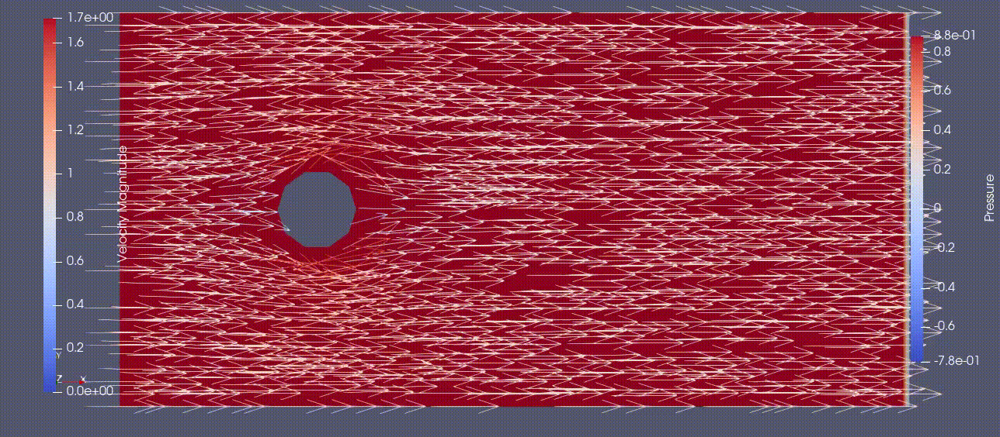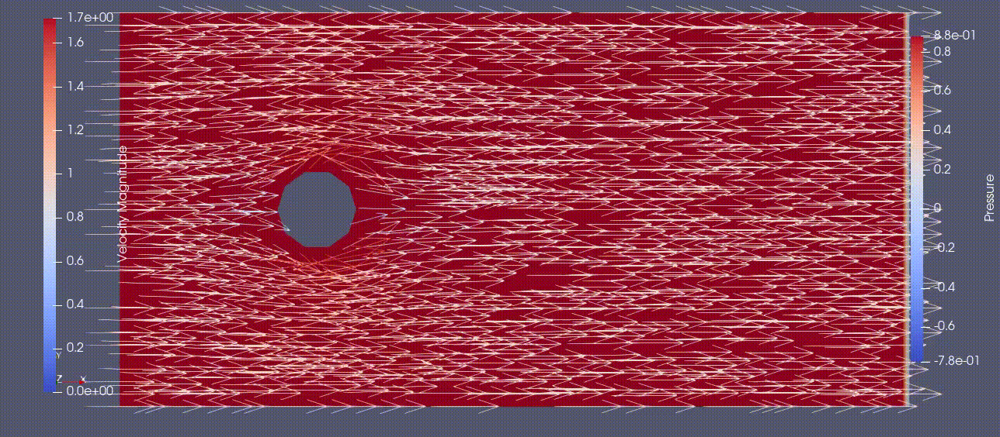))The Navier-Stokes equations take the form

$\dot u + (u\cdot \nabla)u + \nabla p -\Delta u = f,\quad \nabla \cdot u=0,$

together with suitable initial and boundary conditions.

Here we present a FEniCS implementation of a stabilized space-time finite element method to solve the Navier-Stokes equations in 2D. The solution is visualized using FEniCS plotting functions, and is also exported as pvd-files which can be visualized in Paraview.

We seek a finite element approximation $(u,p)\in V\times Q$ such that

$(\dot u + (u\cdot \nabla)u, v) - (p,\nabla \cdot v) + (\nu \nabla u,\nabla v) + (\nabla \cdot u, q) + SD(u,p;v,q) = (f,v),$

for all test functions $(v,q) \in \hat V\times \hat Q$, where $SD(u,p;v,q)$ is a residual based stabilization term.

We present an example of flow past a circular cylinder, for which we compute the force on the surface of the cylinder $\Gamma$ in the direction $\phi$, by Green's formula:

$
F(u,p,\phi)= ~<\nu \nabla u\cdot n-pn, \Phi>_{\Gamma} ~=~(\dot u+(u\cdot \nabla)u, \Phi) + (\nu \nabla u,\nabla \Phi) - (p,\nabla \cdot\Phi)-(f,\Phi),
$

with $\Phi\in V$ a fuinction for which $\Phi\vert _{\Gamma}=\phi$ and $\Phi\vert_{\partial \Omega \setminus \Gamma}=0$. With $\phi=(1,0)$ we get the drag force $F_D$, and with $\phi=(0,1)$ the lift force $F_L$. The drag and lift coefficients are obtained by normalization,

$
c_D = \frac{2F_D}{\rho U^2D}, \quad c_L = \frac{2F_L}{\rho U^2D}
$

where $\rho$ is the density (here $\rho=1$), $U$ the characteristic velocity (here $U=1$), and $D$ the characteristic length scale (here $D$ is the diameter of the cylinder).

The Reynolds number is defined as $Re=\frac{UD}{\nu}$

To read more about how to use similar methods for more complex problems, see e.g.

[Hoffman, Johan, et al. "Towards a parameter-free method for high reynolds number turbulent flow simulation based on adaptive finite element approximation." Computer Methods in Applied Mechanics and Engineering 288 (2015): 60-74.](https://www.sciencedirect.com/science/article/pii/S0045782514004836)


# **Method**

**Define domain and mesh**

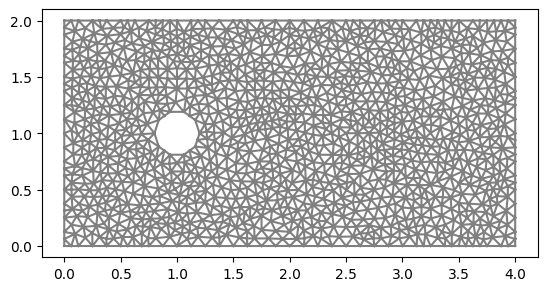

In [ ]:
# Define rectangular domain
L = 4
H = 2

# Define circle
xc = 1.0
yc = 0.5*H
rc = 0.2

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0)

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)

left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Generate mesh (examples with and without a hole in the mesh)
resolution = 32
#mesh = RectangleMesh(Point(0.0, 0.0), Point(L, H), L*resolution, H*resolution)
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), resolution)

# Local mesh refinement (specified by a cell marker)
no_levels = 0
for i in range(0,no_levels):
  cell_marker = MeshFunction("bool", mesh, mesh.topology().dim())
  for cell in cells(mesh):
    cell_marker[cell] = False
    p = cell.midpoint()
    if p.distance(Point(xc, yc)) < 1.0:
        cell_marker[cell] = True
  mesh = refine(mesh, cell_marker)

# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

plt.figure()
plot(mesh)
plt.show()

**Define finite element approximation spaces**

In [ ]:
# Generate finite element spaces (for velocity and pressure)
V = VectorFunctionSpace(mesh, "Lagrange", 1)
Q = FunctionSpace(mesh, "Lagrange", 1)

# Define trial and test functions
u = TrialFunction(V)
p = TrialFunction(Q)
v = TestFunction(V)
q = TestFunction(Q)

**Define boundary conditions**

In [ ]:
# Define boundary conditions
class DirichletBoundaryLower(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0.0)

class DirichletBoundaryUpper(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], H)

class DirichletBoundaryLeft(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0)

class DirichletBoundaryRight(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], L)

class DirichletBoundaryObjects(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

dbc_lower = DirichletBoundaryLower()
dbc_upper = DirichletBoundaryUpper()
dbc_left = DirichletBoundaryLeft()
dbc_right = DirichletBoundaryRight()
dbc_objects = DirichletBoundaryObjects()

# Examples of time dependent and stationary inflow conditions
#uin = Expression('4.0*x[1]*(1-x[1])', element = V.sub(0).ufl_element())
#uin = Expression('1.0 + 1.0*fabs(sin(t))', element = V.sub(0).ufl_element(), t=0.0)
uin = 1.0
bcu_in0 = DirichletBC(V.sub(0), uin, dbc_left)
bcu_in1 = DirichletBC(V.sub(1), 0.0, dbc_left)
bcu_upp0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
bcu_upp1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
bcu_low0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
bcu_low1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
bcu_obj0 = DirichletBC(V.sub(0), 0.0, dbc_objects)
bcu_obj1 = DirichletBC(V.sub(1), 0.0, dbc_objects)

pin = Expression('5.0*fabs(sin(t))', element = Q.ufl_element(), t=0.0)
pout = 0.0
#bcp0 = DirichletBC(Q, pin, dbc_left)
bcp1 = DirichletBC(Q, pout, dbc_right)

#bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
bcu = [bcu_in0, bcu_in1, bcu_upp1, bcu_low1, bcu_obj0, bcu_obj1]
bcp = [bcp1]

# Define measure for boundary integration
ds = Measure('ds', domain=mesh, subdomain_data=boundaries)

# **Results**

**Define flow parameters**

In [ ]:
# Set viscosity
nu = 4.0e-3

**Define method parameters**

In [ ]:
# Define iteration functions
# (u0,p0) solution from previous time step
# (u1,p1) linearized solution at present time step
u0 = Function(V)
u1 = Function(V)
p0 = Function(Q)
p1 = Function(Q)

# Set parameters for nonlinear and lienar solvers
num_nnlin_iter = 5
prec = "amg" if has_krylov_solver_preconditioner("amg") else "default"

# Time step length
dt = 0.5*mesh.hmin()

**Define variational problem**

In [ ]:
# Define variational problem

# Stabilization parameters
h = CellDiameter(mesh);
u_mag = sqrt(dot(u1,u1))
d1 = 1.0/sqrt((pow(1.0/dt,2.0) + pow(u_mag/h,2.0)))
d2 = h*u_mag

# Mean velocities for trapozoidal time stepping
um = 0.5*(u + u0)
um1 = 0.5*(u1 + u0)

# Momentum variational equation on residual form
Fu = inner((u - u0)/dt + grad(um)*um1, v)*dx - p1*div(v)*dx + nu*inner(grad(um), grad(v))*dx \
    + d1*inner((u - u0)/dt + grad(um)*um1 + grad(p1), grad(v)*um1)*dx + d2*div(um)*div(v)*dx
au = lhs(Fu)
Lu = rhs(Fu)

# Continuity variational equation on residual form
Fp = d1*inner((u1 - u0)/dt + grad(um1)*um1 + grad(p), grad(q))*dx + div(um1)*q*dx
ap = lhs(Fp)
Lp = rhs(Fp)

**Compute force on boundary**

In [ ]:
# Define the direction of the force to be computed
phi_x = 0.0
phi_y = 1.0

#psi_expression = Expression(("0.0","pow(x[0]-0.5,2.0) + pow(x[1]-1.0,2.0) - pow(0.2,2.0) < 1.e-5 ? 1. : 0."), element = V.ufl_element())
psi_expression = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x, phi_y=phi_y, element = V.ufl_element())
psi = interpolate(psi_expression, V)

Force = inner((u1 - u0)/dt + grad(um1)*um1, psi)*dx - p1*div(psi)*dx + nu*inner(grad(um1), grad(psi))*dx

#plt.figure()
#plot(psi, title="weight function psi")

# Force normalization
D = 2*rc
normalization = -2.0/D

**Set plotting variables and open export files**

In [ ]:
# Open files to export solution to Paraview
file_u = File("results-NS/u.pvd")
file_p = File("results-NS/p.pvd")

# Set plot frequency
plot_time = 0
plot_freq = 10

# Force computation data
force_array = np.array(0.0)
force_array = np.delete(force_array, 0)
time = np.array(0.0)
time = np.delete(time, 0)
start_sample_time = 1.0

**Time stepping algorithm**

Time t = 0.03285506167650246


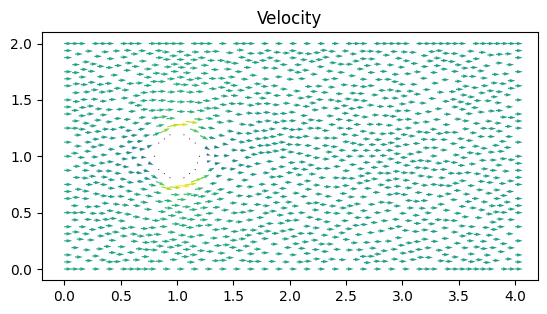

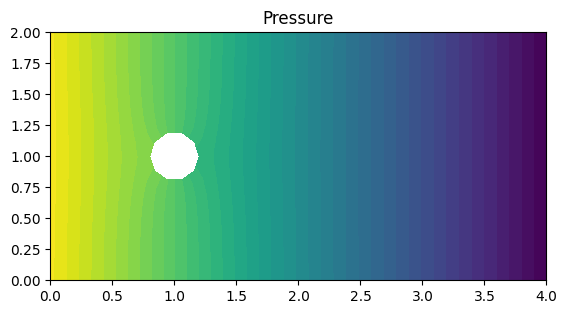

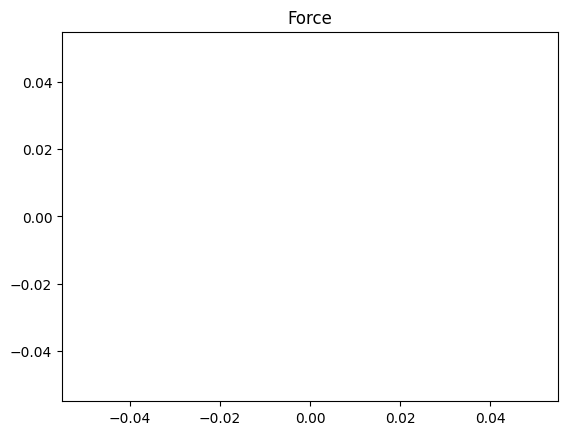

Time t = 3.022665674238231


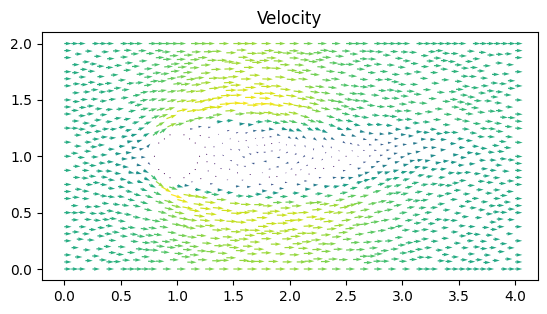

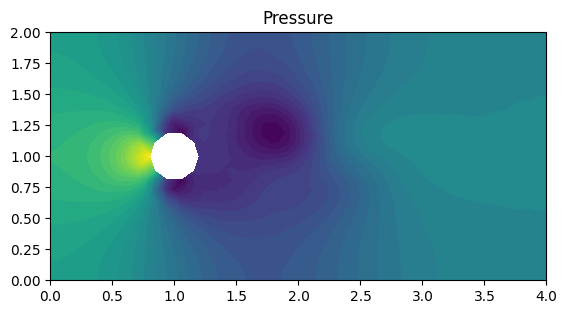

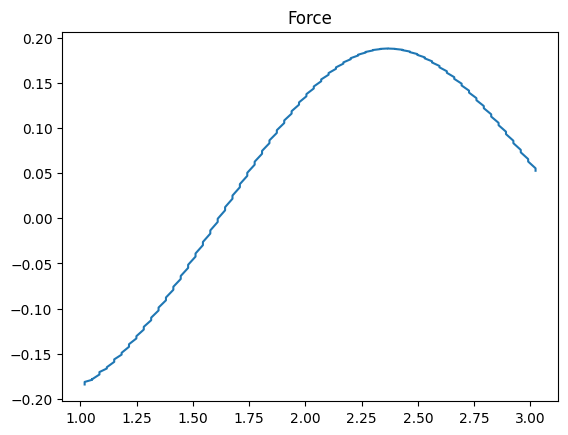

Time t = 6.012476286799972


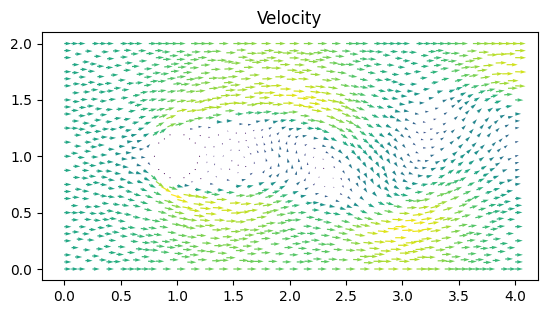

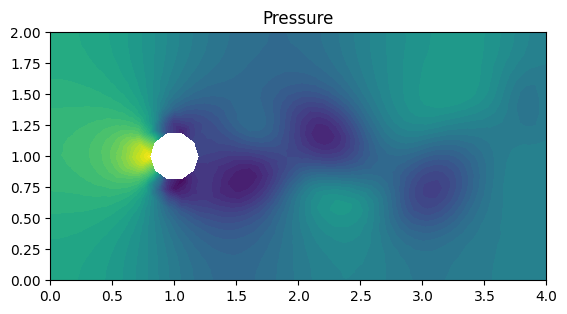

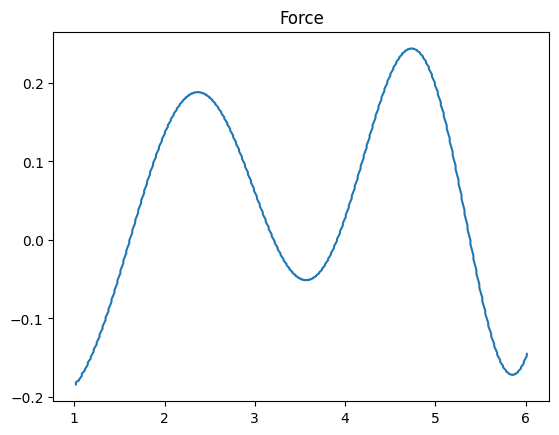

Time t = 9.002286899361685


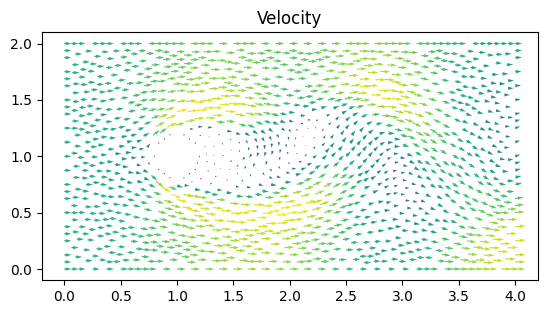

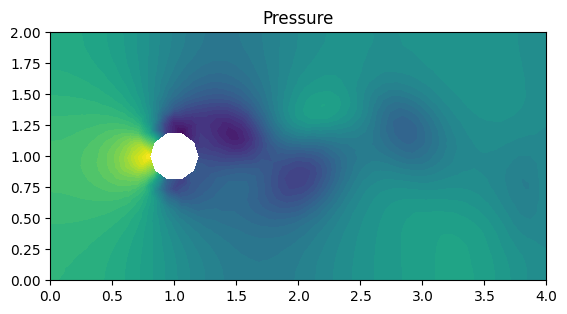

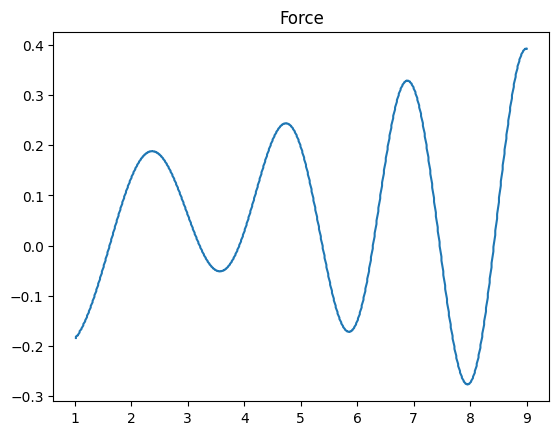

Time t = 12.024952573599847


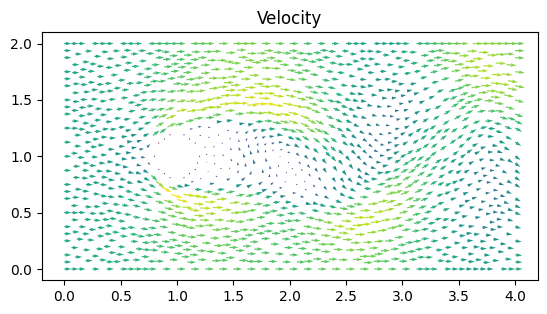

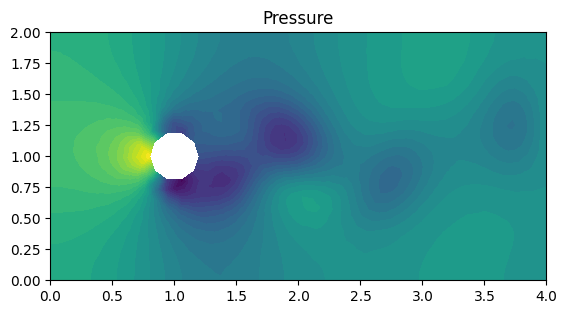

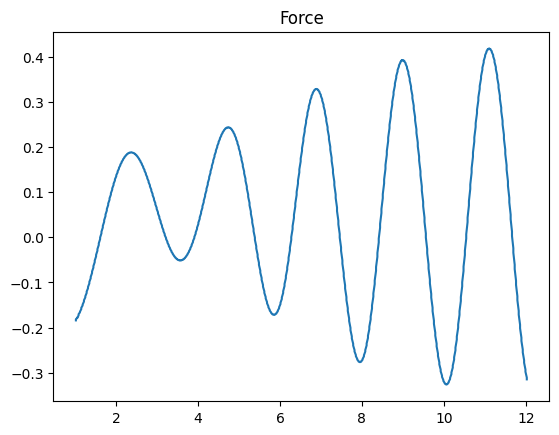

Time t = 15.014763186161508


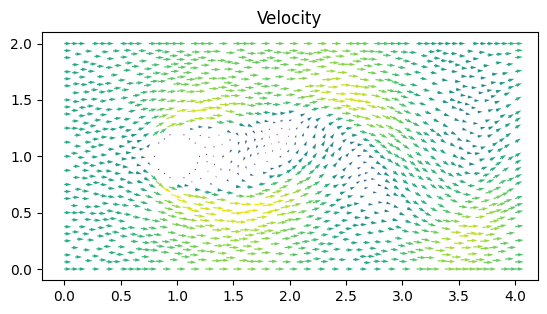

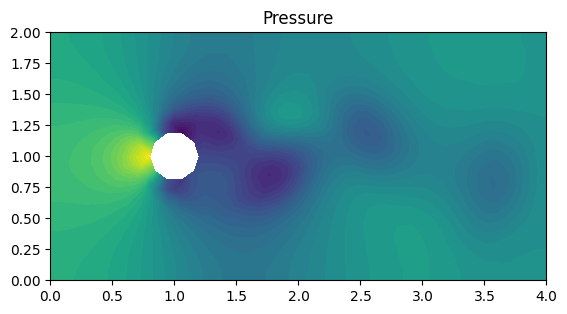

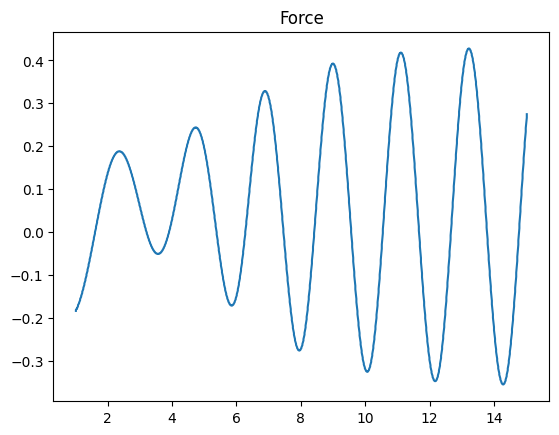

Time t = 18.00457379872328


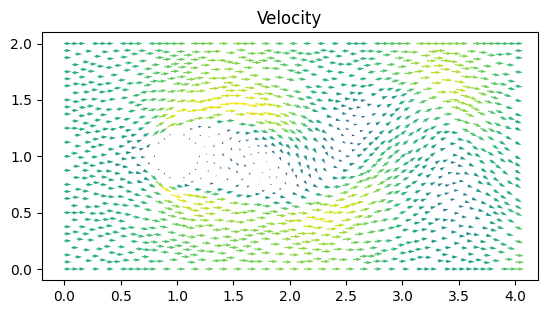

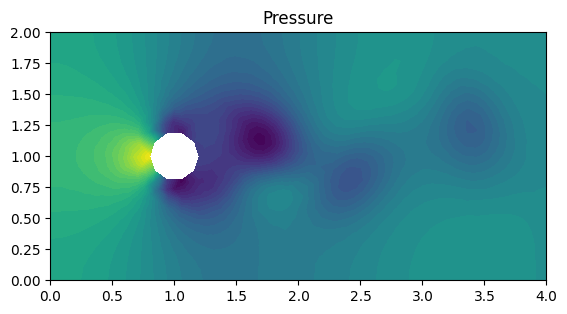

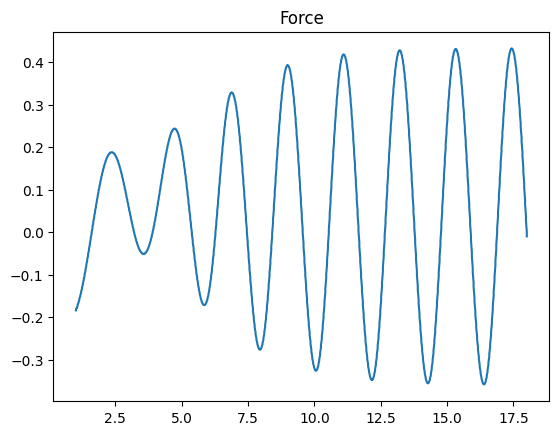

Time t = 21.027239472961604


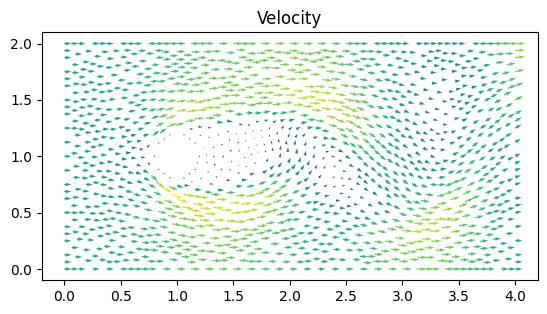

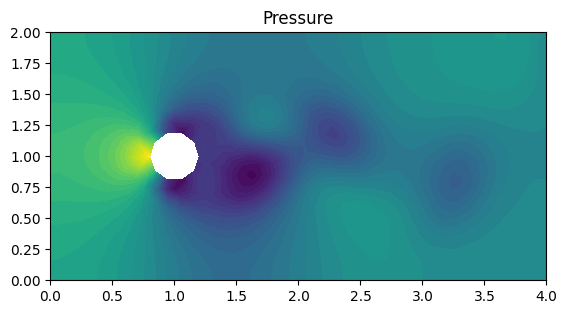

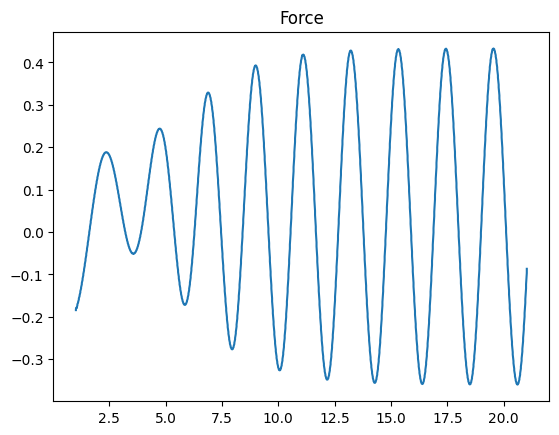

Time t = 24.017050085523426


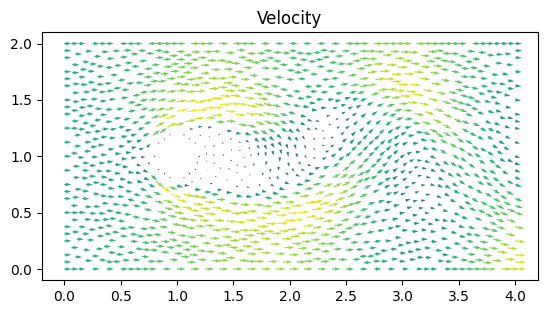

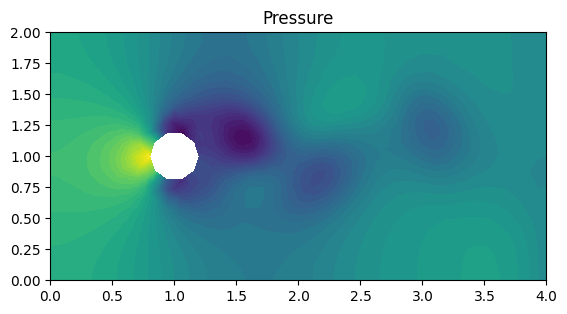

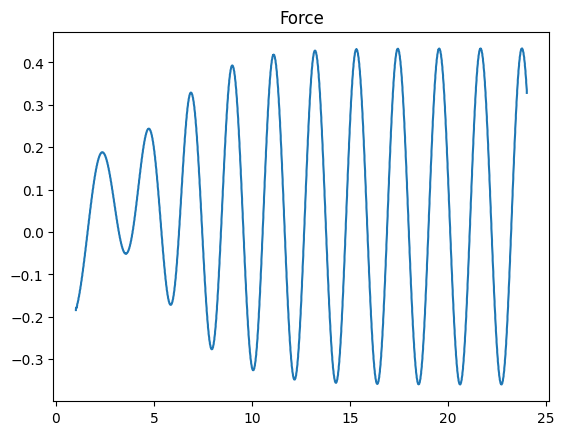

Time t = 27.006860698085248


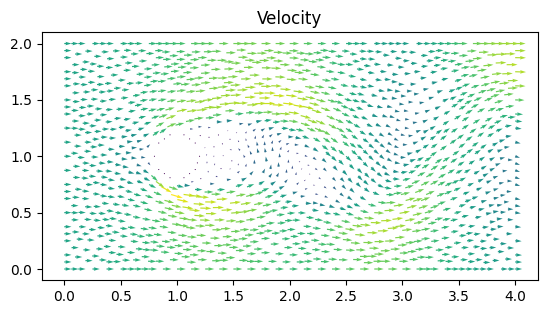

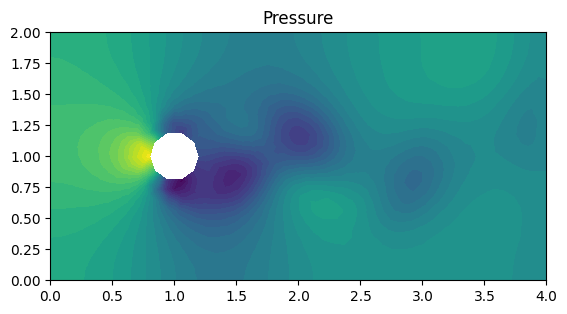

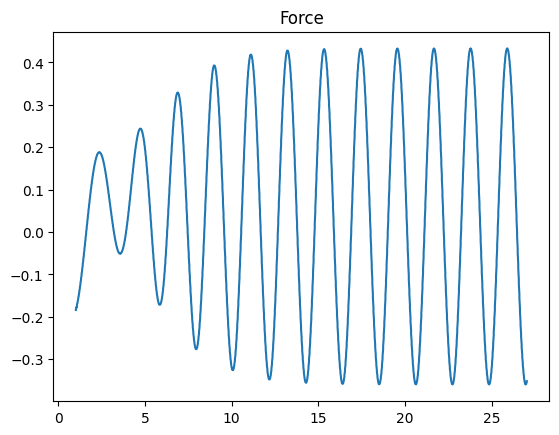

results-NS/
results-NS/p000003.vtu
results-NS/u000001.vtu
results-NS/u000007.vtu
results-NS/p000007.vtu
results-NS/p000002.vtu
results-NS/p000008.vtu
results-NS/p000004.vtu
results-NS/u000000.vtu
results-NS/u000006.vtu
results-NS/u000004.vtu
results-NS/u000003.vtu
results-NS/u000005.vtu
results-NS/p000005.vtu
results-NS/p000000.vtu
results-NS/p000006.vtu
results-NS/p000009.vtu
results-NS/p000001.vtu
results-NS/u000009.vtu
results-NS/u000002.vtu
results-NS/p.pvd
results-NS/u.pvd
results-NS/u000008.vtu


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!rm results-NS/*

# Time stepping
T = 30
t = dt
while t < T + DOLFIN_EPS:

    #s = 'Time t = ' + repr(t)
    #print(s)

    pin.t = t
    #uin.t = t

    # Solve non-linear problem
    k = 0
    while k < num_nnlin_iter:

        # Assemble momentum matrix and vector
        Au = assemble(au)
        bu = assemble(Lu)

        # Compute velocity solution
        [bc.apply(Au, bu) for bc in bcu]
        [bc.apply(u1.vector()) for bc in bcu]
        solve(Au, u1.vector(), bu, "bicgstab", "default")

        # Assemble continuity matrix and vector
        Ap = assemble(ap)
        bp = assemble(Lp)

        # Compute pressure solution
        [bc.apply(Ap, bp) for bc in bcp]
        [bc.apply(p1.vector()) for bc in bcp]
        solve(Ap, p1.vector(), bp, "bicgstab", prec)

        # Compute force
        F = assemble(Force)
        if (t > start_sample_time):
          force_array = np.append(force_array, normalization*F)
          time = np.append(time, t)

        k += 1

    if t > plot_time:

        s = 'Time t = ' + repr(t)
        print(s)

        # Save solution to file
        file_u << u1
        file_p << p1

        # Plot solution
        plt.figure()
        plot(u1, title="Velocity")

        plt.figure()
        plot(p1, title="Pressure")

        plot_time += T/plot_freq

        plt.show()

        plt.figure()
        plt.title("Force")
        plt.plot(time, force_array)
        plt.show()

    # Update time step
    u0.assign(u1)
    t += dt

#!tar -czvf results-NS.tar.gz results-NS
#files.download('results-NS.tar.gz')

# **Discussion**

A stabilized finite element method was implemented in FEniCS to solve the Navier-Stokes equations in 2D. The method was tested for the model problem of flow past a circular obstacle, and for a high enough Reynolds number and sufficient mesh resolution [a von Karman vortex street developed as expected.](https://en.wikipedia.org/wiki/Kármán_vortex_street)

Simulations were carried out with a number of Reynold's numbers, presented together with corresponding velocities in the table below. The results concerning drag/lift coefficients and Strouhal number are also presented in the table.

| Reynold's number | Velocity | Viscocity | Steady/unsteady | Strouhal number | Drag coefficient | Lift coefficient |
| --- | --- | --- | --- | --- | --- | --- |
| 1000 | 1 | 4e-4 | Unsteady | 0.21 | 1.56 | 0 |
| 100 | 1 | 4e-3 | Unsteady | 0.19 | 1.71 | 0 |
| 10 | 0.1 | 4e-3 | Unsteady | 0.18 | 3.68 | 0.06 |
| 1 | 0.01 | 4e-3 | Steady | N/A | 21.9 | 0.14 |

In the following table the way the mesh resolution affects the solution with Reynold's number 100 is demonstrated.

| 1/h | Strouhal number | Drag coefficient | Lift coefficient |
| --- | --- | --- | --- |
| 32 | 0.19 | 1.71 | 0 |
| 16 | 0.16 | 2.09 | 0 |
| 8 | N/A -- solution becomes steady | 2.99 | -0.59 |

Below an animation of how the solution develops over time is shown



In [281]:
from IPython.display import Image
Image(url='https://bjurstam.eu/assets/other_crap/pressure_dd2365.gif')